# Assignment 3

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## SECTION 1 : Preparations

In [5]:
import base64
with open("student_photo.png", "rb") as f:
    print(base64.b64encode(f.read()).decode())


iVBORw0KGgoAAAANSUhEUgAABLAAAAZACAIAAADmTiyoAAAAAXNSR0IArs4c6QAAAERlWElmTU0AKgAAAAgAAYdpAAQAAAABAAAAGgAAAAAAA6ABAAMAAAABAAEAAKACAAQAAAABAAAEsKADAAQAAAABAAAGQAAAAABFmHMwAABAAElEQVR4Aeyd2XocubJeay5S6j6Dj9/B7/86vvWVv+/YPrt3SyRr9Fp/AFlZE0W21N3avQVRKCQSCAQCMWHIzOn/+LcPk1vheDzeyp7MJrPh1pBISctPp9MZYW6iwnE+IWO14G+5Ws/Xi+VibpnpdL8krFek97MJoI6p+7h8nieQP5suCOv142q1Wi5XDeDxuN/vttvtZrPZ7/f/9+9bqpIwHHZGhwM56/Wa+LD31uEwqdj8pa0Ld7EQgeWSCyDTJvhb5XDY7ncApwlqbXfPZB4PU+OjBSaHIxfWP07pCvAW89mSXtLTyfQ42S7SvzkZ0z2FwY6YhkxRez95Oex2O3ClqcNqYouFIZjud8fNcX+AavPZ/jjbHQ/bisHqeADD/efnwhNoYEVNfsn58OGDFGtdWxUN6ddx+jl0s8zhuKfh/XZDrZeXF/JBOGFeP8Sr+YZ4vpAg84zUfHog53DYAcE+2i8bqiqTxZr8Sa6OwEuaaH8oYkp5OmUXE3bbRmfRD/KFPwQhUenqxRy6ZlCABlkvAlDNSbvQCmRIk/EwET5DBPDn3X6z2T3DLLvj08tmu5++yDqTneM4YfQouf7wQnwdwOE605zPBwmDGGR8RXXGUM/WywfvTqXShHGfMFgH8AYxO3UUt/SuwMLxylERYL8n2aixTVdhkuQQ2xGqQ1tHgR6DWPV6JlFmu9DBVs/CIfSpMaIKCYSSElQmphGbnBZKVoTnifcWmSCPhCI5tajeBPoou8Ar5KwiNbPpkfSiUcO72/2GugxFtQirQJPFZPrzzx9Ws/lqPXtcLdfrFQoB7iJ82G2J2wiGRIgF

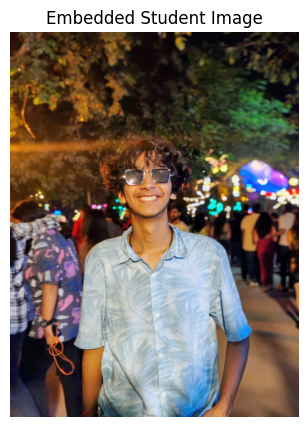

Shape: (1600, 1200, 3)
Dtype: uint8


In [6]:
# SECTION 1 : Load student image using base64 (self-contained)

from PIL import Image
import io
import base64
import numpy as np
import matplotlib.pyplot as plt

# Paste the base64 string INSIDE the triple quotes
base64_image = """
iVBORw0KGgoAAAANSUhEUgAABLAAAAZACAIAAADmTiyoAAAAAXNSR0IArs4c6QAAAERlWElmTU0AKgAAAAgAAYdpAAQAAAABAAAAGgAAAAAAA6ABAAMAAAABAAEAAKACAAQAAAABAAAEsKADAAQAAAABAAAGQAAAAABFmHMwAABAAElEQVR4Aeyd2XocubJeay5S6j6Dj9/B7/86vvWVv+/YPrt3SyRr9Fp/AFlZE0W21N3avQVRKCQSCAQCMWHIzOn/+LcPk1vheDzeyp7MJrPh1pBISctPp9MZYW6iwnE+IWO14G+5Ws/Xi+VibpnpdL8krFek97MJoI6p+7h8nieQP5suCOv142q1Wi5XDeDxuN/vttvtZrPZ7/f/9+9bqpIwHHZGhwM56/Wa+LD31uEwqdj8pa0Ld7EQgeWSCyDTJvhb5XDY7ncApwlqbXfPZB4PU+OjBSaHIxfWP07pCvAW89mSXtLTyfQ42S7SvzkZ0z2FwY6YhkxRez95Oex2O3ClqcNqYouFIZjud8fNcX+AavPZ/jjbHQ/bisHqeADD/efnwhNoYEVNfsn58OGDFGtdWxUN6ddx+jl0s8zhuKfh/XZDrZeXF/JBOGFeP8Sr+YZ4vpAg84zUfHog53DYAcE+2i8bqiqTxZr8Sa6OwEuaaH8oYkp5OmUXE3bbRmfRD/KFPwQhUenqxRy6ZlCABlkvAlDNSbvQCmRIk/EwET5DBPDn3X6z2T3DLLvj08tmu5++yDqTneM4YfQouf7wQnwdwOE605zPBwmDGGR8RXXGUM/WywfvTqXShHGfMFgH8AYxO3UUt/SuwMLxylERYL8n2aixTVdhkuQQ2xGqQ1tHgR6DWPV6JlFmu9DBVs/CIfSpMaIKCYSSElQmphGbnBZKVoTnifcWmSCPhCI5tajeBPoou8Ar5KwiNbPpkfSiUcO72/2GugxFtQirQJPFZPrzzx9Ws/lqPXtcLdfrFQoB7iJ82G2J2wiGRIgFqH16fpICkY592GcHHcQw/BM8uRJRqTKZLcyCQgKdSXZ5fzrdzL1rv1uovs0YHOCTHyZ0jKaH9PiwTl0jepcfYR73yMuRfoX8e0k6S1vzjHuHnt/WFjBLb9BEWhE+Ost8AsIrCtO96mQync8sDNA9vTIfKlD+8yfLo+OAsDkQT9ADx+MMik2OiypZspbik83f1Q8VwnQkQ7fww6HRrZeYTHbTyO8po6VenhxHmiaG0ZKwX+LXw7VUXudMlhnfVkWer7DbbM2LFPgrMyYj8pvkWeQQVA87Vu02pHhPAM5Q/JQCZnIZEX6h0tDWbH7A+nzACD2sPnx4+PefP/63f//Xf/np4d/+9efH9frDx9UjPC1Lwnvy/NPTEzr2abtBwX7i79Onv3/6TOYv//X/FsjRfPKwXH14WDwuUdHKccSOVuFDeGOHbn7aYgVm//l//vb0efe3T59fntFbBthENpqtgmlFxdtpPdqg9+NUhDbpS+mTGcKKOM8Pi8nkp5+X//bz+j/+4/G///uHn39e/suH1Yef5g+r5c+rh8VitlzN6NZCsWfskT+pD24vL9jdowhu95hHevrL36bEz3b3ZbOL9kMy0AkYWiRIFa4ix1oiOeTMZxvwYSSByfV8ClUmi8nxp4fVYrJfzXdLCM7fbD9fHBBA7XOM2kpjq/k87F8wZJvdEwr91+fN55fp02b66RnKT55f9v/zl8lme/z0efu3X/d/+3R42sy3B7qxfkHvxz7RIeQYrQA1YICX5W39L4o3Q/TP9R1G5jqTHHXne8IYStcjJw5vHHuP56MJz1sbwzu/89ar23S4R5/FYs+Iy0LLBUMKFy1hgPlhvUTdH/D9uAVfwQ/lS6yfHmSH8wBqDw/my/AHTFlcpdiF7QR9OMHP226P2PfnDR4artT0P//rvyaTxR5zI3GkEzJFPC0bcdVZWLHyLhN4a7cCTt1FdtW/TZ2LoqNLPKvRVSUdI7zNUf5p1HYL/XMMmnfbuAeTqPJCvsficpxslL4lZMfhnq4RPeRvdgi9D7S+nB9VRDqp6qufQwc8FepKPZU9YY7XdNjPtpMDv1gfZBxfmrHY4J9GNIYRs9EUIAFALWMP5Pz0KLY11prObjdx0VJe/yE+hY4COav5khgRrVZIVgKFg+UEmd1OZNRCuHUO/c9gRY5MEu2NWBPwZIghG/DLX+ISaJDF2wmFqgXuh4c7d8v/FMsEcChUP6Gceg6/5Ncl8c1GVos21mBUBYoOhRWYVcWh+pypwS06Pz4+Vv7Qtbp8+eWXQqCESCIm4JJXc0Nc+GEa3hcGzIZqldO7M2S3ROFn3CyW4+RIJVCIX9n4PNTdIebm0G660wg9kHuoHWjDlYyVnBJySDCAPCUoPdQ65fbUCNaNpFjFeyiXKTxusYxtH2lytacGUkf87fPupqkTDpgvio2GqyW1hsXlI94qzAP5BnpkFdPTPmmoxiUiSPnWv3OCFIje9cagt+Fe5aZ7Re2re+cZlkwYsrka0pWonFP+5X35ofpO+VYs05UBjplSUYEcMiuhk0OKycNEb+nibl3ey38fUW6C/qMyf9s4voId6pXuQ1P1VNLjwpVTjdaEUIvDnxPGTk4mABkvrovwKCbKzLBI0SCMFkLNPAfIAOS34pE4DG1e57Wc3nFLFlh+ezXEVZVbLNAzz347rqdKlVMoi3ZNGCSE2L03NJSGn+DmVaSUhP0OM9ui60mhxjmjkh+i+gtC+an4NjrN7F2hy+zyukK0xTBmp8R1yb98DoQNbSXCONDx5n+Y28hAitGLq0ZOo3XV4tq7ZhaXms5Qc6lRqPGE+VkJqNW3XrIB/7Y/th2JK/Rcm3DRcxpH58DMFWcLvpMl49LQK7yuOGR7ljLxKyhpmT6BB5rGBRDNI9QvC87GuB/xqMsOFjEhBIpBKWK+uQG0ayB7kTjuZswRd4c5/hwOE+WgyGw6h1chkOIgDW3LVrn0l1XfIlGje10kVoZ+hD+KAsVRja9YDGdkSmFmyPTZZi7DMQ1gPFFujLgiwyw/aWKGVLuQHISBnIrlHr0Y/hSY1gQrFumaPPEPG2DgEe7jdGXL5PozzgkVmYqhwHlF/T1mX2QykXHSRyo+sEuZrAUxGqdgsaHRkSVTogjmxP6WjaCtKizE83TBKcBVZig5vrxIp/xZXsE5y7p5IREY8yLCzRJxUaIXxrcLfiFPuqg3xOOSQ3ro6ZDznSTGiFVfxohFvk6DO771evrdE8JapShsUM+3oTtgYOOf6+gu2Ed3g3gL3JAdXRagrOyF8eF/49cLsBSsHpKg6ZrskmOmuwgunmJbwr9AMDUXqI006HUTLeMORwuFVmSm0Q4ZKEONWFWhC0yGS9CgAaEmIfJmIISCSl1+I65cuKRvYXRZQUDmMLX80Y5AWJ0RXQKQ0oGQrwpbwtqu3hw1wKlBnBsRDHJoYfiresbVkRDHxWGte9Y83LppeIofaNQVq0uFBTEt6dOnRwVRJGmqUcu8dFqMqpiXYkoYFaqMxFLpVhiKXNwctz6UIUExLyuqFluGPxiQKtOgyagMPWNKtvZp6uozOB+YH5N1HQa37upWNXaV/Sdl3KMP+XWrErnIiPwm9J063+9gDJQRssPyMAVpDlq7l0gSEo+Go8QWT7IQ2x3cQapFPCpi5i3AAOIOEOswxkfm0uk9oRCpdDJ6FICCbWyRhUH2wPp9fm+PtWIl23oXhgkEK3UeMydpec6S/npfZ6ex+RVkvRoVE0Upw1/VKVA2kWakjoZXcx3NpXgJnwJpRfgCsr/kk5c4CbQJkHGPbMYQrMbRiUppTaiXoWukcX7hQAcq1C+Y3WpiXO+vmabXsOQQFxGGmAHKIEMchzTObwYUcXBctFxVPVSVyRzjkhHGvXmzEBfut2SsG9JTVC82KcIC/orNLkleA9zqXt4cXRc/KLNgyKa0mzAL1tjZpcSfnO347zKODJMJIQRgS/BlxySQCSHzxsl2x0YNJbSYlFNIEtjsZvs60iQyJKQJ8JwIeHYiNAn9OAkjm2cqetgvIdWccxvHA5PA45GtDGlL68RgRkWkJGLEbf8oD5VAUeNFAfqBG8CJFgUTtAHSYhEJ3QFhoHCEPRc/om9JgdhTxtRhlZk1tviAezi6L5/J2zDI3uVpBtZBVgsxyEqBo8fw8N8igAmbJc2AMjkE7E7gE4wI1VmbID3W7W2QvywE37Lfb4Rlfy6DOYjOKPuUjum8IfWB49EB1Y61qS+c5QJCTz2z5jkuzLEncXKgiWKDjCKiqhIpn1YbxUYYFJ5jbBEpG8j4BlmuuA9MBykY3IhGIM+SvWihnqsku097VrhdNFdttLhDjhq3/wVBuxVQaN+WBrsQict44sIrnIlvtXTKQ8+cLkapopgkqL+M2O2io1pfn7xAGMJVDkIB8E7V0+91i30cvXON8LsnhANCJqLNq0lQuG6bHPKzYCGKcqGGgz/nKfz3J4oCOa/qgBUywcHmJ4pb+a+DM/Yf6zUECJEaVGkUoQ4whRAj0cZLZaSdqFBlqtiQkyonmpZrW5nXcRoNN5hCizHD8BJomicsk+ZPPIha33BmPfYjz2PYsIWRZGFDh+M8c0LwZAZNp1WL0XOoQgpESxb8K2TswVVmy2gUFjVggpOBZMXWTMhlxiJYAw/f3ti/YNPgXf7QeQBIAlFuaXIuy/VrqXUrQCchFJzzAuSfKDiCY7J1K7mVThYAWMJuYLL6XihBRswSs28QjAtWeNJBSH0Ww3EXOVXmbsc6Yn/w7z1Sk38Z5ESOPoZM78cSPUIwwteCFnKILlpy8cyUVlcQwl3VdO6SpMrCEYn9gF8QWaSAS/3nvYOhW6pesAT23YFLK+AKRxTGtOjwFWuNGcy0kyluncci18oH8UK/4g41+J9HNF4ZKdMsghhVZ8OlHex5zbddVV2EHID2U8ZzYono59I53jBIg35LghuQymCZTEehZJ8QvtZ8a7R3YSgKqCE9JKAzfy3goFFLlIasfuuf4DfEhtpDcCriMDVucDgYwdIpVdhLttpcyXB2V8FbcA5mIQRHWvgz8GQApZ3Z8A8ToJQ4ogoZx4MazSn4Ov0LbB+Q00iR77yqwzkyLUPEXHyQFUjjVXNaf7M7cvRuPs/B4gnHLPeznUWcVwUfjv1zIHTPwTEq2zVZl+6AfdezAUi3sOyxCO4V4s2zv7dTNYRdD5pAuRcg4WBOb07Y/Jvs5scd8Gif8wQGjSSO7GS3Xbb5Hh4BkLPyy6wxARQJqhzXU0DJKaEIp2shGdhx5d6lOko6BE/3qBinasv2foRvRQEIzUgxvNlAhuQM0ZFDjG4ISn+5g7aOc5gRPtC/r9EMS5gUE474onXa+gi/Bm6FceBD+JZHe+RHzxJGE9ZcxbrfcWi9O8PQ/kKjUd44TTaqgBBezQwO+sV+okLgeqwuBahiLZ7FIDAJZGa4WMyZFtaEEKlyv51LpotN9djooFXcrleP6Sirety3N85enAMEcOLCc0gkUzhju8/lEIR0K/TypQRTPMlbZYFB18AEUOAUOpAWpdvACwidsV5oSwOAJw0XmaamWsglCUvkshIXcY6ZX+S1SyAMgaxK3y767XJpZQxs6A5CQH6RnU5VYlzyjemvmxBKb1iqpuxFWXPGbWMI4LpYP33xhvH06CN2HAIJAPO1n/anyKqWcI3I8SNABI6rVF0KlIlt54bzbJu1QMOHA8InIIEFCF6dNKEj6icNUIj7mg7YQq5qjE5hGmVFJTtINcUb9+aUDloU17Bgp2TPyFYNhZ6xJl87JVvSFq24SHpgAw4mrAdo6POc6Yp8KyHoQGasXCiLBOAWcathCynRjfloGszzd0LsIoWRFVr6lVtZVNXYekXEnYizw0eahwftlX91C6LSBAPTJMc+oe/5y3273TEIARpCdIQb4OcfKka6GoJzw1/iR8vnjkNPYoirZI1IUSPFWkSxlFQTpZ5IkOOKJMlOopRKwfQBAqvzKChGcl/HrPB7SzzG4s9PDxrtEpUQBeqdAuPloEjktwcpCVUY7Ft1gGWBdktdy9yPq+7InirVQDCmCe4wMPLgs+Iptjh/xhlBDgtRuFAlQw8gfwwZvBRrdQMV+yaTl4ZJV70kEUZvNZKTrgCKADPINu2uP13gKClDIgdmBh87J4BqIq1ZY5ALLwwnSeHCCokrIWLJIaHpVZqEYDaNtNkGV2FgbsPRtB7/m9/Ii+iERnGDvIVMGwI4HkM1MY7r9rin7e6tBQKKySiBCHKs04cKBX8M9a+fLtrCtLqdCVK60brGeqbhiRgwbJCTfTP+fOKF7W+ecuG5ly01nZQUvWq8KYyY+EiR6yKaCTbeeOQJ7RQm92RNlZcbdKPRpcW2XyR74zHLOXSFskxCcpBkpp5YXZHc8OD75HmD+B588g8kEMIZXZA1U4lHlXlch35hqN3JQXZhCvDZcnwU15/TfdUHjZxWTKHaHfcIn5A0cgLWvrPg465O6BkB5FjN5Ij/6oTQiR4P1bJRqMjxpN8Ul382WcqPYoIvq7nlUKnqAwlihlnTOsREqNPDSlNFJVoUy7KhUrLOKSiwkIcG3kHPLxL8R4EzCiA1DEYRnAQT++WWwWBw/R/VgpKP7WbBwJG9DE544i0McocIWcj9KJ5UP8J4PEPmQgYJmM8hjSbvvA8bkjlvMkTyuwgqgssQPPvrEnKz98EL9Lval6AMtEAVXSqoGe8fWUG+FLEVm4P12o56kpOrPP7otDBOGzuIzBeo5WoLUKBagr8MzKhliM2dGhjaq8syiJVNiwlaWHWYsSEoad+EeCdQLOWtUuUjlvRIOAZbLxRTUp8zWgG59o90Fh5yWTUuYpvgf8eSu6RRVEUqGiBRMQm6flG9LmnnTr7lizjj+Gbhb5jJ7nh6BFZnf5kPNvrDFHa7Oh6hANdywokVPzAPTvLQefjtE0LgFIvcI2U1BFrOLjxHkllhJhPhAdggeJPfvTCqIP/EWfYAPryCJdYYE9JHFUpdVowxqoas1ZiMInZUe0HHXZeSn4sIJZCUJFGBFIULmQICf4hcXzwg8zqECQBa2q3ionL11GkTElgt008mwACJL1lzEOwYlg9TGCdPJk2jiigsi63FXmtbibFcQIJKjF/6CKhQacTr1xhWDn2kirUQoANmtIXqHeOS0DqbtOW9dtwkGpch4L0WwgZa+hAhhJcqV6xW9S0F0ARQqQQ51ZXhshLErdX+2y4DwbSzBLyGKI6UKW4suPQXH0ZQnE7R70az0htwg5BUIc6MmDrJHsfwhF2SbGfxgMB3ksjo3MCl8okrOJ70+w0McwNWskoxShZoFy1T5NPnchyafnU4TLP+SznpzRUh7i1LHvqDeQ8OxJbe7AxQIk6wEBgKxk7Wl6MaWPMFYwxE0UmUBM3RuL00u8det7SlekiZU+WwjZxwYi9Q7YVtxUszDsgvGNFx47ARGdwYlT7VeyXVsbJLSphrYvyw05IJMrzWZLwBlnYGMFFySTh1SI4zQRfZzyaEA2EucEBbksOQXYQM1ymv7tM2LRR1xgnKhain8n/5lJR2vp3ziMx5CBywhOlNw8y8pwsrpb4p4ux3usLMsja8vYu5Vl6+wivKhJOBq2Jah3DAghmY8yX2yI7IzNa3BbFKyFK+CrtWCB0IDJZTGCXkvSG4nZhcRGZal5oNbrY73/tik7gas6Xra0zfWBbce34znEANp7W8yIFNQvqMWXJ/hu3M2Wa/4WVHG3rKbg22BkhgCXFQvbSpMcFw02I3Q0vMuUBYz1XOYfiYtuWC90kct7yHbe8xwt1htt5P2FVissgZUIjO1PmotVRcMay7yZzpH25FjBUyFJUPIQHoPDA2U+Dqb8yl5LQqRFdBZT+EzUZzfoRvSIFQO0Z54u4xJhiG2E14M5PvCGLAVz5VIxPznxIsmKDslQB9nFO8m/LyLHNcm6AUC4iY8jARUN3T3u42exjPOaE82Ybyex/Qos85waVG2YWeP1LT3AzHSjOym1b2UKiGAw7WiMRf49cJISLBDiHTQcvwFh+3XmKzqJCbVYWyNopoxS3CqmDVcDttmrSLXPo+aCbXfdK22FmtB2WtX1aCeBSqnL27DhQjs3BoVdL0pX4rww9uggHV3rrzRsZaWb4ZCv5wy8u0ONCfjkO1uhwyh/JD4t4t8q9DanUMBxDfNEGjwCMG+QFwZTYyqm0dlwqnQil9ezAGQK7N/aYwoJXaF42SB1EaXeJCMRbwFVg2RDEz2bauTIaVRUSMiZxYjgtrlOkz5sF12Yqrh+RrifvjFhrqBO62RKEDx9hgQyXusIRSAMLWJCqQRU6jb5w8zIkSNqJ4QR7HwGJoNPGOTsUybfZGqA864CEGonPwzU40S0GwtD2NspeY2PSrxdzxEqxvDJ2K8+AcsrxiiSnJWlHgD38nTOmjALlDXReuIZ4vBaB35iP6JpIOAdszhFEW4iFRaULkxa06JLjKsQs21icb7dKsyxAbLbG4QTwO5KShU5XhLk2eckcpepMrsCpa6WGT48wvAQgXiVyKBWQk2HldGwcm6vA8bvxotyk+xAXz+4kZw5vIVL5DnJD+mrpZ+JVMHapIUWpWdejRaFsVT1ravQWfFqmWYk7gIRyvQHFQ29Bj+VHGFDvyvBAxgHV5geuQWCppEwxLXLzy5M6ajqUckK9WiYcy4zTFxqzEoHcGKQBmkALn1BKhdBI8xDNi4oQQdklML80/LUdZGSBfDtRKEFBEz1UJKeMmkgqK3EJGkC2YqEsKk6CYMqjTJKW4XUXPmrdgC/jfpNSxFyFvLRvyBhLRk5YOFWg9gzQU/CdK0PeyFMRtNHyr3oEJE1TVTNRkJCTJTppbFhTwcTumhQmykcPELIqZjUUz9rytGr7H4XVTi4kgD87tZkdf74mAoKkYa71o+YrVKxCppcA0dRbBCGfX/cJWchRG3JUwQaVHdgo8eVfnnEnXdjrnfdazw3Lmq2JWet+zBVYiheEb/XLe6+gLqmVUYFEXx5zqzASZ/dJxe4j3Lltm3jhlhsmkkkAe6Mnu1AVEKMOLASWnE0bV9nE1m/Bq0s1qsTnMH3eTDS8EpHkfvZjxnmLebIqbwAtSTaqxS4tjeCCSwO0XomNnC5OYCNABm6JNqYtWUYLG0+2U+vH7bSjAQKDNGOSD73Vl4QOmY+lAfc9YTDkbhRp1qYMH3CzpACXIGKoZmXwW3kAZwmTmc0lEPoPNkOIQMht0wSWLL/g1zHsY5y4EEbDBLH2bfn0bKOnvBSixRTRGuad0vFN5u4I8a5gxwUa48DZjmMo8KWksrECiHBNlQjhlfYdZI7RhIGqDJAv9Ka/DFFWkOwfcSBAtu3jTWqREtReJZyBUJhQOfooV3VGojbFiaYVrXf2hRxkL7p0HSpFRxUgbArVb+ZJu60SfABFGqR0ecmiPNOtWDc+CTWdujrmwaauYglUkGyJPhiQkXXxYYM5iVunOrvsFPEmyIIRvCxR5t8v3el/7y0ZRSIv4OHz1F0wUs4s/KLWcLOjh8EehSpekXJPr3RPCUPCyVzczq5AjDe0zHiZcGXU0CC7uZZhIDxAhLjxc5I7bQ9IwNEGiLklUoC4QSAuuxh7lwEg72AybWqnB190yWU0UnJbVSvjTgPAzQmx0/zJpW5GNaibSh/XDnIfg5NJTVFmh2LQWdp4Mn9QIuGbQaZFjr1rcxv0Ip0M4BN0CMhBLhbDdEYE7gd4N3aAYlwQRKUL12DK9s0kEaeVNVLJGVWmwCcJyo6RtcoafIhEq9w4qPZvWK/QMf8kZLvt9f9PMcOd2otWl/d4FcvCU1WJupWJBGHVcEn0sLtGJHHqiV/zzaD20Tj/GsfpHgGB2Fp+roNv4fFe5jmsFB+y3hxrqGo+uTXQOa5Wd/ApQHk6gQf7jwCLweJJ8dqJehkQmd90b0Xg70XMw3EQIkSV2Ez8Akvay80U1Oly29voPLfakbFCBHBI9X58UNjASOglAh6uNezOkwoqjiuYov3BOfFrSgT8GLtS3hDHYAKmeg6VKkt0V3eMztE9QG2I4V5AQBkWOnYuQqj/u1/icqgwppJ50o+GQa6IZsJMFzt1SLdXiWfF/sgtJKl0NmfgxOvwxbTrulm4P7vKwXe6jad2w7X9+Q8g/T7gwxytOg3w6w3pyighv4IXxAOjDdagnzo1wiJTEjKPUjoFsCZ/cGrh3jITIJ5jI0OJg1zs5+AYPO/acBeXbPMxOX/guCm+p1w/1aCgyQxXklI7wov9tzr7ifgOGLWdfAe8aI7NBeknHtVr6/tM5ezi4mHZBvlbOwtdOiDEVG+vi9NcnVtwJovIWXcHk1/OobkysmZHyOR9enA+l6P+y1laF5bIJ26mThY0oy7hHbmVkiNoARcDh+RAQxAY9oCulZ+mwDpkhzo/om1Cg6Cqn8ef8LZqHiP3erHm5GKhDP0PXZU+QEjC9g05MWnUG2yQHlwVGhSdyFw2cx9F5eNUVApiQKaMSVyewvgn+fwqQsV2IQhhjIQEJEdymRvyMhKYDW1SBtAFvhnyUjX9RHZkNckcJUDZMlki6edFA41VyTzWEoKKS/OMWl5HFmEslCRXnqW6L5ghbrU8JsiDbCukqUOmUvRWJSSvfbnOdmkEPTMRpiLmjSxbger9dwM9AUx+Y1XxBs43zEP4s6Tc+v3l5da9A5ROPw2Xl3+eaFgvwuGuVSQw3nDXbe48GvTAiNeJnhdmoK0fhIpfLodWLWyr9NvZ+qg6c5J+E4Fc6tnIkN18n8kQKHxniseIZX6dZ8gUztrOXSx0RXRqGMACzGnTABmx50xkWUGbnczVLPjfiDvjM7/i1wFMtbVYzY7GRm26OAzb4BKrvyFaN0AYKA75neYkFhQ6g1vUpz32/iDaXyw21aBmKw1tsvgOWbGvXpiQNYzzz3RXFxrr2h67RKcu7JIo0sjyDJCKcjAMIaH8pHfn1iLdajKesea3a6iMHig4vfPFFjQc7oxIxu5yF8MEMPivDSjNPThNnOrfu4x1qW6EeTcmlFBU/1q5TmOvd7jNxCxG3RE65qcJDImqJmjRyzY4HJ6DwVFyXZX3Y95LKYeEddAEXdi8l4Dty5kv5DzpDylIuQIbzPDgFlXI0aO/XY+IzMGq8Qq4HCqRNI52DBNL8Wjd7Gqq9cieSX+Wr5M34edu+G0kjEJ0yqs75/PMT35GT/fiwFaqkrYFVv9R5+jinmIFbspB/llN3pUgCmEAZYlAF+elKPNVGLSYhadv3hU7CV6IhK1KwRBs4RQpyMs6SpcBQIOnpcuX3x4rCBUzJcXzP9qjIqQBmPXn2S0NeFxbi24qVCMCpQ0A2CXxPjI5XnzMNslfkw+3WxlzzI7PBraKNNOSGizMwPxLBfaYvtMmIKJTwHQ4ZBlwfcfrp6TO/sCHXFcgkwPP+yIEOBB6gTiDIb0ODhnXRwxj2sTyQIKazTP6S44og4aQlS11ZzJA6agoHm3KtloMr8gSZHalURugmacjvolWY9DjnoNsQXBWBFqHPXOmGMQhBPMCpjPZoAXcG4NhcgOqhgiRhhdoAND42GO12fARPEFv1ga9PkKf948tvvnPEID+3hPa5aGJGZzrvrtbtO6gDspVgmT11W7Uoh8qw1nDZ6G3WKFkFEwNtdHVKQoTTxcB26WoQkOEoQAxVRiUvk2P45yVv1xqXH8O6m1+FOrChiY8PH9ktU8p4C+d8iq7mo4IoTZwptijo3XqvXaN2+Fl1zbdP0Ta//PLr3379O58hZKRolF6ihx7Xiw8P60e+w8kHef0+2OzDh0c0u5/0U1R8xcbL8zMbH3yuFw20mAOdw3NyFK4vz2GtVk3/CDGhEirnmwGjA7ZaOieiKeJSJA2J5+fnGZ+enSPkfr7PTZ019vTAx2jXYOBzR8UGM+w4Q5T5bSaBsYY0zXtHM8OCHuCD2PJ+GswZG6esTMPYNOgOJ/9lVC4WUJL+8iVDztMSwtN7dibZp2TazBbH9HG9/LhePq75IiKyv4VQUCwMoiVCiwCIw6mhyRzLuYEuGNLl4/Gn1fEXTyqCC/wU/0GVwAfWaA9mLikrOjXp6GSszC/G5/z8xeJ/WgHImrbH0vcaMuGQGwXe299qrzGaviIGzLxfPz8hU7pxebaN5gjkvOxeUMg4DBfx0+Z2/ufPvzq6MJImlCFFTib4X8VgcpiuSBNj4OM5Je9ro2s6VBui8p4A8qVbiCuoUqWM8osmIV2WsbTKyj3SOiIXJWlfqYDHay3KlPuq8xl6/sznunFMCWW9uv3C345YKBw+RaN5wctmgUaakYH9pCEk1mJT5P0FCts0X77t+7Tc2f76XNiqHBxKj3Unp77HW0rmxHU+c5weiVGhhHOsnxm/PdjTCUkYh4MPvtKKmGAe6wknHgc+7j9/bvonhwt8KhsOp8zzS/Nv6UaZQXrAlDAAyNF3CALurJDIqQNbUwfS6T5+oFe5F/Fz5jsXmVzWUwCVD8JDgW19X3e47olxmcKHFsWHFzqfh7K5Jb8nuL0MVqEnxV0nMK3j11b+KTOVmT21/OJXrYGGVlvSpGSAZ+IE/Sz71Qu6wf2KLwpeZHJJkGGCnHPUTl8IxC2qkyDYKx0nnHhZttXD6ObRQVvxKIhQiJ0o9XRKGkHfInGqWyPgs97RncXcsnDuXtKjYFozrQxxMoyGitSksEh3NJJQlqqYbRDKBmqLS2rIgu3cJAlMWVDz6IltOiWR8Oe4i8PHvgpSlXVWbyFVkuh+EJVRAdKIBO2NM8EaAKBNS72sOZiO8iYonFu1MAzBQQt1HjhOHQcExBytQQfTSxWwdTPO8FmjD1m9GcpzlxCpz43Lu9cCCZg3hYLcxjsNDYja3XTJZQuRyR+raIVYaqZ/1ctTnD44XDliIM2Ao9mqxqJchuSbsPyTCg1DQM9B+F1YvFK+wApOe+9VOLQNKmOp/k2eaWXbt8cs5S+XNqgENVlgAEAxzAVi1fQQk6h0tdvHt36N39ax4rGLskHwovnLS0SgRt6pYOFCf0l0WbZCOg8lIMhJWSUTrrdwFSjYRa4aEJ2hsCbUIXA5DtVl6DyUYsorU6ehccmvTFfrXwnkL1Yd4jN3gkfhUkYmmxJM1A/PW3bw+Mp2PpoSZ4LhZZHhxUOYOyY6eDzlsqCHARLNLw/ETOHG8YVofTY/0DDfs4VOEzyoyrtV+IT3jtObvHfTxT6r0DK8RtZ4gMguxhgSX6L8ic/pC3VdpOSvtgdZpkA+cXTwEI+TVV7GwWluDusUN764HskyokumnNPTXdMIY5vCiPIisuA+ndaKS+6w1AGwKmSL8DgF1LEQLx+YNoGFxy31cxdubvAQ1MzM3YxPyePErmbH9TIfHvCNptPH5ZQNTBYJbRb31I1Nvk7OxiZLJH4JwxdOHpmX6suCAcVKNdC3k1SpfUoVfIlmP+5/IwrALSjOAIN3pitZxQWtFz4/yTDJ32cxQ3mRU2XyZGrhpE51dB3lmJpvhOp3BaasjEogdhaFABXJrMmVy6rsBPKdF1MoGQwqK6EqGyqMOwKJIqzEmg0eikeC+VXTIKvNeMUMISceYke8mM0hR/6xEhSZbjpHoY4ESfkMTGtODZVB6W2LuKHhYyqCWGqQSxLJbHKKJ4yqzW6wc1QQAkvcX7cuTQcrWtTBOCm03trZr3iEqca51B9fDmm0xZAeJ7LPOs5o6Ztwkilur4fW39cL3bl7vXRSOVAGRX19N6S6Aete/rsnhJoLxswRRq4dz3Zpo3G+M/jybP6yfEA5yQS9CJCeJTv4lsHKiGM6arov63EshTLMIrMob3l6SiOHmS/m9LLD0UNCp6SoCw0aV9tkdkN+Wc9CCI5jtG0Qq6q41IO2tgH29Yf1oGqaC60UG9sqzNMV75NzEQolMk3Y0RYUVBCn4VCCFWHbd11To4iTwYolbuaTj8ZrVmmOXUL/jjynz4P6HNhRGJjgtwI2ALK3A5sINEwRpoElYw2P7LC1OmoFu0SkvXYceYUb5Rf0OaRjBBxcHy7mFXGkFDsIpbTQehCgOrREEdTsSJpIdX/8rXSeKAGdBLKgOjNIngbpefWbakPV4erLCVCraib4n7hyhBy3hE4OgOAQkCj8VWENzdTMKCFMOveyiogCIWlGAGK0fMrUqcG21oX2RZ1l2IeGfqcEfQKy/09xcpKf7LOoSg5Z9LMgDDnXiRCxske1M/R9xeBUqeOjNVaQIWiIDRWBA+1CwfjR8oqrj5Bc5W5hxDYCRlF84eK9GpOkHdtQlfvVJAmFiZCXSHX8TuPbqdLKW0uLBbheNsNf0IbYsSvsZYkqCUzSIzjm27o4iB5pImLBMDcLAaRDnF8tLs52E0US5SD3YWKjpzqMpHKcAI70Tl8gt9dpW07NH0ZQZk6gOdvqQymKhXLFokOnxzQpdVE516qDnFZzRKRAAYcRzJb1T/nDpK6Nb3iYSyZ7G+Zyz442bICr5PEsKOaEcP+chwafnjfPfGrdx/EybfIkD7qCNXX/mPNwToazkNisZV4hw8SMHbIZ2wFsO64wh4dPn1/QLIiJS4lM0vgHI+WJPNoSpVOAHS9zhpvOIynfpHjI1gYxXcvy/xGnnA9OwG6czKFRlB+PBIJOPmmmiYRNNs90RPnTO8yWBTgQ4G9Ok9Q8ObewIGF5vUzv0xB2rjw5rg9L6zOlhJJQRwJhKg7TzbP2EFvDi/JXy93z8rhi75Vdw/1kvTp8fOSoxfQjXz5cs3Wp+aYONAD/l+3082b39Lx/fhHglvfctIOsahtoFlEck+tEhB+p34kCalODvFOBHSlsgI5cn2bgesC4zy8byjI8FzELKhc5vYxr13Iemk4pqL3BWBXby0CndbcfztR4R+Uf6heCoWQ0EFl+h2IuI01nD2u2ArVKkNTzaYbYJp02+59apcXRVC6pAISEacbA9SBdO/xMCimqWUOJnIaqZrE36FlxNupyIED/CMUBJoyvf4IhOB63iKrdERvxUVXajx5w1gnMY8kgETACQaLRIFGapgFsjhiCpirF+y3hFibdpZYtETLufcwbSlrYyq8yrWhdnGJKnS5GKaeir4b03xJD4tXiGZcandfL3bmLlgYhcL2I6SS0Iv8iHmhzAe9er949IQRuH1N/h8sxOYYC3HXUYWCC/o36AJS1GWIEYzK2mD8OSO1QAVgbFlgDUzFwiY8ecjoE05m2uDSn+C9DJVudgu1UgUp4nUARahG7LBsWbDc62II5xCbSCsWqzVP5ZHl5Rol2P7h4Wt62PBREKVdjOPpV0qljjAVlv6T8CbuMlE18vh/7yPMVWDX/FFgNLVyvQ+jUzDG/EyBd8Cq6UbaVXI6FoQkOvAMUB4AqvhjOd52LPznYWTN5eqQo5lEgyjAE9OnUemmEM9jUraFJLviAdBsoYTdqIfKmE4ZEYVKZo7iKnRod3RJdL0ubcBH4Q4FkVIT2wJ13RY3S8bexUtFnqe9ys8oRHUtc6Yr1+Ct/J1GjQPleSFhRV05eMhZo79GAwDdPFCmLFj32t5H4qr0LqskeXVNelb3MqO5Ar3vAq10cOOZAuJXFTw2r8KH04o+QJRAKMAJCg1YuWGBjPJxAsdqavsQgt7hbgbuwM4aLmON3tt4q9N/r+m/KCScgCFqML4DquDSMHPdIkX08C7I9+ELwFpgCxicGIyqTSVzChf6TgKXHa05ImSAiU+WPWg38KYGjC/GQX+YKII/sJr7RZcqcfLIb99+fld71al+gWS/2j/zLeNFlnR/UYN5g8cLUJfLOLZYDmNj0CSHZm6dsD768PHGmiE1CZ0wZbx9+WLGjuFgt5xzfYjbIayHQvKhVrSNjCQOweb5wQgjHwCE5tK8LnfMbTuwU4gRqiFDid1C3WKVXcMExniKm54XzohOOp6Iq4U8OhM+WHFTVYKcdzBNzOIMMDEWMqO2CLK9HlUTYK/LIYq0TBvVLG/hybD9qv3ydWYIvkSJBDjNFzJyOpk7o4ZnHCjn/dzwyP8hnMLbrlyOHVxF6JoScw/LLiMcFL95h74iX7kAK5Ayomx3HxibPz9PP+bwHx0fpTowpvqyyrcfRJgq959KS0IjZc3/8/o4UQExgV8adk9cwNldZhp3xuMzNVuMf3rjjBECVCbfpUWhS1ELKwri0WvQsY3zzHymdfqEN6GabO+EM432s12t6z12ElO9KkEZf0LGKixoIGjmJ2YdnKzYWGWHT6Zbs3HrZ4G/rG9dUEGEkKLlKOTvtuqSKaWaE3PUsg4ZMK4YMupeAdnSRM+Ruo1Ckr5LcoZgxN+uHWL1n0BTaZAJoRJf42igQzB+o4mg4ykau2qtKTCfuVd/6S623Fi2UXnUMBmhD4u3AixT3yhfAa1zJyaBexSUwVWEUuxjwtqAT9BuOjGZQGdfRX7aqHTcDPApYuI0fr30MAX7F3uUG/YTVEGhGlHI+mucjc3kVW44MYybIh9lgFPpiLZbRNX7lOsrHBUo3CDvK6eksYpJpK/pRqh6q05CZQ9CuYsAiV1lncRbUHS9VS5B2JPJHB2pUqsUTGFIRvOwP0c4QAE0ekonI+t8JodTw/A1nrV1LtSOwu2KnI+iD0TjHvDLL5WQt2Y7nLzacO3rR4ooA80ISdNXLC/cuFMgd4CHAdCCxFfhvmC7a2eJc2GiVd1XWQI4Sl7SRDzQZaIlZIrHDgA7mYUF37dnpg2hOeKUBRRk9IIqe0qrGKaclCsXu2m4NWdbRM80k31aI61ZabCVTvCJzGM1ckK4CLSFTBUuH0IH0vjlpqyA3KGkIV8ze8Kc3QDFiAw/QQCu58TyGLcmxkOemXMhgPkxTrKVzqScH5+k8ucwmoEZvk79HqB5VIz32d9zTcbuq81BjyHwdQQoDquKhir2ranLaQDTlLhbEnzSksaqC6GvGod4tqCwGZGZcXX6VVorAdY7XkqqOns5n/dUlt8wMv4mPOsQlpc3seUAvKI2u7idbL0YFRBfsRjk9WT3NmLascbqXGn7tLwHiaaRclZar4//qIMd+aVxtiv9MKtK1XCF3YUOiklevSiOlb0CmoqEnqqU0QbKF3jvHZfQMYUArmpXopf0lR5BDVolpG8LkXucMhf+pEsgE1FdNMsAc3NhseOoOPe1qSOTFZzFK0BzX6Se20rKLyMSQAugKZoEsOjH94/G/9YpngZkZZlrII4LF1eVdeSqDqQ4PZfOwIk+XAlbIQoBNZBTGS44o+nOrECCTRB+U0VjXtKdpYLSU7EEo/Rz3Us6lE2wCbNH7PmsHDr6AmmfcN9QAmL3UAccvVJrTUHljMjzVXT2DMC5ryu9+SwIjxLOUrmjC/vxk7lcu5nHGuqhenVPBHOzU+QPswZfGeDrIfZ+4gFRAzdJL9kKYIQMV9Ei88OI8lym1C66l7j0syiT9eTtjSZm3nj5vebLR06S0rG1Dr9jnE2WKAkpNmxkC6Uf4VhRobDYCJ+UZVHkH5yfspPqPCnaD/XaQOa8DIkGmohL+l1VSyPXeHjJB8WKs0PrNf7DfUEklgIzgQ+tSso7Eo+YcM6jNw8TxhooEUju0ji1q8wSOYW80nwnILwJLMa5YuHKCrQDWTZUJ1it3nXYr0RVi6jnlwC0GQbXU6lgWdcSPN/JTQ2SGd7zJf6okjgeuliGR4sFEJeLqEHjAHTUnzGIqq1aqFJpHPXGHZpte0b2IXJdsoySatmtQz35gBluj0HvCvR1CqDSAqfQ4Z7g1JCRBD+N0z3vrb5zwG4VrnK9v8MYOMq9l8h6h3r1D6JCmb5XoV473GJu6S07GPasBYTttKEPKFkE+RpbtaHfGPIfjoiL7VSp6gEFfWEge6ZYs+fJXbl00aONtSFpdUaB1AbRgmRwdDP+eIzxUB0iFyqEqiSpbYKqrTveYF9W8z6kf/5n72qBVwv2VQ5IJITdAEBnNM712q6SMVeQXfIfd/mW75wF9Hpx4wp9gVcaZUChFd2LBhlUY8LkOgU8D4h5KyK+kaehUWEEjOCFn8dbu+JgHVrF6ZqzYGajLmz+ISzlM1s2JbMCAU0II/kL0j4allSu9XEbwyAo+AZmBY2JWI0LMrXbD1aYGefQjtJHcje44Iob6GcdkjsFaJpLrcBmASQ64C5xO8A4D4jJXjAkYqRuZh+CtuBIBkuBWO4UAco0fmDUhzNo+XpOgeBwnAH+vqMaxiFTCrHrsdL5utXQtpCjGoAD4ZSyuy7YcadU0+42+aFyhd2KHPjanTu3ILB1qDW4NTJWGomqZvH0I+XBZJosmJNPijYGnOLcqIFNcwoyOKyyZcRya682+87c5gu8AU6SDnUUGOc7xp6Qrp8XcsQxu7SnglTbK0yN9WLjdlGteFJfqctDtQLuXQfhjzGXXW5Xv5d8q++Y8kDmVHSXt0F802DV6zZtR0MycTjwyLWQa5PucmAHxNH/1HWKQeMLxitZl0Ln0HVa8GmZyeHxcPSwnvDOTHLYGc8QAo8D868xaZ5YiE1EXEY5uQQ0r6mnFfMhco0D6IvHmEShz5a4kyoT5JtjiZCEWvEqCT//y5CCwaRZHDEZW2BU+XcwEZTYiKf7cqtkgJdmGcPLG1wXwJVnrzJ4qD1VCKqiHLuWwDHe5iVFz89Dq/KEY2DoEaFQwJ0iZTLKKmvkD37TQlxUkrznlrM2RF9LVnh+CBVSmf5vN/sn3TPAMp2+sYZbu5oY7liCv91p4G2vuiP+y7Hrq6feYytxDNtL90FlQdzkeb4yjfuBMlxXCOTodkYI2oCc7Rfdb3vdIiDfiVFJPTzAWmELcDwLqg5PV2FTMsL5K4+5IZRFIec2mn1TSheEQOyVjiJRotxlcUmGHlkUYXfIW0ANJR7dkGhZPVf2gL4ToSVPuxr5RlAHlkj+QSMqOZTRD/NyyE/zvoaUHCgSU+sFEHqrKDqGinUTmrycUO6r5Pc0pM9q0qRbxh98bgUo3cl/L+kL5Avh2sBCB1ip+pdkG9qoEyvIqz4x7CNyDc0803j8hjMmyP3ARP1G1/Ia9QKx6C9JwZ+t5db5i8GPQuYW6Jg3zwQesJvIQvmuK+/3qUe4ul4kCQ8hAF3xbI4VmFyZmhEuGuf7MR0MgJfIg1VH//KVQ+JQ6CWRiaLPTJTBtcJEVOCLeSExZ0gHmfW8kIJM1ISz5HCaEtEkVpLcFk3lCP7WqO3STgJEk9gtOdt/5MBPCxJBCf5NOUAlxjdL06DC7JC2E+P3CX5tRfulyn4wh2sNaWXkdgQVINIHnyHUHXA/GTANY2OqG2l91a4gmaZGnS+iRWJDXytliDTCjZj0rOxQExpS4I29O0bASLJeX/BNDDW5V4ICVRd8cqpaga2x6rAsTViCB3dEZkN98uZmwnQnkrzBmh5D3vqM0qeLMODGlcNhx+ciBlYgrTZ8465tlLoid8bV96A5gFen3FKAt6IBeJUgX7yIVX0RTkoYfhroKXPXSH1N1C4oEctpKA9KQAM0YW3nY+4y05HKfmTVOJtru98Na0NL750FZdZAcUeMgE+ZW4Sh2vS+ZcLbKzrpuhcIgg37r9ihPYQtXj/JOSU2VGDmLg3MrFrmYyXBcZE+O4QohwILpTddfAVJFwSZWI0inyqfLUiIOt+n89SqWsWgKG8cB6v0aaCGTV5XfHJdMONY/wogCjlV4Hh5AUSPqyeEw1RoF7uvdWCzvqsxjFYxJswK+DNA/trkeeGiQfcL5kjMJHpcpzodJ0D8UV3tqGhNYNWjj60zwRqB68UMSVWA0+mq5s2Bj8F61mTvaL/DwkQbkkvYB6PQMu6DQMScMm7knNyhqKkYEwJV2FWq0PepRi2MpZmLYLQSxcjyPyquk2GzsX2Xk1jr6Nk6nJpd+QzlZNzgrTMzlihKcEWVGKkpQk5kmLex4ecxqsZ+7iVp9Qt3wHBQTRZ7ejD3dz3ksiulnvouo4IBy0Wro/kl2zoj04+KbUKA49ooD602SrYWMXfSM9lOOUxDeEpdykk+iZPVJ4DZ1osr5XHf5SOo36dKfCIQOKONQx9OVvGOU92RiBONWKjsKbnQH/ZfyHuqMTCEtLKCUJLHe8uxLhGv1JrlARP54g+jOr0Wa5U4FZO2KxT1J00o2lkyJBXD0EW1GplKJqG7dJhLIJ9iLHkxX6Q7Bl8zTDvGe3RNNpuowL4hSt9CEvlzNFzSh9YeCYbHsfVMY3cNbwW7cCqyM3cpueVXrXt1XKnKrqPF6meu7gxK7uHXf/7nsV0Eoi1ZAXJ/p4X3U7LX8HfozjG4lEp+QqGJDmYIA8Rl60i4BnAcVeNil80oDxeUYiIXOiw2jMiSqTMWFcAG5yC+UiIeKJIb0cLcSNup/o5oUmGihDvaEMhpVA3cQZ/9HbuTsIbB+qhQYMJxFhjxt75vfFHLMJLarntJK87e9g9zyCT+H2rGl3eQ1OU+6yCjXI8vkpItUcKUHJFOmCtZd8QQO08Pm1Z9KnKUoxjUqgzheBWonBToOVbqj5DyKdIUicr+qalW8VfJHwDcCtYbcgkC3h5xxgrt0OzcpUH+l0iwPPtF7l7GbOJK05bPOHJMT7nRYG9Z2R2CA+n0nhEWrIkaPQ3OH9EZIr9utoHejzDhrXH6cP05revQfDeBTVQbg4xyxjcsoiXUdobPczFBQHqJBNjTtUDcg70YIE2JQzeHF2nqVFaEW7inEfn/4FaPfEDr9NZD6MJKdyDCGhs2KGLZ7w62hWAjzdTictzg08SPxe1CgWLRiBlGzFcX4zEqAqk/7VRNCWqfY/MHPw8DrMCpc7ieJeFnMbMJzg35Ggk/A13QwUiRXhH1ItNAtgjAGztING6loG/jaEBlUi2V5JgypR47rh9fo2Qi8LS50zdzZ85EB0eE2MswyamrY/+h/Cli0BUplL8JHJLxPdqwbF9h7OqIQAMnOAyskQGpa4exRoHpj/yzG6qXrQCwk8U5EnrGf87azA29fr1UlPjjhDJDDNRx6IbCkiWdpo3gX4gsWNvkbZe5r6fyjflGgJEgO6uqrEvCfBRyit8UjCIpIQTOGdwGiFS6zEIhC/YcOiltMLb3QanZvszoVSyRJCRCGzFIoCpoCqUhGCjjaIGWyEKNkKZahpM8s9cAGAjJYV2xGVgEuXbhJGHJorZk5wGQA2/iWXtDLckCMmpXXfHvdA/CSNC7NIcKk0l3bjB+plvDE1gmBDsDfDmScZ3rkF1zeuleFpi+L5prjfTfzybwH6mb5i+7fLPM9ZC7qCZgxKjVuNVwnm9RLMIsxibfnYnkbcDJiW3T7nG9Q2T0BPb8YMoZUVc2mAQ42XxFihZSnBuFOuI8VV37k9vnKWQ0bRTA9VTEBbM0c5j57ztuofVaQG82hpH2BU+2jb1uiPscsYe6B7mzcYSDkfCQCKMvpwoLzB1KUF11/edk2uE6ZkbFSkjdWaUIiFPCm8H3oFsXjY1E+HUGSg6KZA5DDR8MeOASEyc/XdXhc+nG1YT14uTjy4IOJUMNpXY4/b/bbZ15Zvtl83mxfPCO7/8+//xdnbEjwaNRmOtv43k+XlHl9EgpOnlNlghADJctuV8axcfyewrxUKghq4mv0ZOWnvJXxVM5UVOX89F078yLi/M4PfPGJRn0FGM8L0zdfhjif/79fPxOvlh5awLMhlBzPlv+CLPk+PfY5Fd28+ClqizQdkNIY7cTeZdgZ4agRprqkKyyWEn1kztFo3uGZcwaaFbG2Bwud66QmXMKJrLbWnrpxXMCEWoAyZO07i+3Hz9sneJOP5sBkvLyOiiy0CZkm4basN4dL835XJsm8RcbTR6w1+9YEjQ2FptMHiZqZtyNKG3IEHQJQ2m1qQh3OAiWBp+QIHSPTBh5FHOlH+Ldf7TnqD5VqQMI1UpGWwu3ZxESKBAyhiV7yDCddqwAHkumlMtWh0mAEy0pxZ1tpHTsnt1aRu4kl+jqcRoKw5S1+CdCqQjS8p6PB0RaIghHCRHI/W1MLaIrJYsLHzPgEKQ4xHxlbz3lh4OLBBU6ahHq8TNdpNwA9PgmnRHwdNcntRgwCZ3Pu4ysCQF7kSF5sv1miSHfhJD8DQL+RA4gLtZqI2yuwDNKMX9LGoNBGJY6EzBYL5Fvvwr2Mt29vixoDIV4KRS23zNUaQkxxzNMEeAAAQABJREFUXwJsebSGwHnKyS8NQu9cos94DuqBLqJSOABAWC2ewBau8Yz4jqN5q3ygdcU7RlBXG78/esC1ZSeqVos2FIcYe5Qhr6XiXQzOGOQfpZh5dtDpypALHscOnrrC9v045x3+fOANwuCL84wXYEu0UMP273EtdySMV0/R1+RB0DbogE7YvzxVYWIJbjDmlF7SFZkuJcS7ikf5o6RbUHI5e8b+8i9wkhgV+2IyHHurVOvUxa15pLLGbnwLqg6XItaDG4IZYjgIhU8akhOjFz6/PP/6/OIJkWhFnxKfTn/iiIsfk5yu8xYZeH6+QPsdlvvtEkVzWDKUu8VswxaXgNiie6GB7Z7v6R0+PfFhwN2nzzxEgN7z1S4M+Rrb5BbbCzpiwXGHyFfH7vTLw42nixFNUHWqm4NakY01dDjq2zEFnCoCToWp6CHvSqV76ET7i1JEushlWLKRv5scX/JWKL/mN/XFkNTQPB3WiSEf9fjvqj7UXTywkY4KkENpIjsac1wHDoP6XV/GnphfANjIEetru0iR1ouD1XVjMvm39RwL/sTxmU/HX7a8j2f2sFqjPD9+eKC+zWrhVWvxHY//63/Dn/2xeTgr3BfQgK9QjCFBXgkM5c27I9LevH+ZWd/BK9nh3pCQ5W8Fp723Ah0ku9cxXSHS0y9Gv+3tBXegjQr2JGqt64Eh0e+94/fAJ1RuB/XJdXi3vHcQDI8t1SgRxzoUfeReeDh9vzOMOhUd0tkvYnB23S+u/eR+ZwynxkUsSg/XcENacsr65GVqvSq/3onBi1+tVYn1MUZvTyY/4a/wz6UlQj/pjduKH43lbr6Qp67Q2MR8yJPY1/fyumPcTY7ecX1At6gf8HWIYz1JmMYRTc5lr3eZQIa+jcT185nFHl/+5Ovi0RB0GK4hh5cqx2l0CsDTjeIWp2Sy017EUtDVTDIPxHxgB73ErEDJ5fmo4Kg7NT+Kf+XSDV+skX49fa53B4gzmODI+QFE9PDoO8wNUfsz+Tn2OsmzaD/X3hFoBcWUOLqoSmFqDRVX1il2rHoo+xhG61n5nR753rVBCsTDDBkKNQh1CZl3fBQ+ohREKq6TJqWkxq3w9PpZe6eL23LnrOVW6LLuvbBnK3Qbyi0Ipzx6KxTjMYlOBcYpe8s1jHNJilYKZiqUQWvc8zGQSgupeVpmcAkOck+Qge6ak4aYHwTnlnPCtN9HiN8bBK0yxDYw6hMXlO9ZNFTVtWDlKnkdXzOJFsXcOeulPMBsj/c1Mb/AZuUD9/WcPS+SgasMWDS2Sg1KGM3xw7ujqj3Jgw2WOgB6d+jIv7UissmI0BZCyeFRvq6tkMqsHs6Amth4FI8TfQiDA+CTNXQBh5B+QC890QrVZPJMkpm4shOPxqLuXvQxyEv/ceeTKbgRoC8kMwxnA0WFahGtouQ2aD55Qrr8RXMNdJQZScl1g1Q3OsTXWm/YpogdSXitwh91z47Bl+l4rbPYci75GbBoBVp+Ezo6MRS4SnhQJ0FfH7WIHGAkSGgjkvBdEfBOCrXq+llnCgJhoIIDDyuyNlNckNJBKbyUS3GJHTU/O5ABfNmFaih1M/QR2zYepVUc276B063yAIqSVdcq1W5rHa/2RDBgWAW0cWsRofAWF/bXaaGsRmnum+hUBdKACQkVwXlIU0apPkpwfUJVAlaBUMcGxhlWe3Og/QJFjXF6ABAbz9XZqA13/2kTjoeMlF8jKcFP9guVgczhdWVQldz0ZGN2tNp2liZQRVsvXAkXhPXJvnIm3kLk4qMqSdp2e5xEgFeh5KPLq7CcHFSUqQnPDjGJ40sAzGnLq3RKSY29xkHxy0RQMTZN3YgAnw5EApB3lgWcitsa8OlghfhkSYaPUBCpFumAPNxBFqCfhhN/kwNlfJ9RF3DhM1GpSAHPs+kMv4UeP8r8oMAfRIEm/Gmt0sQR+hsIwMtDedKIUbMkYfJxBNtTkhw4nkSspEJQZXwnKALB5ggv3TXsXdTOUrdy5+IgGrtkXG1wL3Rk0AEX4YQnZQZdR6FcEg+6zwRT2LrFlBZUa46EfNPFIFzxqX/2ZBTqRkEIHpf40ETy3xGJdKOhGFbNnqjLE8zXaHSrTeBU4CaJIb5VtuVVMVAayphzuhqy/4hEvQXzRkt6OedBM4c5SWb1AQ6j15q2TtbzGrly18fhp6ZmosXUQn+X3eiKPCvvAdjBYF+ErM9RQ1iJcdpdwJTQvmKvuHIUMLTt4X4v3AKCM8ORWlwtjPYmaNfOQ8Yj9oi6XBSiVnZcXcYEjEzsn1kJYXFTQ4I1VrBgN4kqLJ0of3i0vIcg7+H27Wd5cwxv+3XxhvegsQqCuXNCyJ4UoqD7SwuKTogN62YtN3gHhyBVRDt5Y0wkRdWqvqA/ZYwK8+FySNjSrUBXQYp6Wm9sueadcsClgo+W8LkMp4FmMT309QAEFJA7GuCA66vfD/pWA3W3kqCzvXBeNV6AK/oXFjURDlizg540z7ioxCgQ+pMhwVstoNag17UUSIr4POEY8a+NFBMVdznBk0dahJbtirwLmw6oZzu87Bt5N9wSCMMtiiUMGTcSDX9+RoFyXN0o3bPshZLyerg9gq/X6TjTa6RP6tVssPW4/wgkpBx6SKIgMzRD+rotyIcFgGA4kDiCvlKDV9izvbVcrLJz4iPx0Ny+wfEwG70IZHcWEsIiRa1MBSG6/CdCLMTgEkKbTNkZTotl1ZOtD8YzgumuVgDJSPirhThx/QmIAfftiABVYgbg3Fqyh2MBgzvCPdhoKpiodNGDvRdRopXwEC3LKsLgF1dVvhExW7IxlIMmmVZDAwoGmlKUhdEkjHxHokcoXNLC+jeRRMKcJ4ccAHbdWe5NKFjShxDdCuGgBW15hK/yvzZOL6uHJ1D26JIba1XlVOa1VAjyWoFvdu/tWDWF+26ywcUZFBWgPEdgNFgSZ9ySDiMxIrK+H4ZH3bI9sPXreX74y6ngce4qIXu8qFougRNsYkDfh1CYx4agIFBIgI1s0R1KUOqCJ6o1IYRfS4aQYlwE/nHmxU132VexFYZhuuMMTOaCbE5Ql815N6JdNGQ3U3tKmSwpYjfQCXw0ArK4Mg8VkA8RkpuBzxmCfFNOdhW4ZAMfUcceWSVcb6tsgby88AEagjuZ5Qw7ZzTogH7f4X0j+H335Qd2RYFL7VeSjoFSPcPI8jLjDqeX4FgrcjQQUOOgqFEiFs/7el1Nn8cuRPm7209mlL5lCDqOFfZ8d6X8MfxLA1t9nnLC/0wtUCiASGcJTIM/4PF6Iq4dOoGFdNUFITkihpXDZUVHVH5ZT07M53KwpdGNeUFXMFfhoAyIc4ks146mB9WrR6iIcgOC2Il6hSft3kSYRm/nR3HV3SqCIrxT9hJAQXxdejvkdLpHAKr86x1CF9iCAQX0b/WKrtpNk1GKl7e++fXtHcLC7GZj1bHhVi5fIxG9VcPjBRnocMUCqFboPkqdNEsihityJDfVSAGtvMAYB9IwDfAZUiBAdU0mkpLvJgExa5dMBOHa2m/nxE6JbmsmSNmCaHlQRSHslwpb9Rcmb+mGaKRRA9/FogkGxd1yyglT2rcWph2e5YAYLI7V56Qor8b2/TEs3YT5xZn/MgYl9SYwlDjTbsWLAPeg0F3KiG7D35+6Spz8a/7KPbTEUOY8wS4+QDJieeOM/oj9IM9TQmwEeo4uOojcLQ5CgvIL/phjTh3pYvAqOLtllwhMD+K8ZsGoNSj5eqB6uu9AqCHSI+BAANIBiHKVIAQumQD0ql/+hYQoDrUYP0NQlbmABXY0AthKFMFsRYYw32Gh+275vjtQmToBcooq592wvkUFx8Jgr5G1Id2Gov/YVLp7QWf6QJXq1E104j7CvZCaT3rwEteZn+Fe8DIJX7DhY1R4hSwjQNIDr7mXvp2z5bP4czX6sCFOpBM6RyLuNWWBTLvwlXFGrexcJoT0R8FksNMvy8B5hWfleNdMyrX8y74c8wxY6lSJqlLFFAJC2m08A2+CAUU9IUd/sseYLU0ZGlzUR+VLAxTWxWUGB42A0JJUL6oeWFjhPY0wfc4OMGMIq9tiuEhjEWyMK5xNCNM1p8DFyVxCOgfCZ7q6v1zUeEtsoxlrmmowA5m6EDoohUIM5Y8wUMDjBVI+VOq5DojqC06BXZgDMtKwNMaErxrC3pqG7YH3ZPKRPd+T6VcTmBxyvl6tilPolEiYKsAO9E2/lDeov+Q2036R3iVItB95IDaeEPL6b1w6xffoG2dWHqznpBeSixPqMV8UOmwOID1S7OzKk97Zz+Scyxwuo4M08UJiP91xPH8LC04Wm+VuYV8+sSYKCpSkHOpVexq7CyxtBYKBXuan9VRpEHsoSBT08Rnn891u40akBAkr+sWM+BDvsQtvouD3UYhhuoPI+/jhDpAf2d+YAjVeNWikE2wCDq6WZGe9Onhde8emdwZYU0cZTUaULTEiQHViJYZF62hjEsgvgkiIf+SiPCX2z0RIoq9pZDrI6wmTnzZay63R8nMibIXRWRyw5FxyHa3ZJPjFcWqG1rPo3EAzsNKq+dW1Ssmlnz2zVKAngZS78MSGDZ3ibJneHUjSUwKY57cmitwhmNEhXOJz4Z8MfSjlNlwOCWhIKGiFFCWB38o3W6ZirAB2PfmmXyBfB2oW/OsJoWYhA0oBukrJyx6+qdlvVqhNCJ1NXQVY9magA+RXtysxKgYpuXsiooOpGJQyx2vS7cOhiodnLoWdUygZ1mI1MdBJ83ty+rNMSL1Ii4jFPtoUWYCU/ZKXqxiXiBptYdGYDLBSAdPyzORLsLUR6gooyWBixB+2BYKwuSejlHhiucguDrK8aEeYBTMKQBRJfmrCZQqIh+mLD0z5OCTPgzAbJMFskPNCblX4fU+cgzxfj+QDOyfrApbGuLNnmhhCkieVbjVtbu2WmDJYsgQgl2fRvfxy1a2Itc7zUJlq2wleRs7qrx8ihUC6KUrqjiliBWkiYXgURU3FKR6IyMBkcNASJEmPp1UAGnDCTSY4ZFF/QmohUFsaIjQ6OGqn2tSjdVe8SBG44E9K+mce8qaawsnJ0YV2SYbvQQeq7aqgGBOfRfUPEvHHEOGVye/SAxYCYgvUAI6kuR96L85+Kc71/UrcESt1BXRMuZJQPDnyq0evVr97M06gPh20Z44efeQ42BKhxVXdnFK4A7bVjbp9M9abhEzZG8xs0OdOmQeSZrcQ8vEHd0Nn22LColRlIBVgEKhpYcEeBjgTcvIYqHSg8OR2EHN8ayGy8YTdEZZQKqrr5FdzfT4ItsUyliVMeVCLOEboxGwZLNrKEg9jIxl0VKEPh8G1cHAS5OzNhbxcAIFBlMnolmt/7JAgH6gIua36nS44Q+AoBbn8EjInFAndasCSyPgoQklw3oHsmFrgnAJPzohcU1Y2jkiwPuUq8XsCMAB6HSvQBHACDZgxIS2aX7gVzdu965+mcOvGGfGvy/4BOSHnWTtnCJ7decNFBhaWQGlnZ0yedRR9Um/qk3KHOYdFYAaJxnfVfbZHV8D3ZG52z88HLIXrhiwNcBzDZ0YpqmmDx5BYwN9B4jYl5dWwK20hmzQEp8pWaR+gIgZgedFD2sz6wsw8+zpf852MJe9h9rH7ZU580gYKkBhub3V4JvjAO0CzzK/3mT29w+wZsTjw9TO2Jhbr7X6zZKUDJpcVwQQ0aJe5pzWCooobrvV/03HFReCrKWbpKIpfrOlF5s/QAUgyneTmdKrxyGW4Q6c/Ovt6vKKS/mg0frT3O1GgK8EOvo1ulLuqtwe4laSPjyfkPrxRfzA7j4WrVZ0zIVspLIOHw0upsODCdUTERoTGIquAtBrIFOH5RU2P+ciRUc+L5haaA+tUrBhJo35mhKXOC6VxHLDjjJZm2qqJd9aHE6HCIDgPRK3E1KBBdLgNwKDZwYd33gWUisEKSRbjPEUVX0vhxismJnCHrhsndHwadQfMaGZIjxN382Pa44Gg7jTDEJKK5/AHQo1B3kiXvRvbC/uckP7jHzqYhMKnvDjU5wmW2i4YkJs54WUPe9FmW/vl7/R7e4dQFIsmd5qlh+M7XDJq45wh7WjKBGFthjgOjZq/A6Ah/pwTyvqsSw5VLxPVhPGouUUqAC6zDzcIanD54FOxHrhh25wMyKh9Utf5stCrlkyLJzyiycRo6hTB/mIrWg1phHUUsHHMkTBq8K7m1GldqmPBIpple31ZBBv3mHl+tfH+AZ+XbmiocYw1fGyIaADxHmmZFu2cBzjFAZQMZ36dFEtu9bWSSHoVNWZ61XIvf0ZMObpFR3IIFzS0zj4x6PgB34dAeENNjjDYf1QQwrVlAFA/yZDUGQHGR2oAgf8io1KI18Ei0qAg1HlDy+6bsG6UuDKLxrAFctLTlhnXGqoPiaHrtEoPB2qxPWjoKoxk6bBMsaQeg42SypEtp+v4Z6gmHDIm9lIeJpIbSLlE14N4MTBcDghcJArz6/iVKhcQ+qVI9PRv/+2YR0vJ11BEsK0H9dPa8afGa8CfHNKvNL9wG0EL4X7gnO1BXipDrGFg5cMRsOcDvAJVNrIYsrcdHRpsrVIsROPwwhiHIGPFDM0ZBHgW35X/erD+ZyYG/wANCJRUdsJNpjObM2ZTE5iwNAycwPC2FuFN5UBWUVflZDXwFAgAlyCygQnM6CLlGJGHgODv5z4RBzZnjrUCof9qDtDi6+o/8xJw222PFqsQEwZqa7zlNVECqr2QNgb5WSK4JUgC3cI9MpyNolwQurw7YAD19oRYNuaw8zRI3ZYZTEi/HdpfviQjRh/9aPSByRvaI/zM9/38vNBxN59uOamFE5CZPzGf24GA6BgcOD5B9PKyfWZC6GyQJUXnlH6QNhZBdnVx8AtvQ7mgMMCFH6wYKCdNxGo9hlV1SgBPVJ/cwlvEcEx99vfA9yEeVrMPqzmfT1zxejcW0jCgvOwMUWSFA1HQA5wcHxdID930A9Y7tgMxenzWfvqwYyltuuNlOXwbcLvghWPui7r+KT40x0k2HnDSbVWYjhsc2b5+HsktNlM7ibuoRaCgCS+44bwtuNPVTE75BTDXcv2P8IMC3wcFFC1VcgtRz340QvvTQvlC+KUIY5lgZIoUbK3N4jdcbukSYeNUVx6UDb2Ruus69uH4zMun1BsuuBAsDhjabqLxVgEpsA3N0Y+WTKcOPD0OBgqsL3lZ08I5T8q3mWJ1HrskAkPQDoqO80Hne+oE0vSLQMl6OVYV14An0H4ZOPtxHkYTzvMbd64grnfAOHRLbE5dnsO/bOsOyLNs4V6ENFb4x3mh/GkUnAqNWk0x+3wG9A+84BGqy9aKXyv7+i7zAjmyM3X6Xt0bfG8AVg4x5icTinhSVktnAWCJmgdilnSKPEqFg0QZxkxv/YSXBgEotIUABYBOp0PL+454TZ+hVlaoBXsCnC8+LXL00H5QkRyOLGJxBofGOlbEOuc3jdstBYogrjSgTMZhtGhVEKAbWhQKE1vaxNRH6MGz6uqwOcnIKgcrN9pDVlKPW+G7DIs80WO21CkfMmFUNY0LPQCeJJGeeQSRjgaXsA6+gpjEna0EttDrEQ+BQm5JzXrjVi7Po+xnnGd5xfvsqvMQDZg++UFwLcfRopGMp5eKNAqHRvyVsaEtxfG7oRwEAW0+7o62kISx3AzrWIDVgj1g4kk6fskUBwETF8+QJF2ugf2loVNl84OnDCdE8fS3TSWTag8NygxygTEIxK3HQ8IXb7NBfRS+nYVbTqYTQsYExLPiIHY2648Q6tqmRuzK1SmI961wKvGlFNMIGkypzG/0Dn97QBIgD7inB0VtLgk04jZWQhHTC15tVugzoI5p3c7oVPoixjzUH+fN/Jtz6oxzY9iORjTKA7BkTMg2ql1MQlYvHBTwjFENFmnLykdtZiMQqc6miQkGIzkCqiYyR1OzlElCbZFWomEdBJZddy4YeEHwHyDK/FLuhcIBLmQZn6taWKEJrvkDF0CIgurQKgAA42Cr62rwspZIggSmkpcsHlhj1WJL8CrGbxQI1A3wojSxi77cAxL/0TkB62AJGf1CoyFY2Jl0Bs9GCnKUoSSidmNP+183Ra9IJaY3g90rmFQJGjTRWkmO0JRrMawQ2ncm6pmn37rdrgulU91TsT8qdd32GYK/CQ3WlOAJdAfU50lryEUEmdgRZxK1hU/lFL7XrruG3mSmxOgwzAw1jxW8bI/sE+55M+yB7UGsACsIRXvq6YPBxHfwup3PyVPZXRQCp5KAgKHRf5kSmnQGC/PCSryRds87vXlo8GHJO2j3H1Yz3iTqYW8EJVyYBwt9nS+XvGUU0DvfLcac1pOuTNX42/AGXWSVlw7vZrxANVNc3FfMg4dF6TsPNbFGmicpyOa8zAbpjC0TX4lE0ILIcqyrROogJc0pwRBNg5S/8GQxvx2z4vcT6AGhBLUSv2kTM3280atm6G7c+ZH1R1MAIUuTjrjbfXBxzGz5LTWCKx5dusILW4JElACjJbAtPm4To1G8DgRkwjJIRJb8gMEt3BdEFsHWZqBN9ugQrBzmRWHHJcV46V1G+iMsYgheQSFSdIVMyyi+vbqL2XFdCiFs00JNHtqDk1fhcc0Tge6n6+BSNMkiVHSZqIEhK1Cs66gKgry2jzLokDaPoEw1Xgk+e3OFixm2fSsM1S9udvdCjeg6sAZOaiTBTxrVqBFCn4jvWOkW7VKgRVWpLkIWoFXvhU9DoUxaaTVa13JlvvMavX3HqTApF6LaHZduAH63n7s7hG9psVB/vSQ9pFdYM4Zbc+AAGDS96Sg9h+Zc+adZ1Du8GRxjmjSScJThCsjJISlEjyZmgNecbRQc8xuHXXMayWCkqu64ieTArdwqyMBompa6vTxjTKYuGDl0B37SjsLctJscbtQOoaiAp8ul8Rs54iLkJqLU0wkF2ozXyWcIsMmi6VQQ08d2FjMSOyiW4EWb3d894Q3ZLoVBqiYMiVPxt6U8m0NJMEm7SL2zOQ0zuIEDLfqmKtxpFFN6p75hfut3L3KX2oyCRON/QaNOu6ucnBAZpcmvMNwtslcsRg0eGU1mqmRJzlCroMMc8lVYYRAn4FNM6VSl+cd9CE4W/+E8/RKdsPyR8NwvI+j0wMmxywkwlGhWc+jgXASfnjlgUokB/+Gyci7yR7VG9Dk5N5B/JBcK0+XQjyB8IVn4Jw7+chf8FSlsjZ9w8JZGKN0+ycLdJkrKNBugGMOm6Km128QvNUUeEdJBvNRAraeZ5NCyuI2VvlmnoEdLiRpVpZxWlGNFzzYorfqBg435DEzYiHvwN21HKZAVjlK6c2quD1BbfB1ag1OoIbfEAMvc7Y8fWuOWbfrieNEqcyMqOYaKakIYiuBoQaejYhcIdsBQcZKjSAQsKT6aWq8SyujIxy3UrWIUWmIxpvpAQiC3Q8ZdTgv1zmMkm71eumC3Kr4N5EduowDjhrDo3JBwED1iwMoIpw6ye8w2WG6hXpgPKQLyDH4b6RcOWG54u4xTQfw6GJR84jbzgbteGcY7IyAKCcN9rtSOKHb1msys1ZIPDb7aBW52TujG4ONi/rg8rGaHhyWcd1jwsBAfhXf5pSmEw4oFRJF3HW02dReURU+sOKqSbWw/Y8sq4Gy+my1Z4+QD8xw0oWvM8Pi0xmzL3Q2LjsfF3yd/14eUNvx2eZDVEZYWRDwhq5xlbsqgWKCrRHj1R/hBgT+fAvJkfNxiXxAiwYRQbwPl3+JiVx0LfMlU8ZNCyCXSrrERiEHBMMacWIVLzKINqNtVOMwWVTyIXUL0uXAoDJAUa/LTxYg7d8PQ7qgE7SqZ5NRsEKAxCuaCJnqjbBqmYggi6BRVhInB0zRxy6xbLBWBtmXAf9TiKXkLH+/eyz/VvEj1zlORpDGdaCPVSH1R412Xhc84ruot5wYsEOg4FT6jQb9R/HfOOrljA1rYMRptl0G1OkMmicE5k6UZVzJ1JR1mItZHx4XJ+vjTSj8ocCwhj/Mz4S1hXKLUiV1xZCs9T9VufEhNtsCCsmoo06dRltcpyXQFOeE9hWxcsIrJve3mmQ+S8C1AvphnNPdrg4RiLNmujAyVaRbz66UCZBuD7a51SO2tLO0yLkFxQ8yeKOj2HsZbY4m/x7bHTHPOEyA8tMvDu1g2ProGHtPZT7OfmB0hME5UIGWOdhPzCpkyuiwDsNbvF2VWPm6LWNNfXAOWTLKMWo/bHxcfHs23Ayyv4hUIiBy+v0SCzSvKk51a7unljDi0bYQepGqza99FKbIMMRXt41Vw2uM4+5p0+gr1POPKiabdzq81Ysy57+aPZwDZ+/nbr3+j1zyjyRfneEisxguoDBB6gdNHQw5I6o8PrEChCCCNkSy+wj8QLF6JxWgN56M5BORTxhfFZpV9icOil4rGTG1ULW+xmfDJuxVdA2VPz4e7wIIm1us1MV2zvnzncjW9s0tFfB502fp1zNobZD7Ofb+Qo85TL+vQ81Y96FAMKQGkAptf5OzyHTD7qCOYEYkcXdCZ1kHylcCrZrlrn5ArGyLl/yh0Jzsm5ARn5ZaqEKVGkpwKhSfX6W8rxS2eLagCZDFgio2fmZzz2lvzM/a0VhVS/nREDVCEqj4k6tKqxXpwLEjJtw4i3ecQCLbqcb3khBgDg/wxshg//ERkGIniyTqrR9JpV7vChIk3R8wQEBjZISanqIJEUTg8YS2UhoGXNr28+HyquxYeZGFYzJaXoRXaQMIpj0VSOIADrNQXuE9UhghQe3Hc8rA7zQWlkJfq1N09vajuUAMROg2waRh9B6uz6ss3SYFNGbZDbCuLBbAsbbSP38SEaxGdLdptekdJ7woVWrHBckClsHmC8stzWfCmHYlg2Sl6VoRCHZAJjOopZYTKdzufpY9zCbmEPnJClY6XPqSqogtT0y79Ur044tTwP3cpCeMR50ied8jjByoVwmBFySofiwqYqmsu6KZHRW765OcKvNFCsYg5oV3PlsMFklDw+9Vv/Q1T3KgcobmRzxiYGwSLklWo4BAbmvbIXEjOkTHssqaAcYRKaKE15GYtCQvhkPoOWsmqPEYiGPNQSV5iuQ3RYBAYCCTFt4xlQQqa/vL3J8cG3lNjuS7n0JyodKMLN7OQcfLVXBmmlFEqH/iin9sQYIj92qEGHj+sl6sH9P3jcv3zx8W/fFz8tJ5+fDh+WE8eF7OfH3kW2IkieIi5SyfC9C2jIIk4rOqJQewFB2Gmidn65L2i7OFP177nFkxm8yd3CDGeaNqXvAXRx+nl0H9HNDa8FHGDqG19Bzcv1WG9aEXxFmhuCDupwWhJ01CGnjl4iGD6+NYIgDeL0skhfyhDQuvxnqCxOoVKF6eN86vE+yCfoNLzju2QkOneE6riUH1I/Hac7rQ+QK4ECu1OwdvZQ/WL28MYXeTfu4Slbt66R7d75dWBhPxUEn+ODPgdZsH/wcIiV9pZXjM847PWTxovLG4W2Sd5QADg//rzR0+OJHBZCTVG+A1kyayg4Y+GcjNe/4VrXZmiTDujrqJA5kGEdkQQ/UJMUh7mP7kqMCS3ZqGWiZJPaQTVDHUXZVrMQB1nD+iCmFd6QI8wfXp9mlyK4sx6Wp6YuyBu3TkCrMLhKWnwR/DRhOBPDjgTk2OM5TNMPud7g2LW2yUBJvjhlWO7sdaFFWoimF5G3L3MyjX5RVtiECROhomEkyhV9Wq96oAfZcqrJMEtRrrQIE2gCmOTGGrXiNBIzWj0G+MCFPlbeQw/o6Iy659PLb5MYf1/iNNCWtcp/z3DaUL4xVaqw18sVpSiWCUkosyHYyZr4p5h4phb0G1GLGPyGshGd3507lT/clm88/zWIRZmWFMffDdfDxOe5KEHK2m+HBia85IJgJ+SvgqOLGOCSafcFSelZSSHQkoiXtZ0wVBherCJzlGzRRaXyY7RqRkvYKGsTRdQ3DXAKuDgb+crHX4CMbvmS2UgFe6aaTwDmmPKi8DmiRSJJwJmA0VnK4ogvzI3mYbip+Kwygh4sqE/ReAnYEAk0jRL/nmshlBZKc85ywTkgKUvVFSNUdUZj6TlTpwV87iA3FxWjVTrWFVJshi1IcZNrcvKIY10Jbj6pcpMa5XPFb4wsX6wjWj6AVbiRUfIAY5qySH3LDuud8aLO2Zyl0tSPAhpizoPkJeAutGfI4Frp5Z1b1DGRVrJsTB+NQ8F8ZntNG1OxtFG+ZemyfymoYbmGqT4fJPQWCc/zsocWvsCaYFfnXpvY1ULi2BCvnaUGBAW9RGWjBggSciH3FM7KDkMhOaEoIy01sHHu+HSpDKIFiKEeSJ0Eoq6CDxNsjnJdJJ5jyPjbFCAcEZn10ojm8gAFblv9YiSMc0IXM6Q/fGBI63BLDesEQwTIe00yGEEpoKcEqAEEaIjC9I+zbthmFyvkQ5bzp985ZOEYMct55nhQCBSS+6rcbHf4wCt+JPrAUscnMEcWp4Faa2CispqJVNeJUOtcfFKJ5balG4xKKezLS7apBkKkCnp6DqdKpjE1u7w6zLlv5fovOPfHiuMdzXB+goStXA+r7bFC5IbDI5+fD9oNfOJOIfbSeWevUE8ABQUk8aot0zO4cWB/b4NwvAKjTJ6fVxlJ1XudPa4mj+upo/L/K32PCH4YTl9WB7W880yDp9un+OutIIj30kGEu4PXIDdkJkVInygcIEnMDhIwvFRBRDeXyy1aPAvbMIvJm463/Oqt+eVbyiVMIfDkuds5X8ieWkIX+q83PilMn/u/e8fwz+XPn+11ot1x71axq3JfBBnFbHQUKL62WRAYUQqlZ/oB5UwVkiVoS2jAAELAhcpJqT5j2uriCVTxTIO2t+zMManAA4xWERzF4SIqK5OmnbbgoKxKJo9EUP2ydJljV1nM0i9JrY0Kv70LG0Tp7wzGXDlHi+m0ONCxPlz8Z41UZdZu35sPbXjhX0hedaTfvHKrV7ky7/pptgOLX65zjtLDJCHBADejjwl3174naidFV/oMctlp9zGVMnRge6cUkX0bi5C2A4rFoyLBYsVHGB2B7CL+unzPFIB//gszKk9muOaClWHI9TySUxO0Q5elxg+GpNSKWeG+4o6gixR8Mfcib8somOzJnOegaigB8YSCrJj4kU/zC7yZ68LFRDQRGnC6XAMpcNFDiu8umhOFlgbgNHNBiQTNluJOYS9XQ9i2ZTP5rI6miASEQCY3u4qN2lOOVIuhI7HkGe0cmJg5jTyuAdvF4FeRBi0Kaf9DAnFP3vrylv1LjIDboEmdpXKsNKqezEaYht3Li4gXV3fu2olLs9jnWSxo45t8LLx8jUZBS5ZxikHkwk3nJAHpKFiVMArxlgOQX/YlAOWABXSciHe8mnMFSBuUEHVZyh6ZmTdcgTlNC1PgaodAmx8Ju7h1FCk0wZ4jdKuSlHQ+SoAHVALM9/TgcNd8/A9Tlteiyfz+Y4EPTNXcApf1u71mdiZyZpSMuVweMZQpb46HkOSG+UhY9wjYrrwlS0obdKkKCQTFYUzLqXapWe6FP55Z3vhUxDPiMf3hbw0GIMFrBr9sKfzpckm4wNFFed4mQgXnUSyZBBiRkzbI972Xqvjj9SwLglXUmqJg17YMMNkLK1oAkeTYtTj8K+wA4EcRhZmUDIUOHjBMiwtETs5YzfEkjJbGh4TwnUmR0NxY4uEF+r7Ig07IZICdBM/tOgLis54GUtwsWpowpCSzh8cmOPKbGvDeDTcSefeo3DyxxFcCGsX6W6giETcCA9PpANkh8oXG20SrQiXQU5S+kCBU8dSty6LsNXHcZz8sFAhkX0fBQkZp+vpEv2H9vbXYCs91Oj3K3+vc8Z3/4h0lE1rqPjya1pllw8Fw9PhPEeIKvPATJYvWclW+RjkxdDJKWLJBTLIEps76KXzKOPQXCMCiUfjdX3/KkeLZZDORWsndPqT9pXRpCWUJ3zFWQy+E/PTw/xxPf/4wB/bg9OP68OHtS+OeVhwcJSFf+1kKiqQqls7o7iwBsOHIHJrxqPyLKH5ACQnjukJ82F8VrKO0xXPIyKJqlIfDcT6pdjsef8CKThpA7mUZYjGs4wQJfNGmJluRBzTG0EWdYxHhBpxcCv4p/8M41Xk5zKJGsf4Tucy8qcj/AOB91BASW0Bh6Un5U8Culb93UyYOXFZWeyO50rpObYHjX8oPxBe9jwJEpnJEfd5RwzypR2T+7FF6nWSCAtKxBsmCE0nq4dvhSazuSUeIqUlLTEy1tp6maxKkNaMGmuIczN9wUvHxmc2qBIoUQwagAmyLJ6XjWonRMwd45UDAC6D1p5hbYKBEX8Rh+tY9AqC7jzwDOS1zLoe4nv5OsPW8H9sH/Q9Qaha2mlv36Ykto5Q5pWaw5+5N0O51GlFH4QaEC8BilWimGiESI0C3CH48oAhPzS92cI3zLy7QwgmYFkEukvcc0SqexQmMVRhgxgPOu7s0Ba7NxohrGEjzDmcqit7hdW5NDh+uIwyH7yI9aqDo0vWF5kQLn13RT41KP96rHPp2wIJ+CUYP9b6Pcjn9Oh2SAvcSjsasSoZBgWPzAh9dQq3ZCmdNkqTXYsnHm/JYSoOewEKKdLiCUfTT0IXKU6nEufYwnO0hbwpyVUFL5j5BdhSzbeRUhSobkIa0hv1RShB3eJJ2ZqCIkMLTlZJ2nDyaCzOuQ05moDhP/dRSSlBN7k8xb5d3LHnn6QONHqgFNDvkFN5cX+UyRKPhOCxUp0qBmOZm+ojQROr3AZiWk9RMUv5HkMKaAFizFyFkx7DPyLOwUzdEb8lqHOsYnXeBy8UTFgCVI1hiKzSqycz9NUKVLVVBinNUdkm6Aqr8Sxb+A5Aj/VyBNi9wbzij4d/UDykgcx3F4v+vtI5QWjpL/AJHKRIztdGA30CKEieuPFrgV/Upx+QKmRs7OGgGexTMdFFlS9exmhpa2BiBNh3tEo5ztrWQ/MyJmEglmxOHc+h8MwRsytuQW6+s4IIgQyYiKG8AULAVSdSgwTFnM4ljfJGwiyElULy1DDwScSFGwgNJ/ZkqOAVdnUPOaNpMd1jhxnYoFBIFs+SQx+0fQ63d9QAvYzN8mwtOm6eIyEKvRiRyTvCKerM2Do2Yaw6AAk4M8ZBFoUNebZKtlO4Ff8egESXKiYRNyIEwrWWDhWilZTNIaffya+SGJKBWBLmAtPu2A36Ao53Yo0ZdJLWxMUd6buQBMQtm+WuvWP9CfxBteJ7KFnxTwrXKIn+twtO/GDZfCWMBT74E9qx7IAek1iZ3yAUaKvCxG+xZwUQvsgaFM4hNKcW5C3eAbmMjnw45HwVxvBnpDKWSP7i2xILvhTKwTa3B1eTx+XkYcVLZXh08PC4IJ49cjwMO7tQAysRGj5xZPIHWvxnvgsgYfGf3gXrpbLFvI5LxZQecW6O/sIgngDZsR7KNBhmnr4cHtkrYC1QGeb/bMN9jOxmI36hlUxV6SiZZv7OCfFtB/Mc9tdeZRAFMiS+FuKP+t8tBWDUmwEvFeZGk9ezMHKDL6CI7Kj4Fau+lcGlhwUIFIvV8AW7SevW4o9pTGISY1Ysc9IZ56QpZMirBJ5S09+kAI/MYTmjxfWuvJsJoJZUO4o9zd1eXygu1KILQEjTwOIN9bBfWFplnGMEoiP2FdAJKr36m3BinNkgegPFSEDS47XdlV9gA2bcJy6HTo3zK82t68yLnFYm6mUof9HKRZXffFk0KIQhLjzQ8L8DsfBp5fsPtTQOv2dokzR8oYHYsof6W64gTaJuMfZiolr3J/GN6P+z9yZqcuQ4mm2sHpHKnpm+7/+Q83VXVUqxKe45/0/SzZdIhZTKlLKmqRCdRiNBAARAcDGz0hm2SgfDG0KeFxP4gLmL6JlDBRiyVDjGNGrMaKM0aTUDhNgJEb2PoDJY6PUj9n7QjOcj+FaSJwl5dpDxjAkD0xzvch7X59AcQhg3shWgW6S4bgKU8Ee7SJpaIDbGakumWc1Bhhm1/QMh1JDh/PKKKYRcQuztImrfZph0pR8q00hO/ahuco4VWMmBRsSYOwpECVSPEl458mpmNkMZeh1off6C8h5YjPK/3njKjEOPnThpLYL/ADEA2QjJ0CJDQI9WtjG84m7ZfBAzz6bVHAqKyA5AdqW9EvdFIuhU9kidqK2mS3VRSBxvcqAkR/d9OjLlBSTb8cRNkBPmjEwq2R1OBfETXGALLXgSuN5Wx1Wnuiz2Dl69T5XhcuGOZxYgdMTbTz4mUIaGevCcttmXgbM+usOE0APubtRQ1g1gSnLYHcNmRSL/CMsvsYCXcWIK/Q/HIL+BQYt9xgLx24foZbi2z3tvKr4UOHtwGug05lGP189okBBhKhLbB8hMt1R+3xcpvQ4QrnjASbxBBjzmghwMiXzQC86Ahk1hB94zo3TWZ15jSAvU5NAC21/wQYlzWsiaA5d2HyXtLbU05sC+1HRRkypOBXltL1ZAUaEwM0FqpCZV8p4klcgOJVuqVd90qvOa3JvfSUsviyzFDCfUu0XHH/NcwDnP9GPb2UJhYLUNR2tUiCvqAiETPRJpONKVJ+mtSSZCJWWjKQdbRdpD4xJBwMrBF/XWQIuilBoszaTeqHyihkHdOv5XiXLugCmBGWEsoPxTf6B0xDCWu8mU41SV5xYoX6EyQ3Kpo1WKgI8FffddKRXFhFOsTnNa8s+NwXk1ENsW0kFTZn+HgGsD12ANPUqnyUsg85SgTzSbTdqFxTEh9E3TtNoO5KEg76cvxCdHL7ibri5uSuQ3YGnvUE0LDjR1wpUgLSZLCxhXtwd5mJhHnXiwPZ8f5LMTl3ecFL15ubu5uLt+4QlCdghvcQ+p1MEriqX0QpEoKg6Iq0enY4EVaw2B9hyhDxsQHWkNNn6K263Jz7e4hvf3PPuN8mnn2hfU0kd8IcstE1KIlqARNGyKIDw1JEXhiQ38hCFcKufTdxV7OvHHyP9PyKF/A5Qw+PuQHs/DdKiXAUkmNI284zMxLdRbZWaIhc2EUH1EvHUn99YcmMyb0BfEniEbCORogJkKqijU1aRw28HDyz0WpoLJsB7RUJ1B9YWAIpnGfWO8pDL+FFlcoqJsqBDrBAZDClEx+TEe1rW6Y2wCLtfwKDKAOMCCZpjCiTnQQ48z64PKPEPomSw8AtB2Qti7Us5XdK89UApmMGxMCWJZ4JVIjyABBK7E4lxo+dM7XYmT6xrecMLmCC0LQDlMYI5LLMGmvxwmrPNlIY424IWIOQJ0bcvV1iPQvaYQgCTPCpK9UDwq/30v167dAVjsbEV8IWHiPKWjIhiTavmFPQkl1fFA7ub8oYIVc+iokMRB0+vCLktI56VtxiGHWlkDl3yXDI+03ryY8ElTnnDFXVLxQMQhSIYS0UgW3pU40ueDbLfjZ3dYanRVVE4NpDY+XAYhxdoSNAB1OkCOiUhb55zgEG8ArbJPi7MghVnvKldgNlDaI2ZNFBV7kakwiDH1IkZ9gNOjBU5Zgi1a5zvO2YDhps6GvbQdGm93KBbqzLMs8IY7xii98wyu7NaD+PbanVWgEoObzFbJXznA44ODugLkk1VapKI6QzEAD60wFwy9AiXOyjvLToOTXq5kX34Um7QF7NHt5JNJTOeSoHPgAN1LbJotYpIyUvbKeQsJjcmz2Lq8nIdFFTbz2y63GvaOvk/tOC1hfdp9QixX7BTtKZ/SVt0EWy9kVhArhl7saSbvjwbJOw7N2UvI8f2vuQZdOEAN44w/NZGjWfvbIhRIxO8pPr/XHsyEIQhIfEQlFgEX4BOsA2yoQBp1idP/KhClYCKaS18oenRW0SDHHUJlYE++/a3sAMC+58piDkLsyDCKObKSie4h+okQAYwqKym0QjluKsKaH2PnRwxMFOVNIBzeCc6RRw/weeJUXhlgBWis/vaSM8ZuQOIT3zwx8UUsGdEiivqstFrxA73NQK9tAmaknQSXg3yUERLAP45CyPTSTIPyT1qNqP2hGgwGGugGYwCN/pLDQbqR/KRyph9wRWK4GnS1YOLyGZlQrEuscTrCnBgOWrWV1BYU+KskGe1Ag4aIy6haiuLwM8STZHFppw6spOM7hMIP+bCou4Lw4JIVcfnkEgSywJpL+pz1i/RIpo+UUkVmv41+1JDKbfg5c/4AmqqO2nHFuhdgNJ4Im5Ll2y8IfHuQ/cC726v7m1e+3MT8kGcvWKy5u/bLorw4CbEJJSAErWwduC4IVIcZnqRQzsxw11ObbxkfkPQBbKSKWj5+LvH88y+1eX8UCzk+S+ILmXpu1kIMhTlyZg3VpC1LfwZJISTkJxHlmvWzxt+nH39W6v4Hr8GBGmy1YYaZ06ENPbrq84TIstKtE0dd87nSikaL0ApMKa/rZRhyIoiqKeCVIgzCUICRcBw5L/9AEzoa00Q1P/NAchxRHB8YFEhKQoYwDIMVQKl3yXe56yCo9RQBZ4d9sMs2DEUkCrLUfZefGLCwgZ3+ORV0XwOvTztITBkIhFK9ugQyMCkrUHqlSQiamgnb/JXmzkofJYpb4v2dlgcmWS2wv/c9UsFXhKGLeIV9Bx62As8tmf7aFz4s82dc8dG7EVai1wOX5IIQmQqbP4mlg79NpboIDHeHPUEXIzBKS4NXhxXHjfHj2DJDmYh2NMNqbD84biqjqArDE4MWY4azQWL9JWWbfUgVB6+U/7hibvpEBu2MLdZA46+40XATo/kpmWgduuj4p2g7vAHaN4OjJVw5VqMKfoYYbVFnIbegwCTMyO9gS5oYaRvKd6sovudb63ASk3bY9qBNPAFj0OP9FTcqDw6YxWyfQrgMvOXy+G1LYEXw3Ztg6rivL+eoDWF0ln6G8nYUszNZttMgb0SwWQjWb6YkgWpQKDJ2lLm/HyjJJmdxpFEXhEqg1YA7g4vBmo/akZnrxFju4RXQtZgnLt0A0p3N/BOqBG5Ot2I4hZScoXVIqFjD5zpetgH/JEnSQMEVrEvW4Vix4tiei1UigvezQ3SqljYwbCLzSzMbxGzc+RIbbOpdQZdJCf2y8zc05etbBmf4p+jIAja5WKdHP4JeegS5lrAIEOLyLrxnIWWTXkZo3EGH6fQpxDjCRdcqOIhQ5O6VPQcXO6hNo+wh5vyA+A0cwMQxKTYjTQAKnEOCkm9BY/B2O9Kec0iJxCHlFsnDx4isayJxuONxIySUrfxRSxUSJx7lelSFERO3iX32PZdygfLQQCnRTZrfPiOtNXB1E9eZ1Sl0rBu7wIGLdqhWSKkzJwCVwITIp3iqieEEfaNpsZZ+NvpCHInjsQ3ZQeGUTy9GtsVSieaFHFe3aa+19zHwwT+8GlpLxbJuX2i02Yz9xbZYO8sScBeIZYZU0QsGCsg4gEcFYWCy3xFlBGH19B1F/2iRiewfhXNaPyMP2fLM/o2pgU+eneYHZjAWhTnEcLDapXx7M6Nl1s6UtsNQy3CY9+UrVGCFKVNmVFxAAUTpMnxTlt54hvBud3PPx+jvru92n+94ZfPt6460p8l44bMjSBUw+xbAwIljBSh5DgUImVaDa3XJARN7Ce0e/uQgBYrlgQsOS8sYUi7jsN5CRV5WyMlShnKHdX78IJNLe8hzDqZRyKfzAW8z/Mso4IUhP1G0E7a1wI+OawRGb/9oZP6n/e/Hga1+HULVDPMoCfrVQEnHI6x8tH7OweKp4oakshsMWAF8DPQHPdH/4REGXZYCoRT53ooeqAjJwa9LJvWyDl55C8xGNk0V8tH3JKlHjpt/WgGyiHWyLJWSaBu+ovnxvkgQrA8Et3W85UWCaOU/EXSLjJ7A5SdfFnxmQggoa8xYj7Sez7BXuZUnQuTaDK0yr4QAxutym6Dp7eXZ9CjjyAiqtCLChKNWqJubBzDkJxi/1QgVDm9hDANZbr8ziMqewbl6Z80/UOz8DiEAReYknM08KWVGWDwgDDZnYtDCwGFscG/4JHDLfawlKBMUABu4RRmmNpY06FDiJyG1yWI4hY0MOODA2OOwZDyDztq5QF0A05rD2ejMfUlkG5kpnDiE4sKoxkSFhtiUIt2T34HhKB+AXIHOoHM2YRsN5LAnZX69pw3PySQwaubXWCdRBXAIBxcg4GTSPiImwTzOF+wH6PnDsEoyteVRoIleVh8AYtVt7Ctdwq7qRZar5APstW1fnmOwSlBrm5PE2erBL5ZxrwY1bfP+4oRGUJ5yCmj4zV7wX7LTINHE32sFgFuo5AoxeZqpGWhFKImbUAqQCH/0S8zEZcHekuUCFbFLOFby3Ud4QT4RhDwSt/UtDjPTu5OiP/o7QW0BbtPfAX5ZUUCk5XMe/UqO7JLiBNIRn5Z9V1zg8DCE4PQyUHkClQl36me2MsTFdAYkijuedeplQgMNx0HG38iYOrIwUEUJ3jePS5ScS3xOq1ZyTAKfEk4yEBjqFxaAmR06J6ZyigmlomLvu2nsL5NCOOMOoSpzNvgaEIZMNidttEheo5O87d+HJtVfGwFmPIHSKN5pW26LfshVF0MWcm35hOaQlN6EpnqXuCWJG8gB1z2nZjmqWjHl+aXwimeR8nJdpXjdiH2e8z3qmgGXHQ9JR0Vnk4Wc5gZum9o/PlnkB3O36Mib7xbCaXhDV9ggzKbjFQ9FTgYiF8QsI/Bkw74jxiRHTIrnd0NoA6h0Dmrtyu1gygKrTxLubi58CuOWk+R8jTDn83VZXcdBSsCNkPfghJHRGEdBaYwie3cFNQwFV/+zbEPdLPyhGCSr+BszDjsSKD6TM2d6jRtq/if5Pxz4GTmwFd3i15wtruSsWyRQhqrWKkPOFH08KNeR5i1Mbry/+JLTyZyWeRba/rat1SK3VjqJ2RAXHSiGD6DBN8+QKsMjbU5yRzMMAJoGrkDbENw8JJoJIYkEBlWfHsyoMePNAugWZ2EEnG3PkMz95fbWLPJ7v5QfYA9LvZV/WOoPXdFueQKUon0Wk7bRArB8e/mHmn9f5Ty4k6LFwGS4z1ZMkhEUPTOyiTHtrFjgW0md9h+RZZWPrecc7dDvOgw6gle8TTu1caqdRUnm3b01fE6dK6YZ+unO3G6ubimSpnzKhWXFF4tw6pDHGO7u73b8MWgxA7y55L1nr//rik8noR18rgFXnocN3Jmg/KPP2d2gQ69Xu9dbULz5nA/TPfz2X0UQelnMZ9jLQawr9ojIAU3uspqpEGdX++mBI84Eni1zG4nMrGhe+MCQIZUA7v4hY/vF044dS9jBh/lu8aYtlDdAvNz2oyt+YgzYUNrKHtfO43i5pIYBJWQiQo57HG6F6VAQk/PwoH/qYSTuXPMWUDcyuPXLLisQUd56aGBm4HOAwbJxsoRz2FPTm7u4+OfDI/BpLq1QjGacdv3zt4/N45oeTNdLxX/wPh+5LyPA7OoZXJji8lCKnOVNBMT43ryq5fHlE3z8lC0/fQv5by3aIP748ZNINQz/Wy/84cVvUULE7gZ+Pt3C2Zxo96QhQme4y9YPfQ2CV789/BebkI8v/Pn9O91u3Xle/4qwpn/hmW1TWPv19OLTKZ5nIKmLy7E/cfr88olSd+DO7vMM5Dw9/xOspIg3n/gIXFbKLnkTwx35ujpxhmRftOblOfzXKVKq7ffMEPC6pDWUIjYm9eR5S62OU6cI5U8O3CJRVCUoRcw0kMPsY73eXd5bPgqjBW7fctSWJ35grFMD0NzfyVf2eHNK2C4jqOn0h76iWHGTM61DxSf7RfC0MoGTpv/MT9Ce0/uJ82h5BBBFp+Ue3KUuxFgNvq+gaX64V25vn17cmnjd/XrJXsUOkeITpGj35U7pwUooYO4x8hL8O3STzkWbq6G8qRQIO/AHJbYgiLOyGbP0+vDs94toGBOC6Dk80WloIEdYoR2wQgbNl6dP9tGv9/9HZikKzAl9VJ7C4ol0+Cgvc0WWXrQ03fridB0Fsgrqm0aRf96Vgbzc+QE+8PHVNVlhVR9oEVwjdy8B5skcVBj499GeX5wn7LjMRov8eUqPloQYOh9AA/VONcBM9DCcYMJP2KAAAEAASURBVJddm0/pOld+PSzBdFgGcnl3cQe0R4djOYcV08IZlMnT8Oud30G1y5CBJiKmL4/775qmw+Ui/z9+/LhKIubiFxTRng1wKcq0H+4i5y4ypQVj7hnnehtVO97KYd93e+uL6d1ud7YMFuBsfh5piWSJmcOY0sTQot3TjBiTyzCY01R3N78Ip3RlFS1qff2vx3/lwySUyxqiQkUtvraZ8aScVlNHKM9nxt4+8yELSpSlamTCrMTvMTcYt0Dvqmc5XULjxacY9OuH63uGkKfX53sPST/url5+vX35P7tP9xcfP1zxtYndB85IcJITepHPlyee0UfIHl8/QpoiwyIL35Yg4ekVXs3FAM7Y7mYgHxLkjc0fP37+9HL729Pjw8v94+Xd8+s9ppIP1v/3Mx+j5xGPnVoBEA6I+jQRPIWBnLtBh7BNr76Fnw9RMI+8+oCw3jw9XfGh0Uc/T8gIjOhq0rFye8YM2t9cs9/waJusfm1zmoZpp5l2Sk3h6b03ci4/3xeUsQo8wK6EMNOhBcC3SM9CCrvO3FGB4d1CdiZ8z8DZ8Bo777hwEBgAF54kEBRuLyQPiuaiaJ/mb1A5uLnKL5g0QglU4KDcly5waL5U5OA+1vfgGqI216ed6Y71DKNkDJDGfGnXsFqWewwnUTDSWl1ZF2XGXUHQb/nWrusrnsbm9AiraTgaPrbrn45TpEJAGS3ak/l+i4jS5MsnvoNtSYYT3vyUL+bCs+v/+9/4sehvTAEtojN4ymAwjoKTFGF/sszURxDxWwj1MGEMN1nGsYgmgeCzNo5bjOaeBHcwJgY83YcaImyXn//lqHlxy+Eez5Bd7J6u/ZLMQ18RwGiFR7XZpby9+/9ySuCSs+CMu/jQfKYXOPhnDAT813royuhQYRF5rAy0oxLEjrxh8Ot9vyPNCQVwdXsy3+xg3BHNjHbzxX5lPwe9JD+Yh0d1xy7+9+4/gEmrBL/063jOiOrrxcmBxoyl2CQHSUpCJnBmADe4GkmI5Xd8BR9ekbXGQtjXErHOEEZrZO36ioRIOwIFgdH7i+dPsc+tb+cwbAvh0e8h62WDVH/1YaiX3pz45Df+JNg2U3ZkROaS1NPol4MavXWcleuv066zIH4/UwoTWowkCVWM/+06KYQFSrPcQ/IqD2WYnueY0pTOLbQWpj5/dC2CAs+AEm+HmsqTrh3yZ18r0wtbblFrhSLWyzYRTCtLlB2hBbho+ejsgjES3CXVCluwq1xv9TLeJh0vqlteUZGcxi25crgkvQK1IJDYYskl7uUqM++YAauIt6xQzmZolWIIHSORYwPxYBRJxyDRizmbFRnQe7ZnZZBoddBr4LKOV7sSu2FzGFOMmRNtVMt0MRxYtZOcDnNLSVCnQmuBY2XAhpOJuALk0NCKi0DxsbrF8huVbgq2wXjwgWMIS4RNkYu5RN/Jb9oy4Fr+zLiwjQtN8LP3m0kVEpUTSKEiZFjhKwMVU6Mth29fCWEVn6AEsjK/NgGZVG+86noZ3q6claBfTNs5hnYTGaSJPXHJ7EtznPnVC0sAvPeGVyphD/lejWMogx68Q1Nadw9ENC6efY9wjAWXHG9DYDyhJvPzf0iM76FAiiRcgTFMeSs5Ihf0MlDR1NwxbtmccMuURqmjZLIHFQIjJ1wNks73JokejaOJsiEVZQgF0C0uHYcB6NAIEMbkCLwfKlTk2kplCYNqxWQCXiWE6dzr3p3yRQl6IjZAkXVbH7UBM+BulTZAzkvjIm21RZtN2+BhIL8Gh1oEbm4S3DwOk6Dj/H/Da+d/9GyE3zhd2YFvXf61ZNu4AkM32VOIEwsumLussdqN9I4yN+e6KVM/YRKiNR60ZD0BSri25/mP+4oLoy7zhfrn6weWQC+uOYmNa8LxfNZVlFMeuOWpdOUEybQ1Fo5UbL1DbISwjsJfy6Tv2RqEhFLjt+C2wFt3/4L84rbFcJv+CxD4uzcBu+jeoVxTgBFmFIEVXOZZ/CgJU6y5xVQg3xVQ2rlbDqwVjbqn3CKfcSHjiFcCmLNWn5hHmdEY7My0uouTINTqK6eXia1Dft1z1J5nlIij9eijA0oWwhk9HTQYksCR0dAyIwSxICSGwZNfCnORFo3ZRGF0d1bjemXeHbCMIc204Mqx2VrIAGi6sAIzrdGEza2b5XkG+PAfojosAjymjML6lYFQ+FBhJsZOzAONqoOu/U/vpv0zUQHqNFI3wFPoTR0/AwIEE7jF7+AaoOasbzbB7whngazMCU1IpFe8CqxE767LlfgTJ4QV6Dghtj5xtWmIM+av3IMXfuDNQaYOX0aF8sfy3HejKWHyzXxCFszTtUgucPO+b8C6nJF9rPG+EMcnlZMqlEK/wEfn0KYdloZ4dfIZOcV5G50wf1oX+SHRCpOsEicxlF0xiaP0ylnFxoSwP6kLbkxSKAnQFiM14Dh+S2VPfpMgIOuUxJ22TLU1mwLFkOWgJoiBl7Q5cKrIJK42mTxc0Qe8FMGfvMyGWlog2mHULybq/+BdtoACrhHVmI1TlNVeO5eN0BdWZcbKZTBpQbodooi1PM2PwJjDE5AngSww8dAf+zdMT2VbPXU30OhlxGcEQLaNFaN2WCwuB5OBAgFIELLk5A0OGsO2pMGHHLEKStRWZXJJ1HybwN0n4ESlJ4shrcglm46EUZkygW/e74Vw1TOrFAoFvO2d2u6q+Jid77NnKkADiYZBLUDKWWl0Sir3RuLj633JTaFtMnOqbUbTEJKqdIR/YpmhTOElbS3nHqsifZ8qOnxrWshd5oG+94cEpwd4gPPp5SnTGdYmyWQTFnnP5pmQYtbtXRSZgEIXJj34yF5LuiU63Y6B1T7LJ6aZjIGSi6/pNIqRrykHWdVhdBRguRFZdZBmLKc5ckJmOCsiBvNsjPLi72VaMeHCB+OES1LgxqahQudGNtsgAon80KR8a09hsWBamO3rcmZzsLFqRSJSa0NyFWtIK5RzvPY1rnDb03fwa8AUMLyzUVjsW3ZZBRZXGtHmOYqxjgKs3w0DPYCkXdgk4JOAfQAMCEx2kWxYosjd323pm24Gqa+oSaecLa16fceASKcvvwQSe3e+yHfDRjRoA6r3LZFCWRgGWLbG0PFCa7ce3LhjH9sPACJEmR++3jg8eumMb4TaamM6WH80/mm20lGGrPpzlgNTz0mNxxd2C/n2L2b/4cnNg08IEKs917TonkQW4BR4ymIYUD5UDhGKFKkFM60s0f6Su4nM3+8XEkrIomglzN90059D2+rHY/ALsTLZkV18tDzvDx2yTssjLMncC+Eo890E/bTNb885wbKPHqAF4cbmdvsrXYpBrXzahcgtRSPSeCSsd7Af7xiDQjHauIpNCd0GhNzwME8oHBsEDEl9C4ZXKsBGN7TUX0w3tp/rDLxmJrR/QUH7nj4tuuSbmT/L6oe4B+i6DEYdXSSJQmrhPQSmotYOUAnPg1x8v2fuZEBx2BYwY5D+FCSkdWIvZvqCEyWhFYoRgWex1KRkXC6mcEKBk8OZARTbABiR0BhKialqWl+Xdk3LFCpbaVMx8GGNuTKBwTLp6d/aO4yMtEfLjrbBHwAZ5folNSqS/8i4aUi/2wEjcEukzclAPNLkxT9MqcAzRWLyZ1RfP1QgcGkB/RDNqlhvQu+SsWqdTRQOtwJSmCRcKTgXYMm57Hi3Z298r0xkCrRsPc4t2DmAxC9BGVgg8aNM8aPVDy4dD3QTueuAU3+dkgnAKUCg1WfCKQyqyAd85b8+Dy3iIKK9wPagZz4x111gN4jhLMxHp9ym1m0TAgkkLMkt7fbLJlNe57b6Emes+ETGvWn59Nw+QWOzk5pJHGsgoCycjMtWbAOQm3ZSBhRGsw6iFotstDw+hQDjOIKGYTMh5O2rgEgu0cDEdrPbtppYCWzCADv8YK6odXm742ir+xswUGbBNhiZ81pRuQkgL5BcbCyZohcnnpgXeaZ1MVk+BgVADvNIDFt909UMOMkNk0wnwCMrdsHX1iFAQE4+vbzaSjHUS2yBp3jxi0DKrtGpfA8oTjGSdckHsTRWvjjBGbcWB8nMLI8cVEv3P3wONLiipJVyGqU5+qWJYsitFqBVckbRWaUVj+JZflTsXTIJQGB2A/MrGclgcngE4L2XAKRo4m8BUQKprh5sAQwij9HAzyOrtWBR54Tk8KYIJ3IqPyct0W6+YgQPfU2UHIs8JKIsZS6uc4iT6Q1nPIFDoHHapLDjmz4uGAHFusDNZ580MOIZ0fUzG2g+1TBKEYyUtSspA56AckFz+Kbuh5NBFfI5TyLu+QM7cgBj+SoLEu1ePQqBA8DEFrw8MoqxsWAQs0Ali0t8YoYlJY1O1fd2fkBzskA7JS/HES9aEQiZ5r1e5iurHpPn6J7Vkd7ukGpm4SNwUSQuTGPm0D8RZWUNMNmJFCnFyUZOgwhHPMLGRPKLBaOtPZGkFusRaKhbAQgELhdwoJiO4CYzWui4rklZxX5IYuB2pm358C0Brlu1dJGC2LgbwnL4Mf5W2ML4msAQtx9O5HZ71XkgLx3jLNvOPx585eUubhhyvBnZ4X9iH5V3wUKRVAsgKpKY/vU9MQxiKPQlIy7Kw5wQE8w4/vhywSTw8fHi09MFD148PF/wXZ/H63uUDMf45uYzm4SO6pxLvbzmoClyiXKzkpKR2pkhDWzmh4NZRf1rqP8pyhbtLfKkjzALb4/y/qLLIrOQpNWR84Z9eAutv0qi32r/B+SHUR194mogxwSVI+OC/qfHArmMOrnwl0d+UDDTLqfwGAJ+kTAwGgex2xrCcWjRcDuWYO9RSd2YcFuz4kM7saJBZvadAxujkKWSIMK5cs0wqs2tPB5MNu8QjrKPxSAUnJe9Mdrm4Ir6jpfUgzov2n/pdP4GUk50uY6dx8Rp9Jwi2qTx59cHxjIXjjwSGm9FR5t23QFyUkt4vuJ8AL9FPlkrGgIFfO6WpU0s66kfHoOacdCKJhz7BKh3QZjAmfcWiACZqHuwyHVlL0HIMZO9Kc+AUozAABtUpHHh1EThHsVUF4GUyMBvyr7JONj8rUp1LpviKaPz4DpBW29M3XXZkqdx0BD8wqdlis9p+bfy07unxb81Z/q81h/zLDqGjhTNEBmfibEQJWGVG19e+aeaPaIThOrguoQFAwm9Ocazm3xpINAQR+7BOMaohzz7hwhCId1qd9ig29R2MyKHzOa4MCrHEMPIVbg+9IRkIuXEynRRFLL893wz6OBQobAKumhwDb7p1YgbPetkJCoH2G52hBjocfrhyr2oEoKwGp0VFe4mT6fAvzAngDlF7T3QaSy2uUsOSdgAc5YnAdKRZ5pzFtUJYdVVelwBCjtKnqimEVTdD3ATFL9tcAO8CIsrITFcu+XRpgzYLOPSfXjjTqW9HcSoBSiYsFebVN+P6x3a6YHkh/4BPJQGw1gr5/FaojAad1f1CAeiFzY4FBhi3ILE8PjrQ4I+E5gJId94Zsk6hgkAKBnn77mrUUqjlKVBcmiIDJ55zGwXs4qDbuxnmIUcEqlvd8JffJ3BwHBppIUc5BSCQSB58nY8AbhhMTaHqwrGkMXcdSogE6xlS4geLSYmJ+KNGCLhKcYrmtIi6x2pvY+KoDXPBrtr3FqJswVnZjpUpA5CqQPTYeiCKCUkTq0w9o8odXXuEmQ6IWLPXY76c4t+zzNl6ByHQ5+fWZbgCSKh3dC1FO4Sh/Chmuds2H94QqCyW6j+urcAOXCpS5sjdvNMy8A0kQUWJSo6zbiUQQQ0wdtJU8ZLoCNA9iV9aG9oB6JtjBDQEsSLOjddpbSIIug6gBofKyRPUHJBCB3k7CIgwBoxkEP43PRuPG9xY91KAwMriHET0OqwRWMDDvIs3e3ih8wDDsbLiSNgfQLL568ohwEYMzS7wPVeW3bdixGZFZMGOMVf8R9ZJz+0ssSjjFUxcCDYQjoJ1OZZiyJprzh3GDbc7hOU4+tqBAArPRPwKJI2r9/5u1HHd9VAvM6Gcyi14BsVzkIxs+VPCTyqAL2q4lv4f22rR9DXJTKihEcWs5w07iAydCTeEXaO51twB9kedH7ItJBHifiaoJKkrFKMlBoBTpF+hBGTXDvuKKn5Rb5IWMShDS3mAfcYbVZs+eKGU8FHHsR9feLZKodFNOWZNygyL2SFAVP78Ek9R8hRZJ/fccNRyRk6vt82lDF01lacFrE/Z2KrLtqiQ+GHkOY04bD6PcJRKwvkRgv3eaRantgEUtkENzKGrqIrcUjEyrbC5uJbNHpT/QckD7jvMHYmdETrjfQnxWoVNbqwEkUrfyhJtxp8dznjwedn3BDycHF9PoUbiDyzIfctAvA4zmOCDCioma4eY4QdpD+TB9qTU2XkBs1yHziWcZQJNumEdijYIoFxrvhVFFkMIibp9iDHBEi6IG51blBygPJUUmjhtg6TSg4ajkpaBVZz0u/aAAKxgxYpnO4Ydv0oBgG440PtjL4Qz0P3vvLD8YsZmOs/ejfWqhKYAoq42HRiChHctBAioB31Sq28X9IHCfV82zHQZTGCAxGBo2TYIM4s4D2A9CvPJttn4WHZyAXE4U9wKQb7IEMzhAItIPUXSVgCrnrXpFOHigpZMCp5J1G8QemFmfyHPnkrhhEU6e8f+MmDLS6D28Js88FqpVt0W2Hf+kB3nzFS33lCeAJ/MiiuO3eRfYZkKGeEMOSD4yLnAeWMANc3iAROls5YsCYi3CrATgsRSIrDQQceHr5EnPRUXHdXrOAaAxSb8tzDfVdU9YQ8LurGI/tIbB6ki/WdeDUoXPbTvDeXO4AodBE+kOkrK2jali2sbHipIowwpUwMCc1NdzYaxezew7slltt6djMERoAkNbP3MgCcKrMaN4MSC6/emBA63kZc1MbgsIkXHROW3/0DGjxRMGcs+rdsnwmgDUds0XQvB9VI/zbYSu0FuDnMG8STchEAMPZUuStH/qNr9FzoCBanQMJZuLrFZAF74aRNO+p+MrqnejFySg7gcB5wiDmGkYZmUxSwJWkXT1ak+AEBDABGoNTJfkmyj/XXkSJPTpFr3ImGhgd5nDFbhwKJkJBYaZtLfhO5Y7GsNdiezJGEphQkc04CYkbeMDciBn8pqxBaNyR7mjW7qTDH6fm58Bb8VXYVWIl16z2JSYdl4bvoaVHPE1WAvQsjKBRS7A7GC/hripU6SeVlL8x1r3jlBQE+wA+ylbPARjDhNC9mevQtQHY2DLdP/bCvj34SNBIOZfKc05SqzGeWJNEd+UmgM+l0AAMz/xMHKxxRSyQdGgdFpHWBxVTloxTQzZR6u34FruxDUG6fe6MgjTmeB4bMTlmIYBeUP2yamAtUYaGPWZwIAsYoDaYQWDxxAqmuBgmP3RUwcR0ExVdw2QulFvNgZUSpzmwxcYTpMa4/njz6TVXF2Z1YMBsEitxJELPInuzUlruz08yjmKrgBXbkLzB2jR0n0xqvW/uEjEqv7LN+QArSzrZaEs7eel8mgmbP8t+/wZwlEEPY3gfqG0vhYUQVVvVBKZKAuOAQ8j7lG76YgtVzo4A0coQsYhHttIhTZZmKTACV/4o8PQcI7a6PX2iS2C+AYEUUd0w3E5KHSJBH4NsSsJTXQlnz6om3y9wytFzz1hhWYjQDmQoOvSbn5MSHGrIo+fkTcLABASPReIs2JPeyiXi52/sjvYqdufc9ssANMCsuzgLea/NBM2/hUwizKKSdV6tZ4G/zO+kKlzZYV6G562gSatE2uEZnu6KsSUbJrFCOOVg5fWKkcoSLLhixvHmeU7wDqnMGByagUolpG99b2+FOsYHikTpho66OCD6jkH5cPRjM/X51cxwNu+AtxrxW0XGTHG5j4/skIR4WI2eKOUUMnlh/vbWXKxf+HHR1rwhYBN4SYwWDA3X/4IJkU4hJX5qwfX1oSrngj+PFNJgVn1derMVDxryUTnjPFig815pwoALbluShbdI2oCwMH8lNgMn81dARA97m6Ij4A8QEc1KiEIjJZCICnHqnzNbNYoDuOR5s2Gh+EmhbMoSBm5gGKAwujYEPZubzP/FKJOPNKKQ4yhMaKzqRGRm9Cck+A4emySWaCX7beHVQTqZrRpzh7iCnd796QogXIaKylT/STWSKNfGc3ZnryNNADcI8jYzM8hFw1wlxv5jpWc4ZCMKlRw4HEDb9XARcqoxx0CNEi04rwTv+gQsQXfrHZ+Ey0MSMEQ/fnwEMLtPl7hnSbh5stRAJpwFOMCHCo1dxP212SHwkxoYoAy5onmVCjNgabNQ8QCC+zs2KODF0Ka6jpAVaxZwES6KSXkfEpQ3xUhHTCkAJaUPG8d/7Tgw6LfGu6QBoW8o8XLCYwFnRrwaaLd75LYfiiZN1GFgnhtLDPzDwKRP6JWwLNymlt2eOmYqBjDCZyCwSmaRRcP5pOsCXeR2d52s9MQdyjodMXjQ9cC8NCQYfl/86tkP5y3Jp7uxIMZF2wOQMoZZC4cnuhKnIHgWg2peUTjg8OQMedoYuuIYW9tuRdNgwl8pamFDMlS0vPYoMumamY4xpKBRLrk1plM3PnyZbWtKQLaYtYrrIC03ekIuYv9FB7aZ0Zgw8iMIb6iNiyIZyqB9GI2btgzDTSSMedwpjXETq2lM0baJ47aG8JwXfVjFSXlZcgQd7ExMRik/llubsF3LTg1RhGi/SGdzIxCzY550oQiQ7F7CU15k5wqYePuLLK73A0QBW9Xhnb8ZDR6iMaMDw5JsvTMsKCJvaTr04OgoQoEXb05PIpmyWBeFGOGz/lbRkl4JQEXq9tzo3VKcLID8EaGZAUlGx72TvAC80bdPnvrcNKWOAZq2GP9LcHDIks3DF5WcavHoa7IE6fPFAl6cZriMKCHs4xIxSbK3MbQd7kFBmSZPlOyIR9UwFkSA3i9RFWXo2tHluiXkCT3HzOwbCkbf/QXXogqz5RFPkkszcAs+lHFnAt3erCwc577iodL2j4CxygNHM/AG/6SaYVDtwgsBbaO4l8qTK+Qzlp5WIhdohEnFgnGB8QhiwhzqCHJn3WX2GRIYGhJKSml59ouUXxdyoAozd2fxlvYU3FKODgMsfUsU6Ly9XBBIb/K98F5N1NtZl0C+V3tsXfqKaV45qb585bMxWIZKUW2iQLzxDQrATBJ4AICaHoOmw7bd4c54BPzg3JgCZV5EyuFdnJKThMDEMwQnS+/Int/5AxsQhIEAMHSx6phsQl7NhoX18d5aP4Tocno6L/ozXJwYl4zSq4++hPTOn/jCMKy3hnsU8DO1sxIFevrIPpeOQl8C4pFKHQI+lgs2OxSFw9ZRwzdvSYoRRRZAAfmZrDBzdIXSVEyAAVJ3YEvk8XPptP6K+vOPUuglUYZYEboyYroSTnzUgLvKERUYP7mENNPqSSQNZcfUki84SqDjYqZH+09SHA8EiwwryIUY6xeKs7AMq47gZLETh6/mmHTxA3gGv0aAV5442V2BstUqzcHg3FcD8igBGzLsOhgHklbxKFW5sAwUs4wqsjh3p6S2bz/Q22DkeOe8WMsYQvvinQcr0cA9wIxtjgi0PgY9lszwlee8robgQ7xOha+A4fizpGJygJISTHfzxD0Y+BWTwCDpD54P92DvSZnrl2F1Hfyl7nEmZr54QnkfmS7kqgMbGfuS/jMc/oQ/0TqXQrEwbQCjCrd2fhMH0polN1JGp0OBAUoMeoQIDGDytq03X24rOs0znj+HKhHy304Cjr4Q8Kk+uoIgKgi8yBoXdqYdzBvnLVNWX/gEwOOTuwpBaBIulemMqmpsc7mzvNpMY+DTUVohppdscFG67krkQnooHsFYUgUhdgdsGIaLPb+AbE3LDqGnZfS6IA3qASuxj+OKERG66nIz20pv2hZvtts5fuhd3YgNT8vmPQo8X3FeudWC54xt/+cNsuGHHuYGXJx9wcobAFyRYLmJX0DkrheuhkLCj9IvJtRfocGeQBWV38b/BZgnpqWKkfR49a4YoZHUJNwMxhABAwhx6I6ZDU0gJxMH5FyJnUKDUe9AlM/yzkYClLulBcVIrSnu5l5Jd8DPzXLCHDF3iUmu8mKLlhZvhYLI0agsFnLY9sL31ndPQU8QKl0uRCqpnWxLxsi4Cv8pQjx5kV5jxgL5gs8CHihEAJJxj224d841quohOsr95uN0/N/9ZX8wf/a4ICd7tZZgsFyjsGA4UBmZWX7EL9CBKzo0OdSk49EL8B5MVA0BVQZL2hvIh4BiNYbLSpzHoixwS5YwVU68QVsxJOodGh2T98fzRohRCQuSywmkaALxi1QFBUCgbMH1rN1excuoXYGAA+TgKQODLGsiO4lG7oKMQ5VVe1FL8B0xecFOu3hOC/BeiMpAYA3JUtLdmQyEiCgcVM/PH/4Lzn4jEMLZ0Y1ivIP3VAd3Z8hs5JkCzOoLdU6JIoEWYF4wP+kcRVXMhitgpoTp6ChzpzABRUzas9a1cbiDBzJKi7jbmYAnvE0Ue+fNVMh4IoTK/bP0hGJnlMS1kvZHPgTAUkqelzQ/iTU4nhx07fgDfFvnflsjggrJqnvaxiqheEseqYb8sI1u/U3hLnt/i4NnyZMYufhVOHYNQ89TS6jQ0/1AK571/g18EHBPiuIEcMyF0RiH/1KyoGHdJs/DtqqRSPkQdl5U0O+RoFFoVpXS0QyZM8xUWVdKZ+t60MoSx3oJu0AgvZFKyKK1TxkddxGO0mBume7JD40yIh2NC/MRQJSebyR/zJQYmxtBg636eZuCCiRzIdRAGDQak9K5mraqqB5tOBB5YkE+gIpYko5sjMNuPnAhkXmYL0lyDg0VA7G89MuqmTDY2qgdtZDMhtDHhNgS+7cwgpmCeeOYlx45YgRwxYOqpP6FLmYctZJrcBDemio7IxXwLaMi0WfUns0bqUA70MsD1aXBILeKVSMaZaNAyf2ALdoGA4pHQr5kkn6m8yQIBrho3e5NudxzELO2mg6gFE/axs6CzYTZgG2mLhAWLHwlyPfkkR8334NIMXcNo+7zcpT3k1M+eN6bK3f1OB54xZ34wxDu8LfDTQxJKN0x3rIlCUSvvLVNeWFMEDY6N8WoyBh4wUYIpC2FwMg07jwMPBdAZhX79NWsRPkco0ztHYW3Cj0PpAuo0hSipDbx+mY0mkEuermDF086xn2QCOcXTWuEAEbvPdzwsf8HDEo/8jQK5naoQTPt+0xDXFxzMzHe9oJS3v0gvO3QN7GskwIcVSD48yB90yHYhnGKqszttUbRU7rP69cw+fxwAQ2BIl3i3CM6Fx+cnh+8bn/ent+gphBIFZxmXFO9cerl5ubnhO3Cs8DKddo9XTNylACCTK80WivXIIyOKsmYr+MtVWPuvf/EdP+dYkXPYT8KOSx/m5CcTRoNnmAieMHbOKBp8/w2hsAMvrzCg1Ik88fUqT074fUffMNPqDsCYUuggAIc5gAofngRB7iuM4HmODSo8SNASQGma8Y0/cn795d6cvLSWHU6cGlhiF+lHwVNbL0kODX5Pz+9KpTF6F0FEnL3qg+amEKvEIOdvjQs64hUYU9deQL3gmFxm1R3cmCzZL698144WxUBOjkCLPqOrnDRsdNMj1vvAbeDb0hsBiNzJlEQqG8iZ/LEFsOKyPe+lfp7qXr0gQUDkiScAx8Be+k6ZQGAIhGJHq6tbdCt2lZd8PclfTpQwYUQeLi8//fYR4MghLzDkTfZuNWRNgUyxyFlKpAbphTHQ9b8+8F1Tt2kZc1+cdl5x5oUWQzWdKhp0iVqXs5u7XxmrPIWMRD1e8S1LVBUJBgdQ4mlk9qKBC8lYFirdfPztvyDKo+h2I8DkDOH58RM9SRHSCCBCyMN3NPLhTm6niLttJji053C8A2hlR+nitYzK84tmh+Y4UeQ95N+n/3Efs+Nta2Tbaniruql20QulIyMzYPJQbjxxuz5yoemFrtfXvJ5mdUwSQCuSoB1Ug2ZfAcI6Tbu7AjqbZquWJKhBFNZRHso4jdKEzXKbIlrgqTejOhDxHSkgihuBROqbOUv/oV/Q+6r6iMtJeUmofqG8oLq1JyqwfRHNE3EKmwMHSTvgpae0llmQ+pQTBGS+M1SzZuFTZh4rMuJFd5MbZdQ+yc6wNIORz9JkpL2+u7v7cP8LdsZFCuL8UTe9yA6CeCMxaBJ/fg0wlvZfn3FkIZDBgsPQ0sR3fyGWUrd3N/e8/Ij5Ic4e13Q/JzX4euHrE3uQiBZUwBBGNJh5t+P7je0a+n4/tn76tPk+bcRyKxvD95jsEGA5v8n5a5LFirgBkaBd0jJfw1ZfHK6aJify4F00Jf0R1eCtCjk5GFEZA1lESPkBIOmGpmcT/B4H4Z4LNRdBzNsrkRkHVyA4sOWCUMt/CqndR4EtECvgWDBo6ml1X9eYRgEa+wb6AzHaoq4S/DWhjH1/jbfgS9oMoh3KiTH7ANenTLA5JJgwAFVE9+1rvA3Iflihu+JEg/4ih9rx5+QzoPCssIpIBEygHHyirGvsN/ozmUsivzI9zgblaFoXAO0FAj6MzqzXr4wLODc8CSGGQTAoXj1kAJiU8et6CmHHx32nsaIKQaLw03iKDgik7B66JqRfXN7d8dyO4xQNcFMrAFL066N2jFX7Z9ZpGZevOOzqaP7bb79RjFEXyearizvqaUaYSUIPPPDlF9z1UKp84CVSHhqnQe1IDosFTU6MO174hBejPHaBr4erIK/39/pduFq+W5yvgKMNQrr87ZNfIdazCp6OsRLDd4lZYIJTelc0UdUxJi/FGdnonHgPHnW4u/sFNJ6fIZbfWGrV0nUtQoHbU5NvJMhHhG0svdOYB1nAtoqttY8SU5Tv35LfyxDElaH2rTnQRw5pNQQqlRAidQSyahNB1ayDYHHuL0zAjcClpabgHtR4++LNCeHbVb76jn0wqfCXSZ5zp4z/0OyvJDWQorDE+C/r/fgXcoZpJHM+pj/SGWZaDvbBCRxi+CXjJhNNqXXonooXtWBY0nWmioOZvR50wkg6A7CTie3mMDSZFE6pWO0gquAlgEnLkSCjcHprxJP44txiq0DB9hJ1r5quu4IW6j4UQzm6kYxtel80qQpH480t0BzUjcz6ZB4tU7Aq5ywLIYm8Rg7EMHR0gJNddNuBPzloQswfqk2VgpJceivCTY6JWsCBsDXIpxHyLToqlp92imYPjlMrZMJgXFu3jEzgNfgQoASggmy42JGE2qwJbFC1/4EDaRSDB4EOycZsKecdLftyM+U6gj2r4IlKEmknmgYRxTHSGjrAXL6ZjnyKHhCilsabfiR/tkPREDS5l4nnKFyGnjg9CKqSr+FMLYDTOzyfrWUdwjgkuRC2TCk+q3Uuh92YP+tWE/O2VxNa0pO6LY2jcGsexke31qVzXpqOSdUjVDYcQxg4Zb96x9zXzsIVpWA2ltmCwDdlk5B1EI6riQLzNsp0G5BiCB2X2ISHF95QQ9/7KKFMV8V8Ypgs13Sz+4hseFCEHwCCDcuEDt0KHHnAiXW1djrOA8+WUjgPZrntVMoQqJjBkd8VaFRo1jUGfv68tHHh04HKM5V5jw0Z+FeeSmAgcjJrf3uJIvD1btmlKBQxwJnFI5jkUIzczGHJVLedsopwQmSawg02n8C9kfX2D4X39KQitZpJpUJYBUjIoNMwrA3NgZpU/DuFwUZ6SX6GOqUaSuFzSR4M/2uoVn4zwmqZZ0inG83O54biUeOMJavti+lFEiOVsYPA8KwNGuW6LjaPGQAVURWf2Mf6sZ+vO4sBjfjy8eq8r+LCM/vIO++Sc5McFVPBNfFBC3se1DSscAmTNjH9+/2Gt5qIiXq7vqKOmaowQGBJPoipVfnZVB9qNaEJecjYyvqaxIK8EtTepg+BDbQjyfs0KKSPIKfjacmJ34oMOITHSgpZ9003Po4A5ryW3V7m32FjP9VVebKNoeYYQ24rw8OIYa7pVrKGaR/GmZGIUSUDWgwC92Oj63xYV/Fn0JLL9K0djA2HY10bwZCiRFk/zCDiuptsV5jq+oNG5O3ls14bCktd1qvBRZ8AMBnhHP5E1rHJgTcTVyoCK0bbmI4UFkQxUpqSZGJ9m5ADjr5amEyoxB9jKG6VFKYKTEjSWkwpoV2wpD2RmvEXmDd9CRkDn27LWDb8fPmATZEBstmpJ8GjpDACppC7l5fejFg6VjPawQnPydDsK28vd/SnIi3CbCrWY3SeruTqUtJM7JpVTENGxs0uSBHToDOMDXWha0TJD2dKLq1SP5RAA4m4caJpM+8LEK4QfH2glVQynpwxQyzOhVn++N6XJ4TWhKSIRWqHQRuk6wFXIdqRwyfetNV8MmRa+seFkk3vDn1yp0uN0WOpU5POoCL8jeQP8mgCSFyImQrpn1WgPywYLUa8EIUZsh4Rx9mNneggaAg7OyolM1vGJJGoKFMa4ppADoFEJi1ynis9UrnkLZZO/RkhWUnHf2eyo8/ufAb8nXIYoy7g7R5QkEdvhB8C1QNw2PyBKW1Bbto0AuZs7szvgK1me3f+iPRh6XGZDVcw8i9Voiqu8PkVGieHmBiWqtyP8bCQRsJgz6a8cLjOuqCIw3mqkGOPikH8cqijYmgkK/W9i+pQCn7KJXJdK2KOKmRaV2cJ9jXOh7+S/spjwWz8uvHP3ID9JZr3r83ZpAFjSi1CDCL3TGG5hsVtoU1MSWCAM390TNYRwDBWHWxiVZA95sagjNBKgh0qyTErIk8z4AyoIBPyaQLEvSZXCjZtQgy3Gje7VETCZVboKtfkkHdpk6KKCe0ATlOdhgK4arWVjyAjA1eQ6wk2KaoHAXnLteQgEf7Y7oDQouIxg0PECgFWiJpnWgoF+guU44J7w/ML9hMN+pYtMlXGDrBFnjBg54n7bq7zSgpeTW93p4Mk3s154DO4MIAAlSo0QW3fOptHEd3vtrVsyrEq4J5HZCAPNjDjctSigWdWajlLwPMNLDEwCeM121e8CYOlY25miJkmW7l2YzBBSpqI/XeTpBNCltK7Qzgl8CHNgJ7LjQlyPWxWNjUQ0JBNYJ0IZ7Z2s7uYGavjgPOpgDrikD7GTWpBIDvLsKACSQbK5yZ29BGVJQGjtB+eruf+UHIqEkJgk2/GIDbR9pdyoTqbQqlUxVdP0yMehYp4vglRga+MvV3k73NHs1QFlKihC+2aScTMj6sxi8yb3/t3GZgk9nymr5Er1VHr4phCiLlzcPIPU+JZbOw1iu8BDfIY2xSnbAbijKqa+qQUCRBlwVMeMOBy5zOJqCLviGOPfscuIZJ6/bpLSbfZKUx7QM4WBWITdsXKUZ97f7dQ9Wm8cGdGLZEwGZrmH2Wytql4NBG76OVR9cLZZlo3mr6aOJvYVjkoADKHATO7MpQF5zN7OakxVaJpdBPjZyvo2DIiJ//aT0eSWyy2S3W4DL4Oztf74TFcPnDE32kh1s0FBaeFqr3it1r/GRJOAlRg6CYV6iQb+7x3lTcM80bRJnNxUnbAGXJIlG3V8+jJIhN5oHIdsZ6g6S0rtlHFgZGCd8V71olTWre8Ld2BI3IS0bIhCxEFT6ZEKpYj1YufEUVn+yZ9sWMGx6hHYeN08+sNL1PUi4hhT1LyAQVq9E/+gDZFzmOjhuBnyRT1beA+owj3QCcDg3NO4Nyxj6eY+MwiTZBpks+Y4UPGvjg2ISIM5Q5MZBkBigAVxDRtwD9nX4eHRZRWJtLkRyS9hkWdYGd5OJx/fOLJRLcjWbbiLrADEgyhl1Zif5huMD7atMMsokmM9cLoaQmxcuk1K9KfIQtQoZKsAExHjLQSYyE7MSjTB00NEfHGaRjlrcLNkJNC9malprxGWgiSvQ/2c3qAejBSqeMaSDBTtNMdKXMcpbHjTK73Un50E6CAa9xb2/RR4fdfDqr0oe0Tg/2uVnCLHN0hGIsMkYioI8gYHM8uuR2tOwJiqSnlBFQg3qbsIMTJEXPKADVMBbwdrcylqq0klEaSz7wgLfJHDiHpQIgbSk6BN8Fdxv0BgoaAG+/H/JkgPfvT1CpuOqEJwC7gbaI5ALfaSeBu2+2dPQ4nJZuhDk7kyQE9+ODxWQfgFeiCJbR1+GLRIgAu0VjRVWFCWjTHORluAn8EFMtNWvnGFS1y6o0iKaz6UV0HQ6LUriYoS0nYp2GMGJRoAOiJCMt20WzcEA4f8RoCypPLMToIccYOJCgaPWDibKANJYfaozfdAeKCwnx3C4sBgudi3n2FZFxxLoIZBGmHsSmgNZhjehpGRfs1t1pR4AUbfSJ5QmODG+Ug/XgW1aPMDicrU1jRFdiYTNW+d2mTPgtb6AqkCl6sJlYCNssjahEqaeUDl8KZ0AqTeOKZWpCU0LujCpUiw0I0rKoj0YzeoLZepHMttZ5LZjnE9qmTHmREvsEpzoL6VgomMTf2NeLKsxcAcT3SS0eRhjZjLVtCjF6Y62neAarPiiTRBq+2oA/IeM1Sa95arE135RSJz0AlfBDSMNmhtFzc4hZwQhrbAUp4yywmgVS4OJDID+XmpQdnPJIy5p9wcR+kwqYM5IJ2783+ggx4RJ6UcRf0IFnx5V9y4dJtVljhXCh01ya2jsFfw+kIhwyGUThhPHbIiQyAcui6dlCtzdgCDjaTQJNUmVfnf4OwaDdBISBANfq1KohtAvkr8/+lhD1X2jF9k3AScINbX+DwLP/dfo9syIKr1VXSDHpCaI6Gl5UC0qyy6RCx9v6UrbxYYkdtZoN8ipb9eBJWdAsDzVA5qsZIAznXPBHy4isKdwihjeiGsrByh3FUKxF9jTyjUCzq1SNH633CFygA4MVzEScK/63CVptA3EvtsCrC/8YRAKhDDNT00LfSwy7YJQmoktU0bvu4LGnON7OH6gND+82QnH16XyAFRZb/M66+1w40pjyBOT/hhtch8wwpx2942CTGCEpJI1GeuI8tQnqmxUvzP0cELaFzdIRWztHAna6FIAq1D1jneakSmHYk82ykY1D7N+ZAY+1yeIv3hkPKLESChlQPlk5MmrjJgzPMBne7Gx6zYk7IwwK4LxGMLui1JNvuJm4w8LG6FLAnDHp6ct+gIPHTmN5kgCJNo9BNgmAva72Utwar9XJYM8sw0wqxjDMkfLCLunDLtVYddTlHggmsDbh0blZWReuR+tIULABoPvMEzJwQ8uiBjSL1+eA1FYuD0x0NjRIFLZMc+AvXXa/HF0SifOcDo48OANNgHsDnVYVgxSNSoIcDe81pdUhMJ1OcbxnnYDMwQQFbF8BAASyOEjGNapGmjnAVaoi807DNgUYQHvk2I/p28eD/rPPn/NLWAWauwe3ldtvmQnKbSfrNCSH3At3yrQwL3oJCmYEHOzmLU0nA5U2AMwY8J9g9LtAJqoflxvSbr/ohRKRwrNAGJ4Q+hJNlBsXN5lKRQg1QDv+9kx22THjsGzoajXVQ9HAq/2mD8Y8hyTkMXYdSkOHzcKKh80fv236EIOokMv6fHh5pITNw6XQBSihVQGXpXKAC2fz3B1AYzraomrj6ANrKaf9gQg8+B4nWakxhWgRJggClT80/16Z50AvuutmxW2FzNukP5KRdIZAdGBBUL0kWgm1kKoQiMXFG90FARuZ1At6XYbJBcYQ68JkVZTH6ZbcGDnzCYdVnpYQUcTPID26bAbAAJB/33w0/5wLwA4TQfCvSlEaMfyPAEW4IkIaCdG5AV8wWJfVY5JqmVhvmD5e0T356/SB20TM9aVFwbEsaUACnsu1JMXh4zF0gpRFeyfb2idVpJ5OMcMr+EkJw7w8Yk0gT4m5gLCHLRGJ/JS7d17zgxES3jcbvIFJQLZbi8kl0sY7EVcz2KXH7l0Q6WVbYUmNTI8gHgj3WSRY0mgEViKqdHmIzw5b3LW6Jw4BrKPlwQkiDV7bnDoSkUXzbuFxy0Yt1mogTrFYeWd/TdEf8pDlCoNnoW9RAgBkec3BioPG/umVsxzPNMoZJCnnerwhURilukkd5RzYGEBaxHWZAwBGcrJsnazoKKt6g4C5ccFaEKsVgCMIoC70PKPuCIK0ouabLy8H5oV+5TK7EKz9cbDmnpYTVCrVlI2X+4BRQuMHmaTYXkgJ/vIKFvs38gdc1fb56lKG8fsDzPU4LwzxIg1jqrRZ7uc1Zt0ZCyazybDssX5JUQFUJWc2sAgNxYGQAcN42ziZ+/+4sdfgrY36ugHVtD9qbE7WDPoXrcKq3lJ4/M8TqjwZAIq3GFNoZYooG01cMZOyM59H26888sMt87/nSp7R9Y5FLC5gQRIoxkrkaysFyfRdQmfo5gHJXu60BUord9NMBvM0Kik/5UtsJ4cUHtY0MF4LYjOfdgcgijHp4eNQC+kSr4hzsIpkasL9B2Kot6QbxhiVw3f6P4mCGtdBJQ6rim7hp/JDoNdXVV7Q96smlmpVYkDERzeHya0OrUwsNHRIhzKa5aShMEjgCZ+FrDTVw9DKelwFULX/jhETTQ5dz7F2PH8FBzHW48cpIaTljoeCJLfxMAU9TwhJKo/2Fo5xHXrfa5KA4+CYBEB9yEqfj9AOAozxnrNCHchCjMHcAVc1HPrTn8Wlp0dmUB1mMKcm7Kwh6v7tb5oT88e1OyspfFMbgFgjMpzAXrKOSoAvaC/nVs+0zz5E375JDIMHAJAw7P72i/+UaBJ1FKIYp6dK/Q4jiTHd6FxJI5A8rwACHRHkUK0MdAqGvNehy8IugiCmHW2gh4xceHStPHBNwuR19d0EB0rAp4Hbtt20BQgYrjKZhoHg6yGiOKIoholky1SteGqdIarE4YQQjsLM8bgIrmQYSm8MzFdhfUjrEnizzdRBA8y0AHmwGE5acfSGF8B3saVUWRVD5IVvi0zsgwS9c0pmwpF32VaGwfqcK/N6GdNXK2N4TRULV0Djii6is0tuE5vpc+L0JIeVLfMn8IsGgPobCcy1t85TljC5kgjZsR5xlK2xGkOhjt8iZBF7i57kocn15v0PMXGAg0DdQHrHQVyOYq9qY6ISwzekasXSSZ5CskhlzjJAnqfI2tBi2TUcekYksAp+K5XVaUYUoRlDXmamE515CVxt+I6YiYdxMgn4jJ0SQHIGcTGjPQGlhsOJeUDDyUhy/IpSowwrizvsvRGJOCNsEmiS32KaLVqBIaCvo86AX/jKtDx3B2azMMHELx+SHJYFsf2lO6mHv9UrGQgFNlqhCWAQ6gsh/1osYXXjVsm/WwnKAIxV1rcCNBW0CGv6GlIsMiMQGgMWatECdBlojdxKDVaa8NKs9eeU7jDhSLjrxmzSS4fwQ2nl7DeIEgcj/FIbhZ1d2kBPNBUWobLo7KkjCVl7CJXBNKM/m1fZ3W0XurXumxFGwUkQYd003SfmT0ILb8uY0wFcTkQM9mYRmEAPKuxuIdIs5J0H7FDCURV4XHBzKpLUczFaYY8Jf7WxYBRMoyy1OcFLM1vJKGLhOOd5pnxeQwnqUP0hg9DMb1B5qR9h00FPh87sYBnMwM5p5zom6oR0BopTDOTdhGgoe2QNbXuBNO9ykX69ubxkMOf928fT8qPz5jCOQhsdWcsBDXWBs0J4pAArFJpRP8IFE45UYwk9Tkzmtx1EiE2ZqIOWPFgM3DARdG5JfeOgRJLgG/kKOIjCoMdzyYL6vANGVR4t4hssnLuACqCn1wYQq7ww2ODcSKxuLPiCQbrwSJ2ChAmwjVCf3/g0yEK5SUQ6QLkuSqVD99TQOhNIw6Ykg164M4uax7+dbIvzDH+IFTtcc6fRjmG6u++ZepBIlJKOfGeQQsAsKumdoBgpnb7oMo7+IADjcsrKCUqFY6GskmKzLl5vXD7wbClXm2Advq765eFRLkM2odmtHO1Rv9f7vJCdSmHDcxbJK++fNENQYci1JzO+MCwGmoFzE22DZaCuZTTchkJPQkifZgmhmCgw4yQFJw6rS9DZn3SJBPhgSMDgEj8X30lOKBiyW1slpoVOM52f3CzVMmjja8s8JxqbFLfwflYaWoiQ1YmcAGfKJGQw2IWKfTqREirV0ymPlOl7WModslJ+BSDhRQ6DVHCDpvNKJ5vhDPRixPLcSzxDfAkTI4j0tPCbg7qBDG3+x821wc+lcaQYqJjmyaJcGyTGRIC06JI4DuQVaXIEUYzC1aMRyKe8KKF3pcOhWBrSJu4OPBHokBFz4H9yKf5BLVE42zmywYsbwKgyq85OE19Qg31izkLSDuEOtm44+92AIYPwu7oRoJEqbYVqX8IUVXB4g5JX47hJppGwe4thdwFegui+ZRAJ5OR1GEJq0Zgy35pqv8LKhfeWjIlRh96cysJoOqqIRXpEQedfPCMFQ+Zbf5n9DsBvKp01lGXIu0FVliEyKbopWEueKv5n35oSwZJ/WC9Wn2WdQP1Nok7XY5Gig8CkbxIg9nJUoZ4NuD+7IwqXjwk5FN+hOlSFOo/KnAplvYYIXdH5cIngKwlii5pGtx0gDCc5aCIqc/Woy3Cb2j394UdEBndRIauAEfjs9G/S6p/T9gHDaYYqIKCXYEP6Y0GQ+/iMppUkvz0ABAqKgHG1kqTnoPm21jPe1vArdaavcbYESSxw/Eb74N/HZNBB64S4oBBEwsVL+BN8mIBQmsxRjjlqlg6Hs+s8+1JgMesNnFV7VYGJoAd/jJNqWxEGlDWNg4aTrG+QWVVBOOcolBOpjh2wm+M66mBfkJAJuCAUwMTAAe+US0AhCnGl/U5u2qFzIyJBc1Lc5F+AAkO0EwDqFi2ZzGCbujN1DR4AxJXCreGkeafFVP8SaikU+5dOUt4CZcK7JkafMHt5WWpJJU1Aa6DZAP8JUpuRiSaxhTEljSaNfjBGtmVFEein5Cdw0vz/Gm5BxR0A0oAMY2riP0AVwG6S65lgebMKQ+ORgryCcIkqry2nFmIoZYsKr4lD+0NAWmJkssyJvvLbQszjChi90kguM+J232A1UisXFHAPNXrs57GmrWQptZR5ILiwKIVgDSE/FH9CCXoqHGXAWsaMVfOZLHt4Ad5YDCACktCjBeL/wN2QjfZB8mwAvzAYgBeJfZJiKZwPSHi4rnCwGwSUFHn+dAQoQqiwA4YACD+oOQvwL+8CFkhEHTlZHzQKOkj5e6x/vPlPNUK8htAqqVJSWU5RKy2l+8Wm+DAgfiEUggQT5hCaaGbU4kI2R/2/7I28J8KGJyFvS9t7KnDf/tN+BBx192IRzvUgltgvx8LwoPhQfmcbXw5r5h2yxZ8icjtUrJnXucrhgg6W94sHAaTej80iRxhKISJVSiRdW2VJIWca73dG+3+L+5daHzHj1Behc8YLniDm1tLdqDApNwjERJ3watEPU/z5X8iFW/xBlSOtfxQDFIdG/8GEvM/t64XDL7zO/OZVOE5oYHobmrFibcy4knw4j6JLrWbniFvOTjwo4YjhEYjsZl6+ernh7uXs4CgmlETgp1qidA/9m3jnevFn4G24wTFArdOlRZ8jQ4CexhiRHnwbKkAg/tclmJhrOE90fc71GCCZ6pwyFx/e7O1qBhcz4cGOdFsrOy+cbXbWOX0wFCYqKPBcH5YtmddjI967vWJvCNBIW0nXWKKNcMN09MAfgZAhHH8jS/Gq20VD9ChGVsozQUVQ9MclrpkNI7lKXkQ6UOMrH2KkLaciUhBvgSBI8xx8AXMR3WCOiTUfZJLxTm+nAXgQxCyQCENj11npXshjINRNKE5NVGIDQCZDXg2OrcDZZoAATVrVcuaIx2GkZrBWWz9GMV5Vn7AIXxJPRkm8J+oKRzICprJBjuSIYgiaEo453clwimsiFlAzeZtS2PKFyFfq+OgLXFWhjpWdCTNhCtvkE1xKgsj0VOZklv/z75oSQqpCxWm/auPJ+ArnNr/LeP8X8pNYitQmhy33/1jQPVuLKZZYfqZBUkMssgJ6NkowbmRaWF8RtDQEPl0aUpXXNLgFypGgGUQ4BIyMEUGBhPQvKbjIL2fR8lf+28Kq1Envgqd5LJG+BbclerlpHiaMqGdHhAABAAElEQVS7bVEq3mA3twgASTwSpEvCEXAuyaeJxjCDtPUN5HZerVPsgySbcASH0pQZnKOYYIFzVGoAb24bWiWA0HQTxGQ4xiTBvWI4NFFXIp2i27xgHCSohxXD8FBuQC5P3hjwtq1v06EmXYb5t9nIDzMKp68YAu+3L2iRC68JjQvoe8ejCcBOpplzwu0228L7KsnlcuSc4DnzLXdyUz5A5oIslE2hrQFoPjnbAsLMdhMwyG/HtBbzx6OSbQXphK/8Q/8ZlzDYFXxWWOkP+jbGIoLKfA5kIqdIH6OU/om2milWGkmr4gAF9FmRoArV0rX+OpI6/BEBvFKXfCAoiysAp+mVyLCQAdaRDzNk9VKxYqrYdkWR2NFEllp+BrPm4CgOvmWp46IDs6l515LyP9ZJggwBAwAQ6AyXJmVa1lVEJFVMUNif5MxkM/ZxAbbKtmLrEhOKeBP7mkcpx/BjbhwV+fteQvt55CX5DQt1vsL3yY24H4OyqxQ2TKa2eiy8m8PShTFLbK7gICmezyAPYfYTXamXYoGLGAABuVOUlT5KWJ4MNdLAkBHhv3m9vbzh9Bqru5zpYjWV9UfHdwTT8o7IyiVQXPMF1lnEjwn5Ga6XLhSZ7eU2/R5Ut+XtIXlqICF/NultTvP/ypjWV2g3c0kCJIm1SpoYxkimFh7YgwLymeNQDFv9V6L6/rZKEeWlSJYTNFP8GA9A81dhjxELOSM3dZqmu6yYToMthALhR9OtxBsTWNCkOdrcMSG84U0v2R2g8rUDmKfmCLgZoOBgsh2JaGNgSJEiSKJt9ZK4t7aZYhN8ZjyGHxSd8rxPbdUCf8rUquOIT5h28UwHvbIoy6kim7xVgMRsSOpVfsyDw5KC0sS2zKawFd0xPZSZWYA5ITuBDu38Yx7H+7lZ9+TzIZTHS+UMG3NqzBGLuWD1zB5tNv3gUB/4ylvqMosGIs5BljxDLFeMrPKfFLjRD2Vj4s20QiEfQWrAFtZgK4GaoTkisuXEl9N7zn65rCWiWeJgYuOoKMXnQik6vXNzf38yJwzfYcssDS9ELzzh4Zx9AzJpBmbbJJsz8vPDIuMs0oqjes4fgr32jpAytnL1j9/4ftGH+/sPVze/3F79urv55Zebu93V3c7CSGMGD7QFZVI0H/3+Hl8L4dYLGcpY9g95yxldwtr404WPKiAYWifq5fEgGsRx5BIIRYDC8C5zT+Um+CiIu1/viQkcz0Y4fCqHo2oeIWNGDkgkkGUIDlNyeE0RzHfzWvsg3vZLOdn4lw98f8mgxoEnK/l+uM6m/UkAGzAKrhefXvzQmGd72JfC1PB+FYzK6yWv13eIZqlA24vVQCi0KZwxAAbrv8g2p6OlhEf2eRtqvmdIUcvkcAIJCeexDybNcaxjerJH4XO6Dtms7sE53WseCMnbPu5RNV5W4VFsvwToiotHkC54uyOtxPVk5cWk+zr2V+Sknm8sgYos8RADzvD5xkfyzAoAvjPjgY2Lu+urD7uLmztWQhAQe073VpRRU1/S//KZx9c/Pz36nToReX59fL54ebp9ufEYPgfnIFBR8ZnU1xxxUXl4VwkQoAYCmeWiDKg/NvHz54/k7OAJC0vaL8gUz2efxpI6nn65unl+elTtPcaqgZNgypQiSXh9/XCbXSbQu7p89MEcUJM03ppZpoTrru7Yj7TuGQf1jc7SR6Jt/hPzCGUkIhPYyIJ3sXCyyf8uleWBN3rJYB7n71e6YzCt05Ydg7QP5bOViMkonWZTj+h5fAfMQtRTxoT/y07tC4lGqBoiSGL36wcLRoMQFRJNxzQglioeBVZ4jn1Qmx3XsOvEEM58Tznb5SAoKkHNHgh/YOUPzK8ubu/QVhWWNE1cXTwQ01dksEk21ldR2ju+R+TcKHd9pIE2+E+3wJAbzpyynMYJYI2Lc/qdRCrS9PjN4+fHy88Pj5xr4001jhXXl7T+zAd2eRIBIWMZEjSAX9xpm1MNyJYquGNPBEFAri95Tp5R50n7kDyQZCcT8eJpLQO9z0lUDh2HpQo/+Ooe2OUfeE0AqvXAMRao42sTlzs+QgXSfsgYsccl4aVH2LgnjBOieXmPCfnt5fW3x+d/Pr5+fORIjK/693uKruhAKs1n1ZYIztzSrlJrq+qgxsR8n69/fnxUa254uR0eimRiTM2hTFUvjLLS7lY7iVoQnp5u0H4OWTuxeFF/U0xNkbMJrugZKqumhtShCDYUWTfbIN82ISowrj1FPkMVpFc0QgIm9nJBYD+MNI3wHzqMVXDXilvSeKMADhfBv3cLlrRvMyYgdxh9up+f0PLpBfNNz1HH979TsNjyVUvLR7uVVjgd1Ha3v5QhR3EKn4l4eOIot5yC7SvfkW6G66uP4GMZ/CLz3aDRFFgeJjBA/HJ5c/tw+eH/ftr9Eyt4w8cDbz7c3v56fb273N3zVN/VZ5QCCaTzJJoBGCdVCfI4B4fdAIq8EkMw1HIba/L0yGEuX9ELW295AhcpvnPd/fnhH3e3j7e7h93T82+8FJ7biOTN1X98IOOaj1lS0W+rApx+AYSPAtmCkdPpEdoRo8+GpygOLvmcC6rG2aAr+BUB3U/pPSat7HwZEcgjS/atrPXOzWX4o6Agbm5OKHl2f+ulQzb9BYsSHGuS8EQACb9bngAhZCT2+vpa+KchhyCOssX8ZRe0QkR6TZ+V/Egk4wWi4TMe3ArfQTY7D/HTUHx1P3bjHouQkBkRMLFjvPKEA47aYYtFKhyLY5g+fLjnPWEuKTxfIwXYL4TG0bUfeiumm/6FSvOSA8DeJ355Pf/d4Lf6F+dm8a0IY/wDMNm5qb3mU0T5BLQf1BxhJeyxjo8LDRIVNChamXo7CaBe/B0XKMirV11P9Et0vIOh4OEXQwdxbVFWLrEqfmEPb4Qy6YqLXx2UYmH8sWrbwyTTFKIQSdCGZ+rBdvyHRa+ZSovj8vye5x7bYMr4FPsvwgVAWe/49AZ7FT7gJ/npUDrt5r//8Y9UlFJhwU2frGDE7TMbdioDDXTnOBEvkbpD1F2/7c6H3k2s7uXOYS2BxGiVz0R9viPNaMh4+OjzDgxEDmyfHh7I9z2GvvUqILGy4JrvRuLoATaOM78zhBD883nt7/0b+rK1n7N8elODgvvH9PHq+QHsGQeBe/Wf//mfItHZzdi3tKFP//qNeDLN/sKfgVHM6aU8o1U0Cwvg73P8cAiBRkyzQfhYkCFLpGv81FF73O8uCjVinFh9RYCbSU6DhSxWLghmG3CA09hxdDIbnJWANZP8btOb7K9Obog8rJvmKisIF4skEoy2GBBDkyUvZONL9Z+eFyJpoATxggNXF63bpkoXMYVlvp1nEESq95J87pJe7FzQjhJHwIGxzVlpgK/0exI0fbaYKAWxgScUZ5wf2AY5ZItAda6GYVLKzOuSRSHbBAM6m+JMk1z8gBXhckHnGrQBYvn9wHlkUwrsbGZvHcQ2atBnonGbGtKF5VMPvCfXvWjLXKeKmGg5ojx5dYjdxi14QGydLj8K1OpmHocBlGyKJ247Eai4StSkumvW/hoogTyyEAXOmmr8cG81ZoSnguR7Z4DnUpSSwY+YwEELmN3L5LXxlASZcXuK5cqxcjqPxJLImRDiDGkXZDYj67w1foPDwK3sb6NHxd66tHpIQ93KPRAbeO4l5K3aZ/I1nckGrsMIA2fYRoKlp+gk02e0ysOczv2YDEZbMQjgwMFhymBZHdIhm5lecxKDbHY3aKBgyWAJBQDinr4Aedrnbwmwchjnvv1lp0hzHEGxzQDJZeUDQMJqB4GYL0NFVOwvT+XJYkZGfGn/E/s+DQSYdSTWIJxsQB3DDCuaIiBS6GPcWvECcuAHB9FQ1oN3eHYm0gPLCDred5XqhZJ+S5WBcRgthsA1bOWSzHCGXJkFOQTbjmGRr6kV8OLYAo2TaQ4Jwc5wlLbJHxeC/9A40vTaHpchkmbgqxAvYldiX/hvmyqVOaRvZ/H0DDr18KQA33LCDz/vklUMHv+KfsAiZVWxQAp1k1xakDN0b+NyImk1F/dHkcuMo6tAXLGc0JGa2KFdR1m1TZC7+ePnQBoHj3/Xsv1t++G9iG9ZvdKy7Fw4l2/JkZ9KRO07AeT9ZPxiYr18dxDCLEw69skMG4r6t0Viu9hXjyBmPKetdFCe9KwNDhsdrEE+yNkX/IbUIFxCpXBdFlUuG5S/TRiZNe+bfGtpGNiK2JZXNUapuAIxoq6EA4f80CtIWcFw5kQUjyuKRE3yOuR1CAwgjjw6rOnkuYLI5ITylMXOE2ehn1wOfaOG5vhyqE1Ar8G9GYEXpAeK/qxbm0qWCXzRbgBOE5uqB0mq91o4GIpZPhMteDLGC4BYjHHw2YV75oN+e55tEIWIMtef8pZRbJF3eeeLC/sAg4SB6h7PcxbiAKdzF4A6l/3lPNoN8hFcF2iYftIpgbaZEG4BzSqSv83fpoEpwyKQlSRicuzsXnuvNcb91RFNBKvRU0eQt5en6VZs66OBPsZ2WvRPyJl6MkEj+spFDD9sjVsiwSwYMXkl3PHRlSzb8DRtMlAdNYM8/UMm6pWtvpc3B0/QKIHGQOEUQeqWWjVYCBSgFI7NuAmYQJI/que4tNhB9fSTgh6RUkgDYpWhJmn90nPhwPCdK3CU1946yOysQ+9YxlVFaHJSVHpYKGJ1B/ljo1Qzcv/iB0Az6oM386lOqVzcgN3wUXHTW40lj79Jo7RuYKyGm+yAuRMK14bOF6uwk+RB5gbhUz6Yky6C+3rHMBCbCL46GwYuhMo/cMU8ABy/OwMHiJQKXe2IC5ZyzNmwt6DPH2XYcxFnKE93kLZ4THATVs+JC34UGFiVxilpy0EFI2+dNMDCV3ALWvBBljGFBi8NhIF0LL4ADC0OW0zB3LBTGZt/lgmSIuyFht5iXFZ6AyJVzcyV0jgSg+e57HxKXw04K2hMWjqZkZyBTxeqggvUU2m7gtHlpFqvqNGCSMmQM+lDU4owPGzH2HVfH4onyozeFBkA0yHMBjUFbmjJEgZKNMjXqyExdrdrRuTkpdz2vJqbHrlVEpw1EoMsdiAy58MPBITGuaW0QCUI02dhXZqo4VZwIn30rDtqyh/QwEAkgYyIcSkunAqYRgDg7ReAguczmx/6WC6MWphOBgrPoLIlSpsghYLqEEO5XQsYqoMTfgKd1/GAeI0lkqNrEKLCIphNeXs6f+V91lbdqBtDaiAjnq4FRbyUIv7oPIUWXPk/gpcGfyKQXqAmXLNfwx4kaYwwwQzKeRhM/SJmrZSE47fBBJcESxuU3qYaD62zhb80RArsqyT28YF93og+BIGf9G1C+npzPZJh62n2D82pUh6iL0Iln16gO+iqx2c2bq55R+GnB2TqJbvxMEnt8Af9ukFeOI7iwgq5cgQjGUkClLZ5mvGunKAe9jiKi8SIBHKLwcV3dc3EI6O3eVLRwxogoC6wNcUCOhsAqL8OLgCxR6BjAEK6QEHuYJFsLsfd/IaukXrfzxtd+b7K31QKmqBEpZrhrT6a9/0tnqg/OrXS6tVBGMwij5K5s88ZGgdPqZWxsigQLziLGw4E0ZED8LkY2G6aplfzSa/YgZw2inNm3yhCGUs12rXbaJqTQJehCRz82Dex6VmkpVgZ4yvM5hS7c+GtfMdp6Msf9VjYdYSHTvhDNpIHPNJY+eFY1rJRpH/gD+yDVsuBymMkcyIkK2eaRuSyl1puKDXNmZc2bv/wH1ZwU/iOSg4rSRuBnxVAzJZgFjEwok2cCGMHXuWAS9DBuR9K46gxhFhrsC7HwHuJQSZBXyTeR4yLgjUMlxiABA6/LEy2iVrCKn6tijoeEMSBYxHxD88+2aDkH4arf/7zn0gy0yomfJyeUal1WpgQ2tcE7kpUdgWtmwfgGcz5Y+AKkilXdA+hp/hpoxY6/E74vhoI7y82KcSQO7S0bpu+5HBQTk7F/jjIGzJSDMcRJs6OsHyVcQOXZOsuuJNNFQf70jKJohf0jxkzIDwzef53FhbCaaBOCLHu9u5GG7fZCvE5GigTcTks+y1XC48konLBjKGI94XsfJfM7f3u+m5H2snhDtcvBgWnjOBYASFoEDsCCt/YHoRImEaMPDWQbqAYgXLkF2Pym7nixWVurWISPcWOzE4IUbCWISYUIHA4j3iWHTGCZ+5kAfpMPqCOc5Mj7eKma1jVcdDs3CadIzZ10SJGLPQSugzsiwEMNXkSjeMZUyNDOZMYB9Ty3oOrGTbc10Ab4xh5b4UIaK6mTJhzgvYqn0TQroWPDYiFAqf2msig7tyP4xlEoMqepogzWoPkxP0oktpycsINLSxFYUD6h+ToR9q1dIKzTWVAVHFf9HkUqJxazEIp00RFylmKTrtjCmeOdVC44dcQ2WYCD44PsbnDfEEnJSBASwo0yuIM+LDDipmiwlga4w966AXHTQmL/FhnXFq6kLiLgQBPyKjqjdGIwlQg2I6qCvnODVooNjq3jyO0iCkHOJYfZYqFNvI2kkF9NDo4l5/gWT7LX5Enon2kq3WOG/2dazmKVjIWwm3fXQ3qdL7fDeLVoHgLTgChLoefGT1ZG6I8yDuUMmOkLL0RSWaFQeliHDYQiwxnmIjVe8ZSViFCJ1UUAIcVxSDsh52m6W2oAR71AgTPFgA+W95HoRQID6hziIhT0xcZlxmF7R2GcM4z0QsAv3niPn0MaXY9t8pCX6RBM56nA+jIRIiUesmEOqlQ6jJT5S3c9ilX1IIkcRISrUQAjhnOEPvIQWbObTIvk8q46vtuclhRcOSKAVBNgA1WQLXwvm3wa32uiHhTaYwMh6hBEnjyL06baQ6J53XhlEEvOiEkkWI6dgBpOgBt/0cFeWeQ8MN48gHMNmJsoYgF+DctMZYx+vuE2d8TY3qR7kMW6CQ+xsXnSa6fsGwvDxwSvrx42OmouxrywhF55MCe1u/PO6LhXf/iCZVvxrBEFtUDJx1FjNVEX7ipUDH/Qy54Z+/z7dUth5l5OzynQn2jOG/wZYNdy69CKuCCLM8n1vxG7mPxzEzvbO4Gge31l9In8L9U4QfdVzkjeCRAAT0iBvlD/NsXophilNF4HQSMYAW4o5R9piWh04mpD3RizeA7QkFVqUkXq9bjcoXYCvsVbEHMR+SwB8gJDfGSoRVWt5I/XyYpEPajE1bBb0vQumYTIxrOCYRhBqqDVWNHXls3gGoTKbjnZAyvtQkMAuGZ6b3ZiDNChmNQfBkHoNjVWw5uBzLAM4S5wilnMg6WRcISaEh3FcYxpQyo8YYjTw8e9STUtSPhLcYhj6zPEFrmhXQhOPNy/PrMUeRhdWIvsd6l/SjGe15QQi9jmDmQ04pwweMD8DBsFK8E7jZwRYf+4x//osUOFvGFyurnj4/WbeiYKO0ZVTHAXX7tZAloFGs8a+x/QXt/sUltRXSTzSi/799tPmma0MsLvNVodgihUOrmhJC0b1sdVXQ8Bi1vIWld+KcmMIJaHvQUmQz4XEt76dBXAD6SK8xK5pLPoz7qJXdT8jwfWgbEKLblyfnZi4geMHQDFBxX2CRHXjlwmr+qADll0LYwGiLjFUFk7AVTQZYP+cjE3e6G+P7u+hcu/RwnizvxWRxy8J9gUIA6gKBhozuBqQ9jbGgiasBM3z8mbADoH3fLFwFE+RtbXyTjKZaiiEVzPUWUisTD2QkiBQX4Da37JGPe/mKTWo9+tJ3ZmnORlFLgZjBHKJm0KDQmM43BP86zLukcpyMURNv4eeDxK+kHWcZ+MSeQA/tBmO813Iqw3i+Wi1yfMbN8zCYFpVQc7LXAbVqgprboNesoLhXJTHVen1UEWBfqsygd+tNZnp2nb/QoIFS8+Ef/KiSwmj+XiEJGeheRFy0qqK9YU554QU7AnycGecYFSqVa2BSxRNZvNKIIQ2lCkiRfCPolyqFNasGz78QZFwCrNtT3zVOdkKpJbPawRcTbrBAUG1d58w8jK8pQHS0GPrAAELEBFDeghXn6fFIjRcsku1AzQBYNpyR4k1NOHjOcWQNlakOSUB4Ev3qLK3PGj29ndQis/fWFYNwAPpMHS9jgYWgXU0I+ICBUsJCsB2wGKFAzTZOu3m0CdSVha2qLyr4ZqoIw0Jg/gdkt/UQTl7xtmEfXeLdn8RTDHBMYL9OChwk+IU5duMuOmAiCIZx2fLXrQYWnEItQ0Oa+QsQs1Kc5kKgwFclQmSjYATk22l710VRmOsDBwPjUp1NB9jR4B+MtGve6+3z1EUj82QEk7Al79er1wYfaFSqRkd2SwOXrGPCcIy5eibf3kUBHlMw2me6a4zZMoIbemimLwrY6B4vd4sCziC+PbM65SecKq6M3okAsel4KAbLlUET2+s7ZnZ2nxNm/+v7cZfpLcZK8hlu5vUbvbBfswFytEI0AtYLTT4Q9YzzDPEGts0n532LNIU1YaJvYOILvMCkHVb/2QnEpmZVoaAgh/uzDPt3yIJz7GbOSgpYU38r2vv7PlNrQEq4Xb3fJkUcVAd155aQoVo/vuHx68K2gt0/5InY+PqF6YqcgmB/lWdcWHsTtw/2xNzGrkCx3IlcKrGkGIJkLx6mQFtkiv+T7Az7HjR7dOlF08cP1HXSLB5EusKoOAEhbgER8ys7oagVHw5LMQdxenGj4DeaX7uObNH6c9bvXR5L7u2W9udAcmL5dIfr35m3ldKrbkknZfVBtT7tifq7J5EVt1UqbA4hjhjsh3GQwRTKo6kjpJWJxDilr0UJQIq06MDbTL/a5wyx3yYwl8P0C9cpahVp0tyUwYtFHkoaNHWA9ArA0AhDX4JHTaNz5XnQgOh8kNaiWNUo9OIOeOwNBG2IzhCjXJT10weSU1WgDujwfzN5wJBtXSj1hn005u0bZIsbjzJkVMrt/weUImHqD7peueHuTMT1Yi7Kv+YX0XMuKzBnI/+3BHSqywxjvZ00cdokFIBObKMzpIJNN2HPLRc3AaYu2kEt6jESqH0TVltIbltIzFsQmtCIx0jQ44o7cACjyFQJbuvz46AqjgqGXBtK6WLQ0vuGWpsklp9b6mSchlADpnZsoofFNfQeRM+Fo0FwlIo7rap9gIOwFSJOgyVqkbgvN0Sq8ClcRbApSK+WVAalNd+yBblLxPeQWiMmEGE4EonjSHH9yG4kyRSw0oIZbjeESf+SvBOn+KWmb1s4nKUNf9N7XTwjPw/zq3BC170y1DiV1S/3Kv1veKMOckNmg08Ld7SXzQzkD0TozuGwsJsJH54iyJ+0rcQqZej4DhQzFj5IVO1unVvs46e48kGxJqpMwTtXAMEWitxBlC2wgt+JbHbAgt9gX47fgULHIUEA/PAttoMTz3OIWeYIB3kjJOGp4qlxrrddimyzULnPjM34APziKeOSfb81XS3WEEabBuoUwLcSgwJ8hQ+vWexJgHWsJfD1P/3dosDVe18NnKTQnwE5Ddq67oQFNb/iHh8rCtu4pk2DRkxCwoXNfPW8MqbaSrkxn2ackBGVZddn8FPB8HhAyHaA6v7yIxdgj/o5bHkrUkYdfuEC89uDBsjz45btJ3P+Bd95HmkAGT4aWgSNH+RML/rCENmwIBuo2dw1SlnJNO08NRuk9U5Sgj4KgZY8DNAlDowGX2JLiXxTFuqfB4T14gHO5JE6EDACn5cEqxY1anvnaqAsJGW9lpqQ4rJH8qsDqmg6hM5EXj4h7TFQfZHfLnJC3XcBhGnb/vxNCJ+YGOQweram9zKuSPCQtOUgVeEgXIp0ce1Za+P//s/dmXXLc2nZudZlVpM6xz325///HefjNw8eWRFZldf6+OYGIyKYocm9tSR4yWEQiEMDC6rCw0ERE78K3MI4y5pkpa/IX5QG+3pFN8F5PPqZ9i8R5ZRndhJnq7dUz17y/LAsxAIEJIV1xccFLnlQnNTPamM1JFm+7fhtfGSXShoVd0GfAJ9ndcWCP/35lET6wZSq59JGWIIVqSXDqnUXYJUdaHkrECIAV2Ni/eH+NXV9N4qYkjVDm5IJMAceawsRwMuUzjvuVcgIvIeErPhwv9HhfWAcJAekQCPA4f/wayIkd8aeXjdOc0vnjQ6mAxiSkFs0DDbi7IqMmjEABUo3bFbiEnHn//4rfhbSZQCUx79EhXHVO+PJWML5MwgTtCxuCTNb2r3yOkLfxed6Fgc7PCehAa2bgXLUv1WNu0tMGJ7BfukTRcGfL5TPsTb+rEhu7sODozR+l0PUc1tA8wluAjG2AzXJSuhfab3FtkYngYOIfDQPOd1fvuP/dxX+3guBZrSNBJ2octVx1FXYs7TkWbi7X/DAQCFhdWZwRFC4K3MlftH1WFf7Hmr70AhIEYBLGslHag1csTGVxysdY8jQYBYGJXUR0rvypTWtY06hHYNo8iRZZEmuN705FD1WvkcA25qoAyCThLfUbNtQ+EGc4d3ccpwNLgWXFIq+x688Da37KOGL/alowL7BaZU/DWSompdrzR8rRFKFkXjUInNaSS95jQjx5Ox+ou756zNlubo27Mkku9aMWqIeQ22RoUR3WkK6Uy74k0sqbRrlDi8RBefa1CIIc8gvMGCOSjJYPGBaX49cFH8ZItIyFdJcnG2dc4JkGWkBD1AfbyX/Xjke7bZ2YgKQ6lixE0NDAZOpGS/7usQ2Nd/Wpt/aX2fSmrYrejPWuhbmiuolN4aNkOAzNMDnsxM9MoB3Nbsv2Rx6pKqliNKWsJWwmOUtYih2198EFtdruPzAh/JC2i23F33bN4CTIJOnU34/zAfXaeF5feX/LH47RjSdF8cj98/WA9EOIxFd37V23yMD7PaMSpulTKNj0SMzJsGQD/FGXa5+FoBxNK1qRii7y3r/BQHKsZ438OTFCR8lSU1FisQ4Af6nsPSJRI8BZf86CIH8kgKzFA3NbD+jgTyPAI03cCRNL9uLnVFAkwRArwg+v+CI73YmHl/iVCebkrZu3ZPjnd/RgMNOOnBQQAh3Yp+MkC10RCGFBB4EKxpofh/Qfb5MgpDLGUd4ScTqoXnrMS+A5MGESTFvYXxoRBYrnuBJ2B4mzjsQwQyeiFI6Ea0YxfpSHD/EW7DaCIMgHKOogSkHKewkm4A/NtpXpIVhppTXPbj1h6t0zdPUatz5vH+NZF1hCcRjWp2OkbRlZuNU/2w0C0dNwEeCqOiWi+rCdApCV1iKU6CcAnNZH+tEAQGktnCzIi6zL12j2thLQU8uVViWiKsehXyZs7RFom6GVsimotRBjYAYkt0tzl7giJ6ZEKlE+iDiMu1GktCiF/pCRAIHzjL6+4AhOvWikMJpX1E07YUMGvrdWCpkN7n2dzPU9nyH1gKhndqEaPO89QXrjvCZcpgsoKXACAlnOdAly2HjaUnENgUrdcYURiOFcppFPgLliIH6UlMJwnHmeksFvtiKFEDzdISvaNo300Q2kx6pAmqRVK4ANCnlzwxt3gxv6SZfz4SkxpcSTWPacz1i4EQsngQhvd4dm7kDSQiR9Czm6l4rR8MBQIroo6EKNlBRKD3+FHLpksi3q+UVAEsifHQAI5Zcz1pEPpaRqWmWV8k1w2NaOCzBPbdql+AM49+lKUfaW5XL9I2toxrjZH/MGz460Qpr/1QGcaSJsNLlcos9r07JnBDZKwXZeNaFg4YmZ6DZQ/nAqJj7f87vtd2v5EE5P8LA9s0G2uxkRoPTLI6J+4RvYDLOxhfrtSPuaZzY0dJrsjgqQXQ8ZUGgUrIlpVEvIIfiLOsFMO6NoANp+pYXOn2my7Yl0qFSCnyoy8NAs/ugVE+kmIhpAzv4+745fDe6lsBHppdt/SJ4cmQ1pzOXYvP6t3zDHnTIKhrcIR65rzZZQS5tL9qXyW41dSshw6rjJr83AfgtBWYmQousfIpWP3OyIsAIYKe6AxhKTQJEAePCpPE2WOTmqwEjtLHH1zbgTIG3qDHIzSh0c0lsTMf+OiP2g4rezxXkykJLlP+STaP/PaIAVhApUDBr9gxpHB6uexRGkYoREDagqTxzD4DDUkYLBAooU3DNNpYydA3EMLmRrNVUhcgYI/vIUCWWhDZvjuQtdIJ++Q4KSoPl1SCNwyQoqMapBczRto/asMdWnOHfTxfwl9H0oVM1ffGOw8GLpbjokYE8e+Nf/IE0IrCQ1BNayXtBXG3Inr6IHyU7/1IQiLCl+689RDFDgaZOz76ovCbYCitF6m5xkKkfrmZGf747gxaXwMZQItcKSOkQbJAJm4gtEpN4rYlFX1jNwOZOnvywHWBhRYk2j3+obOVaxrSWMpAqpQPMHx+QEZeSHJVZrgMxSZgNigXWWWBD+cEJ4VuX3yQjyMs+uAvrgr55pjshkZcYFeJytG/xC/nhQR5eINx/zvnV3BCiekYNRmmr1m7gBpPDQ3lJVo7NVDCfCgH9LAFrTJOw9uSRuYrnVHOKCAhESTZ/LmVpL+W0CxLaX/0x6iz9wuNQKudIEZnoq0EJzxaTtxiPUtMZyWImlO5SJ3gmfKKnhgI3xfsG0fxqraCo/hMoOScnuzdjTu8exRWaOjF2CbXmhCkTllzuQYEYcDhcUbTq8HKtnXCeAMmiyVoaPHk9Vm6c40gklJKFwrQGcBJO0kSymLprvBDigTuUKFsAUt/7IjBl14idMqPbfLSdE+6pR+ZAzgW4qAhrXSluPq0OLoEA7IkLrYOcphzQg36AKv4f7gBrFiglx7GNaS4WihdRcteS2AP0Z/ykDQOGgAg4QNMkFfl6QELx3ZuBKlEDMPgPRYiioQrUY6AHgQmgZ6nCPNDM1CXRscUCSnzSPCuY10Bfqf5AFSjicDpdwmB1Y98TgPDNDloGI3bWmOUSQuWI0lmvItDwR8gBhVxfI1N9JGOI0bXUkQAye4uuckJ1UekO8eUlOsLqJ+AQh0lr5Q6hJgIxakYZxemw7dkPIEWpUBpqQ45gC2jDA8sfyLcsZlOS9MtRwbupIzt87J6QyV+e2/ddXa9ihVVP0vXNCIAVYFElEi/nJpYjYPVsYdGkc+fArj7hrc/5wI3JvXCuawuRTTZJlLCiMM1vk9GwJ3UE9cTEPyETMeId76njfQC7BxhJojt8ltvk/KZSHS6zYIWxxRsAqMlqwK39AfiaWO//3JDQRmzDEp05UOCgkz/C9XN98OTyxOHp/eN3zkMYz66d8gES7tr/ikxO+aTk9IH1JkI4yC2cAFq3wNwsN6p6upNqhlQ0WKm05OfkpCmbaywy5NFMHCVQH8rOfSge6ZxXVdY2TUuF/INDcD5T+84qWLdsYXE6R/w5aliokMAcw18lbx6ZJ3VJmZnzrFyFxO8KKwOp4pN/jijBA+4d6UUZDgQGncK2HYFvdFCGgmlxwWBKjpMjSY78/pj3KR4tUe1ekI3LS/IpJYprNXXkY38nCLQAKOKW6V64/n8aFQFkSayxzvZTL2l37gVEcV1ZF4rGEfHIpCGeMMd1O0mf8dsW3nFjk48Ur8JApVGKe+cV/c8HeSTe80OhSW2vMp14AuOUqzXrPebW/RkXV1OA/5ZewZOa+UTGceEaUuReI4MBFgQtteI8RNhi5MBH3R9whDCqo4EPLY79Q48LLZwHBoC+aoSSIITNAM7UUh7q3Gw0xc1oB0v/KAAMrozEEfLutDBTK1zrVrhPze1wfKlLSXJ1PPEmupTTCOvbHWtYqCYW0pEfu8a3j1tYrMFwuqCHCSMudlhkGuNhluvLM5reYmcE3hQrIUZ9UAvksWhC3hXLC0q4oj4eG437rpxKI9/d8osiFA5wKusr+jhOivFaUA6LvD/vd5/3+0z0vldl9uvcxQr67xQI6aOCO2RnQaPam4nfc3O5RwZqe7k7gk7Ha+/j4lTEJEjnjxPMPdEfKpIZ4Qmk9GNJQQMx3WqjGwctlqbj0sUuR2YmaDgAL55vs3JWJuIabQM7zYcs3AI/ArZk8/o2uxDkE9sJRj6UR2NAnlP/htLhqvjU37Fzl/Fq4XtrdzXzjm2OuHz17WOMFp1q4zvH8hCIxHRIPj+9iySiOqO12D7v9w8MDn/bm46hfHg9w4F5e3bk8G7e0GAeBwUOMEwIgBySJKSBkj4j4jT4+SkdTegA66DFWyLz94w25yDQMMy+IzcKZlvLr168AE8gLxoIBBM9Dw0iP4j8mxRXh7MZQuLxMu1bJzic1xI2zbOL54pm2HR9VZDASjCtqVoNgvQnsetwPGBmfHg3E9UHHeHQBotE1FMH5SWcqtj9E4zuM3vgGXLCg//DGo9t3vo/46+GAHJw1CBk/GrZQjcKgD8FOmbhHczbtFFKm+iTZDBp+iyIv6qqllMl0y/Svhycqso/dfTPPT0ZF3g7uUkESk0A6JBtTcI8jv4i1y2woCsy2PNRJmnIAe7wz5eMijIJ55jtjIsgbrKsmg6vwAWQY0+lAwLx72N3f03d3T18fVQ4Wa1Aa8CSwW//6hiKRzKqwihY22YQrgFK00uslmEA1uKhCb6iDXZ7voAn41SOaN3xz7852Q677tfbXEdAQ+Ckl/Giv4NpYBwGaYkZlspOgjqIF9i/YBVY36qj3DUEyPAGOtk5+MkApNbu4qkwCUPv9HhC0wXoFb8zmXaIOroqWauoIoGiGmiTAVA0I3cpSYlFScelhUaqMwNuAHxRHWXc4HH56YBHM12rRKQGVKag71Tzzycgo0Td3FraT0yyaD9KqJuXRfCwkX0l0GUI/IJ4I8sPjZ1U2j3HlIa7YuizlBo3gS3nxe//y5Qu4K1Vn7CCO/KT8BfvGDa+e5c/UH3pYeLlE1LHa18d+x/JU7ueasNT8XRLynzCYL00Fix1QbYNOdaO3mg/rCPQYCof290+f/C4WIZdliJdoQgGSth1jEw46o6mZmcs5nraPWxXegWTH3wUIiaYHihY8CuBxdD1JPCof0luMtwtFFV25IEFAS9BwpnvqrRqOOmt12c5hGN99fn98ebnjY3L55CAvc+NrhHz39RHP1K8B34E2JvXF7wPSI3iVEO2U1YAizX2UhbZ0hPkCGysaGEzgawFlBZqjAWbREilMrOQ2T6EybEG+7YHlM5/BZDACXuFvVYh1z42+bRzc/e7yd/noF2HtaVRNAK2TAKNOcuZl19C3yHgH+QIaKwEhA+ZG7pDZhgFrGg5lR7pGsZBdstFeZfyaStVaC3wuq5aNzT/tdwJJsPmyF3wUfMKvX/kupQ7YGseXqMM98EmrU8+Cj1ZR33wJaAXpCfX6CTV7euTy8+fRX4p5Y+T85PfWoLDDLdOquoK8VWh9m2U1dMy81Ag+O0C/5IVHjuw2h1rBGVslgjhiFEV25q2P3iaHvrvk//zrf7qWiML50npNKMpHQwD3y1Wu9eblFGRL/JufeD0OZR79HVrAQUwmbVy6exVmkt6Em3uGseQTM+gcWLH0w0I3D/S7hDhQk8d8H89xEy3CUcGJ4qVgeFM+f/efv7rOzIko9It8YjoKIwxcYoSzC2ushBxLcH3gg8cQTCvgpUbJKsYMsVB+4oQSFQdiAM40pcPTXMODSaWfRFrSfNSZ+/RgQsrjYyuQASUDHwquL1J2PWMHPG0GLZ5Lz+kXSjupdXlUnXB8lasQ6qPLwA/ItBACyDnwiVJKStEaaEJKL4Vpb0/v3eAVXgrF9vzO+pJIXBdIocSiBuoZ+oalIyJ40/kCPoNZHoMnd3g+56CTczj43c4RKjgG/uvrx2deNlCZWk7+h3Y85gQg20Ri022rmdEKkFFALjVfCif8GUA5GXep8L82b+hO3Bj1OV4UuMND/nBSeIaQN0ywBcEbAlmVZAjy8B6ySJeNhiAIaFWtUdZ2JGIdPkWkOUgP+W1CZHQCRfkFFqwhTWLc8Cc+HBqbdIVDkibMsMU1BotIovJY4wwSQF5zmg4ccslfAziQ3ziJ9dY3UgpV7tirG2sy7WlkDxMA1iJMkIWqDBaBD4HH3NjlnFk45eX14D635lki6ceR1Sj7/gHsEdbJS24BQANxFKK5wAe8dFGbJFwbhew4/qHQxUA+inYY4hSJS3fPaE5fIlXVfv6ooIAgEZiR8oQa4Lk1WEdn1NwYjBcMgWFzQc4ftMZACqMJRbQHBE820XBE69CVMok2SYvmj/LairQlPNNSLqQqSW5mU43Gc7jXLVAANF6wq4EeREXDbZzbiBI8kKeJGWwwAxhiAy7TAF8Z44oJysPrGxhIRlUGPSwJ9dxS04xww8OyuoPYjw7PNiW/nURAV5hm7yInWaQVPKF2PwB9LQ32CEB0Pioxv5sBfgnom6GttO9DA+jTMpQy8wNXO76JnhoAfU/uUoJ3vsr5SDbKzlVGKQUSfWpiNg0NKR+MgFsK593xi7Q30pCh8ofg8Id8hYBal5MBSMWWiOpSqvSKA5qk0Co8G5DNQMrCAlL3qF4D9g98nniCC7eFhxUBmWUSnGJGO+DDHGODbos6YI7IOQxwss9FRZWpaoKrDfesI+qqGGSlv3CNkod35Izm0Vcpy0IRWU5tuSRhF7a+fEiONzyhTI5GmxK0ktKb/sXtv3KAJ6AX3phouonvj2VsRf39dX6nkkjoBNLp9cltLhUioXGSkT6ciI53OaZSZoLhm8Y4PkKCr1Kz38/bkXjjDDDYe7hjD5HBIg+do31T7CpZrHEWp2jBNV5UE0NHv8HwDIaH4ygQ5YXIIFRyRmyfHqFiUtcN6tjo0IOW5Ji7DRczR4EC3JZu+qP885Lfn2Mvmqw5r9W7JXl7d8px/kZGFNuWbHrJWRJbOE1zCxxmeflP/kl5bQJd+UQzjmHpp6fmNpsqJ6BsK8VcaBOmJmI6UZgoD5IyTVhVEelPkS6QC5NxBGgdZxoXziyWL99oIxncNMuJs7igr8MClSNrY3wIlkG1pjyaDlCWUzH+rJxFpdQttBrGzJgcSp2G5M3WL/1iA4daLndBISY3vSqsMYdm33kSRS81nHfNsGzzJSvk9olLVkY8Ztvle/0vGSArdHHpM74BjqMz2l8ts2MScdiJ1CGCgV3iMqOgSNIU8VtfDmGj6Bn/g+GIFp5PIYKGqNJviaUIWM6rddKso7LFKlrQovxxDWvAktjxDs8H6di+PZ9Y74iCGXMggjJdTjMzEJbYJv7EcCrfb6KS4VL0w4KwGY4ogEnTWh1lWy/koraSHJVQ6eonjAKDzd65GE7gUGab853pf2BCiHpNFE30b+ad4dCiR9nxIVBv9YH1DBmQ5UZPi135Cpm73f2OEys8yOCHpzk8lp0N2sXYMAjpeuLyQiF6yet3MQNMavBUctZYdwlstBiTI00gUx2YOOg0TS+z/QxJKmfkJk7TA/aIcyCS0T+6qCX57y/Syhk5m9OmKHN1GqmL6kmcmhfyU576YqAGwanYD/2xTH7SjNbEVvnT8hbdqleyVSAxo++HQjdGXLqBWJdmrdYmgCMY9mU9xRGLwXl0z0C64AqBvCqfTn7Nu2Us9qqvSWUaYR4oo1m1w1ZlZjjYcSRb4V8Ocp8Ah4bK5wqO8EeOE5ngj7nQbOm2ij/m39adCjErMCDNhm075AQ8tp5q1t0EtQFmnc1ca41wUMIoWxGGfEnIr2k0KxmgqIWDD0uQN9bST9dpZ0rk+/fDseCnZjvJIrgMj/W09PVtn+1sfniQJAscPBpgAYkoy0pZdsjcpPKPQY6/csPZSt7v4VSRD0kHPg8FOfsEjBQ5j+ItZtTQnWMwwoSTryHvHwOn8x8n47j5pnnsDK5RiF+IhUaQcbyiiVsWEOySDT1LAxz7zesbjyClxfXQcvoCXKIIwfnEdvjkzYJhiSTPQDpT33T2tGL3ytouBCARsJSlTrAyQ6JiHAz02Vbs5mGgbVleCfHf25Rk4wwWWLMZQiufwg9u4iQA6EiPgCRM+cYNlFIVUxpeOgu2ifzzGufZz7SgOSPo/liXFRX5U32asXrI+qmPtfpdLpFko4C92XssYGbtCj3L22ORmxaUCIYzXhYNR7nRTcwm5Frdb2PodEsthPpS3OgqhVVpKpuIQPjN0I2g4Wm5ZWwr+iAGCUGI7GiBnbw3qGHeUMeq5CnXrBE3f5MV2dn8GrZl5M+/LgTtJarWfVdrUqvrNVgRrabiFvPvgvMHF3Ktp6zWE0aE7fugDyFYK3UWraOMKXuwAyC2/vDytn/hsAlr87xfVxAHHu59HlM9DArmjkz6KExI5/aTKaQBqqOeNVnapIOj7uRlOBMBakX76Jm+YiMmFLbKXhVNZ9ky9lA1LHrIdTUrzoMA0qNMENJ7mzzKH1kpAvFAOP6zpW3dTflFzJu8byUpLxNnsHrNUKY3zAGg5qhMelRpaqUiQofmkpK1uiQILdD0ElPA/NGbTnvNUivQsMbwM+hFVEBccbWEkE5C8zaT9PU+MPASoBcgyx+ZDL6oDcLDsjEeLKhSU9OybSXp6g13F2xJqIl+B4/dMILbg71rc5wqqn93Gus7wkAqL7EWnJNo7DDEOGVaGKfQQY5j0XFtUGlHuxFbsi8JgK2MD1AHEDmFLOGwyogip6eA5EoPgyaFGhxFDWsOytpbxGBIj4TK+BFSxn/ix6dHYg58uP2e6WAJf2b9NsqAuH1bWLgKaMAs/FzxINMR0oUY+7kjXPEmX0KoCFnOX5EPDoZErLgtSJLwrBc3g1uQJJ3LbLCFLciX/qlR8dKJNewRMwUf7pCNJQERYmrrXTv02KT4iENiMLWnS1SqknDkLF2MzhRbrkg1pLF58S/7dUlrKz/wGLKufMWs4sBnCBYSd47OZElp6n3TdBli6ZeJcpJc0h1PHbeRRTiB1CiJF2DJyNE6CVzWugeAgEQm9odbPxT+gQnhD8G/XLhGz+1BkfZroXgwHGLJkdH7z5xe3O8f7nYPPMzAMS0eI3RVnpEi+h2W2jPtJ+98QJNBhQlhVS16xUBCf85wkvarymmUWhGAGqun20BdGEvMZSWx5KMQpDFKWicbcc87ZamC1sbjit8V0TC/kyi74XHsmEqj4H0c87qJ4GhcSwKc5KgWS4KGLWDDzTuNLRyLD0I9doIakcnUjcHAhRcqdghB/6QUCHZpkjd59yFdlYqwmQ/sXTkf3MFY7C/FKEQ3d2UrXGBuyMRQz8GJRzA57Z0wzRkmBBPFRA7zZcGQhThmVUvFSsNO8jypKs4gQLvyzeEEwWmjtdmDUhGC0V7JWwXL9VnQ0ExORvhBWMmJCQcwkLhLboqSI/5+Fhkx4dYwXDGDY4s0jJJjNOJRDqfMMW/xnmWL30tgJJHjgCVBJQoDiLe5g6es4AQBRjMOToQoWLAY2MwfoNt+AsRVG8lxSkCndwoyA9yA8ry7RJ6MWQ0yVf9FxGYcJi04AxYaDLmd1olj0DOhyNwVVZ4cjJxU+AQlj33nEDLvHkQxHjjX4C6Ah25CNbyl8i2fcwCp9KNWDBpQADIzhP5ecNd+bedTEzNmwCtvTjzoFjY1LpOd0hmz07ruqc9lDC2UK+qY/4UcWKp6HBWNrBJRGIQUUwpRIAVEC1xu2s+axMzKO1DhGhZJB9imgpx6SBNBlrLtX1Zi+HMJa0yYGO/Jg0w0Gkk7XMZ/gvKrO77N5iYp2FC6Z2XRzcLPi7VYFvDohAQKEuSDefBFGByY3oVaLNWBTzgiaxd3ZIsTAZFVObmkOoGmXRga3HctSC7BE/5Ft9HQ5MhEGgQMRWL3gMUqEkEYSQSJrZS585cMRRrUtolowmV0W2wpwOWSvlzhr5gbO6NlGMghfS6imxE4PTnGE+P2/PK6f7l7eb565EnCp+tHNA8fkzUoFoLo39gPRgz1VVcb6QORMTyx0N2OoSGO4KPK8U0xpmqhgbbsYlOpTIytafUNrW6fRMewKw5kQVeddkglTP8VWF42bNJH+fM+vzWkNH8Smr8pOJK1w+f5384B+BYBLpfySQ+cl/z19izXXkmBk1CwZFJgiUlsm5sw/KUYtwgQqKwTc7mUGU0nA85iS0jGiMUEnmOWmssAusBH1P5DPphXxlM/P2Pl4qnAtSe07KlF5KfOTSh1UYpSCqZV1MVHGJ7JQQpWj/hQBqjYB1ZzJC+By/tawhQuqFZkhY27lHJNw21rfQZecM7hC+yyOSq3MWUoiaIUJnHGnXHlrd8jSI96rg9BgL6Mr1d9ZIYrx1kCHkkEzVHchRw9LkJsLHAWdNZUshSi3TK+VA6RuEaDQBwH0l2JQ2vjBc42sTR6mlj9E7o5zEFYwmJUWkoucEA1GEsibigEDeRDgq13TuggGpyD1VJ9SVQ5QybRB4WW0n9+wskYOiciQ0xwoIwKEQND03DQq2rZ0D1tdU3f9JEtqYuH6mz0c6jm/NmAGTpMzo+GP2dCuGAJLVBO5+ThBJbDeYjt8/0DD8582t8/+OSQExJcbTwyNzHUHw4KoETqGb2G7a/nQ6xZupV2iaKybvipGX20TdgsFu2xVyxtpXW6mcKKc6++lqtxevTICdVvmqMdH7HgL5v4wKQwBYj0YR0s+4cYaIvqyI9WTuJLS5Q4WC7WAyqWHV9eedt6Ekrfbs1d8RElDZqQCW0ClngZhLLgaR/TRvO+KerCKohj4wi3c4fLr10Qc0gQmtM6tlvDE4wUwmAy4z4hQVLctAAeJ5G9Eb5rpzLvBZPY7iBzGglclA0ZCYhV9CIPXsHYtTKxCTMVgd46c0y3XmvyICLiFl3uz+5ALagck4SABYwbIrBvyFJwDRLbMiextGUUExyVnTfzwKlePToDhjRSdeFyBE5mzklhcgahu/1d+AIUmad/pbw6FcCFAqn8oSpARROPQhsxKxqoOk3kxy/6ALPUB8au6ptzYx0zqfOPyh7zJVPORztUeINTpf5BGQVT2likpFLwCCuNRUEEqgSBSQHAqRCqN2uHrBxw5QpNrBQoWVn5+NkPXAL9j+Id7nDLZtYwmGpGXUAk/nrrc8gMN3RWUeT0ZGwodanNNT8SosrYcnDPnfQY1o7tmADMLUGXGA/SrgggEMtIKsByPhPKgjt3yGYxBKD6CghKtJ0NZrQCCpylSAFTAk7bX8ikvF2LW9yPRrtYoTecEPwRFBeN7TqgEkoYI2mBJ7jYa6XHhUyVBCQAXglF6HraWRHQfYFvwtrZQsBjGdEPPo0IDtfPu/f986uvBeG5k+AsoJR0SHZmjJPuOWfccVEsJnZt2StBxBQ1bGJZJBy1I3+m104sIKGNsE0nSwaehPOckwJ/8iWUyoIh9KaxPAtW8J+7fxwVRWZpnkS5rEQuhVjd03tRBYcSoaEu6BkaGQ3Jl+J5lu/1GRfv7vrp6fX2jseAfLiX5Qb+XG+yg/AwsssirP7btLVVCY0wkfrKVgKzEHqVXY5/dh45GV6hqUPZYKlGElsqNgZ0X+uBDfEx8PfDEXun6eDuhtzSHjFtszcl2BHiqg0Q05ydlbY3ZY6T5etx3jevhBZTQzvgn0vBkyCWIrgElfZtSLbnNmxbkrtnYRSb+Rl3ZBf5gPLutmeFRdykAEyiMLwipiRB85eguf84LHypB08DLbtB2jtKQYsRuwwylAtdE9PqGJiAQ/F05pkw0O6CcmkZtbBrBntWpUwjuIgEfcXQW1q42wSlWxIyAdK40K4PysICGmwNO6ShCjic9oJOBXWUComnLfLgjIwF5sgMOlpDE0EsDPFyUNMboSnJC1E570zQMU73NTuBGGCumBD6el8XCrN1SBZBElh/SbsmwSBdqTm2Xi4etctF/y7gcCnrqPKmwOV8nMO264Kgeq4CWIt3UtFwlCGIh0+6677DAc9RMh3tuRklQh+AVDUFBBKweyzqIcgIKt6nV/CPtkjQRbye4ehiZn74+2OlBaPdqOw8zzBDiZ7QKENyXs0y298psupLY+8vyoluaqtRu6hrn13EbQyQtXyJr15u9b9tkb9kFnLzvz/+oyeE8SbQGyduwd4vULOtz3tNPrkvuM+7TfZMBnmPBM+v+qFqHU61JzxlMkJfcumItW3nhO4jISeBhRmxDXCF2SS640lECJZpxAAAQABJREFUlZSSlEgvGw+jk5/LTCw15ZfFycsaqLsEe2kKUp4Q2EAagZxMOKs3R3EMVi3dUUz/KiQFOeVGjlMzpjf69zrB0pLQrfxZcPzaUowXsCgPMb1hmjGIbiiqzO505XXkHXFRMvEFKjRBIPkErC5E5RApNyGHUu4z3LBXGwT0dNVP27T+B4Gy6e7cBgcrNN4WrzI0p6Aah1wdCIKPQ7uaBhW05fs/XdlL4O4wspoKKSGHO9DGfAw/RdZhouxi4i64GWJ8vJB6armVhxq5aVMLx0PPADGE82AAi2QA+pDVgbyrxjpxdVzRwXLzF5fedKaX77w1Wl5tSZ04fPSbVo3AH7B4a/hXCYPwXhADITFIZCk9cxo3ecFLC4xrEJ5AY3Sf8rBTtuWkhxZM7wFs3S6QgSicUzHf3RnGQJcvL5HuBMlKgBuAYv7pDDjepCJwD9PJIjxtl6ESl0tcINuYV7OopRqEK798dkMcNjoZQvsQn0/Js3ULJBwbO7MQg48MEL4Xuqleli2k4d/IDxcyVHFTyVhaetsvoI7J0eg0DsAWgQ80Yq9RI0RDhUSz6JEIJGkEhIFxNu08nBOf6IYoyJTUEh0zNjFwioAwkVr9ExvkjoXRlPzhNfDnV3VgbNQV+K7xoAvoNb449REzDZVwmISg9kjSs72vB46c8iZeXHLEYzED7RjqaaCgMjS3XPMhoCWqTTSEHC6bmYopU1tUVAEo0iGRcm0hcaPR6CbnL5EMqiItbcF+In8ZPcosBb6n/GUof2ruVhJolwqdrV5UA4qctalnzhkwcuwNvty+HjwU/v7kci0LEVfPn1gbvHnZ8XCvIzIarfaj9x5Xp16CQxi9lzRjFisrDmAoWxUk/cI+Fc4Tc0tlg7eJ9RZRorIaODbvYE9xmhDlsDDA0uQZR71FrbN8M8CJ2La0TlJKwvwOIRb5pwLQ2kSh5NLkNn+bBoelva10MEmtRWFCi5FY8CeHkJtGH9FLGapQkAKkz4tBdwdm2kMmsjh4lB9NLxg2sWUVMMVTIJpLwlK46eRFnjA5fIhVZITVBFs4NnYRRIkyzoSQcaQAwRwNxB/EOSRzf+NLqqh1Ejru0CjjDkAauPQlJWikpKK0aDr4GvNp6+bzahko8AUz9AHOvvi0o/q9DbToNO73CE+cqR2zQSeETx6Jxa+4PvAMIbxU4hn1ZuxgPkNR6tWaO++e/UKgupRAp6DGcjmzP/5tW0OImx9fWRdOEVObZFkFLV6mO0MgNbLsCt8M0QOVOWmlj6lAebkMkLaGRfEEGDkNrjvZhFfAR2yxA735l49l/mmnmDlrfob9Qb6c1LDCU1w+9V/vIByQnwn0wVF688MdCmwyRrJVfij+oyeEC3J0YOjGv+cxGbo6gbdc8uggp0Z7dpQCjAj4qvWHwhF6dVYZGMw4a03QTYSlQoUHuEkeBOC5m1gRMjEFcspn5AzoX95jhmKZ3T90Em5HQck0FNqoYhcdf2M7Mc3RAu1alv/5oxBVHNYuBQ3dpUDj1AJa2q34bVn+OJ46wmnObCd7ZvYKjYTdI81zmZ4uGP6BgvNnfkiCkRNazYG7evmeNJsKeL9sBupwCk1rR/ftUJQTAe6ajTeHAIbWJSoKGrBAFivoDgaXyOJGWRPEjXBbpQJg4d9aKXtW2OPQCOYInHhMcTjrH/nFTQUkDIk5GtWd+mnu5Q7k0ij3l55BITLLiYp1bTUp2uR9qG6sSAlRpnwqBhTb9VqeO5neZBj2zdGUQwY2ZwgTKkEQcRDONjY3uOK9nxJg6Cie0rm+GAVhIwBiE1ADnynTMApuDQoOsOIghaLRKDmZ4VM4zj3TNo8NM+5MpnJHuTMtFLNgZ5NWGK04gMYw+SAax15ZANSrGKUomHFMcbzlrCzYFkESBN6eGDEFNKUF3AFVSraBZylxKWn1wGtFX2752jtHUuH8XQZggNIkEsrKhHrvJq6EGkA93YduQimVBtHVYoY3tgXdQz9gQZhEKe5SnSp0bivp6ejcEsj2b4WiSsgjNAss9HadkUWpuGZ+CF3toCobncSOPulOx8UBWSnOI6XAUUz2KnWdgQ+KtVr2XHGA2Zq412fccoinLEDLOgpnqYJ3sL69swsTp4+GeUQQPrzvOdfHwYo3VtOdSIOSJYRKdVcrUAWA+RxJ4HbYpkXbcAbIDW0RZ5NtU2T8gSFZZ5BkYdIugT6dNJc8IEtcvUpiiTbEL3l/XmKQM3Qo1IXMhZAT1MiXL5v4pEAu1aIpoEv3/7w8RD8862McJMo+7nJGpoUQgKQ1oLUVzgw9gPP+fMck8O3xK1/IvsrpUQHhUitrvsv6QAIRwyF0175vb3QIQovo2WggnIE/zgyjSu10xJ4tjBJGv3ORiFuCFCKv0h1+uBBCQe6lvXnJL5mEb2kaiFkuYZuo/lv79wiAB+0FEpfb9HJrQaN310LBkMwW0AgkLECWHLLtqhcDIhRCGRfzoBeUPKoFO2XyzYDaxHZlnKDkStPgNT6R5IChd7FhAuYvfBZpjCJYcENcsB/Btu2Kd/HgrfUb9aQMwZnE+/vDw6cA9tgws0F8Q1xENgnvafVS4FarE2ewdloInE/vwAEvMbJVdVZfhP25mnFXNzyL4SgB0YcMA20BWpqgphO041B1PM47vYLKE1Y/4oD6Ql1fBE84ZEIob/KknFiKIzzIXIAnZrieGmUPkwZjBuDTxnLtrJI/B5X8Wd4/QiSVhKlFppfpgOtlWdlIupfgbfvyCqaoAwyJgL7ZHG3FniTYr9UQddWNUX6DBRm6N6T1GoIWlwSg4f8DuAgW7TF6PknY8FfF3jbz+y+O0pt0NCA3bGy/uNRq8SG28EmQFYZt7HWUELiQrmtLsDfZj+QDKSvC4FF9SC0F5WETlERM1g2gZvaSnB8Kf9qEEHRZ8M6Uz20Q+jOqQCBNiHqgLVUgGVWGoEkYIoinCyVee8uowlnx1AY0jFBZw1MYSgDO5mXVcrlBcAkkyCFJSQB6dy3Vso5r3KUkMXIbuVNg6H5BncRLEyf5o69anYG76mIRxtNQpIV1bLUADUrOSaiabm+RLvKU1CxHXQLNHgjuwrTMGIkLsISAZ+t6meU0KQqx6fhiEUSob3VnGR+GiW071YfFvFH8JZIOB+hJqa8L02rAAiwg2UPpF2DJWZFIibVY7yZeapwmEChuOsCxWHjY6BfLVDrM5g8WwZaG61teP+1ouKUdHttkvEa0j9nr0oZQ1CG1hsx5uSK8lFwSBRV5KX1WBhAiXxjQPAQdzJMdAT6lRSrKFfIE3ybSDtGwpnYWQBF/w4oKXqlq/EgAyMtoON2CBHnkEGhRboiNMOllNMXNYNIio1iJ8m5q9XIb4/Dx5CajLZu/DOQoGhHrN+ALGn7oz5YSQH2IZVCH74BalGB6I2CdrxEHz/asbHxkVEZ9o6zeVSGRNnRSCRhSDFAhzADCTQI0BcKTgTqwuD+WmcjjAlWBFAoDE6jSu7JkVPMnk0bYEd+JFsQX2cnoyWGRgBPO3ZiV0foI4DjcC1d6ODw1BMQrgXXsKZu+Cxz8m9pQqQhLAkJqCXDTmhSH3UcKE5K5C2Md97i0VLR9aBL1CADp75L+wOylvb9SBB/AuQyFCFBrzl8Jx98ZFyS3ODHqT7UgBkklTQ9a+EBXUD3emYmpHmigvfL59vD0wp7K847lVhYLGEbpanT7q/sxIRw4a6rUibl6aJeir7nK4BHno0DO0t2GZi72ShjDFC116KRW+XaoQp6X2eZv0/a+3ylEkapORxC3Cia3hwCOyiwXKTDYss0E5+UW+dv0UmybaAFyWrGXx4Rvi5uunvwGfrPSFiBpwgJ8SQiz+RixS17yBLbSK6Bc4QQCB3eFRHcLOiF84JNPIYq7KaBKkMB1pCr6irry3iuWs0mTc3P3QAGhUswME8R8VsfqNlE4xoaXxbj12pgq/0zIiDMAuNOVCSEJZoPMCc1gyXXP6WhMLcXALkMIvdZZ4cDH+sGoozNAkmP0TYWCPwL90cAgIrNg4Ez0khhQIEp+YSbDHbylwHZCyJJz82dhrwCAxIQz1GZldcEWY8dGwj/L/gD5QyM4E+lsGg3VXA/KljuoIOkTHYtKDrK5RY8wDqOrjCu/klogcLVAbuZsd5v9rfTdNQ+dgJC90BibmwecSA15W7uTK3ST8Op3bBpoXASKRHQZeoOByjTK7KSEo09xQhxFmO5x7OTrL7/+dH/70/7h3z9df3p4/en+6fPubb97+a+8XPTq7eHt5f6F5xbu9vozeJ2sbHuKzXURJgicbHy/esBrkvP/6Xok56PueAfNnUcBbu/ZYCCBsrFqjoG44pNcPBvBd1045+be18vz0xNdUZPBQihfu/ELL6CuIKA2hgK3WA481/n2xTdkI1AfpLM/+BFNYB+gjlroMR6acR+vl1OMw+YAFTg/P/1Kui+KAFdLhm+7/b+JBjuX2WqAObt7zspy74UXZfgOCcpyqEERiA/9CMwfD3w3TgKUjb7fnVjja8aMes6eKY4W8v3L0xcQBUF2FHY4rTxHeO+Q/8pamPuArJUhIKSWs2VAO/AxO79B+Pb0agXf8ur23esvB1pIGlA9eAoYtlwPz4eX65dnAH9Crje3T3e8mI6DvLzS4hoYrg0xzrt3oo/69dmvFd29XUPj1d0rC35oB3y6z9urHJUsGjMUiiIOtsrkIfpJg4rs/f3zvWuF+bSeLHaVgKfQEc8z31eEGbe8iAjNZB1aqb++/tune9YzebJ8zxe0rlmY5J15Ou9w1xZR/rx21a+3IYkbPoZ5z/DBA6q09oSGoCaZIx54j2YGHvHhA0esZeB9MwnMd7HYMEKCez6bErBAfuXLgHxe9uX6gFDSCZ55jbtrXfrwWeVSrDpMsX83u/9FLarzFWjddtjofi4b6TQnVNq0E/kjP58+ucDvc6C0I5/f9kDlZFdmWk5T+KCYAHHnELevJ6Ut5ti8D4gu6itF3P65+gqCPlARE0D09raLhb+6eXQWEhvvNIO9Qpcq6KoPENSuRUHz3Dq7/vJotWxG3l3di7kyvbr68nV8jw7VVJZ6lQrqOZMZjARD+EvONL++38HqL79ACB85vPq8v90zXF55cECmHOoQqCHwD33nsRI7bkywQNsZkzDqSmrXPrBtHji3C8MM8Ow7P53+ENL9r79iPa7ZFaFqXyqE6WJlwHfesZeJJXOXDbqv7vlA4v3Vz3ydHsVAsSjXAR6Np+/S4ngYkr0RKUZf+C8M9AcGuAZMEonR8Nvh8ckvw93u73effvrp4afPPlWNBfGlWsACOzoN5GuDOudkOgoXUeb3Bx9KpZsZwIJTt2jj7upx79/LA99QYWWDFXGx5GNcV08+q+lhZhHBrIpYMQyaiZ7C5/V6KeI8fYZNUtfFsG5H9Ro2ztLnjXBnA6LlnDn8QNiPZ8K/t8oNz6oiPWxyPl2ikJ0tvWNzycaTVBOqRmoPD9Gt491ow3EQWzSmNxvyQstL1lgRDQ8jqelwOUXiaPryCxrr2KrVxenrzmphF/S3aFHzjkMOgQt0CSMn15+23+nKOjcFQd3vuhiCm8+Wj/kaZ/IOj9d8N+1px2Tv7nB4f3y6+nn3/v/ffYI1L0+7w+3N083N/R3PpfMF0tvrly8MZw6/vvAIcPQ4eyOqS4fxFPj79f6Vj2zCiB2dZ/f6mQH3kX9ff3369e3pK5+aw1TbD+52V3t6KAfyLQy/XAt73evQU11hRDf4JQdTasx/wqTLNIesLRD7YB2DRZSyXV6lT98nQc7N9eXvFtLFL4ZbhgfhOAZpYhPIwTql/NTeclnb5xE7TLNoJKankobjQgB1RkgShALLDslZ09c81Vn4jlqQEwCALF1n5a8e7j6fZrq0hOYLp1jWLIUxGViHptKHHWrE+PqaUTbl0+hgt4B53x8xBYjJphvBDcLzDd8bHAEke+SBkeGFz6rxgHae+AC4Tk2+BPE/fvmfAEHQjJk8PZSkYD//hG3Xm/OztwyojGi81Ojm/Sc8HYMjb1tH1HCSiRUxZi0Ogn4iLg45e5ZnZa8E4g3KZ8ez9//6Xz6bD+LK0hgHlphX5YI9Ca4YgEsJV0/PpWvKlxuh/dd380EbZGaQc//r8KvNYF0YMzgmK+uF9uuXX4GmO8EowX8WQLlmE0OZAIS2SaaVqMzX9y/UGq1OfMjJOW7atReI8Qw3d353FBplC7Yn/jwqSPekSOF0vaa2+perX5lpE6gFIgRkA29hDWn5iY/rSwQdN8m5vfssDz28QoaTW+uQnyOOE4v19+mNZ4AJbZlY40B4fMQhQs18bcXdzq+DgCBD+tXdz+YgcB9Cpv/wWnPQQCF4x+Etn9bFHeJxHvDphwb22Umz5HFoK8d5udrwcHsXldperunr4r9mlN1MRciKcYcOSFLCSWivZDwC98uuBOM7/C9C/KsxVHp99YhRoy9k+VZAqjb/4dIqVRfeDObQa5LeRAHHwcpkbaigEli+1e/alD8td3RL6G0u8QoOGW9xaiUyj2p/fEHdFjaeMgh0dp3o/Xzi2ZMAO2MTUQi/QO0IbWjrqDtJ6Dpql5zi3HFChylBRsI10nFOcbh9Q0S9VVjs6ZhRckvOiicy1k+1TgoYV99xIxfVF6JdxTt0duJCi+9L8+mikax4G8SIDknrfkcjQUyljWlIZ5iapqoa0yEJ8CYjB8StY1urcGMJscZt3wpLgWJFThuiTXKc5nHCz8f+XXhz1B4oKiznr7ibWIKoRKEVYHJCxnz4My25rcGE0v0IpJoseq5CmeJiaAEcQiFDQSYU+RXyRHu9KSlhQIpasjkdULvT5ZQK7S3M4Iz9R4CZfpMNHpAyXHHKqc8RR7Y9fWYuWlVkRAEsbRUFAHJw0Yo5TsecdTy2zBbzWT0M9BbtjEAxUgV0FqcM9+ObCd+S/AV4SoOewpdv/KoS1fZyUeQHDIatdLGsm8BpzYeScTKYI1tAUKwZBlAACbIGd2WY81DYFhrFVgLllUK1MHw6NgULyU2ckfYbGUBTSGmExsEGPJxAvb7dvV4dXhjRGMrQTodR5jvZqHAgZ/BR3kfIpDsrpqCdn6WPL11sQUjdGGIceZAAPC5ESuox3jAKZKI/IokF4J/dJ2Ep7FWaPeEHvFZa3rNPoIUDt8KnCSvwgzjT6dOsTTfbFCFeDk1APsUYi7n77M41y0RM8CgMcJBmJUT8CJZMG8JH5K4FJAEj5JAhJMivsoFLMflbhohPFsmExGFDOLSIJBz7B9hT4I0R7D8A4c+qUvpRrlc37HmrsM/0QgJLkPgtOxZmnn3M/O6VnUOdOeZvGBe8QSuqWdFt+dYjxnrDKCeXSaQj62Q6niZUJwfH7TZngY5imP2HdmK8z8r94RmoTduU9I/DencqwpqTWieXH0OSV8vd2fqas9z6dmLwc1PIEWOqqXcnnpsiP5acuNm/lpqke9lEx3TOgWqfdI2ch7BMEdv5xhSF2SP+oZ8f2+kZ4kFRcbfzFESClwCXJyx4RUF8DoZPwCdk+U5vhAJtEZW0igY1Rtnqdn911RBQqGmC1+Pu93K4rRQr47QLXuYDM5yYd+0n5mc+QP9Im/GV2vyMR/l5+T2/YC5cYykq6P5GzkcwQrSl2lDvmR7YFkkyDN79gBmznSPg37goQOLIyp0MPRYUYPjJXZTzcRWcGFrmFgMzawIMeJ0GY3bcxBn0nTYF2NOsXs/JyOW7P5hbKlpp8OfbEDCWmcN/uxR3t9CO0hc6Z+TymxC/r0BetZS+VKhZWzApn6eWuMOkNuh2H4cLqFCyMkoCpydTJDxLA4BwNH2ZgSvhe46G86yw3xzMIgVJZkyoSBeB9Bob/IWPKC0d2VVV341BjHBdKaEG+pJZNrEufa6t5SFAacKPYvgSjGs5/sUpcs0jpRyognBI1Q+nqukXN57icI0BjDaz5tQJYRZIRIWlf5+nd32eWk7jbEvnEFAEDBq48VEcNB6cKdN8VkQBHFYTuVzNHWJ4gFMMo+AXXWXRb4BQ/uaG4dmtIYCQgGMxdjIof2RzC3isq+HXgwmX7hjiaBLI2e14FyRg8QiBZ8uZMPDEIaiJHfiBPTLguCLXMtXpMrPGYAh1XDPhwIQzXQ4uWllNLX9lY+AISngJ1DWAXxO9IpaGGcDLfAicARl70yfS8ys6myC0QGT7osApJzaE0aJMdrLkRg7IcAWDYVFkAVNclZM1EBgJuo7ojFIOk0ggQSuezAM0OcDO3EYmmSnllpCdyCiYiO5psO1UB4TQo4o2pDAHs6QjyhBuD1ptVlEqeI2homPnJzVxuNRvyYacd1b6+bWXCB86YG/6IMIKXS6XskVmLmxlW04O9i+IZ07JjCwHjJ14qACKqbhUXk2nfbnUxMWYkiKXIpQEhZZ/ZvwGh+xGXh9GK/iL97wg3DGCjQh29dkHA3nOBrADLY4wlzgPoKs2CI3/ImP3EUlCW3StNMFxxYKZ7ys+8p1KgZIKobhlOc80WpcL7ilkdSCro3Z7kGX+HQamz0f8tMfmXfuNdWNJaAq83EkPZhIbRDKEgaasUFTct++yWi5qDWYkgLz70vyjS7gsaytUAmm+sJzhntuFhBzdck7XUUkABTLYkCp2H9kCJYtrEP0DDen/OwXIhzONoTsJY3oS+fBHy+BIo3kgP3pygUEf5VOnYFMn3EZ8pyE90enTXy6EfDsN+8o3z2wtgPzb7vX661d2lNFC1qFBnsV8LD+qyA4SvYShleIaCNRfA5rlDIYVmJq/vIiLLREOYDDJ5GtrfmzNvwZHzWmglAFt8od20gKmTrmM0FRVlyx6rqEMHqV6kfzfiCqFxqdFQ/hpJtdRkpmv1QeFrRxPJYsCpbTI2ZHXYC3NwBJmei1yISX8eC/j3hE+F8qfZmm2Ega3Tu/PuxRLiS1to2IgKKPgXwQgQoO04U/yiUY7Nch6HJqlBNXn6qfPn7jAq0noG+Mcpn1g8JbpH0cmnA3e52EiSj7sJX8AsCPbxbDUeFXRNxWK4cOtrbg1HP2yS8YfcUlVbVVgbMpRD5VFB7GawiAPdct8MN7lgCB8LX8JmewrL6YspHMTvMllhhFQ1TJPNeayAIlBh5hVzvhx5eaEK4SyWAk4h6VDVCQpUnQY4nO1Rhmoa3YAzl1ookU9hbXQJjWHmkHXSoTIj0CHprqEAGTo8wbEjyaDcxuqHPHckT6y5nLPQ/A3Pj6WHcIbJoQ+O/LKsTi3YNzvjKUAOXCCIXMX7hQJ9OE0K9eYq8v5p4IdpbbFT3gNCenQ/vo/Mh9yOWsDViYPkSM0ZdHrE5hLvQLs5TZ9ZEKW0muiUv4I6lruo5STBJ0HzW99x8BSQ6XQuyHVRGAcIbdR0JSyPKUosyYYXJIJXPIZZbMixAdDmQRycJpFx36BkNeC5tiJsyCKZYVb904khKn3RJeojoMt3dgcNAkDkeNz0St6oVtgGZlET6wpgypjIkoOaDRwi5wGCpAJu8F9TH80HrecjaYYdylmf3BeSsaaQz5gqFs43ksgp+ouKtfsiLopzzKXho+Rcwm88oWqePAhrcv6kJmJsUsmznPn9IdKHE4EbPL7OsZOG1BJ2bsEbYhYwW1FTJW+54NOzbovverl5Z6paJbTPKUDffIKU2w3AxlxLzSngp4rzUQbH5e39lQqMaS4DVpUzmzUtcRroAxIJQaJnEKER+ZrnAJ2wm4LUQysTgJZlKSYI8wM1h3SUaYRFtT1L2KOflgIMGo05EBLvBTNWYw7ELib14d6+oSCV5ykTJ3oOTkoQeYaTh+89BvNKkm0GCCQQTYCS5dWuZwrpQvlgkuDukS5hjUR5Mh0jYT7ASL2hFlIvkM+m9t50t2jJIjbiWvYYtv5i8+mnmcEA2A0h/1fisnqu2sfCrdzgx7OP2dUPLpww4SHqtDBhBILy+FVh07gIFiacVbCn+IKe8UVKEWvchHDBAlREwyWCem9PI9liCZElFIwuDnQwluFkrupxztwwHTnJgTXzPvQeWLOaMP7O/fKLObhvgFTzQnaFAaz6O7UsBBC04CnMbCQVPq1EhQfExma0WHvPj3zGUwzLMlykDWVO2secDpmAEAyLRCHbaFRP0SpVXLbhKpO5ERUkvkDPeCIdyxM8ukm5EVPJHKYC9s1uEmJIWP8IyciM3bi7NdBXRoBopoSd8Klmvg63G8ARCQ4wJJpQdACsaahQHraXNr8G0TSXtY0QTqC17bLMdnVRLLVHC6/P1B+qTITPwbh+9v6V5QMzlCNE/Z2eHIQQcl4KGv/y1c+QUpH5XRkzGQOiXEuFuPHBDEb69yDgUwPYWJGTAy1p86wMzyR4QzwGZh8OtinDHiAirGVHMqU+dot4Z+FiMARLpZtexuDsPXYtre+Mw0A7YAW7yjGkJ7kjDKKdxUo2oKB/UZbs7BVhhkdpc2B9MBLZL80fANajUPjFqu6nleJVT3JDuTwcbkBAx1Qao96P5dmHYfYKQs3gGfREOGYrAXzBb0lQRWsIrGeXZ50AG3SFPj88IBDiKPjBDDPpwCMIYwJgUZ1f8tUEN9pRyG2Cq6uOUBKLavnrCCNJthPEQSK1L1nZoTVwPfXJ28JNJaShJYSQvDKYZKguE1aAx2i8qtONvTyI7FogKfdALEGc8A+PpUtQ6CjgEjCB8BGz3VTk5CTDCjU8XJwXitE4FZ/TSf17ajYBqnY+eiY8LH8auBpCM+GEvZeSeiANaDlSU7ucotOfAoi1yHqwp2B/oU7Qovkcfs9JMiEkHB/r6qgCkwIXdFm3ZoehqPiJP8ad9wx/3kMpjo1p70PJslqeH6pTe6c8+BywW/nDi6FJ+rUN+gMIDjZX+Kmv43HFuA2rRt4EjSbv1tghxDHQnADY5XYyWFOkYVOvKOhiik3tPKycoJ64OAQD4C+oUM3UyA4SswlmOrseNKJtR/+3DTztcIogV0cE5AZk3MmHDvbtVFcOeI2qf3KH5uEIHnHuUGrGlQo7I41rQ8q1nUnQf8eKwMIrswYAVYydOn3o9DyXePWYAmo4dkbE4CCDxIVPOKiCV1UgKGRA3Fw4NLu32f/PBgtPUDktxiKqHXASQAwAY5hx5yGhWrkUbckPqLWxPrgll6OoYSd7OMJx2eaKCuvxAtZjj+oLcrugKWvcr9LJpmr8OTE/fvrHQ/YMVfkyRmKgAWBLicHgE3MXA55gS2m2Dken19nThshytd8W4FvVGlX5RJGjVxcU1juc3pQGR9VYmkmuC3slaIZQmMGDOvAzvZnnyjgUl2iEZMyrLG3CMWTO3AAdkoz7ImTjaxsEWbGua98A44HsXSOLQ6GTDDkqOIAILk8XEcbzhfiP2NIeeiDaWEcF1UObRnMEifljRRUPKv1wImeUHAFif7KJlKLv0NbVM1NLB5gBm2enAn5UOQKh9NvFapCBkEIRZshUzyE8kJ1iqE76Amx4ysve9jdgyRoMNtnWuMOuTLmMTfx4RZUMWY6LfRUF7oXI4veyjfpAjuKgYGFg13louIlpFipK0PSg0SutIxbyw/lAWUAFfXNyapct7hbc6mIaHjbqFl7poFsiV09Q7xb0czeUWb2LJG799EBli25hrfyCrgiPu2jbIVveSaETFpyNRaJKwXlw205wxwu+EowevBysAdkeg0DZJm4WpIjcri26gMc04ewB9OrqSh4TnOCDYfoUB2HYSTPP/+gsWiBgaW5iIrSLJhAjRzgrVr29KwDeH4BPUPYVMdxEUo0289uoLVZrtaieqFRog3MKxlgq4sdnGnNAHdkkL4n08kcCZF4VDUqLjp/o6BYkAsqbQjxuofISL3yNzxTqhWUwrwYLjMOzqd0K7cVIU4QvatAFP5fLzB0aRJQexeQeIoaI8GQ/f7lK4qdl/PTiWNxrn3U9/azXdUHEp0ZwluufGrKVUKfBuShTA6d8laagw8dscx/OLwdDsQv/DEtdLrIcqRCWYPdIX/k+kfaWFWv4JRNMskvK0ksnC0s8kf13BG31FYUdushEyeEGpDTGPMbAJS21SVO5+ZWQ5pifPEq7Q/js0p2Sl50p46pZzCLIKNhdUjUJEmlJc8DtqWZ0UtYkTYhf+afVHE75VIY1aiY++XtecGVe5fAUNfq4GrX0Uou+EQgSyMF7GU6lB6g4xpmUltnH3vYm7jlUGicpe4WYN8pxitt8ZrcM2ByoGm0Ok8VEqDaQUDeZekBGaERjifwRd+VmG6tsCweKpVSVNSpvlxWSDoL1bURB39vCnsTlmElJA1ZkNajvRSoHR9MtxMwiguZu0BPi45hYC+oQIKPrM4LLXnmi5339LwM8nBzl7Tlz0OdAsYnOIQKEKfbOPpT+Fy5/O5yQlg6KCHNHH1W0S8Nw3SSz1tsTguc3516enpn8kwFZtDET/ZQ8O7m4ZPC9ZHkjmfI0u0KMNd1wTvFPjmloNM5Hnsy4Rg0TJN1+FFrvqIfgYWpmfy+31TdwBq1GGvRmElFpPMRqakxWbdKoUhVuueoAHnJPEpHE5ZbJqrdRxPjiukc66N6Fy9YDQegiyXECDVmQgdlADPL/gNO6OpWI0/AWSDqtk20jLVUTXc5OAbgEwg3vjBmt+fgKG8TcU7IPJAz42gGysdpqMyhMokARDsOw5QI2JHEOcgwGLGeT3EmKZoVdEsXSguPp5VSJ2geiRCEl4DA5PuQMfQqKbqtNHOl/CshWyBobjQZpt1cmaefdSVxzncgxEFY9Jo5LyqOwmPCQBA+4KLCb5iM60geOk3gtW2v3HASKBJs01FYi9lAeigQHiebivYizaYWjot0/lkUtEVKzMSNSGGCbZ1+iAFtDuu6PejZTqcI2f2AGKistRXY0j7U84eAiaGPvgZ68kA3FMFcv/L6GdiUzSjwtwz8CdvkR/DxEvptcQ2inhxvzQBllNCYlZLAyU0rBkOPDtqCXAGwuBDMRF7wJN4DSNtglMZXj5Fk90kUrCwtrpz5cglnsboGajrTO3eSohm8oUDvnzkAjoslrvPyIUZA1TLuIzxAB/XnUQf7TQqantZXVXFuPMnLLzpPU2tWpEsRxkfIBrQKrWWUAlVCKVLIUSaEoK+udNxBkvNGhkyrUD0LHtcPnK1h9uIr1954rw1faMHhQO5fWXnIDKdNkwPSeA8MDLQE+Q5ZKJbDKkoICjIi7csxrhtQ+IVAmZEyS85K10yFo15QRkbSbtzOKw6hxS8CDeaEkE5PAEElo+qKAWsWPmzLC5EY43KmmXkhpewucFEnPioCazLTWZS/1dOoYoJ/2JQMlY6n4ICU+j4WqgiCDJZIuECxIy8w5UyRbIEh9nf9D+ZjoUJCNFhigA44WaUA/PM9TdEGtUQdBC2YZxt+7AX+iqnbfUiQgrSlzYsZKUCVi67GwhyONgCu3nm7VVRIjaeZ9FX44UISd8kL7b7t7eA7kBpAmEAsQhoV8aoITBkqWjn9dwkh2g5FgMteYj/iYKFqCJNLMrm13LXo94VCo+wmIcCtTubyLxqlX7vu4EO7jgxVN79QzwV3E155pyPv+aDDPXNa2uUmtZpOGauFoeDNKzesNvJ2sRdeX/Zy9Xx4e3piEsgryG7YG+RrbE/PL88vV76ZQiUFNp2A8QyzY0Ne0weAwpJVxGR39NCq4hkys5TF7J3/eKh0TmPHkfSskxiVsFHQCNJLs4u4l5wmKNYqXA6dy43jXmiPLoQTsAs02L40vSS4GzyXUtvEtrVt/pgKWjdFZPJCK2nyj4qPixbmIi7iWkK004lWMtOhuOTWkpmexeClNR8hozwqxKidBU1f8Iab5CUuRKZ/XDqu4W3kjSNAoy4xQc2kCS11+y49zhY7y4aNBK/QKixs8HXA0XiyauvwjOJGv0hakbva2ZRMTVbM3HDEmAqaZqNpiamg1hEHl0sRRlsvQUzFObpEK8hRLKJFrJVg86PNrOsGR4d6KAIPcCFHYoORcVO5nIiOi/UH4Lng18T4AVbVtTfX4lAxGRWsaK4cbgwAEKaHEm8qXUjOdi/cik6RD0VraHmbQ9w6zzfsBhM4NshIyvyfjRTYy9oUB4ViiHZ7luoPedAnmz6HF4dbVpcGUDnWQMK3TB61OG0E70qcxY5+v4n/UcleVC7EJ4ltUdBfRAZ3I9AIJYXORLGtGr2ZGW2iVyjdzD76/Ta0o6LfvOAclh1XrdVEoZxhqw7ZrGeae7AXXxlEF77PAv31JezqH1dLgrTr29LgSgp/vGuHhXDmhA/3dw+8qdBnCO/udzvnh7xixu002qkXyI9jQMDbKK6pPTBcBpOsZILNMBCLYOSlNIFzJihokxbAN5KSiZvlnzaHvufeDplLCKXtsZT0lv6W8MTCySYjweBMPOX2k7HIoUJzGA36MGMuebi4xWtzsAd3HIXPdE8EpAr9YGn0/ZoT8rz+lHeMZuVC348mEtmMLRuo4o845Ewa3TVBxGchII95W7GNzZiZkMpDWZCj00yf93Q+vrEdzoBv6riVpA0RxMH5DRQyXRJkGAfvWKzTVx2aydtLmeTzqsUM3RhnObViHlheRjGww8lYoqUk5KRe6mbiAakUG4YsAAcTYHw6tbNBRgT+gA26WvE8F4WVgyQZExmrRzj2HsHDgw5M54IqCEeexCgzH2so0yi5GshdXH8mS0ymsi+k3A4M8G61eHwR+Lbj1tH1Xu2QRoDogWPMw4k8sJDslTxGIlcQlowlAb68TdTZqm/idYqApipoPizAhBbcuCzeTgvF/94VUyZx7262393cY1uzQPL5k+8ZpRLfmIa1QKjndftMPXkt/q9yJg/xXXF2Cw0hW6bFejIEQj7QIAaNkVQoRjESTIV+6sQ6jL5PkZAD/fR82uhNa4JtAwAzS0l/vOMzHux0c+YMst2IoyDaxZtYKW9HfeaRYyar3PAlsewk0r64iKqbcoCGY9oZhIyWQhI7F1KR1vI6clI0D/OoYq/35TKgoHCRLK/DpS0w5BadUjZ4aXVY7r63AzlPm8gQ/tBxyZMjNg1SKFCOo8ocv9TNNDL4FYQsADmh6UPHPyFPSwTN3Ah8hK1WID3MBYCpg7KyLkqEHqBRjMw8COybRp2vY4do3wPnNAfR7RX42X06i99MCrMDQ2XRNchneaniWsn2/0YBiqu3ijucr2bCIRJItuMbXS4qA4eiB2ccavWzbMo3zx+5a1DkxEk3UkVQkMRNJ/mviDK/vQR4IHpyCyviYzm8xjt6RVdC/yj6wpmUF+Z418+Hq8OOSd3VgdcS3/Kymaw30ArPAd+hm3ZJmIMC86EcXv34wq7gy/vT4e3LY97t/XLPPJB31FdLsVFwfsvkdFvkAN/tHoNrdJwwEFQchRMvmA9uXiCIO8pxKalROlZ415mRjmbhKNbXMec0DjOqRIBdm1TChDNuA51ydGYCPTbYSAHAE9oLpYCRWABH2FqrQZNtfyeULxLVy1Hi+AfgxxlcmTOsInXP728qcDeoihBhKbxUBz6t97JN1ZK0XW4lkcptN1oxJoT18UKIZli0cDS49jNDjk1AFjo3GHo42QS7IiYQicHUf4Mex1kXPcHFlNcs3RocYZLjGXuDBeAyyuqLtZ1/2S43hBsnkLsujCIcF+q1l9yikm8fd8MNDSRT9CxlbAeGokjhNCr7FJbcgVeUjiYIFCpt2r0MoYgAoOBTfctwGwNtjs8SHYfKotxe5LIU6SigxKxvbALLpooJ8CSUMSCz5JeSDLJkywHSjZcy54kthOO7UrYGOTdCqgy+0QSB4W/PAOcEwYNOdnmHftkNnxFZFgakCX5mTMy7BSbA/Ba++0yM5pucUciXvV8KH+G/ojtrDZ67NhVdzL4CLIa35iTAzabWhBwWb+4PXo+fCff4dwFF9lH6qNiGluzrTJJbqCI/qvCbF+4QEtR2NVDvoqwZaqdCD+IyWooBVVDckxgXPTkOqvSvpPW8mHJRBfnRBbAD+EC0wZLP/Y55IAfEORJggukJs0FmhnnUTUsTe7DyTGNqdwGMDYkVeqLSk0ZnFICedNDQ66FZoGwUnTRhMvdU0NyiriGfF0uX54JhUI6ID1ZdDw0S7L9Q5BgSBDBiqLKbgOiwS1mudGU2mIPRnn+/4cuqNM1sKm24YIObR6zrigvoCR2ueNsiEGtwqgeUbxViMNlaH3gZkQNX1ZQ0sJLB/EgOd4kxKCnWhiWBlC8XljymBAbeFBrLjOTINaJKNL61kB6Q08G4aTuU4p87jAOC2FRuE4ZCUYrkB6rVSA0R5KqRbZBKU8ZA9rI3G0eyKdBSNGWwsByLJKSdgFZwjoC29ZWZ1MBbzEZMo3MJnXdshZJDoI4ThUMF5BtZ2LdZpgJVjt/heMMkzTha5W6hO7vUdgMNceOjiwUEqiIUsKCBC1sZ0hNrGL4IAhc/rwmeDkQ4JBzPxhDQo+x2Z5sQfNVCs4VLoAnbtNUc62UWdHfL7qI7ipy0oRZHaxBXRJjTJZh1B9XgnMO9ZbDMztZ7xkel6R5YGpSdNiM6Fc6QyzYrnBejBOlt0Zlz+qtwZIIcgp8wnzUU2nbPlgzbU/OcvfqNBdYZWDklzbSNKR8s5GMmqqErtlYCV1hIm9aEFkAgoKh/xt2Bv62lzwJVBC3GsC8yEZfHUAQAZzrTD6nlMzg6cebrHdYSEmEhodwhVtkcG0CN+yRqH2CILeqqyDfNl52AH0rrA4oNBGkj4jMpUc2NR2HlAd90QUt9NRTzZvmGsXO6SxH+1HChqXok1M8bXsw9mSaqODQaFzGmdZoDP8gw4+8Z4ImagpA2umpmg9bKv/Q5+91FLm3rnhdYoCVxGcJ5rb9CjjbN14+xbtQeoaagNXYWTINP0vKGmNtXdgZfb99edr53BhYd4Bcaz/oRXHWFkJUSViT4BhCzQWaAjzkmypFRexMnSFn4R1GB7UoFAFTLGKJTHjiIIAOg9076MUkyCdb758MYRtMjZlr52sZ5TP8ttja8CJpkSLiADWW8d6xsy2UhrPGih8eQWp54GyiygXpc4ZtX5Z7VNbYWlcna15Ge7M71jFpyXq09COTBasknUXLIXBJbtLdpfB7cIrRCFqFpjMm6dchCXBjBBK71YpkeHxOAxVGkucV80JiNPH9Vp8wH1wmhZrGWMXNKWgAWzWEBWSG2hgU0647kEZRuJmViIpwucjsm2nw9y9ydMaN1kkYLXU3DQ+qSmUsLjEvpIz9/g1bIYRizjCtS4hgydan6pM9opSoZUIrsG6FtEYMWsa6m1c5qyOARlnslhNxJ0RFpS7EfSYScITvrAVySQ2ZYMRaaGdeyZ8glHgt3hsQc7DK5V7SKzFGVFFspM7SJwUSc8cHD0WjuzqL//O8U65ALAJuzQHaycM7t5fZvJbbQtukLEvwtUD90nzX3BFBXcfsflbRfeUOtrU0swfQbuyWuC9JCJoolaT4VU3cYS8/OhCv++FG8HejxabfnE0N3OQt+/el+//nT7t4XyeDwUhVPaLxLCgki/ju8WmwT7QAmXVW22mHTY7JrEjP2lg/2ZLmcs3Lsi+S7JWiLww0YoEiOVK5t8Pg6e3DP7C6/vn7JEnpWz911IUAlo2C/IwexmKd4ZnLEW1LLLx4YF7kvWD2ybv60xjIhfOFDV25875kBsgFK6EQxAy1wDCWwaQqDGlzk63d+alEnWZ/UduPp4g4rCe2V0403TybCf0h2fGZjB/fPrss2CnYu8iqWTfMEP5c26rFG3U4mS3QkvgMDg+EqExAWZaC6NvX23z7JbY7zvL3ygg0n7xznVSb2Q5rzG1V8Fs89fdt5fHxyUMcQv7w/0tgTt7nEzLgolT+tPSVB0mUeiER7cHC1yWWo/FfAkIyuEcL55oQo1MySVvRH9cjbWWtEMSDkevYCGtkQwS0HY46h47r4YALLgS/oASOG2ztq8DMspBLsgnq3dtB3cEEW2iPUkpCvGNE67guL2TCHNO1e8+05BYF68eMEyxVEvjTICYYYMFY0M0jwUABzFyTGHOONL/n45Mwzpze1gqrVeMPJsLnhpcT9lIfmWf0CBTC0G/D9TCYDoAeZeGUe/vTgfFUub11zBsgf4vUUvt9wARf5iU1lhYIuSgfJDuHt/7f/9Ag2X/kQJ9+yfOVcvkf02bq/96VHNhouwQP1/8bvsJFP09wiAUyYADcQdQVkK2mr3hlUkw/d/C/AXHLAjJ0H8XEOLuehwSK/PCGMKLBUvTObpQ0a+/z5AYQ4OAQSGhRn7n5haZfPa0Ew/cGHk1BgaLh++/e7fwf3rL3AByRI2Whd+B21AkvqwFGdCBeeER9vueDLkj7O5Ak5stlZRRdpcRMYi66+fuV7dPAEAQxW9CkF9lVxYDgYQOfa7wEuFNTs559/pr+ANFSrPHQF9eeVF6ih6eGJk0ZaLH844guHQRsxPdE3+SI4X3y7evdkAcGlaTUTa6leXPFadvKxQ2i4LHVaSOI9x/P4esfru+f0/DqhhUAZAwZMd2bUHfUhfQ5cTlegSziFNxxYk9CyXIBX0yQcBI5D76mFf6VQnDXgrDKoQ/y1R5qDLNQQxGUgzdByGfuPRnuW/qw5AxwKTFY04rlsXKLOfz6a0mz5vMVg4fmSWT5jV7l1HhimzjPJeXpavxe3gBJzNAbbgj1RsfTCg+H7r788vTzYqeGZ74PBKr69fvrEouaBoeh+9/68f2UNtIPCDS+rYuXtdZwaxfSh0X6Q9e3qv/33/47Oj0PsqFJWiLBAPE5Iz6Jp1dmlEOWDBDhChAaDAzE3HYdKcJAu9+hnXDX/kO/cCiImoHEuU8EhRquicUvADo4bxz8UO84YVwAkld4BM8BYhYEirDE/DdwlqEpibHlGOvgG8iT7XTKqclGcpc4eZA5mmbSXK/7asY6bGeqy/KyToo2rnpCgLnGDzTjxNoCSlzMEYTIMbZH71AKeOckPq0GOOxwRudwB6jil+EoFl3ATaCIX9GBLUQKT5NtoRkUQli5OUFGy411LphjvOGABneHAW1h14BQS9pVW+s5k3aGYqUmcjo2sx/FEm5LmwIePTejw4RmqwBg/xPXI241CrrZRiIwW6sT//uVnodG9G8AXwwt7GQMJsvkoQBfXxZwaTZDDd4zVWwTPEEUB4giCPQ8RZMzj69fPPraD4nPH42KMvAylGRGoUhuEoV7YImnS4QtWyl6ExtBsYWByh1FjVxnaWu1Yn5ob/NdhUW0aqAjqMOfx8ZG6fdU/eJBzeHK09bAb0rGco5g5TFAhBtn0z9VkCHzHCFCGuoRtAt+Jy5SN35yGyYkvyq+YUwUmI18cF7+bB6tvWQLly8M3WBZGSVTx169f3v36CAPiDcbkSW8Keqk+GgWIqOKtOoW4/fLlC7ZFzyVqBgJB4/o//uM/IMT3WvneUlm/skJ0TgNlmiXtkXPAOrKT72Fng9qZBJ/x/ipMzKTeofB5FIaIp2GFE4NVqzX6Prqm/zW6DGzRmeMrAk4KlCyxKyQzTUOCnKxOWl0VOCGWEAx7ZcasSAKwxATyEfFSZptY381qqYAdRiHVlg6wAIrt4l4BNxsCqeT8CD5h9jwzl7UdBhaOwCEfer17FwgZqZOZmEwkzrhjZjza4CrxQBIdLT38MCeC5xL1YaUAp45sV1IQumMPCUeurBiBCm/MjuEgAbvHhDAagIDJIVi94gk3SwmN0seaJuYSTQVsrHUMZ7xM5rEOAdJMYchQITrdahr3lzByoikUAFpDBoaRphVq82b9LIzwPFs4Ce1OmAAuhZBZ2SD4PATcPgASFK6iL5IW64m/TQwqSosEGZKJFmKs1cXkjQRXGEOUFSHWbYK3tA9ez9xxrwq7dR1togdWTOCg06mo1AGER8emNwTPo0YHbsVhwY3ETFug0z/ESjEoJmeJmyMfkh84qh9FooS+7LE9kxz5jCcMzhxGKTvnCUA0tGCfsyRi6ygb5bMZR0pDQo/Wm3d7Kh69ORbqIOvkxjkM1GIpJT/6RINRzuLYocU72ofom0YhMgJ5AiKk7aYFNkxDu4BX/FEb+uzP9jJakDP85s+5AOhjuSmd4UGtpEuxYGD3tjPyT82RzDi7CDEtqli2T6msPuDvyQImStmzEmB2U21gBggj2XgkcnPkT1p6q1yY5ZUjzcmnoboBJQ9oN6ykX1uaP/shmaBgH7fMGgoWbQOUIHExD68ZOtUW6uXkNtUdZgi2K9PoSpAMA83QQXDfg+mfKLlJyBFi3rt6HMJssuSlHUN2wWqVYRtQNocOAUEJGhEKER2o26Dis1WJqkGzXCBwuVJHCw6PdDrz6EfUVsE1CMiCqR8GVnWiruZNbcDpZ50nIa9zxGVnmGerkIO3nLRR8VyYsGsaROP/hd/mAJL6kFcw+7cB/IElTvCpMtD+RBOJV/FU3ZlvTvM3cXVkQR0tJMdepgb6qhi+L053e+fsKI9+fHnkUAM9CHf7evfqG7CAD1zUnTGWU6PdG+RhQpbDDFloKzR6nGPL6MI0dEEt20XsRGCU+x09604tWP7DCXrlD9WFsXSfcrtpqpMXBq6Qlltr1velFsgBG1GlIvkJGsSTsJQkn/SCXur9npFewQURXWgCHAhFprdLyZLfTC47WDu0gXxOV+ljeCmTtXTxwJY2sHuA0voxKOv/+Z9yPuPvSI2CmU9gwYJyWj9i11V9q7pDAHV5BINC0S0BJQA3Nntp6rsSQCvbKS3kBDEnfcyrUYw20jUgkZkWpdR7RmY4y9jOWaasUgkJOjP2gKYukZKvVz2WRVylVfdkrb6It9NukVjiYEUxQj2rpoktkoulLAkwF/kJeRZJ4Q2NS7EW3kL4znQqSuQS0havrmK4gxWOm3d9JsKlXl0p6ANhPVL7v4unTKBAVnc+csiKCak8nAkHLV7MpRP4S1tNfCeqYZLQgqFwAg00B9iZMwqIaHjotd7CiVFN9nHU8sSt2/lCcYaOgcDk/xb5TUPHEL95NSCflXEBgMylJywdvs3obUhNFdPa4QG/TgbgcP+CpzTr+VDY/QVFZ3LvAs+eDcR8W8RzoXd5aJDpPlPEzJtw4tkAoTPgvOHbADTdQQFIuRhc06VBkzdL8CQPw1L7OTczydepo4/jIOE+oRv4R4887uCxK3SFbx+9uUH47EM1zxmW3FjLzLBkinnooamEQRdp5quRvljgmA52gacTvMxCqJjZYKd/1w8UYXFDwtgGzUtG5RSLHwAqLJhsK1EvlFueZx2UhzRcneYQBYS7PKphk7cCqFrDUfJ8AAPzFpXjHgURy6o2ljaI8/XbE5E3JcMpAfgCASSxReWu6cACNLIOmtpcuJ3PxHmgVGuVaQlTJW7duQanEXOm5J6SGgGm9ETEBkC4LizEgnCAqU8fJAI9KJlKwhZJJATnXDULkOkjxTC4CVPFoJYwZ+jIvrdxJ4Wy5ZqnYW52ePmkdtlo4hSo2BI8tITYecplgIoRom4h3u69AQnwKn/OWdKmwwx8ii0O59ODyRmEBx6wpR2FpN54TValoAicogZzn5uIvrdbQWS2gJARCkn58N2jrVmYwEpWjonxvfICUlAGZPg2WZFfIYCw7PAROFBVga8OYMTsQOTAYQSmDd1hQLis9jnRCt/Vlmi+RJXr6u64WmpXFhFOLGHvy/+KaFxHagPKyFItDc6enE8ltKcQHxEVUCqbiCMEeAIPSYIqnyu0X7ci+ua4YLdiDsWLyMJt27UAgzCN4MKq63oPug/ISHmR9cS86SSImyuaaY1kW2kDqLuKDQR+7A6AVvC8Io9jqIolyIInsKEZQOBvTwGKLAZ38yUB0MJgaR87wyCXzTvO2yl0t3xdePBtjhZ9ZytBIbr/Qz/0fVRaI5Z7n1j/evuKI/5y9cSEkB1bPjGu8+SShMClLm1p1E387UMF+gErotsXWBStuJD/AZhRUnU4Dh+VPy856g31O4ai0SJH3SDkd1yiSegFvZi79mV+6B5mjjcAAEAASURBVDqsQpuv1h7HLjkZ0klMazXMQKnZcPY79W/oFo3kZRO86uiFLfWH/dthzykAPh3KHcwHOxdMHdkGYW3ind0GniH0faUeZnas5htFDBlZMaQriJNGyZ5l6/zQfBl/Qi3lxIwydBAuzgIEFdxIaK40FdpOQ6griFxvF2qTMSKtw6UQvsE0/zT48CvvObTXiw9deVTkkovuLBXTibmYsPRr6dxgaF3SUKYAuRNwxPzyf3q6mnMMe/+851nKDT0AChL5vRC1RZjznaHAKd4qWA84v4SKoDCbCRtktlYRvksj6HortTRCWj3HFzhINsvpEjNXcX0EHNutBymUUU2xleEeGwQGQ/GIGc1p4u2KUy8YX0ZaPChPTWUfjZY8nOyLYRjf3FmTN54TuuXNW2NckIdk63jaJxKJY9pObPaWxiE2q4HZoLdUG4dBg77J6MzVLM6YLYtkEMdKRCf/PXKFyMEWoqNAKJq3AKBv4AovEf0KSEgcW4/S6CegA7blkGLMZonNjACEkBEpqEUZI0gsAbqjUe0djlJ2FztkfIDyBtAiYyDRkSx5a37vfhhrQwLruMQCpGAxEPo/bpGhNj4w6DGFMOF+j2PPMTb8bsjkRQucoHFCeP/g57XqzNsdwdtFcSaKc7xWcqXOeOwtz4aP0blwBXPhFWoBlDLNNEE/rsFZC+YQ4YA7WcDuDa0DhUUASRsUp2FlBYXNPw6WoNHZIt1lyenhJRVgUzEQiJaw1YEl87sSy4SQ0k4RFlTVDHHC54Au/kGaWCovFVMGQGmemUGCqDJFXGpHXtShKttJDEDsEOIbsVvG21N41cqnnKPkeBRHQZgo+tFRTLIHmFjKB76NQCoNYQJyEcrp8PpTNpnHD/TAdOuZKPKfJ7xcamSWYy29f2L+c1Ne82ZIj4x6Qo5vK3FCzaNT4wtI3K0zCg40eh6gAdZE5FLNXIMy5IC4DE5nYmxk+tcJ4d1nP6DDPqGXUNgCDp/qBHU1dwmqOlu3LOn7kWmfMB4b2dgzpnuc7sLoqSqQQp2BHjXwYvH56Aw+A609UtFpMvChRwObIOa0n3y7N2liug86ajp9nlborcm3AH1HxoIa5dhctRBawDt5/CABviUfA3iFOvJ1L1rPnkkt3gLFaM8d3OOKCWfbaRQ4gUnIV8inYWSBZ0Pvk8slDSAvqAwh5IQladbCKUN57hJIMJlRnZSmhDK35tV3rEq/4infsqzAoVVP0zHZBTdgP81v2kS5tDkZkdmWCm2qFcXGGhSJW2rq8POOIhulfYSEcDy9SKdgrJF1VKIzOOfIozJMm8XYabNsqER0LbQWyiJaAZNCZsiRBxRAJHQ8TU3E11kcsAEEmUGg9qm+HmMiVMH/DJnRDscQuoiil5n23Z7cpAaIsG1EcLGtMw3LDKlCrAsZYo7i++NN4GsZvEowS0FxL3HKmEkY6d5drpsLBJgSnaCcRdIfwpxcVStAHLMaPqcVTH+oBuFh9WgeAljioYEc3oglYOtPdvK14uqIcz8pQ3ahLwJi2YKOFLNFXxPA9eFpOUqR9kSFhlCqMcAo32DtDyHX8tCEphvZQBDS0e1B5xw6OJFeETg1zzTftlQt0EMKugYjKDtyOSNMn8KQsqbhaApU1ZtCHqExABYJGrtSk85IgcMjy168w+P18Yl3OXLqOy4RK+h+OgWtgAMyIDAixNITiH/nSO28GBYtOL77YfnjYn/YVXWDmEBvbYLWSWhkDJp3dSYK13z7XMbcNXY+U30zb2EKHYeegmpxuJquV/L5ZaTa3/ES0avn/Ru2wnULmgDujV3PN8owIVQPX30IAZX2WxaO2vY7jWR6pcy3G4Dw+LnEuA9Ecanod+fJh0vho/xYYqjXxMPPxKsxBBIVPwB5qZmzvFQXwkyMNG2dh5TRnAJGnBKaPgN8IYNqEM/Yulqfs1KAbF5/UAmt4cg7Kx00RnmRcfTsJU4+CXKCY6KIW/e/1Ko66i02PHZabxoDp4JgNdEc3WrGWewzhhUNrP0czMe5Q3OdDqpmuE+0rAf15AUL6OaQ1D8BMOvCelXcJ3IqOMPAdl6uv+CwuViTwNhcJJkcmodXIVro0hW14DQcoCI4fAXueLIDJjGYUy/NS298BSA77qML8M4lHAZC0/RkizjxYTChv1E8oyENHk8IV9Tqf3ZCiCIFAZvXKMxLgUaxyS+2UiF8myDd0LRFZ6A8xdbGviMFyvIfWkIMkNuC2IDULbMGDyDgx2lRnFLcIV+GsFsOL7l5yAq//v1nFMOgC6quIV37ji9fi57AQ52mkMBtO2zaGqj/JuaTUf01TqdZ/Gq1t2GwUU7IMi5pKJwoZ870JPfAg9/JyFOsgJRSBWoaLiUeVVq3OcTfHxbIJ1XQT3Lgufnbfp55hC4jmoxqQ2JUJA/5qKgabvxga3IDVc4w4FAE0mzU4Q/hprzfPNy+8iJZpktO/HZ3D/ccVOZhGz826klRXr6Sg6PFzzfbsPmk+xOY6SJ2H9YUc6zLDs1U0PPxcW5cAUJlreA8xANxnHajCGxzkYlMDAou0rMv30NvHJwyH/R5QsxH+ItadgcgvU2TBEkGMOG1/k2oqMkc+a5A2A8gy+lgJoQkmelSkmA6k0wZN0Nng96esPqsGutDnPCyfzPuvthVwBYy8qpAB02rsFtpZ+FEMr5dJhuyBkhtoKoZW4MEhJ82mKSHEGIUFCiqIII9mxDKdrolu6rqKHzzUUYmpwqUroi09VIzM/T74LXk8YA1wzwEwjQVVruF2zdbOEV0fuLLIp12Aw6bVgTl3BJMt2PQlGiwh2J3sigkUrbjCHcBZlGD+aFdwinfwBFstJLT5yrwHUelOcfkMaWr1x1Y8YYDFBOd93tzNPTKZxjsYCgMszWVyK0Ux0cnkfJh7avOq1JGIrgjey3gXJ17gMF6qv4SoH5SmM1JjbV/cX28SQBhrbkQKiWSEEv8YYCeFubHogFCpn0sWKnKKA+9A69fwEJTSwj2CP7AOrSrfPIWHFjdB0nZnNmqMo/9LJNRRGpTcozjZUZwXJjDFVzwUomQlifwA3TITDCjiSXW/oswisgKkuVHPeUr5o5+YQ+tZ3WcSwqi965RCFGYYTueBG9FTH98wSVlcK1uSCLbwuh/jJXMgSwGFyZQLl5pbCzJJfe4hd7pqhY4CjsSaQr2Dfms+MgZYFMNdRvarhmkTzKeOZNWi1lEueILGsoBJlGURh0EO0tXKtDVkdq1a+8iLZonpTHgBcTFRDNYlJAW9MY4dypojGkAnccvLHu94387J6RL8udWDFYDZWBa6NJEtAOYYfSGyL918kjcKyeQ03qxSSn5i6Fw7A75swzd6F8eig+xhmJ2HFq17xrjwXATDTFN0DxeCj7rpt0itpy6mVD4rLZiyTKSolO+QRTlfOblMhztenm742NLVIqdZEWNHoYX7ktlDn5/4lkbRCU1X9uIkbRL2IvJSe+2n4bd9sYmg/7AYWDSokd5zmouBNfqyO69y3K8UCtZGT8u3Iw9FHkYiNmgmF12SBuqzJGBIRBWT/4VlEwfqPZGtWWDPHxOoCS//q+8cCdIIcS6FTTyf9g7E+04ciTLcg1SWd3VZ86ZM///hz2VWSVx59z7HoDwCAaVlFJZXVmTEIWAwwGDbTAYFnfPH207ThFADOBNn8D7MEsjdYjZ4X2vNI2yepQb5XOlQvfuJrZ0EGgi+KBzoNTT7Pow0/v3vc6ugnqOnRfP67mpGmEXpo8bXPU1FJRkMGHtE8bRGjoTGlE/+T5iXDoNG4ZcA0faAZeb+C0Mvh4cxVHU/3MSBva8Atfx0HZtingqughz1T+H1sq2NBGH4ETNqjOAad4rTNACE4ZZ2cdwlb6Hb0yVXSaELq1IDWVw+/Rpsed2BrheAsN2WKfzAqAsVHtOxOELn0Ix6H3rDdCEHx/iT9a9sWPUsHAejelqtwATyHfKNdNeRpHCuQyfoqxLJOuywA1dq0zRaC1gWPRtONBwyhwUA8IKhWz/8CXbtI7CoPD6nFzxlBn2xN1BZBKEH1mjfXr5j59YbPU1/ZiaLAoDXwOIz0Bb7lDRE6Wrf3HEsEyyXHYF32j6AV57MgAloBlI68wa9vnti/ROSyVf7HVTOids+bZlelqAWANeJJmpY3rHYIZl6nehm4KyLnHT65KMpnuX+Ii9Xrfx3NtGYnoq1HHmjsjB6hWoYB2Mu2MJcC1ATswSvyAX+i0lE+qEJZ+MPghr2dtL5pDMmNgx4++aLcH88awoU0GfJ0xnEbnMBrELulmhk4woqG6pawN0cQYSVnYQJpewjFpImE2zbHp5NI8/T4NSNO+c8ZUPWJYcGe0SEe+QmMFRKUSJPu9oMZ2u0g4sXRF/E2ROvYiukSvhDgBUJtCliX2JSTL3QAJnSDE8pA8v5rUY4ha+Q2xOurqFiX6zsOq+JsaLDcArXpJyybYkL/PQ3QY3FMsZgaIBng/7Rih2JIMS0xgRcwUCpIkhlivTCLxW1ZYNZgKRmKFUQ4AAcJG54dIcjrfzB14CBJ8536t+suGmiX7y3YacT8Ps+h4LLAg4dzYIkvBRE88PiDnX34fixjW9OukA7X5UJlc0Tj7/kVoms/bsBmr1Lgkwh/kkmBB6FNlVBuoxJWRF8co59usNUz8+QnP14Gkmq3AG6uLll3tPd7pi7eET9AYsQR8nnqVsXRt44dxYYLQHPy0mvyELFmN4yEJ7yIWNfoECBIeKaUT5WICrlT4aILbMyGa/AWJVilk2+NAwkWRqICosqaYWMcSJwptAu4hKWbPYEV5RhJ6h5MIm6hJIMoRySw5NrNVoPBiubd5ggchKo5ogzvJfHCCUuIo18sfdkmYFSu7jIFCkSAYLcGtuxWgVcLeMBtTmG0AGtJiyKlkVxxIUg6OSE1UAfzU29vXy8sE5EiumBmqpSBRUzE58iPsHGHtBdbHElnDlF+STKF4DGX5sRaM38ZOTBpfA0ItYKlF1DJcDWAJaoYPSIeA5OIs2d3NSYPQ7XBXQs6uxL68Y2x7FKIsMAXyP6nYWp5PcP+GzG6MBkEy/F0JJhEP+3Rfs35kHIvzIm/3RLRkVM/vGUg4UHR3Q1vPfE9TG/4w/xAEZ+a8U1MUVZn8GwZW3TZCPrp5GXzNc0owppFaln7mChJlxD4Lhyd5IZ+QRELrb8zVbf04IXZzRWlqJLqP64azz/QkT1MDmusPD7Rouc1TsA2bq41L/qyGdfpTYpr9a6Rtuwq6TpTU4GSjpzrWHLUZ58ulOpaUxtzKgrE52Gua2obY7hTXucEm7iU1kwOnxEADq4YCMbSUmsVrfQj5KY5uoDJ+JYaDjWfwhjWDSLb9gcqkNnjFItMDbeLVOXQmJqaE8lxgd7mqD+hOcORPPKjQvlHYwAixGCWxwKWzPAxKudvHa2yER+Z8QUDG8apQJkVWv+DOQwx/FcoXWNkeM0UWpd8yhAMkYeH6yzG+Jo0CLRzm9nKpqG4MnKWnzegmAFrp8SMBJBFSSWYrmHiMYXgJuo7MXH8/JOAOGtqCrl2N3pDXzQvSMCG0VIPnqY+6AgYfiDsOYEGbcEYKhCJhyBXhqF4iBtrnkO2P1l/9rQjgG33Cfkvk1OmzwQ1epRUVJ1n/kkc8XR8mAwwZFu8BOuhzE9QHIw7SApKdESciEn9hKeXpitOU1MWAKJyNZHRXwQnNUIMhCt71VVbCVtgV1pInfQ7q3iPeJ0Zv3Yl2yMDGM0bhLjq0aTrfQe41BifIrpkIb5W7aD8wU5VZ/iWe6DRwTAmdONlzIb2/xGO9ohnuYhVVCLyw92RwMhDpISZ9xaj4Qp04GCS0S7rGYl0HyghUR54G8R5RD0pyjzIsQO3HitgsAiGI0ekgbmXq1FTBUozWwhS5NN2LClwmhPPEoOEXjkqFTj6989cgHhp8vfHvYmhA6v8rCJiMTtdA/qmYGNcgpztM3RgCQDAANBAm8reT0xzjGk99M/+irTpWhfjuntvoK9CVKwxtyoFpioottN3WZVPiGUkDg2jEb1Ku7492oTrnQk+cdr3KiMpMXTZjVIzuxkY+gAEOrOokzqnKTQKPE2CitDhy3jiCKifCSKUMRUvSSnUHXV3UZpZVuq7VFvTNPZ/aZ0wovnE6DFN1Nhnz/EJCrzM7OY4rifKJJ8tCBJxwpSsUKdSIBf3Ip5soz1BlrV8t/OredXAu+RpTwgWKEchI1g5msc6Co1HOOrqQBgtQvrrC8eCPyjduuHDCLom9xnwjokAuqoVWrxJTQI/s2KA/1o6locVWdFglOQJwQssErG9XTLkFhgNwsDd9MW8maMxTtTWw78IH6DvPSKjCwBARnqq0nhmnepAGdp5YIJoMpkgSII3lmUpdf0sLFjl7u2JQmtF1+qUK5gUbye3NMddKcXIm6Ng4iogFA4yZMRljm2laujbzwUpRmaCboqlar5FFiYJXOCAC4y2qgjmkmdXY+WSxX73E+YR0fOlUTJIeGIh1hjAZQaCtW08hmwRV1tgAhM3k0g0GzWPRniAweS1v4wG3AI2v+0uUjANdStOajWhxHiAwsN23580p9bAAySNqXUQwegQQHWOk9E3CFGxe8FBnAdib+6ehYgAqvd7En9nc264NPljk4GU0xzB2rM34i7vXSATGMB0jGRKGnLe1HsQ2S/79GLgTI+A39Q+jkqCCnwr8a59RgBKtm8mNE8FIN4RenSoPYv+YTnwrlA/ygpvc7pDH/QNWjsZ69A+CDviobDJzP5zze1dPVy+5Rw0MTQ0UdtdFYXwOcBOYMpLjJnNCOG12mtGA1rbZMenTWmtm3GG7ltL17kA/sUL8tcDJdLr299V7+6jCjs4slZcNiKJM6gDlpKUy6HKGcfI+illxxoSWWXxHZGN001wZz+7PaWi2SWOkFcyVqnirTlfk2AcLFtsLY9oHS0nhbsSVhQTI30ihCohwzFOyaR0l8tTKLm5hMls+iY6qRYz9WD05G06oYHMFqXbJngrbkCBYUBaM+80qqaetoAO1i0HQTktEBbRRBCxfLIBueLOFsME+Zr0fgkAIAGrIfzeaGN9MELUIPomT1JDUcBZIGFb0OxndcXKZnGbz2OOjzpEcBpp2LX2Cy+qnVjyAhKY04dPF6wg3CUtnr4qlzIPlj9Aen4QsOAGFpeilbbsF5PyF0j2L4EpK4/mYL23Y3KAy7yt0TBcBqG5gZMmgnR9GnigiTxbOXdCWVBDPkx6ogVmHzDOHlY+YqouQBH2JlnBBQCF1Pr4MfWsHfGAotpWt/CrVBAnuScilUlG8kk2NlRKAwQNQAGv6k5sgEAcRGlbh/A2Ys3khvyW/anoeJzDsdCpnLgk0bQ81SWAsMFokn8N/263zGVgPliDG5FVTolohikD1IJWcFIYygV9SQDoDZQuV8+ZjB3RQFyuhicSAq7mghLAvTJ21cZWDx/VF2FISKe+/4Qs9ODYcT/V2b9vgJktYlNKIKjhT5+kpOIz1B3gkhm/OTlRmFxFzixcfQxLp0DNzeBv/owzIfvT1i6quPhTjvlKLGUGKZOH/ktKScSTv+WleRV4khBbQxmnQAhnR5wskb2VYMl3NZUNR1/AFIghhUply2ueaPpm1LPjeTq+aDRgxs+FLpsEEIowWmA8ssyYOk0QpWdqCD/6z8Pr7ybQN21hj4IyG3R5xsDvUaiIneQnIlIDJoBJtQMPg8uSRuEhTIdoN9KAGN6Z9RNp9OT1fxdRxQeXN+DaYAZmxg8TEawdWAQ6+FAiwhrWB2jGVzhEUZtwpdqepoCh60wiEO6MjcUwFyXNZRCMCQSf19UE1RzmaHBKSsFWpYYy3tQAL1qh7AjHpzZbcnUH5xgPTMjAmMiwY6dI0Q5Y5TCjS28NghdMlmiJwm4jiJi2npqZ8xCpiT0LaGVIMkOb1VTLbFVn5vWTCig30OzcG83JgEwbFB2uTKHkb7G5XADwHCDVBl5OCd5HAKDFuF1RMWM1ylYO/axQBFS8ndeLa2RpM1BdGOTlnT6iPAFwec9kSqBoPEc0oAyZMfUGETBJEJGqjECKlJml8KUYsyyYvIUqj85L69Sjmb2zLEaYiK5GjfPH2Mr4PtMDAnloRHjzzTJBauPgSqaN+/5KUfY8UVXrnNHampGEJ2c8aj4G0OlchJIu78Gf7YHKhAt1oEPVw2p/Gi8Ohy5R8kdMiityTsfAZ0COVEr+zIfq2b16OzXIUnxPk+8hnc0VpGAAqMKZ9Ls6Y5gaPW013S94Vppx/TgU3Ldjc1+Z8TIOqbGlrl20lzaR8nQbB/ynZBwhzyvwl46loZUCsuhIA/iGaBUbL3Wvj7YiSHgKfUB4ySMMj4ADVlBZX3tE8mkNMAfavA5JguBGn3Bat4GYBzvhNYalQnhGPFtUPRgAf/Ob7E4SnwG8rDnbSyH8hkqaql+gHLS4fxJv0Z4QM0zqLHv2k0qt8h0iQ4LRxsdI4XGXAzloE8mdQgZnwK0MYmB8zZVND2ggkk6U4I4RtVeeyIkYHhb5blN+TlGk+y19YKGl7OkCIjaot4ncHKMmuHkIakKGFVOcJw5X89kVqVkQUFaa/fO7QpMGlRJSa9+IkuckVPePWGj4qArIvy7I+CczTKrjeDPkNGz4E5+cWNBNS19Saav42bv7270iToMRQ2ETj50RosCORIZO6uzKNEy6+4WIWKAVklmkCcRB1qxap4BPbrl++hdHUb44tCUT/LM3XenCzRQ91wVUq4135iCL29jtsh5crERruizoFGcpzs+VUJ1B3VdLaJc6ay+kJRHq8j8AkKdl0ebq99HSdfnsgSYwXjdj2vAhU0BxIVH43pp4MIX+eBzzh9ODG8JIYNqBxBef3siUb3SQj4TQRcRUrynj345isVmFNFJXJggG/l/Q3oWAIOsjIisUPKsWuPOfqkm3/QCKmuxMVffD27A0/KqnE5htph0pOGYMhw5zxKzJ0gXJ7zbKQE28MdSIOQOzwcmkWsIO/mpCfLBGexszv2BXFs6bAvT6y6PrP6cX3zl8dfvjClvfO13RzFlCeMvWxEPd49UItNVj8aI6b5oCPdIBNg5ymAhDwISA86e7mFHSAQVIhjecD49ZoLzZXM49EQmcQfz0NBC8tPrzc7n2GE17zehi9zc9YRtYRR3OXljWEG6L/efZLdzIQI7dj63DgLWiZ1g2Gfl89R4wmy+WA6tACLfOaOnOZVxSoO8YzUed7JZAJ7pjBSL99AfMWRUBj38OXzpQsDfk6Caeju9Yb2eFr1k8+xvCDAHY6y7/WQGrjS79KgG+zkfb56ur98/sflPcsEt/+b7/I9/vc/7v/Gs6fMaRE6fL26iTdOPeaCfI4Al8eG2M76q4t8Bo8GixvK4yMLfHISfKGGmQmf8GE/2Ke+PZ1qR8LQ0yPYvaKiG+VqlGrKShXBU4EJ5Pz1JzAWDmVcQKHspV8I9DAEOgarUd680Ii6rHIw+0U1CJmH0zXcW3QHDdbTq/K2kjCB2oZ/fLmj4zDH4PQxRegD9hug5qUyvu/Xg9y+54gvFyIX0KWW63GaJFUK2MSQSQ492dgIu+Ev3chYtousncUY3kKcPqFY8Z+DyZEyO1pkmk1R1JgbTln8XgLo0Wd55heqbnhT8S2nzW8fHxwz2rPYRYdtPYv7l//46xlqwpOizzfPfDHt8sY93LPLv39pfx9mlPIeL4fzqcuriS8vHrFpPFTisQNVIC+LEmVCHRFTviZYqSGPwQekjY5enn0Rd//8dowcEj/PJ/irfOnZTMSyUHF+8Snrr1xwF77z2INPMyPdlweXvbAYnGOmqryUuZ9Z3eLKh04ILndBASHOjYhtgjQ+ZKmmdZXGCHRwZcXzOlkpiauaiS42dZbhN+LMtU+rEFImGRn64Ej0sDmg2QTYwNSRefhjP/qWsAXztm5XZA7gpVlUCnUy1vLZpIsHM2xrVUvnnfxGb1kv5AIICXKfBDEST6G30Z5X8545TMbHpcOHSc1xfJaRf/gzFyAOc5HEGGuO85dE1IEEmO8v5jQ/NOjSFKbZpVj+JxtMwMeOayBrxwdMT4U7H4Z1Acyeklmeavr6xNe9nl/4dKFqsbv8RFWs2guLEtfaP47iP3Dojx4r1fZwm7YMvYEeQAJzZbsoOXH37zQBHVHQ280XpsXVP0vea9hSIz8rwkyt9DZxcZ1FIhEQmcYkGMUoVsRkQYI5W38mozZ3yKejEUM5QVYkWD4Nw3uodCFIAqECJsgmUfYyNi2Tw6szx18qGjY6qU0d5WIHaSIuF2ep0hTQuF+Dgw4aQAyuJjiCEMi5xxMKhpgaEKVS/8QgHGrrgSk5jnCUCfkMXQDhEr5odVbY9vpkj3sbltPYKr43M1LvWfZs7/Q+V3Ie/kAC1paxC9o41+V+Fxb+7/+XfJ+H2e1edhwavOaNyWD16Ur99E0QUtR5gs3zmZPg3gh/c1whLajTQno4idkMvRq58VU4lQ0X45mBjC8xSavc48t7IBXMGaHDBKADBAVHAZCvBYGpoMnnhX/EHUnDTLXCCvkCF0gAk5FTbOh8gGZyQiYLxrxV8QLK+OCiZXac2EDyZL1coZN8t5lORd+4ZZ8dLdLH4I8HT8IgnpDyJX/4u8jtdcfArxct/gBJx4/WnT/6lr8rv5v08tS3ytv3B2uCtMQkqAPyaoiPhXiZkDHdBHXCc40Ifh+nTHRY9a/xSajLwczCMaYJmWXOsEJW93IVYqTJXTLAA8aUhTIWyTjYZ5y+vjrnPaJ8e/Lh4Q7fLc6r8qRJxAdneQqe32t7xMvV+RVKDxswLD/f/wx2fByb7ywhTw+ZOg6jZGgPn6DkvDrugx/Q7tD5oNxB+oUH1jDupoOgo3T8HJmWvlmOjX5hmaHU9CxLUhUEWWhFahIDpgzNXMsl7sExs5OkPA9+WcumUYvuvpq8OteWooEs7WpR8bk4PE1OOqYlDgPfOaT824AKrcztuJl5vbrglnJClZTvS1M+U2sZ0EbI0dtrkMo3waIzcyJmZfKiC2iZaUdjPV41PjvZJloePOgIxL5HFHOgh4t8vTvq0mEBOVvpb3gqwxvCXLSTX0K9Z60fofEoh0wqCZSBwCWuFH/8Q6FjpSlpE3HbFnHhiK4cGlvMiaUnWSWEOPWINdncJrbLH+IufgnWxbAkkNEBiQQVs6kpi7jZwsGE9GAa+gR7nFGiKtIIJpAtAllRLdSDWDNyyMQCb9xWSghtilvCbN0c0ub7E86mwPKlvOIWa1G82l7nX8NndZXe/+Fu6S2mHRXhlAOdJSkrx/bBLB0M76LQKJGtTJnSzbAfXKbigOzdMEUocs1h0mR/QlfPCYMg9+pvAQcFBA4iocitu8QwlNnA8+OlA8/t4xMPa2ny/bQud/QqNJKMb54ZBU1mlxCsPxBLgvh0rUVRFvhDCPs0eyCNqSAhbpt4oumv+QvvpMhZ9KpIFGGID+wxrxqcLE+MZYDlwNQP2LMUj2EB8RsXNwygFI4plGGMwU2bUVlQRDhoo0GtnGmdSckMkCI8YrO+MYTeVn+3JrTbZVXx9nGIUv8T9horqKlRwApkyrM6SMz+2Aix8BBp7ZTSxyUorlldhFCSGCspj8g2+IX48EeTtRcWAGUadTeFTQbV2maLU0r4Lea6JhplThE6puKQroXkYRMKrlbgMH9cYfU2+dv0JvvfNBm2fj9tyGVVbnqbs2794RJQ0fARzClJsVG+RqnxO5XRUgpHV4k1mxRsL4idrhbTEehKM1sNNrQXzvRpXd3IJHV+QzSI2kAotpuM08lVrMSsQuSTs+Lmb3NavtWbT5mZCb0OfgRijI+GKYxP3ijm3R/IgoL+EXGp+ACk4Q69V3LZ3iYgtvTCV705GUzQIQFC0ls9GWnyqdW7qwyJ9xr9eL4mJaFYIamC3cR7HLDLLcwPjSduDiMAwaGaQOoINXJaMd0kjoMlWnfcWT9v6ZrV+R1jmakVMupzBQTqkjiCkFsDgdw6ZiaZK0RbFy7fnVArJoIrIQ7NjOvNpZggAihwukDQtemg7BWhiDGqO7DrOqIqLnKb8ERS83LtrdMsLSiaWiw3PZExkRIH8RJZbqUhgesmGEQ8v8NvT+aIvJfANRVJNu5lkQRjLlusnsn2Lumj0FrN3BJJfm6VFUlvbx9BwU9OafiwV0DKO5OBnPgu/PK3+i27BwAJolKCcEwjBLYUVEc9SJxmPyeSXsAzhNRlVnjNO0YNTAtdZlfOeKpyLcs/YoYk2aVsQtQj5uyi+LUJpgwcs3bljv/scnBIj5CFOb1IODimf5gP3Ho+TJZlSTL7Ts7uEGJjmIhKryGE+1uKIBPFY+bq5DVLcqzZgH7msv5WF0UREgIgREb2XoIGz+5wi1kwmSxTqYVOR5kQyqj0WCgmIXlWdCLXuokFzt3OmeXF0HJmMO4quvtjHZfZWFRklutIwh5aREFVus8YWignnQJMDYHxP+pn49wCRnJEjEAadO03CVZYybCsk7wsZfJkLzVY03DVg0pOxUfhilah0C4RcANWrXL9CVDt8WkxDbPCylKVE7HZIpi5YEYGQuFCnaQWcx4WUwDMCroMZPWQj9LkmCAL1DyglSk0QHxXmWqJ8FgXfGF3Opxw04lHMS8vH9mzZYfw7OmWtQp2DvPZtqcvrOOwi/j6iAozg2KticavWdHQFLmQsXMHkvUWZ4YgFgnSDjTCSRgqRv2za4Ad5Mp1OUl5e4d6geGgim1AC/CobH2ZDBugLFyhDvNuVg2hih1m+4vymgdLBAtqwAnT6BtMpOwVXJ9/cpXGAjOGfNIsrcUwyl5ac6br0jQTZnATFjqG8rp8w+65O4S2OCb/6p3naIXb5YBolJe/FqJdEkXtGVuHS5HPGgR37PKcE5oTQi8RPTIQbZTIJViLjxBQ4oD+PXY2/PzEB9BYniWPnWPWhS0s6yICgJAEAtTbY9xKUUPokXCCm+6bHgfrpkNr75DgwDmIV+cByR9dYPaCEGYkfPgsvu6fKE4i7gDTyxlSDASCLfhVD8AZ/jS29+z/aHd26gN03Y4xROqbO7Szufp3S1bVfwtV5U+lUTg/lmM/FtrHKV0UNbEu0beTQMhG9+iJ3O0yF5cnSzZz3MxqEyXpQVpF6gIjHcR9b7uHHQWVz6MHA579ahqS91opJqPCb/jZkr9Nv0cbZbatgV5zwKfpIkzm/laqbHOEUPtrZ5cfZvCLDchLpyyQ8QJed+mrrRQm6RUiDPo/4tn8RUwC+d2CYvymcMDQSvid+oxlsEFncASIXUW7gI5CkeOoaOjIqH0uW9C0htaihNZ9hlRR5RbMjySGuCYV/cW8dPfCEZOAg4k6R6UZwMWB+zbVw5+0aF7rgob3B85iPNNCstykmpLkNJ4JlaJpEg26VU56yKZ6IDQyYy58Z/ERtm7hc7cQJCA8tQIDJHGZlMVEOivl9CVCKC5ShmOdj+BipY+HLLxvTc1QCXHz9YX6GxG/HOZvinQhDvf0pQ1yH7oLTf8ZCTDEe2gmgQQnsxhC0Rp9flx/XziSe2wjxg9/D3PAcyvNZMRNmhx8IvPD7cHzcn6gUe2EM3ngZADQJkCURyw0pQOycEYTLScgShI3AaLWiodATCb4kEOZgZjlO76nTqJVn6vhlO1v0j4eR7zJMAw4fJk54g4bbZ28fT3esrFHixT451qQMemW12sksOXoXp/DBMhmxkJaakmXGAWM35xjcc5pOH93g/vtLJCZIS44LxfV4wQevNa/8k8/R13MjCLEVHEjb2Qsc9jz1eXiPZa8OSYPBKKp3MhJEMSv9JkyEqCIwBEUYj9BQZnsEFKeHHCBozRJv0LAOJFKL40yltGtKwOQjMePq56Dr2pt5niKJCTn5RDMxygvr7QPacv5oKMqkU6i+froHDmgJEG4jAHQnoogQhKY4O2c1yDS4ChyzXfWa+8k/3ynIJkVA4euQEwevAxWUoLGsAFdvaGVJLykALg0TnkKG4AmWkGMS86HeqFBsaw6RirsIsMuSbaIyT/kCFIFgrBMpRWmMNwO9VR1Sx1thCfh0+CY0kznpgQVObEXNgoDUQaOOQgkuCMIGQKasJMDrSCYswYlgDO3kIH0ECmVfauNPIwl8Rgkmnubo4BMYN2+f+UAxw1qwXT/8WZ3jQ4Gdzo5H/Pu1xcVt/2Tnx1HKDlHyUGs8/NPzBgQXVYNYBPQgiqxOMvMDPDGSbMjLlekJEIPRDtS9Cc9yVpIhP+z4EjAUTKhyk0/7Zz9xLLJN0G19CR0H1X0z4fG3Gu9RI5tVWG3rLEGU1WiUXMVLtS/nu+i5p0Q8vnMHkuxe3ooAgihApCSYppM/3840FBa85f/cACGUbuXIE0asIheEjknQ/ActdrsMRBne8u0gUZtnKDKPsRtlTxzy2IQ2eTAHL48YnMpCHwCxkvdGMF+in64NKaeZrlr3usvaqRsMlIpOGfz8ti5PNwU9QLex7CsF4UgAtYMEvA6rOAWiRUoQG+gj0BZOSuqDcPigkWlT0LqxuUoNH4mabPuvIuhmMk/f09wAEGQu+LK5US5H521l/LHIFfbP1bWUkvBjhLv6UO+OpQhwAHA6lXvfY85bBt9C2S6rMbQcxQZE6P/6QUODKz5kla5/UnAAjXZ6/f58K0UH+I3r+hfJI+YIHXHHWVUsD9u7q1LOj8luEVd4LU0l/sC6eyzGzIo6d3EYtD6IJmRKlX5cRjFHgEhrTHaCLLQtti2oX+/GEobIC0slbek54QQ/qCF5Y8jUR7EGHKMEGRS2UJJdI8hAOaTblgyaplvjdfQuVrJZEok24rDlcK3RcRGTMn0G8ZM3z0+Ro9JZpAdqqVjnUF6D1z8HATsKRuXwIzDELqG7lK9gcquG3PvzYSQ2uQHRtyxpMjhS0TrFiOPnG7zarCeF78M1Fxk7Bmsto2Ph7BojlZ2Q9JgCEsYlLqYjzmaHHLZPRMEegljbWikLC13uqATgoidshKLHkN/ZwSccfUt97qA6A/HL/UffC6Jq84LQ8QpzGEg2e3dk53Jqd0IFlWGulUtX9ZRUXbCI6S9GWYpQ/aKA9+uTXaaIIOa1uUXKrhFnFseQW9i5XBp8fVIgpUNQa1J2DoS6wfbA1guqT5hC3gVOEqwPFAJCUsvMQHKYsRGx6P+kBaPt136ZJHNcJMHy2LYSjg5CDMTwku8cDxZnWneMor7jGfmpgNwwE854xBylxhzaAeS1Ezlgk8VkZgpkn677093bZFJHQ/UIWuOBDOFIPiRcXuPmtH5FDFEWEeIZLtWkBmjJfudFrXeKiqaHI+DBZIUkAHwS5I9dMu55UV+eKPMLDKEZ55vU8OdzNsOH199sBXGEKi4xy07hLAIg8IzckIokvF/8QLV3YdnXp6rJqvZbrrVukkDDShXT5QTSHI3/cGSEPr81M9OABWVigArdXtjTKpUxs44LFlHHGYAW+ECmTPuDO2TBvglvZTFxFCberGILheZzURBbqSqUwcKcKk4tC1pGUJpny6QCRr7tuCF2jmlu4Qa9j1Fgke6JpyaoWLInbyQ2btAgAOsb4gqT0MRq+2sOr++7LLVRhp9JhvOOJHAuilByeRjJ+JFffbleArv8vyRLUZEhkrT0QEQOrVTD2gXTIwcL/xoCpMlHnZlLQNT/WnnqQUVPUFrKpnnD6gmnSbdCXhmapYB304+hgoezZqb52Eqb2xXExKrLaP3YopVK1ldNpOsOcqU11tqUlitVrCW4T6fDdo42+yPzKK4rdwg2ZK99IkTp5UweUwFVSvEztZnPkmBJhxOCK1AkD3Oyvgv5WJAqMkYVwB6N1BFCRr6A6X2jvH1Eg/QC7INURTNf+SJZcTqWQCeoVc+Ty+gGU7GbLKyUh1PTWgCPfu6O4RwhydXoS3TeAxP+Cl8O6viUcGgAwhygJ4F4PSRPQ2hjkj6MiEs/hCC2eIxGKB+VsnUNH5U+2nFXJ9MjkQNUQz6AYJSUtJOhnJml5JxREc6vYkqNYXiyedkIu49Vkl5y4niJtjrT4WRvxmpTpX6N8tDkkdhaOxR7rxULxMiYiOuVuYs9cf7VcNmx1ukkWj+W3pcrkS1EpZ+qcn6ticCSot6ouAU0fzGvMM87Z89ih8GApQ9XY+cPEtTs0GMmNpYR+1tA7V3OIXbzO9OL4GW9rJCaO+oRcsfNWdmUR833ijZ1JlVHR7Sp4myJQi5WD0rcxlQssg8h1WztSzipF3yAiuZoIHShBMvhjRnoPI7/bztR21oKclxu+9ZoeNy45rxHWUsXXGsBGznc2qCQSMeITlwZv/8FeXLHOIWcoyaoTnvNPtudrVOoST0F5ExgghQy6wmx+LbEoYav4QMCAFZMHdcwzTjoYn8EFaebUGYEDsgR74gTo4qBQCgt920YzHGI6YzDBZ2Iea6ekygoctqgwElB/AqBGQVSphzECyaKiJOSHq0FT0Mp+W2Lnh6q/420HydDDczIWz/X8pnYx8Oo9PIzTFIwQu9ZE9a7UMYVNcKtsir/IF/mpVFce3iHjPxz/7QK/tDvOkiH8F+5nweLgC0eUKQ5zg5EsVc0ZV/HIqM+Jun5LbowyIv1b20mUuSrPyvYtWN9l/LErR7ME7JdZsNA2d+Q7U3ai3YkJHfysiYz6YbaDygRgJB5L0h3IEnqWLEpXpwGMrbcTdEbO9zF2VRN4EJinIyTw6XpZqammCppuI4Mmq3hygi6is2i2m9gqqiQysTrrvDDGB5B65qW2jR9OH++syV837dLG4wMyQmzRV/nsELYG/C7tFUmBsmih4+p0qLUwhfIsknX2LBuza5YubAbL8fGaVGdwhdLMiEMKsGUev0VWhyYjXlM8SEVmYqiIo7twjprCFIXx5ate0Z0Fbw5I5U2hu10cSrhA13dyt3H18eKdDZ1SzZZo3DzgkaUJwZlHS89E4Iecj46f5B/WVHFEozM6QB2kvnEHNbxtl1rvicQ3FgfQZ/2mGNlc0MqFwa3edwJ5iMEqWumeTzqJ3vtqj547pvJcH91b7RUDSldovhn+cJxQeGILXOVWOa1VumDuBheeQPRCiFhqenfFAoDomdSD/c0wIQa2vRd34qMiBfs1+XtQPGAV5U90T08swZTtYBmPHRAlYFK+bTgFlTYb4IDACgjZi06wueU3f6hxjDByUOj1BCdZfua085e7phMena2Wnke/f4cs+zeEyQLl931/xd3PJSE2xDHgqXY8xjHMVxgLBQDgRRPPjj5KEt5cOWoz9Hak5iQAOtMPCmG+2sVUYQbRcSHE8iI5ExTTOKzKL8WLrSNKZ16JAgn7jm/KzvYUqtATlnsNUZS2niHcJQWIRhBlzwlJePq4Oeu6k8su1boKA1e6ExakoTTqlLKv/AQngfDQAHhYTRg9xedS5EvmTJzBAXPWEXlxfHwVsX+UDFBHqSNS7Kw799w/DNcRqVATdiJI55gAd2FvSFwuqhCNhQBlfUUp5wzX+1SFuFPhC7PgVzctcfNVjU/dOKaexcjkHR0H+1R2ugnSFfOgwcWXdAlZZUI9ZRsMYIEECx5EeRsY5FxIWMwjFWmWjVUISbjkEYapCbRpHn4IzpEYL/vCCfa0BBD81s2DhL/OF+lfQBjd9JAbKg5pTPSJer3wlxU63ANxkjqYh/z3BEVDsOmQc9aIOAfSWBMtVPeAuSc3zZFE3SLkYvcDz1HQ+M9hEGdWsoHBeAk95NnIvwVE8DCNyacI5B/1DGHPGBy+YcNzqve5cYAmeev4MnI2v06G0B+TDNlNXp1U4mqEjfT3fTXLk4Hp7IJS4FG2vhYt4M6CMQCO8Jaxb8A/9CPgGO4c+gOUlH8I41UZh61dxwLgZD9Mdm2PfWiqmWkzTBGr85dNBMu8oFmOMnONMK42lQYkgC4TG0Oag6WOJrUAVkhw8ZOdJfcHsdfmNv9GtUkxn09DD4tERnSYsmc22WPU1WBBH0Aw6kAcZrAfIVZho/CuZ3OsT4CIuqogxitEDT3JVZAArTiGhX91K3jTIiBzloKKWWfZj4fvwXAHPE8ewV7pTs4lkMfJ688ERpsjdId+Evm4SMT57as4NoOcaHl3D0/Cqbb2NzAxCETfBSOPYBeWDELCeElGeVHr/SfP0zA8+tvYexXKtCJe5QsO16NY1LJeAGAkksx0gQTz4nOx6xmyTwrWpboJtmWqvVRSCBS3BuGpxHbn6YEnB3G+qrwEMym97eVXIrOKWiE+kC49oeFJsXHBmthpsRsgCqIkZZzSw03Iz++cRS7jkZxFQljZ2DG5g7yuDGYewQc2e2+HsUMYadKl7GCU6uUU4G2zoBvnCTHzc2MI3pDcTIkUkgnYD5PjqRiX4mhJ4IdheYNwxRXa2wcxpbK6SIZ4QkfEpJng35Q9sG8ozIQgDwlI2KHMOMktF1cJEvdZQbqAd4/e301V7aYpjApIaWUUh9eoJtiRvcpIFYAXEQKlNALYnsAmeKgQpTXwZdvjr46ISQnU9UGq84Dbor42yasQWK067AxYXuqp1E6VU7GzAAswn6E+0jn8pUfBo6aeVaJuVYYPMxA52laJicmWtwlBJ4xiBTw3ZDEm1oYLgZ0TEvyhXg1IbIE/AxfYVDF+VRLwyQ37gPCdEZbOo4MqpjDZB0/wDFHjhnKGU0ALK8GA758A4pUAJ9Ft9UdN6JycdrX2+yPge5jyxPMM9RSbR5GgK4kgU+CGOuoVU+49sF6gavVn3cvf7lmXdNCgwJvnxhQsLX/3xz6c3V+S2bhB6j5NKOhNqLSiYGAMfuaC+BpH47xRX3MBQIkENFOAYhYBeKYvIpMvLLe2uxO8eFOqUxthWqy36Ni3ciwvA8legbstj/ipSUrTjxZpNshZRvTd4bC9r6aTREPctzmw180pyLhXasc/ovfdnVGzB3gTMqRFqNVCEOgngmT4wJJb5Sy4UYpjl/FaIBTtE+K1bkABiVS+Vc0MwzzwxDtkrFFSXUxoIPL9ImopTZVGfkcJ4PFNhA//KH34xzrknJWEGgYqA0urBiU3B0WXEGG+uVCEoHVyL5StvyusRZSL4Ai+ooPOQTm0g1+q/VSjOTx0AAHupMg4UDsNJDjBSoSWKwoH1YBGROIP1alNldqLQ1S8eSBwI4gZccOAijwEHeH+vCMSRB8VV73hAwi7y5scko38P/AWUviU2xH55Eib4J5lKPD9ba0rVNbx2dLajh8AWppS9fQVK9ByetXFZecmlt/7dn2lHovuZh1dLvWqAWgzSJNtF+l54Y93+L2W9Lb2kn3fAVkBQQ4WVxVlGMQDKLMMWOyvSy1akEZYKJdurhcKHKdkToPa4skRYc+7z2r9YASNimI++NjvymL6f+D4/E41R4L/9U2ZVHJcYOzJy0lQT9jaw6a5FlbI65cE/6tPkq0Qxk9cENEigwrGngchbZlG7PKl8p8bFQ3Qv7rVAyg2/uMKAEDqJUmvF+yAONJRGSIMMz+UWpzSpEx1A9Q3KCNr+MBeTgVzHsQDCtEcefG2aBRgXDIAZUdm+oE09gSF+tcasm8Ewwcgsc1m34M4igtnv5GUwp6jhOoYcqsGRRLqOsTWahXz/BPgtOaLCtA7nQKP6hcFx68E9BI2IwJ8ZfLrbOCUIKOwQuvRLRnAV9ewiWA6x84aruMXuY7prQX5wNcsu5QaaFjsE8WUZ5HDO2gzK5ZV+BHE6WvYN1mFa5pMtGRpQFsVVjjTXkAEqHBY6NHm6G+TxzlYSY6bPFR0RvfSs98B35ZyypKUs9tSLxyIGWlKTwwZ8Hkw5DrWixHFZkUwBPWwgBLSlRYFxQ5hKUso1N0+S8O10uTFG2Kd5Z4jNGXoVBJMjVtfG+nVbAHAVkaGDGr1TpJPwUjHE0C/3XXaNCIZBPglspMHkqk5h0yU2D++Z4h2gn0z9lj6j7iGhuRzaJLOt2G5qO952+FJpFbrKRMqMtO2HK6Ffyn3ymc7y8N50ioIlCxaB6YDtwtkRBxYhTW4RBUuIzOoKFBYIbfLO8lToowlapcr6iy6s2MwFExd3jrmZPXddRTKPhlW0Ixi46/9g/Sd+lubZonNZdtwpKeIcRh+iRxeyhCdLKcJbPbBYOXL5e8j0HEIMznLrz2Tsg4cCrqMqL2sIBBwmxtSJjDa+JFZ1lOppp6QFm+5S0KnS5Qw1sMpyVmua/EyEbHOwlZ3AuM5nJRypZxLkdNgsG+lzXUCTbJ0vblylBurIcBzii4T+FA5aY7XS/snF5dnv58nDF0gPtvlwD2O7BiT02JF1Pub7k2UUmS2IlCyAHAiJWVrNkL72EW5oIcLOxcimMkmOpKPkJXKWjzgt+yYH/4EWHld+kkCuNOHUa5f3ZBIpwVYgc9nQOl/GBDiIzwQqlYzQyJs3OKp1W3hZBhSUaavgMLNA58NY6h2dUFpe4JgxX4BlsgoYQRPxXQqgDgr8hFLokLQGd8BaNJAtiEYs6oaCEzi25vZputdZ2uJQ/RBKYWRDcQptECwAWdtYozsb8T6zIxFq4xHKZhSqFKoU6buk8KQMEijGCpSw4BSwIwqnWD9TRBOCzFDflAtS5bwAuAeEt2uB/c4jJWGwtNPEcIbV0GnQXvhIQ4v7uaMoM8WEwtkFgEoecfdE/dgr9+O2hggBOZCHvIpIfAfq3I/ebIZSoA9JOwcR4qHV2UrtB41MFR95QUY1D+yzqR1qTny7MmAhA87YqXZ6abcfLz1fa+EG3FgcWPKl7P2zvbnqiPOEyd8OrCWHlz7u1mSWPklgYDBylzGmMyXFAFAI9s/n23zaXMjRXbs1m/oi/TgM2dmlDQi2cQ3WCJMfQx0aRBdso4mBGDnHUU+45jm9sXSFQijKEQjMR5vby++ICqCwKAeO/D6owpIlPugBFQEJBp21vZbKHHKfHlYGJ/Mo9OjEkHswZ6eCGN3M54jbddkkzvOGcxIzb10Cv08LGXG6C3LAiuuaRHCF1WCQ7Ogmm8y83y0YrpXHqJ1VOWOLbQxVgyEW0wQ++BMuccs3pnBDibFDeKGrXT2EXY7GeALFzPPZOEjP9Uwtyi7IM3eyXqC7Qynxhqk7ccvO98xXMg5H3y7ptorW29APMYlNMAge8jN0oR/WWHF8Usp9qFb61Z6Aul4VAXtPNbOGqujm2ggjLT2OdYvZy1Rn9PZVtE/edQVQ0oJODO1GC2XoADs5cyT/1wpuANCSHDSqQYMeAF4P2fTA+BMj3wfhWXgJ3qYQe6gzjQ0bbiUgYj/mjkx1uA5U8ZJ7EolcB4akgcNslDhogjaTdIGPTjCOGOO8S66FKNtYe+DwAB2z19a1z9/ggqQkwA3J0dnmGimcNs7voLlvhZxf6gaOh8QSJ6Ru0jSDQv59ubsARMKgPzAWr0AdSCHKoLs1JbR4gvv9yR2Hbgl2zF8IT5KPj7TyEaqJYIVI0vAIUd3kMEmLAnLJotIoOOeDMkVE3CZ9f//tvP0Mvr8YBfwO1fA3n2eVP9vyXB49YwoUHvk3o6T43dtSDEVbi7PEh3xvRXjjZuOIMJYIUYZGdiEs48IiROK09+PGFsN0HQEnxvSO+xxhZOsPqTq2MktfxUu2GEaEdwo0+bqSnw19wh6V8wub86eY6HSPaTxE6ti44WuwsRACyP90q80Pw8alDfXODJx/48iN7QTc7X1l7zZuKkInrMmyc8jji1S/PD5zt3HHDR7rZcX3QYWfr8OmRD/jwGR9easQyk0fjbe3ijM9hohN8yfCCF8Zcc+bAlxG9nP+v//zEAhrEs3PGrh11wZw26Rf2H1CXQCcRvv/z9fKXX9yRg0GsdnHmktkkYAh8LRK8eSAOxJPwQAN8p5twV42dIcX9ULidITIVPV5v6pcvWCZ4SOdQwDVDpkijx/wDp8iSLotp8YoXmLJshhzcRWcRxZUytI2v3SFO29KsQCDUuQf+xAc4XKqj31ajJCY2jzk7CUCIKlSgdQm2br4abbo6N62cRBAn7990AABAAElEQVRqK0jsdjetxUauQowGgQWbqyABBCRjcdVIlYDzEKGzBKsQNG8BuhQh+AilSNdPMp3LW5ZxUF31P0HypZAeY385v+Q7YH5RyTQa6f6nvGKmDW42ElNl1XCFV9aSpIAZumuuAoMRSzTI2i4MtgSObMMPV059Dw3M0dqwZomF4o7jrKQDhxaJ+ZVP7BVX7ugZViBdTDR46a0aot6LMrRom2S4n2E0iD36x0t9bdVDM+W3iG9DiqIVe/73Lp1FMKPfmWcvNWNb+9fTwPn1QpsS8GNz9eOTDEoLaEkZHAhh5cLIHz+r+EFi0YU4emMkBiMPCnOBCI6z0nEZZN7kfy0Dzfja7Tf3Vt9feLYIFoyc0q5oE7hEhVqSmC4DmW3xqPpqx7fGUT3L6uijyqyavFLXH80eQBOb8oi7dVUmCEHHUXzT3CKGl3Rg7dOg8uLuPidcUhfNBj3sPADsYzOk64yL+3u+02Zv4BrMZ5E9k8kRAfuHCT7Mm6sRpZ13RJgi13lJ2wK7mJMBZQ+pBbjGuZM0EgbVoE00Uw4krPK1PIDVisUelApsMhTXf6hBLYQ7vifsiANfM6zzoa5B9dDztNu+L08fXvffJdP3iDEh/8uXfxCDTSkKUpbHQJk/hv+iaYzDlTLH0aTrOP/XrothYqhMi2FUOk5mVNhzwtnVTk3R0sJVM8z1O7c9GreBkyYdxSJo6MpSoIW5A3ASsLlp5FJG/fz3n9t67lZ/5EP1dlIXdSVXjgmtMIcsk48jJv5dqh9tBZruRAKKwFkXcGAc9eWLV5wootck8GZFxi+DT2swONgEf3oCIYTPxO0cT/Sb1Cgg+tYM34EoblziyfCd6kc+CJoPuf3Xf/3VbcOoItjS9RMzzmqfA5NaWAV8G30P/JAJGdUzSA6EOCJRXgAMY45insVk/NTPcR3W/ovHJa5ABq/w4ziixWaBBonGJnDc/OA0DVqRYvaCy/NPN7ub26ufPl3vbnhHgxzz1tXV7TXDX/lDAudLqNhanF9A3DNM8jgPJ+nYOCHn9fwfX77gLt8/Pt19CYd4h4cq8/Llnu8NZkHXVm2X54xIwl1ifhPvk4Mbkb4GLqGZFOpwuqlzdp8TQDpFjOMREIUp+fyQ7xzisIanRMyaAHDj/AJEtvpsGl+VuA0ZJ02EE0m+QYODE+Idrmptx43eTuxo5ByD0iNGtPCBSQaYqFkqCP+x2ALsST0d6/onSC37eOyHidZw6UYPMIfauvPcUSNw0YeHa+u5K8d0fnXPUZmabNPmKYA0LxwCuSAHOYwXtMUF/bVZ4fVoH8iZDKiuOrCjV7tNwoavqwLouI6UlypzJEEtE8g6o0uEBBxzYnaVGTigk2BlYTU/fQAMwJMM2aROElOmgSokKH8yCDABXN2cyr4TCPMBA4EMFkH+sOOW7dQYtPAv7XLm0PlgBjlEKrpHRu3EDjbwwld0+kcl/iE0ZOl47OqJTnqGe0GrSiPsU2TEzipIqFEhqekpBQwi0wB0ZdAIiAAHknRBuEZN2yY07ll7uLO2C/k1Zz5wKEzDwoF74wLESaebpYCijGZARiQSOESwkHalTgKJ+bUizBWaASHqVSM7MIeWNAd7pV0XRrYM2mP7GHZUbt36IassptgfkqWOUJCnEfFJYl2gxIO5rAGMViIzJ/kNcmeSozVOGr6BEEJ3+VLGvDI15E5MrtY8AUKGCYYuchAHcQltCeLRTH7kklzXA4FiLpMd0pvcX8sqKGHKICikLGGSJwOpSFrGafPj34GAO03AMpV+AfwZqGX/ALzQgnaQF20qpVmjcHFdmSiEZO2LHZSwEMAJgFohOep49vm8M3HhV3VlUh87FKxy2z4KjxldOCrq//DH4mJv3LQkKO+jQBEZI1srRiohZgiUjWhBYukNwoiLAEv8kQkL+8JvvG1D9BIEkErNWGVoTSOvHisLQrGEFyZWA7lFgyCrLktgsXlDU0uO2Pop7LXtl5Zxd/wU2mHen1cf4gDyfVPOnCjgmztI+UR5i9GzTpT+9qwla6pu0+9Beq/Mkd69V33l27lCcxPGWmGsEUVK2iIQ/pimzAiHWk5mwS7cyEHLczlaId3QXnBUvpffFK9GW+vo8ptAvVd4Iiwh2pwZJGFaKm8krAK9xDZo/32SH4YeqZzs2iI8+deqf4xYEU/rNFWJkZFusVWepUL2o1Vl8kxKN5nD1pFD+DoXynZKzcSvlD8NTU+GOzhX/cdgBJKg5MJmHKqkHWyROOOCS4pT96mJWJMRbC2iVuinRegn2rQIdTKGUzPejjDLyRWTaMhgBGlUcwTRFjknp9Uz3rXXAchHRvhTJS+Y7PDECRUC2nGK1WVq2OqRDpp1HGiCrBUzRDvYjswcFIMLrnmKCCM4rXJZzcePch7oHZw9ODAYlXfDXHAe8+GRt8hwZJS9Ihe5cQ/xX/IkIc8wd1IwxXGM1/dcwwGqJTquzq0iN8rog1lYUiOgVeH4et34nkRBv4mHTiS/6dgW0BHLGeK6pzdFIrpQYwoh9qDjAUl+CsEp2gg+PVWAASVEa+JiK0D9NkSmCD1YFtF2WpjVEedWytslIL1S2oqr3Fa6Igg8NI4G29dRygZPBTMJYGaVmARSZhbBip2baqysu0PIpgczCDsYhY1DMikS/DnVAtXMMShni/YWDU1bUWSSIBUukPCtOTYcXKLgL09A5lt1TIzaP2cvlWmkiQvBNjydLA7NYpOKNaNru1kWJSBMe+c2hp2cck7k3N0jIJ6/37HCJ98ZQX1dks8OuisqsRDu0god0s2OtpjJY5gVWp0dj83YQdrk6OBnCKdqsBAX3Wskx2JMJOjcz15HtRgsZjNOE5wVgSYSZ0EBrM/5MB9ClKUcJhVhpQ8dmkHWiUMXNMPlMLvnGRSAtPnfYsQQxH4QcGg+PUixqCMpKJgEK6SKEzbPh4CxU0/oaBvnOyu4W8mPALiAEhqsUSBHoUDCM+ckyaNR9IBdJhVCRQD3kKCyuQKjZANGRnMLuNhNcwgDlCxjQhmjOAqo2bQNP2EDTYAEKFBOKYsNxLqdw5/sEufAo1IJpFCUKjfJ2vfCmmcYJBauxHOr9phdZasTgCr3xNcW/Qm7BapMFUE7BfwiEzTSnDwLCsBWi914FsiAW6SAIAcNGg7hBCycaeWoAQ1CotMlgu0bwHaFpZkrZ5vwLv9tGPIGfE0KMDMbHDNIG1XrUGBiA5vAIMxJ3ihFMbd1DFJgGiN3QYJuBiVyGpbyq/60D+EKYMzpywdZqQLLFLuJwrdpFxCQL4o7ngGWSXIsyFMASlhYEkVwTUupNnkWLuXmENVE6sRvMClLRyxWNvEmDD6FbQFcKlIOCmyQaFNtILzJ+fHJ8uQt3NMkvC33sZwtVa3RdiGbUL5XC7d62ZLfF6sPxyE5swcd3TxV3iLv8ee9/COw63LyUylXQxqvAkcJC50MZdnJW6cyO7YykKab2GbsKv3mLSAloCXOrfzYk2pStGIagChuJFb8GCbMj86HtBWJzaJiJeCoN96ENvome9rkQEVGdGSS7xV+W/1XcxguQB7uSIcHEviTGH7SCqZDbxiys1THwCFREQ6EyCRRSl7M5FbrYjmnSyMmp0n/VRx/bIH2s/dhaqb2vVD7CvHkaa24Jwe4GMNgGGGBUwHmlFPclFMx9C3Yy+ScqmlrAyZlBrub2PCwydNtT6gOrlOf4T+DEmDIccSEiMPAXc7Pzarj1/IdXo0XId5l+BvzsEiZNcvFXBvlfyIy0SmvEkJOGBr/pa4C3IViKNKbYBzNHj7F03PNh+FXvtL0jPiZV6njcTMk8uWGvOWbzRggRle3/Nimy1IaH2GQF3HOnbEMo0wN7A46HG47zGcIeaEdL//jEJYzwuyQAwh8yxK+JoArlzOD3SFkIuBRI+aHJDgfxsmuR46uubEggWHU6Cy4YAOZb/9hB8pKG60ojPiZUwY2OP4yN5IVCU2UM6vtA2QOOLiKKPp3Qp3Pzc36i/By5e39DNmnBwID+GPCUTcNreQj0+oDeOt+expX1wsvm3sAGkPmwMIy+l3E/nlaKitVAcuRNF1MeaxL5q6atCNMMNJHUsjsdDt/wBg6PACDLh/gSFfugQrz+sIPHVkjt121sBNCD1+xb44Ly2TqglkS5OT1smyB68QjeKoOTwx7Sq10CnZ8BkWqRboIjcbKE6c1JSSbfNwR9aMTn/M+e7BllpR9am4aVi2gtGITMjArVSTAhOmbHT8GhQlh5gaUt+uzb0RjdFiOfspmqWPjUvSd9r28fr67y5KqE0KPvj1wLIC7qDjzTGbCKQsVQd0eDevlPcymCaXHdKZ4FkNjCqA3ia84OlivlJ6nMvWKaesuqzISUn1HUpCjbAKX90zyphFPh2aVCy6BhMs2tq7OqGo+u2gljRrCU7ZIRQmXYaQpSfbo2tas/H2fMnd96DRyVKe8ZcwvxDHxQp9Ii5/FbNThUpi2BLA43V5rXlwhsDWrczuKhD3VRuCIPLGe5hybKi4x8EcpdvNcY8hzp/DMxwZtijZ4sJC5JkWAh07y8iW/52n1GnRKBh0FYfs+v4e9zooLrMjM0PnxvWNDA5KSU6CNDDhbKgCZKduNk1CiZCfAa9J2dQYCcpyJW3LNxqwVYicMZ4DyGAzehLCBt8XaE3TjUhkPCMAk22LT4IBWZAjIeUxJUNWcSBsob/VUCV7tKoGTu8LeBOEfhFBdIMlXKWS8rAFglEcDZIAgYFKC3pH3AlHMAcUdbBSb/gVGkhtOWp4aXlMXgKivaXSDW0FEoJx/sSFHI9XffP9TU1XNf67UNO7Swegq8D4UOyqLf0yinLFBAtUJwibQU/IWL5LlDctoIEmdlin7vWiVtN7Lo1hgkgZmUk06ZIlRuvOmeKhbmATyuAuQqFWwdh1NXhECfGDenH+buHwobdv49yYQlp5s4lvzTwIx8x1xTfj8mlzxe3AsdDK8A/9kWTKxCoAaFiN2g0yYT87JKtxqwEh1vObSKhvCmtPqc/HHbklXam/iVmkcZd6jpbcTb2FusjOCzm5LGeBzt21ti313GveCugxPJIL+JIHGJDxmqrYrfGC5NG2RrxGDwc1WXo6Ex/uEjGMLt5RcV/+CCUex7WwQFKs/GDn4ohY51EG7KhQCtrEZ5MuKGVqMHBJJWx44vUzOLHr4u4CkrgALRE38lpCGtK7gRdWSgyOBD+fZrqt4GkxdrvBigfzMEdCMzpSnsH4CVajOXZ1CgoMsoEApEE8jQ216D1TTJhXCuumRWj8cgiK4yl1gJKFSkXb89+0hUkpBfSx+cDVBm6eWHiXHJ7RYxX70u248J4YPhI+bIXAeZRSxNGNC7hH6S1tJm+m4OQPFGLboYSyr8jbUPr5kzLvcnQV6zIqNGWKXU51PyN3wRHaBD9+NzrRAl4ypASy+v9OZfnjgKClTRKcM8dlCVhD7jZGyIbxRiubDfsRQbSszoJ3ii+IkwgehAOq0VfTm7xPkoAEvJnsnaoJI8esPrlLUhhjnhAzehbRHRFJmsLQkCkyRqDPKm1k4esg9AOChqDlCEW4y8Vuy6cZPVAEfXJPGnyvwnpMECx1bf3W3Ngg4Z0TqtIakiTPNsnGEktiBp0HlCHNpHdAbIgYB4j/6AwLTEqlhoCgC3jFDzeM/x3X9Aasyi1t1qU3ohEl4+tIwNLTBNYEE/IHXhqjO+bW9NPDzAQBhC8QJYfiQk6++MzfPQr5+fnzA2dQPfvHTC36KULXORMXJHoYC7KVPKL5lVI9QqWTMVQqSRffdDwxRO1iL8ulBKhAmvTkqSQflMjl41KNuAXILoFSyKLbKw/EI28EKBvAcHXyIvy7Vch2CLnDTuVSa1M3k0CHLHCdXAPPKIhJvZ3DPkfb4Fy2SqoQYKXFGLJrDjKPAYd/WBnxsTAm6nRv94pJnyPCzkSonPLmJqbWMG0v8AUqmiRjs89lXjhVe+vyoU0Sd/L5fN4sL5CA9qthUsMPvTl0VEi1/ZVOaM/COV37PkFDqKE8rxD2NnAU8SEtt7wy5uSziAYcY/Gq89W3MEkkAxN/KMfvzToWDjRo7npXKvDst0qr8DOPzDQ41QoYze61+kNEAA8yv4UIllJU6fRiEZsWxFiiFXnF0xGDXi/6W3vb3qDlR9s0EDHPHy00DbTSwbWqbb3tyd3t/VEnTMN/d3Pzx6CCFX85v439qepABQd3kMQs4LWSIl9hSGN3KMKyRoi34BiXlHlXJs/vosOWuEm8pMiKfOjBu9kbeLrQZaAJJilhmyMlTUrUeCA24YNehkLveIhO1xBtC5PI4kgV5kLDV46D65U/RnQpWnMoz78uTFSwQniRBc8AJUVx7a/AhDFmVfnyirf94uBPilubOt3sHs0minN3GUYpZ+Xf4fY/e9/isCp8Kh/b8VInDvLY7OiR22mAHOSy1v2r5/fX3prDbcBrTDACay/Bk26fwV5PhA4EeZLCrjnSNANJUa7UKrtISdCPsQQInmDVCpSreZPiTBB5G00cxiB3l9JJhrNULHKTW5cny35pZsMZQwr+ENAGemv/aVXPCkpBrIxg7YixeWozhimefy0YKF0d95Wz1f2X+SyYgDbqULO4YvZRxHZPI3pWi97gJtvJd1VVxEqbYp1JlPSJc1Ddq4j3ykcOCE2QsaLtM0UjslWvYkMJBGts/So1dCNTYUQct5aCQtDjB49WYmRmCDN2BZ98h2d7iWOxkhsVoj4PlvQUWyAxnYRUloYr4OHLsAxA6kPVe/LbRj6Ba4Bln6EO1AI45OnvyS0B4EwLLaLbjwJe3ZTcTQobvB7/cQOGd7/N8fOUraBf3vkOCodZje+fb93Tu0VLDDaOHcpmGcBxZBsUa2BqlydbTZszG6/Y4no43j6W7i+JTl7wTIudFGd9lI1wK62CkY7qCplswG8TVjGNw9oX9E944ykfa+GPNmGJ6yDYFAjBixaU3Gd8Q5VnK8PmwEoiATJQX82cjBH7StDFh+ANbZRpAtraoaer2T1AptS0zquVHuhqGbchF5lLzRgHMq2i0F3yWUVWMn8aKgBhiiJEr2jE3HeQ+RatwU+2EBxX4ENYlAa2wn8o+7Mt+Ie9/IMmxSPxgpooXz3HDqwsRO7pIkD2oEArnBANw52gVzYFhxg8h10kxQb7/p4lcXTpdSAydUekFY/cGs8ALI0uMcOzhek/uFhCbr5Y7toCj2FDigtODGlAuXYJgBuFbcyAnuA+kq3bqL5B9BjPlSVZUZoKI5FmBmNDMlaJzMwNMj4NwkaAAxXEk6Wxorq/MocTz8z1PHToLUt21EXnLqAknD+5cUdyaTl99rJ+W0mAHEgXMLQINNn/GHRd9E4aMgbHsEgvHzjhG2Wz3UVf5B4EUEBoBXrnVOwcZNvEjw4JHpOmhbBLeOFGU/BfGMn7YRTPQlI2GM4ggeYNX3tFYAR3kVDpGAkjG9tkwN5FGZAG2PHIcZJSeRsSBlY7Ga515mQvy8yUOEIYes9IEkowtKrd65viSJmEap89feBsSbMVNpy3/xM7PMzBVZ+cQneGvlpTqL48sjVECzpBr52eKzJzyim0qA+xV9e1P587HQDVU5yaRCl1hmd9gb5zzdhoMrdIpQdEV0uAjCEmgp3hLdoFW9BB99iJZslCHgPci2SPQEu+hdK+Pmn8y25XUFF8X1EATFAvI1TR5SpBy4ASMUTKa1gneFLG3WlurTuEussTP6dZpHfHZAsAIwox8c9XOG3p7vYmRyLB3PCQMgU8YMURx7sdA+EKI3fmFT3dePvHSVxWH0rCPtQoPRohbyHZaqLwEDMv9yQp0kM9Vea75IlCOP2BraSgoXeUwoocxskemAdCujPnyAHBGdHeRla9QKEhtI0igL4Q/tiyfRUEYIwhRi6huEVpg3swMeZYNzlwAoQQhAikKtMGrVXGbCEwimyaQgCXCyWyhmX/G382BxdgNhEp5MHyTb/JU+aMiv+my8JE2iRna6NSkQ/CUOcxYV6fLr9tHidgMQGk9uEVHIEZpl6HblLeANtX+RpGYXAcVL+iwRygVj0mLXYx045QstD1jR/V30KeJtH4cgTdZ1KXABvhxse++XmiTWKGoitJAqsttZPgCAn+4hVGDOR1bE9t5CftpoZUdx2Y4JPFrxmHW+Kf9gip8PqFy1R8IhTmN1Y5oSJArgxoX2z0QuZRQ8ZFsjuyboQXexlRZtVArirfMtqW3td7mUHGKiSFKOKHIlRGcD5eAXX12mvmc5WLGNYAgVm7FB/QpIeaECdbVzdZtKZnvokO5cExnfNJq4W26JJKp1xdHDkqTqcLHZ+dFeg/A8crzT6B6dYML8YxD5acdHu5feI8enQNrwcsFn68uPh+5mZMjBQKYAS0wbeVa3SaTGEfX2750LzNAfHScWmOcWx4cJNKToBJQKQ/XMmHOWTqcAd+y4QE6Xq1Dot8h5C2MsHc8ZuWoT10gdLV/IvcbfkHjZG3RczIShk/Fo2SRl3BD+Cw1iOY0nJPAf2Am+gA0kG0Q7UwIixvWWoGguPkBYxxpHVxoS1ykBRGHY2mYDpa+xPk5r/fBNcXjwncFEhOODAFKQYcFvYk4tfLAdEMOlgHPl49wxxUgfSGtf/ey4yZlO0kUqDEazVVyLDk4S61SolW0Adw3DZ/m3DAEJAqZEIoGTltQ7JtP2fwuZADBBHUQjZxu6IASXw3EKUMO5RunndHlyo0FqtC81C/GLtDhMQOqkzJ4zTNmSZPNt+eZDGIOsAR3+pR+g5J26Ic+O8sc2v0rajsNh2ESyjxOYl03FSPZZC+V0uDJBLLIHMWe3XWokzegIYIJVktIziIwDjHlYLh0pzCm5NV3Q8FzKIBZ+rLulpiT7/kFFPfUPKZntOh6VJqIiZwt8YuLL3ANEJN2fnOmIO3r3CdgE5yNRoo/7TIh9KQBQcMBq1BATpzzNlGWk/wmBExnWsgLm66YPzh30qqAf3CwKSd+LEbYGmdyXF6St0w5/NKdc+5aYelxMQ11yKQiFJ09wQAohnlI5CZfstHshD/SmLkNwoA6gCkfjX7SchGYqASTDTea/GvNzORVX8IQJeixw+ZbfFmhAzI11YpIoTuTlITHctaQMm6BpQg8VMR5B+4zAwAqovqjQSChw+WEB0Xckecf+QCS4agHIvUEL9PV9kpLpg4Pe9ISRcgBTdImwmQFhAipDOshIoYG9eVucQPVlX6zYJE7RIN7wlZkM9A1BMzcj7b4wiTIoAJiiEIzP5TbYiINEoEh4xIy3NSWST17RaYjmAQH7RZWaOn+ctw/JMz6QBgSrgKyiKTvyXR0BIbEyjmWs1Lja67GcQNHBrkBHGBELJ0QLoocjkMp1sCSG0qPLtvuisXb0AwTvbTWFsqqsDC3AKUGIdxPOpczc8Hd1/7RKRXjVNAy/p6hpJVtxPsOO2n/jY2foktK3wN/qrwovCeCreC2qE5N2OaZbnlaJzFDMzeqtqlEmc3VNnm6/LbENh1txICQR8eL85f9h+7MV+enHbBeToJBdf7MsNv2Ut5t/rJzN0k5oMtMIFk7obQ0nnnHv7ZxKmAfqchdBNS++XU4p2B8LQ+wANQHjqXnsjnYkhBRrIxlg2jIGV2G3OGn/kOuSzJWvn3KHoR/sG9+QyKt7PN/Q2rP5Y8BmShssPpqxUGn+4LuE6JCFB+y0noW3oQaLp0UUOGsmETDe41vgdDc9lIENmTXhi9UjgAGYXTYsbUiDP4uiGBzkN0m0AhPyliSWp0QctaRCaHnlRhgGIJ6U3ItfIDHYcMoCM0h40Ajgn9Ug4F2KIdShi6pUO2Sg57PUQ/vTLX08kb3ipEVH8VZFMMmyGCbff3r09kdj8pYG38Gx8vnmL6ME0DFZs+manUGVZIGCSDEc4Mb5ACeDEZqQHGp6x1XTQ98hsKlSVv1jSE4y8yY3f0DMV67eHf//Pn+8e7+0Zmge4NymmKUca7BKK3b5HbPZNheeWbON/yOZwjf1JD7Mt8b4qoLYIDAxDLffm/IjR8ULefvK/C22qteEKimV6lNBVkyKp9qy9zEAVt3VmRcQUxAAbGOUkg6rB6+jWIJ2Xy9G13nBj9CUAslHa2K20rSQD5OJpU5BYjFVUHx5/2qOLoWhSYrGlcBHrFPdgq4wYRucnyq8hk7G3HYVnUfe8kt1yLMoonKzrtWJ28bMoGFW+QDByIaQ5rd8QgbCh2GBcnWUnO1wpXnWg3adLdxNO6+Hcc5oacF1GU2vAOE6g5IPh2ranNlefUbOM6aDgKZ1CJuLomVPigHH6IQw0zkXnFueeLCSX2jhiMgcBwCpcLg9kcYBdNY0SzrsDFKmck+frXV87rkFJO5c4TD7isWqcW5diKOVKgIcJSVkvCPLNmJxaAkZ8ptE6UZtoMpiFM7bErMiGtfrKUCKWfQhW/59kV7JZf8MPHjg+yqLI1DSEKw9VQrRMNMDCL8DPIQBuczDQiPIRxDyTRNCRJmBC0ll6mC8uLWiuWk6yYDoNUSZoEqsciQDcEtSCutQpxZBoipsXJEvtH7Ms0tLGK7IyETTYraqiE3okK9Nsewx8eZtdKfpiHIKynxEUJGp/TR2fknDAoEYeRmEDniHJFETWzmmwO1DnRcAfFtBx5hdfc7K37nT8ja7L5MFRQ3lUoXWECAclQNJML/kKNkDwLl1bf5p9xnhwqoVE4N1JmcCF5YdCXgi54DJ5/HiHyHkCnoegfsYdGTn6TpPYhQ1pszWwnsb4ggBABIhTqxl+/WDf7eXYmmy4pttW2Bbf6/Wfojg+i3knyKdZXvaUh0kJM36O8n8781c+Kj8pFO+BoMCnzt9ofvRS3tLAA8igOj/a6xGdtWKW+YfdPkodKSU0qK7EzvYSwqViKNfkPURqmwEt9Q+QNFF85vE9SGEjEvmYFWQhKrGCxUySDX5igLf0J7GNXGt2hvsnvzXyTeS/8tQgt/SCadS4WOabVwFtHGeDsq248oVkY1L7VMnsrfa0sLb+M2WlALyLbAR9JHFb0MLVBA+ijoRRicEJJu4LUoCS2voAmR9a+wLsUoDa8c67c8IT27eDiQ6R855HbEBkfSLrA7SWMkZ7PB4fXRQfaMz7FgsVjw3LFFsbvCJ2Wf7yvcqH3TDZihObht1JQe2ZLWXSt1E6YFt1XIoYkUzQjLGMukL3skfH4GS/nl8ekLH0C7Y0L4fMfRLqY48a4zFmdx5NX9UmBspL5JfoWAd24F2ol7zivmvbi0+zKhS+pm1oFcZuY/9XdhSqvtWc2RBLTHpXB7HDGbt79QKJLiMk4MbmcccVGuRwOrp+f56ZqZ4PnN9cVud3F7e8PnTXYc/b3kWyJqVhQLpVDpfVEm3y969fsbaVarRprZEPHd8z3lV6ha2OD5IwaQI2HouGvy7l1wiAJ33En/5cvF7dXr9fM1iqLf9/r6mVfkTs67lZWjFuTvMLMXaodwWEbjf7udKxZMb9g2xADxGR9W+plKXFzf/BVau3/DHIGz3j7Benb2t52GiWflxC2rcXHKwVOaiHkIlobArv3fBxKh0d7OLkLYH6x+fviF07vQBhYcE1XL88Lc+0fhi8p07Z1vMR3SqrB7Gw45a5VIxIQ7asOE2c16xfSyzISTDb3ks+oy4unq9WkHW/l7ecoRWkTIwUvOXeLR+uYYOQTWD6+f7WWcmORhxqd79ysZmGAgDBEzVoqYnF2d+fUU9eTyXinURWYbh8AZP/KvbvrdqmDrqIbBkmXQEdzxqSkVGjFQma1DLEq043ljwLtmJNlXuy8QkgIcDWRHMKcOzs4+7W5zUJEyON+CygTm4SdOFLIaAKvcUfJEIysUD5xRvv4J/eNAPJ9miRzpAeL/cnbL0Q0n6RxGdKWBl229APr6/PnL4/PfH+4ePLroy3ReObJ7cfFZ9FVjQrECUTAEB/J5hpxZHALPWEAO5xB/RpS8FMkHtn2S8fmeRUKwqOV8kQggQCsyB47foZItfBeR5zbPPl3zZSGMM6xzwkUfoEwYGIGh/4+f6AusLSAoT9PbtaHr5f7BhQbUiBgLT4QEXLG6+4XITT3P7vssN2cEuHu1uwEsXRZo9xmreOiSnBueMlbX9E5AQFSvnAaG7x7z8JyuQGQm4frTHr3nfCg23ZS5OM8e+JBpiEA8sNVmHh947Q4Mgn20DeLk0eE1GZR4er3084vKWOyB8svPf8fk/EW8ZJx88Yws6spA5sPJhGtmhQ5tWC0G3r+bhe6whXx5y+cQr295kxma5KkYDAqFtUlqv4Me79xGGdB8TI/8wthz0h3pXd04QX08Q4Menq9gzjNfPANCZu1hAHYvisHShmdv/sGHj+RTFjagseEcG8BbZ/3c0xkiovs/sgNtt0QVqbCL9jgXf4QFaT72Q1XKhwu9AiaPW4TfnpYlwe32R+xA8slJXmwvOUfzDnWs5dJbR3LzM0bUOGTwjzu0YEJF+IbAWHCydFZ7TtzxBP0MZWev0LGZffAbjo8cFGYFdGOl9ymythVWCY5exw5vMg6SKBS02wETSLOTTwkzUUL+01zPI4wj5QfVueAjWcdZueace/MRV9Gv3LrC7cbyYbh7/rzJGJ2OHFSUWENJT6ebsT4V50wLQAfKOg2Q0XCtFjbq0TfFtcVtKxl+LeYg4EIwoxZXL/cMlTIPGG7PZ7Cz9r3M1TuKzYvtr38U1NRfw14C2r59AJGMImIoNJBvaJr4y/M9LMfuY2d4WAoZaAHRw6GTgwJKllXPd/IZLAlSkUCOXfFUuOn3FbU/1Mp5B63kOYflKE6CinDUJsOmLUzyY4GoaNmWt2RqjUu+gSuuPL2uMeFP74ucLJg64FjTRWzdcOToy7xM0KzW4zIv+3454zNrZLaPO2rNcOXy+okwOb+9JQd4yVyywBgbI6NmiXKyVysTrpzmmwpfQIGw4DC6EqAvfHNxUzLkpD0omoKysKJ86VsGyLr2XStwXrT4jxEMWMUNtT7g5gCfIFYv95xQ00OI/Seb5v0S9e4WK4ovh+1GtVluHy+K28Ufk28wH+WH74oXDW47NAm2OdUSW/fo4/uMQnJmxt7FazWH7sBApa77RBIDDK/d466MFJP887DWC4+6yAFPuFzcYer9HpmW+frsJ+BQEygvL9fsjPDmGdxU3s7H0SWGDJ5usevREOYP2IxI/nPMzffA+ZaoZ6A4CwUVCAGXKc/gaYRUmBvJAxkeLsWJLa3XcTAZLG9g3e7yZpc3H+beOW/2ZPTXK4ZwR0B8P5jz8/kdKDNE4uhRghGZHsq3KP7P+X+Cf2dhvLFcP1zgr7e3t1AHKAKQmiAHw6qLudOI8PIXVOD2+pJBGA24Qtlf768uPv3EmOxcQkfi/tnvatoEDvTD8z1nQ90K5M2ifFL79R8PT18+P37mY933zw9g+nL2WZ/CjstDRFRDyjF4Q6RdUJjvOFXFmNtSHKZaq9stYol8lftDNwXsj/wzMF7n17v7XqGGqM/2Z/0nYygix/E7ifbfdAU5TPnAaTRsPhd4G5v8fRLs9heb1GV0FVjiHxVuj+kFarLKdvRkttYcAeYuzCIHR4iMDVKiTb4y4AeME0dHYgKiH9w4Rov8FVZFEjFVFE73EFMRJtefTWKlU8W7K0EaNGYBsEPSBUCxehVeU6bGBQtKb6EXpFFuUVflSMKSBGchDH9aGzSSLnTB9EghxTxHXXJkn06uZlNeL1LfHtAeI6PD2zQXZT6qjiVxS8qz/m2uHQupD5GDwwx4tGoC4yr+OqVxuHlU14UNbnhrVAmyBxFEct24N1Z6JWhl3VqZzeEWORON8Wt7Iwy55IYWccFp4uNxZmNhGMbI2ThpoUWvoFguGmNDjEeAo9ER576YDwwnL0PFxGvdPF/ux8JjqTRzEOI2IF3O+RBWT4NDPnxnGublQF/g3oxCcBfAmiZnhpTIgBRata9gk2qODJZk5GGOYm06lYsQwPd4ojORtFFCbamMDYtUmeZEXEI3BIeSylqBWGWvHlUFaTc00TH1lH9ROjQpvgtVyeU+QLG5l7z0+VKby4u+wkk0TFSH1INBWhGrJnJve99C8gkFDr2yixA2mmmwj/hDGyUjkL8eMWADBkHBKHkVkqlSQlpX8QNwgD3GqmUogDlFNaCN0hQCV6uQkiytVEgzUnlxJOjJvgubhSG31xnnqACRBbgHGxCoE5Qr1kzMaK0q0WKmlQJFdVgoY7MG7/Sv7jKxgsSoUiLBKy8O2qUYVGBO5I7KE93ZkCDMwPV2Tmj4XDU2mnPjec6bsuKk8R6j02jv1M9bBE6V+jPvD8ABhR7dIhGxfhvO0RmqqJ2kV5iOzYBGfguou3tNHne/8tOKFgieufwePL/SRG8VrX1zyQ22x33tV0F9pEAhwwoSNDobsiqXhC2Qtznbu6tKa7Xwio9K0hA5iVeilykYa5jUEBKjQvw5Lh1xwC5xVabJf6u44pg0lgk1jOTth91pLRftTk+4wH7jvVUQ694/M+FQNQMjuORE4vgWyIw7jJRZGNaHJJCT8SVpJpxT75YuMZ44pBiGZiYj40uG79ya1Y5I9a3aFM9eQ2GktAAZFnWi+KVOVIs3F/q1MSc4mWqe7a7ZTdjhtLKsdM8LE3RPrM9KqcO1agtQNZM46KWNobEDr/6smBLB32iU2OOMe+bSttMy39TgyAsLWUzHbcaFhlP1qymTSuATobtk7T9ChtTqCYVC14TP3agQBfU5Urc5B8Vm8dO/tlEu4DrEs9qWy81txr9cGpmdxOmKDS5u4FY1lk4prUO/qsBZgnEdwSlLnLchzjRg5J8qQqx5nQ/R2jyXDaTTSqWobWN2RKZ1hlGuaRYaZWd5K/FH68AhhSd54ytFEKSyz6zD1QvuOvNGVZ2aqyLcdu2AWUdWgJhPlMwszrnwwzs/Y0mAEvcwGkaa70AA3aaI1DKtkos3FqBDCBnu0Z2cQ4IHjYO1i6icCuirJX0FxQMPX/Z7dLy7ia0Rz5LHYZbsE2GgV1nYKK1YbKwHtHnmxOAejoleg9dhGdMOraITWkxSgtsfPJwFJVwKzaOO0GfJhgFjXEFVeTtvv/nlnS/KQu7DHvfrMSRc8hmP4UKPeaCzLALtUtxHBtKZFaYboswDWfl65QljNi55OJCZIRNC83fZi9RsOO1g0giG5HtANEuH3HGfCKB2S25HIdUJV5PdMmJxCxwyA1VWlBgGQpW7ZKKO8YMRMI0FH24iRm3QMytbN1c8E83GH234GIhlosWRBe2BS1QCYccwUrjs9IZsYH0ScFh7nnu7uObo4wV0kd/NMhNRfQeIcl4VEgatIhb0jx/u+nZftA6tpR0RdJHRJjCcoI59nMOJNSkFd9HDqK5GWmZxAb05ggvTukko8wyjF0fNkiGTUSBaj9pZlaRYAoMkdgC2vd0h7LgGCMq4l+4a6dAQITSooHKHAP+qfxAFOWmbXHqe0iEoWscH2KDY2DejH/PGn8fLqwdkTF5m8A5g1OuApELbBJXQqIjcd1qDsV+qyAZyyJYxkkw9sUD8DMzA4WxAzID9K0UqwkAEKPLI/F3E7JC0AL9dC5FsWwjns5pg/xIzy0pyXhQlc6CXRhQEywR9MlfEkEs204OYE2WKvhMCUFArsQq2rXlrZf+Z+N058K680iPeNq+mDwn60wIpO/T/qIr6ug/79MhWBS2S+DC1spJAQ2Zrq9nR+B78JkWlcWXqWC2LK3p/FHTqDG/vHBWsDpvZhvbItaBW1h66B5XhY2ucjiF+7Hr0ZHqj7Ge1ns7sexTDJCL6/0o3geUQ2waq42I0Pasc/k5/11zQt3envkaRRmMbYVLmCEF5yh3WSfJ7AVUR5xgXqn+l5IIwIa+MDyXeqzX1wTGCMFS3o8OHAH+1ENwJ0IAdsP2JRNZoJQPJEhIMcGmXUDEZi9Woa5HD8B5dh6V+7SqK86Y/gIsbYuxU4rM4MmPlqyQcnWIMUOsY8t2DH8qDG4JD6DxnlIurManJMLFmUJLGeEfM2JFbuCcMbhag5ShGOQPxYUIW0PGpGCSpmEBa6L6WTxAZAN3H0h9iA41zfwyC6jbr0gyxHmV65hjF/T0H4hjXQdwuSYSaSiCDHChnAIsIhliSKfkwMvNGGjW46O9rZNK2khp9iuFUh8Z+AQ8Hh9hQ4cTTwzwJ5eZKHnSMp29dHQqBmK4HaC9lsgoUTRDIgal30RP9o6iSEcMtTce1COuC57BXX9MQWCO0TAdI5mjSULlgkpsglGC5ZW1Ta9z+9p/ipAmxbbFFYYiLTbUxQwp3vwa9/v/bEvjbOtxBOwqiQRQSSrMpXTSMedkkMqw7SJlDgn1PkW6k9POjbmMwc9lMVYdATlWkt9oiaQLpFGj/UUMVH//jIqpwLUdBWsGREk3yxI1i1LWKTaBWoIMqs6mA50WO05W2615xDDnP9HlK4/ycM8q2LmrUGQnSHlXTnbbDmEisUjmNYR6gpIVFXxCzbA3r0THvsXuznuH07/WMp2DROpc6WOSANWz+WFFP8G1Qv7PqEFEIvIGSdFJiqyaQ30TlxeWCRj5puEFM9hNT2yc2/S85WwqYKIRctUfKbEoNNm4hFDjtrcyjBDMmqU4BppiUqyI6fYKRdlk2DpmWgoZy4aQV7FJG4iVhti8iHITjFN8Zs8HdFTvvHmrkLifjwv7MaPStnZohE2Zr1MMGUiVMwEbJCoyeCAEwE0JESYIdYk82yJx476RMO4A8xWVBL/xwPFVdGUEzUIqzWxSIDARJixyqsArqFF10yzrjOSDkoQANMoDOKSZl1K0vySQJ7WSG0ZLsJ0bsIUJhVMDvsDi1VDOyUVqwUKOsuHs+5+gq5o3HcMMtJwq0kJi5oAdZkLNMtV2wkdWiE1bIYv9DAXPb0WcDZ0wEU0z+wCkiBJEDEcGJe6fC2iGsKbBumuM1ZTSd7XZ7YNDw5xQM8zwkE2pIBwIl4UYrcIu6HGhWX0EetXmUJ+63Xlxw/oSzML5fyDeZ+VSCwfmymLCcSd2XWz5yxB0EiD4xG3cGCSTGCrkkS+1ppFEdXzdEBwNbGpG74DbURkIEB19dBNK25RIRjQ4cmALlntxWa9VXjzYNKxEm9POrryx8RB0YXBWI9Ris2fBkyoowWT5RGdHPEPU2Wiw9SqxLqqz0SryF82fOxzmAtVf7foeAoJFR46+Dp8ymwD6tkhGcwKBww00k7dmWhPb3pok3QD6UpHp6QOxfeypd7ceFI/LBcOVstZd0Tcl3kHASWQEavDlhYpUdXJJj5gymMSKt0JicsqXAZ0lE0OqsWdq9511/tfqYezMxInRSjK2H32JQWtKxUkvmnJAcSwVewJT+oYkDsoUPw2DTYeb/3NVA+uMIVCTwxCqjtj9yWJdMZ5jYe3KSyxwY86oKn2z6w6gLPwmnnK3c+OER/hWYsvpOvAZTiXp9yODMODLmhPXQeDiHBHqAu4Erg9ijAVBhQJ2ynuk8EI+XS1aaGVnwjhh/ndQ5uzI/mvOWGs82rz9KUdIhiiOOVww4ePvRWL8J4JE4CnCUmq9QOHC51MxQyluRHNt/+QLa8J6D4yz/Xzzl08DQFbdrz/mYIy/jorcLUMomQ0KfNGHY6y37FGTbGqkEHtzAR2Lud59Pz39hR+WJaeELGyt8mO2xW4TpBeCToRI1kAqIoxVmuWqFXBzBDgl3oiyO41EMiNNnq/EcBT/0QxOUE3soqloGiamrCk7lTEj6Q2B/SCHHqdHyu/CqdW9vX93c+oyZZA3ZlJIRzwoSTxYR3pdMv7zGVTcR5UKD8JN1wPT9daXiL+mh2nfJrUtEAe+m3GQWMPGzhJ9gHzeghSShS1A0bbYzAecR4EqzZIE4qhwPOK0g7zSpRiEs9qE0qmPaFrBMOcTJJQZ2VxL7AsNnPyBugay0hVqvnE5wLx2SDqEqw2ungnRy7tf1bPvVKWJRxTmnFVQcu4BzTFs82zMmhDyJpKdMpua+aqrph67MAKwtjYzAQmtIDhGti518zB/kUja4C0m6E8InUymgI8tDmNkevMTrpAppMMTMwLFyl8LRAZQcEbHPN1CjWGQ1IAf8Pjr3NZDIX1MrXGCFJlilFAxgpa1SNcJS5EGb3kiLiDL9ijPlryxicfSePTS2B3OuHS5ws9NweztOM2s6WefiUpWt3wwn0xCbgZ7PBg3Pr1pSbKjWd9bAVUwftQBVxvJiV8knE2nADV1zniJk000+s7nFQXwmYYKAvTxhllmvqMeMODvVvMov2+UjGMTpUCQM548stfm4mk/NIWCsLE/hnV8+ooisRmQiyhzA0QG5+4SZqp2tPx4uYz7CzrLzhDufbkAJPZFvA8oaxD1BEV1yIBFE0BCC5ljTAIZwA0cmA8buqmznJliDLZFxrpGLCwRacQDka5TS6V/UPUU7qFKeoCXlLwwPtS4kpQ/aE9MTQMTQu43l98xAlJ3+AaXZ4L0A0ipwoIoHbulP4PbgEVxoRww8XQivoILFRgGbKR1iKY/aR679SKrGCjbwK812s6yWogk+jxdSHIsowBIprfjQBUIBMzuBeisWIipjTcN0GtC+2AxgolYAB5i6DgNVDUcnGoghCx+QpItTEMYeeGDACR/WCNWpBRa8ypaG41JI2bshjJVdK7GKJqf5K+/PxHdyABMol1EDRLmBgRjJtzPOApub35ZEb9Ak1UeFGt2D5gjoywqq1D7s09Qjm8ok0gVUqKTVwm3Cy1BDhYAf8R7qqRS11Pfh29oEl/nZl9ZGEDKWaVj2oXfM2dKyvz8UeJux0tTaz8FW7mFiD/8w/0NXUhG0/A2vtIyxUJl7aELDzODfgQAJaQeyqIvsY3wsBK6T29Tl8poFqSVNLUnYohUxe/4ljU2Rp4OLR6gH+FZcTYNnALZ0rFWTuB1JbO4eQfwfuYS6sDKx+jp0sFRv8Jc98s3xyPHHYI4niAgZdx3fdDq9lUKZBjheMxR4mgYGu+C7ARs4RhXWuIzgBiarxLck6KdgEZUZ1fDx8GF9q6grjeCiyLnHE4/Ejh+UmDuE0MBzciBOcKZTpzfd1CHL0HkUG2s8TQs9nnQj4CMB3LGd4NIjb1m/CyFlrEjZvfE3KORgaRnCMhRglgz1FuVUOBc+turCMcc1L/jsBI95Mii6n4JvzwEjhrt2SBDGk0kfYECTOtkKQCOS/nJ0KvBFohOoXDayHGyhOYiHKaDgdonnx3wW9IHp3wNvQ/D9CJ95n8wzT/byjLBzQj+Hbr/jD7ZXyQdpHdDzjL3DcziAMFjIsRjQxRPNwP1q0mV613iTbdyAu04i7hK/Kbrpa6JOgLP5IUIlKZcWh3Z5n5zEJH5IiLEBEriJcdAScL1uElXCDhze2NvhUGiOCRl+Klzd3PjSF5GOFwtdpwgoO4zRBwpkuaKSVrTkKFfAjMEMbsdfYmIULXN6F+wpSnrEyaGmd60u7ptOhUE17/+xd29bduNIgqZ1dElVNXMxa97//eayV2eGJNdpvt+MpG+XXBkRGZGV3b0CcmGDIGCwEwyGA0n3dJjM62Eg4nKTPGVN+7h4oxZzGVvGrjpKKt9fXqm2r9g6B/379NWLRmA4S3MW5E2QPLUKzigNMzPGXDsvXn3JQRS84vD1C++fedEO+jzZhWrBrZR/vNXhJIc5W4yo6eGOPmvGMVEC8MKVCB1ycTySlNxwQ3gZxKCsMtPIg2KxCFh9Ba1vWjEJFcUIXJhzK3r7els2B/GmhdDtnZnoRVyToIK6WTWprfuT+Pu7VoqmU+S8DrKsTkAGIGTIAwLgDnLomgGyyUIv7ahkdirk2xJpzvOq0wnMkGf4EMeQrZPD9ClFouY1NSWYwU1HkBnuqyCdUpy/cFjlT/pz1ejCJIIf2Am9w9QrjJ5l2mzXsknmkN7902dSmI8miZYEkFQj8dMEpoa6BAISDEG2b1YHSsBNa61ixqvXr3oBEqi8fJMQOKORaXvv07WY4Syx98qmooFuJDBMSM1ozugxlUZAm0gvP1BA0NpZsk+YeiCzio0uavlP37afaXpEH4MVi+pITlcZdDkbVuUe+tesb4R5u6AamOhGRc96/dbkxBKDy3FTE5N/KDY0FBBGJkeZ2x+8atVldKgOmWdQu9igmOr1m9wk5PVCY3w0egxA8zqvN+JxtShw1wbzwGomBiN1UgljZasbKRmtGuUcZifRduH2EHIoKIaLlYhpRye1jw9a3sYQktmZoSi6Wsg9jihA9Vh6iH6gVh9kpgxi9Zdq9wEhi0YkmM8N7I4PuqWGK28cbS0jen4SIDB3kuakr0TZe/csMwX/iv4YB46+9M8CSSWfCpu9klLmSjxVtrzHcB5gbr+jPgpk4woV1pnF34fpYnrd1j8Hu22zfv1jAO7QOOfEsg9AHGr2Y+F/Lgft8LyU9kw/0Lhgf5VFv6v12DT9ZVmkY+Y59zx7/es7vpVzlh9s48AVHhXO/meHHtZFDSP6cyYa5KAfFSXMDDgJOS5jAnJ7ToMZo5PI6Ml0+cNqT3pGXHfP8D2vzvx/y++lSIvq78NhuJTZxJbG1EJwKMgoNkHkE55swezGMSo5lrRb5Gpoqt4wcGvPOA4xhvZfG+Bv3Dc4S8xodTTnxYKTZ7A/5oR716NVWzIfQNmcyoYokUBLm/FxPtPOevQkXD7sEPY4BF/m4voj+ri08Sp2LTd+4MDoezxTb+ZCHJZR0yhYH6EEHLpMe1kE+tzgaETbt+WPPpZz4B37w7l2C6GBFtNbF0Flnoz0Ic0lr794c2jlTIx9OPr+Uy8U9dmJT07Y2TDsvTLmhz6QqA8dTsrRNWJTXBpGURLvupxR1HAKOM1pFbjgtYk5LL3CqRXfxmG5XhLmB4Ow/yg4pX8a1Vxt5gRODPnRc0roOqxi0pUO44dwm37I/V0pMgjxCbdjU7LR+q+1cKuTC2TjV296mxO0gUkeG9x7TMAWrinTImXIWCBrSw+dsiLLpnWs3eLShDv75rIPx5fZPfGmc4PKwH7/kljGsBUT7n+NTXfmi12IaHSgNQo1joWLKA3O4Ttq1flS0DzFdI6OuAPy+FtNDtsr8iDXbNL1SFdlw8SGGQ2Bbo1jxaEWHX5LzziOHPNI4THySxGSsLuFDXy4XP2YFwCKnvqFZeVCqnggu9s8Ijb448p+u3n7nCnJUB/mo1Vn15Ihp5hPKzlYD52h319KTp1rKX4eLcYt1CadvF837XAZo+S31dXsGdOjL7wV1jw1gGF/0tNpSan8mv8hqF/JMV6KTC8J1ZHWSHdvBSH4uqyYzAhXPDykVL10BwuriDvgjd1XZFz4+q0aMicOUvyo/N4aRodlrUxIswaHIJY+6nZ+0CSB4DZQYDyHV/s/o9J2POlJ3v63F2+gNojVdnLUpoBvNbTIY95Iunbc3eFqbJ77nV2wGNOZjqmmyL13vpKWJYZ5XyVZAdXZfYWTX/7Wig8b6iMvW9by+lFzobsvtk9nXbDBoq0mLyZr3aHj0SoTsNydnOJOVn+QiKUQ89dURIhVFfDb9fASjZnPrXCya5QrVlZr6KwX9Umiz1mACfhG49Vz1cmVAYldUFqsIKbXbGHxSPG4gtE0ERdCqJaCcwVwhM8JIGyVFszcnn9qG/nu88vPXjrcg38bhrOQV1SYt7akLZR6hligAl83TmuJTnDHZTO/+q2FIbhQG1uLntuMtelCnQDU1EBIMEDhBarJMj2tnyXXaT2ZpA6CeLRFpF0LvEqpnGYP58ITd4BLdGl1DK7QEjtAfhpBZu9t4rq8rfBk5m2Bv9K/nQNjtZKW8EhTF0T+x1PhJ/npz2jbyojUqcF39bV4BQoy6VWtK7tuPhd+r7B9f1Q/1UzN+yvRyMV6aExwfROexh9QZR5An0gyhVfdXVM/Lzf/AU99plvfE3cUv1R0G7ou2ZVqsFx1lxZTBt1HGB8g/qmfNWKa0+6YRwN63Tg5RO/+TcYhtTVYDQAAQABJREFUqU4j7L5IXTx6Mn0L4XK7t6K7YNaxV6gZ9irMoKyBOKLiTQCqdn8MmjjVbWnfOPf6+8KH67LZ30vh+8J/+jWaQlW7PyD2q20dGlJFLCqOyrXlUnNRtFPBuk7s8pf4spxG8YxqA34GewYU/PwRkyfR22JP81+rvxq2n64AyVR5H02CiRF9NURO/vLKexbqWwqgE43bsnMrsE+alkdNab1qemva2Z9f0OitVA6L0Jqon4pF9/BlpLA8g0lcexRSWBxe/k3XXE6iAbJQCrF+eUIefGoR1oZCvpANJJxuQFSf1xRYi/fkcHSWGcIQEPSRzBCjVHgcpHAC0ZzLwjvScglUebuvdXJgvTTOB+jvP5sHvpf16ZtHZiyj+9KE2aAqeWv903LqEfEgH9DnINVdfkiMjJPIODjQebBoXCnLnHE4ZJWZgOE3PWh1Yu+pOSXKw4GgmxNvM823c+sX7kL6LfHy78eSP8uPuROWAsVQ/0De6nqO4REOss/L63f187q8Em08o8R10ijkWvlJTY8gAYmkKWO9nin5EMnXgGuyIX0O1JjM0bYiaPO3puduugIkoJIaRaWHxGZoA26ggXm1zgo0l8D2JJEDVVWVTHSqUigx2m1CaOo0ONObg8Bcfy+kqNNwwOcJolQanM528sgbInsdbqp+0BtABXiGPdsDFFSbIip/gl3/29Uy/0qEUOOZvyEyNo44Y0fMPERbuQkPYlxxDCfmjj5KLsX1+UEJVpeMtmk57soMg0EmzBf/Yn0WA01qTd2zB8UxTOYWr6mHVFe/Hmoi5sCdO+tx/GCFIvqyONMSftag5/JMjfochf6MK6lajnR8calIc8L+NezXnYMicLdLu7F9O9vlUinbmzMB2mJRiQnuVmLqRmS6thXT9cIsU43m45gJvufMaqAJaDXphK9k2jh0Htasw0IfkdnpBVJxTeBZ5CaPwIE05/uC3FVEyas8LXyFFgdEXn67a7OzmRGb58Wj3cnuUt/WKMYkMr6Bn/7Q/iTrTpwOiTh7Qn0PK4B7VtqQBk4rdjE3FDVUl4DG8OOIdvgMT2Hxl1BFgI54VKvLkYOemhBxbYvdwrrSq3sKbCKaJ5gQBugKDSoVSSeys1RiQtgeYVqZaNsdXXF93q+LIiupWEEkpqnryO39Olj1r4euUm/MJpRTIkmlkZhUGxAuo4WnbYJq9Zi8wg3fO0MsljGyUoyeasEBXjNzQcGJY/taJ2u2Q37Vla0dw7iSydHqU30MLlAaZCpTX8ZiZqyNgwnLcK1AaYQL0wcmXNx4MgGhKLgJk9P1lbi5+Vfy/0AOHEq7ylR86lWq/Eg3jiKnxjy69xPGLIQLzkCYog897yc1f2f2quvV0G3tf4Umr+ECWYuH3ZaVNS5nA/O4e0pdHr0snnVVOOLGwDJVXM675C7l2tQJG2rdnsujyvge3TM0K5SBO8r0c1QosS1kQKTG5gRnbE4l/xcOD77ZP4/kJfdhfztJy5zYHx/Y0oBPPE6cMZUNxdFjwFlOPmLXKbvFqtInflfizPgDvzAXZuA6BqkUS44RkdT3kEmj+vxzIzUQjAyoStjwPMMq5G08I9vlxowr8nNkmyhOA6IwWjo3h07lNjVgDZ7FhjlYhKpgt3MCVlcv50BzMThtz6FsRpQI5m/G2yM9aB0COkkJkxrCDB/w2AkxuIGKMTXqBTYOT3lc0GzQ04Nmg3YIxdpqmr2lg6HWQB/KATasytCXt00D4AhelBro25F+1kBva7GNtLFgYdykJ+MnkdJxoObH5xxh1fYZbhE78/6c31XotRabvuB2mVd3Zfy+xKs2voYGzrVErtMQ1kp2XE8zJZozTXCieIodPhO5zsyxnTQcdysmgSJlD9uJ6fk+XiZ2AkiEPWAfUHYnOU1zvgnnMuEl8lyxmRM6chkCKR0lXGDsAu9/kF/ctP26k1ZpajDTjH2qqxWIgf/t7d1rp5O/eTLrGT3L/+dB4qBnKV21FNJWoXZUh5TdnB721Yh4zt1SYTef+3BKP+NWLhNQBg3vP9SQAwB9d753IxbAmZVIK/5HlzuY6kjh7tgMz8fS5Q5Wx+ZKP12mcLGolL4s0y/iQJ0iRfv4cgjpML3eqgDX8y2yafwGdxXzXawp8uLT53svFlKs4+m9Sao+qjUnFF6/emPrw1SIkD98cDY9sUS0JalCDGoXKgMDNQWdjbRIlypohbGY9YaxGiZkMDPlYwQzJ82uBaxuF+kZPD1GZfrUwdGhFJn+5uGqEQTIMWCVUS1NYiYjRlOr0jIZzO7vPyoFo9GyJFlj/pt5gdj51V5ZQ7AOFaDhwz1K33i3Ug+UOkucLPPrccP7Tt49e/Hew59jsXt475VDtvFeSKqTqFV6uG/rrQskU+t3PeutyKd7NKj67tWrT3dfPr25u6cXmvj7t/ceJPeVQ9+h++qR3MiwZ/jm+es0zQH61HTOG1sSa55ov+jrh2ff3r/89vb1izdkc+czgq/+x9/+TiwhFIOmC7cv+Mzne5DCVH8FVZ+2vY0k91vO2PXFlrpJg6SwUVcDI+zrZXUwhhMm7z/O90JH1rUgTPebc9Yp28FoP9PFfvnlF5lwH+0qmsMwz33YEj4t7RH2BP1Msya64T9/cfQM3ixdPnzqY5mDdbQUhwLCPF/+5cv7F94y89zXle4+fPBNKPKJhFaInPrqM4seh6iBENIsuRBrH3LqO37Jcx6IZj0xARsIJujJ9aUa/dULn79+/cbgNMP3Ik+RoJzqpespqj1KyJq0T8948cwHlFqDgGmcJ5xZwrWo9CUVq0f3g0ZmLQ6o5tEI65+GvdyZ6a6+rnh39/Zg13xGVXrkhSU78T7tSa5E4oC9eLl4JULxzNxbVzw7utfVQ+JR+QNeUFZQD+X+7BQ+/Nkg/xC8jFNGOBaQOfZ32MhO+BzVIFyaKTd2zai0Sx5UYUPKtGp8M8E4b/a7fBYLhCsGMfh3PYvb2vw0J2fvUsVuH+Ghv2wxAFf+A69BQ4eAw7Z41koZXr929ryxWniAol3WbpYUw2Rol1BmtG6VPwWbvGyFtxGKJ6cTAZMof4ioXnfHqRgWuuruj+FHuW8b79/3HULvE84gO3/vI2bOSBR+0JNhHDiLjHjZu5daHOZMVZV1/gkvfScwo7dcqspczpGzA8tlT5ofzMnU/cnKP4HcGDyfdxsTnLla4HNyRHP3lWzUrth03/zng/H42NKRWr4wZJ0y0zAo4tp25G39xftf9rvNK8oD+VCdZ+ZPkg8lgSMgZ6bW2Zxwlb8vETwo+w0/6/hpaBkXdyZ8/13NU6qvXr2Z+3EyQ9oRwWHv2McFgj8XNJ9avsFzkGRnD33D7eCQFXUVq9j0QZTp7muEDXnzskA56PNBYQ5kZBnMx2fDaFqsiVFDfpRReeCM979NJ8lC/GHSqz4qvbH23TseyRwtgtIUSaP6AsJ0huKdTU1do6SM+RtRn9rvC3pbd1328TLTZANlLAb5htXyexUaPgI2bQ5XYywNbmzhvwYo1Zrzj+43ah8oeWeMPmMczKMpLNvVkmgt2xLzvL0A8DFF8b8RMw/AWnu9vk80jyuK+b5i6B31jYNGoWkmfngOpdG27xA+hFFwqI0BU7Q7EcIz6bPPn//rP96RbY35H+rar4xewG9Vxoc3+R4fP3zqxOiXZ3/75WPTT38k2L7D0S8Ieeq6vqXu2f3HX1IStOd9qYAaXPnmK8TTH+dI6qcvn2xtInB8klNE8IJIdl2wRSGkwvMrWstGHaVDOilnClKwb8/evuslnWeobK1O2PTeknGWOUCfl8dvqv5U4PXIDsOcokWucoiY4ssWj7XM1a5jHcnf9JPHrmA8TSc0VVqG/EFaRKxMWMVcTMmH6GpkFHamR5WDa67ZYjUAr4LBX3ZsvGCvnCmsLaxc2mr0ofLKYAcYuTRqjvxtAXgTuzBuWPqnKWQpNkapgZtni6DInlHB8EHxU5axy4F0v7G92nUcapWLGbTpSLJkFLbRjRdJmRI0XJDY9MSl41//4ZIF0lS5N9RJg+DWBXz3tZQ8GZL237Z7peXvrU1s7O6RueYnXh7hqpgaF+qcW/4WwgFn2FGh6RkLcyEgtMtElOooE4XmFy0wMGfNF3fW7c54Tw2HcpPM+Auy63d58kNm2QbGAb/O0UCnTBQirk1T0hJqRFkyjrapU8ol1kHDRbaNUGZhaNioYJSiN4mOnm7jSYbt6y0noznIaTzTEzqxmPUdPmwrZYwPCIFRlGFNKAmre6WYJO1Fj7p2hDwq6c0x/IN3b14d7+PxOYpv9x5q/Yxv5oHhz0AB21DTWdb6f6g05WE8PTju+7b0ZLes0biN1u4kVViPJ4IaPBo/Qkn4+vXemDeybuAMeJwAQVu1XJv1dwGXIuEKS/jGqy0rpyk8FeRmbk17Gi8E8zDSYHAHuDKHyzJPeiZPKKJ0u+2qxMLXqMTGV7vqW8yQTRfYvLbXAoxtkeaO8rRObApmmSBrXpuZI87DCIEUEpcyyuKsUD4MzsxqyMoEpbBuzOU8VDoswvmoHLRSLzQQVkYktNREsjJ0kDbRIA10/ICWt8+cXcVwLAbEDJSFP4G1JpuaLNtboTuSYXkTavlU9os5fyX+OzlAiARyG5+tjz06DNUK6bucFIRcN34CiDt/KOzs9VdAwLyOMQhO9Cvl9/ahg0e/DNFb/PWs6chDQND/hAD+LZR61mGsgn/bxqaHqqPG0Lh03sI4sR9iTlOwlI05mGQ2pi4s6Oi65EO4bWKwMwBsRTFLWw82ZkgbW1Rb0OIFMYlMzGA/WLtzCOOG2LU9Z+tX9QvI5ogf4xMEOVf5TV/xVv/j8QX/O1BZywmZVQoR1eOyx41u/azid3COkqNFV0WJwA5kg9qkAV1WFzfMtdyt6THBi4ABBpsfpBnPl2niTWzrezlxXE1IWem19AeCk3/cGuyO/F/9gdZtGT1l8dpME4AK+P84jPrJNk2FNkxyVVJHCFJRpI5jEELD+RO9oXHILGdU7bZ1jdxe5oNF7P5xOQRzXX5qM1F/w705sF3TMSQrMwIQG3zj/hUglh+9GO1ERSkFlIrILRheNcglcFeuwbbnaGZl1gTXRJEL1MDa6z7qg0BOT5zJyNUap0BrMaSzb4LUdMOcgWlx8Lnwu8H0cKfTlpgJFxgBFZ8X/sGo80qm5JoD5aAvvRQdtSPoCrfpK/O/I7HKvij9rvZaJlchObUdh7bRSzTn3wJInCkEMnG6gqZUJ0fzdlKlIPD55POSEi3+ylSti7DaxGIWnJn2uByYaWt/wVcUGjU9f2XsVB2sLnK93EuQh1ZITD03j8ZCoRX3PLVx/EZZUni1vB/VG2Gsvtot8VzXa74aaLTfir4AiNr5lztn9CNDtZb9dieqlZXxO8OntrQ2/IcHTLjYOYyoyZT0U6jo/k5c+b1X+Qmhl68YDDB7oX4h1YyuMsufKeLceRyN6oc8EBmM+Ut+9cupH+DB4QaxfHb9rp1SLG0lrBYqR/yNbNPZA1GfdzdTIOxP5Y+DlKbTLESrgNOtnntLVbMl3wPglDvVGFpChx7r3EJHx6cNT/EFER/6Sl8yQAUMZFIwJMTvEFO/iv10ORxZgqqeSlT1wG10L1ZoJC8lPfeAQawEJaI9TGlCIUtGN9xZ7S0jJ38uQR17h6HHhDD05na/Qh6/OLAF7cyiXuuaangpmMzofvnVQppvQNqJZuBMBy2uK3L38svfHc03IzSR8kFzPc58KpxjVKQK0DN7HaZoB8+99uYVay0TzxES9qFBiKQluTs/OAKNdkIpfko7K5pYb6F1nrvDoV6Ci3m0ol4sbJNLjm80BnTg6xVdpAT2tiwVUglcaeMt2bRwmG0WNSGc0GdXZu40faGnDrqLLl1EHNbqBn7ClXB1qMFxx4+a4un53h3XbBCm24kkwMFtmFA8IojzOmzrxz2AiftaUUfGMAPusYtuNQAAGzRNpnKQ0oEZIpndWVULy5gUNG89jQQoWVSAF8zGC09C5VnU9dxoPQGdRNcaSIsChOp92TUHzH5b8quSbUySukLbb6dbDHbTLeMzFZhQWxNmoRCkv8J/BwdG+OnBbSCHrF3Cpy4k3M05IkiFXKwplE6FmAm6ceW7PvKn2wJCvPU9GjQGuIFXmkIumK5uwxb6MWeQkB3GG5R8/FcDY2wqVpnpWFv4pzF1FGDYT91Wyf5n9yBJzRf/MVlBmRLRU7maOTB6QGzu/XoUtgBgkdY31uwuoNdPz7CAE0cUPQpysDfMfwgW7NytxxcaOreInfxzKLw4WUuHjKYVJcNt/sZOVoOZPv+qmBVoga1SnUcKy5nTzrg/7A+sMAoiF70ImHjF0/XJ8UVu4s0ki7m/0cIr59C3FddN9ZvCfyiJn0/XHzEMszN9F75ICqv6xeAUwysg72k4Z/nVo1NAGfn5i8mNs0z6cKyBvi6Tf8r+2ostkdwpw/asWty2RjlKrpaMTyKZLq2OEVPXevVo3UPJNHBrHXFQzgC6v6XHSCc77E4euFxunMWPHpF3peShh9VeTZVQnoc1UPUyY8kO9MaRqTP4Q3lWV+ucyt/0EUoU4bLdCJcJj3DAmREjQUFjRqWZjzWCS6jL2Wik86KJuAQjTtSasUEPqqq2qrJbadvG0H401/L1Bvw/ZD10RdawfC2nOP5/7JyWc4Vf7j/N+/Z8c8IAmVWBaA9VKpO5PUBmyEo2QjqSVgdLdnEuD2h7Io9dEYKbdqfjqQfvrHBf7yCs7Nh06vpr7D04fKvn41iPtkX7lIfJFAzcSd2i9i+KF4el/7B4w9TDbpytDsGrWWfWb/vNV9ySSXaCSx7JMiLGDJvi8/JrzkgpM5cxY/PTu3rt9PaYHc4L8IrlbObGKlZlwU5h6br4hM2/LVPhG5ib5mMtX9zT5Kh3GuwEIRmnEKgh+By5fOx6G4/RuYOXnx1C8YaHO/cdNqB2X33QjGblJvLjZ5NlPrOnUZuK9D6Ni6jmPsu3FIJlohwjluEGnENbW7NiMXGIQYBb2m5ubCsAtYmN1dpEdY+TC7f3/1EacqAJC2QvxcfIMk2G1hg4xchLGikc96kX/6LQ92VOiWtvb+1PzTf2H2El3gtbm2mY9gWVaVAGsQr60AJ25aDPQVDV9F5b3hLZNjF29gmG0RkkY7P/nHrcFLk4u5lLV4WA1JtLjR2opZnRaNiIAHhzYxjPE4mUCQ56hriJWxW1xOjYY99eE2tIkfIUpyMTMrqawEDQWgoAAn/2PR9ogpIAXJug4gaemK0MUVCPGbfsU9klrVgfIXn5+Yt3zHh/MpPXy1SxIq59+9heYAcUv317Ezht2QpDCHM8m0wzpLHMSPsk35pZ00JtmbCFydDmNx3YCWoMi9om5GMWu+GPvFwSvliYMc9VrA5IRAj2s2IgrNdhCv+ITWGqdh5RNh2qxWE7/LdmsQl3S30NKR0kg7rE8CHpATwKGaDaBD1kE9vEspE14p2iAT4TNDZEgsCOg0lqAskMpWSUtCzn0El91g0tVjr5NUQUdpobRTvGkPmko1/RcZdrolruNSABNfO7WnQqOsFUy4ILTTHwOi3abp8nBpuXznRYv4jDsZo09Q6iSmq4Nwwxse87pZ2xrkesXjfm4cmcFbJUQ5OwLkyisXFvQ/z9K/z7OEAKNF8cCpOe39QolUyhr7gcheuR9auNtyvpcsk0IGM6VrhXzub/K+IaAvdA/9dbGN2r97AS1cx9rJYco9Xsi086215Apbv9v8Kjiyv3VxLxbSzPtqtfLcd6eRwsYvIRhvV1k/IfBzkL58f4GjYJc8ynIkl2TmANcGJrcDjs3nbGmmjKrmS9FmVZlKxvnT3Ln6WJYB73hcuVUmZsrr4+Ahj8AnleyTiDdmsa6I0l4vmEch7zeGvtXfGaPjiP+EJkC/zxGPCfAKnZ4UNDyKA6zJ+R4sy5EPwZkAfYD0UnFWPnyKjleQf+Y/vMMFXoxeD5NcYsnG4FkI68ZHnrnh5VSawKZM4ztg32h2hu9GXWYerQAM3gqEga7WIL+5301n3A82cpjV7yKv0D39ZtdyZ2IdxyBJZjOEI7J0ubo/DgoCIKWnAEktPm6GVaEdaDKmjo5IWcE8IDwajg5Rxe9ng8+UdoVbJ3+7UarUdbEfn87aNDlZ7++GTAqq3p9ZFf36dLBM290+rQeMOBR2rm7kHaJFZjgUDd8jaPTCj+8sFzXL2T/3MnRTtb6kxpa81XB1xQdRZh1wACW1dFWcV0WMBbvI4hGyob0w67pKzLkUuvkM8/PPp3gNeSDMwrt9ZuQwqkMTwYuKK9O6y5Co4Bua7+GxNhh9GD5O9q1gbY1I2g2Dd8E9Ok5W+MT3Ci8RYpWQ3MPKN17UJc45+oTdPMvURrqOV4vqfLjG3FCHccVfUPgIEd+ImTor7sDK60oAtKaWVQHNRWrkztiev4V2qEBEHWgxahlgUUyskFluJnE1tPgJo7OfJ90cWRU0jZt/H04beXr6M2j5qpeeH0NdtCr6iOPtRP6oYITJvMaayWB1N3NKVM5Wt7FG41rxlCTHM1fyjLBTydvGqG9oCQ6jdChqZ+JOZP4mklmzFCo7FSoN8xXphu0E9/nOdWQ+rTns9tv4jS6Jl2SVmYSH3xtlWlXR2SGDncRJMhcmsoAXWmkdfEYHisYZ3SNsl0SjtjzW0O9dS7/eUQQy4Dl9+OPdN7sTKRNZjGN3wQC6nOGWCTfswldZKYKodr8Dr+aIzCRXC3xpSOOmNAtKgqZvJKvy6Lgw4re0lNtBJNlzfUj0ql1ERawylC7Q5uy+a5Gvw3O3qmRxXBJHVsHgmzmv32vhOib70j9It5YZ+I/PT8i0/Yv3314hPt6WmT/Acmx3HVtdejAGnnjntiY5wPy4bJTFCPMVdjMJzYnZZFYiQpz9cYsTyWKXIEl/7qO5obho/LVQk5lFiiAmMm645D++4QHqOsczoTYtk80aHizJdiKIVTN25PRQQE8ByR2m+v9RketD6YKGLUf7ALl5PJzoA2mKm2QaOCvA0gAEn4ZoOUCklfBtT0TLgfgVK41Xg6epmVaWbZcquQDkyOeP8aRIcJCjQb9OiBVp0vIFM96kXrmibqHjLt0VGQZ+OU1ll8cp0y+q9JhI1lUwAEjw0KYwrQg+dwbya7C5d6BiVJe/I425AXpIfeB5LD+K/wr+HAWuHTfaqN6QdZUlJJoKciKinN7g0i3Zy/RSsDt3I8nfnjssGIUqxdpUNb+ei8e3W0qL1k/2OgIsJh/368/XTOoUkDcXTq6WJXrm5T78js12X8z0ZXc8zcpFJjFSLIWYdx4vDjHLHm3gXvtyYyFDUSvvW3nmtqaOgR9WTx0AtWLhmbH4KS8A9zyJ6J8xK68D3+xtrVymA9jJW8CdP1CGwYV8VAut/CXF31SzMWBrS/WsyVzm7055tmMcE4MmuRaqU/N8C7Js24uuEBgUBNc84u1aYwJnSTS/Hilt0cemUaPvJ/8vVjVJX+pJA/81TIwWrcS0bLaXxQUMtXziQOcey82v0BBvOL9gfoyldlpoKA4XSzQV+f3aMv61FxBegkS+y72g2xATT68OGG9ATwwNfDhG5Jo8t0v4Y2o0B6qzqOnXF+wtjs9QmC5OYWODF/wPagIQaE2WjecdysrJ/wzYQQ2OQ/AfZ+Mc6395AyOga96m9LWgeewiTSNhAq4/Ysy3Jgpvf5RJp+kis2/ecEPgQezABFLwrnJoE9WecPx3zywbf+Pn74/PGjB9v7RvwaJ26j1HKkUe2L4apDSeuu+hVuDVVIaiAshWHKyDr8Bx8cj5vQGSHcNyPUabxZtJXzeQPBvHxn9HihBPLUk6gf1Zp4GEKO0z25uXNvkVKl2oNOo6zcdu+bMNedZ9V+So5DPPBd1hvV0oP8h+iVlkCUljdRPJZ/FW+KibbuefXU72G1nrr1ZF6SBncYsfHOgOwR3JRvFfwoduB8c/MfJjMuR4Fsq1ELpKF0flZrtgyZSaxe0B61dm0es9yq97ibY0czGzbSEfGOhGcrk5+ur0GR2ACahHg7xmamhHRl2Mq1dFf1IAy0EsIoit+pLc/4AQVDR/I5LBMQODTzSmiC2DI/Dayzpjw8Od9jnFsgyPTOCS+kGINj42Fopfx1v5QstUjb1j2t4eFAeFqyCufTe/P+yrjKv+wlFke7tnmEoLBhLsARZGlCvJenVPbqIb4KPGRNqgFpwhZAwlIyIOUFtp9sWXJhKcQuJ386ebbD5km0WBTKTzX2+jG0T63qHiKpVtKujfzdafxL33ybPsj+oJa5fv3q6513uNhvVTjynn1yRPLzCytA89ooMn3VLlOzRwjjYx1PdeBj+Bm0U4tx7CTEZR00h41QEsaEXk1D2smqzUb9vIEkzc6fVr6ZUVsy2qSzr768mCOF3jA0m1p2bHymcXz+9j4zkWY2aJ3uNv0sTIRoXw3c65/EYWbLaHRY+batRyS+bmjy8AbD3tCqV5j8yXszsdfLRVhEKonW+M5XBHre3FubCYfQRr3NDI9+NKhYw8Gi5K6NtNsfGCN2MjcBAefgc9weuCkjjR8aWxoxpTEIjfkbIziv9ToGqpPLIVHHpLHDDJzbILMDqIIxIexL0R4CMaJkUTXbPpmg880vbmRWN44ughGvJvCcgFjWDrTBE20czvYlYGTmeTClgpXNAqRTgz96y4uCZsaRT8Pb1YCV/xHgN712NSrvGg2ub3sAaIHMx+gQanoSAxxu6SVYwL72rtJ6D7HqECGLOdomcAWwOWqZmh5wnxbndVVNLYUxWBgVLW4rnu6qqtfs4DsA29rMIQDJpFXir/Dv4kCyn1BiVOnMeBqj82hiWpASTlB0nyldQyI/MU94Gsqfl1sjoA0R/xjzbRO+EjBsKFVLH8wsCuHMXgSJwga2aMsrIbv/fzgAuVan4/TMx554n7F4YU/31Mmn+VB4FML0JlwiUEj2xIHZhHhgMllZwtuwo6dyKFMvQzPkOZ7uct7UoY/nR62QGXDQbgPTc5wzWe5nqAVQNPoTVo3dxOrMwhWmsKsLvdv0pUsQhokyi8NV+A8mbtt6BOpAb+ZBBxPGXq23ENMO/V8RtGD4VFAMwgews8rWHX+jvUE7geKGPYwbv0aC8bZGqi7ZtUPYS+CYUDmNP9vUgzhyBubmmdWIUsgjOuMs8KDTDdk3twB/emK8DaFR2DeNScDf6+v21nexW9ATNJ+OzeDicmZ5iW9ZwelJB1rS56eMs9WqvkrcpUaiwY2XlFK53TuwPCLVgJbrSo+GhHyu5YXl5lHQ1nr4ZN6gJ+Zr//LBEnVvbvvo9XRmZq3vbt34E0P19hmLcpd0k+mJCxMlF3XRNWETUTGXgIQlds+E0Bi45HuLDNjWSRthZ+HVfWFWiBfSAD87vsN8ckknnyWahicyDNTj8lU5bEN7SmofEtjoZ/upmvmfC714/J/t+7v0v+mzQCVV3wrjpl6Qj1bOkuX/W8IsjvwzLXvjRR0Sa7Y2rmHWsO6BtjhaVpKZeRmuj5RWReY9SxhaoZ08zZQj0XO4RgHEm9CKUtJbfi+reMrMo1XSVDddGRUnDDmps7oUGrYhfAhk58dJlIB/4P8DXG0OhfQMsO02k3FI1+uYaqixJq/rjeMI3mlWcjhD4eqq/FM0dUzMgAjQLtrPhCksATTxmzPb03k6+CkX5uqxJPqQrYQdNg+NRm10JQVVwnElMrhdUbRHtX9T/rpxJTqhuCSKc0YZyvFLmzWsOQxGDBmLowcqLy136MiNlWFRqcw847z72QdJ2jhWKL87024QvP3LvQG1zHDH3W9vvQfzxRfvw7x7bZfYAbh6LFf9s3dpfmJlXjgm/qI3VvVRB9UbtCKfeRoywzWw60iHenTVLPSUg8tcRt3qxtGhzf9i1ZSfWD01rSkmAF97GM2tuvDis/UoAAXrYuYs/sze27IzFUR9b6CiebAwwlFKfK2eoIoWB6taHimLQ7HSoA5C9O34sj0VbWRKkQCaYaxjLR0pxUJmtT2ljx/tp8KxLcJnnZ/PTkb4rGbUKBSW+xqq29cKmiFyKMBYqLZ4wyF8mm3Y1bKzCKeXd3qegOEpdmwwD2zwC8R2qlRBtXEjCFOjBY4Fqz8lq3goa7gAQik63uGVNQ3AIaaGBNwC3XxbL6mPMi8aH8Snx4zFwLMpHLS4V+trT5LZiQNIGLVoWdI7EQu51c/42kW39q7GXAQ74k7haR0dIQl8+B8BqxwdpwsDsNedeec1Ts7p4ibNq2voVcEYqbr7IMNVJ3BSCczjezaJbayJOrUdacRkn09i2ohdLYUCxVC8vqtyob47wkhOY/wUL7jchIpT8k+I0sYnw0/yf5L9JIj/wzPJgmCL6Wxh6V3REOX+bSbntYWANGFCkp3LTgUIFgzyAksKitTpVx026yGu4hHWxJxX3//+HISSB76D84n59wBurxdtilciBFmeqKapwchpyEzWW+MHhytidsHl7HbBa3no94RaKoTvqn2MAX+6ANN2AVt2sVEV/SGochvU2sv6cHIEPAAz3uQj5+A+xV6WVKkhAoAFIs5RYEjqr5lWFnnvej10+G/PXe5t+kL7ceIiZ6X8wKvF9kCbukzLe3lBqMkzXOkSrWWxot1F7FnkD/2uAv8Igo8jczmDFZMI18EXn49B6kLvRwhpzYQpU1riCsNhjR/Bcr2RFPiGSROALLNDP6NnRtceJ5zxQm7+ROoZfFwwPk5SusvUqUTjW2FHuo3L0u7kH9FZ7Bi3AvU4QBiK44X11Ai73wPtTQh7S/Dq6m2Nz56ZG+lpoAITEGXBPHVLLyWUOLp/+i+HM5CDoTy/UikIVzNqsAQzoqCHFsTQKc0BUcB0aUShKs7l3zmo6fWeRvGZhr3/8FGiZ/nuTQhnWVzj/PuGPZXs+XCDx9carICsv9z0x9of2YXKBOhdCZigbmKj4EAdz6zpaBm12Cz0FMcBYmBOKwlT0FWB5VsWH/1RAoqqnvSfTIN5+/j19wqr5BIe6h1exSCYY7TYM8zjJi3bD+znbi0sdYMGXqY/I7i5v9Hcm2Tt/RnhR805WlrwY7I2eXgTDyj8puYfnlRLzGNqjwaGYJnlTwslhmCJ00tcdSt/Cd4yafAUXlDf8cKlu3rLlhFvWOAMq0taOnXT/rRdTvPWgurCpr+LY5bSxMvvJ3VCnQn+kb/NTFdPV6Zj1FREPXc+tBpjZ177Cv28rhcyVnbVG4IOkzqqwM2tY2wAQMdbf47hECidujTc/lc7IpTOBkLvh4T6urKjQfhwjjonqJN1Nwy8JVOx28srvTwRKxCDboIyt7W2Ib1OEbe24JaRNjOtcL2yUJc9u+4kj2gAhgkyGZou67o4PzDb6fXidK8I//qmbyR0jq7v+c0E8vPrr8/7NoSyTYxU8MwXUDsAL0NkHjOFp8kNyeFE2nFdBCT2CvQH35e6OnytRe8M58n8tIxjcswAGMQ+NOAlH+yR+VjTgPaCxk9jeXvbcrObFfDZUwaJRbF4tGnRcRlbAHDN9MQktZqBMN3ggfb8Taba04SmIC/7Soni3rDesgKO2V1uu7bFPFyFzQhLvGE4vQTG9iEwG89QiqKhcivCyZkuRbfdHTUfxqcbPY09zFRs1Tc4y7X2Txtmigfg0fr1E42HBGLWoLm+hyKgIVgcewFQYjo+YHHJT6mHUHqvN//x3cpNaxWSWBuxtcs/0YDnkrO3AlIXHMhr+NcxHWkFZ8Os60iqNVzb/F0SwY3hzECcKoNA/QNsaeRl0LBpTkfjmBffaDG+LXMpgE0937cUdjnUGqiJtPcDGZ5f3N2tQHfCG5iEmsiVB2TDlQ7KX+HfxwGyJpHb+B/jQu0VWCFK30pT/sIZUQfGZT//yqCJ2ph2fktrQ+yph/1CMvxKXfiXQedjyyT//Ci0F/GNl4BpZ5v8ruGr/KKy2IqvoL9LH+NCFgX6DEFETZDDeI+laEypj++NqVVyEpSh3nqA7YTUCjwl2fJbsgJP82eavoo+JA6zs5b5FtoF8EeUNmcLi11Os4ekHmD/gdR3mFyQcMetZQU7Cu1NM3LxdsLWnWLU6Kr6dGILu7flrxh/z7BMjlE+Kez7vp7U5sYfjsRZ4dD1m0awhTAnDolNnPFe3mbepqPyBtITyUX7bHwH3Hr9nhR40K+zqvORJcMoz4dzOQ7V99wJbEMZR8RKg1GmU10zgjWlGeQPPAfYhfMh+grwPtJiYRqstcYtoGYYbG3Xx+Hnq2nP+0TEJ7NEt6AESHPMak5l/hz3BTpG15aG3A23K0z6HDaXIe5dCemwqNWiHW41PnnpjnsVGEc9NSoUj9IAE3w/AkjTATed1gHoYqoXVXW5O510HJTcUZnVmVCJbaRURImxd65OMuZCxEEUr0t0U+m8/b/t76tffAmt0AwN7bN437WtLUQdUkpmTeiFL5YseHcOFY/klHT+Qc1Pn99XzbsVzBCOiVUdwPOooAIr32Usz0N8+enjceSpTP+aVcTFz98+yFE0B7rNp2/exKFFL3lxt2WSc7J4mJL/Gg8rP/vQ/jzZb88+fvsyHz7Llw1vOjFT5pdeazLUwN+cEOZ3Fjl99unutQ/I2VbrTNdsDM6zbVZ0AhsnUsyJ5wtgnz5GLwpBeNMk82gdPOAB9/1FRxq8i9EX7gw0H/l9NqRaRsG4ozCYn82NTsWSEE4FTM1a2isUax1dL1/6NHekaH34hG3V+PI5ODvLrSxs502ptuCw1unNKf8QfXivCxEMg0J8X2Zel7zu3o9cEgZW61RzNMerMjxcHB+Q7Ewc+JhcKx44BhsKZsh04tu7l//33et3bz0J+um/Xj77rzfP3r2yKXh/9+Lr67tnPiH14eNHG0Vf3n379Prb+/uvv/j75KUq5o7vyKMJcy62SXQCh8+z9/ez+dnuCjrhZaZmCoPxBNi3StvzzSw253z58pfe7pFxeuOU5fPP97aIvt5bY/B22YZ59bz847PPLTIZoyBvmvD3Yo++/QAg6E4smO5LvBxtVw/BfHvtm9b2/UmsIYGZebnTgGRDMZ5Xpm9mWpB42ROUX9/RRLcVskjQs6l25l6jDN4tVtC5L8/efP7s+18v3z37r9cv/7//+cHrjtqZHQX1XOubvl7g606xny7rSr4E+vpFW7BvX999/fYxTNIHDJrji/B14VsW6flYed3n6wtHUmv8gw8i2pRsB7xvYNoe1NzXrx89w2iFtY1Lc5bmwwTeeDMUzTSqHd7EALi+5mBrz6BT9AaPT30VEJjnf/fBPmF6sIlmDcwaG80NQR3ICNJ7YahW/Lv7v/4zwo7OG/d0DvEeHQeRTL9YWpmQpO4zVTrGl+deF+zDHa8/v3z76cWrX772VqMvHlf1WKZvGSHVi3qlv/o+0kxufaojy9SK68ivNYik6j07rUe2OKqR+09vtbLBrW/eedRpY/3rU6OhYzKzSPTxw8f3f//l/S8fnv/X/6Pwdn/ExuGWSGgX8EIUpSnzI7qbQ7DaRTQF7cj0LFK8/gU2LCmuOEZMXdIekO7vbavTK7T12lMyoFspzn/N2fTZmzXZjj3Dw8uuwmoazdRIeCR6L2/iwe1Z9mRlepuwULwl99ZVYBfWb4D8StLh8V8p8cduH0T+ZiB61ZRd2h9VGxpbsDhWnUdqd3c/lky07M/E+lqeRz18fwhrwqUJAVRolkIkqIdY3ZXLf7xtucDfeETTZUd13lIGy/BfX1kmIgudqxarc4NPYITwGfl3oSXwWfVBDMAZT7XqYYaWN1/VNYRkDmLxbXh//zeNCLl+2tNZs/b+U1z9vxFSR/L8fY2xsDO8Go8icCuOvnkLm6uj3+4QPBybWr8j8kFf6MVueNSBoZzd+PBx9Hb2Bw5ihqus3i30CJ2Ah0tmfBhZBPD583eGpQIaWb1h6MhdcSLqTss4ArBAffmlZlvOcxIIH+4cIvJJMl82vcOYb94j7S1pIvqQr6RC5y+cMrcaZJHOZ2lfMJq8IZxzF8osbg9aFGru80dPIYa1/8YdqOY+dI6PQPEfFZlgJWOL+DgBlD4df/k/cBDJGb7NSJ37AKcPQ+P4M6s5Fav2bU9aphW/5hcN8+GzQaZw9qO9eojvP//PLdamWKOFkVyglav2+OJBjPQ8+88u+ZhgJn+4nUDqP5DxsAkDOfz5yo96fecVMh4I5Kilwy+7NIY5fJSqI9YDHuY5mvTRPQ4KTjuUpK/7DKS+45u8Bvv7vmow4/Q4h1oxxDXMjsO2Smr8WFbIhIr0Xo45rG+VPRzGMjy+7GQsOBf3keHxN5qGbuIy4HuhuE0GjPj8xWefOkQaU4ZSDQkuqVWrv8RNK9oWqfUYSNQa/ezJIxbA8Jf63H+gCZ7KwWVDZMDGQaZsq1fZGV9q9NnJN3c+icydr1pjWd88Hr0xuuHx8w/6OSqM4A6I3vfEICDP//bppRGvk1wyxxlZPrzxHdQGcrgXDfc+6BM7vpQ7YcmRfD34qCuMQen4DVbR+nIcEOuPFFzIePa+7yfzvuJuGUA0SnIu87f5bj2O+fKZjkboku+MlTGobKpQcYfBKjnju8HS8z+DrRvyP3z6H0nqCN147SGZjorpXLkrcgI1YXJqhc0Wk8/gFl73UIQWUdWLHvTE4Tc5Z9h+1NUjPRmLvWW+9oaDR2FAPsqpc5yBk3wmr9/szDnKPrJ+8j/fjBcLZjdakOCufiOeJYEDbFZbliCxAStKPGQc+cnzptjmltMawQhTA2uGEuE/CupqZUtciatCkK+LYE5YmFPrO+hBu0GMenSdU5VKgRTACAqovqc47cOHBUbco1q9STKx0wadKRVYE9aEWe2QWBw2vVZyUNOaWprYjj3lmxhzJmu382lfX+UY6c91d1O77Rvh820GtpPg1aAZ8qJyhRfe+HCW2cuBLAobOXuz1k56p8Bxed6Pis0XR9ARImNzTB3KqzGJXfIJ6NSqjCamlQNONYUZLPsNaoGRyjq/mK+0N1n7pMuy1OaEyOJW2vMios9mdDPPBdXUIyPRiM8pXkDNwGBp1Bx7SQK5O0l43IvBRxQyesriHvpJZ4RZF2dGhqjJ37uhGPXsu3tVNwuiGv7GGFXD1fR6sxiNMrq1priawA2EgTKoyneXwgGaB3WWHNQ4A7oei2KCham1PM1HSTb6G5/iq7O36hr53PxsPv3l+ZvpVw10SGM3qxkg/DBYrss1cNQ7wnh4pSFwxRJVnFC6O2P5TmVwJ7XPwlvxG78ToKE0XIXjZ9GenCPb7cCB8JA7qRDYwywDR15MGd05+tHkxP6r/In25lzxAr9i/vp1S2Ipnb4SDhg6qruJ2F3htGosVcdrCCwI9G4kDoWHcEKr0tRN5U6tjswzHIqupippCzJPZOSMw3S2vsAmnm3CcM5qVn4WXrUEBNSIRWOHoA9Cbmr/jiQ8l5Yr8Tsq/1X093DgVIlVv+vquFxIciU2vnKeFJAy8s+SR+eay0dq/yOCC23zbyA8alS+kLLNWLZD2fR9LYThFbrOPMkU0eTHoU5R5hTweyG8Y2Sa/bjCn3+l6RPDX28L1YvtJi5shhVzVX8cW6EXjgE/ylQPpfhQChjymRxu8RgBbnzjv9DDgf02SCkZfzA702QZZ4z3zNLjc6tkGaVtcdk7Ldnj4nnMqgFDwJrNgpGxowMMY9w0D5b6R1gR3NI1OSuR2+yElTwL+3OraZu/8RJ4xFPriPb2XtxWuNJXA1eOxCJxoXJbRmYhBzK27oXRLXGFY/wZgz+sruGT7ZtufuT+TAtwVapDPPLEqJNYvhNhFVTnJPCgjdQZ3Iz3hm36vLgwmYyhJV5NomjTtznXrU2QIDQ2TiVCqUFWlU0PMqcwDluN6tG8hslg+x+aQtPFHFHLQ71SVM4oh59p7oAz6e+i1E8xeo4R/s9vkHcygNWMwbwmrcmd/82gentCi8I7rvkJnSG/LNyb8CixktobhwWr2LqwW30pWjgHiefPWWDIgdpBV5jXSjNlLIh1gi0cM+Hh6HNvkd3gspw5AKUfSqsIbzFqQyUeLrvKm7DMKQls2EpwyM7gcv22abYJYdwbvZQTIaKGfXCqu1RI/O8SDlnccOVVrjmptaBU38E56oYhyBz58VTOv6mW1rSggjUK1NlSj2HFcCG+CCdL/eJvghq9vNS9AluywjcI0T23IFIBUwQaM+DGsJ4G+6FqDbsfLhUNmc1xdepx/tXQcsirXlb5WWtJdawozCJAizlrjXXkY0IIl8GzJlcV+uVPj8lO71QO3OiKlYrcd8i3rmbdQdziBytgeuiNHXqm/jbdc9F7Zp1xQmVGpWqonUAbXXvnEX8s1sjdW1m0qoQhO1HpmloTUrqclpYFKOF5/JzLNjvRIQ7fFF2v69YsWDRFGi0f2ocD5LLQ9cph5lqq1k5qBc6DAAhJ2kt0PDTz+vmb18/uXtl+9GBcb5d5bd3mVc+Iek4Pgc0HrRfSOG/YjLn2xcI6cWjGflVDYz2+ROQQZY2nk3OEISyH83XNuNEUJFwCUSDPpvsZ08btNmUK2ugUKMWw/opfRHRaw57RZgxtGYVbsia3QA1r+fPh0+BFMxK+AnF4pdmJ21DKvlg7VsabYvBV3TpWeDRJVtu8C16iWWxvyaBKn1/8x5vnn0mST9FTDoTnt401ZhqHpneASpoAUvfpJhWfMJTHBCuUi26SWZIPhmBs1VOgrFhmE/JWZPNl1sq2pp0Q/W/qng4cmj+DaxAPmAv5+9jdhBDjHpDAkMlPiomwMpVCeEVvwrA0mPJOskqAVU5O2Bj7hHaEYMQJ+d4TnKbXnMsRQY5XbUbGtI37nXRpSJwVYqLu7OYOgCnUEVKSGZyAG9IJGus0cIxMGNauYmEIqeOTkQKNrNveDWUlrx2MnZSmFVvCKwg11iZFHSzqYwDJhuQIC9zoHLalQv5+DHCbzNT1gWnDzB8Kf8/5Hwr8CRlP4fgngP03gXjgGN7CIVW7CYvVeevmxg/JC393VlJXkevyhH80kQ5+31ke8FFrYW5CvAlgr7ZU30vx2PMDcnOQCVtyy0jP4Aa9/sqsH1HAidnUScz4UYe+wiYrfqK0AP9cTQihSBvMTimE3dloqN6Ezb+Q3IT7tt7qU+tZ1L+WpdOlj+ro3TLRrs0azj/dMF+4eWUBtC2aNsXWJ8Czaumk2Xa/orb2mftxqPB2wD9IZ9B4ZjdsAuNlPZlViULCamA5OL826WAnXNAyWNVaMGOLSJ0wlTjyx2lgF4cVVSG1q/nVh6ofreydyFwoV1yZnwdou9mQC06OxWWoTtyyUDFx8eRLrsQgkNsxAYSwD2F/S862b4xqbJ0LJPSnDJvMKhMdoJbUVDWe2VrlOPTyglmRd4gop3atJ/jCzgdZZEvT+Dy+x4h/0ai7nejAKIZzvgKecxwfuxhuuzVhmVbSphw82808Xk1ILUKbekzcrEMx8CXEoyQj7hzX8muIpzR9li9g36v9nlkxDJUNCWsbFZdYsOIJAd8QvSkSd3TUMvGX4Oqg0uEYLxXtIxM+g5T34ySOSaK0lyzsK0a3X9DhcwaWhoG9kpTO181TO2XLl7zwGVad0h26dv8Pz0PsDENzMFPNipdIrnwjUmx705s9bCq0rVePs8HwKU5u4O6tzYLXgOhVfAJL5n9jqzC9YJlX3N0CcUFe4tSuynY5voRMAfN0S2zDsdG9BtnG74BQlVikRfGPIdX7XyWMKAfbHzFqh5DmoQftYzuKsYYzyujllfa8S3HdJ31Keus8sVK4lkojd2Sw7I2XZ8DHTWp72joiuYuN6711FDgqptk6+3XXlQLl1en501v7gHlAOMvvxjtDAfZY0+36gGVi68+ycx/B01Gp1HZX0teNN52eQT5FisLibVJa4scJ4VHGJnkHADoD4PHBV94fOWcJXzF8eNphvLrgzKgzN/OOqKioAU2MfyjhrTZHc48VzAGWig0zNx6iQ/G4XMW8LTD4n+QEFQRIyhmyptnjUn/Z9jLOoxXrhtZvs+9zU9xMctQGq4dF0J+sQMvpM45ORjqU6KUyTkx434azIbpxXJ+TG17yYiMwXYq7zz+Ofz4IkUqTKL2bbX/hCbvxxxuCs12Q99j4C0dEqKzq5pYsFyNtKijtvKNZ+fKOQe5MbMMGHHOnU55TkbbnUuydn5OI6WijQznP51WfDIryESrOONRiZm5nYDrNuFIxxZEApmaWNhnpnZDMOZCX5WvUvLQ/h4YaTBowZBrIynOe9vUbJ1WpzH/uCzn1GtbfgWs7g/fOsmZ6DHCzfzvPqM+QCytAIm6CSs1Bd+qlwkhr7mTmBEob7rQXhv5OVigDCZFlBbMoMEhdmfhx6EMNRfi0hYIF+xDvYvnB3vRkmhcRcwZoq5ed+mEUhgK4E6cD/6uJq/zAj5kAnfHYfAYgxWOc9e/UoLr0U19ekx51d47oIiUk/I/uPtTR+MKwaXt6gfO9hr01aOAciwApxyC7zdBp4fACp2s39NSSKsLRnUODSjvk1ndEYpaQOowJvi5XXsMxt8OcUMIsRY0OCBt7hpnp/hTQOps1tw5BDLyBfMBPD7cwajexbf4V/+kcOIRyaJurwrYiQTEm46fRhc9trav0JWVgMroparoBbAP1U4ESbvYCrE5drT4mSKemc7H5tP+huVnSOjDJyB3Kk62eumMzxsUPXh1tctLtHklK2+qDEqWnXe+heIC/mBz8Cas/Hg7gB59DeEMIPBU2P/xugoKGlCmu1nalra7QYyjHZXOOaYyXwAfoU3j9vfKcPO/U0ufuXSgTN4AY4xRPz2YbTrjKs5A6vD7a0XrGmduxHohYfdixQHlfDUBjxlyewJS/qB5bNFg2Dh32WVuTf7Qx5dkovxklNnVuhClGAgbNo+jxC05ad3K3mhtSxafCVVJiSU7vJr3x4DPmdPBY9wwCCjeMj6nmWDLkrj0TKCeuZHvDJKdqFlUbqLBm/Q+HJ7tYvWXchWYL+EY00OyDQKQz40XwOB6f77VZp5gJGCdt9Rd8lVU59TnEDkK3Kwb8ISDqhg0PaY88uLWzwUG7SA7xTlwEiroL62wOPyCwM093PPIwPnaiST0oLCoV4dmomRyjZ9otsRxYDa2DKwXBbQpXeabrwLiFGRroO3+OjH766nMPXjHq1Kj3qPGjfGqCq99Z9XWP6hw7uh2yi4AzbLv5OA1bj8MYnYvGHY2VF8rka01A9Ya9NeYl/F2uW+XMLegdEvZOijsvfXQENyf89T3BK1SjcbgOxGa+NP7iI9uk66ByTFawBySw6kxcZVfOJNOOFQ1XSDFwgut0WR5afpV+N9KhaDYxRnoEkbvExTn9do0F8Ifws/wo/HcE5FzNInvSZPzCfIUeDXdQMp0wL3WoGk0YUkuhqHBNCMkxcweGnimkru4PZIZmmDsSIqSz7WkK+w5xKFtaxx/lWPhGmOk54oV43J/BaU5UU8yxy9vU1NKcpmu+vxEQNR+h8eXkEW53Bt+1OSFlGJOr8szsG+hOHJSWzhyPxkz2gDiJXCRXC6ksbZajmIULVV16W2fbEF4Z4kt3YdxNSopvHcnuxUp1yHmp54LXHJxLI8Dhb/StupYYYkXgFC+41LAzZ7J2YLs4eVtyZL+1pjNPn1mO5STzkttF3K6CFTPh0U5Q49fGMw8KOdcQxEmx9OceFLMlNet8Tu0PXc6NIwHI+rBn3jrg/vyuD1HkoQPivm7XfFCH09mA8JYsVDQC1KK7gr2q5nQOR8aKhE5GteuYe+/NNGHy9NcXjw/kS7MDL77defbAYOBVy0aAtk1xPsEACvH+AzEa36Vm0wpywcC42tCb3EcWFYZUG27gDEY+C9gR36Fdi80ujEnlmFaU35R+FKxeYZwlaYxUssltDEnZMO7NmwAycqPmlJuJ99U5e6p+lu3MDinVG18hte8PoNlGUo/V2WudOJ9NMzfFpjwAAEAASURBVBUMm1DqB0ajCnon3Gab1Mg4T1lOGZlbtJKh46oFab8yULGBEEc3gil7GlBEeua6fjqfEyHDfG3Jb4W4Ln3AwWUMbRgcEF2qlSQH3TEjh88xcCq2uEnIgYlLiXpHOXM3irtaPK3wklRS8pgTp0xbyvVkD5ZOj5nBMMGgr15Tf/RnNjjPR4w/0DrAoRqDLPixXTGVeOK6s6sE0lJl38ISpzNOPw/8QZDdSCYeq1zmA4ItYJ1h8Max82iTthD4uka6pXwCjZwYPsegQRxj1JCcXarUoSRTATOULDtelbUXXe2lnMEh7fsrnNyY3vHb2HErwWqMdHCXmB6FVdfNWn3eWM5tAgQlB04C2rSEoKRY4c00dGxdmXJ0ngr9EG4huDkFqzhf1h1FstSV6W3cCWDtHGGUZl3rQ2fPO6tY4Ol9gK7p2pnhoUh6w+ASjKPRx+T8gOmfk4E/AGHVoHpDzIPCP2oIbq6jPxbGmY3XwX5UNLhjJDZ3u9sxLLK67F2PWuv7XFJuqkexs62tJJsNZnh6tQkQ80VW65HT0CGRL85hZBt76/V02rPlE+22PXJ0x69VhCkgtkaGY1wJncMBXf0pDuN0piFsrhQv58zP5G46i3hQJDFFshVrXVU5iu0NV6u04k0c+T//mfNWV9OaqBXETVuHkrhk/7RFCvuyNHdhZQhOPFOUhCqQKVQsYxhjsX3Z29HcLpWqJzZOTkOBnbYiLRPJDcjkW+3F0yaTLUC7RyjNP3m2c7f3WmKwYCskCEdQqsv0Ra0tcRA1aG6+IhuCvGEluEybusGs9ARltgGdUdCKeHLSFpDXD5HTWDVQKax/AFLe4Z7cQ37Tou4wPeJhZVZz+S8nDghJ0NOKVPs8wn3HY2aH0NONn7667Ckemxah1bsVuEYxChbx2sy61uJ6f+t1jAVQAlS+L//luFtGw+c2WXPS/koZJcURjvTjfTaVo/zdHV5T560Bc+st3MjXd2aD3r/28u2d13Ibhx0fRSWyYDemeJ3bFy99PhFD8ZIGjWSP9VndaDrCbSxDDwPohNAqQ90cMt6+oWOvCCiLSQ+24gAzQCtGjGnI4IsaAeQnwzDuyTtn5tFlz0u/o6o31/9EcvyEWPQ4TN+pewmjkkOV/Zfxl5BEcY6YFjEnhxhHZuRy0NpwUjJ1ieGzelGfT2FoXgKdcLTx8FOrow2jEU2fptZAlh8jJ/DPwNkwVeR2Swcb3HO/gjXaLUdFMfyKC2Wl93n2/a06HIbJBMSKEX1TECALGlC2g1fctQ0lVZ574s/GTkdJtbuQwyHnchoTYagwiByJabtxogUp5GT69V7ZQhIRtx1v5mNHok+GplLHrvbwuRUc3V0V+2lWmEZatVILR5gJS+RWdEIS9LKNeUvVdKDaU1q2eDgAYB7AaDElG75cqGsukTd9FveoWmEoDYNJxEUJbOreCCSiKtdCTI/aGfjoidnPlzfeMmJt6U2PE2fX7aKZ7eipXtrjzR+hRfq2o2hBH+PLTtrcI5WM9bL4NPe6qRknN58paq1GE3TDBPHzB/rn7S+9Gaa3gaQX2QbfdX/rE+EmnzMBssffrl14mItFTNxJFYuhYrpYpnjV04AR47SES9D0r0D97HlKfH1+P8JXHQ3DgpRx1XtYG4cegrc2u0Ch1s1XFO0YTftWDfse9raJKpQdRsyPl4c8u6NCuQBwsqH49WP0p9efWzEN0FsvcfXMuDmPlzap3iwkfRYPNpGpXTGc5UXDBCh3ORiJEbno1fpBdasLpuxNtQ0W8zIGZQaMqiE/VeL2XJZzBQSkkOtgADpa2O+uE6ePzaKjDBRNjXuqAG6Ewxkgu7U2sdnKy47c2IUVzEeLLFY0SZ/Y+WLeJIM4Xdlu//wx48mSgkJC91kVkEtrxsQ3G9QW4NPK6n+l0OnO+BhoRWa9XgsTY2nzTS8ODuu0LHIWZxXTzrKYiRNg9/WvofFrnyscqW3PXJZqf6azBxP0iEQUE1PgqHLhd7Edh2eUF9wsdkA2VLZw5Bzl995f8Z/BgcTxVIjp/zDQZ/dvUfiu+N5SbLoMZasjUM8V4nbY2+qb3rtX/nV51Bq1cXfMeKXe+MzJ0QVD+Koo8R0+9bZOQNA0+n2W3N5bb6jbDnb9qltfOptbyBsfNYLyJ4QT8mIblwCVuYkfG9gd+8MKDYZbho0rscPOGMPJV2Lvi6dAV5r4+uJ1FpWtMtA3G7xrQuhpiPYrGiWa6Y1FB0HHhw8Xn+tSy8yqByDwxoLm+AknMwO++z8dQJ3RJhhQqPDYUsvLLBAoRgFcHsvE+l2yO0BhwwhDw8pBGIxuATpEx7ZlnfzBsJtuEeRQHxsnXABT1yvsPeXlHAUf/2joNkNJl+Lw1uQZLginvkyZRoWCkuOdSWpl8c+iNwMw+Dcmu2wEZtRnVOVP0kNcjhBjgIrd7sP0hsicFG/x5nv01jqDBX31TAipY1IuGfRyzNTKjRmEtQ1nPB98xusYZFxu2GI/YcMDpVtsyVfR+Lg54nzo3j7Ii+F1eLXZkn/OCUNO4TgArdQvBDbmuhBkCnbmgFe4GIwhTWQablCV7sYtfJvL4XHlm/sZQDW/07/efN2RK/5JD6nQupYW+LKBDnrap9E06mhrBBSsihxqvGXECJR/8ozGHezlZ7MUCN+g2LrKS4HyAW9ylUtr2eDtq7eGxnkK6Xk7hPrdnY72wivyjL3nIE3yQjho1g57o7B1sOl+SXfQDtH4ccUSxt1qqTx0SRxW+s0d/ZFOJ0c1SEVdwMyNxdM5H+uMkj8GkH/MlPN07pNF/8TM546kteGEdfWjDb0z7Jm9h7iA6+7tHzcq2hGbOHJDrz85LRhwTJOfSnXbAHJdZz0MKGpEe0lI9tlUqsTcZKxy4ibszOZBJVIMCPXwVm7RLgHFgy1OGbRBBpOlzdru7hr0o1iFZYs5ebsIgb5a1LmknjlGNnNgWIAw+W1zD27IMArzK3mSHYUZTr2d2qMBbEw18mdTrGl9OpZIftdnPj7QlazX3KpSOVpwKDuNUoDmIdlTsOo2FXTTH6qG9a8tNk4YVRzI08K3Z/OdxpmT942E/Ola//DBREWI/PrQhDMjOSaBbCCqRmqzchZKAzYBKZJJHQ5XcxLDZBeRkJ09ZoPp0pD85d6xDLlDq+UlL1H71JtJfVfHexK9grKnurTZhJBi7DsHZ/blowtmg72PM2Z+8Da5OMY+x7yRRX1Sd0Sgjl45JIBCNF/sA/Ln5xMRX77NYlATcSU/PLsn617pdffKN8MhbsMNdWDRwGFM+zmKsoPoTfKa6e6YVzhM+XLSl4yOVSJ/Zl9EhkBhb+KHYjFGR0JbbOimIkrSYXex4eBwRStp3iv2UkxvkXG82Nv4mNYyQo6yzplXjyA6K//12Rs7zM7P+CrFy9fNfKLYi8te3HnR2itvaPPmMe+tUzUyoBUxNXJKb+QaEe3Itoidhk3YUptebSnuVT+KHGOV7bM5Ogso+RZPA/3WwaN3EtvZxfFZz001AhYqQZ3LGpQX04fQclsgPhaAouvEfXETb07tTSiH7sStYeUBvclan/w0EnTW3cFXimTC1eb0s2f3eNAq5LAkH2pUWLtYafh7mA3OUB1VE7QCQ9SkIYNJTccE8kq+EzRYwWiiVUtSI1H2JjAntAFZZLSFD/xSSm5gdAUUNClKDJw/TW48PA5QaKdfQXRrcgL4XQBkc0IeMRUP8iTUnE7d8P5XwIHhxsh30ljPQsqPx/N3lbllV7U6+nCF6XUYH++P7nXdezpxgXN7JPVQ7LxMxyYNbGGmFtDLwfoxHPI9b1yXN/b8vDe/b+d7aAt549Wqq9C0mOZQRtEMCwbwFDNjc6oQIypMd9dmoW5zo/bdnUuJC/gfTyy04fkB2I+AaU8Cv3AIuQlbzIrXQ/ntHV03AXjIP1K0glCyhEyF8dlrAUw3OtPRqVF7Bl/kzAJfTNnBgMXlleq6Hmlg6ZjyLEPV17P/vpF2GgsRore3gmXDsccZsrQNTbOXlc3gjKRyy1W49YfTmzPxw60zP9u1QVFAqjASnd+5c0p2Lg5+htA0JK7i0ehCehTPxCyYwgLfBGurlnr7hyMLhBM0BSo8jo/fqiMUqvL4UWu1pnory/JhwVQ2FQwg86uKdWeUbN3KGmfZ2d5hN+dPx51TfkUzfo56hMGvIKBmDrFQuyc+Wqf2i97FyTKXZ4NnDVXhCLfpsiImuiJWotIzXdlLQ5DZ4OfP9zMjPSaf2+iyIqK80zdr4y9ZBGDC0eD1E5e6GAIrHzFrjPJjZ7XC2Myb8W+YMLzdDcDmfgZIg6p4+BHvIrPJVt/SBmHYrurKcQauExm/+HRzNegOEs2yJ4wfDWRsmB+sJ12EzrLsJNyzy76oa3x45qfRvTWXXr73zJagOdo+f8QEv60voqfWFQ3RQeTjR+BjiRaJF4KSNUwvfgy5oLcUKX8EXXvczyEjRCwyREPKhjvxttDjShOaVzwVsP2p7Pj8ZH56LBw/JVcz8yB+T5gOcVRYz3P0pDf3yh2aUx3Bpfh4y2gkYRYE+jkTI7DEdvXUST9cHiVrT70F2sUElxvOjEe/29PEtwEQZ7i4rrOQb0snSYfR4IoSAOdCMus4w9L22MG7kjtREc/WE2Iwcl1UPHVJ8OFK9dOTvKxANTvQ3SKewpt3tF8R+j2aFnW1EiqFbXEEP3zs1nlTFcnFt0w6tBgDztWOzzkdmbmKiXeF9VAj0Ec6hyGO2uNOfVNg35SZVliw1DSygibGoMWxeFHSyMIQT5MKlZf96F/wj99q3IZg7qgmN+Cq9acS/AvyGbWQQVPTMFMWy3F2QNu14+pTnIzS4Bctw/3pv76dYIhoXLwDs5fwZGiCCZimyGTdbpI2D9KP2+GTmV1UDLWUBH7GxzVhI7mXr7xn1wOGX473lzZ9AOjbF+98Bj5+je1SMSlkQPA/a0YLZrpJK+KTaoPB/PAArOzxAHpyRA66YakMFLugEKMwoGd0qnmGODChRoKs5uSYz2ZOYrAPYgCr3eiSHZHmBr171DnbTokmai/UAtz9ejG++fMe61n/ItnBScF+DxSn2SNSZcNea9Rl8eASE7ge9Z1EsIs+jVKWDz0KNCOK/MajqCOMqVZD9LHuUA4xnE2zoUPmOltw6hYIUwITDqNWzpAMmUVs4wtVd5+8lYZouLWZgdCgQQV9wqE5IWwoZc/pNDmclTxioi6DiCpawX4JeYLLWhmeZCMmTNOTwqOpOVilT2eoFjlvybh01F1BYwuxbHpBFgdpaI35iWBDDmgeIjWc+/tGKbvCHY6egsNnrUPXvxRpuTpNzFVtPbAx4Af3SkyJv6I/jQPYe8E6ZDg5m3brtsB1+bPMWwEpc10OtAdQ31W/ELhNrNA3vvIvgFdiQQ38h0j5VZTbu/X6hkh9mQE++sJhODLT8eHixXftXgj86xKDfSwSwmTiH5tbwsVXYktmBq6gB51Bb3wyWMlhS3IfeYPmdRy9xgWMcDhRgkFgfvRi7ejhDBKj4FNTEGPXW73NUDSS9b8mbvqsqxk32j8cs1uxhjeVjAf6N6AzaKyZCqb/N717rqLM3zHFGfhnvls1unBOuS3V8kf4EKvEg4XZKvKuRAV+Hq4mFLlwkxDc2nCazUW+eDylxmdhKk7mSdpZr193Z+0RNLxH2XyECr0HfFlNZ0QBnWdTpjqGR6mRKpEUmO5NKClRi8uDuXtE1Rg0Jr5NA/aPwi0QarYkbGJvzZrkddpOG4tXaA8+yR152kDpVr/iny0MKbA4xYHSSB4mNBUc7fIbEamfMA0ZuJQ0NW9cViFWDBR7F5jppp8UO6XsxlRt7NvE5ByZm3PFzcYmpLx0vfTyvF+ZGLIFNoZdJQohYoTPP+ZfddyXLFsR6IUUszPMG+MCTetDdfTWFdWzipJXR8ZNtOt3nVzSLx5s1TSyUYu8BxwsGeTTLgl+3RSJZTNAn5TFBHeWyTeg/jdINq9Ndo6+j0hHsKXg7iSu73QdIflYUU8ShRUeedHTkdqIdKQ13QxMGyd2T2hGaw+xzzy+tyrFyulI9c2BldQtyfespz3AwI0emJdJFx1q8fHjx+D5DE2gHc8ars/EQzrM5CS0VU++f9/fgzL4F1iFzElIq1su2FOmI7pe3DtaqanRmUMzZ0gYjNq7r4HRA3syKPz4qh0M1EHGWqDY46xyvnyp3dFV6MiwRtjaBlLE8UKNiy/PX9zbOGPUfZPGK5LMerHB/69f//a3v4X2kK9i3BvB7EPJQ2TQAzdQ399/VN56W2dg7u+xLihfraC88sOVh0DELQ7VTKEjuDCdbTC8//yh6zMouJeXi4y01s1G3KXa7NtBIkBXGp5dwd/NNtCfvX//4fnHL//vf3rc98unu2+fFbDb1RpVw+czcKiiHo4dvXVmjig8//Yf7956CK/1gGZkX5vt2P/C7eUMmzaK1CFcx0RtS1oenP2rDx/vP/jWUKuBd5xzy0i9aObbe9b2y7tX//Hu7p1D569ekTtmotii4Q7XMb0d5/7WAGJGchyT1OQdyoXmgs0l27zOKFSvzaWMiE06AaYGJWyIZ2vOUvDCu//8T4h4hZdHtq0GNgbMbOjuVY87vnvzzEcsfcKKgFUgvPbtm1wrGDf8ZxNhhCxzRO9opQjaXbm5e9ep0ZuQ1oeJ/CVnYxNjDwToFK9ty9bWrFtP/4Cvpudoa4+3ONX84fO3j/efPn66p6E+FzptzfFIFqRuHm/u79uRXr2iAyn/m9Tj69/SzFg1IYaParmlpgoStwFTtsASlcRnkTz6J6i1t7bY/f0vNAICuOATS//59s2bt/hHPubLejZbN8e5dgHfQ9J3bw5MEPMFzpiaqcHhlVRYDTu3la92FCdovGJmxf30peNElyg/Uz8xsO68v3+PCdlIOFiCI7uB32OsG46ud1zRn2EbK9GIYwHSxyR1eqAhQu0buNNHDNSEYbsTDV8+k4WekW3p/wsnzo/+GFtCuPyhKA4vbi4nROm+3detck7aJTW3meLbRBBvQpUmkM9N9kPyktdD1qQeU/9w8zv4Dzd+kroQ+O7+4bl8l/vzS93i4WY26wh6c1w8NGHGyyn4mNx4v6aPokqdo9BUG47t968CdeqthJLKS4hXzQIzsjj7EfoyGP0Mq5WUqOrB+daxuuej0VNxtbqc8bIo0kC8pah7TmpcmChg7ISAoDOET+fKsnCLmPz7+d5XGhjW6F1/rBVShNffh2kg19xzLz97I820bJDeng+U9EFPw0c7EFV50iGbG09G4MgXDxUi+IeZ7hD+g6W7G56EsJn7TD6UBDzfhFs+ygaOBAhBn+ASfSOOcHYL+bt35y1xQL179+bdm8zeXZ/F66EmTzTRLNpi70LxcZxR/O2XvqPYyVq9XKMDDLNKZCsm5L9OEzWO3Gl6jHQ8TMt8b+3du85rhLkjJ0Y7/nEaSK0UOf6OL0GqNAP9xeobPd8d0SE/QU0CmDHOU35aBDCelP8oM6HD8YoVXhIGTpFx+8pM6KdKIyFwP4SXb9ixCUb9kcNceAgzZcONGDD4j2Si64I/fZYPymrGtZmrNGzz/70apbHW7lsPyQFyYA5fSDHedEce9BTrHQTGAKxsUhQ+p2a1prjhYshxff5s/13cllfLH41P4uAVBDbfAbECr+cMY+fHnRv/imzB3ubibvvKNDNBU7X2oueZBQ+w0BAeFItCA3O8NY9hrxxto0x9yLczRDQz3Z1V0jo1RLBluusMYZ4bFOhjo5ZSgI86cqn0DI4bZGZaML/07XCqy08yfiZ6PScOQK+BU+jdS1sY6TS07YISTcz+/svfq4rvA0Kr06/bqJGg2zlitguRnqp/+49GedOVHgWKrtzHSNYBhz9I368VZxkQtHaK19NdPa0hr3EwUU8njEsTRtYdbR0BZZ+vIOfNm+wbHcmA8cTg0ATnZU9Xdrgg7jU0n+8EefZiv2taK7dB27eXVzor8DjclhtdOG/f3jjzrl9IXunbxP29D48eNh/yMOd9o2tmgxQm/YmX53mXfh/qq3oDVjJhnkGTm1T+yjsTeFivnL/ac73xA/B0IehiAR/7GYam9mewUxTeHgbO2i+VrYk59cXVg6wOA8os7vhJwXOfCpBlRMJuOhWVHdLWGopdMTqzSte5xFGQ4kFxDRuPCyDIB+WYSnVnaZFwSxPKTIGD+gHwEMmdu5w5TIAWaLGO9kgjfao9YmbghqvzG3s3UeUDmp/qLW5RO+nlucKDsggna+4W2qSXP5QvVq6F3Sb+Ybyg1JLYv00/rqSnaVHLRNNSqWN73zzU65Pa9x9f3L/5+umVPT5dnHnvGF8GIaJMcrBn/JLWe7whBupYFLAJGBUDlXRj8uJ7k7ie9exhP3E7hI2sVXaY1MflR4A8GO98w67ORHMe3jAkh3LHCubPou33fXFa5VrP6lnI1W3iexteOOfAJfpGHQ7cjhl79xo6gBYCwHCOklg5kGiZzWDjG+jzJIkcw5TvzH6FnjPDPR6Nv/BLgOBUZw1nOh1Pmm50zlCssdGLRDlKg2GSEw8FRXp+6nLTE/cSn7JNaTJG4WYtQTAGdqsTETGnIscf8lMs/SS+7F/Vpq0U9Uw/JMC94a6SFTvDI64vVuLzbr8XwNvM79JILqTtrYUO+p1Xj1m5YxmNcZoWT0Xrd37ESDzSexmBhTIxeEIVkjTU0wcoHSZL6giLJ5gnRSkUMcJFJsQGxdUyeJYvc8qAPmGGw0rbwN4VE6diCI0oatz0VDL98Qe36m6CQKbVaSJQB1h3p3z51RgxVeWv8Kdy4GIyqMtkiVvm/5i/OVfhq8BtzgVE4k8Jt3j+FoDbC1bfkJP+jwORsWjkykoFM/VGuOyuL8jdu7m88v+XSkTVhH+A6ne3bhjCPTAQ6I84k1k2rrnkmzLiPQGOXfVqdqhnQ2xYSKtyAyE9kSPgntpZ7kFJ3G8258BwMqTxVF7FFg4xjTFZOs74sDwuxzYc46iKa3nOYv1WAKzJuiT4IMcpMChOid8e/WAk04cNTwLZ5dG9hWWhDFu/hrrB66w9ajeqxXzn5yeBDdISsWZ+RAZJwzF/fUYBVRsUolmlXf8Ftrf+1Xe31WRxQVy4vzG+rXbicKI2IE4SwtIc1aUB9gqztlyRGfanYjqzJOX/HH9IiWZ/SDVgUaHxqajW8GK66XChy7Sucjse1Wln9Ma7o+cGfxpVirOyA6KKUcAdcHdoqfzg1HCk/DxQ1k3/fxamYjcX/lVMfq0K46JtcuORoEb5h4ZBExRdzCpMn3JpvsJXnO0EQvVWQoWH6AOJFdy2dbU4bUXOcnKo5sFwv8sUn2GKrPZM13WdKzBh7yk5KG8NdTN6SS13d24ew7pS/0yXueXDn55OWc4wDk5qI+wEMCpn020MVPri1YLJXlgJ1zsmkAI+5F2T3vwpgfrklTjjRdo5E84W0PqkQIss0kTop/lUjnArefEwcDnCw1ALM63ScTO7cQYtOyucohdajqDF05N5xblZFo5c5pc2mxhE6+VjSZqVHJPD+suhelMmgakpLXvIgRH3XD8pDjmGaWxZNLYvLQLF62jreLFw7qZPqKrMWvQBv9HcosuuVIX6Q1BdcH2K50ZKo53T6fI8r5JAXBIZCR40WRrZYdlh1pTyVeuO5khfX7XWwJ3HeyskV9uLcJfDEFAnR4HFp5/9G/TOejg2fCp2O17L0Q2lT6U/DHefVWB9TOnMx2Jjlvf5h/ef3z97/vfXz9+9aufO62Rae+l5vHYYgCFO7xymgQ73DS896wW5A4ErAdq0WkbeyGETEwcqi3pzMWHGcFL/BIepwYyZ83gmkQX2Upav7xjM2MvfRpMlpHl4TJs34aEvYGdINrAks5kWyvG9vvjf3MLcSTt6A+TFLYfgTeoxg1ltlDYvLXOM6qdOY3qzJX17/t7uqefJKtVqk+Uv65wQpJ9BaKlSa9UdldCK32xjVqsAq7TIWifYxLmxuhvuXr2pEKYJIJ9pa/k18sJ7pbPwkMZCCuRRBtch03N1Fr08PdibJLxUVd2sBhpbVC2x0IbYwbYo4osvyXVxhS3hbphOLvr6HWMB3tHL5CzJU+an0WiFonXS0fWEHseaddeGfE3214IPJrqP15FMhSQxd9vXBgZFUVhItqNyIkmU9LQ7LavSNaPAMU9O9cBYg7KNxYD5E5WY/ycN+R6YPYpApuRVvAldx6spCNdyZycE5I+dohwzJ4VG3a76cce9sw+e0K/fQf64Sr67PFpGXLnoerL8lSkxwr3N+JPT/2r4vxtdGoLvsUh8JYAZ/foBHGWq2CrRcbecutZTgbawf2I3d+zAgQ1yNrGyk5bYzvQUJBhWY/72PpguH404cyNMIORPALbLaPxH4VpHUvIm9A606A2MTgQyDFNgQeIK1+U/auPfcQ8tt81C+MwZ7nRP4raMS3+IZZra4stJ7UUyOanjn9iZyuHZv/ydRpwxldSi8TPIXgcdCAbLQNDRUmuFnQeXaJ2pteuxL8dI0h21DtwGZ8bgwG7ys+ZrgccIZI+q4m+KUeNDJ+XfqGJGsaDF/Z04uT2YsMOqnKB+ovlT8adR9jJDC69QAz4zuW0+WSm8DjwHxaNowzjbbq8vx6xBaoKBPLsJ7BhERjThoDxChgPoM+inoDmgcrtREwFWyiGqrKhdw7DbRPiNMgdosVx23TDw4MZtTiVJaoU1PzfpkjVcG/rMcEHO/X3ssCIpHDSNDzz9a3EWQ22H7CFv1S9PwyM38+dolY/xtRjRcEwDmZQdUGipVkZDtnsuIbii1XhR60Pj8YN5m38O66rHyvx8WVU7NEtl+ePgLo+OeNWG5katCvFwlbv0Kh4g/dkABCQVTDgTDn08rhwzah4B/95I3y5TBOpxM72YNzbJWRD6VG552AWwdFrXG3H81Rp7q1Ui86ej8d6Rr6VamMykGYGYykWt3cKeDZQYmMlrNVn1XO4u/SXS+QuCWwMw1j0ZCPvJfNK78kPtDIj7UwJLhYrm1TORyXAN0bsl6N7oT9PC8S1nong1/AgH9R8TN2QfWx+bTiMLzd9spA5Ds5XaGMbGeHvjCmtCHAsnlpj9VqNKOSGQ3pTwOZDAjurTP+rjht8OYimhT6iTNFMsvTpTMRKdX/J2NUqZnkR6ar2J4kjsPlmakJxdMqxuJoQA0wklUeHkqkSETKi6BkZ1yve/+IFze3eyH6KHzDX+Q+l1G7QNYTqOBjmp0iBSyzmPq53SNtK5FmU+++zFZoDEEDxmPeMqS0O/U/+Fz9AcDN4hKgTc0Tfwdfhz4fGzxKK13X7jm5LthA05THMNsdeZ7K+f7r/6ZOj9x28f7569f/11vlPfbHCeiUrE/AvO7nTnRQNa6g8LHowvTUJd5gzJ/oMcpRmW+QJhpNdbp7ulKd9e3pEGW2Cz6J4N4MZ7SM8Xgb2IZtQy8rMLQqK8Ed1QBaPIaHSP8VWhAvpJ08wmkx1Ox2QzD7uFOtLM0iTmiGAAgccBiZ0QzkQiRWKenvmioClru92OaN5/7tKH7t9+/vrO+Y7XXy2GnJQOmDibD4F+vSqhH7PBOvmGFcVycGNcEI6jvCiJaeVIiB1VyRfxJqC17Kdpk4/5jKl+BrEP95+dGlWWRtUQZwYLPL9I9+p6/QV0RD9ESxbKO25BZJzsGL6odXMy4/BeZD4M3RMvhvIPOFvi5/HQBXImou48CBB3+kBDyK4e5Kbm4gr4CTS5N7ZOznKyeOg05d0jTC39CINS6TkTcqzr4sOqHTY+0tiDTJCXObeob44SEa4xutRfpjihEn++pifmSTo9o2a9wPSjz2XZsm31Z10haxzYCUhWcLpP/K2lVDdDMYhnbNO64tHGIZ98bpksfV3e4vrfkIbk72rl34Xnz5B8Cv8oqss+FQjiqnKb2PSVc5H529jzdFs/tg/+DWRXP62oJ6qusEB/NrE522WzxalRnU83M4YGbgIal0xXP+Lw783ZfnHh8HDZQFSXPDvyph9MUOaOsRi3m5VSEYv0UV3VoRNvBmsRpzNsum19rQXDTMvBgVnwyvgYNaZ6pocVAEc3zl0Z/i0KjeJnxeYzOSqbM329uyTSBHNcg8TU/OYIUoP82IHJk7O2aPIn64HwLsdcTIuJrIqh/kfC+Btpw60y7OXTYHsH5PJqj4wqJcfSGxEgUKI35xmJDKStbjnJyMzZk50TPjjWaMuqNqbXwsRGuLn08KbxVsyY9lppVlxcVjlejgjLpodTr1fO7wHp4Ew4hHhePvGbHCeMUCZCwITNv6VdtnE/7swZoJNFjSLS7kJ/6yIyt8+7FXxMV9y5UOdFnVc0NTJadVTSEDwTYh01pcIS1alm+RSsMS3VbaROkYwV9O1Ays/RUKqxjZYDjgFf48AoPMVXQKOBOURVeBRGZ069UqMC52UaFrlX4NmTWX3hmgilweMylHM39DoG6vGsRsMOhGJEM4JczfZqoDA48KO8Yoka+I2Cxv9dzuYT1kgqtLPEeW8qN7IQKol9A1YZTONYfBZ3VPUMcs4Z4MrKVW6d2nP0N6ZuK9PRUP4Dc45m/m0/ow/N7tGU2WLHIvTwuGYNq/Oi3R3fclzQH7AlnlEIbI75q/LpR9PtO7xZhU5U+DcM3IZTwdhak/QM4GX9imKsREfScpbnWYi8s+HhNFSq74qMXur86Xu6kiZ00nteZJq3x2M6KrqRQVWRcMYKuApOK3Xlwn3Rn2b2kEC+owmmsSxLk4wbrQfHDgov8iqPR/V6d1qm+txbbVl9llt7o2S1dobYFgeKN+1O+KDmDEf5OkisdQOAKe3HzTBZUoLRsBRj2/TK7QNa+ZxCid5rPdNCuJlp904eJzenn/s+Xh0c6O13J6orHONKWOJR+fqXXtXE0cWE8DjDbXoKHIZAjwz+kCpatnv074W+6oFNL1X+dP/i02vz1xefEqqybN/yyoH9ttoSoYeH9fAdIEeNkqY/ujyl/3/23my9jhzJuuRMRWRmf33T7/98fdEXf2WlOJO91t4A3M/hISWFIjOi6guIwoFjMNgEgwEOd5dCyu1roTdRC7M0VX5g9BbmKPMsgHm2kKUOgC8eeT0Kqq9MsVHUDN81NAAOyYqAv9DPs4hRRBikE5CnH9F2ycTJ1kLlWUeKFEVXj2Dj+o0AQHAJw8DXKkHau1iuYD1Kz2KVYcD8xINtqDDz3/XLBV4FFZWyRIuL/gBQ+RBK76zaFfDcfBmsDkM3RkD3TlDIXHQyBGAt1ZwCs+rzgxwIeu6JcK9S5JHaq88Q3uWBR6we69VMKhxsgn0IibHtGPdDrgbJBeWkIIuw6z7XyVP5IkcSVp6BxTZPRYaNsRrkC/B7Q/pNh7TSMtgacasqI9baABCcnSYjP4caFoQLHuKjd/cHfZ0tAQfCxMBBdWhgWPEUqE7JWhliN3BTpFeVIaadU7vKGIYkfRx1+YdE8k0MjgsjS+7yM/Mx/Z35vV1Ms5+EhCp8y9c7JQBIDJVyUJigdwx1XjtFShEyRksahwDpJtFxJ85yQuqIZ+P/6C9d/1B/vx+eUcUqIY4J4SNhtfQ9ljH34arcy+gGDmwMP2sARv5o3Mq1A2SVlmYio5XT2q3W/NF+/zOwWtxbiX2lbYiNrpW8ekml95zU7ou+f1i91mk14iYYO9W9Ua8qxNukx9v12s8W77H5M6RLxREmZr56BCL5Q4itgxkhEdOnQPhjIuCP4emfq0ECn0FjI4c/F4dUxuHSjDFQ4TUmASBOI56sAIJmyS4TZT7e+BVTExtlaQaHkf+FwzxhsL6Tp2tF6znbsoGVSuJdEmiiUu2Cco/gbLXLb1pA2Jdd/m9Pos7gzF8SEgLW6Xrf7wZfAkco1bnQgkk1nHQpmOcrSDBxs0vGL5t9+DzUATjaK7U5XeUvDf34FTuC2uN+6IsH5TiYw6EYNjkffMLdmVc3FFdQ/MBNJOn20Lbu2dgx1ZxtfJWfI65MwuHmQEJQGnC45OFzcuo/t7QxmYQqQBz3atI5j6eSir7h26BmLpPQJdwcwOCHRKls23k/akaLoKJXlz3ZTH9ohUcFUWqagVgmBDbKuxQVjnoL4hTVrFWH5Yz1oUs13slxbzl1ojIJUnP+UdVZeMvQw5N6/fcBh9lX7GdgNIEBg4mlIO91J8YBZAwhcLF27Seb0oU0snNNLMGhp49m4sOwkc0Iy5N+Old95N8R5Nhx8ECPfwEa4hyo0QFAmehf1nuu+safIPjP1M+UDGT9J9DSuZKiA1omTf7qnpwKcPRU9ok86E74sXEKA8ufahFx/CzyCHrTCN1Iyv2T+yc6H+ZmFMEvAjpBwCoCUvJxV7WSrgTTjYQFqK0o5ccGu8bh3TBtQkwIZjQc4eqS833ANQeheDBPFbhgGCM/t8dBPiLBD/dZMOUhfibQFg2rHXtjdFO1EJLLhQOy9GFQfwTHoBNXRC0VWdEGoyKZTMkkr8RCtUXpOgua8AgT5JOm0aYQIAyvYrMSx4rRIcF+LU/AriEYk7ZxOTeOaweXdkrMdiRopspo2Bs+fIwdBdUhDIAJ+SL3OyDK6QqdVPLZmEyfv0PErFj+Mzn1eC0aiE54445jmU9v9w98VPQFveStNxhcxlC2ssbwgEw8Cta12vFhOJA3IEGXTEWRYeaeT+SrhFAKZeF/BMdll3lmXXpU0pkjyuPtOZZf9Igh9IU0PPbvd2uqXZXMSSYAYcgaO9FpnhyzPJoILn5/nR+UUzOq1VMBQkITZAyVIGG7duoOGXMXLz7xh/+svrJTeXbzcsnDljl6JHS5hLVqM3AYO/ddEAJPvOzR0zGxRfwkOPDEJL0PrESGQL7a7pByZ40cn6nXqGnqpQsb+nJ+7zdqX9jLzOigL3dX5B32PHecIHe8xKIdTeDpn+4VUdJE6t5M73+pYB3Nxwz74k/TKvFWAVVRuRsYAy6n6DVr60xRrVrzxy5Tbmrj42Uoo1989BElo7p4vvqpEoMLd/iTLUD5YHACyEwAGzQ4/sSWtolYDbJ26M2y/tJrbBvyc0+OIc8l9o4Etpgc5nv0jRJ9IsZ7Fqpwic0C+85UiF80oOrBAKC9ij9KCtrE4Na4NctjikjESEodaeoMUH/9/AgH4F6rh89by8P8jbeyezYpz5uzMpEFUCqmDdwnqWOn/5OqFtnRUO1pHE61WPhQGFUZZAYxGmoza6DTeow7R0Im4hJFmtanwP9heYu9wW2PxkQVfiqC/klXm2AJSDAAtcy4px4cbfA7hMwmzIA4sXpB/MEcF9XYWMDCOtl2YKzSM8DlF5XcjObPDKtiV7uB30Fq5TgXTpsijvU2YO81/jbYU5L0JOddQTPahFhwQ0bvgXzQ+DuyASuC0bfgOvSnme8BqFENzIYzCX3YWvgJsBhczkfEFOcMFE2eL16fL3kfvR8Ig4W6PcpLQNhtnnTQVvueDxZgAHh7YB34RMx70l4ecjYHu0lFbDweCI4GbQGRQ70D4YHV/DnB6RQtfppQZQyUEC8+lCflBtjYbjd4Wx+bQIIYdcp5u9xmubj48osm3bfGXPuaPfUt0wb3CdVMP6xYhDvpqZzmZwsDgAQu4Y0+jPBZNqHbsQD6QSAC7d5hiStKdWgwn9oUTomoKiWHmUn8GzYHe1zTQ/RqVqBZhALc6puLD4Bl3k+l4FAKcs1mKB1wWNTPbnGOE3olX/+VcsRVNmYMIGteD/HkgLtg2vbVFQyTrgnpDgXH2XFTm11clYHB40Ny6Ud9yZ8jseiF/eIpFxLssYNTaA1wc+gYg1dvSg8BmKDXOOS1jz9BjMZADkGbpVZEDxTxJtNKNltg5zjpMii6cYA+CkG9qoWWEh65Cqw+kVA8ZFIhf+Oy4m8HSIugwQurYKf3I/T/ESoqO0dP1dRblga8NZdaLt1B2cknjrNycoFgr/Lf/u3MfaBWSkUHt39+3W2SwyUVgzBZCBHbAgaI0tcuIlKF+sqt6vQUqmlvG3Mkwa4M8FKuJl4LQojVGiUI/1m6+KUasc2CCLmWWk1aoERLxw98zuYWFevczRagOpGGF/JZk4FpEISjCiTBEAlqGGhLhyx+3vjuHwM5N4CKOfWDwhali2aqFvnbSpMaWCcNIVRe9cnbSnnj0/JO9VrBkhGMpLx/cvb0+HZ/+cI7FKOLzpOXX/huHs0DLftFrGjc81M5EBzMkaFMreENdGZVlOoybwb6SVDFkQV3j730WCYMQkX8GiKzCRuAF+fPfrtBA0c5XSIJGIDdbJCTg4WAcQtKYvXQXXb6h67m0ucUUQAsOoLDnlhkLf6RIU+KXTTHJDnO+epUHtoGB/oVT/a+6g2wJwHBBtauN688S8aXj0FUOsBSwSfYCA3E9kEDwXwHnQviw6DmciewO9xg5W4k6NkL+ei8zZkhQgU3ysUAXrNG5YVLvIBHI+teCS9G1YQGcRrDZABgKIIIwPJ22ZDskGvCnn8slC5RSmhjoHP1AaBqI4UHhNOEILlFhtZSaV60tYOU4WzCoaxiOKhw9IID04kzZYyFBsSWCYxT7s6R7HiFVZiPenJqPpqRDjJEbD9Hxx59+dOg+KMz2F3+1mrYZWFILh/UTivyLKuiZhMFzMXTLhknHzEH0KOIyuDcy8CUXVJVImXUAQMHfv+pn6Dxn+rs834Ya4RNRJ/XHqUTf9qiZBsnZ35ARhXbgPwlEeRCJjkEEoo2ieih4ltCbNufj4GvDtCbqU8Gl5atCAQH9SeJhZLogWwzJxGDd8Bu+HmEf3cIRRj0JuajB5yK7B0ddehEAFVQy0xBE2wtwzF/SGkEfSycdzdAmYMYnM49zjJaZR9mDlB042BTPyzSlYlh8WltWZ7K9hOzmk5FgMq4AZRSmWpYcWq7sU8WI32zA4IIvu8IMaP6SQXIMT35UAwbW+/ngyY4E57OC4rSv4/hLufBVlu1cB8zjCeRgxhQDQfgNuyilo/G8AIfPu2oMmeP78XPElAEv7oa9AH47Gx2QZhnNJ65ofT09MYrx7OHqD+GMZW/DE+axwHYsNiN6y3TlDg0lJ9qiL33VzRyKZ8bwJ/QtKWRCH5FgLS+TXDfE9hogFbfcs9LLomzRuQF9S4L0Te3HnxlDogHmK4gqlD5whBqAC2wZ8SST/0lSBRlkGwdX7hHA14ekLuqIUCYVORHoHLGeACM/kyo269mRWmz4Voqg5GQwmC9LtATJ0/pMeQO4Gz8dHsf7oi//pUjy7HlI4XoBG5IOck4YNzguN0/8lZwnG0Qx5dxIwAPB52hKjWZqFED3tCtSvDfN7qzwwoamtwE2Q7mjqoxEUCurOVPknXXqUjsmCUVOZImNIfak6W8k3mnGxRsYbBvyxgphXYQ4kge5LyrclD6+QVyVL4JblqhS17DDd+VgBBgElWgkSJAjTuEsuAwUJkMOZGEjZuIUNG4FsVyDVitT1zaqbBySKw0+YQCpGZQTZysHJLDDnBHR6n1lpdJVACVQjZjYyN3C4UqkgmVMZf+7cIBcbPy8PYUq/7wppG7hiYnntsvCHNBDKhWhoqmyQdUqwZmkoEB4gwFRg2sr2IVk3ZRQDbv7FQOFvoupkKEZxfhGxEH3xEkd78Sz1znkalZVC6mI+EQVfa/S6BDhgNmdUPJG/5wlQXFOQc2tL+PLw9IlDuefEj0KjMccpXG3PHwxa+OOfBBL0gATN98mJYIWPsVXQixqMIkdBg5KhtyntPVMRIBJEtMG+XJOM+m5h3qdqS/rZ0jOO2eCKAXDENXJNgbO80nxmQ5VUdiKmZUaFIhOTM9EvRhK0cOyDEuxTHfOUEhXi7hlV/6Yn3BA49RfNeOdICksoRrx8HE5Eq8V5Wp70Ggg0Ic9hjSEVsHID220+jSc8burqC/WUB6uJQ/9CrdIS+XkMw1MZ0V1mBdOjrBQ5mzuSz7CjQcWJasxq0BNOn7PKAGh1UWDluHzkArOMA7J9EOFVAM2yBCg3Un2m9BEUcbh1WBe1w3TtGIMhmoq/EShD277BA7NizFG9TgZD0Y0t7jM/Bja1qKiao19JxLc7he4D8Yxa1GTcClka2aJnEYAvCIj4c1/rr6Hg4ouYTF/F7u80mvsErJoUnjZhIfAVn5vzlxBP9zOFReFTLSq0SoSrRlw1aorUmqYX8JGQvOnySxZywI77BioHX8MhBJOzvsg7Z+sxVNO+9AYmIHqetBFyeO2ekOCCMdvWeUfgKzGHHcStKCpX7dh7QDRbASQI13KofTNTJMiZu12eP7jfSOD+reN2r/ePFvghlrWY2KjYvtxeSCoSyAdv2/Jp59oZ4zLnnx0VkXciFdrDZaQlkm5ay6XQwwlxn7GXgu6wrgKEB+OKAHAoDforSrle0DofHiHGivsDJTpyZa2qEMLWpwm2G+lQOviUzuG/uRE58h9Ha0E5mPDtV6QAC0qzrA8VCoIXooJwdFZOHvCD9uFb9u7iakvlpLAkT0vfA4KJ2TbPJbd2jpuNj9wO19NXBbheZPvq78feWFZJukvv4G486Rp4Mr4kh3SLn1nHO5Gwyuso4Yd08R133JSx5YAi4FcD2YjV5az95Fa7JRhN29Z2M8nGy1jGWqGFpZVzSqhXNkrmqpsi12Ue3PE8IZyNVGVcT1fBY5LKgYK1SQFt8iyzsuUpEGDbaONChGINbyppQLMeJHvtMFuXAurOQNFNyG4fzZze1VFJNcSmWI/Ds7+/IS59u9GG8ZceuWz83BcJQ8sHkq6eWaz6nxxY9kse1DS1l+xokA38jMQURQ/NcbH/+6v9Nr5fVDXzh5hyePjPkoEPJzV4ABr05j23W7H3wa0E+l7YID7/z1mmavnCTgLac8PpA7LLTgSS5KwTVDMcMvuzRXQYMnG79cn93e+N0hRiaMivUXNjzRsKuK4uBOi7koEmSShBJi7oARLrkZSa3caPYpZ7Ku/W6JRwgZqe5uOTXkYCy+YNxEfXZ2Ojh8SQZ3eH6R/fxHLTGLtPEpdqzhwx3IfyHFHoqxakv45ZdfiTNGXvkkA4EtNnI88uiIIkAA/yUfhJ/YQbEHkMbeDCnTId+HhGZcWD7c5OcY2aXKNPl/yYrz61u3cXJnH0IfkekVr4vidunZ+VdWFK+/nJ39ipAfn27O/8//6x7Y7S/wEKzELXbq6/2/wO3RnRjETveI/pI7i3+7uqEO9s2by89PfQAA9B+e7rnHw1N42jXftcnCE5nwvRL1uQcr2VDjRunF5Q10/vfT2Rc2GfjSewwjzGFvDMjPWYbBaTZ3PZiC9MhFVH7nTS0FF1sgmOyg8MZUtRtlU306dhA2NyM9tKD0/SCeO1U8sUD4F6dbkOgZn6l6vmUD5uLlVy0TW5VPfJCeLFUH+vI1JLYvebsMuuzXKWBs7yY6HFEnH0Rh4nOpDGJ5eS8JP3xM0HXwljIx7DDOZ68wjsHEG4N+VZCR4jMMUq/2QMcLNzw9leg8iSJkHLGAZnxzNoqDKv/ySIbDBMYo8Cd1gAQn/JNjj9F4fg13jFSAq34XX16uWY67AUDg+xrdSufbjb6CiochNFK8fI9WIVEqCdot8M9OMJC5oDvzQ+PTs9/bBCFo4Awla342ARlGfN3ykb8XPqSGKlIK09+g7O2qRkBJcacNHISGMWOXleMjnh/1yyDsXwAFyLdvv4ZLHDB6fXh4vOM7Pg980ur8v776UoPnlyvM1/3rNU+pnF//jW+/pXcVFCsA6g4jx75BYoJzEiP6rwgO0tnyfOa0NeoF+/0gp8+HYGXcBva2ICQ4gv92Reecd7jwlUMvj/dPr48PbHOjaJ6HoR774NCG1soW+P/438SDlSSy6IR9z/nuqEhwITtHYNDM5PpVl7jXHyISyWwD+dxvX/VmIhB4uGcLNSxeowZb9i7FSYfd1Xcky87vqPh5FV7jRIU4TNvtWXPCFEVoAGeEKF3wewM4aDEfjpifqXFUCP///utGVwA4GqiAXFUNwavT7YX4l/HWZZQT7UGeyCPwXx/QIqdN9I77IZ6Cc4S+PFYWFI5EXWKeJBCNWGwsykAJ5Xr9IrXO+JiT/BDzZPW9I4IvBDFYzq6f19T/9y8+M38UgEbvgZleYmdgEDlYSCjS3oWnoD6GL68n1kzaC4FZFQ0lB+0OnNNROHZYlJd1NYt5jQSDlZhnq+jJ+RIDQy9OwvKNaXqFMH5dBVt5yqyjWSJB2cX4DvNeS4UPzolNqBUqBmMJ4frIA33fnPPG6Zebs0dmhNszrCETi8OZ6tgicHzE+oEY8xKmiDUMG37utV0iQNzOO0zv2/mDb/DyBc+TvWd/v/y/0zXWMspg92IC55ze+ChpAyc7nuTwSx5+hpbQhQ0jJf50ZaM5xZN0IxKXKBO9RQQge8JQjd1nW2Jxg9AIFfxKgEVMQjp0MIy/85trqpIh7ToiKltrBkyhGVfWte1gR443sSwwwhhix71BhKWDaU88HXR/cXfx6z9uMYSsCB/hNduVT8xSLgnCJ4cWo/Dh5eLpiS8PM/dd/n93LAJf7u6e7r4+393z/VheBwI6jjU6BbYMqMNqx+x4fvAduXynrr3sYyaFqIhz2QpUuPvqd54Hi7TmkOfDNZdn98RMr/IvdoBW1OeZfCwik/btl7Mvt7i1519umK34xKXeprfIrl5veYPRzRkZul98ds/1rSdiWZkQgyD/KRW+tKDnTrnFzK1e8l54JzyfANPG8MVCGHkbLeX8La8d16ngsJarIl8+p8ooi6tYrPHKn44TEKaAsBJP8ZfM5T9/cZa4wrgQDz5EK2CEl/GW629QQRqDKBZMwXByVm9Bhb/hPTqMNdSKkY9aq9f2IxTIvP4Cqs8PfhkY8qE8N0h041UoRuvZ5Re+UIheXEXrLvLdcnw9vSWMJnbX5yqpDy36V6qTdtLRQbjrN0vnLXpxQHKXrw+2ty/9WyxKVzMYCO2bqO2oJu3p5lOBNy8eZ9v0w/AaOOOZkdhDBx98fnae6nsTIQVycrT44m9/rz5Du4MDhmQClDdaDPcFUBKOGeJGy4HTWH6ITjQAamlZmqm5T3/ScBVRP0005bqZgaBzCC91gdFLlA/H1/tpGAPVM3VoJVXq6QIm64eF5Hcixok8CrZKplAzc5RdAg0bAB/Ixkn6S5BRM7HSZAAkcZRGyGnYqonJUVVBLAueCEC+MwhEMUEUWhrqyAukLQISHRTnmk4U0A1MxkRwGIDmDxiSBOkNRGq2nEz1dwYBjqlCPKEg8Shu2thp01auuRJUmYSwpnyAs/KkdUhkTpR7CyYLEXfmnhifOO0sUpDvE+Mwi1NnDU64g6zfYMBQAhUX2FEGz1i1uYBxwZW1zRSfJgMO0Qv9NBLHzijyX7SJI4dcBEkyJwWUchUSUhv8yWgLC1rU1C6thxbPLzZXf0SVYkFPvlgyVHXcuuanIt2BHmAcorN3KnOw177wFaBchpggg7quXCRt3h5Kc+AgJQGEEDm+wypXBxHAPw3xoMQBoDJiVxllEBOLyqMDwF44LK2BO5J9IjARRkIw0+MaMKmZyqNYhqwwWkSfm0bBSEA6Zn+DGe1yctF86zVnoJcHsfITz0kFkgAhp3oC3RElsY0OMxfOjgWaCsrz4y7y/GtgZ2mmsaYswOw9HQmS/yvIk8nJlfk+YVu7mx3QjcLH0/WHJXpuy3LBFD68unIMnWePRm3nyEewfQ+cnNBryUocpS2bYV9n5ZEAvVW0+DQr/PX7IQcU5Ay1242bP+xoRjS1VII5mVEBlYTnDaPUGgdhwv7ZX4AKIoroFtccGe2sONRw/WxPf772UFekIHamDwYypTN/VYiwancoy/kCZjpY1PmOvECVq3vDhVg7vMvYXDLwNSDa+xloRZJYv76A6KsL+IGtEprV08vOB6PoPxyK5PtOmw83NVJR9+p0qdvX77hQBQ07FRyV8LBHirbwLQD9WBS+AqaSw0csiTIX0AMbXg+pJgKNAABAAElEQVQs17XNr+ePLz4D36cH3U137THYC8RgKIID+h/xAw5lyJ6NpKNXsg4LkdiFEd4AzoMfpuL9Y6Rw9119gPdk0JaoF4HqpHhMMZNkO1OZ2mkdiUPq4UlmnC33NJcW8iQKbWvxb0ihHO2xsEmvywwoBpI+18hm2aNLaJPQSGsP2ZJpq46mauYOVdtyOeQSxiaqXWihdWbYNSUZLsWLOMz/j15FEIpjHz7BgGqrFLKqTr6AQa9G27NKTyfcVUsJgNp6qFR0IhBHhVYrFDaISKRpbjGwDxDp4utUXgiOzSA2jG+56YAYcbERqNulClaryVqDHSHysgGHvQRg5GLspgC+FLfQUI3I1Kd6Xp8YPchpI6pF7pRjHWojtMfiNsNKdygSO/pyF6E5s+IBp5pJBXABQhLCtRfvYWKN6Oece4vEEBMLBdoiTgHTCa0IVooQshm5sGqhpaR832B3qpIdiikx0K9ANKwjgBj5MbU0p4zG1oy8B8DI1DK9+wRgNpGaZnL3ih+edc8KxbO8bq9psBgHPFzni6vw40EAyVBLD4fbT9gtRp2eOXf2uCHGazU5Pio/eQ0NQuCmqQ/6smSCc67+RJ2ZEibSlmcwsX3EWRBKmvxyX81Fo/tASocYTHzVMmsyALnKhcXyUUpL6/hV7w4C/OHa23rQbrfWR+vkBfyMYMoU61nGAoNdXtUM3SWtAKluzOtzghc4Qi91wNMy2WJVfrMDBl9qty4u2Hli11M94V1Y1o+DwHvMwd4TSPDTKEtvpgQ2fyLcehuTmCm3jLKIeNBYaIAk0TREkQA3qdEjgRby0EkQ9BlOfh18rIVsYNomsmgurTR8alH40a6pYo/S2MRgvdBarYk5dpZij4zcw0IF0EQFEqG4mkR5lY+K1sCFgkWtwidhxw6JZIceP1gM1OTJ97Wai5rklIFIq1zGBvgLZLYkNBFhqzolf9hC1T6w2/iAVxHHgtfTcveQmLv/sTYgoLq4/ofoD0IIaW8HMdW5Vixsa8cQ8W6EZ3ZJ2ObkVT8+FeNIg4uhUw6s/W+UAVU3QHDuoB6AzsX7fpvzPv9925kjn/b1fTIXtBXL/5IwlWojp9pbRdlyvy81ND+VkeNq1NmnsbMSXM18jSYiSi/d+2rCYU4eMYEiBmb+HKL7sIAfJQYOEdF76o4qB37HZ4dP30kdzcwoKRr0u/Ak/R5Icn5QK2qpdrA+gjurjG2defldv0Oau7rdaVp9QU75vKtykCwHamEoWCLAVMGTBOegWa2/SHTMo6t+TIpeCo5Hn2pL2tfWk0BbtLUJ7Z7XnkyY464Xtp+c2sFZEwlDSv/ajjG7iDsghIu553Ccv7+mi/3lLv1Rvrq6I1NsueTcB5rCfj50RcGx6RNrgW66iYEzA1GNvWk6OugrzZjucf6c+tl8JLDSQ3S8NRLm423gQugDvJ09PN4DBxPl/Pt0xltkeE823O0twXJbToumOIRZJIKDePzmIJnbDPkZGGqCOvocY5rZriwCp4YqFpSxDszd0UtOpVHErMftQe6a8pIVPCgUAr/Im1POQaWhyuD0J5vMphs3F3KQCqernFdjaWF3Y1aPvRpG6jPsWwbsJgCw0t9u9tM1JEq/D2JNEvTYyNFb0bEhBy8C1aMrB6lmg19q+zAMFYIwWmQFfYv55wazXEqFGOCsG8asi38aDqPNZaldBwKRGKwAC1OwMg4S8vv3CB+NZYcDoysGaWqR/uPsN70Hh+LR+m5mwaJBhuh/eIdQDdlRu2g56CBW9XsoFZoD0TU6EvJGV06UsG5HUXGVeQslH+DiZrhHyPDWUGk+9ZZbELjKnJUYphcwE6uA0qRiWn0BRo0rnfiiQG45yR+NzjA3g4JYYG9YUZ1uyIWiEtVEuVm/i5gTgs1p6eIDvbftgkCF1owpFDv6ope+s8O1Cy54l4g5NcpeF3W6ICwCcpxUCXTvSx8MzlGPH1mot56HgMN0mtMXgQRdE495o1hGxW3tssws6/sySRNBP5Bb0GtqxyEoACpW/+gaGXlUJiRionpvGkG6PszKBYfHkQUegpcTMRi5K8rY5ZluXgzGPY6bN16Heun5Mo6wujjKIlJJiZhD1VMBYQwDXO4HGagLZvrH10wrdmrXSNpDyWGU61SOJqZ+1yWSozY55AlD1k3HiGsfnBbi8cJ5WZlAQy2mB8ppZRZggMzBS+5oZv2gblEravTKtyNy+4jVSISixgP4HIue7riE0OHcQClnJoEJcG6Y3rowsBWIuicCWRKY++UZ0kCIQYcJ7gnQMJauQg25IwIwMpGLgQbMINOFR1SfSTL4ZzXLDCpZwEExqBr9cmnqHyZyTZfAdR6LEjYNviqqGmUYemLPZPlfhkmRbKMLNjdhY1lxECNH4IwssecCGVO1+aVM9hnkQ07IaD4MrmcxFdJLYFzzkmIO33ASgxMxngGWSUQus4osXYEPpBCTH6q9o+vhU16ympO+SJmX0d0/Pd89PXNi1FeW858DynTxcv7EER04DF2CPh3oJfgdR/ZJqww0TdY568BnJnzgA5FzMo+cyXQYU88cwKQF+NYvxFHgpGqO6Qtb5T3sg0sz8SJWTA5Ez8ptMuKP8IQVK6CO8BYZmSP6f4UPOeC0MoM2AIYlztcNppaPX3/mgtChAZNXyRq5e/VSCr9TqB4iTWGmW4as+AT/HRobSr9Tz38MGHR4kJz+1yX2tRlHaMEB6qPyJFrEJbxyY495ZhqsMkp7vUxBEnLVGcFTfdgWjrmwGmSJwkeYeKOJY14PBG6H/ZopxxXQyG9iB1kRMF9MNMBnDELym/nz8cegTndRBoJ2A82bYDeXBJdWYC3CoQbmRY5e54DrezztV9Mk10KXnNwFwOoZwCjMFxPUw6Mayw1C6mCNOWlPz5j2+3teLsKMjKXyGwMcIHxiP+/l5eHBo5Wc2+XxFYoIoMac7yb3HxGkN4K2cy5GcAGDEvncje+t9fuWfYUMzyj5ms2rc94wCmt7DhAfl0EbQwNJTGIhLORALBzLcgmOYvZdE0Y0LiwxRqyrPZoLS121H3E7ICiNNvYi88tWDVDNr5RJr8Ss/7O/OF4EZJ0Ja0ALCXY+ExDlqGGWNLKyxx7jYshXuDVrijAshGK8GB/0kWWhKMwvPSgVVyhWxrIKTKBmeVdQegAD6Mbwgd8f9NOhI54J8RuhoBvHjsFSQbkIlqIdqow9rmSgsURxtBLWkIuuwE58MC9TT+5az38kyjc5RfvRjc7KSA+gNJhVk0QIamTWgsDFYw+g17wryb2vVx4R5FuUXRmi7le+7VO/15dF4XGzPHT8c7b1jafXnoKKOEcB2A/xkzM5TOhB/NyfcdXp0pP+UQ9+wotiA26aYNdpIjxfrVNyxDOGbDLUVWFZ3KLCADnaVoFmfrCZnAkU1Yv6rQmTMPTGa0HITOEiREdZRHHS4QadkQTrha1YlmZK5CTNiDshUUgxYOGQg1zWSvYISaYTU4EEaxgVdiANZhXJ6jcQWg1YyWHIURuYHNVmLej9Fn1WFoHE0IfUXAe6KuvxZVUHdxbAkhFs6Cgsd3XB6veGBymZ8jJafaUKqHtYPHjLBKAxmhnf/LlJdp1X0QAU86VvxXqWFLg4sBefBsWgHfqUIgYlOIRKzkfLWP/PQBM0GYpCI96zqLuUcVlAxCLDLqEhltd9JHnCM4toMYjI9grUPl0wMD+5MekDIRQ6LBEpz7SkxyyRMz6JaH7L20TTix/JTZAVHJ7lv64/9X2WUihqBW/ZCi7wKc4DfasZBGe5pqywQjWcwgUc+KRZ1wC7lg3CIKGAQjnAnL7TyjOT7r3WZiy4MwG0GqOMMDWkIatBQAp1xiaY8Cbnt9/QRg9ZAUWcKja52uWxeG4vgzZ2+1BdVmMx1JorGODCM0tB7xUrJ+83Mu1lE8m7gOpJtCf6opyTlbbOqyySddf4z5M/j2rl49PT3aN/Xx+feFk5MuVTHLL89dIHgeCqi2d1ANsjmd6ZLOeAYQlE2s0HQUiIA09RxLBh3Dx/YnpmFnOrBRaUedlxR0YREyBRDEjz1OgHgCEM5mRYwwRqYeXhIKL0zAyl7+JTygNwtXRomF0pEzNcpX7Y9f+Ego8Zt2EPwyDyIzoLofqucjY1W9ehV6dnaDp8l/8EmEmspvLMmzstZGusmk+CHFSL/w529I49p/yhVpkdD8517XEwfRgGnsl01yzDmQ7Q16SNqo0ImQsUEgTM3f1RfS1IDsH/8NU7BL8B4UBeu8YM/fLYxCQKWKitEFu2gz2nI0pr8hyzVCu33zeY+XIDMKp+ArZlB5U0pZ6FcdaIbCIxjS4rPjIfH7QqHjHgMafHF2I2m3iMTXcltw2JMQVarHAcp8fUZD5FYJ6caQ9LGtrj8Cbs8fG685QpuLHjWHPIm4mDXzzmg+vt4nR9UZxsEf8EcvAOSGKwoBqzThG+GzlzQSi2FG/gY5V2l6MIGPRAQyD4eH76YpjcPWDqGRMctOHLvez5UQQvdAKt4nz4lgUhXz+Gw688N0gO3Mbr4H2KsgfA2M+csCh/ugLZ4fAbkkV7x6vq4Tv+0zc0RXab+gUjTSx4cYs1q8FzvjTIoLvlJokLQh5C5t5g1TtzD+N0/DFJZy5y3mG/Ug+73YbXuI1eMTnBTpDqQMjGq1NnFLgq9TnVAJO6KORxfcT0eeOfL0UfNId5x0HNITqnjsUmom/wTa/RzWT++xw+WBk63qmsNnEqKjLKkFIA0J/BhrcjM/I8oBrlDBxNoT1tBWTQ2TBj0KuR5k8kEgOtitByC/JHfnN+nhE7CAsmZKDS1WvWLO4guCQcE0pahNLQ26hg4uCTdJQV0dNW4BPkZZ8h8YzkUHjUhvvmGq40cNRlxaOzB8fZ7+BR0XM+OeLtJp6YZsmHN3xLLl6HaZZPihNee6vIVWDGg1ld6w9RQQyBE104u5U6D/14nhwS23cQGFFkS31gd1RAUYki7pRMTJCzbsu5ESN56p+Bak2v+gyTlEs3mSNkeAeOo+hoQWhOPMkXn2ElqIIAIWV3OH2h147VKdczSI0yLBtoui8Wd89iaOFGk/s92mH/GYb/Rhvaq9F40omLKxXsiP9Sl59QWX2GomAi//hjoeVzqt4hZNWKz+roQ4o631kKckMWhpF29y1IAyGQI0HQMRchuiPua1mQqJ+8cw2vVrjMw1LHIHpvB1b4xyrokW2AjFl4wCzLTgGU0FZJO5XK24iDbBlYkZuwN1UHX0tDKBVhm7ElVJGLpCyC4Ro8YtoS6Mt81RRRgBleu0OO2ze+FCBksmaEpR74fPPOIfeWeAEJr72BKiwS+sOS5DpHfOFdoKlUjFwIBnR7ufbgrJQpNEXp/W1IcZPkYEEoACogD4Ur/gQyV4DH9EIMNUBzA2KBTRcuzFmExL6hsqoxKxwiXvakDESBocN0a4I/2Y28gRovw9+Zxs2JZY2lA0ywYH6lHQhERkiILpCOqIbTJyKBRBwgDe+VUHJglEJDqx33ISpx3kGjHsuJjESJeHt74JyQz6P73RXvCnPOiNUhI4XhFVq9FQjXxVAfHP0SPXwFOMWLcHHS8CP4ELwOnC+qvnv07/6BO4TcNTxjwc94nRMv7gjtoW5oCzg00LaJJZWjxMIZ4qhJfTwTKMRhwhZeMp+jG/BBvkA3hCoI/1x8whKUGeWDSdTo7GP91Uv45+VwF+NNhsOFKHfl+IyH5EZOskfUOvsc01tPxyV/XcsBBErskJmh6XFyAfEkONxUe+zJOiKISmt1Z2AjdAtLuzQ8v0doX6Khbtkn6ghgDMVEYPslP2p5suPq1cmiP1GmBKL3OI3Qu+Nh8+eI2BBuPmxfiY5WxQujGI3agmECZGaMXSyop3hYirA1yKLPd8q4wfTqq7YfHh8f3x7cO/SGITuILva10SB00BGdEhbP6Zpqxd+CTGG9/MaAxEJs9hP57ijfaDUl1NPhdH5xq1rStgliAGlfvTco4RevrgajYLUcgbbra+sX26YGbuoE77FONYA+xp1Nk/uzF95FAFOZp67w7p3UaeWgI2Dis8HHahB77qT38CAaZMJmqWTmjuvc+n9IXJJlS9iedQzS1wP0hBz+D8u/m3GHEM/KHG4Y8poNpzXUjlkBjUEfSvU+xtOTiwWOUkE4oGEA+mZ38YpI6E/qGG3clvOipJol7ItmnrpvWCRs4tuq/HyqAu0OCEMLN8obGFUyxEiyvgqY6HMyIYoSaWXraghGqndy2KGZIeuk+XbBWePgX+r06SjlP6oSWoi4sq0p0uEul273Tuq5ZNI+zaAPqBfU6SCSPxMKF5LpApzUoixeUJumF/A9BrUnFIWvw2mBLr9iB6piO/8qB9DkryAYk8V64E7tpEokbKI9IO14ixzJhC4sAOSKGwWNf4fyce/Hr8MpRbTTUS/r8YnyNiGEhuDQY1aJGQEkPL6nezO6AHnlA3wMPFri2gI1oT4NhET5CZHFktAudeI0QQWBnCaIy8fGOvf0Ei/ZFzRppCzB4Fuz9z/TnM4DFowERR1E4jCTN28PX3m7lHhqpeJxOxH7/JhwGOzExQpe0Ix0cZRtvKIMyoBFcxWclRmajC5Th1bUBqsQD6qyQEOQ67itLVcaIwBLmarWBF1jf9MfHnIwMYMqYKJovEPoIoh1IDQhL28MppTLuVb3xh1NbFE/o2CFpA3r7PnCa2VYX7Ko4gVr4UTfsCo9DOXe69deqZRIlx1BL8RJBJ094QXUsZJ21lXuJFQfJcgNP/t3ojbYRPaAqip+EJqD9lEaK6gyjT8OB4YPLvmcURG0tpMm3KN2QSlj6DECdeHkSVEWFKwGne9ZLlyiybzCz++iQhcNiWhCImtCN//AzQo+P+bKDSqwbxhu6kKtrbIgpImtVA+au8Dlhy4lC1IlmAThQNtRreoGiaTlBnl5bhCBulUmc8YNLrkLpbSBlowk9QcIWJXqY7poJCfC3Vy288RhY8GCFAkgURM42+AqOcZM5eiCK3EllilK/lCAyvGwBHpp0Zi0St0FCz5Vj90ES/kPbCcLF1R0wnvDDJkSeMUprwHk7aawDqj8lyOQLlqwnqYukFkNP73e+8yJx8i/IoAsCDkpeveIQN94sSdvFkW+9AVPspmhuklguk+PIxKnBFE/FUCRIJGpGeF4wxYfEjz7ca0n3xybenm1LUqOauAAKVLHO0Up3cM3U440FD7p94lZZf4OSFvbqUgS974j+Ddb/i/57YRSYkjLj3fcbel+gO1b7RmhahHCpMqwacydsuA/aqhGOjEScJmp3jQxox7+UzEn74a4+YmeKH6MrLDfCaH4jB7F4CDUaGQgk9/xm1P7YoU3xP+BHOMV6LlwcDYRWHvqD4D/0MVHGH7EzxP5kQ75/oakppNNVvi/w2mYEed67Z3OozNe/sL51J2tZ0MEAbftYAYuzWFdsgIfwtO+kUk0FoWYD2SNSXHJ57tAtessThjgxDxKj51h88oHSbD5malpC6OFkyDTB2JKqjjQp5nunqIlrdh4ozfe64CC9zQH8r7yO72Zhe10Xu1/TzdRT2FouIhdikZGbdwNVIHYIpYoWaNG98BHYYW+1YXFuSil47LcIKZ5SU+rt/s3vkbIqoUzny9XnLG3kVBZ8oQEFoT4FSwI5TbhiVeeC0Eeo3vZj+2u41r56AAZ5PpPhspiJx5xgx0bWGZy2RaJZ+7u2NcpYpvf2Ntb7r5fXft8BLesEDm7spdsd+pd4fPoPtJWRu9BpxM8lsxyEqOzSgNlxAm16I/2wyIkpnAIfGjAX/5vDDH/gwDqitWuxbyJpj9oUZ5Qn4mb2Mt0Zg4oFAtj7wq08IQkZJkzvfOuCWLUnZneG0j4EDhGuhDu4GtECdJOhWiFisrKQ6yl3ybpicJpk+nA4uSov7HSPhKlHQhmVkjv4g8AJmfQF414vbTOiuO72PgBr3579vCY9ahW0NWUC4bo5OCrIogJhCCtmXSRl8TpO4QBYVRg65KEnFpcplzFMmdf5ygNv+LciRuV+Q86DEpeKqtLqOVisHYrI7sBakmdbZQ0b6G1pqacwUSTWlF0SKocXRFUpRXDaS/DyhzhAtXSTwgmozT1tzSXBHUK0mDCLtCcTOImaEM1ykm0VqG0uQXYL9DUJIXvomvNANialAq4S1Fwh8joGZMXkLvLwe1BGuKjyx5L6UXORb8d4W6cOOKQrpobc1B8qCynorjWESVca0AM5Iu/lalj4NdG/WPeK/PJRHCk/VY2UEwTA8YFi3+IxCCB/gjMFUwok03Mi64puSXCNOmMaD/s6TC+sX5AZ1eRB8XRZSUP9Q9MfxniQIONvIGdm4TsF8JO5+asY1gPyl/4AXO6oSESKApPXtUkqg/K04HR5RValPSmzzaZAXgCA3dwcNEFzpm21VTZB6msDTw86G1bf7hVyDSf+0zUVjvBKGsPSvmqBdSLQQMLwnQhKxI82w9Ulo9INdpXslVDKjClWlqpR+ZBqdwuBNhMtxAIRlamw5jEJGfE4sn8CIYYpiXtwV0K1Bq64EypGgQeQtZ4So9xGaHeKVlLY2laESEHMjrJn8BAY7OPg3KmKZe3i3DVmHqAMCEkVMtjyebI/NmJ1CGKqJkgFL4YJOSonqZQIM/P18/X3H/mzh5rc5dy2pnMp1S2K/egQJIiFoQ6EM+8rBzVOuPdRzCZ+PHlkvhB98JVejYIxSnDB7DFb/ReXhCvMAo+/gEpKsNPYmQPfP1IJ3y2KLiRbr6yefEeDkxU292AgMcsIGnodK+gVVGQ2VjxcZ8/VhIZyX0wacvk/P4d/Rha/zNrw0PZCAedUzRoZeyhEdCOhcnyvGFPLjmq8u8aZj8ZuqoR/zCVxswkngDU59E0mb/s4Ur/rsj8PLBybw9n8WtfFE7uax2nZ2WtImXlUhPOuXIjwSUdm1DOyFgxhrPzL4We++gf9gS7zduq2GljLPtIIXaGqm3FUAbQ7E4FAca6JN3LqRjt1fpHdVrzMHYiGCLLpHBY+lNX+94P0sHd2bnLEe7uSN9GoL0O41/Gch08tctOGfNyoOd85KY/EASNodYCo59YSPZFxzBi5s2CEKXlkAvn/10QusHHfnsmI7hNqyHNPcKjm//sDwjAE/ocnBi9M/Y5fYVLyR8mwgTOBZGeEB/8Qq+cf1wWwQAeAtxhTS2n2hCLCtmSRupYpipmQ10zJ1SnaXrK8ixLmAGlEMgGrLh9FCbmi4Q1wj5qYT7Qd0BDO+SsFtISnFcOWuGMN9w5FMARl64YPaFL8jGkwUcVIbiQ9tYFmZBIhjU9c48WqT75b8WBvMmEAJko0mYKiPwEsHGIZ8Ye9IKM+MtRBQPM2X7A/Lf+DCRmHyCcABNHqr7QgYKNC1mKrwHzYnw0UAbtFH6XpZo3PNf9p6QAh9dG2QDfdEaUOcpBZuul4MKcnd3e3nI5bn3FMHJpx9FhNBBIqrj3xHX2eMiXx9K+8PTs2zPfY7vingAPE5LlxwEvbvgI5+UVnxxjfNzxuoVnkDn7wlda2DbRdTtn/CNjvD/QxFaGHAkiIW4X3nah9/cBx7HoU4cE9cnBcPzjH/8gh3PafgDU53pdKlN6+4XTrAa0UzsOjbm53LU3OVzGhI2uAEYdJwCf1yIRV1Iv1r64zMYVv+xkyZ+7uzuKPB9+dfWSfjlrSCmdO/4RnPavErM+9LKIAmNp1SYAVnXne2kZ7DREQRn8KIZqylE6+2VU2GP6VSQXbJ85KqLSaSK5/Od7g8EHj9tvAPF4JzJBYOgOW0m+D5bPQOYkJdJk++TmyiVihmvmvRAFBJhJv3ZBbIl92wdnIGCNo5TePdfrPat7rtC0Vzh/jZD5WOWTLyPlBODf/55jhFkZ0CALQgDwSAY8UJVBFEy4Y+qoDJ/oRQ9ao0eMNsHBEO5nMM+fYA2376Ao5pbynAx+Re7P19ec6eFwDx3wAVjayhHeLIo+j3fVXLzAAmQAXVJAYzWahOh4Pwcxnuf9IBwy5Esbr1++XLvcdV3KXWUOaCpjBsvz4yP7N740jHUKaDOIYrA9SWaAXdw67izo/a4n5JsA1pAMVi4fAArdkOd4yv6ZvAWc/IffZUgVL+I4u77lFTbetwR7qnpr1eB3DPjR5CExUMjo4AcUU2H4oYpUYfpUBuJQ01qcmJz7R3JHHgSBxqAntoER6/eAVEZGnyoB95S83blik0TULmoDZzyGTFHl56lw163etbzgCcybDEe9Lt5imwH7es+NQ+nErLEiZG/1hRvzgETLAtlR4WpQwXpki7u5Dw8vd48PfNuPQ0Ywj69HYRAensjy4UFZhId3xh1IOQaVMJ0nYkiHTTwdtNEvrkOpBLIV7FPiIbnkQQrwwZ4bBle/8q4ltBr1RFkZeyAqf/v2A+XrK22wKt5tyOOOkaDrR4QcU2yE4EuvCtCO0mGG4R6Nmc6rVufF7hd25EoNdN9O+StWnF67eRd2TX8qiUrQvjgTN03c/J8CncY17GHtATD4HekN1Q3rZCCy2up1O0mxsImQ7xOGD2KJSjk2wDxrp11OB9iez1REjlFCpj2FN7yKtELF+MWClcfoJLQ3Jid3qnf8YchEmZCKrbPkVHcm6/CHnXawTQM9R49UjaGl85S0o418nn0TipMONpQY9IlRZ0aQOpXKTg7uBHpCT1NLoK0b0vIrHMh3LOkV5IOB1ohQraZ+8TEnzYfcQ0QyZiQmk96oND2I57MvEYlm+iA4ZrgKzyxKfU3pYWBWtfsZqEySKvWIgSTmA74YMfZRFew51ZjJyUl3AIFFLDZ8YTa9c77/7o4nAx2xkMZcBSEPL8+84+Qrg5nT5nfwjmMjz5iTr6xSsDKaP/ehdPIlYX05cchojzgVerkSpaBcpYj7jqlQLTOJ8TQ/uY0GiPAEPu1KtmTnfXo5CrVjR5lcwqut8S6ljfbgJuxFM0W2evy3f/xKrSKPTU1CST3evxOV0LJgsT48tZ12LoGpj/HA6GHj9Qq3UCcFbDiIi2Hu2g/2isMZnssVT2w4CcGBeEfYSl4bRr/cUio84xZF1QVOTvEU+aSJcQ+ICS1qmvjmy5fmuNTPYGurDHBrwav8RIeZtf3erWAdSmgY4VoDi3XX+fGr8+gb77XO128v3r7w9WQVi6nqTjh5eyIQgI8OEGMeYEUScPX83kcPAA1MnQSGL4eCKKWfdCt50/qBhkgDbY7Nc8gcHwrNs/RwHQVgulHn9Vj9bnZ1jzSI0QuQUYZ0F0Kn5fEC/uQ7ojbRjNk7DRnzyM2l2xaGfPE25ZjDCJ+WAfP86Emp8VIlJmJa4JPkpesk8RDz3d0lKd0nrN0TLhbFQFEbWRj7Qtp04WtIYJ3cgzEi03mtfo4jUmeXuMbg6kJ/CXutTglZZkIAD5UIBj3yw9814I4IOEk8tCuUVNGSa8lPhiG7ekreh4H14nwbZsZtsFcpx2MBEZ7HIx4hRiwC6men45lTVUJkhU7+LiCnqSvmQjh9kaAeMTBJbKDhXYw1hQC0walg2wBxhMLCdMDSoo4L0JyHgDrmY+rWL4SlCEZ/k08k435BKn537hPq0OGi0GWMTSx7wBrRPmi4dI2kj5BaRn8Swq+krWollniFFq3LJvZNVIMZZrUyTRMf5uFGcZYkCjpGRrJtJUtnK9UUWxjggVklpo6sc55DAqE6dxBclBDAnnrGod8Y+YbHZYbIdMx7h8HbVtZxKh7lE/v8dkbRQ5LPxIynvH0ooqEU3nKAwTnY85OYV3SS7qREBKIy2WTWru/DIpP+Mya9RTNuepQPIpDZ3JshfDj14uWJk39OP6gb45EVDB4IsfS4pqn7hZuaAUvb8FUk1GZRYcyyZ6Qy02mbUhmlkgW6t8FQplZasMSEKp3VGWnBVK80JFxIqVsi4MDZy8xWQqEHu5UXikANduoyV2+e2NuC2USwmpAVPQAbRHuGYGW0ikYOYMmkD23fYLdqATp0Rl7gYYDdpJUOw0rIDJZF0VgBiJsmYx9Ym6bgIF+y4UjQYdzLnZk2P6Uy6h20lHwWhQPggbyI3ciEEnYeIDNiF6rrXkGjEBEUkdILD43jY1EFU86ODLsYPM/JC9x5IeejiDsnIJkYeg1LyGbDHi+CZwYfnjwayh+2HjcTX427hdwY5PMV5GjifQ0PHxaXs7BdSToivRTt3xjkGbTJSfhJAipy+j1scPg5qsJSGIL+SKZaj/pTgnIGg2LxG3H4q9kfzAHG5kkMyEbBCBm+wzJx2VESrVDwyz5YdHhJUeuTn/on+3mfWX0+jqtqU+01LM4M6TFpehsBvAuUa1U2aKw0uOy7xKoXc0HtSjoiiKGXbvhtZ8w+0KKJwBGSF25K8k9Hpau6GMyTY1IcADXRa9oRlvx9UXEmp5ltsuJuBiE2ZKTFxdCT5Yjk6IrTDTOUj8dnqkqsYdGSYJK1G1rviATwkvWfDHvyv69f7VPmC3is0KUUvsduvY+FTwX+MFbU5/e4m3cZo0KEpoU7yZPiIM9xBXTE3dSWnVhOeMpXCQEDfvoVSgNoVa2APQ3zGLP99dKWJpaS7OvY406d1uVRJvmr+S4hpLCU2KYWwbMMqzBWLcEAWIsEP65HagogE32SwGqU2Zw+J8iZCiyDng6cNdTQgNBNUD52HpCxP0jJeS3giD9Ry1QZEQjvL0NOAAscNExThblNb5wp3LMG6k0PQwUJN5SjYfpjpMOQsRiTAFpSgZddQZ5eh1nkhKChEl4lWNX/BBUBOkK9KuicKTNFKTgbU7uXjUtO0SanmTa15gjxIRjMNLQtwYl7x6995Vb4RjzAfKPWKp7wRUnux+FVpiP4qBHeeKgwnuokgJA/PN7MLx5mUIuGIkkq+2mQYyibF+lSzMoBzo6+qGIHvM7VyrNL0rRXYSnmYhcUfjNlaJg6iWfQZ+tf9iJVupaMnJx2o3Kj7go3DMWn3s2jHh2v9ODGuS/+Vx506yJh/KkKoqDJIpAoB3YokYyLaTkJujJg6KK7qyJ8YWQ1s4nDCnKsuhXqVzsT5NMcAAWiecrU7lDNdk72eoXPXELAd8W9frlC8TjBBta0y92MIZdQZPeQl/W3gNPS3xEoY2euEhwjQtiCSHWQUkI5Zqa9NERkU6tTO0aTrhKUgf53ZAtH2Whg8wBWcW+NG4bcNs3olcmO+egGF2Gk/MkMzTCOHFzCCw8iPTHjYs9FlI9vuV7ybBLLQsKlu6fsxnAU5IXXgbAh4K1ipeZJ+lg1plvqUImELM0sG4ZgT0LCYAoyoFdRg1/Mx7TIY4cavgvsiz8UZiUtnXRKBG5O8QwSWlZEmVwcOJAFCXx7XqriE+WmDcL0VSA++IU4GTT8aX6szN1CQML46Iz84e72k6Si+eALZhnXEYCRBZXvgWwA7AKJQiiyAklevgNS+iNhvMVk+yfd0WEYRaLpJgq1Vsz+lNwWg2VZufJRXovLyZTaNwlCslsuEkNjtQ8zSPXnATAiDtDANFKXHKfwh30fhicQoINuHfYsrykuMag0vAdFzg75ggGX34iH+Pzskfe1+fJd2E9wKeif8hFPrQ63YMcdwgfu13o7F4265zA0y8JH71HnhRBoBQEZp71U+yYhsQz9Yxi/J7JsfZ8fbkNIR2vKQcbRr3OToeEHIrPj5UHqwRjNiONCY0I9WgTQgB/lXJIbmd/34wiZ4QDnyk7cZvi2NGfNP+/vntxiOXJ27HTcZqgT72k+0fYDQgcjd6xtRcS5QgtrYg76iRHDtlXHnUBi+mP90XxdKHSvBtbBEohq5AztpfkxbxZQ7z3+HQgOCzvlj0YbnAmvv9gldU/GOMf5R33Hk9AdZfzmeiS4ZEgyQlvEbBuKrE4wMzibQO9ntx0XgBhSoJgiRjD/RbHAzfBWJyZCQ+FJu5wU0UoGevpIVMhSPwgAIEjFsMHY0fHsfmsHdm2Rn+ST0pqz2fbMLUreKMDHRLLR2GnE2QNzgfXgHBB3+zmy/vr04CTFGYB+9sBuM4QDbz+4dh1vyaV9EFW6Ks99w1UHjm3pwlhc9dJ1AejGnrX4IKa0vRzEcJg2ch8Nwnoam2Nd50504jCOdY1qYCWFSY3gXg4Tk8lfE6J1gEWUPznUWaH0GiM4SOAZQuy+HgGPXtM/M2ngOFTUzFh9pUVPaZtOhskNHwo6ai9UL7euVU5aEzdBIQnrvAtUI484Qbpox/8QSKv9bGhjwBQmowH82dVQf1324EHwH1rgsDATUDU5hW8nKt5R6B83Ee2QmciTQbyjCOeRmvnmHhMJPHLrBCvhFOlkghJGGcQsCfjleFYh1WqjJGGdwd5lyF4K5oX/jp+mRSppaLA4QXoSuHKlwH+68hYBuW7Nb1VhhhKLliT2fq9uFCYJIDQATzlPLzI36XKn9rBz4ezXmtIFX3WunKklQX7ICLIgL39ky5CSTKtBcuRuNeCEdG916zGgSv41mKAbpUKulSsliNxbePL/fUFMgg9eqrsIg+lhcRY28lFueMtEhjsYDfnxTRyHQRlR3RMRqabfs+mhrJdJLdrHlbRidoTsK4z+9pUDAyHCNhrINTx+1VXJ4hNBRwWOGvjYkIcwclrKU4rWpAfGOwvBN77LSWvuh3Oy9JHVAseqnEfA0df30xGa4YpBHxKF6swBBIrUkhW8/ZwAA73fmh8y+A1F4XFYhQbyO98C6iCfQQgT4HuqnfZUX7dzSKAw/HPYgCb+6iwF1QBJRCkwcQ4o1SjIMV82A/3EDWgoCWBDJTwhJiy0uP0dBRhCJA33jBOoyxII+KLlAmUv2t3whFkJikWnnJjntn0BLCdF+QAES0GPjPpGIDgW6dkrSPJXTlcxNHNgyPYtI6R/4jKerXAWDk9wcPF+XcyyMqTnFxeCvAqEhjx1hyy5T+SU78kEH6r2OAU0QBNvGcPGZe2Yu34OzTCDcS6XGugaVXXG4v4sesei7fmFj9SpMJ41RlNcFqoyoO95AAe4zPEohSQxfhz2FjqseLxNidOFWVBncPsKDIXGDSz6gzwlRB0fcFfhMU0cUch+DoyjLfV9MxAwvZcnlHQ75EUFwxQfRRGL3doxIddLaSXegIZQQvHwvcqFfZzGPxAVKxrIMuL8SEBGH7+9T6gW/NYgegUv9KbHKOh8WSMGD7gpC5FUwVIxkHKQw1U7syarObhxjYt2wRtf3UKmusffnFds5ByTkVUWwXJ2CHwP0APfG+RM1wuLQ6Rwh/jyPXoOd7FhQQ4kSllkBzhFVSy1sPL5t9HNoABu+UZaq44SefDI7jzvay/e1taU+5ChZ39QE0YLykWTwTO4M9O/DZO/Wv2BHGCf6rj3aFSP6qEAqBuanziaRk6GAM0Qu+5TjAMq8cEY3Pm/xz39wDUIMIqKTxOkae/QQl2z8GtcE0VaxFJEBZunMgkuW6SpwmgSgMIUPJJmEGyrDR3/ADitnKUcGrOJT6AQnL6tgAPO/H8YyhZ7jPNatKlCwjAqz9/ZFjwBSPGqRQ5pZijYwGzy8ARAqeHDqGwi+f477lxlIHNU9O7h6Z7Xi/EuGZ8/4H1jftiGhHNDuDL7+U2/ivR4pfEBIG1U7GeMWKj+oObpbJimBHSQiAiReHlczr6LYRKwFLOmqW5cLpKxUlvCGRj9HRhu+adSkRg2WvCuBHXnEARfHXA5DG9VKN0tU6l8CPYbo6G8smNJnTEJlMHcdyFdTF2ao5Vabd7qK02CA5klQY7iHuGpuiykL71flTiMhgaxV99kpkpDwPI3ePNZs4BGMUn58gI/llTPCAlhCrKXmEURHcncGAhKAIfPgdB0uAbCjgIBRz3gHL8RR2V4QHP7L26lqzH5+0vSDT3Tx6GdsM/lBk+H2btoyiY78gU55DreYQH5rorx5wGB8qUag0cLZ5vOexJEspooiwzhUnZ9bUopcKgHq+IvFO3EFZmMLcAWAQb+U7ZoJh/SVhNS8KeViZVM2P2d2rvA/u4J+TY5AAVJj05khRgXbWmhgPllUqmVG0zlxf4dvW2q6iUgPOpILjzWLquvplWiPlPndS2FBSmarQ9+wUPBFKVwWhsb2Do1URObQwMkQRYLDo+1OTYibSywR0VvsMGvFzd8fo4lIG6TWwjCwVNS2PmzIyrnxoLzzxCVqRV8PY1j0dB5xN2v5BDTNUHuRQ9I8xQRsbXhg4qr1Sdojk4Fb0nYNgPMAexyMO7bqdrJo74mDCF5g8xFC/AZ43aTUFmLAhVZp2gtFA/AazcYSFiEdlBq1wCDNfABz1aSYJPeperRynJpJOGCefQCExQFxgvCSWeg5is43Bt8vcmp/TxJ5+MK+ubIGLbbPAMycOTtJRtXei+AkaDInbPccA7+eIAby8DtPrBiuMNaOsKOcSGjaQU0fzGbfJ+NBxeROB6Em10JwHanFggorlxBGbR3dOiwpb8oQad1bxCyhLu45s4jSTbjnIRiB0FVxOGlGAopfxYLlTrCFj3T8iuLA5lYRGyGNYcQtr/AGaGJALV9hpMtPN596Sd08Rz4chLQUGXeK40PccUCEkkTXLuofHBGJEyXA8EsVlPKisSUmR1E0taVezphsimTa3QnSAeyQH88eNKVEJPtb3BLAuotaUZRzvXo0XSHNzw7Hajp6hng9RrAPlokW9sigqCGVjd9lxs0tALV0Bs0nP9uiLCTADc4dJrnJ3EXUI+r65vwoR9CzAEzmeWpAqYYtvDZzr9nNejTCj4pcQ82WRB6B0BFC2fFZvRIDn9oqdJwnO/pLdbGDp1TQS17HzTWAat2oxLstdC1wfuYbjPTikUio4NqVD7daQDTr4wN81dMYrD0fedbTqX7GfCt7v+C1FLmRYvqcyq8r/k+p+3U2AnhlKQtWxVIYyFndX6rM+awx4T0yYneK/DZaoinMm4u+qGuROqkNMYdSDvQR0ng5g+T4czGnzOqOj37OWwQ6BCdP42lf46NPHQiMis0ycAGh0yjjMcAE0dqEigKviMh2wW3BXOoRuZB6KUxppO4G0bZRtZhSP4GhOYrMKzokQmLjvSlsTj8MejYEQQrQA0kbUEOASu90iuBxaANbzS+ODPikQV2nxieV7wsLcaM2Zvn9vlcDUfWWRmeP2GF3PLMLR2pdjjrs9JqUjwQdY1Ht8QpkqlJb1qRnCwFab4TcdmVyiNyoswsMDMBK5zT9oeCyNMOD//gF8yhK6hLbLdclzkT+PaL8dJlcPbjr/hXk6VrqHF8kLg8ZKl71v0slCfhA/XBBJBgRgzDQjz3CeStMkUMLgOCIU3aVuia6uOJTJgKc4RRX4LJT2hJc2a17VcUICKBHvtLzhgY9CkoAbVNtKxqkKVgNrvzACouhBvfVp2VoQXXwOswDwj0kKWgZ5JRYFaDrgnda2AL2859RakBBdOFqvvmaEO/HZJioSSLDjHeyRAUF98QA207jir9dIQDZscdfWsQiUHHI59Vc6McFORCumcAICjtT3q03/ad4nx00idHvLWTVhDPXKxnl3oOXDkeaHynAChwlasRh9ukQUoPOURRfQpHByt6M3MyU0djrappACL/gw0eBQ2yG8sornyjvkE6GcKTLgKjbqWb8+043Xy72qhRHmYIwmFI5g0VyqHc9l15hgo46eg28gJV/7RqUuFudwxCuk8jemBBeBITJNBlI6WCP0XkYCo/p0oX2JQqQCDxP7exGMLeWsGZpSPlk17sKPc6XUuwGIkaUXLDhhMPTd7y6hnc/Td23K5eLi6f2Rxl38FbTsoy7jc6EZsMAC2uBC63bBvzEg/7CHZEVyrTYGiSNNyIAk/hNCRhe+svEg8SwyRsC0J0yZUJHWmnRlsbH7GNHmQJaDtuGeoeLBQ/vXwTNCEn0hzo8FPM6MI7JFMtrRmkXCg15HdeepEqsK9kbMTQxZwDSDkoWTvRLWdy2NrxpTLIhjuEsC2nHTjEuwyMbRPAhAeN6YVYESMfgNItH4njxpxCZyZl2ih6xBm66AM1NPfaA9Xh7e3ryzNWktcJPXkuiM6AFaufOQlbNF3kQXRIIz3IRhyoL7MU93sgmW9AsCDjbTWYQeQBnjCdcaFXJN30LpNBje7tzPUWIV6TCak9DNDhWV+eH5TUDM5UBHfIO+Nhd+4FstzlZWEIcdnTG05r+xYhOnNByI0hgXuPVMybrhBJkyO7Z7CCtRzcNBE7WQUSXvmPm+ksULOx4mtb5Bm3n4Q/YXzvr30Z3PWVXSDptoJzeGG1fFOgWBkl/H1B+ECSdzJXquhEf8NbxBl83hngkhJiSLBHbZKic11nXZ08mRf2Ucf6qNPL280vIMRAcosS/jPk2XXCSvBsP604ysU+PudFWRPy+DrQHl2us3/GW+NJiBsdKt0yQB9kIENClDfDckDwd7IaNQzdEo4u+80R+sLOuX8XF9Z3A0TKLkJ7n18caAXb8nvQ718X/7M4oO6eCjMfUStrQjWKC3JUyuTrV7HxofJsijgatFXin4/aHTEB3IoAaY71kG4OCUI3MzJtaSJIUJrLtNJ4iyA1O2u7SIOKaZpqcM2jFvFB6KVxXWdMBAm8aId2nGmM7SJWCDOUnytDMmZIFYkCyKweQ2SFkSCfiwLhbIpIYeLwyOU/r8F7vXgIRR4g8YUT+WiN737CUdE6OZS1l53SmVTdJvyNwWnmu5o6v1LzoL4k/Ug4YP/u4lMY9Cix0cpvGqnS0vj0WNj3VRnp1jGpoUCoU1dLEKa0mKj4dU1ozBTsbtoMqTkvjn6LwJa5o9XkXje2SqynvNMiS9ENEg2tQKujBJdRsU7WmY9QXbWXNPpLJ4S2oo6BGS2YFJJT0rg36PyFX8EDKG5OGsOQl7PLG8djAdXBdcozCySd+IAOaMCNbuKnqSgkouzMK/TrTH8qlMzG4ppARXKapm0TLfVuZCjSLjBaHSVddIwOBo9mX/ScHG+NMO0XJ3LgAyg7hpC36wC7oRHjHYgk0mlY6nxvb0UpgKltKNpJhtRJMHXITGx1lEduhJDWSxMzGPtVrdmkKI3mKuW/OZRYqCN0Iwwf0ovarlBxiEIVSROte8QGek6LYpHkmnyr3cOhi2x0WuV0CndR2UFsHhxnXNc5KuPSSolNhrUpnURmO0DhNTUDZ+Qjz/h42kpdWeHY0Lb0FXdcQetueRiPw4o3niHFlX+94vYOZ+8u1RWMf4wOuiIAkETv48A5Jg6QKPVkZQJTYwjlpPfr1SQz5QlhNIV8+OhFbauPb4waQwCj4vZTnaNREuUOsfAZDSxzNWGSC6C0yn5E29OdAWG88aVsBxjHUSDfkTw9gD6VBzeppcOqAIRkj4HiwN8FOuOqgGW0IY1C5GFdm0UIsoAAtU0wjFE75n6PxwyueTgn63HxVHpM0qVJKYZeNySAoMcCp2WIR320yn4MwIWYC058dWyG4uMGGyM8SsB8iSi5fHv2bZxv3Dz1raOMc2lAu+GnhLDUE6xE0RMQ0AfJGBSPH0qohslK3CT1XUPww9CgvTQoZveuZItKyI+aT2xOpmFRUHlUHVC0rOYDVdWssz9XBGwAWOTItg2G2je1eneU5sCnDt79JedjkRdDNPZObvNgii1Vdi7gUIiDRyxkG4IKIKCbQvLSU0vlQTCOwwTaEN4FIXaM3RiKN+xs980QzkKJvag4+UlUNtV+dIlo4QxQUX1sBnyFKP7vpueUyPmSEHYZqUtoiIebGfgOGHiVqdHK8z1YpAlToMq3c3+0TB5d4oudXfzr7t4b3cpLnWTO9eLtIk8MctKGzww+88baR8908V3Mt9cb3qLmvUFWXyRoCj/ho7oLt5UGfyiS1wRldCo43k+HPVu2GpoFpa5FlWgCGBAi2HqAiM4OE6KN4PCD4tw6/M5Usf2Ilu8E8j+4Wkf+9xBQw8vTTarICCYydIYdQbaGDNmkqLvXh9Wwhamb0bHGyGOAZzBpb6MgVUsNX0cXA8YKgTFy5uUGV5X6AbHSEW2n7o0EWBHIbKIxZeuSIUQrLokZeAXC5VFiYbUmr8V2Pcj1Z0pY/F5n+eekypj2sQJfPmDpAkG1HTvTLqgEmUVLMYGy5ixMyE84IJlSPO94EHyR2A1Njp2wIESIWHGHPOw+v+QIHy8lxrbk0LlUT6FlWsT+HHF+qEjQLdJDfpUhPBzXE70tZ0fuLPzgt4Dn/Pi+Er23l4MYfu4EsCQRh+M9jORIrV7zHvkxCuroYedk+JDOeyVUZ1KHWvtS868ub4ixgltMSnTSKvZZu025nfgat5R/Hq1eViKa5sQRpVKxSs4xnIpWCe8ClQ7rF4d4Dvqskg489IVqdJFJSd0wFXVf3UCXfad3euh8B2+554zl4AO5rAOdrRLDg1+ueiJGB4AFWECGlnAblYUzKi4INCdbsczlBueeTHLoOa7VqQACRYPCPW6k6YuiNirO5OSeVcl04h35knMglyIjTF9fKBjdC4Cx5KVyCBdl2sGDuB5xKc54YEyYlMnSMrMJgDHRpzmjs7fGgrzQ6ZxM4NO8OAf1JsdkT2sz5co+6I7YdlBKN2A1lN0L/v8bAywFuq/YNPjyVR7gSqYdhxOjd1kq/tKHMPFt+GOLyuMK8NO7bFWtnuodsjl9h7AgabY6aJqYQGl4me7SKZnR2IHKRz9pS3u4J6+zzBeISpqcwEGyElbjL62YXlxvWMD9cF7b3wJkr/9EcxXLhsKwZ9uSud8ZMpvijHaLT4TwFAAWpbJtCFV6kZ6h+Z/EqWj5akFzBgN045SCXPsaPHwHiFbkzQG2gAgM3FpKnMErXtZIX4XEON5PEhITgKsf9Rue1VNYue8S5YPsQKf0oiGgm1VwFhLQyehTmX7YnEZIRzEroIF2ADLcc68MmPJhU7D0A64sDjOn0zIm3pM2fpwAgNoKVggUZCmncQS4YfQ+rDkZynAGy4WhIen2TmzpMATguA3mKE9UIE8uIgXXA3TsKBzLP1VxGjaaxgS5cAixoXFDg57ZkSki1OTEKBhcPj/DOz5Nod2RLEYCw1Q1pjkgRbhjtTkhBpoGQRX4pD09DpTbSnzzzqZgDJNBUZXDURUCU8fvFDKMO5hPQoQPpV3SPgkVUAlpNXKi/2MUwPvKenBpUmDDYTegrY44+w7A4IZrbhdy+NO30+PCubECC+SDi/YL3gLP3ivrwKfHNz4y4UtlNJZ8faSv1e6ocYbzHjlqjK1xrGlewS5dEy2pfELfdxUBXsEzr/M8Kj0lgI/YG1SqSL4l3A8Cp++C/FelPzMHFPkW9umRi+y3clKzinpQe0XeOzNrRc3gQVsH7AGsH74otnadQPvRxY4Kcih8H2+V04o6H3XvVD7DngTSCZatNImYOAc26bGQSPNPiG3vRzisS+HMsK9JmhGZfUVjvl/AqRmtrjfvn0Agzz2xQOxmvB4Y7kqMxJBV5hWGblCdXYzf9LlwOCr8vS5/FP6eFaQbvg8ZDPFg42eddsmXJcr3gIXJVOtiAGT2kOUz1+7a84Ox9Od7YM46Qm4AMolB7fyZhce/dnbY0f6yoAptxOi34+MorO6otaEd2KN205CJT0EaVUxsNjmZIodz4mAwuGzQpSAEJBSaQP9wMZqD0kZB6ZUBRHr2fnpBaGcJ1CfMK2GRTt6I6JPUEZEilayDmrQbmgIQpzxBOcnavFALvN3En9g6S9G+H2f5Cf9D36OtWo00wb5mMy4RwsBkZuYXdnEPehgIq2XePqjyb74Aq1o8l/x+9sMV4WtOFMK+di45Ew3ShpgtlKSBQvJyE4ek7CoHr3h952joOTnzW6w0SOl10Exm0cKaMITbNtzrEIRKkxf4e2uOuxx8oEvbiIOrytrl5dUv1OntK0+24Vxxy4sXP7AdD2weYuS2n6u3m5vzm7PLW77XA3l43Wy4dU3AQVEOwL1dPqAariC4ScipPzDgvYKUuDEIY9QhnapyS4zj/PGht1oQPstRhy/P5vHxH0aKH9WDqdy04snIfGdGlOSU1PSz6gAAQABJREFUmHOUjzTqaw7cJJNBR3bWW5xaJd/uuI/XflPzv3hjvRDgpTcPeK8KLYByd/dAPgseeqRP0wkP9+0LJfOG2grXF3lWk1UwyxheKOxJcvHkk2UCjFRdbjhB2YhvqYks6HvXjbhLfb6Hrl3OJof3x8BeASpmK8zuBs7k8F0dgPhZyNdzPorz5eLyC7K5uLg9e769PP/l+orv4nCjECnopL+83l76Uh/55j8VFYUAz4cHP5tT7rmSRAUUODy1XzjwhSXj1fPllW8KeuTVm9dXbLRCD98/u/OFMTmb/nr+//zNNSD32fh3meP0VdMr7jBKhZ32mIiHvdlBrL0Zrj+7Vn14LNvIfJ3y9ewrr+Ti1a5nVxxeRTeubyIXRQm63omGehj9ePcAXeGtKzfHV/h8/uVX2NfnFumO4ZBTSxc8i4a+8qzj7c0lfoIuARJVGOiiAwJloC4/POz5z/vn2+s8M33+AnkwjGGAnqIWTzzmxtkKFdMzngC3iFZ8oW4eEtAEgSp4gRJ6GT5z6WiNfYezZ098RkHNQVe4of5wdsEHAt05BRM28zixi/C4lgb51iNM1cu5VyDkxyywrHUYLJP5AZCoEwgviCY/lkS4KeGTZOw4Olex3NcyeLfYN/K4VnXDl3qQQYlteTyYGI67nFTK/IFX/4DjBCYFtIF3HGOGPTy38/WrwtBYcXj3Gp7dP17x4oenC7/fGNbxYiRGvViQ86+vOWrKfpnPb/oIIsLi7+v/yeeeikAW55zHEUMRIECQNLlKbAoebCHk5jJ+CSlLs8PBr1Pd7fjMUyoZlW3g7VOk9qQ0EgCGBtTqjlrJp2c+xvU07Da1HFFUa02UwKtwO5SSbkjj4+iJ8QCWG+Je8R9juau6pU1ROfXz25Z8X6uJrZEmGH3Ow7Fb7rdSLNdXFXWggpjxJEXqKOKSt3as+t+TcEJLQyvHbrdVPwdnWQIJBxaKFXmBSYJ2l3LSY+iEF1zayIGOAi4Y2UiwtoVjnJo8CL3jN7P2Ym5eZ6RZzvfQzv2+1hZmh3CEzCEnMR9VYv9JKysCKogmQzem2lxN3CumgZHpJY8q5HNnDpIE28SeMzxTrt3xVTZoZpKPT/9qT8Bls49/DD1y+s4CDlOywcHHXfhKOJoA93j2wI58JsB2TOjQ3LTXCXtt5HW/oADGoMPMQki/PMwAAhmF2eBmFQAkavJWaqSgJAgKSrtC/Fo94SVxnDHIKRRH+9v53bOVQJDYjrSxdoOXAsGRNkRppB6f/LTs7TlPZ+B7POqmJGRevuJpwQbyPNnDjHlx/uX2/L/v/4u2pTkvJOPDFFL+txvtGGNP3JSD6JAPbsRcEtMO1P31ZRvju7ghSHgN3IicyVO/++MqDsez69fcYdvVdadr9igOYmKPDTeZXwZtux8ILJKIlEQDTZ5jPnu5ishnOhwQxw+9akKvz7HbR/ZH6hCGFTuRmBqBt4AlFXVFZPDIDTTfLdEGDPA4f0PD0wnl4VgXnwPS9sMYyIWcRBWImaYkEJfCEWNY3yHcmiV1/shgUF4E6AXAwn3VBFQDcF4vH1Aw352umr1ycAhFI8bx4TWJjxLsW/t4tOaRVzCcvdzgb8QvAjiby8xSdIIOfH14YOBm8rJ3R6n+jAaRvnztH7PdjR8J9AW8ugpdaDkWAIGv7oMqgLj5m82DPIInp/JniDqvKjb873w82zXn280Nb/AYAT5rA/R0z75c+5IHniTiU4p8TpwYB5sc3S+4T1X/snsSq3uT7zzHi0Fu6n/92Jd8SIxuebgM26ffl/A139MOpg8Me0K/f/j69kXvX5jYKc+QcUXX//rXP9vQlwxgZThYyJLCh5gUE+sUOEW2MtKvvnh4vru8uL3OLTc+vkx2R9794z3aAOWMJPbzkRUiREZf77/qL2hXMWAIfU7HWEZDNSrJjCXZbkiP1cZe49EfhWgpOFp7BGGSJP71Jm+0lwFn+QAkhpGamDUKkUTgh6526IMwCUg8Limafa2VTjGoI+BHFA0YQdknUIFkQGBurnBJIZ2gd1yO8dAqxOhI0rG5CKATHcIEnJYBIdZAtEukqqXUxCJ8sMYy85isp/ABrmPI+oZ3QeClP19c8QC2UgIR/osymlZkxC8o0pCpwJVBBOkckLLEUTVyzEw6qI6o+WSDykjvfsqgdCfmDbYU8IlABXtJIN1E4a1LMltHSkblNtmAThjmtOE+jiwsCXzjMcmlx8OaqbKhizxiBJv93TEwHeIJ/Q1RalqpG7My+gEjHQ3VhzCtnMPK1NtoS0EllSkEwXKNJ89vrIWV8UbQGnQOZbCyrBAsyKAhaawVAzPGrvqBpXB9BTf6blW5QgOHRjjQJsbJIrch+RuryQy9yWnL1IMHIEURfbGGUdJz1huAjn8cTAv4SkMJBHAJXhDSRkAl8eRhUb62B7oQDwKsj1w9dgYqU8HenmMuMXYJwoEHAsk1FUwnwNEwz6FdZIhH0bxOoxFRlKY0R5IDSOv/jvGhBD4HDBoHXJpYbbjt8cfmLNqP4FotFGEFB4uiNZEs1sM3C1GFeO6tZp5QEDMM72GXM0u+5xfgi/mrvkhtI3Rlf5ZIk88q/FX2QxzYC2WlV+JzUJVF4zaZI2+0I/Mo53OAf2ApVOypProEMXKaSbzHM9kjIn8amH2Vg3R7IW44KPuOi9nqANtP2u2xLZa1cW0CtFYwcQpKu/uolBaFuVpz2cmOb9BTSkMuV0ziVCcjj9JRPDzLT+r+YUUQCJqNFxJlApckGq8ceNB0i9qE9KJ1AaklLPf2djcV8AJPs25KjZmOZOswZbh2ySxmWggDIp7FmFDMdGM8pV58GJRLAjVm0t+TDfb50FJ3ZU/vHsK+8prpAjZekKuZ6o9ItuHqdHEVludvZFCRFARP3ZRDyVlNh1oGppBblSUFXcAd4n39Xq6YxEGYiJm5Y8/W2WGq8s2CkAYOFrduwkzjeDGiNEmCgaSJDUzRWaOSCFSkHAlGFFQj7HvbaxH9tBfqZPnjfRJA1q2jlPzhkVFPT8ulUMOCmTosbdx5n38AAdvTyrAa/i4JkFlwmg56G9NX6SeJ8HFEkGOQ2Yd827VnO9YBE+u4Hyp9Wg7JqTxTB9IunrqCND+gdWJNhGX2zeDU0ZUcAHgfAGF4opkL3VtuIZ7xyWg3QLhxZxE853kqmgU6OZWMfrh3NUCRG0HGAOHXrUFe0OEjZ9Swm3TGOtrEZFvHF9es8NEA3gsBRixC3gdalEewQEImy5oZshtRDgx7FKeAM21q5HMJtFwKpc1KTdIUERqbQm+pRoBvEw25KaYxo7a1moMhSS7DFgTgmYF0nPqCSxgc8QfuKd9pH1P8QTRquuzyrht8tjuY57KEPRm3fNjKKveiF0rEB5vBTAqQXfZ9X7kPBhB5BY4AQRBBQfFzq5c0QmObBWDsbPC2TTaWHnLD2P0HgUYhwYSFHxsiNGBbRjQoIKAR9NTlX4dmKJYZMKrcBYrtbCr/ZCDB3QQZS1W2roWAPsnDWkaZia6kPt/bzJEM16lyYogJTAJ1H9lXekk96wqhv4iVtFxgS0rTYiKjw80UqKATtN3boJhL6PZAo8tY+BlUwdIm3TkmATT2xCl260t3JD2ladTK5XJ7KWtsvILE7gNgSkh+BNLLXTwq7HI+T+4g7JIn2kAEf+8C1luOsVTbFSUderKO04zEzpxoX/Joy509OMHXI6Ae0WOSOGfAlB1mcFuag13umwIQi5V4G7DxG/bA5dsOn1JWTWh+c5oeikeTiEuwdNrmFcoO1Ex+zqxZa/1+BOcjMIf4LzC/IVGqB42ftT8l3c/q/6fKlixW4jt6dvgfVisHzATOu9LDuv/+qx+h5UNsoIKwyOkl01sT7aKlowjaTwAbPKGkpTRZ4UT1ZFFh1X9fp3ab4ax1NhzJoi1iCnPDC5NdDIk799lGCW56S3+ZUtVnd6HFVsCB790R8qvre3xqzwvNl50nUOHh4WE0jCeaucaM3L6fkHZoW6TmZHKRTwxoc0gk3kWYZVFt/qZ1pWtP0a7NJ0lpGj3lpxC7sdpm+y082Gf9wb0N7GLvUYIJTGLyhwzA29kzTN0a76TQO3jvaP544RZfIqCWcOgQS74DbzK0AXerv4me4snPtmr/NmE+DbqKJpI0prqSOhVwisIBCeWvjEpi1A80m+dvgQBdHaEVXJ7h0owFIWAGttxgAbBzlG8i8A/fCdC+U4ZDV7gBUgKTXVJm2cLtFvvPARv9aP0ZvKz0hB9BIQJxkMcb50Xc4u9lu+ww0dli1mRmhB/c72butIA2mZ2LNlDotGERcpTwThZcbYeyFFjpbeig1UUJ7zdDludvSdPv8wvPfXhLNFu33J+DIj1zZWEjInKSZJzioJo5xwTMZbKHDa4XAMA45T1OuYXI2/vwpXmroOTYBN6EVF1E7lwp/hHsi2eGg54CwEnAK+nhx1nn+BcOJatAtrTInA5V3APlpGLUJr9KBo7Z2Bj+RaDEDa1UtFcvJNpfuJeN79wWhrOoEE1muWD3vsS4Q5juokWjEFdc6bez0TFoOZK1T0hPq4FqYTNVPzuSZy7Hld3g9dnrTY4+Co2tehaF3o7lWUhOInAu8Jl3/XGe8OmKe4Qogr3xmCwrEx11SAwWrmlQeBcoEkmCczx2QYZCdERQUAptk3GMqhbtqCBrTwcMOfiExiOIUZVaHRw8lEffDKOyHAqD568IGMBPva+cuKT3VKngG5vBwQFqpvPAMs+AIGkeVUBfHfesWURfngibRqW6fGsrY1YsmUIynW0dbRU+TWFHApwuaBsUjDJaEkuI7OfJZEnqEQtqI3z+qRHcWXeEGSgnrd5k88ys4AZfQJ7jTFxzpAESLrMLZJfovDGAEGqeBOOSxZMSpAtAu0ajKwTJD7iYE4ab9BoIdq41MEgwP9JhE4MsjBnq8CA3KIFqXANguzCLUqHrkqGG5ahRARzHwQqeSC9BNFx6BILIhg8MlIkA5NApT2Nigq5zppai0KKTQSIdRCc7SQTlsAcgA3mUlo2OMAyO0KTqyAAJdNGGeNB3j8y/AJnKEyhmaqIL+Ziqf/81lKST49jDMfsghgZfFospyICZo8YieSZ5RBLpT6n1td2OIBjPkWHSKgSmJ69dBg5AsF0BpT1TPmP4tMfRbwF+EH9YB0wq8SQ+aP1p9qLl01rfLvy94Hy7pz9HjbL9PS6YgZW56qzEKtonYN1UqJGda4dPr1di3+rPn97QnkbpiBwqMDwcW7E4lJLTkHwLND+fBhsnDEOsOToRqELuJptZZT+PU2XA0qzFrM9q6xf0SMcdENMuDFtqFxmP7YvMQmui8ZomCqcN9/GAn17gymq76sMZgKxqmB7rlLIdecXBwkxeuGnOd27Yrd4OCAxAcmax9nCmV4vvSmQ66KTwPq7zsIvplwC2U3yjD+3m6SCRLWkC6rk8bL4xgsdPpHrXYztwdlTExbZ5xmFnLycQxRoGww/yDriihJO7IAyuVoGTe9AFqJJZNVgxOZXXgrISbJHjxeg1Hcb4A8wjxEw7xgQEze73aglp4tZYjxSlJmpoLZBhdiozQZiQNOx1PzRLFPxEuS3d3E+JlwWENgHIAJdpr5dWTsClEUb2WuWRIfGUF4UANGQd1yWW9mAGJtWWE8+841+KgLsWhKTzRJMuUauCT6Zg1ltSx7c7iaGKwFnCHGuV0lCueyWm/pECQoEQ420pfBynZHHwO98nD/d47kZZxAvL+rTLRXlmfha/5INpsQ3/Bg9BY2J4uCAcTsIxvbvr4rbLMCmq77X6qBKXi6WKJYFMfsknjKz5I1y1TDBg29A0vONSOeNRNYRpZFo7QabO4NNgpmUOQoWphapPrbqKBOxsGk3y7oTepvwnuBSEPBqhuILiLoiPBjkKKIbJOLuuFW2KKlzd3Nzc3t5y/Pef//zn89vD8/M9HxhhMciBaV7wwOoOMfMCL24WXks+rj/OH6PtHDXhlg5/WRzaPXcLoSq2l1xlC2ayLAL2HLF9+h9MfNAI/FzlREEdew3UTk19ZmiHfWGGIGPWyzjABI5EZypyqFJTBLqGIJ+rIJ0m9mxe4s8WhLYCJr2z4xgESDZdwcc8CQlQIHVDff7gAwQjbm2pWe3IPhMydkhFnjZcqVTMyz7J82I0reRZekppbDFdOuhdjwkBUaoLWzAXuzLkouqlDERd5oIc5tJ2QLF7APlmoKiOxKDZnshGmfJJCWCFKBENDiDW9aZaRsfgSRFpjQk31sJthoi6oNhlFwNbrB053kUmHsPH/FEkfzNIqFY2WZJCsqMwIItcoxP0BfkiDXmalY3+kdIa0hNr1izaw7HgEPByWAkRYJcC6yAL10EdYkRdM41XcMWzmzKaocNKVCjy3aO5DmzIFhosd4yb44deCSoDkMgJRW9XKQQl9hSt3RBrrmRnBgD3QUJ2QUprD3aZ30gGv2/UOVEMqyF0F3jkaHdFcuCWBWHxj55ICaUyyp8QS6K5JJhlus6zRtQwNQNNdhHgGKCcwJGit57fh2jClj1Qbc2F9kFDwFIfpEBPY6qIrLlqb9CS+ohvoHhUs5cfwTkYn7uWaMvu6ueThbYjuTyBUX/uEOmL4lHiAzYrMMcjxeoR//1DWOrNVDOnqdX+A0Gu7o7Zc1q8x7V+92vxz5AB8kKenOY3B51JHaKRT2VzYpdmq50m7MZFGsI467sxx9jqEP5AD1f9I0p1IGPMiekZM0tsyoB9Bvuq3OA7WCUoKOePSIzenXkkmXzdFdpgUQGBY6DZLPRiiznGjKSLj0ZTeseY91eX0VehOwsIKEgak6NRN27NTdjwRHwkwEIaRg7klZxZcw6oqptQYlhoVYjrd1x+8wcZ2WfiYY0kw9lLZQ9JSaPu5PjMtyiCqc+IhE+z6zL3KK79nJmwGvee//AfODO0FynllRiAD7cB2z9rwdN5ObtL4zAqqS07rXw7N4nGG5cyb29V0/IoOihVR2aY0rTC1u9ha9zMODsK0xlZJ7M5/z9777VuV46lV5LHMhgmq6uzqqS+0Pu/V1+pP0kVpQya43uM/wew13YMksGIzEoleIgNMzExHSbMcp2/QMcSkeb+OQFpNO1xKxBqWcBoCnQOLkJHH+6n6ZRl1ne95wWDXILRr1OFTkFAgkfu6JJFc+/9ozNuxbPrvLdCw4Y+xgPWz8hiIN+rC8YAGKKV6LrjAp1DaZbZ2EdU2S+u0Cx/djrCvlTIuRiCUcbvqppyTUFlUK7CrHfp+FZ2Y7gj+HQ/LyXxXiioQ7zaEbXqAi5RNVRTkFG0eiHh4HFVGLvjoXTysAw1EOWSNGLmAV5tDJEod9alUUHUAIYY/6TOX156YO8RPtmpxE238X7IfhQhr00INa0anNs1WAZUZV+AaEQ8DjdhBsWmJTIehoQ8ovTwMM0mPOUO20W8ZpnAVWVFklDS1C9hQ+m4QmhpFF4qTTuSIMWO0sqBgppjVwIL7toe6nO1kPsHq5qU6oLjyi8feXEf+/Wr6+vbN7dvb99+/92btzx2+t13bz+8f/fLf/x8//4du1fe/P6RF1hgDb4G5uWG12+Mt6OMxR8f4uTNgdTzUgyfM/VMxnvwkAsMyhRBwQ13vJxXmc3JgePGPcgQ6NgTjg1huNR5KR/NLi7J9xVSMgNKGsJrp2ShRd3M8kgJ8EpaCZKh48CQqsobi7VXCANTCVsIcgd6J15pAatkq3/9BQDMYiopIldENltBd4+VE6+iz02AikaRgyPZTg3uZNi2ESF20CJ/KLDUKklk0EKxrbVnhObDzY8vvMcj50y1mBhVhaKFeIaQ6ZmrhRmWXC+TAAeeW0AGIb3AM0XCghwVx01pi64PVHm+zSkUMrrSolG+AsdWiSFeBsZwHXqxkxGEBz1Eaz9c35QBrArrolxFIl8Zi8nvNLckGjmLxXlN80unj7hdxgdpMTdEHySDUFfEVxx9icCFD1XSOcls7wLvTbGjN5toDzLClsVTk5QkNtIUHH9O4sARcRzEa0Gw4bwxxe9f565IkdCf5qR11X7aywnOAvzNIn0yLOzjg/pRkNEr7ZESZ4MTcBFGFY/RlwXRpCW1AiBnUKnAGYoZ2dBnOtkMZF5MdYWkW45UMZzpRopePKAHsz7Dvhad4p8079KBNLsXJCnWS7xX8dmZ/X4/u9kR4Hk8X0nYUQ//OQqWIppY2T317rOC6Bq2xR2PLdFZJQDWhdcW8o9JL0a+qDsJ3lgmWZq3sGmxxfkVLYUyjudIq23bAhzEwu1C/PABxMzWT9ZFzLL8juZxffgtHazxHswmA4UryAkMuuGTL1uV30m8tQksxld6lWyw7pKcOAJJnrihSU6X07B0SmI5cvGtHzHeBgDIho1OO8wuZWoDqedpVheUeY+fpM0TSLNYztTxmTGNMhWOWH9LOBvDYwACNC9+Qvzk/vA30tgJZ1Wniy3lIYNDfdbnMklMLWQURk2l37WdGG3nCqKQhRED8g98o0hyrLWSpnhkB0Dlb8+joBKgWztCd9Vg45YMyP2f9uvNQ9qSMWlAuMEL5FgBeg6S4sxb0orB2Z6/LdlWgMZJPFMzDVk8UYQBM+68j8U3pbtCyTvQuiUk7S4cQ3fRMp+Zhw6wgaGhaYoyRWqcAMREM5gnlL9SMcwY4xUMNUW8pLNQCgQwJzeEWhc4Bl+0AOWKaSlZSDiFZsMa3LlAeXm5Y73CUh9eedGTm17T8AvFWePYgmW/r5Njg7DUF7SMAPtedy1AOIKzP2ToclXZZmCyHOJ9lm4xRayuodeEo9ijD9pgjSVblCoRRKU9lWeijvdUFol4hlV33Glgq+oMlnY57EdgKJCIaZnNtoQYslhMFlcZJtZRf3lgVVQmF4ksLjP27KVada+fIHpW7P5ofFptz+iE5XsvnMZLtJ4N+ipoxPvmzc2PP/7pTz/98w8//HT75ge+nIHs/8u//tvPP//8P/6///7v/+t/3L//C7L/yKbwUa+K6tEdlPUNofLG0plXHfkRapa2LHP9A4ZyL/2pQUhQjzZ3ELJuZslL5xApvQZzuZQUmHGrKFRCqwTLNQwQ457olMFN+uN4i5d8ZZcFjsDQ+QhuanICkXxoEBg8w6mFqi7uh1eKhNucYxpsVcnl5AajyR/bXolNkMSoCb6vssnXVGTMWCuPTuyxOIlFQg4hraJ4GfKhv6XOlvslY4+QVnQuJgNif7pkQ85jhHFYEJR5VsIRRONc849HxTHxUlA2uwoBb+IxkYZF17ljAMlAc+KQwO4vl/hAx8uqHMbs23EHl68+IgRJgCD5lXjTFJGRMPd9uADf2WX+itdJ4ZizFWSAa4T0ipy4OdlAW8cnXTNgkq+3omQJQu3gZIEFDPaAjJDVeOYvfveDymhH2I7ySF/Y2TPv+wJJ9pbpEyv1xLCBHmiJrbIL1TIdWxwd2zjRwOJPhzd1YKc2zsr74JkAwIUFkk4Y+1i8AQ6WWmhPDILiUHX71NvXMqFNlWTGx27KvlFSwxqhSXWaMGRz6M2oB5AB0A8TkSJoVqjVJIqW/XAm4I4fEIqzJUhfaHGFOxszyqgeHpW3WwXgOCph6WCM4sDQdoVt+SiEKjQcQ0qP9LTA/8jERiB73TqMvj7UkCqZYNE8I8yvxlkMJ5pX4w6M/AVCzZ0OmPTJilXexMp+iV5iaTW1cW0Q6Q61nu71JCl/7UJohn0p38hqx0irkItzk2BjiJGaIRyU40NLGOJ1eNqctn0/gEeFXxJom6CPol3jMwgA0I+tP2c/1OJ0wqQVJ7DXfaZXKfRUTv35pAo+JWeTG5m0u06brCvKPc4Unog74bUQVEw4pGlClZiZvvQ1lVIxRVbORE5mFM3YViPseZJQLlet7E8GHWy5zCHNdP+Z8c6/bWmS+frESUJ/XUcbgM2fxhJ3VgcdWbt8SQAODx00YKNolWsAwXMYeYUtgogwMr8LAvDg1vJtUG6EYmtaCiPyVb5rMsttY9gJNjA7bzOaMGnCIEaLHldsQde9RbKJARNrrE6gXRgIkVZQOchiU1A7Uhs0SWYhl0laPMH88nRjqddYjU3mAMBnCJGQ13yY6CNqDI57I8fyMes/pKRpY9F8tpuMumMkAB1mTGiiYJZBg8plBcgv3UMJK3Cq3W+6VJHLXPwZhFPmuE7Y6Wufq44CD/4dDu1IiF6YGcPOLkbw+9svLPVhlK8ze6otp7xz5Ibdn1fb1T+0aRXiY+FVwW431pzDcx1HrBDMLYcsgdwvgBhl8M4KMHAPIuLUimJD+RaVzBvEGrEwrNApIHQRSWSsq27Wt7W9xDsrkqZ9AbQHCu11v4qSg7ArYSVLnbTEjsojJaqOEu+BjRohrDgoRD8+aIOg2UPPJSeiH8oTWXVNC61nP7ifcH3bDu0kwnb9DSi9xXMrHwIl/AmDzbtfsxeo4rUNBM8ntMAOB6qcOwiU8wrdV2+/f/PnP//zv/7rf2FPeHPzFppxIG/evv3++++xE94b/gsf0bj74HaCjO/sj5JVhBYNOB1ysygHAyyBibUQXwoCmhIFlDQDK1E0y1YqJZwigEhlICNvJq7Rl61NDLky4bjT7kn7awiLSRnhUOxrLwgZwxTfnA+AIKe1iippGxXbDuciwcoECUjI4R/sMDiARx3aPDUHcVvtxYtCE7u+9mDOZMAv2bMjE2HEEcqdBRzPMJ4ckAxgFKOKiJhJfQzYVp5vgcEr/w4k/xSrKHVD2IgynJKWQAY3L5jxYVCv7oOW+5jB7kEbY1YDqFLlRMXapzRmleERBaFpEr1lFCVYmuJuCN3Y7UJROpeX38W1/EYCRNqZM1ppHZKvQgcmcI4JRjYq6rAMcZZAJUSAAiRwFGuQcJvlnyyxa+S/E44k0iTBRNjkiESNKHbZhwyHeHBuorEhZDdIFQLiVlv1hFd0vOAaOWVz3EmSQdRAKc2SPTj6dj8irsrpIFYCsy1sfL4rR6LmVV+HIA2yH+XItRwgC7f6PZoNT0pvqinQRAC0mQVaoa2JV5WJuAUBfpdQ/5OOI+4v6gRyvwj+H8C/KgGNJ2ElPtHkQP7J2nyU8zMVtBInsX1OXycb/gGFUA55jVd3q5AhVNaImwBmkx7CXA1nYtgtmKe849Nm9cFvgc7hKvCAEeFZwEWh7q1qmgoaSFK+7R1sbbVFu00P4PQ5/bnc1Z22tldmigpxOveEyOv4n0luf41pD8DwiENUlc/MjF51hjoui5MeXnGlV2IfYAu8lxbfuYDQCPSm9BrX2c4GS1BNEK+EDRW1i4L+ZRKkhJzymDhIUNiYmY85Kvtl+06XQRSGw1rb6bQbADsRIu2KYkEKNiRsMg0Hh4VUB9bMuZuUSkk4SAt1KnjrrxM7k+tRzPTqETjcZS5zm+EqfxNChksIyHBlpPCyXiGb1a0izU6mu0EmRQQDOi0WpHTNxI6KWA/TFWfhlFNIpFRHIAFyT1KzGKaUlRqFY4aFXeFnWNkphn2Z7HLKLjBG6pwgp064K0gPVVnD9EygPdHEcljYD4wpioncwrnsdyHAn28QgQuFYstsUf00xbILPs0mTsVj5yyxXFDRloVoFqWIhax8s8cjMwmgiPQKtCXNs29ioW6s3/CQlPcPLOF0J2ELZmgfgZlFkENvOwuUxFAJQMWxg9ylJCOhtJHcErmD26TK+1awbVSQNlcchE2rWevv2BBmmASGFL808s08ZrwC46XU3hFB0XuLuOaDqPJtHMTOjvTDB94Zg2h5xtZvWD08fKAJDwz++H/90//zX//rn//8L94pyu2DPiZ38ebNd9wS9tNPP139t//GLaL/79Pj/7x7//j4wPtFLq5ukBGXdB8/8P5RMKtHmvCoIR9V412UHB50jQv1aJ0vpHjVyZUtdx/gdbKA5pVC2Z5MNUQZMdrbt34vhW4IfFuG+IIv0rEbyZWWDBJ3nmS5hxlj/O6N32nxQ2UxVdLgikC1e0yctvRLsJCQYagJJjAs24LvEFJJ00AOYYIBrhhC18+X13xm7/GSL2Tz/kP6dhwQhs0Vm2d7T3ypLvop/hXP73elVdRZXiAIGCyZscQbPgsv5piEYgNbNG8hn1P5cO8RCip49eIHX6xkOPJJJd8divDZoCGfkoCd/PLxY0aauw67gX//LgHM3aWWc32fu4Z5WRXbcSwqA5WDAM5oqORmDyZNt30+NOdXuV/unx+UeOR/cet3LMGoaOtWoAaeMtBVRoK1uRmYrRBpbM8wJiHYef7uO7/fVTmqSZojSz7QdxfUNvfKJHHzwbqbxDKklaRXbmMAxggHWpRhz2244VMJ38YeMC/6efiFMy9PumCHt2YNafI9yee8JBeF8hSlg4tvE/lxovVEK1yAigC1pLFV0nz/in6FvuKLiQ5BPttYtgDj0ARd5DDs8t37j3DDK7LyiXatIiK6uHv/ETxVucwSYmO9FXOK0+IGFDeTe7+j7V6ZGd7dSbwMyjMA6cPOvZ6JtBhxUEJ8Ew9y9/AOVJQQoAoYArxQ37HTrCSrbKQ951TAY4Xgh+vUOhgNo3t/3t/3w1gtkho78uU00KlgsXHON0x06FKXQJ4OiSXfrr8s9JZXkcrdJEx/ocKOAywfF36iBJs5WevBZ8RygBCBn4Q/V3gOfxz4ahT7cWHxqt/pQlAN9h6VkaU2YrTVccLSTcCPtQllK7GpH8kD7o4BEPtxISXbhtVOFKTHOIIXw92D30mTmyxTiD2T1JIjz5rVpiXz1Cb3GckjDG2zBHWAghF0UNLsJ2QFANgI5RQHtzDQKoHhOcjmXdKrdmDODw//8wtwY7AhsQSrB5Yce+Uk7XU/w4CtU+VhbmY0hM+4kBJXbtLD2DPrmqEf8qOst3uYoIoPGYOfREL9swua29vSg0t9fHooVdphv7o2wHGbulbxPPIZQecRzqi9vfA2n0Gj5MMjX4K0ObSVCxKEt2/fUtjAUn8FSN3Be1ZroHbe4q4nmcAmWg4RCVmKJQXONpzAIztdWfDqD2WKKPN7MCM5w+iFOTTZz41u8x3IY+jHzWczELc+CzpfvXpz22+yDTZLFhTd8sHeOOrGsI3QnBH1mQp8P1zyFlbEjhfiC3lOKayLXGfxZWNshHmfkFNgE3DE8pKZtDx2BTVJ9uG4GVwZEpTAMuAhmblYZ1YPDFEHzhg+9Ycdy86co99Xt+F3n3hztD8upCR2DoVoyv1GEvbFAog4mDGtLGUe4BTbFpi8U/AwC1axz++f7hkGzg/av4Or9v/uAx+qZv70dBoa6YJg2iWHe0GWFBYqTyhkMCC+p4t7RpYfLkaQAHCbMyfDUFu0ALKvYuEJJaxDglYN5NRY4yfNooUYXPx3CKG7eNTHu3tU0wfHhgkO/+945E4y4MUADXwNcTCB+DrDav/QSjzAvFHUl8ew7uVD4aS9KpjA04OU9y4nZZvxSxdakdRc45FM37jc7BRdH8NWDoJLPSVgeOAyY9bv8PTgLV5IOTxBisamAV1fv5H+KFpbohzJIVYWB94LwGo2Ihr3WzkjIP7qiNomlDDfscb2hmUCk+DJu2oCsxxFSEoLUs7484eH8aHTqMyI/yDhR4zQGVJJ1jtZICvuidy/uOaUYLqrPBtT0lHVfvc8m619ZKmDivRmpnF/LHpdNT25kucyrPLyhYgYLmOeVRSChX2uE75+dcOzq8Dbobf2Uo/P5WbRf/u3f/nn//un779/e615lDiovGcbBncMP64T/vDj2/fvvrvnSSpQY0r0jQfEbBQZDMKpBwbYLsHrv8ZE8AjotSTAGXOMmqBEonKXonSQ4fHZMgCJFSsxAS0SSMCWgqLDwYHTg8waajQ0VVDm+Sd80sNnUZOsv6eDDScM6YaW0HUTs1jzGg9bUxXXxgpk4M0FH6WsD6rZxxBG9Ykf0Aqd+ET1URGQUDrtAfmxOXSbgSS4mMXka5G5jBA/to4nQUcWR2VaEpcTSTsy+Myk5znetYCWAIInx4YsqCwFy9DzYElNi1pEyywnXghgt1QNIA7Uh7djm+kYGbqEctMZno3DCx05qdCTfRrkhrhatGs9JL0Kpg3qB6A/0te0QhTTV0ZvcC7zUA9CUKqMU+4GQzwwQpF0IsAk8M6Skcj9KL3STUqYTtlFy3+CMKmlfK7RYoEQpaRnWZjCXCGaCPzzxUucKaohWNXzK2t/iKW0qDVpyDFQmDiZTUSp0PC3Hwu8X1KYTdOQGTCBV5CEpQgFTU3jFsML2WdeLTWCrfMHh4h1GYZSoElMKEmzh6F8pfmqAlirw1gomgAkKZfKwtE56SWx1C4Mn5WYqCC4sh2YTzaewIeViOKw6B/530ECp+Q/tLYsYdnD79D/fwKUHQtKo+MEcThYTg293SDtSN+N93N8BtkQODDBLGwTre3QXJBOHHQUH1vaDpCvkYOnGngyEnUcdmVoeVU8SvrzjeJi3uIHsdRu/AxUWNLyRZk+Kh5WSiCX6aAMNZ4MWPttwhJsURNHONwkyHzGVOXBv3FuboFk0tLILMq2HQqd7PO171xdwacXoafKr3h+BFePY2cprntHd3DsvYAGpAGn+NsKhp9OTCv+dWaDc4IhqJnM5YTKBwnTb+OWjBg6q6BqYdUN+qOpiGLVHCQ6JTn1O0UlDsQo30/3UJ7ZzU5h1AVuCVDKTOyVG6kkhm1kt5xzzxBJW2/Uoz1iVFoI1ONs9i2Sy5v6spXiPIJClloCsMyNiZERG9Ns4hLZESrY4nQltmJZhUIKTpi/q22Gv9zZcWUbm1f4glPO8p2YVXxpMJ01DAnD4JS2AHMxwyPVtB3Ump5BATpSBCkpY1k82ooBEFZ4+Aughi3vqxW+GugcW2og3RWd69mGsAakdu/6AXUDy1bCAc2fy0YDMX+y33aOBreZnhGwMqQdyKkNqoIcxKOhuBIOqhVSDLoAZL1OExkeQLZ543R6UL+X3bxltDwjjQK49FbE/r3OF7Sz4OWACevNqMbC5BeRMbpv31z6ShjV6rDju2nfvbn5/vvv/uXf/vzTT396c3OLUkElQaHcjcLlze0bNoS3P/zww7vvv/fUkM1elAZaEHltSntSGZwWgD7XWbx2xI4/XylBK3mLiIRo7aUd5juqyKMJTwOiLmA4nkKBXq3i0mACe29LADDEfJU05HhDNt+rUJQqJWYnTBXZ1aT6D3qZFnCZjpC7YB2hg7zpxIwIfu2NHUB2pxksXkIpMXNsyArSYwyFUMQYyWBY0kNwqCCyXUjad5bMQPfK3740dIrJzMr560ZfiVGFJrOd0MF7V7dbPDSEPdPKHRTB8txRDWUIKIMEhjwVpn9uLYVMBj3vjEWYckoxejZ4RsUWhgQ8assAJwinTDLjSCI5CIbCwR55jxrZKV1Fk1d+JNHgN3NevFB8wdmwUiVEpXTDJc9YiBZIb2BzUMYH6yekPXHFqcFEOJIBWG1LZ0FDEYnYv1hWWodI93EIyY4JF9yFLzSToHvCJeOe93m/h11LBZpze4jwRattfTLQqkHxaXMIGVPiCErJMzVAM6dvYo6elHHEGztRLpQ3Pt+PmCsFUqp8E9P6oKS1Q0NHSJWGIh0BEXWqdk+fmtQCUEVDvhLPX1hQVwoq3U4s/I5FEikVsx+U0eh09QwGw8hbG8PsBjsKTf0AkDJVY1jao7WSmaHp9L4pBy8AmtTsa3Y0233e76D/84D/AKh9emqFlXzlMAT7B1DybbvY56u45cVnxmKG6DHcEjNOy/gkYWeElGzsZNb/HfzWz8AIgqqsZqL8Vu/YAH9jJOrLw7lrFf+Q477cNnIpNh33fkDqKaBfDwQT6iJqb9KDq4tPTknH8BjJUEW1Y7HHcx2M00aFZ5aoflcsPh2NoeQCcTqgdznaahzeaTpoE0PbduYd+MQ9PLMiEaQ/G/GA52SvxU/lEHLm4tPUnS7dLAjWJAKkl6tycEm8/fMkU5/MvMa/SFuJs5CRvEjJLBmnaWbHeEvVRIk/BCG5XJTlDSfyqoQSF4rWukQIUBAq/GYBORnKeCRcIcTr9oqfDaZkaocPz3cbLKE3VNtjeor4w1eytLf7hNWQHOlRuvlp4Rk8q/Vegk6mluUX00Vmwe8+mZBLOxfczeXyx8svWldbucRyE0gAipvamPS9dS4zlLJElCyMwwerNP58aR35q2zC+cq3W3Llx2h2qU0gCv5gjWIgiz+wUUQVIeSZoMQ7d2bI+pyMGLoPmiUlEvCiB4VSDQKZsg1kwYYXBQ3SQzYhCWtHyNQPCps54mCgfxbgVmIQHURan//An8Zc1dP1uBLyHXuKUSeiCRYMyHLH4jFl8ILQtW79gj1Me+gpP0Cip9A/hEk7L0Fwd2SWm7mAB0XgWXE7Kd8hNvexioUwvSXZEbqKCJHZfXnj5fhz1S5RkFCnJBFwBaro0WUeS0FiNEFpVtEIVarpXyVJBk0yTGePm18Wzxt3hmwZ/xEDlgmK8NmntNgEiszPToDZ+y5YEWoKbg0u/W64q9JcbKUh9wHe3F6++Y6LhG+4Nhgg6PBKLffIgYhrfGxGeefwze31d7e8gPT6+f5a+0CTUE3EP0gBeUQAZrGjWGM0nLs4veFQ9jYc7SVRfvXUOIRl+8e1ZrYUCSQo9z0kSkrT5Bd40BKoEaOrZzxmZFW3mCobamHUjrDX/SYzCEAnhsbbJtIJOfSIrBD+w4ME2LP2gQL5z5XmUgOpEBTbMAZMhAC3enQ7SnYDOwBV7wA5/gmbYTkLWFSVextfuBUwj4pCD6KJk5IsLtsSu9kYV7ecoCDzgguJYOHIkEvomAqejJrMKCg4JOUSvHy5M8gVeXskUO+AY6RktquUvIqHmOHcoegzh97DwIC8jibZ5xMAvY7P885L9vlp40KOWzefcI4IKlslRrIkQL6bX4UJVjoDgD7UuUN9eITaItXSDVzlPDQoQoeZmKmSIv04KbgyAVXydMFVVoxfh+5YhkHdHK3waLZQAo7bsztBQKEn8gkfIh0BPHGkjAzuPcGCwcnJIOcnvOXVq47aND3HR6aNaFSj7CiE2DtlDP+Bc/3wrigKHRv7cYmvV9rGq+FBQpGovkgPSmLdkOXnHg1DsPYTCYM/dlJBaRMQalkcX5HHmVYk0H5adJn/IB8wmRghqFIIPTZ0WagSdQ5k7Tsap1UMZNN24uhvqU3bPRgwbAELRrxXuoGYeDZFn0we4P8k7LesPEVnjOYcY9+y898RV/W+34EKXfw2kVh+/1ry36fw2+eO+apiGaqVxpKDri6D5SQRxUOs60mIC5qj9agNaFcALenGONDVL+4jPY71DfcS6a3jUgvTTo9wW+BqJXZKuv6qYHrBDNVFZ8ZyK79BHNZxJqV8N0iGN4un0Rvhg00DMKmkc1d6zfZYKmkLrUu8YyrZr48QLOa+VLBLQIDTpR25NjCoEWmlnIdQmC/ZvjibhTDmGwPA/Ml4/mxFD8yG6cfmrllzhiwyoOgenrKMpfZLORnzbHcHo7Hjl7X9BlXTxpI4OiZRkUqVtB+FBV9Uq36Vt2FriT9BP3dC0pzFAcLxu4HINXNC1iouBbB3bjcldlmg1Dp8lO8msH5mOcyfC+FIK6LmO973rNeYNPnP83dcRfS93JeXvNyO5ZL4+UPKWrsR5+S7RxiGBicb9D6Tu98h5xSg2/GrBCHD8Rh2HJVeCsNUuvPIoqqcFusTnyCHbpYr2Q0CXTZ2Pak4iKQLas7aA1UsRosZ+1nKFiFS9jqDZubGwQRPXF6x8mI4KlzXl/zIBYJ2dYd0PPQfIWk5AYQuBCVGgN5z6FgAjmsSJLHrWVIOdpaWvNk4Sxwg91pDMnc5WgOGAGyiCJWu091hRHlBEYyEZLNHCeKrpEiXMGKB40tHkzwSVQznBLr3yMCeoxxrckwTtp8wUH0CGnYzE8PiibSqKv2yAmbfi/LcxCo1fAjZilLaqOKb9VDIQKBF0XM5h/eIsBe7dnMIRxcffEhqL0Q+tMpcIh4S/IGIa95QQC8EoPxDR6ob9AKoMfv19kKcGkGt8AcXMpQQdsZ04dsulaMHKTycQEqbDlNqaFy5IZF/NW06dxMEevc73l95KoCw/RvvbQiFbkn4AuyaQRKJRbKUGoyh4cZnKriqqFGCknIaVMd73XZvlSL6a5XSIiVTSGeW+bszSiyIao9V3Ej4TleOnIBHGjxqiWqv8WPOCEPyuULImBnTshaY/2xHaGVH6JuhWWekTujZUcevsfsitJm7F1DyJEsZwR22EWohV/EB19hnRdhfAeIbaLxrlD/tE074RcOKGK7CuWlMVpIzQVQcZKQ0rNswf7QnnWzMKKBCcjChdoMGtLYKg1xAcEPI0LHIcxm7qmlRoCOGUw/n5AdImAafXecXDcJhjozcpNIEPGGc5KeC23NBcWEYQULsJPNE/HFshkoPDpumxyV/WiDLlEBV+AxHmz4tdDifCtHaqYrI4bhC9u1QnHSqQUM/hTCvhUeXsXRqA1BAkoW3MHIuqdRmjPur5M8F3TwNGwsUYLgaomDoqj8XXNKmodZVWNYe2/yEHJZkStLKlp4iROAYIgQM/OdorWSOuYDO40JKTpe6APp9Ayo72cFww/XMw5xOAv5qIWJczK3EJ1rt7OETQL9adUr+Yl7lMI7NJlaVuGhxYj7/Z4Q1YDMoMnJ10Yv9am1PF0Lq0uKWiDiq0tXvwSzhgQqpDsdJJoGS7kEAowB3FeccDDpTsIMQdVBvR0mIEp+otzafWMwtN54kSLze2YNexykEQyal5XEHaJsRTljkCRuoWITVuQchA5lZKn1b4lopft5O+YfXsVuq7J+6XwvtAvfWxK+B7+qRGILb5bvqc+aUOBdCaEHJV5qJSe80kirsH3IbqCJBc2LWiqlvNPCQYbkcDJ7/AYmc3QmoQLNZj5iIakxsCLTYEEk2OeKNTy7awdiQiXjodNNkCI2SAZ/+2mvBoK5VxCss+FXSxCpv28+JuceNtm24kJDl8gRZqM29tcRQrk1eXGMbm6DICK858cUdsZtjqcjQCtlQzi1b/dyXb2Hs3w2v5ri4uLmxX5b7EYh2Xg3ydG3JphZpJY4+MmAYXiiCCrsM2djGYlPbmypAg8JoBiYa6IVBKbwjl6BWg8an6SwPcyYsNzDK42aJe8m0RiVtQBdyEwMbndOfRhUqg8e7z7j8iRB8W6mn5D4V6RZxyApDhHrXc2EDnNhXaF3o41vQQmmXOEiCHnjubqL7QLeC2SVljGRtvFDMCcIBEtnoxIacHfVzAbprQKpU4JfoUYnkyj0G4WLv+fme4sB0SUFGRvgPtmxW3MPYF4zp0HKLMurx0UrHHYWW6zn3gi20Q58ZHqGuoZkKjm0z9IRbj+DpPAv0ceUQFYEZNeGL+Q8ku1+Wvi727Rrjv4/i2VWCw10M6mFxDXUxTFrfP3Gm8XAPIi7y4Dc+5oPUHZUqCLsMcyBgh8ILSLn57vESPuGWK+IoGcOqrUQOqg/8F5iBxLpAumZB9volNy2evxevjgOCYk6qBKkRkyXRwiYgqipJoekVhhxP/YBfsAy56Hk1si8yQT4ulwDcl4g88eaRjhwZ0arYD1aVmC8JUMEtVFMVPLNvjeYw2H9CgQ+rRz73pms6/Lm74IuvKtoBygPd2rsHKw5lReQdCvQPZA1KYCoYi9DmnwpxICJD/Ue3gPiRIDGvcWtAXssCk4/3GSweDqQlGhgGnxqnL4aA16WBCZjUNxHuwCmRoZxOHvNMpqIKtVDl2QQtsEs5ivdVRzRI93WNQlvPmUUk7ADVGLq+D6CUp03QOCMCoBU5HPjYDcPmgqMFXpbjuAWV6CIxEg1zlFo+y0Qrb6cDg3k4HmgGJH5O3+sVdB5a9tUyvmMGJt0QMvoNgxnEAnXUQB50moim4uUO+5PZ3xwgUZ81UUEHIfRAouXKX94lMYRG2l5GRCbSTxzZWLDImSl/z1FZ+dh/w2gjzmraKU3ClKcmGnlisMlKRqiezQeWgx9RHRSV2cXyShyArew5gHPlEddq/cclztKz0csfR82362nayRZjRhYMM55deMRMsKRhq1vIv/80EqgcYD8iccwSxng6EgD2aajDzaCuAzoeKW0KKtHi9Cb+1UsTifW99cCZ2ck69OxH7YzEES0WgNb4iFxW3ls6i6QIT+L50sKiqtfC5ygxXcrw7MrHSUkadEjbQeTEU3KZUYGPhxmF8FKHU+/0pUSdgIckSodqySSUIJKQTWANRtyqJSISDQIz/TnvOuUlzpRHC94fzjvEWJE6j+JwvXrERgSm7vS+6VtmYXPodCMJmD1S2xEHdL0pY4NPK5dMhFm+lwA+3VaM9fOmS0opkrCElLfW/EQo5auqhRPtAjlMxJGU1C3BLrfAhnXw52p5bQh94Q3kMZOvWCFlefYq1wnjnHINAwRcMeQFFF43ZCfAVogLiVdeiWQhR3yV7To0QScrZE4lrm/6Mif5gpvxk9Ek6eW1FptYoBmSYl0jIyhZF+FgJAd653EBz2wIC1Rc4FRNWeaxyieZG2V9e1CWuJ2syVWnJAgg548XIGatBTv07fWD1rrhhF7FMBY/3IMGWdx5J790h5TZEgDNDgMai6fbJNIrKBDv9rKJdzeyusuWkvdRBo3lrCEdGlmb7m5dHoTkh62KL7HjvZd2iHDYKWVJXRltQXfp9Dg0EpqlJW0z0HaG7TKPVxKulo6iORwe86ToqiJBlbUs0E8Fb5xc5WvEUMI2BNXzGpiIjoFFAnp0qcZm3CUHN09n5QKZJPpXGtxNPD3wsUH7+IFbw3AGXr5Babzak7rnJ96o+fjx/S8fP7x7vONllY/e5lc+XVjTj+iRO7rnVaCYia6Eb/ERx62w03i879oNkvGsskJEy7y17OnamxrIs1e0ORFbKpQNOwSvtJHwEotvekxfmoh1M5CNHtg38IuLIUAPPdiTDs9NgoEC42mRAm5C+eqIi/RGE0BMuc1QirbA+nj71nffQYL7MbbVfNTPpyel6QJHSntSCELbol+vTj1mI73r0G25Khc1oXSdoS1DC1h715CAdyRypvKazx6C2FHOfKXPYp+tzAIkYp8bNWSDmO4ZVDDjcAw6h4mBH0csJIMtNOmRHYxy7oCkGf1CMu0oHNbFnZ4Gm68Qntw5tm8XB7RjewgE1GJnKEr2c94b7Dc3ngikZ/ZKQ8WA73Th2Yd9aqMRhYRArxM1JcrEyP0e7UJUoxAr3SOIEyvGjQHJ6VxPuixKgGYQiBFrjjMlJ2Fk7N5gD58XipZOsJltC8UZMcchdpcF+TsvALGqMWSTIIs491AE3blNKbRvu9ukZfN44VU6lxK1GHXGOHW6gloJUMoGzvaIR2b8mnNhtEGt3RvEc0x5quArTJopcAFVVRu2qY4+/eeOAI/kuicskgk5cxveS/asKHJ7lL+jYK8nKyDiFDwIcohwhOgM/hNw37pon98t9i0DDr0p8C3M3276FF9qMxrTUyUt/djhKWCr/g6Co2w/NN/yLeOkCUfgs7HudyDjp4Fh7pR5KhSbbj4Bn7CfcHiOPxHgCjZDLH3F5CCWflFWR2J7sqRvRB8PuaS4Iy7nUbIBPu9c2gS72aIpsnju9DLy539CaASEf5UkXLKkKJcp1aTNAzB+ziM8qqHVCQqPwLYFXWNsS5JG2vxWxmxGmqDEHjzGZlZ0AdfrfALXRUu07coQsUu4ow0hJZfcX0Q5LTmsx8M7G7qrYbUd5l3RiCiqEH8FRFHDThNo06Yp3gFtprZIZAiYu5lqb41pNBKZHzEqVn2gckS7p1AIphvShRHZxrNmB0BK+hMXplmbnQyRf5mlfiXYnIGki23Pz1nbOSUxL3n12uWVy1snxrSihhfpd7fTq82iQqgRrSLNE0YAsJKnnAoH1CM3Uyn5LLceH7S6S9/6S3DEIZ057liIg6IcQAcp/xJaaDzrSdoezPSnMZSAHbyDVSlFUNtQ+DcAAEAASURBVLO9vabHiUhJsmJnxeKyGkxI4Mp7MSCTyHaxd6jxzxx4u9SrW3Fb2D0hqMBDHRsxmuapGajillqvoPIOFAByWfbVVXY6HKNLjyTQ0q8cYCGErENDKN0ZiP0bD5phzQwKpUoh3CHAyd74TV6ljxWOe30DChXd/r6sVg1b6Jy+kaq7rP55e0qey6PaXfjUTrAxwMY+ThITmuBZr1XSctfKtO1WJkVDjUl7AWOFzVrLJmUPDiWEv+yA2SQn2E2UBtUghHINTpvwTSQP3RCjkX//939/wyuieY7w+va1H3hQlDc3V+/e8VTa48PHjx/fv3v//v3dx4+QkQeKeEpRM3Ejrsb5H/wcb8DFFdvJyyv2kr1hldultSbGikOnFkKMSjEjTFqj0uNgZNDt4K8c1XoCKvcw6yhQKebNUC8IPCqXBNNzTFCQbGtOxK21cZqv2LxhNCEVGb7i2UtoYxig6bFo5n5sbbwsKBs0khX+buie6DhFoC1HBUj2NKws626xV4YjOYJyoCOE7crdq24aboVpFYNSotoSsnizL5URFJ4tQzTmpEgzatK8xzlwXmQKvERG6UtKTYTY7i29k3SCOsViLomz3QupkkKCPwjpxVPFSAdQ6q7bftz/EyptYmTS7T0WE+4CJL00Y1NoPblq30yClITCEBigqcpVwmlEYYgxUkaiRKs5u6CQuMAnYwk4H0S9QqYQBA9Cd1QJ7aVJYknY606xQwLx+U6+vkbEM9ANrJMLMSSSxqSjhdRapZGrPOmMoABDI5R8DYVFGxKCB4Ic73Y9gzKZ6aFNO6b/4cO/pt8two2BrOLDxIbOvapz5fi3Pbh/ZH6bBE7JWb2vck0iQ7Xxb+vtP19r2IfoxhULciDsjaQNWwtymzD9ycEkwinzoB8RPSe1c7BiUh2jy6aJNyTsJVvlrDlDU9sWlEBhIRfZE/wrfxfCthdtKCfbLhLra6ggbOlJk7qmnYOKM0zNV/nDknEyhnHn7A0FpBGwRfthTJeb4UB9iPcdb4Ed+/mkLfFeHrGHEZYQlzxFwUrXU+20NaYrpbMLk+vP4JRZY9dOLbMmtDlvnUt5tT0RtmjSbL/TkkLGwES6gTyJUbr5aSFxeadm4dlA7SUXMJAFbgz9qaIXJDCEYJ9uhITstGhKabBKJGFFLny1iauzFLLWvcoCGH7H9PqYay1jvcNmw5UkOJ+u0m8ZYQ0v0hksDNOr0JJd/YTLb2RAamiBJiWvbaE03Nm4CNpj0LvYF0fYyTbYHKsw12yBRpf78x297PYto4titCliUSOuYMfW1FwL2TqYVJ9KgZjtVpooTHKklc4MECJo3qjC7yTfC0hA2tqlI8lhIYExOwMI0QIQ0mwt/8GX64pm0d+pEKjgDeZtNvTbxuYzgLDJQq4qtj+U0wSGKASsO9HZ7vD36ofrn3dlRZqBFMlwfQNu7MLbkEPBmzdjJS1ZlTs29yrPArL2VtxA8o7HG6rv3t9dX//8v/77w+u7X17+6Z/evnmLZ+B7I7/84ub944e7v/zv//2Xn/9y9Xj39kZr5mWWVz4Upt/QMnhlCQif/VIQbzp9ZiPuQ36kufb9cnnvBbvn25upOzfbkFli+UpJ+UfJSAIMSoRvxN07Jz3w6SLOHXzSlosBvADr8uFR4XJBDiguWjw9X947WHxAzb29WoNbYbotiR9TvRSTplUV5/2sseKMBzRRfXhNEno4sCA2CK9kf3yjw+oi3j68AmLJX/7yjrvKvc/iBo7jDrzk/XJ/r2C9E8BvtuQTLn7e7tnP2xgc/14tIuTUhs872lFvSAiNnP9Rwnv9jTs6vQhGqW2fcnZCgitz3HF55w70incXX1/d0uAeGfuYtuLoTu7jo/cc25so7LY+wyeKVaNcd4owr27CeBjythGVIjYv4HeYggwZO0yh6vXHK08goBgLxDD5VsnLxQ33FXD13UcH/eyEPbMb5IFqARUsn8R0XuKyfh75ZTLCP/odSPUtqeoo+w5swO8ccvJCse5A0UUyHIeCzvMSxaVMcUu2slbJebusNsvhE9tL1MGxEf0yA313fXHzmu8mYD/P//HxF3BeXWGndMGNo7wdzNOJ+GNoZIN4wQ2lKIjRBF8fxveyEN8rPtF5e/2aD7rIO0zx6lSY4qwWsqSM1oy43MOACDnve3jNM+tPDyS5dYQNsN/EgXzfWOZXDB0Fr1/8flRD5xJ5QLyVI1rdD9YdhtiP0QzxGM1cP/kQMFfeidFfRowPE3/wsViQa5kxEwxd3HzOipKM0fwaeeM03+EJwhqoMYXEfJ6HWBcDHuSljsTz+sV765FFPABJoHXZvOOZuGEc/aTkXfH7qL14/a+uX725fjvFw8OyJqP2l+vx3bOORCXZo4bn1/bLMojAjQ/+6HUZXsphzp9QWEFqPiEuQAJGGNjcwRX+QbLeMMnGJouoN3ZgfRIyvqPlOLrGQHQj0onrNJHlzn2+/9aR6Fl/+gXy8SUPbUdPZA31/03n8KXJ6JNx6vc8j8PDgyd6mo+S90pCYXiKnwRkNPhYR9xjv2tXmG2MgS4b1LsajDsfdTCmcJT0RLN3Q7Q8h4Tw5TiNl9UOV/jx9vuVbqKYu+AY/nBAKE9udZu0e9sV8na487cnmR1KnAKZrThH3RTIDjSpavOg0GykdKI8z6gr40i6tkSau0hOAVdpIuMvAz0rzA2oGCKg4vROnIOQWu0a/9mbBnn0454J1LHMRLIBBxTCbPDxg9/9wwhVdx5kYcZmdvvlDj+WIeflJoYwjhpvkTKxeQvGyxUXNTITOrLe2K+uHnDXiN50+Pr1/b3+QSDmrFh4yOQesnuRJdgkzhL4HpGlydSnzV8eYl0RT4Z2KgFj4VjgFZMg3I/x11ziGOnHR/k9Dn6XjO/MHVVA2SxTl0zKzb//2PmllegCMohZnVAP4wwvYrgCQDn4ld8ECN8m6tVbso3v3tuKknoA0h7wRhRDaBAyboGLxu+xZc8xfchDr4ITRfHPNxfpN3MlrUUROTw/53u/4E0vOtbY1wXze4JIvLGIt4r4ismri58oAYS0vspFSP7AGYQiXqIi87TN7GzPBxLtUSbSOZlA1rgz15SAxkpOiZUcu865MkXygm+3K02AoIBu8z1k9hgpIaq0X+4f35GhR/sdQhUmn3UkP7QzW9UjVeIhb6jvgisjQcrns1npcq2a31j4e7+DWp8cJNItSVkNznIHVNaprqggBu1DD7dHKo4I5OO181RDS5rulUmskQUAL2bnZr4M9Nd3PHAyVJpuVYYyuclqrUVTCGqBW8LkR84Ak2uGvmTku9C1KBbt0NLxm8UmrEg1Ph/5+QDcy8sbFMmNnYrz5c63f8AtjXxfCQRf8SykJLI04hZJV4RecSBoogiB2TJ94AbYK3DfHK++8D2szLrMf9mnxBxdstMZlwF5fWMW9GxgIlj9VQKYWIBf5qPgfNKAnY03Pt7QyY3cjWUnRqbavcrFKg1CaEttZcVSNWnirku50Onelt6974x70V5ffMh3xef0piQBJc6bODmVRpssLO9df2ZScUtC6Hrj2o8R4BWjY3XtTsalYbjIVPv2nzQGrs/d3z1+uL+7+/j0+HDP+2xY+LBpoMq1qKMAeUjtVbgr3THWrgYQq/trDV383nMZUSPGOBC3Vo4WOhYZAXSOx1jEuJVLDV5w9c+h/vj0/v2H22s2aSydmU/k4YGP/r7njtEPfLSUu0dFknU2Tl5MWePj+Jwuss+kCBeFZcDvJWcbvh3U1TCbR9qC0EaOTOOGlsRwoRhBd9sJgHOV0shTetFDJv5wQ6vZcHAHJF0Qg5bYviTxdAAmvFjbNPFp0Fl6AE/xYKesxMiI2jXAbEDkGDMJv3pUTGz4L5ECsiVj9rP7HSQBVheYGgpHuZqA+uCB9ZgDGslKB1tukKlFOTqr76WIckDBgJ0QQ9fy4lTSxI1iiRyovuEPMsFMQj39u/onPfYJtY30TCGExMQBDt/xK8KTQ/6WwZRCKGeYSYokVt5bS5wuiDWwxKSbTYPQE2zgVGUEqolrsqQrRglKCP2hL+JS7xZRlw89BYYi1AIarXcTRE7xmdCuqRRXDLXxGfBvVkx3wWU8UiGgdoI1YCcjjmcCRgvZxsvAvoSoxS+NQJCmQ/gyzv+pC/uaaYkcBNsiULaq0Mi3dFdXiE08x295FXCFQk0D27VZANsE1ck2NjnyG93twaS8GCjfctHCPziGzS0NzQ4x/g6kdAf4CcQMpYPaju2DwpVdxB8nFsz/CYmyT0xAhstqN+7uUAxAUrTizXg6hPyKfG17xcHgyOiwIkHVFu2GjDEkVwlgpLehJW1O+TY7hl/rfkNctL8BwbdvupGAAhlaDvvOfCYEyZQeC7AEIVtpHLlW7Csm0XTJbTplWfK7TbcGtI3tIOEz5Hw4kNMFhZ3xcfbOLSlcUWtX9gsSECV041PtAhCYI9vbgkcCgJUw5Na0q1aCy1vnc6f2wrDKs8IVWJHXql0MgOqYnDU2bbUfKnbiNfVQz1tMydLK4NrWoV0vvWndrjcFR0kW0iljKbX0Yquex0Jn6D9QxxGWFJROeCbRuLxvysWT2i0GRTQ7IoFwXLQD0biJpmmbRIUpkgW5BbbCAOYe0/hcDyNBNX1hQKjQkn5tGV6SGCIZarUqph/ulpstvDBp2AgyXBUau2PiNzvDbH+EjFonPHtL27KXu/ANh+zc7J1AIcwbp9+r25uNUEgGDnPzolOAaYt9sCcTnUv5IMBuFCL/PQcQr0mqer3HW5bbAU8JchJ0/+Hu55//Ip5sDTBCkLHt5gzj0ffOsL2RDEhz+wwexoMHh4kopQD+KNMdYXGy4/s1+dwFR7Y0dZ8m6Z5AIBdolUNpRWTTZ6lrXmIjIzn/4JoSoLylhp0yl3OAx4UwJLLZJQsdZD0Thi4vfsZs6AGeY+l2vP5UDQSCxX7tnUCXpJeRtXAbY7VmJ3yStu1BDQKwpEikhySjN/hDFsQiO3thA89TxHkMopsOy5QYCGaIkIMSyjqoxgqKTImMrdf9FGvHN+elUNL2lmfYSzlnuWKnDKFHFhRBpw8E0juG0EKak5UbSU08nMWSlXh+c/D8CUF5FJUh4JkeZzgc9+T4QHsIEWGOiGoBowHHFfJSkVoRkcDQK+lCoPfRPGz5XGmEokA2wb3NyDJ2OE/C04JQbA4B6nxyOtt5kquhBrxujeCGZ0yaIwAOQxguqFzjBIFqhURPjMyjP7gAB8MhU4jpsLjwjoSWwN+UAMRwmuJAGyZQMJsL9G1CbCOoIJIQ6Q0xhnDch3ZCaMeQru/J9RflDrW7eF/Ks8leKdY4PE90oyjkRZkTktZAdBSqQxUjN7SBDWTqVeHSKWzSmkPgY+N4QyiOq80W1jPMoOlVN9ULKvGOKwB2PEgh5cniiUA5yk39oeSBTvkuakGMFNFpErkKx5gScohxB04Ko6V8gweZ8rct2YP/mgx8n2zGaSUdoeL+xUvXM5yiFBR76jxGqc+JnY+qLfjWkAc9Mj74bO1cuIzm/CgJuo0V1hR3dcrTamoJEJ/ZwXgLs01XX5X1lrYz3G6b/k2kYfMTdHS9WAAgZXbzUrptQy9g9M+z104Hn8K8bYv0lrF6IGxuFQxAFieu05h2cr8KqHNt0SxE5Q/yKO6ikOYCp7EJAmniLGRSl8JtVID2V3hLYg8t3MbH47S1zERbsJU+V55Lggvqj0uUQeKl4pYw/etSZcI5NTJznozbRhhTNUg8AcAxBPhJoJhfsDVuVjeJ57rgZRvUjEBVU8F0LppDb7fxWJBHy3RhIn8sYYzGWTIakfUWCv9iHRBgTS1lwJgZQ36vXJYnfI10y+MRMcHmZe6ShAF3qooMucJEvdMx5S7gSFACbd7bkzVuhdMeWdNbjGSNZxAQg06wOqGU1++1qsInTbubK+4f8pIeAA4dC3tPhBs8IU6GIfx0nRUsr7gIYLWTWBbAyBUlseZgkBL5j3hJ92+vA0ChWjoMIWjEza8qsqQFSHvFQQJmnelQ5gyWRCzU50+wWZkSHQzDseXOTaAJgJip6JaGEqEBtdA/FTTUZLrkWByA/O4i/JWN7MpNClRVILGHvfUJrWmWEddVCeIbXFPONiUYuKPA4QP7Xq+TylwbZBVjVsuBXGqd9chSz6VDrib6DRKuqeWOEhGFX9qjMbt9dfX2dplUV02KwprMny6lvfSuIHDNsu3u6CXP+SFmF27As13gjR5YLar0j4Q3GNgZ5oCpvb/nFp47lp+5zQ+6LrhuiVE7sboOhhao564aCGaLQZ/8xZVClPwAYiGe6JL7ASN+RtBr7ozmpTKOHwLFSJkOlbiSAIE/xmz00ouXBGGOFR1xsQJx+XR9lZkNhcl/JBCcCmcXbCEAcaTH72GgFUXANHGQPoSe2AZ/5TJAuf4J52KDCM2aWTVoSfc4BtuIXQnDbhVXgCHQcQme9wZRZqh2S7ZmHKvB0rAblrSFIdZcuKfRvtyCIKZsOJGpEovh+FNslDywgReZAi8XMq7BZ6vFB1uo7X3LOjH2717iB7tXuqE1IrXJYQCd4+dLA6iwRAxFf+wtmmqfMeK9SfTFTQDkJdDP9BB7oR07ZrzEbImZ92J0sSc49dOc48oy5UCCeNjAIA/JaHvIeFJLevqMjGxuiPUyPde1H7khkrtJXxgI7PnEpKGKEIlBfO1TDfo9C4SFvXMT6OsbvzILTjtH/souOnWoeZOJGAhU514SK0MMsYpbQeameZOmU4fa+VDg/Xp7+dKw8JCAL5rDNDE3haMjChtDGhL3GAuw+IaDmDaQK/Mo8TOIqGlNSH/bbtwZ48VbzRBRUJNgjiMhhaNuCPZZuU0uKBEGGud+kIQzH2DdEHIraqiTRwfSDJ7OzVDayJGgXYonpTsY+5o5f6uu0iNunJ5eSxlKHtYRDyDyuAsgLP+dg37jdBiEhbqMrWl+J8G/FaWwX+UtgVZujPXDflPgQCAcVeIjLK4HnuP0E/JU7CtskkeIF9DfVuITrEFopVRVwilh2u0hF4UhpglmuLKx2EPgz8lndtHzYfKYVA+WB9oc40IMWd28Y0TCiIt507uqbGjVlqOQaiVVLV/NSbR8M3xbOeLV116pmdOa3+I/atKCvVF/BuYbF1cy3rU356NOSHitK28R5vUNCJYJ0ePx6KKeLVqJl7vgyY+4HSirxKoX5rUqZVveqnbaHleaheNJ3qLe1iwAaGAi8178VJAl0fQwAMsz6WTmEL4ojuPSvK80Ndh5GZY2TUTeWWxpGbXWEhpvgEeSZ1hCA9kQqT2ReLkZzzrivsFAoYLlHkjurSOxHu6g/1iOL5ET42A5lJS2SpDuMxxKT9PEaWFVA9nHW97rwbpGgXS1CYIM6hBA6WGIBNr7EJOQQz5jpittkZuzEFMqL/9YjDs8h5wHciXQJFWs4bkB1fGb202hOoXZ/GRQl/gVD23GHpFI7vVWSm5DcPfG9kYJoRpMyYrsOVcGNPsECmwLZrLB77KJJbjrQfSlgpTYfpyCXTQBpsugMW3hgGU16+n25NIUgCHPLiONO5+6ATBUI5WbBpbdoJtGt1Lud9jrufFhNdIFifQrZJaG7oXQAA/cXXH5zBtjtYN7H+0RleL1H2Wax9UPb5CFqfBLbBrQFnZJ7prTCvhBJoooKX64PsWi1TwfmPBFtwRfd6s0uamYRnyHghdR3nOd8J6nK1h/8UGFC746yF2ieZ4yi2/X3pBEs1f3PInls8Y8LuUWLctvf+hx/Lmv8GEGSKTEN5hAv3/iQNwRUDTntiW0QjoyEQGG6xVC8HODJfnXvPeY3QvI8tho5EI518PQGfLK9iViM9IioqMpv0pRvDMA0GQEP9KUKLVTwW0JTaxVz0Ti5FGx3JHMXpW0ImeT5uo9++7n1w8xFJekKUM9cbi4Gm0e+/EnYQiQ9I4WK0Rrmc8ewiw91B1oNqyE1asBNIjWVO/tGGjKizEfpQg2EApJLF7sJEtUOoE9MLMZcxxk80IhW3wh3emzeUsD0RwGaDgg+xDiKM+OjgHiMMsJQRcFcMBHTeyNxYS9YzcYMr9KkBLJcLdolZRTB3ne1U5TEg4OzFXyc3+8xoiAHRSMZ7mluRxFMArWLRvd5OXGvAuJq+EXbu0YruBAEhgwJuZTiDRLFygBuT15gy2IzUAFBHhMwgYpW1ElTDkv0U3MsOFbmZpAbn72Rncmc4MiJUiVkg4pLZFE/2QaTFQ6SoCLwSgTgvBfF2bPu9YtyWibbwALfixMIIexBCAWiE6RJVqxWpG0/Zj8QE65+imvSVORwiCLV1GDhEYFtR88qSNLoRI26SkN9ath6gilwOmJX7sOLpK6wvG2MTwygccJ8isnlxwxaWVENBiDkfQlfmUGUDSpyQ20s27+ugCa/Las7R+qV0nCrmM62QHlPFQ3JX2JJ6aj38r/qPjrCmD8ZMOQAC2H4SQwhacehSv/FXvbVZ72uLW3qnco2flxSK4wUTtmvsUjtuYZM2b2RW3BmLil3zVG5DuAbXAYkPkqaqr06Gb3qS3YaaktFH944hxrS79LAnBKuIqd75Mp30PfDB4XA7sw5b3fIiNlJ7hNpe0dT1RO32etA40qZItcqdOdGVwSWa0WKCNpIVk9yqIqurACjcyjNFtvAlUEClacAuCPTCQV6bEgnxUX8ynQA4s4yLbFzv5PYfiaskU/+q0sR0l2OE6dSJE1QM7t1AQuEbc2hNGfSD5rJASnzoqijqh4hi5oif/yUHMj8r2kuE6F6ne/BtisezQEk3TMT/6QXmVFxVaSFPIHNfnTNpINOSLZU7KZT2wI5XLPl9KR9imevU7N59mz0OlU2z+605xdSRiU/5iOyV34zgh2U3Nmr1dn1pbWGiNGSnpHc+yephbOGCKbVSkBaMyjdfTt8TMCuHYNQiMX5Tt0k7msEDbdRNR0EEgfBBOAP0JjU36ogSnKBWkWVajc/ukgMAqhXAtM6BJMiQYQ2lgMMLUy7my3HyI151lCxnd2fc3WXY/FEb0b9CX2hij8owR8eAD6Ql3BQLkSUFaUaqNcL/AxO3RkL3pzqdd2k5Urs8hMkvfkE0oa0VESNmcTlGlFhLwVgpFA4YAdYGzwrLWOwOKgYgu13eMwELobzEE060z0ODaEmBJ2I6/lgsUmSxD2Yrxy4DpnCwA8IAh41pA03izU6fHqh+8kpV674zs8y78JtAGLXiQac7X3WlKMEPmN4FJ7ece2T2AMyx+2hcm/5mFrnmjkrlFiiun/6h4RXmV2RTApi3HINWTxDRUuJLIYc0keDiXwNYtd5Z8LVV4DIcPcrgiypFNelGkh/CeWStSk4gku/w2ZnECHWXCkxPVEr5Pn3RFuFAiOy6iV9ooV/G5W01jdkBZ7OiN9HArTclqtLOljYEpavsAoIU3gO4SmFYBacNeaAE/OSU577Cagn9tmpYr9I69txSa8YgcAwi4fkm8QiBg71xDCLmmoquAoDgTysy0LV97LgLhQO5KGhDRvZCkh8A95sYfaEC8x/XkWCAqa0I7XwbqOimWzOu9DwA4ugRhbLukoD0ropsCtOiPGM7AMwnb6mbELiNgOUohK4RSqQERMUH2g8jo0sg/TqkBVxUawDNLaC/xIgKLElGmAS+bBYoVnRWzJ9QFqqRK1qiEn57um2x0A3vjp2RftlD5GBx7snGGhryMn3+sKIVhZbWGbFw/9gg2PV9NSmaNjaSANjQws1tAMLh/U5bNDkMi+E2qBVHr2sg2KIAFi4grNUjhZ2MKaPlV+iPOwzfk82BYBTcOcBsfhM5MRxpzvlZDWuJEgA34/1n1VDDppiN8a5omOV3fhE+VWJl7QAxrTA0CPi8ewSlmoO/qIz4j6oDTNvOuhvBOjdLNu7HUbCQ7X8dKLjt8omV52RPqa5KMQGoZeDniIK0tZyZvVWq/E2Ap7T7olAwKcgGzi2fL3+Y2gTqMObU7V0pcAHNmT0IyBk+VfWijjM4xkCrjzYhaP37oe6CI/1LuBKJ3Uhn6FXkY2IH9XycrhmKXKc0ppN4rzjpsDcAU95baTGG1tnuFFnME2/P5B+5NZ1MQfAwrszCKZ4ckFJ+uXrO3IdFwXg90lCDT0e5jAXwKSeqNJ9s4IKVxIhCzdLdrE5+yf1WQGKUggfBfT1UHJrN0gHULalvxe6e14qTRGTzyxkBmT1z6w6OBmGXjwcIwZTQgXx/rMFV77NjkrZmiauTMu0ogS5Dx3OGbBRkn7bbzBSP0utPnM14cslTQbwUIDf9CWS8mBp9zZQ99+PtQAzsJMYwiCsBkXD82TMIiRgynPw76yzi/BkEdtAbxjqEQ66zu1ZSFKURw9RgR+Hr5CcpSBnnJIlcU9klDSXPAF3clo2wScYG7JoDm8RIejdT1kM77/YwXpJChl9GlS0BY2dgFDKc7ejcg4rJmsZVKNBNa8rNmIJtrzZi8Xb2Ke1jR+oTkwzrzUZjAhCNoqewu43uQqzYVo/rCw7ACBjvmBqOUpsBlZQhLJ2NYNgxRCqjxQj8FDHJ1WX6kdSpRT18u7UBjz5Qv0TXTxABIeIaEwDYEiMZrAVljNGtZ19QiXXjV1h8dJMXqDfS8YZJ9ACYsP3haDmKGaBqGdX/vnCiFXJJj+fKIruKMsMixI3EnRSHp+fCMFkQJrHC0jT4vlJAgJ8IVr9gVIgz2hayCCAqFLV7EU4CFY8z/x1i8yjjZXzoKx8gXxxfsPd6SxXdVjBaX8Pb255u2geAF2MZIPyuiY/cSzL45jmwFal4oYHULxe3dwxvWTlPQ+Rr+K7q2xCCbuBszAeFCfJRoUSzSLSslKBk4hU8HzDkY6lQetFYKevHmQdjFFBRL1vPDeHmTVP8rALB25tW8YbYS70qAiANCEglAxYDsdkAqg/EXznEgMbdEtDef1jZGmOi+pZDP4hMCYFbli6O2jrpt5xRKvdOIlXGqBzpQYBO/5h5IRA8nkmlWv4qeoRHKjMZ3x9jUdXWQmharIto73zQ9JNjaiCwvACxBcliguSYmFyleF6kUy+YXkNmW4AVdJiOq3BIdqqER6BFDNX7HqR0OvhEkNluMb4ASEYW3DseFc54oDGIqI2GE5g2XdIfEiIeOt2F67RYBuKSqcxvbFX7+NqA1gXQluMfnnBAAOdqqVLLikyNHOD94MYF2Qwfcwsc2zS8cdtEkC3pL2bBcB4x2SvnKWLZX7VgmKzxLMwEByiEkZuiXPL73ElpulPpDDxSf9lVH8ybZtDWSKnZp2he8irfzIS+DgSBJjC5TT6CDOZKlkx7+5spwdRjtUGkwjd2O7tNBWBNyGI410YmnTPClROfoRYuWDyxIqEgQWyaI3qNNgPRMdx0N04l9wZuC+5oq0HUWeviPNID3X3ACRgNrAbkSXeNWQGLC9KKpOCcSE9la7rcQenKdsL4VU83ZWyYYT+qLQWMYUbg/O99zBXk+/LYO5nkSgDMOgVIXSZi09GbYW6IphhcJvRBB5dsG3lQwNYFu3HeaJo8EqnoOz0xtClqfCHxEFySmHXgf8CjEeag7DcXkp7kY3q0ePwL461EyKgLh/YDtjPl/cDwx+uk0BFhhnUDv4jRqcXgRyKFM8zBxrBP0R+xULeNDZUvnkzmMw/qJFyrBkUWBv3uSDrkNwrIsq10M7CmN4wFiiHRI3J2GkLToTlh6pHxj4OWUhKf5ERDe4en3GNtbHZ2gexUsAE2dHwZHQYuYnSmez07+qKI1GYiIYAkyjZfPk0B+Sw2tIFiL3Ne+2iVTmr7hG4EiSFNgamibuxsPzsvhHp7X6vmhnCXlpY6A78aMXHWFr9CcNazg9+thIta2My+jCVp85s/u/UGuBtrCCXDN/lN14Z9KFgMuNp930fsllmiGukhR4F/bJ1szdxLqUTU/OF/UeEY5l0EItTXKWrF8lVIbuDzahhZsCwYq5VQ95RpTWThr5A5gxdW4+Yt7ZYEs6HjsHKxHRcOBDTT7Y5fLfbiOikpdBsS/NoO2kTJP+SWmpJd4G5QMsTwZxLzPByyQ6ijJlicHlEz+JqTJd4kFlvYsv1cdfyLMSkP41DU5lM+YaF4kdPgFFAaCo8OCLP1Bp/x0uSQyH5vG2eAhp09mYSwIb2+hqoSRiPlMIhwkG0PhjT8gdRyyvuXfU6w14P+92QnewwI/c26dZ7MtLiu7x6JvFCpSgGXWgsoe6nnlFvkRWBPpurlFERlLz5EqUy6W889i1MBrlySui9JhhhUS4xEH/nF54zO/ihD1kBM1qBWwfubvRnnn7MrVMuwYW11gzZs0sDF7qWdzSI0JwZw8ZSJWNibKBDwl84D0/Uqe75zlkRgjXFsi7KeaQLzFjyEWyz4Nx6dCLzfBC96yZsQBYtvXQJzky7FDZGTat3cRZRWv0KdkZdXQ5g5bE/2wIA3IYCUAn+4HC/YK9HPBbANKEOgilYlsI975jKZQhdwu8qV4dC0FzBcNVVEQW29X0XWNPbumvbpDGovMSI5KSTstDbzpCKBFWCKZ9QGwUNQ0kwUHTyI1P19tNqHQdPR2ZtkBf9IZNiIG0pKN1x5GXIGOstEz3FYkWGk8adbXsS2MwBifkefVmsBcskOoumyJHgFSVQynFn1BgQno0LWMhgcFUoJwQOwJOBF7bE0AkERgtQAAL/IDfEGKkB+ZNe+ET1KoMBdESEjBUaugZELpIu/SpgeIyHHI2CohzQ/DRGhYeHJkMT9+w7KXCfIiAGANq/5CaxC6ydXFIdtkEpgLZgf3mVAk4REOPO1nZawQdKMRS6OjMcvIH8Q7pMFzpD/EkhsyLpHE7K5AtYmxKXh2KG6kzshQtQYBlEhbE34Rky9F+IGAAIwkbGYkAoE3BEpvq+BVveRCZAU9c1ZKOOZW01BkdsSCN2sWUzRAAXbRNEiMN5lW40i35veNFz0FHkElVWZ62bQmzwAHkt8oeSXAP8fYKUitiES5YyU757ZowvlMuBytB+hy/u5Z/v6mKovxxTLZjdDeUKdvZ+RLdgqwRV/J7a6wFcZQAHVOcbppePAil9fBjY/Cqvj29bPvdpot7lZA4Dtv+qd00ORiwA/CcPTgPEz4/Hvj+Cj8dp+24LEcs8OusNGs9ieKaQXXHDJvl08rivzi5ZIY1Zq5cacY7yvEAUBUxb4qTOF2MSDlNUZ/jfx9g6GUAQ5Nd4ADcUCU+h+Zs+cC/h7gDP01OkbdImjYwXPToo6qfHQojncC0j5gT0weCNCjm/LgWNsENVgiqG55MK3Q3fb/QNtqEMe8cSXIRCexe2geEFBa9NIATJHRSAja4TY7lSZKpkkggsyEsC4mnfYDz4pn7AaHTpbkToDpqaKILUVopE/kfg7iXmikHTJxllnrXum4Hbd54JNJzUOt80lADiy8aLy9KrRJI+c5jrGzI0KelJItodxvq1K2UIch3arUqfeX3REQrYFyTyUnV5ys5yPnE3WEL9Q53sEasruFxEyiBI2+RSKFLlMgkWz4MaXwpXoWyBmSMsWFExdkscPBAosIZ3Yotq8GycPXdjSJzpcOiM9TCPDQ7gL0ExafweBbx+pHPBz488QlB7kTl0yWP7oMh9QoNYgr3d0Desh+5u3++v3/gExKPfKaIVerLxX/ke0F2Pu1A+b1cfLz/hV4qdBjzi4D5BOGPN3yvzXMpHkqkN7a85YRnfqQTIr2uSAwfrJNeuCGVHwTIezvYFTYNh/Rmh3SGXDk1gUPAGFlxTKAaAPTtzlp+SbL/RV4pqzJo4t4eGN1bA9uAZ68chg9gDaQTQduwypa3itouROw3PmUlbvIdwmRp6tiIG80913WcEMiGma0/e9xXV+8/fACIjR+7fT+g6M2luIxXv0DoFcuai4fLi7uHZ7814j6Yr9L1CpiWpbOAIK8raCgQrZDw2X4MygCd7z56zRYYNtU4bZTrR1jYN/O0OHrj/wrAi9QTd8b7riopLql5xqEKouWgB/yWD3vlXmcekoT6vK9I/FzLjteAlRis5KFiCFAvoBQLKu8PluPHVhyfdCGp0ID8aBV7Tit0zSNeCN4Q2uW4Ho0Y1ugxqwragQq2tYXI4uXhvgtE+gxaNJD3gPGWJqEJmeBowdcOZY4r74gbUmkRUfOsLOm7x8unxys+VsfAv+aaffZ+3DtBFURds4sflwE9c9FpyCv2bx+sUfnwJBfFn9QzYuNDg5gqUqzNK4X3d+8Rfi7Le1u4SkXNF37XjmrydAQ50AcuMPNeX+IVKFZHHp/EngNDXi4cPNQqZLINs8pOVnpWiv+St5ZBe/rFj8KTObxS4IMLhwogBhNXyNtfEXGoY0OLyDwtAs81d9cjD9PUwgZtSXtCJTP8yRRY+VMqalKPcBCeH31mmGKfu4aIi3oUvi/EHQFcU+fYiR23xtNwceNb3aAcE/JEifWuIuTLn/cMO+kOGRgJsiHtr+NR1JzqxU27HiFIHuURLT0RLHHwKU+6y7e42In4Pa4//elHYj2s41Y5lZH7R75PJQd6IBIyaZcJ2L3SHnOdEuLRa62ugQmMBCcZAPd7fZV82lIlJRka/C6cckNexk8FaCthBzHwlIRLI9AWgGfHJzm7XxC/efNml58pysfgh2yE0aAZvdxcbV9nKbWlmKp2NMTLMaBiRkoaWUSuxFa43PuOGSB6GQLfRQSVYy39NqbkYXuLVEYEHQEv8KlAV6t4C6H/plUqax4F+5g7FFaTlWgvK7sSfWnKypIoJQdUnSNv27BpIUNom0wbPwTknvTDouQfuMRwGJQPFrQpZlwyh8k3ckAX+DJienQfjsbUE8oaw5cb6T3mztWkmxufsmEqybjtt770gQQQAIUCNyIn53gvLyRqQWRJNCaxTIuS+3vnLxIN1DbbW743LJgE4cnyA7DVFziv8gXYiX78FtVBq2YZ/eUnMiGpE6GKD8Vt4UFEdsUH+MkWybbJNn1QS1ZFhEH6XV1TUoGQoD+uBvPX8XJ76/cG7ShOpmliPFhUDxeoG2FiDMbMnoznPP6AYezKcV62zbiAjHVHNx8+pvw49Bn7UZ5WTY/vmhZRxmnLx3w3zLqWac30e7UeHRfDgOB0RMhS2IQhXtRbRZyllnBQDHioTkfaIbaDIQMvI5c3KV/RoPX+2e8NaroNkTmywl8O0Ey4SYv/ytUdLm30q3vLpZTbq1vKuX0v00fMOzc/472Kp+gmUso2yUIkdpXuZMe9RpDkN2kZn8TRr8ujg+CcPELqBrUWDqay5SANnRTyYTlcfV6q93L3zINl97zXFC3zNTwAYFt5KsbsOPC3rFtwC1kUVbQAUEKcsJti4ttfGI9qKIGVGkKN7hRuRZtWUXe8gT2FwcZlhfTUowWoIyCQdXH3gX1KFgTKyVmJiAL0a6vpLijvBwX9AiLaD5nlDgJA6D4tq6z2CwZIJvYLowmUJ3DFwGXbze01jPAPEMAaaPLdm/F9da8EurjA5LThW18O5A4h4nTcSp3vOHB3wGKTJSJLZi8axZ8Az6UXqvh+qksEzcD+fSULjOach7HtEzwZrvCStxw6/DV8hovHOgD4SXT+SOBE2Pi9erh/dc96V38Bdr4o7RtEH/jctqb58uAn013SJXbYdaJAOmUS5gksqaAWJh5kxOHLL8tjnkQMv2ahGJRuBdmpIE9JBZAy3ADAQpqiV5yoOJO2dNRZAik6N+tRBOSgXARNSRVzEAO3SlBA0mkYw3KpOkPBdtDpY7X9RGJoW3ZWUjOgCT8qINstudhiFyNkIyRkg3FQxxZe+/CuGXU2qoEDwHmYBLtBEuC03pKWiyzBOiWmiEmje3UhnxHwBPPXPgjgIEjtQaARcwIVQFQvAkCnSKN1KCF4rBCjsAsgMk4UBf+L/ADxp7I0lmB6DAdYiV+std8spLHDcOIjfeCnetghZsDqvcQiQzfDNNITQGtcgARJnPvQJGU/LCJH3LlrGLUWTxhFlj1HDpgVpnJPbFNlCqJoySykkKe/dkSMWbJjIWatTad4FCXpYQ8pfpGjt2yTsgP7hnEAdYxq7gukRyOFBMXtnfQ3CBKg0D4dEARhL4aSjEnY1DJgbcLwPioCCoof9PQLWVSwaHZ2BDu4F5qiFNOqwJFSK0BUPutOK5B0TONL8SvcaUApSPSHmfCJSWsWZgEo+OgHfRKoMla3DpYQSJmlRK5lx37Rmrx9tBYFFwJACX2Tpk+sF6pkB44TFMwYu+1MTbUETZFqHIJCRoghu639ljpNT5+OoAqAkK+mSgw0oFJiQpsXrLUtIW4hMKt2VX1mgv5GB7NBKSnCY7TS+o/wNy4BvbHPXxPHYaJGlByHOG2mHFT1VsfMjtV9wOiCbPlB9gD4K7LL2tu22d9i3l9Bw0GTRdISTkvIrpI2OS6hvONlMTIPaQfWF26W13n58hRv3Jox67iV3pYf0Layi8hVMhKfGK5jvqMfQuPhTybVu8Zb/KQNcRv+fkkAfiu0kWUhlq3CxES/E218PuWVLXbqpKSTzwZYO98RKdgA9AdfigdNwxwZ09mktomVnf3++u9qWLTQkzmow4e1BfQchEUeia4JmfksBJUrE9qT8X5FaUY8/EUdsukR/EZNU3hMiJuOxgqOQjARGUAFVvBNaiooC08F5EmVEf8V8gwFJkcCtM0u/Huour51UeocTc8snX23hXstU1lLijx92JvN7Su1AKw/Xhmh3r1kt+s6GypueB0lA4t7l4hL8dUkd8YT+oCPHFxvug7yehZIXPGlil83SUm7METqakrRZSEKWCrhXpjcs2ZtvOsV65UhFVeWw8NKJBcGufmTja0X+qzKY1RctfDq38M9FwxfP9y/fLznfaGv7u84X+D5NS5MPX/kIiHXENk0RsUeeIWhEY/OIEXDi0boTPt2Qfb65eNjTppdmuXRSbexss1LhbULA3tAY1fQ2FG1kH0GCFFFeWDxxYI54PA97Ep1wU6yijty5coM2NhsO/jsxZoEmkunWYWDUDm6rJnyhB50OpSDZjRBvJyztPGKQ/HKHSbSe8i0E2WtqPUmKo3IHhokhqxVqlYL0Mu6YOWqfN454ghFiFyI9ngODWdbY59aN40xnTQHlXbnQplEGQlplMooZoTlI3rYziJYJTkhg4bQOEnpcX9HbIoQg4K0iDPjX6rHxMEcQY8e+uQ3HALIuGhfahkciW0WjF8QcbVkruC95IbdPHNG68fQ2BZApjbBJQeOETya5EUs0WxNEcIzhOVeYUkG9IxrRCUsJ3BceqQK01MhjkiCV7CVC3wBacNw4VtSHGq+J4zBxIOfQYu9aohk8KB0RewRoX7RdjFtDYCTp3xBI2brZKAiPc+JbTO0wUBfXtHqwWzaolS7CQuei2zDsohVOABskQABciQtXx4UYVhYTSVVGiUjS7pRE2lZljyd7oWcNNfgia2FJGIuFBDYBmr5Xtr2vW3u1XQ3ZRpbDAnYHCqBXwBIVi9ap5s0D9e8BkFChKn1DaAPoZahwyEfp16U+zS8VzYcL7qXDaWqG7okTS4zlMQGpAodW0EtxMvh6enmmovi6E03kqdDL3nPG+M9J/SOCv6ClW5UN/3Jvn2E0KCnBPuiFiTOMTCliMUpcOQvSRIWYjCkMZS2xlD9bkv2VPBFmUHX0Q86Ag+EEZBA10nNLvyhceRiuXCxCQyZ+IQFHwb3DEcJwXdNqe5Jvgn8qA3jUbJB8zsnS8HGXkKket11rPZOBdk5FXRN58OS00p0fjzf4rDmS8f8lpdMMgcIY10bFnHOm9wOuBocekwxnIZZKKJFtMuvSjTNHUWBypDfaJbjP8oxsBoQaRKB/ILoK5qcw47PpirDMzE8GSj6BFWtIl5/59CfLU8fJ2rbbfGWiHaGo8koaRw5IzeFuDW4PW2mC9lBIbE3Jz4ujVVXlmRubSzHgKVkG+sdviTQww48vc7spnwWYZA4XXOTSdPBMBwRRO3CIYZZY6NfCTptmo8/GA3+hXAnQ4+OgdvapGsw3xGSUKve9UYlPKxbRlWIwVsZJnn+7hp8YYqFuugkafw53rj5zIPYMES0Qb9NT6lSDYYxsIPMCWkgZKJiRToCYNZUiTPWLugqWW+NncD7ugnbwTlS/QlxG/pCtYRLR0SHG3G5yXIrqxo+T2Jf9SpQwmpK4MBTsZW/aEVDa7VAStvhLfyQCk7ReOo+jmeFBNZOjFfCI2vwcEcfwRW7Kwy5dEHC287HnS86MoOzXUwUCIStbMMekX9BliWNXRhwhOkOgmLurEOcapWeMWp1ZeIfpgdy1650A1bWoDlfcOfD4knULHtcXNmY9SzrIcCEsQdu4ZNAFqcYzaN7PC8AcmHw6fEilwcv7rlIyJVAblB8fP2BLSIAj6+4a5QbA3LhF6x9HZh4oKE/jencFVHMjt7cCkHGKzaEGR4s1lj8sSfE9SPHZzc4oKMtCzwGW9Mu+WS5HIl4wLh42nUnHeKjM8rlSt2wOUJI2X0FQNdGCSJ2q1kYoBSTgSrWdE0TC7FgNglIKQ0rtqtJWBrtReWlwIWEwiRiN0T0JDOUDUrst1rHT1yyr7E1d1RVmDBhk94WikZQJ2YrTg3btlk8UZRzBViiRuT24dhhay8Y5lOxetWYTyYoE/RkHO6hQEYKbCql/cXigWuV+MnExnYs9P635jFW4FmDpwFR+ocFftMySD8z8nYg0L5494M3G3GTj7fgca2cpDWokQ6QlaVedtPisSm5QZy0hHGPTVKTK/oOUWGk01+aAo1Q3E9gRfywX3ChD0yCyCRf1T3xeAAjj3r2kVzor75oB6Si99jF3jxS45W3YwWHrQpAkEpsN7fwAQQs9s6l/vLjQUnfLJse0bYDnj0M1fYPeCarXxOl4IPg2I+UR8Gq4K8Q4LokYZF0T5pAgltESODakCebDXaDSBK/x921yLIsxPRUk563Xkxv4JBw++3coKHjEznB7q0XLj5z+OdZCCn64hzARgwED6Auc5eu7ShzKCkToSQGo9EHYer+UUKMVkhZ627QDaFvkubWDm8lotwpiv8GT0PevXvnxUzbOT47BMAf7qHOAUR2/ummwAOcAZKmuGga5NJHhWAFKUZKf58gq6eCB22TzkUkJbXn0gKRNXKy4EhsYgVKwmXBPyumrXDx50qkgoveD9pnmByU/XHZQecf1+HfSk8Ve8fRr9IUnzc8UdO1/9GwjipHHjjAhS1qN/q08SwVbMFW4cL2dYniJG7AzkmAahn8EVrH9W8P7eUYT/zWKN7CVJ4Ky7AbfUdvrfwV8lz946080jSOOnDFuEK90Spf6Wwfj8k8Kx/n4sMg/rjD0pZ4rOwpX/bQcnizff1P5uJqxriIk/gVm9mSEHjbKrgZsoY8JlVHtgUr+Op6tp6/g4uZnb9goAkmRC/+75Ji0j+hPuuX5qWHuMH5LSfRtu9qecMHzypNvIgdfhMLlvkafUMbNxci90jDXQ/kuSf0NJjB60LKtJMooat3U3sBeEfKCkG4zJJexF+th86SCBkESXI5lssX9MA6zWLuCeOVjG6IxANmEontZKA6kmG4AIXLC20p3oe1L/ZGFTxb6I5LC7cTy8EmgEsLDpk3owmRWAWJCoTeaYE8yywrDoqyIeRChu+BUFIKGcwbt1b6IZjAAsiXQLLMCD1wLUVipiULDNY/cuB+gUWKf2bbFhVYNchDFnLkgoq2FFpg/3IjqPtAbzDl+cDcFPp899HLg9zS+fDEPtBanm1yc8hi++k1z63xfqkHNoSP3jvqsbpksZh1QZCQbRZOIQG5CKBe7Dd2Ag1ihkRKeNiDlRZXeLgBEmqQrXSGVRFE9XLuEkrq+UMy5Q9A12jhh5o0oqdCyXZ3g+JRN44ouiJNDb3QV8aJ2Se3jTNEZM14HSrwZCUggRIFuAmWyODZkN5tAAQ4ErvWx0RDFQZIgMd04I95uoRc27hStMebax+e0Ta8ixA75EyDXzXS/oPOtuaFcGsyBaaSuuL0AgZm5C6i6Pl+ukPLRwNUE91O0U5KgtSIDg1hF5I0UXMyp6FaRVAdcp2Nd8auYz8tA1ooIU0Nhlv9GXHth86wX63KhM+f0LRKj2x9Fy40EOBOU2cgxqZ4WRNjAhnwtB9CRw4Il+cWvD6OoEWqQcAqgwrecvOr/s/CsOjFWYmH0VqUtggsID7yqT+i7tWtzypge/7xYK7+wa64JCjTBGgja8IR+pqveNIFxs5mkPpYpWPAy5dQK0NU+EQG/AKgq6I6qPhtSG5bJP46fX/JzatMkjhCYGbmM3+Rle0Xjv1my6YpdvQehHaokUKSdqgPjYQRAE8gKAZ21xd+ztTdILLVlBGhklWQRhEjhovOSENPayxGZiJ38Kh3NKrtCqZN5rwgfksD8tYXZOntCrZgqxi20lzRQ2JcsRs/yOGOUKqgUAHyR/+OGe8UBc7jt97zCkQPJrRBwuPdw0d68ngKkYRmuwOVNGoHoHTr2Q5jANRiAekn494dJo31k1Qhn6wZaGtn3ln/e4aloJWwV8Ou15CkeghNr7pV1QaZagfMgESVBIfpXtAzIpMYEnyrkZTgcNRVKIgj0kQa9tqn7UHJt81WAFszl0jITEX5Pe4RER0X/gElpeq4o3PlA/JILxlcx2hGSQbOrrYC2eU3KRZIGaxIo4NWqVHE8yWB2sUYPiWcriE6QDF+ROwArorNRuhU7v60iSXqpYtVsiHkK5P6Gk3SPzxRLVRcEnsqOOBjGfFOpyA+q+wcC9tu8TsZEWNggDdZHVkDJYpvP0xltULOAC4ICX2m9OtOCcuKJ8g+LnKj6WH5OfrnSuEQHi8xTG6YYh0FZKwOSlAbOqXSxQihdhIsGOXbDg6ye1URYbmYYApvHngd+SunKeS8+cPClxEejiOIzPyQjR+pEszvKHWSsdv+l7DF7pbK82kNskap0vrnD/PQyeCTNg37HSHP7jrirvHTjj3CeCYTCmGcxiG1jJBPobKOmuRk8CgBA9hSsS/jxDqdGirDzIH7pIQ8yejkqT9Q5Nipc2MWHykZWmbRRAtW/WnndnE7y+hnHJIZCPJYhXIJIIWdeDO50ww9umkxuBtkXcGKr3Re5epEn6C2t3khSmY0RZ/095qca1FkBcEoYMOX7k45UQYNzGj0w7LWM/H0UYHk9qkctiBn142KnAb0wBJWutimun53zRNbc4HrlwL47hf9sSGEDpfuvpaCvWn2lNLLZUBex8Aj1+4D2RPe35Hm3fbP95yVs+W7f7m755X33DnJ/tBPz7NedmfIAtejb7DW5CPkXVRpmldOM0joDFzxkGWqFA5vMnmNugBFYPFEa8SoY7neSE01Uy8qRS4OgxafJGjUmaFA3hap2RFbhtZzVs1SfgGtFt6ftjyliq8BhZFCh6mOF3qtZRO3b+KToWDAU1saStyYPby1HGXBiMtKYPrW9MFAFIl1UMtD214BiRGwnny4xg58LKoDOLsbuwCtMQtK/mMeoZwdDJylfx88RWKkqdck+RULW2Rki9gQob90VMFjM2SOQ3QTaUuTjYChNxwlndEIU1OhYPZowTJ1BZyg2qHJ9niM/XyJV5oh9cKPluRqGVzwkKjvNKUHunNrB2YJ8MCKq3MgS9dSy/6QOwU9XvKAyt2W5sxf2Ax9mIovD8HTMd5zLqAQFYiIdhZeGpUnjIdpeNR1AOxDw85JuVCJfDST0sDXT8gAwi3JUYRCIyA3f3RoxEK4oWdcZBnETgIqoRhBdkeJqjCbSN71E2RJhi1+JaQTRQGc/P6VAgQQEBcDjetrDZR4hRDFOgA9G0Ok42ws8lMyBqcTLxDyHRa9G4KJJWkE6NSnkEhGKMiJEYYp1mNxNTcyY/OGXeA1Ac9ZFK/0VXrxTIhkSDJnDGQRryTx30BWQhSeDnjU9kHzyYjwNIQwdoPQeMVG0UuF+LnMC/EbdgRY/qF1ccebO2zSPAg0HHlGLiAqDPC1AABAAElEQVTS3RkoQTxgwNjImvg9Q2jbRctVlkJ6DlEjIjvpP6Sp5TQHVNYHm84Ggn42IzRUC0VBZpvY71M1/CP8NSQQ15Wh9EkddBIYTsyx8CtBXcfAovaR/kSbwm/HSEs+0eTzq2rxwDMeh/V/0oanvX9+D6chdYCngsI81UcLiROEIYDAs9T9Sc1S3IxceHZGwM80YYdZhTB2KUEJKbc02ErSfuxp3ImQ5qfKg9+KcSJgCoL0wYPOTsED7U4OcG4IZGaE0my8cU6BGdEE2JadTgNZcbWa7OyX7vYCq2/yOfByYR8pCzM2kDvbKBdM5mDKE1hA8GUpX0Dm0onC9FIaZUAp0PyUcvcoOJWRjNmwCXoJ4KEV5Y2E1MzyMRHSc3YcMQSXKRJiiHClFnppkxIn21oIcAZXrbvRkZKqpKMm3LkYcOnU2X/Eg+YQIyX5wzAyVYKVBRdXlpzIUwhmHuOzw8oqoxKSTolklMlD6un//2fvTJTsuJEsm8vLTFLqGbOZ///Htu6qkpj7nHMvEIG3JCWqqKV6CkziIbA4fIPDAcTiTK6n7IjA8VDldEWc4lPNenzanHIqxTPpzrUQ+upBVpEFl4le5uiIOFjwxxErKTGLTZRb+WviCMd2BxJ6R6xL3B83D+LEx/XCCE6B7jjQrz52Gg5sLaDHYRD0H+jjwNEkPib/KMpqznGGwLzz07fFdEH4ygrw+dEXGn15u+Oc8Mujr5PJytAnCX3TJ0fJAAeS7FAyDV1/N82+3szGjcOasMwTIQhLsOGLDrOt+YUwG4gxPrNf2IuFEQZOmj9QjscGCFL9UygEvGp/6KKqRo7cl/8KS3EFWXMSWOuacZPTOXVPBlOKJ05ar1NcXJbDabIpt7R1xHCk8fwLk1YApgL1W4388xD3PWiiFLFZgKItAwQm0lBHVStLLOSQPcCImKZNMu/ydT98Uo8CDoxA+qX19QH5UkwpABVyaktAmCwJgJYWHF67Fl8JtUrFSFWJYqlOLXFkbg43gobrnRnMJyw5wJocEKJfR3yFgwFnP2iaMrdWB2q7V6GFpDKOhbeXvyKwJQFl0szIhP1EkuSHzn37rkPGJROOPjUxw6ptQmErapYatje4uKypkihzQRmZWAce8QHOzELiWoSjoK4jA476qAkcV90Yq/StDaGMl6F6Sza3bLMm9L0xpKOy6B+n7kpOKyoUZTIvKtQMe7e7KAVFenFXCURzr2gS6gk1bL+ETBrLtUQRFBtd0HDMstHDZlr+GwIQIBuQtG0nAVLALmoMFgxO5Xr2LtkyymHKws+n/XhZFtoOkjgoqEpLeYMsiSwIYTSrKcSKfsFzJe8IoAdWW+ktek8OeWYw4cEfbsAlBHIxQSBspdCMXkCTvQE+q6OKs/wMnybCgYkEPD12KRjkYgdqdZnEGU1K0Jk7cxJ4STH/UaGKWGxIEqtQGhvptb/YdPkDFGMytPT5JQdF0hBJafqADx3vjpgECUhzm+yhxaeKsZf/1pTdLQEwvYpfoSQ0PW69SZuYM4mFFScxXKettQ2IMbxIpYuoUR4GWZgBMWq19yLRuNwj/wTO6fVJ8TdeFodYyF9oGUJF7WI9OHAx//fO/BDzy2giwujSB6VH2J6Zo6PSDy/QWKCfdjD5A5fYBAuvEpWfU39s9RGHTzqk2oRpyUetvlUqDH6gAdnJY4aTrtfL49lOK/6x7q/tfm0aFC5WLb3ECR0x5R4ojCb5renQBAMKdzs0DdYJfJy00CQlKEhM2QfdXsTFTEFdCsOaW+NYJS5qF3P9m2/OXCqDv0udIEekURp/yZtFHyIgtOMgFL2X6szAqnP37ibNJtNfxQDSdTZ5M+S6sVvc4uWJpKzXc/FtokxYeaFo35EreuQHc5JW7c+UlTm/JiBuqxGTCgmdL/j6ONmrRR20zPllAqeN3Yf8JMmoSRAkDh4k0EW9O5FsSBO79tKJYOA/JDIqkguXHDrFM8p5FFGDtud8rn6Cmr7C4I/syl4/x18VEwWwsb2X4UG9DA1cEc/MCxxckuwAS87EJzS61tKpIZNKUG1VEvp71CSHt9faZFkQ0m+I5DBtrIPiMpU7pakIdPyVR1tOeCBKWRNClDjZl84MF+iGi2AXmuIF+6hCsdgxq4IY5wk8iOdi0cUFRRH4O69/VcK6yDJVpxJXmVHN61+ffXmM74E1wZckXtDIq8fnZ+8jfb7iKIN7R321zCvfxWbmfoDydA0COGq6p8Ck90nF0S94cS32auMeUgnfGSlBHzUghDWRzNL5VjoqLlBR1o1vm8aM5pGomhY9i5JJpjln6JCpUxVPCmyCijWLW5bK8HMgSWbB4qwCkMqNSwBp8qkgjumdnK8HqjVQbSSmAS2A0ki8kCvIdAHbQSA4wElZpkKwS5FYklNByCYC2cZLIH8SZ+64Qo1UEi9tlt7syH9oWIbNAuQ8OXo8K9ARx0sXhJoa84LNoJ4wabXGXkrcNwSa1N6jktw3+8Lrdji4zgLAm2i9ZRN540Y7ZuBK9mVoZL8qlmi4klTd5LnbNgNkclINnvhO3ECwuPglZcR1omYDdwCXmQ5ASOpnNjyllL/el6zgaMWZY2YFJlqawx4GAWiP14ID19ysYdBa8slIX7KpQ81xx+wYvpGTzi1qYuJ04TfQiuqv1d4LUL5TFtyQWwmu+2L4mpPY4YnKJ4YPGgP5ELcArpGm2sQFu1FdyyCx1EcJvFf33UO5bMXAoWVER+OB0AAcEsawZ0J1sgRqwuzI39b0qA8hOJ/todV6PQAKVogQQj5xAaY0gyMAzbQaOXqMrUMCglNz4ASElo44TEhDMv6IEGQGekWyKJXkk/HSyqDVOiTa5CQRmn4t8gilXNuAb9DWnF8L7t/1/qocmDpTY6/aN1TbkXUrfJPQ22prO0H+s79V/hXKRH7N+87pD7uYPsDKmY1XZCZ/8HNegpsWJlaGoti1zErMZQTMTGkkjat50jWXqbPL6J8hdQFee3gCrJ5JMd09CgxlAjkjtcCxhEtsaSudx6kcmOdlSw7VSulX6O2sjTXHGMI5ajZwuUBqkh7dQktwQUiCmEA/G7LFza7P2v+aDHqn2hYXGXLmMmmFIX/Snb+zgOZivuWb4P+02vOqbaWoRcT01Xhr3qJxqSLV+yJ7ZxSlG7akl1AGbohxWWqsbqo6vFgG4YrnsBULqKOkYhq+AdM0UHYdK2SyCt5eEmjf38Qi7zpGT875HY4x1bdbvuBXBo6YhQ+Fk3s6yB8INpB1kBxyeSNFc4Sf1IiHpByoE6uREKHjQJ3D+0u+45E1EarG0hlPmidmfvIM8Jb3hX756S53jb4/v95xmvHfz3zRwvvZuIn0kYXi49WjDzAd+PogXi4vUiS+w2+affEeDTut55/uK7e8VW9jm1/VBgII/a8ffxR1OdeVRySGEep3afJuJRnKyj5c46GpwQCHhMzghjAglKeunM2KHKSfEzMfinUkkn17e3+4v3kQwzHush/DR8dgxbMLhverH/3uh8fOQZb8JvhoIvl14MihJrcitlO78WkgDxi0mPATl/N28JmqvHPH+qFFE+UIcnmRt588tz7fgRE+b8vgpwEVur7+6csrL6jgnITP+d1f/3Dz9pw1jiSD29ONn0sLc1i84/O+/eh3WvjNEsgIYun8+upJCelI85wtkKvkvk3x4EgEZ3b/eD+nt9d5CefySC76yntswDR7P5Qs30fSRTYoYcgRDTqhDqMgJ7Mo56eHz7AJKKgZ23cc/nD2wms72GVA4mxboNzcJ+x7P7B+8DAnnLz7kWNESl7zOUBo591GCJkFMKLljIhjJM5YCDfXfucHqlAZMOAzRLy3lvTjEzuFiMuAPPML/Vf3fE8pAlABeLUlVpfPX/JM5n1e/nHVd0Dt3xRCT6UOxvkOVvaFYBZnelfoEUFOepevmsDWCiABJq+0CXwok89SXX9yX6PVoj+o/isD6eXpiaP214e7T9zq+Hj9/sgnW2Q0KxdAMCJkbg49vTVRFtM7YAKdB1q59ZXTWwwNPINSUBSFCJsc8KmrDJvIXEMNDreIkwldYzGpQqgTIiKf7IoowfwxEHINbZYm/IzWzbrJ05oCoPC7KG1dbSI9Hu7lPPtSKow7pnlm+PrTQf1HM7hHlN01vlzEGTgcvnrn+0U+jcmXSwkP3EJ/68f32An25l9uv4wE+RrOy9sj5uxw/4leskkAC5XQAS1DT/osIn2yRccnhICSxdjz9aN666JcCwCZucMY9mU3N4pD0+iPxv3zDfxhrBM8baRlvtjGSeY9KulZ/Q3jhZdjvfPhn/sHiGO7TfujgGiJWoQdn28f6FFK33iB08F78DMz3N5rFRuC4EhLVD5iRMwbi+heLcPO5KVQTKQgw5u9iMWfl9n8+KAGqAnFNiqBLeLjlVuoeDJ+c2JJQbVF3VALRJgIPoKGRppgygAc/pSpeAQBinJDrF3InBmsnl6SiGYFNpd///lLa1EfS5hW7jFnRNunTaI5xduNUALzbfWA2Kn3mtcuW7H1iYsdWUxOiAoZx1xzEab4YfryhVJqlS7SfFOXy0uhVJ+WjK3n0+wPr/0I5sXgMx0XggfJ0HXWyBvgU5LYKjMRjs0LfrXJJ+EsJzw1smJiBEHyQr/9jtYyv1eJ7mI4UY52NUABLB/Cgr3kq5gEZpbrm0+fPtsfOze8rtndaio4TTy+eL848537e4oN2bt9/YCIbMAdHth81JRYaM85OdfW0XP+qER9KiBYoDgrUpNRAc7v73cZL1U5Z15HknCYZIm1h7JSKkr7y5Xzy3lgHG+ZaUqPtv3bfx1999U64OO4qLy2RiOBhUq5pCVBXQnF1qWGMNfw9JT5LgRksAz8pfpS4LCJolhSWcZ0sKm6LRUY2ZlZoJpHUcaJ3ymsVzw/SIkAwanMJgc7dlo114yv4HgaPX/JCd7S5lw/V61zJ08WDiKasPVsRgdBR+0hmyefiLdemybufKQx7NYwole5NI6UzrBzG/m2IJ4gSf6U4Kd8R9r65mH1LCe5a4Nle3hjemndPc/U+92ZvGLlMEVIhVkIf06XTt8bW+pKaQGgexEltetvCvgq1t+awYS0lx1LdvKMOBLa0pV+G7AkQal4170z9Z3zNWMW1foRl40J+v6FRz34YLPKhpfz8vLDj36HlrmXL1v6xJnL3cxZ+QhcXoUgYsz6d7wrgBCrjl66JuNV/7fsyKsGssOhbQGjiop3bLPf6EvDEEcznhr3hEFLKPqCaeC+IM4K3m6eeGIIftLP+xXfSKROZmN1eSZurp8/ccVQBgMIERNH6PXhTvR4wwDpDFVdQlNvGr5UIzLRfHw88n29x8wxHwIBBKoMDmhmjIALKvnKt8R5jadWwjuZgphOPwcDWDiq4MfcvvHakLcbvuvnrWqfP91FdWGFTgioIAMufvbEjzFw/cxrQN5deDChyRqRHjzh5Z32asPrw898iFwUZCBbDz4EyN/7288/ITYWhNw1yjmh77SIzxZ15KFBV0wMKl9iKX872QPfYenIgvivh2Hg5GZXzyZo4o/KbTiBg0St0ZBxGxlD9ejOhgnkEISQeMsU6NpL+OayJdb8pLQ1VRxU4DgAkIwtbmJUCe0zjQ/Uzj+MJ2ABjhDS1BIVVSrUoWITdWHuRzNViqpjrHGRRGeZT5nMuC+Tx+ZoFPtVdo4YjATGLJc1RjGja3KbthSKR0uFoP4x6hjLulI61uLGlTf0iydhWIdeLDGQnXlZoYSiRBSf8kXa7Sl8CHfNCfsm6RuLUqwVaACY5reV7Vlk/Q1Sw6Z3hAOKAK8SwodWXGIqcAW2/Dh2TsKQqMbLkcsdxQzZaJoEDh6KmAMMfsX1ETeuSauQMBCbhonDfYcvr9ym6JqPlQDzAl+IZTp5Q4h+lB0idWLawRwdxbAx2CVBnYUDwXk2GmQOxE/I+StdgjDM4X+ZpscWk77hKBv5LyXKqDU1sIqKH3J8ZFOfEhv4ni0b9BLOx9ezkk0Bi8I0FnZAFiwSV7IASS9bz/ZFaKd77p5SzaggeJVhNN8gCzPLMwoLp/VJ95K4SintfsJkmC8WOqlSI4CfmmlHNkkV+qTmoIhQrfrhF+kAgWhadboiw+FmjgoF4RLSnBb1co2tu4c9veVvia1WczaSyb+YJpMi+LE1/C6J9NUeAy+9IIdebF0UJecrRT3+qET+RmTrEG+t/p34iANDDRZt2dj4UZOL+eU2bU/YXvjESRAhstYyRWAKcnpGoxhZ/Jx1n4ZHfZ7kLJf70Dhu0E6P8n7lxQL8V7b4g6rBs/IxzBtsr8o3p3is6RWz0lVmn7F8rfjnp1cSBrGxPTCAS0l2GyAWgYuyYGC9WoA1vRP1rXZsMTM7EFJF7CSLS1aCFDl9zHCh5lGzP/HC4ZM5UByGhvAzAjNa/dhVX05nAagjjPVE2ZKcDuxC2ijkkjTlzellazKNkk+OsVW84Jf8CSS3O/tsls0R/AZ2JpzTW585ua247Awc/2FUbNFmArmcEPyd3TWxlpgzcNcnuRDAuuRQFgqOIF9o0CxN4ygU3fAhmHvFH2Qdt+Wyme+H//6bB9B4K0zQeLcsl0283/z0Dw5LDr44lJfH8DDhs5+hp+g5S/knF/ncMsp7R/3yBM/3edsVOKefxu7D7dQEg5Kd+HDw5A2GgCMHNknLIDb8+UGGpCu7EhfWVLAaMgI5AGW4UDMZ5pgfGbRCHCInDC6pZpPNoXJHwcAPjeKrWwnPimqiIP4kHY2tSQJsG5MPzBa1L6sS4ugYyw6BBSNRJQPu8otiJqbdcIwYAIBid4l2ds9+AdtByi0Y+lQoiFrfFb5bFWwXSAA5wc23LVIBnlPIYptTDzZZkScHiDazltD4x/oCLHkwy8z8p0dYTaeQnOk13Ldu4Kc5YEEHL1R2u6EQLG+un57HDujoJ50RdSc7REMvGhJ+QW92joMNOeAW9Et0GEYEbKF5nOF2JT0B0Dh98iurXARiyH2mU59YpaBPaCOhz2tlk2msfBW3X23JVg8xwZzsq8QoBEpUj/5eOWpNmEuIXoVlQmURSCU5fOtja+z0sFVNHv8ogEEEoMJPGAaVeTcJcoMimewONEs+1oSMUA4rGENstXNg+jMbarypDUVhcLl+tL1cD2F2ITh/bU1Pg+/t2Z5UEzhHN7RK5SidbcgZZPyOPzVtUdav91LM2QcLVqHIwchIRDQ0JaeBi3NwFjmWvRueFjldjnMIp7xG0D4q8OjuGFzy0CH8CPeiV4qpzqSyyoEUJ5kwVMmpYzJf3GzSQJ8kilVjN0sWrpK5XQohLyllWGtamdt5AVf0uQRKbKAAszlsoULPC2ckLvLkZJ4ItxIVoMhhHmuJBnIUS53b7HYyBNA1usYsi4AmS82CEHinIorYxFyKBl1RlxJnb0ml353oLd/C4hmsiWgB0DRysBFoS0cilmLZSC79E0g3QU5LbXEpOOhiHbbCoebb9UwA0GTiAm/GEfqzMr/FwRFFvRyYEgeAO2AKbwlLu38nP+BA5/QPCo+z1QTV8VKA62QThf0jTo5joaXjMs2V4xjWiBrlQxmjCYvgaUig+ppI6yWn18Y13QAZTcxS7Zw2h5LvldfUStGaXuucpovYae73u/4IfvM7ncDVDk8yu+s4TPJ0eEAnbw11lG+haUzsljPk2joL/7cK3zPh5Ik4FoQW6KueVGYx+9aIahknHS3blW3Xuk6zVjLsvcCqZiV7p925/9vCWn+Fkw34UjcAmvPIbXgJSKphoP5tnf6etWMBUKHOZvSU9BhEmbb2iAHFLAYJnSnO0WKWlMzOvI7pzGpOX06V1dvCz8h2ahPIGOaZ46OZ9fmZJSN3PaU8cYb/iSS9mQ5gnnwRnBiZKOX2NtDRryoyqEuYm7SEzsI6kzE+A5FNT7hGM43848hG7yCoFf9xaVErSN+qD5LSIGJDP1sjGSZ3nZl1l9+45l5DgIA9coAQiOT0DvzxWHlHAUIQBZVt12qHFH7sf/83tZGAM6X3p3lyq/396WeyewcpzxniZ3C8y/nsNTfg4Y3nO4SsCalPT3hRDAuZiUDEIrysq8ryTvzOwsZoE+OGPzWpt2oIBV8KdMNzrkBJGvWwoULuzFli/s4ubJv6M4PfvU6OnoWBjJUKMuLHCQWQQNadQuC5sLs1QRougRFxE6TBH2hcpq6+vU5+gwDyf0FFUS3BGsE2LWaDLAgBXhdOkdhTm/maKlbfiMwbxFwWAtJyAsjkrks/fTY/mOHCEg6AdZgZpcTrdIEH2ZAjBNNBLGDkO7feOC5lErEPxcJy4JPHvXlgC8GO7tfH4qV0xCS9FSmJlxWeZQz+esJcbLgzdbuvgk6BqBdoGdBBaACyiJArQHHKwr2i3DKAHFBqMGRku0YP3kbyk07TSDjBSMxFPotBR3ZTqa7BJYEaCEoA9oOhLz6FJLgEajZBJbrVy8/S3TvQckYFw/CHKXVZKssgiGU6kOGT0rGvq/d7Fd2vvsheF4RXLv9ebn5+unn2DgfPiGSwVotPflA5g0GFNYCDTRVP8fEKomBE0QTtWWTKzIl5KvyFInnlat44cuEuSt9upzllBa9M9gAZ48hMNlohVpoLFBZhw2Y/EPLG/Sm3LtfvuUMCi2XOkAawVEo1P0xFnbNoyRDIDfMyXTXIoEY8GE36GWgkIW8boh5eVuWUUgqjkohOOGgCSvIcAL4hJzpWiJQOQPkhE+Ukk4QNgZXXXJnPiMwtN6QDwXuD6eU5e0m3mUcB9jRPFxnvqI9d+ZqlVM7KMJBRKlQC+IAyDtqN7VNxaB8uBLkeChuDSSttCdDGevWeC4rCQwlpIqWhazZs898cA9C2ERaTb+CbQXdmmzwKMT9Uzxjt6t9hZo710n6Ljlr+++ISB1Cnk+yM45O8X74s/x0rhhHTLJfmVKBqfqQalw7TgI+ClqPOvpw3pZX7kPymlmuCdANwSUzknCTSC2212m4sGRz+s843/57zpyAk6fcMC11H3Wz5ZSxlk7FWK1tqYVozd7F1Eh1wKt+72oeFiBJU6Yyqf+DPws+Y3HRdGlt0ko77FBfGG30IlttooWhFXzO6haWO34v7lrDxP0pVa2R7pTD07QjcE/esB7EN/14ucI7q/1kX0RxGkzNl0k7NJIjwXTASXCZmbt841oSTbdA2jizieDZrDpPCBP5M8GvamzCdyx2xnZtWDmjaC8EvmWvneWSALtyX9eZGjhXIwncz3YZYE/3YXFC/83XxL3U9UppjpegUK9v02tiloNNrYsnXETRoc2ZMPyAQPmBwSBsbIu5h/dBNmlcBUoinuFmtZBxFQNhL7Ren6Jq3pNOvB1pkrJoG96Acxyl+ztXhb3+DZYgBNvkNGd5wqBv7dv3IgYXLDtwrvUwWfj5rwy2/jAB9VNeHvFSGE0WyVWbJwgUBNdcMhojZJcvFgABksN4d//kLrtyFrCOiqwNauPrbAPXaoICdMADf6b/ZKYs8uE4d+W6CvYGoTlcJymVoVRW3xl4tbQeCh4eBSgxj2iDxnoYBggELXSt7bGBV3fmDS+Xigiv4yIcAdiXFH90kHoif/qC14B+CpvakCk4dBTBc2lBkpOuCw7KOpaIxwdHWYH2RFWP4TB3WRCKXe+ecT+2LSk1YEQjccpclIYgzqlGG9EnPAJAvCODmE9qWzsawlPtOnzGU3KkNlTceLUdFxI2P7omEa1yu6EC55xZKNRfpwPOeokgUSdESOSAAjIB2j7cy+u4cXgmqJjnCQl1U0AjY8oVOgONttNvxoCtCv2Wg7mU4BDjP6oE4y3lbvPNYX+kKcXsE21IOimgOHKATFJ9jLqRpBBJxNoVBVVioopa06rlPlt3yGCSK7tOPoIc7f815IIc9V5/44AFLB1ekPneHfB950CVbIBArJQg89FY3sLdBWPIZ2PKSAI+CMkm5Pa5sFgA7Ob9bqnZNhEeopTub81ACKkUXRJ5lj2e4MIGHEDKnsK3lk3U+7gL6Mtc5hgkmdxKgscr3TbuRkc2ODl+O8LlaGEj+IxUYJi7d+c/kAQcEoGHJAEV9qC+7M5C9iz9KA+f49ZTNDHTQ7sEsSIhqErJZpBS7aaUTYpABCls5dLJx8e/k4GYEUsqGjOf5dkA+quOcRIt8IyhwE9kRDVBXOGD9BMYNugbaDEvGGlUcYRyYy3KHMbSScpCq1DAk91VnVaxddR+C4Ii7GD7Ol8wZgMFfugwcqE6HDKhx4wDn3FRWJxNkSi7Lrgln/4UbDr8940JqxQCA4arGxIaJbaNaAKeQdnjsZ9KcWirO8YIwbQsgkH4BiwuI/X+YdS5HDbbhSErHlxf4BN/JrQSZ+wG7xWS7VxcDku6cN7XuGoM4MxlZVtNnIQfJDTULTCFbmUZLaCZ6btcZ+wxC7IrAU5FBo59pvehPCXLGvRjO8h159nu59kcD7GLtb8/ESFxslIczLSlDSEg+oZNo+FP63SwC+Sc5udJQZsiq43z5Tk7tZdK/LtrxjBCOGgUzxXkaMmkcZeqPCCrkKOuQhCEir5fE0RzlgnZFT5B8NtSqeMo9DSbkHTctm9Cbk3QqOct8S1jUIQwbAEGDy727DeTYbq6Mttw/M7HTHgVHN8xB31QXph+mYZQjszN5OJhOWiNEo6iN8R0T0E4J0teXyiwWMe6jtcps4zHSbZVLpJ4j2liH5mw7y6qxriq84x4dLpgOme8OTPg8L457Zjn/6dKbiQYmFeeIp3R2LGeqfU00ikzKMBr62HFRXAYHZ9wOx4VF2CEzO7hoMfudgMcv8xozm8gvgSycxVnzgrbMIqp1zEA/zx4DyCEMCvmLow1pIKJa6xO0Pmge/vGTr2tP92w26zrlYXucE45wXFSzLsDd9fFCGMj0jkH0NRewU/fXhTeB9TZLQ3LcP55DKhYclkwsT3/LU4Q91UVfB8dODughcXOkj5HDQzxrGpMd6z2m/TmGd7AApM643hKznAwqRHEFBl4Rj7+poupYAGXxqutrplExNU5zY8WVQJpWXNKcQIKrwHE+mWFjgkUGmCN/VHqvougjTnmhlZhUSW6GgYiHB+mUzuiapQSK7ZOgeIcIi79aOtADVCHDPmQGDGDhZGuAcp8UI9gBoaWXJPGR4eh1WsgTj/x4JsuEaqoByEno1Y+8Aiah84RtRfrmiZeiMF2DBZ4p+sNjcSCEKLGgsNG+x2xrkzw0n2fqhKUm0Qluuh8hCTtjjtU/DID1YTjsldt5Rp7lKdDQFhkTpc0U78UIaJb9JqBvrDe6IIRt6BhwfNKYR2gxJ5DHIva2Hu0AAMIwjphDvYqmGjSUJ8JXpDEHUcMhQA0Baox8jbOwcU1wxYPSxuSDqU89azvp7DPvRZA6hMh36WSXh4eYLNnKX4QPJYopceRFGjr9P6KRy3Wkn5IUSd1fKQxmhjBXgHk5CImHu3sXzLzjaFsIudEIG9TJnh+yRINTUMPq7z71NbwKiSoqHRr4g4rHghvLxWFypwVNoUfVwFKYjOWdJ+uGb6zZmKfD8hHFyqtLXDOzTZY6sgjaWEEbAhnoItmPiXgKPC1eXt/kVEGOGCbQSvmoSJGp74Z2FPDyJhaDPChOt6hyBxQWk4/BMuPCA+wRAFg0QpUQ6JRmLMeYllAxUfGFG36FFpplpCM0vdAjTRqnKZzvCcC42n8ydr0ceJrwMoSbglgYIPEp8CKVuRSHBBt8pzB6iTUORc0YaE0DEBTTI1gMHCJ8kJURQXkg3eIZhzPfCdf/iWCqpStlmrRvDxUbClJF8jL6g0PM6EBh3cNkT8UHq9Eob8dgBwzhmcZe0C7GXk+TkEnoBAsgb8EqGV/8pL6x/50M+AUckOkDNIaN/ypZGJ3LYfRyVvhR/lnF35jxEXyYuUGsjveSwdkmVCCRtPzAn5AP8Fw+GJvOdhwx5fi3zW98m5dtbF38oQmMcdaUGLngZufVq0np/B0WSW8oRslpJOqmkfoazqm0VsBsr5e/mA5jUwu+GcaCAIcNZibnKCr+a9YOYc39s9NgFc1xWG0qRHpuYJJnNv8zNrdVzcRb1Zrp/NKWQH1mIltmnCZvRNQiJX9aRpVAZ2Yjg1aOXUqVuetSfuj8hRe26Xj3nSm+YQmEcJ491pqWi4ZuDMU/RT0K3r4yw6I79ANGRaAxpdOQQIbWA8DkmK1t8i/59U2Sbw46ULKPRa+jQgjuSQWNbeSS2NKikaDVmun9l4YsgOEAfrixoU7TqAMWASGadHj46UvefulSAu+Tqhy/6DaJTqiBfEDk/TF434w4UAlxdE/SlQhV9TRAh5YbLqOj7fo4UTHr4vDCQN8iqI9uh3AO2eDD4KLr7wkRK80SFACexwg36eRAZhqBbBBJLwKhMhoQKUmLpkuW4XGOFgrJ5SoQ06ktlByMQXtsAAQpih5b08qu741x4GiFXsjg9EWCjuoAiQUDXhb64T5sZZSNJJXJBTQJ07wVSTyh0CZGmAgQ68mV+BjIMaIQNad/q+HgwXSFqKPL0gs4vBeRBSGLc2MQ8owi6CozQcgR3d/3TK6qCIufsMC+ZZSaRrdemcF5hYckuqThBxUUgeyEXe83n+/G2KZJiGhbbzhFWLjXGDyfY+QQI+AciKkio4VjALOsz2QZZ2Z0RIIxiqP/89i6CTKyEu0O43hpDmcjnvXw1QawjqhQFcUjDaWksdTbCUT4h//g2iP7N55IyzmGCn/omwHUXvtWW7sy0J7Oib0zKdtOZl7zKCDC8PCoS+sIibSsQheMOXOXcNk2PPssBVnt+sgjaPA/oKjBcvQB/CD99uqZg0TWqHrzbLposyAhMoQJ6SdxtFpc+K9q0zblyILOrZLegy2Cmxzn+o8I5Z7iGEFbDEJ7jnOyWEXPOTfDkufeyPt7FMu7TTwb5K07HvDCKoLjjiDj0ULNHSrBqt7vBDp4AYUGEaD9jRPXO8YDqyA2BfmqoIPV3nmolQW/WuYYkkUOSAJ7DsbeTUp5uOdAcNwBDyHyJ2gRGDOIF4hm4S0Krj0EpqrlGAMCj1sTNKBOcrxQlK27Oy0aAywLQqtCDW3skZZ2Iwp07e3VbMgYez+tQxY6Mo1BRBaNIuyzqbITXNnW8jpmHkt66wiERnpTWRyFgQHHrHYWRv4iqVZh1BDAlEjoJsq5YQcs1WxLOWkMUutzSUBeszm/FwJD6iRXfocj5Js+DsA0I8BJ5jc1kj/b7c3YLpN1qaolnAtCG9rNaZBZ/w4fc0Dd34PCRa+IZaehupHkV6PWp+UmAFK0YJ41x1HNXgojgkkBRWb45N4zhgZKoV6jl9oQ5j1RmoqyodfEejnSxT/m0lmaQFonkHQj0IjSp3ASkZx5MX7B5SzUTJ1lk3Gh8qVqvzFvUHfWmhtTyuotdiKH1VmKa+CwSBDOX5gQs1hRMkcCLkS+8x5sbCrXFMUnU9Cm8efO+jTjI3w8ndlC+8nlOS8rnGrFaKF1GrIuOQtXwUfr1PwZQ12IBde4uL1MbD6kW8NQrHaENL2XQiFfKrmcJ3dHkJuzo4HVgv+o9BHfRvEf/oOXJNKdF6oQwQE8ExS0XGMQwcLsdTK7NeAnUYzLJqvDZ6R8ImjdQvIQD8FmeATOl47oDtXoknLCX3I6DT5stQNY5xxDoJ+geVDKtUC8pJgk1VEXbsnRqcUtAzCteKwubw5wZqNNO7Fm/timBVpIhKAmRB68thDNt0pqZth0CNETf/Ha5EozveSPyiA38Cv8NbaPZTqivteEbUaWd9XStd1pWvcIC8rLYJh68856HGpdDKgRkUDQo83EfHVz+PLsCSH8zxa1G9Vc1J+Fd6xnIBO3nrOTJ1x7ll86ypCiWy8DFB1OC945xZKwYbSntqwlsS8IPazJiQ1rgjhGASpbtcxLE7HMpQlJGoFLUtSfGZN3IrQX2Sp1IiSko95oznIz2F6EugQaOTQBJRLnoZAb0y+JBpcTAxM9V/v38kRyO1mzMvjA7SiTRnmiWh6PWAJRSkJWQEpBD6snH0gtEucgt2tC31uf+0ACzPMpkKGtwwKsoMsCFFa3yNyUUoHeN06GAmyYgy2DkhJdKkQDEFc1B8d+A4DjYnPlO4YAyqh8sje0Bb6ALgs8erYHPGb9/zShgUP/igdeHWfUo0LAUoFTwmwPCNVZS+0twyVDj4Bctz9UcIiBSzLK8WewTuJcKQ3ziRvQOQQO61JNMYEBuLEuSQOnAXpw7GF6MELOp9RXOQtBjKOr5DASRq+UOopihKwZHrr45h5qOKlV1HJxrb5lc4FueYs6+PCaZjZK4K3CplLkFDEBiT+jdB4MTQV5uiPfQA5pY8mfOSO/GX+VeMcZ9GSUNhT+uALUvl/xsAqpmgv5DGNCk+sxeYGuuPyIdYR/KohnCM4THCO836PfB76swt3zuDDaE60bJ2feRKlQBMYImAa3+AgQroaH55yyKMxMnVFOWvbbL1wfc55qbq4K1oAKo+oB7HxHKxbAogARGcIkuCp8YjZ5fLBaILn3wzak2SkAJvrELXLuCsEHaQpWIgCJGdnyU2fZS1bD0MmfyLlupIiu6evEOklRaeTXiyWETFWLvKluo7hFgD0Jqbnn9XK0OfsJ4LPcX52Rbqx9iveEYAXSox7yqRaRCTf636opt+K/wx/DgSkWOU+PxJVghgNKinKpyxkrlOZuigw2NDpLHEcBmx06fkg/Gl2F9NIw6NhTI2NT9Xk9m380NPZ6a2rgu2b9FdMr+WV1sRzpM5WfE1rZZ4wB4cedq+GQOoGZbQDMGYgUrP0m4/eKgkDwnOeERUnMEtrxcoXdxga6tvgNOAHn21od1UdNf6H5R3z75n6/Dct/qjYTzNoeEkaIb6UThTMDH5iEPC9IbNpZj0Dlxm3VWbKMSg6mgZpxzJxzx2SE9OqJxbPVn8y0TguqBB+MAtOkG7K6Y0yA9hI/EySa7rTRZVJj7M+GD2BijuyRSTmN0jDXtTBNJrcTK81DmutVQrFV30JoJmQxIad/TdPEIOoi7/xPgvbJpXRUSIJ0VbdLROr3TwA4CbSTZVkS6jMYWl9gBMTVB0yY/w5///tTOl1cFnbl8B9cMNcMyzQf6rmTCfr4gvY9MtgE7jLlYUKuSAB6UIkVSSDnZz5bIUkSw4s0+KrYPes/PgDIGvDu9oHPrn36dKfTNzZgnjj20dSgMd5DJRfCyRs3mrVOAo64veYLYmwbJpBNHxZrsfxujxWpg0D4P9O+3IG3M3gghasdFZLvcfBdasho6sIyZcV3qPyKnUCIwacxl0W4rAuBlBhkW1Uthwx0npmC+12AJhxoolfuNKCmjBFk3JLsqUOukueD2QcX6vRKnFV61YVPmckoMoHjuOIfibyEhky/ZYJc2AY3n2rXX/hySNxTRwPocd8NvrZH5C+eueBfM7T4zqJ3rFVXRAg8UwjnZB7tqEC+JUDjJ0QSv915/kdliHL9QppaHl7wlk6cVT6v9vb0fPuFDyQ+PQPi8313KD1ZphU3+vEln0+Hw9vLFxZ1MIJ8/rnHkK2eHw4PkMNXZ2jd76o5KjM8NAC+jggwtOSmZd7Q/MK5kpSLgp63H8XhszgEPgTJdwwPt9FAFQClg7SHQ/mtk7wEbkEcConQeVerN+L6gt0X+Dd5wK8PIoIqf89PX6J4dho/H9jwDu5RTUeTcQNn5LXuSjZarGJ52CZzCY9ffuaA1xHo6pEDHxZALn34Gh9eUPZTo1GqBn+59UF9ULvAv2NdfdYM2Z21qpTJ6TMPG6XUoR0xiDTTvoVTmDl3o/gsbAM2JfbVwJtcZhK45oupO/1bNokofTLojl86d8Qebj8/PHz6BO8Pn1ELTouQmQLOqtjRcnV3eGC76+X1iXM/IKN2/Sbh49M/rM+l1uXm7uH+9pahcv2Pf/B2LPYerl5uOU92r0QteX+95/s/WEn2UBwy7FRgarQ2zzxE7cZKBnuOJdk1Q6IgB4tIAN1tDB4y5XUujNPPB+pjsYjVFGwil36/zu8HKnSaZAuET2ISYGug3d7fc4z/wucutQQ3N3//r/9CPoCWDfnuInSQDy6oMiOWbvNOmfAqhEe14I3nqAwbl788+w0ZPOn9/Kz5hFRstb7O1af7B+gFPQZRBrsGAuAwMHJYo0gNlQq9xJRBUekCDdLk5HLoDJd8RbPVKCVQ2su0VrsKh+bkEx4f9+9ZNaexL+WKZjtyNFduocCBF1mHMlfTFn0rwGgv45Ouu6fb+b4ijjIHLSKdCSeOIoQtk4HBh8zzcM6d8zq/Jmfaz9O6G0NOCz64How9Q6ujeGtUbnt5iSiyUbKt8prgEH29JF0AA+BZv+tYbh2qkBh3uHTwC2Pggfnd4G9IhqihdUkrLGTZ3qmG+BkLKAMDJNtk7z/z9i0Hl9pxxx5J5it647ukwj+TJWOtGgB8AcZGk2P7qDdprDWlZkJVDiYd2EIzICkbMvdsYVA3qvATOzxGSuHc3fH9zwsBUBuYNfFBNvcX1M/ZNb+tOh7bATDXnqhAzklgFiVHn9zZQYoKh8/BkWhzmLDx4e7G7wpuHv6G9Muj4538DUJAYm1+Ip/McpgEgZxVz7dM8h/7PcNktYmz6dTPU110viuOEU9MGOaM+uQSYyiMDQPTta8WNI59qt9VqtlOsAl23bi6V5iZxciz4Q7fK8Ko0oslLtVLxkge++KLLk2Erbf00nF0Dud75aCxBXWC8NSL035wRsjS0zYYl+OffvA7omxTZpwaTwh4Vh4pOaKe42bHwrcCWkFFHVnAOp+q58DxvkGKEhcx7AYJtzV1l0CAus67TPRkIzpiPDqNubMliIFD0sUj0x3+8uOXJ/pHZ9DwUKA1YGJl3vRSHxR10peKZetukypHNebmGAEb0pwM+iFuR/aq3XPeBwedlsRcMkPH7smFdApw/9IlPHGBurdyTOmgkkfl0hlz6AHP8zNnFbIR+Nw8lR4YBkxhMAEkYYw9gJ4vv9fZ+IErodON4z3FUhNrBuoyKjdicIDzxgssUD6lAcOQCsIjU+d43roj4wEkHeO4iRmDyphd5cF8SpNt+InLWaBz8kRpSehKLwHCWgojdFsAGiYBnYsVJLBqnlabH9j2QigcADbNZXWz+UMSdEDoIJfpe6DVuJilAj0L1DnLs+v2S1FoBQd4P3wgSgltReISBOpHY1LJyumlrdohkoZ8JMx61pMBln4IQenDtbzjR3dWtw9B0gSXyJ4Yx9HpJGnOuAn/jEFJtBUv8Ly7zPMsDi7oFxSCMkoDvVGneFQb7Qxh/GUKGNm6vxoId4heeREKKgO2esP8qpb4tugbOIiGADceujxmWEanhS3G4Dx1EVcXTHXEqQd20gXJzOYcIOragGjHjBVCOrcCwJjeYYiiqVchRpqOAgwqhvABLMXKHPVnyCI+vCc75tiRaFO7LDQdOjQIWYOJJl14ea15C+shV4oJXJoa6zpMEGxjRCOptstYVWxwFOYlUTeN3ifPsACOO1D61w5znHr+jCJ5K68J379KEcxTqcgaKwG45uRihvzN9OC+joxgNtDmYeDI9w1B1rrzJK2mVTmpVlhCBRtmUhO+T0HvrBxKXg4bV+hbhe0S4KTRiMREmqum7WOqCmkFDdLJASPGK3Tp58VmsHDjrD3wS58jBnylPNSqd2ilU55aYEBf1Dwqounp04UhhZkfOj1QXV1Tb5xGHdfeUSDk4hOFB1ZB/mK8kdb+1kva9pJ4S9PjnxU2DMPIiVqohhcKwom4SMtEmRSm/h4IK/r/uWGjjkTp7O+vp7k6g1BoWFE17XznDLKplmkCI548f71E138tcwt/oklTu9saNz/LQDBxczGlYlVMtprnCXAfmM8yL4M4GS06qTAr7r9UOMUwbXeE97qm7GGGrYvmX4Qz657+tvKW2+42bLdOwvGtlokivCZo2+ZbvZPLLZ/EtP8awbRDsMqyTS5JVf4od7teIZ2kzzE9qVDWAWdCwebPlRhdLHTFNlSvMaazTsF5k8+lQPNL2YPe8yK9uD8vlNvtf01fwOgDNOc4jcowvcwJk3wAMohdhjGestqaYPV3GGuofGZR1+ezaP/dBJEsZmsYDhKjJsCdEX2SwhwumQHRJNSJfBc9BB1mZ0ashJc+Us9eo6ciXibs/TELK2L+LiCzVZutqo1VV1kz89WZTM2bgpBzIVAf5KUB7HT2DAXTGyDaRnUCq2Fg3PnV2oxdexNxlGgJhCo2rEQGmi85b30D4khsml4AQu/urEsyOW8HTsBwM3BHmBsRFlhxekht1wVWoV47CGKcQQGcmh4RIlz/IFSARRxOSw8BSCbw8NL3cO+UUwIrZnx09ul5gJA/QlrRl467bzaNvMgU9zm69PSOQ2Xc7sNMXTkSrAGoGOYaN9h0PgQsUDRCn0oM4RSFWbqw4JVr05SXMuLtTzC0IAZsYnMaugNqaxsU28SoPoHqaGv0vm2VBNlyy4xkUolLd+KpKpyg0BxQg+dk+r4ISt3qeIGovMmTX9/9w4LQP5fV7Kj59hisjWNDsPSkpicB6fyKHhBvru8cOKEL40xm6mmfNdK+l7G5cMzCBsSLi8nCjG1azmc6GumHLQMgvV3d8ipal3n0731ub188I7G7dAw2rG9hwRs7uzCClQAByJDujco49RzfgKZOvCuyds2Ijz/t1kG8/zYRLbSfmrCIQeN6EVvD7atvb58/f67iAQRb4J+D0ASjJjwQK1kty1VcWBIRKDlrcxbo0sHVRSiQb/belWrhebtjVtIaI8ql1VYSLFQA6te7boB24JArx6mAOOPgyxjlfn0H8XTAsTxL/4AQAmHyX1wDFRj+EW2hi89ZbPZstVX5/RPRXpiUnsrWpveuWfgRIJkBGwGxx+8vXEAhXOmxSkSvlFDoe2UHTpaqQN6TzJLPIzISSatjMa/uWFFyz+MD2CutIyIkcGwGTF7q6vqbF1ZYTGC9hgxQF7URpUYwaI6CUU9c5hlcTA2pCYn6vnzL7QnshyG1anPzLNMidTAOCVhaATMk1M28GUPVRyXcmwQTkfFJP4c3tAQV+SHa0J7YPU6aaKpASNGSkAC0EfSd/DxdpAHgyJZl0UWZSGmIkyBZYrC/YJjf02gyX+NvtZAJHaVXIMmZkRPVCF+FedqNoM/yJO44VLebB8suhq3/JHZ8OHZn+NlkguUKdmxAdpYk67z3reb/yIR69pVwVkj9rUkTnbMqyekXLM0m2086QUzmVFr5ISIDfUuRkDLw1b+YXKsv4dSwLEWnyRXhmBL6VcMdKQQ0wOHieMkl6lb3IGpfM5YSqua3XXdQgKwNt7+mJGH58/IjPgdYei9wetgSJ+kiYSkA19Ac4mM41u+MsMhDclvTnwRIBGj/GOPkleiOu7VtoXXDu1jS48UwQJ/9YPa3+k52M7THta82pTwJ+vQ5i6SNId90ZxylSRgYJd1o0MEF3RJNR5kMJ2V+8s5KoRW2v6MXSiubgi1AOikO8/KXfz+qv4A9ouKXIf6TNSaBagugGg9+XgBd3rbAtF6e49S5ADtqxIzKWxAE5Q1rnjVl/mFgOKocCuakAj3i6eXmLmvCTt2yDCJguTYDOtmIC2jVNBoSyq96WfEc9BqiQVpzDwB0epVffSehA97JD8eC1QUl+B2mRXsTC7WSFkEVqTrTPk9jgUvmiE3YozkJe1Fa4tQV2g4Tr8cpHK8DB0U3M6/0YL2qSwA1Qiut1CFwzoo1glS8D4amNwPCMbwoHU8wphnV5WN45t2CBO7f5Iioi4IcjubD4PotdC1qDOQgfHPg4/I45bLDkQ/9qSH/fdmJuNgG58MaxE++y4O6QtdYaxL4C1QhnwZQDxwIJmz7QN4S6Z1R45Ywy2hJzS7kmLVrHARHtx/Dn5zfZAAyhiGQmeCymW7Uz1BjJ/wEKsBwM+vopEBYH4QdZnpprXVBGLbKQIoSHWFFn20CnC1NTsE2gZhSZxBFmpV4Mlmb0QgZeH/hWBDi4Hos//40loWORL5A70AgMNBwFaswwHPwyGMPVrxi2OhEssIkcwuOzrjaeX0tyqGSUNWhgnJHZRl1d965d33PnXUu3XTNeVMG58/oum9BlPk0zA2eLgClXFXLjghwUH0MdA76QEFiEQJAqAgUnwx541kyWiAYoPl0Gevd8FQTQbV0YYL/amVEm/eraGZaASzaI5UT5tBlTYgdcgHO4MQFBzpDDjTExLbqHwtNdyme+10CypQryq1toUI1GDbCF/WcWMNTj96hXhUGWlALqICmLjksbHnpB5Lk06DgC+tYLdBHLELMVl7OAT7DpgzdUXb/0qEDH3F0+echoXqCkkG7TGWZmBWiGkq1l7cvVJDl0ebeaMAxII8ho5Z52tCbbH1gECFwfO1H3m+83ZDBEEeBJYRn6WwSAMIjbLTKvTCCAlHrXCJmJ4FflTOZFBKs05qmCLEV2sImErfEaqoscgQmSdVJjXA4jEC+HpH6wVLTpYrGlgsdlBe2Akp2RgtUgQvzhtqlGQsGALS7acXgGBAYx7SEOW6C2jjvYgIWNDPoiEVCgBORS7+OcfKPdKxkktuEXdMD8OeNWw6/oeQmtDh/RhjicPJSREdoh/+gVeoRPXWk6ITU74r2KvTvCvgPAtZxGlEf9dh8skpg9GqvAPf3i6Y+WMEjAgKTGrVQYeRFGmjIbmdd2lLNIeSjDsiQ+kwRDvUGSpM46ze5BUVsZxV6x2JUwiQoaHmYDPB5nOCiPsUh5ecsCM42NQzISRtByCwaSkhmcPkgyqgGw42xoXGrfN7WnK27JracYzgBUno3eDNRzvRqqyKjukJKwYr4Vp+EjuhUgKJt5nEo5PP44oKQah9xCagTCDMDVgid2HJmya/4fXjwVl5HvCImoeC4/JJbZwtgw6EmbkLddM2MyncW7b8f5f82bHe43zu18bPiAnxztvzTDj8Yvw5YRMN9x4e5qA6o5+dI2NEkF5l9wlWqWz/agueDD+sOZ7ZY9/Fu1TSKp7choie5XQDE+bP3FmEVnDCdH+uIevejumRMPtAwKy5ZyAdb6xo2aHtCp2/pZi8YqTak6UwIZvzfs8wBo7QRh/MA5h0/cXXBj/tBQVeK0EeilMoHyKB59oF1FtmILtM40ENv4VM4Ku3W9hkSA487sQLMH1M0gTTLb3OA56vsXdCDIVYUOO+Hl7fngJj+L33mmCcr9c76+Bq42MGIexFNuTeMoQssmU05aNBUj6vkyx3JD2H2RALa+Y+C4AP13jBrSA2th7G32VhGUwJssIVF9H40DtPOSBkQQD/S2HKQOiUfOTyyjBDVcNEdXtOWXw14vbouCLspQSf7X/pSkPY546QYDvfbQhqdimwSV5w4c9KqtjUhhPYuoEyBkrPRRT3z+QNAhkpYLO4KguMOXyqqnC3n1kwe9iPOk4QelEmDDrSg6ZyxirSBCDsnFRLC3IpdxDtmIaQcqUKrSIykzXs/G22QpLHiMKYdt3pyvHfPgpBlIW6oPUAnfPDtTZzUxrfGAee9mm93PMgF3lmkQjojtrxANQTtJE87YrxWl3yeGVJd06+/r6oY+PU4kVVAtMlMwIInT4sJIIanVclMsDQBAYO5FiEskHG06V9Yo3DqjlC/heGhHefcVSb6T9ehf77dMXQbQwkbKkxXkIaFAn5DfAPtkaLjZB4myW0Luc2XJywZ0sT48H5N3fPrvCVB3LYA8gnKJCjnt1E5uXosEWYt4FLvj05OnO236X0sO4rUN2mUvzPAk9idjb1ooxWgLntorjTQFh4P5VyaW/t5dIjVj3MDTHU9iRjQBfTHXhUiiWgRZcqFN81wHwLjQI0Kh12Bx2yoBIPnoAF+xmgjUuMrRo4RZUouaWwI6QxGfjvgqDfQVkJAd8za2jjTUFrkSxhYW3YteZlQXoRGX0yLYHGTlyV6T7h/tFOpZtDy9zyQEcLAx35lvrVfOEBdT9h8hwAAQABJREFUh7Ea7Pk7u422Z/hopv3Tk6KFh52ERBP0/hsd3y8DhMpaGn4MMikD2YsYUUHJE8M0a4tDuUADxE7PUf5yUfyWjA/t+VqnadAgEQxNBiUjxAVmKlLW0FU/0qPV+N1/oj775W9O0eNvbvtXaIjOg8a50JpfDDOOqOIYhtNkkv6VyCMkWUQzBae3UJmxz0C24yqjmzJO5KnJo8JHkIe6ftgdop9IWse+EkDTbmOkGXuabEPqeHaQgcXoYfBIkNOGP0chlDJh0ngGqIh3sefMkvG7IXAEaUEMCJO3Uzutuqbb9ASwl9ab9C5wUv8c/WaDkK8mdlRDbUETr3ans8kKAANLnToYbVK6AkwL3QRFGz6ttseoFTDyhyDmn/twe52ken3z5rsV3BAz0AVLd5mMpJLT7OAfq6vEToM5h4PPRjolpNrW29vLeMZ1IDztWC4vGAOeJA+c02g0P83GPC54jtKCLX0Ld3c3+AzK986omDZhkfgI//rhC5YDFdzObJ7mkpegcWcN4vHdCq8+XqbQDuzRZjvSm7h4VoJbyhh31CGwDMdXzNg/VRVags/oZv9hIDq3ck7Ar4CzuIjK2TW+AUoXY081Rm+OTZyvNExMCI5QvDAmrqSyFMjwWrq6IO+JwOQYKNggsRKc+f3dL4/0cwLhF/c1rJZKJ2jwgk14BbnDkcWeU71dUEH4+Pu0wDrCQDhI2pek88zYs3dL0RDSUGlpYjC/3Ty5OPAdGJz8PfFmUN6/wGrwBT9TA+VANxZ2OrhRUPrd2kFPX7PeBrAObWqhGTodtAzf2KF3AHQpLwixFKOPAhJKnX1BSF+Ijxsd6QWYPv1Ihxl41OQA1OVNcEzD8hp0L/cQZg2+wwoum0NbAgwynsF0AJGgC1kneYZCJ2F+e9eFy0M7l3quwAAMgYTZg++EEBxhOP6kxAGirBNebZU3wORYLzGZrZDSkb/XzBhCZdCeLCww4qDsaQf/s4pAE7xm2Cly8p1f0ZT6iFIF0nTmMMI3TKB34OFIMrA3BKStuDCiI2TaWDpMrWk+ps4KEL+c+3752DrnhG7SIIg7MPe2T5WVpwdf3p/RfFZxPCyrCjlK2RRQ1QlSSXV8bpVDyhwBwdSa9s4ygPZ4t2UO78aheT5YwjGzeQHh60NIQIXwIp3ehgoTWGo5+DL5O/j0mK0cDIwsNGiyabvlA9sOZkhVIyZCQxLSAgPhqLMUbMo1/PLOPbkA3MYIh1oMUtYyLlncBedEnwWhy8LH3AnAOSQrT8Ya572IErO1Y2nPBGF+deRZ/tcPZUuZHRFGYVErtjkO+TYk9yNHHKNOWA7bODjOqpsNJtaEvGzGnUJvtvRlom68RH5oqkshRR32AypK5ltMkYlPzOoFMjbgqLI/59guuBgHOrEeYdqoXm1xIQz7kIuO+uaLY0LrA4MrtJ76nOu7FMTFUbrZ86ATaImJQqPlQzBsDhBou/XbRFSeJrw4C0WGJdCuYqJHWSRCqyMMNLhEE2lffC7FdMgfgXhU25SZ7ki3U2ps6eSA5ihy1f5nhCIGrUGs8WRX2OjUAGKaAXmQqeJ3RHST+0kf4HmS8+defoTnyB/Ku+PY/NlK36VV0C8qhcV7ZVIfUVt5oY6bwXTM5u1rE2QVCWNKBtYPxx3enSF01NvRxYRj5pbugEo9NCJGtXNcbkwhn2lEGzzl5Hbo5TC1ax8X1vtovFyGQe7CINrCDeCB7ez/tN1mjcrALV7rTTjyc81f0y2astur1Y615rogHPURAJIOziMnTUmvgeYf4b8W0aQdUXlLN2eLZ/7ANPk7tlu1X0wwR0/jBnK1csLh5HBrW5xdQEw57k1mpcp3Xu2/H9F7YT24N/qTU5vIfgMe9W9jzHQ8CwGAvARF98dt0765HV4zmnglG/4/+/0uOgg01OnH88o13FsZONJjeBb2iHWg5lKwdxIx+08lKWTnKdCbgUvvZ8Hb4uwsgfIO/CPIXHTuPM3NdXkF4kk4ClDexEYM2wTdv+ZfBEKm836mUZ1GPjPGJWDYyPbNGHgFcd0zX5MNH0CYRlgFT/lYDfp1ZXnFxkQMI+zFyQ3P9SR5i573jELtoJXTQV9aeEMcq8bMmBWCXrGst9cKoXTIXULc7tagkjYRo4hv4sGFwjZJsMT2/kWQlS4VtiA04A3Gme5SPoTxNQsdFh7noX59CD5kQ5HvEYxTT75tmAE+2mlejDtYy8wYqcKfrYUPEGIIbij6UhF5UGo6QVTIrM8965/8RtIiVsnvl1nxyzEfhEQktJNjKA6w9VS5IEmsW8ePiE1WW7uYbDE5cQUB4LRUAx0oXDmBCmiMwMAePpx9Uc6GfnxihiOdBYeMOeCPkBM9jwitj/Ubt4w60qCOOOB565O4hSdzvJMhutDuDZ8uBf3DCUXEKGGIYoXGqtMvwHHvKm4pRaIhUWJrkC4uEzXH4jDpnScgb54h3QNMUHTUdAg+3NPhje+j5MbjZUHIrgmyu3UwMEBcc/bmAS69zr4GY4AvzzPbQqC33oFKDzhMjuCiVuJAMmzWPfGPbKPJAnk0wxw5IMmDsNApprlhls4ia7IkzZInune+l2C6ZCnIVhpLQO0n75J64fW2jnbS2R6hFs/GEcdy0TuLehGEpk5mpP+FQu2vmMN5Yw3OZH1+Hb95PpCVsc8FwiulMXTGRNQsZlSz6xOI+fa7dpV7hWUOmo+hQmc9DHJbiz+XCCqcr6+xXYAKLShR6rLSYPslFDkySHQ/rOktv3VpSDGtRQe66J0QydVtcj/P7jrW1Iqg6q5cdQHlyLYFA9cla/7olE9K3L5gPWgL9nrEjpdQpvrmz9qQBEpMswAOKXI22yhiKmEjaAVU8jBKCXwYpoKpt0cOruwEgypwrCg9ZBhrqQiSHgt4DhsszjO/Y04RCDIiMi9jSpVALeGgPpiqKVWb74jG/xhQQ15nQmu+Wi9Xo/MLzWfVp7otdZpETwQVOUWhlBlFmGnyMabEBHIYtu3uDIYZCju/iS9EG5xCY+jM+owY4ENCaSnuXKrMYzaj7IKKdIDYaqiZ7u/AZEtA4CgNhhPPUww1SUugGng2XrL35AbzJLHXSGqDs450jVOpzIigYq/KmUJgZt9ArZhhOMmfsdJptf5yuYYNwnliyD0FTcfI6eRvlSuhY9zGVeqMrrf6I3Fp/TCK8k7ryJoM9w+TLxxuYiKGXcnRlibhw1pNnMSveVjuJJPLlxffwnoe2AU+zyRHP98wukv6A7pS9v0ie3GEKTmiJshbMTntrWUTP7kHe5hnoE25D1aZzPcM0GFvfIKXdJJh8MZCkZmKGQz3k+KeVjFXqO4W5I8W6P+moxMLJ6KZ6/FDQn6EVM2xM2cfl5msJVxOsAYiik/uIZlnZZ6WsZIiDGpLEhczMWmcfR//0jMZW1xMerlVbObUoy17JOJWZ8pmJ1sToSMO7/HzIcFHCnV4syWUjqgDQLQl/qOY83I6SjghzHtCmMIMEiTp2K0uhpclsbd2vj37yB/cwiXGY4b/NJCWaiddlq1gkAS+iMKjBujp2dMFMR3E0Cml9Gs0mXdKaq837pQvW4xsSOecREKpLBUEb+syFD75E8IQ2Uk3LZ11LGwaCCREegYAtog6TbcLYirXEDeH4tYR3AdhMErt3YPwQ0uw4ModemBuMDYESDQ7ib3CVpOElWdJ6xOPoHhYYPnSkd4rgb+YtpBtQ/DywC3SIkeNcw8AF85bWwq1rKEVBNhdhvGAH0KAFM1wBs6uxBgmx3Oit4yitfzXxaZzx7lWne7UOGt7vJduFUqDPbJiniEiwH/PE5JB1WYu4nwqka/G0QogjpXksIPCSo9tFH7zeKGA6BEUaQXJaeuCkEAcNXaMWWmotGzwamQ2OeOYJouOA2hsmRKSUkg07fGgLGq6ZaSp3xzZT3Bp42KPdzm1BGVneLqLQ+zbgbiTgbHmR0TYBpEcrNgyMQuELhmE//qhzCFOGKOeNJxgOQ/lo8SfQS3MlMVhs/pmUIfZTYMtSLr1XA3CJ9ZKtoXVU9Y04SLbiqRs/NVA461OkVjj86ZUpgL42Hs6d4YDSKoyStqEEUXFjkVKE2yRUjC3eXN5jxdmWlMWS0WJZUugGletTHsQGIE9BGdO70qFEWZSSmMZ42VgTLYuAKeHRNZJV/ZCbvsqS5dLisLsrXiF+cemVxQ2nDcUUiqjWiQvLrFhq//PJya3TyEVgdPcv971wL8qs6A36RpjhMu1ypqejT5kNKygvnG8C1I0KX+qaYmzN9RVk348qnypk9nZR7/iGUxHX6kX+713mgq5dPcl2HwELvnWSVhRIoPCLZ4V1L2LwKiwFqWhOYUApLNWRzkb/EtwPuwUmEsXezWA1I6109UWYGrJnPHa5GiKb8OVouZscelaO6qsu/G9VVsTgWbvm0i+An9tuKe9Rb+uLzTp8cbiCZPdwkAuV7Xbo1XuG9ohzNSEM6/n70cofZQ/2/0JvxtKa2In/NdhlPpOUKgMaQJTN8pDDHPd/GbhkUnHQwdu+c15jxvBiNF2btbTCk0ivjw2dkyAMJQRnJcw9JAcQREyY+pA7QGHyhNCMnIPFniy6VTQ6XbsDuydXUy1UzogsVboZUspOSldazadmlTbRg1pW8G6OtVZEO5dhLH1BaSxTNOV9MCMJRVPn+jqQJ23QrHoi+PAJRymfpoQZSlHn7IeCXQoWeHw/NjvdnHTLQldl9yfzT2nwgQMt/bCPJZvAqV9Zs56MmAu+gQIygKM5oxkBolxFpl11l0kWIs/boYT2t0nvsP19vh2k60CqZeY69u//fwPaurQu5/vAytSxsqVD8btocL2+t4BzE43ORBGsyoKC+8iVlHzTBblVnq++w/31Z1IZBu1cRYlJ0rhEzdUHLc52eOj39NzAwch+T5UH1rTl+RgA3L4WB0d4aub5/Eu3/17hBZPy+64N5KNJfdGkNb9/S37EU/cyqsa2hsA6MrvBIqDCBIjmq7eODy1X02ubDbFw4AGv/T+ynfYAAMHb0HMOyGfXviSisPMKk6pIOZ6w1usDciHYzr3XXxrCpsCboWxd8JAfEEm4Ew7aLzlexFyQEUni3yqyUy522x/Upno6u7uP0BRzUFvbt44+PJ1L4w1FfHqWegI75qPAN5fP/g1t5ufqaJ9YGMDr//m6vHFr4T/cLhH4CjOPYBYXqps6t9//iwfHm7eH+QEKKCA0vjjnbdZA+/ujlfa+GAqCJP/9PpT6A3B6j0LLznwcPcAo6LeyJo7Nh0DNLn+B9KCTB9HBDhbLfaLAnpnq3dmIzVERlpX+haKfAWNyxVIvHk5XPOVQwnzG5uMoXw8A0yB0H67MQYNPE3JiGCNx3ENLj4PsHk76Jtf6WTfqhIi/vlZ3hA41+eS5T4CtIt7bmVxcEKjh74z/PAS/Yn4GDJkcyZJ/PcvfucN5SD2eWBjoqt77+ivBcBygCT229JHPxIJaeiDexhyh0FolGY2JXQ0yX8aJidTJhdeCuftvnVS2C6TjNkgtWPSVQfKBN9BX616vX768vL6+IIs//f//l8YJMacbENpn94fPS1442uW3Ax5f8e9Pfy9fTq83h7e7rK6ojaw6AMdUXsSUGAW2qGHw2P8gNwZ/37gGM4HXO/ebvh0/dPb3f3NnXPE7Z2yRm3Ycrv1rl1udeb/2/WT6zeGh1t3SFp9U2GuP90pO0K7I1byPrhrDDLDJnvl5R3Ihl4eo2bQCE3A46uYTI+Ig+fKb195Q67wvTNaogDr2taPiCGXhAJk6wXNRMUPefjlkS8QEtjg4oleEzlufL/6gRtwhz6rwXymMPsPb//ncG+tjJHMyH4bxuDeIt9UAn2Ullh9Nzx3vneyUYFCLNVlDdIFf0Xs9NYdpmpsWh5FZ6tapGYFDcggUP9htkGpNEFwYeaoSKgQZmMJamweQ4bP8fNowq1BzpEd7TA27QLYeaDjQrM70+pPLpqzbFrtueqxICCTgI4ZJ4ed17Xalh6WebveEt2H6+XwRULaVmFPCDnPV2xdqyJd6qMlVjyDwBe2dgBLKYqX/GC74lA16gCvbxfAT0+ZjyS0o9UEED4/8J0rwk51qntColagR1GRxqpVuy38cEzRqDFCYOQiCTgJSxkI0PaDdpsupZTOnbq0SnyvVaON7WYKYEzzfdiMz+vnt/9M9YjmhuMb2rgD9/ruPM6QsMD/Mpmfz3wPNMHjAh9t8o18YMlMrebHGfKRXp5kyfCoVZcQFZVRAOJSzBvTB/4QNfhp/tvLzv9qCN2an1aANR2W1arf+1xztBG2hDNYcepIpWHncy4FBDKpC0riowcefMgEFZiE/YfShpfgAwuqtLIgI/f5Cciko8q4M96n7/Xr26NVjoKysEtrRHamRuClFNHClIYQ2EiZNngPIXhcYq/syFHPD/3rWTERjH7VhAQwpsXLg/aNhNSS8E9od7FjAJEBU+tIZGYAnt4ClnaqCX1FozyBiUnHHoVJz/F/aNgghenukDvzZK/OsFMFwaIftC3VCjQBlTDz6uY//q/jwhs/RGbM7+RASiokP65hPASMvt4aRZAAPWKMJVPeZxIn9+NQjYqDdqHSatlGMeqCMrC57lxkwJ0VScYZvYsQ1j9na/EWPr+q58nOEEiKHL4vLkA18OpNl2SE+083zCgYIQ+7fLxfygh3tz92quT+QKbrWR2N9avREY64OLrvxOf16Ys+5uH9jo8T397dUxI8vcmQGyyDuS8Yd2ALjaYICFeU70pyv9XzEzdJ4rT7QcBM6jzNlJu0VEsdjAz0gy31AtU0bTz+0oOeP3noyQsumy8nVXP+4Qkn1scDX75/iF8LGDEPi6EIJxg7gGqDDxjqdwtmjAKS6eLq6flvHBr7vBVPtd6B5BUOnS82ernhbRu4fm5xo1evz08vXzDC8IMMsH4C/+e3pzsXXEA7HPqlVhkBGkot+vn8BJ/R2Hs/gvx00MrpRnFCiFVBWaERI5dXrQ47E/47WNAESQJRFRGlj/2CjmgnKhaprRPbRlVpi9VW4OOSVEIuZSKK1CLQLRxQb6AUoTNsm0+nDvPIJQ3bzriy2jQbUFrMMdVBJAaCKpPx9gje7deYM8nCAkLawuxkgIArgZg4yzQZxOQWuGgsigva5Jgn5g2mKx6y28sWVzyN6Tddl5R4KGI8Ak1IOduchOLpMRnI8WPzYIC81NpcqZGkuQIn9XFgMvChbaG6oN3NxljPUwTnt2y6sX5HWJpRSmfpPh2GudEZlRfdRRKxoLbjX8c61JBf2tu7Kk4NMKBMHloVgoi4x8BvxZslzvCTmIrprwOeBiyw+fK49uKeRTofnGcMwHxa+RkAA+YGzcdPTr9ypEEXgWpqhQzMTdAdP9qsKQe2tJyiCgcIQLOJpqvQyxvP+HzhbwUxWCviQ6kKjiuNqcd9/HPjhvUGLAEiYp4hcImGpCglgCrstYE4t4gkYKo8UQB7aXW6UOBiRWaqH8Mb1fojIDmdCB6kF1o2/6jqP3nhgXH1eaXOtM7XxB8eQaqqzRrt6YkVmyYVlXBXifaZXTWQpNXfCBnuo3Wvd365UMT5zzwW50EWsWfSaU0KLCUmn7eSakYBcuBWfMI7L0G6dW7JBElREaa+nblstiAqJocENoKACVwx4iIZUEY81glnyZMKAjnMIKnp8KR649FWgG7N2KmI7sGSJVCA5uzFM9UuqMgYjgcW7IM34wOF98FCP8IiPlQjwfO9tFYHYof8UYUQVrRa1ClQRQY1s69///4pHFC4Ubat9+bMeRnxod6IbNiH7Xer/5sTdIQSpLsLuncOtjVtFWVrjBad1/xKThRP1Suc6uGSFvgMH4E5GkonlWhLzhrPCrZKfrsg7WVyku9ExzDRmDTYcBD3bTTOHr/nL/oAl8ooECSBYbGDqRclJF1a+lHfJ0Vctu78udyufLFszlMalUtcWdCw+pzpTBPS3YhobWqxq61DdoFQ2DpcWnEEG52HmFl4oh2mlJhAi/obQGggh0QhkdjgwF7qWyemHbaKeUg08yuT7sBq/AAQgmjAddHvADuu9R2u7IguziHR/+TVRt1WK+i55WEYrQc3tjpfT0yBZhAxpTClIyVeLni7HvDsMKjPhXOugdkYJy7NmisOQWCboXR0QQ4PQ+lkE7TQhJOJLAn9PS9H4O4r3AvnQfKBudXJ8AC4ekuml4ozMrJvJfWrOaAXQGWA2GRTC3lJr3ucjoJ/8nb4Sx1a2AQgoMN/+NTYHeJrT5t6NzKlOv7WgUDY2Go4mqOtgCrKOTaTMyL8adYwrgZzqjdGBYWs2ICAf8lhDUzL0gLQ5M4FFdgpXWkj5JjFtbbHZfljfFHYwzZ8OCuFkK4sWezStoElLS06IJ+fH2mmA8nZFjro0Zu9EOxlCEMJeamNLjcrwtZRujLDYOzOsg2bo6ND6LJHh0e8MATs3JuvBFUHLlBcT/9IKoRss6FSFCFhdgSoH4MS2j1lUjE5zBGKbVgDjQUE1zAu+0oI0uWRolqGIhXo4jgIJWg3QQUTiFoUhwUROfdy/Cw8rdnrI80owiO2ij3IMwPJtKzHi2S7tem9slSSyfbGzWmCRlCwqTxPtss2Sqgm6+022BPLVrJZS9GJ2yIQHdpAQjLx6rkfMq9I0cNnUQQJuC3+E6qfBaiC4bojbQDCfuXNKpDPCXAYZG/UQhfsVnSv3j59doeIj3zc90A62iZe775OmsA+rwcYY1mo5gkBuQtEnsWC0BfoWAjZ1LdZEGR5ENsREl4SSyCvaaK1Sgcn+JNqyVWb1PEwRApIq5nyXfC+z0oXncMWNmRgkRs1u32yq1ZTx9vSWcq2USvZAXSZk5t+gZqaIKGPHw2FoVnVcS2QywE4lsN9/sLVXIJ4BNpf6fByAdGxs2R8kATkaUnsTvRrwyqJVKR62NT1l2SBD8j99OXx/uCD08+HVz9OA6/y6pe7z+o4lofdvDx0yftnZAwkq4cUgXcMovTJjy8C5Ci6RMdooQRojnOKt1VjnNAp2PzG5oFv32KhSDvUi9irjA6/NgnG0RxGvN2kCE6R7xI0graRI9BMQqTqvJZABhuBaZGdoxiNnBBqhKEKIFOREa8yRsEARFfaQQefHRPkEdcEdQxSTYd4E9aC4Aot7TDv0FLgFMFQPEZqvn0Bt+BJtWEzN7BuWjtQNCfMpaqZvX4cUPlgCBMUQyr+QpOPgf3GErl2HGSAnPzXDTvuSB4yqlzIMerQHOIyPIo3JWUZIWOwyQtxSx0PhE1pLlRUuHvQT+xwX3neHlvTD9SiN+gvuRkaEcUOwlR7H80GvlsNrDItUXzVm7rGI8FuBjoGRmgwxd70wkV5sLU/SdiXI2jjFQATgBy1n9f5VY1JtN/8OroNme2kSpcLjplvV4kyZOlnl9oJFpcvv1p/wD9rucpjLWR+4bI+CT9wJtoSfi31yHY2hif+zQAmXEUuspSyJVDQTGsvjUZjupIJda9GBc+b3Hy70AATL+xUXOOh2ZkWKIeVoC4edq4yEMJ5YTYnKSKvialgItKWAfvajwr4e7aCP4QehJRJtKZhm9vHTLPfSNp5OieEzkYoNsHDP4KgUNXohZficSmE2xTsaooPVH8n1VFgurH5hyAugd3yJt+3jF9KzAEB+SKlW5N5RMdXJvqXTXTuW3EoU4GQAuvDqoyROMoX+urGBEuJ6kX2O2Xv4zAZYfWq+dR0lop4lBAum9NWTqxFKAaqI0sMI0dLWQUp0WAd2MEMgSAqGQpR6DkLGE87I0bE111leM3sKhnqLrIDSNGTVLUoAtVNRTp0IQPOA+OFP2e9rw38oiimwZVYFbTVpqs637M8OkzZdo2dw4+0ti9ggSCWzYgOhGECtzzqR9QxxS5S/nYXjVV1Q82IFvTpusHE4eHBd/PgcnHYMtwFEeUGCW6doIIMwXXIpqN4ABfcCkAus/oL73yiC0w8lAeUe+6SiQseSeoR1bJrvQWTtwxJpabCXwMM5SsKpkSFjgACL5C21aIN/MQ4CESuxHne0iyLhjD2k0Drt7ZF3LU3xkwARvgqNm/KDR3e6Ww11gaU4RbyxhKMPu2A4ckqyCmkIKbBXQP51VwXQmodYmAUeQdlX5ODLkYdye+BWDAPl0nB601s8ClljU1WCRGxF8ECpEQWPDVwSkoa0Bi1xQSIco9bwNpK9BIYINwxVh+cUUG+zE4pYsq8KjRqSy+YQq+gyYErXMpTMgGKwCNasvkXY+oc2aQ3x7IU5M2Z3B7pspDjBqpZwb8EeIR8sasMWvceMDkaAAhwPbg70KgXuYl1zR9YCPLCGI/a1TW89wxpRwNI+LZVHvfmpansL2VrhHnH5gRj31UDOAbOYKuIw33v6LS1gsCBRojv3OTro8e50ReEIYExqIsMutGJGAtJGQx0cIcPIY8FhxQjFDcE/Eokty9DOu//TZdK3IWod4iCKOi7wCs0pOKGpcPaAUXmXOlVjpCimoCAJz0+MwrK0g76nZIaB5GjCFTbC5gqNjVF2EGAOMoAdRrS6NtR62+5iFdBgyzGt4ZDD7kGukjmVBPWEsDMwZ7VPHfsPr483z3VDogVtxa7ZM+0oVK6anphL4fvDTJS+dKE3FfUPTNn0ZhXd8pz7w6ipxwmR228q5A/RBJh+p6hK75DhfZGtSHdFRHMZIRpxvRrAIKli4bKJnSAD/7AOikCeTViDSUpdDW6v8+mmToeRDMX0B1g6KD9QiYX1CdGjbmM2jr5kSMXqJfSwmzl5lDiYAUTD/ajarbhXtnb7EPZliJAscdNNbSbWKPOWE0AZebWjFRoZnQPsQAETtRgpiLI7NQCBMjkJ2E5iVT7d/Q9OVAmG9dkZ6zSQe1DelIKuiYJ2LAm/sm4/W5Acvk1+TpgGBcxucRYOWJaNbHB+cUEWkRo74wVmqvh3DTlAxDQaBGwiRucJPZghVzBE9JDw/fyaGm7WGIH1wxYX+BzRSYqTff2ybWdZnKviRgErixZ3dy1y9+UpseL7SLsCyUsCGEIWMElcCUGaVk0bhUeTcLPwrgMiRZUtWGsUH/3/s4aUYE5zCawi2RUgASdxzaeNQgs+ZuOChmzi8VPX5GydnpeBjj1CVTOrzAH/wO+oCRcMziWFgwQcohjIWGD+eQkcyRsqNRoyKgxjnBNO9N2ntUr8JWOzLnButqivwEaEmqQ86XlK3EJLN2gQTPZFqC2uizwr8CzqLSfV2r+OffB1PcAulNOFScwnSn5YPf8cscWo01uuOPCzNfpQCLXAP7nnZLDreNAE2AJZE7K4vDxsbdSR4jLSOEGUcBmEld23PzjBO0dPWykqllMlM77GgFdOg4aQZdMimMP8GbEUJEJloQDNWPfhG6WAScCoqwgbqqqvNeLhfCZEWlIZakTKkPeJqL9cdCvTKfAK8udRTsAaAW0sCRFw4yTkW1saDSscTKGOFgNWgp0n+OAldwFi8+TWYBXh/KkCeO7NSBSPuACJPiIiLT7p0fjBHFBZIdPnxxrLudyS25g2eHrM+40DNFVxQ9hScgQYFBAK8XBEdngB421fIlEJEBaF4R9hjDIdZDIdDDScRVbafO/KtmgMYhm4tsNUu2R2kNv9pFGfnwkcoQaWQaaPeSZBzXCTrKEseENd+UGfZihPhET/F4cV1aU8/CXZtQj7Yo7SsB16oMcTCBGMKa9lLUC5I9n8yAuWscKgH260uorjVgRsbTg7ZGgJ1qByBD0Qqs9Tg6VI0UNO7FlVqTvSEgNkHZ0UJX3WiJp5AEsJAnqPIUGtQxwAPPhhgAVLthR3TGOdku7QyLis8dr77AOTzLMql3SZY1okFR7o3cGBpyhXhDQCNIJhLAKUxo0wnCOVRBPf4V8NwRBCa2SSXBNBGJeRYzFqEsZMEKTgIpcHjxRcdPCt5UylhQIUuORCg5p72557JBBgDnoKGXUyQKPIqGU78jDaySExw4zAOTZjj+yyK5ZJXSEqTxhXoiAPQbcZT/88PSs4LAhsOrFTwOKGL/YCcgfHbtvIGca6ANOUA1w/IOlHnaVA6AX+LaVdtfJjCyXdOo+mAADZGR5FAG8pD+QE1M4gyeEdExLSlh9pjvAVj8CiqrUoErbgK/SCRtIaHyBIFOI7BTVgc+OVgblHEazP38HoDVrS6NxW3pPVDH36x1/H5FMx+IEL0SOegjeEy3ue+dJviep9zkBufrIA0NYQ9ieIy6eL73lnUNw/pVnBNggu3cgS1Q1SbeUZj6Aq/zdsFGTuMn4oPDsTu2zCtJ846lmCUf0PHQwJh668uw6C2amRAUeq6BhcER0zwukhZYASU3DXgIoAFOq3rnVmRPvWTEYqYXm2Fa7k7UwDKAfc54je3S+W7ajMTJKaSSbTtIRpWodAP1TiI4qkgKxD5jBLyziUx2Q9P7+mfVywhPs8JEpRg7D0D0sH9YtMFBEGRwfUNFbfegduAQY0O5Gt3RiZchBBgYJ//2CzJthGRYza/kFG1n2LxbCPU3LCDJWHRh/TSf+gDjfQbeFNd3MRUYXR+7WNIoHs0EgKJjYCk84P/QfjUXDVAZ0zvFImE32tjNn/aV0VHAD3GBbWjvhoW/wQwOVmY5ZE++OGm7W5M1StF3VYgcMsRsCIxeY+Qt4xz62WTs0w1a6JUDFLcasBh3WosUoGOOxYCOvMEV8T0N5Xkwq2XO5nLapATnNpeMxL5yWBCsyHdsxXtJZ0iK4zd0aDRdhTlBoXVjPNb/DgJgzK1iwpJvM2mLkLqX67DvvF3qZ4wI/VjomNV1kB04p73/qEDbFtpIi25uwG9AjR4uX1e/GLv0IYGjxNKHEXSK6rjC/f7QmmIOroWnFjGZ7dkvTMjm3+G/4ym6j4QJU6HFgwBpzqRri8egLKVlNJj9L6EjZ1FNaw6XxAwrqug2cdeBMnsBcAPxScuH5WnV2s+YlHXbqRqMR8IS426xTRAxdnRD1nBTfxx3MjwRGBCCf2LgUXLbIFsdBKIUoqZ8CihBH03BshZs0g5G2rAeZ/jn2iByzDjT97ls9zAdx+tAy0AgHgKNbOmFYem7Lnz4Cf4gDW5FLODumVISEMyFiEZdT8DAgylHkp1KpBcCmGDb5p4BnujnGgKJoAtnYAl6oh8aQP0ARwQqtlmZNt0Xq+KMHilSBaKJ0iZwBz0QsR5CLYEe+QNBQ5vvhy8lharnyDbdzQEWeoXo78ZqSzvWBR7GAJLsdLfRVS3HzfOcJIdB9a0lW5ACHnr7kYGLQN0wKSXzQF0AlzPNGj3FES0Qj7zis0slfMRJhACsQ9815NUeY0iqqkcXiwI8yzpByjZaQhQkkBRh8DDShz5FozqxMC04SVHDWGJFKlnsOBDbuA0IRASUisAMMBAx3qPNanXwQDwvlGOmotYppgknqC4ZZjPUf31p55QlR6fYWQZeCLitYpkepkH67pFUhEEdeCjLIBOIWpYfOj2wmDIXKWkEVVCVcaghM2hW6nv00KECmu7WjYMscKMoSDIVI++1ZDqChQGR3iELsprfUOuS06m4dKBzFBAiOUF1UORC5YlWjvjlj2hezKw+vsqxiNeiCUArpwlWi4zT+J1DwMRG/Cu3hhAbJu19103lYmWeKfV6XXrlJFHlhsRkyrAZJs93APbo8GeXbAtQf3hGijtgFz6R6o79DiNCNCfAORTEZSDkbLZIoQeDsyixeryToaXhC6JsGeMWAcFBjXppCLdigYislzBFaT+dkFlA0mRJDmUBTCORmBV7d8sSjzhEU4AQ5QgewZI+gA1545kF+usjoXbSDb3JQKrOhmcgOYbujI7PVALb9RHVpQgXjUO2w4QImyIAkiBzPXvn/4xA4Sr8wRQ9RcLXHTukCJQZWYkdZ6yRb8KorIcYKfQNiCJIaNA2jwq0PqPjzF54oZM7FRuNhwrTrl8MVJ4R0fEDZD7ysx7sm2P/IHMA+SQRDB9o37JVq5OpSPSAXIdpXBiMSv/nhM8tCP6dL5ZtrdjeB5+2pMpVe4lsgb/NR2GxVqHoZL42B2yA5CSjMFtzBm0GeRUMSm4Z6fxJowi/aIbZu9wBlPHcBai2FmxtkKpMGp7Aeqkj4HDhaauXICL5DtQMY/FWam4dPnAH6pR8+YQulvBOFtxfz5pW8FCQKABauU6nMX3hW/Izh+o5ws+mLSo33iv9OfScOOHIcTOMv40o10p5izwxWmHFzkvEbojGu95bozX4xxvSaMdIoNmNErUNFss8Sjc1Mo9n/hgAQAr0GTmlHwYajFj6Q9iAdjlBzeTQJLZxjIUy72CtNMrJGnMHCQHO4OSlqYahS5VeruRKO9idVyHJ8aY0W+HsaW/Rdgkh8S6gJgj9yflxogwsHhMnf4JG52qUtn8SEs/4u5Ufq0PwBdhi3VID9tK+PVv3dQLRfSsHHOka2aZqf5nBZhDW02iLDTMz6bbY159J5U2NHIAGEhuacxQNJ5mA1TkeT//RDY9jI+gMxZzLArPpqAksxlqmRzkRKPQT9XH8tonfAdwamPojRGKUzPyQE7MeK+wFsm18KH+VPf5+9llccKZUC8nGNtvU78HQ2mZvcXzz4rjL2DlkbcMXeIYV4RNzYhG7BEDy/o1jWAZE8JyYiBeysxHwcAYJsVaVMozQS1lbE56eh/EB6DCUmTxNZrSBYVIaDAUpx0ukegMgDpByvYIYldFTCU2I6808UQJHJO++DVB8U1s0LL1WiHFg0XljoDV2GbeDACKqTuQ+fVFijrcgeBWfr4BDIUmaQRPe49oCamVcZNtu+l4BTKl/qJo27ZEUIK5tNXgaywooF8wSblQgAUNZoF25xxw5Qi+SG6sCfd/gALFzOeAnXgOcjhb733dUgGAzOAvQhb70LPUacB+q9h4Iw2i8+sxp0+LGAiLohH8h0ItD3giVsIfMSvYEBrQErE7QY0OOKX8cfwLLPjRqIEBhBTMavV3KCKH9OhyNhvs0SuNC0py1eowfk6SFCSWfqCK8lsUUGKQ1sVF8n8IMsOMLFMISYKaBBAoKXqPHPoaMzy83KrghZ6shPZixGu5NIFxTqSLBtV15WVHNmot5xQAvIeL/5hDrCFDpljQAKLmu6P6NXK3gZ7TmhZLOoo4do5WBIOhq3ooUCmtu1/L+++vL0AqsBRIxkhe0VBtB3PmIJgI4zfcdOAfcPkOYkx6MG2YuUIDc3VAKQP965wlNzvsbnhTe2wRAdXvx4TgitQLAvZ14uQV0svLi+s/MYhm5AeJvdAb9Y8d1hmX37kjpyf81KHu2tqgQgWb6yxffwupxjbaR9h6t0iZxlBiTpDdNBcAjhyMJRY1Uwyq+XcI9lIQvCfhUQo8iAsZXCli/zzzx7VuMB6AqCiNMeDgepLQLsBei3cHMoy2baw8nYKhKubVwG03f5IhDVI7HaJ+pDYcgmg+APK+V0oLqgkbQOk1M+ow41KhjEEQ67wImGAwSGqOXiNDq1npywh9HOtqE8iaYtPg7OB3CVNnucMVVu27eTIDIm1iYxCksysZNS+AZ7ONp1usm+FjhjUl5Y9iNpNhcOvhYX5OwKjrF6QazvfKmat776YsF78mUqL6+94uXE0uXWJz6BC0LOxpjdERBTCRz1jhnmdzUQZK4/H7znnl2Gm2d4rqnAPIIMQ9kU6yhyrMhZLuxSc6tVVE0DrkaQogZJHIEm5RjXJIxVBK0EaXgy6s1SOAA13K2RZx6VMuteh0pGRyqLeeVF3GlWScFcijWs8todU5ukndkgb8NPD/cMwNxfRpVgzgt0oeqLU736BPMguvpwpAClA5Dyzq6iLskNabFg5yoym33/37LWUSI7HB5N/1M9qaoXQykj1hAYD/LX8XKx4aXMC70ETnRjNjBH7TNGmJFs0ubMSuN3o/wCOqWo8YXiQCA/IEWgPbaH5tO1ek7N0X7pvkYVFK1QHShnciJ9hOagWm0Z4YwP2F0BxTBGHSFM2hwBXKt6ZNBaJwmHZAI6+aVeUBSTABgdaQepGv1dI5vnml8tIeMgf9gVu3CqGJk1pFGBNCJCMiZHWKgLJ2f++ju4mKzLJIjB5dC+TkuxlFTXeuneRWGioc485ou/rPCvW1TFYd+uam8yP+JrYl5NVNr5vOLXm5fOggA2/NP/VgVzTHoHjlX9f+zdB5scOZKgaZKZFNVi9u7//8m9ne4qMqn2/czcIyIFS7R4du5uwCQCDgcMpmAwCHefSxxugGBnzz+XijVon6CQlhAO3RhUTvz8bhMLWcnqNq/r77ypSFQvvBTpGmAZ6Mk4YrWmYv3uTHsDXiewIB2+gyFj+RhUqhe4Be9e6qzdOorMRTUnkcnKLJcVVRL/uoB7L4dOOuVe9/Xb+csrUjiPIGRCexDFNtJtRbUNkvyIM26rJFcTVZj8OI7f2rai39jUnCBZYNfBjlqpucKIPulMGT9HAis4AOlCj7aZWFjUlQCoCYjyp0xzJQ9o4SpNvi194m5/7gbFbsN82Xj4TBJ0480vD95dMliEKZKPLtmQvBKZu6MSYE/JEJY7tgU5lz83dyjaUtd4dbsutsSJN4kQCbixl3PriLure44yTOGSoxtu5NMOauAlIbNlmjjzknSJNyGmlmyTKoL0JpbVZ3ziNxJpSeD2bwo14YDitJdeans5O63yuLtrKtgke1baR4GbgSCJtDrXW9/DaGgJ8BVPP+kqot09Rg43FZNX2+0EDb8SkuaATKyjokv3sHpwVx7ceBo7koEL4CsR6zecrRyXZhSjcjSbI9iqQ+RQtSa2kIBlJad+0Xak2ghzhTlLcNPWHK4uvyWihoUqwuY+T7YZ4T69mowhttut0u0KASdPa9PrupgwcIIikSCfhNFRt8IptA+uDLBmp4pT3uxditJf+IzF2RjUigz44EyKHM52MM+zaKZR09tHAA0lw5PmMBnnOOR3Fhq+tf07rBJDy9BtG4VX2QbgCMfvvEPFN7Wjh242l01T9UOp+IiaaEqIaYaKQ3myxWiNkVSaNutAliP4FbT2bbHPUTAQVG7NV5seLAfSbOl88ZpgIq7bmIbePbzqsCeKh1iQUR03Oji4bNLwm+/mrlbKYJc8J4S35bB2y6NhlHhULEBH3eHy4I5qvW+FU9lpMr43E3TpP3wCZSKXHgw+eSeykuCGAA5WkxA1MxnZXcvMJc3qI3NjhDWWOOpnzqg+Vq0T8PziPRRjlkv/w2H4oZFQrD+0Hwbf2+YewZgLFRUAIZ1bnwhU4XlMkfybvv0o3gaWUSqqXXqOTZpB252dJzVevTU37PHK7EEeRN/gfNOX2lNe4xDZ0TU4OFSiC7TTbAAg/NfeDhSS6XErGtYUWj7oIwrYVDdqxcAB4zaZ8Zhi6QCjAVFG4oqp15JAWsaozU9d1zx07cd2L1lZNQ1tWKIS9hkicILEpq9xetZS0m2QY2OZRuHLtJ0GpoQ78rZcgf5iYltQmgZBeuQSeQK8Wts4QA838j/ipgUXGFbu5nHB+JDKY0kdNeEG3pWCA3t0ZpsY0ZcbwLl9SWzR/47/hRxYDsfzQ6vrMTItpJ6t1CWOwLD0evF/LEy/fqnqgcNLty55yqwaXGK3fk/FC4RL4gKBkkmL5laxy5uwdy/1NoEblypPbh2XC8GFxBlPt+mGzIrNrVP1HxebfjFFp+AULvV/NmD1hvwsA3Z2KT1hVIeWsHP5m0humSclr5e/DaAWDmWdxhpSMvBHgJgUgIXDmexm7xR4jN6UqPJtPlpuLxfUZm68tZ7HSiqwwt30wrlmyT3kfijGZDyN1EICGz/VnyLztPSj6+HK0ZEp2TJJjB2M/oVDj+r8jgsQsPRpnIF/nJ/P0IEs6/aN+G7mOVAStTWeG0NQchLPsKAkNYKDNXmjxrga1Q6rxqg8mKexu427YLREIQYcEN8Cyvmbqupcwihq4pKYdKpLR/w3iZt0E8ISx/R+B9yD/7UP8xlMB+aAjskHY8dDrgoAuXmm75EERSVlT4cPXZCGmhOz9LGp2TIDQ9LbYelZ4vid/HHup/QgECj5B52Rd4YBeEwRY+EgkTCE/N+jylQvczRWJlHVQcRbZZTZliCvMjJkHo5HMjl92SqPXNGGmJeC1/bvTDsGTwMcJLUSGiU3DTCtoZ693f+tL6F1trK412m2Xm/lXrB700PMi2wYJQAzCyXf+1hY7xSx88ojMWXweoNa+vln34tLzN7DLvYLJjnc/fR+HGON9xjYaAzx5uwpgNLxuCiDdAyzYw/dY7oFIhHDF4YSsycjhz71Oso+VNC3zThHA2R84liD0XzPX1yb33oNYPp3miwVOGV9m4hrmm9HJjPEUoggp+a7RLDt/vyffyepCvaW1tnlaJPw9ed5U6X1zrab9Lr6FJq+v33bWzGh6q0O0B5Jm8g0o7Y50MHT2NjLRbxFRez4JfQwEB0ud/cc+2Zr2EJMPdeX1aJ95l2veskiRHZ/EgUEo6HeIaSxbfoSy7n34ZjJzzmdo531cN/y+uwbLDxyHmTK3V59Bwz6mJ5aKZ8dQMHLgkK5+fDyH8JOXX6SWYaXqSyZo7UaxqH06wt/ZuTinTZ3XrxBbcjLu4kfXv0/OfG0pNGC/rx675NDb1/7XKFpi8UJAp1dX3f9vX5wItXkDU4mB50apZm+9v7Nk3a0MrZNb2kKWWezN3T9rg6k0ZGAo92QJIWLEkDMWzY4xl8e0tK09u59n45JX/wpGhuVq+mUMw3qL/5siNwzYBG5JKNR9zrAnIbvMHCUtF9PvGKygrbPMIxuJLLUPA0L8if7OX0r75MC9qM3v0npIsLonSHuoD2tqCJkw2062IHf/GwhXbRSar/tLa8VnrB1Nz35i0/6NlCpwpXeS7ESc0TgUc5c+ASPX2CFRd4GspyHz+3v0bh2ZLHRNy2bG9op01b9J1HqtmzLPBb889+//On+/k++9nn3+t3dd6/K+vNPdx8+vH/17T99bRBv3+pADJbZaJh6WDUFIlXa5VBy3WHu/tKX8Dwp6m1STg2g3ntlqdSbnz5YZOjFK9ki1NRD9YI3c2Ci0WWFNTyGbp0XVRLNvOaPMqCxJSjGadKokNNWZTYb9cJ0na04RipR11qm2D477ehQt73xd74fuGxvHxVFKg8T+1ShkOYEfjJn8IiJzcrlpwsaFRxdiCk+pcSW0OmHu09eYf31+1///GdTiQeNOerdk7hwDd6XVw/NUAuj3QPH4GI1aAEG8wBeK2uX9taZXwFhgFyj5CK0IHjidiKpOuICotEzcxLXRrcJ8XY45FQc3jpTMqg3V2Z4W+KfCwACsHGyPpGeNl4APeJ4IV//v80dgEFb+5zk4+dCjWlGr/1ZfRuv6JDm5BNTvhqNYIwZZUvpwX/BfTlgdncZ3qidGokPVcKyU4EO4LPmAR/k4KrMar8UtB4tl069EBNvC3arq2EZG8Owfl5YbrgvdL3UQgSRmcYyAssf6e4gbOnVOqbL8EniMyh0TImhzuA3Sne0zE93d3CfphX3XbtttAIA7P+FhrwVnEytq+LIj1hQwMBYg+05LDMbwp6Eg4opAIYK1eFSj35OkpULgWXl5j8B4vJH+rO6t+WVEXg3Lj98mO/CzY3jOOtoUa7NMErJRebAYX/GOEJ20K4k1V6Eb8pHJIcq2IdmltzgZWmXkssg3JZDH8CR4DRsu1uegZHYHEpKVHvZi6WFQ98GBW25eciqmxuW+SC7bDtiCLk0cajRFCVo7FqObQHFFcBzARyZnTm8BM2NVES+8yxbGeXFqeDg8/Vhxv01LijrKGL3HrbiiYy6i+EQgIErhWI3RF9/mZeszAap+hjbIAHUFCkxQWLTJ7TNuMbpGHam4g1RVH7A0zAdZDlfjnxW3L9Pr62cz8mZ5QK1HAG9//AWnYjNa28sGwz003PhafGJE3Nn2X653Ltuvf/T2zwvTwv1AI6vcPOG/fGH+9pwHB+tmN8ibYn1M38t14/zA7WlENWDJjmXp+R6TasWNURxp2230GEfwZCrbrzwyOe3b3/7GMIDx5jV6MhjdWbLeIq4xuzxE4MxkCCg1sicW8B83bGoIPf5dKXfosC12F840p5pH2BePwyN+Hp9B9zGYwmTIRCq7lKXbqg4zTX5SrFUzjamky617hISEPeJtZp5FoLBCcjXPRzss8ipQFruL6aBc969+Z2+bM1d81lZdzK4lESay1VFBMFep+TwGpBXkezQLEMxJ3k0J8nkjsyIPhXJIa3pmO+3PjZpS/KT0XHHpoVYi7lJudZablfpADQlp3eGHBwDEuiDskG5QrUY3oZ9rBty0AB4bRIUkEtMns/sXXcZzjNngKUbJNltcLLwdYpp3wGt5OrcGXoUWDSyBS2HaAFbKG5S3PI9bZbTRvuTIun442LScwKNO5WEENZqI7pVDNszxFYd43zp3xJYvTVGOWMz5JsYzkbIDkgLJ9YEDRXKaW3sU3yRSwHnrgFsdHFx1uzAPiJw0KbggOjWcNDayLCGXO2/TWcZBQUwESmGHf5QZQo2sfkjDHrwOtlkgGq9udOEwWWlSVJYqdmYH2P1pXH+7dvE42BDa/Z8SvQHRnrSCR7VsSw7kqD7UClIX++mOymRdlPfNr1VVv7C8+4pOv+xioTFePMtX8M9c/TRDRX60KFbKUZW1RTU1uJsD7VJ5B6PftRMnF6FyoSQQj7tAq576xNEuPbG3ofAJVTmMNyVpyGYOSopoRmcVvZahcKnaKlW27OJXIhh1zIDaIAhaxBLrJuCR8KbHoo0jJUz6lIrEZG8bmu53OqLikuhAsSyrW/W43ghPM77wRVFHV3ZLvUkJoMeda1D9Xhq0ojl1oV0Os+Ojhkgw5NTO6duyUCHTwHyOdJJMkIb+aJm+7V+Ve3qEhP5wmO2oxXU04r4D1MPYyh11RVeTt/w+6ALycuovX6SlilHePxTR2L/2afpnowGMMPcpJrH4S9c9MMgaCI6kmC95xB6NSZI1MS0IZ68WhyxVkYdZVTGIn2D/8xSjXKkx2g8A7YoP2AVjwvbnBJHW2fJF35v8Xnh9n9nnRxYRo3Iyjr5lkDOItf8mRyuk9ddZSpGeiNSkr9CkE6DV+63kDa9Yl0g6UpwAlh6gQzsUb6zoccYPYf5WznToy6FTpJr7lTUSR0IHJhoXAdtZJmOMYUVv14uHJUUYKt1k6xDlvuHYUgbVrdoNbRHqI4z8VjsAQvGsuWI4TqM+hXYW+Bp0wczq96tAfI7etFTMP/g9aX1S/1F4HJ5m7gowCkgN2PRebnyuq1RepsY0R3p9WpqaEfQU3syomfgJWxYCAE6cy75ay7dgcCJQwX/sbBALjEgfLZfBwWTS4GbiheGXG6Oxg66lyzlb2pfsksMWMzkDRvLDwWb/IvmVwaER9VevMg+53StFkuz4zmEMbP/AMkzHBa1eJJQGiCPvxFZPk07hwZLg+A4e/dGwGZYFxxm7AkFz2u8baGn5Bk2XcVpzR1tNC/N9YYPWgah0Auh0J3qU/EiX2gUQn03jeiPVdW0qOrC3G9IHHVRMXxyyApzM1NTzvjbyXdr5VzFawzYkmKpbCW7odhcjs8eqOCeoUa7O1NQSwryh0VxSMFpNjiwVjKEDhzm6kkUM8IAQ4CpemP6YBI+E3gsk35S9R+6PFj6Yt17BlPb4wGSEtHPQ2c8y44+0ipPmub2vOZg051ZSoe+ZZDmyi3C7XrDqFeUrBgOQfAnPuecoaa4Oclxx9I77SPMcdhSShL2upBXTmQKMw/ApR5eccZXDk0aJqU049Zj4ehCjbL+MZJIuFKmbngHyZ0yrCjCd/+mkpZTqcP1RllMBzEtq1xiPJQG6g0MCIT8zAlg06yCGEcjMLA7R+iYm9mMWZFXU37+amPQ39cvr3tmtZc1VFl7o9ytf0iCGmdg00SElgfBosUicOiDnPq5E5jcNnsaZQcyHNBr6UJxLGkqoMC4lbB+42G/gZBn2V/njGVgzlIh31AAAEAASURBVNIic1VQsfjs85bikVdMr+ghMhXUorJpC3d8UHBvV3SUXDJwluZYpQDDatPqT+uWasPv3X4tKkDD4Zmh1SHsgjazoiTWYL0i3xISrtjumR6bQiRRPJeb3Bab2KXFVCFqxasnM7uDcXYuy+ilMsgDA3nVUDbo9paXOs0jdYiYLShw+tfiD2p6pLH5aH4FvW2e8MrD1XYpbUb1fCNgGU/pjEvKp/bohLtYWnDK0bSwHRAl2nzt9UYww+5RtjVvIEyBLHX8AGgY1ZNk9crQheq58PH9YdaOrMb7o6jYF3F+B2ZodHmo594TH6QGzN06b9IbrLfi5ify7peXJiglSyLepCdnmELBQNDtes55P9AHDtesSR2atgiF9hYMf6G1tSfBW0+ySl41M48OqtJMpl02gvvy7c62CIuFUWSFYdbzrH+2bOWEO3amwI1E9gYVihDdkSBquD/Y139aOWaVMKXi3UoKCWx6Yfln90/rXMcOZVQfhMeEHNXrk/H84N4SVB8HL5FlM5vMW0dti3k2OzqQUy05Wg8N1Whr31NEXieFRxRBheDIpmQrXSpUtXZCXo2GkwA8D1RXKYzRKtXWtXuL05tvvyBPSxk67UnGogxtkAAva8Okz4tnDRx4nAhdLp8V/AczEHcJ+HwJq243N4eASPij4VbPf7Xugl79+NWCtzfP/nKbl/DGpqEnoAfThqSUMKVNbxWq5OjtyldO5R0Em3UE3Trjtyo55v1RM5eLg2/9HB1vbjXOrtEbHKalVOUMIXZw5xlbF+Rt9ipQ6Ai5Put51x9l6A1z4yY6etoY00PMC6+qrPFoeLM+kJcJ4DYwTW/N/2u5p9PnogoV4Dv8iqK5zq4KjWJAwavuMl2Pxigiv/8i/7L8dYAggq7XjOcE0Fi9E+hgvg22mFyY1o/VwMAJcteaHOkp949Gt1q6nLyxwwft5ac54T5/ojOckn8K59LNbxCLAcLkbHy9ufD2etOY6M+ZGpcJy3LqqTWKyZIjMczfGl0y4N09uFT+Xn4+n8l3KQwaSWQvfyO+7QIjRiMBAQ5sMNKB1qBfChzdacXd53+LRrEwTtOZzjhn5a/hhsHmWaOQtTfbA8iOUrmVH0wGQCgdEA5FqgO9hObkYxX5KiAxMbrDP6EfIW43hBvjaHSCUWADVa7QujKw0A2GAm61cYe/+mK7jnRdkRxxQFiOz0tM9UGMgQY8N4XlWoMMD1cxNe2Eciyp6tLbKJnjCt+2lhu/2zaENGRDc/Ukr2v65KtXNpyj3xJ5coL5zEF5CcklDoCOy4jWXuye2MoR+sKBF6UkrRj8DYuLjMv0xF/Ds5KNy4p1OHFWUMM7XEM+UsZC1FCtteP0g0A2Osggp3rbSHb5ekApkzjhJj3T1B8A+lH2rbwGscPGP88v597UZdgDLaQkD7j53yEkUskoNlnLjpDDa18BaHberuAEA0Y9GjMGvk4VP/JO81qEzzfPMJA9IdFzcu18UiCLvSqSRJtvBqlxIhdKPDqTDIZYFWtoIJSaRG2kPQnHOJF73ISwmW2kHCHkKjchPdJcwm3AaNiroeRW30h8SDw0v84cMuNp1ycaBmi3LAwLhQkLX9I7L0iXYvA4Ozzp7ZTOy369I+NOhVVdK28ROD2u5tStOYl6Q5ykB18c1ap4YQhUecgxQqMS07bh4phBGurWY0CAYP5wazbvpnulWF/TV8EbN1WRULDafXBvRBV/sG3J6ha44kjVh4VKa1wviM+xDJDZ0F0kKxPbcH4O2jafw19UeElHu+1Yabw241ZwKZuFKaCcC/xMFVTzutc3c4wBy0lUUahgST5v8TGyN9KnnnChNvlG69o6aRtHDzsgNbtI7m+pfbnU0bpvVeiKo7hJDKEHwz+bSNRAo3kH173lphlCWM9Zw9khvH9j29A7ei1mpDd5z0BoAGWjR8MzknXmoK2lb87laQ4DmvZiHd/+HkFaGDs5OHrEXnOjlYSZdomIPMCxN9Osbh+xWKl97mMLellPrE5O/DoQiC3L541HN6ajjiQT5iQCDEjQS7Z3Pytk6QNiyhuOTfcNlFoxp6CMxMbdOmEctaZM0QnmkiExtTLpK4I6IeIm/8h5UtolGoGKA1+a+qToNvG1SmnuTKhY1O32aE8SjjYRQUd86V9yWZ23kRwCVC5SNopXvbBUTWdT515oAGK3XiFSc/552qxrlAPcoHiJg7U5N3zevNhNHSFYqgjPU4PGD69fSnorRCdDIe+a7pAsvXJLcdWrpnHjImzGXGweNAc8hoRU6hiC6XO3ADjGEpcnihXQfcdhVcdahVc0jSy6at3D8pwJgLZSUW1XV5XkP0gAXO/UCi0lhBekNgjEw7PukdjL/46fs2V5Rehzy1WsL56MUU8WJKHIFJ8lY7Kglqzvvkg1R6+ZtIPJqQRIL8gofTpDqjPiHfVryABfBpiKrGGryWlqmzurXn8P7btmXFMDXFSOrnekpl9fC20PHvVGtjKZlQmwGNXr9M20XseINxNAmAlhTGpRRy/3MAIV9aQL4zu9Z2pdm7L+awgARMjedtLAEK3Pp+gDeBKlWJZ+pnIMYcUb7Oqt8Lry8JDU0OgOyEejJ54LGJzNX5A39a/o/ctThxw1XNv7M8kftDSMOZivnOrT3zvaV41Vqkd1R08OLk2RSWd9J4CAV8JW4gAk29g3I/k4EHLwFnQiuzBp02otShtfLhfa749XKGLiWyAzAuakvQhkEd5GVbm0fqZZWJkX3B4lLhc1eqsntTRDC407Jpyr7cW34cTwwM2tCwOfYptTSitHZGTFjKT+sblxvcGtw6L54CnmG0clgUooOvX49nV0N2cCCfjIO1xy2upUo9YjFRUFmWJLrhKVm759SfTa97wdC+ed13311bM7Zni8QN6cUvmWCYG7bLjhkLtKs/CzqVcsbQ1SKzu0leAu7eCuXWwX9yxJryr0e5cEe6t/KDRbcz0vgAhUBgeEKF9L2D2XR1u7nZVHMiU1HWrBmXgVdwdwFGl3rZDfof1zPIz/U5+kU3SGwik5O6tynwlf0QqH2NILYN8j8BxQ7tx+OljjwhxwfVk3B8q/KLp/cC4WnrnpPU+DHJ4DgVmINxZ8JSDybLmbzPVpj/ykOu/sEE8iKzkqglnqNvnv4bGyRFh23Mfkse8XtHWAsQuU1E6wOHCJNo/5UmpHr3z2/NVLfmpOLaYgG01i+VOdnOPntXw4X7fvcrwv9xn7/ipLJ1Jr9IEyh0mwuZFOqxCIPAFCiCattst1kN5ZqErak2uOM7WuklujOKmhgOBupGKuCBUyAtwMNDlokREk5bZrbcuplIkxXTfQNaC/+QRh55Tj4eB2MCUXTZh5qXI7NIM6kxJkDM7RqNI0ccwcBw0y3elfCndg3HgfMhM0Vfnagj91wDmsGk5gnzv+rGFIffGhthATN4OetAgFY92tGfRyl/pSTOjQbWDNXEbulcTkRoPmUXgGyleldlrYnDAB6V89s0iLoFBiNkglWkpoklltvmuvOBp9o6xIGysC1XphUsbJRnmX6WltD0sZyfRKoa5XjyMQOfI/Nxopr5Xv3+zJ5lr5eHlKQn80+t7jZ73T0kYiXpaZQTjAK1zQX/SjFh4pQ7DHgQhLJixvLbbXCqDF7TiGUnwUozpb1HKHn6YTPRjkayZzIFnVh8yH0OaSAkiZd+eAuCROH0TbBLd7xEGhkeMowBjHaSjlHR4PeyFcoGri6hQOogY0pLrlZgKekbsSqYqwP1cDBp+9cY3RSfiQqHOH0ejcUH8tVOpsPpjQylWo+4zzt/zzEOrb+RBhB+xRbl96Zur6sNeRda6hZ1AzYw0GiRv/QlYHqgFHWehF5Jk+5vUd+HMmbdi3aVvTbT689pBM/WF4BddRi7VyEw+nFe6NW7O4pbklSaKcOnpIY1pdcGZq3zykPIK2mkWy9IQC18lbGGIBesplWI1qc/WvYLsbFw61ncRIhxrBFCFhUw4G17kszdVwYZi9TEW9t2Ql4gOQNMAeJPBouYdW732RwiSVlg7xajqhsMKdphPbNTSS7tVV1opVcsIl0dVtxb39T8czFmPKFVA8+Dc0dG3gn07F7gnLnAuLbvqLTqJElLjLIk68o8Cmy6BIk180qpLhVm0cuG3ihi/b5DXeAiRbV1xoo32jZhn7bTo9gjB8RBsWxmr4Fd6klvmX+NfloImb6psuhpOGoFWL9bbhBhvQaAKrPClGJKxGzTyvXmJGLv3bP9ZVx29c0R1OHmxh8LFf9wgWGPXLzC57VoE2URiC3kisn8QDw1XciCHKaBS7OC4utX/BH5NKr8MD0EikjFnyhkt3J16Epqu6W/aP1DV8XgoD66Ub1zxFkuziM/Yh6oRDiGPrHvP/Wnn1agiMqLl0lT4MzKfty+32WUCisfhQWi1qOp/lQufoNmADsLulY1WA5aqOSe3ahP8x4kwD12jEdkX5SWp1+zZzuBGoo53x09aEWvK72MnbKhTqOBKJA5eWlTgujp/4M3d3TIRYuMEbARLKe5R14IbD+lWrDseEEN3CxqWkeZpDYB0ztpUH8RmSBtTjqA6fT4V1YixMvNJ5JykXhieNEum9VW0cp8kCmLtfmFOrSCod97lWlzZ6ldoZjloBO8JgPFjXX6L3rbe61UfbYvJJ4ZwgI6BbD7lETdW46ZL5y83/6s6RH5mCihPG53TGyq5G+yUGQdpQ+x7JQtC2hvcmlrn9379/8uTWwHdZ447pBdNwO9V7C32+VLeaI/CHK2+E1zR5JbMN41dVbrBOACXax5v3u3fZOBniEOpIrWsUxD88Hj//hkNujsUZnKuaPmRAtBtK4d+nzuA5W4Uo2j1Dt0wigB3tnZq/K6rnvBie55dz/9nJRvYTGh67Tla4mZODBRgbv8ZCtoQxuxcU1wEs6+5zXhQxpBAvM5Ux62hG9SFy+RVCeJULNvrZZZrZVJQSljhDjBnVTxMltUBGp8rVeeQHr7tS08pIkcBj2SFyBUbbQiMfL6XXh5p/p3AAM8+knh8O6a/vZoVjABPn9JC1VfMFsBGwTT/Q6kRR01sUDvc/nEdLJPCH+FNMez1ejGjFcXrQ4FnlGESoTRAzVcpfGu0OfMb5w16XeDu6eBWeu9MPqygh1l3HQVQ3p1Zm080+DJHv6eYoK903FdSRcKwccl+2UrgJeLhUDD6jBeQQw2fFJq3Erekr8rdTL+bjQjMnx5Q+mUJqdsmz5DFtgOsbqnspBaxy0cXQaygd8/WZ/wtFxqoNsgbm5Ow/Xq9Nm/So0HcbiX1Z0HzMi2c4rzMzTKavv3/sbSRmnvV+pLIgLCFz6BYK+sGoA3hDdFJA5Dx6yAWgmNK88CwmXsDRtyvb45sZmoeJtzxqzTGcCIU86Il91GbjKVPkVUAjDkxMKoSic/W0Wx28yWFSmGk9wQUi9hB82l+wUxQbshRk5wD2vKHHI/r89CTnkGSgup1yATCVUqTRplgR2AnSWhEHWTgS5eCKqypxhvwj+PWsp+KUTcE2oXwBnyujlrjr/h/pyZicTW27m07/C9Pu7NSFyJE12qJAqqaA7AU+twf/oaDBrP6BuUxQVsuCvauysVNzJDJ9JHWMt+n12PuhLiBU786KpQ9M9DYmShbuFDdB6X37nYYoml6T5mjRW0sbR+JXiqTGI/wONE8+Xzldam6mP9JjY8mtXc2GQ0fbvHJpxoNYoNE2Z2yErkynB00/StOoTtoSwv3tyB32YTtB1noQrShti4NpnfhAeSQ+GphJm2KRqGtoPvtDvAbNJp8tf8RedKeXUEICIbqSQyuk/SXQJ+FW7ouJAhJ5Bv8dRp+XDXiyYfmzfUTOweQR4t6SuaYCbydUj0L1M0Ex+Wxf5RONxEU0KcMPQrdoFVCqj/qlhGRc/jRJ1Fq4tP4DOGVTpFX352VS/iyx+0GexPNSR05lI210b8lzmVNYP5Jf3pSZSzsDLXBQ1fo0/7E1QZPIb9/70PAj2vdyxkf1FWw83qaGQJBzrqc3oF8J7WBG9db5a3zJWqiV6b7QcKb6xazB/8ir9sBoKF36o6KqB4Afca0ifzDUxFNwi+egcUa/KoVhbUxOE47QJcsVNjHoUdjJg1qX3JX15kirezBkOKCYjI3dHDNSrFjS6AZzKIHLrmffZ7LLPMKlqT+QUFXpjWfQOOp+7szhC2H9sW0QKzahHI9v0oHa7O7ONGDuTv7MBhV4Ae5mWfvOO80KB224veUbZiYs/y9NG9pehDbOxsppOjNl2/HSQSYVtuvWhQ2XySL3cUIdfEaBHOIEEG2rq5U7g7d7t+Vund50wEK8gbITX3eOwck1i0FKOHBy5nxJHwqLWx7n+OoAmN2i6Y7Q6kV9DR3d011LzHA+oo8D6x11Hz8frHzrjjpc/kkbVzyqOnqjsBzU4E0bLzlCX79//KWX8JWlwSaBOV7K2jmcUgY2C+sz+8qNos/uxhOlDo+YvOSMlxUU4A4BJiM5Ibar76NIkIlJObAQsoabG6GkYiOptcDPdQANDaB5AZqGlz2TkBx6ZEdRrU3cc1X/1nDv1YS5RTniSSImwHlsH0z6jFskDM/5HU0L7cU0D9FDkgdfAq5p/NFJwhsT+6n3TlU+eRJ7HJ5Sxj5opmUCMVFONy0ewxG7Q+QxjDHUWqJSazeoDrSTQmyMv3Jy/zu+mNv1+SFzxl3SAVAJbL6dM4txelpwW2hk7NJkw9k+3jy8PhcpnQgPPPpdbUZjNE/5bhKhc4Zfva7QdCLIKagJINTCbCQtjY3TUG3F9xotvQaIBLC6lYvGnFAaH9dUJI+tfY+evtTnz57etKSVIaFxMRtT877XOwpHXdOz2JZDtt2xHPCTezOPJqK6di3qAnLnxmVnw7Xidcj0BUfMLGcyPYaxdmGDb/s22gE81gWYoes0SRHCZcfotmH6TAQGjvjbOhurUQ/MRuwyd9hdg6MOJGaUPyeEwJGy/Zy/h7Y3qbaZpzpi6rlwbrkcejPs4HGFub+DLZmYEkgqRZHDap892RprZVOJO3wb2beZbu+S18xMyQkaiziCGAEeqJKP7So0+NxbuEj1/Ju3xXqTZaZz2VLteWb6i++/FRSEqOWEOoJgBsiuMaJmpJ+dJ/a+rrEUn3W/VkJilEoZ+nplz9SF0oTqu6wvphXJdMKmXcJBqMzyZQmYdtXZwmLVttglZ++eRQbCaN26s2lfYZrD90uAyhkSeno4lr24EKpSx+JRiiZzbxmB6rwzCa8bjnGAv7GlihPQ1UDnREPnGcyI6uB7N4SHwdHOMoj7d1SFO7XU3OdedtvOQGe7k0XrtPE3eTTap6KxC/IFF5e/RXQZ1Xih7owLW1IcuwnemlFGoDVNoLWjR8qhqElUPa/Z9p7Pjoyec123VEI997WWW2JO5fJHIbDUrw3pwn+QFhONHgiUmPTknA60Wtgwgkgfxv7oHZYDWzbWfWZP+/X9p3ly8wINcIW3CficEj+a2p/z7qXYo7v/P7/AnOXPJjbGk+0Kx636FN6Oyh0lphPc1rlNt0xN7VsLoDwnhy+J4JxhtWLj6UGbJMjmhGMXdJ+0WLqfDe5KAHLTlQ+Qt9DrWSg5Y4nO/2QvU98UrXs/CBXLmauhQe3QWxDniYzBxN1wqGfqk6cnrQLzWO8I/BCwzQWIfVRQXLu5AhELEaNQlgZpaw9lRWKjaSWVz4zMBabqESG2URAHxaVmjJJbKjWrRPEsqs5llfZ/l/5X5hqfNM6N3xXV7gvhwOHpncE5BK7hwGJLJpfbXsweKbn3zvhWZLfp7q9ANx4PTk7MHQ7EP4wzTK5KKO8ldMsGMhwVi8XlZ1hSHYHh3TDwu+tSfCam5F4/j8dQH9k1LyzHSq9cOKqTX8RWX9K3iV0IPvBYF27QyA8IQwq9AI/qa8PlXapccL4Fe0lPPx3a07rhwUw1nW3CDORiyPgwAPZ37dYXEJPARHh1e8x/ohvH3vxkel5i386bXipagXR8E2KETFvJ3SXtB3EGmFHcnVe2C+HgDerz4cbr0SVmfmgUm39G6up73eqwoG7FdzKU8YM8n18zmOQl1026DH8zU+v1LGF1w7dGRG9tfXiYCaGxCCuaGlrqGT3aFc/GacNpS5jjF3nnulpKyWtvMB1y6W35oGn1nBCaFsqAVDslfhvfK9sgH0PnQly/iFUTJn/6RSwsqHtwdQS1tohFOQnZUo/jcRsZQ3WBqXUBtrMTWBpW17/JsKvzg+7+GPTvudqe/rRkzzfhT/TnOVl1iGv+ScytEMWES73liBj9tM7NiIhxAVJzw0ilSYX9lWtdgpkLKuaW9Lpjx9U0UrZ/TdZykorXqF+gvJDAJG0tTwMMl5n/hJorkoQVlKDtFgAkoFiDgnZm4KxdKx2Pw5KJuDFqHh+bydXgOb1M3QPpSz1+pCwz0DsrjmbOetTsQsS36dg1FIa5hGFSu4Xun0E6f7QtgsLeEgubI6+ErtjkPAEFvTDpGeTcC554Ri9UjCmkxzpdk+SVMhQAgcZigq7BYoGt0hyIHXYUL/SYEUp16EvzVTeDP9UiCv7b+BQJ/rT+6n1H1hftODVvfTWnauOLYahQzzrOKkO+g1n4oIM/i9Zwi1bYo24+5kSC9wC3Q3hMCK0jVZ2xsDoMO3wZDk+aAOjqotoRaSwbOtIxA6jCBGdIqCMDkc0yY/S6m10FywlrOhIyMa0phfnJIjbuSLSNJCpDGMAkBWrYL1uG5o7S+gqh0wQjWThuYbhM5elN8bXVNreagNbLhDUWDvFl0R7mxINyc4uKpkDDZ78DaRA7gYfWZoThhC0/l+lmGqSMSJeZwm6tdpZYZh5NHNQ9BliZzfmDcc0RRD+3ACJ/uXuFh49wGc5hfmgoo1sr0bF3cV0jBduwNRU7SZER2MkRdX9/LrGEunvsPCCz6gmmrd4+GDNh+HOwcZt4Ei80mRe+PSmQVKfzNBoJzhIkyUnXSL0KXcrIlGhtqZMOxnHGOn2oCX14RxQdcHk3w8yoNfQqnwH8cajJCQic40n1GrCGe2kt4xHFLaaQjRZHSCOmkBztRcqPWqjqhCeJH1b4EaD/j+bH22cBrUawpdjN3NQbNl6KK3DJ3/Te0gsvZc567mP59qbnenvNuaRWb4Nzo8MXsDe4bfLfGMNkbThEBp36VJkh1hA5pA2W04Xk1J/GW9yC+HHBr4o3TFmAc3f0nEnRA8xCs0fZes0oo9ZtrDwYUzc0JCZ9aebanPzbuluwwoPDllt0NkbqBdXbxMK/zTnTL5c/777wOzgUXe7dpi+Zl0QcO8OWvMm53toiF2Ln8mCaTEEO72ulc21x8l1uAWUuEKfSRIfAS986aXPZvW36j8aX6pcECBzyF+EYcOUr+SS8ufkMgFtnmWB0meb+LvSGIfyL8Xp11HEuABk1DoICGwI9l5t4Hit2KVB6q9nGweTLuHfmz2gYkltrobkUSi/+N6oCHyWLx/kU87zkrL+3FbfuxrPBVrfsFCJqoi9PI1+bFzrQaucMZ/rgGw9rcuzseVihMchiurTdfwe5VN/pboj633KpzttKq/XzQDavs5jLmurV4vWjLvOu5gSzINuo10h6IJI2ztA2vxOBv9xIqmfOJS1jR+QZlvFr7Y/s6v1mWDwX7E2soaqWEyGF3wT1Txa4b4MDU3WD7CFaASSDN73TfVond/56T3a9euAY+xAYyeSQfv5scSSRmB+86TstoZsbU683mnFjXL/7fF9fIp6WYWa5r7nUq4fvlg6Ycu/v8A5HjlbzRmryyZ7TYJCC7mnLHBEeXGqnuVqcgS0EMYpX3qxaC28evrYrZCPYYPrxi5eymCY2KbX4bv/n/nWb2nd/p1YBeZcO373zvgk+uha/ff7w9uvbn969+f6APrs1XkRB1T99+Y+cMAfFegdfqhYldJGj1YG9Wsc30xFsyv2ylOQFo74a96D3zfzn/s4bM3Hq09fv8zk+55nNBiilzfe3n9tEEBr+W53JJpTz8ct/4p5DL+/ef//wvl3E7Xhvvv0c9nBzandmRTYJZSRBAqM20VL3NrMBx2tG4bn6LlGHqanvH376UFcR+jCG84cds1bgL8N/6qfQymG5/entI0N5eCt2rh7SgvZ1Pf7HZZ4XyGAwqUtbdJ3XO7bP6bFAOe/mOQrbrmyDtSGywItOqfXQf3t+IUmaoZSWvfqQ/ljWMQvCA2T/5ae//o+//pl0mIT7DjB8YS3eYLDDC6/ffLj70xtzJVuNnsvyTppQ4cXeP3yjDwRHTL55GHe+fvmojYcvndEEW7uzQ4Jy1ubNrDBlvWqlAwCQI+Bvd+972U9le97MGzm89sYxfA9Lxi7mALtWw7RRyGpZBh3utU39dd77Sumbdn3tEx5vfKPTw9AD8/W7v7a2/bEPOn799M0RwjdfPsPi7pdPOEIrvlr5ijDlPa795tX//PhRIyzZGHzn/HqbERqqFP9NQdtOKsV4mr/eHd+9zDr2Tl44dGoTlilG08u4kVEdnmCVu4USOZSbgQllgik6y0TuMYOvFqwmTLpuW+Gn4Y4e6qVNhFLcNDQ9nB7S9Ega06Bnv32QfCAeKv/eOsDb1+8tB/ToKUv/8adXn//y+u6vd3d/vn/75/ev//T23reUPsxw1cCRLFsBmvfG3H0id99kR0DPbGJGqxw4cPceImnKDCUjIor45pU9WephGGsT8f6NdwArotCoM95mJKhn6tZ6KdMRoZLwF/CzgUfrdh/nCQg2ggX48vnLTOzrzuayPVL7+h7kmezH4ZQ6u0fTSLn34lrGwu+PH38uf8Zjn3Cjns6+uvHp4e/tjL7us6WQaohjvL59e//2Lxjsm4JM0UfLopqnR19f/Y//+KCVFJO4x7SiSLMPn/6WMmvtft40w1zPYPrl72lLC0J1gVkS6RJSY/4OKw2RhOXOp29/E7ucHnNNOBcjv6C1HAS9H1m66nxnabsTwNmu4DhvUWGhTokzFMNFB9mfhsnZ1rUrtCR2hvmeZ0CEEdEmXYXCMb0teYRZQjovbn7x9eaq5Nbddp/c6u7sER34jBskLR+Tsg9nUH3LfPr0y9QK8zHrKZE0iWAiXQ0kRqSC4BiA3uHZsGNuxR0d5dW3L8E5w/TZuTB0zO+Supwo4+fPP/cj+1Dg5R0MM5pCljz1Tt1d3n8eDGE3oV4cZhQeDFAUWhsRVOHNRx/GtRvATGWj0HCgq9iTMHLfzyiGUOVmkW6KAauVLAau0F18HPToNfR6YrB2PVTQeW/D6M+ffD/WQRkDUCbjrRM2aeibz1//EzyoMpMMQQodSoy638zyWKVODXTn++u/nTryBNnVKzg+Cd9ffYoNE6JA4vg5Mv3MkHto476co1Kj31uo9HPQc6+Prl5CGB6h9aNMaTqzCrbfDf7l4RM+HRIkR//iXBw4q/rNUgnqvnt/XdCfBulc9DAyUyCpEcLcKqrqXMfcvuPqHNMojJd1z/3pudt5u353/6cjOxKvgKb0WGb5DQIYouBr41/lJ2R1wn01MKzynyq2ulRsvThKNowFlpTvu8riI3vOsm1+pzXAOUUmvYH9P5O3v68/f5zvB97kqZpDONZvzaQRLFkMUEcflR1VjesCtRMfE1Fa3ZGfAiLE+sni0sizdM3qpyo3bV779Z/f/KV8VgJ1ge8sjbQPJk+O6AzYoAFnYAYU5mdYG/GCpk6VGzOFRjRBxi+vfm6QM1Ldv/3uW6C4a+BxDmfUZOwSnQv/BW80i3bk5cN550FmjFPUaN/Rk7sP37wA3kcA+Yvt2Xz+lP0xOPDnG2D7ivVXMvzzn99/Nmv46qUJX+8/f72/51KGx/2rsW9jK065O7b1+m/Jl4lIq1mAQSi5/69fdk44HuaXe36mtSMYjt1SbjUn6pdNx87wWGWEc43atjCWe7WAfmTcncOSDuuNXXzzluHw7tZeo5hB8c+HNn0OKyRY0N4k6bUGO4qTjxEMPvNSQJMEx4HmwazYC22VOAefvmHa3bf7D0R572sFB2KL3iVmjS/pMxEtn77m3yZK4WbTwjGzMtxiRAUmbwBn5U/i4119qpEtBg5O2o9JXKQUZ5yCbcCE5kRt+utgMRBKXRLzhAwe9pe2hVx/tE+hGVRYAfwGDUnU/1Km5sahOlR2WhBF58CvfTqE1Tt5qIFZYtfOeEKNCcuMEuO1ICQU6F49Vj20uemoJ58+XSERC/GgZijPJ4kH1fARSFoxGIuXljjm72SHMjlMPbyGmCbcupKePbWjfWwWxiZC/WMzJlbNzQRQ4VIrlCWivB2PQ2JCWRNkgLYiLzFWJvi1dw32OWpjLUu4oGOlAL1rMSlQb6+1dnt5SXN86xe5CCE06KE3kkHe8WYwrQ/I6rOVxuvQbw5jsKgYKr/moERtHDGqpAx5JaY+xMNWIX2IGnIP3GhQgi3WgdLUtPYMlCG9Q0gc7d4RYkGlqYuWxnD4Wd89aFswAmCXCsUNYQiJirUfeymem8OxYVrz25OBbmlUGUg1cxYndBuLzdK4KGUwwu3kCEi1GhG8UJ3ydUR0jGaKXRaNripWncIm6mDDg+Gdai6OAlOqpgvHxfzcABm8b+/9VvrA8yRWcRiFApJSrRHJxEwcbOr3592jTKJAbX28bqKTDimWWhbZhN9kgRjjC7NFczoofffNhNw7YCwu9C6id/fv3nbAu5PUHWNRHPWHnjyhQ9/LjQh7/1PAfis+3MmvuuCpalJzX5khwuin54/mTeVFrGQkCAt0rsfaktoqwCYGYgOJvXB+qN4w6C2q28uuaG/Tg9YZzZPJdHt0KoGyxFgddwsL4Yhlcb+ZmvkAdyyPlFGgcXBnHp7C4f92iqUyU117DT/IH5u5OqkFjLo25LIyZQvZm5h4iafkf0d/mAMXBsbUCZvzRwGp9Yeq/Ki8/B+FW/jK3F4+T18KlJjecWjL86L/0pyQHzNVYsfKQbXuupa/Lt3Ck3E7p+cMp2kdq/QDe/IvxfQFYDC+qMGT20yKnAuyZ+KRhb+tMuT/MNrqC3NrKXpbXfp5zpMCL11C8imcLfaYrkdoh0xLBo/CLW4ZJ2EqjW1ekI/iYNyEvXySeXP/oO4Z0bdFflcal25biWmPc0CRueEJRJmbIzELJo/vz93R28f5c3XUXQjiiy/xQtkj64KnxNl0SiV9Xq7B3zGRL7KOyWpdQOTY12gIr+Oo2PA6PpuxUJ8yaxxH2D1rt40fdyY/Fe/lgTUqNKDesKixsqlaHr5x2cQMyblCDdJO6nlJh+JGslBdX2KGN6zjN76xodjUkxfeYJcsBOWaAE6w5Lq7DltAPOPa0rgwFX+ktCBostamx0186XrTwEQ8lny9aW6JUhLyseUIJRa2YlpelICPHmG/CLCPmlwBL8hHKIXK7w5n60EIgQkShNS/yeA75S5vU60mDb/xtH2CWFmHxNcgjLv01ccCI3X+bB1mj2LfQtgE3Ygp41J4UTtyrUWbGSI0+OMwuRiscAyoZqeUAd9sDg3eYZxLN96xG3lO+YpcR1fa01XCjaLEwN7M470nvGZLut2Z5e4IgzVR0GhekUmZ2hpuZ6Tq2qDHZqHWKO5t3XjFn01G2Zz1NE0RU8Zl16C9SqmapuEs1sYktDNYqehuru8SlZtLs4Gs3PAt0gpDTKjmU1W9ngVR6OT1jj+//p1m69nilv0ZPzsG8xKXyY8+U7GqDpRKTDeT04JdLMaI/sywoHwMgTGpS23hoRaSZkgO81WbRNdWBOclN5teiW96uGIzgoPbA41iZIdhLnmvKZ1FlJiQAIfPbtiEUCDHvdXxJoRfPzeNSmssJ1ktmlNSBucHM3REZe/VS3ckSsOarRlejyEYr7pM8/uaTfSJb7UTwI5q4vMyAsdb6Jm/EXOKHltS2ib6BpvRvYSPue3F9BeNwDQhwLfITAL+4i2gSQdySU2OC2xIsJEu0WTB/9aZXIagN5Swc44V03wgmT8aPKZVDQ3BPx3UYgdPxa2AUPjMF2Kyd/ElNCfU9XZmMwipmJoNbuFRGxMoGq6m5niY1s3dSjwNL98YMkdXbpREVdQBtQPILaTpDLcZR1q+Gf/ofQyHWwCgRjZaNgRM58BlTLZ8cD9nGmxvvH979+G+L3n05Y9X9+/f33+4f/XnD68/vH/93rRQcdwJ7hX/UvX3wbDpVKqq3LQ79oTCDXuhgbHLqZFfBn2WDJBWihLgtAbaiiDudK6/LNROXKc/uglI8omo2tdDXFJg8H2QxLo5QMxXIngcFu+QVXHwoQp1DTKLYSEIjkq16MM28x2tliYzp/4k4qV0oNLYGDt/17RFycFuAKW9lKUcVtBvprQaqa6qFXoB0/Ae6iojhKFmK51i/pcKK4tHKN1guMlwvwTU/58Ij/FchG7R+mdxegz/Cu1HbYya0zOa3iK3uOGYJZcc6ZN7Kl23oifTJa5QrylvbqG3W2yVQ4tVeRb01PIWoayCsL1k05PxKHoByO39JVk8AfLhz6goAwFIZxnmEXEd1NNGrE/GdLrwYKjXNJzewvyXp19kxa+0EubDvczBjEp7+aMqkTzhknAlrfxAKnK5aZnP7dKPIP9j+dC+qXhNQ0D+DOFXUyzntvzthJBdvYFzTeYB3JB2SV9LPE4tK4Yfj2/84GrxfPHmgnKLXDDXr5xD50tdQ2WG3m5P2xsH9jlZTwpU6BoGQEM+CNqbAamGV20Pjk1xxrowTn/ivhkoV+VBqJ82jvaXI4GOxgsuQ7rmZgB5XDwkHVWh8ZvquaqGJ/cu2DpRw2ww1G0wfXBebNZelBsPRmtuNjAJarhqrOulwYH4NOfLnJPhLt7f94T/HllwdqcKgtavwUGEdmLbDyjsPCWwnz72NkVadO4hzTg6HUfxAXBVQjCrHMEGU/S7UiZU9bZDDnQyLywiVHcwDaVAVDSUygxCAeHVDQ5w4yX1lpYCYvdtouMM2Bc1X2qja88VBSsliqTB8XdHI4XBOPyigjADM9iGzlhrv4Qnf3YIJeIIKqI4F+LQCAyVPR45Qz6SMauOstHT0boqL3phPfLcRJA6VInQPpJmNziXBTJhMM9884uQuYjuDQw9d9JiYP1IhYoIFyasgONiE8IeHpUOiyafLvLYcFhXmlqMftrqn5xFEFuCXGM5niSkY/DJuUd40uOtAL5+m/eXVsZG1Es03g1DKzDjmu0C/eI8uYSJ3GvgrDJCD9PGZ5sZiq5Q/3rjMAfRpOghShGGsImXk8XuaUfBHiHLzz4Cu7ep9SwvbEmgSXk0LmYieTkWtCjoCkqbOQsnQwGLqansqXspeuVj/YXvUxMdN2HxLKPjiE3w2hs8QprSlC8bwFHNfXBMJ4WDXq8icvxvchzCbU7Ixef/30/HbrLTyo2iRPSVrjmqESVjgkrR1BMRvTQVqSxSAMHW9l2aabqB6ZQiVaBxSZ5qjPilscLxKn++8wacGdoU6H6KkdmavoAJ+fihLoT527ehOLqnxZWFuEMEy6hLPFXWDA4742DfLukEouZ6otBSkEPYbKzVg5mW1Q0zdQ5XhCxxWOWg144W9uigz/J6IzGcQ7i9z+RVu6E81iazhWpTZWcMI7low7ANfFcnB/tVneo0Exo4q3GzcoN58MQf95/G2YCoSI0vcSXnRsNI4RrD7knO3u3orw4zJwQwFUzoaezol9OGbcC3dpY7lXH30+xCO6T74e2b9+/evO/dMbYKv/3lgwOiTmi/en//fbYKOxk6bJ9mn0WJDMu0Q4h7MKe5u8WhfRgdaQKOoI7tsxXJeI0thZ9E2sYD091i8fwhIomI4bj00lXXZORy2Y4EHHPOmQj9tBZ4ZzHTsLTnVdLGCdhV+hAWnmTiYEUySdxFm667OpaKQwrkDOrIvN48f5sAv9NclAUcfK6Xt9bwTfdC1axkpMBDdjKdgapRCp5rEupKRxhRphsbulQG4UrARAOnuM8i/2V+DxJv8bnQccm8yVlrf7nzm4lDXr9Z7ixwwWcT4kviLOJ3EerWjRRu7v84+UcF8aPyo7chIKHMXDbWSF9I3rRLQYEXkVr4NEYZZ3I8fnLQdtB4rXQK4aJ111t/PEXHZ9yoU1BQA0VoowYJTCd0tK/FsfTAp8rKTQ9ScLV6MTnxeoxEcF4Kj23tSyUe59XYGX4E87zf75a/1HpyeVty0yvHlaB4g4a2LdU3ZCMWkys6B7Dh03PAP8pRn60Zi/FSEQ3dZF/TBx5j2Y704HNb/lCdwfAH6nblz1O6blq9TS4ffiDM24JH+uDSszsLR7YCl7TL5Z4cnB9lk3yqOWVNqHyD8+MwjsKTrMtlI5NglqWuFraRy+1nCewfN4ljNRtq6wjnEc0Q3g4EkB11dG28+vbB+MLj9XU0r6pHnnbuzYgMa2gzIGqx7xaxDYMJT18XV8Xd3pwAu8bliFoa3WxZusFqJm+uC43KozlhTGlNH5QPF4/8CONGyrnf89aVmqltCcC/Xl4qE7ADZsmPHx2hnAkcTRJmGV7bxFHVwujT4cBM+pkQB2a3VBSH/ghR/ry5glvAuzB7PWCmqBnLId1v5AdD3Vl/numf5zhsWn6Wbh5YenKaOc2kEUu2ilq/PyxiNZmzs6Hadfw4NcJIVN2S3wK3n5zInqcRb6Nw7S/1OHA3zLfyHwu5FjbV5umKgVI3Bj8SH4WINs8SIY1RPVyebG9uBkMROnWYhrlVIFRLQX/8mnGu0usSxe4tXvCct4mqHhy4jVMTxF57qiCabFdVc9iQ5qaN5dVnCAi9ncxuT2lkoCGlv3/u9YLmF+A4k/btM/ULpXBSIoiq8+yb1AU1Ml2hDlQnpX05zLcJOvste7oCBBNAamcGoJdCSZZXBkU/ipUK6LiAfuoL65j73Y45XbsO7mB+IWkGBgoiDXBsVemqxBBSrFiAwSm9FY/L9S0grzPHsQ66g5S7WcEI3t/SV/ev2mN0SjABTd4uE0JU2icBQKsqzUNVMxvMqhTyhzWlR3e6zyth3tw7+Yfy2brEL7PB1LBVFzAmWyvpB3xtrpm4CMRvQjVdHZuxcGKoW0KyFdgTf/11ahcxXP86HtOErS1rUZftcl8+zVQ+rS8kBD81iJJlWocdmMO0MAy8UVUznfwGbNa0iHDuDT+eRorghb6h5ZiSLW3X2ayVxGiA3eNccw9cz0pY5+X3aekw0Yq+1kJHBsLqRVPDeTgyJNPKemWKR2/pGoymDVeR0X/dVSFMR2NGdjauwzIVr0x9RS3NvBimbw7zAzRNFafGNTtYahOk0RESfwJmrxswwvLJTfP4k3vkgk7MbHzAJ2V1LqrVKWNnQXtg9u7uT2+/WE3wmel2CN/dlejl11/++tP7d/eelDMP/GoT1wOH7954UujS3OJ6uUTyaLm5m3fA1peaW43aIkZQsyJpcpYtD7hlwowIUHVsepEJow1KRtokiictUQsDawBt1LN+FqK6eQ35BtnV56G3/S7ARJmJZoTS6TV/dAca0x/JOqBzvqbhuIWuQTDd7qnE5nX9jbLV0xHs8YTPjcVjkSK8tmaG/4khS/3ohW/D1nR9Jw1e/jxFNVXDlzRdMVcXSV/4uVXc3fAynPPuv+t3uvULwKfrP8rfHD3uUe6/4WL1AGCJBX/RDDKdnDIOll4Z+7tQucD8XaWT7kVAj2owVEDhnlBfEHaFVKlsHOtzWKIEH76Pql8uqteolQUfRT4Kpmr1q7Ti1ko0FD4NldS1VuEmTe20+QPUp7oxQ9dBHzVOq/uMmC7rGaoQBWqsZXpr1E/z02Emqf6SoY66FcG/V28bVoZ/g3XRD1k5JfDzUIwp+uhyCjyJlv9igRxXlJcmoh8Hbhaw+lrA43Ap/Dj78RX+xddf5dUIcOk9K6+2H1ehMpakxBnY27m9kKV/pYlKbnfZ2pm8CWdzl19ARgXidpnPtfcFNZza4F2gnIlQwqVujdf6SKG7U6iN889l3aHLuX32NXBe6o/R9YhvKp5h3UWwOC0NpkaK824j0004LjtaWW4DRJKn8iYgnOsWO3X4GSEBybQ35H2aY9Ud4fpqiFXDXI1T3fdp9a9pEfrwpmDAwmdGBMlllEx4iNPbkUgylhAYhblVxhyLwsAquiVn0Ik//HFHqiQEjzE+C/GnZzVr+gggbIu3+QP2sKvhfEwCF17IFwJSo7UPRMvXYdI2WYMssH7dGlW1auxtFkxLi6xH65g4JUwcQiza4H6C59exMDMPtDj7zROSvgzvlJjXyDvzONPCPtWRCUICcZ4VB7nfjvjatZ4ffAlhPI5EWJQeB77bjvTaSwlF5FI9TgTK1hZSBeJpHf2zcvzzcWvJxgTAHm6zB4AGoxHayXq/S/YIPhLqFCzsGJZxmlQbX/QgLgQOSINfqjwKTR2bLOy0jtLhefrVJ+Z4KDXUAQ9Kr4XwoxuJBVqJrLkuN5QIT+5X5Yvtg1pBXv102GtkMMOL36ScwzTzHa6/jZrXCTj0MqBpTXM7EPxP0aM15sEFdJc9F/rFZmjOrSJg6l22gIIWF2foUrOlDjBNmdra3hCUI9VPbV3sXx1Mdxt8pwysculCI2rjRnUmxClli3Fa1tw6MO8y9ejoj4mwN1AAZAmmMieAYVA9Ou5t+MESHCVxf9ZrKo/h7c4RqenLDvg7J5vMWo6Z+K05jLSroQmiJWQfMGWH7M+Mar2xOZj/qvmZaeMjLpuHmzB64crnd7aN5vle0neDPkG+x0A7adDun4WIzEj705jWNLLPh0yBzFbfbwDp2y8MoTDmqQSZFr45Iqs50JBWNwybFMz0tdtDNUKmcERJTOUEEYGFuYlBUOzgStnmS/IxxoBpItOTcor5vqrG6Io1tF5dpKiLni5nC9oY9HEPfvlX9uIb1eKra3+gt/UO7o4j6WM8N+Ws/mBUxiADC3mlF+fVrOoGCU6UM4r3bgZtUKtYeU/jTMrId8qvIxecGHUTDnBDvOzL5aWI4mGkY+kHuDOMxayeVI+R6Ya1A9M/00FvKPjr+5wYXw396f39+7f3P5kT9v2Puz99ePPOm6I6UMoENutV8WZCOA0OV7fpoTu+RbpfbWUPoALHGj4I8Z6kjhqM0MuOe0sFbsrwZpiqJVXXvfCXASI04h1LdJRdEag7bB05jQQnf4WyfFt2qIUH5VRePD09ZJPK4FGv7yUZU7J8CAuepfeErkxA+wImO6QXlag3ZTbpu5RONR5AO4RA6oNgtDLTI83ErWtoQZGWJzO0Neuvm48Gzsmp+0AY+8C2PRg+XU5clf8yIVm/GJ5nP895seLjzB+R/KN2n+dvzpkfEpRxwA5C8fUPhBPO0yq/kk8fDNNP4nqdDmKRZUx2Bz4MiNNpluRbgHKo4tMm5xqYNGQMBaocdKbVDZX/pkBj6925VtS2ATcGzrjSsDkGIK8uD3v6SGa2TtaYXscsjCaXWfplAdySf0vK1L7N+I10SEwIuQkg+P1RteVziAkZnyP8qDz+g5aluAnbkCpb2Z0TTEcmnoBaZBR4kv+PXV7onerXtuDwIsCbfAPQWSSLpG5DElt8pOfmEiKpoQtRZ7UXfpe65/z+kdwf438FuHDSvZsAgWX183jhpI8TVkySvKkbAJuMSy1wXMJNK7vUWAlDKv8qT6L0OlGXGtfErI5rHXv8AZvPxFcYfx23m/95kwPE8oO+v/ZOKL2XEvlwRLPBPtKVrOaBhbbGKA/r0NmwoUXNgWzE6RwdtO2lgO58U75ZC/McMX+c5iGK7q2klnmpGaef+xZjxic4PINh7RduPoSGyitR8Ycyj2t3kfpsSLEDW0w2y7pxOanQJVzTK7LLjSmfmkE1fDLOswjbRQjtAiJkY2jWgpOkzB6czaTI1lh6Oj3I3G+4YU64O4TOPDZjnMsyG39xOlKA7/8fCoNXqJ2J0iTDU0eGNA1JXMJ0J9MUDVW4YR/LsIstNANvKhzS6g0ui0qAS00LfvqbjPzZGKLsMGJSLlpurhBXr7+pmkmyxxIUIU0LSkmcUpQC20AJx46Jha37+ZwjP5pXCy10Y5V9gCFApUEAIL9vPBPYyGXWoGtJqNAu5Wz/DZoNEo1KM49HgTkGBCg7gfEn7fx6aNX91geb5My6YX1Me+EK5+ljUFErMRMb2h3nI1Ex5VdaGzM3AQkiynjln9hSi43vztU47RaDngVFZl6rG3QP7Sl+DIj9q22wdZmXS2ZjH2IiKrIKmKyk3ioRwglhvO0ScVjdwAElvXEtxT6BnoSzW7gn2NE77vZzDWZZSo+QFAW2P63N5AJpwZrSS+YcyWt7qTWFpcXdCkVKMqm5zqkftUwVuddIweg6oU+gbnjooEJbgZ4kTLGIoGcKdauHT19+eXj49GDe2CzfRBD6mR6nL+ufzSCZPocwFfg4Ax7tgAUMNkBJb4iOlB8uvRjWapT89wMAh5fvck67k4FQPWomxgmCSdZpb0IakhDZ5Jgq6ePmLQyRe53AqCli5ptrGzD8UT0TQ0Rwh73JbXFWLS+mFmM0kPgwDUMPJ5eWetOVKFVCYBx3+fWXCelHmvWCsRlX7RDElN0qxQMhXtb4wJXwR2MW7G2sFOzKmUivuARvS62i/pM6sBG4kP7q+kQKPvvjmcD3797q0azBn99/nA3D1z+9f/3h3RtvBbZG6I2AH+w2m723W4ihPpvrHGmTSaDhWgd6GjIzR97QUV/F+PpFwS1ok0bU6mghI0evGMlTDsUxv5dUmQcmu+GvtlC7uk3x4u0Ii54Bqp/W4wRNbLyJGqmD5otXLtymZfkF6h0d/gYzkGtQ7xsSIiDgjoBaGDWezGl3qpDJ0VY+boUB8Zf+z0SRDjmBnExYPPEIZlp4/Tk4lt60Xs+qUiDcPJk2DV8iN4dLMDlUzq1Rki0/gq/0JfEynAvAf1OisfAMQ/lxsbkjwUc5Z9l/4+9wKV5t2JakJzHxbfoPInLC+b3VxouLRynbTSw/e8g8SXQ6eVw/XTQ3K5V/8tdg8FJYGkEbf6oOriJrV+9KOdLumroEelVYy3OTX87emvsZouHVXD2PLP7pDpAynGQ6jTJRUO9MdTXAoah3dJyJzjvxlUY3HI5q0/3au2nxeRv/ipx1NEFaRm0Mgx/x08Klu0e46Xp6/YvoXMACeAkypZVfOBe7NGhcF6wXoMJbci+fxuM/PM18dP0IMS3e3LxNx4GLTBXbdnMPLr300JOkeANkk0crI7elK0FvUGKhXeBfqm/+kHjJm8QjPB/ful7doGFIlZ9ajgJNGcAz4S+FCww3yWLjFcrl1pkIcCt411DOhtoL/hAYmG7FsMH/EX+3QidJduDhyDRSjPR5HXXQXBgktDbuaJsO5jXW4/m81VNy8nKCpZmB5NPyuZlGJsEo6ZDpDKb6diOObmUbsdd8NJYG34s/2h8r6J7+S6AqmzBMI6zBsRF51LmKchQYsqLRO0iVPe3DklQ8/uQhbrXP1HaL1Y0FdYjs0taAuOWTAg2u6wsGGBuAadV+Bukoh15/MMnFNGAieUKYrAjYlkdYHmbH1LE5csv9nSucdf9sUQdHv/ROk7YHwxoKIPPy/liYuVYYJLvjL5RMR8aeZ3tn9VxewekqpMC+uZomNZx2NN2fzQwOfOKBCmjiUbGhcKijI1feXVgA5eHvcrxlxQRZB0nW064ohZ4fEBZs3pYSzkQCixIXuXecw/bpwhBPQcDbXJfW5n0PA1x5lM8PDDUQCX953/K5k2OtiM1kg+aT2cccPPgwc+1AoT4nT+BJeUgo95x28+h8UEAvSJMhSSJD0SmM8OQ+0cU1RvjHvUd1D8F2anQAx4UOOaY/vQVGsAvTG2Zqxjq+ynYhAxJll3iGnQjhA9YieoYNsW/U7kBjsQrs6uDIJca2jpJcxJLxLNdWTumVpmKQFisTVo9DgrmGrg7bNPgcze/PAklDLuohoflm/LU8iAx1VUi3YWAK2vy8XUF5M97FvkyM/1PdrbkLY6gqbFkFWZ5gAABAAElEQVQGx+dRuvoJ8WCU1x3D32dFMIv72xt+H7zK//P3T20ANhlUsXWO7/fNCZM3xWvZpQ23b/7CSsu4MQkYp/JxEQlxb46cZtvShXElqrJhkdy4HBUhnx5e4jxtOTPf0EzKnYIFWLOJhebCD6+6e3axMX24lDFNhUaIpM9oQ7QFIxCm4dqVE2bqQ7PuMU9FRlHWK/OIq1MuTavhvRxWu5CpwTbha6+CQd8Kbk3iUaxrboFkpXRxVSBw1jp+jztnbmp4E2bICD/5qGuGTACdpoZJwMzrPEDooUHTQbuzb+/7QMm7t06Nvvrp3eseGtTHe7mLDmV5qJkt5ZpVS49RXj5jedPkmdTiIr0db4SAHwebav9YKAk3L0Nr6QaPqCsblfWRQDfGU5gmjqrG5Tq9KBOKlpFVRGl2xLVR6pFCEVZaDWvtLs8XgdRmq9TIVF+B6EHlTFMSCboeXGHUG1PBsa5bEYqj2VxdP8ll215oEzfZk18LjHA4ZtkAMxS5yOwtkintmCG54XmJD8i5AOnwqv1B7xT77+i3OUCOt4VcCgQklp8kktGpBnP5b4puRXub1h2E5/GP0FjMn98NyoTmhEOUVlYhnxf+fTk7Si6yNzXqhcLG+oU1PYwcR2782ExOI4+KMZaq61n1lcbrxShbunep9ymHgfpvi25ZgU/akbOJF9tcn9stuGe8J+zli+WX+c/jCxy1Nn0B9SKcfygTN8dO3VTWyu3VJX2SfOi8SyUX7aNM5khy5YtLDaGFHYAaHSeo586jVn6Npdvu4+44cG7RPED38xjytVAD0dnoScvTdpecvbvUXQDLJAUxsV4yz0StbK0z5yS2G+W5W4ElI4v+K8qbYmPtqH094OgIDW5utEFo8DMSDqu/3j1gsMI5vCx+gFVGrCwzhha5HTTpbaK6d/bCSxKMMdwwHjyn7TMnrCEvV0xm6dk5PCaGHLnWsy8B8DMMEY0wGHtQNo0rfYyVU+tgl60kxY6/cDzCCTlosegMbk8SKAxZYjceAg/1O40A0qf8wG+IPMH3i7j75hTMTe4+gCThMj8XnPYxtHVC4KvRzwyORKfDZqnWKx1ickD6gwNUc81Wu0+sf/v3lkbpCXTEZIq04oBpyGz7xFJ/918/+27PvUe5fDD8+zvLZ5oPj0+fTW3sHYVHrkUBGWmJBCVxqyMjZW6Yu7POpJisZZovh2jfP8e61vmYQcUjQL6rkR8Ifkro4Kw1A8ecwq/9zGZ6/vCCV4+1vF1KQ63mLRtIgvPsujnCiru+d6fK/RwbgxeXsQ+XtcPYTly2nuck/sXrau/ftUOFvJ7gJEyK/+bbn3+SRvVD04hXZhWWQj7//PCX/7Dx0GS0PSIiutcP4sUamc4hGmo+f/3lwYdq7Hl//08HgXnt7UaRot4DSw+X+opm368jbR/f0728LLRn5+7uvAMDxVBbRcT5RRWSKwh4132GP4hAULwd8zfaFqPlWClU0dtcReuMAg7Pjw99l8ldzfUUFud6tvPiNo/VsOwQED53FFPbr3+y84K6pHwE3QOHe3tSO4ajPDVYgOHH9uZTC1FTFchgtAqJS5/XwTpCNnVnpOmLa/sJrD4FQ46waCc4kxLLlFRA2rlq8N+9/eCDaQ8PXx8+xV4LKZ+//eff/va3//v/+otzg14pOftGZJkk1MJOsTOj6GvXCV5h8+YTRE0rSQCSr22kfPloE/Hh4WMaLkTS6jJms3S/fPobnD5MGzgZA9uztooTPx1fnBlRHPAfc7weJwgBq9fWR+Kf79q1s5qznBXQRCsIGPTxwbqAHmRnryUiHI/+7O8HEoSYfdCp0vrCL/Tyq4/wfPvYR+vsgmYfZtcHpKS8AXF6WtgmhLryUt/dxB7/8XXwJODtuXBM/z+8e4c5vUrEGvqcxI5RyXOLqfQoeJjxaLWRq7CXtuselbtc6FQbht9H4+XMd7qGOUOJee1hK/HQs+zk+/79258+vPvTBw8M3v/5zUc6/GFyfnrvAULqm8753ph+2hn+9C1i/eUlUYK64DyJ2I6hDkyvWoyh5DO3ivP1u7HKnx76rhRQi+xSj0EdwzS/azMawfas++SigY4VgnachYZRs8WHdOLh07RxmMh24ENFv8XUWZhoQOzKmJicR3l7t6csUtA9MazyRgC4kMURQVv627sP780JVwdo9pfpksn5J5T2ZHuvVmIQKcN8Otnb1eoI8tQCDZr07OuXv33SyohkCI5tkXP36dODticvcRxFwj9sNr94jI/fahXgJrEGIkZoZfJ/b3TAyRcpqLYxOm4vb9NbRbxBFQnyeLHJvq97hhXuUnkxSt08bEJw9CZtbTglOLIY3E5Iv/0LlEIbg7MJOR8+9B1IYRl1ucXayDwazpZiZphvjupbUmIDPN2V3rjMdsFe/Tzf9doyT+ILNDC3dQmfqpT/PHh898hkXP25mMWWh587WfMkYP5hLueGsunzqLjPO2nFY759oW5A6UZyfullDzFhkRHXE3xHbuxqFjSGly1T8Au2GkS9pgzUMkdbtVWh1aLRaOYh/1NXof/3FpJ7xRw8797FyUxfI2yDDhRqudUctzRYPH/hYyAK8BlWzfaqFp+FFuJfCsz7S9mv3r9//2I+tM42H/3Cd8uXe6Pz+F9+tkJYppV+946jdw3IW8j0R+4UjsubkPOnP/3JpRBfbvVkSzyLTz1sGMIcIbDx+IrDMfRMhhtgLEJbeNFQXXNuyCwxshcbec82edtyF+ftLGw4IYZqg/0EZGW0CwzuiHFuLf8vo+eF/MbOtOps5Py1GgneQD40OYiZ2Qs+Z9ExiY/lC+awAdg2AI7Q4u6Z/un9fA92R3OKC9s5hNk7C14Kh3yPW4cOuOL1ipcrG8/CfE+plX/KcXhT9OrjdCqoFNyuMpYZ17a8XrWuSIWdkOrUXQPst/ucZ694gWEZVmpXiiP2phsTOmUyRLbqidxGaX309adfPjYb5LB6cG6es9I8VB4+Q6imL8oo2y1NyDztwFVFDWaTf0anY7F+Dkl24+gFI4Oz4Pxu3YRtBD7uQFf5M847mtvGdPPZCk7guEkSEpqYmUb9XoH45oM33eUh5IDANv/JDDA85M45tLQmFRLQ9cun9e37XMKnB7Ox3TX9/r/+9nNz61ofp/swI/rCy3Yj7k1YtotH5Ygyu6FtGm5PSoSRcvyO703hsDvLsTraDGrq1vf4j9Cf5Wo7byMIssjBWb8zQPXu4086HVg8pswpjclaBXI/3iq6CE6a98/Q86Dkq9/BJ1PivhjRzgDkYmd2Hnywcs8M3pgPKUhOfiANiz+NxPL3fNTcd8/fepTIxmBGgC3ok81r2NuyZlPzrzwvx/iBPXOIEE/KPlgOnpX1uzuPaekZ5hhguy1g9wZSDCk7lvP6R2cSPQbqc/OfybId776biWUj6xiHFk4iTIcMWtEeCMfRSzJ63un+qyegHJEcF2RtWOce7xxQfe1tD8kgAsBl09rsC4sLw0Mca/xNV4eYHfgtMBalAa85x4zH0hYghGH5VBxAYwMOmAv5xVitm3AtMpkQ2T58KIPbIXaGONhldycxN+r2W6a6LY00hZHj0thdptCZgnGR+crN3vGET3f3+n/+7Zc+aPrQ42QWg9Ab979++/D2QytRyBwbV3MDynTcfdoz/V7fdvuVb43H5TFT6x0OAWEBA6sGBoaMmA7f91cL6A2tOs1B7DWzG8/DDACVntWN1AGZs75BtkyK3jqZyw1UjGo1eM2aQrqXiiZmdCKBnh47hAdPb9vUgwNXJx24sbjaZ4jauTuExM8SemcvJ2mIzYbNtEY+3p31/qnfOHwD4JGZGPOSEoZo6rERda2nDNcwjtmqx1rBIu75vIneTbsnbjkyMrC2B4WybhYas4BivJ7gvq6PPV7ranhJq4BPtA6ytByR/g2fF73Vh2SWRrYlGAVtpjNh+GZKSB29lUtXld88cbpjG2lDiMwShExkYI8cU5ZoFGZobAAOvDi6q1OaktL/W57JvA3rJNUAotVnaeY2nNS9814sT2clwDQlmSuhsP+InPh0GlKpUFroOCxDVk/hhkpoJJuuNDq9p6LT3NHoVn0SQx56/y8L9YUhexPSlwQWSV/ifxVhF87X7ikFadryJOd5i/DZ8PzWizln8X9ELre4HcAH2wsCF+ASCiiPBF1w01tlb0lvQqzbWrRroJ1aDVLnCKUbA7L5mpJ4gsPcraGpui3MkKfoAfDApAbP+1RXjRbgZemrvA7LwVRcD23c5wGVb7BAQSW5HX7r9sWBHvxL3aSf4Ha09uMflL54c2H+6Na0+Sh6NOG86Y+rP1e6g3jy4EXoIzJU3BLy6GIK/KDqr2SzT9r9YdPLhyUJSzYBnPwwGfN7QUmCU3s0dqjGGqIyL4oAyFzK4X4xWSRab9p85nInfNvWpcVLAYnnYevKvy3/vNgl57F8b2Rd82e4kdeZ1e8FMenHcG5L/d50invybIE/qjk95cJhTUtPuJj6R8VzjJoF8YjqML1WQY5xtO7U0GsYbqtQ1yZBnJ71NLeyZ8ZGxZTV43qSqomUuCZn+TNnKygJ6+IBqnYMN+Xeprt+FEZbJkcx+AycRyV+x8W2fokPGV1AATtI3kCKXXnnw7Z+2uhr1UnMJ40NIcOb3BlPDsRMZfBEGWqer8cieaaD2zcJQBJbYzuFAWG6w7Omb7Aoeauc0peczZ9YtyGdcUZzcXM+8qOaTEUa30qiZQ63RlhjAuuKWcn9Qyjk4BaCnQz2k0tLecDSagVGrHLC68iZ/JynVlFyukAdpE36vCWiqRkYYWHK4wzl6AelaTYYJ0IxM+z/TOWCPbYZ88enFv8pEB0NdbTMd8nemxB6dLAPJH4BxJtB0svXHpVpaRg5VnqaJfPSTAk61Zxi4wY3sw+IwN/WDYc4IWnLGjq0NIcKOsGxY2Qi2RNqPC5P2jig6HTiRzuKPRT7/aOlmBoqaNdSaecYx7vFWZNgKzieevJYlDNvEJETmcOWRiWTyWG7HOhpCiW5bPQBQ5rAWHGRTD/2IOV4oIo3lE5oRNOuRmu3CTbGEbMPv9QWauRfeovLAXWxm2qHz8QSmwYkccf2AB6ZENkhP6CTF6gktj8UKsUAa1pBSkLdPrCFLnHzrgShaOTWfBCdAG3bpBermHvbbp43cNI9k3Cq+/ajk4TNeQ3jArPy07vaRx3DE92F+MHBnQeiWtDRAn34ZD0YWF0TVUstHXcbz6fjLW7qR8zEOcQmGbF3i9WUe3NfK8Jgfv1Z2Q5d9CfdRl23kwVS/eV5b10/lswcdbV/WaBO9C8OUFKu0kHYJEI5Vo2PEtbTBgjl1+N/EJgAYe7Tg9CVlqLXWWtg+stwRVTRgdszeEPG0HveGmAD+uT89Q6VG5Qn5wa7+gw2HCHBxyDmkJJmqkKGtaK+KfPr7+/ff6ByfTXUdmH7/zhpnzlMFVClDCUt8Lj52sEHENg7XQ0GmTi0gfrR6gK+s8v5e+lehMbHjqarsjhpEWrSdeMCfkM31dIQ5G0ExsV6RJUbLckkSe4Kff1CFuUk5+JGAka/9I1eDextYBs+MuBSYELEgT3TtELIPiiP7JaQ8MBJ6a/M6evdtjFcG5PSuR1qM0nbE6scXe0G+yWDRabxOfIboKbI5I+1uWjp5E+0o+YOmZtO/YYATR4sHESvdY5Usnop1Dv+nWG7xspy22nKEsmhvfFt96lLTLgtIE18m/9PxgsHQAGo24TLVCmJjxKOfG+LbeHN+REaf7T8j+C8QO8NE5/g4FJ5sXARtDRlEmvC/+5FVzkdMdPTCnUk/Fd9LtPqCwdS3XhybXhuZvkWoJI7QRq7MS3UN7Kb+0+BsZD18c5aeJtXw+kMu18MNNr1J+O1A1LlV3fDtouewD4PIP8ghP/zAOjzTDmXsfXFu8/bdVjlWvJmgnHsUB2Nv9zWteJw9aT08e8Uus0afv42wKlHe49uDvPJmfjAKt22bSFeum6khg9VbKx9HPpa9BHaeDnhV05fmXGSaZ1HjOqhb7yuhC8wwWWpOJ8bM/D3zuMYqAPZ4B9hKz4uGBkM8FkEBoPuZJxq/4yAVPgMN/ICWe5z+ONunOVvflPNS7iBOX1qFH5TkJq/LauNCNmcYYXBwq3GWyw5xNxoQP+rMkWrUk+YDBMYfRZvJYyCfUa5EcbBG7ef4O9yh8EBPAPhHDTVv7ytlLvRKj4PrCMxzQnbQtxmgjUI1GZ5Se0Il8RcPxLVpYoEyVwuH1c5AZ2/v3r3RqbLZrhPxdEfDkSKhHPjtmjSsMluWLL3/sO2fxo7vaWSxbHZZPl4COxQWFMeexLUk3/b98/2vTJmFmaJqDUucU7Sikg3gg+lz/TpJGKYvxcrBWkJCKi36+Ywhe3M1glb52raty5EfpbADptESbDBuTlz0NdvjiuL2bQKhbN3H3S2EMD6UnOqA3QYCyy4wulKPS6W9SOLRuOVWhpQfxrmw9vRi+L+VPBaiFmlu3v9+QH3lNSqDv/Zb0tMFMXBQswGBXfaAUBlTxt+eAsf+4Ov+IneMNG7Jfpctaa5j3CcSR7uguWMCwY5OjmzJb49nfeqpJl+OGyqHrTfwfwXj6r2Do98pXFYtZ4gMjTRDwWfl7AL2Fzlk4kKt72Xi6be3miC6u0AKN63dzaRcGTWq27uO8vqdfk2lm0SziFE3alBRmG12rmiK1y/Oe/YKn89LSab0iD60xzpqeDpUzaN8uCibc3Ctkw6fa0FtlqMCXUzXAcBqFzSGix9iGmq0eVDmvKfBIXBEW+43B3g+gH4gRLbdy2doz+OdgePdYoMiUQvAxZ/boID3FAxu9KjQfpaWpmyUUv42+dAalt5nzjfPXicasHByRoK9PbzsUcUhZr49v3vHz+2CGCHpN2h9Fr5ulOOvyj0dVd8Jv3+TDZSwx00FHR/+jcvRe8dR7+s0wpIDwy/w77BphaG9tp6HJrHBY8ZUU+xCMxidDGTi4FcVqtDnRwwlgsmhHz7PSpM1ajwtoCeJkyjLdtUwAEFbHapMtdUQjfeecoTfMb/jaDQL+o3c5N4oIbv0rNmH5LDvscg/qEr3fxF5dIEly3qgR1WxGALNCEfQj2mbrypzzYZ92LRTj44CtmED/LLyQOnkyiV1WhZaT4SIvtQdWiowChoUKOtw6WnkjQkPDpJSkbMTZVcSharL0cxvLamyYux8wvUp+5kHIbtjWuxPn0jb/hhN+ExpKb6teMzriTFUNTcCrLKaeCs+sSGLg91+iH7AaygxmDVEg+sCe3uwbmHQE9XZUwys0rAqK8pDs0sSiZ33BddNeXcAOVgToDh/HZnkSkRZkPsFvpRnBxj+K+ElcjzAlcMnt/7V+SsvXreyuJzweo2Ib20Y+yYsuHJvwIZMPB521rI0nt5MnAwPXvh3IuxEsp3OeFXcHH/xfJL0a9UfHLr0Lfb3EFttCMlFJa3isSgWaCR6XLjTRw5k6lrRfVonf48ldyP2xsPkCDMrUyn9AY5m6gCQBPLAWfSQVBPzpasB6TIWuu1CXk2FWywXeA6jY4qrmN9f20cr2sM5wcCUBD7xk8Ac5ooWpIltpVF6XF8xfk2//GRv+udGxKvmVLgXxq9JOQb/67l1nmd66P/Ho0fvLqWfJZaJrwQT0nSv9xaNj4DcGQsni4khmP9QvhH5W/VGBcvpJGjKuN2Xbkt5+7twxiubhrgznRGKTMI0fGguDwknKW1WpgYA5yyzUNxcELPYFXmpdGADqrP8d3q08oVyco/MnRXMhf/7OWT0AxhhmaxEbfRvEKAbrxeGqNdzsusq5XH/fEqXyrc3Wm0gSivvsD9iF0TlsYyBS+MObvSmajGpsUThq1b7GRNjMbDwQOYqx3Ty4y7g5F8Lq96w+9wUKNl8W+eUNLTqt27HPi7Oxu8GYCgEHc3HP7lMnMHpk2H6VGmn6U1atF2k/+vT0bJNCERswoJhUGR+BQmBlz0lzneCzXrgZZ4QgsnuOUt3/HAqygf5m2Uno9qAsE3oP+RENwsTz+FH5AFrND9M2zRtYeUfI5L8ahzmBXMiaJ4U5iycR/KNUnwqoZSc4EInORW2DdTUz/CV3IbZKYuDXbiKk/tmHRO1XFGGwDY0wNfGiCoaOOzpoTREcg0C8pRojZ8rFb02zxGctUdXOvu/MNolTEsl4VfTZWkuu2kFi/eJ+dyED1W15M8H945h/nKAUIaaKLYtGMCKzHvZjTu1kJfIxpvE6tjlv7ArevzcmmYLzD4QJETnEjn3OlPBBf52ND+oLrUWbIubWiZFyNRAjs5ilPsjjUqT6CJEsr9r8Mvx942G3z94f3dT71DHw/xcgoQyDx9a60EBDACw0Ns2Ko5jc0sN9rB1cRo2nB53MqPHz/Vbo1DEGV3X3fq+1MDGDXFDNKZfhtvoiDhpWYxOkSrX1vXkEbMldjfFCvezO5oK1wGo+qDML3a51RWd9yyXqdFikZDpsUvrF76QOntZrRY0J5wiIOUSlOT7KGZ/mvv35zDxbzYB59Nq7dk2z62NCX0WkuFadHgCc4D2t/5ct3bPnKIeweJddRcYfKneYxKdikN3xaTA5yUxpUwjYlpiDANTVRfugnbpAqQHqqvfJEzop/RKP6oFgbCzn+HzKF3un+6sxNCOuX08YMpA72yft1RZ+XUtuy0kgc07UjWNLWmBvKio0w9SOhXsSoewYIdOhfhSWC1AmilbwFCvkotfCCInjDZa39PCL/1q4s9KbKNt1WtFyTfR2EmJ9NyZCSOpkpt8NVrsmKzfEOObeubKM00Ly5a/XW6wgRFx8MN3XmUP3JS6F5jSI5JP/20moT5PSJfXp/3a+42nZxFnvpTvWF50Bn1axKYPjQbHFDTBl212kdDYPr+dQOeMBu9obFD2xgPaLiXmul3xw7hl55FmeGg3iL9iB1zISthdCf0BUQJyaY4Dg85UskIJqMA3aQ7HavalzjuaJRUu9VfT0aFdih1IGMEndVOhQLrnnITJDZJJnt3csJBwWfpydFS2jXoTomz5HFx+TGQXNK3iT+obrdVf1eaAlzKLW/3cg3IUnV2kKhQfmnfisuflGI60QXUJXHDqEveryXGIAdNxX4mTIVa30Yaic/8o9fu9U38ozZuijxKavdHVV7Mf6H8Kkx6D88j1L8GaeSwnHtrAW7+wU+an3EZuhiF1sN3QtjYRAcnThpt8I0WxvmT5zG5hZ1Azl/AdFglz4nWjm7TpUcbmWe6qR7/U9GGgvkw4advJhhjSfUr3YmTqjyrG3tCQOHtfdvYhcBNyCx/MBS/FG77wvW+6teLR6lbrbzeWPVw/aTdH00Il/knxxbmy5hsG7cdX1suYzK61gS4uIRHXvsVw02pqh4kp/hakqzKcil4ieEo62cEN0wcRm5qb086/oMmSFT+zjNUQ0hrXjI2XawD5dzNAovRUxU5D5+65VybVhvcRrvKYTQTbmAF+fImMcgNVAWuYRubwlsege6yvpXZqfhNLaPWte5Nqg2KaoX3DEWTDjmqLhce7gA6sZaec3usOZW9Qr1J5ywIxiZIzdA/1wlCvQz9SciOxXzlg4S4oVEhyC2uX0P2fwO6JCq0Qa0taIdrwg4VAG2x18a7Ws2PqJtJh8nsSfTOEPjOf3NCxkC0UI74clXJkBKOVY/DfDVduIZL+Zq/Zm9qxs0szcvhWfmj2Mr3WufkURhRHDEvHYUN2a/6fqBJDTeLV9s7Vb98710hXqEy86z1vv43e3eiZUeOJGaaW5DMqhrN+z+jztFIra7kTs73m7l73FiYlVmd1UeaERjEhcMBg20wGBZ3xwA9Yhy8bx+a/3VagdvPZfadiR5Yc7w0dIIIfvZnBoiQ2OZLPQiXWCWutBIz/aNV1tDNCVPzNMzjde3Mm88EmJODSLXcgW31a1KYd7oQl9ma+10jM/0Tl+EPSGG95G2sirMe47dKE3Brgwz80dKG1u1btufk6wnxrSX5dDI7AsOvJgM5sp7Zsda9pwI4UKlR6HAT3bZD2CGwtpDevbWHMBOAzmE6OMprhH9WPR4OMjg+TLdc9OPTD7NH3mVkNQsfQk0cYItMMO/evu6xAj0Klo6AHhPCIUzD8QIihrveTtFH4Xo5bMGGzlrV5YB4+IRV9jNezutcvr+1N/jOnNCJWdOVRjvkIl6IHTtU4VjaPiOejyp8NVTWH+YZ4/hfegk7+mK8cc4wacWkLKWw5RYlcpEA393NWXCpQGxSr26dsf6Jxm3Fo7CSE6pyJgY+LT8sydfP8IHNUILfbxjqyJxtEGKcRu9S/Qzj9x/v7t4efWpVhSZ7qaRdRA+56nKfPlNVxyttFXohLyPy5cNHLaOLMIGN3sH87q2Z85t33kHy3flhukHnO+CnlcU29szEZN6EBUJdj0qOFKACy9RC//G2kt58cNcrb1K2VjIowEHyEv4PY1W0i9q6E/YyfJTfFDlAzRrgg3VmfWkPfmQp2j+ady0QSoo3nBRpGgPHhGbxyatbaD/KVNJFczI8y+yM2i6SKlKydRS2ilhp+qeAk6tMmG6RDuJqrtH4Rlv5d8eZFjjXu44YPglqGtl02CWsYg4cEvLECGmOU4ZmE7DqbE+tc4zdiJk2w92mTI0eZOegt0/5fPaK0Xlp1fc75ySz+ZxNnGdh4lsFBwkwjdTZO5qJV3FqexdsFIJV1qkfAJXN2GtL9QQJL+UddpHrLrw/9BTFTGKZAtYyieoCkyNiWDJi7fSeO4QhNBapHlfQK0lzBK0V0IYzOs6yaDKeRPRE3tF3R/+HxdEDDWtgHl2wGRk+gEab985EGWd7D89Ht6n3GPFUc1QHkBNyOdPE3oLMhPL+hDDY/glw/iiI39/uMCSbJSFgi7Tm9nLTT1vPAP6RcHEbYrdhYRyCPQFWoG7xTDiLPP59puhkPS73j64XzwelRhO8/Urm1cqyxeWVWL7J2bqbqEB2a0J6nrkXK4y9yk5cvj4mXYJdHnMprdrZ5hr/ppGT2YRwyo/2bvdwvbq+S2jJh+L38Dhl//jFS6RWrFolaz0G8CalujiMaijgR1/Yhhbx2/gZ/minEBVPw9rhp/nT95/JHqIOPl84VG508qhw+MqbPZbkaPy+096njjpn1WHysCpV34R7ym/6ulXWIYKj7u2Putiy3Dj40/IifqqGp2OPjgpZsDGtF4ADOxU1V+7MLRfOIeJEvxisxRwKVzoZsdGcBAkHxVIMoOBTYhcgMvq60TIztTlDHFs93fhCq8RknSX7XcgBmtsT30cH/vcZZ2pvLBtu0tyPgC5SN/Ez9iT86yknxK6udM7zMCg2YUAQu71yGcYFXZmNPXex6Vo/wjZfGQhOuJkQcsOOvBwVYF3xoRxoKjFVwi3mV73ZzKFNI9Ppg/lcuWH1wwXm3gyeKj0bFvG5hfwbPZ9ZYpAidRXjWQD/msxIvozMaJd5nXmuLwDzMXqv4WuH2gyxjlu2S5U7OuVNj5d7Hz5/sraLYbOrlLfv+xNciOElioQu/cTMnwdgKzrhNrHje5OuQvPD9W/CSR5Hd1Yi8vwYPtt1uzNGidpYQAVgEZaHwI0Y8zi9LcGqA0Z+sRRg27x4+TLYPkBafq5/qAZz/qrI+zZH6p03vZUhMFymCP7u+4HvLBb6ChBUfJQDTvZKIOc9i2yHrq1bq+H8GCzMGN69y11vb7Bv+jUhpGiaTCm52mmjFyTMzNs7Rb+8+PXldy/29LkTZHTOdxaNWnc6B3LUgQhnclLMOcWMTAuHGJJgVofrCz8cHN1n2zz1td/VTD+UCQvBVNDbQjve1sOa7+xe3pnBmg3aSGcA2kBGBUvlb2eHUdirZ3ZHoq5M+WGqmCOMrvEtjcvKbSePt12coXbHWjXZzj1/EKZkGGYggI22Cmg2yvSolVN5ilVyg/I4o3qM3aBbXyH9tu/hJnYnSi8FrVQc0zlI9Nhoo1zuNhGPNr/6SS/2eneXdbhUSlsT3ty9M236/ubu7cs3PqEdm1Qzq/rYyyCPQG3pcy66lj59ff92nO+MEq53QogGm4rHYi2kuNHdsiGpbn8gLu3Bs1bbvjYVNCFUvzlhgShngcVxgJlQaGzszxAS34YtMh+EgU4LhzLxKafaTT/r+ixp6irQ0DGwsfUWDLpaXztkhYpTBFNI4ZoZNaB/vJhH1R+Bikv0fkMzTFxPXS/m188L1OMRObeQfpZGmp4KQ9Zm4rBtf5gNGIWr9dITZ3/asEM9hU4td6dgoafBEwYfFsOZ+7rAmAYq9/W10ww/Ppn7eFpORbB0DUC2h9hctjwkmGUvT+qK2DWvrBwep434OTylWfmpo/gytY0PGStGjHx3xWEsRrqb2fv24m2nFuLSgCEl5JPqbsU34yfyVo46yBRi33R6xjZTF8mLw89Y+ZP8IJhg4onOgEW6Q8I6NdBgY2rvYQ357tZEyyg5aq4RqwdPP00wNHuu4w96ls/gK1v50SW/g2jtDp3dLx0AYfKP9KUwbl3pKfUwItWHGdcVdP+FYYnaBha/bW8IrHsqIH1P+4nn5lzVf4b/Mw7cb1KjPJhPw1kp/SdBBQ6cnxadnLP849+fFP+paMZWPQbiunXs54J3NT/bhLdZThfRa+pEdCE+09hcirIKkVXszg5VrtJGnSOSp6uOmzWZcqqg8AqoupOzVmIuY9cUqIwutoWlG4jqcVba5FFZw0FYfO7o9yr2oFZfXs3MLjXkwlm3Ob0dqW3oNg7gqSdBfxBC+Gn42YRwBuKnxbcDRr5w4aAcC3df+sZRPvA5Gl8dryDbcF/+JoVDrmLUTSjnYeaWEUND/DRg8ODY3U20+jZAMhcJX7jXJVbrKNbPoRdSConxGjpTpagS1X3edNyWPKuoq3xgq56EJaVTulLPhHB7hrgTpavGNtHaaRX26j7Gh/uLIzU4jE4+uXUszD1FynziceGx89B4nD/Xy4RlmXj/FM1nUucY50suzgZm9bozQWKD93LfKMIm835f3/3iAnXGM5PADnyeoaanoL5ifBSaKDbYhM4OwaRdforay1ZWttBbvdB0I+ZzQa2b7DA5QrRtgxOf2c/8Hr3jifLsuPlUhANiEeMXzNUzMh28ltg452Eo8Ww4eTjS/IHb3LGsHux39HKtR8zjEsS6D79+VNl8Jz610mzU5j0ZqTmhvoIe1RhWfPSdQeS5qHYnhMekxcf06tjDyx+YXcrW/odxMvrUs+IitbnjBxQGMi+HIdZt8s6ays3KOpyOMgRdU08CQPKS9AktDk3YuvRQGRBNUJXRdj52jllPts1MrxmYErZ3dPgmYE5Lei4zyPaJ+nA8eMSiOlaBZz6JaW9Nszo42vSS9w930KiaHZbwbxAAaqYrvVfaK/tx3aOCvagRTrl3Y19S8XDEmMYBQAKp9/Za9iPElQyMSxsqnT3RSJ+h1zX48n3qwPt631U6NI9OZtbL6zUAeMPNnEK0G4WQ0Rt0hrH2sMXHw3I6M4sNMNOreAMS89gukgeoKb682XOPq1ACqrlKHS0EubAzrxkl6Pq5cEh7yj93/3HewYLzZ26fF+cvHvJvdtgtEfvrukb5iozFITq/X72tWMgw4Akppzz3TbY0QcSoMCVXIA4Wz1m4PO7kdlgTtdo1C5o52qsPH/VDjvB3Z4nlObU9c3kLDXRHG7XZFIiq+W3vdV7HP5wFIqxSiDksaqt5prG1PUGp6aFpAKrCYVTiHvMnqaqQTIMitUvDRq4765HTcBJz6mqtsT0CsBJPzgWA5oTWXk3FTaqoJHBPrN1Z9PxdgBC5IF9JbcvUd8SjV2edP/wLEeFRPAote+3vGeNrVHdsAQ1pcj1xhhyih0izfFiVjkaWdID3kdv2Vv3++NL7nEfHcuJ0qNevvtg2rCdDImi0EdhAjA3JxYZIBDefm+FlwIZVEnFrTJa1pyb+/vEM8SS9tJyhYq+djsI67ayV+Fn4CgSAPCkXdZvNXojO33SESsyUOUqgqy8Ow6F7MK0bvx2mlRR6EwpLTpX4aCCZfMQFGXh9YrQoArun1dFepkKt4VvdpRtDo3gRuC4H1Ob9w1grR/V/WPQ/ucBF16N2Eb45FwdcbuEr3ltb7GdwHoH9h5dXu49K0hZNnPKNmRcaV0k5G66cpwkFrsyz+H3OdesfJp7DM47pWeIL8pVwIkaVK2y+y9uGZG7d4lG+vaSI2fBRIWXU2vhR3YG5Td8jsEqs7tXWJor1yd5C4EeXg3YAxuUSNToYEVqjnD7YABF2jcvQZEx2xjeNHmhvWnyL2O9M/7zWb0G7WtxE+N1ORKPiCAf8B7gN5IciOIv3izEbbjOvtFtb5oqvW7eJLbZlhuVlDNiZ2GRzBcI9wgV2CDnUYzOjcU3SY5xVX1N5xSoS0q4AjI2dNQVwlg8AnAw5mm5EGQHXyhlOpH7rd8sqIVG5A+XHVZaEx7nD5JvM+8oHtLl3ohP86Qg3NSRn6Hwg91skBuTCLcb8UYoDn7PBq7mrLQA3bA5vq9oPQh6dD0CJc3Y9Dc+R89yGx5z4JT5T1I0cMW5gQMgBhBmvpceWccUNyA14ueiRVSspxQNF7cbvDNrZ+kd8VoPLmfzP+NVcmIy8JBiXzima9Frffj2mZr5UlXMizGLweMp90kNZHMQ5sw1Yt6RNZpMa9tzj/xtEbesbb4Urp4T/BS4Ka5ajwqzyc5t6ZOImZxqzu9YRi7yVApzw0U5bEkqXHL5MhjE3b6hMp/Z0Ji8narFbThqnxZbibXB0iJL3xRPLe6/YRzisqpmpzEdMzGhe+N6FrRtv8HSW8N3Lr74MOC+NePHvn1pxDIHeXjSforAl5iDpm4/sOCytIZhbOSj63qdQTLI+fvBpo7cvX5kYdrJv5rS6P0FQRU+dff1x9+HHq//59dV///X7rx9sOv7FPOPu7uUvvm/29o1n+XzCjNM3n4vAhY5/fm5ek7xwxFG0GNNX4JJXS/uE9f31J7uNPEPB0UQTTGzErLuXfzeorJa/xEeT7x5x1Ln+5hxjJ3dfvo9fGkJccL+//IQr3998tbvZZNY3+dq8dEZSu/pWWmLzDO87m/zqxcdf5NOgF52cM/cBim/59fPbd4qM83y40LioW36/e5ew47/355gA1XR7ZloK9/UcI4OIy3l5Nx50emkaPcPqMOAv795TG51Yz+68jduz68Ihph0tdiDHok/zQW3oCwiVnuAM3aFg3//Lf7nre4cmzl9feiXsL475vn5HIL9+6vQyhejJyjpUHx+3P/fxf3y++/biL269e/fyL042+qLg//z4kRK2Y9iDdyxBqym9dEeDf4G/7ZFvL798/PH+5Yv3jube2ZT1/OG3OyplIkpn57ldQoaVBTgqjM22hemkZQpvsPQtkHdv6ch332R8/+bVO9oFKw+avnj1a0NRs3isGwJRbRUsOwjnulnB+k5KLIXrAtkgTJWvr/r4G2aYx+SR55404bdbbYOwFYvP32zZ/GJVRF+ijH3eEqYvP1bNXlDl/Wvn3ye0hDfxCir+Mo1Y4CkywGFNNd70biWzaUeUW4Ix/bIgJNRVoKj4Bt+BiQm6R/tNJtRocYeKzbMQzR7uQ9agg/HR22FuiysziaYfkh1BcUNAfvF0h29fPpamo8dWsXsZiM+f/q64mlojIP+gIWee4Wkm47WrzmJ++fHxzpdHX3/723sWADftDeouerl35zK+HTSwHJfCW5C7+/rOFu+LT9r69et7CHTAXBGqT+E/U+tvvvfF1DVd03+aMFrcKTgiHC9NPMnHuk+Pv0IThl/xnBBbNXBIob7Ry9H+hm+Mg/UhPqOPo/ryjYUsHdejyOmkz48SrdUnrzmyLdFaYcYVhzvXbnfPCNGMzauK6976VvYFVzf0PCCsDkFNT6z/v3jxl7tfjiLnz4roXebllTcK6yFa9arlNNFANDsJLT7REIK3FMLU3L1gEiNbE4kmPW3/3luU98j3Ah/Q7rjCobPBB79qu07ZGxhO9FOEPtkIAeESvZzWAy/7sAtJg8brt7/UkZrXp9HNvbG8OA2p14hHcZ3uCFfsehIUz1o/Fz58uzlaMAVyR9i+10TXVvCF7VL04cu/X2BmWBwu1DkGlcG5cfwMng2/yt8m+E9d4m9RHaW4kxG9xmxDozNkwnyeA60Q1rtM/v3Ug47vFipJd5WcPwCkFcj+KDahFpOoMKUqfoXRIvcGoWzu3PGd10msuW6EiunADAqM3q6tRPB6Bd96v9JOnpJKKIyGf/v6aU7z6GFMaidlSJ+Cfahj5UEUsVIO4wwmHz58CAELNIPTLFOU4anx4pRWl/JbkIOWJZJyjHIdNL9JRfBinBzvjKNaU500A2z5mWYQuc5fx0dW391t5BXU0vw4Op+/fcp+R3k9CD7L16++zF2Y8sNVvXquRw8b++rwg2ZS8zLxAzM/liDP8PVrerhXRolNyLk9gnuJUv4uhEFx0Mho+Kv8rqyVjHui7Q86hvSg0XB7hZcWrMtPelnOoZgSeOV2EPJe3M4toIdqNTCM9uDzGAkaJuHlE9vOxlXa4OF9CSXwgd/b+Zcs0fW9zZDenjWJlx9mRyUJcC/WXZ4O+de/GuxbroMSAtYXUeSX9/d2bx4zB6bgLWx4aISAHtPc/kG72g6HBS4DSrJ0gLKwwcYXRxzrMtMnjn4XnL9pd/CPhKViughQCOrlDgKwognv57t/NKTKK9DIJaaJi44wvcN3Am+/Mzncnvtfvu0jMKMI1PFwJ4zGq2+rKtqpi6vx5WP0brA4eSZf/vcPH9TV0+Qohgp+BEw7oiNk5leCR//59Oawz7NdoSdP0zj5AM9QNBYLfWsp5aPzbw2A+OypdXPCxM7Nm9f+cXHK5yv7jvTwzWyoI6VcNM3W7/C2uG54amyOGch3Bydr7CYwHTdX98ldAziv78vQ68m8gbbJe5aflYaf58Xj394ogo2PsyF9Pw6mYIcmtb+15T+PQf7QwlPhv/zt/9rExFDJaAgfv/xtE0c8/VpHmL7MrboNoX4MhUPLYrVy8TXHYd/hXzWU0/o+jZWt2HNSdCL3b81N3/rTwXS6VC2RDkzuZJIRz6iGiFqZnlCXbv6TSQ30oe1jlNMwFgI4+YMXCcu8wmo/UGtpw1U4xyq62S1hUIFvHYiPAvXRbQPzWB9Mz3rD1oDCwJRmp1mCVZ8ZfFbE6w8BKzHiGVx+9FFBX3tkL7w3jLX98P0D6+sT198d3MyR9f13HnPvhIgPbM/wZXA7kART4JqAPN1RtzJRXNHMIB57tBlrnGDd8rLgyUIxQNG3EIdXlc0zGxd0liWDWOeFwsSQgEm2vTvJUdxlg9+Uya1HYadbcx/d0rE1YtgbDtZcIc2I8fdhLxMtcGfYtBjMGi3AobCxfBUVEPNR5Mvp7gyB0upNPJuEPOk5U16xmQ3uLbUZUpYjIAVEfH379Y1T1sxtGW3nGfhHFgGsuVC3XGDWNILnujH7Y26g8zhMFUZo3HGnGqr8rekjLs6iTRgn6TAi72CS3Ion5RnxL5khdOrApEW0T3mKII78M5bYIHPDydxIOG/e/Fa3ggZBuQP5bOPmN9JTAGXiRS37PzJRu/QNyJL4V/YRHt6dug+RARkOZ/F+p62B3K0D+aX3ttjP0ri6MGG+6VscB3gwr0ADBlQtrv5H8DBncspPVBPU8r6dIYrjSE2alTlDnUKaGjZPpjx6BFFTztZNfMij9RVPdWcWayKne8yawWg6PRGEwvJK01phacZDJpu6HtQmkQSSSI0UKjzCke9PUdPCuu7l2RBa8kj3WkSYNtTSflVrtQuGSKM6sRKVHEsy4Nuz6NaEiv6OEPzbMAyUkYFKPaB8D2ep2OJgR/sM0r+jnQdFLiQf5A5AtzYsfGkJctfolS+HhAfJANwg2OWzgdSOwfbZ238wc5vGFyid3Ljn/LPAlpALZ2XKuWfts5UeZy6QzT172SHuyczmP67zm9eP8fnNwr//Zuo64VEVeUig2LqxTgL17FnTxkpjCQWziXjxajIzfODIlNhbigX5lvRpabpzhW8VVS29cDNVv4KchTxVH6eDks6EoABnHXmSfzjS4tYpccKoaf9QNGh0NeEe+lB9f/kHU0vmbaULjdvMTV+3wuoMMglmrma0vcnf5FlrqTtimUvIxPkb2H9WNZpLb1zeFt7EWeaBIK7MTej1UziLmuUshHBLdCU3DFfH1H5lYe/DhUbWY4oHTZ2ryOrVQlkLM/LJ/lxlWkO7CUeb83Nlb90Twj38bStrPirhkhVXq5cSTKkL9G/btMX/trkLoMyTEyO1AWtmyrevoekJCgguF3nQlvCnCF9NbGIrbt0rvYmrwA5bRjc5/KW8sxnKevOkIc9AbwWeXrXejVwbKlw3euLdlKGnlp0CCWO0C5wyx4+mHQNNHKzrjdRvRbut/9PxyuW56n9iI8+B/0kef/gnd/7l2adwh+eJFu8to5ZiAifenzjTm1EoEQeojYEZkpvZNVnpsjccnhPCqfry2gCgAekjmKOgfG9/lRZ6nQGoaYPZUBVbbbPSJuq3arOjWM+lI8rMNM99yw6hNd6QpPOgPD7rPN+9OcIOiQqIed3X/CydW+uhrAxwKjsjBLipQiildV98W8Lay+dXHz99+/jp668fv/7bx95CaW+wJYxvd/7/xTfNIDPjBP+tGTXk0uM6lz05HTwezUrgsbqiUQ4jH6+23cPY3ESNvvYI5ISIRirKrI3GeHDFdY/KzwQ6asLT1kLwUdeSWieJ9ym45DIoRZ2bWjW8nrqe/DSvFR3Qt6ihHauPeJLau9MoTPKKES7eG0l1KNw4UhNG3XUJh6RZk9VU6Mo3wLtDtlUPXaGYHRiRWzSTbtfNn7retlSJwsZT5fvLu0/pnOkYgG+/mZtDqqcNrSKDjQvtXbDqODFztt4BwoVvNoiP36w0O4zk+ZTPH25X+hsGxovsGxVDhP3UV1/Gx0ZSRNiMJiJCjG2GsMWqNeMJcUmYe9RpxQSdxDY8wbexajshjCVp8ZaPGcu9LKDyAVdhyF/IC3AqTd3KT+1tV5yAqBedguRsaVmEdQra50mc337TDH46TSvcCEou4o5NnwF9FMUd9448sFK2Wi9Iz62zUTAQJ/PM6HfIyupLNEHfmvsjfjqwwc9ft3Lr67/EupARFaGou1HLKRA7IbNHy7SpPP1OXQaj7y87gkL/4buev44w7/h0QHTbgpk5oEcHLet89dUYaokXFo68j/ezd8t427Ab37/AgRl5p9f7co0V75xXOyER1oJXf1qOBKyv+TDQeK1sCP8sGOFm08bSHC5F9oKYZm46mkKCEaNLY5SSZWK/JtoUnGcqRp/QFvCaq9MNoxQs0/+4539IpCXZt7jazyQPKSTPh0E9RcQNyiANC7cickMI4AhIJeRnm6Y5nHepRfhPuwP30JxBdTNOhZirm2ilcpOxybg1Ib5N2MvbHUI501PGRNw39QTWfUYMHTdjNPo+/59PLcmAHok4/1uowFnJpeWBEH6r0j+P3n3NZ/ifJp8iW1yIsn43mnD2/XsQvyM1/e6WA+DfhGlumqqRaWno3lSWzWdzSFufBckRHKVoIwMqxrQLgyvd3nnh3ppt6xY+b9p9kJy6aZeGFo44nZ+2JBqBCiQF2KJbJ6/rNdbEt+kIJz5p+5meew+i6VnbkHyJLbq/YAp1uOIN5++9nswy+lw+gPw7Ls7WKlrTE6beE4RHErPiHD7GwGHAIVFnTgbEqO7YGBaXLp/8P1R6NGc1nCIJaJm/rJrhTaPLvUHhJg2vzbqNn83cAk0koijLvwNs1s7C35f5lOoMuYfVHSl/8TTAfVjdrkUoxpJJjMQH6Vl42ruuU8jmn1F0D6Pb932k7eNuhlBaEwu7Nvxe4ag7e46d9VFMy/OQlTR68KhTa0e5Y3Dcq4F63hjIezE440O0w/PMHE4DGNpX0IJFFrG10XYFesPaFWCdzc+i5sweQ+roLgD6B/j+S85f2J5hGxiyGiOEcpS/KdADWvjRBC6ReTLHq/YbRzkfjn45R/fSa944cfmI9nVzuGZEjK/GHffykfgJ8SwkE129Z5paFP63jyPmDKsGvlt+ZqQeN2HvT8bDG5N1K/ebSr+ZnC460hURdjMXiweHFEdbyYRrstPCxEEWK+03vO7kwXtw8LCjf/nhmuth0dx9ftN0BGA6lAXGpR5nA0Neok2u7XqNa1X3A4e/X7m0ojCXg0DtwzxVoNeWg8AF+815wsKM7/ub716HD8A3r4H54hvKoCsO2nhmXpjf0cmcVj5XSJeeTmYZo+0AJ8vsmRqcfK/5+8fP353D/PePZk6+iYDOJi4qQdi7Xjp02FhbzwkQ1R0OQdh1JiRlZhXmOGNHXaCu7Mzl6n91ErW/OSc6YAPTQa1ZUen9Qjljl9fUrqvmcaxPnTeNmR6G662nmljTn+7X7Wqx5jNbkMpkXMHsY3bXejlEZqkQw7FaXPm3m7tzxSt/u2K0QzM8JkjHxiE3J3nmdG5r+vOPzwuzFmTEiiwC+wdDCRM85+PE0mrYjN0C1w7htPDSy0FNcL687aymswYya9Rg0Ncjbag6xmZeFBL27+T73MbslGqR2jah9cDoa8sVH3wSPEd5AFR+A4yy0GbIvvGCcX2nwiIWaHRh4LcuwVxptDn8SnnrAlX1TvJNy9ZT401GtLZGGtRUYf8X8yGqSIXyiUdiNAdhXSYHQYUdWSc7XQscYKoNYR3CpNhObsjrKLX5zN2Pu2+v75z+cYQj2+40zLBdMozGpmdEKMa0PnjWrP+1E1kT1foUC6UNi20lokWxODG3BqE2k9IcE7qtuCUvsHNZo3Xym3DxYeo2AKMOf3qC9gz3ipSydnQw44Rv6dzIZgCmV9NJ3KIpZoMq9qFhYZYzDNoNLx1++P7uLa1t29Dajil0C0beMfvyhwOj+tc7JwI80/TWtDAkUOvjHoFhfEJv1UiXdtnKdEIbhVFcMexxrUvJL8b/CW715pa4awvbxLQY25DExi3HHRhACDAjoSRVT9ckWFi7kPtU0Xxw1ahabsIbw5wDXSH/tTUOzSHQyXk2im/Tmv1vnFtyFuYImEEbUdNHT9GOfcNhxYQlS/wsZJnDDyiE4W38s/yVtVjQ1iY09LMJYUe91j9LwTUz/W2wydz+FK+f4ft784fw9FAFSF4M+Vn94VbsUhgff1bsNl8Vl1vxSqt+leH9Xunt0XMp8x9T/lBkmaNt4j/KshMlADUhmsToySAX3wY/OBJVAyEF7iVGTQizK5Gc2PSucub00kX+csPdxq/HoVrT0Y/uNghMd6vV7uYKTDiJrWS1dnCdYhtdIFIhhs21FKN6s6C2oH5nPDQlzdXJ5Y9uV3MuYle0czOWxuLszTFI40kZE2T+w0a3cECm1pX4jYqVPFoIK5fimUhg3IGGjPXGzmOHKf8wqMKAM3ibyDznEGz+q3Y86AZxK5bEDxIWMVU24MO2+zM8F5/lRg2HZ6B2Qkg4qq8LCbGAPwC0/eXIq8D4QIvkIrD27SEylX8A6VRy+VvyiPeKgFtfS3bpzATVtTY5DZxyAWWgGi1jX67KoSFTvlFt7oIzGY8joC6UamfCleOqtpp8rjh6hSHua1SZ8QmHOSNi14qKt9YVD8jfGy23F3rpOWimssN0/Cc0J3u0GGCcBeNK69589TufbKNbxkD0chJfWQxy16p+L3PokaL5HpT5RW+MjCnVpST0qO7xe9H736jc6sajHcLVjaHi+UcM5tbzqvKHaE87Ci0QESPhmIlQEM5mbg77lzCPAPKbmWIxn5l6z8SQ8eY0Wzos24kWWzCgkhuh64wlCDLX6nB4gjy3pke4yM0tq60M3p/+WZHJUYuBCYJhNQ+GVnieLB8dAZxyNJQcYt6+MzaYOIbo0OCikrnrPo0yFahUGpXDluaiGnR0aKWPQzjN/uXlp6/jtNk6TKl90oGenOYCNwAAQABJREFU9t0IUxHbBqYi/jKRoEShDxsWxwvcyDgGsLqarr3BvtWPsTJ29mZmWmG4YHlbiQXvus+4hVrdVbCqUo8w/XPRvEoHMxtBoAP9HF+Z3l6rEC7AIZpOczRiyHCHqukCzOYo5sG5w3TiCfMRb8Jtwr2N6OE78Ea2g06RHCs8sbiw41ejJmqgC84BOcybrbkR4mHeQgKlbzkhVXr5xVpRg0eTvQkS4P/48MlTXmZaZOG8a+tbjMeXb54o9AAAx932X2+Lxd2dj3r2zinBPs/YHqSy3YPG0lNMAW7XlUcHlGteh8XpaCJQZh6NVWHWRVJmokpyZang8EMnSAHvMdkvKg/frEXEZApBCoQ6DmoM8V+1wko/OF2MYjRWtmzx6tvn3CByyGrHqcpocyN6Jhj27IA2T/Ud17ceOfVcqqWZl+9+9M4qiq7jUPwOXNAVkG2xVg9KHYNMK04JrxreX9e7lDhvH32fVqoaD/2go24UV+FIx0f/ZWUufDMB9Eg7wiJMtYdvw6HuTPfXk1TZUHdG2XHlAtrx8Enomb15O0y6on9RGyGVJh0S36VZDDT1Sv2cBa5kzK8rTkxVfMolOj3i5gDLmzlBYJPwlSeGPWn8493XdGEEYAMaPVagP+uLlHf614xgrl5Y+LDNyFiFPl2LpNQ5u5DwY4Z7OIWWOk9mQ14SjG/9uTTRMinsCZgMVIsCKW5AO4wwvKmbQ5f/jLaRPYXzWtQEZokMQ1WagRK9aQYtzTSRyoSLs5pb8c4PRY7Z2ZBqM4I4PmXBM5irH4aDvzv1JneBxU9TNjF4N7CfJIcNdboU8T7Or9Y0NB/G65CBf80GI+Hswiduh2IgzPd5nzSp20EZ/Lg/f6v+w+mnpX8z55hAPCmTOmF4piAEIFl7o+RPypZxYV5h/J5az5bczAFYUsUNV3oLdJkqze8QOekrGg5U4Bn+KLQz/2Acf35RQ4UuCH88kaoDUkDgqt1NnBz1oBnT3M0kUPj41jhSDTdXiVmTSrAuHlKHVt5Jpnb0MJ44STTtPI4eTQin9SNSVGor1JEm8A5ODEd+WYhu5bJCR/HMxmH4davhp3jYS58hFNXPBfwcBd97KbrCqJrEoQCMTHRHeV3BTZ0WvRPG7JaSww9y98hP2f5B2FpbftMqXImfVUZfDBom4YJfCFU4dkEjkaX4I8ITTeNR7UwBhZLLydIR8Qh6OLZo38YDe+hahpDyktmN50IsKtQcU6/ZGSmauMIBdwdC/XFLLkEnpG06fjYSniMX3A5xyB9ub/kFMop6WcW9E4QNSa+QqsSuTcxwPyRXMRsPtZiW9qsslSp3XYtzZyzxAh0lUw7Th/tn7n2zuTA1GP0P/qhkULkebK3qhkQoDI65jMx7Z9V0q4yxpnMicqFn9B62hp+70zNrYTKveL27LXF0nQaC6a1yUeXPIGdCeNht/kgOiSGrUYl6w9x6Pla1aitv2nYizdtBnAIzNPZakR9GYTLluCCkrvHCQ3ZG+yw5iqnh8Dv0/pSw2vIU1J8F/ynkzZnu/vjmWJ60RVgEjouu75OPtOPJZdWT5s9DUgbvpoyDF1m06dG0Ig0p7PkmakV7ZOpfDX5uvPGyjekAHPxciJkH5soDPEYjfWymPwqbro6lC+SEEpOcgZ+8a6ouk6t0hGl/0mdWOVll+PTAa52wF2t0vNFLXuiX2WP+kO4DDfrt9h09670q1Ks2D7+cC48g1Zk1dENFBUGmd9L0QKiJwWcvAf3mtSImHpywdtJQW6+yfTRzTN+If2/fyTtNvJHCakjfoMsIwtMxszgwYSaE2QbdX4DQ3JoWx2dRSl1xYyG/fR1EONeh1B6uD2C9wlCnmO8icgPd66MDnaWUiJ52CDE+6vBz/1B3DG8xELmHtZ35SuIAvzA9NxWQ1assTvy7nNFxMBzJrrkZ6kQKYOgYwYqMsZgxbw5wDmR2AfuiYWwTxjvS0zpoR0Z7pjgMow72DTZtgc7l2lk7Zs3rX3975cjum/ancQrJycijge/ef/mlSSFzQq1Cjhn5/OXrx09fPnkK1MPK7UQGu44Xvv2/DVEf/U1kzAHGnqZC3umBH3D/Ph+O64IetOXWVj5dm2Dwoy/Kv/xEAdD64uUnupafHjMHq7ZcUD8ciFT4wOga0+Uv59WQbh21w64yGcsYMqFbWUCSzk8f85rT7PW3nnr98RZLPIJticJ8n3dvVvriXW+rQpqP1jc8qFkHjgHkUZjZy6TIWREYz8i0WdEzGlKtM0y1IU0OCFgHmmTGnkprLiuw8FU3xSneLr9w8aKeuh5VCKZvJ/wAuunyyi/nYYgTQopnO7eRIZaiLDF3VtmlbV+9meLYM80oxvhZu4pPyPSmGPWzASRlMvb2zQ9vf7CY8/HVZ6+0eP/u5RcnBaBvWeHulePJPhRzsI1JyOkJbeFLe3TWjOxYZ9mI5tCT6EqbZh64Sp4sUTOo86Ka1vbBnNjlXRJWO0i4hxyJIlXL3L366jVb4QuRSMS8SO3bgArF+zZAWbdoThJWBAav4k3N5SGSTd/GAMKHpgx1jbdLGBnhOtFRReXJN31QGLoTZG5CfAvwUToggX4ck/CUfByvuMUbrgVBcLah1YVtJeBHgK52gpYRPHP9Hvy4yflTkku7NuFJs8A8ELtt+6alG1STi1oH927K3CYvMjex1a/MLan1SRT/phBuAR/pZaYYJmdWAk3Ef0bAkwjMOApnCyX1usQ2yuVKQk+smOzKTunisQM9+6ToiZU0hMX3kn+I7b67YcAULRqKtEIJGb8TS0nX3R6Gs3z5TrTpwKEzI5iUnKf7kg/bf3wFzmQV6wdzUbTNQmFbFGeO5d/oEgyH0vtoQFXlytqcZ+OrzG3i2ZKbeXFiaA5D+erO3Y3p+QzoJ/fdJQ4atEJRUpokA5V9StgbTw1AKNsVu9PCNCCKg1CtMyxKz8aLkhjMjWNtKmQlLbQnnejdFT8BEi1GjBCfAM7ZbHpW/YnPzCcAbjIW/rYIBZfRmzI3MQYtLE/q5DjFNosb7Hgm0LCpeGbcOnJ5+kKGrH+TP/b5ai/ENkB8aH8cUSg6PoFbXtnW4hvrdyyGkIZHi2MW8w6S//cD7nTEWPRs8KiYJqMxvCUSrJa8NkfSKzK5S+FkGL/YCNMKZyvB9B8yltsJAL3GE84zZ8dTHLh394kH4dib7aYmhLt/UO9FhMnGOHlB7lBW/vtPEX0W+/9NMlmCWDxhf38HmU/1/J+hdmRHsPVj6WP6Ry0JsUc3CXf6zAibS9DzXNrJb6dnWS89K81rXzix05D6Q27D+E0SxHb7d1DYxOOHM3laZeHEDkGFQR6akOGpbfGo/rh5HQG1DaDmV6sJludff39rGjXPyXl0jGcIT4qT+u23HuHTv8xtqxK9pJS62QVTwtQKE8ffef3yy6fefmQG+Ml7mr78+PTZvKKEh8assUSqFwNGt7miqcjL73+hxzYTOlXoPVAmpo6YwXu/04hF0yeLNu1tLjWpTHFM6Zbzm52AAzevwlwp9DELN5VTob9C9ebvk0fhsN1f7693UtfEvHdhtFubOSaF4Vq/Bbc3MTE+ywevb1HUMYVZKjvzmZP7sFO4aReSQ8iSNYU2h/990EqLEcJezDVubrtJT0v5B/Rkxn67WB01rpPPdM3NUIqAyA0/pLDvypvxkoGJIA8ZjZV7bTP05ctP3+7uXr//fifz7TuPgdGTSLZV+vmzp0C/mRB+MhfybIpJoVnbg7CXNeStufFg1ByacgCn3PP2KopmOaAOcFg+R0q/9HYvAafHNR+OzMrF7iC6Nb0o3eLMw3r5wJFP4EwgXYS/9LDU3a6UnF7QIY/Q0ObwY8cYZ+zxVXecUD8dtVfrtTPTefFW27wo0hvaMNr2lsnFl9dzYMQAQAJ0K0co2y0Cx8/hko/tmc640ItdTpy4FD0WKvApnOln4wAgwYm62eWenBaQpm58HMjF98TWbFQEd+ojdCpGcKB0/KZbc3cujybmnmiZhtjUJyukz9KOENJzRqfaNs8faWhOBt3VdbMcpotYkOK3ITyT1Xrb11c29s2uIf/3b1+8b/SXL+yA6abz2K/ev33pm5Re6ZoqxIuwiAWo8IX7lnFGNM3xTc9MFzE25OLw8viYkIYDscqFkjLobOWs2awZKbRtuMXuCiQCXfQ8+ougmfTRCTYuRGJENM+PdmYQoQ8xGwzZ/pWuQwrhe4bDqHRpmrmywLPEqcdNqdVKGB4WqbEgAcXMiqEFY2P0BiiV+yCsFtWnngZK8zRTzqkGO+zU4uYcrQyG0lv3SjwCtfQpVNuPkHpU9J+9RHt6MPjUSChNS8vtJ2AVvvKWz5uTmJ4LqJatzBa7TVzFadqkp7+kOquVqUfpwn2jc3kvi2VdmhqTFFOrwoQ6JR9Hi8bj3K63icdUgD8BZ44+mzqmVWuHYl1smwgrGxAb8/KIaay0XlAHm/HLuoAerS1cvP4C8DTcntBp1KinKOX5hFbYhtpoBEW/Y5tuQr0Ofmk4VwIW08u6YmjAyEqfYZk2nFftRrhngfN36ywOwypAa3yCdq72QZQGTFhxN+pMkE8fuvskzKJTFebvTAyEqJj8HIK5L8dS58J8FAN+tRVS8ydndNzvNg0LoJLSkZM1y1kcv0PhEiPxJFhi4lwMzVLLpP8gXh/jETK/cXnbLxDVZTMcnIXS6HDKL4ij6KRrMw8a5Rs05lb5rJo0bNVaX2Qui+Zy1eC+brw5wyaP8keL6UkYhUTcvjV13996ZI6RbuoXJ8O2qdrHj78aE8asHjnGq0ao28rb6KjIHpledThGzmkySauJJSGTZz5mPdHAJg1qBIJfaPnl/pDeOEFhrMXWFjuSNd1N+dh6/8f/TQcgFuX+U/78na+fmp95Xqs3eTvKZbRU7tWrL77m1RaylxpATYPg5v6sF2Hpu7mpnqmHf3vL2+tpMPcJZCaERiNdD0c+fvTID0TikOLuj3E4hL2M+d8x3qHqFvP61jVqJ5EuJyoxM+ISE8ZYnBf9rvm4zRkObfXDE7i9O+m8mtUIAGgHHaE1VI9qHIEw0wGiJMPEzzi3mM69SharBwwnr0ecV/LSS+3H98i/qSZFAWQasJmX9gcrSsHriBTxNm0MpU5P2SgcDeJQqXV09ROfVAHEHlCsi1pXQByP5KUXQub53UWHPgZJOkWhmJ3wlFavfb4+2tiRK8/t5NDCYawH7QzFPmrvgTbPuPqivd0Dr+L/bjtQwjN++T7mJF6WO/vvX30Cwas73nsdc8gjEhdyt0HvBFp5kYk7rPDQJ/KoYw0N57TufkB/8DUtDjUIWymro6qa64UxJnLJA7hqucc+YEEbok0FGTROZyer8cH2Rn2p3UH4oDxDPRJdxwVnwVloEqEXZmWUyKQqkCrIdDtKJqieWZ9w5Stzm1M+5IVmfAU5VndAE/JkR2p7mxatmQUZFRGiVo4yBDQ9/Ari8ZeMIUdaijtQafvsSy8OsLv4Np6bCNqP222U1IYwPJj4yQOBpveJrGkDDoO3inG1oBEBvIlLx/01oOllnaJuwZr19QCpUbimFDFuxo9onC7d+VQPmya9150g9RZUFIHifVoGgPHX+ffkjNZoHKMIXQxI7LVe100ZEEOqOf4AYOzwFqYYO2Kq8MwJXbK9b2wZ223qGUIPEJpXuPL0Y/2IOa068eI0xammxylDo4vRmPJSgRooLQw+MiadDOswsqEYh0e+MmPEoaFpUdiWBUqF1jYR2zY7wIoCtEUm69JMAKWLKxKHr7CXU7xoVKxo9IdaUIbp0WFobhqf2joMyPTRTEMM10/1HR2nodZGXJiQa6ekLW++nZm/t7u/1f0pDGQ6Btwjpr2tx5x7PnuTQkQFVvgFuTKQ0pYUJstNq9mVdDZC6qBncJlQxxho2spSVVZKxlIYzVpa+po4HKFXPpZDHo+NqihU3/ZvFFrhmieVU9WTrZrojkDXkkU43EjhvDtFhoRhGQxjYKhuFfpbn7N8hn2DRmCehLrxnxcWefGjsC0sbrcoPGy5GQD250j960PIJE2cL16B/azZs8xxfy/FP6s1txLcBtUkfgb8n8sP50T950POlgh1xeXMgWCZmhxKKI2eou8sVUde1M4a8UOsqneGijyAOjdOT4gjcRU2pNTeQaNsXdmFlin50SV17gu5Elt6YhUO/Om/G4FS/VYKS8QBYCCnflF2dsapUu1bpGVuWP5LT8v38ULc/KfpoeJs9BadM29/h1FFV/Zt+srcxC0O1y2ZZ5XgFHSt8SuuMpvdnfExmiwURgFu4hbEM+zbMe9jC9zqXtBuWrzyHiS28DY6w0UNT4kL1aP8lnlQuYujrbVaDY03rbsNgY0lGloKBHrkSxSmzCZv4yksKu/Ac5rL45xQ5t3uBGJkV5ntHOJXXz94sWKmfWyXho3Gxa99lojiVXI7SyMDcKgOaJWbT+Wuj3+9QCjhUDZNGIb0jjpaTozfM5BuEzFokN2Kb0lWoB2/5wK3ejySmobsjH7x0A6NuOeR2iAa9TcrbPwrR4nGkFnUGC7FUkaiPD4SrXDOzkAozOeLZt8p5RukK4teN1HaNg7DgvhhSPf+vxgQu2RxqS7HTA6W/KsD+Wqmx0UImGBy/lIcfwxvLto4KeHC//z6tR0SuT3IxFXm7H7PpKZPVvO43027OtUGoHi/P0Oa7WnUeVNLjwZ+/vxRMZ1tSjYGTEtaSb1GzdlsE7IXjv0tfDyqlR4k84ysD3H1dNCbv31zxMvJprSrbfcwsU5hmwSotLdvy/fUH1/HN8W9qPJbn2KbO6jLynPKKHben70FHxj0ftEv5lh3b375y5t/+wht7fc0o6313kZvBvHKW2fMxb71GRFfouj7hr5SWPzq+9+b6MartBYFkBQUmxBx6AESnXrvy7evfok7JoT2OuxKQiT+3r17l39pMmOLa77WIlF3fc1f9dkWm2C+O+chPMjDPNcTjvZIarlGgg4T81ZJvb4lpVZwjuF2zB40w1QYdMShOniKt+KOr9g432hqN6ZwFlNhB9SA9D6cIU38+QP5BkGczXKXutjY83nI0ROqQrjS8xyhwXoUr7YBGSVpbHllqy+YBVx5PVt///4//sePX/5y9/rjy18/fPr731+9fffGZ+LwPup8uQ/Mr9+9FojQe3ep43xv7378/UMIjppkHdv7KzQhMJFpDzEZadPxUyV9V8dxaktd/RumjUF68de//l/KawIPrGF9JYbs07dvf/urw78fXv/wvcov7+88o0Z8DiJ++vb5jW3jztCn/EiAA3s5ADCZmsAmOUw3bC3VlO3LZ8MDJsM+BkKNQqZ87LHZQyqyQgbV9NhiDNFbqdAMBTEZpsb/Vj94bes66ftMnLOjgq9pojpuDkPrqXNpxjF2p74WbulTtz59+gLKG8I/lhggnPTHeq+6KNmUYQD6sB4vrK5XPLIUC7VYMLt1UZX9GxrBc4n5825bs55Cb4vCsAkHvmB0csSc/6uXCGBSeGIEDH/99FFKf3HpD6xuffvx7//2KVyA3zlxeGvZG2XDx5jmBowHmfB7d/fiztGATE870p+/vv7YDqGJ9Kd976gz4TDTt+LB9x//7cu/0ZN3b9/6EuWrDjzMM4v5ECPA3sKSCKJlwpevH5ZZbKdt7YLD7S9effz67c6svq1LgrIlrlNjIHPnCEE6gDAUUarUzfT1tUGzhy7GOHw1ELNwbnlXDiqiPXklqTS7x54b4FUUxWtr4SOQvoOnlCIaXDGMVPVOCo/uFq4cq6hnMGuvPn+a70PWR6Iog2/Enx4d0JHgUDXmvJXmvnc0t46cvXz00HwYneHiFbEKoMkJt+cCBNTDwaWKxVBKTvp7CTV9iwl/YlgqAksPZvFrW2OwZS7OVyznKl+VG0x84WiBgDNSi8jb8l0vbXJZrVlxTDESzQFIgV3YmqUHI+bI2rqUZ9p9zfYMuLhJyGBs6cmZFo5bjnicxR/8Lv7iJUpCUOLOcxtCUy9IpG/ts4+uUta0I0kklO4ZLfYD9Kx++dMp6h09OJK98mggiVssniFUW3/72y/VTZ+vX892BGdQuKK1hy9ffAoT5Qs29jo9EEXGTLFb/jcezVwx+mE5QS9IMlDXSxCh89S/R6rDrpAzdn//tWJU8uho84hyEndT6WowHZaUFjPNxZ8pPAkrcklkvZoQOIWrvHyfkd2KaIeHWJDD3Ll7wLRgOEGOtVDJLbYFtnwd84Qs/wrf3pzfpbyyJrE6c+VBBZMy6fl4fqMd2wFHo+Qvv/xShmGnsAofJrg+QMTxjijm0h1wYrTLfgpBJu692FixTSycqg1brsTbt+tvLFgAtqFp5OSPGlNriMjdvMKRxlcWcTCPLtJJWZh8gb17HMJT3tFGF/fJlcteb78egC2IV3BaltDW5usw41QTfJzMR0vrXrzxtvnZQOgUXD50vUcHp2r0Sd5MqxoywDJMqg1iXFA0Q1BaT5Kmu4muvQ9KOkfijH2W9rp/qAoYg5rLleBIEbSgVPgvb/o+pARC2IR1+zDBHFB+blM4FK9SHoPZeMKvPcPDTjksZ3D7W1/aw9u8P7uE+DBfXt15xOIDnsQ4Nj8+vfh02vLagQAN0u7f/vY3Y/4n6wcyYGXRO/I6PFa5/3BY+UJjIV2JdWN+P/jLxj6uckJ+lL8r15t5b6lj8IGJW6tXZ8Xn6W0DoaJb6l5Bj+442TtcHNAYKi1QRorN5GUVa9KHrPODUyQ2eBVmOZ2MSE8NljBXoP2PHpYJIffOwQXQVjXSk9HusKKiusJ0h5kFVLpZT+VaENAu68rgYsGJeyCFyD9CifpMS+Y6SYPcTInSEXSO3vzwpB/dhwyosDUSieA3Z6cga/sIgBYuBtqOTGjACCykhGMAfJk0zX/NBTSLMIqxphOjO0uAcj0Qz4xF/L+euIKNxcgDbH162U3jR65qhHZG1G9Vy84I6oE4FUx81Bv7G4bmesEyXUgQs9XQjbmZYVbZZJjxgqQ+MV7jVzwB942tsHgZ35s6kIeOBMi7GX5ggGWEKV78TJo0Ix8jtHGkEzGePxNUvA1DWiXX8PkdIzvSm9rhfZA1NEymWtH8OMjxt4owzNsyg3lSLYwyVNt/lLUjNzjM0Dh+q00ezxh6Fgyh5GhunytMQo3yjfBLWQIoHGisn9L18GzEl5nTDp60TDLN6wDDGZLcurF3Rg9OkNRLyxOmtG8zs99efebadJKZBDjoOzKAk6CmOlFCMFsDp9UPaLWDqDp/ShPcfeGcjSel6VQAmBFpvFoxTYXiw6wD8vVNI9oLL8KdTaroAJb7zz8EvvPWETsDaTdrLLz6Paz9ZLQhOpxLQfqj35mPaVnxQp1AvbrggIKMfjOs1UU2nL8ruiPz9/5sMxtvnSsnC7AYtIcM2Tp186XUw37ayH1RyUKserEPKrnugeHVADZpBl4AKuaYKGKYNIpk79U9H6rg4fXsKzkDOGzMTYr6YIzFaX6VQNKuwxTUUDo8PXHc7ypgfVjkksKFchgwdR6PINrjt2YDSnpB8ZrbeCe39uJwFAKmc7csO7ozmkNBPe46PZklYW4yceke7ayF7Tiz4Bx6G+6F4jq0awRaqO1ilGpLVifNC+qY3c2WOWGvNn1T6yyEHXB6LvxsQrhl7+ufqW3ialTivHP81pMEBjncRMTzgMxH5X/n5dOGVpN+Z/V/UbHFauX7201c+GPsUWsSLn+74tO7T0UTkGH7Ap8Y2CRwaNVTKGdO0OoNKduEB3pCbTa4pYYY8keanj5AnqC30QE9Vjb3+LAE7l5/CuSEDKjqCO3ph279kU7pehPzAFTL52De0ya9QzeYJcXG9B2PVMxcZHD9H3BBUkmZC/Pyj9Ym+SC9Of+pcVZk+sYV/9PNx8pCXY9MxKTW9RnOy/uc885v/WLdLff2cnOOhYx7HjKsI+t0pCFcsLgw6S4MWWKNwWSFwrS65Lc01E64wfcBVgiZ8CDz0YUCV86mMOPKkaj1bWbiOQRS5zAEFCZuOMiHcTmO7ChTOhXmM5qkfBFCZL0vYQx9QNwesENkIwSPZVDyOFNO2Tiqqat2gnFvjdVYFeWeSBw4AzZoDWq3pJ1pY0ANwgO0GWHU7tyKGiN54/KMbDmc8OwoqQnEd6viGOOAIYqDoF/FhTQnIkYfXdTpG7niWWyby3CrGw5mM+wf2E7GnxaF1YQr8aeB/l8YUFORm4DhFEzHkDDjY+rEFiF5pXWlDkA1h+vOqHXfdtvquch02D2VMwQETbirOGu+3fceyEO0cTsYVsPB7dAwFW9600QmpEYBRsfHjaL1ea3Kp+AmbM0A8vZMhUT9hUnfr3Me87v3asDXI4K5rXAOJrI6XViTOwzAwEFC7wvRqK1CtxZ8sJwT6z0tbUqaHDqB2XlRC/z1VGjXZ9qab2qcwudsYI/OEF0nU71mZrQKT4YTJ/bDJXAU7Q5mbkUvkwC+VZ88Wa3Buk7rkHSGFdYIrvubZrx45SnF/QCGvQsvQUW7Z7LbM0GsjU0GzkOFBNnqf7UT0C9mBocVmA5c2cjOcd8wYlzDVMZ07eNWA0dZ/jdBbtSL/8LkRDW+JdcCb1JMDF1oUwzvGZiXPxvLX7AV+2nIky5YDZjmh3GjHXPt7a+eoczvbxnaQjX2OCv58tX7OXFnTt+E0D3agoXYiofBE21i01mayZ970G04Ieb6w/LNlmFEDBOQNocwp10EE1m62Ln3Xz98pm5fvC65NxnhcP7IncfCmpHXooryqc/wv6mLxBjECmMhUP1uPixTfHwPMQQ0u5ukn+Y/x80Um94gjiFtVa5V+kj0rh3zYTNkKy+998ia+ps+B/t5wMzwMrOmaWAbGeZAqrBChlhzj84oE2grEfGrfq4AfRgkqHN/QkMBvSs3JQgqIsN6QIf/KsdSNZg8VIW9WtFLq1HvG4yCI6FTTgjDEjCpvV2+sd4hf7VikCDb4091WNaweLEYzHQVDaWt/bSTRp7exPPCnqxs7LRh6wVnbIVNWzuHHtB8N3u1BxD95dDVLAI9g88sYdUMJBmITGlz7bjUgLhRmDT8ax9mYIyNRWVuitWaUUxYNHymw1GfJjXsD7+XterlJNjg1YCVZsBIqCE1pii4zAakrP4LxencpCvSpLi8lLWtQfUiJ9UenlFzPKjktEp/lK6htiXTB8yr+k2Y9o7PA0zrDyLqNK0/jrbTbd1pIohPE1c7a24owCmF5DtdTaVImrC0TTK6/kDY1h9UGL3ZHHcX1Uk8KPUvuljCh9vjcp3NkILkKPNwYLVLzvhRkFxCJlGd3SA8ii6QUeiL85t3xfKfDaNK+F2g2BmBQ8euqlcC5+95NxW4DcxtOwnJbFz5rvMOilMGyliP3L4bqNpJ+9CbpAfmJjaWrxXxzR/SDuq2rpJHsLwLSCpWr4lJo24MgFbdqt/NwKl/pVkmGzWaTU+R9BcqEIT8GJl1uImDiCJ9UP7PwgrF3UnU3h8Py4etd0GQkP9MgC9OsBW3sXKzEXiUH8LPusfK3mMqDsz9FMJfjF4im/RtdJiFgbi9b9h9KoNa21ggzrCZ4g2yJcQOq5xF/C6NVI69i9uKpDTHvmVu0w778xtuU6QxxcjR3RTvQLjKN+GGgJXO7b37dP5FobopgvjAKkrT2/40NGOMxgzGkzHahFnqlLNbLa3lE4zxtsXsgDXORtsM/6RmvMgFnQnkKBisB3GlKo/42MgaGHfaFdEjpTv9zzuKA+oWx5ipEgMOhQiApmqwQQn+p0CAOaSD3IYUwkZn4Ksr9O5FK/G12ZjByc7Dl5FD5X2A3+/ufMZbujohFYOrSB+JUe7AdSsk3ZkHFuR1lfc5x4GOsSaJDJ7TdFD+o0G7j0Bszo1KPrr/51xuf/g9sI5JxjF+Pd+7Tzj3tDzoy+ft6zeYU/aq0BmtjHKzwUnMT9pLzCYlo8smRbgzwSssQkV6ZJhyjkhNvKhMXcsRkiRNp8dSvnXGUqD4Y9SrOICK292BEWlPmVGPwVUTOUpqTFOgHTblsDwayNkpmBDqHJ218glpx1freWDngGmpV9RgCX/nKK5fmBO+7FttefOaTzENmvOhwY5gOVg3D551EEhJvBmU9DSsiS9QE7WCr/ZaGFhGYATQ+MiNqoE9Cx5yIjxvyz0ThiaqkkZAp67aiApZTzV5xLbBpq+3sFnanH5t/uz+MNw7Uz6ZAHmnqK+5NBt0bDHmfLfTm/cePrAKGdKIx04CHkqd7v14jenxfUIIKznmEmsV+KmeAXIbVNyASKROOl+3iU9xjykfBYAvNYNtic2fhkaXIDV/R/mK3IQTVTjGw2ClQW8cOcZI+5w8IXM/0+NdF3zhBSC5EGYLs+uLrBCMFQNVzAbHisVkTBsVqZ8RA3nYsZk1kiPGen8judS4WWcw/AXV8tf6xJ8+fkWx/3IJwdPUbn578/2vHq1lPC1AqN043J9qbTrNMwMhAtDouMMaas0mT12iFiYQDRobyyva06JGiTHZoZ3uscNtE73wIFztvPr+/r1Tnmq9ePv12ydvznzllbkeqXz14WTImO7eraIFwmj4mPle+LUch7Gz3ZlDw7I3gpKz9sJoe03qomrMlI9FKYIMoKJTvGmUjInv+g+HWgN15kUSMxssspMPRc6anVazMIQgRadGF14RyvR42HAgwqc4UBI0/h6NGQzVQ4U4Hszk25kBxUB97UnU+Ta998ekXF98xf6Vlwl7Y3arQzb46JbqIXHo1QE8xZvOB01Zln3QshrcFiSeYZKZVoyDlKHSqoAsb0e17XccGb17+YU86TQRODiUQWAZjbKDHNHPwlFWuwGYzJJCfMAiQmRamRLKpN1JnFYoRsSFjeNJDAhzDcFog8uBBi2Fx16vOFKZ41YNxbnHYQUHrwPWw5+1k4/rwOMmuAvIhk1r6My4z3dLpToQ4g5E/PhLMx8F1R7l/PblU9ISVoiF6CQO2/JHIf92uz+7e+IT+bsbvCW39awZ3CZr06t7i2pcOsn/Df4/23QD30PpRD8OTFc605szWfdQnpFCFYmnGWAB8BmDerOAw2bevF18HM5It1G9VQaHxH2CJ+UrvXlyMGAVwE02q8tBPyDVbf4wCUfE9a56KWvRaJIdbKnUkXKPY/RNGv7FwKqjZRnrTKSvrWYCagE+ylDWQFVS912tMDB1sumhKg5D6m9CyF9CuRJz618SxY+aPGLJ1WeYX+3dJK+8x4kDVT+FSNiYNG9BDeFxptv1x9I/C1dFhR/pmyp7985nh+4DyQjF64DBXMVrQiifEnU3W1sI7DhJ+3bTMYoNLsIUO5gQNRPOO27ehBsitqIW3N5hZW9qJ+DTolZPJef4pTZXWOYbPN54lVkq6H0bnRClhYYIxn4Oq43GIoXnOX94jBDkoF00f9IRiMkQL1Xa8mnioODNByuXasJtq8sZl6QsAVbZ13mvI7pCoankLcApMUJEZu7Icl+r9igGtBctemKn81ETgOGdv+m7vu98Odpm4aw9DBIgw9G4OT/QXtHgCScSNjA2GPnDjfg8EhnXA6Nic1X+7DB8i5V/NuD/deHdknqIjVQKRJA/nMKMKnNxXZCLGIsEmxAptNTlNJTdMoDKiUd+YprP5RGbRwZOD3xNM23tth5Pm8YXrVayXqPPae2tocxog/wAJHzyoeXG+7ysQwlHZj3sNzuGs5AyfSg/bByxqoX6GPyOQatq6d9+ybdexOjlgpRf061zq1MvHN6Ey6iaxP2OHzB1pCZ0rE90hhIOxYsz8O7WSMmAZ5DKaJCZWW+uHcp0Q+Dq9VrUX+NmnRX49hek1JzulvNar8huY2cLjm1M+TNQtTwf23IUlZgK9a/q5qUC1tHKgOEnhzCOmhC68dbW7fAnEiZcib28iQ+KpgCnMKprYiqG8QbQQAfffwZuSFAseuPmcGG4OuLrcus9H8N+hszToA+3Ax74eMYmzO5VS7km7z1Al7htEiuQOWunaMxaKBwNP21r3HQwO8FuShXv52/mhO28WNHL0A2xBPD1tWdXMNvOElZAktuNvldmpHn2Thm99jIbG7l3c0qfS945wISbesFj2dNqB1VSfxg0zBjKQtsV3nSH6Cadae9NmUk40udHKgzm6OmQjgPmCS3VvfTs6J0qd243eDjG6p1JTWfJAVh8MWuaXWUfV2D440AIJpNsLQo5+l0k4G/ejEb7PaqrB85UC+8TaihOHYyvo0lTgqExoknqSFfWJXLuw6jLoVv3uepQ5eN6nDNo7eBXZvrflK/tQVTUBbBW5mxVMwLNBoc6g4pZ1B6hCbFQox7oH+B4f4YTqVQ5uime8thgPmXthb3QX169/OxL9WaDXhr05pvFG6+DSi16pssfjK8E8UBCayFI0g1pdZkR0iRoiitgE800NetEXnA0Z0XzJHjBAdx3yMKfRIzUqEvz/anegmyPmxyP8tH5Hz5LU6uz/uCkazkrJwigbuLtQ+MoTVZRCkDEazQS4NpclVK2URicUV1Hk9lKVUqynxLF+1ktOOC7M6H+m1a4UHHDdbmJo+TNzxbbKpsdDwd5aGyQI7FxEptAARPtkIXVkzgEu3Zpiz3QwM36zVhDj+9fUMNmJYsnp8o+Lv0nX6P6gnilQ2TwHDESWWW2523xE7vFcyE8caynws8I2XyxQHabCJMGv/qVTChs7O6F5JFIGYZxs/orNXCOCSE/sVXS5oe9pttq4jy5va0YuYLvr9YK0pKo8DMN1ZnOq4q5PP8q1l/zlBPtcWkOzfyrPpdJrJRRa8xDSv+pSahjOC89RmKNaeSs9R9OpuzVNp3RHPc1l0CWrtEwtAhHetovdDPz/TSs4CaeQk9L/Kk5ejZMYbLxBds4eIWb5IueXCzIyxA0KEdF+ibobfNbPN3UvUaBCh5/c5VqnVDXuu7tOFaBhCrnDC7XPiTtCe74FW/+WfD+9xj9Rw/JWbHNWTMHnuryApYj9MIzqGIat+12C4ZwqJFCaK3dSz2yNps/905ayPQmf3tcsT3A7N6uO3j2IMWeR2O9TnoXCNLQK0g7VAnWDrn4MSoXMtzW1D32GOgMN/NHmXdrO3oG4xliAAxpod9wmAE0uhCaYwMrUHJz+hVEMmfxJbY0OdMo+2qfJUcgQ18LnT4t5BOcrRyJUe68ggAak7gMx3zQdSvor+6+GzgdXvKRce7TtOO1DnRpekQorXo0Ms3wvQQMJTifY4LPV9h8ra8uhtCfEWCLVpAm8WdA/KdgHIoxUv35aHWvgVkuIQML9Rst7fpBWP18kHVzod3oF5+aeSWUYqEB10lavdswjGKu20sw3HKHMHD/OLtvTCRXt1Z5257gmnRks1bUSUVz0qZd2Of2EbQMHUG3ag08BSyHJtd6hvWwFONXxJ+8UpoQ+Qqyxj2BM7qi/5kvORtuPjlHnXIVtRGd00rFvOkDapRX3IwCGs2vehIXwhRa00M0HFgfuqo9jYEqlDN/XUS7AkfQjJKHfTmQG7QaY/JT+06LdNiwvixXqVrOd9kOOKxTQg0eljv+1IW1YgtsBD9ohxVeASIBCbTG5XYwjxEUFrm3Ku7RAUxotEp+TA/8dT+R/wyMY27dG2tZxUeBQgSHWtRY/NwCDqSeJWcXqDGigIvD86SZZx0T1pgEYQLihht7NfowtuUCOPfDthbhJmA7fmxi6mkm/ozFkO2R5M/ytSau5TPuXqE4u3Omk2OcxjczfXEaY1ZvA3f3CbEpF2WqmJ95iUK6mtft7HHeDQZEWvXgyojCUPHgscl0zGtu+lLmCgceMLE33dwNolUukfLm0eJRD9eW4Y554EGCKRD4Kbj6vdNW4aGlcTheaxHgmolq/bGep9KoWftm7tJpqIw2zht1nbi2IT5N6WrazB4XQgqFYTHmu/lf21chRxO7OT0X1DAf3q6IqpP+EuJATIWFUbbgb5jf8+LIe/izMOWFTVF8EOoKE2TgU0/gpwKZDX3b5LjMCsU6eHrhjurzN4QulJ/H9AGnEKAD9mqZL3q+lQIzaq+ksi3v6WfQvRDGgs6Lux8+m02CmZlHQZGGMWSYsrKZVHe5dFPy5Js+Q8VCm+eAz2NEcm1IimcMcnL0frVitgs7iDwFgCiRasJdilD5Fkhq7ocXT7mnZi+hhX9WYsQC2/suBp2Lt9VC/UhMWtB0TBxZr304gI84mghairEenBIdhZXfkL5NAMfvBW0v4/Nz4VG+iovD1lqAt/EFdvSQ1Un3BvHnoN8Q+/ztJ7kx8GHAeuHCc0mb+GG5f82VhgZwPJiVzr08hHjcW+s35Rb/5dLyEKN+A7WLrkdlLggSV6jMXOh2k57oMEHSGYGaG7Xr3hlUykSyqzmjE9L3jjnM6yhExw5hyj2NKDxMVrU2T0i/8QulpVQX+O7ldltRE0BtAOcv+tfYWN0m3tJ1OHu9U5+c7Wu3b746Z2EUVbZu/tUQKmTPSpBBg6qWZvScQditSi+OCKl8HBj72UVpr60T1+IZS/wnhFwoGNzE43b9TpZeCGZvEQh9JGy898YUbGaWOksVjUf3Xz5cUDYRv8Y+TMnjJgFJDRsPVi5DNz4hrBoUr3AN5iPZ4lMKCyOBHWGgHnI5pq8rr+4vZJgI8J8QObcvj7mlQoETmWPA27HgjaMjE1bTUvGU3YukR3/OOmtMXMGnJgeBOsxoI+DymG0FqNZ0l6O/YM9gu40Ub7F5d9hAb/ugioGlo51IO9mzPJqqHiRZDMUKaDEkdwRhYdpyaO114AdQL1yYi1ugx9q43IUR6+QgDOyYmXfek0xvDJY+quvDu/DmmHtzW6t30Fa4vUATViT2REgjNyfD0K7bteTZCEQYjX+0bv4ggSv9OyQ2JP8HojCZ8CgRtf9/CskxRUkH+Pu8KUwnJGyZxbrU4wjTPakPG0hhm0CM3OuKfCITxXmbYoUpCUC5vT67nDbnyYzpBEN7mdz+NEX07e8cE8IUrj0JUSVS+tW/XtY3bhLE+D3c9QYKZcCj6eHC+ZIHfw6ck16zpCF/3PSUlmKl2qaZ1HFmgxKQ964ISge+EWjO3VmHP/5miST8qS5M6oEbkDjmJnWUuFEY5DSACXG27YYh7cfLeXsYThsHR42RGP5ef6I3pNVNZesNkRHWlTLO8v/qDvWFYVdyCXHxBFVzgOIPJjcZKaPtsgYg7mh7sdk7idDKd+xWr52sqEioQx5wfuktlE8D+MptPgTG1Ey7TQA3vymPsLFtsimTiPPS+iODsW4POPa0qQc5oz/p2NCVvGv1pdfxL4UJ5Wg2IftqSNP6BbFTx01vJo643MnP5nekf0brW6TgqbxwqH4a2aAldvKBUFvNGwOFK60+4F1fkycFyiN0NqLg3PyPjyBDbP9qHLpmB/MBSi0MV7Cl9rVI0NALAfox+hXTmhnCPaOutWmve0Eb2z3cCUBZs2vlYxeUJ3I7WKv/jLn/+uP96zuzO0j/uGN19QSN4di0r6VRXr+qEJig6sQl5oU02eYKjAuoycipzWBIYZEYXiUnNXGimMRCnRtVXJQn8VwU7QXoHgBjZOH4OZJoFZBCNcOuJ0iHf+lLKFa9/xOOHnpc9TOorhp0pOcQR7PxrJkZWkUGCtgWZ/vYQ69Mo4c3UOp4gYrGkKhdlkyN+VkDAstOEBdSjOHdYjYsVHe6FU0Y6dMkJa2tjfYBq88WD2Yj3imftCvTy2koisSoLn6kySfh0+qTqAKtSaV43ZTUQLAL0vFVajRtnYO9i+UuGZYxMqO0WwsnY8U0Xf0SCouvUJd6Liiw2WpJbHzlBOthGE2DcoOOYqovbxlRlzN6yL3Vuufb3Saexgv2Qf5wU/6F6t49EHhQ9M+/2FbmxEck76VmtrvSAelBkARK7yK8HNhmUyYhTqELy5l/zJMlVnwbAgDsxYoR3bbVrZ8HcmmB5DSwjPn4uzv+5jnnPs+IAzYw00jGe/6q2Jjizv71c4RW99Rpzeb+D0c4vtNEejemOT8YnF88Z7JsbD0Fh5jAYHh03FP5r78o7BVuzJ1uFZc8bmLwhZS6Lpf/4o+fP00GJIEdPEf5Zn1WueoeHB84h6m9wfyCJvGvC9jyCPhT2a8ZOIvt/dWpM29+M291s6zDiKky62YMR9lkv/1Hvgn+Vpr4Xl6ntpa9LJVQZe3D5og3VGiR+wcmrYJnOFSky6RANsGnA1NgJj+kfQjnrDS/ignHgHIc/d0bNzy7sS1jgSA4d4cxSsMcLaNyEsfOnvzDNCkwrO1D7VqCXGt8c3okcLW/QEavsKW7/eULBFyYRConeOZ8cG48bGIlJAJj1qglDM6/HY58Qg16R9CpOJkKBKS2ZQz8fL+6H7n0hS/F5iqjU1fcFmt+MnJhD6zoRgvJ9UcvGg24nhSidg4jNH8YAiacbaH2WIxHoeI5P94jUR6LKj2DaOhEzYRyhvwa/fPCog3elTh77e9v46l38Y/rPlXnSz3+ceVDdafdsTNHlVvNHN34HaCSrGI7oBOyCcn6/WkIppAnRZzJkAwlOUIMYyo/99PCPdRnO2XUNGVNLXJYKMqqKXQoxN4wr2s7ZcRaDAMBBtnwQgixy9pN5iv+NtXmC+4z2IXItOAm/MJY2LKW9tv8CoJ5UMqn3e0Y01A5WXwx+DZOtoV1/RuQzI0jpfWYSFBfESo9/Sn13sbYJTCm2dRnMBqsQnphomipc4mzlD4pmwoYqrNDo3Z+rKk0gplETw29SSFgFMapYdHGdYZBpOYGDRHqu+ppZb8z92vAEuZwL27rxdWv30po2F0rXjNxmoLT2YftGPALKM+EpHvStYlI0Ygv3xUGiVHHVW5bT+XecGaKPReluPcMnBJIf5QzoKKqoMzic5S6KTt87rpiZ6+SPsuP7tx0G9exhrZUqQ0/HJs9oUS9cBitwiDFU9G47cH5PkWqEvA+LOGoc8aN6Tc3LIOtnVGHhxLQGY5KAztsB3zDoK+RRLBy96Nk3UPWZjcQkmXzm26lJEEhTvGBYHpKH6p2ZmaModijALObCSVXlj7GMu9UMDBAbGuDg+SzAQpr/7tbSf+RA3ON4DZCy9kAb7TKHPrO3N//q4mtebQ1LR4Sj1HTibUYY8Ig9S7GJbTMktIwYloMt2XlbyOAF8JZZpaZsiOtaW0wELMa9VovTcsQ3oenhIbToCrxVKXVXKWKghNMOTeBggWkFbu2nC13ESiRaosuRHfWuelpG4GVrPKqZZSc0IaoiZJXBC6RNb2MvWl0y8lwKxhHAb+FLSgxBvWItHgD4D556Od9xpG6mnh0Z/MBv2n3wHCbvhB4VPHR5cI5adzfR0V+1+UzzZ0snVtBlvgZOb+rjT9S6MJHIqOSvVqEnqfxvLttPODqs83+BiFubbgqujx0iTaeIpM5TuxV6vmEYpnOPOQxoQ2492o7dzLaLNOSIOdKTPp5sEdu9uBBgTzPGQQYwNl+5IZmJN/OsLkeJ29IEz0wbdmb79pjK/oXwqi6USEOv3s9C6bjdLhUXpD49KWTKQCKr+ByHNfKXZks0ZWW2Oq3idu7/8umoT1SiHzE+b+k6+9LixzpbuLnjGHP0rJAfnZLvgIbNj12XXJ5eBvH+ZorDD7L29FMtybc91OqJWeICLz0xltubi2oI+ZXXLdUu9LXuxKunNvEYr5x2j3hKrCD5ZpodzBO7IRlrxSbcJXcxJE7eiwt8yp2FX+A9P0Fp/1ykw9Kt27uyhXGbQDYrWZuhVo+fiahrEvx5iu5d68yV341O9DXaqpxav6aaTb7NnHVCH8mZ9s4ZvZQVwNs5qIZtkpaBYfFOMHbQw/3orH9/4R/CQe2/6YAhUMgBHZozyrNxJr3621BSdLD1jTCogZ9et38Xn2r2Cw7C25vuImVPZA3r+56DMcS+yqTeB5utT6gZkvgeakvPjAY3156eQNj8vdP/83xboHVZqvf3r15+7ZvtFiD60koloWCWW3YHTU7fW/esRFff/3ShpfFvrv3vfmB0b/jt6WEdNohMst+sLTk9/GL7xL2qkAjqVPMbyW6Y1HDyxsMD9//+ku03H3/8c6s6esL7wqBlX0nb+3n7vuI4Yv3lLde0ZrX2170S6e5aDjTNwZGZ3OENY6s72/UhOaLl+88nv7Zp9PQbv/ca23e96TEh54Z9Cgj7D2mZCLos2A+EdBRMe16ZMd3zXp9Rt9twmFbiu9Q027nV+8+bL+z3QpvE92jZZcDmLgyzX9923eNuorZvnUjBW+s8s5Sn1DHoAwAKfbJyFevTOTGPvA+W1JVMd9ar/QcmaLzFksVx9S3luNTe1Nm7ULxDACvXr2VSFyGA5xruWdmwQ7hoMvaj/fi4AvSX758p3lMD8lxJSwTSY+z/OI1gYZDe0QEAhfYyNmJqAm6ak2ko3aEMtw42JDXLHcAzMSpb/3MnEm8gToN5Fj0hgg6lpFEvzSN4kG8/g6gj+vFoIaE9p46RUhvvWTky+tXX9/TFcE00LMvdy9+6QuGd289WwYzZu+Xd6C0Tdc6WDB359SO4rQbU7O4Cs8w9nFoT8VDvTsz0nrJATnS79Y6ZskilXP75cu/bsVKxpmJWOBvvoJB6Gy3L2pSkh8/8mQcf/IoXML48vrbx9dfPr/69tEjj3qf9nxDz8dgfN++CTJqex7vzuc29Y2vr15+8imhnWlExZcvTURpCOKy5p1JlP/9xfu/aGYDU38maX7tOieSnUFedVtE8pIj+eUl3+Y2DAeoXz4dz1pcEKKG4zWagGc+E+oJyYFWX2udycM+lEs9/YLNyWlzbuHvagG+vKGQGp+c4kmoXetJSxsfUxesxqt25iIuYXx8+c3WwJ1zQO9e05JvnpJ//9Z7XW3Az5iaIbx79fXu9Zu3np+3WvTNw4aUO45ZGhDPlzxzQLVFN6DxpVFuFcCo3DOfri3rfomMDnwmv6/Hd8Pq5HDywrYQi4PgEBDxOEVANdOgHy/+b2/9Yj888fji9YeX3z7aG/7SKWo20aKHQ7B9tjRWwhR/Xn/5+D8X8HAg3ObSiZ1Ddns9cSh8+M5aw2DlVRKWr169m/KjDXrK3ayH8PQJM90QMnBXGqYEtw3JBmTiMu7u+v4VNITVCgk52OvSwa0rH/ApOTanXP/Xg5BoYKrFI9ynfb+x2yfwqwk52+7V+ubo1nIehFGcdRCnD9QGjNGomAGgwkPuxs3d2ai1b4NPbJlQ+fkOYQIB5OZBrm09UA9D9J8yamRl0AcfpkXBafuqMPy5zpCl01o+mv7uYdORipx9omCt/ff5ruDKK9EKY0Dxc1ouomD7I3Zfe13Cyiha11PBjcYZszDwZ12T96ckq/JZDuHcOXzfKG/tLC58/vY57fFiZMtpnXEee/3j5bt3BhJ7dG8x3BuAxV/7tuyP9+/fT0/WvH6+7MtkftSzcIUtyVQaExKC1RQGzxf7XEp78fnbV3qxRTvbfx/gw3SHJxuvgzTUdsT/S+8h90Lhr242xFDfFy88my1WQsacV2+RTg4Y4vpgu7RYJFVv+tsv6WWnSXrau89gfTUCfH/9y9/eiknQMjCiJqTwXgoez+HMYkzXyvrwuDr6jr6V8PDcNZv1qu/00jEuzG0n++Xt2I1Tq+EwUoFttbYJcXXnKRF8lkZmsSb1pbTrxXtW6ghTMxLDAfGhUzryz/jF27/enpkYbCf61RfkngsI3+yhmRZXOvJv+0Ii3dZfvM8vKlRxCE56NAqPxijKg3oqmr4xHLf9d1CZ9txLLnvEIe6TAqrf/P3ffpUvyNpW9vLNvJtgqj6IvvVZVno1ej4dTEE539h5EuQ5NGx4tKAjOSPSy2aMEBe6mF564YOjxD8sLTD+fUGr83XD/hwHGmkY8TFcuvvm1f0R1mXMwZ4I9p+mU8L8XnSMZdyP4VJSOv+it36+YagYg1qh9Dq385qzhVA9nPnVF//ipIHEq65f8ZilOXONL/wHetS+C0xght5/+035PmwAAEAASURBVByi2kUKAU4co77/e1/k5Cs7fugLhJllhAh6I61VFeEv94vCjeb/5U6/yEuAuK4BHOzE/89//a+Bm6ASFm8apkfuwx8tPMw4rjJMzwWkyMaFuTkm7yj2FP6TnPG0t/h5714eJ5jzznF9/DQLeRwGhxndzjv3esshODMf/D5D1dBCJSv3FJ3c9Fgr8KrHdoSh8YiM3jrArCemry+5siZL//W/f2CuvbteX8Nag7xvL3PBTNKIg2brhQ0vhLtDDNGTwYz/7GDzjjEWZLmopgRMpBJl0L7mFsHJDr8wG6tnUAPVyGzSnFJnWMtfCwagpitwQ1+3G5/8pSTtdTJV5crql5HrEcVOJvcnJwvdrfAQVnOgJ4TOnPozNPH6Qq7QGlc+EHY1uOXuRa7Rbm41HllQ5IS4gzn+KSTvJtD1MOqkK7/PAGN61GVEG0QbTpCmuTin5KGSw4rQLbibzMLziPM3I2TtUfe2ZKVDaoqdceOT3jvQAGhsCKUBbrjS0ZV0OaHELQUaDRwksCaEgyYsi7bsZMzwNcWGBY398tXgifkoxkgwJAPo4gbfAf84Ukz1IVnZcDhyhl9jvIJTvhHg6M/3QG579n3uH0mlzQHHoPtqcNhwkq/M2LrdIZR7hqVvWUmNQKNANGSYnfuRxgDN7vk/1k8zGFapdBf5KxfNAxYrhs9HevSqRjZTfGF5m5a5Fc84DQtHE94eE/wxCx55IJobrRiSYTQcPCVeK9vUtnixZLmxrVwITL84rjQFyMg8aV3lr8KPEgo/ylFJzvTpexonh41Y/ym1rJ2YFLsySMcQNQW33Wh8AOFJQ3rHBGJrZNW9huiimYKOHwHDkAypM9yo32Jw0DvUnoXCy38Cnh5ddqIf+wAgpCPyBDuEHFWvPNWzPScb0bwUiVu4aF4uYXwnX888Ngf6PIybeZwU+NmdC/g/YsiBwE9+DnbdQ9N8YbRlOE2pIBnFhX7cvspvYuOLFmU2PaCOwspscHcTl5q43EzxbeK63AJ7a1u/xUF6S/7p8W0rfwpwhPy52DYYnJidbFz2HvF58w/9Anlhqg9t+lThUQBUbBhVPPRZG4oKm6hHzCB1lj2Uh7++xSo5uoQrD/F7cDkQK+v/dq6N6diGKZAh5hw3rNc51j+huCyMUhpo/MrazHhgxYeT3LJcJ/j06PphE+L8hfFxJrFY1XYuCrvLqN/z4SHOf/gKWuocM/dxxaTlwDJYE2/6yBn2dmtCWCG29a8/J5DLPwEIGhvUlfgNCEtvMlBspLmF6Ul1GbYJR4GfQ1NVGbU2XMz5jaafvbXNrcoe+NygD+wVNBSEkUjIn2ELzJ2SErd3b9NnjYT7bH5AjNduzhA4FteMgKcX22JYKk1NK2Zi6JLqpDWt3LjMPdEvqDCnvPKAAdDCqxr9ArStQ6Bx5lQ2s4VaP8i6p+7r5xaAZo6Ze1NdswABCvWo/Gy9ZKRQvOMULRIwLKbtrOUi/v8k/sUcIKKZdY2sUohxeqzStwBtQcBvmkM89vSsfydOCzItflvnG+Em4PbLXFAaL9Koco4laYb9akB3dzlhjCU1aU/R0kPVtWsVz/J4rtGeRKeCLbG7HP1Xl77R086shuQ8vGVqVnqdjxbn8q4shtuEUjTcudRmg00Is9mKmxK1UPfDVmauuKB92knz5xmwfCm7Za/bznBjZ2F1wprRMbSLfENEu5VNsOBlVah9jfoiJBVFfd2pGWJGAFePla1KmBSGUhPMdiibi+kXENFIqGwqKP43D8SJkRF8BqzOa1msXdqG8ti7K2pnh5QvRNuuXA6cuusm1NJ4fU0GtgCqNEtuCgKtGh2ZlL3BfE5R6ThPAuI2AM+HoSViQ6Em90dOsAe4nDjz0mdCGg2DPj9SWR6ScRnG9/EkUT4aFBPdnMEu39klf1ZLYVrbUbT4AXOE8Ave2LU00cVc57hvGsyZgfut9oMQNfchCrOZB//TTI+f2EXFxgkUwJMSdi69QbpDSdJjamsrSesXGFK3oIpYoVI44FFrDK0wYKzt4/CYZsH1e/yvYwyjZOp5VSzhuyOtGFXuqFVV6Q1dxPka20Sredn2xgMfb7QWb59NVgaYStRE2tZMtbZH0BeEYKwck3VFU/nUjwLOHwnlW5x7g/d+Bg1XCJVVPLD7rR/Fnr1dDwwxvRJydXjQXDXqGNu8k0WvXH0KJToXG4fVA0/W6sAz0NOX7QsH0JuiGgWI4PT+eDUvU0GetwxBIeHmWCUSjYm1AzEKALENXcfTupsylSselVadacpiUmvR3utuOPkdlukp0kPxyF9/yBKWCQML4io6wsSuysNwL3gm08yk7exPtgnrmPLrPu1yrxJWy7VwJrZNBAmbnuSDSP6J5MN8QMDTyFi+1FQgh+ISwn1zc/kgwislB0iobmIg3HNyM7faVXgT16W7W+uCvpeL0HV3y++l9H88wA202/i3Yf6saRB+o+JtE79R7PffusS5/K/fFDZOag9AbZ9apSydTosPjOVMvYuCANFt0SjwgNLgoY2t4dZPtCJT2cNoNNbX13BiVnRnAHQxCv/KGYfaHQwZXtWkB/LzUX1wJDMlh5y6en6LlrsLSFVH5dCrS0/3a0cFeAROI0pnGnUplUNBB07T5cfD6W6Neu01LveCOpBjIhQhwG2IOTVRmGR1S50BncpG7fTrM/vxrx3sKMrULBN2jDz6ci3eww161uHERmKGktiYXSnsPWk5lf9NCzD3ryhO9B2sK+M2ERufCzOpiCdDxIPEc8UjUz7LoDzK/NEXNJo+BGHiYEVbjmWD9n0YGienO4UULFs1f7HqDwajvhqQ8pceN70ZPRvo+EHIcJir0eBzGS4MRzpr5TbeHHEETPBYgsty0jD4wtSIq8kjf26u7I5iSZVvlsfhGQM8wqCeKBLaA5+/LseT78Q2UIaWUQypBM9b5cO3xUrZ0z/EtdyONtvckKlQ/K+/TMewb1nzB7fvcfv4/ZNhOlx0s06+GOeGMHvwQqdUBlgSbEv2Ywu6U4pgyqgbwWf1szF+mpn4vpW5/E+LFod7nh9Ujzk4kbjFLTad/eim1ln0ye+W2Vb25n3OwnpS5U/LIG76i+fsq3nhGE19LNXm8pKerTsiI+n5tsiPN3/xuljEzRnHUbAknXomV9tcncuEfksCTXuaU9Y3GZ52B3tEjw2WoiFU1pV5FNUAguzTifwaBpbup4qVpkU2XkLiGDZOJ29qzdSuXj2GmhazCV4Yyic5XC3aNLMv786gmVxI21Q2q8xaoWdGyt7rtxHcLk+vS/VisLs35oTNHDsYmMZCKapQJ49O98UkszJn6swBHLqh253rMEEErf6fZWwKoCZO2uqk2XqWcaKVRDexiYOs38Uf08IIHHGPhz1dABiy+X/ZuxPmTHIkQc95Z1b3jFZm+v+/UDKZ7Ux3VZJ5lJ7XPSL4kUlWVe9Uj0arRTLxIXA4HH7BAcTRFAWmQlCHCgbo23CeUQNLl1iUdkls2OlqzBKw81kCHRxWabXrXBACDWw9N0Bpn18a2z2w4NRv4lhyLsJpE0OSNfSBCUkUm18jbpfBgl/TEixMNDzCJNB7EA39fHe9sEz1l306/V6Xy8dt6nJRsXkQ22KO2VcTfTSCEZ2BVdVh3ST+SFTbsx4+AWqhBJlYPkoB41bDQgsqRpTIvrHSH6TjPO/ig5t73I7Xp7Riyqu3bjukT2P1oJev7P/Q8BFHrKGi1z3p4FXAvFPtahycI/taEt3oZAs7EFF5dmSH7Et6TEyK6jqGjkQNzXZk43V5/1MiajHzMU75DAv19hEWMqY+ilZXvwIToIJL6onIEmPAxdURogagEySIuswHWZw6IqCguksahv7M/od/dTFtIiDCtgEVYu6IyQQNJ5K4HLTRI6OY+ie6MMPDGf6zfSeS5q8BLr2NcUwwhCFOC5Xu1RSg4L7zA7afOlVRZQAglH2bELwJmZQ1bilFbQeslwFkuCDusipkevA/Gj50kVQGn76Tl17jrIrdiVRAjvuSmkTD1no/9oHjqyG/3M0970MbHc/yMyTVOxF7mtj834kfxns4fINVc0k4uCF4SEFmQi7KC8O7SS1wyUt+Lrmt/jar6TBkQKngUsMBAHzprXDFW+Gqo8lZuWabf8UXQDl/YlhkFuCFz4/wd7w/5mPij5m3OUucjW/z/4PpJdTJo+FUE2MU/n3I2d0JzW3Hsil6n/kLVg3QDPDWttiBlamT/meCCmra8GLTR5KJdVu0ox49dKB0AeZGFKrfXTo3YZAmPaYWN0HlUTARoDXzpwSrsjN1jCSlj9ZyY59n3cb6M7YjbPXCt+Y+eBpFb+qmP8wPnV/LQ9wzSB7QpslVmVUKPEOJ0dGdYabeg9gNojfJHbjxbJ7LK31T60ju/LvjXznf6bIvDE242kJfBk278hUt0R7mvbh2VNhqL8Qv1tn56MdWi+eP+YveYFKkwm38bP2trGgJtcy6lYcFcsDpSdCbcI5uShO5kcNcrA03Vf9Q8rQtzTilu0UIl0ksGVq+h+eEQ+xvBygfArfx9qoOaKUPs9qELnODbImtOfFNej9HQSZJWMoAdjc8u7mvtk4yzNBkunVg4vvuQ5DAtuOf5xFVc7743LRjZkIeSOJqdiW5XpWgDpxz9FNTXcP/lIdDfqq+6JF1VObCq+GP3q0DlZ7plRrmuObr2AwXfx5qkCLGYW/e1sc0XXj/K/7nUsB97NZE3r1JaHDmvo+7uf25/YheEMvvHZ+U28tRZQzfffo4gtWjEmR2mLqs7+Wy8XckZ0TGranfPKqgnsfc7AUA2obcrDatiJowRnfkkrLkTe9zJzdB6157IOW/f++zgdl86AwxDkM8guhEpc11t/17sqDSnhWY1V1mNHPckUXLP8KYDYeMZZomRHP+ej1wu0zUbbYxUph3uVmdwHUOmFUHONknmpD0dJbpxflQjyC6Rfy7zRFPOX54589t0s4dC7OSgELLIYPz0s1jEmheatoIGGL5bw8fxEE2HYNjuIAxdsoUWOWCdigGHF2kSNS9mS6FpupzL3LgcpFgPGPFEutWY2iBMwDrF0AqalwoEFRoGnJL1t7yNBZqSF0vg4uO9XKGehSGHQz9ILYYwj5wIIfuGAt3maOZ8YbuIAVzxkgvjaQ1PtgW8jAP+TOQti4TjIaT7Bg8wmzvUagG0QaJ9TAu6Kt7bvUKS+XRYYPqpa/rMx9vVRxLeGbNL5AN5Ai1xNKEe6ShoYR3W25IC0kXbb297SExixO7CUlQ9x6FMfSjbta/HYsZupbxYiAv9UiIDxj27J+6Gyso7UG19zYx4NoXirBrCGPwLUuAAHnjxVd6w8GpuQibmlH0VHXO0b722YS3hMGOuzWO57R6pR5ltw+U34Qzg31khhBEtudG1C64PH9RYSYa3e3bXydblel4ZHJezBkNCaKxhXCtXwyL7ePi6nvIEfCEV8+rMvuiV1s9KXiCDg1cCkdyN3vGQ5YW1CDIPgn2GPxctVsTmQ0qJy++Nubm48aTczg8jZW9njhvkEUhQQlSK0lpMqmZFmBRkOzpOdao2+ATXSQoVQ47ATv8LFdv2KPtkHhaHs37GfzD1QjVIUtimQPXlxIZ5daIynOjG4m5+9Xbz5GLjpA6xhCKEGB64t5BjoAPagHf/E0d8THrV7+mEA3VI0yPUzRAltTjK8eOCdg26aHGHhigqiIxKl3pGxxO6EN/+Ze1UXAAHSQUucQRsbSQjh0kqosN5cx6Ul8qbPzQx5+U0vt2Lb5NPwseDs/mv5RpILdgwd+cjX9sNSKfshr6LlpKPfiZT1ssoZKnwkPsRHy4/rT+eY3aycTolryQrL0sbMETWjLhrN/l8gi1pi8K0+2a2DgNgwaAfWhNSPJo9kFPTdo+KWibuSyR8pm7B5NhwdVXaJRDD8KRAqjpYWPG6oNZXNHpdsOJRQ23slUNtyQz9RfVSd2NCdIfoymTLer1640y85QjnWprTtoCMYYibOXLXGMa8EzA+edy8KzeIjyUOdJ+ngtGHIahGQ36G7M76xIAG8KGneMShBnUxNusbjNIYwpmBC73b5uKn5PSwyBcdUpg06Prh4vnIMyQQ7zEIj9pI8o3fDZEZ8rtbzm1zb/6QNCM64DmZ8CacZ6Dkk2QH49Mamd4rubv5Jnmq7Hmi3+S3UetporkJhuO6wmvR+gMku2t5zhbO/0bSDGhkcjZU5JntxW81DYkRynMJe1WDKUSmucCJ0T26FKfQxnFsenrsxYRZNarjKh14SAnpycbeVbiHJomaP19d2jztpth2o0ZzVPTq26A8yqD6uXZDPJmrURlnt0fFj/Gq5XnSGTD0YIdSK/pUR4gX1tniBMXWJjmQf5nRZgbf1Ej7nSIcw33duiPe7uq/ImJW7mlIy+HW3XIDFxhOJ1CCbfQJmNr3rad7OeiW5jPlf8ZeQwaERwDBeN8VUJnefbmnbUOVwNP8lOabFOc1+/+6pUqKV7yRUwzcFmaN9Zs3UyVQwOeR5K8AKC3PPzC2bRY4Ye++/7e3WkWgT1U1onk6CNblpUsDK2stkbi6QDfKUvnU0Ceg/FQb5KHcImDZJrTctbK8dsb72vxAhi5KVpOTnUIIikfu0IRsyOKe7tHj4MbUAuxhLSarY4CW5s8OWKYzLL9BwulVaW1lCwT7PuaHyyj3njHhD8Lwjeet/z07vV7r7SJUs4j86p7SUznWG+/vPEcbv3UZc44vHIl04fNO4cGA/D55Ns1SAMwoqk8TJ+Zz9TUv8aIXZQUu+A9FTaadE8NQ1532gJL2crAGoHCxVfufOuKbjD4dn+fvZgZcnaNwqX/EaAgvYlJurouK5yiBtcOT+PSqebYEjGVx9GBN5kLTr2hdhRogCosnIHIriVq1hxs3Tz9XyHDp9baO7Gcjb/My1Sm4WPdC4FbVAPyY6hW4kMoZv8AHZjqRjDjJD/ZtDhKsEZc0N+n6sVRRiaRaDXI1A1r7BbDbo24tRz6e7EHXIM4vAd/zGHySfTmVqhLKmKVgHS9agEeAOWADKvHI5rSJB/aVZ2w6UayBJ54OZVLQ5LGjZhppyfJ7RnY6yGfXttgR7WB+J5sVt5+RmSUs2FA1hFyiK+SpheIgbuefuPbulUJwlyRsLk52mZMVEkFXggnnNvigTMtQBECkUZyI61pvQGm5/Y1aHMB2esUGmM0ArMsTJa6GpmZxNMoujYDq2KVmdSVcuDL3Ng4Gkar0vJvyK5OEszPmyYDbuij5pCFMFR/A7QbdS39r60EBrdJ2ol/ASFx5LinZ7CdaKk4LbJNBbXatcIP3GrIvn8F1JwAewuL5wf1EgO86MjrgVL37Hn7vwMiV3UAFQGz6StxFf1WIm2FcWgskLVpgzJG1LTxnzqyQ7FMXpiTH5nSmTB9PqgAPsQltpp4ErILeymhDhBXzuZvHOizi2kbYs/39z+au/1u69v0S/D+xxDQCnAwr8RL8P/RfAAF9Nvf4+ofgLISrB382t8YJJPPxLzpeVKwj1PzcwhdRdaDWzKl8XpOftKshCq2pmsb1DlSJxMfco6CfoxEfq6l6m3QEslyKJsbfphrl1SlFy5X3hbbwGnfuIUcxcpkEN+IQZybpmh7k/ksMNPi9r5nNs8l0jJ9HBzWtVKZndK2lWj6r8HzK5UQHmGe1qVnBOeYN/dxrM5JiEMewnONzkH/mq/JcCeCdCPZ8TawMgYk3oGUGfn9MJb2x2oL9sf8l3IGkcFgUwdWXTzbpFXCBILBv1xlV/NbDHwGzlfv3nsUjtFV+ZKkRxX+sYs1R+tr8m0yU3NGRySk2UXxBimdQvjCU09YJ2fjTWz3Vx12kbDxVY1tYS2c9HN04UmcgAq1n3+nbNj5kMeLmkA8+BplWBDyCIJJPvwlblqOo2MV1g2k7KnC8f8NyO5mxy6NtPqJun+kilytGG6sGk/7zYe/fBiFGe04l0mNZRyZYOTI7Yn6xBXV6Q5i1orGSmOCMPkHBxvm/wp/NgXa4cLIMZlM5XuvO+m86tf3H5JbbLeAIlMjk6TXOz0/HIqaAO06Y/SQxSXbnSJnR9s8tybk3X7+bEH4+qtjk50diFyn1W2tNZY6V859i+dSFirBSyayYd5O1FLToiZ7TnT8r01OIBv8zdFgYsQy2F+AeZ4yyG3bANZB3+xQNJ+MpGnIb4RMa9etb6COQ2GfFb9CsqtJN+k1eheF4nTgm7NBd033YlAzils3feaoewXfvf3UgjAl/5qoQ8GRSEdHd3dfHfHQJjRKXXnksyyEO9XwcjW5oxoz9zRh5KrNMjWs6rywvuJMS4HQyMqDVqXtg/7ag52VS3uTocbskKqRrYDbGaYZip8I22Tmv2i+AxMwWtjckeLXZpbBqWV0DKWNN6GCxE06gYpSEUsgHGCNJIEM3/zsGdxY5eku9nL6BspEO54w0Rc8Omk5FoTdhVudhA7owdA45fyt3dk6HvGszoRWZUOhQf3Mvfk98C8ndt/SPKkqY3COhGoYH8wPc39wOiRxo5PBGC3WY+MMtgVGvgW/JM8hKhosMwr4gB86qdrru5ZL9TT1pv283TdKaBHYpVvoHgEdzmS/Lqs3mVh4sUyitNIGJOoOAcr468fectmLUFnxV95LWS3u92yqgzfN6ndbITF3jSHvz/ZifwkwAtR7il0HpoRJm0KsTaijIdM6nFcabunq1H8aeQrzaVYQszgGZY7y1zHXbAq0zWK1DaRPBDYypD0w/oye0NbXMRGf+I+0/NBFYnJmzkrwvOBgQcg06qeBD0kRBeipUqdYmufqr05yO1WbcMFU2sJGK+ioPBtVAIT2gKpmtEZMXWQiJmf6aGQKS9eHP8U7svJnyTQbYKmsKzg7MOmecu+6c0PD7EfNitDdOWUCNN/HDmJIDehN7KgqKFTzIMwgUd8/BNjO0A7PgKA3kAYJudJKDUpPkxYBSzIbY1SaBLu0gAN1hoGgVtXkqdPFhLNKv6ptfNW/ElvZ5UG/fhexGXMFf3KAyXYB7oXVj32YX37MlDNke67kJDzgC/ZKPFdbXvBjGobHR39zcVOb5JXVxCqssRsuVFDzm6D7CwN1klphRPemaHvMfI0BTFcpvXi70CJ7t2xcQnlrYsxNEYIomiVN01TePix0NbhMcaqhGhoMkUNfhUk3aW1IxqtdsBACvb6a98d6eCNC74AsuDOCq1y9XmTaG+68Knd2SzkX9ZqL0E/ePtz8QawGiXNIl+9fZ4bZwa0jY0i/2EVL/2YQRZo/4Or6JixNNr7JfiaJqPBvvkuQZqtwbMK7vZNriJI0jbJp/3Xe3hwmiwdcJzXmZ7ISgPCePy0ulp29H3Kyl09LF9pZ9fb3ac0tG0zqV8MNZ/r5eSGn71wQelP5rbk4Gz5Ak3PvoODHwAqfooj5W673Hyv+fo75CJFn0p94LB2gvS3FBnZ7xImOv9ZdffQ3MVqFROJkaaWlzMmPUCd3nHiPQ8vSYwheQXtes5/GyjliqSPMIyXlz3BSibUkDnjKmQ1NMKjact4EkRKZJDLDgRs0Rq16LzW3JScuL3Kw86iUGnlXLDG5q7gms1DUHICJwyzAH3pr9IKtrLbnNRZsyDTkbOQQ4u/UUW2NfFOckS+jBzT5XFl6GHX9/meE7RcCwm36h74f6ciUjuf8uN4N/relD3b46uVxu3/mVd4p0nOsyR2eZLP71Du37Qsk50xMLv5bt1ikOPwInV0Nxvw1zF5O60T5lXUbSEnM6Kz413uvP8dmpvLVm3virAEp8Pp7X3nwW2UoJKyEfVyKQ8QCnstMFHIgR+7IAzbItViS48/TT5YtFqFuyZvvg0VkytO/FLLFR/LYhnggXFWj08HVyagvn+Ab7XrqifTBqyS+ublxVpgeTb/p20qz5Zg3DHu/CM2lvXsLSnfbvnNIxiP2Pv5ApxxpqXgH24CFHZF48hM1iVG2GFKn0yMMw/PCi8VBuACg0hIyAT2UUeoKK701N/sUD/4RA8XiMLWGbr6c9DFLR/OS7dHKRzCXA/IkDIrK3qyjqIutpqnEEZp/dbqx4UfJOCBuBajR5kjBY8bABOh042qisRWgMaDSyko0VMVtDRVjUCYrQTIONDtsfBhNDwH5o2HtD4TrCnXjfyxJKEjAQYrwVpzIJtTZRyNDrRZFpCkutx1ckdYIMsSBosDJkDUr/naTh/LpWKiHqTzx5osP5LsGbvgh3vGcTBgJOzO3aOtvWqztFUskNEjXfkTZpq72aAwViiNbsCAFVoiVH82XfZtxxBdYCWHBblktT/wanSfKIskAqZtHcJ5c3MI5iwZWAhkEoSHNfhUVRzcTZQtsLEA/mzAqHBRDQEMrzDhQVELmMbQT/u3vWXTi2Tq/3Zc8P5QzCtwfHXgYBoGcqZLEtJGEGNkgIqnJSODFteRoZD15GBqpMzouHthW1kSe4N+GIYBhj2zULlmAYXpBMGaIopnFQ7Ldai8Mz4Z4xb4KdnXc8uGWeotbOvkjBS4Mb7v9zXTIXAhUM53O0U2cQ7S8qVM88I+syT+ieDNhEbjQuL08qzz5bdSHuzASPibrEFRFT3q5+lYE+BXfVvsPphfsArlNPwv2CYbP1rnNXIRvc6RlCk8yj8trwM8X/+m5+oMJmWy2zPaP5B854bgIHdgOf0UHI4xEjWssEulqsfxEqaLmsoK0qyva9BZdsQ2rLAQ71vSQrSWd7cnm8LRjcdcWmNvROjlkqtvJZve8kKkbzPevHtwokhPxgJumoTPHjECtvMlpp7L+usMEclKJmYb1m2oe5LgwfJJYUjzJ/I3LbPSo307Waq7eWU5Lm56EBqDrkgXpK7GjkFOribbofzi+gP9BCFv/ttVt+kcghnkFTqb0kveC8yShzlMgyVKu7tQ8pmk523BmxactfuP6tjvp5EA8O4ZjldGd7zCTwcSD7fiiTQEjmrIOIZGzTtqadMCwMde0BrubFiTTybBwZgL2//gdLN0UsmMZLUkCVwh6bUaIJLLmhf5m6eol4021+dHKppsR35AjEhD0noz8etrAETGTfAgbj/iYZSdGSXADIhy6mbZGUZL/ySbqlAzsdKNN0JZ/ZvKcuoqz4KHDAfRMyLok5QZCDEx+UXPx9BK8/xX+KRTAn0Qwcg/fcItTmrPq5K0bRonfGEaiyrX4/u6vf92d+8ROY3y1kabFsK36Hvb2sSi3i97NXaM/fwaYtH398Ob7x4/fvv7l9SevKv3w1n2eOvnqU39fv/qo6+df7j/bzPn6/c6WfuGbxZXvD2aKOXjBb6tgRDIE5SS3390vOh9V++JWR98pYtR6AWhbNdZnzUZZZJpIZFnIbnTVbIRMPENgCVM33zuEibsQAkLfPBPgKfQxOUHp1mxTCyOb/8UO/e3vP9PTT+8/vnYm6FkE3+dwVki6v/fdP2+ame9zDG19f+irxwt79anAMPf+yZ4zozYmrNnwmTEn7saUHhpjo5UNWto2Xx+T+nIP5pE5BZS5vZ1387Kf2ipeh2zmoTv+YEe2X31J0U28/cfblFg9VsGPSWroOU9rvP9L68NBR/d9+4tJAn8xGWR02/QirW2Pnk1Q0+/GW1kcLrrpLkobDXPqM9T2BhMNv2HZPRLfO7D40HeTmrzFs0ExzGYiejbAzI0mNm3dx/zB50/6mFh7FthtIrewilLoou1/+5e/jliGiP8dLzeaLOuUZ1DGoEJ/crIy1WTroJITPQtAXwNyx4Sv9b36+sE9wW8+eK8ySrz6+d//hhsJp7eJOoDpO1rxwV3SivE0Ez7z8JACXGgG3nh7je5sO/Mt/GLj2Ln6h5VuQ3Qchkg7iIZsM8crKqIXpNQvCerZ9XYluSK0o03T6S7uG5hQl2cI4QkSvQy4MKKFF3MdCX790O2iX799vv/++e7L5893dySl+7ePBtNqzHEaQOjwIrDzMTEvVu02WTm0uV6SysixXYnvf/67TlKK9z5y0+Mf9CzGOcLubsnilR6pZgkfvzHym0DmjOveuCJUa2oU6Gl5UNyCzu64bTuS2IQ1DsBQvpc/zQK3Ojg7rYN70qcRjRaEqdBekzA3IAFmED0Umrx/A8nrgj75++D+cO9b9iW/Xu5rpJgizNtlWY4Wg42yh5BXTXp4L0Ez5yG4+XRec4UHxspV1WGyR6w08jCwU0iHFsN3cmXUO6lnH2A4eN5Fs+W1TrKT3YhAX+6rL8QFD45QQJbHuwB+xVafcLuHs1KLwvtMwtdODlHgCImNZL3sB7COCfhBlvb14tUb1KduzV0uetP1wGw6V3HxxFLIVw0p1fddSjlIF5wog4y5JsG5CdOqa/xdHLcw8Znw7l3fT9tqoG2p2Ni3ghhMQUJ+X6GdsJmbv0VX29uECreXv5tW36ihByVghwJB+Omnn5603U5VeJK/l0vnwbRo0SiBoVeLm7ZE51k4h7PY0IXkZ+a9vogLw5k66FWau7IKcyhlVyA/hNXJjugG1VDaS7MKmF1POPF85TuBV45MYS7pYPJwhgMtl0rFam2R+osJnVKkcXUYZ8nRAJkQGJ9WfjRfPO/+1ncyVVTdls1Ac8+IWcz8y1zUBSBfGJD+Xn/7mDps2+Y0TurQ95fPfdi4MLThE9BERPo036UPNugJc1upeqFtg6cusjPSG36p04IuGgYE+hk7NVOhfGBHXKvpHQiDcxEDiQ6r8RJwYRbEWDVx3DSfhyNjmDsBUptIcj5/7gN5O08wKubfmaZYl+wlaAIK729k7xjrCE3uESH4M7izYH/HJmRvC0vhLdg46dT1j6HaZ9j0xGP5J98lNgmGwT64/DF8++Vu8eeSqKkXQ5Bz4rOClOpt29OOhdVtYD9+xFAOkFc1aAh7+csvydWPgWellUpiYgf1Jkw/XM3mBhxr7WXm//WuL/G6xS4dpgZubmP7yWASkUtJjuk2KH3J2Cf7uhvq3S9f/hYXD1zDGVtoJscDMl22z3AEOW8/NHDXTUJTunNH4yjHybsfglKp0De+8SWZmb8WhTJaASSjeSgmUc5/rj1Eza7zpkjkyzWAJSBG2zgmuFzJmcSreXphmNKCdIAz88Y52jkDHoTblGHBqF/ePsmcGwxx1byYni4j8s2EdUenw+1lu/4j8eP6D7x+RpBfBLd6sXbsBsIxMx8Cc9N6ZpBbJ2M8qK0QtZ6Eo3Th3M4+5fBmb6tfw7kE/rZUmiY8ydlLunPla3s199AQmLYO+DxbwSW57mPVJrWvc+a9nh77cZ9PXz0uDfvIrvDL9bi0MWScy2D3SI8va/amq68t93lTdCNRfuM7Iyzor9ZdpCIt8Pif08Jkrdd+0gpiAR6VYQ5BJEOJUSjLydWWGpub2W1Z4G+FlOiin/8ox1lDjCQnPeWO0IEknllUMiNK24XQ9k6dbozmt3nBDr+9G0oNz+0f3XOfgNrxa34BYZExQJ/r9Jyfrtt9hKFuqAg9yZwabD4Q8BNnaOa9PZU3lOyxWiYUE0lEK4aptqlgw20l48qI40kB5ScSm1XKwG1o1fWQ5+BxSB5yMO2KoMF4imcrpsnsrLRVzwbNBBtabIRHkFQHo+aTI2KIB40xx5u5pllcg8dBhvZiazoVmsKYhPLeWPHNQrsXF42zA64u5881Xuosis7wD9xm6hsSYTN2xZqE3wInkpkkQUk0udbmCxzExZnJwIlBN6GehmN1e4Rp0/DZ2551bo0ak7xRFkPtbDF0vj/eftYAzNphRMa2NQDmJHUzUuyJIEDMoLaDSGVfYi/APbqNcY2l5o/jwCZ+Wqk7Mma2iTJHkCuFAuIrfYCdn2XIlq5ItYs9RaQu0gPdq2stDN0g3OErNfkC8aaLoZ64kCnZyXiEKgQmP6ZLY+3ON5sp5wGrcKx2cqjLErVVYWP5wlTZqlP/JqK/aqLRhEga65zT0i/LQisBBTOpdzJvkTVSgWBx4cDTONdigfQ0XF0Hmbno/N9wOn6cTw0fOe3/WNt2F2zv0ZkhL9q2Vxg76ZHubBgw/ad3OsPfwfxpv2OcqllX0wLDmwknoE4giECEmujI2QqIICEOh2xOlYzckeAKZgTXxdhAMdWW0x3OwgEujAbZ6WC6k3Nw9gHdm/rTdkVCfE4wh5A8tNjUYl46STv4J1OgDML2ePb7tLkKW1n8tOw/dv2nA3wWnZd6eWm8gFzj3bZ7+SNDnu3uSebakyeZz15uX1mneJSzvhp6i6c6W7qZi9iB3ok2eZg6K5+J3LA4aXy2X6VX/gVQjvTEFbKIhZJH/iTL38TjeHQiLeRRNNvR49rRCqZ8ZkHTtklcq1FWGJvVmr+FFnyC5mjXamkVgUpmn0HTtk29nHl1uENwCL62g+Vi2sD30vBoHSlnIMZ9Gso8HsjSs+5/MywNhp4zG9QrLaL2Ssw6erolCLsH3EH27aKh3QTFtw1+s/N/oPDq4WojZ9MQlV7KiI1lc1YMpK8mTxJXk63zGzWfNHxyeeH2JPE/DHDhjyFunnlIKDDoGVDDT5yw69lYydDnJm4/Qvtkd1zK4rHyXA0wk8+uxzedfjo5SGZ1FbFnekVpXSfaGf2Nc/ypKK9rKTAuwAwCjsLIcsoybmASxcDPg/r8Uo9dzUv61c8n9KhJO6MzJZG+hrmQdGwlORM9Zqcjeo3VUKQYxpvk1nDUshsSC2BAchzqGUUCUg3jVD+vrC50MpCnyf9foks+l8hPLp+hwgjeM/kvZK0wiJGZrcrtzB8LyrCrNxVkZlr3xXGfV4vZOXOMIWb2MKly+q1Kp43em+/Pndvec37/RWIkgeV989on6HymwQtB7x1DZ0IBtejy+plfq/zViYQcO1hturVKIu2jG5nvDm9MU5AorQIcmPmOMeyqzW4XTzb9GIGG5IyN35PTxr81Lgrw6T1fjtfrEI9P216UYEgdJfUAnbeVuu/8+71zzo4vWxzqyMrWSKUokVtjqd9H7vK3Nz99efWzl5V989dzifa451G7aDnK6n2k0C7p+3S5wHOapaPX3+xUv82vbweJ34oes8otx+BbjrYEmWAsKTaVQw7b/TiR4R+1j1tZCstqanSEQ2HiYr4qiMdZnxEY7tS6mYBdt76LsYIGYwOGqTNxGnVM1M/iM3GZQmv49Pqw6WPZQ3st+xal3pkkV02zcNcXBx4laTgeGJbTQnEGS2sVYaT+cDNOTu8up6v6b2GQbdQ1Wo28oJqvAHSu26s4dYFN3aKjD9Tr2Q7tjQG8yA75+nkptKYDBeh5zJM1ZDsdUI7IJFHdJ4wnrT7sEkO8mzF6Py0ezW3MZOb1m7tugzBkPGtR1UCAJeHfvLrp8KFv8Qjn6NXQbmOUqXZ0C7FIVixnHJcoty7XLbD4opEYO2LWCPCMON5F4FH1pQGJWNHQsSYI5NHc+3m1Khj1XfwQ0pzCAJpO1LGCihTJkAiYWNOAx5ZrDNE0rb3ukLN0B0KthSJ+0EoXN0E1zW2bVnlgKpTOCrmRpa+vowWAjRTtaRACfbYjleFYbEJe7RlL6SOMadt094Ydktq2kYN87+vug5O/2gJ47cVR3iT8Qfy+tEF9fG+XtA1+InHSIragJcGgVqAlyrAc8s07okJg0Air7W0SRwSSZlrp0UAgFqfIz0jQ4nlUnfygoGc/JHCMQ0qEDsSzBwCYEuj1bdWvnjGxVVcDTxeyGz3ScoRNHWhWQ7gRj62VbXosBtU6Kj9YoK0csQmxEOtK4EVWeyVYId1KzDvlGBEIz+r/EGxPykO0DVt+9PtD5X80A8x/tMk/Wv+lLojys6HFRoSG2aM/FHy2/ktwQEkcRUTkGOVq+cOeCIgXUNuhqEqSsxWMUaEOKd+kXLB1KextUOHp5dSfmSquGwmgqtHSwP0QzLxqXQwF7TJZ6mod/NT+aN/VGUZXaur/ZquXvXGdddJuph1NQch3mZoN5NXdnIimbE0JfuyGdeHoQ79sOftW7kw3xsDfADjTPpO5WHrugUJCHYQfmkem8E4Fy2aK4oGaMaFfG8KD4A0/Y4KuxRvO5EPOzehDsmpNZPBy2cQXpi73lqYDzPWTRNnIOoEMrhXGTUdYUuEsHp0dTK+8lZkpnh2fE89tMfkbIdSMQoUrbI5YRzK34qaHZHFt2BLTWYBl/VZ7EkfKFYcS+xeMJ9Wuy6O77fNGSYjwIHIY7UV1Wj0PamefC+yVCGTA0Tb52wvXGbosMNELPb+jC4Cjj/i2l73cnI0Tlv0zHSa7I8ikxqzqv5hEE8yWSeUk5mm6/rwkBoxc2hHymYa3O2Cs3NLkgX0gm5oM1qd1iC+QHrGtZ/OKiYIaUIb5J9o/cEgKAaQzx3cIMx3RcnsXp/SjFeFH4tn+2QpvhyWv1HybKjU/opN28KnIX1EDMfg0RUZgI9AQt/qVLsXk/nNCSJzhJNFcG5iQTp1hczY+857+Tn3EvcJo03l129cPNaevRn0TltQ3GU+TL1V4Kd9NXYrIXIwbvu+dI/lZDZ80s5jDj0HWSi722gUfD4eUxy1i4YjPTkDHfd/e3H159bm/HiD0DLOZJSH79au7mb59/Wyhlf+UvQXJQsyK7qsbPu/ZJN+CD7y/FboS/AfNsxEkal0HfXW3A8gWk90DaSUZAvDsLxUkwZ1Ldncd426d0BkdB+vTT844287gHTmKT9DV5z5aB7YCdKug1em3e3dXWtM65++gMBq0PvMeQCNu0/3VBy+N+fL9w9339x++vb/rGMGgQPvYpw4ZxdSi121QWmrD+ujkrTY9wwOkBagBGFenlXN6y/eL/siew4aenUqq0ujndAnw6udHJxMYkEmgKLrqqyFlHmweppT/6pVbj8a8doOHhtvWYSyqDYPxbhpu7QtCOunAdhvpaExb6m0SPf70JcT1M+hIsqNP6I0Dt3XCce0EmsS1uHvwudknwrZ0wy20ATNz0GBTf6QMwZlJ5Y0UKlpqNPd1D4Sh6bR671GUCSE2I89fAENU78/86hYaxzzAj8hHm5NcUj+GJKnd4x7lClkotqTzIllD8Yfdc9TsLFqBtxPAqBtF/NF3K0T/MLqPtzR+WBAD4Jol8G1OLLN3kX8GV7VX4Kv0TBhKolBd85mT3AAnAJIIIiwEjSXwQkLmxns5NXVZkE70OyQ6usOXLRsA9AUPyf+xaj0qnT/KLjgS24uYagV8bfeo7aAWGhPGzN2YUZVV2CHUEELXNo3rxTNcD7SJizAjiyvGpQAE3GiwsQJNxAg8+iIvIohqtUhMzoHQk5/MnyY41uKze7+7ZbTbWd55ATjuf/rw4af3b376+P6DLaUWhL+6ObQvT8IbYiwLeQbU+WRqm99hvhN25LoWkDpRiPc7nGXHDDPadTn1RzJOFBsAERwdMErZkWKAH2kyPzdhthbNtqAMUUOUbkZdw2sHh/y1bevVz26YGGSnhwUUK4Gd/p8RxTZYhv7i6CSNzCNsxjxwNoJ+o4NG1xsPvxbzIQITVndTTgaC5s7QzXkST6dH3sIMgQPsk7q/dblNxFf4rdp/XpnungX2G/lbtEZ1sQUBL1EZcf9grAk5HBP6bP9PM7fT7Q7Kk6gOgTwz/Ub5DYqWEc8y6OKRytsTP1OLlY0z3pLiBXKB0moNFxEW8hx1XTLExGoKmfvCND/L2bbMUJqku7Ea2mTSTQdphjGYZe6/fB44iR+tAaXq9Ijym8WSTyjPgksbj6gAMl3HFx7u+DbVn8k4nR0sdSitE/ZQ/bzrwLYVCu92qprhpoihONSnGg3jDGfyUf70Xz9HwNwZ4VyCnXeCTh6r0N1IyvMGXP3ta+MdVDSdZlc8Gc9E+TO3fu1VZZCOjKfFXvgrP9LbkeqbXvEWb2IzxepfIG8TeBAXEf9xuK1zmwbq5vIhLX8Cm/0ojGW+aXEm10k7rx5+L06kZaNrdZj/4ropQKYONNj4oeUfS22/5jjt+YmAjHz2MEKzxMAtR/6mx4pOMsc2HchK8w/d8BzHMr/qzLi3mnjkhKcTTT3ooJJNxCQ/0GPkORxczHnlQO/wk0+wVVXTFjyh+zgTHDQHchVGm3oEMn5ZJPDHuVGpoJ2LlhwAmQE8ltLDSkSvvcHGp4YSSpLLpH4DSYFGYXUYlo3rnFlnAE8iVZ7k/M9xueN6IksuXxrvk5q/S4S5BTgeIn4OTScfgR8LmD2JP00nBAO33r77/OXeJUGHAZ5xTxhN4umVonffrKCsA7/ffXn9y/2v/u7unLB5SsTyIBX2Lnsrt7tvd25LezefzQM0CB4UcyhH4NydNydyORLkwN8RZoHR6oAUZBOA04rQelCRb9PyNJl5OLnmmLHF3tXPn7Od7yOBFoLG9pc8bjD6Tq1LBBpS9tSHu5bvO6v8fnff3y/WqHMv68CfdbF7RKlHDV+9tXzkTLe4JLRmD6RT0VWPK6AmwTWNucPfUSAnx8jcX2oC6TFFiaVx0wRf0ltUbd289VBaDdvF6ZmoFoRIPeeuaSYucAcspGmbXoIAG+uD9J4DrI5O+z9TYWovb/z6sRZGmsZ3b6x1cic/OJnNql5TVdJiHMNsc1Xr7Uyb4jkGBBl6159LIdLHxV0KjpmGctsIx07zUOPw8tWfZ4c6IdNBC7VsE4uTdNXv8nGtbLH+4DGIJoKxmPM/o8jSzV83HwPWvm0TsyFECPU0CBMX3fe0pBn6yKnLoVc26bTqk4gDHe+0VCpdu2wia2wF5eGxpQDr3MGReiSJeew5M1KVAmkwpi9b9p4oM4COhMcT73UG4+onnx1hBRbumXqkeO2ky7jOcDPj7jMPpskJicMg9oqZR3wN5Z/NGuOQqERMHDpszFWAAioJB7DIEBp4+AUVq9dSMa6//e4jJOX8EOZziVOz1kAe7EHO2GjkZab2GzIWVEeM3skWCqlQAPvCFkorMER4ADeuM4TJrl/WxZoZpg71bj2mo5iZl6ULuUSgBdIAR+qMBrNS563Hng95f0oQpNUgu+E8MKa4X/TDGwvCd5/ev/nLx/ef3r/7OI9NfrIfRHH92xXhEBYMagsHuDmZjqh1GvL+wSdSDJLqaEHEGJLZkBtGdsp8sLOjiQmNwp8A+dp22QR/UG/6UDralOEgSLrJxhl6z1L2UAqL9c6GE9pSPooDrRmv1sxYKAa8ULebmsszWp5F5E6QaNdZ0K/hPghhGWRqjyMX8wNgYO2vJSCpaQFrmAL5N1IcgCvgo3RCNWET1+VV7Y8kdHdb7cnlbdGfmE44nw1rdn8o2vqRZsJ1aZci/lOxxzHCPMnZOpj/APsmjdj93TBsVD51S+9MKZkk7HARp+jliYvfzMsGz89K6AKGZ14jvVhTggxOmMwVktu4MrWEBbXxXpqXJZqkyObUOQR2OoVn+CU2DVM6kz1oy1uLL2v+wjlTn8at2DeV+ypBjRCTzQIt++G/+bpmWcUZPSUe+LziVCSUJiG9lxoeUGcpCBcVmqHLHsyn1ZXWqTqNSDV9Zrsa3uQHX1ia+N1L8UUfiU1T6RKhAfbIWAClZ8f9aqkIODS4uJTSadUEoW3nlUPniR/Sp4AM5AdoiQVoDxlSK11JyxSWmD6LBZW3/iZKqzB3MPgJMYhMzsTY8FzwONuIH5whLp1mNPYl0opIdDiar2D8CImMLAJ6nF3RUJyc5+e7unkuZNHxusVavzFrMNl959LADsjQVgeV4lcsO//2chCOiVunVVd/qzuARMFou4jPZTKqi+aZ0K+CCQ+ISYtLDITheqCT7ZlSonWlE4helc802g9ZiYshwUFp1bMGs+FAUZp5+Lzoy/NpXlEmI7WrjPM0AvDW9Dm86j4uxOqDby0Fm+E4Q53wtADlGOcZhJ6r1HF9EL2iAUj6oaFhKZRrlGZMJyePZqAZwT8tWukaNp59JEWH3m3W79TZ+lt141u5Gu4ffLit85BelomvoEz6Jfl8Sf4fID5OjdmP0RYxPBrciJNEABfSlASATyFRmpTfPuxLE7k7XC1bbnODqAXVa8eATggtpT7fizFRKcewz1nQfkd6BOOL7/94ZccIGZGQ646Rbv0EbYwUDdf92Kli0qEOWciL1GwO67iUO1tcIzJ4geuwZwymzt3d70av93lCRvJxvtyc6Uvi0snAu83VzaJuE20p6Dn5WRZ+3QVh2ub4MUkeb7YuWolaCXFi+rZmX27szZbE2kLLsaR30yfBBm5Qd97d8O31529e+Pz189cvd0iQ4qYXKrz+ft/Lej6Q8N59TbO8cMSILLCVGi3HiYxVmi70shzZng1Cpz18Mg7BQ8jRIc51PfHSKp+4o9LGuiCt1mYH0SrUsmenpUOoGZiWVFVu1p99otaaQoIL7BXqFZOORXuOHR4JuzDDmq2pDgQ6T7MixzsjM5KOHJM2x7SWyPrqqTB5LVnrtzQcZnJtrRcqGQykmIG31KhC3MMXP8lOGMpt66qRus6YhNCuT5BvcA52WiR+IbSqt9CGcyfJnfy10DMiOwtguJaZkz3Po+qmZSKAUN04Ftf9h9ed0DLtuEgPeoNQD+7lr4cKUJlRjfPABGKZOY5CLdGP9K+vvRDEsLSylBaTL3z333IXVgYrbALM4KClkU/YBI7IhMxWqMvlZ/e7kkX4RG9jHqchUjp79/26BfIkXiAayK/vCdIIv0Xldz/4bNxMp6qkMz2jm6gwHXLGr6qxVuLtRdpYxJuQvi53hz7uxt/h8qQP1jZlJCbgaCvGRX1VuXV4EgILvSF00+0PYa0904DCto5s0bQafOv1URaEb7zL/dOH9x8/vPvJm428RObtW2m49Zojv+G7oE1/9dbUtg4ik5XZOnEIc+hNi1E33McEDDHHhhuVl6hGY4G/eBVzUTYo9B1pM2Uj3cFWWxIqz9jFZ93kRsi+9HY4cmlTwN06+BIaE0zyV1q/5KNwls6FaPZ/psBQwxE5V9gMbZtIwMufxMFTAx+AjWJGM8OJXFWAxvC3zA8U7Lmw0qtEkxO3g8XPVf+dPJ1eQVVpYH+nzX+sOH49G0aDfiy50LtNqAbL5dIfjZfkP3bwQg4JiSumsCbRSD2G7cHIDD5xbQMLCZK0AZ55jVRaHCiEPVS59CFWj3ofOZ+CC85CU8sEKkakAT79jpgtPV2vMCitoxHBIxFAWYYzwuwqlWvOzVwynTBMy9zgIW6PjAq5A8iykGnsq4ENIYzpMWVrYjbMYHapq7nLAwoNhu4Q+VRhNnDF8lPyNT5ZvJYyFE4yZW2iGoxrHYbpzDmcyQvokRh6KnU5lNm4S3023sVh4UWKh4YDAUdWN3OZwAFEkNyEHGGgVX0bb/yA4gA6Iwo709V53e+YU2SCz0the1FXhU038JN3wZhwlQb2cah6dD1qTvXILDyueFy9lE+0a3OEI62NjGfhoNuz+TunbBEqIwq6AZGoJQsDcKT3AL5kfQHWj9kGeGVCzdhHLAnA2N5jWVcdNSF/1d+BdJkfVKl4yzPZiX6AZV9D3jpigWjwUFn7ANSWFojnJSI7xTIPthTfuzcqd8STP52FI6tnymadSJdA9oq02nN83BLnKRkevMd2vaIAqczl923CNKfoz5TZtDvEi26JMUPUepKzBJ8RFZhkngwWcWdIxT+EwfmH3P/vZyDpS+HZwSHks/kvZR7mn3oXMvvj9+buorpLvy2kBPx1iMV7Bwu5BXfEkctZ7Hno7uv9t3f3X7y87vU+g2fp7gHC7rEjf5iaG+i4bFt46x1DFtf5vGubAGah+ERzogZ8XL/6SgH0O6OTfxqyY7ThmoSE57xZq6MaGJvUuEF8Wvd78dx4eHMCE2Qi3zwQLMMBr97dsrrfuLc49PCRweoW7uJ9QhI+XVIPTxny5LujzhFRN8ACDth7p+Fvvzt/S13cGNo6E9jvd45G/XUzqreU5P735ppff72zIDTlpGPWeNawmXy99HBN45WPJA9MNR64Rop9vBMSO2PPAiOFPMNolAXlVPeCVLosqU+NLXU6okm1pheRjgqHwzfEH1swubo1goBKAABAAElEQVQb+xG5zjDsO+wh7ggTQyw6xLmRReiQrFZW8/Sm15QQg2SG9DhGRKBvlkyv7mowy0uDa3xr2t4gWju3s6KgCSoFvL6mS6mZZ/3A35Xzxvrm9B41F5+1eqmSfGGVSmIRnbxHEYQtvanErPqMwCjSje49hue8JpYFTGfAbDGo68jprwe1OQ6Jl7fLWpBwHeS05p13LIWsOy30F3E0adeNRAx6DlYTzJyBicGSzp3JAuKv/y0gM7e6ZlFj8IQdgKTElYMcG+RI2MdoL2/SETkdLFAWAtXdr46f+2JKK/M37747u35El/PCx88DO8ob3Zf35KeTnzCYvHk11dweYKTl0KNckvySdjrKWkaHsf8YZ+DipYZWgOWZNthiz/yEAhIefZZCzVy5QvHgmNvgQtMmswcSTa2tco7l9re7WNIPXaVYyAKTue3cTcGvP76zJuwGUWtBh4Qs4/t3JjeikZWcEcy8GR2yb6nNuJ5GjgxMyfs5yocY0pMKaqdcl0Y6vO3Xhc6zjKoBMuEcVxfSRmTc2rcvNLUgrIjNia6n/E/TIvAS0QaVROnQZX2ma0ewKwB0f+rf5F/lm6ijrFN8im3J0lllqHddSCzatajS1it2KdQ4tJdB5VOo2+ZXOrIMlcQ3Da/yP5rQ9o9W/VPrvdRvfHwuqP9sGCY/0+AZdk2t1d4E7GkjGawOxmx8kJ0s40hiX2gvb8VGa/mL0oWynGtBqMhYtoLKX770ls6kLGFO6sRCN9hf4ca2eF3xQqCp4AMlqHh/3y2dnMEgk/ZkbpaI4+aS0ske0DSGbHxdayG/v8YI7axyBiaN67kBuKo7MslwCMArr5I/cJghS8fs6uzqlFtBFGCGMi2gtRODfrVfuc9VmHS5klUemohmUGJ1Oh3nRGfR4TAGo4Zt6xyABuSL0RIngmiQAQ9lmMJWG3034hcCsysMPixSzsHJtJpss9kwOtIR4GlYUdr8TU+NqYnDw4xnIv0uhnV0pgmG9IrHlS9HeNrtXMfVynDAn8EEyoA6kROGokn1GR6T4gFbPVZ9gmQ0nEb8lLPpo1+PJj26Pi+aevjF8V/7h0Xy9NsahlAZSf2svJ0N/+AvD1TNeGps6GegK+c4nhSWv6VER7r94gkRaaYxFJKBzVDAeANHtSbTIfCSucrCSTeXzV/cdvo1yrh0TuLtF8fjmbj82jc1KVoEuvEIYphP/9oob8XXqN+0hYtRvF5PhL3yDn4uDz0c9988lZbzImZQxJHTFRr+qJm/QMDMNFnmoDk6WW4F/0XDUvKRGi5fVmv+MNarfSdPNVtNiSoIeRpV6Qj+XOjuxH8ksPxIi7+zDmw6zkGlXbyf8lsHcncmyO+J5MCPHWn/n1tvtWOt14N8FjH+nPXl9nUawPPTct5bIJkqj+ntJM2BoCKeAJGeqaS3k6RV28EsSOaq/jScIOEqOHRj4kwMROevn8V0CNULRa2H2sCfVwXm2ZMxggWgbrO92WFCCdraRdIJc9/MaK1rCHVXoNli5p1yzYzw6z3H+utriz130N55d8Xb15+92fnNl0/kvQfH2LigWu/cd5+sN6k6CUMokPPWWi90J2Hvy8fL+SB4o2ixERnCrTizNRoNUcUGP4GENBdOVkQ7BQUbb4LqimpgdG5M9Tw8r3Uc1LzYXIHAr4NYTfXd9lozIRaM870GZWfHmaS3PLJW7eDOSUDUHIJOofJFWHeCJu/efkRu6LQU/NrbOFoauLzzmmmjJzFmSjUOQeg8rSkjMC2zxuYOhHoBH0bNDVoMxW5kRTLTFyxHdGcAZ8h2Xs8vQA3+Jgy6syActE+6EqpCdr6Dulm2RL+kONsZesOYRSYGzrkoP8USy0CtIdtCCZ/gjFNuQ6CFYTf7sXo3SByGoMq9AiQk169KObXeqiE0YclUtRGVLRXLF/YSm3qSNVwfjViTiHAT4IjsTWjPBay8wOLgVpGzXhTQ0vKFGM3QzzN+6TjFahpI34NwerLbczmD6l4CK7Hx5mjocqsd8fJ/9fqmYKtNq8NVkvMPhBSM9VsLQxLcQJHjMgZxnhjMVmaIyzzYMroYpYc4rBth6C03M2yo74THLz3880OeR5sfhrlsGI3f0Yd1qRvZAMo1Z45ITL6RH8OUUv+Kp96OImIoWaCzRCxnax5d1FVtt85cXVEYbrhtla06hnMV3yC6mBw8PSucXeho+9pY8UuOl6/NKL2qLaDnkHzo4qUUIC8V/efnv4TMlS9xhf8gemOnfgfGijLdlzhEexwC8gaN5fst2cn/hd6WutTH+s9yhBNmSsJsPGBw4+go0jANYRlm3t2chXZMMtNypsNDvBfUAfFg66LzqAJQaxFXgs9xrFKsXW0uPTzNFL8bcCyKJ87R1gW4VVFpOhpVZ/pz/erysGP54K6blCrJ3FU4ju/E3oScjTQr3IohsC4H/K2W7fjKAWTj24T0calCd5SM01/NgyTb/jZmkF0OkXc1uAge3sVtzd9OQ3UqPGB71D/yu9rhnDW7hO11uZiTjc3cygeQwfBK3yaIzDHkJd96zLc1/lh60dhOr1hT+DwLYOs/W/RSpibLhhKDbUBe5MzzYLbhMpT8gADEAEwMc0gj6eTXSRo0peUoA/TKqYOq3CqTrGl2oTdV8memmh71to229dKHeIPfW8nMijaY3SrzId/E0zwMgsWhuI3zlGXkf7a0QyCvQ9s2P9iCr5aGXVfHPFlxtCohey/bmdmbqo7S6lT8D1IykP/fD0t/FJC4YsOK7M8Ftyc+l/1i3gG2pdMVIri5oHjmBSqCvYvJO/fWt9izefCtV4V+/fL65/tvd/dv7u7efv785t/+/vXnX5wQsqS2wN6/f/X9//y/2uGbkKZhvEWSRAPI7q9BMZjGo0Y31dHKPGkrF8bCUsq5opejfGqbgSwlz7Ph0HbE93959df7V19++eKhP8J75yAMUu704nfnQn/wtGvfM/Q5o/cfLAhBHuf13YdWHLzVV68+d8j56v/+u9esvPv53jOQ737+/PWXzyC2OCThcHbqCEFjh2Re/atXd3c29t98vXv9s4fxOk58c/fq1b8x9h4p7LCPmwj3vt7iw4Ze4vLfP7sV9e3P3z44JJTT7o01gFsQ3/93sbcAfv3ui2of37ljzy6JxqPYTS+k37/ZLKn37949k9ny3lJzUJ/VBQpebt1BGxsss7xQY5q+vn/1SzbUYdZ7h6SvXt8jjyPb128/x4s9/2ktk3rFoH91oIsw+Zo964io3cjbxtDHXhzUZ+O+IIXH5zp3dTDyyvcDO3+w8jr2BGrksMlbVnrhyoeOJr99fP/F223abu6LNS0VrAjdBinVc/rfvv/r/+Ge8uGEU1p0d47YtsF396BDjVHrRBOdrcC/3w8HdIso7Ufa73KR1BCjGzNBaiKM/9iHSb6M3jyNHE1Ca3E+fSekLtzNgK2wZtywm036d1YPm96+evfp3cf/7eOnnz44XraBSH50mNkdrbTSiY/ztbfuD+om6pZRnioLvV++/93iq1sqPD39+nOff3/9BTpqcY3YwDp1Y0U3XtCJyAo3Hfuftx+WqeLd+197xjW6WFOSCHS0FaM4NFvcE5l53yoUtPl6/wsIHXGj3CzqLlqNhID8fvwx4oVCVjbz4RkQZcxyN7tMkj0WjL9D1Y2jMorOAaHtDZbgizv5k5eExnujQv8hwAy6bz4rhRXhsrMeujMJuIH4c7c8tVFQ8ApMX73IY3rvqB3a9kzErhtbe42+MShOwnQ4o9tbT19/CSFtqtP6nB62VrLTMLJJVt+yAJRnvrP79m+ffVcq5xRCmQLITaCePQ5IeJsVyed3Hx77Fy+QeXP36e3rv/70618/vf34yXODuujDUh4nxH3sHi3MVrRZ6ieRte1FtmKSyRmjTaD/9vlD4x17asDTNv5WGwrMAGLUPTyTgXW3GXUUvu/+hV/vbLk5c05OetNVyhrTuscVnF9/FiU2vX5cBtSiln2nz551/PQTq/D18/2dVz3Pa618XBGRAQCnqTuqYrB+Pz04+pVNAPaQzuaINjMmO4nQR6Zxgu52OCAyA0PXidK7RlmofiFscRkz1rr+8guaCEsciR2Om/jlOJi17SaxmVr5hmlQjtDAN6ggIBGMdNChzrDYc+4uDFThjCDMh2DhM4l+5y9I155gFy+EHcmODMJqbe+LvLSc20ctbsHs+mhXE1tz0E0HVWMhYuJgM/JBDprgF/7WP1p9eeG7baPkmsy0N9F0P29UM0V65sFdD23p7yT/+tUdQ+Sdb8LinwC704HwJheskThGLwe9KEAau2lkj0nPoZMcCqJ6Krh/8TGb+en8ftpFHG4GyLaNtPKcQVtI82AQSGlA95xFBckgmmcGf89zgMYWyqS/sVgFpBqvgRLF1Nq/ej/CneB4S3DTODMWvj7NK/ry678N/qrCiNQhxnxhdV8XHunpkXkoFGjah9f/GlBDDj8RG3So+9JnoB1V5AzFVZCjTSfh0rJ//tvfYZuLNRLuZ9T39S8syTjxi1Wtpu0Yw7VYlbPXU+SZlKVDpvo4+0xjXv/97h4Heea0nuXXtXlVy19e/azhGNSMx9hRuBkn4oqXujc6+/YTaArhiZ0bXM7ccwhibJ6kOMMpREuhVqNo5sD18q94gL569fd/78OgGlJqcXyJRKtSMp6Gv9+tP7kYYkqTi+59J01V9MziTa9GXeNZcsBoShf90tvdXm/1rePbarWasFq5qHz4b8d3NZPP5fswgEugIZsUkD0Zm5fWMdUmRCNRais44EMYD3lMuyZX5U0R08GXsWNLODL8ZR2MX1+/n5P2I3+kpPWUga4D0vfkkcCCqczB+uPQb3iLY25Eq1WvzVUaGvEjs+Y3ofw8lBzWSqnArMPow5e/KOz7id3Z1ATC1ePyfvn6b8rdHoSRuU7vHWig5qu3P7HJv3JluJrcJ/SdnXAvtW68KGOcnihDkPT7G0v+nvUJsreM3L999cXEbwZ//e2XuJ+0OEaHpcVCx5RfPyYeD+ZrGST2qNekG0W26QxjhtvKmTB1ZsHpfR1nFb8VZ2Nn8h7hD8LtXvmvN/JwNHxRNqd85rKj5h/4aakLj9MDN3RMk/P1Lplpz3mMknjn94//WgNFcmo5JvE2seoTDUeJfPJd6WbmofGOYt0h/4DEcTp0BiuE+uLPzsdLqUlz7evX//JTdsAcLYPAlT+NDmquEQQ94cMmJ2BfPXrXxxRwsO8K5rszuTVadP94nLc8IY/5xLbpB6TimeNntDtmdbeX7YpU+RsAMvL+l/HENePePffHqkG1BH6tI09ouPLEHoEs6IgYJPLDPMD7KHnnAzLlKQXHVgYyjOnEVyc+caIPWoANbNp/hME+vyQ8EXMkeVcpg/jY31LDeHiFxEhABwOTr50s2U1w4zVMutISE0ts+rjC6glGs0WEr5G5iOSDTEOVNVFTaQUu2EHryBw69cq0qAlG837Q6dWZUJt7qqAlCAythTaEMGFiYczXECFrI/9MBr5YjxlJROm2nry0Tvbe2iEYbA1XrRw5PTr5nZ3OBq+H9QhmwtPjIPJDVBdGcpVeCYAPXwtWgS5gIlwhGTfHfZ9E+jOUyq4eYXuyvlnp7LLFTgdDh0uSvcmZoEIoaNEDyMxjQYAw5eKt0EJzS04MND22mrxJhKfLZNd6woqqjJHlIQXyrj4cpGlNVAZMyZshTOdIGiPQPfQmqLMhuUxQxxDH+C71gAX1HN1RfGLdTnqoVCW7dzMzzexkgwSCDP8ZTphd66Qful1/kzOyBEjd/RAODf4xv6ZXIDlQhHlio+5RcCSeNlY6A4s+yDLF4hpeYZiaIC5eQzQYtj818pAAM812OKdmyE+nMNGIKTwonAgc6yyw+hvGXv08TYBWl3H6EUGo+/jgjdH/djSSpgwLBkXJ2JRcehLZNhh7s4iBZGKDm5qqDWJQUFFPNPJ459Nzk2y4DYkekNxL8SPkHsr/tNTQ4VAuFN+xbObtpZwLpRf6rkJEn/iFOn9+tt4WW6DrfsKV8+f39/82xLRihimWhs7FGoknYZHdzFvE5WjLMIzVGmMylW7rPEkvEOzdilf1zf+xMuBp7epCy5MjqD8oM3oS8G84wsKBl/I8/Qx+0pgmvRC2ofgqL51lusJV8mJCF2oPVo8oqcEtlE2/CGUqzwjbmjFVqi/vFohOsh2tZjNVCDkVFvmNB/wMZ7Ga5KM+ByzgB6qL9k0v9RvNfmz5CEzNZdzGj8t//+psq7vTaIwFv2Ry4au2Na98l9KTHQ7jitTd4ZQt1abxlCrP3xBmaNvuAXlUdDEz6BGXM8FPcM9wtAxd1H5AQLmKSqfnR030KJwA+lVLjk1TW6ybH7MbBZ6q2tJmPBZw9CQrsAe/zlHUsNpJXfFAagjTl5wqnEEdlAm7I/Zjpz3d13ox7zipAan2CP8TxvyO51mvD6EOH64m9ajJcxdnF9vRQ3daP1f9pTzDPSbul2r85+RzC03aObWt46JiC7D1Qtf+5CdzBsdFyWMeV1BdpB6ucyTT50nHpdyDyDIEoe/8l7h8yXxcG26tRoAtkavpL8837dgYqQ8vtBqQStfsABDgWdbmkYx718tdvFD0y/39m3vHN/feJOlrEG+9mqUXrww2f5yauxoklNNfEjbkeOB0y5KVVWuGmF6V0LYJrBY5g1WPa0XRUQCUanNDHLmRa6iDKK3UukfUfZzzaNO8pWa2OFMn4x/HPdyBp0r+RtXzyX322izhM+XvbHd04yseeGrQ9zN6Hwnv2gSnI5TZO2mtFK0VLWPGTI+0NiZvo4G41DHcOug4vR2W+p2D2hEMolHOjjlM/Md7bYMzyEq4KvshbuEWbm2ZdnYIuel87uCDYGhOeSMO/qwHXExg2zbXfqq1SOVWKbaOe5vmLGMcbOm7eoTMoInXLLCtluNJz1+RJ1tIGpYg1YD4Ycfez1DbzQ3H3jqVbVPib+ZstqfPPom727bT4zF0DbL9t3g0Y3ciW1741ccZBvW5gNRmVyU+Dg0kkXp2sE4KjrCh2bxe0jaJr1i07defNVur3Laeh8AOO1PNQ8LHlM3g9cXUGjsMqx4WRDLZyx9vnYc/bSdE/TZ+ULLndHsKzac+DsrrR1OQQjj1d6l6C+W4HO4rhghHDct2Mgg3E4JRQlWBTESNI9FnWmk4YbtJGie7/ZB2zgO16RYUQU0iS4s33Y48dNvhDAcjhKivjEbYAVH/8oCe/9NTloA6TLplTJw0ouHHInTGlpgMkCuE6+dxCGhtD+Ah3FUKquLRceBbLJVzhDg+yU08BnpzlTZOwL/4JMRxO9/2WBMAzJqgwAAIoQVYh9ARShalb1DiJubtf/DqrNP1wL4ikLOniYtBTIONoKquOG7GlAPtdMG2k51TP+1n4QywIHTgrJbj9bOXzsOR3TZrtLghdWNKNxvX+dDwTd+T3PriDfKuxNOqv3O9w8p2/V6o5kWaTSC1xObDObQnXKCGQq4WfhyPFWG7Q46GCDNcGXmoMNGKSWdc1kthQb5U+kN+vf3PEkgUat2OZ0zsZCHoDJO3YsiqYQyd3KCkzGHcxbKLj8vBiWPuFdTUKh5PQhq0k5YSOnyQotXKTmeal5PkheNHk3TTX3PeFtELr7c3w1StWRnoeasBb0fSBDVjPYScvjR1VXU0ZTyMmo5ohdLMWCNDsIoSI29XDPczVIRYc05/5I0IHvQL2G2ozzNII8USIXwnKAzgGTf6EGs2uQ0NKo7k2EQEhmOaZy8jLJOyoUS8eqRBwT8CCzJGCjQUlW4/U3Lxl9C4Ks1t08PRdtKhCln1T3D93l7wO1WAAtZGJnPMoaw3ONw0DlxhrevIw+QwDKfxqLsJRtXZndoSG2+BtEn3ykHkK98hl/yK9gdWk2JLQxQBkkRyVX8Nzs+YEb8PYHR3dFnftZqcAQv/Y4uvucb/BpQxrsPwVDd+JGIuGkQ2XveqY5XfARZ/JWf6iDM5V2p24IrZsMTxqV6L7/vSwVil1ngLwQRtCdnMDq8UsIZXusuGO6pXj3wjlXIq0B4Jdd/KYe4UJWYOSFJf0hR9YLRzDxjBPEJcW6kjjIRm0nqRm2pOqNOzX9WVDa9PEDe/DeCAHrJHGE9L9xvmN9o+CjfVH+X/Z15cOKHtMLxhJhfC0rLXVXBIh6yxuzsEEYPfiF3o3bGJkcQXzMzZs64RS+cSjHbjBqqyBojMoCQDu74AcBk2IhV/px/3SHWblH5jbieI5mFKUmFdz7rE9Xz0IHSStPg43bptzLnA/df7u9fuW3HE3VLQi0bd4/WFxN4e0f4hUpNj0sQeQ9XaQwyZJqeMVudIiXljuojZ+A4tSoyY+DmPR2GSa99co97hEeDkKvM4NvFYAXrMqaWavZU5zdMa/OYS/z6tgWhV0rgf+m3F6RUREHNDYHfQcYkhAcpKdDMNzTkXhPLxYyhWBfBHwMlATBYv5B1UwoEPwrkg7DIWcjtTXRiOiWhUJjkdxfGR/wuCakJAxmp/f2fS67RtMx33z9TAIe2lFis3iggUaMfEH4DcUvSw85RAdD9cbxzy8kmvV3Hz1l8yuGCaUI3QOwxf3TfSuWM0O6EyYXIfQQzNeDXscFiD7BdZMAViSW0ueDhkDXsJhyO1Xn/TMifhdqwRSi5wCpbyZ+XfcUcuiTosqyExfBF447Vw4MrRNdCbCNYSpJq6Td7W6e8O3Dk399YEijGvlplbqNIPAwGlUIw6AUH9lSrIOhzuThBavPsPfaonljXMuDFH7h2cGi46dJ9Fe2wMrjpunOjm2XRroOpqbHcnrWbebvbI2ApV/5A1aIJpqIafkDajGgaeshXDXITRr1bJlQFM8xEASMfw0JJZqoGgKlT1ppkom9sTr9rvBDJvSg1iW0MzvSAfUoAzTwwHBoiBt/DjFohFuzyBZRdU50AmBhzJRLxw/CYgiUyh9hsWWWAav7jNkcUf8QBGkDPoaKo1KMEkhYHPB2PCpVbTheHIpO0LkATBPVGEmWygjE4H8qp82CPn5LbNMpetz9SdsZzDe77nldchJ6gt7RrNcduC3SsP5PeaK1shaUafc6Vuuks4QnUYi9i2HgjTYDfWgjRk0boBp7GHTqKTJAwiJ7FPrNbX26q1mLBMPKv8E38XsaQUnSfIEXS5l+K9lLO4DTanfJyoDV/wfczEMYindc66f+avrv5McP+VYK1gPMEImzIAvFHyOmmyljqyG4Q4005/jlhO9Uf8hquPoskfO3Vmb+WbHsnqoUQnnKmfSS5Uk/Uf72lzNjaxhJ7JpN7HMBx7UyrPdGAQqweMkvIMrJpaK/UjnUbVxQv8PUXsh9+V0rGxZ9nNgH5Iwmer0TjpjTdn655AEjPpiyCPIK0hpAMT3KsV5us5ZJnOpXv3LArZmlliGeaYqzXyA7F7QMwzwziJ0suCmYMgIGe7NsRKT/oMnquhxQ+TziNEZwK9abKF6ofWc+HqbgqhnXzFsEFDPIZNfFgJwqDm5BdtWoy2V+Ztokn0DA/zEeLxEad9tDABgOSv4Q8FThA11kuOThNnQpQLly8wreWpoqhjg9nMUpzANV+BF4KCusRQyAXa6y5M6DMEaWK76SR4cJimTksy84m4tiaF8c5U5sbOVKRqQIAJw2A2rQuGwv8lOJum0LEludVkakzEQ4qz6YKHxrgvzllmlciP4UlaOiB4paPz8aa5O6CFFbDGaSwtW9ZRL62rhnv5z/UyQbOgvRCMXsm6lVVpFi0E8SFM85eBnBW3CQjwfbHHs/Kf82uIACGYXk+2dNMhZ2MWQA4MuB3jmY7Eevyqmh0fKB9BtDyikxg9Vpdz4FNnM36cy2c4vK50KoLTxVCflUU9ZjAL62N1PMFnf9cXmN012p1rAp8/fZLOn5fBF26ZaPvEwjQxAQbcuNiax3sq3B1qK6o1lcu9OZrbTuiO2zN/JN8pJI9LQn9y9DDHSh2oWKrCh+ClBmObZI67OuYtVCMZwVOYhBM4azyOrZesOzfhO7mJmXmFModatcNWhu38JY6KEtPRgwFo0BEFOimsjtdP3Ge4PB6DhlDygPirvnP46eOvnncb/IwbvEwHgK2PYkNXYwLwk0IFsBVQtMVSZ0RczYfgAQD97vq91X8M0Bsr4jWoGfB8wXSaCls/p6UtPsbJpvoukaShJCnwTNY90NNyKe3xYJ+MbISaBp3dGW/diKeZW7c1g3g0DRjwr159fOsj3b7K7Wts7z54rOTt23+de5QTCSh5PM4HLfip3Ni5r65VoIXo7CFZUSCYmk3PWAtyKMQ7kZThjaGRwjWbtC1fPeiWx9vS2v3y8LX54JCEd1uPxCuCB2VgOTnRzoi6XDtUqeZTvD1eXZdXjxce6HIcBnbChhB7KlhmaGIW1IaeVIT5C3EA9Eby8UOvdcoNbQUZ3j2vqRfDbQ4x8hpZxs/BI97I88hiYJF4LDXm8unnfNHmLHYlO1GgQTq0aitx2IWS+vJYaAwS5z34NmaSPFxvpe2/lfNXGwFRHoC87IZSakg2UKRsXAy/Z0Jo2+VYr7FGO0UulYIyAYQMeu9OjRJ0TR8w+dxjgnPDK8aFSgo19D+6q3Wz7pipYTrCGBDsqhwjtxM5D5MzWsIMDfQ4bSP6/pUrPyFOC/z6V4gycEkcNr/LQbKfFwIHcMjT+6+xC4PaHmsFWOxvVHT4rt4QKr6F/dyr2dDQIZ0vs37ih3AQkKxI2/GQmHiQqV7YNcZ+IqKc4agr60CfafV35yVVvub6/c0vd93fkNDVD3xg23mJ/cG2YTL3iRNi2ZmI1nDNXM8t8gFPEzXUyRmP7Ros9Y4nUzjoGEuYbc26++cFOG9gWzZk+ka9by+j0ZLowGrdmiQH7fwPW+MTZyyThEMSB/0d3hX/xnDU+YfC4JUIQftquKhel/+VE8T3+ktST7m9yJCAXH+JEcEjallvk4lBFyO2nImJ4KbLH0EN5hjU5ewydwQS3MM9vSHRSt2VMeI+cEZOkvzsBxZnQof3kjQ3Ve0vE80ywCiGJBMlumOhP1pjDBQ2KBlUosJqyjHi9IDFTn1qVk5WpcIGRcH8LTFoI+hTX0zRluepUTJ4BNCOdFg/F5omUluATefFCyC3Rbh0dHtVdgDRe+gdNZYq26Ku6zRrcYSs4zhpnBOWqrEdYK6feFUwyn6auQ6pTp2GFEPtCjcgRDTMBhOD+dnBZtQblGoRq5+JJ8Ig6G24TQDyUOkmZfo6rxbDA0+ZTLWOUGziOpQYrikbBAaHxeQh5yoaVmblz3BRRZfmTQKsj6oTgkkML7vQZwqwHU/zkmVGtQTsLOXHhOCQIO8FMFcu5+AhcTsHvoLuacITHb0lP07R5DDxrklLDZr8+cNDZ+4uXqszojo8yQS6ky3ZcD2YRNwBvEupOg2QkPABQEfKE3UpmSIlKHavXST8HR/BgmudNnMTGmw4VHFCKGkIzEAKIvRHtIgjnWuynmAhmxyavbyJVO1qipOnaeXigS8L/IiNu6GoPxXSzkkEQBjpzbuoRvGkj8qTdXD5qD+VpuJBoIVwZf9+4gU8X2hIvQWiN/Rd4U1NfH7Jxi5SWpfREfeQDWHblW4xZsFm0SCd85UTbMkFFBHFvgSVWpMsFLyLGeiJvG0ulzdhtSSgCY+QpRk5d0sc+B90CX5r0aqKYDNxa0laSEJY3NaloT5CnLDoHA4RPKkfHqrCa90wMqrwhwCpH/LKgD65ypSP6wUfY541YaYjFSOx+puvL5ych+CONb96bHGv9zRSj/V5veM377+ZnWLbMsg0Pax71BzAMo6gRqlFyQCHCInjTxY8pJzmopdkhGilSiXFzmw6/erdEm8+9blqR0NRR/OYggNQ7TUYQ7BmEGWeyG0kERflPcJOrVqHCC2xZm9AaWygZhG/R5ZngeVIBqNNvXnFrRVSlM5GeKBQygZEw1MhS88CJqzXRnPwU3fTYC9T4fh33DB2mq1AAb2J0RqR8+jJ12ymkhIYtBp87ztsyCJOSv/Fc/oJnMmmxZh3x95/814QyzII5lAnLklVr8qR4ZBDgQk5SuJQkhXX61oDsEBLmHDSwFoKVzQl0DGBYaw18TBtEB8blOFTL9lJ7gfGcvNgKlIO7KfqWqOxmhE7IqV/s4IFEXliwsaTSnnCHNE7KJoupme4BSpR0qBlYHapcYf8zGINQ2ui0c5aid5NEoODdnhC6WWrQas4rVFf7676aAr6WkHUT6rrwy28GS+PrUugy081miVg4iDXurJjJfMkPc0ODwVI2A6qsUYS6EXzAkEVDG8mrQb3fV8mITXmIl7JFrcyze/RPAICRbUIloNj+XN7pM7xBEdGZpOxVBh8DWLq9HnZ28Mugz8SkROp17O7SRYttrHgIdQk6vcKl9kp2Glm5Dn89KizakRYdK3zBvFMAJUGtJ66uD6O5k1vpAIINVK5QHVq619UmZ5KZ4DL3ZCiCrUaOoKmYVhNvGAmnRcYWYeGcrzWimg5FfTWBO+l8u4sK8Gv3778/WdKEMGVgjxi6WYSdCEF8wlQ44Ci/jJ5oQ/LecnQgD87HryeiaY89Fewr8uX6PYMiB+zIJJW/FYI0dTkCNnENO7IdCl12x5iN5el57qpqXSsr4ZRJHaPKt+0+/OSVxd6hPmfB/i/BKSU+HEwKRC6xjkx7sxOYwK3pLjkJ9VIbWsfO2+CHJV/DNpW+wj6fmD90nbtwArIWMWqnoDH8JqjzTH6bVOy2abyrMVYoMxaWWMZWGA4plNqe4pEoK8LdurXcu5ArJdB5oEckF+rJnENWaXyH0aXHO4l4BI/BkhqIlZz460TMgMqtKatS4nJ+xFMgxWmro7UPUK4ZTTCZFeDs05cCDOcA+LORyar9rkuogblVEfJKDJBepBhYaN/1QrT8WUFn0EzPKt3ArkSS6gfW+xG+U3+qtgBBDqJWAakyU5iF+o39Y/k1eltkfq7DLsyFzOZWe5sqxImLKlp6EZtbj7DlDVxRCJ4JTxHfFahJDNPjNKwzfJ3SeadbprntA81xDyIch7uuNEbuc2GyhembTDWyB1dzLycpukHJsQNos274DcrNT8MjWYIeSNHjzCbOdImI5jNk+qK1G8Ypyayx23bcIYh7pVNzqryZkYq6qpJH3LTPJTCVAt5/tb+V25jsomuff3xwPFbD8Y/z0DW6I+Fo4cqA6sjoT7P/Ol/sZiyqXakXviBx8J5ofxPzUb8qAT3YQq5IGiY8tE7IBOilgajyjSlip8+zhqtdx+6da10a4RXXOJ7QJINa7IoS04iROnMWqd0iUoBc7ib64GngDF4RBF8IGWYZ3tJSrdE1SuPKFlOOficjGhuRcrgXSFOMPkqBOwQEfmwaM8gh58dq4O5L9XKA/Uv8f2DZCSVWzMkYiuYh3WDyKxN4WUIJNI9meqO5c71bo+hLifYaUAg55bepMlRtCzkURvDVCHtY+ha70QNitBJwLQebeFna51af/qIqvnU0c37QAan0aJvVHjcE8431rz+y6e3nz688wzhQMj1JFd66txOf1l5SIr1A1mKhGKWH8HolT7WfXO78Pg8jTo41Wux2FwWBt6dOPcQw27GgtGDH/ueCmcIoFsUHUA+dp4Iw3qsCsBoOTsL3bZ1oRmGQ8y+s9eFy+aM/Zt1UUvS177A9pMvsH1spJaFgPzVoWihhQ9/3As0P3z1ZhFfG5Q3pkXPsIBKEt88FJkTXT8Ja9qQVRowZzS1YTlGp8WuRUVfL2hB+NUrxRqbpg2ZSlRbVTBDI34VH2GTWCYcndz2BbbWgwefYZjQ8eCe6YVbgTr0E7GdxyfisTDR12kjwl9YxhUVaWQLvu60TxcRIBmuaE6cUPLVt47aewZ1bkadenUQ6h5pTVntOnT+FM7ihtgXDUevVVKGR4Y57AI6OSvMXB+gno2R17Kgt8My2VpRKZI9482UHFag6hjeTyG1l0HdQrhPbBaWAsEISUTQZRaCnBLq9pvV9+zlexswYSwMVsU1n8WtlsP/8rbUEgU6R/3G9RAAnCXsMnNIPZqzANVrnhJrbvrsfZ6V+D+EGK5AsVtwrzD1uyrxbGB2lj741V9WCBqlsXutU+1HqzEBs1PMmATfTCUMol/6L9B4FDsGNoJuuKo16lk243REhbPKYlwJ/xhMdizN+TQdvHvb6+evv37+4pXOvvj6/e/WhfppX0Q/RCnDm814YzXIkPCDZYY0emSKZmuC+tilMkl0+Dzz/bNEkLk0EpdomPOn4DGPXmr+Q36jK3OU9KHUJSyjV2X9vwmNiOFbg9hEUFjuoJAE3NoLL6wETXrEIrQbxQxkhpqOql93w6WbOAB/Uth+F9ht+k8C/58EBo2uv9WVVf9N3yJxmIWTa4qWQThl+IWVZ8Yoy0Egn3LZpFZ+70xOhRN+xmT+NB5bpDz+DoQDhZmH03w1xo6pURHXZC7lt2+bXz59NoFmtAc9SppJzpx/Hzt7ilMav9rq5GwEDGIpPRkcV7qpAcRCJiG89y9YGfu9OhJqrWRXsT8D8r9aY/MCFdJnLDHkKYeko8deDnXLFKLoADmK6liyvGHa1mp+x4L1JpsZhUx2tF0aMzH95ZEjez0cWMCusAo1/SmGb+SrGvoIeS2lq1zH0kfDGWCDHDPoCkVVWKhBfhSCgZRoqeJDXG+P6p0X7487kmp05vl943M1B1Lra4RvwV6aGPC5KgqxQfjKuU0sthfkuLoDbNs/vg3jsiOSAwis/rLibHewFnrxFBWXO38aXX8dMBwN3IGSFrSamqWguJt0fLm9DzTnoA45i+yzCjyU7pGbrsXDny57dfi8ZaOuyQ8sEnyKgQ4jOqExMj5tE2iJXCx/hhosnZGKkXB5Pa6TlzWtmwtX1IgTDz+PHILxQgMlcTuxqLrkOD6yJeGtmgpV5K2m4xOmu6SdXTY/DQUb44+Jch+Hq85kGwkY+qp7cewqFG9qkArDyV6UJv1MtJWeKfgTsxKHlY/ciLTeNSuV+pKOCQ4DN6Hs4wes7zXkFoQ+iNzyoVscXv9yl7dJobERfSfVG9Xvct/Gr8hLiymd1uinOA7XTXOrqNCahN3IdPQ3JxYKRx6iGioOMXkURMIzhFzdeM42KEhB8LpV6ABpq0AHQXTC3hLF6Or4x5CAvxxytccbXLuT4nBllz7D77pg7MfWjKg9wNKpC+I1wmZhltgl8V7D50sZySndHoFBubFXAzKyVpArLIotxuxRLGTiXUc4Q4eKqUG/7qCGkhqI8vqbdfunj8558ZcNoSI5j+jvLdrRPtBa+RccYXgfM/rToIWiXlRrd397zMDVcBkWLuWPQoWDmcz94r0PmyZJWYKRgKitFgLEiVMNJhPHjpDXCQ70IDrKPwVqmUgyfKjXGWGUxaZ8eetH2Hx8665Rf71k2N6QHj7NzhYZQOSOVpiwakKIy7aHRiHRIEZKAC8EdgVAJ6uq9S7ruIiJW6F8QSNdGHDPULE3e4sF2lUGvJbI52Loe8RR45mQV7rwa+C/NmRgiY2smWw4DrQhkt79VXGMa32tHt+iGMXYaDTDSGIXH5yy+smia5zs2FMhYD5wj1btxLhfNNlmxa3liBV3HQgDinYjl3nzKWw3PHtojHYjDHzejVuLAINa9Cd7uyBEK+rh+T7julc/NxyVUtnEawa2HL/4PgM0ZBWnXpxPeyF2EDBqnAqH/LOVoELCridzgzTrkMbWZj6t2dAyQl23JIVqWqDFKFrDGPirM4uj7sud7uS32Bob4kcIenGJI0z+RiEdzP0pXW39Ntkd02r2curctHtIgqnH0SBxYcuCFaHBwtkWmcYlKJVI5spXW1IZ/FKwi3h6TwKmsrh0D78GQxcramjiyiOAM/jIlsBn1a0JHe65cdRWyKs7b3L+9vrO91+mwuAwBgapmQxGosemUXstQBaP0EDUD/n0l2EaF2PahtWzoYaQMOqz2OXIznn9j/0Srej0uyGiPw5rEq+80DjDmb5yov9ZePyqM+FJ9j/9UqfbB8z/6Z39F+hgGQQRiZ19CLCwlxJLkK0mvlCW3tKNl1sbX3WeJJ40H5hVOaGOsGU65KTODNGcERLBtejp8pQOGtmJUeK1OzSLGaa+7Mbo4wCpk/qg7rWd3YeuBW2bNzds1pn/UO0sP6TiptpD8hqXyjOoepQWb5F4i678h8Y3KQMW4FurRXsgDA7ZloaWDQO8sdfDjv2Rhlf8AJX2T++bE1Y3l4ve4ja9DMiB/gDhh9RtK2lhIUj8ULcM/smj/DG9cny1RNMZ68TN1IXFREKdW8jSm4NKF8Ayb4Y7VnqowoBOtZ12DsYMzOmk6AKiVRfjmaCo9Na5uDDTmTzUGyQJmBmlJ3U0FScwoytN2jOCXcvNAEKRBa+afVezrkrq7FQSoCtw0dsuMTpDWvnc9abLkBrQopBtqd9/E1OLSBPaFCceM/6ADHLe0VB9ICVMVbXTh3ig0C0zTAuP3AOzEk0Z/UmOVmuqqPeWgw1WZ3oZmM3Rj/hVvRvCTsM/PdpZyXCj6p8O/Y8APMRyCXN4iRZmWNpiwXsrrSAk/KHGe8s/D7B4wKwV4R4qRf797mskHs/eyjqeSSdd+G45NIxG6t2qW8xalSTbvQ1igvr15cUW86IEaQqHw9++fYnT3Yk5hjIRCmPHg2inUW4VfnlEye51d6b5gIM1qjxLNcKdMGYz+2zbs2EWHkqQY8OVhp+wW1yK7P1YUn34+NMgTAQtTGZnIgn+9t/+909f7n0h/sv3z/c9DgjK1rOkcYdjh57WKdOLt1S+enf/+QtK9xKYtMzS5Z3zGE7Uu1d9f8bHh/ajg5EkLDx197NPprz/YBE0tzu20DI+hVZCFla1cMr6ofW0EX/59JfjRMLXVkbAIPnaN9U+//vP9Ia7Fjkt/Wb17VjVN1vIvAXn2zfeSRPxIU5Lkk2Kkl5aeDWjNZDU44NZ03rj2AjgMvZaITh8QGlMmdcPDswkyYdjfB8xRqHkaG2kcO1EpR407rKxIoek12qWPyi0nUi3GwnSfP3JovfDu5/ev/vYjaNvf/rp48f3H/7l7eewslPw6zvH1l98j7EvnDnQ+PbZaV7rFKLma44BJSJZHCGjk4Bo24qpRXP4FDIcm5r0yLFrGDrHdrD2nofx5tXnO0dLVjezFRqT2wwFzaDPxti8MIsV6dEmxfYDWoEseRTS1yDfvfZ4JCaS3BHpbx+7V5hCAQIfd0W8dxqHce7X8yYhvbU5g37dwnpnjF/vvxBNAKOtd6JavX5rz9vuDqQ9sdleC/QMdd44qrUtvhQ7AUCK6MDHV4Ec+0ocbXJ1UeKLGe8Vgbb7kA1lZ2cZ8ubzl6W/8dkLUp9Bd4toEE0qmOzLoW4u3FfdDudnploaYQU+DLnnSLwmSzTIRR59fS0WxhyNiGBLkilD0QfLX7h6sO3+7quBu3F6Due/v/HZz+468PSbFxB/cy8p9Ow1OptqNWj2G+t/f/9zZGuZ1dGo+yPRREtan0vmC0ToxjaJBp/3SRokofqddHl1b5+OaVtxeK0MCdB+D8G6dXYFvgGD0M9IAiEtPYKR/Po/gYC421xdN/H/5dPHf/3p419/8sTsG/eEf9B3N1SYxuoF0uE0hjLFw3pT2kg3BB84B1W0QrTgzwl2y/70AJ+GRC2nOyhtMUca0gXsjpxff/37u9dMq/sOfv5897dfPveJVB8yxVO5syBsgRc9xdl03/0TB/btB7dXSQhE+PPnu/pEmc7YgW57RUPyt5nyG0SyWEDccDbOZXdiEtnv7saeNJYrrK06RHVaR5izeOm8l1fmqy9WtIjvX3yp0az8OXbdCLD9DqgidYxCJiRPsHFTePur724lBmLTDcQHVM8JqGnI4lYAg7y0mheEhQ/Ik/yrgsSW3ub8dvrdR9+tfCbsiJ4puMk6qD0Ej9bZ85swObf4HPVPHt1UvUleFuQmT3JvvQNBWKpKIIgHAZQmDOdCDjryfZZ3yTXxykhJlcWwusJUKH8BSggAbuX7TnKu0Iy2LFumx6+m9WYurUCA5/BXNOKqYGxTXoEkUyHOMSLqoTF3VxzwlQqAaPvp48f2K9UmDgSFsekRJi8AGPkxdflOsPjOC9K9wVoEftvlBM/8TwD1YKAe4E2gaMN4OCaQFS279cyXviKdv0O99JjcKphqyIIfMiqGG/jSB7rz09d/b8I2FLvz4szW+5qgWPtlnjXQrT8kY0tX6Vd2IEnRx/meiXJGvzti3j4CB7ZBDAVxM29h45G2cpJBNSrphQvsfX5EVBCygoeFXSFgm+QYl7ko4qjWfyYuABtubePnr6c9yQvyp15VzV3igG9HUpPGwQUiHoIM/j2q0HdZJ8e4/Pb4gzr8tKv+2aT8gTdjPNML3ysnhNPpKL2ayLO5yTe+meq13S+rNa8b8iA8s8m9VywmexmQ+hLPL1ENpnT55ByIaSURxo0gBvMSJuODT1OTlgQGRXu6tQeOkp0D+SFHHJkp4Ndffvl7yPFrzaPNv16Ol4CRAV0mwUAPDeuN/Lg3uj5PeW02wVDy4P/KRs3Xz5Iwh4hxNtW1Hk0YEj6uUxKIcOoADHgw2tdOwCiED4XjCU+A10yAuTNkKX8Dv1v6EFywP36MeZrcBjl/+ctf6vcMMBfkkwcxw6/+NkSc8nt0RUjINzTr0qO3P4m37QpMYFosYF7+kzC0n98k4UZwKzzCAjmvHn4h+HBxk3qpPkZponeBBfPkoBD3nV/1hejezvhB8Fnr/4e8e9Gu40YSdC2KpCTb1b3O+z/lWd1lSyR1Od8fkbm5KdEuV01V18wciMJGIoFA3HHNTAJ961mtw74q7z9W1mN/+8+/9N1I0zb+pzA0J4SRrhhVDeqHO6t/w8vT+eghB/N5iwxVVTKXGPwN4ARrlJU1NwMCvM9h26VoxTo3Y926rYE4TZHySbFAm+Sc0Of3mUHXTFnJXnJcSovpYDDOUSuYruom0k/+6QJtZHe4sGoswPAfXXWpRIYyeiNB7TJDcWyUARQEs00prEds7r0d0BkV1cGYkfdn2sZ1K0arAkJOTf9qHmvm4B+HK33z9h2QtLN22cEs4+gpdLQccG9qdCszYk/Km6GaCqYQxnC84ee6uDsmB1kdJygEYO3LVARY3IXHdEX4gQjMGdFBow2DiFKGhYAgVsjfsGCGo5sWjxMJv7CcIFOYJHtKjTYGAJkk3JrBzbf3/m7f+EL3h1vvX/Wh9t2nwhjmSCnogN2JEka+vFebMif8QSXrlbGtlcZs8KWm2TISy/CfWJbldBm8ehi96CAU691OdEKaCWriq/I0OKLvUigmdDaSEitJTKKcmoZ7OpOp9Zejw5w5Lnwqj4IgNHuBoToo4ggD5JtvBMTPchkz3FGVuPAejo02ckB8GyXwBKZmUy2wtmtADQc/9kXmadYIkIKULj4I6TJNsN5W7rhzOQk6tmcHQGFDpOJfbnw8vn27gwHdKRkJkb78LhOC3TzDQImh9G8msE0zkafygEor0t8kMqY2mLn2xH1TymjiqNoXpRB0BprjTw7zVZeRj05A42g6IZ9he2I3+ovrbvRffnhrmKlAJfUf6GVzW3c6bBrCSLWbXrQCkTcaAo+2VvUGzO9GA/xAaJkjviSqlgwPzBVexZOd66SiFJy1wxcMBCCh8mubVTZoHCDR0C3siJUJWIzLCZtfTR2qbCbfA4QtEfg7Ngl3q5D7zZkoNisHY/OzWWsWX3VDV6sn8OqQuRlgujjaqNb0F7CSpXqJQtzCPQgv38KUUCc7tLv7TwrxOb0qxKlLPDkbbYFtcAr8btvdHT4PpBP/hAFhTC78buX/f98Y3hwRTiyfLswavnX1koGX+xcJPjPxVUnJXAi/B0f+3PreI12anrvPrWz+d1JVpg50QktIefh8ARuYs0+zpDr9Ba1flDxMIsFVG4exESVyIKl8dsG3b4JLHQvSqWn5tJdQngDczAZdnCiOmzoU+8y7+l0kN16ftvEglhNBinimjaDqvAwEj3zp8Yr1Brm8Gn2Gd9XIK8n8aDxmcbzCGXieEM9wBjJ5b3oy/h0RukLlykuc6WfMUUFGM5ob9PnRBFdHH4VDUeJ6LextMDdxKbICvEhR/qa32I/5OS/MfO6sX1jK1oINIbkBGn2cOPWAeWQSSGSmkK3G6gEqrPcuQSH1rtx8o22+WQ9+kOlSze1fTslVY+APwBFlHUstXoUXVByEBW36Ts1q/kAiv8x6QJjqsDXeUL0/UOvzRqFc1s7oTDgMCCNBVOmEv7bmqMLGSmZjwnZedUzorvFdzb/C9EjC/8dQG38iXKAtH16vUS8urLL82zR/Gk5YQnqRfpDAjhIk0pC9e8SNGlSK9eMxZqComFpJbuBwYA2qluVE059gINCPQgo2pjqtv9wjpI2rPBRv/GqTV6H8w3vcPX21SObTAk4o3vgzarE2ayxmvJLGTmuqtNhDS4rD6xDeKcFUYA0jShbLjEq+AcxUiYrRbXfLHxzNMhp6u9BW4y7pJazbuX5Z8fE0tpDPGkUdoDM0mEfMu68lmilHqoOwA61xJ3JhYILg+fG3t++bme+6e7Md/gdI9/GnCefO7JzQakmmKf7t+7SfUKACbftHdiSV/PDTe3yzXle/kiBMROqo3ok1qKI/G2mNxN1t1jGiIrZoxRjvcMVKoil/SI8MOrFfVzrWzsfc4mlFstLhajJICl03PhqJbOb2bnM/hBM2AiVSRMDHA3ml6s2bn+5ufrI3ePfWhslPXqJj2wSTFB9KcZ10LH9pA6PyEP3h0cDG5nFk+DKtwKDyYdrgtbwapzHVUGfwlzfwRi8hroB4uJCWEHWyJonZs420KSmKitoow/+Oypuq6NfjhwkEzs07mqxsGTR4HNIJ2HkolApE0JWlJQwy4K9sHSnZtLG5J+kpi1xdNfPInKOjkv3rlLK37HSVqsAcba0yb0cwsoO9Dj29nAN+Kludbp4Zk4ZvpSWqBoRmVsnLG3fgZTNxqgYSblMzJaa2t7JCG3AFkg4JsNngDM9Ddh1h5alwaqaxEGsgtZbSy6xq9AzJI+3i4bWKMlaUhdE1V0wgWWYCqK4HMBX22Guvh629oSUscQ57lml7WctDApg5m6gbVCsuMKoo9XbbvQ77zr8ymZ5a/PT4kLQbH0TxjJ9UT+um5RqfvyMx/ASpJiC6MCeuFVWqy44Jg80C3MYPEZ+CoYdblfQwAYNrSIlUwiXSF6j2sIQKuT9eaBoBKP/Yn8bVnFctJY8UhwXRnCZv3z59a/fLrrsZ78PTk69NPD59e/z8xp6hkrUynWsVO7BAEfKfzNIBeUtQT64t2s22KkyEc/XwqDg0tqXRouLq3Die5RW1Gtsc3g0fD+z/wZ9lSZay/E+Zx4xd5vgxkB/MKJBSuLRznb5kljgcAlbiGbBjh/hff8d34Xl6Rg0ykb+fhGvNqP7fCtHw9wQSUXxQO6od6Svar+Ft+eucTf8ef1akP5Y/2t3WXUxQLK2CT7xPChlUepsr90ObJlD68SbjjFL5xoXHHz1XJnigibPqS2cAXjI6/2YQPBBHjtPOyKjqrCHraCA0NhQSCXK4tXTRXn8tF63b5rjepTlzDj9HwCHNUKQdJNdW/dxtVe8S8lIcsybW2DMCwDqgMFas/OxuajuSdQGD23dRSzA5BySLe7EHMOtNAXiuotm9HLcchwstDUun7bQ/OINPKFU3yKoFcf9K9yefs3C/ZL+QPPB0fQmAFKb4dFUrxWV+wur/tFshBrWF+8kB9DO1S70MCAZ1Wl/wI5uzzDR4XMSP4BTHmedwnX7O3Z3AwWtxGzxBaHJUegD63Y3TqdgYo4Cj63y7OIhPBAptLDGCuIB/Tqz+P+NxUvcS5+4v1QAuMkFOOkcrl4SGtiQeuvf13fi3dXo8bQo55Bhl6Gfwm2QT+/orT+m0o9gL5Ixa0j1/DgDwdAAAQABJREFU6fwcY8HgGYT4ObnIfAcgrFL1JQS36plqVDwyGwoGyWEaVU/rw3/ICCUohHIjJhU7AifTWURxoR6PVx2IOxTKPkOvrm5AieOnsQBjEsPfbhJ+TMeqaMzZGH2TCbCcaeCISHNzQvmHAOnhuKb9TbubMyUXWkObSMnAciLZFJoUn6J5pCqeARyl/0Z4WeVvFP6D24OZ1mtxadiZllGNJtosxGE3/TVKwYqAYciETSz4M2vuK5KgfRgv0UQda2/qPSFYQzVBjUdMK06ar1kRrMCMuq62wueaW3cPn2+d0nJer4NMzgd+dkDstsNNhmCNQFCVSqq0hFEoOIB74DI/SF0x1+B3AQFwyBzSA2jzeLR1jnHRniYp4NEkSlasXV3+mL02aXGTtYJGYjQzI/72PPDEzIFadKPZoLN/Wmi7uQmvdpv21F3ggJ6k7zI6LGpC2KtewTFoSjKahOCX2Yk3hO43Ho1tZzWMx0jOODIrmqEi7Ga/FyXMKVeSAKDy9st9OYbAxrYNhB3xaEDXbDCrCnE7hLqhHi1KVA71YEiUxOeuYZR+D9aNOxsAGZGDGmLQrtZ0zTig2hwDHWrjY/JQYMSy6QRX3dAcZjX17S2Xc1L07hdvGXVe9M7M16E0r7zA81rzv0MDJAYbEK1oDpbzhhFoaCrBhWqot3SUAQwC6AmL9sCG7lR40knNUV5ptyNEGOgwjOnEbGrX7CXu55z0GMM3FCiL0clW847QQQnH851N4ztao/r7r++AYjZmPp251NC3pzk+XX0MUDoNaU6ItBsHIdNMcyEtgdsMk+lmq1M+Ghkb6tKB1kp0ThibFdx/++r9Q2GViNND6ozU0KyyoI3cphqohUrcFIZhmojqhDLkZ2chEaVhBEbinqWYvDucjWpii/GNzWkPHXLH9HUClQKWEAKvreLUOIU179oeAHt7ZBm3VMxDnYX7PLrymvAWtLZKiSEgU70j73M6+rMRmKa9ogkfxkanzw5PDAvbmr6ElazLseYEvWzRgSi8xThKicGEu7Tg4pyKHdg3bz9+ipQ+/wGT9gzhgP9LV7/HsHLU72W7FwQWcvIYfqgLgiHxTKIaZFByW6E0INGQw8CB2fyFbImxzWSbGKE+8Sz2B3COeNVQ7/uxRawJWgBQvCVKVNsVNN174G++eoWMXcGvnx6efGfCW0Y/PXz++MgP3Xx6eFQ8IWoCihlTAX6Zxec2pfGAe8EHJ/4SqgaGokvcddYLYAGsQIzRuyyZlIcZFS39QmDdE17L2zu/H8NpAlO/hEOrc94T3FgA0/jrreytiZXFQyxMfIhKGuEfEHQvmkvF7+P1f9ud36N388UYhc8SAuIplHhFIoccUskmRfVT06McxbeMzqiVJGVyWcWMV45OmdMUg3iJ5YxcDvgLYWP5g0IFNgEdib0Ut96cHAtdztLPXp5xsoMwgKK6bV5IyKN17ErMKRTG6YGgYodHzxFhyjObb0iYAfeBAIAKW5hRtTd0fR/i3tpLGGaIasx/fc8cabvUcGPTM96DZ8HZik24635AYiQyYe43Bf7SNv+RL2eQn5w5UquOckor88dBAwpMQ/x5tlEUx9Stwy+rcIBqleWfEUIPkoevKP3H4eLnrxAOs+nep+p0qdg1GgtbMDEN/1uMWzZjfz3eMCfOLg5nvJARPtwoqqSfNH6a2HYmprmb9R3qo6RjFrW9ChMMhTV3hN56UBgIIzUaFqcTwbbvuaswOMKl8BtnCF1YMZjx0m5EpwYtIRamNwxwQ7048LUj2aNOqUPjR39yZoenHPTVcR1NbGLietkhwU/joDRhICu/XNoYiLoIf7Pu0t0GQFS2PYEI0hkhMGvXUEudoSYtcwYAER9/NABrzXY5haJfustDJw82bs7l7qI9mRX+MSiwmXDW/qZlGptIa3oK7AikFk/xbsHvYlUWyT8Zf1f9jy8BX5IvCeVHgA316JL7nDINciixXhoT0DH4W8aXH/vzZLAcRaP/lyYBklZ4WdfCwoTNn0Fo8PxvjHcy/1L9kpjx3eUqgGNlN3e/Pd18frp5NEz5LP76+HT78PS5+aHjTA1/20uZ0bK5gpNrdc9EMzhsZ0M2XQ0XVk7lzF+Yj/6mDQL9aXDcsNWEMMq9FGaGkYZXJkm8sFeMGM207dZ9wo5ERkKDARhO4lX90LbYM12R1fi5GXOqYkBm3Cz2p33cUXlGlE3Q50i+jLoN9xs2JT9HNNWMQBAoe7PQAANVVzijT87IVbnZy/zaPbCHwhM0IyH2b/e22Ny32dGcJmOaYf80ooprc9i2bub0SCPp97AO8qHTqERKbK4NXUXdMwLTJPkmLgIeiMFGcsSXd8wGyQJ2VXMr15N6IoviNANwylH6je1Be4M3H/rzrJ3Dot/evf1ms8bmSZMFlZpDIhuKQZtKWtmm3J0jtrIJNZUIIyTl5hJNmA8CcSKAR7OD9WGssaaScR4DTfyaDeKQ1J5phryqENBI86NCVfDBkaH0smGEe56cKmR2Lni25Gd7c/Brl5IEc9Dqj+rWN3tpD5zTAvmV0RpOK6NBQGepsuIaoZP7XFNqeffF/Jy+qNKLZIxT0rv+RrlTOES1+924okU0A6loptSV0UIJzSLLRdMzsFLwGp/5xzj6+J4wU55hACFYQk4wRnZtEWKG3bpQhHIP9tQoqNoHChpsDEcmwh0teXBObxSOmVX8VB04K0GB8P0XcoTIrCRCpfXMXAvslIrzMZlI55m96g5Lp72gjXpKTM+WqEpfwuUyElLTCJ672WjQIKWpPkMTklBqv7CC+6hSKyOjbIO1qOl6OBxwXjYndzrpmI4tKHTwgecBunUvXsgky2qPJlt2gPvb983m5q/1nPCFJymAxCnEWOUEitAzbq4HCTXxJG3qTcSKJMvgKcaXdkb00QjUoht/65RBzzg99ZjTo4RHc3u1DFoUHscnndEL6dahId515aMjrcqQILEK1RHSpkI5mhx1pQvrpFoqW2QqOFWWYyOqhv/fhx9zvi8B0mSt7EoiX6wdbbUQRl9HshCVs0EBSEJPYXHVfghyz79wrUZMNocXU/0gYLSmxvUp/DqcHwD/D2WcUnhuLmTTwx9U87nIPyGFn8tkCFwCuE4oyE8tmH8+qvUVl3zR2F9aTXTJTTT5tCPTy0UUp/lWMfPsrQ/qquu7rW1waXXZKeoh4B3z5ckSkwCr+a23nUSeKoOd3m4kWOFCOploLwFBdGeBs8+dDHZsJxevG28y6H9+P7IYX3FPWPc+krI0Ogiwm0M/F9NaG3aJe3T3tcB8tukjbpVwEF1800qBAyjhBlQUgFKhrr8gJ6MdtVf6wgQ5vN1VvpHK+GFZ0LGunFtr+JLrPTVcalmltoIbxo1HL6epRfIpHkGndPUQwqW8Jf7zGb+tr9AoKJs6gZ83rn6V2WKXvAYY6DpyB8Rx73V7TL1iIFRXW6rtP0GdPdHw8hzfT+HBqK00ndqhGTa2YvzJ0uX/ZAQuLiB+BHFcfo74a5ySVmw+8vayrAm6wJpezV8h1xrgE69KR0XD42JfzUIAHSTnnDNjiZMBmVji5FItep8kbB2+cQBTv64TGlMgZ22QXJIapi7WqL3olR0Pg4M0Gci6Rz8rNhVCUh9Hx6A+V6L4kikeySHVtYqWJmCdLwhM/PLX1ovV0RqET/Qu7r0QQKoNz7HIbVcJb2CgdWgeaBWfKqFeagDAcBBQKI0+0GlMEVNrCmQORuHBN3HV9FXAtyOn+tlOKB6ZDdvUnMYy5R2Rvvns1M33YSWucyffPx9/D2WvB4HXboUJeaxhoMVfuEF6EeYyaHDrUZjU2CIOJHid+igG65djPpTaps5CMRii+HYYteGvDP4diPIDlHHV5pHAtwpf0ABkkAm0TKOL3EztlB2Eu98enGH6+vToXS/iN/Ma9G+fHnsHgXff5fAUhXEqmCl+7VHnvJWg/iK6OWJBzoZN844lRgWRMyQWm3ZyoaZTjsQpYMRtuKR34Z+N1eblJY2sIlZpCmCoGFxFvOjTKNv/eIR2LIIKb2tsAyH7G4B89YWKIROTSd9W4RwgzOhiG0no1D77jsXRpc3rjI3vPTr15n6lMBTnzhvWKRajZsITItO6KZYNhk6DtutoqH27JwKgo9Hsu7ZiGJR8MYO4KCVJe7B+3qKVPEmkTcPGlxZiG2Xmv4BIYaqqtVRZ75bhTwfsClRIyR9Da7IXe1AL5qaGP5iLU803kDbjbVpgptSJStj2soobp3IqkDpqCJJ4XTcETP+xadP4me428U2fhu0pVSF+qt0wVGG6MfmgjdaaM+UALIDYr4uf7vY5+liyAeRmg7M3aBC56RR79Ad1UyzJDXsawI9RI7stPbTsDqGNw0YKpt3ivGPjFnQ89d2Mghbxh2LnOdz3XTjIhA9ZujTQVJ7egRF7h7ToGtIoAE37MiadOeKetV7zit4XGkeGR1khnvjfKT8Y4IqOox6e6SwScSNidmLHvphDEOJ/x7oQNvKHb0yKzpxGiJF9B5MnwX/XEpoghltpRWEHNLjk5uhg46hlssvEWKwNUFHdThSxhVr6B8aCAVnbWW241UJtlem6dgdLAGLGKcu5q1CWf4bLJU058/plzdAQzKyDN0AAurvzsiEzAAOB3jaRRkTIqdoJTiCLGhYmusR7VX4YjgUqvcbbJuQbUzJa44GjnvUmFaCIEtUwUQensDrDHV6lK3iAP/gZCjVrqB0CR5t4My4pnVKKX0t51eJv7ajYHuwQfm+36DHCh1540WGMvkrvIzqcrQl5h94DvW0sn3nHuEO8bc12WDdezZx9/ErYJJMz5C+bEBYWN7xbopSs1MlCtcp5IbQTCg6wob8nhGQh9I54EF/0ZQGmuQ0wRO+r4N06QgqpCBuGf3lpqrwdiY6uBvOa+CuI2+JVxv9QEoFhddXapn+HzWtEV6X/VnJl+GOpbReX4v4ZFItvtHgyM7KTL5s/2lT58id4+Uq/vdWO/5x3ZI/+yFdMrQ20axtxufBXzQI1yO3ds0y/Sp6XpwlNH7GZl3iKJW9YXDIltpUZe6eb/gvNBnVh620HvK8m9SaaHMu3Plfs+1QteXjbCryo9HBgKB00x+6um5n0VA+BM8zoey7ym+Q7QepS1QBgC8Pngp6c8epHsQsHtukLHIRc4OibKzY+ki85SrqdV3klaELuQpjFL7Sv5dZfTJ2LIV8Sr8D5e7MgWZUDwxPPP4QSESPTLbWYT6z6idsAVEoZKpP33pDbitKtNXe3zHF/FcbdDdvWkVZrmlwsq3baxSSnf91U8Oc+fesVEbChBjEyEYJCMjAa+1YO/LUXrTvz1bNEM4XnoI1GlCYXgOtsE1PoNHRSTIauRlaqWh9af6GgNmqsTuvoP0ev0ig6OOvl0sFJn48iPKNQrdgblV0L00s2a8z6jqEHlFj3tdsMGX+WXNwDnf4Owmrpd5DcA/wlGv+3qLScaXDVhILx6e8cHmpwN3/1nY3tQtB4qZ8JwIKwAaryNpbYzC32x7Eqy88BANl36sbSwXbTePjahHAAjxYdIr9KN0wfjL6Lh4g/xuj37iZHIXkjkDH3uFbWPc7zYDI3NQR16Z0jvAe6iHEmhFM7i3jGYgYzDTwu1gFhVKutdMypfg7h0OQU7EVYoqExucVM61Lizrs8TZ285LTPwT29eXi0Vt3zLc0CGvummxilAT8qWvxSeZD2C1BjNCic/TTcCt3buHOcVVg85mZ3GhAAZYFkBGuUNPPBFstz5fNHCdVbJarRgQklxAxH0lcnOJA/3jL1bNC23DKnXHfFAmOpMu3/mZaFdqc2ZybcW3xCypseastnA+4hcIjN2Y/5yB+eZbSGWA3bEmlbgsDjBVvqKyKeheow6tufe+arJ+8QNwdKxwnevP31o5ZNGqAH+ZYJVuRGh7gBwcCGVz5nZiMN4Bu8ZrvDg1HV/VZjehU30rAGpZFUaMIRNWOOQcMcbEjT4RtGQNvLdNCQz7Ie9Nahx0awcbE5auSEUMAVLhZglp41ehwws1zafFf+Wn4KKijfzDAAc62OZl0C7G+UE8/m1x2+r6IJlq8bZV6nVJrA9LFRX5g4OvzHWh2tPI1mx3wZWiLn1jOi3TW2z09xstlOetA7ECcMXhs1A0TB6Es5AxB8dFU0347yGDrSIXbvJOX4xxCUYbt2eD5756hpIQscJGu3qcc20TqPSb69qWQPXAoQaCGSRjSjLdqlTu1ibZ767Qaq5AYMoh1ayNZFNdVKXftEiru4lOuuHI0YjEdkslXgx5OOKiP94M9fEJGQIsmAHAAR22gs/QLR38F/ZQsLZ9M/xoNns6bB87iPjA3gX08RN5MfGFmb4aYVoTqNEKUrGjiuTVcLP2TSpVBMVhNPlUjr/3O8V5Oj5xzap+7KsfWdx8+9qYcV373tkPRIAuF0Trt7vXJwEQuS18LJHLLV/jeDPGhSumKIjL0AzSaYI2l8HW9GecyCJOhGiyaF5myb6M1wqi7MFjFCfdq3Z1gD7uvHrSjMQJnc8yHD5dGkBq9VEW7vn/3ncAWSbk6BdGVYpz6Bh682t95VPK1fXf+tZBCmQxq1DqGRWlq1LferYQG5CrtE+6tgUwB953jgtMHZKm7WMKriuHriSzVGHNO7vAIpc3wt/Ejta6X+8bzF6pqD1+k/D3fhvFb+dbqOdv1cBdUxfJmPh61J4/2wYAWRwHL5afx6e6/DVUvhS1BEuJ4QXvRWU81+RqDSqlQ0YIVBJMXe5FUmPUjKlM/fSFLZSq5Ix9KPjt+4nBaP8QZvgWxcW1xh0ap3BQzEXU8H3SEdBj5HKNpRjMTRUNUPVEcPq3aExblWlm+tQ+lPhsCtcixwM9GU2R1aHofPu351Q8+9GCejJAADMKWdy8iu8gS3FFnauQn53VNnDHeSR5QBCMOGeDJD4zKWsIMPB/8BmNIbL8jJ+Hsivq/6F5C/X/foKJrwvBJW3wZBsBL06snMjeRsLfnxSrzl/Q6HEgeg0t58p4TcEJs/ReLdsJAefP938PIZpaM/qr88wnNKE85vCcPPCzIjms0ueSAztR8f0yWOvKO+KdjM14zd7nt05dBM/novSNYALuw1kepoYrrxFGa5zAw3LD/1UVWdFZCZEBrczP2J3XERQwvg4tI6RrF0zPOjmfW3a1StJDc3ky1D76euuHV4yttc0xD2rkdRlGgMQCeh1WCPsXpOx3aLGw2thl1mzrdPt0+9vI+6O3JjKymbqLaTVIMjqo4/lzHxlPgQc9zS4hsfhj7D5u5VyCyx2VrAXfl/b7y+dFY32mdE+g9q+9nyP/47E7aEIkBoA7OlM6IRCMF2uKvTz1jUSy0Pd2EEdHs3A8l0zPyI6OLjGQ+woSwPeYYZwV6YMy7jYNA2rsLBDbhxKXL5jdWHMZvQjG8jlTtvPNc198L3XnlnH6MF7AYqO47MZYexOhuPJl2aP/JP3A7Qe3k0o7Gzb26S1A5G37PzRls6ZvIEuvKzer7Do6yrYEzQEks9R3qbAx0VHOju+w2r4TpeV2ioKn+GazMT6v7kKytgcZerOjtysk4vB9kcLHOtA41WZaQ9vLMDL6PqKmoWYhLDDcjjRxMss0FfsmBFvnagCSYHQsIcX4CLv33y7BxmprCDAlqiaLxZIHFcXD+TSoNvsSVshfKEkUC/ckbZ4DiX5bhZeu6Siqwt6c5xCkLrg7RuJLw4gBZ0htBtocn40cEHcKwLkA0j/+XMsCe3NO1O0TCNizsbxKZQcClGV6iF2eIV5Kl0HR0mjltSU2KRHZorWOZGetiQESsy0frbJMGRGQRMpVmuw8jWA5oWxXaYi2t9RB5lkUkbdQSV6tKtVdRaXPupYLn++zXE70MQ5reUuMkeXbW2k8QhYMTf1CZpVLh5VbFoThj2G9805ce9mY1My0NibU6RHbhJ0+bwTjW2K5gCy4tQRO2CnIsqFOguPnQ6IQCi+ouXEzI2pcmDIVqwZjkVq6J6qu5/A5rRysnWRr8Tpr0iVxF8uf4hMVzc3LO5swzHhGk6VUBmohuwTbdDsUp/asfyZKsejdb0oDS5i8MVO8ql7BTzKJ8Q0ZVtazkqv97OsTryz16bI19RUs7iEJyjKxvhXngCXnKPAxPIGjG78DeF6gc008wwlYjSwmAyiWf804uxevnIAhZsYmkfePRzlZS68tFLm7g1iBAIQy0Fe2N1sGyOaFZYqL3Rh0Nq/eydq/jHnKubv5/U1hkqdKSvFFXmtH9Er0Ia4Z8FUvzwW3IqP05+PGdlXoXwf0fm71OXoP9mWA4qdoFzSWzd68tl5HJz7XGrb8yvqtIO9gQFiGODjHXXL2EGifQ3U6zYxgvhkj5uTe6ZeWiIyw0aAupS8cwOpYudHm1Ng7DNafH+x6ho1dBAHB7VGmPdzOKdgC38MZqSU+wZ59o6yTkTh7m55ab/l+YmcSo/1zOeDcxLYtvay6le3c3cYkEcy3W5Bf4gXnzEk8iFrgOpex+8pm6E/3PDidtiOPEfInuWDwvpwfbA6HLr0MMf+H8tl9W3S3V1t/rGFxoVOHKueHiF66GTW/5HxAOqohF0Drvel+NxyQ0fMSqmMrsgvtnYafxQu51qqccaxchLS0+4YCex/aBYMTHt3BydUNUvRQFXt2kaM5yJ3A4pFVvIxZfSw1tXIX/GEvwoO5JAxLWybTHwu/UyRFE8QLclyQYPjcYjcTNrQH5dqUVRBtcLAFpgbcCAS8kp3w1qQE7zWaz28jpT/p8JlyoSGKPKLBxX9YJXBE7HsYO3PwP2HyhzweS7usP4zQs9jCgigp0Q5rNmNDf8A6STY+MloD0s9xO72pFTdI6PJsAJ5cwcSm30glm8dj5eOqZfsfo6ra5wGYkNuyATBKF7oyF3nz6+782ZT28fHr48fPr28HD76VHOh0dLH7X+HuMd2uqk6mrmDHNzWF6hTol9WGygHTPO0c3R50mh6GEeim1HfD771jswbm0K3L+5/QS/+UjP0IVxrUk8PvxVu/HR1yHMq0yTKJqD4PfefuOVTnZj+hDch3f3HyiDj6K1cN6T5OHXDKcBl9HXx4+P33wv0J7dvQ8rWEX48OXGs3K3d5/vzfGi9fHrx4cvH5/e+uCcByYfPmG67XkPWd2+//D2pw/3P72/ufcKqXckgGanSx99FcQJcI8Fv/OFO3brubt7K0O+cfbl3fvP7963T9jXc87ANQh9QOLrzc9/MeW0C+qMGDRnAtv06ea/Pn901w4BCqzDeIOgJSAwHDSk7WjqGxUjR0US2+e41DMdNGxG6r4oiNe/PX3EQXJRhP2K/YfIl68f/QTAmbzetnL7rlOxvUKHs+Pq7KzhEHU0eNXn3yd3cm374slsyng0A7NU8PDu1ocK8R+L3X8kI5j82uPR3x58lsZnFx+dPDatbFnBzEyjBvujbUbCkM/Nff5IpjZa7xxB8ooUBXkPuH4hLmVbX7y7v3n3Dev7VuTt18f/GnZGy+z3Ib5qWGQv8O7dnHp1vrCjr8HfI/C1Pa4b5U20b779PO5DHqYb0dROx/C+/PZJXaf27rxKqcnkrNiQ7merFsSufuNnuy43jx6t/fz2y92MhzQPAbtLb+8+37630/8XC2Nx9dvdY69I1foagIlBQygbic5ktwCibO/HK3PE5HOHHKvH2CwsoJEGJrvTsIfqFiOaYFiesE6Deit2cTRqHm8/pf7W7JwpxPsWFUjS3jKqKSn+Bs3X6d7PqoVXWxJ/vMsDjTvoS1mk/MSQHz774OTXT8C0HEPCb737BDre0TOTSYsmmMGQWqnRvhad1YePR3Hm+TfSTOs5Mvu154Od6Z80uoCKls7f0ofR1VvP0A5FXafhCBX/98ffsp228XHOvoUDBHnAByJSJrtIf1MfohDGneUD0qZURkJ4+o1i9X4hW//4Yv3rr089Q+hkgc3kn3+5ffr5dj6JZAjZjvTHz3jl1YaJw34w0KRJD99Zu8t+rQHUAwLX+hSMOxITOCHD85ms2uI34GllwK6y57jePjkOwlXe3Py/j8HxahlHMz56dND7RTkGpA/KtuyJ/+vVKum7/ZBWpORnEUrCEvEOBrU9CFQ9kr96O+uGzoE/ryCoeOQrtYsQh4ambye8o4gfxjjxwF2GTtLbTuWf/cpiUS1vfXSf4bTC7BTf6JecL59+dRefINCRe86a1CAzHVjaeUJbWCee7e5zWUm6EkxjSmZYvN7oyfDBkQ73XwkVeSXQ+Vdyfz/LeV5UuJ9GjIXuZdb8WrDKLntIREoau1q9A5fVyh3MDfoeTzhk9B2w6r0W5sXPxw2WJrXQ2soiMwcOG43pRvpWjBwKq4w7XAFWQoBMKhpNNgXyU5OZkZfzvu9fCc3/6hL6LzkVMt5WwxjdaXa/6TvxhdyjkP72K+fX335TC0CETC0gwkMXawlG+a88KUFaj/6kAFSzICPe3meVM3TWUiPK7TP2rJM9Uuik0DO0PEodGV3Wbg3lq3XzN7/4kukbh7K/feSznDv45r1hHP58166lmYwtsYQV676f/mieHFmec4vw52+COSRQv0VQ07/OAK6vi3kNm2/C9aDCTPb0wm7P0C3nFH/zZFaJAeF4aG7sa9UpbH2WVKx4rA2tWbqzcHzr5VIhDZkeNhBPfWalOzpsf8xvDuN9+zBs3b61XR7aNArFZy7+arcYNaEWJ4TqBIkNx43ptg5zH8R6bu25SP3FzNCJKOaMisxvUXdvxj8c0FbF52IZiVTAtLwq58484ncWX480w0cqMhDdQmEawtnKefry35fSitMAh4SFOa9PouFQ2fxN4eubn5/LT2qY55nP2HSh/ZL49hsWpHmplZOSiul04WwHUHMkAPdhwQxn3GxcpifyCkYxoXD6qffXR2TevvM6XCpvgGKEUiNkkRKHWCIXZxg0eIfRB65jnJN+/663cLNedb1zAya7+0aicvpQ4Np270vIJm9+G8oNCWBFYbjBzAxu0TO2Drt9YCgtftjurcedBO/qo9I9oOhLt0f/EJ/Gh8x69Lf/9rYBgw9/Rtvwoqs1c/M+hW9n6fbp8y1z4vFpa5slY2iMM3vz1+y6MNaQmcSPdT7x53F8WoNbJTkzTihLiVIIGr/6gvB9Y+R6Yvlf+555uOtQqpGyS/zl5j++OPD48PjlY48nWFOdfYK2otQ6wzOf4XBm+n1Or7ZsTl39c6CgXbBmpcemp3N6W/871HEsb3MjhEIr8tXUCLKdX+tnzGyf8eaEIuGL4R+WmWu1gKWEYVTl1rlX5ebTp/ytJsZNBe6+AR5udcZ/wzhdjGibzXcDfMvQ1KXrUfh2gjnaGUEsqHrXQj2XcblBXR9v9TsxEgx8VlrZ5CWApsLfG1TXlFoLB1rTNsk9Z7q1BU7gw+mc5Qxmh9lb/SiW5VGrA70WVUbVRAbAmtCZKo+vo1TRnjgYhyost82BGWjWIeV2Owo4jr4D0aCEsTbevvMdQQJCuAlCTMk3hByhOk2aofvQpFdjM3s9ji/e9gqMJVDcBjtphlUgN5w0TkO/z1KFI3ZFONw7chjiKNzEcWUBLVjNwU+JZ43eGxN3F9jKBLw5/QTeM40CahqaeEZwk+NSrXroRryrh/SpFoiAp0Fle2Ljgy9CNUUAbg7OmnbkzJoeDrKD8ngFA9qZ09ZOfA3xfrmZyOcz6D1/wWe0euKHC23TasaJg5UoAU0t6K2xuc4pA2OGWd9lDL4D0FnDGwcc/opTBnO/2RhWlMphzwXL3JFiEKlwiCCyTd3RPr7wdpTHBqF1D/Q20czRsf/cQDRQPkOQl7w9WB3k10IVV1JxGNWF6zqlj+zNH/Wvayn/OZ7kmEJ5M7qA+6VMY6N0c3iqIqvJdNDW3A4ntHE2E69ehHAav7bcidQJfI1y65iuKxy3f/gJm0Lxc2qy/llRHTmVis6ewVsxI1fCI0Ye53v3+e5RT6E9mmLmN6nRRT1otRHCoV4YN6zRL8O3rig89WgRvmYnbpTp9nC1Ud3wNg4PtwN1HQDQRHAmzkTPsDw5r/7nfqEHpY0vrS7OLk+szt8pcUG6nvJycal8JDDn4OTACcJCuYK1lWNm/7P33wXn/r8lHPL6oe1l2iXbZe72UPJL9r8qcQpoWnzB1uHzgTS3Ntp+YjEGclycEMZ37MUgnwanz0dwKSVHguZLS0TqKvDEJ/hXf18X6MI82+BfDDXrT7WkFb2CVvTdLG1bXJdVdzb2fWYqdaI3KIHAOml0nrxx5HDjcIXHgOSC5eJwufwuAdQZwIPImK7urUG0To6vgF4+8FJx0I8EkGVPnLuYAotV44OciGg6nK2+DVlYMhJFUeW5ofqnYfjUHy89qR8iDW243HF5Sf9B4iTwIOFS60LTgI0QdjnpIwKzzOfwnJZ/4cmljJxL+qpSteTPrecCW/0C5FL+wui9NbWOm+U8o3CpUeK62O8U2fLD9sVHZ466/ReILVD74Vq4JBqmaF28qiieOZ28A9/0+bCdaKzXmZnwAL3QtEOPzGpH7Ya3gW0JQc8EN7rf6HZbrm6ZqVlDj8JgadiT8h/QSo6YNp6S6a3S1+hN9Y3S1SAAp8Nj7JQShCufUMVnW9O1Nj9RycTwCs6RjJzBCwKTPlh54vNjjXrwIWUWB/DCWJC9aZERzpDjQAC8DCYH193hVbdyeZ1qezVMgVfvvMhsJP8smdL1dBMGk+fCCLkEOgBDfsxtPNZWrMKhhDRzNvO+LMmf3GBqp+sRXsWGxqqf9rKJAEymWBOXUO4PIXwAFE0tY70TyAtZ3H36ZIfBG2We7BB+7MV3poVNCI100tOkEBX+UqrvDp1tq6OCo4iu1829QAeY7CHzGC6MTptCDIZb8nDfXYCGgTU1Yh+eqxsV8hSc0SpQWJx4vBrCmggMWxaa1ZCOv7qat4OwFLydsbD1eV/U9KScijZs+vzXvNTBq3Q8JeuSYYBiTm6W+OXp1lYZHrw3XbA4aWfSig4t78Ry8w47WF50WWxCaPPlfdtnlhuP5dfBN++NmhSi1RuSjhAhfhauODDXV5FSmK/l5zLLgxEnmIIoGW1XcdRd/s+sUQeTjmW79TUTMip10rHlaD2u/YxOLI+2rfmKE0BYKmfJ9I11GUrnUKylUQkqOhjceE8sRO1GWbzSEgElXhplZTMA1r5wQYX64Sw4uKC3fjV/9EAiRJcvuGSCF69SJo6SX8FvsWqySd6vgf08A5YTpScdXhCjzH7n8NllM8coaMJqPXl2Vis0owMzx4bvjgSHjUdordGYM2kVim7wHwgcFAIhAQkYevYsxcvf482X+/svjxb5zQNpnd3bt3ZQbL/NI45VToShXAAGdIjGuRXXmtYSsSSjJJZndxNGKNJxbqykDRbp+WDVcKOpikHS9j1asXZ36EWczzPyRSbE/p7saGLcGsXgIj3bNt6uhK55ZnWoa/FkNC1HLEDJ/ziXKCdj5CgX3vPcS5gmCFwyINpDLhZF8S3lC4+qRdbItovS8V9I744erLb+wYCx2lL5OYFXhYRg8fqYxUGj+RpF9sYadu3yizftKvDL/Z3lEdJls2npkJ0KETBmnWHxazujXYrpJ6JyMW8/wRpTvsac01F8L5JhD1beYnKrE6tCC3BBTRxj/01hm14JhEIsG9o3ccGqkUi3N2PprdaPMpMzmQMZtAHYukRpg6EBU99x0YfJqa/H7snuVhVHa+RstyBrsT2QqNq/MJx0PJNY6zT6uc2xiL3c/CH8uJ8xvwxD3cus/+WrFdOweQw8DMNzsYQD35sPYr/lHSYotchlnZNSqFo/hIuufmcFCl5ubb3x12CBA/xK6po8OSP767ywXUS26fXy0iaB7bzZ7uxshbWZXiGTiniVF0D8XtiuyTdbAtlpjsNUEZVN8sFwqiclnM2QP6MG/JoH50+U1udH/GB+oHSN6azc6+qCKQA30TcrwoDkLTn4bXaw6nnl+qUDxkAO/oyr5eY0NRNqFav3VDRhDebS+4so6e122WBhNNC61AH65c+zq5qyl+hlqRdXGjr4dWbLId7zSquXJAF14ebggfEVC6lXeFYtt/pJyS5/5SycuSWaMhOdAI874TbIDRvO4le/g+pK9wUGa2vPNJxVuHNV9I/igvzFcNoZJM+i8xsDoSfG2QW6yFr9HdwqsPeHFYdYjKxmpKqM4hTG11IqF6XNE6aWdE8b1c6VJ9nm6X+JUISrcRKFi8maminmwtLR042hUnk9dx1YD/4pDOGpX3+2PqF2FBkcgnqsY26D25ThP32+hNIKFr9/rzyQBnB24ttBGWIa4rXBaJvkrUNx6teIVpqFbZET2sgnEsK9ePk2FveKv2jAlGJG8oZENKu0GDgMgRG+NN3raNiwWky8wBk6EgEA/gXhxMIvmMVD18yuMeya6u4e+rO83dHcgePq1Ivyw9VjzBB7D7Vr04SvGpRIRCokhWnd1l4caEAXo3g6d81DVj+3IEUdf4AkJZEb3ZqO7IB08qJxlwnL5LQJ6NgWcpy8EyDQHz7EnOFi9WhybS46y447R0P5mqfHz7454WTW7BNS4RnWxcQ98DBAY+tKF6w/G7aO4SWqDYcAggG08SpkhizUtoSP3br64XDSS5hpNKqnMds9jW/lNif0p0LusGMa3YngtqydYetrinjR9nADOdO5Pq2oLbOUPmxhV7CPgCnmbe+OjNp/f5gnCSHw1CcN+o7tvadknRf41tlVp8twwpwCLu46fvKhk5fmgdJv7z6YHzqQZ7e90ywXq7afqMcicCg0jp4QkdBKGjFjw0xnjk66HIJCZ6kEjLLEPCY0lylFIJy4GFfQ6DYrTQHjlrIn5ErGxlgNihtZV3Ks8EyhHYSbHTh3tYyrDc9Tnnx9Bl2P2kCfmpnyOsuDygDlGR8wOVH4LACHYKbWRJxU+va2Ig2VO0s2c750UZqE0UTvU/00u0lQuhDyZc4TembguOBwQwcw64AjIaw7rZh29+ZYq0SQgqEy/XknCJ3ITMAJQ3WkkLodcBCWcosxnTJJvqZTcwyqp+40o7gZQlNUt+rw1ACYzgbT8T7FO/zWHQdJnEpuyGIy9Xjz9I61U1MnTpP1NOarBuYGlS7U+nQY3Y7hMUTmpiVKnflbZWoNt3cSCKv+BkEKxnMUIqK4Swka0acEWykzHZ+zly54iZqgW1kZruQjZse8HXK66nSAExcNqOhtyIkwpQArOJN4J08m7Sl6nBqbdScT5v87Mzh3xdeJpR3IhTaJCI+QM0yKTlzKnDf+xC/4mlNwElXYFsGSvYOylogmP7eAc11pk6Lhl5eafnWS5ukDLjmYFDQQENPR25GaSyEa08wUlQwclZQ5Bh3Q7uOxabba3kRKwfro/Le+6OPEcWcx4jOXK5xakdFNDwrXMM9Az/CP8OKs+7/yO7SOta5HPmHJP5OX3+ecRHeQcLn7nJi6zCPYIjfGHnMLl0IZdN2UMHFsBlF6My8F/80JGn9gkJd6RialOHhwZJLmauZzoX9BauUyGliSMo81aGn9TI64wSEfoTfQXbDcYfsz6werE47fKdxvRaireK5e5F9oVaD+olqVf+bPgP3d6AdjXwgDbZp7aqthRi7j7R3vd4BqpoIO7NT1a3Ggszlph8TVFVAquDPM523Hj82IOivFHaUF6II+3tjFZK0nuRLqFfYzFIu6uiTeobPROUTrkBQ131cHB436n5S2M7cxCXtajiqElYWkcJj+2M+M8xoYTmZY0yoY54yc9mvBKue1vnEgZjvBaqH1lVA7r4VXik5WeMNnf87YHTAuVa6S8mv3bEECtfU2OptL+ZeJZzhnfjkL58yZ3ym4kGPghMGo9I96pQMSyDr8R5Qr96n3u9FRJuNI0AO/xDN8o4YyRm0SnH4gZRMvUOlLrXLmJrBJDDLLhpTX0KCC0JR/994YobFuQyK5BgZwMH+bGZhKvN+Y6hqs/mm6bI0yW8xVARt4GcpvgOES0RO3tor827oVg1VKOEKBeTI5NLsO2mvV3XoRlqKTrqoIZ+aI4FRMGyDySbrDUhqZh9w48Pg2QwEDLccfveCXfqPBsOBFSzGwjLOtSc/lmXlp92w/cjdtaKZy7MMzD4N5LqktAMZoEIjv1Amyw76MBx9gM0eK40lgqBv/Fxsbymy7WdU1vdpKDs/Nf5+6vjsz71mhZI8nngfJyet0QWYdtbEt0YAJAPe0EONPWnP8LRLqUSDasP2HMKTHInc2HtfV2Ew4J4QhgE0C7YnFwE1QhXC5x+kWlHhuAvfA9GLmmabB2yywU5ajyMlsNAlrOKO0K0MIh57BqLH+/kTApsr5MiwKV66GrcMBZKf+AxdeK/dOxGJHrnW2GWw7DVM+f3mERJwMTiY0R20jonX8/JEhvtHtG48zmRM+sZJvby1V+Ochnl4vrwStHb48mjc+9ZxBm4RN2HqnDE3SpZicYAZ++vPxWBsAu0Uu3zNjHi/88NPthw+mgjeeFzQhlOjI6LuOjHZ8dOwVxdrhCLzCcAz+xltH2E+vazKebPyY9SYO8ndVoIKUmrIm6VCNXFJoJqswSgXj8cO8U5ryjtoHhBVKM8BCNHEbKGdEyQ9Ifc16N6AJxYZIz4I6n55B4ZtsiaLt2b2IEYRWsHpAxCbhnKKNQGXefvDyOhO4NK9vmvdQR2Pt5pRJ9KAvGSaKTtakPvV/+DGLWXADaFdEmno24M6NNLFqB6Y+F9qzZJBRaTTZWlbQKc+DkfPk0rjHIXRmJg3ih7EUOlPFw5SbnhQ8d9lMN8WZXqz49tt9bPA1jhVH7K3oGGvaWL8Pwr2FBjpmHlXV2y+WCbDt3m4hvrIOs0nrZJBvezR0c0YQH7VdkYA6/CAK7GhckVhmOMF7u4m7tTyyLYVj4TJzkygIczxETU96ZuEGDI0ZOsIqv+Ul/I12SHrcybS0VfbPTpzXYfX501EQrsFSCQybECKqvyNnCsxz4nAdYVYVvXgJOqnQnT7c4MkGAh+NTrW6y6j7I46IqeOixDV46GWpaf+cbu5FrUxITa+DS3+I/qOA3ngWy8MBh5SuI6hRHHRZgebFLmdZqckwO92nI7Dx3pOiVmRzr+o60J9GWAWoeymAHXUxgpyJmBOIzxguKJBReDT27c3sjxdbmmpC+PDl8SH2Pjl7TmYO5sdvVnNgPeAvUaD+HWHZXut4OAhk2suNxWd4/B1qhygnV62t2NVIP/6ks+Bk01GMS9RSgW1k6m/Ttmm5g4HUbZkHtMkEzz1QKpE5/P3hGfifrXvBYRMHPhzPAeDM2EuLAOlPUo11Mk9f3P3r1p9NYWv+ffH3GqI5AHAab7Uz1pau1jHOusamIcMe6mPzSRlVtfpVctIHnPDv1oRLYi8vsXy6sY1tmSE5L32tM279rYCccAEZhB1ZaD9oHGdstC/IvzGzTvfL6OEcNfRrLRCGEWPqxttH8Tx0XA8rDDfqAaQX1UNic8kDK6IRxRaBLTUOAELTC19hL3/GnwYGc0rUCKE1RDt+vNwsiuX6VPRTPFSQipYTzSV85/guLTSuzZ3EWMX1teQCuXoB8ICoU6jMVuHvL3WvE1vg0hyeHFUO4q/Llg4/LDoTeyn/0pD0jGmVrPC2L96/0brS1xoeXGHEOVVSPtwDdW8MEMTJSPpnKCeZJ5FKqju3Et+ZnoyJ9t51fqyb+pdCL6BP471EERXpV8HP0g6/aoXz4fMXSDCVSvwGILWZfOE95YMQnkGjid2IMxuS+/CnUjqUJFFx5agFyU77jYuYkjg4lzhF6pqa+21cvHPCAIRJ+jAwXINN06xI92IPijutVHuWJ4kmZULFFh1NmgutHaEEOhSYhF9EDr8mCkPjYK/vfXvvceV8uF1BsxCrS9oxwDIq8OfVG+NjAPn6LlBaFV+HnvSbVkgKRZdb+4TQKLn7z6HxTP4g6pNae6q91v+JAWvcuJTTjdJElx3uawDanZgFG9TmGC3QxAQUjhgOdkyNxD2up849Zk7I2oYLZZUc6967h9KGzZbGrHX9q8/4wzes2YS5Zo0ZhFlu7pKSeab6UJsx7qS1qM1SD2KUo2PVTUX5Pxk7ulNdmMv87SUhc5uTSfWqNWE35OIekIM8tKV50eJJ9+g2Lu3om6yNv8lGuR6mj2tItUUTvTNlaJD7dwUtQShQ/ee92tSQuQqRfU0gI7+wI2PCzs568QX32K4c+T54GYbpROe7GjhXFC7RCu6AzwLrHgz17fZxqXpmg7uxzEhMSYl6hm6+CdbB2N7D0btVM6IIy7boS15NA+P67RE2FfS5k3d3H35688tPt7/88vbnD2aAXn5iNvhG4va9vcH+mMa9cQIQeEgZWhbIkFvNaQC9ncmM+c1BKxYvYa95cqNPq1gyzYNofuJqk5bzkp7Cvd6YVlSTP9hH2tKWmg1xEK5FNH6EqZgdp1K1oWzibykPnrN1atw6a8Z09TBUbS9GlfVwNbPfkAFWXUOR6bzpvDWnt4h4fdCjKfAY4c7KhgAMIM0mxnpPE+ys0DSSwpv9x4Xo8u1J7tk1oHA0cmRlpoXYprmaPFQY2nbkOp9ARO66ra0RV1y4/Tbf0YL1kkeDA1UbmDxD8L6vwQaIKBcWMY5I2x2iHwb4g0+bjs3ohkuK+IMCoMb6TRtNKqgNhj/0aiKY3/n4RH7N6KIlMXbUcAGLnK/FJVRG5FXQbC0TxsRXdzBWc/ireVo0vrLI/8bWyDIE6LK42YVMuOgB2/uWHtWiA61VRp6i3sfg+bmWK+edGnimbuSpjZDi+f7KJlTgy7oNvVGmcB1XJwcCuGdnbJzMs65ZcQmH3kkU8MLgn10XlgObBmMTc2ej1FeKChyZYxBoVfL1Qc9V5eekZqO5+MjMjiK2ftMvH5FqJR1Eblb+JtW8uSVQNgGCpQgCdXCGftoEHCWmNJjamOE+BUpEweHPZvwhUtkVteJ/wJ/1KTz5CuzuEM4OMxnFq/mDGzEpG9lL+smAZ6L+51NxqlBM0PhzYezkX0cv8GU1GC/OfE4RbGkQQE2DMQ7QnK0W6shXrSqGg6sbh8kMiNI/KMwC/TfFp1Zv88+45WzOQIsm+Zxz3vmX/C57geYFpmnR+DfqSYEzw7AjSJPyRlEccT75hfiuMUtaV+Ekpyy3As4l7TO0R7FQuPiWq6ov4KQWCTRHUmBI9ROHuoxmQBXKNbEv/whuMOTPn47PKGKImYH6uKJjQtiM0V2OURTBOodBeIFMfETydwKmIeEsFnUv5evOEcwDlTT9yw9YnB1vkHMI/6jSzefIWgGbuMkDRqkevSBD78ShgSQPdA6XD5IVq2ph4qF5SekOXqkfsgMtc/rdsA1dWlRuqHylfI1194hrfNK7UPtjhXV4JyH7Cx/OL1K/DzMO3kzIrCruZa0cA+sXlRRzPVg8o7Q5L8opM9eL7eWWJg6cLlkvEwt/h8Jbd2NvLHxRcMSqEXo+3Wkz9UYe6CQ2cQsKkXzmpMrC6EKQ9u4g02ULGRM2X3I9xlzShnT1uhs4hm2ozKXmLLMXKHSAykgSZ2MULYNFiNAM2tGIrW+sQYQmGk22UGwtt0IUrjrtSuBCvVddO377mS6JOjOfoE6pZfAouC0SC6Cj4lhC+Rse2By/c2gq9HDJoM1Thu0zNBi7ffN+7LthXZrPE2kXEd7KPjxp7GJtVJytymtYGQ+ElHzSEnCqntutKGq2/vr+/h00w8MwsJEg3WpC6O/+vTdKNs58Mmfo0FPv4gHz9qkYmU1FWGLQxgDJ82i3jmkHmyHxfdhCwxPNCFfaq2LDRHkXEmAMviHBPAstgeBRkRGN6xm+NlqePhYlnEJ8B2JADbQDnMIrL4l1UNWfdFQEvHCpcklLqAiHEvh6Vi8VY+GMeyo6Akh1ms5jInCDjfmfTbOPPJqRbpq+k65VOY1dBRwZpshavgyjrnl0ElUl2Agn2ktAdgvIGrAycxY2TddV9Wm52dKAtIccm6+m5+aIEnRipgFpSQJIAaVN9Ax9zQn1Gb2Lsy1tKmZLxPvM2LL+jxo4x9FUsJKN61NCk83x6jMrhkZPBcwE77P3RHk+8Kf3tz//9ObnX97+8pfbnz58vb37en9nh7BnCD1YqFu0aKJzsqO+g0zMb0MnSqZ7mf6juVIcqc/oz93WzJdrsIBH+figGN0ivEnHpc13JMAtHbl8dkV5sY6+NQJ9NWTIqKs1tQxVmyrM36hdKw5QzY5CDBsT00ByOShl9G3Qg4H5A6kyEnTdW9QkstObm4ebvnFvThgPIz09T+Erg0HJq/m+PC0acLPffEb657ByIxSaULzdvvIRCq/JlN29qR+D8gHTJS8fUQC+ofjUgNPYZR5OMpo0lwfIRK1HwEDLX5pxxvMMxsQ3CMAO/03+hhXazTtGCpm87bWzzo02t7QO1yYzGODNohw318MkY3jUIWApZyLQp4AitfZXIitMiP2aqSV6uAmjIXlHVU1aNE5j0IHNIxwFM3EwFMqRNiHckMuIFK/UneD+JcB5z5JQwEGM1nijUgpw/CmhDUOp2g2VeTVaKOFsHuJE3unoWAt0CzxIFlJuE/uhQw4VqWUQp/qBj3Lx+wzYL4m62OGPW+4mrsg/VHrUVX5/oxqJ9gRw/A6yI3QZ49qzmEBsH5EM1IIzZBTopW+WFlIHb+J682hxx8Fp71bzGmDNdFYget1qfeXbl5+8UBj3iIsPaX0CtLHK2hrQIxCM07GxhezozVsrU4+fvdrUxuCX/Qb9HGWnPF79lZLUivqgBfAIceRC/JH3P/lT+80aCotZeKK5n+HqS+yuUJ860RODElhxFdNhfwMBuyhP8GMcJQoAK+xi+qJhwF6Xd4a6mMVqc5ZP593/gd8QiApNbX/s97tm14tu5mrJlh+V/K7sP3Z5GMV3lVcu2Dv5w8rxe1z2Ci3tHWRlz+0DQB3Id7Beu9wOGkU5iCE/VeC2jglhjZyGcF3/gu0i5pbGL+nrktIcmpshPD6ji0ZIuYhc6XXYARZIvExmXWit1/u5J90QcDAdlzVoI3tNzkuwJ9QQPzA+gZEzZznDroONkF2vTJ8hE5/oMreuo29Loj49RaiPrUSFgzw6r/CWzwwUACp/eVg9648PXIzsGZWOBBuFzI2q1rGi+YADaF3JwOSGeKeaceR/7n8fbb3Y01/9iL/q/qCxl5pV8f9osGzpbaa2X/7lHKcIlm8b4mFCud8HXB0OLpDSHPyGlHHTL9SQEBeTSyyx4TvgJ3/294Q6yvldyb3cZg74MziPziS0zCaPRUl8gfn17t4CfXrf6nhjJQxp6mgYNIQHGykBIrZhXcOW/lKtVR7Zu+Be4Uu1If+8rJEXofGSjBlvLUZk30CKw2S7vhMmlxIBEBtxulFjKliUO6KvZmlOzSlmcDyedpzAlK+eMPU3OZdOsKTPA7F4dbxpWN/PawQV4A5oWRztssfMqGx+QtwrJSBuLdW/QSzbhLfFaWwG73Z6WJm9pRzSrLXBkMMzmIWTkEs1xgQUj+Fhabw8yMzhMO/7t+uC4TMW1B6+ZFMQ93mENhR4P3OGJ2PcsTULWPfeWswKmx1ld3riVtPpea6mhvyiPGst7GbYpkcvxj6hEg0TMONM+g3P+dGI3+L2NrdCIoHiak+4tg0Vz1SKc/WBq0FxWAHVcnzDSzGmwLVyAxyACo17kbEqLdYCTg3DM19UNhVqoKaMqgngy5y8TFvgm7aErNh7+3HY7BxeMyC2yTGK8HE9obd3GJM7bZZyGee4+V3APtolvnTVMfQMB3/Oy36XmMXepRJL3ZZBbR1AjnFOKLqIJS7WsIg+HsWHMTIUDUSNSoLEbh+/9Nl3U5RbO3NYStUQYeUOEVrBMQxKiYcfxIPWmktYY8ReHW8b3FtDxbe/vbt726cm3t9+ePftw/sbsYOjjt95bvD+nRlg++cchS09pEiQrSagUubwO4Jid1MQqjcMygFRlNFAhg0AAEAASURBVKZAJSrCyacSnTuUgPUgNOIIsyEUCAksZ4lMB5v0MDmEDTkD4F1OI2dmGqkld8d9uKA/ml11obCEQn74R8g1kD2U6H9VGgInisQzRGFvBgfZIKUZtk0U8GKV2UBzCQfsaEOxHlS6SWHvXyEkCCmfkAcN9CMhZkXIGP3YJfiDB15GPSaFJtAaLBz07YVLpZtfh2Iko7lYGMqir/k3V5So2qluPMNIQradx6bV0MsaKVnZK6URUezAQHuIpoqtkynJwTohaNzvaxDymAnC28EcR9JcOTaGy4ByJfF9WEKGiDgqFAf/kGwYyTuEGxFTBpxJa6L7QyRTHml2L5VBVsuBafuQr8JwA8isBTfyyXmK9RcSAed3DkTThLCK+jOAlB5wdVTKug1nfkumGqpSDcTpwUNcZqWvQvzeQCsk5u5k0pXnohf+n1mHUmxVmUGeuJxanMqDwFklDlQtwToru0xkPiVSFLT7owvTz3lt7BOl8LL+vHMaQOGsMXQ6AU1yWaJuq+YCqEX8Kc6L4mQqIavVKDfmpTJij09jsl1xzN3uB7D4fwmBehm+v3559199BR/SvrSy6Mk58XyB3Sq1GJ/VKc6iD7legJyJHN3CWShT70I/lm+7wAgb4/GZOKH8e39P5jyzaPG5YlEGM5kXpr1AeZm2qv/ixj90cZHXKaATypUcz1sHqw82nwV//D3xX4t2FSEsgBZfCnOgA1ZUuORfJRT+nksv7466XGUtHEpSk5xPmggCT8E5WGysR+HHM85GoiyPf7usfzfjajKYH5t2p1PJ/I07I6X/z3ev2t3ktv5DNiQRUq/gLwco3ZgkBxZj9MYgd+l6GVHr+QvZ5/QG8A2hTbfzB4qrsH88x3PLS/bQLrPORdultD+JSb/K8wqcTb1e4LmZSV0AupLesGXA2cy9FC9k+HcLXj16ginjaOttfgwjiDO7WkYe08aoxhXN12UGExkKbryJs8iLX7cWz83dyz8of134BaDvL5CD/AYwdcgQIWB/KUGBvBeUeAYNSV9+Jc4wBUXIPCbwP7b+Y85Rq+2PoNU0DUxNpPVIEEpbKE4YujvaHjrT96QkNel2KZ3SrOcbxYMW+0kRIdqdkCgT4vyWfBajooUlWP7MraJ8W68DB0c8M50MwHhhqht1eBP/wIcmx1FymoQCvGzaGEupbfush+m6bd+moV7GC8aUq/XEMHMbTkAplG9INSCicw7Nmf4Z0sD1vtLjMcaNdGinIoagqluOuekAIWFpIjO0RhvHpiuqPUBPkufyjEJqaD8zXEyy5gWS2h8xgNdBu8kxLDZRnDAPZ4Kh7aUYd6RiSe+ANsWKgjk8vAa7d81vxzPnnyu1o7h1MmESKuJLWNFj/cgRVnFJbKEf29ogfXd7+/6Ljbi+R2bs0gK6fcJvdzYQ5lDlA+Bq+UzIBWgTqtQvaINHI0KyatAzIVmvHl1TMBx0NLS6SqpDG5p69V2Ux8+/GYp5CAvGiTzmxIkmDxCyB3VrYuY7hJZIEmQrZG6pY1fw8bMXpX58+vJgSb4dQmrU0Q3c8JKYnbJ++9x3sTStWaM3fMJ87Tpfuy3aH/HOVVsBpn7v37/7j5+Fd//5n+/+8pe3P//8+f0H80DPsX55/6EjZtJtJFqnaCktpWVpUGrjxbU2jCY9OuR9P/GqNcuG5salM90jjft5rrApmSmmR72axKaWn529mx5weQAfTSSzXn5qXch382yH93pMvNYZ2oRLCeoI+48oKiU8fH16Z2f9XQ/g4kAozkJxczPIhi8ZtH2BXz6hQuKxHT+BZZ32bL92jre554izjjBkR63f2h97nNeSdAbpw/076iHHt+z6bltz8kTEFnF8ZvRvHj7+VmKcky1W8wnm4Pa7d++GRZX3JQCigRK5vH33fmjvAHFOJTWIso9//e/sx/qU793d3b13fMDUnB3tpDuDTr9TSDhMyijBs6N2kJ0KbAmFjt18++3Tp5mxfvUtRmy3YCxmVU+Pjp5mJOoaYujx5lt4X3/96CkzAm1dSXjjrUQew324+eX9vvk0bZ5jo864dzDrzaf5DueYOizyQHrDrMZSggf64jZkLMiFO6FZ+Rt2paPQPLwNQW16hg9oW4/+rfegtN/UuGjWxDF7/Ey4CRZV+tfJK/XbPddQbOymCk/7VmEb5j1KaKoMDhUJEUzWDAoYIRZb9Bvd7oVMNNwkCveTqqWJ+yZI1b25+fmn97PZ6I2azbNqJj5TNyqT7gTa/wluXo8foinelJ0c0bAtsKzIynfRVLeVWe5kUIUuq+y/sF57kn3+NFIO5zv+JN3wziOaZ4N/joLfvf/pgzVgit7R7jnkD33aCXfHFEDQhv4CHriiQDnjufRfProE2sMnKmOUmgkj2SeFvKLr18fH3z4+/fbpwTYytrj918arG+rD6tcpsQnknNEZlI+oNi4UHXnf/yyg73P/nuvnZ+HUuubbfE8vKgvu+d9Poikkqg1U043Hh3mHK9tmp+w2LmITnz0uacbrOEDLRscCqzoWi/F5L6UffvN52rjMQ/AymivJRSx/FsPyhWQ6iVeiC8Dv7qVGf09gg4praAAuB7qMuMLGkzyjxWrjqVWLEpOuEFhn2VNjL9dnIp1+LVxqBm5I4TwVfPehlz2s8QAfQ6fn1Y/ARIDw2PL2I98yaETNwAp27ma9cf2gdwksa5g83yUOoQsVm3BTgZOg3FBLhWistQWMRc9cMh5VkTQ50dbXCjmdLQ6UdoVanYANOgFrrvVBlp4+f/305fHx5tt//udfWnMb3dvJIA8G5niCcaB5z6Q240CGtmfstF6TQCkp4S3riwwcNEhzNST/l19+ER9IHN7DVe8RQK5iOtw8GVu3ZF6yoy55uOl38hcpPhTqlzUxFNeH5Afk623otkiJvOjBpYeHh8VZPF4v/Ss9+rCyXrraHpq3asPzxzDPQoe/W/F0Ezh+Hln8rgr4UdHJee66WiHZkeDnI5RYJwc6e1fsckKF5/KrlxNK/Bg+GLEVkuYp5KQ8JUtM2I7nYPsCOZtIZ+TMOOGSV2KR2PFkbBpuy5fo9uVZ35c4vZ+Xo1R9wonAzV//+l84cP/BMNNTQvf3H97feSLu9u3Hz58CNrg3q0hcVTIQwOCFYeBQYjzDTz99kBwpNyjk9Wd86O5hX5cWFZN+HLmH8KC0spCf+lK/IBMjZTka03XXXDsdWsnaNmQcpNyot2nRaI8ib3VwvRLDi/Ta3DG80/EYBFRJi3glodF2I0aSe0uOfEgHjD19ffPR93ONXXLlPhreVMFjV+Z1pKDs7bt7X+/+8u7+Sx9dHrCfe6fg0tiwb+CKPn78GKmzU2e8/dhBmgYkCIIAyXXATsDzcSQYqJYmUlCn1cyTG0i/uf1p1DUvlCKooA00tdNl3mwm41DUQGotSfjMRiPZf12RDclQ/fr1t18/zYfGybMBxqDReIg1LM7VPUP3h01hqMmiigkMvJ8GyAXJccPeLdXss+eOvU7KGdte11/ff3v7CVE9Deke9Zou06Thl19+iuPrREanvXBD8FKi4BJUNseaDcaSosEvk4VF9kBQWUFnJW7e/gIuI+aN9vFrQ2v57z3qNpjPakEorz+8+6kTbmCQ8a3vz4979/4N26yOHPvMKIhNtW2eCFE3TrYqo29z6QoQt4IzxTYHZqQw7JLxHLDpzJwVCXeCPmFAHc6xjNYNIrVkipmw/TWoHNVWlz8d24cmBaOHu9hP9Ko1hkvDC+ev5tyCc+ZyhLgsyJk5ClH2kYmmk2KTr1496nUqvWLU44K2BJtR9XStp7LCJ72JRyc8v3B+zqmbhDX8I4SFG9tm57dfj2fejCD77Ok3ExJm0UtkYZg4ml4QNNGoyLSbD1FhOR0f16ewVvi1/qkzdrf+opLKqjgbHfU4qtSDIFwBQzAz6SammnQP+nhBd7kt+jM8I8uoAeuMxy+k4JDKv4E2NyuwgSyWke5KaDwWR0bG4ZqKgTKZSCt/JurPYKAY38hR0Xl9SwjlD3a+gMYGkK3+hG+UScUi/PZ62BzoNh2eSO3DvnOQPnYjM3uZUYJyMEljm5VS/vsct0E7K4y49j7hqFQYHQTKcxXpCTcNit1dx37Ut4xiDaCuAwLNk2GYu1WSA1AokANT/UkEMR8NINDJwZ/U2ebRdAA1E2Q5+CudZwBuBEPcSa5Wjxr9LOYdAUgWYcqIEKhcqPjLqrAhFSnkZlXK+MFPZOCqHPNKuITmxNVs5ciSQQo0sp4yi97QAmwYRXf3o7H6ERpXLP5ssxqVWGzhQwzjuQ4kiTs69/ZWKI61Z/yc+10qjpysPODjWH1djwBOYuKZnM+iCVKFA0yomrBpJwFTDoguFUpQpHwPb0tDB2EuI0Hz1A9fLI601PJIjXtSYnQtKpcnEsBR1jHL75D+P+0yz0s5ULdOLqtJ7Uk5YZ9BLpu8ELdcphBHovoTmHX8H50c53XkX/08S+gq83+T5IWcSYy2/Isxw+BaGKU90qlXmWJolN4YtzMDHYXx1OYfJf8Ax9/j9gH5rPk36c0FTsju6sX/hvIrcIycGgXOFdWIrvSswDrTk+1eOaTNlZ+V5TT6yTv1OwyaTOmDOQOlCPLX4czh6y7DO24wr6U/yfWNb8dULwno8+OMeVY9wWcMmht5zGi0dG7j0lbikBNWqNnC3V3mhNyUmK7hyJz+YOQ1mC56F4CvJsCA7UDq/iXxY+Hvbn13+WP5qxwSTAS84AhlbNbtozc4Ci6N18icEM7y5/X+XkpeJ14WeXEF4cV548s91S/p68QF7HXm1r2uIocHq28mOzcKKVEd71w0q8pZpRVbYjTuGuqRPhAbKapL2OnRgR15162uGtfVniEtqZtuLNiAkba0qYbT6YxS4kmXNWVntBxoI9S51brtdL3KqjVjx7rvOv3mSKveplhHmwNn0wOTKwdZXLMrRxV1fZM5jaba0wRGZIKGyPXYBgtWvY0l4k/mApB0SHtrA/SN42zFOFV2c28nypvvvn38+l/61GlJie0quozcSI27TF3lFc3B1dCte5VvzTtBzNHH5oAmaMekLm6/++keVoGyOG6O9HSrY+YJfRnKSObxobkuZN1tMB5NM8LGzmgPk4nlC8E5w/c5U0xLg3ecgkv+q4nDGYbJ5/jKmCQOzZnaGY1F7BFG0Eb4vA8BxL+CJqaVLiUu+Zdbc3/LVP4SzpLX+O/Nm7tffjIgyykbxVp8t/7l5S2erzN1NiQkc5nIgsyoRC9Sr4UWDNZrLVoz1t1b1AB+FXALrj+2qm3sO6hCdYWNJmeMPysedjNGvbQjM2VilWJ8cr/JkgCu4ffCCSMSnDWJitZ+1pCHPhoaLdByU5J+5q/L5YTSY9VdNaJLeWrRO1y8PuOuv+O1ok6Kvrf/5etz5vSeHvTakDkwHX8AwbLGswhg9Kk8/YsjrRfGq+DrCB1am7UYDxnpbWb2hNYY3QOSzSxkwq3dzwhVi4FRmnlLybDKA163jTIptsGohY0KDNdRhQFqFOjZjObBxuaRDLbY2ZAkiCCPOA5OOdMpM/HG3OGOnKxNJhDqganytpTfQXEGlB2FAc1PjVBabf+VjAMTqJoSZTaLC+wGgIdb4hY31NCq2h/poQOZ/WXdEB4+dhTfEDyUkNFgFHc7ENgJ/zMsGzSRbpjf9A7V3jME+SaYKSeXg+2N5mHPM1hYNeGPiBCc+1OwZhQfQwkeiMEQOjFFXDXf6NfpB8cPtNL5pCRq2SxdRXPIJg/Fgw//kUZMGLpCFzE5dIO14dDJnaQfG8GQj0xsdYnhMxFLW7zcxJc/0oHkebAAAYPeEQPTs5OVCByZJTXIQyhxA1mIfGGGQXqO6Z9yW1VCiKJzQDQyUCgnR5Yvc3XXhzkGj+hSpKaVwZUBPds+dXihKOebVzNNAKzLSdNPe7nh1vrjnGjt9mjElv4xXkNOZ0FJ8bRfhCWX+HDuo1h2nGd7zrnwDe0O2kUfxHjsmLCT9FFji5dDyCpMSezCGocB2nP+8tWu+AOp00Wc+vrt14enhy8+ZvP5t8cvn2b71c7YMHkNIgj+p8ETrnEO+X9LuOLb2f5wMm08wnNqzbvsyrR+T6CYyt4Iyq830FpOy1ImtKWu9gFgpa+Ce4cmbOLA4Wiun5Fj6jlBYenivdyfvfcn4qPanyj5ShE4ROP8HbcXq+VSWTRHjKjjfj+QNWXI5Wx4gXlG8E8J+aaFvD+Txt5Z1mFLLHHagt+hetwZ45e/3cthqq8js3S5t42IEeVy4xGrBpeYH0l65pKV8Bz4wAFjoO1hpy1Tb3Id7mzcF8SW0VmqviWluS4zaWT1x7e7bEQR6FAq4Xd+IK0Z7VZm0NxslwjJ1xWzfVuF3Zb4LjgurkfGsBaLg8G38392EuTQ9/Hh46jpKMa2YwDSqb1gblgmUOQur6gZLwFfPjkHCL3lS3hW8Ciq3gwMGkQeEF/+XDVYlZW4BGxfFjyulg8bb9Yl54fyafhwW7z41b9NI26d8NeQp2jlwjjOX//F4PEeuenCClEiIDhf3lUYHlxdXyX31nWBrc7HX5UquU1lD0qMd5K5xCbrKDiZTEi96y6ZW/qPoHrGWLglwXCWTe78QT+EVXa3lgJbwRRxu/74cMhzyhwNTXqqLNMwM5skWnUr796Qlj5MGzMQkN04t4Y0MgSljMaItYnh2+oe7So2sJwRZTPFFB0oQ1itzxk7ik+Bw2U0eZNwaLixrYdItECJt6k7Sykp+iFeI7CwSDWZhFLtMNvRyi427gSpu4CYl1XdQqlDNZ99Fvy+zXMv///o0Fs7FYA6pKM9KaFONXYxcJNRRYzW9DP1C9NmrEK9MlPMRhwUddpO/VQ7gqPu3QczxVgGo8bk7G3WceXpv+901U/mhu0c2rHs4UMDn9mVigXCDFhbJM/PrygPBMEsTAEYFeBbIgJMWvCbV/EqDqNjf/mQcvI3YtNRfeYs0KFcs/WbDQ2jK5JmOIVYabfy9oPAkD3qEXpxCKb6mh2dUrfgYBok6EobWc3ktRAThoDFdS3YJ/TeU+igO4PqFKd9EofgTHbs4X4xf04DGukBOz62sXA5hQPD5QpUKhE2K5SNw0/5HxwibPztGCurnD+aZWANvy4N+f1gBwBoERxxVEkOWdDgLt2C4KiKKg6Ktr2jWgzIplY7gEgFD1CTnuanl+xysV6v5tG8ONLGIAX60ptjfG9QfP+GLtmwff/OuQWvVvKpubZHjCPzCUAkf2xA+DAnQSDBJTzLbMorHpMlbzO7Yd0j2ZgA2THsqGyCg6k9f8ozI/9VD1qTG7KlEUuy+JZXG4jTKwL5+MnkA/CGqYME1pG5HerY5YFDcZBiwogO0xq70fBlMnRnvejGCxTHxqAN49BZec/3BhMJNJKRAIZtWJbpj+2ZCjTAGPtvIBhPFnvVjJMJepRobgyeAZkw4IZTFZkFmt4D5Jymk7NeLetrBw0G1ASjzfP8wEifE+m9OOzaudl65SF82EXDpmCC4VtgaFA6E4y0gzQQ0nHLZpIdZzeCvy+W7+CsxjKgWISrcO9Pk4Q2Xth9cEOpMDxhF7Gxog5TzFDMUVa1OqWLNXlJUzhVMCSetBnc4YeYBVUyckoBNN4pCcfqCg/wbUJ6pA4jyInm8ASOGXeoPSRXeYx99DIm1JYaQo87po0W8tpXHyU9qFJwCRnGhk0VBgduBCap2jSAx9oFlor6+dzp74wmSq0+5GinvMLaSINSD0wyS1ZXTiEkMaKjXHEVq8sABDPssOXMYa2ePywNQAj+fWGb+rGOMSbsOqfBRBwUnsFmKrafkGwAQJf8xXy86ADpcmvcDfoQxWt+dNq2l4g+fXz46rRUc+wZKv73R5PBN58+O036JNXJhbCPadn3iFuMQHIf9H4P0x9x/98x55wQHk6X2uKvnid7SAvG1Y2ZELsllwa+VGt0Mp81t4Y5f0Rd6jgl/6jQv+Ee6mhT4YIhWjYdUf+I5g64Px0th2tJW2eLEikaBz7dvwtyYX/1JRTVaow+r/LVylKHvV38EGYAVG4gJ1wSc3WtvcBcX27xI274M3dDK0MImviiIS9KZ6HNAq/jfDUyOI3ncGjXgpp4yM5rjwPK23MniN4Wq7taF9mDA6wyev+Po1wcWgxZhCX4W42+dY6qtiPDYBkDIcNRGPBx7BWL49zVJB2t2kHX9CAnvmlLjR6sl1yWFoev+uVlIcUyG9JBh3qpqgV9gBAVdmBOsC9+F06VzvDi9g8XZ6l+/7DWM9tnbFPZkUXx1j1hw3XpKqNb07PXwBnk/56mYLtSJ6jjF82XzBNG7F743Zp0vDnh5mO+C7J0MAM/MQ3Pt0gQdixXSodDfwwo3GxwnG1Pl7zcV1MGZdm60qcjr8UuBxnxkrG/8/L+rXEVG22GD/S3bgD2jxwDVYerH4V5bNG0s2WZsb8ph8G1LzQBM37y7IIfhxSNz9TqUQgDz1yu1eZqUvUmnAdZqX5N9NsYWwIGQGDHEDKI5TJgYbhk5N6giWLKCqOJsCK8RkcBL2CQ9wb6Z9NwTUmsgH0HtCiAQJ39rT2Wzx1G/fTbfxv5O0LaG9ke0W3cNmxhYNMYkofU7Pcw4ZrBJUTNHkq7Od98B65hhEaG/e1M5gRv7j8gCmpZkY+a1byny3TndzdfPpkQfvryqZnp08Pj20+eHPt2+7nvDPdIl6Gw3l2j9WVGOvmhKIxBXU8wmCzEkQ3u1lx+zIyvMX3jjU3gxJmwrtDDKUo2E+wH2ceSUzRwXY2kdydj4G8rsf2iZpOcy1IbYLvBZZgd+Azm4C26ZU9PEJ6j0Apj6Ipey/bhPFrjsbJ2cTo3qrtPNEgbBVh/hQ+1MrFI4Zicm0jM4ZPmRcXBuNo9Q9pQAX+yaLB20q9HCtszPJYWGEn3zEfxwYg3tlPUFJns4YJR+4RgWzztzExAP16mLoMBECFau1qorZJC6bmee4gXehe9YiRRE43d3/nCZtuD7WQQ6SZsEqbdRsn6AzEmISRF0dLsuE7bbTyllGPqLZBrGglM70svNzPE1UhvImyw28fh03/VscY0JZ0iJnWqgV8zGO9BOY0QxqwrmFXSsXaUbOwuBtpMmkNOfi9Vaxuz+QOuuDfr9ymckrCSGWP8l+ouzsbdsvM/vfjFRg2ewGXnMyfr5L/51k5IY+IvD188gOq0NOwdm7QkbmOPPyPBvNgw1lOSJdRHNSWZv3bSyFnDht3906bHPg2t3971bNJhNliXMs2E0OR5bdBKk/sO5vmGBVvzXqnYZqcnwhuRFsB7DCE7OZ255njSZU5kBqatk2Nvn20wBe0hO/Nb+OSBUt3mOTWWR/amPq6g+lRPZ2FlZ4Ljhr2vuon3CAeiSGt6MTtyaR1IfF9q2WxCAxQ1BHPeTXvyaT2wEc6aHrdJEICkA7n3KQ7vzIlhUYMeBQCoLUVDE3/xE0NoXfIDPD6NqcVtnMG+JGApaoaEUCAh/JkZKUgwU3nUf0windG8/0nfn8v++EiQU2LSzSQRYN7Ud+QOxQpbbUZpvE7GcVwYLSyR/n0xoBkaUgDBtNCvV/W07asAVo9H6xnFVHiwUbWyr4R4UwtChQMnHuxRKTm35IdznGIdWO2PJ2RbnhEi0Nx3Qz0qZDFCWdyabWgIx8ARXcTd/GpF8enzx0+fP34099NleLtQ3P/rr1Yav5kQemyIXqVhuGCuHOKJLiGk6uQ6LJL9fThQ/T77X309fEvKz+GKqwlLuL7bNUkdFKWZhZ5jQfCudKY8+DmjmRlyzapOxG/lIIyQ4mwKQzgvJB2oRMpI1Nky5fSY8r82aEsT139DwIU/y66TISmTkFxDDB+4Iol9surAdYiu2D8vaAgw/ydRi9QztNllnq5etVXj0BtJtQqPhoxX/tjAH6GVaz2Ah/Q2N62MRFyTuFUpsMfMKiQslw4WlcGlE3HCzSDqvmE0qHb3RQiObphd6mwbv7aw3qiuUcWLkl2crF0+ZGBZ14Rujwmu9YWgfLjMjd52KAR5nPm5NBR7sE7I/gtV4QlUEw/+SIi9Zzo65eRCwx1XvXl7LUW8f7UptICSy5Ss9UEmz2+sNVnr+rhQVMgYiDUWYPgIjTz+1oQQZNy+xNNQ0H4MW6ZusKXb7HRzIrUwvLpUq1tZuro1nE7yI4Xrkpcyy3DE6JriCDrQhaDjUeXhXNkSw7H1AA2L5eJv0IOm2UHtOdprt2QdSjBVzop+n8MqjnKNqYazDW237hIwByfDblin30ppGgfomjcM+smh1ujMmZ+ySkN0ERbvrcV10/zed5nuak6HIz8SIlYSimleI4/gBKpfTcSiirmthuKVXQlJho+Ctk8U1IXOtM5DTnZ7Zgn5GMq0mpFdGdMGqB5wdCorSNtHwwNVc9GEHRrhetPuOJ0gGpMcLn6IHEwV83ss7xoeVCGxzy46uHEpATQuSXt6cX5M5jy+vPnL//MfhmiPnrq/f7z5dPvkdSAdBtMLt+qsSdXJLiAztwgPzRUyYXjxFITnWxjZ3zHyNHzyD5VeBdnS9Yz9aHkzbVNBmwE/3//05f3n2w9vTQu9cOTzw93Du8fbx9u3n5oQpiRWqI1ulwscZjJKITdEyZCzcegcWCHWJOrgsA0kB5Ja4poQyz1PmBT60+ehwlxIiwYZas5IqcHZUIf6wra4yYmbrZBFXee0OvY4d3qMhf1fOUItGGSeQAbUzLIWKJXo4dQJdB6/lcc2XL/3KK0XRjaS8279dEUS0bWaC0gbxtU0n8AFThqfJ5/OpD3TqFtjMMuswzkejQ+c7ANM7TZaNq9xXBUHLX+YSGk1oLzik206MFJ+mtBwnxElFBVHQT0+SmITGrHlQcLxJH0LVX5dWxpNV1Xtr1ZGx+J7Kuev3VuJTore+sKEt9pQtcbRYy/e6qLl7IYU20GaUJsxBwPQJGh+8uJMw5gB7gnBRFIDjkF6/a5RNfuwzxaPyVY/SZtZHr4z4zXRMR0rHLNQlY5ZgP9yZ3O7CYplIP6EZTXqhkoyCj3Imnp2KC4jyl0Qc0oTmUL8TNmWiVOVcUzN5i6NXhXhMdvDPBzoSaxrUv9ofuVQ3ENH43yQz+deP3vRjffT9IX79hdRyuCIEjvCaFx8ChPcLE0wB9MSO8CwziSPimnfKoD3dKg75iMBmt0nk2VrFYFCxUOP6jKqeQONEna3W4nxtpUcwCUYtgNleqbHnaUFPMPlGa6OFmiTjMKhcwTIrsMCH3dGjXA2KVt54kLSedfOI3ijkE1A00FRE0L60BOdavECQKYDo3zSqqxxa1VD3t/QLncLLmNWRjxYsgOCHHSzQHFjEGIQ0n8iTXZwyv3NaU05TuS7WQ1YjaGqIiimnniYXxoLKIyBxyhK/Y27WUN2kRCOZsaz4LyJuc3seEEabeCfzgX+8qJDA3gS/7TooX+npLzRmTmDm3PJykBVgUhzWmsei56Xz0gUGuzPbz6evik1nmQObAySNKQ1qiPkUrQoTi5/IihJiAOgod5YQcaMk8XzxzTv3nu98L1VvNRjvnPTtvywfLCAT+/gcZykY7C/PT5yWR8/Pf3625fHpx6wN01W5NdPtqLfPCAPJWMDI8jldmjHyWG+m5CHz/+5Ie6kDVkUKlLFSae0E7IB+ad8pT1c6c7aUdzHhD/BAVWWS9Wd5PQum/dviiNilGraXww3RpTEWuu/GrkYOPYwCdFcyzl/N+WSN0pYzAsDJSdRsaPk65iykb2xAE+wC9WdhMGkXq98lXupeMmT82Pm5e4lsSzF6nmWINTHltk+r7KmXdkD2kxsqNTCRql1QHcbMRXHK8HdnNQQnqQameXN6y/z4dvHu5Mcc4yj26Vm9W1GCHXVFo92SRtb15JNmDTS7oaQbzxDHV3hkEOYQ3LJKf90sGnVDmP43lRdx9J9XqQuQWiht5dJvL5DOGTl9q9DmbPYOZBeRJfyYF7Sk9hiB9pdHI53WT2W+wLS6xdAuQGZC/zXy525iklmPc9q+f9xdy/aceRIgqZFUSKVWT2z+/7PuOdMT3dlSqRIar/fzD0YopRZWT29c3oWohBwOGCwGwyGi7uXc4yPgxloftctuSoWiK1e6grxrujo5GAgt41gK5M4GiMl2KLJWOoMQjysqjUdcZVr3gKy6gtZrvKvzU3lzXyFcwAbDhzihrtco2chLE8bMi4JrdBQAOAkMTIZx61rTY9Cdn/qphUHDnwIqz/5hCgRpYYBakb07CElypTJ3DN20G6JReBUjMtRuuZoOO2qZ00n0ioMd2YhiefTcAS58l8TOkymbrwLY6rMINsh53TotA3vMnoVe03UgYZCg6AO1HtGDZ0vL//t3f9t3uVVT1/uvlhjf/zw4F0viYDB17c01qjcbhp3vIOCZ0ignOL6as5hBKQtkKuEq2HR7ROXea5DPV9kXOxeBFenj0neiePcaN8VuL17cA6w5f/e3eL7FuOyDs0pXolL6OrIOTHqlxO4wXxP6BzBnA5t+gejenGNZm/kxJGcamykdloYWRzxNjUaePRQBQaN4zIMBoVU6gy8a8ntKQqEzFrpQ/OzaWco/eHx65dEOM5l2pKP0mNRs2IxjqDpBtbKbsc54P7UnM7oMk0Jr3CZn/NqcrSxHWwxvW5+0dgOH/Tpj+8sqJOcfaSYlcZAqAnhx1vfD6lKerq3CHN0d5tFs9BJpMICP+Ic8glpN1VMeQO6iaNw7mr6VJCuJMn4PLW5X1PQlhGiRq35HTQO3k6TWvdLnNl/riLHu4QadWcA0+ohLVmEh/+dF4SGKUEtNNVRvpliRMEElIidRTt1TUgOtoQJoTVr7vG6dw/eTmlaqYEGfP1xSaHnZkoUjrJpSeH2KkBOE8chVRonht7UxX1b1UNilsWSHvTg0cRsJOvyQC3RvLOC89BscI7MPbW9ZksPOV5fqZWUejopkZn9iHfXbiC1A29yRmNbLR1ptPfSXyrGGtHMLy+tRljeiv3txALZFuQwauPOItS/BJNDXxrRyocnE+Fs3HQB8JqlOFbabBD8eIextZqXGsvwUHbrgYmrxY7Y7WIiqCiAIZ8+fnhw7nLWCxXTTTzaYpJoR92a3EeMY3cJ1qQ+U+cB57oTxlLvRiCa15w4BgybqUhtNf/JMuqBnvnp1HLmCWLrYjAas0KPwBQktQ9xUJqqZHpZY5KpY04M9SjvCvGj6jWJD2Xlpujzc8c0VrNDPiUN2vg0oDWvbQCmKVqod83Yq6xMMgpqsgqO0PwYQ0ykbj7GZKzcIbc7aWMYhc9gFBI1ZjEgjArqRwo+S5NU5ijJ5LtOlxXXSQunU7JXby+P3H5qQ3z+qb5IlT8NDVK1M5PjVmptEfhvAagh7p2vFO5iypANJShbRXOW2RLUi6Pa3r/49OXzs8Mmnx9bCrFzrNVewOZNuelTazba0jQugAKf5VgsxM3IHjUM0//9odaTyj8OB++n4KYvssuS6Wv1uIb9w0SXM5cjU0yorTqD8OCVxrgyrU8HOZJXaOR3VCZlTi90orkL5KC7OC/+V9X+QfKain9QdG5fc2bbgsX3jR54VZyykOn17RmjrjMytpeQbvxnhDpgUsy+rDQ3R68K2emjoT39tRJTrq412IzJSyx/hAujurW2zAE8A7BbHlU8pPlHIMY6qZgl+T5coNU7C68ycquQW/IaftJCBgEOGV2x4XNG0O1oKbfKaq0lyRKfASKSUZ7S5q7NOwAT4uQ3ABhP5v5VTlp8mS4qOLiNoVIPrjOKhcLK4mzt9bd2wQjkd0UWHziBmHENVGbQ+KYgNJjSnFuXg9XKZaB8F+3bOEGbFdei6jYOvtJ+XaGWhuRNXNINFD8PGH6h7lCbrXVVfOVYiwN78N9xaK8runWT2lXFSs7ldWbp5c8FSZfrlix1P4Ewerv5r1qlMYrvZJEl62ELgKMbNC/7tOXLbAbryhhNDilDlCwJDHeVG0zlleSQiqcyCQ03ujqwHR1OsiQvr9H0EmYddipqYob+hK4ceLU/Y3J9OXclTnEQGqzrchUYYXTLtY30GWzsMo1HCCLddqqNZ5oyjSJpZDxJUAqGusJ63eEM/6DVlHyOV2TKTrfrMsGCornncChCoKvoqHWkDd/qDINimDvONNtzQTXCNhOq5fgDJhUVt6D8+NxbzXsSMme/LZMOXldm2rSNNdMpFMQpOCvUX/OU3Jb4kKMlrKmV4daMRnotgiDjH2nN4TquffSB5HEpsO3/fPwIh/eea/QAkUehbm11jGARxqNL8XfY/s7Sp+cmutNATK+RQrbJVDA8szAAGyw5FV3iSXREkMtwnLX9d19vHiE0wo2x/dVu/scQVjTS6VK7O71AcOnvw7DtdUwalI4Rq5qF157xgaPMbx8twby6ybYYmiYDg+CC2KpH8zGi5DSd0rg76c0d/bxqZuv+STx1i2ZCm3CEKb8TQlLwWQLt1IGFVAmnT4g0SnmDE+KnYnp7slChCqYhIbqKbnrTu1SHF90N3GhPxKQwA77maDY1xml3dk6niWr4LwQ1t7Wg9WXtXl7KLMfdGmigY9909H2BDEQpMWxM15iBGc5MRWVDNp1oxhfJWjsGpxnYPeLX9TCbOpl5MBONdnU7FRGh5YKbM3/QjSNsApgNLiP1liWmimrRNhx7JRA5csigaU70pvqA6BbmWTxjmyR9raRtk9unXOFMLRvQzKdNpwU1axXV1SYe7ltwOf7CMnoazg1MB41cOkdHLjV50xSpCZzQc94Y5SW4XbNozb3ORYQvsei9RwGdvZ1OqM+FbROMnJcaa5I9/B8tnkbjSIlLyLFfmV+ysn/22298duTpg1f6xuSdiDrV1HQUMlgP2ek3fUZk1CNjH94Bmt+Yucly8WIGmybfTdhrJezoistorOLit+npBYSLLtnd2R8a0ruNm48c5as54Ww3BCYj5E7ocmCdbm/h6V7QAKTy0DPs1Q0SRQwMmlD+JVTXhfMQRIcZVgBw2UTeoWKQkJYJXfQCVVDFMLCNVj2LMbvKySupMQSyx/Z2WZX09BJcUJWJL3nfJ6ZPz5j5fb4r1QDEq8Wk+628nC+ZmQkhHdMH6ztGGzv4lFqTpnk2CZsYfkvzvz49eN7Bnwlhi4jOHVsKaZ8Zp+CtDjIiYBKaO4QwOaK312f+/0G/pxqmeBmcdKh45SUjWio0mi1/QpdEMJf1hD8OW+bN/Z9mvinzv/8SVmntSdefkvWfiZ0Wl4f9/hBkZvRODbzcl89uiGH904pb8o9YfV3rUuZP4LxaD4WuwgWfN4nXIlfGZsocKvSmvMuqXDGd1VkgSO+OW5NTYkpf0JaguhsyeoXYcob0NwYWqgqM2JJc151tn8zSBZ0fkLKEbLVwXg6SGa7BZ7Ca+5s/mC0McfbxhNyAPc0XTS87qv3wM8PR0bMuN68bumReJ7bAdXx99zr9BtSby+uSm77AnMRrr/+x5JschKoiXvFdw5GeEL/f1HI5VfL8L7deUzg607Eto8BCEGPrlh/I/BdDevxn192cdBeVnza34lFlsn6CysCvhsDVKjTDpB0DJn9yx0H4TJibF+UZ6NVBU81CI/3js82cjB8Cz/Foqrxzu5wnPBsl1vNzT2TRVQNZrJzNtVR9VFLJio9WgzxpreTzZjYOvS0BDT94sSRfxfFtRuqZ8MbhytDXsBZrmy9GfUdve/uo0HXyRfAsOb98enr31YtHBU8Sfv1699TXEdxr9bziM7OLmvEH830LgYqGowyAm79xt+IERr2Yigm2SPo1O2yJnp/6vocGLQnPE3R5Yblead3zb/g9rfAfecDVbsuHf3jdxCUdHt8HlWVUa+IBMF453x6LjsK1pU22hM80XnpEHDfnZ4larLY5aQH4S+uXxN7a+FJ4+fQday4VzsSHf33sezszv0zME7hwufj2hDxG2IQ4P/jbJ5611zDOyoHEiLD3pLSZ3m7wKrfS4Thx2uOgHvgnYTFiL+0gnTjEFVMbHy6Tc/dLzxh4C4MX/ajubKXXEX189/zr3979envzL+/e3yn69eGLFuH77tu9M22eDXt577zil+f3X3rdXwe6WpunafmXo5i1Gis+ves7V+0/WVNon4eHL+M95Rukn3xWj/7YufvFEsX9r16Ea6PD1/x8zSSFacvAk4Xvv1KikSiLYwME6FnSMCkyM9IvzOWwpePpLi3P9XyFVRkHReOAXa+8f2zJ3n/r1UOWcHyMKbKffOwRaM9wfvSWo2cbbvacnFkI09v7D7+o2OYyEF4C5KlLrikG9nysNrziPrZH0oR7q0VzpoWLbu2j3b+efsM6VfuwgCOoej5EG9E6A+lpFxjSTasnHgLEQp877PAqbIEK5+btR3h8+QWSX7/deQD4708vvz+8fOldi7i2Qh+Jc6kROPS+vLPTu7uC33wPsK9csmvf3v/7778xvp0IhEw6gi9pCG77+WrC10s0R1Qz3d2TztsVxulHcocP/63v0vQ8obfZWYaZR8J6Cyw6zJfJChY0Kv5YnH9+Z1cHVR4ewxGLBHx5mGPG/ae7uOpe6yVzvtfav8nk359k/XeGw0eKPHXmG4+eLG0y+PUwMYFvuYtkafKaLIYM8EabVoKyTRbs0NUxYSrSotB4zvXDfGcIfnBClnTETJ96tKTFo2OFoHfoQL89Km/pIhtHZh3x/mhvLjvuWegn8m3Kqhc37rTemI3zdqQkOKMGa0woMaLX9tT7LkOCtIm9+O72bzpEW7im+tD65rhsXEehLgSFj/yeb48f4PPOF7Qg1GtmdBPqqptgw87bf/n0a0ZeN396+tLaQdKvp3/SP2K+abrCsE0Nv918+vSrVjpSC+8dtWZ0MyC4TUvUVVHaeROId0y1UA4OTJmuvfxJHI/7NiBLDrMM+ue/f/nFQuAnvKNV5PxMCXzMzSmVHizVqxBnw1fneBcrv1JrDLTGwORA++tXu+I+Gvb5y798eXj/25cvvz/YLWdzPnz78Ek3/f3LZ2LuDEOSxT6NtFwVAg1cwKJrFHpkY145JUVnaOSNlPPabzkb4ksh+Nehtn4WKOTPskNi8t/C2bVz5NOWw8eYvn835uXgfNxv9AJBf0uZGImWb18fibjNdLQcldYhh4qM7O7uP2KGKbUuJQeElkyrPYezFGOjitMG4f7+F2U23X46RjKyCvTd5u/D8m1g/sifevObMM56HobSCK6VFo+2LZ+8fS0+FAwStonb4RzNer0vddtL2s6264m71NbHc0tThIjaOMy/3Xye+iOFwXwuQXiVNfswmcXHHv+o0HoqO+eOqoPHh5pQOHnZg+EUcIaGLPH4GUwWuRA+wpu7Z2zCh/TEV0Fm+ZdHS65ulXxsJfuSN3iOmW48FUbBr/W2jRP06/AUCTUNNHr9Ih8BdbkW/OETgIcvvz33hIWVLoUoB4sYoV7qG/jxUFdeQHzzzHkQwNUAtLMlgz884pC+joHp7Kv+jLPcSdFMeWdRGFJ4ezwaDvFHewktnXh5+UVn2JmeUbc9DBpo+E7oMbbvc4UIrVz+P3/7JTvV0SWPEnNAvbsQ+S+fPtHz2WWh6FZSJ2jG13yBinbO5yGL4b9rjIm6rLe/Vv/C8JT88CsG7nAIy8ZZC3mWVOerzPNEvy/rydSgh+rRlGfdY009Nj387EH62q6FOHx39wlqqojLnFArw89JVA8i/aS1219WEyYePaQPW1gMEgCAIfT55YuckXoxVm2AkeaUXM5s66E1/qa23JlL70uP184YqrjoqXvBE7UhdkANSUmxZ7/rVi21910xPogAp9/2nQW+QeBLz14kb2zMsN08feYrcdbbQZo95JwxOY8Px3c+eQp4oOQG75jWShxJbpgJYZfv7loxFvDzeFTkufcwcC6ryd9NFB4ss5rtzOLt7eeZHMSpY1epDTAlG8xYS4jXh5fcIe0RMIH3ls5xNuYl9NA4Cqo1XWttzfPHm9W3eLK4r31o8nMEnkyzWH1BAfMBjMI23GqiNpoY76Y/rkXqVZbCjAtfPYbHhdFTbL9lfW6fe5/FzYOZRCwbtOJTYMUP3/hdH27+9slbZm7+5c4rLumqPbr/+T/+VQH7V8rA1bNuXu+k+v1/D/8Z0iMAC+y9yfmqo2HacKatBHZ/yKMacSBHll6O567dWy/G+/r+DivjKreUur589a4JL/u4sWP5zlqv2QWn4Pf333779vXzy9OXh47yzeyaTzasOnqiNB4yYUTWh46ne3Eqgn538/HuyaGyjx+/3dzhw/u/Hc+mquvPcdaoIZubj2lOKrkn87hCOrZtsRbcaRWL0QSk56XmmURVVDC8EIpc8ySku9/cCP94JnzLca00IFAt8VrFdzdjq6efOlGbZWb8sqHT1AwfdCBby1LDKXkDWt8JVvhouJBz2AjftOZ6IKEsUYa5U+yI9vJN5nWBMw0UQ1YjCmcnBlq+8BnG6FViw2Ao2mv5IKwxeq1yVvV7QRXjsbEyZJOlxYfaTE2xTKj5IWSGSyotYzSr/OzMQqOli0mFD97MT7yCy1gk+LMuMuhsetu4p2cFwX1NSTATfmhCFhProTqqm6QZpxuaCjfZmtblXfaY3fmossxLGIpc1T39uKSRQy9bQqaiKSuO0XWqGaPDdxy+ZWYde6nrRli9hgxdocxUpKBwrhyiuoh5R3Ap5f+KabStwilY2XNWkGG+qqJ8tw9pIqViKRw4A21Bn8ngK4+qJr7NWMylRzObcVWtuVGvJ2Io82PJ4sKCvNYJ7L/MtoWGQdvExlM4/DZRPIJA69Yea5Olgd4MeDFvymcEEQAmr5l1qGaSXWpfaaaALurpeUot542ywj8psmPswg7V1hLm1gXBALqgwTEopk0L/XwXlnUnCQcLFpNAjIhVUEB88D8TxxYMnsN/Q7e7yiMKM/vv8U3+EIQb/DrInEvFJg9WeJ4jY7qnZ21s9oTJCIqu4GFRGhXzXhkyqLuMtL8e4vWpFmotLQeDBoq7G1ydydHFQyIVSnT1yRpXJn7AkiMQvF7nM76inerGy4SezWR1H5oET9ChduBlIYedm/1/QLwcuyDq8oJ/qWT8HYcvJd8ktlq1L/Xj5Pdh6myWpMTGw/M3mvAG/H/apbYusK7TZzfdu2+QmX52qfZniaMk0i7Ar9M/Vl0mHPkH67b1q3gZNRp7mMUfAZ05AOqMY+F0tEI5RWX2M4CPn7PW5feC9iXnzxMnnMUW9+pGhVc27/URX+CrKL2Xl/TmiMccpSFHqZyUsi9xLZxB6nI5iR29DhFsqZMPMWQDPkjwirSxjMFghUE4W3XBNnCHG76tSMGK/87uj23QMSrIiou2FXWHA4wAVjf0zmXlpMQbKvUH4brAWXx5e/QX9eT7jwElmG5tGCtCvXgL5KzWAZtP/KEwrnCo+lVY/i/YLeXmpTiYW+CEvLeKt9gF0hSLw5e6bxJb8jrzAuFHaJdilzKX6hrQygXFbVEsJOVB7FJYYpe8t8AFrARP2FpGw2GhDb2FnApMUMbvxhIVUmtArzvQLgHOn7qqwNkuNHKsLyPv5isQwPx2kOenJE5qhcrzbsiRNEeQ1QGnGtN68SQj070dx8Zbqbyb0kHeuLypXAvfh9n4bo6gwMzPOfvId22SwJeSpmoxJCStovdxa3wEJexPxMNhJ8P1D77Wa4thOrq6TAvzA3dYH8UcIu2DVijHlqYzhSEtLgV8gFRg0selnwuoSYvU2hDHlYeKOrFvVaKhvK0BHLb+7bN8/LXbO1/h+/Chc2qD6iN3CBHRQbda2lI2MHBSoDIqhSCuiCmP/QKuuDfrCB00yxJ05ww7EegqbQ3t4v1bIrq3+f1UoDIbri5lLtTXu2epf/z7wdRXo+kmRMKEqolvPAOD88RM0N6L0PxyrVu6m4YpfMSMI4vZcotRKUdhuHPennWUIA6FYRTlZ7zuUtdHMBFM61zNBEUlPDUpbgY1gedJDAfXkoFOah7cmUBhu9kJ7LvfsBTWwf7ujgtuKpkRcAqtO++DBFaDNpCgxJjRNK91w5AZupNKClEHh/fsDl7iTALkcuzbqtMI40QdkOMJ03GevX1lRNhOY6xLy2zhtSFG0co03IhscGvANipMWk+iiQ6tWT/xGJYv301o2hCnQ9J8c5CvLNWkgi0uKZBrPiRPUValqUf+Xd64WWddXVo8awHwHZBgtmEYdByvqKsMJZ4XMhPWlchCSDeIjq6oPj5+gtSs0wBuHYYFkerV1ohmaRCPVqy4rGauuQzZ1c9ilIzSl4Z6+qK7iT0jmKL5LqoKa3zdtslMOQtQBiiZ4bfrduzqmNGViHdiN2ZIkakykFE61Ze34lGYqkxoHjQ7hGPEh2HNACK2tz6HLtnvn7sdeA/4IGKOMSQNLfKIELJOHQJouw18MxC7ncukpmWN8GOGdNFBhNZGSxiK3qr4gCeI7s7MROGjN6XUM78BoO48liD7luMQzBkOpj+GbXKHeHdnuEJRM2ebge6B5fUz3g5M3S1eYi0xMwlVe//g4wyoxcS0OshZVCusQLYlh2yc0rAb5FY3+T6EcyjM2Pn9rb0amEqQzdSdBIBRusAkEsnyKVUIo7oqKTlJENnUppVydE9bqzNdR/KOAUEkmhfvH1b3HjdubYXaF6bbra+370Vn8SR8w2YIHdXLYgRzekRghcX7Lbl77z8vjvQ/CweHLkW2eKYBjxJUBWJgiQGV1ShR9+6nqXLmpYB7LnM5Un09a2rOLXmVo9XF2DrWoPvpohCrU5pay8ikEqsX/b7+UZMtt2DfxAEqbHx9c7C9zpg0m6WKprfiWb0VPDQcY9Z1raj+KaixE6eOXWoM8ONqG7rc+mli+XNWeC3CE3u9kAq3ybgk0Nw4hIWH9mpuhJCx4owYe4S8klieb3UOrUF2OeDeRgnlZwGQyR6qD2b384r/KMmUCZ962M/CCX87ryvNBccPI+qvwUUHY3jG9sF6CjWa6GETh2Fjj1rjGGBBKjJ/m51udUnnJh4HDsmwvYRhDNYsf+IVRPoZ9WBp9QAAIMctMmB4bZSR1UsuCq9SWBEcrUzxgCgipumnZgZ2WXj8LJjIL4RulQ4EpnAG2x/BhxluTIFiqlociV2mzP0ijT42CqK7PerUoG5XAfe3lRLhv02fCBx9ef2Yo49wSAJV+R8CWVzlbZnXWKMjiIo4dTGtr729qjTJhS++hKniKmx/GhbE3trC4iVw+bYFNmc4EPmXALOpmx3AoNWHvbvQ3A/ceCSGDixw5VTTyGEZ4jUJw3mjyu5M9qKA8aSqPHweXeWxautosT5RDx3Os4g9bpCXtiMszze5yne/VvIDtKtC4w/hQqn6I+pOaihDK8KcmPpgUnTXaeLGWN3ImBrlH1ai20eoLdik56y4ntL4OOi3dzZrIFxtrpuDfHYjmCT/ondM6MQGf00gkVvUaNDaLyAWisE10srOBdaEHhTmSEQktAcdqVCc0EBhZ/XOATqNFGT3KuAe14H+IHuifvlt2R29s0Kf8mPPglyv+JTvUR6B2xasOwqAvU7YRtfH/3b//vH9k/mgof3x1hvn3t/fPP9yh5AevySLmBMTOCZE5txYUmkg7OCYDcY5MdMZNG6c40i95dFHCvhz5oSksOjX+S6CqHriHF5gfv23kHrmvUB2riOqWvgcGydP1Ghdekol39QBln77O/OnTKP55voJwoeOdKbFU2HuNvcnwadQ7USfo1x5+bPvM3zLN8aJWh0NSHHmquZW8AAUNvc6Mdmv+Xt5HY+hRiGq2nUgxAatvM1UrN37atO1oYfsdL1OoPVyd59O7CUl9SggUz3o/CTg0Q/5A1Rz3aKh7MV1WOtgI1/zi0CnoxwzG9aHbq4uZKcXxfsJmRhMajybevVVeqGVgI9q9sKOCnmtYnM/Sbv8uk8PJwlzZLSTgc2rbSu1J1G8SNQNO3VFOnrltLWExS19CpItS5QQ4t10TQIzosiIERSTKcjGAABAAElEQVQ365b2ha1DfclzrFW2uw4HPUUagZE7l2INuRWOrRCZkHdckMLoG3X8rOA4hdE0QHBBK9BVF0OUcdbXcYCmlA07mm17UAzLFW/ojmFNr9J0t1QvDuOkXLXDXZvLWDZ3uOmwsnjrLOVyq3nGqsV0ZE02rHYsUBDjirpjR1xE9YSaK8gR2obHlDiaaiaIviEjBET3x9WEPGhk8SdBdwk6i0APOrq6skClVmCBuvFzhqfaoyKZkl7FlZVUvjfcmnCFptgoMycJMj0r8bHspISIev7gfFKwROdCTEddasP2WKlCDckiHMM6OuN3aI2SZUOTJVil5BlL9iLHrGGoXgkpj95N4QYOYPHGiZxmTHYDa5ZyOfhs9NQULmQvjGOqOKkaN+cdXgB1ejUToEodKr7/tRBRKg260pfEZAeizAElQf76m5/JmGkhutL/GparYbGcY3yPoQhHqxPs1me8W4jdifx/uXe+p4M5dXLBiTAG1I698aoOkMS0Mvpc+9vktPu/NTqJ/fNGYXgguOXhLpGqTwj/8740TcaEP6foqHlWD8I0Uc8BIZZRiGAczRwIuEoVN1ZbgX8qnFXeVtTcT+Fs/ontoXjhdkyQ3kyTWkD8Tj/rGn8hzLh5QUFzP8cmPl9hfqSHS6/5MNAFT4lQ0fTt1XJeYwMaQnKiBL1+At5mjkiXXgc2Er5r9wrEH/HtLD/YXqEc6Es4rHk57PPwbacNKhwMAF9Y4tQl+nDqunhGmVStMuhUrTGFI6yv6XdZEmHyDyOQHZs5z5lfAbar8uNkbH7kryGXOkItamWuah5fxUtNp18mZGIQZACbqakDp0yvDBKGh7TySaQKyq56DOBOoy4wxbEGAoeeh/9YWrUDcirKJI46W/MSg0s1xW7vX1xYrk0iBaYbFpGxFL7D8EaJGYWn6EpEewnoKhyXWse0DdLRcHJjE5NxZF5uBecoFuYQmIzSC3BrufxpUOZNgICSa2Xf3NrLhbNphY8WVw8Hk2s892i6YlRr8w+YWbSGW3xrGDsrutsQYUjYsXAac5drXCEJnBnSpMMz3XN3eNdgNi55N9L8xoUJ6ozsBgQgB8cO0QeznBEE6dB5I1K9oAbcory10jDV6c2FAjCLSg1d8gjWyE6n6X4mY9QDcZWc50qWdnAVq1Exv4Uq1rfiUXwf1veZcg62bvz1xXvVnsdL5Y/I2cVhULfr5kZL+t5Fwzsg3OXwHpXPrmI+RqNuEKkX1HKveen5GuJDXp7QeEYf7p3ldnzzyUsScaDJIMh9sSJOoks8piIaJadb17fAWXcNH7g8eClHoADi5tUjNbDV61EXpdBiTOdCe5wJBK8NdKbSxo2ncz75It+7py/UCyYf8ET+cINj28B/7xWU6AjKnChHp+8U3Nzc33tmsrfWpFawyAgjOYZPQDRCxK5DSb3p/ZzUy9ATWPX6OWqNiOe6rKP/Jr1JKzSasy2Ubq3+uPqDH28ZVY5W7dBcOyRWDoUieJJM/fByBhz8odB1lHpHV1zI5vko09LUQlNs7U+glpemk1XhkvGTRK8SmcbGStaSubqN2qTXyEVHZjIz/U1L1JNNppa2ytoto74USKP+tqGVeahMJ3y1etfMCtERxjEOJapZT63ZMwzy6E53hmtaONqY+rOK0ulbTTWH1inbu2QBmmUpObzQkyVmIJdFM2o47iJpeI/DPt7Q7NaJx3ePMyc3o0ybnen3HYzGj3ChBOkeku0cdmY91SDAuORXG5pKFi6OULXBufls+hK2TTEGh8bQZK3DgxkR43EMbw6FjWmIoRoDsUdMiawHTlslOv8IQSF9Scz4Delxw4QwjHMLfBXQnND8U6O25zWFcwsT1iOqrk7ch4S5MMAOElt4lLUGYrMwJnCn1HmaONRUW1fHk/Z/OyyKBbiyVe58xzB6BECCI7iYcSEWDt3sob9QB0VWU4GUUq9e76ruTSY4D3q9CfOQQxePlyAnaLrbulgrS+olLxIatQRzBy4WrAmUg8WeUvQ2KgsAzSSzYsrU0ShUopHARgzBDI2G/Aa1SyfWyajIpLG41lbx2jQO86xiK1VQ9n/mMsQwa3GxREWdD0QPDSy4dtDsecrzQIyOEXrpETZlKUzwOhwpyJObLtUiiZCDE6XSNLYCiFPlYyJKQypjGjm7abDxGPByHuSfhEyM7BOns4Q+EtIQnt4hMaoBwQP9Gh7lgjpZeHYXA5BgHi8YD+buMtPyY4RGW8QKdVtmHDvm16tsNcCE3lg39KiAIyUfvjzdPrz7bLiwNrKPLMWDcCIiIOaRnyAK28xbGvbez+PtFoPRUWBrL6Sf19lcTf/B7bOrHYbxQGfLJ8b0GglCt1wOh6UDmDJnb49aI7KZA5/qMhWP6MBkKtI97BgJ1gu2RPp0jkR6m8us+bZ4WO8/ouIPiPvL2RcENAcLl1tVB/kJjJ9gcWRdGPFjrYW5BY70K99+LP7znDQ0XVqsSs9Y5HftXzbivJtkI4WBGMcIz/k2Pfp8+kNkKn1OCH9CFQgbrkR8Zs0v27O/xVcAku8lHNYpnOdR2VPlLgXozcwAUSYhOxm4qNWWC1qmNHLM1yPQw4Lce8imsPOzccGGmXXRrZjda6GG8io3fjijPMNP8zStXOvtFSqThICwmn9NWGN8Y0EDG5TXbPJhPbxNd7U0K0dARAVUDDlj4DSZaBogiGSUINPP9iVK19iV6NZeuYYz0UXi4KMx+JQL3PBqVah9DCW66C9II4XGXhdhUH2gjSXA9WqRWBTt8x2C7kr3c4RVrWoLtTdBo7m8UxKEARKosNr2J97Lw9c6AA5CIxe9+6x4AD+K/PBztPrDz44yP2QfPNH6MmcLgLpWKyUoxCM0SdEqpExmTuxyemrteDd0zeRhpTUlE9AIeZqLvevUNEakC03KNDkQVEtRXWP1+HXDz5Q4tKrRdIWEJoODG2bYU+8cLh3oarnRC/gZzFKJkOEZDMCgTVB3yO1HGT+jAKCMGkyZrMGgN4ka9lj8IAnWKBZexOI8NNrJt8yla7LDI6zXfPNAXbsUnU3znaXLhJDi5tCgSIODfrRobOYgcSKHRX/03ySUW2HSdaroysFUB1NavkBs4Jo4AZrW97KGPAi87EMW0wIPyfCzO4E1dUjXvWidrZNwyPYlzenL3oOA7U3IHNoTu5XoeDVxZJ3fXCvPifJFjOIvNgycX/IxNPhC/tFxoHc3Dy9/+/g3FrevavQKExNjn1trins3E7bUok0gm4Q9+mlx3zsjCj2WOlM86+IcXiG37CrAYULMSb9wbshJadc65OGQQ4GnFrUKWCk4gXwHj+IfysP5PWGPnGBX2Gqb7vqDnUA/OA5+BkowwMdbQguf3M9hNZZCYWeo7iIlsbR2AJ+1uklyuls0RIhWV30jvcw/COnA3lK81qMqEeJLm6tJIxFzxAKUhoM8G1Eh0Cbhg7f+WbSYCQYYA/CVzu/b/Uk+IMoAPb3olakx5AzKGFcmnvd+pkPhMwspiz/ISkvHq+lh8WdGI+JcrADo1jCmObcKs9SZ1jkR+uzr6T5o9qDDvXdw9+GhPqh7Njt79/7+w/HwdPxceemx7559+yFREaRX5cT1epJVBioo4SngGo0teJdZt1qsFLnVKQFowKoBYCkzCpTBkOamMV5OZ1YZCfMgt2o9AR3nVZsKmgl0zDhim/XpauFMSwixgVkMIAEJMyHM1PSVtnbRWhIZAms6SfwYVoMnDtXBb5mezp0SY3/2AS6As8OWnNJCX4poS80oqS60l1KN+HRjIC3ENAuC3u1XpurmvQO7eayjtIhJ8uN8mL/LpI3ZEwNGPV5vwGilzwEEgdubK4lLGSUeklJNI5X0PqC4kaLEoUzLrIP1WREFmnAwImYkPTJc7fDQcO5IxqvXHhgfnNT0aoulfXs+GscxHJIUjbaqVm0CDgROK96F46OoGuhDEYRMJxvnOn/sGWQsGasDf+kpEedyWxrN8k6iK6Rqxb0k75OlLz7FjMFlUT6iUc7d+48faAVgWZpKjIF5fneXZqQeXudDf9Jpk6ZvrPGQuEj/hRi80YhkdkmoNwI86HdrIcHizvoiDhQy/lntJofoMyGvHH6e7Kt3eN+E/GFGorEreP/BFxff3b0Xv/zy6eX+7qtBy1qiL29/eHr/b95WNLZa/wkerZ6Vh79Ayv8nRVaOP4Im5SNzeuqlAF4VDAWFuLrMO34qR6niZ/ZvEpe614mpeESbPyKOlfirNwRh5LMaNYNO3c0l1MSkuQK9BvsP0/9sFQ1tmH76irDMt22lztnTq/xXDozVvLpzchXETOz2+FNFr8r91SQ4Fd344P/k/DGAJYbv4+0Go/CRKCEfcRF4ReJ/gG+vLV+s8GvWpIbqGV5cjn1am7vFJp2MG1bCZ3m7aLNJEvzR8By7IUc9JLgcQ8tqzaAyrPdd2ADNUDiDbJHyZZ4hORSCoy3wxZew7bbtX1gUi7d2Q1WecaO5u4MAF8XAnQ84s8GG1MsgNkZUsSAMQKYdjWOjKpYk5y80YtFgpa2jxeoVoCeTqAZIkcx4AoiyTI3EhlHMnNwN2Z7aqJWOb0C74Rnd04Wnf716pRm9s+brb8zC5WYFQQerpheBlcVkyjGmTLWNB5UBGJrLhcQdM6fYBcu5uooUEJbqjc+c/f1JvGCvbyy84crJnOHb4q/k3Dqio5XtDI0B+ZjFg2P6Bu2xh5uj+rQYVxu3plMDqdRC5CBIcxhpaquii83+VsJDFalQey7xLZdSbYytf7bAXOhoGNhq5U9um4mMSwdErMXP+XNbMaIlisqFSW0iohtCQ/GEVEV1JXPSFi9OWNXqUvS7by1YsKd2XnLY4n2bLaOEdmA4CS6N0CZC3k2U8wcQe6J5zc7KxRyehRxoJiKHyI3/egjNs8nxQbFDl7AiUmJnQ0J8h5X1C/2E78nxzN+Ap3cu1gvCM1KYhj5foZKL6g5xB01L6FLcXtxqrN+o3rInh7QWvzIw0zvN1Th/5PDspT25qt7l0kpuLiEf3YLag23Du16BaNvw8eX54fHZaVIHaJ+988pxIVQnCTjBelY+54EivMmZM/ZBH73IP5gf8sJowia5Z8jT6cf7nntdYPEueceHFd3wwxQd67fqxnMxjD9ztZUWnZfzq0CNyjwqe+1Vij4LWVCM637Uwg7FNBszIUIumAafmQ+EDfYTPgMfbU0yMDtQZSfB0crAlblxgJRJVpMpiYzEMwWmcS3UfoXcEOcf8/Lbkkm553Kra4LqtnTofG+KOcsYmc1EfjYx4j9a8JNC/CSoOzTBMD4jcAP1HcDGpNENqtxfnKAjFByGUxKFIz+1MYV5hwYJlhZ361RmNXptEw5V11NUOfGAeFencWVmgN696y1HX/u8+5cvdunJ20pgQ+nD7byVq6oQ0LJuWsuQbKRCuT5Oj1tp8VYzy4JUirvthhN8yTHqiOcjy03e+efqR3FEU5gYRAD+rD4SN5j5heBElcxoi4MuZoqilzId2OfPfE/3abABdwSYxjU7LFYhLmdZ+lbhbCs2LUS+DjhoDA2DQE1EzqhHihuWp7Z46DduwKPMQ6hDfg86VhZnh6R23CTMu8dYNaVRHLjVQXauCaTNq/dmp75XkSLAZ+9uHEHkVx/85iVqMWmnVTsnhGJIxhP/kR681H+YyLDjH/or1amHDHyGDiJ1HU0NhegI/3smIwNpL9Fbr7KH0km6mzhMumMHVQ4+8aXqEysgnMIZosrYxMy2oe82hBYsZJoOdRi/PhaRWklV8C6BVnUcr9qw3FXvC2e0dRDE3cE98Y+mW4XyoA/Cw5Z3pJzqGVff98t3oeijV9m6tAYmum64dbetuggwX759UPjQhfL83zDaKTndLA4MgUqM0AcLpUepjxrD3ZT24PAk4O+zt86zdMpfT+DHeCFta469q1ZJhLWCEtlB9mgk7LAuUSDQO7wee6/vh1+ciX2+ubu3SUjCvYnOUxsfnm4+P4ShqlhUt/Fv7r1ScqD3HZbf583VDhJJ+RJShe9DzPqPhoU28LetAZQWhivcpabrbpFDAEuHdrfYdI0qKnRBBmR36VbEHwVjboCny+BO3oP+pYwgPcNod+nirCTUBLijjJJg1v9q6k/DUf6HMkPUD7kcspkgrSu2m+fwUe4ncP4of6HWaQR4Xots7xUDO91QnF78UVj+HHevihmOLlWI4ooT29xKsyIJanin9pigw9G0k71kDsNHLFOVvgq8vH5+CMuNH7L/MOM7/A8sf86QBTHiVuBQpAvbx8/Q0WxZdCvuZZle7HOqiAGCuv0M5zvAmZrEZImJ9+ZVvBWnsTF5h75JXy7zTM9wqemuoQFQHXsNcm0yOi/fPnq0JsPM9NTx6fRBVwNwWDBvZRE5e1CpldQwHX9m+TGhzSh/tnz8QkDTS3swtBIf2BcGt/lndl1wb1J+G3XKqJW9o9XMvOFkP9WbwX/VJcWuwmA119e0x51htTtUaMGKldm60rkVr2HSY1XUkz0lM6DDEXhHyhAk8d3flomdMbq4YSVWz7g/txeZYB2Qg38d5F+Q3MSbHBAuirqEzDiploJTNi9KXuu5ruO1OHuohKGtXnZYt5xnvJi4Eb8V0dGhTteMXKub2yxkXdOCovEhDcIEhB9dcr57SM4JoaDVShjF6J2/Vcu/Wp8W8zaa2gWz59f9CFOpRAHQ3A4tu5ubz/+Az4z0bo+a4HRLK0ww38zL7g3SXLSeFfTE4DhGWPGVdo/rVn7TRXNDOmt+lEprwCA+eIYN7IirDJ6KHkxZV9O9bbcTSs0VDbTTF3JBQnSUxOTDlT9L4OlLotdx8lYhVwNQdtCITWtCWLuF0TdUJqPycGWyMbLUeI+jTg0trmPpONBNGqqSX6dyrEoxvaGdvjUxhoGBigfGLfv2/uHW+0KdjvPq0G9fnq1BPT3eeAep41EfvnRkNG8cstaAUVXbAzbFIWRtCusWY3lacYbEUIAN7AZ5lUp1PWTa24xdnVZdKWOQY+veLkmKZ31FhxWtvkkoOLTHxKlUG1sgYgvn0B/2Xbqt9GBaVU+MrXPmVge9RtdGMAApl3fdfDkSzRiDgQsLeuBPlAj6fxXeXHYHKlfuDhRU4DdiiZupLqeEJx1XRr5nKxCTjKN0BP/T6vRmEvLUnCWI2rgOQTzZcOYT1DBz1qNbkVB/mWEL625ONupoXjT9sbOO7SqBkM44XZcGVXhbHzOhPojpPxTpAKzsfgSTCzzEpl0jb5tqctCrrFf0+5oZyeqM9qCfOZaPno28fXzwGlxTyuTz3ok0lXWYV8amr+NMEwh8EBXjMwE+aNEzcg1Sbd9EWHeLKgdlMJNiDjqI+WPqxYw6Xh0sk0MkYwqjgFyk52a8Hi4tu5Qbq93kMCgYPXdTLYjDyc8sZKQwqjI+LiExLa2kk0gacIaTzLKmcb9RGAkTNnFVY6pnL1RIh8Ie47GhVAJxnULX/XsXUarSq0d7S2b2MEtD2XYADQy0cUSQCGohbgnK6fEseDby0uJgo5laAlrp7dt18yzmaE6A1YfLLNEnC6EnfBq5O9BoNderSpqH9H5fht4nOJqrerU5eJBPC4hk7CChplJZNrSPsYjU6K4doY6m+UFHk7OTTG36a4rYYaLa0GkGKSV1cwsLbnIiwqpFjL4EA+IHO6qEWBmeQaaoZrSY2W8nEw4AkTHLbtXJ4Ylexte8f1qEbTi9QyCeomi2obXeSgHQuQDg/qWA8SnqSmZl9Ef1BqSSTm5k4rz5JT6bCqJuNgmRQmTJjXpMwoCld5orzpptFimxEWNPQYS7Y66EITz4lsaTz670HiHreN7GhWxw7HWOQf2L5PwR7v9L+enqPxO2/JtaV5lBG1bjADbRuxI/BrcE+RtnMKQMh2fYW+dVvwtqc9wF+JL5I/z/rJz1GMQzWUq4i8Duln/XyhU53+UfFxc+ZA/WWI1yUmc9BiM2/x+IY4aVAVCVMwHQVj+k2Q9dXdfgtdAPKbTMiJHt2bDUqS8RiGQSdn8ixx+gllH1+b1Ec3nJD+PBf7v73jyKXF24m9xD44z3rsurEHpMi4hx0Ys3fVWACTr4PyWPO4pKXQEcOMYEHsJMtDLuZ4CDpFhQ76pWaU0OBpIRjmtGcHs9Do413OrogDbQrJQNs+zFjoCKR2Zgs6CgDeuotzuyrppzzSXYO4v5gVLje7bGpTILqhnSjN4AyFkrHx/jZGBbhZugDrXO4LcafWQqBsCfhwFWtO0qvLU2/7ruld4OgakrqvGTc1KtCRJjMf+4acWuyldpW7nO3wKXeAtcLi9VkL6VlwkKSGyxbo2+bY7MvKZCzCGlU16eha/zjhfk3oFMtyu8ABuTz3Q5NsmaCvYB55z36O/2lmni14CdH6iwhVPVQa4iGyR/w2KHgdWNaRUQN0JuhQZ8twi1Ah1zargRyq3ZNiMa4SMufVZurUEVI396ESesfjUh/6xV+5zdtgrFhnV/CnutqhBJu1PSmkSjf02CDrnQKB7WLMAa1nEaLvMttKtOFfwUIipsxVu05djwjcZy8kTkoKdY0Y06OdiHCqtfwJOgIGx7weTnn+BDUShFdZwEKPekJJcF93trsB0Lrlx0Rksd0Ge14uj0aZBbLm/mg2vWxvvmjpLWCwYyF6dnqCLNLiiswtddCQ42mkZzQl8Aey0Qbw5bo7+8COPucQDllQ77HPvWy49uPrTidJX8JVD7sMgyU1rqirslYnzCfwAP7HKFKblJsTsTPvztfo5YTFfP8RmvNy3clRi4pEpwVrz/nx+hHRcMnejFpzTHk0/pts06kNPaSmjl2zenqKahiXYwwxeUR6ywaA3qcy0nxfQMp3OT35574OGXvtvhTJc1GsN0Oygg01JnKp+ff//6/Pvnh9+/PDx8sWQBRDuqls2aYrURp6wmRvmG6HGYR5yDoQrDQw993o+a+7iHc3Ta8P7Vr//2b//+6WPfD3nvUJln9+a5Vm462Haq16ds6yNCcQH3vr08+ICbT1S/PD70Dcanr75waDZ4I4fWtYVZv1qJUhluKFoppGUIg0pHKH1Q8fnlFp9NAn97uPn7b8+fvzw9PHaqG0m3d4eFPVkHBlVzN2j1e/seH299xuXO8yIfPljbkXj2PRT+qc/Gf3j5ePfOB9jwKoGliNNPzF97P83zrYfjO5/bFjRlALmDdE1PaCg3KWaoa7r68mJVhLZ/ePr68Ntvn//++eVB8ff3d5/uvKkXsmGGU1gzX5+z0iKnL0zqFmSEi+t3wcKwimvjMNUBJtSRoog66Vc7wEkGtpwmEIVxsiY19bZHuI6tGDbl8+nb2ko/pvx0NaSZ/3iIcApnA31w8mvPCD/ePNk4ojVp94Ss87hUWORk4MdPdxQGe+9MJoQbZNeP3E3EGEQXtJWVb/zFOCV78WQmbqxNhoua+Uep6ec8y6hbPX/REu36NFtYNFEVbHbgNQVouzPkWSRzGIhrwSLdbA/b46qOox9WH6z/om/nt832mRz4edbF5Me22McP92nInVXIfN+2Lk1v9lwEsSnuZVN0Q1tymwthU2V1Q6tkjp9pPkPWM8WPKxz6Y8bX0fhY2UmR8Euc2a53vnnlszyeYTKHun2ZDvv4+Igp6Goh0XH8mO11feZe33751ef+0s7TIsVd8E6JxPV69i7C+r7IfKFouqEarWcq6vL+dr6LxRyjoq7tWfSOeP3y6QMO/3L//tMHPNFkNtVj40BaJEvV41XfsWxf9J1FGV9ZjBLylosXaRcMtyt4uwxRJmR1Xj5+aZD4rBc/vfz98bkvmdbtFf7m+0OhNbp3SbhMNf8kHJZzSqwtPtX/TaUj+03uMO6HvD/LiL0juLQ0l8VP5Ts5G7SoWNEsajtxWraPxNMa4XE+k5OOUYRRd2wDge6B8MF3ucBJrEf86DhEDfQHgibaY3bXmoGwd6xZrMqVNcVLHPhQGwDOcJ0ujwLsraErLZpOGn2QzGLOU3ZidyrzoWfVoHEJNFCOGzV5hFW2uVhJDlbwDt8Rt3vSy0S65dIOAExaYCkMc0eyc3kchdr0ulCrI0QxmSOFqQWV6rcmNa5niLb6uCjcO4umpY+37NWdV+DZwcl96fNF8rU/cb2Mx6eSBGgSG18SW2ya/i7K3ynskLZxGE4jdKC7Ac+fZBSMU7UiOZfuSIy5me/UdWo7F5kzoW4GhFmmMA6ie5unVgZgrXx+6HvC2+40Qo7hPDZk1WeXUNMU+cuNfKvZ6lFVpuBTomASN0zO6aWM958/f46soYvZFRqh2hSR18jSAiDQMV8hRjCzxzr7A3q2X4L/9Xd4xgTpAZj66Qmzop8aZOXi+Rao05QHyChOBZLGwViFSGjtICSB+v1ff5dAFBIYc/LtKEOHbDutQDjajpfDIzkGb3GaGCf6DrDW2WrkTTsI08K0OCM4qyx4YqxTRhb2Omj8GkZMPCj+HG5E4fohELtW2u/N2yrMsOFdfleFfxZC4gwhMZqpbXmKizdziyB/0YrUCXtJvuhsORJ/xgrJV92gKZaWed24I1oBHxyJE6RGIY3ihsQ0PfXIsHrjPKUBo3N59NCSv1sGZceWNaaVH6bWbnUnLrd2uFiNd5PZwGtdUZqLUVFdwp1uFsvwSBFE55pQ6Ugf5VPMI+1lzozSqMaHmq3ANBgRLE+KEJZ1qwAPRXKbMCIpbdRDFa41eoca7zf8+sVY7XCkd8mk9YbixFE3CAcwPz/sd1lH1YyxHqn3VIY9wKdHOon3mphdG61EbTBAyythEfq+6Lw733yKRmJ2cyfsNnB6FMlTLApnWT1E4/uEtXiEOH5IYccXooiSnXckR4RlT3oRuoo29qoePnpHQ0U4+J7q48O82JFz8lwNop892i9fH/rsBEblVegCTFSdhyfjW+Q9ROWz03fvnezqDeMcd/1fb/HYl1cLGOB8jtlDOTfvOOSzWwpfZEQ1kBJap0dHnACWSsvivViHFpElKnCUJsn598++K9hnkMccZT1GV93ffhQ3licSwnyPeuzXWOB5qqvufekL69aiF1GCac5oMiimcwga7ozMAzc2uV+61rUGtEhxkTWzBVumIeoGcjun2FObaFQ6szbSmnr/RBRes0tRAr1Zr5hBEXaZ86ewlIjTNZnGxBXx9NpJ/LTSa+Z0DHR0lmNstBlSDzU9zBeqbz8yhZizAWnceK+eJydu/kyBKW3a++35kQze0S5/Xonk45YGsmdvmniYLcM8w7UqgdJ8p6eZD/x8fm9G+6jKE2f8/W+/P335+uTg2efPcLh1dpSyadfbDQfpWC40bNDRhMPL5c+Oxwm71J47ZRjNIq0V6PEBBo7116/MTnG1jZlMAiCzAjGTtjEF2NdetECYef4aS/lqNZO3aIgPhybzgOvwaSwrVpDZKd4wKtSRm7AW4oN+vybyWNuYwssZlTZR2Q3UIrBgDhqTqdG07QxqbbKf7HQBpKGgq+5jw9n1rOxGlJJm463UZBRVQ3aJ5lCwGGBjhgwf+pIXvhR3gbUVOVoNOXowV8SCc+5klWPjwb3QSaczVuGy4YDBzpmKjrXLKnlVZbf1rCZrQFMDmTYJ1Z6BahiNA+4KEueQE53a1MgIBF2RPv3fjWbf/qA3sz6oZnD9pB/GA1xROjrodWNJRHgLQZh4xrKJqCkqdTbTqotyNOjeex905/ZBwp3Uq39j++rHTlRWT0dOIdlk23O2aJWoQvmEMH4MrEf8Q5OIxEPlKsiZLkBgQp1dAfwcdg1Hp/DUGkYpUHb8JNqGRiNwXdgMbhBplteuKQLdLC027XWYn4B185mcx0AmHqfU7mlZj5hzmgY/DxTcffUC0pcHr6vuhVCdr2FgI4ms1BkMr6j4r5sc9m/voTfDxrGom5ZxZA5F0ns5Gn25VSJH4Ax1hFHRLY0rAwbwzSiWecUUV8flJXF1d5KD2mYeZYBdhN8W/bPrE8fvfmt+EJB7qWzgk7mxzOu2tvCl5CTGUaZBR6Ap1wSe2f/07+h/9hDk0pqWYuG3AwRv2pF/BBnD7iM+GfumZXRtzoWuS+JNyetixvphkSYPeWytiTNCozDiAX7gDECLv34UWyQX5iUtMTOa7bb5nVpJayZMseznpdHN/2vxAolHA2FUEB5XYeAc6L3CdHSEw6xRRoBtHANqmsne0W5dpD7Oh0gaEdtyWsbZwpUnoAhITlbaOMgGMxEEpoxq8o+x8LWx71JQ0+wFwZWUdhVCQgrZijOE8+brAWP5G42G8ZynZb/r7+CeFwP5O32uxSsNX0aJhRFE8XXY/OBllg/NXP08G7n8ulvQxCb+YqyJLandTSxDNl/8Nkw3kHmB/+ctbnVircqM/RqSTkqmAsnzUNbtagMN8Ff409BsQCHORWYz4RbAPbGehkb3crcK7m9iObI5S91Urmth63XJNOmolVGC5pxQTgMbYjWdCwf0TBwM09RNMt45yNpBnKeelVnw9au0V5z+jEbunYkHfjxJi9pMM13JkakKkCYso1eANyMbu6+KqaCp+EwIh6EVVXhwNRan/unAOA3jb80BJOzKMcwLiTughfbwswqJI5tX/CY0Vp9Z0hV2ien+spa1PgLNtJBlp8Ha3ot3EZ4lHR9W1timZpeCWvXwxAfCbMfBa6DzffBKJVQrxhHC/JfWp6wBt9enGF6ZOUEIDtiXpzXCDC9ZGpB7FQeNd1Uh1Uy7aNsIUTdvIl3onR1Jabp7ck82qdc46wNO9U4aZHdn+pFYVcmrbeessm2O4qRmoseE8Fzo1MLscU/9gXCA7CdvczFujdtd2mQNw/NX9pJMBVKe1EQD+DDqlLACU2bMLf6jsHeHmLyvtrxCkgXjP/LMcs4wdSSYMhBk2o4HrSTE3RN8ihZluR7RO5KWlH1oyuZeYxKmFamG1mMa6hwFU/Tbb79z+nJ2TRP7AsezU2E39uvyZmHxEW60NuXB+ZZMnPP8ar3h29dHKyvNBmdC+O7zZ5LkbLceMj0nMQpJAiH6FMgv3inaw3HWGv7Hv355fL41Hf0C1Lyy0OCjpCOl2HpBP2YNi1v8UoCT3hJGjCEdq2b3vz8/31HqWp/F7pX7e7s88JjFxARUn0thZ7RTOibWcxiO4tl4nNk4cfbPAFTh2tbsIV10mUykqsk7rq42jhrAs5zpZPWGkV2kLDWQcdf/eAIQGbqUmKJDZTln0PDRU+WM7h13psuWroOsu+ECe4MWhKhthJTur/fTvtzcd4lo1jNVu7Wddbzvqmlym8BEpLdL391/tOV6Z+Xd7lHMqaUc/mhrBhn41Bf4/SdZqXMxo0xtNMAolf2RSGXL39nmmlGxGUu9e3SdOGol3loXsPLD9oyJcXwDF1UO/witceDiHnPz3ASSTOI0j6TVw+lNcSGs52+sjvvWwIKhLNH50wLxZiXrc7bOxO+fGW3PN7Z2lT/SGJk96JHal79b0Zv6eAKR4b0fDKghHYstvaOlhoRvtw8h+ajt+UYIYGlUtqSVHyCHkBycpDd/pC4xYRRm5YlB2pCBTGjlZqWglcjmj05FgXd8zTHRJvR2sXutjh3Jb+0EepJwp4jzSKElPyc2WmxvHSpz1JorTW+63tiQKszlywdfIYNhq0W06NPdO0cNfv32/r7ztZ5tHk2ClZrQac0vO3GScCa+/0VtAb+OqMRr2N6WNRC27KZfi/wzqau6B8xqHyNENwcPMa0YE9HdCSkVHZNfr0KfRFG5hXqZRROk7/J8tqIyxszqYATVkk75qFm3KEpNTvUsiStAkl2ezZbam8WVNPxcBZkKL4Sr7H+cnOWd7yKYBGrwgckFhM38aWXseKhpji0agkbVpmQ4TE+f34OHFxibeIX55safXOa8ZF2LB+rGuj8EqJnXSMaCuV8p+p62bk41cwaQw6apOcgf3EaUfCdKqvtDGGb/kEv/GIPa7ZZG9k8aw842ExTIBT0zOR+Ed+P7EEJnWP7nhBXmB5tLVicaM50t7hytDtGvneuATL1qZV2ErKS0/4eqH9pSrrzhwIraMF1T9Xz13TlRxbaxtbi87QYJMun26HE1Sh/Gi5EEmZ4CoeoMSbS/rpN5DRdew9yImukMVdhQU2d6MSxfBVWWv2Cu75EpYIw7uhrrjOeNKYfsQya90J2+h7jNDO3LmGllsathQov4k/xoiy316E1Ibx9feTkFMyCj6wC4eM510ZWRcQX+5c5fSWhlay1KcBjsEpbg7iUcOQxZIyysEKLqIub35+06gjgVAxirMvpHenOKJ6dBx1jjJJVCZ1dcnRhCyFS5g9+XVllDd7s3qLxWTJ6jNnFIctJYN+yvyoTG4yEDzytTwTehNv1rtWG2NkYf7XmlDTkdLMj0oxiVG3vhA2Bu0xQHmWT2TFqg8wB3+07LqrekX69rMaSlYwMArW3I3iHAmAk5p4nmQJH3GnOUxNOc/m+mNPYS+cM2Sp9TbIiM3blbOEOPc+rwT+HZoIO7qjOGRr+6BweH1+rFTlkHo+l5a971kdQvB6p+ZNi2XSdMH5kmt0R5lnVw4IDXABV3bbofOflmoOZCGfPBu/26qowLyRR+MLQnGEdaOghUE5VBQR/NNY7DC1ksNHUctM92F2S3UjM+RAYBsKLM07zPfz4Ameea8lcWUh0YUzT6JypbcHosjeHZUQem0CRvVuCZ4kie4VUXZzC2/AfOmVRNmsxKDku6HNdK5rhmU3lqfLyZo3FQcnyxdzOaL1G800ZlPjBgyIqCJXvb+qsx7q6y20M4lvCp027jJuiV8YHSEFt0QHeXHP1FyhHi1FxW5ix4lL/+SQHIHNc6StGH4V+ef+u5LZLhycbcr483toIfHLXzDFXbC/O6yISeBtUPLbl4lKgJYedFzSrFhPH7b0FYqTQuhk8V+tguPvVCbTx0/K8nFe3N/89/dweXbx6cOG0+Srk1c/vVyyrgd/I4QEB5/q1ZX6GtS53BZuPL08ev3pHrnaUgfXPC8W5UAZFabFZgywMgcSvL8SwT0ba4FGd5lL8zNnFfnGfHc6/owVvNLYsl0h+tculJoN4QealGIXXP1V9S0wt5mbxJyT5VBexTlCuooBwBEGRP/5l2z3y/r6Uu1YfHkSCI4LaFdljIKcqKvHz52sR+0GQcFWlzDHP0az0YPz6OeY7+jpzc3t/94ghE52LvOkYbWbUfmTDL2R/8E1BsHPO/s8GxyWMFVRpTG88Z6oOFWSnanVbhtKp+SdPvyD691xjhd1jRbHDNt56uT8TKmKBQ+2xZprr64jL0q+gyijowKd4D31lYtfRfnb8lKVUdWX7K/abRFK2DwVFCRTo1uk8eMpRwUxM6kV//gJ3ZpE8FUY+x5uipWjNho0gHH+ivktn8hpl3t2aVT0+P8jEOS3BPo5DwQ+MtmcTb7wO6r8U9OqUEXKqmhagVP9XaKkNsxmcz/WaDM9kOK3LP22yevkZlTj8048Ule6Eh6QRpUqEnqseqGmEW5GgoBuCKjusK2hqCnrcqYM79vcdS+/YXMvTfONxq7bvPo5ff0/Rf4+p1KAqfZd3SHEsnb/NjQWF4sVqFJTP+LX/29sa6TMo2MSe1aiOgZoM4Ka6LvNaYy+OaBAdstc78ZPp9qPCgV6RYU9nXcJ1+zf0xtRiqLrFpcSqU/L8L0/q5nDeIDZL0/8/bgqQyAy0j9ueFv2vx+mL5MH39gBEk7MnmohzKWZ0ZkGtiKSpXGAdxvD63wmQ5KVvwMkGXDiMp6NZUKNr0NZPlXIKTMRXKAh08UUOGZWyWRq1aJWhj3zx3dFYM7BlgcthDFSF8CUEeKZTIBs1UJ4+qTtvotQTv7W03e7Qhi3Smf/jNXsU3VfdeSE6YFVuvixhd4kjSz1G6LeZyaw5f8BmGGh6E4AWafpHRkLWKiAUaGuswpmM4GWNYA+buDNpgbnfYHNSCVMU3ofIjuM2fCbOzF2XP8U4Iw+KlR2BC8VV7h1dbSWYwiH8SlQtqMCB0XIb1kdkNZZbNKx2D4F5uZ9lMOZ48mDYCosZEm56MS3Ram4V8yf6HicQxmKiouTAb3DZTzmIiXvRo+yWtzGv5nyGlwAl/iB0YDbkp27Q7YMet19KCeOWw6mew9I8Ph8+xfb05SSoxKlfVrR4VWytCJn1QNNSN1DKDgvx+hoij1knmol1FmwnUvrXjXubZBIs29Kyd9VpHfg17d1y+XojY4Xk1dN3az6mb9WIobm+MF5w0AyLrbVIHmN1EKo8QLkg+pqyZAb1YubYwNJMbD3XxlHpL2zyO8qnXeXtAAP+a/TR39FEHLnHbZ8OiWkPZqLrPGfMVNtkwbHh2ZAePpDUKw1aUQ7fevuzq8jVgslIzG9xMmjZcnb5wKMM4EZvLI2m4zxSwJ3UIbPINGRY0Ec1mJpiHmOCc41+/b1U9VhkhhmXpjjmCg4S5gzmS45sxBf178RxS8OJ1HlE4RpU3VMrFh0FPie0+5BomzSL3wR8lcsjSBJzz5wC7yUWjbl2pzZ4BEs2jaSUEbzgITqODwiPtbHV/oUMe8IdecaLl5VatCshLIzXb7zEQ4pJq0zGITbAeDipMzG1MPh+fvdKymWSH0Xv9TOOnrTU4gKLVpa82Ct9fveaodIR8L+w6Ora3vbdy751++002fJouABJBNCLaB7ODh+h6Sl2uMDcXaTSmTjI3jgs/C6keGQZBAUBRwdfWRbwYvy/Qe3WE/bpPn7798uiBsZe7e4g4eGb7JdFyH6d3wKddwUdPoTUbnFeSdmT05vff8cOJ6hZDTimGx5fPzrJjef9ZdduD3ktBHz8/OjjqM+4AOkeHWD2jNbkWZmYBZ2YvAEROWvPUFnXEms1q4eXJaOxZrY/Pj0/3oweYMqrjtUzgGPbtSXoyLMMWjGJ+BVg1NXzWSeXeeTKqV5bPsWuO+rTglaV9p8WsEUqq40XwKU9Df2o0DJkBBpjk7u7EoxcVxgaIb3Y/UTdlNoElyqs3f6G4IbkPnWeG31e9Ghovd0bwsKs/HJnbJ+nq8JzlENqMxg9TFIWQj8kN8zuu4wUD50B8zwy+v7//ZCy8s084TxnleOVIaehYiUlcFCcOpk3scYrYcUNMAj5ujRIjwo3pfqHWREFZvGL/SCLmbHml1GCumsjlII10gloVipOl0FQC7Nxn6ymBrhcjnDLDLx4piCxgTBozsMlysoFJbvjQ4+NqqOayWdqtk8qh78XLlvze0XoPIoFgfAAOTg189XKwOCdP9840d9YgpR36rBS27Sm9TSrqKLOnV2iz9Y7fjA06r0fy5BA/0Kl0GhT29ceAn39N6iYTlRtiQl08ehPmoQw2+DJ/zXALpp8z0e4Ei6GqcQ2D1YVkxFvTC0ijlf80IVk1hGXBhpKgUNksMhw1p7+rbh2nVZv6qQeAM7tu2Yr8ZJMxO9uhgFF0DFH/5suSErSo+gthCXi1kD+rsmV+ducf5mUTrsPwE24TUkSKe2CaRp19uQJYEbeGxfG6oEwZ6VziHMHgM201G2QlhnwwTSSuW72kqcqCCvhUn0sV6ynSyfQQdJc8k0vdI5EuNCF5m/+n11PpiBSUOmIth8brX71oLgde9MyAejJpW0l7D05uxts4tXrD+bdFfnqdNJgBEQ3U5qzpdcWY08thBsZJ1VE8S7MTcjo5t+JYm9nUeAyI/i/4mFYHkawb9nTKciELptbE4KgYuB9Cfl0dPSfoSOxlenHkTKM5MSNSV0cA7EwqqXZrB5fWN52hKVRgJoRdhEXUayk+ZCuOBCMzfeFi7g+Ec9KO5BtBzeKzW4tJzGBB6rG4zBNO/HyavVsxzcV+2hUejZNQTgfgmNVoQcLPcCtEMV4Y+MACNk2sMJJJViFxrbXK25pWurGBnZHUkMsd9AceLCvRw+fqMN2V1jPWhHbmYrvb6IIbis4fS1iqJnfQqV41y5kwmHR7/roa2LUVtbtQsrHLDXuZbDqfEbyiRarUdRgKz1sv88jw9e1NAzTtDyTAwqU7VkjFi6gym9gcl5ARX3CTNo2QObKq+pYXt3H+s9CtEWzYR/iwYRqSPznDPzcaQJIuMMQ+sZr9SXNK6+BJZhGXl2rlJVcihamDqLcWbHslaAENhQEvnQCUL2Pi3AJtzkCDHmWneCa2NuYZyEEnSnbuSjElFDXu5tRawGx9U/mAHcyJjhS9SmA2wcMlUz3tdy9NntFsigwQNObsUL4eXpUP1wy9QdaOyV1vSfXIX48QcuLNIvVwjdm71qdzN7QGLm/raMLP+CTTWq03G6j/aAF1nE4D8DAkDlIhyI8VHfzkLA+qXnALebFl/8qxkYY6UZ0ufGNvw5ibY69mgGvyFAATpOFQjRwVq56W2Sckofr/CIChcAZPc6YL28W5NRgKJropDvsTFgrH/KSPDU6orQ2o7BIxaolaEzNP4MlF57iv4FWoy7Azfuas4V24v9z6Nt1IPcJH0ybRJlaVqjP1J13JITamzqCMCNBhx6uNI22GuIkPzS5TRSht2D42sSaUa8D26p02spxsfd/7tRDmmdWGpN2IxGpPxIV5AP+pQMr0FlfsY/gyWColNB3MF2xuvUYR//EdymeIMwe1R4ODf+lUovAnqET9+L1rzgJr7gbC04MPjXllxbvHj8+fvZzl95fPnxwMu73/lFaHVTwNPYW1gXcGVh9F9DAhT9F2i5fK2Dr5/KVtENLxnB9Bxhstfnv35UGtBjHXptnNJ83+rSfkivdJCnE4pZf+UvF0YmzCdgY3KZUFzWBqXxP+wWSY8/mB64W6Wb7Vo81g7S6RmmdTmxmSs46HFCBtjpviqmtAI+XQM6NpgWfXzdGqwzZlWH1mOAbshb+Je3V1UMuWTn8bfMIuGdTBJSeaeNJRWPZ1SAfP670DNzkbn3e+//0eRgBVwECIrUs0xetDqw75pb0SycSuc/G21BkfhLW0Rv06WMiifXRE9L45oPMP9zMh7I09SlF70tDCjPVSGbfFCPIxujgN4e1IDktJKV2drn/B3pWKsY/WmNyPXUnkAM6Sy5LCRlx4stxzP4VQUiA5dNZK6uAvXg1CRcpEVWztsg7fKDGtmNj5S+jDgKmsvof8vEPvo621228epDbf87i4F8eEfLLtNZpdWdfzzuWbd3+7N7XzSLSbDJ51w4+ed7aeMxwPE26hRUwEYra6Rg0L29hoLSmjGk54GQ4s5xwW1dKEcelmoHL5PfNkIAmthb2VZqIuf7WuTfPrrU75emGP1Y0br8KRQThErUBKRRX0ZhPgg4sgqgwN0oBda3OtxCd1iwRD0bsH6zhOBHztJLmeKxhrkGb/mHFsJc9HVHHk27514lV2i+t/sfgVvQgRKNCc27zgKXv+ojQpvV6Mgk0tkp/bRVvxvFyQXQHbD3YLpyK7XU+p2cR2lBkgsxBwlFNhhBtw5/jFW1iiQN7/fAiZn4WF5g6QE9OT0ftthWq4k1Fbs3ZlsjLv7iIHPtcogfCD9v5lhFFae4WSIwD9N0sz6Ick9R3PqmLdyAhVegrEemnzv81RpreeFXpdgZR8gVet4kIQJ6Wfhc3eKlDYhIKTGF98DL7mQPgeCIST3QQI7sRvKBmcN2qoKQR5DWkMiAVRt3SJF1VlTuYM1Eoo+HPMK5HtO5bkMGfRI7TgsBiRPxwY1i1EmYoVBxvjSRhu+bjooc45vcXDgUDV+sF5blEeHNsW8EvmKRfwOnvw00Ac8vnqCi/ALVbTE9ycYXYjLTJTNPXCj4QeMtaD3QrI/o31n0ozeJ1KkuqOOWsQKZzNBWV1o1RCOcJe6htT8sd4AYjdGhFeMv6ZhFa2uMQidsFN/olLv4sPMVZlLrY88UnQ7p826+5REXycmuYS2EyoxHJe809kfgQ1613NBoT4fSkx8Fcq4IyCBfPQPV13KtTKJqfihdIhthuTCMzeWjwr2wKt3lrybNdskIMTD15s2pvgefj9o42c9NgYLH/GuCZJFzyJOJM2BDqmN4ztFV/juYz1dujHahyHP3Y6ofaxwTvVH2fRs2gdqeIrpC1Zb67UOLqmeXWsslRcVWQcXJgwxoelZYVmbllHGzezWw7ujNwjbyi64uzmiUeyh3s1TNw7cpalQyUp5qRkHIZslNWBcs117Jzo9TfyAWCbbh2ukyZ108SjDAuAZ4340KEevELejTdezlMw41pkuzRZ8x2YAmfeWbcq6q3qAFioL9ZGQEmFy9i7GpKN/NQPd8alk9NsPpxxL132x7vwvFl05c4G44xbeD0M4LAlVsB8EBovEeerMKJGKXWIYEZuZJMw2ursxRWvBnpEiB14kHgJxtso01iHokYqViW8rDFV5F7W1uCkG3kcLuT+WjgEYGpV+QiHX4/x2I9OffLbJiTDVfc2d3tYrsVHJKAzrvht3hiHVUqedWx5f4BHnJpi5AECZSAdEPH329OXW3tvt0+OhnpN4hM379P9u/u7p18/EewaoMTI1xw1N5HN4Z0JoQOfPpd3w1N09Ox3WwO9RNSEr28tDI8J3gFR0lW/TWu91tuUvK5MGktNDk0IUUcdUikTO7PjWotT6gxBIT90ppK6zAhbXx5+eDviF2096Zzeo2b2/0xMJhwfvpELPcJW/m+6PcyNdR0QddH5SbywDqI3t6eyc95GvzjkEjKhkroPY8ecAIp9OJcMsG900ZWAqHIivdzJnBt7270JkdqaylYHfEes8/bxe1iNM/dAwKX585mZlyatVRDhpFGcw/PrQK5xEiJtadYZYGitIYZRPFbM3qA/s8B7k0DzIq4+M+fPdCYe1lkH5qSnp8YTLM1PzNZmTyPIf9nhN2ZQeZagojF/mGPvnbTN0BMAo50mQK15pH+mrIdDEIyqFyPL3wBOL3JHXGW8GsQyQ9CEgLmM8jkw+TD4gEptR3c8ajaI8ZcdwqylZmkniFahHe/0IID526eOhFg4y92AKgx7TMb6jSdd373/1Uu3ekMaWFRVQSuEqZB+qtlmgyZTnHjLTmRx82zRxzzSB4nMC5sUxiK0JITDV4so+MUH+AMlvgqJeJm6KrdCoZ06gFq1ItRV/XVktD9qTdG9OjjL0jcV5XiM0G5EdiZzAeTqQo12NQKCf6e+Z1ekG1aC33+wNuflwOQGO3NhvbqDAxZMrf95QPHW85b4VH0dLVUbgQV2QNT7/nFAi7DETjK2gHWVM9n/0egtEsNsiKa1g6ECoXu4GuQ7qojJMxeK0e7O6EhQegQ1iN6RAkrX/XWrIJNnHLTJ2HjdT+qiAC0IMlZOUNLvxpOgeXKiPX2Zu5uQlnXJd1HOXwiLp1jQvnhxAGxQSNfZsEbn/urXhbDqL3YMIn+hqf+lInH4EPpSPN2FiMqvw9NzHVcbg88a6mxBOSK4Z66cOKqz6R3yvfhsQh+ZbsFywmKpDNoG2s85OaNkbQ2j6mJMyck6aWyKdZnf+bvo64LdVha+WmfgM+7gIqPO6KdOXFro8jDnk5YThAajAx4GhPRV2GGB0bvKO/QniBOgJMCznNOxPto7y2TVSZ+JrWklYVUinhGC0ppoUghmYHE4rjc7a4JF1YcPrTyNQDQ42hNeJQeRn0Rr94AfDZ3SU9h7pQM06C1GGgiLXQkb6GFC7CEngeqftBIeAQI5HoQJC9/Fax+s/iGIg2MuX1ufu3NUUt7weW3U0dzkXFuw4Y+i/1TYFlWB5XXrezmae0SDTpKRUHRbUUzAwzejyAUHt6S3rpI1gXU6QWyYMd1dqROmF1xUfpkn0d/oVbI+KF9LNZ0yexjwcDBu0gbj5LJ+DgZlRhjNlMo0COSH+S5oc4DXEIa7z897O9wMz7EPttaz3VX9dLdIIjijDvp7LyccM5Y6Uiq+idKDE0qHDBpi3J8GM4QMSs9ftOYb314eGXyJ/Dm8mnfTasOpUO3jkSE0AeQfAd+OJNblC7SGsv0lt7JtRLamDrGjRbxyhS7FY1FB+QxaqZkKOn2WQOpSSl91+K7/OERRuRz5NgAAQABJREFUJ/ji6nBpZMkw1Rdnmw1TTFaa3fJ7oirZDZ+9OERFbLawq8Hc4iaOkoFi20I4jaIDLrkQnB9P0lo7zhDPupsqUYGL4Fg5ijPNk+V/+vhLSI3mFGOWct/e9zZ+CaLzpwGt4W7CYlpoziTgkfUYj8sG3WvnCvNsO4euI/2rPJnlHTskVtRIZVan9aj0177wwcij94Iln4Z0QHH7VmRAIII6fuyeC0LxdnZY1JpzUzm1wKFl1tjTIzd5TAf4v/4TZzVVeykqHEYzJmtUBOXyF/NU8wixB3+arfsNQEG7G/85Ass1NOSG1l8JIRfFy0K9OefWm2RvvhKM03K8WZ2U4iK8rRKO5vBnWPTOM8nzqGGvcfYUoKOnXjHqrbng1InMBntHzWCYxUDpL+LxrtLHfeciXSBIB0cbp0c9zdOpglOeFG66fPq9Ex4yXhHOPDyeQ1svrC828L/7cJ5T3XbjUYqadsnRD2xI8WTjT2sG2J3o0YTP4r6tMIpgN7TBvTlMU9Nze7B6QmAxT4EhbnLCK+Fs5O6kK32Gck4F3Lyup6TLQ3Bp9mUYw7RB9YTw5vca3AWyFtKDCcO386J83TIx1NauJqbq2Ss39gHpJodHGGO3vWK81RPwDhdXYIGbcGrveV1f6TG/w6hNjXCe/1BIIjqNs769Mm68ksysTo+39VXW5ii+7Nw267wHW0bl6786aPrMwmRL6kqvXBi5qLpNS+DBii6rNmHvpuRxn04gpXWi5k4zQ8WzTB5x9V4l86pbyn5vSW/MZT3I1Lkp4Z06XpMMKpXulDcF2kc3KXWaFmrFLbtTr7VfS9j3ygHPIW/vTaxAhJc/lEpMGHqPcslfWFlY2RhCTAZNCmcS6LHbed4hM50mZNMAVUWihYIYECbLmHVGp7sxbzOGDM4Yru8YSq1qOgOrk/hqfa3Uo2YV8S01B37/xX9QPRjOWLhMwJLlxcGTg7DN3PKXtETjJbYaTid9uTWGcJwC+ZMbpyZU/ipcX523flISjKtK/0TygpIEbKnK4tx4OTCL60ZHwYbUq7ag5PJE7E27r33zzY3/wGVNZAuop+aoJRjxZhFYgIvGorfpjd2dzFjUIOQygRgsWJo2CcXt0s+tBbhAzop+34YrHnTrAn8rLg+VcSns5VlsQcHgrYtwwVniEpSWvsRbeS9jSeGSdyZi1Jn+C7+LJCKUXWwzZYxFgi/In4ayBdPgNMnssBa7YO6JoPy4RuQdlRXbits+M2wxhKYcMI9+5HIaeMPNK5wHjVA7EBhlU+fIH3y2eNZrGL7Y1jox62ljwU6QiOIqfMeyA4PvcdjMs9bR+uIg3iYudyVWefyWebiU8e3ImdQZVR0e/7GwjN0YhB9R2pwfgceQPw4X5Q8yxhnlDVelp7+MbnAUyhny/2CjMXEib7iQNDR4tDoMVXshT5xt3HaT0oSQHPi++KDuOWXr3lwe5enmKzlTVXfatqid4b/WqkEu5Z/V15dOM+3sdXuCgpUfRFevNn1Zg1XdmR8lbm1jOCvWM4odTqNfhviqNmASqqs8KPapj5UMzrJXAxXWXw21KW88wqQu2iapPBc4Z0D53Bd1p351rkJNnWBr8S8HFZUdEodYS7y5HNl13NIlCFq7GpdQmPgxmX9T6Q8OhZrQDS9jXmGhBLG9OD4GPA8hlsib8K93EKzQMTY3Q8jL/vGzK9Mhvn14ev7cXA0WAcyDE+OU6hffe4gOV9lM95C1/VrOuI7i9Cg1VJ2cEsI89Ieyclbgw45aQeIvnqfJUWOsvz1aA+CDDo2eg1OCaZslddsD8A+Xh9v/J+AeHXTv+Z25QvMmX9yyGeYQ6e37xw89XPb59uX3Ly8PPrzQykW6WRzkEjCzx7JYaqWGMrt1jN9JoTnZ8927b3D7293NJx5iOxAx5omv1fPeIey7YCbh/3qj6Q+/3379/JHu2Wn4oAD4CWfmk2BajasJv9HclMmex8SvkdfFuDB1Cr2DTfh18+nXdkR1gUcTbHO8m5uHp3d/v7n59Uvf/TCFD7JlmeAHzSrr4UJ3hSh/4N3++5d/L51nyUOUtYJ0kKzhcISZ5SE628duAqNmB7AxdiQydPVI67ipYKIx+9t7Ib99++3hebc+Zs1HF/bgpQN+dy+f/tXjXyo18XswDfS8yLeX32/+9utHb0ky7zD5mEPgvS8mtD7+C2b501vzzYga1vEvt7+x5uXr4+3Tl/efH95/8ZHFp4+fevzKq7kcE8cMA15boJi/NEbqTlz31ODfZ90LQWgsxrUZqPQyJY8wCloaYdg1IQwOnrlWfOW4NyeeWr/oeW9DEKbD+N27B0zXulyM9fAMGToa61CFraLR2vu7219++fiLV4raI3x/6/sCd+8//PK35IxOjPdfsET08vz16YstYI+dPrjV6e8e3+7PUhEKGc+YgJYMRBOmNCUeILHnDZrvT7f1YTYNeMTKY6iPdc+7+16DAmQ7xZ7w8YagL89PD9+cZf7y9aMHf+5buKMjtODm0bzMzpczkd79hOR5HRX79nw3nztrev+xyXzTHkbuwQ5/ncIMyTYyZnsVERPQqvb55MDfRiXN4D48PX74aj7oWUK1m+hlUfpmz8sXNFpuBOrD7d8YdNTC1lvWPdjal1y/oP3XX38hMV/ysZbC17b1eofKdzf/zkbcfLt///J49+7h5v3nd8+fH79+/vrNo5r01Hu87L9Nh9aoBxjf3zz2fbAGFYwMgybX1qnu3t2Zcn5tk4MG4kjjEy5Pb6m42erH9y+/3N78y9fnT+9erMvdv3vxrcNfseTjt3uUeScoHlDmEKP7Us6FtrCpmUffmw+iHAxCX23I+PL1d11f/2oVlKaH2/37u/dfPv/ed9N8FqznLX2GwmKdVaXn/6t5vn1gb4m1M1MvnkGjvegNYK6O1lrq8aqrR4nj54f8LTlq9H3JP7ui8XN7oF21hbrJr8stJvPrTEiI0lydN/q7R8Edj6f5mXFqgCZHZROsJ85/vU+f8ZT10NfO0EpXDFx728av0Pgy34XbSwCBn2IZ822MUsumX3Op8eOtmA3s/KkW8gSa2EKbFbaJ11ZE0b4zS4ekSoaU+Yv27GgHZcbwerUBEEPO0/Pv0lPgJLeRxbMZQVYmNRyT4FJ48R2SN4F6ZtWXn4FyNXFYvdc1z7CUiuWfogiNwzSMnfySaZ08XHDn6AWtpaDG4CcYkgdI3Lv90LiWZp4+gnTXQ2OKPGrMbve0vpekZcGCKixeTIxrJyTKmrqTONK/eJ7+DBQCW9Ryz4PzpLnB5VkksU06Bs7yKDXo7pqTxGH088YLNnjeY9lwChmLMtkoZgtqjbY+qjhoLCcnORELvM1BYygLG2ncSqnmqMe4Eodid6T7pHQQO/D34V6VGJOBk35ura+f+/4hrwdpmU5hegP7Iefj2qgBuCR/+rUvhvmGW12+dwQ24EQPuDnI4vGk9ZnhG76sWqEUwMCPML54s3k3tMknP5qWs4/gKbaFw2fKH4lV3dmmYH5lPo7LXuPTNghpV6Ov2yiZ7Lp2+qRQPD9Dhn/CAB8t3SPb63wGSxOr4XNxaMvYsxR6tOqiQqPiHqDZom9i3LvOGQ86OHhZfozh1USRIIOAysd5ytZKeB1Z2LuyuhBokIHrtS9s7mtMsC52MqCS4WScsmP/zQC+Da5YpL+OmZlmk/oAquEwiODB7eSJ8vmvhEWO7b61TefZIqpK/5VvEw3ndYwJcm69txrgHe+Wuc35WlgA58VX3vIymlt1poh3ujxeRAaFTQ7RCZRb0NsxWv+pX9893Ncv9PxOy3QWL5RziKJirZCOB7aXsEHw3eOvAXEOrj47Ov4xsGEz6+enskAIpS8PvzQMOKZWz87k+p3OqGOhIppxp193xX/79LegGSFxXn8p5k7GFUWh4Z+hGcNcx+9ZQKxxIokBeQvdGm+Wz6sqabD3Zqhu+yxud2dWwl9wFxogeyimOVKWKt9u4uA/fOJnd+TJiGcGZCncqxnx6GMvi2MgeG6pmzp4Fb3/1pPYuqUvEIZJxNWrMIHN5Sr7JPh73sbdN+fuOF6+yAzzPbgblw0I4f/0/r/nkXnu7v7p/cevH78+PD9+9q3EJ98n98a/HsnpSZsmQhr2X9OjcdE+EDQdy+BclpAe9L85emSWvAwzc1E0h79Gv7pQyORJY0qmY+SXwFR3IxXULvkN2BWB5hTMWrP/4yakEBmRhsmqjzuVoAZmbf5p0G5F+z8tH8kuE96EmFwoPrJmUl8h5fG3/yX6X9jfzakIYMBP8SNKU1+biFuqAX5dZtMtvLz/9vBgwpwy19p01+kAac4EEIZ4cb1qmtvu1e0hb8q9aWWRfdNuBFTngs8Cn/rTzJi+49JPg7/yI442KNq9n7FFDtXJM4t1EuaCJg+5a8hftk1BLcrRuYq7w++f/kZVGowarWaJoTGxRPOKHLXwn6trElQCAZIhBuhwVbzhFe//SqmomDCkxY1dUCgP4w6ZEmwaWJeoQ45VzA5iD/2RT1L+GK9EpuSA7Kf0XLH91EeaTEwsgjctN40zLZzXXeZOUnWm/LlTFg0kheQTnANoVplZ7UbiieFCgiIhNrzjAC7bQZ8Cg1hrBa2CQheS8jNKJcOY1JItbKNfCJoycrqSSnPqKY0jcyShQrDzF3aKrhMxXtfUO+xWqtIQMAuLFnI4o88f+e9soG+9MndhlU4xSAzcQSSUJtQZwD4utFjYq/pbOMQiTMhqxZWeDDQodgR9jobyNnUNr+Z1mWWm3abL6IuqwkLQT2AB1AwhkzgZXpMTupsw19MlqXrY/1/DLKjFVwJu4E7S6fY1vXMrngj8jlRlApnQ3Q3ylZhp2CG45fm4vCOAiUDY/Gv4fzU9I+Kbwifo12xoyBRfh0VSoXHf0yU5lwLlE/PUuqB3SbyCvkqdd9Or63Dm14T0Jb4uc50+y0/nrcPm5Shw5JekfdkroK4qvpXRkjPjwDgslfY/HCYEEJCJN2cxv8b/On3V1CSDdQYZZ/LCxiNnNCdLs/W32KW8BCwu+Bx47PVW+CF2ExDx1C09iQtdR/4W6NZpK7bkNQLuXmWayY6Sn76EuxMgH8uvg4zLpfTgO1Gj5FqnlQ5kjo5zaUjVqvtffC3ByfpZtPCv78hZ2cm8tL7p62Jv0hecL8hInOYwMBdobypeX9Kr68tLGtuGrI0n+zv9vBQ8EovD29wZd2QaXIbGV6zQeymcm3GGP8LnvP/29//l7l4X9MiNA03zUCyyW/J6Z+//DufPzlpSs4qnfd6IzKyviuxWt+yxrQGL+JBIIBAnBAKHzDxo/5EUujWQhxNVnJybxl4Ce7oO0avaZK/H2lg/ALY/BnB0KRdj+GNGtA1VfSFMfk5DUs4xmDvGyOfIPTVeaqEd8cgohFLHuuSaixofs7ZVw2DbWsgnkGpNzgAQjY5t9LzRF1cDL/9TT1oIZFZmmlX9zdxaLrOwE+Z2RZbGlLLRZzmQ3JWaMpXGhS5ncOLWlH+Y64U3TQ9/2fZaDNKxtbmFb2MM4b+1Hp/rwwezWFyOtaKWgS21NDGbd4Wa3OenmeKbbgYZ4NR+HaRJ5DbxNcT9TpznlPvkotf3xU0UccoiP1dtprywePPJgUzet10crowFPFL75pBmB5iy3QfWy8xbEv5Q2ubDoN6cLu8pX3G41IS37tffGDz7GTbQanaQPrQghiMQutGVwcM5lEB6HC8sG0xHYBsNfqqt4TjWdSazKOKK4waMtm8rTc7xakat8Y31lN7xYIExeVZr+Lge6ywlMr3oEY1EmsmmfjnukXQiMMlknurkQ6ZJYKY3ZeUSQ+owc/JHTD4W3wZAkPuPa8e0kP94QFxbf7R1ZZ43z9+YqfXT1JBA/5bJ4ikW3ZnmkILH1Jgbw1op9JSfbpcvxreNfR3BYqdtnTZ5tzHEWRm218kUIdsWvTN91FBaXo/GLUXRJgfwfut9Fgv2R8n+0Gq7af4+hVbzY4qt6Ti4Jm8keJDHtg1TI2c4PMhKFVYok3wWnUQ+y/xHLw5xPKseKsPoEmOhYmFypRPxpN47sUUmZeJDIWm4nF0Ok6EELyuVs6LWallduZXAbml4pkJDDWHp4SuvpV5aQn4nFIKSadEfWWsbXm0x1U7HldsBs0VVYbaparMfAJNUVwiQ+uCvAEaaFrhb1YZ6hCA3lFprT4WRH0aZIHZAAQXb5IlZ6I9U3yDJDrlJzlOi6dOKutOk1shSKEtxPRqQHYZEJzJtM8e+XsYse54niOKQHabM28vbUbbohuVRbFboCWl21xsQXA7j6OfQocksRjo5eIdomkdpIYeEWqPIkKg8qr58TkHfvvrp3esP7187dPDz+7sPb7/8/L554HuZ9x6MtDCWBdPKfGgxw5EtJl+t9D/Nn84H98ERmoeCD39SeJvMXvpdf1o7mY78HxdG21ftcSbmpHLz2FjKQbKjg9RWWoZFTfl7vESO8ZXZVsT69JSsPxDZmIUUWMkN2+nkbC3xHws/mg2CcEAfNXa58AeTzojCTbtixdyVNsJssSnzFG2ZE1q/F3CJ5+EANZkvrdyhRIOYAhec5xCerhgTeOmgo/4lEaEWlQ25yR6h7G4DiFmDqa9HbOsSJupjUvTBJNrkfFwsz9MeFg/turfFRLGwiPkdUDdUJJ8fhHGknvJdXkFTunYtjnAVArx0ZoeP02GWOnNL6gg7GAsbPB5KJRaNJ/hX6vbWFqasi/5eDl2SQdCoy/BIjWPrpOd6DMiUWVSHvUxB79W+WutWDsUoNlEwy3LgJ149P8tml7Lsh8q9me/XKVW7/WRnNmSBZ5hd4e5d9W54/tR+DPlhIDj5Cl53N31T9Vly25Z1otGvS0gvhMH/6XKBgz5QTirtWO4O3jHOLs7FjpRMSdGlh2XQijP/2e+2/ixrLuhjv6MVMXqCDPwt7t4RhtkNIn8okJvyUT6xxIi3PqQpstKm4a2raY3GTNmXEfyVl7sYLhuDCS0QVF4SGmEq5rh2HF9tEK+J1VMcy1TrgDJtTfmOb7V300zGUAQ1A5acbVSVqVWcwQBhwtKizLQUcgeEThh2yoe099nFrSFOQIedj5Vbd9HZy+1AvMu5XGo06S/Mx9coBY1wjPIKMjl+FrkT58YMfO4GGuOyGuRar+TmV9pFlxJIqNzulVetuhOmAVXQ3KhNgssWDhNchx2zvJulCfKsnD+pJ5xVGv/KjwV4GMUCrgQ4qUcwde+mOjMVZEzLbl/3ta3NpIKdU5BbkdYgh4zyKJsHthnKzY4yPmIjDuYVt42bX5WW8bbs/psYOGRmzunQ2RfH+b59clCNaXSszGtNnGGyRdnW5tvPjzNO7agXM2C8qj/9pYzfFewQZjDxuEndxOtr0gPZIyp84Pp/9vDkaGDsWKZ1d9tGYUdtl+qcSP3/3jlYhu0801Adpeqg6ky1AfQiCo240tuUD9bN5aXWeYr6joHaN9p9DbEpeXunacAIHlYGFkiLpYGCZqm6jdT54d3RobP1juUFAhvs7jrx1+mxBXoWweLp5GL4a3LIxfbZM9NW+Tr28keyEmP+xEl7Ll+KJ5TOkP5Pp6gb1AsOFJG11xW8wE9fPqsev6BTIQwcacblD3dvPdYlvs83n5frr1EizuYCCdebpzjj/GiteIik7OEkoNADbbqaWE+JK7N4YGXaISJXCOjdSQpueZ1C7eZKg1RcwNbi8JE5DCzeMKX+iyPGh979GIlIo98dncaf6BB69VIK0xG0Nu1ouYG8azav0k4H6OZjuPZhS1pbXROYCdwFl2MlO77AF6lPMU+4xwiYmel/TTosOPlCeqP7TPw02BEKwDLU/o4wJp4yBrX1N0pQgdGghGj5SX+Ymyx3dIA/s63ElYKZeY1GUyGCgsPIS9p9+E33UQLMunXBrelXdbLmj7mV9TmrWNExXblb1ONtSxCeho2a1tjanG5GxQFtLuey+avj+TmEnTn8/NH5VAtwSjbXqsHBp36k5ISGB/Dr3DTzmDjCHpj6QIyAyye88/Wan9+//dOHd3/+cOcM44fOoveY3/t3vSbn3Z1Xv4ABIy+V3QWRqiNnR5RR2jVcM6BMDzEUJc46amUZIgxvaLCIOFly/w8MeBR1/rIROLB8Shv6O/gWLybsEVAi374zXCraF7ZuGc6rRBK2j23xasLe2vwFe+X8ZiJh/EZYNAbNke9iz1jPVFBDti63esrcmei0Wg6cJTa4vCaEAG5YJH+E6qjimI5U8nlYZwXYaeKan/wqFQN/R7p0PwFETAa43ptwLPEawtLNWWdk27LSNVvugcCSudluu7k47ERiKWJ1JpFoJIJw4P9ExcmtuXkTYdfNVdzbMDvDCZqlwmC/KZKE8kV17e5OAoQxKIP8gHP3VLMfswieqi8E6Zb044nlaeNbA9zET4o630+L9qkyLt1MCdY+n8O3AoHV9smHzA005cgPTx79tBwsLtsEyUQwBZQJ9/oIk2jNiKXuTiaG3R7lUoatC9p0JXe3gpy49KOw+AzkZ9HVp4JwNP1jCBdUJQf3p2IuwZcvFk59WKM/9Qb4LW4HsQfJK6Mn7Trbmvwt89TaeXN+DzjP8rqAy/6E7Rj5JRB63e3eEXLr67ZHdz6z/86vHlKJxl7i2eT8HJS+rE7OL7PO62XmxT0JoaODfmC7AJ3oSfZGxjSgqqMKqcZcrp2pkwijgVNIR0wKCC7/i8XaalKtLOkZrn6/GQPxAHuwK/tmsAJyoNV4zp2w2LVY5G4ZyszPGS3MWl+1Gd5Lv2hrCA1RyMw6ByzzcQzsSur3N97m1ZumORjV4Tqu2iZY/kLOQRUUnG6OK6vndRjIJztNZeUQEpSZnYVSnO/dDZ2PQosy8SvqZkRX0bjPJC3+dOkQaxuA5eZq9afnEgP/oiOj2Nf40NzI/LYpQxPdppnTuXPqYNreCfdEX0INN4sjFj+OI0n3c8SD2PQud3ZK7i1+cGEnTFZy3eDto8be5Pf13fs7bzPxdfm7T+8+2+ehNs1LR9kP3kfuPxy8HRblsQ9IxosrNxNCNKI7sLEsJZVI61iyycybw9EdmtZhS4A5jijI4+QwWYOneQE4FWUuszsn67Ue1IuA2ZRpCu25qb5A2NaWE48NRDAkx+aD+G+F+ZM/6yo5wQMv9zABZBomTV1cl9N0LRFopp3AbW7ImzwKZGVafv1h+paCaFalNpMzANIhHokFUhLmImKU7frr119OWmrtCGrlZ14523RorHKM8uJnrwQa/MK8QiEw/UbUpUwDp4mGiw1HCnPizxUPkXJ+8kjZnU3CN/48z+SFhz3u16Hlzi1TrPmbvawkxn0mMII9oIfNdBIzb/nwxZa8eb2gBZa2hnTt5ifTEWIVNuk6Sg3OQYptXYRdTAz4Js50A0+534cbUr+/+fdyfgXmTbXpdxeO9Av+6XYUzeFwuC/6Saapjp3huxm3W4wwAyQ0ow7JO9vIS2hphHI0evYoH4IXujYDpI5a/XaVeZt8TS5SvgkvrfM50JjmTTEbg4SY6rfP5qMOY6ebwS2PqwpYi4zltJxESnyOKMH0BiF9oBWd7R8RWfdVgUqN9paq6x4GOj0DKfipwCA3uKNaQ18sx7RWq9Gs3/w1eR2cx4ZkRlym4So7u49iVsXnGez/ecwYCTSnNiGlh3Z2NM56tyojh3Upc4SO/VA4KHXfOpJ7akK9+aErtDVCVoKI0t7ppWD4Oow9SrO+n+/f/vmnd3/64KG2Vx/efjMt9KXAd3evvS7bWlDrraOBNkjIZSgeXtYB9Nu1HW6hOITAHNV989CrXyHaRHxlSwrJIWT/DwxZvI4lH308JUmF0ppJkcXRwQnXzcfe0kYdcTclwiLKg4E0qKrjcVIT7HSfEOQIbl3hxeWV/5uJozd9X+awM3WtWqmxScB2E1cVqNKw02EK8yl7lR/dPfwSBKiOXr8XgCtR1uG4PA0Bx90WNweBQSzz4MYPoWyFMRijkTybMR6raMfLeNb+TydesL2rIYgp7iSY5qptQ40Zbpahn/ZjQUTrkBHOCcAtPlP0GRXPhBWgCSvlaDvYq8HCCH84GcOfmDXFAG80wcP5GxmxD12EgzDwBuenqmeT87vFGGS9Wb+8Nv3yAY7ZYHQNKJxp5Vq9BTsS1kSAsmp4Usn4s3+yWy8twG1+w7sUhwT8HvaOqnmKeuiFd6taE4bGmk4e1Z/K51iw3LDNoAATW7FIr19N+sbVH02Trd1uTSwBAbFwm3/d3fxpV97LQD/3FkwlNii0enuyjpEtnI0sCs9AbSvnjTA508+KTXaaqaHvbpTxa/lX4cEw8m/rb3pbXR/mHFeven8nsbWuQi6PfjNjZ9Td/Ln0Pour8IvEFKY5s7Mx+icnx3QktbPZtvWG4fwIaA/VTRHZJ1cBrLeCsXdLL3W5aCvx7FBjeYXl3PQpGdP5uwOYpumaxLCuiAbZWCHQmQ4l92CtTZi+NhjJri9UPrtxLJDtZXCHohZ4CmlR+HRjGp+jg0OMkTNcN+31BqW9uUJf0L8mVKnv0tc90sOAy4PewkzDYeHCGI9SadUV4ehMbsXL7U+lHJEuGmDqlExLH3moUJjgsuQWLfNZ0FJ9vB0TIVbVQWElNS4v37eNxlnnxpU8s7ir/DiRYpRon4iNmTMFIaVZxINGJhx49ilMmCSeTb5MejLOTdUWoQjKZfdhALbZMjnP3Q7kW6exmhqCCNH8vBtpT82hdGEc8aoDfp5hOLAjwmbdOUY1SsKx8+d7BOLI/+iVDs3ICSafN9akDcdof/hcsmp0ROBurIjX2C+P1DKjoxwIP1S2Zkddvse2W83XHG70oOv7t2KL96YxmJCXnOI0G7E6+827L8wGe4dEGiQTDoNKSqYLHmaLuqQJ1gZEowrvzMg3HPxe7tQpFgKZjB6peMCc4vWWLZBuoIHcjpCGXH9eFBx/MSE9vg0vLt2CcCCk3FNB2ngy+tMEFB+1QQUBvwANDsjF4GmlG+D4U6zlJorhPRHNq/nIHOvXrz70thTHQv3lBPcpOf6sF0U1qa2AyaF+3CJFgKIPPgHNfpT0k5sLsxnRvRL3E0Pi3Ri9QzUvvymKArw8jwNL1xmWW8EZSEjIt0+T5npjhY5yFfuvCVDFSiw1bbowQEtmudkepWtGFWvjMcJ0EazqOvv49dEOoW1W2skCxEYzDZuxezRA/xlNOFgSNP/yEmoro1ej9a+R6eSSezm1J5hmMhdpeMOEAsPFZSMTqURpzbDJao0dZaekgbC69JXP4y7XVtm2FSYAErhkpaE5LNIaViYXREUoj67kCXREBzt73kEFJuzdt9cfXz1YXKdBwW1bbP7MFmUoFpnt0vcIZFbw6+NDplR+X1LxbCQOwAm2GdLmU9LanO5b3E6dN0Q1Q7X27pbbmMJFm/4bkuFZv50ByRVssYmwxuwiRS/wkQzbq3bImxCaDf7p/d1PJoRvvrJ7lqscmNcX5l3BdTKMBHFUMmyEMWDaKUxGnxmKN6EbJ53kpypOEg+/tyodV3jLV+mQz9T/Z4/IZYikG5lHKoHY+SOIwsmoUb/TUZbdUJrqZiWkdawpXjRCLKHuwUF970zL2bqV+Dthhp7pUDcFD1FuzrZFtV1uW2eLGnwSmUxqI8eLB25LLiaLElDCNYOSeQvhBoGSSk7OwaXr7qlu0djAdYPVVeY2EZbwrNcPvyhtg3rdYqSQ7lnXa3qdolq2PndIaOFy5hybgChLCFoGULzkSCAfykPik0w1NMjcUnHCv8VSuyPuK8/lhnYmxx5Of8czBGtewe1TCUXJEJoAf7/ZoorW7uJscncBv01AWEkxIEyAGJsUGHKGmqJAy1fSW5/EZ+hlQmrjXesYE6YODqiDVzNBTEbDkwOr7PKYqGL16bp46ZWSQDUjCRdXQY1YrSc4dyetRnQMwsOSwbCs5c6v0BuwVYTBdiM5B7i5daWD9ishezu1Bh81CnKWWcMEUWw8mxh0p3WNXFAXzop4Mg+FybwWbuPJGDCTehZt68+y5uLgz/B/oowrlDb/Kn8h9GtwrpIvEkBtDrBrxRsWDPuz90ZzcxXa9Imuafc8cfYc0MmlcqXxblnXdyJktBE0DWHyaIsV6HrjqAJidF7KEm3TZ88eWpUDw7SxDryXVNbc4qL6wkW+YASHABYZNlPNub2/rHGNDjJ+k/H03DNnjfZhq5Ws/74MA2+gjkoft8f8QC8q1rbMjQDCZ18OpDX9TKOxc/qYd80JTkNp64DmF/rNJcbDSoWaWYCySA5YZgFlGNg2XT1KLrKCMfnDNzWckQv+8CXUcG3ku0CyMNMrQR9r466HSKYKVgd/7tSRx15NbC6ftMS1q4PU5Q+x4jyPpPNZM3Xt83W5hp2J6nsVkOSV5XNFY5iNWM2k0MrfySnlbdp38QIc3pPpzvtmg7PtAMUpAIpqoffvDyaECIs88mu3k4fTnJC7ZhHfdNdd7Q57E8zXz70aL+kNb+CQeDBaIsbPxQ1a7kxhWWdPO6DdFLpNmv6ZpeBa24Ozr+UBN9MYeCSrkQpfwsyDhe2ViE6jQSsxkmx7ru0LplzD3lKSOhRGD8v46UeYBEYWpBd9ZKVtMTdy/KXBE+pOErglhkMA/cFMPFSJ50hb0FLfIyyEC86Z3S81qVgQBxFKgIA4Dm1w469/I6JpvfOs44lWZcKgurWLk8SJD4VrsmczcOaE3vf3/m7+3iUWnMMZHcR8gSNtE5xF2Ul9gDEinlklIJA9SUUCd4bKmQS+NhtsKthMgDj6FJupYJvn81m2thGiSC8J1lC4s8ShM5KE4fGkRwQ1+114chy/u/XDjIvtz+9Sn5fh4DySQ+VgIcl1breZ7VCnb2dS6u3HXyUTEeR1EdrXSlGbtp3ApAA772o2gl/N8PWnGtBBGu/FoPkNgpZqt8UrSfLSB9PzmBQaNshM3kfDR4mbi8ZLvB2dp4U20R1UmAEEfOJIkVtOGnJn5w1ijT/Zz9W3uQV/teq7UaZSA0rHExQOt/B8Na9A86tN8zyJfCKulreUoZPTqPKsDlAGlurbQ/t71gjSGxM65zAtTKjzSy9V9UQWTHttzKcsDL5nOw1JJpJxmCYMq/HEZyBcoryhVPN8LSi40dhYIl2NoIm6Qd/am42epoLZV3b3X39iUfpK6s/3d3/6YFr4+qf712yebyo6Mmo/0Mr4bBkcDAiH4XBt1FxSrAOc3bly8gcZiXc9PMtmstmf2B0ShN11NxCFpc2ts9pm/xPGHMLoK6TDTQtTtPVrUTd9ali0SpwW0fzEkdjqSk/9aISXQvVnbiXefpFQV8xVKfxBVsHkx6ymTjA4SYiMDZq4WtTWZspppeK7cBJSE1BDGqISfqP595iWdd54aYUo7FbYAmexWv0eUDmrYTk7RilgJ8cl5YvRKqaBsf3AZOFvuxEeEALRXVTPGSklBlnrBoRiZiIXtnxBznMRDJDDon7vINbC8/KHEGXOOsAtSgeWF70XswlEyxxQrY8zFVT/o6y3nv54QpgnkujDnK4pObz3e9AyZiGKYpJp//gD2yjsNqGVc+ITDmDGq+MvuciopFS83Erxu2bgN3eNdvC1eAosYzmed8RWZtqWPmpWRQiawu5DZEpVdoioYmEaWRluxhQbmJU9glvgiM+MsJWWgy1b8UV8TQiVvOVDo86E9IDGDRvFSgVhYPq5oJ1vo4XqNnTETpRcZW4TQN1eXumDHdf1mcBGyRDgE1N11RdC51UK+sdtuF3kvc3/1fRZH5gwG6c8rjNRtaW1WDIodN8E5IegwnAkWrUn3WvIocyQF1Q01leu13bWXFWIng60xNDKxCzYRmblx4SWsNDmWDglJ8/Wn4847M5uf4sV1piQ5HR08gkDwR1SKG/DcuO7MihJ8YaRXDkQLmAhNmH5L7loXAlKM/frDJGlwGg1iCVCubBq43LfXZwYN/CTZhiYN23Wpyo8VaavzYQqlGXFigaX4cM6b5WBgIYQoMHp69HYX9ODhVR1K+vVL+l3wLkfIpALrlZDd7iQ59zRQUS5rooKw4qAAB0EDORD5AWWgc9tJQwu0anIzOMaA1OcXlrqcwg91sLxIMge3WJoIW511e8YeKIaOaUOeWnzNfIekqM4XDSA/YFAScQKhFdcGEKP6JDIXC05e2Pzb3LOMcjtu90w021YAWTBfxp4/fEh7mDErLPV6gSCjAXwiRfQnauK8gkygPL5heVOkIjZcdJwefr2I4lnuC+m4mYvXIP2WBqaWsWf9+yABjp2tGNdkIByioON7mg3cR097VIXGWGqxRiQTK6mNhGGSa/6LwKCFsmhrJsYsorQOncpYRyJmtjN3zkbeurTC4DPL+M0xFpxd6POD8lYKh7Rzn7y+ilbZuvr1YpFLJwDcmBe5jQsgeWN7+l9aw2mhfNMpi2Rb3ZffcoiszbGfrYHPxO9PIul1BIQzYUcyP35R9+pKLxmx2yWP/j7M/drO4hzz63P2MzGmglQ3kr4DG2LYitYi/ehHEvULWkR8J8ban366SrA9KwDvR0X6xp1irr2pSQX5vXKbrcZZpZE9+mbP8MHllHdhq2kXK8dtsTI5BODiR61gI+gZmapCatAwWm6mTK5O2v19bH0jZrVv4TUkjkl5lVDdohV4kf1jXcTfGxvId0AlEbNCqLPGLNeNYcE9QMkkdjluKgF6dHDRIg4+bU0ihgYCtWaUXvK0Wa+a5esXUFxL3JG3ycz2x0IePi2n1spwMBGz2bamOnNKzG2tyzXjc9hKsWvM6KrE/NMgWKQoU5wWPwmPpKhKwwRjQ0wazeX0YqJ6PjJA7Jv3np5zE/vvv1012FRn7hon7yT+fpFc5HR+AQYTwJWkF7YwRmvcPPF2HeFWTi2QhLjujXWZoSmGHsP68b1QX8puKr+UyawAt6YM/yZ3RWaQ9ViVwxctvm5yJv0wdWte93axPJZDPgssgSFUsjZxEB4Uem7y0NBhtWnSfyuUBkD9rhTS2eQtclt+ojT8WhxeRY8LhfUbT7IB9zvfs5bPyiwtwarVO67qs8yrsKTS6OUr+rk198X7Wd1nl2kizKUr8robXwn1gaMknMnR637N+EEc42gv4Xqxavl3nUJvWl95q+BP6Gev1fJTew4q+DUms9tnX3trPHs94Ko+uKO1iM9I+JF0GZG+Cn3SbBSfmWvXdXyxQolwTScPil31l1DA2HyR2thSI/n1gyIiI5uSh1kpceCVLO2nsLklHVkz0/D72+Gi6KrlJwLtMTJh+v+DxL2r7b1Lb9p5WhW8RGuBPg/ACJrd9KOe+NLjEuSezCTjoANfacW/QocCPywgQbPxceoOxPUQzdGr9yKxT+u+kN4LzNDGckJaONEnsRmwvnUJbabNFT9uLFl40I/uddv+jarX9LTDj1JMw6+qUZLITHjble3vTXVSQTiJ/9zBsfhBNXs1rqNGw/zjcS16ljTtGnIarIpzX1oHJ9AQRc9lheQ0dU4MeGJxvR4cFBpMVltXSBH6fScJKrF5ycOw/vEC6eyHMaYmV8C05yKbJfm2sZM45VJ+Sadjw1rUMPHcKPmOFWKjVkeB2UkkQuQR+JbUiV9z755sJrbeTs3F/+GUxI4oyHL2rjeq6wSfyXBjfh4S/CjCcAuUuk+Z2+6mJZA43lszIh2OsNSFH+H/yZaAprw47UNKzzn7bgn3b3IlXPg0No3GLk8HcpKNca7RoJaLrWD/HHFBzpOxk4IAATzf2+wMBRHtN9CnAYTZWL71z//yXtrHh6/PHz65kgc6YdTju+7vqfjf0y2kNjjZG7YKdJnUOJX59/P7iAJ1PAFtIAkcTk9FxgnZ+EllUBpun73pZOiH97dfbj3Wprmh/ncdHme7cFiLXsu5fGzN/DXa/463wVS1fHSxYQSBHfflpZrnju95/fqAuS+yAwjQ2rxYRCBm34zwytcQunh499GRVKdxVAsbAeuEAITbcSIncyc+7dRlLYY8DIoqWaK1k6S2fm0uJNbh9nMeGeiNS4z4IQk9P1G8wX8rCr7on78HAgR42tIbz166rhdm3SkC6qZCb3u8G1tfUIghlir8qoZz4y4pbcBCgGOPYqaNfSUYAucfUepff13vPhHF59eeUEg3Ug9Pn37t7/+7ZN3Qqrg2971DpppGzGZpUp1+bDekOqnN0eoIUWW6pv8836/PvF3e/l30zjwsswIjgGd/EOIGt2p/LwVU6UebXpAz2cU+yjNq59/MmtwcPHRtxx7EK0VY7rd5j186649o/epNw7j7TvfT/tLj2jeO4PkMzOrfWh3XDPp2M2uhv4zG6r6NTRltFhH6xicOo91IstLWQqvOEpjTeV0gb4R9BZ6SZAIrSBYY3r31mcSQftfPuw4pIm90eTxq49/fnn86huFPYzi+bl3968+3Nvlpdk9mOL1uAC+c6PO2IPQBh83nen0uUXf5PO0ayfas6ZwcUTg3uqU7jaP60Lm0Vf79JWf3n94mP6m5LznBrxmnh8/mRK+di40m5/ZpBBx6MFDhIxM8+qeIXTW26QRQ+4bcxoJ9FouVMtssL57+5e//oJne7CWkbI8ZD2Ntn/8JSKCGHeOqZrUw8ePo9Kv373/QFb4ZCqu5X+5f1DSNqEjo0zKB++PeWNx5MsHckohZkXwmOwmh4dPLfRoiEWyv9nPmAMnJpRGZFnjDZAqIh1IFctxnOGrD37qXb1n6OvjLw++6IK0jIJqzjLUkfDx+A4hxelw31gS1T/N0cRR0SOKbfWOH1t58rgtXHo0f56FfnnnH7jW+iIQsXhQqGchQLzXHeboFts1SmiJc+w7vRrx1yzlkWYxsBooorzXs+ZNngOHKI8Qdz5/fv++Y3sSm7ttib2cZtPyp0e0kSWQbm3Vs7A4vzMczgFFlQlrfItBLmdmj9AQpgCEk7v0QhMPeOUOezXcTUMUqZhWxPRWCY0SZlbh28eHvpO5kOE5ica4Bdha3LS4CMu8ZzIG/8kRFUJwkFncNlasdusg4XkTlLeTNt9ng4cSjQ6FmzIvk3v3EO2eZ6v7Hh9KlhCMWfMbnLpb4dTG0/lQYMmcBmO+QtLv3/ed3itzEwOtaOg74wHVOHaWH1N2bjzOy96s/tIcx1xsQLGBgu+x4qSeLg3g1dAioMd5/G/6JYSNgV/e+cJM3mZ6QiygwFBd9nnb3VtMKA1R5s9//jmvboJEFpo5I7tOIcwO6oy/TAzjgc4Kgm1VLCOHkhgFNIUcOah68EBDm5p4WbRxrINS1XdthWopNB6LdbTaHUlhxVItp92IH4Xlw3Vnm3cZ8OX+QNtL8cePfV9xy1+ZErkMT+HoFPLhADUVlhY5XeL1OHJD+sGE1ZkQwKiKJQUMG7nMzvZZdyFsrOQPw8df6l/aDaD1QhIZ9B5/6Vk4bBEw8aZuLHR5y/a9VG/LbxysN28efckvg2bwYtzyYRRrjDJGnvxRbNrMbf/w+sPV1jax8RbYWAE4bIB4rcMIVqtKA/ngmJ+QLRyichDrrH6b+PNPfwbwyDFu0r59tQj30UDs2TyCm33+wfbt48eP3UFKU0H1DEzMtFVrxgI+Tp6xG1O1DcfeJTDwn3R127q1w4AMgY1EhxhiXQVjwqyI9JnrXAGuRGZyQhTlnmLtu86o91SYLiWr7/32JcXlsHiFq4tDhtRVz8Gc8QWwlmOGGE5U6KZWZQHQQbZmC73sQKjclHz4ON/zRB0x45CTSNyeN6/+8rd/QwMpk7ZGMWIg8xYQox3jEV/dG2FyzHAXRs1dqJXXfuYJSBY//H+PXMRXrLHB0GtOZrKkOmfeqGS+530FvsDsM+Fp8Ou7x4fHPHDun9d7zjsfFK53jDjsDH7tk9P+IodmDy3JnbLPZhmytRvTn8KMbjvGgS9/9XC5OuoN7zWwaeNt6Dwa/mlG/+aiuOeS5PQINHOqGEwtm5Ts3AXNTBORsFCYOpe5cYgIEvgVIJ1dNgbsRdCEv+/zj2L4788slX/l1Ze1LgfgPEsqW8XR1OKkIAOnp9O61MnAlneygBhnNoj9Ml1Mh5y6HN4KhvH4NVvlNj5RZxaAnf5T1m/hf1b57d9M/4SBfF6ckBGanHQYTUpoe7SzcnQwuo8Y/2UphYqhvCLLn3PBb/ssCqd7xckCe5GJsz2I1aCRsOb2rULDz9ExiNQD9TQNeVP2254W854sL1hyXrRVAL3AmERh0oQsTFXSCzqwITMU00cuZ+Zx77/HzzAvvy8kjz80x+b50zv6a66Czg69p11jffIBmsq86nOno6E6rfutXXK2iMKYApBrbNShjN6ZEmB4EsSQyNlQpoHvOENvB6VWZsqOuOuVXr1ZF1BjFDFzBaV6irldQ2H6rSFm4/GzOeGd+UjHob44k9/G5b41xYf+WLrZsrNYkGCFVjNYTGC++Vh1+2vJjxHIBnS2k5R9HZ6Lrs3W+0x+Xt311RXYJVCNdl7UAgGUnIao98+4Bv70TPSzGZFa6cwrxjI57WfOTBkW2MsQji5x2iodXiCF542eTPeMLZsYbmM1NWavslS93zULq9dnsj7c9eYYswyPzpoNWii5t2GevefkATwdKEYudtNSrQf/bJYrR6dj/DR6RIqEd+vU7oUjdhAuN0GOzpX4HcGft5eSjkaTcz1x1yIO+MkgLP45QsSPZWo0OsOgHisuW3QRU/EzZHjOgOS5tVvcB6AtuLcunpwlTygjmq0ga+Ef9adXjVI+NfpU7Y+nwmEg3SKzYOSkwc0HCvqdfInbRrbWVXdRvQq4vG5dmf9w4gBV38u4LJySL8ORsxxz80q8LPgb1xT8DLdE1fQQJeZku9ywmdIqrerrGZL1vunjJ7Af/G6tFzcW7G3mU7u78hpray7XqtDM3A/sJBQW5vJISMtXeNWzCrTbkakzbAGlF2yH+BfCksHS8UQBYSIVjT/jmEg/BZlrZSrIvg4OoRGiZ1jEXF2JFaYWZC46l5opQ++25EXXXj5VH8iL9kKYjJfRVeDFjVymM4C5YTKm/x5sbLLrlvxhs9+pdehJnIdeVjZvvi4/hCzk6FL3guBSqPyPwuaPDa23K7LtbryXL0D9CEy1bqtclzx9smvwkdWY0uRwzvYNkqNJUqtDIL+dL6RvE2ps0xsH4FS2K7ENoVlCKxteYDij6tGH2xM45X6bUAb957A0wy0R0C8OGCVv2KSLo3Ktt1If7ZUHmPE3UUxcW93MdkEG5hRNelyAQ9/KGhye4/lSQEHRwAhlS6q4EI2DwZw/QKHtzR/ae/s5J3eWPAyu/BT7TZSmSgiAcPyrbRsOUIa2PD0regapMIxYIGd5uu4+FPW4D+/MeqRF+4wzbGvw1duZYOcvAUW4wPSOuGZheq+LFABL4NO9qQiH2Zlq/cznIiAxFSN1pQPhJkv57Z6BNDcHxPcVwp7a9xXk1rpjGNKZijdN8zvSbt6FE8qEUCc0RxDRhpFgf+oA6rhizjMp3qp/a0xzEH15C113cjp+FFYc4k38qMizvCbHgtKElXdFiXJpaoU6mbonyFRk/F6OD06Z+tqj6OAqj85MMzcOOzCKMqIkv7CPcSWjs7UYdxNc4qmG+RDKXMWahRI9floH7HXwd30izIPfFcb1s2DS71wc1JJPxvi8pSBZtlCUWVk3ehg+su5IX2FMWJp3cjXYGb8IqOeM9kjfrNwPEiFSSFypWOFo+waDKXJEU3IU6zb3vHkABY3GlxkSs3hE7nWXoVnvcBPerUrV6rKtxNRJf8vbwrODiP4Wf/JPMXQOxwHX1fxZqSBfhipt7K+Jdx0Va8kTFtNJ2jOjhnXWz5/fPrY96Jmx1492NB6/2Q2aZwgbluaMYg7R9KpoGOFHzRWe1OHK+ruJX1H0v1PvB7V+3GFGLus0BDIrUC/v9CMuoKd1Jtall2rqIWRpBMDmOnZLM8yoVOpPgbJYQokRBZkd8ipzQ9JQYZidSZgbcVsgjN1z2XSnH6ET0K+tZo1VdMF6EC6h6XvvbdjZuX38/Pj45W+vfbn+m6ngx8fPf3swC+0BxMcvb97Xp0NWQkteHGWqBIm67mham/sIectY0o6mrfD60sdXXj9Y4/r8+qP5/6dQdvIh8poa12HojFB///zNziTLEMYgyMw7oqwKWlYy+zLdi33TtxgT3GPiXs3X6IJiO7odntqtbnw8gnQdAyx/Y5iztGxtWwOZi7jRQ4cZDa8N9JEJRkOrMH3lbaIdk/booE8O3r16z5g0LBBXmAK7GGEzidZg3Wh6IioslI4AR3q8w24n6uxT/0ZevW6+7gMN6M2q3ed6lvdkQ6Lp8Tv8aVCgWDnK2lWR3myDNfrHA8q/q/R9zndF/t0ZjYi4d3hEaSwy4uivhERESGlL+yqp8YSpmCrN/dtopDDQ1Fqo9EriKnQ1FcxxLuUoTKWIQnrKb91bRbrq/ThxNQfsVWKb3sstsLH8hHhOBWVKVzE7vcgciQV2Ib/Ar8urod+ZyO9I9560Ryp0h1cimMwaVFZswi0HTrpOHZ66FRh8iFXGlj84/x2EhblxJS/+X+kQ4GKdLynZy2WjdOtOqb6wI28Yz+X30RLQSH1St8CelYfz4rAxSwaQMbK4Pj6H7nkbel/haQFifA8iW/K3hWaA8qkb/MeP1FaNqrkiM+CNjAfagU4/CmfsRhRZT+EYg8APyPyVveFk9UI+c2ulrkTGgtFBseVCRnYUeytOy+mbwXlyEoTEBiWX/3vp1iqnWiuIoP++AIKCJ9jw2UugFsDciocbsgeFIcBvTCgLPuE8pfMoj3Aq6TRRvTPh/l6+iNevW4Si/8RnNDcPLh9j/n4NwgVwah8Qtl0XtozE+seMEhBu88rAezDwuwmhZ/gXoOaUqdjEKw5xu9iYAt7EMratLSA7azqh/Buil4M8j4F/dJbhymjp0Spa1aEv4njNe8s+6GJxJE3E7e4fna5qC/mIDwd8Co+O7si+4Ef3ApK4DlmF/wlDwmWQ3K7BwgF4EnmiUMvMk9b8Gd3hapDHgeaIvJwcjjm6l2czKxzHNFvD7jdiEgLmaKU5eOVrKde/bcfaaDMNqR2rU8xbzduuNxvsLKOpSFhBwssDAIznvYqjV5hTywB0QKSleuXS0lCMICvNnJahyNAeGRZ43TAtzD+oWvaY76KMDT6j/vS1FtffQcJZrHmhgrN1duBbWcjngWTnRtH6iT633fiKWbQnE5ujIhQ6Ivv60ysn5L49vvYWPq9l/fbl7vOD85nfPnfCajdkeKioytLdKk/cmbD6JnkoWUJai7L3N70yLadnJkfX1vGBlCu4xD63RwCZ1PTBxDae4o+zcx1Zwn4k9rwQT4gjlqNTRWWbN+YXbqtnfBi38/JHv7aqbCZz6fy9883ot/PN6EE4LtGJXFc0jegpF/1IONoFnczgHRIYkQfJheW+tSHGX1zkUbCMJz7cxymHRSH8xKYIEJiWA//l18U14P+d4QJ1CwcC8jWZhiHEqiZBk0XTf95zfTz2N6VNOfUzOSD0fzg/uj4CGKOUe20SQxAcfbHLCSd1dTOLI0we1Z6BKO7ubNB2j/mGA6NNMpoKevSrqeCbx09vKfTjwyuH9x4f7Yo7PtqBYesxmLm9fbrkthUXhZib2/zfM9AUygX3VDiMcZlKmBPOy1QdUX5nC+zNZz7COypDtUhlRuhVhZHLRpQvZmY0MpFzn2KmlClp9TZOel02nlduIjmdScjI7OGkmXmk2o4UZMR6m6B6QVTE/w865de3Dx290JUh55TCtyaHdghR4ziGd/xky1tTMelyQOPOiU39AclMSZ/FaaUEWOBMezWCD9hhfc1rhj52hgpAE8v6X+azOcF8uC/FTJcI3rKVg+U60apY4yidRBXKM1Y25TJ1IGiN+TAh7AQJrR6es5DYSfOahzc3c5VQpkeo/hTwZ5hrXtEIy1wbLvQGZ79sCc7nT8WelR274WTGvQ/Texl5dEYAAEAASURBVGWxR2c9OuiISluIg/bYNFX9ErfGCKGeNjjWE4UK9sfeJ0qZ4iMQI5JURSoeWl5hIJ28gRKn4rNzIU27s0gx6N3hUviuSywsJMVInA57A/hs4Dd/B58XJRa3lcCLW/+BlzMNH20dHLArCqeBaTqqBLKnpMgPKzGC0z2nf+fMH5bI1EkmfooMdFO9UWSDS4mnEjcpt4B1d8tMRdpSo7tlN4j9YauzzV3xBXwbmlaKXKa1E7awdu3Y7629Kyf3RX4nHo+gwJlckS2M3xmrcv0h/BC35nKT/C+eAXJU9wmozA3s0xMCg8nzucRTld+RWv7X+vNAympfecsolw57snouZ9Y6RfLp4IaQQ1sUwx84bvXFQvoWHe0KeyZ3JwlH4UbHLO+CniqlmYuFsJxfUHKmoZjwlM4w7AnVsBIW+S3p5tbNFZm7htgCC9iNzP4hlCnJMG354kQQmaV2vJ172H8p0ozjSRjIsR1n7VPTpuQ2WUuffBftRwFz3N07gTovr4ZOuMfvr+WrC8jGil6XEgO/JoacmpKT11UofYQymhapcvQWbgIFGAgnnMovhI3Pyi9/CUYWkBVrlI3fqU+6U9gKwG54hskNMAzZ8mLp6/KtEaKRkHwMbwqN628rq0nDUeUqrLFZfxg9MKaND9TSwAlcYgN4N40/UeruhflozlHqKr30yj0JiptksvYtWwP0eAMN8BlduE+R1nh32JLJIKgk/whBGTbu9QV81CDqV4AG4oodrDylt3WOIfK4UAXfqjgYSYTO/uSFCimAoMD4W0e36vn7CU2N+FYUY+qlSeGfx9R5wVHCepD9N/oMIqpFff0sC2I+0PnMmRBSiF/+9suu439tP+OYQIL25sPwRMpek91IrXE4uAiaI4o6XloFD6SAjxEzjxk5t1x/zPAPSnc/cVjkBXPoeGsNHhWWjT69e/35HXcMSpbsP/2Cjlnuprwgw78tzDf3n95rUR/2hke+B8+ormExPnevV4s2z3n4xrvqGRvnsP72ceiSaWZ47lrMnGDZ+CI+8By5uBVFZ/pFyb3kOs2gSUzYAoOdK9XjEsvKlATLmLdBNEPeOby9QVII514pgbGYq1xqcVRPlk0RurxRxh8icmbiA9thWL335wmoFvt7VWwKMAZYwVEGrmO8mgd1zsrPf+GPgvMPYv6U+LF/MBZqpwF5o/u32ntUYQ6CD0o/u4mxlB497ejQ31E6A3B69qNw2M+5lV0T4v3NVCHHEyGI73Z7MiOXFKYZbzhHp04wwyp2p1WY022P+eGnNYlX5gBWRBz0i8M5qrb0zCXqpcxKhOgFGmBQGp9z2T3sZSnClM/s/+Pjm09f3jx88jbRu6A9fPvbx68PHz8/+uyEg9ozJ+ztMqPqK+0l5xmBMX/PLkfj/5bwK3z+UVuYRkGfqeYhSmyYtX/DACvz6dPdpzlp0NMnJkNNrM1K6jJ0Y5aIgvN9GKN4ZKeMq41lzEW6mXDxnhyzQ6bl+ThNdZpNkWjxKISWFDNIBUbzpNcM9r0nCu++9ikRjy8+mo0wUZVvzzYFGcTsiDF5nl7rpcU1YM+q+aSRy5xxAAeXFXIlzvh2PJRqsVke+fO4oGk/gfocTjJWONtJnGPl7dWb2dYW5GJM1hXsUWO4hG/YUqnw8VC7rTefU7TM8ejZVCWmx7WkkKMYnGOBwr3ngU0WUmCbcpHCBGuyvVDTDbM+TwR86NOCsx/FSN81FzVR9HoahasMiSjA9cYULWlBLzDKQBSP6zYnm91iZIbfomomceS0KucSX0Plc4mvXjXbFqXFEfuQGGuKWs8dZiLwjup/btgzXTYXNpLVzWo6EoP8B8Ky91mF0fzE878zNOuAbCzYBR54/zrqrV51FxMwnw768/poz0CNuxtzCsumSbItMXZC6jCOozsLZOMpWORy+BmXpQX1MmG4QHcPU0B8qeJvBxUvIEru5UDbCefCH0kNoHRwAuJqqurVQ6EfaLspU+LigBxSEysgsU2kcX8k4DreV1fDuRZNgOTUYhotaL0VINn4ekAfxa2d0zwO7mG0hHBzSp5s/P0YLSE1+zwsqOd5Xc07C+JDj1VnptgEIYaEXeLrd+LwwdbNfIGbCbYqFEmCDlRy6noR3yrkXp4Awb/gDJNGNFtrIS8h2sW1pDYCErsrgCNIjD8T72mVHLqmcInF+PhlRA6VSzgy9++gq6JXc12MYtRATUzFdATs4uWG8lIrLMWktVscIvUv4cJWDsbKkdjMgdzlZkq8CAvzRabLbUWtgRAHNsy2TIoI/qBW1b11A2TIyD64swWOm6BdYbO2xAWBTG/gPCU7UyhMxqXdAZ+a9YbSI2JR7mix4kaVusf8ucweKZmxv/mTkzMUJ6PKoAENbizftq23o8svkmJ3fMZvCVlGLaLSVxmJq0Bpy+pikCnYgSHJ1vnCR+oQemkl5kkD5aQWTlO77qV0+v9kjoptuptz30+ED98347IBVT9DZGqoyjUfzNqi5l2mW2XW2KYrWxhcuydRuhn/hMPCUMvpcQgLZh9q1kbnsOE0bWjAzQGXy5nFUqYZWpbLEGzjySQ3n0ITNidafyaG6blLvrT1kBauTfpmM7B9MwPgl28PVsSbIs5pxryKw2G5a9htBde5Hc5QHIaIJwF/+lDzibznT3SrZZq3AYRAfE5nen2CP1x7rp+Jb8Lbd07TOev0xVE7c0IvDnBUEjCOU4e02sc0Ax61xAuJb/e9cMcKJu+7KSOcoYNTOPLaeo/9GBPCTw+9H8IMEl0W2Lnc8GqK6OW9CNIND1mkJqekQohd785N1qmoK8fKnHIuRUJJsJFjlGeUIanoFMl3vJ8BaYRN9T0Ezx/2YWl0UgZzQMqSx4d/We+6GXlOPcZIWxcuV6KGfy0gzrYqp8E6std55MzlBKeVnd9KBTSfgjYbHHQb+ORFxKWnB/imNVWdXjYiU7HQREhtMf65tuICXB4pS3oFN+oAh3Gf+gu4nN9Fzknmcv9WBpGEZZT3LPPst446dkUvgN7IogKT6ru3qDYrgMUMdeBgUxKI3Mi2xpEa/M0zpW+4oU6xJarhod15qkgBv8xg2me53ZoeGUdK6JUWMEyG7AE+fH388vqXv355bCrYV+GcQnz4+O2XXx6dVOTVWwRxUhGy9TviThygo64whmU6HukceXvnv0uMS7iGPf4NTsSEkNgvphg23TyV59bXu96/kjWI+/WH9vXrv9MpY3ysC1hdFLllCUlnb4wERYBURIkxiYRI4HU3/0isDqQNfRD8tC0LWFcLOEbq5prUEeyo95YUz8h59829N828vn//5Z4/84s3FNuKU8felF3id5+aQr59cJARumZRQMmB17QIEtvhiUG9l23Sw6xS6Qim76s1BM2wMYfmfgZCtqj1nunwfX8EPkqagIXzbt/F1CwENWx4cZhCBpPYIWwzIh2v5cA376l3vaygaATPakuaLCv9GaqnQBOATIQhdWaD5mOzutEJc0uivMQ5WeDDm1/mxT7f7mGszB0uGVvxFrzkzP8FNfbXup+WuaaJ2N9YX6NJbQLM6qf1OPFY/70BDh0xC8A/C2qfrV7Zxn3LamEwNBvysizm7YmR80ru6jQXf9KJafgPRYvD8ypDyA2vnt/9j7nSHabpDmdmRungcOM76DHqNig2wyg5FaTlHKEBsaC8Qhg7Xa+IBi6f64on57fwbXm3ttiWkfbSkVRpuo7M3xPU2mILedPwvOpeBa7EVVLOZsJTplqbmNzA3tJ7tTLAf2z/r0a/S8AHo8D0t4mKTPsJpE6Y3WE5dOL8oNXwKfRECyR/GL5r7u9kIOFo+vnPkHZghRV7Eyw7h9Kkmtfm+zMJvXGd3SOsuazWtiqxOatmtwjvPrP+vomrOWer1D0hbA9Lr8Y4xRqw/YfSKJR0hv1spRbGHE6NE87iv8VOyFNgxjs5GH1ASCI4kinfcFByXD39bPnj+qYHZVAFzMgwL5RgmPdO4ScJzuWvRkueVoJz9jWlD7K/q/eMrpu7XABX4Ew4+qm0kUHspIyKWKoJQckfwEma24shUwE4CNu1dVG1ti6A23KQb/rdZm5syy4I/sefYuuTbr2o0o0J7NNt9Sut/FbR0Kb3ctK0cYa3HtIwFFSgJzaGDcej/lOudhufDq5qEF1XExKbo6yEWA5GlGiMOM3gqL0Ld/MYpv56ImAZ1xYOCJtgIiVGLj8gDQYDYFs6kn629UH2KVPKuwD3bkie8Abtmsu/jIr4vZJy+RRUOKvAH1WABGdoxDXcsFDqsi7yFCpg0KyortJA+BRaG25gZLh2fAEGvaZJzi6mRQtmZgDBffWZpW2CZCrYMVFnKRkXszAnmnrhhZw0zUCcr2LW8KWXUbUHMtuGs7eFhre9G4hkQqUplPkHPJBs4qV56Twm92E7f7wKfFi8bxPW3Gd/7M03X6HygI2V6ZkQfsAb2wt91tmET58apW3acp/XB1JWxDMzPuHmP2+j7UKO9ZePXx+9IfAXrrijot8+/e2hqSL2mQo+zoMvbY0dwhsVgT6WJrgrwDNmTdjMUcbr/lOivTf36OFiVBr43CVAEhWJjTTn4TJ+5b3d814D+OZOT5z+jSgoQmPUoylmVRNoSP2BDSHFw5zA5mmTOWLkod24ZvbZqLEB1KUtBVkD+kRRKYpagS1X4dgfhKbuDcD0zX1sVX+wfKODuaRtZuHXnzKWiYC7ukq8Dm7aMMEFysuahPi6NXlHNNyp5BkaMzRPFToitbOC897xO8RWZ6nOMFDjRFvOZkvF5Lz7UlifSBSzVq0Xff3a50M6hdtbT/QHDCjuUbBWJNqAtdLq6CALBOyxfJM1mbWMOpAjyzrUx4/OIToZiFHv9LUHavr4+eGjXcN7HTCOWZVfjobf4IquQei4mMsr/Z+YWIncOl5x79cQoMnpT4N9h0AmpB742ZpI3n/za9OPN5759fe249+OKaYmK4yUDxfSik262PTVroepMnrNskyshFYj+03Jszl0tdQZOggPSN2j3DXRuzdhTnj/xttTXj++f/vzJzPBt5+8a+ad9tl6YL1Kho3r6LR3e5FnS1zNfprGetSNzM3xIhoqTpBGfIc35pFA5s+zcJ0t9QcXU7VGyzabVQldSFWjv/b2OvGKEuahkaxdAHZNKR5yewLt07UAZ5PQXmTcGp8iVsEX1aM7z7WmQhfflkEziIMzIYNq73aPg9qjszVnZojwpr1OGZgHdojUhNDychxEQOKPlRLoiNMIMHkda6CI+3WJkEJ8Kx0jwo5f1wf3KuFarjK3q74ptU343sXVo4x43vt1mnv2qDNu5ATP2uIMKKoMeE2scpyC/p2/IfwyTA6o/zsDNYQy5K3NdnC6UHv7kzogeCgrHgYetypJDZrSC+vg7jDjBkEukPEDaF9B13NLAovEAZgQ3Al7uQwUb/gBY87yv/MXnAv+vgV0L698l+sob862ewv8Nj+OTDiwP/FzeQvwtvpvpaeTrAJD8wR2uKSjrzQqA66zsTDCCW3NoKtl9SG7wSq3V8GbwlNJWzrCCnKhlPMsTPUIEcho723mVY5wV3zKkPsUqzyZX/mrAKrIh7FYWmI6XGQuzCveeWCrxu/egSl/m3v8Mm9bnYsmC4X0px3jARvkNhXY7JlajF65dWlg90c0SkrX90cDgyQMYpsMS9gGPqsdn0IjZKfkS14N5xUa0k6EK3mTXjTozMCLsWPv87WnUaN31YVN1O6Pwi1jN62UWtJT+2V0gX1x45N3BjyFIXMunZvxazFsevPiNnx7tsC9fAhhHLqYaTI5o+oyrlqwQjgcpBcBYF9gspfLbrCqwloT37BiK4qFpUU8iQPgC2hbUuYmrssmKuUZLGc4bjyGljVFclg773Z/9Q2YT3NVGDS20Wk3Acnf9BZQpomN0FNMb/smoeCZA9WPHanQ1LtXSDTq/U9pEdYldrQCKDeliG4GVfbehE7pUz2qdQOTIyCnEmeIcW1ANiHE1QE4FIFhMNzvEAZvQao6SNU7BfEmpINsBgXChA4ZYozyqHJgx6UXZJIUn8J/q+iTs0edY5FxhPS3MpxRhmuwx+8wjoV993g62g4HeZpyhVeOZRopsLXH6r6YB2aZyVAPZwPFSvJ2wEMLFvJCNOCN+DaeQDSiQ8ctpmJ8GKg09O8xqHz0wQUiLRPn/OSxKJPBfBbIJMb4TpYpi5GLZExCZx4ExAefQp59TCg26Z31ZYy7+/xhVqCGveN+sJUVhJQXdnhPx8fPD798evzrp08f7Xl+ffMAPrrntQyQxOOogrwEDE+RH9gcUiKLaJz//ZBX097Qnfgp2mUniw6Jm3YBGNl5bh0mzYXBz1HbGGXS26ZSh6QnKJ8OpZyJcZNcylTquHpq60rdaOWVdya21ggFDiiED3iRLXGW6rfZnIxLLc97NT0do9JTRLHJwZT0qewmhP7YlYmt/ze5zL7sDEA8uouvB4sG/LLvJRPPln/td1G8QXSH1e8G19v6+ACfk4cl3N2caMaPGBJHrpIy0Wb+nDKPPFXx5lsTmMe7L+/t/3jXxbevlhXsDepen/nRHQvUIeJG0EtlRzZsp5r+ZkbUDMHxUdtHljC6nD16n5jYwsvYWxI2HZqZsvGvv7/93zVniIol6DpDIvjE7pjSGC64tvMOTocSWIEeoa13tSx/ED7iK00aeGr+WN8NpliXMq1qbsIgqdkh9kxM/M1CxLZMiqz4Fxp0sbr4PbIaETNXzfDVMzuyiOxJ5vv3HpzmJDl+zuOx+QtyXbelzZ6jbnITXC1Mv++hxCbzdMOwYEexUU5Ml+oTGT4GLJ0P2+nXqgNiophpH4r8Mk0p3oQZ6aBtEh1HKFK0ve0hxrZYg5SNdrp1qANierqyEa1na62wg9amN44dhUr6AQbK+FhaaMY1CQOuhkwF73mLvVem84qtkiC8Pj+g42w1/dYZswzC0BS1oXgG/Jdk8yVmc6xbsUdzo+KAhMwRpCp8Z2GyPXwh99fPWeAsd5F6NvTf/Hf5gIkIoDVDRmTT5yfMSRz3zhCX4nRhyhctK9jjW54owLVXnvmVlhA2cUG4BbLp25yFL+ePBg3dNnFVN94tDnKuhPTyQc6VuYmNgbryF9SF2Lbi7pVztfV7E3S1102Nxqa3O+1Z52AAMxEtRggXyPrvbdjWT7Hc3vljaXCmySO+Km/+i0uZxC1zq7g8O91L5l/VG+pSmyDJvEIuyU1YsMrIq+iNsJYJDlttZlwZx+iS4JUPeDWnIXen5BFtYbdgX/0pU9EJciyhH1jq5QlFueIcu18JV3NXiaUOtL2laolBivkO5DgtkzgqLeFb8epKClwIL7YXCi8ur/xfSyychU/UV3N6aOkZDvYuCOV8T+/kiOJoeD0Lpkbb9AvEIvxHgQIpaTiM2MaLxkIFLxxuK72AeXvr+yoLodF1VDo3yviFk7M2uDLdMkc8bb6A6TL0BqXbW1eOxcGq5xIcPnuJGReeyo9smVe/LKsCanT37Gs7MJV5aEGoaPMoNoC2xY2rOpnfR1sFV69bchQ+qg81brkcdK5SLxNLAmzVPuoObvrjVA2qO/3fcCzwDe0Njo2MAd3Kxg+XhJFfkKfSzkQVx4FveWeu3O/VdxyMUaxZZ+hoG9HlOgwEPs2g39aODHsaiEWuqaBNwlnu0X51oAcN0Az1mh2e1WaAGtLWsrgsZ0IihOf+7dhu8Ytz0uaLoJISlgG++mCOp63c60jRnSkrJ2Q8ir61zK0yXrqJarDz88IHWW1yen3jl0ef7fLNt4cvH6IbGe6Na9EWxVB6CmSYeF48/x2Uip5nP7u6u3voNlTEGkrsuYJvPuXYWlTvPRYfTKYtkNyZfH979LyMiauFo+NLgDiLnw6pJbsk4NwrWJxmXz/7+vXPYyJ0AwR6Mcl8pQC9b5FnUaGv9iWSRw2/f2db4+27zx+9tsn81euevNx+Xm85zoVJfy7WG9umnx/ffn54M09t+pJJRiFB8olLcUpb43nfhsEyJ0ocBH7lER/btnZ6Vr+zKqZ/faYEjywuiFMG0ep+hwS0pvioQD+JsAemRNtLc63Jb/Sje6OHk7iJAvHw+DHsZkSkARvk+6xaJYfEs5lpso97Jw0Uz/PYCVJwbrPiCdVNem2eMcVEaWZ7f/6MfiNYOT/5QsBf/vL6fz2++vn+zc8f3v30xcv3v/w/9+8/vPrq2zR/9uHHL2/saN/ZyTE7/IQEHLOO62tyn/768Pj//vL5rx+//c//D4Pefu7IqKlg777yxlzu/f/8S9xog3tmlSCQUX14tCDSCvh27BT3nBYMh2hLfJvGFo8OdeO7YDczpkXvTF/qiqXbee/nyZBRDxlzLrE7NyGpPU0yunG4UNp81/wre0hZRBTgwVaovdN2eXwL8s2Xh9cPXiX25dX72ZC6f2d5xLraTo76DN37+w8fdBEvWaKB6GSkrGa1V+bVJvSNrEDFkukgrcxo0+TLtxve9QXDRp1W0DMCX7+SxapWKm0BJmS9X8piogf5TD19HmY+uIQZ8PaKhs5um5/f1WGbdOpHr//89dv/+L/uHMjSGXp80HaZceXx68ePn//0/h47RsjmiHVezxrqA/qLQRa0h54Sho5T4Zldz5Bi3Wcbjiw7s/CmYxAPDiBjfV3AnBBusr/0DHW9529mniZf9/ZACbuOz/Aml45OwM+XFd/hV/t1mbUvv1Bck1rsc7qTYBgS9qFHyZrf4SnObXDztMAt0GVvZuE2C8lx97jge1Nir7K2efVq0iam3x5ZMG958W1JxkFEynfg9/iz1dkMDNPs84tuA/nxi26hOYdO+iIkLKx+ONz24FVfSCAt0NxgEhPQ648Pd76Ca5Rx1P/jp28fLZR8tTlbxd5I7mnoPAsqa6LvMzpf//yz5b7mw4TlaAgBsUGchD26lrjT8CZahiZxM/WXYXR+lhjPO+VYGhAf77w7b1y/z4ofuQNnes30ULlj3+Yu6eH2JBuZrkDk0hieaWqN4wiG4TPpd7r3geY44mhiLpxlNoz1fizqroNQhPteNNPnb5rP4PvfXv0V1R1A6aUIug/up4czyCd/0C1GXEx5++6nQSdtoDi1LTHfwStRSx4/2ZVpGa93A2ntj/uDc84HZVOzPd5CsTQr7R1AU6ZoqPIbO5IYvWtY90uTuxTSbwVbKKjTgbJnzKi6u3AJiXGb6ibUtCN5yuv1q9LYUskvvZVOQiTswku008uBIKrzCku27166m+Id0hrz2GfG0iUHoqs1PQatkq2iy9DF2q1l6rpI3b7+tQaPMCKctJJ+B+caFWZRBj/DUzgd+706pOAC/+PLhO59bhWMWLzh6Yuu896Bo6OAmyOXk83Db2YtzG3wO+rg1Vke+/Gd4taknUZz0Ovu7kNfinVXUxp5/+7p+4d6hJy1IPc6qVNXj701GZEpG2oNLKt6hie8exJ1szqBnYcqufHLlpBec7ctyR4fNaTzYmL4gfpo6SpX36mL41Mrrc/2Auphi6E3vmdOJsj5COFDTEN3sivREeiBrzFDrH/b1r/OWy63uritz3E0exQpeT2FBadx+c9Dkg1k+jZheuIme7FEetWf0Jm2CdSmPoA7bGpT4NRHKVbY/RuDscVf/e3jL+WPrJ9U4tW3e9Z69DAQ43PjR4BmAr+QxiM94Fjhg1iiBoqjTb2h5qTG+/Ldsf04w4qVz7qo4SDvto5UzAyyKhK+TzfbG+RST/eZZeulmPXV4zUOTRml25Xybkfc98dEQa9dQyZdFftK7pHV2z/tygt0vGOjD3A75mcF1eM0c0Rwjv95ogxHuAQetdi31gAGDJODi/4MB9NDndfJ+rxb+1Mn8hAayiXE0dwuW1r9+OX8bmQGYGVbfEeBJihp6Ig1EzxK4hcWc7UMKX03/d20St0ZAg2O01Z+S4djxD40Vtu9WdxSeCPMqB+cjlmXnC+ffb+RnocqorJw3CR25sPwp3Z1+44E1C9A/pi1PqynJg4T/e1nnlb0ZloxpfchTr80uJao52osToTfhMjgYHXWNIX/4lCQV116VpMrZYTxgXpeqzAe/juvGRitMjP0hsQvvzCN77xLnSHIYPNa+Cf33D8VM68PP/8rsGQnvWMDZ6JW2LD6ZlNZWtHdCY5PNrjxL/gyPinRGwV4Od8+fvkrmcebD8a1OyYIAhB/f9971lPRDuLNvix/6ss9b+/TL59f/fXbq19e3fuooYOrH9/4yi0NHaKTkX6br4SfvRRfDjHVl5OP0AEx7aQ/GxJwt7orPSGm3YZ674aaOXr9kQP7uhGy/ZQAY8YVVM3qe2KrBcWIOlCxaBt1QQVcn0H65iqw1zWtm94aPezJve+l0zs+gYejEpCtiPYWlB9eEP9oa5wo84q3qQuswpuOsim5iS32nxzDZMPV7oXelXObuEVVesNtgd+Z9o6lsYCvHqhzDzNTmTas//qLPjyTNwqdNve6X9YxJTX8+MLypy+/PHx2etnn2n3cUm9KXfPM7CuyNiYMMzT9Tjx+VIxFyKJMIOIxRD8qtwUS9Aq0WBcs++gAW6sc48BevIjVeJHz25fYgEobThKZ4XFJy8xroJBNmplrljyGKOXx8hkhlIHC1Ct5tWKc03FndGE/WKWZUzaK1kRmZVY9DUM6TiYLyKmckFx32UCI627W6YYkQoGngkdjY5fMVkyQvOTEjotZj5WXTJihJ19ce8DozNyckAIBrMZPKwItmoTATFOU0O+EHcgTkYZQKRqHoKlcWECldqNuBxUXhbarxx41yVWrpaYNe18Jo3LsymwYHWrAjBN9uriRIUdrTAMkYqucoy/HNEn/VYJBFxNOyH6HF3udw1sYCkIkhse0ZmYG+KwrXnSMJK4Hy508ygThakxP5fM2jhwoKxp/2GMGqgfazR0d+GgegoqqJiuJkSUEwjMhdE9IKSagf8k4rvuZOjfX/4zJeI6SiSWG6Kco5RJGL1bfV8eWUuX+LskLayH/3cK/UeAc0UNVeoLkb4mg2xPg4PcF8Ccih4q93PKAvyj8w0tVNv9KuLzSQC1MWd+3/kOAt5mLycYLZyG/JOOs4+7V4pb/Bxo9gR2/C2Hjbf1FAZdXKxK3afZHOATVbGS7s6epc4PoVADru9lHFV0ro4pbmZtx4JQ8243Vt9o2pqXaG9z9u2FZd/XoXyufyR26YJUZLkTaNnRjs8oUDBpKwHxKbukrmdVQ8bqu/EnUpvfWU5mbwmetoX3yF4emectAoGZieZZ8+l2AJ//7DVd9Z/C87PxThROrzdmGpBfOXjaoZQWQQGRLbzDLOvtXWrg0suHM59Qh0RlH3nivhEzoiw3SWL2EDEWNXAl/AkxvMNnM4vErMGSaOaMtWbubE4ap3PSJGC7MneI0cRcxJgusVCKUKFgznymTfsqCnrkFER+6PGpnycROjNHZxMqZwQFTVJWmeaKqy9mmr3gzt+RkHkolH7blSBWq6EcMnx16xHqF4Q/ulZwgkzewA794RBPxB4j1JZrSHkpYAbcN2jPeLpDBM09Ds1yffu3jzGL3aq/KKFI41MIKqrKM32LZ5vy7Iubm4nbYoiBHhGAQaXnH7R7D0X4nsF57QAUwL3ix1kwrTHB7srAmUiqVrHrftWWYwife0Xwz9/DZQ4O7L5iLFJYj9JC0NhBf8jHShcReD8DAcFO22PWAHMTq63FldFJ2To6poXsA4/JQEZp5PHkjCvOuyC3hEY280a2h91m0FD3L+kcvehCwuqMcy266lkihX4JsksFQh3aT6EiFmSW7t+s/oiwalI05k0JOLJloq9fGCaffrPnw0bpK1Tt4mw34+f7uZ49CeT3GuzcfzNS9HGIO7X5s4afJzG244G+jSbS/VD+FCgHJkJ+cMO/6vyJo+graHxEWQ3PQGURvEFvMK1CIkM25KfK7ko/WqxjX9empIEP51TYvLn75cG+1yR1nBi3LfPXWJTLJP2+/9KvP2f3bL5//8rdP//a3T1af54lW2wDj71oyan7Y42G/C4nfVygV+i7Utc7Mg4HESF/WwM2tJrln+FWULihnyd/+xaA1E5bYTfnYTeVr6FsviszAhITHxBqvzXtsQPVgnI0nWyE7jWm8iJsq4mpDVhZehTuL29/syLH62hhjp7kltMFMBdg246Qcx9jKfuhejRLdHZ0YZTYPaYew6QczAsGYU/c0IXzLN2JwrDeaEMK3RSnoQCic0qhZe0UTOTIEDCbt0IauOB90NdExyaGih/pBdidonfyEJtzE5AF46DFu/qGp/4VIL5p1hgVS6wYFXV3t1knZeqgnZyO5Q/I1r0LqxSDCCkqu4NUo+M3yXT5S46vpOo4gGoLQN08DciZg+VChMwuVgwnmNHgMUiUaMEIMCt0Z9A9ChhNhBAUUtZg3QZYkFcg09oZUFoYJrFibt05PeBnvp+kpprMjh7AnSH/ZJXhfe2oz/AA+ts+Q2t0YMdwaxCZyuWg+Zf1zpaJrZLEJaTLETgOztCFS76Itk59ap/9n107cKQ0BFyvza6FiA3lqTK1nRbfucvLoUM/uw2Q09tgbHAVugBqpKHmYpkM4/exATsqCqihagJNxlIPH5DcSbYG927LS0OjyBRrX5VJ0XW5iqDvypOszt1kvSv/m5WJyITBghj/DybPqS927xVeVs9gf+GXuCKreUL8opY/0u6C/48eRfaF7Jtg3wXpxS8ZzNIipgdKHXmA7PldWI7azZeUMtmyzPsfGwHgt1Cm472kZizM25yLvYteV82uJF2PZi0vqyDMGbQ0S1xeGWCBiCMA8qcyQXpcv2jochxnf91ZkTlD9qijjyi99KuqWnDhuyN5icWzDNGBX9abkU3L7yzYkvcFtw03QngoeqQuHhb25mynmfaN7rOHMlvus7PTZ7YLDj4YakMdYz1zP5F6lWMdiv/HsuFFp7ESbKJgZSa88WubCyMaEzN+2/+1dh3QMOC1JV13RKecR+Iv5t4kkprVh7DRauxmwJn/ZBwPDHN0hy5VrP4m0AhmCFU6vaRsHn27Oi69rDtj3798bVhDNBN29c4zCMReTMVQ8KoC94p3MroDgEMpTt3bOYDTEJbipkksQbws7Ue96wpYRO4k4yxM+lKsCt6TQEGcDfwohDZFLqoyhBgUzb9F6opkWGizXUGY9Y+ugZYJUrVynGh5IFfRwS9n2l8dIbqODGj3oPhrIZX5j8qG2A2NuD9/c6EjWMbyGtCF/TrT0EiBjiciE2/5f6uDcm+OXjq4tgBrZ4JYQNTjuB+XgjJyYamVgBHd7w9BYcpvAR05qqqyGsYk/4J0CE/qKaS/Nm2cnc7uXq8MkbeVUeM26t5vydvzAubeZl2rayk3ID4qRBprEyF+xde3dFQ2b2Q2tpFL+xuMJ7e5MvAwcMnfxulu/Lxw7hEvEkI293LdQ0VjOIISmeWUWpqlqb2go8JCUsaHUA755SQSS/iwH1S24BARL+/7QyFgO9UNq2jZQTUq41F4J+C8/vzMh/NP93U/v3vxke0Ox1P6Nz1MRKDZ0Crhznuv+HfCXEdPamRP6B8KL9n9tjN7hQ9xYxG7j73BL3ltSQnLiIWck/l35X83gqrpHZCkh+9hbYbyF3wOAb36a9TT3LEt8eX13zwp8MXuopMNvf334+tdfvv7ll68+fPLLo1eV0Nv2FDuhbdKT775+7q82/XtuNDwr9x1RmCVfnMlLfzZMpxtOXqJd/bnaUu5K/8OJsWb1U2TaYu0FlBn1jCy8TCUcqJvtQXO6phPGoTmn+O2TD6UwUY0YzQSa60xQWrfGYN8jOyeEXuCiLICYCXbTiyE1C97HUIcOndHvsqJhbhQhSz9gWVkS6UjCdMP6B4418+zt/l51ySC9MlQaYWDO0EDasRZwhu3jF7G7M1dyZtqq1+Orz86PEa1G62K+NhFIFSHCwoMso3EXBobRMRBRys/LLBrPZktSc65U7b9gotlnUACKtwJLgYemxblxTbtoXUtCs0/pOKGFux63mPwZNKzsjTzGYjAjLAaeAZ1hsWlt8Q+8znhloec/I7yjeDPHQkd9mpLBqQktACvZmLwl1MihZKob4DRI1w1MrrB4FsMSQrX8pAygMka49IsddUdGP3715UZq08HSmdugGihtroSRCif2E7CGHFyr9S5BxaGRdiwTktSm/t1x1L8Mtzm36cpp+mXx4/plyV8pdmSfdu+4TISzztpbqFBXI/fGSwxwWcZdYk5YWHyG32hC4S11JfbyN6r88BY8p80GpvyK45KeRu+hxcdPANYuuaMkFCY+0F740IBSJbffOR2s9BFo+7PCW+WHMTgD5BDHUgeMTGoe1dM9f1j3NzIvArfMghW3Tf+joLzspWjvb86Pyv5W3mK+bABBixsfkL9TrlXbg203P+N+FOUoWe2aYQCQu/v5LAF70EKD8a4HIaJrka9/twZRc8PYk6KDvRfqpLfFljPyNS59Fdi+urHG98YORjdqchV/mQBtYS5N0iH5WyH+3waGVOhkwoStvmnxJZ1taDEXn3p7FTwSLcANDorgSSWnAUfgXxY9rxdZDV1Bzh0H4taEnYUzcGeQdyaPzo59GtWX5B+sHIZnl7cntjqTCLzGrTJWZDIZHXsprU3C5jZ/yxF37rK4wcaEZ+y2gap+ksGtaQOoOtXCEMOMV4zwxoHf/aAL6aeEe0qLhbx/lcFS3+DcwFDvNgS2NhmLDYINQt2d0UurI3BP6cTPuTBLsZ3apLRQgT5eZEJqE7HnLSZ8/dKjRpvewWClQ/OnWpECm0aZkpuWiS7p1Y/NX9bFgQnuPszRdIQxx8oSoIqqgI8KWEUEfCehUl9GmBJSGp7GM9+97VP+TF7M/foQ8HQGzFp8xv9RvLLutG4Q49MKFLVUPeOt450jq1qe5mZaOAppfgGWaBtZsFHXdM93p8gyucyHf9r2aEJIqlbG+xhgjXA+PIVyBNM4gWvk9Q9NnofMSvERZldy8emYVZqDgb2AAZU8Ag6FYVtriUQBlLeBR6XyS/gwr7zV/F2PpcAD03pAJrcsaSCM+eFGDyr3KUxHHs0Ce+0yNwYjFJkVbHaNz8JboGK5DZG+/KyWVsNtGLFpmOzVFZ/5k/E7ouOJ+cGBIFLrHnc0y+vxllwu6tGa/YR4OgqGO/jvDD/vuIE9pOqv02O6gK2c+mAYwirE/N/lwWjRz3WbNgvSGc8FfPCE2/2bf/35zZ8+vPvz/Zs/3fueWAdyh80m96y7BxohUA8TApm/NyzotzCNLQKDkzZCLmQ0OWlF/tEwDujzyoAv/OfZ311dHXVxEG+idYGnMLR0GfJjXNKfLbzlD4k/Vfk7qUbFxJFBpGp1DGzPj5d4/Yq1sabh0HLfpuuhjHuPzXz99vHRZwZf/dvH1399NDn0rYJXDw8t6bdRY36Uy9tCAI0ZY/x3cLi9PVbiMFLaj85RlLC8CVRn5H5kaYn61N37YbV7Hc5NaL2KYfCfRtzkPyVXN56un1K3/H/K3RSej4lwPraTBoTolEFmBL/aJCSbNjTsENybS+vVbEAeP583JcXstRbwTgEqOjMlxsFTd+HU4hHxWKw0JGKv8+9Zyna9SleinPQYSmDie5uFM2S74zXHzfPNSOdPV+1bpsAaXO2iYeL8aSCzxEiOJoAFEH7Vt+u2kLA82NNyM/vVFNHGYnvF9ZxxkSG/M9icLGxLA6Js9CDqEo5FhQo3RkOeBZ5hKQ/MdmrjNxsxQlI6libVuRHMkGri2Kus2j+d5zTagtNWonjljAeWBhsFw5kGAVWbz3IXevurebi3ifYaMY014SpkZ6IeZ+AwShJbhzQIVCSfo+9IZ5FROPy2wAe8AgW1tdt7gSXQLsaQXI7HR993+fLXhy9e6mtmaBb5/icjRt+tNOonM/hGqM9gEIyDOp5FevNZv6t36w7yhpnBpDm1FvK190zRu/FPFVL4QiSlvUlxAjniTjTS1nTiuLt+xbiGcqYmJhHJ9NOk/SwctXrWe1VkOsZy8FlBzaub2rzIvrlcU6CtXI4p3E5OBdQrfqrLFkzTlLbnbzKodGzapUXKbtrd6vXs+vXsX/f97+c3w0K4QG1ZALdikMdNGTQOxBbiE5a/Dn/lMlhkqRQ8UH02Hj3VP7Hd1p7ipxK/L3XA0S/qtVnFo126cLL5FtL0cezC4/4YFmtP/nJArpANctQlg9o6GB0bwtbi2s2QQ8PEpGWqsEFK0xaXp7k4cMs3rr1iq6xLbeidIqMIt4VvEb7Sqyy3+pr9WCXKDIUTyJOTFQB78STE279tiEYqmY04Q44q+7wdZ+oHZf66Mf0uzLsI8onx0nuL1xYImWdhRumVzsD4QbRatDfUxR9Mc7kd6bZCVvlHIamd/c3oAMuhXW8vP55QcrpB+DnDudXLQg4BGhhZCQGZC966YF1klpuYhC8P9cq8a9XHikSR3ju7yg1sLcj1Nw3XnRGlyrKMAsyy3in40QFohA2jXbkCKz8lnHgpX9r7AbbOrNWGHokrCV+tN5TtmLajSvMpFEJ7KDWl7cXvBQup4iaOQ/7UCgwV70cbYT48Gw2JIpdF5aubA7AlTxa5DPHB5+3j3F3U5DX/b4RquEwhlR1Eh8GTPOwPr0XTuhzCtNXHpA4ngRMzpjaMuTkLYpA73TNdI+SC7xUEqgc43ng/xyqBhmdekaw6dDVIhopCowETd50iaya2E6nhfrKM/jo7ctp5+3L/tjch5P5awE/EI7jYa+LqnAE2Ja14VkMjoNp0f18iUvs5UJCehX40O8tEYojzV6PUKAmu3zNeDRUBNvI1Z983TGGA7QzP296GivaOBrNXoACc7zV8GOmkMGZkVKF98bzN6SqBCQkuY47FYdnidWHig4rSf9R7aJkh5RhjVCeg/yMbfGxuqD+6JdWbUDOgTCh0IOWlG57ANCGGUyBwqyG3/us/VlH7jnydAQGrumUNIydHf8TYtz+9e/Uv93d/+nD/f//89k8/3f3557c/e82FblB/9/fW2xJ0VUw9hUCNeHCj/QE8wibFETXBjTN95Gz+f3Jczzyxgs9TiLsbMOZKS465eSp3pKYDnDV+zy91T0KJDSe9qYZ4332z4zfC8bjqR6pvaeLr3bsONN+/67Qep/bjw5e/fPz6twcTwjc+XvfQ8Jibzpb1Cpm0JLnrCb8Hi18rg+b1hafjpD2bUP5KlD7FW587LxfmUSytgkzmcPNfxNj3Iue63ArBmdRxOS3CR6D0xCcGBPEi/zmuugG75i0/Er1oR8wxxJk5DcASIo2GPjU0MBEz5qtukoVxvzke4OacXKTcGjrbONWETonMK15XPOubKeeqjJXUTb2Z4dWnOQnMtLZ13mtgmZpmd/Yqq8TIHNaDvY9QWXEaRTNAsTU6WvMu+fJqNKzhAcgsdk7Ha/GNfYjHNhor2arFFy960NFNkF0wCNlHAPqgBZ1hmpuvZo0zEW0uHkMUqlqDGJIoO/XK/lr0abx8c++Jb3DdQONsR2MY7DJJUdN3asfaqeRhc8c1WYM7X9b83OIxiTQiKJ/rGaZjitho7YSHE+oAhQzes0AZkqiecTmxedojFkeSmfPBfDwJ7HAwdXFY1Bq9R8Y/fTEhtJfu78FjHwi+8zrpJrYj68QAT4i87wU/3KbWsJlYiLTO7RUFtjgznc0dhWmoVGL4Zw46zna9i6g6EcXLnBBABNYfEn8ZzthsSfHkpJTfhRR6M7fMxkcPnX76ssr2oZe553VOwjFhk6LiWhfc3vgod0jjyHeLNi6BG0fAKbIb5MtUQHyGJ/i/Zj9V30ZfJgYuOAAiVJn0+Gz0wPN3/Kh+W+rCliRu8p/SJxpbsDhG/UPtVrd+kWIsQ7R4sPam7U1uC1ts44uTowNHvRC6wVzJIRCR2YwaGlHWv5oEfukTutNAC6SFJ0rnkmnK26n0jToB6+5YjeL+MggH8gzN3j0g/OYPsI2gWZZgwrDFMmHU/qIXFbA/yfkey+f6ebYI2rJ3IbvcMPeX3rPo+Tvz7TDZoLxGxVZtzrxnv/C/kLxNqKLcd9yMwA3dPcOmJ57MsX0qu09GTf9jUTxeJGqIU4hJjCbjakTIajegjHvSKRJrtRYN70h9phbe4YEUVrwxYLt2Y4qjKdMfKcgcDczjHvs/R/wSjUYzBOHQQq3pbO79aNFJrxrJPBwMbI0zfjv34YYXHc0QHi8a6Izt4WznLUj+AFW84UwwWO+zhfCcEioflhAOzxo9ulwkHMkgKLMhf2OV3zSSzWl9NEr3blrWIJMzKIb/hw8fqs6SpO/McBMntniIcie1FEF5Mc0FXJK1Akqh5lumnXaN6C2VM/A9f/TaW1OGbdi8ZacYdMiicRm46uNMjeLEvFRPmwRa12vvof6LllShgARuYE1H1B7xdSdySdOMzF3LQ62LV9W0Cyiv1+9LhtJuZO6XRu81axvE6v7CnteJZTsKodpXAWGX4ai2t4RyzIYtjRhzykmxWNKfVHMjJBXDI+2KLjvSIQpC1ijd5C06I+Y9fg/YPkRRlURTS2ROY5wuNhuUo8Sk3Y27AGCdzHXsSpSRNfkuRMYfCd4hlT2L5dMD/E5/RLo7nYeDqxJYWlYHNyn+TFidGiV3W5wcP6dGeW+5uNgWOUgHJxIlG/RynqbnWinKCNKvWEgVTCxfvTEh/PnDm3/5cPc//vzmpw93f/rprQcIAzi1wOEpeK1py4P12+xd/YtADjOcLFJRMEc+2pcIi6ecU4f+CINi9I9DkJ+HLfljAxq+g4z4NtxAX4CX/EYQwz03rr/nLf79q17KU3tNXrIF9lnjKQXLIOUgW43Kn+7wuvOAH943nXj43ITwF3+P3x4+eT+lKQdN5qkD1Z4w3iblesJ/QCDD4c0o+HO+1j2SKE1k6rRbt2qMuPg07W8PlExvfxi2ge9u/RoF5JVCTVAJ2Wk2kq3NNP9Jn7dLmzc4HYhpfY3D9Ihx7zvk2AXdMC2ccPYKtOks0VIdnYEQ4K7Dp8/I7Ds2eGw4QuhsCCY/Bg6spVAMDixYVbLk35jt+4NJe1Y9/jer31DSkzJpjKP+qsla0JbeqjNmpTK4WtMndW4Mb0NxOGCFKaINLpnasZHVpQaNEb1hRz0ar3CfWMChXBwLOQCFWLFlP0dbQ9sfNiIpdmQQvIgsdjYdiDMmCXZFxbQ202w+mt1zKsoYr/EogNC0M7ABmeDhe3Osz68+2b22quoIaQ6Bvdrom0dL6kH5d2Zq6rzyxuOGQ7RP8w1F45rTLxwIlzA85Fai/gt7TArTqTdK+9Gh0i+vfvnkLWhfLaOYFraX/vmrd/jmy7XaZWSPuU7iau/DvMHO0suXd3O2Ik4xoM144dViQIT9x4cl5znc6DrDbbo8+n7eev77suDzu99dne0e1UZa+iiVDb4HPJoIJ4VTkvkJ7rQEWlzXyF8Zra3GOeypngkw008OqwUl4uP8ufl9qJ3JXepqaQM9O1GlYE/S92rLswixl2yUg8eoBw1NqZ7AVBESW2UTy8l1rN0VrrmhYrkMvyM8wWxBPWtXjv9Yhzk3CAzMJ4i/pkuAbKHgYMqF88Gf4+YF6Czg9wihUa3nhviqELOuxiX2D99KrYxBEPQAWad8q39Vk26VfcqPTKa8SwHVDUa3oWv6FIQhpyHPsDGGAzYSeJ0v6IFwJbJiPv28mnDbJgAsEqN4lOl6Gi1+WXDufRddxZbLW4lpCbkJJ55dMJLFhyBG97AlKcdhtF5tXomBcUQKbGohSMefM9Ol/CvUgwobT3Ja91ZFZejmOJpj7qZpE5Qt9CKeflsruHqFF2VuLwHfy8XkKT3q0GkOYyJbrVHKkOFnAXJaWPAGjYjKy+fxqVvRNMdtprXbydGszHDDnu5mSr6477yFv0EEPB1VQmaD0NkJ9WdwxheKz14SygCz2BRvdBVao0XjRy3a8qvtYnCFDmmN2ca+lkRF1tx5yrkMLNRMDXLrX73yDnAcNvhAhHU79w8pruGRuKtDDDAZ+AYlyMFgNqBmtXLtxbARbGgoHXviUMPMLLUYvvncHqRrc7XhdjEXx2D/4yi+vP7pzYcceyc25yti8MEe9nbfbloroz4mJaXxeUZqjE8suSiCJFM9uMxHyNwBweiLJEcQh6BQgKfAZsa28y95xIjD2ONLNl5rmmwXCtsaAlbi0Q4HrCWfCfPwTlPBvirld94BqhETSWffErolZq8qNnpbzQbV01BLI7ymKZndvHsfcgFqZlkHyNXsXeu1M/KIzhSvST/UFEFczhuM0iAX8WHwShgjkPLgai+r9ng8WIzCdEt9UrdjH2+pPgVdWdCYJIL4EU1zZWQ0wf389s4L2sN4lC4hQroegy+iNKG8icIE4NLfhQT7o6C3oOfWHk1B2mwvIR3XCLHPzgddyELiLVj5qTxEXZbKuRjrOlppfeAAOiNVmh8vMIiKuiBQVzQ9LlDcrzZTO336p3evf7r/9uf3rz/cv/rT/Zd7Szg0xTQ8DU0G8zGxcF0SkwegMbwCG/ZSXJUkdLBj0+Kz4H/Bb1idCEhsiMFPIUFscHfkciB8FD7v/v5fZ6Sr27pIImCqcnfobR9I7bzEG98lfGXKh8G5Guxqz0R98t5kex2vPj56YcYo5HTv9D91BiBN8/eE8e/H6ddLUu3bUDM319CrPz51tO4l6eMnXLr9ozD8/NGNgaAObRMHLY0Pjoxh1TOYyO+P3U2bMwK4sL5FnNGFx1GZTk/RW8A4sQq89IWJmtGXR2uvCNe9XcmOw+5UNFEwLaxvjWOg6ggPC8ZFPuE0bDaj0P/GpPQWLfLK3/YthMRuqbFemxbUfdHkp3YbfovhjdgokdFywSxdaQ2JONFfBbKSQ8JwmL3Smf3zqIbFrv+fujtRsiNHFjPNLUlWVV9JYxqzef/XmkfQmI10u6uKOznf7x4ReTKZ7K5edEcCkzgILA7f4HAgEBFWg9BAIN0wL8/kJmF+QJtLKDWz07BhGISTBYTmHATux9OmKRkIhobHs/XACr786oVS9l/Ns8B/avbAOSE7IlTN0quzNX2BI8KRl30GMqxgz6jDBkPZG2YVKh7TmIFx2BOQVGiW1z2ICM14JK8Mjh3i3JM6rdo4dl3EfMvvEd4Xr5J/5tUy1q5zGCTe4rsRZguFscuHnSOjkddHQb/ZO0UV5KyWLRfN+vVwYyUi73/zsDwcXiU01Fwx5ggtm/FlJJpnZ+avzoNB94AHVKwaqh0z11V6QZ5EspuAy35VvnKOgvnRU0UwSd7D/E0rzSsYHTgaDADDxOXW3MRW0elW3iKXggoTHVQvnKF6RX0LfQsfxAvhQdYwcEatYbBg6+XvDYvqLfwD22HWCe0e8pbeoitngZyV/9Dv1e8fbLvVxBv0sYkDWz8T5PvF2F1oqSOn4XzGSg3hvDz/maN5lZFq8tXR+vg/F6UHmp9Nb/aAZVmqLqKCYtDWSpY/lwNsWzyO13TI3QVVNmL7nh5DZsmb+KS1C6Sp2f+HgVd1knA/ZORoshWv0k1clzdgwns6xI34s31thX0ZyU3lI7ldqHyFhYCjQfu+wUXgWXSLyYVbiWFjb2czF3FRMhFNZADE6kZkdpx0pfOMd3mGNbMZ1Bza36ytLEu8g4ytYFlMs+ZSHqUGLLFZQV9N8K22GlAg67wbU8yBW4wJf6bbjFP3ERnwPClzgc4yF9g1Tz1lt4bfx4EYHcAGdjMrzzSmfoutFquRk9FP94Krm2YVMFrvlDkhxIShV7wJbZd/HpGID3sxsS61j00hFz7tQ/ozAY6nDGqqCmlVpyXGODBpbvZmCdv+eRbxoCUQ1MXrNYw+xIQazYKHesU5AP0jAvAsqvSVy9RyINTm8CmeLZ4JKh4jILR1M+wzzAbyFedThWRoEmMr5rAYRkQWDkzpdBrogYhyO8jOi0dsZHenC74HtzDdEjyx+NLa6Me9jucI4312AABAAElEQVQ3fXvlmbUgTcC0US45bZDE0YiAMf0J6i5kGvZdhYMgCYCN+dJHbt1XFktazSMt1saaQrue6Aix/hDLfUlRd4N/Lrly3IjcGorZMRYNksOyIW9uWLeZlUwXx+X0Pl09joaljzNde8WFDuLwworECTAsc2SCvMqHXl8L9AiNZTPPzLIVi+fNLy/v3iRxNVs10vMe8ew+ep89qN9DBxzz5T4CSz4exUpMvrb4/OPb//T2v/6XP/1f/+d//s8//8VS39djPMzWa6QSR1rx4cNH3xv6tz+9/eXdt7vfvnz7vUd3DBJvR4nhyQ6GO6kzkc5wN7rOEAdlCnoeBO+jrcNAh/Bo0FAKy0igjVvhJi4HduJEX7/7FxJD7E3dM/nhQ9+JuoKagsv33ZK+wqZTowkLrKF32WV8OEuTfSCGuTsRHqKczCHHOw97S5UMqm4JOHtnrr/+8vZnXrFbf0bI+492T3y1HrjnL98bHhxr26i5tv56WVJOE+6siMeMGim0237H8I1mx9AGcz/+Z4b+VlBNFf+rP0huiyVKmvLbKZAw0PpreXWE+D6hbqjdGSyqvg8KkX9WefDbQCU9HJ6QuZ6jDn2HMP2qbLtasHe7kyRfibs/zyyerQA+vX39iy9zzqsmae8eF7Uk8zXIngEwetN2JxPsO2aLzByedHYW11GRzjTImwMYlpQ9RM6wdYtsbsK7xHfVsInOYYPTB7iejDQkGgOEDWkd0knO1iQfX773wS0TEqF29/59ZJgVfJDTirCxnKyx1HhHCdX/8OE9PhjM3gdd3XlqQeInj/YK40yNoc6oyje0Dc4esGbs3JyLaVo2KJzwpDx6IVkWzOO/blHayRtDTFJrWWInajppkzFPw33sCbiAP3v+7v1H0J6/SfCOZnjUx/tuUGwChTyitBqJtEBMQX2qhzF9/3Hurd596GkO9bzlx7mCnsDvtGs1M72tUJ99NB78mOaRTNyQhASREQ+ZfPr05UMCPVxMCFD3lAh+bK4vTjFLfZnVaeGv7959+vOvH359Z5sFkNdvfu6jZ5SHzN/41t58EnX13Gj6gGtKXv38yzcfQPr25/eff//w+a0XPbUrMG/0yaqQQY+5OMsCyYehnCQ3w4fm4MawIk4i8smwlR8WTf0j6zZdlrnvYeXjKnfpwYA78/PGCmGeahUk+h7UXKbS9KjbvmH++s1+X/LLJze1+0qK7wU0nz9/vZIdpwSNPiDp3rP6f/oF8CEz55j+D+HtZBkFo/w2c9eGh8Z+ty1PLZMeJkIF+WoHkjJGs9NnQ1KsfzjwKvpPkqlQnDlkcNircvboDjlBA17ihZ9hGPjbcOJ7CQ7+ReoIEnPDY68exM40Prg+L3rXQ/jAPd8rKzSS8iph0NYOQ0bYXt686SUrvCrxEDij+zSGcoQTdr+//eXf5az4Ok81Qc6+xCKTN6ViQf3t5RbCpo/v5k211YSjfmThqj+bNfe+3cJplmnODVtB1fcfc3yJyajjn7px8X6eqnr7tu+qyXQm3OsZdBHcCRLxpxDJZF/OjBeK47IXZoifv/jk662vv5qaWT+dbiMJiuTDVxdMNkmmAM7Pb98ManidYyMTlnKqPK5CHgNlmErqr60xatLR4u5AQWeBH3qg3ol8RGvrv98bybyc7/tFzgwrCUGrj+MPHCidrAvaq0ZNSE/YoSHH57zqbLq7TTzyT6Yolq77tt3dxsvDyJhBvQkVGPH6HSIkQNjYAmbTLlUWb+hOyJDrkoQZARa/V5KYXLDUFMhT38+SNiStDFntEHGRCBut7DHNZzFoCYxtQJoLvT3NxPrt7es3TVMwkgcd86ZN11l+TQyVvPEr9rEzmOxy1JwRswlZxrfXGNk9DWRgjAZaGYLGY9pKOczn3s3XZKTA93vV8eqU7tJR0d6JWM1PHsKh/5p3hNCxrB6GjfSBpirG2sQvHi19+XOTNIC6RXUMncR+DxB+QZ8QRxzGuXPWq2Oi8jNSSt1I6QEI42hdHd32dgI48wgoyieTEENpvho1pwkfvTfCvkBTYQF5EAAKAhlMMi2XJW0GFcv56Sff/wzJ1FaLKbcYfP/uNzxLXqQYNnqJi7pvvPibpU4uPuvtaOfL12PFuySY7nROj9kTjeYAswy4dNRGcCtWuAO8E0zmC2OHvF6/8YxZB4nZZSvVr84OmRxePPvl335GjnyneBw53NhRqkBBbPgPmjCy8Ua+sHdnT5xv0gIV2V/v3r7JupBp3xE0rr0hoSlA39C5aI0dGOIOpA96xshOrtJN92M/OSyK8c7m0d1Pn3sdrsnMczIOW37+9vtvv7GPGNpdt7np7XBvypzVaWD6zGCITZpYGuDtPOhjjVXjru5Gc1aIG2/+tA3Mo5BlBJsqaaoBYmoQ77OPUq0FptfWrZUg23UHpDEfahL6De+IT1sphqqwdGW0qoBv7EGy6SAXPVHRVfZaLTbASaq3d8/e3n1588a3B3sk1xfAvX13VLIHj5gIsx1Ww/CWhuMyQBXtrwqheoQIPNO3+QfLrpraXo02PdCupj9MTLWiH9b4ccGtMTrSw+5leo+oxKl7g/VjSEcJNJaiK3HbBMA5SWGhPvd/VDXoGkPjQJMcWRIS3crGkVNGY50ocGCyrNyVOuW/Bf7PpG+5t3xMR0qlJMWuJselAPH7vhVUfgSlm7oke5Y88dt4T2epYX9jquoWyIXCdP8g4IVxoFDvlhhWyL2CJHuBh9wdCl55Cxa1cLL7QeJRYLi139MduWxhN8PbRiKeVn05Oc154WNEQ3E3zjqRMtKIBRMCrsuZhkI7dmWSGMMwq0QULcmzwG4Ratajq+Eta9eU0wDCVj22owiB4gnhPOdA0xfktm87lAeKwTL2KYz32XQ0FKlGfdDrhXGjX7jRhBiRISXGk1hszw1AliRK8XFdOUtKS7Omaqr47c2Lr77L+qmZlgkFD7ohgcumjC6wAuviY4dFnWconpOyIwidOZ/ZLh0Q+f7iOkehLBmE0EFWJB7rdR8a6ZRJT5RAn1xMP2PvVhgoa05Cold1t8fFN7HMi/McgFcerp71zXOfXX/j8Wf8xVgqymtAMkb4Q0LejfZe7CrOlLsMjebaQXT2jCX/1w8jgdA81PLE2OWq0OZPXJ2zPBmcmeVTtFEwVor8Z//cjGOD8a4Nk3yNmNZQtfSW9jnfaV60MGM0oBm1w0KUbgRk8K9+/2Bim5zN9nfih6AWBzAbO2eRxGBy39VZdJhoBWfOfZ1/bWrZQmuBJYjFczOf7OiqcDSc6ydr/s3MC8JtTZLLVpNxfoQgws8cA3EeYtw9+Cy9+JwQlGZSm6HmqLEH5D/3cuRlY4OGeajfUbp+R/3ExrFW+cy6GfVYblz8L3GqkDo78MmpxBiBgJ9B8ZFspkyaUN+Q9p4E3DSpjrDjvsQYyC5vKksz+mX9OGircEkQS2+OeBPbNAdxAvwjYQnBvptBcTWX2PTDbgf4TdZW25qbVnhdbkVcLbFSnHjzd35elBaZqdUg30xw8vBnBRiQjKnRlAi1XZaKd1mSf94qMTGb0Fr+HDcAojQLDwurQDY7q8uwMwZtx5onPc0ReqoZEXSx2SfN23i5qzU1StfGVKsZUIaZsE1c+cDt1Jk2ygddt+hJqHJYJKYr/7b6Vguk3Xw7uM06/XCqTKNmfgDNUk0+oLZRYV3iz3DNGrbPoyeaUu8IgECueSBmAxbjLMKrDEkHabDEdIdOk5K4s3UmyZ3uYGasJLKO4wy+8AbQBfvafrXempUj5ybcX8+8n2YQ/cSQm1/cUBbklAzRDXUr8G4RjhCtxK0xHInRGdagqZE87s993NIrhR0eD1cT6DmKoy3GHKF8r57TpIwohXvinWF2rTKQ2ieYzRby3cJL8kmnWaQpO+lbE5q78zDATHKAANPho9jVWxfTNuqHUdp7/XreItHjXjsFcTbSUg+Hm/WYD1bb9MIqb3yf3CDbyFaDVoTeNOq+wJgaumov35qQd+NOVw//DLYy2+xv1ktaOe3BC2wiQckyP/l3kUZVQ4gEksivGImfRkPRYjW1HkcWriDGRrUAzRMZW4VWd3lycIPrb+jBvvYVWgT6axFI6EkcEMg0bo2YGY9pA1SopdwUfowfzauOLkcYGrIAToe+9amJt89+eeuORN6k5X0vgx2qUUi53Khwr8WykNzT11G8sfuzpr2f6YAs1M2DMNpZzmEo4XaVX2kNy0whImrjqxqCJl0dDKmbCVcFV1f6DyYQgxvLkyOONCwapSzS1wifFH4MdLu+oamqMntmcJQG/TlYMR/vnW3DV2pM6dtFwOz8ZVt0r+uu92lkL3YVoVt0JbTBNDT2b+zU30fyaMEMyado+R5WokbAERDQcB3Srjl4JHu2HC/9QE/FA89R8ac6jDAwETgLkjER09ujygRw9JA1y5ZkVQrpIx72KpdnL41f6xDjvNuqFhW+8PjS8iSwTREJO4OBpGaJtYadzW5lGFPbN5w14eyBeYO3G2hIh5vuaj1rqhFoDkVoNP5xICaEV7wiYGYfnvmmWaBFFeY1Eamayi9z4hLLMQMSmFmGBiIbp+s5pG/EpTRDdBpD+7vTnvaM0eaXz4bQ8xfvPUscwk1i0Kn3FmBMXA/rSDBmusaTRYKy10/1vzBF+QMaqpPqMePhypb25p6ey3z23sHamUpiOgIb57XXnZvD4ADy6aXTm1/v1Gd5M56WiWl1rGniC3qLwrhDNL0IzeZxU6fNqXKbp/bGLVM89PYa7sxk936z+uGAlzYoP73welM71yKLxvYG21589dPrV+4N+p6qxOuebqhPzLJmfp8IODF239D4jGFzs9JlA9MMkWooSR30pIvk9SBMzqOh/qDCv+AiLjwdvsenerd4Sl9httBdoa0w+aWj/AzkMYWVZ/YbUNmiM25aw1XxbBrn6Zk48/wJ+uNqb0IFfNG+jUfMZ08zTK6L7xINmUZqtg6Zjan+PwxLf/KJRRHEqkrxSuVE2oRtNHWqueHMvKd9JtuHHfydV+ErDFqYFlLz19BZ/E4VGubT1cIUPhEpuq12XT5RdbMM3KeCoTIKbETCDMjsZJDbmdEAirIyB6HfSJWrTpxnXYxWg14VM1Tob61om2npObm//3acZpDZzYdGZACjzp0EIaOVVxNFdC40BwdcoilTscxLNBLXpVsLLtMnmROXGORcViZMnb0w/JVeIXyrzpfbukHKCE0YMNOXnGoVrZW+fWLvkGwVFKfeqh/zX3PJYBeXgjss8kuHu1z8p7emgAqG72N4gwdatnh0QykulftA38OKoSt+GK6c5e1tnCBqVVjgkzR1NTqkF5lFzGX30UI62RlISa19UDMdI5upTnCtvvzlQrKmgVXTyoetUNoDf2wD/mDCUNp+gReMdY8L05VlKzAGwW2UNo+YjW4szKRHRYCACZQoTgubbH4TR8ukfgGoO9O7C/i0iZvsTLItBesAQaTzehT1GITDkV0nvsaElks+p8bLYsFS/JZxTSDIn9mjSDqu+zTVIZSGwfzFx55Ja1ZOcPkHM0HHGU7D4txsOudkGE6kVq+gcBw78eidgUeR1DGv1jDmC+o0cI8eS8xAPLW8ojL9R4R4hFvkP+0zny7L5hjOdExm3mDfp8vNoQ104so7oKnt4OYzNe/6cUqnJdCx9qhxI7zfVsqtc8dJ2Zy5k++a4vAkjKScgH6zIfWR4JEKTUyIDGJCKIXJV0zT4qcFYcM5wjlwDjg1PeuRv6bbFh6WlDMHDavtQ7UHvs33Hmy6oj6da1MYSzseDPKGT90Ry55EMee742RuynhCSL/dIfTpKkeSPvt01QcHvVoWdv8QSh0gq5WgZrvFBVjF9ojqSufG1+gt3Zht7YRBrzWWPX+4QX7A1OQHYV5xgGkAG29HVV3levob6YoxdAP9xxC84rl2r5syaZpNGvXUJIbT00QivHTgLF/RNWtPFA1GK/kRlqYptHMCL73L5Ke3L39542SEu8YveuOlkd6JXS3tm798/dpamtRjxGCFHXFk9Tzwh8IrT9o9A3mEtXQHCdP2caRirWLsJG7TJ5TvfuvoUfiuzh/KgLzwMM5hioEkecVd/Y0Anzg28VZtRBzA72es9NDOan5yGwKU3qjoTJ3KDgTPXS1gwgFaeqVHAweINXEBb5gJs2cxqX8mygatRE8oq+pIWSZn9EZMe5m9GL4NV+5JU3oCOAbGXi78q+hK5OZHGuD9bSjRYKoHqTC5h/roovW80WBcM+n2R9zu8WIT36bAMt+Gnw++Gqx4bSAYtCknqc4tfre/HBhoQTiaZ2R4l7EejcVBJmNklCW/4wiHeoXlBCKkMzLwY7FqyCpWtWFZWLyboRAz8ho+cw4UoqSWCttkrLn6E4DwO0Dcv9fbsVlb3y1pTcIZRBCZ1qZBn0eWqpfwB2tQpDSN4GyQG27IMyeGNB7ILYxMO/aV9TQ5dlB8uG8+JOFeHYo+k8WdfbWXHkn8syMWKg7mDkD1XpuFCcsOoVkvMq0vXuNsh2S83ZnPAZukhgXYFU/sYHZond678LyIvUEGPO71UTw0TmB4hr1h+9pr4zT16lQ4wzpCexLEUs7NPbZqnJMY+NqpF+dB375++8pD0a98VfWNM6kjOOA+pib443tU7imi7JMPlrz5/OK9cTiucowZ29vA0xl2PA7DQ6X/M8MpoO/7uB8J35fJiUsTjyJ1MYmj7m16s7Ya6XGABI88b/vcHJqAylTgmQJSpEKUrE8V2mo2ndqZTcGMJuN76h395Gq0ydCsg+vLqzy1s/zRr/yGwqNcl8G5D8EhnPuMSa1t2V6kQ+hUoU3v5baShtXEk/FDlB518g9eYu/V17Ja/FdgDRuPRSNxuNycC8hfafuo6Opue9zLxg6ZzKNXpDjCScNtpo8lL576DSVpDnJgE67ovgfu1AyPvGzyh2pOByv7ObPPn57Dh2mU4jYZpvsV8WJSpzlwjXdBQkOZe2nDq27nEh5qbt9bKs7YsQ4sKXmyoK1/d12R0qYoE847dWFZ3SmoOXPcCP+jYZqExiZqxpwtVkEdfNJ12lkafzZ95cTOxXlagYPDF7STwIPMC629VrpqICEo3UvxbVCE4ZVOtY0WVB8SGuIvhu8lbZDoPgh8zB3XfT8MYvpmSm4xhlzoMgoEDYFZNta13srpQ/PineN0IeB8P/MMiekF/P63rxjXnelcxG7iodWSbtgiRnMIkKwem15aUNLExNxfFsahH1CD2EJTC9Mp5lhsNOO3H+A8vIZcgNE0bz2NeZSByWLF/BGeCagPOLo9k8bS+f6W0jcmobQ3F41kk3AK1o3EQpOhIWWkqlJGZxw7Z49TLWM8iW9kKMRgS6CGUWT2lkgCkUkLh5xOLzVhgpUUTJ83nHmcrGNAmr3rjWLF/PEEDQmcbQ1qjWx89a6KcOb7WwwyKA7k6iOe4V8C4aonrJYu1j+tCuWM7MY2Tl99owgYEW76w55VvNmv5r4gMSrNxI2G7HabhyA1TOal48M/F7kU0o11PFQzCp47KGswaEJP3bpjMWAfHBsRADt267C1L7NZM/rCMDege7thg1QrN7LEuigFBIu1d3t2tdcljBRCaui1+9VmAOfBMvBd3yqcBeGXL+8sCHuLY+8ksCwkmlkYt2ZGx+wnxfKRc+M/ERTrYIZIQwldqDY95nvN/Wx5JE0aU1Tc0G8WA+txPM8Q6iCoqgFcP2ga7SrT/zobhQxWbMhJNbBe6xF7wZj37FcX8bjQLyWu+V1VCSFp0RVi7MZ9XSFlrABpvvzK3Xr72qqPx9UBtAx4PlwemdgN1LtXP80Z3dpuwKKG6famVv1df1hQ9xOUKVVzfoeiMm6Cy1G7fmVf6Rqc9Sd9wXSlVpf9bAhhHL6tU8bfEw4kNRlVvkAN5D8GCC4XCRKQAoWNOltnXHCj1wTtiFAiJW8M8ufPfadoeNN8NdaC3IzjpSzhrdltv6V2f1/43sFdQUH7ArSpjWd9kc2he1zp7OxIeofrSdW9iNMbYcQmZrNG3Rjos+7VzSRStOlafP7pKiNJQS+klo1aGGpQ2FESJwt10QmCuR/+6bPbU21iAWKYvnbsMCPeHMYkNhgH2Q4Hsg8zaZkQ8mnmgAH1QfKAPaNV3YYPkTUgWIfsSdapTaMEk9alt+3SnL41xIxF9XWp3zRqRZ2GGKgBnD5qe5I6IzyRxIMRr5xa39dMA2rgr52hVHWcZLuebOMHtZGvccQu0oZq50USXTvUpsBL3GjCGNOoNaHHNjMFWXoYNld5HhIO3P3PXn30ye1BO8RybPYkLCaTUQ2xMDQ/o7DpyPzy2ZFTHoCbkxBvX22qxQ1/pRlxah8fMpQmUHPUTNTzwHe9xzhyqQp0x4CNFk7FdgBNsnUsyUzBISSg42Efr5Jz5MExeHcIf379ysoQQTpGueT4OeZe0GDx8sOnL5/uXpj39WE+ym/UY/t6VbkYNfzfSLGe/vcIKUdkREjMLAzmKe5mx1vBZG8H1swbM/kzeGZJOCwQ5ywSsdZEjkVEL/bKIOw3hJte6oFgF37dlMLOVd1SNywbJFJhefL7eTKc6FaYBEGsl4L+0qT6Xe0qEyaaNLQXj/IKO/o2fWEySN5iteV/Lf4hot81YpUEXRRGX1YWYkh+V/3I4HhJjTgOl2t5y2N7ssktXbcV4spTwWA/EBojADP0y+HYhabxi3Oz079b4XfPj7e8YnIDQhjf58tndzRyLbtVyB/unEHlPZHqkaK7npzMwxbsRu1rtXhXGaG2fKA9aDyOkLBZftR0KU4Jz7CZlDM/nay7qaD0UImzVr/Lfy/EkgYM2OzNeC3V5hvXLEGwQOLt43vBHPqR0czcXKH9PW2od+J9/OeB8lu0Ah7DY849hOlSnpyl68TiqlIPir4PqxXi23BVwzv5LjeWaLQ+FSz5Zb80PyAEIoGrVdIbIz9eSZOJUd4iLdd3Bvo9jqU0GUYenYKmU5DNEWIVjvhgs1H8g3E3C8Yx7Kyxbt3t0fU8ZxF6I9eJyUIHxAzRgOvP79zXImVPpbc9Sfia8gZMN1YobNfPPoAQYqYLznO3o9wfSRssaFvCSeztwXNB2AzVGNEK/GL95CWMbDQdrK5LYKySre4MIpuMvrEHf+xkTeNtqxZ969UU01Dig1uweuihwk45ZILtcT5YECIYlcWI9J/CioAtnT0cFW4SjiEjrJEVvpuV402j2cg7vl/f+BtKKK/lUIvBQtsr/THs7ptZcR1CHL1tQug2Ktfi9i+FQOrhzIxU8cl6zTmSWRCSZYewhnc1TbPaoY+kb57TtLrTj1dtoAm+bSn1FEweVei/aLVnX9+XA9vst0VthdJyUVXYpGdzoDTFExAYWzhAbE94BSiuWAitHkaypaC/tPPT7x+JYBaEn3qt//ve5egcEc8gWqZyJA77aEFPpqTqhboL5shFH6WrZwQhb+iM5doSgUobk0YzYW2fiGf7bbiYktXtdpYkBrp+p3VMlDN39OzQWkt87jzw6y/PnNnRkjhh1Ao99y41aA5/5vmZPWSF6W5+dmzOhguOKqKXYyby4roL7B6r2/z5ZclteN4OBqxUpHazyz47B1Rm1pJApFigIXwS0slhRpwujpAdRVoBksUrGz8T5ASksIjt5eZM9hNRpduqPgtPVPqHs2LxifMtkB91st0PWWGFLK2+wwkfjIiBMaO5uzyMQ0v+ZdHLz5/Pl99UbTiritSolIR6T7sGt1j+OP0dSvXxCNWlceMx9AceY4UC4P/mQ+Y+zGzJptzn3KS+73cLD5s2MNXhdh4jewRw1kH/BavhMBdxzABdxng6mbvq/sbnTy+9n6dXt7Ze+nZn7WIfZKY9JwJz+THbYMgUmwWZre4Q2tbZgZb7irbxHFhs4NVw909PRJqpbPNFTOE73XCvwFacHb+0Inz++aW7Up4ud/5xzAARzz2UrSweY9BYEKDDAOgq6xM8nffcw4hdjTo9yY+3ao1yJQ2A5piFNZjZmmH89v7LJzyECky6TzgDFbyluoFdCxyIh8twrArt2f+zmnJoUDpT0/ZRfXlZzmevmfJumq/sarzXmBK2J9kiAdqGPCvI4OANq1IdAfzcjOPsQz2izgEN/Jz1O+AoZsTtXZpD2zywfVXDGXrZ82AkaD+rHehc/Tff1IPuOQGsT/LgyhJB70zuoehXz90bLEZRA0ihDnDtRd+caK/y2ZuvJPXSi3zfeOsot6OZLOepaT4qDj2Xuglp/YnFTfa/NLkyfgJkXPxrIZYicYJ6ZvuG6rRKgxPB8rRqLuPrDGcOkND24YzA0h0ymtYDMGEkazzHokaMUaWarqp8TpPbhcx6OnRVz42ruvP/7wnBucKRHsEsSov/QUSwobFNxKnEYHALZNJHHaVb5+rhX55oXo74MFkWuRQMgSf7UmfFISFgbOLh0P9gQQjUX4GjaJtvvDhsE4SHx8hI/iSKBVPUxbo3r7ys4ghcgVIZhx1wPYTDOLBfY98q9F4GaC9wjkbgvOM3vUonGU6YGObqOyMjVGEktYkTcuvLam58EqGUTajm8JOhYzd4OplNy+zhRCoaIkdYvmVx0VjbLT3upM3cAXqaebRKUE+Huj1Bw6tLIWyCjpubro/JD+vhPypkzBUv7l7um3PYtqmjVm1vwkJQ81HAZDmpyE2Qs0238lVS/nJgsBVd8tVAmgXNscPIYDZF5pCYJkwM09FCFpO4Mq1ifERnqrtPOIuHxNLYKiwmmkt0uV7uGIHp80B1q41xqLHHvq0guMwmkToynEcJxl2CVIgw/MeKSDpncybI6TCgynx3qoMjnqpv7u+9GT2N7qUzNLudhPaIOxfZdqjX0DTDt5Prz4qtXTHLQnF2sxuf9HhVOi+3Wa9eKNrc9Nl5ss6wwfcVaWVDvTm41aDVnUkSM7FpnfPWROvfY1/nRSsyuc2eKLugCQoAOYR2cmh+D4PQ5D9b11rnUWqW4rZqGren0mHwDNb4P6PD70yBzpT2VFKTb3zRtFth/m/U+nByd+sKZy0q6hHRMyjlXBSQqzfXcRlaegVhxO0OuR6pR0v0Juh0ruE2C7QGIg6lDC025HGZQEhPCAVB4+WEvINKvYaIWenDmF+8lL8PbFlXt1s5jofbFEDM3hMEvTaAn9eZ38+f95zrUH73+W5YM9bYe2V6m02bIH0Gw06BE6jvP33+8PnrO2/Pc4ew7QM4Qjva6d1oNQ6zbQpGFKOLmIzI6KlBPG+gqTDMQuW0pMRYsHEVWsbd24GBdkR9wHM8m6MTHIHG+bcdq4r7Mzs7oqXfOcBMzwiyjf1OZ774+sEbK7lkrpS3D4FYVaVgwLLSPIvCMcwzZmM7qXOL06QkDQ/W2/EqmtmN2vhAU1JXbsLMHykPuKnLEK/f+tPeuEyyYj3LWKIqKlyEqIm6I2xZxQieUHuhMQjpI96im3jgZy+OkK2pYZc31f5Q8ube3YP6TMeD6y4ybXffZ9/UQ/3SciVuCkvWOhyxe1iVtl1/8rtnUbHCIZDyJChZO779umgC85N8/97AwmqybMroLFXAtUjIaglbesaN/Pav/BxhGN0AuMLCTC7dMLj09yYh/6p9mzj8ndA4bY5ezrrwCY1FZZulXQyI6vcuFSHasbYAcp/Q95xsBvE0IMztcvzApJYd7D5GU9coC/5norJS5sHBE8AcmwYB69mwTkizw5JJm8dsMm7uf7UGMXgyriHeCCp18kdH9siNT0X45jh6t7BUZjU85Rh9C36ajKEMD3jCAaChHi5qZh5nJI4HpAiIMIfrGJRqm65iulzW7tPXD+Cby+4ajjMNlP2lPfs8sXYl0bXIatUFYJjZKXQ7dk6DSMgeY9hO0zOvhP748pu3s+jTEgvJ+MPmhFwI2HJCcatIjRaabtSGekT0F4vrTPU5wT7bV6/sTpIl/cr2+HnmfsS4jJmepg7q0VxUyCRH/whnrNFMz1ibQe/JB9NcesqIDTlMX89xNC/32P/0/8xBbYz2UjSitBMw2mIS6YPFzo6S/tzssAhOTWA8Xf//EEXsk+EHGF31R7tquzk7tRN8nsTAFMXxrkqp2dRy/ZGgkTjlmI+HDZkcQZNN5mHaNFQI0wggeEGFDRfKAa+7C69JNSivKn8zsXZ+pT+VAyhsHFYu6hfCNzjoUmhcn525nIYXNlXYnEHySP7xHx0/omMvT6D3kHgeLnZB2Bif9fN97/cVj9RFSGwdojb+ruKRAeaTRTqSf3FgE+Js4Qyj/MgV0QjJYyMKzHpCmrHOmQ3l3QHa0Tc1d9ZwY5B2qEfBBma+hMC+QTgAQZeJ5lw0ryiXZB/UoVBa4UznTrfmQK7JBAmedMj64zr1e4TjXYFsSJ5QmYs0527bbpylm9TyJ9MXPrrJBFHlpWtn//FzjtbOu9/CkV79y+ZSJ9PAqjBSsjRC82DABzq928vD1IV/7UJ0tPFaEO6lytv7QKip/2efpdK0p8JqhZJNXJfolR4xBupqulZUL8sQdaQrdbIO6wg1fmZ7hWY+TcHRfbNIf66NfW+GzEynOdVrP3cZaqtVRp6u3mcjYGz00jL1MPKUEdVxD+c21KGGHHoGes76EVI9dO+5BY+Z0cTXRDH7lIfLxyaFbEYJBH/84b43+8yLxZrAYKSJCQJWlkAUdr403F1BO4ImnR6tVKO5bWTVWtCSsCXGzMct8IZr4A+jQI0Kmr2MQhTezPQ1fgCOuEac8RdguON9ddtoacnIydOoblWA33C6veqcwRz0QRrpw5+pNFqhvbLhW1IXGG15s6duSVX1SUeYvqb5/piq0/4wQA1ke2s6dsY6qos/E5Sx86skMvBUwJoBBumUsb8icX/ckWLHh2JCuqR9safydlw06LlNwcqdCSFTK56QErbIR7c3gZv54zSsgwE5rAoUtex7gd2/7PBcRxCwqXk6LAjJ+jA4xKb47vVbjLEctCZsSR+DVLQJvW+NHurG+Oyx2M+OLvtna8uXlPevz1h5hWhyRykewwutZ+Bf7VpuMxOKoji1Y3/s45FukKCoP4hE1lyOhE94D3975xGNTkaJSiHoCFgytDa0YhuIDcgqdjX0N2DTie7qaT6tKdV8qyMU41eHaQ0GrRDRsMx8VVh3YOJPXYy5TAZt5qWTnr6qz6w7ceQ9WDjOCN/4aD7CC6F6S5DSc+lK5hNh0bwKQnsQ12oTV5HECeo2r+xHRXU54VG9/7UuM12L0YE/MRoiwsYNEhTP7ZUWuKnOCv7Qhn8JOeBecG6SV97jxPeMXQi3cA6JbNNDXbu4BPo9kEfdbIUjHgijFI9q3V4aI/52ZJafzWlj299sBnLuK3SJvY5gGD6uG1kGhIIZ76N7LesyVdsjHcb1vkvQpqCRMdPADBCjm3mS2X6hrfGM7Iy7E9eLCpI2jMw/zWCzLqynzq/E/GHLDlioTd70b6pTDgh41WlIdcpFRFJgrltZp4xOlhU0SJl21GrrStsPFsBqwjKfvpMiLW6sB+xkLNi1BcE+Qjgx5uYiNJv6mwx1h3IbSB17YQNYA6tEVt2mG7Ln5P68yGUWve2OZvCQEdsOvRp1BnroHWEwNYkkoqHHWrCTImZJm0jiKXbbKTk1iYrJiYEbIGsAQTvDcgn1R0iGJFaX4FkWZn9bHI7sk1KneF74Dgljz8oxbD1oMA7Ay5edNekeslLwTnz6fRy+z3lc4z/+GuG3nV5oX6TISe/TmPSkh9eHtCuW2PQFZ3MSzDIBgEzVgqnWVNi45DYc6ZTMAUiJVwGI5X9WGDSOiPiW5Auf7fXizyTi1ZHzkG//chQhA+aO3EcoPdnX1jmIufl5srLMi64fVVgYSi/Ij2qu2PBtOSO+DVyr6WWFuN3FvYW2oNqRbo4y3No40FwCQGthCfZCmr5hxS4Itbac2zDA63ATV6xJQAZOzuNcyqG1Ki9XV3TF7U8VWBZXbG7gJhw1Lx3OmKrPpq1CFrs6at8q95V1Jpaujc+8B7+3VEBVmXjDhX9O2wT5W2HGVL7T5m/hlV7p7OUJ7Gx4A1+FLV3mLPB7IPo69fy2SGWILUU1X3ExyKzuWItG8MNAahnrGEwUzYBkBMLpmaYhM5lOFjt60jtg1qxq+zD74P/QNYI2XrCpuaXZx/zQW8dmQjiwCduDgdUJA9a+ZZl0hNifnDeVmXfMoOPcE7STHw5kmg3NtaqI+3N7zaE78CiamVuHMaA49YuikKG9ZkcsSoGOoDt/Qv1uPFi1RFG5KJTCPGDNsa5nitQgSJMbryUobg0nLNAbRT56hJVUKBaavKBaaA06yw6l+e5PhEbH8KmavUQ8Xm2OWFk0TrwJtQbKVJxBXTW5R4xl+UhhPnQgR8M8pHOE5hJsun7d5ms9MYFsm4BtuOM0yu3/BCMvzhLTPnKe07IOgHwG2AU3D6G3Q5BU65lmsYRdiBHjCXWH8FoQksB2WUxjwbD8Y6csWQckwLvB33ExOVTNCxo8BVoHunmseGMkKl2wMT7kdvzm7xHDsqgOz2pypPdy09v8Ufzqp1a9eXxI7Zkc39vCDFh5S4ZFGbWFU4OhI7F8tc+vfw1HLtnnF58/fP30u9VsL9T4dufWp23vltF8um6ZvuoLZl6bA136juP0/XX3sN/alzM47Kq/fGN8fPrty/v/8f7Dr1//839++W9fnv3ecvzrBx6vXSMM/NIdgLtvb37+9S9f/p8///rffv39L17Z8xqtfE+PZErhOC7Y+bhXxLZXVGkoPQjvP71zvfwaPZi78429cRkPCKnpNrs2EeVsJjEpunt5PNtQtZHFNuhTGQN/K0+jSubVHNV9FHrrxRnOiSE7hHUzs9RXju4E0NxJOKs/+IVn1wR28mB/F8/EGM9J2TOsVTywpz6ZVTdKGkzyHXWreHRsudqC5Qz0KbTG9U8Hnj37tR3K6UoZM77p4vtWR4UBQiHSyg0zjDe57Dpab3cD9c1IJKLoVmHHvxcRkfsTwTctJzcEsljjWl9S2L7QtaDUvJstis0fC4zAphs7dQMnfq6RdKnahz7rCLI/i6A2C5mGThsyDsxTnxd8/vtH+yzejtTRD58kJ0l2uLtAd8/d5nK322mSzx99Z2+GVq2ZAY9RODoOyDtoY6TB6EH59zLa+Pn66cOHNUZj4ogsPSvn6zudtwnYo8603g7kC6/0fPnB9z2/vfv8/F1f0NtxLPZcdAzcgA34c7hQc7PFLEb+1ASWViw48WG9m5SUQEckEw9Ltc5iCKXGunm7Z8DjT8YyWuDm+4ezsfuq16mhbiaSQeK9ewDNIDSefXHC/NtbiyVHQHwZ0x6fvTSfcnprec0o9YVFR1Jt4Lat9tWH+5yJdcKUgDxl/NvPr17+6aeXntH46fXzn1/7gI0Tm3DtO5A9RkEMPafh9D5CXv32uzsMVCQTbQFuS+vFtw9Ohdz9qSf+INTbyc0P+7x79nCossL9+rItvE/f3n2yofft//7zZ8+F//77Z1eWrG9e2vv/9tY7sfoWhdcDWNG+dEC0Udak8u29Q2rM49uf3mj88aON0p8q+eo26O8ha0fNKYmevPaFUqdH4v8ZNjnCMYh7Rgj6mLaaijQVLb5vAq4V5LtpKx67uzXEnZfD3RP89btSvrFvt1aU2k9YsJKbuPEnF2HVqsnZcZ2CuOU8DkTbh/MQvz2L174o0uVMri3FTTGpBVbZADSv9C2PscyvsDU2oYCURkVIHT//8t8pHqbdvbEj+8uo4ni3fzkYMYoph9pk38xqjWi6kFoYLymGPvY1EJvWY/6DIfbVZ67i4Wo4Qmo0s/9PP/0E2gGHhq+NyDy90ZH6bWxmAJr85fi0FzjchYGWW9At/kRzfAIL5A3RD5+xb1Ub8YFmPjWnfvz8u9KdEBpXMyzFs5dj5MKWsGeK3oYjzKzOGYYhX3//y6/1MifE+nhaodHqGeDg52E0J1zhzZs5urmaYCbxN2W/f3jvF8e0iq840qU3Ox13e+JxvfC6gvwmIayqoiIYSdVRz4++lZqd3IDNjT8V50iSCsI9DTTqZfbfXZZsYC5GJlHOTz/19GDfqPEmP+cK8jyMwxdffO240CjAgd4hrOGXV+9+NW/a5O/rgl4nQSQmQirru8pT32WzpjkYNiH+6qOaBgFGs0q4MDvaBvprTOTm0jKD2hEwM62aPkwanFzGTGpheOXDzUpxLHz8P+NvPfs8fqEfFc4grQ6BjEw0RPm0KjniCBMTEArKd6einzPIKx9d13ifaltZLbq6dbcj6U2YPaAwygx71bo6oVaHes8xzqZU+a/wDW7pNj53wyeKp0i8gaK1UpnMP//2u1YmeQaKmgRZey/pPI4Kjy2AQi8PU+SL1e8Sgz3RBD/vpqDs9Oon02h3a8VgyVGfOr372nd9NZ0O80ipVDlHqEM1Z1DE+dwjl4Q12qahI/yLVOs50kVVBsdEls5//jYf1hwddhtjxFNv7z42TrtFZH7K/WK22pK4e/3LcMbwYl56o1wuAtVtKdarYF68eN0EVLPgGxkEu8jCyWDpnqKXnL1uPGYPiSBibT1G4msn9/wka6M4TqqlTt6ylOfV5ZjvAH791dfdPPj1pZmWm+BQE3v99cVrx2RevHrfoZavH1HLE4nlHas0kju94zIPAeLhM1+U++mXn0yXwOorsQNnBDKgz/6LuBuazaQOQzZAUlPOO8K6aVqTfNwM87NP891RzIi9ps3WNgB8s5+Mh3DyZ2YSt6PqBd3atoBSRwigH3mvGbVuPBqd3LI4OWriDNf6h9hjGtHUEAb4ow92pwkpeB044DTh+afUx9hQty0lU5LhbX3y3OvUe9TS2J2dpgSQj/3hp05IGS8bWgbZ/BxHdACmVTtyEeHiw7//v4N5U8YsFFvwGPe+w6xme+C6Hw3EBzl9Z1J+O+T1QyxGjRrzFlOQR2vRwbJM2mN9OkQ7bm2/G8NpE4g/8VGzJx+RGmz/jbks3ARITUgrlJMgc4D8qT+1pWqbsqaZ961GJwyrXNYBrhiXpxeVTU5UrJHJ+xmyBiF6hkie8PgLmS1tM5hleqWc9efnTz5TK5D3BDYh3jwZIC+/sXRUPmpBYItCPNv1t8PVZCj92/X/BTUa4JE/zDc4/A4nyf9mgvwXdPQfDuIRD10+yvkPx+jpDldJEsIEl/A8NOds4ZJyiZoxGE6Gx/tFWWaWj2HvQxTm9waOMTuzkJpmH2Mp65ZyGqdjrwM1GsssZ6CkXQO4wzKngyLLgkN/FJ9KDFLwoh/M6czXHNt5P2euqN7nAA/7m99kRAKh6/7J8e8ctu2KFQZ42wPzSCDraIQcdab8PgpdWpnxfRDkhNBMsWsHQdbVXY9BdrsR0tBhSpTW48QMgWlibA/KWXGYZl6bmDNuuADDzDqJBH+mD5W6jru7B+V8jbNhnAmvJyntPH8mHuFsZvN3xFh1QCOPE6aB4GswPjMHhd1IyhTG9uDw5gylMIG5g6EfvBr6o8e/e4Tp/btvHz7YjZEcChOoXoa0ZJQktYrfZeY0FiCQ8GhJwetTZ/V0z+qHRuue7Vcquxhn48Aa0S3i+04HG6UxG4ZPU4QJSTu+1ZYsngj48DdReKLZH8uqxwuvTeykCJ2G0iI280EYDoLOBGEePVEfq1O80ZCr8tbceLm6kFWQmPzapg2rQnT7qaDtwhRv4mq+lw/jey4dXdToh0GdhSbeSnKerL3Vvi8yumUSWg3XDR0IeREnTBUW7G3O96C+z1FfwytcFeSbdrs8HI6rJN7OxRHv8K/iiYyE5FxunUP6elkom1i61m2XQwpL4+niVJcDMvP9xFxCgwvgsafzo5N1B2Uv7BHxDMbDLq21mRW7B3lW6wa3sWOhqWWNL/QWkMv7nDy/5TdpaphMtQPNLsZebquFc99wcvdyOkrTbsNkHhm36ds6j9Kg3da8Af6o4h+6XFCPAIL5KIAl5xHEbcWvVZT4RgHEghzylfi+4cK5BbbprbxyTCTH9SSM4mN+Sdz5SlbiDmSOqwfghvGYKGxNr6IQYDPNiNk9gNU96IAjaT4m6ry+r3fmDNizcYAqmGqlcEC6ha9M3IBnyXlCbxgyewHmDOKD4i4I1dDoGIOparPGZE2To8cz7bIREHMOtkx6lF/U8kiPKAVC7Gf+orH/o7XbNmWu3sIJ4DePeFBmG9tAuLRBaokqhp8QcS7bG1PD4qlJvxkpuc8SK5JGvccf6PlaTWAk1pXLmeUhpu9gzFq37FnpWKy0TtDNxFCgP1ajdnabxo9pMzWbKb2eJ+ToYIJ02+AtCNs0agKemV7RFRJGs3CM8C9bmnHTQOfN2FvTflbKe0yXNAR1UHz2pX0hu0pW9fPcidZtgljTdMbVVoRH387gKZfpIdQOsPpd7+PLnFpfQ9SikHs/PhWSdbw46EliYzUnM3JpCHevRRuHcpR58T9oOdh9UoLQbXm1P8g/8if74YIQzEFieJpKhYO/0Uoqk3vWfQO1JhevZrv3Aerum4ye9qY/8vIy3bh98p0IHci9I183STRvM6e9lgZu3q8bGJaC6XLDNpKRZQPzrY2D3z98/f3d5/cf5rasdi3Nd8gsLeNTLZHYk+aVn0ZP2Mv4HAeAL5ewY+2yPoWYNttg4vCl3LPEX5FMqxPoTc1/LIlyDePsaKY4BENMvGgVN2jOiU3p3xvon/ZrIv/etv/a+svqOH4G8CUv3j7qLp/8hhF4sUwxCB7V/AcvVy1idv0MkCCf+JSDc5NfGidDgU1zxcqkpxW2T0HlMulG+uxQ0m3D40Of9+ilScN9Zx0zYTMDoLr9x+LZLxlzbBVncjDyjHz79WOYRkNqlOX0R+2tD3nE1ILRaezoOKPrLciAtfrzHYU7L6RhnnpewcqwUcj4zggeltbL4GSHERHyMmi5NVAyv9L5IJ13hCLyJqzI1nZdiOl7m8tBet1lsgWgYZH57907qECkn84A+PPsnD3EXpZjj6jDhBbAtvqyCYsiIBkb5xRq19wyJMS7IDHh7g+5MfjTm1c/+ZZpNwmfvXntQcooM43VAh6YYYcXOtaP7qiO1jnXgHftRSVXDCAGqXjbbYA27OJnhvpbnzf8+Kk3gdnA89C0W4R//tXU0wPiRpePZpC5fUx0YzwW0ol5qZAbo+yYHqCDvTrifZgxnJvwTrnPZDQT1w1/JwmRDUT7ZAAHh/V6Bbtnq7oEoZF0l93sQnfqmh1ASrsJgez6QcgQCUf2YjDc3vwTo72amAQK92NkLv9GpI0/Mk6PR/wp6zcfkxyHcihKEQv9dkdG4Mrldod2Gn2GqZZ+yEgnOknR0xBD9T2NLg2Us3Kc23Bkffcz0O5zz8sbdo8orxqhk8ZdLMWTZUslNyHJuNTwJrMknM+cxyZxK48TptVUO+/qaOIW6LS3XFzgV/wkAmcn2+PRKbAXD6MJ/9SDktBXHq5wSLzr5XC1haHoTN5zKZEQ96hp/l+XjTGCKj3sciKg9CmdKw2jq9sZBXvZ3RUgKU+JrE54Gr48qtCd4s1ExGaCSdxi5Xlee3Jr6h9iqiQoQIdA8SQGscauRLTHF6ZTXR1jnsg9Cm6Zy8zFBAXCOhi1DFZG7AR+0BXv6+pW9F1uGAhTfOZ8/xvkCSpvYnr7G60ewdm2F4QrAdQybROTvki4h3HV/+SEzBqlcZlu225tLJJ5tTzSy4HNnXQ3kgqRQnW0kmjct/DD4Zl7JUFia/G/iofgSroY2bHc0mxNi5Ck505FKpfW8KezGKDKUKZWe4P1On2vZGq+wTRD47Suy4BeJmjqpMzBDifgciypPIWr74BUgeNrdhjsoq1b3C0X5aqG1TMRwaF/rr1CI3VS81F86Pmg1n0VIcbMSAhwGKSjxkWMFPmRx+7P7mvMiMVzfAF301YNaHRMhlRH2qJku+7FKU3Mc9ZVFte8FZp4lnDAHqpdZwBopsMB67Kr8oahgPYegu7mepdevG7cuqpFN6pV1kMTJBSsCWKkjz6EUHcoeTyzFu0yfkHcCc4chhHAzLJfn9mkhRQuWRXEHcACGv/DkNbEoLjvx7zYNtvoT+jGLnHBK9+OIZw30kHRPhPh3RCd+IhXzgJYe3ZaiLPACn9AlBbDGy9E2YB2aeBOy5kqI9Mde0o0ZiQZzI3ODsegKPanOINFsUyxOqgYWnt4hvvkEmT9pELRRJ/QUm9CdyEnLPMll/5VEKy+wlK/dwhHaVUl5+5ejO5M95Dod9LKadDMQUQKV5gYQuICuChDipGsumE754O+2DbXU+c/Clu1QWLz/vNn8p3lYHcyxuX66vMw7TqooCt3BoeD3Lg7q8Ff33/5/d0nC0K2t0X7eMYnywb8RIvsIk5broK4lGpePBgCBidMvEQl42oigdFAEdZNw9vyfza9YJEcDmIaM+lBk4bLWRJGfVB7Q9Hf37fh+oC6vx/CP9vipNfv/UzzV4AmNQr4XUzJnsz/V9F3y2cyuDCcxWG4t7aipLEz2+LFLXSkcwwT2HJnnu2K8hDkOedhwcaKsiaGYg8kT26Dd01w+lov2bVeB0Vz9aEDGkszWgFurBfDsMWSgWX5ZLhkCzr1xU7GFErz9flrK0vWyglGZ0La+mwDq8LrqHNPKs4EkknVT5hLMaHimUYr51gvRY9iRVu/xtk0rcpBr6IpRS6KTEoNNDcHlx5n9owpB0XaSGReKzTPWBO2LLQocEoFpuaF3tLitWVzhoJlcw4MklE7YxWxfW64+QK3vr55fWcF+HOfM33+p9edQ33jMzbMYcYmy6p/IoJk6wvLNU4Gs9O9wpBMxTDAcKu4qWUoci+RnYeUxWqm2FLw/Ydvvzp3/v6zO4TOv/z2a1uFOpgJtOl8V9+fenWvl1R/u7PejRGxV4C++uYyQnEG5dUrfx44gMMcZUngwiGOST+IIHgASs5BjnttnJYQTOQa6KKbyibKY6afDQuqNWJKX0r4zwi783OBrOn0d+YQKeKyQmf8AJ1/+IJImueFBDDnfNbGNoGH0BZmIly6MO4gbLyJZ0FIhoWBEBr3HIg6R6p6icjC1HrOleRhGEWaSAhci03IaWPlDBdMidugfC5P5Lq4TXfdKvypUNWTuVsuB57SW1TpXG6p5JUvsWmxk6NTYboZ53UhfH7wmviFEYQf4bN9nR2e4h42Ho23m0Z3Ovnp03HU6iilwhNyuSKhvvJjJ8gBv5wRH1K2spgvJXCXxNtqC/sOm+tDi4MiXdWbUJfZjGLgG3Yt9rJrdSdydqwxDul4i8FpwHiWFGDxgVLlQq5Km/LTw87vo066PoWyGGpS28k/0QHEFmB91aGtH9aqsZaRmdyj4lDCzQFZPCGeHNw7+X8vegA3aC+hgfjs9IlfFTZ3K181rvwr568nrk5Vu+1xTMuOkuIh4IgW4DbcJuJPX3um4r7B2YSRW5QUqbYg/gpKRDOlVVRfK5fSzHGCz/tj+i0UgZqZMk2fpVb8MAcxL/jmge1mmFrO49lDwvDTNqBf5vRYIYCaJTzZeaGm5djEgVHu+GBQEroaWvyqx+UtTta0NPtG5NY0UxP+6QU7owVqTH/hZVVJV5vEXGERbLTzP0s3pB+9bF8hMGHsdv6xK+Ca4sHquVlvWxvSzUQpGpdALf+7w++ZhIlh4tfUbL6mxJ2VbVsum1MuFocRjR7PQaG9DgOgc0PxmGOCuohtWWg+ruvQmMlUy7ZgUN74UgZuY9ksyiOJKirg9vxIbHBNI/RpRvZI3zEvkIt61gAj+q97hLtlFo1sIVq/XQ1XEWOz14a3X2lkeN6iWbQhXs8YMYYf+3t8pFl+1oCaD7OHJijUuIh+lZTYN4WSJDDrrOCu4+g+WEy30AH53BYvqUJ0u8PrAM0OxftwnNBKV8C8fu7DTx4ikj0WaUwJJFoQei9N7aCHDY0A+BSv9snEZU4kLxLPtHFHN9uITgwvFGPprr8m58ytTjOs6xqcYYlHLkRhSSAJcKQ09wAAQABJREFUW2kYaJDDFPqDyEVFb6mtWuogVrjjdpGFbyOW8zQAiN6Hw6prIo81kB+PKYevm4cIHsl+813vrz7C8e79109eI1hVsvaeVhJmYZ9/+vrqz+/e/eX3L7+974NvKVk3HEiz5BWWpNQ8XkQLXK/SMqOu8anjLgsEBrFOMk/5Vf3gFd2lU6OU6fdV/K9KsEvG06jJ9MioBLrD4vIFHJi+GotjJJ7GQc2nUVp2JKbEmuIRxUlqQq9hpU83/1fnLp5iLBVvCJ8f4J9cVjITJ06Ytixr+JL+ozhFK1TxCPSEMsxoGY0984/hkIkcoMsBcYkWLJOfHo0gVtUz04khBR8VSy4Ym4k1fAUs7jEF97rczu8MgTEGAbfK5ws3jOZYxvFAZoCjfCyiC21nwZZD07KwGcZwaBRkumftKJ3pNJGE36wTmTNjgQ73GEF/NTUV9FJfO1x8HgbNM2d14M56oR5t2eRMsftLEWwbTs6+3nPvy3nmflrdR5cDDY7cjacY/1EUoFuDE+zsdbYGk7op2d6iLw22HpD4MLf/ZqB1iBP7bBi598bRddQgk0JZG7jow/tmE89aLBCvbHvz8u7tq28/vXn+iw8AvvYUX2tCk2/v7u7lVB0rsKe3/gTW8RNBYHpnWmyUZZrSKdl1VEmLQFb6jpf5wYH1z898NOi3919ZIftT7hCCZlnYCQeM73P03g3mISkvL+0rkd6H5xXmH5sCPQOdpsOW+aEn2OUi8eamZNYfBwKfcCOKB8q7A0fcW5kDAUgD6uWbYIEfw28C7Z0+48Nkjw5HqdqPO3edCd8Q2nA+4pH2WX/H1JPtzyqHIiSpyBdQJMVBNNnPjJ7GtqjX4YnNak8eNKxnPnQuR9tVVLXQoiSKZp4PrCFQRLHr6MusB03Q0kP7wYv8jDE+y7QaDN/gMzVjjsTGEtU+w3l5n6npQlggKv51ZpyQ+s32qr2kbt8Tn12vgO4LzrbJt2lhwsAp1fNX3WyPTHo7Qp06R8Wj+vw8yJJTm3E0pC/IkwlSwKQ/39uBELiCISCN7sVkkZSjSTkT1ibjq5y2zYrHMx760wwSaSf+iYBBV1/jxBBufxmEvArINVJSB85AoWG7Si570hnDjx9bqMwoSd3KH8fLaDjxB200IwuTmSl/VGrRisgQ7m9YUmd1ldPpY9adEUB0Z8rgULWhOCNHNLjB8wO0PvwN1tNBWEbRLaV1pPUfCHDbmuF8Ex5d3pQ8nUTDVXB1LeGdBUv+xqPnq4F1F+UxQXSET/Md42tQXOOCw7ooXTl7OcbgsGw7FFa1904ILqmPZ0EfAj1CnhrokTz6ZrUKIdKw959pCNHY2dAiDdJRjuM5jDhN/aZKkMtJi5Z1uXqV3fPhTI6VCVyCy0mHQRJUd8mG4AKpxiBUl9LOCg1GCzMb5hAPVHtb4qwEBsi0CRsttptMVhax5VqBjuhv9G177JUk5yyLVrBgQBBOm6RiWeZhLcQ0NV3OUrD7WzCLXX5jTPWC30Z0yyDMBYu34JFDy7YX5t5WbqhuPmmbG89CXcKEOUMubruBmE+h6+QXF2CjZgJpSOaadBQJc1xgvmVTrJwppIFjKgofd//EOzGoe2rLq7UPTRmyMrtWinVkBgn9iPAkcHQMulE9k0nsU1iFRvNMF354V3MJt0SO9GSKRmX9TizdLbbkOMmGqSokYZp9czdPJs547x2ko2cIasKpx9jT9EVqtZYcGIP14XmW8TF2J+3w1FIzFmQS0gSS6GdNgCL9LyYSYR4+UiAPV7ajwByhqRb+NzlbEOemu1GDs/b8tichATIG8xsFx99Ux/TYMkM+LkbS/vmB9BKZTAWxunk3NNLDp70Lhqh7VyIGkBnIvLfkH91J6+6lb7SQt+du27bwPI7XPPzlt9//j1+evzI3cKrq1Drfe5i/uv37779+/P29J8NJXId6n7/A3ZD7RPImC56aRSAdwnRJKDUI/N6CGeBHw7SB4zbTmMR0+ABm9P8TIYbH3ENC8XLSKekIw2U04nicO+zf9x0+4MP3xeVg3KrT08X/Mblo+j789a4bWaNjt7HxXqsVxU38r6Lwlp+nvPu1G9TwO1TIio9ha8Ps0o0GjwcBB2EnGXppDQPKc3EautFivGlgf2fOSySRIeRkASOQPbBTljVpr0Jz/07ZGVdwYJfTDwB3Q6iLQBmPKjMR0raorP6MOycZs58GGqJ88SAqAO/mV0tUmy9Q4TCBsRM8J29QDWF3vtI6Rudh/O3uPkefbdBMnVnDNp4w5AgRbWdwTSFqXY9p7cCMQWjBbCQ2U2DraLu1jbmk5dZHu0teE+RlMi0LIayClbU4g55rieCMkQmp79r7bL2loLOjXunTW3xQ7dQoG+6dXp3eRBcXwQrZHhP2Mt84OYxjB4nWxKagcyVZ/ebXz84sYNPz3373kp5n795/cnswQ+Qp9M+tWjGYFbt75Y6U9xx50KJX5Mi3UYjPPmjb8wdjStk6Oe7kioW5y9tQaNI7DPMDTdhqV7xmfRtLj0KkS4I+Okgze6twiMic3cNYzSW1cT8jBYBGOZMG3Kr76OKBfDdP0S1K1TxWWEebf+Bnu+tIpzFjFVaiQ0DNu7GKHiTfQnY5zYhvjb0CUa7vZSwpVfMoUfMcI0G4u6PLoyBRm88Osril+5j0uD4LaZfCLgir+zAoUk2eRN13KbrwPFAta0I4/iAon0XgUexyUhuPkX/QMLrOOhXcpi98rhZbekA8IF+FTyRAmNyxCQ3JIyycLRXHxHZP5ueoQiVWiF1zhDTZAOKZHLDonZChKlTK0azObH/7PUCCeCv3ZfGU8vKmuzrNBz8MJo9ivMi8crjxOwzWpMx+bl/SgJeeRQX7pguZO0zKH7KQHj47CtufYHgnJ5+U0Jt8rgCgy7WNjDMD0r4VBO0czYHnjGR++7rPEUepaz67NjPSd8jeEx4iw6BLCOE20tlY6wD9IDxZquHy8weNnsjevhQ8Six88SZuW25NMa5jrCDtceqtDIEraIX/4qtoE0GbpxxKHLPCMdJBK2uM1Yx0kogPfRZLNxn9ZkUyGgk5Mqr+oYrNDPy67o2ZZQ98cqvBONhPsHNQpfk1yvw3F9Tjo5BVHP92MS6eleUISF141ratysMrBlAbWOlKBbLP7Q3K9JRuNAErGg8fOWtewqzOGyz9TjD3zJpLnpCCx2RFmz9LhIaZHK0xfD6aJwctcoH2DFYLQg7IVGpW2mXLjCZa3hlN9VARjparZkRzbBMs10Vu/YLX6SdrBVC1dKSvj/IFUwU2WO0SwYibMGlmtu/j3U9Wg+rhPt/IApkBmA3ZRRtzZlnQHBhpTe84GIQNsVzwTcUBG3fZisWWMOx7D/liKjOuSBJpzXqEMKpBCOKu3FkPpyTCzC45IWcD1KipTXMfTy09DERMxK6WzXjE30CVV2J6iZ4lidcbYVO2oxcK1sfG212zx56Iqsfh4SbmUSPJqXZkDVaXXkVLhGX4gHQnLe06wzAijWxzfBvGnwicK6SwPMbBSHjjOksJwWz0DKX3McPcMMjIJcfUpcthfVyYMLS1CTFkqd9ILJ49ttAkU1LuprvXLnlZ4iyUw2keo+EwYULfsRfUrX4eNPdrdrhBYy9++/3dX35795f3vsdlf1cTLwj7wk1997s3LH7+9X3vK20fAxKjYEE5+T5oujh+/biV2cVNzpbRplEPRTiMzuUtopb2uHEboBl98ecYqRK3Ff7J9PqKg+aCHehJwmVdJbhJV4duXIeCH3bsjvXDjOPqEuJVuoZgRwPd0M0qz1Xhf2pi2a2LTVyXP+qUW76Vb5v8qLL8U35+Mew78R8tlUb3d3AaJGm5srGfYxTUSxbzp3BUsCyKlCmc0BtFL3vNWJuFmqM06osTabya2ZAZoK/aIYnrI516BCY6xcbZdj1DciZ2bdtQV2rsqOZvYIJnmUQzB9SoSgvFMxiQujDPWBcxIl0YOJ5z01y1l+7ONbFaBdmB+uzRXNo1LqA+jC3HIZqxZmrZPh/GSTBEoI8baarocKca3GOsc6pcgMdfW8bOsIX6mCcHJc2mmjPyKsYKWHfSU/2WbbYoWw1+8Da3z15RpiKbgRTgYVavWUOxvVHHYR2py0x7W6mtPc9ftCZELLZYUca/pqK+Icaw9PXUDqsnQjimE8Lh4CYxJ0L5efaqOLH//S/vP3769vtHhxScWvdeGQsT3Hp+d+cpg1f2C9+8aUloXsE8WHmA0Bi2oG2TzEukZ+M1+IfCjBBpRDzhqRyGFyY3IWd3L69WVylI0mKIs6XUQzAr2BCUPTY2PRgHoorOt4RWCkRDklUxAgIzYfs448BA9TaeWg8WhIveKNYBpDbCBTRePLjuqoBXYe6jnR6j9FYdRLQO79GVuETED4N3NQ06zXv+oWs2ZRxRy+5tXZyUWBtggaeOIjGfKvkm4dRM2Msrlo974uXYNhzmVPlKqODyNnZVjZugtICNy8m9rGFgpuiQ6Vny4Hf7Es/IOrpWQw8bjxPZtf9yVDyLom6co+0nCHLOMF0fF5tO37MmtbsP3IHtvRE7+oMby5D7SoetKmNsxCWuRJN82LoZzKNjmY2hp1JvX4LwLJKyoPNfdKEKoaXatDuiSiyPeFmOjaKhEGqd18rkdljTqGutGWMKuVMwknKUbkUsp8y4U6e9/9PSIieTCR87MFsGOpcX6sqS5lDm2oDO7wGzPpDPHcSqj50di3c0dwSglT5wYXSysefaH/0dFR6+g7D0RtKEyTkvbnIW5wcFx8WSEzPQu3lTORqfCk+rH1KuyhcOkzju7F2lEhcydVlIAP2AMgYCM6U3yFf/RwtCG3YX5B0fzTkzbLXC2EANhO00rRwFK0E+zS+J8uNMuYtbk06SYCLYl6rXgo6Ve0gy+SVYfTA8wfYvhPOuzzANp2Cmmu6zha3KM2XVKLb1cyznxqGUE190wNCkxmRTS2lIN0aV+bOp0RS9ujTDcG2GCnrZuJd/XmE4jJ9KNx+vOBn5HiVq5Bxzw2pmbl1OUze0fOF3YE6l0E+zi312UYjJmMbjxifrPG9xBIMDA3BvR06H28AzFiZtKGmxp12wAzU76wEYc3J8htPYFpNdyLWMHMZ5aMYSUacRrilIiycM17tqidOQDLHDQ3/mGx35MuSXdugoa2dWNYfX/YP5Qo0whBhrk3ym3UDFopqOGCcBVBeRdgbIVmvi3hiTnONv5qBVTk3sMHsJirkl7vTIX6teQk7NxIINiHQg0sK3TugKh0ui/xtYkBLgw3kqifRYq+oVgy9eee0bFlQQMGc0t12N65DRmtLpRSONYYOH2aWNg8rLCjUw9KC/+zjruWbz3ilpnM1+qnhgDrvhiblGS6gLx7hNuPANAeMecLsKmERAM3XNBh97oVPLvMohELljF8XdfnZDkR1hMryp4S/v7t52Nt93ZDP0H999/Is3W7/zkvc8M+Y5xU8EBxqLzPfxMjTUHgZaEZejMX5M4d8AtTVVFg6wD2H+01d8NGwZZqdtBcMlOwj9bIpi3JU9Y3IqPIrg9ijnf83LxfMRti4f5VzIfyfAo+THgvjX8AF8KG28Xd6nZ16g340FoyyLbnSSVeKyLGzIiYzgZNeosUmYy9EqrM/0sVXM48i7erc6ysI0iAdKtq6yfBNHyl2k/wISLeJ0nENG8CAn/hDQM3RKCMUGzHzmYThs1MyRDIAM6o61K8+Y6sPAbTdsWmXKsvGZWv31/1Fsh7C18XY7CGXhdTfulHyaWozWpZNpps5Y19Shpm6bFzXVvTtpHx06scWmVSOcKf9A/a3HnA3zPN48uf3SF27m5kJMi1wtMyn9aWHpBx3W0TZe+a0YWWr36ypVpE/sQpuHDz35F3xkjiXR5d6fnIcnYzpELSQ+eE93C9Fn/+O3zxalFoReJ+PTEfv8ENH8159ee6zrpRtzVjiORaUG+ar+wGSdLTDbYJ11KdJwepmpX9lVeaywSJO11aqbVp3Xmy7On8mCxeWmurYOuxx2Y42AUpdpzdSMA/FsxDp64/IU6/agJqjFyaFwG0/GvLtkUmeEzjGn5/Vf+72mKxN2rwWbVxXMLokO05jTayevQ4Uk4OOerV7MqKPUEb6Cc8tAfy6F8zfWLR9kSghTHi2b2PjK32o4dlWQlrmxxOaLN7HNJ39kc+bP7/dR/J9wCCIiBviZ/+B3O32QdXOxSCb+h+EW4CBW8Vn5YdVHV42SNRcx5yrUdgMtEk5NuMqPhDpSdAwzb7E68w8g81MTK6hODWVYmIMshrRx4edh712dmXQWYjq6j2tn7B6hATdo9lmx21D58MqvCpCUuO1IOuM3NlQpInJBDUoKxs26YQiw1R23UNLIbVmIiPBIGwFWJwdM62NUH33Vi7brv534hdo9v8/cv/MX2OBMqIsJj2jczKPo9uK79AXqSqhymz6AnDxUdBtWBNCQuGAvz/cZTkVbugl1XlzPtOto0DevCRiaYm7vB33l47UKsXj9ogSByc+8rbFWxDugKZrf1I081GdoR3zEW3N/wUrw+V0u8r6my4f6kzzpahBqMTDVzMJssMCTnZKNXufVj2UWM2/5xGk7RY8nFljWFxrKaSmR8oBfoulHeumd4bDwl5Pi+LxxqZS5ylNJepm8+at7odpk5O4VwtzR6gbpKJyG2+5kawsrYxEjx1dwyxBTfCrp8xeLQC0XvrmZceaYxGCYro4jLmgm5rZf8bN9hZli/OqpT3FYssI3JmuLOzPzYanu9BkXVtJDTEgkx4QyrG1AYnh+Sl03OEFWJ/6uRIqFaT9EYXTfYdZ/rldS4IgE8SRdAjdSnLQuTI7mU0NaVngoQJCmc/w1Q6lnrP/2+SP/xLLcFeMT4wONcQN2oMgnNS3S0KCZlFRUFseOMDjVfhEo9j+eVmdjTWs3sV3v8DJR+p8c5mfTA1WtA/NIBAPpkDvig66GzEH6kXPS+4rzoq+U0+3185a0LCvjxfJVX0i0+OXWtGwzwoxJXtoo5CBv91lxr8XxTGuqiSBsG2JERgKdjIgGRLoW1+zo2VGHKc5yDd68fmN1+O79+3fvdQ3g55fvKcBHqQ8+HfLp2Xt3CQelcOtdrRwBRoOeHM9+xOB7oR4OwTHGluvVUP/xiI+UwhSPGDa18fF9v7lAmnBbCpkN237SjYjbMKy/zXiQ7njshLaQCjsUZndhyKFWsXK8uo2n2uOoh0qfCp8+fZjssTvJGbhIeDPfuZoxg23Dk/XvV2Pj5YHYJqbh6OWAu/hF2E91+yDvFtQezbotXgY+gr+XqqU7TwVH9J7KNkQbBMeQmw3a5euB8BgSTgOUxqopHAs219dArWwEnSGZUXdePvehvKk72eMv0HQ8cLjZ4OzAdr6OJ8/sn/VeLp9KeXv39t9+fvNvv7z95e3Ln173nbrX3ZeCPxXG0p6HmUdisvIUnpRX0APegDJcXliZ6JLouMxNigbO7Ig742/1yA7Pfo3dXHfLHEskS8OMHYK4xxcFM0Lh+Zs5MmpUeqauRzC+fLS9+vnbm7d37oB9/PDZa7K8LQVWPB6kf/z49BEgCmJTeGW3kElWgoWINQf3so58xTDPpCCz4/aaDVujLDuTnfcBR4LrjtzvmU8viTEEHGh0XNz5zM9i9zM9kfz+Q6+WGTOHv4gk0U49vnZcs2kl892bN16ZCsbOxMyWZG73ffzkTTBff/voFWR3HgX0ZLJX4jn0paMYxGi+ePHL63AmB58kszlLm7RV57/9+2/u7zp36lOFNnnVpS06N/EIywGxZCvi2RE22LySlBGD+BsvUHb/sK3cLHkzYZOhFdHd67u3z168fvv2nYOxLz6h98PvmJ7o7ij5h6dv/CfXnQx2FCzOcuo8zGYuGIXe5E8erBy6EMU5S0nHvXj95jjiQh+yNLhlzIWYfKCaF4gugGMZMtpCs2IFV76rGXbZltuQppLrSLz8YZVhUvd2JzqH5HzvqzeeE7Cy9qHaeSkOFglIFFPDIDTzums9tyCaqmhT3ceGm1DWmErbi3qgjYht1pqgonxNiGwfapJYva2j+NbolhBLS7x/P98xO5EJpfSK8velwcQ90t/6msBq+qXJptO6dil/8dQ6uvN2sbl7BV6uIBbk6+4KvjooE9gNSmEuLNoyB5P4kyZCeI7E7K7ubiQN+mbcm/lxoCfV+ND3sjAv/O1XOAGWVfzm25dT66gaiXPv9GTh4HoTLV31H/5xTKF456OQjFehuXzzIdRUwOO1Pt1sNMXGCpdYJdujPst99uLDh77nJr+i+S0/Ge28NtWmwsL593//91CfpebOdKMO5cFQd+QCFKG7Ky3gGGCDwuln5ceo3DfuCEAHRlVCmv98/LG+oHI+5j3833oPHrTHrzWT5nt2t7CA/uF/CMf3ZY741V3jjnUIq0HM+BPe//bbEvgohszVHBXBnpClm7D1Ny2+rXNlSuhi4zo7tU5i/RxAdHR1reayS0LmKZru7cvXSv6EI6HOmxfzvcrpSAXVVJBQJKHhFVzK/HRzlNS1UhW7UQA441sif1oHBwTSGFa2BOdfMztqanOMnnpRQ+Wtj7WV5oWqzzHtlA6MdKOLMSfdFMTdFm19MT4AO0aOfqpujp38CDFhzH3L6UUjuFkuZJI+Gtrm1LjRM2bxp+Kela5DH0GC9Yz3A9tUaVZIzz98+AADDfGgniQCcxy1jRvCYLzpQTNncSRqYvUhunlt0lvfPwZiujJ+LIDDntmsKn9vmk/3CHn27LcPv5XjaI8P+maX+wKnd7yxey/p6OvOWXzt278a9jbNN3/6k1YXuyM9zPSQd+4RFEWoXOTlm8+Gdr3PuJj94pr0RMs4u+Q0xAVl9E1M1xJfhOSajswJT1YBwjPbNAzAizcYnxYIe0YpXtIlLfXB84jG4fycKKr6+nGj68FMT3Q005MoQDPiHO0h8/jXhMOkS1h78JdeWdsjnrnU1k4/NsPQ0VFg4lYqf1BW7wW/R2IuN+tIVjSFy1ukhoZvZJmheDTNNAFMwQY3pWUWWrBKL3NumQkX32kmkHRg4jCYsLUH4DHk4eHy1aEoWHxOSFsp8iasfWiE5GzMua/J197gSfYCprfYUAcbhhPxZ5W/vfGRRkueVoUjPZV0WLuDjpQXD3hQyHDvWnPVDb46mv2e+hkxN7jq+2Dl3/UTLk+HxePpsv+A3OYgKMRDxsmIwoFQotTjqi16P0L+jyKIhz9kwB+F8R9a70fy+nH+DXo3pKqP9i272g437vOvlleFK+dKrJkQj71qwqeNVJyYCquueRidWvT39kVPtZkKLAL5ump2RzzryACRpolmrHNTQ4HrqHfINphLNkT8XAgciax5DbvTk8LUvXqZxcmdOa2yDUx9yyRDOIO1BrlGd7Dx1pSXzz/kUbZf05i7CVfXElcAUxWxnCu9jba7TW99RMn8NF/9WvdY6dgTezkMf8dnzSEOcJrEjGtvB4MfL8tSjCvp7py1mRnpkxuYxsUwu04zJlEzhqNuk4EZPepk+8PMeStMh059Ed7nIr6+//D594/eBOPEgfOcSl+CjwgokSlvrz2/DLoFoe7n9WHN4n0Iu/OlgDKu+B23YZBnEDLNpOEy3sfwJbKzibkPrUdZTh6wqdZO8hq21rocpsKXedfoq17h0PrE1J7xi72QSloTsvX1OfJLhbLITQZxghIUjwqlLZNoXoLy0f6A0l4BVoOVmo3FUWvaRtPqmjoMeTqYdBZGYFUTy99Eyf6GCRVPi+1o4wDWUNCkrtWfG9VNae1Etw6UKN7JZrpYxtbLXMbimDIIlGd6HB9tQX8X19c2fJg4qJuiRem7pg8yboFAKaxS08JVLybfh+gVlBYns8JZv4aAkM5B18DZ+lvzUXxTdPBcDiDln4kT+NH0urxp+whq+Ey4EHtc4dG1yo9y9vLM3tIHdbbJFau5aRxJA4wX8sw7KJtPNaBk0XdjkrDl4NMM+cYyxhWPmbCjVpordiQ6fienEGJHYi5ndG/X35OQI5VEDH/axwGxiZe9qjeozKDSSg74AxhwKrzYIsRozCy00dPgnGVhBDZqR1OCD1NC10YAa+AMipeeyJowVZ6IzvJ/9vfo9bsfcLfX2w4e5dw2uq22aZUDklU5dP6qo2gzxScb77dIajXBT9UM9OHuYygXuJsEmzvivc/Sejm8WRcyi95VjwB1OyKd6g2mEiyjOv5TzeJoOgKNcB2cyZ2k4l4bkz4EAPFd+d9H1WYnNNnbcIm0Djj0OrX6av1Etd3bkzZJzL60HwAPs3ZajirDoLiqR/pIDGqTN0hPNVNRyJjI/NRbRSag7gHOmjASmhROsEsfdVeX1qtsOBwniVBilZMmN58p8u6AAE6chg+UNn1yWZXsbNUKZPig3OQJle7wATZIVRZHqiSjyys0FpOp3IPTHCwD0f9mK6NoXK5KVzYDo+Yuk0nXpkRdzbCsVwDFk1j1Uw2u5k1DHeQaD0Ai6QIV+mmMF4ZRloque7eBm6ZO41g3GfDjCzSHjsouftuQetepsvqNt6AucFkSy6fp7KloaZveL0qrJ4eG+9siJACkclNnXczFyOVIK6eCkMC+4cIu1q1rF4JqZZ/hlVe2bDqOxRZ7ZhR4uRB0vE0aaGrl75xEr0VYNdNwEUuGBJC4zOoUbw+fhQheKaSe8Yzbpw/sSBC7Jm/Xb+iLJlx3q8QitbV/rkMjSH20WiW3owcZPOBndRO6Jb/D0Sct/9QvDJ9sf3HtydJ/PjNubEiFCsiK23i7Ypq55fTI7iW3jf5wjOHJovoJ4oAz1s/4P3H4w+D+4YpX138QAp15suY5ch8X5m5e4SBzIazOVnpBXGRuUFKSlo7Qlyc73ORLlLPuIFHlOvTYSQrcFNY3ELJgzAyFzdO9e/7m7vm/vXj105s+h+BOzJ3B4/Flt/DSYPpG0q3782WMhlZLMx3IGXkbZ6HjDGpW8lCHi7hJGATgaQCDWkmPo5zxxDkY8XjYXm6OLcBwnWdQDSqfOnDZ8HJz7vm393OHEZRoSEO2H7wpFWVnuM3ZfPF9gLMWWaDm/iqny8/e+Zr7lYObMa1qu96xjkKl91EdwPcFMO6zeqmME5sVvZyzDCzAcSecsRmMsgdz5mUdL49K3H3uYW+g8K3HmgHRuTcY/96jyJ/+8v7ru4+f3Cf89PXOM4puk84mchgBNSdz2SaoJxb7qh1g74VbPcQwXA1yfGJ7cBtDW5zU+7ixkUwJvZVxOWmjuC1Fk0gvNPn68zOvAWUkc0Y8nDifMGxB6I49TN58/OKDwK/Cuf1xofueE5LvCEFih20TwxlGC7twlmV5mH1sDhaybJaZDHwU1AjwwyAvrGqx+5o3XfgH9gox5wCVkSs7aYpDaC6pb0wQlA+aWp2JudZUVX1rvwzBKBjQyl4m0x223ivW/d35mO+Se6mTmo06EwBOU5mWBwKFTIVmV/f7M6x1fEF4nPiuJLBR+3S4mqsmDMbHcLhaLQdW28fJk+yu/y1EDbeazBSkIOPw/hZU12e4TctTYXOAvtIzeivcCuImfeZkRt/CxCr5Y77mV5Qv1B1gCGRWJmzZdPE9K8JW/9uvOmQxaETAeoHBD/mQPHo0vEdOXUt3OfaJ6ocSH0GeOJXUqvOX5kJBLuU/EaOVWtoUwfyqCdoYa5Tbjk2Dy0mH3lnFgFB5AKJlGJkFmLSG+F/6u5BACwwRi66nWRKutupm0MDRuh6BeXswyxrOiDhYFz6qInJIi7qoVX8GqETbHemYSkSUBMfFgWYL2oYMoWCd2WPwDN534Tvcy4jfT4fVscdlnn2aVgg67LOEnLw06IRjWI7oypHCna4n1GwaQnvTYiWLbIkhfCvfxltNKzWlxSsp647S9TAp8VLEGwRtMNphcdFZ/k032ZZ0XlZgB4cbfHBXHmAK/dGiKUw15CXUpmHZMyxKhfZCq/+Fl3qk5FMASOhOXzmzVfI/wCqkdeT6kaT1dwho4DQ42fqUn6KaLbCg7cjCcqM1DEBL8JT06DvFgmT/Clvh1l+Nrvqt92dfPTSpYinqN8DS3WE6x14tZTMuhl2xoda5+ZE0qy+APINfX00J5r+G3ku3/4CLxjAqHqrmMmWoi4jXu/k8ZFXa/e4R1zacztw17SFFTeteZD6cC7zRyuwNeOjM/mErQJNF6bZdu6ztOMwm+CVcPPmLIGnqPySArSjXoh7mBtj2GYYxA3MhMErf0OzhhLR0ddVBmaGlnk1VlVgg5zt1drbFTqbj+SunlMZufbEjBN5Qsz1iQ/0syytYSlWKh7Dzf1CYqzMaowSwjoRkpAN1Z7Ysw11DxkQsV5EXGQyQoAknN91/SFtXy1AEpUFk/c4QLAe8bedW3HVUgD5sZgjUfegeaI2RMmFTX4emgF0yZjespdrr7jaPuphlGPBQZKlT+rtVviY+fIn7ggo5v+NWxd8R2egp4I6VdT1AFDZCEX3X6wf62JeJ1VzmG2oqDKhhwB+OftTkR/lY8Ydh/3MVD0aNMJPEqc4J1/U/iMbiv9RJX4l/Dtd/vPWP+Pz3QlwD+n2rFGcDHTzUvGv9LvkXE45aaeMRllcu/gqSOyLEd3NazP2cue1m4PVhCWMo09OC0KGpVz6h8p/uXv385uXPb5/3IYSXX/05bnPMddPTmOrcGgOCoQmdbiqtee2BB+PZuiR/ZaUXgYPzKEwuZZSyXxJKFBvyDbOM3axU2AQnuDzlxtvwKUR5avUso4+9cLjckGMIHESFthPYL3rZZu5JqIw5ejgEwNwAD4mNz7x+Fz/NV0YrEUdigjjcZsrwh/nOADBjMwebQ5p5MgrD/3klaHfsHPWcRV37Uf7nWa0lHSsZmTEJrQDNxwyZ6pcf2W90xSIPIn5+/+nr+4/P+5bphy/WhNJ/fp/PrlrfvQjFBMsf86FY/ISnnyQyMxyWOhzaZKRitXsTgjqIaBsrJ0Oz1rSJPw/PAb8cL/z0vYpXn1+9+mSZZ+n4kQjyQMFy2qJJ6wiyO0TnpCC9sVKMG2EvJw6PwDcxdj/kUkJqoeHEElgzmwojPJj7V2gKaMYfIpvQZvmqQM6oEsVqqoiXxefSpctNb6wIB2TqR/8D21Va16t0gnYfyOjQw/IILjlj1Uyf9iNC2zTWVsU9FWlDk/EVNJV+CHvH9ap9pD0ZLgiPEqEADzp0hk0f3PgO1jbfumSByS3mx5BO5tGAqtNUQLgJ0sJwJ56oLFZZLN9lCiIz1nkzXcKSv4CkHyX2chteECQAHGERWFXmUqq+/D8vaeAuhI4ho5T0ajBBEl4LQteL6ln44BfhKkwIbzX3YrVRhy6390lE4AaYRGvhYEWO1PjWFDNnQTNWbNRoqnXojsgnbXypbigA47PFs+pq1H3zDVBYdCrXrXwLwk4gtLja3vEU2InW9XlAy+1F9tt4mENZnNQZnFQUPeMfH2wDmNMTyY6NsVkNdGiHZUY2yg313ppHKtoMVfnWhYPyof+4zDFtm2b91uW/auAPu5b0+zgoPwgHvT8o/T4bITK1ehTIV/52eZu4xWcbgiDzgiNT0FAmmEP+AV/+9jJVilxesSbS2+Mo1KklI/ndKKzNDwNCDpUbO39o7wK8gN+2Popm+FMUl2FTWGWGTChu1qKWF65a1GWHB7UuFlQ1aXCtsvmWT5nB7l9EabPZDAwjvmcZm6dfjpHoEasYOLEOqzyqazQtx2q9vOo+ZTsdXT5YLlZTUVQMLdJdHoZEVcj0nYeahluuScM0Ex5aVTb8Z1oISLmpP/LCf5/ICQ2nIJustNTEDaR+YorYdmCTbI1R3mBuHRrcQXVHt3pQcJdwV32hrY9WV4GpTZF45wjgp4cyNOyuXCu9UGS8zfFqS9e9XlICxKkJC5khCRV07qWOh1HKJjSOw7mjneZfMGRD126tHtbKWeXJp8+r0nVdaKpX0gJE+5cgYJ+9DC/g6WWk+RuhfonDANei8aaHpquxGa4uAtWfy/l9GOl6O51EeqdcbOM0RDqFbIhAWnlemuctBkB9PAhwG8lRsFmsqhDVnCL5W/N2LPM90qCg1t8Y6LhtKRpCqGsJispTBPiAe9VOxbzzskOqAn8XJAs2D6G+8pjKK6eh6qj5Llc1vRuTOt1QopCZ+T9MgQzqbPuNhE5HMSzm5QM+8aijO+91x3o6AS5tBKLOzzAELktG4XNJhNHdo87FheP6/DnzDx6d2X6H1pvrf22SuE6ABlY82v7gr2RzojHNF1+Vz0Z/+7cmI74jcYA6eFP7g1e3bPrbYP/BGqt8/2Djm2anvG6yJnkwqCG9yeFpnLv4kOam60N21qAgpvYTHw1XDuX8f+zdW5ceO5KYZ57J3a2Wl+W15P//u3zhe2vZHk333jxUkfTzRmRmfUUW96GnPRppBBbxIYFAICIQCBwTeSqQmIbSzBK1ZDtmlvWytRk9hS/lWM6pWLd02Ql0j2LH//7SB9N9GU8DcWTUdp7ZIB/O7JZuZBUAeVkNHjNSVWu2Q79Gpl3VFA+nliqktjR0aTyexsw1AegRbAtD8sunAbHy3g5/M8cRM9+SZgGMwfIKj5OTym1W4WKVrKJ8/hBhCOgNn3bk2IfLgVi38dE9bgGYygidHi4GuZGw15+KPrI2JRmuTpNGKAmE+WyogbvxZRcQuXMnZMX0KQpWMRmRh7y219z+4lbPjwT8qdcoR7Bx70ro95++/HL/4pe75+8dFv3YedH3PjE/H5H1EqbNCaKyqAV11mwkv6ZD/KTOgC/6FT99aLJNQ9BTD8U152EY0dobeo6DpmdJ2pU53XD46o6EXr1zG2l60YsBJIflLpxpKDsdN6SAJNeZt25OiUI+rpq5WiuuuDYo4c6ZrChL9MBWCx4nnD0Hy/c44SotTHUVdZANyGkaOo7a650J4N/8yYI3ftSluTuTgf8w6FPcelMzUKvZ1ZBZFV5Sp29h4qNwRJRKA9R8bKUeJSC+5oS+XNI5XcLKxcskPuGFeYR5BWTYuI1PetPpbmAH6N8jWuCDbEKu5qqjE1sERMoIFhIbAKgSw13UQSKXeL/jB0NJ5JpqCYkIWQTWCct1Pu3vgqmhRpNQaSyRV136BQygLFvTY+Q0qwf9ObGMhsw8cUqgg0c5ETVafTzf/BwD4uiOztEWwAZ5+5LYoojHK1M0HW7oGyqrZ/RPkbRvlqbSBJcCyEgj+GuCDm339i2tbquCS1x8vFNPZsv02/vOvanZ92nSkav03xnYvbvM+lj21qoItVKS7QxaVQ1tH7sGv4U07RqJxnordyTrTMCPFsdEDKmN8bLp1QtHWIHW9EwIZ6duxNZAeFICmVbsaQko21TSj1gbO1Pub9zm+ibyVx4XvsLGLaTgRYaYOBlHAbiN4QO74FlRILfAm7T+Jl2pBXbwwchWtQOlXYsetU2z4R/xjNjmodIS6QFdsuUuRDQl8bN/UicQP0Ix0gj6+JLdNk441ePo3WADOWWxq+UpV619UA1xaYmUdCNFVkRi8F+7Tj6HofLTAueMQqKbSixvbAUwf+nq6KuHzQjPGa99tUKS2/a4w+XgNPYZOuO3wobqGkSjguFzCwoQbaKnB/VFQYUR9fyxs2WO/v4CXV7qhU/xqQ0w5CGq4cU455GwvuH8GkrisPOpTSTNJVwHUS3majrlAHYiRxlF76itMs4mX6MTM40oRstRsWUvrxh/DA+edbWSmD+lCXkafSTbES/g1pDCMbLdQLWUAKoL2Fb6268EXZs2KqrNl4aaccYjxY+WwJcWbXLqmmq4YsWqaRaxrrNvIa4b0bcPlkARc34FIFlAdLoq4nQ3go1tZSmkQLrGBffqufFYPecYqgFhFdEXYVIOdNVdDPtf+UiCRvu4Ka0iDlpnnCYcfpKUoPZiQF7/phKUJzAm2K6cIKnDmQ6nZAx0wx0LvZ2Lg/mnd939bm3e1URvXY/gEgg3TLuVYd78JAJN3knSsseZD0p0VpXge2fHstudpfovdy4CmO9HqVf9XRumwff6PblbTmYtZw0vFSlbNY+2tbEFftPJ8iTMGrhHdTVws3D2ZI5/eCTCsEUqbAf+q5PKwGE0T/iPl7m1Hpqqf/CtZv1xVP+QHD+SP/L+kfiPWobzqO4nyk0Tt6kcRS8McaPkR/SI5zQ/XYspVpdLdsioUw4mgTaxLS/Z/9AYTC2c03v31t7gi3eOj+oq7b11XtS1CmPCWEjAw3iDheaCterMcwtyaGOpWmba1QBJYCMuxTj4agaiYVoy94/1wkMrajpUrbqmJpcydGstKWW6t6/rUJZjDi22QOdrOs4VdBELQ6OU0Tz53RU1O1RreNYfASSBs8kkq8uV+XQd6bLaUxe4dkBJTaRRH/zMU10GxpTNIK+Ma9P5jIc6zPYWWQ6SkOnAXZdcwrznAe6561t8EPD13dcOwZtHGabWVWCk16Tff3r2ywc7hL4sbzb4+f2n5y5rsT36qS/vwgPzK4ZIw+uGgRXw0Ch8drpjk6ffwLvSV0nsF6Cz/qBbrvDpkpCOCw6dSI4M8LiO8ed3f37zzhzPVS52j4ncshkLSUp9+J4FzBpn3MFaC8wK3higKbM+nTjoijHBzgYXP7/AjDpHdJn/FRcqJEUM1o6mIVjMzF/Ebf/X7eTTlY6WDSTWLjfZM8nyTmQy2dT2fNdeATpc+KOIa7W8mbSFiWGNYuqDaRufBCOLDxVpwKmHGoKnhXosXQ+SrqtNAgO2ehXypxwkTzq1mpiqwdwVeApHcReYitAWct2pcUwItw8ChpzFILACGX/jQiJ7MRrldrhUPHWZ77MXXTxoMZvHcuo+KuvAUmKQnMgeDle6yPUHz4QnG3rn98HbAnZ1XIGqyKxKMmQBlfUJt2RsgWxGWj9u9vrAR89ydJt5iEXt/kYkazRlZMhmGFaBkA351e9kh8rgLnqYLLlSHgOwOdbGl6XDDU6SpwnGWl1GJSAG8GB48CEY2m7pehQ+syBsJDCJ5DblFrNN4Kr0bHZ3LA87zRAMbRQy1rPheBPCFH+QGefAQzZVmYTJBuehMCOZjV8yNA+pwpwsG3iAF3rsfsSajI8Bj6fbelyVk7DAW9Y3/sJvJEjFyeVxyz1LPzIB8AWZBVsfwMJc/kQkmo2RU3j9DUi7HsX82FGVYAeAYMN50HGDU0wsjAUm25pDJzSqHLW0tn108ij0nBlMP2WVVBVMLdSrV0A1Atv4xUx0C2TteXQ+Q2R2atApoVN0ZRjbGInjZMd+SLhVpJGL58SrMW07GClJSXXo0Jji1St5y74I9uFGW9Ko6ZXq/6esso+EKlBayx65kWEtsfnC2P5pmSZEKe2Q6JdOU0vTGsP1MdfDRa2T7Cw+A7BXA55ZgX2vIJ9ms9KbQrfApSi6iarihxA0RSnamg8EjhgSGj+d240+3a+pZ52fcpryxcgBM1CkN49+SVAFj9x2qWgSTCNGqKwxY3O/M0jS7lJAejI2p9ZsYQ/HOp12n8gmN/RMyMTpRVtjhk/NadMS67ExMQXWRgbOlNXSLjRwYIYZG1lutR3+gfCbn3BWobW1ammcEEUev7GcdIdrwsxleSp01ePIMD+XfK5IMeWoYqfSo/fo5rVeiM4CR3v21K+V0CmgXWbNIKSNTlXCWGqCM70DYaqWsbbgb8TWCzzemu2i9k+vPjgm1cckNBW9XU2irn/eV2sqadiWqOym4NkOpjX17hKcDl/FpAGjHQROCxxMjfUOGs3ntldG8GxVJefL3YQ3dSvnSv8usBlusn0H8f9fxIp+y966/J7agSHx5eaP0SKvuh89H60cJXgSRfX8ZMKvRn6vf9+DX2gF1iw9AXNp/eO0GaU/jtqnsbDfJ9DLIp9icxuARALZjMWkk9MCxA0z03o9LMxRM9NMyroZYZgG2+jW608mURqS77+/7azRZwtGLKVbuxr6+xjBq5JYTSaXD7gJoZYQISGs26hlRHbLZA2Ss5bIEbd+Gp7NzjbhcAxxtARtnaYPo2plydff2KOsD6xKmBbUEsMYPOXAm6lh88eClaRdvXSuJZpaHYsULd36uSWfccvv+iOEMK8TuP6iLCLwN7PB9kygyuSMvZ/OQ+lNDLpP5HUTMcs82Jqc2ZesvW/MjMzLq4J06UwPujpQDnSKRizYNWWfnt+bipuBMxHMuLcid0JofsEK+Wzg397f//z+3qUy7z9+ft+bGS+Z/D5FGFx9dkzYzDPtwMD088PUpIgiLOWivAW5qiL7bzDoDpzsWhu/3Fwu+enZ5/vdEYr0KtWhBhawPb3/97/+9e3r1z/dvfr85k3fUOpjOnfOb7z/6B7ZlhHxEx0Mqtowh/rBhBDmuoRRQyOcGeRUOX2+9SjVz9A0PoCzskbl8JbCmWXt3LVMB/z2sIl55zBTdxpKgmnhuvyq4nDF4xDNZ+MI7HIH/bpVfXeVzrUJU7WtD300mGLhyM7P1m/9SXPJdNSPch3xtUwytwQJnHp1e8n0VahAdfOU+1HCbd7b8IWDbJFuQKlqNjxg+KgrBba59nFlgwqRtVjy0gFyU/wxWqiZNFQs+nQ9zOP60G5g0o8KUPxW7FqCaSbhBUMB57dwjVjpN/rTM5jDT87lGOJvSpnowzt0xhP6g9YIZx636QrdCeHgUOgDtYsQAAd4f/lrXERo5uq14ifXIb8dwK39WzlMM1N6xlPZbJnmpt1lVWosNIE8WYWJaZUp2kY/UTdkVPgS/L0fAbmhZEJjXauvyTVRc8b+ylt8NvRg6gzEvqgG0dV7tpXY2J4yjqqvydiKQfkijLisH1cMLeMXifqhQUBMJD7lfhT/FGxxdHhYyoP5NnxlqexxYq7ApoLfSlv6pW78FbBAOjAP8gSwpQhs67h8MUcnmLCbOq1bnN/4q88zOlVoUr8FOC125N1SzdqEM7NT6+XtB/WmEbEqI9vBZJwK4Uvjf5hTuAyVqgEJgQ0/bsWR4HqoZ8yGJ5N6B1Vap0uXloJIHGzT7CG/OJRFAWpg8lZusDCI0i+3PgNbmnRa51GAlePoKkMUkinIWOFSFSMRj/VpYcw2DeIQcrKUWLP1Wz9mKhQrg7nB/bRwkFiHXHOswy5AOYVnaXnojWGoxgfpk1EqqLHFtMQ660n3dlu/U2itX1kTnrjDG5rEQnCScsNpmtZBgOaaTQXPCWHhbuvtNuZzWbOuClIxkQYeSVlEosaK+IYapfdHBF0HJQiUGclmOCNjZMRqylTrUEjywc5QrpOaihlNpReNS3ZC2KCu4ZVpsVwUASBESIglSuRnaiK7UFi5+ZH72B0iHa07q1WOKZ9+do5pUEob1eb7XZancOhwlABCjP/8OM50CsRwCCdVRG6bpMBgL63MwQWVU8QwMKVPzGTM83QMu92QYQileyIy9xUaQFDHxiYpBnnc36lC9dZBI8Oh+zb8Eshsw94pLKl5MikkeF967H0A9t1hGMU3gxzCqo52C4fxEcOQUAVO0xnyfqe39D8GHo6Gr8fx/62f6jQ1q8j7FzoV9BTj/0Ks/xrZD8X93UUdbH5Xm7d4LpgVy23S7y7nmA+MTrY3qCF4Dc/sqY1ydqeu11uvzQPtHzKuFFjj0i4UN+b4KMqjCA2oVoPsoPyv2z7NxVjmaZElPnZFZPOgT1uA6kKm+WYUILnKmn3G2lXxtbv0akthD4ExyEPMozLW6vAvtzArQ/4+8pcugStJgKEZK5Q9vqzLZrlBGL1DUXRhY+y7mLAvqWw0EChMM4fs/GWCFUG8DsP3MVpXutfXWoCSuTGjD9AzKR98zOGTz1d4k7CvQPhmlSMHrYLCrzacXJMpI27i1mc2dIzIG5oqzX+g46OIAS6VqEF6C1GK6RuCmq1ws+nn2AR4zJcf3rL09/P9+89v3K/zlmGc46kmzJ9MCL3LbULYvH6rb4sZCmFYB2OjopHjTkcR8I0buqJ4hJ/PyQ7s1u9xerWzk4jUjPMj+CksrYqqdVuJV1WKHMzrH3Te/mxe5ROg8LiICZsuXjupk8qJSllGYgCCUeHNC4PXQ+gNjFeQuTuEAOXaCcltiRseBAfLwiKPmPm5HjdyAb5H8j0YyOVhs4xoD8xnzDBzeCUt2iNwUDLxkwIbWDD8C3izbPzSsDEP8Sf+/d2M4x/F/Sjvheebsh4wXxCPAwf8Kckr8cSz5R6lS0WApE299a+M6rZRRH07SEKYFr38VLP9B9zobAoNYe20VRXWUuIqi+gJpL0CLPAUcfjyLuKHcr8LTZkRzEVV5VbLFyAk3FXNA/CoZssQkbSZy26IEPCDpJ4mc9iBjWQWiYYqRniyD9Aw6/HWDYZ/jLdolbgOeWI2fJV4lbQxS/0VCViYvxm/gVm5XTCLeeE3ywpky13MMCznj/yrvN8OJP4L6qJnYzymMP6Pa0Loj2vDQ7axbNWJmigH81JqOpZrWjRhxsfjUdGTxAvD+k0/DoGEpYE76EEy75GUY7riy3IO1GCYpUTURQMYsl3dS8mPEW6BUg/JgwnhFC28xMKw8dnUSeOXalaDnyxnKtlK5qaf2WEGx99KKQ/81i+Tj3PZ9W4r4p15Ls5gIidfwb2UYrmuiGTaT/QmNcEhllf8kl2hkzSlb5maR1lunNFMNr839joAwBqYUMwOoYVbYUhmAWW6gpt8BdHeT4Tc+GYnPepOVDKCEJEtOdop/A28TlfiNBABblAdJG7MRm/4YHPUCKxIZTWLhXTWNAMYwQj8HgcD2te/4OfxkOeOAZrWY2R5nLHK8TDhk5Wb32zcha/AkXcU4NX9m/nO2I4FjWSdthrFIrc4oj06bTM2M6+7tgGNquR3ZAQdXoUCpGWpqjfvpv6f9y6Aurt/7WtmhOkWhxeN1Yx2fLrSgVIL6h9966ixshNDbovwvR8nn+5evf3rl7fvf371l7efYPV1rr6LotZaD1Ddrz5/+mgT5i+vX314/emXu0/e13Kxg+bjUKqfmQUTzDSnEZDZJVanMhq/EZlhW9zv4fRClztMtucV2/mb2Awk+XJrbyEZdwMZrL9DxIJHBwAk/b6clbNiruczcG+H9SlnFvGks7mByFNN40hYzJqDNSiPMr7RrlPSG1o2/YGWMxQTkD3K/s3DtIrizkDXK2VgEtFEH+XsTk6QI6ErsOv9M+zfuNOfnZ/z4eHXisXDw01obNTNM4qG8PdrFqeutsqMJ7OJX+5fd67BZl23WfQW39TPi9d95ypL2evKqs9kgr7pQrZeMm4iOvg47vO7z3YE37x8/tOrL3968/XPb90u8yacLdnRkl4gfPHlE8Vcy/H27Vv4P3311QRF2jO0L1ZPQcE/vv/4/Ovdm5dvnBuzjux93LcvXRFmumJlBDss8kevmthd0hQsjCmh6zeAOeDAQjbVsSn22gTkg7am2K7ceukKFu/F3ZulKtGe0/Mvbxx8YFOzSujzEoy2V9gIirRICej7+/uPPrn+4Y6ldRtOq6OY9kpeZFvmSUBzn2kvICSJrttzoDRBq38la9Xmos9f/cSz8mqpzdyo1sAi1EBYcAW2DuttxVevn1lJfuMM5ftuUnGAksdwmhq1B/T8/sPPLfybYFHIs4+urHczYWMAW/FlofI6s+47pXd3Lz98fvlfP73wrTwOQqz9fPfPUP7y0XlRLxC+/OXL2zvnSV+xPCpWepe0fjGt6wsTU8UtEUL7ehaVuzloRxPqDtOtSkmPHbPHIO9fZw/NbZoKRm2OJvq6hdQbRzng//Ke6F1v+uH+7Zs3dOOdN0xf/QeXw/z1wz9j9CM9wTSNAyzH12c2NSFx4rd9aEeUdy9Q+9mPS84WYqJAaGOQZ6/nHcJIShnq61hrlOOiWpu6awILdGabP/kuCjf0jz/0f/WtlH0b4nnH/lN/qJpkvxnw7FwvTWj3FK8W/h/eBH+u1NYlrfv85UNyoyFUTamUzy7uNE8NJFHqLu5f3vUyiGSf+5gjZ6Ni9emAqqD2EOcEzRAAAEAASURBVCGnQ6rJJzxQOdx9ffbzYZzVJQnwcQpRtG09Tr9MH6oXpc2OgYoI0OgiW6pPcpvQLMHUeTXUqIBhYGYkWRDtwa6vFghVpcyp0d3RpTg0QmlYbH+auzX9NR0Y3gxQ5qVdzxmWiH/1Yi9b8vLJ7VDk64u3I4JwXS79bBIVX+xAx7npeHVv5OF7otxk4lXlh8YmBw9gkhQ3iqCG8ZdGpq5b11H+t5/fl/Vw0yIm/EaPm0sqKxu+FPsB/JFAyQNbIajqx4h76lrp6tqzF3yFoz+yK3fzWjeGsEVhzXUwQxX8XCK7WchNYEYmiMFGwlRZjDmTYoVnXCRsqNQziqTC9lD0WD6bMR8+Rom+wVvfr9xv1HVHDTKn35cbtk4RhEfsS0tK6trYl3V2M4XzIN3Jb7hd7TV6tqLEfgU+eT/7oM/IX81tn7XMUZkY/Nz3M8iIIGd88vXZm6nCs0PvXeOmMEbby0uLXKebTdLBE8/fusHzbaTbL0dPjvgKHpfCIxOp4wscf07AHCB+tnrnucstnnKf3n+YOsoDiLt1+73BRTX6ScYBsGn8xSTLBKaYEdPysKmb1xZDrWvdqufatFW3Pmw6B9OhUsALA8vROiYnpyxVFW9z2arfGuoga7xbEX/qO4oH/olhl8S8wc6yXx0fIfHkxudGkssMdaGRRXTxpAaSEeudwmLmw7JzJkJbStUdYVGh72Z8+OKroy104DA/4D/7JO10mzUQJo+ZJNXPLi3HcOLClUkMv1vinj//+KXvcB70jzzZAqSktFVHfQqti5Ro8wXcgU1UeqE5IjsWkpHlOpNhUbWlTC5I75jxm/7Nc0DjiN2vvktHqPOqFU9e3w0onvK2+hcG6AXY0RmfpFRDSG0GPZ20YZDY+j4c7NWRcBq1vILV1pNWMPhAoh22z94DGRzCaTBZI4zcDKGEp9EwfNEwlfbq5bu6aUqgsXpBDZbdcvs83/+UodIM35RszvjFx4BlXNVowVbe8hGpEU2zbDZUearjpyZCL/7pr/+EHjVj7tS3XdsvT8Nn/xE1KJkONdOUXtXFjUvAvQMydfrs+bv0trVQtVb1quc13PEV64rO/OiGZu5251rboXLqJZ03yBz8eVjfP6X2qE4/zDvMswP9wjdSsqcp6rFDCFVizJ9qXxrFjhDlX0d9o+ZwkzabfADHiCp4r5tTrg5LreCwFYZkq+9qxP3M97y4ZnlaY7IOjxgM6iutlr/5PB+eMBnsLqDW/SI3t36VIV6u2ty/lkOhohI0ksb3KMwtCVfgX4ui/1nOH5DAaLSKS43S9lpXLVKPCwszNdpEz9gYVVxb+rG79E6gMA0I7ejy2CWlrbqmIQOw9ihtEUHZO3SubTC7BpFd8rlvoqTZWY/Z/c5ssTl1G42fNJqg2azpFKafYk1M1g7X6Dk7M2OTBqntVTaM7jMDDdo0unpDJhgFxicesw6YXY7Otj+GYAbo9RlPuhEjJmsRAOJqm8OT0IzaeXStwc24DRhmNyHVoKKt2UVGd949juB6Rraz2vMrH3ssLKCctZDCYjwGOXeKbtgilKQP9x+NMoUtS3FLJwB9EuMy1jgWIMhLejnIAqk/aZi5Rcs1ThKhHZKRuu5MffgVvw+D8IhHg5DBhXOiyIuE3rjoQ88dGbXy5orR3kQ85hToAZ/KnNgW0XK9k58hOTDuLKtHqUsbf+FVdcAzIRydp7eDegsYX0bwa5YX32bih19XNG7AeBG3bjAfmnDFKC/wA+QoC3Mreymjp4EY7VhndPkZ2G1//FRae9BBJ7iAezO9pYoeOfoT/DiSRMOyEpdRP/xGWU4MhZpgdXqkKk2jH90QKXDOI4KZ1vGAfwGu4jzeOvGK+BVXcxwxLsxvwn+PSpZl5EpaYq7Hf2HgG+QXNmwKK2v53UJ7rKWIf9AKGMQvnlt/UaXzMyvbwEIuzqusLWjzSlqEBU51HoBb8Gp5nzew5AnLJfwI9LuHAT6qeDPKsXkOPAd35TwBHn43cvUnM8uCjXEAIekirMynK/K3qAK7ZcCxqM7cv+v3j2a5pVN4nZII8MnyAChiwVTlwlwxV/YN8J9E8puRi/DiBZ7HMRGwqWudvl8Qvwi4AmsR+ErfSPUksDG38RfABn6T2u8AEl2Yx8Ksb06K4JYQmILWVBWuv7YiNdWMoenCCTQl9N90Dpq6oWZUBv8Cl7xDPl2w9LGUjPqgPHryGdUrqnrMb5ASMUPpxB9q2IKASJsohkNBwqx0w3PF9V6fVIaWkHpzS8drI34GPJUKKj0pUAuV0iVqa4gbv8TescKJ2IY4qX/gSkILm4iWwvWGQvGaH8wR0D+2iAu0laPqfRgZZgsBSxAznim1eac4UwzlE3Sh+NLDMmEuXIjgZtgmJc27WgWEQgczQtaI1RH4OoAKKe865U/ZOqthbYoBaBkI99oCsommfMNTP9bJLTjW1WWRolPpCApoRjLVWxaxWf5oi7Byp279rhblyzh+wlkHC8J2XCQgEr1g/HpMw55yCymnROF1wt2Z5kH+KNgpvIdxVdbgQkQT4xmcbTH4n0zVZHK2ct7iSEFLNHMvQFsCFPdtn+yAuA9AU2SIJ8/9JxsZsDRiTTQt/gL46lpbL/x4q8bRr3tXDlAULcTXtQjMkLLVsu6GbqP4pevFSGd22IBVSzdutD1texx9A/H7ggSA5vXluB43vDhGSIlV4Ij5rlRMbtL/kH7VpDa/4/p7Zk8RfS+N72MmdwrzB1wqyD3KFHE0THOrzZl/2GupkVGeZ2/ftCKYTqpnI85MV5W875KNnn+DbVC3Ka0lPxTTkhCUFZV2Zhq8pDYzsR3WWtzzvkEAowlU2g64htH6UUvLM9JykrHv1n/+2NQAxcxU9i9skWfut3pk4KH5tAn35XlLfBkztNqXi4WwuWTFc6+kRWM9j1/7j6g2pcoka3LNPyrb9EPezHm9gk1D5p5B0PKaej7psviMxlgMckhk00xmPP9EjjdvOusvIfm/emMLzm/BF71fuRadjTEdmslbUzjT1zE7DATc5BsTXcwzxgoe893WiJrExyT8HTk3Z7B2dn+HNJHvv3yABLZP5oRtPkQFBK2uzsQaUH+zWQoehAdRM/3mx9oSLlVBsik6mxW/hBjGdQAW5jYAbFtH1DhxwIqqHqqge9DtvGyDFMwvDrPaq/p876daV251Ws8bpzsNO6cTCWDln1Y3qYuZWMpFTPBq5XhUrgMX/EkHt+uATaXqf+qwSyHvIBeDhVg3FVVfOqFYlqj+WvmkT9MtTc+FlOF+m80UoCrmL47TvHRouZ+yZFaccjP6HQGxcmjMwfhrU3PXGPgcCaximxCqPOWTjAraCSHNBWODXZlDQdrFTVMRtx2t7jMRJZIh9NOssNYAcsP2VGUZtw2Sv6HCKAoK0dBYoXIRafMdN6HiwJgG9DFJajs95OZaKoaU5TrCZgUhktonamSQ6/EPus1460PgET1PYsqi/RH3IzyHQKZg4X2E+Jz8LKfJFEg/0yRxe6nlSpvduJy0wZeGk2R5JtdErtDyi/NLn2fySSVvoIK9tEt2yDf7+jBfj78uBmCYYj6MZKGkt8FP5kOEFJRLFw6UAP2tKK4JIYs6bmyyVNfmxvkyEs6xOpnXsInI2OS292S156nWQVVYiIQ0ljhtPCQx4+UJL/D3Phq+jxTzOP4BZiXP/yZQa/uBW2D+WeHxcWXfTN88/gDTN9FJZlfcEtzSmKCSa6CVs1Y6U06eSmkcunKccXxg4yhAqWMk18+iZZPS0nRK7RxTm4gXK58A901gET7pb8lRdVbKqauBX6iEO42zFUkFmKoYYnVZeaRIiIIAVPswXDT+6uf0duodtTQcUvs5LaC18xcT9WjyNbKRGotx7aHZCfDV3vjzWKkbn6Sjh/CS7zTD+gUddE/Z2IBrRhUDMfE1+m4KM24rxRhFQ6hYyFrkdRxQhEM+pJIhhz48I1oUeU7q4ooewUU1xlu0bUJYbvt1rRKz+24pb+pW49oOZRApTnX7w/t0kZWfAL46uBXoMJ64CveOn3czEGqGYVRgyzXZyupbpl8sHxsAES4MMRI16Jl+KrRwjO2vmqK8UkoVWYnJRg+VVOQXWDrqFuXtXMmY/YTcTGf6l3DODcaKW0WdO22V1hwnp6iRuWBF0ZW9dG3l2PhsgIwrZqFchnLduGdzxKJCH7u6oG/+RvF2ZACBgvOXLIT20DBRXTGT6EhXho3UZRxdGblpv1TAxHK6YkSuIyzw+l/EC2aa2xyAGcRr6JQAQ3vkUedMH8X54hPSPs3cTQtGB+6PIfPR10MNvaPlfn/TQgTDeVDST2DV2U3UPyJIjNDgaAOLch835pLzr5d2m/0R5D+a4EfI/90/bEslhhlXd1SJ/ni33I2U+ya/E50rpEapWaHulaKQViQyBk+4GmZWOGPQUN8fhc4k8fz0UHNKaehoQ2fWXBJQRjzVzXY1y7nfSaSJo8/fGWbYI3r1+p1jH5qD1iCvo1CcV8tMmhqBcpCb9dVospo10Kx9swjO8QqLKW62My2K+i8uz9J4hw7nuD+bik3DGc76ToO1shnoGuuO+UdZdqJes0GL4p52JIm9JyaEPxg/mPZsS5l5IGNQ3xGG6VrQj1/HVX0y3lLR3ZevHztxvjYHk5m5XU5y2HOtZ/ZkxsGLisGtrsdc8c39+Krn5/sP1Wl3HisCa5XJ7LaPqiKpRQfTkdHam2oi1Ww7N12ovJOF0UsSQzHRg0+CHllFgWVNgAsm+R0Anmb2udHpFRLaDpvphM8Xl+DorIPCyO6IsGmYyh0Vam8sy4MRlG4pgJVC/khCxrIvRmqlDwEHGcg847e+5A2+Dlu51SDJy1h8J4niKn1NsMWnLPwKNF4tfieE4Dny40RyuvHCmsTMlGQYWpIG0geEBON72oxYzWeEfdybgBMlP//kmNA4rWlng/lOTCdoG+op+e2R0U5vnzQoBZsAxLx+1VG3Sn/sVjGq/9xWU/BD4eGpdEg8yLq+x6Mnni55ZS5JJAfnBsTI91Dg0RvhaOvOcGYLeijuAfj3hRTxjUMbergnEdxQ82T6t5GjV99GelbK+kpf4SwZ9GegD20XHsGOcKcVXI+kLbznA5TCeRwk+ejnixAJySIfzOXyuOFJ0l5vq1V4a/PAc2VfJOtvvV9IHgcyMFncl91IbJBIluhExIEKi2e14j2XDJLJml3ZKYCYBplpDkpa0JOdclTW2KYYKTz6+ebmKGYQh7s4hQf8iuWKPKF++1f2J4FmlHSlPEj1sUgvgMOQPjyfoYXnc4jcgMSrWsV4XMr/Dvq3nCtjgRHecrV6suLMOCrXAuPJzRUQv4Td+huF4kmdVnMmi4FjKb/yboD/hxyC4bnoX5z57KyTgUnGjMWC2M7uLLk1sa12GPV5UXZOE7DUzSBTM3pk3IDuphNoQalcLNiYab4rHYHYL5kZU9/COqoFp60wDv1y1sYuXpoX5Zj7+fJLYx6LXl5JqAMc+qcwxZgqzaBg8OpBNBFz1ANVo3E0eJ9GNodvLFVn7NvVQ/9M6qYgNFY91aUmBdiz4NKjK03tlapooZpSK3D+tN/kowuJYOMOSlfdtYwiOcLq1ppqkDKdfDOvaNUUyasioAVvAc94Z1qqNX8FtisYnmauzdBDa3RoOmNu5IEcOrNZXlYKfV3aA6VLMYeH4vRcg0Rp9BD5iKjkCSlheFTR0V/dNXluvspNUv0xmg1L+LM24P2htljjBMjUWOPLaDicsER+rBlKjh0+20WEL8D212emh98Qc9NAh9SpbEq0RQxy2DGTgCsp0qdS5k5n/B8VNGKNyKiJn36juEPS2BkEldXgyrn8DhGnW8YWjW7aH5dLxfTdM2RbIjYnnK0KQ7QvLn4wl3Yr4DuvQykEksCHJmPCl272t8PjJGotC0/b+HfoENgCl+P3uKnGR4DyD4ozcqk9nx5+N56/ToJAfhXxu1yq/D+WUxd4Wr62Ig4r9K/KZrVQW8qfn4LZj14dTHOMIV1u2S6Yunr7zri0tqGhMkMGBIBPnTvV41YjajLeO4OTCQ/x/Ank0gHj18EwlrH3Ayg5S64NaPV2hgxZfWbOnKDLZuwSls8KR4tUVsA+vXrbJHC+qqWN9soAgWYTX/jUno88WYZyq2jERm+ri4rQX3jX0BcFzXs+3pkTaryZYzmRe/8qO+Y0/ptXe5C/EU+bjPea2zNLMCaivXloy91CGYzxhWJFFHrSZSPGAoyfACfwJCwRjWXIZhH0rHs7Fllv8vW+eQ3D3DHRj3efzAMdGm/y5m2EGYVvjbAbRKYSvRMiBzvlj31qVGlA/Oy5V/GSfG5NW+E6JUDMtyqZlmlulsWqZ8sQtZ/pr5MijBeLlRXHO87SiCbtKpkUQzCxY3YyPFlh3C55w3bVZCQJrUeaVnP4zt3pInPNP2e5bJ7IALNTZ3VWaNqpNrX43KliW6hDWqyDzd779RAJaIs6f0puOrmklp5byBhp/tNUkAUtf3JwVnVnUDMOQfoQD4tXl4TrapWZyqWopbaYUV3nhr8tZYRxqAvk2BnJtqgwtRKUjFxd1yo9IbD8Kkin7VWIIO3sLr60nujXmGCPhhNLf/aR119sL3p3Ql7OYFSda+hivJGaAo8uIAZsg3elzwA94rmmhTUSwcQ4vA/WxCpyY5ZyI34BqBRU3kmt1k53llLtTzXN79iIydfbJCQ3/njY9jz1OKC/y7uyK27dUvK7Mv8OINz9DqgHEPR4OFThrIhLRCOnwyM2kJK+SU1TJj5prDk8VUX86Jpc8sY630hjMB50nopHTSMD8iUppL/D1WjTszw1SSMoe8396sjpBTt46gZqD+ObfTpc1VrCmP40LVKzG5G7RBw/5+NBmRyJbp4iYvScH4OTkuGvddd9oOn7v5Kedk/Ho/hJ8K2kCxuwjXFk4Ufw4sEQ+AkbH8+fv135Xz6pbvhJPGdLkdefOuVHefLL3VA7DK3t0PikjU0jqAkP9OU1LKx7SW8W0ZWURGWqLGmLPyiDeRG/SuoDjit0jT+vmC0OHi46VWQGY6u6Xb2FFC29uUTPMxaZ2t36TiHHVripjl7J3b6ghd37+v5Zhqix6AUzYvoaXWDDZV8ozzBpLxnsqR081RVRnyknDkd6PXLzrmC0qsUwS9cPRlsjgHH6WCMUp1mK0x9Yi6wb5ZuBKWnl79GJP+d3IGpB5SV4KYjUpSFaAFIR4R1DSttT/ipixSgAZksdexzmybVC9TQ8wo8kdYvflpVmnhxhiDGZK8Znl+EMW60SHtyF7Qt1tqtaN22OPMc/BqcofHux0bve7nJwoMaFE61uGHdUBthqRrtoVPH1+cf3HxCegJURm1WKknWt8wyUDLnqZ8JY8A5kpUDSFLKWmCJyaxKPCWEWuAvqV/4DMMQfoZCu1mZzDoeZTk6Ng1TZR/vVOsGDivLRqH1M8CPb0DW6IKSw9bYeLqokEJ1OFh4yo9h4s0sFjC3rhjtJE5PRcDDil/JdDckg0z8SATBghhlOk4qYEiA2H/fFM/Lw+ba+0JGOmd6qJlPCRPThozNU95/uXnuZNoFHmbWP5coT2bV6Rz+Np+cN48jhwEmFclnZyH+If7A8uKJnJHD53wR+VOItkoVZAcXSvyd3ymG5v+X8+5hJ/ReLp+ZFsVuaruE5zN05xd7go5QGjlmNNM/tlDWbISMdokqZqu9cw9ZJQlkAmZLu0e34M8tncOuqGHePaE3SnFxQw9NM2CsLPw5Xu5G3Sy61gCaIxpQ2iL66FuXze5fL+JKek9LtiGQugRsKu/pk3q2yuIILBZbLgrb21izC4l7ba+ZyXz7duQ2hHcJe6s4wN1kyV+oQpbUXBzB6WRlNGX6TwCaQn5o1dQnnnYOmwnU+mYexXDMh+E4Ga7hjPncZlgk/XWHszHQ2gPfYR4ac1N0r0QmOPr9w51oYs0F/uBunOjJkBJ6Nm5biEQPXe5Mi1WkzhGxT5Fy0SlJRRJ49lzidQKlT78BBi+WNH+LturFDZU7mdn5slHiMODPxg0E2MKhb52kpXP+ta3NgOd1mEXM/lwfsOfmKrPYOpwwmlo8iBE/H5ihd4lIlyWHel1u0o5/xC3bzH2SktxclRyqYTd2kgyg0vfDu4kFkqjxjbQqThp09neg4p9hTkK5AcUWcbh+3iKuYI3tDkyiXqhYJVjXVQyvM74xh9DNYPjp2BJwTQjRURVOKMBUgKBXd4cza695zo2OSt851ZoO7Qzjo9uhgm8MPI3ek3k4IG9LkKqNe+HQTebCyyTIqQjp/U69HgcsBUCGD5hLRBNpBwtgMHlouP+ocV50R+CNuKUHDJWExG/lH0PwQlhifTNtStlAAWOAnilSMy5Z24dVMy4WP1JJy4re9LJ71xU8gNQYApxgZb2GUc4IdIh1UC1hSBdHQbGxOXjHrLjxnxA9/QaoTZ/xnBJPNbAg89mSHlTNgYixq71d1z7g8STSUqlNATMYq/3R7IPx4OnTsIXUgEa+kGOEe09/jimUYXZDf5d/iuc3wOP6RrEZ+hxgnHEla+232KwxAmH+StzlE9ua2UhZAYBvglfEPBS5qr4BdHbXDaGSmdIXIYB2XGPQ0/+rvckdGP6cjU6n1jrSlzkSmHEFvGKBH4XVXOKDv3G1Zt4mpRUiam4XurF+dcBoy3Zm4NCLTU1etqjMRdZPSWxbUFF9jsuvZzP0aWWAbVK9SNZ2Zg4UNiOvTZCWGvQuvWUiNLgKWv731uhHKUHKaqdoNdtWR0tN3j6n11CD7iwWyhsu5HOObmRU2aCe3ZaqNyFDOThTqYg2PM0vMkqS/aGCte02vPjqp1kBWs6bmwpiph7PE7dRkPh1C+vwV2o37owZrmRrOsnrGhxltcmqU1/VQGYQ1Y81ujWOOmZDSzWUMFzo3ytBZI5+2KN5wyzihG//cb/fOOa23Ron1KSPJqBpDrVqr2ZixUQZ7q4Ss+1fWvfFfk58mObjBK5bqt7IlhhbqEXtyqyzWpu1I1T7cQN8wRU2uIbVTMMdqqj2aSiNBFAqaG8s0anVq9XK4qVdfVr7MEYkGfAVuH4W3hI18NfXSprPoJbSiUV+/ZQHfUn271XXa+PE3BYCYuouACRvhOKZGeApfo6n2/Y0Mhhp1SEIpRCL++tp1dfSnBtluNsjW8b9+ff/RkdFuh393110L5OE2UY5o2AKAsJhJGxc7gqbSIeRqUhNWaxvY+FvbMGiirgxPuENkDykUMG5QWAWQCWzV8zzWjmo+gUyosMCW8oAkDONGCMTx4CahruxJ9x05T0L9G4zcxZ4aylk7Twjl/ze6U3/lzh/1op0T1AhrevYOnAVoe9AdfaLobuLnb2Bqcmp00FCAxTdPh3cToy1sczDQZ+5qfKOi2Ywma9TBZ3KgVlJTQRM7t+HZIXz1+S9/eu3T5No9WBC2wz98ev7Lz19++RmkcjOXzgnC8uKrS8ccB8HAq+Z1vp3HNk4nYUXbfELR3q+a2aAbVF5+vHf+cI7ejZFgKi1d4Yks7AZ1q1iMZK1knDmhvM8c1fPJUOcWTc5sUXab2Ax9Xj59sqkGG1/TcuteM/z5rR3WaG4lVtje4zoinV21Bv5Z4Rmu9zKja07n2+zszaBC4SDMxoZOcVXPWBRHUqapkX8BMz4z24oZsP3dyn319p0OrttBVdCQBQ9n1onqKIegLsg8b3QlO35Q//ArfZyYMZJrmAMzRzkKHfJ2iiHGEVb+mHu1v78J/vPrud2xL0eqYjuUY/cSWTV0MAVOd9XU3yi5oyxDJTkgkVGM7HNymLCAXzSrkKWUTxiSqDAGZRYkUGXoj5ayUsepM3xAkqXbmBnVeYAm4Rwfx1Lvg2fr8qgp+QDUA0955T9jTrlRFKo88crHs1MhMsygJ3pH9mWM3XFxBb7Sh1t986zn0ped4SlcKV7CLPvVB2J3hD3iHfrAnysMwQ8ZuhW5EFTZKySLwxs6VSiicq28DuHpvOcFW/wQcqOuGySv6n3EOb9rQOoTo/bGrZq57XfhF/i3fRwgTGVOTaYwE/aOzTmTfozDhbuPI37j6VaSt6Ao98i/hLC8MGkEwslo/JRz/r2FBuMB0YcCLAgM9LnYcadMehyAw9uCTpiSlpKpEWSIgboabLyVFd96LPsajc176y+GH/k7wDX0DWDG2mxs0wVu++yCM9hgslALUPNVp8ygcM0EkQ1tEFOlXE1h3t3dcpePbZ/t5CO+BPnlOlqA+h3gsE2BAlX34I/3KWyKPMLVy/durMT30TF3E/sQjr10+6iIVQOFzrG6mxxncOg5xA64GojzNMTjnmIGq4rXmRifWR/91gjjf/5GaiMTOYeeeBdguXssXARfJYwwkhwcHUQn+8uFMNjj3apMoNydt6kkxC8ieEaUVVv1Ns1qWRuGJrosZ+Aq4AoMAwb3V8QGrL0KqNVQFgAihtaaL0kZ7S1TphhtczIUb73fv3SkS2Pxl19qiNGaAMk0NYqomQq2rpa1blxtgXUwmzlmB8EMr8pZXVsZ5ouK4TpwKh1J9Q4qK0E2V9EPN/+DWzJVjYvnr3qloSYQelTgbyjpKDic7PlZ4pAqi3mVfs0besm9PhcejTat52AeSmCvDtLzBvVNfhC8aiWnS1m65riWR46KUDw7I/DsHa9jL6KMphrYGfH4GF5nTZfJabp6UHidfMGj0dKn5oxtKLXdV3Pt3mA8uNzg3cvXTQjd6N0OYcO6cShDLyYTkSvWMfTSDGVI4idHeCAklyqi0sNdRRh5GG1Wf2XXBgFONTcsjP4QxMUxIaQXppBJZlCN+pcV3/uhQ4qtODHVYSIMFCKPwVR8UuRWMReooocGvMhdaoWsmYOtDMZ9if8wOFUQ+pu5SmbrLMeYSieCKTEUB+iU5nkcUloCiJwtRN6ybBlFpjx+ahL8Ft9qIS5Jr5Q5BTe6ZQG4XYt7HxNz7M32+IpxjGUCUNo0BP1ok8W+K9k4JAYIcQugRcH941yiquLzL6xLzPobeRu+wP5n4N+EBPrMgjbY1tdsCzSKYUBmu02dbs1SrzpjRvk3q7Kp3zS1VvbGpfA1Gv8oqrZA4dP2Bi7UVyN1m7H52Et7fA7af/7zn3xzoCvFNcAMLEv+IUBfTmjsbYZY64Fc27f09JIJcmr9lWMYNhU1oWac2hyDVRdvdqMHugfj8wlG2315YsrX8LZdWj/ryIdzp8hFVXdezb7i109OAThrei/vc7PBjiwSV+wopc9TPOkkMRRB1Shqm5zI+kAOQ4+dAbTUGY7rTPzNuJA8EpdyvTbcRdPA8AUVtLma946QHqN7/EQg3sETJweqJmcUCLhJXh+M2NlwPagiZ9WDwTrdsX5LscobJM6TlDtdID3GkyVsxFG+K2kAgrhoYZTKJIF8Ve0EbkmS5EIdGOwX8ZFqm7d6GuOHZ8bVn56DGwuX2Vl3lbL4+eLHK/183E4nTFtuuW5Sr/BmKfXGKfuoyJG/lKjob8gZyKv3qNRxVTpWZkXzQiaDYst2OpLW+WqDoEuN/BFqVdx8nRzpBU04c/SbEu5z6xpJSnGXm/LTNzFw8ge28DVhG8U7coFfSIgnV5Qsjftz+RPg5bZ8vuyXv/gHySWzyNHSL/gJYAeFxNZgKYjDl6vHx8C//TQYvs0lcnc+v8//RyeEt/zeYhO/1FJa8cIryXpxHOaaDOZarW1CuNlvES4SGQEsNj4ZLKpbyC1iUg+ZCy/YRsIw+HvajOuDuc17PS4xP/a3OuhX/xpBOLehZMSpurXyo1xFjDtKaaQkL1VPjfnUkCgumPDeqNASILWAplBSJtYwCxxhZm9GvGxAMPIDNs6ZZ9lK5UfnWllkEcXv98P6vTtlW9VIPR9j93vgb2IWGJscYR3cDZCkq6V8k+v3PC6qRLASkydhj/mO/WibJFJJpRCr/VVxUudvM5a/VINaYm6adfA1Fo9syzBuoI4qk2WZEjj17YQ7f7+r2yOh4qo2qhSZoRpSJ741rIHLUiFhxvDFyROwfODDMIpR1jBMNdsRaQMqc+sZI/Xq60etCQM0GVYncYx2xNAqT411mrAZTAxuP9MGG0/r8vX5zUXr0putvPQKirkNtexb62PBEjfxGZj4IJU/E0YJMw2htKO4ywCeexMttPVhb/S/GMBk6956XAyTTI+RlRzqVauteAdq0lInMUsyDdcQ5t8ssIaptsbYdDpTX+8dP643NKzxT3wTQkesUkSCSfCppI3l8Ld12EuFcDb+a/klcTx75stgJotvvHzy0jcfnr970aHTly8dWgKI960xiKodx8o+ioTe4GniVF39E7pbfsdxnIKgAXjFChTZilq80kzMSBYvUsbNVPBcXYMgFZ+lA2DKn6ykM+IeBKTnT5GQ+YNkJJN/uUUNaGNG4AdARJ/ughew58CPGUJ0r8Sg5b9s4RotHRZtPivVZRx+kNlDZv/Aszt7pAt/WZL+CwedXAzD711UrgW1tqJJwKecLBf99f2H9Au36apTbY6bvFboriy6WOL9L26e6X0vOjBqwLIcxsXg1vleWy4dsIZ7Ga7eG/1O86mycrXINIZGze+MOw7Cr5/kBaZn/C0XfgatDu6CEygW3eRwDD6ORDFcADOAOWrgNieia7/fuhRlChrEeSD435R7ZWs956R2gbfoDct5QW5Am5H0jZP0oxW7Hxm+b9DePB4ahnOSV9AmaQYCU3EJ5XJqovBK+4oFOfCTciBcef6QnnQpt+zn19gehDmlFs1WqH/1NWsd6d6bt3bnWv5hRey0SeqNNdOyyB1dp81z5EwlS9U+kSGG7yigNS/7PxxUYnSgNf1Uoo+Mf/VJwWcf3liospH9+pXdO7qnGWgBDmY6kvCXv7z9X/78+n/9T39iVFR+63vmZp/7AMaf3v35n1/8xw/vP/1f/+UXA6rP3o+a0xSa0l/+/B+zut7SvjPiwObLO0tgToqaW1hDsb939+Xj/VfbjB8+PvOtLE2q6S9b50Tl1y/vPzoa2hDtUxaQSsibeVFd7Z89f/HPf32vS331En8e60nqTGr2rexmMTGwk7qCz17/9JNUBzkOCYyGJeTXb0zpui3Tx/1mNLC5Xr52MP+lT7iFjPPtv4/3HwnLJ+i8OdZJVZS0ldMOoeOsn/o+qoIIOTq4ZIjGIrc+sumKp1KlTvfGBDDIqm+qV4kf+4IqXjJY89a93A0a3PIaFVGc0SEJhUp6/do7MFU6fTjsWS09/RndoB4pHmKUWcA6IZpnGpNq+brgmzcCXKmNEwcsEgt8fZs9/GxNwBrji77JdmfRrZjMbO03C+JlTt1LFL76yWZhR4NSVowNkojx9il9c3eqvdGZXkLOUcpg6tq5RuoV3Er/2G2zfmdlXMuVMjcuufvQd+cO41iFHgv5zctHBrwYpNmzMffhvu8KTo5t1skfi2BSKgyeJpn00H9u+AWmA6ZI4jW2xLlNXpNJ4lleyur7s4P/8JJ1cn/2N/o5gfziDrcLAdgkwD1HhFd8vX8/8JnzGOFz8jiXXM5ZQScf/E6zfvHL334mk6ptjgptGXJ+/Pr0O1QfP/Z9uWTMMhytIFHT6o3kr9ooHbPR8ECMunsgaQm7Yg46Z4HjYPLmByoAc5GNCp1vCI9KIF48t1QtL3zy2Rj4D3IHfidsM5ghl6pWIbKPXsvxrSv7ZLyhpeDHX5L2SiIMHaYK27BfhWVXG1cCC/7N25q/0qe+VjnHQI+BfTNf4RuE80nSoUouMWWum0huAljjC8PDlTbu7r7vkn3vFucVLyMH208sdchH0czaayZVVOPjgV6rc/ROfR9oFnTGIDo8oceY7WekTCs+jFuEcRC8v4uebYU0IjLmYUlesFpKYxd/PuNqlBpa6Jgym9tObYh59c5LBrWSMzUS0zD/Rw4hSfJEIaCQooevR/6lJ2fRB50rz+zZgS3ic61rPeGWu/Vvk7fbELMCH9kW/uWXXzaSYtwm/fTTYXAGCcqJruCSx/CoI/W79S5y7ZjBH4KnpdYFQNi2T10DKczkxDTJwcXexVgTMpaQzdPeHU578eLjnXfAmlmkqPq9LGycQjaU5C2dG7hd4LiN/6S7HWrXRyHlETbK5YdDxzTjIgZOxiZUetKxUd53U27ulc/kvpeIlm46YMM3t/7aCT05MEF5vGpVi7WI6gSQ73XDhN3edckGjRWyRNxwhXxgEKJT9Sd9BQ745OCNckTI866Vc9m5lVkdiu0ht9tpqb6V6wUSIxcrwx6pU7O/Aq99oZfTUvQQn1wFYvOOKu64+hA1vFzTrG5r3wY71b6tg3ZS5Dq0jBWX/HQJJGc64DIwOZpo1nHrl3GT3rtBAcFT740jZvRFcjb7+AZ5xlFaDRmTg8c3c9kY+YS9iYObyJJdyoIVTHxyDby7LWcM9OzZn1/+OUo6NUoUL9x9Ug/78tlPf26csy4qXSrdmckvb8r7zMbnvQnvB9OVuzsfjX72+T/86R3e42wmn1VpE7oXH9/rR2KkjtVAZ958QI+BqPig046pmMQ5J4zMJLMJ/jda6/AZPArx638GMBsYhxJm/DOdA6yXw3jVPI4mrlaVq+rLZbVqVblqqh3C6g4JqqmBZlIBl5H1rwvvUNMU115oGBt2D158DrYtLSwpfkNMWU5/C+oR3ZXYen/TX7XWYo3Snn3xur1KamI5rznhM+oyBPMG407pR2isoUpX+ab26dMcFVA0JhJpIi8s4d+bG0li+nvOp3JHHKT634tYTnZ+g94UKBXKbYB/y2Yj0JbTjsWjjP/8gWoeF2zg5w/10TbE1irWTQF560SOZWRUaomt7N5oGzyshULrlkcPfVXBiNMVm0zQW0cS3j7/6e3Ld3+iwgyEsWlNERrTFbbXcdafXj97+9btL+1kQmw+oZ291E7HvrB3tbksNzOhcPn7qyk3hsm+seCZVu0lQ1M31PJyZNeE7AfGYJZjA3zZwbQPOc2oNnap0ZAHeIRx/BySueQTo1MLWSU2vOnxtO0kxRUePA1yUtHMkABpM47QYKahXp3bdl9nQTLeFraP/NvA9XhBJowbd9CplquvnpYbqBf7ozIiz9+FDH3ojNSJQnncYeHIHbMZxvU3sGHw2athYX0xAkjbgDCX0Jjk+kN1QivV7KGQC3kLfGTZOfA+jA/mGzcCCI94fnQnaLWDu7ROQxAWI15gIcUtHo8/cpc0ViIDv+g36xBfT44NUnrktJlEiYTkuOQRUpoOGhG3O4Ri122f9wjRzUMcxWMshHb4LXDGTPSRJBUBKd9Qf/gedzY5PnFonxYEpKbNTzmFPukazDXYaaQpX1vTzVS/emulIjEdV0d7eQrx3xm3jMu8gRvaqlzxG7MAwguWULjR7Q329JRbJN+nnAqf/jeeOt3qFXgRcK7v0dj+BDniV8Aib5FfMBi6jb/CB50/oPYCuwIXwm8Cw3Vj3p0I0Fp0qLn8KVkMt/6F7SZQ88m1mggHaDVMlzf2EDvmtrnNMF2w5gdn78E0DE4t0uBRPEU//hNNcEEpZXyw6JswMm/Gc6v745dniHjkmxoclC3o8H/FfB845PxdwtD0XexEyLKpm1f4FsltWFLjzAd3CjM9Kd4YkCKtk7G82PqBq44aQgZFNjNabjKw4DV5ISt73pTQ1+ltxr7MlsRYxWmVS/n39EO6kbeFR1A1cTS6fdzWhOaBjNyqNpcy3NXpN3RI5cx7GAjqclm6SXqooUFx48EJ4cwsAelE8dx0Y/oNimBE0Nt+plNt05MufnGt7DnyPzrOI5wsczqU3QWIIuMJGLw0F8YNx0NvKHpThb4qpeIiASNcOj/9Xswkh6HtIncMXf38UWdTXEIWZVhjKtkCYXiQ0mRCAWoNxkRqZia27lDTaXE2oJGaSXPnpPKlO5rC5HayVb4hy5s4bpHf+toZ5Usnpl75TDxpf31uyb7BX5zhryOQieiFtajEqAN4bheqY++72t/595jkooFEzdDxrQod5Ko9wyLJ7PGFOaxJSwc/PU8ZsTKN2wKBmFbH1IpYtIowsQpDEmBtEuYoCf8YndpPq75LdaqN8IoXLsfhYiXRTaVIGhWSp04z/wZUST0WM4ETxVFBxb9iTCjUKKj6RdFIGemfGhlrlYlvhVtRKI2Ab9wIK/NkvDF+Qtr561z1PgM+jIy9tJeNgXmHMDCCV1MqR7dJXp8+EQlUDIGu1AscLamke7MDCamyWrhIbRNR2kVeVLjfP+qwdLpFdBNxJvyx3+8RVDErixPTbXVWgU+5aWBPJfzBuKmao4xLCf5RyL+hhaZyt9xtn7oS+Ab4yceLwidTv4m8gAUKT1uq5dDTKXjawiS10dTXSixDaLaz12JFOrPkZARpfO+URetrzatymYWcBbwNTJmrq5oEtddjW8+dtcxnny05yiezoeUsZ3bcnOF685rlsXxFfWtavgrBtlRKE4OY+Ondi59ce/OaYWymt6UPFUsnA5mmSrIkahahc9PlKbapVItPDfE1Qy0CzDScVutZmgYpX5+9bz8GAsZxxi01WAidQrFSFfiwzD94hysaYpCFS04SuMrIRB7ymbi8pgFBSK3/wJzSgU0HP/xAxYyAnLwWPQX6P3PpCUs8am26HMRHmdLlaSVzJlHQVo9TGwnuRAhDxe/Mp9AWKnNuEiPQ3xART/U0ky0BZcfDJuf4Y+4Y3DjCb5RN1iOMP+BYjJ5u1ejFUCPj1/N2/xKTHhxU1HdntJjaHDUZq9gFP7WSkf8UTyZpZtUNu0K5LaLJhr5jpCqMU6UcBSUm1a6OYkFk1TcczJJ0OCZme872jl7uwEtgZQjizCs7hUKFnqBF0SkodTh5uW3pK7QIHpqpyWjKIB05PnjTU7YyGCjFa3giVUHoWd1Y4K0A4SkoNs6SN339EdtJsyawRY5AeFzLq0uYDCpKddRi60Do4o5zeqOYOs1GrKFUmwXVbB+62B3R2xILk//WyG1A/BsnjghTvc6AVPGfu23PkvAvRCuAFJKc2ouqP+5QVeVGYIH9g2obo8KjfeoTJXjZut74ozRkrDtV5/gVmW4+5Ux0j8yPf6i8iCPHSdhwuURuHVYaGJC707LwKzp1Ll54FewB2wA9rvMHeUVqbqYTo1Hz+EPvtpqE1ynB/EAeqjAzwkN5lrwkOyYUDSnfNKRsp8hUspGZv5Lyx0ilyvjUqK0Jxi+9CtvYB5zO8C/jnMjShUZySdzQVAGVn+6NteGHK8EJbSspVHLuiNkGKerhb6Q9JA/grddOD9Bx8TdiXP8W7Ar/StIF8yiw46h4j/3xC2wbPx9HIsOfS8QGbL2rxacn0YjJaS+Fx/UZBlhWSbctVx1JQyUJ1PNPvYxY9YJhljXtYuYNMyms1zYaK1eDfS649CwqaWsvS0pRnm/cxvA3blNJsMfLF5iwD90BIOxYJfKWd4O0pRSGYnXhVoqb7dh3MU6I+knJ3Omdp3QqEbysUV9JwxA6HXAcFUP1bRsHhYtWd+uIlQ2s7qBq37ofLQuhmBmYtoQ9FkCu+JHw2XGaKCAi/UkTNwJK52MEh2NGRzmbzAYX0YcY0sxxSWziPQUz/sZUWRyu6nDUOwzR4GXBsrdDqOsjQ9MCk4PgaqZ4tSNpP9AS+ysnCFtqny+JtW+pn2p+2NbxaaxWGzs7Yoh0Z6j0+bUWb7/L1HdqvvGPSaETT2+VmFnoYJd9yjaNuTkW2VkrrnpTUxZs792x4ALwZ45w0ZqkAeCjtfjPL96TUzwb14iDWQEFmiVK6WSSXW9vWHckCLv4UmzqW62Pjkx2S5LTbSW6qhgwYTrVE86jU4+o0zWEARORO/A7/PkMhiLSojTsqKOEX60dTuvQWXhwxx8a4E9hVVEZZmSiEzU9U0e1I8XQJ7VWjYA56hvwPId36KrUNihQhkGY210ke1a0UobnzfHZZUA1PhKZmbZqJSIlf3ztIGgGmua3q0lUzcZRk0YTdr3cbBE7I1NndNqTxDSkLaWVFzf/XtzUC2a/5/lbu/ZvUyIn/VF3ha/A9zRL2tQNHA9n3iuJWlMYjaVzBJ038JcBnVac9aWcq6jTnEZ1R19HV9Pqxc9QZB34r3zibOeWbE9mzV/2e1b7tKtGPJYqmgAddVED0B7GNmV0miJqa42vGxQbkTALtLUrb57vfIIOb+ZpxJG7EsgYzdpHs89OZtZmTEPnW4JeSOPaZGtWWg7tWnPFlAaUKdco3s+JuUqudS+/GQnJLJN2Cv62gYeRS1SDZyWrx5iJRJLcEc+YjkkED5p//ukBZM2UHEzEQ64W3ZmGSo+ErNlYEj5UuZuuTh4RaqGcWx114jnxcTymaTEs2cKEXFGyzO8+kIOypRwULcThl3JGCBNTdI5Jzf5s0lLIn6M50cOhTVdUAOEZt7jgD1tlFK5LuEgaGD1YsfVRpUwWVA9xJ6RIyC9H5ZoVctnnmFg/CeDtbAXLSKhOAL/Cq4oCnG6Qj1p971LuAQ71CycdFTjD81zdnUIIwZBxxcTCKlWB4Tig060QjqcqIdpgWFjEtRCo9Pqi8c+MxxHB6/EKxPI42lWOaWUihutEPSpwSMnDDkcS0iGqo6HtWaRjFDA6Vo1bjjxODl4FHgGyUjSfUy8bEPNoh3BswtRs1TfEYLauN8mO+xbv3/u82FYafG4JUyyUHvmFzipRp8InEdXskXSYqUFx4z2MscLx4JSyDxUxmr7lLMJR/4aSYFCYPxOwRSzvBIqHPyIOgopZGIEn3eI/kxownuGnfy9sArcQ5FDMKIQmBQuGPDGW4Pw/WnyZcHObVcQ+z8i7cGrLxxfythg7A3UQDXvZCiaexUSrXimBJBP6rsXMAB/2JiZNEWfYd/nM0MzkVBJ6jtQJL1+L6pLJxexjcnuSBHj928fvITcmCv8ut6VcWb/Bk3ymIlYPT7CUcF1HIknj0lDhoWTN3gnlV40l82L0caSqIlYPJ6512kPxyE2xViAb7lY9q53Gl2Y9vYyfWJqJnCLaUo7spxw2dZNufWALuZEHX+pe9VZA+ST5zBJMmSkqYRnXjAyTLg7tGcDs6rUmsGACGBxOwht760+zk2RSgmzZeLqdAnX6Ilv7FpIX3lHyCWXWQgJrFqkJXgKz4dZhHa+NfX3dWKCLChBPFwMACvGW6aSgYKn1FBUZ2UYUGdeV0k0rrjrGZXjT9H0agqGRf4hmHgmh7B0dtJrSW4raUUP8mbufl5qJa+LQ4ro/ttd8oR3CuVxU/nYH3QyD3sifcUidCiR6uCYz7J5Zg9PELw2Xmoi54BJN3pWppnZ8aIewDQQ1Ah2FSA5c7YuMP3das49qGBr0AmfdvQ75jf0sYz4bnxpz4pkrIzABnLY1qfZmY8dQASLQ5JHE1H5Ub11MmIj8U2fVHcQJTJ76DaG3SApgokta15beCL9hpVdjWAsHKy1A3e33nxvplb4w/LM/KpbD3QaaSfeQ/q0Hc4XN4/iHqT1UgApOPTY2IocBoztLH0UQs6MT8AAsU8z1GKMHsxaW9LhkVolNkZ3pvjdz1nN2LNmIfZbZbRsu6FAYne2f+mzAF9dEvH7jelhvrjvsXCNBQTwtPAbEjUxTwkq7dUPKbcQPw2uebhFcYYFN/WHmJxO2Jd4mXRhvI4V/FP8N2PV48P5dvlOEB6D6OiGvrP/gQMr02GXoDn1+nPDU05L3m0ReYAJXGL5qfqpeWNMZ05WGZ0io47SyTgk0sxKzk6LTgJHOrasFhlyT1187ua4VvX3t9ilzQltADfKosdYDc13NvO1gQpilZy8m+2rJhRVCNJWH0hqr1oCm3U9B0TRzVSMH2v35+RvvjnQ+fpZB4mycPO1FzqfkP395LWwVZh47Yq0RGcy35of8KUw7w6jCsirHhLC22GypBouY1uHA1FyK8nsUhqnKnCfjGMEVineTSmpjSUTSDUohviFj9cZ6nKWwGxeSp1wGeYY4UCOWv/hJJsknLS42xiZPeVdtzjh81+Dbwmqaa1CgeD+k784pxA/p0ab4jCknrEL96BBmwZUtIwygB/BTlB5xiWxo2+eInCmBbin9aL0hJ1VZAZNJpOWL9CuMZ40CmaM8zVtkDFiv2tJX8/fWgkWN+aW5CPaKopcjlMBCmsDU5Z0TwqtQ0eEZ67R5E2jl5lqYi5KutCGNfB3wsmAZNNNbPYrZ6aA6TrmM4nV2UxbtCt24UbDjkRAG/xbE7+9yawGUeMUIEFLMjeiDL0p/0QxMeP0LvhH1Uy4hgB95Cay2FlPxO8eO5aGnn0YJJVc7t3/ekFcEqfoTIAEahKhRyXJ84656XpnNYxyRn5ZUexhJLsuqfh9rMWyFfx2HieOZl32D+1cfE9mysAHhHuOwwFRmB+R9r3c+2dsGSG4A1q/cQyc3cAiqeCrIh2Xdki282SX9yKXeIbgtSDidV8/50yhYxgP14JxwSQbQMMDR/9NNln082AyZ4VGlXGCx38j4Vx20sGFnA9hZjtjKSglltY6UQgM5JrLR9Gk3qlHfx1L4KsdtgaxQJmfURSUraNVOF6GBUSNrftA2nxHI4u1OUYQPLYeEezsntVv/UMGYb1zKfrHS/LqWDR9rF4NCmSs9TzH1lFubsABjhyZnyvO0exDz4/Qh5HHUPG07viVgwyv2JzLMAsEZ/0DG57td6b9qebQ84RUYKVY1/mrF9VfxnKdH8VgLry9LDmhKXWYBihpAqQqaMyhOczJJCM80LC9vZSrkipEQ5SJvRSQ4cT1O9PaJUzkHE6lS7+qPXkUMyHTvsMm9MxbyLJHXRd0IMCYsCCCmDhLqnioZffMolCakRjGBTSx0tsLECMORCTIEOjJJhXpkyeRJYwmMM7pIFOJ4m6MZYeUV1RDAPGwaoCG445TJJf2Er0VpoJ10UtqqMUqrAGXVqYQTdsFRaXE54AdtERZvRUyZkRidogcw6r7MhwSTmCeVpaBmzCiMhEVlQb1JVus3BGByVs8FQLG1YVzPX6RVYIzNZuN4kmqfOtzewpdqTBjaBN7xWHv6Ng99bbrPiBGL2VWGoPqxvjfqhYdetku4asL88HWYYHFTXlefJm4l9NFoBfd+ZsJjEBoyMvsmkyaG982B+7p0WuhfhGZbzibMoI1SjLiUlQTQqQKCv3WJJfVWGTG7gieNpGi6XORUSoPeKjc8a9iPJGDjxLckKkwY4ApA3RhpIXa4PLESxlVPSdRDWUbhBNRERHEhoV2ZrFIX56RhauBTrJVQAzpgrQa8fH7fhq6zvumYyu3dzlbcaebM1bVfI6VXthbdG/jVid83b7sm8fmHLQg1tRcPSlat52UGQ/R/h94pt99L+rAOmAAeuSRyOjirgPHPuH9DvycL6c1vkrUw/IfAoZS3eeO3xnmgo5qaX0uEBOVb2M0BsoSJ5AzUKgunwLkpYed+2Z13bgx56WoZr6abIDZ+hB9YszItZ5xG73VASDc7Hx2DdgsS37hEujkaK6qtuwlFiRqwOxE64mFHs3Psf3r++l0rJG3f7UyDfo8F0Rpmk1AL+Ow7E20VoqHZ2EwIs3Na75AfKxleHQg6tbxhbZZOlyotpx4oO/aNqQF/jFjjkWgOcTsf8fGjCcp0J+JnLjGqZedx5DDi6HDEMSgfs79F1LUNtpFwtofLr5PKjdwmxLiJ395x7GGGbGL8Pjgx6yZTXZpHYX68h+/wk8hY3+G3+FbsGyP8hqvmHredjUEErdh33KnGllvVN+/L/nI72O05JCqmRPFDyFEuYRbTshgGj9EtNLKAgHYLUhZ1MG+jeuL3CmgBqYvIrLT41msPN9V+4ImaB1ek11Pl5fSQB4bBhmapYEejt07LOeQsoO6novZhCuvhKPX8mbHDgjzyR1Cjb6sN1dfBacoKdv1HmZ542EqRMAVqdMl94c4WXcw68QYRT2AZlgkBNm4D6JJrG8v3WRaGz6mSDcgLUq4H+JZ9egTAB0CGhz9NJwJIAABAAElEQVSQtxPsh1z/gtBSwqdRoy1HjUC5lKw/VXlqySqrhER2NBwY0FnMMHXagW8pm0wxGMLUoxweT35LEr+oNjOIDSzmADpS2wTJAACeUJ0wC/m9fwMAWyWuu3CeEccv+peGzcjnipkJKgQNBg0Bi2qgnuWZQU16uIFDIw/icRzqtSYN3QxJZSmK+b5I2kueIK0baj2SdumPsDijt2QVIUNOD/eGt4wHevJnVMUfuiam0dERnzIbSKVXm33lJhxhP3TtASz8Va5HeZ/M8SNsP46vrr9HtfD8VYwF8NhJlQf3QPnSQ24SIVyc6z+AX6HtPVei2F+zOfVLiSmTvzUNRpZ6TP3tzGvgk5A4twbgO8s9SkThVehAHxReYS0/pmA43cLv0xSOgZVtvgkCX322g5MKIdAbJkLWZFeZipRdPFSpAIIrFldju06RjL5KO1TwUjmg3OSlbHG7FV6kf9df+WjlUVlZParVcmR5Zooz3WcZKBl8CGs6tZhrITWTLQnu7GUj/1xy1GeIjZmhpmxSUtdHGjLYQATk/66cRbNWN5RP5SApmQDwH6kIaWak+IlsyFZZCAgNnqaYDQQDV3mj2STNY3M027ZHy4o3u3u1c/O8qhTmqQCX9Gi1Ipsph19BmSdvhADrFJib2Nt1Lg7GNgri1NTeoV5lmV+1VYjiTuYe3E4VN3R72YGumDoMn1EZV0W8mBc6oqlJLhhZ+b6+MRJduR7SbeaaI2C99oabBKVVMyGEMxZt/wYj4bDPk2vM4IbMcxtXtF+pnSTMiedH1gxhJ2bjZx1x1huWpikwLUkPltOhuQJ7nHIjSr1l0fxHRw2CtGdYM74PMb16/tnLjJ+72rTxZ4e9y2Ln0NWv/lldsxdLLspRl2+/PHv7+t7rWDZjjI2qxgqb+uy3gltf/50uFmLixg1TN89/X3AG3n9f1n9YLvWgThfdUSdTm/+oAg5h/w50tJwbWT8BfdF2m/Zk5AVwpQoUTsfGailotG9VsKTV62nODXC7Gq5pouGAew3PtnD7exVC8+hsb4U1QXMwYK4n9QYspWxLqNaaDHxXXX5nNzUc0yiNWkZ/Tc/s5329f+nmyD6OYOjjK/O+EKHNIYvdyfxoazOlfPb+r3cff/7iptKvn1/PTvnbCG1V3A6GDBq2JEU5sC57O1wKrLGOT+tNwaKBCZAJhxpSxWgWtdI59JBKaIua/GHBG34opRbqL35OB1W5RoVmtS1U3H4+3gb/sN+i0srBNy+m8IeJxNCW4Njjg5DDuMeXC7fKOEgTRg18FaW2PmZ50scsCrHn6wscU5mJGaKwm/VYJyZscTVufhLGPh6RaBhDMRLKaxb9COTszhPBJZvhl9c0HRkUwf3+xt+wiiU0WraBDfc4h5d6g2VgYBt9HJlTlLLiaY1cLN+6i+WG+G1hkUOVOJORyOj/kO2KU+HtFSpS9U0nLRBM3YHg1k5w9xjowu0pvq72OLpKuWY98ZBmeRIN1i7KUp9EMi61rADMV8b1N0r2jUAn2wyMJlQ1nXgY828tRFrya270thIUH5mjY2XwGEmP6Pnq9rh1q/EyF5g/reX8s2IZRXnf1MSRu6q6KmUDfE5FT5LpDabqm0f/rx3ChgZkCGaqxUtFI8UT7b/kdwngQ56aHH4y4KYCj7L2Mb+UVOL4JTT1PFyLGUbCKgZfT9I2Ak/Iw2Y6j3H/XbcLvoQ0o4a97Yi9XPyLdnEKH+1lxkWyP5S1+lD25DnxqyG3enEDfyrkA4YJwa+UqBvkGyimuwvaNJgRJ1BxCsqa+YnW/MIlZSWtx2Ujeq49nX/LVzmy1wODKgOsLKSc/mvjtG9aeq1u7HjYr8bSZOW5W54VXzPLukRKJly5Ez8mqkxHfDetD0dHRQxjQ93THnO1vI9/CER4j2h+n0fS95Fifhhfo3nCLXyCeIzQfbnfQSddQ1vAhMvvt78C3zuNl1BC+4AZ3FHQDA1Jzkb5KDm71mlIE4Kt1VHOoA/Et+QJX0UK7OMFsEmUZ6it7NnPinIxqOKaQsTL6ku+SwOKkeRtZ2bmtTQ216Umay2Cp5Sd/4gJ2pI2JYb+MvoClI42DSWPWuUKQHwCGVmBYw5GnN3mHfIYGWESWJSUOn8Sp6+fGaFMoUGFvWqWPmmxeMPRELZGk+kYQg+rWtFReBiU+ZkZZLeEQJAoZsYRZqkHyqiKNP+1HpakxpQE4zmiBOPkUHXJSm0Snqjqy6pP9gXPitiWDsFwirlsX/3C2MA5kWokgpQpr2IFYM+Tp93Fhk7mnA39hrOqI5IhCToJZdGjqeX5L6oRBFNiyCatyUuLtrYajVKaEJrehK/8lcFVIggznuph+9o5jrPEvkr9K2t8aOAsxhmhKH70p1J2RjraQfyxPCaNMOcqHaO+6MyWxqfg3mObFMBWwUVKbEwl84ieLCOY6FY3kyGNjofWNSMpeUytHYQ+qGN0HzirPk7MKujo2aGL1eG0RdIxsnHPB5+imzx/dtDu5bM3btlQboPHXsjWsdmQEbB7iFLgeGoYXmUVyFGLyJrgcuxpiYiQfxcuMeTWv2W56ttn1beBK+YW7t9I+KLtCjxJ2KbewlxhAfpzwymLQv1o1bGQ4zTj2Jw62prPKZZCo/BnRDiuggS4FNIqCp+ppoQ1hDXNtRQrPVrKGLAeZe8EKfFb7/ny6cWXu/n++2u978uuX78qK1tmJObY1C8/f3z/CzAv29s5ZynOKs3+RcCa9W2zfEiGZuZIGI/jatER4FmskIwe40dEfu9KjEkuXHxOQItOVhN5tO7BWPKtVPFVBkOchp6lsiT8Roa5jO/SM48mjopFBRgEDyMs5ww65UJLFB7+0BlKcf3nZxDneR6f9spx4w5+Y3M6lwq+Sb4NTkXk/QjgFhjUyPOKQw3y1onErxj8AxPWXa3bCeGOB4FJXd3bMmWXdY7Jzwz5wj6BpxmecjdpwYXbtq3cyKiEMd0TE1XL4D5Sh6ma4lseYV7HHbTtwxP+A2UNE06RASwhXSqw+R5AvwspFIyKnQ5fJydX+hORj923z49TN8tjMo8KKrJG8ch9l/uIUO7lLpwb+JUsC3BlFCDSK1IgEqYtSNr48XkHkYX+ce6WklXILRcZm7SyUOCjwPG0mrh+NIG5SKPDV/g20GCCO5v9aN0h89uiB1XYSOGWyCsMf3iOJjHBm9JvS/z7wghber7JrkmMW2YpZem7wLyQl/r90HqcGONlWsRFuIhp11jOgu1rUdk5z4AYQ8KbZoe8Vu+0hi38KvUkgkxHdg81UkrrlMcoGc5DalO88EnXo9+l54Q81PVHwHL+StIjvDcPssTguA0vkgvVlQrkKb2qBd068NxSfht/hRMblyi7wWLd6FrR8kqb/meqR9SsZck14g7mcvKC54uZjA8S2PiNlLqQ+7hJckxkNXrGXIgPPL63Ut4d3VuJ8+peu2KO6lkpbJKRyYKmGQ80vUoAWo41j+MPLyxtKtExyU0tz0n5ljq0rWguMr55FL8WO6o2O39MmFnGnlsuOlSoAtLEbkCnPTQoCcNVZQWiG+wYBr/C2fdV+aHwKmgmzzPlOgkEDD2uNotwe0MVHNiMawLFRlN72ObW4jFAZIH0/rQmSQwKf7rB6BHJFQpBTkk7vsCe4VU8Nq1oM4/fzNDPOEm5snqtvImSl55HrWZJ3EU1IRbTN7waE0IAE9oRUrUQFgnvdCUZGicOvshZF4oINAoMmUDZxm6MCA+yTX2G8gSDmPVF3a+6rDXhp0SHHuJAEYNtMEbJBib3PByhDszabzMcJd3R2H0ZSfbP3uqjmjITA1vlRh8vNHV2t/t8RgOU0jGnvVnRB7Hk6j4Nl696NVWg0fKzty//HMPTMbN/M+v2FRDsORT69e27N2/bG33pLPWdL6JYV52BbU2jw213PvZhCmiS3cK6G4hevO2knuHW509f7t974fQ/vX35ybeHXCGE/5bRXnz86qOan+c7loiIh+bLKXw03b/+6WL+NrCnYDMRiB4JahAA7j7NS1cLeqlS3yt79L2sC1VrKKd7pOkTGTEPbvB/DT95cGunVuvpp/iJ5hWmJXydCvlrGNVCo/qS+HRRoGYybPLXSn7cAUqxKtsP10/FnW45nUKevaXrT7mdADyVMtii4pFzovLR8/ngdMS4g5Qz+smOYROXrwvwCMw4MnEmgfnDkLD7O7lt56PBVBlHX172Sb9Ee+cNv2cvP7Iyg9hGvj7p/u6LD99ZvXPqcj7GflajSyVkf/nJOqwv3/zpT+8++z7el1ct63dVlaKYnS7u9EU4GD7dffVVQBeZPb97+ez9s09fvv7n56+tG319+frz1zcfvt5//OuLvz17+1/++vY//+//m8tEbTIyPOr3w/v7//uf/t9/+qf/+n/8ny8+fPzL+2dvvr7B4kuX/bZE9+zF+620Lt3tzKjPK929+OTzE//PLy/p/Kfnr3wo9Zcvzz76JmFfq/9y994SUwfyHZWfk+yHhnz9+nGVSsuFZ9pvEvvzq9ppIxSd5YgGW0nydROMDrGi8sacuv3GxzEcnH3/9dnf3tOyOjPO94JCtx0eoBe+ohGe2eUHNW5mIjv3/tNP/4vUJanN1FwaqDmjmPUL6Wx3GE+JeOvs/qwTjWVkbYETie8V3GWoMuzaQDP/XmMkq3lHZXX7bOOJ8pcpZdZH61haiR2Tcfdz38vKGK4K6BimibHQE7+tSpcQEIdiumvrV7LOe4Dhf/7xrkOzRrkajn1hPjUT8/z1R/S3DLauc31Z1L/+/Lc4l6VqI/bh+evXP73tq4b1URGk4felPlmnK627C9FoaS/6ffn64UM2QeR8QXKOoao7xL90aQBCKZQLTVuWFCZcn0dCjt3nVjYzKHPQpWM13sCsfbVB0TqIPsYNtqHB9axfEO9uUyNcWtKYlje1f4TIceNv/TD4MNQRtc33TH/7rN6VC+mMHvZRJQERwyXAcWI+flh9C+ekq4JCcgHJMqRdxbB7nj6GRnRrt7QTu73d5SV2YysLRT5DzARMN7xF/Plt7aJxB5KmBklOzNu3XjYiVy0/Y6CwWlq0ZeDU+yhRZXHK8pkqfutIZJti+J7VVMjrlqDisTvq4OsP5tfv6l+236zocWIcKayFqjt2qsWp49XVIUHplDBluWN7Pvd+0k+vo3NdpQyq8MyCDoJHXmxE7IqXrdB37kf2/+7j3+Sa0wreikM7ukT4bnU7b+wbAp2ozh+Nfvbsr3AHMbV1BT5+nO9GDqFrgxrsZjem558s9Xu5qhO2MIx9EDPxod3PEGJzmtsYGmOb6qvvg6UDOgdrz7R/cGqbULn2+cVPz959ffPKd0i7YFCFaxjZH5ipezXj26CfP//V55O1vZm+bi/80pmR53OJGPRj1PANpjEO+t/OwtmQzWucOMS+fvVW6lTIYN96yYJ9qsQRjsoRMOzh+co44Hqj7dBD5YIJ7Ph+XVDM41g5Dz0fO35TrYGNE985w9wWzd8m7GW2cIxRJK7B6JEevpn2JTE3jWdCS8YWORGnN2cNhgZIksDSo/4nvO2UPh+tsl2Sx26XZI9sqbP6qbXWiiiU7YR4Z5FcHyKtSDGv3rYj/eDC0tOHu6pOh1ghnYufA/cqqHFaVRQYZlTXkPbq1Z+QfUprhhQ7FXkQ++jEIVG6eN5qmHSWuzh2fk2BEFOVqbQ9uKN1fRjkmeiGI2YQmvM0Q4x4MS4Ku3NutLxXMxbnCpMUOB3hs/sPrRvq3uUKyUnxyz9TbjbcRDNyktTM7+oXp0JtbTXan9kCo3p2uU2ixsgBRzj9p3XT2cGvM2npN9v14uN+d1EPGC1f7lNO0zfFZKwoCzw6mMGWBOZrkIbmCGj3J4LASmclldk1sHXbU4n4ejsz+lAiYtRkyLCbmp54q4wvpo5wTmB+fvEuS/8pOZABHzq3gPoARISNX/9OaCPlN13lMvqghLnqp9GRjx5+cRkJvOl+KkYhOkXG2L/1tLmNGyvdeINiP2/n6t4YjGl3Vfcr7wL24s5P//FdYlTlfdo6UlAt1zY4pPdqj/6B4AmJ1BkIi/+65W5/wCSbzu92QRMfAz3ahicnRecE0ss/u/LndNtMh88XHzqhhmqdy3BHqmRr9+2+0Smb42XTJk7P+4AianxV2M9UlKoQPNDOiKHZWskcdPD6v4X2MGPBdHzcKKrIHoFv5JnU3URUorEDYh+sR+lpLC8rmymeutsqlEBhmpSPP81UJaunyTRFFSp3eCq9TV0NZ5oDLRv9UmB3+iIrsIQQeR5kW9/jfyt3ifSGgEPIYuKun2pG+CngI99CHvATdxs+gP4Vf47Sh/x/xWKfLuqS2yUlgTGFSXjd5gS5wGOvT5Od5W64NipDfbMU4Ef1CpQnnW3VwyMlZ3Q1PRWmy+moZu3eMxwNz199/uIzD0Zor1Lmoj+9utcU379xF5UPtbNyr7V3dW5L8J/++ed//uf3P//y9uPd3YfWVxAOt1E4PbYiMvY3TTYn9NLgGBTNLbdlD3k14WnLp1Itm8v15cdIriwA+cN1yCcmVhd4H4/IiTpidlA75t7gVuTGHxIbKSWpXKhq3WNMNsBHpfjNVebHj5tTugCw8Q888m6qt3aSzdleRJ5UR+hmPNAWkREYv9+pTsb2CJZwuqFl6SmZWyQb/sZfSm4iY9MjK0+kqmYq6PAkVZf8g5byJZVhQfy6G2wBcwN21uzGnPG3wAu22C6cqw4D/hjDwdcDjwvDH8qb9hy6dCUIDOWLM3+4GQK/IeQf/5iYxv0B1IlbHjn8R/3TzErGaXCjq0aZt0VUZtqUl/ZOndwC3IbheXhchXt4/mEo5KOxFTPhW1AxkX76kgj8GzCP44544cWw9Gw9Xv4t8sV8xWBQ+EA2/F6PF8xtYOHJz1ig/nvywin+SediJKnfuFuE34eXlxvuDrFuzC28GIVCfgZmctvtG1nkB8hDX49mNcQ0LwKzDRYaapOYjaqPCg+KGcvqX24wehpKpgaH/UZAZ5OQBGoB0BZhR9WEZZM2+QAz8h43Gcu33GqKF06BSR2Fnp5o8yJ54z1uWY22HrtR86Qx0fnNyDKi6GwGOmO6Spju74GRIWppmeB/U295ukgY4q+nPxA4hHuT4xKyOGjnMa4fyfx3jNNuUBaUndvAJvU4s4RpcAE8gJ1iLg8Ldji610CgLu9UsIPCyQtqHqN55nuNxsM0xozBEAxw5gk7W4B9YiSYYpVK2bXkxGKdugnRKIJ23Vt318sT229OrlEb0GWaJgODKQAMy8SvVE1J0xZOdNG/o4KD4/PnwnZGPPyemjzchS0phecof8JmdyWNYFY8ExyRiC3pxDjCOkCLBFjSwcyiKHO1Upk5yMNvvGaSTGc0uhrU0JIlMUjUsqpnNnLEpNEmcbFz6WiZJpfx40LVbq2I+R/+zOqvO3YqsY/7VeAEMzjPCvoGb3fNTr+fwRybmFkko5UY6JHIsN6SAPtReailARFttY0OjVBWdJuFYIyuiWRgJgOvPdMxVcIm+C0MrOUygXf7ayfkrPMY6rb7ahM0cSgmm8eWNsXz107XF6ux5rtfXrv1MZNpkdaKqwn5LqcNhTJ19ZDUQ++mWqm21GjZpjEPT3q73lN5/wiXfB8cSXLFmBUUJHEFbVHfdfYB3DiQeBh43m+Q933ysRQ2ajEe1FFCvjeFfBv8UUFH/HfF/KpWfov873ummRdVhQ/xHcgajsxgkOIA21XGhR/d5tXF8o3W7RDaxWlKd3T39G3GNDKU96GgFLe2n12tEbTZkhG17bJ/1F6E7M/vkHT/V+o69/3JoCQk/fPf7v4/6s6EO5IbS69ckkup1OPT4zne/v+P8/HY055WV4lkJknf+31ARGQyWc2SWtIYxUIigIeHt+FhCUTE7e7lLz/9W/bFtGnwsXz429eHr1+//uVv3OviJg6PVthBuL/o5gf+h1sYbl2hKu+IceaVo/K0/uhTixdsg9I6HNAHaJ8/sMqewkA3pmI1pgx6filynRox1D7Jaf+mFnKjMpiIiwi3SKLOEEEpg2wsuyTltIB7+Ze3Hn1pp3ZLMPMSpZdWTdhQVsys5oRMgYNRUNNm0zRvSDx3/5IRj1HR9caAPSEBDDOZ3gF2KIdBMZtWMTP2FaSUBsIhEmcTJ2/r1oDgyW5ykAdA5wL5/lEFzjKiWf3xMc+Usi+AX0IvebgU3u3lBNh0MY+NeRaCjBqerhcKEIxiX+UGxgZXlmwT0N6QqNlcgoH/W/JoqySRIHSB2vTAVaHQTEKLQA9tYKtOm7nUAv+oGw0Gf+YP7IL6Mm/okJjfItTzRyRQNwINZfqxNKhFNcTao7KIBbKpU/ILIFOMXtwqinEeohfMNTvJAEekRLFSN6QzcZP91K+wo27Q2FDv2dL1it94wK4Zb1OhyuywNBK9nE2NzHmpCQ1wBsjMQOBgSKRcMAw6UNp54FKaMasklkuRJiwE9DIddiI7/h0Vjn9uOEmEMeDv3MJ18sOuM4F7l9T2lmhuDrLrzVPX5Nzfs6NvQPLTJt06mVhJIMDG5lEl8aKRmSPj/I18Kc3cQKc/NKBrKVosWkUbFAVULkVarI6ZkFcSHHwSAI4UIRMMCsHR3po4tDtpcgWsn+8GooSCHYmnlRje1Km0jRA1yQGDsCwXORmKPf6nG3/KUSmk7WFdymQGOj/3T/URmWem4SEokVOXwczUcRAniJ17EkJM3CMptARO8acZqEtyoxkqqxeKw2m6wxxyB78WhgvBfptwzFDYQHLxhjQY0mbDVX4VMvO+8Ttc17SZFbI5Dh6Mqt6dox1iOA0xbUbwLKRGvWo2MjzOQbIoKE92MZSBDOGLOsMHowI4eec++BmLqc7lqG+ra3A1sVg/2YBxCQyOjNdn8sY8dEKX9Mk669E7oJcELUg4j6OAnGHLSX8YMtMiapGjTHPQxiWKYx/zApoAXUgmlTCEBlrQ2byj5iiCkdAsoQ0UddR1JRCbqRUWtbHNEEIbmIIgHtUculzGZeVl+8a1yGwvQzFf0fNgoQutiC7dqAKWLQKHdEtqyTVLDchgmqV5JEMmo6wyrUaQQPRgJWdEtKyHiHa4H/XsXWzKUBmapR1vKosEchWjdRW2h5cstbuDCCfi1zSwCM6puPlPLbDTaidhVkuzsRHvgZERvPxsgrkECaICf5Ukv24MqJO5VizgiAHLGgf5Ui9Mc6KBHq+omWbqo4m7FQXPUUbqTn32F8PJJpYWFnXgZECNOWW9x8kbpMBiUM6OqU99xYGYO0HXDzLzBpJ7pSrbzzkjOg59itQnvRQdNRQh9UAdM+cAAndRuX1yf28up9u8ZyLRvnxIqVaSxFKB6uRkMd8hkg/8DDwfgPw2SOxvAdFYGuQruwMClMjkzPLT39Ije7JmBRMzLnTQFNlaHTEKtra8Fn0k1VbeQo78Nrkp/qXtbFB8LFnBbskj3YBdId5u9097G+KiVod2b+Twblsm7SRYTrFjYxj8UF0MY2FjB8P6PQOkeTN1NoepBKg4Irg/cF6UI6WA4Llcz/H1B543zq1slOTxjAuWnhxooJ8d/gpm6Byu1te0PD8+HL5wchU89B+M3mN8zrPooRi4m9MYuz+cXnIFQf979BwT1y/Wc+Hhvgj00HudLDj6uI1id7cPxBlaMewT0WcSwCLbQEZ2WAs1qJCaIx6gcR2Fd1IUCYQRZXvFB2EiduWWhy1xg+T4Oh0DSXjuj7zQTHKSHE4pOREOjloFJJAGEmES8AepZVRLM+X0N3XtGUG+oR9SQyzwOApcB/X4L5jj5vSZIZJo4XVkTHzSuQ0tri1ZDY0l8BZWfs2fNwlJCsDtXZrziejujhmTQ81WBKz4YaE5xYPAR8hrX7BqS4szFeQ/VJJNGXkUUsX16FwQeowl5irMkJCVg8kiL+I9SZPZfPKC2grdPgh6a5nTC1K/ZQhzRNH7vOC3U+e3LUu6hHVSwbigMLXoSBV4Loeok8MZbLDhJSga1jVbMSczTjJEMoSc/hIY8sgXfe4M+9PgGDoCJjyTR78g6HUwbRYYyR0tzhpcgqctBf4oSi+JpgLGJcV4hNBmBL+EVi89AIB7wUKaM3lLTjEUpvCTkPX3JUdS27OcWzqVFI3P/XMYl0ejONOaI6MIFyT393nMJOeoIabWSGLFeJwqbfbRGZqe9K/Ewwog5MMgifRof/mP29w/uXHnSQ6dNltqo3PxAW4a5PgdL4Fnc+2K51Y4XnXNAa0bzmiCDY+r7Dz7rfDaL+J9rRhhigo+uaQtghY0EghCsF5SIr54PNRA/lrEgBHf7klC0Hb2WrMKIE1UdyRqbxQGgcj5L+YZkzi7ICS//Ze5VJSFw0wvyHfXIJsmUIX/w1naGq20LeNk2Ogatuk197dI0e5JqHAVyiDtuNk3pK0ToRSpDgxjgsE7+MG2tILgSTefGDk3tjnLVtPdphfRlbCFpl4i9LYiWPytCVVsuySIN+9fjeuI2AedAGQD03skVkD7RBiNNpu9Y/do4InbNSxiIYw+AFq9JX7LCT+txBSZjCAALTurQbYRnESTOeCtap4LfVCOnpqxWKkpN+1a5PR9jAfaIDVs1CzLu0LOuC93WHs+d1T3rFe2mj1tEZSIpExzczaSxFo6U+iCJDjxNh4Y8kYmzcJPUTWOBiXVHUCAG7jk9riNCAwLsCoqkAWr3YptW1jJuEH90RYQThnYqs+3KzjnxaIHcfvgAcuPAe8TGXZkDExVKNXsM4E9p7wsYqXETirP+NAiG8MoSnpEBf5IEqAuBVU0mN8GiaYEHsAYoBCuGhazVjdganW4AAIizmDrtpBThzE11B1ACedzxwDWFojrcZxeR9awqShtxVgAFa0CkJdqlDd4J49LqqlW4LxcCAeF4lNhigBHrIhc0voEgRKDkwzSROBXqODylPUN/2+vP3/iLN2Bg9Y8rMvuLAA8ESoQ8oBA2w3j0hV9+kvwGoKT7rXKrow22SFvAfqFCWmY8wHT2yD7MpqQn8qmhr6FHCC1CarBY6RXDG8hm8MZkCSQmb9tiJoqZwbN1RAJNPnheLQ+MKzV3mQsRZuGl7zvT2hFCSWAy3ltLpmYa06suyA07WyEYNfBIhFv5yIcvU6aSByEVm+CCswRsyDks3V279yG1ktgl0CCRDzPr4+PPiqW2OXGjoP0fB/lcPn1yYmQH6igf2DZvGk0K8+HBw6MSydzDSychlwtHq4xY//iRCy3rziLYaEHAcJ768/bkqwsIfIhr3dmgchalBUpuHmajZK+k9QOx0SDjufIJe/etrdv2cvJsHumP1ORAqwEA62XzBWDBNlCKJrKJt2D/kWNihEJghm3SCZBMTMhdCYY4WUJByR4iITQZwgGRnqpcZtQGnZ9c+wGUMoYhOicLFHDuu0eTQ2qAGdLP2OSxEZoRCIdNo0YJBaWGfjsERz89wZulZhFAxXtm7hBMIgxoWYRpERLUPUNLr/FinQdOTyWr14ueLAZBK2uhehU/VN5/PjoKgyZTuzDMSCkSlonCTEKARzFA6rYmt8WQXRMtgUW3hB5hP70d7C2FlV6HybTWWzFzQsCpa0JCqrrODODNj9ybrlXENGpZiyBzWdzZM1fArQU2IsPBen83gDLVFGrMYwlpo9sUK1pRA54ihKHVqNMjOx0cG0JvS49m7lTDJIs3/Too73MucgS0moIQY2Q4zXzCvVuslrTwkgi2uQ1SnnGoNJPm5tSk20UjSSBbFVlYUg4xtOeszcVYaxd+BdIMiFMsUgewsHXcSzGdGPNflSwGuleejJFoGE5m3SOpnv9JpSqk9jXtkakyMLzDz4tYkzPd1HoHcJr/EAeIdTLsX7EciDDuRDP3PC8b8wBCayY4btMIp/qKH0hLKvV8i7x+vPBb7jhaD1SggAK5RA8xNDDOwoATBEEGBAmwZd3UkzZXkoUNs9g06qzCNUf67YK7hUaWUougTbUWixnzJRzfwD5l0Sapt9LiqZorwFtbcCZYrjTnGio25bmKA6HGgMpivkNrYnMdo+QeY4YKOKnozvEEHxQizt+eVhf5uNp8ys8p6sADxLwEoqZj3hxdwUm0AiLXuuljBslUQ81CWlx9KrmxGeO5PipHmmrf3K3ASi2ja43ZR9JOgZWKygmf4ouYzrVlda5UIM6IiR0KZESulREILEZ1cV/NamIqgGASUqA81KDQ+gSNmn4VHNBbp35N25rIGCpVzZ1aQ5LoYH2tZpolnZRaDAN3lCRrZGtSbkojLe2lIQoWOA558uUGhfNtEV1uqXdBrrwA7wW6I1mAljzN8jQidmPsihwyGpfoHXwYT+xKyVTCZHlqSTGUVkowXKYC8c15Zi/kKVkkYNU0vGQjeVVBWQkIQD1HVaJRETPQBrlYfAcnA5DVA6mduSgqx+GJAqQNK0XC+jJzJ81YTAnsMxRRDDiQO4lvCiZ4IzEUZR0uC6hlCE8ssbLcQ/Ks4gHG7p8zILTnfj4H30jfzyByT3AzKbotz5fHa59x733gzkGhowVwgsawwXoq1B1aYdO+/WwmBiAhDRIM0HuQjMxMguFENzpW3mRKWGIAhBZIw9uvRkqeBaEGpV/U0wphR2tQDki7HWfnksnbJIQcmtHkIp9eucklBWDNodbc7JBQiuHJe8i0j50GeCNImdGNhQhceJMwSNe6SZlXULgiUj6DRmmf7dAvlx8/oRoLx/9FBuTZpShGFmbFyn1YUL5Rpc2u2CaGL/9mw75bZAPlTJABm7ob6mDTJApTJpTu65mFojjhPoQ0tiKCaQ3IrL8bajSGr8t/bs5tHMWZuS/LVxVdrbePzIT3k/Ii1TsRYg9W1GuypJpdwKe0S7TdH4ZF8kw6HTohzjUWB3wxZAFoYoD5glzpfsCkVqdcONymXbzYpFHX05DB+FtL7x45ok3yTzxZRqfFNYlM9jy+DAPEbIaYSaERdDNaRbqTXDOIas26KHQDkEZn9rMrjRVsHpZuOCrpp6M2DupyiuvXC6+8FELXk3q6USPkjIxwg+lp4VZXaJ9QDYNJOyV5dxcGAG3MoAsnaMk0XGAKeOpFisVyJCciJGz2hz5jhakcJWbH+ir9KCfKlBvsRwLT+D5SuLtjGd0eYHpug0qAnLMoUPTvi5b8hc90ib4ASplIU/K05BXFAIt56CQf9YBuCSK8PxCkuA/WBuLflqGhe8E9A5pJQMQateuXMAHW2ZzSn4gcEYYl0ujNtuNYM81nIQwGzZlVWLaih9PYoRxbIRwNUhFgIeP29APJUvogpD7BiChirXSIaibC2eHUOzzREiFFWv8FawJme5AGmA/DUTAUnVc1HVyEBizf7tQachmQolp8myjsANnUAi7Ch/aYcQRW2WVI8he07wgQAbtYvCuTBKKfDQaC8zkXnE1swDANhGExxSNkuPMeQUSkkU1Y8tILzi3lws8mXYJ/ieYoMNvL2d+GYGwMBh187KQm74cbm16tFJPMesWeYuIz4S8iokmsAunUExQsRaGebo9WzksBf3vTUJyIMDX9+hjeA8Dn8jybqHGxMPVT+vLObatQACX7d0lBiUkp/FKfwDBrNMTLW8/0lR1huTEQXk57R05OFtg44Bi6oqcbxPYIXlgZaD12W/K4mc8qT8DxIs0uJxd5M6wkE7VsSIPQJFJoAb54OXafpWOQz7VtUUNk/IRuEzvGjpiHECq7DwUnipgI44PEzNtQUlaFIslCaSbCWMNC4xt0jQuizsWeCC3Bu0O+VwN0uDgrB0a/qAXwSyMiJix8TS8zTmF+MdeQ/nkKb9jWJdyGjrT1eZKu2QgYQJxBxHTKVBzSSANOjiaIkZDQDbdfNcmkRf3v4FX4sWYutVLkkODi0aaSbzoI4nwEr8KJIhrwwHmSl3zcNTkqgRKLwq7GbfCIAGbA63EoNwcPwrG3EdRhW5t+esDsRqknRQU5mCWDPtMl71DFbzkpyMLxkQCouwgEAsggxSzDyplqpBFQYZyciQWOkhBc22COuFXbkhT5jXkphjT5hfElnbGm3zmA4UCsqoBJ4TqVVoxRh7pGa2G7WFNoIZ5gGQJi67JkdD0Q7GCljYgXNSdUkRcADhwSDYTLSxOVNDhbM3eKBOef0ew9jqXlGzEwQv7KTveDg9olEZNoJEuWOloHgyCAneaNEGB/F6F0wdnQUiVr1Ow5IYNTqu7UxXxlieXWFCrNIrc+gQaiGyUJIVBG3pT1FTMXaLFJwLJCmRxbGK3hSIOBJOlbcQNAOxKdHzH0geRPhO/+oWYEyaC/QCN+VCFXYrh0hAcmPiL55RoEIYQ57y2mVKtHnNIUfmhp7FA7zuCgkNtAhxLlAel7ur7xVeV7l5++ORNj/un10em6uEF4UeSmi00xRFXLvY3ffMaRChulWYu3Z2Y6fQ74hLme0JN2hq+PuRcwFJgUwEQYpMjfQ64eQBAbGRGVNZyOas0a8ThK8aRYnKxcJOT01lr/A58J7lH+Ldlo/0ztUbDW+B/eFozqig0kiFGhRJPobkavGSiIGSn0dqe/jfj+hi5gZFJf7RV1lbFHAx0WrAwTbxkm5jS3GfTX2cdyOrO9zXxFCILwtwZ8hDADbfpnl8eWCz5cLADF98jPDw9PX71Xl5PUkGhlGSG5F0jHxXUE9FFHI04POrjhXlBJQs2CYOSne/ypWn+Q9CtaUZDoFg84kZ4VSrZOYAd6WgrtJLeoPlr7/Y626EZRWHIxAJ66J4Iz0EGSoDkh5DeGnTQprIhg1j36i4e0HglxlCEScV0dmVugNMowrdd6SKUsLHN4xCljYKiMtkJN4LUtBiYQR22rUiQnehaDVqrgVuwkhmjix8FKkapEwXUEtiBfdUGO1zKlnUyHkF2r0Ys1Ahb496mqazS4Y4AaVxCDEYVwiyV1qBFnqTCkYJN+9IVGBOKI6F4GguZAFp+y2mMlomCeve/wjOMKu73IV+BKQI4ry/TULnEQJIfYGsLSUVUgQOkaMGD1kQKW2CedJKx87Vp+HmXVRoLNdEJmIU+Cds8uX43DA7eLadgioXWIkaUaaBk04rGMQImDIikBggEFjjQ6/6wf4qmdKUN+WCrALsfomQCGoOhlNNIkoA4wBOH4bdFydlQbs8ylJ4Nv46+J4Gc8WdfS3eQmxEGF1xRTTrFILVmTLJTquzpQOMvkoklJp8iciTERRHwS0wOpzhL02gzbZEuFzNTnvMX6Z0wkUs3x8VvA/hAvRbEIif7BE9Pux+HAyBGutAGO3LEtIhZT4q4H0v1p71vLyybQ5C5Toc3JUn4GAmp6sOY5BHCacpoGd0BDhE2FFmSgz0TMxnjdL3KlQYF4o1eycHZ8iQ59Clw3BkTDD1TsJMFhenXWUBxZWcRtV3A9za6jpTj1HYWkQFIYqFQ2YQgJ0/aqC0uIcQ7vYyo27ttQQPxlj5jjSTZC2coAvLI4PA5UodPOQcHP8muxEq/u40Kiv/ZSFIymEMLnY7zqM4Ni3MyoQzG0hZ4oGGubBd6aYU0AklOOdlY+woHBS0V/ji8A38MdPZKRrSu8WcD4astxZOfrXcms8oYsSYgDNJQ1koRvAqctHGEzbCKpJGSc82++T5mUOyKfwZZd9rPLqT7jiQy8mBXqhrkdAj6SgSR4VKTsc3ahg3HxgRolha0CfYFMfEfiqyc6pn1emo0TkFpWR8LTVNBSobKJ/aSb6PDAiaPQrEArI0Y/txXZpmNJaZ9TMHOcc1LoDGiNgwOsNKn4lODUAJpUdNyAYT5KAhFMaiMWKQpZkTN0F/tCcipAlqXbH4gT976p+itVY8mwygJaerH6HngIVZbBr9OR4AZMaC2rO7ISW8KRwrbfqFqkEA0rkyYeaVXq019mppTLSGHSmACp55OSjwkSsoldxp+vj6g87DrAKkngDqPPToBUwrMK/EIrCGpcXHFwp4b9txAlAxwP/N0KVLmrb++y1RrkFGVCfHOErwatiqHBngFQqKkOCslYrVoka1WCVSU8MSpKM4lpAWX43C1KbAqf2ABlzwmwS/WW5ZpVPgsBEkAxh9twlKbt5QgPbAYx4FJDhT2kDAaZiNl5q8Q4ywW1EpF2RQFAvEuNZfUh5Hg5IcTrWiQT3e/3PHaxh3PabHdyFEPFto8TorU2OdSdJJRVIlL3ybj7ycjgTNgpeRMwTtZDhbnAl3PJmQe7gOxpfhNlbP0kPkePQt8cat1dToCl4hJya55s+xjvwP/m+qTmbdYvsneW/B3cuB3Ye0dEDtHQ/0FYFxOE+LXkByp174KnZ/ibMbIThY3opFfuzy2zUNZPM7HKpF+xBLSBwTZCtJc6SBufPBa4vQ0kuS8PD3wYYADn0m5v79hCsHTKhiAjgHkeFYWhE7leSWAreAp9Mwu9Vgn4nbAheEDr/vhQ7M0sON77+4ig0VnR9+CJ/6Dj0TM30udFz/xBUt+tG4uAYIZCZQGdSA+/oUmg0dEDUCOnNiz8AYLSS9GXok1h0wC6WKw4zLUGKzCpDATKnpBROHCSYy6an1TAFO3qTaGuARyyByhG8EDOpgp5tJGxenoRqJ+xhHQIudRxschmIP9OP/sFc0XnrZIcJlBFBMwkEPsGkK5JgSswM0ozICcpRNW+hcAEttQmA1k+Z0NDRGtNZSU01/CqFr5cE1Cr0whSkwxKrPpyM/ErEO+6WAAGqMhQoPw/VaSo5lv/yxtfBtslkLqEshbCEv5ZCwXjteaNZmoZvh+6i5VSCyXiAYZkLMotGALjJCx3drUJIdfmwHsqO1N8ceTNAFw46XWQuE2J2k6Udamo4pspq75phqir6E1u7g+hOqsfokBaVxY0tGj+YA1szAUnQ1MC5KPVBWEUlDCmLyTapoCzzZe5FTkJUOIb4ZJiUALPcns5ZB9waBCXdm6eteZeaeLqYjV2TgCmnSAKVd1hMxCsGNnh3DBmf+cGYUPmdLHujhjD1pTSg0bFdQLG1oykV1yAHAymR+fOGcuiLSYmXATALm7UORDCApJn9jA2xdAJDr29djnczbDPRpQ5nsvUJ6pHvAyE4VKQxKI0XQuU3gmKkw8fRt01kotv5nClmOYQThDSs70yYRAZLfRka4CdzpomKXHMGca/wdkQXSxyHM4GJdITPL/ThPAbNg4B8zYQBPqAAXZBOmjGIF0/YCchzMZDaNhadiExesnD+0wM03f1EQNbDRrneLROrO2EpbmM7B4h4pyiUGxK4MO/OGVLIdT1IqditXlTcY/3ECP+1Ks8jz1oG2AhZg8E6oOG2Ta8urGAvvE2BDEYKtua3oKHFFghpDoFAbykV86F1ARJbAEmlykXxVRw3yjjH4kHCsM1EAW/BRB8oyoAsA6KU1FuXFH3aoSNoPACLCVSOD0XGazeMh6tdgmDW03GML4sAIlANNWlTQQDNJyhxgOKWUhSiMQRRwCUsltLKbuvqIXk+KcLrlKxrmGXgRP4VqYQphmaLQLKzFUyapPPjIjfOX7Yi73/LCeFZE9NiDHPHHklR2P2iwShYMM5n8LM5GPhCuVVTIqNQH55JfLJYHbp+UNioLO2AUhtZQss9Od3zbxsxkixDS0M94MwWYx/oJcjsV9uhOYYkohjzDdUInwEkkIk90FKmaL2qNKL8z5dogf48zNUxv1GAnYwOOQTCygwxVHWpwc+6IONvX4riCfB/JR7zbHLBn5AXD9+uyp0cvPfDDn5svzv385PD3yTY+n27tPPDTgqf+4AFtB5CGrzaVF2x0yr4wiqK7rASMM0fbiA7G96MgWaXIM20u+tpsQUNmH8RDidMS+mpA8c+IdxNscC6MCq6QtEosYLQ0c9Sz12pBlSQw+PNFzzEU4gQjV5sj7uQC9bY7CJbGmJzsrX3b52GmIWdLZ+bSBBUkT7IyS2erETS8xiZOwjIjktwX7stZsb6M+AsHglF6Gyd7xo6NRml1hTRQYHskCgUgwTBGMcHfnV55wxzyeV8holq1UBanROD/gIKSB9RvuIJar16CEWrz2E5fM/SOcgbYdx+otKm5bso3BcMMLDFjpIafqIO0/uoOkx4ByiYcX/uP/eSiQhSJzAzs0krrOW3ovv3z9W3yIDsYOhBSiKU5Pu2yEVSZ/ju9jJOKDFuWQguDBgco3bcWo3LDSKOiYtHhxeXfnDlxoGRHsrDK8uLq7+4SgcsOTcYV3THg2jNgEJHNo9sXDYA8P+f6SavG2LZ/7qq5/cEkMfm5vIk/6q9/Uk2OcIzFr4ZxlpUrD/uB3Ahsc/BJABbAIXV9qAvgHJl5u6mPRaACxwRljmv4G4IsnXvrC+CvrOtl4c3FxqDIoi1nP2C6E5JN/GvHxkFAboURXXIonR0Yn2uK0LnQkJiJh2rWYEiYyLX3bEPcII7ylBmkQ84Eiyv/pT59l17GZkQZLc7wBQ4nxBUOGqTLvZKp3oEPdACPn5t7vobXvSM0MUw5eU6vZtHJ762cDMENIiqLK7vguKxe9zm+522Id+gIbHUTMCVBZM7eVV+0N56ShTFGQw3fqaH0G+jRCQFx0Yb8/hgVtUIkZazGnhi0gZKQnRS9UBsAnbGxLueXLj7Fbvknn/SysIh8aZRz2YZGXKzd9hGTcIe5Lg7imEe+qZSwkH7MvJZtYCfC2KXs2xjkD3EED78cGErUs2RVF9UVrBMDA0PD4wJ1zc8ZjeZ7DRAjkIRMSF3zZNO9wGd/9e/bzfls5Sxc5vQMs9uPAUU5KyWu8JKCngFXKohoIwXRxfXQ1jkUw1ntCQT8cD61hudWAu0zfdHjfSGYQQ1sgJH4b6n4njRFHZDXod5Ik1wWgOl+SLBKy0fA8mMNLrTpjQxQeL+TMPt2DxM++bMbQ3sKJSTA76WXxphw8sDCYhaGr68c9/odifKRKUVgu3Pa3d/Qj6dAJ03mY0OlX/PAyyIEizZRPragx9/nakUEODDWd+rDevOLDlPp/MHMvnq4BkeB8+MoHRsGiu8ZxgVMpU8KCQouM1WDgEmzO2FI07VTeSHaQwyNxOYrcdNpUg2tQcSNDUJjzLKpu0+/QOrK4wT68ia6KsdUX8chXK4CC4YL57d35k1DbI8GZXlJVydwzoVyQmKexECQicmgCgtXL9fX9J4cbEr75R29mgAGE04pcWj/IiXlAQwIZzTh7yY0YbULk1zxxNNsKglHrJv5NnMo9IQaC36OWy3JOTuJbkIwzd84KOaJn7ZhGQ7zt+sSpAcFxCcmcm4byn9OPsACfZUkoPcpYykf3QJLeJuLlI7nhZBvgcfAK7xShfvXneGJXU+faB8sFaGfSg0U7lvRdAlylX0tiwDQja1RpJGlbITphYKzEYF7Qu27V9zsyVZA2yWNIdn/Tr0NquLQT58PaEyTcr5NCB9gZMH+bjFjw2cssFGOfogpRM9o/POozXKJZzS4nlZ7EUfzlUR4wekniMWWhpEYHEhaU4T2fPyaQY6wKm1T9OicuRW8mXEGMxpsn3zDj2HVcC8/W/ihaBEiDjs5IWoV2/AIb0AgieDhd+rq75Xun9OGMCk5AvXeIJPEP3G1UlHQrTItZDZ325fLhywN2Nh5Dyudg7brssJLWebAQpkXfOc+nCnHBLIBCNiRIPwCxACh0B4E/XYcNqH+4vtrdK4HsL0QWuhSZaXVQELQYgclMr0jKFgRScEisgbm0SqhsIEzmrEYACZJEFJotf8pL6gl0FuZk8OsMjAP5HsTXMbUi8pJCQzNkyg4djSgzJ74qiTlDDFRrZT4G+whxUKinI82rZZwDH3avDzevpDkIc3PwnRye5qW7ePqU/qqGaSZtTCoiEYiAsIWUtez3Sp20rpSO6QnAoMb09xO2dMKzVcGIlBCOZv6HBnmfoenEv4DjgaVqJdakdHLq/yRQJACWNs2xVMSxGeG0myYhBu1F55HhMHd3cUm+QiZ7efEDsTXQ0VxMS8w2yyVmTnV6L/+gkp5l32gCpAyBqsKegFL8w2nYGF6CbmPHAYOzEOcAKhY4YOxTdmv+pZ20R5l8g3z2PggvCwAlLUKygCEBLDiQBG1mMS2vuLwAyzVyEJ2wBH963YGtshIuIZAjEjrV0hQN1k8skMqU3Rp8De0jzgoFXqjlQJlJFUiixy3iNT2aCMOALaHt4tGQGPJEaLhKM80J+YOJFdV/5BSCgrzG30Xn24oiOg7IB2PCDKrW48LjK212Exwj/36lTQWTqCwBQqg7LITchTtKW4UcrKtxOqPrBy4bFjCAyYkVH5NXLAOXHccJXOLAW7AgXGBBSylz+/LqAA5YbTLzNi7T9CAe4NK74NwSVmyzihUD76SrmeQQFgBzzwVqSapdf1UgFYc8xkgN1Aj0TdAE92ixrWxxT1gRkj6JC7nAkIgKjApJr0WaHZqdKgwu8FKevs3WgWh7h573XkGABykS2k/fktRGf1E8TTHLIAgIkcqMQDquPnPp6RXJVD6xGyqTYhbnYX1do/yQYAXgZGLbOTZWhC3heIIfNIgFSKcgdKc5D6f6xYHJkvfmKAk1acLp1eSzliSVwYLbwxUyIYYkJuLUAjFESWrsHLAsyoSXhQREWtWYey5UDrPEYTG+f2TIsVZkE2iY2aXNYqZpnPaZMCOHMfZIhsAhSr4zlZi4N79Lo9CYFquX8rqBO5cEnlAVOk+UNqd0ZBZcvjeYIgbxk+AtOsIFMr8mm7Au/Kj5NSA95OtA6taFseVOtbl3jI1zVJ/pbGKE4AYzJqNnWIPzXx1E/lxLiXGGSYPL+pk2gZY59gYbLPXGJCGC4g2hKF9pMynXdgAeElcp1Mx+N604qcj6ARVoqxqKCdlNHBJAoUNQUYMojQ5Iph6s83B2MBVhwpTSoQUYJItMCR4RlkEVzJhxW2MG2ElNiiF4siu0tszNNJkIlcoje7RioBVjS10s5F2h1IeHxCFVZFnIBWvsL2i9lFwp4F9IQo7pChQJg/JCm5DhhQ0TYK1ZITgjg1zqph8qt6wyYM397LCYDoIaWAVH04lED7D+266floiudi5EI8LYOVl6RjmXUZliRPEuX7TMrM57t6BgO8atJVwPBLKjLVFiRaIYRVOyIGiIh2tFlhIoDLs0Ic2y4yJM1jRfRi3at/a41KYsoszY3xH6VDe5uG8wuPxLqdwSpJadIxwZNyQieo5OgIsiJ7PYm3fzuJJr83EUSXiz2l0mF3KaKhSMpu1acKg6YFWPpw+RbYcVZEJfcueLWxxZFnoJSU9ICACJIqgnabvm897pSxe8VObi6ZaX+3mEDzFx87BqkDRbtxFaIZJ/V63wDKAqIrcwWv1JeJNxUv7Ny7K5ARG/VGxDGSJHLSWEQ3k1Exk1JF2Aj8edwQgPssi9dbVBgn2yKSSanBZ/PB61wpe1loQaD5omlvR51AvLTYgo7J+Hfj93qaWZYzE6eEO57I5G3LslBG7hFZJYfybRCtxtYvfXuqXLlS8KJUf3rgYxn6Klkr3SFZuGasgkj7yIwld1KGRpsH+1DXYZ6cn0aK00RqcVEiA3NKgUzX0Ij51Il2oGnaunTWktfEWwo0SI9D83qTH0nrvHnWLsts8O8bzTZdfL0jJb4bbFXrMC8Y7cbu8etsvdTzcZP3QFTGYy1YjA9ODxFFDLXq2PCWUHV5l10678IM/03/ZdRRJRgBlIYl6uCRokqAOiKA8eKBgdc9wo2REEsiBTxwpYmR4GJk532WhR9+WUk31ZJJBBWS2gG6jgpik5YkFKoSSSr/zVUUJQzwt/C7TNiUKbAR4qzD80D26pG30prWyrDg9TBrYFo0YrUFuy+XsvHFU9uigjxPwNKijPLqYoqzViRrylHlxkzjEy1moLxJoobev1L0tBQILeeCagDVHyH8I11kmTLXY7Bp9PD+LQSgPCye0oKmwFDV9Bco4yRyxDBlnlo4C5zgM9jikZ5qDIXRd+fGZYeEwuFePuMH0WDM0mtg8XUebOLWhO0gMUbG74AB8js0kVUgAAQABJREFUL5j3edJQhGAkvjU0vXLn0b7KBk9iduHtTp3Hl347S/54w2dw0gF0WW2FanRz4qIKpGmCm9KGtjspcXKig7KRDLtJDNHJjuamA7Rn0qNfeJKZug7/usPMjXmdFlo78M1grxtYL1Ga/fttLzvqHaCGslAiTJg/UjfUrjD6kjAgccA6tcAeuGvKnStLYlm92RXAGAvMVUqlDXjuAHTXioZZAPj6/mJM3w8hkZQzGRD7na0pzKNEBY4ni2fqOzud+Xt/C8ARQKrraAfQyyntJYhQeYV75UoCFJEYXyZC9+iHP1yb060Ii5km+CVtkiOdaXH8gDQBi6OlWGZtxna954FZIM14NEYrmjMf9YNfKyUR3otlxh385tUKQF0zpdnuwmUFPiHP/BbAVtMuTeMEQCAOmMufPOLKkAY3UUIY9rQNvcPkWEIPZ8xNrwEVOG0yEdS0LjE7FViffSUWagyzXB28d0IxunaQIub+mDcq7EdHwYVa9GVdyz0FOFTEXNo3FtFhWLnE2agmuSgRcMMiUwErJWJxhQCbIOF/T4haBxpkw97Cr2rkT1aboE3Mqojr7kBhKT+CASU6mxFPSHCCUzMMTsoFJrDsFLwtqnq04R+HLOJxuBAFVABJjdI9nG0WFQzqtBQjzmBc3OA0UA/88gAaKHSUhpekRSduwZjJJJWcZHm3CepYogyOqKrcQjmyQphBHLNjrpJTIaIaeDRRhKTAcWRgCj96NGfLtmPDw9TDQ7o8fNpNi0QwqjudYxalCOUELnhBE9h97ZPTKvPpxZm/ceEf8MgLt2DLYnelrBAyXZFh1KNRiE4iPHow1EANtckrC6EEu7KvAqltOrZTIYOY8zSw0TiWCkiZHVpW+SMgKDD7ir8IhLTs6VugASJUiELOatCllyac+oAS0DlgY+7nwQinXRCnZ4RuBky61hWLOj0u/pTeAQyk8YuHZf6mXyRPkZEIIfIuAxD1zJuTvXMDViR7wTlQPDQdC2jWqFSCWBwE3RQJAPbp7vLh8Hp/2D0yDCFoTY8Grhh/rGPvqdFRVSnIbBgBk+39QaFUQElJkorQ1fxmQt2G2u8mtGyq2E2Y3Fs4BBG4P0oUQw6Td/lN+ns1s6kIK1od3SCZ4T+TD+0qwVLXTUM0/CzVOwEl3gZKfZuHhNlTmRrR0/18jD7A1hZUxWOs3ycb+6MSNjhcM50ZyWcWQSyAVyqDK4tmIG1tTlPSq/QibEoGDY3ReW4Kay2aCgbxyJRmEyxMXznV7hjPupWeKb9pPQldNBVogs5n++zHOEWLn2fmsh4BKs26l3Q6W5A0fJon0Ah6qKE1ixgPgTSV0HTbArLAtNJSr0nyynfFIR4stvycIOHybUCVVJEhnab6jXJRfo4O2galkRno5TmCG6KONN4i/RU5lQPiPMURCk8z378GT0PFNa/eoH0fQ0uULmHjwLGlbSXdZR3k36cwasGdrvrZYvpAWl1UI/kdl6ZRzlp/pM2hG8I7TMDIvGevkThEGI54IR/tZ2ihLoxvcAI6zMTdDSCtTOyIbCDtZeyWmLOFxA4gjcE0epnXQrbljo7kbCgBm2RsggyC2UmmgXS3Y5puXPDSMKu2Da+QA/Ekc6UztA/yZ9qpDQdIbelNKGG0MuqQCtdcgn8Bb5q4ofDA1Cty6aaTHRVKYmCYBNq8unx6xM84oaIhAv3RGblOxqPL5NBE4/TKIwXN1n7prxNJFRM5mNRVjz+afs0nURUL5FztM2HirCSTEtQnNS6/kB2QkJ9lIYstJBUP4zjq/xgVXJOkU+GW5TWNUYs/mLUo4w/ATHaYuuFYWZXgjLlgZS9SfDnrFCcsRtQYgXzER5ECrWgjj8CsRraoL4VDcQjWmf+5MNH72/L561VKxytSwYyIvFfhilrM9aXC5ZnM5CymAjbkx5w4w4xAhJVuDYB6Dnj2fdILAQK+CYVpdvRoNJ3ASPMDQCGv+9KsMQqQ59QSb8IxTRqygqGJ+pCMC/GHQoYksLEgtO5mz9gyMQ086Oz6hft27AGYwzMNYVPeI4HBCTi5DY4iCKgsjss43bdyXgUFHvDZjDpB5/U5okqunDSLkctRnZ8cXqWaMDSMLWmEw7WRmUlJizAsMQCMXcbIyHf14lIkvlFLxRxhCArwtNynAr/vSVI0yNhpuRaO682OlOs/T6MCBhB1oxrRlwSn+XYfyIu6wx1Uts/zng8eA9O0ZdA4m0nGNEBjtKQosssCEpmeBmNx9BjkcTbRLPv15IswMvNrzp2cKLpRnRxoTX1z+B/PoH1npxjJmzP+wk2qAhvpBaGWBSdpyojAsl9CJBlaFCzo4KbdlyUo3ciuL3Ya5U/zoAqkAO8LXFEFzToxATOLJ2iGUU3HbB0EsQ17VBtpxpK5/533nbl89fiuNS3j7h0uGfrxOM4bETvoGtM6HKgUwhiHehFWuUPoilP5g0hq7GM0SaB1hQzBHg0OjHCKsozh9GCKGi7bvfkiEaRhfc/rycngyUjuNaAGFpM+C9mW3c3R6nDCiM1GhwDgGEsnQt5hgUe7vYsKM89Pzze8gIjh5PKax49kPw6LdTGIeYX27evlpwNH/F8eODIKfchB1pUiHMZz2FA1KQvxc1GPolfLBrmzy/3aQIPHSDSH0zwzoMkuZ2LUUPIjP1ogTYbC62UuPhqdEpGmTip3fKsALP8jwsIaiQaoIBHZ/BKCkCo+yZpxhRiwwV0auoFuegZzU0aEQXfeqY/DwErJTOAFGaaDU6WhL5+56MgNCqw4jehPlooXz3GgdB/tTUsf7UXvGLneSlLS9SkDv+QIF9fob7wjVGshNBx7JaFZhy9HDXGnRwSYsmARWKJowK5Kt9IOR5GHgeKb8Ev409ifSAUmP+bGuioUWAWqwpe1oKlkaLaMciwK+ZszYMCYAYTFIWuhE4JB2Y7RnTsGagjM8Vo6UYTEQJ6HW8jkH0Ku6KSpaIwrzF4Xv6igchN0I8pUrwLr/OV+hAkhUzkalbdcbaICbTKU+GkAx2BtlOi3l5zi3tZZ5wHb3JkOvDKNlvh9Y4e1xgn/kV/5QtoBDWEMLphvWMGzkr+V5BZjqa9cFAZ/C2dbuPPp1n7Db6QaG8tsx5E08wTMOw1IW7iOiYNadfoMLdIg0hQa1NhIOSyh5XUiFQVvaYVbLzvMpYOiTHqMCMjP7X+tkv8lRFti9GGst1rOyDlYEcxpuxLQFUO2ZMnkaReoDSOCgk3qk5NYZrhvYJyexdgvAemkpcRqq756tcZFQhcJ7zRk3+GHL/zhCvhz6zYJjx5lpxhi2pw9IX/k+BlOA60XFQkpcUi3Df/qJ9sisXjToPMxnI3+BrGDPEKkBsfz9GfkIGbk4OE3KtrxcJTOZC7Z1YUZMglJ2FLE1Z4VaR/1u2EVgUnaCiRqvkkrPagPImM4mrsG7sBrNHwLlio0WoWm+evLw+tuj7tTvM4zslzJhd9tp5r5EJOJmmaBsKCf5mxqBIkFUpEJW5HSJvKjXbCWMU2IzOgCC2IswHCmLUO9bt+9MNTh7UJPdEg5OAixB5jQWPTTzn0ZbSiBsUAIHLHYn4HPgBOJeNU/CC4sl6aIJTmJ5nAZPFIe+4QW+u/kYAPJo3BUleXReaFZ1XPiBlTHwRyYM06hYkrTx2BHV6D1etArd3gwQn+yMDnaf7zuAgBdMvPG2BBS9KqpEojtFVBRhry/BxGODt6zkZE2z6P/JOB9CXIYUwZN/UXmp1RyZAcMVjZ/w0eABJScX2Bkl12n6dTj/S0Sg7AwhKzAuIzyyZQGKEJSGmowUNddVRqxmEwHF4I3hWTH/kUDCFaFY4PeDCGWVLsB/83HjDK8k0OpjIjdBttd2xz5Ck70JJWZ9oi5m1fzR2z5XI3quPE5tywIoYRrsNLtre4NoAiVL+yxGJBw1wbpYrlwfeR6APC67FoqVV3MgMD2bTW/3hZOmmvvtrH/LKEJnAuURoPvZ+LH1SMrI/02rRoiWaWoZCqXVAFC6QwYEnDgInn8qRjni7YDjIIrQloBpT3T1iLRkJwpRkDJhEz4FWVkwWvgBdRJARGKNCNFgHJKA7oISV5xIJJOTnXcqJK16wQMckhoz96jK7E6BOwZWrLLYTO9k8oKy7EGZybm/rFLQataPi1HRqhgSMfvNrj4ks6I2IYaEEUSWctZZiIVB/VNWzc6kDxvjdOq96lBl73Pa17mTcMOslp2iKCTMM/Lsg9zycacrTknZj8NJD5D6HlRjuuw7+NtV6alfHjbc6h4AbBBpX0Ar8gNWC7usKOXy/v7q/v96w9wj8Af+502qFON9jOJisuNfikgSNC4lJHfP7T1IdP+INOVKimCwE3OL6Gz/TS6GixOrhdt2ophdKIB9nv+DFHwk0DT/H4vAUtdKsZZy1HwWBKFI8uj0IYoxaDGqDOncUdwucBZS5KO3Q5CX/VhZ9N0EDqt2kGEnVnaIljlQ4fchEO5J0ydFHq6mW4BCNTq2atcupFDpz/xX3LgFCLOJGIxA1eiZ7Cu9SDCsQMee09M0bUtEiTrz3bzdfO0xYKQuBxJqpgdz4g1wcgt6zopBoD+FlSmaTPwI2fJB56KgNexEDeQWVJbi3TDBd9TTLA9K8I07HC0xkEpxCgh0g22+j0hWEWcROLpf3UTkh+Ffg/Oj8BC7VkwWfyeMPk+/f0eHMIibX/iSWBcaYRAp3G/Nmin34sjzUsE/7EQ6TmWDJnT3NaCAm3jrZwx2zdktBs1trByoBYJJ4Uz8M6HZLp+sF/FCJeYK8Q0pmkOOhqSVQE3FWMtqjM02O4iIsAJS6fo9g/tUVugGd4zS+oGm91kGyA7wfoz7a8DewLptgsAidnOmd/CT6Us2jFBERVI0D0LxrkALhEE+/kxpWunpBCZyWRbjF8qOG9WGVIc1/6c8rIp+u5k+YkE3AQx9Gg6b8aL2eOfotvBDidJu3Xl9hU3FXCZKIL/zt7UJd5CyyCUFpzGUZjZVHUyyaX1lIC1iWWPOt1qdKwwKP8Q6VY5EyZytS9vl4iQIj5WhCBJ4P4ovbu7eeFmL/7Z8WRdEPYAR3BakQT/jwh8c7EAD/hBrXBWz+IT+mmatOzSPn2CVYL8eXISMDZoMKLcBHOcjdeHa5cPABwHcwY2xUL1dJpB53ntQ0CJIVYaS8iDCbz9KUdSstkKgZyB6XiajydRBZ3SULkoBiWZqSNsFSGlgAAWA5Zxcjp+kbMEMhMEoCKBImJYBbPjdJDMmAtxEuguMGHdYG4t4pZS1dUEITFSIT9+BfhW8qfAxvjIWBSz+9ahw2E3oUew4LrM/R2RObFAayy7YnHgAj0w/NdImZDrxuia0gOVxP7HYbgo4gYkM2vsNuxJGrzb5XdXvlyHzV8Dbs8/G0A/lIKeJR4Y+O90Wz6c1ojUpjAUYx7F4x1OUmGTtG7cACIIKi+QSqZd0U5Uaaddt72cHhB4fMY2UqX1iix5bX/MmkaO7EJfm4DE4X3EhdTsnutfWgecHqeSaAa50mGRrZICPAhIYNByA8i8Yzz4Biw3OikWNiF2wRKthMsafyiT9aP77yyhs7RUP2EsqzkPokGDxOHJMT8etvHFRCyI2ImnBLoUuB+M1IAklzWlDzcQoNRWtaGpDUjJlaVqRgrzEmV6DpgMYLXP02ZUSawjMLhrJUeGpEBikF7dlUs+r7U+0ODMAIYKVoeGYAYqTdo+K32GD4jMI4kgdScBSl8uORnKXg8vX+RtYQ9P3Fn2pTtOlqE4a2XOcnP+3gVx6GMZTnvsGdxdeDr0/vD66Ct7Xh72TygN44oEqjm5hBYlEHFJcBKikpcR4D6pqcCZ/7HfCOJDoIWEfpsnKJiEZjRWLA2RXgE+HrfLbeFVg5oyaHoGKSmkdnEuCL8ULYlzkL8sb2G5CZAsie9CuNRCbjV0dZ9eFDxmb8LaSmEw1twP10iWsHp2LNAdUzd+XHf5Xmc7IsSSAD9jJiXx0vQIu+5zv1bECIoXs1T/KSWPP4OfSzYkcd0k4lXYHsNkdS9RzLClqCZvRHdw9tQqPsFdQhTIQtNuaj8XLaoxbeAKEoyHtmXWijAArK1LCutCcmw/iGIe5gUnS9Zs7AsKaXJUyHiz4eLi/5EYf/Tjik6E0EC37cmZPMMjLXqHBFARLnxzlIAgGSjgnE843rgx5CMbBGeckk402AQT1E6+ciVfAVCYtpNK3qSwy5deW8qlwA20FjZk/1cEEC5/QdOedWZ6tGlk9L72wcQhNqhMhaExHYWpbdhg+VBSUYM3sgGxggjHeOCzoTSdLXonszWCVONdJXwWPoqAjCofBZk4gZwZ5mNGsK9WTWBXY8JKx0ot2XD3ZGiBqzeMUQrTbk0a7J5NMXpkEkycoeqIFgQ2Mdtr7D2QqiSRH3LUIJ0KCeSQzN50LspLpZFCZQ4XI4fqDdillRiyJGfVNeuY4GmcZCJeaNl8qus4DGakMxHZQ7N3nATXGzEASvONB++VwHEMtiIltvtm5GVYFrtyc0JMIAEANwlwSX4CB9/ozo1LKkqBZHDJLGRgqb15gikBAH4bjyx/tvxO0JEv7Stk0YlEPIb0NZtFTQnMGj3H7qo9zxC611zj8QhrJJy3RtchhwW1EZcj3qgkCNVR853p0tRs01SIQrFCSAcsaBXWEIfW0XW5OVFQZ3BlRzgCF9TxxRU0wOywRIiv5ff39zxEQ3UMpQtC7Y3S+nNSgTROGgQz2USz2xQ4dcIFRD0zPdqSkpSScDjUMilCivwfFVkdUI+Bi9lahOn6h7/DU9EG94jMKUJicE7CtjDn08AvoTrlUXXWIajVt1ijQowwDd4yne46TYVFLUzedRMSjkGQSJIfqbGiYeUdDULZPDJK1RFUCzRnHNSkRcVXAuor6LFa7GoP6DpLLEY1mlGXw0LgwwGUKT9j0UsfISWtmqSsGLhOFS3fqWvkZusNAXdqMAY3fqiPTyuJAj3nzj+5KhDbcGUYW5wWBR1cQz+KBN5Do2kLNmg8A6eCQD60Fs/mshMYTxtAz7V3CLWDHAtyYdZttYCCON0IyxCKhtCArdBt4Dornt4nJD8zDR1G2YshQ7/zDeiwvjRi8OZgY+b4hgLEbyNQSAbHAUnQMezYYxdDaplCGCtxl9INXOPRqGUCqYZcofD/vsyA39hK4opNNMqLm/Mw7z8SkMocLQWwLb5gMufihVVIW5QEuM4gT4uOPjN2saO/ysp0EBc3CZtUyfgJML/u48sDjaTtazb0SWL5LgbpC77kAqFwBJd8RAI275G6zkGPrHxtKf/9aQJ0JjFGDSetwZNhPEOYGt6CQFjowDVh5EbLGhPDlZxEYJp1grUN/qJ3XK49h36iibmNpcJ8WhK1BUmgW0HJcQbHQH3Y9QdvQhavt86C0PdEP/HA08HHMeliLhmvrtkH4kzCi28+p6qo2825I85LhfnA7e3O9wbzplzahVAMhU5nt6EF1WZbcpV4UD8J+0N+JWZIsuSpe3K2+X8IYb9/o9GOzZJouvGvoSR2kkgDfjekQSPNJkH/RZjOhCTZZoyhlIE7m5CT2tR1BoRRxp1OPEyZnOjJFPMAcrsg3PfZlQxY9rCQBswkkSFBRKLSPtrVibFmbJdljrD8pzmq0MOE0n1wJRW5nGjHr7ibbwc0JXStT/9OyAijK5kBlm0qhNEalUhbN6FQIpohs0cupI0fqtNjiRnCC2IjmzDrbX/FiqASi7npVgrJApyEUVoB4g11ojZEDIYtcC5B3oGwVrHyu4X8j5AuC40Xek4ul/xvJAaejSVsk9+o+NsVReXVznn5T8WtzrCW5mRiGiG9aYINdUPwkvOWeCpug6a1vR7pgQE8ZIBk0Eejrgm90hUQNqbVqthnq6RwGF6LTqjiMjlHvBeSuDafYdd2lkBvSC0zwA5kL0mQ0+oFbo5gMzS/OUspl621zZk11l9H4UgDRwHvS0Fr4YXIhAT/mAHE2aZoAcShKo0cWFrpbNPkp7vz+w8IxYkAR1CWzl8hhXaYI80C/TlplMmjgvoqduHdcJM8phaQElQkM40Zmh06lVAYPQ1HOZUYIIqFyI08A0pLZilNDAw+nDaj0BYMGFC++jmTvMAjhOUOYReEPpZzLmyoPC0G+TaLy0hmzVsASHS2T6KUh3joFwPSw687Y898HdmCqUUrLlNDkqQqEPSwgH2DToGDCOCGhYYm0CmJApEGpk1456zDpuIsDhMzjHQoW2lLU1lD0vAmYOwUwSrVQZuE45rVRX6k8SLZxlRSfzOAmCT1i83LjJJ0GttUFTM4n8fCMi5HdDRIDm0SiyT90TjptkEvAzNpaYs2snRxPCWjC8nJBSCr6uneEsrASYUMoIWfkhS4QVRiGzbRtOZLBRcXbFGz0JgMl/Lw6BIXuUFxLlljAZ2uEODBQPxq0NtpqJ4ZDncUbbcCCnIZx/Ayjne5ODUx2gYABDbWqFLKRUhdKWyKzJKwXJpYbFCZ8p9GoJDYe68WR1itIvhQoSvhBhhmXpgi294IxkrAdEec/YzAc4zd1ygQXI+pR6WAdlywcoFkEASiGK87dGno/dzDU7TrUilBWBCKKK0MKeRArg1t6Ei7RkDu7m41uDbC4QjsD6mjgnwHlTsC1mOlLuNyfvnqZ2ygERg+VeKXN0iz9fbw+gXvEbvjvWYcI8kzA1ni0xIKI3AQFGSsF9nFuLvgi9rU56EC1rf2EA6J0s2+PN9xNvTxcHjgdPCB9M2B9d/LxdPDTz/8sPvTbvfw9PLDxeHHi+fPNw+09Pn+7tOnm8ub1/3T45+en//lny//8n/3//qvX16/HL4cLh6eb+52nx8ubn564JJPIV3d5KFhmEJa3p1FCqjLnc7oTB1DDfzmbTUKZnzXyBobIfKtQ3NElF2IJIhYKDSZH0QzgF4vKjjdluvuGV6fRodPLVqPmSE856tUx3OAI7d9offi4v7V726tQfw29cK9VJOmiRsCBs4RSj+azHXjFsUAk5zr/VFl+akHHJcbOdzf9GKLTajLfoetFQCZVdz/4CphJqRw7FMUfsRS9fnujqYxHmKYSkldj0i4FBODwkzfZEvcTG06cVgCP7XpplShp3GOCBMnfbjugAokyH3uxQ9ZvV7d3vL9lsjd/u98BfOm8z0e/B4aOQSGQ9u/umfr7/XlJ/Jv1i1+mwZmdzG+38Vl5p5MZrWBu0/3ipSDLvs9+xy07cdmaPlRe2BEozJ/3PHnh2MAIYGSBBRJhofwxz00+MdJ2zi4Q8PPjw8D+PiHHUMyPJ4O3qyadP9g197IWq3Fa+i//ZRfa9kmQslCGFFIWHikdczVZ4J5dfVrvjdIge7AOJLzh45+e+OfD1PsH39++IpaXSXTLgzbjHrsa017/v5W78Rtfgtrvc/pLx1wppVHzllw5qj5wcNWh4MP3EAt/QU4jAdxu4us2tBynzegXZsdwVY4DDcvP/b7+oQMhtwiSR2I36mL39jkFN3+kA/DHeGWhrvxnStnrpnnxOmjzNi25sc37nDjuQPrDDYbj1vqi5IHDmBXxqfFcCaOHJ7mIKfvYEeWpDvQ/rj7jFwYbgkaJLpI4EttpN+Gy9sfkKb7hZioN3X503vPhZkSz3+qSgnf4yTW0g1q0WLMbbxeM2oPPTRrc3GOwsW6kim144NydGO2G7ltzRmShN4fbHrjn32SwEwU44zfI0aF6UyjbYHX/dg413pVzXQTANNE0UKOSOEiwoUc0T/5h7Pn6Q3uErhPfsHNkct7PhhNAJSg75YQ4qfDXnnFFjkcw8MQftrFCfU9+BviZKjq8IDLg3K2UTSH9OjS9bIXf8ggoi+y4al8Xp72wDuOMVorLHaSuTl29fj8CHw0Nmp5iVvhpQ56i9zi45QRao8W4oo85AR2nu6lrzNs0mOubj5hQDgvxhmexuO8l+P37vLLX92/11ivbjWEvhkA4+QsI5MYNu6vr/yUqAajA88Jiyni2DAS4nrPDrch8RihvHaLS5MKcWaMcHXJ9740FhrO7FoRksNWGd0nSboSn+3idKHKowWQ+YICZjm5V4HNoqUf97c8lcJ9hj3byCBQEODkLVnWqvzJicwUIOMRaRJIHtknUqncrpqkuU6EAJcqoPLDy7hklyhIgyMjGIX94G7HO/d4UHrPyaZwWPW8XvwJ5N51Y/ThG603aBM7404Iz595y4TXXWtdOm/79X3859BX7pIhZiXj1Mu/2emB4xJGnFkgAOpCt5olRbfiyRyJdvcN9vnPJWHPM/BceDwNOxQGusCPbLOG4VkdcKJbHKxSurgVs5foNV9Caxo7Ri5kDmATCuzmpS8tU++ejpkBmZFEI9S73V3d3+7u7u9ZFT/7znvszpHkmndHuNsv2k+39+hizywLs716vOKbmGnNj+FGobKVBTnNkHPj6IQZP+PGFDXD7PMTpP7pz/+MJ9w/7PnQKJ+zdjOToU39SifkiEZcOADl+XKZO1RKRwOQrTyHRZJLvirJtQahzIk0DOmxZ1xxc4tx7yWvs/36U78PGcnzeF4aAPLAdyN9JSknFbk1VPkYvz4Lj4AE7IvuuAYzetY7UVZwl3jAL50E8PylBfzbjeMRQ2X0HY4k8BLmR4MZK1EpBgjkra9xRDHoio4HEj7EizycUsGps1U0j8lDUhWDsTh3u+T8Hj6PB0Qc2b0zhVDFlMhEpjMX9xc5kqqgRqCI1MtjxceEwYkEB8Dbrx+u7vSXiAdFSoieWJm4CJMWrELr1CAjmcimIwVoQd7ZBRMd2gFJBk9iPv1g6Q+wJpD2bG+ROUnuuiu3yqpe5c3/m9vPwtDLDLxrGW55rBZ8nrHWF8QOeHs9rhTIx5/wsc5WDqymEA9fG1RcY+UVjwGzOSLtHfHrp+ufib1h6TPRvLj5wPkMp3CfoBglX7w+cZf+Zf/w8vzEF9xfnjwSzxDHs3d81BLvzA9b8w410J0ugib0wI0darwwyvimdDHfeAeUti0d6cK7jyB3gSS2voG6aSXeYe38XiIVYoTqBJ6vwsa8fSkMwxLWhvwQBC8ngwEWhE/eIeQxQsohnaOkhxsOke7QGJOPl3vUj2+8ufzxT584TcHoQzdG3uzy8c3rm9390/7fLv76uv/b8+P+kVEfpu6A5iZiJvRootRqN5qImk7Of6AIkk6oOrn8PWmtJfz6FqdF8TsMaWKOCR41MHIETWghSRJLjomYYjPx/0upboHCwFd06cvWLarG81KvnbRdJdMUchjeuCs3BjlKAyAYCHMFsN2JXiq2ZtGoU5BgS5OtlZEonSrV42O0OlARmiAmFP82kezviNrid1T4TtCF4IXUgcAj3CPQ6xgo4gQvDuxwM7YyE6F7oy/nmhkoogo9plwPHNaPAOcUX2EOJ85QAKSepEHXo59BD4tGKvlcTjB/RfJ7dHOGLgiWIcdkZwPNkbsahqnjsJAnoRsiK0q535h908cIxlVGvlU6C7ZRJdORAVpxK5XvCFvalmrv0fNOPgLhz17z8XDc7ko089AFybQWMwq/wi1A08aWjCaQWxKzU8eEigQuGgBognz6O2mMlAQzIv/H3ZCgFEoS10ugfo/WpfrAADAAVqmdaCE4EGLos1axtcUlJvFesLkEGKFnESCPDBJOYZyiGwZQfgBYsMlXuXMS5QgtLfnPJSnwFBjCSAR8YCsvBaNoSUywwfJo7oxKRDxKZZ8LoxE2fWFmHf2eNFc8E5uQAEwY2rYzRj1y0bBUaaKSJ65Oe1kkW7Sz9vidTQxGAimrqY45YCuVA/GYLQWnT1yieNIYCfBMlhE8emMuwy94MAXi25sbPsLt0zJsOeMCPYeFRq5ufGSAPTMm284PseJo2Un4GHlApp1ypS+aLGgbVPSS8hn0WAZjKAeAh/UiCt+KKpZYCeTl++rOtCltnMkdQkO85JkJEjx+p1jubEJ1JtwmyjxTziEM8tTNSSglzSzBKGXoJbdIpDXmEq7TsI13omsbACSUL5PlsThhCA2F0oIplpMQMSpVIBhnQFkAmABJphijrsjRYNYK6jNBYFRBSQSeS6otpRS47C2KrelrMe+H0lP41oVVwLP6k1nSzV/SzYEAEpKx6VmFIZ/QdITo2AW/5qpVE+STHtR3qs/E3laBwHe4AlpiIWORZprIJWBJS8cmtJ06LrJPiLfKpG0pwhJAekI8UmO6JkEoaMPj0pSM0zZvZHFdkGkbZWHQrhm3CQz9D8xTSvxaLTHQrqCpHopG3paMpS0yWfmt3Wqyxa9/BMYOCfap7Ofd8857DMyNROZMEQPFwhxb9AVaMzMqfuMT3J0QQskLTszUivZUHmtFty+4lUa+EGBVJOyUsA/BNk52js2XL70Dv2xhuBirVUN1jp6SATV2lUEyK7gK3Qp6BYI3BgefAjqYKS1aREhaBH2A7VDfJpQ/qImr61o02vUpSfdK3atX1NRCMF/YmnjmlaIsCFksU3c4Eb6f9rh/unzgRdr4IE6e8I6j6/tPn/7pn2553ppRGNckXVe3nz9/+vHHH2nu+n9+fXj86evjzxB1c/1pt7tlM/fni0fAoguEKMk2T5x+L0vhx8vkRmnQZwgIwks6KJId5uG6+c0acWsfZf1/enHW3L/By3vwGb+Q/whgmJBvZBUJY2gKn16hxdugncN4VJyYqK7LYN+IuJlUKjCX7DAQM6IupU56DP3yCuYbwx6j0uX+aUyA7DCOz9y/pkkG5dEXIEgrH4Ejke0XXtNos9NWd0DTVJBDKAjTRfmFKRm3jQQqeqmbswp59sUkEzed5Dej4nkLMvODPaYem38LeJKzbVc521tHICHpvUJQJGgFYemWSBE88uQGELzgRfF95OAEwh3sxZNY6B4+N1LA4E4neEMmEYn2r+sr7ty6XidAAkjwENTk/EHOUMWV4mPxT/E1ARRhE0tc8ZKfsOVu5v2C37H8syZMEwVH4yGfGuRb3BCWKkd0Aubmq7HCHJECLc63aObEPbKthAECefEgqdSNQDLAp9OcwfNeFjPPINTN6/McpPgjT4ulIXXlpZJ+D8nIHz3u70DBPZI8xlb2a4fGtZPhpoNv5JzDXVSVoVRKJk8ojGdlFe70GxRku1nZEzIJAFpr4d4RGWRizEzKiQlUvM25A2wSGAZOsDftfiUtabqRErbrjXKIB1Jj5c/JDfqJ2UCCLNAZiJlUDFtC6GJR9OPPNMH1AIicCjlesy3NyA89B16uNuZtspoWJQCs0iOrgqkyxewOhllOlaTLOqnFO91sJlNunumg1/kU3vUz/rYwlhZn4mA0J8jBZcLriNvEGpQny4ZkBCbRKG+tFXiknO1J7/jD4UKsl94Wc/bEn7JApkFM6zqMaISKk2abJpRItEmicfSrcgmlfOlNrXISg7B4kq/bm9jwSA4c9l78lEewoqkIv0gkBpL8c+3QP9LwJksydHn76ZZ5IfM1pj2eb+XOXBaETuASdnLKwlCjovjh8cnZYeQAYmZktCW3WBStjZWhOoVUckBOgiRkO6GJcVPKNjoeCCEkI/ZhZ6QV/QDAtBgMIePqNeOvq8EQw6Ss1FWjXmA51KJByQDD8lApaa5nCE4lIFHTBqjCy2QgZnd9i4IIqLv2R++l6ssLjw15kiKvt7THcaOKEqbR0A8em3Y+bVcGXn69j52VT1ZlPG1EcCaKeKmvBMOa0maxazerRTlrtT7SQWJ8327cXCnH3ExN7UR8fU35m8NnsqE5KkJC8tezOVqH2OTCn/xNYfCrbDQGg6r0Tj60EZZEJIADoJTsxgIkzc1RzQnjQgL4GcTBFXwHaTHrhKxLVT5Xo1y5AlYeQhg1lWJQyxBNU4g8+mYXf1wQZkno3B4AznJYnZtfuZ8OrF96NL93BG1LimfgnSElOIQP4inkBhIx11nsh3Q0RFt8p0rTtOfoPsnQelW0KOEQOmGPoloTiYQ0ivhl2byC2XZaboxGNHPFwP9UKbEKwgxY4zdN2QzwVbvNQYEnu7KGizpjej2LhTgwNyVzI6qsCqkfE+L4ll6eN7XChv0xt2BzAIyG2JdBCPgBRp3xslVfNoqEKYACQPjAA3fAFUrukUGSLoVsHSD/NRn0iVD4Hx6MoJ/gqJagw4ow7CryhQiUTISRn8LJs9LThJAhi1BaotyOQ8sA2eeZf/PJbxTGgo+9UbdHjaEIY4Ac5OEcBeIYuLzZx3BAN0NKXx4o0tyfhHfLCyqRHB1xD6MHTjD4yhkArm/uPv/pxx/uHna7PU6bu7SggU8Piex2z89/xi5++vLw9ZGHEtkvdWAGtSxFaSo+NiJ+6Zf2TYC5IZpN5h+cDPF/DA02/T3hPXgHllhWY8ACibSd+I4wJgeZCudk1ejeNUlrjB164L3SXCFP+Ljl5GkMa4i10gfNA5txGoScql4DxniHv7g6HL5SQAYVtRtfSBADGytKrQY8FGGcYOM0CzE4ipw0AYTtX0ATtPAEG9oER6AZoItk687EVvLQc2KWJ3YLbsMisV4ucRwgV8VpPHMWkA8lljsGEFluqCYTPOMb3hO5hiYw8O3Y0eEFhBd7viTDuSmHwsCzkyOAno9z3xkhU9PhC4CQSVxCyWEy4DCDonATyM1zWFw5IOgkVPPA3AtJUvKrhJvzneYM4o8FTNd1jkylAqRHQXPxwyTmDSIpXeQZ7sNuU5VG1h4Z5oZ0kc0bPGaUUyiATS5DhiiYRXFZeZY0LJ383Liy4gdDpTdlKOb0gpUYctr0BqEC0W4lSdIsmgLZgH0rCV9vipOT/PK1BUAN28slzeSt4YRIFmzlBXbKkbxxcC0OJff/GBn9SpOyxFZzEBFIBLtdELJPCf44Fbi1L5MmZ8cZTYwwabcrCPlgcWyWCzQuOxUsCadt8/KE1Mgw8qxUE0fvIMmKECo5kWrfuz706HJQgbA4iVlIyCZE0KWGV5RfDjFCUuyvfs9uBeE821/fKAwdmA0YTjRiVD94vA0pyan+EK6NAEtr6f+pMjV4Xi/ULbxxu0yuxXcunOSDvC3OZiWCTAKzjgnshAN7cQ/JOUCmFeV1mjFIYApiGsMXCTLBQKbYztih9FF0wjKXwVMJ+KAAkxO3yOjG6YgYrVp0PuJTV+2PXc+7zY8cOWjqItC6PPqCh2SexywQ4iQpI4UqSOvM3yEB6uSWz3N5M04ey6w+U/NjgurhaPtLbZG6cVHFgxJURB/9oQ0a9AQfMpEXGlQ3ViR/PBOOH7aV2e7dnbKiLeWcWHIs1TIlFes3R7Bw70SfbP5vj4xyGQDFDgGCJAc6nQuPkDFXdIQgT5NzGapFKSfDsENYQJhBZlTMFNJK++lS1EQA0KyGbefqG7zDAZWBKXlWj80A35GGEqowIW/wpeSxHKwxJFlbqVFBa3chbQtc6LnIctae1k8oGpehpyKKBU8o5bjwJXIDObROAiKp2NAc0sLTqKM0CLPCLFvtI9ZQ8/7IFcRySJU4isaiMiLhEAAosx6VNLggf+ZMNJx4xWLAZeElc3cm65tHEqRgDdpzqB6Ul/6Oj80PciPZwQwvd9zxcu+ZZGJ5YWKhYLAzY6YXLvK1utGSZ4qyWtQk5CiTTrDgsOdaGATNpk76DmZqfVCCSATaVUqUiyLCWolJi52nktAnV5fP+BHpo6ZqpQ0KogseieM0sI+wkOsu4eXzrZYyB2btCqTU9gkAXa0LRFeDlshoSLBuPIhN00y+VcFmAwCaBCLXsbPKRAiKgvPH1oPULCGpnrQ7ToAb9EvGyo4EBHBV/rXYcEucfSnBRWANykBGY4gDvZPJsp2X3nBqld0BNkS8t4K1uLqDHLuIC79aOxYChY5cIEjlh2e3Tw4vHF4HqV7PtvVInpn1OxRsfqIldL67vf/hx9vrv3LAXn0WKaZ8ubu7uftv//nTfv/5r39jp+xvFz9dPrxwv/GJU7Wum7Vq6ZXFqEd20gdtS23Lu/zInYFrwrhI2t6jua35WV+kagAStd56/X5qqmFCtBvMlosn+psAv/PvpOejzWKtZ0GxZPKLrd076RNBrZfYk6665oLmMjyQ04n1wOMWhgHM7LEQZ6/EnMKTQ/dtcECZvpucucE9hii7knq/2tuVqadpetjf/Rw2M3B+6DmWozmQ0FliwHZOLwaFbUtKeCNZHCUeDVQGpyP80RB/Y/hgVEymlIYDmx7alyLHxfNzaKmMxVJt8wctRXESOxsxJIZwUomhK/lvopQe5UY5siHNmW1JoIEcJkztGkNTqto3qV57qJ6T9a8cllf+mYMCf+NmJfpjyahjnhpTlpTWDnQz88K9LZ2s4xu9zwRU+HiCEw78CcONDseEXTx0jQgeBbUCegnOyqHJf2gMAxNfElMd7CTPfH4r80EKVbDu/I35KDmYK3BQqwGMH7LhK/IPrqUlrmAweZF7dN3SqqOSLGmNOx1rlY/EleECKSkSY2hmE2ROGLgbRTNn+7uAzUztrZnYxFpxwT/h+BWMUcKcFdArwrCZXiSurHfxJBBbCouWGOtUwiBNIN3A5iIZnRDjVZxzp9u6VKDXe/PERWO9CpAM1yDRR6ghJdM0+XgKRMV/APrac0rZ9uSSBGExV3Jmf6z0Vp/gIlO5EMO0AxkxBsKJGBDTHVjj83CKncPedM2zhWAjQNtMKCx2cokZNWtgYKKcP2SA6NxtiUyhCkroN8uCkKpIhtGcTVfq8lwZEWDE5NNK+qP+qnXNpGcmhACFPCy/viUzsUneVD0gQ/uD7NRaI2iaVdZMUs4C8QOREe6A6RVTDEQRIE2A7o9/8O103qXAIaz4QShHc4CA8oY21Ba/vSBkLHCzP2u+PLGWfX3QBhEb+j4UpOiRDY8QCog/czKC8OOuqoiRQy2sbBwTdSXjLNDXpnoMrYRDLbgceDAEdd5wccOjq9gqOMcTDwDJLF5Rk9LYDI2BctKJDYSkuiAdbT2S68Oak21ovNxJyIkYLYO9eOJqHTIGCX7IkXwIsNQVIxUz64xPzqWD8mAjnnC7IAx1RGqZgOKkFhSIEKr488acNssAQmHPYB4cash19kpjgffJXmwZEwCLE2WzIcufNg99diErUtN7gN7VdZKAOFFPWk+PzZRcK/e/4CCDiiyXMZs8+9eOY5Fs+yiTN0YUGj3dk7P286BMdbFAj7x4LSnOzu3loS9OSYJn6JwztdJFKctYEA5gUH9S2uQatKFf2SoEpT/+WjTRaX8inYgzUYgIOZ6gnUCWokPF9hoWLPIXEr3n6egeLaPZ7YKQcRi7U3kOya4JfXspFB/a+eWqvIlMHtqvh8cINaZrYDZPGhbpS26ooU4kFQNjoeMD3cwNwKJKQUizkgxe/1NzTOqaASqFA0hw5pISYe2YZFqpOMIoSYn0HptyisWUJCUyQ3CCFeRaiQq074ITX8rXCFmlgTlSAOENhObdwZ7ixI9z1lMfk3EjTUkWix3NEZu8zKPHl75hiiGFTAjMH09AI9GQpFNBW5HO7nbnjbgsmGwUHXJiVEZog4TsRQEkZCB3CKENHDHT2KVCn2qCUwCFTQKUqg8IxY0xUZGe72dM7bwaCUtGvhvBUpCPRvBAIHfz8hwg6jO9v+BBS8abfbZacTR6OGolgP2BO4a87St3TbtUtPdxVp4Dn4cnaKc2Ts2bhJLPSOw8GyKumWlmt8r37+x4CPj2v/z57st//aevX3ku8fGFF1jwSUSI4GF0bUAt0UU9SgsDqNcBEqXBnaJImnjMN2jqJEREVjsJxxnrFfydQH77cuJ3VzIkAU5eiP12zd+mtPScw32er/fgMVNsDOMhxngw3KQd4ZzPDOm7amw6Cw4MhF96F1aupybc5GVIQyjUzahg/JKXuDC06bNHAKyXxIygxxM4j1QhZPuFxhUHwKaTVhn12bMIdmx3XEAr7XY/wNsAgw9oMSF5OW6XvhzkQmIDpJ2J2NwIpBxgZwgjipkMqiwJ03T91YsKYzgvfslo+UmMkJNTyzRW8N8fII9KZWTLDtnQDVm+gADtRjPo+4n79Dop+jvH5dk5YyqtA6RIwbKPhSv0zU7OShjqlUpCB6yFQGZyuBusIZKkU2MZiDBHEhilyOBogv981bBTILcQT4KyXRD+Rolj+a8S7uGQ2eiaTw4qrnljS4StIcX8yEiIH4DTieTotzbjQFR/4bVDLPiE088TNK2A8KqN83gCdiZC7NvcYiFe6GnOGwnT+lLxvGVu0b5Nn7S7ApzYx1IwOF2ul45iNxzMp3AhtfmV8aKC3gmMPoDWQWlW7npEDcf9HbRUD5wGplticEpz+BxZCOvkCJP5SifSXJqjuTZwhJWXxLj7rUfKrLgwebkO1StPYtSXFpVuVWmKt/kUnuM08VfVeMmrPWAJLE5wYg6z2UmTWuiHTtcGmWiQztZKJ/1OGqBPpkIrSufBfoRToklYJMiQsBg3ISTJ+9tQuR3lQ4CMnIeHgJZuKy7tuoPnBAEB8kYbQJxiaP2Q52FXblA88+ckdgaKQEgMcBnZED6Kjsg7voAe66Z7taKtisorFjHYBV2QDDevaUgJkUu+c0XJy72WQ9xVSMVV8tIDbkbjKpnUzI/ZuyCMQWRAcUM9wU7t3DgzGKY1tx6WZK7FK2uYfjP3c+aG3nhMydYNXFBmndeX2ztuBXaEhWqF0EOkvJ1BQh37Km+tlLY4I9kJJXrgT0MVI71MY0AaiBzxspBsKe9/h0BhEqcDqVzfEGEwppGkjSyae4snmdBGj6CUAG2yHSMhPgniab+P3YpUMcSAmfqp8dhYCjQ3qM8GHDe8NQ5Ov0GZ/LLeZIXtqpmRCwIMEQxIGqIjV4bd8EPxkufGiqGEheTRJkJNSczY4drOm7fyI30fcBt47wL1JsKfkFeHQSL4ld4gZia4bCYATXO5DUyBvQTMtQUKIs11pmNETodsxMWGMT6G3VZeQaTbyHQbaIpYwwgWBtmNXe8QsiNDvo6TBSEyB4bliTnpwCElFNikDatMSW1cdkgXfCkSkhkhnefGl8FguR407DLNuj5Oi2GUETFHnGJX7zhv2pSnMGrDYPCC7FihCyjddw9mh7COX3Xa7qPF6tKNldkcbpil2gtzR03d06L0+YggC1knRG5WyAfE8vMM+S6oeQsSdzvZO7/i8TZk6WGAaFfa4M9NGd2XR+C0QmbA1Ek/pQ3f4MktQMC4Z6FcwI0YONFy88PO81h7lsp7XvSDU2ThxewMLYBYsfBjHdIOJXgXWoIB85FANgECJDepAVMZdO0XeNnEqFSdce38z7k6HVsm6QLZEPH7gd4k1PliQN0ayM09MvURP3OWmqpKP94N2SQ8hTh8Oc0hTMiCQpriKM6rX6rnJiHfnH+l+s/7iyfWdzQM57pI5IGPZyjgOWiOjH75/Onzv/z5/v/8n7t/+8vTw1fa5G00136dEOSKlqbdqoMG9CI7GgqNCaBxxELV5wxj7tEcEWSXVWwT4vR3LYC508JxXb/QizUNPZIUo0cS9Aes5n0k7+D+x2VDzHlk7/D1HjzaxCzTYRBx0qoBXdORGD5YECjPJcbUERwSsFvEVjPEcsY93UOrpbuIyUXaxfX++RFYLQbN6hGoJOUaieOcO/oMsoywdGmr2pOp6QCDQVKVBPEttw51X6IBRnirU0MQ0RPTrj5IwYwJt9TQofyJ38ENxoL0g1m9+L4nt03sr+rVJr0EAGTtEPBLechOQvxxU1BK60tYrWXJWhI0v6S3iWnfLTWeOVuoNX2mjcwf4UralJnic9Sgn0M52tU3ML2RQ8XgZhdnvQHCv6BnRlcmaXJEBV72SjenC3ZbSHglSH2xWYewEqsLIFengjh5sIC5nUORzxggSzI5WeDZBNaF5Fs0ZqtQCzn509HqRRfMpn5hkPbzIY5mlK5aw/w24Bj+CDAN445wWFJjB2iMyAgh9ocY8xKd4hlhxY6dYOL6TFG1Vly6Tt6gtROioUHIBlHKvh3FEY2aEpNAAsmTJKFsZ+aSbs6beFR/kz8zlB5yUZIoLrmR6iz3d8t88gtYw3kDTY+zc4J2IbPdj6rkEyr8Zc8IPzDUgb1yd9epEEsmrG0fbhk702mxbf7Em34RYkcf0a3kZZ4IH9fCXM+NIwP5bnCYgh6IJYOgDJ1M4w8Yt3lmLBMdwcB/zcs8Ha+3fxZMNxIMjhckhOfRCwYOzDTBUVKvC34M0YG48BGy5A/zkRiLGldWXAYrxuOkBgoJ9WaANSBAeCOf1siJRNdoQvFbc1z1A1BK2yOabw5sbWqtSZoo+hiGlOfPboHY8CdOW1kXsjBxcVuEzryAj5fAQzA5HN7BhkLzQuvaUppJc0d5bW7Jcj0nDUytaKudlnadOIKTPhjxZ43HrM27Ga4gnP+gBt0d6s64yFu73Z+Xd19ui/nN5waROvM19tLcQg+hUIX9KCIrcRVhIBn4vHVixWyJYAlgOc1Rw4DaTDerfhUJecNd8Ivn6QYoD+Dcck2wQUjKDR/7TjdMbcpnAn2rvK1nvp323S0VPgKCrNxRZCEXWlwuauSwqBkajMcYl2vJtjnjNi1+AoMnOFg+cSsAoYknhkgRIwCjDkOSCYYOm+gILXZa0ywUuKH0JSl3AGZjdrfz7bW+4INboBqPvZCaGc68RLXksZmpVJjAozxHNUQWf02Z00heWsnTjN4fhGMx2F9VU0fMNGsEgcTAcFIAbBCtuRZf8N/cldz0F2FH4Du9pOzkCRGXS5RuOKaqFZeEsqX97V+FnjufQGq3gQYJYwxNMaYnG9korsDwnUCaeiF2hGWI1XtBiU2rKxeGjLwxuxwZHY9IZnKjzMEpWigpXySPfIH+CQ1Bpz/+NU0cwual9aCOuhgQHcoEPHopj+5qpRlFbv+iOdEqWo0yTQAIBtIEjCi9ccIlk6jtEAsjkBVyqbUHre0gogIHv31ZIHNpjOYzHKtdMjFQZKC7AEHOimIgVoB3ujg1MAHXj0gUsadMujUtNMMEgV1B+txgPbwpTxYxZU3ZOptlteazxw7NLHSg/2rPF2NfeDUvk9IYZqQaAw8zTIo89wIrbrnYLTQyEoToGKKlGcpcnNmaglYikg1v2AERPRA2dbW4HVnA22gZTPzgKbai4+WCAxxM8Cm6fOSlHVwbNECIpRUCt2BUvRsLWqSelAVshl0/Us2iEEW8XLAm5K0zjwdOliJXJuu8hTXEqxiWiZjrw+313ee76893fBbggHuEhNvr6y+P9nv1gojCsIbjU/sydBze5hyX/5ZXUQENTLtSTIpL6/sjwqTnTdvfSVD9KC4ThCiXeKRBXFfq2k6+G6Oo9C2yTIxOwdpM9ysxxP1rulKygArYkYoGwIZIEze44xIM+goFizsWLDbhWs8OieVhHKmKBQamSEQbhTDkYrq2U7Ta4iYA1iBIAqafQI/3kEuHUWBm+ZAmOMghf0kMRB/+oeJ52NHC+cKP55Y84BfKm+BePi2gqKCqY3QQzIDigM35W2bEPG7Nf/12yFTueAGD4ovzkVCkn9iCEs6eN1rhcWLvDbr2I3JYzLF0D0ew95TtJwYl7yWCgWD1xCL6XcKU/6kWZv4pEc41ZojLd2RXFjHdGGeuolZSp/XndYGQO8ioK8rhM+LNNtXfxzFxvfNbSZaGhRIS35Twr/WlE3mtYKWMXrte/IpU5da4ekALJFgZkok3QB0ohA7PtI1sns1zjpXGoW2SN8xsuYSipkFFx0cZiU2DllLjjH+TdsZB7Jl9VQY/mMX7cFlLYCB/l1kpSIh7MeolN5BwXOlfZHizLA2qLHJZmZKYTS+/q7KK5ASkmTRBhd6oLnfkyI5z9COcK6dLC28ShZnZK5vf0O/Syraus1LnRVDCAAIZymEC2CMQr98SAMI/Zidj4tGmgWyYlPi7NLTNPEkX5gRyIuMXDTJxyRzQoYS5jU4Ow9KEMCotAaJf2LuPJ8TNZYRy+eefw6ELQk2xL5awAtulj5yIcf4llTRBrpx0IksAAEAASURBVMi5I6HXdeFIRfjVirwZVK0BzdDDhetYJ0CIC1C3k3Q7jZPDuihcKENqcReD3ZAq2oZgSTSOy7QvCeQmBCFuyIUZIgRlGEb8AgTWMQLCCk681TV4qJK5aspnRNNL8E7htHMQNr3kkEglTbHDgAcJoQbOXRlCtPuY5YvqgBHTKIG+7xlv7jox+3VCD+2Sh+ydeghCwhnKqEhKDY5AWojEJJorBIEGkSIYI5h2FIjycUONRBFztygCk2qlci5AIU0jdO17dDct2eaoBJWuEUK1Vi8KOYgoGuvJyEf7aYFmoRMgS/mH8ETvapZy2yBNGRMlqGOXnpWhp0ArAXKRqSrIahyjQsrAMcNWC63u2sYJFRYjavLrz0KdrBKkYcbJGDlNg6cJ4uJ0NTjp7poQSqBft4eSIRkmXWuDP7yFHBkkuBiWTRtEX1KryalbhBcBuSRqjwSsxkJHBFVuB4BXe/KoBd0N1WUlATrJBKELKESJ5B09pANxwAPNgh3UwYg50A3Yu/JGdJwBlOAZ2EbM6kk5QVnmAzaLhlmwUB2U0KtBBxE3LekRSJfHBX3iyQ/sXN/taNbJrJtQ7EFlUqQQ2g1kwOrxB+TyHcJblm0sInUOAMVIjDMaxSLLQ1RMNRhkHmcvwUvhqzyVjm6wDfAwinFS9OmRx/VeiLGKR74biGFAHGe3XCBCqPbgOxuRh3bD7gsSoYgM9vR0cDLvgEyvZIeEtfDl42EPivtbAp99e+S7FH/568P/+t///j/++80PfBvoFpy0igLEwrYlK8T94YFblLfXL3/+Tz9A779/ufz6dX99dfvi86x8neJGq+ZZeQ5l3N12L+r/cXcmypHd2pXlnKxS6Q129P9/XIc7OtwOv0GqIpmceq29AeTNJCnpSWq7bRQLiYt7cHBmDHdCHRKhN4ySy+7ajBo2HRlxwFufk2cPfCCStknbWLDb5do/xnacNNVDOpSZc1CtuPzvNAJrscwS3nrZJG86IEjlionUNzBtAVpuuCyd1KzC2pNbNaUQbQBGd22+Cv8o/sjWWI/rJTcMkVSEntL4Jlvtbnfjs6OaLUso7CCJU4Rm7STRllbEJm9U4ENEuAcwwc92ahPNe4tFtvfaI7zofVxNJs+NhVg43CtwxAwkVhlmVVnGVeAhg7OaR1XDGSQT2QjbnskFGmOVcnPAxJy9VmaZs3cPfB8MMLogcHCam5/dkGRjRfg3qcionmglkkM3ikgRC83za/3Qk+eOEgA5PuQNjrgDGBUKlqZARABwDi0Uy0lh9SjloYcYu4UsHnLu4a5uHSXoAUr1J+2ZeU7x0BBAeqQXxkcJaI0DkFtMnOUpYC7P8FU3XgvZqxPGlPPLPREnztKdWMMlBnZ+fnfnreVJ0q6uLsZ7XzlGYPbttq8F8rFzDhHYlFHRRL82jkAKxmFrtJP3Ujc03p7ZoiqGInArGfzce3zlC0vWFSoiq/Xavyll891nvw9ZkVIALcmC8h3Kh1TUioXDNG/Z5ZANQJDAGeK7f9wjQL7ZA5tlisJqS5w9Qiv6oM1TOpyCpvFn0fUSv9ZPA0iZGSv0aEUu3B1oEvLd6EcvIDyVHljb0eiuWHjWdNwivvWOWogYhqcGuBg9916qDI+QM6TKSpOeyh9Wwh+JuwlEw+rJhxQg2PCPOlCR1dQz8jnCA8t4y8uotLfir0FCG20a3+odovXFZ94deI+dOzF1yEdMuQMHcKq4CMlIun+99+ZPiNNyvU1GZaVsjjprn9g/SNBglSh8ONnzfQBDTCOSzhXqXj/fOnZDADWkeX13PAPZLvATZhEg4oVw8MY4XqcDB73Qil5evuY7bDBzdaWx8VJKrmjFlUC+0pIJJKe7WpoYyos0RrDUtDkFahjUyd+m64yD2/oaPQ5EJUZEL/QeGj1DPxCL4ihzhrMmvnW8P4zX7ZFqGna8jjh1wJXu7vLdNldBxY8w5BL2A5N+faM1EYjAhmlAj/qM0vouH69l8K07OGYyB6n9l9HghStLCY5M7SEHLDi0u167mx01qtGZnNgi4/PXnXFbA4Ie/TcF51OQpQCrSs+AzQ00v7bHdho500SE761nV1fYrTbvyzJ5OQNvbYlBM0HM+JKLqaDOvS1Zg2iKJpnmpyLFlpkv5VAyRmXCcqZU8oQoSjqjHm3pTDTuTsirbYKUzwBSZpT3UMp9ipWa3S3rUa5PPT+yI9Pv9UUQDBDAaJb4DfJSZmLjjYOK0TtSiD954sPxlu8AE99sIunIiU6YdTJfV5WXN9dXr59uw44mgA7ozkms7oMSEKrrdDV0e+NBgwWVPsTka5Z4Jb6Q3FSAYczwhJA/335H7GM2y7YEty1XR3QN0poI+gAZb0asX9zd/R08nfnIKIsHV/mGB3Ir9DYTh0DCm4YedyJfZe6dYzpEy+YI9JmbyV9fuYJUuY0H/8SCxRqggsP5lCLonU3I/2zHko8tV94OgqSdcyH6PGMc35IEeEmmrB5e7jkCq/sM/KRM/nCf7y4iLUytebjoFEkkM0EexXLXPIAjBmqpiRiKS2Qj+FCgVX0TOlR08GASQays0LWKNzn1Qnss25w1GD/ahmfT+MqfBgPp+a8xwuDTg5euLLdDGqNDlh4Pa74B0e3LNRrftXS5iMe7MMXUHVf4zzgb0rxtAdIgj0RN40lOQUoMFR/hzrWdV7AlAMFz94fewarRhuBmPsDbf50DOJO1A7RHVxj0Dtvc+egmIZFzt4YK52yjU5fwysPtT0zA/xGaRmDoEJkdx4/9xablxx1BqHR1giJAkK/hgFqmRerEfF4b5JE9QIWiCWMhtqwCsFjFEYXlJP7A+jMc2BWJWR3S1lO9K0Bf3/FWq9js+R5O7ePHr09/+dv9X7+XmNfzG8yBCIMrZb8MvHCOvJDJ0+767NPugiuKfJLwFiqcR7nmTCggY7+WEW+5rQRw+KuTEk361Rh+Y0M6h/3mvxHV7978rWSooRfcEZqRO3nT7NpJAxaB12s8akZ4S9R45NnUuX2/7uWIhzcTsr0kpykpSOjRNPJYvcaKjRBnhgt0PBtdS1qakBlnxAPN9GwPpnl2/GKoSVijafAmEtlpWk02yFfdf2ihBCwyTsiDu3VqS9bkeljdOjXrrSjvOl5ShNFwabQ1NBpebZFW4xSwuKuCzhyO3vdMk59f9kwIxpAft/X9EMSBxJnMDBAwgwHi7gS9nYLKlInInMD1jJ02jeP8UMNv8xZWuWBvm7SenHFllbcFCDtBsj1LuTJvjpTeGNQA5xQlx6oYZPOeE//AMn8TDUotLkEnjpzdevDlmoc0sP/cTxscuttI6aRp6K9mcRIj7xBqhtkAn7jM8q8TTP9vD+GowWLDGsLnzpGsBySK/zVLc8CQsZORYw1FvEPshgZB29bi2+RMCRMWC1vCoC1mkDNsp9fol/PWJDk9wFk4OSaSeMi4MuA2rlMBz9IEeZce8UvnAWHwZzbA7dbMamiDDzJG2x2heKyC0kpUKVSPKUYClDoDoxctKmlNjmF2WGnYBhjkzFkAppBTB5m/lcyvq2mPdEVzL0+ZUk6JDGFnDuR0RXrSTbj2cDbnFqPNxG5DCvM2jhASwIUnzqTG3DPiLFYPUqnCmJkxJ9afc1q1qySv6disa60RM+L2QYToaQw6CGvkkA+mP2pT7uxPc/A+Lqpkr7X6mrERrQLlOzh8oYrTLP7ocdw5R1liVRqrQUY9/tAPOmI+FeLNinIdUhFBMTNzEkXPxWphsGyj2JvRJhNqsEkgKecQxsCXmlZqD8UgHClAiw5O0a/VScQSLM7uvQguHZlVA2LikCRwAn6krIkjFMSlOLQMKkQfnJ6EAPPRBZbCZBW3zwtMYkg0VHEztZdaA51CgEHjIIQBB/6RwOVMXH1l1gsqp6TqjT/A2xby48tMaPjln/IChfoEHJbIXGPp45wIJ3bBRITJLQy4VDGngcBqHNJcWqa7aIOzcIccMS53UvUYe4ESp/f2pJURGvisnaElhqj/qAn3rNhYgBOWKozL4RWwilRjB78BH1Klj0MyyulDYqkhwVoTZQpWvUmtr0Ipj1ATZS3Y6mIIf+Kx4UYd08A0VFik7YCHTTiif7wGqRr3IxZYBQzudKTYnj4bqckH/xIAIn+wbZxmiAEIZO9CLZ21yzIJ96rTBQgmwcpLVDjnNIxBW9wKidsI+0IH/ilNHW9ajIjiBCqUWuDAj8YDQsH2GnYe7qMEQlZXXo3Gyl32SfxYEEqrM1SbiNYooW0hGxeaVNGV0YRntG0pddz96Z2pXJ603r0jbgf1Pq7xkQkvFyJHY4RNZoJuMOp4SpxOaZjTkh5Qj1oZnWBxwHMNny+REKbREu6JKf773+7PL3/8l6uHr3+8+vPzzXefd9wRymOEr688RcYLTtkF5497vNldO/v8+ZwPMt3fP9683LKC9rLgxROvXs2qFiJ1GSQc0pRCE3ov5ch3JQOGbpKfA1+zLQYYO8vvyABtZSSchqdZsRbnG9SnwO8cgx+ZNef0OnwH9D+1yqiUPwpYJ39wS4Ym+I21KNPo34KPwSYmOaLFVTlpI2zUQg3VFpg4scmH9pMwMMKikdEug96O+NO8WkxHS7dtF+FnCKkvlCSdimZYA+aXwiRVsYstiVP85pTA+HkufFpgqGB7Zl4hmQziO7ivNu0fLpZ4al+mmmOKIJVq/djux5+nYjlCKh5z/0Zm4ZelCnzlh0aJ8+1b8ZkMizoLdCsNCeKMIVFhbyz5gIVrfHoxrLauAqEcdShSH9AybypyOomGCT44PdnLy/0DDwjyTZpcHyQaOK4DdMl30txAowubQpzhxbDee9o8A4WlTUrmgpDuNBhtZfQsj6OYgthmzYDZ/HBpl7NvEwjfVqamMrSIgSRvNYKmKycTG+E4PyOVBuAoay5MgMKXnGim5lQ2X8BFZTBP0iFGEpK76EHiLfdhnzP0K6KJquW3eTsqWMtBf+Br24RpJfMfaiCGRC+USxL9bCFbhrlN5bAWa+qS8b4JELRb8JwYPEwgm76BGSc32LqzDHX8IW//FKtTn2Ngju3B+TQ2n5Oajp6pJTHjgk0Hdsd5582UlsQGqs0P9gOA3u9ICJqaxKAYVJCvhi2EMybEUOgywrrMJ4yknVaxtsOCmKRZYdDjJQWlTi3LFW1CMzv7QDAPwAZ4xOIRWT45QeLyBjCCJdEKlWXDy1kKxWhQP465uZNNDflKvULIIUhoTupPsOb98DEz6qGZtpE53W/1xiFnQ8OHytsIcVNsnHEsJ7EKo5cQyjUMeoIWtEH/mcK6gNgah8pKkuYpgQ1ui2xD9VQhqVHX0BpfTruIOAs+hMeGuaMQUN4tJl0gt+AsmD9OitYD0BCvchzxGvKdlkYhXD9QnCqdMc6pUmb94JMeK2kM8vhUZSdqFxBM9LjHjWdRWYPyyjWtAHqiFIw8ZPBg0Y1UXl2fX3l7gj2MsBLqwJ/fZqKvrHwTGCtdLzfi1AoNwJVvmtCLK2BqeiUgh56PGaRaDzrYnmah3YNWaQma1O8Jx88A4fKDPqe+VAHjRJ5syzSUa/pSw2Cls3I+8gYTmNE8d2TQSPZhnMxED0wMW5AcVIZJNPcaBDiY09qR8tdi0SXHFAxyrimIzGd+8bjU0jU94Iz9Y25CY2kFK8qSaAFLmaRBUc9yTppf+ORicGVolzRRi7b6gxJqjAPBMfvCaegLEEQDcTo2Xzcgd8c85meF2tcRKACE+iIlDrAipu64RgIS9V7J7h8bsbCP9Bg5fCojb2ZyveT9yKbiaFFeZC5Chmqdz7KGSiDR4vjDMKADDiANQsJu2m8zbj9Qm0kongUhOYkOlYdJ1PxJM4gShynaKoK2WxeBrHrEw38OSQjFHx6LRHre1smvDYxxsShR07aCpgy48iIoRruAwgEYEBFw0jOTYCQXxviG0qBEmf+UR3Ji65I7ZJIDBhsDTcHIITNlyRxJOBONG3woqwjtEVulc4i6vuBlUdqc6iN3uAcb8x/F7s2feS6SVgaLZ277DBcoIxKgaeKOluOC2WWPYqGPfJ8IIAMTQUghKWpOpsB8j0O21XyXDK+u8+4gc9zIR3yLBIjBhBfoFBHtFVd7EgOBz5E4ZNA3vYGeblkKcoUPvdEfpGOWP/zIbVY/fHm6+6d/Pr9/2v3pj7vvPl3xtR6+dnb+st/fP3nz6t4HLXe3vNz+8mH/dHf/cvHtnqgYw9wRk3kbjZEZRx0kxHi0kcj6H88iz/ezIKsO/3G8P9eCLgHBAlooOIc/1+4/+vxb0cSrsU0sUPqbWiZn7a8dm4YlpMwZtKYHE1c4sLU3cjPs+W2iJjBbACwZYABRTmHIiu56SHVOkQHARHxcyseAHe0YCeKJWn/p1GWJDZi2TgDmBAYHMJSQVhSwwGyV9FiP6MAyOAU2/ju4BgouS4/5qfY6dzic/4nS4usUZoN+e4quORx0TJlQA8HkS2gpDMg2Pz6l5PBXmVAMM+dXsZjaikO0YyVTHkmKJDN/cpeps//021ZAQglBgJvFKXjDKPcNuTlpY+SdrSJxE0+MWrmww+lalycU56kAIZ5UO2GMoYx6gEy19fTenJpV37MLBnBxH+Xem2qX7yTCpkJIPsrzUCmBtjIHIF2Ipy6QgnXCZ8cxAA4VraR+JZrTT+Rmd731C7AQJmbGIMrPD9onh7BZTgF+i22h5VTPttAyZ2m7YLYFJ18GcH4AULYU0xairWekNZ9Jov8TEt8BI264vEEmBBPGIFlz9R1qHF0pDPqlGOihoCWJQ4FhFBBaYJ6UfoKpKfMlHNoVffq3WuuSlgRApp3eB2POPWtOBtz65UZjnj1zsDfjxlVbsXjzyg/9GxhN4E6iGBu75HkPCGBWL+lO0LjxR791UDauOQtwbmmYdeaGOVkIR+UWiVGzVoMe5pZRxEgvhRn6lgJeB+wtr8ineOw2QXrRNkj8tT/1ncgKmakFuiAv5dYbajK3SUCKWoeCSi2Qq9VbKog8J5WJQEd1xQODLahCy1FiBiPU5lqcvplnKE+pcgLubHokhRU5p869dhnxSSMvKIxbYWiXN2EWOGaSaxS4uepzswrV6oDYtLdD8n4Ft2cIjIys2A8hz6Wfn3HiCiF6xGC4fcB5EYKDlFBhnqRVZIPe747ESHzY1fGRvzED9ErIAq4hxaRB15CoWCaX2hKpNRmBxynsh8qogpFkVIKWOB94X5UEQJIFTd/Jq9SQMAMGW2u8g1I3QdirV+TB/NTpp5dDnUBEQSFsbijTSySdG8iQnLNYyHGFzwSTIQ4A8c+BDMPOJbPXlyu9CfoBgCoAALPcRBk1jAMglQAESl5mMgA71+ClkUxjOU09Kdrs/gb0gi41MR8PDBlykbWf8DPBHVN8usi7OEetoxo3JcYpnM9jeZg8zDnUZ5noMqEP+cOA1uqa0PsIeD2kExj2ZFEE4zEFZE3QYSguT9GoFhcnUwCeCAfSHE3RmzfcQq/8qwJDTA8jkKLa5gQWDhVOEuIl0XA62WBtNbGjmQ4ldDrDF6jgIzjJmUD4ciTma7xXJZWKKClX9nReI0fQ5mohwuIKhCbCtgQ1gxTe9zS7FQ3/O6Ubrg391g2DUCDZuxMBWvAQ/8WStWb8KaAlI86NrnzHovSCWCMwx8AUcJwT/9RrfM6TWi0R00LCaaUeiCDix9vJ6Qu39SZ+MPP/ylsJ0EQ6TpVqpBvGBlZSmMHsHOm5kuSHPT78LSUHnK5sXQpKFl44V4P6JJ1xwzcdYxQszkWm4cOuugQd+F0bc3Y4A2Dt0wWaEgpbPIly56MUvJIqHPJNwpdLPzj/w/P/fHj+cX//8PyVL9r/6furL7dnvN+YaR1XCH1OhYDA3eDfXV3cXOyfLu4fzi7u9ueve7SpxV7c5H1dV9yyzWNJEBdthcxkHFaQlWcmmuPstqYwbVuDC5lH2QHpaSke1MoVKE5hcmxQG3p9e57O3lb+/1hjHMjfKkROg1QN2cCg2sMrplNwc0fT8Qc8PoB38xfedQNa9bthOTvk751YArcHpe3qP5K0Ez9/YmKrXpt0iMwRzqLRG/4dPo2ZWmvajR8OTGAEMlP5Eg0l+kh2Q+64ME2PcS5dziR3OkWPKOJycWMqpe401UKkIWfqsPMQqyDJHn+UB4bhR6eo3kMfmJAE+SOtdsT+lhHKKNT0x5F1im0mt5bhK1REIZZB2olxWehJaigEv3MJNma4VEF4NEpj6Q6GsMMgDWrEa4Thmj/bOgQWBiPXhESj+iSTWqKNwEBXRSl7mHiiZI4SQOWInGQ4hw2SpMORg2br0Ro1lJu3kpxETb4rCPIQfchRg2ffJtfLU8aYDADFX0jO9DC9S8CL36JmWpDQbp+DDPZmcyTliiqziZxOv+kCAwNtvSkTA7f9SOXUu8iczWiFDK4py7VN0ktgT7NFQHtfwB81yZOjCHZoQfzSZuthiycxt4Cj2/AyzD5Vw9qPgE5J3BxHmZtjupxD41EtU2e8nzkzE22mKokqaEbB134yKmHZbYWMNJaKSmnBjyx51uHMMEBO3ECq9YLVnSTZ0Iw/JB9xHGTuFMptCGr8IFpHRpDjWeZO4mlFtMrrRrggiPcxWPOM3yMj2hV3IegXPEnCZMWLQ8aEdApiMXdYdQOFXryjQpLBzGyH8zxxKsS0Xut1w2xwxE5oFcJlNlR1WuaePQng5pwCoG3re0rikCKrCuJQaYthFVa23dHpnz9wvJgiHmWftmJCD3dGKk/Csb+DCFiaqWQLH0d4250LjTDefMEXkp7XjZfqyCEFIWBYDiz+WaBOg6F7vVYuIYQ65nr06nF7V1tO6sRN9KMv7vFymRJ8Fpg9skIJPWilxGAX1LiTrn5tzP4GPbnR7oyHJRMkEVIVFAQy0+bxJz9mIYFcQoGwaAqM+MD4bA+xIsSQQ57DGeiZTbpIYs+WszV06KSVoHQuLGBWIPkcWuZ/lesUO541Kw9egBVBHrzTKjobMnl6fKBtOOXhWOOZp2OlQGK5qrnK1v+YVXOFxITOYQuRkTPYplWeYM8rziI8jWPOMewC90E8zl6hAYYYeVyjgQAZ0pmydVxrx9ZzpQEQ255f5RnsfhQEmrgpLYsnvB2SQYZRogANIZ6iSOyFP3lGSAhZxqJ2QFA6hCTs0N90DiN85TkMWvqlShllUDCXzkyT2ldwq0jqmKWgWrUb2UlGMVYxKiBDIWRklhIuGKlhyfUvzY0k2CC2labSljiJ3EJaqhWVbEEZ/JF0CriCutqdRqr8P3iFgp94LwblBWvuWRCa4j5BIzPioAtFAdWBN09LerdnXIeaGAkncn2Xehe8WjI4uKmrDeWQKrgQkATlVYaIuPNFeC9rgV9Oq6+xyqGNzeJH2g9grqv0J8XbspRC1UyiQfuh2zN0ySmg4c824YltnGAWu385wpsbJ4TvalDjrMoEJylnTDOzBZWFnzujhSNXj2HQXlgNIyCoBRXSkXR7zO4JWGoMkAjz7ALAFGS56hMS4olt/DKdY0ImMTM0OJP2L0lIkOMPDud2DdWGpHinhkhHiA7BvYwbsDgi3EEnOJt4+Jv3vRFhDamscsGTbYm/7T3iIxuPz/f7h5v9Hy6+27n9QHNsjTcjIILXy9vH5x1C4Nngf9+D9PHlHhtmphv/MhqOXvoTW1JbvyLBHa0qX/KOiD0Mtihwg3cxuKn7lcV23caqM5T8jvh/JVnHzSoKxJKkfFoDwaTa9yhrl4mX2izaK6A5KBkvaOscJLOQNiHPw9Cjy0JiaBy3TAGYVAwYD8dZfANk9NPL5t4MQ08AGBdSoLzk2bLH8VsDqw/j1NS9YEUNDblCKP5MzdOETPobCvCck1QJAPBBwlITZT44vapL8zo8FI5NfdWXDMhJQ48qMUL+Et0o6Ku6VQ/Jo5AhYbaYdXcSXsSYkZUVopmhVGlH9TangKA85BkJF+ZMR4hHVoBg0UaBQygBmNSCQ5G3qdAg9z4q1TYZQx+tBmVbRMdlAEj2t1JCHkKggk4LsFD1cOXUz1tGK9ZD7lTkvYSFgRb8JPCUTfIWaEF9Dw2TROIMDG8XhJlRSDnA5KBqb8c41RTdANNHogjTEBDB2BbgxSaFlmlCPWQU4UnejshPCrQ9gewhVhDWCMLZVxG3Q1G4m/o6anmk96Mz/w8PXniNO4Q1mMyYFD8ddihV28CBlcaPZYdTK6/6yLHSRgCXZ4kSTq6CZcvHkrlnRl/A81IHluh4ggt1TkESAibnOS+/mnPJvTA8L+9HqUCbkRNDYXxzA9Sn1WjH6MyCMJsAjLHgKZHtSOLco+VtQ+o978/XkF6efeVS6ESh2L+awsr8x6eydAsVTVvXFxuro5K0agA4SQWgcokINPZokMBne/635hAgDStLGaT0a30pzLQrfOVK1/RHYFb3BV6Hq7DEaA9JLqlFK4g3HOU7twxDN76ahavNiIzplytqL755CY5mjBP6ZQc1GmYqhKBTEhO0MKKQx3rMs6BLj3kJVNlhimScUYDaL/hcNzj5w2owULjOjgLUeYWXGSEvESSxPnFV7Cus2EDPrkGGKFdomvnyfhYA4I/KsqSOrECm+WBV2BzDHE8JeQi+c1/SIxukCjM5Nd2LyglllWrCjNcQlJ7s1L8oUIOwKDiz1CaHXhSK8Px1gGABVjeMBKAzElN0qlK/42PYisUk9+iCtTJdcbEA/2DK64QhgZBK/SAWIhytSjukR1BcUWVfQcwN0VHSNJmOm3YPZdCPAMFAomwkaDzgzS7xR+pFGlfKmkYJd8IJhvSg1wPmeh8kIpUB2uDKEMIU3XpEjt6wQOjyJlEn1vaafrcF+Q9CsQ/K05VXCOEHKsmRnyboNJ+LX7xhDT0oVEeQiDNN7FIb4j95Vt/alvYGU/SSXFlQriWpXGkyBpU29OsS0LjWAZvzFms7kHic2oq6IBgZh1w57IEq439ygcNvSACqZMs4jsgBAOjEhnBZ7gTqq0kPA7TNdSQTKMsEwqEd2iLnvNj6UzA7mUkBKDyXellbic26oWtR06dA1CXXK1Wt/aUfzoR6GVfwugtJY/DXFTC1QGkKniAzVNRBvAmrdT1rE3lB5y5/osGqc8ioC0KtnJTTWRCKNuRoKthkToVxsLAD6Q2iGqchxwmZLkKNZkIqqqDUkhCLpw+q1qA5AYeeVh7aoXBII27hUpCBjv1RaRdAetSxjsV9AThU97y9PfR59/UbYZnvWj9dXXPRj2Hz6ubm87UPSWOoXDG8feKTE3xS5+r8x2df4vf61697HilkKOJGm1p06EtX9HawShmMpqy1qOJIJTvFMZblpGqjUtaSTsqcaZOVx2bW0aYwOoASEBf3pG4DtYr0piyTU7k5XCD/XxQilSUECq3QP6HPiASvtZqIphtDwxmJUjhA2ORldjg/N9i7hGv0hn9NqLpTVlEFyOwuezkal3ZacdJdm0QwpaMRJWXxTFBMWh/BtmegaVtb2imXsDPjNn44xnkzBXkKdhYY7EcvHcFg9K4fUEf9SEPXBwsE0G60yUl3jmdWSCUZmBagXK5/eWrvEEoTyps8h4k+aIH65iUfQaWLoUR+/LCpQjAMcBJE8uZnBuW9DKAuRnv1xzy0b7/0s79Mj2hNJPAtbWjVvoofufmBU699sAHNMpA8dyqFTmkd4uoMS8Xbg4luQ6HZobSqUgiYUUPrOmMHevQbBGZva3qKemwwOLaZtted8m1ty7C2Fa+VDvM2meKhgLGNfnsKtwaAWHboNwfZb7aWtuRiC/HllEr1kDZs43IKh6Ei/mKtNaEnqnA8XTSI6IO07ahlcc3eTxoh0uIkj/lrFdpQf4T+SC0nmH7+8Kfi40+1tl0noE5I8odE84dyxggMTMemSbAGVoMu7wzR/OXNgY4o8X7nrzyth4J5nfdiFIYXz1PmNYBQide88DRXbF79WQlYKbzxU1H+udzg/lbITfdskxA70e2jl6DdgPKHeVGezCfySH928qsOXAl7YoDlHlFGVGZnGcGnrur0YHZmpXU1drm8SQiNqUWVIbnN0sXgjBqS5M/UGgRCgZxqKVKC4nekJsXOg/JXZsR50Eq4SWIybUBIyrG1FGCKHBq8TjoThxSpJw16erDJwcARORpp6kos1UibqYeJOQYrDQpnecvlWhByS3I0poXgBdBEDGy8zAKNwJFQJknOHR2AMj10BtUFje6TaxnpkjfRyidIQUw3Wi8Y0KsNTRQIxUx1FPdZNhq4cdQOUCxssiBUxZmiZcLF7RaxnoiCa8aCRpUr5yhVCNB3z6LS7P5bx5veYxt2zH/kJA32nMGjM6vIPrX2SyG+Jh/CJlX+45IMHpEExNSREbKVDf7MB2kXCwddyAse3jZBKy5hIht1Ro6tu3frRgjmzAoBCOoif05Jg7dkS7k4XX0hq3yP1A5QyzPrYaaoUM6WCi8RVZO6HCqDh1zkYo1MvyQwRDjctMbWkJNYHTNBuS8gKe8sbcGGt6WBZdZjSM07fEECqyjR27kzXdBuqHY9o7qpbT7XObGBAIA9epSREEOBmqYIU3JwSBjDEOkGGgoSx5HSyIMWKdCeYwhThiuJnVacUofyMGfLLr+pQ0aG1JT8JXo2fFBuCoZar83fJjqjUjrCSAu8jZVK+JVldGau1oaDLyxK1IPw5nokAguhUgxvoHUeGbulJ3wAKD6mF5iEFIJg8JnTiBPm6N3FPeYTEbhJTdrk3oNDRdWgJHC+wCRjJdVDW0BFaRF7ZDUrc+RUtog9XeKlQkIwymIdBHOetTzzahpkCItqR19cbNOFYdD/mAFe6J0DLLD537kjVAFN7tV0V4Oc0S10Acjgclx58g52IynbQpwSKldJ4SDNycshkqe7JoA8K8aZKr0w4xktRcaY0ZE56DiflAg551w0bvDkCgGL2x5mlPwMF7xyntcC33ErKG+lR+DsbFyf73aMwmyhXp9f7lgQojei8J/vr3ks/J4nu+64/QwREGJwBkfG9D3p+82/Uj/Tb0b2ixDQG6IkB/pE2r+o/X8IUMmbgvG33ZZg8iRNk4KnxnmsYMD2h7w2wMhhFAi8TVI+NBeFaTQOTsrthnoK41RgijY1zbJMLXTyNllkGSUbrokLBgddy+iay1l6CYFlpRQ3x+PEImYB/vYCON9FMsX57kml0bROTzRKiVOrflvgVBOV6AKwWXEwSFx3YZ7O6y8DNvW6H++7Inolp4at9G0XbYs8KWzqY+qOONb5k44Z88Hc2u0V423LBMrZaqo+rYNzYxWru54t2lYu+AWTwsBwXDmOIAwutqi2HM2ylLbMYiI9lknbcco89j9iNqBJnp5qoqJd0l06bdwfMRmwQdAx7221PbvAWuipLcDbmm2TdnPQjIQToWnEGSg80nIabrW0xfT7lLeUT4zSWIMheEhZUs8uMeawtJkDwqkFSWHBU4/Mk4wDGXo/ZKoNi8ftakZAp2Reu3OfPvsajsPOdSCSOaErw7yn/ZIFx7Jzemd+ht33EyJQVslOwgZ5ByJBqjflpik+CMWYbi9j9R69QDM4DMWkQeH8WXUw+24COTAfnUrX4FdQoKTfIPwdshII5hQkm6hsfsxCpyvp1/izUskG+GOS2sPIBYsx2w+MuEFJam6Jh/+Aie7IpSqRKQvCCLU8Uw8Ni3/Lbp+MKTf1qkrPCS+THeuZh6Ut0OyIC8NShYHIRZ1cg8o5K+w7tXMFKBAzOsKCC0JIxaIunh7vmNPGcgNKg6ieEa3CQZ+1a/BRcLkKYhOHYJN+Cw6YYw8FXiU5VsR2W9iTfuCkwHmmBiBtLmmd9dntsaaEnPWcSi+COW3rmrDcDZiYq52OY/yPMup0xu5NCiyflBhDtORe6KEYCGQAYU26sEnIsL+UJY/GST5EGNnmzCGbsLZggwYYwCk7ec4OiH35kg85Ii8OfgSLHhcuUalA9GQJzQAjkXP4MFLIUvQ4KxGumghecgCaQNvKLf51csFQAIC8be0uUWSodk3FFhYn5iQ3iTR9eqHCH/7zax587DdF6XASN2lHXRN2GZOGdOvptDrNTmhbhwjEZpVhFoSVLPXAcI68GIGxPIXTDnpIOYVSf9T1arKtpTJ8WteGBzwRyegybYaQZrn85sjMDQYkGJ9S45StVU7thR9dbegEuO541cWwLqZODFoEOXd8KSNjxg4sviKNe9mDWKMMCrTq/IfO0fJYE8abrr49f8XkuHzO66cez655EpB73PC1i5udTGbDAnJA8OiePF8f0eT4QkwXz1mSOf3im1aA0T33M/Dc9f6BV8PzQhDM/A/0b8uZaAyDfP8wlG2y7GLy/RmqfAs21wPOff4Qf5W9K54b5J83aJzvdLMnVn+Mtruzx4tn3hbDztTlzfPt17NPX3b//D++7G64xXT/evmNSw3Xl7tbvhfzp7Mvu/NPF8//dPmye3r+l4c7CLm4vL05v+ajE0+XInR5iI7gRJXEpLpzuSFzW+w4drAG4l927pE8BskRp1ypm1TJ24SVUkl35v6aKPeK04IfNk39i/I5pOlBbmksJFoWvdeO2rsttnSust2a2podxPJkzTxlTS4xC5e0YGbFm1/5ju8tj+3hcABsDlHXOYNsdL+RUll+zLYNbXF2VC+22OQZl3kdZtne5Fl4qgdJl5c7bNU7C7lGk+CYKMGAh3ygErtSFcSKkvwtG2K8Ys3LxyJlUBXd0x7b43lZWhDsvLUmI8a5X5MxuYLBD5zu+f+CnVFwxkXcPsSDMsTgp18HPG/o1aIaHy7uuUINIXPaxnVsioaDYS1ptMkOLzOQcAArHiJs6VF+EMK5RBUElcARJ0fYiEKL5qx3AJEaUJprmYLDKY7n2SEcSk9aDXX6+JotU5+4BFzOqh6aaO0vr/ee5UTuEsIbSirvBaV+JgIRAnuACj4TSrMHX5rwfH1+zQ3g12jh7PITXwvEVnhQONrc89E8XOX6ev+VCh/8JM70rkyqIVAd+d1SX5/F96lgAU7Y6rr6rF9UAvRO2VGUPaS8fMiNTiYHmCLvqMnNV3zfSphIbEYs5cN3yWQ1A4+imOMQH1TyIDP04kemStv9XZ9hJlFP8g4lvrc55I9EqaEao/bn8euPwkSGzgIoxzvANRUc3+gB9GMwiS7chobc+MqjX2S6vLi7097CAVwfJpTff/89NuG21+PeR8eDXDZf772dibjun9dtPMXm2fjOXjHJRvXI9zMB8Kr8TJ1gImorIgd+g9khbcc48PR0D/IHTJhXAel8aOdxn+/NOlUYiRKUX3zyjp2ywFHLHDL+kCPaQx7Lfzl3HMEG6HQgiocy8Q1k5TVUQM3Xl0dO5XOMrr9IucuAj4eBBGXIBVMbZ8lqwLjTRFtUMeMKhsUIaA8IA13A/otNLh64YIAnendL/zBUa+6/qV+vQm8SmEEIj3DORJWe2ZR86SVndgJynxnPw9MQgfscxPnFl0/clMhz8rz/5hmf1JEzbPBdPhxgf7Xb31w+Pt/woTOuTIr5R79DyOwZserfl7zyQu/Wi7yRGM9gexU2uZfxGgr8mme8mVUC99K5Rkh6+mHv3UR06+sFaE1Sv1d8z9DWPtZGBygXZ6L+It+Xi764xkEN3Snh58evnFXT/DhmnRGYpWfc+qUeSehoFKpAII4TwqFf6sibUDuFx/Nvm8p1lg8uDzslpNG/q19IOHv9IbdEGibh1Ag4TW477s/BIpid6AOlsl2doxV7IYfgvKLz8uaGK4SIhDdgclXHxPVec2ISlpqrknn2ONMN3QFO0Ip6YSqmYLikpfa9MxPPw/toD5QzdHpipIp0xIav0YxZGQePXpYKkcCGPw4M9SiYLXL+rq7uKXuzsWT7UA4qeEQRnz7bO5SoKW7XUD+lx7fFRt1MyNizkxgpDLWhzaDRSupfn7zluGmqTjx+Dkx5Q2UUFwugXoMJ92x+EI2jAI/v2N036Yh+Em+mH5/3YKE7V3Ehq10jXvC8TXtfSucyCYkR7CxHYAhVxSADLuq+XjIJRDy+EClu4rPsGqkMZeWJjPwKIsMW7xa42DlcMvogiR0T4pli1ijCY0YhG2cOZsTDU4wqXIrIHSion5ANMTFg8ovnkztNIjx7t+BUI6GP3+gJ3cRP5cHEtWgsEYRcEyEnoV+eL/bhqlidHoq1ZFxzLp8nL/Th8+tq15oqTMvxUY5zNxie+nUiP1yi2s+vLz4jBt81yvvTCS18Hjwm8ZLvLkLqSbrJ28VLEhTTg3cj0IER00sw4ESioOZCmoqK7RWe8ZGCRjHjFc5DjXEPC6SlHCF/mLUu325EGD51763LmJoeTV9Cx07ObnBaktWoBdL7joielX+Z5BE05n4p51N/DV8Mii7Im9OYMkjQZFwfB9U3uQ4szWjcZQvIiM+MeS5N0YPI+X4H+ybOZlDG+f5+vAuAVnOsUcMEV2g0PhqV5Fd2jeTCEwYcrOQqJiLNfpdYlKbFDm0ynnIfSF1Gj7Vn3Uhvx5B5vUxsKh59xbhDtAEMnIg2b45BMw4YMg8xEuFnvqihoP37NKkEqgn4ciog2RLvn7Kanh5qQqgNbPIzCW4BIwN5lYnnW5YhaumecRwplwdfaurVfPXt8MaU4/mZKYK+QU8ZJCSJCE4I5DabP//TF4j/+7fnH74yFeIzrcgEgV/hATgoszX6oG/Uzm+RvEtxiLSLbQqDpX/k6+zg/R0JDCQADJjV5r91ocwuCU/e31hIJLbAEAmQHJKwz6YeknO25SU5gN3MTOLUttNtmfN6QPryJ12Qr4ZFziE9ah2QoWuIUP825ozJt41HGqQKvGEL3EX7+16RLs5tDhWlMIXtmf+E8hLgSd8VFVLFv5uIM8CQ9xQFEqeaT16qU/IRB4Yp5MeZfhUUa7DHY4VSAULrCTGFAW8wtZ68vQsyIlIBh+5s+yYBYV2U3VZbkEH51hSMNKZMUUJJ4u3Ak1PbcipGNuWgjUFtU8+tUz0sJQBQQLRF2Hy1pUDa4m+rVRN4rZ2Zh7E5yTYMDcGcUdsBxsoNqknalKfhVSk5mE7xozTw858asAW3fCnKJCEr28jHdlYVMHKb5VZN4AHwUz8O2zZOd+QpNFCMHt9pDTDWmLgC1UyqmPpfMXsXzxBACTcvcgpQdajNIaeQjwD8Twrl4Mjsj2nlHIJdrjnpYdrBB8RnYjRPAi37w+2LihaQNEIvwNu8MCf5wvAW/qOahYHCSgCv8iogZ8rldwCEbyo/Qv4b6xFm0wmeWWm/lNdZJ5DTqlK9Tq1CGth+WF1QbcuOSqmc2TxMZGpXsbfV63EB+URiCjC+pcSQEPYmYJYZdO5cvx7NG2UnF7NLrQITEX6cctY0Dt0FCcGuEzzN//wB0K5R0zAc5k1Pez/I7ozPbyaNOIzxZh2qrUMGyUkfJLvsGh21u+TWAAN5ARrTKg+xk/jEpNzfkOypn0htC0AbUqgVkW8JWJWAUe4hoKt5G1IfJtznyNAxsK2zaTqbUzvTFs+sm7/e2jEcMK45mvNTYgrXMjlptjz6hTQdeUYIRIkuE0TdS+ucgwbWxNKer1jLOjei0v/YOEstdM0Ko4glBMqcUJv7y96TmkV9dsRSJOvYqKfQ6M8wLzynhR3J06Djf5G/ycvX4s7CB5yupsA0hfpRPWvktFqPQ2mBQJzkE4G21LOQC7xg8BcCDgg3tgFAYA44aVgMUQInuwEXc3fHb7CedmYL+WQzNEjFoV/kbO9MOHLPtmsZ5OrIgQrQiN7qqpSlvONAR4NqvrploU5HLKw9y6I6l+Xd5xIDeS6eM2PiLDkSk4tu5UA+EPQmnJibA4mO2ea64t2bXSSzWZBNSYzYZWFmZLSLQF/O2W7kah9o2bKHZDaTIyiE/EREQtRMFJSH1NAZKur+B7O6Rhmr5t8QjULaJsNxtl7G1Xvo7VVyaPA+3LYHSUybjVMN/mn/dOPVlUsWdw/3z/d3T1yc9DOiLBMvny5cY8c1z7hgyJe3zj992p2dffft/vGHb48/Pny9d58TF0I1BCzcqF8p0YWj7GhyS+SmLLexrVXYnLT4Uf0WLGwJ2UoKLTffQv6+5VL+++L8JdgWXxKAAWMVtbEhgSGHhSr7O8onCZ9BI8IwA+MUSEjszObXegptCzw2Ss55cgbIlHM2fQFJzUkTajL+scFAUMQhDZHuo+Ky4KFqPTOGI4I4fgw5NpwJnBQbjEoPeDiOJxjQJ9OllGhtIWKwZWtP8sXXT9aLqPzTF2Xjl4jLaeiL9CaS9tW87fQpmZ4JX+uJBOLU1k+7frLMeUHGz2x48vsR/YeAO72JhlRenLuTCsWU2ejhj9Ga5EvwNBl6q/cRaDzyuUMMIjvo7qajKKOqoODBUBpAIKOSYf+demnmPy3BkYjm66fTr2flXb4B6v4rzU0cVywIGQnYg5jyBziRxJ03G/uY+jCLUMKudiVME84rZ6yKLoPW3BODtZQ+sIcYmPKhCWKRe4iMkds+qdgK0ytR9MZZRMqpwniQ5GFsvrS0beDhaP2d3Vw3zjOUoBpmiSRZ8DNR4CJkKzC39JURvpOpxugDrxKVPHbCSi8khwry1LuySRJxxg6OKM0JbuXTya7So5foIyhGtsRYTORbmecxh54Z1usBXSSv6JI7MDszKmzOIjQ3I5ETV6wlkNjDXoZ25iUQ51TX8fLYrYdLtsEz1BuMs8dhh9RpwZVOJ2RIJFMHuuDSzg0XMIx0iqKfCOAqhJicSXDd1zsaSHQYudnxlnghN6nACKyFlW9A3ikuKXMOXtodlZq8DjRuaVMmib0FCCGe7eHCi/gsh4RZCUcHZc3Kn/nF/GoWIouIpWaTWt+K4DoU3UsmKSkHEsso3OhRlIPCRQHWBneetnAo9/oAqtkk4fAHaohOuX5gq3TB1bZe8Q6z2uFMzGugAJExDyPnqk3Ex/UpiWbXwVehcG1vjH1PF16xp7Fn3VShLGbfp5dKlkiprLNQZFuB6BQOw3ugJAN1pOc+EBixvL7cf+OOCXTnRg0axJ1Dv49KYmrlpTVYHbqb61DwKcb8mBV2HB5cyuEVmrZJRURKq60amYlTFOlx24QaaGvNKmwhOQ+btJPZWAt69yqGYzJzWbjzeSL87Zo7VDRsHa8dcWB/0QKw0YsOn/AmrGDCjg4siXeEuiUiKikT+cigLUzRTKpTk2ZvMoYpOxptc0l9js6QqMHypBg3ouR1T6Dia4MJiEQJxd8/R8JOMoJHtRG9EAmXx/qhDp7D8r0H6b4IZpel3yGKwMmBsooZuEPwiB17P6HMKJO3CZKolEloS6GCfQs5apyLgylXmVoOBm6jwc0xMM7hVvU9cqSMfZNrSBqwM37piYvWi4Xx7eX8chqYA6FQxYF5kl20FJgUE7UqczAALCoRApK/NsBdPfJKpQg1sog4Km5gjwroq20pAHnl581AhZ+LkB5ccdI06Ks0WhgVAcdxfacY6x0sDhOGNmKv2LVerZA+NVUojMe95E43cKFx12xqL3NZgpKcQ2pyUFnmxpf93iCIWh/dJkCatUAIdK2K10CTVHLjVnznkXsrRZsbH7Q3JM90BKwZpOGDSYHIEQ4sSIrdJlUESGxTN8/NX2Mt1NEXgws0ME+gexllU0yrFq8JM6DIhT2cGFa4meHl4f7p6/Xr3benB743+P0Nr5lhQ41lLCbLVXICKSMqX67//On8z3/a/flvt//2t7u/f73nMW4HMtVTamGEeZxicTWiK3yYhIle3xbahnpoL8xHWAIjg02AUfgI+L96PawhjcHgiIzW6K6m5gcukW7gt/L5KeEUMzkJnOQ4GBh0gGhK1Kj6KHkMXQAzHY0Fa1tGmCa2UXKdXXsESYZYiMg8CPs/udljsUAB58eQgARRbBes+dPDTc1TTJa4pmtLwS/ID0zZfMPYIL0/nhulDYi1vyrp7v8gnmM6D71CFQfN8dKCGfETT0ozk5DNLS7uGaFXZ3LxT+damSU7YWae4i2AeLPBw8u3msAwmMbI9k0MGzEEw/MuFprI0rRDra6JSgpb++Fw0TyAlmkVO6gzMBhEkgpvcdh59RtTCXV2LxKI1mgmmoFnHa7CQgvBNEQ+nKLMNIACZwsZnBaRbWrssZXFwAYYrUg5FISzTTHOgSdtPeV3ltxVnvcX5Q4TN+dCMwCEUqakqo+lt3cCc8uGqb2Ano6AQk2rq8yu7dNbhELnop9+W+ZsaGg+yOFn9Wv7kQaDBfqFuVTBmSOa0wta6b2a0UECwDTBiwMwtDE74BYibNFZOEbCbUWCTH4NQZTbSpwZGktSKW+5hBNXOKRszh86yTYy9+Fi1nwwHCPkFTA0XAnghqaKt2psmU4pFP/bnLNUlrBt/hayNXa0EUWJ5BRdWE5gpAyzRcs6CPhSAhUVyEK+RUXlwrYAfnWhqMgREXRRILWLlsk1QAEcdGK2kIqOnOcZMdxEwweJv3VDm6/EZdq0dUeDtlFE7GQsDpdmRgGdhhJ9mgIiD7tuNryblIyTOWdjliUsHspNeo0R7CgR8LxaLHkvXJnWI/U3Zql6XcrP3LBKPWqgtcrwH87J/WEIAN4FjWAc8eQa5gFlKmjP/DERhIBv37x1U3qiTXITHqJlQYA2Som28KXYQhUHIw0ZgsF429bknG0OJpWxSZ3EUzFRRGaHg0Np08hNscOJWQIg5MwuKkDJ9BZcJAC1Klo2mCk7jhNBkS7mzGAii+EcAfGrA+iRwss52GNJHK7RUNyekmahw6aFyXJchdBHa4ctCKQ8w9got6a572+kRPPSgIJ4AVuQgwL6XTkxx3CJnz01R8NogTfQwDwBI7vlY3ourWDy+4GamVeNXOCx4eoEP9EiZsa2w3VeqapTEBC9zZmbtP2XxYctDOyMA6DhFDQEdyRT+SSvjjglVTkAA78FfpsXXrEEemou87FAd3yM94XxxBhaVcjKOaVJjx21s2JeG47teukFGVATMx/GOU4hpmIcC2IsH9zOzJJUZVxgsq8cWKpLeNRPYxexHsA1KiHs0ADj62zSa/70m+ADEW5Uo+l8Jx4kNKUVuBSH4yQOzJFYyEuZQ64Oy4SICZSLl7woDLcH3/4Be5E5NKW+vPFZkq+vd1CFbGL+UkiizBVCJ8AA5fIguoVcKNKmpd8tCVajkKXZIlp3Q7moacwCWPVjLghBwybZFgxsmoYVQNsuk2Ga05c5SAM+s4N9wKqiy2uTjW70qmQr3BErSvzQ8wOy5rkNI9rj/oXV4LevPI+zf/7zjW9qg1G+G+mTK8Qjejl/fPwbi+wvX67+/MfbP365/svfH75x9zNPMGQ3HzZYCzI9hARX6orrnUAjo1ApaRCm7g81SEoG7E0PSK/WBF4BHSfILirypolKef/3S/AoUxogglJuM73PL9IFEmMDzEbo03vQGQC0DA3d2YYjXJQAVOwes49zT+RqijK9W0i3LetmOIiDqGdJ8Ri38RLoiHXu3viXAZpHcADMlJHe7SR/GKB+EevVhSkEj6Yc7atlmmJUosGepezo2mD5x3khqJ51lAMdXzrJ8RExJbmYMMlRpjh0VKZiYz0IxMwK3/yAZ57NL+6d0APShITGOU/RYPNXJFSn8AbZm4ogF4seZLNIHuXpyxe8Lty35xmjUh9RywVzb4MRu1C+cs1pEKJG+TxDRRTiLRtMnTkryTZlQeIP0qCfyM+4mbBEp4YhCUPQhj3l1tsvijOIM7hyzSs3awlgs62tll86DL10GVV3fDRsYaBWgd/00rcIpkx94ovYWMaCWBoj5YRpjdYJwHsp1IsyIVIIa5wZWA4pqdJsYg9KK3wysEXmFSlXtjTgPEyhvCLzIGBioVJkyCgsejDzZBQEQhN2QY2zpI4V5bTeCEYHDrvc644+7M0l3mBzAgiPPM5Ee8TfxPWTks0dkeJNApm/mYnFQaWLs0gxuZBInbxIqi+Yo4Z2gXmb0ZYmtt2cbmUkAABAAElEQVSm8KgOU9CuUEWoEJo/CckkGd5kb+yLY2rwzxYmYzKk82mGQEa4xCh4pxg8pafFQ876AjIG5Yli5YX1ZQwYKuRRmQlIONIfD+1hM3DtJd3ancN5xLfl8aQs2BRUywFAEfaZv1TEYyhJhDbgTDgnrIFBiMdIW/ZUJj29pwcS+KsQSiGsiqrtY1HtqFMJybEPzH/8DcDNT4NcpQmQqCY6i0fpcFgGe3JCeZb5VaM5OYdYe/5KZnpVA4dEOAAMJuCapUOXhUGr7zRxijQOsAzp40/GSVt0o6pOO84yUWlYKjVpSZHxjh6wFv5xXt/yaSUlQBikEMRQ74JAA8DdwAS0bUzKioVQNxSiJHSlxJ07eacUFuNTi0yXfPoGBIQFNtmXnVBAOCET9qOo0GQN4x/9eAVj8TeYKzwukxAIBoPJcgoGVlLoM1Nu0JlCG5LLyExxS+NGBGmuDBLIFQ12QwWV+eMw63dJArNejRik/JIL7lb42DnzPUWA5wtn7HL6rddyzBH9l/rk1Cje2Ku9h7bGI1pXPFVK6OF06QKLFuKbCuhAWZGHDcvAGOzU5XEuh6EBj4Y2FgxAxLlZ5pOgRmODemjWC3nCl+RuhV8YYj3YdW9ehyD7EgkPXtIBIf8MUCqblScFQxnE8LCgV4AdRDEDLhblaXgNBFZtOiNb4hsCUbxJcKDBrdzNMvslGXnVrDR8lJguSSByrQ7F5V+1nFaO/vaBlA08ETkZ2KlhQU/byjrM2kShOuaTc3+L/CbpU+FF+CQQzKJ6taz0tQH+aR/SQiUUsp0QMs2lLr2xNoOB+EJ7DTrBaYyRAessUQvip6HUDoCgSla8hGUHqCKswyqUeGtIhzsfJR+x5UAtA43vYvAFJqChoJKC0mcFM0NGiTyu/uw7GeSazxjTXFJlbiiPchaE5duI4DskJAaqsVmZFL6swamTtWycGEShly7F6GY8L2WIuhGweHzlDIzJvL1CX8fgeCMI3T7kxEwHE7HHnBK9npCEpBRWZI7IKEoap/QF3YstMF5m83p+9/D8w4/7v/71/us/8TV6HvL2OqHWA67gfX25w1c+3159+f7mD99/+vL58e7B/ZInNt5k1l5cbKOMaGIQ8MEPKEtwqTmBKiOL1pOzPSwMeROVFN6F/H0r3yX49+3iI2wwqHInmxXgOjxtNYTBeRokzw8bVDh11UohTlJQ3+nS7SugQU6qCxVzK7e9ONf0PbzaO0MgM3aOQaJjGfiyfcYx6OnRh4a1QJ0Ev5qbqWzi6wfjfjRBMU76wvShAjThGO8wHknX6XXFQRFNugI4yWPoWieotzn1B170CJI14CHNQqPDOBRkJGuCchy/+5PAsc7EzUPDqlqFBIt1dFRAC0fH8wDdlM5ZMShH3lHdgZECsORzhsUrZIKQaEV4RAidnCV3dxeFBi2St5BJz3BV8RjfIkXGP+O8NqLYhr0UYcZTR1bjr/KfCQQtimkm0c4kfMhjQKVMNfDqwM4Q4EgMCDnIQNNn8wYpRFcxA9d8tjj8Ur9ooLZlHSGtVkPASIdmG0iAhc9t+Vr39Me2na2GUBYGhxxXnfx7Zh7KCpEYT1sX6goxsxWtf4y79VPwZysaNMDBNJe8gMV2p8RtK6m8kAPvACG0JQ9rqitcDF42HKXG04cksVt2FvHbglaNkOMBJTs2wRrdeaMzpaoARAkjxVmqqKEgL7i2q/pBbeqFh9+wPIQAMNSld882tZKrfpzCukj8YHOLDxoHSeXgGAUMb1JL12Kj4OwnC2ZwWp/ZqhPGpEDC3IdpUvUhwDoBJCg5TJOhtXZKzgALqZyyx1i4kdHkipFK8hyOiePsVzztgrOrr99SAOEmxaQ2x7HQMkFtLJb5i0bA3pwkuDg0ZmuaRymV1g99OfNo5AESXDNsHzXiAN45C2gkAxY6UxIaj2PEaWJnxDkS8ypGE03M+RzH1nMUqkfUif32igFYONPUcrqDLIFkUWbJJQSCs0igBtiGNTdYM6JhXwxxr7z6JAMsY58wIdUchXJMUs8gAFdCnPHOPsat4IVJPtpCj+OjMzquFnCf4QDhRVOD7vnTOOC+3ko0OqSxlTPBBz04DiCrEj57mDiTevC6Ooyxnr3c7Hz1CFA0zMO5YYDTWCsnsAlZU31qi5RCVKe9KNfmEWIySYQa5wYEuNLTBlZYIncZqhopm0NCy+rr/QRQd1cUP2BCxtkRN1h4bykEd7CUIy88slGR783yYlcm2q47uAiir5HSieHNFaaosVzmMeL0z7edGFTYODCw0JnXBpnY6MIsAHi1pLYu5EhKBrVuni2HLCmLiFanFCriDrc5/w7DpbC0IqGlxxprkIoSo6vdoR4qo6FDpohiDO0g2ovUoBxeklZcGmykSbW9EG6R0CecywWGxAQQN9WPPKw3QWrOcrq9QxaEIf2sKswysODYLtyzduNktWB4gRFzTyUk4VnUcU1QpXKnKJcGwUA7bw9IrkGwYH2izY2RlujFE7/sAaBXLVEMfJMW1lj/86gfuzzc5EuPaHL/4FAnK3CJNCuqs6unMWFCrlbWmumA+Wo0aKynn1CagRGyiAXeZMVuqEICDrRcQIbc2JuKmX6kvFZCXnEZKWCiYL2COEoI16uIzid8DUyB6OXKt97lIj4mXLdLu71XBlAOls0a2e/T//Dtmet+/PFur93tzhtu5SFxR8afkAH7grwHLN+luOA7PIiLd+HBFneVErYMBypGRo6Ie+8AGA00OedX4T3Yd+raRfM2bzmyegf+v3qV45t8wp+xKcweeW8YDExLTv9RLpAoBTljclRwpTc3KhMPCG4+EUHwSIPseHX+wTGQnOo0i77aKbh6yt7ZSrDl+KPCP69AehLn8c+Aidu5786xdIdyQglgvCUPj6MT8ccP9aM4mTUdBp040t7B3T8Gx4xrjPugKrda9RCIhV+R4ttzyUEASHd6HEGjUpc3eR8pkatlnd8UuE0940WFBra4uhwmRR+OVqgnulSI6XMAHP3gWkfHhwMc3kQF0nDzht1ZYYsWVVis6nFQhnFIZHeOzSmAGNCNyAnTFLjOxp8t8XR5FVXGDA/TBANU0q5HfEYU4EDHemhlsCDi5iY9JiWkGs+a0UKqQ0goNhuCK3fk1ECgBslZCJd2pWqlKV/6YSAIv2TwR2Xp4MdwLEmxSE8veedgZcDUVO2lVLhZjHTSXCTYpLxJUYhwePXYlFY0dOkiVe5Z2DAxP7/ZkJSd0JZGybLn4TQQ0TswKuSBUJpBJUKcpktBJNyhF/zhWWiopHm6MVfi5Km4Zg/XyQlC9sVoMpcEknRf8puLr/zIp39yzV+SlH+U9JQBNkDoxOiiTFPyV9/kF9rCptOeAgkTf+c83QVu4KlpCFA70VZqLAXoGXPRvr5y5VnmmZQmYTZN3ZLSbAw+xB32aumLqd8jD8fDOWiFbEg8YD0tDbLe/ICpdeJM4pDfI0BnJEjqrSTtv38lY+TuoWEE6sXdarKZIIsiOa61Ohr9xoOyMIjuwFAlprClJ4CjAg0e0zrqnS+tP0sjBbXOyrGZv/5nI6NKT73zkRxqk06GTMln34AlnS4Ia59b6behz1yhK/ao7NfNPuIQTtp5WGLFDCGxI29qQlZO118pA0aZGu7hc6qFtaB0RKjV+J8db3KpnAm9ULy/vwc8Lq8dg1Xfd5aE5xqdEuekN/qN6TOzwkmZLj6xv89FQoY/6jkfSUEezUdYoCgRUMaEtbjaPxb5bmIdDSpg5IYdd6ep2gT7G5Pw8VvFbr1qa384ShSkmsJQFIMs0u9CBUmVCe8RpJDFgx7n9BJZXZzfXPNmcW8GUxKMIEjHAGTkkkqjt2as6Ou/q1eiAKGS3gcBgi2m00aL8UWHKDExumdBICT0QEhkCQolyunXvH06LJWxlRtjJXlsE6tpBEZFxz9+E/TiVMC5dot+GSMJLk6NsoMxLD9mowrQcsIspGqKWmP5QqZVgCaaQQGTcPbjvjjNvNPOSK6gIps4daURBmUyAgEfnC1FWBv1KGoo8PidhGysjbECTlH6HGVsnnETm7PIH2p1moM8tN+VRCCHM9GA5qFXdwTOeZtTO1NDFC5pq5ls2prrUKoe6Q1uJIqct3zRrbbjxTunEyiceigqn7o2FEq3SDVWqcbF+A0WECFhybIriIyPyjo9YXTxLFrQFe+IvdFKeXUZt3x7YRtc6NzpkquwSIqu6dKHBblrwzueXbbxnUzYhXtNEaQEI0pcD94/Ij4FLX+gINdOr7zuoQ2QRUkQJyfMtmEYjHQP2Ty5CtlCsS67wDCYRbMkhWigQMqTeY++SFWuUWAkoBQUgQKJOGgN5ZouCWApIJesQ9IG6FQW050ArhDZCbNViM4MXmTUeMEyj0fa4OLi8eXi4fHsx7vXv319+fTp4vvvb6+vdvlowANIEyHvocEdDtGxoc7T2eY4nlbu2jCClmJUd0SbTT5O8Bu9CLEt9/DjduOMMitVPwv63wKgzC6J/QRPQKrpmdqQDQhmUIxIxSBMVArUnISMkaZOS70WMiXcctqCAzsUE74QA6a3c7cH3FghjnDPcXZV9Cg8A0z+p0P8y8CSPSee8QE5nqfL6wO9ZTRwsWm9Nyk0bBlq9a/My/62sb1tk6tBGKPbeNz21KFc2g4xdJ3ZIKt8rdCTOEJACCzJEYW0gc7xIXtLZ89l6JU2EsHiLRg1OWUwRrNZnrnFhaaoxz+jX5Bl5ztK1iwMVtrGNi1qROiQQ+A1QhluhiEJXoMh7xxdM0vXbU7bhWdboGEPKZTgVbMa2vY4pkSMQ54OfCAJGicMibfbLrblLfJtGZj2voB7ljxpeAHlAgCctMBHAQDqe3ACjMxprNyg0K8sAIqnsEkNOPse+IsTCOcQ+E3ec4PiQAY6xxQxOzOzzIAiWboquueQBThngSccM6I5caEhoxI2bDSuiQI5bI+TbRoiS7AYS/lP5xV+QjxUATtYHiIp+yMfmDbCgmZGOrhIS/s0Od14L7X9li6ggMe0zJepxdhqezRx1hKFRoByd+7GFBHG5MQ+zywic/t0z2n0j3hKSgA/zOh6nduWV+W2AACdvK2x0u6PEnh7DPz2RPmlst2RO0PgEUy+VfV7pKItJpEnHQ7rXaP3xgcELLEaF4y4oiXBZk0iRWtCZRoW5UDtj7wsZm28SQTfns1UWuiCijJJI9wk5JOZKKGNpY+3ZLGjxdNbmgRNaa4EGa+IWqb1ndUcmemDB7VaThuaJMp5PYkKLiyJYLIs19ijuQ8gMXXkC7EYnXGRyiz/zG0ypKfdgij5MONU4LHQp18mhz2auCwRm70w+cJcCRcSYB/HqTJGhAA3HUo5BpzfAqyycmvLYFuHOJbAMsts3Rk80YWyjxOBx4k1xJv7A6RxZiBvYaNMi1Q20WJ72EpQgADWS0Dbgo+zBUYO2BJNK0WpsnzhM9ny9SYnylZjDZcaosM5WTTjWo52Cr1i4REwXpaf9TeXhzzBhJZZiwGXmCAu9JCP2bC7hGGpJf7AQ+cGFncevN7DYoV6yGahwRJK0RDZ89IvKkdEkluFIhNJw0+kc6QSZs7/xfk8+9FvYM00n+MkkllJ5/rFRi+FhbzVSA4AyFjiQBTiASC1bFUwNKehhdRoMBYcbqQF89Fa+GNTg9UPio5oS6n1dgsYWf5sp1UAKUqdVx1wVMV59Yv+GEdRlbc2Ibku8m3uhTc2gXgpFRe+9D7nKkkxMGdE2DIU8kmufGfdhaBLVI0ceG4hueLNMHSACCCZySkcUPRhQjqI1pJLI4RcPT76lioSBxoK7wt114R7LUed1OK++BIjtaP5Ffeh8rkiiManwcr7sti9xcEIfREyZ5ASlPj44zPWKfL0DK70ioNGOiCGPf6ccuG6wD885TstufNew3Ryh0UzyQAULDYRjYgs7D7xlh6fab26ubrhZWznnyDuX//y9csfvgPn7tPt1fVnPgv08vLt+ZlnBV+ub255rIhP0vOiVHq8vd19/o63AvDFQ8ZeVhm5nyFqx4JguFKw1yQYpFOKrSdvIeqBUWSvkVFQVTO1CflGDjniOBsXPSA2QBKoSHyPsa0pcxZsJeDiBn5PEwAAD4zHP3wR6bhiHH0E73bAaZIAdh3I24quShs12MUpeI4hsTAnORsYhU89MB5RLpuokkOalsMFqT1DWeY4MRhuLVMOXCfkyq7W1k/xXF4+PvkQfBGSA9PbR29vbw/YMKRpRWo4Xth+fUbaEcu7s5jN8u20/QNWsdewM3l9yPd2wCzrob7Wy3dvqMQ5sWV2g3VCTOHl9eHBt//RuD2Ctl8tc+GoPSs9g0QSCPDHlk9yGKXGHjKDtK/0DlpqWgmAdpIHh2GdQwZDfmhhdbh+egidw9LEZlt8V/6WxTpYNvVKPuXM4EdlnFd8cOWmGIQ1ys1hqWrdslB9Qe02AYD6ghT3Ly06ATWhRwTAi9XNcXbK2Ntyr8r9Oa/xGWSbiD/h1YenfeOJQdjk3Bl7ysQKvNQkbnToQ56gZlfLKRZ/gGJH2BLTLAjm8iA0BQ1ffsuCny3tbLaJWMLO0DswfL4SOgts7dnZt2/fqHEUjeeSE1+EcZMheiTWuigiuUsnmxJA3ATN0At99/t7nG0qNsD29/e1+Ss/KSaRAXjZ7T5NWH7d/uwhvFAmAAK5En2zkcdhzEGxkzikid9xSqE5NS3w4SHlnwunyKqU42bwJvrcre12tju3bLQhz4HWIQ/uOFTR7O4RftkuBxM3f8AA/Urq5hlCbaChAAPI9UasxWcSAUN2k1o4gv2V04ka4PVqACjKJIhvur3K2xedGmZk9yyUv1aMDL9+MQ4nJkvTsVBxFHLeZBtmAHynSAOjVsmTAKskYaA1yUUBKspcsYEY7IysNRSof3i8RwK3XPrGprFvDIaPfPHQDlvx2C50MopqHtoPAuGsmB8uoBPp3V7f8EVfWsbeePv3E6Oxub9s3LrfKXxSe2zvYIpgFBGsoe56Ojc8lGYlMLSsqNu2wNgt76BDNyz4dUGCM/eScXBBQOZOnKjmypiJsuxIpn24lznNw5P+whty6u/QRe+kP/zhC8AlI0jGUHj5Ir8ltWTg8hSwpNaLep6m5vnR76A2QSIFgZMHUuODZqgCAfkn3/InuDNek0MGAHmL7BiGUq/VAXb/6NCAFcPOdZ58qYFzCgBkSM6FNQp82RnIq2sCBgPXs9MhTCqWjkbzHc5INeRh+7k5j0e9eJkHVjWCBODYnB+RfOaeP+VIwGVTXY61Fhge8Z9TYAqpkvL9d36XDLZCbVVJd1CN/ONvECGpY9+mlowLq1e65OFK3h/1yg0X9C3jyCrIzeggLzHtAGhISSUIu7CHEqjyabkagwCOLyRy/wAIzDnfdwVzkXMaahv8sAEOq1j6a4Eavq+56rGhVR8CBlgrZ+6TloQLMectMlkcnu/4rjVEjdmOYwKjhphfuM8Sxyu1VIy0pYcH1V3HRXGP+28tmMfXXMLjoHyuw0HR5sMDo67eKh8hUK0kU+YtzdgzZikflUZ2EJjs0ywjhJMcBmpfEgPQtXbr2paclLmqjW9ub0uZI2NMOlt13FggnU3QabxNfv/NesyM+OPlYx7+cmTTgF0YunYlqSxDOidiYpyAOYj3UBY4me/jIWNkPcdyWrpiSEL8YDGP0h5fea8YHqEX059RXZ/mYwHRl1ixwRhDaHhK3AMD8ARI/vqdyk+7G9pLHrLz6h+jhhjY01AsRqeRaEjqIEV3MNjolCnE+X3uWATNoBYJxctYj1CDfOCKGq3IBSGrJNhwg0R+mfZRDRT64Wobp8VDvwka8uIQgzW4vcdbMDE33hGluXn1gES/SGduQdkz7iff02w5h6rpkRseSWCXUPdP/T4kGB7PHhFlWeU7Ckjy6ZpVz8vFtyvYfHzgA88P8otgQsynT9+ha8iCJPdt2Y+I8TnaFD9I2cSxN+68yjaSF/lVHzGHCJELgi7HX3h2HpvfUyBUcacoZ+QJC9OC4E2HKlKQSSan4w38Tu/wcoyy4ByNKC0AgUj2OKJzKyI1X8txlAhBUMO90hgUc0vLPF95fvW//vWvMHtzu7u++vSHLwxF3/FqdK4CPuy/MQf9ds89tL5wB/+8vblk14MPhbOvQnhk/Io60R48oDVNsAlRUmg+605/OYsIm69WShVkpgO2nm39W5xpof8UgALU0gTjmqhOKaF+4Wl5Qbav35gXG3nTlv63mBclb09RMzEoT8rNK7TVkPpVfosEaQgfF+CsbhrVTMyjCw8j8yE92tBKDzUVbRxWu8KbsVy1j/vl0UHunGEGmnslBGaS666bnuqRmvCKtyFAt/mpFL//KYBxDkTvQkFtejk6a82W0SlYqhd3YGuZnFDAGdyXf3g3zumqKoGO8M8vDoS/0xORDgcAkvCVfkFj14iIH7t1UE9NTjd7l/JWloYF0MOTynX2pwsQCIneFsBgKQkQxLxHuijCEONgPNCjrTgXpfSbetTZIc1oE8fS40jbIY1Wi85VsNOZAGixZ0HUROWCb9ett4w1xXZTkA36p6b1xQYjq9XsqpIXLRQ2ldr2Vfxv89X83UJ72Z4CQ3mS0hhezwrpWGNiRGT8c2KU/hh4M7vyPk/OlgbAM4zZjpbIOsIlA1/2PK+4y5dKbYnhEzlyRIe6ZKYSo4y6UaWDKqISN/AZmOmOicHWuUDtaEKyz6TFGg0pH9d5csB1e2YetlVPGTJmPZidL4oqI7gzNns0Ng9zbNOjvPQUyfZEBYXQSKOvENl6cupXmYKLvNGjZLNyvGCHAXkztiEeRDwS/uAbZGkya/g9lAfL03Q9F6kyaeBUm2wLPbtQtblMbfC3rwQZL2RCOdis5KpT5u6UaaL1JFFuv0VenKuLFnpqVYptCvktfAlu3iarpsDNpyan3uOJTFQUoKYE+4S5itLyhkWbLGJOCpJa63Ry5fwBAArJW2MRS+cEeGoSkhS9cQjwMCNP13VozlMNgadrh5kQYDMLCFLYpJKmvDWHgBFYFLjOAiTqCmDcI90BySly19c8CGwgdcWr44asWgwA9DVTDZIGIzETZ87oVBj3jQShGXeOJM0zSlqnVCU3UOI/aBNc9KIEtKltd7Ob+QsCis1n3TgUeaTRAmcrH+VmknGn23S98YWFZBbAX8IOOQjbZ6gXHzDFSqvRXUIOaueQfrWGKiF4hz050CiHkzwDkNNsg0pyDJJFjXMRW2IG/YMkCqBASGOZoLj4n4THYyBECI5qe5obDHuPX4Qv6Q57NgY1QU/qDayonDP+c+KP7ConD9CJB1Ef3BSVrEwGqZFLTOOwBLMGuQ/hLClFKHb5XiowJylA0gI7FNJPm3qBgB2nbGbAN8syvSWKwd8sZD4XZjFHmSIgIRbiEokCqYZQjk4okqmQKR3SJEHOL9KJuU6eGGj3so91BdWQh3ouUipEJsn+l7raecdKWgEX70/JKRjgagyfor6bj/J0QqQUpC561s5xaZpp6jRLzlcBy/LrFX07hDjRI0ThbiypAM7aEILYs+o4ZGOwYIuu4V2cyyjEUOBxQoikLbjOd9xffvZw6U3S+wvfL/7Ia3C1LliCgYyRtKHToJvztA0XjmcqW/uymlaUEv6IfRwqcvuKZms4B0HQmL5W4malXgWlZu+OHRGX5uf/+99+gFt2+tnu3z99+bxLJEA9T6/3j8+8ifThwZHv0+768TM3XvA2mgfuUmKV6sodVr1lqWk83Bx6VrcfFqS+jpcCWWuqmB5tG/O8b3SsJKCnugdBtvEOvqTkozOmBKt54NeRhVUT+J8JrEctf+6gmMmbDn1FhT/XentewwjLJ6gMR/GFwUX2WjSodxMv0JVHLCeJMglIAnHhB3aRWsGGUOsF0ymsJfdeYbBkNoY7Yz2GCMyA9PjCjvX+6ZFi4cXpszzD39pz8i6tomu7gWi2rfzTM/CLD5Ps6Z4QY5Ye3gNOL+9kkk/MMHYmvhsc48uOx/qCSUOADBm7pgFkciMA7fLQnUeEB3Y9E98dSghFjhO2I76B4/BHZeDDasOVe9ZU8kfyfcnvpURABds/g7PpBJS2o7kYSRFK+hqQkBeYdEkYEQwZMhaod2wGzAkojUg90FD4kzXlowVKekSnFChAvj2/8swJibskEJQx0GhvIHf/mMGumjXwR8VGrtBJyzBDrqDnJL6U21WSQQDyAcrIRegNf7Y08Kp+/xiII1Ixd0yWs+M/A5vXcMxBC3qwkrS7CAJwD/sXk6U6mszvzEpYZEg7kHCiHqT9OCyFwebUeF2KkJqO6TdDkV3DMgnJd3CqY1KD2BGWEwpQ50k5t9dnYj+OmzogH96xNfHEABbho4AboQIGL7dMJR16KHDIbo3HppyYOWuQ1jYvhUpGWdncFDybQ6uiCG2i9dkyoZmCSQMNyL4MEyLgL14mbpNAKx3KcJwekwdGgQQvUmKzmj15apRo6pVmEofMYfqXq//qFBI46SAbg2dVzEYm6LBR3/EDedgDQJSPrgnbY5PEzCQVgxguFboeAHfC4FTrYsrZAlYyNAgqyCUvXnxsUFFKIDHTL/qhSBdYzs0nHobhyjDXqg52GwzsLHtfEGS7AU2Q8egowZgCdZhQUKAd0pyMrF+hTOYtD3h+NCARF0miBohlA5QZZbVVJKgMHWFM5C2AMDjM7WHiD1TkqC8YXVQGWM/3eui5e23+o1U8xMrQGHrUpkzTf7YZET4HRCV+MqPyIaUolIoQymk5w6X8AmsTmJPgLlZgaxnChrmSQAIMN5rg0q8YYr7slnPAZ8256OuXJ7DD3FTitQcMXZkT8SKG2ACLQJrDn76bc4L4J9sqKX8w4VEoCR4EwnHuVMRg5bBkFAe5429SlR88YijCnlI4o5QfDlvTgmwmcTLrZWOFle49cQp2RqdtpU2nA/JQy2FZOOQ0Cam0dZ1ELheEo4QZECjadNrO3aQRQvo6iFkiUVObOs5dopE6IiTX9pBpbHBMJJhRaJeKmfl9SBoUCibtMdiQj0XBLHnopGrIBBq5kyOUNoMXBUKKOhSB7gViXVCU4lHpMMjlSfiafQ17swHcpFubSaawoOWKlnqkbfBH7KNbEZI8G4AeBhy+E4FBJlpdR75Dmr7q4JuEHLyjgTcC4h1W41ZGPLrXWyA06x+lKCa4eX70OpBPNHhZzO0qxzkIsC9AkKMsWFPaQlZr6MG/CJICBJk7xDWgcDcGlJS2IEnvIPTaljLz+pJH2SUzSqDoDLOBHg5Et6EB+im6ReM1SHqI0YZ3BZbODcUyKajhVMFJTTZQEfAFn5dg3QswcvDWGDwgInKcsHfaZueugZ5D1npPTBGRHrzREBWnKzSqKtE+EyPoErdnIPDycf/MtTZeUsNSia+W0iyIMT1BnxjWEbxGFqqNv02rgOixj/ICZUMBkQIdicwuw3R0pN1NJKe/3Dao4b5yZwbbVK+865TVID1xy8bfvz3/n798hf/7u/13n5hBwR/fLOTi/+MDF51fznkD6afPN0Tgi4ezHz/7KWzcjOuHaI27YhlRGXKZatL7CQEclsJTamKyq7K8UEeN/mDaCKHHWMlMqfCQhsCTKJCoLwiFaLeA4ozDj8OCFf6kfID4taUQEqW0VAVRnur7hYjfxUNb6heGSiD6X3WnBTRlK/0T8/BsMXtb4UzFWbzAg5Yz5kaJUeaWLK/jA2Sd4szdbzyUzxX2V24QxVpomyEevYDdCai6mQldYbNe4v8oOaYnTBh1VsIdUfCKbaMerAvibaE8bnOiRVLZP4hx8D6Ci5ha05td2DVmJMtSwtbInhzjCpzSoUDkIvednlO2YBgWKQUgULRp7rFeh99lPN/yaW3FXhkrZwXdXnr2bQ6+VDY/nHdsQA+KnHyQw2mmOyJs9CDmmioTaQl9I4NgendYH/Sr/WC0L/AQMZqXtUPfKQXz4I/yos/+dM/OgflVmEsOikdDZWo/8GkLaUzgpdABDzBjaBJwqzDazB/q2eoCIXSSKHCmhHFPZSlp87aghiYpL3p7pnof5YKt5qlluM0AEGKouebe3NkvtkQNfNMEfm0eE3IApzvvMGJ0ZuIYlOwteD3Q96WRFDJLbo6YLQcweLiR1ANHTdJ44Rk1iM8u6NDBMcTQll54kngz4YIe/pD8yjvV7vxJzJUVDRE4NEbaCj+HjATDEjinfejwXVja1ir4tT7Wy6FGRn2kwDkxbSV8KEOtZCdyFI+oTFLY7So4LFMA5JQZAYnEkMQf5Uc6zLM9XteXU/fFnp+9kQgC/XMtAVtM6SPD3AgnaaZlj0PvgyOICDHk3HBKQyIedoW0oI1UejgLc5SLuaQS9SRSGiF/mAHlTDN8ZQjl1RxUu+9uaUgCP3nVITzvR492ACaVHttOwqjZyrYNC7zNWx9Y0RRVAThFSs10xgjcvoalRdaM/H6mDsrVJ8ImQQkJyN7xjMMtbKCknOGI85FGxkSgaeKrCUATxadrO6PALejijTBtJrC9VGngTE3qRTA2Op0c0rcuA0YFe3Xlsz0hJsxqmcqcV+zZjEkRrGRBGKnjLBoGiVYkgBM8sGQth1jCvgSTav4kiGoMDOGw6R9jRwb5gznlE8FAKn90Bz67djeAGvyd2hgPNVFpuuzSQhjPszlQmBBDa9FTA4UBOM0A21atwxbITwqL0Z4hn7JVm/S18qL1moCMneY0c43hpBXn4iyagMchxqBVN/bOB4p4y0jIdCpOLxuSe6dgJMaZnjBHTbCO5yZv1FICfAdEW0A5UO6wh2zmrXjQzh9nmQX5bUIWI4MeGpIUpupABxA9fQHjyWxGUunX/ZlQjjvG6mSf+oz+UbLqcC3NhZJYWnCWwnQQ+AhydrFRdvVY+cAkhcoMcke/VqVHCYECjpNgjF9UEU6s0q3kVmgNDZPFPXOPKdek9AtWopo3sIxRBMw0nURmTHmZC8JOCDkHjP2Ui+NyT9n1IGsSZyOcWmKgwaRIaYwPNVrqfXoMRBIVjY2uqdWi15sMOHhA4mX4MxPan9BQLuivhUXBgCic3fN/NOEH4EPqQyK7K8ZgZEM9SjQIPF255eZiKMbkMzDZt4Msbq3kRnGCXuWMAco4oN4/5p4U819u6cktB7Bvz9wZ8IhOUSeKpcIHG3QU4qablNx0HsZlLrO22ljoD+HamZJzFaoYK0jOOz/2hFsvxhKhs4SGpENzK+nNCn1TrQCIf/Ii4yvlDONx58vL3ePz2V/+fgch93d3f/h8fbvjMcOL3aUDD00RkM+Vcbsoarh4/uOenW+s65XrQtzf60O32h9LbAlpsmHSrHjnl/Moj7znVpnuUtP80BDpYivA6+gmZRAcCsogEO+CR3WofRwmfECDlhOktDWjPJuk7nBmgfyawqRfmprAksI/ho0ms6GtU5ZEODtQnnFl6N3VlFbpn0ahfIAvy7gc5T5TxkyRkW/RuYGhGKOPlGyYaFKAV+dSFb3TLl1D7zi7e9hjDFweJKEaidDu2EFxZxSp89c5ngsUezgkjldV1ONoSRqx4wBItWZRFXFW3npwgBmlGn0FkYFhSC+zYs2AFAHiH05hOCTnNijYdXyWSVkn/vcsv8AQHziEhWu+O5SdK4AAS2bXcEuORfObpuqBntzgDloIK8Ie8uQQhcGSpZHASQpmAmK7yCl5ppCIsmkHaTl9ml08pj9IDove/hMfwXsBZWoN7WwJEVjU1vQFpEzXPB/spAvl2MQ/XWWUIUOOfKWXO3K0qMKlCf2jF2IV4lRN8LLKTr5piEhEDfeJrpqQ9ER4nE03KohYTL1M00wm+R0qpxRl8GvXw4jsbyO3FMGQR856hRA0Uk5Sa/Ohf4rKufCoLFKurAvcHBm0IG0ZMjOfs1lCMScxJ7uIIWREmbN5HE7qk8b4ipxyVRmJNbK5Ty4MGWM061iuCWp1LGhByNN6zJygAZ25lJ7iQXuUYyfgUxL8hE5JoUBe06UXjspCAXLIQu4GdvTc3CDEUOxMD4iwMY02poNtSx5JCw+n2IVGYi9jK0eNqVxAvUnJj3zTEUDSYseDhvpLKLGzWRgTeji2NjTIGF6p0tixJq/C8Kwsk4CRIIdjB0YsKTUYIGwIS1Mc20ADc0oDCWmETkqojlnaxbqCekRPaaAKVM1bcJoyl0mO9pE8wLFUXQZgGKZRIwdvQ6choyUGoPfJhO7NEzqKPmWaN9GWsNE/tgOylaFrUM/DlLDCtJW/8McRXINJKTmmQ2oUCKw1aVW0UZlFTq16wfwb9Xg0ZRmQeiJBZpeww+eCSFiga0KlQYdwiI4jmFy0jBCsV7AmeEfg5NmOAZwFYQxg+nLwKEmw2CxyLn7hglo8kKf4pY3OYRdUtEVsnC312CQ1dAYcDEh/oga9SkquDFBJdfwMdJEDxyZPBIyG7Qw8tuJ/uElHAQ2Y52iRF9m68FDw+QRrOFK54GyZRo1Tswf7xduCWeJDCT/+SZ+DKN0d/iBAIUZx4AwVqqCFd3MJAp5g7o/S66EBmZTeVDWHEuD2LhAC5ryitRpa2otH8eXUUs9r+t9LiRjavXhpBE6bpg8w5E+alJ3yKHagSLWAjAXMNLsSPu2DNqDuHxyRBsG8/MZBh5wAhOUadIwGiDmcxMSIlYUnYNW+7N9BkER7+ZXEoGXVCN0KhToXgfwZcqQc3dC+KmCOg2NTxhp5twZtMTyXCwEIKu0BVoHRteJcQTTnFamRhBYUjKyQ2EyM/8SqaQ6AG0RewwXeJvxXrJzLvLcVcBSKkttxboBIhGTr5cp9BF7FSVPDIWaSNC1WyTO5h2ZSByxqSFJVcW8Oq1qIpQ7t588C/OJ/1DtyYoecblBWcvSYd6Zo5JnFSr646ZHNS+SF1tju0AwTG4Y5pl+cu0bCUQKhUuO/P+6DqjLCs/QqjRLYnANDWCE7NUU2tt35DDMjr8K9PM8tANQYrkOAEwbiPZOWUHnOs/SgD1OEJKiPGDXn2KbMsxvtIG4gVwSwpAiw7Fgklwlfnvc8UvggoWlEUIt8xZJCuFV48sC6XeywKAXEHMcMpDcYUxZRT6sq9NxXCX5DefAMjPxgWOLx0isCdn+FJwmJPTgGl4Xv7nnp0tenx7v9/tOfvnz6dHujRbPKveGmJ5SLqzw/7+gKtJ+9uuoC4I67ZjI5gU0fjwRn06HXj0tAnp4Me/Cb+uYHkGFRSPXYKA8QxyXAjiveOYKGBfaWnHca/IKqIlw5hVn+BY03ILPVat4Klb6FavkdYW6B0gbBkhiYmxaeqkxRpAlmxm8rMcwWqNFR3YOwhvkMW9r4Bn9cBifxegdmNr3qRS+oKJFYlKsjCqtM/XspJmH8lhh75z8ljTlWvWnz06jS1SGjXajS21dD5iowxYQ7WI1GBEZqMuHmGWAhYYWGtCLvosSdIb3f2W6AGX8UUtEagWYiGhp+Ys/GR7EhGRM90sQ8fW8zceUUyFvu4ZHaNw2KbVMxi+nI6Oz6gmx0DS8gRJUhPtoJ8cWfRjOTeuMPp2CyBSNAwmCB2lnpXARvKyc1/5e5N22OJNfS9LhFkKysW62WzGZMMpOZPuj//yx9kE1PTy2ZZASDpJ7nfQGEc8mqurfuqBvJRMCBg4Oz4WBxuPvZDMip3DAbE9m+QQ4LoaqnySxC8Ty0m3kdebGKwBVtHOeoGNc/WrP6DPC7AqiaDcG9UT0pP9v5gpkIxm8aF0w60i8o4JJYwjLdLGgIRFyDMBBiRANLWZvMFrIxRBY5l5w09aSrp3J5Nxa7c47++G8afrm2kyE2noiLGkkzUaEAYmzEo3ROaJIeBlwb8CTMJiySeAmQCNng6/03CEA1sARwzbm75lZQKcMkFvHyB81jIu4owyWw3GRh7GJfWjMnZ9AXKsWxCBAv/9+EOZ1qJjgb3LFNIL8EFA8DnlO2zHPc8IZuJm2OdL4eyLnceF8gKwmYMGSUBMkwqtI/aXhPT+DlIFVT3Vn7CKrDpZFcQVeBKSNd8khf7faA+UaA2L8SDi9nhLPt/i4k1o0LCkIXzOAh7iXAAzLVSK/8FvWSeBso4rJxEtZKQiwr4UUuQUuLbchzQQZidIp9AmIR/ZgcaDM/ng08kEnFvnwI2cDIcxYSqsYwxhpSNr8haV4JZGMp8mLxmxxMLznJj0akhBl7hMZEXfnH862KGrELADSFLiTbBcTQWrGJg5JVxetwx08O0I2d0egF7XhDgyOvwSy1CbEy5nwubJy0lKMQ7EiKmIo//WDYGxUlOCuYWcVfIBmngkr8ETJSHkWUfi+07irlEiRWSwDVTF4ej+NlJxBA+5KhD3DXKiGaCmG9fub+yUaJK83swr0ZwzZmDZ/LzmbDe/EAR2Ko1+RIS8BnoXZYIaQVuxuBYTxK4xtvJDpbxsr4PBqbvcJAewCTVvMuh5IzIsrTvq2qz7etQw8hntTFmIPiDNTPfbaTr6RFewxXTK3TXxZ+2cx4Dv2kg8xxuZeWht8WkSbRBSF+DBgeGJCqyI3RgRx248kBLIqJLYUbMANHUiPJUAEN9kk3QLE7719imjTBOEF1xAGeLHMAlCl+bOutg2pbLU0lYQjv0iI0mN9R24WJ7teQEcxNJtqpZBgY25wxfx3avCOnviDfO4QqDm6kTdQJo5Oka9tgQtSibLkq2Me4zTUfMICzu8sBOG73Y/PkuCx82XlYBjtgnQMEzfMdDkL3AWGAlZG7cqRQAAWaFe6QmCOVWpI+iK7gq0e5/YJ/4W1CyIIs3mXD4EjvYtTg6fbjA0QgJr5zk1W7XEYL3RHZdAMVo4OwuYhY0U6FQbhcOUkQTIEorneC6CUADpe6LVQDybrCgYrqjJG8got3x/CcI/RyQBSD48OEmCtnKLLtxQh0cbd3n293yzvbTkde3nd4efTllfY6xOg7rT6E0PYhd2ZQWoILBkErp+RNQH9ZZ0NQduWRq//gN3zIt/DlHc5UiPrYVl/p0dYUVFts5oL5K4mlApWRADZ+v48zxKuOd3/nWhPPEBeXzHNUulW2QnvbCKaqxSsYRkV0OtaC+WlFYq08AVyVw5IGiZX2pUFuDttL8RU8zOOy0JcLOUTG+YAJQ+UIDg12jNTl6OnwbarPZZWapDR+jPZof/5JhO4jvA2S0KNeogHfIL9asX4M0E9CRV2JrRg4mu6lnS/jrnZPB2W6bTATnw0H7dy8tQx41iLUg2rcuLQD7+zbrS6FDwmpAyPqxH5ufkQeayUni4FJCd1ZMXMprs9C+SLeBgAZH2zsQ73PUJUjRTf3I70j3A6ha1KGZ0Rc0xbjvr+TUH/TWFTGnOosvUG/26mqR2GQis9WfNAardl6/jo+ofaSWr60lYQ0jirSoIodlOXrOVxm+NQNSk9ChDwuFHsFPesp0216q/fyAgHA0AmkdATNaQVRfAgLJ2CZsQWcLsHDoIaiajXlL5g/uQ81JlUpZdCYPW7AJLt2hRzAhc9l0OeoIMZ5u8cl+zkykALvWM/SDRY5YpcpTgjzRgByztBPT0U6dBroBIw/qzOpSDtkz4TX7hDReRn8eEmGe4Y4lvgNpo0UY+KR+1LPkC2IVwCdjXAv0CrtmE5deLckGgZnur9FIQCFCZX0JxFuSrFkaKW4IiJmzGJbEoTaW/ovkMiKmHbByfrTe/fU1KMwlDnh0VtposuHiJDBzhbG6IPgJAY8G2rOIgKMUEqabpxJTjmyXmBqRWcRwaeWkXC9u3OGwbwMAt6+kKaSBApg0ugftiTTwb1UwZIlhREsOmV5OWyJMhWuxsEPaBslbpp4BXwU+eo1peRvE6Q/DR7tEzmH/rPqw/bAwzoXuWV/maKsFSUADJSDOZ7zvCAkp3KmLmCFLLFhXW+Jn8j2G8zCEsYopWgsVKWOky/5IjhxpDjeAAwipLI5Sp5ayj/Ga5/DHDLuwEeEJTYNysy25Q2BypkMEFmJ1rG5Oivv6LLxybKqbDIvwpYwPtagOzdlJl8hlMjVoDhCjz8ESOJkFWeaUwBQYaQvOcaoE3QuLGLG8VdULVoASOhdIe474V0Rl82p7fVyGz+/jLdqa11Z8qgJWs+wUbmNUTstvj47r/0YqFXjUg3qwT9yeFKJa5ThzCxThEBS7MpGn4AUNtzoNz4LuDIEpsyil8ZcXt4yx458uPPCSxB5CSq5WYQSR24Rms7D8JI71foTbcBf+h8NUsdmSYJf6kmIBUvSOcc08TVwN+nLAoyKCC5Bts+rrTTWiBpuROLPNU4CR0CaIEfpzIDIyKc5CMnWIHfY9QPQCkjvEPKOdHIYDyLecDWk5w8NwjOCcOM6POZ7xMoBBHIIharGriB1mf8gCZOpbuYmFLItkG09YkAJoaAzH1wuekN4yq8hYNoqiKVWrvijunUb2U1i71gYHVV9MUoKwyU4SZtIQ43TrChHK/lpJnGCJKTZqso2k09s2/At/aQcAVgQPpG2byJ6DMmblGgWeqEJAripGlF2DGJB6ATCgUQ58n4p6AvPOiz9TpDLKhi0DRaEfi+eMZELllh8/YIbcd0lkY8RaNBDNXgU0CTvXFayweHANpiZ9Ta/ikIWjdKJoOuT4DDAW/4hVoPQWvSDTA5UEV4aSrjtw7PyT7wwes+9v/tbchGO2wd0NU6aYr983/X1Fo94d/u8vzntrp95ib09S8mkI82Wh77n5fd+CxYOYEE7axri3lUhvwDv8ouhMUUkGkhPVGa2VnPW5UIl8nXxz0iAsAFkJFb853F/rLVyoL/pMkL6I0erIUoJmWfW+TiFIrSDLVTCb6S0EFJ3pQNi54zjoOu6DtwG3UwMcbVOIu2Hhg4R27LfT2ufio5++b1XsHyKYLW4SldOE+STsP8jmYxLE3IAyoXzasKA2aYVXQuj2Vk3WY1mVmoN7S8Mo/UJ8/G3It3mkwPJ25w/TNvcJLJkrGvrhnd/ZgAmrXhd+FW4xbQtLZ2thUwa3srzfdebrZk/gsOurHHZRGPYJdHgBEobjjEgig+SoBSqwVD8uTTZnCJ5V9QFUmlYZgyMs3bD+zZAsvBT3IpNwPhq0aozbGHI62WRbIualj031R2PGrIHQW8lm4mDEuDEJNu77Mpou4TRQXC8oRYfNtqYg0kogXCGYtYYuUq0WRMyrlEJ5MQwUs9AGimQqVgjdqsxDs1QVPPK1qG5mQKOsKnLNMuBEUioFRKQBc/VSs98cyBjxSTcx5QwB0xIpZQw2mXCBlOMVzAa4UgCV9ZnGiLvTnoQnLPOYSehRKYohXHiGc68sAAAgIZalDaNzhSnoEgaTySDRzIhsvjxaGtGXjBKG7gkAWQvaWLxuBAWZsFv87dpyQvNxJ9WWfmttRA2f4tqpWcRCCUScdAIf9qPtxwg1z3nZCorzg4BhjJgfGPJ1qV0GmilWLs6W37pQRhAgnHFuTLDZtpYQDEfyYuKWtdrcpqf9MRThIC2t3CpjTDtsxPnTi+QBrNBI9KlCBLYA5yN2Z9NEFAZ0yt2+KmmCGZgtsUZs/l9EQHhlBqxLuaf06gosbG3QcSbfOQGvBLNHQJg1cQG4G3tN1dbMFgQ74dQOycb/DCddkRyvZe2jwtC+HzTxrxYTL1raNwhbFeaAgrmWfPP/UJhAZtYlxiZ018eEUQHtII7YIbORhj3CCH1w5qQA+KFhM4inN4zUgXFOVh+voKAqj2U2Fo2Dnw6kaWFE+oRinYgD1Wk7QwJJFxgzsty1SJQtEXiKMLpm0WROTnU4oEt+YIwl7AmetkEkHax4SMpCRBkA6qULITa0Rx14063eKyTYBOTnpAQ8U52RnMBKKTiyEjB5TaATGINZtN+sRWGXKgbZVXNuFxVzqWlh4rpnUVgvKXznPs2ZfulIPmLBqRKPj2TtacPcTDGsCxkAceJBlyWRsJBUsDtPkDe/O//xxUfqfDww8vV198eHr9xWI7znxe7u93p4fR4BMf+h5vr22u+cMWbM+hI3OJnP+niaX/x7cB7Rlmrc5v3is8BHllecXYU7bBXkhstLy+H+5ufaMblJeS6XUH7msXp8ESCkY5VG5eUclJPmOykDleMdLsD5spNB+R8ln3h7DGw1UXFnFWhnuzswQBTEHF9cfz2wCzg1Pdr8T6Zl7vn4/7r5fX/8redn54HiffctS+fk+JNITC4O/3LT5xYuri+3f37z0+vv4Lj6cvlHUbFuWDWv2yD4E/5gKGD37hTB2EEdywcufku4n7sMEGQDmeaFN/ForQm1czGUJCR3j0z0MIJoiPOQj36Ev8IYLzxm0RaGXwyt4d6WDcHkLQVizz3It4BO2u/+V3+4k0u2nk/JaBcz8JYIcFxqT02qbJpPZOTTImE4n9jpnohjUrxxUDTa8Wl9UF4YnP5I+T18U5ygJEdGEr6do95ADwAKQUf8e3tj9SqE8GPoB8+nIP8+I6YdUcDsQ7IBNLvDkG+so3jQE6R2RPvReJdRAqfjYPeG0QnT68H73ZzQ+3KD0Mh8eiG75TcgQIr5Cw6zxPyINRtJge3+dAt5kwrfCsMu81dxhMWY8CsPElo47rdPnNOf3IZ6i0dhJabJZTaDoFKTaTUHTWoj6jeRKqLXQ1lpiHhh/u6AqwtSNKnaJQ+k+fcob3165GNM2M0kzQ9lUm2u50oXEu7vVWehJJxrpUzU0geQyWTUkQkGPLJAX3EWRYoAvfj47dgCL2xhNrV89EVKkNBppYeV+go8ZLvMdKTS23iWODuvpQSj1Engwpltv6KQl5jAoPmR54HhjKXBKoBqvodTyYKUkzbmLDqcM1izovfSWOjC5+5xE3Gk0+W6ulQi1aFE8JpcnRipzcgcAYDnCTKtUd20ZckGxRR1PeUhzFGppKBQ4E4qYF8MCXSHLmxSvrXc166EOukIzvrFwJsjw+4Smyz98fJ0yWgXRyJFsbbc5Gq1kgjrBbwtkxtReGuJH8Eny7jTl3Szgg9Hm0wg/1a7dTbEFoD737BWdPI/vkht+W43YP8zfER8ouL3779Qutu/ttvMSrvBZrzVDnR9/mCCcdUXvbXd/f32NcDItrnpa6ni+fD4fTwwDfqjre30OPy9YlPxXJi+5in0Z49YupwoTNQP1IVq+d7svIOiUrMI44koOd+b38/7UHCIREPSiNc9qv5KC1UwZc9zyCPjCLcnfSWJeOgn15jushzErZ0+PYbeIQy1oORi2T3t/h5H/lAtvXADLOUng4PxFIkGaOvWWu+DZVc1RKE5POUMjGXcsXjG3gE70g9IyswoN7d/nr/fPN0eV3rQuaUnlAXsnXo5TiOVPFUJvC+o4fA/VGihJ9Dv00Y7MXKjaN6kBf2/dgHrXlJxsXd3XmnXyN3LigvfUkMzPOvt7pi/pdPh68KkTPqCP8GZ7hDweQ8PPI9QLQV55KmXy54aRviuocnnNE1E1skhyVm1OMLhrwIjsGVZ+Rv6LJtm5NHfSmOllaGQk0uoApazc0Eiukr7XLSH+n3MCfOUGEkuHEM/wbNGxkyQPGPz8Upk9hMWZVlc3zdGCqhCM9qlfSLn659wsSeKASaj71fXPztyx2o9flCpn8pT45Cc5yRz1yiLppnOjJ7DZkIQ43wp0ZqZKfToyQOSjPyiAdBYV0aWKogSH7DEZ8dHfVTSJSnRvnAMhQiYMWDD4QFZtqYVt7xwJcNERKgry+3tIYUj9DDJ+n1Dcyx/BwvXs52/WwqgGMwkrZ6b0ZFSD6P8khMyP2PPwCDVRLhTRA2KElDBpIhy1h29Ln4ucPj/+ASUpiQ1W+TVAB2LfilEVqXcWyUeLwsx7allZCIHow/H/3U3Bl4iTHZXMEeszwk0jtUp4Pzou3iIWrFXn8lMWym779CgMkRJYQrFtlOeN3d/UACf+ywxS9FCO7yghPxSgDdh2HjzMRuY7/6IuwiUn3KnATmbJXsC0dct8eUoY9C0So3doDfB8Sn3K+u+H5gKSCO+Y+rXw98x5gerQC5HF+y9wAAQABJREFUI2ScRWO/9+spjRmYEoHztMt3NUHqyQ1bqR5reVANDvXAQQx8NVsG3yp0mHOAzG3/Sis6an1HXM4rRF+4q8hZ1NwPzPuFcSBPfPlvyrn1oeXl8vjjrS13DoTISLPvBbqnA/2ChD0rbsSNNIcmsiggRS/VE7jkoUXWF0MiaZ7IXALfM1R/55AJQubbwCQss4BwBknz6DU52RLh6WkZzhNjrCrdEMHcZnou2dq5+zFaMuMAgy3rDDK5hc7SJasXb5jxziCoZ2SjA6AFprIZVbFmUPIGF3emkgMYaO9utDeRY2Y5w6aMaI43pligsSMBsWQ84vWYygfnDJCMaUsAojmQYBUe6IRINEwD2MT/9X//n3yrGkNEn78xevzy8Nuvh19/ecSisnC0lRVSxd4ArVSwB2AjCZgRnNljwIrdjH4a0kNx/S8NoWzaXjh/N9HOThypidNEeyMJ6mIJwaCwvDTTnFIFuMLCETHdYWpwdXU8+VauDBMU2rUwKuCpHCH4blXmOsx/+GNSdMLpK2IYo/9ywxNYNE03YR6fCysa0PvyE8n4+6LS3/jvq/n/FzS0KfzEf6ZNgBu2wFq8ahIVQflHa+n2A3/hKf0dabSIeAXM2irpF81kgkjCTjIMw1//04Vn4FKYxCTsaYntJFq6V/akpFoEMOAljxxCcpI70+/yAaZ4xiZXlT+ZAGFbLJLWatOLAGgszMI5gfldLZp+GwRHERuah8TMmfVMTiSktxx4qQAV1jaUjNaqooEyc+IkiZwpWphbBSTNoXcTCtCcKeACvokLQBbVV0EziVeipesyJSNatQpDHKbqxCxMzkBuWegnUbNpTpGQbhPvLiuHtifbcDfHc/wPoTPX1noXgxMY/tFnBLUTFUeumpkY1yUkPikfGma01O1SNAWTCqoB2rHyFJ7VIurQ33lgHJ69C5xwSikrNuN44/ZclnBg6yTSQZAQaQUpg0Wk0VbjT/EDS62wRJocBj8WtJ2RLN6tFNuEHZmLFsirtCVqE2amrDWAeRtm9vvfLsLJFQOTx/FBWjVrJrMiQqa8zsVHcDya6fGbLiKNkNq4JDV+B8xl8TdfoSXAXXPKJvEmVPWNIxDk6cRWY4iIsKDwIHLB3jXaEbP5qcrETWXI4Dz61eZwCibiottxCxNZqFAuq5TEtKV5JWbJDPfay5t4iqt4BjaEiMhD59IURYMGEZ5ZSIsyhJzIby3Nm7QLGw0pwVorvJPA9rINNW7+anpVrwRG02P8stDeZbAejQJgB4XvxFNKg5IiT+kSnVcjXz9rOkj0rkmMuPkBAP+qYtX2O1OGWqbzlTw7Z9NOcIgxigQkzayNqYyDI/3K8Q49yorjnKajOdEKc2uagi8Rhx5+KQVNEmZXn8Vc7QtKiG2Qv+DRVzgaUUBG6QJbANDrml2RpPVM/MJdL23hT4Yhn9BcOuGAuq4PFaV5JFpEIquYoQUmzOzJ1NLy+Y20bnV83aCEbUbqKrNNEH/9RpRl8dtglTQJMlIUMqUUhAUOq4csiYOP/FGTSwpAxSIbeWxdT5AMMNQlg0HujBw14ntdzqyNHhytwT00try5Aanv5Q9T8a+IaA6DDmtstKdL+TpDbKf44RpYW9K0aM+5Uvy8g4Kl0Ko4WXhQDGdQZivOqklADQ0Vb2PaoiYrB5qutQCQtMId7FEFCwYbeWRlaraKAE7aeKabca4+9ELxOQhTLZOn5GLDK21GEM4awtNjIAWj9iKh8Ow0TTC5QBKs2uxt2STyTgK57pu6ztZpbXwFaEQCzrlAQohkYmqrmQLIfbca0q30fbSlnBy8qIKdTNTaQgVTRkKs0aLTWjPc/K//5cvpwNpHKfz4ZffLl9vd/httffvqY9IBVJuqVjl1f8vOxG4Sy3wUjMbRKAgSaopA+uFo4DmIUEJd6UcAxNg+F4JifxE3LSEKCfPZTC8chDcB2GQAD6C9kQxjJGtIzKoYUwzV3BHKuhpg9rue+dgEBonUvn67fr7bZ6OOOxtQyUay4xaOgzkUddjZvt2xG3J5t/ODPN8cZ1Aax+uhib5FN4F7yY+aoCdbxNJgW5Nojda8cyCHAPUhu1xbp/lkfvw7V/5PlYIF1PH7JAFQmCbmFVMPbW0G8TQcPYLyVjhvW/kgN8VIpt0L34VaGOYwrSFPi/RR6kQJY6CmQzbRagvjMDPuGFQEt92zn1LUqj94qnMAZBxjFJU7m5h6xi1ssuhRJOn+AVYeLZsiS12vmrFiE6EZsjWHtGtrBPo8NUQyEqTNhx7yZJYZSbxNrpYtpcpcNgS+9OCfvTdIF2jnZf8LJPKPE/PPbkhg5xUyyLGxBDIlY3LDZfORnPA+TORZ2MotPArs7Q8D0tMvrDDtATcSJzQLdCCfBfbpJ8ibX2AXJaRbRg5CUS9Kk4ok/CMPilKwHFeKMpQlX2yAIQYUHmkMmSihsNxWuLfMNQshHjpmCqOrD35Gwo/kg7kjLkXKXzKAK4kSQINmOHhaW3gKnSOIOLwgvZAvnE0gQBxdkCkZEo7sudWINnzrKjddYrRhyIEaMFAASA7WzhCi6ejdLAPANtsOP24NMsgodyhko5P+dtNTJvHIcC2ezYKQ5sjBTPgfRrxxHWKddrDXzKSCCYp0R2vAMakgB8KOB9/WAgVuauJ4My3V9UMJfwRHj1wOUUVK6pc6qZohtr3euQpjFhuf7FxmSgSlItkE2oo0qi+bQMN4e/iEPFaGcEEmcbmCfScD131p0wZRkyqJRiUXTNZskMx3waw1oW8rtJj1/hnSHA3CQC576zgiWEQ0tmBwPITf2DZtZiZtmTTAe2ESh4hSAhOGdAqSFmtg3LUllwvLxKh4jBGIuS75JSCBfBSkeDQZBCaijGhsSIBE30fcv+qCKkBSxwEX2shNDpm4AGyCW/lAoAJyCOU60wlaOmPjgVPnoLF/7Clg0jAmvno2nmWyj/AXTEa2LVn+hR8pSV6jcxqqCCAhZOrmpVTl2WwvDMLH3BjXFAQUeXcXafnW0eSkA9ilnYC3fWfa4cXaNixfbdptezKG89XxqiAw4/WFbBhpq5x8md8M0tNLXvSnfGixU7MuCIFDgczH7fzgBkJXD3ootiFtnr/hCvilfpBvGqcGWdUPDMmUuh569L6WMjnL3HYiOkXN/wSRRhrRNtlmaFn5QyB5UwV8UkAEfloKxBBU4BsN2kQRhQR8lvOJsYq9dBrTP7T7WLVM62XMN+mjpPzi1HmWKDi8i4AZQvXQ0RD+cCMoKHXLr5KBA9E5bdBRWE+PR6Iw0kmwllahDmYR4h9AAIR51a7AuIpkmGoLQr1xPyIDRBA2ckG1XS5ikgSOPnhcRGN2uPA2oR//kQbPQHGiIPnQmc4XJ2nD+hJq38g/DTvF8llHNe5wWtu294FJvgKk8pVm2QWzaXpwjgVwgsH3CzsMgIZqJQM3RdrArbEcXJbszEdkJ0OudocQsC8SxhncN4YYYxGpomi+qTchdq5IzVWuYhzJqRR5Nu2tNE9mWazYQ9KoyjwEFaM8AhsHQ5j4c4cn8UNzyBaAXIYRyPY1zByUyYjKnJUm9NtagqJIMvrGqDI42nSCsgy1fggB6+RfFoQMy+Lnqm85Qzcdc7RgS8IKlTVAfiKbUqhiVaVFQZKG+FjHLye+6H6B99zt7y/+5dKTD3yd9nD4hWOmm5mE4BAN54pHI+gf7/PE+2MCipW8gkEM7NIzOIVEm+DUu3gzTpLiyUGm5hoLkMsoimwKYtomojGNjH8xRo1PA6IQelrVFhzBdGIw2oHBlErgQAqvq3fV9/PXa+7ZOosieIuck0GohFt/evAdN+yvr+5uXr7sr544rPjCRxdBoUphjdu9HirSHl3votZwXTZs+XdCGWxcsJUW/SZw+S5nU/gfloSkCrwUlMJtzjvKKPoQ1ExfdjKLxLnCwjDaUr2xHLV4br1pOhsVSRuSaM7R71IaKMXMTERfPUhJ7zc/Axj1KMV+qCgcYHQmJj525m7zMPuhCWiQjMYqHZx6x1EdDITJhYjShJklKUVmhiENV2fvVTNWnMQbWxBbQwgo8XaxFVYT4UIAhNHSNmhG2DThwBxK0pGzIJRO4PtWUpCs0BaP9h7Q1ikPzMkRGxVJE7cWaboYMZfEhMIA0Om+QjYgVxJNe+0qJsGyIdiKxdIWLVRmfRY+BVDX0EIPzxZ+nZKoawTOvp2qOTNNGc4AgZSWoXF8q/w4HWwSfCAoVTzzAMU9HOVCSBi9rBDhZDrEjFZRROvibWgnbOsbAcvcOAPjmWPMz31eXDgw4BQ++GGHoBNjtaOzYyPWCT2nDslzMwy/+Hx1ZKH6zFPezhE4U0cEGiqCKUzg1NgFh1LQKwbSPZPO0TcphJIwIgRjjxMptYaWievyGOlgNHzrElc6ZIL0GTNzdw7cY+YRxjPgUQs0tRULGUg4u6mU7JhoLH9K0uYMJM6GwbUT1shbTQ6RY4GjU0euYouzd4+c94WJhlCBNs0V1KlRr/H2vmdd5mWHnHLXhW63nEAY5HYn6LWaA5YTbeorz4xa9ScDQKBtsLEhyUG5dNIWmcSSlL4J2EqTAUWRj9k0RKDF6sk+5Xv3MELeHpCi0rZtFmqUoq1jJViO26O2IKd81464XLOrQ7rW3pxZhISVDCHc0zdQREZ8zDVDI+9tcxKreiqfEUerkSd9JiI3Rx6kQNPNBzbtUdR3VJaGFEofLZYGzzoRpDs3QkoJRxbzetDkO9tSBAnKU828D0U4c8/lYY0axRDTqDqybTGxhpgon0OqVKl3RWQAQDs5bH+QRl+tMhsajHg5vEWwOBlOj7AcdEPIMMdZS5VbbVplBL8BNgtSTCX0+8JHk1yiOr9xtxQtA4e0smt68vkBD5ICiC5ozLkTHSMtWs2mYI5ED5jFWsoCUqdtd0wUjnwBtbhjOhrShyRLW3OIKSvdhSdOh7EKQqNo1oVfLaxE2Mys2Op/PqYr0Qrwxu0srZyXUZWaLe7Cph+VFd1+OgFIqqPE8gw7LR1kg6f00xbU084UJBg2wdK4Wnygbj9bsdLGfwgVB7WDgEWH/cCeAC42e0ydfLUM66lo3pWaWzn1/1EO1upqhWcRagyo9WrvZ370JywHe26UNB2Ok7tmeriae302AQW4gaEIPzaez7nx7hEbYidPx4YHklgszaD3KHubpbXOBTi3+lhZeSeFmy/cpmGdgcMhRRUtE/bDeGL69DSDgdA+hT/uTReIUhU6d7/8o7SXfqFDuRms2n5UJLGikVz5wWVmK6zLiQQstY6Jg+sE6EkVS9EVCG1zHqd8vuQhrWjNpSFfsbOW2uHoNbrEJWRNSI565cxhXEvb0sphIe5wxxNqpOFd/xvnFQJ4BIJ8GiWwJoR9LqmXt4ZaX6s01vugMMSyGAjZXMUyAXobCnbzfPX1hWmDYmEsuNvt7n66uOcbbP/233+9YGyOs3AT2UQElDXxYCDOWmlUCavlJuCXnZ6u45UdbdhOd+ysgwoRSYxJGUvf8EPxhHYne1SaTRNWVow6IH5TkC0daUMvSNfJBcUKL12+XQjEfsEeRv79t4cuCJXU/nWPRfpEl5z69IILQj5AcfV8yzMb3NS4+YaNI8EXzugW78kOHMbtiINlfzP46YubF7OcHQW+hZD0JriCYVXTa+iTUf/iCRDWxF10/2hcIX2s/b38M8Uf6ijkhDJB0pzy+QG4hii/BhiH3wYTgAMwc0Sr11A+g+ukIxobicrb3IB0ImV1blTT+y7dxivaw0uf1bQQLfmTjZduVHllsMVS6MSFTVMesZic0Bx9jboAlePBttqmMA3JEAga2HBjQ5yR11k4mJEtBowtejOkOT0YGVMOCbHg0WJJIjbRi22CtGEKH+LoOM0jxi+EKe/SKxtDaAgE9NCc23GGFGPv9jy56C2apnn2VcbzDEy8jR3JnByBQNohYfhccdPKtKHCA0OCKPXozQLZY/2DAkYGBFj9RqLRtb110g2YmCNlkDRNrDpyJ0J0sbiPccck6vQPIkKiitCzKFcMxUL8BhlZAtKRGcx8PoPloDEE5D4S7dBuqKGKWocz2USzxmYqW17KjvxzFwk5MRMHt/rAV2fzC5zAaFq26sCJEorZAjEgI0qwE+ZvQ3+UqKSEmiHSRwLKIfAaGtO77Lp6qCHGxwAMNj62wLKKVyYT+GrKJTuHyOCZ14XRBi3HCDqzgRwmdqQZ4TCRjGkw5z0grBxfCbT0xnDgGObpS9ozZAOkNCIZZdJlEm7Ugpigrozpjs9B8ISki1ZMgAHfZzGgGEjkRjXR2BbsogsCiWzHgpYdOVrwGgBSggnpX0wY6pUahfxBWkCAen7O6+Z13gCyA+i9MiujoyCbsURG1xW3mFdwquKjHe7qxuHQWHmWEClpi/JJ0+KnbyYdsLCGVoMg0rYaQVB/jNJdaNKuhkHQfXBFiKkT2WxPgEDbyB/yhMZooDP4SMNVolSAx9acwioWGri8cIcbGyVWdQR5IF+PwYAJjyjGFwO6LQJu+7iUJ5AANkkmGNBFaZpwe0BL55V0tISYUSGcYjFWpSCSpzdEvOeYbKmnBR6EBBg95n4BJGG/aN+VCh2I2DXHCx+qhOQuTStKW5GjxrqyVhXz5eWdz5ynnAt7lsZhSkYMCkGVjLhsBopCrwSOBJpIJTGE9674vSwuEmpcCsDKoSrzmWNDMDML8NTHglI6aVXWI/0sqKwZdpIg8hQTP/RIYdWD0BDFxnpg0tiwHzOUUVDMmKraFBNEj2Z1osqLKknxIS704/IZXhAwklCbtKDpeT+ES9BApy2CHIme2AQn1A71kVZLRvopeiAnki9RlRKMUx1aQSeeuM2kAB8aAdK66X3Ad04VDcC5U1LosKbygfcwfkYZvJsIprkqDdHNKAsCyVb4BMogFz+JM9KK5MX/USix1gSUgVqk2llUZcigMHikTll1HiL9BvsO8kHysXypjgREp3MwHvgVlLYoSWqgkrd9MIOHArKlgEpcGqkenznzLjSWJgxkBkWUosBUoo7LWl0LYyL0sX2GC9d+eFl+Ml2h/7pVR9DzUgV8/Gc1AaGwYjdzk4AlnKfvaIkBJpmkVK+rSBtjG8tHAssjOEg7EiIfz9Tm7VeA0rfpG/sMV/YUeMXUJDVGJXrXS2HJBrRIeZd9TBRVRFIxer0MBW4rJSCcJuQAymZ/92KozNR4piijh9czFDwCkPxIUn4jFFmNSmMcCNyWIw1tNAykIwDP8/DwjYLWPwhj4WYvwynAHYsp3wcNKqTu+1YIOGMIdmsLabdf+P7V2of4w6sGcDr5zos4hqwGfaUnYuEenvNe0uBtjtbDBnE2+GwCqhO0K2BKD15cR25h7Yix4Hi5ewrJeF6OTeqf3amFWLF411in48EiZKKgoyEb5b8KcjagEZeg7D2DnEID4JFcdqfKWKX9hkSqWoEWJauBJG2oGRIZc5CKGnNKrk7kUSIzMNE+5CEPh39+KcoKDfGiBcjEocLAyy/fHhG51k+/vX3lGdC762wHa/nMdl54v+j93vcvs8VGyd2Tx5o9PUsx3CMfKUJbKikiKimxlVL+/biEtRZpiU/Y1ijMNuc/W3pRWEY25KFq5GA8JMOPwZkEYKZUzmA8l6P2TEepyStoi9tiYVq9SxRMicyG4j8+nxeEbk7hmVAYO8d5qQyXAYvZhIz4QbXgC+qxeazHM3KgBRANG2p2JqxvBCiBugRmuuxqE5uf2Yj1E1IFR7lCsJUEGkuXGbFyiwl13BfwTQDfuqbH0To54NWPGOyGJbB9qI6MAgmNwdOgNDsDHPRbwP+EcYewu2/gmjNCX49TZ6mTHT0LSqhUesqpQPgBA/4BUjM0RukFRkLCO0HkL7xkkkqt4nkXD/2GNkUVZoHpwu8dMJeLHtIFboxC0CJrPsTkRM0XL2OOSiG19CWRB6akKHztg0XqAq9I03BETvhDKDpAPSAtxvZ4OJmGksdv+ML/0CJ8goYiWzBNjAsilFQayGRDUVEYW5WLYbQRHZec1uFWFRvCtAqd5GCi2GmGV5aCDOzcD/QMkKbLS2JeTrwO5X6/J4fdyefD1SOTDd4o7+tKugwGBahcBkMDQ4Z+HTp18H4GSmfJIZFTjnBjLyPYdCTmNQmCtQzKZBQm38mxcxrpub553u15JQxvYQED7/JihMqzgrGVI9/3iQDTkZiyYoac1GdTxyUMu9M4ZJu78lVeY4oBVoyYLI3ZHgfJ6j8WW8Pj8ul0UAnZgM3IJTGL8pB5jjrwoiUdQGSLYPvSFF4fAyMcLrGnxMDBUtZiyYiQ7o4sKhM7lPCRKQ04GYg8yT+3Jy3nUKqIV6CsT7xDftsibgJBYUdgcy8dQwhWJOTLH+xW/EmAQ6by54Rg27WXTdeiYTqNc53savAWBzZP8Po6kSgOnWoLWeqjhKi4bm1YcRlgIQk8+ofvzHijL7uG7XaTtL2pMWaKtJkgYWYaJSZNxdDIzBSKnazyqZCjBz1Q7Oj7SvIcKIJ+YiQWUcQVxzXXj0U1IhCG/zPQAE1sA0jXJXyAsJeYJ0V0ExLQs2BWQsgz6lY0y4AVoZ54NjumOAXwNwHMLc3VFrl9icxabBhWjYB7xMkQ4GFsXvcMK3VcSmZinZj3mqFt+psw9Jd6H67YtoI2V3hQYyf1EDBtKvtpKpG6bpLZ8xN3PECe0LugCKOcRD7qJW2ojEKG7JkpEdoiCISPyGi+CKdIKGJ+mTjWS4M9mftBW0iG7gQFm1gtw9nnMf5BPwC/xFia+zJw6xSXNHZtDvkT5maHeSu1qS2qwFfYGfIpa8TmYx5yEZ9QxpEHl9k+QcKmh31P7QsNTgffMZd1kLIdcvnPaGfKMcO1lEuYyDBiRpT0RXwUNGoGESqp+c/9TQK7EbhyRgncD8jUL6iNkbz7Lth0fLtHSlQH+fzIGrXDWpJIRoFRfHJzDVzAu0qUq6lGpC87VAAHsRE1kn6yXcDt5vZt14T2CVaYQLahSTyXdAtDaLBYJDZlgTKiUX7I12iRxehHkLIJcoRerD+CfDX4KiMJG+Bk5nIooJctW0UFUKoJtJucyMqhZwXTeQQDC/Ofm6RxoajZ3S1snC0Zcl1MARzLcasG69ODueqGbJw+umEUR+yoeUCN1k9HXzrlqDKmW6YQ8OFw0EgSJCj9hJybvXIoRzOWTtKIyFcL+5ltBd5SbgfzmSZMD+f/hJu+ZkbxuuNbvq6v3IoYM6EM8N5F4agG1bn/6Z+8+QfqkgKb7xLQW8uACoriECSY5sFPEcFrgvMITA7JiQWQZjcOmMok3zKilnsaIphzrVFrN3Eu2mjgyPDGCP3m6uvh+Hp5UPqwdrrgM6Tcft/zKlWeofKUiq/f2l298ADhac8s7PWOzWxu/SoN53O61FARh0qTmjUcDlIpxwjehUx8EWBYoFSq8lc4cpQNaNafggrmd5j+Ay+V6tLURzoQs+5phfhZmEwPbkViAl34DDQWNhoDmSmNn4vEUKo5cWizCqWjFY5Sp8ow91YnfoojoJ4jUAZmsJC/HLc4gyTNsYNCH9TIOavFw9NkYhjqI45DUyJlrAD8L5kGhzTeZkfHdS5lMCNt0bGBzMhOzvgOUipBCPWNTP09AYRbcClRmIjdoSfIIQ0jYyLi5STT37h7twCh0M+/JUj/DGDmZYZg40O4iILdPqTOD9fXnDxqQzZPb4YMtHBuEQrITK1G6bsac3tliFlHRqvZlMbmL57mlz5pq1UYx0jg7tKKIgV/aSZmnk7+x7AhcrQIDDj1DaN/mYhLaL6Ykc2IqeTQhcWIn3aoi1xhCSHVAZPh9Nj1R0iNnPGoQiYsqsCp1WA3jsX2/NXjWQSmlaCQNtoAlok52VIezWFq9iDSKXNGh9QF1o/oGsjJgI6dk+Dh51GTN9HxNSA+rQPZTvap6PiDkxexu7zkw6UIqWpSQU11d7IPN4OXisf5o8IxTJspqWQgHMAjJTm1i0TyIfaVl6fub/jWq2tCJ12cube7XB0fH7iHwbMJ3dpkU4U3jvIyt/3dDYMARGeg4bWwjGnO1yCJbpl5i1hkl1mFC2nFF4LTbmYJEPB0yttiXzwoleENDhU1Re8CboJch2unH/Zr1lxsijL9pQXeNwryG9wHNx2fj94qzHcIh+oik2IIbrsi+IesIgeEAwaC7UY4tmZQ8jKR4CxAZYQpdi6eePE1U1WUPTtgELmC0oEJ6PhskGw2MNtxEF3aAi0JDDgLidHvAp7eB3tAIMR4MV9L6h1cljGPvnaTqQi2jhG6dHNwh1YM2X/8IRGnqtoQjCo8163eLsC2/RMwIV25yRE7PwdDSMOdIEuxgL/9zxUwuFlf6kyYB9KIuIIRTZsbBtlXoO0ao84Xv6AYxpOo2vyUchtGR+9ymj/0kgtsfF2yTwHO3K2kHUf7FvFDmsmevJukkB8u1LutmJO2Iyz2OMQNRwJ07BOy3cSiIavS5+zFwDaQ7reWIzz0BDjWMqzINAIj9n9JqAFCkbNEu3fyVbWqw06e1CuuIfTakj4dwXJvI+xgEnYVCcRdXB1ffAYvnYLHalxKkCYH5mnSTZqJKK7KpZYCoJHSRMMaBxMySeyPtjuD86X0bHsx+oxxRSbKKjiU6RCSOOjGb2OoFcRY0c90c3CGlMFBuLHMBJ/3wysxOMjLWBaSjwJ779R2RlDI4FRSYXnmg8qAocGpVqrbqn7BKRX+h3HYH1KKFswtSZGclOX0xhS+B3tRB5pDhFq8YJqYUoUKhCReHEfJGUSpW7OJlYQgXCN56ad2e2sSJJWgUudXr5MRJT0vqCWR8qahBEwaBDHnDXxkyiydsj8OQ6DASQys9gVFi8xIYEvgAcJWMWreYkO7mHksnWaGYciYYZwwCqfaH9VQ+DVvGc0qCqQZgSMZ6ED+LpjC9ozhCn49Yv1JiHlua5B2Ds8z5sSkLYuVNLFFofQjFeKW4iQXQIq0fHnWFnRyxpKZO/wMrp4XdbKEPqiIrp+v3Xhl7UcmozP2p89jDbLbMRsd3/yATVs2MGQSA5wRiXcEuCAk5/HhAbmSAC0xikdOtMF2Kzk2kW6bWJJJFAOOBQyFIfassN5hZ2XcM/MhQAlWSsDgc3A5h3tZIrnnwKDoH62b0AKzdIQMNCFN2spEIDOwiFhAqhUR4sUWQBNadquOgso6eNotwC0EcmqHk0/akn+VapFpbSy1IgicmGA4Tg3x8nB8uXl6fTg+3/oBB0lnmcvBaB95UCWAcJvUNSFf2kA8vAqZ0XHfEQa0DttXvIqWJBypA3k9i+sdU9vL0Dkykl6yOityC/+fMF2yF2FbjqYs0NobaSD8FahIlVV9ewnMQl6Q5hSGdGsVhpiwqq9ScrByYpQEAL3AWhQHeXJMb82b8Y2+A7xerQFX501kuh3Xunkbt1fTIkmB0kXOUYdJrimiQeDYCqPHlciSsGLKBRNS4E3cy+R9iEr8yi5m8KwmLMIqFcubTGAaSl5mOWacqZ+egrqpDqKzBoH3OhvexfNWgTZLoGIdE6VFAnCLiNucl+c8LtQgmGejVRnEC4ge01zE3YZ7LTmfB8pbsBCSozhCQGOUrPTtxzBpB85vY00AgorHKc0mgBm0I4RyCrmcXIfoNE/+O/oAK3CLuARBKONHbRkjCn/xP9TnfwJYvTZIeeAQwMohEztzhaRCbZdhnQeh8WY4MYZrRl8MORMKkTM8MctX9cqAcw4ksvSFCIfEnHKTPlxaboyWl46ZNM+EMvIhYVs6/wbvECFLXKnU23Wk158r3+bFKp71RhaE/SSA25ME7nvwbQlQ0GSIurl1cPSNZVDJyvH1xvd0d6u0g0ekoyBoIGTofOElM0FJFBmjlG836s1gXhle3RkPep3hCAkLzrygGgJI6v/ZYsTqfQ6TcLNzEWJLLr/CbmZnjoKG4mnCXgNY5j7xHbTn0OyALexnQfgEEraXQLqD9FI/ICJzdAvbQCSYkwAA8ycYLzZ8WqowWUjOuX3Jls0YGwlGRyTJtDnsahcl1sbAl9AkgEkkwhAU1Zg/kSUVFUko4IpfbHVSlNzwkx0VuwDYsUz+dL+hBNLAqL689VterUiKJoqiiTJNPGXG70gHTGBaKPCqWwwf4wkgF6SJMU7A4vYgR22uWgIPT0sewGbw359JZ9Ncjorvqi9cJqazzSziHRKRhu/YA5D2MDmbgQ7ei9A0NiXsBsFmjESBUMtO0nGspKN+26WCPQcleIsZ2UMOjjdrpPRC5ouw0FEAVqkCQckZ6ZVTiigaAPYrQ/MxrAEpcWNhic7SOiy5EsR+QmkwYKA2ZHvqXx6S9nd1vZmu5X0W+6hCuA8lyINfGWcbl7jNcSyZ/IBRuAaYqRcK4EVJhYahr5HWmINHPQkyg4YB2ebAmThmwJ444qC+7HkUY+lZBACPEQvGR7TI91dxwi8uCklxaWtKg1/XHVrPkEYaidsBq/7TbgSczq3tC79lSkVAO/EAsOkRwFbGjAUasQKUTyigYmxKkr2KjkKbQqae6bHNYCv5H1Tv2pPKoCDGzr2MN5Z4KoH/hSk3xNuyhChnWwNS4PfhjG2WnGGgWXY/hOJpKbVaTkK6NyFgZ2wChIAzGWpK+Tg+JFZOpLMaJJZB0moUDbGfQHGqaNacMMf8zHGhCwDWVYsAaSTjRiEIuOCwLLt1WRCCkyMVqBYoQqkigQvjhMjita4yl462uDh6N1gi8063mE5c3nrP8HS6vbrb3e6PX5//7b/99vPPh9++PvLNGo/94heeWeC+HA/Qd2Jof+EGIiPuExhv2CB/4g00j6fHhyPEc7wCRiCXnd18IkneCDTPeOODCiSqkkhVww4DSF1v5JPOR3LcGYF/zJoQPlclu4wYgda4na6rsxp64hjvMd8xQ9xc8ebQyIjV68Xt3T3q/vrt+Hw4Pu4v/vXL7c0P7E3fPDwe2Ytw/qQje95dv957Euvif3u+/41TMciOL/V44JaX08AOMxaatM+h2xgpLRgY2wyagLy3OAly5BU95TJQ8JsVvGqc+YgokBGQUG+Ct6RFncxIghQIu4NYPAow1kMRG78B/atRqSqW0UouvAUhAZ0ZQAhBlxq9WWJxO3PSPdOcTPNBxY9xXHJnmMGgpJSf8gUbIAjQn056OmBTlFChm2QSSJxdGRL4R/Ca480SxyGHIvASwxE5h8ffnD6y/+qDy4Lx0A1lfh+MaRLNMTlwqDLYeh4L4YgVRrPjtrL77DKbHWvwCdDJIjX5oyFyMWUSnpNi9gNXFJVr4vAW7mxtKU5EM6TxzyMm1EBRBjs8rEVczDceddOUKYJp8iEgIZ0x7JNZpGC4uxvfD8SQ4IAcKCFw9I5Y12Om4PAYSQ4tW+q2Hh3R/UK6z2AN5lFqchyhMrFoXQQAhtGjd/0uYARXfuWAvTRFDiD6jxWIlWoPp4fFCwBwFJKG/ZNuEH+shw7rzNIdIQ2B+3mnZ3QtFJSzW+cuJBtyCOSGhxuuLvlgcUY7mIUvQr4viN+0DjiVcGRzOrlXpzb9a7PnmLZCwSjuJRx4XoSgATgLUv8BARt0wg4kcLcD30ND/H84PkEaz+P70UrOCiobR/1/+dvfEGbkesQ5Y4z39/e3t3jwJza/732U6vLx8I1vzDKN//HL/c+/PegjpRSTzZyItIzkzoPKcioEgUBgNVRhj5ViQgct2aHjZLUEbeRje957xLYZtZzc+BMRQBmN8eD/1Q/3fpILdqCQwQTTcg34eODG4OHw9PhwOB7cIr24vWfL3uHo9RU28MnY4bdv33777esLH8aFa0+9sqvHeKTM03cVPF8qJF/CNGZoAQHS5ZJ7Axw5dWb/9PhEcxyAQV/QwTgZtqQ045LnbnkZiaOdx3aQP4agakDHzitgwzBJZXCn/Se+NUpzkAI4OmNUylTyN7+/Z4CS2D4LW0i65COPKhRJxCGAELFCRi/BQgBAAXGO9uIJVQaLzzqo8wSEe3jwxAFk3+UTjlSxFucQ8vYnlcWdzATETBp5hFk9J2BVHwQDCCHcWMaH7VCP5ua9iXyXkhO3dBVehMB6AiEwniPn3GnMcTNuw10rLxbsN3zXCzvi5i9Gyvsi4m+k9XHKYbiYMsCO9fEQO8/JbIT2fHpionH5yLcpsTsdvKJjB8AHsNHLz1+VPxQosQ4DUQZ0S2+6JDKE/rBwhR+znBcpyfwIZMAeMfCNEUW63eWXvd/1IpMwPHHA7vo9YbYjDpxe7d05AC8er/jOm842ISrTf1w+PAqz/JsdAT6zhLalGMqw2vRfqqfF0cWwlnKXFzqGmpBhkyEPHmk2VJZaLEUP6ezys4BpWjFTz6yzJhCbNgZqWTH9lN+4WLGhbCjJc0qZZPCdQsl3BPAdk35QLPxOTpUAnFYcILpi/2YbIlPyQYAc9DxYCuZrh9GBse1i8wn4t3YK5nw//fgjAiDhWxXpunPa6oORM8QZZrzhkZDgmSXn33EHNfgl1b4is7oMeRhNk0+mWcz8GlwnE5Az4aVHkZMcJkQa+e3ytmErEsAQeJK6dT0SOOOdcEjp+HliHUCKBMdyo1jqqRfmCxQ4RDCNickrbYc5hCwlybQNTvQIL32JHYBNAyAdvhoDGXuDLb1kkpH7PdgSwd1CaOS+L2gZwDWW2BLVGVeG2/BTdUwItF/qOMcYAgeIUBWAYLyDIOrOeKFJ0Or9nd8NtiFqwsWVbzljxcGREYnPSwvalDSQc+GRDDhD5Toe3knJ7RcPvypMZKQl8J/PQIdERx3BqWO1BCWJ97PRBA0ugRx83conQb2GH37QD7wNtnhUGVGVMe4N6VJPj5+K7GhAiDfZCEJmnkARVwGwCSB++/Wro0VYZIJIpsiAv70LPcL7jsvIhJYOXw+Aq6YYNsjxZ9ZCzzxSgX9jhXPijI1fP6b0119/3fQMEI/w5Ue5eB90NlK7CUN4OPW/+SlNnrBjFX6E7sMvPz/88vOj/Di48ngp7PJ5Q1aUdiZvDJ4YDnkm/IrFql8D51NX6IblrDxqv9hkjqajJ80iDA+VaKQEOGYADTkaNFcztkDRU4lg/wW1cyaVzuYW3RW5qFRoE2IE2ANf4uBqEbGAwSlWgyxgREx3eCyFYZR70fsnVoCUCkw7/DAy01VY/N7yhvWbiyP3rFlY8Qoh+g5ceS/V8zo2CZFDuYOUT3/eUjtAVPA/KYTPMzYuQfxPxP+nyFR6tFtdTBVuar4jUvuYoaRiBWSQ9vKfJ5zZyMAMcvpDRWTR2MpE40yU0KljlR/o0f77p0lIUg7oY79cNizMRRj7GXkAkLJLuyC0urOrqIX5gZOs/5kB9wH6khrKVYddb9K+UpRSRPxp0HPMEGl8Arz4AE/dFqhIk8/lNkE7XI6YbhiYxAITLIveIa+XyR6QzQGGsABIbyELv+IcsWMw4QaEUyBm5UzJmX3h0IlZg2BnmZsAo92mdXt2vE1FoiRx+gDiqZpVIttKu/+7mCK9P8ak1bi+oC4xjjPery5PMcEbsC5E+AFYKZNwQkcrcNcYhM7EOnGJoFAltgU0vJzPLSsbBxIY52E9mBWBM2xFTwwHOmkCaRcgCiA0yI2rGEYCDIdE9rugmgHCzWm5Z17izgLCR3phhq0xMEMqDhUxt++bFz/gRBz4rkMQObsNmESWKg6B6QS0COsIXGKAl7bol7Q82oF41Z29R7IYIWegFoeYlKcCcSYne3oOrnyZHbnuUdrdbzwThyRkmIh0SHVcBH+mRN6uQNc0xelx51v4CABJWJGQiB9xUE01DZOgPXII7ihRMbMzAKEMN0J9iFTKMinR2r6ztVyBjPop5xpugKQJ0vxPbFvgIlYiZ+EMQZCDjK0C/7n7IbG5PGq8M2D2vGqNtqNy5CpVxLIRQ7U2xHKzyOlM0pHW6wvLL/WLxBVX4AJrtAngIcAx9Kzs5M0rntW2vu2GHXFZq/xqfbToypDu4zZUA8UzwBq45hUq0aAwksyXtC6L5mLwDBZ/WLGoHUNJWrxMCvPbVt5k9ULNrSomECY5EGvaTqaVCts2fPuAmbZXs9EcZttRJdrQI3XJOne4RaztIRE0j80rimEEdhbHr+CJGdvem0BprrfxJmPASqjmILFiI4y9TwG0X3IKSwKbSro8ysWgWc7sGzS61Q65rYt+lc4M6H0FKkoq8muWTpPkgqCepZucVfVPJVi/AGcbEYg9SzXN4UMrFIA27JYpIgcaZJ3uYigfSsMmQRB+STpGpIrgQ+CCWKdoFx9mG+zohjSMxpOM8xtkyLw6p309O3MTfQctmhkUpOkfEuJ1OqqVSDM1pYbkglYyB7ehjgK7ZAngN7gAl4SwxnFOei6IkRmtMh5RRUH52j27NBKgHXYMrNr6ISENsdhhcwInrcOwJu0Do/zAzqqGXoeEiVMTO9EqqMN/Mscayf6rCTSHptyVhF8/6ySkm2i+SSaVxNx+F17+VASz74JYIqAP9SVUOUK3seIsTKsQh4zBQzO7INR7SWgWL/DCUOqNH983I8mbBSErKOhpPypC3Qfio46C1y0g+9EQXczFJ/tdrANdFXuHT1+n0NORS+Q55tnCD3yZkWHqk5Kbh19jeXyr6unl8PX4839/+B///vW3X7UAlQJm5P908eRKjq0Luw385A7hJVu3hyf/2P2U+apPBxkZasqeaJJh90LckWAL1jRyJoAcQG36HB9ObISDQAs8UaYeRI0MU4Mij0BgNFxCG+SkNnCYNuDRGWTSzrxK17ARJe5nrpAf9+SR5+sjf/mi0Q+X3MCkLQd2KINqZmj0h7/xOM5pd7pzn4TvLj6cLo++TpBncniGQTy2Iur+Ih4aivEs83F8FBXUSrNhsxqZRpb8vxRN5HbCIiKn7X3E+738ycfHGr+fA9fnGcBbBqvsT2mp9JRYaUZCprVulPaBFpyimdv8If/fI05Xao9Kr2NrPM7UCq5VaMi2siYEgGkMItOqMCc3dGiwQBMyLpL5h3as7UG8fZE7PFQngFeEWpH9nJ1FXYMTTX2ZSS36mk0ycv55odjOKpg7ZJDBiyelygk9c1DmFu4Nulk3Ji7lj8EEz0s3w73QN/hzHs1brcbuVxxcJO8bleDFfUOllCD+4MFLmYHJZzHcfGNecm5Qmp36tgs7a7fuEBrpuI+LF6iOGM2ZvSwp8WS71fV7lUBj37Nn3I7Npn/iBBXCKRpRr77iX+WvkAkArcj5dPcrEUVXv2gzokjHxwrIfR+Dtn8pksJcIl4qhx6pT9v6J+5daRkN+F1z4tsCAkkywQ8tTmoZscsdQvBWdTwttOi6XINxE5u7OD4zCpuIHQqQcxxyd6tFpEVshOekH12kEVeEdBY3wDANYP1/7dtqXJIxDuV2PEdC7APclLIJk8bw4TTO2+k40BHkD/s48E2jA1ub3gT2eQO7CTENcTeA5lFrfS8x965euLMOZrPCsZx6J0/qWe9dM/ZUbpiiYspwcbm/vQMMM+QAi2Omb9hR3QTdf2RttTnlY0xzzmVHVdA0yEVaUCVA2nuJ0Ew4j0SiDgpjvbDLsHN7c9s26DhpBRgLuqyl19n9VKT/wQw+6WeZq7yciyE4yhAUNiNDwb9ijrdBlTjai5OQTvcT9HJ8yyFmnnddshf/wDNgMCIPGmGHIr5D4HEdbxhCjL0ozgEoBnm4JM5hPlTcxeEzEocw6QZY1wg2d1Uc1z6EwJ19UZzBAMKzUEATEAlvPi+lSeOM4xAD6jzLG0M4IKZQ0KC2FJYFVZ7+B3bdq2Dqwkbt00GjfSHRN+Z3ymiciq/sqUMBPido6rU+oXyxovoMqmnGSWVC72qVtpmJoAc4QSKQGqPhAorVSCIJoN3M/MmmdcFUhIFfsXNmBYFm+YEJAYNgQyiQJrAPupA5mRr6g0QUC3KpfEiuIM3TWyTTPj6CdT4P0BmBpNuK2D/oSEvO52OQtN3f9L/2dI2W+Vgsg1MBoJfk+JvEIoIRTUaWIaZ/pPmLr1AsVYqwZc1KCVC2MaEga0HobRJrJhHRNmPEtkqjGm3/bIkWPCbhaquZJK0qZE4FQaGWBkVRCpcKnz7fRPirNsNLqqsbuwj/JLEbAUoDwmgRDIDhvPF2ieNlzGqPQo9ZkcpFTYQGKHKoUZrZEACxdECm1JAvywmVsa1bP+NvGFeqehWcqq3jh0qPPZhLmxQhtUJ2EZAmO9S6Q4hzoSvGVWLbvrRvhQq8skvbYIuhBIVYOm9HMpS4EEpzUMXZQtSKkHMQJbGM9KUpTpC5y5QFIfelESx3iUWNsevO4wjSl0GxiNkm6q2I/YsOqga7AmThLZVHfFTY1wsbKF7BnKiN35ZqwU16A1NWz0HqCR6womAsCPVh4Zj5GMjqf2Rn9iYspjaAGdDHYxvmgJ90A22vZvCfcMwWmHduOSfqKRBmXGq5WnsXcwxn8bNN+ATHZ+Hm//1/fkbjlfjh4Yk7hIdHfRPSAjUt0RoLoWMWSwzFbCN4KDSO+vT0ejj6yfcnjmE5LeBty2CiC6J2hI7NsSFJT9XocyDHiXTGIC2wFAmbPtQYSOSJDCm/wesrLQdfDvVFcegtWpnMUD60pVWCsnF3KF13cR1GWkRlqtNZ3VngE4M3p+evBw7F+c0NIaWVSCpytPDiB05p3V6ejjfeIUAvTP0ZWpzEYI8Q42462tfq9KTlaRL34RfWQvDoFR/K//GMoqX+auIfx/UP1tRdDq+CxNVLjD0K4rI5Kvd9MIf8FuXHvq5hACyaf0IAFZ2qiLzLHeVBUpJc4XyjPE2c0vZcShkYYtABoboVZyhHRcsEYma7apXbBB8OxncgGeY8HpuBWUj5Azv56wzTKO0jP6h6yUxYDjahvARG+XfhxwQSz0XgkgA4aeL6I8DkKRH4g4EmDKQJFALpZWRJujmJKQXMZTkqJSeX9FNfusDFiu3fkfMmPufgyQFeohZNAjnAfwy9wYRygSo9TagUui8DTOYaEFN6gAFJHTrprI/5cVVMRRijlAQxLcIpb+UaJmreOZ2Ty/YGR3+9fnpG7QcoB0iBUxSs5IAhlpdSLrl4I5nuLWfmIwbXTQ4hRaIiUBny0X5DHgtDmic5/CjIFBwTUG8oWZElcU9bQIsOHyHgzajtfweeK74NMMy5Nr33bQx+vYqXMOtFGeXhD0FeMlGQKVqHkawrwKm6Dfl4AAjzIpnj46PHXOkO6Siw5UzFull3Il4ClSCSdQubpM4dQluXgj7f1w8rs6/HS8KyHavBQw0ypDLrR79sQYoXRIuNQCFYGqBa6SvvzAQY5Vk70AR8+WJ3ZwyYhpRnzlBI7SEhsxzyNAApR3RpGEXyjin4OPqhCj8hjwI4+4g00IVTDhey4HXbEbvDKp+4dTlDLViyCDREzADTqxnDOLxI2CaEv8HOmlWQAMe34zRdZe29auynd4+5memfC0sYUGgE4v5hYTBGKfrNEp0DTeksEJ9BXLapkr4Q6s6RpGzuEG5BXjzJ1empjdI5GnAxUVeMSLPq9HGrsjfpigelc3aKA0t2xBjocZedJBfaouC/OiY1/FXUTaQxDEmf6d6kCh9qyN00HauCZpEiqmFxAEC0GC2K5VgUn0N9JFc2TUfQaE+8WWNQZH5zdDPRgBTGIuJLd5WJc0EtVZgE7iE48RBXzYcUl6CXFvMJ5yIcnn3p0xDCFAvVSnx+pbxtTXTWxgbIxz/SEpQmFrI0Aw9MGBXHSG/ri8MwGzJhwPtEJi0Ntsrhu2QXEmsnMVqclfm1Z0I/fU1HbOCa/AGvlBQmIXyngnQMjhj7uybMsAYlljVgFCSWiMBP2pYTxSsHQFc/OAd+uAuElt0UV2SQpOpKhZBAoUJtRqUHJb/U4NIpJxfJTlEghWmQEXcprAAkWHEy6WeMDOnoisSeNyzXG/bFJ1iOq1Zk02Slzpc1CcQtn2k/9v3FWJhWb7mfhwS6gFeorcawUgmy95EB5tlnzzIlyxiL+3XUyyfQyXelDpsM0RgYW1wcUeQcvc07iGP/waZ4vfgsKIfPwpDydKELZMKvTjRKFKMalQ+yVnMhQN5IrOAl8yVtWH+WLXUHRAhnvIOfKJTLoURKuE+xJYl0DMn5GAmstIRRkXPTdHb2yRoA0Pud9+shr33kTaz1Gd5LKdpv0Zv45t//G2dbcSk8E8jDB94M5IgkoxotOUfW+NgToDpLeh/g4KYwGpQMyDtd8IgKR+x5+dqJl3U6S8GM9Iv2ujAKQ/LkzjQJzveMwd+80Ire+F0xG8I06fEjT7J6w46m6MSoReuy2sROjkH3G57oRTUC8dqYHWA0guTrNxmYQ6VaYg3L9vE3npHkDPqz39/UFh3tmMfoYFCJZ/t213yWMH4Yy6QK72RXpTRQshF3ErP9NxIeF8oReDojsgmdzYHIQFAqQHtWEu9NM5nfjeS0TXynJ3y35l8tqKmVizMu6OECovhtutqbXJ8hI8U5/6FYLuAFBcWyyw4qDnebat+RT42hat9A04sqIvBHVHQsMqCvO15OEXCdmKcPknLGQbZQt8O0Tgx7DwFEUERmkDg2u02N/pk5O131s85yLu/2bWLS4KH34kOxw8olIJ9E7+xgXX4COrIgtJbDdcFtIWJUZlLORzRf/K4m+awhyLE/h7XiEJgezLrhNBaErAMz8/A5MUopKqQ9QjRuCTUncbLCKcXAEwRiDGNGnJljLEGR8B/AXNqbB7rkItf+Ng6Sga0EkNNnTqjVuqNepL2h55y0dfWlK6jWXAWpBFDaZeoxKU2dwaj5GXW4bijGcuGWfhgUbHwf7NzigIxSQJrdtfPsTCKklnWYtwG0I2xQx+PpC0lyqB4Bg2HpFoQaq/uH3mJKHVDO05uMPBD55CrEo31Mj3nemaWcb4HWEAzyjih82IvHVhjfRYVIPEyKtShORIRGUJizlgw8emDt3i4zlJPHZnfAMEz7uR5weT/TO85xbHIUO+yCB+/GQihnjnwQ6Pl04LWiebMoayV5gh50CTXwCSTzAP8QCH/0edceeWAbPhhAIBp4nnrLmlCd0v1039GjvdFxI9TadR2QnLigY9WM2bu8jfu1BeWYoAQIxgrbtIEaz6yf6LWqhRqKs66J2k5ZHMzIclosdqTHQVWa8tSpm5/RrwtCn10EIvXFobXRtI0501qNJkE0/OG5Z5tn8M6GRpU/hZVLzSR6hEZkhKAwMEdqxi4+tjlmY9CD9jUApOrnqY1zmtfuBPKhQyepPCDiG30yd7S/IHNnZApX75f7C2qLmqHrHIW3yHzmbSFYtdNUq0Mhkkmfh4vUowVr1QerACDlMAbsljDsw6PyUevInIUeW7XsSKAEJPpwiDyzRvLuYgISxjZKBsZlnnpPU4X4EFcpNJGSxgWaOZDhH9oXaG0cAITFaHVRjUfNSWjqBHMbK0flTaAsfbxACNdWS6wcqQLefRC3QGekE807JLb+fDGeWR2UDpz4liAfymhDNhaTSWJGbQnhmQGBIR7DRram48/LjhubhHKREx/wmdAfpR2+IEJsgXYSZq0ElUnuOYM5rCS2Q9AgTleuaBm+Z63+or9YxxiJ3ha6QDUnmEttAdjYsX2FT+RfJaRdJVhirRIu0VHrJg4jbuYKFCsKhLtCYhCPGCiyG4HXHAHTJZvWJUXJcRlafe09FANPfTaire3/uBv37dxRspFK2RJcHIx2KUV5Ri9aLQCQeFEJKKtKTKTgZ9yw2xHTtKJMm/y668sFjTsfLjt6NIItqxprRaVg5mFwc1ObeCtqJklsV9CtnFoFxihYlAZE0j42kjJeyWFpTiQ51nqfUN/KSRMSOE5I4A94kMESRg8zKBO6OMQR80gvGV1cZH8m6NGgBBogBjONcM4Vy/P5Ws4JSgOVQieJGOD37hA+8wQa2+uB7YKQQRjCmVnRshunipY8sZjK+AsZoUR6hsZP5zuEQnKwCDyevwoJuL8ZoErq2r1DtWQAAEAASURBVH8BfRtm73s/P/9k3hKfeXM66K2QMU8Gsg/OGM/ajXMpGpt9Bgfk2Q0OdPgQIbpmx9ZHzIl9HIZTow8c/zlAaqxJ08QGNGuYgzYIQuzxT7KKMowtqwQkX+3gC1DQdEAUKv38AI7QLjm02koz5pLgvIbQcQRETZBDj4crCzt7o1np8RlepiLaGYRe+AY7z6rwJCFitUs7jksmLMCuJ5V46xyv3Hl+9YsevE+HU6bMbY5jOR7iQQZqBfAHAc1Bc+M/AP07i0H7sYaG8h8XVE/UnMRIOyn6LEBqqW2CWG/mPOC9KX9W+4/zQFUg7ApjJy5VdFXy6611fAb8Dc0ChfVoFJhKx0UgJSxB4rAw/FSUD0JmWsXgDFCcGme0TRVrlYBWbPp/XgwxQR7341NbnhzAK/lhO43cUKqgh6LeCtsuCEnD1FOPgAZmsQCGnHy0hQjDyIs8v7QYBIwjiwQSPMxNqS0yC4wjJp0cKwJgyIy/CMkkIGxoIFBYtDz0TP5qtO1uq6TeJsqIOOHjK1JdxcG0M1wcHF2StFC0lXb12L0xmPYlwOLGc6QHkgeol++qB2uMi8DjMPgYx+kR69/4zh784iPZdY0cSEuuBplhTr/lUiNTXBulMKbE2kTFIT1n0rz+xqBsea8XRHbpvt9zhv94/XiF+h6PhyoxGGKNQENSlB8DYGGvzUNnGSQeQ0vGXwZmbi9rIZAWAbCC4HFryePsn2duKHMOxNlOucCFD0OwRjTMiT6GeTcaTs9PHBYlQQ+UL5aRrFyyRMVIWKfQOnqpwGuWCtiA/KkyTdfxyZUhcuVtD5wZxIt7Kyt6DDxkuUwFgP+9I+ozwTaaeQd8Rc9IlEbDGZ5cZTHusSa2ljrCgLNBqXnoBKCNIkJ+5VcvgQAVQyzTLMcPm+V1Lay7iFh6+TIbepTvhTtxmwzbVkLQ2a13EOiUxBMn04TSfRtKQPPgdyRorEyUkuSSxCdhIgsz9gcYT5YS+7Wc4QawJsVEJSAlHKld551U6Sm8Gd0egpq4BV3vHfYKidBKwzn+kHEuettzFdwMkKSqJv1QQg4xZEqVeyUoLPLnegYy6aRO+f0ANr+Xh7z0pSswZis0TWYJQJST8P6qr0yCtwT+QbrYiBOKvEJLerA0xAhMyF58qk1YJJ75ZXoAkA9lgZHCQW+2jNmlhmlmYvRoOlS6SfS1eeENFef8B0cXXzd64/B7lGOPgn0IKHgKtb/oNRsYGPi0yULUPEEghW/qFKlt1ekWphb8iZ0EvMhbM3H9vFXtH1bulD+XdZUb6JXEWs7pNplrpoHQSQYAJAiIeEF+TKCXkKTiJnPCl04kMRP9tWQhoQqtENsKDIDgTNSs6KwaYcgOHorzGK6ynWWkI4XUkCkOqnOYo62nPTGbAG1PNKd1sxJstNUUHy0wvIE3G9ZNKNJKgEoA8/6gIqJ3uc7CMHH8xEAZkJWrs9DmNTtew35ixSs/7WKXDC5sbOLDp1gKJr8JpRMiMWDlw0hny84+ygWjA1W6IGS4dE7tWjVWqB+gKriM2gSLkmLexObQ0CbnnKx2lrgoEN85bNPJrcCDkFpUpw9SQDcsEnNmMCdm043UdlLSyYe/rLpRdW0sFK551CKBMYg0VbClBgQyWxgLwrSz8mKxQ2ELzUh876WSYHgPGpXd+Jki6NQY8p5tTuHrYoHWYqCc1/kMvyoCtugZ0OqP2Jp94Y7iI5u+B6bMfNcFA+q4iOrcsKMCzA9r0DLJwabr9JCTGNU6YK2Kw+IVwKxCMdtm0WRIaW8miTlrydTIYG/lGYKK9jSI+IcxcWMzWxDJ4TsqHilhoyFe1bZ9WxzTKVa8N5gl92R9SsOHrOy6nDXnfQSX93zAPnI6vlzxOrEnlhFHl85UjbtymZ8VMfjSlk0RHJDeBVrHBBu/K/qLl8uyl7JXzl/E/A9Uj2dTddSFjISgqY/MbsQWLdbNZSknTrDqHOHU1B+FSj6Qo5VzLaSOPeNGpCQUgY0kkxwzULbb6mAQqCHwOjQB9KMxICkXhnw6M0X1+hAMQl+yrzsbi5YQbP5gqA6FyeWcyQXgTeTAnIwmSPeSvND9Pn5TuRehkIfKKkNiHJOz8CxZ+doiNGdJ4FS4TQFT74KbA5L3VxF3LXHihc+hvzJpLLx7gYZgoBOQdHLj9zwTyAc/82n+SPAiX3IQsHVw8AzP7a5FY2c2i3l+AJh/yjdGgfvQj4ZC+iOUi2e0+0mC0s+Cbif1RG/rE8MWOIR7Rwza13wAyZDjbZXWpK5LkTKuaDQOUL+LjwyMshAvyBJOZ0JVFgfiSXBhJVnGh8cHAFbQWL3VJCWBJXapFsWZcXe745Wid/msJE+veiAlN3X9Ut6Fi/+na54wwDf7OjYug0TGE1yJoRYycbiziF5gSIO+iRfG6S48FMTQO4BcxAJhByJL+t3Hs0fcZqFOQ5p2hFOZdPclzzkwTeDeII8OOk2hJpjsdNpI7/h1Qeit6d5/ruSx30h3sDCplVTa4W2QGKpzV2ZjER/3G0ELRqTlHeqXy7vdXjbyFNa3I+9LcwsaPBELJqdYSMMXKPOnZJpgUQdWRzE0iE1SmUOeDH1uKKiwoCGZgQyt4RNyHxJD5v1F9/vbHSQytLKwyetO83Y4D/8gWt1N7jaDB7ygkg8tiuFTnB8Dt6QVvq1xh5a+Bg2OsAgSY5Ep/ZHZ6vH1dSwIcyMgTPGovPy6HKSSIveSImiIZpUqe7DuCefjJbxsnOE4EyD6oWBsB9iPaY7Hk9qLN4Qq1uycbvLOSSvGDZhIaH/ADsY1IsTAlAKUuQylsit+h1tj0uLnOFPEj2ZwIeknYnRCaQvx8xqpvZBYrjCjtNK1J7fJxcOWNoH6YacJMgqv1zc0TgpchuCMzYgaSeZWQvOzr0BeKB+KhJ/BcBobb0EEJsJ3IQEO8XT+IEoC2SjTBurPmYyiOnRBvr6R0JEO0gapdek9ZT164pb+vhVTTtpVmyLOlofKnSEGQb8RIdMiYpwCLHVTwC5KWNVBYF8gqB0bTiClFAhvYM3AcKgOfiRT+LRMN6C5UQmexp81fi8oqPZBfjZk6XejTciBBsBASLrU2lFCocSmUdba5sS2tpIg3fzELSFJaGOTYMDsguOSYtKDHDVFu3LnPAQLbSv6Zz+6IlxEaKLDhp3c2qO9SZWtOgwGH/gHbWmUl+VTQ3MbOiCVrFAS2lCRnQzRuBZjvJNlCPJ+HFDRYGbg+GiR2Va6EqPyuu0ZueoBGvCu9Qr6fzCnk1J07Xg0bCBkBjyMQKO7dj4oSMvanySyOLQCzhyaWMo6VJBNnlqLWFCjl8HEeb/8biNLnZtJ9du/eBKFjAePZVUy58oDmxgaOrrBTjx0pknpKR7eTLAPQnyCdLpppijRcvJQRdQnNcMXTdxS3qlgGaRVEnn0HLK9/dY/wEDl4oR+qEIEM4MfkEcJsZ6BWBXMoHGdw/aiPG5y4klueMQf598BglUQDzy4gzlHOzh1dOYNObXqEGKGq0Rkzj408xA2p1/YDIVUTR1q7XI48ky1Sw2DTeQizwBgM1FoRpOh2nKB1q0BjmLiJxn5dXDw2gtjAE0YzjEF7/IZWJRcIDstcMBVphgjFLkhD6fcKUTJThYyMiJWiGScZUccP7x/vuZN1HdPvLj2eecikp0MyuE1FuysiEBcQefqdyMImMT/LtyfKwSVPCYstCvnz+H4J0NBRsPCyyVCz+UgdRWRKLXEDWiRxBbgr6RBZetBCNJ1icJBm9kpvhcnUkf7B00twkyExozQGlUDbRVFL0nPkvH7Bw385WLsPP6odu5ZUBom58m3inTmrEAIYzwINGDbQE9/2VVf0r8qhocziSDhonH7FwDkAM8lgQQ7/cKMaaCoOmnjcGPrUp3MFVOrSCglQB2lpaE5fz4OnqEOatFEMYfgs4E1c8UktgHKJI//My4qdkM/pYT2wL8CMPLmsxiuwLx0WqoKXBDyOYHa5HKSadsKm0CV6oyEX5jY7/lAA6gQDuICkEqME2jw4IYXz4NyY04DgJY2D/AG3xA4OSAkbBaEJgFOQEGlPVWDrAMtmONHpXXAZ5HDeDLrYjZQhaN1q43XZUMbHc55L8iYXCAEVqYJpMmDF60uB2nEO4JGQjJjH1VJkCPL3H+jiCps8MG6hGSRqdHRCqs9Pv7rEI4r16IenvqhbZd4hDYqYxwGkQDMTLTka6EQmn5UyNxgM5+hmBxYQ67gPNsW4pVKxwDq8t4WHiG+v915J/eGsZLsl8fn0w5HI+QggBpwDTyBLOLgsPRjKGTzC0+6Vc4VsSuaYpPXBZVci5E47PDsBjyQHrG1Y5BSFIOcqmeNQxH7oqCgXZvO2Joao9ZHCptDc58WWW2yuQVYxLQFLgkAlH5YpHWMhljJgTzdTq4MaoH2iAIA4+0ojYVnpwlsNF3Mwa4QsnmyJWSkSyQ1cn3WMPkE5Bc86SbtxaEWfJRCYKBMc1s4GMwJjVwpGey1MGSW01yCOm3lgvz+Au+dUm/iMAlcxIiTGVvwJxpFyA1X6RG1j/Sz+7LgtxNH6ISSGWgFYcbfikoK1X5YaEymeJz4mk9cqxlgsw2KZvLzX/C8h5ELmof4mhCJ9NXPEYzcIvm0MYoa0AfQIw32srBBSxGZCbGoka7izvGAiG2QptbC0aLiWfkjM0BRH84rulEB9jkZHV1rYRqJhcTrTUODF5de595dYhIrPbuuPgBeil1V2mQjj2l4pystZZ7AUQsh7Fp2dYp9ALquiQwco6Nw4I3G7D1aGjYMuHc9s96KeAf9ldBZTpqNq1ZaM0oHjkcm7UpBIlXBais2kA5LFkinKDDNDUyT5tC/PuSbAU6aJl6BPPIXwk9rtSJVqNvqxGTmyoxmAjBZdMRJE4MR8HNZ5LOtkdN8YuuEQjG/XeiONmhpTt5WreJcyMXQrMRTv80696POxzaAI3lzfNijS4c9lj4MdTwYmA3W50e/zn7zssehsUDka0++S4UXsTz+JOkJCL2JC97pDRWIw32PS19EpGfT9WRPy5HUzx4xKNISRsx3k07uzAEsfMYhzI0cXvcPTlRqzEMA1JfDV14a548gzijMi5tgyIMeJybcfHf3ikZ1mjuoZ2vEtxnAHgTSjgeyT3yW3v2Ia24180KysOArfb4+XJ8AIpcOsnvlU/S3e29YgJc7h/vbq4vbvJOUl+zcPP3449X1v52+HU6/HS44M8x014dHemjKt0yMUJMszc2qlumXEwQ2z2kyYUwW2Yc7OnEhoJ0VzA+Kwpxde6rUJpRGAnn82ruY8kdTgUIQmUj1LUP6pTeBBt9c/9EFQoVItBEHQkrSyMEzjKowW35zFgGTkrrZhdCy9IVC4EkQ62iaQsevb96SFPmIGRMExPsPWp3ztqw72M74lrQ5GLQwmNCcELjfZhOReXjnUHzadUuVP7e2iXjBrS87CamcjVNLWjoF93Fg7B1wFevHQggX17tb+pgY2MXidhghwznvPIC6zP4Q1PEIsrwmy3dnxYJ9KV3UWUf8yMPT5Z5eklQIng5u0k5Jwz4fz0MCDspOlRwF6HvfniO3yKs9xSmU5Mnvx4C4Iiun7hws5ZlDsfleJ/EEP5MbWOZhYojwgLtiVFUorOVC4iUo8rAcTxs4Ed7dkiRkI51KgIIYYboZ+Pxys7fd4HAajdBYH4CBXoXRsteER+N8CYq0Ik0+fyMeTXofiOBrNqqdbmCpKoNTHI+4gP7cKVMbOlmNQQ1NYh0uVtjicm/u8GAt9JtY3Tqrdn31KyMid9X2u/39nazdcrMPt3m0aWQCndyiI/b9iC8vwKAPi+waLn2uuTcjYwcWCVSHDoCpg18i+8csbEIc78ngRP6Yqt6/4FgUCEWsZS4ws/v7mxs++/QFE3OZc/m6v8GfgQWD5qlu3uvJFxV9GSh988sXSL1Hknz4T5vck499YKPPrtG9C6QXgcjsC0ir93RdtWIrHJvWxnlDIzdS8Njg+dcv/3V3w91JvxMIkdxfucm9GqQo8SBwIeS6lwDZfEsQGTJpRIcXzzvvx4Px5eWHH7+ADVZfXh6c7d6+3O7vOVx55K7Xw/PjQ633eX9xjQmBmM8Vam4+uYiavNfo9s0lb4H+2xfeRHp3c7g8PrwcmGZDHiwT4/xo6On1ee+xjsscVn36wnOP9NyOXBoVz8o5arHAdoDA3dpDWAKx2Qn6y99+9jt4I7AZyJHfPERTS2OBKyoPLVJTPTrYYJ3p+5rmbvfjl5++fPny8srLbwC95aVtD4+/fv369du3rzwww+cEgX++0doVRphiIOKd3yEGbCGYYylu1DJR4BMLHASVEvZYEEdXEGxq0qgSJ3jvi9WcmG8u/Y6o91CJ3a8F3oUeHyBEY7z95pEzzwiBEN0x5pZZc+getC8aRkPfzQuRBBLotO6S985Q2hHNTG3J+Ke7H6L3UWXVYtQFsZK53uEmb73R7XtowUk+XYy6KIgbfbwvlFpswRLnw4pHN4981FY/0KNQ9BKcNHa4Tn5enb8/hkY8totMgKf7EaPo+DJY9dYDhN55NnaG+PZeKI5zOLuPV75EWMQ6OTyA0wsopxbgwDG08UN/sudjSxlnxemOfnxFIG9ulA8UuSHJpKmj19XVIxauDeFqmFRogXYq/jNZR3d8CosJBu8VZGMltnf19NVS15GMMjCHOhgUb06X9KDUZygWDSESyLvzMAJCC/DeYMAEJBKXrH490UfXp2VOqoqf8314fkdBJ09wh8WQj4fTcWRTL8P7xf3+CyS7JHD+53iE7IX0jpT5IIIR5ruuRzhRsgOB4lUaQOOxYUZCJMeZIqxjlL7Xwazjg33NoUntGnKr29fMgoQicsq22DH3zhAogo6aOEm+f9hi8YBtmDQMklTiI6gvqcL/ZGEfSsNzAGjx9uoHsHW/zZo2yQ9EowhmjhyYucbp8dSTT1whtOvMexEGhoyLffJMvpTzfg47p8OcUPIlMmEMolaS/YWezJ+hAnGmOw6Kf7q+h2adMzw58UF9KJvbHcxreRmIuhDPjHd5ZwcsBo8OsxNSTRM5wQBn9vY+nuCQfn398+HnSo40hBonoDC42zGA41s0CJ2F5NW60h59Lr9GfMhO2pwCjImUtL6+/uvrv8g1lgLVfphPiyF+eHDc592jxnO7Rzx3zh8AkW5Foe2wCuDroTzrlSrcRpKol9jF8embWrDL6QztBAwqpCJn/QM41TnYTD/yKQKDFtJAkvwjr9M0KElOhMVRqp1HX7kQS5YUJJiZ4gVvWhHesuDKLxnjs5ezSAdEprHn3Wl0ullh49Q1QcgGFR0SdYpJQjfhjevCWj8LPqv5WcDnqiQboJkYf/ZT3TBid5kxCENionM8koPQLx5feIiZRLxCnB6USb+K5y+GJLlgbVpqkTihCeJtkB9LRgAs/UZGU2kVinGa8gDmByVJjzq0uyse267F226rITMMTIo2YeD3ZqZ4vOHJq4+4T4gqdE1KHounLv8ZfBmAd/uXW+eNfuCSeyd9g2Qsh7axlJj/pol/bjLC2Qhrgx2uZXbGSiFp3fqUPzmbGv8xyS0N2zTUrMuV+B0SF7PATD1mMMhthw4W7o9pPriJz3vFxH/2j8nxEhoM+S1YWxzZmnpDxv3z5ayYuhOGXwjYCH/OujYAIxmCP2aXkb8j/xPQZP2OKCDZTuBI4tDbeN0xHR1p4gWgAlkEN4dyIPFTdBweoGI16NLQj/91eqM6RO7RCgforIsn0iV2nGbIgAZCZVog6tK74xQyg8kca6kGPyDyGQT+zk4hIIUkJmyQk8QAqlZMR4LNwqQMXZs1rQ0kcwxaDDSAsdcUsFaESEH0aT6axuQRwRio26bptRSWHjLNT5EJlqZjBzcGkMbENIdh0s6yip8LgsgMzUwNW+ez9WqC7xk7h3XhcLN3CyPfhRcYFiuHVGZcZ3LEPtoVt7V2mfQzDHMjsjSX2iIPycM+2yjUuRzMgpDmAC4vlJKZtvCsg/1WN85BjXAfG0IMQy/KX1knJmG/5k8zQN8nDmbe3e1g8P7ON9bgxgmhUxUT0vuoLRnQY/EUOGXdAZPyNDJGU6rSAMXf8ejAN0hWApf8prlhFbSymmNZ6DztmWU5E6lOLzz4h6HH3pyPuFSXCgw+k3WJ8+hUnZcdEKJiemGrrNn2omTQ5EwkRxhZzeUtx+RrSPFzNFFSjTeWP5IVtFiHTptwhfAhgAGiCCZi6E0n7/MIyBVUw8ZQTWcNk5lk8TE2D60hSRYYhM4q/z/m7nTNjtxI0DS3IJmZUvXo/u9v/sw81V1SZjKCwWXez8yPx4mFKamqWtNgEAcOGAy2wbD54h6lswGgT9KJpsxjPnC2CGxaOTK2lguJgT/QbPFx8fiHSpVG91WQc139cY0wX8JDyebs9Sg2FmRCva2fcTAzJ95WxGfL4KWrmBHrLzmuMad8ArZG16Q6VxuNfe+CcFeEa+EKYbPokknX0O7Dw/NATToItZa3F6GT/xxT2cmPuttFdfZtJ6qvABh91DbLjJqYGn5Pv6d0AwiJcc/imZgB2utnNnaigu1sd3Af+KE6YaS3SM7yOEyj/HAUWlmbATbEnJhCvqiukZzpB7hLasR8ubj61UR08nUWEabaozYc96Rui/K6/+xktUoRVJVpvfMklt8qiE5GAWcaX6hKXklszVKGoKUxkjS5cigesIcRs8vGvuxwmtgi2m7JFT0NXEx0Yz+lLYesTiZtT+1dakYVhZfrP38UpUNxlOLFMquc5W5hzAVm8KrdccowJ4KhhEGONEZ6syDMHnmDw6lJj3G131i14CGfUEkh7zqCSLkn4y5qBZFjHuiToBikrwC7vAohuhjSoH0UDZHlhPMSwEtex4/q/J908c6GGlff/CR3i1VLPdOqtxbGRpC7+++3n7/dzmtjrA/1l0/eqjdWm2k0dO0ANiayQ+jjuA3M1Ja7mPvjs7OMebTQhCvj6o8hrwArHo32wL3EdNc2HV4KGXDLcIRb5GPg0OtzWE1pDEIVtD4+FAsmBB1ZwsOQtHLfy7id4kg7D3BDU+1m82++v7dz+e3bR+eXb17//NN7OGyLsGuPFLaDtoRMj3ne+j+bs6J4EkPSsPhSWBsVP0kga3O20onwJRz/irxr8qJM19qf6WPbc7f7oqbSHwe8bLfT64llJ6BO9uS7HI8Q89A8w7FGuNnX6QfAzosENjkmNVOnaB0P/gD2JHVhJVtuNz/DXvvJvzwLeWhhTryzXemdxy3REb+58fBCffAa2Fgilym4TqhTcNQaqHphW+9b8CQmriXeiKKfb5Azx/xD/OK4qlapNhXyC9P85HSbnp7z8d3bjzeen+pvlGO6O5U7j6+RurW6MsdX6r8OgKYXp/eOXYxtfNOQss1iTpvDYRlJD7Eldb8x9FlJqjaVoIFg9BjMGUYjKyeOY30HNKl6FH4CPiQajgxMGdWEaRzPc9qidQXzXskhr4Ni9gfdeD6STSb+5PmQgrDnBqOxY37ZIWOtF9RbdrTvS0MYcyhVC7OWOU0dIeWRSXeMFvzumDoaaPFWrR1QB0Af8TvbXHMO6PL7R5mCTkPg8yKh5ENqqMZAPjBFO7KYpd1M0eZovs1fijZ5RO1wSpM47cVd3SI5bXnKEVpMjPbrmK1L37799dPv9V6iS54as1fscNyjfmMlmUXWkQZKH0kZD39Z3pvPt58cEfz8008M7eP7rz5ocfvJ2ofMbDVw7P3fP4TpkA53B+UxIZjzg/g1jM0AGC3TBNalZk2oeMJYWmYihDntN6BEaUZcB2xoacwy3+vsoj/W//btzx9/omKfaGLPX+7bJFHk5hOngkiduU1P91l1NZDQ6EgS842x9RKjzhqHppEgl5HbdqkxzdpuEA85CTRbdVXq/aqVGSSVDLQRJHLRnXRDvvJ22blOpQ/hyeUWyNx8rWxanSMxP2x+cYr3T2sSrAmGscqiscqiI3O2HtqyqKM5G/TV3x56XhRN9oRp0bl1BES9oPzCy1j7ZIqy3C3SFHgeIyENAVWP5mAnN3EcQpFg3C+FHq2c6tF8YUNOdL0Y0mb4a2bo7Cctp4zISeb1oJULVMIV4ihc8kAqqRHL5AkgWYAMk5mwxW/FQchfS2QfGeYROsJRPKdrlwVhObDAgAxBP+c3twkvL2YdDWIgnN6T2M6YzcfqHatnxYHDw9i2pS5HPXiVs8d2AAoQ5hyTP/itWP1ccUjEu+An1CVJHAB1rgAObq5/wqZw1QZSM4uqFjcM8k3uKMdY1Go2OrxXC6FDwMj9gR7dK4wZTD4hKoFpblOytuGyN2VqWCfrj6DKn3A4wmlDLXcMmeC2CunfTlFL9jdtOWXU3AyW17G2m4tAMxs1GwfXM+PmsqvBFHDQtXRWYciIourPoySd1J2BM1LLHW9AR0sYYJx8p3OSV68/jjnFFyeHTDGGCZLjjmR0oT9n6wfUVzuKPSToov5XIqBEmdWUDolkpOa4BHjgWmuf5dx3HrP8w5DDtX6smwmjYUak7ueb5hvhqg58VNyz5JFTY4yvM3RkuA3JwAUGNj0OSRKtSJAysu1yntRb89s42V4ZEphLqA481Z7F87BQX461CRIulV6q/Cd+Y/hSbTh6uLxkX/3+uKkR9BXkJt/dfkYirzJH3IOaazJI0aOPK3y5f33vHjfxZzcOOTszQSG16eFzb3Ein/cS7B0ARuF0SUOkOp5hZbGNEcNKai+n6KBowcjZTP5amonxqqsd0P0c/KxwMz5zydxiz3QqhrCe0vDMTI5OOj35lCaTGjMgM8aJY/x98c3F727tundayHd2/0JsaIyfcFfXe3D20d68+uWnG3xaN5pfuzetTlRr2s5w/+shvjP6h7CXhtAXkeNXULSJTXc5tzMtlsUg/SKGf03mEkZrD3RO6mx9ATY+M58nlou6O9XMgsOkVoImKFWIZXc1tbGdWMZOXmJ8F2VHyQPANQH8TSaS9XiGOXsYE13tcAHjdpXmsA4VAEADJDOvyPB5oigp9hdFpw0zpMkpUkusonCdaID/QYjTCT8of5R9njg9yh1L20bFq52RWH0v6p51wiXvQMKro3aYcJeGsdNjtzfvXvtk3U8+1O32tqbES3+SM1V3yk47JrSJY5zW2e4kfCRjB7ZGqm0LiyfNrVPIffralIM6LIrGLwvCchb5WXESyT9TuQTd9pIcmVce38tRjiU/rnmqkS9Os/o6dQY6k+JVt5sI4ma0jmBzAqajgvFpJpDdQkYcFkVVXAc0Sv/2vZeXoBb5J81ydgHf8vJgf31vl0mguMlfx7HuIPV42tw6eCnyW9DW4EGOHa3IF88nZr87N3z//mM3TH5/4/Wkr77deWOpzZDx544Lutm+Gm98iMKw9qYb7iMz5mt1DqAoS4jC3c/QHpYpyctv3n/QdKv7ntFu+9AuX6XDvR8JTlO/wTgv3EKmzjLGtAqYeO6rGtGPdMEjS4N3n+8wuPIMfVJFKH1Fg9DI5q01N9TdHGFvEd8injxr4fh3/B6NoCcVjq0RZiutS9AoUpHWzOVQx7BBJq4nuEe10/B5XQv57D2cZiOaMcII3c6lwfnSp4Uy0B2ePNpHlyg3Bhl43XE20yyymLGtaZR+cxwdAksHzX4IKkvQFjKz2pmmuaQKa9Kb13UlAxrq+vj73BCUBVRxqzdsuZyMLHcZgbMqI5PNuY5XJAtwnT6rHOi27CoGsJiX5kQ0IXoV9UIg3jU3KBCaLWkJCEJIVE3QotANtE08Rw4SZLEtKnoWDo4gGfkcBAA7c9TVSgK9hG30cvXwi1wXSguX0+aH4mcpmIWVLw72ElT2kMQjdiYsTarC/FjglDB9gS6OFUItMOVRNyRNSuow06NrKZmo4gefw682sqVDLKbqmpgNKhwsJwpnUh11SbJ7lw+S7WCQepfdmNsO3RZ5OsesGiWkFgF60OgISRqCGSqOsdgVEnofcQwLG09yvuq8mUoPew5SO7LhhnlD1WGbRzwOXq5+htf0KwQ2XmDTkzfR0X5pjnZgUsDalVaqeHnJU40NoZM4hJ8gr0J1r5m5KvphcvkafcYvOU2HJWNEQQbnGMJlLsGDjFafxM1Cmb3m6YTWCYpzsKnW+/83JIdxiTwzpbcYuwqHqXsqo6LxgVtt9sgGFJHUmljYfO6fP/nO3DKx/mdnhTRPMsmRFRgXWhzCkI/35CuAGWsBO2YhQYV80dAGqgXY/rmoVyHytPZG0MRxubVEXylc1BGB4c8xmJppHb25uDduhcH7WCJJquIZFB6mz1aorgl0131qjOzCXxqewQaDVBIdq5DeRPHkBPxSOCx/qNxIFYCbvzU2DafwWCkvYfyv5dXESwFtL2W/end7i7xWGZQGSH30z83uloK+ON9XrdjYl2/2j01ueromPjMFcs7OxNpc3rYIk0H4zzjgzFSJFhTREP+U5voyjcxqUT7ubC+S+zRzu0StVwLXBEm6rsOP7uXlkbiuGdGHx1zmqBwIEwRSj+Kevn/OcLqn6rOvNb1+8/mtRywWUYOxiW1TC2+u+/DeBuZ7L5hpQnH0zKfk/SPXyeOlsKavP5x/iSk+XoKWR33xMXECkZY7tB/RWdH1mf4XJ1B1hqVyOwwyJj9yJP4uVRcWGnuuZxWMSA4pAciUp2MPuyfODG/CWOAL8kwjrKRYzdyRqS3gUvPZ+l6X1AjUO9/c/RHBIGfqqHvsX8qolStJa8pfe2fgK6tLCPWfHGNx7/SvYu1LLBV+XiAzcOjrZVE2fzhXDTGGhSlfoGlg2uw5pB+Hba+WwxLck3aROhJRnGuetqa7H9KuV3dG5DlK94u+fePlk947Ou8vDl14CSor9teBICr7G+cQuxYFWf48s6JLxj/QFJGjabQw0U0dOZ/pwg0G0MDStkwrGWg8mhC2y8Ti4PiKGSBDz26ED2EJCUfo3Kr7s1X5irmc8dFclMM0rW+Ndzzk0YtUZv8cYSkAilX0KGe8ZPRbJ/Mhe8yALTaUGLPYV70VlteyVJ73rrRpi69p95gV5bAmOGRastQd4czRYc7JTf78XnPrQrLyx7LQ00ThwGDkjMB02GcRqMjTH8nOizA9nWeKMeaYplhnmFBi8qhGywyydl+mZwWdHd688/mJNl5kEhGxk5MmPV9AkN94yFZDppWzJnJGha+egoOToBqE5+Q4I27q0Pf7hrWx2NVXNpByBebX36yx07/aXpLx/fvdp9sZ1N+r0RHODWGiuXGNc2/j4PuNJnpldMa3hmRoa4lmh3NnBtsNazPKE7z063mCrrYnLEymM10jgP1D2/zhAiWd5XZJpJ0Lei7/8+1tC8Kvnv3xAFiGD0DdRt6Y8myYZ3Wabd3dYdCTjTNBMZIhN/0n2+x9NjIINjk3cuE287GJOTQldZcEPPtjkDA7vKT9VFJvqWpxYRLKhh4Xtj1XPhXMwsOlxHS9oMMzYaqnNFfS/pc9kV8Hvrh/kM+ky+kEMooL3UnQcbFgQqbWLgi1os0uzUC/9hp6Y3cr+SzER6Bq7X6eLCUWumMP+dycSCslFYVwQhCOaFpql8xLut+rogYOSLZU9WuwMx26JFyv2Myh9sR/Ah4JpYWRM0b8xsOIMTzkTVZjVUQc4Kqkcwk4k9WlodVX16NRsHqpA+A+p8I6coFDfWIYtqZm0QTohuZ1DgZN0xxdhbMeXiQiawhzROgieXZvwiVTF/dcum+8SMhDeryMvz7m1eNRa73uU/dOj+NohqlYq6xYfgkYmr6X2FhiGJ9WJz05RauarTgc5QBGt43CR/6BCuXwFba60hR3yd3MKR2gszVsZUTnX/X3j6OsDVfyVBq+/PaoV1D8Yt5cDHnl86d05FTFACr1Sz6cRGAk2FWyh+ewPYllR9G793wmHJTxKPb9ETlN1amlDTw20I0GPao840g/NbbdgSI0Bt8Zxl3Ia6GXotN2bslFZMwGQCyxTm/lSgw9JfjtlRvjlpPmP27o0FEV5u+0Bg0nk5Ba+ME+ux2o8HeMy8ryRg3yOq1/47HUHblob6RXj5C1IXL2Jd9jOA+5UlQ/KqrF6b9ilNgnga/OBQ/J4QRgOPFdIgtJajg7+toIP0nIi5ZZsMAVyPYFlh/49ItRJqingd9Y+LMAkXKW6KoPti2V+YfTsRPHdSIjulzH0dXlJfvq14Tg6uohaS/r4eIq9e7XT513zU5mNktMwzxlvXGPqEcHPXx477vzbIVchxIxRYzgxHxozKolnqIuk3pg8ts5TsTvvFUgcYwzTXkz9a1w6VE08OnkUZhaDzS3uhtmVm0XcauyMNOcqZWjuzpjDa2dYgBhjCMDoVVUMYKRL7Os+j7pWgIk+sw8PVSNCVMtmdnDpc+Sp7m7NYC5Bqzzh+GDhgdq/7MpXAjXtZ/nPCklATDXcliArXhi28sT7BrJvyCt3euwPU27Mrf154kXqVp2xs+3IBT2VrRsrhA24oBtry9InnWDOVWolMlfhWrNaLPVTyQzoWp3I4OfD1qCGjdYy2PbmoZK04MuW92cWShuB64tf8+ImeVOezOcVJbKrZZuBXTY6tZ6iPXLeGWBrG/d6cQxztInv6HkTC9VV5w+Sa78T37RWWeuLy07B/ipJtfLaS3YEexOOQvCeo8+gu5ZP+hfc4K00GieLtZkVa3os9vUpBVc7em1Mx+jQCJFg+tWX27g9rqbSyCimcpH2dIj3rA5mw7fsBCFFzk4qZl0LR5S2tKpo/qEmq742NEnWZ9ebbV676sSNj97vSdd1Pp0vGMgb9KLmbIofUKvQ6EgImqEHqYOg0nCr79//PgRNusTpWM7Zgq5FTOKRaAVAPhtUeEkkFUc7wOI0tDO2L8si5eqyoa83u8jvO8FHna2BK/7kVEKOWbYdv28OeHOR/Ia9iwwtIuriOArDy6tq3KLjMEUoLsewfC0NgwtC+MkU+EpadGy2XLnzU3AmUR3amDAVvPdV+/g4j1NQt1z1k4kUTW5qT4vHZ7x0VcxhuotUI4dtgU96Q+/eDmHgoQjHo5ee2PQp099YHesLLNsjJspPqXH8iwb3r71dg7Edh6KluwkXLKaDUy4mH0tXLibvjCQdToET9lUZEJESR1dUZHh2KteP39uuMQdqXjHDQZtkfQ9Ci+csB50HsiVeEfRhw8fkWoN93tfh8zuw+HQljCYE41Y8BOZdLMS54zWvZlcY9x8p44ZUoi+AzZ1v3O/bkNtueaN1SxACxeys2CXM9EJK/ZngbciEgczSGHYsKYb5ASU+FW0scQCbOmL8QkMUti2tmKrFKQe4QHnlpJIJWW/cqYtSefTI9pJEeRgGbAAbQvCGog8RWot0RiVHSYhMT+Ezd+ih9zHKZU2AxjpheSS8xiwKwDirLXQ5WEaFJNsD3HBsJB+Nn8rVOcQ9dK+cRxtsJIGY2YOQYaZ+qqUXTK0usBqhxTKWW+CTR04m9cRWhNGRngiEQJ46oKavnn7UT2ynUN+n6r2pFty5pa8Hm5KHB905yd6yj/kcSGvuVrppemkfi9RKRxFfibUe0Y1U7TED4pBApV8MYJRHeo81PxMBamRWU3Bc5Fekq+HX8KlykGRbDniCw2beLjc0q09TTxUvKB88vsyAMOsFY4pUdHS2GTdDvywlpegyALImOEYC4/i6ayzmJsUx7qUu+9+E7vSwFNyinp4QniJFxsPgMcaZ3fSxcP0mGHuk9l8e8c32E7je7xfsVlPwu++Qrdf9I6obEUrU3NEuHIbTcyzB5AiMNtvWRiHecjxlEaAUtlq86hGnOoVR2yYHkwK4IRDWYqjo8DzdmdqdWPT26ebmPsHRMeY3hG69TCHTXIeiKKHOuWMOQkCNk2H1shlqy30GXYFxSWeuI0wb1h6lsqNt+LmX8MM1qTwvzVo5Z/C/+633+jS7lu73dnGhDULffz+8/e7z9/dSSTd2eAYDT5ZWyaWZtOWJmN41FXBqFu+nO4NyyjdJZaA/YmMjzYGzXlHZIfuF88QMVZAkBtGRT/iqt1fFjDGo+HANIusmVrxUhhyZXyF/5ivDBDjaWJTp+SzjJY6Q07ZPLEZONieZ7ePm/UbVyO1T1N0Rgps28limq1vZz2NuAb+i6HmngU4t+nnyMHKxOxZtGn515knyuvMs8q/IlHfPf6Who2znqsgM+v5wxAvdDdhZxXitD92GNpxLi/huJ4EXNLbnNvlqzAOruqZcyPPelVmMZ0kEzPAiFvu5MiMiM1lFl582uRa2Fhl7r+5bzRWLzudxiZeOvKrUS4mpzMtGVVBP44jQ6s6oEhb0lGtqQHeGofzn8qV/WGIi4COeEz9rBDx/iv1H1ELZJ+4DE3nTMwj9IgZfbGCwF4N6UWVMzEbzLkBXhX3HjaIRwdLlgI7aCjATS/ZG8ZGGOYtJo5pwV5s2hh9H0w3Akatn2SIeL0TjrEyOFITesQqpIPiZjAARt08fGQtU+UGLCbC4RVbO2emD9J2Ww76fYw0Zj/Me8+iYBofc2hk7eaYSIFI44jbPzJy2d80xwY4lgS3b3Fs/I1u92MtiPsdsZqJg+/c091cPvD+1rqCu8qlwhTJCU3ogev5SzMkcv69n+XfO1/ka/5nwT4fTH9n3NSAgykv7/S1ii/Oryw6ydfbH0Mw/HOK+ep2zx0pjpz7aq37KODqpS6eL/CqU82P7nKryOIYXTvgQbeu4ajQsXF3nA0UgwCWJuGj0dn8yIaSZPJKbsOTFWfdMWqiYf6gjjhxb8JuhDYMIA1jN05ue3edXcz8eqKZDWlisZB3sOlYBFidFcF5eq0kxzIkXcKX7qfPLQ2JdsxmE/QnXERd/SEo/i17W/VPKUki4/PtnU2Du7vecd0LhxBrU6PbqvtE/EyC2KGz9JufPvbGbytpG5AorMEO2gjsi4lMr+nWUo9iIM68nJyJqNflWm8zkMiu8ycqvecd0fTyUkYyM/jdTXBcOTPG9w5TSYbskl7P62pLDtrQMNlzOYeEclghtMJK4ExcDG/Eh+sBOEsX+DoeodILIg+EgON6QjOM1LBXfjIkVDKP/ggrp9GU+qdZEGLOZrV7S43aUCCGTLdy3cZ27YXs+ztve4Y97lLOuE3wAGAbFRbjmVFJAL4m+0yTZvDAAtimXobcKod81DpS/QoICGAcT/XzbIVe04zpHIE9+cGfWtVKMvUTZGq97fmSFsBTi7cZDBMhrMwYmqoPabOeLL0z7NqgAs4lx4yawbtSrmmt+OukhVXbOQFr5yTj6FniPMOYIUHsWTbqYmppHsmEN3MsCz3ioQfWCEsNVpL9HnROYtNTc+DT1BikWMW8iorKAeKjEH7UxWoKPDBEnovzUumlpNbH5NbuoAO2Gln4jVG26FxuuxD0d/ABzRFYaQpbN5AwVRVyWGtNLjaJUmmcxAS86dVvu0XVKC00PPQj3g2wKbqO7AsOZGRLbFyOGeolgB81Du2IOlpYNBceuCUN2VHgS+ZvCGt8XDapzUjTSW6ewfeRIKrDCo7m62WEOHYIr5av40x0DQt39gfx2dNVKISBBtFQ7GJHz0bp463yS6sYTGnqhXwtaFuZvhApyb7AdEdh0zE8A5mrKIgR0eRIvP6g7PDBLGqNJ9FoV5haWE4rr/bOCyST8IYAh80x4cE0+DfVmnnUMZY51jl2KwVADMlC7mXu/Z8KyDtkM4k4+KP6V609AVsTfZL56t0nu5ftPKZWISmksLTGBu68RL1XHLeUTlKt5oSwHB3w0FZv3ZzqlQzjUB38Tx/QR6YXLIHez+l1w1BU54Csx+TlRvTNFy8hnS3dh93sxRnDsWlbzQDpnYUifLxEHOGNrRingbnrkwjZtDSvxqDUoZNZ7vKz/KWYOAzKaXzmY6++tI9GmW8NmuSTN06xcMMPVfQh46BjqfnfEGsh3bwUzsZXatcgETbhOvP/9/Qq9SpOeHv5j9CGIWBjQAz4IYzRHXpYSS3kY5wUfvaHTWzOds7VJvMscHgaKL4ERDLljnJa69iAmmeu2YFgKtzPtny2IoEu8fyVALA56MqNnbFBNDFMPFZ6pLOvqfMk3rXeMnzGkTAMvxD/wEhX8luv6itenOi4Q82imn5TDoqFQ19TVk84w/SIwPIjxq4edj+LHyrGNhyG22b9/AvoydAPPY2n57pq1K8Hz18SvgR4jFXNcPT5vPfSuKRFnpA8dwppNv6QthRo/weZiX6YPQ2CI9KounxRYo+k/Pg4Cp6ldmY+rrIZU7oeOVhhHkIaXYMyDMITkmM8bMBr+nTgr5Wq+j9zd79m8E1WBJzOxM2Ym2vdVqwInTlZt7UkMEfLOiLXfPik3+WToO4Zmh1UqWmUPxNK37VID3jh3ZwANCd8ZX0CBp1QmY9bEBoDMsiZH5IJzZgrmg/4foWPtPgIQpCNHSnM60klOGSrZ01jwAmYJaF5hoMtRZ8+fTI1qle9UzpTFgJOxMkj3zwUH/E42XQxmaAiZOKex8sIKsGQtKdobj/1PYjJY1Bt1pzBfQQEBV7QamF0gJB8K5yEMwZf8mh3WhXJmlCPReBoTvWjg2SuzVJUF8eB5Zx3PPjY0ivPZ97mQ+YWVvbUY+cM9pubW99KsF8r849mMV794nstswECsxslCcXcxseCb2aLoVFNC2MzgyKCho1lxVXS2AAbFgRLepJx18zKwdBFDvLjcLSmNJbi/5hoPkG7C6czcyBr90wo+gfDVlngpVNa5nX+WXrmXyfUYrfRnEx6h9PUzfzqODQ7Qb/ZhJy5k44HyiPJrMVpQ9F1u3spFpaGJzFpPeSM/BZycT4UvZRaFra5S3wwfhYhD0LxmbOUBj/+6glh2l2OpmK0AVjF4kCtjUdQs/Qt54G1TU88tj5CyZtuq4ytUyBXHTi5WQV+/4nYw8W5i2lihXxwzHcEMHkT7xgdYXgyXI4PWeCYOgg+Ei6HZhSlF5SWmrBVJLfKmXfmLLYFKz3I9/Ihc1JTN+I0UvXBuZK8rrQINwYmsW1BDc3mXOM/05zpmS6RqzrCYnDBW1BKl5E6Xhn+qN7BUCpO+2QF4Bz0o9i3fsqB2ObjZXmuOn+HzgJnzZBG1dslBgeUk7XkNJHZnEeZiOAsUtjI/9sX97es/r3liTU4QcpKv1o29GJUVADNfY91DEcj0/womTFmxGgJymbPaP5mYq2Veqr2m3WT6TEVR/vgWRLFI70R/hStutSefPygaNZvVRiFIj/NtoF2zPUBB9b68WEwxdzKR4zEyqsQ5lorkb12pfwIY/E1HeHPw+pXfIaFcSkBxyY2M8T/h4V38zmNVDQMRC7p6O8GbLpMim5MkuNTe43x9ljn7V71ogxOL8JRdW0WT8AiSWK9qy5gToXGJn+zl1krX3+/3eqsYGc848nzNYXEzb9bi369m2HMF7SoOQtVMEq1tAtQB5pQGhtGPFDlgssgB2QWcZyYDY7bpX8U00xoGG/HgoGqaBX8+rPBsRnF729+f/Ppl3tzo499dgyBHjL0xZvvJre/f7KXbjtAwbte7GQY9TGw76/vrgaM1fbGSx4CngT0Knoept8k2IVnOkeO76q9FJ7Y1l6KN6ixqFzCI17FPcek6HmmnB/Be2Pii/D4ejE/25jwwHJe7Xj75ek5D7bT4dGFTni0SKOn2H7/7FEtBpPlt/Ptmp0di80JzBiW+Fgbf0QCfZ+MeZvP/+K7mu3PVWoD1EDX4xV2XtsUN+2w5WwXYZ1FQN4NaDN95lawzDZahT996E2QM8CgOYQ5IKk5E0ka5tSmyHK9lpn/7+VM6/Ob9pea2EpTvc5EIJ1uoD/uUcrmj+vNAS+MN3kO5Qmq/jEXIm4v/KPNMifIcZ5d/CwcAk8V02svAJ4DVETUMsQmowX36M/O+kINrQeM++OIZf3yrFc+dAqoo/SyqBHGzHhGtp2HfL23MHDDW11MMQ0G1KIo137gJwG6jqXv7nxMLuT6OXQ2qlTB96dbn8OZ0NrI8gSl6b2BbeSws+EDfwZwOr3xERce28NkGIr16O6IOvpLH34LPXxE2Xap0yaquZuutEaYYCqE4fsvP/0EOlmpM/eCatpbJv/t51/mftoA93hnzezrvQ8IWgr49+b+vZc/++ybMzoe5cZLWe58HrFXg3QCNk8hZpCpwXSA9DnJuzuftvMo3bfb2/vPN/efb2GrjbqP0zz3etnyooo+pOecEKr8q3eFvblRgRz3CMWdq6hmpf/25z8hW8ta75bG776H2HDg9tAOr1z7Nu08DuDVQR8+/I+//u0/wAtQtYDWbqNAi72UxMv1fOwbD5R2gOddze//nDST/WFaO8QaLn7++WevBMDR//pf/357e3tz8+Gnj8T5030vYmk2v7e/jlx9vfCjTFb3H//x6//8919JzIEnt/Drr7+O0bFTjrs7VCWSxtwvq29nGxkZOToGubn7/ROfghgzgyUYeYjnMWQmrqF2WKybuZTVx2f16OoFI9x/uUPrezcAf/ny119/v73/7af7X97+6c3f/var7tB+JJY7AJR860N8ZnxOdX058S//9heM3yLD8vG7R8PqDk4YLSl1Y2PQzZ8+aPN/3t/aokEYShqc01GfvuKvBP4Kn36RRyYCYxQbzX///ZYuCQCAj4oByDhs1tTdCoZ2GR8/HnYbv4Oc0KUBiK+aqDk5r77/WpSZPQhhi1RXq0amyy8AYkhbSB+9bvdw4EN29APTopfr3t76dmaWWXBGajt2HHIu+a3vjH12JWFHxteSNaEhoQX0RRfIqNGhTTvoNPGL5noND13KO5TEoDY2oqgjvVwvzhO5/Ff2T9jTDjqZzxHA19xQqDTICTZLkM9yqcnEfUWhxAdSKm/i0QclEZCx1a9yTLs71mfg5s3BOpzu1uI33+z/MbYiVPMwjKPJpOWMvFrwW/lC5hJDQ3BtOVlqOBkDVqvBhZnTUUzDHDt8i/L5+84BlF/gWLng6ToM2RtHYXdP9LsvNxlRIajPIapEmO2rHVu9B3jbbOYdxcNJFvXy/IHqSQPcwK7WopDxr7LkSwg70inBJuUTkFkqSpsBksY8QgWsRmf0GoSDaoaAUm3RHoGayjjsIZGuPVx0GnczCT3gLZWWV3EDhua7H4JEeTmKyhqNbntvPmT2zhY5gW/FppwoAXwsOxA9lUmcuVE9qZYX9kQcBZxU7RUl5tRc28R/9xv8Q/ZlatQXLHs9/k6W2gBM/CMdn38Y3U4Orv0SXi3MhpqL5M+/kS781p733z7B0wTJ0783XChtpkSOBFz6CfNDrCtrYelMRJFZE/DPEJbZC0lM837mEeE2ci/yGEF7chj4LiWqAHA0P3sk6SsL9+QbYHDC16+fQKx57z0DeFHl0/aiZOtm0KZ5rz7cMBr2BjpBkrchKpkuqVTpL+aL1Zvssc+Eo10NxcNYlw4NzhRSnd2NQ0zVxv+E9BIGG9HuVt12oHqroMgt8VOxxtRYYDmv3xigC5sj3jQaJvtptHie5v74+t2dHQjKIEcYUynFJF83DqvFT9Rw3kJi1fwysqXseRkrTi+RqxHb6/UVd6cSV4OvwKCoM+HVhMsyH/jtasLB8OViDBrZYxzpYyQyQLoXPUWzBobyKq2Z2oeILywFL4rBvGIPsciYZSjYqVtfuNefumdFz+Fk3Doxr1199dnjIH1jvJPw6ZU1VSP/ZBgyXqiz+dF3FcANIy/AE8BZqsamN7HxVZ1KL5mlr8OPWLjAX8P+d6YPUv9JlKSht6grvpYALp4TXI7/WWNuegwy7aubCt2KtUaYjCfFGAcPn2UCEGncr51p22OznDsOCdd+EikT15tmDMiFMpgQT7NKtJtZwTKUNJUfdsdo6oJKe+2m0rqETlHOEeOwPDZWnJa8hrCrPLgmObPjn6JTwZn0RRbS8mv7QLKo/k4cydHdUZuWI6wGmvOHWzJRBTNElRCmO66QNatqhCS+h3O8QdKtocC8T4MYAABAAElEQVQVhaXpzAwneYaqyENrHn588py/1O5gq5lW+KPN5shBJxj6BGBypthm09AZhcYFpdzayD96QhhXgRwx+fNzcihnbpEEEJcGjgnUa8BvldwiPuYxte0uwEMcgf4PdsNGBjaSYUrl8kT8SzcyaIrbQ2knSOYgJNZ44rE70/ruHW0u3K2CrpO8wcqTaXcNribzFja+vnd3axLdC0t8LccabG5N7IXLLNb0aEdchjrEJJ/ZF0D3u+44hrt1xdfjflFC+R4qR5HWE32P3qDVKnd4GwHhP82QXbzItw/Dt2cRcrJ5/OEn82CXQza26SXWsDH6baKbatOwummtLyBjVvWhVtoiwezWSvWXXyR67hE7Rs3Pn2/R/Ne//mrwNjxb1W6N5ivNuiheB8qudojFtXSzmHkr6WikybTeI/78aTYokWH7234lTaE9RKPD0Rh2msZ1PjxuhwSaxmWRZDAS+eZWRizY3fBaT3tJXs1tuY68HVonJgbQ+aEMqHFrqIWGAGjGmi2x1XHFrCFRNjIn/oR3CVSLo+VLYgOWlV/STexGfXU9mSmokx7hsNtJF9XedJ4VfpK5LOTkE7UcYKdqJORQx4lhi/bypCHME5T6JXa1hJnPpegt3XiBN1YkXKctocceNOoV31UkMABsD6lCwLNJMfgXQfK8buJJWpVtRXzScNS8gMIG+YItM2rJGaONAICxhKmNp77MLdqE9F5uvNgUPSGOtrhJVQ9F0xpj6EaUcuY/ijedMUzf2YZgonpUPQ1arMePEx6yx0Tw1MO2k2vuc8gzIjccWGr5WICieTLzQRhNcJNR5TGGVDA2qbS9V45gYvQxaf/W82Wgfy8cqA+wByERsbzam5DM53L52iIZWNiqoE74pHqwsIV/FC/+EyKOCmG7NiiySBRjRUsbELYywBs90sh0bL05iJOYEkeNcHlaidshyuqHa9jJKECVLmYntD/OePYum2lkBxjfM7veunlQMbiT/UgGBqlHShhhyTk2GlQ72M9Fae0I5dO8vEbO7tWsLCdbCxeR1+jY6sTbK5Uhb1wOw6i59UYXQupdecSh9DTjnB4eZA7TWmm1VaiNFdlRZTKKcKEKncTgWEfVwp6lJDr5rsTw1KtgGxZdSNUg8OnvYDLpmtNb/AozAPzYkBZokV+nN0d8hi2NrrEfDUmc8VK4PF7SR1UVpbb6pl0+gTlb+WcT72wAGTabcnC+NotKp+Tu+M2etEhkKxSXdXI/mt9wUUryfTEwVtj8kTYp72So2+QZlPtnHDUsfj2gteFsJzdtzOEKJ9tH4rEdG1SY/fjhBlUE8E1mVRptbuWGpRkuZ08aR1HuORaU7yRlJi4768ZSBsRKsWybwAwoBrnCXgz42sM1729aEHbH1txG63XYTgvvekPCd18K8yivWRBBaeBFOfw4c/tCIjr/0DCmPHLLmI+iKHzJ48sPqJC0x0pixPVam1LCHACRq8Jc/rPUXnD81353ugMHeUclmvZn0v9IhJ3h4aB/zWMQzcowH8B5YPlifk2x9y6CFC2MQOi6HZpcaX4UzrwCAwTUZM3s0NuDmoQ2v5RpRtkMyxuX3rgNrM9V5qNmSIST2WGNaFmBmW9MadQFnF6rFNI8avffZKrbe+oFZ/BU0aYvCjo0m/sPWX4/rKWjVFv+ts/CumlurhwWOR51H5RChhx9XHNKn8Two678x3HdAwsr60ib9MgoOuXkyGJwCTYP7/kn7Dfzk6mgMzfD2+hoZ+0amX735vvHeeZnGiF0Iv+imk1te+opqDp9qclmuabmTztLVDKgkuTSWQ0Lr43mIBHVss3Vh468CiHqdf7f+vAqtY3BjfSGt0QXe+bP+rFZDYssgtZWpnO62bICkGI5l1b7fsGILn8KNUO0EMywMhLAKop5O3v2EPfY6Wh+0pExD6Jmco0NDbceiNdu3/Nx5ORwhMJMCdvrbuPUJr8H037/zRGLUxLIPeTtZMnx4P3t3ftkBX5ugW+LPnZYNcDUyGLsZtgFj68h9nPbGoZqQmmS8c1NHBh8+/nT73O/o9MNKy0d5Jgr8KVaRFvt5poSvx8ioCHaxbJ2ZCoFk0gADk3Js5BZXswcYABDCnW/cjZIUrN6af28S0HHg7rgL7/86c9//h/evXL3+dPf/va3uuGXL58+3Xr5GY7WXmY16Gm7m19+dgIZfVlFG+iFlPPBzS5vjQEwJw/LtjYpZgZBn2tbs8e/mVQgk1pCFS/GLd39uwNMnMvNrIlnOBaTnps/HZoaSz97ETWyHGDefq6lmUzAkzwaqMiApOombBWysffDcBa+Ko9DbzFjpVn6dHJGRGktUIPLIjfImmClTDYH79MLjvJmkYlZxTra1Jax6WjMXGJciQQM0rQgzZa2SI7VryobVAEc1hG1xBnAC4OK+KHp+GJzavkSEmUuLu6ysjkCLT0K0uto7caRtDCfW8CwIpyosm1+ve9OAV1pUbLbrc7EJ2fjLSx21gVgKSkxzJaYWZr8lezD5TCouamsfJlKUMLxM9YS8qFcIrR+sIW1Uol08osDi+MJCSC1eBUeCcwDe/U1/7G63puDqccoTU1VH58zv+F+CIPR5aFWfb9FmkpclDqacVsTF8ISG9wOgpemxdJOmI3RsYfqgPEfRJ0UCsH+qB7XnYtK3EEgP3ffk4azICSrmdpV7/AAh9zkzLDT70O4zDAfckZ4e0nCKmc6DyGK8qkhq3UkKjzg62Nn2Lw/irfixvjZmiqw2ql2oD1RZB+Y1ZxRVi7JsgIV6ShXvqHO34hL7DKBuSykvO3jPPQht6bivsyzU5F+wUSIqL/SYht01Khp8qbE4lGsx8/dlznm6mO44HOqBxudtiwV03RR22FLC6j6TeNDSXot5v2qnMybH6R2hmL0S+A5xGV6WmCRc1kc1urknVIIAvMzM3/NHI5GiS0HmszU6e/l6e3R3iE21beHBd//WBQmBbTcPXleBWTeARZPEvyO/8l8H9I07UAJgO0a9o3biuHK7hodgCXIQpMtMto7DhQ9CbqUHHDFfqdSaUorZxKNI0eO3rfOZJB3EwTgJD7+Z3na9OLc1fQA14Sw+Zv+r8fvGrCGAs8JoqPZwRjENpPiZuwhScIR/6jJH5G13EIqIa6NcWc5z15e8LXbIlrNtX8Phv/WBOFLX7N9XEZqL3vJ1oeYHJLO1D+oNeMjTpXMwZ2u4d0P3Qwd5nB3tw6oxtIj1Fwepq5TaN0YuOY9Q/39rpntV2/P710ELMpsrOPkbkVwC4h7Rz/31j+o8wqDYONJ/gMRKk6oC0nlnJaxmds/pTVzwl8nFuCUGMhDg7n+B9MZgPADqPr28itEuZiXwgH/UtF/S97S/xzVy9Q8dIPsRC18SSCynTX8bue/oCt7O5jVS3Pqw445FsuO6mbkebiVj2WgqvoBne8Mz512MIT/pg9tf17n4wnoMezcWyZ0iDX7KmgSYaMAY4Fhd+PqOk9BxTI3izaKMBB+dx9GrSymQVLk0txXnFUOp5sorUfOzLtxCB2lc+qy87MTZwojXzluckMsf/QkzsmFKeKu4+VF08N8VEIZZwl5TXEdOZCMynCBhaZt5sXziQXk2y4ebrfVuIa2wenNmw/v405FzFsHeofnHXh3klqc5BBWP2AsOx3umT17A0riBaQOPI2FlK6v+3bozL/xB2XZFqd1d7RnIe6Vs8BymrW1gSgTloBQOaGynTQOgGeyEmyjZ1YzN25VbUiYCRXBEkRDZJiRcuJZVCMlyfjCY2PN7P+hocO4uaHpkt6duO/fPt/dv/t68+omvsaAUckJ3MQ36/TWDF8CpCOOrJuaPr3+zXtDsklKdZR355Cwm2gtgNXiruC3wmg6XJfOTPoI4TwCydPbuEJSfuzOd4dM+nBT6PEAtzS/+3Z3+zvhM3VOTn7rqjGn2RAElehj7yK9sSpKyOSzEby30vFWVgysnYgJKjsdUQcEcVHQhFuswSGkxR5GrDf+9Kc//fLzn5wQ/tu//UWaWeMWGADxLqhiwdwm5HOj1CwcErZnN/eMbO7ZG5brQa0ofHhqzHia0/FYSnr0tIzy2RtKd3s7X3KeGRJKd2NxbpEKXy910dIlTDs+PD+rdwzMOwaik6AQmG6xXKeFauyZq7dcnyc2uxedmLsda1zHgNSJu+nrSVjRNfDY/5xle3sDyH9lgp43a8RzK/WnT5U6/h25alcBgqlevCPdSkALiFSqoeUG1y6lARCjS0WbKWdhiBGMUjmL+aRz0YoX4YGWROaMV3U50NiY0Oy24hL83q+12Bbt1tW0VSTfAgM2I2DOG3GGRwyq8rWvXOqxcdvlZC4NTyebmdz4MdgnLA1nei/FR3HUxvVJkqEYSYLMTcwRJrtf5VZPkbAYVKzutUCmq+SKL4HecyjTliUWvykn61ExbOP7uDY5aMeSWySsadN4hE2o0cPApuPKZBi5rvbmhoXZebfIcednyE2/euShpqfu+DVXmu5O86USTVo/ABZMDmZb+kCbWSGin5wvM2OAb0uFeZaLENZY138nXMvwEehKOyxnGI7MlIe1Bd60WBfcnIF+hOlHFyAVFV/q+L3Q85T2BlqyHg0mIP8n60RynRh8MKQ9lfYy40+sbLFfU47UOjQwcT10kCZWdXA0/xssY5iUkzNBr8TLgCNC8unRJrAaHSXnnJH0Nya2mLS1UEP9kUytS3mMD6X5IVhns6wJjsztPm6fg7IVVopuu6yedsQRNkGCDWyIC8tX3bfFaxxp72jOs9IFJWM2Y3pkmhTm7AfxKCIOPMTGfj9w6iwDdO4qspGHNGQemoxPY7E4kcJ3yDL1sRPAOXdPCG2jI217yEM+u05cIU/UF5ENnhcjoNf5y12NPg7tvk5nHOBYVk5K0R8BdWqXtTwIpxsN7OPoxP84O9H+U+FdO8gZziHfkuQ05iReOoaUvO5QOPhXGyPrrvHwg5ab9yr3f82wePCn8YSfi+Mu0lNIOZBgk8PUrPYho81KnrObNSUpmC05lDBEVNS0OAu29jfS2JhFWOeF0+iwMJTCreFmKusvgNmIB5RKbGp0F3GvLvv65dZK4Nvd2y9zb9vh6cbFOefxrnbnhO3ntQ//qEMtdX8/RjKgKL8KctaRXeUdSR3hRaSKF09SmiDHL+GIt8rm08BClrm9fIuP+EHs19mL/zrnP5fO22n2WeXn+Mf/9JbaZ7CDYZii5GVTLCh43ctrTcBbFs1O3YxWuw6c0SiHmcMKLYHUzS9NLJLw5HpMMS3y2NX8TcfVLWal1TmAiaM4DDmSWTv6UYUyh/Sw5WHIfxVx2LorI4CxOAL8r3P0Vw989frDuwZmVXmEM5bzZT4MfjjUy4/Wv7xlrdqpGzV5GLelpdF12C8r0uU3j4hcMngSc9BPcham+y6HzKSyNE6f0dFI43CM42SX7Pc3Zmzeqe/h2vnGwYpiHNr0dPrC2BwhNvi98vLJBMWBzIKwXqTTRaAxhSu0IIyLmotLcktKExpTDE/2uRv33YzfG7ctEpAVlprpZv7GBvNISFo+mKQUa1u7Ebe4xJQulxQEd0o2fn31wu0SFMYclO8mUeM11N1P0QokU4FrdgRqOOsxFW1cqekkHg2jke8e25t0Tn+4I5Ca+Hx/17fpPYBymcEAw6///nU8OgdnCGZx1oTfbt0bh4X57AVBYbvB6vUvP/8Eg7r8Fz4rUNQUuTFY0CpyWteYLH99dfvtvkVUdI6jILB4eOvpLd5P0Nixn6pyBDUesp7SmUSBiZjkVzjtrFRpdyXQjlyk1Dh505jrsdOGHvSssWIRhIcGZZJwdM4BlDWh8Je//MVNo1YCXhjz2Q0b1rZ9uwLt3h6pZSwlYSsr7HtW8f1PPuPxikmEycGFRdFMmzwb3h6DrU/433Xa76zPA14qZZizMZlCZiEkUx9HhtD6dpTYhgTuHb4OWJuBLi+G9Nudk1sq7vO+2IVhGGl9DiTfW/8PuozyLAebtrI9kKOscf4M6FkYgefZWB/gCGHQRjFr/bt7k281vr9rU5duP3+dBwhvP4EE6//QIMJ9jHc5s8qZEibzZw0+ZCxhgyoiJTYHSaly4jpKvBXSLNqIaEpdCklwwjkfHTwg0h2AONL7jhUsFWlolpozYTw8xaCCi9C8Khc+G0WqeL2i+ObNPhzekWaajumojbtjirkEjgn3/FboAG3udVpO1EyX2cTCSEMeTkaRG0F2KpM42BtDAiZf5oazLpVtfjl60VQvOQ0x3+CzDyT7n4r7cTOKbpzrzJloqdLELnB5aEiGXV2CS2FEwOr46gyjk6WhM3t294FxbKjNmQ21Wg7/dm2odz42OGl5Gopfji/4+YmYaBug0dexIMxIc+IK9EXExJRaAzjc1eReTTzFMycZ/s+SBxhUy01EhZw8essZt3XiLmcEvbRtlScGIPN5iKElaURwpskEMBt6UsXpKHqz+tnHq7QRcwRF2gThkmZKUAG45J8gqtPshTdMQIVZGYJQe+KFIrcKs4NCSWEn1tPHMoL9UzgjxgNYoOU+CaErFzXrsg8Syp3AnvtNvAXsGx0lVJkM1UikvyQdi48ks4qGoLlOlJdovAYWpEwtggr3Zs7azXBwkjB0PGAlt2Q2O/5qaVuZeVdgZ3PS6zfnvvvAKp3gp/SyNQ7HRGGsphYxSEQze+v9zWCbWBHzq55lDcvTMK0/zSSI6Ybqr8QBbLtDi+6wxIi3RSugzRxM2Rjfooj8BwFBjcEstklvmzDI27R40J9XD4mR88Pl303xpWl0DGqNkJAj65TxtLRjidy1GwASRCs+0hz3Jb05l3iw7UILA1UYB4EVbDd7G4c+vGnqQfRdjNTG5jqOU4NdZQQjiAUQm7Kbmc3R36jWczH1RMNjLpMKDP3fPPllhnLBv3UHWxrCiLEn+kfiU1pVA4pddwO4Gyt6QfLYXappQsjRWTd29sGg5S3yBxX9XdkPwNaaFh/xTiyb+SRu5vPjMGKsWK2DpHg6iJKYUEMAgltdlzrCjwzogL+A/bf/Psd/iONC/PMW8QJGrGhjSHQnlyLps6r0XOaWtuOzGBD02KyWAjfF3jK5bNL00N/Us6YAnVNPZuxwNyNHqM3XZ2hURbsDD8Xh6uTYNhiZK+9w0uRt9GfVpOudfiwvlTd6ZYHUghD0BgglxLsHvxMR8SbCnMPKbLeVMWFs5lhNs6YooDPdSXrltf0oHmE2Gmr9KiYgSEZM8S+Y5cvZWyaOQWKGCpmCOfpP72/8ffxw0+NgJD4+3gyqBmGbZcMh3x1SRsyDtu/PvsknwMT3t01j4qpRvdgkmDDOeRcI9LfuavXrFo43nx0QmgYbgWawpCwC1+IoNNXgA7BLmWaS6elU2ZRiTjcnLztVnQ3OmpDCR/UaMxHUY/R448lW0HpTUu5bmL0XtfY4KN8Pg/ykFvhgzttHzOpX5iYodDPT1gRgFjivv3WjqRokZoiSVki3jcDSbdKl0JZe79/zj07SIISquxd8oyJxwgN9aJUoHYMAgojWpL4422vjLtYCvdNIawWqI4kSbDhjTQy5fBMYLWckcTVqjbss6kqepm5aYJhLz9SeRidaP7OZ4g2Q3PtQfFhjk+jESLdm+/d//5+vX/+Vuq0YvT5HzDbCPwGYsNhHnslhLKdXHOk7WwRmL1VXz4JQ3OKShNNfwVgBijhUcdlOI7OYsNOjhD9tqdU3Olh2fBdA/v6FWrqF1WJBYqvKR8MCbD/TLsHkPKgZpz7XOLzkXsYkjDkSz0MmWpc8XvWhiZ0B4ajDOgYxrk9zXiEjvr/7NEjGFeR71KX1yE4CVDYEgUGAsPRs+sklGMBaVBeD0vFu+BsJh3FwLs3wANhw5izyvWRT4OGpa5PzYX65LfkoF2C+oKjdDUrBd+CxCpojAmnrPsA2ooARglhDk57F2znrrvlDX8PQmV66imHTSnCXsNhc2SJYnAFk4FngVkFV11dBkUzwmxfqCZtfsn5TkLPhvJRY7jUgTVS6BYfWvwljOOxlvE2ZlH/oV+esf6Vcifki6JwyImOJQdD6HSygEL5m5SPPjZNwayx2drfN7UpJzO/IsZ6MqcbNumtxv/VZjChwOdP9UmEYw85zjb2Jy/xxWKp+XP5CSS3W9INMpdED9GhuAF6oeZW11cUlBlWJPwwnL0di2FZjcFT3OvGAKfHQUPsUqc1QSiak0gDWyNel1fTICeZFfibg3JwT+Ta0po3vudzNhfHDYwnEoyEN1/TF+HYaUPuyhgREH/IfJUvXysxzOJlt6Mjc5h+LKNyXoFxySd08OS6Peods5mrSLQ6PsJzPZXa7PtwSrqm31sWqmVKN2WeTy3sJC8+0kAjB7Fi1jS5fsVlZ8S5lx25lw4O8cAgXOseVNQMMvOxDdIN5QesUSH2wtwEOkYQYGZujA27YywbuH5wQTsW8x0LOZbd/bOI6Uzo2/zuC+de4g/mWDJrhFYd5u/141TiVN9lDzUh/xuzcUAWI3sTCPcSmaiEbdz96ar84/E2rmN0UymgSmnAUlJVBc6YNAzaBVfz2bRxT5FX7DOpIl507Uz9TwAYsnj3iPa0L+zNUNBDqYQM/E7r0OZN+v96cADMkQxbKTH2iwhAgt3fhOHY/JvN1F9OtxkIEAoGyyknvNKaTwr+biPTHQZUn/e0sP58xe4J2B7DNBLxG4/JgakYmmSSAZYntGNOXHmEioUfX//svDnND6CVkFGf4MTnYvLLJKgyDNI87CieEHBnjvODuboMsKruqHwKxwZeQthc0OpZUtGGqL9o+HcYRcExEPbpvw6E53TCw4yMaVCH+9Z5Ku5VthD75G8HfM2kRvH0h2o+wr/u/tP9AhreTrfq0fgY5vcUrPCOJ9D4GnGQOf5d1yo+JcppI1UGextT+Yn74MHXwtZOR7HwWVIfKXEfDXH30DsubGyeEXq7h1Q/649z1GZbpmWCbVHQg4tSt5WldjUBgSCl0R3rzWB2xtRRhkQ7nws6TfPPtgp3L7JhnLM315DSTp9sMyaO7UOpBKWL82CgbXlyY5ED26us5sB0qiUE+x8LSuyhzN84G6bmXqiT3OlTbTOo364U6RjDd3X1NTy0nmqkLg/Dblzv+ysw1ubdmyyCM/eHXtOFHE7KUqi7ntjNIysFGxIdH0qLn3ntMtR1Pqc7QmAtbBQKkGg9mv3nv0bUWy6hpXUNQ9xyyA5a+GrRbEvjwkfghFonTAoRj7RnIaKBEfOE0gSB6DAd4w0GEaaJGj5AEVBBTyhATjOuIqFfZV+ZX48SfAvKbVboJ7jFe4C0/2l+Mvnu9b1eDBhOWNa9/+/K3T2+8JfM2dQwr27hiIDd/8mF6MtRkNQi24AWevbQ2hDrLW53HF/lmJuS90FH1ys3AX8bFZ3/W2jILi9qLtRsgGt29dEdY/eJKJlahVSSeN4F2nCxd869e/fLLL6E5Zg9HJmOcP4LZRLLanERLUHP/CVLHkkPeKPhSyAb9JdHsuJBZeemLt3fSBd+ulVce/PTy2JZbsxjm6lBFwooIvLhxy/VB4fAddxGfQvOBk1nkEkl7iVNEWq1JyKFdl+uRJEAK8mHWgk0Ff3LIN9eDhqkHUoBDkUpDG8oTo/wTW0CkHQxlOdQ1dfLdwar9tHdSQMkf2NhggS2N+krp4MyMKT/vM28px7H8DS10hJnhmBpkvQVZyW5S3SLU9QRUbELOWBl6IhI4yp94kkFVpIoYwIbNr1mtb1+e9oCdDZVuiV0QJ0UhfcPWvCmVDXjuc1SUhApjUUNlVS5hMo5oOLNsrkwFZs8mlnOXhrXQrM0z+LdvdwJ+O/Mu+eo0BKJk7OLtvF28K2HwDUhzOASS41bZWIug0DFe8KGzXMg8f9PBsD7Vz+w8yhEgmRRLg3twrpBGf4pqhQPLVQZ4tJsAqxn9B4ZB8zxaPMAAD3wssMAlYdpazFuV4dWTMt0LXwNDuvmQPEES87fdCSbtR14WGo7o4f7G/zVVcW0PNHwQg1vNJhUlKmYZPfbg3uiGJH89EZ9XiAAbpGBy7Fd/NZdZoUeqv0EyiEqF9zrIaiy6sJ+g8+RjLK/aurouonE4soKRWHiusUFdO7KwpuqhpxXH5hlThC152Ac7kESe+shXcysv/ZPu8GeR126AE5iA/AM6FST1QXi0Lz1aAL3ttCVF5C730NGJek5l/XwgvCwASp2ao5Rt63GsXwCSN8BFm97xwqUOewZFNmJcXmBqQhqRBFLl8TCTOKLc3UFJgJsrccW8/P98aPtTbfGEpWbQndLsKpgjRLG/peCko4oXmh6loZ2SMlFfehNXKOUc7c9PAJecLGX0PHUPJI+rjvimlbbKL6TCZHddR7HkdV9Er4as27ihsNoX5kAx0noJrUgzi6Wkdq0G62gtaI3v+lcdt7oGBa9x/zw9WpMQHpYOekCq8Q+GqjwLS8OLMcN6Bl4G+olosa2cN32NfgEoYTEPnhdafxH/YnupKJn868M1Pcvv0iB9hs0BKWfhxZdAXNdyyHLWGEgs7eeh1kltzxyPyiJa35hoZzDQakI1MfgzLUMmqzoJuDS6v50SuttJ6RjPQh3xTrym/fPQYoeSuDALWRSgJeLLjYGPQoxs6ZGN/Jkz7GVU9S+o6/hH+avdbXQtT1rttcNN7+C8Dle+GVL37b3zlsW6kDVanaLDqu5bGtmkjp1HDLKD0vnB00WqM8I1xtmKWacxcq5uqpEnbuEkrHBWbjKVbRNha+Z37cEpbs7pBgbY0rA/6FZlF2tNdwmpkd6zNIOT/rXVqKX55cKSX8iDj0I4idrKn3gze8iqKCz+fQIKsHwmAmwltqvEPaWqzlisKg5L1HU5KAzKx+Ax814ISL3mVbf+tqQ8gOGdcM6tYWBwXv7gtT2JLVpDqy4CaD/PNXO9JTVqs5t47JDwQn/5F7mtBKr6OJwwV5CPIE6Ag68plBYwIt4ZuH5mPfzt2yfj8u0nzw0SQm8x8XkGMbqw6KgdC61KRsOJwXq7R/+w21OISecSYLZXsaRI439LoudyQgKnzI3lX6r2S9Jy1s53o2dLO6e+hF/e/xL9c/xFh5JonvgCcfweBgnhBtk5lFG0nCfQ5+WToqmRHKzQFBnqAvBo9D7L6BzPC7BO13TBurXgPJrLNo9wAruW3lyQ12nNbV2l/JHLM8iXKRbOVvZyUY3RVTJVOojDsfRa0eKR+YAQNxMgOUuhkidncV6RvxnFW+sBzxLxg/jEplxadRUXw3W8tc+cesyQ8SLWpSFSLgIBJr1VNnPT1zHer7Al5124chghap1xBCWbCgbN83accXSZ3JF3gcGOyuD3PLmO3l5oONFElEa10LN8e1XdiFHHkXP/rQ3HPEZ+LwbGSdQLlA43HCzYyyr7iscqXi4HNoFJyIySPwwLdgG5GG42cGA4kUB0DVx6bGbrns1N4hD+Be0f/YKfKgfMQfBQfU365os3AXoT1iNHD3/ciFJoB2YBLRtnZ8sw17YjbZeve+QOLtgWdJFvemmLxKsA4Ooqobmc9tES1Tx6PkkrDxKdckVyUEJ4w95WvMaWXIWxisV8wOw8YjA+wxryE8mRmgZBbn5m9gAyRAxAw+gxcNcjLhLIb/Bnl0slI+ZdNo8gp7bMkeOByg+2pjdtzkomOWQrFR/01zHMbsaxxU2GPSKbhGaTZKvNHwRgSsBt2LRYh9qcUxoScniaxSwe1uqk0ksPup60s8BbF6TSTT8B+09f2mebkzeYQ34VZsax1/UwyhnauIorIGLvigEbLR/lXy5ef8iuc6++t8SvuE/HqQkmegSr1zu4Q+796y/vu0sLCq+EacpreT6aRtMYha9vvP2A/97Eh4x53cvcImLD1+aqCY0NTNJtcnaIkGJ6y4R9tS+9hcbbDWB6a44Qnmi+hE39NCt7LZjs871YevP6gzun3n0/bs6ZDaDMUYmqN3OeYMrnsdaxmDqzWraUL6wfu4l7aXJz5l9r+XCR8ZxU0E++ePz25VPpHHMv59igAQlgG5CBHohF7tA7LmV0rDIHM/HThDLDDvlMFy6aAq9AvGG70LvX8fs4pFntlnl0vIfye9N9pWF6HAb546y5mu/8POTT1mUvSmar+O2Zw6GcN/fHLSuXKlpq03kmfPKeNfzW19ua3uHbIJfcZk+FMWiKDFTcJuZG0Ffvf/vrsD/ttbawAXDD1n9++1PTbA+p+FqYwxsFo0/3lxEu9XDgu7uz9rb2r49DFHBOLpLXDZi5M1B7a555Yzta9CCUeLYFjypUre77903gdLJRev4iYzQjvin2+qJuovRklBP2mTb95D7BRH3OYIBlgT6PUvPPgrvkJu+qtzYUvPIEW/k7GgzE9m2v5EAPr5gpdj8B2pLVh1787rJ4LCeJo+TP73569/rzB6/h+swqkpv/r95b+vg0NNqylmzaEYj3tkl9/cuYZjREE9nef+ozAv/r/4X5Tzbc3APpI4DvPhIN5fzp/bz8YOx2LXaJTTK+gu72qOY5BQ+Qmal7IRR6W6CCthX53uN4H33/zaoB/n3wuOOLS+jrWnV1vcre0VcveeEIFN6Ovu7Hlc3dpPxEGnn99q9sylnSK6+rjKCe9sHmB+92eeeVtDqOmw/coNi3DrT6k1fIHxRqtNthu1nr/usvvVxHT/bccjtPSVX8/fXHD50lut/QRPGrk6tvPU4o3ODM2yO/3TkS/PknJ7LEmfz/8vb/Ylp9i9D3J27e/vl//JkUhNtOLEdlBv0vnrtrw0K4I4MMsNC7aARnsG/efPr1N/CkSCEzU0mkwi83+lckMolxJ193EXp7+zeL4vdweuErgYQ85j7T+P03gwyX3jmck853ZpxOKuLr/ruH2XocgMuiQDmO7rSymuXJJo0MJ7p6YYxDStfQ9QmK995IxmS9/aeOUbf3PaCmjN/+n//3//7tt9//469/9f09GdbhHmzF4N9+861C8+pxApfVYngNQx48/NAnC5ll4p6OdD9vcvWuobGhpAQSVZ4FBcX3u7n0ppfBHGuYG+W4Y/sENNsBY/bTc1XT17CZTeVp9I5vdz6t+d403Nc9vvF13O/rjvfcKcz2HLH3PY9vb531yRV8jtdJ4Icv3+7u7n+/1adMNHyYj1mzrw9GQN8f8cJZ4Exer/nytZchsds+Z9hYeoTpEI1XrkktJW/h+f3MeF3LKP717nc0+7wnK37PI44xo//+b3/Fvecz+0LJTGW8IxFvcHqG+Kef/iQz4oW79PLuzS3ven/vhtq3fZRtvUltrV1f6OtXB3nj4yJTSPeM/41eCBP39uH9n2wXeEWu+2R1X5RYltgO+HLbo4O9YumTr3f2+iFnXwyLr5kmAM7BTRe1eDMv7601PXdi85ycBwbqn6KWQKs6F3+7m++d2nPotZMGgVe/ybm7ffuTvs5BmmnszdcZCZTfbu7cZP7m1f07KF9/cWdRvTx6dO8Zgs65rHxWpLNdAiuJzOmolB/l5kU5K068Pxq5fkszDdoHQLRXVL26cx/4a7c5MMQ8h7248Yv7/bTQjjeYprKBdetZAe9k35zRTR/mMwcStK8hNK7NcHF8riZpUvb0o0HlOcW9YyUfgdhMp5mPLjfyaHpFG3YH2x8UdrtfE8/Cg0++LuILry/P9GOOCKYtQ2E1eBnX2MAx+brgiffdcFxUjc/CLMawHHeDiFc/m8i3XQRo2zMtm8w3J6DYGT10y25rJNUv7zxU72OvvFfT3m9vDV9V0EyCBcUO9HLunFOrhxt6PPo8ATadegkrVqN2q/h5/HntCdrdqYSXoL//RemoRZSHGWLjSv4MbCzwQYZzQq6ksDBD16u7+/gVBhVLhZOsjlupF/+WrjTCPviTHvmNN5FgvOI5A5xhY8iQ0y0GcSNzVqG5mpj7eT+ROnMebYaqmbauGCMgtmlx5m/DQt8aPNLCpotnnpMiu8i1GURI/sOXK3leLRHNl7TVbYWtBQ/e1fr48edjc+1rn+RN2MNCrze7yLkumVfR0Ku/vbrM2y9bKpQeCWBURAOLnCk7uch5/zEeTU4N8V54x3e9+9LI2EaZ8jGpnNFYpKx3xoWHgHeS2p4y3QlEYbr60NnNEy8FQC9ldxfWvypwAbsDnYC6tSBucuMZzYw9FCzFMrIiwuqq/8FPPlKNplyNXqofcb4DccUBPtcsEssEhXI2lPbvacgyF+wSH0jUirrpKpDRE0M0vbiAZYArWJAyhZfFPDQswNP4sWJaWQ2mml6ir2J16wmDbVucwgchXGVWAhLZAz+Jo63NOQhWeoaqXBg5Mw+Crq6fJKN5gJb2M5ZvUHkaP6n87BLBS/mWXKevYZev65wDvk6ONX9DSBtuGdsagUx9V9r/Aci9qHiRkllcfi+qC/pVnXNu4GCRplTXvS6I5wSc2K6LmiGy6Wl3hsf8GgC9NQabGzbDACP7vINCUaHhI68qqOPPFRp1JzHXtS0GeAlBDv5LxsNvbjEcG2++vtYjanNxIiHGoTBpwYaoYvO3JGRx3ExuxJVj6ySQ49buUjH+i+QgaeCHWa0YGOXWfc+BKgc54LlFd7g1FrpREjtgkob9HqsBI+osCJcteEZ9EGt+eJkZBt2pwxVrOgycuxViT3CZROY6hqTl+oiVbthrIhUMI6P9JLBuCL0ZEo56z2kvdJn9gO5FbJycNVBlrUHTtLxG49BF6sQmSAZ42wJqND8jw/BNi1YDtTWL+aXkIOvhJ46CneIE4obVVx987O7jRyuZj3sTb2ttK5X7TNrOJtsSHnAc/WAy6gK+s0132WXTuubyZdLY1NaFLOAerHwaxwWWWB8THOXSfCyxU0xH3NQQle+ZwA0kb1ehfjBbFe7YbMHd7MfH17sN+7jxcrYMRqdJAxYBTgDiIQBDPWNG5LU18rCM9ciq+XgL2rd9yfA//uNvW70qw06zYvzMGXvGnUHOhA/EIJHjgK1WDitNbr17dARYW1fhGLE3c2YJSyew52HxT/60nEkU5MM9RhLINjTAokKmM5NmHLmbViApPDsCBCykgYt+I6C5IdJanQLeeBra9iae6BG1Q86q+ZSz6qy5Joda8AKE10FZhOVtWq4oCvfAX9UdHKK5r5PiSo43uNRNztIPxF2lIKcrYkgSljUprVb6tGNYRj7Nx2ZCBkgD+17ZxDCr9NGb91R5Fyde1K5fXEbXq6ZeSKogVyMl2NHK6AXAaUPxMwAVUT94Ekmz25YZ7AxmGOUtulxNYXSxyesYhkFynTf0bFfF2EutD/T4jaOjHI3Jf4Jtq8uUqCWJWQbrdXspRtymKaDt+F0ngx/uqUCplR7kiy1U04NZRDIsPsJq9HL13/C7ZG98onOZkP+zQXXhD+orPVnVSJcX3kdcj4QcqumSwXS6MgMia6wFnXYwWVaOeQMWQB59SupZWIDVyHVzZ851YoGf4fhhxgkvcR2ucW6a3mGRBnaiqz8e9D/IZEuvwTbnxHlWl1iEU1T2whw/c7GNbesngJJL3WO82ObORs9ESB/s8VDjtXOTDng0svkuN0zdaNnE9SV6rkKE1stnPnbWJSr5e2m4GhU31ZTj/WKWjO+88qSTeTM842zPmE4NPetRi9etS5/0XOnhIfMJsLae5OylQeZp/qUHPFTIei/hasZyyfrD37yAGTVkI5vxM7nImRPOJkrefJaFGLfJl1ep66StWd6bJjd58mEQUxDutZ+mFSNWeHNA9sz8T3uN5l0f6iynv9odlwtuAcTzN7lTOQ2FtlHmYs/wzbSD/9NRZ8oLdVt0iWmEh6ahuFYbu66EtVkbPxf05E+b1dEqB3tsl5DH7GFDbOiA0zx853IlJqg91E6TgzxZLNCQ0IQdiYSvdHgOatlWqZnfGuX8Kli5VUm4iKV0OTOuBVnGVWjGO82h/3r5B64Gnv89RQAXeYJMg9ifGEp/5eBX/DwwqueZckBvo9mUJ5eSKlbT/kHnAC1SrTjESe8rn8D21ACfLTOSnjlWw9ryyUnMFudlCqjiiBnSKJ/GL6Lc6zGUpTXDjYjEvnf3pVqSteIxIRI1qfJhcfOjZmNjsVO1rsA19MfyOxTJMEI9O81pyN84sBR8tDMEPIlWCGUuTVusxUu3P+AvcK0UUGi5YLXQafW4u1ffO5hviYjG4ZCMRiYjc+R20r/dfta8+I1xMhp+Z5k3E87ZqbXJUodt7fDlk6cifcnF5J4BezDO0Y4jiY9Oyj58mDe4DO3Bp7Vh3E877v6cTPWMYV8NqCHBrd18rYWzEyRZzXfdRNfGbN4mzoYH7Lak6dmMZkKdppi6TRtLM3aZklte7dbZlDS5tZ7BuQ/SjIAY20qeAaEMXjvCTLDGaz+tZZxYGbrsIO+xUmqrXe/Ln7muOEkVVvKZKuHLFzpAmC0qOT7wwV966LQF4UdLQmvEt987NoQgcWYe89ZNLDo2hHXwRgx+V8M++5edN+BMXAv6VqcVicPGbJayrPnJ6vowO1zlAZslnvM+HpOkYkV10xxUVO/32z4fT6MIooS3xJclOCnptYly7Qccr2YZaY+QanjCWPT0LE1PjvXuFqHrs9Wf9aSu09cL9ahWFVyIAwjPcHrLZojrrzqzrdddCu7muJNKY0KP6KduGIlbjDt0snGYLbmLfQhlrAQBu8CYhWXrDvA0LFYkSAjDNBG59FfpiG96a4UuG2C4+vX27vON/haF82GHMUcCtA7V7tLG2MZ7xem3zDk0GHK5Bjx8Z8qVdcjU307l84KPQ5UvYeg7LnaUX740PaEOjgoQEJMMCciXJ1+jMnVPOVM69xauhZHMAIgVKd8/Avj8eeQ2pdQEQICB9V+IevQ7vSF7yu52Q2fo+fTprppf3AQtRM9Wq7/bWLKb7x2ro/SG67pqx8oxNbTFVMPCoaKjSQY7eS4HMP0N/SOnSIFnGpplz6VylGfeTfc3kUxm061zScyztA7H15D0gPBUiyVMCGfyj0dpVcaHb+HkEKTqNm0iO7o6++pn8EhAiHyCYu5ZfNwdzLh2OblHe4s4umqTgJpilR4JVQ3yvVEfRq0s5CE/NHrXVUcVxM5ETNzE8R+jh31GTxQhLPxY38F04oayIRZENDwPP8xPRD8KEbDuU4Pzp90fAb+cH8nzp3ibGnNzlaRxEt79kUjj0+cSe86KGQzfYA+hbTNH5viQMHOOI5apBCV/oqLD1DA8IJmTtMXwBzEyUkRtpponYbvG0UHWeh/hyvaWvOvEpaePtQ88GJi5RFewnWGbkymxeNA/NUY+Y1dXMj2Em5WfQXr/LtpSsgjDU9LoPH5/ON16Wx8ZgSx8vQ1EclgaDpmEIB6L5229k3FGUTv39aCtF8cdf6NKd7f0FLJ9y24aqn8tPbnv5DB+fGIWHRkN8xPveL+MAW1kqkvuxjVLWlnNW0a9ys4Eyy1nM6Fy22FDo08mxw3zgq/n3ZpqRenQPUJZUh7FeBl/A2j69VjZ1Hgcrdwe53XV5PNp7mRci/IpwD9zfcFDZmNPHUX4a4LIR7bvaXRx+0hXBMq/i2f+jiNbyE2/0eiG0iw+T4dRWuAfPfl/cagMoIYSZKMUApu4qzqmqf7Jf1T0tG+de//V7U1n2VV+rVaBNO8iUPuvMxXj7aEqY8awKEmjXHUbk3m3MQY57f7n8BX/Q3F7vBOG/RYC7EnNjow6FZ/b9I6b9TJ9Ilt4aWRIZ2bjiSrFVsX12JN3vOIFMoXFSDYZFgLG7ljQVRqeMbskAuVcQuj3Uc6Rf8DA1MggNo82C5k7uIach1pha2+UyKbVxXCJae1wZnIiD8ywe9Xu0lNs0H8xX6dJGZXVkeYvTZDkoD3m/Sxi8PvOw40+w1rIEJhAdKKAmVNbABlSSzQVSKkbIyV22CPsyK/apkYpZV0lmjSjxP8oQ1HMj2yPinTdzXqz2MrmtrELxrSc5ZuFY61ptpUPDBY/xO0zaKTeA9DKadhElyMBZa5bP6HrR3F8wBcR8ObVNo3tS1rOWQfZ5JHWjARMT0yQrLTjumQVvlrqppn6YPds9mJLJJIbXnKE2DZr06RVXj1mhLwG/+37Z92HRpvGWTh4NPerG+G+3TQjfmu6bJ3z/uP7D27z/PCTif/XL54oExiZ6e/08vAnCQzoLb57QayzHM3y7j53K4h+7A5K2bPAT4M7bIibYjn0w+Fo8L0njyPbotK4UH9nN7DfJEouyCGhrQK8DRGvnNA1J2I62Tqry2lrFkp9jJbdUdhDp67drOshvwSYgdFhq9PuDBlc8oERWzH2BgWSmu1meJ0IAaXLbMltYG4hy9mkQu1A6oDsw4cPX175LAMPEnn16b7Lx4nVLJT1Dbz336VWJGd1tzaBA/aQWDWDaQ6xGgkGIHx1KJmRiaiWgAEMtfLyOXWMuQM0DynL2y/NdT57tw1IPPjEIVV9+26ITRda62bRmPYfjKVr5jK6SPAlIKr1oWXFI7MDVRfemYM3AjDRtAL83UmjL+vONwyV0l39nj3qGd2og4XZ4KtHD+Z0J3H0RFzXAIwTyNP9r9M0OrPnFDYv6dEEDEQrPgM8vaumIUujENXJRkipTaeKDqJmdXQ3uqRftsdumcqstgYZQaej6WD1NmLRB7ONr3sruMfiv7gPlgmx+W6IdqsrcKKSFoaNmCnzEtJTFEw8Nia1xZE2obuTL9JIxfn9AwlWsK+0Xj+rQel5mJNyteibxrvabjNmnFnd4TK+bTu9f3XYyl1AEl91hwcih4qHKPPKwIXMIBuexK+//lr11uxj4dFZ+D6vkOntpT692Cyb1CdEBzQEz/Cg0s+n0TZEHgKQYfiwQBBoq1dMIkQPsI9SK+pInVDZoFed1+SVi/PMe7AWWLdU1vgSsNDZ9CO8l4trKamruVrA0sVoXG7T4q2klOWkAMbH7mK/VmQvwKbLNfEaPaGuWhPymps/cFXRgXKuVb9/65EAIuQRjmCIrYUbPipYASXTZoav7+t9ah5/Qxe5HrrdClfxycVV3h8ll3e0oeYabqm9zvnj9OLZ1vGxl6qswElnq8uHudJRxMw0gRS2yhnL0WuWDOkvHuHmcwqqM27w4vqOxC4I19UsBrVfJPjkS0IAfBA2CpJzUcvhoA4AfuhpiBh5ZywhLM2b3njaaQIgcY1j808MEifAVtyi6/TCbMXr+KyLoEVSPBxlOo+rgZCx6j6AdwLZ+FSJFsfc2N0R5K4HG4AzqivJB2QM2ZAiR5Vzv/lFqUMVpGS6cVRG4UM8yY1YyHi2uRo6EVJV3tKlH+02iOtU3NJ97HhlFuwNSi7lN9lr5DCOt6PNjxz+4RDH8PA0DfmAla/mwDyNVm5Pcy0In2dtf47YS1gJr/+85P2jv809cZ6fRRp59JY5VunWajOdm3dmfs1mnNP4ABYqZyqenASbC+RnrstZqQ0Nb5puRwWjfY6m8bUFGPkNxLpvXc/oP2u1evHKpTjw7qrXUjffcHlR1b5VsZa5ueLW5+nFIzb1+pmBNSfIY8vxEr/0XWO9fWtHfTlL+XPpDAF08+wvEjZgv2NB1GDIDMElH9uxUbcUoq4w5xH9+h9hjkDSPk+iEoPuOak8N7pG7h1grFvmC+AABvPuXuT9o3QkNmkYFW2AIHEdV4/d7JHpJ4Wlj2ll4lEeG2byR7w5R/6iTWyXhkJWGkcTlzjSOQPsyH8aY+LF/J7sAI2sMacVG2GRwyBPCpPYJloo5ohHp7iX2xn1wCT3zDfDRwfhspSZMirOiexgFqIqlFPm9PNTbrZetTdLQpw390xgLHm6WSZUba0cfx0rxS35gE/6lKxw7L7LyQ9CpzCvNEMLh3y4p4VpInzZb77kUey5IojT2FpFbdCdbbAQB785YgjY4czZLCpMv3qMq/UM43zjQ+1RjoTBr4dgKoPs8TQsoLnuFfbhOqnKzwBXvyjWl5hsW4igmtlY9uiYc5vozDl7UskDSz5paGZ+4+7It++8Ra1WGidbrjWeNr3Tth7tsSQnvgCS9/D46n40mJ/3EIhG5Kap/JCQYUxzrZqEV68/drr4Ta0eJEjG9TIadABlCSoNvfp1txT95qNnHigirAngXFxkO2XxGCZ+Hadg4YPJf80JHgmtRZjQqkXnUTMmSWZIBCUAcIBEMGsx8JlDate1+W57Rqa3nsHzfNbdJ0v0en+MqZ7FJIP5w21LjqgUxh4zJf99ncKtd5lE/WylGQnMIK4zrSALqBETQzmWhQMQkuiN8zGAGLIJ212g9anXHuPCl/PAqG42ztBow0s+gRNpnwhphn6xHzdFLu8TY2Ro4KWzrloyvYqiYc9q++u3W4+oIstQRlxoY8OY78DUq0Zvbn7ucDIJ22yw2pkDqjiP2uSqGySW/qN8uE0SKdrzcr1LUd2ma2j1CMkcdS611ckNp9xRZVr7emdRNGtq0k+z0e1PkV8N+yW6vAr+PWY4dheziC4eytblJPJ4akBoBNAsi8rwmqh7/22vwjSeWhHaTfKYo+HotZfqMLfb17cW4VG+OsddjRfCzQiEve7qKCpxWWBEUrafCckPfEJEXExU5vsPWlO9eRTYKQJfXRaVUQVcR5i/8CkVX//JwUt0PAtt2FRdSCkIcSF20pjYZ0E4TimwWl0FzbJwzHlmVCRTs/5arKaDuEsQ+7mLlcnZOMnk1pAYyJV0knDSuA5jPuQ2PqftzkLY07OEO1UfHsNeycV7bzcIO1LWABu4Gp3dyOAfdsg9ijOZOkFtyjfkW17AsyMOqVecn09bqxuiiqPpmhLnXxmIYn7pZvRa3VCDmd9a2UCZlWleheHqyJ8fJ/CqMAAj6IZYhSLeQLgKLTYEoulZ2FQ4lLL9oUmbdYWXQkUvhW57eClkFMlnJJPv7e8KcAmZDHzF70HaFUzJnEWSGyVivZPltvPGjJNHfK2XH/w7Ah2ST/p1UWG6Q0Ngc0NbYFRrJuCZ29xlaw+ySVTsCUdzEni5HCUOmihZxiLthRAxE6JwAnxD47qO1UxFB56c+pOQnaNaraV9Y/RvzoFifuSc9Ehch0V6nXOk6ToWRvkj1rTkfxaN8SNxpa8oXBaOOLfIpobyy/hac8O7otJN4Y9wEYBGTYMPgk/CjBjBX4exhwRE5pSTZTZudzlDDkQZ3eg9x9GUd22gnqt0+NguKqdtD1DzN7XkzBIQGq0s1zHun3KF4Zhtfv0kd2e8d29UByvpAqrt49P098/D79St4cLgyYjg2Zxx12Woc+QM5EN0GsxD1qSeLvcfip8Z4o4fBvYHmKvUjxpGExZVQheltc7RSea1++YWzp8x3prQwZW5eW6qMOBTRR0is+TqBi49iZ7IOs5n3gMrHWqBLHW6JDuBcevILpRSITXMxJW8R13aUZKoKvTz5n1k+isgQDSX6tlK7NlOEpQ//QRBx+DMG4YnwXf6BpI57eWTmBmhOv08jluwXcK0UDtokG/61Dlqh5TZSQaJLKOgFLL7moZO205nrLz24oCsEIMjvVjAmc8bWBmhqvxmFiZhTWP4JCO5WTVEZrcam0Wy0atJUWYL/vg3iIY7QkodlS4MVKhCwpRMfNREesPblMzZKzK1Ph175Tzx1NOfR/BJPs6SU1wuC0dL1606qDEFPOsSwCXt9fKDZGY81iJYJsfedJGaw9hctpFr0p4swbnJFSm0FxfsyFlrgKhizIwkGJi8FggWHtKjebx35CU21l74RU1bqUuvAmFWqRhrDiitumlcBQLhz7mTA6+GCBKLXtICmKxl8gvqsi1GZeqRw1GUM7KvlL2omh13FyTvUY4lADk6MHgSazbA2Lr0HF0JIiNkPCT9o0fFD1KYH2JtDc4h5uzHpySvvUnQ0cr60NlU1ZNwcofB3HHF9fomRccdU0PusD07onZtOlXQTo1zCF7iEg+0gQG37fXqzPcO1rySBx16RUJqRRFqfZ5cLCl78YY3i1gPzclLJpk7QP9935rLsboRBHmwj2YQ5WUzV2iVNQAAQABJREFUVrMNnE3950QDpU5dsgMqjSOsqEojcVFGSmhKiszmVk5IbvjrYV+TWZe/Ju/1czBjNtQL/8cP71sSmr3OkQ6hfLmHwbbUeBW0EplVbSEk4qVN/jocICrkSzu6YxKrb3ezfPXZu3tP0XnfSMNYMw9+S7tZWyx0jDZ41Bt97USE8Lw0CELgKX+IzvFlcPqCKnXEWNeXim3h1ffBMNXROhgBhRZqtGbTzOrps+VKd26O+EY+06qqnUVYDXbMNpKjmPGgzXQTryX8KGViUWGbSJ8xD2c9QpCv18rEb6fIHz9iswpN47oLyBugCjrk1+93PsNw9/nf/7ovy5nFQh2h8sU89boXNPd4HIXpJhpFQKOJzOVIzmgnPXtk0UaJpUl+po4ePSAnlCCHmsgJ+G32EYVEesZZW+pXPMptyNM7uuicuTXjyCBbNWVoFWgf8Mu3Gy/+YM7M9+1bvIu5RWJ5f3vnAE3woJ1F4SE9+CeVNQ8NzBy6zbyIeLQ01A5sRCJDTLAwY0f+5iBG5ocPCTw23QN8GBUQje4f/LxlyhLiyHiUnLCkK8eRNLPY3jrjFEOMsCOO/jGMURUK/BJyajIUemeHm1YnoDSamaAw74LOT8o1huZe6q0uhfpVXUwGq6vWCuE6Xshpa/r+lUzAPw8rmW7L4C5m8bwYxNnImLr7I0wj9AlLujmHjfHoQAkTEHKkz3EfOVAlQLAzfR+zzCa3oWkz1ldcgWWK1WWPflNElpwQyp3EmU4Rl5zNbPCbqcJQddA1SijNtIB5UaCKwi4L16LqB/mLXD/pAsNmi0XGZtSarZ2GL5cwDd9R8zgQ4+OM42ol8LzoOl9dJMkZRg5mn1d5MUetDVsqHZUMaugZhEQZTwKYzRc/hIFnnwHMjTOKstV6sVvg1Io2YYeYlJLXWbut2S0N4EpZFVwFpUuA+AyVN0sopJUJe7nYDjO7woMY5IHZvG1azmlXm7MxsBfz1VV0DfkkHV2XsOkdj7Zd8YalQRo6tEuI9V/5jWMJvjgAkp80rOWUXXCpdGOVtvQscrn9dHOOOJdcxWuwE6DWaxUdfZs2TzIeeagqjZozhoPo1JVnfJ8EgDRrCB6cRyvDY5D8HlZmvqOm8SXZ12m4VRzqb7gBjQQTQsKwZ15Yjie9rmNyH0fBTM3H2XNFsC/ktu64mMKT4h/0x0h6ArmX+H45X7+fuStRmmT9f7zd6ZodN5Kgae6kpFyqfs7939xMb1WZSokMrvN+Zu4eJ4LBbFVVPw0eIuBwg+0wAA5fGNmczu+NiWkP/ByrQRs7tmrMXgvVdDTINKET+qQirsHV3dGrZkZVmFJUFnEiE9BvvVeXyIT7vr7xEBCn1ToJeVDJQdmVpQLYqEJeAaeNli3I4n/u+4cGVNNFbKAhns/iPXZjI378AWNu8yjX8lgeQebsme+90RrWeQulLVzjBW0stPBo0WUhHW4xdhaKy93MuPNWP9srBGkSWPQt90uAY2Em8Kra/3NyvmyWmk3Hqk8Ch2SSDyR58kbqCUwe6mTs7MK04Ox4a49zzehJWFdmmJEGfnXlLUCTbzQe1nWnK3yjspbVncQp2yNdMS09zIFdbef0gcedfimTO1HnDv1bM+eHMBIbNOuxMxupggJYOefSijqbuIjjGTmWmjekjdzTf4D9xQTo8hlyxwNzQt4BfJwvpd6n0VyyvH3Tu0ZLywulmOLnisjNEp/foTdzX1ApJb9XYJFuRwx9Ozb0lMUdTZkY1cST0TadP8j3TqkVINYT2wqTHUkX7cnZLRGVDWQmpMYzEXx2CBU4Jsr4Hl1FwzQIjwqMq5VekSQ5ATvEM9g6KaaUnRL2aiPKHG9Drd/n+R4atCh0I6k7kppx9pvBFBF+k0Xghmf4RCVdp+6WZRaECf46Ucaazy3Y3Fxnem2fCosu7IDg8XpVbcfWrfz7YUEc7soI1mYGFxqIDjumlCxe5QifWQXQxJkrAAr12WZH6ScVDSkN33l28M3bn995/apNDVuevb3UizZf2uogt74yVFvkpSlt1UltYHYFoy5VrkjROPfUXM/NtY4jPeHavbKW7buU3snJg+sJqakldzOSnYVk1jBwm7ER4J2SW3VLTs0aO32NYalEMh6zTf8K1JnYj8x0sf1upKXZVoBNUs1v7FC1KsO2OXBq4252V/UUhoh4vyy5+Lg4uZoa5TiatX2bvsuIARrVMxWbIIy6CU3Gl0sWB/wUUgtOuz/QxL3XuH769P7jm08v3UHc8swJruDPLh+mkFp6U64BuTlSRxDyC34VOZxPN6/XZDFdo8sIr+xc9+5NO2Vs5voFJTSdMsVDVD4L426VzGzbZUT1Aj3uswYqaCXPDDQGOx26LsQaeVv0kiJQG+CZoRXRy1cf5wsiFGUxyrvcvfn6bU+ovvvwXrvPH+++fOIMqWUyrlV500q3M3g1APbk6HzoDU2n9oBWCXXqpLojJnCzb68+fdpOylVTXBF+hBo9muWY7XLRFrldW0qpo8NmH7OWoFi9NGLD6k3OtnXvmWnBNg5W75gdQu+61FcY2j6fdVHRa91gbDmdMU6B5ycVZyxAJbqTvs2Tj+N6p35GWTgrYGFJy3yvPinldKV1+63rGF29tbV6bns0VJ+dZ7ipc0URmPC5tJdA8PCHpXuXYF4EB9QA5fqj18AoZMBjlE3gcziMDRjA5iwl/KW8PYz5i+HaJuDSzqFVODxmscNf53Ql+SArIx/rwsmfgxmnT70Mv20MJ+GBWLxuAl1vVuMaGksBQpX45fCOuaP8OIXgqRSup9KjeocwTOVa6qbNYtj8OyJdaSzQJOywnsso8uBYUpJG/9OXnToShe9vA4tIDFBf5bI69G4P1tbtDKvOLIQW58pEPVLdYefGu5b5pLhh/b44YMdhhNYJ8sM43MPbvJ5TeoyNjMAubAogN4dHOmgMYw53QbVNgF2QC7Y1WylXuTVX4apUM+gfkJia9cCJDyMUaUI+V9ZpqvKmxc+RpJuhYU9qWvXJ/7JR3mTHiasjLPh0XvaYAcmsB+7pSw0gSOasnvbbrjZqhRoK+GdyUw6R/NNXV3n1he4DbRqJARFqMC+lYWmor4sWFcVH4dGlwx6emEcbGEX31wLeLvu27oEpvlcDw9SBMWwN0VcKiguPpFflwwIhHlYcR90s9H2C6hYcQYeb19tJ/l0OyZP1daag465IoG+YX7Z/IXKaD/kldJPMaqzBQfEGzUblNiJcVHJ1Wz+zeHKmeUjccZQxN81HOfVeeT7tlzvm8KNTjbpGC7bIRIT0GEjSTBwe+00En1kKEgYKDziGJPtiSSlXyAGSJTw5SzEST67JdeQWkfh7kLfwe1izMNZrYMfH0gzcayozRIO6Vq88JmbuMWMs0OYQI3AqLZYkBmdpsEW6CS9WzbKPNQMqSVGiUGcil7Nr1kZDFZYixJphz2uOWDiMIU5Dhwd2S1ahXqvNK9Yq9fYaiyuf6h6BHVsjFRZyYUL+Gug4RM1LnZXHyDEa7chytBr1HDALufl9vzoxbD2PckqrcaqGqtSVxkKyw9tUOJ8g9bPiYXOxultMNoyBdDG3OR49ExlYlmX3Zh4zsmVzPgyQ3+rLYexMtDQqwG90znP6V2RjnVA9e9vM0fSlt3sXL2IZjDL8qKnBypigkIEZQQEAzCwmumduKu0GxpUAb/kDngdRkvj/OB/75nrjUGPK8Y6qLvjRQ6YxfCGsY3r+zeO+s5/fjNQbEjwzhMntE8yXTjB33NO903Mitf5sl6PbOJP/1vTETgI8kBUti+/pWImDzTu1RYXpa02MZ45sdWodyRIZKAVNL6PwKOdGVFcvSqHJYwEpN++PRM+tZcZhg6LYLZfoh9Ls7FEzppwolq9CNKTRLjJEJlkwFpZ0iJ/xHISrgEpAM+fFpEMYnHCfqNlzN72+fuM9+b273x3zdgi7kbIBGLlPY+KLJKnrnsct5OmZMmGrN7VM6F079gNNNu0OGk3EB04r7XCuIKIO38DVfeq7HTluB2Pp0UKLDqr69np2MSwa8UyhrYfFnwmW6WV0WR5DCcrcNjt6I1p7lUwjx28iLwnzhv04h/VvDaMGUw8QxkXm1srBFc9A+I1nwjIpwqU4GLbVpuUNFAsjd8p+xe+//+4ioHtnu5PWhuHbn53a1vOHF9fCqgmHks8DNaRojBGSmrU1ddtrtIqlAcTu0e2oCnEGaCAaZbQoskPY5rn7mXHLuPGT+BZJmf3zCwZigPNzO6niTORCwlGuOz07WvwJHxbTrCuI0JAqiqKfcRJscJiultCnqwo5SUwQzSYpklzQo5uWcClu3HIJ3pZPFrh01K80TVbJtZ3DTkI7bMSwyhQ74vEZwipvQ00SSG/sD3+olSTQbQEe2LZxrSrVloOrX2Zv87Z6x6lSix48P84pBZ8eag75znCAqb/CLK9cKRasPjVDwlRGkU6DfypRS8P8yNv5sdRTgHty5Qub0gUW+aqy31pUOGRkjJ/ixkZpNDCVmqwO9sTmIVjM99iHFu8i1Eysbs9cbTWqu8lHlDAfXA3IluVT2L9bDqyJLcJ6wPTueUp93XUGMlgnFQWanE1PYXWKzmVHNBm+irzT8MyX+ORPZPA9UfvjKvCoX+e3+W3NdQr9TLFpdV6fnsFkDrXd5leTPZYvwqMwvpGx67PptuLkSPBPyuOoakSaruzNs2K5/8ClBsAzkCOky4+aDrYu0rnrU4k5IvZ9Kp7fm/j2/KC5V9Fi1cXhUQa5BWUF+NXkV2da+JHrAZIlsWcXdnlTrnLyozxAW9Zqm8gXw23N7ak9nQ+fveIWg7KGF/4tL8KzUkiiw8KFmnXjovjDRNJttdVXWT1QWtjcoeRsYJMT0oFcrXzxX82DHFqrT42G4TTjlDJ9Llc79HTtOsP6NtObpjReNzNG5rP+qT9IR16K7JYUr1NX11FzVR5g558f1fe27hPm/q+g+sW1qjM1cDcYlZOu0WtGkT+S912+YorpV1MqMw9XVU3S5qFBs4W+oPT6TRfmu5/CjWUTd4jHISmNFroU2a1xjY0ePKQTZ6hmuSOYCOuBH01Ovrr71KMrzSdZiaIQHvDCVZF5bLgxdyOCh6TP3mWYC+fpHwYq61Sjj/mRm6JckjfWgzXkZLe6U3aduQKuXK29WamfCrxYjfKZtvxiBryzbsbH8TPbMQAIjhGR1r1yBniacG+YhL3Fyc8oiuf06sTc3ahpkjNT69iilLXjwjvcnuDhpO1FcmxfZaXv+B8V7UC+ilvSm7upL+sOlnQ8RPMTTMM8PqP68pl2PE8lTCFtb7tFHs+TpjBbEnv8MCe2im2bRiapaZVSkmdggrF9PiAXoefVC1wRJG0lOMM66p7G9DD1qWMcgKN1QUlzUz7XKvJDR/slQRxgcXLRvLduWkgMjryt94uH3XmtzO36/CZvtoLIBWOx3Z8mfSbgEKHZ4PHCd4da2pifzl4KLeaxDTB8IY3m0q3D0083+DblWrYVML5ldFFQHkplW+4pvE2H5wcvse/CINSbXeitaS6paMLEts+wYVj/Hd0a3j2d5NHfSQlC8pLegXQbI7Pamb2b1OHOrmGBnGO4ub2Tb3+88z23ngSyyTILkj4RYRbY5xAAtn+o4c72TLQ/+fQcq1BsLtWAa0nt1sDPUKAr7AsETYntDEL34sWH1kvPPn958/HOjtWdJ6skkHcffu+bUN/eWFEzgP2xn9/9bJvlT7+k6ru7D+64+/XvbjP0ksy+GOmWvJRoLpe2Kkpj2A3VHL6kskX+aCAvcj2LRd+aqPtOGd/0Mp6uIXgNogl8Lwj1mpx377D022+/tT3l0Tt3Nvre0YvXP7965U06nz+9t1j0kTdRr7dn9OqRdp+Y/qe3b3/5008e5vn73/7Niuju4/ufv7z98OE96vyS7lo5U1Ru/9I2Fm0UZPHWjYTHeP/M2wJNF+sH7sEryHT7vvafP4xbtrghlLZFoufi6t26RDUWJnk86Od37z/cff7mhTYfPvq0XmE2jb188fav//Lrr7/97W9/88YgG4T831aQOxmtxHm7h+Tz7fx3NPvt2U/v+o7WDqK4wuew9/z9+/ek4EU/+bbdn/7iM1C//Pxniv31H/8riJhoEYVvj97jTdgDTxQSYZLqfmHgn97+8pc/e1ERiSwg/+1vf//1119dmwWvn3EllH31/q9//ssvv/zCAxH9b//+tzE3FdXxdgWj/Oe//oVuW6d+/fbhzr2oex3H7c2FjhTOuq/fssuLT71n9U9/+nN6agu3PcMEFoMp/9PnD25lzUa6F4v/JHR88PXAeSaQUkwY3GBb3Bbm6fVccLLCO+/d7QlNm4GfECpitF/0ohfbfHv287uf5He//h6Lq6Dp5ngDQzRKuE0blHz1ZSuHwxw9a7jgOLfA7Y2pRYXnWcSy88WLn8Lvkq5nfTnlpxc+HKPGdzsRYrHEfPsGgA4Ykv2apKUuo83AQYewkXf0o+l9UmMnUD5JfzqTHpSti651ehdEStC4lXbiP8XxnoKoq7Dh9wQvQVA8JhjKM1Hz8uIT6fG3YCxNP++Z3EmrBPlejF7/3EXsDql4AGhzWtM2jyfaq/nUK7JmIsIPRcMNgny1eWYSHXmXVKYb+DL0pJnMaDFrl4lzWF6uDoDhcGG5BslIjCIe5d3iLAlR3UfQZZdt9dWzE7Bx+vWKdBK8P+rTSVxsKqr//LzvtnEk/tYli5w+SN6lfrEeLeLBVldt14cKIFBD72uNv/2OyU0TWLbYLZTfJxiyK7qjrgtAja4lP/DcFC6/qk2hqQSy+5jPtDWOdGWIFBaP4VvXpBUVAlT1ZxN/RyyER4GkPxS57sP36pUpiAWN1A3wtM26sFGg1mIRYXrcOdNMsBv0zga55VkQQr7qyGHUY1i/TpLvUoFa+4cJVLdwTEPlmJ6kRqghZIyx+5nUu4KlZoDrR+sYaoRWuaTP3hLSFPCS1eW2sM2d2iYXEjXv3Ar4VMofBg8kjf6DSs3sx+Cck/l1uZIWMP5q1ikX64MyK50T4XS12kvJen23iAQOpryrxHH79uf617Iqn5T5e4QBGDsK8XPBjR7VCFqu/sVd5ydl1J4wj2RDar2uZdygsI7L3MzOMYw7k9B1gRA4lOUbncZM7roCLTDXpivvLrIy0re7u2YdROls97+UcN6cAxZqKdHMupmXTj/6XrezwbMFik+m2o8JrrNqjJia5bhXnqdbmhUhhICpX5jJ+37ywYzm9+W4Z8ypuc0LRaZusM9cNbO0H4hAP+6Pkn8zGhUUZ9MqeEiMgTMQBtIhPEg3ffHLQAMmN+dOeVmwHti/JtJOZ4D01gS6hSTZhTzUJnc+ASUMcSPsRIHx60kz/Z6vXcSHtYE2s0KIio27cR8eNBFjECprOAifzlb1zg0nQeouVeYiK1fejL+ZDneK4FzPod/MgWu7DNIA9Y5HfPXokxPNGuZmWeIf6XjN7uE3aVpaHZGKKMl2wCpvfArmcYJBw8fnLZZVhwnSQawACGNqS5PLatm9rwOfzCQmnBXXQjgfG47Kz4bZ+6k0njlQi2rUrvh2FieOdMIdIDeS606trFv+GQoIXAhnr0LAyX+cJ0Y82AnMJ2NbzkvrgvCbjwWmrWA1fdi2EyCuo1lOOY5Zny7N0JOPKURaw7xrdxgmtkZclwi8ljxsevkUdJr6/tYfp4GoQT+G+Hk+Wc+UCyX35UwZgfLpTVvm//WEMRAMDVbldNX385R5eP2+plbP9YXZjnCNBVBqoYR2g70ZrVP6svp0pU26MSE24Z07uNpMJmsGFLh0wuNigGPGbt/TlTBzKNc7XP+Yax5q4GwF93nuYcV5nZdclm3kaHyigYbhcZJhRr/t8pVy9soQpQ6fe8eGzwITy9urWMvlGnwYlKEk9USUAWuRY9lvPI0fa8IeutuE6NBKx0SfISCxKGMFOYaSlMqfJ6WMuNBQQrhgPvOpnR10qitM2KjJCkjGCNA75GmVCWLJi+m6SyEztePcY/EtYmfUylX7Vn3ajfISvM95BH04t1UpCDkyTK4wKHMIcLftLV/X4TSMq1L5SyNegbJORIexRdLm902/KVXH9JckdZM+St4SqJ4CkgSJER4OBE+ulOuWge/vD5J1GnPYBLMglMxXHGpvZWjMaz1k6bB3aM7A/MvAv/WBxl7mE7AE97/+8metPvQ+288uQYTHFYQXr357//sCIBF7cHoBjYsT3p1xpC2MjZ59/cev+7bbfBjaE+b5T64MNcVJyfy0ewiNciwLZmNCCit0QK4V4NWwIh+huOnYzRLyjul8Y8SDTnZcmPJxqoL+1/e/ffj0+strX8F00dAX262554bVVWetpPEPmG91LMSsAW4r/3kZpkWCf8tC+FacDL2dYVwsRybDpLaWJ3QMF6QTRrqcY/5MT1N2Zj2QpPUXONUsPMYP3xZ30vcPE2p7jj+Ri39dNQ/bTHc5kCIyKcucyan0fxCDRPkHqB4iniOQy8jaV8egGJJaKlYw9zNxzw4T25lybOx4FhKLkJZQb7EtHflNH3lKDdWhe7E9iJChhQFPgseCLKMHu4fypt13bnFCptKDxAP4bXVo6UD4vXMVqERrOciaLKpVr1bb8KEIi3mB76X7Ecw9dKXD0FO57M487gBK8cGkHrnyU3o9gO//LJMd85Kw2jrVWFDEXhTHmaGiqO1ua0edWuWyBFTLGqN5yhJ1yFcbZ2Ug36d7HubcAqvc+vlb77saKnPnrbnwTy9zVFrI2yZX2/90YQPFH2+Oegzsnxl3Di/5AYpluybpfLVXoRpja5j0uxQ+g1Izielso2TlfMFg28X3LUMEy5Vv20Uo33Ry198FuLjTcKa1E6e61NwgEF9lo+HmdAjHUWP42fIGp6oRxPiZZ2D+iNiox37oajeFs/0P/kJ7e2apbM1t+apx61LlPHOpHLR8hPuQbEGvXAi/yreFHzHXRnlxzRDRbzYGexmgi4y9McXtVfOrL84qjoYOxeGX5EbRYa27dEw48Tn3zkV6RTU3MiEd5cz5UWIvuD/OJ5kJuHPljtYYm58SYHAWg6sjfMINbTSwPxEVW768M3PiVDXPdjZw4bZZ2czaEzNrPZ0gBztIh/WBnP1IZI4041fl1FXv9TMp6Doavbsgj5eIrU8hmj7o3mNDOQpJcQuIomZoxt1yTwvL2OadxOWV17alJV2tfbH5IKWE0jbfcvl6tNp+9cOBSHsHTCxKJz6mIt1WpNzKyTutM7dTD1V4tgzLfdKZHNRy0pblNkKqaJJhFV2+c4LPTezanrw6MCpZY3bCcX702EwUx8Cw4sg8pnKLimWSAGSs9Qrbxk9XjDKDFk0B97QjzUzssOkiU6GjFBsigcnS6GE6/LoPBKZIiC+lA0+XFEkxjrOYGW9hknE9Kn8ANUHmLDcHIK8IQspEKhRy4PzHf85SvuXsBUZNU1CY7IfaIbQAaH8FGRO6jOMkKmGazju3fFvntYzRE8Jl+eUiE6ETnaKUomINl2Y5aCaZVRCWrB9nl9Hyw6959MgKyL5cS1cMU5A/wnlfW3/hSSNYjmEmMoV7KfypMjUkL7PPz3LA5H6uEugVLrXZGYezyxAs0MLm+LX0UuNKqnltzy06nIuXSLCqpQF85BthPUiHUAkniTVcsd54W2JX1elEl4Bho+mvTZxaGIGsBxDMmyazQHTNosCFv24K6EIB6QgjbrmKC6d1FxFcgfz84tjZIPUsUaa/tce4vodIVDSZmGUnLrfNYaPVNnUXI9Mb1da3Q7J8OpSUr0SOKY9QuTtrKE/DsSombGp99CCjlTQWG2UzPpqff7/7fGcbKwTQIopQdNOO2J4aWYpocuWG5TNNRQcK7kSwP/jKm2a9xseNmF+//n73+/OPXHLuz7z72PctPvr83CcbxtH6/K27Q3/uWsNPL17a0PAUp/Jf//Uvdx8+ffv73+LeC3VcBZh1poa4Yn1LREwy1myAfZhLduOzw3Z9YdjyZcVlkzZuk3tzNbfUhJZv4YQ2ErMdCRagmXZE6WJerPPspzfTT2iY3LPdmuJ20AGWDxSLaHv0xM+ptksmc00mS6ylbWiT9w3XffXK5eqPHzxA2N557EqQ8+KwZOwrZYZx5KSYwnXqUYEgataIaxdliH/9BxUl5pFgITZReFeq5Wl7W25WIcn7u/H/eshXKqGU9q9ygXygLtraKeHysVRH9k0jQf0JGwevyve/kQAafKbmjVcV47MASHjuT4pLUkuzcXUaFWDW6eu9IJNqSluudeLPX6XwrK8eAxz4ZNAP83Bnu6QjjU25mdSUdJmMGGyhgLM4N0IlZyDRrSoWjsngUk74Mw1gYKGub0/W3/lvp6G0ch8MV9FwEhn8FSil4Xatn9buU7SW7sIM+KHJbbrcLCfbznCpEBOTFLJ6HtKKyJ+DXO2xUSwMcLJppNTBieGSLiCVxoDgJx1WHVJbm+hJImhuwcHBiRZHuXNHZRyMXeSKjXA3aWXcim3LpAehE8P620oDcpCE3G0i27Card/jewrraFNbuBSB9YaAp4zH0jb6Pt+zF8BSAWbQkp9nI3bB3CJRuU3W/5X3cGGebHLb/I+XPTjwJDDbjUob3nZavVYT64KfYKscJ/7/WA9nKFjPOowzFPOW1cTiFEpHyKpPUyvreIO9DzsJq678Q9JSbG4KzJOkVU7NJ6lZ3g4OF6IuPb2q6zsoC1/9g6gZjI69UkCtUFlBzIE8XRiMgTEH+wHVwHk5XMUl3tQoclgN+tsU8IN0H+OXqPxKAK/y94VdEDbbaLEc7JELF+Odj3MvKHhA+jxIpidTEygnmhfSuHcG8lh1szLc9aFqmwd4a7LS/sUl3VlIL33vGQxUkw2sdiZW6ngVXRXksrVmti/uOwaMo/Gmus41phz/lBseph4b0GC2jmk6uBEzQJbqvqamnvK52df7tRDJhOORx6CFOVh+nBJguZ9CwvD58QATwU4dv257m1GiqxzClBlc/qQcG46Ha8Arr9w75ydlv/3piemi8UqMjl0Hc3JZjHoAOVPdaQTR9uFAcghjmHtarFmThmTwDLZ6FEWWl0a9W5TPTvtUr7AzYo1OVB66i6NJcKaUp1IjL9xzVr5JzWsXIC41znSKX1VjMd1E1P9wQrxU2DnOaXLDBOanMFuCnNLl/aIScZQV3KmEStLW6kDCJhOHJ+JMrz4G+S4c1HroytlRI6z3ANDOGA7h2qwyVXrxkY16b8eg6iblOg5aWJHb2pLndoe5v7mTtRvvrFf7TkIbRVuW+wfN/tuy3Gt6KEB/R2/yLrjU2XnXaiq1NmG3ePFcFF5HAOtDtYqAANiV6ia3bo0qzxb1QDt+zQj6yCpSdDqI0xPHqyvdGHQ6HVl59aCdbKZsmQtGrphPzlLKBwXNH2s9tyTF45geQmS3PJXrOix1+Ksdwt5jBNvgMdGfkKv5CpPU82s1CA+w27SEMuAk09wm+oNc+L+BBHiyNPUO423onmDdv9EukRGCbKzctS2ytqydFRtn60pZ+wgM1Koz0cYsCqkzMghlMgR4R1+9o/4AE3HntCgHOwxwFIzdTjJoZm6SnDsb590H4QW8zeX4tEU7A1EU46CUcngiUIXKLf66/YzF/2EF4gbFL94l0+tBisquBVoF9C3y7kAuEk0a8XoWCea5ro77FKLFP0mLBCdgfE9BIQbc0vO+nbpYsOlkhNC14ve41Uo9Q1vm2WD85Zc/WzG5h7FFI87c+R8PkLQqaDXlGTzXD7qHtkf+rDDdVvr6zZ/TTmjZy4o/ZVL+MDKUttTIn85/+/SxIa53I32RD8N62EjOzIMGJhRUIaRXrSBcq5duJ4uK5+6bLlSm/OI3V+kAq62tE5z0XRyYlAbcd+rP+lsRLM+Bs/Fx0pys3n+NqDEXIg5ZHPT/f580n7blsYQjLzEaDym21U+G2DNf/BA89rbtFoQvX/q6yQuXWt5/+B2OuUDgHgAvZ80xunUg86+TWM/yN14YpygOy3G+6Z87CvLDT8uyo4dP9/9Otowh4Q3auaxxEGNHyRylXA+UVoNr6B9o6qR7gp5/hQskGpNKwxH8LogvGRLng6W1QUTHKaM7qcdhnFtt7/QsVEXv8nCXRvXjJ4NBTacvbnPi/GddFjDcx9lDY6u3bRXsJkpZVENCNgBiOxOeMAepPWzv90jbSWoSRIMAU7csbh5S605NYZg5TLxo5lQAjwqoXjUnhmoWw7Z9mNdx6Wkqh/mhfMLgSeW9+52Q5/nz7xJdkbfsTIVEoFXmLG/VobsW6/pOMs8qEmfjykGmtgwafA6/jDkL02FKaK900n/8dwFua1cD6lXeNt8aZyfd96M9LoJPp+ZICrcI/4+Ui8xPJf3iqepRKf6PODJyrOc/CX36P85XTFArxTSqzcwEmrrTtUPufDj+tOCT2V4OwxhJqamDPqqtTaAZtqYC4tKWp7sdar7q06H5SUMBQllWJAOJmf7f2Nep+gPSs0nlUFGy8vhsM44fdWNYQ0NmgWnpFkcOG52caDl+FYon0qplGcXDFsDFTzw8Tu7UyoE23Q7J+FC53nqe7y+vvT28ykvgOrwKrX7HAuS36hP5Z2+w64LdOJqmYi7t1116vcGIGrsbcqa3UR5lNXE1WlDX6KdGTc5mMGa949pjerYwuO8Y1GhspXANzMBmQrw5jCmf6sdxnAlS3Da4tfDCfVd56/EGVvp03cf8kQreNobxotVSMHttz1r3kv37wqV+p5TLZ8qNYhycCVemg4M70njHOcVE8voF3HxyedDv4iEmjl/GA3LYd7g6fOmer2ni8Bh3lc7+u1bOCpN2+L8Oz+px4xhY717LjQVXD/m8dKMSi/YqJt0WuMAKMr3yltGn/S20g2fzC6EdA9SwQ7vZ8Cx3JaJBswR4wjSC+n22kw5VrJ5Ua1mee02T1QCo4WcQD8MaJNEs4AeJZVg4/Upx0bpJHUufiXn3VqlY0WoUCNYKoYcW1RzND2qqMIJKsKWJE9XetfyaPqkf5VGV1eTtVNpiA9q6WGXJcqaLLvnU5A2IU+7+7ZwshknfDqEJXWFpNCZTGPToDsp5NKs1I/wjRdmIrnMwQ11/ZmW7goK3tSNEx7W6VB55HOvqFtIjhyHEflwCzl6Tx3u/fr5z6MWvBPdixVK4SmrMifJf/+eXSxaP6QUc/BhZplpUj9bphsnr6YkcVMMBEhB8eN+Ngp6Oen/3wX38yi40FbfM8pvhetzBZ9DHOlY7+3U7Lc2Pe8GMnUgydwhf2gj7sci0BEHQtyZmPkCTuq8XNdnTm2cOPMDWhqctU8hZKQecGECcRMHymNIVgkyiz0rYS3xnIaMi26qdK0KeibbTx2GYNLFlTfqN4KlfC0Z0DI1FiRBIKw5DzlMyWx0HMRO6NZE341n8TdR9/pun6PqapYfi+6alIRE/2urv/uJ4WdpKeEa+CPiHRd3jhmcka+vP5PHQk6UzxHKPFy/GH5D+8uXDh4+xTVe9y8d1Fh7eyiT3ca9ODI162XyI/vbrr9j2Pp5//eu/mJT86lbRD3etNodWAs4ravYBOQ7w6s1fh4f6RRYILFaHjekY2xCHdOX+a6sd5796Y5BvntSR6ADaGk0AGjMayjBI6Bftns4S0LMk5tgg5TxLD2Ca0XlDVoaZ0Zxa6/7OtonWL/cZ6fhzILlN/c5DwDTjrhb4VTYvA09XQY+tV7sr3go25SezOlpMRElx+GzqXyyh2Cp1kn3axtHLNz/9rNfTsHJG7zt0upHPLlvAj3s0bWp0cvOkh4ghB5aeGuJmRM9t1wFHfJXrj8PJRN2UeyUNtT4eYehSoJSk/lwwG6s7RGWqvRWwo0kpMicrZBQh1Gc6B0HMHywfV5qcPfHGxuhgLETgiS0HXREhwEKk/hpcHfybru/aUNazThhntyNBvpmwOp/g3Rw//Mg5dvwMyaOnDIdcRbXeZKkxF+YamS54TY5UdSklxQ+pYkhNQZ8dB/PKOIApX0oV/ea/QX06USTn1EKG8kwuMG0DUo8m7hsP1FrEw8RrSxJVnZij/BE8ylO9mEI99CsI/8uLZnHD58XD+KnVnuP89w2OPrviDwuyxT50MaBrTc6tD68I1ZkObU9TdWiiFOVRQjIWwNJLS74hPb2ky5dd2dDzT9clJqOeiPVIXC/eKqEa0RTG7dA4+Tyb3P+d+NkhmNBOUrjKW7H18kO9MfQgzbMX9zUgh+w9zgvDf67QDPWptDYqTN380EZ/wLdw5aPrJ/EM76uE5VwOcFVyeMUINXsrRZ7cleuM7ovpgqyyQlrMMU2lG727JuQJmALnKui28JDW4b2M4m3frNpNPOPPmg5kt6s0BAxvZ9uxWtenqyhAlOpXRr9haY5V+fHCObW8TDjfCXPCajP5E9lFEW8n3Zpc9ZE+T6l3p5Y5wumWNwj31rWtwAkcm3/i+6cqi5FnuSh4lm/rSbc2ZgZBy2rQUs1izcLvWh+qN/VZXdmKAxgx+MqHroIwqmamDjFzdKQd/FhRxfa/JihaeUlsjaXu4Wh0GC8wqSw0zL0qCzE7iSGkrxxyFbQqqrV3tDQHm8lqMmQtsIYxo0X8HGlkMOi3lEyfT+aaCznOFnjGKW2kFMFnqor0pCyisOLjwfTGdJQC/HzRlghih4vJKZQ4hP/6/I0peFLwnHiV7zIBpZ2NlRNnZma8jYON6/NSHQCi7tXBySfD+nl2YApqeq3eMW2b+MJ/YGsmH6/juWu0yvir18V6erhNLTvGmjd6IJTJg/o0o4yjaGoGOUv8QJ83GA6tgtSRx5Ga/Sc7FuaY0zfJnlQNWpPso6WVuXqXHklbQCABtQc4O4S7KMrwOCw1YU3KOZBlH62VjnFt8Hd2TIk0XFYUeMZCO9Dhjrf+jEvYe0l1/l2Gb3nQpjQg7Ku/3A2SYZ+Y40qWWKP42s9ya0YXqIfQOVGEx5QtpcRYhHE+uSxIaJt+Ls/u5uw1lpuG1cZNTHZFSkdOkNZ3Xbtg6GX7jINhme7StBDMuLvWugfQmF/IeT13Y+oKVxydT5mPKUOpwhuT3AdNwJZZPeOOD/0mVCCaUJtEW1E0wSrLEXOO1GquPyibd3dydBsPI1Cyq7MGaonj1tIvH9+3CHz/oRWBewvdBSlYgfeNP+abp98FhL4FrwlI9+UtWjJClqTDhaNlT+UlbIV5Rp9bUThP4zPwzJt4+Dzb6bl9PkRbqieAc63QsH10kpzEy7kOnoVj5mjC0bTSg+s+FY4fzbthL2wpYzkx/Uv3s/5M7k0jyDYhIMgofvv60+vjZRsgMyUrjxfN107psZtubb1aj5oEYc7eYMba+yFV+DeptSFRpWKFcTYD1LuOaZyTeWIxe/rUzFGrfJRmaXFv7nif/TF7elDO+A3DFMfKugVBrOi8rceLXdFkLMC//fb37gv96Sevjfnrx3/5t3/72//33//7v48SwPMWdNleckhq95OqoRZpNaCg5uOn92QUvDcItDLLv569G1oO7ljt4+gmSZz54kshSHMQaH19ZF3w492HFG6t8PzVW/MApzT+0rOX2rRJHGEMJBpVOaskKZRSAlV/3TuuNZfScH2zEfDVLBYVajP5ChNTKcx///5QGgThgea+Qe94mvl9t2bAVNfuGo9Q0dA6/I/GEqQQmAMPZIzgk2WpRWXSkHyS8hYaXw7e54/Dam7TA/YjMiaZv4fhDmjdK9idXRx1F6EY8JvulGVnAFMDz9ofwJRvSd+Xh1zZVu3hlFPHasRh0wggYWqYbLga8ZJ9ujnoFVzNxjMXB8BQVJD1kcbuK/HqwQWPzpsJqOeG+glYlwyDU3nIyKJczQPwG9Rn0/27DbXVXjmrnwA55pl2g9BR0okcQLE0dNdyo41TTSMXZsAHdpO2ZvPBMayKTsM5NqSV4mqr8FRa5m5YTA9zOAEHp7nEkT+F4KzDxhavgsMdlyl/Tk0+kXvr17yLfy3Lw098XfiYMuqurRzmG2Hzj03EPOEf/HX29nh1qIbXyPcskEWihp/IDTc3Oq7YJazRf+529iytrrJW/zfT0hUL1r5IKyfOQ3kvli55V2TNt7AARqQTMh8rGZ/X4KOk8PJRCz/450rZdMnmkRH8aic/PR9c+TNJDSoXoeXBGYVXXr/NBA2QJZUbb5rTDuWIjTi40I2+eqZ4Z6aQosU7XBmqXUG0CTFGpufAHrbTRk1Tx2/PCu2fSMvnoxzcMv99fVdUSXxq6x7jbLAdh/i8FgkGWh5KzX8wF67CMh7OtyeemF7szDCjj3LqoBUyFRWIJglv/ShIb+Pq41NMN2eN3xkqnr1uFpCWUlcKFlBnyGmin9hUekxGl5Nhx6mRYP5Opl8EVggDj7TDmpMXonrZ1jamDANAzEHjNXKbiNecavT5KF8LjHwIrBNC4HYQDCc1fU6kjaKEMsKLNk7SBuFNpXWPZsQBa6uK8MqeTprpQtzSQ1orYvpTWzTn5kO0puxabn4WKdjCH1k1Bmx5SjvyJt8t0opnQd3kwUAeFayAJwh7VbZQ8XfS8WcPVEZ35E3fW5aPONkV/iau5dHL4D/W56hJm/S55X1KRIVJlEVsM9xoLEsprZmtquEaw3PhdTgPJibLQ3b80nnYY1b9hPglNQAzEojmBe4ZorAsIix+2HIc3MwsEGFgDrt4krcOhiGq1t8op79ZlsZLujPIAJ5xoZn5YC70OKm8O7FVBg5tlQrxM6Q3R1QKW3kFnl5+Jq2GybEJ1iyBrH8SqvKRhrgqjWYp6IMK0OVoiVwXFPfas3IDJBm7QdVWqBdpSbMUTPTE0U8JUMcxoTV2Ot0lAcdpLgWieIhQ41J6dCNOr4LEQDNhvIEs7nq14KsC8R6NTARNJR8+NNuWjIjdwThXRNVDVj7qmtOzuvPk4rPeTGIpaG1Qk29f7JQCNm3VNXZZguQiBPOpb6HFdCvxng4lVGd9BmDw46GQ1J/Gfyd7dJDuk6faz25PRLv9rESbHV2ncn79bqTbcWV4ppU3vSh2FqP4W5dEHuJ5n9jLVz630LZNGxApoKJU950Ri+KG/a+U7mpIMk6iYeDlQT73QCD4bmQdutQfZ92xq86afX4tilusRyh/q2tlFBWoji3NZuHsKhPqBJnrTvCs+nN7jUkxUWcQxe2ZEmDTrhkGx8qFmVYXnvsLAyUPAcRQWPUR7fdn1mS/+Ty9leE/fv0dEm+7tCzEthVhypzkVduvX/ciPs21gklZwvmX572StBXZTcI293UWDB5wCKFbUbO7Oz+9Zn5eSDObf1XG9vMvb7+89mZGBAWnnskdD7/7x+9ttLb4bGrWPZSZ6dnHzx7FFdRdMOi5QSLlXmwxy//BWae7ChZVALqUgxqLw2KEfPbFM5cMvuNGNekqfQ+Uv0DzNXnmLTKIWE+nbescBicPFVuzoYDF3bwpKIVJz168effWhZM+tOnbGG26es9NvqYP0Ydxr1Z18eLD69ddxYB/7ginhkIJlqpcnp1T27CsfsozB1hGR4YtFhocagp3VusXn7s/sNOYAZ3ex3B0vRj1oPFYEgVQBJoI0ukqKCnMP07JjfKkhVIUDckjLslGCFLkrAAcqtX9vGu+2JRxpKKiu2Z3NUgDVFCte2vz8mFh+CGjGhtOqrokt1yOgtTw3eXhUY4l2JZJubMOYvoGblAewtJGI4BJQ/OGLNZefPD3+JedA8Eo7cIXpUFgjlxlsxjox4pz7aDrzOnHcJat0ci7pmZ5ku9v8DeJqT4W/WtwHgblS9+5pTIFdWDu08XpiLvulF9BmJYDXA1Pk1kLREtKXiDTLtKTRswZAvd4QJ0jkUum/nR1RxivJrdSSNISrtQceDoePUAoXaaDR/3AP86AqYrQmbYskqjYs6O3EKrZ+mtBuGxo0jvlJl2owF/lPfVfye+FeYhl+Zbf/oBgLIZnDuBw1JKYQuZDBMfRLavKK6xzxrggxIHEv6jpKuMqVVL0KGogGpR7zZPLsjmQnpZ5tOs6bc3lm7as0bQ7TODU1nhTdNdAdXoo6rBmEFnEOD92QHE7nDqpUTvJ/G+lWkdQ0wOoRYslWh5X5QWwbbl5QKc33tZf5eXK4RZuDx9VOqVmnui+Wk/hxksPj12X3NwUENQa5zZvhHyyfjpkEYXKX5iFZGPO77C1RQm2zEZgGDpmEPJX8ofR6oisVc+qjMF4qCNOx6KU0cvhTHu21quF48/gU75XH3L3na3T+JkapW0kR16TZdQiJ9oDyYSIkmaIlwOWmzYqPJkutIPhJFEoPK2VWs7yEX0OnWiC1xrm3LjYXNNWT2rEDaz6CIG5yry9tUEnpkwyIzVyTKkYGhW+Nc8DOVKaKVn872vBHwiQlgxZtbr9N3bAciziYH9BVD6ss+cG4MwyvPLIcpabMR62wIPOUT587rBXg5XjzPnQItk8bGu12emaDedUNtVZz4A7ZZnDvBEJSWH4LXdmpJly+jb6mLcFs/l3FMHQAosXuGGLu1YG6xUJD2Ka32ddgmG27h6CFQhoGtN9krK68aVO3KR7/FO5h4v0Buq+6JSDC+C2MEDJONw9aLKttIN/U4acNNgCZmEczuoxQaZJYqiURDRJYXTSIsrk1yzQW2MGQ70jl9dy4OcrfbNcZtAJ34Owyf7AM1XtJZMFWHuJ+zGvRWW3U0TQL21SDPUhXSjAv/HOLH3rxdldCEGgZjlXkArbZ7JkNG8NdDagxpHTBgYOhWBrhB2EZnEzbY2riM7JcJEizDdpSEV8NB+AeLLzvlmEzGR9BpGbRuGUNAM/Kb0CsGA1mf3iMzSZY4acGUv6wCH/3ulF48xMsubCk1ZC6K6Z4YQaWJP0w14qopzfzC4Zhq8FIZw0IHevAsGtYe2RfuxJw51GWwvOa/27c0GXyC67ILRKTW8tk4y2DbcIhJkDBTnUqkkhRaJEeSI5qxUkqEMhrT1s5anXg6qBB5I28o4OTjq4AChY5Ft5vH3jGsGH396/f/eP37yfZs63FHwzX/CjAEtHVKqZRwr/599SyqMFIVredOrqwCYA8G+yplSAgVFWUbP9a0HYTo71I8xjnzxKTUCTMPnFKtGO3tmJnB08CU5h/R8lzOFRc5Y7tZKmoplnLFo7xmAygcQkY+MFBv/HEyQLfFHcQ8IONgrPnZR3DH337uceiuydtF0f4S13d11qGT4GLNDxjelcysDoRL4wW7joXtSZ85+wDY+zm19gDs82OoYeMV43pxf/JVSFemip4vbirdjyfdOFOvIn6S4SPWHTUcjCiDBoYV+ZpJPGOo07paOJEzfL71OKA2TB5IAoLYT+Hz14YZ7IL+UchSc09kDIwTldTgPAa7WJQk9gv6oG1FF/J188xstTwQfOPRvqh3YBf9Vc5VNSFaULv8J/PN2w8ocbXyxtYfOLk6twnVW4UhwPz4cKDnP2Rz2wK/+D7GyTbb5N+IuC+s2XtPLWXwvC+DjSA39TdzVX+K+n5eSP41kG1kOUY/vsEU8iAXMpYWktBk3Bm+QOwAp1IJh56w7so6nR0XSftjHA16hru2OUcyhfKqEbiktrMQ6CI/NkUnd+t2vlgl7D+SGLBWpGKaS0o3QaSJQGcuwzC9z03xiN+YB3BWhG2SJz+FqKgf2xtHzecqvdVblMX5gcvnr3sptkon+yeJyeWfsFehVcu9ryxdNK3XPhkBwhqfICPH/pLWQhnzQFCnWL44RocMcKcQYBkCYYIHffoymhQSycnzw172j0SVMh61BpFgbCasvKI0X6xXzXyHm/OCkO1eTzl/fTbtiboLZ8GrjCtgkkw821kxfP3/EqJnIzlGWGGRZ7RcsCKRkL6N1mcsr75nzrxT2Htw69YZQ1T4PmnUs65Skh3cKXCsI5q5H+pq6ovPSOjODTV09lQH4cxv9L1/WDLJ/nW4djJx6kOJ/tiAe1qyuX/tWuTVFZ5ah503xPOmqu+h1cW9IkUYvkMewzOwiBj+xb0yH9v6p+1XwKnqTtK5SIM3/LVsNJ3WSvNIuEFmBdAZqa2yy0HsGq6T2WbOd465sxdpExHc6k0R7Xz3iW+E7n5P6MMOOSM28bipCo/+ze3Eqpfec1GYd55gJvV0PHaugPXFEB+Nq1KyAJRVkm0HHbiY4ndU3KM7TDzM4RXbLGzyhy8XROYp7hUP5u3gecnieWjdzxb2q1WO/zaeLrZWrieNKUo9+cWr4wO9menbEXHvu5ScNyxqZpvOmTo7Hj4naAOgqhPW3XI3Uu/7/tNvG+xP4uzZB+tum8RdRdca5P9rk1ckdZyCSvoqtUL95/vLMBMw/l2SUhsMAD5pt3j8Zkikzv3oH6Fqm3vvNzx24+epR2gGjw8c4ujr0W4DHpsThzTbi0//rSWym76k6tbu53r55drw93nPa3T/8OuDD97YvZeyQ/+xjRp5/e/NLlfF/Zm83GuWWUsC0+UnVLWVq1z+PpZey/3u905ddS18g1NiO+e/VuWJ9dto82+NgiY33zlkjdxAZWHjQs2tX6/cOHl8+8Lqp1WZw88ym/NpeMH29++oV/Ck2tQz6Nn9iTfP7qH598Ny8ljD/Uip6i4t3DkOxa2knbTvpQx5ifKGslbH9UHx6fhEMjD1Da0fwo2NGj7wvyzzd/buuFad78hKp9MdukrZ4fjReYmx7w4Xk+4nty0fCG117JW3+0RpDXj8rLxgFj9ErjjME470t8mf3QTia2cAf58VM3dvbcYPHwORZtCmazWQUZnr3U4+2nb15u+fIlj3rx6l96j+jPr5//rvXHuV1T2H338u7zx7/8/Jc3Foxv3vz5z3/dXURG+X/+9S0FW0P60KOFXrHZ4PT8pQ/f90Kl3hL1ivS+3Gkv2sfn/+3r4T9aOZbbhJ0+wlI+F/j1w/tvP/sspfWnFyL7RMSznzhlzwzSkY+cfsYnUdS/+uSGU184/PLt9afe0YKl1kuvfiEaAcX6l68+P3/jWnTCWsc2YLU6O65g8RHfjfl814UUJs0+67ot0NrfTOv5audoZr9w646bTTnXLvDmeB+y0IIRmJv/Txf48vFPbe7tuqb+0Pt0avj1b7+n7ZcfctgNTe4dePbt73PL7p/++st8PcSrX22ptrT3FU1O2+zoo8sGKNzdfXmPxE9vis8cdXRYLM+f9W57qkoM0IOIfaBYYMbvyxfRhTO0RXINeZxOKl617/3JI57FoV3jv/x413wgja5fztUmNT6qmdwiGTywkmn68rWj4iRCY8N2e1nO+2K9sYg8b1/ZYS7sAfjcTY6sNTMYF1C+MIgvoz737KrnZkwcuyobpz99na3uf/z+76g3DuoZaLoxYfov15v6OXd0jPqOtxcNJ3Xb+dFBscgERf02mZDo3vwR0jNOm4oQATBOFXpZe5nKid3/uWDxubDdqOlaTre3CyeFUFGz+O/eBqEyBziTZ0crbr+eSqGhipFihrjYmCYNde48iDxJp+vrWgxWxasekWgYZL8TP66KpWmGF3bN2M83eVT3zaDD8w2Fa65qnn9t/vkonQycds9FSsDayJnEduPI89fbTfXtUc0qaGHUuHpxi/zQOAYLVlbp+e3sHRz4f+utvAfd9ThSDoa+Uxex8d4tqNF8aam5CuAboZ5KPEk1jUVvIq0/1UwuUq29oJWC6F1QDxJC4AWu5eTBORrONUrcRLzhGO2BT9BI4sK7NybV4WGJqJccjN5CW+Q8kktp6jfmD8c6iV7+7P30JaijDgB402Iv2XowD9F2UwF40nAEsoMataAbtobgljs332FWB/+ckQ18/QXDmK5HkGUd8+vEn/x1nBD0Bo7VfxjgdMqb/UUkUptLdNHUywK8LiC3MdB1a5IvqZ+PFjd3FHo3//qmKeGnfbTUbox+98bY8OvvHkmos9EhDTYTBCfAzzKIZMmyPXfye35uRANh4jWQDzI49e6ryqG0h27X6MSaVGEFVDjOL1RekTMAAEAASURBVNRtfnMClixqnaRAv+sBpjPQlSbnBHy0+DYDTyFafw2LTh3zlUet0wADDKVq80yjvSkRdbJSmBw1/1W+mvJSmqtt3qw4PbHIEfLzh00g5kLJW94deH12AJzJUkdj7/BHq3x40SgBB7May0GjUGErNTaNT4fT/Q7RHKrQbHCn1SmvWubkmeH1hMwTtRjIChKauealoKnpaMDSQglQ9xuRql4ocrc2Thx13Vn3VArFU4kiNTSlTx/pSw4j+5Hz0qcgVT12oCkGrU6JXNkMBwZigZc4xrRtID46odrhvKwyQVPvJgU8H4cmfs6OivKIlJ9KDPkqa33hWVQnkn/yN+a3FaC1rwIG9Hk5qfnPnLqixmgjH4nbfKNXUYUksHzRGTJXarzMJPxhDSe/Jbc+Ow1P34IE8IFN5TRUuUn91jyqdzZKw4PiheEqnAge/x1+j8phITwYbr1wpvBatfYnVq+0PHRykvotXIcLTUWlqU1dtGJgw2WdZY7JW8gtDeCA3yD7nu7AHlmc1nBxDc4QlA6EpBmdDLE5gfacnzwjVWjAbfkncGvYYDmxv8I5S4AB4E4IgCw8gE2ZbZIIK9S1ZeTv6cyjXoSQFv/DY/nkrNRMXBoVUITFAQZ0lfj3v3ycUHcs6cer2riWNB0sFdw/K1U40njfqHrUvD6Z+FQuX7VvOcYmRQSKb56K58kFL6DNARPf3LuGCj7sEPMzWTRKmTf49lxfjRw80z8G8Lss/CngP5mebPxk5SMCkT0T22EeAK7VrUqFlDQ5H49ZNbahbUCfjeJ5fQxfkthLpJc3J4IqrbQ/9s1bT63H7u769N/dLJvhSTNOhKQLHxAuFxq6tpHB5jH9wxbsrtTNBnURdCbPEYL/0rasyTcmMqjK8dI9u+6CJYmC5f2fBN5fwkFyVJ1/FvIyyPCWkJtAXYXV2Hnm8V9ixFL5kKamYWjqD3eADH4qk8NWR5lcYbdYHRqpUil3nLPLdqQvFqMcQMtBA5L6rptTmSPLIXnyu6FaW3eqm827NXdQwpEG6GDyWV5qOVPhsK7SwpxuNaf8rd98lFPmcH0YDJnKqdf45PVaHlR1d437X+eGhi6CjSD6yCCZS5DYNmxMj9YQkZD2qZgMzp8uHcZLqRxX8qVe3cM0LODkCtWjohvzDXicHyP2w+a3R013WhOq4y3HOoESa5tyj9GwIFVNKcMdanmgsVu035f/E00uJClshxI8TVqTnBJfgBWcXz0+qP2nB5rs+UV+5SrJu/mIfpRP8MdIFzgGbjhzuBpTeWG+yheK65Qa5a2/Kq+aC/62sGcXGMtnITwSJ5t8+sEuCLdPncbFjAThFh7lW3+R27NAt8Yhj5bvIUIHwIntEVJgzFNHBjD/td/m2zCOHyow0IcJgIptdZWvVo8ZWJcYDhf4QDZOtWX1jsQYh0pgRdsYu+Hzorh0C1OTqFUj88BiouSEe+gbMXqoBjZzWTNrQBo0r4V5NjmW1iIBtoX/UL6cRPQmweDoSTw/ovLqzduGt22zhQ1gt1hue5XXsO6pxbj5KCskDtfAFz1LUQsMobgJkUttzTEmfLsyVvARHTVs8SFvOGzxcQy+zqQ0gbN4lEmaozo7jGrQIvTUHgCap/bQgWt6HqLoqQKoVsMsNacWgOVmgrz4ndCK/aFSyg8czq61I2FSfMzqsT6fKI9WKVGAQzYviT55DNcwe2uYQ4Fxp80M1ROCh2LiDTDHmZQSMDNJwYxkzsdv3KaB2Gr+W5Rp5XzIlNrG+7bxw7yGT6Wh5VSLOHlipYN+x4z6qDzqI78qX4QWoSkhm20Xuoh0qH7AUNkUlqTTd+RXui8jOgDy+Q1IBBbXeNstqmLe47Q1QWk3bKkJg+QmgTA1NqfIo9C46IidOxk3VagyY6temqW68nAftmBkXQBZramrw6srr9CoPa5VjeNdcgHYSX868waVfG9uhsRuqKJx4Jwp0ZgkMZqnmlvJpaEpd7YaKKZ6s3uXC3UhDsAwNTwf3GW04GOyzS8AXalbFCP9nBtKE/siJ80wo5yej+VF/KTTOWuBwcubGsE1S6o5cZ5NuhFyoeGBkWFHc6PDmh1kegitUa02aoFOrz/m1aCqndxai7BzR8Maz5kRz1864nBwRMzFx3LTbjW2vFQ2XXcJdkeFMZbZvVbBuy7epk8Ayqwwgd/0zzZoE1ybBlISr4nTGbp7gfPFx08fnLV5YGNL/SwIm+LureYHo+PzaQA/LoAPG0JooQwPI5jWns1EbgzR+2TmVJL5nzrKO6moIbfLfeeoms6Xv54r8fVKOwgMWN1c6fGKylaDjWO+/dX+QEHOHsssCKm91x31Jox2CXpuD9mJGf29T0MUVjX31Ds4B8J70OG86xI/SMMaHu5l+AHgUT3wZZkXp3n583euMNmoPe4vGHu96Xv3rdKy7Cd2fNvc/uVHkLP/qN5e3Vze1sXhSMMcwN0sGfAL3ff2GruIFoSf2qScKwtWyfYNcxPTg2MiaBPcEV+yWYkfpt2LTF0bn1BNR8I6TvUV3kv5Lg732lKPa9o97Irl+Mgsn9xNQ7BcGNiEtnEpreu7m6zc8Z/LSUq91G7YXm0TJY0WD/FIrgw1/lNggYKfnT1lzgRw+9MTUI+RcVdeibimH31wx2oBMSuLjdIDWCfhc29e+9mO7dc9tLkDRaFoAd1SzU8kFTmm30ywHS8aYaPY2uW5MfjVsy/2Gswcup3g+XPo0JWgbFqhB0HcVmu73Hqsfqx7+fWnRxlzXPjiIQ0QbhfPST9n7uNYMKO3zETNjb+7gn1m+1a/f/OWL73q7UHd5ZAG+Qi6DnSQakyGugQdptTO/HrZBDT+txp+Mo9y48ScrHikENM3Skch5cMde4Fp0J9tniEmbm6U2FObU+imOAtjTcI7j9w7FevHqUBdQaEodtnkzNH+f/cn0/0X0tF8qHLm6CZpQ2VYb4KDMfWPc3VxtDgJuwW5U+GniiksTvkWGk6fSvViDpjPctkCq58avRD4Km1l2XzHl1tMW89hT1oIHb+peZouoS+0R2QYchuFcrYZtsglgZz5cgI6lF9iXoWlfh2uD+BTzZ7SeA9ha5LfaJMczsbJ3jm4/tTVtDM1TwrscOmKeWqRCDPnob+QqA/VU+mqD2w4WaiL4a1cqk5FtDZFq/01f107RWKCFFTNkCrLR6RyzSesxOehhxEoMDLPb1hvOI0f+/df3UCCkIeoR6YhHBfRTFi3tkAbbB5Sq6GTWsLKu+qyqEfc/2k0fx9mt/KusFf+EPA4Osh8d07wQjmOm+ue+czccIuDcuq5yqmiONvGaO3i+5Ck1hN9piY5ndVTpRVm4tTirG5PFXOUC8bwtN6BV7uGg9BFwKAkchrlUBBR958ZUny0F1X9cAJVbyllYqX48uttmzCGM57S78W/PtCCU/twD720jmfsDJY461+H3gcUD0VCIuKPoWqF0Oigab2mq+SRWnYcDiuhPgsLleHVLGflE4jV6G5OpFFKmDyZHHSbczpNKQGprWtRCg450FyMCNAonSZMBsZdH+X0+ahmdBt3Qy217gy+qUnipbZI6/AphQ+XKxLbECe/IPGT5v3HVSUSlCv3hpHhp9jRBQI3fJijsEIiKGebSMlTzpduP9BeSiiIlNRsB6iiKq2jJ82wCjJ8k2/1wEG6DWpUcu7K66IF7pFjZlHNAdsHzL9mHgLc8gPfmsE+y7nUMGWQoQeyvXv4aS85gP0lFXzls9oCPFbG9WixJuS6QnPm1D1izKmVaBimgNBGzgCz+hxvHE7TW9eobrSAchNQkPDQrjbTOtcOD/woDcsBNNWpvjyDHyfQu8o7nIRuxhX1o71xT1gpxxwxw5jEutnahNzTbrTRfzP0HZZqMyPuSBMhh5YZm+JoRin099SVZ6he4+90t4CYPzqFGUlhEyMpDH6FygOSEM3kAo8bKJwwHqcHbd7Ut5cBYlRZ9SH4ogjsTFuDVfPa5rp96M70zy0uVmjRaHQb1saBm5G6b7I9dFeUphvBwOt7sc5wQ+e6Xn6X2/CPpvGLavQaN5rMBL8H0oaBeG4+PXCjLoK19rDg0DwKpxQX/BSevZ1boEG4z8WasFUfC6DearCparNn+lGo/NUyyX2twCgQBvfCZQrLOJQepsPf5mMhyzN4acqr7IcN/unRNlyQQXOg+lGjhc+6Zv2rmXEyzxyqYS8al/zRgywI7yz+7BJ7Tei7dyq3leZuoR9v3mjbhcBZGLu/yatAImIX0BuIPn3w76Nbjp+/zRZSw0KLjvo23StXCaGdwc+6f9cdEApMPJT3a4GARELpdznOi57dHv6FIf1o75Bqmcji3TYnIXLEQ6RKw7+/6oUHhQGb999xhvwKN52tqw9YAHGCdBHY6KtH5YPOjifiJT0kyTY9ch0nf9EyTaNcd2pZ+M3S2i3CreeaBBfYk7BeMq+Rqb+caazQ7VUsFcXpX2ua40JKVXhLM1hXoEF+6JUE7lB1Ky2buQfNivCd/jcJHgboXq3pxt++eLuU1xW3Om8BJqrPkhws3gc44UYhQq6a0Uy8jHDjSIFNxMQFBix1adeMBQ/v3ngNcc+I+vPGhSFDx+yiv/isXzBQUb2hTsCygfDZZyRs+nY9wH8FBP12ZI/kBp3JMTI197XXYXDFjl6hVt7yTUFllpuz29ZR5lGTBp9KY/oMNIILRYkvZbuzHA1pQmeFM60OF+yHBEaN+ddNiui9cDcnflxcPjG6XbvDQbr1t7o6a36M6wdnNJQId+UAH+jhUgjTTj/6HhOdqBxMyXwVOP/t4VVPHPWrUYVNc/a2vOAhXPjj3M2fZVvFgCbCljlZNT9eEGp49QVNhET58rOn9lDffpTqKifkkgMSrdXhziS0mUAUCcUOZ6Wo4Y1L8KzVm/NwSpBsvoWpe5A1Bz8ttScWcnvf1gCQlOUTvid21dLMjcs0sXU98JzPQzABTYO6ZXpT6LeT3xFkUKaycB6SumvQjKXxsjhSpDj518G9rXxmAsRfkeLnlHeMPyO1IXbi+XL+x/NLb/hRXvYicWryEaqEeiqJSxspnFYoz8l1gCbiBUW5EzDvL7UcCwwzhlSZXPVPCojCUtpcG69NW7px1sRdyjb92dmoCWNOcxyqb5KsJi0PVYeQK28NDgrLKVafmwn6dEpgVA4yzc90WGt8tIcAQ0LVwvVLvWJcoc0FEZkGZ8Ep5+4kmoUKWGX7Gl0dhmXUEdHGjDYAmlayfiwm9Qp+PcNWJZ6dmUJ331d1XP8uWGwanVccEy7bqKQtaXRfyXHuG28CStqgovTmANdNENIP5x3Olp1wh6Hc2Qd5e18PaxYGurHpiDP40z1IKDc1eJE8jaiXyckj58zybCJP6dK2OnA6pvNsu12xMh0nykw4xiHqSHAGM5gTMesP6imEdeJtp+ZHdKzkXemicjmTxcIwki0DD/ci6TDFLoeKuNAimdl44PgHgKASDBGnZzHn0PQZjDuDojmsRheWvj0Ly2FingbgpHiQrsnoJ2pDYCZ/IHsIqL7dLGXsGsuo7YIH/mG6qYwUiTccOs1HYvPRG3exqbO9I1JnOZjCWr4Q6SWeuqdyrJyJxoQ9IeeqH8jq/S/RaXo2iZHjbWt3fFIWLScYYDVt1Ev8eEZulLL9ZntDi3bY5hp9tIdIYYT25LDDlkl7FXPDv6RmB7ZYIAfuPaRjnkccyhBWIUIIk8GGwaQ9TlaBa2y55tbEAUqWTfN3KFojaNWcMY5SUajlY690Ru/odeWcWzSjYy9zP7/dshN+xhXDEIdhmRg7QvZkERNb8jnn7LBMRmqaKBfT6k+YJpyzHMjWTRyTfHZhA4owZvsGyGdDUUOXZxEa2mY1OPuYqW78eQRKNsIeVlP119khXAOslporh0ezXoRiY6XVYK+3hClF8/scI7XQhYM8zkw7AjcpvWN3/Cq4FNFPyh5k5/3fpQ0+Z/UNwGhv7M4r0lK/vKPfbWosPo/xmyvEv8sSKfzTr5/OBUlDAf4ow89qxC4ff/N6WNvFc6tnDWwct76ffyzD/WhV8m0UuRW0w49W/9aEPaTVh+bHRzKS5vGaG+cD7NpsYUzzqZEKfjaL3cnX2R1qR2EcZHsSDDmpfcLaHioZ/6aCsKeAdadsp/WR6iC7H5j+x1D81hpNPdRaYWtVBQ1+lAlnlQxlUWMMbe2jAUdXoY2m+Wx9mu178NTBzpqGkWBEJqxCPb0Gx6PB4dTDxZaB7aO/esN/pWXWgg6R2JiUWLroff+IzaJHtjXtckHkm6eP3754/pPF2Kvnb+04umPTq41MNGfSCZ7hwzBsLeYzRyk2YdTE33WY/FhJTsgxA4IpXzNp8PQhni5lQ1xuVnvf9188t7PsiWZ8mz11xRCfZ4TH18wXyehOWc/k2++1SvQZ6tSZAjPF2j7Ohruxzsm/mjNN/XC93/FZRablfvifeBKW+x40RhcJBscKvOWpsBafv8llUZkS5ngDVaPq2km+OJ2u3OiAkQPTop2GjzIiXjUps3RV/IcLEX/YaNioI2ctRhuzARElHwI+Ogp+qo7CrlZGVp7ZTwLAP+Wrg9sCi03zx9lhzhiBOceeggsiMQd6Ko5KfwSW1HmSuAid7H2Pf9n+vn4jw+K/p6VXRayhoXSsD9XsGDho1C9d+Ur9/WGdcvgEcJ3VWncKWYFlksNmAjM2DVwxQMpBte+zbTeUDzdVM7jHs4YlGFZCvG3hUV4fO+kOnTIwV8PH8Kbz9e36wRpmgFnI+DZGGz1hHT3583nWXV1gda6cwVHX1Ac1ckU5kvIEU7Zuh+KHov2XmTkZQz2v33dpVWqcjBgYr8Mpv8KqiMUisXVcXTucan139ucY6mkNDBfw3Jvj0sPo4kC1YFf+I/3YIdRg5isHi8RMV4W6aipPSD3KpybJ0qSrqWoICJsdGvTUTWlpu14XikWU8kjtnxYz9W4JVuxpAioKnZqGoSt4cAtTo3ATlCbIlRvhhWUjTrrnYwnAh8honAJEwRO1ooq4wZS+Wth1FxR7QDzMxlnlUCqmcQfd5Tv8pM5kZPn+FSYTA2/+kddR/MZjD6rjFOSML4mucX+uAsJXGvfaIzwtzICTZhuiGraRK8ATmcEwt2igX84TYbWCR4Vi8/b91FCETNvx/DDvgs3DmoUJQ20GfvhsOjBXpOVSSIdHvFUc/DTp7HShQBrZ57vWB0z2P1IDGOzZOqvPPhtOtEi1siPHdaswd9ZpmCb9zyCjiFBUBy1KpS0H5kSMlvunZk6FVzq0TWPO78mQcAeUQ5IzYa5rxFDUx2ofW0vRVBhHeZ98QLXqrBa76qWP4yp+EyyiaRj+/LRx9pxID6EcdVITt+jr18cOYZRrVQxNwPG3A3ii0tDFT9PqWYIeOSuosZVTXrlAgvbWqwudVml3/Aul7XxpClTKwCkNyWdBhbeSoNyfYPhYubr7+gSorzXq1KJrKcX/hpAWK7ClAAR0YKj8rxcl4io35K3FWthYpQU5+t8F4Y5hNVwWooaP7ikQexijxkfacjn4Is1qIltngcGKE4ej22k76Cy6ZmI0shQZUn9JQQID514t5p/xVwSyGuzzA0d9C1hnlj+lZIyWgl2F2ZWybCgxMAcg0NxbN4pRURJGTFUjO6RXEGYbrddgoEINSfpKYyyDGzeRtjdoodKC0D5WC2+OVc8e9mk2+D3Aj3K9L46ThcYIMHfYsWYrFpawFG2p6RZcFAx00zwMYzs5T3d4mzoO8FByJE+iBRGsp/9H6TGS6/TZdhEe1VP5dJOFB7cO45CIDt0Uag/QmoSxDMbM/fvvv3uw01tj3PPZO4revlUAbu/LZfLfvnxsCcCHdcNRjaf5dhFITWCs0uVFmsNL4k0xVY7zQEWzWq3NQNKq6yC0DoAlDZ5ZNmX1ADiPdCuK+ynx9gK/9WBm9M3HxtjX3XB4eNdYZqRC0c7TnFiiKCuoIOUW8G6fHjPjsDlSjPHAMzkHvh2/mfx6x4Wxe9eH6DpVh3wix69qXSwHG2RqRmUpxKbdPlTbRZPg7ONNF7i4IubaCGkLa2m0mlODyenuE6dpBGeJt7OgfPfq5bvXr356/erd21du9LXCd7q5Q+26DJVqw7Qc1tE6rwfI4sD/0sqOv8ojKK1tMy1HqIlHXtLQvCh11Ol7CbWa3vJkk9BhImZBqjKLyFJ5wiSXbtjPnBAt7d++fW1D2lWFz905YY0ei8NLWlKc/zflaB627vyZNEGCokUTQaN8/Iyhwna2GMyP8Z/4wnzEvRmBHIV2XMOp5X8Jqne4+dbLF+YC2ML3+cCH7ftTf7xmBClL5kkrFbSOhsThhYSP1qrwDxMQFhbtaPXItFaSHxRvCodbfId/4Q9+bnQIA9itj70py+l/Tylv4TwcOzp4mHQZkN+n+veJlkpuygetJa3hVYDY4S16h7fyOnV/eOrnFl65W9of+oYAc8EcpYlFByplhioAjRCT46Mg+DBdIjysPo72ys4SUgVYeQvb8OJBZeXp6oWAlb8rCCUX+g74rT+99EUXvCAdIJ9J4HVeZNSdGpQyYaazE0hQR0LAw5NwXRO7rCKONclnNzBMiNRkgtLgJzttQMCaRtC5fK0tKda4Wlyzl2Hgx9nOPS5h7+31WJ0Hih/5j0iao2+CTiEj5QGrg87c4ozfTUXmGhTg5L1gr+ngsYw53bWJcmI1YnS2iH7ApIm5Ia+c686kokDOscrHORIxNwE8TRXNdCsj1Jms0QgQm+NN+GvOip1R69jrWDnmfMOhGY/zONFMlIbKvAfFeKhoftlXD6a+VwGOYojdfVUry3C8pGwWJWEuoqLpU2n4LmYdh4cWV9vgzoQk4KqRPWNcB+lXr+nsiUS550lKVId5nXBPx0m8o5KrpZSmC6bLo/l0nqT3ucaPavZsA+boQdtpWh+jhzR6isJfwdThKfq0eLo6FlwxkG+MudPJIbsClLOWndtE03MDcAss3RGGeHiYj0wJrKnsEDdEDbd4G3mVFaOUIq+0DA8HOU8JzdhL5YrFh+w1jhPHZyGgyA2G0SiB9Fv4qVSbctCZPsj4WGqOhpNqEDotG13H063SXu4dsZiAoSbHYZD6cz12GDyYyAal4EfIbdjw1TsVyNdtVMo1q8ZbrWq6Qqjaw9FupLgaTuPQEcjyg5kB7qJJSjONPEThA+ROLDUbBqbYeUsOSJRaEBbfmnYWzHQibjEbTRyWXMqUvkDg63bL4jSfllW7uSv6OytxOEn9TKgSEhsAZJoowBJr/g8eOYUkEpfKENIh3ZTLwt8p9RpWE+Hg00Zncdx+QymT+zeah7efTYpx+Ga9k0KRkkqDZVwrImFfcqIEVqmhH56BDPU61/woxykzy9l58OX35rVZr4U8xMNoQK0GMSX80rltBjm25Kxkg9PP/XLWKy1ZJhzyvmBHxCQdrgwkCn0yrj3ACHTzTG+8vAtfJLN1p6bFvO3QIpzh4qRT85vvTST+o2RliatVwOh3yY4UCfwo0ciDHnx/eq5jpMn7Hwv5t6juAbc0BsgB/JqDJ/WQy1Kv3r5+9+7NTyxiV/DXX3/jXF5GYlnoYxOzOPxgTQLPGx+puPtE1S5jyVDqE4Nfv/iint/omXKNF/U3N9swqMcJNUTu4iu7C25WQoSrzJe6zglbR4WV41fDYKkLtj7YMLIwwVbWYreuV5T6cCkN5DTX+KGEoVHvzt/ww9AtSXqeMFdkZa2iH7P932Sfcy680poIaY0zjh/94WXYjsnzF1w2qENCG92c1/LPkttScJ8XrBcVo6SekaYovOSoaTFGSvutQvncOood6ATpOl6K92ukHkLfvvYQ4ovnbs589+aV5xB9A0SOyp24YSmodeCCQzK7nBEuGipWJH5pNKaHD6WYwN+U1wOLKuNtVJADLx/pI8BODg40c48EmOYwSK6f2FtX4xZSSGbu2GPDbsCESif8yUOHrb4/f35J4+l3jKnwtP93F7l00BluxyQzjOGG/ef60UhnljLaG/PWLHbXQBxlKh5n6/Bsh3ngOcrMNIoG2hZAkjpjKTTo56UO/Yo8cTZcLYsHn/dU8rM4mHzLcm55D/KHSpi5EtWXRnN74RKK+Pd/EsgfyTtOFfT8zgJ7HX2Kd9yn8Bw6JN5Bf2smzjzBucZYgNdvy8uS6mVyzh6cqnGVZKl8j2vp3XOjA8dveL5PO0AsLaY6C+Ov0+QRFWghOUSqTzw4dErNddahy5T3h+cZ9R5skG/AUpB2wtKyQIOFnMHUUacpuo5xxO+JYWlrRsTOS7cy3pb37Oa39coHcpycC+x7blfMQasTr+WLLl2479UGSxESacuR8Eqwxo5RkdDlpb+DoZWhvlc4PVx4fbvPL+mMTjB7+n/ezogN0TfdsTUzn4bgHZIowqXfYHHBVftp2gUy+kMnBkaTx+k9fiq/xHxc2AnDd01Wxu+q+eE80b0nVpvLxfT/Ax6jV+r7aXsgdKTDApXYMEXl01m7ViZEUEZpdSZsVmYEd//nFsWaJSov4BA+15iRjnKKOWGhtnGUpocDombdCqYos9dqbyebNci5IqHF3JdWVB9nX2nKOz9j9Eyxp2sf3LDlTGPDfAh8rDlHXhQNrzkzS8660ThINPUq5JuaEkclGcBObLo/uzDbgcFMUkdq+exhVgg+PMg0A3R7FvctJLtQocmgnZEpD29kGa0mdLr2zF4yEwcnD/PZMfq+nntSelpt0ucBsFSAeu/zHwE7iorAkESvWD5r0KczZ3jU89uRrWr+hwH/8pkW7JMwM6dtMA2qgNK+yOYq5lbFtJGMgWyxcjydHqesuPNS5TzloOXgSMtFkMMNr5v4dHAGiHLQqfloL28dc6B1+HNshDylg9mcSAsI87hW7XM3LMwqJd6G7/QDf0Dr8yvFzAJONqh3wKJszhBF/8qX7ZBLW38U8sbhIg6G/9FWDfeofE1zkJl6XQHE5CHyf8N3S4IOViodqA73OE20GudK2PuzWjlgipxvVhF47zEnHPNgAXfGyLl6Hyg8gdbt6QVd/pbvhbGZ3Hg7Lyp4dv2umTeWPTTHXDkauLkfYBg+xKi240J4AKXBT2/wp5gFT40DsYXJUW9I0+SqVNiROKmxGoMBYGvT+JITfEbnm2jXvSc+yF3fhyzGZmo1ZWxsLJyTzhHdi3uoIeX0wo9Kqps7lrz9RK+wzsspAm1GWt+ui8YCvkyqadc4w6ymvknhR2umpQxAbWkT3QT0G7NpB3TpHiriTeQNNZDnPtqBliOhN0Jpxg6h3TDidtdsK4bs0prIQJL428c3Z8PRyerh0Nchdv13lXNWTN+Iwn8k4eq059PNAoB0sG7ZY56SbUC7f2SxH/Xrr/+wJfivf/mrMmsSx5rQKVO0naW1fskPxq2T2GODvm7ZMrs7fOrhpgW9mFT68Ovvywpy1Cuv02foenLqzeFLj3g7Dl3tRKnPJPAF4cb0QCiIBvOp6SXvUqhUTcfZ2KMu/YNspjKX2ohdTfA3iWvlDuP/kC7di5/8HKXpm5sDuGDi+2HK8xEd6tO5sBH9WZ8QYtVicdi1P00t6XLwSS2li5T7vqWWR5aClogKF4cAA9oGk6cdXzDxwN5xi6bPa6ytehfN+0WW8+E62L1Egqk66KioUSgzpEUoqSI/Wo0gN9QcwVDnHfFHBctFTbJFnaX5GxVLoyKK0FXEK1baGUvnlgR8wZXqdOZX3hclbVWoNt079OE4Q+6H2dn8lhCKw2qeoIy3eiIGhskL1QoyVPCc3YPJVQtFO6udyzDFgALyYbjFPb59r5uwzonFehE5Cw9Jr9f9APRs8uRfnIz2Eu02wfg9fERH/9+f+lFNhjlJ3BJa/i+Kmiv/CMnW3wJovofQb1kuXXjq7w/Tnh06F9mj8BDwwdG2unKFLT8AujlYrhbvyn7VgLrKC6AGzNZXM7q6YKrnBKekDquZdPyZ8gbAxbMuvjOXgJlrri7c8rzl25pBfGRLbs8uJxf8ngK3BWc7dfpJlTOuKUjj/4Eu/FYWUXsGOME6YRLcw2ZjeFNO+EJZwHA2b5gwUkToZXwTZs0Dmsm4nb35svBgrCg+OKj14F4VVdTxdqOSYgAIWCrrkp38p2lwPJk93Sy2n0qulTqx4hdoFyXIc937XaPxaLW1ETXCm1ndCz8yrvrW0KluHrJynlRXyvVrePYoRC9fnBl4kIO5+WIUWKHPY0Bb2BpEh45OHFO3WcEV7uSqQnhzaGgtN5fPDG0eYB9qQwbDOECEAXDMEEE6Ffy7s6Mq30phGMsxCqApLUKHS8ytO45gu0nuAYoGFDPWkm4E9LWix4Fg2O6hc8AnZtEENr8+fTWTgxaskEEZniagnGlY6FUbSeDAqa4ET301+AxTU7fmN0HNQlv1+DdcXetUOawGH4XQjoRltatu8ccsXF1NbAyOy+GnCVAN71PwoR6tpLlSp9kBEv1l+VnpRthsTeATx7SMZ/BmyTVO9GzYqdWnWZ0iec5WGVHqsnVIV2YATayqv3H0YUnljtxLNzwUxj9NOpTvPjXhAzTc06afCs7sX6O7g0kpX2Lf7sCjR3/YDKeF1J0H8KCjscLCz8S77rBIchbzetlcwQKmRc+rTQGMeFPVqCIKk47oNihkF1PTak2bBtqB1p3HFGvoNZrexm/m7XxfPk7UhFDCRbTies3Ij9o6wR7jDwR1gXFjGC/EFZ/kWSo7jTXO44LboGKITOYtQ8CmZz3I3bIYmdkuo1j6cMRtfchNcyZK9vT0wpd2jKZuycsq+vKulHhTVunWu5m4x900mTY9sBSGGCh10Y6NYPj0sbcjAmqyNhPNrmF4O+U7eDxN1+7QJxPX7hXsSp49pep9tamnbdol8kVz30X7/Gm/d7pdJVpHqpcUY/rZgZHm+UPEWk4aD80ohU16NdN+8c1LUOZBNTeXFaewJRKCsKahgI8eYPvo44j4yT8yZfpsbUhDIcJQfb0YuClJEbc+bHb87L/99/+XY7+deTs4E/g3r39WY0TjrXcfP/799z7B98GbWJvd98oMfTLl1pnUJYGo8bEXZ65zuLbDxJaOPmABaj35oL5WQH/66XjeGAJ3axHedIBef6Z3b8NsnpDXOQ6PCiV8zEiTnNvCISkrp+RsSckKb1571ejzv//626+//up+UcisD//b//iff/nLX6wVf/vtN58ftFz8+eef592h73/55Rft3r//8D/+1//6+9//Du2bN94h8sas341Ss1XoWctRxLgN6mCwdPe+nUaHHHRYsGuW4/Gu5U3+fvhf6bAHLT57xM4n3fOQInt364aTYN5R0rw8m+bIpOoPlB/uPsRDsoIFU4sc/KtPYnUfLKTPPoruNJCPeQUORdnB8yFAzTnze9Le3eEgDvNGUf15yq3b+rDe+T2r+GgY6yce/qPba0UP2bQr0jrz4uduFi18tyb0K1KA//hCJ+r1rR/nFoBojcX5A1Ly/NyTwX22Y94xI9h3YyVlfybeT6/euOPXt/7+8qc/vX354t1be4N8Mq/RI30w89nzbrVtm3ee6qyXdtXzBVzLoCsXxYbpETE+UpA0oZKAhzWD08Ud75RNP3JqxwN9P/XPE2UBFJl1lGYD4lzXrLi+O8o4G1S+p/rbjBfjEmyiT2cbb+v9+BE8nbzzWj8fKfP1ReEEk0d/oaujI8x0uVE3/o46xSPlAfUIcY8nxH9pOF7epjMmpcMmbANA8AnDOmq+WreaTX/qciUJI9/08q6DvLI2H6T1IfXKzRyyfyn14vuYxaa+F28PhwQ/rOQmSDDnEGogUJgUKxxDeSFrPmlr5EXFh+nVXgcv+sy4M0G45p7LpB//wReYi5YQ9mHSsesil0tqQlA9G4naR6U/3vg0Z8twDtEe1n3CXTa/rVaz2I7DR38gXD1EYOh+nX73CMyhixrfV6px+elRPfnUrGYULvUs2JI7K++bMtMAxy1OgC0/IrwCbJJTo/4ygi+M+i0svB6qJveeek3Ws0788TajaSx0tkAkRa4/vGKur60+AdwmnuUhh2om9l25CrcayE+5wrz4m15M2kNcLWP4WXLyrVkpvn7sDo78fuaRg3BCqytHPR+eRzd6sauE7Ng/aGrI6XoLIv7yixlA2b9gPNpAQvxyFpyuYuzl3b58aBpT/OzCdsiNWcW06Ri4g2cEhtDdNAUHMPhwflhab67zrizxNZbqeJJDaTWw5SsXLdWviuQxMCnq0+TRYTuEcyKuEuUiMN3+wnsVZl4dbckMSFZhUUwfS9WT6nBNz2aJuFX1JWdX/oOhk+AYgN6PMJLRcggxSE3Ugs/97vNK9Cff2o4nZKIB7RCqJoZ6j4y89Uy5ODi6l5OIBDXZi/p4GEjZlMJ/1lTeZHBKvENLMb/1q4wD6OZPw94E3xPwOHc1vIElzRA8RQBDTLXy1oEj4zyjMKJ1LgUcjE+IcoLKIJh/yTzjbogGcBgOz6WRKdOVf+N6aY8wa45QJfu2rj6LQOrSomrXEWFqQht2pOXb0PGmThFqFVWurf9jI4imvPwMoUgoTLe8UET/BiYOsrxcceNd49bA35NffAN2Yjr+alhL+XByX35A9lGjm8NphQGRVGc1r8KwumwXWjEw5VBF9eN5jraKWYBR9RGXl42ARyfm89OyfPCF9koBlQI55R3wsD5I1R44t4iZ+wH4Qn2cO/4AQFdOpS0lruR8fKawmsbBDXNTyZCA6pRcDXBqye6l4EfbezhDtooaOPko3/pFsmfVRD08va4vd5vF7KjQoD7PwqFp6tjCFWZSTJP86IgfM1OKseXhKhzsza07VCr4z8iyY2FKDkNLzUmnjo96uO9nOUYo77k58C/4o3yJlk8nBVpsMmDjW9dLL83QZdGUjjGV4Abf1sJkv7uzneVOz96GYjZpJ9A5Tq+h0a6DZDSEAW8otSOmxuUh+Q4PJrEgOj7qhWpxxNJR/QvLoR4a9P7Gr88+WAwWGEYbmTGeNh/ReH5Li6nZrEWpGvmhsYFDaPxKfpNmvXf6yLJ9c1bxNNbD2gdHF2m1yle+QEM3SSnUFycte8AYGk3KKW9hdslE3WwqGb/lFLXXXgB3722fjMONausFo7uZ56deUMcvyFSffWWFSXDOA3AwTQff0kzClj1EQzUwF/N8GF2XMBRC3gSlNdLMUhrIPQLJCGNnYvJJkZ9zZHYLx9S68Z1fHdeJjJ5RGf+8uk8E6y/1okPhAY2eQa7gqF/aWw5DPz6ZMmYiDlhNsnTKr7XltnJKAva51+vR24xXFoTPP3IWXD3IrTzNpGZBSOTBTXwVXcXn2njTgleHVDLPwnmXK+sSVphCbEBfvr1PbZ7y/HpHdd2f0FY50/QfVVvbmhUW4nk02d8rOTjnL1fdEwXoeBPndluoibQ7K3TBV1PZtfHGyS6gcKD6zShtPH97WwhHV4f2AEyHmkXXA2qrzPux7MHJ84AsmjvKoEQa8Il3I2Zen+oSufIRFQGDHZsHEHtJNcC0Out9mlYc9lrIIVOaQY6S6TtbSOE80lauC4F1OETn7+Ms35uAPIVhJSnOwonyv/QXtliedGG+ahRuyyclGiTRo9zJRzUL88B/Tgz/N/7ifCVaES7pLtqXaKuE2/wGptHtgtz6RXXlV8Or1Z66gP/J4cKYGSEhVD2J4aoUcRbiFuF19ipAdQugvAkAZ1xZCHXB3xYetb1O5cWTuDm3LjIU0VQFIiuEgBGUXDQwogorLh15osPZUzTQru6GplsgmzutZwPaUGCmuJMqnyqoY+lezv3/zP0Lmx05kqBnksE7mZmV1aPZHY30/3+YnpW0PaPuyqxM3m/7fmbuJ04EmdVVPa19BAZx4HCD3WEAHH6BErus0H93mAYy7GME7ulczXIuzP4bBTJuuge3wsTeH3cxI1B0JvYfBOEK0W4W3EOperZ0/Ya0FQ6I1GbhP3nqGXoDAMud/nLbzQSUWkaKzKP8QHuU5aDZJMz8JIVnj4GcU4vxwLtmX5avzjLh0lI3whXySpTeT9xJy/8Zg06YAG7T2OP28OCPT6pj8VVX+VhuHhxYpq7atDgwMqCYMFd/SB6CXKC38Sy8nVr/HvfMPw/oEFHNNMWfM8ZDigrJqBEpHAHb67JVj44238NB0okKpwZdoxgsYboU4NzrV9sEhzEyGm0UmeTUUnSUl9/Xwfp11xBm8MPIYZHa14PuppEiz/pOxw61OdkwSHoIMLNsAO9C13G0E/hBvTVDE6d4gHooHj8cYlUE2l8wNHyXp21waHJPhSfvlQI+vCsUBZDZXCqMDHB8ZKmBHvz4GMFziWDkTVoM1cGA3rwzxYqqFGi3E0EC6SsopcFeJJsBG+tTcSq5tqtjiugizbQdCsR0tgWFhJPxpwpz2DHexCzMjYpqr4EL7XAO/mVezNPGfHIoh6yz827DOcguHqyBtqmIvEmeGVV0vk3jEWimBWeRTllgzdB3ihLbcDY/RqRAJly7wDv3Y5ijmPnFeIJkC5qFpwCbnw4Hjg+3WMPFiZdTkIvTUXgLoAnTBGluuUlTp2ehMCOHWugNFHYpfUItquMUkG0axZ4HboaDH98zdM232iZyrkYaAK4UgvpaRyEySB8Xlb7atDN40HhrhnZQ0G6UMUuVepFMCoP1ePjo6YuX6g1LLoLa2ZqlzeCEIRPPxo2V6ecvjz0O/vnLixde32j1YV3kbSjm9C0+uddqhYJS0vTN1Uo7QFNFUDUXN7TzUQ3G0xKDZ0NCweRnPGkKGo8veWFl53eVWEmaFmO+Pb7Oj1aX5meBJmJ3mRlnWy4o6ma+CcVYtj6ttgbDwx9//NEaqbLdH9t01s8PbXt+8t5IV+EsV96/f/v5w3t3jGbcr/OWUR7RMt5fe8sYZ5zXb36zA2l5STneOssvRWBpVFdhyKUi5pB34yOnnsdQLQVbD84moVUrI9r4/fDxk4UrbsET5+mLvTd3dAdZzlwP2SDD4jZ4Vgd1dGbLJw5yg+Hg4dnTF3ByhdnUqrcMOzlYDtjfsOgBt+FZ/aat5nW7cmPzoDXK7TfxFnfeQiEWpF69Qz7h6sH7B1bjuT/1DPeAsy+3xJ4F9lzdSOEw1B10YdGqjatmYMKHP/6pdxtqdQCflOyaU6ZIRb++l7WKtkKjQAqZZS/35MB52vrf9o28dNlyYoSen8DOVPDZFCtNJvzQaFpiEH+WnQWyj10V8JGk+qFQ0LZ/kxk3MGiWEgqsxaNUtX2cPEUlK8rYCeSBOyCycqPRmXQZRdeApqKzBb1S5exSP46TtEpeYWLsp1Ec5p5NR8H4zyyDGxdVoTgn+kxR/DurieZmpfQnxrZPnBLWDZRnIG8RnqJb8mvqvC6bWugciDEAPDSRmJC14wvAKCzp+JyG296pSaEaX9qz/2a+WLKKhgfK20ZQ3R7cLa1c6hJqZJx8LriEawayMx+HyUjRuJP/If671I6jJfTdU39Qee2NtyCxkJbUpLVEP2quVZBxL6IpsAW71OBMrlqol9a+FwLOH6hPSIfBqea9ueyRlPZg4eU4dq76KWNIzfSe6TycixONvwK4pO2IW4/O1l8KF7BYGMxbs2X5NUKHLskBULhOanK6hLj9s2UP0LUdzl9/mT+QAbrCNy6FIKETCXFadPlNN2gmVlUjjXsv5oLJk6fzrDhznCoquqexo7vhX+zDbTeOigZCFOXXh+s1XZvlX4IExDbnm3481gWLykmN1Y0AK/2dHJ5Nl1qH1+Jfly8w9wreMpp/HOqfk4v0TtVVo5kDHIpe3gp00xmxy6gpbH1pA5ODOhUBt4OdsDsNOjEjGhaqYcfiq0EgDdH9VEdxWi6nF34vjrOIsHKc0vZuOut1m6BwdShrwCamjlin0tWYmrB5+ZjhyJlfk3W4Yl78ydg1kn7k02R+b7MlweHGM8Y4TuqityCLbUQYhcRoKSKY4CkHbHWcOv2AOdU7VME6vphvuQK/LS8Fh5fy6Lbz4wknjW1w5gssH5hgh9qBpMqTRC3Qv3BwYHCcfkDBUReYtA3lPJ/uDtjjJ/jGlfupmjvxJGsGNCiHyhzeaXc0OE5cGGYOE5RGrZN/p5Cdwysspw8v2AX4gDQY4n9aKaLLR4rPVSXCGD1r1hHSAx/gD2IKEJFjPC/w0We9iIZ0mSNXP2pAtgQotczC6J521A//t6IHv2hXvRNZluDUFzc3rStqji//B09aq2InFAM3bCrdM9aJJE8Ipx2A8kLdKCS8SvmP+jnqTiNz7tSxSrnKAazelv+Fx8bEmO0QctrMmSC0dPny0DUC0XO0O50stgE0I+m9+dKOhpUmjS5RWG+s6slTt2Kui4b3Qt09bDtnWlVUTzTR6tMHQABnrkUunmlK1M2g00dwcyetIPigHXyBzsgPujevOdrMgGtQ/AtJ92CNuR32aspDdX3+zuIPD24obUEYGrNvSJs7W+OpKHaeItjxxCetwAYVKWYm56PzHmnoSTWVGkblsRcBuPtO4z7O7l5RI2Uz6wx6dNtlKSWcibG2UgUkmzo5OwkOL4B7fg6p6BbDCfCP/S4P8k0aK4RilLbGcrT8OFQmuCWWspRHjkztmIn1X7/Y6FSWnLWusLTTtiWZhfRDdwh3j567lNu4Q4gJWK+li5VmgFrVMd18a6o1r9PcJ9zchmqNsFra/h55S4eXPgSpx/TJhEeWoXYm5+6jWdfPMo2lmCdrmapYD1lINfowI2y03uRk5iUjJlGLDMe4Ihj5zvCkWRhU0kbzl48ekaD7Km1yTloFFodHXXhTLXfolIJcW4fK2Nkl3Hb2IO4mACC7vKhjzBi3gefd1xaEMwTc5iCTL3JhhXu3B3kNbpqoEaJg+fWzr/2Yu3n7qmd73MUHcEDy+VlS/vI2zX0che0achzzs8/Fo4IE/cB5DrvjKk783ckdYM1PxJqZ49mKjDUu4FZevf6L24PTlXuDP1kQ3ty4r5ViojubBNFvRlm/nzQM1LmAYaswgpeBv/CUBf8Go8miMaaK2xsOd26gpsryiSdOzuosmw5w41SsDcEgWz1miLERFj/uoxlr27ytFGPzkZXsNVJsVKme7MBUKgCdQiBO9TMDT3CTpmZqj7NH+Tz/H/Abye+llcWZkeiUyrHu8718HAb3Gek6X23U5P/v6bDEXbqr/LOuDrsaUFDZaDjpYp1968dqYxEu/CVf+MthSM4EiUP5d88uZF23mV3TncqC0/qAcHbPp9dQp6ssM5dcAZXNYZa+rQGwzCw/YC6MKWz50kphExm49QI0HpCoPnS4TfO4U+RqJ6x1PVPStf21cPvqWX+XnPD0+GnjxdFfoV083o3h/QDwTBDEZHwWz9ws3ni9+NwoNPdNTF+NsJ4omHx0ugn18Bbd76VTmju/AFeub/Pv4ajOS6ALCZgdMUbL2G6EGge6Z7METReHMZvz4jPdzax2A8AyUQCMAhdY/dzN60i1C3iEQLojVDlO9shGYsr0z0ET9L106siA5cxysiDntPzSYIg5avhdr0QwGgOh0O/kR3nZ2+nsYeBxjqzmePiaDPuLpLxLsvfShphBgdw434yvkUvMC/jFC8NT/YpnYTwUy9AOfi6ygBhL3UoRwKZUClA2O2YqVVxObeGU3dHBQyBG77XE2CWG9+RV5YFo9ECVl/Y86ULFTHapyLfn20FXxhGYyWt3xdTqdRqdZh34pXaLbSAu4uzZzQtMTY5qtlC3+Qp7JXL93mnDF+lju8A1f5XXzW+bp6LAz145s8iEWd216pvW2h6esfDcpyvfOXRTt8E/Tjan12ErYkwYuNBbLYEeTaVXp1ZXscoksxqMofGN4axOOVTc3zcwoVsvKF9snkIdIYYkqmMUHJnxJ8ukotUsVup/A1gNoOYDo6NDEUf32VYFAsDmwpk1hutqtLFdsRVmXKsf7e70VjCNkpp7uZZoNgPRIHJCaiw0/9tSNW0aYNJDTkUxSyrXtecFm8KBEWdZaurTPGjxQJuxhsNc3VjIBSav0uMRQ25kisJQffDAQ3Tqw51rhGvwGRS0ZfPeOdoafrSYmTs/AbDZucMjOSj6JMpwFc1D7QmZpGlPvqTpr8PpOgYQ7AxHs0DDySgE1RnJwlz7EGGla49ho6Pefrk7MJ8V3IN4eQby04OnJGy1IZllz62qLRk+uDHGC9Me2QCxFellkeS0kPA0IeRsO/nKGcWGLJKM8++hmhwy1/WXuNj3X8o1+ps0vj0wYWOcaiv+W2kaNghzlekplXLYqVodRrdBOAZ2SfP4WUbq8YwUbeFHKMkyJD+QuOv8acRYf/6hJwm/fPpgJ+/Vi+c3r3b78Pmvv/5K5zbwrMwtF6W9sfPFC7t8nmpdp/Kl8scvn9kwfPHpQ8+eYQ+N9FKOERzwoHLPm/heTXw1g2+izdAt7Nu3oVzr9jytZ+HcZETVIlcjg/i+GusOnTqRbPxu9Pz1ERQzOMLZHAw8H3/0xDs524RsqYmGtS2OPfmGsXwm9o5UYZhtqzCSo9hphc8kSGmTK1+SuigOmm5iBjqXG95+cctog8N1vsBDcOdAwIcsKJhjoGVS7kRu+YObd60gu6o/T0T2iNqsJD/vgpBMI6xFG/0QLYKkp6lUVOQvTsl9ZdLP0VWndC8bW03d+BuJ0hGn+nzjpu24YyDzONpjl8GZ082gRwoPhWIfXEQDze7lluH2OXsnUwUtsZdHrm8MipOT0J094pbbDQqaOFnjaTJ2yEYz81RfSESQ+gu04Lp2EL4cCz91Se27/ZU/dxO0kNJKmnZvHrkh9thwHpzhzW7SLuAHQ95Iwf46u0EvCnfSnLpTk1LGl9SO6cu2LP8O/N3WjhoG4/3+CRWXuuEQ8/rOpS5y+ttSGS46dVCcBfl9jH/reDrbHwJceLkU/hD0D06sxe+fXG4JshZfFSrP4QX4EBnwodvp3dOqGkk0AL1KODRwmkO9frhtt7CQYeclEORLpXp37p0zTkUZqCo4FupazDUGXaUzBbTQXKdDj1Cdtlh+lretXLRbH/IZvp2KgZNtQcrhBVJhy5tvW8BpiuzyAe9yE+YNsfomX8HkalOc2JaocDli+iVMuQtA9Rojf15IUPHRAk86nS2rh6u3s0JjI1FeZb1vVNDTGH0QCGNg+qayd5lOsIQESrIQzg0ZGKxtyL6TNJec2MLmDlcVkR6dhGLSd1BMlRempztpsFU3/ZpolZfnSmeKK8Gnn6LiSlVN9hg584nGPOPpiLkO/f08wuM6FwE0Pb13fTErQD7SrjIW1TCUX+XQGwBObi8upeICfLbNzMqbn4GjlplqcvzXanM9Yildci0juJYJK3KpYjhE70JxWsgGm7Mj62aJex6OAw3sFbdahfCgfbFNdNWlfS0ywzEMwHaQu221FWfbE9liIF3dCch14UAxlZfydUGTg3SF2zOLarlVuzC3p/+gdMG2fe27UIs5We8m9dJJ6Cj7uTOS3m3i6KrJweREklH1auMw4/EzCJb0StsQFJUzcT8nxLqMUuVxrvF57H7xBqyeGgtwDKfAlGJDCNeU4TgUuA2Glo6WU5/8n4hWnGt+Arqb9uwF5jhEYlg8eTqs6XAmEOKIeUpHBvl+jgirdfKLubtycErNAsysr2ASjEWElkZhsXVUAgpfytK5LgA7Y4kTo7vrfGaeyQ6+8ycPzZ8KpkJ39aZ9zXg/P3L3H57nLQfmuM20ZjYqfrf9i6maDZ6oah5jvV/CXsv8NWuMt3PIJLKJ8uQJ9e7DPHg2N1ChHFfDmGewhUrLCrk/COYMeQrmKH6bsG8g6hwc4DCzMvpRO/fQ9TvcErWIGCRXmkUpnowZPZypJmXuqz4xad1njykORpWzrIgCKa1YancmwAY+gsBIZgtq8+mPrWpQ5vyPXvSWhtYO3bLi2baWu1YtT96++wvkee1sBRACKmlj/QrbYQ6UR1wAVO7ZjedHOVWe1fPLLneOz4PBdB5YiDPrAABAAElEQVRc/WazUhbZ5KQCPHhQWNhlSaWkvLtJQc5qUKUdP3drztZgHxFxypl9xUsLJ6/EePDZpwI8Wvni1au5IzT1WUZSrJeUeveP3AOJz5++0ta82pcpSEp9NuN8dM4tqXE13PSiUmlui7QMjVdcdWkjh/v86QMO+TNb4cpbTHS+PHi6ELVaK858P83X0UoQzIUM06+qyViPHjtMQ+bWK9jV8mjeCfHi5UtHPtIw+2qZaTced+ICRfBncnYPtUVshDiyPURfkxiZhBunFVXC0apTv533KLz38qc55SywhVfTIulOcmokMZGqR+Q9UbaeJemjm3fvvd3C3qjd+GZa9GRp7jU0v/tqRt7YXARD7t+yTvP5MDdutibM1SOjm65+7tC8e8A3j8H/Tn0vW6L2pob+PrnyL/p3628bBfrkXG+aq0N9tSwnjCaqynUI4QppDKcSV2DaEW1ZmOmOCLj0Vs/f7w4Xjmh9ym61XsFygNUqPaCF4tLlOSCbwSIfMxVSQkLmXwvGOUuPjlAzwSlLLk75OdkNW+1PazrFoBMDg600iZEXLLT55JnGqlhcPJ0bhFvYtv/j+QUbeS8sQZsgJ+fXhTsWuCJ/wXNVV3G1f6/ybxwu3b8B8HeeuuDB2KWs7YiVdOS95m5hrkc3NQl1bhjco7vyyjddnz3rcmplhCQFMLenTt/Q8RHSJ+NmyYsh9Ynm7t9JZ9BehuVbWMgtLy1lBRHJKZbFw/XZa34AONyz1zAXnGZq7e9Zc4ljRrlWfaUuW3HkuYBzjbAOg1yrs7m0Rd/QuwVe7XyvCJWDUP0l1Zw10Dg8mKnYC497j1W3Fbl6A45FcOsdxHXSB71Ka17sFPAfpyV3yU9ytxaJ7hhrC3+ESfwvPJ0aCOzANd35W5Nhnp4gDZQbzOSsqZBwQ0ynNuoVzVU4rMOf6Ta6jdQ51Pw1MICR08QAh39Cld8wzPltfk8vt/jZp1bD9InwBJ7ZeY5xy0LkMvqZGD+5OGtM+d+Jc6l/AuFkqewANmypSNypNw8O9A6ZKoxbYAHdS91JfKbFvEc0AYt/w+ThQHOqDpCiltxZgHbrt/m9fLXxNwAu8IvH4aWw9ojqbWrQ3aMLZjXDFZ5TwaqvsUa61saun2cZf0GyqG7zK0U0jn83dXWH81Hqaa+1hZnbbap8tN+zGxdmKFyow8dCE9XJnDnUOzCD8BShKRWBFph35EEBAyoghSZ5VRQuFEdR8knhq97JhpJ6z7QJrDpVOtLZZJo7nFYL0TII7ZWJGA72adOijhlQf4IVfOMkg3DsEoOluSIIVK9pxRSyYPf/Nm8pU2+ev6YJE0e01bUbU3cuNfF3eE6KJhOmJNokf7KVihWOm0TOWkfT/jYNkxCcx0f1YS9U58QBHi+TuoJdhIkrAK2F0vNnr9pUo15q+mmClQSku/1D4XKIIbKQZu/sM67MnXommosjJLvns8tCr0XU3KW82hBqZvCQzF2Bts5sonnmcPZf0uqh4VOm69900dbOqSSHTs89pOPKOV/wa7BsfCYCO2z3w4/A3d6RLdbPbmf0pBm+oXrx03PgeC4fu1AL/XibhwKdpDwtey5wZtKYHXd336kXP8LFA9Hp3Yc3PZ2l+0PdAxbuSH3kTrneIOWv7tcon2Hk2BjB4iFCnn+bea5Tk3gssOOvJmvYsfEJ0+8O8Nc124NtX95WHk5RRURLl0IYHTMTKp2gh7LaYNjSdyybuoz3VoB5Lc9x67Ib/F48f+rxv3wih3j6/Nlff/nFy0jtB5rBtxq0tnt04x2g//Tzn9Aho3qrwddPHr953Kr70bNX8te/e7nMm3rZl0+exqSjn//8EyYs+/JPt2lOwslvjz7NMpEyW4Opnm9eeG6wt27uwlVHXYnkO5xuT8eAv7lCzfe8xbqrH1pl/6QiN3ieMAIS3j2NrehkXlLrGcLefYecAqOZE4G7efYEBmm1JFdWj7FrlV6UvBrOnFcpSXexpzTkD4y97mX85AA+Wg1UvrTY7mAiGbl0OmwLJ9CqefTY+tuurkOup0d8eN+TltT17qaXJw2qedcxT0CEM8zrZFy96yRSClGlwPndiDpXaaouHTFWaSCmrrL64qRxRl+K4e4i+/rwqXuNT3F66xWikydWcGA2sQ/HpE+Po877U3FNyYXjseZSOxmDuQpx6mBggG7Lcx6NPGEcPBxoZaxWnhQ/bkhHOYYLWoMA66Xl6eTsiJ9zImx8iEWGrTFJRiDI9D4+BG6wbThEsJR/pe+N+YUCsk8Wz0txPWp04t7T4vbKE/CUN9/KeznhcHYVAO6dv394jeq6DC5ZJsXxlCc/Ku8hOnm8V/0PH34f+xjv+7jOice9s12Jptpq/WZI5WrGXaag4pYa0aqchZM2LHXA1INKDje/FC6HWxPQldJqvgPMMHC0OvuKw60xVqXVmXfzJFTxMd24ewq/TdtKvcIa5UL0cuq6FT9c4MOpzlYLLL9OIHHD8DNCTz/RW3rwVmCsoxrU8q/ZpqdhNcJNIdZINxds4jmLQDEjeCG260ZcfoaZh0biZZuGK4Aq8Fp3Twdu36hwUCsJt67DyT1zXIwrNm6vFc8/P7Jb2KcPGc0JWmNmrWv4vaTtpstJh7r9PQ3soVMXsOvCPthdDTj5YJyj75qrATtP8jt5qqJMEhWM6HLeN7llPgAm4W/Tdfm2dh13WVw2rs8pq5yzRbR7p+4KNvi/K2rOe6ft2TCcZ3lwU/vGuTkardyjeXu43FJ7sg/dE9V9Sc/6o+0pEdlusd0rabJYzt9rULJcH95r2uG2+jeAvtOuqpXrLNzKsvWXs9etkctfY3nUcX3ub5b/Bs6/0W4IzZowoENPSnd5S/q/rQHwcT5mHpwwfNPoruc4LS1wpTkr2C0TUNFD9Sczi/y2pt7SzGSte//srbK3xYHnABvmlsVTsqHl9N10scJKd8vtLVala0utR+mzO0M+0M004tTq4Y8d7mQo3Y3dFxrwEfiuqAzIgB29+PacVk7cHk9pj6EK88p7pckj7luztg3TnVqTbnrt46QAiqla3m8OfdVLZdhqelnAbR2yC0ITaDCQmApLMyNv8aBQ8wNDo+j0eCPsLB32zSGu6cF47Lo1kfpbCSAkk48SUoTWqF9r5GD3ROSsRESXJolC1GGyBQYmQd2O9DNyWN1NdTs8kRvUyAFblDvMOJGMnhhsg8CZz88+f3ripfMPPI11Y+fL/iK3aBtqVLtsHBjmAP4dAiFPX6NA+V1pbvW/bb/NRxX3qq/1ce/Uvajb2cUgvxTGXw9Frk0tHnBts2mg8iETWPzbEpRUKu+G4f/nf/vfrAZ/+eUXDX2XotPPe6rT4hCtNDYrpWWr2cnjPm8I2IbhLjJ3J/Dnn3+Ot3ZsWhBioLXoZztav29bPDhU/66viHgV6vmUI3s0vdex7EJj9Y42LjLOKZClpiHNPA7/V5M92OJ0NsB7r6zfFRbMIUKfR4qTxXzhbQubX4g6XCqXfGscHmn6C4RSDJRrAurWW0AO2sN79/BsnyV6gaq5Ua9ktwJse5Dz45AuPaqprYshrte4JlKaZwXNQFYh9KVr0getIENIPJiOaaUwdL+f3VXzLcy2ShBGGaGcC7P/3SdivtNaSHlFiFyGCKS8gsVZ/ZGOCWE1TjMWh4N5Z6EXcttJj656qb0uHK1qvSQSEcARA2f6HbMlQCLm+shUHP6i5mzbnE33hSEF5jQTh5ei+kQb7eXqk1ZMOXiJ403eofPqd7OhuJgKoj4FP9W06BzVyDctwHn0H/l7wbw8Q61wIXBdvlT+P7mA4WuJlEeEzZfxOwCqUvqVyJow0wXJYtjDLU8TxfXhW8wXmAvA0vvOoUGaD4yq9/oB+jxjVoiXRncKF9Jbe2H4u/Iu/04p8NV7Te7gnYNrJJezmq276h9bcGqu+7YcdEWlVRoHPvy/dtdMNvFttVPPcB9EKmYaY/OEYes4h2YYF3Idnhj0i+li26jdwqLK8DP1rkDf7hhdMHxbWJxbr7zpAnaxl8ImAJez14XjgTdi4+g4UQ9tSLmGu5QfHTtabSFQHuxEE6rdBVM7b1oWEcZT51TRWzq4mIXWRJ9q/J+hy+8Ycui6/nqhhYlLWficckAXYRQ+9yaJS5oYtIvGodX9fGfKYAKQzzt9J8XgVDNevjBAZT2fNKeCmLStXWdVONCfZfy8/+x7ULyzwdtcc1iNK1fWtyEcU8JOEj1/18RCZWcjdaB0LVXRwdZMHj9mBcGHgpfWYPeLZucH/DK+Oiw36ATfYHBgXuE4cHyeAeJC5fG8YwByNUcaKUcv7TkMtgNV5bXRLv6HeFzrGMclzeUHYKCyL92LUvMd+lLjeBpdBTLpumCq63Bh2hUBPPCtCKofBy7gHAi/Pm7w6+pE8gbjnFY6bWk0tg4yAA8+fHnb/CAx4HWdRpM0007UNoziTo9mjvVhyo+6r8yFapbuvrBhKfxDxfe6K096/26sXXlvcsQQXna65laAy9kFR/4FBxFMBJ/m564bK0pz+dkHqxtZi35+0uez24sXw6UVzvRKUyMBpV65rXGYWLNaOfVsWpLozQZ6bTr4mZ1EbY1lwmxZ0DHyCPm1XvgYzyYEjsTK+B6iD3w5TXSbqWRX862UvGJvd9AEa/fbx5An0Ox9mMOZd6jZVziH417yqsddmhyTmfFeEefTe/5wmNWs6r1b9t+2d0fqE4Oz/o74+/Zj3x3iZPLkZ1morF6+PrddYyHwwAt0vZ7zi3eKPGFLb5Wkug/eFQNxLz189IG1mODmxuNhLywGzEU/eYLp09O+NmYB4JmurzftuDx9MS+k8fk5NxnypKtkW3XZE90/PfbEmC/NPWxdwcbuEfCEQI865X1FBYu7h72d8dGTPqP4E+pNdttc6T419/bZIvn1ze90+eaD70i5VW6sMAuGz76c5MG/Lzev331686Y9kxufcJJ0SPcKWlZwj52Ozk2Jn9+/scaxL3Tz9Jn17EfPlOcEj956uOr5c/dHGmQ/vHn99eN7r8vwKtcXT16AZ1mY37wjqO/Xs7Zn6fveEVfCbZ9q6tabpzTw/s3t9xgxLzRwbPUfjw6ZL7q4Oh2nzmOJRXIaLY3FNl5RgLMbhSwNlHvqYxZyMIHt5sya1RVheDsrZP6JWnLPEkj+jEt/fvj2sUCdnIK1NS5L/tOPf/JCmUcPnr988uObt78bt56+7PVC//yXfyXjR73n6RMc/PL7792r+OjR//I//1dUpOT98MmTbE89kP/QE3IPzQlePHv65//6X5HD288/vPrPP//806tXzKQ/eybTi1wftTX3wa7W73/9vRXix1Fl6oS+tb0EOQxoFfP5xzyiKi5Rl+suxZi2azlum18//fDSCtYrTYn14e0by9H98Nvjh38SQ1x77q01Thuhfvvw+7/+65vf6xf66w9Pn3tPDWYsQtnUl0Wr1xl8GtYK+cmTL32p2EBS748t3HWczin785ti3Za5uGBhpxnrc8Ub211x4UmNo4/6kueDz79BR+tj5izcn2d03zVumjURlreSl+Rqnhq/njD045vnqYKIpFB48fSH+qmPPUr2tfmca+2Pn7z9kJ+Eygui4LvxRU2vSXj0l99eP+kyvc9ozlJtHDGHnQ9Y0m7S3DyVa6O574g6u5FyIqhYp6I3+JTQ4IFFxaYVkL3TYbyL2w5t6rp5rn93q7Vve4h4+7KWB94Yy7bYtvx7/5pCZ5PHznTv8G5eBb87xcbhbdciUxdIqz5l+dT+LeN7hVVPTHc/d9p98OVZgWUYFZgeiQk52Ocbj716h+zs25sa9EmYXj316dNLHjkRvzEmc5EiBC5DtIbk53iW9FD/uesoCCGqE7Yop4elvYC3rqPLpVMPELQb2r20Dz9wT0PADHB5QakhPpywzhjSyKY8S9OH8xKOcayci69iDEMGCS2Jjt5et+FH6m3BlI/II4pgFrym8mOMGwuujZ4+e1H9N2n3ewaNc2E40uyTKw+/w/OcyHXHECNRHXMPDUFTSCe42LNqwCunx8MZ07p0Y9j4XmJgoHvmKOwMduZvO/aqlzZWjtB7GWKryRBLvRZk9DMjXut/Y48aT0FT40zWcBFIjvvgwdsJx+iibXSJ7WHj6ZP5HmnBecb+CcswGfCGAzcebBgICcIjacOXwk5Ytmpegi4s1994a0ya9PCAq+/0huJMyCrSVex4hZTBdZRK6rTX5VfdM0n3urW3P2PePF+lBxzwLxlTjZY8Vhtn1YBP+yT/1MjMk+anjXc8S+7ySDb+qf92B86RXn/Y74hq0HQvPAO/aBu+CcOZbkwLixufn9Fbo728+Hj+fJ15Y1u0avWYSWHbd3oVSFyQ9XiAUV6v7d6NIEsJEceNC19vTFc33haxilkF0O5XnZkwhP61Bg9M2pfZxBEkLqil1wQQTOb8VTZz0QPLVfVRvGC8f2rUcakEtq6gZss1PLmhtYU8sI15Nlv41Dsd5QJ5wfx/X4FmBL77eazUdeTxzyUGZvlc9laKLd+ruZxS2PR38q//MVCrswJ0Aa0r8Qy2Nc4aAcbBFhLaIZ29l4cltJUjQa2ncvINwVMEg7fNz+aH35yHtWupxjly6oNyuggnzNxoOKsmfocLZCNw8nOLM3TfSVptMtKPs+Sktxjg2QRIYUGNK5eyGoJUf3ha5XrCWR/vt/EqYPiz7DfpwPNN/aUC0VNpF2aG/zQgHbIsnmsOnbt3GHi2nd/kOqS+5uHS5B63A7Ntywcsxhbbt/kFj8JRPsVfa05tzhAyMboUWmnG1h2P0Tqp0GGDhb+FkrPZ6nUDbgO/k2spvzQUUA3ic5vdZXUZuFs3R2fDbbRIbvOrBnF4dah4Ryfa09LmC3apIbBTI7hFUI7tlIKFqEquz1jdwT7oF7IJEiA91OBhUddbIbsirtx0fHZXPllKfewjzoa+oWhIhQqWQ5mrlnkVTqPSpubi3UiaLewbGDVNpnqwqJ3PnV4YRlwAEfitQb3o8ikX99+ywKfGSS1i4MQUeTDslXe60VtLw/Xa4eg7W49ni2Bjp0HINHgqx447t+oYjSZ2Fy2nGvOLHj9rzT7j4KiRkAWxJTVzvu2PBBbdmtu1qWsES6dX49HGkdVD9KaPhKUq08xikaO0ObljaCb+2MFsir6gWQyZvDB5B/xOHs6UGYtMPLEnK2tDlkfPXzSDn6Sg+Syr2u6THJppO0mznMJWqtkEizhKPuaalczvs/X37MnTl8+fF3S+fnXLqGcOrT5haI6A+Q9fXr95+8tff3Vb6e+v3+IEdWsFifmWHIsEf/aa5coh/TQNuJvUHJDWJ5MWEhSW95T8OqHV4QEeDODc4Brobnkxyxsbp+PIcRsVPYJ1J3coabrw6/a1mqRwwapigeXqN7+cPQpkZSezMasPVzZ0uN70eowFLXgsqFwoGVSaOLU4V0vQdim2e6/wGWkvzu3yQB1nOqRew1tYRbOqaj0G7aj/V7lTfKeaI1UgqLjov38WdfN4de4kKrh45l1EyHZhQj4U9LOBpx9cpyVdL92Mt2g/qhjCKTpiatgrvjyuTA+tzLpEQIx5G3DzmfpEKPZNxL26sH+u0mvihhTT6BEEKqg3Hxple5gsgNCbE2uoFbSJ563XoUuq9IwHCsfGRe2jVGhyyG0b2pPEIL7NnLr1htvqf2dpsf0P4vxWP/d09Xcyt1Jvvk2uy38nkv9AsG+pf8shK6kk77fAfw8nGm66AO/hP4RNk4WfQp65LPHsazyLWX6hdV24hryu/265zq6XTAgFAGfjUSu9ohPHVrlumk+f5UayScsJYIMaeB1fLhkcVNZTmrhvv6oTgW8wnO5a5LkrwraVFw/OtIQueciv0jZZbq+qK34LuQD3iF63utrcuK7+BtflZHPCTbnOUUq+CTjC4pZ3tAUwy1FaHuYcAMjGoA5dYHqMnTdCd0GvrH4IXNdlhq57nCdu+WHFTCmN4YbwGnJrBj3802LYhT7UxXPcxMcUcDtRtcqDA1DxeQpco6sy881RdNmYgyE+A8FULPC5EtCSjwyG5TM19o8C8wOF1AVquFkGDCJaNDOapjOiRHJYGtoJvdoKUBrkR8EJ/JaqaHYVl5umErDjzs5qcAFGg7gKGACeh8Yu3pY9O8OtHo62DBv6obW+uPY4mQm/izZATmWehWWs6ckyGiNbB33Ao5uM1vSrVmcHjqKT8mGj80nr4KKAAUh4rZ0c2EthhIyElKSAp3Bs5w0Tp64KEMe9QC7ZrGa2CW0cASU66E/ux1/0kvz42eI+y+E0iiY3Q3Rhhj2Ot/EAe9c6zE48ZPjQEpWdV6uI5HC7aPj0YFDPZdbDg58LghWkOGpmXmH3Bi1j5mqainHH0bSDsAOeSDa+3tMvixkkMbqOyCvZJU7qdgwNVXcLYLfwBwNOejqRRP4qzKM48H+b1nrDI4TLcFAw3AWO+YjP75y6A7Biro9OYN4ro70OpOhsAp0g3VdJA/ifeVRrhk1pel0ibVudvW/2c9MFvOfP7IrZGWws8R7J589f+IKc3SFDwqdHNrQ+wDFSDC7Cx2GeLKV9qd+tdwXXwscOF9JNEO32pkUTvnbYuqZYK9Oy8W8qRdS6zbIlIA0gj9Wb39905R7eRhR17SMY1to3n7bdlAJxXpehHtjYtPiBztZCDZ3E75BDcXuZXFrOmcxaCHKvXfUPcJdsHz02YUUOXe40CcGSmTwy9dDUoNvEG0YvK8LRx5zcbMkAsDDWYpyT2SNpmM6RSgrzW4EjYdraWsGCBqvR447ARhVLYnr6w7bpWv6vp58j9EOXXz9596YV/nYABRj++te/2oK2kzqflGjr1AamtT5V0nM7vc2KCUjXXL8H8u0RegzRIvD506euUkuuFmASJR5E82YOPvbwl9//+s///b/9+stvHwwGk+JpkqNUNDN44pOl5smbaiwzxvhkLAiSc+RNqxQin5WJ8AKg/hhr58XgkORw+tAXO7caGkiz7FdbiPt4YUq7pKXKLcMshBAd+vr1MDMd2+WT0XajCu+U9pC1FCRsxBTv7l4Hf1GI+UnxMGw72nr5dbLmcIKQZmZddHn6jGl4bL1WtSnX4z6e2VqIF9hJfDoTuFMtUFFq/jO3mKJuYWl/1ZoQxTCMYwJvsdXmV36uF8yCZzijMgS60j6uO651coh5oMTpQlIdytti+JlbIHK/z3i2gNWTHXNcbNrLT4EWeF13UrCizqloBQ3tu+N0CCUe9k7l8EIbFK2Ku+5g99a5xuDHPhyT5K2QXaKYqB21D94cCy81oWh/GKM9r+T32sI5jNYwZAh7MrnZxvAcWj2KJfEiS8xfTmfTcRaEU9Z0gIKHafMMikEJyjhMnMhtYVV7nAzg70yDbDiud9do+nUsKW++hSSZyoC+SSP4N7X4magTl/EWu1s+SI6x4b09/A6Oo+rCksKW/xj2D8+sjMfp1efJm0rucmlZcEnkS8XdwrTN5U+Y9QOGu6iCqZU33W38bx+d7e7/5gG43D+OOQENk2u1b/HOFGOiZe4Tt7reoT79Iw+qUoJZqXAzPq1wSQFFaeDuZnf02YgbJpC2HgMsQtGhGzXnn3gyX+AetR2evWXDCPBlZmMavar5OM8BxslsA84tK01Y60OJ3VDeUNyf40KmVsspifYPB81ICL56azFwUr8IeVVYTpaZrQ4nY0dj9/xSVXOuapbat9pJA10Q9fPvSDDXKsFgQKXCMqH65MbvQXgJgTpWZOJCHN+nfM3PNyfvA987Zuw/8rNbSDFYF5/pFgmmXE5dGO1vBGMAsdThhQeM3eHtinX1I2awLH+IzIijkyEN323zO3hq0/8JPZWPgNn8YQ5bAMyHwopCxpWo+D9sarT6N4+DBRVp8yku1SifSedqmhRJKQpzJ8aenjrN4/bIVweoqElfyC0hk+laaxieQxsurHSorTmAszPATMWZNRsNW9ZXB2oKhyc036jTF6wWJ5sCiHKk5VlFjQ52ovz+7xHv4Jko2KRqJWhBkgzShe05WMMdaM9Th3TDpLo1tCOGiIm0lKEXW5zXsI5MXy78NttL3iZadxjugvJe10gcnJTTSojORE314EmYrTpaEWm+MQ3GSVNIJ1PcAX/nZyoXpsnsKZOJ4FxpgNGtSvHApKP/1XdyTavuA1+mki8agzF4dJsr9sLk0Y05C+mpxkMxvMAUssgcVCMt5JqkltNDZrq2uL+TY2zlWnGULQzSppXLbQ4X5F4v2DKb0qCfcvliGNT0HzZsuMOEXWJmFho+xP6oV4rkACZP6lvVtAzT3iBp2tmbP6BqcPLc0uNHz71N8lU7P08em/ZZFj558fyV98p8gujTx5sPT748eEdOtDQf6rlEinHHDQLOcQzdaVjC9ekeCjPfzl2zy6+//e7+TMk+3rBnPdb61YNmVNv7NNbjuj4J3Dr3g5kzyPyzq/gsWKCnZ8dq4+dcLRDZ9FqeXtpnZCtKqEn9rmkeVLNU2Osfc5eijQdvxLACtA71aYrwzwCmOT8i3OS5CVFn3coKyGJvemCXIG79PNJo9VOKGWcTqr5D1pq5s29cs3tmUwzATvhBhVgcYG5tRqW1TZI/6nsEo+PABkk6b+be9D4vKQhFMHSqWm7MKk6Vsom618lQqE7Sfzx8+vL0Q7N6tw798uvr7r+dhNxiyGkePLResYcFodVgRqdB9xC+fGFt+e79B4b77c2bv/72+pffX//6+rde5nqyt0w6rMlIJ4dnD7fm7JLBLOQlB3BsNeGVTma1umZfmEsTBZufeL/pq4ft8BCZKqli9g2BnynvTYEAlhPl4QSHOfBWQqgyG7N4z0f3jJ+nAHA0F7xG66v3kWuxb6tLOUsUU29TAHjjHc44+9i7m7oPvSXRzKvcPtnESyVmirqHc4cltZdYu9VjC2/femjtiDf3OI7gN+4j5U76RV6oz/A62kvlYdscksvh9I4jq9J/dshXJ9JZexcqLc+8nIpyPz7b4VVIQt49YWVgexMOTfhzJycvLQOAYl8F4uJd3JjzI8PhIZVJFcGcWz9yOSYOSIuoWULxtuY9x5yDg3GQlrIyMw67B07NHeJhMMxAlq01WxPXYLWkbfo6UvAinrOHAthnsA/yWmFhctn9tBTv1/5HHEfd/8nhm2JsfDel/e+lrd6z8k0AQ/uPpIVfHi7lfwTBN7D1xNuEMUzxkEvVlv6IzZOHBc9tt9Q1xjM1DTnTBe3fWTjbfecXrbN2fPs8HMy3/C8hvQC8nEeJfetXmh/8H54Z7OI8BLmy5lGz6L7Jp7Pf1tZH9Ir6UaMkckiLhAagHb+e+pDrdKjODlFKl7qAywDNgXcuAap64xSAXQ3iBML4ufH9oW7bJsY8Pa26pJO6MlWzQbKFzYUonEgr5oH99Gqo7iXwGqq8RqKMyqWt85fDK4XdadG3c+5UnAcr9nl0+5uaSk0WhxLMaooAe2ILVQ3cgWePt2rqadxvoXiDx+hazbeM3mk08l4LnfpLlN3PGDiJmm+fPMwksLPSPELkd8jzBK0SRPuFTgzlmXNXM5EtSSXN5ncwN4Q4zC5TODhopgpDc6wWLxRV2D6bgwx4Ym6FAQWGWQoFKa/cTOa4mgc7SlxrYEymIgcF2LFFxPAykowqh8/x3gBXPPhUz1966XrfBM/BPIKUDT8JPGPKwCvjZGvKA2u4rJCaqHNbrtvpzZCA38qduvH4OaxDncUK9fzQWRelWil9XFR1yDHaWiuEIJrlc9k6RmsWmnq1FLf5wolJpUPTP11jiDuI8IEdh3NlqCYJFEsjV/q6Tg6Hipv0MrGDHoGgh4FngyTvj+d0WZYBlexyrOgHbxeM+Q0mG6CnmM1z3mazSIU5qbC8bAzC5I4JKprmo89YVjk1KKf/TQqkbo54ihJML8cblEPlMIyyCcjkS7fAQUuFDxeFIaW6fCiwVmQmek2y8thE6rarQGKlckyQy6RFGVpSNlHStiZbdhgtYa+m36bpzwg5cwg05SZCGk4HPXMsmVF9hpHOIG1Cd8nnwkqMkT7G0leYzJy2Kj/0KGHMozWP/XIJsptrJSk7D6SW8/rNR493NeiVk9YPj1xC7AnCJ89e+NY3FLZ8fKBCl4QthKMi2gz3EmdpaDE8u3Fd9QfYh7MbO8BwVVoZoC8P2ol6/OXZ1wdPps9ahPUg0ucvr39/a21KYuNAWm3l5MjLUfSAL236hdeTZrSh6qblY6u9LG6Qqpu0d4epnr/Q1oOMNi1yA09VjipAcwB8Gyzzh+k3oND/ODc2UhEICmXT/CrdH3/4T6EcJp2ncHRVYmcsSt3rvdNtazvKktcf2c+svdFwJ9DQzv5j7tfZwaEA2afxt5gIQQqvnJBliTmbPocJ8zeNlkk2TuFS8+UzOXz65bllx4f3H/voIlO2M1nEswZ/+6i7gX0O0LqOtelZWv0MJo+EuJfUc0Vu3G0242sT//Sf/tNPP/3cAubTZx8v+fX177/8/tvrD++6lbHVYHpYfU+eb6ghfCJR4alShRUZwHSl6WRzFnB9ra6UKRcD5FzYymP6zxcr+sOafed4rnEIZHyQI3ThIEtG+Zh3Vsoq8x/aucrQBQ5GiSk97FjYr9qv8uGTL3VTdAuVbG6+Ynk8QqlJLmkLm1Mj9qTV5+WQ4zTT2VsJXIDw2HVbtO309sVRXZ0H4b+tztjlwm3U2u3tsTbEZ0E/Qaa47Enc8+5fnwTrgs9xh1fdAAaSzRROS0USTlysOuUQxDqbSnKZ/hIk5qZEKYUS4qIqQFHl55vX5zsOat7dx55uKubVX0B0NwCt9O4myKUntac1FJdm/gyuHki8uaDh2PlWuN5BMDvJ7aLOIjCmJrLdeJbpwQeMuKdanInp3mtQ50+dkzYQYV9N2sv0dNhhxMczBTjS7a2hp6sn77Pz5T2A6+djU/noLSRJlYAltbseVTorpk099H80zehUcJTWse7k/yD6CagH28v55nQwmChn/xZv0UE6qtCfcjU5xjIy5hrm1NCy/B9IR3/UYgIACoMgrrhlRNaAob6krT9UHFMHP7WQJltg/rJ+NvhC0rQyVPMftYPIibuw+p2ka6nF0/4J/6u3JjWHUpY/+fSXPRr+76AruNfB/FhWNbTHcdoMVs9vQJ/GQypuFuDM72C7OjgG5FMpc2bJ149CKzVhcVDsleQuPlUScB0u3SmL+QTECj9XkGZGRAtzK8FcfcXR9tpG9mHZYTuETauaX0kG1/BP2kXgYoP2ktScIFjaWA3TkQZNmKQtO3FWJsyl7aXsbPOa0n1r9hTmVYO/p4i5Aod4f6ookjHdWujqLKIzMZuzB2Y6PCGXbqKuwCt1Y93dxDFUHBLfPXV9dLcPNFhtX72GqXwSGMLj9eoGSF+Y0wcDubTjHIVcDnBubFoZl+cNoFcUMGFQMbjEDXjtx2tCOaUxgB53aTNTlo4BmwYZDIxxRG4KorJ5qh5qJtqhsYIZR/P1qtXYIMMJcQ3pECtvTsO41Sidy7syOTCDNg7nX/ADoHEYCHvW6AjDYN1yWGy4iUYAA5We+5rm0cSRMxuicDj8LHwDDhxmeA1k9ZD+HdBwTU2aoQWQfieHLX3mAGjShmG+fEbDUcr6tAZDp/csjKKyFm1quCPGTIVHDSNs2FLZpKDCGcNOzLk5XyQYeTdXV3zrL/ry3GOaOOQjoJv1Npfth85nQZhyEuvA6WcuqYZl0GE52m4Gu5AOtDk80EldAUoa85e5iKU8i4wxTK1DkOpnoTZ8xwwWYmlJB/aZotfAENPf0UNJ0UAw2oZm0E3AmfqdFiUyD0rSdgAUBzkhkTbgs+HNw889l62RO+gx+IjjQsYmXirTRkuG9RYMOyfdUsrsUOR1GfFOPjzX77LS0fsq02emprby2W+ecn4FlzLN14eOfPxM/DWeR23iPQZxNyYk63j2x0RGiRPYMbMnZkFlOYX7p0yU8tNuj5XbFfzhh1c//Pjy5bOnuxKQu5PtyWOfK/DsUENW81R2yl7TrkPlJl2RIS18c4Xf+IBb+x1uAnMqMvNQuZfu8F+w71X5EFFKJPDX9x+8ysULIHxl46NpGrmoXrygLgaB9knv3rBB1YKQjNZv+cTscX2g4Ufm6Ea4LESpcotLHkFAON+7xdHraBquUgZ+ttwODNNOZLYc7XG3XiY+OzNPvP/De2jIORdIHs53woneTCkd9xmL6URsU3fIoApqSVSRes9uSDFqm7uOZ3XLm005TTI6t2ftdOt0iTWpch6Tj1cMFXAinUOOZ+WfeXmecaYJpxNucJJcs5575K2h9eWbh5b2mkO9CxivxvnypCdD4PE2kLfv3FjrDaUtBRvMKfpMyhp6wYyzHwJ7+ONPr/708z/95//8/37+8of/85//v3/13KBdwd9+e/22/V0fKnniBVLziqaTuURTludypJurZtdntx5yBZ9deDSPxuU/ukYqrrmOD4BosTTjvop4ncmHrgctrgdAVkKL7ssO7VY8U/VtmerzOnf/dZ+I5EDn5GML5+EjumKExZxzngtC721JS3WGCpsc4k2NhDHlzZ198/FtccI9vV4x0ftZP7+3A+8LH3NNgl1aAOvd5CQyw335rK0rNRiGDelsN59AtCT98K53CUmisY7hFsq50zlmfNQw8vpHOktdNDkhbmLo2GAUcst27lbKa2lD2Ej3Ga1xLvd6+PWNm8g2kSJuBMGGBz2au5lEIwGSv1HoWI9aG+5hZYrmAzVvQcgdeoZ5PrR48+SRJZnrMT88z47tnXIJs3IyfnxiG1uXmQtaX971rOuc133qQTnESAOxMGnsaUojRDDm0Mw68VJAzi4w74JQWRIeqjl8BgjgfHWa9Ot/kkoNFuMnX78Km+ql1dcJvHX/ATm0UiJdrJIK/zD9EQNFrQIUtkl0lNWMXNc5zFH7IwKxscxMHnNTA+sfNfm36u/QKuRymanbfJsz0Hfx1EdGO84uJ5uzI1VcJ91bYrjv4vmjSk2cWjxj9IpTQ5v1hPLRl/qVRK6uIMLdz7y+PoqC5BJANMnJ62WlS+FSVnNJWxmxP0hL7vpkNcUO/KccqYmCQ11neoGD0I5Ew3VvEFDTlZ/MMOoKpN6PvxwHXMPQkWaGF2aCXJLDL95BAPtooGtDPYpj6ljAhDcrFBegTX1Y0rbCN0n91m3hcli/Hvgx6K0LAR7Obmvm0By0Kdt30or07Qn34B9qGetv1GDYmB59rt5SSlXHdRUdp8NUGn/ADdjTttoZ2ReDEwFsoqZJ1bhpXX6cO+pTsrnWAlFWAE7NPIxSrxClxE2Gsqu0B5ezx+Eymf4nJIAfrh3627KcSIPpor8KKv30RxBKn4bxbUjr1KhlMQcosSOXGl2YRxKpGWVhSfCmpSY4MyfMJcCmnlHq4SGLBSlz3FX2iD88kKuZ6PCw3T6ShTrkymivltIhl8oCAWBQToj0BBnuajVWrOlMxhxZqoaQZGEJZf9hq1ernoNVL05qSaVRNYgHZp0Qtc7FzQbjJrKQoqomx908TmJK1x29hLs0fQky8BJ+6lLaDDD8KyA8KzKYg7EZjJFvDnqmyJWGuzRwWHB01gn4qozF1gtxx2z4Beh4loItlnTExsKm8jWr4abjt02YiOXBrVYGrdzh8BcVfy0tRm1mxqBLabvfQ2lTC1PISsme6gdxmjY3WLUDYBiBY8yD3Yweolgf7DBsRXHLpSw/9JnFmm6amtsIYoQmJvPprFAwXYQ/d2GM4r1AMblmxj2yIIpwguTXpuNdqM+N1UDdEkgh3u7k8RHdVH0pq+ktCeMn5crjfvzVdkFem49dFoMtDCEt4A7ysR16aNU2LY1Xazc+77k9TwPi3hzJrFBbBG0Z0g2eTXC/Pnt840bRH1+9+PHlKzPq6azei9xLQ81ki8kz/5vgm2YTol86x+l0apRpIs11ajKneqmiHBkzSavB1mY5tFvbPKpmz8NfM3IbI2/ff7SgMGe2EvOWjZoKeS6EeKLPVoDFoDcSdsejBRW9t3Igp4aEZsW91S6dZI4HVpjIeMesL337mBs03pY5amETa+JkMro0wKSleRttGLvXxTsfveeD0ndSjgsN6W3CBlUY0ryt8XjWQmtqYcxgEj3q05HS0CUZgOeyQyGmLSCbJ70a46u7OYtFxYaUN/BjyTpPtW2IwonPrMDBglrIHNhfQWZ6k9NtXnUz4kxxmc+C0NsIG4Cf/fCc5zex9lLXx8g+s/f88bFlMJ/nu+xjo+erBSQyvJlePaDp1XS97dNbTNuVfeAdj0i//PKKV75++/63tx/+93/+b2/evv/1zWvLwrcfP3j4soGXcWdmV6xAmyOWlVrdYWhk8DNqO2qaKVh8YMYuWe8BaukSpOV+GBTrsJ5p7E2/opTo5HoMj24jCSYdxGfzWv9MJb1New7S+mPcblw36BqUmQClMWipgl8CBG1NRfulsNVzJnfo8xnoZq+GFPHQ/nM7hF7UO/B3MjC7ftMcIWntAujTuzfoCKtJZTH0vle8oraKOnKddHYFCSzAWA3ui3zgGdJ1G1dRvMkVHi/lbSndkqnHiG3lLtv6HswYEPLI5BnSUUoyrjPtYS9fHOWklMLPeFvy01P9gI9lID81ePDx/bwDeY4wo0/s0KDdyASOV5urbFD0y83HoMUe2gsNDoe6PqEDe5GwN+A+//GlJ5ef/b/+/DKexzrwk+79vI/4X/71F41I6pqKUOdO1AJM8aCfwRaPmhaPIqFP13XwzO5DMftPACCdP3qnZS2anVPR4JGVToRqh1WcpvoyAoV/3sC8Z7fJCrXlfzQfl7w1Q83Fp2H7QMVKK8VxfP8HS/er5rjZVr69V1eOclNK+MojMrly1vkukq0koIJcgy3/DeA/PnUhMQwf122PnjUeePTQA8MMNMObCv7JLWd2pRuasixLU99wFMiwN1GHrYKvUSGjs5OKO/vX4W39nt38clFgPOEIYk558+64FAdrtK4rjRYn+JOiUHWWV7sh4GWhDY0J7DCEAZ4aLFSxU88s5GaSfPcqabZcXeeM2pxh+EdgTh1goUgwhAdr05Miqcp6Tj9HFm/TGcUW5fGTA7JDZ8Fie7ilcDVayotaEx5xvH8hkpwk9/hUDDSBbJhJ9smTeuYqMRmywixMV38dL/5OnKlaEeRL8Qeu9L9iJAq5wnVdM4eN/SPrHl3lI8jV8Vns/Xoj4eTLomJ6CJW+NHYyrGT5kuMmClOPicrjqfQ452t41MxZw42Gzo35zvJwedQP1VZ2rpAviiGTu/Vu2zPlgE3Ub2ucwdcF/1JZDutCByR+ou7sKGeHyB10l/kYBkL50S3cxl1C0EML/n6dVbPq5dV7ZW7fND3AzYc3ZW7zzQ4a0bGhPCMECGV4+3qy0/l9hCp3qvHbOlBt/pGe6yq51ylLcRkPDVADt7MijUk4bohb0DE/WEG24nd5MRnXcDM+cblodikaG2aVMMy1gdZZ0yKqCrBSjcooRjOWk8f/VgVH26F4TN8hxbWerWUbTAY9ea2btGo5mOOXjDRcSCgaX6Wh0XFdmiyjJHKggA9dkJSz5onGpOE5zIMTX8M/Npwl7IxjY8pQxcOEPF6HN1xlo5Qw0UllBit1C3Z33jX9RdICbPUWzZUkTcCmCRjzqxmKu4qbJWihRjQ44SuDU68GraKw4bSUgPOj2K0H2iKGULLFLN4IUmiRWoyRxDQF21Mx2hm0wPlHSoB4YHNmf9o3tyavg5ZttB5XsPEo2KJSPjo2RaAxgc5erldoIGeeMW3bdin4aFJNbhPHLd/4GFnTe95yL89rx5OyKHxTVqKCVU55uqo9bGhvwMmMYc6xy1MKCRJhnAqqNHXUq6NuAEw3uoYqTgTYHZPSz2DGj8HNhpElwrPebOG8C/ZhNU2aOAxnQBw3isTMHHRex4R2NBbhuCJfek8x6MYavcUmF7JGc6+iObR17uOnPz1+8tzSqwUhh/FwpofbPn1++vxVO4Gep+qt+u6c5IOPLWPazWt1+iSpctKJKAaulJIHqc4cEUb0oTWgfD6w7ksbYq9v5Lo9lQZS3fKGvTicZDqbc5NZ8npS358ownBkOs8+02unHalNSXutNrpghmh5ajlfW7NYsXIvUZrU/o+lFcFnvYe74lKuJJ80nOk1EwBZoQJsBsLG1EDAdnwRKOqpYPoaq7Cj+OOmX2CUZWUCwiYouXQBBresoOQeD6Ho9mCkL89ertvlfum0C0J9buOHZ09zgE8fXcF58+6DR0DtB9oT/PX33959/vT6ve+EuJbCHHHEwrr/yiIvfuizFJyz3VGJGilp8tNye2X4gqHOwwSMGcAoF8Qk/E+/mBn8TBRUz2/rrq0I5kS7JILJXrkv5L1gzY6ozUjOI2hhv+VF+1x0zQsG5zHdKRZNwmaGmC6QVJOIhtwCXOcwwONUTnWVwKRyS/C0cqhlMTSMnD6ghUO5/zZud0FoTUhGmFlL2/AIEB99tmFwFrayoP34Rp8+TyE6nYriFV35njbrvrtuPyku84WYzJRdWhEyqqDbUU43ntHXTdhARf+Zaa/9z+Izp0eD/YfS4BnfxladNf1FcDwh3/NxGtYQCG4e+v7Nn350Yerl//q//JlC1poEtIHvlUW6zZu3v3nd8dsP3WNbDxelKIxA06/ThTTdRJdRHEFSSbIUiA4PVD8KH1EddDg/V3576inJp6c3gI3BZzt0F4QnfAT+70w74KCAy38fnQmW2tO4fwLn5qzNLlR0yQ+Y71L5LvXvVn63+fcrr6ayWa80Ov8+dA7IsxaosHgUb+vXkGvri8UH7N+TwbDpurEwxxLfGeCHseonyFxyGHC1eX2pOeZtzcWi3xK6QxSG6+N/q1wMH032M4q95E3IpNssCBWiTd3Z6G6ONHpcijOVFTYH6Ig6ndElciARxnzDuqWZoSm19YohswRIow0RtQZ6lcdC3nh0Q4eXpK3yRsVLriAtzACMAKd0l7bfFlxCW0G+PfX9mu7cn8RMo6eR3eDRQDWD0qgiKw9i0WnYSDxpy+ewFcdTOYFv0ApuMNPRsaRpXuXEjQ/1tieTAYxk5Df0cCdxswFpZC7kKg4dOBxOpJuak1Cvqxs65TPFX66gi7dONZMqxE1uegfy0OywOgzXMw8Bp0nZkWa2hP1mW2OqIpR52TyEOgQGUN0czOwqnItck6PVdAOg9aY5V46rZh7VxH4WMIp6XLUrpvQzvJobwj3QPCxq9NlaMW8bbUzz0c45f9ialZ30xcJt2NgWhuVfKbzo8tcJN5zb2QWePOqUM+7YrC7qYV9NdlkUN9t2Jo8o2d7oNdmNwo4Gs9ysSc3cP5OJLcFSJ7PC1BXcdoylCTbHFN+hiTTqB2Sntd1uuHxSTPIlN77QQ7eUx2nGszqQZzV6hm2cMUGkGw9PBU7bzXhaiUzjKkm5/bnHW9pBy1Qfo15buZFRSMifv/qo3ejIrT7mMaa543+kbxWAvxjDWhy29DJxYQaTRU+EOFV1XEh6Q2zEZPpRg5b8o+96VYsHuVVE7cIwr08x/9l4odale0j5YWg1n6kSyQt3NPDY/DgBsA3O1MoSwuzINIs2wslGtnW6mbl456y1SxMU21d9AK+Fk76qYZfmv/r42mdzYjiacCdZkuczpkpGX1M3PJ//eHoS3OZWYC1rnZ8c3RhDvUdljvLWyKfmy8eZLWZRa/PDvhTkbSjTj9Z/WIqUcGLvme04t2M9FvEtRnY+9Pj92w8//PTi559/ePnKltEDHwzouUGfE3CFzM0L3nXIp61+LCTMP6fdWD4zYq94Zd1ofAvKK8o+uj/Yt578+dSgTUA3ET5+8oJ+fvv9t19++53f+gJ6c+PHr2jA6uLdh3fecfKXX35FwpLPft7Pr37wqhLbem/fvqFZBvUtCm97iQvKtZ/STPqBd5m4xfP127eWPFODYfP7JpHudP3oi/N8kuU4oueCbPd9+urjjY8effqv//P/+uef/5M3bfpGE4NJc7PqB4QsjHmLw6TRaTS2dVJvrWPBxozgc1abYOq5yDmb6ZLJgy8fP7zL65q8ei/jFytsL+l5+fzpn//0p99++/0vv/z13bv33f6NlBGhVe2YLt/WNeh3n8cyB3/KRNAzKf3WteqvD+DH5yhwtn30LGaJJ98N8yode6hP+wj8m98fPXz1pz//+Jdf/uWHVz95paj7Cy10KWPWHze///67RnD7KONOArxetY9D0O2sNGjN2uPhjVt/dKIHv7x500L58WN+4vD//Of/zvN0n//2l3+xiKYrGzg2eJmbvzDxr//yf2E6vutkU8D++Ve/oFIxJ3sm3tMnL8VSpAe+PltEpORWtVZp7SxjyeYRYB/EfPD+rYZ19kLJx5zkKVtlrv3mITDvy8Uwc+S9/LUQl8l8G9FbcIbPp6RV1Va171X63N07TPWxr59//p/wcKZiYOmLFYsvWHKE8YHp30wJp5MoSrhaxragXsFqfK+24Ie2q3n3u7DCKVujx9+nT+/D+eLVS3xKUGn14ubFsyde7DpfpQjJi5cvf/CyV2h57/u3b5nPBY8JnmR7PG/l7KOqtuLprw3XHin0yUNhOYu5h1rbCcH1LLzYevdLvcg98TnDVIpnfbG3n/qAiD7uEWSt2axYWHArqnFjzhJwl6LateXUTg5dGuMWIkTEksXXO2eemZ4IjuNJOlQv08mjxY3HP756+Z//0z9ZE/78p+fOazxQX4j504196e4MsEn44P/4Pz79X38RVh971lBAE19vbr9313OMbMXAYehKVjunGB9bsBcZn/t6Sv4zo9V0KHMNNUQaitlx+nu2UJkfDrY5O8Fzpgf6EUiVcDYZmTSQATqqftLKQs8KKjp9lby21VEjzaRlQ3GbizSDX4bj/Mf3RJ0FdknbcD3nCvFR/PRgvyt48LNondM8usOP3OGW3bg7hQ612crKV5wvxSVgVHKovJVbBryFaxI8xaG7RbbhTCgrchu5gVV+WH0gO+fyRwG4E0VEIyKORtl+VdPH1qegSe5WcAZ1vONrvC4EPvQpj4O7afEs885cCnrelvODPKEjWtKdF0Hkq6xfkFcHv4v4OMJykLEyE6zRFfjRrzOfkmgSKL9caVtilUD13kmNGACad/aHdFPM5jkH/IItjKZCTzXNedIqzHypirX79BTH6vEnb9QcEogWDwoQedrbt6/liTl/VOGAOF96+3Dt142MKIPLjpw7TQ5nq1ksxucngXcORaKui3YHafNJc6pBczSJn0nJfppjed56EigAG8hugtj6mXw5Md5ygvr1+MehwavKitP+Xl2HvKt8dNHUsTQhoNmdpOYI+kbzqRldqvfrH0XBcCwJslQTPI2q75rcEZ6ax6Myz4XL06lnSCaWZBD1OkH56bRw1lM4EdDx8PklIF7HJ4ZlsXGu/ME/FCefEdswMS1gHxZRH1EPKQrZI84h+0i6FXdzu1t17+N8HpvOmzMFN1lGOpCpOm7QgjeAqI/ygw/6qO6nxYlbPkC0VGr5BISS8Vl5Or6NoNQOmjTzRyl4N9g57BVmLUlmKtz4o22T7ybWe3tECozWklY6Oa5yNBvi458a9mI/X00LWYnuWyOuvNMoidDs+qmR/YBZyM2TVFcOK+qH8ZyK572He08cXhPqdkdrTPRx6dWumv1y8Jx0lm4XTw8Hj1xYmHVDElAU4/QkFkeyJmt3yGluZvXJfdMJxuyD1ai77TRIvRbexdnIhz8dNT9q+D6ioaUEPcNuv8VMYxZjzkdVtSam7RigNX2dnLnziE8gQ8bEUwHMDkCxFbyZPVkUHY73RJke6jx56pHXPBma6wxjBfAE7w0iyjqZyEGpSijmGvWs9ci59kJpfKKu1tARltUtFG1pQHekKB+dN7MiUheizDYku1+xWwmdoUx4rEm8boPUFoNecGLFQsNplQxpmCz0H/J0OzXqsXcvqF7LggAAQABJREFU15Um6mxu/TJSJDUD1r4xcHg2NRnOg0xDLbGbsik10VKD5ayRGHKikkKcx/pD3+nOLIzzYT4Z/dnApqUZ6YcPOrgptwm0Oaq7CvOr8DjONmEdj6A3vd7c2joFk+gT5YE7Dy3AQRJTVr4vSH307O37D3/5q2fM3r577w4TLBf4/vTimbeb+MJDYcRk8vFT6rXkMOm1O5eMzSNpuE6cqz3GZ2OP6uZ/HEZtnctZk8LuKOUBpIfH/48f+lCbJQDIjRKGGhLYZyCIpQ3BESM48SUDOd+QGVq6nfXBk1kQjkdlGJLGT75MXjjrnn7GMk5UHF2ThrL4YnzwOT20bcAm3WZ166H0ld3GZrBkRVbLQThYGGcGxh4+Qe7tF8/Meflg/vnl4fMXYGMVDZ6VXXJHcR/nz1uHP/lw8+D9w/f06NlP63/e20NYPu+to1s00HU35Vn/uJwRaYWMC1RNcrEfOS0ifWj+sxUhwShZlRvFmZlF2IWHa2zhO+OblepnzuW6CJW0Af8Pplwm8eJHrPnULmFXo9wr+KKvoDSNsyy0ZJ3C54xN1ZMUpFUjEQgIGxWlJTtr3qbz9Knbkd97cdHnj3qJRbxFSG7wIPz5cM277ZuZ6O3Lgz7OoVI+jI2TE7ePk0+kj+CdpH54CX5JL4ZlgJup3Jrlc5nEySVBt0pYvMpwamj1y8DgF9LZJURS4llIzmpHnyABMQ6M9Ut/UnoqAnAUHsZ3L3imYBzPupoue4t8RZB3VSiNaV+fHj3V8WwBF7W78RydbDcColZ4cR0X8iMS1Ub/1Sbirn/ahihAT+/1sgruDLJV9SNPuj56/tSy38vy4y7WI4q6fqwfPXr5/MnrZ49ePQumgAYutxmYWpS0qeHQJc5g6fAi2lamrQXcvjWn9ajCjfqGkNLmG9XzALFwNSsagOHt9X1tSpS95OvKB4KQwB2qqVk2qj3TnL2wedb+u36vid5BMCPEsnGpd3iB/5Yrp4brW7YvwBcMl8J3T03lqvgC+D9UiOFkSFf9njnVCtJ19UmXekcXxhrFT4t8yxPIv8GZhtv2Uljgk9wtP38DyfWp6ZSHax2o1m9OIITqZd8wpWG+fpXqvXO48Jd86gZ2JlrL+UjROLreNocBRm4aLNg12YVZ/ZzyjvLnxEF62l6Xha9LE4AONy2tC84LQvXX5cF3mHjL9/KdHnyjjIGaaHAP/rEHJe5V7eFy+e2pomVpunHBczVGU4Nn8lNpR1c3xdaGdzbt23Jx61jSaGYSJrgYYhlAJJHGNHAeljYci3JwFFp7uwGg/govFSTFC0usCH98Yi+jNpMuqTFRVjPUVcIlSk6oSqTmjs5e56evbfNonRIvXRV3EpWQUdWEb1qEL4MVHG/NMsunscfIEp8S3BuOFA0NyiTW9jhnsh2MHplMRJjJB92avxhGGsWScBQyQufz9hyalUzL0YjRPK0NiVhSdlbljEtdRQnHqK58BkuFtUhEJ52/4antUV2LgLtQA/nhAM4GNkgarzZVoChg0Z7qkfTAtq5lDNWORotw4fa3w9KBKK5DlCgl041hYToJSdcAkQbR2DysjgIqscHUFz6tluVGzmpQ1bp8OHew5XgGgAovCX0weHDtmtu3JTMTlOYss7+UKuqULUHkOFwjfv3g5h/zftNTE6OWDamt2UJS1HouFM1VrZju5rkj5b3oYiRRx887XG6Uxgu0dn4mVwFPctz3dtTjHSsGB7M2s/LR4CJoOdyUHMKWsiMlSPD7p3w5jOPIN/hU68AhhzQDab4zzkS0oMxQ3ZH43psbbbC4zt9uob731S4JC4fAERbSUwghIWXFu3kyfJv0uGS4TgcYu4+12j+F1gofIN3hEATjoitDdxzDFYgYaD+2qwG9aOLxzXOzNBMsDwRpbMloPvb0sSlZPZRpJjF9dx+cWzcZJ47mMoQFTtFgvOWz12XaLaB3fM11GVLjgeV//e3NP//3v7jDkNS2Hcwh23p4+syLTMzSQWDZy0wfzPv97A36SHcyLfk8p+5m8wsn2KDgUXXf0MthfBPDrkvbGdYMtbFpbMH41lYV/+RaVeYge5Fd2f6VvS+oTKmJghYSz2atZC/ScslE21pMFKK1LoDc7Gcwct+xZS3aGzkTP8vEvC+BQ9g1B+5m2jw7MLY+3A7XWqX1pkUXeUh1aHl7XarEarhd7GvbahaEXrf4qJVryFxO/bjvhgE1xOt7Ld4+c7f2oFo7PXr0/v3Nu1aeTP7p2dOXtoW8dETai8WQ2R55+eKFxYYETyvwlsRfPzx5YpfPOoQYZG1dJXWxpc0elV3QdXZEZ222cymE1E4JFLBZRIoGnGvcMB5zwklbWKedivGc3CVZLD757fQ3XYSuih5WolD+8PLJixfP3j189/vrv7ozdbvEfJZvOg1/LHTVsTQ8F04ZQsyxwidsOrfMs7xyX4/ngXn/01k0WnzWn2bVxyYPvuZG44efuz4JthDNKnVkqZUHdRcznJuehflqbG2G6JuUE07Eq/UkHDI+KzhacA0llZeaaPHk+Rg0JxdjbO+7O4MgFrcwKGAI705RO0hUxg65OzxzoWRC2+glXyv4UUJjXQZDcYzR+v7rA+/7Hf3FUXJ0BQMV/dQJ0Lxg2mg68KKJ+KqJPqbrdMHCVZt8aRAP/zNSRE2VRzsjOMjoc+qa8Xz9wN+bE1i5P3vqUefHXnL8w0tb0+/j4/CdwhgkAsBPL5+9f//qxx9e/vj2nV1pd6b1nl5xrSBxpg0EeFsLjZb1fxhSwSRSONZUdaEUa+sJYBAazeAbgLIkDmw3p/auonSJDHt1WGfl0CDYv9HP0qrlMLOFYeT72QLAieJF6q38h/IV+dsmMxiGe3WA3ZNxlUd5TiWJ1MheiTTTRtUEp6S8TVu+rTkNUM1y8h1+7mC4wjV0D/JTPdFAKcNodDllCB/rzRwyhbFeKWbHimqmfywbtT1oQuLcmRj0kowOyhf+YVvO61Z3GY7QpOvCli81F7SXQp6/rS76HLWrrH7OJuMJo7NrkvbvJh2/bjtKwbHC+bd+eoth9aZ/AkuE/saiOzNYd1+Rh8SKeckVNsGvAIR0K+AW1vPvctfRem/XYrNIXqR5kW/CYDUnz4UMp2d8n2J+eO+vTv/dJBxh6ghK1xBqv9PkD3cIr5tel+lnxE7yFf+0xuEZ1d/q3C1FFwc6lwczUgjFw6nZbYIXfTEoGI/jrmYBLiYgzU9Tba48ynPYkCeqxJ4z8bPRjq4Ny0tXhJpw1KQ6ErRtMqY4OY0E1vSsyWKuoLw1R94kKc2Z4WG1YMc2E+am/M0Cshl9DK7BojQRdgkNC0NAtjx3jX+UOVzECKEOcUjvLBxH0ohO0oHKYrNSagFnarAkDFGNwO37kfzGvVnmHHmX+QnMwjT0mhiwEpfwGiuRpinKx0oWxnA4l9y8VD4GSrRLvSkPyHEqANKhpzkYibARw2jG0aByC6VSB8mwep2y0AX1Vvs9y7vb2KSi7YxUv+XiQEgg3Y41ZnE4mnMqE1xyR8Y5clR18FNzhIY92ov86DPlc6T0nA66RmufD6cwKi+BqaRSAInrv3ut8EKrZgL59vwliFntTCuGbg2ANykzk6gxwEe9J4D2u81nXjXaBxTcRRuiSd2c+W5uoZnD+Ir5ojtt4EyUXnljvpQCU5YJd1NkcxYTkeYlzb5HZ3aF4sOfWW04qEgM5eUm+TNzAZdkSLb4JWKSpjxE00Q8oDGVo9gCcCocOK/fb4iwt7JTXrcXmo3ZZ5AsCC+Tv0df3GgBb6pNXfMHZx0hR/8mX+cZiCPbkD2cnNVc8TyZIUs7MRunzxUwYC+dm03IQBezQbr2vtIxve2RF95P8dLHsG+eP+09Gd69YpJppfT82QtrF/DvvMpl5rJsNjPOTDQ2KAMwG6QKDoJnEadNdE38zLgmrOluFieffvv93W+/t0DzzfvHjy1FfvLRAjakN3e9AbYafP7ctk4h6tXLH82VZ3Kbg+4yDifWaXaf7Ia8ffPeRw5MgF2iAO89/D6X6E5B01dgXlwzLvrF9uMaNFalnsMySbj56aeffvjTTxYJe89k2pp78z58+cCFujEObA7j1lcuZS/+sRdnmvAbn5s22mTOghR76F98Uco7iicW1VYpY9x4//rMOs2Oh3Xmk5sWmtZej/QGmmlBODaC1vSFJ8Pe5lQeY149OrZR9fzm8Ssa8clyy0Fkp2PWJh4Qwr8u8fXVsyfNkl++IuO7J4/fPvKeydbxrgZZDL7+7Vdr4BcvXgEloE/Me3usxjpj0SdbWqzqa08+e5mOeyxbswZ5Sbqp+vzb9l2aB01wurKYLJjXKXO6OikdxN8/kpgWOP1LUHjFyl5ComcatALgda/f/AbMveT0wTAUuK5YN5sEmKGtl9LJ7NQpszXJmeeTxe7rN061aTqbonjmrqSBVj/ZXp/IDymwgJJmZ0xJ1eKF9+LuTa1Jassu5+EnaWa8d7i4cFUhlixt97beWbbtiu7J8+8vCBfPypUhpHlAUSAlS1efBhUXxYnD7nb23iQvFT1u5i+wSayXfdfDMDFJvdOKAbAZQSdhW+feSvUp4Fw44dbZvM758T2wauqiMDSSd0gXNGmRarHrAoQzPFMdZ3aaN4g5+cw0GY9LM43X5HLRRBDQk/WU5wKT+2I9KtxVquYlXYKLRPAPHnjjzA/Pnr18/vzVs+4pMAvS5Yei82ca4HjQJH88LEIqok3vHu9NyKKDbmeQyKMojeeDb8DAXgxnwxDOVZIO8zas8KgC4Y4Ld/Oo0syk5WHLcgzInb+XThe+AP4HF5C70L0uXNi78LNn5U7JFM58SlVe0vXZyppMq9tCCvpH0vK5LYZlxcUQgx30c2S428rlsNpSlUwJ+Ft+rrnJuc4k8H8XXneDDZ4Qj//UiU4LnoULGye6v+93XPMPQHcicnK4AX9B6xffNAoVrhpT6i3lwhVIePxpsAhn2gB2zbTm3TKQVVfCXkoKI28jUpPVelAAk77h4rbiWm+Do5nJJcIs3AUbgD/sF7covykd4ei6nuinyqq+LT92N8E14KWM9qV8pzBWLnqVFmog0+WEhOpT1AZE4W4C3EJr0B8GRpkH6QHOz0qz87N4sTZLiaLShpsicHM6x40/aXuInzI4zAwZd3hYLuQT2AM1+g8Z2XLboSaN06VBN6XNZh0YGiQEbTlfivjMVY/hJHaKfflZzRon/NTlqttyeUq6pLDaLRiFnPm0m4aVBkHwoe8v0fyMeuGKnLWMsXpH9yHePUv4Chh14blSKki1xqDh3O1GNDVLwHhyvgkTEV0ZnivZQSHbuiHi7XaNQeM5bDQ6kBNPYvGSBh9cA5XShvPtYK7mRiUkgy1c1OXHCKwKbOBXBX0DH/3HJmkbkS8YVHYSKvPsUB4DahIFv3kIPYRSd9e8uctaUsftgfuGXzJm/qbnqUhu8cztjNXQ52ccs83c4kZyS50Eu+VwHNOHsI88CeQti0uBJmN1qLdG6g5HG1BdZchCyM2y86HHcqAO8SwIo8puX9oBiBcIgiNR63ru3lJ11dBhMstZFq1CkoBPKEZyd5+sf2FwGcps1dMtgs/cjJjmLUxrK3VPiQqYcZmHQov9FC2fwtFqXD0XNHlsQ6GlZNOTPg9Qp8N0fufe+nnhu2lci0E6RjA2O519YJ5CapzDkYU43/wl4iWtw3c4jfxOzeU8tDDUYzUDQrN0mIqmI2WhmJsUEnr3dNfNZw9ZPW+ifDxF8/LFswdf3Cr6eG69GlvD1A1iXTmBrKstnotjpBZaoaWKlMmzJrCga9ap3oLN1QaXDkZhPasGASP/8ttbi0HLqZ7Gs9Pz8seffvjp5z/9/M//8q8e//N6EjPOp8+b4j952FM9P/zwA2xv3rwzftA0s43GkpV7mfq+eWcV2QcS2EXSurtM3diGvLky/0ryQz/pucWdTcfuJGTP//Jf/os1IW5s6ppME20+CP7o4Xv9x4SWJ7Vf0TW5uq8n05498vxN2zVukkzdc1OcO9xOi2RJbTtUzNW6pMEYlqo3L588MXOl56fW2/GQ6t0Ra9HO5ccrDse0UHSq3fxRfjHsi1tGb3549PiH57ZtWwy8/fzpjbc74iKtTA/NxPWVH57d/Pzy6Z9/fME07x/fvHt840uPv9uAtXv9OmU+e/oCSprQjZ/ceC7Nl+GsME2n65KWP7mR6yxP9pkZ0jzwWJ1DSkbLk5GQUJekBydsPfDxz69+9tO1Ort5Hmb7xA9zMA/5haJ0uvBRSF9TT2Nb7jApclqKNzMn2v5NXx0rf3jqoaBE7oLG02c3Ny0Y6gfDtmLuG4aeLbD8zg3q0V/1ek+zejjt7Wu+85QUzrYALyY8cn+tu53f2ervAc4iUuHOFy+fPcs6Udw5kPr45EV4ELw0dy0PbFHR8iVO62ibb0EZ0OYagr3UPPPZj2ZsYpmZVn8fjHaWju8/UsFeVpgu3GOW2v32S68h9UJR+n//1uWbuUDgVStv3q4b11/SWjwUCuuZ9CvDUuU4o5BBOo43kLJu/3dB2dDJxF3VoVW0GjxcEGm/FN4ZrhqSICn3pGoyNrpC/IXfuhDIiSz8tI+RDYCzjgoRJ8qma7GZ7UTgxgaGSxP2zzV87qLJY+vDr100mdVZnIwJmCYXY4/6fc892mx/kv6x1snrcTYiUkLTv66iu0xw0+0n0XN4ndKNWwqqxYS+b+hq/sABcjUc4jQ7OZx40ODm/+xtcoyRBkx8yWdCV++naBeQkvZwAIVN4w5VShtL/XYq2O8kxLfJ4MqQSfWPpyNcL+Ew9ndJ8N0rs95U+kEzVQJQvsvoMj2QI+yKnOYmDZsLc8XxQOZctHdHmPSw09VRdgq/pC+NSnhI0/M/fghx6HPZM4EtMHaKVWtbd5jfszBkq7mXmB7L0MhO3qsxppUn//HH+GAiM0QVDh725x7e87ARc8onmkN2/FQ/+VEeOme741eQ2bT8h0STbTXwu4MBxqlCSvloN7CRIMHyajCOe0a9msE6lVsOtvrbdKiD1MPm4IsyM4RqEFQ601QLKE1HOl0+cyYDTZE15OBZycnW7Z0PKwRg/e2YrzDol8KJ/fzd8eI8uvzmGpeDxbmHj3s04PvpqsEVQFOIlBmT8SelEzXq1fAL5RlkptVotsiYkncivi1qG4kGiPCVYIg5GAjfRLzIZkIQ5jzOvT2GMQEClCjhZK81dLY+WL9o6iAOy+dCZPwIeEeQjELRfCHDCe5cFg2G4Xjw3MIM5lEr/PkMXqcVMmoOuhd4sX5QkUEozWzoV+bpaHVl+5LqyDtpiDWY6sKapA6XZN3Xkz4nxen8bbxfeJDOh3fecDaaX10iipKZYgu/aViLVDEuR7kuwqb97iJB0gsR8NcOoXFVZcBzugaTqplZxZ7dSoBGpLM8l4Fjc0H6jeCkQ9sW5GlshJqpYQqsRS/euG3ZFLDm8nTUx/c4xEaxFlNzavjUK0icW6RltvIQ+eLnOMDKD0ZGnpOhwdCJ9skMwuOwWRe6IYX+rIHxmuTDTh9d0IYz+LUUbDQdl+iOtEnqq2zqGSgo+7MjosPSha7XrHBgyt+XVDkVC1/Mt014BnKsNUN4U95YsCc72DtdQM9RPj3opQhkj/FJSCRB42g66yo/qcA3YQ0WQ81aP3WbKwF2H0MlbF+6UbFZ1naH5OtETdJqKh15LEQ9ZQSy3UfTxp5ps5iYPnnwAd3o4uDYNH1kDCHsZhY7EXF9Jv3Cm7yVR0nN+YYoppC+zZW+myCf+s1vQaBNmE3UqAsu3Em3hnN227x+/RrpJ+9vPnju6OMzy+emxd3yajLsrqtY9b3yG9tLswZoiV9KzLkXNh/JFrM8MHyWonlMlN242VKsrwU00WH0Fuafvv72+k03bzbnevLs+Q/eyeFNGWafv/zyC5bMbk1tkZZ326d3lrx8qdIOpQmupAbCEaFt6tkV2feLZJqn876NgXFv51cPczalHeOa69WhXCgYI/aZBYuqm0d2i2Dz7hw7hO6i1L8YwgOtQ6W81b9JovV/i6RH7sM0FMZJz58l2rp9LjJpmMMiBeaFAmJjcw9LtlvqdTKvnj/zx5fsED61IKT/OoJeUqSGwxRavTnuPj2JHMfMtN63cfOIyn56/sozkl4mY9r+66+/6COEaktxNINhDX58/vSffnj584+vxEdrp49eGGuO64IFh377xubqm1c/eT3JAzS6HvDIzaX2+95j+ct77FBat+65ejJPEpKaKjxriFsjOPG9pIHy930tw313v2rABLTC8h4ttEixEJtb/f/InVdn38nXyvJLGhfru38I62USx4jPsQINhCW3XTcvsBtTgdVn5yy28Sxp5asqP7188fH9c+vZMLDzk8f2yV2roJwnb2/ePnz/zgUdFPYB4sFQH9K56lMzhnn5zdN5mYcBpU/BM1ENKMRq78KJw00xuIPTFByuN8pXTLa4FBpEB1hN9h1XOzEJuHVAa7+qBw+5KCS1uCb1oY+HqKe0jU4I5mJ3k/NLQj6wSzxjUe3SlTukuoXEiYj3/+PtztrrypFEPYsURYqkhhxq6DPYj///D/Kdb2w/7q7qqszUQJEiKcrvF1h7c2vIPtWn24YobCwsIBAIBAIRmBaNpcW+eSWdBIgswchie6WwEa70YUvxZlVQZHbkVPp0sEThNJXMYbVJPil9v7EpEr1Do7WJw8uEuGomZJCnxBJ+tg6oFVSaOHqw/m+G0aSkSts3ioN1pz0nbLUWIau/MObBX3U4wHVUmGgHHTKJl/yZ2a64Q/K6aFtcTj5paTU1PBczfszQ22L8n/STN80tV8Hf0z+lX28n1aNX+v/v3WN5X4aUvI9YYT5UB6MQ3oUn4ne8fRqB5XZAFpyDbBvkg5iDoOI8abSDuIKLqPyVALeNurSLP6jCSqOVoQHKDp0dGnvT6ssCDlcIZfFy+TqCcKw+DufECzsMV6S0u8CXQP8DTwAe5ibspv88xtUvvnT7mJWTX59o5h2C+RoSX+ucUu77i5eLSnXUPblGEKlpRBgKZgYneOpFiCDOLFYTIL/jFvX2/gpIu6i3Mh0SjRImcsXsfTH7jCvLv+lPBVaKUZIPEzts/RUBt7dfEXqfp3F+RmE4iBy7oZipwJQ0/X8MpCFRxK6rLIpteZMU5R6wTHQ4qGcScsHPFJzmoAQnZ0tqvDWGSofg4prxCsmZmFs2QhB3bmBXCjhpssXDllScMiflSr+eH1tMOg87v2GlsvMn/Ure+8fQQfrMSQCGTadKhQHAHELh7v1jYRp+YIfnvKknB7ga9ZebOpXAX2d1oo5wfU+/G4WptRhcJGZEdJUdhqb8Lfhr+BsyDEUM0hXDRZAulpgaNpxM7CpuHy6wo1yv9u6gKvs4gRDMz4UttwpcmuVh0iEsw3VnU6nd1GGgFKxSQ4m8VrhG+A46MwB7O9brpBuGDLwys8gHbW9mIsBDCPV2nECj9NDceToaIJW3lmr85OrPfqpMf4XVYj2m5NDlITj+vJ3+n3Ro0+fq0vcQjrZlX27CdEYssWbfhyUyCFMGunB10kEVBHCYgbOy0tSIZhrhM2JGrdwkOd0BRcaMC3axU6ILB0h7NUGH9r5WnA8RaHkbt9wSMTe7ZNtWr4Si3aspbYimh8VnKD1G4Opvpdq71ghQLqnX1SOswXX9hi2U0qSfVO3+SFpIry1etX6TXd3oRdng315F6lXjRdjx1UL0d9zvRH8n5YpaEmWYEMjKIQ0AqX7FajLh/jgx+kuXWsKXRnx/e8Sit+h1YxnkE4O3BaxR623GxIpZUwNUBTHwcioMFC4iq/hao7UyRQxNfKeRDKit09BCx/U12sLWzRoGui3RtZrH7Hz75v0vv/xGu5W4Zh1HLbO7z27GxcwKJRjxhjRcU/izPKthkRoktqWtgMPV8SfVeO3YhV5Knx2ynIkACt+Zk5GnLlxhJ1xdfXjz7C1GYo5qNdnlZeecnZaLldNfRpG1g26EkYsKcPf07u7pvSgiUNVlaSkxt4QHyntEkFb59GQNgdWchbQ10wUu52dnGCagVNC1wgi0yo1mr9xZPzx5bhUxLmqB6MzMyl2nHF+dX7x+8YL1/o4ItJh1+xGiyYdsN6XVEPB4eXb24+Xljy9e6Ev3p2eopyA2w+3bdz7hxni5+9j1p5Iui/CFD9Y7jWm19WOXIUfnkZCyYB9gNQddGfA+NWHawMHNDMJ8tW/Ppn6I1f2VaNqxfpUs4m3N9r2At4cJ1uMSGlipGs2avLrDQ9NoMj1de/ngIfvQhxtV5LiuhvdqvrrjEh8+l+mQIVjw0/OZDncA5C5fXr64eH53/8KG41XH5+YnLrrP1vzRh6ubq6vrq5trV30yHzXwr91WNbCnZnWpoXOF1segpi+00yAx2W3ApV4Oetzuqd8Vo0YrICYOiWwNhsulUDRHUHlNd01xeyBPcMTYM67rJP9Yj4SnP19jqEND2pparNkkoj+0m9ED+CixlwULL2goFECuvQ9PulZKOJrXnaudJA2mECml5BloMdB6GKuqtnYeWT9KUANk9bXHtrYkd7H4NJApGCRDWGMCuG1VWeS0FbwpkuY34mVokk+a6/pFlyfpCJmE6qb0aWPt67i29/5ufZqw3S26sb+ZQd+RqzbCFxySVM+CYG1ONSMQZ5qwvap6PFeMq6lKOzKopW77dZdBOKwdG3BRQRH5eGmBlxfCwuvRjVorMCm33rB7GUaHrjT+/2c4YL8L5jB+X7SUK37/dr0Sr49NZJUEcqBWuy8xHayH0EsaRpxxIPjd+wKPbjXMd/BcPBkkg88+PWYUXtpRb0J5w2SPz7DJruLpoppyV/q0WRAWPiPldsrgvhDiOkYN9M6tMFbZx68YDS3G6NTjAMg2nfA+5hHuLhTeX9Kuni5mh7WEwK0nfiz6pfsiZeNL4KTc/kZ07HJEyQRM/T4cl4ZQYbqhDITT4C5YdSf1+u1xOJsvOr8IMx9JqyrY8FeAWz25ZAMBtH/cyb4Sr8CUuYEN9DgJlPw7ML+JT5qq6iEWiw5F/65BqN/3/hs3o5j86Lw6vPI0fIK9+sZkUZE/8YsEKwbOaJT08xZrTh0GTulXXkALo6S3k54QK02yDmRcVknJ4SEFaOJLn79zopLuuSlxxTd+FTMpyzUY8qd0EcVNWFz45A+2W65Vo5JV1kr5TfoVPzhHjfipNNNeQSzzgN7C3oybRxhqqSViJiL8B8BKjQR7/bkXuzqyZjKoNLLuYf2hFvE+KyNfeHO102C4hrqBgC6gS8BH4XnYPT+++BLnhY48daZHV0tt9BxwQ3+pFgUW5JV+pTSyDQEHQhikoDd4LmzKGf6bAEoDxM31NFxRw5OBWUQaSdW3Ejd8xCwgK7DVd0cJeddboGvjBsEm/kVL6dHAvSXYsdDKIpJLdc/I6WdMxC59Cal5KxCQ1VVSI7ZYP/tyXfqhLjM6EttZlTi5dCOTkusSD/yVawniUpUU0UidqGH4T3SVsWdugiBm2gpzCo03Rkh1OdyUE5x0h8UPyk53nuIBlyI4XMybW0CieUU3AWRy2svKVIv0hHEfrYBwk463gCzfY2oLNDKX7C4Kp9j1d9wOxj/0C8akW/5jFvGVuNygs5A7iNi9HGytbAyBbG1rC+jNjXv/TCdYSbLO1s5ACXQ7xF619m0EhS0QQ9JhyyysqipNfv00ApstlHUEWpSXkSpJW/N1tI2j6rs6slxPrz9c/e1vf8se+/RJuUOr6mUI9IjYK2arSG9yUXYKndLb2bidDZu2Tilud0BrQdly8FxwHAvcOStCFgLevHmT5urL9R8/SqbQ7OPb24vzvr7Qqum4so9BOE9bfaExuPGq++CVt7gi0U2OUzWlQt323SmTS9uE29SgiqQZj/Akz8CfMp0wdJtNJ2Od5cOAL07O7p/eawy3v9hxuiDAORHS3jwUbzOn+EUWXyc4txp5ft7m3nvac5LTHslffOqjLtggAVWJVZ+8QT3QZKfA6yTJq/qrD6S3tuMOkOo40+EwRx87Kh3bXH71t8Ks9Uc5WByg4TWZQkmLZPm/061agCvANSkxCCjZci55imF8aEGkIrjs7qnR5u+Kwwk4OQynd0BeDCAnRy9tLvbdc+PABwz70Kk2V/D8lz//k5kEe0mv3l/bqIwmmAjM3359NxCQBuWSR1pVIWjubVFppc0KiRazbnsWwIFTuCQ5CKyAvF4J7zAt1z68D4iUfRFBQLwYGR3uFRCvdvrqihezqBEeoPGGFwV7nLx7yCsg/vDVeuS3XXQsH75uoURupdxDGDtoe4LJvNULzD02GDSHK4C9GIFP2/1hzmJ22kQKwnWsw1lUMIRE3HDNjuTakYHvSmnp1art0dEFaOkMazyA0zAog98fS9+iKEu+/cXb2F6Vl9v1yD3iBSKm/0Pb5Vds0i637+arlVMYhkkmh9ZHnUXPadYhxKK1ZAv4pKxay81V1Fv7ilmofJl4i1zZt6Qr3X/A35f1LYwNsx0yW7mD/wp/lRe2+7QTnnb8Fu4uZtVuPa3w+I/V3CX8n/lduB1iuA/vA+AK79z3S/G2ZN+Qe3Hjt3kWNBWZujzyWCJ8MdUuz4K8e/qP/n4H2hByofEt9FFvv4g+rOOgXx/Mjf62ku6hCax2WjEr/fJXfPmmAwnATVf9PYotyCvZot4+RqCCdly1AttjBsLm9um3V/vnfyDwZZY97k9Oro+274R8DWS3lDY5R2OeFLc+XRCjJOYWKbF/b+YSl91EdSTqfJOKfeqsRQmEhzlWeOc/orJiblfaJHUR4286VmRwoEmpftJGK/9m9kxLuAPoNxVkVZj5NBJ7ia3g7FbMptyphbTiE2S1njC/wISXAbZBq1Y7RzLuS1mJV/qr+2YQzYhN5GrU8DFw89dS5cI29YJ72O6og+foIUvwOuczAYqlai4zYGpi9wcU1CdgKWrUMWdJIDzmQAbhVuVV8bvPF9LPvp2sFGE4yGiPppTVJmympQYfxtWKn+zbIC3VTFpKutS7/NUzqJTCh24m9EcFDn5glF9B4z4OVyxsZ1o1bQlYs4/ea1EIpcpNBZd/ADzcVncFVlBFli+whWdAmrCaTYNuOIfnAo+FclPfu7sriY137XtzLqMRVy740xXBj6om+ocaauKbzG5x7PQddbIZ5zbfVTv6KvhZhP2Bkmop5vr+sS6LDqt0pUj4uRtJuIbS0BOa9SXhHuPkGpTTaN4u41PiMg1V78Z+0ZirG8a+gPi22PNT6oZW69sW9HoblGho1IwqSks9ttP0pq/duOLFbq7PZxfnz2w/feYGghOLQNCjCiqjFb4HB4dubRu8vXX8iRlcCSfnP9fnKSPU81OfLfr87PyzbWLPzy+WcokyTc53BjEqWc3A0sws12zCLzFpv+Hx8YfOTBLBw5nToNHfyaeRP/X1nYsIst3P1ZudiIvgS4vlO5QVmb5xvrgmTsZ5g87RTdgE+kH8vBw+OW2nMIQySxzasR9W9I0sMcnpuV2xF8zCuII+aJ/hi9PXhAwifrz+dHPthhLvWrixzFKhKbrZCamPs+bkS5ZU71sofH52//n4+sPdu2urWZ/+9hsdO3X12fkz20D/9uYNtfvdzd3HJ0+fX3JU9HM3hdL6rFh+vL0+en/097///V9/+cWZRzfQH7l91Kfl1Ov65te///LLv/6rKv388x//8Ic/OBRXC97fshNurt+jlVZjHtmuxgI4Ou47ZvjHlIZlNdsm55yvLYU31x/eqAVCvz5+rkjQL1+9fP3qNdHnhkk2kny6gl5AqL79+NZmumv71IwBp5b51srU8cPV7Rh7PteFRZ3CemBZ4dnPn659CJJheWlh8Pw5I819lsdHVx9x6bl9lWekHkNt7rzJMj17dY4Z7HljMLMcX54enbMMq8lHkedPj3+8vP/pzPBgIcaK4cPlxfNr3wXRLZ281Owfr1mLP7y4vHRTq9s1bq9cF9ki//3n8yd3P54ef7w4u3v58q+/vfnlX/7idOj9Tw+n5zLa7Xnvyx9Pf/7JhMCbd2+vrLe41uXzCWI+P7tgc6CGJtZ4XHzYzSsqkslusfHm5vr82cmf//DTw9WvNAzrjzjixdmz1xenFm98WPLD+49I7DvjBh2coqWYCtG2gAOc1ibvHY18/fq1ZrJ99+zypVyEy5/+9Kf/7X/5Xy8vLjy+++2NY4ofrz5YylSt52f40+SLbZ6f33/MGJ6F3+dICkMcwkggBqyI3l33nYbZEX17+/4IZ/wfHz6xgU9OXx09nD7cvkUiexyskl/f377+8fWfLv+ryv7221u89+a3d0zQP7CTTZ1YPWYG17Ps2WECn3xoi3Xi3Frws9MLZ0R9alKN3r5/AwIsYGLHo0ppUD3l3dV7QvSuDezOoD7cfr57dmTh91m7gkwFWA8/MW3iZKhPONabEFol6w9mJ0wOcInbDn9ylsTJB/1YMynL7JVKibn1Ac8xZUdo4986slyIlpi76wOPYjg4ik8WjUsmYBZ/9r42TGldpBOThOrvA2HY8p06WrUu05M2zb4zYQjU/Wef6Tw/PX5x9vTFmf3IOonbv+U4U+zN/SeM8gFJ7OP97B6pyQ2r7LzG/tSqPjX15PSp3cnPX5ycG7+v3t/aZvL67ML80JnN1HjGhlk782/vrWP++q9/cxb06Mkt0/7m6Pjq9u497nvycHNdf19a+ozgoOYcjYQN1zLkNoGSknWVbR+RNYGDyKi7rMMUGmLO6jfBbsF5bVG1P+D6Gg5qg5LHT9OFOggMyNkIGUPQjF1tPp9F0eOnXSpmfCCZEXZeNoK29TWxrStlRsOE+BDxzL288G/yND3HGUdE1undg4TzQt3KsITN59i+YR24owrVNA80GAhaqV7yf2q/NXKc0CRn48X2N40g4rMJQT/fOrdhfRspBoPxq31+eqChWDj1Ko0C0qN/SLCs/nS6zS0qrIejk5dycUEYt+wNkwgil1I57xe4Oefac1Qap08OxUJkp9uknJi4nRkZwnCcpu9sST+RQxtO9oGz1pQWuDvc5L3SRwmk8ZgYQrTUnHhJNSTcVaUJP27oKVdZ/BQ1biUT3AfwVfl3tRka9YDzBggMA7DrlzPhtk++4RnOTj4UvePuCRdPDSr8hSt+7pp8RFsMlPgXo58YeQbDGm5lbeeWNE3Mqfen0ap6hVX11Xpsyo8+i1XrvVP1DR0wdmDiByIuWDuHOjYPmPLcRfh9JInup/663iIjfOxbwTvaTbqNdpNzVd0kXuk3t+RSDwuDmixXV6oYE3ZzHTZ8w3X5A42X0Chn2GDokK6ulMvpkJOj9peqeL+FJ81Utxc0tpmXAksazMOPoXENvhOWV75hruVTx1aaXcrSF54dRAjMQsr2pIRTRsHcrgXdYe13FDsEmqouFVCFq7b/cEjKhompeDKpdhOm2INGe8YvCIxy6qwcCwCm3DYcps7hf1AXb8Ekg1YaMHaoLNKBUUzF91PmRZ6VciwmzZHbZex3e5xFJBkeXWTODc38qiASd7/7LNds7SoyNvGjesssK1xWdF8xobOhUgwnZgmr9ZgWbD0hGZYQjWaoMn4oSq50tFs0nHac+OGQDc0Fqdwz+17Z2HnKWrK33oO74LZgrgyTIPSGA3vzlVuvDhOssFrXE/QXvsxi/cK9MoCLfDDZh1creNP8f903NJJ3+G2WvxadV+ngRcH4R4ffqOcVuDJiyQlLkVvxu8BE7RJ4tQoK2dzyC3mx+EaaQ7fj5wr9ykkm36rmLjxyCLIBUx25iVCGSlPaUaVyB+eOD6UL0WrF09KMqOhFvDTmRjAje1vw/PQpA2mVNatM0sgy8PO5Sb+Cy3/s3OiqaVoXQaZuUzX87IhQKY8uIFu7TQvOm33kVyV+9fgI5cvQPrtoYW06/iA8VcDb63cBJJPVcfzpXzW2uoykR6zEw5DRaSX1cTVRF1XOjfaAT2VQrI7GWGo/XldpLHJ5rWhVFACIXivj7L+LJSHGKERlHDg6a0mVW/M5pDmOXstppuVDWEpqrm8+BPA2pZ/6y/3www80Y+iJoaUpSALpsUKtPEzoqo2JGV2hxUk0ac7pwjWF49bXBZ7QK4eNWOKzeS21UUbNSid2tvLNFdUxfhi3MYYIeioV09k/EsRUhBsKnaAzh8DEY2t3Q477Ev2d+sJzShxEq+wM+PhLDL70tI5+dUCrbQIxdHYAKh1ROidqClaBPQZ4XH0RR27NieJyzf0vnUUE3PZf03H3T0594/zZuyum/KJJ7G44UApFeL7a9dwNNLf3bm39yGi+/QjuImDNk3StyRA5x2aYi0BtJHVQTEmXrN3npy+ev/Ixlg/X7x0KtcyGHULMuN99qhsxV9XQVeva4YhwGvH4+HZH6kRTy4DHxy9fvvr555/NE4hZRcs1lSUHRHQRVOazD0M/b0JwMafZTQEUZvyDCY7sHIrxJZOTHAyxGT1XgmnBmZecBKVxJPL01LVGGMSBUZXGRXhrji80boLYPNKINcDXUpqIVdCUeeg1RCoFWLwOvmXyhczi2EkabqojDAjEIKAK0xU62SYysRXfXgIlXhqIgYDz9Q4Zgz+96bBsMd9i9W2ylX2lDMo4+CwXznM5inov4JOyRBDQP0m6NXjiZ1THz2brXAMbndSFKH56cnei3z278f3IHZIjdJLFjb7zGaF4OPE7LaWZj46s5Kvsx5mY0DlMFd26v+v+jiV8bT7iWt3j2mt864wAtXf0pRkWUkaq12BcF5sG4itw6pdH+18dXySCo63/AimtzJG5Giuj7amPn5B8T/WdJrN1LWIk80ohA01n1HapAUtAbrznEQLogBZ7oTph3or0dmb9m7TFW4OVd+Qaf+AJQG/4TjAOmTqB/a32P28OvJXhIGKfvbgFagfwMNV/QhhYlfk3AO3LFTgM/xtZdgAPwW5hEGrQnf9vA4np9m6Rcx7lDpUovCG/wo9ppUjb2pW1o+FKMImjaq24q/s+LKAZ96AOAyvjIZBvw+BO5PchHEL7bniPj7cr/IjYWD+j4W61/jrBJB2wK9Mh/b9b2hZ5WK/DdL8Xv6PZYdrvhLXBcuB8121YjjA5rMuJDw5lbi2ja/ypdm22p+uEKkH/rpcXDKCfGl/rD9w4iJU1JuJKIcZEv7ejbI8AMqCPQVV3jnFS37eYme9whk2MYHon+OUuoLRdwG/2YFzXmTpP3AH7jr2deCjXJrJ39W86oxLYt2m26fWD24oHM/2u0jP1B/NJrAJJrpS9EMuVLSEH1KC5wthFslIovz8JCxgApg94LoH3C0rqFETWn2qRneuPLlQgMbtStx6EeOqbKlkxGdMLge4am2aYSqdnA9jETf5yBhSlzEzE7OqeZgrV3CpiMOph/kIJlvwem8SdSg+3lLJHPqBjIm7tOJHjDZk28EM60GrL1ORH5qrwZLz/AayGU3pp1xyM5++50n3PsVmwAoB8jWMIGfwwTBAHh+bMlq2Ur2Fiac2zGEGwKQBx8cH0AyVlRmdRMo+9Q+8+tbf58s3Av5naHga3fKbPILnFlJCDRaHxhyvGNtsigxLPjCvlcgvQZJ8ZoUISyV7SAeanv6ELS6Q9naYqgOgAYdvy2nNHXdU/zADKhfUYMba3WfA8snNRakR7eDj5lII1YDUVXcdakm9ds20K4yiFUraoYfbvherQCRmioNE7ykd86fj41pzCrEO2Pt9Gs6qEmoT/2qZbd+YmNgVcOFCTbommciynrP2fmF1Y+l2KL36byxn35WsqPBzTyKaF/XSYx+MoRm4MLc/qOel6WNzZJM2vC6GV9hkhKD31S0oEofmNykoPquumg6ZiiW4znjQsK1qrtRQLSM1Hprk70ffJWcFu8UTWekIzaDd3fW/cF+cw2KDUjlwacBZgtxOG9j5egNr76d56WOXdUP0eHtiBrEHLSjLa48dRi6HhlfRLsdtVsOs30D761wgcWrZFc7lUwGbdT6zwcARnMwtUQ0w1830w9+WKN1dtU0SoIajLicDEytmxJWaCtimhi0PdkXj29Ik7Mp65JvHZkYtFLZGxBzsldXRs0fXZsVXEnNxpz7rysdUzS+0duTJLQxddBHGYcJYkW2vOnJvp2cUSEmkqrIo4NXKytEtiLi+6etNiKjriJFxmEdgBqb+/vbIIoIdYrrHAoVkdijUpbQZDrVSc9aUH+PqgU7I24i30IpZ205qWjlj+H2+a7p3rWI4ssznyaA0I3Kcnf/7jn1ih7uhBir/85S8ugDXjZNHqUtm51ozUTPsw7ZBcdVGGw34cZEkSS4W/vLt2+6vlwT//+c8vLi7XR0FWs44ViK+1szWxT1oIlRj28VqqtJ65zf5A2qoSZgv3WJ2w7FpgS4psisUYCK520wTxmyLAPT5aq6APKjXGKhHz9MoZ1zdv5qytLIRkY6vsxtYZato+3dLu9LgmVppb8XfoMvAUp4HNQJk4EgYB03JIrRE8osNCCT4QEz+kyyAMz+nhtowKYhmJ5bXypidy0srLrVKjxjBwfbdyY9vtj6RPBEWxnV/MyljqafSN5tCaD3W6YjcURpIrehJXR3XAiB3Sb6kkSsJu9vUM0duuMY3zqY0ntvrgIOmmuOnmMagn2ZybnbmD+LZcTTl9fnj761ut/AENotKDFWVVVvH3llyt0324ubq+c3uxE8pMdgvQn5mdJNvUZoYOXJDDqVNMHkxiOfKAGdtqMzZ4opfooUmg6atkgNpk1Voh9Iql6bbgk0/XDzdJdvfmaPwE2BrR06oaOKesYYBhO0yhR8NmkCA8FB7V21qMCFBqwVxTMzDRS9wiOzqDpDaIIUyZFBjSPtbCsyQSbk3eOPgYnrc1+HIet5jBcf/o7Yrf0v3n/QCrmofw9gXtsZoESWy4DyIFNcvERMA1RK52XKCWungIdtW5itadUbQ9Q1GtBuEE51107PANZQj8KaK3JSFYuQb2KLbeonboyVt3WFRSJRSv53gl2fIn1x7gShkDi1++wD68K3fFfeHvyg2lFZ7ApFmE2LCVYKyO3oTzwrwAN7VYwUO/JZ5V16nSENz7qVtk9m859SvdetgFhsm36hTGpfwpHQJaMJJIXEt+6YyKX0ZsT8j73Xh9fkHjB7G1qJoh9XXnKmQKUmbDXEn9PHYN7xPGqbJ1IpVZfx5PrIguOFUa3oO2ZAHYF1CwBiarRsr3AttMnYGqsmCGA381QSmLWWdsFqSVvlTlWXEHfhRM3QgaZRwuCYFRMQa3TIxlKK7m7t26Y3HDfOG/fOyqhGmcTBqILf8OZO2FOtS7mD+Fld8Hf6FFWM8NEM6mJWXMl6Zm6Cni80lJ0h05SLgOyntbP7LmtYUrpYbXBtFy2qIuZywTP4hMiiGCmLQ+6iEcjcVBSx0Lpg0zGoE2FbGqSSact14lXYOJ1EURql0jASzdpcKlopsumG2RNTxr9oYpdUz8gl/1hgJ8NZowXwoQ4pLyRZtaNtg13sJ8GjgacEr3b/lftALUMqCmlcuaiyA1oVYN8SVarK3GqdLACNX2bioyvFWur51kX0fNM3rGPxvnDKF6mtbHDRPKul/5i2g4Q8vUqa4oaj4bdrshqHAITml1gfpArU8I8lEpOmuD1TyF4RH0KcH6RrWNx/hoH7VrBfTHXStmJk2GD8vKEJW3vgPS5kfl6jV4A5yrC6LZtAYPTK40CBpfzap3GeTVm2llqeX0c2agE2HdR5+gV0Fwtm2N6kK/sSZBuQkW8lsqxD8MwpYHGTPVa5W7Npg0aTwHtJSeHPQXVk0+wA37xYpjUsoLq3ROjsKeuSPJUKqoqcDQClrreVVqe1H9ftfts3+VYnpE0MSPr7Ka0OKJmtf/VT/yjLSURhPvFhvSZ6ryXSqa6hTurkWEqIlW4o9v32Zo0HhLUGPQ9ng2YA7TtSaDcEGt3DQtdlkpj8gcfz4Nf+urElFGd9GR730QzzptKREnm8BiyJz0Q1RKuSYa35REiMXBSLo67CjimoO+Lpe3VGGHypgNtUh1bimGGs3vsa3FbW3N7ooIA3BWCEfPzaPlcaCxiEr8xIrcLCLjSBi4rFhrMZL7SbSwXJg6QsWwADvsx/rKWDs5emAKXpw8fe7j2u2s/ezrju7pyRTEmtMG9NoTK010wNkBJiNNW7M4MKULGbSpihDuYNuzbNQTH+a24VnM6MT6I1R0WK3Kx2rxI16ujtnVz8+dBG2bWzfnUDbVpUW6hx/eXv72/sP5b+8+Xt05J3d8cqqH+jLf8ZO7k7PnSCav61/Pzm5P+rqjkw2wmvlDdBvgHpFUJUiF+MOEDNBMAZs0r68pYb4q+aNPO7p95/j4119/tWSrG1yc9mUO7uHYTM3QiuH/1GfHLSzaJ3zqW4c2l+qWD09OXpxffHw4/vH1Dz///CNomHexlgt5Pn64Up0sj+xVmyp1cFuMj9+/j38csNR2qB733Tpz2V4+HIb9qkViMVD4aiZ9urRWXfAwmOJwkZVJ3ceskGSkBHvSPbcg3324f/r+GfFwY8rI5z7GaiNLpcLOyyAEXHFYo1H90dWsCl8Rmg/PyCZlO6300jYvtBcXcVqAmkfxHqXhar+di4IDCbYA6g0rr+xiapdMiZE8OzkDgpSbAB0kVkyRuzQr/G28BKB5q3yIcbe3w7SzAhjCueQzchMNrNwGblchEcu4r69Z1lWqS6aUFVKy5tTEytvPbXGEGoS9r2dI2Q5IkydPz+fOJ+xBG4ElHD42UWdfQIu6q8o3Hz+o8tv3N+7MtcOZMKGDOWmiqVGXJIZZpFbN5Rec5fIhSOEJoKdACBMOE1ZZjKHRm+WxMRjeGBzh4YcYtpF3YvFd3d7u26osI7o3yimt626ql55ZL13FqmpKVVaPkhqrxqGSVm5Lb5LB1AZCZYGa/NokufYvi8wyBTJ2kiOSgu1VZRBKv+sUFA34U6R0/caTBbbH3avfhfLvfAHetG/+yrqPOYD0+OoL3AaZQe0g7ZfBPdiD6Edo662SQZKgx0Fj4bDlnRhkPIAwwXI0nz9YIHLsXfed9NMdIt6CvPzJ8H16rhKXP9DLCOBjxhW788UvJ0Jg7+sjJRncCiwL8As5M9E7b6vj7vGrX2/3CVZg/H09PUESr7f5Yp9AzEFYcHOSgg9bz18VtH9cddk//g8DgE0WfhoanSIC1K+G372tZymuUvnTHdCrbTWHbrYXhJjIfaEeGYRbnwmsim4vtbaR7YD0e8Na3xtO8par341L5MZd0Klzioeknu6TSyvBniglqQEnvm68d4Eisgg7eQ2TwGxaRrZP0IxFIz0KaxGl9LGk5MnELJ9QgOEMPvQDBJKplNBqt3prWYmmxA8sQJHG4FcMShrtCB7ERgsE09QzRoVM2SJ2VU+tTSaPZKO47cJTu0k0faMGooYxJKa6qb/j9tSgHMLBaG8QCzgUQaUs35llT7XsTnT4jAlRLUbwkbWROhz7gVe1aOCAkNnYViAYIVInlVPEVasRrOaqBcNHjlX71YarxSADQfFQFVRBYTFTXq/Az98qopWhvPwvWmGoHQ8MwylxZVEl2UkTWCfgQSPAa9utz9R0u7+yGCcn79eeVqglgt7fCvPjhfwipnVqrGIm6dC/qtXy4ys6SgQJP9CINX0xwob7cq2UU0j41F78GGDvQ779esOD04TRcmo0p6aG36YdgoUmwmNvR2DPsVwE17yquYz2WvKAq70FvVn8aqM6BWqT2rHw5lYYHISjtlM5Q7IuIHtcbV69Gvo2FRXVbEOtQOV+ik+QmibnSBhVZcYDXTo5gnE6M6nncFFuiEWfdvsIdf7suYn6tHtMjtsRyFS09ZLZO0eBpLK0wEhLxpNK6RzOsABYj+IN08ZdsMHQ6f0qr4Yj1uLtGqIY1VGR5a9HYDwuxMR85dJUuCjGLV9gmqGK4D5ax9LNsGX6h77H+KYScRcAAEAASURBVCiNbnLfRkch1ad13TnB4svsLQXEltJ/+ODb5lkLniIPgqLf02OX3KN0s0jacdJms1lLy7AeVFzu+MmCy8P17acPt7FA6o89kJ+fWCHsqwRV//ji4iWzh31E6Vw3uManKUZWAywEpYZ6xAJ8zXo230sQ9jacnZGdFULKHICEJc07lW7URzDFC6fzRYmYllucVQBS1iUmy1oUwqOaBuNqRzvT6Ns3tw8fsU5sJt80XH1PY+nYWceI0NFBa6Q+H//0+PLZ03NnoewXZaDMwka9lyXREILhZKNhxoMea3W7NZzpQsRBR1U7D4vojEl24dMzJpfBYow7q3PYGD4t4yaxFU2LrSEscVgAZA2KxoZ3jZW47fjorP5w/NMPL9+9v/n7L2+vb97YZ/fuza80aVU2Ocfyubi8xO5IoaHHZQlH/LRlVO3AhzkVZlsSORUdAyETPLrlBXP/8z//M4X4j3/46Q8//iCjNv3l731QxGce6vvqrponauTI53MbaF+8uJiJBjV6sGBIr8ek3h6fd5CTNWhNkWWqBdl9TjM6RqhJVYWxalPoMgg176+/vrG3sz25czetlUygMKcl0Ey2e0tyWcZmilC3Bfy6eRuM/eipqtzzzAbhKCvP9cm6iYa1tbUvpMvx8e5CJ2/z8L0l3tlxuzMI8WVL5rO1OLYYMTvSaMnf2ijmzcjRJnMwtQMQiWdtrlDFaTPc2Ci2W7uWIDwOHWadY5bSwBxloM3hSZRkLFUjWNVJJ2mlYmelc+EgZYF6nr6nj2PhajuvihOum+xcqfSGcdZTh1bTj8oyfQHO9zeqQYb4tuVsEEdz5bDuS1Sf1OykWiYVfrV9NFfmiGxCuEU5ItssgaPdLdR3GbA5DByXNMz218Xwluazd/e2C3G1xfvruw82Oc9OUWvPqgW6QtI3dq4+YrwJWYNAbV3RVbq/9DCUJ82bcjJBZcKiUkRiGLMxZccFmixfTjV68P2ZThvYY2JJNKWj+AowTqWuIGgJE+aKAgJaRRkvxWroZqRrMm+ymeu8/nC7Kc2FkbfRKCnECYEwXzMRCL0pQaiSU5dQs6ftd1BR5DjE9ztsufIOYpJMNXdpBt+J/E/xgF10rmhu2voLyCt+RWmJDdsIKAzjfrDQzg2UqaSY0SF2bx7TlFm6xc81ucecQYk/zQ6RCOVdNCVKHt3AGcUPj0w+vWCUfI29Mg/FFtTJvpAaZgrOyrVVIQhiVkH5668YTPhY7EGoHAeN8vgYfbjlr0ANGsNxG5UO6FDsd12cNC/85oR3P8qYqBBdfWSJkUrZXuzSkzoLuvhqEtbqvsNklbBSjG8sO3h6DNYBvuccV4jyMXmlCxGUw/g6GCmppopNK6/uDmjMNdMR/EB2AUyAwxB6daFF/hrPCuFXCuWQts64uu2IBsCNfFNIHLXw3Phg+A8KxpIh26JAJSx3u+RNxC0iJOqZ+1b3+EXNgU1iqZpoCdGywWBiiI2slOpvLGvESJAgTsx14ItfT8OsRAciwl9JGYT5EzYWzEmp8mY4wYk2gc2jZ2t1YjKkkBb7cmPNhJjX4kUIh00YbuGICsawALSBKLlNYsOgQ4NVfhQAE2epSdAEVHnkJgQgAQuS1gK/plz1Vc9hbcq35NBaBAIoPa2f8SPg7D2bWrf0FZ7+xHMTqKyh26MfJ1V+VU27DZbBK7jjAlGmQ4e4k2mL8zK4g5eUnawcAkQOagHfWFJbTkQiCV+uIcFEqdexU4XXqrBuRQ7+33GD1xa/Uq4HdRok1kgPu1pVzLLxIbZZzTXYIOuj1jURJGbKMzmoKXE85Bst9ACoaA6194JlJCvFxEylEHYS9i4bBsDxY6Ky1FlryTBY/tBxHxYfp5VN4vFLAFr+4L35018AG1Cl3wVGcxoRMPyre/YKUGvWcDP6G89pQa1y4aHPNnnKEq+lcdU31Tf50tgqok/V1/tVPJM0XBL5VLEU8iFtr2z8m6WWUzu0Zu2Bbl1taMRtLjVfngLmv/U0aisLR1mwx+1DsWGv4MQOYx8Nb0WHAgb+NX0jS3Q5cOG5c6J3wX4PUj0G464oOfXFjqNTqtam2DUA5eDBQYjgmyOCTBytnXGOHropdTd0fa3DbTwDMGTpUR/vrd5N09cWXL2980u3fd2+5SCSRBNkCd7f+bxE+7Yo8S670ShOBtlgSJWm+wFPOUz9mvOcCyUquIBIWh6dLOWSYsQdf7TXF4sVdnFXna6BgmoPT2hY0lGoJkhlbM9hdWTMsO74qwqjNEcKo7D/xAxCYWoka5VqVhqtLK31Ro/SWJDQlBrXoqbteNc39/RO6w9x1KcoUMeqE+KpOoxFERtoLby7VOPs6dMXp09fn5++OGN3W6OzwEA8ONo0KLbMSOe1iFgnRHmUxHs1wfgbJ4BbNdvpyb49/cQAX9tmsluu7z69u3nvW/OjXrM5WcjnvpD43OVd7CrNa+zoThM9impl0QWy2cQuoXn54vnrVxfvXBtz5dxVX124+Whr6Ry7PbboygbWi9oNyz3c36C3QeXZcSt5lw/nugB9/R2VW/PNRsdaZvY9vv/08H//X/9Py8H3t68uX1joe/jhZ1uFrRyyaXU5EyjWgmwKZum9fu3j8C5zvYDm0PPzxc3z92+vWPe+zfHyjz9iqsvz54CTjkihKSVjCXQGc03IyLc48vjJu3cuzXp68fwjeM+eYQO3kHXdyp2ZhyPbPHWwIhAHENASR83aYBw2esqN3/YcX1/DDQXwDxDstJOT68ny2cWtD69e6Lm3nx/cPXPkapyZsIxYGlEfaTfEatDZOAkol0zzt3VbbBdZqf0w0UZ412uf+5wvCo5AxVNbd4UDrFBg78o7ok9Gbh3crQYz+6K0iU6N4wK0c8pdNAyjIZrfFT6M34eVGCPFMsmBvQMf5NWPVmTylOBwo0wFOmtpffX47vSEHHD9SxPMbY5py6SFb+vguNxMhU+4iEUWogiHa+auNnadC8uoGYK5a3cVnUjOCDTYNOHsu5q2NFsftEmWQYi77px6hRbNzcxHg69lSbdFLfTQYFV3yDYEh+5Qo66HE6ZF7PWno+ilah1DmoiaXcz2+j/geNKuXr61pkx2lD6V/qnLsFTcoK7rNoXaIC9kNbEPW0V/jSn3xMuXqBU74PoRTzZkDbrOJonXOmGN3AphSrn6jqyFZ3MvqBrIabr4bmpVbUD5nlsNyi8w7FBg3Ar0Ypw4v9+D8T8ftwCqxQK+yL4evy6ukks+WdRHFymmfhreB35xtdr8ToqoeZhiWhxt4q/8Uq5uM2V8hYZivnWaACaDRk1Xgsda9DRvQ3GDNjH7eG9XWA9aaSTjVpifgP6eWxm9WfAP/Um+co2+oFYbZb4DaMyL6r8TPlt4xR+8RUkctZl/g2O0ndpGNYoMSg8d5+WuCuTAQpI/1FkNFzXCZkUV2lwSdxODX2D1b8WnHgPbAFk9cL8HPkiUrHrXTp0cgXlIqxVWNqWFD6uRh6sKxVjkT/HbnJJiqgoisCYyGzS10ANgMkyLeloVnLdV0+AxJSSrtspPgP43ibcyhohFTOwqouDekYoUglpi/HQDcqDkKdnUxHxQDFrDzGT+HueF+fhG6q1jpJIPjRLLBCjZFDsEc1M61Re0AIOYEiIFbh16Z0AmSlHYT6CVlvWQCTdpxJBNvYxsmRti+lvTf9XCI8aKEErk7+kzMRKMDTxM6oEDjPYHYANphG6KDwOSmTNa5MMlmPFCxQ17TgtlrmASXb6GUypcqnQYFiZU/HSBgWT+DV0CNhQzylSev5mmzZ9SxiAIt4wIbjW/Kkv66CrBu9o1pS4gCkss88cmo5EQ9b2XYGRLGFoAGTjihjdTTENVDetf33WDx9QlGlRyMU4Z9aiPVUuBcWz5EUAL+pCgtP4vAsEzE2r0TOy2ICxSw20qCzg2qSto+JakZpWVLybTK+Za4qNWCvOKKXGlRKiJEy4llz9M520zLuMqAr1q0tpj5w+oLeNUs7z92y5DqrKrquMXTtKbR2hRcWbusUC7ojMOnYNy6SSDbSw9nKw6EiPHxtQjYqrYrMwQMriLG6RRp05vHePs/LRNbS7066bTVgSN0D7A5h/VZOwfdtQn1iCbkKLQKlKyDxxMtjVPiC8eG8xbZ6xrIte06VQrXofKVJzANSaRYkvyrsAKQ+97blG2qmW0oO84/JCy0OkzQdpO1g7XXQj1l8w+dCH+Uk3R0KasJ0cfKV33CSLleh9fRytIwx4WLY5Mbw6vp0/Pn7B8guyJ+cZScKgpWjbxbwNkhwltKMuUMtEuafMjzTLMoAIvKqCP9OE360QZ1dXdaqz7ZZJds3aXxtfyLrD1zdVqgEAG8TkJlwq76rkMQvFQpDHT8ar2ziBEQOX7DxthL+TiwmruSqGgqzqDsKOPH+8ZhGwwB9GfPHUTbxMQdEBla7564JPP5wxLil2W4ecXJ0evnp/9cH768kKl7m3apPCxc6yRtqY3TJHBpR7xyPQ0BXNTWWRvfqzeAnp/BUSibttoj9yZwZx7+/6dzZ/1vrF9GLQXqH3/aRa1nLPCht2Vq3qz0sjef0Z+O9DozN7ry8v3L7rs9e1NCIGK2RePLeti0Q1GixrsWlV4cf6cym4F58qtmB+uWs373Hk/+/ugZbWNJOP7iAhL5ccff/z5R99BfMH3cbzfYG3xCJzjp69eXv7xjz//+c9//OHVa/jffLhWEGtc3l//9uuvb381frx+/Sqm6ECp85w+F3l1e//bu7dvWWg2ejIhGspQv27UIv7ttc2kN78+fYucNzdt8sxudHvJszM3xyL12vwpfaxiFRdP3nWNbVxvGTTjqjW691dX2sT5sQS7eZHsCocHbxzjtKP25OwlQhApH0QxRzTSzuHJ+rwi++sIxv5vl6TfMQDbVTzcpquTBHV69+Lysw+44w5zLp7k42rMHD/Xi5eS8ARhw+3aHapwz66NfcDXqYxhw/ZDnkZ4kL1aCYK/OdHiGx1iN/1b92gAldAUQ9agoldexZY66tWPiJcFQ0rdIb/ym1PySVMLuvabM9KwRzLmU/sRAG45kx7TFNonZ+/CV5lHrV0jr4OmXew0NpWulPQZ+VPPdtTFnaL1loakG5t2r3ENcWuF8LbLS23WIBKMfVFWCOCM/Gi7EN2GzeYUQNNuDW72dhPlkhHrbotVYYelMZO9BY6OJzKOnp0uIVXZakeeDwSN7as8SGGa1YlIkiT5NpRu29cMbbLgQK4SjDDyKHjGPNWuLqIbZhJK/Gg8J5GR2R561vRWlpk7rTM0t8CpvYZ0cicwgoNOAQ9idVkCZYWDVd3Hx16FVkzJe5xX+zQC/ykO2ND7njsocXst5XQXvEokrj4BOZVi5mIvvWkNqflprvym4OPdzZ9BoWZVPcyJrRReQwyXSZYQnfp6h8dxyHpqsP6OMy4MaYBfLSb1NJPHiQnnqWMqnwaI/MUMOSt7QvHUQmG11S68dcnvFLxylntruBXY+unqrY/Z0svm6dCfCGim0P6ubxiat9UmpSE67VSIabhipgMCJ9zjFkh+6gX8QTNCCi+3ksWFX7oRW2K//tMW33XGLJ1gGqnAPITBaOly1G0XTYZDNM0SdLVaHWmcFNbb+YN+yswKiDEvGB9trkF2Q1kSkYT/9LdqOEizLMN0qhebjmJXn2uvHd4SJafU2a518s0E2gqYquzCwD8Gd6Gx16YXxLsml/KjcIXAaftLtRss1soeVpfo0Z/Vm8GKqAEkSbd8Y/+ifdNLdZEQns5S+9cu1bSpctjxlDJIN8yKqCtNolV6NZClbWZbeqKzwUOyof5Uq2rKjc5S5SJzJU98RXCrIGOFd4iJLe+P+yRFOmBDCphVhA6aFKgI2flYwPsKhViBQWgWroKsKVZTCs37OKJY8as6YIzgjAgke2TnaztrRWneQ9o2nYbtwpi/tZ12qHa56sfly5MWPFIsOqCG8san+eBMacZIDA2QRjUfPSYI3A7mevp9f8g4GUYGBQ7AIUvwuakqeKjY084V7jVU4WbHIPrxswkbjIxYZc+4jEiStnNQE2OMkRNxiKkIvlsKq7lc/hsJZ1IlyAv+nvdQFanS16apiPQaRsEmUeUc9kicV3rdeu8HShN/RZRRkYYV07EaUScBUQcPiIZPMNp7uEyGDiHqBcy1ORDYus7MoGvYpJghJp6MZxBFM5W7pS1VLGNApw1jMmfD3LdNQXjWZe60IwBwiCQDM4tgNDB681gdMLBIFG3LvPXxOtMQasrtaUYvSTQaL00sG+AxGQSKHycQtrvwegzc91y9a+fkkAQy8cpISbzBjdozkqe3MYRkZWqCO2tvNlVZo/Phh6wpb+iB9OtVYAlbX6V1rk0jYQYOrTVOiZBI7wMVlQ51WpOtXEiWr9X889dVKHWEBRNWICTrbNtrtn2WuXwP0e2OAwNePp/55Ng0lymkJJrltlURQBacVbVquLPuBIJItmQDfNHXVi5RtOr13XbJtGnCZa7WtOBbW99lGVvxsgLBGuwkWlZ9slT6NJbKdhrh6XNz/C7gb/Ws04OXp0cvn5+8dMOozz9gMUf02o3WMmxcNoyuwnEgEqDfRi0MOQYmjsQlCcleDMfUGinT9aIj++UsDzKTHk6cK2yHrC8unKl4nzFIJbbCIDkcHY4zllWkcnG7D6PYPnp6bPHNvTx3n1nus1g+BoBWqEIRTAPfMS/q9zPuabHn9s+p0dFzUvv97Y17WCHEdGGLOoQHbzWy0gveL74P8eQ4a/Dy1etX3QD09s2/xuezAiON84F/+sMff/rpJ/eRfrAUd3Rie6gyUYNhZpnOXlP11uks3GYRvWmtjA0sTUyrGbTUqHbyMoTFWNx+/97XLNnwN+sDJpacsJBNt/i1bd9n56wc6Gk882KaHi2BbQOnbONc1SmvSHTgBFxgBJOzVy9QCJEJrourD2oNKwfivILJNFLt5D823djawzhvsUEiZzoytpSSw8BiCAQxq15aSExyrvbKoYBk/Jw5B26g+6YJ21iyMVmTDyAs+OGdq70DP23ac3T7jjt8VXiSKJQbVHsOlXHCk34Yf6ojR5QTQQJ3VQ4x4OMcn30bpf2UZH1TcKaF0jpJS+ITsQ0zQ674H+vYpoyxLK1jyRSXxtsh1wjtqZ3iG1MAx7HXZmrcOcwyr3v6XNDnPjCiiygOa3y/olUE8ssXyKUVDf5Jf1Lm/sGcCk7yhwfmSOfoPNDkGsJCIhPNdbGGNlUczQ0VgtbgUboZsYRgohrSSCTbcG1IGISoDYn95GGZ/OELdURzVa2ZiRek0arxToIjuTfj7jRqmO/qI/Q/cPvm26cTs8L7V/uYfZr/SAA0JNkXAdVV0D5yD3yHQOOIqsYYqrnCsUmcMPGPfkrFns6L2ssvd4KIsrr8+svQaQAGCAKH4aI2t2HrSYJcPToqFQrILuEk2MFZ0B5hblknTf31S5YDopgDUI9AfycUIl857LSXOl+92j+WBhLf88XVONgVNivN/rEoFJJVh4jdRxz1uHMrzF8uAIMhP0nATZnb6/mZ9yv2C38yfhEzycXAjZSGxjJrJya4/hp3d/GKK6VBUEbQDp0YE0T17HFerYD4E3JkStq86aeFJcIxU3SgGo8n0hTXCgwG8g5z64MUkylAj25wNmc7swM3WPA7bsmRlKqNxBOS0Ja2ajt0T8zo6T34rY3KgLTxTWJUjH0JXkmYrJxk49NOeht+k4s82d5awpNbfWa4yp+apohPTFB83Ua+0RlVRQ+S3g96qx1ekDKFvrwQqfRE08TbUiG5isAvwmVXFNABJPOiio7aNCzVd9XDkSa4lrCCE6i2LLY+Y7Nae9VG7PVLjaxKc9Z80XUILEdwLC4EfpUipqNE63sypZVd1eWGRIN9qITRJN9BqPwQ8AZvLH3Ag0Ap0aHsCevlAjAueqlmyKXeRodOm/doAB0C8D3yGlANq+ktRkU0fDiyECJljZsCaludcbwdU5TficuDRmWMW+N9gwQQYgYu2M1MzOChhcfN4K1Fp0NCMmTHW/LUV/dAVT91m5FENoiZT6VADoDJmz5uzEXeWc7yaznC3+iWtXfqlLs3UxbjChyCSLjIua9Ka7JELEMzkviHGfxIlWDSutNYWRAqVLtF7OWH8NKExO1ccdPwLVxXoemGtQUb1cYcQDop5aNpDx/bzmrOOMXJHjbX2HUg0CKANT05bdlVOAouxHbECa3BCcoOJ2kOBOhyQsselMkz7Xd2/vzFq5fnDkGZ/PYBNLaOWWqn4rQg86kv1MU+stMSWzE0NRNv5iSoO9jCun3XVFwVUSRskBX+0+DpEpphNjA2N09dgFDIhX1YetRZLIRIRheNr3DAzqVDj1Nluyj5dFYRmmv4qEK5jT1QIW4IrPbCCXhhyFZT+ktEjPhh6rCGuU+m4J2URl/OLs5mUdJdbPxrNQNL3NDDb+1i/HA191s8ce3kuTNBd7cuj/lgdxesbTrUJ4hWEFRhzqxd+kACDH1doO/M/XqF4V9eXDAVInhrNc+tOFk3akcokdte3QhiukiVEYH6ziRRZcu1g/Pnde8onLt9cO4IYYHAlpsWw7idI5J3Flyw30ZGYKVRBPfy1atWmH2QsomMaHTiK5Sz00T3QDy6eSsoGkVDUnA/vZdZ0rOT08vnPuJIDt5+/HD9w+tLDRzlXc35/r3ZCcuFS75YD3l5iRpH7z6yryy6dj4LR2tb5L+5vr85PX546fvj9oh+fFYPrILEZ6INa7R9ozIvLv17eXZy9nB7fX999cPZy//6X/58/Pmta00tYMjFeqwJm/PGb09tffz5h9efj5651uOdz//d39pMacULPXAMP/KqMcIcf/75x9etkd7dvPn176rqe48stz/89MOzy0trhv/8Lx+vP/iOxcmLixd3z06v31+1SE4u+aL9x9u//vVv79/XRmfnlxe377U4SjFj3vz6iyUPze5o5V//+lc019yvX77Alb4pZ3vuy8sX2uZPf/onGfHD33/91UcsfBJQSuyZlWrKIAVaq6iUq0rdN3sZ5Dfv/NmK+qc/Hb188coyIx6z11tCWX5589apRWcTWxw6e25J/92H66u30Z414hoRZolDYzoMauAKMZBf7u+//u3HJz+fXx47T+pSTw2EnlbGnz298rFNjWPRe1yfBdNFCJ74jXRMI1wTEyRnlyfpO5aLY4k0/VoTbljO25qH+XfsFOqSEmvVKv4UIy/b205aaT7ePOB/8eij4r75oGdJ40MMYEaXYMf0TUNMl/EswcKSDzGP+siKF14BOYSnCnarflpiZETL7MGe7btjuoQVzHVLGZnVRnvCj5VtfbBv0Hy8vTg7uTxzkvbYyc4WxLvnWe21olVdH+cE8Pj5s+d9isWxwZF3qGo80bNqMlKFnGqyzRqc7nT34aODoZ7be9w0jduq7Ov2kaGGx6f2YpfW6OoSqQsdJ91p79CWAxq2RBk8ilABfaqzKoltb2B2cntrhdBxTE2KvO0icP4x/Mn2WkoWqT7c3N9e3Zg0ed5HW07ef/z04d1bfcGx9S6+rQma6dDMlKinTz6qmgCpKXtjZ83zYKHTO62xdorq14poaKz5OLRNm1F6KsDD0fnlc1xCY5klWd2hRAYK9+mUetxhwJrpatnSpc9o5jw1LmbcPtcu4ju/pG5ZY60BMjDWI3+9OgxUx51bbxvxp2usaJELlEdhjTGB6dRTxCBell0rpWkP94Rvquu4Ac4bQuBD2/oHyToeNk2K5ZKZap5G2zxSmq4+1fzU6mthK9mCycd2FZPuMSNH0rZG0B1qPf27cw3xz8pSCUPZRZ5VNQD19T3MSbAl14iruHDTIaaaAioohkNAQJbv7Yz2ode7Ec0rrD8JyP3oxy7w39svGwXkE59Mr7gKXU649NUl3qMWjAa0KQBwmGS1wiI+WbXLOGUO0BUSD+EwfCyzJ67pRTRvfNPblh89R0OU3Ej2hW/0bziNDIrOOBlZ6SeZqidolyQofqm7J3x32ITpUFREmtIUF5arprJ72K593+VBP0hvbZl2OgLXW8Bgzx8qyRmxwBUzkROQav5CNekzxJx0X3qyB03k2FADQXgSxV1o7y1CTJgfu46vMRErlZvkqnhaR9iGw/hJumTKRO7iJdySyd4yRSWN5In/lRTNgeTLMm8nvjTw5NMxC0+u0k6qgbDgPPoKrma1DReJuZDKe3Qr/nv+lmXRZzIPtRdWU80FcJ930W1HgI0Oq6TDlKv5lr/Puw/siytB3KiOU+SWYlok4le1Va9V/ellUQmzxCC9K1URia4C2+MEDMklTTD03Vguzmp1as41dZYi2Qf/MSUyVr5yk2mDuSDv4Xs1JesDBfprLUF0wlqynVscPl1lLPY0vRoLHsN+pSuvv7STiKoBJRiu3nh7fqSaUYziMzzWLo6Qn+KWNJdb2V9wV8/DQ/ktmVXsIuikVN7Gh9PfF5FBg8HgGUmCEb0P6zXvx8Yegcxacl+7SwXnwgDXBKhE9hpTtsF7uWANtCoZsD3AocDw7aK5diFHOFo0q8rn5epNWW60AVpNS2TShGKbuAhuj8LbiTVMVU+q6jXJVn+pv3HVN6YoqfTJ+XEiQk6t198uLJJ1pujlRG9s8/Dg4JOxilikNnFqOpn4ER3mAKcDjasQcyoEv2TTjgqMOCZH5lxfFIJ5MwfFc4xhYXAYP/l7xKAdmpy3q3FVqK1NtNPZweD0HWPIHYDm3S0Bde88LFQhvW8cyK6jZLw5FsTSPX9xyR47e/6MwX3dGbdpRLDjBV2mWoTRaLcA+AUNdnyP6MAHfCGPGkq0MS2c99X3bvrsZhSq8DjKrTKkdBUKzZXl6y4Zm1ghTkeTf2jb1kf2wllbQZO5VkZOP9/PCuHx+cnn564VPf58dtLBwhPK2xPHkxTAUtJ8NMlnNJsr5ylNes2VLYrrc20h5AKTwd22CTrSuGGtJy8vL+9sZKMu0FfR/6b7MyVNGUR/Mb651xcdntjZfOGylvPXIM62ekupLbUhiFQUO4opI+ny7snF2ftW36qDum3NIaGHPn5otgtXKPHJJ/sX5e8Gfvp2V486Wnh19OnWTABV1h7UFxfPPx9dOjT41qUvmKmvS9DkP7EP8R3eYLRMK6QxoLU2Zc+YAlC+MPtB67N3GB44WeLLH3/64YdXkJLMqzF+Mk68QhVcOX1P5esKSOHVkmPedpxy/k6fn7OF1txlVGojT3JYK/tAAdOinY01wXQWnypoVbVlUXLjWXvzUn1WK5gVUoTJi9P70LAfVUWsLqNqZG8w0JHrtf6rO5wm3Mib7PN/hE7Vx2BNMmz6xxKAwChLOoERO83mKEjtxHMy8pGLSRgCJ9k2CMd2zWiZiQww5Yqe02MajXPIo9YTHN5e0NYLYL3d3k0vWFrI1GMf/RiAW+BQcwdq5Q5IKofZuY6fWMrX3sedGS5vK6B10JndUpp+MaZu5wZPj9pTfdJHKZmCOuvMQzcAob7GEWHu74YRaK3W8m9SXWTflnATsWlIU16alR3o1B4aTZ1DsXJHZIXB1GdFqv6ixgRGtUrTGWHbrMvuW7QkKep/uh2oWqwTzhklFR5ruHjLHKGFys8mCD5/PPt0z6q1syBOMPp/Ok2BSsZW4fPnmyk+Q4nhduRtCLU1Cv8QV5nEI7REK61Zmbp2imojokLNtQwDFQ178fFWjaHQVc2v/FXlryL/jceNNN+m+D74b9P9QzGwCrHhyQLjJm7ih2XXYHj4qlEyTt5YeZ/xHyoSzFp4/q+2lm06/oyQdVhvQ+VLuCK5CLxz87il2qcVWG4B2Ic17i7fF796szQrSmAK2eq1hy+wXu2hfQHiH3vYl7JPvoe5YlZxhZNQcGAwR5nFVsNnJVnyZ/mel9wQUMEVXgV9W9y+3LpDfErgROxJuTrr9/zMlPAYbCejDoBgmD4ss4ymS4T2MNJqo+Xvy5TR35dNUPrjjpLvU63AMgj3DfZIl3k9VBk2GO10eiAISy7HWCiVPjU+8pkw/wq+xGL09CAvSqfNxNT8rRZSYAuAx5939KoRaoTJqro6Ge5LlHSQlys8qRYPexz3WMf2M+wZLk2GE5Gb7MmT9TSpSuBxn0hglSLwXSfDQJCtvyWYpGx03dDzs1VcfKrRt25p/uKBq/T+JrdWDqVoMC6YbRrHrT0Hev73NBmWmti7gBRH8vawI8KEQQhx4QM+lgbbIUcQvRrpGxD9I6ZccVNuNA3gkG4KWjGyA9jRKLxemX6a46QtGd8bl+QaPGUN88FtKQF8zNkFBTsnwWRQTnpP5SsAhJ0v0CJc/QrYzLm0kdF1lFkVNvfID3eps1Vw/nvdBRXpZnsuYOnNLBiTzwBsbTCuw9jWqKYX6hEwid/ztQ86DMki9FAnqKGR6C0mxHdOykGmBMWv2fHd263LpnOXbKBJtf62RLsi9nkC9cSHp1DIKrAm1dG7luPZXClJDUTV9i+a1zXIG7dVN4bktp+CAUE9e46GmClkGo6iQrWie/GFJWFNmfd3eYyzMablaGbgy4mgsc4M/LHGmuEL6KJscf9Dt5qbDxt/mha69Sr1iVrolQHuzxJHyWaYgYCmIYLEv7w4h1IpP/WlAXPqMdyoYTWgtuy/3bTpHfjHxPo8MnSqhaYd/oAz0NCo8FW26inIjLRy1TQiTl8BZQD1NkoEvnbV+Jizmc6irBc8uWEQMlNHS2311Dy9+1esSVoj89fNekd//ctf+5L4508/Olj2+rUlIw1B2f3l1zf03dFw1a3N5MmXwXY1E+VYvMQ0av+tNLYo5Dv1sxoAsmzC+4lbYbWVVz39l6VQ6HdZC/RlkObq+gphnDwfwsOwP+ba3VXfM2Rx9tfCAYqQ/V7cW1w7Pz26eMYg/HR2ctQVoxaeju2Ib4HGTghzCy0eHFuBcCmqbW7tckSV5vwkSICYfPA1+6iPpbZIJ9dOn716cQk9tHORxbsPVnWu9DUrK6enbnk5iahtIukAoQkMFtolc7qBhU336emZ5d8TynXT1Z/urV28OD+7e3h2cdG3GnxeAjmp+TI6EGg9LROt22OP3eOBHIma05OL5+eX7tpl6blP9+H25POdY5OX5+wjI5ym/9Q1IOsrIGNjIDNzi12AmEwsd4A8OWPPuFupUYyhaDH5l19+e/3ylZoyat6+ff/Dy2Nft//86kcW4ItXL16+eMFmYwH6KDnTURe+PL84vu4gL05MeYZZZiokj87PL0bg15TzzQI995yF6UskbqMUKZV1lWeZLE+yA29v3l19eM/SdJuIhbs2NvchEWEXhpuFYA7bEWpRU7xFQ2eJNWeCd4QDmRDnPHFAtLlmhj2uUsQAqIabbjXiBnr1sWFFBgdk1ijWbGQPedWBM2xs81AZhNyy7fjKVZC3i70/nffhx7Cdc8wb9w7lQdN+Grteia86vDDq0zB22M4LzVL8OD0C080s/LBeQudwHAnOcgqVS3eRTxEDLZNGZPFTEEZUPMKqrEug/anp8y42yh6X1hg5RuBJ50/tDG/WLXqqf7uqEz+zydzGcKDGFLyy4uhqV+uz7V9hE3ZYGfQmJ1QCl8+ooyc1UE5vWh0ZVow47Yp84iG899EBXdYto0UmxZs/IHBObj7qVm1eJR5wtq8a6usJVzONynet0Efd7RR2ZNvNu0/3V5jhnFj73ElUMwuz0QrDmBQD98gUDDFD9A6l4tyFydOnz4FFzyodcfglcXRDB5dGP0pXrAYqxEBdcjlpnXwdTkL3ZdrES8pLi65lwfV/HhIqeydeuGK/cSvXN9H/mRH7ohc+QAs0eRXrCS9ZvaZUVv286m/2RkiiYnpbPZ0bhHlVdMUc+NIkLfqrRy69pEdh/xrmZsCqbG4ww6viMUMxNZ4CK2WRE6GRfs3VHVak4XMA6Av77rCvYKC+dCaW9xELtMcpZcqdsOz7V1ORiLPPtS99H/N7gcOU+zDI+3AZhzYbaVAG+yYl+PXxcZitP87jvI1gwn5UORh7dxDclTJMWftKGOSVfMEJgS/d8LUofA+bSoahH2G/XzQMzMNBSu02/hegJB45eBjZwd9pz8PIgI7zak/mVcNVB7N1K0kJJglvqNFjCjNXTN2y/vmtwzzDKJMdyUqzA5WerevGlTtfE9FqV5rFhErpsRFGEBErerlJhjgl2BAeYk/4sYV6i4iL4z0MXVeFwZlXK3Yn03fQiv0HHCDk5AzGpYbnylR8bY+T+2nTxKEbbV7EpF/pej3QJp0QV+/PzSsEo8SVeMXt4nu7ylVNkauypheVbZhZyRZZpFxvp1k8PSIsXModYvXAOKw03MrFH9esfIGJ96s7ZA2OcrnkwQq3/UffIv/HDSZhuGOWuhYUQLBlVnjvVvqKOHBBnqHX2xlVRxVKVYXICL41CxDaqxW+pHkVrI5opb1Qc43prI+pjPE9t24pEJBs5yZXqBbgFnogCCAF3f/fcKvQEkTbDchX6XX0fYvoFkmeXSn7wGOCg8ybqjRcnfLBBKIVG8Q7bvb5btsA+Ghsby1Rf11Eg1Bxq5ShZFpmM9fjBEBDB5dZUBQybKi5D63UKava5zoKu/hOYv000PrT6GffpY26QIGDK+VKZnwth+w57WfVk3Cjvc4WIs/Si/EpNnZJg1ufFFBZ/X80hvY8taDRBSG+Hapjjx2IKUOyhsyKAsSfElz5KXG8p7Bh4MUzLnhst9PYlioozSDkrs8MwtjMwhZyeRhsg+s/1SxbMUkYb6Zc0p8iS2bgmIJRWc2mWcHUV5TSpLjIJ0/evn2rLKuCtHlfP6B/ty1ntr/ab8qAsvs0pX76XNJ3agECpzkGYK32T//0T8JYkiEhu/QiORvSxcNwsBCEQAuL2loaRUvMb7ZjMV4VkcWf+RrfcHCEsVOMtECYM9osjp187ttrgIp8fnzvYozL0yeXp27IcJfJ52enT7JVGdJZqvZmk12yssQo8V3BMgbhaNUJ9lkbcGON0+SUtxlQIIZGjFu3udCboW4NxS6Y98ypWexl81y+/olFqeVZZfRXRDdoCaf/GAhtcrUT8rSKuAWl7zTSVIe9beSrrdW/5XXX/cfu1H3rT77ed/uxR/uDM/McOWR3np+dX3iHGrXLCx9YvDz7/OA8nV7x4R2zqjVOKyGXNXf8sO6bzZjXZ2wTRnOtp1Ic/PpMxfGx/YLYzHuI2Axp56fGkkDzzefWb6/evXn7229MxNVA4auOYxCy0JtxG8oxoxzpczvsaDAadONGBbM2FaedyXobvprTufn4C6v6/QdbRm10Dh/3tDbBEV/b9n17C4ePNqee3qc5gIbN4OkuE3k9a5RXLxiNpw/vbRXWtdA6RR4rsxnq0TE1ViIM8GrKX2CSvRPWOPW9/OUWZ9Y7F/vt4idLO+Ugtu+PkHHfklftIJ1JK+SqyYewZLtXTYBhEhSP2aGWW1AXTFzvUfgwfiXYx+ywePxdrQP3VdyA6m3kDXlXb6KENfEHX/gRHyObyoWR2ZQ+0dDpdTIFvdtdaVuzb4zgvdkjakG4j5Mk56ZXtcP0+Nap0s8P77HI/ac5MegO4w5yZxaSj+lombMKIyOVWC1nubvSNxdVOTG4iHRYNfezbHL1RSItp22U4zwAoglb70vWZhDisthS5RyX4H988/eYzC229x9OP304+nzzzCXIzg+/9ElP0Czdq6vpBOMsBjlyeW90qJxYUQ+PTF6l7eIKA7aE2DS51JulL0FUpQKRWcInd+zVSFZjMA2+qStOOwC21VcpU91Vy/zl4L+cR4Fd9P+vv4cILGGwio/+S+BOW0i2Ysi2haoarRjJaspp6z3qxaz4fdSXgQbUal3f3PkDZ41I6RbQyfeWq/X40x97ntz9bOGgr7os9DTjioEkt38lXNJv3FxCU+wCvXyPq1uteOGvsku2FTcZ9+EAfeMO367wVzH7QmVFbo9cvUMpmDgKq3BD7bz5woNbucZBci8NiKY9IuvtKnQfPgwsCPv0XwTid42vjPwapddLpGzLg71cim4y1tNSSPUWiB+SfbJOd+tVrrO/K3Tol2faMcD9j1XigR6aIXvsM0MMdEkiDIG0XFsj5jHJANIh6F1Y5IrfqLmHSfuINDCfqOVX3uLHiRcZRlPXGUcKS7EQmPCM/A1D8sm9QIY8+2RFFjUG4ZIA6TwaeGN0SUK9lBWsznGCv16sv0r8jpvSSaRMwYHc4oN004bALXHXEAWy+FEQD+CsUqcuWyxWnE67exwJB4up7VBYUGNnpyl9OYkF8mfWZiFbidsCqcou+n9BH+k7doCNjloXGmuWcFeFrfDVanIOIYKA56tKDQIDJFVIM0n6PhbiUa30/fWHEE33jxvpMJ0EUrlZadk2iCf1NgwbAMCfv1WlKJeVGU5AVVIlF87Bf17N7UGUmXD3drXn1qplXa4e08Czeo5CKcgkLCT73Fybk5GjbwakhqeiGXJzS5mXr67IrYnYjfE3ykeLqJIbCqK5v/rq4tj1RqELi+qYyNm5A7KHPzylqAnww9RKzNZPy7ll28obo8UWzuZM5r9uqS4jz/H61GHbFV/j6cEgD9QNzlYxHczbaIywKJOKM1pORKO9IwsNFX1UoubO6pQyVlQwMYg5V+PUQNMUfnNTjor1ux5WFSY8SauregmrlL/atZiRNUXH5WqIZr5Q3htRmNfCTIRpafTmQ7cUSqjCOHmuxCrC/kA1izJsnWmvDaUyyToMp1y6tVYMyemE01Ltjq3LKQ2/KF3WQPhhx9GREMEb9Glen5RusctIV8tYH+OPVQ5GY7klAL0CWxEy+gp10B5LqM4urLw+PjYOfOaArYK/vvnt6iYdXKUUJR6c6uj2yJ5yQ/9w8IrdYv2Ecnx19cGaEpVfRiYER01faQaZbH6QpgUjmlfatwSqN1SCoAbR0MNNFpdaYEZC61GOf7MGn9n1bfOkqyltNTx+cvn8yGcfmEkWCZ1Z81F4d8k4TgQq5d2FL5b2ntFkWV920DJTOkhGPZ1rNiK56kHnhIHywH6zWKVq5gtmi+Dlyxf31+1NQzBHkyTWMfmsKVezOC3r8J4rRa0LkwKdxr79+InpZhveaR/Qe3ZuwL7/8BkDf/zsDGPf2q46U1nVDyC9fFTzPgGnRtXRhaT++6bI6emLF5cvLphqTbh8cN3q/e2lzaYXboO5dCbaV+5d+niXyH3608vXDotUUX1d27r5g+1rsciVH02arEZkZR1Z6/lwdP3m7J1GnOa4uTq7pkAzut6/+/Dx3ZVVSot7DpCyY5dQAmjaPE6sp+LbrEF0S+DEhX2anOXp+/JOI96cPPNJgge7jvXetHAF2a571EnXX9+8c8KUQegg2nRzrM9mDxNZTH/AUPiBSf/UAqGvEjgZdzWbYFXsyJyFVdXn5/adqq7zVRhf1ZIGdVs9Z203HfmDveLyRl79amnumI7MzV8OYb1FQo/Ht01tLNWqyGFI8fgT5+gOKmL1CjUW0640/GFjXiJt4+16Xl1m1VHGNYQNlycnx+4YVcTDyPHly/JdV6qAbD1xii5slsNP0Q8MpySVAbadCe1PIDweOppZF2YOabojxzONmB3SjFGLIX147ERoJSjjFp3m4c6FTEctNJO8thAYsFsKPz42bqXK2GwQzVbu5JKqk2uoJzsYoNgtNXjmZa9TNIZEGqOcq+XmcJIxL87V6+Fs5R8yIMyasHO2Ks60a78qTrv+lUh9+sTMwacfLo5eXrx8efH0/NnxTz++kkxHHrOWQXgyc3pHf/ntX+VqVi7wQDYLmwWbhJl7kkmKVitjU4zHnqzZlZjKM+Ng6oZ3sYjQyG7ST9TUf+qo8qumsDYNJazQiLO5JDhX1OjWE/jC2739InIehlbfRv87Yxb8kOA02uDGbyzdufWw+Db5zkXS2FhQgL+KLeD/dCQ/+/go1N+Bi/L+FqeBV87IaAKOH8AoGjRolXAg99z/9X78LSb0B/lpFQdW6nQiVeSwLsIHSDwG99URNdB7VTmVsYVXzOEj8L1XlxhHeFNeVprNn/6wR28FvFqBRT3hfUErPKJrgO9xWAQop9AXJczDIq/a0Q6EJ9BP4z6Y4x75TYFDsFqyhp8/Kb9fhSlAGsI0otRtChQzVa6NJg28aixwlmU4kYfeQfwX/JB2fphuhbc6bdiHpPhdyi390Ic3HLR76LedCv4aHjxtCD6W8Vh8b3MBXOGvfCXu0mwJJn3ePv5r/t5SgFnehXP1WLPoS6ZMXYqcLVIRjTxODxymyjYgUbcql2znFmxPXyKwFfnNDzg1fAbASCUJJuvGFvO49ecv8wZ/ieYyDtMd1HfwbFa3fj6u9EPFiYn+EXb5C84e5yjaSoaBMM2pjDtqrDCZLMBfWYRXGauAlebQl2ylXP0/pm5GuRFoRACfc1va6B1T/32Wr+AoaIFa/nor8+GjyJV9768Eyxdpb9n0QwlX7YY40RNNFr95tQ+kniHRcrJwKEmkUESEXZEodWtMM50v0oy+xAKcwCKyNNwi1PIXztVovfueX8pdY33v/T4uGNKO/whvxaxE3xVNAz9UjQslHkqOIEk16+2ODgtbFd0RbR/YypWw9ONWrWlgHD0CZZiE3kQuOsxJyjHQwhah+/BUnJaN3mR+BnZkramnKafQKqEKeH05gZrBv5EfwnHUtDy+klHCJe8kyYV3alVPY8+0U40O5qQLy2TSYyObnWxOXHSkdumW9tXSsFSu+490ivm4y0BUHXNHfJAr7ePtzQklxobSnY00lXWP5SboFdfBMax+mtqKKGlUeIeSFEHCAmQrqESND3NUNRP2CAKVZyfgSqKJQCQx0LbJh/nYmlVBN8RY0HKS8NOvv75799ZeQepvaT4/oY7BxMpTy2QadmioOWqVFON7V2AyCK07WU367c0vbTK8+ygLGxPKEQyhZhWlytaIrRCubiF7eCqCN+3F5vGkOvTHQdFn4eXuFpHnPjQvbzasOy9sGjxybO/nly8Q5Py5BT2LHnaHMqjwRu1qw6ePlqDP5+uOI6KSSg2LNQADynnUsOhYPFW6fZDp68mnTljpnjZHK9HGzlmzap326PTs4oeXrz5YRHHWKpZjy/XtB8ifPLvMlrPD+MIn4H0u8s7ZSnDmhKmlZTRGuvifQ1NLXloTuWYep1g1feJe0ZMTxxd/+tGBPtdsnlxfX7WP7/7u4pkjiM9d32KT59nZ1a9vnf/UOFrYkk1ETbOe6qhdjDGiBpkVoTUkEcmk+eWXX5SrjYxcvz15++5tzaftVMPbt++v/vmf/6JNI8tnN6LeJPfGedRQK7yP0Y5Oq3olizXnGpSBd+eGqWvIa3GTBcoF/927984lum7H49zSokUJunqWTX4sSEDkBUGJ+hCs1uyYDmph1obUZyd3J0/v/nbqqpvuGmEXjiIwp+jabB8E6/W6UcSoa/iDM5pv7tAgXFGLVio+VOrqUe0ijER4WxW0o07BQn56/Fwy1VQTuKHMqppy4OwTJPaTImkojHP95ypicJjgEE9DS79zdYHlNhS/+YFAHIP5xsENC4W26YURCwu+BJ04JYnmlpXuG2359b5VbESt/89aGHbDfvgB1/bPzB601rHc9kDbL2oZ8COTOyn31OxOM5KpGcSIe8I2/OAiZBUeaDK1Zm9RErV5XzgzwZ6lhvMh+1QbtWiCSsvZDKDZ7ILuXICpr61rQNtWeyb9pyfnR7aGuovo4cfLk3/6ww//7U8//PGH5y8vzi7OsxtTi9tZQNxltWqT//3/dCmO/c9df5aYcYjJSGFa5NOJGRMb6QkgK5RdVDIzvE1xLuwb1BLms1YzdwRn9PYO7VYbevLpwxW5aisM1VKpZv1kkCpFroeh2Ho89Gva77qB8903/67IVe6UX5NvgRFD4Ci9BOMvTHaNVyHCIms4VUh0o0qRy18B4e+7xp2xegAZRRWlG4nagweP3mqPOk+MOOQd4MAP5ERWRE1WD9WHjPBppMY7rShXHTGcwHLC38UnoTvwAZRyhfe+QIx3UMeVDA6TePKGMho2jEr/rVtgxQschr9NudJAB7j0iqly2kurJlPZTf8YQBOjinvIXq5qrtf7+H1Bh/H7twvy79GnSeydWyk97aq/vdg1QzrStM4uQ78zEbIXEMUA+NgW5tVTeacVatYSjFMYiuo3j204cmK3Fj9Y4BD/YgWPMynuCTq1C1Qm/qCwBXmBH3ZdzDQRyTLZ0PARh4P0Xweht6oamjlPe56Y4oO1trpoIuRd9ZgJ8F0HA2Piyz+a+WzraJcFVBYQrIACICw6bCUprlTfc2mY3FBcd6BkgrZm2Sb5ICmNCszcAOATvzXihPNCHpgNjWJWfdFHJNKGI6SXzlR6cGqCAEWMTTckdSeiAncNTwWL2oNepXszzBxOKcDSzY65RrfIMGkOMBG1d6sWQC8gU42CVF3ZvO3WuxENSYhR4we7rY3A8fg937BEHqV8rASDf8WGJbjT3Ct86NvBsoMW2qgwzmUe62MA6/Gx7VoRGEfJaA3HWs2oxfh4mKZ1S3qL8Z5SJY0zq4oW4OQDbqkvB4RXH+TVIoshNwQgDp318I0PVa8ALltumvHLZFVnpVlJ1lulTKC41Yu/KiOY7Lb07nkTj1SW9M0TJ6mn3AVu/H0XfowzdkclcGYNxwqOT3+DsKwjyyuZgpwVlDjTSK21+2sTZpSsjRaP+K1YP1FyFTFs9liaUO/zo0eJxwUleZwKWZ9U5aFys8MzcuG1zCL7IY8yV8wmn2rTtjzRu8aEMPGsafsne+dYqpS3IWyfamGFsjugvMmM4UOLS3VkihceGBuolaTPn5g0CqxMOCidoZV996xbBev+VN5WSkJvqzV+ZiPO/kJkzApNPFmGihrZz8xoBpI1lnRZr6i89r8JUHAx4dX7dxTf4cdtdVIWmSTgFiUhSS2efbx3Pg0CAnWZmk8/1orTUrMpckdnGYfaC0jtlYJrvWx6bGCnKaUBlGhaM/2EYm0A74dPrfadHJ95I9EJY+/kh3M3uFz84bItk7aJOoLnTlOfrNQy8vgOhYN1dsV9uqar17cGYdqks1hADA/xNudyFLVA3k+WGHCBWsjDFLQY+OTqw3ASLFueVjt2VBcgMhhwQ9nw4HzaOxZUR5Vp7be+63Gululr6gBGtAxCuqnrUwkT5+2YmqiaRty3dn1BntGfHfLixYWTmX/8+UcG44er90w+G3tfPndv8dmTk7P3H+7OLt6ePP3t13dX9o02u2AYwCW4htxOaY1l6L7qTyfWgggVC6QTfbq5fqcWn19Ic+1G4FkZvsYPr37+gUX3z3/567/8y19tj6tD6GJkl4tL8BirAgsItsM22qFBjbUr5dplpdc30H9pcfX+3p3AcyDQMk8Xybx9Z9oA13UBE80LZfQOoEJUTxnzLdHGQBEmEZ589kELdGQN2jprFfr45OzTw4eHK5+t7+MTPnOstpaVjFV4xcq9doYVwzA1v+2NCmiRUPKBk1TRuQuPQ+dJs0axzVoGwRU7mB6JOLaVNCzA2OieqL/H5/oI3FS2u099P/BZ9wQNF5FRbWvHb5j89mNGdaPqziVHo9vqEcmd4f8Cg9FoVBt2jz+gDe8lAQTGb5CytxPxSUdJiQlsoF36VIn9oLtPNERcwCXU8uOvspCFWg5IRGpMthf0yI5qH+386ELiPvfqE5bPkuWJW43UvD8D6gijYoa1AWqbCscfakT6NwDgfRTb1XiE8M4gDM81ak50WcTUBk0yJQPphHN+Qh0ZhKja6hwGwxGfPl+eX1+cn/35h1f/7c8//Pc/v/6vP7/86eWpbdimZFQRLdXw4fMzHzYBC9CPJ/+d2W7p24Hq1ihZs60NPmEhfrj7ePT++NNVd6fGbDN+mN1sdIkoEJpww1UTHEluRAAAIbTpjKHaovBETbY6WDFD80AeuBXJ/9aB821kMXP29ftG/44PAABAAElEQVSv/p2xq9FlWhjtA+sRAgJVZ55rECm/wX9qqsF6uWgguFFgontc7zcFreF4F6eOQIYBPhQrZ4+9jqoTManzega5EWfo2etxBg1/C9tB9tFbtdgl/M5vFdy1zuHrFSkGLOH1OOGqKc4rPFFJm4bjGRaHMKLY8POK5a+/wbXeEZDxq9IKd3p3k9pRYIjQz8JTF6rEcTvMayZ5PaZyjBtQxQ+AR3/IGs4Lkem9JSnmS5IOhAUmmqdjhWF/Y7lsBNkaTcUGfT1glJDH3NGEM35udtbi6kWZ3mwrhItCq7pFR7biwmzcCuwfV+TgsiT4Ip9oBTxC9/xVlgVsZV/+1G7fGNubb3OJKeU3bsWv9CvBFrNbEvS4nHFxF9zHFEiQRlfAd++n7nto3npxWPJXj4ev5PryLWosom+peut/bvudF1/AF+P1t/UtZkcE4XmaH+lVIduv7rScqBWopN7G0PwpTsoU0IXDxBwisyL+IX8B3/xISMGtuMU/+y4hwZIRqwtJECYLmR1WC7fxH8eq1c0G1Y0gQHEE4goAtQL8FR5/zEgdop4R/ZcAFRj3yKKzY87LXP0zV0GpQWmFk/dghdAptJWYP4nHNAnoY3sFYkfzVd63vjSHkV89Hr76NvyPJF4IrLwLn5UL1hM5/nDgIt+3pexjJnuU2VdcwCAtQUoyfXZuhItcLR20ELjcgiC8AkiZUrC1Fy5Z8V/QYUUtcUa6eSf74iivVlgkhQY+AIoZQUvyUSdS8kszo+binItnXWcP4VLOmCpMZdTa9hE6/2SrVetVGYQlIL2kXIk9TUhDt0dxlLxHXto/rsR8VQNBPCccwSnRM/kyNKwGi4xotizC4MPchTeX55F3llF1ZKoqpZZ7enoJ2lKX2QNi2HW0z8V9EZFLBc0Vnt4EEgicusMEBBnVWhpLK3a0ipEUMibmJVhusm9eyEwnW/RYPaMsfX2T+ke51dXbTqvFw9Be4hBhDAoev3j27PWrFz9S259ZUXQ55+fn53YSWv+sTbWAzsaClJGa2U38Y4+F4dPzaf0Nq9S+0OxUmKWgOcBWU8JOYnR4dhZ9rDsNAXhI9cmdHBLMHAGetJHVVtZPnc3qXCVmsGHVlnDGGAZufZOaarnD/AByYQ3FDaBn0JVFGH0WF61XSmSGsH8sD/rQ/Jklx7NTxSnh55c+7/f8ycnpG18kvP/89t0Hd91oztHOF2slpNFELUBWj6pHF6hn1oKMO76WVihrRx19Vo61owWl+8N/+ROD7Z2vSLx58+zMEuw5IAtnlLWSMwPAkmQJPahy0sgbo2H4cYCLWewBIcT0iMEEloNDCTrvlVFS+mGtbT5l8d9kAd8to1BFEJbJ289X7hNRZjaKrjtq/v9L251o15EjCZomKe7UEmsuUdU1XTPn9Ps/08x0dS6VEaGVEilK8/0Gv5fUEtWZ3TUQhQuHAwaDwWAwA+AAUMspsYCOoWvAr2ZaFKgIhcz/Fe6ZySFNXy2MUOVPpurFVsTMytVNYc61tPmmaTtEKzwzIGosC1MQKBhy1jal8VaWu/dRVcNUys5N09SdBSa8elYxTR99zSEqlFZX3GWMbRblzUWVSTvMtZz2RVq2N5JYYnWaEOZMfpV6qzgbp5ouGZL0ah82IeSYIzag43Is1TJnrT0fOuq5VULToM1kWuVhEMHbNlLoD964KsSaQmumoBoBPrx33/fXY+/06xFl1XZHgTggLNpJKF52rai+ITkrNlIuAt6dvL06f/zHP37/r//y0z//ePXs3E2kvjc1u2RySbXMjx+5it7Odv907n/+6Y8vX7z65fz5G9MmTerZhWHx8NCm6KO3LkW7624XmzxjO8RRSM2EUrvmWgM9XBa6i4Dqdd988+Kht716GLXC1f033H/w6jdy/GPRC/7DUvYxAg/Dq3UW9IfxK7wqPiTaEHgY/hInb2Xk792igUeJhXeB0hSzA7HS7yPmsXegzaDQ73Jb5DyscOl+20n42ctVNN+rvb/SrFdLbmzYDgt8AWMDuYA/LGIfXsBXuhXmc/XKGQXJMo/TL3UoxczLEa373iQAQtnSTO7lhscNgwc/Jbqn6JZrpfxq+sm62mVrjgVM4h0dNuib5vugrC3IDlw24ZevJubYB+ufvVqIG20Vs1yzjktb0iOrb1wCrwafCXrvqifxSuOa1hJAMsR83wyiiR8+qaQnF6DRDeGMxdLVyQuU2aYtZXX8cIZaq8NLLTOChJjUPD+lLYLWsmRVomKEag3hf7ZIGksj0zhwRmU6X5WaUmLdpaQeEKyJGVu5OoJjqlGNLAZImVYCwzU7M1BklGb2aQzWpanc+VZavrBs6iqMG0LWYA+vZk9AqHaTfgSZt5M0gbc0tFFLIqGqIiuazWABVqiZ/006hxQ0GuwdPi3RpC7x/AXT+YurfxoCF33QhJbjOsmNtrAYElcjABwGAVonY/tAqE+MqleFDhJTxwgodeg7XTrFRXnoDWDaE+0Q+S0W5Repy4RayLjlK8LYvVSl5i6aaUb6Vr2di/wHJwjrc5W22x0u+EP0Mem1kmTUuwgRdUIcQWmX4o+dsVFMFPA2zbtPFAyYHTYgwC3ukYx7d/QyKJgQRhKM5oGsNhfhYvv+VpbJJdXHV9d924OyfK2tHNiAQ5EUaaq0uAgZVvyTkwu+AvJbU6os4diAW8fqPOiivjjalxi5piL8pYh40h7ZQ7kg3Bx03PzW4BOT4qYsZ/xPocMwehIEwmEG9N77j0JboIel6Iy/4RN8bKb9/K8P+X7sw6PXr26v36RWlIlO04KMYyN9HGfP4OnFpbMimStOHUjW6ZHmeqmwr191pKHBPpgrazxUIwHVBy/TN/iLgnTcac84+v2RTWgHZxe+2nr0/fnlUljxc6CyfARj7vShvg/BwF2M4dsv7vrlz+cMguMTurOPnmzDvH5z+/bju9eOTWcRPKKmAJQ58ej4WjW/u3gG7HKz/mWZDLqHvpakc5y0/TUa+suquLt79k3fxjA1FGidBSKvr9+5KPzq8TMrEG4PZDGjoasPKPa0xuvruxY3Hlu7sq4UGdVL1rWOseTnMMlHh2I+dlrlxWM975df37g6sW57e/Ty2rIMhH0F9w0zSbO8e2OPnHMhg//qw7F7z91l7YgfKvP33/x4dXVp7enN25djU51aZlz3712cdXSKO8wU50tHfrtcXTkwbUHbNu1Oblsn0v8t6yB01IYxEr9nThGSh87Gv2SXnJ0/daWaO+gcQXnUUaJPr46ePbl7+tj1aH+B9jFr8MnVyaW+6Zu+9og57tHplKyTv/363OdmYBxZCjq6ffv+ZXvD+qjy5trdAc4zPfS1XzIFaU+ObvGAfWvXPz+/Pjv//uTxy7trl2DduOPx7UufrD4+fgLWD4+/+/HpNy9dOeg0/huLKVRK5Pj46vbN+bvjby+/ZRK8e33jo0Wt+f7g7L3lqauj1+9f/ennX//y86+/PveJ3UdX9V1dPTm67Mo+7eKbPVduSP/k6dXVY/8vnjz71gqiK+BubnSvu2PnW344+XB2oWIYGpYOIP3x2TOfG3ZDJ84/O337vr27Lzrg851uypq7edVl7mtj6rZqaTDcnRhpxe7Fq1fO9kR5DGZR9d9evLFC+NyOTvtUXSY5u0a9vbl5o2XIBO2IJeD8zeNvrh4/tjXR2hhr6NHbI6jevXpxfHF2fH7xVMpHJy/nXBkXVDpvVbFnj7959/IvH+2pPU14sjocHtuXbBZY31rjPffBpPv+rLTdHR2/NU329sbHZPHVVTxAmrW4+PGG/P755V+zt3Vq423j6q0vH6+ZbG9erc71wF/ibEymEUsjGbf3N69f6JsOqsVENj/z29GsPa5vfN351FbEi4tOS+7+0w7YfPH6uV7AeEbndzZmGynOz87PLh8xWa8unj57XO87dBvkO3dnHvpy8uw78iQWwd5jFdssoGyCWd4ZYHe6xAzDHw6vvE2Gm1bopsWOLU02nnY88Y3DVO7ekTQmLx5ZFkOpNTHdl4JGbV0mScUCtqxmwCA9KWDWzl0+adKk9TuHDJ1YZLYRtBNi2iupuKP2hFseNG4i+xuLhMqy8H3k0e7Ljz6hPrZuB9O2QSRL31zbGKwK1tvuHItr/sNH0zD/cHdmQBx5aaxvYJqtPAfv2d0eLS4y35Ks7ezBTk4e4h9nVDoTdWkBrMH3bFuq2t2Nb01vDm9dufn+h6eXLhf9r989+ukPp//6L6c//eHD4wsd9u74wJ8OHS54isWKqnjKwbb+qeNjjPPx+OWjw9c3R9dORx1F75tvvz2/vbLd59Z1rXc+lk5C2bD8ltheIplPMDU+wFODvDUX1dxhO4RSlnpHVtNgor2aO1LKDlILiW2xTRV1Us2mXyEDlwy0M19+41r+UryGJ3WxiclrJ9H88s5mh11PkpVy+8EfHmKhcSFY98RY+VNcnjBe5tOm+CEtZo2ME7aoXPRaX8U/GfQ1j3X/8g9as9QKTtlI18Cqarr1qN0zjq6gZhxoMUbnWsOk/RqDZ19n0j1qJjHm9UJ8vZrfFfx4M2vdlZ2TcjSTBvZ0k82lLKZxNEymD6F/QmTnF9xll2PBWVlv36fPiFGz4ql2+DmtOZrLOMlGJ5eM9J5T0NU8HWXphxKVbJCZcsJjHICUBMGtxMF/vZJ5BfhbKQOn8gxImlzejpKueWQ3uKeJzaGjmDls25qBnns+AVBYZJDJ+CBNifxMpAgkflPmhPdK2sR/bpeVIHAIWWBpjoXG6dG74Ce/9KgHz1PHyd6nFdV0+dNGA3ek8IMc++BGlKHOnjIT2FFzkq5kalhrL3abLJ/B8W4HEH6xci0WdfyGsbcDJCj/qBvI5dsV8R8BSFQMxz9MNKVPRI33CWW/ChOq3EMIHleNsObD+H14MRxoAfz0Z9JU/ZXYyxUugOcGX6EIN0TzdiUtkNsXggTES228d17vAe6S7kg9efMegFiPO38jBQgbwNpnF56ooeeImQdoLI1/ZZF3sm+vV1mfVGCDt9V6V3Tpt7zVgFtcu/Gu5w2lkm1NvyJLO2+VUsjkQo2Dfj1xn1chsamM8fLTBZY8Qrw9PiN77wtqUmMHUYBK8OAxgTU9YovfgNSem5223k4Vpr12rWYCePLmzdtPvB31FjHH/0qqT7L8ww87TPYZ9xTYB/akWLsi8HYq0SxECC/MJZZsuYU2gFF3D3cCEi9+XZxVtafi89MoKUuHJu7cPvd9spJGhdUDk4xJlESmeDYha8KSkTvojIy3j1zcleRxVju4s/+wsQry6zgc+UgIDMxXdlgN2rRenwv6wE/eUacwVa3cIpV9UyEwlvzMs1iOSMvkTGwbKnSSccKfUQnw3av5rR4bjxUy4LWYldtTUhgQvL0yLmSEJfZq0b8MuSZ9/OgzIdnWx20ozYKZaa827zU+DZ4LQj5o28A/WNx7ElNbEbdAnaa+7kMsMwUmVWbargU3gmgp1n1T1la9tGP0n47STjNK8QLansYZzAKIkfpSqMW6fZFVY6hUQXXV9i7aL2eWwTmrJ8cXtXv7I6tpOjjVuJVA8Da3ByWQoRtVrQyOWNFtp6X++refX77KkrdwZHf4Bm0WVGFrTUYuTaA5rq8r6MmTq3ao+uLr8Jhp0I0raGAqa4wWLd6JVPTPWQnGbA6OXCtiC6c9SsN4rZRyi09oNt6qhhgFKTRGGhJ5tBuSMcN6EQOUlNX6gTazIHslAWyZx2IepgQQ03LeLuACmUOzqiylwPI1LsgeB36t8KWzPVr/UZZTf9DIUu8rptj1m8m4GMv04loOV87sEf0SytTia9EbA6sj9zCBR0hCW0Ed5rOrjuaDsIK8nUzlEl6+V9xMW8YpWvadK0nQr09x+z6hlFg3qeMjEbmaDVlw5pTkQ/PDC/IeGY9D7ATZTBShGBqaSmFfdTdj2enaWXulnPTuyTh17FC3bzINl8pL6dfublI8OWuGjCLSvkrEU4EDi4EY1vUvXQ85qqTiaKgzD+uTPMq9sWq1nE7O0tRTOsV0pAUZYuG+mPCa2fa+Bq0OOmv8pgUBrPbLh+UA3MapsVcAUZW2keMMHbhCHR7z3j0r3zy++P3vnv3w3bf/+k9XP3737e9+/NFhMt3w8uEdFBiEmZsj+5U3FQUpORvVgZ2t8mP2QCrbTwvCymp79vLx67fEtblaAib1DB2T9suHe4p5TTZDgPxe8MBPQIWzkLc5CWeEFZzock3482Zd8V/z13i1vZmu8ZVU0W+KVvrDQLT7Dfcw5T5c3nhhc+E8YNezZEu9AXUsxEQB/lg8Gz1ikHIknIf/BjIgW32D8ADDfXgr79MflVoJPo3+h59WF/gy2yLain9YkPDDoj99Vfs+jFnZd6AW6ZCgMr8scR/zEP4nkfuHCdQWjTfG0zncqJ6e0PBdbQUgj159r0FhlWnuxialf8I5OmPs+Nv88GnJ/ylPlbgBqhMSCDAOt4QXXAkqve/zooZuC1FSrNQz8sM8tgND96565pbqkuuPtKFWJPGmF/Z64Bqio9PnZUz7RMECQ7WdprK1r/L3rqghXzh/Bsmr4D8g68o2YD9Lux7pK4A0ZKvMqtTU6YvE066EVC/4lVExprAm6ZRbPStezEJjlZtoL2rvTctLNkshxHigRmHVMUtYLZrWCVQRNmCZdpj8AypRT2iPtTo0a2BTsOIWDUXuiEPhrXWd+xXkGeAXlUramNAAv8IiPIrcE7AJzJzhQnaN4tWgMewrZbJl2HhVmtICiCR6StwyywvTBEUNt3mK5zCBqphGBWMQaZQIvUWmHacWk4K6CpWFgpRiBOfxDXR+iylNCaVsdSjerIxaykA+iVczAFJ2KRU41Zn4adk1A6fCwENkYIWrGK0QJXIL08pKwk57KWVQolEOtEEr/TgnmcgIu1Yyp8ohzC25XGBl3FVcGs63TAMhmLRSPqL2YqikfjJ6DtA6l68k/wtusi0aLw5fMD6RZZ+AVR5CVLeIkF/1l70x8/f0VzrWVDymomEsF/0mI3BVbVft6VdkUphEsV62b1NFFxDw66D0s4423dwsBIcYmMsvpznvm8FqKEOzFWGxH3f88OzS7LnthldnXXh163OjMQhdqIX/GLJVhxXCpZmZRZ4PxsCMOItANYDuYGmKQShevab0+pFzHUSzAIUppl7BmBXqDBCf+fkDX4eRvs+uTFH7im4O6zCdWQEcrSl0R6pssx4RYLX1Unk9Lw1pwYcniyCYYy5Ss6dNYshU2MiWVaZKVatIyzgts8lDUB/NYZe20s0SwcBJ79Q3Ivd05GGP6i2gW4VoxuTq0zNJmbXQ1CnDsW1v1gGcJHFm4t/q5ImTYxDTYoVb6p2W2JZC5K1WEh/rice3vuWs7pDVCAzJTS6xsXwmZNkWfGhzEOPqk8SIXtw5hz5+u3v+6u3lRTfII7JVaGJEifKseWKU4WRcQFRghNPBI1uItaAzLNgMo0VJQzlGz2IqBQGpupZE4j50E4ns3moLS0/YRzN+OxY1RlCIhZK3b99Y0JxGgXCSu70J0oB80w5G46A9EMoyYwtVfwQAcjAYstXNVqyL+8JYdFsl40Y3klv+Wq6CgsngenvNIs60iKZRVaGQHbk8TLUQVu7Hc/cQNq1sSBpSd7krq4nZxrIE2CMLs7Ka9u4iCgE+t5oAzYXx1Y6Sn/xqPBneOr719cGjt+/AXMfSZJeb3IIH0i0DHnSfJv6Gi2m/6vTHKmbETKRPEvyTCQpey4AmBty74EO0oX9Lfygg9YnbNkpe9cd0lP7t7c2pj0RVcDgvynetkdHDl7qOz8WFSEqNwfLsjyDVlTaJFC9ZQJ9OO++0syYNKTaxdk0jYm74/JTM8nGZpBZ1Y/EOUhoFLNxKCSv18TcLIKM5NV7aFmptsE0JIbn4hChqk3bLi2KszmErf0v+MylrnXBQzWErtSZIW9dtOEbXTU6zAz1bze4bQHsWNuNU6jK7iiUJlCRZ/b261xvUAiCvVHLGvsgfa9vOefDh3fH54TePL//LT9//X//y0+9/991/+yc3aF49e3px6VvgTr1py0264ci3acEGDVSKZdV4ChOj3tY2EcneA0i4LsQVHL5/tlXn+PRN99zrafDbtCKBkZCDmPg9/yChthlZBs0SVQgXOdY/WExMcQK1P2p7yF9uxsEt0cSsLBgj14uNXZcYn9hPvOmPpauwcSusypyIfsatMH+f+JNASpTUYV4NVqo4Rbya9hL1ZFnQ0pU8J2R40E0mcEam0gjBQCjtXX4CpjYtet4Keb09Dk16O8BXpMd7pwRuo9n2c/92F4JYqXa1Fn4Iar1dCT57JdmqlPi92+ddAUOrV8LrcSV7kGth9Zu47cEKLAwfBuatvEO2SikCeVWF3K5aCcukOidkkMkgXLwxLDThshk+EKok0WECYnekDu7/nntY/YeQYp3NLY5dj8mk+s+OdCsZxP6jFUKJFCPn3heI0wiWuAC4zZ9U2VdV2ATUUCcCSeRnAuP3FHrRcOUNpyIi9goLbm4XP1km2ZfePq3AersPfJm4mJi4TBpzSrzvD1v6GtKrrdAN2g74VKZX1TSXABUcUFSFLL0Nzqc/FTlU53szTwWwUEwDSh1VuWkhiFjioWfFSDY8JDx0I0vjP0J2Sg8HI9wUuEonCoj/IqTUgpNYsDTrcaCCt4FaWHlLGC/lbCUAYEbqJVZCTVsPYyw/VbqUjWgrTYjLtSrIV9xyUa3ZvGb+ECBsqsQaxFYnKYnYxrx553HUu1QBKktwbHdN/tn1k9bSyJgLmaDuCDvSMxTAA0MTySpdUZJyWfU1PeN8ouER3YXL0fn1EpRQ0vWzfHB6XafYlq2WJbjiZV4l8BcRLIBIv/JOYLrAmjnxnFtNtg0wHbaAAnPG6RDBIFyCpbGt9nqI0ED4T/LuRdjnAOEPmek7sa7XHul8HbI5dqDgaqDhysQf9WudcplmfD8puyob/Ki/2mtIoJojaYBfFKYtxVFD6APGmK13FDi2FuI4gqMxf5pyNHlK0lybZq2qlZN4H4bcKgJurBM6EuouVFPE1QorgbIzCGvWDML5N+gtT890jGTnlEzrywGywqX3Edfl5WP71hT7/vXr9B4Wzrpj3Ym0DmKtZ+tUqbAc+0gubgPfLp2cV8PqsdZ6NVKl678WYZFUssVIYvYGocTCHKxUzRoDCMLrkcYrMWJ0hoWa3VCS21I46mI6XeN/QgzX6YkBWS0jkAXVkl1xupcKW0thKaVyxJMCB76cs0TADjw7/njx6PD85ICF5lu/y3PH5FiBQTI9rA03Y73ig2ogv909SmeChe2Bm+hzG03mR6korFyYeWVB59A2W4ltpbvtigqXp//ysv2WAL5xx7o1SjtK21nXzqrhvqwdBaYSjnSSHexFQ4sq/hxC2Nafo8Mff/zx9PL64Pj8w+FLXzC5kUHxq13YGC9f9Qmfi/qAZQTTUj2+un57/voabj5Ye+vSiblp428/P9cKWMopGaB0MWLE7SxUeNj7qdbAcugKE/ibTVg8KXI4lygbced7qlkqyeZx3WUf+ulWfSknZrV4BJn+qFp76gHrrTRe3V11WrKOs1IW44YMF4/YiTqflSp0pZRLXfihMW6RyuOi2x7+w4CNmtK6s94uYsLZo/6YzDVxF0fh2jtEAFm53HDjQwBb+LeL2Jh5V82aT55FAackad7NZo7S3VCvCCxXvcaUFqlcpBNQingyBCd7VFUcUb+xP3pzsZwcxIfqk+dSheLYM34dtjOTN4249Yt0pP7cfjrtCS4pY67EHCVWHbCmZhos/F9sWMlA6YkiBrRCEcvEysfnty2umhYJu8xz3c4cy3Efdzp86P3dW9tj7es2PVGVDi4606ry62QGsMQlvy7fuAdWF0nlT/0igZrNnbptEPWsIONp1wZFCpkUqY9hV/8YlkOGqUdyus4qA8KwjG8tkzx9fP7H3z3713/+w//5f/zxDz/+8LsfHCZ8eubsKKv8w0upRMtFDTjFqlFPyZGZPlCxEau2rcrGXupzNwkR2m0usDGZDHWQacdWJ68AWc1TJRPyc8PsRI7+BsfBMzWoaqg9jJRkZJhKhtGMZyPKVkbVGrg9/Qduk88rRfysxGUafZpJq4hYVV+Q8+E/9VRVboX3+VbifS6BpCMgi3LT0upVsi1PLF1LxXzIN7ih3sQgMB6ctOS2Lze5Gnyi/ODSPusJ/h6eEh+EJ0NYPkwQmL/brToOelt9H2Zdb8XsA/uC9oE9hJVxH78Fdq3hcYuZdHI9fBT32eOC9pm/z7UPrIzTUNoi8iEPuUYNrd+MeNChhPFtfXrIOWAXvfmhqFPxB46W4sqygE/i/13vt2pn0I8/790Wjjk3RpIVJguAIf6T5q9rhWbvFy/1PgbiD2vGZBMaEnhIfkq+7WlWZ1TbuFOdOTnie/Sa34BPfIGNQhsOJePWU2UOKhOI3ceF4YbjdMKFHUBb6rKXbRU6iT/zQEoGxfk1lcACviDvExfvYSad/RY2xd/rhUmGzNa00/FXuWa3v7Cxpz2mynLaEIVE85SsN7EIcoGNQ4h3VYEbNKVCNGga6Yb3plYNe/Nme79G77hxc0s4zfTQ0AHlwR/6h7oAt6gEvAAH4MrdsNNg1zR64nPkFxQNsg9clYWl/5TfsCFehr8hC1gaI5L12sjbERbE1oJPvyz9OOS3MrHCtD6Bplnv1RHFZg41e5iSTfb2GRsv+I1b8zfVUa0ZzraK7DlnlQvy2uxXxVMRka4G5XxzuCGQJq/0ysMbodH91T0sGk1yynS9AdjGd1jt6LIzFUo1FAAmknoPvoASp6DKXTG7jrphIp6joSuadbBOstxSwtOFVeMMltVBDU2p9O8fdVtD3Gf7Ooh9svhtJU5n2XGOyGgwpKhZJizZWg+hrnFzjN/DVRpjV5DQuJ+hT/I1iiF0vFMjbjFDZCqBYy3mq1dKbTah8yPp6iOCpAwNX1NZLuhjMxPPBJIFtyYdYt1DiyHNUuMYeiL1IvyHjNTwsqcrZYjlV7YdfvLRIlr+2juYfuhw+3HTQGCU28LCs6fmsC3vqO/B2+tWH/WplOB0YKpqCTH61ucVMH/ixKQdZAJkJ0kzxOShRYTeDIfamkbLh4/oADaLUWMss9BbYbFVQjXHhvNIN0YzQ5cEwqvsTEHx8wmCDxxbyNPvoAN2uGz9fM6d2Th8VLr6mzKZeACoj0jHoZ4f9bHq+aMP54/uWIOXZ93KcNopox1/6HT67mHUyyEY9jVKSDa/4bMorsroED49s1411jQ0dHKXvvdlla/CrqHn6JszAk0lfJv1sQ++3r9/dX1z+ubt06e2wz1q+y+sSCMLsKacjo7awThGSHhGmLb7og25NnwX9WoyfGJb2sn54yfPjk5fs5evb9y2Z0aqV1B/7QTEF91h4ICSNsnZMQeJ8zNikkH10gmix4/cDem4H2haBv35T/+OS1jcWv61LHamEqJHx2nvzOnmuhADjzT+cFrIWpYWmQvWjAZtCaxDsAbnzjeMbQkMqnFv159Eq2XelH+4Aqr4obpsTJIdhp7KwId4YH2jyJqVLKrf3TEIwUQEYYHYCR+OTbWgDUAesPUYkV91rOQSWXhSSXYVsfiouzpwPrb1AkylyBtfa9a5ifxLUHJ9GTkxs7JcvUikjJmaxTdyr/u2HE8gRYa9YpsvOvnuhx/Q3+KSQq3Sqyb7WRJ1RFmUJ5T66LG5nWmAE2d+HrqVVF446NTYo9mPWqixidkElHoUPjh4i7ua/WwuEhpqBHG5ZlqxNWotaRetP99VB7Dvcy14s2iwPlJCubEHNGOdgmpkhXV5ROLLpI3Olc2jyE7iJMM6kQjjpAl0CE13jQZKWa6Dv3FGQxKjfovRsZ57ayzZy29IVma7Rtfe0fqaSqgOAaOpE06q68nKgK8WFdY+Z2yKCjN8JUHhqt7RKk6ozikjlthPDj8+vnz0u+8e//Pvv//px6e/e/b4W1e56LrqbN2VpdekasD1O00g/zwFEIh6AQq06K1fEHGRW5xeBitvGzmOuufHX33BRpC4lLBMNmPX8IiantBtvvUOxfhi2koSszeaIKVkFJDaFgnQQz3ERt2G4VCbqlbDwptrEFxfklcNDhNvRWzJKCeAl+pTtwhV4p3bwq5yrPV7Qv1xwptbaT3sA0uLaGxMDZkGrSwNU5ZVasCS4kXgziqLnxqKkj2BquMUKM8CjSfwCxy6vnXn4vkah1/jgDqpK1i+KXKn3YqQsJSbX0iicj10tWVcF4Dlh93k2yeb+LCdmCDM8L69l14Iu/K3KjwIaLzc9lNeYFYyAPc1Fr/CX2JY9iqTC9Ud8BUz0Stv1AOkFKtVsJI6xWURf9ULFyNeuWIkyEmtJYiCHqE0LkgCAdrQKsf/jvstOIZwZd1D3th7BuGt9Kg0+ledY9e+9zm2kFZQBpfc1A+SnnLaH9Ih0ukPUUdJAvm0kKaYEGNUln29SZkVBmEflmzIIS9QM5uFB6bLkpw7yBsCoRtLFf9VF5aTZv+2599wH83xxT27BFOPabmvZ9iDGoQX2qXc4Q9OPC9iAVnd6SGsFWNcnGwbNcpeT1EvHtp6afG7lulf3JNQLEFdd5crM0hxm1v0rOumbiJc9A81EHYuoTqLY/IIi56G2CKlU8TkiRDSpK1so7hHamjy3Zs2y6VZqWpMvFxZkkRKT/GTcPcmybULxzwp3dOTgIHGwgQJFlb8hvV04MU/D/Oa4jBkG1Na7LAmNcN2Sz3GUXuSrMZDQ7Uaa6cKPe0IAIepfWOzUuYRH8qycX4TPWMjjBfEWgHtm5FEMTVaPrTDliqNAhyAez+wlSrxoufoCtVX0uLLOU6E353fq+FGPxvGFlvQATXmgoNtI6HXwMDTK4V6W74Bi2DC/0luVWL5n4DckK9Cq4L3PnxUX3zNRxHoyHdH/FnHcKaDNhXvpTT3Cp9hpvToCOAMS4h8z1WgZahp9VxzmM4coLBR6U86tYXTFgsTgBZufABX3/Bq72wqu73tszHw6WjYRko87ZgZUasMpfujJgSNRTujy3TXPZhOzqBoWvRS2VWilg2/0w6p0iJjfdCxqC/WQz6wBFK5DGPpVgBXAHBScgJTC6RB7aoeKLZWf+RAXVUCKZW1kBBeWXQlaURK461IDoSxQ+ohq4MoM4Snu1CxWuLQQajOuuzJodsUALBNq7Wd7v5KgVRUSDxw7ZJtXVRameGPO805avKPbD2TW+ePDi5PDi9PPl4cf3Af+8WZCwltd+Q7clMvML+RFDMMp1HPJ5RQNZeiKS1TxM/dM9H2v2WfaHcrA4dHJ08/Hts19t7Xgg4lgt+Yjm241WpHTi45YJ+9eXf3zmd7NODjzPsjtxy+p5oneuLC2xsW3Hyj1TqlEjl0q547Cgs7q2XFR+fps/BFByiaNYDX6zcv/dGexUXSszPXQuIH1HKLwzuXcDtP9J0bDr11/4SbQvqwTctbydEBRhQe3NoLrvVJuDTgGg4eCkyMmPCagVgk1o65kSw9nlRsdZQTyAR41FsuTIdnBOTaAE6kR27xmACqMs8grC6sI/FKxDDMJGAnbYkLaNQk5CYna6YKiWmXL/ClmypWHQcrMU98/5actiD12kIr2RRf4Z4hZ8RHty+BiJlkX3kDLbELgZVmVT+7minrqBoLy06uYeNdnKvpt99/p6aMQ5V6/qIDaSQTlmvVVxizaXF92dtzAp2VZSKBRGhFewmRllVnjFG1SM5OWeWef2xSaU4u1T5M3CS8xdDpJV0c0mkyZ48cseS6EqQ2T6V7T5rRHvXEUZqbeUoYMW9mtEFr79v8TjictA6mZClaRPNrB4Scen5GNfqanvI1o6pZ5U2GzDyLF48c1eL1MTuqyQXtQK2YGaJ8ZL47ceyNsSOJgJ5jNdYdTk7xXmIKNjUcj+0JqeYxvK8RRpJ5CU197N3Z+eH3zy5/+t2zP/7w5Punl1fO7qKymDOB0ECXj6ww95ShPeuj5Id+DKVZooQ+8AfEgDZ8995Oh492fiN2ff1RVbCu/tp2bCJAdVrRdFapX7hEjfQiRUVPJ5e+z+CeCsRNJfKMhhSPKh5r4yM+T0IoipqeVKBEpSvf19wk8KI04DxIssLLv88c/1RgmsByZcQJa0fVIDT0L4vAAvgwpfDKovsM6vKH+GBa1t5uKSLEPFU3ZFGsmvnzge8aWU05NLte9qYPtEGZtcXsVBc/AO+R2aO0Xi1khB+4Def7mKHm/eOE9nBAEF6+N3uAK8HDZOvtSsBfgQV2H94HpqKpRivBQ2iTZtq7hq+20nyB9Mq3+XsM9/D3r6cJAFGN4sbA0z/rCZhRzeI5gvdu2ReSxH27AtlHM8+j09U8EnLS1M8C9/+bI4J2sB8UVKEo4w2/zjnhENsbhPWMzU2NG3cnTyxWhjWuNRMmm1dVZxEBkdW3WQmVTPit2kpRoLwpsoK7AiZ+noK7JQnmpF2ecJJo7AqNsM/6eWAPYf9i5d8/fhYg3xUE9byhyyQQmTTZ3EiSFYaGwMo1MiR7f72qdlPHoJUm/NerLcHAXC3uQ4reTvoMOGVPda1LKSLxAUiEZlgPfOLY4ttsUcFx2QIL5QaGrdwRnruHchkDVi0GwhQ84rNHgQkXAGmF9y1ZVaZcKlSBdMdpAlZ+4qMpAZ6Q/0vY9aDIDMJG/sav6iCV4qpcCI/OPaeUmUgThz3jj4YCx/5vamjVbwAzmJgejFVSyDIDneKVzr7+Gl+NeHQyRVM18si7IfvCvniY37dFmISRGdyZQgMWfABXZb0ymTvzqSIzXWoMLWNTTYI7XpYe2nwKcaVQLdVi3H4VJVIYsMJHHbkacg0GNOiFTxSPwiEsZhCbxkrIP3COQDMys5nmouMPcz1UqWntdyaIGR86II0ZDQdS4P8Rt9hx5di45WvZHyYbepZIgRvyGRtT080TX5t+/Oj8xDeswbcu0evUCvVtHmERZNpiK1klplsPQ2mjRbd6vPQr4VLLMUxT3uPobi9ePVdQjQh0POl819ro+uYaKhjHW9pD4Vr+wN3b3rLifcpmMiL4YztZvPMUYgqrWtq3k+x0v2Hghea979XI/fAUG5TJrrLgj5Z5a52I0mlbl0MuAjd/0oGolBGgTJn3p/TAQwpmypCXRLBflpwqmuBXfchQBFnTjEwGGQhKVMrYnDbdtS9O7VNT9ZgxFOWVjM8mmeTwpKOK2XornMx22IWGzTtih+nGMjTR4kPH3XQ80TJTLhmRikDeAoK1jjq3lHH80XqWFpK3W6ovjw8fHx+4dPrJ+ZHlwStnhZ4p2PKgr6eyDDMFagvoR1hjBMjOzdCt316/CYcwj4BLX9dGlPNz6rrFx+OLu4OX71+9cwQQ5VmVEYja7mQgS2WEHSHy8vrdOezoO62gxRkOgGELZirYWZw0UEJGLOOW5WfrbBzCcB/rFGHho66MOnaC+x81i85Fm7cX2AGtLx1JG38lNDIYnHiZQegk17nHz5rbfMzmM8IzJvDJB8YXPLHAnP7RmmfMNb2DANBi2qCVRjjHULzZzDeMpv94a28lyYOt8aW6UJfDiWXbkf3SA6+lR9flq3oLSWg7Yj09lyieuQN4j0GoeiwlaKsFOteebTNuP+0YgSQKwmmZOI1TxxF9ukYx04Bx4NdddkZzZlxW+6M7a8N1ek07skIDwLYVUFzRvM5e5fgEHnw+ed49rHnU9ZRkrsv0tEiK9xnLMevxMaP32bNn3//4ezVlEwKowfVIW4uPbm4fObi6TtT+6k65ponZzIOb7mzJNgCfssq7SXNGJx3SK8w6lcruQmBhhTK4DAi+c4VY4wT+mdU5O7I1yYnrNa2Qnx6fuW7BDNbxcVt99YCGPetS0q9x4OPtndM7jbOkkFNAySW8ne2iO8avsupnp61zJtSMJVCnZOGa4SW7L3Ar+fr08gJZWniOKojs1BjDrmNIHWOLF2rh8bHH1ouxkH1PMsU81CFS1ByRHhJhG55Gw0kugqfAyJasw2E9qzYZYv3z2cXJ7y0P/u7bP3z/7LsnV1e6bNKz2y9i65It3QEjiuq4ChgkbdXJ/k9l93FpBqF1b3Lavm9nx2TCKuf4Eba0zu9jV3JVN2NAmz1C/qknciyGp1MXA1nUnFcN2hk8+gE/aQr56R+ROQJmM40LHWCqNKrMq4Gx3g4FtqAmWDnyyyV1wYq4d6sReqHR+dp+iohuQ8k1vpRBovW3hSGwkAn8BCGm95XKr3Bglz48OkSPkKpqKD0oicDMKkdN4BOPufWyQ2aDS3YsiALyz0mtm4yqe0FjVWKyevQrD79Xg+F6s7SdLTw/CL79PvyJazjYy54GPfAG74FZw9SrtzwlKcX6q8ApfKK2JBs+k6xeXADjcaqNTA9w7jlXKywCmq3dgfmN38Xkyw/0Vqk6zaCiSUUbXOv9w066xwgH0faqeDuVSVKPK7CyQnKYNkoWzu1YcR7+172tgC8AYIQ44N4trPJXlmGtReSolFY3iZdfcB/yajlEWZwdTeOaRSPkr3VlIS2l/AzOPFaqFtoA1boee7Mipw1DDSl3EFa+f8CfjItZ/+e5plz4h0qiT8mjkW/ofwFgEF5Nd/9u8dz+eT1uKRcZ9u92gST7kCIEhnu3gRYi6VdLdo4Q2VAZOhlFsrZio0w4mSd6fle4JuirmUXV+tvO7YIPs3i3HleifThY4+gMEBTcBN5qYiIn80zdNhE3fUwBRGsUrF0Fo6SI5K/sqpuMuNczmqto8nhGVoOeUmYAXuqE6N4YfWudSgI0uCRXGlAbR8dfTFu3TKtLroXvxgArwF8VDLdx+4IElALuFt+P/P1F4OnhVWy+4ngAR7KRw5ZX4DS6clOf48SY5dSbCFhhFfdfJQoOAhMVsw96mmCVXjnReThw4QNemWomt2ALRqX1Kl2lqfxi9q6Vn/9MN7JjQ+8TuEpc7Fdg5+DHeRI5rdoCGxVt/ijnAdJuM0m1qlzO+GJ8gfLzNTK/2Hk1MGv1ee/JlEDK2lzOnn6WPtDXcnIzCMXQjwbSLAg0i9HYLw3FzeQxlyZuD3BbvOLAI0fG91qp7deayfp26z0+73joHK3qHuUDn13FnTuO9X7QOXrV9r1Kh4NO2JLOTR9Nqfq0sgEdC8TFA3RbrwjVcQLqzC1oa6UIyygrgHfdnlddYLqLEVaFlX1F8leaAI0Lz+mASC+g8L6YaxPXexKFdk6fg0JfkTgAEUu9p4DBZKjTtuyIPYuLbadNw0xmtXwC2UxBWwZ8/9ap6w6S8ffx6fnl+dnR5ZVlNelSTDs9xwGi5UDmjAu6J8xpyfR1uOhDkBXTclr8U5t67GtHh5O6FuDg0Zub969Yd3eP7G71Ni7AT53QP2sfHw9evH6TqVhGIA8dapKJrrCZyon604twCsicoi0eIqwSYaKaHRRac4DSXzGtKvoM8tTlDe+ufXQqTvb2jknJLOTcZPDm7o17zTvR5q1JAasX1qU+Pn36DUozRx38cnAT4ytJ1UZhx4NTTay1fdITfovNFgUkG9TYlL0RhqrsSt74ZMcp0kMG/JURilFhEolZkVgzu2gucFep4LiRbzIuCnyWHpCl7izIS4AJr8cB/4WHfC4oYufUOxg4ZlU+VFKWD1Getl1XHAc6ZL4AUQRUvxovcpWuRuq6TwOOKqy3wGpWjeVKCYb63iD0CaeVQ421EoShfjlNMNhuVFqQlSLZUuP1pzZepud101/8rIZ4qgttpm5THehIpFPoHezALMOjj2f2S5/5mBZK1krrSqUFodGj2ehIA3BX8+HpD+xjFHEURfMsjw7/8Ief4Hx1cdmap9mYOkl9EH2AITrV2qqvBV4Sidh58boJL5viE0MM+8jufgr7TFN8NUj9dgiXpt2T7iKmrxyx+zCQpV1bMGBhZHzfPJluk/jYVjOATE3PV7/pIwfvrQc+vTr94enjH55dff/08dPLk8dnJxenx9cH74iKvpms3RJ9CbIkPlEzpaViN/trQsc6v6utGIHO3rrtqhXjm02PrOQD81BdJnJrnqYd0yxeiNVSIKFefDD23ogWYY0wpoxEdILaRZliIll2uAiPfgatUINboIrduSIn2zZETSm80C+l3ANqcg5RB6Ut+yBVWOpGB1kCmEY0gKf6KAnaBmvReMEVVrumBkJ2hfOnE065sVBCW//1f2gQ4DGDVrUqm+zTfPJJuTW8cJE9BQ382mXatETD/7LunJfjQvpLl4HBTUN88nZf/U9iQdrDeRgOBCx/21W1B26fWNzKtALL37/dw9u9vW/uXb59kv9J4CG2A00FG7AmvA3BuE/vm9bYRuT2dG9u8Iy7GoUGw9go0uWDNtX/DbS+rNEO7P/Cr7Jiq3tXv4BnyvO+Rqtevr5ZUrVmw8T5U5EdHw8LBm3EffzZ2BQTYYn+yKBg2sMg0ZpsMe4ByyGX2Tok80U9gdWwmPCKiCZ6sUpgxtV90gqdUNcx2bg5oHWARcE6Q/XZVGrhRdZF1Ol+XgbcmBurTcYCInfhEtBXRkKGrD/vV3VlFGVCSeK2XCh86uXCI4mMzgFqrnZzTUqEZ4mG3BvVHh23JQYbBHrwWQN63UWM/430hrPmDJMaVbpr0PIzBtL/RCFd3NYkb27K0ntpdCumuogff7htDJgpZMszbGdMrmQAOTrBhGsdj8JhugW2NFYyVWcxwiQuoxi+SGgvLSrROqIzTKchw2QUdZJejDlpwq3MtWUARutfZI0CNHnJYpJUoA4b6LFbiiHM5jtyM5NRAecYz+e8MfdnSZU9BjFqmyn+Ae9EintC0xinCgE3mKrJctU1p+g6c8ERbZZbAEEXlehbj+Zaq4BhGPF9ARRDDTutkyTnU/dUxkWHgNc4NkvNzxC1PsINfznkAnxob4XueB7YQX6rQuHhPbciDMKBH/4xeoSA8HIu4T593ydJ65HSuX8bHdFzEFZiOGxu0NrCSzQMhg9i1gy91hxMSgPr8csbdlwj4ubgp0ZQ9Szv6t1K/8svf4OYR9VTBsQdVYEDxFDanPYJVKcltlMxk8MBoNQaX2FhH6obHWhgdlHYiFaT7tad3HDlPrcDmjfh0b3MqeBd4QANQFZfHTrYsFEWqGE1HOqcujF1tOxw5+w7paW5Q8wyinl6cHDbxenZkydPHYYJOqdGKoFpIbPIu2pKX9fZZJEA2lXzYmboo3yc03LlMJh9aS1mP7KhVIt1qIaVw9mO+ujF61cJCMOLhTI3SY57+uxbbHcz50iM6frxxFd0PpkcgQUHDO/SQQHMKBcqWhJ5+vQpqgYWxyY9Dn959WK4t+MrOfEOPHnz+iUTjl3HDjx3Y5yrIDLSLE04NbG1NEYN+qPlqaWxToTY2BJvt0blbrKjQ1/02Zb35pe3Fq07VvSQ7nv4zdX5d08unrID25Op1+AfcNhGjDoccnh5elGLz4El7GSYD3s6pKfv1rzyTdfL5y7be4WqHa/i00EXSF5d3nx89MqJu9DUHDdvj503aAXn8Jgq/PzXF2+v37r50iJqd9K/eAXOmJevsILOhnnsB8QJhAiyIOTV2cnjx1fqrh0V5AwY8U7AOLu4eOVixlvLKbgRDHLV5oDD87MrjPXu+rWibYOWi0Cz08FGVGjTxRmEy/AQfnH3wnkz6mWB+JsnJ863pU8ze+2OVJbzb/CJxAzRbmSwV9NCmkXSVhxP3RJoDQQLrA7VF9zNPne4qJNL0cW3i4DYitluzEcn7968QEPMAA1OWEU4BeJwcPgiQVsAxfz6668//dM/ffvdd//vf//vIofOp9hfsqHbDDejX8qLFQZwQJzMAvJKs8BOUZtYwF1ocnPwVuO2zq0H1C/CQMexhKUs5hnOn/M/+5gSzMWToHEwEcMpQjz/S7efiIGVrqQhquzR0a8vXoAgr3hF4J/jn39G5yfffjcg6+9ewQGSwn/605+Kn6lAnVhKZYXAG42rT+vFVqs6hicGrt+nuSdDyHFjFALDn+HnlkCYdHtYpx8bPPgt6/ddWh9k4SLG4fmp7tB4rheAWMGJQlsioaXYO3MqPnB06/qTy4tvf/jum6fPnj59zKb9/e++wRZ6aDtYYZ8R1njsI2lw8LTMkXScwHUX1Lvh8bq98Ym0tlkyop6eO4fG+ui75ncbvuGenuBWC3VvykRHocd126HZTIaZebUSSDZNbgxTMRM62YHNUBFsVleODs5PDvXSu9vXv/v26X/96Q8//fDd08sz28Xb7/PhEJMiak2jQxnDVPrOdtD26NrMkOg6esTA+9l9kS9ew+S5U48+HNx8+Eiy33w8zho0B3p09PPzXx0d/PL6DYEKkO8VqzqeRDjUhAd/hqO2qApvrJRWwhFcE20xuF0qsmaDk7BsTTqk1L2etd8U+nLV8pSSmMqoFhSPS0kQ0gQLctC5iAql9uciWm7SyzKq7MBpKPCsNgNpEMo4EFviVKgZo3qsE4EqfvmxXSlxDxwqPdutyblgocXI0or11N4WqqWACce+HI4nazUu3b+Be3S/IqLeVHj6o/YpCiD0eeCwcfGb60UtQLB03ULE4s1fYanaEzEUWD4kB0+G/ehaOzjNgUwFV66VJvKM8woW+6eqvvszlJZRkeOH0Nbkq+En06wTpiXvXUSFeFWTYh/9ZWBBXvEPw/trJmWflh3OawKre5UNNxOJBwIuI16Fo04KO//1qvp9OEQvboooyZBT6z2kzyr/P/IXhB2JKvRhvVb8ilzxGxdsIHcUMJ867QLtheqgFq71rq+6BXpYGZQH1Fw1us+TrMH5Sc443D8CbOOtYj51A3ZfB20ZcEkGoS2wavIw36LCw5h9eGVE4D2E9WrhL7ygjf856nsgg+es7ZR8mHDng3wfU2ij6QNY6rhFPgD4eXBVYQ2KWKTXg/EI6/Q8ikrLhEM6pazqYHpSVtjgWV+5d/cAxOnw+Q/IuMIl2rmV4B7/SV/bfdpVYvCItnXSCVe7av7AYQxx8pJRQZ41Cgiu+SYRarCSbyIVbuWYoekLaA8AF+z9WEfCVB9j7vzp6ZueCp+pDiR1p02zEbniveJkXYF9/Hq/Hh+Eq91X3crOf/j2M1QXuhIM2vMj+cYkQU6gbY+TRlwSuiS9eOh2XLTiVqEjeOsmnKaBjPYh8VZ/FjnLXbGTV2DWfInKYbAF4u/2QdunXeGHMftX+4C3Ch2BUkZ6+4TTdlIe4nIJGpDgZBBab8mI0FORHSCZGxob7IHMyaoeSVt8aNxV/6z09AxO9qlsBFkaqiwU3YVMUGfmwkdNEsg9NFnWNSu8rZOkMV2r7MyaTKlOlaDymUpmIdChRVKzFCxQ6UedddcnPCMQx2AziZDqTkWqolOq1JMj9u90kzSburaXCBJZJjyJP/dWpTYqTZeXeLnPk04ZP/30kypYRpDRTLqUklGwNuJEbfKdOof8FCfEydTXazvenXqQpmY7VTTkUnfrMdGqBuBAROlay4e6QJmqYR84ULTvm8xeuZHRpjgLeZbFDC52S6K16Rq6W7MftuD53I/hOVMMoZE2n6SaPotyem67I1l77Dd2BNXNoZ/PbD07v2ArmfmCZH8dWlMLZQcc0mg7IqWKROBWXEeDa+3CVkXKXpsqZl19cXPV6yPIpi0y5OYaBqTDOauWfElsr0I6wBDKK/bJ2cU5zv1w5v73DnQ5O3M9vTTM+PICODSvOjkHyoyhspYfgQKTEswxsd+/P/617/diUcniT6bgIBD+43AtXUhQGh1HYL6zAknj1SDL7QyqrTf1erlV2+3h/ge05UQJ8MG5f/1FaL3d8+lW6vxAGN1yI4dBC3HWUuw6Ui0G61wTyXEm2HRSYawnL/m/oMH5IUoiF1br7Wf+nkory6rvCvMXKD7O17567osXL5ahLtJRQMsC1yiKkN7/FVh5V9ELmvRoH7d058k95HJp95Ux9Uaf6Wl653xgcwAAQABJREFUATbWZdqSuLZcmmdR+7qAGxTMNRIA24qKniSTPcxj8rj+hp1wfvzs8ZPvvvvu9z/+8O2335rcYRA+e+aYXrbgkDpcGuEQaMlDAggyLfePg/O7D+YLOnOVTdjUzs2dSyDdKPLvf/vbG/stfdJq3mp2TIzK6rvWW+ibFQCG5ML2sZvmyw7MVsKc1U6/V29/7L+2XS7FsUmlk0emaO++eXr5w9Or77+5+vbJ1WPzfH3ZCNW2sLRRPZGScCYSGGG0zIKkBlRv3v/y/M2f/vTrX//2nMn3P179BXu3VOjaC/YYe9tmPJkd09XtMnaLOhWMWGP3NcBhqDBHA2SBfC2yOY/L1TQTKkFubCLezMYCIap8CQo1Er/LGZ6yJqSGNyQQDNboOwjlIXmjgxbbN9InAVSHiOWv1EkUOxgKrK6bNPAWTDtpJ83nfkQv7+f+zHUuOBivMjlNZDyZoLIHdBlzChrMQyNklTmoj5m05R9yCPdob++QKNxWIOJMBw3cAxfEcSvllNKz9EPJ7b34eVX7rPRTkEfF/Qc+Nu/tUOxzP0KG3eavxl8xuyIW5N3TP/47OH8923r1WYLdIw6pmiFDbMQmqhmia+BLVrRiVrNqKjw35BLcqvT1Iv/D2FXiSrLCn/keH8QMo5Z6muNe7RITqrt2GXgfO8Mvtgjb+/YrYjGWmuyAixuei8tWMGugnjUNNRgM802C4mvdkaRVPsKBSYSlFihs2nM1bQDjq7qfmOkag8/qJIPDxvCz6rDhHAPJtvT+4csBxBuc8/bqzcQU/1k1dzmqbwhP1tTQUKmmSDSc6FX9qAolTKd+ZR7qPaD1Is8Ci3b+tjAoaogTEsDN6Ax6beCKOIpP3VxLhZVeWtWfMXfmXukFWfAGUwAngJYF0iBI/NqxkWpcZQrwh5rhN3UvEmzxI7+2+DgVnoPpGoBLsHPTjvExChGX4zfkS8MlZsF0dETaY7RRsagTLWWt7Rdd4xYzTFuHmRLrPlsxjXi1VmRZhUcS/GmUCbcFxaAy3BNOxVWTATLsFj7sBf5UMykMk/W36OZNiZa/RKrsq+bzggeoKBC28DSZqMVoEJpBOh14qIBRJN+BWOCrtxF2MFnzrYsRF7cM1gbIco2Mz/odAFPLVXSMEyU48ONyXjmMWVHY1O3Mh7laTjURf+hWiVu6LXMRe+wKQuxrTvaBEFWHtNGg0L5mU/wiCwArsYCizfyOP9sm01/NFc923uHPGGNUAdqhJZ0+JTG6q0skUDUCqwqxzTqWY2jqPY1okWjSBB8BPjQdPutya2ufrWI7zf78dHh/dhDgNGxsEQZlbtrUn0bAiqNEdbKH4e7OoaFnFgY/ujYoF29G7HYdQjNmrsRR9mm48JeiyfqREsEL5Qythvg6QQVH51g/HrXvUsuxAVszzIilR/TVzpIXI2+jov9T8IHL6tB2TGi/Of3a2xLcuwrxJJKOC29rL1Qmdg7Dgx5MIbb3qgQw8/mpKuTSb50OgZGobSpzxrxyBMiMYKjsnAY6KFzodJw6CgYkwjWznuTR4E4OfH946drB5M4dIJZBzvto0Eon4TDnK9c33LfdUflHZ8w6u9FSJR0i2N3ccdRGQ/jOCYIdRRvas2OQUXV5yRocIZGU/3hxfvzd0ye28d4enZxftIkOQssgdK69vboojQ6zXpZ48olXNR6lTTMsE8Y3XTR1DeGyunOfJmoj3OaYU/TZig5JqzdiUMBa3HKQt1/l6uLCW7CxUKeOgMsIGtfcfCuilT8zDFa2M84XByri9P3pyY2VEoz7VoUQJIsumZBZiEN86bj+2gI73/LJjRnThKNLB++A1qY9kwtHDvC8YoV5w/4Z7ogZuRXe+Y0F62++JoR+CK+3SWxF7/WE4cDFhKWYVAtgcHcussxeX5RJh56OD4d3a8U3pBtDGQGS+bUqKu6RtVCcoyGid6/a1zjCCmAV2WMlC5i70u5/ZZE+vBr76hNKAsAjJ1qk1oCJHiHx3/76ZxS2oxfwl69ePX/+yxtXhlxf6wLTc8qEFrLAbYIU4kYNuxzg2+iGV5yiOfh7I0MWbz07GXzIbBlLaqarWmPPEDqyTTSB3lTLdC6yZ8hgYJytnlMBAhto9SaA7g5uH1+dffPsyU8//ZFjFtrven7uMJo2y+iF4NdBlTw22vt3bwkZqEUaxemwbVXzsaPOlk5vIb+vYLuOxemqb56en758/ernX4+fv3zNUERBQ2d5bb989OH4jg2WpqpjQztewH7qGH75/tSzJm1lxvgyR6Gy13SB9hrcMmF//O7xD98+/cbC+ymMUK+toZ18kDWIGn3AmySNyh0SauHYEVYv3tz85W+v//uffvnzX36+fnPzby+1LtlhvbUvjy1kOfUXDLLIh54J7baXdRQWQQI7Z0hBloMtsAVGg9VG6MVJM/xdWMwwD6yREYw6ExxFGm0gVaLUyEBE2kTg4sMe1CSKTeda/ipicm2ecuMM/xsLSgWxWgonzSBRjGCaINTQhyvwhS9S0ZD5xJ+M8Fhj8YIDgmRbfZUrC+AxQ1QMfy6uCJMpkDyH1pQqcXTcOV0pTLAk2yUpgWLJ1Ai1S/Pwdwxa2CttBogqrtz1p1CZejnjnMgeBtvP/QG+EFkYbOEGH9xXY+SPVBCuvOWvtwsBMZUfPblFugl+5g2HrDE3wfs1N9T7+otoWdlwqkYK6nnCC0lRocdPEwi+5JNm8ycB7z/BAftVKETGip9y8zzy48/lFhG2B0yy/vatF0W9XNbOVsYiyqq0Tu31qlg1nToHTaLJCWKh1ZoDPUGlbca4mTS6ik7bVocVK3LhPRFFb8nK/insKWJf90m2knzuezVvN2j9DNgVWD4JJbB6945vNLBuqiOHGqAYpTRbC06+4bNWKHKbdbHGrSKiyUJ7qBe0z3H77LlcjT0Ng1NipbA3swfaJeEvJ078IjQRVvIUFWPgDE73o2PCLtW0pKszJCHDbJW0ayvQKnjcCvPlHRwaxae4XgsYU1dgRfJXFwJhsJtpvwdZyB+v9A7plDwWXeNTTwMwuIOJdNKsxxWzx2ofOYFpmo1fiwgFrTBdciBXnUwKP1845FrQFtpT9RKtyN/wvR3E1nTDJPoMMAxWzCDzhTfVH9bCQjUIpPsLbv2hCvCnyxQ5Qzj+EV9pCZOqufd72B6rpXjZVwAiM5PdtyxiTsw4NxSvPcC16dIQp3l7+jsd+CvlFLwvHS8Wv4reU9HjQk9gMRIE6GRNWzMf6Gjpbg0tJSg3ypYSt1JBDPSns8hAGnhKv6QsHrlSoE1SpbZJxkzMRqX0N1lWX1DQKhECsi8nzCKqrGn8pY5TZTg5Z77TnPqH2yOyiMAKkQxCEJTXLhzaCpydZefUzbXUUI+j062GkGf0wwFlfn4ccwSRbQmDr4gYhJ9l6HCT2nbFp7C2oTS066ZfH49a3IvOI20eNplK7R+FlxPzb//2b3xmZ1bD+/c//PCDHaTRvz1iWRx0uJTgMSWSa2RvFJtTEO1WbGB3QYPJfgsZ0DupndtqmwKPaQVw5zZR0Q4tPPqBiuf2efUEzrdS52f2kdpmmnkV7mPmEIQ0ZwcBaT+WoTNH1d3isTZG60D6vrDZgOQtmkA5UvcZWNcV1I5dJtl3qM7hf/L44vzq2d3RuQshbB0jAVlKdrBarnQX27v3H6xEgbMkKiDtcBsxZO2GTr5sA5tNz/W+OQrf/kxFQFE13BLoJEYbeq39ssqsUCraRk+bcxmltvh6d/22SwtQj19Dao4Jwxn9Fc1hIv4sFrEV27I1uiDi6fyIUSs4kP/wERMZ4zOSLWw6ViTOuL59CzKn0WQj6TE65FRz9upSZSOtsip6tlxKHEmXxVJkb3/LScnBllsQfivlPl5dFkz03DsbINENPblmVMYB6ANdGSHYvyGILBqXNFCiKmTZ+nIVO8zcDUtBvEcJFLTHSozHzxyAClWUglZKgeWklGXlMqiihoI8wkQW256lf3N9bSspQ3GVFZ6ovPxt5BTTIrME8rrsB+YmLlj3LKyR56q06LZ1w4y/lOekIi8hlUH4QYl69kkf6MbaqU+6GE3b532VaUjwr75T9xH48P7i/Px3P3z7x9//+Iff/eA4HNeZoi0ztlotaqRc5QyoZ48vrGKrlLzLFCRBIffm9nrYb2ZRDh9ZNbe70oHIDo56/vxMh7Xr4fW1y0xGU4PyKY6/u7Hur+X0vvmkoX3zXQthxirqwpIpRyVx5rKYvvgjKXS5A+vgJKcvh+++fXz6zdXFY1vtLQ4ycftOQ9c7PDuyRZzFZRQMepYGaIcf2esKdxLUixfvfvn19S+/XP/yq899b1/3na1JTVJT4zV1mPHz0SnB75aZg60YV0Hb6eMIojF0PwOqyZLF/gaS5TL8vJrHpSNkRWqCqRj+QETxeiZ/EgRgz3iO8Su82mDbMbHeBv5LgxBdAjx2FaRquE2Rk0vYuCCw/0vRA2ZQ/bt8w4rE6T5hJSwggjCH/YBJDo2+sb0sYVl4S4efIad23DKAsIouewirwW5OWV3KvqZGev+Jq8wBLlZA4nkNg8aLlbTIwflBzpXsMx9+C6VP/IUb4MqZXqCghe2qbbkqoaeJCeqC/KDA3w4G92vut+Oj796VbGotkMPz0YG/ojdMejMu3T76evwEzicA9w8PAjvaPoh6EKzofRET2MeswHrLTxWZHjFcB4c91zVOD9IL54VwU6vqUwsCu0TMZy06mPG4qjQLMKGWXOunRZtahJTc+B4BNJaOCqL4JjIXlhoYlMmrG9XphPWlgQyh/pptmRQ7r5KEVw17xS3FfeRsTzVJ/gI4yfcl7rq2d2E01a4IuE5BAw+Z9vAFqsf4vdSpak/Calo9uTQqbgP3ImKJPoUmZr0Kc1QbXqi4GQ8SH4sO5UwGuogHeg0s3JQtexSfOS3D70ODUKZIkgwPjrpzUF6EnWyRYJHa2ym8THu3UuYnDWZ4rrrjCN8VXmgUpl/PyE28Gen6voKkGxeGSal+OgZh4zwljk1o6NdhmmR9r25Kksmha8qB+KakKH5UZkOOwNQleNyo8mMuEE800UmWcJv30SAKzJdgvtFqnnhAMkTGwVtiiA5fKnTYdb174Huh5l/SSJINi7HDhYetkXsorfXVTKWa0Mo4xSXDVPKJQbUNJFGr1m1um4oLrybT0LVaxWxDmiLKPEJfr/JikkbocKngqc5oCRKDIP1pi80zDpVsCh2EUSvgv+WGW3YvywWv8RPrIPU3soOgHzrk1a+HLJNmIbbF1IrL1T36Kz206S8qDvehiDaF4xAoNTpt7+BdzWT9ZU4SYZ8AQzmhSA1K1Xs4bFp99+GTstO76i+g19T8qUD4qEFmjT/xqFSHQw5qH6JFdMxnsXDyt6RUnYa7xN+MvQfz1I0ay6XbaVNjPGRFIFbQZlEUfz+9fFJNI1eTsJhtPcSQoDFrqF9ZFvAP64Xf8qfo+Cg3/bSa1IqLZ3oB+PgwCUuPWwytBg/kNctmv9n3339P/X3+P34NQpjPZRvqkFaCDNZfD31BZDfaCTvNxD+KZCWOEswOVzH0tAU5Apmp9xGqtVGx1cpOEqsflOHjuRWNUDw/e+TqeTtpaQLYVVNSpdl/h0snLalGRe+T976p0z6BSnmOCI6OQJb5qHLswRhYgc7RaIOlswfdNHF7o+AuNrv85tHFk6PjKzdMvHrz1p7Au/fWPDrmg10Srjk+DrPA29QdhNv1OfYLxLIPLGhaGXH5w/vXUQKbHfpiMz1X4zJUfelny53RzUd9rhIRev3Kx5fdLshSNLqtBjJn0WGlR480bKyFy0hR3IYRp2MDNWKMgLOygc26lR2z0fidYimvPWZtnHNJoEMVmyjpj9BSWc6gMi4NnjjrsX5G9vQn0hexKehYGOZ1sEr2H1vPXxpv5NgeZ/4RJ675iCVhBmA0W8n6mYfxvIQA39N0oVKr6ViCVlpb/avkqaTwHfOWq4PLEiJeFVEfQSSzFboUXjhmOzD4WfOQwaEzWDQigCT9zA8MMeP9zYlPdoYRaVlggJfiVGsrqMOW3VquYn2+SCAoNlZ827qi5fMbC7bdUjiYTT8VP5VTKFIBiEQtr9lTjDETSjZUokD2UegpdO+HTxJlOgVkCfXWsmoC3SCwWTOGdJbBcGTyouPFZYyFGrFtk/Y5JeY5uLw6/8a3g8+eOAIWzkqZZuqbNzaFmkNNzlU6vLwXlQ0XYgCG3ppEm7zlscXaF4xMzb6jZii7JfLuANu9xYNjV5uWuDvuBBdbJzC5uz8NzADbrW3fJoj6RRITeaYZF9rMY7uzz4+dtPToicNjHn304eCTi5OLNnLX51ofBAUnZ7z30fiIw/hCBbxsd/jdxzdvP9gv+vPPb3759ebXl+99Ifje3ZVGUEW2LiW1RcgqakwYdtJIZuUcQKOhkn4mbyIm2idQwS4jivEbM+UZPwKOI+S8LX7rE7CRMmuwzIu+k2sSSCi9oJ4nF07LHOXvV94CNUVMApRSOxmmiUVZfssgxEiypxrLu+SEgJjZ/LBw+zv96V9L76ndAZuYFA99QGWCU4NNXeDDhSS/YE1RRaZXlmW98jMuvUX7NWhtf1jWG2PKVs0tYT9K0txaARh+I1LZR9UMcG7FTgAlPa9qFnzoVvK9L7DCCCbZNOwiXtUQg+QKFC6wCz8E+EV4X67sQ7HBxAD0Rcr/OEL3BWGEAAKs3zoKXNbQHTcMNUhx4cF2aFhkNNr5YTFPQ7h52FX7CxSm0C9iV8XDJyfNSrYCXw0vNp7kiyDjI0XUWHD4MONDy9WmI1Z6SMJUXWH+DApTlZCoKzY89ZlKKXNbS6sycPGETNN3yo/9RMi0sOxhHGk6wMu0aNMAA8auegNnIVqCKWh7W/gLt7LrJw/elH3BUZtV4hQeBWccWrRYEkB4y1uajUb3wBZ8HWYC+Rvw1QNLeA/hPtsXoZVR1/MGzaHHFTbHWi9vIsHOmglHIjVIANLZmmNrAF4rhAgpl7xihsjeRmd1Q8IFc8Ws8EoM4P5RQuHdo6IfVD9Mgs/JstyDYIlFLn+XZtpI8lZ64gEJFnbxWX1mhHkLxWq3tX6ThzNBbmaXS2HJpabHYLGWMdYSQ191AOgdrXogV9ygPwQw4nHvZ21qvmGbMVQKOMZ7q5r89rDcu8F5Klp75MSsimyPaD6l5PV6seK0nUfQ11tIEJxSKKucRuxaoogeS+nNvRMzrSOBFw0nEi5Q+yJWaikLqMWuxYvpf3XbJ6b8wEHMQB6cjZx16l3NvNghU/A3nKK8+aToyUXRURaAlYglJ7AS7yGF5n0996SAOhEZYmrJwGATTMboabyhe9EyXZwtkirgyBBOPH4wb8A12inUEJCOAkas1UA1UARWraG03OAZMWEzdSmc5hD+dSQKC38hgaPmLeQUpyB0rtmAnXp5GZ64jtpkp6vk0CG0SMExBrdWg6cC9VEANz4e0UfjlyWDEHeOOq7FZ5CdYXLK+Kqncli/Oo7T9SWL9oPPyiKMVmoNWwV4RExOWGTpUSA+WdpCu9dQ38H4WYNOPmR7UeWppzotRxV71JbRZdn4Je7kqMH6J4J4xVEIYsevhTrXDB4/vnA6DeuI6NLiH212a6h9ZFmVzyJP6YKK1oLeUHuUZiVT7u8O3rx9PYtgG8K4D7ZwsSPRIVGPHIaaYtglLxBm2109feZcWG91sXc3Lid7dPD+WFuqdQwyYmcItXh1YzAwaxdt1JGPp+rRJseuoEyv6ZKEJiiSDq/f+uDq+tXbd9rIdjKLxR5fvHrzjEnauUUsQEIWOzsGBisfu6Yits2CblaIq28g/twT02FF8UkmkXKw95lzJw/na8u0RJQsz77XCBTui1NgYJdrkqR2z0JAQ7WQZVVHOMZyOeE4RBC/eOMzX/zgVf/l1tuw/W3nrYT8aZRVQhf9MVo8BG1Iugewh7zAe5QMSisgjERMQXMWzpj5919/GfgrU74EfGkAnELvybKK2L+VRnjGkbZiFj/7WQjIVX2+SAgeaq3O+GnxHBAZuUWHtWal0HR1UlIz3X64cYqtXHiq9O0dYLbx8XYp60dc8kfTWR8fFBOryeZhPgF/TeXUU1lIO/Fr2JpqNKsllunZpRe3V49Pr6ywPXt89bhVcUlWS80qunJ2DYRNFHl49NpJVNSz3c6Yoq3Y62czuwF4W547QCVhwSq/PD37eGWi9JlpmTdXl286Crc1ZzyDcu8MtLcfrYqfHN2+cW1m8u1D3/B1Jwf08RJBDxKD08JpQpyd+c2TMx8NdojUyfEff/j2+28eX7YZOxER7WbESRwZ9vUonQT5XJ3SHgbXwGiMg59fvPrTn//9T3/55edf7OZ99+b1+9PvLpPsM7tuTnisHVTMqq9Pe8elWyD7tD2sJq43a3RZU007es9AuCkxJMMoASCBlVj1rCHnqSkW/SFgO24f4ullWSVNflvl9T1jgtS4EyLjxpiccc0j5gmthFw/Yw322Hg4DDPcscIx3KwQKhOaf6e/Cobq6uC1inLVgl9J06cXTVRkkUR8bsZKaE3K4KjohMu7OUItcuR2UUpoonDS7uO2CivwPupBqO4xbsUJPnj5nxB8iN4e3H9iKV+Fr6BVjc/e1owuhBu3ap0f2TZNaUSNibuEub8Mbt0JtCFL6caJiSe/5rz/WnQtXq4HjbUPy7LCK6/wBLT1vrmXHRiA+ROvFD1HfHLLY1Kbk1kRjazNfvU40cLTz6pmTuROvgHaBpsg9jNSGGP1IVzFN3jmBHMDv64oPPGKDJ7nKDXdfqVZbwe50pZ5V8/CX7iVSwutNx6nqkn2eXVftDqJAWxHjk9hhcsmQLYXI+DMNashmdckCp43bIzMXwp3gzs3hNjRPaJ86WhIpVsCrjpxETlx31M9nFhc/apa4CMv0mCRPc6icw7YOh7ST/bVKJU4pPaG8zi/U5YiFzJDmSlpkso51Oil1CvN3l+J1+MK8/eBffxk3BU3ZU7pvQc/5lHh9uPFUrguorX1nY6S8qyNuFZgtnCrKo3p6u2zo8ZmZEtzkgxlwmBHwNgnKOY6MwdThdc6al+wV5C0Q6LNr/h5sbF0D4tnlDJto8wid66abBGLPqt+U6+q1199RklR7xM5uWeB0PVRfoiP24T7lDGtL3vdquZbjRCPTUh6RANajHdttdy73mwPFK+FEn+QoiM+SLnP8vXAfY0VJ8mU6XdIPQMCqsPHW9DJtalFMdykr1NPt25yvUKs0sgIacOhfwNk9IO+fxleo8dQqY34mYC3H15L79kJn04kbhRW5MHBm7tr2sEoGSFTGT77cYjfrr40PPHQwD5V3cR5/SIZRR3VT6muQvZE9parS8GIWjAyOP6ELFtBRHP9iiC8rmfypdVqTvEAZ+ypxyjnrSmtUiKXXrtOy2TyNZ0x/DuIHM6GvwzCNTMPduaDLayzY2LXQsOTUW1jEUaU0EJmRRlU1OgzJ33lTRcOz6mLBrHPSkpk2QNEJd2Nz9RmENrgyQ3poGCmhg6IjDOhUNunwixGnBJVMInnAyBkTZGsD944+vSxcwWvTs/OmUr1an1L1eaLMb0dn9DwWEPYpU+qAPDnySGhiFyH8YlpJK7iYpYbtMU1I6tts10z3yXRAO99CXbkpE2HRirW6fbsDaeY+qAopTM+Ga6HLPZLYwMTHKa7HYOP3rt98fzwzIGPIaqaWjaZFNdglIS7mzOdderol0cnNxePLRseWT8ERYl4FV8hAnW6yg7xGbLWlJTSDsXOzgGwaQGCiKXWCmcDBnyYOko+cebHgcvhnJnRJr452gjx5747RbASqPbapaoMK1pOtJmRZl83GhcTWvLZuZF4G/VkxA/R4Qs33FGn4OoC2mqq8EXCLUJFpOSPWzxYUFddHVxBpO0SyNNwGVpxSW6bEtk3qLL8ocC5U16vLp4+ufr11UslSQrOKkNxYqLkrhcIr1di9Jf0cohIMCdCL+CPppsxCGXXOj6oJHCwwZiEZmjquThW/kVPjSSiCxoNqUQEMk8pMZwVQh+3oV8L3axHY415lvSH2REqJvUCM2v7pSZrOLNLTXawRUt3aAJA37UsNFrRpv0wOdzB7r2aqXNCPCGhi7x/dHLp1KKLq0uzYqRPS1agjbSs1tPpVQBR4DmjPaSU3lCFrfaNiB1CqqW5pSqMaLHF1E7uvuR9ZCc5w/j1m44hvWYCvjOzYGEQi75/e/P++u3tScfOJAd8RFndQ8R2XgumtLg2els8RK3HV4++/+7JP/3h+5++e9pm0dPTb565aULvQPkEuKs6IvltjatoFENbEunnX3+xqv/u9q3LRP/688v/578zCJ32Y+TW7Y5jan+NMuoVoSrfj6J7U5tSfKJxPX0k1SiMWnuSSCW3pPEPV14dNzIEAfWky+VPq1PpNP3QqQwVPwUvZm9UmRbXbfXI+fZ1sYqkkyuwk6tCZ3k6ERf+yiBMctqp0aNy9bjYeWplwxMWiftk+MTHUMNhagzLe7+csWue/5Fn1as0MeP0Hv7CSmUqbLwotgrmEy+QhtMgv9FKGEcAW8PZ22yaxbCSoUzSl+Y+3WTjqeMu6PeeiNLLpS9ic/FArmRj4T/IsQtOZ4JN+PDXn/DWvyZG6fv48lVZ1Y0A/IJbpb1T6P1DiX/DRZyvud+K34GVq4xR8gGAcCg2ARhC6r8E0HxFgivmbwbEUiLR4F2mGP5/xw0m96go+jegDb/dv7vPssXFXILi/YxBeJ9YVDpTbTkFlKjAJu6r8xp3FlXSrsocoAaRoMqL14tO/ord8ZQsk2hylHLVKL/WFzNuSZOg/n1uMe7KLUfQpuVW7nlckRv8T6HukJvYVQe+pPtkC4LHsBvvYS32yf6nAbmhGpAd8AoaKokRVnHvxw8rz8EcPkNKCZZb2XdPQRDe+9OFt5dQ7tWuKivZZ6V7v+Ira5zHhc/DlPvwCvD3gen5uzJ2QPyCoy6+zmq0jPn9I3qSON7qIgKcNPvALlxiXb7tPyCM3lBoUq7mDskVtcseqIFGLV1YSLPcetz4JEyR94HyFJn9X5wgIMVQfqrwEMJnYL2CArBDgZSDEnziB03bLHItX65JFUXEzNMCnL/ergQrdtLct6/HffwKrHrxuTXorYLW23/Ifwi88GAI7KrpgN3qsge7ylKyGFqplCnGKlKb6y6WRiA/rwGSm4oRQ4St9FRMATQS5qw3eYsmwkAFrZEJvFokfWhySdPjejFsQD3dG4SlHn0M3gE/7uqF3BfkXdH61nTL5rOlf/7qmqpNWwKY8GIRUDsMp1SesXSQg/6ZuTszQ65PmGtpMhr7/suE8RilptqLGUPRKlTk8B+4WfCD4+duUVJJ0iy3aG1M+TzpjjPFR7TZbEbts/zS0Y7PY2XQ6NDgZOIhw+yFY25E5aWy7AZsQGoXbkRyrDbwo2uhbUxzGujdHdXQZd9WGh+dnrmf3cn4mg/G9QKq7kh832HRbCDN0HYBQwfAgJRBWQvghLRocGWBy9gYbTctkKBwC0WH6wi0Z9WHjXaLz/Dzy89/vbj65uTMF0rNXmt8G+H4luSgmXZU7wn9/KkGIMSDkwyds9PynCrCPn5eK7qapS4MN8t6WMjNgS/cYNGWVV8fXqbmzl0I8FQ5YKVBJWZhxsMYb9FzY3usGjRXi3Ad40EtpibPeaK46K+//JlIc5Rim+ApagfO4YGQiuQAWYFBngW1KKMQZkyLqAu42sGBWzJz+ke0kt6rr7qVkb/cSiPLVxPv3yKhNPHEzq2uCkgUGwQk9rjeL+BVOZrna9N6xNj9qiZmVUpgPQrs3YID4D5mBfZIeizX8O+ilZFELhn01uPbJsWmn2rZrb9Eotna2kLP9BRAEDK0Kb07NFC2vE1SMBRCgGK8yCuseoNVjbNosvWbhCLbzxlpGyXxv1NKmo2IG4fdp9WsqONGvTDpwbIZ0Ea/BIKaxCByhLPi6ktDPdA58oOvwyyGj8WVFqPPOt7AN1uBT62ig/XhpFWL5KVDp26aQmXGX119ePv+7uJizp26vr47PyKjXKXy7u37kxvd+ebITS4WF1XbvnAkQB2Vgmxqbiuo5CgcdXZzQN8+u/rhx2+/t7558OHxxaXlyW24HAsMFRUKBWjz9ZNXr978+c9//stf/vLG6Vc3dz//+urPf3314hWo52enl5RDN+bAluxQd21ctZWndU0HL5PJ65Ewc5gaElW7ZNX6HZokUdZjxN+FJ5BQGbAhtmPXoGiUNSsk2Qa0jIx/KfntqnDATdNnca928XaK3RUQAAyivtUa2uAJKCf4O2twMJZ3HyNQkZ/58dWytT71CUIQGhQrvkKWmyJUvtK9qEIxR0K/hxliqznEpnan9lZE50U2uTbnWC1A1U7Ktg5PTcVwUqzUu7TbrzTrbQkmzOfmdQFvl/9Zxn/08WEpe7CAbLg9QGMHeei8e/hP/4XDHuaGwyBTj/zU1TXbGJc0ohBw0y+3RICs0B7al4GHZT18O6AeRmzhh/GfEH+nD0+6e/wHH3jgBERbXFSSY5ciyY8bkjtNiBC7zeW7GMxrr7wUIqbmz3zd1GWEUTy48X2HsKULEiPpfIBhygpgMPMRZP4gpA814VO8opICeHkMgzibSJpPX3Qu/9awNKy5djSDCh/A02uoahSIKWUkuSjvO7jAyOHTE9BGnIFOtq4maKtV8TMwaKzo2PDelh5hQhsootTcEJIgC/0EPIXSpiqy9g3WOvFiSf4N9KzguUywWtTHeALwk70Z88UlcBvpodCBM/cWLlkwq0AJ+wVh/FGvU4yBCnKz1DtXuug0JFhD3ajjNXCUmrdLYfIY6YeqI9qcuCCmyQFUpJeYQaISU8Du3moGGPc/2ea3IQ3JpW+QzQYbCajh7CQZ32Dsz1fnooy24mlzuE2wSrasvLqEWrhxLpdeQ423uNds7tGLVw1+YRTBOvnwpi8d7q5Onmmfd76BuP3gJIyG0BF56jJQPjo40v6g/obC7z++hjg2ltKkMEyoMsJmtWVUIeFqN23EPzt8GoLjYKNut6P8mc+UzH5QXxxl2GhCbIPfDl5D8cbOOHeDGYlnz10sN3QIbpCHB1YpDqTwCu8Y5uiBCDnj5TJfd5sJUwwh5rsPDQwYRyltJrnKRfGT43N4Euh8xkqcOu2ITlMmga5qiKBfme5+D+vSLy6cBt16ZTjs3XBOFA+BfeyICXm0mc1FtbWxMdFgeSNc4gFkVWRnhZhXjsmdFHJmwtSOPwmc8a+eenpN6jeHk+vtLTWgxsHBa3d3317ffehsQBqAan68fde8r0We2OOV6W2vOrBj7mRrr+PZ6cHrt96q61lXA5g0+Gja2xd+nRpHIZu+0JrP0BvJLz+eshlatZzGRZ45wLQNhNiuOfu+IPLlylGbBemXToansB93GKWmQ03s4MaxdoY2iwtTyKubion5eHs27TJkaT/WnPxQvBWh2JUdOQunEZeCjCB9LKQNEHUW5Oahd/GnexwQuldrtLMxZU4N3Qb7EX1lPzxcR8gwRwG5uDj99fm/v7n+lZy7GNrqOC/evPY5n1W7U0ry7evbd+9++u7Z5enhx3dvPn44v3jyzNdAL25f/fN337x6fe32wje2kelb7GcQj1Gyxj64e/PR4Y13ry/Pjn745uz7Z4+/PX51eamVUd/amLNPaJ63WvXNXJdnRQbyLmLTNrY6unvbATv2t+JmhlKCzR329vK5GX5uiHx7e+CC7bfvnC+v0V1C+/7EXXAHNvAdHp/7SOnsL397cf3i5Xc/PnWuvsls+0c19NOrK7s/LTtcv3p9edIo4GQbXMei06Rv37uV7o2Vyauf/unpN0/fvX518+rF63cfzy704+Pr9wfnV93o152Wtrdhb3vbbKt7fUNDvXjy8eWrt//25z+5QNIGRwfaPD67UpeK+PCiaytevzo+dUviszcuJHTITnSwzPOY4uiMG86UgGNfBS8eX33/44/H5xe/Pn/+l5+fHx1fuOsRx3NsgPMzaNjWd+ZojUcgnHYPHgFGbrEW2lPYAapNimVzzLUNVFOd4W8vm4Doozz6NKcPYvt3N1dXz/RKmwaTqjPpliS9O7g6ufqXP/yLLXhuOjj7eH73+sPTH751vcHFaYvJLePmxsJsb+qBDzWrLA5ltGRqHD6+7HaT81MCxXJrl6HH5kSCWYGT0z/+/idrsFaf0Iawwr3IhRq//PKLFqFRX1x2x7rl3l//9vznv/7iyvadkEyYcJLBpIsEd6eYyj7dvvr5xPirjuWUnPl4260kbCK3nNsQefvOLR8jIMmAj10FUdu205X9keSf3mEshjPnewM6mwaxWmU3Mrx9wmq4UKzV6IqfBSKd3hjVNABZ4NqG+mkmb0Lv8AQHWcmzt5A1lqlmmBi9Yr5eI3osCeF7iYhESrcGNs4evH136PLL27eHH423h3fHR7cOb00inFwCYinT+VaJxUDd0Umc6WM7NkKRpsYXP3qasqxl+ty2721JpYTtNjXZAGI4nmmoc6P76eXpk0fvLx7//Pzm7uTuzDZ4mB1fO/PpBP/dutnlTD98cXB9/OEadBLRZv546fjEZxlG+T8+ffLffvjn//LdHx4bia5vb44+vjp8yxrVvJmkfXh5e673YZtG6kfE7rtXrpX45d3//eLD39797X/8NdXu/cHTmydXxpLjSwuSb3wh0v0MKsz6bLJMXS2iWQA9Pp1DMlNkmtJCBrM3and2u8bWkZCjpKRHGpeXXjRrYtLFOTMiW2eXawZC0DVQe3md2cTiQ0Xs0EH7BiiNsKh3ZwxSra7xdW6Wz4URQIvLE3E3V4npZAcH1x+v+WMOp/ykLNXc+md4zqEyBt5k1CBih8vEQ2+cBl0O966Yz3zSQEwkUJ1lK6aPH/g4NgUVHKoopbWNCDj2kbNoqw5EzJjh55NLXYBWrKMJ4KJ6brcbriHs4MXhuzqg/2l1yQGfl06vTB/zotKXzj9auntixYuUZr2ofThqEzrUXB0Nj9KL/iYsxO+ol068aEWMDE1S5xoJ+9/4e6RL1E9ytCYVSXP01xryNugSURMFrjm22vdTF3oaekVW08UPg3astosR2Icr4mtO/SsXe3o7czhrEJ4d5c0HhIv/lImx/PAhKS6HhYz0i/xW9EdZQ53hnLgtZUjOd7rROPXVfMsXQaO9R2faHRQxH25Hf9hINFrEZNd64TFa+hgdPZV+49sHVFqMWMMuN3Ikcy31/b514aNOaqjRFIH+fDkix3j97lyREy3iPpmMWGGyD5Jb9g3Iao/JtsAEYnNSwph8v8fbmwV5V+bXf1dBKhPK6d1RvLoN5iq1Soh9x3lcr+A6NcjTQPU7aef/+rCSGJjMK1/+hmz9JHf/Yl6tBEpfr/bIq5vwGqRX5N4fMAvOJ9A+g/xZWQ/f/p3hDaWtde4ziYfMQmPvL/QkWrkmNXpuGD5If9/09xA3flhDF3LOUk+Qtn5I4tR1cs24T0BEkmK5eIAhiWLTZOlPw/1l+MIg1O3SgHYuQLP/bc+xO6j3yD9EVXhVh7+F+80Vj5snfh8jMD125Jd34+K8OvNGLiVKVrnjQWhBk9awtPwtwQMWWqD4e3tVGiwLMgG6aiEmyfrgUbwsYktFDJD14yZ+RPaDRvRW4hlfBtLf563ZBj5iYB//Wt7Qy5L9EzO+PuQtkIreA164eZy0pRvX+wIl9b/BWuNqaKHNINxJ7fIOvIFdRvoamd7Y5uICOhmZe9J8TxRow05SM6KsqXcEEeeY9db0DISRqB2T9mgBu4oexiZy1Uo+JnplQgUoP836byIx0yF0zQOnWyTVZ4/Nvgqx3zgx4fqPOFk+c3KLgdKAuffFPHQr1yoXGb2SHtEepkk5au+i0/jPaKQ1VRhGiPWtUwlmaFbeKpe6zJy09dZMXLpG5xaaZetQGjRUf2UpJqUgmtIw4DqEG+hGxeYC6Qmj6EBvgZ1ywy1TNg0mBwD47acbOWCO6MXrt4dHZxdj8vj06a9//avPOE1tpeGfxgPnl1lQFglv3z5HJsDVBYYWZq0It9erZp35HN/XzfdjrujIXjo9Awqqfdg05pOqf2QevmXauhLxfet7bGNbQZv/OHw9n+cxcrjHjy9V0cirUi0knB1fXF65LeDy8ZVa3F03Z8D8Y9uAzVKk1J/RjC8uHz/+8D/+8sva2twIjan6VPa9Fomf0x5yTI7acTHk9A9gVY0IifHGqeYipvhFuug/3b+8Q0CvkhO7EVxB63NNAHrz/5F2Z0125ciB54OMPYJkLiqVqjVj8zDWb23z/T/NvEy3ZOqqXLjFvrB/f8e5l8HMlFRtAwZxcXAAh8Pd4XCsZ5rbBu7Fj1eTYBOAlMXmMtSWASeNsKbHGVUa6cFHFfjclD/jNMY0SRumSynMl1cdDaNXmQvUKkF41YK/jxG5Tyn8G/fy1crCl/03yfavoCocr7XgOY6+XnkUWNBe+pvlNvQv4zgJXsJ/mX7sh1EY4M+QYPk6uRjY5IFZUXuACQlllAZr8pxjtcyQNXnFGkcDgKmFVZais5b7ZWmzS6skdKgrus57KokiCkxilf0kvH4R1ZOMZjy0hOHA6/NzbGpa+cgsWarg1pDyHnNANagdPhyd9Hmfk0b+j8bjpsN8WcZSf7MC7UcIMTs+Hw4bV7d6YLxfq88CbuwDUTMtB4/3N9qBkt3pdP6XP/8XSv3m7stH53+b93C/lVZ/8uHZ0DKUYZoOVvPGDBG8coi+YBPL6pVRmmIWJdXULQNjjPXx6ip7yRJE8ugzluBIXD3LMG/pxmZZvAUvzHuhzPLM4GT5aB0aa4i9iUAp0V9lVzZnLIsabGOWUsanrAzjG48XGxroUtCwf/gzKRviZXiSFaqtvHU2e1+MScmAV2ToA+IZLprbwK1Pm4qotMJe21E/dWcJaJeIPJcbK76pyVT8Gg0OPaPc80nr4RTamhTyYSdjdGNCLDFPBLLfhCvdHAsk5mPMlMLaGnxRPYsgBFV0UWbQFBMnxA2PkTLpnHT8NktEylKMRIdWUH7vVnZ+pUsmYZT4e91KHBkno8A++wqvV78HJ1kppyhkQIXaE8bAPDz81QeWoGT9TBELxVXKhHeggzatckWscl/6u4T/7i8If4Qt8cAsBgC5C6UpCBDFDZIbPAQfhJe/KtarLU2H0UEnTfhMzBo3IjjCAVtwVQ/wvZvmNU8N4fAz+disT8nlXaIfpOje20WrhCc+Tgw58dD4E8CVoAJ7XeTgUESZiymTyFrYdPbiY8k0DO/oNkppGxDOI+6RtVgIprzDS7PlwREB4JRbTQDSeYdQGCSnSU6Sb+Kj0peTEjC4ebOUiwzb30iYsPkfiYPTmkgVExMCO1tt/3alGYUwUDz/zg2t1EKBIfub900gqtdQpvfcxLxMOc0xHaRcgiAJSSnl5EpucOXQEHc3iTE8VwN/0/UUrAb9UD3II2aQQZip2lfc0k3itJkN14V1VBjjQLEdqt8GhE9zzioDYvFI4ukj0zKDZoDvvjAcyWeOAcWnOQf93sqr0zKFmT9wGJneWuOF4nTDYOfA0NtN1WVflEzYJ5ykxP6yUmkbtsqVLn6ls5Zio9GyYpnPnZlv/NWy6uhiaUnVqmsivaitaHiqkL9WXpKFZMdbf1wljpsq1vevmF7hZhm7O3E747K08mQdJtjjM+kX30O84qLV7NLb03ZKALgK+fn7HRokBuNvmM6wtj4uo3h6gGk57KxI0Dyiw1H1IUXzczqwJg5L3g0BeIMIVW/OYjmvcmdS/CHaI6E7RveNTgBUvcU0OKuQzlaZKjfl7+5I22BIDJoPZqisxQ1hU9qkNWnJZDgkOYoTZzFSP2mJEqlqxfk8AMyPwtOIIsS4lk4aEwYzO8kn9Ya2KjSMK9Yfy0lir7g9tcXUSv7QhewfuLJs1PPboqIYLtpVOwin4+dRFCmsTWdZTuHTEPYHpxFeZWNORoDk9WCZX5a8Hl/bL6bKSbAZ5Lub5uHwsg7OEnPTgkG8uf78fPzq0sz/61eOCl6eHzP/u/PT0smsvM/O2KTaxkgxdlgYzzArqgZeu4Mik6V1GxHM5Yg7s+aD6pMFpYuLt2sswcfKuwPXTjxYG/BJxuvrG3uZLMVlx1/d+aIaw5JZe1ItMN5u1c6cuprjg81oVlsYVME6wzPbNXGVJlqfvJ9jY66KfbYA4qpEV11isL0HtpIa5GQJdbbP1l976KwwPbbd0ypQs+5Mpec3VjCsZVw4LXVqCESgrIXasGBxjHEMvXOvjo/BYRwbCv7t51+ubMwzWj46fnt7f3Zhbf/0wncU2eBtiLDQBEc7ao8gyn6WN7Mbrk+WS5IlhMI6PjcyGTfROX+uEVqvYi8tOTqI7xUnzXIrv34Mk42EXx9+gl4KZTYlwhabEmDtapdxVJdnCIAL9ku9dCR7yq5Nwlz8MkLgWhhUq9YfOha8/JVy4SNyDQghJsZqIl/ZFVIzxaiqpji5gj1197giS/xHTjwnzaKGvMI1wEks0u/IfzrKH06JkQW2VXJ2rpR9/tR1wlL4zdmsERD/uBUVRqE9T7VFXBnBhnzIgJ/2KlH+2umjb5Iug7HzsI+vng2jHt3wS4hcWfTx82d37RgvIyz1EfGVHDWa/KxoNwRPRcwVUIRkEvAaXQHJXCvaziZuStZ0Ebk3g2lNf9JiJ5USvd8aS83Hde6Omo/QqI6Ou+7F1MTpyT0VgVm3WkAL3frnh093d252Oj8+eXtx7hU6k0QzcICYNxGmWVTNXEzVh+R9Oqc+etZC35y+/acfD358azBnCf3g46cbxwjff7IhwJjRB1EPbpsGrGprIJxM+jNiRAz/ID7U8DvhdhwJVsdY7F3Heiedx6muWN1Fva0YyYFBkOjjD7ZDnV7h2tKrcRiDxtkRtDo2TUUZ/C0+akfBeZy9PhOy5OY3RqXyBxB0pF38kYGTJGWsOAPCeSs+TOScPh6TJIh7AkkPtvGVppNaJaYAKj2VIKZ2Ejoki8VDv2t6VLU5v8tAZpForXWSPnXTyrhJh0a2MsSp6JIe+uJDJVoEtxlRD5Yw9YHHd60czgI6jYWirJCG6mjYKBEA1IHkVHqorUxqrfg4NdQKT725ZNwM4Wso8wSVItnICCEI3wa/IuSNGgNIlav+lqNwddeeJlpAn7heBuwbt6j2TZQHELa55uSngspeePTQb5NPjmRnlUeBZWdpgc0kFD+5VgKAeodSC4osu1z9+ovfldj/Hkfkqk9IDCsnPIOP6CLFkLHfYK6YReSJGvRHiMovxVR6rJnSL5ecxS9ukmzo9VQbWW/46F7Y9KQU6ZjqNjKCOFDkTdpBfOq2PJGrnvM2z6PkNO3UCrzJHgjV7uVKUzAWRjMpPWm2Y5WJTPgn5ZZY3gV/MlXG9jyxZGqr4vQiQ436PgZqnE3ivSdoU+ZgKLTwMQ09wDQ+hl17XIHu3hYCP8ARJtluSi9YGmSkIrCoVF3lRyYZvqHMPmahvfxIMERYAZErsPcDN3Be5trnXa8mxZbs30ssy+7VYPUCHHrP2xIoV7iaD1alih3YEmLrtP1SW72q8ZaSszYy1Oyx5sOiTyP3iJcgxNZIOaGyTg84baZXVNymB5pcl2iMwrRQ/xvILSDerADONQYOgdEcy0qQUmBsSz1xVgi3QDH71iODPyRGXkpMqz13KESPW3QSiCDRhCumxwL7R2E1WS2syqvy0K2AimWv8FLHur3GRGniJTuytUoQBIhNYOE8WWvKgIgGZ5SsVIUrY4DqbkeGh01pluAYiOjHEMogBXlG4SyKKaGRlrxgQENu5pdHhRoUK2iFAVHKKmgF/n4fvvG/EXClsNmgM/CYgKgBeQkWAROAqjRuFbHVy6oCNDtyk6zV1Y6a2Ke37beUXqHH3KQXbZvOnLqBxfLSk+r37BlEjzkeY1zgTf1nY+AGbPouhGUzgBYHNdvuQq9MKdQgCmfXHvpQOCIaZrtQYcaEcCrX7RhgNAPilWDA044e6IMGhyOri6Kkultxx62K76sfAv877mV68GRdYNV0HvOXzVGVmS0jz+oio1c47lfj8qiWMxkl1Nuaa/q2hR1msV21t0938wqF5yNvaiSltNmitgHbm/lwc3t1eNBi3OnJaxdI2L3JIPSZeFPOTEg5MIuNMeUK+Jb7iTkvVmDK2RCxIzjZ93fXfWcPoZQuEvINnD719fYYYbPp2dIBJNzWt1mzc/Avd+A6jCMfve5OqWfLdzbbGbXLBJSJcNBYqF+u334U/did+KenlyJdqEhajL9urj4xX+xXtxRoV9vrC8vKbqR5c3jsWCOj5zXW33ajxrPTTg6NzopmMz7dW2qlooXntIrFTHdwNKo5PbdOWGehs5sTjOTSqJIEfb65/unnn96/f2+nbmMkFf50dPHxQ3fDHB773iGa3s89OzPj0PfoO4349Op8bRZ1t1aAGjwjC+Ko9cb6OuJYDKb+ykbNWDpMl1ga6RHaytIYknXrI8hNGXDYgOAgtyQ7WkKN0Fm2xCbLnuJu7U4rAHBKXqK7NN0aAbqddbZ4jWQqfVLW2H/58MseW9KFShwufPjwwVsuJIK0YNanSM+BIHL/SswkTJEK75PBS8zv3WLNgiMjGkgj0KWP49ZjtJlBLJTArJqzHoICHMmjYn7vFmKgaXKDedhyU5zBQHUBjajn0Uv1dKgXIaVZk7zNs5h66NKX1Jce0VCQcnIWmSD/9ZdPxNi5X+SCpFI84uNJuqvuZDpapdfzggRr6s+VqJSAcnU0q0c1IFyaAiZjx2Bq5aX7Moe41F72eKvmjyw+CclF4VmqdNbv+MngsA2Gq01pE8aEt8ftb76jjZ+e7bd12e5Mfg4pZjymoIeb+1u6Q42p4mzAp7N7MyVa7Tmyn19Y43/z5+/+qVNITivePbtl9M35z//y119+ff/5qq+8fDl1W/IoWZ1WtareYa9SM6JDAbMdCoVrZGemeIdpSC6UZivQMCnbof5DjmkFwuVOqtOe6+XkGWgb4xFICjlKoYWkkzJ4hCh8EFaOCBnoFgsCWKYEWKnzZh+uSMC8jAscBGdSDiPKYj9uGXnDN9VFvSZ0tPwmQkeiBpfxps9Z1oVcC+xYpOlrYOiqArWAtoMeOdy9moOhoO+pnpz0JR+vEoNBADqKWOuBBMYBDrt0H17fPb4+cf7ZZUcmt0xbHb8+aQrLJVa8mR018wijvphSDdRhyIVCCDu236gdfFDrqX3V1EKS2Fg6lZBGgynGuJuPVNkPzK3tnqR5LKm8ypuSlqec6h9VckPBUr1M8yL5LrhSvwAxmYcBQRm3Arsc3/wSTljMX4nJGRoISNTjWMjzNhGj23ayBtFdxgyGBrEySRP0kZl96YPCCy/AuYoodSWtnxVcL8VNYJRFir2XwV8EmYKGSrvJdO9HcBL2VvLk8GoAi884zemhhQK+K3WwUNUwl3yoEO9XpUo8Gb32N+FpUFPVqW0zzl+1LEEYLENzdLVMRCtcUG/gvvQz24I/fK7MaBF2C/S88Ignm9BshkzE0XPuaFW4mTDqGfQslWoSkHUWyFPR4maokuhNC6/k7rSAXpNA+szMwDJHRRCwfHq0EhY94CdmUYwZvlF2Uiz65E9FFn4huWIEvhV60V/dkDREF5W8UByR3KdYNFnrhItAq5N4mab6bdzc5Zt2VX0CGAwrOhDq/A8oqq2UqV79CZQjd9LsSbwMqlpDHq6sLUALtJoPvElV6o1tUwWvoswaxumVGwgu11CyezcaCChpqhsImNOfIUeFjRz2Ft5e+pBXZ2Cw2H9gCozTIyu2mz+kMy3G5OmL5AaWzRPE5t7nhnrdQyhfpj8l2UlPsAI7AlhRU4mpy+QzCCIXVT8NGzIjeFEz7On7sCJxA8iWuaFqO90T5uoigcQZDuPElFe8AIPAlrjwBAq53PlWr14nxAad9PhjV1gAAEAASURBVKQwezSmNAUzGmlyN8n21TAamshQK9gXGoApThFf3RBivF3cItA8ZRSpM+pVXbWgxhkAjATLLdN7RoM4W3siS+MyNee2fUWrmaxZ5DWi1Zq0fnRQB3VC+KHIVCnzc3UTlddExBCmpHUqIEB0gwOdyM6U4UJF7XAX9VdlsqSHKVW7qEEmDw+V2r20FoXmltrmp2VzioJKbMMWlVGaNSCkA7p6BLUNyOshNifGBDfIC/4uurIWbgK/c4Mcin0lcjGqIAu3kBSzoC3DXT0XjUK9inQLfMal5eraP8pgeLMG1viGrlIhpAZI/caXVW1Wn/oZS5aNhD0fGM2omnqBrBEaFQDEIDRCEWPx6/L89N3pwZuL40s7JG07O7pztSgTx0jDwM8oxhywQtpeNjsem7PFUQhnVyW6zdUYyc3yUUO7WUmz2mZwxSJhECM9TKzRcTd9na8mdn9/8/7TR5+y/nh1feXj8MqwpSA8yV2nq9YVRG8vz9vmdHvj5Ne7izPrLU4SSvnL+4+3Vw4ZflryP2OV89cnljoubFd7eOWgzBerE9d3T2zfuGvKwjfcTnw1Qu3CwbjXByc4WLmgkX9+6XKOy+7CNRR22NJe5Ofnq6tPKm5t8OOHX69coWnfXee6HqF99Muvdxrf4YlLHGfiyzQWEXVoyok0Su/J9acH546ptyrpD5z4ju48NIiIw7e4n1KiRchH7NcqRA5bl8RsSWujJeGzwfkmTWD+0KlG3203UDd+cCYXCmPBEPv0p3YTCxLjmYBIhgYuCNO8DrscTJhPdyUh927kDaX7vucJrgXTttU2rMn+nfYaX9OD2ZQ5MoLjImlhRTC9Y/U4C6T7qkJI3OiFar0S/MZP3MeJr7Iz6hNhXXiiAwt18etVHe3MP8L84e7enkgrsgoyk1H27hP1+9URb/hQH/zV4muBdT81nLDXasa0bgNH1Z0OKB006fKjp0FnDbbkMC6gg9JIHx9uT44+vXnzi+/RIxxevXubtMWGmKtgrbIjyS27yd03YqIBmGmqbLr8tNVE9mpxcIwAtR4zTC3INWUzV95AFNunUjRyQ6y6jHSgoTRqqf/R0T0WHrtuxo0v96+vHk9tMDXG0+RgRIJjL33rSX3UCi0BfbhTdUw5fXD5jNkhS4YtyV7UU+JxAxIDwPOTtycH57TX66e/vXr8cPN0f3p0ZhLJ8cEkSysMVfVowEWVpyajOCj86rvOBAogTFUeO6YGJfkkithbE/He4PurfpY6Gk73EXMLFiMcSVdMYbxnMdS5RG1tg9JRa1qaUAVchWtACcgM8Gi5IvMqgC8kV15p+GO5hFGyPVq835gxZdBqfg19U+V1o+SpgisIiHEUzvz2KFKfDC+/2Tm+D+L8uQ2ipowOaTvu4vjEBE1jwgaH1AKpVV59W9PkKWxrxc1V2JPDQqFejlwc9uCGXVNG/L73ajPNXJS29dN4fo1NIRCq+aE0yskTxKNaFNhwjiiTXEXIvmhSXQxs4lQ0ZOeMHiirVjjZBTFuY0FoF79oNfAmLFFjiT9yEJDrN05RiNsrWWJN/8Pl37fD1Y+gYQcnNyxebF9KZVT4jofDTcTQUGQQu5rk8mWXeLCteK6fYeKGh3Y1Cj6KJPH9rNqVcp7pOtjyFb39JYcw8H5KjCSraYTBdCIBWi5oGJHbcCAVQK9SKiGdXAFIgkOzF2skPkINmlPWlnkADflWket5yLog8lOj8mxJ5yfQg6KnCVclZvegvppEapAbIiZM0gdmXHl34dJ8A9ubGumQSw71mPmwlGRlxczA5kg/f86+zvPS4N6OTLNaElEKZES9+es6R3nX2kUUSmlk/tSfkeDVJKDewHJAKktbW0VLL65cg/zXx0HM43I7xsj0jZPX80J0H/4mxbcPW5oVuaN2EAbG4og0Ct2XGPAwL0/9btSqWqUZN5EiNvI3lEoWGRR+GmZwjhKsxPyBpHq0KxWFLyDG11rIKuwFYvtcK5CdN6Iam6biK34yVjAnZt4W0K/z19vwnA7ZC/RfKQmD8Mz7Z+OWEUfmXiC/AR+klqlSSlZLCfcDwiHCFDqFb1QYEtY3pakTGFgXtF2j7ouOpHJnFNoddyyt6ZCowQWED2eFL3NHeNkgoTOOdhdeBBOxa72rovkZ1/3ojf1kYi0Io5sCsZTUAFOFyppcCb/wNJb5/fu8zEs15BoTxtMB41ZylsGoJAMTgNMpfpE5t8pCZtShEbQjA0LYVJ34sKgXBlJyMohP2cliX5//kTS1GEHJ0xA8BTsMk5F5hVeqqT2ysU4sksQR9iYMl9RVX6swvgXAcNUVQIQtinya9eTqogiW4a0xIU6NDnp6faY0nSZGa9fAKX74qS+MdxktX12Ggqdq8v/PLbM1MkfkrzDRDnwysUpJOBKVLvlEyuPbjm8hQhgN5U2/eiKsarP+PAhY+AJ2dtQpQzdvbdAnwiyezU03BA6VLRa4gd9iECv/yO7c12/OTt9dnL45O7g8Oz5jbuh+IZp5WLmwVax7ApM66we2FQ3ltxXCsdHJfbiNsWhMosTVcl2KA4gZ6EYQLpF6+nJ1fAUmXcGWMa77cmBt8PDm+vbGdTcYYANn5jVm447lBFeJsIEOvzs8fHt58WA24PmpMeGbszeXp8/3N04wffh0/fn6uj3/XW1zcHpyd3bxbDOqGfDb65tPBo59udwoM4iIyiD2TfrXjiIy4lntM5yAHjGDpyqMYBuEG/K8cuUN0l2r0vXDtfXU21tvJX598h2Tw/AG2PcfPnUnk1spno5m7ZqKqLslWtP5gHvw8PEj+PiQ/lH5Wd5XVmMDDCPV+uN2H25WicxJwJKH0U4rXEeuPYoZu9Tjsu/PTs+sDX52Z869DYHd+AIBJdZ+aidUXvXK1wLTbnjqbyjSKU8oNPi3xQJBuNoiWic80cSuUZEgc2E7ijTIOwc9VRPjFbe131rRpvFUmbNpduWqbqPnU9n1rWNAr9gXvlfSc/Iqd/nzvFpKMV4gI8RgOMDS79F56i4XeAttDF3J+CtQTbmlf4fkU1pIF6/w5Dry1WxqCINPlsHosvxNuQnIk5HVtyps8KOMMlOub5/+9osrmn6SnSxVoe9cdtQi/1yYBzCa4H2TB/Y9dbVNZeemlAI+b0JJZsCN6aXGTcKA38qh2MwhP6AvPerWMvhGGh1TR//QJ8l7dXBz3M76Q5MgJ48n5Hk08OGPPul4dy9/utAan006rf+3HUA/nXKGotue7qnMaHzi7Oyzi0dOHANoFwgKthO2L6ZaE7o4Of/TD13Q9XjjM4g+anp9HSSaWcepwNaOGGDqGd/rOhL7FFxivYZSwxeMi8LIzo8q6YjpZANUX01JyOVpJDmSlUzyoeHSo1EtCUKvUVMliOXAwtnkNc7WJR3Nt4mad6s+AZdz9Uq+qiNXGKIpeRnsABvpWs0dE5LSKQcnrbR7nhJpXRH6MhhPx1j5ohIvzRNuSmxXhexLFuX1NNhDoV6SpdXdN7MYmGp2SvR8DjZfvm00eNyAsHg3gIVpEtu0t2YQG55sCRYx6+VU0KnIO5+zNVlinqq7AO98pHI+cgqhZDsWjYMjmSAU/tfD4NKMZKtHbXaj9MxYVoGpqGpTHwYhI7RbvTbOyBF61XSRKpqsomJafEv5lQoxs5C8R4SpleC3bii2RS2E+Z4HQuyYcAFuvfoWwPY03b3q6U8XeoamC73yJh4bqDrZgFcEgIPe0hHl2xfn7SSqEoVXdv5yq1RQ/1jrEfsMqRyVs/7mSRlJH4AoM4TaKkURv6wX3Ae20SQKyrJ/KxyidOVAJ9OZd/kQrY7w3rhQj6oSzVgosTFS7/zPlaYMAe9xMpPzXFFjzJSs8kJywPZbTn3nRr71Lq4rAJgFKNpRWjJppYGcAga57XFH0t4FfNKGfjhPqUhEmY00E9um2yZlKHABH2wz91An6YYBahFwSmcV6SealJNgTyhWjvqnxgbAePJvAxIaYWoxSEzW6hScb/3fC/SQcmG14bZDuOwboYO4YbTQGaxWVcIyt+gfFku81CiA87JJuKremZ+tArWuGRDLim09cfwhJa8YrP3qe2QrlWrcqho6kjMSBwExClxKOXUy3Jrus6HC/LHRh5QZIhigzMlT7ZIEyuolcACNgMQs01MWYVVXZuhR4rG0isXMsYn1/rbp6C5CX1n7NjwNuGvmxhkbrL8MJH9KAg/k9Ts0qKzEBKCKS0pKMzjreidaggxWmNdgRpJgJ+3sngqx6jcjuWmOKuM16dNfDsuq3WoVU1xdU3I2trwKgJQwI02sDA566v61zcofN5hsijuZX+PhoZX+Y0v09/6oLdMfv5b6C73qqLPbYoqYP1guJkNMM4oRrA5mOka2k3VyDpeQvn/TuY5Qlp5rOGSA4LIQ21cWPWMqtk0HCQsjCuka4bi2b+4ZtsGFNeULBRgZ2aePReHg6WsfmUwYysSvn+3D6U7ptMKJQQeWie6b4zYgnFSo664H1TColzy9ka+xiKwriLlhs5wagLJqpqwV2PkR6o/c1/by8i0zFB+XEz/dz0AAjktqxl+luE/l2N4v59Nm5yL2xJRx7Kj2gjApE7kcaE8G5F0m0ULbk6GO1bUTZ+hmw2T2Oi3gipjqO/sJrbi9PTs+d+3mxZG1wTcnr85NQU9P3qfiDSeXsxOt+TOS0IfLiZn7FmHSqULXU64Ro62ZJWmvuFW2xT7jPWbLTES7s/HItiaLWG13dpLw7v60w3rO7p0/fjm6/3itVtLcmtLGZyZMAxlcefV8mpV5eXpnbPnq4tQC3dPdNfvsu8vzp3/4XlVgUuuw//X5i3HlwQdTfM7S3RsUGZXa2AlhDqktURANk0WDsp/aSKJ4aLneriq3pnpKMqXQOJdtYBH11nD12o7SZMzQQ0Jr+pYb1fTxzpfAHU4k/Z0VBFCDaA44gZ67Dkd13Xz6WHWGfalkOGtabrE2chtex/dpOlo9beQGpfg6DS2Wwy/jICs9ukg6+g27G6YZ3Z6e9gG6+TgKAxGNmbloOHKRJAcL49Mx/NTyQA3fKTngnHAC2ghRt1cxvW3jLJolTxAQEUFnIS6m0/zzVzHp4jEfsyDrIvwNiOAHquInnaYntNNaDaD+yC38F6ogvMRZeOntYVnnWwWwGeExzx/idC+tEQoXQ5LomsT8rbqA2dvpnampQI4enpnQoVH4pnOTH9WhxGkbFQ2VGBpNaTSbMxdzgzafrunMvjZz5Ayp77NL/vHq88+/fv/h09Vf/vyni/aNVjhLbJmF5sAqWrNtJDCLtJNiaXsn8RoizNHoRnOvW77WdapyhWctVBFNv1EMrWZRepyT1X0hV69FVwicHVjItjz4eHzsnt4Og7aQZw/iwfXnq9ura9+pcK741prTq7eOEUPJFbLhZAuPppai7BOf5+dvT4/PD93tbEjXoKy1PiJx6K6npy8+G3p5evbjm3ef3n6+/nR98Pj0c/fEW8yM9RUKUbVx51PjzWQId6qgv4iMdzt6NmiEN7HSBJwK7ljsdFWy1NZUHV9MBEb4iar9ZCV4LcFQYV4Nx7yrJ2oBKaDNxEhPFNO9kh8rfssCydZLA+HoXoBo3AiWOMA2G2PEh2SIqLVwS9zZGCEXDhiyBGk0Qq2lBrg1GaE6HkmW6gCIQCzbOAro8psjqFTbGhzsduXPhUX6N+c/vHnz7vvvv3/z1tnUc5cRzwSHdm/xeWSzuSADvpmBsqLbQdFmALmZsLvvOIUrhY5cvmUTkJOf+sYyIoVyXz3vPuNElOYeMG+waabMCIHJC752MGq6dZWpnazJc4vA1dv/xQW0iPrjpq3VlhLazfW2JhXtJ2F0y+6KJ8XM9Mcu9YvfWF0+giX1PNQTFjUOhCUVARSDJuvFb3wFLA05SjLRWvxUdCxN2crhiZvyVHNa3NLQaDbxG8KSxvpJvLT9iiGWpAeeI51JSy5Uxlv+BLMyx7WKvXMiSpuoRpH8wsXt1hg3ku5iQz6t4P1G7cIoT78v7Q6fhE+6mjWcsVVtMndJpGbSbEddxyxbbxiE766kKWHhut7WrkqQD8HKG3KELCAbHrJDkjrgS/lVFCQuZWBFKlcgIP4H8YVjr5WVxlaB7GLNRsbQBWHv6kZz5VyR8vmXEh+XybiKkT3B7Y+xMBvw1winiKUjcG6DPnkXCGCryTjF+cWyDfiom6nOEsQV/Z/7C9X/LN0i0R+nWnVW9ApU/KA7IjBErlo5+RcxJnH1H61XDuwfqpbyK6hdQxIj7/jojxvprz0lXqZHkEUZkTunXQG+IES0QSNkhH8/4FxCsrCVZiUjTSMCZqnwpxn/eopRS5tm8pBLK1axvQzAZtzYSBPKGrH3c8yFVcDOD7fRWFqB2s3fAC3BYnT+FFRbCU5k29L4AYEvjVf5U8cV45HbJxBe8fyvgQG2Xi2dO2CqbLi9cCvX3lfcArL6lxcJ/5MgsFBe/tIPagrUPn6pFf7A30oBFJGtJ8lCffijaCCc5Kl+DWuljFx72V1DIgYZy1u/GQTqKjiFq+MaSItzy/xRM5dtzzOoMzMdHk0wgTuDO4Clb5DDxjDMYbrY3mwZhTVGRm2PbsQ+pnk92FzAH2pKKgv8sgbW2N6jblWl4Vo1l7gKlWH8YVy1/pYLYv5Ox4CTd/kvsyC0x/6zjQa+ZCgm5ebQaJU7mORNvdgSI59JWrS0CtcGUV9Lo5RYwarT3RHGa40GJZpDZX7bA/H06NYWHwg4P359duL+HmsJmrRGZkiVFQKdKS0f3mJWHw8VMzXmbNphCNSMEELYMMmHRK6uTD4bvxkQoqfRFMuj5ZtWcXKslv/566+s0ArvLgQ7nay8xRQOj/okn3nrw8dj30+zv/r56O7g7vsf3p0dnV1/fn9/d+Mi/7OTt9+/Mdp8Y5WDiXN7/3TVZy18veITjh9d3Rq7QsYrJQ9ukO8MntmLRjdNc1TBxggGEozjrszp9KBodkNHBn3a+8Yo6+7mutGWSSUZnbasDidHrqexZ84W0HqKTqnVmRBzZWXVpVIRJnMZFY1Lo17tJItJVLHkani6cXYXExVeuJVShAK63KJXyYq2hqozV9BeSrHmxABXhMcO2o4r+RS0Ant/WkAMHfuWsEUlHJBpoYpB1eSos4KYiDKLknwJvOI3FB8ylnfcvlCgNNKgaS61mNIvTEZkGIYtJ4LgEcor42/8lX4fucpaj1VESx2SwpCDGM6Bto9c6RVtGWQiebFg+as6QRt1Ldm+IIHAi5gqoLwkZidw+WWafXjlHX+s4aZh6xmI3K1piY+tLTtv+eH9p3u7l+8e/+nHd0q3DrDaGaANkE1g+Wygs7rO51r1NARnDtqyoV0fZbcduwf0i29DmCC6UN/56Kas7VqBSVTt6pGK/nL/aWrT3EP8dflRU99fnOW1OdDnnh5mnbCNkM/2n1Mij083r60MPlpLP765O7t5sNx00jyHSpmGY5FLQppn76TPC745OT6F5rDS3IqkUJgpS13zK9+dsQR/dGbSRUOjV2f2yowtO9QcVgoWacMtxBWhKWZ9oLH0DRrTBV5gApJH+uTV2W+dC8vV4IQNmGAx7GRfG/wGpBYdKlFEioGjnCi0bI+6mGxAXUNlNEtrSaAJaw1MSnRco7tQKnENw3cmKyWLxzofmjDtS1orn9EPmGhdiim4zq+FYgoZd/CD5IfUiJEeZ8KVo9kqXx6lAdAws0DjTWm0wKZYEd9lyLYlOB5+cmxH/+n3b79/9+6773/48e3b76wNjlhbCE6uUQ9AvaOW5fM+9sbUIkwD3NvpcHv/+rZksKyXtlPCB1m74qv1YySo+16INhdAyWO6PpPf0xf3zcoJHuLzdcjxQjztMUMoY36VQ6Z0uQANgj5pSNmmSlV9XGxeZInskq1HFB2qAylyuoQC22LHLvN/+AufqUSJ4gjQu2dI/2FWUtZ1IhyfSDUOSLuodZVR3dWSSpEjE2TS3yBZRIEXFZyoJHMVtwIv/S3+D7HB+EZnuJmET/dF0RGXBFtBist2idH+EtqImXMcC90GFz45GFZMzEpQEAATkSl3lE50Elyvp17HUYEqsktcG4kXjLMqv83QlGi4IgC++dEBOXITO72OxPqNgsEMU3QfXAnRJIdC4jBYN4TQeoITSmpZtXOphiIhsLT2Zjl5tVo9YBIk7hEFgXzO5LYCxnYcGN5PxRJF8tSul3ZL6ScSytxWGvmFuLqb+tJC6dsNi/igRXpCZg1hw1OcOqnZdHNza6LHDSblzsnXNAv+YGgfbNRBHXZYW6a5JKxFn92c6JDIlqE+JFp18nPLR50h5aisytm5qDRkj9qlYTwLPM+1yKpQuAY/L1VsZkRMLFbxqeGqppm2iYGntoDcM1dI8c2FEBQDuCmIKltBIPBlWb6qUdGDCSJHLhJJ97YDpA0w5KnETezgLtOlDGFrCr+Ob4gQH3cEHF7talSZwlPNyPl7B+bovaQqQ6wvjHfe8OHC2CFLMwvJXDYttVC+vd/OIm4DwhpUypo9AjrJXNgKU9J8n2cS4zgOOA7E27k3WylJhB634R/DW7nSpuNfOTH1iQDoQ0Fy6AqUxRuwVl2yDqbWtDT4n66u4Dmz7bLrcaicyEUJqT3lLFmLJTv9RZzIO4MPNEiBME2hKwrCnFauhcSJKW4VulDYUzXeseom7/J6tZyCRuoTAG5gJqsWcYSlWcgv4B5ZcdHZxOSJNaUWFOgqHaSD7dJAIttBU9H3e7ZSMrWWwzjw3Nwy0/vUHpfurlFhWLf+YBlCQd3E2J2NVeqLvX+3Hz5fNWwjis+vXBGJVooelNxY6pqQO0IHA2i73gCzQj+En3xEjqyZ+/SZAfi3r+Y4mHVxR33PoJYZAjqsKqjNW9uawT3GJoGrhZFwMOIvN2fkFk2C8O/MOMJKetwpi9W22neU6ExmVp52h1fbBRhQOL/0CT5H665t7pTcZSrlNQy+NRy5sQwlL8Fgl2d0MazTT68YCMrwyn5LU/q2DRldrRtb3r55h9qta93dGXc5QrcKNTF/7y75dkt2QNFlKT+8/UerbRYGGXAuSDSDbBMp/pnRH81luObz1DaMPb46ZdjFXziQ1BZUXX8xewdU0vKUa02Q0QDr1K13R0cqBCPu4O2b++vHT58+YR2J+uWXX4jqr798OD67v7h8x9SxkHhxcf/Tr24ZJTMIleKSXQuuoJMvP3/+xWDt//5//tvxq8d/+5f/zzrhl+f7//pf/6tvIsjriw//8q9/ff/hbwhMo85hPd/4e3Tdqvs8CJIOAGKmy61Mot6hD9LFgpy+BSnuXM75/Pz2zcU//eOfNXEfP7SeI41ZdJZUW5Hr5lKIdp/a7vf0YJricTb0vgE5s69VPTf3iR4bLBtptMqXZ/skI8I41FMQyPFvbmcVkTTTkmtIs5LNFhfjBSknYZ43DjF6JhgS1z/NW3X4t//5r3h64bbToRuYlmF9P8NZzUpcByJGOdhBCI5WMvFaU5MO4KiFRu3LAUOTilsUgjlRdBGGG4UUiaoPt62UygIH1/ccX74B0MoDgPJGZ59xff3q159/0aR9rmPBt0SB7xpAdJ/FZ3ZAkxTL1Iu0CJM/RZdKEYgy9PitZy+1t1uaaVnae6jdtyWVdifL2tdwQ8SXy7Nz6Y2o1MVwSguswWcEjw5szMSZEDHSz+q6v/fdML1pebMdcKsBwKtu6uQykDI6JldhUx4TZserQvOVmgbF4iDqmcN2KVRdyuOHT/f//V9/ciXRzf/1lzDJKksp0HoMEN3Gz//289uzN9+dvf3x3Xc/fPe9CirVFUmfP3wwwWFIcHRyYZDw+vnUfhj2PLwYFXUAIajfy4TS7Z8enqv7CGx9N0LSGNScSQ2dYvJWK2bP2YTdHVL/46dfTYS8PT93Le/N58//dn1zdfH+3cUbObtoxnlcuvnhy93NLdX9z3/5i2tKSXudaHtSXVVZ99aEhAGlYQgy2ndweX7paLKuk3Jeu3lJIC4QOi2mFqXloXaUQ1GmiKVPqRt1t1DBywlIqZboTtS1yG4Idn0wvZ2hlZw8vZ4V0Wkr7NggZj3b+E1+UuNxMwibM6NTitGiXoLE9kevGXdiO8TQNFsvJcdz8Za6Zs+oimYJ6UZPeuk64ik3NMnzmLyZVWO+wzwbgLBNj+ibWvQbzpjvqomb6VSDvoOtEjYPoTcDg1So1sj/gc2+TUG1IKefPHAL9FsTbf/8z/+HGTeNS6dWh9XE1ugEhKwNZWEDhfZfzmat7+raui1e3GnN1/qwTNOjB8vXD6TKsP3cxmUSM/2g7NqwitMUr1pxxFdtRbf8dOb7n9kmdttY3DWKLCze7dxwwN4ZPte6orkZXauL1EKPiR9/McF0QaWIQuW5PyKcvS12bLPYMYOuomyh7O3v3VI74ks1boXrzHNyfZNxaZiV5mV6X4MdOZx2DkfMLabktbAxrkaogPXLHqAHdIXZkdU7QRKW7euWeEDIsnicQAbZ7FDB1oRe1KjuBpYcO0ZJlZvOAZHCDeSMxTReafnFtyV4spRNQMW9YD5u/UuWwVc3pWzdy+Rfr+xTm0kTb2A1DSuNtioYEkl9/KhXWFlCbFxyEYrAhei4Ab0Vs0VN9i28+ylL5W0gZQczX4kv3Yu8abVJFoMF+PvUE6wVgkoToNiLjC/h/Sfh6h/w8CCQFIEAWKNJp7a7Ukv0O3S95MTv/YXhRG/YkoL92xWoOexArfT7XAPqK7Rd+m9pJNHmhvi7h9//ruz7yQQMVRCfaBA5/r5S4rmB8BWm7BySrMDypamRDv6prSg32ioNpW8NiKhVClmaQgNcAViaIaIIiir1LeEQI9Nh2ULSjGCUZecGpWHVLmb9JvBp63xpdnjS5PTHoX1cT/CbBlzBww/NalQ1Od+VQ6pT3xsT19gy5b936+6DpZSHCItQsWk5grMSTxU3bwFUrxXYUu6Arkdv66pllwp+UwXBBWLATvaIEmWxon/TPIddq6luQFc8jbIrJDhTz33E3xVIc9QbkVwM4rLW+KOsG6aN9kGgSl8tkTLx1zjZoJzxFeqj7epIW7NTQWwhOINkaGBc6I0TiRTZte20+5INoU9rR2j9+cMcHZWwTlM+WgRIl5rUWlnwcwa4niqNDckWlRQaTvrv6Zh0KOazda8yonISq2opYFGp7XHTJSmUyq9qq3Pdy0mYDqOHPnnwX77EU48/9lb6Sczb1ELAlAAJu77cMOFz1kzScWKMoxzusaRndhw1/E1jUbwc6LyUTpwAZxGRwbT4gZIaupktlxt170szB4OY+mZgPR+fdPCvDdhjr2xVf35yQs/X/FD+aBZTTa7MXLTrVtJXksEOUxaeytYBK4npEA5N3TcqEWbsSrloEn0GwcFq89BZLWTyFtN94Cz2P3TU0DS5gyzM7sGKR4GE/mu3sbTL1wezmm2SEV/kNQg0nrFq96//8j8u37w9Oz3+/rs3bYh6evzgXhqyYBA3QhD3FVm5S/M0HN1pj16AichgmpkLfjLJnDUaz+zLVO/jAfpjtOgOHi2b9cT6MW4w5PCbdVSH/nDXHSZawLHBY5RoRhUXfHAlysz8Klx+69BgEa0Xi8M7/ob2rrGsbCRBick4GvKkqDlESEA8EZ8GPUNhPrcMJi1hShkWBLU9n3LNrL2DbexrtYrdb8775OBcidm4UUxcengQs3IBuGAiWkOamZBS0JSeVMsl8vHzp26INelzcroEo6EFmS8dAye+gMwpghPNX9WciM1bMb/3vZZXLq/4A+kFJV9k2KdZgfXmZRHiPU78VzT2MfoGhRA8vRZNpi6TvkJHmaWrdxBa9iJTIjKo8ObgaManDQ/tUfAV6g5sPR5cfb7/9f1HBGxCsHpk4lnSN+j47uzd8ZuDC5rh9Ojxuv7LWPH55CGL+PH44MkGcgFfg9f2nB7kN6GPTxiv3OxTpqE7znzbB3tbq+uDBf6Zv5yKqEltCwSDF+LTNZBfXr09v+jLTw9PPrXC2G3+1IVTV/cuKzozrDAgIldg3z+dfTl+vqEvNQrY1TiAbeJVkwCaaZvaIqQNIXzexfZvEzLdJ6PYDDftm6JCq5ZPdR5BmK2Y9mfWj9TWfb0irbKxKTubBI8GeU5QYwireu5fo4DkUt2NL3CQIC5gBvD4lpDE4BEWv5ymHYfkkXb1MjWGiJ0WCMLmhqwqaM0ooN7MnwT1KsLlrmqg+i8u+HqrsK9qdV0lUYfWndrAW6KeefW2VUzKvlZlfE4m+Popf6lKUtKgcbYDvGnXxfffvfvePJd5MNM32tow2RijyUfNuvpwqgebxLO6XJz5XujB8WOdiseq4Caqh6fPPvxDNOs/EZ9OaOsHxL1exJc9NUgtHp10ridtZospMI5M6zcMZPvCoaWZSqqJTIuI+Cs8Uhf1ufnZwp6Qc9rsdGKRtrK4yLyEeh7LCYFJ8FtfgklMv0XOFZ6UxEUt4fCNry5iSP6Y+6UR5pvGU8qwPPw0y/gyMSBPMJRWkgJIqMSJmfg6dq9fuCV3LyL+nSAMkkM/o1AW+xYmafBGg/1NTIglghEkoxYe89fbyLciIsUK1kxiSrRd/hZv0nlBDOxaNhHw0tRNHNgIL5SkcsSxrCseoiCqd+Tbyl2F7h/NiUlLv0yOsOAqLPTX44jYkokQHDhBngYi0UoV9SHmYclEnaokT/pBS1lCG+MXF3b4rGgaZjNEpau5Ro/axPoDE+RRoNEVQWNEjbH6lt6fjnZK7xxCdVkVGUosalTNxHP/sncbqJGdKqDYarG5YhLo6tSrmts29l4lALALbIKldYpbXRwi937+qkEFAjOBwXViekxzTsGDXEnXQK6BYKt8SNoUXYTYHO1QXz4QAtmZ7eCHbUCGAHz6QjJJQaCe8hAra2o7NSZ95/7CJ4BZ2GMTMZFQuXovg7vvvNlpZlkhg70CpkaLPLKPWywoOG9HVNaberLpQEaEws7sQEsVVdUDq9BYoU4uilfvKpoCWNWBHoGATByioEUDDJlS75wYn1WT1/mepe+8oXbVY51FpE7ozYFTzSBZ1xN52YKEY2AOtNDcUVuy9JD/SVBLma8Y24v4iMC+bn7XBAWYKFzbUiJ86+I2LTmlDsUWPSARpSGPLony0Mqwal5HkX1gcqnpyriL3p7GjoTMkgdtX+q0gkUDQP0JV9Z0FsL1wtnoTTW1eNruJU3L/QFc6KyrZGOKfxF3GBGocbWCqJBBuQaEzQ3Pgoh7RV69ttg7VVBwMgAMIwJ5re4pQFHwg0bLkBlqr+7c5td2KWcbDKwaEGKRdxen7RuMweodi4gtTAybWjFu9jK3SftGi91PsRG1X5coNHKYvnkNgYa0FTOpfuvVjzfS4CHUvK1zYho2NcO8Nt+PEDc3PvO1HRAVzzVY5FkFcNQpXWRHF1pHtyo8RAMuUeNSPJ2OJZaHZsPXcujjsUEU+YzhCjfQdjjwlUhrN9ZxNDu3eCZPGobVWteKXlgFMCxz3ogx4tvWZ8dtPSGe4BotzCfaWQLY4JqWcMASBohOAm5j09nKFSqjUVc10nFz+4jhxAyaqoLWZBXddy0O3Q4xZ/++3NwSutaPTThPBkwJEJ2jNQ8UBsmZdVAnS21QtOj0/XcQfv/rT3/72/+0ds8O/Ycf3Kzg+vXDv/okhMW9+2vfXSQrKngMpRiBmp0x6xMmyIA8M0xB1yG5T4e2YgZVrsVrxwqPGikFwSLPgUOPd1+6l6EBsyF0A0aTGKbfX7+yMHrl4CTSXD+cvfm+s2BED7Hc5kfGGMaPT929lSzlLxf9xczQeskQoeU2f99ckG3/Z03YmCrVlV5IJNSy4US/iEdGpwkPU2YO2KKzd1vjI/oc8ZqMGRnJQA4QdbOyef7jDwzNy/M3GZotNlpz6/jRxcWlR/seLVFaCgZzyfASY9IuBnmhpwQV7raSt28vLvvCpO22xkGM/8vzc5cLoTMVCNpqfanuEAkTvrfLh5LA8gV+47IG6sgkNrCpaQBY3ll0SCMsKtX2iFKqdP01TIs5LNyadusxeFyfIFAeYZgAxTWcCCm7BMVPqP6xrpA/Hd2YTGE9MeFDI2A2UNGXIPjQVVNSfY2C1mmx/+Tw/vwyVsBOTrioSV8Wf3X89p//fNgdT9+dH31//PqyCc4HYnf4+qwvXh48Hn95ODZyTCkYEPrM+aCqklNFP0oF9fWzNTttaGhYZPMHs28FWjBVXj0MzcvKb3XsjU+5qKWmfuizKRbGLZn7pmeL4NaBbBl9eHV0lh46LM1sLX11fAoSBMiOfgv3/Qcz9dgq0v31rUt7r29t32kp8QElO8NblXEEkbElhYO+EGYd0DyGPmY8uHVmD3FjQ2YNLuJFa4dHKDGV1EerH4qrkT2fSUiinUDFzBmx6QnqQgjB6hlLlCOAMGitFKMamS4W2lZAEqJbmFVK3jSq7MN0hegy4m2AR0VX6hIPyA74MSeRVQ1FGOyrAibzv5zwNciRl6UD+EQl6jko2FRPlpp+le6m7XRndbLcxfn5Dz/88Kd//LOjgxYHNUBLx8lQHcvMtc8yLHQrdHTKJpUHB5duebXm9nR07x/R0WsfOzeI5Yd6Cseh+wYFN3Ossh9+aQWPi1ZrQGjLaa4BIUHG3/l7PJoVQrnRtAwtCbZeXKWmpUWQsf0iLBfDpU0KCy1EJySGoAQjUCMfZdhiXiRe+jJ/wEnZn2K+BlaSrbBV5PJXz1nRww6/xai60FKeE8DS0tNstCaVMY1+FZFoyTz4hx5IY54V+p0jTiMrycdICZSCTK56U9bJk+4JsHSpl1YWcyOBhLC/cM60maol5zUOFJj8emHSNm79DIVr7VNK3irQD0A1sqmtwrTq/Ck4rSAMcC1rtb+K8LhAlB3IgR7KQ4AwGzruMBC7pCHibpFqI7yqMXwqvoSTYMUPnKJ3ga+/K+H0BxFmTM3hd7RHOu+h8QcZdyC8CgOP0i37eF7FyIVDQjfkEl8LRmOdmZsSE6+IUMG7BNKIg89yurSB9tWT38PQudDLjMLzpcNR/bqxMZv2CQaZ8lZoCO8p/xX4fxqSEcDJHlFWmK8Ffy1oMFwpNzy9e1FBpajdwmRf4gYzetSl0sm0FfUEQsZFcrVHeAQj64J1It8iYIRdMoZmp6zMPjPocjKzSmvPQDwaDbLKHLaulhwpejuuoeByS7kz8rVUpUAZTK8q0gRln1Zt+XF1LQu9rwlKxC3RCJ4wSQjpsYrWaztqq9oMg9XVhYSphmq6EtKhQDpklDkeuB1tV0HAwla8IcF69TLBgKCdI8CKX0AbttSQKnY6eHXX2RkfMTEXKfK5VVkSajQob1Ebxfbs2NOtOv6nLgmtQdUOgpc9W0fPmM/2z8JB1en6e1v335zljJD04qe2K6U4da00RxykneCqJo36d0xMYpJNb0bSDCjq2xWc7ZUw1bSLkSA1PDUVnsoF0nYhsmQooRdf8Ffdxx5sEsiyZgepMhCtlj3fyeK6EbVQ6NjCWKUC2CRjvc/UdDAUDyS+jQQqtSGccA73Ybd3U+h/RGHdrcT7AWHpd0RAOX25pSpgoXF14GMLm+tuRh2qnN1ioBFpbdrafedwSET0qGpQrKmHLNexPVJmjHMXvfTr3b5jQj4j0MiFBXLw6s3Zax9sf8DL51s6Ltz8P/Qpajt4Ty7P7Svy6QL1taN1vjdoptp8cxtjQpKL2jZRz87A5j80MdzDklGbEs/wqVYjbJvToftwDs9mPYnpwOowvk1qjBnU/ejzrZkR1vXoG22od4hm35KaqZXhQvu38Nwi3dHDyenN7dODj857Y5Po5cXxfR9Hu7m6/mSIefEGyAttBZV8i+L+um8wWjX3IUb5rbYuDmrHVkRnEt2SQhWLu/Gm9gtJoz6nEM8fZyErQWofoNVClm+jRHx4/XRx6YJTl6M+quFlN5WeXd348vYr33R78HWSZh9kbFxSK8Ao/DAI/3ccwnoTDZN8ReaJQcYV73HvpEHaaRw1rhVYjQTNS6YJWfLJrUNTVW5lH27HmlY447xGhGB98dW4tjsnExeDuLco+fbyXfZi2yPdzvP1fkJDQYch+VJyoCEavk+JYe5RvEpZrbB5+09/+pMB4S9HR8aE+AkZB5boTBMWshgmcNILy+utwPJBEOAkWMB/49NRMqqFNIiXwASsIriBh45VfcHnCy8gEgzZ071M7Qpln+dCYJEVqPTPZEmGcHMGint+ldoc4dhSMpG8jLdKQf/MfQyAuq5JXrMr2gueOXPlA70NhSm9KVQV1Xws/prg+dn3by//9PbyH87PLk9tq/O9ADY7jaR8DdpslytgBL6cUICghvpIQKjTb82bGTQ992HBoYjsBoL5bQCUHN57Okw/aQDhkigTu77dZCPB6YVF7WtjrYabRxbzyEtfXzH+o0xcUcOYfDp0U5Vs1nyhdmjfuMKGrGieVqLWbq7ff3r/8eaTKa97d8fYoFB3r1tTYwMOSNKIuG/4EvUIQQNCH8tp2s73KyCbqsPeOdulkujImPF9GyD6U771yPht2bTeYKSohhRPVbmI1Uv0Uv5p7gP5wSZTb5sSRpH8GJhKqMnLG5lo3xB94aJyg5tqWTeRJh6HO2vuQHzWMoXmVV356DDzSAag9nGbLKCYnXsgCXVXmNXQs3utCPMMCLdh4Wqn3T2EIK47Pj1xf8yPP/z5H378JwNCn4OVniNduthErmEY3b21oCqh7tPowhXK0x6s3w/Fot/xUA9TzM7tBoTT4qp6cPZOc7AHgvCbR+FbQn60e8PcwdG9b++IMXEkjQMRjXublqX5auOmUodKEaNZ4ng6rSwqTmDrbRvniNGCCcKUC8b8TqqJX1r0Gx/xB2TaY+Dxi5n0C/43vjT7dPswLHftesfO4at4u2fkyP5YyqEaLRf+q6yRq0pZkHcJ/BKPEcUXUX8YJIcVnEKofVIjOJtcNSWxuR5FaBvDGvUe+igUSLKsTYXARoRlV64aJvYSLT9J8NCUw04ZKEmR+o9JxNe6iHOKFbixRZF0+soBVIE7t7hYjJRFlq9HwtBjJOBqhWJVwO7ngCav3JZYihTCOLErV421LP2GjDZHODTWIhU3bA5JNeIyT8GfenqsXO2rJjZugh5qhXCJhuEaIHVbaSgnQrylH2iDjHSDbZolt/xe+c9RfWqrsQcqV6c0Ydmsl4lZtYh5OxcbSl6MucKqtKPJJJlCFufCcSjmN+zX3zxE1VJOfNDW22Je2Bwii/E/uigpxs5THqxGsFAy+iUGg7NXVWPxMZt7c6sW9Vky+k9tU1lJLBaODV99lVDXDsCAbdZBdKg7KIVWWWq5I90HgxWgTCe9hL6xci3I7VDeUI1Xi6+jx6vsECm04mdMnPU0L/DDyfj2W2jYEGNWU71znBAPAvib78itugZTTw0D5hssTXS2zhGeJvVXxVnPaT62tEVdtbPxR1Wz8maSO8O7DFArfi9OCBINI1hUHsrVUekhpuHIzkDYc628ik5/E3h5256DyzCsvqClYQVUpupIP66jg974GxSUVXGV+LxZaWV/4eR6+bQPd/LBd5Tt7gFsoM1cYHQI/ZZHVwUjFBjtcFSfWQRjJp8YEGZ5YOT9oF3TTbcPltEUZpGCwBg5Jl3eMJsTIPQDVfrViSq+0xUapvxGmJF2hyfcmoD0mA6rb072SKSZ0sbto9dSjBEl/ZGZzjWeYQLPkfc2JBo2oU8iV1258AnqrqB+R9GA0QtoLqe4yZC3Z/fLXCu8BoRQqplMDrWUHtJs8rW6AoKFFADFGzhlWRMzzcMkuDt0jCv03hardmNRZKlQ9cfsNDbs8b+u1IHWOIQoR5akZpYA2os08kvDiiN8c3JYNB5kCzto5sidTo89Mlu+YoPmZAp5XH2/zdOjIfDP4p5RZbTfOIKAGnbr2pJD/ojhN0O+s9PzY1s5j85//vlnQIwT2lYgbWXPvSxIo1si56YjM2ucjvIhisOPNwb8kRBN1DUZYrUaQh84ufbw64ePdg2/O9fAW6GycdShytYAv1yeX5z9+cfvqAVfGGEOP9zQLopLilsM8sLgAQ7M26rOjG0iHffNcydU9yydJhOMds7OWmkTCQe5k5fUQj0FTNTULZ7P965qFBRxeHP34LuH7EFyeGManajVROpV5WHPadIjS8l0Dj3Xn3Atoxqvhqs5eJocUWExFeVFru5IcQuU11tg1KLv7AW4RqpUyGfikBaj2cCPHMq7HxCinvjWhPGLFW7iIXNka+Tygua8JWq4VYeUmilAAVtLFWCKQlvw3x/WIqzIaOU+WbWfYaGVWH/v3ry1ty1MSPgsFLePgOprIiggKsVJgIVKXG6RerWvFd69+fqbWlR/MgKG+bKcHLsqTEMe4ItsKeJKSnLhUspp70lBQOeJKVuSJdtp415MjtEAE7GyaSDSBQ6hhUiyq5mwsCppbYa6ukLkfWUk3HKJDqXx1UkdgFb7/HR3U//CyY7dzVlYILTEe3R5fHJ5fHRhAqWl+TGt4d7sS12wBWmLSMftZKKTTMooHNb9n4qEM/FrLwpFoCQJIpDescFNc4tjfUjfoAoAuwg1GoO9Ttq6G8ZhrdMvr32FwH/q5LUJo4vzQ/J9fKbvf3bP9aGl8uebm4a+pza3Gibak56whUF8bPDw4fOHXz7++uvVh493V9dPt7WisEyhly6Koq0+I3lGR82SHPnTRvnmUTCoOk0Nwa0F4PbcT+P4ZINiXCWXlWzRdU3XTkJpWx6M4wNiLIfBTqni+Q0rEcpfw2sDrobN8Q8vBGY6dsBUp2SIsenlNGliR2+gXmC89DxWKoGBYNhQ0e7PUUZds/5NgIiaPdsGhMwT9QC4HaTTJx4dOrtLmxjY4lHrhJiVcBoOWzE8fmV58J2LZL7rLpnLS5czrzOrCLWZVpqDRl+jGMT6iVybOG+dZkTRCzaqV7s2IKfmvhz5JpNtHDZ/Tjb1iicvnBYKsRpyE45zANvVRBrxgwZ9/GQK6NWtBXCffX2wScjHe7oGPjC1OEq8qT90nZFeFF1OAct6EhDTiylza8qpslyRlfxHLnVY5hTuSrngmGz8o+QThyQLarUs/CIlHkIj+2S59RatJkBkEopV1qQsr1fL7TK9+E0wcgn5+InW/K34mkvoV3eQKYS6ZgESOY98YuD9UmDJ4JLkYtR9kYgWHJwjZ2bXiCKKaHUkchW1MNkQmgM+yS681KqkaDiG9VR1KozZzdQHbdV/qpr9F9aDRwJUA+FiQPEFU7JVY5UsYh/WA4lktUyyDXvhTRFP3sQl2d3c5BWxCg3UwG/4t3Cota7Cy7EvdJf/628kqCmPKi868ofdAAeinqGI6LpNVaKyOg6t0SqlshIs36vljGS2jLAyCU2HDRztWABXNgjK3DnxgHlarzBYuYujiQr3guwS/++6YG18nKwTXkAWCspdbnDYeFSWb0taMSuLNwL8lFOaq75prItZtPBq8S0Y3zDCngT4pP31Kv5tUtQ4hxXRq1wy3U/uBRZbj7ET1CVvk2grboWH4EAth620bqcVgjmlMwAhO5BNy+4yrd/EjeDpkAQy4Zp93KoA4MKKBvQ160N35k9zFCngLe4LZ+bsjIu08Q6flRg0gaHbRrloMZDzgZbetPlAYLQmCbOnNPjzmFR87dWSVW5XyhKeEODkFS/94tq+IhP5jbcg7KK+0tyYSeXEjw9kc6V8JFJ1akhd5u10htDKHIy6jQbtoLPPcAaErGqZpyueZgW16mbIMnTe6TgIzwBYWq0T6VSMvV4JHlcshhpq0CtLI0nj9dAgUjQOybJXfp3b8eE5s2SOfpHU5gWa83x+vrm911ExW7Md+JlDidyQf9TSkB01l6BPiSPLG0m/kWrlyjt0CMK3xBT91RkrINGQDp7DO51xzpvNARUFR7RCeFzIRZTNOUnIDFxSRLPrZhcONSlJpIPGmlyh2S0suo1wiAS5RoANRshdFjPws55zx66XhBkE9KVR1WxDUXEc7Xvrdd59tgyWshjmKXHwbCxkfS8EasVxS1iaJXUeq96hT2W1IdaA0DeUpb/N1ti05VQxulEYaq44trAbCYA7YZwyzl4fMlDUFMKawQNryuy6QdfR4+fr27/9+vMFoIfnN9j45Qvoxiqsz9vbayWenR7+4w/vDh7v3HxiaZgh7hjUjTVlQxV3/NzP6buGxu33NCq3GGoc7hjj3ZeHprOnSakvmEZ6qkOSnHIkPjeWI29cndokiyxGScfPd25HujjtRpu3l7ZgWSr0KYqjf/vpF1JlLE+loBr6k/Q4tZuFLPjCLdKhGzNwCQO7ifPJN6nW280fBdsI2fO8QkDBZowPLGC2929NKiTvTi6OqKK/twSgInbCJhdsPbK+s4ZHvsiIlL+y4a+uPp9eS+OKIOH5oqNNYsmD3txVFrGG/MyaZLWePaJKXwFAmhp48448JclM7Vkobxd+q2UjSyNd5he8ej1bUq3oShmquya2HpfkiP+No69XjaRPHMtVhQFcKVf25YuROr8SEq3x0yedkK2jHOtCe5FiwrQTJ/k0XRLbPMkoWEC6UE3C+bPHKoYgzvAQKU+bCjRqIuNfXn38fE2EyA+B7aRu/VFmSNdN1JUqvUJNJpgca3KkM3L2NlvNcy0wvtXzmkKhJS2bzYKVGhq8NYdStRq8QMHwZnAf2wiinUX26ouPPVABGUHSKcolVAnMKHBo4JpWoIGZdaldmL2F6NGzdZ2OvT4fnB2e2k3q1pnj5+6Vef3YCZBnew1cuus4rQ8VjkCuBhu1zCA9PX26+vjzrz//9P7Xjzefrx6v3ZTleuimrtg8CAqBkWAaXV+96Bzh4QrQMKQ9INKIajQ3FlxUmz80oaW8VGOk7sOlB30hIzJGhXFrEAhiVY+X0udtYfLQwG/mhmp6lOEM5WER8zIIYk1lgD5CkaHdMw0dB6cKCV61DtX07TA9gTSPJFwb7EKWbsQh+LYE0ayO8rlj0NJZ439Ux5G29b/hm5obKeK3/M63W59nbu3Nu0sLgw4Qnp12wWzsjUAwycqZniyU4LbsyurWy8gb69U+YtYQFoH6dlDz8fn3ZiDbiKIJkZEhWpSu11AlDk9tAdEYhU2PS6yNuwTa4U1Kr/jDt9YMv1Clz27nmpXchFfptpIOpYdQYVwANkqOnEPHnid66copsi5gC0ymcv3e7VOsAF+afeTv06+YfYJ9QI28WpRBsF0gUCuLmH34JZCJrFovnIotEXkR958FV4k4jmr5OzZNYIsBQ7KIhZ81uV3Y89ilsZwOQVlJqpt5FZpsmb7fIKkBreflA1ZD4alvfwIzR1c9etdWtPV2AQ70yNbAqSi8zN8aWG8rf8noFKLNeKQoxdvhzR8gygnVjQEzsUSkezl4VzyoA2HKCr0dJmUsXAphgruqU4LfuGata7bbOIBo1kDTZjJjWMjXWAcKWFnnYme2Xs+GqABW3NQo4mssnnfOnOauRCB0FgumJSZEwD+SvVFDjgEcqsO14rmFO/0yCRYFvpLUYGMwqJAlXNF7V+F0/SLCoC3NSi4Q5GEi9eQxGo0bGXvphf8klgYw3P3aDOiN8Fs5x1+3chUc4fQ7bXkhP5TaUWb90kolDb00k4dFL0zwbAPFmiA1DKt+gyp8UhBwmZr2uHOVhd1VaDmcHYpNYXQ/1mA1rJZdMonSa6QtUrFRZs47HbW5LAAwT7sE2zAv3qZMFdIQKBxlm0iLAe7XjziAd957HF2p2cWm2GKXwyYdwovB9f0EaRlhLchXNAglUEb5c5SpyIETidAZPByvRvVIsvW32oK8kz2bZrAofv4GjWkRWUrp9O07VCvL3l/Y7h6/EtQCFVMF2DZzGVDRIy2ZPDvC0ElHywdsOwmWMY9Q6xa/rNg55MCa0NfVzCSCx6CeWI3TWObSXRLRn1580TaVUphb9BmBTTEpDzvjX9XoNJrYAABAAElEQVTPn3agckvUVdvUKVAOcjWb9v3JG6SeAxfqPoOfwwirXiwLjNhzU0C3ZrSB+8kVTJLTCQwra+zrceImuEmCMDxVKUK1f+arAbqS7X19u5SrvcXQsYxlZKBTiVDlJC4Bk6bLNOtERSKQ/l6AzyTo1RIhZFhEI3fAMQh77gQIE86BS3LOVPHhQrLUSs04suERM31Dry+037Tfz1KbOAeS1NTKWiuICPXct+OVCCczP2OKNn8PCaWxZCHKt6fNI6cuaLFCELFPk7wISL/qqPreGj/4Vl/pWyOQxFew+hAWsU9yAFWkGy/ahJqpVWWHVlWO8WEkaVhhG+jDw6erz87G/uP3b14fvUlZjRUnvfHbp4/vgbp0q+bZ8Q8umLn77unu6Pb+/oO79T5f9Vl6t0P61lbce8XebvB4dFy7NuKzF/X+zglKZwVRQLkKxWSCbBnNqKarUy3oDLu9tSaJ+W/c06PIA5tGHVi2berx3cXF3a1bJU9Mh7CzmlAvgbdguQw34owqUi8tzFMO/6GUSTpuf61o/fgIWwjXBMJcDDQEyEfxrEZMSfxfXb5xMY975R1JtavXtyeZefForRzW641VF9emY3J5r8p2h72FPDM6rfB72V2yOHh4+F5ZdkEgBeoL394Wb/SLdPioFBYhpyy5YCJy1QUykMQU/tXHT2rkakpwJJbLNIDCRtKO1FGlq0g334IzZFHc6LYqDYf7P97p4HYdbzmlg6D0NNM4kSbWilyzaZMMbr0s+Sh6GaeVz/PWmdT3xPgtLuCDScxq16+MT3bW1lPiGmRTBZXGR8UYom72mOFng6r0FnL5SCWeOHLloyVnxt/xwpgqcrHkp3sy8UGe3Ilp4U3bsBOgsQ2tBGBfofAteW1WtrQlslCCaJZ2pPGKr5+bN1NZbDQfY/ytF4E2tGTsgB5KpwkNR7rKS2PD6aZuCTCBVeocinvdqVnbQm1O9kGa87cXPlDaUPCUb5xktHh0YpR37QMVtw+Hrp00JBhKgZD4PT38+vn9v/z6t58+vb+yMHzgswbGRNCtg1v9bsTrf5SIzUNGSRY1ajwTlZ6OxKkjIQmJZHSrG1GtYwUbSeP+0Wkr5Ji+XLpdmmkv2CQgZkraVH1XbU3yWR40mtRUZ2+t5bIGhAYxChhkw3vsCDhkFdcPVpuxW5bVGmaZmgQEmtNBdHi5qTU6Rn/YgBAyzTE1FLTM+8rlzUdnZs80Bq3g9NXlsMIt3c0s1C7qBOiO9vDbYv+d9cHv+shEa/vt0r2LWrCeema2RB9e7VVpumE4kVC+KNVGGWFZVmQj6cPn8y/nNIUVQsO7k9W51xepcS06oKsH0YC/uqPDB8rv7t649PChiT32Sx8zZDpoPI38mxKruiZj+wrAoFL7EU5uJdos7iL2borjpXGm8CjJSbAxcZ90FwCx1+ML7MPbCHmXbP+ragMQegO6DMVQboXG7QJ10IizyxLTOYnFFPqdG8i/iy0Cmpvg7V/DYA9lATRubuhch1AAf2NxfzIXkHf4WVaINw8WPiu6KVKWgeip2BiwDIOmYrdyJu+GRjMqU4veLQpP9dMplTKQZzRYfafWlTOgBb7qyMlbyfOylELrYQV+Q6xEVqLV6qeprCyEfUpaJYw/pS3kFqjle/ciEP7ciuT/prj19qW/GsYuZmPMlLdVcCkahewjd4n/4Hel2fv7FNDQfjzyVVmC9WofWHh6nMAI2ZDOIzfRw+ZATx03APsS/t5AABZrJ8eCv/fhxq3H30Os7E1KJsmLlMtUql3mairLX1mmzG8IKNGC73cHdSRhZOAFFluy3yMzMbIMIVJoe/fbLPvSpWCF8HGBm+DWED0WXysoO39kMo3/Gwe3BVAygYE0AwzzffGm7AJcqn7cQC4skJsAOGn0VdWhpASrrElSTtimZpf5PpTRK/QiZClWhW0c6Xlcb8c1Hl0Gyzyut3v4W+q/+8dljm0OgPsqehCDnk+RdxqmwYoecCgfnotualeBVXEU2QDYKLxKJtOw22Ox0OPXZTUuWxG67o0RDWW92oRnlTcITZ+CgUCVvS4jsHruSnfE67QrQzqHQbEkBfYQt8XFLWrNwoaErh+6ulI4Lax0gCOTA2qw5OGwUsQvf8N91WL5e5EQWB3JvoL7QEgNZcI2lDcHvRAerSjxivUonnFvV5n/GQMtodiL1SRxadA3X+e8MV1eyJjE86ZAzozIJpBiOrjWPENE8I6hxjHT+YYL5uVnof7ZeABdXALiAhncVvRMj0ewCoQnfJFj5wz2AFww8QwagPMbhFgCmk0E8cCqEYSeHw0hTk8Nze4VOIOCPibBkXq8IDAVYTik1a7+qoKGxVPBVbUF//PNtcGiAeHpxeUpc+VhW6RawxIU4xRnidI+2B++e+eLC05CWZw5MmzpEhkHSY1BH76cuB2PAQlG5x6thakCTGLBEDxSEqvGLa+Pz939c/P59nbeKrX6wv/k9SPKWXqENfGzQg5vtjUABgT2Xxu1PXQzAEob7n5Bc7X4vZMrOk8byjYd8RCj9fOX2+fyyOKUBVnGdCg9rMWrjki3imIN2lr2XCaRrYjRcNcGvV2j0vef39so6u7Bh75V0o2pVkMVtNZjASw8zXMW83zOrHODyGuEH5AdxxFQPCSUsvCUVwyOQ8P9Pl7d+BAlXszosZOlSXhjb1u45RIv5cq798VzQK2y9vH7ADoJS7BSLn8YV66VbAVe+huKS7QiTK7EL/wVo/CJnwa1G2tOzIrnp8SKmeLUKIlRM5/mQ0tV01yfD53J1GptXJ+jBnX0zd5beTu5KMuMalsF0gbaBXr44eOna3t03941QTJdbGe41/6a5S+VBcs2dKT91DrbMVxW3eOjD467YerZ0T8zCE0cLHVkekI7c4DWFs2vrszm7FKqaqBGR7Uv35j5cmi1/835m7lvxtUyx2TbhkMic3X9k1X15+srU6SmVTo4Mc5X7SmdX24+/u3jr59MQzlLoFWYyKlfMfhTe2uqwqhCf6weg/ZPnnfxGo8Fg9HZ9TVVU+6QNPhp07vBHliJXGM2/+jh+azacCOy+b86j/s7cdGFv21BGaYZ0Kx003DxAZLGBE2F6j/qVqJlvVR8TiaUQlkVMlfTVvcBPMNCHPWCtpVSMuJSPfPbaq6fywCGu1bbqNyQs5kDI32Kyj5cQuNqNZ9FMf2mB2t5sLf6An/WlY98GMS5a+ek38xXYZJ87SL8okCys3q0kKvfIpfJRFOz0I+r7iCQHgprGqW6oZC82n43Jr2Kqs28zUAYAQ0IQYM8vynFndOu5Zrspr3QIDK4I/DL67MH2xrqdqfjRf5OMfBHM8AwF3qc7LsGJ7tiFpzRP72oXssXmPDK9wf+evsyze9jfp/t9+k1xoUY3HaBYihTiVekxxXmL/zFLPfb5xWbnAOStO8S/ke/i6rL3wBsUVvz3qPxH0HxriaDlZFx8NzIPvFbmKid7aGkzgfNBHnmUWSTMKlNpnv71IaFDNLUzWiiKSDLpMAIyq7IivXN3tBtIzgJ90fhN/Nh6ki8KaoEdxyAQW6fcRsfymxZOVqHV48aUn7TKqkPRboKqdsOibB2nH7hVocpsVyDY1ZlSRU/69pApKOmuahoJOJYJsnaVJsWmCJ5deFKgKgtRe7varaoSaK2zcGqtSDrJY5bm/ylPJ/unEobinkLUVNgo8CbX0KgNn+MhA34iqUZ+snenvqRlbGwTZlDJ4mJi4LVtlwP0X+5jStRY9r/rq3sfmPY9TR1anwaq83hiBUuVLvDyxRLpxcU3sSzrsouhHO5zBaiaoSzluttlBx+zTpBvNw1fr1AWHElWnjFNbhxc5ua2PUiPj469TMu+Ls2JsIChfRZJWwzF+alhzNYQcAtCoXzKI3EZSxv819d1ZWrwHm1ZgRhO8Xs5NkKhmcYaMkjVtvb9ZmW5Ia2TX7Arqafrz+VYkCHlwJ1BUXoSaQYvjiHZDPESHjyxA3dFpRkKam7Y006XlS/7jHDx860PtFHYgVEqlf3mzjdZ36PleBg/o2p9ww4KAyxD6+72DAHuPZTEaO979dAsaaBOtufXCM/dV5pnjnJ4bPe5PV2tpypQrVbbgV3E+BT42Xp9OL4TDabC2ywRF6mzORBC09teZEGuUa4pqRXV3cuwvWxKVPGR8eOoByemeMmSeZsUx72awLle1HMQL3EgZlPTctXAA08HEfS+Z36yrhVmpsPejyE07Lx1l0xs5QfBdrMaCoavR/vrl3fTgX4pJszCrbaHLlv25UeNjPZtucE3JGP9bH4fbCPGcOmMcurjbrl/dXd52M2NPLgzcWZfA5HJ7AfGo5aJbSspV2YIK9xaEf3sz94VsYgNSOEkDm8qytdYqLBU2argTdAI/dJnMaWmWsJ0Ksu1mO8z6k/xrb489kgF8FczfL02SUDbv80x0pX2Y74w7t/YuH4Ph4hdJQnsx8Bjl0g0W7Ag/em3m+sUt875Pbl+ezy8v4+OCOe/WauIO2rL9dXDyevHj6d3p+duJiZSmGO2wP5+P/++oH43bE9nQOyvntwYOT07ujV+ZtLQz671HD56vPt3eGBvUlnFgeMZxh7z+YDzt2MePTFAafj66tH30ZmL7WaTN7g2qJf7uDV6Xc//nB20dfhNGZLkG3COnK+7hZzz84v724fD+4s2DIavlycv31/1r5o3yWwA8qnRFx1b5+nlbojtoWLGO+gghZQU42WEP/b//lf1NHe2Kvr218/ffr+DaocQ/7+7ur56dxK1Of3vxIA9vfR+cmPf3l3+OWjKYKjI1tXny8+vv50fXc134XQAAnKzZfH8/tLVhdym6c/PT+8/vk9iTp+fcaC+fzZ9sWny+/fuOL93/72bxSGj309Pv7qvscZ3/aFt4df/3ZrlcdXEH/8kWVnVceHvH44O3mP1X1D5fCOEXx4bAjq06Rnz18+3LUlcmb97YxNiS0tZyBX809EZ9MejrK/fDunpcqtrU7f7DHzrm8gNpltz41CTs8uDt8hxfn5Lx8+zOZW/RUT5t6Osgu3uZ6ednzWdi971EjgaYM/+krR2Jb//OwiSJ9JlNI3yjjHBomcFRMyjJVKdC2t9a0//fAXU0b//V8Q+ae1LRANqsXT48cv1842/fM///Pby3N3kNplKv7x9RPm3j+4evWzsYaZCOMcut6i0c3R3ennPlBJc6jVsXZwdPTx6bMt6gf3rZQ5mkbdz11QjijVTzkJAKYrriDcioXw59Si5lkLzXMUdhSve09KGXlXDT1y1rHA2VwDhuSXu7ud/r1+hopLE9ao0nlrjFq40cr0lXxzKfwxNFLrkaxtCaZd3k0nNr1DirJULOynT9enD89/OrFREE73Tvgiq47BbT2WaCLTk+87qJcXRw+HRz/9+vO/+r7cu7PLP/0J5F5bh7t9OL/8zmov7fd8dXXcWn5Lu076HtzdoB5DRc9t+azVmbsDt0s9a4hU0ZOdzN0LeU8lW519fHY+FiJ6QLdQNTLRJWmZt18ufSi5RVwry9SGIYoRS1bbO+dln9wg/ew63xXDQNESzy7PG8lrpLJruA9f3Plkv+D9wfPnp/v3D9dXPml6ctRBvaMnS4tdI4SO6VgDpiwZ3UbXmliCWf2tA814EumYm2keFMxJmyUmYzHTPaqqAQt5bE2TlGLnycHVkge8mD2ws+vTXI6F50aMZEGZY59M1/Z8kv2ovDZD9MG9KMhe0lggGX2mi68ceGOd+6Ia9bFTGHfUw6hffTpVR9qVMFLX2Amerw7uP79TLoVsUqCBVxeWY8nZ1T3KXp4cX77ujMN51xS/OmMJvX79Q4i3mZ1uZRYZRxNEBu8TffynP735nsq70OobujE1Dw8vhzqqhURjlOgxklU9kW44aU/LZDjVN7F/ZsxuKqBhrvwUTgNrmdl+r051i5GombGYcDvyr3/k3ApQa1EJbY1JbA6IBPlSYdubrW2fkWPK2qLz8+kFu+bA/WUtFF9TEYev3+m/G4+6YNe0o2OUdjwfH7+PNDnFxdgJwxBli5wYJMaOxTVkqRaTnoExycu7xczz6EsxgXQ+sp/lGhNzkQrpCtbY8X7FF+GDvBONtTmAV5qTUwPatr2yS9ZBctpMaRpF2YIkdQ1qHtZXeZvcQCj6eTST4Gv3oUmKkGOhp52Sa0aOq7oVMMBIPhZaHQ/iwdifhj8Nvtqkg+01jqbe2orPkB9LWSh8Xrn8N4diSavkiImb9nipXATQ2HOEvcJeUGei9x4YwgNrC6zHytniYaeE9QTRqbmnb90Q8ZuoBVN89Bj38jUbILxqWzAAU4MKsmYVRrP7CXFUDs1Dcki2YIosZhzw+/CKWf6WsmTA1iSWm/K2vLu4r69+E+NxAX8B7TcxK0fIrZQkWF1TFCMrK77sI5QrzcqTP8m2R+E1Jkxwx/KONLnFi032dpkX4XZPOxhiyeI8CZGMxGjRbuUvwVdsd1SslITwRZrRlpO6DC+azrdFyihCOSt6e9zhLGuQp8S9v2I87h2KfQu1J2+/jUSW38R8+36edrT67at6oR09l6ZU5ioifHbJ9/jvcftNQM2kHfthe8OcFpMebx4W7/FufrXDWTCJkiMecONIyLj1NF3U0NDzwmLBXeE9rRKgqJowLOeRW5CX/2272NdpQdp8OcBfDyv7i9e4kOztYgpII/3y97kGQimbG3FYSR/qQIKhdF8KHL3LGNp0omul6hfTjHXcacVp6x2zeH792EzRqvD4u6IrVzW78SMjoGtCM2x2yC9qqAvyIRvpmy4iY8PXJHBj+ka9+qELEeTNEmjKQQZoMo8bajQxMtP4KWHiMTGdphn6LARwaghgqBpqU/E9+6OPMd8e5xWQsfi9tkbDRIImt+B3yEjv8g0LU1e396/vrdhJjjbSNwnbGJKl0q7FcTJm5u4byBApdrwsdD3yCcDCEOkq4u7W2PyqXWhZ0jBdO5UbcgTDwICvgpUOYx0SSspo1sZhleg/JpRA83E0tplkl0mgbrvPonGFDoHWWlXiH/VCbwKtoJpyX/HZmeV7zUItHtBpDlPpjtpw0yhlzZEl0rLCLAxDfw92vH748OHcasWrY3h+//2PFkNIUbX0cfkvX84e+zaXhazD4wd3YRyfvTt/c/frh5ufPrz/8Lkjgwev7V3U+zgJE5csH9pPqiACTZ7JCsQYXi7ZVChsIQ2gAYzZ8QSuW3ZCaqlrCby1TVYA/sZmPuJmm6qzi4q3xdasCYQeL/vOAKkrGRtrcbtufkDVKjaXIs5cTmmsmVGBiLwZeIIVH6DBDSUhgGtrUc4rqAaBKKPnqFaeSLjZwag2CvugzrNiK6Mq7X2UBEH2mLHkI5P9y1//+td9ZNutY1bxZjlAdhqQqxmOGIt/58sg4yzKPnd764OBIoa7fBJiUMWapGGmyVQoiRyhJMKj5jWuWtYoT4DZWMQXboScH63k7WfnFLpi+F7kD5XEc7tUf+/vottKvXhDGjkwX0Ib2Ju33k6x5VjIvUysLgnNtBFMq4hSPzu3Z7PJKuunn34yMfH24vz04PU/OjJmb/PJJdud3CIMjUtFmGZrCgwJDQhd6Er8aNupo4IxBqrJSyZ8o52GUzty1dK9bJ8Ee6ObNiXSKOXGDCq6f+Q2y9ndJiOvFMTauj5DxK2F2nBBSOYEadZORz9yJuHM6ICJvW5KNlZ1H6pqak/4q3AzhXa/mobTuE1vqv9IdxKeLuq3/2MFLpAkItJDd55Lt4g7ecFWR9hGWD/rb0jrFRIoZRTwLNZFpK1F9JIZ739S2PR/JGscOYMls3MzrpJae9VRjHoI420qIZQGlUFao64naAcrsiAHTTbzORYLfAmpL2Xod6xAvDYLeu4KGRduuQrt2K5RNx8fWd43uJo/syaRvXOSVjZOT3w6tVkzM92t5Bs0j+Ag4Uadb39qAypJN0MolRHjEVSq3ozOnoalOqpbJLpJb+jhKRJkPyLj6J/ARP5mSTXQ+toEdQ3X1T5hM2a2PDPyhLgJOfx1Ei0JEBajwWGBLfkQ0L0ZHN7eW3PpbajUqMc3xiKHX+sVdXduhfkFEvacl9/4o69WDE7usn7z623cfuHWI/9lQHg6U9zMvKB9IJuCSjmB4GHDbQHcFfoC7gTFLzfgK2ECabDaxFR8EeFb02vBqdnGjvAtHKiGf7FWz7mBnvYyj7XIBoQzcsUoT6MHJMS9iFwPNwxel8oE/zdOMsljcVUXjthJRopjSKD4iScaQRwkF5BoxnwqnTf+qyTkgSFFcRok01ciE7lRJNKQnhAkrfLx0AWcQEyMd4a5huMLHQouMdLEVsGJY0lCssVo7T8w45plnYp417x/EJVVRYb65Z0y4+9A2J79LAj8UrxwtYGJERD90i/V6HFYiF959bJVMMvY746LUq7+ZEBV6s5NrqgwEftA3Xnwx0mzfrfnkWnhBWO9RfMBBVu/w4dJtsJ8yBTeuTUDil3AYJnomVTKNhU2Q0WEylBPLNW+dS0uKHr9odXISTRDUxgBGMxhX6mCMZgWEMHbhBNzaA8qKhH09qV7UbUV3PtVsIeXY+n9S3wfuX0RIVjxxiTgI0IMHct3EWTReen2Rd4yYNewbhD8hm4L8kJ1jNuNrhaBLGfpN/VKpZHCAEPlUsHZdcTHmKYrLPpqtu1rOeao6BpphWqDq+HIXU+8EF5ltaA8Tho1GH+TzMk776amQpWv9K/ua7imxNEyJasZTECUMEanMsYNkYcUPQ5MP/MKtiwIimVrD8x7NrKJ1SwDGgEL6oxmwRB9a78t6o2tWZZaJoOyQRh5k6K6QjG5SIyiloKqo9Wiuo/72XS4oIcm7rh14/6xS9xR2YDUnTiR89E2PbCZSGAyhQ7P3rw5KL/PGjJfHjTOpFNZrbgKTqtpIbghZfU3G4cU9B9EH+cTl6O4rN1hBBSDu7WMDAmmfbWRF8+GOryqkSJavafWNaQCddY0XGrZV8xvPyu0adM0BvNuu2VUd2nUeu+IhtWyjmS6fS5XWf+LuDttziRJEvsOoHCjjq7p7Z5ZUofphfT9v4v0Qm9oJuOSS+7OTHfXgcIN6Pf3yAeF6u7Z1ZI0UxQqn8zICA8Pdw8P97hyMHejCE/Djo2zUyL2dLKhlgsnNrfkDips06BdcH0bzwlxiJDP2dEzWYNswuw3Sx84BWsBG3xsMDs9zdyXOPxMIa1RYXg6L4QTYPIgowckUAqMmZHZeZIT5Ol6GlQmHWxSho7llKcn3HoNoIVQc5evkFfmf6ZCVUO7WFRQVYpTe/3pl5///fmfnMXvU4gdFKSAvYPPl1c+I3F8jMnG4y9NRl1/cdz+3sPp4/mhPaXE4PD10cHxucNaTWgzpr780z//WYOz5c8uLpzEI26RTlSF8N4pNmTOlydENV/JpyuYFj26OD83jwmlZSVfHTmK0RdNcsNOzsxVd47O5fWdScX7/cuP17cOEiGQbCPWnDnjx7PzJMf0bKvzHi2pNGM4rC+6bnSpxxhZp08PR8VpERMXb3cNMMrIZRqHoxo7FKBJ0MWj/WyP9HZ5tiookhJXjYYbQKZyn8wDv4F86zWMPjiBBq4tLXywDVPbUzKaNA4wAYT7m8/QqGD9xPipaxWBSUd1xwP4I8UVJ9pk78HB67ffqcLJ2Tmt+HBlF+G1LaBYzW2HuFdzlkYqLpg47Gvq9ZFrYoYUVQqOSECQSkQMYle2OUwU4ZUw2WtfAoWBjW5EeiXNRC9h2onUCNXAK+vqllV5A1TOiZ8OoDsRk3XXga+4ohZwhSqrhjBhIgcEbtCFyAWvKFpXmqEMcQNVZty1t5C08qj5UEDk/fnDB5U3vHZ3c/Xlxx++f2cC+ASxfPwD0XgEFTLOT4+d12tqNHVXffec7DWKopnCkSiROoI6lvRpDZpw6QobKaj1JxhmrzTGdiMaWdFGqM721xUP0SYTKBVvxVrDOPm0gldHt1Nr2DdlZjSJk6kifIXDnB5IPZ1waDT7NJItanCgsa9v7r+YkqTtOMH1IVpDAg8bN42/DWlfLrBWmyF6uqUS0AmBU9LEYCMruqDA6kpGWRKUOiQ1K4yax8GADzczb0hdk79VqfqOIYpepuHIjRjq3o//ctUhKTnhcJvzNAS2albbzYmx48IcogaW5dnXr3g8Df003WjH4J4VvDZfYJcDQi9eHWoX/k4tYTBQ02DKow4SzWgsPeJoU98JOdg7Oz08Pz8+PT/TxGbJnVaglXA9w2iFqDFhCerI0XB50QquoqqMRFMDl6oSETGYRhrjKJ+eKSsRclmxKku9+JDCuUPmDtULk9KIs6Cdn62Y2W+9f37whpAJtMrxw/mdxQFWGzUUdG0h1NOtoTDL1Iz6GYy70tdZMhQhoRD2GOMWOziXi7thobDoPH+SVXooCJCqMnP/9QbaE9lVlbpuYdFqrnVMVT8KRJ/5xdH8iCFLV3/D/yE2AcmqGQWcTqrczT9a4AeXraQNXMBDb13dTEG9/PZmbAOCMrmlpuTmiamT4QhE7S04gRKySJSuKpqTxpKtpUott1H94UAK31NHBES04f2C0HNQLdD7mzOEQCy8g1UVCuWpJBAXKSNCBQ8FV4IehoLbYwyogQ3W5dI6hg6qVG+VHps040KwbhcRGCnDgQixyuJcKR74hmawOPiyDokDO+VBdlG2x8IO9fWwkk0s6IPmMJu4rSYRlmo32Ha/hcndZcF3Ex0GWvTZhZVgxbtHZbXz0jXLSZMdzeRmwS3NUMbNyrXiXXf1inoJ8YaSrOVdBblOUJGmDmTxuCCs+0UKqk3tuq7GTwGkEuk5pB8KTjqQ/S4IeF/qkbYFcpIsGJqIlHk9bkYlQ+nXFEtI0teIScGrQC1HtRbdnpFcN73Y8XEK6gIfyDw/rpvn9P/WG1z4TZYQ0kZcIyvCam3Dr+fSh9JD48H+GR/JVppu5p7OWhiKWYF6nDS5gv7WACK6xVDEiSbgNXKzBvFJSPeZodrt1vrgJtHgGaURyatVkGsxzioYsRQ/ofSC2rhu+E/c4hFs5dqFIKww0DY+wh+o7UWFp/gUNTGu7ndtZHBbkFd67GaWTMnqaOYEzFwjfQC3w7cTVIDemr1VlM++xaUy1p4sDJNNY6mWzoZo+5LhRDZIQsAmIAxjHyMNf8Tak2t/lp4aJKozLJsXHaUS/Xh57UmSh6uNwhh2duyrur4rPkmPTq2X0lU714JW14M5xhJ3ptOvfSg0N5AGdvXAdYElOszUH/gIGdFmhTqrRy08Ip2WsQL6b3cvfohCMECp53ZQ7SufZJD32NkSBYTIm+qz33wsR2r00XVLXDuaxVrcq4zmFoH02Yn5Y6AZURgZ25iitCFp/Ics2ilpmRReEa++q3d91+kPzK853As9GfmK4EKbmMAivvL9sdH+6T3m2Dsr4byw+6umPCJ3b/lPapBam+V92S0tgZPMf/xCIQ4/msCnwQCcXHKFuglJAX4qwklzDxp/Z2rOActMbCG1k3CsPNOTZVUZCsBdmewaaoH5T5c//f2ffuRusatMdJ3ZTnNyyNb46y8fslzYSLl/Z3s+iuWsi/vr49fn4/k2LUwu8fXk5Oz1+f7Hk0u4qgvgYeUuX9DprKYzONKPPJYPH3384pohe/rL+Y9//DvJtPG3F86RqVs85YIdH3+2KHu+3+UYyVdHZ1CA1mvrpk4pyyP+996r4yukYUIT6QYi0iR0AalJyqALg9b6FXTli5uZNEN2kcqd3s9v/RFUgzBhMnUBhwUp+GK1BHgt8XqrXDGahICYFm3msDkf1ffEkfX8vOuEdbOusgirRFPrDoKRS61zFyPjBHqN7MlbO54Dhw7zWFoWOutFE0LLb9sMYCMbB+DKVt7PTol12Ca/tMlgJrTWCMMhy96r81dnKrlWrPFBBvy0snoqLZS1yiaQY/WR6rjh4kcKASbuF6Hq5IWhmFfVqE7q/1NQgKByz6m3mIlf0CIQsDuFLCUqyYIRrqkXIU04jIuhNdUwwjLelR0Fp6t2oUnwSz788vjx8+V/fPgv+PXTT395/+aNEya5ahx1VOU9xHHuc2MBpr+Pvn/3rrwY0h5wG+sKcQoeG43STinnQkvYUZ4anEVjtQHN54Gwmr9y2G/TfpIHQcffUSt9GahtD3BoWT+Y05+ZQqSPlTUmlYE9uo7kWRFg67OFkK+cT8rof7Jnoi+N+K49BHxF9pEQnHy5+fyFSm/A5OmLsZm652Yz+AhBifAWvWJAQv9tgNro7LizhIR3NB5U5MW0UdfTmsaitgQ5+rQYr6plUKbK9dkgVNU66bptSkyHRQdENWLWmvi6APWFG8evvQuJmlShqM2Sfls2aJjGEO/UrmkMqeP+w2OfmUVF6z9aQv50ZpeddfV7+1YKXOy/8meu3mCfde1N2vcdUGMkhlbyvFEbufviJJVJ/Wuz0gA4IwwzlBpPd+H5vl5M4dW00VPv86+oz2g12qSkaZWeeqevGY1EzcqjzxqTYEbMK0DCcs4S01FIULHS/lVnwDYCrE9tk8zh4ZvXf5Bc66MpLH9wsq4rS+Djx1+c+PXxw0+WFvMfDTLY69URfQ69S5Jws1pEykqLsF9rg+ATFuRJMMlKWHgRP49bXxPEab6/I0ErlwRK2YHv13DmRJZ3xUMEkVQ9gq2xKc05Mar4wWPriBfMdZVXKyzLBJHROn4UVHGu3iXAJQu+FGiZQG7xOUeAh4msfidxuaUQj86aC1J3U5NhW7ok6lscyW20RZFAhfNIg59AaQZssoVBkGsUuwBeGDcSUEnrrzSzQmHlD5Ghn/jBTpc28LUbKr/7aWjFaYpali48XPMmEruslV5VZbWrmGmtgR9GQC68wc8NRc+6CilF1u7GtILCVGaSSVnT20iGDmneXfAqjnlbpcBFEHj5NRx3MN8fS/n6EwanqD5LCjxiQYDRJRsQgaesCuh+7N1e7oK3nUHZtpzml4sOCHU2s2xxtIJibzgXVGpKnxqpaexXtWq3u1axeaxnUq8Xr1Z0lXI30IrRGbgOxHmziWDZVdz1OaB4z+sUSpnAWZQIjKfsXPDcjHKVHXrrb1IkwV8DumaBrCpWV9Xr4duldBM9mepC4ks2/xBqEJBlWjBOx7iF1aQX4WUQB003Q8iNWJPk+RKVKv9r+HrPcZjoKpKIgkd68SniV2zXGL+hCk8xkMrdG9q5osx4f6kPcR4j5ATNgK8x61KjT60UMFWsq8tMYYePbcZM15BZaCaKkpYXQGq+s4UPJrn94Dxfp+LhBvJOzsvu2IshT2RfIQGOCPUf34ZQhfC8VVuPmmHyNzGyrLoMf6NN7+v/QsNFUGIouR7qElKZSJk86aazG1RUG7FE1JLRlE61YyIhm45ONi/Xys/85g425EdwCGFVRw8TlesoN56k/SePpt/MpD6aqeEozfEdBkaDqcX5aFKujQVIh3csFZaHRFwq+HCkTsfyhjFxs1Lt4y3D1jrA9ta2vIVVdnwy/VlerNE1Xps5snSZvhB0ojQiAbEkRS3RRsET6ncyGRSV+9/rOoqkYf6ihy6eT8NbxWt+31ACdQ4/PdrrMiaIzy08sJZ5INZ23jovj3ioDlQQyn27BBmV931hkX1de0yLNbRT+4lLyRcWYJ9mMw5hM0sMCm/qLfIIZ+bRvRFfYboL7Y90plltSrzl2Dg8An/tV+mr8b5PD4hh3NILvlnMV4O62uLXabsEhbg5RIJAlmgHKGCvQWAicDfsdDh+82/XBoVtYPKlwePTV2fHcOe524poU4UKh4ha0/t8jqYr3VsifD9fqNcdJEAkdOTCukd7oE6duWdCjolsQuPjLz9B0Co6XmvEnsku2HLQGga1s5oXJ8UN64QZfWQpLFKl4KfhNxmiLqiZT4gKfRCyb2p//AzIq6NPxubPbh98q916SxYbQOwz929en/C+UIbr+OrzJ8evgiPe3hJLSA9PL97d3F7e3H6+uXdEiHNV8Qkt6xQxq/qwxEZmKto331bTmzSZxgbk8TfLYpplMh+SyXNhyd6KCdbT3p9+/CNxtGNvMUtUPYJ2ySJ/fPLFjOTAYbO3N+w5cNrZM0tGo1Vr1XJmQE7/KjRJwXkfedvm3stVcx+Vl7FMxtGslisjYfvw6ePl5SeDMojASf346ZKmQhOV+eXTBx+Q/GJu6OHpx/fftyiispGCTp7GZb9lX+7OX6kEq/WSc+JZFzHzWLYt1RJZplCD3ho+WhRYCFeRmbPqsWYb6cQI7sfg7FcIklddtkAJPj+um+n1trdbzJYC1NodHNJW05ASpbs+x6gYLuG4pUnxs1GisdRstQGUJmeMcG2ug5cJ6IFNzgR/GtOeiWYDJR8uP+suPl19OT/9q5NguQn//u9/1DbPTjQATeDYTsALBfUlg3RAaojVlf89a6tEHOoXkF+ZtdSQzYqgp2CeEPppxN3+VaNltlDbKLg3B+SmfnKfcykgHQdoeCqrw5ABXmv6iNkWHOCbOar1KtvSolcHZ7Ym2zjreKw2LmVQpBHhY7gq1Qel+sdRxXeOa6i7mI6fQpEonGlgzuLGqWkHRQq2h48YbpzVFOaPfk55Z4INPYARqohaxG9vRxBGhClSbTmmE7MuS7SzOkEn12AIiWA0I3RLuYqTHDUBRETJHeLEKXJqlK7fhmQ63+pf3QN9+FrieqEOpPBJnRxC28Kf9s72ns6fns739vMPDw6c8ZBDSCo4+Y7D4v05nMqnQfsGyCsOoe8/9qHY+ss4E/fCL2GLkC5VuVBXXWXGqPAb6xG0CHWJ26X1IpUz701f1tRqaYXZ+BEY6amqMi77K1KCJ9/0bWBJ0/AZsvrgqJLe/7s/Dm44S53rtziFDfz88stPP//1z8jy6cMv+nPq4tiC2cOzm/32tAsVoaB6/Q4eG0kejg2qg9bGzKq4Qq1fZJb5FraY3WO/UWZ3ndtFqyHOPCNFVFjqv5H84e6UOLSLQnX8MCS02haaq3AG6Zivkbd7Ya7DnswY/BhGBMVdIxtiqoWYlX7erHqValyjPkw9MjPsWc1ARv3X4tiqkPLBpyjrSGjMBBFM6IlXaYe5hOT8iW9ordIrReHz5/lfmyEM1MAddAdRJk/5k7AJSwDTMdIM9OQdqdbjLl7BEBdJBxmF1r2TOPTTcMUgzfhXDlhePd6I8rRJMBfSqIMYDa1mcQQKJ2w7GT2xCh6ywspTxvWEka51WUQXK4HMw6ISh3Z2VT9dBniRgpwL4HqUWY3EiBfzmyIQKzYI3krmRkpZVnoxRU6JK83L6yri6zWdpXbD8IVYj78fAqtic10pnmNkVUtv4v/U0+PaE+JRgN4K61H2btSgXEPNrUyl+6uZ1iLqFjbur5b6K8xSqtFamrTPopa1A8/JVt2fH92gkiB+hZevwmRXx4kHc+n08g2ui1wvM/3r9woC9rfpxBc5eOz4vHga95FrXbuZe72y5DrH4ndiJDcxIYmVMKC8rQnMeNu8Iqez+i6Tf6t7cOody+G6BSfADfdFDpBeuWeeuVl557rKae5iEnyVUrisLK7fhkCtEitimt7XBLNWpJptyNS2vX2J20JpZTEiTWisPLTPwTbxjuOwT4lhB0dMop/SoHWGHS7igHCr5qgDsqRLaQ0Sv8OAt0VQyKqt1Q1TbpsEPT6x+E0NZUJOywI0YXSiXXLFZETaNTxmf0bDuvYxMlD4QMDf+hTddBZKVF9TI1+c8qe3OWoND8ZgFedLZXFICVwwyNpunzlqUV8ujXIVl2WaAc5TqkUM9RoK8GoTdK82suxSTvKWOQzfM6kpdYrBhJWRZBNKas1oHtmCYGLDkxme1iSgxJogJVZSKgXeTQOh72ja1YbHV118GAbBFUGG8eWesNYBMrwVIWytLbTqzaY2rMMDjtTTkwPuGqZRnIKYpIaB+whl3n2zvuuGb+e7hMFCZVN52MEsmekIuOFPb0Yr1j4hI8GLsyjZhg5FcOQolJyL4SwFc1UzfarPpWrqN31AkNmCSTwzPVJXehj1ng5M0DV/enX9+vQNDWfH4Ns3r9++e2/J6OdPnz7e/Pzl5gv3lydJDHjC19d/dZSNmUQ7dtTORtaz1npiB5LmbycQHCa22CzTevBdQXsKh7JkBJ36TMDD7afPXCy91dHpm4vDM6fpkPnc5jfvXvdBDcYwkswhisN/Ey8WqToL8PDNYwcU/fzp808feEpffG9ExZttG++aKcL90q+hMOFY4oSAZGkFKVeka4p4HlwwCAKCeymXVlGbH77/O4tv+ahi+KhekQd8sQGpejlnZE61iZvDKRNQUkar6fik5NcJFnQ9oyElLo6s4GdqBUOVSpa0BFdIoJ57IzG8ftODypIL5P/6z38x8gW4jIq2yrcxmIvT73/8o/Edc4ZrxrIWN2o2O+YBqzVfravxItWed5CgWIFZhadkPVgYDk8JXAUx66pGIpeBO/mDMUn+bZeXuVb+ZyjPZSExoCtlBBqNXXm7ElWeE+7VEDI5z1/KHzQwdUcPTkTbNLBowOrqeEK1rGsiaIL/8dH36d6eHf5ye+O0NB9+iyXILoOTKY+OfSK+D2FMmTCMNCqPXiQM+KEVbjFk3A5FNTEKKfWktT74RifdaFcfRJuww2LCHwcjKgxNARJT+rmRk6nlrHk2xmF+/uruFgBtwEkr7NmOXbMmxBJXc4Pst9Yda9iBaSUqbFp97QRUI1ymmZSi43h1mxFHUhKVhHEYVUXc+F/v7260WBFV0O9IDXKuTQcAiymnavYT9gW/paZBKHk6qHktBLKdISWutwspWaq4Pwm6RryyqkKkHdkPExyfee2YgPmGGG9qIEd3eyeO8HtwGNK+bzdwgpX3JontqD8HNJ06k88pMi2M5hyaJzw4P9jnB5qX5QYap3J8WAMrFEsrd4mDDYTmCfsCocEv62iE1MxArgVs5FhV3V0Xg0e3RwV1QrxIUZU1irlTq+oaaTK0J5U4TS7PvGrXgyAmiqaVcbHEEQooMjAU5eA3x2y1K0UGudffvVdn7CZZ2ImhxjgQ7uz8zfHxeZ2vLd/Xn0m3udA9q53ubw0CNmY6TgKdMcLlOrgh/1j/U7O16rcGgmPD06LXffhMHWL2NMDIXlDz3yGSNN6NkJRRdiDVjOLq0RuhN91V6eRoboZYjYKPCM4nQ4cuJGsTXURD5vLKvX5c5ZdAcwvgLnruF0l3FpdXQ+bGv6Qbe0yElEVPwxQf/oQwG6Xx4RrxvO5YpVLFuEK1HA6rU4wXO7UqWoV9FWeHaalfhK0LrDEOPkAGGKzyw0aITHMrcsVoDVLUFiaIzA3enuDenzpBmRmM6J0qHn92KdAYXTl6Yb+mY1c9PMVP8utGaQRptO5zbQa3aphcw3NRZLGEGE5MlWkpRJD8zeS+CiQe8O+n4mtTGz5i6MOpKdB53YR7VEHVLf2EFOi8VRFoDgm8BLXXtCk2xbHnAJZ/q1EOkAVKhlAY/Bf8wbOC5sal9SbCgtTdBI9+ZVk3z/eD5Qhc3OtpRC+B+1th2lHyle4LIYlrErsAOUg2xIcFQ6eF3lAsIo24bOjKPK0mdiS5MX44tvCctBupq3lBA+lPtmH4QhqyKa5Fcph4Tmp+G3Yk3b35mmayiF7FLZxL9UyHdf8cszCMqztqr5i1JyGFMSrDcDjNIQ3lt1K6JtAq4H82izplPY80xNo5abYlxCk+Wu+FK1j1AZt6jg4JzwAg7GLMQibpLXhlJsVVINxLISSLzQNM0xpZGpaEwqRbNAnnXShm5gemhe5id79fabWL6ReofiJ4JFwPRTRu08cZO8D/yEHkFr4Y8NTfHd4fNk3nr9N+iQFd2xHbKQW0VF8KycqnttVn3cax4gFNq1ByavpgHHzPAjNnKvZGLTTPpjEMS0qodYLmVtvWX+m1fGNgmr8RkOYuWbsozz1QOMu+Y1wNzx74uvLmWWWtamRMH+PjDWXmzCClmbhZ06l2EMcOW+DaD+PwQuVW9KhCD2wYj41814iS/7H2rDw0Yfnq06dLczKti7p7NLblnD3dvUVeTHYSxWqQt5HUhJ0tfoyZAR9qG3bdhg3GJRtbnRkRj1PFuDDZhjIyTa5yJhscCbbOHfvSKX/MdC5X6DkUbqSj5AKCiQRLg72PH4Q6ZKoFivFojo5bWcrt58M7II8As1ZmfqJTH5E8/bxkYhDAivQ1iAMDLabpGMi7NlTsj0YV7Hk6uGJEPZpz4xLUNTEj8skd9ZJvhFnWJHFirP1lMrOMYvv+vhm6Lx8/f/7l0w/fvTFp9Zd/+iv9fvynP56//k72y89X+4dXvmgxEwEGH/dZuXePPLL74xNzH8awx561BKvvMDRX3yCrUQTU37P9kWgy05vzah7m7OwaGnlqh1a4gX98cn3++oJHCc+7x9uDm1dsNEenMoPgN0tercn0KUeSlBwYGWnvlPVebfs6+XL+5dXZueWaFuJ+vPyMSZoBw49dfPV0o3ZL/CPoNAKY8a8QE8Wwwy9RxC/JZvFYT8LSKjguGV7D3KerQXDUJ9rG+qWOB6z0+G0igrBJXxc2f8Q+0asdqRxGEDSyTwvjGO/Fgj9DfYwec1i4JWX9dT4aVjfno4OQ66EFgHiJa3YqXn0x2n/dLsptrawvhVjuy4F/9+5dfL/UnBIY/mg1UXj2en/0xRSoi5mho+mYoG7w4d6Jp8pP6vzV+lZe5JoqdlGiK/2gjqNuuhEzvVwJfhWq0YRf3YC8e7Np4efnl69IOyJL2VfdW8bZUa0ezSiMAd5wDOxgEBJg8ouoICcqGYBgLRAT4o2fvMRpx876kdxWyAcn9PbhiHufs/fZgY8GEyzr43jVpn3v5HDPQcZchFkkDHwiXgGqS2JQsbE4nVOKeuiVIKEswqX6oiO1aDPznc9wEvcrvqdGiFxGxBoRST8AE/22EMun7WO0k4EhatWGEUE+GRp3sI1FDJYT+rreSR+4b50LVVHD6jzn2rKWuf9wfMeZzSfUsmy9NBveeVZZfOkoYUj1lafD84hcyL5Qn5ZkIJm/Ni9rjsPlYU0pAaHPJAUx2enay0aXavKz/jICpee1A2Mz3TSSsMpN1MubuA9aFOjYu/iJTvQ3D/j+6eguuT172D/l+/jqJJ+QvsSOhwNLuFNuLcPv0018QttGvYWr7YKnvt/Y4I7bvEFaonO2SBCtoJdrsIg2IkU9Rv9oT+YTe0201gnfithdsHniqmnvtvqMVIkBYJEw8vkvgSBhPyLqXyYsM0axFTMMYcmsVioReSC0lBzTEBJ4YMWGA28eDjvGlMjUL+hOglzbuHhzSqoInE7v55//fHN12XGSqPdKF23Hdp2tcYM5JBM3DH/ORAJ7bER5sZ5kwh6W9S1hSlJCbWKqqyK7brZYMatVPtveW81Ko5Pf6AN9CSLGlBUVhhwNqGz35LLWoOB23E9LH/nUcUVSpcAj5MyPD/0Aq+bliEtxbLQiRbDhv1nZqy/HEtnSDeowqEAm5T5REz11S3InTSKJzF2z/yCByErBiXjFq0bq6jPJe1MJm7AEYQOcFfu3QsR9GcBVy0gDd0hqKmqmJW9hXpXI8wuYUtZRTPWQqXvj7S0L6aD4hlqG+i35kGarcTox6sF0B00MNdLjCqPKkwdlrUIHu63kYUkIrxvXdbNEREFeraSqsMu+ahfPFsznq7wb3JGMhcCKkfhX4Tl+CNZL6Z+zr5uJqSDh+dXL++dIlRvhgMDGs8n08vIi7dwC/gwq+RwaomUiRgj6LaxaPOP2/BjVawyxQk81ad0SqfUEHhiKKM28XRdpVl3Cc1Co4jTtWO0RvMddfVcFpFwxG3dW7O76Avi/cLsaz7r+C8l+/xWUBO+er57WPSy82OGysanUajHp1/3Kq1t1U2K6gFROfcT4nTbi1ijYYmJy3mkZExo0W3psJ+rASryuboB8+eh+4rY0MsOG9abcTFkwMW3ySJFaEgey+7kuaCAMnG8uvyrRu2J2mgKcb9VoeXfQSul+IKhvgXbInskg6pO6VqhlkeVgSQxTfZvdRHUhBEQdeIDjZvEcWy+qrIRskaKiNqllVzFQUbu+MC1UVyShoXHajw6pYqO5QSbsPK9FPx/YSkM2vO7sFv2U7iaZaW2t3VOGJ+lp80HmdqZfZwWbJOSDtsUwCw1pt+5k2d1wENqROLR1RYEV3LN23OMLLbzZTfNjCsskFJ+QSo4Crfo8OT6xlPUD+mV6M7EtnmP9sQiadVbJ/tSrv1GLtGApgWb4aNDDo2mc24rihUw5dA0q1lpTB9LcccqRNYmTvfa7qLqEYVRuWhcfKpcNqYLZblUdQsg5zke2SawRpOKin12c+2Nzd5bgWN7iE0UzsdNBjMag++vThgzb6AnEQAYnbo4I9ZkDn87rFJkWmx4lBWYln45u+Cu3JIZPODiSH3niuo9z3HKnmW739x8+/kyaHJp58AdveLA+HXEBzsMBlnM+9xz4zfEwD/XZt7N9k+3g2JSwQQNnvFBVvMGGDyRnj+L8HMndICABPjaxiDPTlR8E5GbPilTTJzVwlnOLvZ3t//D4/fffv3/7HlkM9Tgzdv/g8+P+ze2XltpmjGbSvTq/yDF05OnR2cWnT5+GQU3KoZu3rL9bM5EReFOYEkRS0piRpNppm75I5hoXAVsdsehavVpghGCgQQw3u/TDLwcWeWvppioIEO841CkX2I4N2ylq+LgXVnHdkYFKy+jBMmv/fFayIoWApzHJnIf2C012YpNFi1GPj3Yrnpy8Mb09ya15O/M5kB9+/NMPP/zAFedmO3Hi+qgDlTiyK02Sp4TWoVlNmai3umUsM+RECUi5ltj/sCjjyyCBRyI/kUm2lCGfZt4awMv0//33q0RXRaj7c1CccrOMh0ejrTToHGx4q5l7mpH8oW6Vpsf6ywS3M9ssCYXxYCcqEX18OL5/eL23f2Pl/MEMch20/tjIB9fdQulb35UitIYgRlTSroL21/JOhVFl/dTH0zQuEUVsyoEhZjjIZi+fo7m9slKgI6mIRhpA70IXuuSwCjmGVUHvY8SNAJjgq32SHAnzczsCRWegAzD1dWoKFC+1lBY3ooxhC/IeSpZI8oZvjkyvW2RpSIakP3cBMaV+Fb928jZRdXVMQKqs/o2ahGIiEi1BDLUMHmKJjiqXeNakgEqZtchA5pIUkJzWSOMKxA6UetNfh5ShREl69ZR3Jr3MbmgNhtycHXrsY6j3e2ePe+eP+764cNFCUCtv2b377anTdHlMT/mBdg9aZdLnXMzyNzFY6x8H0P5AgwmvtIuWDCQkkbqmMKimDQQyFk0gAiN1X6r7W5TRpTZTrZFBRglVGs2qSDIWAXuKBv4mZkaHvK6x+VFXr8gBGtaYCAmMlv2OyBR2peufWphjnY8eQTCDHcDKGQ6BJjc9fORgKQNBRHek1yp0axB8xeToDeVrTMJmwul52loIKhgb6wflRHcXAu3lVHDdrkfXxWyyMKQq56YGJt2/cBnYwSTikrmZazdzv0ofkg116oQztWwUbTOCkF8W5rOId4YMFhlE+EfgSpTVlrAppZvILniRFG9UqzOexzVDiO7PIVDDTXhF2MEyBiNVnZ1Qg2+/EV+r7zdQlKKVQ7hLsPFbwmlZeKeznBpuhUCHoAvGtOpUmsnTB8F2ailVpTp5aqb3Ryes7CvBctEDsjqD0PX5G6hGrUGmFuSZuqH96BhDCtWYZI1A260OYGvTU9o1gcrbOJo2I3Qd1WmVfCjpJL7aFtEk/KP8iEfdp05Rwmf8kX+rakTstoqJjI7lfg49DXPWFTWEZ1o930yqLWWYrzGmeihhiQZPwNJ9CrUS4GOWQkpBCuNIX8MLZUdXDuQwh8Vcq54leOUal2OXMTherccBuwEvpcHEJCXditAsWKpIAN+V5T3dVWPD5Wk42Kbe4GdfUOQTiBCqZhTParqmTNA0/FMqlZv4LuIsDau+Y8wifeb2vwAAQABJREFUQbMZBvmFTISO159pMewT9Yz2882qxWCwuvk1Bo47MES6kcWdNMJOxjAdHrq2ImHHNTfrfmBu9On+BZ11n+reqFu8a5FDKg9A3UxEGPkb8g4L9HeVJZSMwpY+rQ3JjtyY5sJqNM+wNRtbzq2PAwqwMY4HuFO4Z+mdRAus1xsL5rtYk34XMzgY5pcyE69jNuyxiqTFGKpXMyozKz3901hjnQNZrt2R6Kjc3s1W/jQQKkTMLXhyZxNR8b8JqyMZQta0kDb3MwpH9pptYV1BZpmq5WrMqUTwZrB7xpCiMwpP0X17t1Hzj7dXjWjJZEPEoS8CnuhFnJegZtc+LWfH+QR8Xav+OtwfWJrX7qL9AxtpHF7ByuaIEDV4EAEzM0wTRdN7D30fDw0Y/Y8OT1yqgLN5d2mZVWfum906PHKSA18xWwhDKIzOc2m8PG0z05ivzAhBRJuBs6lPk0Xn84E230KMGmOCD/CcQDEcVOkPWuzT3n8x8/mDT+ammlNJBGv6OHnVAZg4mTZTAzRmEOMcj+LV+ZvPlx8pYfvgLHmso9UG+Il93v3pP/3n/0IGSKCCrL5bfM+ZmbYcKIhYv5fr0fwDe8kwxAwdqutYPbiTPDD2mn9IOA61UDuRDl6/e+umLs086KklT6/sfPPJBJMGnbjJYJxGEUN9ovrNO7hL+Xizb2McqsNK4ea+Xr82c0ge0q7okBjrEm5vJXBCRCR9ZVbk4Quv7vLyl19++bu3r00WteDz82U2pzNW9q4/f3nwsbM+0nDeyXssVdzRsEg8O/P7P/39l4+f/u//6//8P/73/+39m3c3X67+8uefnDvqTNQPl5cnbV07uvzw4Y2NfIeH/OLz2wtrNT98uvr4yQY2zqbGf3j/6aOplCYj/TkIN1R9o+LMrA1xd+rJdG3kew7B40eenJHbXy4vP//DlS+/YTd5+9zK1dZBmVv+/vsfXtvO6PvjNgCd3RyeOErmYGZcHKXYEbQogMXvf/x3//iP//jPf/kz38yJC2LIv9W53nbmyoMTOG8MleMpEeraKAZDgiGWNkgARj9oMohJZ9mgietXT45ciryfPnyEhgAgT5t/aFlvZd0/ePzuKIvcB+OAsnfVTNbl574WmAE9GsmtBEr0mRb3TSIpdzSPm972QXBqoPR+xtDJsPzDm/emBM1JSqZPh/mb16+dcGPlJtraHKteGtGf/vQnwoP1P/38QV2oRcJISADTUBSG0QnB+AwVrQ+pYZr2bCpi9E6LsxXPnhrKvDyHsiQiBQi4op2YaRijH+i9+7E3yPEuSCmsjFv2KlobB8F8L9wWwOVGaLYefaNEGlUWaGO0vbh4rYJH7eyjZc7QH/6M3b49OzOWt/bjXn1RSdRXIiCMY3vDeMUGFzwSEhXLXEAIbDU6I4K8zmT1wcn5x6vbvcP7M3N3OhwfFGRWyZIdTV9OBfsG5kUUb1LJpJl6md82WsWUovJOZ8URc9VJTnPskDkciwZAsanbBt8rX15piIdyUAkzV5QJMtBVKptXmkuVwte13Joit0z0cO+67yqiuO+7nhycn+75Sp4P6r0+bcxPKwGB7BayBxJvhzDd3BiywoHX5xdUzufD673PSVRHMyjta2dlIKwBDmGYkFrJC2R1j3IE2wgdzUsnMrHNC9+Ycc0ZrL7rWuXZOdhUFUYY8oti4rTusWekwJGvBS956DqDOtP/RIiGN5HAoFAjdFzBg9OngzMLF5rH3req1wJRx/PSFSK56MdPD+bq1YcvZd+kP989bFb85PgciupiJwBNDhW4kQTdIoc933a0ugvZXOYKWa5mpLBn/kTyEjmqSdZLojBds4j2ZAt0SNVUu0nW5rcyqJZr8RnCZQRgUWViQsE/FLz/QhClrAh9lawUPwOAZDQ0hBGCpc+OUO6DonpAApP/EbI4Bd2ZJtReJHj//ntDNRaO627vGje2TAR1iCoJOpmvTxmqwuRrQtu89f21xo9vY3IMUabh7DhZRaaK1av6Zg/1M9ea2GpowSx60sDMrTOOhucReJO3ftZShcS5kInIxireGXgi0UntIOc6oRkr3kxcSTaUg4/KoRn0gkYEYE7yIl7jrLi9/Be3xJXsLgydlI5fFbEZV32SNwMbnwGHRvI+dSf8Q2GJYyr/r037BMEFsZrXX0JeM68GVtqEGDxrCNOcpemWWIbN74ZVveerNO5DaCgz8DyAGmBhIUeUhOq5U6lkSAwK1HrwpzYoxlWIVq6UhGuwhwQLn0kAXE9Aepzs0vsrrMeV+EWWlWPw2G634lZL2SBuGb7m3sH8JsZDpNpdMaeyRw4qfuIXci/TfAWR2MVUQb6Ve6r5NWbATApyWX/6Nb1HFZ9qbpELzsvroL2y/81r7NcaoZ0CKdnqv/EIMr8KRE0CkrLzGXqUIw5W91hJsghAdJnZCz9jP/QctIG64JSjurclxs3cD5ghyIr5H3GNSs9woKAM1xWzcHh+LHL3at1+82ryiNHcukxlxO0qou1vYEvzN4K2qodfOGjGAzIYlMBqdfLtIn/9uzXyVbqHuYHxgtajzvdFCC7qu06tWN7dz/OvrzNMtVFjV+wC67q1lV3819+/ienXJC/v9AoGWTPbso2YFjx0X9Ty7XGnKbB8eAuaFL2HZUk14SRNFFWuVjtJrDXruHMZ1bIRHYqyyb1tVtDJjOyK86OTi5Prqxtnn9ywqKzLyEiJqlqcP1Zz5qFhsOmn44VFJ3q4pvssGq9DT5YVbfNYJn+Fba1kMEv+R3HXO2VbDFzX1YIo9Eg2feI0qY0GrIJ1B2EJsI2SdaOvbncNo6npx/yx5IHVNUPy2b5ssMmjSYnnUWikjmLB8TqhOhjtropJm8dr0mzMssErgZDcdcPjVz/tZ2jQXQ6sqQGjw6RhjpKT3KAo7eTAFtcZtNfPNULeuqTzYw6PEwK862hPqLvJqMXRkmWGmtW8NzLiFcPXaB3Xy4wY3DtSLutMnWewRh3yvS0pZDP7gMN0BH2g3CSfRbPWLdpCxEEzrZQ7aLiFD3ByfMi7azMZVzN1Qlqm5zzc82G2txfnl+aFnCDz5Wrf2TY6xXyEJ+fcnF+8UUsEZxNblWo0wkpVhFSXNvSRw6MHLqGuk8mqIpgtY47IjiCn56fYIQNfkrmCynFpz0q6a7VGTybylfWmsSgxUyNMNvd4fHKuDOJsaN/q0LM3JgcO2DjHPjPJ+73i9Tey8x/+w3/4+eefOU7oZsKQNygrPs7ZQUzXwJIykAVFx+nhMvaJce+qjivSDaxarNmr4m8Ob81mQoP55cpFyfhuptElAeXPkbRVYayfVrnBlH0FCZcCl+xlEA89Ra8OxY97xbqsZPgogaoJ+M3ddUImTOALGQEEGwlNm+eCTC2CsAJoNaAQHe2e+aK06Xmabxzcphl7DZGeG/ya+C5f70AeEOtVACe8vHm+L+PUa8W4vgwLPkwgsBsurNF5XMkW5AVEzFaVodLzvbdaVmN4xjue7rQICKWaTDBQUxJP6ySGDnYxpMjKNFum6YySz+Dso5np9xrojbZALVG2zVgbdu2jNdbW004d5KndOcnZRrbjowcbDCsrByKasuWjLUCPMWXGBVIQSX9rp2lx2xVJBXTcHz61i7i6U0wNaDncC4o3xivSAMa6X3UknfnEeO67I2/OTt69fnV+6pODR2ccwjaBln20Z2vEHh61eqNUWvfe02e7XJGB4raY8oYi4sFy5Phl0RTW5EtjGoMECkVPF1cVbMiLPN6ZoDx0FAUfi5owhzXdQuPZlNZcUY24NvAGWF1HNCA/MYV8JRqEjOBpZtLpm6T0aokTRmB9L/HfawfGeNnRXPsn9/bA7VkjenG/f/5YW3/9tPf26eCCQ2jhKKeP2ns4fE+VG1/T37VA9VXHw0aUZnRzBkcwKEC6FzqQ3clqREgyJ6z2lQJq/KGKpdaHlZNuUg7SOWO1z11ANVVFuGSuKk9jj6dDzGTZf3mGGEQg5GrfylYE10eh8oyQIoSH6ONv6jVkmuEGDR+vmrDRhgnhzO7wilqHO22F9HtF4zvn+fzk9W3Okmq0RfvASou2ClBHBunaQdy09dN1rU+HEqbCyMV27Vl2xFnXnregyK/V30XO72ZvfyXyequeKvMy1w7AgJrClbIST8KkIwlKqJp7q7tFtXWdmD4rlOoKUq1v7sN4wOzgBzLDZ7MeR6XFjvWHalpvK/XID3vITzQfXREkTAoJwJQVe6nUaemgJhxp6mTby41X4a04PTsg0EbuEY9BaqQEZwPIYCIKOntcqKFNmyh+XOQ4jZttYg+PuOBsNPkArfMS67bkSDSH7QImhFf41rH1TkjTqOYLLtbqq0mSldxMCcbFJ8copgbApoucgYch8q64yDEleL8slfQsiZKg/4HdFT3lFzN48qpBja8Lp3XVcaZZ8ntQVs6uETGSKCAuN0q03dfuVse0A141FnX7SRXiAVsmRLbqLY9LhkEsjk7IGwyz3XWo3IP/vwpbmi3jtz8kSBZxhEDRqNuV4BiMqIl+DYvQJ206eBkWPva8VctBKB0RRasXrs8IsQX/M8ADLBEBar6pGp1ag4IGi9HlB+e5UlVkFfZ8sx6fr61jSwYVOiwZMsmzZQtueGDRSLKq9VjMiM66netc4uE3YaXXJr79m/m2Wso0ooFGVYFpAEZQ98gVAeunVLp+1t+QEwWkTECSc+ujFis3rFMZhUXYFblq07UxVNfRngrX1IAUQ6NW4tjCFlpiIyjqumANOj2W1zVvYkQlUZUzY8KfsNG52SnPK6oiv8WqlFvQ2UTsF3+xTGXrMzYIu7R+2Q7aKqeOHmd0cnXIBxfhwYEWRgH5hGiSnVdAUmPAVJR5V2Q8PjGh1jEzJMjxodnkjBFGajXHC5NJVjTcseTfvjm3Ju2zD8M11eowfx/Q4yg3qQ6HKXDdadVTTs27swps96/8aeSt9bPg6u4+T5QTithMCB0Ootb6pt+P7NF4cWEQiWhB5UWZ+zXonjZSbZRiubGcanJmcEvjHEvfJI4axsLN2dz2PcNSg5GBonY3xgVBKDSyp9pT6YQts8aMqvE1s9DjGmft1RJvLh7OkBocyYK1wxDatdIlRuuFKjdOCbCx7KLcKWxp1hmJRBaTTXnxd3v7xmht+7i6eXD6o+0s5k8PuE78pWlkyGEmNw4p3RqUGl4rPSwJIBDqn7Aph7zOK3rDdCYrTYmVcv/AWUTMZhZNzO6bLWsigkvw4cOn2qBdUrKiOWOiySJTWPd9qzJdm+2WjcuSGO+U3fmDBZrff//x5/2PP/90/flSwzuyDaeTWh8cBKq5zHT6rSVMx3zHvuvFvN2zePbMl+Fb1fn06dKZK7dG5SvVsrfDhnBYZm3p4p0u5zlexnEyhHgM96pjNQWC7eFsfuySkMvbz1/ODWMjwisnGJ2fv57evUP3VDqdBMCV6eJrn1sw+faXD5f8IXQxL/qHP/zBVB7IfDbT4+lrnJwOyF39F62y1vdtTW+wGmlcHIeiKB7uxvmRjeH1np16aAD+cu1m+Jj83R1UhfwZhCLeev6MhimrdgLctH0YuoWDlCtM2fzhtH14xryRqblII0FDKpRYZjyG9z01k4F+Hbzj+ubN67PjE3afKYJU0dS0IXT2UCqLBkXo6e0xXSn+AV6D4/9Ux+6Lcld2KCh31b1KPd/puAnMhNBeFJvHrR/DmKndqjhgZFTC55oi2qoRkV9KwDVF1lXyWq5r2ISOvN3AhUDXRQyCUKfLCRQrQnfZIaxGPeAWAHKR3snTmkXIUY/+MxmeuPGOoD2dt7RZx75nkAI5PD6zXgsbuJWGivh0j4+XD+bqO1eXtsnpero7eToB5vTs8NjYnE+rcxCpu/CdLnpsN5Q2CmFa8HaWAnx5eLy2+PRhr02nTRneyooZnX0ylbMbkE7ae3VDwdGXs1zG7ENeXCsGTy7OT9+dn7y5OLg4NW1hMZK+U4iByfIEH2F43fdLTj6b97OuWtO8JvBIQ0lQey0cnS2FEWjag/6w++l7k3aKjSCMIYzuymmSkKJIekrmSLARjKoY/VN7idLSSH4HlZgF7PSRITmMrOsPTK9QHrXSD8ANZ3c12DOoQQFah8Lfa4Ho456vzLx+PDh/evXavU97Pu5bJWH0yV5B7vRbhWph7jvTqnEvqqOtCzRQ3zr00nlMNRhmP1GqT1lhilxylTwiPo/JUdBkhzUxuj3be+FfrnqCsTPIXPT4Jiywte4aRE0ieZgQBJzypG/G7AQ9akLAjB+xrnHoSuu2xlgvu6aYeYzG/U/DUw3p6TmCrWbpL3jd1bgkw6/WrjRYZAa1tMqZ7q95aQMcNlbSwNNpWkJfs1InH0dyqT/xjN+D6CDvtceX2m+EvMpFxF3KVcu5rhrrzIYIkk1KThd5S4LqYiFVhVd2sh6pYB5A/4ZCYho/nZnjCsvcKmO3g3ZRg+JEVtgquciKDGxiNgi4ghZsuSrBT3CGmfSzdOGwGOwVCAzGSSS1FzEspGuX8+xadQbKMAi7JAi+6f1lM1DUBiI2hLwYzIAW3JO4df98FSkY0xpmx3IhiNlMmBlasrpXmIa3wpohdF/8QAbkt4/Pr6aQEkAew2uOiJPqS4ZAHfeOsnAXUdKiO8yXyhaNDkuVd50+pbxD8lr0tyGCqcN0JF+7u+nPFlbLkl7Xerj8upqCXCE0Yd2HKNau3imoUiDyVqKEQ+ZVu5j8bcAwKcWG0IKqgnODdJUkHp4T8/LylbDfAtyeYOCODGGXmxpt/NqCZuuuxjsIzZJXpMb9xdC55pANBeuh43citKA+9n3FlR2vwQdngR4Ukw1hQ2Wr10vkh/oT/5zm33gzVN/leS7LjWImutK3+K+IbBmS1gkSvAw0tUfy7aWkyO4GwHVYS0KgUiP/K9cqYuISedk1aun376+wsMSxdWFkkHH4vKHwzc+CtlAa1kAg1kAgIBkZBYCEYjbtt4CkAX4HdM1IAi1AFTg8vwq9A21igau+fyNUhb/xaot2aITKWd3AEdK/814ssWITdShC1gr5SRMZptlzLqj+bD7sTvoyAtiMqjsyf9VX8joPZtUW9GGI2Tyrqg4vbLp7evr8xUSLhXZKzNXBSp0pG2zqsrxcA9fmJJNaY8GsKJRTvrpmGPhKuxM+m7fsYxbmpMAYytfpoS0X0w/SwKFHb7O7s0ITCCu5aNPeb2pjStla6OyhqtH6BKlUtIWvsfFtTo/CXAAQP8QzxAHQnOax6vL0xv6G7Z2vDxMD4mT3H5oqwvIaW5N4mIdjo0eglOSEr3zcdA66jeLylWv9pJMaVHqJEAySYdBcc0XzdDDl0SJMq8c+X15f6qU77dziz0PctLBwuNASOPjkDymYPFnfc+/UuDMgnNOJ9YHSNY43cH3lE4IO7elEDfOJyjASPqvm9CNsmqcrn6O+2fvoI2uXX5wPalEcZEjG2MWRX/vT6TMW9NLrvA2Te+zp+t+9PRvQ/vjjj86quLnybQNLUZnHZyoJGbMZ2SOStYbJLJ26HJ/cn7IiT5zB2Ac7jtTL0TPGHCwSTrhnoQqCq6PpLPNpH3/5WR25zeZNab2xd8PJEXlX97dfbvZIT0SAL5z5kx8ZuKScN/hkQaqVlmhFauxm5NyTOlv3fvnw6a8//eI7XBy/o7PmMBXHVXP0ixlCkVhKKiwlRCD31XOMXd37GLqet1DRTYzEU1H1joSbDzAyKQYUAEFBDaWwvBQh8bD68VUL9mYPj0Ws+cqNzqQoUHDT/8DV5JvbXxptIIO/App6u6QvZ2eaiRhBgg2rIVGV5ZA/3VtM9t37t9b0Im/TxFd8D21Yq2xYbaf6ECtgFo1q+mnp2iyY076mgpCUR/oavfxNlFXxVXoIPN9RaqPGV1021CelKeEmer4N8in7GdSQq+EpMdtadKUFsXpnsI0+6L7bDZr0wsu8GWsKNZZCJE3CGxKxD8AmMZ1LxTVQwwMDUTuUcuXmjOFHk0eqmyDk7NTA0hg2ndlpZkWtM1tkFGvukN5yetbd8e3T5Xztz4yZcylPDHCw+ZBuz2J5Epr9DXFXRKDN2tp8Z5Fof858ety/2s/b82GWFgrHfD7mE8fQuUqHFwdn9xaYwVt/QbwZ9RdWspoWfG0My17Bk4szc4PW9NvlotlMA852LUcNOqIjYQdK33W0FoH/dHm5/7HmjxhgIMd9X+tsUm4pOLQ99dUFENZO0UgGWNjptOr8+jLJ3EQNMmOKdXqGUeBjUcN2OoC2pOK8pyg5f+5k1n1gITRjE/BR3Q3dpRuJ+KXns08NfJjDYVR2D/bdiKf9PMD7vfOH/bccwsf9d8Xsn+/bTGiG8JVjVDQWyRKepgcbdmolpl6EWV1/Y4KY4ZDKGromTc/uTSUmTpCBqYm3rLL6NfWq4TB6RxJHbtPuEozr0G2Q/lYY0z1ZUGkqvVbUU3QuqLSolZkbC6PZ+r8iEEPABljAChJKUzm1WUwDCoriBofayIid5HQVwVIlvfbhvg2WFXp2+pYWosh9otJ8NoizlgFKh5ZdYYCg12opg+IQwzLqQXVqveFUKXEx5CZKBdw+32/JplZj7QRKNSVZbHXjIRqom9RjDeeLDJRpikufvCgl6qtJKYCLZkLkTI8lMwNt3r5AOOn6NgwAl0V8eUNJjklVF6T+qt2ZS3GeY06OpYJQJCwdSdISMCXb0aNVAkCkHtvUu3ltUuF3aKpswPWS9AmODL5dq8j2F7TaQNetMlMarZtDiL362CByNHd0jqHqkck1m2ynHu3O3xnTlbqr2bpfVxD8LQqMKAZG1b3FiWdhFIFroeTakD/ipxIlq93Oq67hA/P5q5sbI3Q47cVvHUKRwmIDzOVThrAxZjciC2qEknLSl2wKVWI4zr3rEFOj6O0WhtzSRGHYY+c20icC/ZbkTNrF9Mk7YENBM11CWfNW04zMX4XENBXze6HWN/lcoA+FSk18Unkvr9m6pKLZLYpmKjVE7JYuzL7T8YYLFVX/MJSw4QAQCAR0thHCBvXYMmE7ZMRE5IhHiq/zIScjr+s6RIsy/1JQu0gx17+VsvhnZKA0iVV50MuKFzYSz/16xqwUcItTOrdLf1M7mXs0nWrJFozqtfSaulfdJQ85z4BHPbWMwhsv4ksLtjfloNZi4sPcxE5yMqIiNliusihdlgoePAaJdhwpnWHGoBgZJ0i6TMScek3mVZ+pYsp5+6u0+UsTI/vqYBSkyBkFaLawsjGlm5ei2+Mi41zx/Otj7ybxc9k9mxtxCKRvrVuKaaqFz9TkGFRCoXrNWE0WtG7cdMnd7TWRs1a0zKB3/ElD0m12SuvHUA048Wvuru9YdDzByfHDRfOEVu6x5W/53amQ6VGTzBY+DFPMELUbZ9NRg33SF/c4Fy1IbZyVA4LAIwFXdzC5pxaVGOVHb8B8SQJkCsMs7KDrst8mjPVGQui+WqiJRwZkOwcmoLqTHtSMnRM+MyLjSpBkJFlOZA3ncCss3xIXlwxEojmWo9bH035oKF8M+k/2spAYsnubw7/4qBxhu1cdJDLgDh2YF0LDxg8GRXxVIn5h89WtZZkHlzeP1yxB5s7+sSWQDudkJErpiHT+nCbMBcJlwnLtWwb7ti8ZI+ciMu18UvmoFSathTMzzI/seJQqoBujqJhCtlFlEDhd4unm6v7Lgy+rXbNXX5+9lgWxJaxRTiPQzzB3GYgmNTqx4shn/RjBpinUbv/124t3718/3L37y1/PzHdZf6gYxi0RoqRUVrGui4w0nMWbRx1eiuSmnI/2bx998MKnH8xT7QL5hW4Nmn5ae+RgxZuypdA2qkrteOyn09s+Fu3D65x/ZGS4BOHRHrDHj5+4uY8+LNEQR1tqWQpgZgKSC19iNyMqIwl57zTUZoVMxNw6XYYlZPMf4Z8lOgnYElZUV64HdcFr94KXCXYfyKzViGkOU80yEnILxTTMburBoR4TGOw0iU2KGEE4TdnhOxZhl9aorFYrbpqjZyCLTc+kJcKmEOkFVBXcsCS8i27red6WUCPwQerbdgKLc0/jsOlfz/cb1/rD0tiiibuTiCJm1CuxAtOF1Gl9hl5ZhVGMUwLZODv6snL9l7vGEq+n8F9f1Bo6IFZRP0ND15YDKwMEf7XcNmHKnIB47Sp4MX+liAwKKu3Uv/vS17GH7wAO+TZ7+z5Jq8RjCzlcZFPTJZOufYBPq1A0aJpyYymlbvfPhBAAd5Fm0w85PtOuxwFvrZbBNEdxocODA7IoEvN0Dpohvfd9wdOgh9Xv/GvjI8bT0qLcy0E0lHc4w8DAwdXdw+fbuy+39/P3YMjjI09xEpnnN/PGKjeJfmis7MimQtXCTs2TXr44PHlzuneRgFkvuu+TiNaQ837lSc9lMdU57gweVRvK8YHacnb6ugECjT3bAX+LbsbMIApNoG4aMcydRowY5l0jetxhUVBowI/j5xW2EJmYg16K9A6HZR4Joa8TM81JQ0IDl9iG/WPRUY5jT+qVQRZZptrAHPKannQ/gkE3htbdoxVVtJI5QL4fh/DNw97rh6c3D/sXj/tvnvbfcAi5OXsmCR0pzZis98iAR7mcT/vy2PYhROmlJ3LrBqWwiqfpwbqGgmoOKXuCPFpp5ql1uICgRai4MH3ciKkUObbVtxe/CWWURLyKTgNR+AiFF4oYOgKgVXbfJbgKq6Q0jNxyEFnRyB2gIE3D6Ruc0i5AHOeVf+RWsb4/mDnI8DIgexKtwTr0rQ4fF72527dquNlesha4NofKknGeVgzjKWaw8TqiDX5uPHq9Qlm/Pg3/dq+iytewkI5Ug/8Qoxp6BjCYSQtp6v3QU+zKXivaXECNsxwxKpSGk5N3S9mrKSlyDciu1Suqr6CKGTGF6oT50vitNAikITeU4vuAq9RdX6/cUY8z4qM3jCxpxdHOs+Js60RmUmiKmaI4hAR0obCIuEMo+tHdHiG64SgqipPnFaay1bdi1sCqlBIkYYN69xNTqnJ3XTfuwf1VzItM5cP0HYWGNuGRwIx7l/4lgaJoDdclMiWBc/EQfxmK8arSR4gHkW8uUpd5ipzLxqSVyBvYrus32Xb1KuuWdAnZui6u7t4E5OV9ABOtwjcpPS+AcrhZQVHd7DiyxfZTPK4MnF9fFpFTe7/HhWJ3YfE3ClW4tjdGMTnQBoagS6U3ljjKU1MRv9aDKxWY6aimCXVa2oaJNAAh73r2+DI8Rz4n2LL9t/6Extfw9f6b6K8J1JYAT1PZ0QEl3W7XeSU5nGFY5E7prMgXdamCHhfs0PDPRnJHJk7ksCkSuUGtZcD9lu87OmwTks/QWA+greKkWckqZdykktV7vJS9lfXltbfPGM6LndBOu1azxcGXeepQaZv19zX5N0lePjA+dI/thVHH3IyZ63EMPeN7PM/sv8Z+6/WRgnJbpDa8pPMgblnWQ7EVL2JKj5gsjZaKNHnirPWni5Nji84MP39p2WhNSA0NizEhqM15qv8FjLZOAech1JsM18V42MqiNjsmi2HTBi6uLOuMvJu7051u4gHDkNTvNg6mbsl0o9cjG8OTcQkUOP4ShzaHMANwUQh2mZPgq9rSpB4nu0591DODpOmO6U9GZQ0pNoFkMjQONpqJo2J3GDxqoCTzpXzHsq3IVbBrhMURW/qfsU3yyxuNIsv8mbx9sHbLWax8oTks4eHw8vrxysGctz4QeHTtDE/7O+zwaWbVsZ+vuJGmPi+vrZtsO8i5T/yxcsTuO7De/Oj1MMLL5vRQK/rR2pajcZHvH+0evPz8xZbCd6aN3r69fHXPdD9+OOaeRuT5ntipucqTo+vrw7vDO3MR1n6enHZsJh49OOPdx5qtTXtzced8Hl97n/DG2fctV02olX2XLWKguvHRmXA9ZikPbXtr0ox9JrczaSHZDKYjNIZtvjS/DozBzbPrExyNpK8OL7/Aue2sX26PjUjIagcUnH1TgkoxN37z+QvaNsenGEMkNlgxexy11RlI9Vt9xOP0FQcQ5FD5/NlqPchQl5V11iEubqpmrW9aIEgTSj9tJGt3VKtKi8l6LeWIWYJupuhWnVUKZHX32UY3wtu3pyTi8ujKFaHk1ezYGjz4QBTUNNmuQ9jMk2Irv6gtLDSUJHp3X7nTHLhFAVdHMUoX2lWJDLRZH/kw62hvrRWzJgQMNA936EheBHe9kYv7U8f6MPVVihsfaXL2HWuEQU2NeKOBMqSVmXQ17rBh5s3zXeM94xDmXmXsL1QDm/EQBDcroDZoG1N2va2UZSxsLNg9FuVe3ucY96gKghi+vaKNC6hOoiVw3+YRqibwqMam6siJ5bt3vpPJK6tZzpJzjbJMeZP8ydbOZTBMCwKOut83MGSExWhh9G2yqeX6HMIW4dMXMzKmj7AQwbQW1WiwAMHq1LOw4iSKWPZyf2eDs8ZjJOPTtb8rByRd3lmTf/c5gmvxr5zKa27IZLxzjI7uv9z5+ObpvtUCVvud+izP3smrR4NpKtSInUeow4o0jq3MzxlXMIUaFeOWX/ONaAdXE/KnF6dmF1s820R9/gF5dKhK2i1eV/NjZwV3b6YD7/ghRnJm+KkJ/ArLAK4bUyyuKJ/0iDOxYk4tVZd8LVmZHpPUkQaJG28Y8vYEtvXUw1VNzB8acIfREAwVwJiRFgt31dwy9tOnfYtCbRdskvBx74IrOH/OlTl7ePJ1WQsETnwUrk8zTGiHQjo/7zYpbuDIhGHsHsKMnhmKqc8E3ggRoMTgMx2EVn7PgWWRzagCnqbl0hhL9Ecmp+0k9gvI71xjRSSYXHMPCTxRW3GRpMw18UkST8c3D3M0p98wpASD7ZjfMxJ0q3WbONbu6pcHVIUkxsO71gbFLwfqHDtzh27XFJvg3te5ay/TZLSMaVnGtWijhvJSd0P7uaiY3wHfBarPTxO/VXulmevCRVpcnbcpTQ0L3eR2g/W1LXiKUKnkSMrpH5sScTv/ngtd5a5HIjqljKURRcgVWVmREXOFwTONoVWs7JNrq5gYjytN6YcFk7eyyR4RTD50kP3kE6BamI2hn+qM5oBrQcmEcdqSu/c8kpfaSwAV4hWQSV+9BFiSPouLUnf0Tm36E6MRyJc3iidZcP5YfYDJGhper/r0HPgtuA/nKcI9GOsaNHcT0/081VSruxxQAgHrFxwPSQXy+iEPhEKbQOipaJ3fJoWTR3xw5twnVun4LdM9TZGzIMD7l2GIujmYlQhCQKbwdmtt9ZybHUsTamE9uq6/oooPA7Wba5JXTE/xEw0NcgRz3m9G/CT9NpvyKyDIpHNH1CHmoPZMoF05W3Hf/AxnghuVx0WZm0Fm1WuSr3dux7eeazMnLYVqpiOaeDf0F4+lzOUxFwjCGCTga+VZNvgH2tN+S9Ea8qoO2Z0L5ymtWk18cSvmf9S1ihQW2K+UeVHXb4rakYQibCjOn9cDpJjhESDVvurssF03XtTYVv0HajZ1ZSudtKQFHMgxtFNlaRs5rk2MtTo5XACXfqGaR7SAg6pdA77KrcEzRGeaSLzwjExw0jz9fg21lwHcze5PxK4KkxI2spVz9IKfRbd5ufVGC70N1oI41zKtvJN6u7Scqa4kKajv9Ffj6Ij5NiwxWPZuaHUzOMxEdfUdb3XhV4yRVE9L3thS716/YUo6+xRBBNAZDA6p//TTP5teoYLYsOaLrFHyBeS7JnIie1pR2f7RhVhuy0Oro6Bp9JXnCCUSmX6uReF1ToJ65n6b7unjTx2f2RopuC1tk2BEHTp3XJncwgAhgqsZGCQd/dLUBVSXrcAV1EFjdyuemGb+8zMaL6U5KOIJmQNgpMk8P/uEIoVF0K3hROktVOx8MY+BRomHZ7p9lyGu/yok0iGGNQyKHbaEAsSkLJkn+DqEmYFpzdbBzx8uvzt//e6cUeSzcTcfPv5yfXfNSzn1Eb18e52z2Z49MRStuUDmpCocnxkEMAjSkTPkvBNI2YXkdg5nzW5thamjHDpe9bN5tC9fnKfy8ecPP/zdHy2YPDu7uHr8BJ/j+xN7KxmxQmCtK+vvmPPkaoLr5DR/SaWuTAo+3pnpevvdO4uJf374i/rRsNpDByQ+5TnYUmiKKoZ3POksdEWQaYMsXZ7ZhU8JMkp8TtqZmaYrzs7s6Lt4+6YFlq/PcA4XGMfMeA7napKO2jl94Iee+D69ub7PX05455/3nOHpQEfy33zP9Y1j8ToTQROSxqJVm2XQpJNVfe2k65F9U03xCBpAomG03OK+V6QdZdTdlcOpRTQPycc49vHmrFdXhO3q/5yDGsVHSnASg5ZEaGhIeHB7C47qm4vTiC5Oz6xQBQ1jbgf/Ri5M71qM9cCBTyBAb5Vx0IeZY4Es9ah9SbMCarjZtGg6Sb4QAxzytbXBE2TV9Hf6+vR1mzkzEw2YpBvNnhHfNKczjSRkWuBf5xtpmU4MAgGjO8DIhmODQfVIQi2qkjKoa0X9jYZciA1Wz7ebQ6ipKCAUpxV4rZGLQc6lIqcGKQXI9XaXLGgT4u00tVi1qP3c8nalLYQjr8qNQ0jISs5DEzrcpzNsxdAlrk2O8oG4XCacbNlTzYwcYHLRxwNMZWR3RcyyDXtrsSSMwD2atDf/PBgmBCYJEyeohgvKOZLZfEzbmfO18rerXK9lytd50N7u7eS8OzDqYjxGDO7vP148nfh0yvWVg6yug3J479jmWa/IMewwr44AMz15okhcY3kStxJASn3pv7GrCUhud2Qcf7D+YfoX6Q0Xw4NWbe9v27mhRCdiQsIBR3pmN1xGA9tUSCfgfhWglBsNcMxy2+hGDiNR4JcirFFFlxkhG4HEhJVtxFgmtM1klQoWdRbkr1U/PZIOssHUMbEKm4YqCBpJ7W387nPzdTLOsnL8+/rrWNGDA4sdXj/ZSbjvCzO+KnRix6DGfXTaTL6gnrV34q5RDcsgusQE+5KNGlXva47TBuO+qo5UPhmto4Ntl7yz6kPCur2QGzsBrnEZ9VZhQRh0X7TcMTy8Xm05uDP0JFkxk91dsVvWEabpHHSGmAeRnI0StxVhSDhkofAIP/7xLnxScYdDeA+LIrXD7Km01UZOXp1YY/xgqf/j05VlyVSjiUIfoZlxk3h3sOcjP6QJ4OmyiVV/BOpm7yruhuRU0J2E0Sjb5kXkc4JV39JtYeyz0XLSrwoRAFCl9Ijt4IsZCFtZI9ZRytstLDRiBLFJK04EKNFmvfyacli56Jz94PWgqqB1I2Ulqkoki/uSqNWSTJio8KDqStBJqZAIyOjaRmE0JmDhW0MsfzLFZMghHMPST05gnJyB7lrCDJttePYDral4v8/hxftVy5cR617dqtgKz689Du5FrDpXrRVWFed+vd3lAko+ytRNSnFciWFM7VO9VR4/6BtP6jZl0jM7lyMCjWi7zrsu6/756uZF+Obtc5Zou4PgBqYLjhuPiNnrf3sAZAD8Kzn/Fs7P8c83UFv3fwtiNP5b76ZeL18CJSRenL5dQNoaZW/iZxdpuqQYhvXRfw5QWbooNRrFZvJ61GtpJe1nd/Orcl8+/vfcV+4UAci6HwJU+m/DvPomWsxvI59TPEP+Wosh15blN1XTL0tJq4yu0afrLYVhCCL9JpR2nMAYMHOSkz5vZOE1112T/pcY+xvQE1HZQ58N4eHIgvmbDP+C1Pwm7XMEnTU9Su5WwHuhX8o+sfCGvEzDIVlsZbvh3r99k5G0go62ebcCs9VhG7MTLzmUfTmEv/zTP9qMh6/tS8knZGPlcNXiqxg9yuh7xmZ6VkeJZqXUg+qGG0xKaUpoEWUp5Wt3jR46dWm0oxNNBWfjzusqIiHFKYyxrSqVtZi1rnKxt+c6Qp6a2nT9aIuAgBmIVPMWRCIRIu0iFpdXqpADXAiBCW4mNHCgLGitBOsqyS6BOlbiFupIZhpqYK3Eac9J78qokhMwvJITl3755cOH8/O3Fyc8HIdiOhzSXJNjMP/w+l2OEXQen04sQEwLx4hc9Nt6eA7IuY1BDRc2zGsWDJ7YZ6yYBTQ2pAgTg52qgsUWi/oq+/d/+MEHFxCBJVYP1TJL6Mx48OAZhOEJyFbFWWErocDhAc0+BgLzeHJ4/eXSQAODGyjWBtfBffsmRklC0yhDXjqVNOMOFo624u7VCQE12XJ0e3p4/PTm7VsH1XAI+ZLmL9GQCBJMGDGtVdKK4Is3bzn8HE7bg3xp4+joszat0F/6TALkhy/DTLozCm+NIk5EecskuUNlOfTBrrev3xgml8xJ7eTcUSuLaA0rNLAwHtEgjKzwITLB3GmbVS8xUS4vLEmTbKXpLbpbXG3fqakK508qYaZA4W/21f3JTV/+TFrmK1GyLuDFTADKL7FfT91PTJQJn+qr0pXYUwMQwowajxc02zI52G/PuaKv3WBEHmirJvs0A+d5IAP7rOsqy/mDSGHjGgOyD88gLm7UvaxQpmdUld773wsxhRIY9LVMKYWVcIO0iDmME595O5C9le45PTDi1+NYWbvbgeVhIeMa2sJshH7pEHbqooHCtfbYuHxjYfnDyhwY8K9hB4F0ZHgXyEnZpq0t/bEUUdpqiAHjTUNt6WMHgIZgeNzNVPf1Cs4UeCPKG9cUSpX6uqEJrI5RsglQt2Nb9d3tKQX90092fvpo+OXDF45lq2DNf++b7TYAQu0ia46cxn3sphkJctfgGQ2rnppa+iRfML5UJRXzupYxsmSTMuVMi4BU+875M4u2NO/kJFARPCdQHtwnNOxkyaeCrx64uibYkgsgszjwl/Ybf1IiRTXxVvqaGzuGGdyYFPJAE+wKkCr/gvpZ8uMK06TAW/C1lJCQhorKWPdONjxrFtMqBDeu9mc2T2ee9ODEx0ceWy9gd5wTy46tlEcTa2srDXTXPsGQYRXNMs2R01/lQHXUW0UIipva7e4Ns6ojPcIMbpCP94yAyfPCvnQTylj0vyFEu0keuWXf3Qcp8RZnTCHpM+q2mlU8kVjUFJa9h1rOETAyYKkI/DccFjQPvsNsr3XfUjIALK/FJTa2Em+DULEreaBEpFQ/3bT91HYmNMphM6EN0WLtoQfZhzdXWLhtDy9+osDvk0ABu8wv0sNtsgzNi69eExNW0wDlWjEEoxpN3bf0oTHkGHLN6x4ZP+X9VcpVbFlCsuDmOc2KX4+9isiTaJKVcqERl+pTsn3i9vyryBEsjUJrmcRISjRrszG4a96hGL2/VI1GcCWH+YEDdOdTSa73ESO4bxRrmiuM7i4/1dkozQZxEOr8hqxTq/gkPKtQTv0s6WR8BWvBdJ0tOwRg9pFAIT1gUAB8IxCR2zw+iY+4dYd14a7t5a03MIiQOTT9+raG52VDmCY9y3DgDsSIlhHQweF2RkCHBEqLOMPQPp8l9QRUJ+6G3Ho6ogF/P4wozKs40F/h7mDBeSlqw+xmLJ7DiMY8Hc4U/3qBSd2kJZwlyHgW8LI24S6CaAADrOLipByDpRHoNNzvBFlj0hpz6gsvM1jwtOeLWKPA2ll0JNbY3lrRl4apqDozCpCapQL3nywJA304qxkNatPKb/bsmUbkBgSJFSLbwaMSIFRuUzFVCsKjLtWClqhSwhgqq7hp/2Li/gZdGe4NsLtuiXY/XjEjxAf12/DUEjXxCt2xZGTj5qYFPCG6utO6pIFv781IXROfDVbe28wc4n2X5jmxuqyu24cQQs83sIcEjNGZoEmhE+G0pFHATpaz0y0NbYHIlZQQj555DH2CTMy+7+cxw+XQQpCnLrTsr57uRgiqQN2ev/pWbqR2b4+1HlaPZIDNua/7hP9s/+upsIuqS/J8sQcZBskG02LZSOhGt41oz9TzWdgvkWcxbcatVVgqm9yTsjgYtOpApMZlWjAqone1z2I6tIp0OUXk4WZ/78KwqHmR1jsdZT5bbdzqPYcynr9yEPnp/snR3ru3fZ8aZI4BB4H9ns36yjeXb521aGaGkc4Vsdrm5pK9/3jra8kUhHFs5Lg9OLp/dWaNoRbj+9/G1huf61sSUdW2LSJJ3jqnhByMizYtqc/T9XGFWxrn+u7pF7u3HngvqsZr6bwB7otj8arvqF2QNCRiejsLp1S0/Q37exZuqj/7ReVUfKYW8wO5JVFG0RbR3jd7JhCJN8c+zE1IIrSNPlLoD0Gz5E/MyZmvn585EPDm8pOjN2X5/HmW2yXQe1YnyUqItMNLM6zXDoqgpvgQx/BcppeVr0hA3LguatysJNeIQeNAFog43yWxgsDhqT10DjokTkvzG+wnpNybe+cgmW99/PLP//Ufvnx6e35qDWgzaEcm6A7+6eOVwypNYnFdrsyOPV692d9720eIz66/WHL2+cvdpfFhHGQdwurN2++OHCxxenTdjlezRmqrpajFq9ub/Z/+evkf/+GfXr97/f3//D9dHd3fHe37AH1GFvqfnPiww+e7K/XwNfr3f/qDj8pf/qerXz79fHh29P2PPzj2hcA8PZzeXT6BcMd1fXy6+OMPr64uH09e3R/cojHKOn2UNXz46syuFOem+sCbY+5pv5s7m6uiRAebXLy5/csv153n2EjEH3/8w3ffvWM03t1d/vKf/8F785Nn9vu8PnxzctoJKD45+OVnC1w5jdS1A3F+/unp3cnj7duTL9912KOlp47m+HTrg3v3XzgypgzeOwdIz0WcqJImUEx+O3Hn7cX3vsZsuOPi3MhIZoMZWMJ5f3v13fs3NmM6ZPH+nz7dPF6dvbp/gwI3l6SCd0wjPdDczHybbMbv1TCbXa+zsBmt7oZE+cyeDV3HR51to//8+cuXTx2K+s9//PDzH//4x/d/eG9a5qO9i9S78/IvLu6PO/RIFUDDiK6jOHzFU60zwWrrqYL5nZHo9CfUBTVIe1Fk97c3785e+9j0/dXN64vTC1s3H/ec5/P27BhdNaw37y4sjrRt8rOP6XFIKD5fHjUtnC6tRWg5FibrTzp54/DJnlHLAS7seHyyVNcE2k1dDbVzZ2bKsrnmWxH2rRM95mzJ9nYyObVSKu/k+MNVjr2GE+paAuspRWmnW1PN7qgvs223JrundtVmCIiGK6wY326QYMJGgaVvT84zUpG/KbABWGMiusfnmKI+UZIGPzq6uLMT1ea7LCq9DDUQradf5Mv4CCt8MFTQkOeKr23Dg8bCAUvYzb5eKiENFggfODHLcuRTd2Tf38PZofWbt6f796c2+yn83uLkTuN6c/idHhnY25u7x4NbS5j3rb19dXt2sWdj6YVvvrTC12Ffepnzx4ez724//pd//PTlP3788JdPPippffbp8fuz12/2vn97+ubi4vuj4/fne68Pbs2KnVqtunf8h7PchWYhxvCq8yWQlGic7XiLguctqAQ71ucs7DQ+Pnt8/3dvLr98+sf/5xfU0RW/svyU0h3x8MkboPihrkyXOWxkfV6CS8bu6HM1Q6/MS6VbNkvNnj2kNOuXYQJeC2YVvYw6Fugwmfy1C73VHheGmJzk7E8bejpww5rR55MkXMxy6dQXo1In46G+ur63dv344On1nuND97/fO/jD3v77p703d/uWv14cHJ5jTc5qfxV2TKrjfDY4A4Oj4I3DjClLw2x1uTmcFEV16MHn+UxLZoO18kZEidSf0+6zH7cMPz7o4xntHNkPrKiRT1NQJ5o0CVmCPnZiJrXWOoKEjAgR1QrT4lielRlx0MLV+LVLDlovhnCX2VHzSEHWnuqYdOmOoX5QenRmbLo3iIPNzqyVeaXvmnGOP49Xl4h6cILzh6ccSwK5+uYGLo+cQXB6e3tAxPfvCIATiY0byOijnbSIil5ma6EHL/HovbZjeHkgBIcEu64xNS2IjaRJa4npBW6S82Dr72aosQqRyeJRwm2rOTjZBqYbblz8am+C4eRODHOWr6Qz8txnXzN2jAGk8sAYpdXXOyNUBvv48NWW+LXNyu8sQmZCVvB4OnaXNtCzjG+QQmhauU5a1pw5Mf33Mn41oko7MzA00exM4tGKJUsE6AIr+trlm3/WOcICNkizPjeeW1pbAOaRpdHPyEN8qVpZbvkefyuU+UWA94qpqmMkVZMMf4/pu/UYRavJoLODUIqpX4YjQ2iepRfmjcvmlw+6u7h+kQe5qHHIPCf2jHYRaAfh+VVRL/P/6v5X6UP2/9ewwyckkPfl48Jrxby4fsOU/x7cwXwZFnkXH5Hw5Sv3f6sg6aFN5hYlpXQ/iWPoCh67GU286uj6HLx173XJhsVbtl2hz0AGbBfpn+//xg1oC43t/cJKvlXuc66XjwoSH6bjv3m1q0vJxVduAkPUB9vB7FuJfS50Q6AsL0LFlX0DOG8qdiWqiF3UwI5oOqGYkpmx/LHa2tJoxW85BuDKO1flBHcXFhovY3Zvtt8QEzbyrIdwkcXDyvgvZH+GNkBqzMPy0a9hOyBENqKgJjoNzbrOpu+00ZeUeAc+MgGdL2ejkdednah8mel38wnmlFzDkQCkbPT/ENvss8FtQ9h9mz22vifUxvdfOOp9QG2DWSuzZkUf+1kPljVxc3t8elGfMsEUYoRPJlWIMl99SQIfzHCg3OtahOajjFTN3kiPq7CSTSBIAlPeK6b5Mu3ch+ks4VDgTGjZhp/mdBVkmWHZQIS27jeiAD4LKa3WmmkldRGgIEk4zcjXMJ+pmdJHdLEowilk5zAncEK/5nEJ88jZV0r2Xkqn1/im+G2b/3TIDG6L3WAHf7uiZiy7oWATa5ZKnp7ZIQNLY+SqVeBpMH95iU9ZK75ub6lkjqtVi1d315fXVwzMX352ZIWTVM+N/dqqBEDYC5zf1kY65pCtkfPvG4NKBZDpKFlgJljBqgoIpe6LwhEtKPgTKnrPRiBND+cSP+UlWAJrNtPpR833teDTGad//fNfYKJ8OayuvLr+UtVvr68+fODcCnpZZSplPo5y/O79d/pjQnN9FUTUgrC9h6qpUK6O+S9feLixSbI1tfbymVk0XtD4gm4eslWTX3p9Z90sYUKoevE+yeCAir03F05tlfyOOyoS5ptozQeUZY1zht3yGRhAztopDcrI+zKsmOiRsCUhS0T40shuxa8E/EDBWMzaiCjxCiOebsux8oX7AAjO74WsphEp0rssG/DhrxYWwirxxx9/XIINHwC8Ou2oTeRq6deOj27ph7CQWONtc1WLvw1aHD0dzzFm11/oDzVWWu3CsSmuMzYdtl8VWVgu/Be+1eTboKjnBOu+0ie8TLiL+TWFVxoQFpDnG/GyqBoLRqHiEU+lhhHfJF4QJX4GtfKWfsIiy9e33yKcNYd0Qz3Uciow65BGs8yxg0ENKBDc/b0vHG/W9t61yRioGJpENE37lHNy2JSfUbvxNDK0qRBkJd427168Ob+wVMDXWcyE7x+//e7NH3784w///o8nr08vvnv9+s2bo/Njh+h20ujhMfNz4eyq0nBeZFnI//a6tVZuhGl6W4XPmrtusjG1mn0ekI0wKd5FpH5GMyYBczNEXvOKsoyOH6F9UWKRA8FNBuRIwqQcy2RkaeYf+F7G+JYio/nrgg2oMXTzBYgZNYo8JgaDY3iHl5EL7IMcVHmkn/Fo1ndrV6qgNK6DfKp4/mCppSS/U0O/I++qRX1N605eQlTjLgp/64vASZSwFjb3wW6dK+fQZmro8c1kklDRNY2gL4P7q+CjmH+LkotWJStspKtYoQ50hecbyUlJZGz8PPkM4Vp6DmuJu8aRXkpJNw6IBWGugZ2k5UAY9xGjtuLzHfNt0sZeDfp31IDTtQ2f1Wk2+/pwnNwaefABFaM3PuP5aBd0YuJvOJjPGcSJIUOiZ0VBclh4/oWmDINIemMjz3rear1S97BlXfHruTonG70r9wbgOUlC+DUuig3H+V30/BCvpFFpBFUCqUvm/yRe1wXva0wgB3ICPGhNdpg0pkVogUTHhpmIwAhd8AoVN6W4WYXGpyFCgAbbkelVZtev5GC9TJ5JWfzuD+0UXSNiAVYAAEAASURBVGvRf9dEUUVOPbSkMUA3UqUyawSju9pHpElKmDPdLPJ7p+XUxiYBQLO8OzyA6l2pH3QGaG/FyLOARokRIqSRbjLMdRRBwEBIUsEZqtVXPMdE0cy7IdBkGzFNKJ/Dinl+/DfdvITzr2ccIv9Osug+wTu/z9ffSfrfFLWAL35pOwOjUhp1jY/ZUtN5JWQLgd+UUy4fE8CpFvBRWGhMMEdvN3oxkuvq1SpuQRjKy7sRal5WmreJxtT3OX0N+kXwdkFboH7nWtt+ZujzzW7UeexqJcb8sR5G9r5iCI1p6JlfChLS6DTe+qlJj9m9oxjUwlpQ6BLFlzjVWEqwRFnC2sp0YJNxkaUqLTiKC1I9TqZDCpOWHDQavRwD0BDR8hy0uGY0Eu0tvGwL1SJu1lS6ew4v758jcWqZ1Ku6U9nYCp/VTU3KJKIwdVi1Lv4ZYje6PpUpdrSBnqrBbWAskLNBywi6uSGUUoSFUnaL+VqyiWg7pJjjrOpDMzZH531eHOkSBkFn7KsAM+XMdUPMwaLLJhvSDJmHvlkI0x8MXYcAAaEI3LsiGHQU2q+k/nSoHXBhNYr1T/oYXQgjqqCuFSN7rBlhz0fNdxKPIKrn2g1XsGHOLAePQzupuslAaFFTTpRXYpm5skvqemRpxFHLMkXySZa5rP9rWm4xZcRziTK9mGHSd02c2H50fnYqjW1oV1e63tDIkkk5C8pRQ+3ZmPEgO9KC5kkhErQOCoLxKz+o7kQucSAQu7467YSLg72m2kzH7Z+89smCY6fkhw8A6NlQJS8C+95zkEzSmG4wxWB5xs3N2eG5in365S9PD75ecXh63nkicO+Azavrv/z15z//9Nd//sufkfbdu/dqcefT80+n832HFgZajooUt81nOlb0Ql1Oru84Zs36mALqSJu+18cLw1Mp0avTLvZP+opanKs1sBDv1sh/Eqfe+w74dJgNcfJlNMYUnt3cfJm+y6e8j7lhPg6vkV9dfcIRpTjUBObmbfjCjjHiFh6fHrFcnYUDGn5DRulC3vP9rRWrYsgoN8jEokV4vhPHxLaurs9lKilRympxj9i3ttEJjXjkmsrboV17ez98/x6RcVkdP3z8mf/GtOqUHEf5Mz6biatrI4ayqCiK4XFSlVBxlWI96UMWrwD0Zl5tSuLDhw/YwfjmpPEGbeCED59QyhXCausA0k7Tqnbvdr9FTyAR/a1S+oF5RrCXKINcikBCi0Xfv39vZAfZKTEzf4N84CQWmkXemQ6GRlax8TeSPnG4Me3V/gnK+WQ69Izj1zoxFzNM7g3C4DwDzJyuPdSEfzc8I/Crt+J/G6RZwH+V2ONIXKxUXCUOKUDgryd5Msar7JHWcHYwJg0zk0xjqdBEuEXWTc0Xsf7Ko7nG2VFwuoT0WRpgJglNJh31TY6c77Zhm2tqNO3g7Gjv1F67jhal6CzkUtY9ohu9cFYwp4tojpA6yRM5T44cCuObnT69ww63Cu/hBiFnHdY9+T19e/z2717/fHn18SqWfffDu3//v/5Pf/+//Lvj89PT12e8wf1WiFNjuHRocQacAz5q2H092dSp+yS2mK4T5DJv4hYiWtndG2sNDBG8sm8xcdXb1ZjQI1nqZvSgDOVJ+Bdl1o24nZyqh0Y29l8pc4/KVJibYQjhkahkG99q0WFrsYmZNZNCJnNa0cp/JkT+B6M6gELB1ggPnJ/TQm8LrZy4w7+2WPTJ4TFW7hhJc0bOLC1SgfqA8rbsJ08oDZzB6hWSEV+vuIi45K3XSW1jHqqYTVXBJknDtWpsNZVnBnnGFNdeAJzxxRG2gSNT1C5bdHAT9onR9E1Gsooetkz1SiX5iN66//ZKA3oNQd7GwIp2TdkWYlagq2VV5ZbUx3wbioD/qkX10qZg5Jr+6phZTQStZ9GNpg7P+yc6BGTygDk5xpVp1cve462x3HH5msBtsTLaONOQbYRBSp+btMDUn7yDjKBdq8eQ8hk/tcaokoLi1Yw89kOszIcS4yas1RH3Sxhd69MrNWrLN8bnBnwikMkvbUiw1o4hgCSrDfdqBNpDAjLojKTPU7IRQsEhLRKt2/+XuTtrkiy57sSea0RmRG6VVdXVC3rB0hgQJLjM0MAFAGnGeRsbmweJMy960vIgmcz0fWQmfQDpQWZ6G41mRNE4JI0YSkMKi8BGN9BoVFfXnmtE5J76/Y/fiMzaAILiyOSVdcOvX1+On3P8+Dm+JsNK61nWXwYri5fCO/mqvknB+JRFdIb8kRJhp5TVJS/pCb+RusnLCJ3/L3UhDySWWpHY5QKE/+XaJ8GKE0C+dx/8BJm6qIh7diWOk6yqr8hkIbsMUCeaCpAjgTY/qbTvmo6Y8APQDBAWHgqGoLs+FfTJrXmmry+ty3OBLUlSVqoaNw0RrkULKq+9/gf0QqOiQeLZXPM32BTM01zzB2t/Hy5zB8Gr8pHC9ELauYA0lbg0y4y8pLUHhvr6kocISRZSJkmrghBnnVU+lVfB3F5Dv2dza68pSHjxUospE56MLkyRwPNzHQCKeaSZskqloZdcSxuYm7vewac4YKQ60ThbXUTQodezWMIIBldCtnIQ/ZXIaUW057RSLbLKwnNHyhJW2F5EQOanYZKSkSBrIB0iXicBRpLV/JUIVIrCmUz8SZWWM/NPO84U0RXDg9Ouqu7LlWuVLTJ23uaXMydeg1+p04pcpb3u03QjtzTk8A1ixPxLVxiWYmapgJEdN2GZ9smmsF729FkGKviMeDcJNVxxhXhvPHZmI+2IGImEEJMjDRCiwVdgBKr2GgLxFgcKTSfqJ/gMk5egT0jzAyAno1i36EN6M+tES/KUnhrMlnUXWRsFwz+uHrqFYnjk61BRijmkWkSvF3UsgllOXGxxoGfkl/IpSgW2Z+Cp5sATGNMzZOmmEjPTVPvfRBBiOSePcoJAFY8cBE4sZdCwpin0DCTPpVPLcoQF7Cw4iv4bVjYMqYc0JeosTv9VJidy+tBIk7yKVGqUEH0koexj1dZq7bPzSU6KBd7FkFZpWdrKcHluFIwE9Oi4/LGD65AYNgADQ7sxsaYi7ENVu3BBBgIeWg1rKSQ0W6aba6R+evfew0dPDkaTW9vbDhBiGpmRMwtp0jbnryy5OH41NTvV/cNGtggeH5/Y+2ZNMdQlvFqigjJoaHzexIKtJlqta+czX5o+JdqVcfTwvFqTSCwky71D9tSW9po1nPjm0uExubfdKjgTdAakl93TEOvdbKGxCkefWm9D70W841PLTcfsqKDNWlSzX4Ph5laOS7UYdRz5IUczkpZ0mqaxHt+a8KUHj54uRcX0kVKBCjEIuUvH++s6Lenj6p7Ara0NR9r4pEbD4fr29tl4csiIkjKVBUTWAWsLEd5IpSIEhGvMIiroHNGGSkYVT8gEh3CBqkwLESQ/ot/v7/uqjk5TajOE8Ba2Lg5P/DCRMtI9aYNCWqAqJKSc3JqnPYVX/cM0IOTMR1lQvGZ57ery+tCkaUxBPAMkdJWKxTvaP4jqMs2zJWzP81PGCQ42P4+Z2oEiGtr8qYkwHE4YplmjBKYkWAKwhGRE6cWW1Tba53ndpeWl8V01xutff4Zf5i/9Gjw1dJWnxRGZUqpJwVLhq8QG62wqz4XPMmw5PIOEsEqkqcAMTZXjD+dm8xj5D4HJGg3IB4vqe0tzK72F1d7F0ADG+bIFiplnl9Rq77C6Y3BPVlcX+us56RWNeqvLq2u9/qohHwYhRBqwO7FPhgBzzMwJjjPwYb31em91o7d4qF32NrY3b76xPdwcuiuCNWi9OiRCuvYGBqxVYAba0MT/lyOs1SYR6KOqmFWYZgjXVlcGK9qa+2vRsiRX2YMySeMLRvNQqXChUiKDYFgQD0bhqyYWxHZdRWRw3kpUw2cQVlwaXb3xjqIICqTLOVSMQKsxzVpbRBCusliUGNGim8hTEpzTS2N+MP8MVZn2YApafm7c58xmTNi0adCIHjvZSa9IGODzRzzIBrWAjmoaanol0ICbZVihRepUJKKJuM8YtcqRYYU0WRWu8/THxWzmIezsCCAZ0iaDKOKnw1pacdKLV+06hUUaCCt6VZGB5crBZWva7dl9yK7g4K6ESQEdvDJLga5SJf1CHtVMB6wSLXnL+eopTj6FZAVGnolOgGkI8OWlzRBq4qCt1kFa9+wRIFBzPeGiLZq4J5uaLnRwJQPUp8qwR1QXgKC4PsNHql8fSIfWvaWwQnroUUBerzt/1aG6Q5VN+wVvtv9GPcZPNssmB6sWajAuG46elYSxIYNiiEoGsGFmC4z8KTdn3cVAjPguVxQBSaiHao3UeS2SoQVuFlEiDUbJ9SdtevkgLfGCvmKxfG2RK++OggIbUbpPgTDlBIxkl9LTMyVNZR9omyc1qLpAX8rzQXFigslbSFaJ5AHXcadnOfaaS3gQGIp6Al6x8VfKahDBlJDkBSuiJ5KfNAEqw9TxtRadwnQCiRhCdd8Dn8Cr+NN0P/O3rahWehxpUDWJnlCdUyVt6Ksa5r29/sxMX/lxCqsIDXsd9A2TQE+LVq8ie3kEhWhhmYIwjZg/apo8XlnQL/BBw4jZUX2TpRA1BhdUtiy6BpOyIxnTlGaYEAO8XEjXOdES0M24hl5ePY34e1JcRWiByVHk8B6068y00/zVK5+RuJZVInCVrcKD/9krP9cybP7nnq38CmxAdvVC31kmgpr/uawEctO6PT9DqFDOygzPyB1PlPHMI+ImAS2xZ3kSr9pHiaRk7rVrMHkDRsjaZBW5nkTKTy7VRtJDpREIsaYqKTQmAiCiLs2qzB6RoQhd6knrJUw08QaPIoKLKqq8NZ6YoL+lmwqA4pAUH0+KrHxlUoRKZs0DJKYgEwsc2VlvQ6CbwrPOHYRRazI8bi9N7s5ynkSJIvorww+v0GbshOlZFn9pD5V5J/WiYURRtpEtl9ctHp8ckCoQ3sqPXizUxF7pXblVLeIkrSaEibeLCUIwB2khToCUR9byZN18VBloJujtQAiRSu4nSRDbuvOIzWTcEMqCKVqyRCRmsJF5yzl/HGWCH+elwEinqBgklrmur5Z6yjBLskTTTFK9GE76Bcp4s2RUyEknWpA4zKHGD7FYpU/maUIBPoZkzt6kA6TXyzSnvVsmWklF/VNhoTEJ/mmithEQuoOEiHjViWDFU8KiEzW8wp3eax7T0VKc8G8vjR1rF66LPBtXjBJWCoYi1biM4cSEs9uuKhSzGYZ0yvYtaeMnzikcjWmQ7DFGmvWadz+7xyCBiq3NG/TAk4kzA5Cw/qVqmRxrp2+yYgHBYjFG4Lb4pX42W4Y0tlz2l+2kMteiwjTcDD7SDVDWkZmxk0K80DV9R4nTy3mMZPseY9cpJnBF/FGiTUmoBI6EdQZMinYKaD+Xtm3f2g4VUlbfASfMmNTs7My02mg0yQ64Se4SZy6vsCmHC8s+Zitp5ldB7kZ7B+vDLQPS6QkabqQq3OaAdQPfKpIZxZxrgw0usyZXWUrklGVezawaxK4NNx4/fjwajT5+eFeF1CeYT8cpbyLaKkFCHSAwoc+tPrk0Z5lwMocxs9QezUDMHrLTU/OESt9Y2xRBKTHVxlG/4BAY6MpfrIrmJbiL+8GW3MoFvSAJOGkb2le+4bpyslU42qnFAOlWVzI96KjYlb4dmKZQvLJy1au3MoitSDiEuB41g+pa+uNxKVIaGM3aFIKdYfiW9ZPZRIu04TnSVd3RPZiI9pH+p1z4qaRuE8gB8wr2IBGYVY94CuvdZ1l6lUcL9BRSccJ7L7pQluSJDtpJQnHknSUDWn+ZJGllAjRVrHd0fGEKL9LCgS6hTkSXUnCrjCIXo/Ok9LR6MwCRXKF3I27WCSKTAaBIu8YJSMEKh5ie7c9LZ8sL5725ix5RYCBOTFozQAZLgxv9ze2h+fActuQsGZvd7My6cKx/QY81swrGwrxjf/uj8Up/uDRYNk84OLQdfHV4Y3W4ObBBjX4LPdBf0EZNCPO1lWUNmTNkh5MgVhUiTsMpUwdb/sFtclm0j9H0O3al8DAIpci8ATT6xr7h5FT5VPpgKuj2k0iiiUAmhW5YLyeMuoMDM/gcIZ2e1lcYzDOoLCMQs0MvA8LTLjimzellthESPC5zzEkKIgZMUDGHMEw7Rca2NlgYuFnz0sUbC85bJkbsfu9duKfeYcKLhoBUpURtpG3xQ5YgoXpegF7MVDIdd2UfY0RyNbmAx+JUQOIGYeGEYC51IHAcY4Pdk0mJutAssiXtMQiTDxRkPs/QJMLDUQlEiKrMRCrOT/gzLiklqmdidN8rsvBGgUigfApFVaZMTwwZIIscqbOcwacScS25NIWOgNg5hECtWSpjtD6oFOZacpYcaZVM6Kn6kX6W4SxmFbRr602XIrUVRcYQrccwhEEL1Ry0FeWWUIDDOBmAs9XDIp8CMDgIL8GX4vzrqgmS4pIgJ9JPPp7pUyA9f+k0tajaqhlVA76VibhQ5murqdzyL84HrBahliJnLrRMm8CAMo3USt4pQF4wUpJAFwxxs3B+ilVMpijNfiLuUCQLK+CwlKhkoWg2KyFJNJzZFprTASKXknnxGijCNKGQMNOLqaNXAekhXuqmRGq1SpRAUL/ND9HFNrqjOJOzcSEGxScF1HsZHEkYjPsKmyqRwqPTiFPoDVCySdWrr2+YFR9FlVZYDga7KlRFOmCqJi3O7JmIr3KtXr4WeFePa5OlKbIIWb//gR/Q2HDlySltipkr2K774Oj/PUTpQ4qHqvQoRTXJjDZRJhoMCsWqnuHbouDPxknF8egYBp65JsnUKx/KVZatnaZr5MDgC8+sXK/N79mIwdNc+zR9e8lvCr3uGtuUcBQseYoLD6ZQIQ3n7ZPvPOmb4iIpONFE9F/OXiGqnqFa1PzkkK8tCVxF8EcKdG5Wu6prKhvVXfwoLxL6A488IjehIUEFpzgit0BlFVSAifgAVHqXjK2V4hCw608bm/0BYVp3MHXQvPpHcZwaNk+ehY2WwlurSIJ/pqN2SCebrF9aZt1l/efGCuXEkqUlo89EFVmkL3WcjJMOcwxLSRIGkIWF1ju5w85t9Ub4NH7w6NSYPbZIWRIFsfEjRC1cOc32+Kw1MhtA61UuqqTzTt8YSQQQK5jS+ccC9ISRqF1yPj2aIB/lUnJlmoDT+8JsjogpF60zyG5Er02PnUYCmVdtpOQWXmnTNoEt4NUUn3oFGZWhwHTPUcBiUZwy2xInu+w8xeESvZqDSrdMEmL2Ep059bhGxhk7AVZsqxPVmN3tzvque4tgieajoEbVVCsqEO6EcXmmH6geNDUKa2OeVM1fBsiqULOoZhfc1mBazO4/1/45FCgVxIDwzSDXaVN62EXJviolRFoKmR6JIcQ2pvRT/V3Yh9wOF93Z2Ts4GB2Nj81vbjIMclDn0XBtFQjKdXh75rWYkiZ4Vlds5QOqQgSaER0MGITWokJdTJsLR+uU9IAxzaGhRUwmd9iljOaqZZQMNurYLRUcVje3N7dikIEhxGKBQ/nUJKcD4h2qY4uKYzfmhoNVi1RNEuIqB3bIL/+WLx/u7dv+l1NqYn9E88SbWvHiwAkT5gcz0E2XtBvL1Iu1gZMnu6Gmw+sDRxbUWLkKLa37DG9kcATucz3j5eVBho7DOTEL2aI1QZoFpb2nNQPQpBwCn1GJpHMQA+RRF7CQWGnFkTBlUSg3QVyJwZahBbIFwzFL3gxhEF4TzuPT3EwYyYSCUSM0McInGAv/ACgeOXWMXbmGNSs8Lc1QX3r5iCqtxh7PWi86GDjRXGThSIwr1tc2M+tn/1XljD2UyyCECstVEE6ZILQ0IpPQbRlR7PSsxsOBrB7xrUFfcvSoVcEQF0HsLBCCUTMHEULlOKUYWjAQxTwOhBFQ4XhtIBzbwp97yvy5T16fC7mepDCUJtw87ZP4qsQM51EjBedroJ2/PAoe2LGqn+mmUjr5p2juABPe8G7CruVZcWZdiL2BK1GS2CxGFsKKEjIL2ZyjucUjDagu6Dl1kQvDCJHXXs8E9PrWFqbC54ASx9AExVf+OfWr7AjgBpGQRIAuI77lp+fLw4XVwcrq+ooTllygaNkDAU1+wpQZ5PRF0Y4DZgF5VZmqRcc/rRb1TIkog1mMs2IcsGhDGoJn6fAiyMQTjVKxCozKyKWBJKFHOlAYTO/lnSh3oCcj27WyMYSC23yoTjkiIv2ALEjdsDc6R+xm3U3+nCWD28JzxUv4Cpd2GxXkkO2CrL5lS0ys0jX/P3dpx68ba1ZttzzPVCE5LDzbMXMuXegRPIJLHQxn+KmOCdipAxeOjDjGqGmyQsXHzhqfFGkjOKRacGQHJKdXkjR9WuoVQRF8JLscgVOVk2v6unzStyU7iZIqxeY98VN0pZVcWJw0ySxFc97qN5GvXDWc2EApQo6x1RGhKtOeAVlGcmdCtyy6jFJo2QjVScozmkwCZREJ3Wn+Gkt1/A5wy0IAoBMFwYlB0kXrlgVZLAAd8/2ldQfvzJ0f5S5GJ60oj2XI0HASqVkKMVIV/8M2furwJjAlzwIm2CyMzyBMTUOXQlEnB4CpqbDX01cnacM6qFEzEjKJOEPMUyQHCTJBsOQcP+TgB8/QSFJpE96cOAGEGgIT2FmkqKDJQaz4iwrJJkIE4yZxIT4WvzF0DliqaWRRa8yMZI6xyd6t3AGSrMFUxFdYDVF1kISLFJdKpNP0U0UG7plHo1SuqsJIBfokTfdX/FUABL6AktaZDBJBZaqAjF5RAVIpofnsQ3yhTTL3i8alCkVRlBKcwtKDt0GOICL1lG3DS+WV/JoT/os5ZE1++VOM3KYce42mleOUxF3b+NuX8hyEzyYMPdDmKo42XBUuciNvKu9zxGCDMziD7vaU8hU1vsrxuQLlOU3Cc+WPWh4chLtSYPCMjK3afLIpqeG3vVVA6PuMm2VYoWEFWfE3O8/AdAmmhPiUr5SyIji+UnSeNWbDP4uTaNNSGzxwIqS56/5p2NVvut2Opa+SCKKdpngZa5IRAuBJ3sF2FcdfEQrVgMab5Sown0BYRbdUsQ9hLmKiw0kKftGxtqVVzZmTT2syEnYllkdaUJXMKKkR8oQ5tZZqy3xVUlZvJTgVKaJJGOlSVSsGalCIoCdLLiWVi9FehG8a0mqXbiiu1TESjWxNFulRQN1hLFFm7SUFNxePGcBMuNXhl+6mGvaX1wd9y/GyCZgqZAMaye16oiXni8UmzO1i5Rh6FumRN6d19WBQARd0hNTMwQhwYTD6jNqa6KFtUO8/eaet9JUaaA2HtRWCsg1F2hXpxfgkTZpWFIFqTosOBc956azQpWxPihZ58fSQ+YHQaYZ4IJKIWCaF9O8J8dBkilKB0KliOcWLncomjCYT53fBXXlQagYD3QNXiJtOxbypnVpsDLqKOSdqGRDF8UkcOfuLPqQF6dnIXv1HyUbAobaXasOxKDgqsz9gmB2zDYi6Mj4axSA000L1qaG/NO2om/CjhJmLrRiTN323PBVIApPGCAuRmZgN9UtIeirL0j7Xr/eF6GkM4Ycjaoo1a71MRagCW189qWQhhny0cMop0rGbzO0ujyaOWnlw78Hdu/eywvb8wiycQyScRQkDw5VtFpUNi2xkmiuEgAF+gG3xFoeeloyunTrQb7G/skLhA/gQ4Rcs40Q1+WXZLU+waqgZgXWUmciQOot48zRBCTQDCDnpBtHrpBpzoOZQLPk8vhgdH4Zw0YwNQax+/OlDrQ+x0HX36GxpaQSwdNioabrRiRrZKgiYDK1inN6NofwLGNYIDJkRTR/929u38GXU37TVTPjgHK5X9wE6UYn/8MBuwd3J+BA2WNAq7JpyOwdNr7K3HXSzdzi6ubmZkpE8JzCfHS+fHhldsLcwdMzCymLdkLQ6NtsCwZxNqsFn9nF0jgWYOOUQt5HbN5FlHt5A9DIIZRuAn+0HfRXINUg6uZA+Kx2CZzAe5XwBekwMKs6cDxKs1+l2ZvtFmDhFeJSNmkYQ9g8PuxtE7PIxshGzMByOxjKMiuNMJ/tmLTfIOvP5I5Ovlhkr4nLBfRoxfjMOXYpIdqqqAH4JloARSKYGYUHdPZCiwX89sPmBFzxcc5Djk/AXIwsRsVW5PYV0mNEWCy0iiCUcVg3zIxuiBM/YPKP8BFcwpqKztOQFfxokmWNbW8ETEIoWOk86VJRgiXI2coK7Bs2unp8sZTjFaNfiudkUt7wN3AA5XHvzddb4KvscT3NRh8hgZ9FClhOidS4sWPiiUxswOlvjv5h3RuvhyZ7Nhc5StRYyuiaGkvUyeCMhYx+kXUSWYZgpEiJFm5vySyp03cFIRUi66l9clZgVH3IKTlUKhMWQxdEdDisH6EoKRIJXmURCksKxADV7BytareCs6/AAFwEXbSfZlG6ZdEGl5e5lCtYEPpGbMtvcYLZTZ0ABaRh32ddvfpodaD7QTKDtyprU+cWKwzLLIFzJxKDxH0de5zxHs4jg9j9U99C5+A2fRJJTe0IssIJHHclegIqh6FjoeDcn2RCf0lqgSJ4RSMlQpwTmVCtSPRwMP+mlIaO4XAFwxoCQjTSYA2H9RDxhJLjISCvWwoiRjIWe7lEdTOqZYjsXUpQr/s9MpIYGjO5zGDvHk4V7S/QFw6mzSLoDdbtyV/5qTaF8NZ2GpiSLnZln2AmLEkd5sQAoZ84ZHTMIpLWoEI7Pl9WljSUbTpyTO59zwrAR4P3AUs7djIHMkxFigy+wbbgKOAUfnAc45fnDCAVN1UoBwW5skVQB8QITdKXIUuG14BAT+P6Hi8QMKRCj1bHekyB5BGMxoxCuISkZJruoK+HDfCtmEbMRGfJQx/+AkShhCBnVeojiW+lFCNfgCwyCBGnMhXkjGMKjP4XPYiJmOYqYik/tqxhehSawSufh0o29yrXYATS5dK4OJg0egh8YJ++CrDBbxYqUkX8qgyeJuTBysYinjjjwhCYBEzMSQnUbrXpHZQlTw0JrOxCsl2u5zZ4NDLnIQ6B0nrzyC/rUtMV41TMtA+wl7pMuLoBcxddkktX/Rw4wIJhhuPkD09S1T9eeV5+mUf4uvzLkwpRFtqz5TIsueTHNL0zb8BlMT0Pz25Af3wxUifM+de3Vszz51PyesD1z7bV9uh6n+fMsEovAPyuL/1Wu4og8o2CHrufoLrmYs2ybR2A8/pVrcZ4rCOStCFEwaJ4zYiVgVm6XTvyWm+f1WqeskpfxMNyAGXjSjsUU2MCLP/BEt2zTYppIWlcJq0QL5wKp8+W9sqjcfJNVcspzmrMEL7pWaEXhLZe0nesC6o3/qsrTCLPf7ELJZypzTjjwZ5LQUfMWv2R6admmsvQUNrj0rGhyMlrrZzPFp89N/2TeZHJ00h+uRR2i8JChcGiugG19frGxQmCmPgEjvBFUwFpNGhDxJGO6wGi1wQxByByAWGUW3lIp2QGAHbhoF4wJohUroWypWdLs558ePpYU/NJHu2CRVueMfzgvKduzdR/dZrYQfaZSi8YvW+C2c0d5GtJkSuPip+mSvc1+ZBpMmWqGxXhEE56uhoFo0KTWcHY9AI6JSaF3dL+HSRWQUU9oUjm6hgYTAVbDAPosPJUKvcKFxlHn9MBZdhdeKo6BVRZiAKvvirPHjzMwiw9dwUB/w9lpAmxlN9KvGSYnT3R5kfFBNmPVXI85PFOLDovLLQtnrh58eP/Jpx/fXVlaGc8dMAtR2BygClgqJp2COpukGJ3WCp8nVVVfKQj2IsLbskk6SS/mnVcDdvhUOIMQkEZJGfkxjnLydk7bCBZVLcMRF2vrW3Q+0DlWEXfyM7lGo6MHDx7YAQiS4JypN+i7inBrfesrX/qy5Y4m6Jg0ejtmW1EzDZ+p5s5uC0f3JrkhpVrt3OlBsydNc7dpVQtaEbjMNVgOm9jmo9LQE7e5fVN9TVHaX3fj5rYzVzSV6G+GdbOt9Mj/g6yotCBNfZbPT1NfnwHgXJ3jlZOJmcyzi/2RcunCYA+HI0DrE828MTxCiBjH2eKVChaJ+VPOtEMULk+BoYJueOroO+GfEDU8mZ9rzieB7Slf3JI+JQpqk1MxpGOOsk4M8RdxDe6oWuzb/f29Pbdg5Ix9Jj3EgoGTff2mwWubKgQWE7oUfIsOnOLfZ4TYowquWkIVcxAPMGECpfGhsGBgKld8/TzY3v01Vp/B36olUQOgJb9W15KkL2CgRZBJc155ZqkKqfnyTDSTx2EzIDvwhcC0GDv6mmiER4up9EDIYYXyFMjIak4iKCIDNAjzWFG0IlVyTwLsqzv0M8AHq+bnoV6zWIGTtfWBvamr23eKHMyVwkD4iLzMQgt8p/+X1nAeLC7On1h5aqHveOQQpvHB+NAq1wzqpY3bOxuzUPxI1TiaZ4RB8ps6JQC/VaeQjSoRyKFRWDT1ShwN2XuUkYrFpMsESeUXWZKPIkNh8VqkFBrDQrIWTZWDD4ExVPwjA02442S8h6dThkoan/IxrzGokjj8jrsJshRWLGeIodoPoywZR4vO/GeyNa4ELyZGnSKT7YKXCyxAwnY4lyFQl4WsOBo5t+TNmT8si5bgLY4sPGS4TT5BQZqoPEEADuCkACENNRWatqvSvuj1/TL8RPcPhaEkIHVYlCf+qAqkMfgUGcD00aw1D+q4n2h3TmtR4RhTSoDwIkNs3cJcMFwuzMNNX4P368QKybBLTM5yYRT1asp/9gc15Rk2Cef0DzU/2eIm6cyX2jzjQoxCVPhfpTV5FOQ0FNg4tSKEMTFvpNA4hfs0c6kGKN32SHfgIbrSAlyUeWEqy2pSIxsEShpPxu3DNYwdgKZc2KyfwnOJzC4ktStuS6oSIx3/KCxRCsaAqWrFSiqaJEoIdeXKmq+XSCAVKvwICWakC5wxnaucBODJKiHPohl4YaDJWzC2v2oGBbnkVXRht8tSSTkACWVlUrnBkRKiwmirsTGJSDaiHLAOPhEp13i0yMWAlcy3ZwzCqnAqwen7m8dTePPLKBZn6tVggeXm5i3F4WtU9NTk0u0CpMZxM1qdhEGHogtTdTySYS4bAVyYmlHn9E+5QAVm8oTGsusLgQbL0T9dqDHxUkZSMETLOVXvnLAGbau2wtJcMEtY1l9Yt1p+pJDiWicUWl53pUu2AINVPIG6UDbzgLZFaMXxN0/Km7m0pc4piK9LPiWkEJKrw3g+J0YliMLX4tfTl4azVKEiPP9Ql+eD6h1SO9REMhQApEoxPWGGSuYXcBJ0ie6n9cdJCrepejjLj9FyRRMkoWp9brlpe4nbuSRvEK4uGilvim9iz9zk6JC/RY9cjhMg35Qi5+ReBbQkRHyL0V6rLiAI7RJSWGmf2tNpkRVHhG79Xuti8U3lk/K063Q5NRZrTqDlnw/FIXDNB/8NG7MSu2wdxRYXzssfhzbz865gK/1epiRRYMnIK+zUk2kw5bQAr4IR19jc9FaEBRS0pw6nmqSmrIIlE2vCKefEtRqJKVsnOeYEiHP9T9CHUpVJyq3CFxzlKEhwvdOIE0tI4NUKOjIFiMBRgYlRn0AtMKdYJ7crfhMopDkxm5sGBAmJIOf0OQbpos/aB6j9ZVvW/NLkbOGYKMdo1uqtmORhBOIt28RTkEWAzDLKotWJ8jF1UKvxVFpvHcB07/YSHk2eanq2FuQuPGcwMjUmR/beWXmqMkq2M0aPaX1j5ITTyXL4RJY24nbTk0wZgcwF5gcV38QeNC47L2QwXFkN5tNFFxfCfVtchD/oBsVMuYI5+SNaTsOMwTNna1ypvCUQktL0FGtwdJhj9GUIt2LSy3PoSC7jjsxBU8rZjZs3gHBwsOebQFaB1YGmSryqL0SKfvPm9oQVNR65gDSLG22yjEKjCtqqDjB/lmxG97He0ezKzdesyUxhGRy9yBLL4RAMJmeOjsZHOVHzTCXMEthERDVM90WpND21f2BlaCZLHaO51Ns72E9/oqbZ8XQ8cv0skp6e3rgFottAONzbX0TLhYWxcWwqff8SBvU5ip47Pnc3g+NEZOu42I3t7dP9/d398U/uPtzb2XNTk9vID54e3Nm+fee120hmHECZZsJu3bpli1lW0daCVesF9WNQAY3gN3u1vrW5cYNpcbm7u2/g4MbWli1QsIpbpDpzaeHF2cbamk2LUt26eWOwumaPmsOJtJQje6IcBbq4lgk3yz1NBR4bebAbcH1r++av/aPfZfihiVWppjQnkCWOJnZ69Hj3+OPPcs7nzu6uTXf7h2yYnKXe9SUwWL16k2Y7o+xx1cy84uQYn8CfX2Q3RhpYmken9i1SJ/U6cmJNNZ00mtRWmN/L99//Ihptbq2//tqd977w+V//h//oN+b/oXW23/k//u0HH3zw2cOH2OzOG69nKGDu8ne+/us/+OiHH3/y08nxOOMjjuFxeu/lBSzdvHm7FSRbi6w89ewYEvOonU94gFNrzON1a3VLuLNY+TUiT2CHY9nYcSFHG+Pl8S6mJ1ToZoghzaSkQEz0Tz795ObmxjtvviXmZ599Zh0tc3c0PlIvK8DdQMgIf7LzdGdvD58fjkaAk1afzMBNJjBCDuzuaKkDN22ag7WOeCEH1NwYrh0SCTgT6RmWk2M3l7Gr9FLng9zSkRXmbih0dA2FsqRag7byrxW+hXOvNGWuyUPP5oS0GdTUuFwLn751ib3KgWvh6M4f6leGAnm0Mh4IhJBp/Jwiu7XttjoH8hozGjdjF8xI4ORcOfDIKkaRPrTW1KCR+HG0JQwXIcs+ITmPNRcMi55sZmqeITSNz2TfxrprMnv4w/yADAkPHH6xeoOcrJniAJ8plAsrG8/oaay8oBAZ1dacw7yzniMeL0ZHFqKT5s5Xml98uHOwc2fOzPPYklMgI4IhIQM1uAJrrZa+pwrq2LilelWSRObVCZVWUWyeGGm27us5sRDd/uKlCK46WAsIsAnsuOLbomPWtmojWC/y0bHVBkFUzhayWmdsnGg5g5D2ckfhJaUtuPapEKZ3j2LsDUjZPWyk5mwudTu91CTybkUb49xGg5okZA1iKiiGMQVmcfaSYa++map5U9eeVuJe5AiZeYeLzjtcNEfLsKez+w8qmSOQTziTB5HZskG3kC0cA8fZEJYmEyKVQAiuEAv/VDOC0uxAxsp0CrOF0oS+yQQ/JDEdQddmqCc6RRiOWqCG5pGWTy9VfT7N2jxu7/hkFEux5v9DiJgJiJStWgG1UoceTaNCC1kXA3eaSWFfQGxS9eCqa0MNrSx9bYo16JZVSTCcfjSETrusuK2ltJSBdNpowgj84jQ9DVejgz+NKdvCfbnUShiCK7mxmc2ru4IQuGP0Li27Zo+tCxEYuHe5euY6Yst+506Pzib6KzcdMdGMrWUnxYXNAk41yLBj0QEGMqCCk/xZLhKrq+qf3ELvenYTa6JkVJLQKV3L2BMAw3kMT6CHJEGo22VLD8yLhTKgLPlijq6Q6R1aam4fjap1t7WeJUuj6IBwIa1T05InRgBHQAzO4lNLQxtRPSAJ1k2LRrE9OUbmYBGnpAFkRRzIFhePT49AR5AvW2mbgNhW8te5Bef+l8hqTyVEystv5rz+PBfQACZJbGa6UqNtbUcs4ClkuqT8iTbLDR6lzBAOXLdnsCAOLFwbWaoYGbKCySk2lVV8qW1CvSyjMlbxsvSerqSxFSS2EkVonoy4pWF21YRHn55zLeZLn5VNK6UAyrsS4/f0VqTE6EW8q3b10sxeElhVe0n433tQmXyFtzBv2FSbLbs7mOlQ2hknrXDc35AZjJO/eQaN4ekGdj3jn7orqEs8XL1e900jB40tXMj1COVXtBLb84WPrw64RtlO+rQQRfAU1SQOzPWacmeeqb/o+ooiGvCRAFOnpnBLPAgoP6Zo/ooTL9eQfJVpgpqjBcYalEmwTa7kUwHtqemWN12jfJXbXp3KkmZjKWVdICsvFYKxqla9aGYGVrQSmfqkOSZX+cWelEmCC4bmb7DMng3il35qcWbwX8+Enzqk3+SySqG5NO+MXUeMZxe4kVYTdM6uYxxeMHGo1zpjPVyv33cGgjV9zLy2tC9SJFwAK8RZBozSUTTgsUeNemWcuiz8YKd6ONu61JGtRLxl/K62p4hTkNv3EdEhAkewgvloYW7UO7JXRoROAJfgD6tn9Jn+7n9upjUakPqqCWEs5OKCdhvzhQ5agJWRaSXi8uZmpwjSbyShKomsmm1gRRWq9MjytpdMSOxA21PKRWWfN2nW//CjT25srN7c3mLnEOZUSBNDuOSNd2864SRXjsMmbYOiGDxeLPX69getOg50pc+cYfHYJPZ0bzd2Wk7oWXKOX+6fy2bN8Jv5Kpb4xvLWG2+8FR6zAK9WKK5vboDNKsrYD7obY7aGIU5PHu7uLw3WRByZ2HH2fyKPwPDue++s9k9yNYNjUZfmh7SlORsyHcp5fjGxgY55dba3N97dGfUXbCtdPxs77TAaqpseTOI58xU/ygwmg4CoAloRhmZsYde0LNkOFlcZrOhBK6SCsA8tmEQPMl4Hiun6p7SvC+cSmdPDGM7n1Bf3eqtmKTMXeHb+dDS2h2r7zltOl+kNXbI2NLw4Hh99cvfep4/2J5OP9vYPdvZYUoejyRgVDEhzx2c1PZqLHyhcGZoMsTJ0HbMEPNXg661j1GioiosKkf43lQrYVMCaB2uNCNGHmxuthZc6ErUrny4uf/DDD0JXJc1fqMtXvvKV3/qt3/rqV7/6h3/4zx8/ePjX3/3Ot7/9F+zZN964w5wQZ2NtfWNt6IBWq3IdixRtZNFWvdxy3lxy1Qan5kq0khqIUQQ3jRWhwQXiIkQ+BX6TWa35BDoRxG/PvJfLZyMQeYigaZolSbuAg9HEtY5jW2WNaNjCFUl1dHxwOH6ys+uPZYg6+qTKRs7JPP5oApFoQUqF5Bl00znO7Ew2HTBhd58vOx4HYtP1Zw2jQTYIibwL3Fol9glEGR9P3aZClXwKyFXsLLxgSHlKaf6XPhs8s8g8Ql7qGCUtPGJIK6ppD1AZwpCKHAqENsSeu0zeMKVdrV3pwgEobVdKbD8gpS3Un1cWpoaB/y2tgD9tQpfOlDDDvDxcXVztMxQUGZvfGl0CwYG4x7bAFSowlnzk58BGtK0eSP5aEYXRwlADUDTTACBeMUNWguMZ12YaFrlx8zYAAalXAaOcmLPykpX4DSGezV96oMpUVUIGxOo0Q8xao5R0WHnoz3KvqTGcwr/+q3rDqAHVixVGZBpiw0M07kyn6yHUM5Zh5gbzFzOAMhNcxSUddgJBU7IzIYi1pA7nB2sxvsMpdmCrMYw48Ik16CmL7E/L5sD+/NyqcbnLueGFA0VdKu481vkhmT234Ol0YqfLLJ0apI2VkP4ahkMO0ECV+oWd4ciX1F8wtR0+qtuMulVR0l2DgZjBxwV6Kh/UQnY2dQaPmF+FGneEBmzi4AjMCiou0KROs0XDuyrZAa1LTm4wKleFZOlMYiYdDKdsrtRlhlfxYUemRixgiReKSBbMEmgMQiN1jL40TdwcKH1lHSih5eygVplX8+yKUKtk9WoXPgdpuUjHYDNTb/gRn7DcMjrlj2x3GYXFJVmlMsfkObM6dP5yYhSeuc5uYhlifzcnid50INJXtirRAJVYu5GT+d8ZPAETLbr3hKNaKQM+qH7MkAjmknKZn8YqMKviZQaLmnWrENzIl3xaBiLpnZJJtWXhmZyvbwJJZ5/DfpnYRHzJyoAKxB0yI/+CaowQ5PO06Z3MrokGUQBXIyXBWtJbWFSNADt4zYp0RSB8ZkQCljYWkgE/MyR11jNfSrzmvL7Kqb9PFVf++ZcKBvQKL0/5vYaWQUt9zvOaa4ViE7BASaR8pEsWiIU+7VmeGMMiCKvuwTMNJ7VPHypMHqmQtlJM1J5pf4U45fOjTYOQFBWs5aNqoS3IERK+es4VDdQgeVeElmGqGPTBeoZyqprT2hQSrrLp6v5CzgVni5bavsy18EJtymt/IhY2X5bgFWFGelChaqpFlDfIgsCa2QskYR7ICTYNajVyVm6t9JZxslB6UBrpyd/q3IK8h9GLSkXSORpUJXyh7hG40rY/eXQOGltB02d79fzFapz+NS7Gw8x5V0zBXPAnSwHd0MC0RL+p1zXiXPsy9dpcVLlhVdUtDgz+grUwWPGSrho/h6XxbJVcTTdVrtyrlJD0ygXkardgDkYiumssJz1J++tqoymXQReOzfyQEqdVUy0UCGQiwZy2h+Y1ppewKp2oSVllkFS6DgYh5WvPLrByfo4uU5jTs7aSkyRZVbbt8RzmGU+FL+sNLR3VY9s9aA9XTiBc7TsUwTDtMa3FFBmNzv6uk8uF0d6BRopZwrRaPKdP8KwT+fym0OKNfKGLsFgMdINCqDHaLO4hp1U7M9vEvaUkaQpRyiNJa8OSEVc2ITMqZ06c5IT2jLpWrchZ9BO9hI8gxgGZeqF7sWvJCGgR2JH9w14EUa3n1ATsQZlb0GVPLDhEfImUahRdnRYoDwZubZSsE8qgi3HBXGRaUIDMjtKbKTbr6xuyzt4qffjS4m/+xlfMVR2O9h8+vE/BYxjeeeMO7f/BZ/dVnKIGgZ704rLczJHNZe7l4V56YLv7cvJnf+vGNl2cHXjz1o037rx25/XbW1ubbFfEGmwMVBGTUN9lSNt7cP/+g/sP//1f/xXlj4U2fzB3yAw18Goy6/T4V3/j65///OflI8ONjTWkOT6OFXf3k4+ppbBvvJ0BaaDapOCuQ1d2Hrtb4uHDp2Zwchv96OiWO92Hg3ff+dLNzfUbW4OeGeCFEzkgqSZpAtbyXYyh5wv2KP/wuLhgSaHdeitqMVwTkFMfzhiEG5f7ZjL1bhC7uGzq0eJkY/U9fOWsP1MWLH7U7tEwHSfaWxt86xvfUsdPH9z/8JNPH+/uge2x6xAfBUjZst90uEw+yGelAGB96KxR8yOWZ+a/ONoUB1dRKpRRPXoaV2TA3MFhN8MTlgkPVWQ7Y60mw14lE9JRxWnl1rdEnorUNTz6CoXj4tI0r3LRaH19CPjvfO///umnn9350z//xm/+yjd/9xv/8R/+ixvb2//2T//E5PGNGzkj1ISzczvHroEeTRi+chRob+f5cSwwTnkZ2sB71dLxM79yPRsrt2hBd0WWPEYsgKuuBhyEpzLlAn29tiAdwjOCIwLBBEXPRCUmj8l3dNTv5U5F9vLJ2QQ+TbU+efzUktHReAxcXFpIiVgs1g2U/jIekGu4s7cKMOmfCuCNtYGjEswawnAYEyPGtiEeTJQvZbGwUf+F3GOZsYzkRUIE4/G0kni49OCpYVexini9prPw5sFMnAhTXHS/LUCovyJyF0Urb0Rv6r7DWDK2lRUlRkuiyRQjqam15GAo+UO8ZDlsehV8FdZSt8YkakAMBki6pR88Nrlw30QqhxsNBVDGiYXFwaCffbjpPswbZgrYsm7HumpLEkNV9TdRIauzSZGmYkJrU2SXxxGhcMUwQIAapbLuwdGOKLj75Olng3vO1M1BwLlqr8bRMndlFCLDRh3GQsAotc0VmprQjheeWrhhE7AH/bUgwtw90cdVPqoSNovRApi4aFRgBX71tukiISKmIIvIybNZWNiLcYQVSn8rXg53BmMNn+HwYnury0ylkSR5wl0IR15okhhSR8AgjLrvtMvIxpwjOr8wuFxYO19YYxNezq9CzNH8Wg6UYhyKYLXLXM9MDABTwyo2L9krGJ0pNkmtVqE41iur5pI1E2KHyUWMaio7XYrBNZBaVJw7gwoNQYV+lCEHgbEzi3ThgnxGr6yuLhRlPiZ2C+fD5UVPrst8EIDASUBUB+8i1P9QY0q4CsHnyQzIcYkTenIX2RpQ/KgzzDpwQ5d6qsx/Xzg8OYyMBQCOVStBSmqMXlUOHSAHv9bXeoSqMxc/NDUGwaz+7GpVWet4bKWEMYn1qjX3bUq9fxor2FlkQIBCRxMhwYmt65lImzux8tn408LcseQw4YACuA7+MhbCcIuK0fBdmJuB0YBXl8ADV6qkgyJMlR4ExH6QEi2i9dLDImfDriGlZ3INU2fgQfXzJ0FyK95Icw4ds6O4hEZFT6WTsA1ldyQJMmYuXQp2NbmdY8lzqFimzKPBRMgxc0JTrT7rDrOTMuJPU0DNEnJUmEhD4JSAAVEAhk1sAY7aPizoead4QTMgrnvSDgN0alGSLjE1oYATxlFckTzY4vlZLkXAXn5mjyzoCvKdIh/EVuYlX4PVF0BKUVyKyk8VVhgv06e9Bh0qHW0jEeRzJbOm1aycW/JK1D0SEvwqmq+eIX75kSAlpgkXAHm2by/m02X30p8XK/XSaH/nQCgqF57mSr0u/n4+R9WJ+L4OT6t3OuVwULlGryktWlD7cu2ZrOlPVUK45bqrgadrcTvvdaTNksw81zP4Of70DHEzgzAeaQRVUTXojg2KfEKEX8ux/PV4gde6WJLwdSxUgqzlL6cW2J7UrKZp6TQlEYiLI9mquGmhBRi04yPjOWkNaZnJv2Kqijc1Emgw1H+vNQxhaHHZAWSK8IhdGhdoPOPVAxkfElfnlD5IYOLIma4ElAZAQJq6KUgNSxWejALTNMozvzLxXlESuSX3msHqGF5qYsg4CzYAyeypIU3lOlsv+gr1PQs265jN+YWsTyNDWIMWkvZOLhf71NXD9M3Z19bwQpLRODLdE1RO+RAIAnUXzbgnDxsHm3yEhZPsh0GX6MIZICUfHbqn6WY5aJDAfGMOntKEjhaWhadWistMDkzSQYUVbDHtDNzpAE9qrbjuRBzS5PJQlXvqinxtOZPFHs6poSqhlVJTB3vSTH7mxEjri2KgFh5iaXByVmyAqVvp2x10maYzp3Z29uOPPjYJaa3dzXduDHPCyqV5oc/uP7R60Yqa9cHwZGhCzFXd58dOHplMvvaNb1r+9+bn3vk8s+32rZX+gLG9s7PD7g1NFnMyh9KVZVGk9S27rDbzaIdj2VobOhqNLeR79OhJrmXPpe3OMpm47wEFjS+z1v7l//7H7338k9ffuGN555tvvq4sSHJY/FtffH91ZcVdc3XBWc7aeULff/r03/zL/3nn8OQeA9WJo/31jRtbN2+/trKwMBz23WptW5hReLosJtd/uVO+N9g0YuAvllxc9sdjYdDODzIBZKIDkbIk0gA4fumb8DUejLq6Jit7YTd3F40no15fgkX3WdhqZ/8qo7y/uv6v//jPP/74449+8rFZU0fdmDhcNlc4GDzZs5Q9TYzF7rpFtnIve//OTyd7aTvU5bTB0K41A28onq63tEwxNDNg3FjJcR0c/gp1KzpVLZxQLsk74ZQu+qg4Li2odUz0pKgac7deu73z5Klara9vmkVH2dBxb/df/W9/fOP267/29a//J//5f/HOe+/+5V/+OzPAyjKYkssdxi4ev1xmh8siXV0rs3viVyV6CVrxVmahI7VmkYCBMdpruEUdq/kLCdjgqnbX/N3r9EXvqgp5VghzEy/AgyncGMZn531DP2ZgYBxSJxPG+AG+0hqVY2oo8iTQQWK0iLSRqBpMHKjMcsmo7CXxYtWeuuU+1zpeWB55YgTBIYMZPHDQh+2lyMS4qgNL5chBPdC7OlQtQMK1KvC0CvKIDCHCZ1We1q/7JRiar2FpFq15ZoEzTy8Hx1SWdt8R0dRlVlw6VOCGhVIo5vAsWw1RwBA51nSPqBcdPIkRLRu0ATm9RAxCWwOGGpEk4cGMctY5uGWIGO+K6rM41F9QmjUBmZcBouDGeRGOwbX88B4JF4hsJgSUPwwPJzBqeXnOUBmPTh4/emrrbm+wtrm1vXXbptxNV7WQctauFQUDOSeX5slz2vuUv4JnHJXpTRTOslG7FE3N+9vfO4w5g3+1r6q/kbnKkO2RrhHiYrCqRNosWMlfv3pKqzN0fYRJhH1RIfDAdZEU5yfMs9pmxhYyBoSfcltpePDIJJNhmliD8J4NCASBAABAAElEQVStbLVRkDRfuVwczM2XQTi/djYP52YIV8aLw4h0V9I7a9QsYnqNsJvM+LERLEY0IVYAqt48aIqAQErLSBCMKUkoxLCubZzobRGkfsMTz9iVqPLVJsI1IT1bp7IPjjoH2+nSlJfR0FLHT3Bca+xuNmkDmU1ONqlFShJPxWmpayyW5sJvONKj3usJknIYuPKMHSI1cli3y8iyyluhUUUqQtUVp2KhDKJNeYGnMn6OPaafU4IKxRDmVDqRw36Z5UrtiH9AkYrOIdZ6MKqXJXvMMzjh5G5QkGl9u8XPM9drrwDL8GRxbnw8f2SwMMMq4VKVBbqeJbsq5hzLFBLWjCOJWRVFrVbf7E3uwBKSY2ky1Rapmfk/HAYJWQ2dVgTXPJEQ9I0cawODoXmJRfQr0aj1lXKBvl0tSzeribCQW/xIrBJCpV+CNSApHV2yJ9Cn/MXwjlkYNcQYAcaoSBkUqA3C4mkJmpFoeDpfkzGrSqXlmebjSVKmGUkdzKfBdyOIBd3Vo6HjxWfDVOqkJJVLrQJpMq1nODSZw5q6KT8IDVLy97wDU5z46c2DDzuXgI3bAnaHZFWDh0htsCpLmaFA2h38hX2jUXOVVz0zAZxCq5qBQkH1Pd1PTRimq66REg0+1O1cxweVU8suICZ5PQNi81dACgmG2zNByJSfzlVujaxdSEE3/ey3neRwLWDqrYiFt1Sk/dW353OYJnjFL8EYDSToKX4IFvLSXENk50/D5a5lJGlDSNV59iE1AlE+XXHMla9xessHQ3JXWG3Z48dWpcY/sqlyK9qVYKqk18GpgJ/9MEaY8joXzauqxDyI04LCLOWK5q3cvItWUIVnuEbl+J51RWziMt1GOvSsSEoRxYJBipRh16mi77juVrRnG9kFUVgxmO+ylj6dWoINbia0M2qz5jsr0SUpqzBdPYGf1qyxEOvn886ybGCrTgbRi/9AtRQ9KiNt6ZLwwMyZyyrwBDTqNSCmcTqQEr0Q1AbQutBrP6mp9MFTPIButVFmOvFIa5UIqJb2HTvGn/bmNDuQR73I5IOxfAIrqNNqzi1uPFo8GM0fne6NJruHIyN5ttula9OJZug5Npfe3jk16cv15BEDYZh8MkVW01wdOWMexgvhUa4ACCIqQxO3UrEiWSDQglBaIHFjzkJZqhyYI1P0awqgh5R8NIqsopQeo8o6JtmLiontvpv0nO1ugDJLBI3XQYBF/EtHZ6c5qqbfW+3l8j27HleYxysubZ/tcYW7UsuVpnvDHou5sS3zPK7EyFbLjKq8fud1e6hMx4HZQYOr/dXbm7fN+n3x818wfbS1vmEqkrOqEEbB9cRm1uPcT6DO9x/vPHr0wad3P/v0009/evcnIRPMqDRzIAc8HjAC17dWPW1O89SFwaXkJpm2b90IAGUTZnmkxahL7k27/Oj7n3xy/yFDzqsZQmAfnxzFKpu7cLDq5sawTrUfQnZs2sNRb/7i4OB45/BssLr++jtf/pWv/NJbr985Ptj98Q++Nz7J8RWDvqu0+zhBZRmgK1sbsqLXRrXNihetDPljWgfr5UER2/xirZ2frPSWXFdpisjFEPPnzkG0MEH9zGyo6fL4fPHEEqOe+9AXHj7d37379I/+/HvOMmFcIc1Cb7Xv0u0sXV13e7ptFQwVYKARpsID2Ms6XHTJ8skVF6lrkAlXa1Pc4atocKJFfQjLXS6sb2S+DqgYIVkZAQ4TLrVzUKVotRCHU8ruZNIajtzS3WFBXbt7OI6OVgfMpZPDsSNvJoj7/vvvf+1rX9s92L376PEf/emf/f7vfetb/+SfvvbmW3/6Z3/yve98983PvYV51rPq2L6v7KGNpmNDjuJf5pSiFrMvIGnu3AaccoGzwFELVmITSb4IJ6h86iIU9IUK7WGWX1r0Qj9crSImgWvHrnu6F+n65sNN0lqUOxnXrh7W8iL7n3IWwrfGqgxCL/pWxJq/Cyqe1WAnTZU3txllMys0Ak8au/jerRw2QUj4RY5ayNVII1rU1BAuEGql8o4I5XBUOdUHLTfztPDnn5EKnYNDX9vz+WjTd0q3XkJNSHxAkzeRNPPHuA7PECqN6E6HSgeQHXG5NS6SJVql2smo8BopHyKkp8gVoZqCcDUGTBpE8EFnVkPJABb6RnRl3o4wsSbbbYPpSLKDMRIuKpx84pFb9oxXSQFDNPoxPZfiTYjlLB9XZI70rcadDB7NLe0sfPSjG7cPlbpkmGVI8qhMsFE4VVfIbKQp9IaXFBRxXTQI1NW8jGwm0B7C/V3bRZ88+uzhzpNdRcS0qLhNFRQp7cxZQq7cjExPr8MamDY+9E4lQ1bAp2QAKNpC2rwkdXJL86reg3jICIK1HFooSYKhTvGa8UFoI9yhUBPWV86bHrT4kDFsl+Dq+eLATTTnc2v+LuYGcwu90YJ7TY26GkHqox4lXN8DE+RRuAuIgI0sD3KAS+qkV8qFb/GQmysZ7FC32HGZsWLHMAjZuGW4G+NqlQ0GHX2cPisrIhAJCoNF1OvqmyAmLB4K/RtnhQlie6iLDPVtVtioYTbMwSRxVpgJLqeOrR1vkIYN+OTqp2jnDck1yQyehuBmCEkaZqFRH/gqePL0v2hQ/BABmRzCvPlLpgqoZ/OXtx6iwoNvLZZXg4No2ipNlGufhnsALlivOueI4twZubx0aVtnJgmtk3XiKBPVYqDFuWOLS9zHNL/QJxQBjqoBLptDs/fdRmPIcOum+cMIhmaIBdYOJJOPfJBBgASoyAcIzPEbaYH+kAmP4a42BB9WFy5VI1AK8y/yp+oa3pJPnoSCRlgRwqshY7BW8MU84SkwICRfG1YSFBmkOQmVKfry4mcY45UHAEmGtA5j4tWa1VnTMH0bTPLjAcQqFIM2BSXzAJTpgpavrLnZawB7mRMuWksiMgc3Qlr0wAam5JwS2rNl07LDh0kMhEpQOU1Zraonw8otLVvHGJdaB3HtxbPqcJVJ5eehIgppuSVyhbfSosO1aLKV2zRJ9+vrNH4XbRYh4iWAJVvPgDL1V5zoKVWbPBPyfN4V69WPF4FpcWcAvzrp3+qLfMoF4c2BWErqSJ4FcxdefuiZ5Tv1Vd0rUsNpqzCW4khT8QsteTQ01ussm3yfvTQfCrTIFVNYJEXXYcyi/p086Asqz3IRJSU+w7RcGl9c+QsPIl8rp/xdwBXM1yKkRXltubdnybigokWTNSToYShSPCmpCs2zGmRLLraQwKal0l7iokc2ujRqKYpuqQb1R5siBFMjObRWK9yMenOZjLB7wVhKNRD5hFur8aQ9zlxdJyOHCuho51XRnh0LF3Ua0abtIh+vO/HlIKQ9m6cChfgLpnEIOKOe6jdcH2TywcKoGGKd63BWauvJxPanHT3e/tj+IosnLfCIxFJHtgfjxyQbT86GqX3zuiMVBLS81FVHwDI3VBbRq7isq6g5AygglKL8FEiBjaQQGjQy8HKspGQMnhIwi70YsYlBv0ynmfRCdH6ROzq9jNFiVsKtns4IcSxDYcED8sW2ZeHoyQ6YqX2nOb4lqzrRVsbitMrz2O3V6iIEDOLT6REO54hvf51w3ZpjMBmht26/+eu/+mtMgrfffGu4GkuM9cKQc9jJh3cfjscfs6jx3A9/8tHjzMw9tU6PIRFlcHFRKcmz5tNcEA6cGKiDjeWl1YODRzmqNAf5pOO1ktfxm8urZ093Dtg/wURmGTIgkU37S8tf+qXXwGlOkd3oOJnT48xkutLuxo0t51qcmMPaO0zPqHbI5P73/UMpHd55+43XfulXf/MP/uAfv/H59+Z2n/4vF5eT/cdnoydms4wM1CrR3gq1qjhKoSqoTBiI4nRpBsx0ojMb6K1IQV1MDH8x2O1tPB5FH4myfSQVOlhdOmLZni4sDW73NrZ3nh5+96O73//BB589mqxvbKzf3JKJZuEkD+d47t7/zIpZ/ICysMP6MiMiH69v3rnJE8ZjZmRIvS1kPTeRizvNC0dlCbOImwZs8pknrHV2ATVFX9y0sDFPg8QaAI7LIEfVrsfWaq0vbSZadeLUCmV2vgXFckDoxiEmA//xP/mn1t3uH59+9Mnd99//wluf//wbP/n4u9//QXKshrLav1wfnvet23VeifJNE5RTKFxW4RGPs8AKFxB4ODX1qamJjijiJ8rA4NSQADZ1Ul1/nQanxxeJWJEViKjagLeUz8JmRcjn6dNdm2YPWYRjB/rgPIXJSyHaE0UiphPyiSz/KOWFEiR3C6S5F4yRQyxKugbFxSeACeTMF7MjfERGTovpOn35cJGKaX2+pPpCmrBjqwNeYHtWeGrTQuJ71mkQ4iiXEwckLbcW36f2tSVKBMf8aFYmMGxyxRXskLI/lhYGUZsAxhBrVkrNDbouXqAKSRX5QngF7NInMWx6C2zbVSSfQU6FLngyQhmhRQAaezM9lAscwrrFzyZRvDnYVKqY2NS2iLnotKFZMK1GWMRIIhlNNfA037pwtmhM5NQwl5NaDLiw51ny9+8/HJ+cujp2pb/mPI9+3/3sOJ+VHQemKUIKQu1DEVPdjK9eE5IhOUcK7Y0e3n94//79nUePzRAeT+wgMOemNtG5gQm4pNF9BP/SlfoSQqdQnG/bZA0d5XrE9KqSNRYNYbmS5YWlcE93DT3y4bzwE8sQXwHcsCCcWHVr32Bsj8z+9ZwWY4d5PR32u3LKMpxnGQ7mL/pjh52odfafm5dxxFvm7th11feEq3CzWhR65bzQM0CA56AyduSlM7Mdp2MsJHPgNo2Xmh5DsZmF2lG4Y87ZX9EUINALHoCDjB1cZvpZXcEcuRFc6M5Ew2pedYie4VYAmV6zb1/3RagbvUwz014yP9sQNHtGCjUn8/RmXFAiLN5TS34Y0uRvCcNsvkgvb56wyqqRgFAO3aUwMoejUvH8lQtn1Lf2muf111np9ZnxH+52LIyLBWOAlfadFhzxksOQLm3sXFpx7QQ+XTw3+r544ZguJqIRwbOTy6PFizEcZbDg0iIdmwq4Mrqt5bY+w3VYjCD8kx5fS9MEVBrBIsoE4fwk8KbBdEIPiODoBs6mXC1Wq2AYz4vkNXIjYX2CQznHMk/x8Nq1lDTyxK/kAJBY/1lKSPGOD4GkMOqp5rAd4ZC50JKd2lAEIwIkZriE9R8+NJ3q2mCDmz4s2UxpeMdwRUqI1FWF4gJe9fIVpMZ3rigdak+pXp4A+YJTpEj+wpPRq/KnQMjkAlCrXSXkbUjiSdYBJKm9asnTKNcSkJjBmDzwciuFEAjqWOGekWGqnyokC1hqtnYliR4iTWXX1aW1Q/WtsvIw3pDccjhpKIp4qKMojWcW5xlPRoSrhsFJkNlw4zlj65knCWd88kwuL31pJZase+n3v4/AjjuRh69c1SJSNNlX8MwsFKBhlMvXKdbizzhEY53CAxzKIc8ZOniqtQrkwVyVT3u0TFueRSWRrpyQaVGJfj3htTz+dt5qKkBLh9pctZrkqTvAp61YLFGt2/N6ceXvAq6DdFW2PCWZ5p8Ju4bVsC0XHuGiqXDpeUqktvSNxZTrE2HRqNFKqzyDH4Iu2RRDi1+KQaRftABNVssVq9KUvmrYN0OGMsTIaRnV4ISYVgxXZ8Ek5AOpEcczBUxrkRMzUl41hPqpqBWSNNXM6+35R7FP11u0b6ogRaYoI/LSonCBTpZBeJRxWqs5iG/rA0GfqrdUAGh11y87BXNy5iK4s6Ozc2d+arUi6+lz0ZvjMt0Rsbx8msMao4pVclUL/imB8snwKjnR1pXVFikE0B4DRhp5Jo38xc+MCGmi3AMvaKOmwaBDYowEB/tZ8AfMoLNqRMCFqdM1BP1p/RG0ImT/Yf60nbyWVAnntdU5Czkd58isYLcSjziJjqYDcurZSY7UYzapC2wztNghcMDGE2Nra4vR9fjh4Ze+9P43v/mNb33r9959993D/dF3v/vdDz74k3v37qt49QRqGU5TQTC89datN956x/mTd+68wYSWLY3cIRCPHj2y6vLw8GA8smtrb3zgNNNcVGCrHCSUy6EWbhu0BW08cS9ZU5TNCtJ5iytkfzk/2tmB7fF4pETn04DAELvdiIejIzN2EOomStpBpsZiANlVszBcH9jsd+vO28PNm2cO4sP7vZXX337v3sdH44PHUeVYgrWEONN9aJGqBPFlmPUytF3KR47ZC6FyjFKU6egH8xexeY6OJ2MHi2eBjAPHrUnOhWrpLKxAtkz18Pj8Ox/+5K/+5kf3HgB+zVoiV2HoaOhlpm2tQ3WC49b6mp8VKKuFjiFoudZKg2qrV1i8DVPZrFVTOtUjhPS4ISJl3iE52DvEPYKNLHUJ27mnbGUVZwovLKYBauriWwJd4ldVtB8pVSx0RP0y+F05MVpdY4+ZRlu69+Cho2y+8NVfPkLF49PHe/uD3sqdNw0RvG3ac/fg0CBATFBbdul/1hNQdNLdxUGdMtGOa81fgRy/EPnzew6WB2JqG/ysNfN7wlvyxI6OkqyaS0C51mdrDzOHmWULW4z1eTez1bpxsDltNUMJWQFLCYex1h3HQEleEVPQFDlaecM5qqMr/Svn0QCMaecpq1o+ZaVaRliAT9ZBUc4xKpfGmeYhv7i09/Td+YYKnpE7pnWKqZTMP3vyAN7zRRfZNnXyFMGb/MFQ5eQhq5l/0zWsrKXB0NiQkRHNQpMnbDR7VbNNNaMxkZbh+QjyaP1h7KjrGARKCscyBCOyeoZhfE9nlokfvwVDBz+ZC+fHx0vDQSbu0k209XWyyzr2jCBm3VaKLBU3uUWQdpUNJ6q7ZBCfvgNMTm6yL9hsOXHlgKGF5ZyE5bgoGWq8Zmw2N90Rakn7smXYlU9jhSAVjLisAoHsveqj0HKnx2f4/OmTXQLt3r17o7198imiI0gERjCpEZWABExQEAz5ywMmMk8E1HBxzETV5Yk+HfU2aTMgAsE1TqqDIJcsZ1ap9BQwj6my3EBMTnGBOEtGmYKuA2HBGTRy/aB5QtvSmYXncyuncyvnl+6cyFWER3amNVDtoIPcSC89Bs5I5xCqdfQLBkC1eHKuY0OQZdue553xutC39NnkY5YahaLgYeLR7pmhpEzPWOWUB5oSl9pQBVRB/YiMGCclDDG78XlDUumlIsAQUtfGJDNz6ohNAsseUjcA66SZRyqUNg/oYNnjupM/hvSXxlK6dzwizp/bsuH8ZOiKnFZQZuJ40ggqhzBVWBQBvFc7Qr6E5SdkE9597YoMV3euTfu3l+JzMQkudbE8I7dp1KrRrKnJ1gfWbPZ2IhOZloFCsNg9uEzuZNzw1MHEp2aUc7S5Pztjz45FiVzIsgPsezk30Q1ovZlVhc0igvYAgHAb7aJWnGUkMPXrauhDNX2wNZc2hnjh81btZgDLKGyIIBBZ9a48pc5v4viY4c7iEckjjQGDnyMOANoQw1s4C09lMAGJM1qamUn1DlwBLBgOJoOXYDrJjbHlI60Du9euU0yTJqnk0CJNJN2OcYdAbkgjkE1d6lxuGvDKX7Haty5BXhvsr0ziQxAzjVegCwvcXV6VdJYz/oOm5F+P6U8X0uK29OX3QEEsVE8vndbY8s6zlTh95nXmZoVOs7r6FcdXzxbU/J4oN8vzuqdxylX6n+d7VdGzEn9eBj//e8tq9gzG4xr8SV58myB+IqlyzNcpXcqPb9Cg4nS4eIHiIjSXPKcYq9za4wqHs2hXX7sBpGneVx9+Md+MLqlPc1VduaSxRXjHtUybHzA8nrPAn1GkTFqq2bOFxKgoN8vHGz9dvYVXEY2Vr5Azy4RHtPaa+OXrioqIiIBNMOqkmaMe4Z9fciEkI+xVsAqsduaLSkVWpNbkdlxyIFpbfcVI0LWKJ8qzTsxqss+GTt/ydYq05qncNOdYphE0pT3REGrnuZ4NjQm6gDpzlCqpaJ+5AoaMpn3Qy23J0KGFLJk9onVQqjha5sWJY5RDAjko1G/+ysCje6uufoB5FLyXs3RCLLIkduDsj3nKdMn8W0wYvbidDpZUpPSaQW0tQlB04/RkyVlBUyKnl2/YbBVp8HjOPOb6wMnYEVJGRGYDeWjwqQXtgc1QGpY+rGoUkSIy9YgNYAno9va2Gvxn/+l/c+fOHXsIbfb7H/7H/+nDDz8cHeSii9/+nd+1uPTma3dEWx2sFQKT/Pz4qckXR2SaJPybDz68e/eucffHj427J3xsbulkgk9cC5GlYFyJyqo4xBuE7WWxob34VGxrzGAAc+X8EWor21m9HSqgf9GbiBJF335BwYpjWjngZtBfne/1nc3OPFcjR4GvDTcW+wOHkn7n+x98cve+qwjmTia31pYc5XI2Ob65tXXr1k0rRtts2IKL5ouy0qoUZNFidGZL5hEsBmI8n9PMgnsECYPFCqWmHjsBUUPI1AC9Z2npYDKaW1rb2LyxsLb+4Yf3/v13vnf3/sO1zZv2MTJy6LKm+IYbVNj++rC/vmbGVUUsWTX9FjRhLWTi9g4PQYJVoMoYO5c5VOpytNQqKzOrFoCF8gjw7ntvA820D5OHyW3PVbB2Mbd3cMg0TBvEitXjKVEaHEw3R4WwVl67XtpOTlPEzEJDIQBGIMyDjv/tf/ff/+7v/I5dkavLS3/we9/66j/4sh2QUPV0ZwcJMAl5IyYTT/cJZwGrmnkQFnUlrnFa8/A3p8qpXb9Oxy3amcKb8ZXkzUl11QymgS/+WpErN/YO24TNAiT3JTpwSEUUhH8UGhLiWIkFNUlCWU0bvJLG4iR+pwT42uJGfc9LVU1BtKScbry0bLmYwK4T6zJO5mFU2XYIUGznXoS8hcjzpZ+u9yDJt5yYLbtpQMAT4vXtz71ph+rW1vbG+ibcAtlIAZPwBx9+pE0Z+XKmPl09OndRShJppW4Zy6SppuHPaGsl9IODDrpCYw2ZV92EJmFdmAnns3gtMFpmBrhhk3qIQQxFyV8ZnskxYq3LOaSBSAsvWIHsP0df4UNnFTvKfqFnMbKLRQ8XHj8erm2srA1NINt8a359WmLLRUHyaaCSJJ1PtgVDOgKokLPlDJgXAx+Pxuw14SzZlqxjAG0lkFNdo3lTlA2QgLBYN7YPemUpIcc4jJ6roYUoqW1QF2cSDmbLlgmb6YngA8DaJ0+zytPFRq3P4ggNJrp17HJ3zWeEj8IcKZOTG8215OYJpxaBp0zTbHDQleDLPKuuoVZhWOkFveWMZ6Bk2Oh+jBdlBjKw0vPbfEY4vc5NSQqWCq5lPtQhlrFp5IpA6SqBCHZrWkUkNCxVzexsTMB0eGDMiSK+QIVuj6zJZtwGS3ph8+lmkbMuojKYspPMytlTkCEasOUQUZwq7+LJJSbxuc0R8Acu33MSkZf0DKGrWuJ7rBWy16PLcfYjsMKfL3IWoTzyCXtwaHCt2aJF1CE/4II9/ZGDV5ct+Kye3x55A3eOCJjPJCHTG4ZXlo3JxuIBJwswewosy/Z+YbiSCR2dytsJfNXIQ4RTCi4AMZQ6Nq0Jpcufmlb7jodrNapKPfMqRPyKklhyrP5U0i7zCkVUuAu3t3xqLCZVniYUufz1FKdUFBwRW1AJEB0+vWovla6MQ5HDi2mFAAkwHGO6NS0hKRqAhCeYktv80omcJQnYGk9LE9aVC1woVEsLRRKn6pYRFz6DAhQH7JpcwvT+yQ60nvBXf0IW3eBZYKQF1lBCtcGSE5UuJSFmaXFK0dN6GkORX+YDw2t5VibpSIBe8Cgqf1lzX80+5RdOEatCVLFg8jLtAuUcyRsRkDGiUhTJhwQFJeUiWaZOQD5V3RsAyaFCGqO07qmB5+nrWj9DnjVkQiWNoFdAZmoyNV9cGUYPw6mLpyEIzyazAle5fI1aJrxRJDXzRUhGBIUnqXoWReLVCkqMhj8iEdWC0OFfmM99aBARpSZkgVmlJ1qSJciXIKh4y8ByW/4WhCu+ORGNZvFXvYpUZJ+RNezVOu/CU7EdiFsXni4ugEU6JSTFeVXdIhR/alWBHiHzy9zSRfYEBlvNyaZywpQJuEJA992aFlXDvDCVdRnaQrEo1TwEFx4+DAFSP4dGtmMoEK+NcsWTmjqjrXJUrrY5Ld1LDkVDBBZMjslcdKZZGojRwaTM8he9+1n25odW9g6d7IEHdqslFVWCapMqyT95FSXSHxVbu7674tMy9Un+ItLwhSMixa+FkDi34xNwnkxmeHOgeDvzLdxVehZwp1Ig0HWNSNs7cySNWwFihGEcX6xLpBykK0nli/TaA/JQwAvAtI62CiBqFfF5Oq5wUCN4aJG+c25ucJb93bnZ4ZICcX44v5Jz/5YX6YUuSV7rDTHnsWMBjw1VunFu+XTxzLEE68ub49Pd8eHe0emSK89svBwdHm9SoZbm7Ex78/aGy4CPRrsLxwfZknhqS9uxPjgsi5I57MQg7iK0u1pcR6bp6CqzaWZp4elB1hDqSy2KHLtQT3sE6sLCJPFtL6D4Gz6VcP40iF/czyYS6iNSZs1pusLCG0SpXelk9ds9jK8qzjRblGlNXBalup9Ncq3anNsdGB4uBJMnpcfmtfmL0enRiNUbDiKEjm1jAOvCiqmslbXR7lj5qxs3H9uos3/0X/5X//Vv/cE/swPw3/31//mjDz+yU+9Xf//333v7czed57B9y1Y/hzS6x+380aPMJT5+yIogP9mTB/sW5hkMzUSKO6Vt5Fueu1hf6Q17W+fn63W7NCyEppcnzKZYPuRAHat5tjTc2LyVK8XAbBkVtZLpSCnkXC2/2MtuytUcg8DeyGlA/UVWuhNE1uWGWdzHaT9GJKjtdnhmbevJzv6t0/OvvfP+733ztx8+efRX3/mLyXhvpz83XLy4eWfDYquD08PByvLodNJfXjzZe+x4PZsKF9xs1l9d3nzraGnjwdNDfLEyWD4/Gz/e33Ot1KC3uXw02bv7aHn+yAqaxX7PmRQL8tzasBj2UP9/4wt3dy5/+xv/0dnizcnht3d6H19sLixvb188fnhrY2vjRg5ZPXOaImUXj5+djsb7qoR2oXc5myydGGQwIuO5ptxc1XaS3pAdreMhj13nmKXA6Fj9DDHga38xS3/J2NP+3Nry+aQ3fzLJ1RhZ6mynKvvofO4ocxQ5059wGqxuKlezC/bSiDqJuLDSM6d8YtGTbAcrBKjGKcvjy8MffO/b1gwzTv/o4uTBvU/ffvvt3dHkJ3cfHU4uxmelvYW3SSK3cPZWnLnHfDy2J/f8lERazD0g6diXLVmkzV442eXyyYP+am84WD043O0NN0Tet8FvMrE9bOvmrfPF5ZEjhZbsVk67KuGTHjlyKWve8ixXIiLyNo6iifXoPi4pcVfknmObRjqd5R8/+Uw1r5xWVdI1PXmkueor4qo7GGjERulNpCwYEPK77BhXW84GaysZYom1nYPlSytnMztQNjtd9bkn8pAZIZGBIpfc1JhaidsoH5FW3fMKmBd8iVEuX0rKTc4OFRgYrSLPKoKs+PRubjkGmACX3JzrJCzcdRH81pfeeNdNkndev2XFc67XTqvLwtHP3Rh++uDRD3/y03s7e8ShJRCrw3WcMz4yNBWMZOHCcaRKdqgpUVAueyPn9CXmfbLeD570N5Zuuj6eEDleWLQEUfs7INNH5/3B5fr2cDjYYubnLA5mxcl4ftn2PGQk69kEuDhTFIyno8l41f2jDrqC0uwHQ9bV86wJvXkwuvfgycGD3cX9yYA1c7m0sn9kqAbBFndG52ef3D88NvyBtfRRN07PcuawRqLpYzndAGkbv65F95Q+JAqGt6Lyxdkk54AY1RmPXE0yBopFqOfLS5Y+RhGTK60RGaVso/Dnq4YPnZBCtrt/lfDGH8uiOS1NVfKnWsWlac5mUB3EpTlYEZA9ZISa/QtZh5/Ogt+hYoyE1dho1Vk6BFehOgh56+YvHfhyuXF+uX52unV+eeu0f/N4cXu8vHY0v3qUub3lnYs1DAJALZguFH/jsWrHYZW49AXprJw8gxShRA7EPmSOYSu21OXFupt2bMPWoOYv1xatRp23r1rtjFRmfellbgvJTGVxngZs2EZZiqKH10GMpCAt0ypBJFXxS4sjY2NqGZmQMm8mplrDtEQ5Wwg8cjhq59l2YieRQ5zYfgb+jFqG0dPW8/Rxzsxw4mResRp+xlvVK9pPPreaZgi7y588BULGajBcLljRamAoZ6gG/rR3rq7kwS0OD9PnsGyjwmaHvf9RdgxwxXzHPG4eXCTIXLayctJXGdODp26DXFzWXrKQ3PJaCNHEyKkcm7vmdtqli+O+T+e53Xe8dL/NEuu+GI2ydnmN/v/o4jDXT1pZuWwCnGxzhLGvxGP0nAyBcjTJ+gnEPWfMFkmDWP9Ab7r3crAwCLojfOA3qcIDKGKoUsUMCp6hij9hyY0KlCwb2qOZG9cM+cLWNPnMfkfJCU2E6pEX7JNPC9Z9MC8DT1S9nFoHSm/RQWQiTiyC842eviMykK0UntA1qLOC7N9XYWIQq8s/9IoLR77KKV7Wnh7ilCdxZ56WUC48Hs3TAmfPFvn6c/Zp6kk1rrvA1TFKFyzguUJn8VuhSVJOuN/25Anc0xA5tE8tq+vRxCF5hXARwVPnFR18laSlyjMISSmcL+gkentWnO5rV27YTgtogMiqVbZ5BAbUVzuRxWnPLlZreI0xrxuEVelX5/TslwZ5nqlE9+x+px38LIUI6pVoaea8fgxrUZHyUhDO4v7/yBNAi1LPwZQKT536ND1/GnCFj1bVRqBGvJbPLE9JhDQWmyb/BX4r7RX1p7ld5fAc2FWbq0eTDuJch4e/5SO8OoIwW4ny6GrtU0mVyqetgmjeauDPlTh7rWw7Tk2LymBUdSaFgZRFhE2r0kqRBITkOY3t5Jhic07TKBO01omRSLQbdqNL4ddzsXiGl/SLBaPxXOM1zMhqVtH6aKjZCJMJqD7RLYRoJ4etHpGnsqhi5K0uVqEZv8yQqIqmr4qWFqri1Y64hKxNFs5CKfX2qmm3+tZoqGyecfJ5VVMFJEdokOwRIcklg75RTRwSk4vuhi58AI5aUPgySE1QR2TrzuKT0HKyt956w6tVYkxtC6gOj4++/NVf/uIX37fa88c//hFj8ld+5atfeO8dFdt98vjHT3f+9b/6X51uKjf3AKpjVpvWwtpPf/oxVd6KQvYbTVU1XAKhLFoaqKKvcoU0KFG63qVVIbXIiEDH7FHm+Et35om/lmvCO097vf5cWc0Zkpx8clbBtIMBhorf3x99+y//wlLV/cPdH9394eXp5POfe234xk03UDgnIkMSOnZHsNLdVtZWnJmzbCvp0QNTm5Ne7+a7Rnm/+JX3dHE7jz5zYuqTR08ujyYXhweT/b13X1uLqXoxcevaysq6HU24hGK8a9o1eml/rte7tX37i1/84mpvmX1u3k7+sEF/o/hiLiuHMv1Zcn5G9VR46tS3SbmI/uYiCjuOT0CLUZ9ro1ZMRCyP8M7LOer19w/Ha3NrWN9KVYti6afmB7CfltRG1lvPLhsIrMzSrzTP9aeizNG4+9EGQdx295Ofriz1NtfWaQPoxTX4EW0KVE5bVTkNKrMYOIYubUHtnEsvx3aaZVSFq6YhE4MXR135KdYXzJnV2oNBRtF+EReaTF2rFNWLpwE2q2bLMq+vyh8qa0SvNJ3oksnE9ZYZecvUNUmQQUZmEiOnuldFdHjgK+JIoreC3C55ZTJVRl9eKwlTUEfb0KWFzAJ5uCCv6M4vIxSN+lau4e2NN9987fbtm9ubzBWDlZGc1LOLuc/lXoel3bE7Zc7nxocKUxtgkxzIkf6dN2XG4bsGZQn0KcC0xqlL0RWbQoxxYCUbNGtJAuJTwh3Ja7+YwrMCUUxCnJzN2TpyVjeGCsuzBChrNUB0q2lcC/LoiQXnT8x2FwHtKWEnLJwfuYvBMJPaTHZ7+w8HD5m0RgBW1rNqADARJ+WCbHBTVhSTqmTqiQ1TXJkYjp4ys+2QZOVmqIWrSvv1ktQoW/kFr9pMKBnM6+O8Tz3lbeZtpUphoUjU6DyTK4EbkStAFyEXEctCRxb5wAmUCiIcwlLm6rL3IpsDLZ1YPlPhbO4z985DVJZxo+NJLkWyKreyDYQp6BpbB4qOo1QLRcWg2ascSZBVGKh9nFWRsVpBIz7d0XpcgiC5qYdCwsKZITW6FMhZG5JJH9sjoKsFuLGG9NhMgXVIqWHQmCShQLdBN8tSgKHUBmmKUGRxGvQAAba8YSdYa2qDImo0oRDbxYkqW+kSGBgyTFElxR8kcE1fbX4FVYntLVVLmW10skqvzy23BlGDKoxRTSPCUoZqygICPZ4x4yebSPxMEfqQtgENTnuzstJYQVKaD7RRPwNb+lnGXmmwutu8srSzexTCYus6EChEsVXBkb8xkdRHrskXjlN6AhLupay++FPElQsmKw6PaInJ7ILVqkdewzjpSPKsOErn1148MUCe5fzO/I0ZWosSWK59jZEZF8bqvN5KPppQoPHw6wq6LMNtmpLIKbs1tBBSbQug7OeOqyyTXWgazS+wNoD8JoYP/rqYKbvYtBWTWhasySblqEmxGU8lUSJWSxMl+8TJOF21mVmqpCwno4AroQED/FhVS239S8K4gNl5KubMHyZLXRoEQEwaTmiDqr4oNJQNYTIUJ3UJl2hyzSOkrUFPunLySMMsJ0DCxMlwQJ75Wkpe8Yyw9A2tol2alvLqOQsOFQoVyfPq+8wH7ApuHXMbe0h5XDEW8NtbPeXWMgyGwVEunNZ84pQ4CNslpJ5NgpdAhr1SDYtMqpk4mCcNn/UbEVv1aqCWenut7OteQEyxdT34F/CHXC9zL8NR4pUkKPSXDAixwsgRIpoaf/7UoeFL1QhWLgqe7qWxUwIafpI6HBNlukYqK+60SkFL8QwWEp8/9M/QZrAXK6n7+swoQ4tZkafkqMq0kFJbgNL9hbZIHvspeJa5jNszRXB2DaTckJunKkNq0f3AnLeIZ19koS4GntscSAT9VVb8qdhLXad2hMtkx0qTJfAy4j51BEKK79CSpidDhpg7gM6MueWM7CCXJuLM+TTmc7bKmWszLDLcHK5Sce0nor4EfpNMBtipRtYzHYtmauJsPHLr0LKRLtc5rLvNzD0JI+dOL2QE1XDfkXvDj9N+jfyysnKOH5zF1FetU9YGyA3OXy4c29GUcXXjqKaLrzCQDjkDkCneDQWFVrZT1OtIHnCH4Qu10yrXbyotm3BOzf/SnhFXtyGcGea1P2AMOsVlQD8mVtDBEe22tkfa+ok1Nt9bXXHBuvsYLAhUomkZBzfc2H7ty//gl197/a1/82d/+cknn9j9Z5vc97/7f/3ohx84x+XO9q1f/qWvooKDZB48+Mzem/HhgZLZOa5zgMksSst2vvT6BAOsMldlHgHH7CvznUqkvvAATgkDuHVRxhuLsgBUi5wvMXXiwElmu+JKwBYLNbIH/2pXpmDyCr4Swq5f3t48Pxg/3nn6Nz/+yHSHBmcl6GePHr/1+s2N7ZuXJyMzwwbwWR/yG9x+82DPQZoPd/bHi4NbX3jv9fd//evrtz6Xi+cXL98c7915+50nn907NgW6szPZ2z159MHk7GRkc+TFeeZgb25vv/bG8Ma6bXRUN5dJOF3n4cPHashwQsL+1gbLx3pZnKIajWFseYQA9U2jxQ2hePFEVVV41TaqgnolLByR/81pPHLGiuprRW6Qmaq7W89xswy3Zdq5zt5JmvP25WXVZCZPlRN1kKKu3NCoY7DOUwb5tITuV0yjCLaYWmdoQ+3u0x1nw777ubctHu60f60uTtvEhgHxxIm1dJCMEpNSuJURnEEwHIVDzAOYRqjLNeddeLi2Nrj79KlwcTmVNcqAgS1gZsor/UWHleRWLP/Mx+sGoQ9gsh6heeTslZ/HE8sli+ZmnlkANUsfGhRlbk21wj/zc6PjnHybOuI02DYKoSun8hRPeqIsczFNuwqKhcNX3R1chEGJhSkk09LyW40julGAFF9QJCnPFdjavNQmy0rGpjUHjOZMhrgVBd7WhuubG9u3b21ubQ2GGRJyuJYo0VHnFm6urBwcn6w/erI63J9kXUm0bzBHbYSPKXcpMnwVu0uJXV1kwltdGsETXisYL62pzrmK5jn0F+a+z2AgeDDegaWTykK7SP3CZlTT7DejNssbFxDTFk0TxHDgnX16PDm5/+Dw7qf3P7332OzduYXgud61l613Z6cO8JEhMTb3dI+osDhtb+fwc194Xd37vRObC+F4ccFE12WtakL99DK0v1iDaQfmVC5Px5Onj588fvjQMvcsIKONgy9VljWzpoSIxaCZfs/MHdU+y3JKYNkQaX1OXjNPmFHqzJ6GTGU+JQuzJ4ZcYge2v3RNaXcVBTRNJYjgqhEaKWzuyxymGTinhtqDvXo+l7/L+fX6G9hDeHaxcuZomUv7+6ygDPKVGSKkl+NLuWnfcXkW5/lajJR+pr54kHnROdJ5o5pp2dhgMOCklsXL4+wztGXOAnXTiRayRFy0yslDxDS90uCbNsifjlmVVacKrrmn8Ay8ZcQ1bcgQUGxF9Qx6vcefVKAhXQJUqfdy86X80FdYK76x+jIV4hJNck91bM2lMpRbMqkGURmn2ZdTSsqZ+sNmKZuylLJbZmLIGxHxqXwDQ7WFmihuTawapdZAKqRvW3IJot4HTpxgk/yroRR85Fswgg8zJWu0Qc69/4e3P2uyLEkS/L5wD99jy4zM2rdeamoAIYQy+OB8oZB4gggfSCH5QACDZXoamJmu6q6qzMo19vAlfOHvr3avh2dmVXUNgIGFx7l27JipqamqqantTygHVdG1l2ZMHfu6d+1kzXcg2Ot/fZ+1ItwyHfs3Lyy4dIQpfAGPyKskWQIkCso1oBWxllTWQkQdGhYSHkWoFCSZdwgvdrp503+0+9HXEiYgRe4/N9pygAsoTCkKV8jhGXDjhsQTZRKGXKh5jASm6+OFFQctK5hFseEaz5qp9kwKjRpUlLWHMIQGWFAGuW0BNqFev+XKEJpT2oXXQneRxyfxfZxU6/kNACJgyoIwySvqXWgb0sw3xfMr/XAaSkOXSoTo2R63cNSQSRHaG/Lx/Wm3IosJOKtovZIMIcsJWbUOjNsCyI/fJ8+UyzdnCMd69KGOU0KZm9TYknR6bhESLuTPubIq/m2Syv7+5c8l3X5b2Q8aeb/52ruSruf6VNW6dVO09baynQ58rZp0I1TbbP6T/S7BTWlqJv6CJ2zhcluCW7w2peh90J/H+sorjH+VPVNWz2cO1aj1iJnJ6gBeKXouKLdygjITzYMq23QIpQVTTNF4lmStkDL9lsxPiJgL8opwm59mfRVh4IfS7euKv2Ju/Y4Lvx24ScZE9skz/LjNoMwyH/u6kUw41F6NjCWrW2wQRCG0JRo9rvpb/gsy0LXi4+qHMCbqi7BK7fbWpjV7dd8O7+wDHQ7GTzv2ysSiDms5zq9ObRBrsZWzYbIk2btv9QbVSsbf4f7VxX7nlO7cOP/xweN9ywmtV2Kr7h0ddZKk/uDFJfs4q5vCzEGA6UPv1xWnczFQDmfn5oOM/bzbdWxnpv+GjH4H94jHsK5gQ6iem/qMEAodJb/lKq8PNrzboz9ErmZQtddXbIpYPqcLwkVMmHXbAdwYacNQ1uHxg5MM+qtLx2zM6fA71pr9y//8v/jrv/rlr//ht3/3d38Hb73716+e/c9/929+8x/+w+OHD91y+H/7v/9frQ9eG080n+bUCBokrReNAJMXJkDAmfGcqTClE0GheOBcaSnQcWLxr8DpQObn7GYZYO0lQ5ko2va6YAhPaHLJj5krEL7bIXzx9vUHD1yJsffm/M0fvvrcATMtbNrdefP27KUNSU4OPdxzu7pLEBHX0q9//W/+vWU1j4/3f/bzv336o1/87Ff/pwcf/eDeycnli+f6VpVrVC4pcXOGBcKEwS5BtrT75V99qd98c3p9cmJF4Q/+5uDmviMq/of/8R/+7n/+zReffam76bKMB4/bb6mCOpTE9FybTaJHBZly9ag884MC/c7Pos+dT5EIMhF04lAiQhzes/PxvccPHtYOUwqNFIzaGtNQ/ME/8Zi5Qbp0BlbuaOayu813659MwoS1bSm2ZUwO8WBD6xThuC1qi00xBW9Us607MFuplalTqJyGjxgGjEMCj5eEztTEZj0wGWjw4u1bQJAoomwVF/nZwvtLf28RHglp6bKUt4H8gP+zsOquYG1FqvlUfn57ozDtzcUZe5JS0uUgNsZCFLDG2u2djpxR2caNeE5eU5xsSVSY59KzYH8LjfWeWOeKv/m5g3Ch3LK+EHvZ1umIFAWeY5Npf/SUI6xiNwWkE4Xf4HW0i7E5lE5LlUsdm+YinOCfjhWFxeuDOjbPUSqDTWjIOdoMCjOFRZAvnVdp5X+nJVstcXJoRCzVJ05lNA7o2EFd68RNwmUAopcupKdxNavmqbvG0hTs3cX16xenz569+O3vv/r0s+cvX1lfecykvtILusx6tFiPJr282rMe462dvTcvmarW+e/svXPVjtlRvUKDX86Kmt2knXM6+rOJx3q/ra7NvbDF+dNPn331zMlQqpMhO0jqBYWGoSt5EN4uJm35nBbkqKFIQK3Nplm9WIWokE3hFRHqaKaORaU4SYXP3hbKSgMD6PzFp1bNouEidXybBLsuXmc4d1SMCdV1taCloUfX94+vdh0nc/zu3uHlzcHFPYtTDlxMS5bkgjHxZrWWE+Jtcu/jckvSPDNkQy0+Tn+n17rH2FC1NFZqLaNl93rl96wFVveM0LSQIQmfnlxndl+1oGKEtcDWqFk6O92WKvzUtRpgcTSDWqjZrENb4TDCKu5CkY0Hl6iGaD3r8UkzVc4AkrWFVT2ThGjauOroSjF9US8bVpxmIKHtrZ2NOhj5EbieotwHcPAFdp5NBanXNyiMKEajZS0Lq/dXDCiNS8/Wg2qb4LAphdZQga/ExUgogTFUYIRDJ1Hu8VbTrem9PLgyJP3uykZ0gpCdL28NscXX/hzRZZs1/p6f3LfZZRYRW1PvSsNr9xbaG//u8t5ZmFVcRDGiijwVG/xBFzOX621L9Xgb4ksCK9p0Yqu2wj0UQgGSkPaIbp1ceKtYXPIo1vpaFsELMGOmz43jtRG1BA3njL6K877GkSKLZ9AsRtTYUEPDWXXdOIux4qAAQGxVYLgpQlvPJ+VQf1sOISPgQIAzWCra1oichlP8BCF08WNIQlKSmHHCtwUgbwINXowFNs+KTeKKCYmSK74cBxqZ3ghKogkkuRG16pKYCiljQZI0HDMzYEFq7ji3/NsRmlKV0Tz8ZnbOy5SwzFE0AjfEmEuf+z8WUu/DnQDcuvH3Jay+sV5UlNE+MqgsK2c+4bgo5NuOmE19FGU+FXfr/1bc9QmZCEyl7bGibH7Wy92nJL6t/ltFQeH+Ni6KDZzeg7aB2esSL0EwXxCnPSZeWNAYiHZs6PGNvOPTJvpdNP43+UkDyoGK63efSlLN+c6zkdAEBmKbP6n5wnu4EP48KmQAU2+VfSpeNWlLBwIgPknQaGXeq/4j0jNPiLC5KJXARFIi47lkqRzSISlpDf18nV2d27EGIdx7IANpAWwYdLlq1wi4gsiVIbd1wE5ZwjzEcqEKi4HpNRmuLZhaI9btX8ZgTFwwFsSFyB97WpYJ6JRxOoSNNSKVDLb9pnJItDFiVFJdrYbDDMhph7TkpsmO94+tZD905oDzrrsfogHOrFY2kEV0DWU3iKW5z0Ry0or5IusM7R48Pjp0YP3J0fFuM39nVxfnzkGg7k+6m+/wev/+qQVX3WB29eD4kYWnr4f3SkIH8uLBow+6T88MpPNLbNhroFhf1SmR99trRKqzj0fIYzA50UzM65Cumjt0QdgN0+94+tJsZO21Im9M3uiTVrTI9WB/L7sFZNSg6ZyCqKD1EgwfUM8NXLppff/k4TH2OjnHsepvdP8OHvz8r3759OMf//f/w7/94g+fff755ycPDv76Zz/9L//Vv/rJ979vq6AR9Y+ffti9jq1pIXm1cZZmsoHZYOQ0/Vi98ZeYQS9llPznFtdXV8acpq+3LilKdurmSFjMPdsM6xDqFUiLUwMjTsnOE9uF6JYEpNYgRuZmP8IXX32hqA5YdHTpq4vTB+dHbDoG68ePThx08+WL1z/4+AMsdQ+BHUGPjg+/9/To5Pjwhx89eXB0/Pzs3d//6//m8t/+g21Lf/Uv/lqGr55/9off/eNXn/z+8uWLPd0iS47Pv3J0zMcffHR4+OCMtXJo/P7g9588/9kHu4cnTw4PHthm+dVnf7h8c95ErTNGjxxnn96mFw0iYKpdtELIW5SKXrVAXFaN59KBiVKl68O4jALSM6fDI7+wxH733rOvvnz80E5GO4usOIpKoNUF3bU+c/TV0j+ZJ9Kg1Qbgt37e0z8ebJw4ltNCBLZsIEutLeQ7PT231HOSg+Vv6v3wWjIzJ9nV942EWzCqwE0PZ4zs7bz4+hltQNEZLHDm0BdfPX54Xm9ZyIaBo6MAwd9vofetVzCVZrq2my/piZG6+Y2gCc/0V2/TCo2o46CUW8/xepBi3KHGDPXojVzcGGQxki+VDdCzH+++G+KMuKsDtAKxr6ItyTx34HpjT2Eul1vAq5oLzENxfLdoK2qGQebJwjAIg6rKIxzjRk4a79NKKHn1BmkpvpyKvqkEcIB2NjGiGsby3WYxs8VO7HT88twOQo5GxVYTGSgaANBpWvV6Bk+qzmOPTK7TLADDBBNfn6i1oFdOf7Ej6OY0syxC2+A6xx8zk7FFnaftzD3xTt9eStkggPgaK4rCfAgqKkbnXTn16fL5szef/eHr3//+2ctXtKZTvh7evNu3s6oLGJytYlwH3dtq6OpKJcCOt85wvLh8dbB/OB1CO7sNR9gbZ3q+qfLK1PBHuqX6N8Lw5e9/Zwm4oQ1cJgM6zTjs4puUpXm/+SOPyNlibGvBrc3vXGBwvc5SzjRWp8djWLbiVnFlE9P1DX4okO5MU4VlTj/rQ6olchCqiuPyCA+yJ7Qa7jhgA6HDRSuvPoPeoL/Lnf0LvcEuc9x7Z+1onca0RxKG69WryJwbnSA4fKBCO4zgLE2x7eyT2aklohunrCENF02otuQ8q2Tn+FIrt+tuhCOTPLDVU868N6VTk5+CrjNM0ytKhWCqhEsd6jpyMta7IkgIWgXRdxgdV90afEFKZZCVsYSgy85AITOBqEVeTDj2zJ4WQ03MtAHIczqNoy1lk3LMr2h4B8NVXlIySikKTR3yHCJjSvI34aEcJdTWkUt5jPMmr4TWMDIrTGnxr09ptLCr814RY3yyDA9d0kqdTEt60CEJN9MbnIbv3a7V9SwFxDbyazMiQ8auaqOZhNyQpyMZDEVrSc4c9tQe/J06hFkNEZO2AC3SIOf9JtigmKEWiqPJ5Fk5F5bzG62GvxUSLXAtYhPXkm1P8B4Qo/7IaOETGc35FynTMjliiUGV1kuSXUF3rAbo42g3ufuNJQZuGGGqqS8IKY06kWIeDYP2TUhDCWjSJH5LRhOqYI3n1g+KZNwKn6eYRV6uBDIUYZg64EK/Oj/wRBNBip533Hod3i/gkgiLCpPh5tHrJLyLw1StqbNpwyBH3zsJl/82fOHgdeU/nvwr2soJhNuvQtZXz5XvinObhCfyK+R0GDBVQaL41syyQ3qAVxY0EX3sNR13nXBfSEOMXCRape71j7qpXosMEzO0/2Pdwv9uqm3IBppXX2+fmLkKe5vEK8fw80ytpmK9TugI5W3M/0SeTY0a6AvpzTPERzd987nQWPitp5CaBvhvnIpUcbgVeRV/RL5a53XxVzSvKZa7Lg6q/4kB1nMr/gABFnko3zTSbTghXTGXsSUc5InvURXqMc8B9p4jt9mu5hPCC/Nb/CEoLeBTmk1xVtaDeU3M1Bq8Yx5NwasBijCfei7yzStah8lSfueTuwAAQABJREFU+aBZitPZZrDS4pp1zEyZPuubWa+VwbVkYLUTq8pHglar050dQZY+U342sc/DhZY9dEocu8khdkwV3Zjdg6N3ripvoVdXA7EAZGTR3eOHJ4+fPLLEzfE5itl02c21vXn7x0dnOiQX5yrZQ8elnBzYVmQnjH5FHdF79mpFFbvUjEafXhjyvrffc5aR1Bus7VoCsJ7DguizoduQfgJTOFuXtrnrhqSl0jvSMPA0Br6zY3LA0kTnCkIiUo+mMm9ghgsxW0/VlYpdXZAJ7uLny0v3ozuMnwF59ODwxz/6+U9/8ovf//6Lr7766h9/85uTk4PHJx36YLng6zcvL88c+6E9ipgae7lquogWUOE2ol1w9A4xYWJ+1xW5liOhgvN68sB5A2oSanQB50SoMRzLHthx2d9CrC4L2necczJNlTgSk/km6d6xc05YetdWlX35/MVnXz178uHTi52D892rY+dffPj0X/zih59/8tsvf/dPv7MumL28c3zw5Pv3Tx7+T5//Rqvn2oK3L59dvHyxc/rWLlD24/PnX1hBfHT8cO/o0dMnHx4+fnrKSju9/ve//t33//qR9be1nVaHXp2xp1g4x0/bbmdkoCHzpH1Wb24q4wZ7FHjP8KnmPuAUskSZ+Y0Ulr8uPaj5VudXZyAkm0pVY7DHVEgRyWVWM9kwtn+BNavSqHKID/htvfW6Mt+E+5kICzN+smiIpINQ3dVpHebFBb8bC5thmo6c7AK4VRSZxWY97rfy8/HjhxZ/xg1Xxe/sdMr/mzeY2Km0b9541ed/8oMfLvwBiQ5Dibs4LEz+2SdClQrCo9H4q9pt6M0tsLdAer0lwYqwfS1JNGGAv3OR2gW+ZU5FJWe9YsaMsHTndoUeC3iUz2a0wkRUvSgNNE5FFVIuaSycl283drcoZTrdoYAkIbGqQ5Umf4Hzk1JIw6Oq0zK8xYLm/M/OXjusxaUTroDQ0d49ynDNKrjXoT3n1gS0fRocsDAOSgf3SSz0nAjCgaaPVgrFDgUzL+ip5+llVFFH5uvCXTk7o/kOLVVW377rNHfeWZXPbsxR0rRs8wnklH0W/mmHTYNQBG+mzJ2zcnblalBq5tNPX3z66cvPv7TLUc09utYRugLQWV2HlFhirQMKHC0O3at7r6+t3L/5+uULWo5bI6E+cvatDp3qE6sXIb91p8+fo4TpU4G42AjifaNorb1vsXVHOHE7pgTTkyaxC+b3KUPT9Gi9wYgyVXbEpgJPh5PIUYxD13oV1WF98og37NLK0yn4mODUCyKEigJGwAaeNFoTh5w5snLu0u20uHdN0Nnx0ErWvo+TJlosfwJQ+qi6dctPJ0yAZxSfKJNT8Zv3I0fiRIoq7s2Lm+suf3T61K5zMPXNWoxDuVh7Ewl3u/siNaIMoa86YLD5YtDr6AsVa3Uea9S9RKs10VdDVS5BqCsRZigxWXT2C6HQpNWO1PHxoMDURj6VQ05IAeD4lX2IGIkDIo8RssoaYgHo6ftQKRIvYomgs+lrvdJFvZGp+FWYP0sCZkqdzDWIWgdeOQJdqzpjAY3ewyHofKjU2pZJjZa6c30eC/D85mhmCK0UYpsYzTWm2fLRd6TXaMbOsWq075wmU7P33IHlAtYzRVXWljlbZqTQ6pHBXwg3wKHnjpyMfrU4KkZAzg83SPIpluqSUMFwXtOKEb6xjInZT4l7VgTfRlSmpBtKFX82VgBoZEBRd61Lsp/X8LqZzogbWwZMzA8TS2DhhSttIB6Mmh4MadGqNREwdTCkb8g+KCWeZ0ninJHFqcMVti9Tw4rGN3gWmgNG4QMWHK8T2qPX3HDIKxC+S78EJ8siRb1CFgJFrjc+DkjCWhJZRNl5BB+cZIXry5C4jMUfLoXLN92kHHqA0jDOQoFQl0qYR2ItSjh6maKOtxU3hKloCwPfC8HREJiyD7ML5FZMdXK83qRcuSycZDCUwY/lBvKGA5ug+an2fMe1n3LMu/mymQWN0Sg5tmCAvpGQyA0SHnF//hZYaIT+VMNo4BVd1L4lzQqQoTfaNP+YPmu0rUMgVJGamYX9Bs/w2Lrh3fZlfgfNP1LQb0T6zssfJYNYd/O6mygl1ueeaS3x4mw2s1IIFgJvZdz0ZBQ7J/4ilNc8Wh2xSzdNaK3nCOYA2WQ+CXsQhiWGYvFJO3SL0av981XgRKv1lGSAr6xxoRIILP6Sq/GvkJBu/GrhX/6AD/xJRtFMLQIxy2EM08qufHFSRPqQ4kunTb1JxGXU13/e3Th/A751sKZTYHR2nbFojqI601jgqk/RGa201RGN1qRiHUV6ev7q4LR6dXygP2dErkHg2UAvDmHTJANpr93hsRMUX6bOrlyh7vwPNgD9ntExY79pLgEX56eEWAR4vHl7qn9oFNk1d/UPz98dHeye7ZuZYcGwXdyLbaQzQZ2ZrEb5koJ4nfPTXwphXofONVxxbWr3Xele9tfEvPtQ3PYGwmwUBTbV40y1BAf1He4gf+TySQhMspXM1zQS38Ebyd449028eu3gmeOPP/r+Bx98eNJlEge6FywhzP30958ouzVVH3/49PFPHmrJ7LFsfa2ZEBbcFVDTJFRhY3q2IQ6ZXWnSxP5MuWT0VClSPvkrCKKwAEb8RIYIc0KkjUAXo7JoYtOb+HXSPCEzXbeBNfvO0aQzSbjzBFuUeWR8O0co7SP3ATuh8v7+o4cPVD6n4HVE4M61zu2pRWlkAf3d03by6Ac//OmPfvCDjx/dPPun37z64g+Xp69nsPf+s68+f2M98X5nsR5gttZXed17+Pz5u7dvXCzhasSXz14dPDg/Odt5cPPgyc9+9MN/8Yv/6v/1/2Hgul1jLic8271829EDOxcPjh9ghZ2lI1o2XekpJB3h3nDzKOcpsldFVnl4lhNn9QYVEgWisviEKjKjZyJytLvnGP3nL1/PhCoRNxPSGDURyYwBshMXpWAiZLKVnhvh8SsLoFZ2Af2mE47PjxwEenrhTgtmt8otuyxnHQ5/ruQiBku7DWJEhxho0kioUzofP3roCpPj447EPH3zujpmmfHpCV4Wcnqqp06oiKucx/ImfRniC6U//6zqLDtg1MvCPVWMUroP5fHOUIjwDZyheZUl5ZEbidy+zKtE0uK6Fb5m4/ccjpIIWzRIn8z4etM8cm2hoMpNqyBv1dCf2h5gRE1/Fmf8i8ieGzS2Pxu9MK+bftrUiNILHD/VVnJga9XzcUQfkVGywbI26yZRiPlqf/8//ObXb100cfXu+OgghZm8WeN+9fs/fP7pZ198+azTgCNaO+AsULvcP6q/RKwQvZvEW3/arE6N0qZnqBNCaWivJmtj+kYmnC4LFVKFtiNC99+cvzp1p6ibPhDBUSUOyc1Aurw6rQRolkySzpFdWVuof7Xz+tX5s+evX746e/Xy9NPPvnSWzKs3x5dXdtNZynHDZHZTp+N/HUdkVzf57WKSmaZr3pmqsWL1/sW5XVl6TwiWoRCVXICo1KMaZuJ0LI0lHg50jDX3Lk1lN/h4v8Xv+oGanVR8v7WciWJtz3132pBknjQuRT8rD8dKTeviNbAjbkb+Ws5Q5VMLlRaLCLuSzJrFLAA6ra4eWhCb/glSs31x92CsHc2c2DRxO9sQPMmS17kUT78tw36kIM8S5ZEVMLiRGdmH2Ua6+jpuJIdvoo/a0Xi3ClDEUigJhr+wKnf3xhbGy929i9Yp6v43CeU42TEIws26UCFSFILHs/omdc9N30kDmrxM3azFFYurdOiTyuMjX7UEZGVgkBp0wdVkhM7S90j911xIp5b1RRG2fgWpWgcz2SxJSf1tVaqPZVIcSE2mUI4AA2aKjQf6+LpuhWPvkFCB5ZKM1KcThT7RktBqMCQGTW+lRGvOwYJ+JghvhnxYVaA8Udy8eSeXsqKZQ5q1jFwrbRwd8Fa1vWgR0em73ZOLHX3CE13EK7sKsxoM9164jHO3Y8E7rVne+pP1g90lWeYVWpFVAm8yE5B5rKqNOYRzlR2yU20Lzxo3zl4oVLmhyuZleNEQfugTwQaCYuJ+N/sSAHIiijC0aozLSiF51o8cHTCUSPchsbQw8evwnNjRkJDAcpixftsmpu0OWYMy4ZLolHbcIhzmoWoJt07s9UnArYdf+PvnRK5mDPWLOWDX621g4RNhnrgVw5aJElLJTdwt9Tiv27Tv8Qm9VPEmdx7vFfUOziv5Nu16+8bzNjKtxK+a0CY8kqxU6/mNNPMipk/yvk214mwA+kRUFv1IayjBTuzbMmEv/6C8Un7rmWiLsdyWPqBQsVsYdzuE25h/0e9CMvy3tFrFvPsq5I6rTRdd5n7nuRFzgvoXZfl/eKSF/G22g7+wVZDaDC/zdUPktIvaQk9Wd/KIgyC3NOHZJnkPVdURPLFKQ/Xc+qUeaCtg5HJ5g1+m67k8tyG3gbd58KyyrOe2IJsw1F++2/ggcLfRVviM44g4Qphc8kyVH51f/atjELCR0ZHY6MN2nyXUtfpGa2uxKSHlEp5Wpn0iwcAaeq6FhfYG2hThAJK3Z/uvDtrtowW3ponxwjRro4ibr+VpuqMOlYMhj5q4OD2FLeS1/XShpR36eGfnh45Vv69bZZz0Zp8tD6nsBKvGxpl0smVLT7RrQKDotGgopbFboPni7RtticuwDdW/tYfQbheHIWg6Z8fO2PAbi1++i1bL43nrET7Vbn3/xtPipagxvf0VH5X1CRmy+mvLsNYfaz5glnSOiZSFzc5TCvOBUuHO5eWFwxVevD79yU9/yWTHjq++fPb5Hz6nRXRC3jri7/zs8YOTn/z4R8f7u3/45FMtgZkxvUG9gpYFNn5Bh1nHxB6lOhTKbqKpmz7YPnfQgNFWVPrdYDvze3TRoJGh4NMq4YrAz8OtT9Z+ES1+IZro+drwB/apPita8wATwateHDv32MLYQ3d5OezmzDZRImAI4NKhQE4BdVrQ8fXDJx9+769++fGPf/xv/uv/y2//4Tevvvr6SOvbgP79D4+ffPjo8PFHj7O3pm/T9ZFnj68/eszofvbqbZd+aPGurq0OfXX5+YMf/e1Pf/bXP/v5Zz/+8U8/fPLYSuUDo/n7FhXfPDrWRXSgOAFBEuQyNGHFcheFd/+eyrutlRVkqgJtlyLP/N404T5xi5Keba4h/jzoVvXaxWqbr8wPm8qp+2ds2R0spio6F5NBoS/d2f5zv4ltLi3hY/qAyfPnXZkOqbEb2gabrN3TkVPpyJLeILJz2AHOwrBdVmzubR9eZEJiIkrhRZPKnKHjT8xlkViTjaagfXLv3JSycTFxuD+P2He/AgKBTfgSTVV4kPpLSirhIgckxV/Y1rPR380Eyvhqisgf80Zd0knCiMkxKw9Fx2VZkm2qhoSwBTeyvAq3eX4X+RUCmhi3pVj+u69FI/KL7TUexN0ji/udPXlk/ezsf/mHL5385JSnRycP4IT+wk0N/vq3n7gw5vOvn5MKdWfPjjGNx9IkJO1++hbnZu6LXNJnCp1RQbGt2rqQFOW+OwVEZd/aqB0arhO5eX367u0Z27aZg5q2zdwJurToT6kyt2mZRamb+69eUSc3X3718pPP3Af45uXr82dfv3r24vXe7iP01le0eoM12WDO/oEerYWvDX0tS71L22noaoJ7SNOwNnqmA9uiVShFMcQ0JJhSYqD7PM4YD+lEQk2OYb4HNh921L47XVogSvD8cHqBBmPkbpF3YxiojBoK26OKCth6htJgBV1Al8jN1+G9XpHii6qHN61c/POlKu6TID0+eqDldcXbOpCIF2opiX4AuUpbSLdJP1CKrOolV5umlgKGxmDmWyVeEdLPoTZtbh9KWmMqk4SqhZ8VcOf19YWhsGlhMygA3ra6shiZmP5RwjdbaoVGmQZD4ZEwEhniX/XQ2UJ47Sd58hKa4Q8VnjIcRKClO5d+nC5ZuOsTDu6DtCLRiFOSiJ8/5JcNP1RiICjCrVVgjSviekUHUXl8xZrpGZVneAx+XkIp573yIR+CVHdjZ0XWujUwMpEgEQYDFWSSRewUBMJ1FKe1GNKuwf1CNAVk1bRhgwEVS0ENSlxqhyhGWwetKXUHysW9Q7vR7So832F1WLNkV6Gx6TOHtnY8lkANQ7fbOxNMOYyPaAq7DHq4Xc7lmxhArhrrHd7KGs6hnLhV7m1/WXkb6alD7AnAxvoM6Qi0cewGX8AwcpEsF7dfn8VT+sh7x6UVIhLqw8K5uJDwFyUtu0WrppMHjcnAEX6zZ2b4vekRUUqwZIopToZLGJdzCsQ4QXp+Y08rnThoAFasmfJ7zthDSQqpa4/psRCkElcZ+OPYSrUiLMPT0H+pChqj1rgSFcYEmR0sbB7tOGGK6ynQJOe20QJzcCiP67kDdxoFsQc531BmgZ7kZbJ17CreUk7rtTwAOrtAeAnnOTB6gFz8AedVTEmEGOAKQucIm9ueibXhH/gKi1vkaAGPqMOZ4Gzar/Cdr2WR0OQqZO+Dg1a/+Bn0sFp1Kr9mZqLUqJBAVHeyhhCbrcI+0huSQNsYQT5kJHjhDCWUE5z4ZtjkCPzGMwUFH/6pWrUHRRtb9MHtpneXihU1cfMzbjEyIg3ZhYVe5d245Z+4f/xh7Vofprx3Y7iKuuCtW2C96WysMCEkxZMT4rnik5a7cGpdc33NzWCS6jj2UmXVagoGQSCCIR3UMddswySobpsRdMj/FAlV6K5oKEfPBw8eTfIk0KuvlhJ5aupAB9NX+IkML5iqXwvbyTGYInsyJcXkGR7xxCx4JYI17DMqTvdDxXDxGBZF6Hu2LF3QMTONXxlxR85atFnPJgPYyi0BSEyqzg1XJxHVehlHwJGiahw7xbDW0UFxMnaR3HSVbEQume/soq6ic22Y2GaB4EcpGvs+1mdDB72XOT/AIn0rEU4ePTw8PnKFIGAPH7ke7YbRfGS55d79E2b69eWXn/3hiB2yc+X8SdNhR4cnYL46PW051vGxIzqVmvKqr3h1bYnp8cOnDgr/5PMvP/nCdemHI7FZJjTM3v4NOdZTdYSLYlUpYDsiMT0ALKhc46I3SqLlECfzR9Byt34eX3FTBW9KUyPTdscWvp6ekZZrHQPBK5qYIkHQXM3b09fi6MHK5c3LVyTKReQE1hWNTsp04uPf/93f/ev/5r99/twM2RcfPn70/Q+fWijLUnj11q19Ry+efQ3amm9hyst3JMU2CHv5sCA2wUa+2Vt9C3G0rx5oXwtOSttbogia27hGY6W4OHN2SbLu0K4L4A49vXLWkgXHnhMn2ZI37HTrnvusLjoNAiVNbKAGxyP88vLMdRh8lDDuaO0O9dztAL2/b78j1uwdnfzql//Zj3/+85Pjx86Y2X/40fXBseP7XEX48LDZkn13Nzwwg+hMC6J4BUn7purRm464ePfgy2fnTy8/+eyZyzf2D3benJ253poQ/hf/53/1h6+fffnFp48fHDw4Itj3T1989v0nP2bw6Z25ylInHZNU6JagzU59Sn11ZWu4OZ0I9FG46lFlRCFlR0l0wHB+hPJcbrqO16fTHyfv0KWrVds5yujSeIWW1lmCWcg1t6N2EH7NnGza2TZWgQm+ySJ4ISkcovt0wlGVzOqzOXP36YcfO1XVZq3Pv/zacP7P/+pv/t2/+3e7ZzaROVDKpMLN6cuuTJU7fii+bvCbN2/39p6xgQxUACKc0MqRzlEo2Sq+M2x1L51bpLRyp/ZlvW5Q4NebGXw8uMpdOUT13++EmJnBaDRcLvDjs4vMr7cFGXCv+f2vPc1vWkh4BuWI7jwf9LzXhJu6f33y4OiDJw86MFYPQQHIryVTyRZ8JLV1EMIDSyWYBdN6MmioiOnuCjUZ9gA5JTDOq4ZrBfac4rHP+si/Lc50R0siTn3SvJlaKGmMBuoIgoBTZayrdPTPA0ujv37xPCUMTu1DKvW3v/vDjNRXhhj+pjOZwNItk9yC8kVikevo029X79Q3LEufWCxLz6fOqeejauNQ4MrqOM4cx875w4e7X3z15ulnz2zG/fDAcnrX/ziKeWf/AVpLpx7Jrenr0zNrDO6dXux89ezsd5+8/t2nL796Zg1xZzxfurO0rZpaJlfj0LH3zTdevXuNLPUXIgIT8+bMPOT5Zt1mnbkMvCYslbYO24g6dSM+EulQwb3Zv3p8u47JtVri0IVCMzRiGk55qVKXxCgj/7jV61cfOlY0A4N+a4W27qHckK9Fgp3Lwho1QgMxUQ05NvqYDVaMrBesjP2gMuJBrj4l58pjl62fjunQKLmy3LpQK3TpP546oVoKEGYWWkvQnfLY1UrGNGQNCPZOm6zA6dHKD1NzmBm2wypRwrwWIwry8U8fMIoNPxL11AtaNXzBnjxoiupNNVT3Wr+frpJl4o+iTXX5VdCR66C/O4ePPRldM2CXBPY0iJCesfDDTQusAOURJ/svnPudbKVOAsdfRRlLNZmFz63Vqon1IQo3wFIHjDJDHINOBEWBWl5ShcMn5W7bSKUVMSFlVgFckwd/BFy1atmaKUXLNuJVmyE8UdtIBD+rxXxek+CtCsgksVTTqzbF4Aq003BkBUR4ALeqBstnqnRlIjBTOvswYzc0w13fGeU7AaeKQ/VeH11ZO3p9fH55enF1JIjM0HtvLl67aEXt2b9vov/inVtvrC+9MbhZgekVNJjWAcRahM26krENqgA2nRovqXNGN1rt4m5XyWBi8U/YcYgZlcYPR1QgG7RDdXXK44uSOSSah4ipPNQlfyR1CO0hWc167A/HErjYESVHO8cpo/BybXZV7kR9shyZjD0jBlvrJ8n0eQgZrBCbEvrdOAlW+Hpugyfl0HrCyyNPBHr/aRMYzHJZaYdcYotZtdwGSpusDDJ+AMutr+/jbKIHcDm+9VJKa3vn7W4q/m/Buft1Mtk8JL/9NHW8N4F3ky8/XH26Tbui9cRbVc6hEdPXgn5wqkZT8fODV7Uf6Rytmdz0B97A2dQWUuCVoZ2YbborAv7XuA3Od4i5KZFijFsFX/47z0U31WjIsnmGgDj/a/D43yMN5XKXTe9fB6VbZq1S3EH12wirOYNOOmvrUbCNQN4hQtbhcqLJTrNOx6ZGGmpCisRjGW9+JqR3nrtUXeF3v+a/I0UjIsK+7VaJPJdnQRZpWvdNLuvren4r/d3AjZglfv5GNGlf5s2iRMIvfHg9rYW0aS9uIiwysYG81STkelLziAIxjTNQ6EX5GjV2TJprA12520EuBBxgMxtakGSfctqxgMrwNJpLzJa1GoxWonqNrbiu/Zhx4A7iDkPQ7AJvzRIw8AVEr1MH2IC0FUySOrLykO1ittEooH07Tx69+fJUOf1ReOmbxqaz33B7yc8U81vE2r5OmTcRFG0b/A2xn+JvHlFoOK5pJBd6ZIx7Zo1Mk5NxdXPlL/eRGE82kp65Y9ytWGlw1uuF638dgXN+fnb68OioS6XNqWq45IPqNZVbjocTDKdOzkfvfuXASTL41BIvxIo9DiRegWy928CSZCgUR5LcKB+Ii8kJYK2KrwiKJppPMpyELQkjKZ7jERY0OOcJyXoCzAW7OzRLj45O3In3+PEHJ48+fPT044NHH94zW7h3/PCj73/4/R8d3XvzZP/d8Ri9+zZPHh+ze+DU7AZzA+AWyUSRJ49PLtm49/dPL/feXO+/fn6hm2Tj5U9+8bevzs9ePn/29s2Lh+6d3nd7CWPczdfQUPSEP3alcrEjAkJTSIa7l20VKIoYaklkijKLXJ63btry3njMVibUNvHsdJsym6b5UOuvDlrvtU1Ck09HfPu+flH4mwF//M1+v88++0wHCfENiBCwZEzWjilx+7IzSN++xSaBqsOO4yZ16TNkDvWs9crOneH0/BUxiqHx1MFIhhRyjLFb3inpXffHUdkI2PbjHfT/VFGyoLbNDX7Ioh5CNN7oGL7kdyDDcOtH+qa6Vk7QdnNJPQozayN1JJPtlsTmmeWCVSSFmzJW/TeSv8W1X3ktlHnu+u/G+ZZftJVwPBv/AmJgUK2G4tTGjZZwGmodGDEUpjre0gcTaI2gEWZYKeP0FxQEZGZz1c08RuP+ZjoYwRRYpqK/9Od4QJMo3JZJME1I8qPzVv9g7/Xri+cHZ199/earp67y3DvqEgj027k8axWG6OxKGZ2dnr98feEKwC++Pn3x4vKzL958/bUhp93Ti0Pjc2TfbsQ6X7S7SgelzOgMStVfMUnxVI36WrPRznFRm8nk6JBKH/1SL03UVQGqbWvpmpLbJlkHitLqSQiMWxo5YOFbe5E2IcZ0PBQa4QqPDdFwT963boa36kK0qNCT6TzqIoIlWlN5ETsiV4oGTs2eJ4oNmBZtyBkaerlEsgv8dim1juUBoU11AwYRR1uskiFmojNuvjfzEr8TbdDpgv7FKcUruK/KkE5BovpLyi6IchjdW9S+jU7SI9IFRF7goB5QX1ri4IyZLEKAKFRi3gvSu9RIocSTRwwaWaSyUbJmYxsIOAcjrRSIUutLLQxrP6b5VkzsI37JX3piipMABFnqNMgo0JoHcaJLc1xyjVhVuoiBUE0kxAghTWl5jXlTUrnfdZIHH4RZpFpCha+PKVY0Sx9LuShGwuaaQR1kHd3yXxigwAAdckG1TEqFdrxhOp/BGn40Zr6HS8w5MxzqppEGQ5kutDAE9eTMlODV7nlmjL4iqpNBDJ1OuZHEe8bdTB6aJG+wbGeviQpfoTgsDePBfNULxR4Clu8A2aAC6Ia7K7ZvMVdq8QaGFOOJc5OFR/KgrY6RaBONebBixRkAGyzIdYSldpBeoz9AgoO2pSqj4Dp6YeNWHlVZ8oCHGXiT3WotJQm1WDrkkCppWXATi7wTZ+DHu4KqXzzr1e+tv5AKWya0vjLBU2Qra+AFNAcZf0QhT/n5i+0+Yb2/ysVKrAqrsymMJEI24iWaCDSMKa+ombsl5rzdPtLC41ZIeMbSGfC4jXTHs4lQlNyK7DkEkUmsSsXTzyPj1flBY4gwyMNk6Fdq/u1fERLnhS78UXXei7cCfRXOLbEf7+YhfH3yvtIGdzFIUKhGE4FT3pVrtW6lpx0LTwNxEdK/UlX5S1OWhSevAsDJbWi7XuY5XLrz/r+3F3YJ3HdctW0Vsyc0NzK5LeAq5y2J0OiWpMuzPm0qY6Mq3/hblFD/WvxD+NoW1wyhypLzOZe0lnBCqkfz8f13UbJVJr4SIPEqxyR+z7WJAGZFGINpC+bOL7kFvbzUo6lK2SWTo/LIo8DtnziqNb4mEP8Mhxah1K0FWJZCVrlatABhQamSkfNlkhL45pGhY2iqjhpbs7YUFIeaa5Km+yHrsflmLQMt3No5SznbFFHDb1SsU0cD3n6RBv/ggE0jj06uswst4y/DkrDuMlwcEK3+e72/bzKIobjfiPFhJvD1qdNk0DpdCuMoNCzXDtYAjpO/343krEq6PvD3Rzm172vFXV9unwo+Y6FEQaxwzITD0hrS6cIY1Ax3jq69gtSc6KFJYSYwIO2Js4LwHD7mU12n4VAKUzg6XFr8y7NXH3/vQ+EWnZqhsxkvCyaFaLnIov96VhCQqMMZ6ksjRmSR/fnCwSjWcKMzR/a8mLLzcUKLNSE9KxU3jK5kaXJgdfDczZX0kv/Obp3pLPGdPxifst8kND0Y27iO2AQPGesCEZtO3nDerGmBh2b9jh4cHB09/OCj/aNHps5MgTj1cu/Rw5OrD47v24v0lnm8b1q5SdbsIBnrsxAtmMpKtdDVURndzX5y3w2M91+8e3vo0Jrdex/+5EdPn3/9j//067O3rx4/OrbZ5+JVPXTMGOVMC6blIKitA7eh08iGGpErqs1flhPso42Y+YeaKlAyc1vR+Cvk5tRZ8mYvSjTMGNJFsad/LI+Vaj2rf2Xx3kl++xK8P+qMDTuF9sEj865k0gmrri0xwf7Tn/38t//0OxoHzV3pgUJqBM9iOaF6+ADp992wdXb+1jrZjz56yoa2q083UodQV3AmWJiXmJ1T3uVZ/j+Ky7cCN+IVYUh2z++2C9mL6RGXfxVhEE6zmPkZGpfphtyaGayya6b4+tRBXMYleiqyMXICQ/lKXiewjXtWCWwcf3WOS/SwO/BqSKxc7Jz86pqPKkxIxxVZlOHmeoTorZtz+IqRNOQA7mM/3viWYAATxvBOksLPwMDFpYNXWkAwyzLoH1aoNOEmdkq1lWmNs4yNl7GlS0iERjTBH5JG1ZEcmUWh5fcsJ8vXMlfn9g2HbH3VEqGr6w8/fHBowSXpr6UIQ5JmTfuLl2/NB758efHr33z59nTn5ZvrN2/NfahqBL86YZ0mnVw/M30QR6CLoE2Ni5Oh1czHBKpLliY1c05JhRvSiloHcs88XgNj8Be5vq5uplkkH7DEZsnJAy+tO3BRkfE91bs54FaNNki1OoTaj9U0QCQq4Hw1ZvG59QzMRcrWGO0sz9aOALzIkhiEvfynTqegVE8GWi3BrJgRUWktHd+3ENeYJCFdx8nolDnoTEmVCK/Sh0ramN6wDpnGRShMAL5ChpoHNS/fGBOvBIV4hAkXFCmQd9iCUNMnHEJJwKmk4ECeUCAvr8J14YQqo+mYvmTEVAS0vbp+2BaDhhGqFM6eSe0TLOdsRmj08dX8oe6wesY0sYs6fNLvqNdwmKeQ6oWhiZ61yz3jdzLqK+ARTemlUuJqKGQrc8UW0zsVNCWdcJJXG4qBEJqSrfiTICmpED40G5bJWYupD24uncI3QxiDGFzEis6dHqqM0M26fKSmO/wll0CVwyaL2tdNeAyB+YWfGv6JEBzviQgxozysrnh3zajQLeqipqtry/oOzi7O3+wcvHWe2dWpVdgVvgYI/aK0tUjrpAMrQsr3pg7hFFJRUmEoFIpcRZNi25/EZZbF0oPD8SFAYZCrHCXZIhrxC0jtBCv6zktPIXG3RIMCKsSZXlfWYsAaWYGAyxicM6EaqJIA20ZUdED3gIyLdiRsFrHwcyv6hroraSAGxnvPYDiBixHb+OEJgYn4px4VMi2xdUQ26JWnnkk6vnpOoSbNGzQ31bAmZDhTDecgD0w8VjKCMuJbnOVWFn8CnbIZF4TFv/GM0tgid+e3hibReg+br+9b+DEFMVubkUpUCB8T+tFMw6kEaIQArlW09QxilmXCnD+g2LXognWbvkfBf4FbAIKTG3RHxnoZ9oxni3QAlwpZSjY0RreXUNk8p8KJU2Em8C9A4n9DlG0WQ4Zvwtl++mbovPm0+L5YOTHvQsgOWcnISFzJ1YYNSTx9jQ4TouzJxtbPM42ShtWgNQuLFsnK3dIwqixQcXybUclTnlu35MebhOR1OXFSHgNqPUWIBdvc5+P7h/heBiRvfiK3nsnmhNwGrpiM1Dw+W4RG/TdCWQOWgCmBP9TwviluYLnJAhW0t/mBQDU+oLhMuEkXntbojFpXCD76Un9Pbp727nll35D5VpSs7BgAMxwMH7hU3ae8zFRzHE5Uuaxy6wS923OrnjrlbgbL8N5Z0nFhahFGziZ1cPTe2eHLt+dvzp39tnO2+1Yr4hy/t3M5BjVYaaadmLaSdZUyEbCKdvvkURxPrrLccdvXAm/j8GtIlkN5YDUBZAJ9M2Aq43IlWZS3A9DtSOin/+vAO0Zt6vniwhJNdzvs2kzkGB9nruztnOgN31w6XPRQC8Kc0rVCOyI0N6pvZSRcatvBLxNN5oYpXvun8d6UaBMe/sMvcflZiZ7cel1+T5NLS/CCueQqcwfARN0nE0p7LSG0AU9H14Th6hC2PRJBKvs4U07ik640HW/Nb7aYVCcP5nwa56Dt7l9cu9LdBMrVi9cv9E1sIs0yafmN8lghZL7AkmHCxbBumZbCkC0Pq7oIguNjLUa2PO+DJ8f7j82qHkH1B9/73tfPPneYh4sd71/vPnzy8JA/V98UXopOM+PoCHLI4WD4jmgrlD/SNzQp2SLweqKA8CUiW0HpV4vvFIvWXyqts+Fz2UUzC9zMlSZNjU28PDcadV563UjdfJpsv/MAjqiAbYbwxauXZpFtUTMz+KMf/UiTN+eX1L1DAe7Fixc2YOqK4Ihb5z/63scfPnmYNW537lzagYkpeMjNpMMU8TtZfkc27sb4I6huySHalOlu9AqIRGjaWjtkwN6aOxb4ViNPdoqJEVJaphV1oEcSzLFdd8mBXp/jjwlSjBxVRm2sGxyc0suGngLhUHktdKqcXOzYMnLj30j+epuP30D4Wy8LTtHS7NtEi0QFylFO5Qlbz9kqwoqvRbCJZFScmcKpD6sFXdI2kAAcdddasIBnQNMUKSs1apOZvCqz/xEm666cMpFoQ5QiXv7R7q8uz3939TV9TA/+8HuPjgysUDj3O0Yf2VDTZPLzF28/+/LVixfn//hPL7rD5XKfQUzqdSVUVKJ72Uo8WmfqBYI2wXOXrfSNvOuXTPthU1XMHSO72Jk+Myiu52uWEKDR/vf0T+re6O4b5KraKR6915rhLpiwSHaWAc7KUiMb01QVryZrlVohpgmqVUKfhjRckOBcawWbMSNVMJuu1rqVBZAc1Jn7SGYCtsN4aI+ZnR5aF9rZVaEMI7EjbvRtEttBroTU8ssxTsUcu/q9MYakxHl0y0YsAopBSpkentYGC2OO13rQjD7oDVs3JjnCEehVQaLiyFOcJhgpqXitj+SGHFNjpm5b7dgcX/XD2lhpKThblVyXIWMmc0+Ry7aZRL/xA6L1AFsskRUzouSZMMkr9Kb08+Qbum1IAd9ek4Fwr+4SxgLqbSxjyi9UIMMAMBCG5fAgDQAzH+if2qjJprLLN1fdWU6ceDgTobSTHrHkVvc7qKi+aQ33WOXbhk11yzDob4YaAhhVQ2rIOzV/VagqrVeZKisK8HAB1BY00NxijpZe6xnu23N0sLvz8GzvvHPRzo8O3r187SZRYwM3JgzPO/jJkLQTW9u6S5jai3hxYwY+aYujCo1jvsWCwULlkicZWH+VJQQ4NIwUycUIQBjmvCoO9RGBJmQ9FFB1GNO0wqozKLNYsYXva+IXs6ecXutUpEsjDxThVFCsjPqe9qTz5LyMQpOxdJhoECG6ppehOIwBf5OSHEySSpHUbYD2GqyigcZrjIZ/w+zSeA27yVHkmsyY3I/QmvxKhV6DKPNwLMRRdpCfdGlcOcigYdDY6qkO81Q5Jv8hFrSHSoOBtH7J5+Cw8Qy1C5+1BqHHgUtE+tOBjwab0vGskvAswINPSVZ48NtdWjnHjUHA1+YuaVXRmFCCmCcSSEqaiVbVnGey1IdRMGWgFBAYeInNex20goDNMxTZCNH2w+3vBkNwED+65SnRxFjN1TZymKVEcxFwxKuIof3ehZi3yXub9M/+LtEf6H823l/8Mdp9x6EuTDFuFERqYiRFvC3cArgNQYcSE/KN8KqtOJ790XC39JoCKLgKMaZwsjEzQmIibM9JBeaW+7xj3KBk5BxupiyGpEUfMei30VZCQF7AGSxFlwSdFaggjwq3XCG1NFhBha6sC5uYqgIGZYh4XRA89/fZ1CMAmhaipT8yjI2dd13Fz9FxYjPapc3omIwJ7MJKWYozKk8uOfiLOlWVIBNq+seflRaqkr1kxr6pb8PPKmxdDM3/gYWhx0016eS9c2ABc2ngDn2mg8lsbQ24XsaalHpzbrzuzJEJ8LJfXvfvauf0zfmFvYU3O+fXr06ZBS/dW/D27PLavXPKEqGmKZh5yViraAtTVKjOtibofe2qtZm/xQjMipujugrnemXwtTRPcwI3ymc2UoC7c6Pv0QxGX1k5ei+mR5sscmaCOS0EQorDmUczARgZZM3+s5EGP5swvDw+0Jif6xnaSYdeRq1NG0ZXULIvoVRjjyESJ++DT22v3BLdkCRJlRwnmqfb4Gzo9tbPIOO/5X2sG1fl38ZfHr1RhXFpoldttr6E+7HkfN4MRktJy3b1g8XbdgjxN6IlPckJJGVu/MQ7ykwmlT6Jubl/4fSNt+7TeHdg0Vi1KHvx8GhILJZ5tvb0Z+U1UK5czt97fHLm3HA7PphJ7rp0Zsz1xRdffPb0q69c1/6Ln/7i09/+4+eOdDm/9+jDp6y81AJqzZ/JsOq2l5R8BERMdOOVQyaMn7lGKAMxHvWxNhZNpzg8uSHahuIN+Xaig3/lkmt+wyJgbZjOip6zugM4GFWvSTsworzX5QL7xxydw463alRXHPNPHphe/ejjH3xfrTl+4JqNZzNMgsO7jopRF9/tHjvZQ40yVKKaOJ7TreEkDewLG+RbztqQjXqZTGQMtfCJ6+2O+2O4FLZi3v26BGjpj7RP3L37fZNEGLFJIiZAjw7DGatbLrCWS1W/P5uwuQIeNpqSGg9qxhAdzYlMW1yH0HR1i3NXv2iTZdBEAGo0sNfcVBbcWRmIKmx4G9b5uRU/38ZFMl9nWGSbNkFa8bG5r/MKhzIkKqq5PUdsIIKCCp1CQRcyyEfwtU5khbCN+TMZG2I0A6SUFForNG85AL6+0Poj+YqO9j6bC5QXCNNO6PhkcKVe945M/3799dn52RdvXl988fmj4xOLM6/33KkOT72Umx0jMC9evX327PTVa1eP6Hgfz3zsXHkgvxFe0cqIC+UGBHEttuFV1aC8wKLeaYWY1YKVXHVqapeJJtVbmSNOE9dBE1I3oa4nRYjpep/Gu1ojsNmEzPSy0sBz1dAyi6DZfhWdV9umx6d9CCPjUpTiFSGfDiJpmW81WWglsH9kId0lNWZNngpAOyuZxPjeqCXkpgczvRidyvvGp3beuRdo31GoLjp3N68RPB3vTsCuj6ZUEQNWm6LzNMtW1ZAj1gQ5kvRvWtIINC7hESuRS0a+6yjLSDm1YG36qk8lU1Og1F+p8LxFqYqHc64IMekKJD7QvDhVvQFfkzAYJB4y05CPiBNF4MUoG4o8lihQ+GpwpC19SKYyYnvllL7iDRvn1SeJajMn7qSv/z2DwjUPLZaZHmprhy3uKEuZpgen5HUvyjxqgahCZNCo7gonbl39cAFTj6qkiVNohEyOOGUZL/EAJdqMg5Ki8cIYN2ZEwbsCVMzkoIgJBJi2Y1ZDEa1jwBIsA6AHAbNjJU2+xiNKYHHpvXcXRQ0vbXZq5cZsYQNY06WFbM10+UzpSzVNXu+Aw6DuimCOavasoe5n/iIEesaulEegFKFatAQmhFtZngK0b9m6LcWwhxGM/gDjdBRLnUIagkXv906kTQZymuD3M4QrlixrGLUPM09Y4zt4BXvcei2U2wAZ5i70ZauM418AJeLB2wLJ7rgJmeIqYW1AxlZ1i5HaWgQc3HAdGtqsgFRJt5q2wr23aZbuBmjiDAYRIeHsWVdvI0TyWFh997kQ87z7ySs2C7mbcPlXuRLfceL49WQH8JCCbbjAMmUhBSfRycXzyQo0FC+fURbrKULhgDBhplEdIoK+lR+w/jJXXoP/5Jp/hSzeefe6cF7wFuG/3SEcLQafbZ5hv+XpNuz/2N8NPZGpirhkNvR043vecb5PrFvk4f7eP/siFuolvPMpDhagRmzUH84GWQiP/81WxEhsZaLHJ9AGn6KhJL/xCk5+/PnGJTwbVVicqeDzi8PXbc3iQABQzJXEGP9t4PKsItY4cINnmJSwJ+fVF54FYb3u2zFfbWocqJuzeyGZNauZFVW9pTM2JFrlAkQLYjQMcouaNVTgj2AozKDQE575M4ZVAjKe1mXrUVGzdrKV+o0Jo4w5pNQpiM5QcLey3g5iVQiWQBMc7ieum6GxUJj766QBl5U7csaFE2/cLWj0xZpdHcnOBbPCo6tk2VwWbTjAwy2FDltpRLd2ZNohTVIDlPCSd8tgpvyhMPhHLrwc0m1CYBNCYVv9XV+9cit8zYZ5NtU28BYF9QY5PBK6Iq9Xp2DYn0CRsUPsgtI97MwPNb0Og0FJ3y4vzl7r5Dp+b8fxJ1cXnbDXCZK6m6yWCNlfnFWshUatW6zrcjYGVuv+Vq6VKHs0snLLg/3r1RNWApf8+JVqxTH1FIRtMQUugbRpTSpGiSLjFwJChdJWlCJvOoRsuZyQWKd51LGqWQdEC8sUcetklzRa+Hf88EEb3gwQ3N99/urV1bllou8MdxobgQv70JyBMsMYQPHIa5vnq1wEKqOlHqb5DB0x672O99yj9ofPPvnRy5ffe/r9H3z/x3/7t7+6uXz77EtlvH79+mVFmjoSesrrJ7FfjC3M/4icgaFk8pqKMKkIDrfko2Zyknls3IqI4QpM3ko8VYBMdWx5smZHUHZqzcZGk5MstOVA9iztPLdAv/3rK9Y0f+5IxsePnz59CmEnxPzmH39rhOTxOBn5ilOmp754UyfL4JVTIh0aCce3J84/2bU719o+mxDho+67xL2arsx1zCJMri1UOie5b+Oxff+T2G4krnjfLVD0GVUrOWJjLhHKRh3tvVpJ+ZdWdUXIZftTBBctDSB7DpRS41pE3cipbkEdbfpsgxfeNlWXuQMMtsrOpynV9rGpO6VYQd/wzNe+bd2wNyEUQEQ8wxCRbv0jRRM9Vi4CzBk3WS5D50QqORiJw/ryTeUQJnJTivmquAFYIJL86QqW3TgfJNiM5M8vYavwC3aSN0vsbg5pwOcvLi/OX7x4fuZKHrGcCxMODQZWi88vLINzrszOw4cfuwVdrwwLxENUI0WpsA1tBp0NfEh2Oq7DTkQURh+plMM78q3icIJ0nQU24aiyTk+aWZrdUVuiwIjAT7up+bYOomwr0nmsBMbW+ocTVvdGZYd1gBd0L7nY3tZXC21njIDx6KwPpex0rhnUvki6pxnFqOldGpkcc1M9TUtCrfKMPak0M26m/yHTuoL71u3vXOzdnB/uPrDx8+L+5f5uA2FUTuik8MGYCkN0EX6qNcR9wq6w7CfN4ZE44uZMjY9kFygEIwDD6Oz27zqJwWtuoph1Mu5dvyVT2QYliDdGG1P7dizX9qrDNZzxZyL0qLVI5S1kgJy0g29Z1vurJay9Fbl4Y8quKkniehWO2WEK9DxhvIo8ihMEHwlENU4zw8+gmeqnp11rMV1E0VBfzU/mpxHxBa6eC3j4TGFHwGSMoX3GLcwNtShKQBCuAkFYEBoT1/CphREwstuiJGHFxVRU9H1CKga6+iQcFJlrmkKtltVNKSHvfl/yeG//kBKtRhjK1OXW3Ld89LzNgwYGrs8omzLzf88qUxWxOhRUYE31wBBBEgmomjmt+yc7+UyRQ5UbhlTw5aDHH5QpXoVeJcK7Vbxecc1rE/qqWotpmvdd1ABdF3UGfKNbltCMBcOt8RciNYAHy5VldSNO5AqpLlcCALUBAkn2+hLiM9gyDBP5Fu0NpCIr7oAJHYAKUI+DM68Ravz9rJCBVqsTm9VC5l1FGig1oyvXajbcAVQfwhA11bJInCcZXlmW7cZVhvLffIDEQFiQt5Hu/N7GXLitLyvw9snDLRBQEkeV86xU4/iVd4UXMGghqBC6znPiem6MAL4oPuLYx60LWeolg1VQkJRDtDj4bcJv0/yJ36H0BkOZARW9ti7QORltCsJQ9r5aF3kppq9TCSfi5rEFWJ36NkIbAm2z8Bvl77z+R3llOPG/DaCm6k71WKwRsjt7MBRRlVnNidpS+BhqA+obj1YxhiC3npuvU/AyiOpbBsElWUWfdG1EWGKArsuA1iGEmKzXE1ZUsCegG8rNz+3r8ogPiZRl8lP141bPdtAojbop6xBK8CFLH6aDNJ2+piqTlXRMUiI9XYtzCtUzFxBLBLftCKNjOoS07Vh7LXS760CLINpZTzkCqS0IsSmOzW7CF2zILeBCqEr+6bqksBE/dJGxp2a0eSYgcAPllcCYvmmhm1ObUlqs4JSIOkLXO44S7dROdZxCkLH64/a+w2MNPppkVVevCOuuTqD5odennWpvNYclvA6K5mf7sDZaR6Pg8J6au8U/tSZ0ilA1XTQK81U1R2Ir6O3fWEZqboCGwH4l10WZOUAli8JxEvblmWwwVKmskbBNXt0WN9VQ2+PQMr2iepJau2nCnTijPdIptE7U8TMnR/vuHtQVFKuBbC0QlxpVevwCs2Y9NuctwBmeorCuJuYwPQU8yPSbk2DJFfw5MQfHhHBFKA6RSo4Dw5E9raAOBrdSoceluxS5TLvEXrQ62uPWK++l0eBInSnjYBh4kgScccQ8k0+n5cmTJ3UmE5Gd51+/sJaU4tMeMPaaGbo5cEmCzsJRwwgEh9g4MVNpUUCJr1+8eWtSJQCGHe5fnZwcXO4ekw5b7ETZ3T/42c//5s3rFw5vJDdvv/j60YMlC5tC4T1hVF7PVUzP+hgljipp3ujqZ2pyv4XcdUuQRmTiRdTjonl0zAxQd1rrkjodTQv0yrDe0Hua36X/3Qzu+GdB7v5BxycRkX2zhZ988snf/f2//fe//odnL19YTfr0yQemVcHELs+DDx8rjZpontlyZTvJjg7bknl2+ppxYDaGDO6Zbdg5o9LqtMxZQep17i/oEN5B7U96V+uMprkkYBMzQvk3hr58N6KDvIPZ0jOWgGuM8I5hMPvr2vlmEOXVm9eK+a4hFTWpSrtUQlhzDV9QNKuKpHz0GuQ6pdo+qj7cRj/ffsXBYiykJ8Zq4VZsXwobGGpw3vWc8MX5FYMm97W+tLbVC4FNmBKu0RViUSRTYUb20pGpr2bwoszWTVabR4pnI1zq8NBux/AXJUs6M+jTJKXfPXXhjyOE9hwTeuq6Vpe/kkF6c/ewhS1degLtWhBzGgeX9k3dO7lXh1AlU62unNVhq3PTC+JANKPAYNvU5TreVXiqJwutjykj1RSWVzfpB6pKbfGpMo1+rdjYumhQZGgCgMnVhRGLGffqaMr6holmmU9raoFrOUQWiKhCVg33NC3MWSVMNhSxa21SuKxFYy7Vvk6jZD3WUiB2KzVkmlikg6A5JIctwukhtzdeiyEDFmXH7rjL1m6E6/OrnfMDt2Dev6g3eN/xpHRd2HRi2vWhxIg08lLtH0GQYTRb7PLbv4BaYijTqoB/y/FVtPm65Xo037hpGsoLhzUMExvdZmSJqjRCBhKYtiwbWCU/CqwNiegOS61XgsBkFA3tJBQRswZbNj6iiCgjjEvhT6mQA0diaXzhFlKri5iITor5EFagFyF6KDTCVOjEcP5CZjtDKIeoNOyoRySdVIlsJBeeU5RsmcAG1aMiD6X6lkFRcerYTM4m7YgQzFd9r0Qh05DD8itDFKcQZI6Ce/WXtC++piVQJvNlCqHcUUx8y5utrh6UuvLUeen3j673jxwZfrnvmLs3VtzfXLw8f3P/7f17Zy2Nbf3CyLuR0kXSwTkZDNUySapCTnZ+YJNF0UyCsOVgwbOeygRCbZOQ/lcqTj2CfzhOqRLjeDr9f5CGEkSgAQuGkw/6gfMLlkpZc5MFq5rBKtqASREEelwtx3K9bigfWtNuRX5M6svUQ/4K8yecOBusJz6sSzXis81i/W4ATvwFq9JxScRGLmUz3ZIVJN8xxCEI7K2LMluH3IoVO9F+Avm59cwzgjtf/twjSm+deLy3z5VshfAHcMoY6gN8fuZlE16KxWCc4t+i+94/wdGtipBbT8AX0+fV6A9+pmG2AAL8H+1ukSzlwrBCvHeC0dtzBW3lwWspvuMyZW6L9J2v/2kDyIMMhmLpguUphICMdhC43G2cP4oQsZrwpfvWcxNxEWFBq6Sj2byWC+ptwc0ntlSKZkuO8pxo+DYRfZiQlSjIA2DSbqk9HGE3ignz2084wq9t5xG+zbbfstlmtJKs1/VpYm4igLA+jaVOSTAsW5s0bo2WTPSqzjdkbCMP1TtVtBxX5cpsyPXckqJf7bm8OGAUqEz9jzLxaJiTIVI5OkPKzNjVdh+a+q+LpJ9Jl4UZaC0OsEXt3QWrj3G70AXEpyp2RrURvyyUZl1SjjLWM+gYG11Tna83L9szQzkkzDAYtDwl1ZKG2bjgSXrHCV5vyyPr5fGs2Zuv+fnxffQAAEAASURBVLeuoEasgikheQBwOm9ZIJi6oGVwjVAE8Ib9weRx4sL1oWtprtzQfki3u5Ti5OTIaOSDB8fuehZTfzASqpvyIFGWQA22yrR0+WQezXXY+L/bIWQ4ScJloS6R3JZXINzm4/sHRoShYfopo1dTtjohq7jiEaTlF2HF8UThUo1bnlXq6ZOWDUaUmWZlpB2TwESatg9eXr949vy4Fs9w9zTfiMlKtHmB8ScSdFpCZsdGLkA79ywghCLj0YqxphYPd08Ojy6Pjl2vd806vLn68IOn3/v4+5/+/h/fvH355rQe9UJpPQfOkspgbt2qBZuYAm8j85ftNuQuqOVf9WX5I/S2uV/yMG2zj8SBUJDwbyCzGPFdmHdDDDwtPYAjOuhmBH/805/86le/+t4PfgQr54s6T7JNhmMwCnn11ZV9qcfOndnXd7Ikz6JxE6333rzBcd83TtYElpCoSlOEarlewXLJzJ9wfxLn2PwN9z5AoUf99VttKFpr8ygABtKY49BCZeFjx9QqcTDM+B93en52ZYy1XgtRDAhMaiDHLTnMQAJijUm1JHDjym9c78OCfrfurn8b9v53ffXMsxTIHSYKXAS5JUvRsk/rfCtCtwFQULuOhDWqoYfiM/lluqg4I1vbrHwp6dYJ7v2bTi5j7KwnGEs3F9dlmPfvnzieVzV0XYfjZy2M13E6tgf7esc7ZIyXub/Eiv39HRPFBqzlUMdtsaVxrpmoC1ydrzEOymGs5sjKvwz3qd/RAwsqRR1GLyk6Wq1V+ir0mGcYMvyWdOumiIjwXm9krG9cnrFq26+vuOQ6SZhngtDcoEFLB+GkAJzXY1ywS0+6iC9xgCsZEgDmtBgta++cY+0LxRySHcCfDI3wiCVaf/mubOlk4BvjfOcqB52P+zbo+SNMuldtV7SWEP4YMHNYoRgNavXvMCss0tN+mqDauiV7wsty89gSZfsrLu+CVazxarnQQIpzexQ6COfmosN4+twtcnIYKw4/2SwKDkHtXQtNG+6fBZv6xaq679UQrgq+bdvzTLaYHQPj8kaRMUQryHyFmK+eg9Y8qsEbtgfURxHAWg65ZsFngdMjqy870cJ4xSnZ1vVt41jAIz9lR1Tef0lkR1oQU1kgGiImAqdgtSKVnmwp1LBbHBRSH3GITIKECDE7ppdHqTuv1SExqsiD3Y6ZOby5/87uEHsZLl1qu3/QZRcXe6f7plV1BhutmB2scTgUlLxMhq2LVjEdGvWIk5Zeb13xx22osakgU47tp9vfijNu6sXAGC60YWVIj5AmY/Ff/a2OG3cvRxJB4Im1ssKt2jWoDqwpNp9c9l5evfXTqLSKUSUnDH042Dmsd+/vG27H+gMBRc4swgtgllBECJjAKoMs15icZsizbmHD9i1zyKhJykYZ1s8J5S7tm9Xn10Yx4unkq2oXs8QoySquNLtuQLPwyhj6oa77lLe+vtHnsZyD7f/qXPqFYFqOug0lgh3Pm4fJkLyVVUUwhRpmvlZ55uSDqKY03Fg5lQN0F8LccwO09cONqMbFhJFYtajv6h2VP/K6iD/yVr4jKBtjafwiC3XPTdiSlUGmZyU142Qvx5DT0GKjVw7wryJdjGEHWokmJiC8nmGxFnE1bKQNqsjaAZ5WYtDusYjAVAqBkVkWxCTGo4mvNme3HQC8gPd5oFqg0kxRiC2DIQji7dxzidEqSBRebqriCgxiOMipwuYWbSbmClhPCz/uvo5/0EXm3Mb6lAsT0dfkgvjSdwUl4NV7JN3pFETOV6IMl+kCEZtRDSS2tEs6ogO5uoVWNszczGnQklvftYS1O5zTDGoYcR/H18CXr9gXWdwPI7kmI2Ftl0GghNzc19psxBlAjrmuvukFjV8UzMJ9Sx/hr8LVgdm6KKAOe5gwglTYKoczETtbPA3PnCYzKv48p9bUXMEPKfwLh0W98VivmF2wc3Mqswa2uDh99aiLy+0g4khk3A+COryZ2Q4RAYoyDMT3WwpH+aFYygAJvHeZVJtDFke6QcnxjmfmIVppT/6mP3BmQefNI1RyyPdmmLBhdOKu0p29Od07PtIhaYD2xqKdg1fvLk6fvzi/Pji9uH/u/Ld9+/8Pz6/vvT1795oZIGZKXjdqz64pu6MYty5z199QpKQ8vYBTVGWP6u2EqyvmrbDTsxA3xQOi65Gb9iHzohPjMbQD0f1QlwRLonv3Tq9esEitAz28MaN5/6TdbyRnz5kfzO+M2Eu7/mF1c3y4r4MHCzM7+PfEIthWRsHpraHd08vne0dXR4fvnnz8w6P905cvP//lf/5f/vW/+Jf/8K//u1/+5Pu//8NvT3cufvrzn1opB5fu4ji0pGWzYWbZ62YanclHYuHdbMToE3jaxWRV6sXr11GAq1rL1AhhcuVAFtN0m9tTZ3Ziqm/ySbaNL3KG/pHTEjD7z0buAaDtDo4fsNXkhbCqUsfIrv0/HR2fVCch+7u1F2qVVvXynmVrTgMhIdaDvjt6dGTO0Mkoj3/oMsDr11/80+Wrf3/64u8dCnp28VLvzoLAq7fXGuPDCwBr2M7boT123P19A/iGwx8+uq8bubd/rDnSLF9dP7+8uHrwZO/Zs//xo5//y4OTD69OL5yEb47k+csXRwcHz75+4a4LtymadcqycFDnwZEteWYX0/l7SGUPTgfqsJnR8PzemWqE8yPh6ZyRopuj4+bfSHLPITWi9nUkmUd4FWuI4MleBQGc+tEjXesTlqHVannVIrrYCVUTv9YzPY2ssxGkV4L19OT1V5/98MmHT44euN9u9/DN7tnrd2+f/3f/v//v00d7D11hd3D40dMnby8OTu89efby3Q9+9Pb169f2T/7oBz/8f/8//x+vv/56/+ri8s2rv/np9w8IQUt/d41A7DiS5fzdaWsbD+ZG23h37wzvzknKzo4TTW3HbbKFljBooyypDu5qs8ioUszwQTI2O36EbNwAW+U92oluU/kQLK1OZkQz5cNvhYCG2B0dM00Uzd3SB5qJmX0Xis5xSpZRv7o427O3xxUaR3sXB9bHThs07f7pmkW3OKAeMwAaOjTccbGNJ+wXSsvjyaq/9d/9tFb6+PQtd37+NqBVi5rUOT5p0zYt+EhCwao+HM/h/TeVN0lAbpKlD2ZayQUV7K7wwWO20KbxUy9i+DTk+scWlB+Z1bX0d1+Hg3gqkVt3UlRNiJHRmwfHj+U4Qjf5OL5rttjsHTy20a2eoBp6z12FLdXeOdx58zZtpgIuuWu+jIHDqFpDPfe7Jofy9mz5uglEW7C5ukJ6R9oe9hNNWxeR0GrtpmyaItqwNSNGFYqeDlVRrR2gZLL4zi8vDPy4spRKRSgLKxqe0Nh2HZqagzd6aZahkwbDZJZExDepm9Xo2lpzfRA3q2VnAGWkdpLHufIVvTNUW1tQt3bnEDG1rgJldUpP1iU9ePzk6fGjj+8fHDmeBIVaQZDSurhw5M5bK9XP7+135eJp9wpU0+47YWTvYvf8uasHdq9eHe+eui/23rsPd3c+cNnNyc5jegFKX8XYrh7QpbTsoTYfClrpiExLZnXoNhCK9KG4u8eASwTjzDtITreoQYLyHZFQVt4JIAy8WfOgImusk5xePbF60embb66vzu5dv1JCTMQ3O94cCWZ68Obe4b2b4+kAAEJeiBXNkkWUoqlSwNMs4oDWBAM8s1ZTTWySLGP/cyEhU24heCeEYM1n08f6URZcYLC2oNNWYGfDfCs7nAqkpIahA8BQZ2PMjL0TiDZSmwFD4pGhY03U+esxk25s2azXr5XXDHfT0MHu5cEV059YEEKLgg7glbhNv07fGNln+m1omGDV1vUUq02qE85+LmRMroplZMmxokyw1imonbDS7+B/dflWO3XwxKHlV3v3z092bh5fP7x89+Dd9d5bqzM+f/DrX1+f/fb88oWb7FVsdcze3fNzVxTecw6cuWVnZ1/t7bun99Q4Lk6SUXmwvNyZylbSusHNloe0ypAYhbO+dDOFZbko2ogybiPfwVHxp5EWc+p+2L5zOSK1lMVVZwTRrZ1Gxfu7R0vWiFDjo9qnRhJwAx2QTY8KS4K/XG2PDEhavBJxXCGibd42Ub/1syKLuSBs064071PC2CeO/BP/XPnIUfUglAsVRKnm3M1iIBOAwperAFsMwQMFMDLh6ybhImi5vUfgWzBF9nU9736aRJsiL7+vwdnCvhv51n8LB/0my6k5g8/KZYBsohd5m5Kf13N5ePFYcXrKcxsuFm+rrmiSpcnHyA6xMOs5/i3c7/zefuUBGcVXlBV+++S59S+YchhWgY9jylVGq2Fb+Q55bgt0m/F36RVN/lm3pcPdiIEiJZ6LIOu5XleYeoFiqbda/WHrxF1liXLfnMcQAoivC1Tys2XWJpeZvRpokftu1mUzIdvAjdAKW0DUmOmDb8q7It9NIuGtA41/Jbz7vI0/Orc6MtRONiZ6I4NatJUEEOEriZANzJqMEd0aA0XY8FwEjgnjq7ZuuVvTjZUIznIyWnh6vfWvkD/1nJiT6Z+IAU+0lp3R3IYJCfac13E+S9R0Zhby+NWtBPevLzUA9UXDgNTpcnQ6vqZch1JYuo8xk2m0MgR+FKATMnQSqZV4AZpmJBUyNaX6Vzd3KlVNceERJT5sdIvfwrUXNXPiyK6msQjzOtm9591k32tu2vApWmqNyWUzDGtF+6ShyPq5uX7ikgDa+jyAVru5b1Df9fh474OHT7XBWChcfsrIY1LOikqTfgoCoBCuzGaTmMHmZh2o+Aa4maet6pSQE4Vb/vV06z1PXBi3AsWxK2tNBgKEBZNDHwXyr4oCnKZFe9m66KvZND/ADSes/Ww+jQUPwIYUICwEWG3LQ08v0yPiNk91qANxdHTywZOnbu++fPXq5Ss9l7cnTsy8rD9WgUcOB9W6lAFQB41wGWef43timmlVgyI3V6eX55pBkd85d/P0zT/8h393en3w8Y8YYjsvX7y4uGA13Tx79uzeo0cffvjRLHxtJJQjk6hXi7R1i3zefPXckmXzGU0m3bBjRN6HVd4V/t3nXSBBW0m3DBJ/S67Fsg3jCh/tt2HnwHXLInesMxs/bxyc89Nf/NXf/vJXv/30Dwr1+vlX5+4gv94/efz0yfd/de/+wz+cf2oR6c9//nPjrJ/8029/c/H35y++1lH59a//0fn69dPbqGqCpZN7jQGoZLdl0ajBfIbzohKmZLxu6kJl4I8j48J2y3Se9XUFVuO20kuufE0GyW2EiGVjCVQXV3wht66pqcm6JOlAKMQpgewq6794CF3ZjUmw8vXMbeksVepi+Fbwtgg833LyFbKe3/q0Xldy/uB/xwlHkFuXXHEzLlAp6b1+gjQSWP3aKI2tUDnhUCoWXWrbSPY0WACe2BHKuNt2CA19OOWX4UzpgYagC+f1FMIKX/5sjlXwrfUb1qGQu1uC96+T9/qUDG7GNVJfVb+BV45yTigaN4nhBkOq4eWnVMGIsSv7+jEA+kz8idy24VayRmxp/UW0ys5N5dfQpSmA7+BepmwmnwHrWN8i0Z5Eg1fnorF5z0sKUd+ni8O1N428HFt4f+R2lo8+/vGjDz86PHpotNKXhAjW7y7evnn55uXXb2yyfNt1LMoIx5ECZFM7IM4Q16d7Z26wIzxv3umf7t273GPr1/swwmbaBL2nf3bT+cj9y6Jdjfc0Oou/jS/Hfr/l3nxHpLp1UuWv16ym3fkQ1bmhi+QS1SzJQTTVqDtN9KzR8vTmqqlCWOvTzl2FRiWNPVek2b+3+hjeGikZO5wf9hn8ZKbGdrJ6/9iq9Pn8PviOL5L5BxUQYTZtlO+8xMMYQpsFru9jlF+LeNWKmppEo9osmjTizrOXBXsZ300wT/EhtkGlZmtjcBc3aiR8DUhMpkKWWzK8wCEJF4Vxbb2s103cPsW5USZo4ZckPvjw4dGjw70P713bgrB3lLpMHE0m7Z69O7l3QibqQz7/w6tzavVUW9/k4ozXR9fUnFmWhFg3HHWXZCQvcW/bcFSxIkeY9iOimLwL9fVT2iUGETZkx/F4VXFKEjlUMcxlZMzo+9TXila/uI+V8Z4OuZiThbANqEIYFcOXybKqOq5qP8o3Rn/T6V6KAtexHUI5vAaPiTglmDAl7otdrvmSDMoL6vwcOAsGrS4emJtZyk7hkOvIy8JmGAOzxKUib1wD2ALdInlrqVeUhYs6gnPFT/CrDoNYGfHIWp7ZjUlsKXSdGzlYbgmb0DRYBNw4JS9psiukCtALKOVGwkWF9hbIKBwvwuUuAf8CFAIDlQfywtOqITgxR5UPg6Wit0YLmEMpjo2tCfT4mxSKnPH1Ww7MTWDkntXiaWYDVp5TYKh4RwIw41CefqLFosimfgqJSB7vYRZUOEwmcOXluclURnf8gZ2Y/SLG3df84xZ9tm/rt5iLYrfUuw1hAPM3wsjdmSFsmiim5HxYQ7m3QHBWeF+VKEsi6leQcb4GrD5JFWHF8iRIGfUzlzvsEH+xRiwxI86qOyKvhFAYLPBoU4rJYX0NsnxWzDvheTfVbrw9Nqh16MLG9BqFDbiYQtR7buwGr0rDXxo2+jYx7ISQzErXKqAGbjOyGmmFH6nd3T1zE+B79gVz66rF33XIM/iDrPi+K1TlSqbew1khhcIBwtOWo2UoGvyNbnN1uzG5OqgYkDPDZAq+m5/UE/YoiAxWw+4Nm+1b2DbrFkanK4WtZlqaga9Em0a2wdoZvRdhVUpMrKpCjgimXWIQLcTOqHnJZOwbdtUW5A1HWJNyrynZGrFbp/oPZVSBasH6EzGHOY7A0UOrzXdd3+V5axksPnJa64Weob06945s93r6FFt1gJ48/dBlR76b/989ODl68Nhc4sOHJz/8wfff/uFT+ZrEk3HHLRiGTs3Y1WBkFB/Tq0ohzpDu/s352ZYdaB5r5nn98OGjEBtXkjGyI9oYoMNEo4lJSDhvL6BHPPnO+iwdchdYn7vdcQEBDdHB4RFH9j2HRLcZienYWM8VZ2Yd0BDdbt6enj9/+fJjYnd9c/rsxe8+/eTZ51++cbrF6fmDk2NFWsSGX6jGClsphzNdG12T3h2U4XZ+cvLw3dmp1pjFrGdz+vbi8PGFw0Vfvr2yzOLBoydfff7Zi+dfw//1yxdWgf3kZz9Hz3v3nsOKwwKsIkeQX/grCAdJXxPHyrX+8i/xGCKM4VNFnOChriRebovsdfkX8AUfMOHLIXUgEzBafaAu1bqN8K1f6tM4ApH29+Dhkx/85Kc//8Vf//yvfnny3/73Hzx+8uTk4VsD1+eXNwcffPDhk5udk7/5q19976MnH3x47/NPzh8ef/Dw6PG75y8x4uzVG0uxTZBBhWHL6qKajcu8On21ZANWnWRkF+iwQEeuWRgkab1JFQHm6vFQg28KP2W5Le+mMENHcNZBR/YGL/FjSHXcx+gKMSPBxtUIBjzFYi1cOkrl59pTyk3X3SscLg2Ex6BpXse6mGU6o5tQVYztEx8lvc0G5JVbEbZuBd5+2gZ/43dA/rmH5PIaiYqzpm+GAHeA4J0DIU36IV/WMOtBopxIB3vHXbzQcuC2Uzt7ycFLFms/cvaS2Ydth5BBenV1pEP46vVL/GowT+Im2zLuI0fGPtAZTLhGUWwU81b0pgwSofO0iZsyLZptXvyUEoowHFsBsVLK7G+T8e0gdFUcefU5MmIELTrVYYpDTOQQv6hI5hG8knMewpC+MmRWYSPXPrGuL2yQS7+mJYIggk87UzMmjVpfds+MXh3CJQ95LBCNFGKqPubBRLU8xIoGiHSJ4dEJ4f/ohz/+yUff++Gjx0/3Dx/e3zO+Zm+2Y6sDd/rq5ddfPPjC/ODV55JbUD16naVUtYdo64Is/Lrn5OfTw5vjd7uHxw6y7i7VWWraKdaagEGT6SFq7Vv09+QdF3NyCnBrZ45hUIIllBoY+mwiRnamOTlZfYnpXNeooDLlWXMz1Q24yKwF5NaCgp1XVxctrGiHOoCBVhLVxnhQ04NeJcJy2Jl5BSiW1a9shg3JyQuJCH54LVvDqyazwOpkX4HuZ2E+ohcqg9VIHHjzTiQFW5XibCrnfwOpY7TSauyDUDR/eOevwkwJEb+3EpRJhKE0UUfGaIoyownKUQugAz21WGq98xlFHvQqXFLU1/HI0Cy0oPROS05CYVOWQsRbj1K1hIZ1ZVJZy/nBPTO7e4eObqnGKJ2obik8/N7HB493jh8cfHL81ef3vn7+xes9iykqAnKht93ZLXGKpsApujVYRi/ICBBGvAGbNW4qUmXLBEGHyBBeOSGINl4Plr+hhKpSMtbnmpr0DNWNXiyBuBe5Ao988gvEJBGN1Vm2VEJCUUt86yab5pCRPaj6j8ka9kQ9aDU8I/uF120y2BaykpCh4gtRAydjdWcgzDP/klaQp257tv1SPrT7In/bSUCo9xomoTxu3qiPGFAC7SVGJAcoZmz6vgw561B9okiUYJZEhmmlST6hSRRrYIo5IQQr8kTDKedE9gl6K9qKuSIPBGlXiZOWFWcAozMQC218A5f+Y1FtuCdm+rBMy4sLs3mu1xUCv8IHDUULcYkcxTgd44kJV9uifGhYy4p2IOGvHixkRnoG+AL0zac4y43JXLVHzFIONQhERReyQaBqCUuBaNZfLZY4/qSckKHryJ3XTWHv5Kk430Rm5OU2woYO34ozNLqNc9dzS6vakeEmEvLUbFjQNp2cux3C6tWUZeLUwnDSCgxUyiG0sVugZy/jRNCpE8h08X9wUJAhR/KZEzEY69tm9GRJko9ihuHU5GIG3OuMCPIMgA0aAMBqwRGTZz15pCLsVdVv0G2WnFE0mF4XsG7OKkKby7bAyy7XU2MJk4Xw2LQt/lN8I9NTEN/ZEfseGLtwq3CTnKacKcggE7TCvuMk+VbYbRG+FU5shjIovylpJfai+0HQdVAHYcVpRUjdtyBFn6GptkF7IqRrtB2K1+WDQuCob3VjPeAszbogEZaIWVd7YtWZuigCleIY7sszspoiahS09TxLpxr6BTkjYnR8Wo3MG9fRlC7hTNoh6q/w5Rah+JVxPSe5qlHr4g84dcbXwyN9jCu9qGt3SNy7fLB3/KjT/q/3Li+Od47tAbd40m63nZO9U7cdPXx0/rq7tneZPfp6xyf6vK1j3LnBL2dwmt+j+9hM9887l72pQGMhrTSDeAtc5Pj/Z+5PmjRdrgPPLzIiY8iIHG/eESAuCIIskEUW2SWVWqaFFpJJpYUW+gTa6ev1ohdayUxm6m612kyUFatIVhUHEARwcS/unFNkzJn6/Y+/EZkAwWLVrj0jn9cff3w4fiY/PicLW+5HyoFtgI8Uy7P4bcGM6DxMajhnbE63LnFQb0/xF2stEuMZrbkw0c0Hbu8e+bryVIw4ugqFrDEU+eKZyWFFM/+Zwp5NsNGsjkftIbPuxBXd9vi/3v7y22+//ubp7t7+d7738S9/cn55X/paljYHYPlalskX2v0u/lgqq9d63mYFdq3Gu7Vz8sLanMujvT1Lon/x938ni9/7Z3/gYuFvvvzi4rTFe9980/xYk4roXLsODxdeyUGjR+oTHkJCuMO412pnvswjWHbqn1TNaV+uTWAfhmFKyH+dR69J342cpmA3+cPSpIpM+LbnRj0XgXee5bDcDPSQ7tfHJxcMFth9dnz+1ddPnr04ObxzjwF8757DW6+evnz985/+5Be//Pb/+l/93yyC++znW199/vXh7uF7jz84+for50nt3727dWm9vwGZ8ymbMKhLh8yg33nmxDbeA7bBZFOIHDi9CnKiLoeCeAIknNacG2A3/HZTqQX2SivV4hav8ktAphUTJysv7G3Yb3ofcanFgTFSBYmaZK0WtvLeOBGJX1AqoRJjk9iFj98fJglQscYVZ0SjWOMR/Lanz7/R4Y5fdTexboKFAE2JQlrIRfmQrBRP7IS1N3qODmeY1y3Owlxkb3mwfsxsEN07cAzv4dHh0VHdQut6jQXA/+i1ZMyw2avTM/eeVZzBMmELmDr3YyVX4pBlSuzzppor3jWnCURbNAldw7pj2BQJ2sfw4FOMybAmYrUJJC5jTIqWZtKVagiV9UZZ3DKuL1Fm3NgNvul7NGfXWY6WYFdRPbNdArxDs9FyQlpMLVJESTVTesl/k38X7h9VS/zv/VV3bdJbeoM4r6jKg0Q11GukjCCg3ckHDk/94IP3P/rot77/6NF7Vs+P5awNgEhbBG69uuN45GT/5PTypcGpS1cBpegsUiSLiIXjodIM1/PzE2dNXm0f39naf/V6DmSKrDrlB9n2Wy7JAyzrO03I+kf2sFOTM7QdZKjV6hBOBce2GFyhUjw66PIznrHUQmT8u7IaRGqnatmF1czBUZfcCHG+aE3+C1fhOTgOEbraR5x4fg/iuj/P5OG6i0JX0NLfaeX1HOoZ1lcr7rC33GhtOmDZIXIY1hJBfeKx+EpoLR4naQXF41242kpiPM/wgYzGbhOAmD5kEEAk00YajS+njcYDoMLxITKOG8tzWFc21TVaYD+tglwrowQhIOioC8tQGcl1A+ICWQ/LSxkC0l1TWDnlCX/XGBf92oklpuSe+JAIX9y9urprK8iWZdeunshYGNY0KMcQu+9W173HHUP66vbZ86uTY+u1DdSagg67jjTa6eS+PcefT0UtvrBIFsbtSJ2ql9VakSFfmAoS/6vZ4HkChIH2+utAOwJb4Oi5YvssBRo2BlGF5cFvnKB2CnVRfoy6IRJS1dsTM2xM5uGRx4neCwkQOiHiC4ESH6Afgn7FMJ1iQ1iAB1saNixGqSRknkFSDTxxBICm1YgT+FOA8FBDWE2Qhl4ItIAjhsETWaqfYkgWVV5d8MRkIDV+gm4dYmyXxq3K1bp0MTE3jUcZ8g8VY42cmGBX3xACoNqZ1Z6VbHKYZ81zqYNzsFK2wRVtB9KEoyoGJQO0zkYKv0JWPgqrCjnFbn5XFgXP14B/k43S1qsl/KVWOAqT9DovGaZp25rSLiySo8hTRL+T/6YQ5a+/yB6jAHQSDgYrYlx0CQm9XIdFBW+TfEUrq8FTseevr14qNKqtoscTt6zX9ZSxkDcuZHLr+RZrbcJ/NbKIVGvRaZObvyFCCiKOWV210RfDTjGB+EMJcbAWqeZZgaudC+5xwm3GEBuGVoQsQkScHohoyszGQIaqgcQRGkmHe9GG11fJA0CUAoYo6Z2pErUqUKSoIEg0XDUu/C1svv27GtLhKVltnC4QuZ4tfo0DV0TUVIIjNRStilFsnMyAN9Z+rEhKMk0I2YysaYKF2RHiT6NZB2hyGhnMWzH0rRIXJqv0b3AsFlF9KMW15zfEuw4C6zBVcMIDaAwPK36v1RLhU0Y1/Q1oJVfoJinl0Yo198/ZI9wVaZfHJ0x9pNgjFtaGnjiVT+vtdDi3q+1bgXhnTy9LXzFTydzbq2O6WENS+7SUZvosVtLLoQTIdEs6q7fPfYImP4Nh2Q5cCa88kW7a+bzX1REvuvf3Nsm0TDvbbv82A3Nn3zzL7XtHe/cObltz+c6dPRa7mrJuHBG5d/e+g1lfnL6+ffeRWwRunZ8YGnYL7i+/+Ors1d9+8ovPTi9OGe9Mc0gCMzhBqw+UOMf/kAN7EaImtIHegPMnyB+PEH+QK3lwI8S0HyGdoWWrZ0oS/NOtqZOuOat5r0IliLMd14CZbNzZnkNNJC2fgUfRmAd6uQrFfkNKdRSNklJVgeBtc42i7bjRDD7TA76rQ2gz6pffPvn66YuPP3zXlOlPzli2yNFowVABOHjVtGRNqBIwRwVj1chohsG2TIZmd1lKdHH61BDk3Tt7u/fu/vinf/H5z//u9//ZP3v30f3Li/Ovv/5ahpal6mnfv3sPSjuX0HxjS0ZVdWw/JC7rGCYcBq+HdAP6FBwau4yhb8LVkX6Ig0TtMbEHDytViTfJN0nCxrXTJxLqTZ5ZN1NPT+VJle6WtgxqTzlQ6VPB9snp+W1LbV/vHJ9dfv30+IMPvwfy4ydf1+CyEc+unn3z7LOf/+x/+H/92xfPnlsxS0NcnF7dfr375ZffPv/my4/evT95Vy9meFWy02V758Hde6fbJ5Yyw8/du/eV5WJDjPrs+AWhaSKHs4NHV8eSPXe9tLWrLn7AeQA7iUgj+hB/gjkHuobnvBWzJ4K+cTIUGFbCQcI+w0Etj4fhpoGw3Gox30KmVDcuOg1PwFFkGDfVq0TzT/KtrU9aavGnqL77mn9IybPcCn8D37VPzsB7+2/A3oSM5FUwyZgRPyJqCDesgH3EDKvFu6BIWDy3yYjaxUiK7o7rzlqeRBYErK6SHX564eI3Jhzu5KcU0m7vU+ZQ4/HkOqmFc3Ey8UUB6EBepSYVaaqmqY1Mi2B9g4EizV/RSyCTTikZa0nvhyDPajk2HLKkmrUUg8/0RRCtObFsx6Dlwj0Fa+DEsvlOM6rTR1w7bdlUnUEHY5SGCTrAZs3uSqRIFfHTSlFFNj1oxUtdQCq9VqIRiFA6cavZLCClWGxd083W6N85vP/g3t2HD9//7rsffufhux/u79+9iK+cYw9UQqdfrRFyBNPO0avX78h7a+fg6NnFy6fnOtmvT5QIdqMjKuVkUcVuv7YNVa/cfs76rO4kNKF49/UhYWTZXnTuiOq6Ez7aoecweapZ+zNILqvRs+BN2UafYWn1QFSVLobi+NLvkEAZtTD1mhjRcvzOFG24c4jdL5QYlFTYMQLrlUoBe3X2Oj2GiaN+hBZyrMdz8oL74vkxZGUJRyjlKil4Cxl5lmcFCou+dG+A9n/B4TkQFDJch8pxTRTUP9O5KJ+ksd7akHRjSZXNRv4DXITsXn+wFn3n1VshnKTBupqp8hnbdwJwiEZ7xopUSHEKl66fpCF09jICU1axPicAbD3zFhBX5Z30PLVADS7du3x1uGN68NJ9opoktYFsi0I1Ovji4Pbho533rh7a63767YX9u99+ZpjM6ntWlk2VFzuv3PtsJ/ZePLJ17kx0BwmDQSXrr1GChlvUK2Rspk6nCg3fq06QL3CB2R+CtpIlIGcCDKYzWII8fosOMhJBYKPdJFyJvYDHpxAMwxYazoDDNS3DwFC8ac1VpBDOTP3EScNnlsloxdwwgRjGFoYnGraV/aBbbWbeXg4zWLFZ2zEkb6to9Wo4MHXM7kjeeRTSiFDj5vzVSXlcJIQM/OmxCJAyFW2VlobiRUHRDAjdIAi1+Ac14fI6H79hcPKM83iWq7B4V4ZvkCB2CcahSgxTVqnO62QjO2UkDBtdQxvAPlVuaa4rsjJPkDb18puTm2eSMW4sAa+xtSSK9tSIslfEnRURwanUQXEGfrAbAEyG5YagAPh1J8lykB8vK5NcjxN1+WTBL8yTKh1P6kZYGQ8uF2VEKWnSy/WcCOKMSz9d+/uNO/8z3ULIVOTXUoSrt11mML4be7FwumrjwudC5wpYRFxPmRY4IAX2OKQPH6umEyGGnyqr5MAvJorkViq5VfPJSsSN5tzQffCfLPZvxU9hZVFX+gpZ/nIcJxAYXAlyC4PXeNy8FmfhU4kDdSSTp5VTIOLHMI2hN6Sb8eToNU+OzmcGGh/SSi4bS+RV0vKsaCw/RdOtAKmGbOywJO9rSMR+yzELvYkn+c3zre8bL4YO6QlsoNCE1BWw2TcOVzDZtUeCZgVQQ85j+GFS8X2vH6ESCUGLf+qr6Usc6zKB1JdLG7ctJQVlBzXsdR70vbsO1us+7rPTuV/71Sl1CU/xKZIkriWWRpeqiVA1GBFnLk+DYMlWUjw16iK8hSpcQmujI8hv3HVl07Yp4GtuJxwa4sz7V+fU7oFDVC7OXtlTbrv/60tr9l5fOBF+/+jw7oN3H3/48e8++Oi7rk04fXV1996DZ8+fyK3O/Nauw+Ldyg79UUD2qHPtZhAgbZdlohatCqrBxbusmImlYmpRrwUkQmZk2swOqFUwkgkx79IKYqpkhk7ip6yfjRoZDUwRtSgB55gTw1p6U4vBynmGWhBWiAlaWcuWM1chMueT6tD7ApZCo7MF2gn04snTvaNHCHFSf+aFnZS7+66WcKIApFNBtBRwmDitSBPEU4MT8bxF0Byc7OzZh3lrpzk/cwdKoTEdJnTv6B0nOz396ourk+ff/+6Hjx89+PlPfwxQULm178G9+47idDS/+NdVrr+9Xm/ajimjSinS0yvP4gSYFPxGGfRJhBhmpZJtQRtAV9gmEz+QEB7yiCVqn/wWsvxDqhTJtVs+QOqQ2c7iFk4HSewdPdi7c++1awWPHv3yk5//+z/785fPn5hXMj9yeesOTvvv/5//nSl0PQaHRp29fPHq4oXZWMvdZtung1l2DxxFobNx24EU2uJtJ/TgC7CZnbp3dNestQ6hESV0Zz4b24DofSedEMqymAPttEIx2EZPgndRSl2WwPi6nApKJHORx+yrbvhoqlhcnsFJbStPrzWD10iI4xuX86SvxplLMzYVERkCpS0X+YR8brQ5mvVaKfNd2T6tbJdnPUs+jgcnFP8fOEQTJv6K6cm/nFTc+rpCqjUNJ0zl5hn0I6cZDii+JsAIsemNFtM1wVLbhhLdbIoiu/2xuupYyl2ClvjWMZxmGGnAAKuVG7vESmqt5IaHMguCVSAESLOIFH65a8TKeFVkomW0TxpAG81RlhGaJnZajok11txgh9oXK41eCr0eZet7oCbGLn+yPvC0ysyY5N721oH5uJ1OBKGw7yCdyeY945WdoqyuYIYczQB7ua2s9Qb96Xe5O7FJQnBeOlyPDVkfs0qF2SrdRLfhnYzplopoBO6+89777zx67+j9j2wddOpwE3fG1RsXwKvW2WhQMDSWNrwGHHOxllu//OaXPzt5cfx665vXr1/QFVhqLUF094ARlVtbL+sQWsC1xcx3HpEFgw91zixnteL/bLRVU5Qgg/vM4KwBqJg+4XC4rhmIC23sk5/wRCPv6DGiEBmHjxcvzYvMInCds1ysXuXHEpIYMcpja/s0njLGIAtDrbbv1RvcL8BqwMaSDTWklRMNs4b4rCNLQAgvI3VDt3RRoAxQAAvFXsYY2DDN6nuoR3kNxYPPDgTpwICFUAXLyBSJGjjwxJzxhgBZxanSNJWmMjGpT9GWCGgn/Jv5XlXxBbGAER7NXUbzypLcA5Fk1ZzJ5AdP7IcqkyvnEDN84mejpRQ+UuFbYjNQ4Te8PpWpjcnp3x/e2j3a2rqj6CpaSfrYluwZKdGuUcQWZTy89fqjx5fPmnR99fTUEc6O2nI6EXY4d0amQ2rdh9VATLwXItVaVplrZD1ShobWgoa70CAeFgsFVWFA8VwvgxpQ97rUCr8elArHAwogtQ55wt/4/LV1STEWkYruTEMFqHGobrujNBGaWz/tr/Uif3/w3E/UKvG4zU9ICxnMiYXgdH2AhKXyH2L4PHFWzEmvQGVP8XTgAnwTfzO6kHTk5MN5i5ZAmRDl+SoDHwa09juMq2rirBUNclRNqzR8kkcOs6cWyyUbSPpIsl57SqycBEf+3JQYNuF0nCbBr6hFLrPyLfYKaWwlN+E4UFTzMEn1xCi4r6FtQkYVlzstOpnxzOfJZfMYSCCphYFzOmJkWC0TTwpcOxUg0g6ny2QDVICJs3DZSwgjbMMN+ANWVx0b5oGuwR46F9Ef0Z3KtdQA5AKaKuhrhb3h2t6vIc4/1Aszeeb3GobNy/VrUTi1X555CQGL/lORXgp5uxaTqa83LrpdV38i/8pj8eE1QJW3/sBcvN6qXr75g8VN+mE8j/U68aeiC3We42B1cqwiA9LIrToMq0yqMlil8VzLUXbklEVuJCm3eY76I6hjHxQYeDCpHouUNwQt+fpbjXfqQ/NplXrmUNpRchYv4yBrKxEeS72xncx6rvEFfYeUboCJNR4RndQXvw23pB1Xh1Bx/8gE4ZZ7rVcRJc5Vo0KS3lCKufOozrxmsvDaPMOWI5yaZpPgzATTfnGE5OAXGyI1JPnT9f4zOJqY0FvY664l5+W3i6zTXONY2WnPW+W75h8S8z450bSWwrB0PAXXbMCamaQyvWA8mgSALwIt68Lzyj2uS64xmUTVyi8wstmmNkP+KC+fgVsBNzQqZOM0/JoFC6J2d8xEHexsffzRB+89fvTO/utPPvnURRLvvvfe0Tvvf/TbP/jRv/yvtx6+++zJUxbJt998xUJBwKdPXpgn3Dl48O/+309YvGl+E4M2YN29MzNmHYbZUaiQpWpp+ZbiA9WtSDjR3+Azrluvun8Dc7wSV9Zls2PRAZyGQk0z6B+nE6oY85ORMByCoNRgXJKmHbai84ev0CkVi3IYuhnC0OEx0TYdQv76k2PjNRzYFgoZaSeNYpss2L+1e8BS0b4+fOfxd77zHT25DjoxbVw/oC7u5BkMGFtBQhK0QX7b9MszOwcyMDMU3b//4MwJrZ99+r27Dx/cuf33v/zqs09+8qM//OOPP/7OX/3VfzA9KLmnqEd377Jvm++6HWYaR623MV0ObX4GAJ05eFSvzCogAafJMQ7D4XTrxEYPDN76vFFuIkBd0A9+EozNa4FJ5jiBUCsyBlL8yJ06QWNYKO3ksfCwmOz46bHTldhyp05P2rrtuPnnLy++/Ob5v/8Pf/vTH//tX/z//u3x829bVLyzd3j/MaN9+8jtnS4oP/vsydenL588vHfgcKPvfuej508+Z6qIaMpvOvOzBMVRHbqPTrg+c2Qe2XQO5O1OQwAiLh8Z23fl/d6+APghp+e3dxtW0HVH+STNl8i24aVhQD2b7M6p5emM1FR7yieBKvp6SDWqL9RBRR+4af1AgKmV578W0IBIdCP4dtn5X0MNlpTe2fCJHFfWK3dYjI0Z90tprM+D3UZbB+G+Lgc0HhlW+j9wPgqT7RCwh9e3I9/4F/yGKmKkTvPMigB7dbAR9LCOnNzIoSUOIzXBv29qa9/c7N27dhEfHtx1mMzRgdNxxz6srO7njEFSTUBs/e7G6PamLgtvKMYDztUB9Cmc+txSwA2bmogs/qp9PQYWtSymRypt6tGzPcALU2O5M4Od+diJkOU4EpJKVVxMQjwLLdN6kBhIlrMy0c5It1/izDu3Tat0GvM+0nVu6nmnM8/SC2XTD61CHiMBrTpvUpvGBU6Wiw5p86l1RFPfYKMDBh0ElARP7/Lg6OE777730Ufvv/ed2++8a6BNAclCbc4dB5ka42gAaeiIOk1V6p1aYHp6dri7/e2337DNMfP26cuUXX1+bWar+TvHzEpdaG/C0Erq3Ue33tONIIknr3f3XmG/Zk91ohvJyPYOB7V2iD6uOTmZ66H1dKgs7T14FDslH+FWeyLaNFxKX32GjTbAnaOMI3Q0DtkhIlTEuQ4ysXAT9ttQ1x422yDFs+c6po0omcoszDQxtszaKPkIRR3X1QrES8NM1UDRSiofXtybyz+EHj/OLg/0T3T5e9VJqwVfOUw26gfA2mU7Yqvear9G5IeQmSQ8I2UAjeozFlFESA05VQCPGQ3FBP5KHCqqjvAMMh4+0AAawHlDEjfYC7EhNfjzCF/Wr9JgtezpmzHADOfW05xmIdKUn7KoHKaUaemQ6raDB4+2Lj98iHfPPtn55ukT58FtW+zjlK4tZ96edmjX5Un7XOCXI45KACFkOBUZRuQr22rddw4+xwXbyGtDIHx4vwCxa32Dlt5LvB3aE6P5VKfW2AhmMG7iLGaZaemcwUWwjGGQdChdi6JLNrJWnuNi7hsHjuUP2lXwzTcFDYoXuoMjKixMF+km7aTY5MN/EwNSi3X9HunC78a9ndVN2NRbitK8VdQ1zhSZcVv0ui8xQUOV3iaH65JWLgNtKXDHNEVTm5W2+AuAqhTnb1y5Df4nw7cekTRVm3gXLA3ECEQl4VPT6xLLMAg3RUzs8l+e5AWbjxjlHYdOKwIA1HEqJXoVH3FFH9nNc3F2dtab+hb12kly7f313/WpAgejMuBd5a6oFCiUpo9CVhheUa/LghpV/k+7fzLCJvnb5V7n36e38baiinkTeYyAJHsgX/F/pQo3SQL9H3FVqwquhGght+v6pm2GRJN8Stlw/kCB3H1N8yzsxQ8TMMRSoNfBYal+rXwhy4nAs54bWsdgv4a6X3vdFLMyJ+rLdT9v9zJlPfs0C6tRsOl0An1TkPL4b5wGV/ssBzjwCFYYSKaWkvo1wHtdBhZoZSL5Kk6y3yguCOrSDgxGlTpXuvHLxFrqHeZFoEkI5VitnQJhs1a/Fs6DKdil9KBx74+rDxI6TsM7SsThCzqFOsag0slZHQnF6QLJoNauOvUvmZuaqRtbyPgQKAw4gWcpahEsp4F5xY75tPDRJGKg+0vZlkuwjg4Uea3PuFZmKKcqrJZ2oqyr5w8OD77zwQf/9b/6X/yLP/zn33z646fPX7TLfm//2enpL79+8v7x2f27tw4ffmiQeu98ix2ojd7ZfWJU+/6j7/z0r/60irSw99Xenb27W3dN4KgE00pfCwYX5rOYRmNbPRO0YBqrqmbN7ALL4MopeQ0Y+8i4sSFz2rMLizSMGtNzU68Qjwj8GGZM6CxjgXAre7h1RUHkn/qDQGd1Eproa/w+RF+zFgJwrPaK3ziVcHx9+4FOz65OTi+evzj55skLZ8m8f6SDdnj6At+a9Jw9GMpICpSUotODVRDl2rhmwja9QQAFnN6sZ326w3t3d09Ovvj8sw+++/HRwd7Z8ZNf/PQnv/f7P/rg/ffu379r6SN47ISUs82TJ7snuhN4CpxjtWYGTFsdBpeGr0rjlkeB+oTDAMkJ4V7Vnza7eF5vkqyEbz+vM9lgyeuoml5z8r15bsqt9A0EkxF67B0c7uzcc1rf4d1Ht/fvnV7cevrs5aeffX384oJN6x5CJ/K6t/3s9AU2/8VXf/v+++9r/z/7+d+9fPH01QcP9RgvTvePj5871sRdGC53B8PFuW1Uzid18cmueRIogiiapLWIM626apHEzjgpj3DP5a6RUKyFgSVxhO/XIsizOs5n5b75el3JQQA8rAJvMkSxDLuMfpQBhg6rdU+g1AXwL7MuzOsQLhhwdLI6vMsvWcUqctxN7kV4q7DlL95bgTeReSJ5bWLadbmVg/he+d+O7HUGRKZ5SNUkWf6LY3G7JCkJOsseL3qbAf/KGUjv4Mz71g+Qhzv7d62EPtjVmzLZu7RSp1CkFSGarLe6u25mUpxhu+lMTNsxNgl2jZNHU/ouqSF1EpWYD8CSpzlJN3auLi06ohdb0AbeV0ZLVtZUokE24zpKd5x95oKsJVqGEKs0nZ72hKOKEqGuah2f11t3jDo1N9ifDqHe/H4Tc9aQtgRu4a3OipRhMu7iwyuKncaN4CsNyKwRUQClFYl4a0RJj864xrZpSBemHt09evDQuaKP3nt36/BB26RVVtfSAKQ5A+snL9Ze1gBsTaV6G3LcP8BWB7e/a3UKWeBO0pRuukn/7BpoaGvtCSDvhD13cJy5UuDe1jPTjXv1BndfXr3atWjFCWn1l+ttQXvcupq6GbhVWY0drasreNGY5fZ5x0FWc6j0CUFHycDbb3QQ3JfFbCMMkk4goOqzyX+GlnSd8XxEkmkCEpkjh9psMgfY5UwxTEnNaUbDjFh5JVEaQXEK9mGwjcV088QvPHj5p5GVp5ZPnLQ9ZpC6qtco+fU1NsEWOEREkdaeAEHgQ2RkrfbEPPoHa2xYyHJKGzapAZuMYi28BazyDgd0o3TDvbUHcXZA+KoNDLtxtY645KDoLb8CSuR7Ly0bCpFoPiVhm1ZeYUaSoX61NAB2SvCtV2dWEtvI7WoZt0Bt3bm3d//hvm0PmIlefdVyjNOrW7uXhixrs5UaV7S+FYgyTwhlKDeiIwSa8HLghJCgCqRsCVQSJlmvIquyNLFWwllNTFuDOqAJk0aWeQOJZQInzWPiebtMO7vFKEs956yj2cMReSYLP9o2XDoejyAYaIoR17xxE9KjuvRTPC9v4iTAAicLDLH8Xi1XLr7wAX2e8ZIRf3EU4skVg74EzTQS07vaqM5JAhuYLMVHzamg2tKkpdx2/p63bN8Wj+RqNAa+rPVEoFIAG6OdXbWHPr+3yFP24phX4BnVBIK4dKQCmeK7hSNcoZTzOZvRwBWQfSEB2AhDxZlFsK4A+0U8tbpO2loF/litwPk68JQoRkOhUDEpavoM1GYbGZTtWrMNlkRwYRS41R2hu7qR5QYZV1tOGxeNk4ShuJptJbLZBGIP9p9oN66GYQorzqp28maMLuM+sQbY0EVxPHC7kKxoDUIMvakIhlathaGVfe0iKG7KuvbEQAxIz0ooyRQ5aeNauJvOjMPPV9HidF9Qkh4qmAJZrpOaWVI+Yc4QIqhNQIVVC6BW/p4+xRmjXaY4YRtX8eO0TaKRcdFU99pe6RACIAkElRoPluMYEWSxclbvSaUi5ZGQvqnapiAm8/JN5iq4oUGVeeOAgmJhbNFlvrwdYdMAJEVpvpQTHpfM5M6gLllIIHsCfpftK5NNvu0b7NZpVHtuyeUsMXL2JWBUTdHaZVMBIuNkpEtZpbWqXbcLTfUGpB5TxJab64ofwCHnmnBrgCapwyRLzURm6jR7iLKLW6SatFQbDS5/IQ06OHDT7EeHiL9yqV+khiUJXUJtx7+ETAMGib4N/rBAiLmRCgSrllonJ7UQ58hChjj24Ojw1a4ZyITkpPsdkqnDO4dMajDsHxzK//nLE2eavD59fXSfBXb36bMvo0TntwzSnFnXMkMsBuv0D3VJ2INl9G11ARTJBqhpkFE+seiTb7790N41B2aenXz40Yf078/+/qeOu3zy9ScuzXvvgw/vPnx08Og7v/XD33Px4LbLxLZuX7gJb/8hE91E4J2znacvXjgm5OMffv/TTz99+M47v/z806fPnlkTu8uSMtzb2ZgdqAKT4DOBldQZmTSZgD1armAGcd9hDYbl+Q1Vwgs75/TcpjPnC8RJttqhcERWYQsR9ajnVHfcpafkDjoOZfGJCrOrCMtLV/IOs4ZncxsjDhK2dpfLAkAlASkiMU/qfb2mzQSYFaCYTt0aqbe53/43vUgKTg9ke+fd7TsH/93//b99/PixGbzDg+39vQN1zOzXvoJg6aUYpYY8BYWLDDRoe3e2X7o0xf2PB/tIc+fg6Ktvnz17+u3v/s7HNiv++Cd/8+Uv/+QP/uBH/9Of/um3z56r6Zdffgls+xVPXr5EavnhwLtO9Jk9TGj98tTeOEDSkFZItjxSeSKlCeN2d2yYJ3MgU1VuxmTawRFo3MF+yMFDeqs2LSfbJSk+XStPuU7ZabC+QtsEFWqmziQGCUAC/LyaNnH0/X77+z/8sz//21e39v+3//r//M4HH51cXH3/3fd/8vefSGOl6OlLV86f3zs6oh1M9FkM982Xf0+uXHVyeIAtf3nnzs7nX3xKndt8uy4oHwUyszMZTBdIbz0tBeh+CytFswmtmZorzmdn+2u6JVqPY07v3z7YPmLcu7kyTqziSJShk8uwj3bm6umWliukwGenbEejD1bVfuaIKmgWMlsebMim5aBoAMsb1G01o+vQzQ0wC7N1UBlxg0TnM81S9mXqkQgZcj4uRuXxCgxJQdgnojv5C1lUiBATshIuvydX2uzYFkWzFC+3L7I2JqvpdUxgbV8Mo77Uhes7pSqhTgWNBPhDR8TsY+hB0cB2+crNKPrj1rt/73s/eOiA2EePzBPqL1lwvr/XtYwnz588f/Lt8XP6TV5m2hm27uu77YqVC9MPAqG39ZCdBqxzeV4b6q5k8pE+pPskoRZdjqb2WVJ12NLzEIc6x8c2yEU1hFjLyK2tqBZlnRHa5D4OzcIO4bBA5dQETWVXBT19G9NgcT8tfHtvn8KyO4BK33UXq0sVD1yvaIhPf5401qbTARuLRa6wz1i13g4dGK3BHQUBMW1/Jq4xJk1vA4liCTD9tbefMmEkx/e0AABAAElEQVTQumHiw+/94Lu/9YOH735g7fT+3SP11cqYATRfAn5t0eHRAVLJp9pyq5dgprm99dsPH38Qh+7c+uWnl8+enDiKVFskf0zmZluL+AN4jHelnxx/YZ5we2t/5+rodui8fbm9D6EGyMJVtn4IAu9ss97a39ulcGb5SpcXntndYJ+m3b81e1gs5rNlvn5Rr1k+sMopFRKEZGdyQ4tkbXi4gPSHscvK0SPsQksL8tmWZ5cnDMXtQ2uXDaolzoAKvbogkX9aZ8ecCaZVEwj4gopKqB2PDWJ6FKitqZ1RHOHhySLnyVRoXTEoZEjK8YpFiwFrydm0/uUL0wRfLF39uX0gn8ZmOls9N3JaTelZEOqGy1g5WpsgmEKzs8ZaFt9gcQaRhHqh9YBF5gCymStKFAFUkG8xm8gg6jlt5mo5J+Pyia2s3nYJPQvjeNvR5juHjRg4zhpenIGEQJdnl98+7bqmO4eHjBykNt1sq8rB0c6j+7apH9zZP3TwweXxMzcS7kH4zqXFDBeuxK1vp9SpcWXV3mqCGGDtVxxbizVDArSJ+3glhqUoXu8bOTEg4YzdsytNktvdrenRndeHn0N6t+deJfniLNwpeKnf2seMAcrUKeduRex0JksKWA7WW00fd1Ch0xlCrKEYrQjBqHLzjI8bJ3orJBMjgxt6PTdO+uWbrDb+64/9Fg7Ia/cr/kmjukO9iVk3kmxDFp5LUFe6jQfvtezrV1wRrvXvJtoqFGAb2IJqgTcikK7/NbcirKzyLw56q3RcNJl7ltsqCLMmJqt+G03lk3JHdoYvCYr8yvnaFX9y5llhuE/YPMG5cO4TLPh746S6SYtYK5OhiCSx94hbEPr01vMa5gHlLVK8IaIyQFSGb32Wp9rNJ18a5lKzMh6J8hUpe8EnSrzuAKf2rsG+5qs3VRgfeDbAT25eK9WThpqQzWMlK3ww5jkuUorta56lFIu6elmhdFXDV2lXtEm4eS3uKm7wv+KswJJGLLX23PTPUbmW7dqJSVGuN36fRr8EJFRc5/Mrv336Ta58f5O7jr/A+PUY66vncj7XF+Aa+uA2AzH5av0Dbx7p1sy+ratlzHUXgr73MkMNeowL9RltiBLHU+rVTk9onDz9ridPkQfDxTEW2o14waBTtuL/w6evsXptRYswa+kp6na5C1vY65kwCZHP6JophTLScSm9gwEsgGV1qlJ+CRrRS7OWtg5bbiFAWraIVLpEPFeHBhdkX89UJ5jd4y3dmQqdHvntW/fu1EusN6j0ZJzarJDagY2YxWO11NU7ZrTcyckO+3u3DxyQYNLCSlgDXlu3HP9/cfLycLfVjMeOh39+fGf/YO/IQR37+0f37HLR89MRMyHWmPSxlqJFHY7DeX15qjd4/OLEPEj3adEL26+O7h2enJ/cPmHN3Hn+9JlC6wMPsiEjUCJOHel0dZZIyFDV3pNWA7mGD4x3By8jq+awDrkWpQohCHSpVdjbZvSbJtKhUH4nhkMAEsOho13D77jfzNnXX+UGniyT6GLtipXCBig1SKC9fe8eTN/TJ9cScg1On7082ttmfI2RVo1i2mHOmfS8zvdXfxfA+LZB+QHelIrMzYA9ujr/6MN3nx4ff/nF53cfPv7ud7/713/zY7a4PYQOmDFvJlrLR6HvqoNGh9Ni7JsSwLBwch2Y7lLi1EysYJwf0G5SbaTgJosVaa7x8MmYj2djtOOkn/nGYue/zlcp3Mpj+T1F4HT5LBo1K/jwvcdOrjXVUffi4O6zF8dWrLUtCOu+mpsFu1TwLIM6WWFk8J/fcifZLTadZX8YAKslrvmHlvIHnnIDkgJhQGajxBJeK370zDUsRYaNpMd+YGsMrmiVzgJOwJurB7M+g1YBGlObsjL0pC7SYKeNATSGPRhvajrcGs8ICYzRNiUZccaE8SEgtD/piU2DMvkX0icuSzVX+PgLHLfCN5+u8XwT+J/2yGBFuEGU4lZWPvGDc8URYT5VC4wJZqtcdQj379xBsbszta7q8sMP+rFSmxX87Y9/G1vev39fnCa8dptPo51eP3rwhQN+Lsz7mtRpGozIGmWwcphAdZhxO3ejtoExo4Pm4Q3IUY3wg97NMmRpLLSY6Ks3mPqrZQ/CMywFTjTRMVYHFy745OiUaVrN/TS3YvUjhLsC1ICRCbml/fBRBIKWqe9gvaH2Ag1L2TrtaBZ9Jid7WkjnGE/HAZuIsOpOnxl/5eqhZjh1Ogg8UP2WRRutD/I1bJ+gDXpXuwSK2NL3KpUpbUSLSren9vG7Dx4/NkNoBb5uoirE4FiKesWwAcmSpL6DWc1XtigEG5GWBt1/vX90/869B/tHd3dPjy9OtbCrPW3F36sdZ4RAD/Bg/Pb97ZdmCF2IZNzr3Ik1rxybrEvm/F81gmQpstB1pxUFwQezgAT0NKFmoo3s80VNlDKipqaDzaFQzEaXX3Ndr/+EEznRkL8KysivMwReXF7tt0I1Hp0MkkpLGAXAxNQcmYYrAqRkMiqrqsEXdlINfqPDSB+kqmFUK7zEfYulSoD3tmyhYyIuLDeUTR0ALAKsSvJw5YvoUsm8DvAaMts8p+7lUbHzmOfkkaaSTmXomdTZcDQiKxXAEkx9m33LplEUslShqeL6OIwK5rLX4FRGMCdNt7bOX7xqTcx+089actZfTdWWdruLoFrOxO5QY1BDhJFXcbftj+1SqKOLOxcmpy8urQu9MB0nZfNywIpnwRK2XjlaAFc1IB4OojxgX1tYE79m0RnDkcSnS+NLBlNcfrF/2zCoiptBb+SeOLe0tSqmGWlWKWBD6rPR2KpFvFGIuKkC9js50ZAnwciRDZ89wABoaCbswMlbz1CdWRji1h94IkK8EQsBOkL66jmeST2BE1CqCQdYtJhGZ/HTpqiblMg2qJl0XTdMTCrKH01R0mFKD/iXj1quUR24lHS1SOKCrMjFCP6UwGTiJa1SCydti6uLsxwFEVVyk/mkv35EbzhY1JYX4ymF4lmglJmiAypMBFrYSYi4Uk75A0qvjTtc51yNgC7L1ApgANGz3Cbt1CEGvg6YpPhm4Cxvqa/d8sOVYAh7+09IzHTtJpcNPRbBUwYArSMXWwYYZqrkFXcqgk1ikhguEPvKH2l82UjzxB/pW5hsodpCxXXhm9/sgHEDfqVPhgYbjW1kZXNDkEoSh388lb4KXSGDmQn71ceb6obPemwReWCpWYbAYXj1lkNZx35Tr0q9eZVqDKDEpZmnoVNfwV/EDSEWIw0ERKrcFrdPyDzEfPPylg8DvvX2xnuN+d+cihxOZa6Bbkpzg6JgwpAVN3y+WTUKAa2102BapeKru1MVxgI266IzyVxYCkC9okgzsbOsEAEpmln1Mnnmv3FywFdxTgRKQnrrYAT7KsJDgtDPNRf1Uo3U2jTC7oVTDK8unMpWS64uKJ7Ck89i67ym7GUj95EdRScmpDhqNEJv9b4xWGFgwJJGLvVJZ1ze9FnC3m4OA7YMr4xPp47c0QlUkG6aro5uAx1PKvXfDnTjmCz7e452P7x9PzS0+KQZsG2GyXA+MyshVSHwpqpVt1oxmOtgORfB7vK93UNncTSAt+0C9E9/9lMc+9F3P/7eRx/++D/+pYsB2PC39g470GbXzROGBG+5SMP0597u0ctnxzZGXZyf4gvG3ZdffH126VAZMN7maWLhYO+Xn/5CEfcfPPzmq69NnzR1HbnxZk3t6JIt0cgSVd9KKIOC9hk2nt46laQYLmzjVHCGOr1IX0Sj6Q9qb1p/JhpT1nD+awA2bZu2oyCSlun5iz/k2Ci0xRVlMszguaG6IM7At/5ynWDHSeyenpwzYbHao8fvP3rv/Q8/+u57772no3tnb/ubT3/69MtPH+gQAg2OYySTiMPeLT0biQ3Ua9Gt6uLFt/A8SGjBsWsJ33n31k9/9snR/Uc/+N0fYYEvv/rio++5re/7/4+LC1RG9E8/++SHv/sDi0ifP39ag9IpF/QSk4J0tMIttoZRm+jIAxTV6sUVSkxCsMessAgAH0LHiH+80t4wAQF3jSiexmg18jUcVt5tJFRvZ0wIEjA4kxUcrjzTwaOgkjUFF0F8JuWX3zw9f7X9+IPv3nYB49Wth0f39o+Onj55dteQcppZNIJ91p0nTR6ZybI10PUNXdk2myEZpy7wprCqIWnyM63bVGXu9QWfcRTWVRw/jG5wWvUbG/QcDb2qieWRdf/2PqtXMbYIvjxrj5bxpkSztnKqtpEXXF9fjjyGjbElgtCouOnNGq/0ECxBqRbE3xUruyLDnk+4iNN9aiJKOwSZRsRqvhAirEY4/l795jbvhTQMospv/604//nPMR9WtuSCaUXyUgWvGkEiJOWO/iAeNqUH2w5qwUFzmyavjywGrUNoiB9iAR+zbLWAmYIya/3bH39senbN0FrmZ4ac4jaYY6pAv9FYhqkDvT8dTGQ1hRvGo3MDfOiJf423oCnyp8FoSxYpLIWdVXOyvkgabsIYSNuLPkuytf+GViJEo1pqNLM8mbJQDAaLIDGxYg5uO5moViBRpUciUVQYpQglEhMY4sN47bLBNakxOwnr4hqNo2xGuORTSXJhzAHSCBywzzAxFvVKSzGzfc9Wp5fUS3xYo5nrn1aNsO2aibv3H73/7gffefzeBzqEe4dHmcaxgnRlL2aNd57hsSlWYKY8wtWtUFLrkI9ubT04O332wmjSsREOo42NYeogpFVV1fTbqfX3Gp57u6daHisCGeQY2lmj9k2DfL/rKCBMiti0VkJxegsNg9bTqB9hSclUSg2r7PAOUJCPLEQvCUb6qiNBSg3n6XVaJRF7GaxPsJopMLrHeSQ8Fd/+CLfE4A/3E9aHkQ101BTo+rQmuLAgaWsC9Kx/MWbKJ/U2Yjx6LhAGfQuMqUvKsbA+iVypRr4qBkGp8E04Vs9CKZvKX5HnfZJVXImmf1iTNvgosUwwGMxI5b/ipF1uoI42kBMYcd7kH/eVVNVKgoHEWYp9U1oWeXUfsKWKhWm4dJ6smE0YYuvsqeMStnbvasQorEZays3nnXapmGojMSP/gSMzfSxzyUeGhw1Ap1vdE3P58nL/9OrEbuwUKBPIoCjuvTKChxrud63sGpAhix9QkY8x2AwTn4PKTnxSae3j2St3Gm/ttYkRWgz8WZCYCFAf1a76y647OxvCS5mT4HL0kID5FMLNlTNhKCrVKBYJUyZl1t74qUhyA33i+gdx8K6eg/7hgOltiZpAwDdHF0vJs57/mEc5v9GFhEmOKoDknb/4OZ4N6RsVI3kYKrIUFYqvllMomV+RVwioqoZwLFCq4s9qRAoyZ1LCV44fIngy96eI1eiufDwnlnxwVEw1vLTSXrdDJWNGIGuylDKB6UmvZH8kbjLeQKTMVZGV95K3xmFrQuSpwGJG05JHhAkJTyPzevCrNzVSG4g8xZYzmwackAYfm2ecXr8eDGWbeGL0gY/4LINGWMq0PPyppYApvcxDTgiUf6lE6n8rsikZ0XJDxvKfUiZOcZPfjUM1UrZ5TlGBtPGUwwg6z1AcGLmVlmdgqCNxnZ2EZXgdInwBKcfiTN92GKBMNgPMKxPPwUZFr5CbPK89i8FC+NgZWW/jNswgmnZMWoH8PMFauRuAr/N58/uPFPQrNXoT+1cQ93bwG5hX6Z6cGDY2e25eaya5Qq5H1nWTYmBzM9Dr2zJcxVkXhoMeAxRnnDjcMI1qhiVqZ+WvyuV97QQuNzlkx/lSHvaH5cC2OCDM+D/p3FbqcO5X59sXJ1NiQ+Omp2Q9A9rDy8O9lsxZ8y5hjaKsUmQpuJGUmR7UwM2cYYy7REbr2intNCWzGflm4WgTHerNhrxnFd29B6CyverF85fG6YHkJjx9lbHGLFFsKZqFwiqhaGu6WFri6HkST5gDzvS7ov6SRE/48eczQA15K12vksXqEnedoI+/+51//X/8P3zn/feefvvs5Qurvs62D824vTq0lu/0/NbV8bNvvv7681/uvTg1qsic2Do91Vu1fOvJN1/OWqt3TRe8fHn86N3HWoy//7sfH370IfD0KBc5QOR1GraN4Ch9utg0hXZq8xRyOjdrxUY1QNaUSNVIovZtZUVgrTjDDovOVu/yiA4Z80xdMToRGnIk8RyaxoT/mCsxjANkb44BvXWrxZgXlxn0lv4d3n/nvffs9KkVvnz+yU/+46c//Zv79+ScGUWh0UzSms5YY8qjhwNmFTcebRt6Bbev2gWV2D84etAy+0+efPM1hfjO/Qd/9hf/8dG7H330Wz94753Hn376S9a22whNEv7wB7/DND+5fI4BsL1sp72Mvtzi/+mHbOaylhJaCnZgWEhILsRfUMUhI5jr1XN9NTMPdWaJFCSHMRdqTQgK2BcSb6om1YJnZcXP4WdMbaXVN98eb+3uv/vRx5e3dl9cXH18774u2SyxI9yvzgwqnB7f2jptXeGWjtlpxgGZmaNLggon21FFaCKjJtAT0bWPmUEC460iQeo0LrWoW7p4YNCN9MQ7HPNh7IuISYjUCJ1JnUlePflpF66VQDLMH+eoUZVZPb85wCmQpr7wIx9R071gGrcw4NN8dbDUHCOjyLYAj+ZI0MszTTCKXRuGGAunYFfw8ssKGL/mpvD/gofkpEmjnQQxN2dvFL1LzxQCCgi9fgphYDHHjRYd2tp2dCctdP8I16E6Bqsv19zRNnuOpL//3vsPHjyAhPAQNyR7OkhMNaev3Hvw4PH7H5jTfv7s2wu73E6Onzx5tn3Scn2jLABIC43mxwdnY1c0ADB9wnYPoagiM2jDSfpsNNfIkyW16T3+9EAdQpZv+HTXIeyRIwv/Bpys/VUQPMC0+Mlp/Z60jWLDJtnFTHUFd5xi1GWDTbDc0jk82M2Y7TZFf2Y0GjmWUxyD5paBOD3XQvLTC32JnQnMOIrp/MFnWk0ptK6IBps68VPRJNekjYUAj979wJDZweGRRSD0QYbuwmP1nL+4oaAF6aI9kcg6UpJ1o8ixs310duqk0r0732gurMfTe0VakRsohcT4INNpZ1fX26RhsrOjxSAor/eNxZgLb4IWm1S9gOgPihIwg111k1SDW2RrmSC8QgJSNQo23/qOah4bcBXLP88+QVzKX7KpUEHFV1Z9Qg0/SUYIWIWtC020PeMGKAxOhbQhYJCQl+LV1se7dQKlDFmKmk4n3CfSyU8l+I8tuZTEhLEt6i6Do1R8UgYnR7OIpD6MCcXS9SI07TOgyrAyRmuKHJ0bvuQt8z7VUw/aytugUn43jspaYj8jxeBpMCsCKwssqbA4ufhVmn6Ofz1WDoE5UZr7q/tc9QixhKNAn7lrsq2iNqrrkQGe1gGZjQJEJnZ4vbft7kGD0/binHQyAYvm0BCzjtbFHed9OlTu9rmHsxPcQyE55sEYVLL+IobuhpnGuVNashs6hBlog2MNLtkXzoMury5PThwSZOV1q2roYaN2DVFsHRxkIBnoT3erkhS6fLeN+6pd5jpxw3cS6InW8aN7LW+erlT9ljR+Ay9t0YC1mz/IibdmJmQJiOfCXE+jTQ3e1YZ4U35hwyXDKPllJcIK9LLpIfGVen5WYfXYyxqJFiNFldFHqudPoOUvpRrni3LIoFZu1rHQX33Q152EHhDgn8oMZqvU+DxJWeZjfcJL2ubahZ5x6K89i/Umr3pn0zz62Lz6cJUar7/Be1dyBdsANYnEqvLFzqlCAESERGww029/MhV1cLXyhM/+Km7SFnHq7ec6K0GwJS/SOkw+UW8eClp/9FkqDfdQt2IPReQ2RQdvecLJiIEsQ+OEJDbiIcf8DQTrA16RE9byiQIuh4FkCpdZUpyYrQ/zBEO0Xf5NLlP3BbDw5fGszJuk1MWo3Zus4GT5w85yzbZCbHBgianaitPzOtLyb16VIlwSJfFMoeWafwPkqtXKp0/TcRo2GKwIiQPFFzFSL4g3/IMNS/PGrXyKI8mb4Ld8/2j42zkNR72VKC+YFuqWh9YROCNvq8oyXlLZ60KsS6T1anQJhfit+gMUD5xAJGNLbuFnoE1vjiFShOhYoWruGZdWHPwYuyq9h0pSORQJr7YMb0wl3hCVj+yYtCubNgOTiVjmctdkWHKjt+PPWJZewFgJtp0trqAsA4B1IK2CNJdNW9ZuyjN5lyPWszOHCHM20EaoWjTpts5OHY/RILQ6zsQCJWjw+bXuH7uTNWYry+oPGLzXIbQZTirl2IijhPOuS9DFhOBm4xQ3haq3/h/AFKMvCw4LG9w5v/Xaph+7B7Z3vnryzJa5f/7P/8X/7n//f3Ib1v/nf/z//se/+PPPvnry6D3HhJ7vHxzv7R67ld1CKuC5aXD3zl1oMPxvTPrpi+dfffP1/Xcen394/969DkN//4N37boAsJsAnj/9VkVOjl8qvnUgSADEhnZzjK2hwJhPwqJGT+EQHY3CWM8VTh5q32bqr0xmqg0CrW5tgVdD6k7Ug/wWjiL/V8+eiawgWPLKs3hmhZTxsJBXrmxxF5pCvs2ur12n7v48N0zcaaNMGvuW5a+6t5aT/f3nn16dvnh9xE5sJROTxdwu0JI1tqFaRM9RIjHaNQ8XAYsAHB+oSAjZ39/+wW//tusNf/Gzn7283PrZT/5+7+DB7/zuH/wv/+W/+slP/huEfvniWJ/w9//Zj2zWOjl+LomWQdo41Oyzdq3ekWJaAIz+zEFFzwBi+adg1W4DkULVbAQD54TZJIOb9i3ccica8hYNtpEMVkNI01wG6KtUo3nwqVbRaio62MPuvSvMq13gZ+5Ie318enX0zqP777z7/OX5oWNEu63k2GrDfXMLpwYiTo6PX9zaOXVGhh6+7WPNCyYpjacsusfJ2YCNrC/BJNLFSMrHLkqoEgNQQQv4SY1mpzmFcJ8iMGIywvASW4qgWUQofo6/aEMsn6Za8zr7XYWrvrrD4+QPdR3+r6+npwTCS/OXc3LShrXNkrUNrdEWSOMpKdOa06ybxm9eS2e7LIO4/AaHsSipomk2ITHI/IWPqd0mnlT/eS7duGLCVcipeU8xYJthQkihGTZPhdv9Y+Vn40R2L+8eHe7dPXRfasecQNH5+W4LqOX0+pa7MR89uNfeaQw91Wfb+CR3w3dKsvP54aPHnx99/uVXn5+aaj87eXl+sW2zYDOELffIjk8TqzUurhkAEuIjTwwAWhQZjZnh5eNgCTf2Mmq2Rr7ilJpSlZ/hgekeTC+l7FWuwb+FhLhBtHimfpr8loGxWlo0Vp2DVoe254mmRbzUNMZEwcilZ+gMJGs9moGDQe1UB3XS2xe7gK9xAFBllLMi4jkfmko0DHRpgiPNAOHn53sHdx3Dde/BO0aaXNhz5aCN4Xe1YxxNFx609R9Cw9Rv/JEzoQtzSkrabyPXnXsuBjo4eLC9/fTq1Yl2pUmjDHdYxN4skIzv2zqDLTWBKNa3FapnO7fOTBBGtuG0oq8aSMMPmOlNoQesYSIrYeDbwkGWOg2TwVZbCTd+4Qa0IBs0BHm8VgUmq3ITQDJ7jagrvOpkwgwJi1DZeIA2rpGlln0i1zWVQWkIpx14qi9MSOXJzE+BvKs0gQl5H1ZD7zeOSf3Kb7lJDU2SySw8Z7CqSy5miaSNMUz0SucB25ToY4AhKRbDs4ApPwlzPSVLwAvnkXnHqYhCjKTtfBHFxNpxuuhx7yBAlvAp30ArKU/RInyACZpeVBWpjrCn9Kunty52X+/dmUiHe9vrJBMEqUfIpLQCfs8R1a+Pt66+3bp6gpym78wXY7h2GNs6YvXJjvNntrCFzlZzwS+a/bZ4NI1qibLaK0eJgzLnDSV91bDOnvEOWrk7Vbxrd+4fbh0ebt+7f/vOneTJ2IUOAV4h8fYOt0vFnpOu88OfOt17xy+svGg63qJXS45sktU1OOsMgWkRaC8yUFvQj0JbhhE2oC4spBo4iDC0Mxy2CVnhQqZdCZUSh8xrNyTqhWe55X8T4zpm4Uoa61NB0Zirm7txMWV9wqyBgWHizCYEjNPKhevRQQWJJ0OZ5J/CJ3tBhSe+2irqUd+5YdJf6RAuONdz1QVuSzW2ryT8JMgnsiUteTXMOgZDzZ6vq+GhRJQfOStOdDVa8Az2CvcaN474iJJ0DMCklm5apjZWV6L0qtNXNctYK2bszXPN2TG5kAVz5Q0OPRF8XEbMxg3fq0eipTYGwfKEMW5+4LASJ0DpMs+JE0ZHEJI4VZgCr/GdKHHLVFo4LMmMvvAAw3OcrJZ/EyKyhD4tDPCv5DC8POu5Eg8MeW8+ibWSFBiF5/f6+XYmYkKChKs4z8xTHD9OuEQ6ziX9B259neoXrRwGRZvyBhplYYomrsqqGiVb09je5Hedz03AP+H51fgV/WtOhIAZx8MQ410Kxadxo1yuI4gzcG4e1xwLnwvt4oUiw8xwxeCL0PEekicLFIRXHuknyw3VssOWCA9DrDgrwoidtOKXA1d7kFPkLASVFT89Z8YjvDao5gpgAo/75kI0ys+ihhJyA2h4nX1GVOs0EZl0mTuBBVYG4kgNekxZMSsIp/EGXWWdnB6zzVpbNU40geKLxhLVGzR3RG36aPGbITkyK/LFhf0g5hw1UywUhaaVIgLAYIBSmOE9qzQuDV9f3vEKQDNCZiQfPXzsdu8tx4MeHFrn//zkfPflzuX5KV2+v+v8FzfXqyRja88V7bLW9wPkkxfPv3365PLsu8cfP37w/vvAO3nx3JGDe3MSrM6M5BCK74A6ljJ5zyCOMTIDao2GYVfzG4bc9DWV3pDvxj91iUxK4fI0f7V99/F9K92Is+1J5yZSr5rNsBRQQZAZ42UHbLiCHzJWnj5tfIIs8bJEEFVHH5GUFrjZU3F79+Gjd+7dvQ//P/7xj03LvnN468kXnx6aPdirdAMUYJERy/raBRu37NeNX01TqypI3zWHofGkRQm1kzm+/ubJZ59+ahWZA+5//tOfPf3mWz1A8zBioLWZFn0nZ9h8+flniAV5qrX4oapxwQyrtaZMxEqcXkRaZBz+eauubxAr0Pc+NXiBQQem6SPJX3gmbNO85Wz30U1dNoibNmjGyJedlPYXB6PiRYtFTX3cfeB80aNvn784emi72cOf/c1fWW3o7J3jq1M2pa2DjkBkqsAgHo9fkzhyI59hDGemB0qdBBjrY0ybvIGNHIEb2BIG/8jfEpNwEKK85aqa20DHgztkL1duYaZKSh+fhJDlmC08vqi7bV/jaeWkHgIZ5MhOPZzWDEb7mS0TsVXHaCSVQAhtJLvZ++oxjS2S1SNUXECOkFaBqCCgkJ5VaEORFfOGV/v8n+HwpoTVaxrUqWNMWQ/MCyyifjHGciWeJmpMkFuksL1tVJ8VZ5bMSZsAm6W2TnUCkys0HYa0Z725viLsqTtbIBStKVP9DIfM2Tyk+rfwjIEVc+3t2NRF0R8PWRYdZttO9ZmdqjmCYQZI0MzejInbUUkhMOZMcIgVPCPQYIIpEl7URCIh0+1SLVZibChaklZHJoSWjThIMhpHpRtACidi161aOwabHrSOnlzTQh02SlnVsIxSoPcGIMKEuU23nV7ZafyKzboZKsTF6QLtdIVsO/UR0MwmMg9K40p1OLdvuZ7j7oP79965e/TQZfNQXquiOTFZV3WCsXyCUdJB1Wqepr32ni0wzd6ySd3QqYd+/8G7L54dm5c3LeMwKffgmqQBIFWQeRoKzwYl5tx2r3YcbtYmNfIUdy42hKJBdGixgMbLfFAdNMIqyNNCXMs19WeqWvKoM8hwg/EGpqAUdLKR5Zhzcog+ZVxlbhrKgq6dKitWidotysRoMIjAR0tadauX0SfoUxirJVOzrn/dqvoIREoPxE+FrqgyrvyxvvgxDcaO3yUNPrXyDL0LMcE1/CF0PijQt19xSqv8ksliossLnZUy5O5nUiVt1TpoxRcV53OhIHyGbi0iKaToPGoMB3C95YVHReD1RocmWaXGwXbOWQVdcvwkczSRQYcb1Pvdev301Sm0ucVH0/fI4Vq3G2eQYOv2gX2jM7+3Nb3By29e33rqy5WtEQ156+EzNemLqpMsO4e2GXBYmekppbgvaev1c1DURKSg07WkK2wY+rAyGYIteCITWxeGJh2S9P0PHxnQfPDgyFECTr5RSfFB7uwxtsMzZw881ynUJwQ/XncKF1BxUjP3ADGteNXiAwMuMZgIGqQ4EgsEhA7hpp2Nq952LV0fUXk7kARYmnLjQuw4ITee9dXrsEnEy7/5zVu1EaZ6DEvSYjW+BmbYIgUhHJBz0b7fGiVvXjY2aGn9VdaELwBqvOIVj2S1H1BoEqMAlRkHOXer0LecjLxtZk4GUjFrvSpCPvBZnaGrdTeTj0ZInMlnwAvKiS1oBtRGCQe4DKYGPsitfKrICHkcEC8QiVTAkGNVs6opAQQxsExCC38uHTcInF5ooqoIz2lke84flF7/TaprIkPZAFI+Ya6SCsqzZE+Mwvur5QOgr2P5LL6JrBhriBaZGKQiiHnthigbskzZb9F+sqq4f+hWcgTKNdxDFstfTivydf7wuSlO+FJC/cLJUD9FJepwZorCJMSoMHYPkoY8YdG2bCsl+fZcUC08/QqE4RYqJitJxg7HEMl0LJVTRCszEStQg+RNPlNEwb/mQt1vcrJ+K/iNf8XHp74uDl/RVKeQgd/XhaW3cqjXQMxXyCBmeEav5bovO+xtuH118BrKs8MjtK9irLuROSaZP0zbX6bYRYtkNAqx6GjZQB/2rmmtdqR2yt2gOkowW+RHy4WjzdG1PE4aYCHoPNABVBI7sSWDqev4DU7hWLRSrsGX2PJaYwlWfmrWUaJnDDFNNw5AZTY3A8uTn9FvUN0IrKwqfIWcSOFac9/bB2gZhnu6ZeVsgDOHK7y+coNbY+9W5Td66x8CgIQBksrKoqlTOiulGsiTdwTCZSYMdX5//vNf/Pf/w/949/Do73/+GVPdlJCDG18+fya7g9stVb10Gt3LU0l39x0LaSfV6dmlkBcXJ8+uzu7cuny6c+tDu+x++enPfvS7P3znwUPTWVDVbFEqQ81DA2w7b9DaFLXYa2v4pgP2No9BwtACVTeuHFbTFkfFw34HZ4xtsO3be2I+79SU5fHpub0LTig9Pbf0cyVU1tILK9tfe94Une0LxGEE/RlUIC8W0+otu3tQb/nLH3/2cutk78Hu02+/vHP7tQP37Z0wnY0hjb9ZYRVtCAskU8WTT5wYU/QCG94Qu3a3DslI5MwjO+rNEbIffXTn+9/73l/+9U8//+yLf/6Hf/JHf/RHf/Znf8bOVqtf/OIXf/zHf2yR3ueff6btwfMJc7orBDZzC6emK6ezray1UgzzDkRicSIPFap/nhVaDPiZAXIZCtcFnU9phlWECEKuMtc3rgqWSxENL0SS+HojU14gcHvnrrnbO3dbWesM0Lv3791/sP03f/dj/cLt87Orsxfm0ACMOUwoO1sSEaf88my4xR88Oey+4w2m6ZmxzoqpMKLA2KHdN7US1PQfFwXKaV6aM/ZXw0VYOhnYeYnnElcTR1KbLRktkV5SbDpCB0HpAaHi5gOdr+TqBf5FsLOTE71BHb8hLltMsTG56uSwETetDgAk2TnY97P8LYLSEJHL7NTBZ8VGDBECKaBq4Ab4N4/16b/oGUOMsKycFxE9a79lpIL84xGh+qp7GkO3RRei4X9dBetdjYk4fbMxfiNZtkNfvbKE2sWDjiDVoUbo+jnTP0QuGshcIO6Q6OHjxx+e/hbV8c23HZYL8QjZ4RIK0gyh7lSW6twYmJkLQAsfJJFY+UnUKbOInBJIH16rhygEexnzq0JxuBV/tlTtp9iIc/UqeUiNZ/wkB6S8tGPRh4XYgV2OcqxiXcG1k3DfTGGkhDNTGJpnvIqVHAuG5VWcamzBpZ3GNCmjOCugZgavDgdlf2SUyaGhJi71Qs87oOo+FOoNWodXcwFhjeO01DGWlkuAx0TRKesfZYSnncpHHL7RilCC5+670v49S3NPxXj5/Jvqmg3p9H4Zeanlu3ztlrm1RJH+tbRXwTADxhAryrJKQJMdMVsHQ3h5hWc5qz9YBrOM8oFUBjwqCcWpkcSoZ8ZNbsN75VITmVhEq0pcC/rGdIoVfZ2PLLiaPbg409YYfp3Ipp8Oi1EThlgirIa7Mt5yU9zin03RoS7wK3VYa0BUvQXbcCM5ST0HBadHpMXEEv5iUVWOwyodymusPYurvw8zMpcafoZvY6wpKkj848ZuVv+xh2bccM20jlaC0rIIKWgfnZY+k1vUSTTKBByBUtajKJTfuu8QNaIRRm+9tBiw9diXpy7k2b19yDqavRW72qerXfdEvdq7+vby7JvXr5/s7DxnwxgtMUJhsafDY1/ZJmtWnHTsOoDIxbHx+wxOk3jdThfJti6K+kreEDxAp6aw0ZWX8KbqtztK1AiqDRa/+/EDHUK7352VzswqLRx0hsLly5enT4+Ontub0qINiKhF23m4bRLrhGFxMoFNbkcI5z2ESYyHhSDK7HElm9qMikIiwQY/4QgcixaDsQlZj5QD/A3tV4ia/JrH6wQOlte3zXMT0xsOGBQkh/w3T58I03ou0RWtSNcl3vhvQjZ5bwqN4CUfOFNb4+B345agrtB5Vv8YbAxlbSQhN1ZCv9eXqKOmoFA1cQRjjgku3GtgDA4tdYHIGZRRJZ+K0Ndr9Agl0vJ5G+CV881zPhWhoudJWJSzySrkrCiyKgLnkzw9FxpXzF4xJSwseq2Y6r5JX6pJnOgstz5tXvqq0OgyRcg/TohqUUdZI2VC5xRHACwH7BG0xQCbUpPKaweL194Klmq9Xmfw5lcWPq3vC4ybmG+/FpiAb9wAsMnEhxUq/kqyMClwvV4n+g2/Isjl5nkT4w18G34wQhCPaeOGIm9qupL4dJP2bc8/BsCvxn+T9jr8TcjKbVPDa+Z/u4jf6F9sqZu17LDQlQ7C6nUIN+1lIdeMco1Dcd52Esp/1WJhaX39jYUK9LWy+qt9tr7pck67YdNkHFhXoS3OoARFQ/1m29hOEhrAM13UprnR3gNh4jDKiuqmzFrAozq2/ZE5r3b/Sdjg+q1bJtb0hQiDaQcdQgtstUimtY296+FwwnWAV3WkYnwClcB5drD0OKuazi7sLrQ4IKki9FSqbBF9TuMzzeKEAdgLIZp2VpAMnz59+ud//pfffvvUrNS//49/pdbW9V2dH7949ox9de/OgWPmdQjNU+lxpju2nUZgj9jr43NHkj47ONp78u0X7/zW73/4/vt/+ef/ZvcPft+sl42Iuha6jdVzSBC0Slxjakzt6dwG2DifRFCvmw5hVLhmXf6WFc6r5qJXG9adC+/InYNDK0/0huUgeURpxaMR8spaea5PvnKroJviVqCnVNnt844wGqpottNldz7BTMYhkwiDXF4eHu4b+Gy57tWpsbeWZFiUBc1wV9YqXU75q1eZAmZ0MKoausiGXBV0ar8+0tNnL7xajGdfnSnBDz78UIfwT//0Tx1zo0P4ySef/Mmf/InG9YsvUtcQueolT3otyt/eM0XqlVPWahH4FwDrueAJlGs30SfJ6D15qrjJ55sihHC/lonUWQSeywaa6q2YK2N++XSAi4OQ9g7sWcDNjANXqHz++efNrRlYGaf7pP9gQTQ03r71gEnRIEH4M05BgcMmRCJitNA+rFKm/hvcKrH4i2wjvAsG8TMUbtyQI5E2f87hpmvGE2Ul8YSvG6Qt5CD9AnXYQ7WMvXRjhA6h9hsrNrg+jBcRxsUn1203TK6v4Amrtfkbtwpdpde2DbQi31RzfbqB7b/UA/6Vw3rKeVXtBiTh/AI3ORNS0OoT0gzDQc3hv7q6d/TQJTfulLDJDpwGXPTxHj64n71pv9cYc8anYAm15Hbv/pHxJofTyPjBg/uff/GL23/nrPnzF8e20jVqptzWBkQRKdCpjsTmGQWEpE6jt8ciYr7EsZarawpga7S6SCnS/JqCWKbsTcvNfFZMWt5LGDO4h2tiqjpnUxhP/d5EJWGil9wVSYF01USzJkKwIjdLEMWl/9rqhhEaCtJDdkNjmaVrwV7XQEmO+H9lMi27PtKmNcRQL/nT85BpYpAsd/oHuBqC2AxORo7FM3lSG3LLyJU2nu7b4K2KJR1yu+M6wwcPXz58R5/g9MUz0+dZb3DTkY3IKT5/a16a7YHg6e3rEcoP8iau6PHe5n9kKHxg8Ahn8z8o1bYQ7DxjjqvzV/938m9Muu8+9hvg4xLlyrv+eh3ebx0hQhnJkxSd7ukrGyYymx9lB5LrFLJEcc9NOaFk/Hk2YcUNBcMD137ZVEMAD5uE3pWnmNE4F8bpBvP6cXDVTCfVqI/SWzpc8ErIM0WAMUkP0oEsjhwAZiI7VLYgZlBK6BoXmr+gNbSsttMfl4lcyktwVBF1qCPbMpZD8GuFyKpXTbAy2zurh3y5Y1G2dvncwhNLLm2jcHuDyT82weszmnZ3a+/iyaurJ9tbL/d3LrK6rQfQitOtu7d11dxTcety96CpNB4T1i4D2trbf3XnrF0x7gZU5aVSQh5XDfVwjcAYHgAwObm967zbDz5473vf++6H7+9qSu7eP3R2HSR28ZOlq4mxBUecE7bvn7nPhPAl16TMrU4u+3327TfPrVuy5gnGDZdYWpoEDKLTDZgkvjJ18OpIqRABBUMzijdxNaLjGTGGMlQ2MYX026+P2XCXrsPIEDZaOoZJK05UjGCADcIgS65Ram8zk9Y7wZ3cy589SDtYBEU7KF8pWW3ME/kkYeJD4OInEQio91pEDx8plcozBW98jGeYDA1EILRp5A3J8+NUAQYuAQeB4m/cqL8Unz34lFAYaE/lzuUtt57ZNCPkzvbxiiwf9WW5tQWqKYE9lU51RELw4yH1cr5PyqLJEwNj9LqCqxzzUTZGrt7OLGwVWWzcWgsdT4jhieolSKKr6ATz+NaILYu68WormjtJARtKxdSlADrm1+jjDGxHwbW6Q2Mh1Sjb2s5yTpk2Bus5kAO4G7cM0U4pHlP09u4rl24SEoNICn8jscXirPqRH+BDz4javBLU8tnUqGpxhWzvtmSLm9jL2/PkJAUIYYY2DI4j42DVPqb0q5ygga/OQx1dFvlI0Sbn6hKSuFdBu3QErSybdiT03e5XNLHWqFZJ40TM5LOhVyNZpu/JSHXwYE1NRSI7usfqQuWyVYeB/mqWq5U/JnKL336C3NvP3qG0n41bX9fLr8fcRBn0X8f/p3/ZTm9FelOWag5r1QyrNqZOnJornPhDWxfqWoX20jCzA04wvvbsyo67q91X1mg5CT18vXS3Q45iMe4/jFh1ETw8b9qwWPTajXpqnG5mID1bZYnTMCCx3tnH5hThC5vojW6/vjx0ksrVxb3DW48cMPLOwRERdnTes5dWT947ZDLtO3vz+cWrpy92XOnDIqIDO1n14srlr6js7ASbmU7pxRNXm7q9btdKOJcW4h8n+bk77Z1334Ui84AnJ6bi6n11IeHl5Z2jQ0/RKNEH9+7jFGf5v746fr1/zjJ7/4P3ffoPf/VXz759evvgzuOH9u5d6UI8efbU0X4tesR/B6/0kB64Usxk48zeOMr55cG5yZvDnVsfffxbJqA+/fIXT18+0Q/cO+oaT43B8fnLvaM7Z7f3Pn16fPf01dHB6739M6sxTt0Jpx/bgBJzYOfkxcnzz786cKvA2TcP964e7N36m7/8S3NZX37yy8vDg8cP7p+eHHee4Osr97/daYfARSf21L6ds7XrX2NR8lKnZldPA9VxKFLUZ9QD1hivs7YunrK5keLq5JL837unpdn36eunX5hwOn/pLJLL5m0bxNQyyW/ktMm025adnLzcakFV1wmyj2yzSVLr9bVCEu/f+ubZc6sZ79+5a5zy5bOnp8cvdw8f7N97/OrOg9/+0b94+u0XB1fP39l58fVf/vsHx1993w7Li6/0Fa9O3Ypmv721sRDthHvNMNkEB7to1zYIW0fSCOBqVxHqXTSJjMv1Glrwb3nw851X5x/d3X/6d3/9eO/O/+p3fuvLH/+7z//2hz/8oz/5rR/+6GB3+6tffvYX/+7PvvP+49/9vR+++9g1j5+nNiBsf8/CMJRW9ofvf/T64M5w9kiWNVLNOYxa0wpTU6TDWBApb4vRiIV9RBQWJGVWZJbAqged1oGiM0ummQ414zTn6tEyJcUvs2sa8oP9vWdPjzVue/uH51fuG7j10lFENNbRvS9+8tN/9QcfXx69unvw8Hu/98/+p3/z1d/97MtHjo169uT4m6+2Tk73tdKXe5eXZ68u9q7ulq85NOpzzett4det7UeHj83WHp+9MPkUkxwY2UjDb184pvVQPxNMRXBtaXc8bt89ukciNP0WKlJ/MGGPZ/F14QI9+Nv9pyjeZQ2T+HG1LB0omSK6s/366YunDOyOE3p8Vy+98REIMjm/f4eyMs794th9J1cHd+49unv34jx74+z5S6VT2GCzsLtu0ph6Bgza1MMYsCjTcX6ZEmfwCrm4FSLxzdyf4LTgzBWZZMY0dg+2+kB3usJmzIZLsz2iWFylMrdtDXE+Do7S1EBP8j7G5NMvv6Ef7tyZaVgXDXT/LVZ/tVZktzoPMrav6vyYEvPc3rmzD10WXh9fne9dnl5u39l5ePje/cN333384eGD+3gExwIM96jXlmGNkwilFgdWmjtWeBdHrVEbvUXHGOuknN69947oLhf95OKnL7/86vbh7aOdXZi0ici8Yy1XZwmrf5Sw3FHmGnywHbyOn7NX6efC8/s6lgJYmFV2zUIMEfNn/soldqpEsZjWpAbYwi3nX4vShrWSP2Rns2mgLxABvZkgsGbK11IDx6vqXLljx/ymW3ayjFhKJvHm4tmtO678PDnfsQrBkSyYS1fQybJWqjti2EigHdlGCvX0Lqy4o7yunli+SXosHuikXEaWkSCrLfbv79//eO/Bh1u3u4ET8pHB4vwW9eWWDQEvI5m19HJR++zm+Tbcn3ynqFvswXLb2T988M5DlsDtgxevXv/yk5+/yKxpL5a9kQ5QPX5xrHRGrplsh0aaQ9UqbG/dcTn25dXB5S0XEt6mGqGuNbwj8ed2Iox6YD8Y1WNinjHgtrZOLl+bYQd5dsy5hbFQj4XZLG65CPwhAkjjSK4Nl9dO/ihoE6CAQy11xmjrJJ1a5lmsllAy+XfPt92md/VStK3Xj52fc3vn25MzBxodGdbP8hZROc6w1bSBW4ZYN/VEO8xcLTWoJanbpa05BytBY8HblmaFM/KY1KrTdW55yUxxb5+dv7h/d/++PW9757vbV8RE9CCcXpAhXPdovjwhmYZv62ztgCwqqdAoVMsqa+g1N0DTazDH6o9+yxBudyxP+h+k6dGMG9lnalTvdeRQYYM1lGCT90Ed4HDBnzjovFUdpQinO5qMlqXTbs+OtIp7RoLdv/sVliCDKXtlkIIWplKsuhBjJNox+OpMNwNX0S1btw5ev7TrW1/E/mc9gI7xNtITivbddHi1dfrq5GD/Oy/PXtpKcr710gjF1s6pg8C2Xp8e3iOwGuDn7KSH7x38zscPfvDDO+88vvrwvdmnutPArFqYRcQRqm9FgTUXVt7cfaj9AoJrBmnD7ZfHV3TZ9v0Xt46eXH315PLJi27r2tp9fARxFqIbJ312efESSc2BWgNUywT1g59Q8WvOVyEi/MNwKKjlu0452iZE/yfcdSaLpYfBJkge/1iqga3SeZa7iXmTm5AVYYUsSK6jz2/ysnE3yX/N4zP0eUJuwzu4YWp903/0RvvjmBqVzTKb4gyDGRFE5dLWF5m0PsXZ85yy6tbyDKgbDBQ+TCmW8ImwwfaKuUKu/aVKW42TxO/knwelyqxarOdYMF7+afcrMcthwVLCUZfplERdOFb6NTdgC8v6A8Z67RkgIKk6wm9S3cC8IF/Pifl2wCS+SfOf8ASQyKoA9blV1hBB6avcsdTUS3s15wWRexBqhkPamJFp7OQnfA6Eb/hthQicmpTBTcjbEK/S/2f4BOSCauMZCgb5r5ISV4eTcTww46nWrCoeLlwt9A7TvV1TibzePFcmbz37xK0446nsFZKHSl0uIyaVrjj2hOkCFhKybVs+RPQ6Nht9GzCoow+MJLasgNhuxA7iYqMZ89E9TyK4F8fH/NmxTpAhucOoei9CdIRlCxEne6d7L0/xgxby9YXrHK50GwlBn5lmbJMxrOQD5lracasKdZppjB0zMrVi5iAt5MNLOniglcmJNsGEx1bb3T1fbb08N7qoMMpc02mI7TxjU03UEBcqw5Nufnly9vT5M1V97/3333nnXYYyY8XUnavlX+7rgZpz0LFzYD2rsWWxMxym23XR5h0nmmXGMss6ArKzUTQddZ0Cfe37zTZuJsaQC6jOW5ZntuLggDkHh2q6cRsLpJTwaWEXz6JRWbWckm0HLWmNDav5PE5IsFVftav7LSma3r97+NEH7zsYZfvi+avL02+++eL4ybfa2rt3j87PvwaV2slZciV6LocvAmI0rF9lrfDYIHGmcwoGFD4FFaqjCGQiK9PU+a2f/eKTH/3Bv/yjP/yDf/8Xf24h7jdffPHzn//8j/+rP3ZViC4QhEjQuCSrRK/n0sZaizA3dczKpWUa5ggxDUsZKV7Q0Y2Kua6y38AcxbQ88+VXcCOHCYzz80xNGmWqFnEDawetDzOh75wLvqhtsb7YaUN3HzxsOvrV648++ODe4c6XPzuG4m63ZtkH31wnE5QyK3MiknJbdNQn7WgJdWTJ3do2SqYnz75hCKje1tY79x/NSPPeWsI3N8Nv9OcNzMUb91btroOuf1HwJs6K5rk8xpZgmzPek0yZednZdYOC+Ej/Zt5+JyEVKNVihmAejK+Y2ElyrsH8hpymCWCoacEMsIZHz/AQKQoIogQPG6Y4oqGIDac2dpIx3AreZNM+zX1KpIVXzEaSTSzbY7Xz6OG9xhI7tb1FuZn0EhmdbI3A2P5Ygc4KquAxxqarMK0M1rLmc7Nd2eZVBxq5jxR4QFELkYlGKyXjQTeW60J1FwURVpWi6do5bXAmV1XtxYdOv7x8/u0Tm4rPT09UXwSIojnV0moIGaoZRqOyZlxYwBsHq9Me1h+lSsLV4IvWl66EtXXD3943HL2SA0YcWOUxE1Cr6vDKRoMW21/zdrFlgPeYEHGjrKtGdc2GDuTmA00GptHp9WiYak/Pw/tYFFog9G0Go2kkWSbSIzQLmvWMQ+rH5mrpRXsbjLejjn++ijEIKmSYYwK8rHwICVloRcbdu2RR53Zn54XiqzjcgCprYEqajADYb50RlKjTgK0wggRrHqhaO0a37rOZg4ZODSfoMRr3QXWpMHSkXrCvX0/V8bE5g4AEm0YikN9yBV4jpWh1INMjin7Lbd5QDeOPaOhFaCZSQmOxUQdupnDEl56b5E2r0MKIMYMG1Ydv4Gmdc6arP/32WJtTVcwMC3qiCIt8W/eOzG7ppuzcMcS8c9Fy4dF4CaQuJQHv/FtDE9M8VcvVu1OJCM7UTiBSa6qEOQA1HDr4yhaQ0WC5qsZY0ASRRi7mBOCy0R6IUnigLkKLN6QKC4O4LIOwnAYe5lr6U0USq0gxPeOIHc0pojS+E40opOgulrTZUBxKyKWsYE8MpehuOzfozOCVIYpbtx0ws3e5d7Vz9cyptDPF08TYNHmANUBkiHvXNOKdOw/uHX7w4d33P3jnncePHj66yyqpyEE3jKerVImMGRYx2n8Le+2tO1CcGKpmd4+OiJKZwx1dcket37ccCeS7Ro4MehiOQ7/jl64mcjaSsRD94saEEKcSlIReQ7JqMXWb+s2nMKKqY2itT9SIwsQMYW+NWMQb1w7n+loRk5OHQib3iuNQapXuk0TXnD4LgVI6Pg5wgzUdeFphw/niB9C0YzwRTeuisMqLK2L5mGSxSt/nCyll4wAAQABJREFU7xq00Jl/yo2XFu2BI4OhI5BGnFcKlU2F+Y8DAqc+wjDhsNQGHKGToWfmjyIKEFM9sakfmJWhIqor8Bd+PIMPX1aV9XXAu0HJQDGm2khobVUATUMQMqv2xg1L87/RCUIUt8Kn4XwTc6F8kwTGBvxoLbtpMHmykrxNohmJ4kvRiZzGCBlxQnH4uVXJwWpxpgmpoAXuivP2U7ivK4SHC2uLNQaL0XT9VYsh8UQLbcKnarzal9JOVhAsQ2UKkSB/KGKdV9lp5KaEsSEWOcRJvGMjLlGPfzZ/BS0FobL868kzgPzP9wFO9VwYbYvrVHXqCSf9ESsD/31oob+KTVPXqQZGZRuXlXoJQpXdVDxmmLdN9RcaxnQSa4OcQdGGJSZ+n4Y4JRWi3aArdSuoHeUvJPK4uoE25NhkrBv9vUZjGlzr1GYdKTHTJH7IlYbarCDzvcO/YjEkczCXWfRvn7poLmCEyqV57kYojVxy7E/dxIrfNq1o/tHU3K7jCRwx16WF7S+8ODeObQu22SoZztHCcSZGSlLqCDFWWGFWQni71Pt79dQ4/WXz0E6IMBz74uSlaTFrmVgRziG9fb5P9+9qcV+dWNNXg+by2CtnTZghhGRGESZ9efJSnp9/+cV3nx9///vf/+i73/urv/prCwUfPn73s09+bpLTOLr7jhh/B3eyrdHI8WIMBVZGNdQDvO2uMxamTZEOGKtfT0Nf6zVozPh2Rh+R1Yn0RSvVjMSd2g9nOyzGmOYSqtti0r70KOYVAmKJaStmaW6nArZMlxv65kFLke4e3kNalr3FuR5SOmvx4YO77z9+aFLK1obzF8/Pvv7y4uXze45k27314vmJyDIRM/u/plc2ubLsZ17WOzjqYwNrfWp1WTqby/CooUnenfF4cPurZ09+/Nd/8Yf/+v/yv/lf/6u//Lf/xja83//93//x3/zNJ599Zl8WHBgFuHrh4HCX3WlWD89wxGszy68gedtp+QaEyy0qwhDYDJY0yxAq6LuRp/RLOAK1R9qQ4ISJAbwPOQyslM6SGAteCOr0YT1rKWCsC1EwIV4+NoZ8fvXy9FSv6cmL89///X9en21350e/98ODva1vPv/EYTx7F8b+nYJofdOZg1sa7EiOQ2A8GtpiizE6Wi/QJI69LqZ7bJhXjdZyBYJFvCJLeXVldV5aLmTC6fjfEHcCxVf1kq3n1HRjhW7sgSFC9lCzoujx/PRcX72TcB4+NHMuW5U3CYYbW8jUPlWDIWde1b7ZSwiOmLnWKFj+HScYuU+CRZODEHLU8kN0yDSF9MwS4uBZEVEo0vhjXFP9UOwcvv8/d/f+ZNl13Yf9dvftvvd2337PezAgAAIkRb0okrJk2k4UR5YTp0oqp1yVym+p/HFOflCl/GOqkrgcRUpkRXxIMkWCAEFgBsC8Z3r6dfvd+XzXPrenByAUS+VUmOy5c3qfffZj7bXWXnut/ZRwnjabVYkZzDX9nLm5qLPEiIvmzD8YNYmyBzsce+vKUlbu1NUYjvM7sGIh41YLxmrouomkqOTrWXx7euzIeYLFoR4mDc6o3xYbqLshntWVNZevoFPhLxhEVQLR3mqnsUhu6fbCvG2WUezUFAkjqDwWss7l0AV4p3NPnzzAFU/dK5+lIsZBIJNqSPc8TEMNLGm/8YRKql+cRnTFJAZmuC40gJfigGA3OlcMPV58Ht5pL9Vviiz7YEkthcghWcKwfArRiqluJaHJo3tWnFLJfCbysmnw9MCsc3j2GNsiJiliQiiH36IBMAK9XNMBVwFFy0bIAJOS0luF7iGQMbJWIqBUoBlFAAjFUnyAie+LXfhRzxSVIWSEZ5dHno1PlpedODramxvmUJ6sB8IV6pAtg01ZCBmlVWiUOD+KSLakHde5HdCVDhSHOdVD30SyGKY0eENux3pxUBB/EmbdbPKUVYFSoAYPBTePv34kHzMjRsnUFaYDQNw0XGwiKsKIRZUUceK0TFAJh+lEDSdpM/25o6X53tjx0v3e0tDsV64tbAIE/rP9/7S3dZDONW9W9pASUfw1G+cG5RonzKKVx4AjHvM+szyeHY9nlpdnF01+Wy0c3SsmL6ZGYkfDzuaazJl9CDFPqLllKVOhFC4y4GN3RbRth5+YueSptXGpeaxEc/3hFe3fzD6ejRAOI6fsoobWwqP9loit4EJBEBhPlGYOLLgsAVp6W11YDQLaQRCpX8S1tuA0Gab0WJn+KKxki6xRiEwvKarxRshmLNLq5RDBf/wwcNPDzLx1P66pdP1WCpzgWJ21S6fmzqytBESkM5gn+u2NK0s3ri7eem391u3Na1fW7A84PmbCdQ1yWknFkj8jm0OdGmPhgPUS/IQu2BZcoXg+szQ+H42PVtacuR4DW7POOPXh4fPnT23nfvL0fLK/Y35ezq2TwxCBrYkwzwtPkFWuiDt9ufgbtHJ5Jv3PcwG6nDgkpJzTbhu+ysOv9hdJp/G7kPC3xiR/2A7OQ1OvXANSbi0tPm2aQPtKuqR/kCRGQhy/mPUs8nZFhqS8IuCZFBBBpzsp1TMSWGdRwiGjYTqMMgeZBdXoFRHmCF9VY4gwiQXf5d3xWCDCk4oIl4lS2BIoWoSbJluwJVq4y6PlUJpNdAuFpacR3ddU5pJrIUnVUaHSpl1o/x0ap/B85m/LWWArLl/lU7UFF1EgXEci4wjHy9EStWqhspWk44EOBt1PaurtJdqBLGYb9OX5jINXsS8Ck//f5FK7ZukVCi/8RUcJC5+X+Qp5k39kLLg8M1JHXBQXCWkVBKFmztj3TEwwozfYQvUGvywKS+1rcmtl/U3Q/r/5rUEIeIgKBkrpbGzhU1pHQae9+IvxEzOESt3TVK3Fgo5yIvD771OyikvIhRPBp/bK07nG04WlaczCYTGnOGWF6stjpYgQys66LN7UiAHyQQ5N0PmaPdPkzs/cLoFToseKnVtVc+aea4PxVTQA/Yb1XjmtOUIY2Vzl3LIl19E9T/CYUSTbdTYar71Yxye7hxO7xFWqf3Zi+5xJN4fWZYlpShfz0BJTRciwxJjGGG0eqhzpJbtIg4yOGfI8OZv0HJe3ur46XsoeIQsvD46P6NtkXiA19xDbymGmdhVQWaqnlRG1SHc3az7Sito6VWJv99NHD28/evK1X/rV23fu/OzDeyzMjc2rjx49ynUZAGAMmUY1tWeNKDdnpsLNyGxRyFtkPWb4dyEGIaKThumpzRVavlK7K9UF0anZB1asnFjkRjmwdGiBRi68UQrqQnnAoyyVC8mC9zjyIF/08cwiq5yCPLSLUAgRW8JoVPZe9pznw9yCB307zdkOiOXB3LP7d7cf39t59mD+aH9pweK9uckeWzqTn7LVMJsLAOVkmSIh+uI9r5FQCFoS0hM1UCesJwvIYTVQdxjPJ0e7n3700/d+/Jdf/+rXv/zmnfv3H37jm7+xu7/3Z//nd//gD/5g87SHVaKVOs5Rhz20dj2XOetGFFKIOmZNRRKrD32A4hDOzeawcBS0VEdWkHRit6BruApammvI4deZeKqjZ2Qt9OHdVFKPll4yOvdpmIeJZFQ3VdKDzM1fv3HLbO7G2trbb9053j16+PEHq4v9mV1G5vGeKYdTVz0au7BOCEqMuyd/uQaZdSFKemDm2byrzT1rgJcWwNCqjrQxOTywuAyHlFhIDtqn0htXtHp5coIq//Ysb9V+ygMtJM8W/+DkYGlga9aq+bHxeBG5rRBWirWgKIVJGgAtuadCJQx3c+YWa+uFwKlBqAeO7SfEiGLiIz5nylObSntXrs4CD0RUhYEd55j+LDYq8jEIg32dfPakpCHr5emfVpIyLWlYUhYM0dKS9+lu6nJ6YhB/NHs6HMwvLw8dBnP16pUAaPIwCkmJUJx63nvy7LF5/MzIxDo4MR1j+EbdcSYipA1mqwfAg0AN0sU1+k6TNqlFhgyamLVyOw0vdcJhKWU4WlxZXb56xYlTDx5sPXtmabcU6Xet+bOoXtsUN7UOh0FMGopCos/q72UjWMHR3YXwqlaab/3nlQa2VCqqQPgTKJWUyoMPJcAPalXVLI0FeqNskeQilq1SFSMYGZCmwqhoshJDSTGHciXK4em8HUgOvSC/M+Jm4a5DPNU1Araac4eBoCguRK5s01qm3EchLg4JJ6Rzjyn4ssmlel/sUlNxgx+RUMQzVePUWWHynnOH5DLxODf34pT5ZkVxxgbDBcVYomVQVRrMqmjVzJhCW6Ntea1AebdzsO3ZYPy4so4hTLCwdEBroX+GMq37BwfcYENoDcwokEfEHnAS1AFaQi+8KaxqEPqk7iFSUFDUil/JLWXES4WHSCFqaJfF0zFdMenS6Gxzqb8x7i+PZleWc0Nw9sSIo1Fk/tbQyNnD7QxiZjfB0ZkDwsxDT3Kz7Mzc0JqConp1FwhBomDy4XAyXDxfHOWiPNPqZXyGGZ2B7Jku6QwDzBrLPbJSGiLQnWQMBlOVyDOTiHr1MgXTjmP7keaYMEsicrEfYslKuN6c0OzaU9gV8A1dWKXEW5q4mmtxBDfhHcyIUSfSBvrCJFrl3IJSldgUrUWAhpwIAh2MTu9AVAv4TaulO6JMKFeXkP0DQs2dkbHzGW0zq18lYBo76s8NDPePZ60+OBmcOk/4fDgYzx27qiQjdUez+7QcS31n+0fD0czaxuDGzdU7t9ev33QF1bJl6oQ2hacaL0BAoxHDoJoaOjS+6nbTQZ0ZZF2VJdNqTFKwD81Jzi2Mzm17OT6i72SIgGwnQi2/p+IZkdh6NrO758qXtuBYVdVs6oIeGKlnIbF8f9dHsg5HhpujP+TctrIJ2eJ85UL4gkEkbCAeNglEmYxuzQCXh0Ga5VjCElEjn63nlX9SK0isSJ+IzRwwUbmmxygnjpiRmOl+L+rTKloFtnzyyWmIBlSARQ2qlpVkug45OrDXH2Ir4kjmEUoZKAN09yQeSCy/KkOxqUKaeBg2Ikb3ANB4szoEN+PcwJ6o/sYvyzBrSgpl5OB7CwlXpgphiParcpqmW/knn3IQHiTkp6mhaSb3RGkJhJf0LBMBQJVbmikDV33TCaRsnKo23pvElDZwxXWoK39qJO/4i1MrMDVCBkKWa1RIlwcciZvMLTi9ilD17cJb8gpRrpwvKts804ICSST4lKaKq1VGLX1ZDdIWGLCXxsqRbSoU2yjdWXYSWvESJAOtUbXUgjBQ1HXDxPrtzAzLJwZHuVaL9mwhv4BP4DUH24VGxMxp9KE7EqTGkNP6s4CfEb/6Ek5Jf+ZKZRlE5WpET240JgwRPTi8z10m5YWfx+g9qlf+Fc9D7sFxxwNKRLzq/DAq9TeXOPimMKYOlgOgLtPAIUpQbsnNpaWBaFofWehscd2BEVYzazTLWIY6Nw3V8gntRw99drY3ydIpJE5PE40ojbGaU5ZKFdXTNtlx9EAxz49c+Xzq/MPR0emOw90Pw06G4guSKhcrUh+ZbvI6PXd3gUUgWaaGZ8JqGfAErWdyz3k21MGMHwVXPaCSTdR66HUIZI3y5jJZ1c4ZClQpW2kieXq9fUscnzx6+OSpc0mv37y9efUm5WC0NFpcWt3ffr60vJLZiexuyhQul3ks1TwZWWZmvNCat+zY6vvZDhK9jqNI6qQ58YNWs6b2HqrioQHYgAcP9HLGKWmQrjJ0R32Yij6jBpAefGKh0DWRNKoS1sm/CQAREqc550AcHzMGdT/VxpmdcytLC+uL/fsf/uT+Bz8833t6ffl8fWU0f3q8s/OE7S2tSZCWunIq8lWG8JJS/IeLGIJVYN4iFuC7veuOT09sms/yPOZUdhhaE3t+Yhfov/3jf/PlO6/9zn/8H/3L/+6/748Gv/UP/uH/8Id/+Mn9B2+8/iWRQbi9tRWWlFlkp7lobGItqc1NtARIjLQkGcsUpDBlT2uEcZoSBJLloV3HZuUHrS8BO+FxXrmUwtUNhyVdizVTFzH1a3PRgWrt9NBdU6WXUqkXF2xssvhn4fXXbtzcmH/vr392tPP05vpo9+D5zML5rj08AJLSAECG9zPcnkJCqAy8YBeqc9gl8/IQnYp6S81oBi6K3Ks9ewcUdEMhEvmaZ/o6LJzGGqRXuKdKpF7JKK4KKz+UeA+pRIYg0cJDCTQDzyKys9RMfPblbm3hDWZSrRskMBg2ZsA6ljVphHfBbBiD+RqxQz9kJ9eMUjp5+NRgotgiVDZjFoPgCCwettD4QNsQrmEBjC6qrZivYOsMmsrbqEOtp+xmmdr5zNAouwZgpCOjM3yi6ANnJy/AA11zCzYH5uCijQ1nwSy/9tprDnzJpG46SowTKaDK9x/bwnO+s7tvjpd+aJ/6KDbkSi3xihbBEFKpJIFuakduYYDzolFlRQDqp+EPpGLJNj2X2llL6rL75RULEbTrcGSmRzN4QRhmBZqMIpgilqLLFDeqtfCQpYRMolRAXoM8BAobpBjemATV3iMyo37kk6g1at704ig1cBr9OUoGJEmYX/Qw+SBKFLJc7wqUcJBg36KhWfZhTXZmCJ3k6Pz3sG2GrqJWhWWzKCHQBjmBP64IXUwlJPzUgsMZIXziJ1ZKA39jy+TwGSdOdT7yrTSJnhDyWkzWA1GQzjEMJm8LRJx+7CARGaLhfLpGItuYkdjR6FQJoqNP0OjDwfb0kkI5gsEsYu7tQDRx960XtSPg/NzviFkgieIy75UJbgnlE/DlGAinjnSBe4/GqGpWDcFnnjTBkCY1yMRvi1RJ4y9cpImEg8VJo/TLSJYpt5Oj/uzJ/ML50qh3da1/a33ouTzsue/Oru1M6AUfmV80eAgli2sGRk8OJnaPE6fHVhtu753tT4zmomcobtmKbDkrKpyHvMgaHJwYltSfM+MKB3RMUFuTmgnDhfmeHmESy9Bkcfp/7VWEpmbAA+FdBqH+OTOE5tqBgVNrESlpIWoaGvQRAcWBWDDYi/6aMSBlhaiGI6LDo3bwm2eAaTyUhh47AkoQGDki+0N4nuoB8KtcQpI0zxBGOwoasWmQP+0WJc5nrU6bkJsGSazGhrCxL7om6tNOLLsi4dT7fDxc3Z/dVVn3OmE5iw5gcjDs3b6zefPm8PXXN2/dWFldGy4uSVFaD6MpTBIUyx64VnEpqt93j7Ej0Cwvzwwhv5aSStWcX8S92tBU5jMDrzZZozQ4RoAoG1GUTg5zgZAcw0c/xwkXS1Pwjf/nu0tffk4WFSRhsWS9NAOwCdTSMiNZi5WVFXYO2cJOwXoas8bCk4bEpUMpx5/ATN6FZIoIdSPCQuRqH9HhRIuaVxVpH/lj1YcbKs+0vi7z8qSylS5/q3ezg6gaWLWgyqrEHBFAtmXUNoUmNkj0H5GNF92PwGTuO2jRGtMoT9yG1VZyKhQjH3WrGfEFY0lXteRrQDZrME/J1TOunuLzJuPmIp695ufTNNRrEPKKS0wBLU6XgxopIuCoUilA4f3qXV5JO30pwqWOgZtL8+TaMx9VXBfF8fjQDMKK88rDV+W2XJN+6qblfOZvq2CrEX/h9TNRfu5rwQXWaP/GmZSYooLK8E3VAtAFf/Vc5FFZKaWsZOawG3CvzJP8F95BphoBtfEheIP3enb+vAcLXi9qJKSlavXz+nM9LZqYHH97vfBMwxszVPDnSs+ZPGFUI/IWeeotozPZ/Ea/0TeYoMvNdTVLY2mW+/qWRxZn1tY+o0W2tPXmLI2yT2dxMG9Ch42Dmo4UINLZNscZjU2/jsdRtxS9sIoSEZTmoYiYZtEy9M0BjpSxTNBRKIvH57t7ps7qMld8e3DQ1AvNtVCZuH62gpS2Fo2gqcypz9zMnsskMnhghidjR/vsE6CdGwM0lE89ct/gseVdUfKaOqEx980OzDOb9GSUS7Mzz54/f/L02QcffvTWm1+588Ybn3xyny2wur7hEFL3+OkqHRehE9OBaXcISOQ7dd1SMz9DhnOD0cJoZWG0pB8wVwkPFEcqq7MK1dVqWa3y3Bq+eSfTpIVayGTY+pBGnC4xGjniUGObaCVj9PZmlILAqTwtEufIEp1fsQj0tl+wCSYj6c5EndSSNoJuOOpvrI5ubNr7dvbju+89/Ojdq4shqk6M5DyY7OcwiKlrjJSGWZl7xaOwLusqJbWovv+i/YfQ1Re3L9ARHFPoHbOzvAQDxz/5y7/4wZe//O3f/gc3rl3/8Gd3v/33fuurX//Vd9/74PU7b7h27OZZ+k+zVq5cdHCEl/lofIikopo/EkZo4DHaUuhEUUa40gjT54MValLzS02pExLtT2RLcgyvpSKlIdX7q48wuUkhWspMH2n2WGglPxlOqmNL09tv3qGTbD38eGX+7Orywswzg88z+wssHD1icoeUqOyGMkApIBYgKyKzS6yC1IUu3xofJJYTU+ZMLU8VMdbAEJMMqC2k1S4IiMNvXa/xKux5k7BVkJ9HQjXiH807wDYz/2xaHhODzQ73NYu4j7NwUNZNMZCqvSqo1ouG4hDTwj3lXFzqu44/BWlrPNFyQoh0DVS24pnQBZdGLav78ZAXOw8o7RTfMickp3OSIgzvI7OtUcvZM/Yup2swlqJOm1eWWH2m3keuOVh0LuhqDMLx8pWrm8RTDNdCV6fO9nor4zNXBj548vzxsx2CAgcqVKyYjm6JptNEH8i8QgYdiyXA3+zhGO2YJX1Uz1bg9FOFxlQ2Kt3cLLZOI6Vbq37oi/spJpDmbKSWGyUYVjBpxm0ywBccRlVJl+dnXCzUj/Zarky2UkZE15YKfaX3luoYeEvLgtM0S0K4swO9BwghkecZWiTSMyYIn+ppiMykdASKYrQV64FRnMzBcoQkm5Ap7jfHQNYP0GwjR9JWQBStLvq+QqMs+XmvGaFO03ip24TXYjyr1+dbV6BvXAGryesVl080nWiWjbELA9g8J/Scz2mONTIZgzAKhJIcbRZgov4B2QGOpGVWOMLCoqtlF5yDZFI4MLMwjYr0eruOT3YlzLnb7awmJR5z8iTsswxROuxQkPF2+lp0OcnVJuKmfU7EFjUkCHqCUxErVkIyFF7UqApGK+YJxWMxBo9SkC2MlZOcMeXco/XVwfXN+Vub/SvLvaVBBkqIpvBlNfHUMY34fGnVKZl2oNnU0CetX+weL22f7E56k30NxX4FsfCgJmwruxnC3vLYhmFH/hDDmQcBafCJfCdG2HC0bqZDNn6wDPzs2HUyGkqhVYWc+G9AhQ1zYnt/Tk7M4Yms59qFGYmrc8Bw4ZU8s0qyOCZIK8UbRhuL6+qDlPah6zKBEgSpqfW6EpKcGKpyCLc7VTaZA7qtA0nsLE1FI8UEx+GW9pJE/ge5QVbMwoqIftnNiL5SVBdKnzZllwt3z+pI72OrMZyJphkRNXOno6XZzc3RW2/fvHl94ebttc21bPtwUFSagJZneDcsAibV1eCJ2fnZc1dhuNZomKlCLafmCXUcBa0aM/6xIN6OjCihSETSd2aXFpdRXxudTHZ2914YmLuQ2kEM/g/QqRHix8zQeFPhEujY4cJVlBC/YiY4eP1iF56Fh4i0zkEWXyqmdhFM+aiorFAOVUBTOk7yDGw+a3Xp7SE22agYJCGj9lncE3yl7mFdjFQQZRyn3huD8UPKSzBTTOdoQBCUeqVxySh+iV0AVLARdukX2+fCQ5dzxh0CXvDsKRfPFmIoSGALT60yqFHtLFykWp6yncoyGKkS61mlR4C0whOb3x+jpUoHB2ONp4bJs2AmbQNtS3wkcwnAGq72q3zVq7oW4V2EFgJAYiXR8otBHkIksJz+C8KDlIvMw+9xokVM+NQcLmivPvEwraPW6J2sMsgvHV7GJwq2aaKLtCE35z15X7jCUnB18bv49PM8chCc4ehUv5Ul59SmRU/+VWahFElSbkXO93xJj5X4MsA/NIzYhPULmjOQ1OGmUonY1SgffsFcavLSeUtAAIaDYCidTmswzeZPZbTK9IoYoH7Fv1XjkJskKLyFG5OeyKgfWnurX8poLNqeQWdDqs8Nw/VsfpLZz+ie4eFcqHpyOoiEM9Q6Szc8PHIFM6uMQLMmZcGpxAMdhGzCXH46N0t40hubLjtUG71tFoKZEyMnoh5aNYiOAYmZo6vOEvp0tlwY0wILLVb+GBb7uw2srqOIOWdjA2PUaaXRzuYtZoOJpn2WSZhKQoY1m4Jxutz1XNokXstoZzbHHejZSjWJTYKvhvPDGI2Z4SRXsl3BFk2DdJDuUoyBs0EirMhudklMtBe7e5/ef/j9H/zl229//bXX3/rw7oOZ+eHNW68/f/J8tj8MUXRkMVGcC5KJbnRTjf7CYt+dFcOl4dLqeG1jcWXd6lsKYgiRhpDWwfqbOdi3UUFk45E0tt4Bm8NKwWy0pGLCHlbXA9AJ1C7ESpPOKuKQs5zX4DEujEOKR9aVqO0kupaRoWUTbBk+LhtgcOPa+ht3rm09/OjRRz853X3mNsIsCz44XMhBGu54GKYiTSFLK05TJlUVGK5Fush55YTbogvU2QYETvEeQoM0wtMJEBYCI0b1N2cW0V5Zs0y198mjg7/48z976623fvPb3/pf//S7k6PTf/b7//yP/s3/9v4H9750+5atbfr5Fztb+/t7Vs8o8tR5uOnooaCaucILE3R6jaT9EhSRCNCiv9jxAyQaJwWpsCN5+i+poy0UoL5KGsy1VzWMp/3Co9qgF4sqDU2MlpdvXru+7RLko8ON9dU3X796+GJv9+l9S7wWznZXFxwzd747sNY6e3UcgE6TCSqSCcntf7DK1TnmLhSh30a2RQYoozSMlD4dlxTC+VD0rcZTQIoTSiezUuXgiIvu84rzWcw0uXI8Weesvei/Tk73dna3t160HUosK+10e3vX4SiTvf2jQ3MnGY+wNsPctdM5Q4h0TdpZerqssvMJO4JbvXSBeDSjo9JZUBCtjuSK8hWXJMjUAqKZMwId32J3jfl7JpWzFzJbKAOcRkfPcj57Mc8O9qojTCP1me26bPPf0tIdRyG7HxrQuflu3nVgy+OlxWGOfsnpnEFZ9oak4ELJcLROmDiVndvXmGArNci4VfghSmTOYIXSGIRJeZhMzIXSbrrZuXBEGq6eOOpq8kW4Orgy9m+pTGkYpRsBIluLxZGgKBvrCC6EAKk7FDbGAlecGTsh+ijSKz8CSv4aexo6wQj7yQzkUQTEDWv7m8+pQbXL5C12+ozYGUmcE9ZzfWF1nciWlnPitKv0FISLAakc1wUtPORshsnOcl6/FYIMQqZKdSzM22BS6QEXOwMimh+QuCgczZUHl9Ix7J6KS/1owqlNU9XDzFz4Na2u/lRdo6ZNM8TtGR0uZbXlrRYAJr9Ba5VnlG+iHKaCq75Vo+ExCCQrmEHOaTKWF45y/E/uKTid7x2VNahz0ta2ISZLIMWcsaY0C5IZkcCITCvZnBYYULt68cWf6qTrLTx46eBViyYUDRFUrZRSFU9eiVNac9LLstpIYzz9Y81bnrvMbnE4szKe3VhduLo2t7HSMz2oUZhFD76xM2wEnDBaQJntHc+bw+qNnQ++Ore2P9haOdndn33ymPR2VrwIOV3JzJoVK05odu3TaOAWysANYxgkXOefPhtxUkRatp5ThzjRUKzyCX8kRlqQJBgCUyIsUX+UE3js9zDXmPNFT5wammYLHfKrdOHSwBuIeSJA1YSHEIAtnWDePQtDKaKi+QBhaZaBlLEcGgRcXCiBJFJrFcm6ZKmvci21J8UUrlM3ekZIl2ZiMEktJENQDKwzqHliS02d5WzkyHCOwSmoSVOSwDlEg6X5a9cHb7y5ePvOmiGmjSuWBMkVc0UEhMLyCxACpTafPTjPrGBJf8R0i3JvmL2K+UoIJLZ/OK9YmvCjLYQpagUByUmBsRTlcOvFxvDJw7m93ai3oElR5eFvrr0iIUQofxrc/RX+mZCg6QucmDJprKw+wWwyja9kLvBepqxsU4tWpj/1VcVCh8okraLlVmLqZeIkKpecU6kO7GnDjmgobLZIIhTR21sJuMAW0RZVr2XgdMICFrSVOipf8ksRTRsGSlx4OGnrpWpBaFS0CiLsLR3A42Rs468qKBEqRUC98CezqZ3Yvl4800RTr8hu/o5A5ZnmU2AUx1+kiqdx+CtBySqohNoOCu9ArLqLX5wnhEdlRG2pw2IvXatrvpcvbU0lo7B3TlfXOQHZ6voF7mWWU18Qcrmoafj070vyTUPCWfGXAOVTVIWIGaW1+Ka+JzxfI6MiabuEAS0VaaTyN4wkboK7CiZ5c11ZlVaEafAv4t8Cb0q+KayX211T9NWoOazVPD+npq+SRGZf5KStT8mD5+KZ92kI+4c1mH0BBoazgEZ/mwEt/SWEm66w1Mpa0AyEOFTZ3Tvn+7S1fKvWTD5lPUmU34wlZj0ERUqo9Y10EEfV90e4jh2ovRLVbLYsvLBcpxugCK3t9M6hD2mbZ+57PT10CU32SUzseVNKBuH7Ryd7TCE8U+0P9NEhJDBZQELFGCzzUtdFKyS07NXfc5DXzNnSaGxKznpJYtm6mTlHDmYAVCV0I1Q+g8lZpnR4sKuTc11RjID0MFqc28mOnzx5dn72AZ1pfX0T/P25wfrV9aXVezbdRI7UqCgd3x3WTXU77h2bGOyPlhYWVxfXNlc3ry9vXBkMxyRt5ujBCVC7PmDHkLaOytkz87YdjqKWZfVWOD7M0CR/2EDDScXTjVTHWNSLeGrtu9p2OtLLLaAMmUTERbCdmPoeh4qP5jfXx7eurvzJX/zJswc/W5s/uTK+NZg7ONp7MafyxiKmjNcSxhCLNog4ReRqiulayxVTKaDjLmFh6RpycjrgcUatoTPTTcPh/OrYlQdHt89Wdh4/+uiDD37zO7/z4f0nOzt7/+l//geOsvhXf/iHDsNb/dLN8XjFdAWQ3WTA7R68kK03nTZjA9vVRA6E6MiLBbtnAMoIRDUqwFeq9J4FXTa/yRP4iVeutYjq1SIyhbWQSpoDJ/GgRYAMfPr9cn/wxttvv/PVr338J9+jrFxdXbmx3vvJ3SfH209WnXi/83zJXEX/zAZbM4S2/YaBwkMRhIgg85L1wSP2LNxCLHhCR+U2ETf1B9epdDmWI+sRPBXts1IOikRtClE8l9zl+Pwy8xG3TA72nz179uTJE+aRnOUAOfuuU3b+0iQLVoEX1GfoWieX1iph6tOwmqwynZ/AchXZ5yJHGoUa1Y9sJ/EFVP+mfet/Y6nU4Dn6UZpcwoC9Yn+JmvF2l0EbcjoZjg0qlQ3kJoHhcH1t48a1q2tr62uZ0bRoN6t2lQvykd3Ozv5xSUIaQYzX8ACRJWf0Y9uduyDEATHzjpSiNOgaIypgIy0nVeRIk4ZuE6VUvVwVEQ02mbTak2VaBlSwRfJIS87suywM5siBcOACEiXR4mf7usIFJBCsAahYwdaiasKFzGAmZmewKrHMwVTz4KZkyFNvZSoVyyavzP0ly2jqlY3Mg1tsGr0uE27ygr/ElaVeNLW0SCMmDzFC2qUJlE1ogMCnbHeEDD/nTdpEd2Lm8Bwrl5qQNMkpgGZNXXi1xDQ0FIZD2VS7+Dy6eTCTIaKqUeOHVK2xaCFIPYRUlV6Gp3Ld16OjA/uogRogrYyFbkOOblPBE8b0Mq1C7iLQfDYoZLrNhkkwq7TliMlFlEz3WRfq0rnZXEbuCrtMO8Oo67XIgSAgJhDTJr1CCB/2U5sSbCFOiB5MoVpgDQbC6hT8sMQUcjF88BZEXK5YF6EaiNSJIP/ws7onVaSU9kCKLWDvmfGov7I0t7zUGy2Yi2bKH5nCLxglYd211kc61/iSMRRnWbrYyIT/0L04/aWJ1Sq5riMZQx0711Glw2wdNACRdWYhV1xmT6XWw6f/LKhCX6hxx8KZi5+MoUIiYH1LsYhJhGfrINmheHeJUBIygJGp5sxzp+mE9PgwWFOUnjN+yQt/MOOjQVuVzsJS4WWa+RNdl0tG2Dp+jBwJyXkgR+xEnAwnqAF0BQCP8Q+peKMhVoTEb0QLKGhaQMF1JuedN+eZkSs9eOqfrQZ2uGeCz5Or/ZxQurgyf+Xq4s07qzmXdexUODyBEdPoVYMEACgQEM6HmHzOeJgZWeDuLBnDXAZ8WIOe+RSOKBkKItAURhmEtcZ7xph76OWulP7M0HnPJdBIs2z/DR6awAhFayrRpLixjVrjUblVjoVlDVh4KFyvxQQZkdJiGx2ECwxSSvHK+BseecVlsUQWvePQxhI5uZ0oinTUcxarXhRbqE03TDhkoTzM1I8sVUfe2LTKk7a5NOTMENbMRAHZ5RWjMuNSnkBK0WpRPiFUT08xMU/Fz1NICEDGKCxvF874pXxgPOQRKm4TyZnexq4ZJ7QRgiCsfiJYzhI4Ckq6JXysB6qyG5Iv8m2FeiXTLwIve5wtJk7ZpIIj//0Rwqdcr83D28JNcfjKQY6IiYIxIQ6qa2EP4nhtKEmOaVmRTvypc4S6lwAsjg5DVlMCRUBj5cYLaccBqLCH0zLBr4bSZe2ZXP3EoRkLL4gCUvNUTBH8DVLyp2SiyQq6rqCMdNQvzb7iNI94BZCkHVIkl2dJpWqV+SBFCuXKr04BNT0F+Pvakganp0bmDh4htjf42uIDIMcFGIfOgoVKlqSdq7JVPIT4vGvVkU+5fOe5eHZAXErWQLsU0HmLfJ8PDgt+kXu1ILECeeO3jJOBJHt1cicjv0V9PtFUmrIC7Hyq6SCeNuSs7af554bGrEqSqmSov52TCgobxUl9mqs806cyB4oDc2oAolbpaf053AU5da6z+wfHczbvuQ2ehjVacjanc0isIRFfmXJYcnByf/HayqZBZZqj0UTngqZbQLiTM3qaNWiL45mDs3Nbs48YY+42MtNot4bN72mMFLiZk0PfdWbDNMFShthoTgQli8zbwcizrRcG1A9PJ655iJYzM2cX4owrnUiebChyYEcqXjVIrecmOse0C23ErRD6EFhVnNkOQk7bsmJUCDamxO06L9J4cRqFziDV17ZEwOBmHagH2zt7yqFHYuHNzatLw9HutuvLHv/Zn/35P/lnv/+7v/tPv//970PIt7799/73P/7XN65s0F0n+7t2KbmggGnqDJmZsfvcFu0vcn3owtLK2tWb/eXVkEwZuDg71ty2qOt1eaMViTYauoC+d+AicxvZc0XEzNHEzZRZCStV+u9qj6hYQPZdl0g105tlhBNGYtmm1Tjm3gFEjQ8aA+SY07m5ex9+PLcwv7QMpLkHj+7fuv7Gt7/5K8+ffHL3vX/3lpPTxqq757yXkSkbYps8T5MHBVmp58+6VaQHD5zpEguYgKYyjQR26kREl1ggE2JRRpGYd4SaRbPavaOJiCLrIB0FubCxttcfPN3a+dEPfnDnra/97j/+3R+++9EH733wj/7x7z178vyDH/2I9Pr6174sAyCMZ3svXrywRBO/ORSHo5moKeWhQAob4G3kMJEcjJWAa00m4w+BlcKQZsQbIQr1pf1JHkRlsDasIAf6sICMDNAMStORTIbO3DRbIvOee7dnZ81L3f3pT//Jf/vf/NrX3vnen/7k3R/825nDXcPNQ2cJzRzNzxwvLswuLyJ8v7c3caOKQsl/ixMXstwxDu40HQLP+a4qghUhWtXcewkK1VlZ2vAERiAs6VJiLz0NF0lZzrcs3I65XVPT9bWEts+JA2lVYMqVT+poifKhI4WyEdCc5/vvv//JJ/dUOfmdzdy/f1+5HGihhbitNZVmGQwDDRaXGGBZOsto3Hbd4t6eE3HlnEUDZuYKWiwKsc7JjXZMq9PoPIP2DGfq0vBG7oybNQEyh9FHdQCMkNXFRTnY0AbD1Dx6PFtod7ILfZrUlSsb12/cuHLlquvgRw5yqcioHBdypceNaizftAMzbW0oNHI++5v6JxZob6wvkzvHj3echHxsOfLhoZM05s4tL1CC+aMMWSVDC3vlk4zEaje74QkISUMzxWo9gUbMxDI52duf/eTTB/c+uf/02RZlxLI8J1fG8jg93tvbXV5aBlUQmvlI82rOG3Sg4PzZ0VMkGPjPjI0MgizcGH6FPTjMnkkXATDkpNWPZ9OTj+lWtSt7kiw6Nc1rGXjYWXgUYRIOZ3lmcrDbikEyaB0GV1zwdu7wjCx58DHqjzsGsjkg6aEi/pw4SornrK+0FFuZaEuxJah8FiqEikKrlUcgwDKkQ35Z8tFSTN5l9WPtDmVanFhOT9e2bvbwMLgLS6QBelZLxPXe9ByNz73wECNnbsamYaiLn8Zr2aPTGLee7z588NQBKlkjamErs8T2dTOcmTYkprKvTQ0m506XPuyvzIyWx0cOh5inB+YI6T1XvLF2ASc/m/Jj4Rjt0+D1Quk9MhzJii6cpAfNYGGYKa0sD1/qT7AdLUqIugd+yVW+047EYZ9GYmcSKjmH6RVBSUurTA8gvapKEaLqZ9zz2R8vLrnHcqnncFGnKA36zq/WXCzEKetbMRCOcJmk03zCNRHQ6XVP1dE5oqNRz4Xio8X+wwem+ffJFivqraq2P9C9mfCqaeKTMDgQy+VPWVtsg9w02Z+19WP36HhS+rkK05/VsOxspvZcNtzLBLJZlBgFT0FjidNwnarUigj2jBW5QjiFBVNZrlsMoNZ42I7JBAYxnpE1xQdpbcEWdJZEgq10M5GPEXKySP+jEChOy5AO48fakz5MJCQVa3I+gAcIgTEqRSb9Qq2QDfrDb7nW2bqm4yyc6R+7jWriWLjNK+Obt1c3r4w2r/SHwywrRrM0UwfyoBwHXkVnXjHWILmT1dX2Dc45ZTSmYKxBk+SgS9GQnlnKqmwA1eIKKwGV096peOgCBKUcu4ewimgITHEitaeol18reT5hjua/CGnRgtj6JxK/bBJSfkjgb0+eCxcGlWH+v8xSG41unqYvDy9g8g9d4k+OnaPAhUwJL7Bl0WDzbJ6L8JZChC5p/Sn8FgiXMkXB+ojCr0TGDtO0r3q6+O3jxacuboALWLg6sKk45NW3lII7PC9BJTB8lggvi8vbZQeNLUlyxqTFmiI0T0velVv1TawpZrq8GzOnD0j7LP4ITcoXvX2KZeDh+eKh8LrvXcblS7YXQTzhNoRLFAnzlbcIIXG1lRY0zV2CrrIVu3L4WzyS+1RoXk7W5dnQUrj0td7SoZQrS1zPhZ2qEbfkybAgBHOSkAOF3ipoWh8fpnm2VP+fe15UB+TopPW1kIuKdAicvuM3rgUW9tKQP5NkGjd/W2RPfqiqhI3nu1jJpLz+JhrrghWgxztzSiZZS7fNPJ6TBz2ppoaI0m3qOxlYTFMrHOyWOp2P9hcy6eBZO/3cKYGixHBGa6MARb0ztrGwQJ/OLpaoOx5RAgKCwsEBzACUriAET3DGyIQEaApzfW6omrbKfE/J5cI18QOjwsP7iZ49qjYP2FGTPiY5a1itX8eNxFmy7xykEdpR+0AWqKRHGPAw2WZmDyaTp4+fnewfrC6vLY9XGQl6kxwtc3RieHB5ZWMp+1Wcitk7G/RXV6+4iSJ73Obo0auzgxFbAsagDtV0Ae79M+NqglQPr5Y5kyaXFBqkm9ftZmKBwxj0kq4RVcfbWQJFsigveMCVFUFQRjdnT20G09kwEZiz1c1Gv6QC2gNhLsgJ2/OjvsuUvvXtX79+Zd1iUbtWFhfOnIxG/3LwXpSDVDhNjytQu0e9hDbFqvmTziBYSrda0T/3yGe4zJQGihZa4TXzE9fWVkx43X/29O4HP/3WP3rr5s1bO9vOyTv55rd+a//Fzu6LJ8+ePbc3zK1PdtKp9LMdF1FEbWDu03CposwnphNDMeyR+auU1XQd1sGk1I0abEyiNIeM/0abgBCwhAMju5JIBDs6PUv7VrWE+6qcGFRzA0uKD/Zz7Cps3rt378GjJ3duXH/tyubh7taDD386c7i/vjhYOD501rjDOZwX4HoDJoMT4403HDIl6Qg5gTbgBQbgF1lCuxzqEAxHQ0lbAaqiq4Uor3orX8Hm2fB74WlAtieZH/g7l6q1XiB/4hiZvsq2651jFx4fThwi0TMjnQ4oU1y+kgHae4xMU2GtuzdkcwbPWDdywre4bDIU2dJiga3kBqSnhJl14oFuyIzyXzozeuD0bObJKSu+5IhegqBWjGfOMHyXhaMCUZXCP1xdoqitbKxcv3598yprcBUkQowlZRF4bhzJsmrZt6oTLjgt2C1kZEYkUiL3YSL0wCUxJJdlhKenjOHt51sra9d9BbNc6NdgjjizbLrmwTB4GD0cTn74igUpsoGSQ5CDo5Pd3f2tnd3nz1+QD7bjgQNm7SdReTMP9uyl6olsdJov2gZ7ZNGBU4ZqBgsuwMiYNDqpOVTkOntWmfEp98Kz1tArtWH+BClVrIembmIMOR0RAr3+V7sCa7TdQFx6eZoo/VF7K66PnQoKGamNjMOFsQmVHZaDw4zqoB76RajUKHpEL302YlLK+gxVgaEoGJiDHETIiguVd5dazmw1H4kOsozY1RrFLrxV2tQWIFViVctLZyHWh0bAgBrt6KxvyYTjgHZ2D58ZhTBQFjtUFsVE+CWrj9OKwuksZ5Zi5CRoYk/4WTCrO2MTGlNk81jgUauA0+pKhmE9SpIcCkylXjhH0oolGDlZR6lkxVGb5sIgEoaFim1Fh4ywiIg4OMRPvVOXWOGVcxGnYcMz9MKVhmjItgHzxKEjBiPTlYXqwa9nut4UXVmlT2pCIeCpE8BSpYXxuLdiJ2HukXFyzIlhfGfJOKgmbBfZnUSVQwBGdJDXq/49uyvRadKb2T+b2QuGZVztlJGmqdZyH2uPLZ7JVIp2lsHJ0Lc6zPghsLVdrKBxpitNYAGd4hSqFcF51UN/m55GtNQz7FRIxfJSaQwFrJLhAZelKw5mgesl2E5LxF8o5BMyiwQYqFGuiCGEgtLdh0BpkOSikACaEoILEBZ5DczY5WKoRrscriysbyysrY+WV43gHed0HtIhLSDCLC2kkidtuBb5jM8Y4a0jZKwadahM1lcJMQ2ZOZjCcMO8RGngKT4VSUvT/tu4tHFzBQT2iDV/p/FKX4llLLpx4CTFryowdRd+ZG+p6imPgjH0ifBpcIshWH/Y0J041JT0PXEdbipzkBT6kCcNK5VvmOMNbCXXIaZADk8H6w0sfzvDVUowkwp6jsvgyQGpGuRVoXBocgJysgn589WLZ0iZ2JV9xUzA1HXNyisEFve0Ly/DJZQquRSjBC3wqQidWArUioxSgEnB6c/wd1qIbIKqgqke4cIiZyvg5TO6Y3DikczqQ+uGXwKKC30NJokhlYfPatnCJOeENEZ7mW/LqpovWOpX1G/CKnkni5QZlzGSvHoW9spfYATuit0BldhcwICG1DUVu3A+fSbk4tPU0+rlefFLDi3X7m+VKLCyUsNADjL1balamR2G1TFR6ukcsCJjk1CaMM0kLTpdDGcwStZ59dIKJZungP1C/20Afx7ENtBTlQ4X49SGHMzIm6c/9Qt74uapkxVvFN9CTaPa53GRk57KiR/EVUsL6wefjZQhEyc3T5/S/7QtmuhWurGOfc/ZJg6ZoRxaxpVz2npmwEwHWHoFjohaYDrjjXEjmxPLTbN0Kod4aVhRsWhFWZ1/NljIvjgD52hckqGKT0UCDy4oMFKy2paYLfmvwOpu0hZaK7vAZUVMVRJ+UamLzzJsfrXjuXi2cF3ahYN/9TBqqyomcdIX13pHGCSyo3gZGp13Z8OBiYBnT55eu/Ha9as3Pn1wH2ffuv36/U/v7R1MzFroN3NWIcpAvrPRTVTq4d1WZiWb8VedVjZkBpUIbIobzICBSx9PDnaatBTIXdQi/XpEHPoE1aqU8WHKZc2EazYt7kVdMkdWV0WS8LZ6yj9zarZOOUTn9HiwtEhhev3Ol77z93+TSvrx3fes31zsny4suMwC/U2voV5GUqNLhQlLkexyJ23CP02x0R4DVYf4wJQWWj8RmjCvWoR5s35Ev2pU2UBp1vsYOz2+trb6fOfx+z969+vf+I7DRX9694FK3XnnKzff/fEfv/djF7t95e03r1+/ai50Z2snYMmc1I2Cmx5sMDc0o22iB+UUTtXFpuE9wCspZ7bG4e/MwBXnw7DzWSo48rFYtqtb0SSiX618iuRmGWVq6XzRZN/Z+fbOvtkiK/mevXjx9Mnz3/sX/9WNtZXnDz799Gc/Xe6fOB0eYK4fnJ81E3g2tHxrNJ89bWaos4oZ5l1k181iNdQVyjJxWXQPmG2/VmwoM+rVRqrvUKOOHypJ/FNPGCM9L349yQpPCPJLzbhm3cYITG6tmVS2KBsTwpcTN6mbxd+PeWze0PQKbswYBL1P/zhDPc09ytzyUu43Y0M45zXzpW4rc2HbubuzNeHUS2SKnVwzgxUE1haPCIHA70dd0AfTPESjaeYR/UJB0qR5BHp3QswYTkkU9pRuYLicuzGu3rrGIFxdX8uSqtxLXosKZImzUuVwZmos12QT8dV+IOGJANB8shDD5FzO0TFf6xOzVmOMaGPxZBmBRiOYds0SM/PW+rOGcKjWKWXJfKmWKuoomtw0ubu1t/XkxdbTJ+SbhOFBvIfLZx1faMLzIPzKAUQa26AzI3q6Yiu25dQWExgCYnyG4UiOdHtoQVwc9/G2IyMzKmF8znxt6hIdJq5wSYQcm9yUd/qIVF0tUxIOiMgPiTVRTMRCykI/OnqGBcohUwzCur1BZJOIpcyrPWEtIo0UVuZpKhE9hSbFVLdCUpcMy7o3k205H4hFhQwqceTa0P3dw/294ZCJU9OsxghzzaqCI5DFCogYIE21tEZvsRjDIImQB7GTNY1F1tzsur29/+TRzoP7zx89eLHzQj8COFN8NBkTfMUsmU9WvosIcm1ETNDzw+x1M6qZe+XI2xw8hmWZePgnOxpUApsFlRBr1rQUjDQXvBIzIjCmhyvWSucQTmv4SxstsuJnDtV0GqFLOFANzJJmRIMn3Sre0abUVh6p9CsukoeIDBIbmv0ts0phyGOGM7n4JV0ngBmHGfeoLwEsxqAtEIZhnJh5vGLhqCrO7e9nLcrq8szqONiVQQEd8MKTBWtGN2QekR0UmQvbs5H4+HyHOMGRBoYVnPFgmC3722JiPFE4hQ61RdSITVUIH4agaC0V4BA11kIQAo2aa+qQQANwagLw1Ck6XpDAhx4llBsTgDeLhcI5NrUnql4kxaVErTFZB3UmzKUSmnyUJT+0SqcQwPOuiIRG8JXB4G9IFqhLQhmoNVTrEL15Y0Gzq2smBpfcPbi84h7mrOywuiRDCMktdfHMn+AtjFCMTOipNPGhH1XpXD/Y6qTTTxmtZUolXShR8igAwKbq4BV+4tn6TPvOHek3deGqVA1/qkvG7fJFbabhzVO9SGI2lzJSUIqtUCKjMwiTVzXCfG2GiMjYV9SkeplJRaxRlrSPKrdyr2iwEJQnTVJ5LUeWpGkH4npE26uDSwwgdjZhwvNdjHqUP2ImbNRKzwt/y7ny/Q/zSHnl2qyzQkCllIiBgJNnhGzMMmpQeqUSgP42l2GBDpQwLU7onhCZHKpGVQJ0l0is3Ao9F68hjB65ogVVeKG5+AuZKQwbyS+skg61hfOIif8BWezV0AX5YYiOLeJJgjxbfEB2rgW2VxDwdHa7Hrxy6OI14Lvk08T/938JzBqwgMUg55KLbIurik7RhH28T/FcC7PotcWHGS0oSdyERJdSu41kD74Sklpj71aRKV1Syi+uu4zky1CWipbmVIF5RkG6RPewRLkWCJ/NeeXxxbOQWamEvuoIMAGieUJeY/LydyyUHEpIdfkSa5kZiEuPhFEyLG32wHGbEcpZX86+Yy3ZglY/As9oGDGRsbcsxaFYzbiWno6na8p8PMlgdZiJhZn+xIpQQ2HkuOx09oR0WptsnfEVqlad4OMleAV92gOXZ8RDugywqVnY4ZJLA6n6JlLVuj0jyMt+bkiDMTHjatMUEOo7ZPTp6jYAAEAASURBVJZMoAFFP0u+2DmdWaHOFqHc3XTee/bo8Scffnzt+uvXHCuy7Q7Zo1/65V8nUh5++vH+xAqpM6s95+05GCzmSnlHr1qG48RzJ1VnIFNnQblxQXYW6AHvgnwwb77CklqH+DPoQOdbYUU/qsbVQmg8EV1JqC7pKMvJZOpMTZ5TptMiLYka2C+1CCtV1+PHTx9BxcrqIjjefvuNq1fWP/3pXz9++MltdzTaT5nRZxs1a5VdsYwFYrINJIVMRQECqU1DhgQaIshCgoztxiO2/5d+ga6IBcfZ2IN1gkIb69L5HG3trG5ce+uNOz++9+j73/3ub/8n/9nVjU28NzOZ3HnjSzdfu/3jf/cXP/rRj92FgBlj05qoDofWWYgHzjvJwXBueqx+JKvX6E45wKUkL+zBZUNU2DvDrRzgGybzEvAAKKNy7GV5gD/fit3g2E8pDinxFQiAsYjMEiJXNfzaV9+233L76f2zye5wdTBviW3Whh4tObfhdHg4PlzdH6+MJ6MXgzmHMVGJc2q7dbWyzvQEDQCnFQCx7TUANhK0GFKmWWebhwppKdFaG8OnBfA3gC+ePGCWT0nGopw04Szh6SOKIjVsEMGPGVJlgQxRXJiAKFaecZKY4yKHA59F/MPheHnRjFz2wqXntKg1TGrWlCmllCDHmcPlijNfotelomAViOrFrMzLAOBOMNp2mYVU0LB5dQrAYvpYi5ArRcgZlVZdS0qXl8cWi964em19bd1xogbyteZkVJWOatb1aFhXbl0f1CiYmcf0OOHdDGrZH0U4OeFzuDicX5GtWzcy7elfHsqNOq9guZNsXLInCFOasYFM96T0dElG802ARWe3dtF06VmWalt6lkTGkORivbO1fweONeZCvQgtzGT55HD+fOx4qUGf0WSNWNCQ1YnJG5YB7H5Xx+pSCk044pt8YyTX9amoVMYXdtY8xQmMyT+/KGNVkiyrLh7Ax0GSZVpdzmoR4VGZaDhRkMWVgHWG6mUoSYBcJHPfGujWTYQnAmKEaZ7pPuwFyBmr/bkTdUdlKoWl8/s7W3vbz0Y2D8BQzLbwoSO2cF46ivTmYFVr4ZEXRcvmi1acHj6cA7DcfsQadCvqwwfP7t198OD+0+fP9h1/Uz2JBSi6ErmEiSFXItqCschsKHEm0LlL5m2qc8KHxSxRULCIOWemglEHVPRfPUusMe5zZld4MAs8sgCxAyUyML1TEFRoQsZ0azVoJhTmwa/6gVoxybE4ByGmdQouAQj71al0VUyOsR4QXWpUqrWvBimyiDeyLgRN0SmhXHizCC0HRIPHaExpv5GoySX97ZxJwjOHefVztAzOW1+bHy+JkKZRjTSMGKCLw4Nn/rJpTaIyCPdPZrdPzrYcGyNejEAnj9upCXbLgSL13dpiEYsQgkpT1FZT09Q3I3MwB3g0SPeexonDUvEwTCR/Sq6RxYARQpdRBQ/QQ6MAZaR5IQyLBOYEClD7zBZmVk0+wNAC5e9nMb8QGDEtWQ04oi9RgsMYgeml4lGE0mQkxDNwgScQ85Q6kjGjWecXjFet67H44DSiKMNFyS3ghKZxuD+CrcCK/ZvitFc1MNJkpQjEFHcUN6SUVLyKSwYpLFwEMBNRahcJkNG5w8neSS6CPOoMwipr+ogdbkoH9gJMnmlZ8V92CktpeVYHEzbjAB7ElfdlkpC1sFwf8qiUqVayTqegI8rq3KNA+bIO/NDtaYhIdvlV9GBXYsRGlHK6sexNzonZWXaiokpBLM5DbEFCqunkr//TZ3m/4FHD5L5VawtBp56WQZdKeBfHtLa8i1eLQ1NG4DRFGGgj2rOGw7OEm/dwiPhFNJiL5FPdgN1cxibgq3uG2afYC278JAqjyCdxquLh7QgQJ1kFDQKTyudKXGKnMlFcGD+UDHoDYV1+1erTwXAZk5VVmkMyLLbo9s7JO9mUK/KRVcr3HpzhRGjBghmibZEuP6VEssshL/3VaMI7AdKPx0d30RCNWhkKew0wwYMPkRUJKScGQCO5vKpcubb1g2yGdALBEkPZgF9jFrX6qQZLZH7yTB6Kjmz3EiT/4rtigM+AGehpXgkljKAvLOPZBVRYwnkufh2PdVxX/BZ/PJIVgZP8wtWOl7TOIPwSrdMSBQJB1rg5/Xs6eFN5WQRipC04li2MG3PFtpGkIhhECzg1syYSCYvXa2GRwGhHeibrJBwjSYbq3whod/1JKiG2y04p0pyCiNgBLpmWZpzBjvR7pK7A9CYBMNoiIMMyJdfifemq6t1rsZsE6aKTJoiLy6u0tVdKHbkWkuJInxyXk5AwahQX1UnjrarIw8CsLZVAqt0e5phOT5fmB4d7k7sf/OzNL391fXltbW3jk08+cU3CZHfHINjO9pbeY3F5ZXFlTcXO+66usPzECTyLlCE1pImqQlaG1p1iAM6hMgf2xe2bdjGybr8lqyMNMG0kc0d0qZjZ1YRaoBqlh4raFiuHzW7xWBNi/rC5YM9AS+qFcLaCTCa77rs/OhqvjmNvnhy++dqXfuXrX9t+/uwvv/fn1LfBYIWmZv9bhD9tOR1UkitTAKdE3uI0jTyCM6TIcKXpvrTFklH6aYIrbTZaGQeFFVOLLjuO6LE2Mgd7BMBze01t29i/de3Og62DH/3VX91682t33v4lc3LOuLz92mu//Z2/3++dfvLRh+//5P3F4eD27ds2/9gDaU0PNO6bonLwzukprT1zOuSgeYHTulA757RGkLBh1ALRS+PPKkFoE+JIJJUSmeZNkwik5fSzrU2wk9qQABw7Hwk5nLyytbtnZvjxg4ds/K/+8i9/4xvf3Fwa3n3vxyf7L66vLa2ObFHdxygIYz4NF1kJvDo5XV2ZLD1/MdixTQmpJ7GzaP/zpyaFTUSrDKgODve1DOik3sFRRrozSh4ElogLJ5AO6XbTcFk13UCt1+aaUC2dSRJxJJDcx4hNxAwpKPshYgltxfiQAZ/WRrRGbZHpm8XMWAWU7C5zcUxBR3q2Gyk+eXiPan54FF6CE83ETBv42TOBME53ZqYvTY+jDiSs5jpSDChUzBAS7gxQMX2zoIqVlT7ViVY2gYXVDU1AgvgmJx3Qy/bmXDM4yI3PtbId+HEZHUm+5fyJkANEVME80TVyJN9TXZtYEWVigv5sxhbnlc3rN2/d2rh+zV41Rk2GJZVZnbWOW6JRBkSwVWamq0FmCiV7wtJFURycGeT6MKvycmzVeGm0NBycHsxNDiVwdAs1OENAdoLlijKVJWCKLsOFmRz2OOiP5k8GDk3NpXDR8ghEM4dCaJMgzla+3P1gahmvahaoxV42yd9GlvGB5mlaGDCRY6lkUAEHwbRXGUbS1uRnLDCx8Q+0xQRsaAFczKLERyixCUW5hP1ElEn6gEwp+go7+aUj4Ko1WaZoYPDcPllGfk5ASa60x2MzhLvbLwichewvjcHihySgUnyjWPgb2CRKSkmnH6jFCWskpkEBjZSlvbtz8ujB9r27Dz++9/Dpkx0z0/a3+h58UDkzL0jOxdBTL2IRxg3JnMwezZxN3HjqOOisqE2vhvNkHHmlSrDQFIgwpe/ZAJGDabyCIKBGTy+MkmBR8IONhEONNgX85JBMgvn0kTyJkgjUzPC/t4yIZMo9maKHrzFd5A4i1kMMiPNMJ1kEe2AD28HZ3v7s4ah33HcrIEmi8w33ASXSoSBQDrAy+JUy6wuQ05QwQ1R3h2au2sE+P3CTru/jJZP8MTKD7cBEVqciJV7Krq1pNIxu9+Decc/c4PbR7Bb4g+UYYRkYcDOD4QJ9YuS4vszgQuQpgS4jmcoeMHgkSXgyrRhA/ecHO78/WDGe/DxCslAh4shrUFdvDbeRYkWsyCmkVv3wYLG7VNgEVkpyRmkWgRGVFEUsWZO3zQhkLpLbtau4YVOxoS+iKF6hwa3aGNwg9HHe0M2NhKDcjsnG0DewVWGJHc1NHRPuFwYKULHuS7upOqXGShEnieFcZl5Te1klqDmxEsdQoksvJrsHk52T44mlOpHFzemueMTmSW4RUgV00JPw9rWYMu2z8k0xYYnk3IqDY11Lfax8W9feMm8FeeI1KQvixGzh4nBhxFafwBuHsC2OZ9FJfCGJxpF6XBJSdMixHFr1coYwzHuRfwMQJqWvpy++KkJI8vr3ckBodW+xJbyox8v0VUSyBZiiFAEqz5hFcXnmEzg0p8qPH1ZFqV8D6aKg5smzknePl+WlSfga5F/EaV+bnSVByuoqm0waBVtgq9FFhJZQnFZae5WGpwIVE1ZpDBrxlZy7/FsRnrl4NzyHgUOpip84mfUpMFSf5+/qpA4+I2DTOl6Sb8qZrcCuXKUozSc6B00uHYutO8E2eRdUl1YPzi6fcESnHhchAjLgSZW/BaP8Xav2HybdF0Eavb9qAxepUrWuSKgiCoR8xiXuq5UOEqb80/gyGU4drPKSEp+hb0uVT3FFgVLibF3IrF7okD0ZJsScspH8iciMgFL+ciY7MYznAE8x9JX2Q6/Ms/6KTv+OMJDEYCUr3yIi+o5+O2cAENoGZ50dM3OqV8moPLXF+CPNnIqpV5Zl4yKFVJ0at7dKFejT+n32b2vFkKlW09pVDcNsgQqrtU+VDdtkcZpFOmgMnGYWkyclkw+6NtVoHVAyOj0fLeY22U/uffzJh/e+9mvrV9avPH70dGdn11X1t/Z37n5oP5WtIIsWn+nox8urbFFTWNZtWriTK+XI+dSPsqKxOj5kl1nDKDwxK+jQHkvxTpzrkAnXJn5MluTgimmjklQdPX1NXWrPmxA9czZfleWj3ezu78WIrJ1I7CaTOaZxLLobbIzu/uxD9XjnnTfv3Ln93g+/9/HdD16/skSfs1kzLSprq2oUKgIwlOBkX1gKAvhjb/oSNiA+EiGPLHiLVU+TV7J+OcpdrJygNRHrTfdM8zLBRmNQx82N1U8fbg1Xj778pdd/+mR36+mzt74+Pz9exrBGSRHg9p3XmGN//ZfP7n5492B3snHnBg7MBCyELgwnhzl7jAzZ28sJ6/hcz+18jrSkEsJsGTBDC5czJgunAWguY1hZQGtpbUYsMxcnnMdTP+9VZM8sfj4+e/z48fOtHfeO7Oxn8nY4Xrx+9dpXvvKVPWsEP7m3tDC7/vq1lYXz4x2n5ABtkR1rAB2c7ik0tTa2anSwYH4TjmiuPppdChjleOApBkF+sVqU22ZUomOUA4wqZHSg3OlhWmUJgxbQ+SN9X7pURSH+S975m3BO+0549YORt1kqacCGEIAnGHOq69QaZAqqSKazey7Iymk3zRqUgU3EoQUOzykL4epWJ8W1tuaUpECQFoRjSz3QpszrMiCJJe09BiHBEkFVmhuzxyoDXZo+OqZMTo5Z6ebxFkdj+RIqlOesXY+WE8P4osZdHTFWxiPCEekoSuuH2FTdGb45Sh8251fGa9du2JF4Zby8nLWRJYVKI1B6ZKDcrLxTLeMMDuDMteExXAkKnOTgEasOzSilObjSenVpdH1z88WVjd7RwdHOVkQcSA+dzYIPHP2owrAiIZWCybcwGjmIx1XhE6ao9cvQRLX1dcTkHSywwJWu0WAHOjrRmmX2Z2fOVTIvmzEdowtUYWxCboaY6KsZFlmLssiOwBqLiQ3lZpyiFnbWlkwaq8+xkKTKgDgtVsMlDgEdKpGAxr7wvz00hdToeskQ7S7zGD1ZzuZJDXFoXTW5CiwLgHt2pu5sP1/ddULjOBxiRi4deeiRqrG3AwOPN8yTsNKXBLWuP6QwdINwBNjW8737n2pqj1mDLmE3cAEYtDh1oRBxJT3ms6TWQR5t7DJMJx/a5+T8eP/cIWEadBMBoYMBtKjlIW4ROpBhmSgwsdJYhkEPSLPpIZoTb7AUdEgQKVF9hWKkhOFY9JFtFQ9dCrU5s7tVM3onlg/Xdy0/TSIFiqD+Mat0saczsd/29k53hrM7w95qvzci0HJGZWAtDk7GUmINGkPm3yN9k0eLIBvgGhazXWE47wbdOetHSbK+LXDATlVgDpRxxE6wroKIliOvepPj3t5hb/ewt3N4vnt4/sIyXyR2HK4mRyYokU2on0YYC8WD+Ih4kMkgcgPyFREJmoGecAuuAnAqjTu1bMXr0kQRmG4kyk5iVnXS66JDWLBN9/EkXkGtVYoa9suAUZqoPiZohPi5mIKIFjmXLjPxohhnoBBsWCqmqZxRLiMdGdIuk7xqn3YDFWkpRNlCX7vM0X1n8+lnhAIedaGoY9PsWChdt7CohKpW0Jq6hpIxzDJqXpBHBnYxQ6ogrV4LwKIfTUOoXtwZcntOrtvZoQ/gqU7ca5xcS1b0SzmckAQqpXIRgrPjL1dI9jEaDykBpBAr6fNfVygmad6S8LdSVDSuDOHgKmlgzd9EMBCbr0Gv/OC58WTHUOGk8FOaR2tdoZ2EaFI2of5ViZ5prz5VtvGUayGe3lNIhef1i10ixRVDh9M6F2JNkRRQ4ipO87L9LfWA9Op0qqgiVulAUXULgNQ0I4IBVMwicyQeLqPKdiX5csm1isBA/aZvU4qIKGhqgyWhFU0JCTPFVQK1aL/k28Lj62oX3IYhp8hBHc4jadPtcS9nCKnsyX4K40VuTZMonacSBqqm7sBSslBfnunP38JeAlteF56U/qoL5pOFTBqgaSDJSunarPBimqCzxfKE0QZbZHNz0dSJ3MSJctDVAdqTQXqPxvaATOcZVhXi8Sow07cvCv+C6NNk/0/9TR1+ntPRV8Uis2g/iaRa4Y4QMfpMqpqfV88L98rLF2QuTjKq9M1zkYrnwvmUr+kuZx1EppCau4t2UuoL7szBxTRqFk4sQ4ZfSRKa8Z7FJUhhisoiM6sdtPbqMxVMXCxkKsTwprvazCfkQHMTJA4GVU+zRBpWOqiyRqkVUEDJbRK047pYH2mcJS07hilGvYA9Ho0nQDQXWRRGUW1CnsyLCRAcpN3glzLtghY486OSiQurkVQRWsL8J69SW5JdT1PYiNWa86kFKuz07PnTZx9//PEb77xDW2VofXT34zff+tKt1+7sEOW2blgZNdtfW9tcXF+nk9Fic6A4QwXf01tmzvd3tgFz4ogS84qH+8LUQs9G2QYJB6eqFSsheiAmITMAafYuiDSxHHsdyYJBFYkTjytvz8SOE/n0bqlmTlidu3L9hhm2Dx7/7J2vvWOy5Te+9U1XzN398IPRcIFVNjezBzIkKIVBxeHJJJm5t5LtITiJEFQqonqS8GQw2J4+w7Fn6NcoIS91KjGSRWT5liqFDnBb+mn0+rPx4sL+3s7q1St3Biv6whfPn1AhByvLu9vPtraewaeUJvoO9g/ff/f9G64z0Wk7mHGQG9VZSLIiBACLW7UgR5kOoa64itALVsuFA0riya2qkF6SH6qxMccj/Hi3ZGlJJyqh8KzfPTi2Rs2RtPuHRywgGx1fe+PLb775piRbzx6PB/OuVNRuNBZEoZiwdmr/WDRQF7g70dElefBsp9nMcAiXbehEcvboIcaoHaThQ/1uoOCiwhiOdVZLw2azBtUoFUHlanfg5xKhOgJ/o9mkIQtJAwhxmr6Gc4s+Ta6XApMQWn9hqLGQ6O3VMSfcwuLS0E/TN0lztLcP4HCBQqLEabeuus7JorT9Gp0DWDoCeAWCr9Bvi1wtTUmPIBXOQXmPEiYJI++p0rHWjRJERcvdK9EczQaE01j3Vji7cXAZuSlpaO1cq2xIjkZqeirys4RluKtccWKqriWn2ecH6EKIQ7VrwcLcwuJwfePK1avXx+MxgBnCgAvDxoX9S601P2n9qlk6MzGH1iyH/bM2zSSC2bycsdhuOyAmXPl97crK5OaNyfaLrcfZNezumdw60ztfHjmT1gEhKEPHi87m/OHcnYiJj3OxqjoiNlXaGvwVOF8cbm6upVpZjhHSmgi0jZB7ujRvVfnOdt+Rz27hQZAIg8z7FOilMwBeHVRZUJXoQYhRgINua/PxQg5pTpTEIl2xm9EAmni+JZOcpYCz8j/y0DN5csF28BTVP8p65G3Ki1Yei6omRRnBx2cWPMwt9MYry66GRLGZfubqYz6GFBET8XS5AjUdYOnT5EZYLLCFHsE4G/jFi70nT54/fbp1MHFKjVZhPR6nBcUkJqqiUagWHcNQky7MHE8YXqu2fWH//GQ8OzeMQZK6F//mqxqmNUXbCZdkvjXAYQYMqUIMW5UrfAJJr1Ddoyj4PJKXr1VHZQoJBXtmiFIxWc7ZkEcGm0cLhUnw5CZygFUUT8Y/UwK8GJKzqdVdrNs7p89mzvQcK72I4PPB2WAUQwloCpZ1WBWyIFwzEyEuwlsmjVLEhVA1E8TYqOEXa4UtvyrbMvTyPVQImqFMH3Nq+MLdgz332u8eMAhn9o5mtymsNXvpqAAHaGJ9+iWmidEW9uCt0jEMBKXXVFGVDxplXkInOAa9mJ7hrUgrkUL9toazOCogwRseCu6iLaac1CJ4TvVT66YFBNuJlfmMJICNzG8qVYOMlMmTQS+lcjWflCi7gjyWYT7nW1o5SEIJ0ORyF/lGI4lEMHpsmKxGioJxEYBfHWSGpEJGoIUDyi8GSoY4AEtklS6/13Kl1Sm7VS+UBEDhMUBiD2dvHzhITa+3vbPlNiA7UDuDMFGnTtbJ3e/nuXyq4jE5vvYaPYvDfAVo/AVewRHioX0id6pDV0zLu0hRBK5gge2zPCThT2bTwEoSjHcOZrhgFzlkHxd/8zTw65lohYI8W3jl6dHyb8D87Z/IHWJ8kXtZaIoTK8pN/lSCVsEKiBhNWLj3M24K7jQ4NSknYOrN3ymiunjTKCV9EpYIAtvnC08X++f9qTiF7enX5HmpzIvyL+OQv71GE63iwusdD7SMik0v5Tn1/u3+ylNBMsYp6V8u6FrM2eVVVW7wFDDVyAJgieh0wlHAG9vE7gifVrOZ4lM+4rSKdCV0KPzbQfuLE7uri3ppK1VXFbwMntfmLuouSUvVPO0pTiJcTjn1+xThXe4iSXvtUrUCqo0TdJbG6GRgHqtkXJnVplOjuRsQZxAa1AusadcURGcnJhNK09TVIib8LQ2y6n7kUeaEIa9MrmRmBjzELC2BTiVCBHfB0DQL3rBqKXhK8UqeJLCrQpXYKvC5J8A+F5aAlk8DuzWBhgrzZjwgSim5706pTTKCOd16KbGBVQQ4CRA6VlbEodtjn7v/YHNldXl59aN7H1hZZ7LEGZ4Hk12K++Li+Nad13oLq4qLNUiVt2g2FlyIQaeDsKzk3Hlh35Hcz52ako2aNYKWq9f0xDleUEnM6dRrinMJRavjVykQiX/JtVfWaHoBqQyub29vw8DmtXO676MfPvrOd77zm9/69pfu3P7un/7Ro0eP7ly7Mnar8WQCy1LUL3UNddAnNkA6Es/WIGWVEPRJbyZ+Xi8YL9FSwQKXABUDL+SZuMWg6acyHZW+8Oxgsnf16tV7j/dc1zFcvPrJk0fvvvvul8/nNq9trm1uXLt27e5779379J4pKYb3Xm/mJz/5CaQx35gH61lDuAbVYHS3R8DNwTyxDLlWfUzcAAYXm68hCtKGi5kcMyMrt4nplhxVam7q7MixNRwaZ6IqUzHmHlEZV7NAuOXl5a9+9au/8o1vDcdjmwn7k11ThY7kMRiSMyxnXZGS7SCKkAMFD+YCFxPWAaamSRYXFWRi05wtj3J7B7n63LWWRd4Urvj2x19U9FUVPJtTL+6CCvHQi4L1OHHad55QqEJ8BYNnsi6FXJwWk7UnvLYA0x2z7DhmGw3SBGw5VZYJaN1J6Nln+01Lr2jFJWnBAbl9Er/lLy9bCyPU2ToJSgSqSR417I4B1E1lplzXPOyWMhCyZCBSCK3DYdHISQKmmLOIKM8xFaLplkvtUhMqap6XNYEwZFgPOoyNHLCgvKrc8uraigMEBwN6cEAKTuQFb0Zsauwb6OyoZHfSj0ZlK5+ujVJPWTy0CjIGDHgizwaWjC6PR1evXLl/767BM/dKLM6fH55nF5CTeJiOGUsLbjMXSey4AIDJPRLOIBRJObPnFhI4hWVptGj4oCgR9BIEQDBh4mmf3u6OOcWZnbm5o6w3sEnTQFtOJCqZmwpEhk1dLEGM2/ToGISNo6qZd3ZO1zcEcSoWQwKiNM8QMbkFscR0u8PmZc4ln8NU2gpqBLkcf9o3SUa3PmYf7Lq6Z29HhedNJ+VGoVzfJWLlXbQDbRSt8GryjB3HKUhgBL+mZJWylri7s+8KHt3kYLDE4IySmVamsaST6ZyZowyKpCEkalpGZGjOBMuMbmR6EFuSKACHVUri415l5jUhqbv/6YjCeRIlV9Bp04nlqbc2USl26h6XYZDMpISDEp6mFgvNmT3+BHPyixyMpVguZBExvUwVgM/c4HB6tutssZnzLesOFsg1PHY6yPUtlUUS4hS2Vpg6FlJyr/LyqcMkpqqd4KQZg1C7w0NOtTq0exXwRdkYvImtfHlkJaVO3BDYmQHbgywLP3XHzkHqCOrKFpypY8o0eOoZMnkGMNnITbcRYVSGX1aMACi0CE/UhErwktjp7wpvicE1OgTdySfSJF89kTY1lRW2gDqWtfKigoQ4iKH2AU4TxIOipSWVgS0DzbgqmApHiZF16KCUmH0JCDz1LD+yWAzSGLBQpBDldy7x02T8j9aCGyC1VSt5TZ0PSgkyynn9jKfhv9CQT0EE+I9zR83kYG9/1xDozu7ubq6bOjnsH2b0VTRVRuZ0KhF75t9zOxbUeHAlVwKcd2vHpwZMMFNwnM+61Qcaoi7YxkOvKB1CbtYepeWchCTkf/b42z/Z69PV5Bt6lHpkyImQJO9Oj3aUgv0i1rNkZcGYnQxCig6S0ghkHXf+/GBPDknSHBXScgm7op3MxoFGpOJITTgZYPepCxrzP+8q/YpDmBIUFiYIb0VMPYnKcKj4oftlV+NEXQC2EAkCvEfgNTavrh4H5wu+OUnfPWfAd8bEeNp3hvSszMLSSREBE7acwlA7tLUDPUAkr/q4fFuMpl6orEGZcvkKj+ZIKloehuNyilt4HqcVHsLn8jYS6c9h4JwZJmrhyqualzaeFhKIDVwGnYXJSoneiZ8UHPWdJ0Vr6sKSOs1fGzJuoBanC4Mgk9gNdQJJ/VHulNUqs0iQiAGPokJokUafzcXyxdIu2wKdXrDiFyqqKyqQFYDu5Lfc/Qp7Zyc4L3D3zyyIky1h6i1XABdp4FpheK02U9jLkYuYQYilSa6CNjVXL8/Pu6bHBGOvuraHM4LswgXhaeV5VvucehLH8Vr58DkHVGHKbV8uPCUcLwT+y2SxpD7rkjbr7xRa+o8XlYEgITJO2zBkTInM9Ic5h7mj05klg5xuWnNk4dSlSySXImZTjQaYp/c8CY/CVkRBzT6lz+ay9IVeE5q6HJkFCO+gwMhMNuuqBuPBYE1Hr3/YlXZ/fyJiDEKLUHTuo6FTt/bo4nWPJVgoJQdno/P+yPag/vzo+YsX+/sU3xe+q6dNLjDv+jqMN1zMQYWNBOORr/xuJmzdZ0RQJk2NZJ5bd3eeCe9y0+rmr4DI5qnDgeVS3zlLicrBnzyjUMTIyRJxZwzwaBWUHm0ch/C/cI0BnJcGpN3qLelu0O9c8wUHaTjuweh9ltHSLo4Pjnb7vaWV1eGZ4+jPdt7/0ffXV0e/9/v/5eaV1ZUr33zvw0/Ga6uvf+UbH338kSJuv/3m3NISzbMslBAnfI+f7Dg6P90Ynu88397ffjCz+4ItSJxmDYIe+/kWIYNXaNJ2sSHJge7vxLGlx3u71oo5JsFGNRvjFm9dufXGG2/86N0fP3jx4MHDJyya4DTdNAt73sWGy8vM7XNTW4+fPaH+Pnj0Mfjf+LXf+i/+xX99e3PxX/+rf/nj/+N/fnM0eW1wtHpCaO9mitYclXbOBycxj3M2A4SZ21QLhhZW1KwV0RSBkoelEKhUdPueg1OiLkc6mBCx/cLEBzJGkCFGbIF04BDo7EVj13POCdw5Ph2vubVpe7h/+M5wOHn/uz/84XfXb7x287U333n9S9f/6eYfjTf+x//lf/pge1s273ztW2pHudt6vvPxg4d//eG9vcku7gsktEPXZhpTn58f9q28o1JnFxzUOfiR7ggwn5ATdbae5YJ7LYzTu3k2EXBwQi6Z0s3oMHRqJnMnJ6Ozs+c7uxvrm1/5lV/69W98+/rtW7Slp88f9PYOVoa90dlk1embTpE5PtBjj0dj+v2ReyTROStDT4dzg+WF0ZXR6sJpf3jjBms2e0R2J9t7u7t7hyYg09k+3UHwsKXb2pg7s/PHsxkdGK8t55qQs5ONKzc3NzepxWx4GkNUphJZ9SSM2ktvlFVUNnxF+6aOs2fmsX2WAedARs2T8EfgKPHOgyFJTwcjK8tMXQs4PnCc3/z8osv4TBHC9tHkdG/ruTOGnVkyHMyaCz073Y6kHqQ/xieu7dQeT4+c3JOZCp0wtYw5tHDo/IkzM4tzzhSBc3PVYROTYC6Dd3QeoaWRh99QAV9orZEPMTvG2YYaAxD6jueXh4ONsVu6e8PhEcJYwmkNV5o5Rcko1akpyOg2GlAWh6GbAy806DlXl+icYN+A1bbFxybUrNGenX2299TBjwuLK7dWN0Zr107mlnouizGTlc4xJ8MAhxjErFkmBQNzj8HtU9/JlD2ywhbHiW78aO9oPD867Y0OD0fD/srxZHHmZLA6Gh2PT9aXT64unR7u7A1Oz66uzI9shjjbGzgSFS0Yki6V0dmloz9yMtJKtCnkxoSw4ZjfI9bj5qblfZOUilI1SZV2Fy6dsTWZDnq4PzkdHM+XGWgLLQxY9lw9LCmHk9toCPBRJIKQRUHbUyNG7MwsGzUXe0QbiDw0SkV5yXlXic7+dFo0kpqAzebEnLXvejsHLMMrkgTy1AKf1Hm4NJCIi3RYuiCfzWil5RxPRhjk+MXO44+eDo4H/dPFa9dcSnlwuot62q8rIgbDZUclArw/N6y99G1SpZYRo2Gkhp7DTGu/v7Qwt3TaW9k5WZy4tPXwZIfFiV8Hs5bsOp1rogvDMP3ehHVeQ2Gk0OHC7OJw9mjcOz0gzyfmnnfPj5cWBqsL82uHvTEF78Q6yuoBAzqhjyahPFJYG3CY9bLsaRcJZqQWq4YvCF8xsUjrlbAI7hDEkNAh+YT/I/jwai3kdXkT1oJKqBkBiq4WO4ygcs3mOUHhxB1jLAPcPHfipof1/gliHJ4vfvzibGd/7vHu/Bs3ezc2epP53hKhZvloltrbNWlAMNZ7fy/zrlkkQTPKTyOM6+VUWyXr3P2tvtDhRqGbnuF8PxPxdrWmr3RsaA7xBM2si2xnLL3/9KD37vbZjw6O72f8c5hOBaYcUNM7XZp1GPWc3+yJndvZPkpMWBVhQWkkfm9mMYToWJDcB6yGlSlbYAGcfEgvTX0Vi3oThPAJSrXglR6cACEBOz0OvtfSw6pRkfsGZaBXaDqSNA+NyfWBlqcWuyQz+Fd0zBuxKnu8jbAa8KER0p5Gbj135vdLDCFUBmotCM9h3VH0aQaWfFxZnN0z7GMP6yKmOLYNVQ8jX+cTDzPZe35safdRbx9c8o6VeH4059CV8+PZs6Wz08OZnvtUhw6Qyqx0k3QBLoecpej0R0hPBXNnrfVV++f72+fbT2cPHy/ObK8sTHbm946Pdgx2RgyhQRgOb6ZdpKbBR6k2qWRzU0/ixzWNE2JaFKlglWpeuKwkYZTOpEn2TccKZCIVh8ulBTatqz1l6B9ighxCtJNI/yKY+MmoIPzMs722CJ6/aG4KXicPSjYKm9bqc+AGRRWpvnT+aSYJ+4y/vXpy0BhRm9wbjUK5IlNHws+V9u8VIMNW7oWnAekVoT2bU3qKmzr+yy7BGKa1pmmcv/mv5Jfj1+tnUyi6UBLea2BcxGjxdUQ8F85X/va8CLyAWohOtNDYsknFuSolguT/x65hL8+ikdbKCxUvXcUg78p1yONvOIJn/haKK6Tykq/FPP5cfPJVB7M0Gp/RD2cP6abulFhaYPjNun06VyNFCnT5t8hsKiMc+sJDpw66QTnZOaXFciM3S9RKvKxtLGUkFmPmZ2qtWEF66dGAT9ZNvSU9p22Ntln1e6XKQtJxtCpMOaerVPHbRd6ybNGS9xQPzX85TsNIFyEwzFgF6nw8+77ghBpHC40Z0ZvZffhiZ2eb0bE4XnUc2Pvvv//We+9ev/maxV+2WrE3mF43btyyjm5xaRkJ1DkrRCkV1Lt0mdXjzLqf2Xgtf1Y/0opy2Ig1YAeHjvAwaWZRGJWn9CPaSdG7rkDM2IkD96wzPNz/8MMPHXPy7ns/QdPCtk7WDRfmHoZMycHM7MPHTx49eczqMLuT82BjHC3889/5h3Nnx3/9vT9/70f/zpD7+kom4rNLqRwgIV55/gjwjB144TATdoI+yEwv41+6uiSNDImrT/HEWiiXEJDVxHL59TEppPV0hisrz0qSD7ETaJg//Ks///DDD2586Y3br7/5q197mwbwvb/8wb1790yo0tscZL+2unzz5k34NqiNr957/8eZxHLS/eSA0h6bJ5Cd7bx4Zo+q+Ymhyx/YJQQjLeCs99V33sS3By6BPDyx9i5D42Zlz2aurK9DCARj3BofYQuPqMu/8a1vWQ98+7U7pnC2nj03WSZwbXV17mQbX5TLMFtUx4xS0Tc6Z3QxFmr+BH3IY9RxZMB8pCemSyzMH1pEqtPXOXQYu8Cb+CxASKtUzIfMWKqsIoqdW8RXnj6FIKwLCM9Lft4NyGZYySTnnHNQSgYwA9DXmYGzp05PoP9b1qyLci4haM07iVRn7jjZJEYWVQgrLo2G6cui/siX8hS1C7FLLiWCwEbfyGsBcUarqFzqkY6JeRRDlX0SeRIY01nRkjP6Gu6KTs4oibCJypdPNbStiNTdaKCsYsSkmnaAImiiBv2G0c11RM+jt2VufH+yvb/vyrqd/b26M2d2/+yASbY+XAk0wY9WQyRCkTwIMH7cEdLXPI58oBO3x0qor9S+xIEiSDH8GtpZO8FAUksCondsaGBzY/l8PD+YPTU2MIzFd8IsroGUaKtRjos6KjCI2YDyBGd031qCa0TNQtUcEhPLKm3G384pl4QhamDVAa4QAgCsljltgBgPQqrQtxgxuE1zk0HxVtim9btZlhtvRQhIWiiy2hkZAkT31vCp3PWs/JNpIGnpecsncApaZou4GmmULZY4Ojk4Pd/enn06GiytzQ5HY7WeG6upRXuiWfJqQaIpRQBHNHbaUSyHTL4kUF1Q2hVH/fHqaGNj/cXWRAdoXEx3hGjUUMkir2I3x5IPJgNpzDCvBLDMjGDM5qaJY9cQ9k7IVXPyVjILgbFUK/SvRhPDEKmLFzIg0LgAm/DIKUxctIBl8fHFy5YYICSEVvHSaRlmTZxkLvsgN1UCYLMICbqOND6JDkyg4w22u4Ta3N7p0bPn/xd1d/4kWZLchz2zKiuPuvuemb2ABUCclEhAWJhJJv1A01+o/4UmmukykyjJjDSQhAQSRgC72GNmerq7quvO++Dn65FVXXMRgAiAUEzPq5fvxYvw8HD3cA/3iGBj7I5vyOHRwqpSn4zMzzF/FFOYTkt9VXA36DUpy3KrSVV1e+1JGpTNvTK1YG5XXemvkocm5hdL/vPu5U3n8soSdISFpzhFgk1lZUjIhF5qNQngY1ZNpHjhCpcianViDzhKl2hCJIQ8hazIfB0MXNfCFUJz42FJgeAfhvLGTbCrTIWk/kTvhgf89Na/tNlf+GqFYMg0uERHKDw5vc3HyeZnLSD0XHvTvekgeZRD6KTYODZznz1kaC4OXEFmc2Z7FpBDWk/wiamO1BvHGJ+zlhs76jB6zdUsc7UCislFk0rZPiAT0M3+9T5ASVAkJ0mgs/0tRUdNtl9IsMh0uSLtbVLgGMn9g5uh/QZ6qk9bqkWtEyBJMjB7HuwhSdxGsAZF9CsFP06RoYWI0Dpeq7yZNdDuwjyIUyI54iGBUj0W1KYUkCblWxlyC36/NEiFetCLCIw2HZKhoJUWEO/T4yft3vXbko++7dXfzHMw36dqYUEcDOQXGkqb62fw62ew9w3pHj+tjHYN4VpkGwpXQih0e/XCPeLLvxBfKL8KTe+Fwv0twVo9pZiAkQyt73K7rWKLn3ssFY6Vmt8uZrCRSnWrDyooCIulR8OGIf4MCa38MH8rNr8rIYCq0XNJKxqQDQOuYHh4BeZ8biBPKxv0kRUFayOeKiXVNhjCGwqNR7cKD41VCvxYBWMB4P7htr3BaP4lRcLoocw+BGMyN7LEyF7W4Lfhkqjyv3rJl9+cthV988v/5KfNtvmrFNNwHR6+x/JjyIjVhxYEoeG7YICl5Wd7EvYsbStFFMYKXW6LWzGsCTlyo6ih3mcgyEq9+jBYRSy1YqdW5SSmaWA9y2iw0xmzMuQajQ5FKdm+bW7CP+cXF7QKTPwcY8ZMYX8+vbu5EwS3AB4XTEZgU5i1m1SuaDSbkyX4MSNYa3CK+VIKMAE8OCiy2iKjBoiQehKpD794xP0jygw13dNquQRD/IBRlCYo2c8q/0ONnrSUdx4/Jhbld3dOTp6Ua8O8flY7svfaSdb2X0tM4XJ+wPVxcKTpZ1989ks/+KHD6YzSTri+cEACr+LwSXRSBnMGgEIz2w9MUbFUtxz0Bg7Oa2frCQ4x7BgQSGObRmTH0dktO9vMcUXcpZs+//zzNui5hwSj0dXN9Rdv34BFIKgoDD4wFiXP1dvzi/OLK3uKRlKbGp/713l6fPKbv/Vf/OhHP/rl58c//3f/5l/9X//bm5/8+ccn/efH+yO+qAyFoMoIrJeolhAWL0NSKCuAS/U3Y4mR+z61HPk8FCt7dM8gPT2Sf7l19VE6oZAN5wlcyRi0m30aQ6hqpkwDWT6ztPu9yeuf//HPfvzHH333B//g13/rt7//yW989+PJfPZHf/pTbrWL92ng3Xjy9s0bRu/F5Xtj58L2rDMhTpYY2bTD1i6sedt3BPA950r1nJPGCIG5/Pdv//hfh2wyPop6EbxnlR9PhI0Sl5Z2HT4/Yew9STDwkdWYtPDD49PRwaG53uubW7HPQ64F/qnVMoF/NVvgYzQeoYS9NmsGuFTq+2Y45NK1UowfiA+4eBm2ai7A/Dq/IIyz9DwJqZB0RZKGeYi5u7uDteHQZHPP4rGEEoky/fZE5sd20fOZho6upWtNQ6g98GgsJvciTh3cSLFbDDeUzEwGLSij6R9dYc/zKdSEIijQgObFsmvRaufJwSG0AZKTxzQCQnFDSXDWSgCv/0NFFKwQflQd1pU5Eb2MzEL/fKDuMGa4s0RRtbqY2uo8Co1ZJmSk+QgljrrsMmP9F8Y0dERPrOehrK4wazkZutkEgVK76NhBVDQS3eri8uq1OZH3NgO6vcViKXu3s8+Mf3ryFPat8g0h6jWNN54EqXGjRVal1tIc6LmM36idnnC08qwY8bPosW+XFxE6nHPcFAnQc9yJAxg6k6fHu/3vPWWwMAhHNsUxC7FeEpVKVp8W+dPIQD/3bhN/XjGZ1qDSOmONc/yEiIoMAlVxUXFSiEIe6w9X6yFXZQHnQ6jkLYVPXxWPbUUmCjJWKij9ih1B6BEBWovDg8C0L2wZ2kummC18VDrKBEaIRRBZViFBPjR7DtUKSm/EVgsEiivFEX9XDFDEcez+1Y6plun8brY57+zaZItfZWf/+DAeJU7gzEXEh5SPO2JGoNd3UpMtdeV9yJZm2ezxyZPj734/MwIo8urs2uiEjUVbcNskNjUnfGB8T+LekADqdFLbYVr8mWiv9cTpuUKR9pb2es4+xYPExIhcsbUnZCEFWMAwoTEcpG0ehUB4/JB2xh1IhqfoMwax6p0GaiiHeVawR+UiA+BB/TDY3OgxwpBfLFaQudcjIAUtuzn9pTTPFGuharxhTCDtNBXjtE9LCi8tNH7+7ITw2nu6EUFNsOVAPqXshBp1CBgyMATc6oaGRj3ReDIgFj3POPeDHF8j/wj7zGoAtrc3WXbObzuvz9efn4lTMWOZ4TxiOt8GI0wmcTJCG/0KzEEHFOV1aok7u0s2QYqGBFXFS+49l8nz/IPVAFwpdKPVeStbmuGxD6PsADf5YCN0GRpr9KGWMEZaVg32ee6VQ1PM1EeSHFWSV+koXB2WrmkD8jCTBxGM0VDFoLrxMJ2M9HeRormjngiGyVRgVGcm7MM0iRwKr94HYdoP3zmZy3eAKUO4M9WScGC01UCRHN1R2YcIPo+rKq8CWMqBIuENy6kxbXprBcpVtzO1qP74ZHRwMzKdRaLFJZ2JKx+VFbE0vQEUrkWPUtI2YTl3OQ8qeNbjASHakkoK84XmDO2kXtqaAIMaqYOvCGLUoDqsiOsNGFX69nmbeQq9RK5jk9AwadJLRHG+T4dU96XOKk2B7Sbl1EM/pXZfz/4eXbaABSIk6gpLhUC3ublHZjIklVkSBoDzata2adUZMsNy7dMVtATx7eqmVQQ5KSUEl5LrrUt6sKV6+w0Xn8vQCvG63bgG15Ua2vNlyAvdhnKI8/v3lHi8EAHvbRVQrW21FqjVWA8bhMBrNynyG9P9pynv4V51LXPdbCv3pGk5D2/zTX0EHK9a2hYSwto20E3lbOUHS5lVCSq2NSJL9w/FtqofX7/1VQD4W0zfVu9/Yq2KRXv62pYjuS+OK93SM2QZXceYBZ9BZnobQeZWkrndtKvGu8k8u6Euc9BblLa+oG6OhgdCswS13dysnh0f2Ep9fbIaTyNRWXfERk/8UEkSn1DvkCJr0H4bNBnxeIbGHKMcfZOAILUI+AIHn30N+STkljEC54d+eQCbXPoAf4GaxpNZJZdC9I9oxn2JqTS0QZi7qrS1tGVur1z95APZynf5cFXEPEZqjC640IHbqVWNRKWkBvomA/jq/dsX/b5J7p/+6b+3bcKv/8N/tPf05O3F9Rfn5xV1yUm3/+SpDAmhJGPUtRWqgnmWi7effuGQruuz69ubCdtPhRwnTup4erS72qctP6FuCSW1ypxJ4EiKH/3eH/BZOaTw7jYr6BSle1iP5xeXb220wBtCU81ONn2W0tXl9ejwCOqy/8Tt+Pjo4Ld/87d+9F/9/u/81m//yb/453/yx//mF3/+7z46Gf7wO8+PHZyXfYHSat0DJzGYYhZk3M6jSoB/SFEGoTTPy7LIlLmfaWERIHwFZcGaUZHCkJyRPizMtkaNiFKRqpTJTGH/iVeCAYYA24H7gCb9g++cWIL15u37y1/82R9+8elo/+jk+Nnh4dF/+7u/r3wENp2hyUp1/sFf/PTP+YEuLs8vzs6vL3lxbUw/11/sdiS9uBvfLS8EPWeks9XRzs4//p1/wNciepk5nbVkx8cHR4KkB0+ffVxacJkIcRVyxlrsZ9BeTUR4ju/Ed1rP40O75kLv8QsmtbkCjdOF2ppQTVZPblTHL8j09965kLycnQ7AmEgmFaZtd1NhwkWHjXNl8JNgcxOs8RDO6QeHFtF5ojrEUERYstKjr6Ua6YkInRIZEbVDr3S6SBSrlRON4bCqHSQz3S8s25kHQyGgO10sbrEko5oeP5kmwDIcvLIF1AoX2qcQee1n/UfUHyeoCCnWEDF/NER8RwkuhSU104djlIbmY5BgImWJgIYYwikx2MRPoy5YCfWFGNzFZ6YU5SUyUbnmrNeWeibM3LraHeRB2cK0NikJi6Aq7ErOEE16ybqbq5upA1Yur+7enV989hZzXN6Ox46vLGm3Ozo92t9/KtKN3zZORnvSOBWSS6aJpsAMEoqimxTcdEXOA1tddrsVcdbV7kyaxKoS42rj5YAfX8JqNh10Z8+P+y8OX44Et26ESnZts0r1h0sqaBqWwD4pEsyD5Y6FrDBOrrN8dHni2HV99Zum6cgs7Yj5pQAiuOxskLdsKm6EZwWjOky6wWqyR0PIAJmv6hJlskppE9KJmw6JBZuYV2a1RghhZP9KjYwrL1MkYkN7sZR9oRllHpZZCKTMEdVIE9hUwH5QoWYCgtGbTmExX026vffdvRGn+5PN00ORxyyyHcGSw2yKwhqxU0lcfArxebUz19wjr0wh7HVHR3svu0+YzvY3AtDV+TmWDHGK6mUdidEGpWMEa5OhQmEshHXX8mz7kQpfMeSh+l2UsxBXnHlqEe2DO9DDFStM7Wi8EI6Yo1174U2liCcNVUjxZsRaeLTJdQj0Q4EZHUtBBnpUZgx2EP7zPoszNCYbrUI7ioFKXYtBYUwnGCPCQZ3JfAPjkL0XzPTT9YtdRvCf/fz66hnL9NDUyum6I3TFfmEZGjt3soQ4qjcDUwBLY1Jt2uBlfhQgdlSKe9EvZBB6DMvibbOTnct55/Przc/OZ5+9n5zfWZvKdLQOyHe1a0BYJTqDPk4NTN1QKb6uumpCJZYzHJnmwJf4PX4500G+16BocMBBZp67cx+08TDUeAsxsaNjGSoi3BfqlEMVRcge+sWASQYzWWXIpYuTRTgrW7RCD3wZC7CGpSpZHY2fSS1wZH4qweSYXG9GlOlTdpufHm66cG62xQxCfzLdubtZT+52hA+bf8Bx5gCBZMgCmeHV7Bp6jKWpR6EyAjA/4y1MYbSFhJIKqtWfwEiPZNRTW00NANzc19yJmjfXV2eT2/P5/HrYt0V552Bk0NBR6x5ZDNvBlGt4zd8ISyG8W/QEaBBFakh6Jpzjb/FP1ZpvjXypPxmKpom06NBokFAr+ggBkr3xAWfSTcZKGagrEiJzMfg53Q1jKSn/VKcHI0eKrlO+DL6XyndRBaWKfOhlSDJQhUeSdXttT7ZvW81/pes9mH+lzDJpmut96yJiWgmtwWmI92kLTP/Hys7oCPy0VTPQoTvd0lTwJsXq6pHq4phXaMY837mm/IaObcdtu0+PYITqpvZ5QZOuDK5bYflQjpKVMF3yXZmF8rrIkDzhgsytukYuJRldalynIKCH1FXYUMZ9Cv2kS6QHADzQPNUHL4WwdpWt/fazfZLPAlol9wVGmp/iC+nGi8q0nYmQMSyvMpSUaSpUmn+quy8xOE5n+N3anUqDJEVWpqADbj2NNPuW1CD5hpfq/9tNDY0f6ti2a8ueeX5PjbkPmgvF+fMoQU5DoGetLRGH7oyx932Pexuq8WcCBdIL6A3F1ZBeZBW9JYIq/+TPJ7AXmAx+uYuOErxWdfFAWrl6QNRNVt27W6rV4uTo+Nnz0fv3tw5etg9ZrJHVTPxhfyFQiuehX3ulqN9crrYpMMe70SRStMcamDEoOgx5HoVVrmpp2r7FTlrW+KP9dfW1XNT33AOfWqoFaXuhIWsk2seoHX81KsHOW0oLdd0n5QQ1rYJwx5YB5KkFICG2fJbtqpUJ5vXN3Rh48EAtVWdWeFPa5ovhyqoCewIuL969tjjKznVvfv7j5XTmlLyPf/gr3331XGTJ2xsLw2+ny89vJk+fH9vD0BiUSU+6EaPi5up6Nr7+9Cc/Eb9kdta2wJwCCp+M57PJ7DuffExQCx1hfa+WMzDsZofD5f/0z/5Xctm2CiwKbld5WIPv318cf/yxHhGUePLk+dHBsaGuv9k92R3+5Cc/0Wqb1//e7/6j//6f/JM/+P3fsxry/fnbP/xf/unF+ZuD3vqXXr56vj+c3JzNxncOCgsqDW4G8OyAmThOE+hR/oLYryZQQUskBg6WI5p1hpvcZ1W/FGkTxSAxM1nQgdvzUTpBT5YvI8RrmHVCfaRS8YGubXP8y+v3F4P15rnlFNP5+/P3kzed+eHx8vjJ//A//tMD29gfn9qzpz/gvXOWnEmLg//uH/3DWARQuiWuqBXqan5XV3XRK/VOPDA7e5ZWaqMRXhcLQE17C+5/+a/+LfJKA2pnXflzZEivn0Mm192RLUMtWuN6GN84Re7lM47EA8v+6HD6yHrxSLToCc4fS6gnqStEdDBYKidVbJj0YzwoHqx23XUTrizXgi1LAABAAElEQVSJlj0e0XdBEf4opOPlRJmCmR0oqDgrRfFz8FxypuR5fbK9hGs0NToHMhbYhbeLy0Gfqf1sU083GQpMsnNAr/vxswNmcW84omheTWbvb+xrMLG3kagp9oBOLidOfB2cXUOm+yYTHFFVqoPjTxFi5UKEr7sW9EQ70tMRcv4yCBNAFdNNt+doPtHX0cUxG0aLMYJ545cBNUA12xq2MPweXQVSrdadLsc3k4NhVgB5HdJMKEwi0YvchvGvmTlZTCfT9fXV3fuL25vbxadfvL20Vd8VPrRlTFRY1cKITdZJJfaMEvwra9AjRFP4hC+3JWfkjeLZnfIObDaWd403G0s3iR2ufbmYNHYJdcgIj4OTS27W8+lqPt7fXQwO+2LH980RrNgqa/TNy6ouNJWWRU8STonX4nbgshqPNzvXjoYRmlYxWRAR0i2GiEwKb7nGkuai0TMJV5MZeAQLUolEDy+CXSeEdkJF0dvxWjKUdK2HMioSQYS68ro+2vJf6DNzQYkCYrDTFfVbLEAY15tBm39++WlAJtWjT9Y7xUQvVlckNRuPlRtMllfMStTV+c2mczabdKebJy9f9I9OhW+TOUKUe+lug5SCakgCrcakARpWQzxi1np0Y9Oulx+dmKzg6l/PL2/hYTruOl9hN6fP89Vwutn6NbApIqGX6AeEPJJkUSyTIkyMZvkDcthbdNYzPvLYiug438MPbdjnhG+AQCFhISQTZDVEe64bA1yIPQn0kJI+gMk81vI8dRt7IX8K4blVij7R9+lNuPNNiiugXeZWx1pUqc+DHcIxy9UW3f7t+cUM6fOHGnvWndPDjvXpkacJ1TSkKQ/Y4fmqvtFPkXTQmIeRDPqj1RjAUyfR7agOLtTzaeez285PLzY/u1i/uelczywOxvTcpwwbohSwwAzhS5qmPt2NBesn7EXKIwi8RgayhNB6ehff+d7PcHwyhHXSwTHXPW9YqvsoC3KpD4a9bI1JZoV4pRxDaUrO6GJSETrJGzNCWq4cf9JLJfCgmABXWtDLTyd/WhLz1I1CTG9zhUGBEVOfmZElu80MOUTZilnW4HIzmIx7V9eLi4vV/qlVx86pJ+dRVCKNzY2AgeSfraZ+mrZINYJFI3LHtpji6Ou62TnYdKxAFHnLtA5EBReyxlCYywzFaj67m02up5OL6fRyvRzbjQNjpZsgwfp7Q9cWF/54FiykG6w3MegUyUUweB5B4XeoN2RWaPfYDTRz9ZPCMQKjBMpV43cIJ4QbtLUkgw8JqcfPPaS7SJ4nA1EeRTMaZTg3HUCaQnJISlKUnCRUXfVgyn9ci3vZXL+eWs6vP/+2/F/P+dd50qgr+CkB7RqaDBfp1HRpYe9LJXoSaVfgl1iEhUrpHiS+Hd7SBbBYAjXSwSvYwK6Vt3CeyTPlPCTErIuSvlThl3/43IOAVjfuq8AvXVLR/dss9wBZAPBJQGUShLdCGJGVkrztk/uvvJIhHVfC7z8GTysByHWzbU8gLDIo8JQfQsBtyi/pGgOlfdhyPv7WfX2VZrabwFx4a0++8SrPfYu/8X0pRd/4htD4/0MKioqK0vn5l373jNZZbafjBMnkb1Cd4b+Y0fBMWMUIDKuSQJlGrawYWc52TQklwPzN9/XczAGRSVkO+SJrqwfn7KLps1Xn4PB0pzckwjMCWz2lrytLQMz6bmrvwH6U4f/MUUfm0hkNEsR4JLVr4NIGq+WKzL7WBT7VTJAGpMAX1kmu++7ypCGhYUN+YNT9lnJakdrjudQytPv7D4MW9+0tVIRNMnjhDUJWq2AybA1QyndwYJv7HCEgvN9psXfTyeRZf/1cMiDTg8dXR8eOOVhtJjf/x//8z/7LH/3Xv/P7P/r4k48PJ9PXZ9aZ3X3xxVuHkgWG2shEPTnDwILL+frZ848EF2YQpWXFmrAgMefR/+Tf/9ldjD7RI7Ztn8SZRA4vlr/6q78eJQGC7d4jtHFvj/9rMh5f0aLWNiXnszoUNfr2rfjJa73we7/3j48OD3/1hz/47d/8jdPD0ae/+On/+Ud/+POf/Wz66Z/aBOM7z188GeyuxtdL1mCOehvZ3oykrwmDrTCBHPYMDLlJyo4yaMOYY3BPOFmGtOz+b+xqg34QGQdZ/m8qjZYZQzP8oAHWAP+QLvA33V2EwK+iVFl4fTJeZxJ6qZ2fPH+K1G46d7uz6e5yT2xtVMCz6x/9xvcjaVOmIWi8w4qeXgluev1nf1Q9G2hLoiAABE/nYtVwSQVj+lMeCESj+zlsQK2R23HZ8QQ6CnK5/uH3vx9bI7EzNQhmp1FewVuGIQUCoGJFTXwQs6Ph4PT0+GA/BMqwDy8mNCncg/jtXILFIHCvw3I0dQCKyMNk1kTcWQqlnw/JWxVXntAw3LvqGp/LQ8OW3Ci/lfPw4eMbiEXJ4Tn/G5Ay42NBTAf19rvWCgqm3TkZ9E6H9rnZs9HJr373GfelM9rHq87bqzsou5nSUGJyaJi6kKgIT1u47ts4VzPoJ+n/IgPKsx6mX0TFpnHH88LRU0oqRip5ZU1KNDAGMFoHCU4IGcR8gIQMTMkZGvCnHlHNPfMxdFteO5twhk9OTmz2s2C707hgLlImkmU9XeccOo7bm9v59c344nJ6cTkmtV6/PU8ENbtWI6JgqTMhvHhHRXPW4/h6Ou2PctqfcoCvuRGzEjiQiUaVLm0DDs4D1uDdTveus3bc5ayayEWDHHYXU7MDk9ndZjVZ7CwW+4rv7R04IlM7sxTJjI9Z9XQZLlcw8u/F2aGCMDTCJGNiydiyZjLRfdlR03KuEp5NLWmqiS/BFhRlcV7EQugtIhiYoaeYGbKG+nEXLk2dCEAKniPytUghyeNhPs67IhGXQj5p6GF0u3xTDIIMa3KADCcRoLMqRQGRAh6mo1SjUzLWEEfauTOPup268J8+mMwni83VfLG73r8aDE/7oyfRnoDOtUdjsWFJjlot7OcbTWrSn3SGKio7HFKB12zC5y9OHO0yuTk0KTcWr7uaIS76fDZ9tSNUqeYZbQIdSG2GMzEN4T/lBKvEDPNkgzEx8vDGel5735ho9Q3IK1ZBLpMbQMhQgHk0hPWdkRfUAu0y3UH8QEtIuFnvMarhThuC6KT86dqdUWNMPMaSCQAp1CdRBhWbf7FXeO1r3HESfcYkuIPU2FTdzu2unaLcD6Bl3XNGbW883XnxpPti0zk86PSXkcsJYNfJKk09qSgCVp/mkfJUqNX5YZoiIoJsVOSOHU13r5edq0Xnx+86P3nT+dO3s59frC5mO7P40BBoJpZKmoAvNJU531BmWgIdKVZrMoOS7QRFjyOEiPPMOqVSyNYBmQFqiAybtaE2MQzKB5UKcDOchjOVXlZOqMBdLKeMLuk832EebOlfaAeVQB/aAINa9TY6SBFqUJ3Yi5BoCszmaog+bMYeYtRFIoVHYAHV5adJAf1AA9qI1mYTDhfr4XK89/5sevRm1R9tXn6nbzorZTNF09f0p0zg0fjdhE5SLVCqoRXATLVIyxJFa/6NaW0XHtDkmCtmLIoEpjGGe/BufJlNZczWEadoLzNcpn3Qc7dXIRY+iCwuRsuw5UZAgRZ7rmGaUaMLjNcjFciRaqTtlQqC/T2OupG6vYDEsHQkRMglLOef0iDRoFifR5M2KkRah6PjVZYriA9Iqq9fCCo7NSfqIF+FxjKIKliv5YPQtLL1YO6TRTOS6keusnkiQyr4eqqO/frjv/6TYtTUHTXiw+cF3hY0EMBxgGnN+ZDrw53uaC0qNbvhCkk397GblA+NkZ3+16XBMcYLHmDFq3R17mo2RMZKIaB8mM5JIYHQ/yDaPqlFDgpveGultWsVnEqi90j53Jepv2VId+ADYsTzgqHV2TolX0rVC/WtjkvftXIAk97xWcET5IRKAnZKw9fh0DyTLc27B6AJilihRUSRxKm1MJChJDRU5eSx/1GjbysL4Yoay80cyKtF4fr78j1pLa2XeV95kuFb/inv7zoVSNtKGyofQ/CYAh8/f3zf8mQnAoMCVCHLcGjuJKLTEx2OJds/RIvKmnkDtRF8jcjCtAakkGC4E8ticgKRxuiVRCqkOxmZtLr8TyayK4TXiFbY7Q1ZLu+vJqOzq67NsnpDY6TBWyAeoaBoa7QSKZHtx8jsvkicbHNgcz9Uwydo/31GDsUybEUZTLATYEI935SQog4NEOnVkBO4ZWSLufekqDWX+unSStn+eSiyvQ09VWps6/bhQznbzwhYJEiEhXoz8EV5grogJxSpqMyJwRy/jLjBbDSyWO2Y0bvhkoK7xc2lOUUevv7+viDFX/zpn4g//M6v/Pro+Pj7n3zywuaMdlm9sEUkcWqemgaZBW2Dg0P7vjz7pdPgm4cwI1R2pVMjTP3uH/w3Nmp/f/H2+vJifHtlf0SqK1txs1pw1zq3/Yxb8PI8UXGAWSw/H4+Z7qenp68++uS73/3+j/7gDz7+6CMRkGbgubPMnl6ev/7f//kf/tEf/ouL87dmND8Zbl49Pf7k6Ulfb42ntroY2gCxSXB9gwVhgljj2hPmwljNiFEpShaUcRKxYa3sELNjEI7hl/nSJr5CUmHq+hnfoJn4CNXMm+pOL+JwMIuBDk3hQzvXym53IENW8a9ZyMjF5x3LhFADfejZydHp/mg6vj13Btnl5c1fXDWLDowMPJCE4O0Ne2gDPMvxeqIrLQe0JlBkqC41pILaC22AX32RJXGd5btPf+KpIspki26u1XTEP/23f2QZre+zN0+8VQzIQPv0+AUPcRaX7HRODo+GmS7OHn0G9hJDMmJXGAxrMsRwbqotBbrft5kztS2KEmRFHyx2DmHwEWWYhZ3ocHhEUkh9GFJFUYDxUHRsmwvwbYsaDc1vR40PXEUBgW4whLoV7DbD96pvm9C97tPR3vOj0avj0YuDEZtwtNd7ebK/O+ive6Ob5UZY1Nk1PORwRFKV+wFHsP4S27fX4/UCyu761iEquhbn2LTQVowowMY+3BqUKlawTWYCVIYHWHXUB4KylUd4wD8o4smpuEOAlmww2MGMvgFw5D/wDSIGa4CbQd9MJ7O9nbur95eL/fnicBGLLlaJKoKwy+VaHPXFxd3l1fjSrr3X8ysT7tP1GM8GK6BQWgx4+MXRmsN5e3ttmW13/9ApeV0GQfYVNFkQHVW5TeCqP7KF8y7r0zamde46G26uSfkBKJLsBzM1M7rc5dlibO/MlWWq/RFyszMjFV1zlRuLOpQPXWJgm3RCK00bUkNvbzkcmR/pZ+aBn3O2cLYCx4BA5urUqJowkjICTuJzRUA7BwU9AKCg9VJlCT4uqRlBRlf2Ub4JGkumooJQRgqRQnORdh4I9JObvZWqQnz5ygCez/wrSyCmEaEA7YV55etk9WQxJTpRTLURS2eOCyS7vYP5NNtTs3aabbizt54O7RCKiWJsEesQr9cjeY1BKRfI1egCssa+dBwWjWlhISmr2ezV/u76uP/xR6fL8bvVhKudws16ZxNqssDREC3Ky9RSrnCe037QShodKvSfYStEZN+Q/fUx08hOzp6UrbfMvvtQQoHX5tJ2ABbcFFut52WiApqJKAwZuXIwMyfow6otKxviQ8QEI5ugthHXtowwKQJMGlyMya2yaxqFb74gllv/sj/vE2rBE7bkZYPaZd3ivfFicXE7f3e588nL/Zv53tPTzkc80dnZNc4rHucwbKZdY2+2lJEzlACzeSbyPYOaPhY81u1dzTqfXnfe3Hb+3S9WPzlb/Pj17O31ZrbaW+zuxWIkkxvJ6KJE0+RHmFbfWbSKMeJcjeUgmBy7gR0Y8gDbQ0JfMAIzD8ozxHiY5vikzEL4AFhlhhkSs5EjGIOoUHFQJQPiS2mVHwxVVDpHVVVyEBvWNg6lIt8BF2pTUGjUW9QA8rQ6NynTv5Bp050i6TKbQjhkW1iuzeFyPVpOeu/O13uf2Y5ruTuwKZKhPiNeeg89Zis3qk/YRVVKu8d4alb+lmqYnLGi0BOfuT4STWpOC5CCFDLXvJhxD17Z1jckWES2mC4nN9aKmPGlXWk6eoocSLPgSD/ATultQQHSNtJECSsmDe2BKFf/8lFdNRwXZeCplF7KOB0yaIYNZKQB8ChDu2lXTyRvW0rD0lVyRkjo6dCyovMCrCk+qL5PyLIAyKUV1W4eHv5nuwlvg61d05ygVxcF4NAwLBYmHgD80JB6pOlpdKFrizH38FlflYSsfFrtb0Z010xbxeaBjAQZZKhMqkI8q0GzPfprXhtuH19bAQaFBlWErXYxK8pGJJrvoS0eqy4uUItgGhVtYfhKw78K2Rb4+8ftp2sIQytTpYLzf/5U7bAke3tSOaGo6r0vxKvg6D75qr156CZvMkZ9SKnLr/sCvvr32159qdavfvT36HewWpi9J7mvwhaWDMrur6wXYgbafIUmjSWFIJiEimhr5SH0s6XG9g2dnpQaajAxa7hrCRE2obuaPpxOJzu7F52dwXJHbL2973Zs4mNu2nYB0znlzMFG4sUikSQy0oluJBOpGVnHQpQyLkY7iV6tC7/MYw+tAgOQCJQCKdIpDTRpZggPFeU+6kXuW79rYnq/kLQtxpP2sP32ys92bd8+vG0A54pPCfOvkQX3iUhAiKNMm7SPrUK09Xe/98kLfoeh5R29gRFhPb60YYg98b/77NXV28/+zf89ef369ctf+uVPfvhrT168tFHpxy+f0N5up1NNsNVMQhCVQ6kUPgUddSLCrSPeEmV6Y+XWzz79hTMSZlO7ZTqaz9KCi6uzM7u8spxERGo9H8eT46Mf/OYPJMf0Hb58YR0cc0jw5JC/Y715d/bmzeev/+W//kOei+vLd9fv3qxnN441HuzbLfbme997+tGr509OD9hihinfkN4XF1fkVdFLYbWUFgYgUD1nMuUSg9B4GPeQmxqsGQ8IBm/nivGD9hxignrKxDJGJ6CMYpBh03CUXNFy6Mk0qQzoS2ZtCs/4TGTpcxLaq97uyBx+ViAteAAWB4fD/v7LVx+dTu/iB4jzZ2xlJctoHm+Ksu90RqSGPViUxwzU70n9g2TKzATFK3u62omVli7slDhP7CYXVpmM4Zpu9wffeZXR3F3MX9QxYGSa/ZDx8PSAEYhEudT2j2z2J4xTF45LtPH3NNkX0sWJKSBlACV71CpIaR54m1Q77mpItt2vGb1MrxRtAwr3BVfh4A0PIWOF61gr/Ex5jw3CLeF/+FN43MpSWlFJh0yCHx4Onwy7H53sf/fJwcenBy+PhqL2WHrdBXUHVWW79PSckGFHYs2nu3tmtS3U6Qp1ZVnnX3BhCttOIOkZkQH0JzuZyKMIHky8rZvlsFOHLozIj7ZCRTPHknW17ilHLMjMGdVcuPdRH4iMQo6mFalEr8hhDbS+nPphX4fF5599cWj13+FhlmtmEof0T+D0WDTd7fT8/fX5+Y3VgzcTZ3uupsv1cGTNJCBSpE5C5DlqSzgP7+DKosLu7fVm+nRvuRxEnwqwB1EeYxNGS0gXRCHw5S1zMpGifIOudq23XI1ezW5HPiKJL+7Ovrhd3gkTfTIaHtsBVLWU+GhsfAppGMYI3yg630R84TI4iPBKkLOZFw4yGx/tdGeLpc2h6Nk2MY4EjFrCg0WkZqpPfgwhyEBQLyntkRkTVAGcEHPYgEj0INRXQ6NLG0lDkBCtyBgGMYwqU1SSfJQY0dLU4z/zcZXSVN0qIeSoyPzLF+yn/IMHmFNrujqfYGO3+B3+LSlASxO6fNxKmQfnJR84+aVb/xIsqibKMQkRU8GHWli4T/3blFPhYC4iXz9myxVHIvWHm6dP9y/e7lw7BoUvvjfP9qHs882s5BGcU/VTeiggFq8TkyImUAK7RT6tpB9zBB3sTIXF4GltM53BGlzurRZOXTrmtxVDktAWr6QtHu/sassazAKxiu9kE3Kc9Tb2YLLFCOKOxRImDVVrl/4OBMCIyZGGgIsnymMdrOho5bCqq9NjLFzfopqCPnQSYepwwk3Xpi+3s9XF3fLKCQVstp29O2sKxZPzilr0n91oEoLKDeYzvaPccFCp6eoBhm7A2uZcFhxWjibqdN5NO7+47PzsfefPz1Y/f7f87GJxN1MG5jPPGz98E8z5siEh7YoVQXJFEurp9EysOa2RuQQfcRAplmE1zI0VYub6qhYZJnA0bK7V/isDPiwT/EVnTccFE5qwpYnolErKw6TUD1v6OHkCINDAhXSVDKpU5dPCQCbWYYAoTIfE5IqyU2BDTm70CbPcTezpWMCr7t6ia45rOJkN56vexfv58GBjGNk/2B0M94bDRIqi/EizzbKfSU+FhMe1RlJbGp7II10bSAGU+jVVDqeYZItWVFVBpGbMllPR5rQlLUTrBo/52CYzK/vKLcYOLzL7nhTVp6ZeMk5FoNRMpxITkB+iScNhjISr/C6ZLjLURQSx13PulgzmQEOWHtbEwNrWa2RZFBHMUQpW8ksGaIi8T7nXknC71qVJoV4y2G7p5kg4QbPMPVW7b8n3uieC8mtJ8YY0j7e0Xjct1+MSHn/XypG/feWm3YPhcbb2sOV5/PzhnhBKm5ACwY/ewmFJVZ4uVH74FhHWU1pR9E6bR0BLNt7PBnSZvs/mE0Wn9WFhrGAzyQQHpQCw/rLKt+nBaAUFZIqYtMlJLA1XGUVVpDeVs8V8A6WVmwFEhgif0JuQ1Do4GMGBPzZeJW8BGZL0TKckCCoptVt134raya6PjR7kB4jrfarG1g/b8uVveEpSddVvyqef8Kr71IRhqzwY86/p6E1zUaGc7XWjCIRXUGhpUArIEBRUI+bCCgy6qYs2p54wjPF2JSZHUfcF5jC0sDx4lKG5+KP+VXujYubjQkVjnC0U22ak4C8lmKrfrUVFBiV7U4vURhFgBReBIZOtH5qWPC1na7KfX02FivYw3z+kokNPfK43WyGuBIosFIVkTEtb52tpmFctrQc1B9r8rE4OOaMADabTN5eq3UfhWqaMsFQIE/XF15vJuIEQubhNCjXW+TrNh2pdaTkGXcPPXvcWHIZ8Oo0pK0bBG0d3vf9z+miptV26cA/RWFUzNmXZ6R+jb0nVoV3P7UhqYd5qOsvSwezhkYEfseow+akHyX5PBlQ03kW6tc1VULH9/1WUAbsoVoEtTM4HDWOpqZLqPJFSbFIhb+MM6K1i7VXL3PAgx/2HH5hXHrqmINmo7bUNo9gbQ4icVHaQmHHciNecjnlN7Fk5OjrczO9OD48PBgOC24YQWUC5GE+vzuw5c/D0xaC7unnzqYPpJzfXH//gl4+ePJnblWFn73DkoDdetS0taQR6Jk52RzllNKNa8Qju/X1xadfX795+fvbuDXvOhOvJ4cHJ/uF3Xr1EPHgbg+qgzAI7v84mCb21rU7evPvip3/MFH19dvb++vqSP5NLRXBQfz3f01mLW2Frh/29F88Ovv/xSwXM78asXT1GuYSlvYHj1DghI2QAo89yaHZtnin+TddGTupeQsSSzhxHyaeBVaJ98STraOpuqTadBTIsfchPIxhKNF2QiVTKQPR4ZdiIf6+3tN2KuWohXlZcQJ4JXWYi/TY6ElVpPJ9Qc4lL9DM4PHHIn2pTwGQKb5nnR0nmGPIvBMwj5GqQit6T2f8IfGmRU/GSwKgLQgzpkZ5dYSA+0q4euhZ/7HTMA8PufXMCv2Twda620ZqVEq3bRDKNiOPIMxIlMth9aqFwBI+ea37cWbHiNxsu3GfPnzgp5OZOkG823WU2IbC426Oo7NyOb/eHds45BLNZGJ0yPBja4xTm7hJDzNkiW3yDIZjse/4lOSZ/S+Hp4h0ExvoF1XqeDSKsPv2VV5+cHuy+ejr63d/4/mZssd35y08+ttTx/MrySHS+d3b+9rPPPptMFvuUBKY077Fpj13+ro4AyPzjJ+zVubg1WYAkFuaCczbFip1FncPgQTrFhleGnpiFqG0gAJRXusymNREwhiNOYatx8R3i8BbWFWWiCWUYeJF6nsZhv0s4TUXuTifW9GQ47tNWl1xkDhqxU5DtXGyBE/+tLUWy5NJRlKGNoLVkJoJSkJ73b726Y3JNx8vLy/nwzWywPx8Ovqt3zC5wEmou9Nb8NismzsrV6obzINpmZ8aO12261aAfv9/K0TBOE3139ul5v3N6+vLwuCciN6o44iOZcgs3AaQLWr0GY6GGpt0ROkKLebZKjKNbUxX8lJPpYjy+5h1vbm1fRVm4F9/v3r0BHsZJj5VI9XXTKgxYVJDgOcIknJG+yJY0Nd6kXgpEyBHoAweNSCF7XIAga+lmUBb3hZ5yBgvuyRgRp59dUm3bEYdALNukwmdITfGZDEkHxwnBeCY/dx2wKfpBQAX2CKMFrb2D/eP9A8GigwTmzQ06y7R46OTXLsdhwIkQCVwKk4DKUS+G1nyIFuld+zFuVtN+bzXob4b9jbXP5iPNo62WE2J8OER2AIr5mqV2NQQAEfIGe/vOE+Bq21WRSZD52BRIdzUe9J5TyfqOlNwbzojkwWbvaX//xZFzCjsDm61EZsQciWgB2WZv2Z3z5N5NV1NH6+52SaM7q8Z4jnfWzkOdLfobhyNyWEIy929vWop6eoQvM6Y9FIc+7ILMhvA4vaXTYt6k5chO69mqRjw/q2o46d2MZyM7YPYGN0Jvp9OL6c3ZePP07IDRcGyu53Tn9KgzjITMaJa42My9lizEXBl6IjMR7nrnkDN2tuzeTrKn6M/POn/2+eLTy/Uf/dnraedw2RlZ9JzlxrR91bPjcn51QZbu8Fw53qV1CDCTHrnNzgYGBhSop9RHWvMZxhzVltBI18BOEJgFAlwGwrgKvWTqo141RQ2CBgK0IUOluC5P0IEf7BeEldozh+R5Rs+oQeEDzJDFBiaxs6gt54CbwGI+IVNhFXJlOqp42FiRPbVMyKJueRS4FrRsctTuCNhpM4n/RhX0gON+9yVJ/+5sfHb52nzgannd6Rx/73vORMVZBELIerVItLNREGk6g9dYkPm/HIrSM/MEfTnHMqOGbg5VCxGNrbwSv7+HBXgCBRxlb675wt5kChrfTs6+uHr32cXsUg4LvR+lQmV+KyrcDPxYNTYMcQ1haWoRlJdS4yKaEfT69EPy249g/T49vPOg3fveTZXzpZt0U6xfL918+E4/yO6DD4/KjHn4+ffxBloalrAKgiqUPDTqARXbJgcbsfQKJw172lQYLJWx5Q/16AukUaZUBsHY0UkkNf23Pgh/bauuIh6QU2+3XVD3eeOmdUe7z9X/NQfhb24L7cUX8fs9pPa2XQvslIPyZXgo8HGeh6LukfCoN+8J45vyA6flrBtiR2aSIbgqpEVitBQlod2BQVEFaorErJ67qbd5UtTUisXv95CE9L3LEHX/T4MIgEi8yNMqIZ9XarXc//qGvy1D1fzhLRgC3N9metRYIj81tSd/rToDZ6GxYaeQGdSnqDJzolV8uWSoalW0P/d6BWTmgW9r3DG6I9fQCc8UWi6hnAkpUpukDecH5bUDAJ3ObnHpgGgkm6MTCp25d9qnFXeO0MoJyQYNrwmEQBv6C49Uu7d4iPTwMqJcUWCgOkdutmaUJiPDA/CtCV+5tuaD/PHzakgKV5HU0PU4w1fu5S+7QEZaaqPPWGjRtZZm3ky9O2c2gYLDXtfOgScHIzbnqD9YZa5VE6edxZ3p4YzcNjvoM2kyUTw537twSO3l8eLwmGHVHw7MLmbzkqjARu3oKLEdQAoL4ZpYttBp5tAOJc+fHB0PdufTJ0KRTP3SDT/9ix8bNubi53gO727vbq5vb69ZcZ/+xR+nCUFCYK7g1olTA4w29rTggqQAGVVODvefiXQ8POThoeCYoQ7T3hP9A/XnkWHbeE2jyqgdqUafiGJd1wzontilcUCNE8w18JaSmFn8mgFt8+nI0WR7StKhJi3bBFaNIFodhTEnMqCL3fU8mwYZlhs0CAFQRB1DN3pyzL1sDqEQXQDw0SgKhH0DWRLQUt5LOO8lPrCbElN1tJBcpW4/Ryo0IsEdxSfRgPljS3PVGoQXo8Ur+R1XoLIAE7UgVSoY8QYPpf0giNisNKuiMXMp3uddiC7Kd01sldrdGNOTtJfhA11ZT+gnaKkatmRCYBCkRvYbTSKCrZa2+umsObOud8IfMU8lhbcUjH1LGop0jU7Jw5a97cLJDKRuf4jXFtOD4cl3Xh0/PepdTaboa2AqfN23QPbi+u5y0bVNkfrNBTiQUDgUKx/7m3F2Ra/9nlPhu3ZLVTOkxfaN/yRBg0I7Gccxt8LnISvti3DJw9CNdXJxXISS4KrkVWg+6gsfKQb0RcR5jOoYe3PL9Ir2tMV5ceRJGmKtWKK31zsiqDm4EzK9ntsAcM6F3+YFQlzJnGoRQCg10BRCfA+eEClrOqH0Odzl7vbq+soOEHP9Im5zkyMKZIqGmaBAP0y4RW0ALiiFlbpP5wkYoyszacyj2WMKkdlcyDJLJaCEsDXl1F86QPF3nOuoKU2HJFalPg2Q2YjWHIVtXE2sxbYV7GpebDM7ex9ZHkqs2QkDaVpCoeTKTRElgfFCOghilekPkRxUVgaWeiorVTCYrdRICUubuEl5QVIYEobKBIGd1CJBnSqrk9nXYNWzOJHkovKyvL2CH1Ek0UDkr8ZWfdWtkfdAD0+lSDk82Y452BvUMFL10MiTJ4CErFFJg8CjvA9deGbECbpp3WzCznKytzvb6837PZ4zyrzFa4m1hHN7ooZUcpxp7Oj48kwKkQA2Go3tm0DHgVDwqMisr8X+xrGErMpiMV6qw373WX/nRffwk13nenSs3i1LBdGk/9kn0DQ3l2Xvlw3H4M50p3O73hnvXH12s7kQwcxlsmQWJ2kmt1Aj3CiS9Sy4Cl51oXdQpPWFuqYewjNzBroLK8nsqwyLKyGj4ZOsxTXuzG4cLr94czMZ7dlEuvt8PHr2pHN6YPfRmIVMlMQ1pNykSCjzh9nhonM364wnnYubztnN+u3l+rPzxS/OZu5nDB7R02lttbM+DBnXDcwapJqO0IqNyEM3ILVPQbpPq4x7wT6eDfOHT3R4QoKpehGBESMx/CCfTYiYkjMVGGuafy8Cp6GpDLrce0IOm9mKAEipER+eU07CQHlr7MUnwPPYK9Qd6nSFaB3vs+qK4IEZhwyAVASQUTAPuVh5TeMntJrUlXfPApidRQTCcLPa31kdv3k9tRTx4ODObr5Pn+3sH6zjJ9rbFfJpnQPaw5GILkMByOgPuC/xtAxP4GVSqNRkgHG0gLpjM5np7fr2ajK5GS9I453hcrK6sfP4u/fvPn9/+e5mJoif8xvaYam6UnfAaRGUBgTl9SRGcA5eibUfNv0wWsCH7omD2QgAI0nQlu+i1pkxCvnlXyEuaA0jVtJ1xYHJ78a1vlW6cvIwXZFUA5/RrM5LJEzqYeWuu/TRN6f2vEElx8NNBtG/eqrq/+rZ76vRzMLp4y+1288gwU3++KU5wclDInnLnmpzb+FkqRC2veiiUKXyzW6EY+pzvWCWKBSLUBqGU1ORczUceVQ5DZ5W1sN9Q7WHBR7Z60FGMqAU3gJvZtwbZAiw2KrK1Qb15jv/ZAhg23LqfavjS9dv668vZXr4EfIIUTachQk9UYOKqkZABs6Icc8yYbilT2AUacBhPjF94wV5WD8DQ0ROqMt9ukKBVWSJl6ydSBxWCkb/3K/lF5LDk3ybrOnDBzi/7eYe1O37fBj4//IPv63Arz3/alG4UcKY6oo0q5Y2eD0wguV1/c6N28ofHBXHyUPk1X11ZYEKYAlTh94g4J4ki8byWZBe5MFB0Ypt1yo7GKMQwWwVEu2/USkwFpPauKKm8YjvqPkRpzm5KXOdVBR9jvhcfY0SyDubk9MT7KVo+msx33WcXlOGqlCjbWRYymi8EXj8X+ZPhgpgqMIKO4ql39GbyzuXw8KrCUFbRNZDLzeKDTYA8jh5Ym2Nr6RYV4+w+hgJj+99rvnIWAvSrsx/R+RSPrKZn2rtcm5CfW/neDQ42h+8eMIgFL/Yt+VJAh6Fd83vqCo05tXdrnC6ndVRjodYTdZ3728Go53nnyTOwCH3+/smw0WN5ng8dQT1BWHxByoWFAjmPr1FhAJlVUDkZOzs+OntlV1MOf2ct17RfE7jYxaOxZk65evjIVfJ/Or6po6jSFAAywIOb28vM7bvrMUUPTk+ePHk5Okpq3D/YnJRSiqKycDf5mtIQPclwaDC5wmui6EnLjCTnTWuGlrp89mLQT/xpjAFjf48n+wOKlCpkvQmQzGuL0FVNqHPUxfNXwemlkbMNTxmi7vZUSghh0SHOZJ3mzLdEG4nSkLfRl2zDTuT1ZhIVciuvfisnNlZZ+2XWtEPqhR4GQWlxB+DEZGCP1PJpXilJjDgmNXw2Hl6xQ3RNEJRgYv6Vz2TGktZDn+VREWL9TCyNootpiwmiwoQbcnb+j5lIFRskX4NyUZtSahqc9k5/SwijgQL2JqAu+J7FRoqiGY+Z+qsbWRqkerQEYf93uV17SpUUq7gpPqHbLSoqmraWzi6pVF/lNlrXBndJFthxpY2G2FDxbvrQe/opWPyaIbzO0MUZ0u3t+/09p87LGW6fvdewJpTE4dYWkw4C5z2DL0iRa02dPQih+FoLzvcIKzQMMsAeiK3HTLuLBo/OCdKoqo7HQ/1bEcUZRadEKArJfCV98pPjWDua29UsKituZIAZpywHrQkPGuXj8a2+52hhY7xtjkgkfZOssT/Q2xNJ/LnCGmGfGEhcskrOI14yy/EnfEdzIwQzjAHToQNNcS65+XSvq/M2r1da8mYtXbMQnHUOKuDBVmgguixAY0pQV2OQeEfv55IBov5zFkgwoHQa+b7wM5D9gnUjCS41GNgoX+6STuhynSaVmiBZyURS0EMV+wuEolfq+z4khIZg9CSs0yzLbXiM0VjJ6jE3cWcoIPShJ62tyqS2jgcugwcGTpRbdEsgBizNuDQi1AEWcCLcR8CC8EHXuU3tCk1TzI9wt2L2utcQv7+IFWxXoJU0Qbm6hdNS2XuvdomOWXIzk3M3VlwIBwghYKvfN0ZypST7KWl+tt+beziuHI4ziKrB8jAsW26OsvxzvpmbzPds8ujJW8bY9bCtrSgsHdoNInST7Qyw1d0Z+v8eK5iItoHaUCKaGtOqOiPOqQ37JhF4JTf7T8Z9F71e9/Z7b7sbBiEqL8MwiipNeyws5Tq+MOeCGT207TTrc2GZhyMI8sBZ3HsqIM/zIkpekLLw6rQ1Pqn/ooiCGj6H5bQWIbHmAwca3lfwkp1QTy+QCos2J14NLPekHNpM1nOL+fz3uViubg5Plw+f7568fTg6Un35EiMTGfEJkRWZdsQn+wU8YJCY13f3naubzrvLkT9sANXl7eb69vVnY2i9g6jVKYj4V1Ej6qBDSZ6QolH4OeNDvM8SV7A5xhSfFif0GVwcbvqfcMD8mXR+Qf5aSWvaaRApv30QPBiVCmdz7wGpzR6VkvJjaLFssflNIOSSMeoCsguKEppgSyl0SLyCEyRORg+0lmXEf3hPeDHNqeL0kUUlU334jfMEycYcYZHW6emyCOOMW/xnzBdpr0YILM9u/uvP7+aL1n/PNmD8V3v+YvB01NTxIPV4iq9FOupak1DsxiQiPOMcMfCpp/CZgVeHgqDny5uL2fv39xend2Mb6cmOg5H+zSKq7PL83fvr96JffcQq8VA36bWIX7oARgJf2XCXu9mgPTXMBPSaVpFfaTWmOE1BEWcQE0lL/3dllt/2vP2sF3DvpUnfyq1rxR2z5qNDsK4nlD+/CH2W3mu7bWRr578PbwUBuA4rB8lOIN65oZL1LpHhmlsEgSUSMvFjK0nfMIPmTPCF/ILw6FG+VGpcT1kUUkGX+FG9nkJ/w/491VLMtzfPvxthL1FdcuQq/9T/rbwVBfSp04guQQHqqNdk/G+u2VzL6drgyfvvpwikaXgRPJjiwHjfT356qU2E8rkVhgzo12DPHZvESl85R48hQbCIupLK2WrBxvJqEJtGo0gKfBkwFeVM22s/CBJGe51ThWYko100Rj8qSpcWuEtZyvN9b6Q9vLD9UNt91CljrBMw8CHnH+zd60WsG5vHtVeFW1b4b7dyeb2ATl5Xp88NNBNS63f2z1stpyQ055AVJX/4UKM+yGDP/qQTk6GbT+P4Z23iYWIPzBjbAZ+snUvgX/UfzutD3dHRG0p2mbFFiZLsvtIGYQ27pvuTq1uIfFxWjQEXRGxlr9VUhqCOAqGUowyhWafTJv7myAMJVuwJcJqVXvuPQDmK/e+SjGVNJyiKaabqi3FhtnZ4eOQtFpm14a0lv8br7KFldPOSHJKsEJYPGadM5mxXjnYmHdDzOfp4eD4aP/ZU2bhgWg8c9Sd5cy2gKL4RJXOmYCRzEI073Zm+4vZbWd8ISLq7vKMf7BHVxxYguBssraGbefgcEQ/LG7BLBGntcxttXuTLWRsJ+PIufn4ZubwdSehTyeOYYDOmN84PlPmvjVFsryavdYuYxixayRORBuHiQMnRL/t9Y8ODiw4POEZHNjtgjvlthNFMAOuobQhMho5QyxYEOJJZcoGfCaYPcmEQK4J/c0se8JHdRHJ4OgFpUTFrtVeejuCFZ/mmBBzDWkZ/vU5zVxRjMutRI3ec9+VINkMjrRd5JzQRr+UXZDoCvOqIDPvSDkhmdVlEyPnkR3SIJeWVIpIg/fMotomXCiQONRslY/YYnOkP220EA2H3hDbqIKrme5xIIkpGlLuQ5qygjVILX2lzGSUdi+XNCUcGWsm6Eo0JGGRBkb5iToSvT+6QF57t01EoIqim3htrZ1DD7PX6J4NzqOwKihMEJNDUxlMdrFprCrP4SF78ADWkZb0QMaNF5QHu6j9ET1vOcKTDDtpF9qNNkfRQ9IhbabIYjna2z3Yd6K6kNTVaN8KOpFzy8vbuzfn799POne02x7tx1Rd12EUO6ZCOuvBzpo1eCDkboDteyPmIghUVJMadJ/6uTPr8VzBBR4IUQdnaSBNm0cPHkAFS7FSPJfDNpzeE+cEVWEuNKwER69JjBSLKo8OT0+PjoWqqm44ynzTeMZ8E008sQAFFFztgq1q4ijDVsisoqrRlaZHr1RnBk2EhYD2GMb28BCCfHjy/OnTw5z+fCj6+8BUf3ZDAQnTFNllZ7Os0CthcKTkKJWkJGhzVCaf4cycvBmg5epms55w/A/6OaonjUw7faF+9LSddPM7kjCex0xyaHXaGmIRaRtM2XZ4MhP4avWjnvOZ7qKUo3OGLiFJoSzW8DABos1nGwmc4TrAoSZmimHSo2iiZVLDM3kR7KkJuiLa2x14ckRK5mUzE0ZDroDqqNjp2yZowzgpPKas7kbNqvAzbK9LsTQRu9USYnvI5pzIULVKwKyjARPfHUjjuWC9TOf037Fzdw4wmo3K2Gl4pyqEj6jxWgeCSqhBYTeBiQWm9o41nGNoZxDOb8/W84suy3A1Jth0VgRWHHlV6bbMpu1pktFMe9MgMaVMC9MMRBXi2TWNR06RE2JcHBr4fND7SKhg5264srzUio5YwLoSDDEyN4419KlQ0sxGoYahTYTzb/+XBBk6RdxUy4KTEI50cpbZFYLApAi3HqSHEEceaW26TrtTQ9GqKTgcVKNlhs90bVTV8FS6VY9hvJ5DOVGs2aPVn79Zj64XpzeT47PVyZHjRnePD0w5giWSp1Fdlleat8Ttq+Wn14OpbXtv5+OJo1CtI9tbdrQBXaFe+MtX6CKCK0BEDoK3gE4TwsgBp0RRejeiMj0tVDJfMcfTseZsbLhj6KQ1Z/IiYS9mGBI0on+Z7Mg28kvZQWp4qwzFRNoiS0Vpt3K8K9MxhiKpXrSB6gKS2WpIM24rqiEWRgvw8AWQfBJsl3TRjnjt0ic2SuXcRw2GypBU9kPgPu7aOziLGPPEbqUUoe3Yw+efk3HHOXPecqypGN3JeG8xPliJTThOvDvKo4fgvoQYZN5TU3tidcyfqjcc79PMp0RGiTe3O9L4dn72+vLzn75998Xl7HaGDsyPrGfWpsxmt9P13WLXKD3PFJc90+Ab3iMmclPsoUMQBASE1UhRU+hBLtrEMlnR1xJN5v42ZCb56YqaijYiIDLj6kGYNf8k5J22lsBq+YssUpIC7vVtv4CXZ7mEdNpN/aqHcO5H+PEbk6Ykteujm4cH9frv7gKboawQNKhhPQAGH3XJTQauYCwqdQaVAJ3MuZF8LcWyrE8iKiORakJYT9R4aZMgllpNRuQDb0OgqTlknfvSWHIbcdPKj3ioClJuEXw+bZhvUMpAnmXyJqZg3pZgiWVYOVsTcq2Cci3u8Lc9qcftXbUrz7cdpLHbBtb76s7Uvk2qk7mBilLvYa7BPYrIFmmyabmiQs2+LtrRyiDUOItMmsVCb0/VVX5dqRRyK0dKTY3SMpsd9QGRIlQjJFGpeFmifKR1+ard5Db0XC9y+6UUlbGArBpau9q1PvtS3v/UHxEE94nodNsq3Tbt/kllaTDk9uEucOYXZSapvamWhtQ8iRqa39HmpYdvK3Pq8qRkeYqVMvSmlIBF54tE1RE6oB75kcIqpkuRIUZ9kUdIRFyWMIruyK4aw6GDha0mMsHuk+XUVuwsJvJ5RzjZyHEIvb7BBS2qggZBQ6hKoiyqLiNliKPoBBh1T2xKcWTE79Tdi4NJiE/MRUE+7qVCQFrdfnoFNFxWNiFfQrRtP6ecc5Sdmq6S0/3DJ+3Dr1xDygVYPW91BROUBoMNZZoNvG+F0EH/2fH+6fH+yVHfQQCWOXGYrpcHtEgHVNhmZrW4nd0KXJs51Y0/sGPFx2x/Y0P/6Y0leh1LXvr7K2cJW1EpfG539/JNLB3kDDwqH4ApE6696/HCvv8OhJjZvWDGXN/nt9DY9V30Q4ssVw7gpYxCTlwlx0+hIfZdrsGSPlbu+tWr52L/jmNb7INWBZO7O2Y2Fw9sp0/ZCGl76EqzY7gZXqMCcw+SX7HjSg20UFDZ6CuDe1GNwa/9U4ZgQMqRUTvH6AbVNDqDechLwWUQZl8Sg1UEqSTqKxwceRMAdgcHhjO5Y2qZSa3ph5A0OqCRh/apbQywHo+goEVLNuIdyoimjngdrfFBoB7SanS4EkK1/FKW5zoDzsaYfJh0WL5beAnGiZfgCukFi4lqQpB54n8l5yZwZMoqigeOyWR+bAXg+MBFp6XOsIbc2kFEBot+RZlJR9x3R6YmeAjjJKSDmkMwkosMFPBYCl9iZ4VaF5XG1clsHOwPeJ2mOVVkjCQgzdti8fREKZapUS33qY37oV7RltpAU0hcMkPY5EAazexYDkTDPT19cnq8N9vpv3olhsgxKu/e3QgfnS4oRpDOqBGNi9lXh/ucrzZKX+7v9Y5H/eOhXUIYVDZUEFqp+ZpXGo6tktgKPQFUPd2iDwTwpfUhAXXqdJ4r1hVkwlN8K/pC12qOQrZqSQinZJOu0FIctz96dvr81YuPHPSYINsgN8QzdEr0zqWtFu0cQzx4rraiHPYeIQR45JDOEAFBUTT2hhD95jwmtPoHDEJLxE6ff+/lR69OTnn7LSaFf+2ht0EaQLQgCxerf5mYTzO3EGpGDGUxwSp8dk3g3+3unuPmXv9yp7+PjiwiMo9qyMvAl75JS9GU/2tIg4M8IVxDS2g1xnCfc5XQurydXo+5/tf0QAWMWYdwVykzQb7UBFfoRvSKjW1AqLpFhK7RHOEziqm/6XWKS3TrylLkeQ8F2FrATVg/i6qUAX8YCqB4yjW9FernnYXPULarhoTVauKlhp4yC2X3GAyZqEFHWXmIuh0MCGUJygvwBGoMwtvF5P30dnc+tkbZ9qHLXtdJKAlGEOUOUQrXfcFMwI5B2FldKj42qfCLXetPby3lWs2ur9//Ynr9djO9NAI5ecIUVgz6Ej0wE4gk4iNFRH1GEcWtGYDIHYRefkVhlONYkkaR4bJ/tLvzZK9z0lk60mKwXvQRQgxC2JSCEksqlhNXnVwykgjb6TlKddMbvWRMdPtXPZ675a1jN/JpujqdU19vRUQotqipVKL0nt9GZuRDPYIvX+mW6FKNkoL2yCP9SoAp0jic1bdIHcbuEmC8O73ZnNuR8nwxcDzFQJB4pAViSIdyf6V42M8o82aWWQMeeg0q7yfRYY4vyw2CtJBpIEp3wzlvQ4PHo7Q+PZp+KYnnziPZK5vHaC+5zKaEwOqgPyYRCmTs2SeJRYg1vDKAKagZh60uOE5OHFtXTY55qpYcXxHSYuBBDz7MAKRek1xFlnjBWxJDyKQ82mAssUGQ6VH9jZ0LVHCp29BkhCCAdkxCzLLJVNYlkow212ETWg2qhHgIQyuMRhOuhA76ZVpaVzlyLPM7WxAtx4TQ1G7GF8uT49lHL7IblI0+QmP8jgbRnrlJwsmBgjHeySmVGvFBE54UQTVdXJ+Nz19fnr2+eP/6Ynrr6BQkXMyHMp0Ludox9xndr6bSQ3wPqUgxv5SVP9BeKf0N+1JkQnJ5Un2WoduT1sGet3s/yQmFSO7vUz6UQb+WFNn+9KCVmWuIV2rXuv3SfXvy4ar8Dz8e3ani0a//7LfEmRZBoWsTbSgZ/mBgCydNueGqubJgLNQfDIUzYCbIcR+Rn69KXORbb6VQQHUK1LZ3ujiCcfv+Q86weKX6rr3O71ZXe3V/xRSpVNUyE2P6Wbe3HvcQwOpqbxt4rTvakyqkGnBfnL+y3/9Cfw2Shyf3bx79bd1bjQoSCuZcSmnJSCRDUVqumKsNiS2nq9QKK1C3X7cn6m5v7/M0jcFjMOZfVMAkT/RayF5q5SjhARI3fraGt5K/dM3LbeZWQnXfl7L8bfxQl2Lva/xwcw/nB5y3TiA7W1fmk8p+37PhxMeNbfTTWl1ND/j3xcqZ/C09UJqfJS68TVHuW4Ge09YU73+jjqEnYjebb2XzFWOgsBvrobN0DH0D2YSo3al25/a+ZC+Q+HwynGG+IRfJU8FBbCXA0H1rMFFV4GnYaEAGMXWAuNp8Tv9DS145wiJi6p7g0wRIuacfmpJKGvAptKZgos9aE79l1RQif7vm829KMlCbCPOi22JRw3G3u08xr1lMnqTjg73Tw/0nR6xBiwczQJH7XJLHx/b83u3f3DobYuYYCAGzY2fNz7pWucz7O7NBV8jo8HDHtpZ+9kddO4TnIDXz5Tu2J1S1ef0thPYWs40klE1nVkQZNDo2tsqCmSyeYeK9OokbLOGDOagi0EKMptkeIUjY7cDbwcHo5OTk+ORQzKG2ZqJSL2ngfHGXSLuxdVOjSCbI8pa6h9Z0L0Rmfj1EoQ/jIYwXAHKjpARp4ThDebSRMGJyChndiQ9y1OuPbBODVMKjFuuPreoxqilcqRnEo7i4RjtlMrB6q1cCfOBXCGho8Vk6l4UOZY9FIciEl30g2D/msY2zesMeJY5LbtTEdaJl611mc4ISaZz63f/Qm5bviTDkd4UzRAEWYbohbsN26DACpKrS4emB1sbwAkgBHYu3rGFTtCXro1JpXxsropaELEs/jr4Z2eTjRpuKk0o8BVl0i/RFlo9G8xQVChEoXAaf2F4yBw0O951BFyAqpVvnc+vbstDRZg1baR8i9779lPkbkyhGk9ZZ7OdMaytaURi8zJ1eJhJ1eHyMOk4E6x1wfayc73f3xdnV7WTR5aHs7c0o7bvcBX2Rk/aC1IG89ifDvaybdeoiREJKaRdpajgrV5QBGfEgl3IGubgJz2NiNANeWn5mAEJb2fEMj3Pqo0LNLB23ciotmTNbcHxw+OzJ849effLi2ctjS3AZ0/ilNsfqDQ/osrfj5ebWhjxO7mLDBSFQgQILQZlBQjqoNHPyoCW2dCjHfH+fQbizv3dw8vGTFz989vKj46ODbOQAX4metZ2yuDzdMnVcKDUw9I5ouk9DDCE/aqemaF+q5bHY3RsPC87GJgAAQABJREFUBoejg73lLM3RrXwwh+RgS2l6MIMbPAgjIQexaaGeEA+/eCmL/YnzTG+doHh7dTW5uSMy48+yjRDsxAMedska5njyrGSOsz2+DpDBb0kC7RfCqILyJoSKSjvVMXisugDM/rL4MiYXCXketEUrpACT5SyxzMvgihrcFZ/Cg1yNji6NllXrSVAKpKoGuyQiLDIBuDRqoZCxNc3HLgJoTDvRk8gGJXKdTWbjd5MhD8nuYIT3j0wI2TRKIdZO0uwjiFWhvCKtkPrqKlfgZSSzc9DVYvx2fHVx/f6z2c07+yfvLEWbowKbtEAVubMtBFTRqeM10af4HdpdGEf6kcCY79Vul/bJVrt9JWPY7Xd3rRcbduYsGHuTZQNaOAte4QpWUZgpSkRFiMTK0s7IKyv2WIjd/klncLo3PtxZX2hDWdeBPDRQslFB/uX/GC5caRGqfoGNPEFjXoar0i9N7kaIpLtAYGx0k2J1NrgU62uXwYm+yR64ltLiMgOCZZQABGTEdVTO8EKOhSAI+MEGSMnbqjGCSF/pTdKpag/AMWEzyyIFoR4g2oARE1GJaVHudUj6ZqtiZMqKO7iaDDyfKUHRGsboIsmNKOxzhKW0sJPWKMyEnulXQ4P8ESMZ45Ubpo1vzkxc3IBIsyzGiO/qy2pWPgyqkAffXIZEhAO7NTuY7ZJqngLhp01haRQclzQ70MpR3G68tWWwfxNsHxiYypHNmXAlNaETBxmAspvv4Xw+uRVfa9bnDseO3729PRgNb76XfY/NRaMU7ESA2CeJyDqxkfeBUdLkNkWIdZgIQ4P39NqZN3fnX1zwEN6dj5d3loTG9DQPlOEaNjVjwXVbW5Ea1dIL8JjeDiohvx7EOIG+0q3MXwVthrL0RY2glac6rWw53ZTOr+Tet35KDzftp6bLohApoiPkGNLP36R0fQMAVvI6fYEkcq+/XNMXrsnZMubv38PUhAHYH8Om1aioVJa6zdsQmzyt/e26xfwjg7Dl8U0rrbJB4+OytwMnHpHk9Nb/xd4tn3rzPN/EYkxq39dN4Lx/EpwX5B6mKqNK+ilUHmYM/JqX8lMp3nAT0Vy5XcH/cK1y/PqQ7umnatmip1GO8r+SqpxGM5EQkfKFirQrjJNrIERd4Uw/zDEPiqTD1GlQAZyL/D6XuYGnJmWldWGBBscWGq/yPKmhooHn3sPUVq9yeSi83Tw8/9INEbQtbfv4Kz+/lPn/64+oDV9LDxW5afe5Qsp9amzUflWGjBeVNRfpoV2PW0rOQoSurwyVvzIrx98sLv+QGgLTj+1OOaGZKP8R054nVBJF1f3Dd97SmwwLSFanJboDYLZIdBR6jJYde5eIwkt1tW0GDZ+qyw3CgrE4jvMr2keEiIEq8MhZ/R5AQyVMx9mMD0VF1E4qnCm2eE7M44ZGtpRQN1t01Zao7rUl/5BBihJuWoW40S7pgboe2vKVG0ansYdAzdCYcJ2i687O/tGAiBVZZHO6g1H/aH90fDC0u2g2Bq9oKIPqweG+CDpWHs/Jwf6QP4fpJdKxsyLox5upsyn60807VmpOxHaCPU9qZpYrtXbFhxOKjP4ZRyFlivGT4dMEKxMusT7xEG4ubowb8jmeu4unuGssSlNQ/8n37D7CDKTpjwZ2AjTosNHnUegM5xyDEwer31p3aLxwlEA5KTn2YpayAmOcGHhBFREStTOUUP0P6XEOFJPpMRkiWtBKFI3qkQii/PPEXz4ZFCqUs/pXDsNXlCZztXFDxG3LyAde7Rusy6P0xcUQ25EDIRBXHea1qSMgsm4kOqhTUEKcMlKIR6Onq6UNDPdWc9bDXdzQ8GbXR2FbepAbe0dw7IBYC73SRmG0tI6oH75HvsFMFg2FHJPCYwEHAjRAH/nlW00qYshD7GXnAQkWOJLiRAnT+C5cY1z2faUHWpW15L2v8yqIU2Y0cLFI4QZP4l0djZw0uH9wxAJMnTUzYrtCOe9sqzl1UKRlTPlWwlyeg9h9oP1qqrerKS8+OwfF+hbx8DIa+Vmeus9CU8c57sxuF3fXApO/+Pz1u/cC3NZ7w1F3ZzS1g6Pt61n4sFhz81bJHAwHx/ujFKY/S7DDB04DalDRGJm51yiifkbToFVFIV8yd4EJswCHEKbgAaYZ9e/JIE2mdaYHVAmX681oePD82csXz18dH57GCI0hwzpPTPju3v5i3hldT3qX0xgY+OV+QlwBYamQUP0tnGcZERcFxAlrd+xi/+D04+89f/X9J89+eHTyEr/g4lTJvdyjSVOteRp4/yYoyhsod/o3BVUhJfMopVHMfKEtvd5kNDqeH+bsnb2NPUb0jGVQQmrTMeEnBKbfaXh1r5H02YyK9LG5PW3MIM0vVnf28nn37vzs/PLqZmKxsO2ieTdNeGkNiobrKN7qi+ZryVPMAXuwIlEVEVmajRSRRPCcbvAvPFjZQ/IKAEHIPH8hJ38UwOkW0Fh7atILastCgIjAMjjA2+ZssAoNw3emopiLDEJhwKFAKURbVXqPyw0H1GlUV9tcRJMP/IwBhYplX5oIe723Ox0OiXdr/056C5HAWSsLTSoLdKROEQSQAO08h1InwjCWwS7n76+vXl+/eTO9PXOAW3dtWVfGI4IifmqjglDBwJNOiLcx3n/wIyFywDM4MnlEohDFc6YT9vI5XHLScBrxLlkHPs/yMWU1OMI4/mmMnuPSTL8Gnd6KPezYU0QVC9tJE/CHe3uj3lL4dHojnd/ETeoN54ZntcpVH2hgNaokSCEzeUqfiQiCN6kuaVBELGzrsnQWDsvnKSc9EEVMr+T0c00h1etU10hNL2KK6FlLCE019MMRnmpRCsmEgFHS4COP0oJkOM9sXjrcTcgMmQTux23R/R41tkd0PiyrO7iWLdjJuJ4Wp7UAhouIT9YVXmrmPUoKl/iSAPBWz7GISDGcFw4LxrI6AnFQGpQjj2YbKPJViL3MyGoehGXuONpEtrPW60KE2ZnptZqY1DhIyLCa0Odc3YtQ5RLMSTLlG2QfJiAj5/tyccfLDUeqhNLh3n63s7+cDyY5JWLiZIirS3sajS/fXLMGzY7G72zCfDczxWzCjz5ZnZwsiXcIwV90ALUT8uPLy6v3V+efnzlod3Fry1oLuqkdmp8Ncsvotx6a4mTz8xwA+1h7g8gPqXV/+512l32YbmiSODhPevigZfDTzVeSbO2J7O4VQpq0T++vKardp1u+KaVPiqwfriGaAiN/vpZa/q89/rt7UPT+obpH8KC0GuzDD0FgtTzs+pBCl1kNGC6/R1dwmIH5Q5E+JIhhMkm2ltonSn3I+PC8PfHz4abdticN/w9fuVHsw7Xlie6eKb3qi/Bk6n24PmT2RKqiPoBRP9OFf620LaeKeQwhbCjHWzegyLVEV4PNKzfAbD9dA1BSKvenPWn3D9eSABFHlYigB+B1RFpdJWwftpLlfLhpn339+jhDgfBQ7Nfz/o09aU1t11bol58Ehr8UDp+guIdCNORxW+r+QxmySY1ov96MhvkqIN/lpi6mpAvjxFcekaglZXMeGs3UUnXzXzQz71gbsQbvJ5sqyD/2BIOOSbFrb0PT7iZU6WKZbgNYBsgGT6OWNFmqP859ZwT6Jb8hQxVS7muAbLla/q+0JSVUUiaolJ+vKqUBf1nyleEuM+41hkXh035zk7XpAV+eAw8owyJS+RKclzBbOAiPEyznEGSbep6WqEFLuwRSmdmEGQxp/Tk+w5+cmcCSqYnOxAORIqCSYnbIGVOUyIjhGu2P1STYD8ZYffZAd1BcKuc4DcKTkwrT37X9pH8D7hsG8+jUGy3IWAnPVSZBZbmOhmQbBwf2zSYm52GC5ZroXhZsxlgaVBReuyWWV4Aoi4CDQqOTH8ZyBZOMuNO3SiMrgmmZ2C0cw2wbO7HJEvHZzZ7mNOJpNqvI98EiURCfixL8K1M1SnxRgnqKsYMPYxgj1Jw5rSzIMGjFlYryWsxvwv9iDUIBbRNVlROiaWXUMl5Z8OhG46ed5UNpzEknIvhAgGBQR9mjHmSFSBsvLa0qTbv0GnSTZidfmCt9lDZHgdAISYMb3Wp4oaKEvG1t1LWVTh5L+ZEPKpv7Ck/1lF7yJVLUYrBa48hrpystKH3/PkQLgZSGHHFmI352r1EnDpj8lBoM7T5PvyXpRaagbU5MHCxmtrmwUUrWrtqx5s2bNz/9i/5qcjG+fG9fovfvL+/WT3Wc1xtWtKqF2fI19/bmt7ewgEDcI3PEH3U/0y7xOYdc79voPngozOZhYcwj5ICbTNDkIc2Nkc/NQWHO/kr7N/bQg+RSkVs7gvFqqfoZyQcHhyazMh8Sgmkheizo3nA0H/T3EbLoSbiOtQDrqgjy0EAuJQmQdroU76F1CBB8gGefP//k9NknR8fPR6MnJAXFXkyyjrKtj81r+KDKnxHioHsDeMNhFEUUKbAJK2gghkUGNzJux3Lq0WQ6vNxd3nZ27G+Tic5qB4haj6dNwUrmERpsLNmVgIK7u5wu/+5udnV58/bs/MpSzhk9VDBbnBSAD1rKIIjzD726xlnuOB+hsBglJbcUKtbK/A8Xnvtes1Ua7VlJ6NDAkW5KKf4hJc3QkMAGBSBTlGG4PdAIv8La4Qj9yC2fdYzeqlpxsUEq1daKsVeUELe3NvKvYLRiQx+XwZi4y2RxWMj4Epn393cs4l0KnJiP5ssccSO6gZPR7E54KHNqejHMJ6w0an8kAAQ6odWJPheXF+82jie1fWgs4jTIpJRsaCVy1Zcu2pKH1TxwhHTlDYUoKZZWxqMVvrAaMCZuQg6yFQwJJHQwvjhkpYyUoPw0AN4iFNgeeZp5KEQG2/YpcU5ZXLgOW+DPzoQahDa6qW4sKFJApQZVbhUaDKeUlrb3eR4pFMKur4CHGrmsSUFuSf3rnW+dxeK5iQ33Vudlx5wMm46viy6qhbqrcKTTbIITrKa29FPuUqaJxb2dG+cral1UYU2M6pauTmdExw0UgTHl1cCQJ1IqDfpbF+QvIZFStqgjgpMxlmmqhdVwAqLkvoPIoCi4NQLFAWgyRolkvuwKgPMKoM0IEoQKXYnFWCReX6F2Z3doEpMeD/uKK7KmJ2WvntMSvV5Lg9P3cRJGccw1S4G3T3S3f4mqBxwSNgpHuQmKCJfYptgHs2/MBQyoBk7QmKLyeYKiL97cIiFjMabMFINVDZSCQe/8/O7p06ejwyPt5ng0Uismsn128/7s/fnn57Pr2d5mMNq1VLtH4OsQS/QJKcJqESs1OgGs9RzIUvgMThuqIw4jfWpk8Eh7qr3BeWZgYvHrVlv9xbp29dx/wb++SK+XhIn6poU5HAOLJyDdS2Ug7iAo423KCyQubqDejSgj19wl+UCGXIBwf9sebJ9n4/QPKfmLqjQtax0NhIE2n/qbP5EUD6lqbL9CA1I9KerfZnKCVN01IFJ+BFeVXPf1cnsJ1IsIFH/9H/5yTWyT3/WVm9wXptq9c6/cRGZoiC2GUDdVggLl+FFYxl7lxY2iE7RCppZ4U87eMoR0P/RmVrzoTzHQHQEUEYETPtj8GTzVRaUBFmyotUb9oCZJdVnZoL/U4h81qbFxQK2BOSqXMrLvWcSf/2Pal3wvcWLU8B5+vH7cLymgpdV6WnUZIXB+3BepNxrUh7WpSr7PbmCO7xG8/i+RqexGHc0SBq1/obqC2Q7i9W0NH3ll7nOeORrrZCJx4tZP+H/CYTL6oIbQW6O4oL6RgSCeWzseWN4UislYB5v87Oqu5Tfqo620AkmEtOVLnrEP8N+VZqyaCNqMssbJ4rCicSVWZyR/I8zHeGiwZMI2FBJKBt5Dyifd7tAc3EPaAp/f0e2gClJciyvb/WLvA2wAStZKRJDiyPJ0b0UG8LQov6Ez2FUSWZdBO71RvQw9VZrOSf8k3U2u2o1vUSmFTHKDpBXRyKnI2H1UuFHNIEYYp20RSSU/7YVBZpLA3RtHxs3W+4Kk+vvOaVpef8FqySqE+WowXw71ApAFsSzGNtGP/znai4AmoY12SiehjO1OsvYBxtjMWEkkMLSv+osbEZdnV3dj3jYI3t2ZUwg3dSyB6EmgJpwjsJYqiYQGjCUom0GPqdF9xOS8qVHfrhOz1R3dIyvIhhk1IvfI4nAIvACxoSRXKmZIXsDhemPZjuWQhw57GuzOJte93dXB/u6zw8HTEw8tOx9ba6XMcDs2zpEBN5hkOFgNXg4tx2If7h/T2BqAsJtqlsvrHXuTZ+4PKkNvBmzhRdriGrrPhvRl+vbKByJkLyMDDXxUtnUoXlnapQSNQdoVrUsarG2oas8PKMmpslk1xWuGmsvI7O9NxwJhCARz3Ta9mTHpR3buecK2jOrYxl7l9c2Kg6tC+AK0uXajEkEX9uL6yAHfmB4xiGvJ9Hp+D9mCRjDTsYZg2/hHweAcyNr2CunU1ur4YCAYN7Numf6MTzlLv3LG3b5T19L2irzo7o5Ccigwi3K62fPBlG2OGLAWx2aXMSYRY6YaUJATEBwzIaKLn8ULt2teBup7XAIByBOLeIz5WY+6zGrC+WCzO+pazJmNUQY82DHVEAwpbWuIDIm5L0mqpzJEmJjO09qSDjtZogrhkrpMUjSrI+LWdDfhQ71guygzNJYpZWFAq7XDDGzjsmcbT4Y5LcExg7fdz+GE90cAksHJ5iqnwxfHT5+9+3/+X83VZFWAA/4LF/x18ZGDFm4mK0fh6d2uRUJNaJVvG3TZrRSaiY91Z3Y4GP7ar/zyr//qr4mN+vmPf/zZ+Gpo+4zzqVFiebFY3/ITP5naZMJi29kQek8PjwRx6pQno/5s6oi1z81lHPRzFuXR4fDAloWd9dhJD3pSu5EXIDJrjxZCmXgrTJzRI9tFEH97NuczYWA+ZLW5zKgHw/YNmuxvOs92e588GX7n+bPJXe8vfvKzL96d9S3iGx7ezldA4rbeXU1EboojtCcvzoQL2g5RaNZhkyNBogICTJQyUbTCVnvoU0qWyJrQNlASwEnaZFTp9YUDZj/8/uHhk0963WfPTn9pNHw1mXVHQ8tMiUzOHSGLVuQGh2ldJg4iq40k0bogP/SIuPRrsBziNt/PJtns77JcV/t3559OZmfca72uQNbQQQaD6CZch1Vm13k8mztLsVdm/3s3d72zi8311fxnr8+nk/kNcTl1ZJ89cpkWkZ/X19d0TLM/pn2QexhCvZ2dhMza1bSzM/S2R5eUOTNPWkvYwlfEDGvRWjIt0D81oKUJUMmWjxakmfTWiPY4T1n9qDZqgm7lISbodg1KHNixJxKnjax29mpco9jALjaLfCiF4s6WJBmGiIL/QNx9NkeWHOmCTiCREqpQoptsNskdu9r2/39fs/szuGZ775DTZHeXgEyBFNjn9TiZyFJUQ86NQp2MEyeEh7uHh3tIqiebA6su0jk7xOTWDr1t7qF/Op7YSmAvb98o0qy/uJ3c/Hjc/51Z2LXLeM4uTy5e9Y9epqJDNwlmnW6qoRB1Wy1pyT1jiiunLr9/Wv7hZPO74fbftqt7Y1va/COjcjNd6T7wiNUBUVusslenZvM1FtLxjNXNDzAtK9c+N/05UXv8+Ja4eOlgod7mw4fjk7en02++t+3hdjWilyvfWaSxgexgznbZgcEVrOa4GV3esDfJrA5zeTM4GzlJpfdBD7J0TRHZQfIQQhtjM8WdcJ2m03gDdk1goQm0IysZWfqROkNq6fnp3XWBpHEkKcenC8SeYaty6XV7vTPKUzo23ytUN8ZO1VTLLGv6RPtUpwOH6BWvGhQfmDSrRW8cxSEKXTlTpb1VLkJxBkt4mfMrja5X6/JKvCW0UmBN9cpr2mGcQnL4EibhKk6LkNKlTtzwnJ9z/K4UtSrEEu5+Ec/aBDObGjtMulDXM7aDJamTBzgfboaj7fFoM2DFxnDJ3RZp7MZprXI5edq4L2Li6LMolzap5rRYsqHuxdy67Qcbu4RDl7JYZkRz+ehQs+OVk4PX9giGRA4Z1c5yONtqM9gszRmvr2/6Rw6SM6p0auLOfSdW9OD7tFX9rdEJWO5PPZeQ4Qqqm9HbHyx6ig6k5eWvaHx//UcMM127K+Qoh6Q9RgEm66cOCsI5t8toT73x09FYlmy2UPeLLmDuWGEfIVhu9N0H7TwtvicnrD13H//jf8NuRfQ8G0f8Y4HoKtixZcsbyz5z6jMeKs7HyPwyEiU5dJHraZIe4qtRKhXe50P3Nrsb6alc4kxjzxMMUaxbB+H5NYLtIkjSYKu0yTmFyCwunubk43331lXbq8h/kyuidI+/KeEXIx/mpsW3inwx5j6wqlDoarB/QgoyoDBMCa8kkCme9SEZqJY/HOyz2nvap/3roaeB1FpSF+2zZnUY/9/l3wH/d2SCuAE1anvnZBLfri0X3p7rXl8S5ZOy4E3MljaWzG72TI/eqh+uKgZuCfV28aRHjsu6O7KuAuXSCqX1M0KIOD+0D5J44KRP2qBbuC2EsuRCf2kCjexlO1hmkyFNfXr2cuX2ruQSKdr0cH4NxuUJirXi0szacjFTrCE4kxtRMjM4lSbUQGrAZNvJZjN3Wxq7yrUOE8e+6wLcsHRHq870XCaFUheFeX7NterLOdFSIQ/DLhLCUMaA4mIfRZy3TOhYNU+STiiYA1AZovDk9MRWK6pMQWupkg5JPro2saksyTOXJJg5oXKZCtSHRgnyvzZWDeiUVCdjvnT0UkP1g2YxnCVD4CTTjpqVv64LPguRNGeYpa9qMREbcUhEciCiuV3OKAAxJWEN/aTzBRW8xlD+GFeFNI8Ml+ZbTBTl6pczCWKxZjqeTBmt7YoSg6lQS8ViDMNLANGzlQbaILlfMmZkhijR19mWWWuc4qvslBF1O3iGj/7xYmapWHQFjrYjk6zociogXS6cEMWUEVtUou7jO6OzrKiUhj/7VvtaUUuXcBwADtQj14ivBToxrwy8Rv8tyhVfVX1TVqu4AvYhz4Ff4qV9NPCXopNM9s7X0psSAOAMLFbOVR32CnM4B4fgWNNirbfyKaaH3IoilVXaoKy0FCDsMw8/tM8VJhJ34TyWyUR0t5JE/89qpRMbTM+m228vTn/7299evbpa3rxDpwyB954uzs6jO4IEsbJ+Oucf0fkxZGYGAYxNMnxQrNR7svY4tKVoadk030BWf6X0gBBjALRgySP8E81WHgahHJkzMikKwsf5TOaxafB2MJAZXkLDVDxFtHiLypUWmYyJg2SsCdlpml2BxcVUcJZ1mGFfXPMEUxnsi77dHHymieU015w+xdOADLYxVphpR/riB6mKAo0GUqeZNIo0L0IkFGDhxDR2GRoizghepIfY+RWohIwRrRf3s8Xdg0M23aO+vr6dvXt/c3f78PbGHH7OEnbQqEWN1XZkVQwPZqdgphFH7ZRd/qk+OMqllGrt3liPSjNgFLAjtJUcKkgejxhiRn5EDPkY7TrquY8lVfBVxdcqEDzk1Uy0sigz4SyEkDajsDlxJ2KhcZ/NZ1lgqiiCB7PTe8WNLUC2CY2qzx82iVTqjVgex4YL5g8z7ZXlOT42Veh0rgyNBZUMAUlStQjWOoqpa6thRKgg2rWXmABMn6hbURBgJvU0WpNRkVSmlC91zirB6jsUDo34jfzK+FZqr3bZn9m2xNu2vlje3ZzMXvYvpobALFFwQAjRpsIxS0BraJNZncWNtL3ct2PGYOQQLtbzqrd4cvjyY98JYxkDw6NqxD5VvmI8Qw5lZjAhzeTQgRnJC02HwV/yq2TDz97zpVj/rLAUfQB6g0TIIUgAU7yQ5on+u0+i+nt/wZiBUaSu+HglTJZxCkNmkeqRJ5UNama+AJpQOouAtXzRc8xSbP+wV8xnXJElmnCclpF2Q8QloZyyvTWjdLxsMzO6Ok5jeEazakAreeIhc3XsQunyGs0ng9WyJ/LCMSFfJ1PAFVbjWn396oEz/iDe9ub9tS0B5JvqZbRGcHLIxoYwQVoJSVZzL+kaAByMlVNEcYlcPj9UpgrsHo0DOixX+sOvn/v3MZvHs3k+j/kPDdnJ4GTa/Hl2dYUM6GpvRUhorNILt41ZWiM/5JsuvGGtolcIkuSlMUQbMn1O1YiF+l3Qs6eg0lqTNkKBa8/yheuenVThqvQavAGe7ooVI5YLcs2+kbPVAw9W95jOIeKxnOywQsu4Ej7nv/eJ+LlfoPxaJuHu6ie6mBHgDTbhzwXtM/krPR0TFnD8Uh0+d5kc4qRrBbtPSVH+7rnPUGaBvIIP01d8pBPWVSUVS+2lEPh5/sleL+6ZiE1rzDpwtkZ0zMLDntN4kkOX9a71JotyGX30tVgQkRLtsNYtUgtp/sNnkwAfV+bwe/kbJLxVERXreKw+Vj1JNSDU32epdwFRpAqDe3z6wm8NJc+udp1n/7pL/fyrG2svlbb64M786GYIqQPtjziVT41dpE2JH86OS5n6/PokSrQBi3WiUFqJaJKKjM7po7bkr+d1oAA73Z4dnWkGUAcb03jEIk6mZ2qm5HXNGrVyw9aIkAkF0vkx80LLOc1Qofmisy34S48BaLgHycwNuHrdrYdrt2hfvbDi6Gw6GtMsZ+YyTETlJJugS59cxJTHZ3xV1Gz8U5imsEA6uyYrSI+NaDuppewovMe0aGhMj5Oh60Arz6jKeMzqzpzznSKiIcaOpt4oGrtNS0REH45mXUqPweUCLCeogTFrHZMgM7fORZEDfYNqFJRn7lQzZ9KkX7P8hNagXgqNFgSpWVSXNauIIXYWa7HJaopDqPBaa4SUg0mtMc0BMIqMOPKXZlhdbirnJfp3sk7dSuBYx2NMXM3i1AZkLPVSXfR/zr8RtRheR2u5Gyq6MwzLh8Xb7q/YPLKiykEvDpMspIDHWm9s9aD8UwRQggzeVNQy14Riu8ZvsRdy3iglDAMkForkfgy2RjRFhx5l/jncVBN1UUXhjOLQ9vNkNYBK0SfUNxa/ycmaQGkaiuwKvZEvwYNn2kC1r2JAYHDB0rNTm9aQgz3OF3HS4jNgn2ReAxGOAa5VxbsNrk1wgQTH2ij48PDARmpWTtDVcoPcZJg8uQo7fLRY+xCvFaIRzRdvf/7RomEse/vh7WL+8PS4OJoOLi/P33z7+sXLq7ve48XykupNw+1Nz6hQDnBauJsZ5bM1Lja7o+stFqUpm++LSosK8mfHuw8zkkJwTqPFptHAWDJZxtAgDajaenWIGSWI/ksLtqTA0tPROBP7boGnqLl7dDAwJL9w2rqJs+HE2cXfXp1dOevFXIzJQNfH08RZJ8mCuAlLmoJRRRIgRyxtVyc1E0bpLBSFwkWu0CJAZ5GODDASWLO5pznlwnOjV0eLNK8kzbMUXPyO55VYPcYez52nRFHarKa/OTHdVie/V8NrWCg5HQNGA8Wat/f3N3cuf7t5d3PvFCrbBa9v7u/vZ87jgnmThKZU2SuRkTnZwgBORoxUi/xjfIUE4MBGYTl/8VAjQZs2Qz5nmXY+1/Ir3zuWCS+HEuFKkyewiVJBU9qGTI3J+FLVDI8Z6lEWySBVTWlExmWOGgunsw0YuULPT1oPBRre7NmimWexAKNQ00rnAHVpcJExAJMOVgmyXq0t0CSdC2RZAajPj48dxLPSMtJlpG+qKTK1KoFt1jdZbAwBZzlmFivkyta1QzblaNLMpuuSkTXAgeC5Th58IFSxmNDGXQCGR3MADPYJlWGaTZj6GgVxygojd6i5ze+XHz48vb1wQ7vVC0cmoSGY2MvQnSuXMlU7sLsw93M6HRXtewbtrDAIYje9e7Pubgp6nNn/ZS1qWi48Or4k2ArRVCSzbAALIRIWEOtrJCw8JezLDqqDh4+dwBYgE9/SzJRTz6AnIV2EhFfU6rDKV593vsC293eeHWR5LYmLaXhF3AOTQjnVCOuk/JSyy0po63RDjlTeN1/ruXuYBGuoEJy0MmPLETSmcbOvL6u0md+YIIiDbSMSKTWdlAEUtE2+0JeeqWbb0vFkiyAzz9UcQuVWxYZz9O0Y1JY9uz6sN8glhKRJxhGyFM8XC0fLbEx/au2AaUUriJ2dm/FNdAtJI/48gZTJP1IzOO/KEECyoavlOc6Qc5sLaB0+rpQitj0CNSpsiKHBHjZPewt5wxgajRTBoGppYX9uhrDhMIjd8UEL+eJzFyf0ak40ni9G/gcGfsxYQVZjTeGFxzBGKrz72YGUmDtXqboAADem8vEwzj5u4/P23AXmt4UkLcwGx/tnhaR8IaiBEfIv3b8QwS0XgKUDKqfz8EbGIRYahXiZ1YirEUILL0puZsIqLsMYGd2EcLmBIc09LmNu++pUyO5h5dPOW21sR6lmiDYKRqcq/SIxKyhFxXVJCplfwtI+6888wcPH7rMoHwWI+9F7MNgC2s9hXs/I/ChJvTRQ1RL0Uavj6sPH2e8TWicTammXGnTBoA3y66NaiKcsPgVvn37nQUTeVlieEjVx1uVZ8Q79u4R/+++OAxvn/Y3pVUcKyOgqW3gVkgUSB05Ie2v1+ryQrLwoJwM6Ga2Uax4JlbJ3LR/ZiZ4+tPQhqaqjwtC8ka/UFvpNjrLeuNZoPXfnUm8+doyFS6UITviknJwM0y3FhMguABo7MLNcyCp/VwrXgJmYuoJs40aEDQUo94zl4HLdKrNHTTM/QWvpapv+ptUkmaluGmN0Z4W58H0wABXF2nA7JVul9vVVlWogZthKau+eraY1YhhhrJhmEOJHGpj8HQxJhXVWfVDmvbiC9lttDnb0Atnin07Qt5AqI0VwSxcysckTlGVPSZzI+hNrGCMC0q8Z7Ici0FCTMqwNkihzqWWJKoo2tTcOmdb4PwweDOQnemGJgzLJDXzS48io2LPRkaK9Z0g0CmpUoO4evIBRdmCzPfjlRfAlw5JdapEBzEPGcL1iGCc2gqVRjLzjI+dhkpdAaDOAWVQE4bnCEgwBL5Qt4oAZUoGW2ct8LUsVunIVRAzM3nLhIoFuTiCUxiIFjCQxNihyyFnmfQlSRM8gMhjVpRbvDtxmbLHo6hhUPuq2s4IWAYxHMM0Xy0VmWRDV1CL+Na0F89kZh33UIfp3682DtCZeqnbJLdiuH0gqVwHBFdf8gveBHXu19yRs7SvP1LAWBlfC6iaUVpNj9p3eDpxMYHVRIQohKgd18UvCVcmhSSuqlRh2q2hZzxbboINnowGsN9dGDkzBwNMqu11i4plS10Sno9OL8/Ho6MWLy7v7D7YU3s5chp6jfsJklGplJrJbRbMZqXYIpB50moyus27MdjEm4BGhTddaeaU2ztyx7AoLtOZcHCSaygbzmLudDFFtQbgNTmbEZIeLHN6Q83XdfDg+eXF59n/9+tXVi1cvLw0UxGJNx1D8F8vZQTQPs+v7+9u7D7PlvRsoUc/3MEZacMlxzUehTeRECdCUikAQFJsw7bi5Bt6OVml2HQYBu0NmvkqYHqLUVBQrvHuE4UVL02ASZRUGLnXO1tJKQ8we4tMBcowoyFX1j3/6cHN7n/serx0gurSI2IQhWWUZInHlpgvNVI5RI1Ina6Q9w+qxtHJQVcHUoMyUnC/ATEvAxOASYlwksOLm6DO43JMsjgaNApokJlYEuZWCYo5pC9oGWRFJhPJpyLEoTeNrmql0z03pxEiqL8vUi1wJryT/AOq4MEYr6R5tOaxLrGW1YGAoUZOZvyAPV+VOxOOT+WBkD2Hv5PRocHY8Oe+fXx5Pz5xBlu4iK/78JHGQnhoWWWRFjmUB9ug0JxuPnAQ6BzANXpvOpoMYhyiAn7I0MqauqsQT8R8OqOZU6nf4JVyRXsml4ww8KHt0+80ZE+D2evtH5v3i7PjF8eXQsKRjZ6gepBXBTaCfoUgM09iEliayBp3+rGuzXv7GGUGruUtjjVVs1xZ1u1/OKT2RKqFoMFy8pCmmfNVTPontqYl0NQ1MX3FJUsyZ3IodvhLx7wtOy/88ZSuotSF+RcMtaKvbCHGq+whgsdxhWuXwhS8VVo+0oX3OwtvX9sxi3PBtUNIi8aIZcaMU7d8K5iziV2A4/OgUmLVjUGFhFZwSzn1yblvhMHUAAtrWuaYAdLVJmE8RLoXQjsBoNYQJeQVrevTujCXEJtRSMuCU2UddiP0Rxp62bjTB/0780jB00HpAyzhj7md814he2QGRU6lhKq5oKBrlYDPs3jd6UpQmNgFz1F8aLsEBRHIOXM1wd2E9cjKpO54Pif23UHmPuE88vu5DGmH2r1/07OL7TcL8HOTwxST/oMBQrHPkA1flVisI3UPCPDsPDFTkjnPK30LSkOpVJuUpFksDl6bVJX6RU4pGHdee5c2jG28QIzKP1JBRik64v7ASTqknWZmeC/c0XMmJB52oJnJqOmLG1bKwJtKtFUK9wJc0kki9ajCVqs0oUs+kxN+B39f0tBHOX3Bg43xoNWt+r630yjN9UCKV2/nSMwn3vwv/FAVfKOswCPBeAxu8HLiPXw8+HUZTr+5Ll0n1kmKEGtHYW2V22YZO5XylDaSIihjx78/nFrCL1v0WprOzABuUAqcdwn+2LqFXTiPULUAUYjUwJPB3CPO+5I5POri0Qam1Xz1e4aFRtUt5kEGK/sRV4/0krF73ZR0kUUBxr/50F6cB6e0g2kF2O9Sl8hC1e92RPaj9yO3o9RHQ0lKWPUUtLs0kVCwVruqLBvu/LjuKQ7mUGkRzunrii6CsnHjTBtgguZDdhQsro9w2ITl+xfYRN5odPZ2OhzlVJZqf4TGKW7b9GfCAayPSJHJNY2UmK5ZDMiazY3VBUhRPK6xcL5A9J8bd0/qUmPL9JBN1zICLboIWPXIoYn9A53Jw/9u370qpBaiW5msWYQK3mrhsdqgOUjtXgleGMscGcdWUctik4wao6Vwywas1iOs7vGit0ZeisQEjfwCPyRcqKz1rIWtYnzpmiNFEQxQdRUouarBe8gJkSdyYI4oQRKBXFo1GB8KVUargz2B0FPFweZCB1zNPC9RoQfHkoOwMbjUZQYer2OlS0s/FUm0O5MUiUd+ER+xEYUJgimL1hwlRTHbVc2aOkCZH0dCINtRHHZ5GY8l2BloJtzqgTsp0pYgHB+GTZAp+9nysfZR+XGRDY81BBZTigpDAVj9rZSFZKSlZwlTBzkinWGTG0XwxlbpscmDoiEEbhVbBQZFFObrmHA5hMVfwkRkZvuxXRSCR/UsFAQW7IHA6g0ZPVERPVm+xmvzxKegSAjVBZYRF0Fhki7xSo7SIyiw8Vh/DC7r2ZJ4K1TUWSeRjA6g9xedChMaNaVcl3nMQ0ZOTNjLUxSVZRfWIN+/BLhc+AVR93cfZxQ3SYcXFHc4FdfFIzkY0xOAUltOz4cnTVe4HGSEFmTe9uOy7xPq6//b21jgKKzBQpRLYktqbTa2YSe+YNVDasCbkyL1ETCcZrKXqcVSf7NyzKzgbIzNJmBYd4ArMtBE+Sbr7h3Dr/d0MkKwiK7ulLx7amjR89fLil794/dvvv51Oz1645sI5DeHRYF2ZSyuTHxzi60SRH39+9+7u/j5T4tkLptKwVD0Rmgak0LwaSUYAAFtVCRTGY7tWoyKwWY6g4ZAicQvfcvG14T5aaKvEgfRQZuoZDkw2+McyQdeRbh4XJ8sZjLCNkYyiuXw0+2eF5Ppf//DTrRnCm7ubW3ucrarPDG5QZ79XJrmy1jMmW8oCfJAtWxLRrLqmiCu1SdTIheSBrsUO8+KJvDRVI7Un6zNGUxyZrc5pr0FLPaWtBR9kcJT64EFlSkb6FA6qJRmql8YTXCJAU/9RuTVxcpsAigwi4bNkD/NQx9ErurizFiNAHDyN+SLT/RlbsFs2ncS2f396Orx8dTK5PB5dDMbnE7ujxeoPco+oRhBoVCdIV69M5hSExgetNj0/O7+6ePF6YUTg/c/Zyx5TMN1FrEEnXFHq012gf1BUT8Ii7dswUejbX6VTMzSXrk1Z/UlvnktzMy8aTX84v5v9DIjH15fgsnTUJZjOY85lmwhDKDmJCD8RVZYnZatipplsheytZptzIwJHC3vOhqPBwzDXJmkREBJ2DAlQRhOL+AwrhV5NRwnVgZZ/qWwTFKnAFx2cR3R0TBA87aKFF8ul3q3uRdDSb7pP3U9XRochgYXxfdEBo0Nfi9m19wK4itYiw07JzqMrTAVKQEXAqW1VqOK0iIkshyDk+ZmFMzKohtSyUTuFaj0yC77sZgzKIozD0uxEvUNuGEWmMLXoBsVsGgwao+a0MykwTybvjGXZaWskU1PRErRa3OnfI6OddLOopeYHs8Qmg6rpN2rvg9GnhRuk+rYAPzllw90k5sKdNE3VyRy0SSFjAXSLhjgVSE9aGOEBJ3GbrpzASVeDYaykwGJuHc3haQYUsBHJgh3kED6P6IwArtStP81anz9nEO75oNDa8URw/CUHtha/wHx+fCnuPzJMoc/Zlb+9V3hJLj4qFbph1B1n75LgBNiLQuBTMVpjd6zSPHgi+cFsonl2TBxTa+ffZVa/6ekkTiMMYSAiGUXDlWdNXVQ/X6RJKS3/Hb6qi67OIwkDs1+6dDWTAKAfEUzuGa2WNGVV2lLMCMyKkgJrFFwEA2ZJ9SXnayvXx088XktXyIBr+5TxjURLTADu438p4z8XFqADdvtp/g7JB8lSr+ZQbudVfPN3IWCQ0z6j52hf8oksWG3Eb7U4lBqVorJN1xDXUallX2W0B0UQTvgrTmsUwUwLSUquvjZv44dWekNzyacufiss3PUPcDvaJ6sDpP11OXc12tVXohayJ3Tz7F939f0Uctwpjq8cf/M0v/Bi6Q4gaOQrLYxcTcRoG3HITE2MekBcaiJUCZKVxkJtodkQoLlssKaEHmzQRsjBihZElN5vV3OHYeQQZ6v24Zu6HIOQ+ULNxMLJREdbh74oRRRlEs361roxCPAdb+Nx0bhET5izT9igMfmsMr25u5/dO8D9zkChOIWtrr4dlf8SCVLfaD+diwVSDoqio7Ucxel4STMMbBUctmeBRqcuIRArI3IpmGj9WJl/yJAqhgpRMuNHk0SLPIrCCsvRCIUmZkVK2RZCxjqj8+lUYvAwrstag4loHTGh3a5EwyhA09HBDwULFbNpPmfOONkhgoLqlKOJqjRSLGwZlBadg9P40bZMwcwbrR8XrAXHqnFWs7oUPidA9emBga7BKxsqY8Z4pGUa+E+djFYrw8xcxrAziwvMtYtKastcFgbXXK5xHWjO2H+OWGtThcDOEf7gBAcYYMw8bQ7aOXY1GC0w9Qz0EOqfVcXO1RxNTDXZXZQUbOA6uM1tFO6BDJ4zgwFInOsJUTn2hLYG8hgMcqITh6v8qQqlIyv16sic8AQsCe/Q66WoXr/t0bX0aHblhQdYzMwKLZPGCu2ZH41TKXgrEqB4lrhaLrhe3YIfTiwfDTnynSqMrFFTC7zQqPjtoFjNKZiIHhGQ6guUuSzz5dU5VMxd9+Y8hqwLUNaTqbU//OjQ/x6LUbu5vb3+6fr2aDO2aNOoTYYTwo82+tJejKDTZr1WVdLytNQYhHYAqqVgqhDdCfOBDJzMRg1ZG88oT5pnsWL0HkTNXCPFDkusFku3LOCq24d7BwsXC/WdODK9uPjum9e//v6X37y+qJWd+lSMV41D/Z0OZbh+RGasHheWXF7P5tYcUssRC5gGIVQe8mE2ZXspo4Un+9hASIs0cGIYq7kgOdFCibRH8LVOJEkL+h38Od40pA/1aWsKQRJPCVOgaA6lsOZz6XL5pZ/V4wf1p96pnDcniZoMnD+u/vTjzzw3D3YSukxPDqxoyp77DayzyLq1KCNRShCwhCM9UVkErilD02NZKq5+CqQGp3EpGF/HatINFzXaXDFxHa4CtCiRSCoU9kAlD/8LQZJi7xiujJkaSapzeDLup7HEsM5fsKfANPXQlJULJPMqlA9pA0StFqnGYkpedyIiztVPuPkGQyVZkEU4WnDRG6P0ZD09H1++Gp5fnQwvckFKmCOjQg6TGxF6xfAKK9MYku3KDv4zwNcfT9yuc3X1av3wYTW7NRxpvFFPkZUqWhv6bp2eFLIWpWCwjAeZBIYMSeBZckzloSHNj2VxNHPII5kA/pxCy6R7nB+vRt9vnaZ1cmWNSBuikyuRutleSgyrtHzcj8ZLR0MtbXhYLbeXW+cWPU1eD89Xo3fHgw9H23t3Zri13tAZ6yRWd7FRESQQhNmgLD+dayrl7u3wt3F1uK4I+Ow5jPT3+9PWD1If+Kup+yQCGKopxCOEUh1PsIloTUCmUYjjX4tTEdPDPecffxGknm38QYK9C4umzSZIMVDnlJ6aRwnhciRsCuF0L/FpF3rduct7qxSmu90bJ2MdC5OLmqHvQnQprDLX/fVwiEUlFunoJ60WzWpOgk03mRPRLHgwr2uUY+EyYbfF9zaLfm9hFn/Ycy6Zhcorx4w6wS5HZ+kLM4ABTpVljiJe2giC0ok81Dr8b1Ixl+NstCJxHRtlfKFLrgmLUGu3NRj9bi5QRQp56DNsq3YiWmr6FRdyFFXa92cUfz1++7Kjjd/C5Ffi/2OCP+LpKq5CCto8YtOnpGCy/e3KbUxRT7isnrVkGYonfovWtEbMCL0tUDaVW0ueWC1Bi094loPo9ttxalipW/bpAyLuyk1B8BxkB1+ZSk4eupA0jZKR9B+u3uSZfstHnS7nvRKFR1LFxrJRwEp3oRh+1SBsgAKmio0kDsBKae/17L7xk/n1tYUE1FZ00vwtLjVBhjTYrp211BW4z+gZtyDah37sSWecUbfKaZ88PVeRKmWEMkX+YC+pM2q3+xMgAwrax9l+9NaqWTAEH75Bu84JFSIdgi5/8UQ5e3Ytz4Skx+mi1aviikW6citicdQ+caPL/jV51MtB/nrQLlDSjlF31nJLKLCF1zNxJG85fJ5/kjReasqj18JqgzypdnjoPF53CG+wJYfmIotLOkf3ifSMqeGvhQdrItSfQFl3ew6rPN8KjNDUfJ0eMD1sUYxmTSEgS0dW+Rwdu+D59OLUsv3Nu3f3swfnw+hjYxA+sQy3DlIXM/qIrvF4SpBiXkXTIEPFciyFmAQy09tibxoVK6aX6Smv0TbjosdFLckhjRur2swZmXNwNgOtmlYAbVQDXwtDYgfbGrCsKlBxwXYxSIefNoAdzbAA9NP+mHb5i01VKK0OSk1NgBatD/Aco8Q/peLt6JdclyoFxrqmoAgDlohKlxg8xaohXMAVVIo2fYw5GT2qgGeiZVw606sxr2KAu/WewUMlazOETl7xHW2a4EpSXZEsw0LmUA1wQlGmWq2wc6mf7ZxxMQtLk04JojcVuRvmdOpCDbnnuSxj0BoXDQ3yaYw5StHewWh5ae4aVAY7ozWqB/UM4EZanXIeuKzXrAliaw1n9/MP799ev3vvBEXTYuwfhVrfSNPrjO9aJZxDu09O3rx5I7zVwiUErnoaOvibIUdCgNZGyyJy4RsP6vyBajaLXpgHshtXpuaZ5KXsRzAFvkY1aSmGFhDpbWOtmOFLCyj9RgWClkiPECiUCS6LXLtmqNJyg77wUMlhv3mVwpf6y9n71WUkJUDKsjVpEKwrQJXlrjmZI2W51SlIPHbFipw5lZx+I4OtRWut9EATSLpyPxLWCeYyn+O2l9evL371i28cVPLjj0vnM2kzYFTyzd3yDz/82+z+lk4EALRmmw1OzsyrOCrm0cLFaK4x/ajK5rtin6RIqXFbzTl7NbgNQiM4R9tR9gcyKmIopvgM9JgeY2oABKuI2cYNbJgxvxz+YPPe3a2W8wcKUAaXHKgX9a3/6sX5L795+f03Vxfu/4wjiKA5mJML1pdY1aZj+8xU3bRmmAciM9/la0VNeVyRBcIF+xf0ZaF7xp6oWLDaEBuAi75JssMqT4qsPtfYPhejoSKkiVb2LX+1w/yqrI2YBmTlWQTL3J0/3CsAGQ3UzBwf+rC0Y5BleDffWF0/W5o46i1LnCFL2mgmYiOSUR1jBNdGD4rWGQwAopKiJnJgQxItPSyZplffWIM4vIxjeBeaZQuVQcB1nm4HfkHM6CRJ5KptKSsHd/QdociCTTeIsLbcRj4Fh96Ta54Om8wURgZ6sjA27TqLv8FEQriag2DJ/uBYkk5wzPw+xshfjcJnWsdqi6HT+Xunr8cvX00uX7iOxxpmF+ugbFDo0g6znyqAwyojVQCEWlK844coKwlGE7vFz5eXVx/ejjYLexEXZQqy9mEtFZuTDDuXdPlLZaTHtGwDXkcb59WXvF0PT6YambX9Th+2PrA3mF6dTb93/eZwdIE+eNqi0BrjY4I6vFxCVcv1p6xAxsPjAybQ0rbHk6vz8atvR69PTn8Y9X8YbN+drK5nE9QzUAI9rRdr4z1kaaAK6eNJiylPwr7uYAaTfPx9X1/hxarVx7XcIhGS+XMK3cn+Jd/iWg7traJGvO2cEpk9BS3QwqDJMB0cYLi8IjzK+5qSCuuBpTLsIjxXC0QVs3uGWctVVoGkKzvCOYMOVd9IAU7Uuxa/9aKQlxG+9Aq6MW2DVLXdc3jKMjcUmFEEHRH5YsU6fl1ZzDs3NR9pHImFVXTn2UdoirgEhLX9TkVwxW2mB+fH69lw66zy5WC7HD6tR72Vp6tdhxakZJZP03UTBTwEy6qbsfFUGsxBP4r7Rl5mHUOkYobZnabN6sP1LvEyNhmmTMPKAK8kRBoNNTpO9i1uDBd91SCEr0aDPUO0kELUFx77r4Xo0OwLkf6jg6BFLbQtldjXYw8ECMNH9Y7UpFbjVCF7phelY5iKqRWVVI9Vtjclqjff54oIiRoLPjY81q42mLewZuv0yN4wfmgbkdsSK0iAoqXh6Vw6v4I+ZPPNIiljTikkvawcWzw9VfPsAYnqVG4fcujxRfx9yD7tJ4GfRWjFJfgw5j7aX/QU5KmQmIfPryVscfI1eGyx2k8g8ZWMw+V+/yZ4RK6p9S7Hyr/5O9Lvcmv1TfSAUNO1PKVDpEdqqomQqlCy+dQVYIGzBJMkn4B6AMGnSf+2946BP+bevzqLQKgOhdHO39I+80hH8YaKvzrjvxAxhXKtyIh9LiTQMxK8mkIDKgcfpFk9nZm5OR64W/vy8nI1t1/ryCTh/OnOeYLz3nbuaoS1m7XcDxBMeziGnPgjN0t0VhUohtWSaI0j+7BLPDKBopMnVTRRpFYW6obmQjW29dbZ+wSoTvr+ceWoClaEI2Bmi4eUFEEbx59tiavuvMrPK18VjEBKY099O17CUW2yFJ8EysbbvmdVATAS34dKbqw5E0HWMNOcQJT1lXrIcmDwK1k8BZVCkpvqSZwuLaVn1Xm5nBcYWRZZoaKpgEqqfUbl2Ti2uUQFyv7AKHGxvVo105koswQWkIEdU8cyGYtVar7CMCUFTaIQghJasfM1mLXuCZxNB1Yk9NraRFMzuAmA6JzM+GjlTC/Sbp3ZDcokVd5LZF3U0OCkJopckRwzBEQZlOXbHP3xD398/+7dH/719z/88AODUJeMXoYAJsN2jVDwEATUsR/o6DCTZiVauXU6PQtOut2wmjmsqLfiyPzoyNI6r94z04lZqlzlp6O1E2TxlG1UwURoyEiLhu22DZ1yRJWCgy3SIA7aWoeSD42AYhUjkmnPvXNVtlG4UB2eFNaStKySnTKD3UBM8YgikkhxZkMpDjQK2ghlO9oELmUYhgylSEdLQCcGT2oa0nbl7X58j87RnmlVGKz3+uXZr3/17b/89jf3N7dP2+X1NbbcMqKgJ8cBrbdv31+///mtSZ7x5DSAMaKLRkZtqPsbmpOD4GMSa62pjkqgaVpB/E7uT3VUNEuuIrLpQEy7lXOGgYlD0sUmHYDTj2LzKGm0eQjFEs4h9n/VMw0YLGTpOlIMzk7Hl2djK0VDx9ICUzX5KD6iIIP4hoscOzN1jXkuIogKiA+YIvIpkFIqJ4WMY9dSESskzTXVyPxgBYiT+qQmMFCODZ4Qz0awkCyNL9tyvQQAAEAASURBVFmXHhIWKdd+U2jlgHZkkYEac1WM6kyflUHouOXZYm0+8PZh+cAKtG2Y3Kuz+LOx0Lxcyt6cn9Jb4SzEA3bIaNbLzKsxrFJKFCeiGtRfgzm6ZQX6FrMxZlhsi+jlXKRNwA3Apog9g4GMrnDJFie44A/6NHhQydpAQFl1vWWJp3TustCasVjyd1+7duwyLeMUIQmhgbqBoVp5hI+oQZbCrO6wVLXRlsxBDuJubabYkTFXr8bnLwbjM9ad1ZtklOM60BcUy6ejGaarY0RkoyYghpIcYRNU46XaVmChwCB7xgfLWmBaWngaCu5Ngy/mC/t5DUnLUskP9IKDohjUcQAu1C4J36HN6mRPzMbR+ejqu8vxL8Ynl8P+KT63UOJxnlFPK/g2dV9SSYaMj+rWNgtna/XcK7m6P3ERweTo4tVg6qJFXx8fTwwCzJ2fFF2QapjhklhOUJpV1pkbCn0y48sVtImbl7/kAv9O2vyluB99h8Zg5avui99j4QRhBSToG0MhKqQGiyF8uEFV1EIo3qEwFPdIpSGhnTZY/pRPKuYpTzIkzEbYpP6qDxdpd9U9FSsXqBElgQEPBj+hJRckBLfKgtoMISHhZM0anF4e26eKajZOW/DrnGN3NM3vfTdpm6a9eNCTZm44s+TUgxhg6TUGxrE3lmnMtxunHcyHT3PWoOlrUV1wlYxyxH1uUVJmTA6wasaxJKLfRPUNlE/O5NI5ZmlGVIKS5AX2eBkbz3IdE8exEJQvi4x0pqXRJMIWnnWmtvnuDIcXBj596C1gADc3V/jIw6hius8aY43SljiRswblZVUyMKskSENOiCP4ZB3BV/ClmGoWX+MuGSbOZy5N8EsO7TmJWsIAlBxEjpHQwoG5r0VYgQsrNZc3rnIpXonvuSxJK39ZpbolAXWs4Qmol1nLUJyWCT1KV5gDrjOSkP5JUeFfEKT/I6SxBP0zix+UkyzFDKVDL/kEcb2Nwan4TRiS1EGtgvIcnDjXPGsJOsL4SdX7lor4IUbQgmYjGP960Frlw0mbnItCao41POovCJG21dR6qIYX7xId4KhYMSBwBUr5LIxpmbenMB5pW1+YXJNPQppHOA+gI78L2qzxKSdtK24PlRC3Crc8d6W0ngnHC0hD3yVKiIQZ0BfU1P/IQzxfC8P0LTCtYUG1YVhIL+VgU/cEJq/OFSdETFRf3vpmiI1LRR7mubcQAzh1gx696ykVHTx87tK9FXOW0t6IlXwQI5Wu/EMOy9uq1ZiG8tooFQ0T9squB3Eyj6h8xmcyKJ0DRpPbjldFzJRAXO0UKhx5eBcp+XTu2d/Ck8cuws4TWu/idzzgFYQV+NxSWhzaZuWBn4vn8G90zpDb06fiTL8qlNIH1TuRD3F5pkHlp4ZJREZLiKGOWeozOp5MV+tff/f9f/vP//lscvq73/3u3Ye3H+7X43NKzaOpJXcZmdJBdQ3H0RWA/HD7rk7uzK16DUJ5apsu6NZhhAq57ok5UN22MV1dNcCgSusoVvILA2T48WkOJdca5SBPmT/c3g2mz+3LokRFRDaYEauVh1p9Kl41bWh0OTRI4vQPOXUiB9PbOOISC8f1c744pt5h+GTLox2SwMnUWAw6H0PAiJJYhJnWKRdhRqLVAFCdIVMJKNkJySELUY+zulSHUuKm5APZoKzk90yX8GU2vWcRyyNtqc4JRD6LvNJ7sPQQQ0VgR1T/AKYAUABVe9Ky6Ip2MZmUOelPrNvM9UoShQVaw68FK5SyzA1lQ2LMEov5sjNR7qYmsz3v7GxyNjqXHMAYDZzyyC4vnhxo80Cs2bKpPTvSxDi77HNupJZ+Mry7u/vpj2//5//zP8NBzLjj0dXVL6HYRSGeZp7hHFEUpy8jSGXuNaehIut49OLli5ev30ymp1Eec8uXfjBrdZwlVHjUpYc5rUZ04MTFcX923Lu/s3Fr5jh/kDO7UA8LZ20SkZTTWkENEo03tjXlDd9FV20dS9UOKsWOUMBsSJ3tIloQjATX+laoST9Cx/UT1CU0NnvufGxntKhHDhFlJ5CoKqR297O50yaLWloEEKSLFosL9EFgcL9eCqiWQXxKpbcJZeNEq996yNkNmlqoQs1P6LJcN2Et6Dev8a2ea3vhTNE3rx5XM8dbMle+++33v/r224vx+O1PP1276/P69nZhtP3oZnmLf8OZiHXschQ9nMNvneC5l59R1fB31ws/pL1gMAaFchhp5OHJ8eDm9q4GUFQme8dCeUBoBtqXtJkFYwRG8w7FacURYhnNUbvxePjq8sJ+LctCHw0UlCSSJqwWM0NzkdqEc/Aoh2zoyrYcIA/D95UXrGRfnDz5YnhuB44dhpv1ejg5y4G0ThBxEed4jM9Psmt1YI2xpEGyTtC5v4ymHFr7tF6a8FmCw8k2MFOCPmI+JmDIkOcwkxGmftJFSt7MQjOBZpnMtj7MFgbHTAnOMx945OCtH3/+qRptBlZsHYwgqt7h9mGWtgv4YrOmECsKJABACE2inXLRd+rOQPvNOsxWqPkTZyMRJLkgxCxc5lTBR3JmmowfpbTTolcJwRRbBjR9QFuIVamJWxFOxITiaaGm7aIb6wFjUqM9kQBR2MEJFyDP9STpAiNl8EURMF0SkKQWXjIoYqg1IS0tx/8YsTk9e/Xti8nZw/GJ22dzl6gWjFSGLWyt6h07jRPysbvM6fUGH4HHXnQFkZaewQQti9SCeJiZTEbXWQuwoYAtl0cmaXMnqYvpQJ72k5pVf6HZpiuxFgFKMeZ6eDKxnZHE9i5fQn5A2t3lHBjN6bh3frL6xenJd6fOPd0M3b6Z0a+j5eKehLmYTFyHiFhBaTizG0t52jycjUkH54y6WHF79s3gYmiF7OO0d7NZvAbP0hjBZjun3Git0R/RZrpYOlJLXUeDyRj7rVyds3LNUt03iw+aglHs3UoMl5RT+rOnmqmmkpCibdpVRYiFpfFwra+qQKjoEotf2k7Lqp7F6QfvvMjeAqQq/u9Sy0d6n9I5Y154KlBTdARaJGgKTxGRH2qjI+aXYv/0tQxjyEz2KUicBnxTKCsQ9fKpGZTaDVdjD+EWUpRol7WxFCNfZ72X3w6++2Z4ee5cenJpe3Jqiyg5U0f8TAezyfH108OH+f3kZIyv04noK9dPs+XMNVcEy2b28xGzfzMbHs2HAwtEN5OjtSOMnJjn4uyhS42jAAIr4h4CHJyAjdTQWB621q+DNPYhOSSKVaCqrpHhrsxwD59m69Q5p0hJGClkf4LWJYaamzZ0k6dBJV3dcE0QZ+D1yw4SvvhBcc0FTeUg1S+CNfd5qnwt4sFmxfk8yn94SInxKrXxWVgtrCP8U66tL0iRShROurSluVZP01AVkuQ8KKIQ6rPTlAQrzMhBQsnptSkgcog2p++Ppgh7KSKWY94aPLrtUFnkfCoX85Hf6n5h2f6yJ4QupDg42cTtCcHTQj5/tjj7Z4vQ6Nj8+087T7JNK4l7LmKfc4V/tbh9tK95gqlnloukaBmmsHLlSXhFg9lUWYpKp1VEjtSnxOc5TFhx6lHjYdE3dm6XbWhXYUWMsoSLE54RW5l3Obf8W8gupy//VqndI7KnHBnTDGlvktEM2kiy11bbPfC+8rdoXyygffKMB0s2T6X6PH7i/Ee4lLJjkigTBKquNJ1aLC1A+kNBsdQ3EMfXPeFGN1lVTkvSRjJUqjeU1uTDdy9fX16cU0/fPvx8e3uj86V6OW1GT2pUPGvnLcowcEvJyGhyK6Vt80sTi06bLTzpqmtoKKCAMJAUp7ERM4BWwtdPxhrTPRyfTnvr5eJuMZfj6alrhcF7zMAgWJ8xWsQ7pN3zp/IdfurqG6aDn8hhX72VQkGlAA/kpG8Sk56kX+UnMRKebi0pW6rmkQFPqtdhUsRgPoGR/lRDUicFZRirU5GlSaGWjBBOKY/tZvXhxl4Hxi2/LZq0PaApGxViDSaHuGCQDArbVacPZ/o8O/Xms9xheNJfMHSPziZIj15u7DA3xARzHg/97/e//4PpI5oRrSSBMQhTwZffXOi0Ts/Prq4c53B+fn7q7+QsejMy6b1Unccoegyko0dKOkLbpyE3FXxc3jtq//2Hu29/+Wsmo6svWP7c6em5pwOBTJkwKGBGoa7Oo4jLWWWsG02VRoPp6YTJWNMl0BS9NnWl+2LMMLW6YsocjQKVT8f0w9w/IhPXLWfkwrgEVPez9jhqSS7KsGRMsTVAD/bQSA4KLa7T+mUaFCdnZIoRCMEZic74YaedQHqoEOSHfvFIXq8JSiurziLAEoUaUNkMkSuMo/qkoK75YyeNrNJ97fHp14wCR/c2XO1EfPNzJxenZxrCsfOVHhfXN++pI3cPZmJrxe/x0cUFY3DcMy+nqY2nA1xAC9n2Zr1FKVph6ZShAevPVDK6WvW/CaSbp4XxWlCFabFozUxhsTC0G5qt3cewNZQqXtCXdXnCBfqfUZnS5HjLJlEGcpifLn4WSKujFQdd2lbG+tIBF2rjy7STuUZZRYuKrZSppU46h/8b3uC/UmoIMX7gWirEjtEde6BuIGwsFOIV+dLeil7i5OxUbFvhIBHOX+Sr/DtqBzBGILQwAsqF22l1CaT6r7MsItbgYmuN6NzfQkONHcUmDC+EHbKwNpnmCVkwhqdTQBFAEfEHkrAcV3ImEcHVjeXBZZIGYYkW3IE53AjAiKTnQHmHBMF9ymGGlEjTBlwEhDCZmoRRVc3YNjGdTgLjhuMhMrDUiVmR4SlNYEm8jGuoTIRi0BHTS4gYWAsXGDmLhASmUcHBtj9kirPo8ELxTXJKL+Hy98wQBlzjO8NS8h31qUETaPjNyoi03dDb1ujsckWkyLSgKAUno5pxMdEiDDx+2K5NbvsWxoGUAJtZqaA0aNIhmfmJ0i6VqRuDF0eT3nJ69DjpPZry1gCIYIdMmjXSlOxrPamB45QBKVDXsyHUBYRLFsFIr2qQwY0U+PdyZEBqwkTpD6DCAhl/i+2JxTIrC/KfTq5vNvcPvZuj7WKzjM0O2gwYVgNoZKxnCjrQnfiFtMBQd/e1Cy8eSIIcd1YkSVyoECQykhJikBBXidOB1Vt7iHn4WtF2JXZJKt0uSfgSkhRVAq3kBVIoY/f0izhhC+08RXpDsjwDWNYKYbZSFkv5zhITQMggkZEp0QJ8CWcvGSAO7UJDctQnKy9jDx+vxqe9N9+MfvXL4a9e9S4nvVOjUgZHp2RXpL7jShl6i+ngtt+7Hvbf/WgP85OhG72oFd6j9cxQnnJHT7cp62jWN8rZc/zVbNCbD3qLnC969Jg/RmYOCE2DBA9rLhdVArJnVtBGWfffxgYkXNGSHAvT6odyqqlzFB5HpqLJuo05d8fSrMy5E0/aYEif1dJWSKsWV+OLpiKV8UVXFH3+EqSXq+HgsFHaSyGxxQzWSrTtYwZ3ER8VaZeTEDn5T1zuwv4hv0rx1wH5Z3MMvyZCyMD/mdsHFu+mUScBehSXJKkQXFHFVTNoWVSm+pB0SwbLM4MUbi/Z5Sf9NbEX2YkSyTDClQQKw1YOKah6JcmMqIVTsWECy7U2oCOIXWGyMRSIWWj0DZJ1WqlS4InqIh0BlKJ2hGue/eueWJV3HhJyYf4iZUXoiq6QAi8RuapOB1gqmaBy9bXzt5C/8okfWiZgaG1yD+FnOaTERAvIaaKR3AWApxH4gJfBFC7iWPsXjiSlEKRnEJaZXTH8BcX7v9SkFRc1JaKtCqonrORV6sQK9muMskVP/1G+TzkqbTTJ8xe6ksTabDWfsg8Le7F64lIL/+SB3Q5yCvzVKxeoXYklTJOT/1XER/7wWzmhxRT5mvz/QW6X1acZFssFQ+ra5EExo1LTPfAXNKlO+fs654YbP2pSaAiSS9VDhGa7aCchh0KN85r6+OMf/81+pA8fPpiIH003D48GQVmAJiPtCM8qfdqwuyDS+DQbOkfSanv2Zrij/SR7ARUQVCtBuHUZYRKOOQRNKSttJ2Zotc4nl0GYBGNGvnz5krIrTzNR4bPwCdeoX94d2wTxvkaehD+ba/TyJRnXT9LEREt7j3qTa2ZIisgI//wCHasoJsyBzQSFk0Q/LNRrCsq0YcNk0R1KBcZVogBbnC/faj+Z0itXjE/fXC0d9OmAHqq4eUJD0tBX0sQ0FZOO1ZVdn5krg8HqIE0KBBTcGz0pKVyEzdBaO9/sZNa7ydJEh5e4sNFuT0c+Op2V+SemsXWqiRWXUWsZmyj11Lu5vlXb0eTdixdvX715+e0vXn33y2+KMdLVhQ+cAseyoO7r2eB3eMa8dKedqQPnxtze+7snPP/bf/8f7iaxG/DcmRLjqcnGNjHoQBPgY5VmEOIllgz0MAghkCRJ7bLuLXgP3mgEsBozKPpmFpulIelYoZsM7uE/g/XQSgu3MbW3NAsUwkuJFlE4arw2g4Ho4xvlNzlCqkK8IE8YO0pkCM+HxKXCUCwacVrKlCJu5rRDkWTGVdqIMS2eHOnIzR+0z2PuNl5JAi6dWlhn57yKULIiepOy87Wy99sYLF/ZNkYw02AymNI/P5u+vLo8Pz0bHFmi+Lj8009OX2FgoyhjkaYyOZ1itDk+sCDRuPPxcO1cXke4Ri6VFNCDyS+N3/yMhk8fgIQGW1Yee/Ni9pOhAO9257ilixKbAW9kr0V1EB1yNIgBraUw+oo/S7rK1sReck/OQX4VqQ7UfzPLfUZJQhqOCp2KxQ+w2QQ9vrY0hPEYJZ7wbqplaQMEOYARO6nRM0UH3bCIkYzln1humknpmvpHEWyp0JQiRmcB5a1BWKKvkyYqdODSF9HX0jHocrTRnTMbbB2E5vbgWoz5ejZfe1o1OlsQgcFT+CksmEKKxqFocHvggs4ieJpWknB5BuDwQbALhS0FDx940iRxW/Lucm4R1CJxalI9rSPzmpL7IyxEibCldVr2nQMtMnqXJa86f8F9J7s6WjGHaWpntO4+60fx0ZkapmUSJSoAGeoIGEonD5FQRW2XQoeIzPqGPgOTmRtrrShHwOWqKmw/diCDULq0evOv8eaf9jPL5H7mzTJ1+HTsFpz5UW+x2TLDsGIQWvmAS1sMllIrYcRB2IIYDMjw4BFOKqYQDcHp7Kbm+7VaBQucUNDdSHO8Hp/YJGZ+xu5IGVqSYBaHgDEHmXBwBZYUy8ZZ5iDJPhH4EFnVrwsJNKGTc8te3lyOX1yMoMj2ba1umetbHLoVg/APPyzef9j+8NPq7Y3Tc9mJWeBkzjT8Eff8TA05QeXyrbDmkYDaMtp9bam64YJUPRHgObjx5zWs1IJho5JXHL7ihkJ+gvcuCNu7Krl7S3DYIITKo3wBvgIOni0k1Ky/sHKotntt7BFCpymDLrmlWskwaVNoXAOQzmDZijYnBduHOofJzKkdHc8vria/+fXkv3zX+9V573LQO+v3xiS3LcnypIaim5nwae9uNLo7Pfpfq/sPvfkH+9ofbXPPZRL2UOu5xv07vS6D8Lj/MDh6GLAJew+Dp/nIDtejJWvQlgmjJykzMG3HjE22n4XORMvl2dnlxfjszFQg0aA/tgdXCzEiO3fe3c2t22amA3Zgz8IGYxp96pFZbifNxH6x1z3isDMIA0TUpL9gEDZuqAYQeLhdg9+hLaSJw+/N054tsuRpGKFM0P2M7Hr5Zz4U6q8V+nk5kShdaOuUElNI2nYl7D5+/NP64YoWrk0OrQ2oZly1A/1U5u4Gzt/XinXyWeMDFCoQpswonUHkjDKQSRmv4K+W0zGgMAgEuTVCICmctpAInZRYMhgh1a8aBTiyOCxnCQWooJ8OognoOyKFS2BJKDxC6cDtQ3hazqnEgUEoaYteMRNHRP7WYZRHYHWClf8uJHFE/ptcEJjmmBLxTHvuMxS+j6BSXqOclKRpZe2frcPeobFB+wxMZQgzzTgp7BK8vocNGryNB5QWNZHbF938YGtlCW/+ylOHlJgyqufzQ3ByKdfpKOlM2UOt40xu+MWz5WZw5zlxYfXzPA8jSCU3ISmhcm7+BmR7tvgt2mHaf4ZfbaJ7Yc40srw03MbgSU0TQmMDcdqOUausCoSNJlhSl6ZRRIkKE0dOR55nUCyYsTKPCmFF4uzhbjQeXF5dPMwef3j3fvlQSxmjdKUkog+VlW3JTMZcwxaMkKzS1PQG2U1mjVCYLeNtPES5+H5IxTBYcQPaATlN0w2yq+l0/Ktf/epffvNbttDv//e/vvv5LTvn5LQtGa347VHPaIfIqj4fdXF7Nu4Ypr7HbggtPpag4VK4i6jJxEBLiaCCsUuju+QfMUDLbveEOU4doDXKRNI5i4FKqtZhX7kZyPbkUuOaHsyxos6/hnorprKJhc7F1LawMwebH52cyzIDXpTk1hZKYrglQhOiYjO96NBMv/s7uyN6zkkwkTFfWFM5e2AUOnHGZgrlx9xiYfXoy8xs8NA+ddYLK2kee/Ocm/CQJZ2mfkGzmF1enm43I9cFsLMMijOvMHtEp/7RXgwW2todJI7NzLrN169Pf/PbX+dIiLEzRExT6oKxBNZxZckCNlJn5AaApblD0vj4/OIUBYTq+9m+sozNkGHL7D3r5kIRNeMyOALg4jZdLTbh0KkntTdvs5mxTVfHEOVUCyiBPfPWoWKb80vyJqrbeSliZNwDdRwmR0Wu3T56DTgCj5iYP/u/EBN/ChOiUYQo5Q/tOPGlKMUnfQAVZvG4zA0TBy7QcAn5VEwJ7DS0g/h7LyhwEIZQZZqUlUg51cka3Omkt3KsJdI+PM4eEHQ6sR4N2kf6Owd7+nZ7/7AoQjqI6f5hs3IqAl1MablYPNmqNAbPYttnFxjDuPa3MQzC5BplxvrIDElQ/sRELpDY3J5iq5s4nvtMkDmzTPDNMnCaSXWNylQ2/ikMyBnm0voKHzKXVckKE5BDJcO71hDOxHbIrm8PUDjfM3mkg5WWHMtITEgURGYiyBrFPnswgqbGOiEehdIIC8JGh2p1ERSMRitveT6S/vu6pIRWTtgWSFqGP85y69nC2uDH+4fH+/m27ht01kxsLHDic3mEhXjizVsEmhZD5IIU8MF/+1T8AQFpVBlGi9gJdgxVwGZYXrykKISFEBLHEI5sbZmIV/SK/WxPcUaN5ECMFobTAYho7pJBiJ4ocWLXg6OeckoqPHkmufyPjq1Zp7xaok5epI2kAHHlgB9RLbtdM4ML3W16jjGZ/BQcKypTpBkN8C2Q8GRiLRxn9h68NK+OX6prQBkLRE/sObUgWcrAq6WtH1arD8vV9XrzkAUoxUTBJ7lck/CsZnjmR3kiCSj5F+uB8If/iDWHfJApweIKI7oxMKJXJ2bFsoGmfm9p4aCrxfmRiRGnt2EwoABiHx/VFpUSdnq2GIQ9J+JYOjyPmZvtR0vxB/311dnkfNo3Z48vWYC5l8XCD7ONoU6Prfjjzw5J2vT/7eFP1+t722qzdWKAxEWxoL3RqP3Adfd+4Om4pH7yNWQqVoBy+Mh7Wit8VFa88OK/ALlAUOP9pC/cP7/uc9YE9v6dJyGRbp0rTpKDV5Ik83EpOVx1+EzkRAnnR4qGa8CY6egE56OgjEkkm1AtkHfOB2pISsxcvJZuVbtb34eWO6AsGbjqbx9eXo5+/c3xb171vh31znu9s6MYhMvevAxHMMsDCx49rFczJ8T8sv/T09O/3j1cP8zY6rqcZd8Iq02gd4x3J+Id9+b93mzw5G8x7NkJ+uSI0aH7LSwkjiAroNMUtdzshz+7ml5+++bq2zenV1c2OjNT09S0iMf18u727u37n//0x+t3T+f3i/4j25LclUkGzkMSc5kkRLWgzCzhYTZDTk+oFUQ7LHz0CzsHCMqn4PQTV7pEUIvnyI4imyiJvXNAr5Ck1CujdxNSu+//7t/GZBHTn7sSYZFaPu2J3aIh9p7DWogcWhzhxZTFELvA/dd8U1qQE+6PRwFxJToHJznwSiunaWTRkLiRb1lS4oF1w3c6t/SF+Z/hd6iRT3o2AIgd+bJHWhDXGLoQGwGYUhWZvxQg+7yXhgTm9FE2MAmSzqFf3fkWskEjTi8S5aFWf5UnVAyCyqW46rrqU9ohVyGJI2J9j7Zdrw3S9qm+VFZ8AfIf4RRUcEFfMmxAxhMJpNzqHjDzrtxoCUmSmI3A0fAlLV0hYsi6C6slosUms9reJJ/2t4M4/V9XHI7l3ZldoaxPhQfIaXVMcTt3yDkVhv6SF/ToniKL9JUtlgmdot+Vil+1SDviiUvMcEUUoo+c1y6k5VMddvLmfPLU1ngjkTniJxzyNWXjo6z/vS9pjxaxd2XBc2topQvt4HmGzdavbMnLsLkGRKUqElelIserOhBWOA+fZ1e2cNN8l1cvLs5PTyfTt+8+3MzuFyssr73n4Oca7UNQolPLq2kfWWBjSb1GVdiM3IugV6YSlQaY9gjdqFEKpjYWuRvFIf2ZpkU9evXi8je/+u6bb16bmXyYmep6ULlQKa7qW94KqAk0CWUYYVEUrSgR6U0GVO1CnXJap2hBA8aMtdTpfyBO9ZG02NjXNn8UyzbL3mKapM+NA0b0Jn/tZf/k2cFZAAdECMlkF95IkOacMahuOivLbYBtcNTIKI/hcceq1mTaieH2OBUkqCC17HCqSnARHcNevRE7oXd7dzt/eOj1PvxvMJuRE4N24uTG0ykl2QYHDws6J8OBzswZEtkUwZxfH63v7ULLQa6O1F+9+/knJ7XdfZj+p//0L73tWWpnFwWNTbUz9OkkBQNrMbzspJrN5kA+m55fXr4Y2R6XpTSqqkfPvijkV5fH7RyTwRdu0rsPy+gTzx6LNDLRQwD4MRNKl7cWCi8oNb0ntCJ0eIod7QhS55XQuajF1qcNJ8O1zrbHCJOcmM02klxCjWCaAOICBSspNvmEDbRHQUE1EoSIUR0TKXwpX1BiAu/ihGDhkNDx0BXvJZvQvpPb4ZQcQPH4aGdZCy8BI05YhIOutDRJdn/11oLqSxfxOTirE7Nq0Xn9sBWX4rKR6mi2eLq7e7T0dziwNXds64qVTMzRrSGEB9agG70Duaqrjrl59YrcCxiIqEYEXJnez6VV8dCeOOpMBnZVh9fqbl0L0Rg3jQtXhLwyUiHNNm3I/HPMgxr+oHNkriZKazCd4YMsubTt+HFtuibBNWeoEBytNBLMMIXBC3vz7lTB/lQckyGQYaaluXqmYyiv7HlYJjYXlZGV8SVrhUYYyL2V1VUh6SGZfE0+Je40J56GVZzKX/TMb6oGB/gvCipzCF2tDVwaioqVvWYBmhjceD7MWIYOFdnmiBgLRlWdmqHIuIDnCeowb6ops1Bf/s0llk/RrkVOFxpVQS9S3UYxYRe1RZR9WLaqJqewtvw6fESsRLZkSbm+K8/IMcUpWYMJYx85v0IxWY1pMa65FOYcyNE5h2SCLsfSFl7TGPy3aFs5NV6qGHA2EMwpphYwHUldC98oQPJZuqVxg3KVUcCTZ9mBvZF1m065KUkJ8vSvsaxAF6lg/Cg32dSQvMN49Cxvl0v3zd6TMRkEC0Gq7hSLiEli3StyBmZILFR0EGq+Yiksln7G6XtjDGyXb0Yja6rfLR+PD4uHm8f5bQ4UjVjLTAG5kRmcWMTZdxrUw182Q/ibq1yWvedQsQzTsDbFtL7URbij4V12aT6NV70Td+uKwWD1dzHtXZ6qYc4NsUh/ySLEygiTrgW0HXGDfU1IyI4FO/749CfQSBXUiSxBnmmbySoCM2GJEMz7aelTSliuETbyoFxJo+bHGi2snsmuat6ShY0aMoqf0lIZQhmXqDbiGfMQ13nGUJdlahN4ds/0FVzBWAkDjHhan2Awp2LpNTwTQjXJ9I7RKKYgld6RRU/Lk+38zeXR96+Of3PV++VZ7/Jpe7p5nDqiGQHdMykqSGQGQLewDjeL8Xbyaj1dPK7f3/dvbtz7Yzv48mi9fHo87d3iWgSV8Niq0ae5zJ00M17bSbgxpJh7I0ixwo569PtMRwfYjF69evHm+2/ZhNOXL4bTUydMpVNWGdwwn5ydj90/0h/1pr+/tXz4ZPE4dvBM+mFoMW7rdNNo1CpqwirDGEGJJvX1PYQNQeI118jAn5ZZjrwIomWkSZVrfq9cSwW/teNcQdXHKTSUfY7Qov0ffuIBAMaFDb4KTMep4kBfWXnF8xBVqoK6pmml16u1ReRghHgkY7iPeE5fkZ6pZGXErlDECAK70nFgPqYVcXkpeLomWpEaXTwzhFE/iYmPayGSPAmalBU55ZlBxFYjpSAZtzMIqwctwjUAUqSyyzWCdoK49bXEHYCAEtdF42tdSgXmUXFadVqxf+2z5aBcnsPnLn3ybBB6lj98xPPJk1yuCM+fAnQNWMg2vVg5mAv/qu/HM3IalMhI3EoRTf77p8DmrzgRIr421+K3cPl2HuA1hNX7PlgSaZNbtYZ9/rvMAnBzQrCA53OOu0/tt+UTobZzWljzJtWBS057CD7O5O94C2Bxz6B2mQSBKRkZ/bQnfCZI9xb30dNdAPQhX1XEUoimG8kKlTy1GRTzEl4uteZmrR97nPSPXtgSZgvfZm2qkClwcTolAI2cZnsXaZOVjoFuYpA+hgEsytIC1TpfnvpRw+OMyOhc4W1FiG8hBdVfI/IC0MwwVGvvjfvDi0tn1fV+/umn3//+9z/96UcjLZOJDWwHGChvBbjbIDNL1dfIocXpYuru017Taqs7DU6i3ARFHbuURE2PJDPBXHxA6pAsw4ijGhuqdtHC5fMFglTKXUK/aFGoqSBnGyis+6NuG6LfPgZ/Dglrax2pITl9wDFo+yvd6Su6RpmERnExonKkJNyx887PLk8vZkvq2DJzFyZ78zc+PnPI52Q8PT9z2Ia5VjFNMg1HExMkJp9KwV3fOa3y7uHn9+/ef/jgdFArT+9v71bz+zevr9SNmuvUoJ4DFGp7lx6MGZmJBSuoHuZWyjhtfjTuTycObnmkHJqrg9rgPwIY0FaA0sNiigVRoUGuY/B1lcNpQhEzo7R6fSuWUVyYNeq/OBHjjYmjmBjtkwH+jJ7ueIi1A0tZqJtHRh3TibHtkHoaRM5fIffDT+zYbF5SDIZnrSguGztjppSGWIxobgDAGEGhxEvjgH1TCjcot1iCb6fwB65qIbKL5pnluPDZdkgqWQUDgQRVjZDsb3Q4JMawORQjEQYltbPl/M62ULNV1soWZTAsyKm/ehml5yAmq/GYiap87NoNzLG4Le0rlSiNnPIqS5V1kmdVuXEUFKWaXKZhwU+kZbqvNMJUIQu5kJGCXqtuQplIjDByxLrqZ1qG38Ewsizsa5JKEyPbqx4ZUYz3xYU559L9SmjGdoFb8oDO9nA/f++I1OvrB6uBA0MuvtOnB6owinQBkoduxThrzR1w6Xz9mQ5MPUMssDWStVf+sKXAcGFc5RcKtteEFDp2r2lZkV9uVFwsHsrN51Z3Lx3gZMtu2YQbC0WtnWYdxHxttm9KT9EFdJd7mS6qofQdllNM0NSABBXQyAV0BGkXGDU7scg0gX6q1QfkemX4BCuIoGeLqK7WlIpw+KI8sAsyEaMva5KsdyNFsoXLwBBgo1ZqAqqvFOv+ozXVcVaZ9iPg5SGe5hEVR+uJARDm6Od2DRecZLrMqvcj65Pv57OLmYEeCnSrhUZQPUTuqjEHqGmCNJpSdGMvePHY1Q/BjenhjUV9q9vl4v1s8cGCZ0xh23hB2ZE1S9eTBWEOHFlAdfp1g0AhgaprCyQs7mH44fic5tgUMOwS+56EmC9uPlz/NHlxamzC4nYGoWxgzHJBgFghmOrGyVJ2c4fiaHyEHnGSojOYYAXj41F/Yb9b7+m6TnRd962q1uhyXQFSHk/OJiIuFr3r+8H72/4tozDXqLoeLytcCvl+P3KK9I56PJ7tWws8TABvCF7UChXT5aV361I8M/Rh3p0ufRjU+fcF1fsncMkszTTSG2DhI+DF5x9e2PnynjadWGH8EuC7Z1hRlYx0RHaEjSNFo4jFH9OrFJQwatKaIyab091kc3cmXEfHj5Oj2X/9/pv/+u3Zb1703jC6Vstxb5mFKDX1bZFnXcoic/R92gw3NlBPbC8/X8/O2Xmz2/nCQKKTPx0ec/Zk0FQn47Rdlt7yxERxb3GyXY5XLiHcjLPJ0CgBZoXWNCIDPsOR45Gn337z+tWbq9GLs+PpqD89sQ4jnWx47MlG+KG9g8crxyuM735c6NAf1uOjzSgCPIMtblaxQFGNYa3mzlvtg+3DdRpenx28d7SvsL1fA8XT5pkTAu9ERK5bCSeWi/RpubQc2gwhPpGmaJa2Jk76l3+gC13DiHmGTb6Ye3jn4zJ30cRPDnvXwg9D9p+ePXgRT/mLJ4xa3BlZWC6s6u6pcJ935rtmlfVsCBEHgbqE6ACJGMZt4MnHpxgbGCqsLF4lUJh4ySAlFadDaLxJyKkDIdzyaSkEfs0gTPydCzQFhPwrYfcAXovScvOUuZACPmHiS9BSxb9LzrPPsIL/8qPYI7y0d1XoHrC9p8uZctcA2EerfhkwUQgKbaBJdWDEkxgGkrZOTli8D73J0YAFEnzkcCmHHPneMvdEPhwbxBeiPMFZnajk3kKauI7xnjmn7QVtZURRSJuJCI9ymmRdWrnhFFKscvkzj8YnzxEMW3npMpNruYR0IMVmUI96xO56TvnP8aVniAtfFP/UW/pJnAyq/KWxlDcEci9cAUWGOKfDEFcUai2nBjJy+yCUZuFonsLf58qtx7Phyel0jBE3C8dwr0+tzTo7m0cJz05qs+5F+eB6ejZ14rzVe9qeDj5bBDP4GnOGegym9OIkd0ZrSKWcTChMP68ibdA5mrQ9VE7VODm5v7398OH6hx9+WC5dfZ7IWWyxd40LSpKorkqqdn1MOyrDJF1Xc43B9kmDsmLUDl9BX4WFTzFalGFdAq8c2DUVjcnjazZAyjNZRdYUlSs3+aWUyrZlnjihjPDkmIbhki9ojECnbUCD5QOy9aTiPkZMC9rw13XtjGtL4XWVkioK5rSD/LETHPhpp41FUSduBCHsp5OLy7v7vhk96M9pj6m3djR06XtI4sgEZyaz0DQuzhJLSHoaT8anp0+T0+35xcmHD0M7RVk1gHZQDEZQzsShLU4LpPdlHgznO13U1YeP8we7fZz9MzmduFgCtAhJl1KR1C4iC9qsmLAKBwIEFd2CBHmYm7NTrI1UWBJZen/64OAm+AvWgmERI94FZiyWwejACmc6QGB/FX/qMoArvPZofY5YDEf50DOoFbKhpysxhpXkwWC6K/+hOYQFmcAUihKKC71xaHhMixFJ1DgwFBj1Uq+NAWBQXa0G8gBGIMnC1M5Vwsi0wFE57778uV8ROe3XOKeNRy6Zn4wy2MEyyXY2syYM3BP3fcMgZB8zBefHW1G0LJgcOByWAiKWY2fPppt5ZlDTyt0ooFJOuYuxyiBkLQcmZQU2wqMK3jpYIfJLVCoO2RE7AvwW6NKYsSfbVEFFqbSyaHo1WZd7H0HmHCoY1YiqRVOPTRw6jcUdfq7ru7t/GE5c9eYcyVFNEEd2wTIqGMh4++HDz2/ff7AVx1DH8dAoSAqutYRpi3FAbp6QxXvJcLXTS5NXrTUBKoMuFb97BM4Qm+5fPMdnhCAjEekaygFB9kmVUtNco3eZHLQM2ECJDcyswtot5EJCc4O+OG0WX7OmgtXi22CTJ8MW8fiG8MVFAT3ZppD8PrtwIvjImjjozKgYYVEwBjXl6R5hWVCKV89QqkgBESVa5a2EqkXJQxTxx6lUracOD2QbpwxMmqkkJsPoiBZ6yDVcn8a60d4DdLgl+aWp+KfEoNLS9CwLx+6P5vTxlFGJuTPA7u9N2Ecttp95SDCabctxIDUcE4wCPxhQCRDwh5xMPpkr0X0l5mGvZ/N3D/fv9DQAr0nuMIgYreb0iCA46JS2cUMkJASBMnTvhHNECbVj0Xucb6j+QF4ReHolE0Jvb/40up4OHetKnTfbmCzNOdZthOn15JXJ+WwJtAdsSyxbOJqZBQVmxTMuH1hmEbT213Y8ZjIr3yEqD+MysSZOR5M3V73vvhn89GH8/uFpcZ+DZ4LLcg3g0BVeU2Se+4q0OAlv/V1xT3GQaP40iHrzgIyGiMa4XQeYn4rRPSvVLlc0rqzzqJx3H0pG10uW1sYFwJZPy6+ZffXp+RF6BPyPXAdOASIC10J4AnIUgoyiBJupTZpRfmjhpJ1tn5HivWn/5PVk8Gow+L9/8+q/fNv7lXnXI3e3rsaWQJNDWb9w7PzgfpZmmrt2HkF2M4wG6xG2Ot/OXhwtputsu86ueQtPN6erB0Vla3pWjS76Wxf3Pg62bqW3G3FjelA6ObtiJM2h17vOSevjNy9ffvvtm4uXL1ejwaKOcttkVK2odtxzWc741JCoK1G2Fz9dXi8Xy5v78dF2Eo5JcyoZllpDhtlP1dUrRbbSh4OYr7hG48YZ+yhp/DHnioQNr9Xgg60vufQjIWNStYRCKvmX438pj7897CPr7s8nT6P58zHyNSwrmqfqxN/xv9+4vLeaFtV8V7t9zqmpr8XJ8BCZmPjh8KSt2KQMesCQV+LAaJw6ZF1EixTUVdatCUOgyY2MfSaLYPjQtVxkzRNRWp7kUMa8J7eji+AqcteA8n7gWrYVEC9Pe7Yo/Hvc7UMS7293LXmDrT1bCFXx88zUqFXKp+avZ0XUtoPTwNmcfHga3joaGb3FwMWZn+IuaRqJd7TZYa/lVpkHD+Xpat+KaBE+ebaY+6evTeBqgHGFv/J1j8Pku1IOwz71J49CQnu2XD6NtHuvyM+Y2QX/U34B31xQXZzTQG3+fZH4k5+GLFrip7et367bpylkrD0NqoWcnGQnW59YPHO4y9phz0+911ff/HRzR2NbGKjbOF3NsKoDCtDxyZpSptzYAj8jtY8DRzCQ8cUgyk2p4RV9bagSAGiwhcNYqZR4oGc1ULVfT0qwo03X7iG0IsM5h7Tvz+SeTFp8+WQecNdGvLZPQhK4I1wVl2j7r82T59dpRQAQ41CS5NFjVaYJlMr9r3hII2mqIDELkDUYVGcJKBSZeTPcTlujS4ujuEHf5YtZMCpV9BkkoYxJVM4nZ4bQnM3H5hTW/tBBoXb0mQxkKVgnIhNnrLHuspvPxc4ZG7Md0AiNUkaauaNK5Lycu7Cu/+LYutL+YEiNO5o9sPlzhE9OcXNapYO4h4SjZIbwHQcPgNzTbf3f+Oz80l7AM4t3TPGpHeQEuFgFZRIiJlNUQmF0sYzmBWuRAW3mBwb1+/ycpCRmVQ5+wyEd0dK51IIyc0bmgRXft40HGyoycl40uqm5D3eanRjXiGkiKusUuk0bOVoCv5t7zGJXCSAcjoWAIjyYhU/ZeV7UD9+WyCjdqDSnAFauYMsjGVQvoOLRqju9OSYEIy5xO94rdCTF3pOXv+jULTa7o1xyS4r2lGP0zRCi5mw+cHgrG3EU7tPyNA5G72YxyDYsBzghLJyebE5GDkN0G8CKeV9doTpau+0kkdQndzvE9C24gC9OMEAyZEkgePPMSUJpUxna6yzfrs+M1Mi2VI5xAc3p6zwtOqBtsTKCS/wqvVKM8zvq1kJQd7vPHf+uUuAzwA6A2Ao64GPrlm9v73HdfOZ0pY2bDTlMUMMaHfZ2PW+gVXyaz26EvTrbokYTa6FAnFoEyI+dynBogl5hla5Jpd57JwLznuhbzh3e4/ieHM50ZEmktWJ1cq+mJ7Vs6KRhRtWFkxSo9mnjwhLSXJgfSjv27uqDc1J64iT6gWshsduSSbJoH/2WT+RmqHvbIVsJMTda3qk+hUfj0L6SPua97zWEkK6w4Qfi8weR0VzjAnJYmiuAM+ClHWmQcmLSoRmfwRYJsl/cWrgaj1m7P2PFJlwujDFlID4ZxalCKJUMQq84/mziIc2SR9qyZrpeM7ItczBukL+dnOviV6rgoCpTQ0lBNJZVX2ROXoWcsGJYGQihPqldowMkai6aMyzivOOHBzb+w+3V4/xsO1V77R9eSPcyTTRnMJOZWfhSA3ZtTYe9gZqF8nPnitaZk48ixzAByhIyaYai2AiuJbI7h/3Rxdnx1UXvxeXk/PTpNkcz9xcdOQEdinumhjvXkNY+Cdt/3cVUycTfRyPcInTL4YyK39C+y/Hv/ZXVvpS9p0D6Uo6EaRMlBx8PmlUabKgT4OOH7ozuZaSu+gz4Kw1cVXKesjPoRuExE7Cvpke/ftH7zVnvF696r856Z8YajGi7KKLGO3PDfHpkuas9nnNcLUvPEObTxCkx06Ors+GH6bFDY9zGagoYsobWNGdNX1ZMY/SMM2bC4mlkTG1rXZIlo7aKGiOoFTm9ntHUs8n08sX5q6ur0cXprYE//fT6aXQ6DbbXdsk+OWPGgOt4vZgsppcXp6trvbY+s1dXMqc9WZAT1OmxWIBEMBkduodSXzUIG9L3+CzS5k3jeTTVrBPnCsftk0uaE2Bs1YU2RmN0H018r+ey0ikZ1LUsKIZotm2xqiPicWDHUmlJAYhlnWKaa82t/Lvg8N+hqzmxChAjkUIH73aQeNOtKyKNMwIuNr9tfeECfnKFQqCNkQ/PLaFJq1ZC/IkHxNLfNXhZlpBzoGsMLYTSErOVMy4T5bAtshbqXhlXBFl55WpKcdbrmcUz9ALrOtzNPDzKjUaGOXMxa8bgQFh6Ciw41w5y0g05ga8kWViCksZtF7nX1G5gHSj5qh9NMUIIzMgjZescmwAl3EjRLCNXv7h4eFHN5PTsXsFBQoYH4gptWWglZuSvLhfvkLkwl0O/Ek5aJ+8aimgZGhBJ1EoRXAOgWMMB8PEXPzQI+ROS9e4pK4ksiI+9mpVFUnrunTiJFsg9IxglL83S+r8sAdQ1GpGHOMDJg94lBILcGBQw7erRvaaHhbPqDlvWQY3qgRGUoZpj0PeFHnpshkl9q5c/KPrY6iGAFXurTmmNiffklML67VAXnJQ2aeSu+XXY8leRHDWGXoWHCA6uLmLSLDjiW+uo/gPbNsalMmVpa8s/mbRrEbNH6siKIfDIkNMBeBJHCbFSRGoiB19GX+pc4+cUGq6u0uMJC6V9KEh3lJSYP/y/3N5X3IrfoifLJEmO+CF8Eld9oYIynxNJq32niaN15ii6vjcfmpNXsjuPoEPErHBDKxYX3ILfqZ6+VsaSNNwmu/HRcjo5t0vtZk7Zuz8fD8/evLERrffjz3+0a/72ZuIY7tPxfDtgnhjaf3E+fPHixdXlqcxvrt+5olzPqtG41UDII4XBCX1EVK7VspPJoQIPOIbKGM4dmvew6QNJdHQb8wUURFuPTscMnr4VN8SpU+BK0aFDWJ+IxMLMo41uZtfTqWMuDRc+Le33sUattP9jp1xGZESUMLcoc/dOg1scvZqOjPwdm3zp56wymZHZNfmCo7IuKrZnDBvmB6V1nUsAylBOiZk6yaHGdC6Rguo0K7ZOGJQ6ArsYOedYiRSlLKPKhd7e5IiJlaVo0Yosicnp6qy1x97KydcmU57u5kuUsQ50fH4xmJ6F1iUK0F3Tix6ryKcnR8iYDLQxky3EvDFPNnaN0lhN5snfrhz85By2iYrEOCQo0d2ErY1DZDaOTtsAlb4QelTPqtuziSHSt9vN9fViNOyj5939B+W7x2u7ua1O7Xj2YkJ3N1FldOC7l8M3L3SFjFmChfxp/IeRANgOz9luZ6490K+kwwd3bl+rXXEuFlO64wIEOiOfXFW9CBntKCiOaMXKpihL+XS2e5bUEu6azda6HhdiuED0uH82/rXzdBY371kbx9sbYIwyBTXUZbugIjeAxcxEzFyYkSm3VYEHOwib5V06ziqyOi06gvrqA2C76IWKlhHlOA7BOlSzt9ZoYr7Oim1Qbp+c3zJ7WIaXHqtTgHtkTz1iHhUxiBmcgmMQNEvc0kq1jbFmGC3DR7M1sDNw1V1WAK0yizc+cXqmvbNh9ixWoYRuTc+ubHpxTah5+JMchO/2s9VkAsUPDjmskbf+xOlRWfR4uc719AQMHiiBFyXeISY25+D3ElchTvBRysl9G83uzIMgpcQ2xShyHuRZVFiuGYQ0eZQ1CznvmbUcTB0fa4LaxLIrUNQpJ3ngwMG1DTs/rt7e3//LWnO1CGuloWZW3BrYbPs6+end7fubh59vXOx3MpicngwnOX+oZ63dLPMAR0dEg4lusAYVq83l+NSdht7cNLYhMzXv7bsP7//f/h8vKT+ng9H52YXrvhYPyxy8NDpx5q7dhZHA5t8fMzd4MpieHI23/TCGrlEh6fGMT2n+TimiKTw+3Lz74cO//u723/4/C6kjNpbbn+9shjyab47n2R+kJ82qaKdtWT8teRvasHUXNoMueK8x5tIqSOzwVWaUwz+QA7nhBMMSYyqiE08cshk9hYYpZhaFpzNtunLEt2NBQyYsGApEd8Or6X7c4RjjNGs86crYDt+SHNWQHBcbBw7N0xLIWDARa87typRp5CkV+/HpeJEjpnLHAklAIEchoi9pcHERX+m1sninWOKRbbzoDTfk6GZwfrMabG7PlydXx9d/6l/9+txC0E1vPHKLoI7UUMCajioHSPFfE47uFQtNo/pfGTjAWG4Zur2Z/Xjz9OH9qcM+DWStx+tHh1cxwCa5lvzoZNKfPDgVMsohEUN2bE3m0ETgwDmeySOMbpiEypdpI9UeX/TfP6aPMwrhqteJey63x6sP7/svJ0e3R9vRT+klDI5Y9kGdWfQMtIXLs0ZDBS0WlZE7kBmLkaLaKdgF2Jg42GiCvXm2YZpDzDGkOYrSFTF4yer1YX+REZzTF4Pey1MjNRbbb+9mm3Sd0RCQI+Mz6Rei1GS8KlQqo85kZjBeRvvJaKJT2KzvLZ7sj59GU0U7tHQ+PnVI0BqhiPFcZ7Adrh/Z5mxe+ROoUATgSFRtx6icvZFGW6lBYY30UDHKPat7K00kzFICK0NsCBOSs611GxlH0sXp2GRl4160i7JwAB2X8JCknPrUyDBBmHzGT7byuafzaJjzyXIkFvDTjNl8pYfrrTZbdz+sJydLPdHJ5OHF6fAXl5PvL0ffnR19Oz1+PT6+GPS+e3luEm+QyV6DjHDz6OhcewYmmfnTv+jGdFKP25PVZrA8sjb0Yb4dr0Znb19c3a4ermcuiIG21WZ08k6DsHyUlDBJaCTtySmjRwu3Ak63q/PtsTXE5E4MNtsXj46I5zdXp28u+v3p403v5v5oOxgfXYxGp8NcNaJrxc1WnwJiMH5688vL/s+TwXJwco1B7garxSTXb67S5OA+Z5xgWFckQaYOImrtVw3Chs0/8wzxwiUd3sXkL9fsi3jDUY2cFTO9cq0vTbbp4JIkTfKf4IqDw2flIg2r8ZNiCUgDKBMxQrEgqCeOOYQm/va1pY1yK3KaSabYaAZqIA5er4pjQjj1wBLEXxYL0ekyh2w/oSY5xEKRu1GGNJjwPwMVo9NBOnVcu6SS43qglHyWfcopsJQVCBtI+2fey6VKVXhF6QIJjX0tuqCqr3alfJDuvwbqckL+/S6QlPskK2GHIQpsr93P4bfO/1H8/fdd5vmViSdE81B8v+j2Bfka/O7cs4XycTLxmxO88+Z3ly6/hyn2r4cRDhPyH2aFKsTvvvL7mId5/jX+fbnPkYnYfa1Ke/pCnOfY/4d9DaX76jcPmPae5t9DyTrhJ3Cpddmv5SCuzZg3OqhU6Zf1pukOKEYanXFznZAZJAfYscvooEFO9tbTV4j+2CU4R79pHakHmyor7TRfTbD2YOh19Z0UNmqfRj8ZZ7SLDigSTzq6kJyqigVBoJcxNJvJEHUwTZTxWxuken1rXbVFskdsBaqFGHtCGS6w8YnTIUnHI7993YU19k54pUlU3u5HXPVSfAKS8y5txQrTCty7Fqe9agu0ZE+/6cbK56E4aGClw56cWw7CG1T7rPYeEVQr6IwBEKdn8jVJdq5lEqQWWO+fAABAAElEQVTVgI5PQjyRD0gCRUSJPO1tYc08GZSJIkmlt3hvYU2qA0tnq5OBlaiODx07lub+/Tvm/YsXF69fv2YTSlXJa4A4qAhJ/n/m7mtNziNJE3RomQKSoOyu6u6ZZ25g7v9sz3dPdsTOtqwiWSSAVKEzI/f9zCMCCRBkV/XUwToCf/7ChbkpN3MZNAOn8BOxKxymxJgNhwCqAFN4aiCBx8tSw4cKHKImHxExF0MGA2Rkac9d0MunQBSvtZGInRVe+/TXZL4TAtueLo46FcWeUzq7JqaQNPgWiYCk/IAXg6e0MYpgBhU4kLoiJ0YwFksxyZOkeMeDfGLyZxCh0FvGctyWQoVcjzeNSYo4sclSCD5JTVPNWuJQkhGiCFCRua+lbHFjcq/AtoMofef8aoRNX0cculqqUPalTIhEGjW1SPN2YEWpQps0Q4oU1f0BNrXxqjCfEhsAn1xPFXfTwsfx2P95jU651n2yTBnAyIx0UyyHu/4ff3yXGQR8dnBnFxX9GQof2EtkZUeSaAd7C6q6HT9is51dPqsuu5wll6kDMfpZVfZsZBWGn8FJhp3BofNo+u79/OXtanG7Xtw5JwNIYXWmsE161VisrfMidEhtnF7eu3gxGetmcqC5ea0155O1wD+LHU3TGcy8vXYqy+271XpBNGO4Zmr3ITSWUHjVtfqDjihrVDs+hXeLoU4vQoUg6wmugdo+e+2mrqna8f54A5vFOfUFPdWvqU6IbiFJWyZPsq/oxWlhg+hshD6wn8hPgpgp95T2eAOqcGY9umTnVUZTVLMhcdjL9A498E4/+WYyfsN8Nr7N0SUZdunMMBqmFGIvcOPt47jV15Pn8IrOGe6XfZI6bSIu3kVaIpYUQqTyUL0IVInOAUnpvUk3deS6eJtCbIoQsJJWEyAfVab3ao8HMwkGe71aC/tmz02LAH1ECW/5s1ymQzaFxdfOGLnRgDiX0STRk2QnvVgHBGYYVt6Sh+lLy0QRp1dFFPkFmxz1+PbZhNT4RVRAAXS4+iNOxADcwfFBfLRuSlzeLQb9vSPUrXY8vxyeX1hcj/tN5+CqahH1t2r0euvt43rpyFnOcLCjmGRHVGzZQP3rlAK/Rk3BaFJNnjJVqPShMoPqUFeMpsfqTZJkIr94sFntZ72nuxEiDEyvBhUewzZCqpZ8giopHvQoRGVlzNT21cbKso1nNoNahQxpJ1z2k8Hj2bjvbNr/9PtvLTN+fTb84qz7etJ5Pu48Gz+ecxRtitTdZXgtHJWKZdJ30GzLUHQyMGhuSEYIq9t2PzRCN36czgbzs8HybNR1hBUv375TS0eHOPvB+SfWzmCeTPvmJOhy0FOrj5ErmCMy2bbBh0n4NjTeDzt5b16NRaCNrql6GE7NmCAWODFe0llg5cbZxfnjs7P+ajfG6fqloS+mhoarOgcLVaosFRL9xQ5hxAFkUX1BcJ6K3wv5IC7rKB+BFsJkJkboGwGqm+BMo8jIakmOCaOTPrx5MjZ4fHkg8PHx3/mruAIisuTGtfWQmhQFGEVpQlvDloeAdMo/QnAKoM6ntFDGX3BwET08FpujJZK+REdCgwzqQXRJla6uuN2RTmLqxmZ6VknVACntBHm0Z1hZkAUVoBRQAS28XeztT0BNT03EO0abYoNPQaXkAP3uo7ECY4Q5T0ml7kifOWCRnWNQWulwzym2FX665uZDqPsospSayC2Bmz8jwNsvQ2QZlMkn8Mq5IRF/nrJMDY/hI2JEPx1eRLcliziBQritHMK40Z8L4ijXtX1sj+7TK/a5ALfiCO2jR+GT6jxNl0oV6k4v25to/bip4bWKIBJC575oVc1Sy72up+Sfv2ly8QQ/yedDSB3TIQvBwXHENLP7/MWtB7R+vr6fL+7Ttx9Tw1fwJD//26/efJqqPX8MdN4lNxwag81gVvigoMbu5hFWR4YIqUwLdaOx02Y7dvXxwdGuGTnUIOrrutvulk45T/uS7pUkq/Ex41uDwQr+aZyFE9O2Oz6D1slGEdIaGpObHIwPTHN+2sCW+tnVXQ93zoHK+b6i2BzFnDETINmOFKzZic4TQi4z6GJ46GAEuX8RuhjEFlNZ5mbQSLugB9Y0u4ehzRj38iHZYd2mM8UOE6SKciPLXFSmfA1IAj9tpQ/5nAi5Vd2UcmwlawUsZ7XpgFSIRMBWo3GaSHHprGixei+KLKJeKvNYPhmYFWIYiQgGFa5ZVyYE2lvUJ35XJiKUi8hpPhAbbFUM4uVveuuriCg2rZERuQy6uldW81fcRSEikIHI+02zpErjaaXUMoTmbvNGIJGHxYY2mDKsycG2erSLho1jFncbprnhqKld1qfz4fOp8/AsqHhhszWdvsUsmaGaIlVHUbKGByUz2UGV0vMi3Bal0ZjLTcNzsBe7LXoEpejPFsHXVCUJlSFyaOKaFsFwUfBenYSbje5aEWA0q+k2m313OQ3FsGWfCaFm5Z5md0XKH3lELk2MBEXfslxi/8Ve8ga1Gs1zzZzecgbRFJz52v54Lq3COzMIor9CFdRPq6WiSoxTWDiuCqCYFykZM6RNqSZByTGoxC9tjBBxe+jIWCQHXDGZARGGASDVAkexNIPL8pqi16CIoGmZYDGjBFnyGahVtVE5jF2d+NIVCnXcBO1hbTUKxsvQzhwuUT8TqtIfX6r6SYy+uVSG/hRBW95pW/10Je2yxsyn2+v3FALBJ7ZNiniARm733eG9XUIt7JpiWD6h48uzU0hGgJybmCY5XQtpaGOFOfmZ90YdpV4IQdIXN7fv7Q7/7ufpcHgxM23Rth/xAjPm/GCvHcPm9kt6f/32/Xqxmhlh6a7PxqxUFh3LIeMqUSRKNM5g8uL27v3b73/88Z/e/vz9Ynm15a5m5eDSJs0EVokqiCDqCiqPIXWTvY8RGMz/emgIlY/iIyVROKU9kPBJqGgfUSZvgm9jmZwW+AG+Jp1Lw/SK7jISEdyHOWTtPuwnQbHV4cpMC0dmeowkyJSERczIiHr4cW0kwkvJp8ls+DXjh1FRA9Qyeo+3zG9/fn7+5vmz1/PpS90WZC82uvl7xmHMU0oOiEfM9TBuWco2EXVcRffRDsnAIPe68MwpHtiJlv2cPotoCLUKgH5u66nygavwXFkjbYKuW3BVKSFlYQfIzr2h/mVRaLCgvfaGsUY6rr4dt7rmXht4jVpi+g+HdqZMqal8Sqw2jbjqCTBq5yW60A8hv7Yj+yjVsKxH81xSStgBBZ39k84N4Nw7KnVlPuzGIKzByUyGCSbVS3OlRvJUdmE+c1IiFDVu7wsZ3+/Wbyfnw5fP+q9fDb/8cvDyJfVMwM2AyIq1zMvad1bbx7vF/e31/WK1++mul6HOtClGTqM8TLvm4cAxzUQecG1akKy1zKhx4bEKDeXzHMTmj/vgEWnTdAXgQJ6jG0OOoCsWfmiUBl2K1MJ9ghpFp4l1n/kaaSMdBtF/2FyM7U5HymWntzctj+uobxr88HJqg9DBf/32fDbqXE46F86WGFpDuHeyn/mcWXtiXK2jwzcOYU1tjA4zRReDxOhSeM72WOt8BvFwokXcz8950b3dXa/naKWUuDt3PhF3OdvG7AZWwNIS+rnvN5PH3cSU0YfHUU7TjHOggjhw7KDXnRMrVlzbcW9mn7f0HkT/Rgr8olbVvWgY0k2H48tZ59UzEzm6W5MKQGGQGe4KuYdGO524WdRL48DaXxSKMCFPUsn1QKq8CQHb+0aFUCIteyKGnPnaNJc3pkG0yC0Db0RwTZ3+GqHpRDmRLeJS12jJEpgGrfIF92K1UoPF433dRjCabk1SKAzTVcsWzlSLYD7MeIhdrBtt133MoICunsTDH5HmtK3ugEKrZcBb33s2wQupCYWs0uWYRdE0cdxDRkFyighk/k6eD+UEcDarToVMxSBOkpd2hMNSPcFzCZ+VQNIk96JCElaFgd0yYxCgTfQK4am0LcKpRpXiL6ZKZPIJG0DfKcjZfYPnVAp4T/dRAcdQSDs+PPlbKhPqSwUf2pXcR8P/SvBVuafqNBiC+8+FxqjJsIJH4RSxZXLIod6esv0kTktIN39IHqpCTqww5IPz9jVDQ0+KOOXz2zdgaGBExWJ2jUAYoSnEVkiL4t0H/vntPH/l6wcmP0b45Zvjl0//PqHox5/KAjpwSlR2hCz8GrmCe0Ymnoy1nTbAm+EsqywoFDP21las0Zjm4O577+42t7GPzEKA13y1P7f06zoo3Pl35oGaj4oKpoYwT5xth2QaQRY2s8sYnnlc08l08LhsUqBUYprla2nOgKXH+H4ydhjh/Fbfag5oN3c5K99CTHPCo0igOsODNLgZ4xxVOxhmOd3YqUJ6EjfO28o8XwmygwKhBCst7L+dcLTx3CT+Z856s9M0HMSyKg6MNOdosTR9oMbIoCoxCo6igWJL+cVGcpUKKApK8sqhBCO9dZWhS7NJdEdqwmNGFBvGimj1tQGj48y4NKY7CuOx0wVj6SZ9BaWctEro1LxMZfoaIyTd0eIPbHdmUlzW1NHC+FK7rQnUU8guok4DLQOUZcATjh7M2siCuDSaGYu2oLEQ8bvvvgHS7ULHPU2hm9GsYbuVzp9989Lp85fPLgDJKNmZWYcu2nzmUcFXxgJXLba1nIPUIC548x+q1AO2YFhCQIsE7EJvazui/8XzMhhwa/Qh6SXXGqNifIkgOasRRrvtHRJzENv4qnzq+IyHZzU/p/+ghzcU0UYkj2yHSWNrVDILClVhIi1U5YdEaTxC1XwUAoZOg7L2XEOr2FjhJLXNqGChlH+AcgxEJOCaVWVTjIrgFcLW7CS5BQ0UP5qEYTy46tLM+Qmql9YbaGibwYo2SVlBGK+4RMMTmnoTLo7fx9FK88O0SIeK1oyfF0sj9pmytWvsFW55IRQltI4KVDuismGXh3cqs3BnVVmkIP+XoWKWVlX9Co0zpQKdCrmkJyy94VGL8KN06Cr0Z1yv67S+YO5xFF2hZzZDL7i9P7IgyDZ9M9PtzmzcbjNHU7o41uXY/PTuh1QlsGYqufkHqVR2xgrKonvM98scSrMb1+vb27c//YHqIM6b5Y31SFwRfsvQ8iDTunbGhK6u3/5sUeB2xu68n/U3w+mrbjY+MgCAUEwHFvxmt15dvf3+Tz/+259+/Of31z/Yl5JDaLfR5cpk6Vl6cDLdMpwMUZGhMvACJpwfkF01/yUeD2/iPCBPuDskaYQo5pCZV+H7CuGUlCIkCS6pBMU7QW063gOHv/QAmkSyItkFXZWSVBWSCfBOIXmKG+kLK1fJUSUtGkYABX1LspURK6lEOgwUAaRaTPUe8dcVNxlcnPEGX/7t82f/MJ9f6MXqdY2mcElyjh+NiwOk4Ujaszrr7B6N5OsgMJa2UpA9ikfDWdYpd5Yk2OxodQ5f01c1sy6qWDU8xbsrfRJFo7rREdiMzZ3qxapRlg/ltvIbMhtD8VXTihGx2XfuFs5umZ2dm6IyCScRa9NSBwPDTJHZGAohi1obVuz7l93Ro0UUn+pYMmmaYIaqzmJy8+2CeUBHPKG95pZyBfWA3N9dXe8WzjbIibHmrYACdHxDZUS/u8mzPIPfMkqoCEIU93PUWz2f9f/mi+nv/mbyzdej169652cR5B3PBcNq5R47y23n9rZzdf2wXG7/6eeBPaoxeCZL2MkGbe8f9bVY0JimMo51aE1UY8fGYYscx3WsXzRVcXXaOBUOrS04Bs1h4JWIxy4IA4RRcs+7okZp1LSJ4icLIULratmWFuDeJiy7y0n3uxezb57bgcVxuGqROsp7MtzPJ90X8+5s3PndJJ/ORp2JGSCP9v/cOp/U/OohIsMNLoqi0hENzTmiib71TFtEJce8pxfjEGbduBm20/3krDuaQX36eDqDtcMGdR87J3D8uDEvefjg2In1aL/rb9bmCg+ddlF2SJg8raYZ8Kvu4vrx+gohexfTyWASVjO8aBcz8hEFVGo9zZ8NRTHwvT3YhvPxfRzZvrnPRsdNzxUp7FPtQfACZ9HXv34wfSJ9LuCz5FVEqoYltQcpDYvrpMC2ZAJ1PLutMWyvw3YnyXfTHr0T0WOYITkXb+bPb4ei7W9GYelVIY1PUkoaNpQhaDAR/nHxvlWnPeZV+1o3uaRRTv3CT6yWAIobUZ+BUSBrb4B/rJEsdRigEeutTJ6IWVDE1sipllYKYNbSd8ilW4osoR2xVUAaYEwZrappMZJMvgAGQuyP2YrDaZfgSdkqwqtu++kFhQVElmKUECeT5KsCVdU8VEhicSMWMYWwRGVXL5NLAp72SwUTfJcGXIEl4NSbSNsnyKo3IogShPhf3IAh6rZdUm4LhCY37dJKOXx58udAan8+JnpqG8if5NzeQIC8QPf0h/rJMzU7huhpIVrzM4ElV3U/UNZjK070KjZJ2k1hyVNyk+fp196n3w4VKje4i/JLM0lNFbTFUWn5/C8zNBaynIJ5v6qgguqXNyk2iDj9YmZFtANM+NCjXxqJEN61MpMw2tGnyuAvuhTiPqQ4PRYrBEDhCPHh3p/Dh7z4EE5pP7yiNqK5oSPNZFl/RAYmjaeUtCVqiJdeMtLHPYgJHCfNieQ2kDF2Z13C9t1ifbN+4CIChsKLrZfG2cKJjJXgQG5PzX7MVibtLC9tJquOLp2YhGENnsmdo8HDnf1o0miZLpbVvqFeRCvWt/VasWV04ZlkMp5NjEeZZhJAY00xFygd23ZxC7o6F3PcupynQxNRh7ZEd5yw+TPxE2NsqxMTU3tn9mDMBiNxmfXKbTVBzBpjzRZBKQ4DQRiXCXN/b/KaXThAAx9KL24sEyy9qyKGj8Agf19LBNxpYzPmFiVTHFXfC7kt66RTvxAAowZN260Jb7IC6sDAqePGs0ua1roBW0wFoEoVFpYW46ZkJUQblrYIEBZBZXpWdGLJW7g+1iM6hkXoh3pUwTBH9FWOPmf38GrwdVrozNfrf/nNV+ll1qlsNHdoip8BXet8Zzb1Fkm07AqYXnMBNePFBaCgrvET4AAAiMzwrJKjpyq+i4pHABWNWNRtbGxIdgOvQXXoBTjXpPWTB8svL1JEVuwDP9I3Sj3t/W2Lmwtx2UbXBjYnM2fD6fq1dVwYMBJsxgmPKRqJp1IojXktCzZmsUYUOfsqdI1mKWjBGJ4MsGGJ/Kkn0hGbL2qlTqIqj9Biss42uyOCKAyTQoEbcapKIBZfjPEXvuV95JtfethZvMkrEVkzoQ7lUR5gzKDmdAUN8JNzjVNG8J2JYAbsmTjqESrEwFJC2rX07Vlgm8JVKtdkkP++pxxvUpe0WemoKeJYa9U+fXKteoueFIdfvcI58g6I9RbHyyfspBQI1HTnUMqYAU6u1G00mYyM3IUcmMzC5ZnjvS8mNt24fG4F4tCSr9Fk3xvWWRpB+vzdc8ShIu6tUF6bvGlO362T1WGpFtHRZrimZl6R5s367ff/uref42Zx9/5Z2HZgdbQ1YFmFZQ+e7HvCqTOLYXd9M3RA+buzy78zLO70woCUTI3JGMu8+/nHP/70/b+9e/eHzerKyZzmQ9gkdblcWKUEnKomXAaZB1q7r8YXwcP6kEPZlZsWTCYWZovaggwvgi+3RZPclzaBOp6teWueywvDAmw8DCn+MVFuK4U00kvTwNC1gYiBjF6BMELCoZFKcdEYogtZ55/1knmbQhM5zJ6EIgTq8ohSF3N2yUcauRib4kBRlE14M51JWak7ytmfAx13ry+f/82LV78/O/vP4/E0IyJODLcWbr/ZZztH6cpWzvCgGQdcQT8HS+DzdXosBtv9+Mw2AoORiQyZJkEbxfYXIzhSMhuP4jWEDoJIB7OvpBivBacUbgqB56C/1S0kMYIK9kiwbkl99Sy4NAS2td1RuWfL6WBCRsZpqb2VlvqLfMgI9TJwybPgZkB6iN36S4JMW49CWf/sDKKYmdyzoe2S7Frit+f+7PvGHxbXq6ufbu/eLqzsHvmqrwJFqh0Ju4UrUlZqyLkIvGkXMnbgNtF7L846Xz0f/P6r8d9/Nf7qi8eXzx7PppQ8KmYChN42PZ8au9V55/a8v16PXlz2V8vh3e14eXt/c7W78S7LDx9mOquytDW5QwMerhmD3bt4x8YSM2JLmwcF6olpiuFCalAEX9m/w3udXjLBG9mPRTRWajgHMLmUzkpc9ApdVMdKYLXZr88H228uJ//lq4mzBM8G/D3r9CA7+krX15mpoZPOzO/xbpzF8SZqav2dHb9DioYhpWFdPU7lYMk0jp9Vt4Ew4xI4ItfHkBnpwhF6lgaT/Wja6U8fe9YL7x6oAk40E8aizvF+Od2vx/d+2+52PXroDEwnhg7lpU0Icaa79WBxs3/3c+f9y87lNIsxTUYqiqmm+iolDByO3ZgV1btf0Xk5RHHUvTcVPeqXvZK2MO5F8RXwSu9L+x9aQ1iYDtJDKAE0vOM6YLpoF44U0rZpSGKIJoIQrXS8VspKDX2YW0CuU56nz//RG2VVlmmH3IZj8obRBhow47Qo3FOootubY73qm/iBrAFX8hcZJwAMlnIRoT+6oDhWWSy62pEsdk5Ure5wow/DkTZmNJzrevQ2GqH2zbuZDG9W2TosZ4tCjvIPhQfaTLMpWz/E8z/Iy2e6Io1y6fe8oRsROVYmEY62iK48BKJ9SJU/FeTgb4yH4yBhlE+YLcGndm1x67HRpWhbcf7di5ahJDewPA3hilTmUMrpJmX9aqYE/rdCwflRnp+NnaKP5bYkADul/WWSkKNCSyWyN+4Z5e4zRn8EuUVr+R/Rnr/t/dM3iNGiucoLi+QKKoMC6VMPD9QAxi/B+dU3gPFNVSg/5A/asVde5pr3dARQq51qsvqref32h4/lpcTn14n2mawaf336IYiKWBKiwxVqshZdB3+ELn1raZmgjAxrCfGPnrf4g+bO7Rzo44yw8Xp7vb7nDW7FjgnC48sImjEqBg3vLuliFyqdN2gshdDhf22KLrMMDhAIuMpcUtM4zL5xSpOJo5YCtAnXvkmacbnH5e2dHv2z2dw59cvFwlJ5nTfMESqBEKZbt7ufdLvnE9Zfd2awYTxKV6H1SNsNW7Q/yeZbMouJ4aYMhmxQrUXU2j882ux8YqdqLRe6wUBpRbwkOqWB+3Q2qUWML39C78ZKMjpwXKiej4cX/kTQ4cD7Ytq0s8cIpStiUmaQsJzBbIFj9dt6yzWyuso0ptHQNKYcChHxDWNXztCc9rrJBeJGL9bvkHkrLlVAOcNO8K17ULTw5qPRknbvmlyiK6Pi3ChFRnXViiuU0WXK3sD+AfrU6iB7rjjHOgu/Nr0Mb8bMCgUT2KwUKrTLGIKzfyAfJR2W8EfVwVhC2FFDe5A33+QjBa4BDfsmuQXhxjYrqETxSaSLlCa5uLGCImExErTsEKJLt8nxsDubpwXEijS8MWqx+NWmu7pJb6zaZqA41AzFUqqLEbigMTAXSqP4g2+EipKu4dykitKIGs/XCDe2qLYVa1jeaqoqDZ8hqUXl3Fgp1hqkBLulMxSjbnItbREIUqQOeLnpvFQn+ArqFK9WuB9QkVd8G2nUNx1AYtbHQA/qPGYdRERLpuooLkdwUKOV0vCEUvUUzxwRBwgHDV+1CenTL1EcGSNOHp8PgA03nkKYOwEWM66KEoWZdMjFmsKt4UQMAbIMqKFSqGxVjpg28snefLP+7Nn82av52bPnb76Zzs7HZ8+H45lTpOkQxFHi7x//k2FzRz3k/Ie7G+N7P/34p5vr99w2g7L66eWpDkYOqR4DHdvND/vN7XZ1e/3uLBvTmK8+tN4SEpwaZyDWJEY/sRe379eP6/fL271xIVZDAAYkFWeJ4Wp5d/X+6t2f1ou3Dw9La59shrE182+Xs/dSV3imgqAk1C46qqib/CJOSBbUPAnSJF69cyNddEoQGKIUWfMkc5BENisgp+9lpxcHsdaTMa6RV7RotgKq1gYJMvX9wQmNKV06HK3vL+VETA6GYfYKLs5SUBUnD85aiFaQVFLOCJ5p22VVdyomVj0QZXwpf7nzWTpoWHr/6NTui4vLr56/+JuL59+Oxq91IWlSnAkPLrvy2TooNDCqE2t+k5mi+xWHkJsS94zHGAdP15v+pvvJdD2aONLGsJSxOgKbBlp9qtaSZ1ex9EDhufJpw3yRMBECXaQ2d6U0057FVvQw2Fs5BE/wkGILyRuHXtq0iYODAfTHwGqpmlTc/5QSjlVcdFSmPISdQcMvIVWZWqLd07/ppILh2DAZ8x9w3Hmeed9yvrvb3ds/Ld7+cLW62vTXw8GDoXHeL/lKU5umC6eEnUodBMMoUSD4Yr5bdkXbf3nR+/bl6HcvJ9+86L6a7c57DmQ36hafPj6ZdjvS1LG038o1w15n885q2Vnc9Re3/evJ+KrXu+WMOhexDFaNmiI55TzAqLLHzpX+LM3lY3dzeB8uKgLjIIynGJjJ3NTGkXHiKc4oR4NxdL9Y0JrsIgj+ZVZH2S5BJ8bWYG3mg80Xs+HvX09/96Lz7VlnzpLf31MEDAC7ljugZNrrnJk9bCJnf8GZynS/eKxyj9dX9NUKKFPLXyVn1qivsge7vieFgkKdQjCDlokls8lgfD6fv2CV8AvG67Pt+fDWQT2DmwV6jPfd0QNHfTsxre9+bRw1nb9kj2DTsPLrd+ayXS8ern6+/+lycDmNTw3lfR4/pPofDa+GmRm8XZq5TldgZjTRJ4Z+XS0nrkFvs5zwXmliiPc3vP0fXkMYZRCBVNewLYIx0dLuh8eVrGfCVBrg6ZrO16jp0iunq/bA11D6Sag8nzwfboshDvepwa+H9hXmUqKQ9t1N/bTnFBHEAL50YavCITN81djm8Hz8U0aP2sZ4SA8XnxDcJZlhUAV6FasigoVVdeBEINIzYIdh3nt/MpvPLy9fvPx6bPL1+IyuV7A5yO+v3r579+7xD2+t1VlZgcvWK+YpVq+e16hYFq5LyogiiBfXKuA5oIFMk6C4WCTheBFTOtEiJCUTLK6iU1AS7ZS3SV16Lbhp2hzsyY0EJZSiLSb0kCS+FUpcw6KeW0HySnYVAs7RwgpyjwFoga5xgupIHaYFXzJqjU0VQdQOWZ3+NNulCNjIeABY0hbXTQy546+0gehgefrLRGtFVImHzDyAKEB8LrT2KQmClUAruMkgSVQSsTokS660NcJUaDFdD4+FvKKF+N4VkpJV+iZknLeVRp4l86p1+j2FTXkN8kO5Yb7wX7btwnzwGur5aT18QJdCVXFJqlBtVN79ZaF06Yckp8cDpQrUj+H6EPlwd8SUx1PyY6SwYd7X3xAksHvCJd6XB6E+sOU2PMR4CAsz822aaY9wG4Wal+hYsazmtj0dU32oVc/yP7QLOiLxxpjyGCNEDtkuzxhIsK2pq4qAqwYxOuaESmZcEU1qeR0+ot8z/zsLynb3Nwy0u8XXr1+/fvXqR8Z+dw0uo1pySFc27zS7T+xtfzq34HDGknm0QcXDyoyZ1eNmNzi3yiVZanjVVKOirhSlIQgNYe0UkR190xsUeU4Hr6o0WSGUzE2KlnaxXoYyEo3WbZyWNln5kV/1Ds7VIELa1n+FRjAQ8jcm8FRxmmGcfJ1KTxe1gBAW8cUbdN5iBsrKChkMt7WLbHJIR74saZrowzBYTL0o2PbFR784VODXHe5UiZozUVBKkh4sbOoaqlfLKSbaZ9oeXRv7xmIuc8RyBBxjO6Wxns2NiQ1sI0lMMbQ1owcfMgMjhhQxEBExwzyaH7iFg7gFiaYWWsUaAAurFfYCem6oYc0oROhfj++TvefsHlRVw4AokjmB4dEgPK5V1TAFtXc0KUYZ60aIZJPiQXdA+59f+P72/c+i8wbTikTSrXvtMwu7XWuWgkRtvgs0RAPnRhnRzCnLfagWPgi/BL8f9KfvcjbNTCbK1RrwhzdhYPPr9D5UZmCM5PulsuCMkgnngzPX0z8zUzAytopNCtSUGKsWzoEZkqBRfaRR1S/z1IKB/CK0xDeD3pg5rX9aXL6hUU1RSwjxepUKiNQX6lLXCFnBlyqkGAWltlZKtGMnxPg4NAc4yDmGooqHxEOz9jr38Qb9QuOYA0xl1YdDJpIZBux8/iv6ctRtUzQ5n5y9nF2+nF285hbOnj0fTc5IUJKHa+JKGNBzPLyZnPdmcv780+XzP7z/6U8//PEPIevjTXmyfMF4hgakTO5bLQ3zbreb62xabMTcmMBgPzFW4KwL28r37cgBpO1mYXXXrZVNsf9JeCYHMwpMdLfrjJ1c1/aUedjeZdWXbgqLIDNPlY+iTkWC0gNRnmQ/zZNM0uzCaLgTHemGqIpovWAgoYS1MJaHZOTBt7xSnRi8Ycf6RVLhMgQu3IaTkDxxxRLyOvFTpKETWWgu20HyyschZjJGbvgNgSipU80aiw9LC2kBS93lU/GFqFVkpLVeVh+KWOma8FGtI08+4ix3ZjZPp7MXF5dfzi/eTCYveIpYlCPKque5pMLO5c5qT6eV4kBuIdN4Yit4NLLtiX49KM2kRav5Zt3zi/3Coaq78f1gaWjJAZY50H3nLs2HUqkc1Q7D6zhhVAf5DRPaKf9gTEVYcXlwnz1cKfZgCVZ5zKZ5yulx87j9+d1NdnupPczsE6u2dC+Dr/zDcIWMC0XBBN2U6Ret4vcdzLg1IHS/X7z7aT7bTHlpFpjth7ZUpWmcGXR7t3n/fveP/3L7/b/eLK94H5ezvYFmh5hzGrMPJwJh8lighWk4DYg4pFydtCL0WW/wzWX3u+f9b192v7nonI17dsTmcVLQAAPVw85AZdprvDTV1eokvd0gazT7ne2oc9vrXG1HhkBMZzclsn9vamRGarc1o1VXLw6Y98akxVaYGz6hhDW2D8OmrLc2IqWknwFkwds7yI6xjYqxCdC62FKsQjBvkHTHVI5q8nGwXzrL4c354O9fzf7h9eCraedF72Ee0pu9WdtLk0e9RHZjYb0/7FajLaLiLFTSuceRwnCwUcUqP79okxIM0pbRmWCiqdjQOqyH4rSq/QRmupim/e7Z/PxhuzCV9mFs8qcTdN9ePf74Q9+2yG+dPbjJXt2rzN6UE3rIIgIm145NR3URrbZvf+5/P+nMqRMTDTed3TwTk+hZnmdmyej32N4vFuaVj+/ryMOcYGlsfEf5kbv0j2Q3S0aVe21QOEsdqcLPz8dI0f9eKAjDNS0i9eeNR0qzZDsXnxqj+HR62W58Erky+XDz75X5F3xvOUvg5hBIJd4AY6SpKFgqp1WhDJ7C+ceFVJ0iuugqH3hLBihEvnPLsAM/LLNAXMM6ZMjLGsrQtTCYZI3Ly1dffu34kPH4IuZO3/D9ZnRuF/LZ9U22oZevBU5lJcoXJhWXnrI0tIXHQJqZ1Yr1TvwGKgwjo16naKUCHNfnBmj1C0V8anVs2MibilNVqYrUB9BXDVs+lVkuhwxPz3/ZDWArKLQFRbs5QnvI7JPHP6eIUxI3LUjl5tfSHkqvqI0zfy1me3/ItFB3uneDz1uD7V6erVD37eYpk7dUMZKO4ZRzmIcGKUK0pD5Vb8ChoW4x/5xrg0FMfCC/sGaax0i3Yqmrasfx6JFl/pxMfy1OdOpfOah1euwDcJgbzO2N+5KoXIPo1C2alVEmDjjIxeN9TgLU68vwond4EuwE6jquVeEz4lPBH90w2v/QL+JpKT8/ruXkoewnTl/fqM7c19uV/dEYCiL4H20REzk29/1ysbRKYDqZXJ6dvx38lBEstgksR7cSWwAbdezS+qYEnI0HGpKVvaQ3G95gli6U4UVJqEtspviEso+JwI9tv6JWBFOoqh/YjEKNQR6jIJZ2rL2I+SGEpQLrIXJLmyw+kgsaA0YrZhTYSS0zy9JRzwBtJ5uxQgwPmm3lb5pCU44EfvV+XbRS1Si8hh9ggLRkIDkLxyIyou5eUk5dMsg4W8rl1qVqVcGQGE2l6unT5tbBn5h8AsaQ6RVjqUyuDIShZ9IwhfEC2MI99G8gVBf7ntueNIOHoXNox4rhV9RXyWE2fAQJjaGqHydwyDaK1nGGoG3nu/J6fGi6okr1RXALftg3Lkxtx6hMvOIR7MUrTU976hgR7NmvZDLXCfiH7/+o+iMb19slop9GO3vU49mR4eSmxpnfsk57UkhE/1Q1qlps/921L3lQ43pVsgMqKGni4zWYq/rpBSuYkz+TryxYEpJZSEWEDG9W3ugAVRn2LCqiVUKqH3RBIoIBAJYl9ZC6haLEqjR8omqtYgrKmZELAJEDoayBKiMsHh7I0Gs1lCnOXZqdAjIXOVdJ+aMWyUAWvx7y+Rha4pRYNnnRHImKFVUg4lkIbgarisUziegDHNmyCXs68M9Gs4vx2bPOYNIZTc0a7Y/maGpCefly4839yuQya9UGF2yqzuXFy/F0fnF+ubDmVqNuqs/WGL+WWgV0hhgJh0dbHDvFANH5nPpI7LT3YKmiWacObqC0zFSHNCYDF290/05XRNt+UkaCkUDj9bqiHja2yN9h00xodkYoCxjMqJqWJMira4gUKkJs2QnQC5ZfojBETaLDF7kkUZ58qFGV+kIbyyicE5snWq4lxKU0V9RPyz4quehdgxHurbSKFcNLi2fEB5Z3CB3uCMlTVBgsI8pI3To40gjIMQ5llV68h0OSO1s2zCe9uJmPkSx8UlaIm6KMTuJKU8mfTecvR+PLTn8GaqlkawUW/iu2wrzZFygA543FV+BBTINS4MSvlinbeMbJFL3Z2f3ZpSH+0a5vZ2NzJ+4cbUhL8EiCeKIRgINEhC3gQSGku8hz6hO+k3GYMkISiAk8kDMEL6nKRJ3se8tMl1zEf3sYTqeZop/tb2eOKdk7+8UKBLpMngJMumSry4wB6rSyG+rjeoWBOndvfz4/f5id63yzN7Z9zfr33LL77rurBYfwD3+4Mcz8sLu0LltXcvYr6huXirGKuGgazxBohVOQlm3Jyco5N1HKj/0v5uvXZ7sv5p0XUy5fJvFqSG2jT0aidtJ8U6Fqrpq4xYDrLlMqDb05rWHSOZ8+3jpRQbt9wyEc6M02jG4hgHPsaki8MzezMcO19zl0xOitnTYKGKtAw4iyypA6DzDjLdBmcNRrneJyyJhv9QtzKVOhMHKRCLcREfVyrkdnfTHufX0x//3rwbcXnee9zXS/mJtNaTa/5sSkk5z0wid8nAw53AZzYbJao2AjFctEEYNu6YgJwnR61DhRsJQ3GSAKh4cLPIfTQ3QdEzaz1SthV/T+8Nnjpbo96nHurW73d4uHH392ZkXSGdCzDN4ExDu5EjucI5OMv0a9Gr3k1Rn3u3m/fTsZGSF0jJHZtRzCM8f64ELRIgx6oba3i+1yxfGUmYUDTqfRnZF9biJxuqL08xZc8i9JBCMplEHgjj6vOpxuUDcffhGq1Ti8JWyn7/ZXaGkljB7DtjXrpnM8T8xr7ygpGlBD5QSwljYM3poZ+v8YgvsKvqGC29hxCTGi/pxQHpqIycCvCg+0Ok6rosFFRDMP7kX/0Cw9zT/zZxISB5O70eOA0He39ovNISujti1eRXLRy+LAKasFsJXZQ0Obvj5/8+W337148/XI8OBgGka1f9TjVFflwISs8eU//uP/+pd//qfqkO3FHLMGPd2zac0V92j/LOMQnd546DewuVi0DF4nDalZQ0swWyG1aH089Wi3t0x5cl8Apvlzr/3Reh3SB//H1DRZrdlgVIuvX8ZNlWPxsQkVyZIR0DR7HtCjqBaJKUbMq5Yh/VWgSU5yvSM6gpY134N0fEubxgiWCMv46iYZ+U/u4CAjcnlfKVQBLUTOY3vpb3KLmOp5jTSvttn+UVOM6QWfWuNjio/MpRLaTQCmc20fF3BwSIBswaNyWzRXL2UlgnuLg5pB07JSbou20RPzUUjuirpZ3bYI7SoVbUXM20HO2K6ixZIa0Kj6sHMQXEo8XQvb8BBTtdp+uUbVyaqVDlFai2zJCHPwKm36jVUnrZKyKJLo0lQ3GEg2Hwe1T4lpdtPHlXhgLKbQ8VmPuUQbH4PC3Ta+KX5rGXv3Ic4prpuGPQUfXx7+aurCJ7ClQdIxy+PBEvCvocMDsXR9SJ1YGmKayi8rqlL7kTEWsd1nBmnqqxassZASKrhY9zsTM1J6nECsmqrJEGKUu7eIyAx7RTls26oT56mfn+1ushepU591sREGZ5QZVtAdbwMHDOYwaNX+3Vcv5/Pp1dU7OuPLL798/vzydvn+n/7tHzVi6nE2GLw+t3VZ/9nMOkOrj+6dyXYzHN10N9PhYLHR0sUgSJ+n1gE5MmBpXpVNKXfLRdeeNnPKGlp8In1HtnQDCywhfzVSSJ+KlI+T5cZBIVsmrCWgpNRqmwqHgqTPXBfWj2eREbcMGTtq2HB9tyYwcjOqcX11a0IsOXr5+lW8QcfxySOuV3qsObd2CCjnGiw11sruS3m2YF3pzwYV0ZObdwVgTo8I5LpmM3yX+yZZAGhVIFki+yTkpRqXzKJIGtGwcKZLGCpkjumdN3+VmUR3yVMvXFrNytSF+Jinp5vcWK6PjBRGXfLVftuXL1KgNmBQTpwltQNma1ic90Ulro2twYKY4Nw/ZNJYMRUL1eqveH4MEQXc78VXcU4UeFMiY602wIlxpbTYDFgx6/ociOtcyu/+9u+vr9+/fft+sVg4A9MJGQVXx7ap7JA4I9kuP1WvkQbsreD4eEVSarJ+BXjj87pGnkgMFbq5u8OcascyhSfDR1rkyVhf8248mmpDfLIhkuMW1+vdZHrWkB8cYhSGXHzINNqT/jyOjU0gbHJgpyWLZbVwnZHVcoGlGAqY8UjgyTDyPNufoCV5a18jZOyztFmIFP2oF8eGp/6mLdnWTCLMYBqW1gVTlZYOVnO6YdgDNKl2iX7aqc8Fw3SfvK5i2aVqJoQ9RGh0jBOC71WSH1WcjzmUQa2bX0vRTAyGzy/HU+d+oYQTQS8un70azy5zdOR4MhpPDVBzC6JLw1G6GwwSIcnDeH7+5uvvzs8vEe7/+R/Dq6sr9B0Ne84+zaYy2c8xh7ew4Yz5DNMFoAFJw3bz7nYyHsynxq6sIToYNwR+v32fpcyZTpu20eBOdjvu7hbwf898VgXDMIw87IVwnTkxYQSbouoERbXTuNMrw7Ep73JrSIBkd6gVbGuWMY2ahKOSDbR4hXujFqOF4/wRDtGQJvudgjDUZdFqp2iTsIvtcfAUPUMXScAPRjulc5YYzLwDY+E6kUJiFel0lyt6I/aScnTasW0yiB95TwdC2ilARr2BQXRS5hzUiZqozs4Uy5zjk8btLu046uUo5gCbzGgJ/jz3KgOBSIZ8Z+fPXGNxDTPHj3GqMMjDHw6bRToSGuclPhWsVPMYFn3YsDdidUcOATyevOkP77ZbA78svanjbRz9y5tZLa/DA1FX4U/orW4h7E4jQKlNwuw/KUO4yVyHo8zydI1PZohXNDgFcboCdg/zsymgdpvO9fv79fItXVodW4v+eDOz3Oji8lKNnIcZ8yzeMHskNxkYyqGE+/Vq+f765sZ+Q73rH9/ve7fdzlhZSMCZcP3D9z9vHwbbrfkeWYtgYg2LaTwdPW5vIY18UI8kE0vECwkfAEZTZXqtmqnpftoZns1m8/67r5+/eX3hDIX7/kPOTIB3hAmxpTJ3kXaIq+Zdqv9M+5lTJXPAxXOH+D0bXL99vL2/3a0WY5M0zeHH47UUr9RPd66lTqcj79xV25vDDWVlDFfLsqKesR/5GbOt4dy3jWaaslv3unf7h7v9/V1cC4vtsE2aOi5uxs0QqKgx6S/fTM6/uxy+mXaeD/cv+/eX/Q4pPBvPAn9pMu2FnwkiGtsp7tAznMpUOyof8OmKZkMfOCeYy8SMzCnlbGXKaNE95msa5XjyWepn714rH9JbOa0TK8L23bvbn4cXm4vnX3SevVw6Qjemq/XByzF+uFvShvIMe2WDg1p+srumSQjd7u726p//397dT/Nv3ky+enV/ZcrpYDcyHt4aCYPOOxqDmHc0DbdXD9tl5KsWNmQbmpookagqGIBzx3OMDfFXCZVx5UoBlAUAHUIzyhUhQvUgkPY0yO3NqWhvkMNVqJfB6fH+w80p/l90Ix+QHJOkFI+VeV6GsB9FOEY8/q2YaeZwfYCqJLOZnhGsmC7S8lySocquqMneps/Oonqm9se7PH/+kk9ooNCMBTYpe0npCNOjri6e2fvq/PxcU62rhPhFpnyUhf2YxKHLjEFkAS21jaPJQmCILqXnQB4lLGDWUs+BsMHpb4EciFNd6kMeru4prFInCiK9moAMrEQtlgwnv6ehXhYCDzgE5NPvR2SmDYaEyrlIVo/tZSVPIhF+GZ7m9sm9yC0VpmrB46HNT26HDH1q0VryVtyp0JbE9fTeTbtv0quU9tiSfxLz6WMDvlLnckrYADgl/+VNS9Leh3BpmAuPbgCWjp2oLM2ErE75/zKfT94048c1zXB6K7CMmXZliCVqI7om4JN0/396xJIwWVwVVACtpLWBnA6FMH+q4E3TJ6jdmAH+GVOu+Dp8n5b8o6o1esUCSiAkB0zEAJVrQqw0atRRE6vdvWPql9vsZBnbhODF6JIw6Vgp6eXQ0VMHMGj0Wd4MKqVae2bpGJXACprq7rGGIvuDPThTips+HbI4LcqK/6ZlqG7UQBMDOYdQq66BEx6roamM0yRkaCeMcKoMQHFHtbLSQUlS49riljC2HEROE1lyUQlTSvpSq98hTW31I7S3ruLAg9Kgh+XNo/DIFuEdW0ivMaPFgv6AkkTa7IGRk+SPJJnJzqIGZIjAKzW3MCH4AL/sPWSiBCO1upk8KsUVtFAXi+cwkfvgHIIkhQXIGAFRk+lrF1h9MJhGrNp1BdBgKbkB43q6ARqYA3AwZG4wRS217w5KNt0rRjONHT8uPkus0wxM0oLGrzS1yh6wnOzal2MYU7acjs0HoIgXxuAupsO22rRgp+FAVzizQiRTfdM3GFsrVo2d4oa1BU45P/Frs30r9MqjuLfaRHCnGh9CVGl474m+hb1gOBGTBj6KFoEkVM44Z3UwcOlWSxNHZ4q1nNWQhrEaTUmtvmH76ysJtg2cB82x6VnesmImyloZjZ2CTOYz5KQf+RAK68SjQnxsL6ASqOQl4ACKj8reDYywVBSvVouvHvzyBsQPVoNakNd9yy8vD3n7k8w+Fz4Ixi++xqqFuLw/wNx0QsuqZYdfg7mwl7rFMdSPFMMdVPrWHPaMbfh+tvgIcppUhY3116JGrP4sk7RE5t62S07rfvHFm1dXVz/88Ec7f243MJ/OJqN7vTnvIpqGk271mpMN6Izd2qkIznOvjgT1jSejNyO80HfCNSpYFYSMD9s4gbsNTWOv3lDF1EB7T4Vx9bSbfdDQkLQ1BCdpeDtZhUghTUkQnmDiFysd0ZXPpVGKAKmUsfZTOHyF/+AnzhiRCxPgs+YUZmiekEankH1C0cbhm0WJxuFNNcZIcRT32X0FSKEmygROGSnay7q6TxcAfQD47KUfvorlowQp8QlxIlkZJwRJFFmSVKMB6vCPHjbj7Y6jmczPDNtydxjRMeflrCKBHw5aFf0FVV6nFpkTEHbFEIwuWalLWmTRu7t+77I/fGHYhiI1GsOjHw4c9W3nkXShELjKMYorbUVoWBwfJyklBGyLtqIM5UwXVJzWHsXsIjAq2nciAHcsy4asS1jvh0M9UFqC+xmPhMujSddds7YnWVSipV42fg7OKTjDa9v98qq7eN9Z3nTf/rBUSjbTdOQcumQigz6vrnmFsfkMF2JYxzMFHSgwsO0l/GjsdNnAVHbshhQozuC/bbpqUWKmfD5cjObPpt2X8/vz4WrUXQ67TvCzL00oFS4MfWQjNaDwkvrzw+IOxyLuUoxxcZnAo/5q2rm9f7gxm9R2qZrkLKesugDIFMcsneAQ7rtGaQFi9J6KHtowztpCS+uqa4/2KjT3erpiDIIOR3EIO12O+12nt+oMFobDrLZL/wlG5ABROPYl6H4xfHw94Afunvc7l31by6zmg/tpjiJENXKt3umqEBvtcFcd7KR2mJwaDEmhHLaiALI5ranFfiqgp0XLAl4dCuHoiI5mJZgRl5qxITqiaF9MpdWJ5nCgwvXFy0cbF422SDy8vuqulg6HMF1QB0vfsK91hHgwyhJOMXw6bpAuFgDNsHnMnujXw/vhQ+fyLE6wObzhqJL+9BYMOrc3JpxvTXfa5oAaQ8YA4usCNX140djpykgN41/8hx3CsA18JRCdXIvRM80xQ6d8ZTIbxOQT3NW1KaSolMPj6X3FES8xg/vkd0xYciufmDuHUC7K4b4gOX748FcmVbpKVm3TJoROyJpIRdpj7AD5qyHtsRD6q02Y5Ah8JDy7fGaULKqxwsSW0a3v3OwDe+SfOQzn5dn5C/2OBEOjLItoygcnEg7nZ5PRfnD586VZpfv7ZQbX03ak24x3jw2Ifqz8UAozB3LdToXO0qfRYO0/7EefNVoEWAmqWoUGSkuuFIWM1Jzc5qZ+ybgAz7XxhBt8LbuUcQzRMt7nkUpKaPmT+aJXvUmS3GgkGGB5D+FCQE9/mKBZc1XL0y8RhHxMyE30f+Wf2tXLVC4NYuyaamd0qydyWp0EnyAuSY8hkt1gSAaH0D56ON1I1HL45HrM5qO/EjY76ZT8dAOAYyEf/RUhz5RC/cljewUpcHqwhFTXE8LT0szqMJrmJ3Jd9JM2XW7JR7z8gO2XeHwH/1x16kaR5YOozF3J07NXRChMpIrJ5K8fWt0DofIrHP7UfQpt5GjfProeE3gZi7bQ8CEC5iwGa9TxPiPoyI01WfQR5vB8yaYS1fiAnPBPvmX8Qao8ptHJmyCTQ2IaTTo1+QuIY1O5/e1aG9S50ctqihYyFyhVn4xHBg7TEXNgEcJZrb1iAS112+8vDUvZnGba78xm5v9ZZNSf6ba1zK9zPzFjjBFpZeK4P6WqdcQaIrZN6WGmaDVC6SaOr6WrVH0US+mjZnSVQYmSdwAX7SJrvEqpCRWWL/CiMaN0VIy26GZEtAl79S0ErTFl4uCGfSJJxfOQIjMjLc3a5Q061wEAs9ns/Nz4FU2T/mtihbreK846PlIlPe8142Q1HFd7joTEcRBLulVB5lDIFpCEHZB5N0wa3eabDASplBtv/JJCPdI6hZN9K4q2hoptG0MS+3DV7Bir6Y3ARgOlKjFBpD3+goC4/nExyk6FUQ6OXAVjZab6gmpHdchX1My7C8tFqYMK2M1HVVi8wYf75WYdlR/UVgWTfwqL9WtgCWDhQsbeg2POvGKZTdhXKhPuC7/w9NkUIls+8jiP1oPmrU0iRzubPsRWYYuiVugp55a/N8W7MVUTQBpFh8ZxtNCegvWyISocIVvdCTEYKBBbK9nvZHG7uLvhlTj4bDidmJhhta1pi9a2mczXsYO6EllIcq/TvDNKWSHaA6Nm0z/zsMIiGYtIpzwsHcU8TUbYqa5eRtiJWixe/zlkGC79mYmfqBW/iapJWWllYnPFC/WxutxhuJpWdSoR8KHkLzLg/pcB+T99WS+CxeC/uCKQhXihn+pWCLo8+VDU9IhR9VNw0au3gqbC+xNWWOtKCHsUMMjpVsoyzDKc64anL65NS15+0bVL5Os//fH65v37jZ4l09gzHlXUgY8E4oBQmnWDX/2LuZmAGR1Jh4EIOahP6HU36QsxhSj7SdpyxaigBZi22s+EMx3GFBD9kPFp5IgLmwUjktYO5qluobSqD7pAnqKDCN/AH6WhFoXeyJ7nQ0hsOMHUlU4+ftE8Zey78p3Cgso0fKSXQ3NFQ4iecVY7R6aa1vDVxHDfYPJARDoT8sQsyza2BfJHfH1X2QhhvAceNk1h7AcQA1PKA5s8zZIVFU6IQ47javRQ7YgZlgubsjmVmAGYyXQ+nc3GUwOymkUR5J3KhxeKg73zENYsfg4YqXhxXtWX9oiaY69bD94/+MyHJwAAQABJREFU648uR9MXaycaZU6pldW9yeRhMrIGzljt2ji3EBFERxVjZ5Uq9lo1qhjlqHIad/hJh0JL4XNJruqLt9tEK2bg2Yowi4spQg2FdmqYQb31pLeYPU4nD3FEy6mwnVZkLB0Z5oveL283Nzd2nV1v77AutGbWpC4uMq6mfDXD2sAxOKg02ndoryvfoTTHJBjDtFlK/A7upSjUjT9DK/wszDez1Pq6Qff1WffLV2dvXjpU016V25zMbhy4qajor5L2QmnkXS1xCdM1o2dUfbYdPssImSHH5ah7/dC5nhq4lXeWxALRDMlgZrJZxu3u9LZwlYncIKQxsvNzog9sAfS4NI0Kt3DJ+4MvXkxsDG1J/abfX/QGN/vuottb9kbfX93d7bTp94tsDoeVMpTq983o8evR/s3g4fWg83ywOx89nA3vR4SPI4cOmqE009VLwLDnhdXMLAq6WA1D2mVU5wrDykeuIInUKQxkDOhNSkpvaBQcLtYgVt9HGBC/kmzdyTnmNCM7jHsiYhLrcNubpONyutng96z/Nkvp9noQ2TfJpLhTH0CNWz4GVrS1hjWNwb1jed892F59UvyaVtIuxkiosPRNZksnslmCRC3G0ohjGQI1mKBcLNQuZcb2KO7861zwBMS13kA54jcM7bnl7mMTw4hPQM7Vp/wp2YAzd6f47VOlrRgtl7/wKiUYTonibFWhSjq9/PNvSmNLCPhoDIwTXYRO3hxLMSHB1CEcDLd9TfH0cjS56PZN4UhDrEPWlCeN3H3NeIlpMjUxySRTbYceJ3ZnzItwJaWQNaLpq3BNSTF1TLogCqmFC8jZFK6BqZm7qVe0YHtZVYsaCr7Fx66uiATsMIenME06dPInHFqZ5dUnAUT1pl1zW0n8afmHcK2cNDmBJzhxPd23m/qSyKeQVKIdESja0yCTlo84kvjkxpu4Tp+EI3ErRS5gbpHdNwtf8tPXds+pEMe9zE/5nUpxUwrikKi9P13d+OD620EcBTwttz2oRhQQBoJUjSwFGi85zUAqeYTqtzMHnsAaEAw5ZFpPRNsEjWwLGYshNnV11KQpj0z+dob/m1+PCPm0lCr2A/OcSomiPCLneHP62NAQTDTS+2CMKdewfBSGayE2f9u9q1D4y0VHeyRCp001+YSIiXP4jOPZWdZld7tLjkY2cV/fXd9iFcXpIY1GreYdSockNBtPYCktxqNdoPThMe4tduh1ZqP+wxlbZJCNZOySFvk3xai/n9hRcDLUf+jrzOCgfr1Y1kQ40/xC4eKM2ASZ5MyNT49ajjcMZCaG4fXU8RTUCA0BWEKgyoeKitBQRG80EniMUEmOxY56mMSLSXIrWamRYnsDGouFnSk3Op7tyWCEkEfEQEuXOiiDMQ1cQLYfgMAVjC2SkM1worgSylwzsEhHpSUw/Kjjy8FrGQlsMLC5ZUhFejyF5HiUvsw207ZWKxXhw9GZtE/ao1YosOAPsUMG2ehUjzZo+Gk30YyFNAUBkpWV9RLsNGBnKQM4Y6pCgxcNMK/WuugZjxxHFOwPoYKplXohWmQoPUEUSkvWoKXN5cH/gmTtNb1ttg9PNI1tFCscKMhSDTraukGTwLiFG453hnlW2+nYRCcrYwKYoBEBtpAiolVjTGKLmJfHIFp1iCXrICmmZmShBETFYgWY8RtvUL/G7U1Gwe93Oo0tYljVuRTZjERXdIhz6HiCKjIARQIVomkKAFyX8E9NgorSQNkUd/hJE+0fbHDRA3HhN/gv09CzcY4igg8RPG/CdXllLjRmaIZka0IPtsiJHxod22NDSEr4JByJ/unrAiXlFKc//XrEYgGTfPNCNcXBlqYK2yzGZsAwnKqrnUG3GsHOKzGLUKhsyjaBRVpUoFudLdk3O6/76DTM82cvJ7OzXv8d3qAryPDtxkF2KZEKKr2FYsnCKHEkypS7DNqmRY7pnjYgGGNc6gxylYkdyrHDaLTdTvcms05XDxYxLxb3V3frh9sl6Yvznuryf5hz/EdMEkM6bJggO1ddJ0o+GGMFz5PLryAzQOsNkGd6YngLmWxA4EL4Irsb8phPtBe3Qz7xcNUxHTmct/qlAaoJwrQnn1DAqilSXdMExhqhQCA7y8BH9ORjbzPQF0aAAYwY6ZIIxcrMTZ9DyJOMIiqysVCR3HEcmFGMKsF+/KX00tHkRkLMF7cseZW/kuqHA0BQN+CJZs6bWrOVMTlZa1OdHDR/fLRZGMAVwISb5iiL/kIOBjOlI4M0VGnXYBgHcb8y5UCOQSDap6tEDeIfRBT4eyYI1BBhmE3hseCiusIWsiutbWrxDU/nYeEAuYEpFQuFUynGm7JXl1L9wkDZNjcHLDksYzgtxSAXGApLFfmwQzpisJMOKgPTtLg+PQqQwMNskdViFf4N3i/nhiqzUWmcH2th1vPR4M2z87/9cvjqxfx8xrUyNkh9IWQQpsph4ITUyB/6rwTe6EdtAxYHxgxRZx+sHvdX++1P3fubqe1ajEHa60TDwreK/dMdPZ7pqdXbxhM1lpm1p5RkGatwDabl435hJRzVz2x2VugXmSTfGTvSp7vo7xfGBruDVW/4fNy93nTf3T1cLW3dAjzU0KY/fD28fzPYvRqsng1688F6NrAGwfBgWDBgN36k65hMZQ2bju19HMJotshBGxg0ZGOiNIcrDrMbSCjVF9auhjNZFX9icA2Lz5qeYwEx6jU26itHbKLVH5x3O6/e2B1o8P6n3Y/fd+ez7r1hwzVNEdYpmUHS4DWASlnTirSwq5y00r+8GNo4Xc9Lx+GFiiR9/nX30/N0QtuzcsG3xILZNi2kIVnECH+oajF2mpz/yAihKnwIBRs0JTBEcCFwMzM9KjWml06u8jkrVemmihIJSKrGTJAZtopgHN4cb8JbIcMpFLednnLzyzftc/IM/tkH+RPO9Teim5e5RAiTgQ+u4YdT+FCiNj8xcWsar8qpOCcnNecxjnvqhT5VC1NxzOZHKwd3mTjkqAmbWSN/9R98WoxcIw36YnVlGz63iszAMmM0PWHhH4yjnwvpgoO0o3XjTWZiRI6oO61LGKSNhFQNUh+hqpSPPqfKuREO9x9XuDARkqQuQrtE3x7uU3lf/TtWAvDuAyJIy5mqnCtFyHlI2l62Z/etAa7vCJ5fC/Rf5R2oC+TknaBJKbxXLQNBaOdP9NgpqJ2QzHxr1whFQFBmC8nM3Sevyh5oSZLJCTw24jHhh7/JohKImXuoKKK7iZn52ZCul5R6ykWs071UUaqBNfWSrf0E0rQSYiQvqreyPpBLBduPJKfYpI43qA+QyxKFhF1wXmn6HI9iYl/4WT6B+iPkfhbiT15+kIVD2oPENQw8zS4xq66f5NBeP43ZIgRjaUafIKQ+lKQ1FmxgU3SJFPoykJOqJWkKtmhahGsgVU0pzPgk2XMrzXGYtgS5cKBMZbCfMK5OPFNlFoYHHrZ42XELqgCf4bsqtDrauk7jo+G8iF1lculqwWcw9c+E/373kr/n5MH5qH8xmTgGjjlsNbAFGk434l/Y147LaOIoutybCBRzOSDh4CAgNlUcG3SPg1VjkyGoFix9kMEqFQAfFLkacU8wSMQUPoIY8Lqm1rmmsngnbFEv1MIXjXzyiTMcVDRmCL95VJHbW0fl5QAlS+OsrmQ6xIiFQRomAZNmDhjbxugW2AOGcmA0mxYEZJNSmGJwNawhgthsbDjmRNpDPBnLMAj0S9vYszbNCjUMyxopPtAZqulIKxVwA3+4HLhFh16m8aZdPGjhKEOljfRi2xMCfpKHioscyuYXScIV+ICOVWh2ZrTQl5HjKPL4ipnNSiFptERro0NyCOnTs8IfD67sZBssKTu5Q3fUDt0LKZyF6GOfGA9yooqzcKN8Yxxq8z3bjzA1qgM+OjzWPiYY3TPpsytgeqZ1+0GKAE3pJQgdaYyqTV0U10IVFOpHMTTEYMaoIxhLTTNPgMGy3ToZZXV796C/+bHz6mL+7ZtXs7O5wYPlajPuv7+6W1rKFdWS//DDnAxnx52MZ8h1eNiGfcrElUVAKjc6YgfPhWovogdUKmunA3ZjZy4sdIWY1ron+yKfvykn/IT54CJ0Dn0lEz1sGAZLhYvfDpzZHvP2zw5KwKyiw3t+Ybj80v62klQmFTpe0TLGXSbxkn1jq7eLxd1yMbGao/RAWeiH4hnQDFysp1mqDArcMEzWapoUPJ2f6VHhDFLMyotnYPysWChzIUNWmWYhPQS1xj8yEkFrDQC+jxFFokjewbdh+PZHVreqjc7+9c7B349GgwY/vGVpDa4Mu0dvRAmkLYEAvuQ+k5+LKeUGrw2raJqC8pjWMh+8SHm5JBx0O0K7D5U4ewa1/O5r333c4Qd/uRL+CLk9vcxuhcUUf7+7k60qQnr1+pRCyvRBYyMGjPTuBEwAACmlhDOoMdUOk7Gcda0IttjgfxI8cAbXZWR7jBpJytjFilQBVxJ4kIuqXQQhdZd5FogqKoqhFKFXVWYYQnrvxJIDoCDTC7VI0jQdQYpPnOtMmoWZaE/ETveWAuC31IRYugPqo0wbjUPP+DfZU/SA5bhWsmfXtYqXdoswNHsHG+CDzCRM6YVmxGLV7xxJVHMTrScKDxuP0tfkk143hWXIACx2qBo5tNwL8xJTQ9LMe1AY57E4o25qwC1jTtQakvo/oFdrEFB/GIHluGShKj3Gz8jEB/jYWjZ5OZm9frb/+ovuxZkF9zAEXEOoYWmqJy1pFGRphpOKCMYjejgyzp0+s4dV9+G2v3s32v7cW78fr+45Kp2V3byjLYyARAt07e4Zrysr7LK/tB6XYFotlbC2yHlkh96uY15Hz84nF2cPz8f94c6RIrYstU3Nujta9h9tz/jmbHi1fnh7N7q+29+aGGE0N7py+2awfNXfv+ht7R086dggyogf1Q1LSncXdohWS7uMHhi39nTA7WluU514zUYoM3BK9QUP2pamiCE+pn4oSkfgTOiBE3JgTnU4Hnu5D9PmHr7D/K45mlZ/3Nl558WLzovn+8v543xs8jjqMw6IXzix/IAYc8UxJlYrLUMAsDQYd51s2DegPXPEYXRrilZQp/fsjb5ovkW27cku6ddaCm2fvpmondSXU1gVd/tXHCGMCKa6xRMRhyA2cqwrQ6nhdcFbhboIuRdBCIJcc5M3+Xi4aV/zmEz+kiDl0yT1GAR9NjyN+UkE9fI1GiwhwlVXM3jTMUwcmTNIlo8FufpT5kZ9hytj1ThDf5duYDaGydyMMqsAzIIOv0lBj69WN+vtwo5Kpk91CbTewrh2EXqJiRHOyqQH7SUSG2/mOyZACOSW44CkMROl8hz+kzuUwpm6JFWFAvCAWy9UyLX9D1nk/eFjS/HRteibdP5HD+dP3Ud60K7R91BWPjZqnm7ac5I15shdC74IH1Ie37e/GkU3Qe8xFOOkyfS+pY0Cq/A0JoCT7TG0T08jtHtwt7TtKnq7aXQX58AAlY/HBukpmshe/kYQ09dKnUu7b1c5J2heDhZM8BkfoOpVVKYtkv9vlCLPtE1aDjmxRMKiUoQXqCBkYatuMru9DPTk9muYrlT/2xdgfDaPg2b46FvVVzv5uaDS4jZahN2F6E6N2IHTquLqXs13rUlLlEJwVC0HKyHL2cty9YkiJUQHvpQ7ackD2dElaaN4fczarnRBRKRlzSknlLA74SSNx7HhMnLSyQCPjeBZZ1T5ZunUWmuAhw+z6aBzORnb0ISo2xt6yrfKoFB3bF/zoV8Iva7eHN3XkdVUEcSpSvBTU9dMX2PHcBu4DtaRpLv4SVAjFiygXTMYCHtRPuHzqm8uLdN6bCnzteHQnVeErb5WEueamfm6sOZir987g2lsI8YR6+iEamaFc7Ps5qqzK3M+IQ7iM6c0vQ5g2T2ultlUxmQHayEkL7LEUoEyJSq9QdgAci+yLAqMAphrWf6wuOFVpgnbBCAxq0XIZlveS5WFKBkJiWC6t7OB3ETQznhJmITiinCXG49KOUlTlago6ylUg80dVNgxpN6HFJiskNQgDeQ+BeEGCPv889pDOywTwxTH8Ie5mm5ZLiBhxQbXMjQhVSf0OHu02hoAExpchVS7jWVC3NrhZiu7YPEQcZ2QgmJfFUcArUCBCdXAdw2MusY28bn9qu4tTSrrzmTmu8XNZr1ku9gx6/fffvX7v/1ufnZ2u8iuE0Y0s/0ILTEySpA9b2Qdf8LZ6Gmn7Et+qvIBA1UEnMg80OVK8+etR5wX2YwkycgVnhpzcVLh/4hPkbxnK+EX8V0RvBCb2Mn0SfjlozefhiT6TAgKMkwBbyAObC0opQVfj3cNkrQjxdo7G33f3S3fv38/mf88v3h1dvkwQeBoguQau7akLCza5KjqqCbEIydkGr+bn88vLubnl7xpKwm3m43xqsisCsdwZhviEvwZo1CyVukSftDmGdxMA7xgKMq0R2tJpnMLevX+4z9zDTCY6e6968X6cTRCh3ebK105BBMbxkREiwgMoZCZjNWxgK+S8jmMU3+qrBi0XoUF6+2TS2uSeQ7ZFuu+b8Au1o4pGrFjcZC5DojNxaCK4vOapkIekZe/YMZEdnizyDKOCRe9ahtyyBVPlHVc3FTcovRQCqD6jVg6drKiNqUKULGV/KPmojJPAEYEQ8v6BZsqn7EyMhIxCbuFub2MuhMzBT9Jf+QNTOt9GodweELF589ji0cziTeZTmy2QAQ+HVgRx7C1nIXCcEsUFKeVTTnxK8kGcFQo/SDh8ABR81hTttxKiSgUCFlpV+nVU9rUXTL5D22UCrZMQGDBU2VcD254fNH0LoHBeHWGXW2QBTq5ZtJBSaoaeZ+OiDQVRWD2J2AitRY5wGqWu/MzspGdxXLxWrxLFXgdphQ8ZNcXu1z0N7Nx73y2eXa+H1lhkYaRVQ8swAS5EY2yBqtc+fmrtrSlgtNWVA+BvqdVZ3fTWb/vrN/2Vm97y03nbru/u89eosxozIIR+2M1hQCMZQwtA+1xC7OTqTnJ5luA3JrdwfnF9Hlv8ry/OBsZ9+xP9w5ctLJzq0HGkN3Hr58NFrv+zap/sxgsTBxd32cb4IeH8+Xyef8hxyfqF+yu4I7ZZEpIVl3GexdC2hAlIo+Qscf0CcAqzDDPuMCluzKjPjwmplfiVjI1DsvFZmeVxfiv38Ai0ORfXJqcIl3hx+p2i+jHJ55MuudnncvL/sX5ehYHlzNObwQknBTu1XBpSuUerg4H2jRvejY+f9GdP+tMLnvD8/QMoDtMAomaPeMl0vWd0fZ+s1xlSzFrFEsawqBhZYBlIg14/MNVCYHuFzf14tNLGTHyq9oX1loMNaubyEluRAhKI58Y3Q36Rtbq3mO49sk1j0/eHD99iHNK6NOfF1JDWR5bssCglJaPa90k/7o5ZVlAH55yn4VZFUe0DBqUktXWlpPdptrUyfOYkrLv9aY5w+phVRNFDCHYaGy5XHVHA/PaM/UJK9GocnF89cNeV+7767d3i2uzz6h64kxAY/Bpq3EfoifLIj7ZTWoSEq70I4TRDkQySidGDzjTFjQ8Vvdv6oEzwr+hdgIZDU7wQqmyJPoktFd1DeNCWe7l4hqWSWgkrrvmoKZFSe9JCwdg/KHESg7c4mOJZQPIqPgQJ9XILyokICa0N6VjRD45hC3n1KBUT5rYVJl8+HsI4pBHcRLtSLVgUF0LP0/fP70/ZvDhb+NncVo4PUaTB8WHgL3bo2hufhnae3gAqyge08cph4p+yDyrAg7p00cqGqrGalPZQoQC0ydXIQhEw2gEv+jaCiBMSKKiWHwJSxHQuVnMlTa65JDNf/xPmYANDyGccKh6q9KRCU4FFL2O6HmKpaSNPkpo960qT+ME1RUhDO1WfQqJGRXNnIhY/3nBJEq0uBJBi8ZUdKqdydsUU+OCRgbY07pECCJK1VZGEab7OmcGk0ONaGhAT5r3ZX+VwdnZjHnH8mdOM+502DPAmGTOBzMwezmfDu8nk46Jo5b3ODKpvzKTRcjUfz8LhjVjGvDhNePO9qUp+lCv1FmDoNDyiMq2C8lSNa3BE3+QtKdO1S6x4Yl+qp72s6Ek/lXDFWPDqyON8q59alxEJTf29Z6tww7OHifGFMIz2WZGL3gzqlhVSBQz5MGGGLSZmZU2x6CVDM+FqeHCXvvrHJ29wVvW/8QyUDXybdqYfGyVlRlNufpVQ5VrpCBuZ3qqw7c0GMcJVqNHPLtacZKkQAjwYlG0ZXRmvmr8DiS17wfTjXdWkcBZAeoQlZWuxzN5JXk1dfZib28KIbgn7qVFnjbgcxRA+syDmEDFTapfkgarQexB1NtNFtgYNEYhW0jqTWd02RZVWrjnc3GxbBWQ0QSE1t3Avw/f2FjAMR73ugsWd3d3DgFzMlUGMSvIo/Sguh9Ce314KKwGr1G/YRD/Q2R8WqDBhvgWhdpFwOY58p5Px3/33Xe/+/ZbTsW76yubNmY33pxYZoh7b//pFVuQJDzY0o/M9Ae62cdGuFN9WSm3igh7QuMRqNS1YHCjNUkIOhmR8Vuz92RLWPHxyqk2MWW0bmLh2TBBFVEZyKiVRRsQ8WC6Ff2k3GP59bfspI/etIdSlymyNSORkfrBsZfMqkCbxifR3YfBtIlo/WBIdXN7d/fu6n1vMp8//2JyZpvKqVFovlkJY9oRPB9IqbwYhmEOqAiPaaocWXh5+ebLr81Ac6rgZmFR4a0z60mNnC1KpY0QSybsOd0HrtBaA02pZXwnIEW3k4CMOtr2+Oz8Yph9RIGuw4N9oDLdqc0jpqOVHof95o/v0g5u1jnBVL3SfxzVmPYaiIEyRUJpfqlx4baQkVwTq+jlHnUAgDZPm4h0A2WEcI9NMgGRG8BCjUOY9W7EjBNmRkQqpdPbMfCX56a7W2tNMDFHZgWYEJftUiwAPsAAY9X0RwvZRqQsB+zXGg46TTTKE5pjeiOYckljvJrUVSp1cBP1Hv2ROdkRbxQ0zov5ySMtahYwEchqioYG1SyVXtWWq1q46i9NXrAQpyuDY6FIYYXA0nlRjzad5hX72Lgdj1OSUsUuJ3ph3rBR9Q+Em9wlv1yKCAGayleKqbNupAh/on5okjhUtTL9xwhuUlCYmCBylmJ4iqI0k0V5cHIYGJal3DJAVMIo/2YJ9MYRZLBJIYSxMigJRZE+5cawCI9kYWp0qAawpLjsOKNIdp9R+r0j0i0gtOuL4cH+YIem495q3FtKEs8xChX6mF8yIBxc+AqpjpCOC+PZGqyH2CCqgLF2D+vVfvF+d/f24e6n4ea6s948WrW+9N7+SlknCyU2n5EHWlffnjOHNL+2ogkr+EIAnIzbtUb0YjC5HPcvevZQ1iz07P000eU62JmwYm2nEdCeXUb7m7Pe9llvGbdwd3Onx0d/5sq6wTkXsm8BJF/XlJ1xnDggKl51MDc9nSnW5TbVfOxqhVA4E/s1YyX6ARNVYDpo8M1fzBMvXSw4B7S9JfUHGbPNbFldJRo1i3kQFO+IjI/RJ5iUj+wdYsvhPpv0L2b3Y3Ntug6wwtjBdk1CSX9azbskqKVmUW44mp13Ll/md3a5H55ZUVkqCiLo44esOZXv2b5/sRkt7h7XS7NhnJ2shxWi8S8OLOWA6mGY6lNqRPzfu4bzIgOFJgJf0nB8E94MV4TWH0KL4xqcNpmsj3n++OZDmr/kLnkqt65P03nZHt20+3Z9Gud0X1HyvW6SYXRit/fi2QV1M5kMorXnEzsxZDdYauzhUXf7T2//dLtc6JFYLta2qTDLioa3A5YB8EGWF0aR2Ej6zkLgu+vl0r7GawrWIt0qFwMIVWDKDbt6NGc4r4psnuFbU6d/PPKdH4Z8qsmTpoXg81jldn/CSdqAj2hyTPOLv0r2TjH15YDAFqsB6vo0p1bE0+vTLBP5SJ2n7395T9n84mVKl1w4/m1PH8pv0Ip2gq3d//LNKaZPgoxOb05p25vDY7MvW+zK/2mS4+vP/G3JTx/aYwqrQHwaTt20DNv7U/zfuEm/2pG+h9wKvTjEowz9RWXZ/kYmf61PJ0ieZJiaHd9/xDktTsF8ipB33jwFtkHuKqRdrLip1yHEIqskMicNGCZylGmVxWXVTZu7Kq4xXlyRKigHDREdFhR7OG1u5uzw4WKfxICLoMXtMEUlQyDsjxAoqdMcus/24t2prxtnDq5tKW9ccKLHkf3HMgNCNG2MyMwYZTOVcX2ocvg3QHmUFR1vjJDhyKyOQeANx6YcQhFES/XBpkWOJZS+yTyXSAaSCsnuc6FV/4jVAxW8LMvJEgjGRZreclqCGU1a2pNKoDwAMGrZRjaDCUoCBZzzEhlMmWjnZqxvt4LofsBPFRCDlxAnM2NrLYKroj0q3Y1o8m9vDDaqa45gYcDEhhGTMZP+1hiazoryLf5WDDKpFJPGErTpt5aTrPJe7jHiY3Kz9tUg6wO9111Kb2uIpU5+gGYwpahYh7F2Cg7oDQQASOOdDBvkybnh5FgX7pNagGrM8a+y6EFU1OKilXyCKgS1nkcRlHigst+pKkHneti5bNho12M5rbTDNSBV+CROQSXLRItcoEehmjfoLytJ7b5689pvNDXInTWX7Fr+6Wr78P0P8ST6OWszE1fYcFvbSzCSBznCUT7C0UkLg6aMj0Io+ySw2cOVATO0rd3wClGNJ4hBC7J1E0Bje+U+scWP0fuZcML8J98OrPbJ2w+PTa4abg5vU0yTt3qRp2LOyFCBkVG4DBJmnpkDJC6f3U7Ozi3go1GAEYMxNlua4ZhRkbvGGVFIcIj6zIAvvvjy8sIOU/ea9+ur9//zv/8P6zcX/dvNJmeAEQY5iVldKmEYIW+qgAh3MEWzmFyQIcfJZKa3EDeFKDbi3yFt1x6oONdBBeeX9ifP3HVMxdhoOZdbVzWk14or5Jjsi3WfXivSv3NBJ0WbOKp4Oi8/dY0VG7M4WgDIhI8EqtJg8NWbN67OnGC15JMRlbheD3/60w+mIqsmnMkSGGRO2Y/diSIaLQ6gsMW5QHG24jmjjciFHzpFmYdYECVVrsVBmJj6pKQiVIZBsqLO2J4OF1MeooXLBjpwxZHxAoAQHY160fjRpqVWwq9UDMzXCKFeQPo2sqbIJiClfRNN9qmi/6WKZV5EzBdB/OM10KrRIVYlda+aItS5PqqHucqnV+kCdrVwPgSrXpeiXglQam2yJFPPJGdXbnwMJbhK6RPRzaSMypOirv1ODLZa7zfg+8aVFiuHZ2cGZ2Y3omw0bOokXzf0ncro3VLffqxLVHOUiEFEXYEW/PFPMkcln3mGxNkrDJtXnBVICC5cUR/dOa5pp4BlHoUjQ5a36+XNbmWLUaOF60en2+BoR6k96Myy7j4eWYhF5Ph/NqAyjMdozuClhRePvKph3/6xdu+/70z0yJpS6Wd1Ib/f6STUjl4KZHrUJTbssridTjFamZ6j/bVJ2H5rq5bZoDceqKwGwhayGeLOOKYyg0adPGrBks5fNUTWkK0M33L+1S6+Yu4PxBUvFI8Hn/+cHFfVYIdg3gxca9AytpwKhL755IYBEb1aTUy2To3BkbOM1NpagnQkx6/MqHCtMIl2FyPCgGXCiDLIxly2V5zOOjMngcy7QwvVMlQcTk5Pju5JwvjYmYhwPpjNH2fz2uq4u3KMHMgCqxq1Ri1i4oykGNzFe/4mhJD50xg2t401c8fMqja+3T+9YiiPJ+6XR6RENlH0MkymLcoxlfw/FJG09bQfVH/Yk6wO8X+lXNaBCA1CNDlmfpCnMpURMPqk3T9adspxy0Rr+Ay7jzKzyz7jTiRLl0CFqDZD1S73m5uMKLddEGKgZLsknQDr29uLl+evn7/65rsvvv3uu8l8Zm2pUiaPQx7g5U/Pfvzxx5/ev/vv//d/szbpP/3nf7h5+7NNCG0rmhHdx+1K+qv3NzdXP/z3/0N3xrP0y+/vVyZs65eZsxZotpxetDXEYZcK7BXh17tsN4LgEkcYZMfVUbwxTfVMZNg/8J+QEDrq3UuNiqTtU9g+w/ktWl0Lb2EyDUgpaxVJF2Z61/LzmObg49CydPZV0TobQln1ANW6ECNC9bkYs2VMyjyBh4QoyEOMter7SlSaRSlpCY4hmhEYhKgAE4cai96KdnFCQDaBoJlcVV8QLTHXG9eWR9leish7G1vI4YiacGYLPRvupYlKKB6OKZkqKUxu9aPCTyGdQVXhFBy0RpXIqnFvCXwq2uJ7X+esegREAGga342DAwGpd4qPkM7iqqMsybDJAyzTLLSmRVkBUfHUI74JgQApRIuYPzcaGdXQnSYPU/tnoZj+hsqOBW+5iWayv3f8XVry/d7xxjS8m4wKCAVP1h7V2ELAa52R1W9Eqwima6RQbWE128FVtck22AUPtdhqmmuS68JKH1N7CW8hxOExuG9cUY1HnvK/RNGNcMBhaKqBrIP4gv/QTzYtz3sbbMse86Q5CouIAAqLdUGoAXpUOZ3pmQXjBespU2gQKXQKxWpIILs5FDmkNV1Ht9vGtiIpoddZ8RhmToiGTIlpAc/9oXVFhsJWi+w84+bMikDc2x+ezXsXs+nr5xfr7ma1uB+NrQbvjU3s1sNnSZ6BR43e9fvu5p3RKRX8ojdbqvTD9p3Vhw+2rtOTNzDYCPIph6zTWdgyzujfxJE1/d1qmS3CUxPA83iQLdZXmmAbTOuI1/OozXhQZYRgk3XtDKMWNVOr2ErjwdHV/hCkat2yPNkXGmYt+9VbJxQ97CczeyQMbX5p4tEsGsqUeMdtETTtQIZHMKDj0CxFuDw/o99u393e37/P7lmPJosu18ulg7KcyG52Fb2psEwUjT2obY45S0Ic0M11svayZtlb8MCgpLYiO9uuQx9zPKP2bbCGHSuIhjlzazpJc63hq45LbSMetAOspnJmcnRvsF3Zb87B7mnHoEKXKjPa0IRueGMz0Yvh+ywj0sR3h076wgVOZDb4mCIUb3Ny28ixpWPvMbxqU2+mIF09ss7LlP7M+iOhsoQ2R0Flxoj3Fawy3E8zib+/W767XnXODRSPp/xDM4Sd0GEu3/Xu3qy/2eyVjV5220kOg9iuoGVssUf34e561Z3fXkIdux+MbK8AkPUIGFwFS7VETACXtioWqW7maOMc+UwxGDjp6uoOLq0AtC3KemleigOsOvPz3j/856/+9tuvmXmd3erZ1G6Fc/vGv5iPbCD0aj5z2vnt3e7qenNt4tZD34m5F+fPJq/OMDkCL69vnccZbYT7cDGDzlWFFR6IwswJWaVbCjCwlqiKlo6GGP2RJ2IuFVXmjk4zpVgLxBJjZzZ3pRTjyIqedMvEq8hUpxbkTw8nHDW328yVsD4TV1PRH1qlqN2CgBRktCpbGRFBuRlotvlqchQDNGYyJsvaFH7RSbuvH8ZohaFb96urxz+tbl+eDd6NrOXpnU++ZmM6c7Hn2NDRZJltJBhpeCo97JrnjjEVhz1qp8ZdB0zO5kMqmXDpF774Yj28fP6v//wv//g//9vq/Q37+zw7yEHhg9NXmXxYCvpWsWEn/f75YDrf9+aOCRnNM3h8P+pc03ARIqO5PYtNcGCGxK0n3N7POg9vzqb/5e+++7/+z+sftxYA97iLN5vdeGYl4/n1LbsFS9T2sIV50oAMGb6IEwIXYS+UNXPBU4nGQW8jBOXONLbh5fPxSzOaFhFj4xU9O0LY6UJhV1erZ6azWs21uxp3bt88e/ybb4Yvnq+fv4kI6iBzZnJcOnJiilrNWFuvHm9ugrCRUXFOhvnJOeEy61VxUOb5wWxGt/yMO2oAyxTNWNV42xtteTCd/vXC8PajEW1dGTSdKPaMMoNy5IxNbA6Zu/t372/+8P1P82evX7z42ihfWIRhnEajVTDsWk0RXhSU0nzLvL/fzPMND3fO77u7ZXeOtKMXl+PZ3fLtD+9//nF7tVpcMd+2vHPaK7ZgHCEoBDY1jas1ogOOqSwwKKSXxaV6xX7bdYlFkw5tW8Yj47fb0VS8WkdXDaGsYrk9H59rlNGMr0KBdh/WdRKywgzyRfgz55CC0qam99FU+PB4KqvgJIuwuX8cGIPLSFS7VoxIwe3e3HIvsSL1+jBxgGjsdEvC7+67Ov82PQcoDbqOYnq3eHu7fXNppcR6+zA833XsUpBuRCOQTizK5IYgIiqAhiQb8UtNcFnsp11I3Fm83Pm3f1v9z/81+dd/mS7ej5yvsFr21ne2UZnxHrXDFcbUCwdLS4BzdalpyrShWngzOiddp7d3O8+7o6/v5+PB5azzbNy53NLm+/H/R92dtceVI2mCJn1fuUuhiIxcqrqnn7mZ//8v5mKuerqWrFwiQqGNIumkL9zm/QzuFKWIyMyarp7Jgqjj5+DgAAaDwWBmMAD6kGFcsVDhGM/hGKPSsYS7u+HDw3x8f2Kk6t5c358bD8c8Nh4s9aCVMWqa+w1xZfoO9ETghrxaLrt5NIMtZDG//opYMuJG8LG1MGOHEfshbDpMDuIBz6cUGoyhIDDOWEzLptR/MLbnMwFRkOGlCk8zehkqHN+4fz/xWRq9M1qPpjfT2d7moLNa7a+sG8tiTlo+j4Drm0lsAlNTxUPsvHt0Nj77dnL27d7hsYNRcv6E3lBj1aMZff6jVG4McTi9O+je3A9X+yer/ofH68Xe4Z0pS/6InJW5CT3cYIQL7iKNMwbMv6ugBf5D4EkLFB9Ih/JHLgmn7TOXahj9SUu3zsOYGsaUFXxCSMCP9Lmr0JJJk1S9/ZPp7Jtvvv72t9/86tfffvX1K6tnLP1BvuhqOh93R3z1rLReX6+WH96/+dOfuqdnx9fD3sVH/ZHoYcS3eD07g5cxNxKJURc83mURSkYKm1HYdCv93NGeEmAs8c7YgrRFTzSI9L1CV8wzzwbObZK/8FOJn2nRLancWmXbY5jcv7M18nllUij/BID41nHSKi20FgJ3dQ/yQ9JsAzB+sTqANIbpiLmJwL/98Bc/+ATF33TXQNhmuwOqPbZr4XyLl2Cs4PeTtztjikwqmTgpW+LtTYt3fQpJ9HNBfHvVbp7upXXf4IQ9N6FN7ArBfyr36aNtyvbcONOnd3UnB7/JJz/1L+2SKnjR3rZCv/jwf9Fjyq2KtGsrpdVUVUUKPy26xberxD9N0GJa5j99+/Rh4TJP0qh/LNCxlMdeqEeUdTyYUYL5Q2Ke2QFm1OmoPx7bLsWBsx9ZkZgomY/wligV2eQLr6Yt5bz7UQ5uQL+awjCDhKugomqEHdqujgkApYAh74uC2iOtw6uYPHZ1yDjqq0JJ4wct5e59WhCraI9ehc8Vp9O7ieG2eLEyxKozFff2/fv3blKD0Yi1Vvki2Yab4+hicWliUKWYJIAwnU4iABLCaUysSNmd0ajpk7gIqoBCaRQpKON0CWORTyMHYbkWcFBnPIJw3+QKyxfXGcfPc8l16DCKNgbLpsSuGCeK45E9dPv+OA4XAhgZQoJnghGZLEpszCvAzlgaaILVqNCFg9AG3EGyR0OucTG2sMhLvshxYGZlbu/I33L0X6380gpRQU2dJuP4BiUU5Mmepmb1IP0+zaCykYcNt4/b0xeBh6mbPGS89RJTf2qF1GpHz6pTMMpjG1JYoTHyRDHP1tBhfBV8wgRPCRGAMZ12XrwwN/hKiSE5FoIiH69wB/NOXMCW6735wf1sfnu4yHHiw9FsMpsRCeGB7vow4gMMK0SmnORmInRb0u6ngagv7CJ+5hfMqUtdn70uYGSaLNIGCDmAuduFp8dnX/3cLSw0OBo6fi5Ji5PxFy9bzPaKVAzXhEpeyw7s2r998+ZHm4TPD45M000P0cWQX6S5jBCdGlUfIQggq3oUFfYb77UQ8t50uj+Zz6zMXK8/LC6v3s0PV4trsm/BoMrZeUitQZ1O5qyEHPXihKr5y5e/wy7ofXIu25VO57RqSzxZXm0byxEsvVab6iHUyl7vpiw2epK/LDBGg6bIWmXlr9rhHMUWWuTT9TkGniK/uNEQegXhhMWJgYgVOh2GD3woGW07f9W5CJ35tHcwH3EX7fU5n6sdtFhkGM2Oxc+DqVZyDE8CCiFEZ4wqFh5DTKyNeFeA9xjLOFmI2SszL1a6ekWzyDw2YKQOJzTbWNSC/FrgpMATn7RkvlQXYLRyZZHpTnGiaqi0E3TEghlsFHcNI3G7y0Td0aJXYaNhdzAK033H3N0uTbjU8SQ5PMc4kHwCSNhb2G6SYxtuUCSIyXKtnyYmMDbEKjwFNl4nBxSULlCAZU5pG7BK/QHclQT+NG5C4zRuqvRcEurJq3xSQ17iknr70i1w21dPVzdCS8+omE4YBdtsWcYp7YuawjoxXBbkzb2Zc8trj+bIjRfzOJNyGIQWkjFOh68UzKAAB1zYwITpnoKDZFcrXptXdx8vbxfXrKoMV8ynLKVcKRhTIhFvITYsxZSYiU1ZUi1lygAIPTHlQhRtDQ2wUiWBiPQj74VMRUTjLXpAHUViafoME8YP1neVGo6H0kOSFkLAboMDkyoRIuUJB5qq8JYWMKp4QhUZExWXW+iOIQpY3kmTZMK2iQOekEEkDdL+3CZxCwFnewu5oZ2IM5pa4YYwKsr+bNydz/edfencIDac5RjRZasoiQcjzjJWpnGQfbBx5YA9ssjE8GvkNKWaTGAJG8/0J0rN9msZBIZMvYPhZHJ0FGfd27WNgABrsc3D8ub25oqWyGn+71Eh3GL2CcWFvKfIJ1Q+v9FWrcM8RVbHQxXpQWnI3WsuxzVEpl9aqVdSV/LG7IyakSZCEfp+NgL3nU7uL40maVou5hiu6ccnB69+9fK3v6MNvpwfzrzfsFXBuKFj2h1MkOrtcnVx/cPH9++/W99a+f2SnFR1wigyhWHmcLOyAtbULpMzkoyJgxyyNkOUOeIMCeiQ0RxZRRdMQBIhTQDXX93mfkdsqf+W4NBrHnYVd/880U/ebhFWY3c6VtFwyDSklU+fZZSMtyECVaP8dKIKQRp8tFA8CQeWS/3h2RWects+t58oMzp4/tqHu2J+8pu+UTw4N+nvuxILFR4TdMtgPN2vEUDru5+640+yfYrYwV+/vn4KJbgmb5ElDfrEY02tbbEdzlGRrjHqKzvCbMtCawWKjB7gj8za9FmZRHhtzWxYj9SZz5J0m95PfehaAOQKUS3o8QkM18XZDVqSPUH9dPMZESS/pwBmDLglTJZhhYorlGVWkSUrw4q65JOk9rauT1n8B94EpelzKaxd2yNbTIVAGNprcDxRU0EQA0aGkrTCtgIV/8VFts9De0v2x2+3uMxYUR1AO1aABr/5qjCQJksaWyCYKxwNB9MJDwA6EvdPbUvVcW+jcHNu1AnpOl3ruMw2xdmHZX61uiQg5aCRsAHEr9LZ3mYTycO0Rqt/Kl5jPgiVjGY8kXs8RpEL5WVQ9Gj+cCc5NKQh1kJCq1vS6ynJVadBIVFM2Ed3eGbPgtAAsFrxbyCYHszmjSWS1YhcFkP98O5PxKxInI/0wOmQ59p8wsRmYxrWK1OG5YGDLBrjydKWeMnykkkXeMjhHaRrZJZJbvXAD9LZ451Uz9lFTjSfM+MbJ1HuHJqciTyt2VifbLSqkDryndP41UxFKtlYMPw6a6oiWlruE/Es35JO0NSqZg4BGGkDl7NkjltTZzCe8DwqgsrQgNOX7c35yPYIMukZ3U/BsJYjg1J9jR+LojECwWSHgeq8j+ZDtt6qMtGHudTeqCw0AsLOI2VbMLQThJRA0nLm5SyfVEPJpDFayMhtY1u75vM2RALA6heixbiN6OkAu9Wa0KZ1NMd89uJ3v/n1f/mH39LPkXDzGXCIWqccrqa3XIcOCBtZwrN6XCw2brIcpT9Z7C1Jh7ebMQcvYlmt25I/YLcb3ir0eW/DA8XsBgiYq8GyDQESBv40nL+kDOCpQOKD5vymAhHOig3CWDF2cdBZOae04OJTSPqKyE1jR4lJApT0qcRPX+zu2mfbtBUZeAKKN6Tf+7uohHpW583332F5fDZ5CLzc707nB97TWZj+FQRInDsSnGaSj2MS6hjDOCfEjEsC64xMuwz7X//qW97UH9++X11dr64uuObIpphrEXPOlur3LFk8OD0++/ro6OSbf/g/qHrajHNvtFPncTun/G7V31wzllzfXFjQxtOayws1P3PT2YhQehPLscOYLMksGc+iSC9fhvTJQlNA/gylX6Z8eo4bbeQVszXZ7ixilumMe4aVATnfkZe9/no+G5yejs+Oh8eH3dvhUmcpGTVNYTvVaIZ2xT8Zs+1cO4PTDJQlaphBJHUzt9ipIS7a4OauQ/HgHmHsyvWhk6nQh04ZVLK+F9b1bpphPINqRM01bHJvcU0xdsAK3WPD3Xfy7t2HDx9OT8/GwxNoivIJmtQ9uo9qNIbpw9iXQgNbhOSAmgzKISxzpM5V5IbXHQ7t8eBkPI52dHzbc5DRwkehpUYAd5iS27LmyyzvUlajqyoY98mLYtSRI6kxII/rgrKjioV4C3OF5uLqmfb3VclC+TTcU2bVeSJQVMUiLTVBN2Pj1vMlNSpeK23VruSPxpRbjAQColH/WCaAErnPLQdKk8H4FZ0/qkUMoevb8/cffvju+9l0DCjbJ+W8OywjJrKqU7pEcGfgo9AbwEwkGl8GV1ZQ31o39fDmzePr1/fv3nUX1w7cs9bTNHrnliM1YkidgBFIMufvN7lVBSIwpsWINk74dco3nce8CfbsTQ0t8EblKdWtGjKWlKCfSG0YCm5SL5Y8fh6d4cQeH1l8y23e4GSxiDV6kXt4bIUXFZ0oOlRSIIS6CjF+a+93bAIPR0ZFKWE3nwWLJzMm6HzIIXK+vJIyFB8M1UBWX4QcOms2JjN1vjCDWENN5v1OT4a//s3gYN45PNq7wpJNR2MCtjAwg5eBqzva6/CFng67R4fd2XTfMuPgJy42HA/UFzFpR9S0ejQNP7Bfa2/W6x0+9F5unLFjkMxMvQrqfZvb++Vi7+qaTtj5O1QIYb/h94sblfwM7z95yGfVUdqbbXr9Dv7S0NAkCbryHhfSPXGirFTNdjD9jqE0eIzAlJDMKmBVPhaDQJIH+iemDPYPjw/OOIy+OJpMB0xyTKxRCO9tScHE3uOve3I6PzoZv3nHTeLy4m5hhyWZU8nlyhuJ3T3DhlXCvSOuGx2uoTIndsaibIkMYrIrHYmGIIK2wB5fQgJ5TjhLyLCZPzRGPArZ/XtCjeL5YHvzCbeVOaRt8RAuFpAlUBJIvrzumuUTAJU4PEz2+TLh6Sb42wEqK0FfBD6bnM5j4CheHRYnA+Ep8e6jZ78FajGP2JNaesJZUnjVrkmzRc6nOj7L4xdvAeBdwdDYbm7FUBVa5u6lQBvbLDJUZnRxLZrZIqTxyfpYAkCyt/qsNKyw2hJ6tjJQNI1ar14rRnzZ4g2rGqGZJLG2YpWpV9URnJ8H0Ga1elMIG2ytFu0K4m0kCgsgMseNWlzqKzefZxBtQ4jGCUNMija+pZPtMtl+9r/gJ9VLr00ruHFtGIB/98AEUqvJ09uGrgZLq0juC10t8vk1mcvhWWiP+ZCbihGmbENpq3TajHGGugz5OmmoNjSLHRjsrMOXkym2rDSMcsRRJP2WhhfF3hYimVkMtQe3g95kOKBmjZ1k+OH9ch2VkIaoPnqCDm1DO8peVDXf6xq70JpDOzQhQ/tCBVO7ozNgydd5ZcgppPxs+6gazMGdtwhPEQoyH+JbfCtKFuM9wtnUdotXN0q+H0+iANNaVnzcLf9Yfv/9a+ViX/P5lK/jwcHB2Pq0Xs9hungnIxu80oKqlCDXGW0iNGNsDXhnHALJPobUxk/DXtRbV9A5kGR2FojaRSfhSxZHeBdoKH4gnzQNvCdrzDAcHHcGaeTE7H6fiqX78GLN/inMnyAKBzNRkHIMpvk2cQBSqtMpeD3yejITyeqt3aO6Y7ZMpzw5TExErNBRIjRFq7VvhY0rMgsclSCckrJHMIqhW8jeegrzhmmh9nIw2thg1AwjrTfk27+v9fymPgzbWoECDvoUUgoGqKqhAp/WfKKA5J2g2q4hzNQ5ckcCaRlJCINe5+zk2N9vf/3rVy+/IsQmt3SZeFNxrQYCh10r1BxwZe3JbPM4Gd8tHMFJ4LVXH1GrS5lxEFx3o83kHqqHBHchrgZEciyG8MQ6AsSzl3lKoZqqiC7vqsdFJv30F+Ruq5kM0vafQu6p21XUs4t2gPTQT8vHK2gIo6icPwNwF7nlIR7l6bPkXEFbF7+UWRhL7Al6a2d9vbjtvv3x+5GNAcp1yH73k2naGR0I6ZvkrSiEcR4gANuKM6SXHk9bgOUYhB4fT45PzRDS9N6Nf1jfXPF0NEQhgtCYWsjOtPr4YH788uSrX5+cnHVnL5SYeGuJ79iLb/f7to9Z9fpTq5VZb9aryJX8wdDPapn5ZxSUiUNdDPECCSnc0+Sxp+Aj41JQn8q1Ogf+XfUT+wwb7fH5Fd/TW7ldGhEoyum3zNL7D5Oh/aKQ/HrAce+AT+XoYOpMebI1QIwooRYUDT/x40N3OU3xfnzRt70HBlpCPag0Y7GjTA9yL2UO47NIy8KGLHTrrO96CqEW+lvrjDV3F1E9igdWjK0mJJ8Y8BNggyxHG+TjcHZ2/nB4wD7HqJSeVzVNX4aOLQaKh4QcghtXLQp/ccbWuxRE00YAtWpTMVrZeZWKCFfMiLxdnxymF5DiNepGXqliAGtZV2bVBFCYoPETiq2lX6Rw/zI1maYSkes2cT1qBU3g6uM0p2v4fjJybUmSZRmecoO5Veq8Sg8JI6nbLRl4FGQBeBXNjJfiw6wzugEEKrSBKLCxB5FjX79+4xRCFNHvjTnwsxg63YplIMRcQRPTMZzvw8KEA5vwGF3d7a+Wex8vH9+92Xv9und+Prm5Gdxqaa0HSaAKroHnar4MC4T/4ECPNpKohLzxgMEobncmWrIcELA2bvZHLcRnOdEBPshpbDSCTQ3TsmnojM1UfYweWR1g7Fs5hUJfHNx11MB5AIy5enct8S8NHUg1amf/UbAACbcHWkYdUrnBAh0Zj4KcaqlcCwcx7wYQAm0qYn0+t9IIqGmEoLZCBO+wLGDYTY5+mXFMBaz0nk06Z2ezh/86ulnsX910OXLYzc4KMn92sLu6YEpwQN0+xx1/83n/cEaHxNx5C3T74UyqzJoMXAR128+hFHwQuJiaKlRCkVVjniDi/3HXW626N8v+6vphc/sTbruF9//HnxBuiKPC080vAZTUUJvRNE2TnlKfpkv5DwFBC1TrOKENpgTsO9IdKwhn98mEnduCnePDDTOqFHq7o30JQMiGcSPWbUxOHkFkqC5oH+wfHEwOjuYzawJ72IQ1Wat0q/3Hq+WN1T/WL/DKmU64PgHCHMDt4sqSGzOIZtsn4/H86OhoPJlhUmQHdJJ1LJtHm2NdLzb9Bf/zzdXlwhrybFUXHhGup3jsmLCEJvWZ9FT1bX+pfELoM6FhJXdV6dz8TFCpEHuR9O51G6ENSGET9ReuHlxuKbjR8bNrpK1QYTDtFjFKGXwJ9aHemoEzDcHFK92thec39JxKErshJtX+qv12qb/4bakhpMVHotpRupjwzLCYAJEBIB3xqTgxiS8A29c/c93m335S/acAtvZp6iO2fWx0d6PyaRhILDahhTJ6Vhrp/O7uM5AUCBHnwOgqRshqMhbU+tPyxRopJATtyCDJNY3iG01dni1V/BNwYCtZdFu55/Hu8xZAP6lupW7Q5QupyjmuOGwGicxb+ghgeb2t3E9y+Q+NgApFQQpg3Ls+Zd9AQPpQGsDqFcFFsiyjbh0jeILgbes8fft0ExRWCDJ3Qc6NLtB/C7oX+id7VV9Iuor3PrOIkb5AgFHg+CQHiwadNWGjMCdKT0YQfb3e2ITSEXBENqWhGN3d3o+j2XjClr5ZXl5cZUeXdKCYhLU/YYM+SFXjwGZH4V2JW3iMQ0UEEYVScsH9IyEAAEAASURBVHahzpr6nYIc17sa4xt6ttX1cUrPNa2rHX3ZnD9JLho7am7GvIBi1DH225DEOiDzALBrFVB2EeVYsl4dHMxKG+TdZmkcz0N1ysaWdfRa7LueDYWgBAngc35jlYvePWpHXTzIpKdlmFRytVEM5gVj+eV2rbe0RG54W4q5cdqYGoRb0dl12lZNt6qyD2KIE7Q6ZcjDihk14hoWShGjWMYEF8mdPKiLdrHUBljbMkWuepxluLeWazESh0fXSsLQPG2QaBqNMXxXQk5whoO725xeqcNHeomgYSAhFqklUyHxJ00AQrLa0BnBIUuWYuKFETqyWyY8o5VlcjciUIwF6XGlQhTrDm1hIhqrUaNqquL22kY6pESGQgoJ4RLEMPloDir60eHs65cvXr18MRmPoKC1/jZn+jVnP/PAyBot3ZEiYN4pVYYaezNKnFUTMSE7NAnMMFAajtKTQ7XVU1f0tAUnsKaZA2d1rIwF4jQ6VlxxqT1QM5zku7yoJMlTBwhXwtla4jDD9ihLL1qm0FXBDxOgrMmunwdvwg0+/6tRoPAn8baI3CA9P1oqQmWgSlBSzBkZz5aLizff/1kaCr3p8aPjUwtErVVrc85ajEBMhFAiSi5fQbnJKMIdmqEwqhpVpEgqk36QSRjQuPafmx5YBtvlKjqdHx+evDg8+8bf0clXq8Hc6nD8hchslVxMxTmNyu6OnHzvBqP7wZrlFHWhfAtS1h8uLm1cF7fkHExndSQ6igYW+qmKg1/PgpgsPU6njCATDIqp1gpuK0bKaov8Pt2gzlSJTmiGJdElvO/fD23K8bB2FgBvcWdiO6zcoWl79yuHh+drrV+yc1qDIpPB8RGuYEwyKp8pnjBNC70xyyLgmpyNWhjN8N65o46H7W3udVirqPyRsVCFjp7z4qEmYpH64DhuHuzE4Si2zJCpIeGNTmiekFa4n0nCxzGNtBT+EJhEqV4p9nWN8rajD7MnuCMLjRCFcH9gCjdrmHvWPXaxdLNLOA0OA5e6TmQ+8Nc1mQcqj1AL24GwlJ72m2Isjq9U6WfGcLBgCZFTUW26ZCDj6efCxuhZREkNIMg9q1QB7zMfh5tkaqjd1JgV+QnKK1QPy9diQJvrT0IIXekgkzuchnjrVj09B+IASQOqqdfLP/zp43ql/nsXl9eTkYOKKIWxoAlJyzBxa0qbr8INH2nceL6wuH7dWVztf/wwOD83xz00FFqeZ8hifesjZj0JyuFdrrp14AcrsLzRWTglZ/ebUf9xOtifd/fGnU2PNMR0uRpaec6HIcwdHswFhJXkL/04d5lASX6F+Qw7RD/NekurR2cIiSrGHtffbK4fb/pDKz8mltPrsOnTwSEdudy8kx9+o1uzO5oDpEHEfU90WiVFFKp072iAGLM3BgsDXP1plZBflMhUrnXMqqF2jqNJVkya7kfInfvZZO/xdGjjB05AK4OO4cOpL5vx+qp3u+58/2dGY+tCo6wbfK1Wpw3yNsLG4lODRMJLtWRxJKiZPpjLHUzu+yNmwIw+kbEjbuBQoRR0GrK+7W6c41g7QARhfzchVLULT/dB9rP43fuf/8X+tEb1iNwxlIRAYjvQcLzBszzzFvZ6w/n88PT09OT01Lp/OqEiqHZY//l5zEvn5+/jg56F6UI1I3ZYaIylITqOTp9xWD/Iyhk92H7TFttnFkhHQwqou1gW4HGyIRVxfqi8s69Oz16Np/NMTw4nYSLxmO/oacsr2+Nm54Hvvvvu8uPF5ccP65vFgx2ZSC5AQNMlnsgvGAmLTPEIP5xaAp2gUdvP4+avxzY8u8pYDV1Rj8+CvJSTnlLXSKaxcOIfKlChIX33mLIK8+2la2Iqs9y4Td/Y3oT1VeLQ6tNfvf35SySuLLxUbVhI1q0Apbtv+KmbwPbzWfzF2F2tA3wYbgVfPMXna9HFyr3MoBtemhoVH92SMQRqkfY1dOabMAUDCkjz3ytfCC0qo06FRGnbqo66uU+JqratnDfbIhL57L4yrKR1qaJzCWYLFWm1YB4gadRtvrvEhCO0nJAvkHHAaEX40L1Mnhf3qaT/0LunItrN80f3TzC7h0Elk2Xd4myQB8jEV/gloLz0qiGkpWkxdYUV2hm5Kuxfc2ZSBvfU5yEEghQJNXFnNHL4GjyES9Zki98Y4+xrtzc/OlxlB5qlGUSTfiXwp63jrnJ3O3BA3Xy+Pj21zuXx4tIGJKtQcmymbEN8zHiNBu2ljRecaYutUaPRmNc0nmw0ICWYAodQlW5VaRFVx/CEiB1hS1G8QmEmAqmdqU+ssuokvTRUSq6s5LzZeMywFe6XIXDfccAk2PGLkyPjJSkgsl1WYhutZFYH6BaZNwCemsCZwA0qBYfWwq22UOIkSVydt34LglUtJzOWDkb2yQ7Og+x4ngXjwTmV21ZM2UuN5gS7yTWngJAZTXrCHUUu+q2KmO9BtEbFyIypCP3G4cZ5l+EQNmqNIkcRGWQSLOKJ9MXlfMzEQDe1QqDk7CyRtBmBREQXNsgcTibTtjsKKS4fEiVbl8kUc3UitGPnVBOeGXqhAK5hnDDE+SmE6rFE2YzUJXyFnospwGd627Z377hKypdOYzXkhXBajWpvTxq7Q1C++fqro8MDUwoknB2+o/9IaSAkxrhnDndu160lXo/715rSRjCbZQSsu9WjPVbohBhUWBNtR4fb9rmiMx3CL6Ipx1p5Vc4ZfZ4FZYE+XafKU31QxyAeDhgRKSwoJvOAD1XPPv1061UlA3yMfBV8La79b1CFle1elXcx8NpfapoPS0jbVkF5Elcuyg4ZEsn4XCbPCPOhG5i/W19fnoct2wmJv9zR6ZkFOMPpJH47DPQjY/nBweGxNcNEW/PGZauVYUaL4qzpblZPwWBka3/Zjq4zno1PDicvXp4gqkGcRY+PX3w1Pzkbz88GUztDTOno1RNpTLaJIObmka2r22dg3gxH2YUYhI5XoPO8/vHt5WIRQsSbkSW2ZUbMFMr9dtef6l5BYZDfcKT+Ferpr1x8ld17XU3i5RqKhzzdDC/rjayW7B5M9UmKz/LxzrY3sfKE6UBy2hZj8apHUILq2hKTKM4eQfisDoHEShOJewLp97ZHSzTVVgphTtNeE7EzQ2gBZyz5DG/pMzHiuCfdp0NpQJxBPlS1R5tf8eB1GufVhXnC3sXV3dS8pTZJfwdaEWV1sJrHqdK1WqjQ21WWs0adTsDc2KUKcSqOQ6zLgafeIBatkF4QKg7xNGJO5T2W2hDI8vUW3SG/moNstOqLYkHYWIjRTz4rIT1Yk0+RUUadsECssECvlkxEcklvjFt+CbySRfQMBLtrbupe5FNoNfWYm6ihbtU5V3/qVblGmgmDSuvTuGxjYaZk+cP3lwyDV9frw9ncHril4ed7N+k48b+/cwTn7c3K/ie48Yu1TYjuBrer8c1yYo+0jNOZGeyMcrw9BaoXIwk9EKslR6Pb0I8iMRezcw+2lrOZRr/zMO3sH/T3D0Z786H9VdlZGS7H/E4pRoaBsNTozyGpzJHijbKBosgE6uFNqM/7sqNyxkYsaaiMhU7ZJPavTNaMnBiwmurRtTY+Yw8mL6NwsQSMkIUEj/eTVQIZAeMNkgRBplDZSknXiCEwrsWxskV+SNuqnRZBFz4KmiHW+I3JaERQR9p+dCxGzbbTVjNvldxtdmRjMLvM8Snkp32/udLBOb7yTjH8cBr0XbSSDNd8E7I4kp9DihiOM789Gu8Nxo4KZYgpUkUnIGfPzPBaBqTMnDJ06kV/p2GL30a1fxuM+lNrOHUOgqovPF01BAx1NZgN5waOfJ2fnb745ptvXrz6mlUVBSjRxAzuz7DE+BGbM2kjXa3GtBCPkF4nc6zHW97kTK5RvIkcwgON3XZhOdKKmZ9eZ0NC5iaw0P3Go+nhcZb6n73iHPLKPnoYZXc2q7nekZ2AcKLNze3CFu7LzeT4+7evf/juT7+/ePPDevHR9HUMumFb6CddD/mlxITcC3kb2kzPTsiYjcbqvi7bseEp5qc3kulR6eCppH7kJ0KPvJN1UJDitleR0oXr+5NUHy5sBRWF7BCkFLsQeEL3n0LybKG+TEK4rVCqY3WHJKi6FMPykApG1krvrpdxbEqivCugq2C0vw15V0U18sg3u7yCNR+6Pv3tqrMDW/VVIn/tO/EBKJ6+2yRyl39qHQEuQcpQExfQCKJpoSdiVLIEhNYms7iXsgVc0UIe1qfmoNgaGS8JtPIqZSwNgN+UhJNrXmxDgRcwGqwNDJFunkJhZkch7YNnVyW1lJqgTRJWwxYAkWqqXjUiASIP/8tCalGh3Tw9okb3GTmfQojzMacDpv+xtxkBYEWCQsUvQ/iUQbtpCX1sxMo4GUEmyNbhItFkhVy8A62rQsKQQz3S9dGAzzUfYcZhg2gONzD2HJ6diFwuliSJSH7j0dAwec/L61pj0mhOJ2ffvDjljyCHjwtmVT2c/GE/QTKIRSr0PMIDgTvjMVSnU9TgUOPK3sZ4QPaJZ2Pso9YUbbtI4Al5RosN0ReVhfi2wV0QFe4WfzPOP8ohDqiUEvAyjiUoVA0JPGFyGQSJpZ3hbAIJo04WU7Wy/EIaKi2ZgkDqKWVHSksI/ldlYVWaQU/JpQ3Ezt+wXSruZ3RkRjI1V+M+Nc0IlUwwmawSMazHlzn+X9lRNLjvZfc5xdWUukIid6biUXvqW8SqLC0amTw9b6ReUkBLpmuz1WLakztn2pmYGy0P+cTvLzr52j7s8fCLSMSEnElR6xt1wLFdRswY6gVR8NpwUGv6Ca2pKS9ceZYiGVZFAczUpcNI4AVTNl6ENadu6WvZ98XKrEiXem/6VuG2YenZVSN6EYzpArkmWcmdiVa9RytZDw9mJ8eHNr8FGPt9pZE27LCoWlLL4Af99b1TL8jcyh1lcSexjDmc2Zm9lJhBN7Q3YWzXoApaivMXMOlakUKLwmRbkhdxaRuTNGlD4HzGJraMsIixPi1WUiNCjSOVt0x9GxyFT5ZgjaZVOarDU8hQEyRUXMixvQwVf/aXV/4EZRW6AkRFVLzlGbGmRBxOIdot9cpGKoC3Smp19fH98mbx/u07O8wwkfRG1iDBX+/w8Ojrb75lre92Xoy6Y8JAiC7lWHaV8QCAMSnps9iGHWDGo/F0NB10Xr46fvXi6OzsKMUOxsPJ4ezouD+e3dnm18QzE7IvXekHpApSbg03g+E08/q39KML/GG1vPrhzY//9sc/vH7z8Wq5MrnNWkGiNodhVKytm1PxwpEBRFT6dBFOq/tn1x2FfBbZHuAkf9qz5jvq8FG32WXEbqr2vpmMbKpsOI62WA55AK52iQweknRRocyDZ4sE7m9mjMT043hqpsN0h9qmm0dRvOUpyh0wLqM1b++AOgph9qEJ/2jicWhYT1HZoni5RPAwBNDJ+bz17+2zoTloL1eXH4cfP5jntxCZ4KGbpVlxNh3f3pDFu3wYhG+7ko0jsxtzho/M3BgL6B6IwjKuW38Ypp6uNJjFc3M1hQt+xAK/FFIwEczR/qPjvzN0p/LBYHptoGxlJXE0yiBLu5Q8z9kWdNQZC8qjA+atJowyoQEKdOWmBvLU46RNiiRN70lEVNwEpYir2y/v8zbtmXhXdcOngokkV+PYi4qSFZ9HidEpDhgWu7YEdOlkoOvFamSDEjyExRADvr/nZSenjJqxHFCXsuzQwPF46/TCzgzc9/e2RNfOG2dC7D9YZ5CJGtq3EzFQLWZNM9QX77JtTIQPU14Gg2E5RprFORjvn8x7L47vD6d7kyEjHS9m85Ym6I3GxCaDcaqsy2gZP5wq00opJFVVyyjU3RunsxOvTVJnP1ZjRHaVVFOOOWR1m6ta66ubC6bxhU72sk2AnawWScWYJngJ3JmSxCcYCdNGjcfIKK6aivRM96Nz+kMhoNIymWMPtWyZEgzv2dLEknR6ZzVZOBDrhdk8W9UpLAZLQGsR5d4O7m9h+W7/5uL2un+3/Mg5RgthFUMK4APEsZvS9B45N1IWnX2bLikQXXIgJ1TZWDQ6cwoOxRDdowwaP1FnKM6AGgj/jkOj2r8NwFQzGEXe+HFrwZB5Oo7ap5kkwJY6PRYAdoDjowMzhF+dvZgdHpgYLNzt8yC10bye//Hq/c1ysVrWbvT1aQMjfREiSWECOYWgYKZAuxImciiZmTzDp3nz29oBXK/gGSzdoM9ZdGLlzdnk4MVg/qLbG2dz0e7MnhN2oYkT8/7wbr7Xt8Wvg1kGR/u96eLGnlk0S+cF2Kw88odrenT15yDH/wRNi+LRGyTsaLOB++xaohD24qttMjypGI6YVOoptExb5jCHZRQ+M6iEPRWeC8tPX3x20/pP60ftvr12D2XPkqYiBTMJ0kulIMtqqvpYhT6TAj59GYuyJFEC8KsdFsTos59S/U/cJatdaLBsY8KnUzSwC9qw46KyCKaqsPsov1s0thYJaW5psL2KyFwBu2pBTGTKZ6ElaOkbAFhAg0yq3eef6CGRxQCfPnx+s61CstvWLlJCHnc0I4U61BATq2rYRF4FsF2oD/6/u6hRQNpdG9IgoYXow8Ezkadk/oxhLYSJuvslQL2S7U/f1ie+9ca4T7mUeYZI1jecOd+QLELGmQDypwy8nF73uL+mqgCjVLjOaDbtfrzSwD5hbBqN7LAXhYXpmnnSKQ9Wep0cTFe3J5fXfMQvLTKOSIGGTFTlfAnZNhhSnQZpa4H0kArii2yYn3SH9OjU6Bfq1T55uqpaQC2jIHI2BtMG6FxZpo9ZxsSehZEEjAx1D3dRBaMNTfZvh76qZW+Zz5RJzpGqk9Aq8xLNIrpG8QGhXRhcqywbZ0XcwXPYZCNiyB46m0BTdZOD4VTiFOxCwMzGg3p0h5+qmkUQjBimC2ZBTUjUfCyMKwyn8EmkF3gwzQW6ZEXVTaeUZyFrcX4NNCCFjQ/MkWUjU7uc9ycTjr2EyEgL/E5J3uYG1JSGwDSG7xFOJvaCnHMsco+RW+5pqIalSAY1TfpgJJiYhWQYBlSqRNHLvguO1OoO6JZBuZE6giQACMmqm0M+1EUAYmMlIRuV2HZO7D7uGCFzfDtNXN03WEgQGyoLE4Qdlm9HE3cnWd5DtUui5B8UpGk0pj+oshmPKUH9RjEmrCm5JdMTyhRAG4yYZrghSTMqo0k70CSrGnrcKC1Z7h7dVwGRehJb5datNqgBU+OFnYgDhqs7SEUNfsNhAuL2q7CaGqRaTBNVkybBR1XwruQW264tjRyf/sS3SIVCagqr4rZjhBKJ8ISorK5E6DGLmOGSJl07fr37ffMd14ulBbS983d2Ay1O88A2sHz5khZ9dDi5t4bnsTfmKM6GkapvQ0SN0CkP0QGaGZtzX9HSu6cvzl6+OssBh7yHelZGTWw9xa/SRiVOMvCfGIrVoGhjMwDicWnrQZvwm4NbXtNPrm7W5x8vv3v94+///P3HqzgxEks7fLOZMEjtlIf0vS3Gdpw+KAqDedY0Yr54TKKfBo4hsS+hAnpzCQxmhu83ttcJgso7QZOGMzqgHFFl1KhZh9wxkmm0YQ7Xeegt7/ur264/uzjVgd0dXU0beSbDUBej9cUNvs5JSn93H1aw7d8YTqSRqki1Z+BHWro+8xbvALvdjLnIjWRkq1xe7vYahU/iHBYde13kD1dMyPdqlMbCDtw3VOAWHqOYqzV2jK/gZbHvJ8hET9dR5WIYSNUDTkIMTmkvMgkYvbdXbYzpDTzJySror6g3vy3EALBrqYATTry9RtCKbJPEsnUN4UtQbDOjgEdl5JX/4URCq0UopkIed5HPYraV9TYfl9ZXaPCY2vtLicp22klQXm0MvrDmNBkXy8v9GxtgGAzFmQmcW2GL/Tq+xhYpIV+3mQKe3S2cZWTlvD1bogpa34AzOoHdmfeUctY1nUlVYp+0YBaNU9AcpMMY0u2MrRgcWJmK+mmc+2eHj6dHj/OpddJ3JmxsJ9YdoUH2Fg7VTHuEp2IL4Aa9ERs2zCfrlDU2YLBd45rlGFHstVwwSRvKSPOQ8eU+W3xZ/bi+Xq5phJZ26JmWwFeAPa4eRpU7JxUhEEXh1imXay/WsWWIe864bd7IGaZCX0VZ2DJvTqK7XlnXNKU3TgzKFClWkcb1m7MuEAX7is0B0D0PbAYGLyia5IK98fFxTn/Zd4bjWl8nJoSitZpVG7ULm2ROXrEgnG1CoQ7HQN9FKDmIFhfMMAlTlhtixaBPTEwtGiv4alTy02sjrG18YN0Gc+a7289+P0sfCk34LMXnD7/0tug79NoSPGWLOX+ewfbp8T4avLrDS7S+EtKh1Ek4UsSqXEG2Iv23qoIxwHz1q5cn9mE7OTu1AIfVgE0e3TJEKZEH6e9+9zt+0Jw2G+kU0iExA7dspWE6f/3DGy5jr756adUJhGZXlCwQsBr87ur84oc/vf7wzsyeHQiHyJ6Va2wrsa++PTx71RnOVxxA+mMHbfXGx7TK+15/lRNtbB5ku8LOgNy1N/j1cDroj5kQ/vxP6wub0T3EV8Quhewv3KSE9NnUWuWRZ3CQ8RJ4JcQXhUmQJgYwIsgVBYSHhu1o1UTr488C7il9yZZBmUwT8kU+9Ens2/ndBtQomYwUbHTItCKPcMyexFdkkGv10CSz5mfjoFWUCU9CimgZldgXqcvLumqxNFp4s+JSAi6cmJbeGlspCVziVeUpxOWuQsVHAovHCqC6sxbv2jDTHp/oWc6k3qe30OK+QRLZE6IrOMu56pqvI4Smswk4AjirVSJmh72lhcLcccgEKARH/vKgr7Mb7cIOzapJPcj7SobU3ADfPwDAl6sYAUQy0nJq03IJiNuARyYx3KiRq9E7QmC1dUS/LH4g8oEhMmf81WKUZFTQHjU+GQ0Nw7FQ7Ts3pX2oLpktUlhDRZWqR4nZVi1wFyIKUZUwSAOMa1C0w3xJ9HnynxDhmioBL0NzghjF5SsAVY9zbTE3K5tkiKyvKlkm9GhjfLXD0IRmJqjbipFbCwXG9h522mO7Su2Fq21AmUKtgNh01vwvdHnYSQUUD0JgRMSJUUaxRP+9ce/9h49XLw/PTp23pNX5YoQYHDjB7GQNsW1Gu1ML4ZeLxZuLjx+dR4dpvHtDxer85r/89re/eiX9/eO/LW8/fDhfqhWdIvul35AnBg74I9kHwiJ7g1+ALEq0ZSE0ABilraNztbYOsiOPBW20JSJ9EQJhP/WrrkpkubdMce1DkIJSCm6WBkIyMGnUyXteOfaaRkGVBSe1RxpDF1o0y1UYc0KSXS1jAtOEfEgJv1ilWTVvjb9hmzxU+v31IgY1yIsslc02YvoNo2ZyvpMGBSBrIIvPYdw5gi9wZs5Nv8Ybcwxkp79arqjVLG86HH0remRG/GyanSWGORExAHC1pYFidRj5+fmF8w1xiVh17ddtStf5hNdXxn6mOcu3hvPp5OCQKkig5rtHeZThxfnHf/m//8cffv/WYXw2j0Em0IW7+VazQitzoRy+/vZryGFFJhWlwQN/GEiOR8ZGdBYHQJkgtZts6WY+sS7hZn9zs1xbBMnbyCJHqrTdPgWZaxGdls09duH0PmhoY006BQQKNT3OuYgE1bgN9EkTPzYVt6Gpzn1yePjVS4Pao00dHMjVtQAt1BDI3egd4ZYP+8sMKBEuyXSzyfDF2RFZ0HowOFtcfri6OLcujfBjJwPiX6Zkq1Ey5FTwo1V9DilprTDDBJ2lBbNBwHYvTcTqSuNZG8GbaoJHjVQMMlL9m+tgOJSCeXKx3kszDYdvPlyigaqCiRfZWGcT1CTDAqAVl2tKw/4zYRvCiSArZTgUN9jJhEFBaVHcW0hJDw99u7dHTc8wo8MI7nn1oK+ga58mHC3LAj75OJvz7jHNqp2uL/Y/vBs5g/7gcGxdrUm5WCsiB2RUhmzgSMnv1Gy23edErBaveo+3h/Ns21/MiiPYba9zN7aoFLuI7GmbzeTvtBcElc+5g+eUK6eKO5h72BlO7Svzz396/ft//af373+8WPInQhQhd1aM4r76cuid4yhA6BqpEkaRSwaPQSfnqlXVtxePLSbo24UWmScsJ/0pJh5TY5G+VbPIaTadHR0hWWefbq6XjgNMaq2O/s1Y6s6Z3oDTDOhDxpTLi71Hc+ynk7shubzjAILrG4d8DnEGLZtedN/hB3t3byDqLld8CzmE7685TdDISjPUmtH5TCaVg6HxK3J0zESZYBnwloU3XhVcHzjrX1/eLMZ7FxcaAmdRfdsC4TDhkPeaNZv8oQwhN9VYqXUUQHTJHTVtiIpu18v1xcfL8w/nb998fPe2t76emTWP6zPp2TLhuIOZ+pcyjC0DLTPiw5jJL2rRfvoP7z3GfqahTsfAAmVASstanBH9ISI7Tq0LRUT1lxMNIDLtiqOodSxSkcACkYDUw71bFwiQ1cqNq35SL0N+rV6urY5NWCjrkrgEM3pV6/hIZ6oIOJEkVYFLAH95JLPHDGHGNaYGVcvhROn4wKBLERdkAgBjlsigJT67ZERWifCmS/qXKcVbIm4mcg0WfUcUPQ7eLJcHk/6s5/xVFELjI6ciyLv7pZ14oz2ZQEFq8VUYdO+HgyUhezYZnxz1z746nM02fCB5QIwmg3nkZ/i9raWEGrRYYpkbgxYWmZj1kAQSki9F6PyD87/fHxzODubO8jR8dHjZr9Y3gYSP3mZD7n//8CHcuNebzduSsfConH0LI5TVzt7Hq4/zbCPCW9oADQlpGEjW+tARsSpopTIaxZiYVJHMkEZMq2DB8PQYieXmUmfCpjm6hBJoZXRCPShSX6Y/47pQ96oVYljfrB8m4/3H2b49fm3BG4dR+5mBgHPr5uaOSWnP0uL3F9f3e8Oj4xed5fpsfghRTLAYE1aHLwwHI+tssYuS/YJ/UhrUIaV/t0II6L+rkE6RvzSG7uJ/ulToVSNl/FJZbyCj4lG0ZTOMDv0J/43peGLDVur4Hdtu+EJE2+o8mr+WQBPyQqAaUVZp4hZsF3G95AV2fbVaTJYZASwJqeD884uLix++e/36u9cXHy6yQXHRqNx6/bF16LzHOtjWcOrPxOBD96D6uJlhhGaSF5OJCDacKq83mn8cT44H4zlWZ4Iwdmf0pkp4YfEPwKpojfLVLPVQo3N43FOAlPRRnZsQELx4o9gaOZvKUawiySoEedvbPCNK0FRMsSaPySy4yu32pp5a1C6fT1G7O0W0Utp1F90wXJ1oi2Jvkv9P8s4XkqSxSkWs0vNNi9+KC5WmxajHF2Uli78hBNCqyNPVTRCTCxjqbYFckOLHif+50Npih9Bi2Q3gXeJf+nD3vn5Tyc/R8Tzi6dVzaH0XKJ+HXbsWAXmb6SBxkbRUzGCJoIokfrE2O6AyEP3NAQjSti923+1+fy6Tqlq6cXvpUYu7r2puSa7UR/db50A30NM+fLr/ubz/Ulz4cTqGMTpSVMkcYeNu6CHh2VCkxHS6jIfL23sz+llmbyx9EocLzlSZ3m044i1gtQO/juiqtvB/WK7MCs5ldDAbv3x5sLg5zSqg+4ebG1ZVIy/HKofWrGvnhmwKgoUV0MFGHrXWzkBWXCdydKtV4afdNlxtr7DXPtx+r61LLox9lKTLSXW5YdcqgQmnuCeOY4m0UxqRZxRO7oEUCphAhrOxckzmRJm4O+7Z2UKkNIRBRfLEU0BEw00SKIuUDWf3tlRQItoyIkbwig8OE07ViD3JzuIGSNIBeMOQEaZ3Pjc5icmqWLYeIJFz4I2XpQ1g8MywgrhZx+GWqEcefrTtPEnUOXLj8QTA6pXJveGQS0jZr2uTDmrhoSOn50DkvJemv7t/8/r1wspP29IsrsF28e5H1aQke6WUSE904Ps7SqMtRUDlFHE4giX/Afz1b17u2XavzqMLiyb5xcqehVGgpTTyRUI4NiHTpGQqkYikgscIlE/dKpUK79XooceSrzxF0MfFc8hXCFEK6HR7C5DBqHd0OD/Idj9cY/dYuEnUu8wb8WiEkEfmD90RPmJc2pvY5mQ6cn6hXZDoJuTAyITE3Cgkuc3HUTi2QQMm5lnwCizin+BXP1UQ36rnWsm1eZkRYCUWCyIWMc0OCVkCQ0BBI5myDWWsHe8+s+cekpFHtBIh5FpBrdGGMpUgKqXt5ltCD9LUNd940ojBVL7PgiVv0zsRmNUfyFBAWOS5SAv5knEMlDUhYLI5sqopH9d9WxLST+46i+7t+TsbbI7PzuYHjl+ZHEbcZG/jDh5/ZiJpyH59o0+NzA7evvrVLV+vlRm9q66phvUVHlXUHfQ0aP3qd0SP2PLT7VKpqp2zKxXb2zz2F5u98+vbNxfLdxc2f3LqdLmBRWUgO277i+pFUU+mpPDodP9zoRq2tR5TZrklQoX+AEF3dqO47Wzi5zm44y1vyged2xnBjKXuT4iOHM2L01HindNBt3+0f7TsXt88XFysLy+vrs6/owSEdWC7QXeXVadoHo+NNpK5E9pgGGeaRSet322FWC5x6dqMI5YOSYtJMRcPlouPl8P+3eUl9BY3o/nbanF77FgOCAthNuppVJuuoWlQIHhI5vZ7Xl2+5y68/PB68f7dZnFFg+9zl8ikEEaXXTxYY6KCZBTVJVUAYJEMND1bIiUEHZmp14HT3R+y/Ue0Bu2qInHLoDeS92hDoVjfpZKpCpwH7a2e0hIvQuYJ1bz50SXgJXnXteWw/US6Iqv6Ipftx0/P7QacshPcuGXjrj6VQTX9BacKQMWHtkmSEdSlPcLgCmRoKHXPc9qotEHpfF8LGrrsYqY7brjJqSvmst9xQG/WoZuEwwDF9LOEGrcZPswDiCSZEs9Ou7RSU4L308nDi5f7L7/unn3VmR2YV+9MprxWNr0xlmjEiJidAQLcTY7f1gvWMr+t79aqCs2C1i6urMvKkIdy9PebxZopU32NXzQlbqXIGz83avzwA8MBh4AYATHV7EA5IcM76+EknH+gdOa5WLbQazo0LS48z5+G0JzhRe7ouqE1t9Xrq18X9W2bpbDZGiKdWMroa7WktDU8yR9DsJSfwsKBdGS7Nq4dDxtx6g7ZaT7dkZH26ubm4op30sZBLPNDXtm0ZSDEmkBFjZ1fg6LXUK2y0ohAC9HVeuWC4u/nEkIUtnj6dPM5dT/BW8NqSD83CCOyE02fxCBJ66eG2bL9pluiY6Ys9jhbP9hEL+uAYuXG0nqDtGps/7hpzIN2L2BJro4rewiF8cJ6DQ8fzy+1gvk6rWSlECXfd1IwKL978/ZPf/qOTnh1dR0k4wd3+zMblGUrhjFjGXs0m5UrzXBvfxr2kQaRQ1gnld/D2Ozgfufm4IIVYjBlhxjdOUnyPub2QIjWEtId86v7VFzaPcgQEEp+tHkegB6NEDRhVSHW/EqOcNFDolROyrgHbT/2vX6ZWNft50kot0CcTHKfG1gNFG4TG1hiRErpFfJ9+0O95evViD7XBg+DWFJAezEoWNdRva5RLaVU+FSXjOWyVlUAQNe2nMCRGc50zl3w6LYl2CZryatWz+Of3werFQJGiCrXhC1EahiIg4rge1v35znsytpVoTh+0Fic6jOIGu+qPNK5PwN4C3l95VX4i2/DZIygGQm2VW3FFTAFU+AK2C1EZI3Aih/Aatovr4FdSC+SSYSwBVshsagFpqc/5OKvPSZl0ub/Z4hs3bfl8uwKjKSu2oQQE6qs7X2L+XSNBJYkIY/IYRUqJgCF98ZCiYVnSJRAEOcb37kGSZ+h+FPOf/mOwxWvSdU08YiLFHShJv0CE41FtEhXRWpPhMfrlY2FV2xyt1aVVYMU8UVDU2PC7ibm6tvlzc3jvWXrj7ZoL9emvU12eV4O+48vT+f39y85K1rysrqyrov9e29Jv1o/zMfT+7vztGCrf7Uacvds4ixVplNRz+Li92jLd2Jo1RvS8lcYdg3ZJA/YFHKb/KT0Lcbh3g0uKM/sDpEh1Sb746bkqCkji7fRTh4fTXBJzIxq8o3oZsKlZf7hw0cqk1cluJCYkWZm1cy3GlbxwLhKEu5UAYk/PkzsjZYeAdMBwFfQBWEEy1jXIhLnyN24hgL5MYKyVAE7chClklLGROaEhOzGqNywAVzyYOIAbFMC3/7mvx7ZF/LlCwzn/DKzBPw+iIPQTCDgGMqR3xTu/nSSc5z6GPM85dzdX69Xs9OTr8yiB3H73/33/27rDjY+goIVNHWORXafNlI82twgDghD0wTx2YWvfXvpvY+HsM1m6bQ5xMtsUtfcn/lIqqDI0djRBTZRjBBocpF7Gyz5MP0pjVIsRQOkW6eyWmnb30O4UZYRI1IM5aNRUrO5fQi5XTk08mjOhk4jnNghFtXSNld3bckDnFT2Mq2SKLHUPOSiv3C0GI178/ux8dIE7eJy+r7fW1jWkkUqcX+VlSZIU7XeikJ290+8F3CNeTQGEOYoTSDOT0bUAOBQN8OhCGMt5KBLymfqRCCMBZsPL7xkYxt+NmuLOmMcraGhZZ66VqDgVYy8oCy1S1mwVeOXokqKDZG7yX8DTEY6yCQMFC58kONG1ogb6eapxquQohkYmvHDKnJTVnQwYyQXxp3OXs58xyCurxiCKeF8jjpc6A5PvxoMZs6w75oA7PICHZUhWDvNh4PH+ew4UqN1bZcfFh++Xy3e23FKE1Jl4gEi69pihRZpR5RMMsT6wsQRbgYY3+oJ1pFcLO/fXW5ef7h5c748v2Iz6tjRpnCsTgZrcKVyqekvhPBGf/Cz+wuh/fIHah5uAQaJZKyESKuJAB+D0M1m/2bdXd5y1Rxw9esMT7Qxj/n90cSey3pW9sixR35nZGPV0dnk8BYDHJjY/PD+4uP54od/+z8XHy+uzj/gJtaXFUdj01k7z75MZBHkISNXYOJpaK/GG2gJ3CK0bFF3CRusTZHrNzdXl+cQe7c5/pV05poRvIbmA4gd6XFcAkNHseFEFYFDLNC129tYVsvDIW6Fy+Xiw48XP3538/77i9d/3lyem341Q2bbSxRLIcyBFuYxwygzEJukjwOi8jJpFX4QrsQapIStaMPmkFJC/abQ4ruD0cX6hTdK0qpY1Gv8yL/UGHSaLD1XfukOoiCq1Mwi8FyQUb3R/ruw7TLbx8pl9+rpF1YTqqO027qG/OIAVaNr3WMHxsZKWCQkB3WAwoCT3hF2Dv6sXQjbyqN3m0gbaaXY9/RxntXmTiwOH9iwdzKZze5I4bxo2FJi4ueqepOq0pV1iVte/Onnd1Z4ff2r4emLwdff9k5e7o1nA5oYl9FBbVkKn/iL6cmS94OqlNzQkaoBkLUEohXgyDhmrsvLm4u7i6vJhLDoSya9tvs9GsjQVl4qVoznRI1ufHlgfch9vj/rjw74fnNV4aXBpsYmiDewf0JGapz/ad/iJCw1aET9Q6qZyeENC2vpeGlhJAHMyOCatWQycTXDGgzCBl/9Jg3qb8nTW43roA9FWOxg71DGF0w8+E7jqiNn2MXN8pIbDPZiWnYwGdv7yQLDeyQYo4WB0qx6ThipITfmxeiJYkVhboSf/+ShRocIOSSHdExmGQ/w5xGyjUCF+Mi2BA4tYfmp1ufgidSWN5uxPRVM7vG60VChHd1bC8feHJuVnLYhRK69tqEb3/TO/ntc5vZ2OPyIIOv93npztbhY2KM0+0ng6IHPUPoQ/zGjrvHQ4ZrpqWAJmDRATYmU6FHINUNn5B6uas7AHQ+YI/wNOJUoISbVMpYmT8BGasgwKjdilosq1AAts11IHwka0uOlEJ1vPWREQGTGUtftMBF4kiRpRG2D1LFtobxknnwquyQrFvCUc2JStRYqo93D029AqZAYQCS/pAyl1rcoFSYNQsVuCjGpWSWr0lv6amTlFSzPysVxJQhCK8jW71Ppf/uN/LeA7n5aiQ3I5KMBU26wXgiFsKe6fyon6VWzkB+kR7z7KTyF7Ib6UMXPhKrNZxeJPDd6bC/aZw1e0P40oG0kkA4R5hVVIGP9toKprxgMCpXJMANODF9pZVd/KdG1wH8isRafVz9b/wbTroEagnZoajnuUnz+C4DkWdcA9pRDE3sSE6c01ddT0+CIBo3WF26fAuvj5xn/lSd4YewM9SMAtSczp6MFYTCV0UNE8d/Ghq/XewvzfTjJ3cyUmHKBBGVkAxyJQ+FNZMvr2zv7Fd8xi46PDugkuIfhwU54TDwnx5YzvzIQSbe+XF5wk+ITteSyd2feYXN33iBOK+EW0ZEYWXkMDChplo4rqIVGCcjSTVHaFgc+d6d16+vYUH2efHadzkNWdAx7NBZGUDmkkBK8K2eAckvlPZgz/TjXK9WMmaUWjqKoAzXSAqBrtIhamsCY8cd2AnwxbBXOTygnOiXnsCJ+QOSA1KOVE2t64ORrXbuSIsGwwMBRI5QPMFiIrfkA8XEJSpq+/eiJUoYyGWbbj6lTMWbxxep0Tw5PLA5fXF/fX9rhgR/icp9Hjc0DKBsGSf6eNLTZtDNzLN/A3M2wO1JfTcUDR1YzVkMVuF4yDftdXF92ruhH5pMisTt0QwV4gQWhRL7Qp/G/Y7d7Euf62iRJ8exKE2Tvz8vd2Al/ZsLS16Ic0tuIqqaD0uXgK/ww1SyOEU6h68WPK+QIPb6ytkRBNPRIYNXQRZmAup1OeqccRh0drRAkqzNkSeanEEjTTVvPSp+KAJOeHB9ySqSk3LsW1wfTt2M7NFqFpQ0wDKp8TCNZTlQf+/KvhZQKelTnv+uOneoCWIwW04nk1snKOLzmVmvbqQRiQxSURKi0v0idf5fenY4dgJNX5Xm37daBj7aUHirgWLAUFiF4hjd/udMZ3QSjgIqYWyOPQc3A7wkFVVAA+o2PV3cP1cPwsK8dh/KJsJYMHqb27RnXCsB9Jz98ePf6Dzyw7V8ym50dWQ8SCd8QXxTNGtyP4UM+Gq03zEZyt7YlIOV2EVNcVXWnnDC2WvVH6+gqdhkluaSi1TVQCsRTNm5X1+u79x+vfnj7/u2HxdWSQjGxJY0pDe/TuVPNGv1T3bRaq3gwE9PZpyDrVH8XGqZ2T1/+1ttigCG/IDZZlwaOKmnNN6v9601/djtcPfCuY+n+1V5/gs11J/PucEZ+je274+BsDT/tdKb9B7btYd85GpNF9+CKn+L7H3+8e/jDzflb9jZoi9Uyc4XhwtmHBvZwxFB7KCUeVIhHUyOfnPsHpNxoHTgL2oywEVYw2fSTvbdvupt1lpqx+tskth/1g3K4zDkxIUtBneXTQr+3ZLmiFTD9cGO++vD26u0Py/M3N+9f99aL0d7dqPtQEhsCpOQ8RDIjguUsOUjePKBaRg19m4UDpVs3Zt/UEDuxJN68Fzcr1clpGzqya7ogb4USfqpNqj7p7Rl4I8ukqXyQcTbSmspthaYamJoiiBFAQ2WytcF/2Y6Vzbbzfmr7XcXhNrQuUMOiGYfHwXoQiSXH7sg3YttrIg9UToGwCClYTwdB6a3LyaeRI/NJZt0zmNIIjTtE75jPent28uSqfjBj6nuwJjAOerKDkXbOtsXbDofoL2+HWMPDcPLVP/zX3tFx9/jl3vwYLVmoYETg4cm1NNUhNMJPrAUBCeKAFHEgfQMspSuapu52MH2Twyahry44FW+47VFO8V2z2ugizDUjz4jpkOKH8x+eGcH6zAez2QH1lQ6LY7NXIk6qoEnH1NM8qHYQl85a/VHsIzKJSB/wQOQatBVIPoqQn3ZMmrySxBNCkgN2piqpQH4icCA2ogXSj5as0jGs5pwJuwmXD3x6ijp3KYRZbnLjjCiIf8RVsgXJcnM34rELw6FUeM74mTFlG8IlQcI/JmX8QmgtvX3ZQN4+BAF/RwE7CLVFhVDVLFAJ6UWgKbaqq/JjD4bJEEDX3FIaPq8vLxwvQa6aTA85f0bGK0OghiBk2YWWkd6ccmgrravGrccwrMafHpPDyqEeWw8px2KcOd3l6ir+VMust5JSwcRCi1yyAKYCBiSz2F9CuLLFwUqNM5BVPiGUoiApfQHCLKOxMDq72/UVGprdBYC5LbpJVnXv91P7qHgrRsLk6yFsM+4s9aKAwDlDESHQLBLO142vuN3Sa5hBxhUcqcBLVrnDMVy25YYb7O4zZhST2OXlMTFpirwKARZAyQehh6Uld9WPjpu9f/RTYKQQCdq10uZea+easR83SP9vMGjrlkZrNf0gXC5B8kKBn5It8pxQ1W23z67pM6WXVv9RkHopy//KKNWkLrkXF7ZdYD77/ul2V1YQXdqCm6eXu9ILhkYNz96121ZgaqAUKGvftzq12PZqhyVfBSbYq6ubiN1tPaHGSvOSK/GFavIgPemMbgryiRBJMrmFrQM2f4Wz3LQYj1vgdjdp651Y1l59fg3wQrtsP/48xS8/pSkryKQEu4aCzEd5E4+veNAl03SqhmSqXBWWZvz3BFM/Zc9NXiGt6tRuFBJ5GEPlCwAJGTHTFtZL2IXkhi5nFZf2yWRaLYu/5z+1z/vuJi6BNiC1r5rdJewiYd1DhkWGyMuL9xfvfxxPvrJF23/7h6/Z8TZXyz+u39w7eQInv1jcvsjOMv5auxBS01Bl9qJLMKmrPzggwR/IkUdWbmhJo3OFp6qnb7V8tvQQhU8S0GaYHvRmva5Dh5k8Vxt7eRv8yar29m57r91lqxUnSNgMpjexKORqsb644PDlfIqQBKgyDQAfOETZRfEqewFA0+x0enx8bCMN/vnMw1KG/CNh3BtZsbXUKf09HnqmfaxobJWKiSum2eIVD/vOAbKTrApaDoSaS+y2nM8a7Kkm6Y1s4TwdTmecJkMcVoFeXt8D0a7/m/W149opSfMZih/Yam1vb6LKk9HhyfH8+JRaZl0kDZz5+uHmYQVozMUq8wFme390dEAypM8Pas4v2yU6/2rYPz0+oB1mXY2l3XxIY9u2q0FnODaTifRsRgMTyKXGYPKKkTtaNV5FcEubqTsMlItgo1GowUnKtFHCAMRqVtfWmsV78Z+IBeF6DddGH0iBzO7+4Wx8dDTj/JkyvS4SiEdG6Lj+Qg2VaWjqs1BjTVI+HHROTo6OD+ZvB73lIszReKm1FBzbP9UkTKAapQks1e+2eVWuGWVDae1/qEIDNw6tlD2+srSk2mlHIokpyGH4mZw0K0gUJ5SkBtCLPIf9Y7hSfFZ2CdEM4UgnaGVq7ODCX/ATKEPYyslfJvsiN6YYNccZ9Fc9GWUnyJ+R3aozmIro4DPZZ9uQu0draGvpqUxsFWPKSYPGi8xmMC9fvDh9cTToh1DxVpTysF5cf2Rs6zoDct+SyyApwgCwESR3OrQdOaH7aGJjNLtxzPTt8toEKI03ZqDl1erakRJsxhym7T2O1wDdiIjV+AncyrKxjW0Lvv/hx/OPF4bLeBt1OldcSMPBIUGjpCcV3rcMs+EozfHpLmSRmLRQru3x6f0XN5F/ILyHvINElcpImI+zXJDatDJDuOku7yebzvFdd37X/WavN+30j7uDk73R3Jb3EKvP8Ye67zib3pZU/SAi02ur6XDFI6E7PLHi2LZcm/t30WrY67HHzJFmJMJUaRQlLrEAbqEFc6Cvyd50M30EpgJrFErv0rwbR3o/3n33r3eX88frD6t3B/paFIBSCUn9oY4YRROCY4SRIs+L95XoTaBemEt6t1586G4Ww8fVpPcw1szRXON0hl7G3azENgrxzd7rXju9ZDDhXtiZzmMKMvuenXLi8kpY52//ePvnNS2aBalne+dIDlrSVh+mlXCPLIOLwhdqTr+Bb1iAc9DhDpHBqv+FljVpGW2DMTUWb3oS48IydqHdta4eDKXzJ7Rr3WZmT16oM3lXiPoHKnogtbzQrwUSg9cBJmwtecSAU/STUpJ7Fj4C2mMGIq9UgDxsSjTwCfGNze7Q/GT0f/an2bQ/s0OM+TlOcXX0TvSnDBt4Kd1k07e1waQznQxnh92vXu1NDu95QA5Gt3t9W3Kot//Ue+hCjaAq8khTKhcdBEXRtjWqwnEZ8bxCRqZYzBPagSj82J600dx9tJqMh7MDC2PN809m0zljYnaWOT0kgbux9CAe+cY58MX2F56RGpaxIgMY5pN8LDHzQutwfMfYpfCJZvEqPK2+pq3UtGMIwMtUQagehiIz9AHZf1pn4vftwEQPtGNTRgitHJWG1cyC85yUl7krOjxADHaLm+sbqoslgg8bTG0wfWfN5sDRpzPWmWCiGkeprYm0qfIAhbjA9p9/hhCag+lUD2JRXAQmtTYuhMZCWxrOGAPJwX1Slcxx7ehSq8J58DAajKbMF1gq1mN3iqvrxbt374ggWHC1bXJPT9QHMpxkfLQYXTmkP2YkACQ++odTV23CEScH+3QzMxlOUBEOIRIdhYmAtZQf4ytSJORU9w9Rhm61l7JwnOpO4VlPAQXs9Tf7K1CEXEIo6loTGqE8Aqw4QQmfgjTSForkbIjJAJMbBflzHynX8InSEkLsnwVVl3mzS3mRXhbukbt0PBUXmzJyLYKrDvhZHs8eFJFPqhBfVZlhdCLVRkKAuI/PhaJ2NRWflO3S7quUVK5CQ5Jk6feVW0phSuGTUVUzM/AMir9+u8v40698PGjDAJIAUw1Xah2ZqYiwXpWo1MrIJ0mfZndTIdUQ3zL54rqNbh9/fs23oeF83q5uVFPIq4oscNMcQsNJu5YMHcqnOXkVOdtH0XmSrl3lGYpwxVs1rgZIVFFE3dYlcUIyCQryo2ckpjBSHTGPXwRAiinqlq693H32RdJ6BGqrUtVsWzs/NW/f8BsmK9dYXoQQuScXCN/ey6lsQT9XwC/EKWI3Q1hMvkbotGFwlr1GM+jKP62qzfEZZuF7TINoZ1Iw+pOT3YpR4D6jUW867t1O7PHxcDdGOVDdj/D+eP/+dvnx/N0f/7B3vflgtDk8fDEb7h+O++O+qQknPG+uKFwXF9PZFtUN3rRUYZ4u4UbdUTjVAAKaqaik26Ar/OpzVtByQA9GtUYPYnzlnskp+2yPTDjYAiFCs2pkYeF1dkVdr2xZkeGTfkhd9MIqu4srfBKe9yzvJ8nKJ7xLlzAA9vlnduecTnv7h9+cnL18+eqbry3hw0gks77HFjbAmHEbHdtUALLChRjXHq5ujmY2d6HlPu5b7MPX1BE+afT7ydkpN535bHZ8eAz86+sbZ0/LbUnEmNgb5mB0cGA6wjB/49ye6/XRV1+Zh6Ek2zlm+uJkfno8OphtHu+vLhaKjp2UmW46veXLqs02D/04/PZUD+vpjvm6xfJgbzACrPSAH+fULZZ/Pjrr6WT8j//4Oyo9J1J4x7eI8tmCwLYWE4N31GLMMWclcinKSqrGBPQ5RLJlBRbQsDeTNmjoIa8Kaceo9Okh1Ypp2YQMYmn5CAtIkM2YSCGZBovMc0fhtXTQktQkIpyFl0ZW1MuD4QotzypHnQRyRamXIWcwRiF09uTh4cHRkbWX48veZbmtkWptkBfWoHEDPTAqFxef7G53vxUB+JTpE/1lx4tE6ES28T48PJQ/FAvR3EI6jLCa9NIm7KhSPOUI5tCL+mYoSLZVH+RhMRhLQiQj432gSNmBSV7KpVAa5pvPNiylCLRcHBgm9e+ItjVvFnNv+Eb6i14HXfFPIf9mYfA6W8uoLPIjYElJqqINfvvtN99882oyju+WD7RXjkl43JuPuvMxKXdskpo5RNZacsWfO/RGYCUvqClXr6kFq7yKH26v7QNEbts4a/jqQwhFB7mfAD21zbo7Ome6DBK9uV78+P13f/jjv/zw/Z+vLWYjQmgQbS/HYNqPmyg4IZy0kr9PfPapvYKoarXWQMHDzzZiJXMpeSrt7i9z/skWjik7Ztg0hAo6Pbu/ebAz09Fj/+i+d3rXnz30zx6Hx4+Dw/v+mPqHCB5NG5Jo73pRMhg1MlszGfY2M4fP741XN7c3i+uLpVW79NsQ7a78Ki2TL2gg6nHrFvVWIpawLXm3UTnGligXof4o/Her69d/fLw+sKuYAABAAElEQVScPFy8dZgA/DJEMMSY2Nelgq8QR5UV1Se5dfauCB2x5IuGHR7Fy2uGusNpz2JWC3P7kUmoxyEzNx16YKaobbx0O+zfj6adyUFnPO0eHmUdKZjpOBkX7m29c7e8sdXT8OMlBxGOkPbX5PEYa472TdvXkBuCTL/J8IsOoLhVEYGmm2pTymEGOtQFHYEyVkujKyrQP6xw3oVwmh0RAFHImLC75i5VrOEyak1si7GuVkmR7LAV/KrmDPG0Gu8UA7uRpRtjqcTJR1QyR7YgUlaEr8DHYFjSXr7ynTXp1CpbDo0n09VkshxPrMiU2iVNsUcd5ANdUyzJYkjnGR0fj49P76cHDywgmXunZlMbca/kSXxu2mBQHS4bFIGkugMKKWhCTqLCfRQ/mR1M7bPyltt2ZHWap9bEf3jMOwXAMeEHx0cWn08P8Pzp/iyLTs0XYtcGJG0ESxE0YqnURNUxwnPSECkm7qOpuZxJowWPGy0W+gpAGR1MvsaAiIfHYCc2Eg3MydP/kFbLxDXITpOpLiGCRwqKCu83PnZsEFNHudhpyaCs8leL8FAuSIYmdmlO973xWyvlDe3Qw6XbWI/OQt7oDPzgUVjqEajSEFXyf+JLI9OMM1BWeNQ24cBQFrNKtJmsUsjAlBRayHybxFg8lQ9qsQaThFkIzlfkcY9c8uH84vXr12/fvl8sbqJihhlq60Igwx8sGjEUnO0iqt01J1ZSNE0uiPepNBr4IRPZWmt//XBzvV4u1+zVDBxOd7K2htVLI9fgnVGNcUjTpPERjqKMM4Rfw01KyTpHv7Q/SeUdmBLSG/Kv/W6vKTrQVoCFgChdhXzrPjbWfJU43UTvT6FF1C1dere3n/Jp0dETQtOfEgGyICloGiQpsTXFp2RK0xBCdBAFhRSFpFR0rolvT8WKM4+frhFPn5bOy2qF/CYG+foics0TAG5iGZJbBTbyFFaNVeTus8ouWf6V0PJM7rvQYtRAng0zhSL31dpf5JcenpCeHIQBVz0NdWVTgB8dU/gJOA3jaYkWnm4yLFSNVW8XJNnd5rd9AU43DWr3O/Cz1IElBAutBHLLb93LtkQQn4nCHba5Vn4FYaJa7mnB3FchoZKn8JdRi4ClbPVKAyfUxwyCPxfAqkYoIyN3lliESCQsL+z2QVhs04jyMgNpUQ7KyHc/1yg/V9AXccZf9KTVdDSjvdZSr+QdtOToecxEt007hsFE6MdM7Piggjk7686a9WzjIVsrI4jpd7Ph3Tp+KpYpGUecVGp2KpuPdvdX1gvu3y2vPvBusoCw45BnJ9abw7LFnYnHSxari8k056NuQ6pVbELm2aiQpTXMAcwCfyRUxkm1JQZA3TQ8pE+2mAjoNUnoGhJQCbvdAClbeHac825DuVJgMtVJpTIJuM5B5ZYqpq/TUsGfQyiGj2srPG4dEeZ880fKTXxv4s11N5+NX50dm0Nj/F2MN/3j4fjFlD6mXW65XvCvveUi5BSe/thOc10aUaSJzcI2gV1bJVqsQUEdzeZOPiQlwy2g1u/fk502g+6Gf5FtAPYer4kvjw+H335NthgdH9gU5d6B3PZaZHhe3j4A+z3M3HHw6x/NOvOxzT1tkXpwdqLOoAyR9Jn3AzEpz5700EhjZKVnIZ72Vc+6UCrxAgC0l9GIrmpZCfZydzCf/urbr8xmUQiJbNBluQk3VaMMJKETNGjIYRGI3FBDL9ttdhkkBAS5lnTw0x0fzA+5gKi+b1rrILesysQvtnYNjajttt1M6yM8LM6ARovP+FB8xjAxGnQz/dEz00ILJmYYT1Kw99XK1dIhn5ZViGEXvyWUxj8AabElhY2ySpm10lKIiBad3ZAW1BUD2DIEg5znLR+ovFsBOodkGXTTfQTOHqnGb759dXZ29vU3r+icqXiGjwydqO76enFx+f76+ooTJU4h3mfOYwkGMoFcK1dXZpEdChIMBww5+joZtz9ioVyFTDLGPtyNySZELgvpAOPIPgv1E3xi2RpPH4OtjUTN3lvnb8s3B6dRCx+4XTH6mjewZaXepeUO57NXX33z4sVXjnk0sSASfmmnNmS9MzNkVZS/GDLSgAgMZaFcM8Eg0DlhSsMRaqOTJLAhwA3MmiS8vDQgwO7BYVomXGagaplBRIfr5Xd/+uO//ss//f6f/8fbNz+Y826WCTLMgwEybLwx0zBnunAxaZX7LLRxSII0xm6wkOKLx8++AbBmDJ6+DJiAJZQYsN0dbx+48FH85nu9Y7vh2US9OzrYHx7uDw8cQJ6G3Outs1p5QI+MIBapEyaYoqzoOaNHOsf8+uLD7eLDpf080Fhx29SqwCueB5DUjMAtu9SFxBUqhmQFpBKRLfSNqGfFr3WPvT2HwwzseHO9ul+abrKkzYaCmEqszkUMMaDJJaq19knvWsUuEAVHR0UjLAS3drt03shg/76fvSLtfNmmkwNe99HulB7vh+O98Xx4eDyYH9EdTDyjt9SA8C1X0vnN8v5mxKZ2xE36NrYAqq+tpLuW6j7a2mmH5tSkBmEk4ENw4iCRj7KLvXEndBRiLraSdqw/vAt6oCJbXu3Cc4VwLwaUbZ9NhXfBd6KTS/hMC0CO+pdrbox8eFKNqtkKLLmkI+WzyBKgFae3JcumyxevEAu12ZG0uikJA393NFMcPPr9W34Zw+GyTxSOWdNsjPpmUrUSWxNfIgyL6mQPkzw+4TVqR2CnRDZiLwaYrr7SGo2tpfKav2gbewBk/gVcKAvJpP8/0u3mhwd8Vt6M35hIswEsxOhuY/6gB0fHZ6dnr77mOYIHmkjkgXI/w7XZT3n19633RIooDtEkz8q8yM8ds5xGcJBidjNOvwmWXMkSQUyRNFE0VAZEOPM/iwj6ujm40h+kT9L2qTxax0Pm6CESQWxVEaNDCKHaeKfwUsQF7PiNFTzcMyLTX2yqChGZ5GUTXV5u1jjqzR07dKxdUUnKvQJYgSxyTRCF6MN1/9MrhCQhZJHGSTBprBei8XQi/xCWK24M02jXXfpytvDaX61sQPVRSlLDZHydYcKhQ48Ptg+1j7wZQhsJ4MW9MRT5SseoJqpiXFgc8aPsypNMSVR+ojwGmBRMdMT089nGxPTDdXfEAyfevf0RozaVdHPPHE9XzDCghWr2BnGFHKIoUgHZBq13MfcQUzRHg+zkvj1TIXUBTqupBv2LQZ9FctWFVST3PkxPRpsKDG178hgUuf7seOKzFAKVARIF1VVki/8MgG1hn8XtHlp7pZduWVGGaplv8w/u2pMrcPLZ9lXl0O7zLuUn1H0gb6EpEu7bq6QPjAV8pf8bLy2354lbnruc88Z9y7kiC5mJ/ktlSd9CEv47w08/3GWW3+eZNSDFuPkibJMRhmJbg6UatSqlVy2bltcXeT7P///FfWvuGnyfMNRacNuOX+TZOnUDyLcFapKgm5YSeG69ijaYB2Sbxq6QdhG+yPNveWyftQX7uhjzNgmjMjOdEuFeaB0ogzUqDHtIF8LpBQIucRbwAlt1HJQGfQca3RI72Ympsw6lNzXEM+Vg9mA/7QnpVB9fnb+7OpwfHjmk2rb0+znwSpdn7Xt8PFa6nFN35e9QgYkpC7UryJjrbSs9M1O78Ly+4toj+Au6qonxjVBWMXiSe5us46K0yhRX5TJvVekZqzTVf/vf/vfpdG5XLlbI79+8ffPju6ubHExCZbIawzDE+H58NP3qqxcvXp6o+P/17p/Jgf3ZaHY810TdGz46Bk0+tnc9KzLs0ui4bn5l+/uTxbI/Pb9588HE4GQ+Ozg5Hh4emnqzTAKCTl69slnX+fn59ZvXAdi2WwcH2Tj05cveeGiPCEs6smafywfnzoPOhx/exanGkqzDg8MXx9arxAq9cSo2KQt5ZIsb4qytvTgdRS7l7IUZs8CS350Xi00T2bKT942Km8rULhNyXgxVezwzrUiK5myGxulPeH2QF5SG6Qs2x4GMGH/5/6IKM1qlA2T5EoqygDClQprGkLxabMtRGxEXsreUh8xCattOWv2FSFKqT6RaLLmsFRLELFCmYrpGU8byvoK3LXhSXGvW1sQQEXEGtRtMWUbjIpUjH9AJ8SEGknzTINrl8td+ffE8SWWRyz/+l3/4+uuvf/vbX3MklsCgRs0XT+m3N9Pl5ZlJQsdoeQU/ALh7sOVSToFzGOCFzUfOzy8/cgQ2IOoRYII9X+v3kJorykg3zYAa1Mohoz8t0B6XBmV7MWhf/TLNIaJzu4hQpe77qO7gcH50Op3PHRuqmVY3Sxoas/yHNz8ai3V3B4TQY+1NrkjTyhyJSYhEVw6hZh6a/lC4tcduVAekVg1t+xBNbLC3vX6XU/HDdH7zMaWHGPAXuymaJ7PKuNt9//5fVArOSSO4CicjGjLV9O271//2+9//8N0frj6eOwqh3x1rM6t4Hw8mqbWyChfw9nTzHP9P90HWjhU8Rf7lG3j1VQJBocjAbaDn15fzHlAf5A8es1Aw3lDdvr1kXKf7DuWk1pZY7GgKywnDIuCdkBPC1QvZcMyodg5PT22R/3EyvaYxpjZaDcq25UZa5rActqu5IwJRUZ7D7NH8tg8Kz8k2LCuzu3enPDRo3rXpC63Plz3n1Hc4BOQ4geqyCMQGrjXrZldY9Fj9MayRZ1l29WebjCjXNbfMDMGEEdISGwrnC44DDEd7qOb4xfjkdDw9YVzrXK+da0291Lf41uqWdLnY9F+cvsTVzz9SD9GIkYWESCMp9q5+ynaJwB+sNtaAvcdjmtqi5aC7GEShr8Sgigy+qlmLV29xk0yrk7hmLn13n0KehbRgcSBan9CuuUv/Sojsm8w/fVePWicfKAUmiwZ3woQYqas6GEu4VxosZ7RnKXjm7umBWGT/1hkhJYAiCTPOhlibWDHC+kZ99DivRWT7/aFDWXgqGN2U4pxKdjgv0gR+0+E1RaooRQqHh8oDzH5TC0FKHd9OoXRCvBevSwt4v79/cHB4dHRyfGKC8HR+cmRKkN0mDGNs9+lUM+wxS+WxFBd6cRFoZapalUAjIYqQRTJNvfPa/0JXBPugK1p+KzOPofdPeJU2iAvnisHLvZ6FjEGgrmrWKIL/KGedHK3J7HkdrcKk4BL7pmEYmCjcJt/rGA+gButRIsFL7wGdR4a42CvkWgN9rYEkmqDtWC1T8BPO3BV8DZ569fylPD5ZILZv66cI43nE9t68Zu6KHFtUqxWF2GNpyz7dTpuIuR9Uqz7Bs2vL8GyAFPK0Xwti+s6mpIqZD9V6HNNzOAOn7Hvbsobr6NLRK6BTjul2VvHc3y4QVav46urdD4t3SWWvaytJWLw2OWaa1dDRWkYNCwlTbg0qsfiaMt7wkTAz2Ns3pjPwZhraSmOtW/sVcDyJPQXB3zriyFgTp4BV9/Zi8+6PH0e9t93fHB2czrX3pnuRo6rnzsbJiRRhsJbUFmkxGe7b7m754eLD7z+8+6fF1Q/OubB6FkVe6SMPMTHlHE/lMGhr9IyLEURkUZgpXCW+PSZJaLG5lukruhwBSBeNj0CjVynTIpiX1Fmj4epNcmQXsuwjR1ymn5Xw4CpDLIO5rUpJVwmB6TA+iNtY2jFphJqj8yuGfQ7QEqTVi9LaQJbhsjoCRmjE8I75WAwy99XnIZ+hHwhL5wvcGWfi9MuVKmZBmcsbraTg+KgIAQ//bkW2h0RsMIWGpbyJa7FfqSwZIQxpFDEqFdMKoHKbGRudOniIQhKOrkYWjQKqOrurEYNAFuXeKUtBAEexGD4pGvAdHFqJtC03mQaedrXy3H3a06WQ2mC1SW3SOc2apSClyqz+9kYQdn/ngKscY8mkPUa1OWq8SrRjAjdGx1LhC2yrlmr39vES/gSgwhANel7c3a97w6kS0yxhdRl0kK0Yjs9pTzUpjGpcxwOJDxhorqROcEGURzc5LGwb3GQJXBZBu4v3/LaOEdYqJKaqmnJDPJ/aBYV7CxoBttqNmN19xj+t6xGXTsbFfWUnE8OKlMlbuTcNMG0ZigCmSQPQUnPARmZHSZ5jj0/xDoUhwGsq8p/s7WvBRcQIYB/G7CTJ5soxP4sDetxZhvrQ2tSFOYSenQMgeLO/pBE5VKb/OJktGPf5Qjl4YYS1AFUds8XVxeoC+cxNms0PwMNVYLI/m5weWW1yMui/ephsfn+1ubSJ2tAqwcXbS74rOISzuuzLEhdKZNHvXq5uCDojK506jzeLuHFy80Rr/RvuatmnJL7TbdkXNLKr363EhX2lG4dvGvCyKUvHVguTweFof9i1tYUd1gad0Ys55cf2Mncj9rH9nCeB01mBE//Go1cnx8ej4diiu5PX0z9OHt+9eVOe+dZJPlp4bzOV7D7YuzDGdg9HAysPO1f9ycP4oLdYrednR9PT4z/+6QdDWf/47PHg5G44vexYfHU4/t3s/+Huzp8by5E8wUuiqIO6FZGRd01bj/WM2Vr////Ezv6229tdPVVZlZmRcegWb1KU9vN1kAzFUV1dPWO7NouMfHp8Dw9wuDsc7g4HMPz117f9/4PavfHipRP67LyRs4v3DneObf31dHzy3aYo23fv7m8vu5vi0Q62z0+uHVgcy2vr9Oj84PR8MZrcXN2K93PO7P7JAYPOqsTh/oa98dPsjIg7ZDx7aJt5vmmDh8mGTc07+1n59bBNccMnL1+9MAb86x9fj57G951fz45Pdl7sfv935zFK/u83BEJ3SzzhKDMN2YMH/+jYhpZgfTNL+HIafbEq8T/V6XDZzoPp3MwdtQ0zekcOyhUTuGFplcPVslxyizvSWwOKYSjn1go2zBRM+LXEcfWGPTsHOMQtSlVOGuReV+fsaexUrcX0ks+RzOPiNHFh00vfTbLve7wG+oKe0rpP3ZMKZdXWcJXegvvNwTgCcMu0GLOw4+xjWwdZfpK9AXXa9JdS5Hm6DQoZTvVeSzIlLJV+U/00/Q4qiAgOahqYidvBaPTy/MU//uM/nv3d9//pv/7X77/9TvcVBuMgMCoLbXs0uOnNTAmfzOeHnPHZk4dRsdW9N7VeopXU6t/2L96//e//9E+//6f/c+E4uL3dQ1FdCSRziJ/d1w5s27ZpoZE5l8Rvs8VNYdtjweFPfWzy1YvDH75/9fLF2b5N2shqsouDYtoXEHR7P+jsHrz45vsXr37c27fW1FERu3wGWWj9MO8d/2QKcDi8phMcnuxubtvb3RiR5meStkTjbI7phgKW54vJ1hNDiGARu6hnZKdW42dk92P2pXQS+1hg7Gzn+loMoaMjST5jx2PHIpbLNxeDrlkLY4p5Z4uvnMpHyWMQ/uH3/zRwRuRwdECj6u73dUrC9vTlYj62KE6Xh0fb1Bi+UZoHhjUvhABjEvCs7aiDOT/Npok8PoRRlO0EiGlEtCRGSeRtmbFoGp0tAyH5aWx1+2h6wZjIzW1KUkTBfLoxhyL+Gqd4zQw8O8db3WNngnY3nLh40Nk8elrsCGlKGIXtgjGQUyg2OrUBAnld5dsbZGd/tDXEUlOxEd99fzj8h3f9Uf+Wdz7iRf1Rb8Rp1LAEUhMsc4f44bIItzYm5ApOPSXghsXjXzBYpmGP1hLfZ0v5PUG6umti7LYJA9vwzxasU4uY0ztqpGiD7iCnw1WRpbJqrtfMQgNY1MnsgkvfcKyekxS8s9/E1JK049OHl18/vPruYXfvjiIpvtAuXcAxXPsqe6fyOXU3To42Ljc2Xr24s2hUdJpJG4uVOLHmOZlmTPuwbyXOnI5sQuGMBp7D49nTBbxxKFE8HjfJOr4zEhwwWm1WhwaUMHbfZvjC1Sb1U2/Nx8NRlibqnH5Hu0uotJQV93guVOh0szdqotB0VscjPUymdkt9sutK9lqdx38m8oTtGn+oHhP3xYdUPd1Pgmu1JCdg1b9lrr0IFD08Kwl9G1JuWSbceezykE4dnhA/QXQPhJDmNNwIlnLi7GwfHwjA/aq7e0ouiTbNHHHsZx3LPkHWKURnhYq4Y02WBCeBDypA5kKA5IlIvQRQwtzjzfWdE56MjuYrvYwE3Nq2bvDw7OW3v/v706/OSWT+yL3eHmuAPzfhFooq+RmEZ1lZRtD4EpbTaXTDrEjrbNrMzFqPAzhKd8sp9s56tT49AfAwy1Ygcj3BsKSKtSa9/X3AYIwctANDQbGjSoRC5GRB+EoL2Eu18pC2Ti/pPh14Onk6mM7vR1OCSEzP3cPk3ryWHm2bArJmMLLH99Y+q/fo6Ouvfjw+tr/25uHTdGeUfad5+kihpr9hAyNCS2EMVs2SbP+v/4Ej1a+rLQrWiNcefnizzCJz+yS9139wiu3rbwRGden8jRrdfoUhcEuM8WIOr1otVWJja8Kz5aag05RMuEfJVBccYbR8nUKkDKiu7UduayCIxRHtOxWjoGv5jRKQgLTciD4vA9+5hcON7cvum7jNJg9PRyfGvRT+2Lm3m2g0Kqyb7dyinmOa2bjfv7u2hZmFjpNRVstoXc3Lpxun6el3Dao8+EupqQJ6UMSZ4Y1skDVjU7BdJaQldVONjXiMfp8+kNlOHp38KjSC90P6pMZGoPXDKnNJUPcteRv141lqJPNA+ZFYlRrJlveNH5Zvls/WvxTrvjG0m9bY9hag62zP79cPP7/58EGxShkXaXhLDao0JJasPxgY6nINBr2O/M0NePxpHJY3nzWhwfMcqs+ffA7ev/Gk6ogvQZ66Ki9wP7+mXxSKQs+aVG836USfQZis//9JjRTr9nyx18jThkzU1bsiXygdNIhIG11HP46LQsfJyoooxrQofpXuzrTTmTmerGOzBK/iALLBZE5tzz4i2VIAFQx1zG8jh1hIgZTGsQPbf/R2o7JxsWVeyjnlG4uZgMcDO2XadsInCYosc7TRC1+x5xpDKtNDgMlGysflEEbMFGVL1SnAGOI+p299GHiMxGw8KlZGag4E/tkUxfRPFFoyZG/FqM68Y76i2UsOp4ZHo6FjpCw2e/nyBeNe2BX3uRkzp9wzkr0U0ergCqbs2eTcDm3x2LFOyjLhWrJev7MbQxQ66Ir6mNC4nXKdnLw8P+gdmaNTgqPpaDJC7CgjOJf0s/nnaY7HgJqHnoBSIZwO9oJNZpY95QUTlpN2a6+bU7QTwGO4BWDJ84j6pUNBNk5WGjvUKZmJ1d3u8biaX6NhQdewb3fSvkg+DuMfv/veSQ7Kv7664oy1Rt/uqqy/iEiJloKemSVUmCOSG130PjhbJs80vnKH90q45pfXRZw4iVCvHEyZAy4BsiRcuuYzUeardSuUiQt8aD9MC0cOR8Z6VmorljU0xhOPnTo5Kcd8RVHBDlWYPJUtvuJYdw2SoMLeHoybiRVPNDl+gHhMFKPStSSUDSKjsaxkY94m+btMjdayuQEmyNj5X3311Y8//vjq1SshqSjA7yksLicDPz50t48eZruz/T0jMPbJXi87Dj7pHu/2tMLwKDK6fzS04/ZiPH4wIt5cmn+2PhQXMeF29g53D5wzuf+0d0Q9bk5Ajozp8H7Qv5mNb79+eWQl6XffvnxR7v9qPlKz1B7t0n4/Gm9t7/dOzvcPX5i+pSTiOt7cOPw3FruWAs2nNzf2E0l3gysmnIDqmCdLKmfE1yJP427Q6+A5vkKzSRkjyIxo6PCs+6RnPrz57df3b36xi6Udp3xiEjz++cWCQSiOjWtnaq3qY/RI0ZT4k/Wb2VSFWAYuK10hrLd1I2BbM0geZhWVpfbQoSuYiNM8LivLrWpuSsx3IpLixAqhogBkuIpGAzxAUZyanHxGxbCen5GBEQG596hla5ZBOADCGeFhpMAXjERRCn8l1TcfymwsAzlRd4tj4m1mgCf13MAwZCp2xU/Ys1SDSL50isDwcWoP1fXx43UJeZw89V42/VGD05EKCXkeKnH31WRd2Fp2VnT9hJgvVVpf29x48+Cwe3zin8kkXMPsAGH5H1M6PLBgUpWnerytfLPXdK9z+mAN7fl+77vOziG/etSzvDclsD0cPNxcc2Q8IH7UsMJUvs//YCktIz6oTBnmSXVN92qrJwWwp+nYHuinWlPoA1kMKNn89IrPPKkGC1qL6YEwJwvQnxSAEpWT4taqXVpGrfF/y1VdCWLUbeJe7Fg+RVruzszLYJSAXVXnUqVmkYguj+fl95VxU87iDWIsvLWu3H37iapS+6lR7T6NDJaS3CjBKwdLLDP4XQOoVRys83Dgnln8mEXQmZ5bxTWtOfyQkhrjAAMu3XsUBkoF5QgrMOCNExjfknKZZdGs+hcMZFhf1Gmd25289q/Yz9Rd7aebOpSo5iZe3K2bkIFLf6uUgTeBpgSAXXbiCFAru4M3yMJ68UZMQtYghcK4ANtVTEDR9iCl0NKuDYFKWBqEEQkfUsP1kjAfHv+bd+sSP82lUdKSfA2VlYXIwOjpezDcODQgLp9UlnYhi9wUA4RFS3/N2Oapa+buWC3JWg/aN4XNkDRgqSj6DuSlnDBcVRJ01D+lKtdW5LJlbg8pMwkTE8pUQOMyRfgo2dEmBSsmw22RWSO8NuYrn27gQwYXb6t9UQAXWj9uWW7Sv717fPrFSfX94fD0xddno0GiU06cmtpbHNoCy6rrjnhyHcB2g4O7q6t3r3/90x/fv/lt2O+rLG0KurT1I5tq1eL2V4b2L231f/QViVAoTQ7wTdnlbAselknOJj0422vA05YofYm5ims4Vm1keDxzvoKAILIEVSE5hFt10XbfOnYrXvZ1msBy5QROu3FVPRJGJC5lP3zmX0hXxnZRKu1Yp5A+cIS/FaCbNQUrW34naVr4ocjealTcx6kM+JpPT5M+SUojR1tqr8IOce+HCRJGp/emcmyXqtwVpYnSelKw+TAzUd6HU4Jh/3TZsN6qSRrf/nni5lkPSR7pI9BwZBj/Q2qIXefyM5/UtfCKgUP5du+KopUaMXNbLz9Bjio+qvZDff+jd5+373+0xNX3reSGnOf3edJ4qTWyckDJ6nn1qGUhWREUeuq18FIiSk7KU3RHblrTLZl2jkhiAjky1F5/2/aovtvaHmx2+Xh3TOtMTLfuZI9O2pm52YxjsRgeMwnJOrHzdeLITG0IUCRv9E9Z7EjPd2+p3vFB7/Tg8NFpFZnHsr9L1jshEykeHmO/JZSJGNRR0zfFF7ClLC432lLNdASZXSV9yr9srtYYboUpbMAapEkfHvUsQi/DJD5kMizHxEVgANm37EPhnF2qr5rb4BRMElIbcyWcnZ+YSrWLBoDu+7ej4T2VE3Ji/mVBYbZ0e/nqm7CoSQG6MEcoiLe7RycnjngQmBghI6e984UAEpMbT6evXlldaO6gJhaY0IzwrHzVM+zN2j3YOuLXd1CEpUHGQS5c0zDyiDucTwTmQ5LaqJVZrLfBXZotLSTkiBSGDn9YUHNR+ONMLHWz3ZelkJrA2JuOxhRSWBz276jpRwd2gO3+3e/+Ez/2+9dvHEgIt1ktmSaCSXfKPBAdAsW9gkGhYaiVQSN9OR41RoS+pNfHopUn2C1l2X1CIiPMcSNdHuzWlWMvyA4PVkpBMoSCkRMmBQwPMGZQx8FKZQU7JZH21LJZ6MhMdkAxpFKnzHFb29hx0fbyCBYvbGUaqoqICCscpTaa4NO22bzb/j2bEAWFwNKL2fpkYUmWGniXkjNiUyRC1bsUIMqIBz1xAZkZkPJEkzY3beXw6puvvvnmG0pKqIaeW3rCAp9nmbcu4yDqbLwEUXYp2ne4Oc1ssXcWg5DdttganU5sf8rnIHT37a8/H+xtH9oN0KmLJqYPTvYOj1FzsXOk9sScZWnfbCDA9NbE6dWLs975Se/VSxtGZNvADNc6daJgFscnZ6wvR86bkzQJQw+ga4sqpVaw+nWI7tYrW1YyjR09gu6ImMGwiELMR6JuZctNPc5ZB/a17fTsCL6feb/kEoEBHHI/ZLal0tCB6bdXb9/+dv3u7WBwrWewBhmAVDqhsPPdF4jmtM+xuSc24cJMTQLINxemu2NqKoacMTU8B+Lu7qXj/3TR/V1sZ3crDCQ0RUyYvXkOtzqH3DpGLUNSxiG7EgeUCA/XYivUS9eqYvXcegF/zwbELBpNn4erDD0udRP7Uco3CnSggmZEY4qQ0vLyKhUh1I2i0Z0gLTivAT0/qTGxSqDXTiK9ebZYstF/gnVbSwNGenOYP7HZuLf87PUoyFRSvU3GgFwjWRAUCJPyIisH1yl2WpiyGFeGiIOMyfkAD2ZxMQyl9YWdtGNZAy5OhZVWxeXrnd788Hj//Jx3bGt/XzdhvZit1EPA4f+0OUH9mf3JpHLvQEzYE6fEwf6RFaknZz/u7p2x8kvG+kDQfuf+brrTvXrz9qp/39/dONXzVF1MHSlh0k+zDRzlZTCNED7TCj0TPWztJWdqDWqDCl+GeD4FvLiXsKN2JVTTg5lNkmMCMj7FwCeoNdYgNvIsKHHvhrFhBAgd1ybDCgl/5S8YgmKVljVIJOlUqtf5JcON3kOKK8VwKZumNcIRGqQ07jocjg8ORk897eP7K5KHIzJpKW9GEHQs0jeiB+/1zmsVqVci6hDGVYiN/jXoW3mX7XnjpjMYO4nCnCAX4+Exy1BQSugXRiDSrWpMUlPIuTIj6pmnAbmYRdcpTuObAZgfcSyHbWvvgIXVfI9iEx9mjgl0Sk26Sm//6ZAwE38eJAXKNjIUucKRxZatIm1cghESpOXqMCloXlZoXbat1T+ytUF8GqTqweGp4FdBsJZLGg/Yuib3AYYzuLNDj1ZENczzhjG/YhCG95+nIH39LEA+f/k336NXlZdrVdWKblTXtHX9xb3repf1BA0RWKF1GD1yPMD5RSrLVItMocEL/+KMAS4yeiL5GdQXGauEWs9RBbnAoNaV9V+Ge7pLXH26VfX9SArsmr7Upv/8DkpVKyfpTs+IYZB8EQ6qTn7MQCdJMeaq41zN3rEUq9nicXDfXzy9zoqIvrUAF9bPnLwc2WpPUHNimresC2IQirJ68PbStmK//KudJRKKhpYJmMBzboHd6NKEnZ+f4m1NpmAh+CgmjciInYOk6fJkQ1LkCOjDaJpZmg4JFV0jKk7Gu4iXUOrLKUWs6s99aklHlDs3EsFSyRPDnpoCVSUVSJ7Tw1oZ6iqlaV3Xv1kvRERSRcq3AkPzSq3G1XVd2uomOPxCUjuGADruKtZLE1DfeBoi29w/EtXIlPZF3IS+slCMI0A8KeGdP5IKyKB2366AdNOu3jaYGxzu25P2M/fPyPqX8P+88NWAFcCl9Jq1Udtq8rCsCyT1YYnDMO26xv9FbtCuZEp4su7/58GNniE85GQodWHb7PDmDVGX+zb7UXUcx4DrguEtZxY8Chi/6uxdP3Ve+JaibaqqokCUkp7JV8+TzzHvNDPrghY5bcyuA+YJjRfYF+yEGj6RWbC0UEJn3E0H874AHiclzWxjolMKORzpsYwaplVYqGgMgB2aq4XpvjeiE0+V/JKoTxQzmSMynxHZVxzxvZ6tTU8Wj3bOYMCkzSaXsgd4OiIuMfTRPMztbNBHDaIS1d7U3KMwlam1kE97O/zi2UEVKhKatO1E6VHGUFF1ew73i9Ha2z2yjwy9NjF8CYFguZon3aH46Eg0v8TICJqk7JLfhM1OD0K42YEeKmd7D/BT1nRMwtVOcNnZJWsdxeQU9xvUqYa06szfkojBaAYHZk7Yf9Ur0rFDWFfydXZ/fx/V3jyUPQEBQR1yqOJsak3H3IKM0f3Z0cG337x6ub84Pz8XSCX51m7k1FZYZqynIC59vlf2IjRRBaIHV0RFEd7IwK8WQZKuTUZBa8RUbqsburbALfREN+ok9uNDIF2yVb0Uxa3kS/Vf5cM+v3kmZNxDzNPm/XBmIeebxfDaMRt3g69f5jQNVhI6+johyaqJvliIySdS0OVb/8LhqggnRqaxE+/HQ1GU96NhFFsML1Ypu6dAHs1FXuqt+3WKfMur/AFvOM0t2wafm5Kq58LzMgtkzafOgJFsfIB8BkWDZbRwPAFUXa3GNUMud3ZNNdOoGPU+tt9EFuQ6nAGxKYbOAtzb3mRB2AvCtHFPKGfvKNN62c2SMwDaTSrOBzbqvToe9U9tY3F0YA7noMy5kCPLmp4648lYwJZpaktB2VvhAIv3GcFWCdQIrvd1t20WcmoXzLgMphOYtACNYpEWp8nBrGC/7A0zZDNeb+30MtXDpk0uVDR7Z9j1XpjX4P2bX3/95aeh7XNG9xYBxhJB+vRecXuL8YZlQTku07yIfpF1jiIed7sOp4j9U/tXDWzJa5g+PNo+Otp88RXvzqZFr4nWjyZvUyqHJN68/i19gK0mhDIhCJjdAr+t0WAGqKCZRRBZx90S3mC0xF4h94pN1tTNyq/QHlkNrPQDtsZy/MItya4BMYYjb6ACcXFnN8LnwaF8tUDOPVmAd8ADs0Ecnck1H9fqFKFs1FahvERjGLI0kiA2upUq1ZDOJX++XSX3La0e5O+y/GePDNQ195VzHaIKqSBOKHHaMZ48gDbcH7YNJiS//QiXu+ICFad/ug0USZAX+8DKt92N3uFm75AXyzPjghhDk9xIV3pIhmC8uHT8ERE9UceH2+enaGVBqi2T7Zl8TCfiQCEgCXj8jkzTae/2/ub+fpIaUcQftnusQUy71ECC0UiYyDshrSjpt4kDGCvA28AO48nAgAJ2Yd33RK586CXO0tSxcotuEdIKiKGxNAUj6TQ8054kRGhfUlSBnyRY/eRJ+9meB2MkG95gENZWUuV/zNnuUlZSVAKJxd0yyC+nvuZ8FnJD5Ofp+aZoFeQgsaEdO5ap6wabe57fzwEoVKRnKUpStaRTmXO8699bjTwcc5llLVRUXKPxbgIN/NPbiRHtVdyWkSxnRSZV+akiAq7Gy3rsN/RCeJAsQV9VmIozXPMJ83PlWEzRgrZns0PwzWTUdzjN4sy20GJeTvQ4vCR7sVydHRJzIwNp+D/jR5UZfqtQfOOvJdczg5IwXwe02LlX77dgHVNl557tHednZElkFjzXkrQKk9HRM4vYCkPzNKXa1VDXrrysiFzZlpfWJdJ32wfrprb39fx5/vX9R6WsnxqWVdvKKtNr+Qb5orKukCdLdbAIiA/fRv3xJo+oCkvlVj+ulpATXhphMZDBL0HWFB0MwkiWGdGWDQ7HhIqqh1x76SStaomQVYXneDFXpYbnw2PRJrJ1XCDQHTKWhlJFOBKPaqMnL6xvjfoUA72JG/BkTEqIGYUholbRTkQ12iQ0xDkh9l5wYMj9NfF3c3nHft8/POAb81kzCNF7zJF4fdW/evc4H2uU7iiSxMqVjW0K05L5qiHPLgBIu7S10aLaGNZqjQ2/eQGb+RdtNA2KnVkI0QWqzdEPMpAVhWoASM+IFPFtsW3QsPzXKsr3KOnauMrNuivmuc9WyTAXgEL90A5IYAnrR+Q1OANe3qbUqMifpHCDVNQvMFJv5Fgl+nde1qgDhkqoWhgLfj5JntSrVnW1oLq3bMmcd1pa5mDuMuMnpT2EKIESFSrjqBBunS2nBvmkmgtFSW3ta8MNBsRDaVvQtezqBWwarPKAXa1rBGwt/VwChxsbEoKGoHeN4ZRcZmkUz0qeVNkZxVvypB6uf+dmiYcwSLCQVBhe1dMefbi2567rf/niw/u6+wLCP8nxH/iJLisIP3y9puz6Zvluic/6FXwWa3lYVF/ymJ8tm1wwL1dECLlCcdjeWXS3H7u7rLHNvd7mkd3zdoh2JMe+QtqeulNLeK52Fm8et14iKWuNDdcZ8vFk8A5halCKXoFqfk51LoIqqkNzIJQ1aIuKRaK6bHrWMVBMDma1B9qD2D1cFJuS8zizjtZI+6DmkIBE3FXwpy/tCcqoVAHFwSdL1k+XTuNK6fEYh7KTWLjbwjIPrG5+yDbrGDPygO5i7oTcSmCBRIiZmdkQEeutJmN562csgpg8Ti2CtlO3lRu0eYLrhx++nc7PcigF4IBoQ8H9XauBjU6knV4f+8OulfAezTFhb2xr3ukszYXGrM4QaLpnH1IV6V0R7NGHfWCcC6aieUIhWDA3fKSN0TtjxZqiif6MycEeicOGjWoKI3kY6dSYM2KsEC6Gn4rQFZ34gk+4R2mPapAysrOoOZqXx8d//8MPh90Hk4kUCOa5E4RE3LFp08Q6MyHhetYF0s6zvCXVBLb4WCIfoSVckhHE47Ag6KTmiIlQDTdqSAneoDiEk+QBecYiXCNLyknmanzNzUSAM/L4GzfvRvM3l/dv3/zy4mj/7auz333/8nc/vPr2mxdsddtZJjgqKiQ8WKcSvxV5lcAVwMI9UIvwSEJZgpD7yfzy5vri9ppZaHNZwPvKXqzqBnjUwmX386Fbl5KISFOGAaAiyYv9cg1v4cCMNhCB6zQeE6eNsSMITA2x+tmcM/N2WuOSz62C3DIX7qfz/zIz4MDzrALb3T20D8Q34X+sGGu8kwjro5PegSDkhNjMtwSamtm2iGsHPo2qmGNy6AS80Z7FSnvYLGzUkBz7xPY7lm3u7oUfmdmsUk+s19LDguJo6VY0Hop+Pjy53blhYTKcnCbDxH108ESCuukGth3aNkE3Gd5iInM4OvrOwYkJ9mwpy41C1THjIUL06v3bX3/67Zc/Wg9iD53pbCRn7PsaKYSZ307u/UKL8jnBlgVGqJTuSJqi5WCx6PNf2AXxq5fbL16c/MOrhLrZnEpkNaw+bJjdYBAevPzaYtOnkWP0riYWF85s1yJesTO1U2b6oH0I8Kqyo79YWWez/zinQtOQONQu6Z2xI1ztNVtOF8lb/+MfRMV+XsKRkzr9M51ELHQJiCokwwq2LcMrNlL4l3hJgd6ntwTDKsiAVjSN1NKKSjFtkrXqLyuoMlcXajlat0lpS570txI+XUl05OPPRoKsZ6SJgSgdMhHUkSTplekK6U5u4kABgYpTb0keS8ixegCj3qMTCasJdEo5QG0F3J7lrk5Hh9DHHHwYlS9aVb5PMtuvoCg9qcK+0JazPhxhROHOwhN1ybgAKIymcYFgyHEU2vHp7tHxXr+/zfUGNYFRO0I2DZItHSfcGxRpQ5qVlhly3GbcScV5k0xJrLEAXA0jDaIkaIae9rQ0CGFoZQeWYyq0qd5J6me4Q7CGkzJ0q4J/z6VAz6dIAE4GqKaQNGWiG7/C/HWeT1wf4EwYeRmEFmlLnnBRWdHIh2jZnyPio9kTmjT88GScU/kqFC/tCoyVdM92ExRUYg1y6plnef/+4upKSC6zyjEOfAR6v12lD6xDth+SrkZOKS0RHVu7H+wRLFVCPNVVobnULaDzpNKSacPGGu0fMwyJLQZJ461E6N/dDAc3Tw/jztbk5dn+bu9bURgoZ7iD77RDiwIzhLeKioxhyyJ5XEX8s9bge8JzdpBAis4RARFpG66L+zjBoidnJKPjz70uI0xDg7GgWTVh3iA8PaUqalfyatWU5d/WNl9K7V2BtXz7F/8s0fTZ+6qyWhgh86GoZ/nbbZCgh8attUy41xc1djnQNA7PmvEP/BC3LCAxjeEPO7yYhWYnQ0f6ue6Fc5QUlxDirtoctKaeIC4NxCu51t/kT5hMEX6LviILeRZTJX0uXa1wkmExI6jwfAahIZYfGPME67IGgUCCeBB5zjnuZTxHcR5kHj7HlhkAJmOj0eCqzwUSH2AmH0ruhKqJ/XAuk5NReemRkPtIlVKwGMhrPA6L+NngaiQLiE2UR1ZkbFapR2FQXy//BRKVxarJTT4J7PK3MSHfRLyUqAx2+PqStUDwWVL1MpfgP6WsCNfuq/8rJknlBXl+5sMwZDxEeZf7pWAO5J+l9Pq0N+y7fFnNbZWmhI8TVVu2BkygbEk3rYHkWfGr0p49Wt9ChtaCzxPEgCDCE/lRV6QCJEZABpkc9tVTM+pjijxPt6yGFlwWAmPgSHTXlBDiBLNB2+rqebwO9WQNw9908zEO8gv/hXODiQ9JmS3n+iY/66FMf1ON/x9nTo8E+MeM8RdhKhKmmzzjonXmYv/8Ss/t8K+7LXPQInbHDO8+2UDFWboOmD476778ypHDOa4gmSrDY1/HGoxvL7fGt52Hw+7+ZOZILdt+xDHBgYDW0afpEdQEnuIH+XENdSy0iKYQ/OO1SBVCwxkKNrSbT55sEGL1kMkqnZS4N01pkw6Zm0YVnzwBD+YcLpRNFPnlWUcCCBW75HqdcGlXxHSsivKKeoDc1hU8PfXmD8d8sTmDmyoDzBpoCVTTcImViw5FK4XrTOM8cE2JukkwnrXsk8VuVqkZn8iuk/OX290z59gPZyNhSHbm0sXNq9GVshEOdelhwXOpQB3FNuORM8b0ki3shKA+00UbdgIHRTRP1iBlCkwlH0oGk2akJ0zRLdJdYoaR2BIp4ivRGbVcnj5mQSMgxVR4meVUJaPS9qYTwTxSOBlsOJr2Zju9PZpRRgqqSo4AuLNQbfesB6HD/vDi7bu721sKhLgiJBf9Y0pQ7aAXcrpt2R59kCGB0mGcnDunNnUBsczTiBF3xWjB/DqFJIRKpEl4gqVJqqJooSh7CAAzZrrGVlYX38Y28Ki2nLE75e1w+vrq/pd3s4vL2eV1//ZWwOfkbjD79lsThQf2HbIZBeLV/GXGkJq0I9UUGU4BAJzyN9OW6Bl/fP363fvLC9sg2mNCJrhGr3BPQNCcwLAEJt+GjsXJisLD3pREKcwgqywSwuAeocZz561J8fmb6zI4PkYfpUMb2bNZkrIM1hkS/CUeIcbu/MgeVTwGNk/+xvEmUAVnegjTvR6153Svd0xdDFNw4SbU2cQts4g/UZanmdNfpveO5MimFQZgs6aKDLAcPph3x4Ja0xR2qTVV0bF1h51/8YNIWxvNThxxIjLARk36y+aoP7DQzSGbtmEN8hKpFVqzrHD9cDLoO2WuPxrc3x0dvxAJwGekcymKaWmy8vLi3fvffrq5fDMd3QnTM0UO6Tauq2i5zpjPV19rik9wblgxbQkZieaAX7OEY0HC9oA9f7H3w/e9r7/p/m9/J8Job/8g+5GUrcIg3Ne3/uG/PA0H9xdvL379IxN0cPc0eZpNaEfH+4apTPvNHhx4CieIZlQjTui1IQCkhGHXyVASSDKARm6EBUIjtCu6s0A0ge5u80yT591sqh6/N7Ly9SCpXJSgMLJ/SsbLaJnHSZmSNitEzOU87Wyhb9rDsxROY8IBOrtK1ehhdIYYJPXpByirIDm8rYdho+U97wPOy0E+uJDCppiA/6wbKk2J4CQ4c+N/mK5HkTNxPMlCkHqjE6UZdhqzaDPe/tpjhvwtG8Y3YXQgFrmhLN9mdScEBCL56RF8Fc7CodKS6hweHP3CFzm1qArwReJiXsu+Tk4PBoODm6vSHfImwqu898CLUwUmDSXlTCcmTeJlZICxdNOA73/QmnHKzzCpytPYqJKwGmiMT/HU+UH+U2n1spykAsya1NRkyMcrRbvwwArD+fTflRRe2k7AMha5phBiKCGcpuyyk7ZdTkostHXOIY0aiW/jn8+rs0+4Y8y+wKRAy/g+mEKZAILdoEyhSJDCYaWusirF5/qdmuzEKSSEE/DPf/rTb7/9dn19rVifIAsJfnByyoHLLBTD6jv75bqkGJUE3sJUmttu0oogcnUJxqJq5RqF36CYd7Jkyg7YZvfRy/m745yfOxxbjzAfjh1sNDp22o7tr+PZKsHnw4ws4ZOozQHGDdKH3hnZhxNbTHEeY2YbEm0dHgc80w6iJ5ITCMV+bOyDg6yJ5I7I6AistKJQVDaWRhaE+bxgLbzVoNua1x666j6Sy/p5fbl+/zfeIOEnXzDVPIlS7Jp2w0SuSOkuFkwltG6Q1tV6ncgWqCIwy4YID/gmWlb58/UJeYRNZAwomaUirS3oQ9+0XB1VedXRLjXqBlUhCLZCwhJ2yQe5fgXPGT0CYWgcCAv5xu+YOj7Jv/AEl22mZasNqkNbsmIRX8XYMRcIrJSIKOaVrXeNWzYntCff1swG19nAunXUSBIyhUODHMq2eJEAkSgWzQ/KZiPiSIcITQU2fNUfdbZ/4SsvOefDnAoMTHywuqR/ESZhnRqHtTElBEUFXSBJuZ6W8NQrwF1OzOSM0ZOGu8sHktYVmgtFIacHQVz9Sb0R7atU6qWcyBlGjRUdui4b0Qr0QW5CMyJ49Wz5tEm7liM1pa/EFFtWQbzm00rtbfpnLSsKkT9JUSC+nBQodzU4oMumAr3I/tbgat62MgJLChv9vC4+hpjcVwJI8UhYOU3KaBTKyKrk3Huu7ZjY63I0LR0iBVZRxOOWUoD/86dSMUC+K+jWT41hjUWbYC1qpua0QO+K67KQ5oq+nvutsfitlZoaUmWBmLLyOADXv3bv2p7L2P6tf6YXfDl9/vzzJ1/+8qOnS1Su0JDq2n2V1m4LzWD0YXScFZBg9XUal5S33rXX7TsIYRAW72TOZ9NhdLv7i/29iWV/33y7/dXXu999u3l6ZtGYGG7zM9Zvb09u6AbT9z/fDt6Pe3Qbv8YPdLyxkCToLfOAbOAojA9PtJsOnx3PDMgSfRQYiCKYLU2x+G2ve7Ab62xo/KozZrFZuZZinumyARvJPNW3U75enrmX2ISP2+OImQy4on8wn7NrbTvnw0SUZOAnsKJgyW8dlymTo6fDwWA4in84qkNL8W5FdskYQcPF3bW5YLwenQ3BopmNnNhn8MlutYU4qvJg0D9/ecatNcaAUSFj8ol8M7tKAmWH/vF0L4cyZNyiCriCIVpI9VxUcqOr0pA11hAZRxh1O/Yf7kWmDPhqSwMixSClwjHxs3+0Dbg1CVLkbV1egSwQC0SaPzlyj42WpxbWbThTMLus2q1kOJ2YEBxYhvc4ub8X9+eX4/zsQH/x+reEAF5eFeZiXcSRZVPpg0NVGMSz4MSuoJkeJMnUTWuvXXmbTMsAjdHQWf8Ao0Zrip/hw9Z1yUn0Mh0UcsUgDNF8FT2q9bji1xp/ip9zfFlNHEHj08NwOru+H765uPfU5/Obx9H86ro/tVvlt476Ozv+8e++t8AxDkcGAxKWPaRkjvlyQynTEUcOXo9OT0n653/5VwsIRZ9O8Wlpz0hsh9ulHNAYHxTRAxd5WP0rrQuN0sJ6mUZjNsQqXkrohN0yr26uHe3LRtraN60OYFw33XAq906o72NFZvTN0MBHQFAmtjmzJiG+LHg3HkiTejYUZU1pkWnbHcvPDg+zTJcEphjji9o9OB4CB8D3Du3kObyfoY9+A20BVRuKV0yLrPICK4GVQrs3LW7c2TzY28eNDn7hOQAdjptMZ/dv3ooW5g9wwKXpBSp6tXuD9soNxBQfz5wt9nr/6Ozg4Axgtn9sBqHG9gfOzLi5vrmwhBBvLxaZ/LePKDtIH2WFLvR6IanZNDfUhxFdPE3emNuiCWMwWS0dfDo67n7zde+H3/UIpe9+tNikZ1sd3pbMgdmfZHN/Y/PQLev01VnncHvqkKt3W+PJvWM2OS/SheaxBh3ithg7G852kg/zUY7Rguam/30mxqE2PB3pW6obSxp36FImzJ+mk7v+7eGdaZbtw+OXeoJJS+dPZMod9fRyLVrqgXi/uDsco124hMbk/Hjy474/EJQ7YAlkyWOMsfAWJgwfEdeITXRFQ8zH7Xu38oVravANy+QzvJl+5gXbUgejcKE+2y5uLTo6HqqUTyuFb5WVlBGjuC3januObeqFTsoxpvdlZaIwWLIphwktbFxMtmujWWtSUehEdv9sDN1K1YhqgKd08+6OJaaPuw2b3ngCDSCOgOEISwCtxQjZ1TlzgZg2qhgJp0uavCJQY73i8+CwRIpO6S3ZpGZNAG1UG68Vitxu88wL36UR657KN1Dle05xSmioKyRFUvgaiCGS//OnKdMp6N+dIt0KjSlYoXoxkpOX9NvJ1LZdw61+BtJKujmR4IoPI6dr0WwiqMczWV6+ePX11wPR8Haosj8tGRBJkr3+kxTgMyQPFUlUrjLGkhJzQAAAQABJREFUtvgIm/9OxvbvuLi4cJLcn//1j6zBu3vdOofbkxB7+ur5V0cnZ3u9A7Oz6s0W8cDNwGLADeCS1q+uuWkskbtWI5ZJPnxVrBJ5nhBZTrZxOxdiMhwPb29urgnX8fDmcX5vH9N+3+lKfeHqm3GVKkB5Wh5ahXSpOsoi2rjUYx03ioMAV0BqNQ5x9TLNLyoFCMS3f3WWZ25On4ZBZ4J9MnxI6KG4pWK9lOutHWlBc2O3nO0aB8rH4qBYKX3kf0LKWJK+q7iABeu4pTTkMiCyA3UppsWIcRwGy1HNBQ7DNdB07HBqPsx/GTSM0hkEGIQZTETxpC/ElPMnrXGT+7ox259mpFgpjarmtQyBpSgfZ6RXAEwdqxJ8lCdBIjaP7zyu7vyg/ehD0aCI78CucXqPTxE3j/XC+igR+1bMEFEx7BRlUQQQ0NzubuR0bDSx7tEdlUT+RxbWaCRyyzC1a19xI6n/KwFy2ZLVk/VzN9U6tWCspJSz/BcWC2IiagrKQJ275Cy7NV97hPmCoMh+f9gT6Qi5BV3h+Hm9KTR4Vq98H1IKz5dJ3oJIjmB8mQrlBce6tIBeqfq4u1AhIEdrTiKQlw+rVOBV8dE1W6ktm+ctcfG2Jx+uq6I+PMndsnzSPM2U0s40yJM0IwLXr4hZDSnbr/30MuhSXUGSnz5uX4dKwPIgIqsaUtc0qDhsffX2i6ll+OIrD4NYA3MYI94HpCvmWyFW1SXPW86GENliH4a/gBpY/1dLKNUo9G8D3vLA8r+Z2dvQxzq/jAE0q8z52FRzZ3uytz/a7519++3WN99u/vDj1vnLGIpMrRK0i/GxPYEtqutTi3pZyPE0vl3MR/gwK/ASEBmdGP9GeG1u7B0K5KsT3lSTtUs5NcfQYYTLAJWdzHefdjYnw4UwclFyo+ss+pdHbRmQM7jXGI/ojKlOuZ+jCSZ2lJWnX7ZYmaJyvJUWpVBaWGLQhNAZX+L2zqyPAcPYyisfGCgc2QEHlqLnsigrPyTjnZidQiPVwELLXN/G48Tu5A8WmBGVhG7XmucDS+RtBmPNhC3nd2xGQmJZKpiCBW/ya2537CppP73svI10ZgBBr7yc/Jx1N/EKKz1x/wxnAjARsFTlRG1otWuAwaryxmFPzIrEq9JpZlnmRpVyfHSSUUBMRpQoiK+R0peqED8mgFUr7UopVC6T6M79thnltVDALYptzIzZLEspJrPr0UWtK1wc9vZzLKx1d6WjU3CTMgsV33bkImhQiNyuzV00PeMZcKMHAxtWMxMC+9TG8Gv15yIHIQzdGfWjX0bnpOdF9fVNU9y0s8klaBBMmJHBhJQIS4vxZnNHml1Nps7coPpoymX/4W509/6m//ryxj5zf3z9zsQmmwGh6U9qJrvUi93dA48YoHhlhseqmvHk/e21vRwcYxLdUFRk9MQwWnglRIs1qLGuUVbSkmWqtuReHin72FOQH2OQMwpEo5oKEIzqgN/U/pg5EqcXiLLcepqZKwFDbKAgBj/BBdj8tICXB5iZkuIpdzkyoFINBJhTL1KBTWh4G7I/0Oxp4hUI4QdNdBkE2rRig6uFmVFrODLMY2h6w9bWiP1lblpk1c6BKXGBoxsdYWl7k/HDyZGNT23CL66T7Y2bcNbTn//859lkxNvvWEoNw6Y1/cxm7dqMp38zuhsy8Zxec2jS0ro4i3xwqIo0ejjqTyYW1Jol6HNTZCnyYsOBnCPRzfZQ2qVFBGOxCYRu68+an7kb2Nd2mxBvOe3CmRP2teycvdh++VXnhWPvjhy9uW+jfNsw6nBlEFZXtxbNXOfiYDY8mPZ37WrXz05XYX3kRJzJ3PQWqtKZ5GSY42IIRdmYKCiBAVdDZLFxyBo+RlzI0+zwJ8aFFZvc8l/1e4P9bWGObEynkm479sLJDBzflt3Y/sb4q3giCPrVEdUGD6W3miUlHcYOU7NkWiBftuGRK70lYhMbACe/8tWXUl6FmcPYJSoy3qYmAYca9ejMgnT8zKOVXgXPpqgjUPJJSvRERQb16hZ5IrXCqkybP2XXOkDopNxJGIzHWBy2Y1nmM+4joq6Dy3RdZzbIRD8vLq7S0whKIMyV3RhF1XryHQcnMJc5yYAxntncKxI+JImh0kDA3xwyOpAxoP4ltASoRiho5BCxhawHYXaoIbKjGi6pFuTGq6Jx+my1E+2DyRiBUuUt5zYZEJEjn/lMrVzahGRsnMj6UYoP9f7mpJoa/EDp26ZBGRAFn+BGu6tMCTxPY7zktKwtiw7goXAQ310RCFRPv//9729f3ZriOzs55xxx2Iz4fV8d7p36Mr65zOH7lEUDzxmmWJLMMcYkp97lxfW7N6+vLm/ev3vXt35wMiYVZdZtLdjKFh4HR2YKMWpW6FsAnHVCmKUNu0uuA0y1P+UHVx9So1auob8mYepsWT2fjqYONndajFjRHD95dT0cXE8n108P/cHeYnR/lBnCBz3FXtD6PUKqwr9QWDcMKVMpLKo0NMMvFQ+0twNKSx9r81XVkXKw6gNsYexmcCBohpaNaSbR2iS2ojLphAvwI8KGjXGlotXm3hNKS9jieUoHtF1eLd4y9AQW41X6Y17YNDyvWzd6dtOQ5Vps7W+SnMWC6avuXdO++I8zunIg5b9nH8gzzfEzEiBhHVJyIz8rWA/TjeFD67qdUqrI2Y0cO6NfRyUqM9h9dXNPIlo9MzwrBDKBbf1oWhKrpiUIgqIUIU+lYnyZPWiwqp+EjAxICZmtt67AyqKnDbEeeRLs7Eam8HzUVGZyBPmakYXGhgROKU3VFw0xmTTMmWAClB7Hs5xHJ6M+nw7MIWQyrmigeqULzC/JGWE0NjiNAwO+iyqjEaFOKAgTaUKGnrSk2pNWi+wvKilJaWXWhHZxbnmiXUVdF/+Iic2dNgUWkCSle6ahkCn+J9pXfBT6cAoBgRnIVrt6k4KwJDQKHRuK491I/8k/k5we0roSKhJFlvOivDt8yVFqK8o2XSHkqJZSRsPt0WaKroknibqQt9wlKS2XjK6uhLUEgvxZ3kBUtiHNw5VrsGVwDSGqIqWlR4Sa1MTkR0I/9Q/F+j8YxCdWo1R9kCBPAwDlWuGIntJSe2uBMfdzn0vyGCCV40bhqaXK9LM8fNVwQDcMKCsiEcVSrn5sbIGojOXFJ3BozJUUBSrSFbKiW0O7BM4EnWdXEJQMc0VvzrHmy6qjEIC2dbQ0JENI9Tnw2LgjRYeywYav2ofg93lLnsvZ8uTrT1M6lABFVygMSNVYFzfFrR8+SO1VAhlf+Sv3Cjl+tNDlqldx+bDlaEXUA0/SlmUKzYJIPFk8lfyasH+QzUvCRlLj2dzHQLG1CpkyB2l3e4pMZyfH3/1w8J//8+joqH90nD0EDk8fdwRj4LWtvcfTh9H9CZV2+/FPr/+vH042f/zm29EfbkBQklYEm90ALSba5/I13mxt9hEvQXM5OjyOc+B1HTyz7QDWrv0z5uOFxUi9k4MXX7+8vrm5uhr8+ZfXe0f733//DV/Xzc2lmIIc3ix2UddrsW9hW6ufOs67P7IflnBJsW6Lh10hnsIKTCnwmOagwkxIetKGOlDQtjXy0HGInW1mYYbmGiQBg9vjck5cAisRhISJaighIuiesvbFei0LvGLebTmgwaj6689/ziC9v2tdXrY/s+TJlqdYS3/lqe3Otg+z5N1shPVG4hIJSz5fvWwyEv4X8xEHjwfDJ65xsHF/cZ8ZYG0E8DgtkBxOYD5u0zb8wgXZnFpKg7Gk0XzFnoMK0iewoe3pWIkUs+zpFne84+mgip5OSgrCfzD8bm/tZ33I4H78/u3726vbKNPCMnK21OKgawdAx5XF0z8Z5pBAG6xAhIhFPcceJvrb/kGWfBtYsFfJhehMsZEipqrfUXvY0Ppb2LQeVXelu8EsIIt7jU1mLwJs9ibMOBVayqJsn+ma1MFwZSEalg72Tt5dvBdK7BBL81+/vv7pD3/+E5k3nGWX0U7O/ciy95HT4QYPl8ObP/z6rslk0KJjXcNybtSjH+mS7Wemx6KQGdIgJsMN/zroa6RgfIqSi23uWoNt+k3STlgE2Gljk5dpwFN28pSfTRNPecT+cDT63//bfzt+yWxbdHdelW1mVsru8/zoHUGrtR82qwR+9I+M9XptYjHttvJgkt5537bzEUI2IecwJ7FGjpUi6KxCok+vzflasaZy5N2DMFmWou2TBDCTV7PxuADjOt9lXmkgalFDzTEiK8LppQ6wZI/s9HZsXIr3CHaxZPrq7ZWQyJFw0JPDI2bzL7/88p4zxQpiE+0qy2CERriMNwPD2XrJZOJ1xf3s6lbwrLcKy7UHaU5n6YIzIpkBZH2U1Y+iEEVaCwNy/FR2DozLJCMZEMlrnEBsT8SYZlJ/d8cpBycn26cnmycnsLK/I4I5IauNo3CPrk7Q6jI9cx/djZv56HX/2sly+Hv6MEARp2MqFqAiw2fd4fx2Dmc6GinWc1oaN8PURpdRtcKLYcewSTg8Y4MCNu76gxJYMLBpeyxjyc2dMLzxhj0zHx8dCulAmMj2HZ1unw4GPuMQVm/SFmUzMDlO4KkzmZg1ufjl5z/+6ac/WGFVpubTZDjRhjiOwo2R4bFa3ZcLFu3WqTW76XAQFS4HZ4l0oJv1JSNUXjpFtMcxjYiA3d3G3LpdgEyvMzpgB/0i36JXHmfhjtZE2/GcgmQyVasJUbv28mw5KXJjY78/eEzA8t6u0ETMjiMtLxjzf+Ep0g/K9I6njigJ+NlcnN7eTgzizoh7mO8MhxObV9su1lJYYbPYwRHs+A0ANKswdXRADTA8m0MkMjXRz7z3vAoPJtNtDG/o1KGgZPiTo3JGS8xPuNDcGIaGjbZdLQZzLGOmqQVRo1Ai96FOk2OqCfXgOVMLAU8669tepocr7fP0l55HQ4HMECXSQP2aAk0DDjwQ07RkUGf6Bxpt5CBG7fMfXS7v+F7GNxMbjR789uvrq4vLgz3/WVexL+pBqPfp0UuyhXvJla4fSsai8Wl23+JiuL8fGEWvr2/v7m5EqVhAmPz7h0SuAz4PDm3tcy7AwIq7uHx0RvsqW9FRM3GEWOF52eSgoGmmkWwVwrJChOYvUwzsjFp4jDV6e3P162uG6MXt3aWlCNZobz4O5w/9DtNh3HGq6umLN5ysh704f3F7upbGh1zicPQ5ih6Os1cdgSKIR1iKsZG4yvI41lj1DkIs2j99Q73hhPhqvCW8ocN4HS+vUAi4xtwZpEKNtMWfDAUoYJAJA9FXU70nsXeepaCgDRXaGYmvnIaOypQnyVCv6sZPD9vzypJLfocbV2XlSUK68RUxqsMBI9AAtMrT8ijjqgro6UYAlkUj7QLG/CDR/MseAkbb6vmaklp8p3XyZPTMz7BXISZqfbqB/pyulZl5LBkNX3/3wiuDLjo3xT1wJAUuoAczvnVJqQbE4ElNPEYtm5gB8QObRlH498ySeV/pAjHk6CQ6dLy/Kgo7uamiY8BzQrvHlykoWDBEFqQhWaqrPpyrGlxlAqd8AaT9qXHdL4RIIZXq3mVNmmT2K9RLibnx9bJpWEixSe1VrSUolMdPLb+XgT2TtTUKZzWHdlVV1V9TkWFDUnISAKv8/KxsdVFQJFQeRrtpObSkpEycwAhAIBs54DeXFX5jJYZnw7YYgmwJ8FXYh9L/XXepusFSgKXy1ZM8xgK5pqfwq0VDDWYCNIY1IhTUYU/EJW0zLSxvBqnWeWAoBRSU7eavXz9CUcgEsg9IW781pBVwf7HAfBgCLDO4d4ehioeXD5fQ/cUyvvyija/hueI6PzW9/WxP2jXVVZLhs4LyxPOCaoWj5c/P8v4NDwJGCFaAVYu/8HGDyotk81/SR9nq+foRPoxpIJ8VepQFazucGNg5O3s4PXk4OlmcnW+cnNtBf2OHNxED2L5/QIg6LGZ6cDSxgHAzIX0Ck2A/HO0/24AmXs9h0XYfMU8hxoNdQzPJKfMlTIAQT0g4nSNbRnJxY5sftHdytLNzwZazTbbBzCC0u9tzFq0D5C2AD5/ilkhY5HZN66jIPEBET1hUKncGZvYfWy86QTicJDHyRI7xHUi+cm3IhIHqGWsstZLTF9SQwx4s94sGmEOQ6dV858ocj8wnCYCfdud7MlEuMijbXfmgly5E8xK342Rth9PnmLvpz3/4yU4UPDoG48ziaHoMI7sr35jOKvWAYdhLZBozukS5vxpEHbdIieZkrxdeg55t6rXbXGycQWU+sAQI39n8xPHqG08WJo1u7+W0PNCg4OgACnrCIXVXm8I6OnhsGwyjSQwQ/TxedfnI5QhuGl9MaMnomZGYBWAw7lqXlwb6L7iMzYYQiA55ENXYEsK8jW6XDtAEoApIlbBbdROxbJQ+imk8hmiTUmRAtEhrlRZRi8UDrVIeJr5n9fnwqX8/vh8MmHAQbC9OVVCFgOJDbpwdBMbM/KiValTxG5R5En7RwIj99CMvtCcDbU0QkPhkfEbgZQogUoRfJDHpt3xl9G1tKejSzEjDxkAFf9htleD18vLi+Phob7/D6N/ampqZyurXHq0nMziYUH6Cy66J/CM4nNkXozXTk26y6I6VL8TQSb3cDGoLLcNhvjWAiMA2ZYdktvNlEWXuILtdbm3xdzDBaInFvzgl2lLEEg0UjyVM1D4Ujr7kF9BL90obgylAUgyMfXFh64mT8RircBvw9Gho/LX6bc1DVs+CV95KM8mqDSvRSYqbXDhJ4qQLrBsdZokf2WzJPoT8jyE6PaIhMEINCoJGMguRIibK3cFRkhWP0Lfv/JOd40PShSoUpklzQn3XaMQYzxH2zsVznOHhyWPO73QoKr6CMl70h419bkIq81TDtnZnViHSSeZWs5jcjgs9bF0SO7pI7hVY8GRqPgDiLImoihLLG2v+1pTZsH9rqqJfp7DsLxZ7+3ZaYKQAYlL9Av8lIBZvBZtWV842703e/PrT299+GdzfBMZwV6xryMPTYUiAZLYZOPm/GvrRRQa/vYOxjJX+ADiMlAhPVQI4/Jx545QcP1ZakFe+LDwHfxCdbFI5RJAADEqoZ5lBq77tXf5xwSnk6saJ6Tu908f9Iwxh3g+PWpL9ZEEabEnVs4Ow2FVPncH97Op2/PR4//g06naPN7ZZyzkXxsxYGCNhGNmgzuGTQqxHvDNpO6jTFMGvxFZpkWb0gBbuz0hD4azWyCoEoVCTV1pWjaoHcmWkYIZ57oYfx1UZVODlzGLKS+AoBjZPmJorZ33eylDLF9D/IcPnd/Bb1MibgJCxZZkrlKn7XItY7UX7GVaNXZCGoQ0PhUk3Uabm17fvjFcZsLx0oKM+bpvn1RCW6iRTcsSCL0xCmleUBEEYNLr7JjZiZ2sd10Mm2Uyz7ThvBiKin8fy8H1JIryqHy/B9acJvbrWLAysGzSVJAVb/olvtV+sCW9B0CYkX79+8/PPP19fvh8O7+bzvjkd+zptd6a7XcPmLiF2f/vesgPuVFBxBoVp034MiKpuck49myV+EPChhz0ywC2QwTRmtFGqciIL0p4w+MyXhcx6FmqlzACZq6alFckDZFe/njFJ6tNXUlQoskyR7E28hEh6VzpVa61ClNTypcC6aze5zxOQZZj0c/Wk2G6FOZ9HZkXiyxeVgXjIqFp0hAEOVleYDjbKooMEmc0Hk80kid7DE4BeOALhimXkzvflSy2VzgCZ+fPCQk26Z8QtYTyHIOIgg4x45YBc97ph4P088fOG0MFA6vIvCM3cVAaqzOWTGuR/SbCEJUTgK1KKd5igREoUnSFqk2aBWFiXTBTAdE1gRj2BGi+qIcqkK0IAANFiyQtAgL0lFWMAo2iqCeK1qOiihPqRhylZ+aBNhsBf/0rklcaxlLlyUQSijqQu61XzwHeuTXcBWGSsurjA+BHdoE4hHzJkd5tvU1+KKqYO0dSozQV3oAlsGSSB6i6/ETi+CaUnFNrwa3CL+Re73gfJT0vwk7ONKaK99bBYpDCXGsMfqS1EUnU9+uySoiAn0rAYpRVej5I3nbwhbPkloUgBhl2IJYbBnC/rZ6hV5IMx/9Jxg4DQq1JYYp2MGev75zeIVwhYo2d5o41AhUSZC0lfaFBr6LI0FYSu+ZU2BuEgxUYrcPKGdAjmcrMkU55+IdUgoaC8qnvU0LT06DRQQxUQARQgU8eymvR6iIULXTSpXeu2LuicrlOpMa3Hyiy8fsj2V+/C/qnVp9UnIyzy0RL9DdmBUsqLOMsCdnIXo0W38igPVte8SUqr4Q4jEge8MFNbLoj6Ojvde/Xq6fDI0p2NgyPW4NbhiQ0xrSEES4Zo/dcmCvuHNhsZ2x+hmCweDlUx/ipFWQ1jMypqzUOuJF3YX1/PVX5KBjPDil1udabUUe/49Mg5B4a0y8trW/afvmTjHCN4v3/X3S9UBt7SBlYN4KjenFZwHCxn5FsmwLgzw+Oh18meLY2XKzAywHJoF9d5Aw9aFi5IK+qn+/A1v6T9nDFA1Lz0x1ieUdWYZ97NpsylSdYA2ktGT+5szQb7JgJIX/MhtE8tpQSLw8yiGWunbm8chQ5H+das5mymErPAXPGzrTFGtgKSpDcECqxjVVuSAUuQMt+dCUGkjTvSPrtQEru8u9smVyqk0EHzHYfUHe+aV7m6dfCbUZ+85oM3BUZ2Zygw56curPHwmEOaiJzIpcSoxhrkjaWbElZCzaHKVC7LQKEC+2wkY54S0ZCT0G6cXqwfdBnf0pXZdMVp4UEcwtMeLsOJGe/Sa+ozDgV+7JrOJGrgOKxdGYsEYcsgvnQ3klYjOe7FHdNkBqPZ24vLt+/fD8c2JzPuqxYhUrkcyONEzAw5drispGPG/RD3sb6MbzUe3fwzFxdJz/wCflpQSnOKAkwyNFg+iI60rPU6XFKSoXKkZ9aQEqwaZUqGZxhXEjepoEfxJL//13+2tGfQvzSXvL1lu7XZ4f7W2QnXhzklJyzUIWDx9damJcGbMTaIflx0H6Z98+d2376/uUVCvA//lvmZeJtv7xlUk0scRMYkzUq/yNZC05Fz7KmStovNKfAKhwBtQMDYWWK27fARBcsqPvN7ojeZcUZvY1FstI5wNBwoeDP6Yqy/9AjNysDKMPbQLyoMVJggtK5HmJDW60wRDVUyfDzw0RtATbGzRReLEajZhJnM37LBbRmEZA606tEZdPQUP1NX6ARzKSx2GpbwTp9x/kqvx99k5PSJBsubpkek+oen47tYbBx1zr/a++ZHSy21YLo5Dp1wynTusMKN4WDBXHvanttYNR1zY5flx5uTQBL/gcOwnGb7DZ7oi+7jLQ4KMLZzmAyQ2bWFrbH1dHXxhtGMDBB/dDo4ODk/cr7k4iA0jJZtudw2TdwkEb8WyTa4vn/9p5/+/Id/efP6T5NRDjKlL/m2gsr1xTBSXfFjukZ4U3KTNuZa/SbgYdBCVxCFrtCRluIBgBbNlMkUFHWgEVmckyEs5Az5kiMmH7zJHhUn1mMEYq2r8ywvfAOOEDYqSXxI85sxFXHHDKHNwFgme7Ambh86YphFY8osIjjIPdvMb1z35++vBhaLPm7dnZ9/lSN0sqwaUfm7RGzohdu8fzf9+1tBuJOhKUmxU03dgJxwdQEbbS3R3JAAfJ9H0LgJJ39I2hc5lJQMANdndAsYioJTTxxDEuTpO8ETLkbnZGYxhhWTp1IRPizRfn5yDYK+lECgfv8idMIyqTa4rnuUjJTIGyjwR21RZuSrgSestn5uANM7nESxrAfxzc9ujfTnlvyUucwE/jK4ip6f8Y/jw3EXJAgG1rV5YZzto6M6hzYHBiXJKb+RgTekCQftJLTT6lWCplRRTQ0PBupgA1e4iwqeGWnGNP+RneXuLt//9tuvP715/YuFw1jP+LfTeRBalCOojHJOSe33ry/fYSSRnwDY2TvU9Sw6hgXNNySFyQO+wOp0n+yks7VLqaAvs91kSYynNkccZ26QqCz2xODAKlauTRaDznUK10N/4djD5QC2zBDpmJzV1tbgkGeZMjgk4SYdBNetyabI+inj8+fupfaw3VgQl5uiKyy0yjQuMt8C29BPCbHHWv7dDE/YMyZHynH11ZNzflgGGczAG7lCa4MwqI+gSQ5Xr1x9q1T/fApeYtjsra4QkcrBXE0q2vEtBi0ZieE1nsPnKRWnABzqUhaS0iI6ilwisPI3BNE4lOAVMqlADpRHQb+VKBV8mjzfZFx+pzg/tJfAsIeZ3mfcCPxgjkKoE6Kyn7p1uqYvVBe2DChqDOc3KAsqD5NB4gsJpsKWrnmues+V67aetNqX/Tttaf+CnuSvn1SxCKcMlN7HLkv5ZFAQi+nokJCmEWV3GwAjf0AfOAOezHIW6qrMaB2rigKGUgKZEsLx+SD0hnue96jG4k9ahy5qQK/lT5pMW3UFhvpDaV5Vh7s841T1/tWkhas865v2ACAgqiqL6OBizLek1fATE7ilhKxokRSE1P2SQK3VqyqWfwsbnzz79Gcr2NWLcElonft2bTfVxd1+mtbfBrHG5uUKsmUDl7zy6Ud/w28dTRMg31UFrTmuYeeSCa0sTyTZME49+bzmfL7O3G4a8O3+k6vSPnnSfrbnGcOiJwaiuuYuGdY0XP0owPMUaBSBfL5C5bKodLl6HuWBlDCAm5MnX7OQImvsjo6PXr26YwHu7C3sQuass7Bo65sMGfutdBfbXUFXot1H5sy45iEtymYkVUwoVaBOfMWzEvKgVUn6RbguAo+4iJSqwK8MudwkNmY4PDlylNCbN28YhIeHhwmVObA452GzMyz0p9HV8DRMIa67u1FEWBkc//JkOIySRasJRejD8rS8uqMex9YJ1cjSrFum7+jw6WOuICt9oz7IIOl7fS6SNcNqOmuOGDYemsUx2RHvcqbhREew4xbMQmpr/+Iq4xVpsjU1COvKhItZv3/48XfcolZsiu1jXZmI3Xc0edmQcCdfVrYZuTfHAXdzW3jP3t6hqUWxQ8ffOnjgYdIfUvX9A5C219gdVEfPZp0SzpOx1UmDqyt65xTVrFGczhMPVHKMURyLotZRMfRgKTQKzqJQZyuKMEHzVGXySXMIoZygaJY3a4Uy+hq3I62Lg7AENFo1FfEIVVCYaQmAEXKJaPMJVMCjKwQinBSUR/zCbjizRH2Gyzyoa5VOLuAQmR+tScvXG5v2L3/75gJjWPIHIrBVZGKGOqAhBjaCGfpojYq6iTGXXKsBV3Ge6jGhaggbEyh6cvyZESRhzqbmZGj120iQFgWqMIe2+7ixHFkeaCuFFml9QNXufFJyzDwoesLPn356MxvPLt6+EWooOGuv+/TyrPfd16eP37wwoXto1suJmyY3lW45D++tbUWxnVYJmnrcctDi5btL08inImZ5CromavDJzLLPtlY3s/HLeKqwNJVj0zKlB+Gi1upM2UcL2KsWFtNTogwrlCqTz2iTSbAI+ARnBWPp3lwbCxt8JChN2jrOvn6ivPQds/zQWApMpvjkJSx2c5rZkZhii+egajqHYmFDtu2Z3OdUxLv7m0s7qFBLWMjiRWvbAEMtyyqqiJYq3zf5pY6gO9igws6QeFGB4lpsOSsOLl0oQCBfNqFPQtrMgPkkpN2c0jVPz/d/+PuT0xc0ke5GFgwrlSVtAdzT3f28d/HYu3jY+GVhF8TFxN41nFWCvsPXkQelZaK2r6zYLYMYua33wC75L2xul1KzjkoVZ/zeOknWrl30TseDk8noYTqaZaFjlmylC7Gu+UGEy/JkjKe//v5f3v72+uLdr+PhHR4Jh89t6iSo0iJkE7ktZpFq3tgxVRSj5eI+I7AU+VoMGoDC1OHQ6m+Z89CbZaF08fOY/82+T0/2dS11NGpiOCG4iqbZTqDmV6Lm6AqEhH7RakFHtSmONU3aUcmhQEzH1uBx52pGUZ9vdY6fRDKK+dycDDi/gMD4L+0pJ15Cyux2sHl1V7Gj3X5nb3rSdfJBfAQENOlC47LDlTNAr26dlDcgv+aZO9B2ReEDHEVapHPLHwTgvmpcFl2X9vVo169KPtCyXIOT6oxhivBMMBR5Gb4KjRGZUwI5gwWdLhpbvdXu5PkfSWG2VXp+H6KRgwEypJE8cY3Ugmc9ATS1OsaLfEhIRuA0hTQ5fSsFw9CCSrZ+Ja8NPuDfFIc8KqtAW1i6nETxT1oM4qPMamiyTHARSQzt5ilUCc8Y7iHKJn9UTTASMKnmefroQURJEcKfCMzIuenYkXKXF2/evP318uLtcHgzfxjihdqAOmMgucFZQ8SgcKd7FTejWJgtW4Y+7DhBPnybBatGz2x9vFzSLlLUgfM7C3ymHTFwLHjGtxn0M0uv5UEjYvvrv0i+kN5EYtKKCku923OjUj0shqg8LgBrWRtJWgZXZeGPShrqn1rQRePjegkKPkqBoZKbltY/9Y2kKiEDTphOIdlAQVPcsI/Tr/Ir/BHhFh7RnpRR5YYP4MPr5IGDMgXTbq9RVPHQERUtmCj6yIdLytPRuLu8p/pmzcGH30LAyP4MXbnSZr6Usp0CeFv79J6CyHBI4VFvOlMENs+fQ4nAFTA81+WUSR1gc8aGsXTQIy2vD9SD5bNKYsvkYsw2n6QRhfOgAV5IqkKB4v1cg+ablr+ehK3rJuiLAIsVGLNAPUGjpKiioC5QzqRiW20PAioDIKvfJ1siXXnOY3dTTrUvqFdC2X+lu+h4serzDzXyKtCnuGC+/i1rTL2VUTX5F6B0T5TScQqn1eq4zNWnV+BFiy9qAqW8ktWwLAQBTVklcK9MRSwbXRk+uYQa0gotRa48MdTmcXRc35N6qRwcxZD5Yp2iwFGc5ANpZCNhEQFSbJK/igliK+U+hQf92rQsxKNV+kC51ZP213MFpD0qWL1KkXUf9x3S1a/ls2qRt5Uhf9MdU7n3YTbJp+2m3a9K/eJfoFZJH14W3trDhkPNMpyW56U6a0CKoqS9iUlDCUNIHB+yyQAF+Vee0Q+lru6YJ27X4OWm9cG/MOTQ5VaffvS3iKYWmpxx300Ed7WlsLikfvskDVyu4WysFvCaRk6G6lR4McykzMKuC08+pUTjogTozJROC/y47mh4Isps/UARUi72UGmWXrRZYrOmTJt4oE0S7NjzcHcxF/uPpzUk/CQ3HwNIqVoIXsQLw+jsaUc4Vt/13iqi9BHDxl7n8JiH/eT95aVTDy6ubuyOzY0M1zzR6acaE72sDskuoagQVhgaRRPWGjguHzUhHI2APy1qrhSjLx04VS85sGinPCMLyhpBa4BpeAl0oT58Jk5KIoSzIyp2SXHb1FFiLnKH2zr2DbU2Hmfbqs8cuFRzLFHf9fUNy7oA8Tiy1t7aMQp3TXQcODFp16CwPZuTBjaJgwo9LjPwYDSQU5ypS1nUtvV4ey9gdHJ9o6WThwHYCGFdxtc40hpFBqG1iIO371nCbEIj60IsjXXebmYcuHWkUPVx0pC4wmrGcRkiq+Ek3VkESi89sGKTOO+jy4ailJQS8TiPKI6QDCcEQcX+LFzNj/iPoK0uqtySycFi6J1h0DhSn/lUXegP2xnY1KstHoYTKiVbglwwB8Me+E/dXeuRFjc3d+/fXw7uBtDCd9Dd6yYgJcuy5JTialPGFMVTTuZ0iuZZIIH++07lK7+HqnFoVPWYNxxh6mkCJc0qeRCMVMpf+SPnvMJTaaSHIVGEUQjRemP2CmFTMKTD6eFDO80iEX/J5u2N/RUGT/PM1/V2N4evjp3fd7DTeTzcz7QaqAqdyE/1EYSckh87E2tNJw/Xl9fv376zN0P3h9/Zdt1MrXhTW79s7zKX+N6xdP4t1VlueI4D0WN3t5br2JOVQei8CAYjkLoCtfbnm2cvYt/VtB4fR7ZkMggaLaw4FYwEI2I0TSPsyHzg5M4H6xjTjfF3hIbuTdPEeBjVutLeyVcnZ6+Oz17u904FEaCmyS78b/wQsXZ5ffXrrz/fjGf9yzul0j5qziq4RDPxr/E8ckmkW0VC5M5N5I3AnXSnhIlF4xRgaLJ0KHR20YODGGcZi2tgw1DimS3itPiV8Td5Wgx2j55edLonLzRPdKc2hZoWJNq/4H6wffBi8+DsdjhfDBV8PbHpq3abxIgAEE4aTsaZAQPn5qeK8gdYGSUDYGbcMpubtcrOzpjaG8r8n7jH8TjTs46j4M8q6xWv4Qu+mplNlFmEP/33f2YiD/tXOi1ZhXHTBzes882ZJcyeRN6CgG6jH4SHVZs7qZ7kGoLjvXS8JkrTo/wDG4j1gLwJO/nh6lPy+rEWgUX9iIaXXphub3MVb+kKeoFrTGuNTRWILj3y7LfQDgvsfLm7eTCYbVzc2edxMn7aOZ/vnR0f6VzC2kvzLaAMl/P5fX/Uv1u8u5xf3tqudiJ6dNG5Glj+vL0Xbz5eSbx0tom+uOm/v7wzP2jdl2gJchtacENWlkZ7Ak4O8ywsrBoN2HRLo1sbNyPjsU+uNW8RMkXIlEKTDdEgLJhkdEd7g7xQVdvT9PCRn976v3AbCRIjxO+Gh0LGswucPvv14TYUqdQeVTmpOAWnMjyLTnVtOcJ14WRXeSqjzFZiiCH3Lm/QUcodek0nmDVyJvJcrEU4CCwCA+TV9mqHvEXgjBFZbwyH4spVC/OYULJUWJnlQIq8KSZPQZmUk5TkUk1MqcUqQVQ4D0YgzY3ndjO+c9jgzfX766t3/ftLoQC9/W1xPcIiSiaPdXTekMy0ENEbW4P7+9plgFSxUHC+TwaaEo6vh4CyL4mgGIqB6Ikz8SnWRBMzMQgz0sXkC2whkPkK1C46lqILNuTM28wlrhIWyBf1VWm59aKy5WdwGvdwPW0/n1/bc1RLgmY4dRM6IUuRf32Torz6UrKot0FR3SODYYGeGT8NKv95QIhmJFFojFer1AjQfqlTHihXTlGhOmkxb2oHVsyN3Pill9TDSFjShBHIo0NREWYyoVFEz8CMrZfhjTCAFQkarPwP12A5sq4qgXWxXKrR/jzMqFiUUBeJE3bAZHgyGVK7vAoWeUE3UkU8OumcEV6BLUxbMp8jep1iWIAg/ZLcDr514PIl55siCIK5XX0RnK1+ph1ZGxMkESLQ7EmljCuKTM31O3XoNlV/9OmAIhWc5ExaTCh6mrZELQO5IQ3/F8t5H0wgGl8f9PpZ5aeZKSas4j6NSKXrFDCMIakvuIDFbEoePGIDOit/qOnBTBL41zp9KBK2iEGYauqypFLRpjpniv1rCRSVJVy6un/2TcgsA2S6yT/alWvGIS13DdRJdLJnn+W2VG1fF3k+eafEZ/3r+UtFffHn+nkqqwSaSqu/zz9TbZWzzLous3S2jzP+B3/Fnqn0HG/uYxmukqJXt18GUoY1AtegppdKzzv5vwNGsPgIi8WHFxDCbAVA8B8yrq65W+O/4PNt/hZrrb6qF/VVe6IUEijry1MTb3Bm2ky4ZdrBWiOBBLXbpo17gNGInh6KcxI8FranPx4fH2+PBzTucHIQWLJ5CSc2xxOuDAsagKEhUKktsUXpG8Z0+TdtFnFwfCBSlCp6dzceDMbv311hw15O2TZXwCPKOksHYtwCOzBEQV0mBRogoVhO00SAZKIxFT0XgpTAjfTTRE+mIYWodGqwkB/pC7lGqQjsIFNCpCM/mPtIhGA+cRXqpqda+g/59Nb07+yiLCwnc/tZdBinS4ZRJmJiXljpO1uOPWcfQIIJt2nf1oQ3CtQuw76vCmnlJowHlwImzhM8W1l5MZq8MfVnkmQ6NmPzOBj4AOaVLRbHtwhGHXDUgAlBA36Pgb7ddaielu51umZxNbFZcgictpYeEbEVPGSQzRQc808TKYq13aNYLnGDvPAgK6ZAs0gjbVFCDW3wk1QsoZzQIrSEwfB5+H/5PmzgXxLMG9rbLbmLWfA1VGlODfbLbCjk6zSZtcZnvDC7MjQ5aI2KdtnpdH/HViDbc8EUlsixMmJSGewA07Hla0Bxm9aVOyRyXFJRxLg2QUjxKRls308YqkFBldWfGnsEaylBytchZ24jFXOTxuauDb1utRf5m3IKpZBfqNo4OTwW6GO7BZMfcs9GALhloJ0fHz5MeuwwmvR0b75nj5lu9hukByKMHSjmsycGxO3V3dXFxf3t3V7n6eDwlJpll077ZR5tbvU6IsC2RI8+dPhKLP5Jn5rPRtdXF9bw/PTHP9gPySmVeyJ+6VQbHStUDw6OXu1+lz2VaFrsP6GMlqRQPFfCvI2J6Fy0yyXNTItDIDHEXUcC7onbtPB333Fmx2dfn7/67vT86/3Dc6sT4x2IvZ21rwzCk9vr7YOz+8niZmB3mQEk0jtMSjeVJHHVWIW4gXd9xXQcSqTGQnV1bXP6jLrZfJwtbu7v9u9v2Vqd/awjJBBToE4uCMHPvX3R1f3F/O7hcbjVHe0fzJ/2WW18Ra0VplYt3tzeG+x0etvd3gxMg+liYOfaQearorZFfoSjQ/CMw8FKlJ9wF5hkin0aVQb1M3HlsanQRU4sMdGXWdnRsH9/d5PgVsGUikiD0i+yt2oOHZxcX7ymjk8nI7uMYhIV6gf2WLFM2oSYlXLF/MoO99W/YL+oUDfRxIq3YwaHNQNtkchflcUfEoKFX6E3Ya3FtNl5Wfcw0KfXaVnZhKXgwLrpQWOLFZX6kPEfwCiSUlNaomS3MbdNZcwBbPcSCzwQfcug1qbOeLxxfIDLjgiQ4Cn4eUxLr2c3N09v3o2vb4VPI+pgOPnNXktUHjRXeMQOD8LD5nD8ICCcZUh1nINWGaXwmzJWVD7VIaK/qYALRc+K34XQQCFSJl1bg6EFQgJDJs40Iyy7Ycu01hKP0/3xS6GwvpO78lTJ9WW+rrTqEavfn/4tlH/6sH6DJ8OJLlR/86w4cCkE0/CSTh56FSaLVMy1GuAxwMv0WrapuU2j7ad1GZ4MSwa0EjoVE6PMk6Nj3BSHYMSmYS7+Pjmz45YCdGlziw8RpDc2aru+cpKQjX22LbiQKaW2Bn+MhLxZyj1Z0hxYT7Ehcauez5PH6fCgd35+4vnLF6dMbsOZvYVx+P39Zf/uYjqyuwzYDOCPk/EwoelbuyiqG5hKN+JY96vNhMvikWdByMPx2Vlvtw4QjXJMWnNdLakMhlCQRAsWAdVI3sCLkG8yOKBXCqe7UUhQlw+kPMk1ATP1fRM5DbkpKhiBYPZbZgBSeQbdUG5VRPLI0KiYH89S0TAXz7hW1aZ5qS2+WAUr+tEyCCSh91OLUD9+mgxMPNwpqAH4rEgjCqe1ImqALbNK7ZKNmGWDkoxiRfLwToHtD5kC6QkVMCufeIQc+6Nh2pIhupJClnrYqgu1juRrUHtHhKUp4A7W04444RIrCgUFFUFT2FFS3KAlnKv1KmoCC9pIavUHf4E7TeCjgtUwNsTIX7wdse5lqCxb4SRI11F9VIRwDT4LnmA5qfQ8HrW4dkLMNLEEElbxKyyjgirB25YUT6iknjCzzwo6+SAaDNCHOZA48BRwcUAoJVigpkWHiFdwObOaJgXGYKqaF5JUP8nD1fP0mtReXAcy2ITcNkkYUYUfyiakaLbEsZ/2hfQfuCL4+ySl3s+TupbfpSEphvTUhPBMe/L5N+2Jt2AlOqLSFdTVwLgMZVDU+qqkuq8yP4OiWKcV+dFV6evf7f751Ss/C2lQFxO0uCRS7JNU2ZZP270PPsmz/vkZdOs3f/GGLNPY1jeVv87n4Tp5uL5/nmeVOb2Z8HVtEBrR9LxlzmcOoFX+v/5XdTKtKk1+JHr22Yf79NlVTh9oSPvp2TJ/MXsVldbZvDhcTSvB7SZbLBLvj/vXdxuHZ4vdDDBM4XQYY0A6ljAQg2w8TOSMoWeWCOeu+KhFFD6thL1SKxSYDstDjZVLKETBSFJKAyk/dLoApu50MJvh267PMsK9u4H4yYuLKxMOZy9P9ns8KKxBIW6+IIwUTW7gcMN7OrCKEK4KD6oNjdHFoCLC0WazWVgfeUkSF3dDp386IMSBIIBEgzcsVk8NtuWgiFjjnTXY3ueT6CkR4z4xi6JvRJn1pdf8Jols4s+s7zwCIHuHTPXgaev88Dj7PEqYmgk5HMa7G7ksYid70jDJjE50TjG6ZhWg2v4ApZbZMOBWG206bgcRD0O7gE+O0Oa7Zkgp4Mc2s7FOSVwJKYYGEXCCMuwqqJXJK8ESCKGB/uo+PS16r9AS7yGsWH8PIJbsBZ9Zy0OGZHwJzfJPSUs28idcV/MJ6bDVtrKLNA+Klh049foqQlKW/CUhcguqlE7Dk2AXsfI7Vw8yiiUFwEwPiju8vLy/78PYPlPV/LWNalHZePhgixwlqNHEgrhGm3mopopaXf3EABmOAKiqgBHegIQ4v1KjIsIb+ZOvJdC0m2qz7O1pvU/29IqwSCVYTSGGv/j9VAOgeFx1EuaaOBTDvil3M2I0ose76/6f//hz/7w3GpwdHWgKfRrrO3jaIX7xfVh5wSkzmc4H5pWckTgavfl1sueshcvTTU7104vzb/onXzsd5ugwq3M5KpfMbxrtncjatz//9svPj/ORTReynROv41bXEtOjo5Puq/vjkxeHR4X5jDDIoauyq7k+sGyQLk6XQl8TCVYBRc7Lg+FNe52cnTvFbKd31HHsXs+OhV8fnn99ePLV9m5vsblD8TAdLn864MFi9/hlZ+94ZPrsceP3//JP+mT0d8dJwE46qQ28sRj0exxxFgyHeGDDJhw/YUpvzI5vDJz8d7VzbXvEF3vOyQAWuwJBfUUUbG87nWr4aH/Rxe3DYmQeNftd8Ynjsxy/hDgotLtt9ez+zmMcXWc/CnO7d6glDUkwa1wwYYPMrqX3pGLgxFPlN1Ywh4EPouxUxy6GMkFNj9GbLNka1JaqIyds3N1eOwnTrGMUcTxREyMY2TyJf9PaaVWLKO6wRK2CfZ2hDvQiLShIhZ7Ai4/Unj8pCL+55ll4NC2CmwCVf25aSu/SaJ6mmHhhc3WQTFBNEaR4ZJ99UqwsBHhGdQVpV/BvCpt/K267+Fiq5qqN2CtlLd6xmRWoXW0Sg8DKHY/nTlI86j2IXIYqVA2yNzV24+bm8fZm87Zv43dOpYPxtDvMGCF+QT9NO3Rtu/vTrew7Skud5YRDBrw2VxvxYgCPV81tmYUo6Z16YjqGKHkbCnnud2EkefJDMAulEXUy0azACBgoAl7NK5fh7ImPCn+FgCpAXgWE6FLalL+fpdDhSwnneBHhqpDCbaBDr8Cd+pLqCt7cK77+BooQMn8AxWpCBBxY8lDrET1Is1ObHmFKzacFQw78yD0O0u2yJ77de+P3TOHoO8/agcSPMvjt1nZ/f3V1dXxx4bRSYkckiE4ZMy/qvUGheMtnwQQWy13dIFYxCAoHlJrgLypa+ECFsOn4ydH+5PuvVWFEU9eEu8X8+5XDL/Yu3r6ejvr4fbgYaxfBsrV1rz22ZRpPe2WyTNPgjs2QHXG5e3TYPT4mymMHEg6AKBSGH4O5TDVqEldqWHtJICyfdxEm/lRqN67Pb9b3y0yJt3Sb//On/rYfdR8qtoeVZ011D923V88fetIersrLFKT7mKIZmcOZsZixCamcsvnPDNo4hpcuv/m6AkjxRCukXdMjFVL6CyrVPJOaE+Qjg47jWlO3Ne5sPOqcqs0enwueHiNKVNJQzxqPdGooXP6LeV/pQ3WRBi0hQwtJjdDwdcZNag23Uhu5sbuHlI3QJNOAGA/3K7sYKyRbFg9jwWRomNrLTqdaeutpXvLz6M9u9VBnEWakRv64zAodkXle+OkaLSIpeEtFKQGLK1kD28NoQMmRV7mGlXOROTdet0a7egiRefshFaMQIOqur4nUNCqmlHaoK+RSdT7/UEW+96TV2F6ti2w/V/mXtk34YQlfoI3OnAdKKACUnPYjR35mfFoNAuti69WaXs8ef3a7BqyKCpAFTEOOZ8smq6cQ4mWI63ldG7qCrPXnbpawu/sL6d/I0FDRrs+/Xj9pN2v4nuf55F7Olrk9z/3Hn0Uq/4cS+NdJAe1+xXIf1eGVDM/BWFWYuvFzeytD9P5KntAT/qa0qqVh/kOr2vNlq5cMn4Lbc9fctGs9XH9Zzz+AEAcWiWQE0vUxXJ2ovtkfbY5G487OzN6Iuw4MzNAWt2wOZrA9SpJ1e9kLwb4m1ISaQeX6D4tpdybx6FLpTsYmjSaXiDp2ZPiZk0ynL7PN6NzEWDpAunlWIZoHY2FyPpsVUBEzyHTIrtA2AicbDixT9ZRVQ2LpJPnttcKLmXMvtT+ET2nNwYScoWlJkpaHS9Xj1iliF5YAJwyiowM1g2OrIpFYUWScoRz7wXBJ3kJCouB8ZkSOCCTsIdQGLVnogeT2Te1rC+VGAxNqkOBeaym2F1PqK008MQxZCacYutvGNs170B/T4hwqkI0+s3vkw/2dmSISMrSKszwkrkWajxtOAHf2HIjoBBlKF4/ZehL+0ZZE04CgFonNeRJtj9YUFWoyKGi3TyCF7mT7OvkYhDHoDcEUKy0MOvKvRFN+f8zFS9m1krFhgqA9tHDxB8qa8Anm64mLYSRGlSwyh4dWw6CfcB60Z7TLmrkcGzigYbCQwZU9fNiEWrTYZvE21RuilRxIUpK/ysV/S3mbTRfi8shKUf4BCDB4+r8BEyjRvLAa6KTWpPRhSkYJ5zYuAFj5q9blQ+j1s6XkXhYpY76+ux0kPNVOqfb241ygqj3YheThl1+ux4NbR/wdH/ayDMta2Dquc2dzj1IN2vSwOs3yYW7v/tnVxd3O7nBj52a+sb99dP3yfvJiOOsdnQrELJcOLVFjxaIO37z50/vffh4P+gxCUzWQFWdDh14IMx2LEk1QWbdm+9+oeiFxvJEimemePEBwrmNT2uDcfMLR7q72aoGpuePzF1+9+ub81dd2f3owFb77/xB3Z92R3Vi+2EkGYw6OOUvqqq7l6yf7wS/+/p/hrtW2e3V3dQ0qSZlSJpNjzMHw778RQTFLqusuX/c1knniHBwcYGNP2AA2gEn/7OX45GVneLI97DM8yAHDEm6zs0inMz4dmlT8+tbx69N//fd/PXq0P8TKqFPWQVE1ReQyf4K22L5FNMA0lpAGFcIH/OSm9w4z7N/dOHt7M9LVTm8xxmAJpbLsqHi3Wd+vljZbzMJlq4/MHUfdcFyQX2rq0A9blnZGa5POgxevNmcXWwe0YKQY7kpnLxXBwxUFTzFBaJxuvphcqQSY9oFqROswfjLCQhViVN6t69nxVIcTT+SQeP08woghnbCYCRzTyDWBk71ao1wwj4H7OpM5gl0VD6yNqVLyL0JDTikrKdPNAFkxXeSokqfaUMRcJl56RGwpTRC0mn4u+yYARVCCmlQiAgufaBKFpWZNsckvTMPWg2rqJkKT0zGsubTmuROHbZtEmQmyNPZxlswwQRYOhGoU3s2NDSWivY57p0eHwxkiUXc8IKKMuHwHtLgpWyOWaUsHVQSciNSXQUQUMA1U8ezfjLelvDwXv+S1/65BRdSKrqKqNGEVF7mPakgWnvK/7hvFC211oTvgpULTAT+/+rvuMEn7XjHtwyJKbkHwFBlAChywJ32Ayg8hTLLSIekat0QWyupqV/A2CUo2tWVO/ITzFklaNaCaDPHXd/PQszLmFj57nHFPEa6uPk7OTjW0lH02i0xWdTjcU6UDTpXbUNuG6WO/wyyXmIiv+4UtvjQ0vc5p93Q8iTMwp1TqCzcNh5wTJJzr9zmZfsHre7E6GZ+CRy2OfJiNxnmpphOrSXRs7+Yxh4g40AQS0kMiIGFSPJ46i/QvjVg0A8IRohA9KrfEM4l2WK9b94VUrxO/u/fRjiISpbVrxCCf9rNJBpn90RDufE+htWnk9KeA3l0Qg8ThrsAT3k0OtlQhQ0eP2Saco5AG1PwXZ6Lje3mmPuk/HDOlalQGzy9zb5mkigreFqPU0Tc0l9aJK4VL/KbZUJofB7O6MSXIjZtHH2GpNIE5g0eyz4IAAEAASURBVCtJQ4dHPVkJYJNaTQJFWysroolYLhA3n+56PhGDfJVId2jmug8/t+/ZQj0IU8foq8NDnvlB38A5S5Fajr3xCdPKaEbyr2NElnHh4BA7wGJieAqWCHt2TjFjauSeBGfvoExZdo5smsRA5KyiUKdNBnrv7dus52yISvNulAwrMMuUOMjwZ8YGijnCCU1IgiR9SCNFXIXMpuaaQfHsfROlYuTRIn15ZfZD1Kpb589k1Qm3BEnLTx0G6zQoCQTgtRvwpLcLMiZFwWez6mx2TqXUuZTpyBKhDLSHy8BJDvJtCQmGbVkBVwnBG0tEReyr49glP3aLsv03UniJIcGreiV+vc2Zj9Jy7ANyqbJlQuzJRKNxxhVxWjaId+RUQQic8ExNb4s4MirrrVyFtlqmDUBs5nWOJa5ULzVgnhhD2MxDJlmYAYKg2DLlgWUPLxubfxF2QzFZUJUQPiwVVk9h1xa/e3z6sTmF/KGlBZVLNSDaYqdAEkXjS7gQIh1YLM1FWYpe4QHLa9ab7ul5WI+ZbnaohrZ8CWwHG2TrN/jP8QlHbAKNn3PBbZaXJhzd8y6jKX7QkUWp9IxnKLQ20CCbkDDiAWPhus2vuFtFADBZoCS0uIYsFOOljuQeVNOGnqAy+NMEw0mMhaa3cYdopKka+uqBSRQGjVSopr90xhhlDPhKJiUU5Rq5QEh8t12A2oAhoRZJwORoVa6D73QNSoLi+4WbLMpmsoSnomSMueUaveoo4eKTQCmrYL7hf3pwf2TnaMdy6cXdz6z4618ND/50MBl1Jnpx4/7q/oZt6LSpTKiZTXqYDh9Xg4cr52w70e+Hq8//9Gk1eXXaObrqHWx6cYGM5EwP+0fHg45N5R7MozmmDb4AZh1xGuQMDFltfJzD0zAfUquN4xkWj4vTifMLD5y5bTeE+WNcujYP282gd2KN+bozxm9WxmXjMePqKna4mWaPlpH1S5vt1LmlRuGtSt8em46h17WKNDTOUDteT+RusQ3/U9m2uHMEKQBghmRZ5t7QHq0HoGJCWMrQmxkIylqDiUASZcjr0WZ4YU79aWrdULZzeMoP6jjkpTdgE9tZO0HsNbQZ8tFSZFw6/FTDgj62GQDvu2oREM2HCI6rRSymFoABMwO3mZ5Y2Yzh2DRjhKTkBSCV2hY/6bSb0skIW+zwY6rRbiASrOyoB47wpiYEWoqvIjgdOz7or2r2cJTlA7Lq5DDzbscBBDEExNDGVUTpJSgngsXkkTP5hskipscQSIeoPZF0nkEogxVzFkIC5UjbZoQ/7ZE1fppVOeLtqCf/tWVsp9UCMtjuXQ0HfpHePtVTRy7YJnK2/vHm4ePdndqdnJ7pmZhpOdI3lMPW/M8M5Vesfe1NTnXfEG3sEVw4tfzQTp68G50jmX3IGOMhTgne6ig7oB30DizX0dWkkUiKDzEAbHAADp537WwksYXNIHoDeV1NGEFrJsrLR9kGmpof1KSzskgvLQSbJ+nRXMXXU2/S1V58fnR8yGJ9dDtdn4wehsPpZHA8HAP1+PR4aPuAKEuTJjYYnC3s6EvfHQz1pJzybjKLk+js/ez68/f/lz1gx6cvopSURI2bi5stVouHLhNrbi2rjhyuxuGL5ePMiMJsvbj58OHT+GTU7U/Ot/2xIVmWdS06Xdu3aTM4egTXx/sPn/70f84/fHt+tLp37Ef3+GR0Pnj59dlXvzl9883o9dvJ2Qubv5LIzqBPcihfdeQHq2HLzNdqxaFXsz1fPqju63evr++u/5f/7X//r//1v97dOvKP/NiC0lqmhYV21INvY8+FTVvjEX3eNv3Iij7S1zUKNTu+/v7gaPGhf7RevF0cftM9OT/snq6Phw8HnZv55tPS7EN34UBavRH9ksV6ZZ+UNN+x0tLji9v50hQz39zN2dnm6uTw3bvNn/9w892fDlezMzObGg4jWmShc2wabKqJydRjjlzRV9ZyM0u6j8wjDemEecFZlCfjfex+/b+s/sATmb0wx0uxU+r43Ixa7DoaozyYemY6VdQrwzTUYAhHFlS4XCVBGy0Qm0HLY43odnu93G2akkYkPZggy3+d/AiAfxLmGiNEPPdqV4P4xJVa0ntjVeL69XyhB2/x7WZ8sh31nHNqVasFXi9yrs7R8tEy3VieWDu7tmRZpAMzeWVHlgedwzPa3JY897P++ekStZYHx0uq5dBmODcP4KLdmiWAC9he0WJH28nhwRsQgGemV8KtDNKcDEkLgS+SZUNCfN6JSUPoM9ZnsWXkBRjqpR4xKNIVWVvqudtIpg3r5fPA1rcK8ucQfVV9A6JvYj7mW1o/+GBZGI7kBLPWI03LKJoqJ7l8fcm+zW99mjJlEDyQ7VgL9IOgIKE1EO2RXesmFa/gPlQQcxx6iXNFk8os9y19yweKShMn+zld5BfJ49/bNjQPI2UiOjm0ECBitSglhltCiq0rofHCeYIxqMMlfOizWHfKq5ce61uELb/Hew7kfJOP+w5Bev+HP44Ojz5aprFZWu7h5CfnjNsbqLftDSt7q7MpDVO2sQqZUJRRDBpKnPZmZcWSRxfVoWKClv2Yd21ZFa89qgEPDYZnb95SBvYC+NOf//jt1e3VonOuIe4/dkY2+PdpxylXp+P+cLZgrI1tpslWeNyMHdi5wRhs4o5tt2FH3bBB0ZdoGd6Kek5dXbWzeajWSku8a1MMQKfN0isjHfFMRI3iuoY5DJZGPdxWmMT4boP0mCMJotU+HQ99iwhttKwEVVh4nlZ3lQtqxeYy+V59SQa3vZjyIuZdrI4EMi3LdBer3RObBMnAq3CPfIp8YZLAWgyXZrU0hQEnhjnzUg+HZwJb0DS5lBSqzJXvWtXDKGqSifUgDLnS9NIL8vGfPVv5ByLF7RmsUlbcX1/KAG5M6raZm0BN9wlmwm4VwgRBTsmOKoV9MwRfyEl1YpLm0budYKixJN4AGwJyo9bFf/LFX+Q75QEfqQIpK5HVmywrlcJThziHU3YgoHBLSoDiLwZaUJovI3EN1IgbQooDCAjzbRGqGOqva/+f8gwk1XRVe+oxj6FLuNgz6UlA/+Aq/cCkJGGs1BaqC+BWfDLa16HBGnWHmlXDMGzajMJWvfaF33yY0L74D10LpP9Qyv/BiZ5VA0JUdler1K/dRziL7Qoyt+rfgHQP/U/YKaYJ9sRow9oVgnfctk8Xpq80WMg6l+zTnWwwMO51SbntB7smt/BiK7B4XwzdUTlIKbeCLk0U1lZamDWX/O7+2mMeUsXkKgcvazS6Ze2TgFqQNUgVJvPd23z5c03d714UMO0+2MgeIhnboTpJY9jP2N39/ebzde/zZ8tyOtlSQm81C8vimmV7kgyozB9tG+hE9bu7xf103rXF2cLhetlNM+cC4dJiX90E7QXooYr5xOBW4Sx+UD4CBYE7yKsWYpVFOcCQEY9qfDKzxdMyQ9Hsd05Y2bOqcooxsAutOgSBEicm7bGJTiXO8pfohmIWK9pbxV2FAiU3O/mKbKJq5byDJxl63iUoiFUhNiajAnLos6Av7VW6jNEzIWq4k4zXwFi+VUY6KeodCyy6NIYOj9SM41bzkyYiZcWAzQYQ4ZTGHGJjYkGtnlXp/wAYDeYHTiUWpFG8CLC1AmWQhOGgdOaKX1JZNw6K1O9gaysieynWkApmKFaVcaOMDIpFA8AuVMz+odqRKmJ3eXqRZC2oVMoIAloicHvKhaIPBhNd6C37tTqETUOGFse9Byc61vyq1aoQRW50w1sfrA2cNdKU/KQUQQ9KAS7VxfMRIz448kpZgMy1JFGVfR4y1YtcC6Cnivx/ddMyLs5ARgOynEmNlG9nOQYPpBkHeOxtOY9aWaHbYZQ1I4CRJSqgRi7EPHayB5Qz1zmU2r6l0/14daOysXBlnUEyNpvxdeN8diXKljEZxqmg7ury008fzs7OTs6cCGcOzbC8vjwTiLlMzJasxsXd7fu/fPv9+x8/X9888OgqPjFcMp6cnF28OLs4Z8A5HN44or2ejG+DoXivUMoFfTejqCdBBnTXH7M5TW2yggo7Sj3DaVg2ivR5VLRaxgNVCb3UIv6WywMnrR11Pv7pj6A6XS5HF2+G58ve2eutTS67Ha7U9qvTpBKG6MxkW7MIyThWQv41rsYaBpoNO/X7G9CaCsigDAjCLh7Tr81mWgxKa5syAJjFhcu1MULWJeu6ltnqK6Zvv9FpL5lRIsVBzuMmQd2F56NV6AEteoCoViFqvGbp0kqUDCciclT8GyiDuXxbij/gPwtPDCwu9/tXjbhPMbGEIu2tqUoy8k7/rDjs8UBYdlbHx5vRhPIxvHZ8PJzoJ2THUSSjTnQfNyMHYOosTe8titS5Lv2RDaeYlviIYo8seShDVlHUUwX1zUpl7akqIV7I5xdGfKZSSRRt08ShqhnswFM0XoXKJzh4dlP3vo5WpD+SsnoIkNCSVdrUuVE59Q+/p9mUXiIESdgV0X5gPvSpnk0VJ68nTDZmKaFpmUeOWg7tuaX8+b70yS5p5QOGp8fnNwX884hS3AXlU+wv08CItzusPKVLETsMPP+k3buGSn4Cm990EW05pWvww/t+nEu3y8vLixPrDUYjq41NC6wygGYYTech/XeFYuI4HfL0Tg67Va6tN8juDGOEmNCurEaOxDS9qhWPu894xFl9PLkxBpTR10yV7wK5FtnrTe2jZtwrneLD9WAQP4XITgVVEFLjatzDSNCQ+xTaDPzCR/BQ70TuCB3A0jdpQ00hX4W0Bu1Gh1AuoXr1AKvtpU+MjNIC6h7TJW/DvFDoKKc424AhwXxTVHf1JygQj9SeuUE6l5WR4VIamMYAT4YQ0ywZidAhhGAjT7SNdqnMgbLkMm4RBQ6dqg8B/gwyZssvZLN5leERs/xFDd28jE9vt3d2ytqH6gpCiUlCOduVNZRhhRUaXaOILOXcJ8/n7d5NaP1rgcTv66s/p7KwKWTkK1rWU1EdybEGCTEI60XoUAzhddvlWgR0wKPvCq8UtVE/MDFB4DmGQLCdukZDuoiKe1MmESgMHsKwlc2pZZXclCY3kp0Y/sdRsFm5kxH76LLUu3Rr6BhwwixBL1oWxesSQGXSIoLRROzDM5Q8j09u+5BxOWH3Fdz6e/4+LyXx15IoHhogXCjz1Dhlx0JMY7jgkCaIgJekS43US0DBiE04YjdvLIH7lmsxY1Am4FvpVTm0jfBWbB7b+xC93baf59WtpLuLPN35X5k3EfiZYZ6n/P/jPnC1uld1dpdAskNDxlMaYLEicGs0VPuThlKItgpDRHu5a3oM/+UQrpqjy2ANCc0mHxH+HflkH27RwlVmYVYh0/Jh0vBjm0mOBCTrFKSojGtHcKoVSn7iIw+Gv0ImTBNAins8JG9z3LJoFUPo+iCMjuxecH/C9lRRxDAVTWl7JksjKSugBkd1DZBhLfY2qygqS0hUQIuhFRZLHmptCIt+yoxGjzTZpOLztcmZ/tmZNt75tdv7qXmkbFK2W1atWZkurj/M//Lt0fsfh3dXd/adG/UmWauTymeFHMuMIuO7aPE7UzVViGL2KrNpdKHyws7mpzOwk6iaYzcsaRWSs2hNP/AwWOVYh6ykms7XPdaX6RUWrL1bisYZ20MIblBRNI85FCKugKqWOhIfecZ1xdtgBaXS7zrm3GRcsklN8CGEYKUtYSXPuv2o12gdW7CCPNuN/GLdJNvQS9bRjjWSSH+FgfBLUXC3Z15WZzk5AyCcA2pukp9EvpEsh3EJIUFCKdsMJHbS7ASu4DQZplKg3MKrdAVJriK9SNKgOSjSquSLgJUrhZDXSZHaFmcH24NuT6H6tGkwncmnOWPeMxPLaJA0X9c1+eyCwio+RsAuSk1T2QqigqV6JaniDOa2dG4bcpFe1ZOsgMIZ+BBzJBfeoQxvC+Czj0WOtA0Pbda2QPh4dYVHsnOjQxHk1Tm2ZysBROWl3XzK0TGwpTPcQgZkAWItZJ2+lQ4W4mpMZQoSfynfGHm/HQdfMzYFWCVI7zGQV0tSSr7V4+++KglgyNgQoeKgcqktiDrzzPBj1lqCuraO8LGfk/ZMIAXBOdDOqDBIw76hWvEWrNReX07kOOo4ngSorI50zo7M+TLa01Da1NRIvipTO4pU7mpxwIX0bv0XKxZZPGyzydn9oSPpzYiRLtJtURi/TBuU/vDTp7u7FTQ7FcNquGw8PLb/78Xlq7MXr3tDZw30eSLYONRYkgILVzGWim08mdhLiY1Suluj4VAvNNyV1q3ohE1SxXjyBEbRIVfGisPmgMaZttHKbIASeJ4d2E9nc3C7tDvnfHkzX4xezs4Wm5Ojvln0uRM7t9y9MlskIwgjXLH52GZpCsoyKohimYXw8NWlBeSMA7hJExsGhjXMs07/IMftcB/IORAELrqEkqd3nB2KozMDps9uWmUDa6PsahgEx/Eg3KF4b5l74WzVei4dXjfrpUlMFLuKRbrD/u7omshGuDO1eGK8ME3QlsTKkSCI8vArQc0R4inESTR+nPrwzkTtHE23namijvuDFy+H546cvRyOLdI+hRKcoGDIM9xuCx9HAz6+/+7hh+82N5/xnLGjYcQvLRFObI5XAGFjaX4yul8h6iiZBFicZ8g+4pZOfaD2V0wCPxhBnX0dGVP9WKt10/Ip8azEiTZeAzfu/KEggqY4kLL+dul3PxJ4mxIlS8cTaaVMCIcZYcEO3HML41EgUUHRP/k+Tamwq0pQ3Yi6w3ne7QKmaO+SpIUiTQNMAxVIq4V90qKBoMDyxn2UAhiDr8BalUtExbaofVkFT1NYlSKASRZ9EIJJjOiVUX0nk+RT92l6q6DACCOOKJpqcZeL+d3Vp/c//fitc57OL05dTizd63Zfnp6PRkZLDB+wXvQ9DI9o1MOYumpIWegES9AedRQQYs4rJhRGzAizk6jKy8ZwUbdrM+LTk/lkcnN3N3W6SGW1pbhm97PpcNYbTqXhMM/RNROOx6Nu96RtihauKDwHn6lO1AepgciqeJpQ0XmJEQoV1TrStRKUDeijxFfXCyvsKRvAww9GZ6v5bwNCNXkX1SCUUiOuWgLohk71tye1wRBTz8moEuR7N3QzIw5qKBL9G52EeMNSAFxEylJArnT/dAUZMa2Lk9myStYASFHhVfUlKkx/I3W2WbK0IyPi28Pre3uJkTqviGdswQwWbrcPTjeC9UBYlVPt/NJ9YQG0DxKjb2AtgdO69y11YlWsri3ml9eUJOsAy3mmEJ/a265Aj1n+el6C28CvrGgmKIuRGdzWp+K8yVx/sJ08JA5Lqe/RIaqnhB2WMVIgYvEaVMJnpV4k9Gh9JWeGNJkJ6SNitijCNClcZ9KSPNZC5KAI2atL3xRH5rlTtlKLe7hihKmK+jKsSoSZdnft+T/jCkYQgJkaBT/idsoZideT8YAmq2mSY9NKxq8JNqp9ILYRh5rr9Xk5NwK48WEMrEJLXCGSf5QrFMCTHzFCq067RY+yJv5mhWUmvf8t11xxFWPiPwMpv5Zniq+QIusB6nZWVDhwF1QnXJe6pmZii53y0FIAvAQ0NSiZS7OcyBpabGnE52ZnZSuu2i68bA06DguTtWwjZ/6iFXJ1j5mjFPMBZiycyivZJUE0forzzhduJAt9sJ/HlMn0FoLmhmm/UjBtK3UVEoaNYHnjm/C7H8+GY9VdmS1mV/F8DKJd0fXJDn+5F6qqKaxgdNMQ1SKiLtK20cSZ4GNorrY5HXg7/fOfjucLvj5HpxeP/ZzezKqQ2+JgkWHjzz8+/vDH4+//PFrf3x2vryf9F6fdVdthU1VY6cz0+DIcLXQ6MmCsGL0cNhWlqB3hL5I5GaVnViihow3wt9z0Fo/Hy213ZuWB7TOtQbEpwZ02I1Ust+tk0GpBJ6UFUt9QjXVa6/2Cyl2QfwlO6l4V5p+avS2qxF1kuy+dGdIKaUrIixsBmgt1uRZr0Uyhzy5D8sc7JP5g8d2n8NIppavJbnDrpvwjywcuEzk6pRa+lVtUSXA0VHgHUAVVmKoxXzEIreCvSmMxBaAmC9JGQyZtmDUYiJNKQRXGKHUScylmRBipJVOXdBrpUasSzRhQx+Hdet1aw9wm4POmHtVKilIubgoVLYUrcJotC8Lgavcx+jYkt9xjNhhcDT4LvcTao7g41iXzANzeyie9wBLNmOHr9afruw8ff3Ki3WA07A9H2a1Rz2Z7wDs4n+jnCFo8LQsaGOyoIVdo5jZqQNaWKvZ7dMBHPGdyylu2bAmgWhxcmU0asiYWIykLFPUq1EeOp2r+99zIsKofewLYCRFAHBYv9ubuU0iMMKy6m6FhEE7GXC4xWdhIfPSMMQOjDfiLgYfN0k3x2n5C4QIL9zCVqToLto4sAjXIwKuv2CYYRycYWhpM2DxePfykh2aZ6o8fPw1PL496w6Nezw4TdvdVzJaXMeboDc9fvOWdi8vWszv5HI/OrBjsDifd/kgf0mANWTOEUAMZEBUipmbSZ0GQQQtQgc6kPssIxznyYtToVRhG4aJ42LkafqSMOsYlaZXtH9WYkqib2tJDW3e7a61BPKY2q6m97q9nh8er/vhxcsYPbt5ln2RSzl/jJWX5lmqM3s7MfbDUuN8+V/grG9rwxlw7cwIjIMcaBjHk9Ghs9vDApvx8yM1S5jOu1psh/+5sofe4MEA1u39cPHTWq+528xvO/rFvsmQXnlGHriPTRrpahzCdvKpz07uihchNTB0fhuVS5UoOBewEuNnVv0zKpC/WaQjM670YpprP7r2qgCLVkkSKywpy7oWIzvGi07s5Pp4Oh8cXl8fvftN593b19asB7+HxGd/qbJHFjIt5tz26uT789OngZGSR0PpD9+H+1hJeUA4jOALENj7etazlbhrWrhbQeF+GUBEkC0LULijYtbdaMmpJxdm9uS/sFB6iQ0hePkjwpt3XTQiRBEFeqCLgrBCy7p9dovOkjOJsuXsAbZrUQEK/pFGojGA7h7YLEf/SJyX4NR60R2zLuimEJ2zLs8WHAC0UXcR6Cs9VCIgtvtIX/O27wkhVplg0FBNVdNsl3aWrN+4bD7RaVJ6QEyVWyVprpSxw4ahc232t4TebTd83G5NGyfZGGkKMvVre3Vx9+DgeXlxcvHjxwjzh0Zu71fJka+WGXaZtFcJp0xp+jU1UNRBhVd2Yrsnff1AV2sKw7RVpkyCDoSUOZIpne28w7nSH5ssWWepID4VqdNdDb9kdLGgsNDvuDBjCo+HZcHBhDTO97kxUmQhVX/VqbV2RPQ1nOGwHUmEhKBeV5CW5OGT3V3qh0iQmfNX+LFtJ/yV/9TadRDX1V7WNu6dSd82WOLTaB2XRHZqy6juyQDIORJPoEKbLpxDNsDQZ3NO7bj2kpNFTzq5XCq4NWwASto9Bqztot+K099YpcgKZ2YnVFl9094EOoXNfjolZzX1FE/pAyGh6sXdVSV6tItnMAKRJERMJ2LlrMSgoxnXPJK2u0cFi/upKUoLWYrTKIgMhervpl8TOoOrQPr+aX8mCO2oslctmOVHDyufs6kzU2mCr4NNAlKrXuPFS0DfJOBO21fb7HyZjQAGIv0H206WU7OxuxRGDcp1Fq4GhGU0kLIGl6Esf4C6axT07TH2eurBAaT30gCoE1PZp5oF2844+wLz1Ppc9LnPfYlX17wztu8K8DHGrMpp2oOo2lq1Y2EZctzODupnbzF/XOHjYI3xKVrylp+isFtpAgMiqOPxKiQ1LEaBqdQiLOaoRCc2EWKyqHGJo4NNUBV0NC79ao+C0ai3/sqx2yEhN/q6An341JL6pjGfXpAzYyn72GTQ0NHqbJs1PKl9JYKOmpKuS4otCaYaTVZnVLEL8mr8IQjrdZeHjFbwjZdg52KgipWi/+ZHEno/5lnWvi1FZBhSwP4cQRCk2TB9iBN2Vxr10aQO0QBGvyjNxuz+x6U1UqMhGkVzVCyhpOFPhah+TL2hLPGTQIIg1GJgVFX2sxtUVrJmGkpEqK+9gDChBdjAY2BJcxTVeSiWmzh+L9au7Ztt4H+Xouu7y6PrbP24fHg5vbg7HJ482RzGzBp9R81Pny26vPx1evR/c/DTtrG/7nY+j4ZveC1Z17YQfj29lML3VILKpUrQ3apjRCGpSKdUFH1GP2wW60BdL655s+9f9PF3fW64y395nv7TtoQVi21l/3IMURnH6PfIv/pcv50p5lZ5OK54uYslO42c8T0O4dzGiQj2TKVAFN7H43e6Qk7twSqG57iHHby0BCyXzoAKpjD+EDIKjWROR7bFifkK7/i+JS3EZxKkB2mq76LaoJBqrQeLEgxSnbZCx79OEtYEKuaBHANnLRqbXsG5sJUgoIhb0AKht9CSES6l3X4VDIu5J3tg4OK4/5ZU7f5quYC1VwydKS+eRKZ6vqq7F1/WUR9o1XIL7ILNS6JtEgZetJ4GQLyuUgir8hOuSUVASKJWllcALtFy4sFAiBS4oqcNimCGLfVkrFsQt//Lddx8/X6mZLTKHJyeb27vl7N6xdMyF0msZeiwuy6IpeTTZ582nU6S/0u/ZX8F2en3DE2C19jAzN9GOhfxgsUEMc0XaQsgu0k+T1oaFXez+k6dE0iRZqpVMiknCJ4XWKJxCAQWlvaonSaI7FIkZsv9k6EBx4JzOzKiJlZAapiKovmoqmGOd9WjT5CKGYhhrKOzfsPY+QMtAIJ+MBmOVuG6G/dIdSTBYYkjUQqHxeshn8Orq6uZh3h3ddvqj/ogv6OVgNHFiYb/LJrTL71mOMOGic7j9/ON3xvLBdtSfOLri4GiAj+VL0rA6IjIHyCMShxeDRTLRqh62EcAvWANvraZXdFJb568BLLZtbBN2MC5VsMba1LOPqBs/YrJl0jPMV01YWBkE9izAIXO9MmRVbTYWcEvxSBD0lv6LxJXoReYpX9DTYrq9i+nafq/LeYer02GWA/raGtT16avOaHxwcdlxlI5lnfwOuLnrcuvnhVSL1d3t7PPnxfVPj7ebg8XsjYOzmYIZkiDm65xFaVpMO4LFsHtEKjfQ0irnqYlXk5t8ZuIBGpGusWDSBmLXsFLxXhgrjyVTddPug66KjFRKRKDCispwlR4vRMbU/d5Ue+dg1evNx5P55YvB198sf/uPy3dvP00cR3LS702MVNfBOFlBlX0uBqOZkzwyoeFgge7qh+/sQ2KS9oScpQKqqZhUqtULUgNJMb92tHqD0ZZ1XERq4ZPgPjd+j8qglbCUTr1SQSHSKSSzfSgUhJO1b7mPWSNlk01rt/fpnn5TcbIVXoAADJehBiEpM9mbEJAaZ9Ko6Raa/BHoIWqcvKWYIK+UXSHWN9XwiPO9HF3bfZKlMUuM0iA8/4r9XBNZNHUjBHLw7KsIRb8akiyl5CV85b6QElWaBy+iinMfMEKUoka77tmt6EM18LF3FpEpPsM1WZF+sL08Pz89GU8m41YpvsAW1Dsbdbm8zipuM+KZ24Jvl2jsYLRg9W1VDnJC32w4QcTzWtEAVTcQRurzTeDMFzpJDHULojkge9VOxYgD0bFe31J/1ZmEdlo2Az0eHZye5WxDSxAP+oOM0Cs4w7gcadQrDYU/+MHiLRRhg5Y9VwTQEKRGNgJY/Q8Bg8kiVKFUvHHD9Ov2iJaLNHRoMYDKJFDTYvxFqJOZ6sg7WNfMxP/T0KMDkdPNs0dV+TXED7LONi/8pqlCIokpNP1gH/KtSD4pgYIP7HGX2hjpDDptnaA3OF2sp+stsXQo7d3cBtTmkqwMrsW40QgG3mLxBKZmAP+ME86TEjYtUDQowFM3clPWCgHxDzKNkYTpoSU2TOK+uDYURK1Fw6hp8ZlkcRdvaAS21SfgUaPgJugM1hUlOQxkf5R42MeG8E3ZgFxSZHDAjcywNERENRcJcQ0UMFBKg4V2+aa4iHhi4RRSdUjOFRSUJRKK9XFG4necWKTnZRKYA3Y4qAAr4EqDpNqVYfqdif7PD2AEZ/hQk04RGaMBI9HUABYMEEFIYqq5aWZ0BGofKNDSDkFDjG4jEhl0aJphN2u0o0y4SzyOap8UMXObm1bTv1FpeFWel0FOaOryPzqkEr8oFYZ2lStwWo2AunG23J4FvIkaL7XfOCS2RFk0RpXVPBKO8NGp0SkS0/Zu1JJPC9HFaTFHMGdQUFDgk0oXvD2HIC99mhYlacObKd+dm4oJHKGAp7LzI0hJmS/8JVmwW2jOPI/c2QQhs9hIgd9c80ekW26BLgW1muZlCwEyr0pVeVtYaK8arpLnPqSogiURHgoXkOmG8jenMjzcWK/d3czvru9ZS6ubaxu48/+wl1KJFSzNN9O7g/tb5xIfL2fUwM319C+dq8tBf947Wo27kz49mZm6CvKNWzlLLGMc27Ujq3EwBk5/PeM+qSNFOFsub25nt7f3//7d9P3Hm4/OIXxY3WcvHevi9UKX4xk6HnJt4+p13F1nP5Y0COqQn5i+FZSWKBqognrparqNsgOI5ed2m6S5d9y9+6oSFDbaZ2nSWu5FsRaZTOTivwJ2Ahbctq5l7X5aNLeNjTrZkohVJES0Df3Q9cYowCaTQrwGxvYaBsbigWLqijlKl2GVKhhiSk9Fa8SDNSxTcp3h+yjZ0BEjp3+oDBHhCHepBRsJRakZcfziCnzlShTMp/zMrIb/IwSBySUtelR65KhexvpOZmnXS0G5wm7llot6tZpI6IswbRoVgZ5viJVYPNASCjbVoObkLwPwl+ik+ww2szTMtbS7OgyOz+UUaungn3/4zhpCB9/ZD4NTqy8sQ3l4mCJ/vLKrpvLKKEENB6SpNZnGqI0jZGeY77JpbdyXrdqzdY0QUy+g+lDHEku0YQJABizv9vzj8b8/VLbBY5gpftcwEbQgk4V4YHcLX14hrs4XsoEsiwJDYLgNbXlNMwY0ek+WdLIrcmOUYg0SHBnBBLyo4z6d6gQxGJ5b5HjM/jt9e/4biDHbxiu7YwsJroOTs8vLV+fnLyXQeeZcq+tjbUd2dX98dNTg9fX1dLHoj08k9lV6o+W4pBIaK8OuDW+gdwPzrLxIGH1m+JPL99zWpw8//fSTvUYjgzUbAyTBfSbjg5coJqERJayUfuCxw6qRim5UkHol9+O+FYx8WW1G0Rv0j3p9PRZ+o8VQlVFYrrJyDWQlDRnpYNMYrVkdLWyhfH94d3twc3v48NA3wljm2rZ3fDQajv/xd0eTycHlq8OLi4PxmNODqrD0lna4zf5Ty8f7h871T4c/jTfve+kcPqx1FdNp3K6z77DZ1GpGSyI8Vyc2RnK4DbvXTFpELJSK8stwdunfDPoEdtKYj7wRQ1KSuGHm6eYJUQ1dqe3PqIvoBRvJXMVkZYCAz8WhaYZlt7s6Oz/8+pvD3/5u/fVvpy8vP49tfzu0dJKdVR1C08tZWAxROFYfkr3LedAekfZ8tmeX+QsKBUDe2p4yyqqaHsMtbtO0KV2HKjopDFybM6FeIKqX1cKmYknrN/2x1L9xURTZl4Gw4H9vFeiLXVewUJE86Ysv0ys1MbjMxae5BpmFFgsTGK8ygmRFxoooSMpBHTJVFVsSGNHmNwRqND97ndA0Q4uRzxc3hXUxLZ4SbPcYT0wiy+INdQNAaOrqSUxCQ0dwmHe7BLs37X3S0VRRn8VNUu3yTtutqj5SLzVN7dyLiWtBpFH20azaG5sZD/vH7969eP3i8sXLC74I8pSh43+NCPX69rXWZFqYlh54VsCVT43sMDN8RMbAkd5gfpVWZQXD6lL6OHE0RIaFeMbo3aw2lPZ0Zqvt+fXnB+lhHoFK66+OjuL0rm4O2e301qvFkfNmP336/Or1DcgPRqOUlnJTcFQ3FBUAQVMeZeWuZMhPYyAfAKJstEaFsqSk37GXTHwD8znSNHFx+mE6q7MbVo6fYE+xGJsWIw61rE+uqbbRI1/xCjBWZNGgKcGJ4xizCNAMIc+CWJ+0RspOfzozrTW8tdUnjJtTbBS0kkL+MQ6eghlCQ3/av/QGl48PVpmvDxaPhw9mkzZ6gzSJXngajyZi6aF9GRo/NUSEC5/xZWAPXhId4zbGTN7HYkokXo28Pb+2KXiqvuhtGCg8h4QA9m01p2ppC6d0auTVag0GcJEa76TXClmmSo51cpA6bKLDGr1+cG9dRFr9gFMqoSBUzWjs2CAFXsiVLy2F2MQ1qNo1IJttDSblGCPWmEOYIuBjDM8ejIUWekIE8KTsHRNEI4QIaV8VHl6VUcor5qivfr4EEiE5fhGU7xlKCtJUofJvqRMrIqIN5vpaW1D4A6yxqbjPhQmoZm13UTLtnRrAbG1iCZNAJvTo5uqvhUKsNjzLHppV10RRvav+roWBEram71LdXahcqqbt8kWV9g8pItjMT13ai1+gYJ/+b/wGz78W5C2rkOrZ3w6cXyljj51GINciFrkPvmBREYUl5jciQGVALr7eDSjHYKSUgmbYZWu791nxdTpgGCBGC8T5CxMVexc15RYmeV6LkLWoHg20fyEm9lMhSzaNnu1aVA/lqYgU7D8V4cM0aalMpjCpcRxR2LZkSgKDGygW08dHaboMJ9V25NKIj5ZLbdOmVdjVPOhTbHvLxIpkFmcmUbJKSxeMqaNHlU1ksOE4+JEdrkm3ngksKUxjaGjr5HGxfbBP9Fxu1Bl/D2Ng8nEU9no+t6nuxKZgNhF9XF/fTv99NnPO6otR9/Xp8GLSH3JF5CJg17oDzQ/IMsqOdQ2iZXRM71DXLAER7Dn9aKOs29vbD3Xy+L9+e/TJbhY2KDc0tkg759Qecj61sKxz4Khpjk0DG3LwkIvclHqJLRKahNZypC2beO5kmGGK87wLoXM+c3jFbSJEexTgJzhOfCmxsEko+ZwzY72kg2miI8yTL0oh+i4DX4XPjC1gBK0jvEVJpaGBd0qvGKSeymQEM/zw0a3yq9N8kB3wDYLhb7M5CiiXFNhPj0F2Rcq0YCEwfmj8kiYi+SdGBaorKC3kRkvmoNvUSPMMyJogLNeW8ID/zKZERlU2vqZUU+umeOAqijWslTNFNAdehpGE9AX22IMsf3IJzvI+FlXdNRTHWECuSp/8FO0xuQWnQQT1yAK1hDQuTcZG54vbh/vPN3dXnz/TeHp1KukgYxapnJ37ZsbKtzkOLeyZjBlwcRJNr8FQbLoJjPmcyt7NPCFVerzCwkeLQK1kNAhGlkY9VrtViCAWg+MkSJqfQzihhb1YtZgnTYAFCjWuqbe3yQUmSj/nJdPaC1zgTc31VUMQa5h3iFxRwRD+8TxbVCa97knM8rB2MnKGCR6AK3os+QThgrWmai8DvSeLcHTFGHgmeEILyBHPHuQWa1OHV69e8Qo7++Z/han4dPIQ7/b1DDmMmiEc2jPeekFOklknE5MmLdJqacbQWYLd21uHjUrP55uSwGpBYoBTkO53YKl7YBnSz7hzBjycMrBYOEDyw/v3P/zwg24haOCVKaEdA5quOEL4Nmxb/KPiMOQPz9qYwni7DZ/jrK6XMhx1h8P+268H52edi8v1eHJ4ek6nAMbs11Yvpmijoc0vAIsR0wHLQDrNYGdPO7ZPOw+3vevP6x++f/zw/vj2dmhPQ7YcZjkbn1yc9//L/3QwPp1fXug4LenGbEYd2csKxgqHy0Xn9nX39GJtpOynHx9mH3QIu+beMsS95OJGN9R4WDhBvVIXNVQ7AKlaqhpUlURE5AqPLUVwCBFJ8Kz1CX7aN3UTrtoHmVfW8q7aht8aUXYKv7WM6g+NtmCd2yP95Oz4zduDd98sX71ZnZwuzyZ2Pic0hM5EcLE/BuWaO9cXOB6UuTF72P70aTX6TD7XNpVPCTkvMLydmgQafm0FVLFyNgwNjyIEiW3xrqYVq34hTqZTgofws4Dpq9aFo0TXuzR0pCZXOrQiJZSrayWqD3NXurpupAokds4JZIEqDBbsV4j6UIPMIkSuwslJIWGaJLrE3HuzIPNZCVGuJGof2r1IEUnxdFMwkbzEN/jCxbsEBUmEpgAPuLt7ULScS6Tciv/5Wq88+6yBGjNGFnt+SHel6t5KzJdhkuh+f/m6GEllDWaYjukPOq9enL6kBv7hzYuLs8tz2+vGZx47pvpC9ubUQclyDXsraWWzk/OuwYLFavBAAIdVE4DFQSelhRGKvUNR0/fOFQadhnw6XVo6WMr85l4PZxc0UaFUvjX+ZVhi6FTd7Xz22Ot//P71+/OLFwA7ef3S+NThQZ/C1rQCUPIiphLTPMWw24fcgSO6UWVkXcgIStqoqHKCLm9KYCI9xntS7ZLHQKOdc35EYoJWeFNeGnIBNK5A9cL3RrTT2HjOdTvu89jnX2ZPV2Mo8SAvJexbGSmEj6hBPha8HcOU2EAONGmkM5RXRWRuME4X85UFhAez9aFxcKYPh++FbqqFzPEIChPhhjSohAMSy+BwL5QODHhNAZD8xpHBnAA9pauL3JAXZlaVQlld2/3za5lZck5p5cBDWNQjpSY3meQNFlAB2cEWbBZokRmlw72rAyutYwgJ85UKx4NMqz9bO5x0Z7TFuUJu4feCGgqjTxKIspZTtgtzihkJpgbSX2/XMu+99EeG6WuVjErxYdRFZCBfwxayAFh8XZJzQ0zu/oeE1D2cqVxKzVhAMAiGJgtqtFLRZo3u6pPE/ufDJ6BV1L+00Wn7a8gnOJfAeZNBAlKn/1CWUYgji5CjhZbPz7nt45//ysFj/lfI41Pp+8j/1N+i3q+XULX3KjXCh1jGNVRPO5GrBCUAoG5q3E2kFTMYTinshM18H+bFoVy5ZbBTaTJujZe2wNAmEYnlXI1AeCe4jNIjt+GnZORftF86FEJ+UpwbbxhDCo++pEuKkImVQckNOCOBVIQ9DTgK6hxJjWM79sirFkz1hIhZqXKe/GkDDW1GE4aN+Ec9kTYlR8f9HSHAAT/kjlbiWmY7BPvEGLsu//T0BvUYzuwNZVzcEXDGeI0UdhcW88SF6yiLA+nEnGFk++jFbMql7G4xGl7fjfv02HTzOLHqJ+pCq+twe2Wpr1lGO7NnxJ8jXxvRIOtUglVht9PZp6s7voEfPn769uPg7nZubRXikJHsfEJbxKXH+T9b52NMzKbRjdE/1RqGpkLDgB+owgOMND8NM8U2EivM8HSFaJ18lIvQPi6cQHCQk1DS0N61ZK7R2kJmFcqjxrdperwJPiOT6TU3XgiVVUNybEjhM0rzbaajfJDk2NmKqwIAO/oYWMaxwPVo5w+jAXLCTqFXpobI9da+4SkgelLzxLyuMW4T3TlQga5LfyFwygKUgT5VlotsopqjQqpi2qi0ROEfSqUGlXwYQynYqA99ixEL1rBjBVADO0W0RO3RNfmGaLLyKulbshqvCS0icPkuR1NhClpQAvLrRjxvHGhhiWA3a9AclPcwnZt/0aNwTJ+OnYk8/TZmTX3n0+SVdr+VXTiJbozYQFtqqYqmlNopFAzQpja9oijbV66ybDOEKNNya++KSNIq50naUuhTCFXqndz+2yFwBr860PAgy7TRBpzTbYaTeIrSK7U5iwMPjFLGTxFxMEJkKFqBUjKwH7u+VvIiqQ6b2jLdM1VqfRA51uQ6HKrOH8tWLzFrZUDWLBq0p8ubr79++/pd9+IbPUSIOc5xEQN2vMnUk/MzpcJP3CKtLgJNDkUEaufI/Op8MzdPki2IeqEanoiVY/gopEA/PyrYkACZgolNlNIDfHi4+/Tx4/v37z9zs1xkKiAiUDzmPkzCSviFClM+bUSuwBTFwZVTV/BkMjw5vfyHf7QVytHZ6azbn9n65cDa4yWn8sPT+I6DIe39jvfC+UYYWAs5+zwbem168+nx/e3EaYzff3/w4X33+nbSeTybDI/tnvPqxfnbV4dvXm+sHjy/WI3Hds2fVVchA0yjE2DjUkZu9+SUK7mtrmx9qnOp+2daZbPWn4rs5U/6KIUarsgDRtUWhZHkAFNptoh6hkUCLClUWf+gtb7LVbrkVOKoIq1SDcn/jSthCtv4rggCDFiMbxZc9TjnGVQbHDlp4PxiOT5Z9Ud3RISgcLlCmrSXunKUwDoD+g5QtXUOGK8uH09Pt+NTe1rYdUwBttWXL3WRkioYeq1f1YoCQwqv3NsIqIVUIXKH5YMAPYtin/T2Am1DWzCRDwG/v5ZY4rjEBCds0qohKU5TG+QFsV82gklkoE1kQ1+DMvf8g+lILQtqAiCULdYtrgnLhf/lK0QfhF1bgqdrI4Q6tBh5usk92Curp/qSo3avLpFjUKSaAbcBtEvpB7okwL37F60UT4AOaqueLX29qjyS0x4QiMcuRRQ30eQVKNtwYdKZ+nucjJwac/EP37z9zdfvho660YYHpJJ1ZeFw8pNpXV4T+saUALyrloHZbHsWkqaa/vBJQmysTMamRlWuSzhbP5BiMrhESB6mmV6+u3u4vrur8c9kAq/5i76JEHTjx7q2pIOB0+t/5lAgKLF3dqLUtFphKlpdf92HKFMiAfhsApx3oVRxToEX1tQgxbxq7BJaFDOEuUyn0sdqka5cPhe0FtnyJZVMbbKG0guqrLKWexLlfCRHtphX1KBkdNW41uDYX2cYH1tukVlDSBUFLhaHRd5mBKXcHSecPmFDFLQm5zrBidJCp1mG2ucPq5GVyrPVZrrYmCHUJ5zbU+Hg8N5rEpBGgaAG9pgZ8iqtF/RXaE95UxLopyjWgA8LbrgzwBoSfnk1PfFXMS1NOl8oW00JhLSMDIorX3vGAHc4iFED6qNoouU6mBhIY+9sViO7wEVO6dLB/d3Hs9Px+cnIuKOUUdSWij8+Xq5Gt3fTn67ul/dzW7QOu72FzrD2f7M1ZW00l9mGJnCdo69X8xyCo8B0oc3m2xQ6HfCAtcHffEqMYq6WUz3ojVd2zF1aGiGXnvFjpqvGPkOEYMfXOySpFTUAzKpnQyMiJRRWm2ZrkrnDY3tb16rL7hmaMHPjM94UiaXSvwymqxQYbi1hwlaxhkzcG8SuRerhQK2EdjnLFQ4Xq593kYXvGM/4GmiR2oyqSr8LZLXav5KIlEC0NMYlXzEQw/dxgYhVmQaq+Kd9Kzc3csPXVLvALk9k8VPyKv5PTJXyvE5pYlQ0Apbf3f96cMEGianwBG29RNZYaiWhsWJKMToETCHBuxIbAFl3ledACKd0gYrkUtku1mvb3q0z2htmdAW3TjV9lwT2IOhn5ndhTVqdeDbsdzXcMEwqj2rdvOFptplNnGKJxDhDksyqPObcKkPj2f3V+3Ch9wCNMuwycEAeRiYGUcTpMbryOAuoYSYItgu7fpN5iA7/qLiEowJ3HOaVQ8PTUB70xsP7z3dc4k5t5H48NEBiCREr/25xVwVhapXNhHxYN42Ts45X95vl3PAKzj7eGrjLRiXlMZkJ55RbVwwW+YeL1Kv0MkLASga28Ju74Br7RwfmLzE2nju0015fxwv3RnsUTTNQliaEJ4l1MVQQ5YUzc6BhlhoaP7w32R+TNgtzjrrffaLup5/u719cDU6HnVFXXy5jZ5vtNR8kRxxRBAMOKakflszm0/o+zke7vX/48dP1xyvuoncMrB9vzUkG7anWkWPrtqaKEFdn4KvXZ466ddKuUZDu4cSBd9SOhqfYOP0wzRnQPKKN/HcaUyWr4iUaOe/UBFKwh2RImTXhcHTICbVwHsyre+TC8Ki9RsplfZdFMapPlBAEBltYoZrM0ho1hEg1ElU0Cbar6USEjIxhNOKY3ULiaxKW9q019jFoUDz+WXL2J5WZq5nBolj91mVmL0enOVF98q6GmUbx2qas5RiqoOjtgFf6gbklnzRo2Xcxs6w68jz9igMNFitLlUHVQmpXrJFLlh6EA9KFCfP4PpWADAALFRW8Nf6x2X8UYOVVr8JYvrZrHK6DzHps7ZfK2VGr8ojulbIaThpLc2jzw/niwdqJNP1H9oyxl8y3f/lORmpxe8dw7QwnEx9rNAnuZNRXfZvllaLLjBOuAqktZMyROdCP/5Pt8uxvaQ9JTju6BRSuNJkEa3UppWKnO5DAg5xxBFAK5Bpeo1LCG6Wz9ioIv6WaZT8inW+E2BJF8bxKC6zqrSGwU0JuZC54E2UctHZ6jkQP5iBLddPGOcLQDq+flwvTXlwhtRJ2/FVFTEh9TO8d+cb1mHmeIQbFqEjqoqs0Onn9+q2/k7NL63DwHNYMz8S5gK9jWhfOopNXb4eXLyev3pU6xWs5SGaYXDKp2JoNoNIxySB1AHzWJk9Oz3VUyCkPXrA6gUJdaLnoNwG3QytSFrklErdYznT/lvPZjz/++C//8i9/+MMf/vmf/1meWmTJOKe5apt9GA8JgoBAUE4UqKCSvdvpHKk6g9Vjv6dP2B+PRy9fnV6+OH371WF/cDCZjIdjPOZQwTB6r3tFlbCUSBCshiaks0iQE/m4iqwO+EE83M0/XR18++3qL395/Od/vry6vlhvJqvN+bhz8eLd5De/Gb64PHx5ySA9GAxmcpOJA07sxYKLra2uNanIt+UDYbWTwS9Hnv50FVfY+7vh4+F57GY6jwILQxN4Qqp7HRqH0P6LSycKPsMGaRBJVFR4sAfoaJRIkFA6vNgjPFVc0zjJVccyWjIKO9d9cH+U6eHgIC/0DCOl2adwab7WkT/GDE5P+MQuUNyIwOSEeRRVokkARkylmClHg+7DZoUPKCITs8MXL3vvvn74/qfbj9c2NSSf0sMO5R8nD5/WgekFtQv2SXORqw6hiY49hOHzFhDEAaNtTKM1CPHyjhDhSXiClMJYKglrwYX227fqxHhzyrm9hWxdtlbDfbumzDIhknxvhu1xGWgaeFONPPwHO0IQ5Zr/usoZMsyCApJoDKVnCp3ew9sAfRYCpcntLw+Il0PE2XRRfJxDRSohVMDbu/gMWAQ2UDY4a04AZAkInxzyvj2E4lGsuwDgFpNkQUOrQN3kW0JQDtjR8NoF5A3EDnXom2M3itTJCOPFxeibr1797ndfffXu9bu3F/ptcg026JP0eiJ8Wo4owAOcMmQzgMcGNDDfG2fvjwYjEY3SahovtIpfgU/ItyFzjbIMBv3JfL66u59/vrr7/ruffv/7P33//Q/Th/n9dGefFFrUONoeD7GS5jo/x4dMBP6i//RP/4eMgdSxyczk5PDyPFzn0CkstTKyzMfBot9whArHzrKe2FjhevPx+h7pRsPJYDQyOmYUiybUOmVyKNMlsfuRht8IzKppTOo9kiON+/tITjXwpUxCh8QggvQK1iFkcch4tyzQQsv4iz4ardVfpQ5rkKu1i5p324qbOfSXyUF0Nr4WnHPu15Wysbelg5uDKU9RZ8/qt5gnNEloWPTRul7TgwwePWUtCUyFwKUyym4gCyISiolTuaQAr2f0CmrFVAqXHQ/V83/w/unb0qeYOnnn26qhawqKCRNEKcIWbwvGeQardUIsvyYPWQd6dtq/OD8+Pze8C4cZeqI2OCgdz7L7KP8LuwxqqqIC+b3E6yMOsnJXW3XMfpzSHTmVejUe9MYnp44yQubJcGI5iVQhilzXFjTdXX/8dHv1afZgI9tpzzpURs3ygfZhRpFHkw18V7R5eylSBCWiTJWILvtPDeFYlQzfqhT6xLzAVvRvCBdFhYIxD70C098CplmQ8pGgcWbUN1okUGUig7ViBO+LRDihwlOeT08tnxbf7l0bQZ8Su/nVyCL781R/875V/K9e/7IUCVpkuLdSt8f2OUUe9bMHxoh2PBFdM5+AbSJTVvtH/xXjR0AitQJh31g+FOzaMDgOaYYPyms37aaT83bKOtydz6IQSTowmOSxsA9s9ZStL7W+ULEXvSYPzU4m/IqlRXWNchf38HCww7F62aHbceghftS5k7tCKbtOPTqeNBvn9WnaGautM9oOvjrPpizNjAMNVWWkA2lvFh+nh4v+dnrr6O1486NwzB4KPDgpegM9sU38izxQF+wVYsMxFdI6BtM+zLfPQh7liRi9AABAAElEQVSlBmVFurq1mzHtpbCIf7KqjHKuoPtECOHnDO0ZwKLcHG18z4g149cZdg+M5Oj7UNOaep0ZdjoXPr244Er6+6lSUMTSgs+3D7d3s4ec85xzDHd1SjsXJZyfg61dl+WghXq0XRnPuoWDKNzUEhf6t8YM2xBDYQXKYaqFwJ5siojunoUk8Niu7aZ988uYomIuwu4TZods03Giq+GFWqpRa9ZQ0AM5uYSvIuLkvtqUAiz6M/9lVuM9gA5lAyYmTfoQAQMiuEaM32c2A8DTJlQKwnBIzg6uPmjKoaoLddWKySC1VmZ6g35oHc1SSgw2ETXAAirAB0yXUhoo2fIXJ77uf45JyU9YerpJXoG2fdjIF9sHt4fhIKlVBqZyLxL3shlSdny3MgxLojMmQ425GqCeOdTcaOlsWvXLAoO03Kq/DyoeNGt/0x3h8JcOs3tbpruWo2ga36QhKrEVyxwLJAnePLsJXooWhQovYkmXi2wYXe2CT7Uoptrl4JFgpN67iJbf7lqJU8TTTXtRiA9auQUVm6TdFAgCCkEPy1yv2GZqmMWhoAo2onqoPzQ4ZcWgpwpRR9FRFQbnr05Pzt++/erdu68tCRrbHlMfSSBjBTMBZD2X1+jJaGJqy8xz+SXQVMUZsCphxrZZqPG0AUXQRarYbsyosIhjBszQ8jqLKWXnmbHeXgbcSu42VAVjcLWw5cr1px/bokHdJM2xDuHvf//7P/zhDw0Vku3CnpFYeEhRoKICBknbng56FgcOtumbjTrcWS9enLx6c/H69fHJxSEnN2sI+4PD2v1Et1indnB8kB6GrgrGMJoWLceeiGUC8se5Bak3R5+vD96/3/7xj4M/f/v1bPZqvX3THVwOes7SOHv5pn/5pn9+MR9aC93fdJ3J7ogbJnEOGgfONMv/srmDBqI/HA9ZF+tNzgK/vj24u1mxLm6ue/O7Dpw5sydsAWvpKoEjVyguIWOHxq4unom87m7NbtQXSbizSktfua9EdWks1K5PTBda75m5XkUqdhybzMNUMmcjd/uDNS8PZ2xw/u9ycaV5ZA/trOwoMlKIEp58ApX4Hek1OZvj3qrTtfvHygazsVIy0ldcEuHCuK4WPbmS31jxqXC85FXd3C2oGpBJWQFcBBFKNKkM/UAZtjPKWyLV0LJDSGQvORSifE15ADXKtQrbq5eokeiw+nOHM32VJi8BTOmXuovcRdY9qDhAK5phn8ck8GG0cN2guxvxjc/dt9Ayz6d/I4CzvUkbAFj/o0lcwg9CYGgpcFfdiXm68UZBufprhnfSt3TtlWiYC6lbyDDZ4yYbdxBbC2VjEMGw0uJIb4p9NBmeX55evrqwbvDi8kSysmjwG8CSzDV847+hGWjjs+iYpDj1GM12vI0zDPUGYIaK2HXyU7QTO4NkaI12hxkdHJ/PHS+42Nxc3//08fP337//7jtHXHy6ubk7OJykHhmGVxL2Lmaj9qu+lOFivnnIYPp6cvotrwdEvry81OM7tPHVEINkon2ZRX4gURrCUpOZWjMCpe/64eNno9uTyXI8Xtg8OQdoDPmIGEtnjKhm2gPe+wFW2KxhLF3DRhdzwrlrqPeTJiO0jyTkQ6jV+YXMLLQ1d947MofaMT0YWyduogxBvb4MZ4etMxQEYEqC3rZ60AAIaqgxysBRZi3mq+3UmpnF9s42egunzG8fau3EbGWqwHZ663QR+d3Gyq2PAyqa50FGlEVWsOxD8Rj0pm5tpKS9KcYJzwntvsU/v/6t+JRWoX0ecY4JES70if/Flxgt1qLEqyVrRYMLZ8YGkIkuNR2xff3q9Pzs+PzSzEC1OMEzT4Sjwe02Y6NEzsY5Dzyb44xCLinS2ALpTGOR8h7CHTBuofvLi7dff/Pq5Zvz80sboA0GrE3betnRxwSNA3NuP314/+P3311//Emf0JDnw/2UqwqFEWcIfnk6l2nagI//oueUVv0rVYkt+RwtuS/UNDTsdPPzFKrxZYgM7UPas59D5YyNaJVo2uArbRZZbnJQY4dhNLCWigpcv1JkciytUnmECkKYFRr1hYQ2sJ27cK8UiINbInJ171FHpbJhWRYukleFp/rUU8G5e5OCfq7Nl3f7V5XgeaowQopqf6F6VdvX+SSELwzXVUwiw73efMGrTWAbyrCG13pcUlLo6QcSpfW2u3rs6V8Z0NP5axPhqbLiMycissxIE3RWjmVwSevUWWoh6bf+YTX4JJNklaFOiWWOtIu5wjZxJrArCJ3jKITlZqFBLVCrclqlGrJE7EP7tqsi+wwf84WWWx7tPddTVSMaaWzR36j5imniNGfulMPRcffkcDBaHvf4OnUnZ+PTd2++yi4KNa4fXBmx14PcbH7/07/dHz1cPd4eb+6PNrPsTamM4+2i5lFTtNS5YLb0CQtVaZjFpeA9WstCqlFXaYPydPSE0pLJQggP7kPjx3pqbLx7ocpPTJ4GpKWAQfE2kFg72Xp5e3wwzn4e1OaRvcJCnc6StGbaitjLwLahM9sYEvV07WyY8TCz6oPuPWACAyRMgeBpmOULSE71B/2HhcU+/Y797x8ZzdQyz9/OvEjvplnWoY+Qoc0daLBTBNplvG9GwpjRV1RZJKUEJ8zpL0WmIcgXyBdxraAtKsh2aBZXotxeuvrCX0lwpDhMG51dHCGWEop07ZITyYSseqvA5k4W5oFRiW9aM/uTmbEJrrtwl1nQwwxCQkvE3igpDmmfM9Nzk7mvtD8l7ynKuDt7VjYaprRMQSmFnlpGuEJAETVuKj4AP+nDnfpKky2k0PrJTe5QJ/F75LgrhFUcAy/NUvit9FHGFSt72G71bbwZgwVnGsLOHqDUYAYCtY8rCwivb2/9PR5lt0x4UlDrApGRHn1n5pa4xRFUc58RBz1CI8eT0VhHhw1kJji4DS5TOwOQ8glQMScDeeoaZRWkBOgdmUspF4ZFpaLSVsXrZ/dhKvNzCEKSqxS5DRfl3lOo/fyv4kUwY/gOVFNCQURWJU8TnlmSJXToCpaSsYTPip/zsxfjs3O9HieCAlhjoZSIlQ0ZDnqnp6cvX7+9fPvVxcuX2kddKa/uHm6hq1glysdXQrp9rbuY5qE4MOoPnLFbyp7DTsy7DEUFrOoQpkrGcOdTu8s83FvxoWG1J5rdAguHwdWWNcY7dDqd//lPv7+5ubFu0HSiIwOtDf722z99+PCDSU4IIWv5C8NVpRWGIQASqhRDZRlX5hzBycXxwDwzmAfDzmTSN8Hx8tWj6cpYV8eMX70W943VTQvIxJYhGnQipF3MQErIFO/Vx9ncyc6Ptw8HvDM+XS9+/GRK9PRx+9V48o2Tud99dfrmN0cv3h6enC6GvUW3N7BT/kFn3OlMO8fTg0MuClfr9Y3DTsJAR1TPlqHZ7XLA69/cHlxdrY8dlvNoybWZI93xuHqjaeMG1K4/oOxZIpwVVmiyEOJHPRRzBKVMhHxdEZzFxOf/PjQpazHFYFKHUv5LknygWWevPpc4xpUGMZ1A/JKUgmTYb2Whl361ImEtXwE1yf3LOFK9wCd0mJHNR42VTSHpw7SK+nuO/Mp+GMEzfT6P5sbRGVYIkWM/uxq6BVUK9N/gYYVW8aheBcXHBHdiQqWjZ1r5ClVFl/ptUeqk/IDrWjeaVIhSg4R0V3aBfPkkD1gsHOcvGKml+ooFVam1unEHAm8jxT7gg2PUilkLtmj0QFBCFOiTrFDj5otQCG8JWrtcSX9O0r5Cn5CoMoGfNJz/gSBVU7d4OkXkq6Ze8sYfJ09KBbyEPrRRNillAFkd2zs+nQzNr3/zzcvf/ubdu3evzs/GyzmmDmpRE1dATq6VMSKqviMp9Jc4InS7/HIsHoHnrHgKbSVvXJgZ0X4hFgzkDqZZLeyWx+ubO038px8/f/vtD3/643fff/fh5vOtnhvdzbzySfF7KFc9w4PFdE6x2+aY6BiBX17f/umP3/JuuL6+ev369f3NzcPbdyenw4wJl68XFaeeqMyBKkcaJswtNvjp87VOoDMPnaNj/Gs8GQ5GdtTq6EzSfNz1wMm487kGx+dpPOAyvB9Eet34zTLauKqFcVzVuV3La4IQaWMIk5lRMsXKsUZdpraTC8atjdHmRsSSG7Q2UkUnVKtn+FP3ro6UOLxbWi6/tQXww/zg1kGxi4MHcFlZlwMnmFMHM1SN55MciUikSK5FKaZrGExovJxy9iEcVqUHgoRKuX9oUX/vtWQG76YcApP8K9doWXYzeS9RycguQwdVaROcAkXdw/Gk++bt5PL84OzCWnQ4iVagOrQ1g8nxWCt/0GPNyIJPsYl/KgcjsIKynDNHQltYwzP1iGvG+VevX737+t1vf/v2zTcWQkwcohqusQ9iTMxszDebv3n76t3bl1c6hLf3x6vZ1dU1/2PLWCESYqzh3A7Nm4f5izTwSJaUpB5g8vd3hODhy/DXz1++bQqi1Ihyo8USU8wR9bUz2qMaIcHQAaPvywx2T2GwetWUN8iDbU13OeEQ4H2fsEzbMkNT0hdh1xjI8Sm63bdrq9rTq4Dp/y/q2wDa46Fq/wsUeJtv92GfeP/c2Onnp92dZC14TvX+Cs7iP11Bqts0VDYrxgCZvU93hJ6Iooiqab3rWNIGN3VIqEqT1kfLbWdlxspojt3ET7SF2VThKK4V5g8VVzOObaIb42Qef51DDo6HFjRru6xdigAmf8ycDqPGDNN69j8fC96GTjyZTU9Tr5yMtDHAQx+ub7qu1roPDvunneHJpj8+OD4fTd6evX5tx4fLt0zbWG01RUk6DMinW7iY304f+gcfD2ZZhUsr1/hcdL/8CV5GzAJR7VUEPm1BUQ00bgJuUSdKxduMF6vDrhchQenlSAb5aDMejRipZbhUaNcSEzM6FdlkRsatlUoJXTYiLZ/jFsr+oCYHjoF77GQXTdAayWKVU4XOEleNmP9xEuMLatV0jhUlq8CIhxXBwHp6/u4KpSU2HJ9sEgS1PaSYzlehSr+7gBW+kX3/YY+eF2IH0zV74EMUVYYJwUNoHRNZGhchvNqIFwgqtGSusOBfq2Z79VfXokISNEwmu4awlo9qZKBAS0FlqjJdXmKVcmOd8WKQUEGGjOoLzBLWhyfAhMb6+Ra+yKTk0XY6vmxaq9FUhcWwqKR056sYAru6GUURFW3nkoLSqfUb5RG+lSxVRY+gxSusWmDUpSw2H7UYpUjr3rVCMqxeZv22avtkHyjXSq7K4c+y1qoi1QsI+dMoCKSD7m+WZI5fms7sMVthtmSbIxZM2apVoalp2uKOiS/Uhr02N8jrMWMph0ejwTCFGasliCpDLWY7HD2srH3NY4GO21UZpJ5CvNyqTjUIhUNFiQz6G/kL+56TfheUk7xgVsQuvlCSyIbtPbraFxXp85idXOvzaawT17zJ3Nx2OxyH0BkaZVcMB+cvX33929++evP1m7df89471jWykC9w+iQM9NPN/XAwNvg6OXvVG54cdEfZM4ZkjM/DGMUcSlFWEC1r5g/sMFjAXH9hXBZkMQCE8S6M0ZcR7Mwupd+Y2tFDpvveZ9Bn+mDqL26fe8aA1YeH2dX1J13Cf/u3f9P42kLm/v421XtcIyTSBFP7kKZ4j8XKJK1idBOKGcB1PKZJicl4Oxpt+s6I71tDuO0NjviIjidWlHJJMBmIYTgvkhp1Q0mGWHRYeh2wYigYH6sXB2vD9UeH/U3nxDqAg6P5cv35uvf5dv3+B2Mo52dnX71+8+LV28H55Xp4uu2OzjrmH6LD1V7ne3rkIJCDW+LV63JH4TjKSVWX1dFp2wmX7oPu7/7L4+mPOTZsPjuc3fc2S7siGr05WNnQNoo/XEbm8FIxQ8Dbh8IBpZvnJ7Z6kpqmpcMrX4aAlvQ7HivWCTOIzI+CwmGu6t0sR7YUX5clDxODmyZLBxZzOoQiQ46rI46jSR7lgUdwSCNr0QpuYxVXFy8OvQSWosYV7ul0sxM6WPQ1/jI9Iw+J86GmR7VRA40ap5L+srgCYUJRSvvJPQan86Vnkccz0amHwY8Uu+pU6uRczZkb9W6wtSveq5tWbnuVCPqhEufetwjhRkybiVJb93XF6wnUR/1m4p0kIlM1EXrCAdUrV2W5kU+kqqX+b159EhVf+qGZm9FjVaPkiXHr88I+an2RV6Q1gxnN9s4rCM0Pkvoun7YPij9YjgbEtb8RIDfaALu4cVLqTiaTk9Px65fnX3396uuvXr15e3FisYW6alNKCYAI0QNNTU2AFgYMSpjpe7g3ynOrV8gSNwOnbw+oKGpJKwCnc8AjDwdAL4TBkO5gFjJYAHJz/fDhhx+///7Dp483DpQCmo1j7CnpKxrA4FdxOJKhjiOuHszs6Z4Z8qXQTPtZc7hef2dg8OrHj3fX1z/+8P7kZGzhiZBOoaoyNpgIXIep9nl5cq3XVp9JMBvNp+OHwfjWqoHBmKDH4cCGOv2exlFPmQSHVapDWHsINb4t4qZm0ByDunV/d71BbBTFSFiIM86G4iCrJpU0uBSON9pZukdLpIzwjGqm3UphAgWiXTfyzb39zkzoymES67vF5n6pK/hoLYxRlXmJnEXbeoOLdMENW5uRDYkqpMFIywbExg+ZbgwlGxtVGqIc6W8fPF0bv+z55in6/+FGTi1FK7+pIzZOyFbKIqjEFuAJEnBTWpoCJsqIOI8G3cvz4YsX/bPz1ekZJwXtMQZA9fByb0TPQ2fHVoWLqaVR25ktxCmF7tB6IVrHsG/DdfYd0gP8h9++fPPu4u1XRkGdnjsanHDG46pxOGJhs7zXRyM+pf2TYe/s/HR+fzfezK1f/+60/+1333/6eG17CotwTnsT56qWToHOTLaVNaICdHYU2fOQ5gotW9QeiU8Jmi0dTOzDLzT2/kVhshg3uhuXpehwSWyA3LfMA0WeiqhoXYrpWf4tO1+0mzBWmVE0oRpx03OtDmGxMKMuoZUia38xAXa5p9iCfFdkgbGDqqJ2hSS+ARlp/TJEXEpyKro9/JyiBprrcyKj+LRJVUp9InvQYoMGZcDaKZeIzD6XelkKcY+rvGk4z44iR4/LznZuGXxm6bM/O+bK0FGUYCrQMFN4UF2dwBg5RyunFRyOjoan1in3z4dUiw5hPBmJL6pSc9q3HAVg48GHuX0u/ZmRW2JN8j3d4J80WdCCfjqi2ns3496pGuUUUPpSv9SaJ55MGNMMBrzX8Get0uxZi6JThCPtkTE8OB5sOpPD/tuTV7979Q9vL97xezfWpFlKY0PzGGjT/VlvHk5/c3N8ayGMJTez7dJhNLpTSGhgFb4iikHNzqrwENIn3p1rtRy7mKQsjbbr6DU+Nw9aOeTC+MuPkD3xKe4gM1SRDQYGlix3RkZSafbzEyKa35PII4r3jCpaZnMYty77O6YByDKWDB3OUE7KdGd5FLEobALvLERaPbOpaq5fxzSgjZWYojERtaM6iuce7J2xI3b9w/2yYzXX2GSIdsWgvORNhvBb2B5QKbfVTg0SPAYBISHljU18VSyaGMV4jV2o+EKNDxDWdpXJZmcAKOcp50JxoScJ9qEKKr+xQN2wFwJE7wTAok7sjWIlabJ2syE6nyKBK33Z8qmGl30S0BOsyVnsRtkrt6xyTAsO6OhY/4IsJJJ9TOSCobSzahcfQEvgSnvXisC32tWo56Ae/fZlBXdF36SHNC9yEzTuGrhAFy/pBGipxNVYVkzsjRgW0ocjw6qAU4XkEalPgUKmGYyZ2jnWIMx6w0PbORNTFgSGkb0Pq+W23tTgTk0MppOLq+CQ1A/7PEbM+YsLeH5a6Qit7U1tiktnCyebJMt0CcES+6cVn/pUkE5MjBUUqBjshhsCfbKpAoKFoACZosfyKtd9KO5KawzyhsmMPCB/0uxTsgmVgpvRCxTKzaKJUpQZB8pIuw6Ikf1+/+zi4o3x0G9+++ar3x73Rt3ByJK/TKtUoXjoxWxlvwJdx15/1GXvWDQD3u12XB4NEaNQCZpDPZfYEsFQYt16gxHUIpNHNQwOqyFks1sZysjKMrLf6Gz6+erj7efr289Xt9cfz8/Piy19hXbr+7upDuH97cO//fu/an+vPn5aruYZ27KXt4G1XjrwBXOIkYIDQ/5XQTKhwXAm68rsX/exZ1B5aMf5x8HQXBxlcqCfz3d0MLYla4YPTImE44Mo04kGUhcwx4hHDvkwx2L4SYkdMxbDhZj7WXc0YSRnVwhOHw+3h4P+8OWLk9cvTi7PLe2eJ+et3rbesTWOJ+lRGj3c2hpVi82V/fZoa2Ehn9vl4eOcqXboEJPu+quvHi3A1sWa3m9m90sHNDifAnaXZmr8qG3GpprUFc+WmKTmxVnhCwElc5dRslhJiWrXiPWXYcfge4YMX1aQyi9F4HfnkBTsltAeHhGohb3DOPrOHg6nD/qEx/b+6ViH11JUMZjD12UCamQiuZoBA6NZoGU6ZWkBQFzXgqIs6ErvMMsw4llj9DJhJ0LpCCs78WUGFIBPXaE84Y02MxPlpcTMU0UlGoKtxLmIiRqLxkh+hcqgJdZOjR+5Eui8qLDrjqYO4KoP2osSgJbMsRluWlYNxZU8+6eKDQC+1tetDqGYDCdENL4Ict3rmWfxRTVC/wR/SBpYnpTSLnHYP6/ybgfO7k3F170i/Pq/+4sBnZgdW+Cd0M0/NxFE2iaCGi2rq2VG6cipfnpY3/zD68sX51+/ffvm7YtXL8/GE8esmE+7D5DFKlIW+jyFCfWASQsuWh1kJ5j33/94e8Pvx2SynIuq6ROCpRAF/kzrGO3FLgb1skGXXWQoc0MP/EU/2hvg5t7YV8bu0vF3kAytHi2Z4a+goPieFecMxAP7qsyJgm0YeGHK8I7j0ONMkzB7uP/w/Q91ouzA6TgWigOfnOdijBgwcS+CM/qPD9Vq+jjFtDqZ9wOO0rwN7FzKHjkejzJPSMNlk+MMem1az7IwG9zilACUX8oAD1Oark89Q5ow1kGmuu0JrbzYMWF635g9BEi0hZoyGGpcibN2+r3pCgY5hzp+zlecr46udQjtoDB/5Cz6sD6wlSinXLtdKB1b21eNZBKsDJBHO7B7kCtE94xxUCj3RjrTnEWVuAayxiRVBWqFBnh2Lc4KR/2/CRSrIiq3FJcmxXh2juiAsjRIgteggFaIM2manZ0ONzrll5dOtz0ajbb93qJzPMNd0B8ODJ/yO7AX7dHDzdH9zeHi4dER7Ssf89o3tECDx4Z3ObYnwOnl5cnrNycXF4PT895o3BudOIOIT7Me/rZ8psGEsvxq+ItY5r4YjyaPd2dntqdhhFt6PF9d8VrmdaLoYK/CDhLI+2tx/A/gaV/rn7H6892vff5UZNMNOxCi67BiloTVn2c3rk0h7ZTFF/lFehraY0PhrWcdwggqQ8cVE5c5m8r6fF9cfp8ek+3zx2f3btsnSVOft5tfXvHDU2Txye4Jd7ay2jN0/dXj01duwkNNze1j6zGgtvwbMC2HdrUCVZ8w/fxopHQIs3Lo8WDa0aBzkNCeRM6toG97HvSOBjnJDrSWnvRHp73zl5M3l+OXX7182z+ieNiSMSbxQlB4sJ3qCi6m13dXnz7/+OPtx7vlTe2zvdbHSyMBNJ5dmJVXWo7o4Uc+yOiYRtIgh7XXeoM2ADHRq/tiQXBOlYnwZoaGIzX399Xnk6Oev9FR97x78tb6lfPXF5NLwszzoEwoh60BxBS6CcXNu8nb4dHIKqCb1fTj+q63nXY2DlNuepQCaFRA+MbM6U4El8FrzMAgLa0GzVUpd/riZ/YQ0Rg4DWE+rL5ljNlUtf7kQniIWjXMYZFKub9EERlWYRLFrDQiZgiOv1XPJv8URTSvAmjf/GVDH+PqVAZzLdsrZLuGtQMv0tdzYM9R/3Cje7grgHzkK6gF47q2nXzovzqz+LNrTT86MQ36vTH7kMUd4rQmrdrY2OBQUeZw1TBPQsNJWRFYfdfYPzX5jcfyYh+Ik68ifCJ3DJt3+9r/9e/+uySQyqPKxNAsKWupI+2yi7QH1mQdSw4LYN4EHJO2U3OQliiGWSKFSFrrqEuYD0VlZALaAyNyl10dGXSj6JCXqaCUqgc6KjT41HwHN2nqbAAdQGUv9fPhsV2Hv8S7ykqJgSStZJpfISXvQmt99k/5FSNbhaNiQA0UCdXziNtkemfOPMn6Xs4/jhjieWhrGTvXajVN0fA65nCS+b305AwRplPHkFVu9QbTDeIhVP7iMUjMPnO2LLSn5hnUAEGuM1sWZNJ9qf2mo7BYujm4D20SUq+8yDfVdw3ZYSoKEepcGvxiBcmSf6KDOBdPDUW5VdGKzE/RXWR7m5i80sQhj384IUliyIdqzpqy11okCZMb6rZP28n5xen5xXB8ctwfO0fetlkFp/wSugNZETuhBylVEVDb3C+UVHdUdiOlEqWrbYYCQ8NS0sSYi5d8QIp1VZPnRVZfdh4t+J9P7+/ubm9uPn805P/p44fPV5/4ocFK8sm6jQ33MJ6iLDBbAXHe4lDqFQRn8N4oloEVPTfoLKYt9ARIaYo4UQ0Rh4yvc6nv6RCyjKj6tI52czGUdminPaYeg89+EtQwGYkbpHzlk76JQTkEDDzagQgEN6Ioj0e7MkOvYT/oHGTg4cXLzc1N792b42F/+OqVzUUH5yfZJzADcTYcsNaIJrI+kGdIeKRXG7Vs7X6mw2HZsi5C1gfALPft0fQ0JmVnPu3e321vr3W35htjD2vjjDnAA3CSRjLCKkWHkGMXIKCECw1qxCnau0Lel+bwvmFr/0myeH4fHhBEtaumIfIWxRKbNFxVORmCSxmwupgf3t8dT++PFjMT7HGobt+qVgiKCbOtC1CoLZY+t5bWJ7RTELuN8GYEAcYRo/6IHUqbemygR9e4jVszQ/HIStMweXg6PF/ABtraZM3IRyadsIdX7W3zi5csDCPQiTVHR3gLPDWI3vAY7UF8nzqEtFWUEjQHAXUjrfQNsEiqx6dBzCCxSNEQ3PLZYzLZGi+UBHj1YZI+Ae/mmWtrckqo3FoOLcLVY+s65tuQphI9va6bNKvt22cvFaoaIp791etwUfsgNyGYGJwbbbYyNKI58M8RLRcXJ+ZI/sv//Dtr8N68ujC9NhzhygOrf21T55AE+QtRQPlBrnBc7NLYAIzn9e313fsfPn78yUZX8AAgdpaSgklMrW6+29j7JNMSwZdOtZEDHUKa3FIwk4p8yDe2jrJu2UFrCwvEpr0XzIioulKf2CJsglnNZFLdPkfX3jrzgBCmeVgv1vfxxV5+/nRlXlBXkC+odQHWDWS5gBNIszDFVpNxGCL7g0lPM0Cl0fVeZ8Kph9m2J+fSx2yzNpwXAv4MM+a8A5xJ/KplwvwqUxQPU8JHa+bqPk0XWM1d4lrCb0SKjsgIbgYN+SKkVWTxFFHCH/IEkUXH5ti1KsCaLjfT+eP9zLHLh5+ds7w8SodwdTB1vIRluCur5+2BA/gMSZDL1phTZlQjFKe04ofknCaDdgB5CEh46wqdoaaQelXcs2viY6r+aiiz6Zdv6BGRxaPREMUpLVXyD8uUbSiqVJVOLM5J6wpL67gTP3Z7/cmJPbDNE8D9/PHgzjosWhOrknkf9gfHtos7OeucntgCerOYUkAhms2jM6GMTpLFdXkyOb84O790PNBgKEcH0Y77WkQDA6zt9I5CMhwcK9zWIfbForFn1yfmDd5ezuYcjz873ZhrsXX14RYZl4WY5gcFox9LD7f6ley5bdUOsyNAXZ9fIn5CaRGYyO3udar2/ItKgiS4IlRyDQQuFUoBRqvEMNBW7juEwXBCGuR0UoRQVilKTsCVET7il01KaGxICAuFW8PKqZT0KWlfVrvfP+XVDp56sYe/fbL7sN6UrgkEf0cAfSoADqHu26O43OwDmJ8/tmiRbp5f60nK0Kt9r4XC9IwCph2nEO49ttJmM7IjcyqCPeHs0sIurAZDm9E9GAYxnAq7w8vxm3eX33zz4jcvT9++vXjNjyCOpqzJOJWzg8pwnN7b2e/m/ur7D3/p/dD9/hNtB9fb8bhLEWSBa2ynLCqmklhtB90hNVQ+AvSVFYIZXeNUpEvkxIYFt4fp3Lk+IbK6dQ7enF9ejM5OO6Pxpv968NJG8Jfnl/2jAcvYbgVsHEKSBnW7tkKOWjsfXhiovpnfTR7GQ0ulVoRFl9e8J7NItvgCk1AWjf3S5EBssyxoWgj0H/bgIDgsulArQWe9zcAita4iQT0w5QBSWoOndcvTtfiwrobhm85Jwiqo6BJO1PkTDMUz3Ali9FtOXbfFVBvEJ7L6LpayaOIfz07OuI6a6LOt8qGZwwzIaW+gL6Yx0DLsSccUO8AwxfvAq+LB5g5vLJTqrnub6XW8AI1Sp3eQ+cVUoYLbZ0+7yMZXZaYQlkS2NArbvUq54co0sBEnOZM3DbpYwIim8wNRrqU5ROSD/A+i87cPidkJbTC/N0TCyTERYVEO2rz0AqMMxPtfX+XazXQFjCS0LD0XJW3ymtAifZfKapJ+7vyE+C2B4TkE9wdeNRaLdwry8A+dgXn0zoGpSHqvAKjKNOLmC3eFrKpktT9ik1+rXUD56xBCeIumDXaoDCnTvDIc4ldEOklV3GeMhDLvNjmuyqiHfiAbwmZ0LAPc4pDMgSX85jesKjGIYNPXLBrJqtS2dsNCLjseWElIImoRDYfGWQNHdeBEZVIH56TxMhdM3ogOE5TzcizKUL+F5x3C+sin9RfxKZlJvZJfMm8p6hFSocercEqlaTeVBDmC9eCs/BcqMgyQbxQZ2zdEVDsaxJbdasce4unFkrt8cSFoBO1Kasw/u2fr+P3f1N1Zl2NJkh92RAAILLHnnllVXdWcGU7zUHzQ0YO+v550jp51OBI5PdNdW2bGvmEJIBD6/c2ByMyq6lGPKFKiJ/LGvX79+mJuZm5ubm5eqJb5k29NhYp4gyj6MbmGvyPlmhTF24EAR0Kc9hZOblsFqlvj8RI6QqIgQtZbSNv6CLdond7pLydXF+fvf/rx43sWNx/PTj6A6tXFhcl1gVKJ8dHAnQwvMqaCNn3ou2QOwpYVxVTHmcgFCMEltW/67lSk5JbiRUFlixsxGbVIyHkqU6LV7njl/AOLhPEryAvdg7UD5aY/LOhlG1E2ndpQzZtzTDJ0TVY6CgOrxxiSW9AIrjEDYYFxcPDw/Fnv7nJ4/4an1Mfj461n+6tdUCVLm8QYC4pH1T4+HQqkZnVLOGtHi4Mdq48RSsFMYf3ZVhdBDl6+3L46X5wcP/Cpc7N9u1wcEezSFXioX/EPzUbz8fu7Dq2+ob027YNLYBREql9QLH23SR5xUPj0nIf1U9LVvQIJyul+gC4GJ38AI3zpf7as5ufL66vHy4vh3nG40vA4M2jZAGaAFzSGWjhDBpeSrbNlPxpWK4SI1TclcDBmAw5LGaZkhmMiWWF+5FZZtGQ2l0btZ35pUAmbbvVMK8PtoL13GcHc1I8T62wxMJKnh9FLxoQkNlNoDYT8UFRxQdTQc9ij2tcIku7JYyazgV6AUMTaIJqiAu7U9NO1bhvCtyKAzaPMJXXTIl1h8tN9g21lsrm0LKt/qhuDiJt3qYr3Po8I6o9QFX8atD4lbTWrVvnks1/RfWi80nrKTZXKSMbOqFW3P+zvHuxZseY25nfffvXq1Yvff/PtIV//YztFY31Qwz7VdB9iZ6aqh3OpvlMueFv0yeGB89vb2/Pz8wv+Gi9uTeqURiQA5yBodWOKp6qz261Uca5RHRj0YwxkNohhG8XGmX2ZRi2V7ieLiO6qHexScmaGco4IpmzcOGzaCQsPeEBsZ+Z2/5b9W5X2uOiT5pc0Lswn4rRuiy0BNfrAnvHCru7uMjuoi50y1uru3HOnZBK42jqkHgqvj8jMZMzYmpnz2r4lGNuCOy+rC6qGed68xcbLWMWHUEGlo5jK0IMEGCpU9yQ1aMZsJlr19Bbemw+REqSlqJvO7JLv3E6Wd/edGzeLLY6u41A01n6POgofMiZHMZlGZ4qQTMo9cYAfDAt9674Ar5ChLoXvVfW6rOM+u//07l9990kWXH+qRbmL8FQFFZcTofuC6/yL5pgHSwChlL4pGuVd5BCGdvzIz2OdxSaf2j7jj1E+h0tZ+B0PetMRXr+T8T8ZFc2QGh0AwPHteI/btLWzoKHNg4yDBtEEPjxkCZIyeDHnDTf2zlR7YRN0EHe2Nzi16NnRweHhwejjhWFqPpvVdL61QP0V9ESJifyvHeAGTGmhMLtd0psZB8MNq9tbH/6LtWl4i/yEQstERLgLkusdjWv4nFzWxWwy/MXjJnqdzPdPMe1G+l/EPD1uEtcnn39XI4oPU5u/8Hn7dpNDyE1Nnx5bEZvHZLK5zxv31XLmoZkY50i6hG1boEveylv5VWQmzHFfVnvbeJt6dvjsmzdf/5t3f8dEk78CDCUHfoE+HhjSzgrruGdFcQXt0N1kluNzJg80FTbV4zirJYNwTKTCTnzcbX/3t//Ok8ztXLZjMOMXT1QPj2c/ncy7t3cLmyv0k90u+G/kwdc8fe0dHTBeeBi8Gb98/eL1PseAztmOiJEVQrXCdQ3HmYlEqOvOe/ej/i7bemuSSKQBQSWrs4s7AF+iP4UGMdfc1Ce6ou4/76rch+YwlpBEC0UXoY7UKCzNqyg+xASDM3b7IyYTmhpIbGAwVpgKZjKYEI8MJoJyJj5Mp8RcM2QCoZswboa+j1t7hwe0d4vVXcdOAR7NiBp2eHbun429DPsjliCZGnwiCMmTpYtUIGTBZPg4mm2v5pMbc37Jew+8INI4BZPVV5paNEvlfxEKJE+XwKSFp2TJYYO3n141OGySPyX+F27q23zwi67xiSJSSt08FZGoAm0GXQO8hYiG6kXY7qNQKM2665r2S2rPhzBFX4BY1jQgWkikMoN36iCLdFiG3nRly6m6vgmZRh3vjDzi8OyET9eGQCqglLz4FHJfiX/jogItoTqmCgkh5EaYJaPnvEGiQ6Zy8VRes8Q49Z1nRhE8y7wIUvlKbvTHthm4kVJ5aMHKvuCqpXJpmbPI8RYiuJKECzKpnnEqRWewDS5LnceaEHrr23weGMWWCcbTM7aOCCgogTZsLXk9hQarNcQSK5MGpackdQOxi1LqbUsTmSUh6ZsoDHtFmv1plJHuwCESL00IMyO0eZ7Of6s3ym97h24a4LPg5yAd+ydYMKVkKlmZhQbET+5N/PLsBb29azenAEbbnFKrJlH/FBK6NmiwCIyOPsuxmRWKHy7jS8Y88PT0483lFUc/3sSBw2xWaVJWBnuzslmOoR8fHfiqddM9qTD+vXsWcVtuDTiBxabcND8EgdNkulQTwkhQxy9fLvf2Vwd7y/HeIw+Jo7HJcHlyIF1hCIXPmhZHVktn96xooJNr9N+NceWRkJmDXONhRgc6RQcydY8P+3fPty/PtgZdLutWA1sWq38BA32wOVMjNaj5JUBZEuNflJLLXt7UMyBts7y0hnEDNwn8oHb3D81g5w6+4oAHUxqwUUJU4U5u5BkaTW8H5p8FaRomKB2FpL8qjepL2e7XyT//VLIWmxw/e6GQwn0v19miJLnqBaZZUjLu7EzueFt4uL02wugp6UAgU7ZgaUARMoiIbh5Qej9Ug76a1hknCTfRCaVuKjU0imnas4ArskjYSBoSPKgZVVpGm1rtr9pmyK0b17D5TUDciX+aOiZNkiTbhAyNLZiwBUnXoXGbQA925H9ErgaitGeT/V/8u0kc0hAU8XQDw9t9i2/V/osZVXUV+JvJggKfffmU5lP7P3v7dFtkGgxuQTUKco2K15GGXVDi5Aiv2D8YvHr1/Pe///bduzfPDo4Z0Hl1N7nJdhP6JKtpo6HBVD4+brlmiC0waSzbRouIJoR317e1xIcScgBpkBNp+qKkpjDZqHtrkmxQBzF2P8GSTIS5GLX+LL0y55b5CGpbXT7hOrymcBRQa+zRBuBXwaQtxgVmgBi+CshCz8rcvXriJu4hMKpbbjFFijvhrEtT9mRFwEzPRLf0XjnWqCaERA6eA4exrs9pA5noamz4OyUkGlCmATXGFdaLAKLhUQ6pbEtzZeusEjZOGjmYgAc6KWJ7t3ds+IgqL83HtYDFZloul0hvNET2gGR1kBxXNE//050+bN0tH24W3avFzuW8d36/uOFCZtGZbfVn/Y6jTvkUZbkyB0M0p2Hr0FCldJYGvEYt2XwQB9iUYUnl4mSH3wq647eixW3YzZevY3bxW8HoJ5rOp162a24b9rDUNcuzHAEZ8E6ocbe4P4iLfbZ7IB1fRDn0jf8OJ0lnPXcfWjgQJQgT5a7TNMYOlBr37Xq4W21NJo+TOdceB32rqIY21iXb0xVbjp1drpH2e8+PzBzhyYC1X39kT33/kWxp/aVvMcUhJ5Q2Vk1iX+OIwq2AdGd+GG3g1sOw293dXo5pxPoOUtEq1jiUCxz2ZZikpnt4gOVWlmOuYGHCNaMSGEdYiNyRfWK1YoM/Qfeyq4pNiTT0hXh8rOkdvFhrsAZd8Z5lENKFV8Xou+bLCC84ryAgiw1+BJkceVdYG/d4Qf1IKY4r2ClTMSwpfWAU8y54aLgN/gF/8aqo52AKLMq4te7KSM9pgP8YdI6KRJtRGNYmilBU5jSTZJf5Zw3A6VmoE04duqD4KPKr6niKaV+yW4fct8LyUUIwBKOo+0DGupassD05QJGENquoFIoQvAbjAIrgu+a8KTcDjSDeRjHL/EmY0mQjdSuDzaQzxcwLeNdgl2PryK2pQK9zyCKCBmHHud09O3HptJgeGOh2ZoP76+Xe1sHfHP/d3z//H/729R8O9l6hKJYH4EKmwmnSNznoJePcVu8CU2Nq/oJUejfZmSz2p4vTySlsv3Be5v5g9+2L/vEhZTO/o7sHhwevv97fPxw6KkcOtA5bg8zi7lfdr25mH85X//iP88X3/cfp4ZAPdVvl6MgGz3dfvT16NeQvAy0vLCSGB9GoDkz6hmPwjecsrc4+L5wVZ3SocLd/h6lzrMwAe+70hZmlOrXN0GstKe4NmGzKprvD5AyKMci0ZXE7KuFCyuPdMeuvOFtlTotGyQJwsNe9Gi75fhmx09J+WmAmH3EUAPBm3PoeSwddfL9H1rHBbro4ydSvt7e9vesID+g3Q9jScw/Q6718ceyUIz7N5jdXJz/+6fLifJgdDavDbv/Z7gFSZUHywKx/d/zhKlx4Zibf7a8cj2vrQo5M7VlTiEUuSrdCSbX3OJ/NGfvpyJDJ5LH/x9OL5y/2//7ro4PB6Obskk9YZyMy5GDGtGUn6WArZsCOjTa/DF0HY71inxisCqoOM9mO+q7sGmgD4AoqySpNbBiCaW2krMfFw/pc0MLqjIaZd/J6OqOBgDjgCEVDPu2R+In2UlZiQrpFMDiA0iVO2ohX5m11ZFlotI1VqWdwPNct+WcLFvFU+7KEFsW7lEa/vZBI1r4MsSk3Bvzkz8F65bAqgpTmaS76ZL6bTMMZImflIXRqlAsD8z8q3JQby4MsCxRFNwhkkcC4mXxoQF0j16WGZhVrxrBYTlOHmpxkWMgGnAAQfwx3DSuVbZshZEpGyFS02T/HqdDNudUGZOSy7O58mMx+/HAWW8etrlPppze39DLz7REJYNVLr01nUT4GLMuVXSWYsiMmOKsFh4zaVNOPq50sWyg+JaKHXCMgalsONLFKZSywrqCeDM1xaOKG+8bAYgj4GC/kQOcTf2uQlIUWRQjQct42pQ9ZFFjw57oJ3uSTmkYEl4IX1ZsRd6LsybiSQ5kQZ85QvZnPLPwZQSc352T0/eOdf/tvfvd3f/Pt8XEOGLTqORgMx1kktMvZCPOwQ9TQ0RmFZqgSLpELjCEIP2XLXwVSa2po3j1pR0xsrHmRoGNUj89l9LOvr/FnbA97ZpsOLlFZaSKlPuPQ2/RRDG/ZWATDvz8/c3TEf/rjP/3xn//pw+mZ3UAc22zv7N7enHUehwZ6x9Pge1Ffhwls3TISw2bIiTEHhq8jSHS3OWxWwkBPXdv/Tuflzu70YXm5fLzpb93jfg6W+N1X22/f3r59tdo/2D7ct43QSHk5GMz3h+c7y7ckBDqCOpJz+rh9y7+U02UHNakA/2xJ1pg5iDNS0MkOjY+qI15tIudOlxMnVPS+en3yOP8Hs8XR/ny8/223v2fxZDnJtGZ5P99aTLpbl/3+yU7/YtC/7u3c9Ec/T2fzbTuXrEsurN7ntEzdol9XHNuxcLLdcTwbjKc8HB4e7Y2HjsPCG/o2c8UPuN16MTTRO2/Z0ptz6xR9PByp4Q0DaZgNNOZmMZFmXhGfKPJG1ON7Sy08uobSwxjFGqb0fQnNgIw5QxiDe7Zhd7j7N5R173e4JBrb4ng+f7gjZL96PTna7Rw/6zw7dIxHZ7xvW6ZFv63pne3YMcqCOj6OkJxyqCR1P/SfrbjUQYa9/qtn/WcvF+/PrwfXjqGO5wW+tx/RAj7WsZ9i4fy0iK4x5w4HMV46V9W5u1v3iAVDRCaaFMpJ58t7Go5LbFOa2ltQLbXCuGz/gAs+NVzBlHAvGrLkHE/dtVUtS4Qhufk8pXjVQkkT+U4zKj6UG0GihA0x/A+4bkJq2gI9kE8yBEAXdIxt2bFMWARcPCdZqnxNftxtbzf+jJ8qVy/4VsfF0NGMwj2Z1/BaLAIHlMaamyzWtUQpQmM6xWLwWW8jhiRk7Gg8qqK9SGyJmZ3J/QJWjCybU/pkpWNmvkdnBEKvnh2/fL5nCH7z9tlX716/ePnMugh//PN7OwbjlJcGO25WAwwYOY26LRoSs1+jFmONnBuDVPhOeH9298P7mx/PphfTzhR1baZbek/d2EBiZmRoMGarEUp3mjJzHTM/6rxo+B7n0zksxmflTxzXWIxYK/o36lBskJyDKWJL1bouYS3OHsyfoEOggYrBCAOxX5dBMg2CBT8SwmKydTOdO7xAT2F9kf1t5rXAT/DDhyYA4xjRnE13P6ORXxyhD5oag37cNz/0dwg0apJVS6VwWUZwj1fBVHQ9ariNvfRTaN1QeItIII1bo29gIRDc/RLSr2a5cCCbBg0BMpo+cnRjVXB556D5mY2CHnmcj8OKSAoReZMs1PffVdDwX9RXK0QOzfrt2VxGCYBH3nVWN9eTk7PLg30HBrJuYUWahVByhvEMzNj72kDIkIS219oe1Rv+DZnIr6GzSCglucVoKi5mFaqgp6ATIhBYeaxhDAoQaoMZOgUx10YFn5ixQ1NSItYZQoMp7mrA9Ci3p7ZEEqyhO0XoG3hhqmPsrlhtxg5Kre6LzGLWX6JZPG1dtYosgSkkIuS+ZK9wv2Bag92m3DxlRE5bqs25iBFvSAOWTZtxglRVfDT/hLBUDvJU/dOg9duU+YuQNm+6rN23qxpWkQGK/3Jwk4y+CMm6ZZhkn0LuP39eP62j6s8n0H767K+5S0GldMm1DRq/9VnILia2mRDjN2G7OZhw26k3IXK4w3Qo3DweKjJDMhZv98zdshXn4Mjf0e4uSciKk8E9PAToLV2lj4J4mR2oQK8/3qGk339+/OxhOR3uj+77D0P6jsPh/rvX/ReHzm21qZWXoxdvvx1yqmtyh8OwtuwyzmeltLU8vJsOdrnAXd3QX5/HWxS+mzULy4cxwHGqOjfebR+2ejo5ujcyL+sR1VMPv5L4l3XS52Qx9ctYCLfgjXOgNHrTFem6oEwiMphAv4aNlQCNCfYDOP9ltKPhBq6h8RWGgsDt/Y1Mo+hBntHwIDqHuXam9yagYmUhJT5Mr5MJYa8zNO29t6iKi/aZdQ00lwpOSvk97O/dWMro9ghq5tBXy0f+wvjOmq0cIe4wNBLqcsXwbUZ1E3oywM/u7vmUZARCPwH8RwMaPuoZYnmt1VQlQ0OGjsctC4nnl1c/vv9w2H94NWZEsM9GQIPJwhADfAAHSmhvIowpeH4G21DUhpTWWAVmX6B2RW/Q/ksc37xqsfXhpwTt8en6dOOjlv9TTPRHEVJDXI3o2n27ilzjv+d8m1C360v7SjOTchOksYZGnPpF4l88bpKrANaUqwSfp5HnU2iJPRbEUlsx62t791m9Wj6uQRXXsDpIip7SZ66bEvOlBEHSTwFuikhSqugSJkCmpuaNfeJ1FdatLhDByOIPqUSrM47ZqlcVSJxcE5WrKqmDGoF+lh88UrAqtaoakSI1U6sCf6SVTJ5xl3xalQ9f8Hml+tVFmjWt/erVryIUJR/V0rGRHTMqmV109/d733z15rvvfvfdt9/84d+91XQJwqW7XOS92Ds4HI0H2RoQQyIVq/EBdgfgmVeoZKTnSG0RQUlY/pD1wiiitiONm2CQSMmPE6dxJOOwTW71JU4AXot+5+en5yenN7fXpEzCXcBnyX424TX0T9//+eOH07vJHfbKNpBwG/6UkXT9UwfVyif+5TvgIjgVshVnLVyOHuYXUDFd4EeCwffWaLi9t799/Gz0/GX/OaWbEyb2e4emLkNWAdQ8hGBaZFWP3xHr5zpRzilE14FXEA9IAcVjYuqXvkvNgK4q6FXQz9LqSBrbDeiql6ztMhTv8G5OtM+MIAKmSYmNi7FguNmaU59QJZh+p92boEMzyUuZbVSNkAqxgLTkmHV8eaTOnCHQyeQLrIKKZqaD8e7u4aElESvlrumXPgHp3nEd1kxonSJLJzq1NnfSd8XM9NhCVrRtCgI8tUgDH+FVf0lG33J6GZVwb8Go+uho8PbV7ldvls+ePbLLwPx3HONx0D/YtxLNZU5qme5JHoXopsVZaNaNwRJbIwYjnrnvR8PFcGQI0jzjliLBQj10QawDNyGd/2UoiMn/l11flFM1T8lrvIlX0upCHZZpWKrWZGzS2Ybeww58qCYpKd+22tfNl4X/tU8yKSAkfWqzyardp3KJSW1bgicseIpp8fn+t4LMpWxXNy0kYcFLru2ViKeb38omc2c4AAAtmBxaEnz+/Dk3+weHvIkeHD/be25Z8IhhXUwo5s6wC8Z8CopWag5tzy5Ng2ZyqqpF47CYPTCL4gzm5OPp9bXtM1AJUhLd5fDLHkxWBZCWe+Vc3YEbFQcuWGYsLmJMKmk0sN1oaonQ7esniLbH9VXdntobDUwwDZVRr2TZ36o3KihQWKTJwiNjTfmH2WcccaoE+9MVa6LlgqodXkc9o1hyjL0I2fhDjFQleUUZVBPCsFoDT7hziFIobtJ6SgOyPSeSErLOYAUTi98g7dQZy+VMJaucYZIrSvwVC9jryeJ28nA9Xd3OHqn1mYxaiGJwEBt9cgoa96uBUwZyydMmtN5rEUjgCXztZpPq/xd/wc0hrbY+8H1n9a8GgxUnsd9/f/biOeOWbQt7WUV1yERGsWAFI7/Z9OHmcnl5Y1EQRg4S4+zFvIR54ddBT+zAjqzY7QSH0ikVkqw4oKUGY5BlYci6RTrObCJLJbBcN9JeOQ/NL1vr9Rvfr7AJ5MNT5PEpUMbKGLRzjYYAImdtJFJuuK/RPvgbDwxFExadfBx2CDP8gTWtq2ApVI39hbeZU4ShVrbJOrepej6roJ5I20hXN4ryNkDIsSMwN2gXPJHWCONfTaoLhlURiTQ2cGql/0ooAY1gqGFy8wuIoHH2uAXIeqdgEeCqX/C+QtUulW31TLd8GVqJcqrouq6T5E/qtHlRo2cKq4iqvJLyq9FGbMC0/lhxxjZVAfC0uhLWN+vELRuElhUYKTNM+NwCWHwd6Txmy7bIA6oJYU4RZrfjPEDK4i2bWo+fP3vtWNbB7kF/uGfGUiaMkc8Dh1RCeSm36zQK6/9UGCY2B0cO4Nkf92/mNzed6TOI/Gxv/DsTwuPH0XAwHo0YZxy8otU1U+JmTe3jU0bWj91xtv3s0bktbqf8SG1d3tKqkt2XvSye323PwGGA/9bODKgZBDC0ah2kdQosrUmwjDHEfLK4uZleXU+vJri1FBEAzMommAAAQABJREFUiJXgFgBXN6k99MlSIHak1YFiErgDmbzLPpAel4+Z3eGFOSWiknDzQsrxGfYVnBh0O2Zk/e376wlalCPpMdNAVGyvLlONh0Oq93tTwd3D7aPnvcOj0cGeDZr2TqcHd/qL3fEdIW+85wStxXj/9uOJ08icUHY3zaGRqr412dpx6k4qGrUwUz6tMMqRwuj9h+PdTEFRUgQPVl50m5lC6xwaZ4sWJ+fT/7z14+Bx2Xt39OLgYLtzFTlbWru9HziQ0FybLx03S0oGCjrAQqbq30LPAlix1XaH0NL3ESbXyBsK0/QI06GCYMeXQWSLUG59VeLfOjLUBFDt2yTbUD3yCsIqpDA8tU5Gyk+5ua1c2x/phM23kiYjv2SSfgq6+AT3yJqCVYW1TJb49qrdQO7cBBD1KtggqMJnKY2AaXF4bOS7JK/8696HiS+i81l9njQxZ04ofhIAaIKUIVnpa5rRuErVu/bcVCsa6Cp9co7aDqVeXlzHPIle1dbcCD3YbDh2Np4kxPVMtH4g0sBUZbeCgqhhzn40zIFT+Fke04f+EQT0k6sOAD6idPHttAWbXwNXOoAVpe3Oz/xiJQFAirPLsAGgrhBvE5S1hucmZg0pNUyNcw0Yg6t6Nat2cXnCQnNn0Hv35uW/+/t/+x/+/d9++/W73WF5GkNMmeFY26PnsDh1M9gf2OEW1aQ6BjdTg7BWJRfzcsUU0SvYQXyW2ekLiujINFZPJzeXF1fXVtTva8ShRo0ePhCOSNi5uLpyVsSf//zni9MLE0Ldl9pub0/vp46TPrs4R8BKFJPdmPoiWxkz4AJM9L25CRpjOKlSwK8GpDN/1FPPJzaTstS7rrnrWEebMfyyvr1/1Hv5euftV+Ovv9t597ZzfPS4t9/d54mZ7UKmsLaQ2GdCiax3LExqekrUXfBWhyoNTgXqfmEgJAjXbhYAQCvEnInltl3mvNTYo7h/t1pebW+fd1bHHVsTnRwbvrrqDmmVuCbnkgIHvF49XnANTQE94CXLqmOaEdivKSGumbL8VSQJpsFPtXJYbNwH429qmgZXdISPWB1F48Gebcwo+MWr1wfO5hqMrJlne3yqsG035vv373/66SfGur7VKqjilUBQCKsw3qV7cPHsrimGHwpNb/bYsPYsm99whdrrznf3hu/eDH7/3fhvf788Oqawu+8PFk4ucdoEO16MXZ1TZnUGHhBhGLyy8BJCgHNs4TjF5p5yd2+yu5tTrixuLK3pF8fIZv6YJAMJ0khbNyEwD1v9BV14TO8HI4osSI2Fv20853Miu8GhFHYiQ4K3sOagcCoiupYGvzLFr7DJLSkr28oX1P6VoeX2yzyLKSIoRdfcBMVpU0i/FZ4Sa6TIVWIw24RNvfOcXtxUD74UmBPfGIrXPpOpZIn8y6EpklgaqY2PDg722YV+/c2733/nVLa953zHHAzHjjm2uSRr0iYvT7SWlqhC+5FSICVY8v6CP3olrcW9q8vph/fnf/7+5x9+/HB+eZu9MtE2IqWwkyyeFDLLqWhNZ0ZoXrddLl+EIH4iXAKagkBk46qCK0qRoIbeIJuw5gxPOKOGWgr86or4IvOntMhAkXOs+DFQiKUTdU1kiy2WJrKhb7c+ZUJIJcJIFjUfHI0p7c1Dsn5AeHC46XDHhjWSXuYmQapglckIY61iVJl2iwnU1FjWLWQukEVJq5XZyG74YH1APoohnpIZHFFs4wqGomT3eGVnvLMlpg98yTh6/nb+MF12eFbx4zHFBvCS9YEm0FFEQcntL4NaeCv285tfJvpv+Nwq81RgASlPNj65GMdJlgYGpg7nF/M/fX9GUfHyFVY+2tul1WN9WcyO4mpuk/rdycn89NQhJybsgyAUbFiv8EW/GcEa0a3ZeJAqVKKfrPw44yfsMXwsolDW97KRAC5XYNHS5bv1djo7vby5urbAjkyZAvWInUav9HXr4nRyAvlDjIlEVtFR/EMGMTg7Ip0G7dJJGFMNtdbx9TEpKcibsTDjW3pQnxJjKr90mff+pGdjNxVzGXHV1xFtIY93kXgglr/x/KYVeZIMpy1GC56hefhZgVUR/Yd8cI0sgNFfb0bXluCvvTay+bw3VU9o0AsokEEG+DV8Pk/ZkLaVVO10W3/XD+3P+sO/skJP+deNS3Gc9ccl/QSOoBDgCNGjCkSATT/yYGA7ICwyVOgbE8LIKaQ/POvR8VAPo66zSXFOVpNHzJWtqUBakx4dWPKUCisisFVKghKsMvX6B+N9tuo2ux4/Hp0vb46ZP77eH33zpvfieJWzIwbGyLldPaxjsCwWoyYwMqV6J6jT/B/t7/KR+/ry/vx6MeGfLYwEg7MW0l3e2jbPPHjWu2f1ZmP03ex6ZzWz9kcam03v8Gnsjax9N5heLa7PZxfXcycrR+kCGyNZFPqVdAA3cS21T6ehRHekEI3zAu3UYL81HO2CLMMk+1us5mcfbqZLW4+jPSQSFHcNkUbntf3ItixDm00kjC5xOvyuaRamj1b9dzumu2/eDd59PXzzhgHt42BgtqYSGHNmefK+utx9/qLD+cR//IfF4PR+9f5qMhstHnfIVJFBo9kb0njz/ccgnG4+9nQ6RoxNwQ6Yzjigkn6ITqvj3g4VbnVYOL0/We71To9GpuRHx/0c3JNFc6koDh/ZJYW5y1N/GBNMBTRP5bU2OdSECqTkB9fcRLryN4JlUGsdmYh8IASsm/ig5yZ8ft/SVLL1azGfpa0Oq2fxsqtrLq2MuksXCu1P0WkJk1W0sgSRyN7VeCQlmhWZT2pmWDef5IlN3qJb0DosLdTtWSauLU2jJM3PY7UvhNSYWCoIsGuG4EGJkrVyk0Pk/VQiFFn5VTbRTuiQyEgBarVXVvghe5EaY20qMVmJM7r7h+nD4/nlTTwJxFbcEjYhJF4ljKfxV9e2/9XKl7Lk9lS6OgOC7ku3VjwSTHkpNq1ROKmjGINKEyBUKpPDMO0CN71BpU+6MOBkk+nFOjJ/QkUNaJvIp7dPN5s3+ZscAuoAszUe2FVGmdJHoleyameTwcNqvL/z1bs3nAF++7uvXr44mtydVL3MZrK/Rj/jGdvmsKspyraqZKFI/9foYqCMeRvNl9HPBX4YEvG/Hch8P1MPWy/TesZgd1dX5x9OTj7cX/8MeWpHtMrE2YORhZ7aaoDXP/343vpAjYQgCriP1/Mop7j/M2BhaoF1GyrCWgzUENKApbvDadLEmsbHgpQtZQxogx9gHG+fQb9C8XTLOtjAcM+JqKW/o8Pey5fD128Gr173X7+dmvuxixs7WZGAEb2L8Z5OC7EqmZCQkyeKOSgdpFJyzfo2Ga//cv+Q2mVu6G/q8ugQYyyaE7uHrdPl8vv72UCvD/oHWI/tPDu7k63VzdbWVefxarV9tfXotIkbgIin05JllZNGZDIKT3BIbdOfuoQqmukGBbN9EFa3tBb/wU59BxdIjAUhEseOdbuDo2dv3n711Te/e/n69d7BAUu7YH/1p7XBo+OXg+Hehw8frq/OyFSTRcx6g+pFTrHmjMCUWb0xQl3QkRaiiwlwdHuL0c7DYLTcO3w8Ot765uvu7755fPPu4XD/gbFol1TGcNis2AYC/DGad1RlYArIiioiW6g31hiowsKelUfOAHlyN0O0IpgtNzGDld4O1VhX8u2/hvj6j3fhUQn6pmQb4CrySk+BGRbkjzrnCpYQKGZ9oZwacIxDFCDBnWSVsSpEqxOhmQ7Jz5sNbwmBgfLmMS/+NUEdwl03oVVMBu1GJVs9EWyVuWaDKbC4mZSbT4vvtMeKa6983m5anrJVfZ9ooJj2FpjEePwXQqukaTggjXeRy8vf/5tvv/32m9evntecnTMDSIFlwRV8k2sO+ZccAL7JPLwSygCmp6hX0sR4A45TqMn85x/Pf/zhw48/vD8/v2J0VXw4h+IUw0m9Wg3htn/tUQxMyQU2JLhKhunqWbc6GELJIkNPUrUQ8SSY0TJZR/7qj6KxOJjvjXqrq15SOozBGs32GC9FCRYRGpKxU86oQ02yxDWzY4YZGXmsP9y1z7dntjxgN0uzplqwPnZ6quom9U0b1Bh8MnhknGvVCXmAewtOumNEbIvcYKc7olfqcUbs3CtyElKyMMikPAOh+cacMnP1eOm4eUfPT1d37K+X23eLLqNuChs6NwQHn+u8luB2kABQZPPLsIZR9WCGXvVsGCPhr1P/8usvnxX0m+Evxm/66ze/anWWxA/45M3oC19irtLtDUlzW6v7OyfYns7/93/48e3l/u2UU8VdRuzWZ8s+b2s6fzw/ezj9aXZxtpjOerNFLF6MGNV/GFwk+8z9slucq6NJ336q5TBjUBQeVjUyXwrzoFBp47o3hIsIyrVO+7C6nkxPzs7efzw7u7qZWZnl0iJjgh/ch7NPHY0Z4dPRYuaFdpBot3MMufnrfj+Ig01RhGtpDEv0oHxiUhgDYPgdUoNCkgX3NWQdWpeGcWBpweRiBvpawpQupP6uiq2Y1KoSmRCmqkQjCkM0DRJJ13m01BQj6ciuYaOoDbKFoL6QXTY18MFnoZA8EwM5hQzS7LCh4H7D/0jU6uDRs14NEhjS/Qwbdd9y/oRMm7v8TV4Jua9BJDfKqP4JluflOhRnSL0bX1V76XyVZAhE3dLEVoPUIZ+ViGccSDkZhSsATLqNOENZKZc44Uir7WegdDH2kozCJBZWA2Miszc8Hvb3cixMHInb+NGP/AB19H4KrE6Uf1VaQalJubY3EBrLfbLcG2y9PNx5/qpztO94zdXAJpDBQ38MYvTBfNHAXV7YdByupeicanF8NH7x4vrg4/T0mr2jBqS+i0nMG0acGvR2GDWQ4Po8Dy8XWZuDw2ZD96CgDnTGp7OPJ9OT08nZ9cJCI8ulnLgztym6EElvKT3tTmPCcqNNS1dSMwRYQG8EkBW/NzS5d3YR0UyZQA/GTvpClhz+ZibNjwS/6kTU5ZzbYKcqY6k6HjQyVlNFpzOj+JnZ3XvwfOfr3w1//zej777rvX61tbtnM2cN03ReHb4s+uabR8cRRy4vx3YJ7v444z3s40nnfgJdYxTLEEWm8dQzYLZBq2agJUtRVqMyLTGUkZCyzcwevuguoxmJBQy1Cydjq87p9fz9ue0TC8dxR4sSHKEnKRLPRk2bqyAKURqXgAtBqvAZEgWKpcYLIUQWCW0FFbPpsnU6FAoZIIR8Anpr7A7tBFHzQcMNN+2xcvC0oQO3lUayul1fKnE+DyzlE4RV6FpsEoMEXNOPSRLkTUmh2AgrGbyaN1Ujfh3GoDvCGBHp4p7fjnyaKlZxrnVj+SDP61ZUfda1SryyiuARUzYlhpmVYJZPSrxuQAiHjKjqk+QAnvm4atduilJT90zMC3Rh2AbzMLigUCaHSqqjJmwPMEqjg7ml8rnTRBZ3DkGezphlmOpk03jsGiNtRilg45s1iJzOB+UVGZCE86t4pLMoA2G96mQ8FkqF1mKa+BH+LIEvwAZSB/L1gW82gPEOPqZVBZygfb1tuJFbjWj8p0TbBtR1mgLq533vbWXVcg9YwFIBGfV9kybEex7+sLO9Gg92nj0/cHI0Z+rqdbC/awBALorGxQjtPCyylb5f3ojYiselBMiQxsjSqBS3fKxhspnTriHBDe88QXd0YYl1wfvS6eX5z2cnP91++D/AKdvEaG/ZDdThjpz6XN/cXV47XYKriUy90JsdhRYDuW7K0Fk7O3QZoJeZ6tAumFr9YjIQ/Vt2fwQVsB1o7VH/qLm1BZ2itiqb1wVPIChoVQwd2JJxwYgfgf3+s+Pu8+PV8dFib3fudI2dobmiVqTXfQnTrQBkN2DGvoW1ZcNWqiSj+Aet8iXMkBIoV4GZD6uzGvjaTFcmNiThENtMurYvV4yX6KRN53buaaZ6/fPh6Ha1PHlYfVgtT7dXF5wbO4ye2Em6yLge1FH79tOdGXYsX88nncmtA966y0Ukxkir0IVI4lo8tHodGth3jVSPnATw9t07KztfffP81cvd/QNsvMZf1bTf7H68dzQYMWv58MOf/2h+eH51Prm9Zceb1UidGlnGkginHdAaQETqU9Yp/ZutzvD4aPji+eP+QefoeHF03H33zfLt2/n+gUztHrT4+ZBJHcOQdFNWPQvAfL5kRNXVEQAyaDSasR7CZYcBbcY4ecCNw759WgxK+HUtravNQFkzfMSGfVcw3/wpXC8uqs4VIrmlCClCwBZS0r2FVpHfYY21W63xw7ErofdBZGCEewjCKwhJDmxF6VFZ/TqsC/zVn4Lfr2KrPmqUNkhRP+XUIAUMAUi9KlKoJAW0YEGI23gfYJaslsontDbmpu7DVovdi5G+8W33NezITP4B2/rGfUUkchNazYvFAs2jkZPDqW+++cps8Kuv3loJNtXRRdAx9YlCm3p1x8mt8lJ4y0aJKixR0kQizLZk4+z1zfT09MyK9J/+8fTk48XZxe1srjKoL+5kbPi2O18Ovk1IU5KhRmWVRrdVhvlTocVIkae6VuU9EPFC+6rQiLramZgW36q5edU6o8ZphQZrDNnyxLeCNirmEn1v4hNDORL3CzlIKUp5EiV/lkzEuJOwu/XZ8332cf3+Hk9l4EN7ZosrLVDJ6HQRsjZmaYmbwksZkyHSyhBXBRjxOGeVmNngoMvRAdnQhDCjCgLesvnN3MDOeD4euJaKkud6sc0AEl+d2DoYy7WuCtl+aY8/0BC7Q2bAoAUZVtFUNlUmpq4Fmi8uoChxu37x4r/tgzr8osDqa9sJlsyz9EXP7ineRbNW62Thzh//dHl9N7u6uT84HDKvs9KdHdE2Kz/e3l5OLk/v724oNSMTLaJKjJ4rA0fGXbCl07yf302uzy96d68tJOBlWdt2NhuZExFJk6kS+gTSAJZKKaans5ljc09Ozn768cNP79lAm4YbNbcj64aJ4rltDuZ7HyVEcg6qheNAk7Efjxbb29kBqc3IPGopOLg9y1SNk/TwXygDqeE9DoVzJqIQPRk9hSrBJ+lt5ZT+KckMmZisExEKrWGihNHj+GVhJGvjBizu9KN7g1LJ3COGnWXxGlO1og2EVfWnEj+7qXIrWZKuQ96H7Zd6qGhY/s1kSIqiBPmvIZPWV/DRpu/XfwuDW2ElH7XbSuXjVkXDYQbiwKkYR66ZHYtpV4ANQyncThGlHUUMcnC/rkRyjiD21E6vEhUckZ2cdEeUCXyaAJShySl3zgelNyJfmkJY1we0WlMJRUcfivIsDwJnhpjkrRYBRjWOjBWuo8uL0UOTzCket3Z39zoHo97hs97+0WI8nhLlcN+sA/bTEPPFmq6bztk/qIZYsmOze9zmH+5190a2CjEQkCvZYWpz8/Z9LVOqMH790NnZHzDjiWsYea22yPbc8dv1cz//09WfPl6d/nz74XJxyxJeKx34NGUdCbAZuQAqFh+hiLq2hT9IFwaaBoIwztmxS8/ZDnc8ajAoefN69PWb/devd1gBDbNCbja4nDkY52Z+cbq4OOMK2Z6dABawskphCRRA0ytb42OTwOHvvh5+983WV+8WR88eLA9ysTNyIJpkET9tL9/e3Vv0h4vx3v6M8riPlm3/X14bPCwUgHxQgNkULZJFQlhPCqLXYVBuvZfexQzA7gWnTWKpaSlZQR+Bjg7VTTMScOfkYsbjw+8O+S6WItMBqu7Ci8wULH2E0sqtNBYQySfVd5PeQVRwTz8HQYNOWUsMUsGCQkj3aw5Rf56w7hc3LbEcKpNcWwLXCjLHVxKdd/9ikL69d7MpW0Si4Su8XYeoGipH9FJGKm0B7bNPks3nudVzQFSkvb5qqfinr57ylA7aBKPrbRFwICM85bnO33NkQmVVnsUP5Vq/kPrTfYls0fKKgdU4t5VuZ7VNZoubjBHzu7lpX5S9ZHJBS3WcEht3chWAMghf1BvpUF5wu0SrEghMYyITGAfM3OpfiR1GdBglCsyCRW5AEC5VxyfPoKKsEBEqFpEkouGG26d+C/Q2oSY3T282sfLfcKnPEn8Bt/Ab8/9UJbwLrXKoEb8a2T6QncXxxMYTYJGJ4m3VUgO5dTnLwdIYkFK8xkamIAFRtubT66wgTW6m04m8V4sBf5sAiH4Aw6TJAfGzu9vzi5Ozj99fnH68v3RuRNoPokZUUww6Uxagl7zBTJktYpoOVo3HECfqCdsMws14zBv1kTGIQMU1AF/fWbxPPmSnXHOTK1zQTaRNw2m0DJmKidVmK0hFcmsNyBpWuCWetjXsY5K9w93O/u7DaHDf79G4UTORCfI5C9tgZCb7bKxEGhhj+BUkKE4SmAYh0m2VXqekgxUI5CaF2Zi96Mwnj7c3q1vm/3F9/NA3ydm+3N76ECv/4czC3eM2l1lWDs8e70872+fbjrftLfoD0xRrscGT9OwTJijQeMz1yGx2c9G5PFtdX25Np73Vw1BdSR4ZtapGOlB1VMXAwiPeaO/45et3X3/79t3Xxy9e7O4d2aSXqXQYblgQXzPO1+yPdp89f+UY7ouLi+H7H08/vL+5vszJ8nFYQWYJ4xIi/0Qn4nzKIQXlyO6xN28f3r0aHD8bHD272z9cHj1fPX81HY+Wo91HPn6iIIvNVBhbhg1eH5FVsF4fZUAuRkkcKKnMXhtM2AjQfxzudg4Ph4dHnHw83E34s8vGRt8CZWxpWwj8665A/4l+nt4rTVA4ggORRuUQOaqNEumjmVEe2KpPtGDZ5CDOuIg5Z+6VNSJIV5lzKyOLytHfdagi/nWX8L2qzSaP9d+IWZuga3RPwKZOalAsKOKDtGlSAniEibipCmphYNzwsm58JWBo9GIispE38M9VSZq1rnfx9l+3IVkxEuj3ORN99+6dCeHLl9YGne4Q69Bky/EmUoytTbAOG/BJ5SM6nVotYNUYsYG6zbqgs+PNBn/88Ue7hX/6882tDR63sV+OqUE8Vvvki4rI0BCeGrdWh19pZf0ytKZdYvIWxosvdp0uVvkwYg2uyzqPdfMT9asAzokLq8uwJDvARYd0/sm3oB7+H/TN0YDb5VuknzmFFR0MbTaLZrk7md/MF86ICf3at0tXT9KwzYeMWP7csz9RhuFFwJW64jPJM4ICVMyI1Iy9ZdzbGjrfeqfvTPQRWTJu3bh6QCcO2lrNOMjiao3eOudbUJ70afPupnEk4zhHmOtA1VoYDD8I5YY1FApAtVLKpI1i2nUDkaATeG3QQ3Tr14LkJtFf8beo5jfS/aX4z0v8/LOAZo1YiU7Xtu7MFv2I2NXvsTznKRPj5hrw8XQ5nV73etfZvilEx8Aj1cwk3hoJY5aySTZI64lAPG+hD0yCUYvH6c3dzdl537aHre37vcM4R4zHD5qoaGKMo/EhqI9CpD0C5M3d7cfTs6sff7T9/ecffz45PedRdkCufegROGxaj3FvRi9lBIo6WoPI4y1oxc7W9rg/wJ7H3UwLdU6aw9CO6drqYeCgooeHq/V8UDX5CMkgSFbTo1EFbkKUa/Jv8kFui/GJgWBhD/kM9tQQFmLQHjMVH8Bs0hJRwSrTPMe5RKGJe3hnqPYB6giog7LK0CMhkl+F1MRXGZpdABgC+ko3sWbBYINqKdzwI/8ahMR5GaQr1AzatW594vRPpWjM+q2bJ5L+dB+QoPpkFBwpUtaAol5VSkkBfIOXa/JTrLKj7tSqwrTgml8LGdTdBZRsXUAkwwlIGQ5zn7GWWNOP5yLjatZ8B6S+BlGdlqPOpq5azOw81jyxn1eJ9EXa3O5KMaBToyvKHDBle6OjXSiPraoZpLcp4HcsDDoNgrBJygkmwBLsQmquMuk5UrI/gj/WtHY6c9sbufLasipCrmIct92HeduL6YIPgNnjeDmyOB3VUNlLh73c317fMHr+P6//08X11fubs2uHtI1irhC2438WAsEtkFQ/zB3RlJTQ8BAcU39BQ2ABjzT3O72Ho73+N293//5vn//h3x58/fXw8PBnwgsKYsw+uZ2ff9z6/vvlP//j4wlYR4TS/ORgoYLsqs041tFR79Wz7dcvOi+O7w93l7v2oowdj90ZjWIpgCkv5wz7yZCYZsd8eD5lQLVzcT675V9ssb10JCmt/OqAY1beeMb7lggz+5s6u8uHy+n1XdaFGAMY3bRMR+HFGZy0MtKPfkOVZhTnd5MeG4D5c5CIRso/Nc2yUgBjPs2034jos1hno9UApMY27/WVx5BHIj1jWal9A2jmNml3e5c7SLJBdY9CG6havGvdVPpKVkif4SSZ19V9QvVKu11fg++SpTxTZfdyyTWZrYOxqKYDsdkjsD+ZUGbiVCEo2DKAiMktwVf5k6cW8/lVfdeUDWvaJ1XyupmNODAMH6tJ6rN+HSaWWY1SsJS8DfWkoLQhSBiOFQ6dJoQyPIerY2v4d0zfze1Y01Cb3k3vuYG7cjSexfNIMOQc5woOQ9C4IpzOElBw4QkY4tPiYn0hvayXx1IjcRk+olmL2k9b/ULJETyLHaUxGFNeYorxWBFkKmot2BEIIumpOQ5W6OG+IFCNa5eMVinGK3kURNNhQrh43bTLmrGpaOqgKgEz2LW6sKe0J455J7zDMGgvgCYsECXiC8XnmdvkqJZMcFH87c2FfQ9sNi0YcglhaaXMvZBazk1lZG4vhg8fH4bO6gKNQgnKp9nN7RUlqQPFPn78kKnFYqJHcKZyB+9KgwUIjlSobcZL7iVzRBMuZWCAdgxGSTo5fi5cIGKRzycUUoBUA7VrejvQDGB0evuBXcb09GR0OOmHJCToF5gqKrE0RNHbb/fHgz6bhRHtUvee7nPYM2ZrpWHJPBfCyUk366pgRSyJMr4CPjJDNjAsWLHpEQhc/nLTDcZUfHfLORzXV52L087FudW8h4M90xvHy951ex+7Q25sr+yfXm1/LDeUDPrvHnt3nJYSq3kaZ8WgKjKvUavVXb9inT3Dyvx2fnX5cH7yeHG+c3fTfaDsAwXtzdJpBoOMXsGxwMIW9oNnr15/9ertN89fv93d32OmQdtGrtQQUi7Wo/s4m+mPxvxXO7Db8Y/O0aIW/9jdcuwHfSKr/wJoaA2fNuDEepR/v/2Do7/7w/jNm/mb56ujw4eDo/vR3nKwd793sOhzYZYzSzLBwU5rQDY0BkyEL6gc0nJNJ2aB0xaVEFW09DosjqCPjzp2AT17wQPg/eU1WxCwVas4bejHSLHaWq0shuCzyDMiEorEArhkpk/wiTDbTFJSQvRH6WMcUGdGCRmJMPthjatEFl+qSYZ6sx6DQb6zoSG8J+j0xIJ+8ZiS/7qgwyRMdr8IpdMwIOhFr5EVdCveqXlBySJaTch8Jb/PPhfXntLcVo2IdyFNBOi/mzWXjvCTxMCUvkgXJLRr+Cyo1YOeAxuGAM+fHb158+r1m1fj3VFxyOy1oh5XiXARcK/8ouj0bUgU3AtslZG5ECde19c3Z2dn52eXHz+e/vDDD5ZSJlddoqmJYsxoUBqMT0+szd8id4X1p2Z5VWWodnVoGFh+GwhIpeg8pfoBXu4LVK1d6/aFjoV1W3NbZKzeAGgQa80Hn3qVyOorXzWGIx2mDplk4WSibHVWVkYnZG9++LiY3j/2pxxDLUzNLi9uhrvjkX0qtnHjsAIqUkVwZzegSSweQNLXKlv9nSHHRAM3i9UZwNQWbWq3fO1VlX0/pTVzvETHLkGnK9/dc9FLjsHe+tP7DsNIE0UoT9KPdXnKUuGCTMqqIQe16T7NW4sJa5BsQBNQNiDlpoEjIPn/LPyFOkCLEEg6O9KA6jv1EtbuMkQ5v+T8xVDXsUrb63OM3+0Mebbl3ghgSeXwNyzfxzl3C4jS4CA0BcZiHs/j5MhZf2Ceb8jU/8WdghMD3hyjBMDuKdaynnBzc3cqfDxz4YqQ50JcZqdn73vPUotzKtK/xdQDQYwlDCnDSqi9cjb8DnpZB97r9c38jV1kTe9ipMfoLpsWzEHDFGSDq/lY22kHIsl/CsktXK9C9WGA4qZkA0n9+F6XILO1HIfrJUxEtfnMlIXukxBAWMiUwuIMvIzA6i3iTI2Sg2EdmX9RcityXW7rkKrt+rb+QDYQTwh9RmKLrIbtfZGTxxazvq5zVtMUnq6qf+kJMeJgdd3Dbf2StimlUrYraKefpdxc04z0fH7FZkABJUamzJCwbuam4CqlClKM0oycivadyW6+i9rUlIpwIYOMKLYah/lQC4PTZHk75ff3ccI4qdsdRbukwvIM/1JusoAT8oeX8CIjoy7G+4vZtEpgSTQQTgIoQZzyEgrR2ivQsm6YkyMC+voHQvCUMJnSwJvk8HTCpeYc9uzY/8rHwWpuNazzeKdcftBlvZxzlTCxCU/HFw4YVzj948jh/PTsh/ufrij4LbpHMrLxI/tgqUay8hFOkp8bCAMZUk8wKe6fRtW8xj4ejM5hD8vd0eOr5/1vvx7+4e8G//4PO998w7/hzt4ocF/dP05uuh9/XDCHeLh92Jo98FVN8Kjhq5b9YyzN9d7j3pgWf2XNczzgCuKRFLK3b57MlzJgLHrM9gOJPmekMBoPvb3enk27L551zg47jihYZmnUFPHo2ev94YFzBYCUedtscr2wc9JmJ1uYrDtB+TRHPxDxIb6/oXIqt9ZNJvdY7iXHUQuzwfBo+kCpCUqRLvQAYOpdhlAZUspFYJCqYR8Ei6iim5FymH96vxFFYXEeW2SVHLCug5TBPtF1dfMU8/m9t41UclVugprDJs3yWPcV2y6VvnBuHSlN+i+ImGZhD5GNBE01fxBauYkSualtSq0aupFBq0SyCrU+Fd3qk5IkbgWuK5B2VcS6mevckrI1Wf6Z1rgmocuaWt2j8LC4ALawuAkfioiEYr6T+X2UUJZ3aGjovB5mi8d45Pabzka7dSA7+TLTh1SnVU8NE6pSiW2hNWfTZd62JHlZ3/qY6i/yWaxt0+lA2dqf/k4aMYYf63HJO58XV9QxNSBV6flEKHC1TkzfNcmsZsN5K+vwMSnzzW8FmadesFDZsLJUVaMckZOhQ1dmjx646GhMhVt4dSV9xLOkdSYgyqLq5d11pzvp9e5Yosc+s4xrIPjhAVUTO/XJasFk1IER82nJQhmeFrxR3ZyenmAjF5dnZoPOFju26hiz9hzt7ReSoqbifKvHmaeNCXiZqWHIAl7t7PTOJuc6VNVG46jE2cRYSpzc3e0MdhvMXRv8N4/QoMD2GSi0CLBBvTDf1ReIuoIpPZYVtpr9xPbyGWKzuMY2HgNB0LGTjd8IiviwzNLX6VrkmwwzTUhXxnSw9ZT+SF9mxg8deQ4lEXLMg79tXZ3en318OD3pWCRcHnV2tm1TvO/1L7u2QO9cbA0x0stta5DbzoXlwXqexTRmmQQ4Y1p6uYV240k9qWdswFpMb3hXl213brhZ2gwN5YuDYdhBNZwwXe8kCfL7vjMmj48YCh8eWdZLPngErZU+B0s+PAN5p+dwebGzW8cv2z0zm9wymoIs+i3bpiPdZx4FQ6h02dLzHd1h/fG7b7Zevnx4cXi/tzvbPZjvaKDjjaJLMCplkDBYghjU1ksskXhKkw+SVk9VIbCG68RjtqkYvqMzYOTj6GF7/7DzfNY52LfE2pxUJzOpg6oZvIpS4MpT2MBrHdEeMxtsklAKDq60eH0rL0QSZS24sjfOInM2K8AcYpd0ej+7R6XMoQfZ9/FFERsM/CLyqTZ/zU0q9FmedQ8sMsw1NzoxeCiz/BdTnHqddxJUWKOKxICSmie0t64RIOuaG68rNAZSvZCY5P5bQYdAD2YUlo4PDvf3rA12Ha02G46iBmKiJ0C1UEXkD569w7LEKVDtqr5pC9MA9uGnJ5c//XTCoaijZd6/t9HqrLt1BDEIn6ml/XjbD1nNyY5uCz9VMVnon0AktZSV+1zD5oXQvlclzkYUCELUiwaG9HGFtDQVq95uUS2+sn2K0Cj3DUi+bMw213wpqV9BLu/8o96aZrSkpADZrG5H/56tMHXc0eRudnp64XiyLFDFAwnTpiFpJAphZLQ0PLUF0eoe9U5fl8LJTIO6Ehs6GOyFEdrhi0bVDHeJwzP2B71bPtBvpjQ21xhCzuMyIXSylqyrQyj0oiOKEhNNWWVqjSSVtBsFpbxN1wOaeNfW+AaIAOC/LARuvxV0929F48xJv+7B6rCWQ0vv/im0ZHu7I70AUnyCZtgvPSIYOIy2uDo/POGMWE7Ok8zAmSUqFhiRzvws4IQTrG7v7/Z3d/U88mfLv7D4OnfC2eL9Dz9YtdMdJFXr3J0Vc5IcdNGA56w4/SF7HU+GNss6Ob94//705urWKLOcW6hkVM+PsxUctVjThsGIeIUJmytOnDkUn28xE93lxl5HOyaNXGIOWWSkvSx+MyaUqbzNDpnKxdWB4cAvyGn4bufGFEiLxYU88uQ88SeIuSGrUvApGTbh5oVxS/tESt5IjzhbBgxBG5atA8ypsQT07PVKG4pCZOKGtiLP1bTcbILxQXHoRv1UKF0g4fbWxdUN/lrYlZyKNfnrYFAKZsnb9xFKUDjh7HM0CQVvgko2RAk6B5EBIlfmT0kGHWSmy6B35EcDNsW2WnpX1yTS7yU7hn0E4xQptirRxqsMRSmw1aoKrLHTakKYWhwACeBgBydHl4FibJctHZuc6HOs4HZxs9Mbntx9/P78T0cvXoz4Me86M4kaCQxoN1NTnlNSF4WnQupZRO5oVQvLVrdIaeXMNqdt9vtWzeZs6nV8BqRtwpzXlpN9rcvlIpC4GsD1sMkbmyz25JPp7Tav5g+XmXNubd08XGO3Zkezm/OPt3/aHQ9NHoWsFmSfCx0Ia6/Fz/cnjGCXI4poHowdymdPHU1TygQVrDsQiFYi04bcoTTSVrovPRJLJJYTjpdwvmBv1H/z4sX/+B+O/+f/aevrr64jDPXeswLzeX9njznQzrZJ22JiM9FFf2EQWPCpEyQkws94xIrVVYdxF9HwYJcRreN+DDg2aW5Z2yFz6GUCbuplZ9Gidm4aX85X1+Pto/3Owe7D5fa0Ozh+bo/L7svXX786fn10eKj3skOMlGNJ1LHXnf4JVwo/fuCGh9DMFRgw2O+OxuBTZCTtms3sYnmc0r9d/y//69nv3h3+zbffjA/2Hxc8Ysy7YRF2U1ANmEUVf6eJyfbbzPZjIhIN89rekvyVcQx9LTQYV/AmajqkSM72hiyps0g8Ql4WQgb3Hu6TOMPVeoAX6S1s0guF9HlI+rpiWUhJGi9hiyBXKQ0WMpHMq9Lr1seGdo5DI7VDNzkIlZguwIGk2FkU1RZj0zux4mPV1thN8YGNvJH61/ynahTkSN1gfm4rvUwqJpd2z1I+X0WXYF5AcotQ4xmeSSp5qDl/cM1CuFbzrHMFKK6a2VqapXnjaykoIpWjCitNPDDZ6bFcTEkkd7ObuyneZAEEIJDAq1cv2fOcnJ9NZ5CdzQ1+GQwHLHWIEm1lSzmZUS+lTwlGek15qW0SLB1GWnwEfDIxisYG6LadeMt9SfqQypzcnzFasBWH1Fv32T5SqjEbPcDGS+AivabxgRX0Sd+ZwGVGWeAyyQmhZQG+OGphQ3oTH5NWMZUs9deC6kV1oLjwznadx4Mcty7J5eXVn3740S6gr796vV5mrwNgDUppsRnRzpgjb1swfJU1PVsubya01S9evFguBntywQAjboC2KV3HwcBZ0sNfArocCahfxqO9PT6W7+03NAd3HtaUORkcNzkEN1sQDc1GbzUHiKjcQdRkUdXBMSPsfJ7ToaIGtX+JRVQQP2pS/5STGV/4ofjw1qIDU3FTNaWHNBLtf0LIax3GuwdLx6wu7b+b9RZsKeRhNmJ8XeSUHp+VWbKB1lBHX3t/T/WHMcd0NKdWIbe4nlJoTIUQU3gexI2ZDdp9cLhxjuy5PJl9+OHxpx86ZoNXdmPeEw7uTH5G+6NXzx7Hx1fdEbMSWH3Vu1JPEiKmaK+dulbrIsm1aiOT4EEqpglZiYWBVtMsRpicweShafZ8wvMPCTNVgvk5tGLr6PDZq+cv9w6+fvPmzbMXz8dO97MTKdqcgAlelBogMr08oyBwCPYeV6iPR0dH3333nfVkqMOY7+L2Cqw92aI0YY5hkdJseTQ6ePPm7e++/ee3b+52d2/29yb7+3eD4bS389AbrqzA4j/qm52C8DMiv+7CDx28IRbSChHKgkOC5ETdLGMZrNIFmCYjxf7wxd+d3M3uOh+GW06tmGw/TqYm5xiVYSaElO+BB0UZfPIYokq5bvWYNhUPorClo4tK25TfiGFPtDXiHDh0P+WhjKnWDlffW30n7u3h3EZFKUNTrD7QM1a5NY1zwru7cfGrQjGv0y8tiEm5nwXxnnTEZ3GfbgtDI7B8+hXDL6uXsJvoG6MbqNFbOVnKNenIXoOcfMuSGuvMJ+txIQAtFAmBFGsqwIZNBTiBUgJyVbGSCDJOiAlnx9vn9lZob7Jp3YPVCNpFRNgaj4/4E93bRSfz+ZTAXAwSg1VaNMA8YJggUrGgrNTTOFDiDjGVz2Lh5m5+cnb1x3/+/o9//OeTj2fYI5vwDk9ssZTxL6mDLkZ+m4nRQHCUyt1qfpi/3DRczXChUEZkgPhvEMzFcJu76QTm6zXlo0oAK+CEF6WNaRssqT91iZco5a2hEm7rvf9mA2l1fVF1KNYKr7ChoJISMjSonWt9E8urjB7OyAFQOUJ3CE1lMXWosW0xM358M07XSJ3lQX1RI01Yvh+hLRlVcGMEQDE4LFbnSvEcNQVcRtpoJr5NYmt3PV1eTxfX9sXcP9zaN7jKIcux/zDZMTsuLrkeeFrLiiCwKnDNYgmeCO6NWpT630NQcdVs16f6kjYj8QSEwX9JMgjkj22dOi1DefWVazgG1AKcLEjFesQvY4mvW49kEa46hJAKjJxf2H64hy2YycO+GrG53HCImwwyROtD2FcWFBAuejXmHw+OMF5whRXBGQ4HLeK6ptW54Y1+1+UNIcVEqZ26ZehqAbpoQ7ihkahaQEkC5bQmisuCg3zTUKhRbRSZpkucAc+rSrYWwlrhrmmvoqPbk9DqdPFRQFElNYBdStGsJAjfzpAjpqEvJKqhNXjzVPlkXcTwVEZFNMaSKiLCoH+N68lNp2TL7bqliSnZpT6Xa/ry1yGdpPZ1lSj55l7fJz4xiZMg14rXzEgGqXxhfNJ9CloQ+CMDQbaqoEKb9wEduFb8uuM2ryANyAYAcKvS5TNgIx4g3Uix6DSSgrdbHLUoHh+czLJ3dW9yvN3f5baCKJPFSGxNb6UuSg/E2C+a7W/Z0mTujdqzzK+K4YYF/PDoxtqkFuWTXKsCOLFOpNOukwRjVX47ubu6uXGdcjxQgMiqJj133H07BQto4ChM8JJhAWnnnj9BUWwrJ9uOiV3MSUm1QG0TslER863KFrgCsQARi3XTYKEKAX9qVK8yI7Jq1+mMxjy577x63n3x/P5gdz7s3e5wrc4kzLtHU9uI+Bb2xuPu4f728+PlFTYXacZ0lh5G7oqQl2zXyKLjSxWJ/hUN5mbSHB1ikrHLk6vK4rS2M3W7jsPq7O93XryyMbd7eLTs7cz2DheHRytnjuXA+RgCde+uH68uX5Iwdgbs7a9Pz+NekSE3I+HRyDSo8LVx5ywIB6v6O2bat/PVxR3brl7Ztej6XijHAkvGbCfPBseMYGE6BHrdhfCDo+luDQu9ehFekoFTCPygetELVp8u3oT2ylWk8Js3v0xTySoySAvX27ftiuEpt5UV1gKDizJJe8oszISU4ADZIxK06rm20t2g7pbVU7ntZp0gD6mnnHPdsMG6/+LS0j9FeVyjd/BfDWSTakRjV0kLTJiXembVWlWLjQa6sCkQFQo/RUU2COrGKod0Z3WXO5naIxqYWyU2tduz2hzBUFeFExrC7bDjW+ipSp/fZDWtOHsKCaAaI7E3OxPasLTiqF6mHSYIngmjMV8w6Oj1VMp/3pyLdip1eEfYS6YfrfkSSpmVm/zxP8VVPap5IcbQT3uo+N+6PEG+3SQJzyK0KJBwNl+cXV3//P708PiAuvrlLh1Lzk5mQ9kbcDBDh0g4Gz1zKrMTKbZuz88vL84+fPz5fZxGbD+8fPHaSBnSfJiH5SWovO995YRKtvP8+PL4OwmcObG6viLhmVieZcnwggqFRKNnwcLAgItqUf3SrdVSLcey8qI6EHZqhU5RTOsaNxZztEkXmFQYWVJrCINRFOxxZhSesUNMrgW0do0g6UfSJzzNORqq82P7D6y5GORHjpMYc4GALNZJqQM2EpDOdmWmMyCv460bxYeYrkr+2V3Ek9Xc9koMdXlytbJ18Pqie/JxdX7ecZCDA3Bg6nDyuD+PeiHynyPBeoucs7rtMPeas2RCmGoW1WhcYJOuVusETS1wELShKd9YjOf38NjV3S1rO/Z41D9QPvamW+Xgfjh+/frtm5evDo+/No3nam+8t7czHEDjAi4e1KgqmVcX5kbIjs2R84v2HD7+8uXLk5MX5zdXU/a+qUgIxV+LmffWRJyseLB/NRrahDkZDiY7fT/OwXCU6pQAB4nqmmgP3afLPgV9rdwYuWayE/aCLZHidFfWaG0aHRrZtrefHWwfHXT2djt3d860N9MJ6QmpSKOMlqfHzwv4LE1DK7UvfGVQRt9qZuFGcf3tkR1aph6werXk7ser2C6yyzFLNv0xy4frhiR63s6Iwev5pzb8l901sD9dn25arvDW7/OQ5mEeWCAS0fi6fp7gr7lvpbSUcsmAtxkvclOPn18sDGL4BN1AT9BXGVDQvxBhG9QzUgRXUyX3lXmGEihpR51zwgUaKKYD3//5Axcyt3xg4o70TjbCzOMjKqNUcoruLH8yf00p1cVr/rmpZmWfS9Vn0+nhPjUmYJ0RH/y+hN7TZ7+++QWcW4JC2bBgAV5qW0QpoepVzYbaKq5enlKZSqYthYrIzAtAi0FEGsjWRppedJaZtlJ+mUfkPiF8JSiLi9GgxC4nm6DZ0G+xMGPFImvApbSinKOfZQ56YufD/OFisjAhtF3OHJrTkcghluBjraLCoY/wWX9bMzYQKSpObf/K8Fcn/I38ihB/I/4vRWG8WpqabvpfPcEvce0mfbv+iS8ZWGp4mUWShn+RwSPXpBD9JjogqE7KZLDFBthCXToEPAo9OztNyeiuSgOBz/a6jOgPHCs+7A/xTpnoAPNuSx6ZahiSas5U9ucEx/FgOKpzEa3i8tRIu6BQDFDFq1E+aN1SfxuKljIUdpEIVCC6SYtETEMtkGScTykmGdGeUQ2E+lUw8YWJ0RwUVEi/sDMCsxcQs1pWUFyPKJWsJJjALMsPeMm67bAE7GoE5k7D3wRIGYEcGYNdcvJxy1WBEHbdQdFlCpuccl8Pwed0RxvjjfcgBWbBeU2q+HxYbKJqUvVsIKlM1pdPaJoiUvX85Ny6U0apW2t15nWeCQQywzbqmjUKxJcBDzFK8HSVjwZWzZNf5VOXRGWYFAIsca2NiQkRFz37FJQidpSRqqwU4X+m2VEmeA1K1vgNun0LyZfXt6cfPg67+738RiplEMrcMd0bsQLA5c3W02l3D7PpYjbNmRVUsJmSwxJa9phYNU6haGp1mBXdL41cOsspoysW67PselK2kzCn51eXJ2en5+fndJmOQKXc5PIKaOAT4Q4mL8tDNBnHunG8E6z3jdpWuJpkfmjLncxyuKy1AoxVL67FMHV1W4BpOG3AEhMFTbA7oAEQ39LxJhkPN/vj8fNng2cHDlGcdrecMZTTxJwhgWMHynSyFuJ7vDsMDvbu59ddqMiALSZDEIVbOi18BBInV3CaTKOHHMj3hhLqMACQS6x5JK5ZTw2gMeiN6ReN5dHhsN9/vsvPzIEx5+yhywPCzlhlxpYXFb4cDNnbv/37PzwOxkw7ZneT2flFTQOtGBAO0w3mPrXGg9nYvrNtqjlddM5v7gfnN0B+6KwJZLrasl4w4H+DwhNkLRIhUx7rVRXG1fKBaT4sXc8RM8hEUIJCVOIZKkJsEgcFHWxUfwukRYfeCnr9KXgE701k3azfgwb8Ct624JMwLv/DCsT5TAU1Le/DJIspSBb0TWwSeWxX3CVnH0VTmcmhkHJrxMs8snKomNDMukKNjrxb37TK4GOZDwt5g2MlK/dV4U9fV6vDd7wPS0/vBuERfY1x2Ioqk1CylpC5qSrLx5hHIKicdWy9YePFti2n9W6z5b+ezK9uJ7TU1gypV2yoe3awd7S3dzjaScuyqliq937vLoczCG3u0bLMtZQyUVirUERv5F+tyA48ITGZJ62bViqhwmO1T6xK1lQwtQ+tpNJhRwU3HCxClvl55ONqPgikd1w1viAZuKciQuumIsUWUdeQn1Do9Hl0u7fEQ9BgznQznf/08SwTYTuTV/2trw8yU3Cq9PZet3+IRw0NmHwvdfrDcXe8+7A7PrfidHF6RjUf/8dhdNlmGU5lidsCBh5QrIzHg76zUvd6HD/Rmlr0MT/kQcIK8+X5xQ8//Hn1T/80vf9JFXQeroQ6AsQgEJgE4sWWM14HMJobEEhlZPys9WkPyFS5kNlCnadQmXj/AzQZgDswAUldoxTOfabfjrKwzbr7OHtc3i23bue2OzNvxO9iMwvW+U+WKCYQ7ZZupDKDIoqoXqLPgmvs2o0/wb8lV4Oru+vVzeXDZPrw8z/ZLGVFdXV51Tk769xMbGBNW/binBxzzLlZ3R2HM2bjYkiRk6qqaOR/fZpuLQWBv0JeFoprF3jZ8mE5drXNn/2zl6uD9w+Xl3cW34gfi/txkGybjmN3PH717NW37757+/bt4au3dgYeWyEcj3U6QgEX2FajdeBdJcg8+QOS8clioGlA5+Wz+fStA8N/On1/cnWRkSs4y+Y5HgKyyro36h4fcB7zMBreDXYmzjQqH7WVVQO2cTHEq5FpRdqhhDXHU3K6KmjvJvwhso+ojJA7NuV3xl73R69f+E2/33+4OA/Vxcl+Vsgb+wgRJdvkAGxpw18OxQTZ9fDZE/2siTVTrXHviENLdB08y+TQYM20N2THtKfzOOXH3hJMd/HA6ZB2ZMfYvyYUT/jND8Kp/YwL7ZfuB6pgurJbv4QSpIosWBwjAPMDwvwiROb5t5rdOnbdvVV+auJXUp3PAsPKzMvcNVmxquQ5NVFo9l6BgrGBx9npfHq3nO87Q5MiAwurAV9aSENIyZ4J/WPcVNPmnpB65Pr6+uPpues//Mf/bPPg+58/Xl1d6aew09B1Nt2EjkKd7Z9C19iygZrHvGqksYlMd/sfcFXzZVgpoBgxMKnTCDXZfPDpb5OWK80mMlnkG9dAKeAB8YCldUfiwqMS1DTlKhmZUhylDk2YTZnAESgTFworG2biTTVv8bZnizSmYXAivUX6N/Toxwy90mQkiMFZtFHxEmF5cEhnAQGUZjxjWTEr1eaiczGZ390/Xs2Xt8tOvIlS0pShhflgQjFOrNotUdM1/dSamNfr8OuYzZtPf3/10adX//XuAvmCdwE05TzdtEK/eMxIG+UEoSTwDx2FVTPsCzboA5yrwrqj0l3p2s9xwHsAzjwoA7mxOLuzcEyzwf3hcJdRlDlghIuSLyLb+doigO3wcs/Ywu0Hteuz45dHhzyN3swf7u39NLXP0CHfNMdfCKl0/ZOuabjrRqFeLFbORV35IaKQR7odEkcSZeWJVCzaxT4low4sVqyWJlvtLpHFY7KGk09UlFYGLAnBgHWRpgJWPHLAC7yO8jEIm1DzQRVVZpSA/ihX3ZFXw9GGD+3qs78UfNheyTMSfzUelZqJqgmBsvKLJJqSQrQBi4KJRQWiwOfz0KCmXC0ouFRXb+QdD/55W4YEaWTWZMIDEGmkquokJUfiiE6zUN+zVbUKJTeFkRWxqkGxv01nVd0KXZqaIUBrOQQNUuN8mPIzvClNk/Rc2lODjT06F1eXP/Xed7fGve6uqc94dAjPqN2p0mgDTHwAAEAASURBVDW/sCpwuJ/d6APeGPikorKOAYa5ut01tuhYhZrd9u6HD8yGSay63CkQPBEEKTkAfZwt7Fpe5dzmrCyubq8uzz46+uujvYC23YweVrg59SzeqzsNeXwh4ds8jprrsfViDHXP5TiDOr6yeDfeWk6tptgNGatzsmkYniYFQP5Uh2q8SgfBw7tCZcEVA74UYUEBc6E/Px45yQoCCBH16FUQKJa1ysF9MpZNysHnzJNsPGAUoQ+zRleAhO7U8HDy9sao8nh9u3033dl/6Iz1YCZdypMJdaBFGCRHSR+TLUPQfIZt6u9uZoLHr96+ZQFF7YFjHr58e/Di9R4XTgphinex290e8rI4ntzuvTzaPRt2nFKB8mIqwPW+xQP8QUwaBAj+A7TJ6dXkvntxgyYf9hw1m4kIoBojcxqbzShapr2FnGHI6LiYFWwphAEmKKrZ2uGAMk3JWAy8NWdTuMoJBfGGqUGzQFyoV+uhuj2WIB2cbJ/nw3DA4JjE7YvNq+RTkblWNT/LMNWgY5WkiQqZZeldK2k+z2S3KmYm5sPEeNvqlLqlci1nf92H8eZvo6NcN29bievq+fAp3idkHHUIvYabE9FK0YfrVvOxDfmkAuYT0a5aWkeG3qUgOZlNhQ5i9ZDRNuoSa4MPnevp/OLayvkt1JDUbHA8HBwfOSl0RBeBerJzLt0RrZwEvxnUs0GgvVVzSOHeimIxNHqhVm9nmaSNMFqv+hEN8klSa4B/WHomP42/BVHCnuJbCrlhXFphhMkXRSTtpqGDGC+gT2Sf/5sge2mTj+ATzmziBxf95gzA2ffd0+He4e7u8eHeTqd30BvtPvQOO73D6LP0b3dk27G5HZPPw4MX+Dfrg/vZ1cGBw/OAYTP9KsxM/lrMAoLyYGeX0qWcaGUXHtl6vu/zrWevbgZ7R/PV9u10cTO5Z19F0xSABH3TZeXiplUY0YW665rmBtLhX+u2VIOqzIAwPGUdExgFyBi1DLG8gmLAKCQi8N9+pEyySNZfPtyytrrrXU+6R/eO0FtMZjDPoadBQ2XFLIfG1i6GPiSD7hEQKYJZchHaZBhXXima0/fV3c3s7OT+5CfrgQ8//zNbj8501rmdbt/eduxbpXA2gwTZHo3UaHdn9GAq3tuhqohEqW8in7TfurapcfGElNDalzTVkc5Y7q0G44P+8Yv5wdGy+6NzfZx/3V08Zlpjas+nqA3Tr9+9ffvu9evX+y+fDwdjHhCMWjZF6ym/0Bo0XRNuhmbYTegIEcWdKrPwbRkdPjs+fv58tLcv4+iTwQB0qengtpF9nBXC+4HjtwdcyDwwG1ZnfZUxHpKb/gaMuqhwPCTvrd7BexSpRBCskJqgonwLyv77AiX2B7j41sFe/2C3vzcCReMFho97Ry1RYPFlUVeyAciEBq66dQlSVDwSz4f2/jBTJKRF5sppSAsukThLHeyGXvvDx+7eanunzvmOCofFWHd7ps5GZkbGSy5XTVP/3whI+Sk0xtKuwb0Kap7KVwA6Q2F7CjlsQo2w6zStpSD3BJD1iy//tPxd9QPZyY3/kuBu7vNIEPJ/82gPKYcZ8+2ZSd3VxSWfQ9bGpafswQZ8WltJKJuzhG71hEkkXsEclBqodtCd/vj+/dnpxY8/ZCp4dWVXqrJ6FEJzbjH5kervoQIhFF6SQRqeYWzd+IY9GGP6sVFBsArbgASigjx4LzHDW+pp+Bkh5dPwVLmnhC8CEOa5XdagXSdYlxgKjDhS1Qq+tYxKOnHvy8zS6Yuf8g1jLmk2nCJbPwzzaQt6KCrQ0K6D75BZxG4MJIuEyIo4poNTfVA3PrEJ3ho6vIw1Q6QKb8h8sbub3j/EU/Zs6dyka2xn+TixNY7BN6GNLCuZScUabghifVetIyVVndfQCNup288p6KkhuXlCvhb7i8cvkv6LD+mjf2UAMiBybd/94sZji2nXNU4UPal0oXSWCgNM/VuhKU5aL+uawiSZp+cybFdBweViIiBTPDmUEFsM/zMzr+XB7MRsmMnzisEgVn9EWqXiYNLb4/Xq+avbd5Oby7vzx8tsOVzk4Mea8qhKZhtwF46qW/DWilNMWxE3YZPrQp6BiCwyZLXXJ61kUliTT0dB2RfJSIWomWthYM0Kk5dWZ7YorGHmZn2X0UqVPaWFya1aLDfNZPoa7p84datQcPAMlcKgPQZu4Rcw/xNvCW5VCeteSNnCU/HtMRJx0LCtrfsrr5o4qU/7MGw/U09DhWZkX8FTKJQz5qxDw8B2FdUavW6n3NItaXNNdiBFZpyIKlc9mUbW3pvglQpFxUJ6VLns7QL9AhdIFT8M+lmcV0rrqDWOVUUKktV6o6F+kwps0rS8zqTGLMcLwMqAuWXJjvxvXybXLL3VSY4R7ezc3c6eH7/JQSlcCBUHSf0zNK8Gthdm7LTtI7ZH2Y3Imqn/eLm4W01Wg5ud4cGAOzoLGznHKT3Kx0PWXee8zdlLzIcuG39+2CbTi/cfz3/++erk4+3NtcU/ZlXJLgCCqhneAqOgDfaT1TU30d0GP6wecI5rxaWWwMPHDOl5k45qc46goZhMj0JRQAYYXqtVsFwm8goWSa8dPFd07AWYTO1S7U2nNCzIi9Ljw/IWYtkD6wwdx9EbZQ0cNuTKmCxCKsnStzqWfAAunMQ8Xl0wvtq6uOztH3ZHYyt7NlrS0keOBP5sf2I1NbPKyqv97OZmccdbjJFmZ3B0fFQHMdP8DHuDl8cvjveONNW8wbyRA26a9e//8/92e3e52JrztsD7j5YwHrL/wNnlk3nOYtHtoTY1wsKX1HCBX9ecsBunGvfZYAYFCNs88HSGj3RCCJ5zPesIGaRofaBTxhZYhg1n/2igp7V6xWTYNfhZI/HTFWoVvRSS1X3DN5EJQFyRbp/sNws7kk++DL8JVud2E4KuqlAjPeTzKGVm6S3EUKq6UH3Tn/lcJe1nLwxKPeXkqotaVk/XZJWQktpk5gvG0Cil2ihJ/VQslamnKFai7YDdnsPb1ozHo08lQ1KZ7LlzH28xwZU2IUweqruGaDanmaA5KMU8bRp3lXZYbF85asI+JK7fHh95e+Nl42BvdLQ33rM3tTh6TDTQYNQTCmwcKCWHi+QxtXIDLxSXigY4NbCAv80CGfGDKHqSISEKtqjKHBWeQzbNCWhwB3ArQyHfGldU0jo8dPLDiJSttVnxdqM5AJIboKiuDKX9ZvD2qYYtSX35Wdr2ZUnonH04KmwMD2cc1M0eJ8ve7Xzn4HFv1Tvq9J897hx4nXYaAOXaH5nYOqbx2XPuBc8vz3KoKfZUaO3wlhxYX32kjVb+bb3f7VGlDvasl0M0HMcqIYmavdnO7j63wTfT+8uru/PL60uGo4Gtzs3oWLSu9cVGwah6Pe/Srwb3DBglMbZWua/tNWl4G9WDJE0SbrxKdHZyCmsJUk6V2HU6NW9lmPF4dftwfrE6PO8f7DMZMMeAU9gfsjWawFa6zO7D0o580piKYAv4LuAwZiRJQ0GGRapuL9/9zdX84/vOD3/qnPMp+iHGFbZL2hBOAWHMoacOHIbdgYnHKNsHeFDe2p4GkbH8VExThXBT6UUEAoU2YkUG29QpCMHelYDQs3p7cLAa7826/Vlne89Gt614gznc3XtxcPTyxYuXr98+e/6SE1D+IXUP1np/ryVw1ABIzDQ5ArL8V1b4SUqMqOG/X/Gs7SFTqX0a8j3q8eUkC0X1SXYdUH5Pe9sT/njY2WJz5odpgUzqU4DKs/zTCylEfAbJDBkZCDKGKDhsphhCUiVdVJ1YJezDa8AmViSZuGUA84UV7ahacGTaoAi1wYGU5LbBMJkWzBInSo8HenCLyGzOYNTgf8H+iZ3t3i6kvdOMrd3+zlGOP+kPl36PzpSNJyQmpFGTpva2HNvCOsio9K8MqcNvBYxXg9KwVHH9E6OHJE8bKoSfhjEGj0RIGUBhiPlJvk74i1KePl/n8vmfhkcKgha+r5Ccw90TxIfXVxDP7Vro8oELtltzwsPrG9vsyTAORYY12SGVDs0KoYXU+9ni2mSQvmcyZShuhz2Hi3/+4SdeFy+4P+GuotN1KJy8pcnJMvPFLk1FcB3+RDCDx9C09emm1noQTHLV/PDZyAe/DGFKmVWpCAzM2+C2PD+HRcFw8+UXHfOUSpICS9BTu0oRFfiLrVE3f+UQ4NUVSQn5aB08B+EAch0hHy/1V8IqK4TeFzuOEQK0zCQjhQn0ICYhOVCaLt++NRYYoCJDM0d7r7MlcXp/NVtMlit26M5jcZiu2SBR1/5jtBQiK3JQt0LclIr2UvVmZp+IAgoGrby/LvwCvf66j/4fptL/1XNffP4U6ebzFy3etQUQdNOuDQDph+JaAONV5RxowKSiHrmtgQCB+IzIYkf6SrwEhjc2eZmLZ10rVi+ZasaR4/9F3Z31yJYceWKPyNgj97tVcWuyyR60BoKkhwEECND3f9ODMMBI0+oesou13D33WDMi9fubR2TmLRbZ7FGPIPnNe+IcP358MTM3Nzc3NwdVmIP8SpoSfJRBjyvp8198vb75dDe7Ws5WHHAoNIwzo5yvUvugFAlLLL4RrkckweXHjI5E9vo825HsD8gciXSR0+UQQUxVMoHMko6ZJHczTfGZJhWrxV/TW1xrQ1OKq94SktSk9LVHytSjqmIBiwoSqVTSWd1VzYClIIBV7LhezQkx3zTzMYRqn8ITdsTLNFCskALwEe1NRItsHbsBpXJU8zat3WWYcoPZelnf7Oruvoke9b5SV/v0NONbmgm8RQz53GMYTCLBSGZVs8C/ck98UrSgc6h2gSrxu/rv37YcAmBwDBk1zCs3G/hbyVHzclpkkAqG58Q8cwMam+3iYnlxcNnnou3o4sP5pw+MtFj0ZH5WLSxm031xNpe9/CIT8r1p7mKJbt35sLg2p+t3F2YwI7jiMF4LLZvMBwQXaiZTQc4abtEcTrzeXn+6unj37uMf/3jz6aMj/rr4hGP6uuvY/uc7Q3ZgWMgDGhNCFU6jAjZ48oIuwUidcT8cunFSTWqkK1Y0hoPdhv0R44uFF38sAsn7QBrkg3T0yU3N58v5uw+jF2fyGzsA7P7h5SEziNiUdBxsTZD6+NkJ8g/vP8Uzu7En3qnXrOHZxNOsmHodOMDjVrIP3ZNTGnZ6E9z3YbJypCGVilM3iGZGrYfl7UYOy/ns44f17I5ggZn3yf7nL46+/kptWHfSzjul2fFm6YeUlAyoRuPOuDc+PRx+zcztdWdiOek6O4vsCTroXd7FHUam6bFdNQFJr4dt8op1VD23d8uf2MGY3GJA5IECz0hHteCp5/rKmAlM4NdoEnBChDoU/INjZjU1+KY61a1c9xSYOrauIsZ9Pe5otqVxlV4vc7MLu4I8FQrr0YPPWg5JvDetbHl5K5PAqk9rrmZyCwG0T1yjbChWJlX7pNWkZfuYzI2YhMee1Tht+ni+y4un0GLaixSmBtUQ/TV1d8nAn0pHYwGk0RMUXw3QBD62AmgNQ9LoGrk7HMXplvx/bLI1jI7Bbrn1+nLWvbqbzexlcaysk98OeUc4OT+dOFd5FOWZpXLeoaHXySXxEZea/VRQpvNjVChNbI0tZFkQlo2hISZoGcopdm36eDg5mka3Y2FeFbWopGFtvNtQZyCxHKRQhwlveamjTuB05b4Gmup+EYH0zpDAPhRHT68sqD3d7N8//y2OIiK9WnKVJntCLj4wpPLM0Me0i4Xn6GRzcHIwejmYvOmNjjv9o6zM6GChCLTb5w6LX9ABn0xvfgZQ8c3LEUu8WTCmCf9Ll0dSDMGPTziKkrI/OOTqS/+j00TvxrNwot7g8OTV61/8/M379998923H/rqsRAkwqwNnkbDkuDAQtKvWNYy65iHAqD/0uGt/mtsoJ2SSNoZD7cJzWCCu/WMGIHvteihnZUnw7v7j5+XhlNuqMqW/fzha9O8PH8ZD+qoIcZHWswCJX7uj0red7ODBQfBx98AnCZpZI7Hrq4MPH7of3nfMCT9/PFjMSHu1M1xBCmRnzoLdJDMoU0ccQALbujEurUzjSmJ0m62PSZPOUo1LxavTqEK6HyiYz5iwoyxOQS3TyCLnJEyn56Phi8nIFPDFyemrl69evXl9dH5qvTYowruyjL3NMStalGGg4JwhWl6pkvKsaYCga2qJgalB0QsXe5TkvPzU+mhiKb9oQWwBuOB/NKNeTc0K0GQVGrpUFV3EKKWJylFcOVRIvukT2m7ssUhEiE3ZcAwO1eaGQCnSr8VwnYgAw+LVCj81D+FURHctmawQGzWbjAPeakdF5qIWybwEpOQV8T5GKrXKODTbPT06Ph++eH12/vL49FVvNDVKdHsMa+KVh4J1yQnA1ScOe+Jh1Dx0MDEX/7MM4rHYv+7miRd+eff868Am6AvPcfUq7akAsO3mx+nzRcHh+Ytn9600sE1o10BeA3chfN7/Ym6ilK2rk1qJxE6luji64CYz6UnK9zgJC/x0E2SzcDLpbPb58gNua8fKYu64TJuHr9+9zUkTXDBm9xVGUF4PbU5BCczY064wuwiyuKWcqwsU8ndUkQ7SCKreV2OSSBCPTnOliENLMd+jKwhwDGKI3M4Tb38ipFwhidrvLk0YDbjojGl8A0vS6DeKDIySADPdpd/dVX2Kg8mypmRRBheyiv+EjRU37rO1h1D4iwEUcSFd2vhG9qKnYSza4/iJ8WH6nH3dcokNX2QFBlBklxmXd8sVM1E+ubI2aEJIIokiST4lmaXrKTjqkBLwvEll9UdX439V3DU3is1lH+rD/UP9yuT//QDICm0YCsTrsV0fK1PRlSyMQkMzDoUqEW5JKtF+ZdBtNBO+W20BBVE4RvssSGoh592ichqxmjlUZAaBNcOASNjwdm/QbAWQpj1GjlcWSssUjTgSE+DJYPzy5evT0w+wZok8/K76k0ILJzLe0R6WBlcO/FXF2Dox2ovCajvDK0mSzq1lKFGsGv/DnLPHkfKAZBnsVpNNc+CsZAI0lToX0YZOS9GYmIjqNUnKqxYCt6pYOABiQbgaEY17Iwtva/k0izuqWzr6Rta7DJ7/ANJTeLoP/OXXUJlMqmO7glh6mJSFgvzm/1MeX949VvrLaB9V1vWxV6mpmIzWIey8Tcj0JoXjCq3xqqT71bW6RVJKb0zwYrdO6C4cIKFAGwjWUy5UAqWkL8hEcR/wSgc+YI7MAk+idLt52F735tyLWwqM0sz8YP1w+/mGr6jx4L9QdWbWla6LGwK58fbg7Dw6W+cLDiDUnNBgRxVw8HC1nS8YmH4+ezG7Ofn81cNwRKbLwDzMKYemWnez1e3t3exuRfFmQji7ub11+Mmnj8ubm85mOUCGDABzbAQZIBpRV4zbkKbGKSqdxY8GhQ9HSCDghWe1AJuh3ACztCY6CvyF7POC/I4JI0wWVPkwAAEVgA+8vWbZ2l/ezq++/77zX87GJsI3b/iPoXO2eSuTGG477643l59Wb79b/eGPne9/sJTmzMDIIfZfOurW1NgRt9YR11fr6+3m/dAxjESBg/n84fx8OzmcnJ6T6/STNiHc5lhrU+j59rOFjHQl6rUofXRzJxZ2HcJmIjpN0ym1+QfgLtLLweA3/+F/7Nxd9t+96Lx9dfDDt6tPH+ecntJ0zjcfr2aXNo/cH/ClNu84qqJRAlmaBwrLgTan8TqwccLHOE7AVutBdnVmpYkpzDDrrSrgXO/qZ0oOqaY3ZKgBpYRwH4uZBXKxLdJTuxETySl0GoJ8jHQv5idCRbd3oeV9MjlACtQBPOldPru8gsoEWXlVHUVMMq7IcMs2IUQ5vhJfddjlnHwq+M03Fdwl7pGQ2mOoLlYOpRavn2RVHLE4T5GO733ZPkhBHkoXZjQEqKxrq2RmgwmgGykRRImcqpcjV2LcFLOlTAtXzmlyub+5vZ/lzmK4parxoYmL3YPHhzHi0wHY7UTgzLKjljLgTg9N0BGqdTWKe65CI1a3WipRZ3F/El8r5ldOwURU9qn2+SE0tLBHzbQhbFcHobbQXP8fPuv9LMQdVLpm+LOaLTemKOvtAUsgMFJ2BvJAOiwmsNj1LPVJB6u6tUvNGx7h/PTisQs/RbnjYRIS9BgEUGsvhhIO3qedwfHB8LQ3Ou30ppuHCSTzha4CTmboH9hOaP1yO56evXy9nd3FO8Td7cyEkAki0U5lAcoNu2KCXrabMrBEKlnFIvervT2oObOeWhwtT5178PrV8ekJSXDBKAAVtsEo5Ki5rpZIzXEi5aW9wQEiCcvySPeEA4Xd5hUGr6XhPT5LKD6MYCqftDQheVRogOp2T9Un5j8bbglnlx9nnIJq6+Jmcn/3cHR0f3zUO3RqQhYJfQHLBwNbK/ssp6so8xAMz4E+qIRf5iX7V37ll+++f/jhh96nT5ury2gH1AydRI1BoUF3H82ZVWgeIQgMehRdc06vNWGi8ip0ed9qCsNoIM0lJkK4NiMhBB6Aeq4Zsc7grwJwxPHNoH/Gqeh0aoVQmJ4ejY4ng8MRV+khrgxaqpX90DwV6HnG6vi2qf7kkQjlIfCLG+FM1ItVuK95pEGM6ho4jHhGDVKTvJhurFef5rO0McNAhonE0iJkyhWNYYm92oK5VEerfmbx2JgRWxi8oD7MnDBwKlSGSeUhdVCYouNKP43FPcnJE5zd6Um21iuwgaDApcBwE2GHaC+lxG3dBLSsmTnRJX/FWLQ7YvhwfPTyxYs3o7//D6dnLw9PXvKJzZKYAQ68MWac80D97u3yux6ViOlsBrxsJQ1p/puE9PCfCm1SpO4BSNF92hTspBUa3ULqgNKfYJCIvya0MgsriGtXAx+2+7C1oreQWt0rxMCLAs3uLPdJCS+z27kDZjK6sS02nCHj+5UY4dLayO3ceTMUdtA7n7E1dfA8FW9mNkBoDon0mG/ovPy7WugIBUpaknOhT0t35J16peFpewWE2mL2EfvfasnuoUCkUkUgkVT+xZA0DZZK2nXGgkjiBfwzNgQ4DqwkZhdfPCjYUSlNkEfu06WpcFw9pvMnVka54aIBBVEvhb7xMF+JzZeZyGQkK5BimzHFEAPNACmxD+NUgjGYBYMs5VNmkhbDCOXRcnPFulLAjmj8VN32zStIFssJjHc36vb/r9AQ8KM6i4TGR9x4676IIISexCGywlzQUTE74sgjNkpYA1oiUkQAMC2kxmZ6tYzdRGAbMwOvIcYZFhkezOoNq9FpBgUCtE1HU2Mk/SEtyADLIoGX/FQkVr069ao5iB/aFNWKHiMyWo6xsB6RFSAqgzgnDedtYmVZp0Ztn/X0NgIEz2la2la/qK2IKRx/H9VePL9WgblUpEz2zHMPopBNgc01GWKBPGW3EA771Kn2mbR3u0p4aE3W7XcvdmUlq4TMOLKmn9t0GOn2SXdffPHTOqeWC+59UJnAYkpMfO7a076IlqKl3Jf+Rab7h9ShhX0V8mmWIvT3vNrlW2mShDohIYCBTrALPtPzw/JCcl5kGAsC+O2853c7+8ksXLGJjL7M2csmFb0t03nThSzOJu/M/g+GY774ovgkhOQAWuSQ5WEuT7oLgsvlyev71enNXW80oUOKu/++0XBr9sOdMZMMZ/uQfHmlwTecojm/uSTgxpZLdgMGsql7Y+zKgoNUNoONWiC//KUhUQ6EPut+B5z2I3EAgALqZWtxmhwIBIfINYALkXhCrASgFJHMmW6++3DxzXe9w1F/Me8eHpuezb/xipy57Dqna3a7dXDz2w+djxf8MWGQJI5IQmt6MSDgdYEC7L5zx9b54zpO4QYRZO7uOpPDu6vrjA302QDPPw4Xf4vP1iQ78xuKZ5tDYppbOAtHzsny1vC4sX8wdYi1EJHg8FCKk4eXB9P+sDsf2kfJ1/5wezvqOVN0PLPSG6QvVvHOypmPLkipDUMWRLKzyGIB9Ga7ItFGtybvBGbGjbjLDgTMCh3iF1yH1VtdiF2VHZUxFg38aizwEzZSU7LA8FlI8VoXqsytt38avHiMrGSK38XUKyUWapJtTQhBWCmZ/oUOFJ03JHENKSzvulfl1WK8ddMyV3OfPD5WEZ7+XEjRrQKPKVo+Htu3IcnKX7I0NzBMcRUZ0opDj6ov8It8DNHyZagMuF0Nl22W2E41yAoindr9PcljYT6yeXBMjBUSJqM2fk/GLAGL2DB62pnYR2P4EdrN1x+r+nQT1fPOIxwI7EBRP1i/GNPLyYgrfqdsDhgFWns8OT40z6flyS6AmhAGy+pryahW+IeOklkxbIx5mk293etI6oCR4aF6USH/CblPlflX3oEmTJPplGsZkjyWVS9iQ0yV5M8vktnO2E40YyH6Bov05m6HD9bOyKK+oVLHHZvPXl7dDDtr547zrl3o83nkFlPCQD9rnNyvZSwNo0fk2+54euh4lxUfxsbT/nAynVqagQjnorZQqA4fKbH/i7ZVVA2goosKdJ+k0Be0KjGoqMVk8tCCbHd3jwJPcScfiGe7bn2KEowvrq2jj4YXKyseXLLokRjC/Mhq23bEbUsGVELaYnvdh1qvcmZDfIhjnq6Z5d7OZh8v796/X71/v7247BGRl4ue09iBG6IzR0pIZcw5oT8Bu6Du0wymxabmpqPRAAB8lrxa3/OTeTDjGnUI80JwZUqX9kT8q2manBUiKd7jDCTnatr1h75NX6GE1XKs+TCj2uNKtLDWUJM9M6KoL2vEatWrTtQYD55VYxNo0nbrQhaEYwK4aKZPGISKBuZGFYrzu5hE1SCS+Z/4qGdC7ZnsBaMgISYl6sWZCSeHkLeRLit1vgn+tRgRQaAuUliq2shpJ7AFteYkVBSDextAjRAGmgBsj3PvG3rrZncJukPKapb1l7jAtUKc8y+iCXRex/T46PTl7353cvpyfHSCVFd8jXazuG35/my1GIx5n55tbBzMajeb25nTin6KOzwv9F99X/3okRlWnTVlz8N/lF0QVuB6vPlRgn/x8Xlxj4lFZtioQp+uicAakUdGKBrou/kceeh1BN3xtYPSjXrFDB12tVrZIMimlKa6whwLkCB7W6xr3XNCNC7tojNg7YSLtai3FEnR6j72032FEBiq+pP4NprsE33x61WjhfS5dKPYHCTs6OmLxLuH0MWfBD2jUaA3IWmkXMwsTa0XIf8CVHuM0j8zkeSFNvwgYXVArmKiFUHEYeUi8yGDvOh/iQCSxp+U5L58eKC+qcPutuO+7TD3VMxSYKCOWWHdwkUJFzLX972r7ejqoXu7cdQELY0eDgPNxtrEPTkNSm5vbUsZKSElyjREQ2SqcUjWBiLxTi1xlVLlvNXn2rfOPGvxrs8D4xyPUkofUS/akrzP+LlrTR4fA9H28f75TZOWxMihxWMMbpabdh6daFwvfK8ButWw0USL2eUWlgHkseNCUvSJG3w1H1O3hY1KltWvwD/3/YdTHIkTRaHaG+E1QNx2iH0WXQxmFk6i6Lg9eP9/fTp/8frm4/376cw2p9MXp057cQJR1uuixyc4WiLuWd9Y3izZ+hz2jg1yF/xfPRycvfrKwGfFZuRoweNT3UOlNDf72vQaB56m7b35wtqH7df9ztBhRl1S553tSIwO+Z/uDIddoxOjONYomSwGd/1DzbTgE1t6592uF8vZwrjO9Di6hAFtbLpPHNSV3Y3zuxVkUJZJBuQI/VFvHdyLz1FFnrOaaKVEDqxQQ8Ye61LEWRNtXhOpQXfxBJvc1izGZDnxu1BRdV+zanJHkWBiMJJgw2JKnhhKh/nH9MWueGwa4uiTYOSY5DQ4mM1uHLhLzrDTgrbJAeuqMXIc53hIFMM+sGNwMCJArD4Yzk1RTRqLBqt8MmUmnYHMwQWm87w+NtsXIyh1IkbmhQ4xcUxIpL+YXqsSxNXeCO1XdZwvaaxlpO9UAOTdXXpnxhc/iWE3pIqAWPpDu99KcH94tT6YXVzMeleIzJzEIl9I7KjvIC+am+yIUV3VzMRHeQ+jLPp3DtIJdkEvU5ADDB2A0L+4uVr84+Cbb7HOstRCCgTTLDJY2IiPAL43fe7Y9Os7HZxcBtelZScSoFg0M2BzDAdU4ciFgJBdjx2HiHFSHtVzZJU6g5KWiVrqYZlpWAzFJAQ2hIK2Dqy6aTLOg6uEWGIZlPoyHir+sKs7hoKFhl2YMXFo0/kw683+ofufv+HHwxqKfjY5nmo80cTUzrhAElOWfTYeYvvX5qVFjgpCdNOt4/562ys+x7/ZvPvQOTrpnp91Dk9Ll39yMOEyDitYqZIOgzLw2CWnFQfLzvglRfB/vrNG9PDqxTnqv8nc4p55PkcBtw9rGzN7J51jB0fe/PDw+//t6Iffv55/fmUA4+F82PtP8ys+9w/6dzaavDw72bw8urhYXnPAvri1xlCbZkwDecNh3TEwp+fXVX8fzFfZJzp2VhsHBUOHW/Xm8OZoo+w01DuQzCZbeMLCGIhkmIkJQHtKTzZZKL6BnPxmomhEAojQZXEwMh4nFWIjcEdAlEUFXCTjTohKCC9MIJrylZfuLfPsSchWZegDLiywhqrcmC00too6Y4OmEO+kHI3097AIK7bOKqucU0Sb6MpfkHeKTAW33eFhJW4RycGdawEhrRE8VqhsMUgJqsKpVbYKZiDOOJxpmIZbd0Ur6DVDc8fuzprpRX8GBJaN6Vvz2fDGmSuUI7ZU9Ia3/Mrezq5v7u7WJODBdLg9nwx/djr6+Xn/9HA1iVovIgfrzulgHJ7B4Yl29ke+N8BQABQDzTizwWMobnos+p355eS6ByL/pLcdZ0HPUVhGCjuDB4fD7tGU/4thxHKyp/MzfV3av2hxCzgQOOIS0rGk+lmn+6oz4HDzcrlBViYIt/cHVwyCAgQjIWyGD3TvFy7g4X9QDi46GKim4QX4MPcMMA2sCBK6g/AcwJgRNu1UfMy1UNdmNb+3PL7dDJZ3/vqLzvBm/XCqLf2eg5McWNvrjfXEDCb3lsLNnnytDpYMD0wuPn/znw5mb7pvvj46PiNYh+txwrHOvNGZ5o4sgBXsGyl0LRge9CwQmAqO4xMeCOxInFitj4tRrv+D9wj3VcEiRdVY1fiVKmtvjGk1BZemp82slvWaSU/OZ+XNKVPxxfbONX1CMq6+EzKNuZ6tM14kmEgUxEJjnbtwxQ6HReedhxP7l1eflp8+2G99/ttfbieD7hGdgSEo1kPpo50OewNn/Z1wUHVyQvMrOlSeCcnWEuP04yfH1dxcfF473xIr2zyMN3coaW2rmtWmkId9Kfc2OK8uPjjM5ub8Zff8fHh8uB6fgumckqOT9uJetVRYKiOoQ4r25plC+023zazXeBaXhAPT99Fwcbu5iTZtslj+YtD/7fHZb07ObE+yZztyuK4eGTQ9OD4NIuJFF1Hjl5VLlvW3htrE0UbkheTKjNWajbVG2wd+7e0Eu7zgF3J5camKd0xsiR12Qh6N7unlrm6Ov7l41X/x6eW3p2/evDgarfoH13Zyl1hmVKRYZ2k5Zm9sTOAx7fJqe3XbddLn5LzDMen52eb4xKI0WYjmMrg2j2W8YLvEamGbwPT+fjSfdxfLw7d/uHr7zeb6wkL//QU3Gt3JCLam1/Pb4hkcLRjCojbSJfCxo8ERSC742ImVqqgcZKlH3C1WL87eDLcn3Bptei/Pfvk/d/7X/2X2q19d/vrf6xmz0QFyuW8GWHao2xm5Hj6c/rv5i9eL3//+9j/9H51//qfXD6NfHX71dvZDTYqWmFCmtXFVEPa9iWduHTbSkWmwa5OTbaxrHA+V1uQJKkNXOUgA1cbO3MbjXNOTbEI2LBQBtP4u712W9SMPLItbrHFkH/JB3zl/yTc7ZOKB3LcRTzR43CNDzslOD7zc2ocSvTNaondN/n8SUpv6wzwiNabSmtU5noafK9fyLA5gEPj4/Vt/L168SJJWYlu+ooHbbuew/PBApwJKnHgZ6Vk2Dw/PbucL/WqFi6MQq7GMalR6w4Q7UFEECkenEVkFGhPdO0qMeITeTa5YhdBhYQbhF0XLkafwQxqW7vV1zrnxJq6hAgS18IfNBp4i6pqLXulaBm3eRz+vUDetGgF/mpVVajER8jKJiOcP4zQpN1MAcwDEGgxm56Rr4TZ112oLPKlCzcLKKoaMVgy4ys1JBuqAZIxfhWjdUGO0P/Vt+x/yIo0IIqNokyv5KOe3gqeYVPexPfk4DX6M+ImbFPUnQRY/Fb1L14p4Vs6ffP/fLAJAW3hegpj2mJtq/WPM82T/1fePFCAH90LL6ub62mBze+OUj/lgPOONLKSHXMxLjEtElDgypDKLM0PxrGgMP8YJimdSO8tpgY7ky4o1osyVeA3LRdJF+ugT6TwMHC4iNwy/5GJiWazWkc6t00VwwfTS6JmNu1RZ3BMe2upAuAxZZUklzC/kk22PoaUdW8hdUhUFiqwXxbMC3dY13PwbhJS+C483eSbRQZyXhb5oU3Jf8cCVzkUkNhk4ODDc2gFv9z33JhHs7dag4+Qb/O7O1PH09FS3NWnUVekSM3ZpJ+maPiVTrzhnytTN9IzgUCjTaZm/REzQ1aqLRWUJpl+EHafAp1LbFh5v6vEx+e7tF+3LyxYfTtflsTOvS+kQJabQ39phyO3hCuagMJiBZn8ha+weE0wmjdzdht66TgSemcEx9CJlOOmyKWuR2WAUOglzqAmhdR0bDtUdEVrtkIzKKkOL+XsAb0rReBoYNM6rO4WzpchcI1WGEqqPSd/aEoi1kBdPqK3EP3FR4Wr306scdVyyXpTitiLN7rKMYkS5YZYWPmceCDURcyzRdLiso0HU+LAuWBKwZVfr9URbI4cZC9VPvDXENxeXZoYtKEuxKAIpGGDknO5agjO6Z/u9nDH9uTConE4ALpN4daCVJLM9bBcUmLObi/mtA+ydnrugbKECZV04d4RMnTJ6NDG4W0wcbxb9OWPdIXm66oaGrehms2QW2bDrNErNM9XfxYSH85zDVjEGjRG5CMVRd0XiT2IJMuuSPCCuHrJnenuMBC8Z+4qeSsyTvlGKnq8Cu/vU6a8LBfx8VRmlbi1kNqk30jFFmMQZdgVVcaqxAy+6NRy2EDJPh8u1FQ647W7/VRK6z89jmmRcJA4I1TH3FU8pRZM12mdKkI/23z3rngVh0gdYRhcSEs1I3EY9oycT0bsZTbRdKzG/wChIT8T6qVPkR1ne1eSIi416qjPIimyjBqkcHBaPCrLo6ly0EesNwK0z5GgoVsjjrHFsRw6qo+oesBcloDGkpJwKU+NdRoaAIxOjfbGXdEBdU/qCudEkCyN1bSJFgBc5DFNAyLU+8hcQHL6R1Antvm7bJaU+D+CjcNUgZLXAOiaif8E3FVNTtU/N6GXM/aLXt8+dNo6YFyOwq2t8+OL9e3tYnN8xnVzR+nT7vFqeTg4XZ69/pjv62PwFrQSFaZpOAoAUqqhLZ08DgT/agSo3GE5ouK67faX3rYffiE9yzv+E/W8UrXmqyocLxMQgAWCfaHKfXzCrgHDXlAd0oZyyg8xM4urDB5YV21EMX+Pcz/gSYji4Y5MxGFwykmUWy7IfjZb1EIuOLEAv5g6cJSVbb43BB13KZu4z3UBtqi6FI6RuN5ORnkIm81NKvCJ23HePjlbPxkjVLioQFdUWoDNTkZwWk2DPqensdnF1ubm6sGeA5YmaIL1iDiTPwnvBOWWpcFza1JTP2NG0tkgrUmu6jBFVzw5ywkuA3OgR8ZOTSAj/fHlJr83ChZRrCm4Wbfz2CZN+KjFWg1f2hn2+zFrCtL85nNAXmZcFQ1idkchEU3XMDS+vFh8u1p8vrXV0zje940N7brMJMjtREVuJ9xbnI4NbAVxbpBusV935YnN7d/fx0/LyajObmWMGgBHE033AFsrRq8qLDFqjFA/IlakGqhosiAlkXdLjww7oWU9Oj16cTU5OHa/BHZl1bToj8Ci6jVQVF2GwNDzoURAcHw5Pp/Tsy7kNwG243AnkOinIAm+KqGIaEtu1ePwuomr79LI9pq5Vu+dXiVp0i3z6Zn8X6s2osAuVOGn9Bx9waBVRMcmwBZHp+bvhBZj2Ge0KSgai2rW9S1SFp6R1l0z2UcijYUFCrBrNCMXl9imq9BI9I2Q0aEjsder5ZYlP3/zUXWtya7MBtiaFBt1AQImGJP0k35nEoaDw3XS9gtNTdqhCodU9UpliAckynHMPinajejt4Nqgm112a9jnqqpAfQHiEQ1Z/lFJfeRP9f8anFCEy2ZAGDR6GAOma2qCqlCkpTkR30o+jxZhwlJAYFGLChjFarsWaQ3nUGmkj67RfhPaY4tOJ9zhWasVU0sC8vcCZAMx9A1FrVKX5M5eWz595+W8cvQNtcOmvQlGd8aSVlKi62//uW/tnKhIyeUYLlePuIuPHx12y9rPvY7L8+O4jgwGcFNc2XjqgKQZo0dDZKTSkM6WmW96RHVfoizrWoW/WxI3rbPePj4/mRkuugG6vx+Mf+ycuQoGGHXXpF/TUuWb1YEQde78d3T8MV3QQEUdpBcv2lCAb4i8RmBRrihQb/sgmoqmpotwOegFJdhRyEa81KNQXib8Gh/SFiMpCBtqWPGwzMf+60OYS7Zvnnz/CPIT3FIjxoF69TsPzQWpFP0IPZzd/ZthE/Qcezs/ObDE5fn3+VUSk9CASmLXYWbYkf/4MItynENnNhCjJGPwavjkbs1PHpg5nhIAjcT8rxuaEJdu2hURnxEW9rYzijHJOhLrs6Kh1B1ylGMyeHvzW3CRgrDqn8+xfPrUOJ6pZSUaI6vK8jGbMQGbFKHhj0//JCn3b1JnNJBM1qblMJN5t1zm40j9ntcrTeEfiRsCgC1+OaB+IUII8x4eZ/hnb6pBC7CLSlmEumq7SJLUJIbQHiMoYs7EB8nDKKLgiNhnUvS+mEHoSofE1oFY70vR9cOetz5/a/OWdZgeWGta66f7GUA3CEZ7wbx5HSeAqJM1kUpCHBRnDhGvumyVF8vEQqLsLZHJQD9PuWFVnfbIzNuMlWRqxYxNlFSLnR5vJVGEec56UBJETrXzOZ9cX/bEFofXgxQtEwmKQ8lddrCLcrxc02suLTxu7LpdR8OOzhODlKnKLrWi6PV9fsQdkOZbNPvYWlRIWy43wjC/EQBS0Ijq3mkOFXWkJabQ9wgs1C6i1aGAdlKwauEf2yaBljdeHbmCLuKWbA2egkhBqaUCVCMGjh8JjrTPmPQGoEuZSVN0+bJz/eT99TCVdhKbQpxB5OiHyr4e29QsZE63UUC9No8L6wpyrmsGX9oRWgt9Ck+aE+IsG8m0NdlX1NCDRoRFVrWandSl/p7iKrBrySRaZ0fnTkn3fbHk2aLT7kCOqLlVpZkz1rR7QiX4OBPldWy+tC15cs5/mtMX7eHk5mYzPT47PTo4Ord/hFSkk0lzrJlpaLQxDbHhJkYFQSKymbzAVL78lJbILHZ5aAzTemxA6Wa5IxLqVs98ngwMOwzOnSAcAxOoHiiKzQrENTHTNGwsCdF5qv3EiOhtG0ijv9mXlF4k7cMMmAMxt4c51BwU3hdkmxyghIBMTQlFBzdonTOQT4tG219RjSCAzVV70l0R6c7wro9V8cYe92GRpAiELFJ28Sj8ZOOkqGDHXgXezDz+8syfo8+Udn6ImhOMJsL48OnYkzNlouraaoMm4jLlh6Cw1y0y65DYH3djwPDeqmiOUMB3aqBA2E2algq29+fSp8u7CR+X8LNTEICu5iCnUCIeW76Kmdy/DyJ1ZpC2xTA5pu0HFvLTAkgqkqTECZC+xur6LKJZObpquKHoDOfYPTj0c3NM7VtFoIvTJ3GChZ2cvkKJM1+h0jT5izC3km06fbKqvOws+iiFSX/aooQ5vzGAyUCHZzPWqsfkqNWsIDDhCYCg1y61qb47uZri62V5drj68XX54t766mqzvY/o4noZs/MkAn4xTlKW9A9bHED9kAIs/pilZczXnW7KQDU4sjWteSF2CQCPeO23b45TXCYTf/fDtD+/e0QIgHpi2BUFD0s2YmVC7XF197r9df/yZUygsPHVWR3payL4EJoKwzbF0b5ubu/u3b5d//H778TJHMv5s0Tk/k9W4OAyf2RGunJpBwGE2FCXq/YjXGZZUF5fLi4vbP3y3/OFD9/J2sOLOp5bUAr6UQYj2H10AD9Ab8RAtpCFv0EJLeSsCbfENwWafrAQM4/HJm9cnv/jZ6I3V2pM5t/3stjNmhN4BQXq205afKd4PzkbDr082V+eby6PZvHt/s2D00fqk/OHDR4pX+p+OkK2HAi2c+p+fZ0G8IE1NP+p+F+MDadOYx+C71jOqs+QCd+3q5FspfSFx/tfHKUe/2P+1IvSRvE9/2Yd9xTy34nyHm+1f72oustV/d62O6djefFWJIyHsgx5YD5Gmwp0C0VQ1iTFB0FLFDBKpiZIiLf1UkL5FJ+O602a3xUxIjxk2bAApJUn6StIn55bWB1CCg+WS4GWKy1VIZLqEuuaNXtuKc20rt2FihiiUFnKKJTEjgwa+anK2+2iA9E39Fz7vWYYiN5Zq1TUpWo+sobSKln+cdhd/TG1bnk3jmHNRGObxMuLLyJWt4TlidM2LILOn6Kqze7DBNg35iZCWaFHhfvd6B8kvEqPcx+gdjBpcvkj1lx4ivilnn0vKlef+8S99+RffyadCQbvdBrmBdvsu93W3/31E+Y/zDQD39WnAfB7zo9SICGofCdljy//y42de6vR6fulOP352CA/lIOWawexoenh8eIg4LBGamSiKyu3y8tIILRxNpuaE11d3MEe2HNeCx7NCkUHAFx4lpA8VR4vFCBdeU8d4M7RemhbGYzN2HdtUw8d4dCx5RGCzAOtPvouVIhnU6pdJgPNxzCdjNuED1eg/XCT/ck+CcYcrYvI6ZYgzvyL2UJJXpLefDHtot5f5soE2newx6FBP079qYOTFduODNhCRi9Pt6Yo1Gs/HdY1zWTkkmJm+MCqYDH/+869/+aufmxP+3d/+NmY+pDb8ebue3d7ZyuxY5A8fPl1fOnb9wua5mgE+DFmj9jpT84IeO5oHDDwjAYFSZ3K+Rp2YbucYadeiThTutONGqH1DHhuRL/TWH4ddTIjE5yr8FB4/TWTeQk6yzb3j3XO/D5EiDF7MOZgWKMdokhHkcYXQxA/6fBHwPnZMgGIjG30zDURYwTIK2syCe0MNMKLLxBmCNqQQcCII52uigAmYOlmdSJvK+/s9v4fZZtwETO0M+oksOCmkyCc39ReDDzlhshluarzxWerbWplKPgua3CAjP/SYRPlVkXzRGcbWFwVXKfIM5fn6oX8XExocj5yN+QIvgTrQmlsHT/aVjx/UE4W3qVDYpwh9IlDKVOyhZ0vChIsae3tIIUVxqh5f4YPNcGNL4YbEyXXN7eqqu+h17zbMj5bdbLWZ3o/jVjeWeIsbE8KDG8uDN4P1gi2y8gl4YGIiQQxy6BSAWGa2SLuak7JW1gQil5bkhz7JPyqmcSYjWtAqr0/yMbhshlrsytKXS/mtF9P/ZfmEAa989db8+ao6NehFXInZbIMoHgGeUFBk3fIPFIrIA4g0w9d/OYBZRPyCXOuP7gHcX9gL+CfoQmlUTM/1UffSq4bgXSFaZYJuNUrAoXLTHto10en7UVZVi/KTHNKKpEQCcshfSs8YnPSh3eAv7awOpNTQD5ikW+6hmsy9kEvAHT2DYTEAzBO5+v42fswfbAyz1msry/V1PP5kjYTOaDA4O56+4F306HAKZ8osWk3d0s6M+gZ4V/epHGEDeFWRKVfp5iiu7EUMU3YOR3d7NOxz5+8Qa1Z9MSQ1oOuYOca2z3aUqJppZHKoeYo21NJcSDfMJPKs9DSOiuFnL4uWpgp0kK7UFVh7iD9yJzhrdioZQP5EqAoHpozXI3AFkr4ASZX6Ij2ZPsMdis5IB5D35ngXlx+OP545hRzj1XwjGP+gqlbgAdUcA4NWmafP+Jy/urRl+dZ+hQdrN0C7Mh88XFsSPeoMFjxbHRqTArlUADqNVyXBRc1CWWUSOJvfXn3+dPHpo0GzcRj1SIV2oVW41VsVQgC5ioYXtUfIahn4eWx/IV7EVGJbGp1X7Mzw+ez6LdAXCUFrqFqFkptLqga+5hFUYrFEQU79rtlgQCoP/9MjuvN5TLirdLkzus8qsMdMszLS5E/nAffopVQRnNUHRvKVTs2gzaY08GbUgKHAgHIz+uXzQEtlAjM5JARxaXFRjwoYoSnDrJvZd40x309vLxYXHxfvf9h8eLe9ueaxJzJkP/7Sg3d83vqecDczUBoThzlPGb6VgBvrb2FWbPWZZ8Btyq/WwYA6YzlhXtA9u/vw+dN3b394+/6Hm9mNOSZqrVaHgHCNkVqzv7i8Pnj3sfjylk1Lb0LHG3U2rhZLUQI7KerT1fqP322//b5zcXdgF4wdu3cWUSP9WgkcHlrh5O4oxswqk/XKqMYds3a1/O6tzZlmkpv3n8azhd1mRkotKnwa8cEba4xYT8uiLcCcESeICyi0N1N0HCOtzz5xXEPzj47GX52d/+zFq/7J8WY6uYsXt+xYDwL3IdzNpgZYHg+H58f9N+fbdyfLj30Hs0/hR9Y1Mgad7shx4dVVbIC4w2RwWPeNoPOYua9LOF+AWQyhnnGKpxDO+Py53oBPmlUBCtRUjDfpFBXEeEyzVQF97ycUiVRQfnYszu2PggxC4VXDH71S1cTvePnTDf7rE3S9G74rlcahbDXJUwX1yaiGSVYHlHm4L4KvYvapfuI379ON9I9kpzkI1i0KQiP4f4ykzJUyENDBBOz1ibq23EPPQqu/aiTs6+VVMkzaalGVpTl+qZlc3WdE0OMzLsCivhMYRnWRVwFX+G0F9wFtcVVXOWKbPL+kAvWskzVFrwhkWN1bZqlzxniZBkNWNohE8SWTemhqFlwJQRTMNSfk0Jg+JUtCOETppZSQkSKh0Vy4bzUqUXWfm8cgqcjE7wHh1Q40j4n2NwX2SG8Jz9IXUtJNU9R/g5B1nYIbIOzCjliqbQFbQ/CufAz1J2vR6u/abqRpNxlYIlZqUoC2fwTwYiIgv/+Tb8Myv66fP3xil/F+8p534qHN9bY93N+fnpy8OOUycWQxgXSIphACpanpIsy5J7Vb0SG41yrRYzX3w7OapDuArn8ZULpZJB4/OOv04ei+e7zujtcHwxWFIo5qOaj0zJ9tbknW1ddieURujxjf6eNu6GKVEScHttYGqQcrLYuSnM0SlKvVdhClV7ZhBg/FNnWHBo3HKv5rbnaI2H2yZ387JlD42r+SEr2aCBWFh7jiMRWWGbXjqHy5gr0NhK9en/3u737927/7rX0aPJNzt5tplLlEzNBnZy9Orr96+er9x4/vP3w/OLh4l6OfLAsd2kvR708euJ/s7I+OVGBmnLWRrm93HkluoQpm1zRX0d1ikzsiT+We0/kzEGDXMJS+I0nu9mF325Kmz7aX8kzIwJjy66Ei0m7Lg+v0/ogO+UQfjywBLpWbOe0jzypK3X1tEkIDFrTCN9vC1cp0MJRgoIphT8akADFjHCh7wa1lMg1LDvQwl7ANG7gj5adJXmDOWcOSaTRNJpUsoO3aYJXQeKsBOU1Oe5QAAhFaUk8Ne2zW85s02eu8h8swm1064iTByJDsDxbaGJAvLcCpnMCLBURnrIoUvmRWqjgwp291VWF14J61Z1eg8zNKSGOiNhwfjCbbyZimxL7EwXTc4frCB+kZKwZVHccIq/X9PH7tWcSJtMUsh3TcHdjEOOVWkfZg213e9lY3VDv9qw/d28veYvawtNFHt+bBlSMZ++ZxX4MCM08TTIcY2O5ozbDjECaNKJ6RYUOgBK/BtJiMmtRggwgtEgIMRb2mlEiIMtEg3m8Kk6lkzndOf4nYBz3RQhHFSzMlOrF1DQnCsH6j2Mz6d7CsMQGU5OiaKoCC0iWG2eFCAABAAElEQVTPF/s+DhwtFGIQS4hSUPMa1jInzDPJIlPPdp8yEye3hh+J1SbPlXu9U9+gHoWk1qEXFUkVdzQQQaBVxRBZVSobrnQuo2kWP3KtJcvkgDWFAJBoikqbVSD5J8gf8QbJzNfia03nMJJKybztgdOYG0sKa64jHcTC2XMM9xWCvsb97tGkf3Y0PjueHHI1azBXjtoCnNJCZjs7tBjUGdjx0TQ82oqw4eimsjprtKZ64b6o5xzug87xeHA8JoajOAJnqqp3Skb7EtEZoNItsR5vDDHYzg5CrVtpILBTLhgrTAWHtl4OLTnaCsDpaNfWYFAAVvlEmac69RewPHYwFU+oqCSM1E/wApKQQ4Jr6KGFJhSCIZaBEcjeRrKriw/Xly+vT09vrs6ntodFd4UIvA/bCSZAfc1Tla1k3739/ruLTx8Y121tRe47Ue9kcsim49WLN1+fnL4eDHm9MrENiluJuLeQeUfJpuyerpT38T1zDzNDHPsRs7ARzJKrqX/0uNBNI+V97bU7LOQpaE6FiIF4CKaFmrM0VwgFliJELAiM87bE5uDVIrw0WqhHISuVyGqdVrLg0BXQh2E3lJXORDWUQ3JCu1l/yjgGRiREVA4TGUuiaKW69anjqXyWWXBwlGEuzcglMPeXaTGuZEOs/9k4XLNbpgfBWrgnlKX66Rg1rTUNw1toBnnMsqa3XCiu//6Pnffv7r/7w+b9992rK57NN+OJ6d/heKxyqFvlKB/nMztoszg4eHWajIUInqyHlJpFUPotNIA+fFXiOtjAgqYCBd+QdxeQ9enD56vL+XplFpwOBQnq9RAdtm6RqvLg9Idv7y+v55efD06OtlN+TTkowjO39tgZpbbcYbMXdarQp4v+YmP/6M2791x/xQxutVD/3vHpgOtpljBBTZYHOXHR2M3l1fKb7xZv3558+DS8vBkvVofIu4ypMn2ztG49XYy1PKZS0TiHe5jUty3/GJnYeJWACcMHHw22Z987wKn7anL467PzX055OBtD+WF8TwQqAX6xMmybJ//PXMjqSzqpOe7x4fbsKFsfbWiJr2vJ+VKNkbABc8+4CsjFh+uujbmuRacpIIzAJSBPSB1di3UX4wXbqOgaJaROz/9Cg4UgCEZ4UYwZTBBETWND5KGz/BW9VgLyABKVMEhPWagUjGQrnXIe8/dRqvcnQXzYZLGSx6+qjDhuSFPU3nMyCv0I2aSjhcqsXp2+E/JOZFgQtKSbZH2vVeBJWsrXPx3CQZBmZn52mGia20wFoxakZqF3kH0UkcUidtUpN++Z5YeDPoaqZV1KaAOTajg870IMA5JZFJbe4QVq3zqqCmts0hX3bqjdYTH8JvKdgjQ40AD8H4V6y9OtySHuYZiRbZL68ZWlfPJddhqwmsvnNNPZP6bTWRU1JySlYadVbUnoiZ4aJn0KrmsrNEhOZXbB4/PqJCXCCEp24dmn+6h/6Vf2KWWfrFHAngz2sf/6330+fhMC7UJrK0qMLAHpMeOit8enL26KIBLjJvf70B4fo9zItiV4erW/m7KEQdYz21DidE0n4rbLlM/qHyte9H44sSjFHIOsiYPh9PmXRV28b8EYBs+l/W1l63i6wP4+4M84kvmANtpclp1y00732N7dxXK87R9vWAROj/uHlj4m3akN9H1LgI1n+AifN0HiVWa7WtWWuWiss4h8vyD7klsNOuPhccSdjgVMnM6QV5jPmlC6ac0Gd5STTvtvEB4pQgnV3qc8k3/gCgoZgRE3qxwYzSTDXI86hnb87PzoV7/6+W9/9+tf/+YXgPzyZZzoREkPthH++gyxTk6np6eHZ7xp2+XRub/59MmWsvGgBqC1A5Kp5x8cAG96HWUdG5JMQqNMiaoeDvHETLJZBtlmncqogKtQvUY9qw/vaq6Ppy2pp//PQ+AZyhEyYlfrXFPXtDKvkHA9FMAjE5qyk/wjdAb70XJBRliYMUwwxLdqeB3Kr1qpW2gvvTgGPhaciwXITJSDYkuYiU5BhuFR0iFROXrlWzRGrvXnFV9wbC7ZEXsBKgZpCmIslYmd0pn+eG38tdt/Fbfoih9E2ZrJrYbgOTv8hm73t4+RO4DVj9xat3LVFt0h1Y2Srab3GlATDwbViWdFhWOrVbRt8eqdUSJt9z/AjTAaUSV9Px3AVImDOMM6I04O9Md2qkd0O7BMTEGTqXAJBMSuHEm+PFjN2XbTF4w3ncPl7eRgM+7M+7Peww0nXFbsZgeL2+H9zeBhPbh837n5fHB3FV/azrRY3d/OOzdLAwk+zcILbPWwCHIWm0wolnabrJ3zkR0yaYeBwCrPnhJS6dQE+Ez7PGztYwNUoLM+rbLxE5Fxnasfjusz98hxbpoYXoISMsxLUNCqgQj8M2pEOSJS2ijGC9S+lfIvhmL5JKPdkJz0vgpWaD9N1SOBtH6QbJJhvZWucFjp26AR3KbmDUHqlDusOkGjopBwFSlZQFC4zGPp3f2QyesVeNWcI0whZcNww3gEwuTeGtU6HuqPiRuKNZ0gfAo5isnJm0bHmhATb9jv44k8hOWIpjlz/liKWge0Fdys5XjUc8hEZoMEO44M0kmyY1lHiw2f4TazoKzvRd0C8DgHBAZAVkKy7crUJfqL0dCJmFFQsxW8zzzhECViKhagM7aqTqYMRgZWeB6D9ggJIe/GH9qEJ8cIw2V1MF1D2dSII06FR6N1935oBTL0FuVAtFqyA8QvA1qqEhtivNOWGmV2/LwYQoPisw/DVLNbO7SXUYuRLWc2159vLi9uTk+uPp9NyOTOUN0cq08TOyiNogxZzN69/fbbb/7w8f33d1QnOcnw6PTszYtXX714+dX5yzcvXn99dHLuGLcJIdtkQL2CWYIau2zfU81Ys5pfXnz6/ts/fv/9t3ezm9KZhv8IQWqCMkM/wX8GMAQApuqK+sGBFO4u2i/AVn/sM8wyRKAbBgVoJX01+hEJdLMABYYz6GGAWQcuoIhp+PBxhkeHoyKiDMZhfpFU3XkDS7LwNlgkL+dHjjIquT4RVX0cFbtMR4IXRTepH/6UnmEo9VYgB1c0vFRKjtbp3C9W8NwfxxBWoSGfsP+0vkjSF7AY/r6aP9xcr64uOk47ZKRnVvbDP95++DR/+/32w4eD64uNqdtB71O/f/T1z+K+DHuUJR0fI+D+reY4PC/1x0syXZ2G8hXWjTY20MvwCAgZg4KEwMB+pYWv7dyPLbFd1bTMfRozbiEJHeDNvR6yVcMsN65//83d0aT7bmq+9MAfj+ORMiuOI53IxJhgDu2Zd+Zr3mz53725sA8q26GQwfLTx9XR0Wo0MSEskgnNMIjpWI6/up6/fd/5+Hlwc2t5cLLaTsJTA3StAWe9EpcpZhmgp8dBMcSFPxbSg4B0cYO+qqo5ML8aTX7z8uXfv/rq9fERYw8iyMJRtMGtxgQPKG/FJ81B549z55A4dEVu7ARGPZ7IBlwjjXgRZAIUuQu3qEGRwBdCK+IKGKtf1iTfUxjqDrV58i7VV6uIJfUngZDOWTfJKP/q4lulVCb1dS7PukwGILyxQFekVD2oUXeaUgGV+kaWmeEU7T5mWAXmIuaxoBbZqpOUyDXXViW3O7aDzqq7JgYC8nof0i1C1QmgF26T9qYjp6GZ63isVqXofdJK/3hJrepN8iougVNgnM2OKTptYm+5TYjuSo+F3you87L09QDHt9W/HnPNjbYI+mQVYQAIWKJUjoIuY0FwhCEU7PVrvCMx+iN8uQ9oaoAOKSKqFLQLyXgXGgiKWRVH8FwF85oY1uBDmNX7ZKZPebTKT6TcseksDBZQDRoAF4EsYwueV0qZVKCgGuL4UVCpXaxiWlOLniRDBcp+Hp5Q+Dz2z9w3RDVCd/88J48/yvnP5PEvRwc0O9oIVOseOusu8dU49LaL+HP089MFwQIwBhX5c5McQSyRhZaSadrb3bUaFrZn0DEeBqMOqWZoTg+xpo6hHN6SC0NGGfwAIuO7/RVXF9f2YOOjRsGn2iaFJjQUZajWXfGTjHUPLEXH1ga3D8f3B8e3vDGNz3qnr0avX41fnYxfnvaPecTsH/ccxg356QvzOLq+7c/MVp1jsGH6xskoEw97/rk35XbM8VvXd7QK9rhTVfPWhcwhTofETB91MTsqKFEs9fvJ8GUTCi+V7ouu/8WXstXMH5NYeFHUQpizLBuFgiqwZtXn6PjwZz9/9Yu/efPqq7PTs+nh4YSvnGhI0pnl3h87StyJSkdTjt8m6GJ5u52xArxa3y0pUzBpOzUHB0YsqjsSbkaIyBb27ZnVG6f1YYjOtATuBnjIBW912lB/rbr6m5GlOJRZa2QEr6s/u3e3E1wSFSpqIQBpwTNiqZC2t9UiKQFdSC9Mo/n1pMqDhcR5FZ/3ojNIKSOdSzXcNELxXOpm+WGnECrfvBW2m5nBBt3GIka6XIlf2fCSmmfZRGTNLYopMjQQS6zJFxHaLQ7K0jww1bNCaGZIus7Rm/FiR5IyooeAAwadTgd4amvKT6HPQzHWxiVadOZykQmSScQhwCFxqaPcxOTivVi1CSzSMnuxLJBU1rICiSRpl3QYiExtd6WIJ6PXbJCMhY0H/ln1QVPrh7lzA++PHrrn49HLo4mVnAlW298eD9e9h6UTwdfz2f3sqjO/mmxvRp3NWfzH8wvF1HcRKFgmdGjuiiIcJC32dOl6WPCbKJo1cBwy6I6sJvJ0qVVEKfJ8G8txgdRQrVUlwAv6aazj8Vbf41Eoek2HjdbcNXpdrQ6ZY/bApE0htgg0ZX1aiw6mzEFBwQU8AwASZgShxAm7t7ltePkSNYn/cWiyR0ajDEjSI65QTs3joIdY0iQTI2lyix6nCmoVwbt0l4yMqbG/on4dHE0H26oYVIUGU826a5VKPmln4Bp+JDGMoa7KKT0knLmwn8+MhIbEmEOgT8ZpjDKsZfOm684tj0RUdYC13d46gPLWlJCjx4VfEpImsOg0G2TN8fJ4cHrizDHuii3uYLsRtWMMlIIBTZm6mhWe/Pkw3cePdkahnglh/rICdLBwnKHZzXJN3GbYObI5ddBjR5zhJLBKc403yMJkLmqAwDLDv9ea2iaE9jzVhBDCtDiDiDVmFaAaw8xH/fs5n7XaHkBXngFzYCNxhIGnoB1BzD7Cq7SnvtrHPfstg3N0CKNZV0h97u95evrw9o+j/gPf1usFx13HR0cnJoTeSm9nhM4xv7t7b0L4z//X9cVHptP9Cedfp6cvfvbVL3715qtfmBPaQ2jejZwOOA7tDIx+KlZ9McelXl98oBuyNvjD99/+4z/853/6p3/ijgIy5ryoI4PQQP7nJ3wgMyGhKOsLziMBKEIfP5ShwXAVQzNmDlRho/WX+Pyld4UtBtdkuJBVAA5aVGPpQFXD0GxIMYSKYO6HluT6m3E/7kbtb+ephc3+4g52KH64mUHgqVvk0i27MXOM6AqUopOkPskH583VbQjCcJTNG9yhjE+PtsecL/ZXOf4jKjg+02J/pjmN6/tsh0wkY3eD/UKL7s315uP71Q/fbd790Lm46FD7fvgjaG4vLw5uSQK33bnzHA8+d/rnk6POeFrKDet2VgiXVrXD6EuYQuTQeni4mk6PNCcKiaojfg9vKugJhDWMwpEXBObE9M7Z+hLWEFHZq0zbYkCPtM0JM6biT6O5c9vvN3czFEOodT5J2u4clc0ycK3eBRK1esvhqZOXtJaqPZqC++vL1XA0R2o1pYd+1qq7PdzzVefqpnM7623mPad5MZ7ISJ6VXsLwrk2mGfpXOhrlb15AMJ2B/pjTfgvvPtELoYytzFF/+Ddnx//Tz978+69fvTw+uusdIMELCfWaop8IDw9MTDp3nEkOpp9X61vq0gU1EOexOUvq6GF4dNAzS8QTwiqDbDSWraf2XgblhcrHPgl26ZbAkNrVvDNpEgAmjAZs66/FRFxJwpY+H/k2nz1186KthqxQrglh1FtoXcdvyYAeCnKvZ/hLA1NJWYGbd5WuSt9XTMy+3MRnjqLoqgk2rT6uqVZdocktyk3HeQwAV6HgoTQAFXy302gpwnSHTK2gjJCpVApqNhCV+ItLpWhlVmv3bALxYXOYQc0MEW1J6bpdt3aCyDqlqlr47mNP/CLrejBipQgNz2Q12jLtddVrQmMhboCP4aghoeocq88Mjz7ZXUOGjEMLBtobXD2GYgfhO6l9kxuL7/TJqaADZ5GIlJwpZghhiAbDToJ0gNGCkvOgiFuENZU5YgpRB1OZpsbAaB+0QXMfy99zlP3r+g0Cq4It5eOjlwFzoJbrYyZ5+CtCwPxXJPuvSAIMu9C6BIrZB/Ht9vFm/+bpF1Y8tGuLfbxHHnmV7qMzoNFcK01GoPrOU4pwv5w7mCNkoJPRQhFcUquDvt1r6zu9Pszz9PiET1HDROYgnGxzLcwirZxhxjlkHG6TbkFKKbuCmuCeXhaQ+2NtZGXjsGaDJ6vu8cxa8vhsePZy8OZN95cvD96c9k9Zx/W3OSSKAEMHSRO5stlpUsL77OqGj05/w/BwQ+7t/PqKXvDiP36MC40N06Zye2BoySqSP2sxtsGEcnahiG7/8P/8t7W0XZ/llrkJwOLTQB+S1l3xJYcE8DPGoP/lq5PzFzZgEsocVLW9ub0yYgmg3m6wOqPMiEXM8fDsnDAyuZ7w2E2+B5h7a6ysLkfOmu3x8V2meRnZuiR/xj0RANmKwLNuGJV/LF7wrlxrGHDfugBkJkY/1kMDJf1VRYksX9B7EcwOgnkdivsidLoZEfFhV6w5gKi+F6k/9PXIq9BiPvQapaRElFE3DXawhdYqhUbUjcSqG2pOn8YbwlEDzxQQuvSAQ4WtBeVlkWikzEqDdoFF5EwjfCaFRAW3/Ae4iWsTWnLTQq/akl3lGCCEscLWI820yqXOauIh6Fa5cKPwvlShJTHKu2kjd9ot5+piQ2ZFqt6mBn7Dd72mcN596Fl6zarkcV+QBttHw4Aiw0mVw8KCPpxPJytBNgCxArMoVKx3wKH+w8Or/sEvD0e/PD9y2MDQxK5DGKMkcFrharaxhnTRWVxOt7eT7vbVwXCRUxHZIZn8MLCmLIy+MFtLgsZe1qTMNqwZjtTxwZzQ+rxlRiUSuDQlKsWyTtL8UEvEEdWEmgCHMwnjl/00AVSaBDtFFabwdorqDLAYXyPSQ4ZMgSdzJkN3mFBB2GeZDGVNK+yrQTjpFN8e/upr+0oJIZz9V/IMJVXRVaby8T8Ytc4ZAtglDEMT2nUXl59C+/OKua+vpHSbcqA1MZFbkj7UE6rJ16UD1fDIY+Dmv48jneo/IctY2DEHJXaahpuAcchMUM1Ot4MHyOHTnrmoZLPlwhqvoqy2mQrClBWJk+ngeOKgWEoBSI00YTj3l8LTharNYFFMX1OrqqlV2E/AhPdmPLCEyC+Fyuk4vEqiSPYI9kutsjJRGalNjeO6DbJW50KXCShmE2kRAgsS1p6yTh8dFDjsWJOxRg2j1+lTRhhXcoYoOFRNcmkhxFLw8wgxudevClUFzkC6YQe1VND5E2rS2z0wHyx8qEpWd0y033//rd7BQddqdn19emQ/oZlD5lrMBxi8sKGeLz68/+Htd3+8uwtnHpz+bOL88+Oz09M37EXd8C7DGzJjDzixpkhAA1iNhRK76e0Av725ev/+7Td/+P0//MP/aVoIWCxBUo0KOIegirvHqm5VuThM6o8VkPIlAEUCbbiX+Wz4NQICEsq3ABK5Ar3hEMcDFZ0FOtNlUFtovVKE7pKyEC0jH/gj4k+G+i1Ho5vpYHs07Z5MeAU4GI5OcZgKIB3V2ZJZ+QJPuLi8HHd7PM5ZPLK4DKNhxPCqUqH0ti6Hc0YXZxI6YWF0OGZSjMnYnLmhmsrBFFYR04xqinr6zW2GbIaaq/nB3fX28/uHH/7Y+Zal6IfOYnZ/+7lzZyq4sFXaxkI+OW2rQPfX17eGWFve4Ch8nmYP2B5ywInaaAFr6Si4tdRhtrpOeUxVVoAfmMQeB/+Ht80K3h0xscpIYWEkrIm0KhODEn8FpHoaPmcFZZZ3YlqrRb7NYuB9xFokYB4FDWAe13jmTVpJhKd35ATOSZYY8cLXVhHhaQ1E8MpnDJ6nwy/jR3poDrbcDBew7Agh8APRZqsfojdxMm6ks7qvgZIRrHagkawFZ5kw3QCawy79l+zeHpOHN8ejX78+/buXRyfT3l3vIWp14h5LIv7CcPcMj+HJ40ysbebpOQbmfmZOuJ0uHybrzjXv0867iiCvNCQZ4PJaB37haKGp9NBiYqHaVLA4jBew4IoOd5GRXiqBF+CrRXnzFJK+XlU2u3itSXyoxG1C+LPBvd57VXXwLn3Q25ZKRwCyxu7b5y079y14dNOu7eYxQbtp11b5do/MQu8RGcIrRLbrY/r0OTJJNbcgBCFtKNHspH9e0ONXf+5G5q2gCFWZHIqosqt0r5J5YFPUXkDXuVNI+tRPhB0i9LWCvC/cQFmu+ks6cAYKzD9UVK2Q+x4nT3et1amNdA3e4VG4M0oIj27x6ZA1Z3bMUVoeZWP+IYLwa/9zNmumz4FbyUdxIpVD0eOk3lI3+rRviC2gA/BiUlXSYXCaUksn6VOhYLFrcMG50SWmE7FDfxO+IIX6SmRrSeMFUrGFUbc0tNDliq+JwS8ri1xLamgdMdJq4p+FVkqpKZ/F7m8fU+/KTQWCqvTi4K30yqoK/jWG2QK1/3Rf1aozQkwVA8hdgDURHiqflrhqW2RKIsv0fzdahy9hOhRh8glgMi5CFaPxmoB3erYmxXYFf1elolrwxsxGA27Gu06TM5TP7xYUiqVzHnDH5ehxu+SdVEGRzFOmD8OmIg4CSVatIu+GcalVNqU7d607mA5G5wzjb3nP6k46xy+XB8PpVz8/+t1vDv/29fDr096L0eaISxEuSuzACtkimm2HMzE6NjZJ2831jGm8Hhll5eZhulgPmVItl8dH1s8urn/44937b3vr9VF3M8a5+auJuIvaY0QR7hWy0zzYeMTME7zd0Tw9PqOjwLYSRtz9qVDw/IkXJJHENhVVFavrIGDHSFidMgRMpoPp4WA0PhgbK1gCjkexDrt3oJHUgJYRjoPqm+2SS+8p/37Hk5uTo956QSM0spFh7Wyk6ZTKbmNy2JlyGcIMcrU9OhgZRyb3vcWwNx0/3HFhDTwcBR0OuUVYUNHGUCjDRwSMsHHoLmikB4csw3PDwUJLgX46VlzNpeuDzxOf8dhgqPv4JmB1U38BcsGN+RVJJckkkHOoLW/QHoFEZB58WXOFlGfWn8QpKqEySS3iprvqlUrKJqfMpW50vG5onNKDCKPrBbFoDvgP6zFTJVzFyZI2rvBabjwm6C1ptrIfkTyrO8haWsi6W+asYXUJ2EPE6Y1YwtIh7Kl2Uua9yqY1W+zNDwAmIhwwvFlocMu3eF0xluKqJltqmwxdcMu2PCAGGFwNtV7Vt2HKKYvgwooeIfAta5XHuST9ONIlcDPL435AKv7zHU7ib4uBvn/7q69f/v3r41+dDn9xNDrO0VbEvN4ok+Rth9Pn4cn9eDv7vOxe3xCnbr/7hrXYBFhof3p9vmXsFiTg0PPQ0bM/5aBBzb96ecq9PjL9/bc/mJ0gt6EDwawOIpTA01JK6y8oJqAABkuLWjQdTMDGdCVQLS5EAiqx2f6k3gRMHahWvAjgrDOQwEnkdpTJJTLUhs4dKmQaiCmupoY2MKc9AtPIBi6fRxtQoZhhloOFMLtMLYsJOgAjA5UFjyBPWi/y30wHo4+T+kA/lAXVRYvpJpUsiSpzHzYaCH7C6KJoSNvqvQYJBAFXyaRwoxqOa0xMIhVcX3lGgkG9Lui/gTSsN8JlaIhYuLXe51Re56vxn1RgZiLH1E0uDqazlhEXJ8zoFXprpaLbxZa9M7maDPgCtS1ufH7mGHorG1kY18Vt2Es1kwNiM+Smn6te2gt6NpENHTQIZpbwH8bD8cuzc8OH/U6Lu1ud63DC6s46zeLy8+cxufhwTHSODjkWacEQ81ZTV9k6dFk7csqmZY/wlwwwwnJ5hQ9no0rROW5AqcGsj2rGQEUfwTOO9GbBqsl7liXpiF0NjFnAiSAZtBvThIjfuBSJGZFkG4rFnUC4cexINxl+gqNCZCMIuUeRQohmCT27WtyMf/hm+fGHb3jJnk4dDZfJgUm1HRBkdqr0eDzeLJ15TkN6dv7m7PQVn9DjsRM6j6fTs/HRqZ7pPM657cEKS60I1xIPOXPS7m//+Zv/+B//9/cf3ll30li+Ee5urjF5tZQ2V1OhCGShlkykM38ubpDMog0rQkoiNdftQ9Ux2wEhU7ZsyeVpO+qiUFGKx4/wSYJ5JnHRgoWPyd41JWa6WhDNEnCkMqvAKyfajHrb49HB+cn4q5fDVy96ZxxWDXJEvRE9Uofddeu7y8u7Tx8XVzcbR9XzXanW6y5tBWSGfbJjH2G2IdG0gidjjTuZnLz5avDizNGp60E/5LycQUBEAwc4DKaxgyt5g8sajcKxbXw6skQ4u1q9/3717T8/fP9t9/0PB58vnMQwnF8NM7NaMvntmURt7X1evJ29nV/P3rx8ZSb28vx4OsSaoCJSM0bFBBSPx1Jiar1aHR/DmkIps3ZDXlU2MgYm4aTju9vrt2/ffv/99xxrZRG028MDdaV8st0w5bCdFgQtcwZ/h/o1BESRQ/to7LUM5AD4aBxZ/mNC8Ba/u0CYrhdvB8ypZ4C0tNCGmFEn0A0zfjigmdmypVG2srbNc7/fBUMGWUDpXCCZLcw7meuHAaXwyN7Qn2Ej9hxpgDJIXdlAmJGBEFtrUp3VzfLFyfR3f/vzv//tz18aFe5vcg59B8ppErmxJmo5MdInPR3PoTJysBaNP+s32zuGVzFbPT8YLIajO7vdFWs/i35ihYgsYD/hmKvgrBOrFPrULV08lEPj6oCe9ww6tEFRH34TY7T8sXMh5WfAjSqhRCS/CU0GoBhN3mEb7hwcGQomBx7E0WAsR3NN4gqAWiNruIOoUJV3MYvAr6QQEV1qEXbqIKgTnlt/6l1PBeGS35QlNL7cxAWWR1XS7iKTVnQM5tNSFaOUThz9J/a3pToLMbGta4CpngiPkW4Dn6Tc5wK5qCVzmHDieI+JOKp4o6qBKtoHA27U2GJ8r3MSaCJsoQN9mpuATApky8fHpfxBQcrHqxgW8h6raGzBAmPOLRNIRln+ZX4WXWARZQ1vTNSSQ42nyjddLHqWLMO9klBaioF9zDf9A4E2LmMg3TXZK+cQaimFQyk2Sm2UUryI1iRDiENa8XgtI9lT0lMczePpoUs/g2XSfUVe1aSQfVpQuHIrjwRRILJ7au8qXhmNkgBXeExfL6s77SNTm/8vBUAFsj9Xo4bFtHsf2i30tFe+LUSHyJLJbqrZgIT0gaOlLEIsgSaQyr9MXZRdZKzfFY4D3fzHhGt8x+iw4PXdKJYkCGjNfDHi6J2N2ERAmIcqXQxRGgvCZaNdQ29Ec48qkHsrDevtZLWZrjqj1eD8YXQ2PD/rf/2z7Vdn6xfHm7PB8uRg6wRvCxVqoTfXhFDW5CdSAV9g68Fh+Oaacxkbsg62k/WaX2jHZGx+Z+TI2GdY/2ztw3ENm/7DivVbCEEGkfCFzHj9pN0/Cn8e+D9K+BcfNVZBqpFWS1nmHhF5yTxiaJ6zJZvPFc5Ch3wq6GAQiP+HYTnayFUA4zjX7PbMG+0Smi94k79Z3i/AhJEVWW9yzy1NJOqISHjHQ/rz0binKynWomqUmdZsOfDRsbNQm6NyFayAcAhdLzw2srohJNgDpl2fgiwjzl9sZaD3ZYq0dxfSAfMycEhR2pNH/8MqCxFPiduLhgwpvG/anMRLmw8TMtwZNSq0uMj7oQt0G4VUBiWsMRMGu94pFKhy08gMzj4NCw2jwrNLT1Ff5Vul1BhbFQW0SqCgiFetuODDs46RCkjtjXEgLzMRcW1tTJp9detL7UdqrRWuj0F8o77HSF23xrSwcsUG/lUB1dlNUDStSNuIYPLUZztt1LCrdp4/k4avRp2fT3u/mvZ/Mex+xcOkheLN2qLkKGyWnaF/XbtERkTd2Xw7vzmiaMjOgQNHzZANTL4MB+ORv8Nb58fczbkOsdQ0snN4MEnnDRERMUEIhMlQqaD2ZgBO0/CP4FrN3aDSus/gh5AoEQgZoQIf0+cbUuGEwbNX0hOqGoGArgPHZLW1+h0g5ahNWUUkBoiQUxFVAFmDQyhLCl8nXcG/SlEsnBaycpvQAF5pko96KYcDIFzGpCEjY3ULBUmTkQue800lzhxRxqGWyORWDKpEi3W7fuKrHRHtKtnyaVV6vCaDCtpiYI2YBDuuWcZOKh97Rc7KWsL6wZyQ011zP4EpWyT87B9h8IxdZL3WLMIkMFmmdpwPUyvZMcjinvMp2cabfSSoZBy6jf4nBbWAXUcu8eEj1bqTglhIKsBc2v7VOHnWfNg2f1UyyZ7oHnQEQv4pACSJa5BsMSlLJqZ5ltoyIUxHAU+xirO+tVdsgkUoJhbQOSGD1sZZ3Qf2VFHjATe1TbhFulpAHzQlyEsP11fyIuBLHbQr2N8HPdjtrp0h22x4QLHVypqiZl7KIXb/4OzIDsARi/2RrZJZimUpc72czZZz/SvyrgYDD2BYX2JNZzY4Gk8Z5XKDjQxSdgg2xFPUl2IplBKCX+0PwPQ5Up2kGQAfWUTxnSLpxjd2FS4CUf9Gfq1Nun6gLzuwCLbRXekHUAs8qKRmuguZx2hftYqd5Lq7DwOVIgiuGsih113bz9vvbCgTT4/6r897X788eHnWPTmicbwn+ykrY30UBb1jZugn/dvb7c38uDc8PhiOrS8xzmgCfrf3+fK9ObnzkaoQ/bF3cHzyMD3uTU9XfSdIqfCq03Nw+iDLsmiSfUt0tTpAWDZrlg5PV9SBs5vOh/cP79513v3Q+/Cu9/lznwJrtR6bhuHhUZBkoVkWgedD74LDzzCIg9urS6tbtlHYtEi70T2cWvFD89Pp8OWLs69evyp5ekt1kl4YTp5ZFTqFdTsJrj+9sx786d3bq4tL5k62S99Hh8c2Pkeayz/SPWyF76C7tiMMTelegBDT0KyKelmGHellmfJgbupUSw7IRJFGI3hQAedChGdV95Bn1gq57ZcPo1nZgkmoApsIr/JhSBzmRKBduSsvQ5W3mQPUP4weQ2pokzYLC12YHB4NenYUn3IxNeVyoDM3ibi/n250uEhQmRZGnXrA8QyyztKmIz2yZXlpv2Pvbj5iJ7Je34zY+YbV0wGgIYMqArRFJWv+6cfKkodaV6ukC1NXz0h+LeQ+Q3imwbl55Ia79tUAUaxI+uKHySNYCyTC4mSNnXmlJ5jwVt6i09FSqipUialgcSf4je47tcirFp7fP49JogqK8qvQcBo85tk1zAgm9CJKVCwlbLvNh5BAyNGVKGbI8wIo0t3Sk8HHjW9dK6aKULq37Vol56L7SF19OVchUUJKFZNZZsigcsROtFu+ckKIYech1pDHqNaVGiRcAwlXMAbB0E/KJcnzBRn/0G4y0YvCzoQ5OiUVLTrFPnOXMkOXHt0FzckrcMBqRKplXuStq0pEgAmmEpN2KQaRofloBV19LLQXAZ5PCffWSjbd2frhbv1wm5FvvTAQlivGUsKkHgXHAmqyTUkt7EimNa6iAL/gnR9FVTUa/NW+YJBG7qNT26fQYhNVvc2L9vp5ot39LoOnb//yXWv1l2lSMpB+GdmK3EGpvQrf2QezMu8M1mgj8pTrThxtsN1/Ub/VzPS4lOMv4A5eKyI9tBqRsgSJXGF7V1iYTMBVr+jUQ1kZGQkn8+VsXyNrDOYcpcDAg7i+CIkCXn2F1xtGdMVcc8wX0dPB6wfEgsn9drw0jesdb8fnD0fnx7/+Tf+XLwY/P+9+Nd2e9+yCcj4ra75oThFm8Q9NTUtqA1Jn0rc4ZMsTVXK2bdz3t3RUlgRHf9OfHHFOUDZL280FIXnFNo0QxRkpNopF5i89vYioiD75/nWh2vWjpA0We4jsXj5GajugBCR5k6vHHKQef10h7YwN6BQDofXn0KCYWg3ukUKIdzoqc5EHG9yvnJo1u1P70aENhyNnTY9ZngLuQZzfcRoT678DXCBOyxQmAlcyGzQ8lNvALnbvc8JsmAsCiESsbga4QlzqmC5e3SYP2fKQUJTyxX1F7y7SSNDSVDOfUWyLDh+SIleZKyxlh8T2PfExu5ZLe5RCgKdH+RV9empfpYe7KyksohC82vEfZ/gZrKPHeri/c0IboZT2swbh0EB0ntqIupNNeFqa7N5Ti6xKVm3zPvVVSDhCa1sKCl16htrARzyWJ00l8EkEQyForxuPbrRCAQkVmy/rMYmNI6LFm8/mK1cXax+ksEzgo2mOFlqWhkZLAYz1Fpslxf7BhucDItp8Zs3wF8PNbw4P/uaw/2a4Pe3y1LSG9wkGT3pKG5NpbJMI7g7rupofbGbx6xHXeJpgBtDvkYr5C2ER8PEz1zFWBacnJxzMLJw6YVdPFhqj0icdZqKBFaUVeIv6yz2wLGEkw0zUgCE3fykbKWaXpmkDGamRXJBhD04t7IYmLDAUyEq+gqIMgIUdUwWSVtthJcuMCEBJYVQQrMlgBkXFuFejLCCFcjJr2AHWfaFIKYAoWxXLyBqotwzElPCQBrVmhSYCsvDOnRK6kGyyYjKUBXPjqXIlkDQlQU60trsndBgx8jEUIUdCVLcI7uqvJ6LHwM8fcGQlMO+cKPgwX29tGjQJ5DeUbGb1zeESYGiGmGQBj/+hdlxCxVTGqo/J4ThWoxZFDPs51XvXXE3Z1SRjRklrIcoIWLEQUinNTiuSEZTDoI1T0d0SMO2Ow3LJAgkmgyai9mkxNZMlVGQcIgnhYmFdVo1oLOylik1XqBca4MV/DCXq+RTmJrILBFnpGmRz3Ly35rnClbsaxv6ETktfQQ/qjPCYASUknAqmrim7LmFTBgbqiR8HoE5ZBW3UGPtmBdYw+kDtff7y5He//Ztf/eoXtnMfjkdKsEZtOPvDf/nHzYpLpLvMCUnV3EoOqUuyIs2PdhnlssbmtsmCKuM/9UgJyRud610hKEeAmz5GoRdlak5X5vM4uI36fUcw2hLacU3FZRVuVzjIc5FR3lQCWYdRhXIVkslQRGJ/KTRUkNA+ybgSGBWQ3YTk6zHyfwpMzwhp1wqSCaGlTEPq9Px0/PXrwddvDl6cPhxNbYozBKEQ7TEG+bB7dj9+8XI0X43XDye9kbMXj9gKyNvs3xr7tnvy6Z1NkraPoIKg1xLjdLI8Mqa/ZG6OjrjbAqUSOmvcUh0oRh94gM5gJWQx79F8fnjbef9x+c3v77/9/uDt+/7lRX++cMjEAO/gnRsY7dPTWv013bybg8I5t2Oja+3RqhU/nDbCWbYNO7FXYnt4NP76q5c5Pk6zQdnuQqNqKYVLy7RlTW8q++3v//Cdwwe/f3dzeWNHQejNUAJaAIj/BvbBAEBXVymFR6N/Md6KBjF18k0AHTIIzeuEWB5Aske2EpiFkB0i0xGF6v89FQsDKQRnlMroDDNVWLpPUC8G0WcqlVliVBx+QtpASL6KDg0ThZQwyJBADLTU6LDbtwPwcNjnm47uIgc439+/6nHCp//il+aEwYspuoKnnf7heu0wmztHrVxfbu+c8MG/zsokQBdCMJY6Tcwt3BlekSAr4OrP0KkqqL8YYwTUakB6bP7SFdUnNU0/ThWL4GtSGxIl8AmNabsJjwoYQWBnZKJJ4RvUvVHJKcjAKyr0k2uFsApvAsYwBLytTYs1zqidYms66r5NSqtqBakqvWqwu6OpDHNLd3m6pmJ4nJwaEsOKNDpXG73VF3kEJlGQFUtN/TPoyDRtcQ3L1C4VTn+vrFJsu3ENgUV5rRsl1CPC0e8ZCKhJDRH0aqEG+XIyFPl8R0spClPwJoYK+apYRG72oSgjTQYoSDdU7CaEWV3MIkQAKKTVaREGptYaVc9FMUWO0QyUfO+qjRJHsWIVPD0hvRMADPFpeNCYCWHWOqrUKsBDao1Q4SJDhX49NxVcbq/nvGZv2CSyL+JmyVKhV+gD+5SphoOlMho8C3vuhdw+e9xFqV2IKU8ZANwEA3lqcXVXVUzUnnsm9r9N0Oo/ybjF7Ig4cGltyd2fJn76OjgNJWUYaFfvQLgeW7Ld53kbXCS0xO3e1StBge0m9xUkC/tKxhk6Q1XVbfoDxkhehTRD6+1XTHwY0CsM7GNTnXoniS8RaJktZOWJWiwuuZHQQ4cj9OGme7i5H3GdtR2cdo5edE9eDN+87r456b887p4e3B93NhMbt0NJ2I2mheu12WXVKl2PrzIyA0IvRtu44XY4nFtbPjrqnr8c2eftvKj53WZxa3NBMXMe08LPcetQeoXHhrfHXBsonsjk6U29/FPUJObLfHZ8r33ZPsBwk6yRH+ZRgZRg24/1VUYpmSI6zvHIweWBryHjMU8Azclid3cEihFT3a9eTwZ90oyJX39+dc8rN7NAywJOeZuTr2MFGS+OZUiJK5IdbOvnDpCnHbsunRvFfzyhFZbUwmjsD4j9T/V0Td8Awr53tFZ8edWWMLKfCnt6+1M4Vepq9w4kzz+H0j1OEq3zttCKaVelorGKT80zIVDh3GDDojWJo0BrodoumpZ1MM+meFyEiWx/nZ3X5Ci7C2sMqeHC8B0IhLOTsJJr+FcG8crXVV7KxL3qt5WeXtHqVNTS3ufjiE+pGwR7nxa1+tZnYnQDwU1rb7qXvot75pO0z+heFNg+jdIs5khVgKwlKvQYp0zWKD3s/uMHYG53YIeW5n57Nlq+7N+/Gm5Ouqvpdj056EytaEyzlTsW1dxksJfLxM9UJj5jeM5gMESEYKwvswghGQLZ8C1l2L2fje1A43fOt3QRyxXZIrBuQkvZFal/OjbQh9ekeUCWNYUalTONi3CwCyRCDRJl6hPI04Zb/2MxlCEioDMHqcwyGaDqxjRq/wA4RBjKDiSRhBL/FRhBpqGhMcDANkioEMCmnyUy4kKFepJG/zJSRlxwDRJKKgMQjQhd7dJFxEiydIgKu3wOGP5Fh58jRdImQSfNtb6PKLfLIiKRv/KSLXMFqIncebwMD6Xek7Ld6/Q8+OADJnuokb0uqwuOQ2/mTDZjM1bLa/RfkFjnqVQLzUnUzDistcwUYdbshUtRprhRA9WUXYG6Cgi2WrkG3BXCXJGCKSF7OYDK1CoYE0mX6xghkx6IqO1lK9sItQT2TZlSz+xgLUiFaoASRlUdKPiDVMes71nmi0fa9Kko0vXNUAk0RgpI56ghiNmCyaZFI2s7DlvLnm88X0/kNCs1NLOl5Ir5FfIR77PCVVZ1UzAQgrdy93wJahphpF4tRfPvoKV5dGLnoHd0PP0f/vv/7u///t/97a//Rh+JWcZDVlzp99llv3/7Dl+9zFrnPRMqloLmsfqLdduw1EbewX3wWxUI4akKtIbDGDc5Zx2BXxZvs9prSm/CA9tqGZpo/aUgCCJpBrSnMXmV8HjvCySYSyAMmD4P1ZpBNKcOPm2fPF1l2GhWpRq6Pd77IoFUFRwowdqmXrWyEZ2TzLOTwYvT3unJ5nDCa5BtO1oeHmVJJuvhKGzSHR/3mfdw0TKcHDmn2C5CZUcNgDAe/uY3v6kJ4a1HQibnos4Luuv3nFYMOTYtoOqDBesY9MCI2XdxvqIe0BVmN1sY6h7Ywfzx2/6ni4fvv+++fX/w+fLg5s7HYT1xmBYKwN0LiMEyQIA22FrTm6cvoDhutdFS967Opmen5iCK9fyWe3S60u1iNZ3YLOoIQ2DQMmZ+9zf2IV5ffveHb95++Og0Zpa5k/5o0x2G3pBd6CuVBK8MDW4NG7hGDsMF/EIVSvDGyqUYFIIEwlbiiQHVejTfl17btRf3kTp9IoHTmhynFJxbadOHzDciZsk5nDXcRIfJTAZlVOdJo32frlQZRK6PXi2Q0GVAIeNZmLDldzCyym8KZbF0ueTWx2gwxEMWy6+mUWYoGpvVMxoP1s/YI87X95d8td5cbq4+zedXD5tbSiqnWKnZxPkz3NR01w4RWLD9l3G0gyqkAk64iL5HYzKFDlWnjd6pmF/3YkBeRT2FLwFeUiVocsgzQ3M9qls4Tug+8GjJTDfvw+WKqpUQgMrWo/YmRH8VuCVzQ3mMr4ALFrItQKhEiWnB4/52X48qVw2gvgbdlKIOj1dCRRWq3C/+5uncIczUPiiTEfQFab4NhsVkdTUzpVZqq8yuSoCU2oDyboWwZRV2EeDI12xLjmEj0VWk8YXlWKhGZi8IP7vWZDkizfPAOC1botJIQyTCQTAhH0bbNSH0CJj5QlFVsFtkCAWFooxcMU7NGqFBINxOrbVXry87VkyKbjNQhzvNl0nAEtf/hSP4R3Ipo5DhewKaVRv+d2fr7s1yYzZ4Obu/m61vs2twY4Xw/ybuPpgcSbI7wQNIaKQo0WL0cIbiznbN7uy+/5dY2+OZrSDnRnC6u7pESmhk4n7/50BWlugRXJLnnR0ViPBw8fxpf+5u3TwHTbhErhlvpcfob2h1HMBgmXT4p922d6nMAH42hREGGofrZ/ME2NC4iq/LZ3PlYXr155K+f5IlpbZPgwRSsLcG1KWl8JQPUjJIhTbtFlzlaPe6VfdHPSif1n2GRhZv258f779KeW1cjNnB558vJa9CY6HzfEwCQZUaejRdfC+EEXeCimAJJyGtJcPBqZtZQWTpigoTyODpAx5i2VB3et+ZPHRn3dF57/R599mzh9ORcyZ2k17PzqOiTclm6LkfxASNTgkD1Kwp5ZgJjtnZirEYuvE4qCVPj6eT/23g0NWTFy/ury8Xb2Zba2r2NjPH+GjjjIEoBArUstbBdOtpKmgUsTx9ergvdeL4/JPRAYTju8O/5GDdgSKwtLfaqhiKUVYG3FxevX1z+eL5F2enz0zN2CZQJhCm1wmjAtLYis7MEhPY6z3/4otnF88nloR5CSTIYfH25t3b5dVbwEj4Qo6uzVAZ0eh5NiPJBD3dTvTdifWXQ61wCgMhZbBwmCxqdxxkbgiDEJo+mEcDYJBUTI36h5167KO8H7+OlPQ0CCW9p79GbnEieXugvmQKjjwp48ltFfAhQOUM1VbpKaS+bCVH/oQ5+BNuEzctyHu1jMRme/B6ct7Z9zyHc9Bg6IUKwLxNePmOhMRniI+S+2ELj22seyOS1pYWiqByj2kmV9aWp9V5VNf6EQUpA1ENqjeHC1Jyl/8L+MdXFYTRulMgBXcEdig0dRkcmFtSvyRQXHhuhFTL6HS43abPzO88nHfX5/3tmc0CH7bD/WY2HJ9fTM7Pz6hzd7eLy0RgZNWmqQtR3RQ+SJLCSSrqHM6L9WarnZP1zW1vM5/1H04H+0HW6azvl7f4tdApqGJc018CCcjSNsiWhTXcDMRdBF6gEkhQywpYobigdXEYF+HeAYBA9NrrFaa3/okko0oRYLRUakW0FGNnO5DdjloNEqKh8FuoX8vWACuiITBLbeER4Qwqci3w17i5r4fJAiuidKf17arzaRtc8K/eJIc3NciZ7EpHk9NrKbwOBpkesyMj0KNTb0k/BOXGzk0onuxs33sCLwPeNNI1rEpZ8ai3pEORsUmIjpwWAEpp5gwVKXMnRtzRgg70WWZOkE0BnhG6kbqH+ck2NwjnobSJtQr8STxZ8V96f9xy4bzaX71QnVvdaUmXaiYww8jCVX70DEfGMwjZmpzHLCdfiGsX5meUzfwRrIcGizcEshjbVUMQQ0XhG2iwRipD7oNwk/Re/rTNUqHa5kvziiD0hp/CETT2qrGnRYKEjSRdPFupskidL26r3E6MYQiq9/GQc4qkrtQJfUPG6VjxnHChY1sKM+BZtJc4ggIG48WgefHs+a9++fNf/vznX3/tIEFNyyIxpqI2/+//8Pdn4/EmJ9IxcBKca1GYwle2B3Ui08bsivWR/DKBcBAqRBD80BiDpBIw0gZPdJz92RK7XeV5ksbmErblo2CJX5DPv7lveSqfZtdfGh4cq1oY7hC1t2FQ1WiWcijjYWSBJ9CoZGjrq1RZSxQ9D+CgIjLyA+qL/bTWfHRxRnSayktQDdrkIhCJAyPIzHQ1QskK3/20/zC72PWn6/HUkiXtCEZW9OpXJ2POgMF6KU6DkIJDmp5lzPv70W49vp1vHm7YxR1e2phHzNu5YdE+sqe7XN9f3W1fv3m4vLn/l2/71/P+27f9d7fdu3UvGx0H8c0OxloyP0Qz1kAwgXB8z7WJl7mJ6hpcjn2ACQiZEwjM4luvrq/eXJmaOzOpu95dOACw5ipAhoBU2rur13YAunx9+e7d5fzmzuPBgB9tyFEWJCsnhMwgHHlRY2SYess2kHmRWZGwvwxBnJCRKgU2cMPCjKqFHiYvY7ISuuHnQZU0lihSpBcp2thFDhFIUiaBwk9oBGlGiqb69zh9G+LoqBcZnzIHwmsScS9fNKKMsr97bvghmWSC1BZHm/ndcDybIKDN7my/gH9pHeSil0AJ5gE/0kOOod9fXy4vX5/cvhltrvYny11/Yc7YSIv9HWdBIz9rh75GQ6P0RYZG5OlDdu+LaLUNbmSs5EXjBAGJO8SmcWEb+u473KIwNmcPpylhpuDA+slPmSMujj/9iiQM7KrwaKTpflqfpPYBzqTjNT1orjgH3Ml0YicBaF9tzOv8BWGKdaSiqvTx6mZVXDu8TCOeXElL9VT73191jT+6NSndkxQef26oM8XWI6VlTOXOkH+YMowpVcYq55MLnohSaNUaA4Nw1OI8NW4gEMhEucSoCyYnJ8YnZaXmKtNFY1ZZeB4MURtAcrgpx1/U0jA0KCOjsQ7nim5kOCsx9PQi0EQTGVYZIhU90JuMUaKHmW8b5aBx1UQdS2lpA+czFwdtzFpL0xAYKNT1oXURWTzOGrzbPtysHq7vNpd30NW+1pRR5mIIKtZg/jIYGdyAKK2two+QMsA18Mffh38PnT8+hSINwOlItezxeszy7/tvq/fDOtKSGhEvk4xmXetHtTPv2//HL7PERzJ2NfIuFUiTcZXF99Xx3B/SoZz8enwqT8t/QD+vKsnTho204VVSNLiR+NBOOGMr0ABE5Ld2RUHWnni7MiyRY4VNoRVKiJGxt10pJOYJ3StsZ7m3eYtJhzXYOz0Zn/fPLjoXZ1nJhAv2zQfmCDSt9n90hkQB+YGZBm3SX74QJiMZzGXpFDNVQ1c47g30oxM5Onl2aunCcnqKq2cbGhMzHG7W9eav5gmLvhWbmj5K9eSILx+9S6uePHp/Hwh8NsUO1FgwO3yZBkeLCmjp2d9//8YRVrY7Pz21c52d0CxXIIritTGZI1bM0nZ+zxwqZnLwi6+no/FkOLIjOGcnMdxZXr777o/f/6G7uXq321rYaRGA6CtiJQF2Rk414sFYhoLuRB+OgFOY4TYhH8BG+jh3D/AMG7YVytIndIsj5FcYwQ+k933/IEP6q7PvP4QRCn5MH+Nn4ZLcAcuT5GdaVQ8fS8hDTw+krHl53SAPnm69LQs8SgOmhTtxh1Zcka+gHw0hSO2P6PJx/mAGwyPaohoVmTK9De8uaip3HhpoSlW1KZ0jVeCCHHWpr/IrBJAUrC1YGvW0rB66tG4qoCwWD1JWiCaaBOYY4UGO5vN0NG9Rg5E030PriUJNu4jklgEsjDPGaoe66EbigGb9/fmoKyhosiOqLT3ti4RzJHksKBOAopR1HWnyG9Dt91vTAqLguA0yW4eVow8rdOw9d7+ajeyhZ+8o9XbN3Tj4kjP/xsS9gwNyRmmIk3cwJqVjzODjIRiXhY19m56NeNA4UAFZHahVhOhWn2En1Riemh6Esig39oyc0ZGo5KiA2WCGyoxAyTYlZT2cFFM4K2aBnAHT678nYXUAowRogWlg6Ar8/g5JAeLSADRjFZ6SCg16swAAQABJREFUUS5hF/7mVgZDE2KoAjLrEQMPoaS0iL6k/u7eThXikJFgixdUkMGKx18JyV2V+td96kjsV9Q2OAl3tCLqLedZHTDtk5qIyDSS3Xysxb4Vv7be3iwYhE5FE6a/WwOp+aDdPFoj4JcgaFpRWDBNnW4etzkNnR88CGKcYwqm4mhBQZmQd+yogkxgYvQwjXyL8Sb0KFxWFQxL1mDZhP2t/btEHLR9kONBaHw413FtEqA0YE3cufLLSxEmFBVWHqiRYPZQTAfrN+8Y9R070kRDD5OAxxYJcNiOuAJITC0pcCTeITAT0DwUednrD+kZQofuTJVudgs7zkXNghIgD6tTF9iioAiLA/8BqPS3JTAOtYNEPtmPhsMXL168fPnSLiOiazmMFGATyRh3J70vvnyxXs7Pv8kpBWI9eT0Vrtn9jUOPzNg67GNhrx1WkAW58mMQ0doldVKqotib6bUOMakFgDTdWDNSfWHpAQPjPgkQYG39hRu0pP1uWvvTzYZXMocxJDk81TWisqWmqhViH54o8VBCyrGUETJ4j/yNTFS7Kt5E8BArmE0GznkfGO+uGStgzQx8yDKiV8CFU5BO+rNOb7wenc6dRNAfziOhK6y9mtB10NhoshVuyvzQPaeVPDwsbPYSJBgL1BFk2FveZNNc0cB4BoEPS7WDdX2zfPj+7e6b17tXbzuv3u3vVifXd/vbec/Rl0iCsSfSg9YYlbQIxtwPuiIqo9tmuTyqCqOEVS7ACaQ18xaoUiu7sKtvO43poG9+UKi8UlCbwAru1D28urlekbXmJcQWsWxhQyaMKcXRzWossILglpEI+qm3JmgDWGSOrWWEgnIVRRxSKhqIqyN0wLOyCvnfc4fQYlzxL/SZOcHiOFAj/DyDXzWFcyotaw2DPSEVUgXEqOH4rDxaob8oSw7JIbGNtdU2vjGNsg277fhGM9Ehr6/e/vH1txfnz7964SDb7BTfWdyFISJprE/FjRwjWPond+vO27f7d9+dLC6HvU3XBlJo08n0WIEJOK5lsIfyW+72MGpyBdpofsioWQA2CGrnDAe3Y71IGu8eYhxRNoLSf1L1NDwZMDM0WYkHomGgpHempeqhJ77Gw6FwY7MpN4kETKkgQOXTd02p6UG0Bee9ilSSQar87y9KVqzkBmdOTfXETHdQKyzF57kCUTScuoJvLJr6LygIiwMRVWRQ5a57ZBDIVrWR7/qZHrnm47ThfXvazyIcHEc3dVWNuWFdpdukU5iM8vQ/nB/Gp3NhQkRlIvwHWTXQRENkZLUc51OOa5qx781HNkOCtMYJPycCaJzhtQintaeAkVEBB4LHQ3exz+saNSZWPW6PYQa4lUGTuXozav5UHAQFdMAK+qbLfYScIQpi01DrLr96wo/sgni7dbCS3WwfbuYbwaLzxX5jO8i0QB5VaL0B1P0nSZcikg5PDoCun6moBk2WAvjh6nnLnoKeFNaGyCe6XXXV95+7tM9Ts7/K0AD7pLDPffbk2efKT0mUU9d0NZIqYG0E8+TTD25LPdKKppfkWtsS5PMqp2V+7Fk63l7lRQPK8YnnB7Dk6/a5kXuvYLWygrLtrq6kvq8yPiEPuIbj5UXwlT4kPAYrtjFX9hjEqaMDRSHJTUQtAhV3QqJkn4v+xHm+g+lpb3ZqUSL/DbU03Nw3xjj6cbQVhRdgXDJMlUIQUSzKOkwzQmZhx9Eeo6hmUSyxkKpNpnUd68olouiarkSV4a0htLTrr0lqf5L90/unT5Ixoj6A8tfQ8/C1BSnUasvvv3/1xgYRYmuc/URBOf/qnC5lRQ3actC0yLQgp1DSs7Px0JLBGYNwlJAM4jzC4WQ7s2eaHr75fWd3adNqlIaJAr5hUan+w5HYhOYbMTdxVzw6HEI2BSPyM+EbaZVJnTS9MALP8inCK4vm0OC/8J+wS1VTIz7uM7xRRYDgxmBlkD/O48H79J7GA8Y8164SzCnhMV+DONmAH6e88K7gS2qBzhHNMAq4dlRR3ZcpZkeVEasZoyv2yiZqpabwGuWUkPtkVUJL1Q51ylG6WrA1sE4yIvWhhpSPtnqogCqvtbPyPb2E3QNWGHNmPHLVEJkLc6q/QVuOIBO+lv3HXWJEjZpBi0hhYAg83NsmDml1J0zBcX8qZHDLE25TL0TFwMhCSrvXUXKm9os5n95PT/rLd5v5u46Vh2iAcCVBRjm5xNpEQVmnw77TLWkNvPxQpD8bmdZfLQff3YSCEaVOaQjzIw2j7Wh4lgYycVhPsQOJVVi6262Jm6ipgBIvQ7DZle+HGznU2E2kNCg2AWZvwVgL62h0Zoc4943o2BIQhlKEYlQNyAz1c0Xs0VcDMY0gNsIxCoY1RxwoBiUOyBJVg0aaLSe8iAzx4jAsWutZhi8PiMFGD4iJvZd+GaRCgEhdSAX+iY/3shSVIIiKMsOslpiVqjI42lLKK35N6U0RuhqpSlMptUPcZTQP0pFtcW9/4B2ewCa8veEd3ZoeFDJqJeE2anDw0OyKVmaaxsESHEMJI1Ciyu1Eaw+7eIQ8aLNwYIIXcp4F/AULI6IYYMvPgMVI5QvAjD5hVAouRte3xWBzzQSC4amkBkcJ+t8wZScYrCRqiSYEYQWSUQmVUfwpThRmbGYzQp5p5jTbzKmPQVuNCM2kX2bl6Gq8eTuhD9yRORxeWb1ibtnVSBPX9w+mTAe9xaLPRssONxQOQI4hwFYG/wyfz4t+ggaNkPU1KWQWtlQOCwbhaPTs2bPZ2cUwirFJLO3gVckIaZ5r3/YxJpGES1QYmA6jVXuimDZczu/md9eLO1u4ngYR+yLxzZIU1zXMWeeTucTb2+vrd9e3dTyvgVZ3oVDDsEAfYJIKD+vfMJVkC+5kfIo3eSDleXDZI1/4XQ+aruaFdqfwPNfx9LPVVc/89Cb1inUuJFR6FIegIT0z/CciGhLAAByUBRSpI5rc5mfYDhLOYTQYwaAznmAHyxga/RU6zPwB8iCP6cWYgQHOiZLWXmYfTq9YBdANdqKBh/vxztH0NstkT+XNaMOizlFFA2uE7m72l282r77df3vZfX3dEy3GRFwubbzZWHT6kt1qGIQJCsVdollAAUNH584kG7xSVmylnJsTvOplaf5+DZlePL/4m5//4u9/9esfvfwS4xJfHf1V4HP2vxO2ZMLLat2Hu+Fibi/YTHs5AlTAGsBxaoNVUAqyqYaDIFOGMLAoHbJKGZxc8yNglSF6cDBcMxOLbTwt6NBc7ligxq/5xADNK7koUKb9fZV7IjhjUp/6zrcwI+VHwEeIx84DBB4fN6x1yjq4P2wX3mb4lan4h549QUf7jv3Lr+bLzvd/PP/Dy+F0pklfn75g1TndmdJWpKTajKT9qkwM7+a71e1q+e7t5vr7/fbG8s8T06X0h+lsvB0MNtSX4fB+NLnfjHZDcbnmqUUOWDNMu8gxTmZLNYIVn14Hs1qqZgUPsQzXpJgMhbT5Nx0FPjwKMJtZGHMgumFAzZvgIRiEQOLaNPClH1bp2FzUGJQQoc2Qi1qIMmioBIMvU2ecCZF4RQ5+B9IwPQNm7NR1TG1k5/iMkQxEdSTXZhyGZiIvlGn0tPpwhXApurhIyRO3qod9HoeGM34ZxNxUxjxPpkrtxlVCnnmGrPJBSWnu0OKi6Z/3odd4BtHxyK4w4ckW/3OfYV0Mw/DyuGFbm7WxtHtD78l0PTVAZI6rJzAl5nX3JGHc1ZhAOzgMztoOPJkgyIgE/0OBWl1OTq6ecC1fyShbTMGSl4qFyJFaxGJGOILRBLPhjITIAKabhojUNINvIyqbUItC6tiu2fFKOeHGFrZcJwckAb5AvaVwOS3K/5E8AeYPJ7k+TR89rOYl158r7NOS/i2fAIjiCjDHC/hKP9BFkJQv45eUK8xohbRmufdpe5I+5ucBHI/Z2vNWb/vqo/vHh0pvr8LlK4VmjEGuAR1R6hqciuUBCeOh5mnYXF7rVv1FXTjeo+q4dmKx5cAzImIsHKg3cMaZ3VAytLAv1ApnCwbKz48CCTmnpPA5/4RIwvogq+5W09yFYThX2641QVrYywUnPK4/6axuFBxwKC1eFx/F9G0PUsVjalkef/5b3mAo1ROaOsu5M3B42PX1rbXsUfCGI/f7byjB1HAbFThKcC2I9Isv2IkvJpMZg3A4SlAYzhulKcuAxYttXnxle5qVIJyr9dwn2aB5vTYM4cOVoIA+6WlhTKl6ET6hqGQimXODaFvzIsnCcQt3Hhv8V4ChyaP6oPioSxAk7PDDFGKu1N66fkSk7a32SIdXjbN+mM/o65rhxpvCe1OQwU333ZZoiU8X3mJhxYa480UrEBatBWo4NDLI7Ku6ts/b/VM8cd9yPT6sJwfkihFqdKrNjz1Kew8j72VB43hNxdWSPAiUir1qV+FhqojGDechfv7KT6izdc5bnHHsekafWZ8wRvq5RUtmmDlmoirbHR0iLe+dXAKpzi7MHQ7PRpPuYj57WHV3q5v/5zuYkNVCNiWKysZbnPlRUzLIsyjd7kfDGdc6xRAGcdtLaRX0AuLCKg4A5hluc1j5H8laxjY2wY6LFz+z97WNEi+ynAbFkNGzuPQzuaiPZrHbIGbviExoU0QjZAxnxmA3UgYSpuQBkgJJooz7EeyP4ALpYwKTANA3j8MaxIbvxc3oDzzPQdfCB+hT4Vj0PV1Rtm91pKUqwZMM16HSvFQ2PuNZkqb6rc/tSUkqeXyqtPDLrOkL14oEk7yzLjA30e5MzDrkY8seXG2cac4wdJCdB1bricMpyZqJ1jBZm+BPxzZKnIikxCcJVBMuUdtLGGRcMkY0hbLmgjr+pMLMCPInydSxUo8wM8QFMHMYboAg4FVgRHglnZeyd03ZhPQOGVgDaQUCZDfoHbhafoaRgCdPg456W5ILu0+BiRDmBNAQHmxYGqXGsHLZsMKCTTA60LT/Z06Kt5+yLjGGfco8K9dePoaoqePQtScEdmQsx34+fXV4BowAqHAtqQFCeFVQKX+GQ/3yBIbV8jLCh7tN9JS1g8vni/nidrw4f3AOAafJYM+OV44iqNQUI4vDBXdYl3Z3l91KzAYbDO3PxhlHbCwGGGSoofmgkbpVpXkIvTJ6sskIWVprq4z2sJFAZQtKh+8BcjpTyX1L+ZWPvYa4LBJFhWl4bINNLcy8U/kplBgx2z9ZLxc52iKi0/Kfe2OU0wUyHRof0JqfJKsYEyYZz/TJyc29SNFUc2f+dD7XYoV4S1RlP1bbZw+HOwaFIaxuMMQhjPjSAclNeC1X3fm8c3fXnZsbtJRo/rAwk1jYB8oGonTSUAsGEpeMWvMa5uh5cfHqIhWe6vrw8NUXF+JZzSlbAepMrJ98/SN/Ly7OTbiHRyabicusdiRyH/DDu3hpFzYfWD8401P747tg/mTNVfGhVILHZyiID983qKorzCDkHXjG8Igg5XKOpzIv/WFF6N1gxIsOKslPk1FkZg8Ty++2BijXlMyfkzypWSr+Emqu0OPUr7ZARfmtFts9GdIIyfjdYHZW7ao5U5+LS96Ml89evLx4djF21mT/dDgdQtyw33IrBRigFg1ieXuzvlmvb6+2Vgo4/9lmdFzWQlHOZoPNgGvR6tITZynfU9kH9vCztpAtIabJGTl2m9+2HZAfOot4n8pCO+BgqNotUztQCgIeku61O28DnWMig/QOK/JAb9PTAEQ54f4ZjGPyGNGGf2Fx8soN9qyU0JJQ/kNKtaHu8NL2yM8YPMqvG/cteVKHJzV+2VYPHO59a4yr7lZUGk86RJq5weAyQSJXXM9FijWERxRqPX16bZ3QcTeuPjQartqUUlRX4HGjY+VhhUeAmze8ebyDQjxMJCSSbJR4Mjgd3kWOp6GPYE7Zngw3Yn6P1m9VeoDiIRAwASwNQWVLCeG6gVbor54Yx4b/2qFNPoePyVFJZv8Bll80FSW0J3xIs/woJOfmJPOWMfQ771biQnvzTWe+6iyWuzt7IuzsmLh/w1F3TA2QfoU2sLBoSnmXu2Oi+Llt3W1jlfeFEa6ZSamBb731RISAq1SfBTStrMDVfeALow5JufbfSe5PUnP4ffJY/4MfUgo6pIhM6Unm9/cI0fMDFGF03XnS8gOyG4w031cJuJ6b4AIqqz+P/dHlfHos6MnA1OClatnC43MrJaSz/Vslt8JdOZTqeZEWnCQSOSXodBlyDWE/5MB3CVq4suH1kq84yBf2CMkwkPsXs2fi732EkbL24zHiz+MNc9aeDU562+lw2xmst7PFvn+325+aA2P+bO9OrFofTsiP/cOIY9EiwcA/67FsQd6NMhENUBv1lXDVHqMN5GXN4D0OLKEi2Z+PtF5vrx4GC9MND5vbHPAqDMLkmEKQULRZoKcNxfJRADpJXFPwifvf4T4bbzBcnNqWG8QnRxsgchy+T+8x5QDWwKVSA4427x2PEYBmhYyGGuxa+dLhtex2xwMecw9XvTe/WS+/+39n01dffpmQUD1zwBiH/09+9vVXL39ycfqFs4xBmH6i4SAABhYjOMJ2P3xhzO6f7UZf3PUuRfy/42WZWNoEEDsbbka+27TDcidQcWbVigpsImDAYDZ5j+bZEF2751EP/KCqcOezMNCmK0aBStP6Qi21ZnwbtRXjK15XaFg4LGfj8GDqXscBI3LaPcxLfE+eh1XkbUjXQVJ5LVW2w9VPNX6UDhkazeZHnKMt2a6gzh8r4oDm+EUYl5fRR4y3EadQOi+711vTA6KL5luZYGZCbxlW0dMcjJXnxVTSTpUls9ZVc0RV5L79n394zvhGkymX1p6iaIG7ef40xYXSuduu3+NPKCpGmOcUBddASQrXQjqpcrnNqSS9Ubc/6z1YDmCKHYU5SUVY5Tpyb8hHu357tru1uehPn1/854vh6f56c8cziyBZWePT8ZguS9UzKFa+Uf+7Dr68eHnyk1854efq93+Yv70crrcv+SQeFnYTOJl1LmYnjrRo6E+uqRH59sw9Dvujt6tEBokgjRFH8HXtbzRxjpnzG3v7jW0hT07WjMHwaxJjtwxpRSPJqND6a1cR9/d85FIoj0oXv5JRkawwjuZkztyKuHF/YzVjd7DcUfj6nPz9TUIK2QwqNZsZcUgp0VEO4KZo2VqQJBwMsqjlkNBKYGu0/Y//tN8RsNHO/VKlA9VoDppvQlLmdFkrYPvE+UvUr7iXQgQZmFg9XVOvNU76xYbCDSMTfWKtilzpmoRxFo9icZf6LQ/cYthEYaKkEiJmYYVBWheHQDc9J9d13y4spFp+9+qKfSFeDYTCYLnZwt2prOvT89GL2fRsOtNx1mgoBU/wf3TQNNoHdvjScDg4OxP4aU41ZqT2aBQfrr47zoJvab61ROPEkXIXpwBah9mFFWe//lhKe1v9L52cp3ZWENMPKurk2XB/erI57++/nPHnsZoGIpCjRIajZJoMwjpGJyMeVQGnTScaHWlChjkzBIE9CG9obBlyjRKOvGMYpL8MiEzQ6WkdORI2sXcW6/2DDbhuuwtnHjhBG7XAUizLhaFoWOBMUWfRKQoqqg3cNKSOAezxbGT4Tiadk+nrd8tth8GxYPFEb7SCkXey22eG6zIcduiAQLtVDjQ9EbQKfyc2W3Xs7ttvnAlqExpOCvHU/dl5vzNluJshkegY0turV3/45vf//Jv/+k+/+a9383eT6YmgX8/hRGyuYiQ6HjlqOMicoE13m+0+M6T+8NoUV52IDfFRKvXI/KXHAaYc2pKUTsebAtcC1cYIDx8nniyST/01F5NjLR3hAJ973dt5/24xZbhig1kzKURUCFpEX6JJuhPrSjmWNjH1oZQgwYRchqvjYBkKFGBWDSiz95TTPHbjSaSFeFIbqWw6kfGO1B3NXozuvl73ZvPt8EFhjpxd2Tp7/v27xR9fj37/qvcv33cu57evXytXS2gWPcLTfE8x2oGDhIAqPJMLapy+Q7gskch8CF2lFJaDDQ8Wlg5Sjc+n44vp6Nc//9mvfvyzL04vsnxF7y3ULem0WTFebb41+fu/+YfF5vbd5e/73RUevJnbm+1sNJpeXS/Rr6rQb0aDdRHZkSFZOUokD1sCjxI6RfrVsmZymCUnfnNCZm80kT1zm8dR08iMTZSRMCMMMQQSLTQjvhCanhTEIvBdM7NqZCO6gzOK8Vswf9d+arYSTTsTaaIW83yyay3WtuZOfv716qH33757M1/849W79fI//Z9/94u/uR+t4AOjcQjatCOOi7mFFpvbt2/fXr3+/u7Von/9cJr42cG0w3Ce21pm9OAMUpsCO7totrt/YffH/V4IN+UG082OdjAuMTJp/827OGqjcyP27A3KQRkqGD+fcaD4ilHgK0zAnvFIWGQN26MkcnRG/U2ciXFkaKbzCtJBoMhAIKNofo3I8yI1soGJJiHJvmIpxYdBy8OkvXcsCuf7iQm07piHSXG+LjvcOTfAaPRsWU+nXUe14m/oLGvRbarWksdxtrbQdu5GqJxihXNRgI3kiZ6kYpGqXPdZc909yUFiJGXTDtKOGrg2vppUXaosxDvUkCwg364yb6ZB+b/8gVDJGC9usaZMBARdrOTAkewkNrBDMswfjWMKYkzZYRrjjwoQnkDdV0uBzugEXsNJeAvVN28BVO9S28OZSWXjlaOw2excX7Qs4xVvJY2R2mo49Ql+5qsYqyOllFOalIwdXQ7frpAkGZruF00g4+8iZDSn1Eap8tTRgiQfpr62SpDjmkcB3DmG1KXw9k2+/XdMrf/HChqYDr8Cm0acj68//Hl8/Kf+bYV8dPXBhyV/UG8rrmUwMH+qdEN6tFcfb1pdQRsA/CT9UGkt/2OrfOe+vs4Xj8/ffx7pm8f+b63XAIXUrEEkZSFffLvQlOOCOyX8LWppJyvioggEQTex4UQNIVN56elCigTpzycnM1Scr6w25XK005vPce1iejHUiLFqWGjGX4mBxPjEEYewIWW0KrvSdOjLyzt7YDifLdF0XId8mtSh0JvG0/ajioRAsZVYuorMbTobtoubZZUW/pDrZ8bqPVQe79LbJ2PXgPTkidKUnzEqssTpkqX97w1Icq6t1yf/9M+/m9nugNp70pmeTzab5zr7dKyrAC0vuLTi6tRHCpyUUcAYVJYwpyL36Adpnf+lImYxNVREEkAHQTWlgSjYx8LFJGqQabMA4cGTXuRn4HLEFi9TeMCW8h9zute09jDFP4FMNfk/7qJqOhfsiZ+CapEUy5+qkWYdGpY+PW3//3r7jiU/LSkI9tHzIsPAyk1rQECXjAfoGY2IvVzDIoOdpUMG1r7Bpu/XTpi8GA2+PJv96PnFF88HVqPOZlNH0Ju3qMiRGEiFFJG1KT/jGs+t55zfwf/sbBfLxroassOokqBROCwCtyOtNeLb7Px83AilRAegRu5Hk4F1UK/8g/zZzivucxBHcEOsSI7MPxd+mBAiCqKRJlQliJReF34yc9Mnk3fpfNI9851m2XVw2b6/4uPnXcmBad2JzedHw0n0VWaD/EfkU0CIG+YHhIEjhE4TSVLX3ItV81altMdIZnaLp4xesSn8bhhKYjubIp4hIBp1U2MbvviwpYKkkoAoWgv9DB/RjrA/tCxqSv8SF0Z3TZ/liUSMw1rDwIOuHjl9nVkUpGfVlo1qtje3cxtbvL2+u7LrvVanwMTytE5pRIbWxq+cwMbO00II7cj4JmhODLSu6iHA6tqBDFN7UnrkZbsmW6Vjn5K5JRn0Qmk1MaLVORw53WF60z+oU+PBxPLSsZNQeTR4nLJbrAXg2WMHQMs8jkEI0uEyxf+r6ADE8ActwC3KEHMDE/JbM/yTiBC/S6CEm1WCZLrV7tu11BfwOfSlaYXVr0OXW99dDV34e7yakUCuYY41g5fpu9vFs/NN7/xsOBGlyvjMKjuDfnXDJHn77t07W8rwNUTClfzZCm3qD2zyY3OOd2+/53GhxU5PF9OzZ87h1SUlsy9Mx3z7zR//+Pvf/u53/+/l5aWjj5g2DEZvtUE7NVzfW/NBKfcZ7vcDVH15/zN5P0rtgc9qlKuEQ57HJ+0LpT/9GAY2uQZHkgFktYAVa9bz+qZ3dcMIY+nCJyYCotMI42uU6HecozWoqgyGRalOAzLdGDkAzwfiFrEPVIaeRaCH4YBqeJENLk5OZg+hXX/jwXK44Zk0JZ4dLW3f07HlzM1tNpq/s7+xCmjDmFWsNqMYuVQQa53KtXrl4kVI1INGaIHvQR5BYE1DLmaDz2fnEFbO+XIJCZL/KBZTmjqc5zScZGGBAlvp8iRhKWFnLemRR8dff+7fQsDHTGrHh+BJ40xpebvX4OpQnh/x4HB//DgNOSJO3UWPMSw6XcCh0rBHql+KBb6CGMihufk6Gj3mZ1WkBZljq4NPHBp5+fzHPxb6QR9gINlkzBplW7DyFv3Lqz8sljf2eTRZXxPg8YrTD7AjLYUD9FCki5eLceU67+WI+zAB7WETakUbEZiUAQyDhDInJiA5uZwjAJ4hhGAQdQ0j83XYc5t0+wiBjwD4zL/g8GnmAKcGqOgp9xojob5moLvHFPIcyhSR5XW12T8t5UnUhpIm9YgcbK+0I0WVKu5GCzzxSkviH5SQSdTjeqLfoZXwt9aB9o/8fnqGch6f51vEyHfqDbkRPEzydTU0unROvimRQHvm1BMjyiCMBSisphx5CdqOaIzQh8ypFyZV7dqoQL1OdI3up81hwu6Lo2aYdFvjjU5xvNC7e4PmOWdakwjVqAJcuzuQSeFeCk5KsfX26ZUgjwDWCPUxBW0furCs5KG7EBtj36Jtz5kTAg9ywkTz2revj9V89G9hePSVf3XS1fffBuDvU2D2SXr/+i+7A19lqOUxtSJB+OMCqvbgTtKBxch8BGNrm58HdGmfH88bOTY0GBXNB8onQ/hF0L9GJGAymu3DJ9eUzJebuiKxD+lwjylIpb8VE4zmQjpnnlDfSmyDf1USHwzfNcaQWZiQhxpjeREgIp3yGa1r33U8AjWLczCTEPcvuifjXW96t5/cdKbzYX89e1g4A3Xv7AQruO/3iwEPc7wQ4GPmig7YUgODGjAjfTV3YBEDByVFDilvnUGE8dj/arddX83nb/fzN73dzUlvPRjYaRp7xPx9FshoXzhExIG/6KGUuXRat7G2Ij+dKkD4pA1B/To05TP/AMVnnuaRD6uQ4C7wBUSexi+rimCjR7hKnDGs0/nttQmgsaMEnSMxCUhRNf2vDVLESBImHF6jBCw0zKGiBGsIlBbbOwquj/E43CD6eKL2cBjqPwjQs+NnyoIRcDAxqLjqfmz5sPUUlU+DHlprDLS7tK7w9TyKKAX4jIeshXdpWTTySmpp33oXdtae1rWBElD+A1L4tREsV6DlM5Yq2VqlLP2IZVZWZBXqqd6mJ+H//wbpAIcDdbcCA4NGoAXBwCcgKhkYcVRj6oEG5r9kcpwWmMZFH+OdTcvnBnVjItLSt3vTyA9LJ0n9dDb52y+e//rLL76YPtgv0QTa2ARLimqZH4THwUOqLu1W4FAKy5aVsMBJwzYFUD0NgRiJapeFX04BgFWdzM+b5afK3s1Xjp1gGeaPbCyCgrosAEe0OXiG2zyzQlrPoZkNRENrvNbGX+lRqtKhSCI90ywgQuJmZtCdiQXaAWpoUTwqZaCqoVkaVurzWnNAs1bHZiPTCcAyg9SbKs9XVW1kGXr2KZwmUZE1M0CtTeRGKHMWxVsNvVUUJGc9hgaDkgBdjLvhbbxdHrIN9EKTDZzB0uZMEGZgjBcSBizcKGwjDCWqkvNjVNIMQjvgJHIXBa63QrlKgaIVgdAuu2Vyj1/NrbEM0GnF13erb75/+82r799c3QpRsJRSMKK5jFLB02aU/uKZGd9Ei5pC0whtyiKthO4Psh1bRQ5rZzK3gIIjCVcvdCgpWOf/uhSilTuv9JuoxRmdsKSNeAuhDRh5IMWSoQ+KWhiczXrPzsfnZ5Oz2dTm0HrNKMo0gOGKqQH0EEHxsfzxohx5bTw4hbvwqWaWtTDMNqAubEjsU9gR5uNTCwEPScVJbUjS5Oqal4jWCPCVGKSIu+Iw6oY28giD181SlX1QyjfTOgJIV5ytl2WBTMHX37/9n//9n0wQCRCYTUxOGxmMONF1333zzTd//O6Pf/z29naujnhXoveaAVvb8X41v7nBY3nQl3Pbfp2bb38zChBs2sy7OZ9fXV399re/+ad/+qfvvv92Pr+GYmAQBchUYGLBoh7rftFFpE9ooeRmDVMaHwI5pvr5CWMKGmamSy43SXmQ9P7JQZ/E10AjSaFw3X1ABlRRjGPmwef1fLl489Z59GP7CV2cnhjZzmYEH0z3aY3RI9ot/2cWCLXIkxABlI9wVbQh9cHJCO4gjBBvsmT1YYRsNiAWsbIfP+ynIlRWu8HtsrdYvtzObZu0vr6+++7d3kYyb262l7cP1yuH3WtiOKHPm4jW3jic0wsUIT3KFb/U5QlIuqHZBBZqlwx+VpGdIJmLiwvz6rKZAbb2FV6BgDa3nTB95Ml0OkN3oeOAP+yzmRAF2oBNtkd4pxEfpKr3AOkPXqRpxWQYZT6PoDHoMV9zn7FghKsOQ8oIHa96WP1SZRhu/slF0eGASkxratwVL28wCuAjuTW+xjkeKLWx93m5mGrcFs4QFZd+tbx9+cff/fTnv8S68RkmIiXDDnPih2D523ev8H3BYA4d6k9Zg/xBCUHNPjTRBBiimRd2hpGZPYgfU/Dw1wzCDIQGnp+O8rowHqIhT5wwEsRi6c2WFWNn2VXWuGdeAPVX5JQuGbtcqwsqNFCP936m748p45QRD3TaTbt3BQ18DLOVwkbKBZVFr2YsEhqb0Sw5oYLMjFVKa49Ja5tz0KfoNFdJyR7rIdbfXCSs4RjEUtT/yHTNzSxI8cF67EEx3XQsJVSTD6LJOOKVrV/V8RJKulOSC735oNVrYT++ngNREWEni66tJLdi0GoizI1BKGXGkDUofhTbEpEnaYoaKkES/zYMaffwQ+G6HFglpsyRPAMQG55sOHFWPfN2CZpIxyIE5Uxj5K8mNXaS3rWHBzTNA7iduvDhAzLiV2YCPYJAfMbk39zZSttsP+VKgXcevdMu7S5jolUJiQysglLYf2yCLipMnz9Mf20rwmVKaH149Tjlv0/YcnDYBRg/wGMfFqDf5316Z4zbT9mePjeKfqas41C5yRMj/7nU8h/wt4pqBbIUctN4T7A5SfvIYDfNSEp5wf7gBEPPc53Bw/xfVcWYwvyTBgJt7Esm/GdmL83hcNwbfCHU+eFkttxP7vazu97pfDibT8evHuYwcbkd7rIrWSkQEIc1WIt9GimqVA/NpBNEjm1WMQk1IqR0lYSHXpvtYHW3v3vXX74ebK+HveXJaEdRslVB9NGEVEUkJ96CvRRTodYSRbJkWiACDYWqRY/8d+iMkWt+/aLjevjp5dj3D954WGPQxj6Fh/eXxy5zocrNG2DUvIQsmhl9/kKMClcP6y0RGqFvLqBY1Ifkm7AZQqMQqAZHg6sefdBHpEwWtoZUUDuq9BHFnTt3lP05hMPas5FTD1xC4wDAIZt/DCRsNLYG0LUo4rFLR4A0pheYhOL1yJeVdBDwDjVrWWFggJC744vH4urms3Dzpn37Yd5/za+wLf2IlZBAGsf26TDmDbYRF2Fumvdvz3SO7X/a69xrT+vGRx2H4Z572FLyNGqKNKWmYo7tU63PYAvoEMg52G3GnfuX0/7Pzi9++fz5L56d99ZvSFbBsTYPzUS9iAwK0v5BfKH1OQvb6C03dzljunt9fU1tfXdje4z1aL0dDy0+jFNRtIgVT7QGOGh3BoFhJaw7JPd8SY6LmoZmUVQaD2EnDEWuMH1MpORfYr9nMzHIrMkrU/3+0zscHqyznhCd1SQJIixgeB+tCF2QCA1tgrempZjwWdGyimOJKRz/RWoHI8dW2H4MlYqBZXFgCCV7OIdM/OEQBH6RRpgSyUl2qkIW5poHSYybGClYiCxNjDNb6Dx5baDaMOlnCCL4mwqUG5Z6wO3KFoMwNNxUR5twAAvbIJxEr0W928K/t58vbMCBunLUR3QRctBc02Z3l23o7RmzsH/M28vrV28u37y7NoMxPX3G9xfyxzwrRKhE/uDiAuaS9XHBAW+QuRIeogXxcGgeYhfiaCWJ0xo4EnSpUsMoP/MFS6AeN6zDqlW3Eo9XpGfI2o2+ZH6hs3eaJQ3aQI/vT8xRnp1OL06np9nyhZch0Q0BgFQk79vIqWbjGzqsh9FbLsUsHC80D/Ud2o9CYzlqo7YF9kZM+GPO/Qvfa82u0lM+tgOPsnY2KlkIOPCXysJMmQinJi58q0RjlQqBni1Ik7L8IQvl7oUpvn79+r/8F9d3r759NZlabePbEJv+fPvtt2+/f/vdq7fr1T2PHGYZQth2bVuf93aM4TIRJu0QNmcroDPoqwc46m5n4eA7Rf/Lb77/wz8vnDDQu7cCHKaxHTNkhTxuQCmEoRe+LRLRhwJhWEG7Sb8KpLJ5+EGqJwFdFdiuH2T43I9WXDC5sW6wiQ2QGWgr5zZvrk8mr0ntkSGYIMjNeIDSdJK/g8G/ORlaxJEByVyn6K6IFIOdBjcGn6NMa2R5n0DZ+XpOox9RxDcbB+w6XXiynE/evet+9+rh299vL6869oF2pM3NzcPbd/evLh/eXndubSnBysi4HYqtRqfNKChkFXW2yN2TZJGzwZOzQUMNMehFuFpBZ3uiohE4YbYECgQr8CDTXoXkECldMXRRmg2g8OFBRfCqELoFS8M6EE2G7iDUilUH61L9X5WqoWRr4UGU3twDYUguMrfILTZ2y5OOHNA7XE0jCtcDZI+90+iMSDFFVuwmooILxNtSypRieAlAGTzhPosPecc3sbJ9z+273759he1PxcXamn0wmJrFtSCTPuRcymFvdNofnmavZ+cnYqvcD6IDpDh+sPcsMs9qAm2KV6o2RSvaDGLDqUBvxyDEREKz9Uqw5Qnulx3UN2aCV0OKHKHCKOwQzj1+xFTQZN9fDFgVtU9qRIITbiTAAcDwirD9tAdjCXMSlngiUijnM0edCoeAQjxq2qpjSbkVy1prHauwgD7IUIMupwLDTGxYU2ZnftBICz4N5aAg/bKxn2qgL1quYFqwGLpVT8MSszoJfqfNxhErL3WU/0hf4Hv+xymcDBszD3O0urTbMXZNLjgyBqoTF65OH+LSwetkPAxYak7CJBtwUqKkFXAlAIs01zsk7QYTk4SQSb5SZlbhVqWe5BUAHnfJagA5whzAIWoKrycpn0+lMQdPuD2ga/UPx3GWzNp09I4duAZr7grbP0FO7mToFnmtuVVQNTGk4Hfd1+2/40W3lR6YHcYsN6n9B+o0+p99EzdulSBDSymoEtC8/+TQKbxJDY+VHLrvyQHK+USWupYBEHfykQ09At2NEfpsUtL7Sg93MR0ZDRrl30Pj3JdmVMgXim9LoAD/mCGiFI1DxEJMiB4mybGltNaSKr6K3T+c2hRzgMlMnHgzHE+mkzMbZI5H03v24cnQNmXb7mS9n8yZhSeD+cAJ4rub4f7m5CE7Vi33thy7X2YiZzsKBUrQFM6SvPTE8KL1im4BfPQUNJilVTYBh6nzV4O729H6db93baszMwLCIERS1AZ4CXLO7Ec2csAghKcJatEBvYwwR3OlloBwblAskPsPZmYIDkN2AOJH/zQotaY2Jn7I0AYdx3kcfsgeHQbhx7aPMzt0qgEJJhkO4kuOfA5QyWDjquvWvk3LzZN68kEUaEMTpuCc+epT6BSfChO2oqKwqloVouKmtXAChxTd5VszLWaeoqYBaI2pNhMXwYwPklYFAYrC6Sh5pyOuhQz+1cgiWgKgEC0TWUeUw3RaUkLs8A+TVv0HpMxvp5HGFrtnCVqfoANEmX1c09Kw+MAqMxbpWevGX96yNr6f5D8AoTGvSHwp4EBZdV+Aq7v24JA/LyPbKtXrmnvKAGS4vTblRLExy2EGb8eJb8+Nr05HP744/9HEsl27xsUBZ1q5s7fKzVJRovehu3y4fP36+pqe+saMB+0V+d8ucsLa62/ebu/uzvb78eTEsig0wX88v5lDptpnVJXiReOzow5kv7qaTibfwanw3CSYRX2WMmEH9BiryZzJsDN9NfBJ9vYNscY9jfQANwCBu++pyZMgGZSGOWE8YWTpOUuERYpunbBH8vGMokqboCLfCE/X+4GpShZgpscJ+cCOTKZ9EuZGHRhwrMxQZN6bkRSaMRmUx0ngWSwsMrkdblGV5qFHSSkQurd04EPRsKoi+FsoTcBFty5BSNQBrvazMNk/QpTJPubhVkwc+yUz9XqFPFnWi2XM68VuyFN+e7d4d3X97upmPl8IpxqMsplwZghzLvxgbJf80fjUHsPj8Wjc+DasBX4iPPQOvxxWj03oerQKEXrlLY5rKVvKl40bqFePyhqnOLZutr5E2EtGoYCvRMXGc1XWtXsOBi6GYYeycWK4sfLJeMg2zWJvK0hwtHCsgFJloaaD1ygzlWw7oOCWA9Jh8jQI0iIBSndgQMaoJpyiRqZJ4e1h7w32dDWxI3bZMblQE9RZ4uJYC5sRwCzKA9JtGjSUK9Zdw23wVRyDFhfLjsoiXsNqi/fSSq9v7779ZrFcbF+/emMeiolnKyMmOGxp+8E4IB1/pTCzLCxK0phns3goWfD3NuKP9HN++37UvzevRHoAoViXHjtoNbi+GF0/nyyvrxmvHJagmfWSoRvuzgwdSONOGchwZh3QcS+CZ4Fn3bTu+1mE498nqRCxjSmQJmdx5mOOAxiL9eRSQI8SCujGKuxXjVpgjhyxbOy+e79+d03vY/aZoOtNJ+Sfw6HiShyuOzON495d2TAO4FFMQnQUU+AMnaQOsk1dCH7nWFTROtP9w7S7P33oTLoP57vt+WZ9Nr+ZXF/ef//d8nd/WL36fnd9DZa71WJnJvZmeXIn1AcV5bS7FKiCAoGbMNrAqmFPo71UnlS8SAugNIp7FLUKKsLE7jIl5UQJFsjZLKozdA3Iy48CcKzBoL/5EJaSVW5MAV2L8xkNhCGrBF4HxmHD1VlFR4IHkAdWUHdHSB9+fPwPPPV5lXMoKuXgfjEwPNFDDQsNhxiLIPNAc139ZdC80kCltMKrrRlfr/jLZEtBIZ8qJIagiDyes0zxYYVqwIfkzn7Gt28cUWgF2ul4dDYan48H9pOeDU6en85YG3Zn79hORpAAX0BfODBXlDpDQCkK3+SaCemZFUyLwv+KlN27kVW3aBZo1XAaO7EjaGaLdDpjaxDwBmDfWxpOE01WE8qZGg5PkCUGb/qo33UDHG7afbvxuMFfnqov+RpYklWUSgxToADPkkfiYz23EIGVTDEAX6CQFf4iOCw0GmJSmUcxkLQhhUtPQ0bTlENNRqyoijMxa1NjeQI4UIA/OPi/OG3ZBemAKo11bW9SATPVp8SIBuEqHIgoM86BLmOqOmoswTU5s9sa+gS5+DYw4MwQMgunWUPYDEJ+DyIx5wgxFkSXVvddpSi2Bc0ijQIZ+VUtCKDcJRYpjbPQ3J9HJhGM0dnpzMLqsFAsrpLx9NeKrTamcQFSUiCWnwfgZZja8FTDw3ZUExMiWQnzoDfNQqQQxpgNS6ALDU39GdD/P5KOqbZ17/HqyRG9Pm5Ty//xUzAoZeLjK8+M1OB++OaAxypQFPAVcynEz32eBNc/+CRfFqAPCOq+Jc9LGzj+fvJvXJefSwflvrrqff6tRtrJq2U/YIkaqw1GFmY1r20EZnVTzigEpFvIpzShyFof9C6ePTMfOBFSNMFnLDeZjpyGNprMWWhcv84UQ/qdLk3UuVomBwezwfXJ4F3v5LLTudrub5z+GzeCpewRNao4gSuWMu94duyosetthJbec+raOGES2WQiwZzEdrX8rn+/GvZv9xPLNta8QJl+zjJ42FYbRmQzluCnXbEwLR3JwFDWgrKlNEFUUjKo3KDfMCNy4dPhaLBK1srVfj69x3uxiTgjQ+/yqSYQjpYi4Z/hJgnODre1OmV7bQuR2j6UnxagfMLcs+kF1MpfFa5hrW15Qhe0i51N7dBpCosqptiWIawKBGt6MPzW3uEmjIxyLMnwo8g0/CkoE7RC/+59jlRz/7QvrYutXHDTAXRMD0s/KrlpHCKF6WNDY3c/nJ6W/8O5/vVvgqi+rkYaUlKKRoZbE1GRsnlTxrdO54e8+fdflQ6Aad82CBzLeV/m4/MCWC6N0A7PG64F6kk+j5cCULNvNv2cHd+3VQi3gfOGOEQ4CS6G++fnpy/Pzyd2/LDQX8QIL++4zS1hqfZzzjb5//O//feb6+s337++ubnN1FQidnKe20Schmn+7AplViA+Fno6N+HcUim/IWtvKHBQqD8xES+C0qmDPa6WCASokkk5+8+ZZwC/IQcNBdKOod2hdWecO44/3JaNmln8QDfmC4QnkU2a0BsK8lExot3VWBQ26buhwr3sQKjfwewooTt2lgXr2sOQIgLX5mdYTSPTOGSNHTPMHWJK7JCoFHCU4IcDWW9XKlc2vYC0ehOsl0ghVzlhbukOB/EZQwIKJyYitCCVsp7W5wco+KzGF1ll1xwknjwJQZV0xnOf2P8zp8yzW1RptAFBQOlitb6dO/hsfWv/q8X66sbg3NBWqaajaQavVvkmLojvRniow7VjIw6HNtkphhvlRS+YzRHZYLvD1DRUmG8OmAkzgSEWdKn2mIrLx1wLbNPNYuNBLduFBHyeKyqaWJhU2F0mzXCJ7kPt5dOLcrhNNEXmEMCt9D9jpC0x931+UJEzAww9GpdrA1GeUupRwApwWo0Hx3hPSvupYtHHinWBVnoVnMlvhtRSeNFyDUQLs3N0SZ/kbTkmNFhVaX4kRXhiOFtSIYHOtrGs6YBSqE2+pnClPAzmd5vl8s02O/uYiu6yok1MKt3kAOWEpx1qm7Iq52kWQfFIUtQmp4NnF+dfffHyxXNrdnk+s8EJpHh4EL61nzGdujs77lz+j/+xXi+Xq1vAsHkQ9LASR870OQ4SlF0YhcT1QnPyPCPUbgKC+gkIHn6Q6gkoPj4MGCodMTM/vI6NcPxaaUbU4OYG808DMsHuhEcEmbkO58Mrc7E+mYwz7fNsIkR2Nxrvz1aIvveARdhUzvyz0wgZ2T42pA2ngBuoEdhuuN9NHhx6/vCis3/W65x39i96g9l+d75/ONs5amKzXa5vbb96eX3529/FNrZtwMpGaEZacCIWZMuSMGdJl7TdVR0HWVNP2tv0pXqX7tSfG4lg0kNwMAnPMz0ZT03SGjbxitOO31OHScZRBceZghVfrXh2gLW78/kSYgQ21IECvmFtkC3AHh5ihe1ta8lfcA1BtKF5OkDtPo2uBuMdweGiUK84mNzrYkv1KrduvMUS9dRoAlZ0aznTaUPe9lILb0uV3e4iUOZCoe3XPCF93MDhLygHgpvGxa9tvydadmoZQWc/Wj8MuNu4ObC6bERnu6Wx2VNFq0CVWEOslMgEkBeXEXanQZGn0Xdie6gsE/I5jgISqh73G5oA7qcZdJLguo2UeL4392a+svtQWn9I7r0+/vrz/xYiHD6H8OFjkfEsnoxsKy1GjnOYSyiATORXUCgiJry6+E9xoYNB2MYizQx2VXurSTqmQellQo6DRyxaVbSKPPRhwhRCHmAl3t5LKaLEh1E0E7cSB5WneaKd1gflmns83Bcee6geLLoxsf4wZ+TQwA0dvMW3naspkfieR2PMGsPsI4EBeRI3WJxiBj2IcACiVkcYZZQ8ScUZD8jki0RPxCFRqeW33VlnZv44k5P9PjeCLeTSH1kyj1C4dwBUasDQAAoypK8KjiRQW8pylg8ntmdhLVmZbWc4a8UwawtUqpN4kamfoGqkscdRM/5MatwtgPrrkz68/+gJM23Acn2a5ISz7/M/uWMTPfn1/paSkxLggP8ynK55UHjw6ScZrfrY4GSIasSqxlzk98Df402yKAp0A+uj/PDbvQ/a8/aq/VxTFD5Kx16nmUo/pgZ5s8xKCaNQ5JO3FiZBsqkToSpFZUnwhf4R2aYr4oODE1qS8jonZ2KbqDbT6XB8Ohja59CiuGxRToAkDkigFtnqFNv9JuyoS8s9PbeT4kPPAoPJdj/a7kZbswEWOTOJYqKBTvDJtuZpHpS6n3TWk94mUSgWuggdcwbfw3Y9vrW5gch2oQo7pY8e1gzHdWe7jCXES7Rf22+uu7eLGBqlTjVU1WpFomgEXDRo7yM0G1DpjZoDqrCY/NWvj66QWQYZK29w01/SwcXjzgPF5U0KKa0lA1dzlWDrDHGbRVycPp+cziYze56NLl48/+lPvnz+/Hw6Fd6fhhQiFAbQv9I0hvB6fXd3c/Xu+vJqMbdHmEXg0bhlDpfKZ0EqtfkLH+F9JW+DbRGlrW+FP4Zbu4JIdY0W4a6pdMmd6uqaS5zKXgc88LA6pXxPUuNjCj5X9ZXN44bfj+//A26Co2m5mv25DX/2FwOnRsjz9BgkDkT6r2vUk16nn8gngvyYqqb6Aan8G8jmPzfB7jyB43BQIzNkaY737k/seyrYru4zx5IpDC6Q4UiUT8cue1sHD9qBluvFpgCo8GIiyscRdeHeOkTcsTooXtdX7+4ub1fOOLnJMScmW1hr2jkbnePqZwNa7ISWH55FiDhyWrAM/2jt9JYt4PjvFKfQ7JqCfonYmhcK2ILLmachz9wBOJtQPBnb7L5zSsHe3rdd+xhyEEovUkf8s9XJwh8coyoPBh7+8i92Ub6NOPKjgWQkHZt5klPL4uOweaG4ptHIzFn2WQlsTsZ0mziumDHMPIoR0yUrt2BsQHtE5RoSEA4XBf6AvYbGjaSHwZn4VryNsFa10XlM9BxtLnwuVslsYa4a9eSkbmTjvGjMYuVqI022dyKscKB74VGbu/ny2nEELByTXk62Y50LyrCXVGYF/eXsKaMuVNxpM2dCNLHSUUy2Zg5SO5iWqkuzgBMMg1ZgyjzOSpIyj6m6ZHz62FAuyJaU39FIdDNPoseQ9FL6epipiPtPHhgX249fzsJUq5qzWWLCNCjPAdxOkP9+sdrO1zYMFMQcGyNsJHhneMKpUqEqg/eBVpmN+ae8iAfVy4I0G4tlKwFIyWTCd2M5M1CYn/QD55o7BmC3YFetVpac3TEIa++K2KKFPyGcMB/XuhgNXC4qkN6no4FTJgcSgSwLEgE91VtSagKXNPEztl7XFhfEQzbpAd242HujNWBvtxQt2HW7MK3Rm9mocDz94qsvv/7J1xfPZnX2Rw2Hd93OZEJRm3Z7X5FT/+Jou/XyzetL7DU1FPOGOWgLD47mlEBpbW9qE7A07UlzPkiGqEHyo2uhM35ej2ug3fkyQxm0rn+Ko1SOmKAITx0VQajeDApqBH0bSQbBblf396/Xi5VVd5q7vRzxVu4wm2cvyFjzytmg2ybAL+G2c/zsYW0WOoBWlCrc9HcP093mfLf58uHh627HoUgv9w/PdrvT5fx0fnMxv5taNLhY3SzWJmD/7+s7hspEqA7CAMIt5MrOsZE8lSLHGgYj3ccOHl61LLk2BAjI2qsgXHgT2J6eX/z8lz/79S9+8qMfvzw9u5gmUqm/cX4eFtjMKoFI2+18fusokTfitm8X5ghp3ukTMMXOj8lcZR9a5SHaKfqr+tJaNR+M2Pbo/TWco3146MuhQ2lg/iQcrrrZwHi4hlTjtYxkzaA2HEp232A77SaSIiVUQSXZYy1AX8oShgAMUMc2lJH72d0nbj/aHDdTrhdZAD4eCjqxAS+TrzOZ2TLKVvLKw5LEhcjnraCDON/hW+o5GIRpCgSSVexA7MCIV2PRjEMtzPZ1obIgOk6e+fPE//cTdYIQEdSmf2++K5rJwaWj/EOqbqWKP5sKhMkFFPgPWCsiYPFfeDL4a0EMDdhsEjnHQBKnLMkAAEAASURBVHLM6ExVSgLw5GlP8SNgltmAxFcFjZQAvv4PW4IR+Y01hPmH2ai15FLjbhhYtT5gaejgQ4BUZOmVeYxajEuGJmgR4vdJxCFeEG51bxCdPVYR7DHWCNXgSTFr243H2xlmHaJjNlIaYxFmB5kEisYg9BTvT4x/5J+yc3PghgUqHdF4CPUIOD6FzOWGANmQZoRV4E//tKrKi75cWEawZvwjL7sWkhDMMaar1++LC4wyHEUlGZlqvTi1sa2JEVUidAUc0MMjYDbRKDLlDJzhc4it7EjtzLf/nkm7nxT/9P4JIh5zfJj5+LT+/aFX7bnrR6kY7wclhKpaClaARX4UGP3b+Et7/fQaTtESZG3p+CCge3zVbjyB4k+/z31GKmqbPBrZrq219TJDi4CMi1fB5Aj2h6xc5YeYjs9nNrqbmaGWIIqtuTFW/DT7VVS4VBXVo6OxHUdOyuJZgsOexhliNYVlHBE8MQ4Vy+Vf21djNUIJLJEd0DpzaP2DOBNGnoNJ4BLsiKpJEVSMnQmy0/X9KEsb1uPO2pUgs9TIju4PExJfY3JgqpXp9u7N4qZ1b6kQeLiJPVBjYQff7NIB9YKzronYtK4sZA8to8AEHLioHx5CUfj9g0n/gKu9dt9u2hM/FKj5Ifjw8rwNlEibxN5TnqLdjkb78bT7n/7z307PTk/Pzwbs6bPTL77+6osvnZ80dTgC/hElzdc+LJRR7mZhDdjN7fWlGCd7IfBx6WE6GM5zSKqSHcNF8J5mHIpSMSotTKuLOxQYMuh5H+Ul/U0zP+xX6q8nXqWm/NNS7tudG3nazyrmkOM//h94Hphn+GoEGjJhR/md8QKK9L/SY/vbz7/+2nAm10egVSGpoyXj9/SV+/az3QBZy+bnAYYZ9IKkQdQVXDnnxfesyR3sd2zCrPQbZQv8RKsIjmZOMAcd5ka6ZROZ7WK+tM8hM2Fs/pke7BiwB4GdpsDRVG+4RIzIakDQUbvhB6tSnIx1RH6Z12I5xgSwMDDeZWRrXyjywiShg1OqsSQIVI5JEgmhBxE+ASnJwTVqn/ooXsWIsie1lxQTCj3IE6xwEhPRw7CIqKZxDMr/CLJQImyM+AQ6EjpbmFiq1DOf4Itdd3Qvsulk8mB5fV9IKwHFwBjhFqkKaSckOveJyI6ihN7LoR5ahwIFf7Up/MAqNcPUAuCAPEUQ3hDfYTwZHdn0OiFbOpj+16QKAInOVbeDCgCx1qtafBXOJTiB6Xw3X9jUXfdNGC7XWys3bSh6t0Sx1JUaigoQrZm66ArmgAXKcvueTycXZw4hZSSmR0LaYgr6s6AtDcqlYhUzGHG1lfSOGlBo07CrNbXRcbqajrQvI2n0U/YgWj6CAq76mcWenvujQ6l9DBBYJsXBXn36D0tOTm7tjrPa3q52DDYj510xWIdemGXDtluKBtBYUnSwMuG8wH3VpjN0g8z1MTdYXtHOsvmEeYM0AxLbhN3kXYzPnf1fVOSKnqOvxSBsE7vG40B3mFqhXw1OASjYBSEx4MNw27UmG93IcXk9LxM6G/iQS8qLIHvY2lhF1zm0MyfKI74265XdGu5WzlWxBf9YgPXps4tnLy4mllFyRK6d16T5bE5m5N7Knv3eQRTPf7X9peWEDpjlWkFoUEaxATC0DDNuECJeGl4Fow4we/pPoWn68yeTL9r7Nr4/lDeQqsGg2tawiJ1h8/s7GaPvTTbpNsNvY8q4e+e3eM7ellSibbwVvzyyiqNDtpuGdgrFQztHMLDU8ixGcGbfud2xd9sf3+9/dtL9ca/HMpzO72ZC02/vzm9vple327v55d3SYtlvmF4OLdw/3FrVaZf/hKzDBfKpIFnwCpYUhKqSH+rWU4n3Pg/e+Pzli5//6m9+9etffsUenNrKwOCwibKuDDIrnD/bfrN8Mpd3OTRSrA1FxsrdCrQJSLECzLSI41AyFmEs/zSc3zfC3XubEMjTD9eW2n0bbU/S2bq2z/2kxBXavu99yxyU9l9YY/4JbmUQS8TbMNemW7UkJOK+1/n65XkMN7p4dqEjQ2IQMiLoGfxMVhgEaXv3ESMTy3rEC3NKmcIRvs4kjG+FE489wNGW5idMPoxcjeqjK7Ie8hpe5SSptCbcNd2MfsN7JhiL+wbyl1UbvRQ7Y7hGphXvP4Cj/ml9b9cGkKdP/vQ9OIBIzIrG9Y70hFsoG6vFcPhY5UGugWB0s/CCBtW6NqOvuQBSDkYU6BaIZSYnFFXgjzEo+SqjAAIH0ygZ2q2HyZx3DHSIHAZo7HAjjQSOehsOSbMVtg3TVUGWUQvJJ2PHoSkPSPrfGubozwAXqPPV8B6KBLFQA3FGQgi+K3sx1wC3JAET0r2khLREkwxeZG1GMEUn5iVT0+BjZDxpmQONYD5XDXdndpqJHK+JKNv0sKmRayshQ19l5xoJG2BRcOPey3MF6da+/+ysjxXyDcdpaV4584LsQoNmbWL1H3MmKYl6+yRYhcwXoYkZoEraVv9q6OGJt3Xbqo/Z/3HKGOlSEsB/mDTq/dsIu0Oqxxp8rDfDHxoDl8OrT/45fvrBvwzzJ+WntAiAXBvmfFyaEQu9fpIC90cgPL7d97I788cJiMwD5Lwab4ypm5b8LMXl8YPWhlytIlZFSzK3PgRlbB5V7gWqGqZH+E05p8fD2Snbbnx2NjMdYSsBdl4cElIUxCxCLfZae4/ViGHEAyf25kwUWQQ080MlFrk74HhLKrwxdQCnPLp34u+k05t1Ts7ve8/7g9vByXycAIPvtrwHZLmRMOXC+0IeO7Z6PZrRYsmS3bBr+0ErPRywt+3ut/NdDtg1b8bXJZJneTaeX63W8y3b1P5/u8UqTDF+84QEQDrhrOSCNfJoRpcGXEh8xpt7MSYgGYe1VdNUl7LEUJUPGzQDq3LVtO7AlvYX/9IxBf7cz0c01AmZgCcEZ1mUtUHZwWnNbT2djf72737267/5xd/9w3MOftsIsgZNFY5OTfiY+VmJA1tv5kxWKp/xSpRcdoKisW9//5v/+e0///Pu6vL+6npyj6dPsi2UbcHCmIPRehqVCy1T7bMdYpKOAZSZBgF9FhRRUm1JrZ9c8lTYuN7hUjCwNhOCi+ou4tABZWZ+qRBUY4pUDhoNmHheD3PNTV1D/B+mA6mR/X9NSqjn5xKh8/g4lR7bwFrxIyOA5WRA459ihQMyfZeLlOJhMHzijSsUzee42/uUe88fy396E500Kbldc4eppsaWv1Hc+29NuiV7gQ4OEBCNyiFZe6ik/LWyZMPjMxdmwivM3glK/dms/3yKPIMAN3cW8D17cQYNXr29/fp8amKJuEFu2rOcX5uJ+v7N29/+828213f/+e//t//rP/0fb199/4//+I+/+90fEKwo7sXN2saBczpPRD1MyMwMgW/yKnSRSOssGLInyoZ6TDvoTq2b57sI/titbpW4x/t7MeFDsQJZ4puSEnfnMFGDtVvkyD6CDK6bSlraUQwiRp8P30t0iwnKLCDJdv/8k/1J8CQ+GVRXKFKcHwJHKwzYIGEJgEjyfefu/mG52jrJdLzaZLOTjihabe4vb5YGmFh1lAAJS9466FaZjk+L/oGSlRK+QvJFWAJ58S2VH1KN7D5WL5QxqI5gVnO+DPlyO/mZQQ+jxN3pQ669RRAsQURUTeZfNJOESQ7mzrk2CWGOa2kewn6tDtaKRTN8/sXBLZOlzYLeRWlFrpuAso+LQIHTkfkMHLCYljnYqKnpOfGqIRzw2iDtDqUQWJkcZhaiYLwlekc0Ws/1t9FIUFYmj02siot0QJ85RVswOnssC09QS+1b4KF9wCY2kul1f/mzH2+u3jpuYTYc8AgKTRJ1vF2tV1Pnye1vTRKatQu6OoBQdYlnBh4t1fLozjmHI77zOA/SekBN2LboWVF8jD3RmTaZWAodo/BA+VoNdW+Pv34f6jkd4t31nSMgrm2M5DSsB+d5lj1pGEP5uRZQmg2OAvLkacLdjVfpSH0qDsYZPLy/t7RdO9kgW9HNVMQYmKHZ5U5QlJGAPmwcwz7GHK+uF+fjvV0RpxczYYfiOESKEvhGtNZSRdeDRek5yTIaEpejd9lUA58lcMfTCxPBtptdbbO1LAhA6+BJ5SiwUO9rXx+dOSbl5a94lGeA51qV5GqWqx4mQ4Rk8Drq46jmq4MpyX2YAfaWuQVbIvxUHeXDUKV/QrcQiIeTrERyUrC1fMbrxOGDW+eLwpHdJWOdt4jT9cTZjbvt4Ox8ND3lfwEyFXBE6BQrYrDeXayWX94//KTT/Xnv5Ke97kuzfleXs/nd2Xw+vLw8ef3qYr65GE4uh+P5Vz/9r7//7X6Vkx5JYUEIIhNtNBjjJW48xYcLaLPeGhqQTI8qeS6VVUIbJhnheDb1AW7oHS2FGJ30//bv/+7v/uHvv3hxMTvLrAscI9ME5oBkFk4od9cdn01ObgZX85vr21v7xEYHQkX23OQb4Gleb+mlaYPMleo+rXJMhWtygWh8WdC7zRG1nG0ci+6a2trYVsax/m/vM0TJH94h1SU3MRiM4WGVV7FDX6U0DiI1prMhqxx/2vSx/XqJXZhfmlARbK8gYiKGX3kAIs5pTdYAo+usASb+xjxImQuqHeycqxmnhynEzngGNllNa0RRAOsQ7YTncBWoz88jiTV6iYbmf13wNhNQZfVYmrpx1KS2WQx+AuKOHaORshVFTGA1hmloh8ENvLUMCF0w0aOZAGlLMT0UHMAfIB+gPLlv1kYeJr3PU1ZfPYnmza2ZqWe/M3ea4DSV9HfxrGLoCCf2j6JSk+6l/OgDGgNEWuJe8jbSQPfSx9QntbvKk5/WKaWo5h0NJ1GU7DxGm0yfqAKrsdtFNgzj8xssFuusEjdgAXXib8HfcBlfYTdUlICZQIvQQWbBb7DysPYShacaGNWMowYRImLD5HfxAq2N5MIleKzC/dPwMsGVGraR1DqrQ01Dy+yp/y3LjuWp6ZlVvt8NkRJBD5E0EmfEJ7OOqdM5H4w4UMQhgo+iDGhEpX1KaywC2iADaDXRw91gDogDSqMywjlTypmv24EA/cz2oEd/lCHagSlzwrMamYsGK+j978cX/3Y3OtCSIt1UwZ9UeHj+V9eqt0+KLY6WMo54dCwvfO6Th4VGH7akuEC+T7GACzwfXXWBchAmXuFq3kaxq5zHyp78a8wKyQ/WozfwxQBlaUaAYluK7CmXTWHCPEYTBqFItJktz2vvOuFDJV2pDsldJcOhlOMXTUUkiVgD/4wiJmI78kLBpIKnPEHwHAgH5SgJfANZ1THeO0jwfrzvn1LpRKZgiC6yZEKDU2rDYKGgOvvaYRIn3QUlUzQavzmDENXr7D5ehXh5ER6nLoRkRcIu5rK6cxy25e4l9m2cBdl3iZ2hmfBjQFFEWHuv8DEdUS9ThsHE9wOX3gafq7PH+4IZiIepBAjFWGKSqdW3gVGj05CIdhI3em1TrdmEhj/82U+/+vWvfvyLX3z9xdfZ9NspTSzSAVAL4wjD9k321gjzTpw6wUmHEe+0Wd44xPdqcXdjKVKCNhjxnO62PEDPxjO6HxDosMCcgDB87TEdRC6kashW45f7+kRhh+fp0dOkd9E70pFD0ip3QaAn9OJne53eH3P+O/37tN6nVTypF8bVwFTLE+hgGFzl+LdpXYNeA93TJvxF9z/UfjgNI8uqiIdXW4uvc+j0zEzYI90uF44AXNm8/ep1fzv76exr6296plAeHH1u4j7z3vEwXJgz7C4WFpsy/MVIdW3nK1DsxLqg2leC2se3mODUIGt0O3SHyfsKVme3z5BKFl15koc8eHR6O4HmBFtbDkAH5aIVbIcQiSBXANsEWgyRXe6JETYZGqaJch0yonwQ+zxmTqyyzJgfqC04phDE70FgG1wuQmqGYhCu07mNoSq+02mMOeQ2GxYOl1gOnRYh1fIh3CsmUmDY7W5WC/VQgBrACVo8yRNM48gtgxeP91ljr8/Z0Cpkkyqz/oGHnMpBZ9VEVBaAlGO3d4vQMkwpAvXzH1HDsJq31zcASBm1ZUV2F81smEaACN9LlSpogroVt1S2/52NuPAdH5J2cxWX9MTcS7rCgLCBaMD+CZGDlVSBjvG8URJoW1HZgtmtp1XJ+4u+UFNybdjFLZsietagyi/RD+K/d6eI/f3i+vp+tQALsf8EAc8E/qVsR8fdLbd3q91cn7AL0UZRUGAQZx8hshdLphUpCtQSwhq3knqBW89xeADig657D2mN0EI3mfHwx4G0TrJ+WDodTcCIHYb2vXViwOAk3MRvq3VVYoD+JKniMTVlJbypwfqYzYOw9+Agjo9f6kGop73XZm/BqBTmVnzWsg7HtoB9eXb+7GQ0QmaaGl1KY46+Hp9XyRGwzCt/Smc/O3Urh5j4IiuCAwXIhCM3hPGRR63qz17T/IaB9fpPK0dIUmYg8lWxunyjPXra6kZS+LvEqJBlnHVjCfsLvUXTo/z69sGKIZOFa+d7k6f8V32aa19nrNTozBcns5m3kfdcVkZXaHGn5zT6r3b3v9j3/qbb/flD94v7zcVq1b+9Hi/upovl8OZqcHM3yu7zgG2RyMn0oT++FxPkBCllOeEgtFQ8JM3IkD2Vvnn2maQjcua/J8nDZy+ezy7OswQjqovdkMlBG5/b98pgq093AYWtwzaym8o0c4i8JIIcc4hLEYj6nwi1Q/GRfgc8eVLhn7/VpM9m+kwVj/liV0jH6uon7GeTY0w4ED6JyXNesAUGY4GdJ7ORhccJAWUc8tSVSmF5K3IR/pmocs6mbEXCUBPjno95iPYWoQsK5UoiBfq2Q47lwVaMqzDcJJ5hIijYQmRQFQsDj2TneZhTuFBeIKniovF45hfelW/IXninHIU3oCI5IAkTyOghxvfW4CMA/nU3mhHh/mGK8wK+RgMs/qwxQTD/Z2AKfzQvSQuNf9iQZhclEQKxidMb2lwQoLwWIIBUIkPaGLUhdn1MAZeXAFO8pTSPoKsvzUNbL24WLCdPM4gy/Zef7EEATBitlsTFpqEBHMnmGm265mPapIw+aW10Mr1RBxOgrEI/n/Zee5IhHQXkvHLX0vF5SogDMzwi/L0yqz0uLVVIrV56vRQGd3hcH0Ze10dVaAS4EkK8R9SlzMzGlAbNzdQl5ICT5IZ2rbkv7aFKOYgSoJU8B0Gy5v9pFNDaWi1/0vaqw6sM4l+f9Dfffpjakyosb5+mP1HJh2Xklw8bBN08+Zkyjs+DF+9pO936uMa8hy3Q+YN0+Bn1wZ9fH16ptiGnDDfCjF/JKCgEAX9QzPEHZ5/R5I5x9QyyRfGIzHCp7WrHg+lsjD+enZ/a3s7CecHKiQCt5UkGNMSLsOh+hakGl8OnYOJhGYDZJMXievdQOBVoki/kCUmFe3iQ6r20fSBMt+R3JKy0M1yZ80wkJedUDMLaYNSiJSbcrjegc1jRYebQmbPcEtEbFEBwByQYPcNHIGotB7HTxrgz3vbFh/J6WdE86owtoN92ptasbOz6drfaLLur1f0KIxIwqir4ptjYXMXSgn7K1fbiI7RSJaEpPz13zb16c0076jbXgqoSi/IDonoX0kibw57v6Tab6fTk6x89Mz34d//w05/++OvJM3FYRW1Cba0ayja9So3W0DhFvuesxtFyoJwNQ24Xtzf+BjRj9IZtI3faeiAia7LH740DcA0LNIv6lb/cxDRCd2FWblQjrsNNxGD1Kb14L/bSo6QDBaVdeV+PDlXVUHrgZ56HpcZvFKRMtnCHx9RusdXHJ3/JTSOrT3Me6evjN2opnCR+gnTFNXSg3acJCIcmmFFMo/3/lPd8XNoP/w5SPHnrZysn4328f/K+bgPAYwoVfZgarPjKxJohZzH22SUui60fhg8bsZHjh/vn4+5Xz8YX487+erFZ2SHQ6P0kdogtMfgkbYXxYLJucnb6fHl9+/rN1bvvrtZzu4vaUsaxYzv7K826OUR+bcJOcHV8ln04RKN3KpWJAU5AVKp2mrFVXgGhCbfoikAFKeNKpOn6Y4OVem4cAkMErz+EfnaP0i9N8mG9EhWaFYnxEyuAdyb0q8RwhIfuiplQYAnSR3DpTRZ4hXe05EndRCTnPKhgM93ddKbDMhaLjYo5GdmAFuQJbTif3otnyOm9VFbk/ZBYUPFNroUY2V+UMI+9G2Ffet6T6/0Q8LNVQNZchoq8Q32AoGlBbM+sb9ST+tm9ITibqRbXsubx3Fgu1rGDqCsnTi0yVDNtTL0q3sVYyjRlx+Sa+SaDQIE7t1z7pJbtRSNA/QUwQIkUpdM3R1xIURsCR7ly/kciB45rCGPral7QXREh1kCsJV+F4APKUGgaYIV/lsbVuVVFNQAT1JXnfu+IksH9yqmP1GUL8DRf//mdX1/f2OvFzKd1V2pJYK6Vkon5zIo0qufofjC2NQuXOOGQAIXUr/Z4ynHAXTaUdj4fBbz9GYZSduuoMN2zG32tUZyvt8uNITaNlMkdLIvxomk6EVwMeR9kawqPWgm9sn4p3QzU8k/8C2FHwc2GUdALFOCg7qTAwkRXjaT5Jigq7oaDFuszk0WCZF68/PL5y684O2E+fVlH5TW09R36gEhc+Yx/3hJjlwZu1jm9swJHuWYglcy1h0takurax9W8/HyaPHz680/fA0q6d0DvQIY8c0WgKtGjYFs8D+BRFZUKHvCADgZOKpBZBlODLDlbci6aSLGxDDy/I0oQ/P27y858bu2y5ZJZkhb4+zSA5f6Zdvsv+4OfjCY/P+n/eHs/nd+M5rfT7epkfnuyXHTnSyOqkSZqY8A4NnXXHzLSEptbMqWzMwt1j5UVEhZggsMllQ5w+Aw4olWmO175R9uJMX8vvnzx7LmF1Vza1mAIuOMju6dVwHZ8AyAMGcph9YxPxxfPz19++WL2x+nc9D1LOURXlFXqjkI/gbz3NXwglZcNAz/JdaC7DAA789PXnmTS7XMp+Gig8qq44DEPvY1gD5Ki38h96gES208zPWivhz6TrzxKucmc4RQnVpR9+NBuZ5KF5uZ7LNKN9q9/mfzxOwYJjsM4xD3ClBJB43X0kPBzrC54o0qNyrWq928KD9SDDHUfKsjmDhlI6oTPAqtAyQPJNBGKyQQsVxKXvO5F9ygjvNFCFdf6Xt/VZ3/VRU1qbandBIEDuuwosUl3WI3sJ6gLzTNA4QchFhSS+a1MXOpGiEEb3LaRJoSU4gOcQUfCJMNX0vjUJnc+UDrQJV8cjmEKXJ8QT+3RtrnJKKTZ3NucbaLokEPtEsA+H9P2cK3AvDLjzwF5QN+apxyz1imtWeqU9xJoPiBQceIaI21pTTpgV1pVqd0EJsYLEPK8BEF58zS7BFoDA+3RMJOyvd1AXGf2YcYX936w8zm3IkCT9L7g8AjyVtXh2gyavpAKBqFmM3YBGJEmEKnbvUvsQmcl5g+4wTuOmwiuz5PLByX/L/1I5wuyOhDQVmpPqtxPOvPJg0+rPxaTrADt5yPc2/3TJ/X5YVTcM8k+LrAI6cnDoKmC2xNqR+4z2h9cMzWUJzLnWk2o+/bZJ1cKjkYiP4Cv9qeWWGhsFf6JcX92Oj47P7s4OxX3Yr7YScikOx8SY1NoTQ0Ypz8eXFPq0dsKXyFuuZojguELxo8Ioi8hfxWiAfEIxUoafpckKazNzKSyYIQpZLuT01bLdYkDQTuHnjjQa2M/6hzlNdg5EImOCqEivdLbqkmZvAtalUhsU4bDbe/+tMMFKRhiZtER97LFhh1BmlY+2jVjt7eS5+bq9urkZjVfRYTEJgwHrBkDxTXmBahtFEoHOXqeVCnlasJdOxJgFxZzvGaUKCEulFQDFjqVF5DzHQef2ZnFSf/02fPZT3588dVXp89ejOz0JZshSHR5nCflW0slENZcUW3rXaqLNinCXM/eBjhbPty4r8LR4/pCsXJGRGaUo+xYWZnzh0qtdQ3/xYVLtYoRjEdhx2UHaht4hlGkrT+QwDz56m11LveHgTgynXQ5EjcDBNF+oKS/7nGr99NvVPTpQ09S9yEVf8kgaF8a/qS/n/30r394QJLPt+RPF6eNH2doD8xcJTrDthtbe+TtV+veatlbkUFIYH8+6//odPzV2Xh7N9ien3797BkiJdBDaSwlGrFtAyZTdPzN7755993367vVqDPYzO1igpxIJrs5RREu10AZfvx2pqSh2pDrDtZjDs0nmFUgWAYrRdlkUQN4PAv2AjGJMxyqDgLFiAgmwEUPbFmd5Yae+KpEjk1WLFjUlfj+4pDSCHjKkkApNrODeNVxY4QzEqJ+ohjXYn3KSQAVUo20VVEThx5UffQk3VhqoTO1T/qLkf08H2ajDRupDELCjBcJmQgOgAkR/BGpRcPRDYMYH1xzmiJVmPVCt9dVXKWMrGYQhn9ibXxP1RNduRaEUA4dTiUGkvh107Q0HtaO33oYFlv+3RyKJ9Rhu6IWmIxL4JCdXs1qZvYtWl30gzh4QKLYW7SNFBJeoOHBak0N1KMD8PErYZS/woGMDzi11P7NwLTUOEN6WjQfz7SZyViSNqpLLRkupJN/TGyZgJ3P1zO7DdEixZr2+nb5vBdCtFy9eXfl2Ay7hKyhpN5R/yhIFpgKx7Nb4bA/jrZH3WGcwY0oKyo1cCDGsqhlgTW16/SpnXVqcMx7M2jQAfvfO0JbdNmtwzPXDjE2ueqw1px83TA2eT8UuBqc77n2gz8lW3W2pFHD2EClELJBJv0MCkb3h3s+pKTKYFwzaR3I5JgTwyY/UbbY37/sj07Pnp2ePRdLZzcggzHJhh34ScVvVDVi30ycvruZf//q7d2dzUV1WzBVQZZ84CYsL4+2a2/acMA9bU8ycB63m3qQ2itPXrUneRumkWyfJgK7Oli8t8ZRj1INtyoGkbATRB7kCjMMuErGoF9/mSdMkaQCay8Yzt5ABJGud0LNd7eD3d3cOrPuaBJPtG8BCx1zETiDBB7Nzk/tM84VJVb2+qp7/W6MKc3nneXiwSS+ZImycSWEnWvKW9QckRERBiMMQHa/jkAo2qchR7Tl7WOf0cL/R9yfbteVIwmeL8V50OTuERkZeSurOld19Yd+/5fodR+gVt+7qjJG9/BRIylSFKX+/Q3nUJRcHhkeQzV0tLk3NjZgsAkGwAC4rxbdFb1e0Q8rtOHWsdXT083J0YZTdo2gkda6H63Eqo2H1cOT/QePT3/5y8+tifne8E2iHSfActcfB98Fy88LoPrkB382flOn2y/xobafDKFco8B7Nk41UrPDxfPhiZnOfWdInHFmNSLGy8BmDs6PcIZEvReOXbSKlIgfko9OhmlZfZn1+NwkMHza4Cq6NkMIAewOwiQ1OmTWcfyu/0pqqssGrLocMyizCOGxgbP6lIbt+lKLVGggCZFZd5o1Uv+ahtSAkBhDQrHGpOpS5hsmj3Dr8W+8lm0tBY5OvlEW46gICw1WY4fRJ2I1ezDmCEYRGUhpXeSGmziHBSX96hYyuRISdeIgMWBumK/oGUvylXyWkajoxvlTj/pzJx3atI9D6XtDpjPob56Mry8Nb9rAT4eQrGZKwfw40zTEU5ghxbrserYLbhBO6nT3+n2IrwUYzbDQOwrEl2kJCd3U0E6YBsbQQI+l348ucKKNWJlovMXbkHdvj3+QEdmRovLIsMqijGYjON3PDY7SpE2mvYTT68Pdk8OGn6jQrlaN6CLmtFfHQoKfCos7Nrn+VKK/IB4wnwzbTzfo2D7e0b63UXduFtZHZ4R+b/hVhZhCxJubYjLQC6sGG14vwjq4j8NHdf3gMTR/KkRHIHg5sjd/J+ZOUcOym4+HGpST11lWw3BJilk9q0a4hlKLrRh8eOZKpeLUJETDSAyWGTe8YpR3+KNiNDQtRAKAY5sMQw1PiY9ZxyfTZt47by8VlgNBTI0UMlRsg/pwoRZ2sDf4QC7N12mJsRQNYm5Qu2wrCm1TruxWVNVlYhWYfU7mBin1PZQVJpJ2H9uWgScM0N+ePrQR6T0u7G1hbqpDZ7Dh2zevXrx6cvLs23uHP+w8e3VuP+zWprSRdh8H0y3S1KvJyLRwLz76qQoYIPI2nvyIqRHLpm2hrGpK1c8aNnuCeLJE82T/s89OPvvi9Oy+BWKWXNE06zeaZ7RMlmRSGdFoTNXj7OGmCYB6yu34Rz7TtZljaafK9n9a+mwcr1xnKK5ZC4ZXvcF6Dc0QDjdM057iG+c39Ujhrd5roxAbbBTdA9CLjPopQ+gKAb0I0AljwuTnJvTKy/mr/n91kPnP+nbJZmwUXHNZzHLbxqtiYPl9ICo/q5T/KDHKC+W/MDCPm8vCRrpeijuV29zqrpm8cjzuxSs7k+w8O+hkMG368ZvD43cPjx5+sX/vCwfDPX6kV/Grx5/PiiAkrMeorEy/xnyPnj47/+0fHET8/MHxQ5YDYXq345AwDEN9h5mdTgel1w+hKnXuSF17wWMAo0CGLbkSZX5k2qMmiuu26KGCWXfIAjCMp5maVViQXEOCUBih6cb+pgtj+DSETQprkJQhiVYgplH9yBM00yjXFlAHLIoaUtdKqBugdP/D1vQtNIBKqLBBINDyNCHiqobJrdi63nm5f32wdxVE9+599ohFlJnTdQKtJX8G9C1R7tLo2c25kikKq9smKF9LCEUZCmqhFBiQxjPd8KLeModwXXGy1Yomkw06kodt2T5z0eqpdG5BLmBgFtjgwSg+kuoN8hcn2y0meWs/QO1HKEkk040+tRoGTuoUDgpo1sFzypmnaGN2210fs+EG42o5YufrkcipZ6ab1r/P0/4+F3j4w3WKS3VS2jld0KSvjQbT83qomYd7ueYKL86tHjk/z1fU3B2bD/2HaOGfZ8qBLZA3esbp5Pr6DVbt7s1STGyT6rq2260FKFdvOVN2lIg+oVGIlAn05sj/xmE6etTnlzqEN69ed6xlXqbVTV1qHlyW+teDiJ6xBpyxQYhbe5ROLBLX0U0l1urIX6PhTXUUkC/Q23ceHafm5SOpHlS72uJuxPCBjzv2cNeWnPYtckqQg40McPCeisfneJ8DqxYurs6/e/ryq2+e/M//8bvvv3tqVRqHRfmjI/7Otgq/VUEUAG55z80iU7WY4PHuzUpcTbcJvKU3lqmxUrriO2RdARphGyu6xrJ6p3gWGzUqIkxeqhgBaYx+RgenteLGjBd0CxNP9dObcsYRf9Sr83OWbH2R+JKpm2e4/O1SunN0uvfg8cEvfnFy/9GpEd4Xzpp/Qg+8vTinKeo4ot1+rY+O8ndXN091nm29my9QXFdR658Ct5iJ91cjtEFG3de7YYjYjF9aZUtXRMVz9X+p1xA26kHPdrgeqdEz6aKE3t3QnMyeh59bun8EBSFLR3jGm1AIkrbGG5rVXIw8ws0WoLvQdL/gu/s2/V9L/anwYW3upvBmNR9bm3peIgUuR3RWxfHBzqllgfzjD/YendoydO++dSj5nO931rxtgGaxiU3VaRyEwM8pH5M07CO6b3ATIxgaU5/peCOszLGIH9RlpqEGpG+ETTVwyQbqJG/VN3olP5vqD/0acOQK1Q4GlqlaF2xs8y0esjVUR8h0KlK7LOsZtqpaw0UYMxnRS6mVXo1jw02u3fxlYWi0TTrZGMhqBoPEqA0yI6y+sUrZOEF1EvDkoe4xcSAtFBH9Px9UZTwUz9x7ddUCpeEp2jI8pP/T1QvajRJRVIUZmYVGnDnbyugK0v4N/9H5BzdsazstujfjRvPnk811P+tY3acBZYQ1ajm25E5roansOBKlQKBVUeZcPfomUZ1WN8J+wDUJVHFL9UgWzEN+N5MyV4lIWS1WTlm0jWEWzCE37zA/yyuzL+zGD9xRj3T3CtX5o0AfDxvzZJFbFcteqEExQx3qOcY4kOJoFgZgFM1A+l8R2dv/wAAdnwzbIn9e6Sur7bcLs++RvvhXGgjCE7fJ7t5Qoncfb++h+PZ+ULlF8d3oOynu3ipxPX6CMHfTRXKkGVWwBq0zjI7sIao3eGY70QfHvEY37lbsBYo1WmKYcY4ZiDK41FP72lj7vf05ZIlJNC5nCXWWkoJIRYjRUpkWI3OGochardjSR+NXOhlJbzzdB9O1ackIfdPRgcZiHZ7b4kY9JkJV77vWmXgaT6ixTUOZgCR45KUVClygnKTcokfb3+9f6xBatWc0uKUpRqUyWE6unx/ff7R7+NXO/nfvnjx9ppHSWI7STyq2aP8Qbz9+usX5Yok7V5Ws74QJZAfhmlv2jD13bP9gp4HHnzVD+PABg4Ft2NBbQ3WQnfllBTj7WQhR8kgHJYVNOeq8vnj29Mn3X9tl9K3tKIiy4VkTLzkvveGMPUqPMoLAVtvgQMHAJ1t5fhFmjYtHTmrOSFhFaHnT+mng5eYbAB9z76rvgDRsH3gFLOIazbYMX47bEalJsk26efh5f7DZJz+4Le6jtxs4RyI2RHmfQlZBPRbK+9j/V+62cP6ocCPuzJLLy3fntpHBNzvXx04MO7j/iIW9c/zg8OT69dm7t/ZMInyPTs5e3ZyjVSY9x4xI/w6ftyXMG1MWr5+dv7ak3bZONhLnHtqZ6fQuadEGtQ/IXgaxueR3b23nYSifaavbqR0wc8R3Ek9QA/K8yXJs0BKd25CDvKZG2slkIXkGF5rgz6mb1WJSJAsd59p9RQvAcytzG6eMZkAGmxmTCF1OkVlp0y6NbGNIkKVJ6ofhc7Q2BLLhg3p+leqHjdNE+Fjxdg7wodWUHZrRaQmrRTJb5ZWiCwNt6m939/FDcibL+Fz8bfj+6tVIDfOw4evbkc7MhPi8hTmKzYKporuvAJZbb21cYqe7mD7Rshn89ElVTjCnJirDbmPH8cOcXeCNDTeEr7LztTy5XtIc9SBSH1NipYJQa94sVngv6NBPoIQhIxJVu5p/X7muGzVUaEBsrrU+XjEQ9SRl4HQ2XLOmR6QptKTMYFwJmR1UJvPtjYMDmHKvNjuZKd5Ygi0IOW9kNu7usfbe2DeuwaqdRuE6PDYzQK91HDDrcV69YQZeX5hBNVvITGQMQFcIgip0rZt9fpGhePHajyNEvUEr2bQN8F3CQs3rAFel1r3HFMLwg9phS1NCXo2ZNGbm1Hol7hv4isK5CTZn7VscIj1MmR5gKrXThoze7hwevn59z0KDqyt+NMTAlpucnoiSZEY17c278/z84ptvnv7299/85jd/+P3vv3zyg0MI9ZfocLxal7QGBg3j1UQUtHPdUGrFiLwNES9wpppD0PWqyA0Silgcsl7pqGtIEBRZV60nD0vLbD8ZHDmMMO40kcltUyMjDiEXHDCWLA+WwI0h80kei1T/3wYdlkXm/9ruYolNM0tAeXNzePXMThnvrjj2mgC6NsZ5zLNH4ldX965ey7x1ykZz7x1cvL1+dnXzR7h6ff307Y1teewOZ1ih/kjqIETd1rpKQZW6h6RgWyFBWAF2vB+N5ybExsjTRw3+JCSh2og8sBus4B8POXSee3nbu7+tnJAxXZJUGRyWvdwgactvm/LgZlP03+NPkH0qDH2XiRgkK0APongmlXrl+YieHNjpiXPB5ydiDjczhAf2U7We0GATNw/UYxCRdGNVUTKC7TRVOAZY3KG+dZwht2WxY7GkGWCd6s008C+NM5wWbww0A/lPomLEKsd+Ap5/+Gtb+9n74K0O1fmF5ccXjh55aVzp8vWFzXzbGCFdNzpdxhucVOan0bNByF/+R972V4E6lZrlkPEMDChVcfo9GiXF+atACOnoFVzUabgpFEKOOf2ur3jp1EGGBWCSZggDhrEtX0nrKm22qGisLLMUe5uA6vGZD8zz/vDw9OgNpwvuzGjXOGCbiDeLNvqCHp22YPUGR5lbOVRlgTgTnHWrFEAx68FjVDDTCUlqQjTQbUgjfR/eCVVlIm9v7rxcGul9RN3B+OZ9CIIQtYlUw7RRUlrYCAvOcTtCtPLik0AZ181W+vxv/BaohzYD4VWiA8G4Z+WrBFsYdea7j2F/D9j7OxX+K0Ic/6nfJqsfYQ3gP1XKwsjdq5SDi74QT3z6eOYJt/Efy/Y2vk/uIm4bv7TAexjG0lqJP7iirU9w5se/DUbvJp7cYhiwpXOpBANhfojbiRIdH9jP1tIalM4zgbUslD4kOCYfko4J9t+av+BighCyGWuhbZpKbgrPNbnRB8xKSz8wPw0OaFpNPPRtmBobLdDhu9aqDVN0a9y9aoYwbwLHDMoPf5EbYsOHhV8SPd7YuWIZkA0v0nkJYcsDbMR078TZhs5se3dw3xCE9a/XOoQWCLbVG1vEoKlV1Z8fnz3cd86uZTH3dq6+M2vYVgHganSMrKnwhtWS/3nw7H793PtNexrz3+UuBKkxLhp9oLr7xGam9kg7V4F63RqhfHFhi5nMWxY+YivCF3LiyWGDEfGqaYuCy6sfvv/uj7//3fe/+83TH77PK2ssQeZMdmm09YnyjbQMW1DkKJa5ry2MfrAqhLVmJL30CeiQuc+H63ssuhA+AL6YxvNApR6oPzUahIj3UHKPoxbdbJ4n8h93WfD8OP9Gono3v4Dzz59PAPWJqB9n97fH/EgeV7kJYVz0PiwBc+Bf7dbVRS5m+zfXnKUPLrGxhYT3nDrx4Kg1OZd2CuW1cfDWcB0jHAv4S470kVhlTj9/Ybd8Q7MaY23a9eXNu/v2FXAG1JUZPy5kMvWFJTwORXh70R77/t68fPnK+IFVg47Am8Mu2LpNKkdqrIFz+FKahbE/4xW5GsuiMkP58LqqYiDdoK5sF+YggfCHBrDRi10MxYOISVknrVFru42x+VeHMO1JZ5AsCeDAdTi27hQ0lZkprMFbfDmyubi3ruOsXfFJtAYQtSLfnZ1nL9vgcX20uFzZ0tiq1HvCfkuAhH1n5+k9TXwlNXQdG5Wzq/Hu8BB3T4Mm7ymIdgrOhlq2Wc1Y/OpAylBxNfw6GO3psH//8C0LlOGuQwgsdoDh6tAlOyBnFxPSsZMgyoj+Xqs1RxQ1vU1xjOsG9d1h9LpbwnB30KvYCGziWmU2IcBSCvAydYxijQFnNVIskMwcBrA0UOSAdbVRqmeVopYVy23Qwj9dbvu48hI1mHBtfGHvSIfQoiSdhCvzfQoAC7z1Df4Nz1Zwz9wDk8AZs3lp5DNmi1G/GTtsMB502hiTSTc3516/fXdpNWubmvgopVsjGD3Va7hgVJC7idn+aThARnm4YVlOitIOY6xKT1poGQMmVUgZqlm4DtFrnqT3Ed1LZWAP49UHzy8uv/7+qQlA58aiLZ2NRpHEnjdqcXX11Z++/93v/vj/+x+//fd//83zZ8xdB3HvvD4w2+lAZ7M0esnN9y5e9enQAjyD8OExDysSxoRg/ZlBF8hiUq25M6LYnrhOhqrBkZSH3vmVzVpZ5k2VxTG9rgBXWArF85v6LgVe495yYGwfW97wTDZCgi8Nq8IwG1e/sz4YaM0f3rw4v7f/8t7+qwdnPMwwdkYqS9j13iF3Yod0fP3k/LffPPvd5fWXb65+2H37yh5xe86lZzLjvJGmcDASRuJDVnyqaHAOsEP8QQs4xUzqLqqw+MK9TaRMlnoJjb2Lq+kdc9kFOAeWPMZCdbZKDhXpqTglUYUGb/GhDtKdpmyVP2VvLpJt5f1u9BbS27i7GuY2spsfZzmvq8youxrvCauyoCZbtj41K2iHZ0sEzzh2HR59oUN4oEN4PGsIcx/NuKhDWKUbbNK7SCsknfWFrEOD2AnqG95paEncBVKiVt8JJhIFuo0LSZplWUWDQ+9G/8YzXiaSm/rQGESqncxbKMi9WtNirMBKYN4FRinPLxyK9CpPg8s8KSiEZtrTOtFw1NYGtsnzDgUWLrp+Eu0/hc7sH7D7jKRHMwOWLCJ1Ha/u8VqJVZVEsapdWx1ulGGnJ/kw3N3beTl98vqEorI+w4rg7+BkrphMVWYbiXA7gbS1zdT455vT5TiiQ2jSheOoBrAdxRp+rSXSrtx2CFnMCxGd0rJBLnNBWxM8aSb6OXwNOCkqGOiKeq5Cny8YFztt9YxXjQZtwC9ZqSNpUVRGj6GjX4Z7m/Ju8px4vdb4wX2YGiXj2jefCtOxrvNdR2IkEiPBHnSPq3oji4DIaosZY7v3hX0qw781blPhySYcTfDk74r7qICfBc02k/JYSLkb81HO6/FD3P0kHj/57Y8jFXc3wz9T+u0rN2MN1C4ITBPD1UdYFYNmomRUAKtB+bgL7Uj5jFijYk3lwhA5joK9ndDGg8J+yjS+rpTanb01NiAnrKZjgsEyEBvJw6+1yq0zZicYNjaixInnuP6LMWu/g9dOQ2sSQRukODmQbb1HBmaKISXPrMFBOipMXALGs+ds/+jhvRN9wkPTgyRtdQg7dcc6Qvtz9N9BrNYnXrx89eLFK4csU72vboxXBuVC8l/CBuoIgFuieHTfNUSlfG4NfpH0YbY4gGJ930EA91uJGoqdLptrOJGFfKAuESKn7aptRvD6yXff//GPfzz/5lsnEB4b0js6ZZpFj7rX48mzASbsDk02l2WBAGpiRyhLmVin15e+QBNv0vofVB08q4Z3K7tqCkgF/Dj+g+9vsfPX3tyW9VEGiv4oZj3eTe9+wm3CtOconE9/e5vuf8ENwD4qZT3rIdR2tX5259oq1/Pd6zPytHe5f9DG8K9OLZJjL+8e2A7f6d5X+/dH0xrRNxDDVL9pDIZ/XycevOKhh30u7+n/EfB3x9pmmwdaS8Lca3rE9MvrN3YiZbhq6rTY5NHwpTMsAqZuVZw6Ot8bQQ+hXRr4/tVNqn8y4jc16ZvBK61AoFQQU87AaS0Bx8jUBTFu+kCL1qIWCmOEj/wSizwEOAAMR3IsiS97JEYjTMnKzo4dLwekeE+DPfcLc3U/xqzVrGzaFeC0lRk4R2uROTlIRrheXeT+ur4cUV320M7VaUyCr12XtKZepNigZNBSF4zYJkG6ZOFlY8JOrdtxZKMZ6D9KlTWQjj08Sd/uvjZabPEPk9pgPKdbXajgHoNPDeWW5c1nddV3v2N7she2DJ9STdNag1IPc0y5cKNMbxogCg8/GVRPAkE+goKUyOoXFDGd6TS1/zoxeMlUM5rVv5W7nXtyrkMa2yEYVnAkpBkIOtYYhc6GYYuWhAAGyg1GAYL7Mn8g9JCjokzTyBODT/8zd8K6Y8wQYxNVPNXPlPQWc47/QnbPx4F1+qGiAnxp5rJBVJUZ7vgo6Zbo+ZTEGNVc8TVd0Z0GFBYPuG0zJCfV/fDk+dNnL+xBwt1Lertaa9jUCA/Sxl9+/e1vf//lb3/3h9/+7svjk7NQt/PO1jh4zLr1gxkk1/MAyAbOiviLAjKtT9ys2v3UZw8ePOAF/ejxg8ePH589uK9ZX986LYT97cC9Zy9tEKvX3p4QRFGTu2X+OP+WYwhKtn/Ya5hWj0n/3qZVPFw0H0h4cN25SqvXN8n2TICaQb44f3FxfKwr/BrJrUnTo2ohpQbKwtp3z851qp/87quvn+6dPd/hlj37zWqzZ4YQJG4El0S3a0tAPhlW9EeYXI+u+ue0U6TRFzB5j9XSRqhW66flDZPKWXRWQC2+2hYvkCZkQsG/IMQk/5AQU36UeXsdtcDM6sE0il6EQSXruwww5dFlAaF+oAXJVgjml2iHmKbtdQt1/jUfkYFMYnnEn4pmYJBil2w1bKbn1Lg07KedhyEWrqYHUuxGWy5Uv6/4h6BCONPN1SBIO5ClyZqHZx8K9lsWZgFhCUxa56VejkP195n+3e7kXcWoFrZrvUGIIFOj7xrqqFw838RxipMnW54F4wS/GTswLAVlkvkvQV9ClK+2MIoQPLni3q4QiZc26E1do1nzLPmDdN6DfqBGgc2Kmlz+7cRI7eVAimoogmSZiYXGSuLXwqIH6hCNXouay13crehJvrlsE5b8o+CVckLJBJCLmSw3bcR6EH8bNq+3GYlf4rON+Pjv/uXNQ9qeIxvaW2bNx+Q1jDJ5MVzHwDj3JsgO2hfSInPng515wXNgpoT0CToaKxmtH1qAVtccGwQN5+qQjNqA/uJgSNCDn5kteho3EgFyYgiVieEl3g/D2TiazWL8Vxnm021Vawyxp22yByWuCz1JgnOo5lSTJRdgQaIEZN2BdnCqGVghuOsS1KZ6w74bi6HXVrMKa5BGCvcDvfMeM1DUpW+H3OrqLs+nxYj9vWXC+l3lVrtZJuVT/wvPcVWiuNt00Jp8QwomoxgfjDg2CY9KhRjBwWlHBpnOTh5/bks+e80ZqLNHAPWMA8d8ao/DuHtEqBa8G5VZ8utG2hv71HGayTjaYaQyEvdfZ6ZQMo0RNlK7d3C6+jmUAkm4MS3hJMPWCE19siGsNqfDW2RMjX9//icv2L6qhi0cr2SvCGeJHey84hSWjxKsNFDCWqvinUuRD9yuNVan707O3h3dvz49eWc7ZVsjhRWAMH/fGd8kdcI1q9eqh52dL76YLtnN8/PnX333FZdXh0xZB3luEYvOqrH7t7uOrmqyRC4t550hUyqFvm5xbZhfFM+q0W8dsb16pS1sc1NHQDntT2v54Oz08cMzcDhq7OGjk4cPHzISnrw6OL5+eO/00e5BB7ampWPLrCBKyYNGDRSthucncnDAX+vb589+OH958Js3n797dIDbz00YvbVOxTkv9p/cvb5i0VAUgLt42yqvZKpzqOzp15FsF7Zn0JpLsOsgusW69j3gYd8wb9jG6Hs7b+xjHZ/FyNlqSDJywbAW715w6e8IkU0rS1mTqgc/0jQfy7r0S1rdpDj6aGx1f1eY7OY21ios/p/b9Vw2H4ZRkQ16vg/vv9rllS6Uht4Eim5GKSkQ+AHP8V4745s+WGx+cF9tmY4dNO6L0Q2wyIgh8MU1jaaFyzFQJeN5/IA/iC2NI+eaT3nwiayGKNhqJUVlF6cBbuHxtELpNRCuRANmQnIISuBsocESQw/7gz98vXP66t7JdzcHz3eOvnv36//2n//t8FefH37OlntuupDY7nfoaw5ceHv33ZWJ5Devn17ce3a+87svn9zsHpNPu3/gnx/e3XuONff3Ls8PLx25eXD60urnV6/evHrJrafGULkHp5w4r3f2HTtuFeLx0cOTY1r41KFw+pZGUXZtz8vrz6zNkQ183x2f7utvvX59cdJpeUcEOY5pfQazo6EKXnfWWg1P2BzHufLslV5m6kmaqZ+jIDzgHxzYZBF8pZjvkdcwM0OXqoYv5C3ly9cX4a1GPY7yf+SOyiHkaDRsTGTQJxLJ/Fgxc9O63hX60gIG+fv/YZg5cKWVw6jhWgHf2yFbuQJyB3LNRxcL7so1hTdar+a8L17ZhMMUSTv8HRzvvju2bUzHyxw+tlWjUMHaReq7DR5FtAOB7GpJRhZrK4Nhb+xvr1IK9GvdaLManV4FEHYEgfI9kPR8jWytfbvPzfvd7OgYcE1tpU4t/YFx+Vol2+y44QhydGCujpNnY2xTcCPiDi+hW8zU2cX2+BA5He74+GTvLApztXAmnTMwd5wJYXXYBZcwDs7ahJt3D0+pVHKzAsyRpGr0dvcISXX7jcZdchO1kUxkunn+6hWYvYroJoSz0CHu4OnlC9DqXOYJrzaheqR7xCg8FdNvqZa3b7Z0UdiERe4rDW1mRw2a2RKmGMi8r64ZD21zecRree/t0Uif0ZXFCBHHOkGq0Hjbze7hlZz2/vjb3/1/9/ZNof/bv/3bo0ePcj15VXvNUfN3v/v+v//33/3P//nbH354uXvv0Vffi3+gAi85pdCr+s8wCm4HcN0JMWZcSUqifvUpZlh8IuL9bQjeIbLX9jNSEcMQTH1jPYxrnYFH9892r8//93/5l//z//g/fvXFL2wIN0aF4+VPXl/uccF9/vLZb/74+//+f//ff/jTl7YNuP/ZFxdtsiFVZ0PFsyEogNouVnBL6sZR29jFwd6hDiQy3Ofjc7BB+Oqp754bcN19+fY1LY2kAABAAElEQVTmf7y+ePb6u9+ev/nV40efHZ/lRN1cMsF/8/WLp3/46ts/fP3kydv9/+vy1bvdE6R/469hKtOnDpCC8sGIIqro0Hbyn52Ot3hYf5P54TR/8UDXNOgbXn1WUfOBf/bC0NblyX18fs3PnunNHZ4VbS7fCIQ+uu3l7MfEpji/fPfk8uhy5+HVu6MO5n1Dk9bpenhk6y1Zw1HcVOMRgWrx90ks2qBbdmbWaKYQjh17YEF492rk9u6j+wF/05KuV4uT1/3+9WWuA4e+shEXKw9iWldGMofQB4+ODs6O7z082ntsXQwT7uDN8dHu/dN79092T4/eOfXNAcazQYNRQJID00NN0pBeEjbnWkdkqAueQeII2SRYF18HuU35UnSYYoMF6i1IF38iXB9bVMsGECgE51jy9Nbht03gW4uN3z158erFxc3zF07GvX7y7M3zc6zE9UWbA787+LDs4v4RgHmQ2/wd/b7utleaf3vr7yZZMdtP7saJjsFT0xltBiZ4mDka1IDF6fEJJYPEo613dbgduia8u36aVAyTxVXIyjPi7c5nDw9YAsbCHLFuTbU6XhFyHhNzAnADW+psdNS2NFo1brpvGKCc4qwROHDm5cPT/bOT9he9z0dy992J5jsdnkWcJt+90jRMJZABRmhIWTWA6sS+arF6BP3J9qXPpv++0YEzNOnVyO9QzSeFO6gi3yvuw2tkIz0aM2kbqi2wORuUZNAZ1HOAVD0G5mTTF2/3r65P2EJmn9uQVa+C7a1Lm3/SdF5qHMsr6At1r1eYx/cXAOWl+K7NqMktXe8AV3rZeQOa+owzRr2L6aOMk4CTZ7lPtzuuVmT53allbDD8XIO3KWtT+jwP029fvIdlcxfjb4cm1m0x2w+72d5X6txvbu7Eo1kwDCRzOzCyMGPMNb6eGTpQrZRzv0DY5rly2FZtYXKlqFwSiDjGCqghV4aRGFqomMk6/5ywyixJgflehvLOr6OjZmanoB0n5+qSdFi8XPDf6f0zZ7k6dZ6raIe6duags0tzaJJmAN7ApZBVfVf9QnmnBScQGJHSYeqgoyWD5s2eneoiI56ehrYMxlnFqMjsWKj5F4Pg1Ij+oHGjRqpJIBeyxqmQv8pmJzSwQ5KzW2I2LTwrsiS1YK08NHiQ7RC6GSKQUFB40g5K17qf4jJSHIwqJ/vvn739/LPPfvny1T89efry8vq7l+cjDtULZK6byk81P3kpwZa51r0r3/Dm2HnG3Xt7fHLgcNxf/dMXv/ri8cNHZ7rcJ6e7jx6ffvFPj1kVJ3rk9k59Z1uZxSeu6d2sYKBmvuQiQJE3ysbf4sX59fPzQyt1qnmVJYUGWiCn34wf+ByrEJvFQxB4G1ShhieEhIpulzxN3SYiOs7T/wuXASDQ/say7+SDSaChOaypcRljAPXGG25gGNKOGmpKlJg6JEaMHLCRrVzjofagzVLVfOGxBLxRjpkeQKXEMg4t5xhOkD/cTpFzzTIWotht6K1wi+27MMeagJseEnGoq91v5/79B/Z7ss7XGl8jBCuHqRdNmSYAizEX8xLPXjz/9vsnLc2gzjOVQJjdYrZNLWyGr/P0glgyB9ms/DgxTHJqLw3zWXqZJya0DGLWwdnZ49vTeLsqUQrUgsEajqT6GGlHyjo0Znh7TAlt1IIaFW5xMdiGR40SdBHatbcvtLXVGizCtE+Bmp0wWO7A7kavRsiGM8uPsyJQ10AvhVMdwaGWphxjXve1GfKqm+63aTR68wF7A3uLw/d/pWEVNp5eCY0vxj5T1fJaDLUpI6bBEKzpqajqKz/VpC1PGG3snvq1fwA/fGP2tK+JQUxmgBCykvml1StenUn1pqpFyHOT7bqbK5iHCF1EeFxp+mDLTqL0Up48e45JHG26XqlMSWPMuU7+Kytg9ba5O9bOKKDYbY3bZ/JgoQ7o4WqR36v9bmniGfKf3t01B+fUj6a97t8KSUu0QgnnRjSSaElhcwVZimM4jqpFLlXG7FELf+KCmd4cRCzANzjZPLz/EzHWkxwU+v7N3IkUbhMAYAEm5uOkH365vpqvu/gQh2uhLi4uvv76a2Od5gPtYwl1jHZvX758+eWXX/7+97///vvvoX0+j59vw4fZ/52foM6gAaPSfNF/+S//5b/91//6r//6r589uI9OPG5NzLBWracHP4GGf4ew60Fyyg0hG1jgnj1QaxIVRvt5syHk8MtC9Y+RvDIAQA2zhabXb75/9vT6/NzSBoecX740cJNMGIt8dnn57MXF0/MXRn7f7XbMibI+CnelcQvbR0n+3OMtwr/88o//9Ksvnj795wcPj89O43Fdfe5HRmkpC7yiLbULsJE/PcDnxrpecKet6+5HmaSBpvJb9rktdAPywsMWP5u/Eq3429R3bjZ8eCfmz93WuqRIpFklYt0EnTqmRigT6v/4sHPMOxEMdQ9vzHtY6NOEU2vPgiSVnFgsDRw6u72D1nkTGLc3Pfz5kLq7S6X3qTfIz8qtI8Hji6TjP83EGumH8/yVC1hFcG2GCB++z+V/4d0CGKpvzdxb/oEQAcIXOHCq2pBnQVQmae7QenRExoSWVykWKeVDhjQca6ZHHBmcudxZH9hEbbMyE5PT73LumOG9BvkW1eTjQ5DIyu38iikME62yyPxEbS7byA/oezfBz7pXuvS311u0fBijoShIWenuNtj6RFFWkiPyJL+9TDI4sebASAJR1BjSQeau7l0ZZWz9hLR0b+YtlNcgw3SKFb9EGgXW1Gb1bsYLQ5mwoF/S4wN2BfhYDOIl6Me6COj6Apl19Hs43qDZXwMeUgerN13HUFhYrrpSDnP4dEosbnFxr0DQkEWyIpcpPiux6K55LcCWNF6PoUPUa8sHgDEhJB0tvEY+7iB2VTAPAXWvSuUi3zAnr1jWh4TQgO2MMw5VjIJcGa0eqDkM5Kls25hTa1iPD+v1OZ/HEddtvjKPxhKti+9c9NveIFswDiXJihSIrwGBcSTOMtQBBHA2csHpSx5u9FEy7MDChRyFjZXEK1GhBRf15uIh2A+9jdUybcxGoEgOV21TMbu8l5KznC8jF8TOWIQxS3W0V4TRvnzQ+PeQQ/2ksgFR9nsrNRoTbkGO3dtNhUgYqeKJBDonU/AYsdcFNUf07uF9AO9oHDWT3Nlf/PtvTU2DnmwPitNW1eAnQtWJdoWEd+5djw7rMxv3dNLo40dn//rrX/7Xf/vXf/n1P//qnz6HrL19bfOeBQAnVgAYIanvl/XU1BRsxlpjnGdRammbd7Dj1ZuLq8sfnl1888PVN08eO6WuYa+3B9Bg1JMdz3Sdqe5q2ARHDDK/kBT7ZdXVbcBBxCpYR5IH6i5RSp1XNebtjy8xbUl//Oavi/k4o4/U3PtMV7nvn8EwVPlACb2nU3VJ8Mt/YCZrfRzfbaQOzpu8yJQSY+8IyDZOjrX6Fu0a5TK43Qxhjsv2+WqsfHVUMqaIn4GMNFYObyFdz2kzArcR7QofCGctyhZ6bF0IoNhmA6E/KYhpBshV85pAUABOT4NYXLV37/HZw88eP3704CGbAOO2l7pCQZuFnQhoYk0XvHx58f33P3z55Z+mMfZG01thJo5SCu50AnUUX18TfBNBuP0gWx7XkS8blp/snZwxI9sFStTbty9em0aUB4wc2Jv83a4Ft6SGYa9+egnOMJYxnVZv0BQWBMbGY4Knrqtk5deIprKGJ2s7KQkJjZKCqkkyzUZDPeOpGLwxZGoEWSBZGz3oJMczoENpqJnpEmiEPPVPEw8llNb3yqqEBGFgWGzQtYzDcGC58T4JjvZCTZOQLCoyvpFHP1/UNKj3PC4+87LvSp2keSOr+bCVPPvQyWI7MUjkeIhcvDg6vDUfW89H6cMNQSt3ZBwIsqpohCAZNe5GhvIFiPL92pyqYbU15aXo4C+T1U7t7ei9PH36lK4vEsS1QRg2WF3lMH/r4LNL7ncy2Y2tY4wOwBc9HGVRIdfN1vkw9G1MQtEemU6zbvDtKxq+fV/sAmpWJnHpHOv9/fEsCE2Ql6wMBXk3t0sYNjRJqJNiJMG0B5DEgEbiKgjR0YtIRQC1bIRDtWQT80R9qaT0WoXmphdzsxJsGlMxaud6W/cVsyJd11YQ68OPrusT18W9Gr5i7I9kZdrr199++63un76faTd4W94lJl2fPXNk41NO2pJpOl2FBcC6X49b+D8q82c/hqta/c2IAMdtYw1Gcv/1P/2nX//qn794/JkNbGuH0TJW3XHsOtQenVgTeu/i8uLlxfkfv/6GX2UOhWra8o0xWOLFNFY8/D6sh64b8ZPmtnbRwlJSX7T3j3k3W+98Z/LNJsnsgBSlRtswQ3NMTV9j03oq0Q/3R/Ahrtx/Nhbmg1v03r355ts/ffnl519//evPbB96/ADk3uJq0/MApwtrWNkq7Tx1yVv+m6+fvHwBTKDkQCSBcbFBgqQhoqK6FgdwmFiRsk2WJrhfN3/5dambKBTLd4UQwS3kUCYx3+giUqd3cXp0cN9GMiemmw4eHO8+ODk8Oz16cHZ0ts8byqpC21dyRDSh/9aIGUjTHukivwWy58m/WhQ2VbtzczfSveJv0/TBCjVVq9bJqgeIkxTqWIcNXWqYjC6RdIvYr264luh4X3Kf7vBSpx91VqcxAsNE1ABdE2L/wWFRB5SqHlIrbrVQNXB3Qi822Eu84vlUFBPs5i1HrtGcpZlODJtThRcL4LH4A4YbQ51jPI3+dbxEu0nbR3rO+GkZuTMXKI/WEGoOOJOztdE3PkKt4YaaERwxV2WNuPRXyE7ZBo8r9vbqqxW5TfKX/u0rNsFWZ4aiIejtzS2KiqfLp0HpdnDpc3Ufzv1EiSNUKXzMsRT3utYTgzY1VydYY1mwYw0tMbZwBdRjLjJRa1AvfI8nVC2TIjEdVPk3rxdfD1GjbtVIiAQKcMiyZbBNmizuzAMwL3RWgcHmfHWH6SPC5tUkGcOsypbjrfBX0ny5LmAoLFZb9/OiJrGx/fpqgg6ReghGcvozaRbk636b5YLxPeFxy/BKbWPi06+sm8aWzxgW4JEInK66Vpr6+GzXCuMDZ8w7Yt5Jzb/45S9PaJAHDxw2jyONKekZ6hYyLW0or094eHjMRFhBZTWBk32kZBgY23E8VQ81fJsA5oQM3bJKTRowG5CUsw9o6nokUbRwC1EsPOrrqpklkwu8q44bsjAOGjtagY07tgstaWafXZ7zybVN8Zu8nj0YwiZhrXFh57a5ImNTR87AS1uS5gQzXDJJ4CqZapy/vhIubImsQsnjw9OzVw+uf/n4c04m97/6xvDppe35obuzKkhI5lMAfypAgegNBRc+Fh86/pTLwN7N2enhL//p8b/+53/+3/7t//MvZgk/s62haUMtI6eUrDEqn8HFrc+TT9UmXoc1KZprlT+M87l5c20K8+sfrr95uvOEw5+tc7hoEBwDKp3VgSozVZie9l1gV+WsMuyRM0MsuDzu3nPuVgaK6X822XDQpypbmiH0JP0gRVj4e4RN/n9xVj+VfsAkKyiTxomY8mT+cLaIZAajoLjZH4dV4RNucVpOXMhzIbeaDRE1AE7Movw0BlqvvEZxhAzOpWZMtBy2HVyMVLg32NnmBImDi/+bPx7wsusmbJpSTzVIKzJCgGgbrLyZ77ExgHPTaVbu7bv7zvg6Npxj0PsAz9dvpF3Mqpjza6mPLWhyc724vMLMPzx5akcZB79mm8UGFFTCko14s3NhB7jrN+prlyfDltw/uHyEzxa7nRjHdHBgEj0HLzw95zf9pn1R9KGn56iyjPth/2S5pbtVcprQVVfv3le7QQjqF3oauTKhnwXRj5JQ8RmQc9oomYEC0YjWSL5GNAWnw2uT6kXMEIW3m9GiMWwZZXZKr9g9wxaVUC8iJQPxv5z68a+R7zSwFTj3aYE+nfLmWooh2zjbqUvWHrlcush3hKh+rgqQFN9jrWC1CLPzLSQj0SGiedVec0lqoI2S1fgbE+4txcc4RfckNV6pGZ6eLNPKplxBV3NYdYeF5hqfKGGVMiV0qUjXAUOC2yDSvUtKfkYj1GxS9oUifbKyGrvkSFd/L41dc6K3FjJjwOaBOUe9vOTA5jOAntw4nR61aTf7lAC3Dp5qWHSjuJaDzuBIDkZYTiXGpt2xsSR6oZB+IBVfM5E6cqHnqSpZVjtVrhCqfm+PF2o8komSGhtMdL8NI6MpusLQrRuVur33KP/bGDcrpZvOS/iJ4O3AFui3nwAYGj229unq6vnz59NWHl63sOBmRepvyHJRuZmRHwVvg+DvFFb20KypwlWH7Tl5dP/0BMNpSOwplYZiROmpt1SHJdWQz/2zs88+e/T40cNvv//OkIHPwISd0b3uRwLD8SGGB6b6Tlg3m0fxS+oBMPcBwvSv+Z/mJiuAnWA/1jf2a6FY9Ao7A9iCy7wtYd5qUzsaDy5kUT4gmLbpx2T2xZ8Jd2FwHz9N4Gmkf/7HP3316DEf7V/xxzGwSrXrh1AKDXYbLoalN2/OX14++eHpl3+0FMPhapgqtMHCED8pCT84JxEDcQ+u+HMVfRc2MaX8dAhXf3nA1snRtA6ypTYpj9k7tIMl7tuUrg5hzqIPTt3v8zsioaYK+efqyo5RNN7nigzkAWwqsgHwDpy3MN/e9NGdBD+u6W1FJHvPBck1M88VB2g4NB3ccjHCG0eW6Aq+uuSCbo9io0jjsUtZazenSW3M7x8ZVAEBaBoikYJA35Tv2gNMu1+fkHbyB0jMrWSmoH4RtD/TFvgSTRDfs9yMxfct6dmOAWHkGWNutI6qb5VgIw905q7lvJpaNxYQ0h7cRnLC7pR5DpNpQOWRndAQjKjlZrEZ1bv4JziGA4N/haK2QBZz936T5Gf8UcGK3YaNOKWrN+E2xo0efa3zluUXGAq7he22YKelQTArpORy6m+p5MuGqKq6CdONxuu6R7aFTOlrJeEWgln2FBhv3QODlGRxRGPGb+QTSRtAHIrKbGWdUiks1FWo+/UbfQPKiNUvUiL1RuX5JqwPfOmBqc5dFIfvLRmGSlPOZL25C4OVu/lVTbcqplFsiIdlg43czJO/zv0K2kHF6JyAKYdVr1sUT/7BaSmg19lfMW47y/tHh9rGqXuGGEaI81hsOeXu8DTnQ3LAFjk4MUR2/5R3ohnCf/6XX5sq5O5y5FRdhkLuYfkwq6CroFFPDjaGnZZmtltaqpZJXKhLx3NYNVZF3XSvbUYUTMLaHIsM+cGESiZeWFLaS+cYazsZYWQTnArSITRQMmKR/xvCUrxkTNbZ7lJkjdXtYZ8e3ryzgEmODsPWanHiIaWxi47roBhTsaSt+WiSEIzZ9lFu0aoOUpMSMZ9RCG6V5hrT823PdfL49P4vHjz44sEDHa9LK0lAyP6bb9vCNO3xiVDFhWHC6B8ehtDWRuzcOHSQy8qvfvnw1//82ReyfmR2oDY3Hkv+UwEqG83UsnGSVPe0R8rzpCqN0reN3fMLE4NXf/ph/8nFw8t3p69s8EhuTHK2DOrQxu6tA2x8JYUw/NqMslaFhhnNS9MRymHUgJRkQqXGh0NAVUGBT0n0pu4+WfXdPG//LKnZPv0lfyefHyXc5L/iR8Z/lOSDiBjgU2HADBF+09YssJsH012oq51fexNWej/29nh81MaVszc0SwE6JEiKj5i7OoSc3OCQBhzeh66nre/L0NFLtD+j3Tk75iC8ko0NTLGesC6buGS599uqpRpF4HfXTejeYt5iTF8m1GblbEOiw7YzO5EA2AiAPsNc9GpwP+d+fINl5J0daIRH2+xa24wvphztjRuylR8jux9nYaPU7V5Lh3MfZfLu7PPbPrBz6Vtbgjumpe0ZXtvDxvH09xo9opVhTrHgG7UGch+yQkejQgK5A4mOqpI22Ji6DXRi5m8dtkFRYtmCgWE9xGKQNzCITI6Ndjg62WNeqBV8kvCRGkNCOF0XmE+AZfiOV2SL6BCaiUq86pzX9JP3mm6w5fhZj1T+opPnuerOpGu6L7n7rioGg8BoMEtzrz6AVfz0WbTSVbgEK26uaSF6lAaldfUKqGIxNm/ufsLq6ZFGJmf6JDqbLq1MbBBVPGeQyG8apxkzVSpzkDKs9vMbOOIZv43KIAZpnmS/ZJTk3p59Jj9/9/bs9JG+qJzVr+3ny10C2QX8wNxSAv019GOa+LBQ/7uTb8xLY/mXRkXOX0EpPXT2tp4thWPupzZ6RKWRFsskW56VAGgDzDfmHWqMLwti54dXSZP/HpCyziKKp6irrSZHS5MWQnUv6SyQeR6uzTIGfWQNZVOV9SeWoS89zNuJjH9W4h41V6uaK001my6iBRSb1B/+Wd+uawADfTK3UT40HmfUYQvMRiPUpyeKaGOwoXGnfSs9aQItHZELhh+H8T/+sMi/6ikxDzyYTui0+PQY19AHZ4Z9T+DTukLUM9jFHEAv+9qEK4x9756T62aByPHeuUaqsOCkTmCzyrFcacFCyFxXAl/KJGPZOsRtfVdN4UMrMw0bPrZWxInpua9wJNAyvznYeb1PQ1rHjqFalt3xpxN8gxHLCHzyX7HrOpoTR/2Z0IdxfjkgFq5xLezcPH36w29+8xu7/7y5vvznX3/+8P6JPqFN3eSG4XmFM0bsufXHP3z17//+x6/+9OTZi0unS9ZfzY/emq08Fap8Ytg16Up3dSU5SlxvF3juP4pZ8ZvrBxX74I0H1BSwv4BIQmUNZd1nzNgn5nDv9Gj/TCfwpB6gfuDZ0b0HR3tnh7tnBw6g17GwLKhl3JRVuhik1NeIw1w8D8BTikJugb+9UdZP3v8Y/pG7BaSKwz5CxwUaSp08Sg7p55Svy1d1CG1ZZun55aVuYafSO8LGurO8vFJ80wuq3v+ogDbqBkwF4DSSGyFHkJGSvGqxUkKtXaq1ZGFKiRtG0/uT5PSVAUr8nfOXCKK/c5CCI2lZGYn9GK3LlM6VQmdvOoRz753+Dsu2JQ900QwOpum0PoWam8QZfD1gAdyPkNR84AS0cJcUPip6rpub7X1J/6oQNQtLW480IW507beePQruV1KsGz4/VfSSX4ZsDYMPrENcdQFbHN/6apjH5Y36NamhuXt3z/piyMyjwOJvGNd/oEdaREPw6seDpxbf95k72QfoRXgi37RJ2W8LX6P4YC3Cz6sghVUfzN26gOf2ZuFNtqUT78sVtXB9p54rgZcS337lRk27bhnOW9pEDKwBImNHTBozO3KexhAgop4yTzbATw1WxrfXanptKwgpVaCuBMgdfpQVpi2oOcJS+hV5C5gfY5Ps/dJWDx18zEnk2JTgowf37WLywOYxX3yuYeM1qieGI8OY77VlnY+36Qquqi3kaEsWHCKXyp9GyJ70U/3hh8UZ1ZQdwAtlxMxjVZ81+vqz9h7WWDqKdJ36UOYE5d6+9S1W8x2R1nxUxzAwVWbuKzOolpYIWZDfon/W4dtSpqqN4mCUMSIHzqYDYNz8iPREylxiaNG/hC38APYhTd3AhcPpA5P65h7e3DODb5uHXz76zM8RWBYU6DnaM8AZf9hL+3FjzftPBJkvilbG+3vcKoP945P9h4/aRebk1MZfirepBoLqicrdZh9WaTHvD4G/VE+kzQp1ifOxFS+r6xevdAWf/P6r8z98o0P4+PXu8eWVeqBciLIzkJI0G0bc2MX4o/FdjcLQqiE7XcH66Pq3apwhKQyrwd5omR4Wm6/n9wLwYa0BLWJ9e/fNZmTrbtRfdR8878Pd+/exn7iL/BTo++s2H4w1jDrUxwmYqlZLgwsLCZHVg3vOhLt/1GD2nA9usy/K2AxHqu84zGXdUkFte0gLzdA/g6kV1sZjri2b4TXntLQGsDR1dlykdhQ8iN0AS/rnboDpDnsMJm91DvJnpgtpoVMN+7TnzofP1MMl2hVdjObAyVNl021GF8eGw3ppAT/UxQKAyA+sPVkghUI1vCBNdgLOCphGJozvSL73mhuVTqCTAjPH7Uv0bs8ONDuXtL9FvZ0P8PraxhuAPqFkKA2oq/PTDpmj97jJotSw0FbKkj2c2WhNu/iovJTVbaQPTcz+pPHVYRhvPNZGG4Yh0xoqkTWTALezSL7UaIYyWlM8SHnUvhjx2O3kFW4DTZDTpjdXMmWqN4w4LcUwlLLfdwIB9r5DCE3xTTFJYCWmmYNtyyRA1vZLBX4kAF9SkACL2IST/ePBSRq40d9WYKdOT443DheBEUMVVDGXxRxdlYQdwR1Zai70P1PI6k09aiv1IPSXVFHpyK/o+hQzTFbxgLkbxChU8IYbiDUAhtsAo2cmsu4QzvAuJC+GbLfJ9NvL8zjdCMHUTmTjJeOhg9Uaj3KkNB/Rd+9eGSU5fHu2b68yJ0bYy6vtEdoWQI/OrggtFmD6tyupOWVWXz69b3eevirn0Y6uTT62Z5KO/BqLVGcERYAsySCDvBLXdfDkDsRx4E+FcBjRqpigjusetj/Cksdibpffrg+2V1hye5uPz1dur9uEzL3dd5vmLYehpyMlJr+N8EpjxFPLZxOdlY+shJWPG5F/xyBbZTUuMBamlh/7kUqqsCGUvGnoh+Z5MfAYJPEHzmxVYf5Ahn7ShqPQq/gyzUlcXcJCmHStwnNfcUOMqdaoyKVajGOQxyxGNCTdJDZ/nYsbhG/SmFLBP0YQ6qe+s81GaAghycV7tEx0JP9ZYQHjCiEr6JM8ff5i93d/wIMXFy9/+OGXn33+4PSIoqMUDH851ufdi5fnVg/yq//tb3///XfX5y9tsou4fpoGLQNX+huiHCRtJDOgdg+6ZGkVdwuncsWEpk+G91X85OuPIxPh0S9wSRHwKjzW97N/TM6i+w9PDx6eHNw/3Dk73rW1zOkRF8QcjvRK6m+kwzZWQHpqC5JaVcz7S8RdBf/45mOAts+x091QmyuTxA0Gah/7MTwcstIcAHvPDKGtD/QJbV/tIBmKg2sJF2KOllRMijCq/2P7hMBThv9q2v1cEZKywm0jLw0Ta+FrcsSN4Kc7ChpONdQKtEs2geFev2fiQTtFxjAEC99x7fWHYwD6oZVxxnF5HvGhR7v2g7Ut4j3r/rXjnT5PYlEYyaKUrxZdKizsdplbj5v7iR+R2aQZQqxEkzr12OPksD4T8xcGHy4U3ab3KCxpygepUIO1nEWJRtb98LxPfA6+uUwG6YgNwCvD/fRDI4XTjMuFZRDr1PwYSNC6Z/vDA4at16aJ6rX5QHOQFotoEtthrNU7qMMpi4sR1GfT+gHrYpouhWk30LXayKtuVbkSCHeRdn5RPA8XYb3vDhNMuQHsBnr79Vkf12RtQ5GD5W3E+79eeXBdNz6aWxmUafcYDIABA39+RYI6rVmeAMsYUIBPs6tSNyoVdcMYVVxpTqA2z1y9jCwwFcxBu5Z+rmpZMzWNfytC2hzQPtf1NSwtGH/R+2YIzxwz6HiifJdPTMrROEO1xNHpDCFlQBoyhw0QppgmTEtZHGD8PzkLLnUpsZnjCZjkMuODnwD5v2Q6z5LAhlBeX7wS2cEzFMONhUx1/4YZshdk7ghs0+7q4F7wdurYwAEDzz6GR7o91ubxY2v8HuJgtrKBAUD2E3zBs3UBPtEYteloNN6YEYPiajp1jDhKAQAFp4k42T98cHr2xaOrLx49/O77J1qDEVOZlrdW1iCXb38chprhoZshVTfjOKQPoam29vPQcsGTg9MTm7jqsb7mvmO4I2jrszaupwHPMTEmzK8lRzwzJvieCFin9fLi6tsn57//6vv/8bvn//7Ht98/u28AxQSODmFzr9aXMm9YZbUEzYzUliBScCSDs/5t2uvGYDI/A/WO+gjsAX3Bv1j9H6uff4xIMe+pk9hugVpJtYvr5qProiZODHl3rjCwySRG9kD0XVIMKYGURV/QQuwnspVU7O9Z8WUNhkFl/2au++bUtrWDVM0bvl0TbviZ2d+0IefM1zdH17uH1zhkJgmtuW076G2fEBSDT9MGA3mys2o6AtYDckC8iqS3krb+GwyOBfGfHiFnbnuIt7Pk7htLMeydd/HKgPHBIc400G5Q0x7vc04UX+TXN+cvX794bmGM08+oT/M8OXGHUf/rVFFDsz+YTpjhkPoWh6y3Kmg/4stLpQ9YyxkVq9om9+2j5oTqCKWHuJc77mxv9/TwiIKOq1LjQz+TamnVBlBVadmgozGmXipqVFj8zG+pdwpuzBRzjhEmWEMFMEs1di0epi7pS1ap7tjqEPbpknhNrNXK7mNsXYxDHY2WG89IpJhVnSt1nszToikFRSTdQ2mISR6gpxjS0yZDR0FMg1Cw/eqaiTG4VI5C6iOErCeMs4mTVPBiXvHLX/GorAWl6+vIVusEEEturvTR3Nfpk7dr0Eiku8bjwz/yDgFprY0xUecwVENYOfozTOS18mHPijIriYa5SjmRQ9kpqHLDTtkB1wA+zaCRn8hmzvUI4JQwYIA3V5eGRIz3OzvgmkFjk6EG/vBF+3DScdN/0BRrcFNctpwxjMADz8rD/JLf7by8qmjwy1TJbCk3pnXvaaxqvJi8WdjUk3EON2yvZmuGFQc3C3JcsqBfLIqn1bogemwQLLRNMd+uRwI7qco59P108FaaVe7tJ25oBVcG7i2VPWrpLq8uVv8/PA7mF543/Sx5TZDYX9e/YyhDWTZgBV9lDoCri1eaDFNg0c5sl6poI29eG4yEKM219mEWcTLVG6IdvZnksLOijqYVumfsQ01X0MTMDd1JlJdpiBCjkuE1C6BNY5YEmspopujtvYYGsBPP9rdmYDpz0lPHk2jks+6m4R50LArKXDbp5RRf10Wz/xBrVX/QO3/LRFARq6SfP7/Y3f0OQr79+juOUQZp7J9AukmWyBcXF04EefLk2Z/+9M3rV6dXl+2AYJgLDKRODrdsEzSg8mFI7B5CihlucS3qZ5J41XoyW1/XHt2GnKhHh1ITFI/W4MQRskd7j+4fPj45fHR6+PBs//6+vSv37h9ptmzKxWW/PmFaalr3VOWCMsgi4KaA4cNMqEIv7t6sJwicyI8vGwzUiqyvRiWu7+MIgzyNKTH4nJajJeow+pSH49xJyhsuo0aRrFOeYUr0TdWNSNMHn27fP4bgb3iOLRaNckdZFSQd2L7xCzA3IKo3UntjxPW6nexri+NJXyYWzGRbAmr90X9aMtLSyLEcHA2ZEEmT7q9DiNN3NZF7TPd+nQJi9ZYF+g3RMfuoWCkjjDByqHWY+qX4FgXmTaC6eV/13ka4db19OWlGJUr8aQK+z+OjuwzGrMWCdrLfBHF5c/ip9gT6JL+R7aNUI6kKf89u5TLcDDMr2ORiemoUVRm439AbCjQf7QY5eE7+faR26RWINoAUh2AQfFNX0CSNxehG7LVINkCm0HIKsNlrFaiwyAQ9MnRNk2xhKOviB5XruoEuhk7aBPFTpc2bOH5iQ8vins3jFHKXKtu3dz93v8Ltt7cR8Db3rgqeYiBmwJOrcic2RBRUXcvlk2nraR4OD6FuwhqkJPxiLG0vOWo0LEEvFNy/e3e+6RAeHPIh4SP68IF5wbPVelnHagi7Q6OVPCWavl8UjfXDKDnxd8yTZTUobLh3FQcW4EVvTiBtO9t+MDqEPqqZmfX3ru4F8eevLjiMnl86Fa0BVHmBs0NZ6OB79rxBUxlXAOC9NYSZdmNpkFbb2zWZ88bRtTmC5iETuRU9FqcPqcBm9HWtWRLJsd7gWFC0Kq4ASXyG1oMr6fGRSPYfM0hFfHWyzwfDAq1T569pPOd1LA4YvdPK+IlQ5oNDN7f3bPgsQH3lQaRB2zrnR/u6xCa8xesUKkTmmqB40FxUJnAWIwHw5Rim95hUV7Zm/+7p86++ffG7P5khPHrpLLrjExONcDVG4YGN/U0mzH1O12QHh+Xv2rxD86b1nF2VC9C8D4b/qs/gZPO0hHFJ0k/UtfTz2Y/e3+b4ozc/K2KT/0LonS8j4CeCqgw8vVrV2lx1luGy6CVu1A0qwakbP7FDNbWZTrVZwU4BavTOSB4FFQ1iGWTEmkx5G+Zabmaq6o0RLSODhzZmt6tKrXU4bJNF82X3nkXDMI9xNrAt3kCJTRC/AOuKztsqh1sBR4i3dq5uChLPRBzhbzKZcJmSMLZii0CnTuvs7TsTfEfrazBSTvTdFSl7efXi+auXdl0/b4vORjYhp1qzEXC88ZKmFd5kLpJEq/BaOsZic4r98wueCAFm2EJjaQFfApTtZ00sxtq/d83WfGNm8NjmM0akaWU7Ceu+yH+cNQiWKoB8Va0qFcgTUhkQpNYSOpinwj0py70JBOmlQT9RwNVEeGWghDIERs1urpvTWQo1JV5U7NNI0NDi284DNCPSsaO1Ez6MFnu2Rim7qDI6VxUBRfBjk/qyCpV70EjxbufhA4sYVoes7mA1GkrPIF2G4MSUhxsfnZ09cF3B59tAq7bEi1QPMIY00V5PR15GOPWNxYA8Q0JtfJUaTq43mkfmTAsqcVrbXgmVvQ2yrawllVOn9YbyYdnyyrKYiyrcRg6K++AuiNGLlgZEo0WdLli3qczqqu1qGmjsFFbjSbOdc6fXdJgqYuSkz8qH4QYxW/BJsV1aeXhj36F7F9cWmjYT/brNjIaUQzvdj/Yxh+zWPze7rRmI+sktELBkAgDOsVTinOBZ/Z7g/3SII4ZtvFZVJcYlE9zAlZq6BslPBK/WW9fbb6XVgELC8o6ZJL0VmoadCWH3BlOkXEVcJnqbMAnfI3wb/Xf4i/gYEmYVoUp4SPuClCpv4NiiMt5AVJc2IFGoR4YWHPakemUBoQ1RT04fZogtfIwrTVTYssfUtBGeSJfMlg5nEObaR0nn58ZAlYpPuviG2iDC2pv9w1PGQZNCVorgD04/Brf291++fimfgMZUPiinvwZFd79a967C4cHsrMv94Wrnux9e/PDDs/aeerfDW0oVlGgK0eg0tBmifvrk2dnxqdloNnwjE2rSeE1DN6vK/gy1woRKrBwmpgQrzd3revW3XMlf2ghxM05uNE9HuzdMFN2/vEZdD3ZPD3ZOD8w+OfOgieCAJo5jTNIvGgsxqD5gLPhXddZ92F4w371ZMIuHw3V/ewXJ5q2bTX4yDxuTeCMRKTrah9VGjDuQhurNX6CDrzq0jQOKJmI75QqjnAtw3D+6P6g6GyIGrQoyv1QCrBqimvqumgsyUAK10OlwD69hwtdNHvL/NPBaaxbu8DvwR0PlwUKf19Zg8lbZ09petaOMtZ37fND23M/AboMzAv3mV9PZVcQtWrFd2Y2obXE+wA+ea27Si5EgLT0pRvR6fE/Tif/ZF1BU8DTEPp4SXYRs0nVd8e63CTalxDWMhp5ilnoH22CE0faHGqMOGq9LUCFxqBUpmnUYI27A54CfVbFzeGEYMUNB29gQ47gju999fn4hnr2iXcszOSslhrt32djnaOjaG10Q8E6TpQ5IF4LgkBK3itXviy/Oeg7IcC2/aMkiQeCljPozfDG6zkpodZlMfDE0WGp3Bq8CYLJzs6qcFTEPXYFI+w5m0s5yHXWteAJrGKcYk55la5K6vZYYDWbEzERZsE5d5vVvXsAiwJOOgrBDHQ+BHpefh3GsCXKQcABYYr9g6bq3dxo3G3k9OLCxwZm9DYwgvXkjiwE8zKhwfSeMm5ObsJAWGZlWUxsxU6HSwsbGEir/ilBp7B8obbd2M2Mn+/vtXTZdQSNDUno0N/jSEpRGi9EWWKSBiUPj6d91zJQh5KYNr40+tzMoGzhjrB/XDazUtIJ61u1h6GSyoOOSiRp4pXBOYqAwn9heHcRlinrT/EftxaMZ8uQHLaorW1alx0SwECYnFqfEnP7LP/3yu6fP/vDt1xfnF2qrioa3Xp2/MNzuo/XpJoPhitA43b7AGKUc0Mwa036U+JERZcdF4NukACokY9yIC3n2dqvnoa22HTPFaTyearezxjs7SbME+VjcnF9dfPfkT///f3/y3/995+sfPts5PNNqXd0ccbkgUgIvEeiDxeZM7d/vvKmbq7fXr+69udzd58p4zqHRcfavOTbe475zaRMU7YTfClkJuDnFuOQAcvA0gOUf2wpD93WvQBGIuPl6hFGMkUHXJQ3SeBtviEFwYUlQd0LxWGHuR7Lmbl3wUzer3DvxOPnO0+3th331DGtonesg4zbd9ubt1dWrmd2yJM9mX81Ts7ZneTdDwEOWOGFsVEKBzqyE1pBDvWjhWhRl+APO+OiomaEOuyzuv7q2ebl9GIm8CbRXecW8ytW4iR7jWY116SwODIl8N+Ccm8U/7XCkXNZIodKtw2iCn++h0UVDJ8zlZttvnnx7+aVNoXgO7f/n3Z37FzcXvd3ftzUC5kfEq8t3dkf44x+++fKr75z5N8sLMxJQY2zCgEFfu87UfRJeX7x5KTKaUlOYJ9LPhLIpIgcG0kNZlm+unXXx6OzhuK3eo04e3997SGao+KvLpik52Y46zclqnOQXq7hSIRUq6CqYbyT2qd56psUVmuxO77rFj97FMeEEPqVxxuhiuUFdqxHMtHurVok8TDeqgnPqHMfJqjMfFDPBvG38TfQ/vPbhxFQcaxXJmsHQ/RamTU9Y4r3VIbx6s9k8pnqN5diNoM7D8PM4MZ4TAsgOAbAgdxhILtKuTAiqsDWEdQmVMAyeQh6VHAdOKNt3b49OWnMFFUEiyIk+fXfDP7XI0XCSz2SONCGIua/dhAFrXQeqaXeMbHDSqcF09u+h8Xvk1quh354+dyjAK6i0fAD6oSLpmNIUiB1x/hXXec6lO+cnx3JTMP8DZWO8Fl0rC/VySbgmALZbaTdRVE3D23kmYrSEQFfPzmWPzpydcvzALLM5XoqPe6p5RaXf2329v3dxb1fzATai0xL/thxryCMXrwnwCDT10hABT4VX/N2rOqrCJn1YC8ULh3YKnfjweRskWI2XGPcyX4ll7hCXGKKZ0ySFPNkUQoK8YerwtLYYfmBzBOhGYt+KdF3lrlI+BecQ/haID2+mgpuoMUk296wlrzCVgtqr8OBQd/TLL7/8z7/6lX1QHxwfff7gAeUrEhNzCLJuy+pCOHr+3ffffPON4zHQiKsQ5z3sqRlUgRZcaJqG5A68lTObgXox1jiYHwpm8UVydKh6TRWEUuqyZsz8T1PJfOwpfiM/u8+5CWbusjtMAYcNi5JpjBZpDe6THqID4R+0EZtqSrLancj9YVjPcCtPydzgZ1dB1eyJyyXWGhpMR+VAHT9ZAm1jLFDjK3ri+hr5ALx/dvZLYnF03NGglrbExvkqv5Hhhl6ZpQBx3bCZBJW7DQr1rWs98B+F9epD8DdPoXLCbQ7rkXeHLM0KHh8fPDw7+sXDky8enj482fvFA6dU2TOWC0kepKcdJwaFbSQDExlFGAMFJ5eZwx3ANlpQIR79NoWCdBV3e3OX39ardZUlNdk9Mm+/8mRQSPeug+qaGGgxXtODrmSZ0zh3lleX5xfXtiTjLEAH/OAIwpYwtBYIEJLRY5TiT4Wfguen0n9KvkpLdm8/iWHHvMGBNE9Yo7WMVyDG9ZuxarnoOL8xZzML2HTkJMNNMTm73Vf56OnX7b2bY2wxzEUeBNOG0NtNt9Qoc3xoRdTBPfsAOYfQ9GArPZl8TilsuEZ+Y/5VcLhFOEIXDRsLEHRVpMF6GDXp00QhoO9Jy3AcWMJd6Qtzn2nx3uBalL2l7yT7xEUCIUwMnd3D5Eh3wiIsxIp3P/JlM60+We20HFlG+jwr6z73G8TCtkgtRApR9jX8CilBQh2BIboqBb26+D8orllmVM5HPskCm5yYurVvbPZ0TeZzrjdvDymg1orQSMau292BpTu227AXMJKQSlAgBb4wV1mrTc7AnLrLfiMueH2FwALuBsLuy6fWfWG8x03SO7JRmh8Fn2w+r6aryvSf1jQwa9NGvjQ9+A9MOKmZZUcDOhrCujOTemcdBfEwn7bN6pTa6RqnLIZt5gPkGFgrRu9yc0MRGpnIqswbUyR9qDTFj0Ujl+m6bF1Gl0UeX0zVMKIb1FARQf3mMaZDIxmuSNcom+AVEoaBln6Ug1f6JNLkKJnriFneOvkKsUPFyhBZIus2yEm8XJXpw8Y7Gcy6ie0iOD1KyMMy7pFRqKNF0OqV1TcJu9F3ECyDDZ0wHiJjBl+sunRfMXG2H/PbXm3Q7gyKIJ56qdGm4lN9xVfisO4mvufJdG58dWWEHBRtcKOf2zHeqwM+miiDF0jMo7bi0gWq73riU32TllaqhJpe71h1ses8luevdp5d7D57tXf++ujV2yPHhb++mT2JAMxbroGsWAcAMmUtO3ugNRvaeD3tPfTj1gXnUNXLkQBLGN0NVhZPqgdhbtgskY33J35dPrhWd6lXWMnuxmzf/C/4GxhbOJcmglaRVWyKn0jAb3tf9CYpi2XRM4qnIuKGiJE8aN+a8Uhle4SFuMktfGa2j/rDDEwYLYVESKz9kOkYUavjsKm4XIPkg5CADDAfxBb3obYJn/3SuA1bcKjIbMMlOqBvnj998cPX3xniMeN73emhrF41bRrHmPf33z35w+//9Kc/2TSPz6i1Q8ZAop8qLpW4MNZ80ChlbEnmxq5P/ckkBmrwhdvkjoXIORXs7/6nxw+sRr5ve3PfvTGUcX1s2CIL8q0BjGR1KtvAYib7QnHVdKf4VWiMOjhQ0lgYpQ6w5jpju8YNB29Aa9Ipdd08A4wnp4tH4d0XWT8oE1rqQ0WNumRtsAgI3L2EdOwtX9soKGh+FBznFewDIX6YQSh/+5iytHWc24DQ65gOmhGDbeJpnb2sRmZh1dHd6haORlHvEB8LxT+4SJ6zT9Xch21SOAmqRkkxnz7HlK+gwJjQi4YxPUgW006a3spkBWnQ0VWxYsJYtaAKAaEs1xJKMPrR3+yPldXSb0X1eRQZwKORTGwwY/CSaEz3L70hOGpi0SvuiVFdAZM8YCHTL80JGCWqC1dKqjCQWDz3TGjwpDo4Ozp6cGxBlJlum++ZzyBXLWs1lai2LSjUW6Y9a60M3xK/TmGe6gx0gbq5CaCfCKr842Th4T/+9CdyXHiswtH6NvN1v+gyeB40/WQef88XilOhGtB797799vvj3f3H9x/whIdkPLQUHsA0xOdmw54+ffb0hf7wrN64NnCJV+LfhB5S8Jm/k+WGW7r3wnXJoPse8UEsLGR1saZ9p21umQ/bwI/7dklGrrGUfAclvl1Bpovro3QFb4VgXov5WzA4wNIFDFETUPhTI4vB3I801ho3rDf9l9Yfw8AWLn9vS0bkhFoNxQbtNtWStVV/17uPd/IJaWU317vxH93fctFtfHPmZpYODvicczt02kSdCmsE9naO92lmq9E68RyBZ41Ms4jDi5o4hFzMOEWPvljZTikqUl3+urDodffbUSZZlaoICesKnVc0wLW56BYNWrjQvR+FYCw8O6TmcZH4r4fmLhw/835ROwCG9wLGTa1OvI/k6pNB2vC02m3kAcQM0cWmDYiE6xhCAsSqZddoUdy5RRdDsIzk8n1IClveadiTghyJVGQDIRU1TLWuHlcAWg3Np0MACreJV6qPHlfk5or0UegvC+nb6lzqCLv9cN1MxCYrwh0Cb4Vie/Pjkvbpbr8aiQyp+oTl3uSgZgyipk+4hU/Zx3PIcrbE4LdyhhLHOweUi1E3vUHDD8ZldPxkyGwGmYVU9lawnQNWu6y4eobE19dVaBCnVVHDATsY/KeI0p1ds8lTX30QM6cvFiLeK4Xt3arleruwMkk3H0xdlDl4VI2pSZFukH1YqiJTjTEh0VDJWu+WK7JTDR/jGH1AK/0eWvD36FHbwDx4xFmF0edgiNXLWr1BTbj5BFo+A27CQFQ/foF27+1599NoUS5jT6QFr+5dN1DXyE5tPDZFzlhYV2TZEIEYhsvHu/GkH2/DJmAbDxwusVR4NX6uw9YbxIVXMVZmd+bWTQ53ZMEUoZ0yeaQxpSOiAUTpG8ZPCIetwkg6mvJOWxh5Hes9t3izfpKn2bK9M72GoAkqiTQV2GtjGKGW6byuuATSExL1LEUEHyBL5AMPXQK/KxzwotuxI+vjh/cf3j99cv5SZUl5Lq37/Bym4gvV8QxeKUYNCsGgJsUs+XhzmUMuZXB99fbixfXL56+uTIKfZqCH9OoR9aEuZujDcA1mVZP97uvZscQSiBeXOz+83Pn+xf6z88OL18dXO5xF7chuFibLUCaNKA2Lqkz+tTmGapKNc9pAMrS3DaY+Ztv2QrW6R6O7YVq7uxG3En438vY+qOdBjVdkEZvb21T/4c2P9NcQ68PP3qfZlrneT2GQlWitgu8W735VcX0+mhpqJIbYDO0c8CA8BeNzQ0TNV9FIfpjLb+g4EjBqF49AspTQPWinznK2TMuvyb0lC9FvgrQbsVzPXd/XZeJuSbC5iYf1Y5CH73PK0/8b82/LvXOIlqDY3OL7b39g51ms//L5xePHj50+ljLYS8iePnmuK/iH33/5FQfjZ+ecD3jBQkYdJNAbY0D8+N5AxHBsI7S8Po3tKbAYIweGUm1nery78/Dw8Oz46CGvhP2DXzv40HGmhKQd5Q3y3dh4RjbGTp0rGxPP52z4bK+4YdNxkuewekRBAe7sVXP0rm7sDHsCJ20ddboEn5RogB4+NkkbPkcJKEiIA2P2BGBuVhEZ6DobahRdR4MNqvvibp9nG9lf7he3bLyIKKUb1rM/qusKDrdacmHfwY2x/9IaFS+UUX4ui8QTA80FYMwdaMEYmvypkoCXB8D8SrFlfv7+abjK9roiJ5/MCHTsO7jJpEhZVHKdzXingmYQVpEQZgbch0DxtCBErBJ5nhCUdcIm1B3TGRZqU1xqCjyxYFZDy21Bk97QvyYgwegQ71Q3nWdaQMPirnjNE06AvTVTRK68AkjbFtmSwWxVS6H2Pzs7eXT/5NHxkcbO0IMSfXulSdIhNNaOhy5fcwbRYVbvGKMhkRrK8AarUyefVBVSGVJ+MkimppvEg5OfTPrTL9IIkTJ0a3GGyVQUHBv0UiDVIyzgw3ydfzqzv8MbhuVUusolUDPrBbbf//73b80KKv/VxUNHHjUKnD/5JYDevHn64sWX33z79bffcNjJWyd1hierQ1WBJ5iF1SGlrGUrqNhUyePgeRsfXr2ABXPQsAM59p7l9NSpSrVBmnt7oKc6V0gLlSyun/93EQGKDa+nmjcBxldjhOQ/Kyw6GBZaqmCkxnYguQWNdvWXPZMaY6bWkm/y7w/ltC2r6rsHhetdNhO/qdSP/pRyG97fu9uGar8NW1buGZduwZgDzR3+c2gXmVYMPjo55CPm4EHdwpODdyfG+3Moa5qpc2EJbTQsj9GJ0bK2DCThvswL6dQpZUg+UX/pZQMz/ihsc8Q/IQIqzLtiD41Dvrhms2wUYbX7q6vOG+xmNpKxK1uNLDyq6Moj9kiubrP8SwH6G9Ip+ZYEREZO8BLbLy0xRGCFplaw+ntiBrKJjsUMOH9AGMWi+tnP9Q8pTjpwglYZdXJEaqbdxAsrexzjdBcprRqAWuXo5pde+xEWwswqZqi5eRjw5zsRpdjmEb23dVv47dXigNubbSYf/a012RAlfBDVjPGibuV9aNzoMRH/ICRtC5IPojcPcZ2JEcYNdml9/4glpgnDeV0wpip8xJ/GH8iz0MTEw8WH3ECxo+4RkmhdhNe2lmmqvkn/48umqnUFzTy94g5+s3P4pvWHh4w7DuKtwoII/Bc9ZZgZ0ohn3UOFU2MhoEIrJVO59CtIjjIbhM59MZsILybDbeL3ySbRJy5RBIoX16dBwYSpbJpTq67iYiDFcJ4z+X7xi8cPzu5/9sXnnzkt6FG9wdP7ZzaGMQ+qgcZnZH+F2utCnwfdBJhZ7kDN38IVUy+nDh06m4RLo6dmYzej4p0ibNWsRd6MvBLMuj5ZZY7Ay0LcuzZVk4/NM4QMggnSX786VzYY8UsAEQAAQABJREFUALVMJTBoEb1vtgGyGBumzm+O0wF7vBrfySpD0LurvCjVGzy5Jq0+2UiESshc4Gda/7i9chSDZmnvWGlU3ZAHO2kLa6W2IdUEHcMm7IcYMcIOvWK+njfk86ffBHXOuJ/qdJrT6fHZGXf9fT7v3i/whlcqVpCl+EwU12ULDdQZKsK0pqZK4dq4+PXlm2c/PP/+mye/fPTALK+tZZi3zEuAADdeMBKgm6aTBwNMdtBAFhRcXF0/efHu6bkO4b0fzo/Or8/e3Lt/c+/0xgkT/MyUP40dtAeWSasEqN6gYZFEQG8wAdELdyUO0JF8J4YxzCakkTe3g69p+qbWYuNZYa7rHnQroozmflL83S4f5vkeTuS5U8ZAPC+36VfKVQP3C7ZVsdhkUxOEzgluOn1hG6sY1TamMpvJ6kLj0lETaiaXuaSxKf8IT2Dx03o3RCsjN3iyVJm1d4D80e3SeAubP3655fw1wqO/phxCrIc2DFHXM+Z9u/vy2fn15euXLy6e/PBCh9B+gcomKiaiRX7//ZPvvvuB998b08v3HO8KZu9ThnMF4XAd214wHUjw3VLW9P/bHQ5IvKzsmHl2ePDo8PDh8ekDs/wGqi0fZKsDLt/9a2rXtgz0wu7ZqTWECaj5f4N1hkGblepxVdENNBKiiktw9HYW50J+kwiWaiAbjUSTNe2EVGOnZjhoIX2cdE57sJG79HVNq8zkC5+EV2HudEjmOAEFEaDWaEwAAj217j+68rwauCKcZEqSMYhxgi0507ftyyG+pttbbfqgdGOnerMyXCJdPQIS0GUIiMU3g4vqVRmVZP8snbANiqL0lC7nTTxTIr3zPg0enG+nOF/2RQVNce4L617F3VjMtxQjyktNt4kUdP9XYjlURCsYCqaBCw5io5HHGdLNHKSMvwfX6Y/qoxNP6VklSB6omvaaUWTDF3FU5+S0aA1fBV9DKMMMVnTpqy//C7OCj86OP9fOHZsAScuTKs0UzfV6BtENuhw2TNOxXe0xM7+t2lqdEhVP2JQYNof4q14fXSdBcZBwe/9Rmp/1WF2n9+WrcGXMf9FurmIgczL8yGb6WYX8vMQDUTJFpn948TxXvLfvXjx7rrPNt23xyvU9ixLePL84f/Li5dMXmpY3PINNNGWercFJzRZqZQVVIXn6cPHvukcQjBWu/YneaKwLuGmADZjGD3Na2BqR1PrgtnFaBhBmgP7Jelu5EZEeNrH1Q9fDRA7Rt2l/9t+pSNUBJh5UBJBJ1HRdcm2r/WT/jJ7AUqt7XTGbBjGYBdztegvqxMkMZpKjqjQBivxdMZ+Mnw8/cVnU8eKjG4QzUtI5E506eMwE5HOYjyhn0f17pge4fekQ4jUsp15LBdKS8iHa84tWoFo9l5o9kjSY+AQcf10UdA794ba5fOS2MXXbSdhh2IbDb1nmpgfdcB/VomEJ1DBDgI1qUuuJw1p4+18cImHoiIXpEUNNmpv2e8DDmo2koEksklzc+tV9ywMOdn2itV/zDQgA+Dezq7BK1QscQ53DKNUmuU9oddeGF710rYmJFrV5BTceZdP/OFBjpugeNvfd/mSQuPSrYVqpZFrEkjgFbG/W2z9zLaX/H4fRMWP/rzs5LL76UVYoLO5j6dXHSAKpg3UDp2EVQherdh2NHo+WJ4SlYMus6wplrOfS2Gb9HBaOq3sxFw1Vt8n1q/23zaFbxbOnFb9nrw12hqWrZF6TFPRTwSicqHcdeRl7QgHVvAyFaXlKXfS8AAZpG8JsokSUcn23vpr7GTYQ77dRJRND0UQMyiMKTU2rFPJrs1mkGRkZB7WUvL+ODn/9z7+y3eWjzz9j6ukN8ho1A8Af2T63I/mj33VrM5Hks3N8cjK4GlAUVKiDZ40Nf2he8mw3Azb6hY3jmjHA7rl4jT4HRcPB3HNkZVYgCywwKyT9X+dQ9WVmuVTz/u1LJpTTlf27Cvi8VTd8sgrTIeyIJj1RuSYQVkLxhDrMwDWp0DIDZNChEcJuoyVGMPly1NBkFaTC7ZdtM4JGy3U3Wa368ThIkhoiaxWIUPlPRYd8TGdPsVl0fP3mgFqyPsAM2cZ3vOj5P4QN/xHaD82Ge0XJHzn4egth2CbjrMLpQ/A36fP18ZatfBsE8LNhoWGksbQYP3N6wb3Xr26ePXn5zVfffXZ6piP3yy8ecgnVB48ClOiYX9rm4xOteXiJtuwsvxev9Aavvvz++usnu09eOHjw/uud0+sdZ0gfbvfpwlBZX8hZPbIJZKJP2RitYZS9+oRQwC0V+qeew6Dp4o2Mbb5MNLbcWU7Drv1Z93ev8fP7BL35m8Omp3Q3n1FwdyIgap6mnhuwiqDr3sffqQHybWs0HrhLY6JfunxMJgclZy5EO+NNTt9OkxHXmYdIRxDktLZ83MjalwQ59ZLGsDRr5mP5wLj5CHkD0oA3vdFg/LiOtxXs3UIpvMbClAU6HqAjY51FAgbvjaUIlMa+o5wuzl+8vHj97Pmr09PvWq3dQqvwQLjsnHf+ssNdlEg2KTzxDaQkW/X8sEzZWQsx8dRZuDKLoGZvdx461/reztmmQ3hkx4z7BnKcKHDxYnjCXratFSYc04XDqDjHEui2fREShkGGHEPdXJO1CSmIfG3jRdUES2N0PLegFGjps42SXN+OBpnbdHfC6tuRS3gYJ1AP8s6UVf+yBaw0wuqbvYdhq8UXJLfXvVyqN0HiSS9TqGu39zGngQc5lJVar7pVV5q7UsJnwd38WXUVaU5rIAsSv6g3mZdKmFYFE9V5qEbDar1YS1hGsVKut5+gjnzW48Lr6BrKYnJQdZioEGm6zrBCd3JSmSFxGmyt3a0Bmry89Nf16Pjg6PWBHXPdw6FIzGOhi0bB8aY6sFhy5q9vnDCOXPcce76qvEic2opACNnYLh245yC6SjcuJrdH9og+cvzdqd7g/VNbOh8/OmPjcliUTRpfa42HNU9G4LGmjiI+1dCAGfdSbbbpbURESoWomNcLAMgubq2l78XdEI22ARh3H7fRf9HfeItGqIWqLUrSEhy1a4OzxbXYeSVD0b8o078hEfrM1zV5uL82SECXvd2r69dPnj21SsHMflMRE8zZeG+i5uL1tY2RZ9AWE+SZK4eYZ25G78VCMvSduqIAdA9TDX1pRWWmp4RN84dAMkSiaZ6phE5t7dsh7aaWYJu7ZfZ5GoX2AQoi1RZzKzV4/rqgu9co6KiVpXvV1G95QoAwIFlIjZcjqXK24AC8Ipe+1bxiug0Qo0IkG+ku508ESPPxeiHbdVN+f7Yi66vBc4pMMCBijt/+GvmLzs/JWFTzyYEdR22Z0+a8JHQ6hBggE6rPstIXojfljZy7r8VSSrQUXD1/OvxZQOcTFqG/Q5pmaIYNcEIYZxo6JMvBK9dvDi5zGtchtKOMFrYzS5klWteNRI41PgL9U5B8Gr6/LnbVe8OCk4VSwwsW8cgaHxrECfZiSNIHWWYh+NBNSxUpN2WTqfCKAK6CaC0EbZec0LX1+nqpjaB6075M/dIuatT7jFyN4Rs/7aPV8E1WcdemnPkTrmv9/mO63P1q3VfkQH178+M0K0aVYtbt6yq7CUkHmUjxFcaZCNG3KX/yL5jj5Y2S3nQI8//Hg4WhSOqpus9wRfVcqkim6S2J6hwUIHP12CzO9LHV84GkXdDQjvF9mnfJu5kevHf++t3R9btj22e93cv8zWOBMuA+6itGTsXDcQ14qI8rZjQqFI/Igq132XkbaOeDqSscaNa6HWwtdSF1Edvg/ifJVR0zJJQ4tUwspT+eYwCNLxohNTLryPj7zpQ9Pvrl559pNR9ZBHD/7OjUGwhotsn2MuvDASR/cVwmUAlzLzp4ViSY3+0dWrq3ImFgzNwS8CuDiE4IamGZ095hyTSgk2MbnJa+YemBMUqZzGNathuKI+VtU+0sqvqEJh7bJY/sCOw5U8B1bqumTSOiVHqiCnfqAjvPbkvTwJyOsm2ask3Hwn0jwls4fWMyBAzgP7TtCrNFZzXhnMZl+oTTnWyiUVvDqKwo5dVOT5fQxKN2yLG4u+eXJ47AOG5Af+rTdH7oWGR0twm+dbeYxNXPaM5s1Nr5HfbxMbjAcEMpKSs1G6VvQVXMCnOv7HlROSlpX7m9sSfN5dNvn351fGwnZis7j5ywYVKn/NJFTH+bw+/cvJCxfqwGvW6Hrbievnz97dNnv/vq4o/f7jw5d6zB8fXuweu3+23IqJaECAxj6+NcNcPZ6s4ykCfHUVsnzyAoJyyTOvgeJtND0zDES/6TuSCeMErHy8XLJRDW5YNrDxMxX81l4fD98z/gbgPP3ZwHwm38AvH96+LFJetul3wnDkPi3A/xGdaAIkfuMf4dJxYDcZaES3sPhGBkyMwV8I6M+nb12ep1h0hKZuwML7I2cOIYH/i418N570G6g7bJ9O4baeOlGoyMkx7rxxq/J6o2OMixAffZPMCMhOGAdkSwPd71/sG5KgL8sImssjXo04iNAQUA2yltOgzc3DaMyjEhO6muMMQQMQ4t7dvE5B9z/LFxqZ13Zgjv7+6d7e2eOB/0zRunGRpeahpw58boDg8lW2frLNWwBVz7nVTcsGEdWLOsW+p4WKy2mIS+6ga+IMywT3wK/hA8dfRyGsu0LmvHfQ0GlJQsJE1oxXXjVpXaTZX1ILKtswJDUsI4hc+fmg4Sgsk/vPLPVSBjxnXkBuCeaFUTJ8MD5WX+o/Lb/ToNFp5HnyvArZDc9be6rygVVJzm5P+h7s+a7EqSBL8Tvi8AIiIzq7qqi8PhyIxQZB74MDLf/3P0AylD4TSrMquZWwQW3+ALf3+1cy8cQERWRFRkdtPgONeOHVtU1dTUVG1dryt8/1XU2v7elWgSJkWlTNWjR6RKrAyNEpV4MwO2dFFx3MJUUd52eUaExht3bhDsozh9y63f5Ngaw/YUPX8LPKz7dw+rzfvNIdFwjGPdO69rOArTQS+jJD7AXuqg/4GTRxJMJSeDhR0Y8/Whc7LOrLywQ9tcx+W5DVEnVku0UoaYokxG4smzscmjVxIOP3cjoUPXmjF3x0Vc2x++m0a5WG5w+f4H1MJ3WEKM5/7vT/DDoTKJc0ntsbZF1Kamj6qOVs7FQNZdcT+c2b/3yypulTUd4ZEm78CUCxdKzc1eDkfRTRteWNMTbgFAiSTatIGkBOkAHaY+dg6vWLtsa1FZmPyecFlyqUhaQK1cY1o6YhRoYHP6QR3M1h+3NMynSUlEIntFJIVT6mqYceZzEoj0kXF3vhGEz2P9BL9aGsgJcAXFLOkI2fJ7t0QiLTJkRmSv/Kch71gGDSc0mKgQCSEu26ZwRaxSlkcI4vPzKGYFrteP6Pn2zCHy/m3v53HStXkAS0PpgJenbQc1YdiVuScu/umiKsa+Jpl4iHQA68SDZ1Tcct3nieLqP+s/wqvifbH/Lo86xldwhG9mtrXic4rkjZ1c5gmdntB9pC6ucWkT4zuBHg8thRgMQ6qBILD+xi5IktspqHgATy7u7AfDZA1GsEFwnjjJghptpLOR62gWeT3Ho+Ini13FywDXfIpUjWxYYkskwcjj6kNQ9Fiuhvixt5r8d5+m8gpJ4k91blw0lboeUbjMynPn8br8+4y+9MB99YVicsPGNaXEw86NAJxiPk9f61goVMXPvnZt+Cj8ayQYZtM8VgsqzYo8T7TXzFjLKcnEkF43NX6pFGd1Lx2M0JD8C+cXEDDVhMqTvxmnqzuK8tP53dOVq28eD99cW7x/ZO2ohq5pQmHAaERvKJimDpX1B2BgKTzgE3fcVNhndBuCPgc5tHdu+QOwGGoxbtr8P9zsXl64stLanKyO8/NT5p8dg68uzl++ujBTyD40Z2gRKXPRH93g0VlFU7UwGtk6TcuuoFnqOeZY2hnkfFcZD44XNJ3q0pdxzvtlySECg23uMrxzqNvhye3J6e3xTZuDTs8dI2eikvxx+BiVb5NrzqfWyNmBYwq2D8HkvyxpTHBUWEPXGYRJXvqKm4ibcwFDMl8dCtWqDnRTp+cPJ6Y7zy8dfTZ2ZpDV3sA8q+KqpBzbktiyGUG709+IoFk1E2Ng9sw+v86VaQKMRtnA6Bhj4Uq1EHb/wswYsekiNmV2Gh55OYblMEDVFtPXVKolbWrqvQ4keQVi22Y6J+ro/OD88OxSR9pA4gh6NkOZZDnUPchqACb7Jw9szk0/9uH2w5m6NfuLbe9vrt5duwrJ7o5O6bg8ffXaEWidtiwHjKwXeXz4s3W5nYRmyd69XZdP9wzC3/3+6rf/ev+HPx29v724f3FuT7OjQj84pf2oeSzgI1zyKR6u3Gk/edXMaEzTK7MpxChBUelxzdP7yZXLF+6jZjnfV6x93H2ych33Q/l8kfG/HbDL6nPAQL6K6rnoPA1yg2qLvsEjyhhya/AnhFMIJg6YMVAVj2ltybMo2XmeR4dXDghtmg3VXG6ibaSeolZ8ritFZLwev1fjKo1Q8ksYNWdYw2vBiQ9T+fHrQPv8scdo9ym2BkjiotQRU4FlW8Um71J8zcDB0bCLr7K19qbia1MOItViZu216TorApojjyUa+xibom6/6LIGtcY1Unm4FzkNvWnnVoxTO2qeLTA9eHV2evboyKKD84enM2tEm1zWoO2daPU/iGn5pw5DxXBDCfIYlPBolC8wkRliUXv4JKx3dVo0oix4pjIsLtUwHUuTDaalr2ykh/YwNcpzITO5qZtpblGK4fIs52l3lbutQAnjMRdLPyySjP++P9kEi8KVG2H9ATgdpzGv+VhljH2e6hhC0hBuA0CwcARvo2nSjkQZuFfRGl4AFDKUKD03+fSJa5kGt3gmbJuaJIX0D+jDiW94pzjjol9gJsgMQPc12SuDVUr5x+GhJTOGVTlIQ96KNol3YJRVTsUh4vzCPSVFBsjgfsKV1tyK2T+yr1zXbpBqGR1I6KzHwt0Tyz6M9uvaA0eWGFNjpB9947jE05PLlyag69c6ir3VH1rP9JjsFitlulvl8N4QxcGBJfuQktOLA11VR1EYBoEhNVz/EIMsjsEQUFELqx5A8IWD3cJ6fYlQP9cNqWLClYmnVbMe0F8hKOyraD+3hB+dLgokE9Wb0hRqba2zwuugiaZMdKDoKVR/bDbDD/GiOUQreLAf8rq/tsPdUbDwGHAQRB/1nNzxKmdsBaxIHF5Fwb5SNfYYuiNhapwBpKNuJog/YaRly7zxFjDU58hgMsuzc8u7WoSw1Zh3H3/mb/K9gdWBrTzqreXdKTKWR8xhFHMWJqkYDia1tpI2yBrdmHSQ1XyGZ7aQWhMz0nPI9cljtdZPgiqXmxzG9+VDmYt/fEpfcaaG4ZKzk4vzU6tGPa0dOz/JGhTuYh0bCBtqURiSqh6/dV5LOm3ZLzKu5ygJE17rVJjgsPjxDjU2POKEj67qjxN8zdjG/xjQnMH17YFdqjezh9DYhMsnHMR7S3HrYPm945XZCvhp8Oyz+NkejLlV8dSjvq1a6xFM8/ykGklIIJpcZ4ygN36qExzZ64mpPPWFMZrL0SKFbKYFpVU0krVItJ5WzlXRYuRqamT31Lywv+B+ApXkGzJTxPL8hXzXJwRZlbEwrw3tXPX8zMWnn7qF+6dhH99M68G2vl8YWdEX9Py0UXir9UXE6iGeW5VEOpXEAKSesZIxUrnZrWLVaNxMVXcx9KOh61bmshNJvvsnN+uZobZ+iSxA3iZMkknpWKu5V2IoE5LlXz2CsDaSX0jof8Ri821hzxpt0caF1vek2GcxmYXgVPtWaF8ZRssgtDrR0bRWh379ynmiL3d7T+ti/Pes5XcZFAhzilMvy++pmeFO8UY2bDWmWTK6VstkyN075/nWfR8m819cOc6YxW10yX5vXfPJ7fG5zvf26Np8msWSdwBzPqgMV1mSy23NCmrs+w5v1FYkw6ANXVd6ag3rrK5kOmnkpIv4lG15cXImLWRvz87Ob86bb5wTzx2DMYQMKZU17oPS72wIbZLxg9H6aTAOfGpy4/hMJaWaiDsGIVUmgQ42Yt6oqLkbY9i33d9hzczdw4kRHTbZ6ExTG0sKgFkOC8dVamYsrNpUMyPbqWMHpxcXXVfqqKxpXVnBsho46+qmOlbynhv8eU2BPp6m2bSd2GH+Hxwtc+XQ6385O3bF2W9uXzUTMwd0xHZu0XXmjM7ZwN8YhCd0/T+/+/C735+8eWey8+TD45lr39Ay3JMdygZ9PewgtSAxijLjOxQ1kUbzbpAqyBa+4vIst3zh81OctGU3jn959iE/JaefFndfVsm2cit9C98A2X4+Zj3d33qd6iKbGyJNbDcpgXninc6sGpVJ/TqJx9SQiUICQUWnFunw4kHzsng7/UkSfv+nLcphVXyvialGG37I/RsCHSUXG5VPHAqjkvCMimPG/iaBYINCoYU7pcg60vZtuEOeOHjoxkLDDRRx7QhmchwzNvbmWUo/sSpHUpPAcfGm0ehLdzAamfZnxKgrYZuQoT7p35mCZ6+Pm4zvfr/aWyN2nZtxe2YN08aPUZWgQ9WA3TkVVEeX67nqi6/w6jHdeuc2sSZ4OLbclpM0z8dUXifH9bNynjInlni1qsm8mAKHkmII/OSJRME7R2dNw5qCUo9Tm4SnQ0olUryAARYg0wuljsVKW6FBNMnnkUjU0+jAcsVJI54IPSd8AtEvcyJ9PEUzScUBbDn+PsaCmxNteK6WuIImRaOC63VKCeQgjpFUe4vlSGARfF3VE047N8zRY2U+iMVy5H8J4sDsySJMVO2mTDA7TCJxLzwtfEnuP51aB+Jagw5rjw9fH1kyemZT2xy8Tiqi2hjZGGlUSU2PCShm+wQOXAdq6a+18QY8TuvInOMHBQhVHSbw8cbWOjds1kROkH7igC279Vwfnvs/ifrjXiQX0XN50ATxhaynQORZn35cfj8z1kJqEpPzlcgZ6nK5nuMSLLu1llWADXDHD2xsw0oOrbZRQSUWE7Sndj0dn929eV8zU5G5uAVzLZgmZD0KFQ3afuOmvHn2jFRvKJ2AhtFU00QoetmrAVlXabqoaQI/UF27sn8mVT4mC+5Nu4v5G3Ka/b0LnyUDd09okHIDERBzUWDpCfH2CksIQGejT6iEXG7VOE9Jd4HLv57zaTWj58Hf4wfoKs62bXOAqWKnp50S34XNxlY0HCeUkPhLOUzQqMpS5XawDSSg2YX3Tf34/Iu7PWo83MiGHpQ7nRGN0wwEj0u1nDLa6gJHoyLRLw7Hz81Q3aMd4gAevfbZhMwyB/wWZeqafG51gPHXMBjpWgpVIFIpGiZmlkcBxF/078P6PL6JsFVF84mJTvxWEVv9laWQv1xdf/lrWXAAqOyf6ibJ1hSe8fOAvz1+KMulZX359fhqZqhcSGdt1W3rnlp/wxmQAaWtMZ7J0OhgYAv2mq0uoXW1Cdj+ENzAR/joc0TG+SXRwcHTVpanw/Ong5cfXry8PXx/bQWVuWlbpT/cPHy4fnSY5uGHU1reuasOUmziw6owfc6D4lLn2/2Rc5CfO1JsuNLhIUYwOUtFKY3UdiCzELblxhNqFFtwaFOUUTiuxjCr7zVKN2ewSATaszVU3xl0aZfc6ubPTx7trXt52dZBa0QdbqnnpK5S5jCJWzzvDm/0rF0IdTSnq4xZRRDLE4k4RZcbbgVFnSpwptu/M0Vvqv7UdYBXV7cuqmUa1SSZTNBrLyJ7yjY7d9y5UWqGmljVr7qK6sNL60KZHo1Mh3un7UmUk3uVRKeJlG4BSZHa0wFSpNQatFK7czjfJzrN+dH5ikzyUjK6GPetk6+v//7X4Lx9cGidGV9yLtetWd2aYdtji+WwxOHDsSWkDYLao1y/0t4jSKecOEBfzgcHr+VjRZv9TkdPR+7mvnvxxoY7+vGlyxxd3tPNCzUPtRm0H1gELcZTjdblPR2eGWq4fbTF4uAPb95e391a0nRGC7uwmOpUn0qcKcXV5Mxqp2l0wtGYx4240WysPWzyUI+Mt/Qah0/nv3H75dPD7aVrZA2On8shM/bF727f/PHp/e8fvzn5cGlAHYN29tnB9X/5T4bOwMj2Yw2fujDgwyP/h++uT0w/mPS8f3xH+Uh0HF09dfYuIiXDcCDQsY7LoF2ze3h0Y77L39PT+ydXEWKRuVrHRY4SKPHgmIqHrre4PW5sLqxq1Q430ZH/rc2nOLbwGR9W2pJZXXaX4PfROKsqGAXDaMAS9H1MmpH5Q+w1kLQ0lsVFVVvft2tReEcS1Ktx3vo6WYxav/mzUIoZwvCYuMGpuN2rjEu7XhlCE7/WPKvQS8uNGhsjky3QeP+gEVy/eH/9D69sFz06tXraMNMdewsrdp6IUQGGIJe2OkJocju4dmFKU9Wuw3Of1+3TyfnR0417iY6cBGtBz8mxwReCiKsBIXuKELdsxSBf/hovmF3LxWWlznAiLwHBIkvzUk8z4iOqw0VfHJgkpBEvJ6IJGsdpERvGL45tPYn+Rhpu6fL5Fz3TY5RDUexAonzH921QOTv9+uz0q+OjV117cn9OeF3blG3cDac11Ilekc18jjtMGt1BZIeJOxBSu1Tpp9dvD3711dnl41eMw24Ycz/s0aP59eZfkRwZuxqlPMASPN13k3w51TaN4HQ2asNMJDYA6W2YuinMWEuqB0hJNXZKK0fkAwaQiOCnTiMXV+A3z5PmkCptF8IfzY0ZYgyOf5NmJLcRrLtb+a36aJZqnMzsMKqnqSknuwMO0AcnGrX0QANcw4yVU81aZOFZb0AuDTzhLI5mw43JRyOfsHkcdFhFgw8+brzvx+hTnSGnW3HFjuqc0Yg2QSAfwDbU5Cp6uJiR8dvnuDp/kUaAbkMThu2QEE7RUtdLV5tt2GaQYjAnuJycu4nA7lP3tpFFb99cg+r81csrZ0a63QS+zguqU2k1/qPNTYZgD7pfTuGq1CDWy/MT53C5LNtCscuD4wuH1GQW2od5d3p649zQ1xffmOS0u//UMgjAkemhb2m7HBqxaxbwyWVSL25nWa6lP2eHVtc/ndt86GLuF49e7+0EcLZt4JgKw3BIUkegjt4ffwdmNEBAHR0KOKKfDo27UKVKqMHvtDRnENx1n+TiGZ78Vd9MCvNVucOw8SwS+WbaiwUUxyHbPj4rF/euOEUdV/I2y6idKi2dYipF+BKOZfip08I/DZgq3R5bYlW4d9YxjL8Ogbt5eryxkfjphUW5RryuHh+s+j49PTt3rJsLJDF4y/WS1cB3apChyenE3q77PNNkWRsP5AOFIknfDjZjJWNIoThVCeYcQx3R0qAa/T1IszIw3wloQ6lQXmsSAFua1sFogUPetBWHpw0Walt4+vDOLQVU8QJG6GzIL6yBLfx5/BVHFSs9Fq26oNEh0prPBYPXYhrDshAnw12YqqPrnGVTulXSTNkcR4zHcrg/movsqauyMqRcL54kWfdnQhZZ2nXtEovhlN0Uw4K+Br96K81kgnaIiTzx3dxS+GChxXIL/s76C7qZ9X5whPEL6oZBk9OnO/u3/+7y6O9fHX919vTq8O7yxYeLg0NHSjgKyG12DehXKimdBHDo8+JJOY9g8BvFyBdPVdZz71Txxjj7oM0TGb/P2R6IkydrIzN0gJQuDc2OYxgbh3SE/M3N09X101uq+NX9d1dPdrm7hNJJkI+WnjTeUzO5IXq0+kwwTpMc6ekamyXivyh6j9TnX4aSnwfCfZrRPtXeM21wH70eYQwLF8c39oth0rQJYn8qjA5qFT0B1trgY4dZ3DtNgnhFbH+xLh46dKO6NTdaByX0/nyYqgxI2XZhnFGJKF13+E42kmhWmqZGZfs7Tr5reYeeXSmgibhRxTREDQkUMbO6aJqkFjc9V2UM3/gZgikqdbNNRMOBnvqF8lsaFN8i9I4F4u6dn2fvaOWTJ1yQitZv5S/eb4DZqjuG/fXd3fvbO7O+nQPy4uBNx0y376SlMacOka5S5fBwe6W5a+/6eWumwC0K3HUYLRxALMdaWKqYTJnOE5IRZo5Clh75wLTj4JBQodEmzIK2EhdOe9jHk7mCKekd6u0eHSnuquFFV4k6CW+WhckXMDMlYOlenCI3aLTmJKJUT7eWNrML2mhVR7JOGFAmuKpavIEH1A9PAidzTjjHg3YjW2p4wNU1bdJIaEpczCHQWH3rPgdTnJA1Yt2gpTNm5C5bQ2kQqFH/yRmVyndcTW6ctIBQCo+CYpcp0ZNC4xPQsm8h0X4/dZfFxUC6GudVNsO6xomnsiy4bKl3onzKPTq5+3Bx8dJM1uXlK4NRAscgHC2/AiqdG29v7J/16gkq/YkkHKQihXHeQXPCUnouji8WLgxC+JbCPsajIxci8acBxuKJdZGFuMEd7U7I5I51waIZhE3+1am1WBSJ7eSSZBlmaG8OVHImPtup0eduvXlx/HcWG6XWGqgGqvjL0O0i3p3Db7gf7saybu7a3VgtTHWoF03RnHN67CQfjITlIsQPOJwGKflAaXWoXfz74ulPf/r2Vnf87syt8RcdjfvgAFmy6ej6rSebkJl1TFd0XW7LX1fnpZwK8tGIBj7G3TUTtCp4zQG2BH7BIuw5YOjpw/bwKXEXO8//+dDnkm7p1+8PYrYK+cHnFD3Nouby0T0H6WPoL+zTEqff/enZ3jiHyNB6gwsGjywlreUiyKnRCQyJvWidPbzGorbZwUjNsvfUgwIF+uZ7cUkQW650OjNWjhx7iIYOvS6CJDa+z+FNwfKcBsu3H44s9p6YQTJNxpObT4Te+KfMbeSbEN25ZkgZMDF/mYsw5w+xfjEosztVSHtJdD5zK3NhK28gxCZkaQrgBJYg8Zb0HkjAJoOe41l+n6j/Q7EKWiVMfBFzRSPZa26+7sBO+Ar5WL/VSpF7ooH/Cu+Zm2yb3+t1e058/uXCohSfNOER8CuHLd9k+gJjilCQ5g+SMarlpJ7LD5zz3KVa8lnSkY19GpkWUfeudPNhArFBb6CdrJZ/H7fwLdrE8TKvwuPHyTzOHP9nqYa2he2TPI8wJC3gN7/+NWnV1u4Y49EpVyS5tPoOtaVGV6oogONoIAUh4XoL6Fmd6BzRc/fgnRtIaSBGf0jDeciIiAaFaFdaiHymrdCusjYG9ge7BvGkEQuS3axIB5McdBYFXeLw9OxSi3px/CsjCoxRCuj1h3dWpJHa6ZnVS5lOhyznTARa/rYBbMMYT31/Y9u+/8yfReGAGPczc/mFkoU2lh2tZcFTAOJPDa6QxYXrmV1OhVzNacdUUfKZqw3seGB5PGW7j7L8ewyK88xNz/ns/Rf1Kgsiqzxg792CcLium++WLMApQKW7eORrOTxVIkS0JOJ80QSAW7bPEKkYLjtkJ5Qm4Gc8NmG2Ug7ok2M+8Os8MPPZmcl2Cz3SEh3621+ThMRErXz1QWopi6pEuc8g+TLkswg/43UIRcx/ZI/UL5tXW0hiVtA0w4dRLC1Km5C6F1/aShDNn9MTsgNBCKz6+xkA/buTDEifk27l6lOSbudmz1mYDLijzVPwYqMcSUPZI3+qnuGVtiWaUMle72SmBvOTTr7mfhzgi9P+vfz248r6GGuH8fPfaSm7gI9R/4KvNQN1sKgBXbvP0cKoAs3WeF4HT813A221zWy5sbiMN0ZaRNalTHv4sog45llo0bzWr8xwklHh00e3TTBR6ODn7B01Y6uVU8vEq7Frw51YSXSoB4pV3KlAXYs9Eg7cYJk0HARAHVCdn+9dCpiCUzfDhuu5YFicwLYf14UMwxMKYnSGRe2lTWgSme4zgliLzuQzTJI1aPQnE/HIyF1fmYO1+XG+ajWBb4DRIarr79GddDrJjChGijhNmO7aP1YceOdCiA93bc+7udKLv3n73pM9uNaOAnaBj5h6YM6s4Y3F3SYw0iqOj4zsXriaiFX0BCqldGGeD5Aa1JW4Co2ZtZN0xnoSK3Y50RaO0kq1Q2jy6fuBaxSn2QSnaRNxkFeqZawKXPSECzj5sYhjFNI+Hh6aOjXl2TiIWjKPq9KMrOGpWQ6XTt5ITUMZU8fmV40OOsqF0oBmr89fOQzH3kVlwrUmy3PXKK+Eqk8qQyDf3Vy9ub3687s372+vjRMaXzZI2hWEtMKm4NrDo2riluYyLcYrYfR8zp2LykkK0OM0m2nt8yQr60baF3sH+qfrGyxmVf0Ha1oZhDSvX314l2Rn1TXumqkhA8DNzW8VI2AYv1M4tDLjSFNscxmGV+rgRnNSm2KLCdTpurZ6h3I1BnsUqKGlhG0NYgfz864OsoLnudDzvjwfY3/mixpyJPWmCa2nPCe8ap2GHljF+yzxv/1aDkOBFRVeK4+FIP9S9vavK9rH5/f1OlubFokm/EGbN5psHur+oZZc8x8VtrmO0Vl5djq3iVap9A6Lb/nRU6PB+UagVKO6TAb1ITYbnWpU6NBXmSop+I27FGdzC/ig0o1WQQnTCKaxLJLNq+8rvGQKEmXad8ywaO910R2PieOtqJvLb/LRsILReiP7x4+YvG+Uo8tYA5M0CMOtYKVni8EBKKNz9xtsLePTDjMaolHqEi8oJmH8k1syM8STlZ6YMwnSMGZZV2TV09NfRSeLw2UrGHCr/hLm8m7qsbBxPsWdm0iUZEzKgXi+FyLRjPCUSq5lXB2VrK/hI5fx9I2BAeoWq+jTWLnzTBMjsqoJnww5YZLaYqkWjlt+g29JZLQYZoTOdHURofjDPwOeb2vWWUa10OeurMetQN791+VfT6wi3HPi9hi0Itln8Vfp+2h7j1E3kvXOAD6Kpyg/6R2MjuFnhLQNmnRZNaUQ41aah7mfhCfUGWozKK6L6gyMg2M24YyCW9jxeKLf87lh+KFX/f425Y31h9Z9RRWvawpV/3ZhWXSTOFWDndwHZ+f+XMx2cHJm+Zl7E968ufrzm7dvvnv/7spVZ93JtFBDiOpntrOS7jpLOAqplqqyqmiP9U/wNKSyElZNez+24Vc0+FfFLjB+Qs7/jqg1TG7BNd7EUW1nk0u95RgyyZaoPVCuuD7U0fd5hq/9zF/VoXebUShMhRmKH47jKqOGbAaAojLaxPROycNadZq/9rSez2Eb/2ovA8D2iE0/dSvkecwN02fRoOjNU1nV+QgrDZUsqzVUMQms8PbXdkLsZEon2duyoOY2CbxUDyELvSjUS88VMt1odJvw+emtgF/GVTvoEq48qsOJDlaLvbx4cXnRZAH98dQMzOnRmSlv67BrEERZFxjQFUo40m9BNFnJ55cD7wskhwMiRlxg7ogGSTcyo/TB4FErzI3R6Exvbg80SyM25mgtLjE/gvxUm5YjlWco7/N+XtH7wL+ZZzCq0neeSsY9hLvaT/VuSQAGUk9NY0AB+yxhy7PcTUobFhw3ur0j0zSt0xcXBvrVG1HYspvNxa2if4LjRwnzSfDf8gV2aRO6wunlQTim7KacG0nxJxAS3weVwAjg0/YcwTh+Z/BYQoNG1To9mmqzBqZNLtO7MBJyMMhMA3XKFerrA8TEGbL0yjMNejXDnX4xUAzJl1Sv95TSMa+m2I/HXjijyThBiwVKgAe4wmRsur/O0msduIo1oUkloPCbyhIaFqEBUHU85WwhDLs0AyNpgyrx0YcUa7oQICflSEzNUCBbj5pHoZQz7aGbo1l9Mw1onGezlNzCcHDXYTGWhRtFDYMWMvbM/kppR/eMHGaOdYrC6KqKBf1AGQzIPyOjw2PhOqMxhmj2ruSLSe3mkGuWqjvDNOCmgllJycWNpxkqR04QcORM51ODpUVyh0aqbCnSOWfjjvKTIqb3sExo70gx9iDUllnoddA88xq05BM4p2MC83pddFCQezUWhwGJbK/GVpw1ZI4OWTuNLLAjtaemcskgmouNyoaPdVz1V2v3VE0qujEIE1XuycB1p1+/vPrVrz68fvnAZAUbmqtOOYFEWjYwd3178+27N9++f/uHN9/SMZitomEvOpym3ylHAaZBQxo3rYYfLlXDR9FW+RNCgWIWtAjZUa7Hrn7EMJBz8f3h6Sjwlpc+WlN46D4oVuPT0/nNPa2pOy4oQRaRKihRpG1ogazifpJZWBe2VgDp6Y1j0MVwBiw0MsMuqJTwYh7HogMKbg/KGLbkNQOtJkZteqO90T6vodFJ4Ds3qv1UxGAkUKyF7MLv82fQVUBONe6f5f7MCX/29rO8GR3cynb5Vz78Ml/wr5Cf8HQSlVYXZauCrRaR2po47MvYwcWIZksZcnL0ZVQsNBGagjxDSA4EP1MRdOpGD5yxhF9GnBppGdJEImD5v5SOzRyEVMz70X1iEBKgI7cmYcnjiR1hZRg803D6MKLVjw4KZHYWTqal2rnJAZ9Yu/3kQrl7Vk6ShRWqEzttyYqE4Bv0kqNoLUOAK9NzNVKRRLDwzIy6WZoMW3KyrqS1Io6l2bs4cAdtrTUKZBOW1/CYr1pI2UZPZMZDO2DrDfQNEoFCc9bJ+pTNimKInj+3CFKGM4q/D6zwwprwnRprrZDCzWQmvGsKEAWOMb5AUrr6bIarhA29KaOUVTFR6Mca7UgC+3BeRaajrYI8RemTSOptanik2TIIhUOmdji4r6cEW5LgGVAntyKt+E3lbOETuYcQ/LV/XSErPn8du0Tx1ca0Pu0c+qL2wD5BVl/o+ajT+qhWHruO4+Hxzbv3jjpTpRv5YSOy5Z2HDjzE33hMnR06hcn0slEtEszpRDqM89WP6Qh1aydteVC5BI7OY6nsjhaiIMEAKdQsWdfIm0qsUxH54LyYIjjryFYqp659ffH112fnLxmeN7fO27r+08V3SK6hGW0DxS1ExzYpN+Hqt4YQGy+3dfGiqfRd4Pbt3/Ez8Jfd8lTi5qqdv6VbSKGzBtMfa5jysA0wxOKA2QEXMWqrbZZuRww6x9xbIwpqaT3jIgSuRUrbcLmFSBjAV27WVc1MUI16WGNa90aKIYksyu6Xds8zDXHCSkFGoqkia+Bn6YzkGPa1dy0AYTM9KXYGZ9Zgi8IgAmDYj1RNKMU3i1wfaxMtNJlwrAH83F5mT4bouXBIsujKFduRlhQtu2xHY3yRKehgOkd40W/nj0rSrc/qasxCXB47J8RkPP83aif9VlkLkX25v4gnHhtVbZ7OL0yJZGhTpTpNlHb24eH65sV7a9VuHxwnczsn/4/Ovxhww1ylYSkgLbL+IrD91EyGPlPhuxaMmlX/dP3UMKxjNxhVEZg0LPqAyQZaZPuDsAKdzpiIs/rjouo0VeDoA92ffm+ArDuCHy0fPf7gsGTbljqAly6piDXiOiU9E+y7FvpfgSThvJNj8Jom/smjap+230/8Vt3FgRAf6hAZzAKEoFrW5dCUs6B91J++/tUcDOacOsZH6/NIH6nfvv2uJleOfpsfpDrVCSeeyiN5vTllVjcTs9pAJPVQz9w1a9PJEWvaP43NNIs5QEtGVeGBCUO5yTSLVsGJjE5h0LfXS8qo5xQ2xzUaD3ZmkDBqOEh8bvcOMKfoABjp2SvDyDMkvfHqxsCjC3QElNUx2ZdBT87afWSw5ze/ziC8uLSP7PzYguWTBnxYSkrQqJtxWC1ZIbpbWiR+aaqhB56J/gZkwTIC2mYy3bbOdA8YcZ1j39Hmmpiuiwa5rcjZCLpVw7ntwsOiyrMOMfZ9cXtrixrGZRlZNwZzs5hkqSq29xN6VESNgdGgY2WtdqiVJZcpVZmv3NGZTQqNl+fPtUaU69uEu7uBBymmBqEXGTkhE0XmTUIyCIFP/RU+mNT7yAc5Enqqtw+WLds51Q6rRqFuiZvbm5srGm1CnZkVQlSCEfmIZRFmU3EWPD+5X+6bl6/f3N1989XthfM9zce6ngl6M1Mt3w48nbW137198+b9u9+zCq+vaMkpU4bgsA+2acXopqNCh1ug6hP3eA1yPXCWKjVkFrcy7VRy209g14kd5eoof1kYsrhtl6C9aMJf38YJWYP0LeDLQzU1rqYjXhpZT5wpGO+y/VA3siaG2uBicb6tNfQ6tVdrisNXk1p8W5YKVwoy4Vw+0xxaX9mVUx7PvGUZn4PXs0+88xk0X6BciFazCDPPoc8i2Oh88oqHgTRycDKcjH/8Y6RHUIzwkV+ZDAF6DuSTmXDO+94zAVtgYmRc2O3cxHRaEb5kl8TS2QEIIbKMevqraHU4JR3YKhXHag3+Jw0iUOIPgy2DkEHfMNS97Z810dtlJCfnbPAbEm90VPoA49MoVQvyvUEYkFqxCZAqBcrJvSlwB/78LmLHDKsgbMMN56zv81yPUfXi4UY1b6EmckNNpeyi8MHXU43lz6xRwcqd3/QljCVr8opCbreiuXnLngVHAnFnEWnRVnkTLP/o3BCx5/oEGz4yQxHTRkJQq8P06BqSBQwY+Zc8jgZ9hEUgThKvRRjixGs+AQW8E3ly0Q0QsNXrcMY0HwlKBb8gjYGnLgYGmx5G1q36lVsCqewSTVILqafwB3p0GpYJNa2qUlpjHuVqbZKNGJs2pRSudih4opYqN5QZZgj4cT4tfvC2oi2hur567l8nZg+Z779O4KSMIP2t3PaRN8/B46uLr96evbcXTERkpXiS5ecXr43ETUUCiGCCht4gUjsH344DXK2urP3A45Sdk0fGoY6UpF6oUp8UGOxZd9p/ZPNavcwHKAdVxFOf8xVlkMeOOFK3Lf6nZ6evX7/+5tcX33x9Bp6HF9c3982c2CGiY7Jf/fjx3an2aHc5poi20uiClAY4O0KUpCqmrqMzhNTYT3dAXck8118ZI3ZcE9m3v/FPUMF/LVcl7FxE3jka3AyitlANt7dcDcppNxMpXh0SYE2uVjDVqXtaTFP3JY4RVuRT5YiqXuLMxHeZZDgpJXtq3Ow7Md/mYz0UMqynwQKpFtllWg7rmfdnuslA2nLmqssArtBYroNq6Sz0h7BS5amBgRFsw5WCwqu5julYtzoTzyIyEPoKxWJzleKnp/8951teg339/Hi3KLDF3yqsLGaiAYwG1/gbOum2Cex9+uh6iblyLAvQcJmuaVmDLRGjlW1r82UsH5W6AJrGNuLky7KeQztoPQ/4Uf6oMf/Tf4wNpH2iKE/beAwLmiq0x4yudnNn0c3sNjc5g15B14gajuPDCRsN5nWqs17pb+9gs6/c/NwQE5wJkI5uACLY9Hetite54bTWfVGe6kM7xx8F7h15WHvxCNF7E70swIMXacn2AB0/sgZjrnFSjdxYb/u6G+xXI/nbE2IVvkE0Yh2QKlmNNgkzKxCnva+qnza4WG7BumuSWlwtr4Y/nBl3EvrHr//hP8p86DUb2GxQ1MCsMjg568hfVxdYm1jjrI1JqT9ZRpcXQciKcWq75boreFOYFgTi4TB6kuavQJZLppSTrK30u+8et1EPrN8yOK+7cp/hwKwm1kSwfZ8Kx7tytbE0+chOCJpYVq8jwHj5ybFRmsyedBT9/CxNmZagUkd5OrwUfvnqq86D6SCokmMX1iDD4+uvv2YKMkXcKDEGIcur80WpijLFC2JXC2Z20pV0bHeeXKWhiNmsBHwkriamYhqC37kCa5FVGKNe0QtCq2ucbMn4FC5uOZbH4e37d4Q3cb6acZdEzCwwBIVYR2odBfDOzp4ujy7rbR0PwLhsZauNIVp0S2E7Z+XclKOIUW1l7ulFcZm5Az5glltkGwDCTaCUjGeRiWaLDPgFLjjTOXTyoySkNpH+YGoRHQ49sJrTmgTrYd+/t+D1arCjgXeeheQykT82YP5e3z18++Lq/O271y/ffXt7+/Wbt2fO0BiDUHFB2/plc40ZhBbWvrt678QIg+IWSimPIqKCjXhRAaVCr+7Rab525mAtizAONgRfOO6e1Sc/8ww9m+LLUaUQXXWGjsmTlBKrE+8Pz4yFP75w18S5KSp1N5pwn+uuRr4Aop5oY+eVucZxFx0JmHp4pmfTgzNm5Tn74uv1/EmcFqapJIsjEPi8w526MAMjdarFCAFVswTSAF1AzLyEOMr6aPCgiF+4xY+ClwfyFTeK7wp8nkJ4TPBznNIlneeuS9my6VWZPzNjTR3OLRhw4kKKJjbP4A4FRXoOgfYgP97b+zqrB5WYOlXZasxwA8Fvw+ttM4S1iG4GVH3TDOOi8bQ7dJ9X6ERntZ5iMy7uEdA4QnxQbcONG7t7LxKjJHbKRRPP2OVTN/lt0IeRxGlLla82W4CQIo4bwtdxunpCUlX51dIUWN8YJwFFxxg4alcOiqSgy4EUwURj/KyKB8bmFhYVNyVGkMG2LGk2/tMW2B/GXvzm0EppExvVxzdIpYQBOkMsKsEoEokQnVRPKRbRsv20vbAaoR0MqYkblvF7OJfMp3JrTqmovWa8MeeS/wNPK0gmjncCf/ypAyx+CdLLOCcFeE58VCzhmhscQskdmgFRzHGAWZVeHiWcCLXN4myA8W0IDuKT+3zdEONf9FyZDCkWQeQQMKVODPQzqSsrKlV1y/HkNw3n2Bw6nNNW3t/dtKbl9Us9Ac6dnDrIbPYQNEIIwwun4IN0rAJX4Dm3pKNLVOeDRoEk2feKxQcwsjlgJHkBWAf0iDxMFMsoniBKBjX8bmSxYQzDZBmlhlBdw/TV1xevX52/eqXTMeGgd8Au88XFhmcObX773pWtf7y5uiXDdROzr4KV6kQQeVJHI+lyygJWCP9CbrXTPeVX5f5Cef+cbIiX9IVWg8e/DEKLR9Si0dmVndpobANDaEczOoM+WESSXaNLVmjUU4/V9dYQWNuRMmmDtgriUHt5EpBcmeSQhV8+i+F+DiZfpHmeFag4KMVOWIWiNI3Y0ym1zCo4ijCxYqtN6hU31V66gramVyCY1w/MiDuvgsphPSstKTA9bTlP0gn9uY+BYFplRdQkyQyrl4xXu6Xz9Oy+6QMnH8yoR6P5rRpyFEKj5P5ErjUN0JJvEmbovccrmEPil3RVrr+dNUiTbL2oPTyzIMv4OxXy2lkM98e2xlhN6s/MQkd9kMBN3AwwqzvV9MGn8n5pIH88wtBR+KLYSrXVuG6OQqXHM56Pl3OzB8R8OftCTYx1VxPIIKS34apWTEwTYRA6Wc1YzIvudDPH6ISjorVtqhKfuVXop8/VVNfz0y9//TegBaT/o6tMG1/GRWb/hKYIbA2gGsSLa7C3gVKU1DXW000jSweKJw+Of/VP/z3g5Z7OzTl+ttM6XANwaq1Sq4zvbh4dL0nuLBI9XikkxVQOSaHNRbq8WXE69Lrteu9hogymzAfdJyAkdZSTY8pIOVtwgTrzLS0Bdk6jSdwEH4h0SaPWlLNxycxCWpdBgHgzzpjlPc5HIgcthNT9cFrhUlGAkLlslooxYCrSEpsmnI6//tWvW/ypzxyJqaFSKYWbAbN77fKVC5gujkwPMjBPWktpREFMtkvySfGo38o0i8yukTWkkQUl5El3EM2KJqHDfAPwxliIHR7DsuDtBsF+qHVO6344ujsGbQC3wy6L0RWh+ZlhTHIfjPDXZR7oTfE/9CVn/xy8Pnx5QS0+vXApxsWFc1BNc6L03NDH7D17NKEIW6IXVXdcrp5GPcLKuocym/x4HBegdagZSKsEKR/d/u3Zbr9mF41gJvAX0TLYBK7qYL3a6mgdJSK11fP65vHg6uHp7dxyA4NsJY11zDO4LfgtfHt8vCGl8MfLq6tvr65gMeYrY9HkZVWmvrKkJ2E0Wc6Mh6EKRiDgWMhO1tP4j1pku+IokT+W5mujF77CUfrUwIj3/WQJJvnYg5KBoRVN+Nt+rVgOeToaFH+eGKmwvs7pMiRPsqSFa6p+et2ICA3NQhPAnD2xJ95qJjBOzT8K9ewHs1i0s8DmXCy9YKmG2bVXFZFmlnoqO64mqzBZUb8XoevuAj8EWlX3PU5pE6lKzLeeHyOqoI9/fAE9CVJRFlJTzSuTj+l+jC96btTtVxZD6WBY4aNSC+9vwnYxtpdnYaXeuaU6NJmeSaO52byv5daQEnW6hCJvqpOqWekMBr7Id6MAAEAASURBVI1SWyOG6EaWGekYcUnMRH/jGJYLCLFiZJqvRzPqQ6YF+cqPfzqACDtuB6EEYRspRyxMu5rAog0zFFV1xXHa2JBd9CH8RogZJi++MmBQ+zSEVqS1tjn1nCJP/pgRYg06NEw0ETyiSzPVOz4c1hDqj9zU35umn0LjMlAOrImv4ZAKXQ6oPHHeGD9Sy75BEhKEwmqSEbGyCsJqRz5KaHJQSiGSTx7Du4oaCGoDMXDF9WyyfCLG4l7VQ4RFc/yfXpVhCPrsFF0Jao2YksMy/zQWjlEim2ko02uI3z6ABh9lmgLNX/mDizwcYqqUrBo5Tw+yDEKjbUKRpo8TZwiD0YqeK34Qj5N08hkchFS1n7qgm/jr+enHqbKqTe8jaRRescd4X+rjjsFqOB/9RoxOLy+/NtSnc/juW+NZN48PBsYYZZouSTVIzfFXwf7kwMPOYCIrjeUaAUF126StbbC9Wp+ltob/pMMJSejIXRjQBsDMC1CJTDKhZPSuYsUP7MvpKE9fusb+1ekFU/Dc9MjwmaWnh2YI7Vm/fHXx+vWrr75+5WSy64uLt99+94c/H1+9v4ngDi+w1MVw/lBQ/ly1AJ5FvVrLL+CAunJZSK3XfeAvUMBfzGLPN/tY2mnqTXLgo2vya7FnTRyHE0LtjYldkQWTzOcWg8JmTDvqAi7Hq9WYwcvVwHiz97fMjaVTctMntNKp2yV7UqUCYCizUT4AF6WmHauhQp6757g8/7hi7r4uabywya86twaDLTvZqMO0U00myqoIczrJ28ENE7BPapUNLJkBkhpfpFgNLeqcpcoNvEORj1IfwLV1nLpAeI7Av+EffktMfXTeEhgTQOThTjOBLquiUV66BPns6PzUlITldi+chdmEofN9m5goqwAneNXi4sBnMmGTDKusTwr89/L80GX/IP4z/yzacuSkU9lubh+vbz68v/lwZZrl8cQlWnoTvFe7a73XjItZtTXy8zkDrOb5kS5/W9+Gz67aF8ESTjNEoBVRqzhYqCPrjyGTzZA0wzY5cejGnjhfDJVahzgNgNr4wWyAxROjJI9oKl9pB0u1uPHvX0Ja7/NXd6uIeBtwoA1gmI0VuDwrcD31hCKGyB6w0QnrGMehD9/0kd6fjl/95h/8JpIfPhxboHj9/sX19Yvbm8ujk/u726MTe06vPhxeuzmORMnWuXNmfrREac8UA4Tnp4cQLkkYYq4+XcPVeVc9o1FPlzxGotT6bD2zgedj1o9+y9kbDrY2ivFgafaSdNpElZGQ83P4+nj2sG21I1NrJekBx07RJVhmWxzjJAcdON44cYS7ydDCIJaDujeCBfXNN79Og5xoWEjk9TrLwc8vX748bRvhOVOkKcejI0s204WmGWOp2jaYQJveWH2YOgMhJFPb00zSyTiRCWKe4uldR92RT0NIzrSITRuHmFWTayJxG8xjlIN5ErLOFkdiAkljhQ7fH8qALQvw7FzhDDWLF/xdnoM/sJUBWcaUE8QXgmBYUK2cM7jJuGH3so4m6dZOuZY/J/Aztw8UTc7yZxCezhkwYqq+D8fOYGlHZVV//F6nhBP0UTM7UV3KAUZsQ9auni6V48gW54eb61u6iz2R7x3f8vY7SFdWSDjtZy4UIJZmzMq8pyLQFsQO242RLZphdzFFM7Brz75yaLj38NqWKM9xq0XFWv78+ENuZqcSgNrw+eOBmy0cdEP2y6+dka75GgRUnzSZbpOX2gVsAQDRiJrvGJo6nh0K08Ohc6RuGLiVn261MBjcDKFXEXyqIuQ6/cdGdI2sFttbT1WujGTS6qd7nyY930Xw6uOWZECLhn/Zrdr/Ms4K/6GvX8b/gZCRCDu58ywONIPze114/PBHSci9iDkuaVKbNzuPWrVlwzu+VKn+L5d0WZYFjbbaakQAJYkuUmvdTWulce20GTDhK/Npx7W5QCozYG91vvNsJXz8+bQ/qDSpFzvwVYvkx1RmtbjK6blyqKBVi+NZl4tkD07vNWUHmzieNCVZwYQQXpmhG89ip9Xu1tZwCYjLBoBZXZLg1LFthC/htDKs7GcOHQbt1qIPdwI4JoeiD0OjYg/rRpnWok3Xu4hU7JUBdFVOLwkcUaLDRlOeRVWfVoRtepCErGuJFUQHi/ODtnlJ/hUUEp0r1NdP1D45eccUmmQlxgqTP3g7MCC4y3zl3kRM8CcPG4jEA9OJRWUFKSNBsWL3s89qXn7cY3Ip6r76eJabDBS9+CSonjnEee56tanh7//p9L97+YrA+u0f//inb//8/vrd7ZvviKlBM6rIDuzQxrynvDbJMKhB3nEAjkAzq3rfQs5HByiM4RHC0oi/NZ/gIJpy+KXajgTDYGVDY2SENEr1osM0rEtxi8KrV7YnWCnTuhaX/TRoz+JsZPXcqKGhw+OD8/Ozf3p88Ufru6yvmVVOD50C0Q7zdIfKBIXCQbsX1wr+xdxg1EOO6/mLZf0TMxog0iW4acV5ONnEdDWQfgzQahmprZp8lNHw2xorYLQ2ZMtmmn5qz0Wr4sotsTZ2uxxWJuUxbpX1/Ll9+IGfIPrRbkXGMzuPlZaJXxmQK60ROzBDbZTJmq9We3EgwbHYikDzBvc6fExo6z5kgZ3YL789zDz5dxitfP56z4bRhpoAYUoYgHFxFjsQa/dsN05nXBnANgjfJW5czab6AfTIOpW64fsczmImaPbuoz8Ef46r4HpB/IJoDsxz9oTjZJoebHvO9ueWGrdddYvWVBTYiA82U+MAmx5IhE59lN9HsHr7m7qhww+WT35N/9MKLNKDGKFSm+ybriELUMUZOzNh6jB6MbPOo8yMFWthNSMSlAY4Ct2w4kKviDu3J4DK+qRWFB+n/iB4fw1KLaCCA8iqj4vLxjPfFOp3V3TMuxwPb6+qui5yurhdvOPzb34j2VKgD05vX5yeP5xcHdze3L35ll3kciOmNjX5Q3vBrptz+fP74tO6dcUH+hVdAO1Wu7X41kRUo/V2rtJmTN0wTNzEptWzDVwVpqnHZeivN2oMTPxjyvbMlhy8bDLm4FZPUKeW0jL4ZITCa8yB0XjgnGgY/Ayg2VMUF2uKZEu9SFWrXs0gOcvz/TsgyymDcPaknZl2skFwHFghLoInE0ehKy3CrjagoDWxGTy4ZIaFtTI4sruYHOafzN/hxuy9tlfgrKw7+UzOjUkgO1dG7VcE5U7pnFM3tTsxubUeUoadIfPw8ObNO2mXSQlg57O4oOL66vb04lJ4a7iO2RVdKQrUy/OLEyfhWD3ZWQOna+ls856WdNbVcwrNlKHmynyBh3tijJ7yaK6ci7LDD+IUDZf5ttOS9fLZTvFSu7BYpHpys7NqGt0z3UhElXB1cH73tcHo45vrx8O3ju60bFSuUt28e69CVzFvDUAQN3gGeY+PruB4/z7Orf5z6vj0wsriJBuac40UDg+/+e7dMkqtJLWhOwjvH9+8edMS+Q/uunSTh8NLmyBcQyfmCRe+gwusyYQof+aYMILCEJoYbHnslsZpmPuFPVfXB87zIM6dtH7klFGsxu7Fww3+Aa7uqzqSNTZGagtE0YtRWRi6stUjbRwQ9fWB1YGQWMTUBNElt/id1aIu/Ibhwphg5oFt7KjpyjDdXNJh/iqmxqS7LP68zefxF2/Hh5tl3PCRlWYZTgPB0GM6K6RlVq8cPGMLXDtdlEjc7lOtgPPq2QfNNHJt9pV3GxPKYfR+8XyNTKTELPNeCRe0pHSv6YETQ4lKnqJIDfkKT3glnfOvcmf2GIm37axCVWJWeswyYq6o/nupgPOXr3TinczSHBbKFQhejVeGeIMDrbGN9uNagrVuu6pVyZtkADtPBJl8xxTaDfcOmA53wfuykWUn3C5IDCvJIYRq/1F0/lztZ+uWdjU7ejJCMoFU/XdvO8zDn8bgNfU42DSh2pOql55mCI3ruzYM/friEvCY27kiydFYBad2hwtwrZpoSYV7QSdZU3qnx1fm2G2WOL98f/0newHOL812Jy1Xi1AdcueP7XpmKnDaKsT0Ab4jFXnpSdzjU7q+MnE7OGvTEWgrb5CtGuQUGpvLTEFI2RpKGv9zLpLWvbIkVdK0ziPB0FL8UmtgmgC/N2DX2kY+nHZP5hQQnRsolEorMjynQ4ks9SAyqJXJzbkq4+Zr+deN2jZ8Vj+SUCh+JWJCbtX+VkIBAc+h2wSW1wrZPTe6xc5T+YGLF4fPd3GQRb33Gd08J05tYZft0LxhwYCoOqJbre/26eF/+v/+fy6++vrp/Oz//fjwL7/73W//9b/85//8v/32X/75zbd/uL95981XdkW8PLcU480bPYYzD62u0A+fn7xwjujL0xevzx0x6kRQ9HDWus5riBa5ag9WpigMT4YYjqsKet5YgtFSVD1PhNWCyFyfTr96SQPQ41iFha0x3Lqldj4mBeBkiBCJz+cCp39y1SeGNtr2+PDWrcRsg9bmuPx2zV1ozVroNKLa3eZWwwYYIniiiT7RN0UK8eQECllfVzV5LiccO3nuAoq5/HV54+RTy9u5leHu7ePvl+EjeJag26LJavmCbZf/hIzwwcgzE96gRwjlfAUS5xwHbW8U8/TaQTcy9i0uoo1hCuy/xa8ljLJhUZdYk9nk5nLeCYegQ0QSfnUfBmeX/A8ckWtlAxlJNxF60bT2rmLF3FFu/2VP52LO12k0BMPw8wZJbW4YCOsgbquIrdCjpSxVQSbHS2sHOhZPksDNCkCQHhrPcjaIbUtud3L8tzAIGaetwMDyN7U/iIy1HCzjNjrzr15mC95++rpzO8R274mez91CrwbPlCWiL86OXp6fOejg5YV1r7YOEUzErUV1NhvN8KSuXhNClxpwA3FVTXLgedF9rqgw2YPxSQQf1VHIfoxQCJdInq/rKYSHG4u16MQS3NXqB1c8tpXHfjonx9w3N3j98P7m4cqE4f2LP377FnzpKfIkANtUgOrltmcDiRdRQKndTTmfP/bt6PMPPzCys9rRHu2Nh/zsWW2X0da+0MFXiC2NMVsjSeu6aRFjnzU1NQRrOV9jTB+dxFMBByZIRV+sXhqUqX/p2h7DYxIooiZjZuLM63QlM/U0bbXcS45T45MZip0KEThdMGyTIYgf/as13CGgoUY90Gojq7IUxLP8HwGV0bysT8BeEUTeXCytHRB9q66rZUppeimgXU/uKJhYdRyNlLqQRmpQgJkWFaruCglZ2NRn6i+nrwWhU0a70DaA1+o2v530cnj6Evgxuk7Scj2Sv2srnQhy+4oKbAiQ/uODEpSuvHrdRiIo7ulc/sgy+T65SJnQcboog8iWtCGxuwLsZbCzvaMhTA+Sm4FGZhzfEoOl1Zoi94ZWQRF68Wgd1bio9mIUL2iNK07HLOecxXl9efnBtePuTc48wvXbvNmaPdO7TTXXuhpamDl+OsSqSGUNUInlVdmAkT/6ScjpYbZuZtZHzEGgEKEwpWiuFiJCMxjjlJVchCaq7Zz5wKwWPzsXMNlsnhneGrOA3UdbyG9ow8SsRbB6lPbVZf1c61P1PRAnVhcbLU6KRDsX0DsHlh0Igcq/vlR9OyccMKvozNHr63U3RvtwjdkPnO2nTrlhzEcVk54n911tf3x+d/pwf3r58uzi5fENmD/cOcSKPA86v0t/TBvFYxQ3DXvsAWs18czHptIIcvxQSDUcLoHaYUVGfSwmwekYWCMc5ohy01ogMQiOPG2UNI+cPPqbdsezcC9LnF/LmcagLdeS0ziEYghQ0mDWKFCKXAUqcp7DruKSQEDQM8AkMy+NEBeLDXKD8/zdmeurXTyeIi+DsISVL345khpLJd1y//4fwO6LJxK8DgLLM1kNvh8Tf/b68cOnvqHup0F/27eliCtzQYJ6C9EqflRAETIs1K/aGfUR0g7N3icph62GXtjtIdVKiCV8kHi1a4HTjlP9J0r1hZPnKe+mDY2oIKz4QRMLaSlecjHRJ07yxRZ5ZFgx4/iXh+DlV1vLCZSr0nE1+3GWUTn7sbmtQMEEDnVsSeHYmJMJH4hOTGXf3iUHbK4+clZkFiE+C7vzy5FghGe7kiQ24lTPRfUyYw+7lmPap82yIDDunZ0eGDtQl2f/5JkteOnZYE6nq1loJMqSt2yZWDKAbM+a0Iasr/PiN1eksQCTf7mtja/WsUKW3+dkiee0+Kg+imv1Ek3TMCts/+Sp85lORLZoKm3NMYeQcgPKsmRE2vaH+JZCEHil2bL0xi+LZ9U3n6qzVeiKuvzC9q8l3UH1pX+FeK6c98/JNtoussltZZisY5oz2KZiJzjE7wwDGoB7ee5wtouT0//Oopbf/N35q9eXX3395z/+H3/8w7/eX7/945srGw2/Pr38u1ff3N18a23b5ZlDwh/ODx5en524m/7cqKieCiejnKpsFc7oF6aaiGQwEkFE4bqzB3k65dte/qEhaurQW65tBNim6rMGG2ekk9xu7CXFYbS0KJlqP2Qh2NMSXl+e3N9evH91dvv+nHJvIasuTb/x/uq6NakGHBQWNUj3IfiOcIss67nIuJFsF6FEETFSTYnf/1xpd4n+a/5qEnh6J04+eqax1EgwJ5oktGpUCzk9bOPOafuRh6APzZ5D+ILG6ddWNz5KwaZETha7GD/9t5L+LbevIA0v4VZbUiVtweBvVg37dBjEjIu7mJ44GofdyVniHJCOeGOg0gwtosETtHKXoyR/U/prLEHxhfz9t0D7+d8hrlA9tvaSiQCkQ5ahZV8GdQm0VNfwGskDm/SEOFHNlWRX8N6zC/jlfoG3p3ytt66qZtRQjDE702JapuuVHowIoK37h0zbOK9Qc5uuhgyUaGQ9oKR5BhoUUukTA/9tOOAt9yk4U0v4LaJDJ2n0McLw7rS1xN6nqJRwFzNqrO53F/IXf6ej/qEYauQTQn4ab19fnwZ/zxtkPwslr0fFIBxG4qYX5eeEe6r0pWZIGD8M+ojSqE8VvaRyuWLUdN1Cw92m74ta2MMHptnhhxZ6zl7x4zOcXsQYxyDD4YGpnlNnnRw//Pr+w+2TBZm310n9TrI2WqwROAfUjIfJmg7cpXbYBGZng0NTjIo/OZf36Cz76ejCRNKLozMr/Fid/I1k62kanqunYRfsKBUHror3bEAV1ONmFfry4vKpQvw6ikaoUA1TEx+77e/6ikHIfK1jGqWk0akZpjICnrji9GcHx5a45N+ViOLyRba1kFLm66snv6SBRL1rEDrbmGsglFlpECuTpOiyzc3MJFsUxEt8j82VNU1om3dlDTotxcOWt3VdqPBBb4SpjACvijN1Pty9a2YDDG4Rxm83V6dX7xzD0mpYRLx1hGpn5oSXOGlGLVFINAjx3Dtfh2+yBmOjPscIOKAQu4/HGmQBvr9yLvHtn//85/fv37svUeRmLIkWNUKgH5+3m4l4N5lB63h6cq6L58Wg4NpAe/hcHWcPy1VHjt5G1dkQxWpTJlFDhaD12GmI36AQifzfObtXixYq3DZPuPuof7DyO+M70FVIm+wbr6g6UGtQw79K2kcQzetqYp4dxD/kVYhu0+LBe8vQwMXErRoDMoVRQ8Dn9rs2Pav8Wkeffaqn6g8nMu0MubcYvSGWArvqGX+NEgyHZpNnIrFo+r9mleEWPPMMTyVyXpdbFOu9kGEsZfLz/rA8Qg6fNzcMVGIuFTm3MhrvR96GyziUXp6/0vNjiVt5S0DtUBZIFsAXvIjfvxwiajqmXtnm7eQgDHVo8fjhoZn1PcyT+4YAPpi0Gy1kMnYzzs0wYB/UnLFIBCnJ6CfpKIoeha12JA/DIiuf+TLRpz6ClBO54vnLhGe4USZq7ZM/rTjhXf3NUMgMNVF9Xjmvztmnh8fW6lOd2wzGIMRgB0b4hi5JMFM11jPHkBYnqFUUsf7h1mRdB9tlN9rXgqOtAjJOaFLN2BgulQ0D4CbF39hcywhsB4CUaWx5QnZ7Tjm7V5/QZxi3nK0QnM+MlBFOsVIBLQWrFfSyMloUiHzcki3ZaVNQTaH2g6oC5ECUCZGaK8Pl9xRe4X7KZqbaQze3sloeNPBa3yD/0kjibcYn86es9YlrFEtdVu/RBGuNgat6YpHZT6fE0MpEKVE8QML3w1PQIFVmC9cV0Pu4Yqyydq+fha8I61mu0afHhKxCQyF8jZ86/S5SC4FEMl8gdBNgRy9uTEcfHb369TevvvnN6fmrb/7uH/7859//62//8+/++f//7X/57fXN9Ssnc7361ePDm+OzE7cFvjx68frs4OXJ0WtdhDuLrmelD6uP+GyZ//CqVVPREAlQDe/4ZwygWnJX71TbLImzJOP0/OTsvI6g7VIaK8CiScLWagnCUi3AbxoAce5jw62HB1+bnXy4+HDzte6ZUL16b5e/iEfGNXVbtGpaK8YHQr2I5a5HMyNR3p+4yvnULaqiEY+o67nS7ENWnPV1+f/az71Q+jEFJRWWQysoq2YE1Ha2FhdDwgzPWHCl6rClj6EzfBkvDeXkQV6JjM9nTLndOFXn8POujB/8ncaqzCJ8Cf/6+jzOymgfEzwUpCi/2kKfmzEj1kz/G012NsM6H0BlvSJb4rbhHwaJ9WU1z0O73TroDY5Gdoz6doK7/nxZjChgQDnZuoqOEfakm+I8PglY8X7Ecwj5Sdp9PhAkqLREk3+mMgYXs52tx6JMUm1bAgaT8FnTpJJGiGg1xJjyVwlfgrKEwPPw52LheXj+oe4ngdFA7UeIMQ+0aKqiA2Ns9po/i1KcGNmqUes97l1E5LYtnUlAanE60vwxVFBzfJSz5en9vw1XXY+b7hvCgRV1dy62mECjlTvRGi7LZdPwp895hPuEJ1V3GXz+u0jt+bwU5Pk83qfvYgPz07DeVi59/fLbs5DPCttwfvYD/eXScm0FTWHf3O6LXwnCa9JtZOKvbnML6X4DzNOsnQ2w2Ge6XppqgwmUrJkj89YItAZAkDubzdRXJ/xdvH5xbH6vlccWkrSgVEbkvcg1FB2GIcO6DesDKCpPp69d2mKrwcGJw086/cQqQDfialouRnLYn1bPJmzwuZ7l2BZXtFDiDo2BPPEvWIS9I0F0VkY7IA3nRGZYASjb7EF/dHrXJre7Mzfk2hHWSTmFT4eBVKJJJ/cUtFk2olBNQnZx0lBEZLJrFTn5B8R6TRtbR0gOuWcarXk805LlmSVpn3Fdpvj8kAujMd+VLSaVTgUyBSdt+wa97uqy5Qeu1AAsFUaGJ3f27J3c35/evHXmOFJprGYPjkwPXr17//b0O6SFh4JAeH75eHx6rtIPDpyOuaPMMOiiplJgBp5V4hZIxCLlWjo6+xhZqizATgK4vv7DH/7Az0lreRWYFSQ+YzCyz5pACpbVuMCTzUUmvHOfMs4cNb7OBVVZp4NOc3jcMOKqOxnKB93pHUuvS8MQsmZ+wqUC59nj3JKzBK/JanxLDwn2wSizvMxDRwgggYf46VUBHGuR1+l5Qli+IpkG9402mhKusSRhcGHb2uEngbVxDpXpT9Xi3LExV35DXzxDdGYEEjT4R+E8ypehyoq1VSSFyTqtNOqJMAYk1guBCYmUXIZAkA+ovU9oQq1OOqRqugH8pRswQBE9dhGWf//6ZaLPQv4NWfVZ7L/mK2aAqoreA9+wyIwXNOiDl1RWjGSp0hhMGzAfKfNhrjlBEMSUT5Tx8EKujZN6eVYRBnA6paGYKjpnHaVPWooQFK1tb01pMiqzcWpkET/2kcLXgJ9KXE8hAbtsQnnFVzNgQ+c1w09uuh2OQcjTWkyJrGQG+MpejmVMr25b3+39NTASBPZhu1rAXmJaGHdskZX1nVaTWvPs3GZ9heh2jrVl+RYjOzz58dzkuk24Ci+T73MhMJ+IoIaJSLChGIEIhZrFcNeKlgmFOxdlty52oVzWk8/WcmsGU30Cxy07p+bxvHWvVCKg2DRenQ1qyfrjsOB8RZBlDFaQvMozgxAxxkIu1SSsi8ktCQmlXeNIJksDAg0dBjHTRpOhzBf0mWwCuBJ3uazA509fve6fPMutwN2b4hazjbAoPbrlopPeuX4tcADu1Yydsz1v767O7m8dsvz+7duXt/cvL16fnF7843/8v/367//+7/7hH7/+zd/9y//6+rvf/VYf8+31/UsTyKfHr85f/OryxTdnh68tFiXKDg6vDYM05HfYoWWMBrxmQCuGmuKXTRhdBouEPCt0JgXT5e1LmCHI09N7dmPwkUxYghg1blZjayw6QacB4NEajM/yYj++PDv59deXTx++xsl/Pnh3fKPnO7AMT8FAQlJjs9qkYZjhwVULgfHcxQsL0l3oqotVL7uw7VfEfU3xi4PsK7kvO8/f9Ld63jAIgsi3K3+BKkLD8Ul9zgNzYk/t2OAO9R1G5QGXPWo8uZantHTTR5Hr4lf3uD7uCt2V9vF3gTTFfQz8qT4UD2IcQTVI6akbB6IliawmvMOCMkLuzobc4dFlQ185ygMh0rx0vNNw7IcWlfXJCmOqje644YuRPNlbDXh90s39VFB/UvxspoQEDddmqENX0tuaY/idfkfHyxlqG4OQEmE4q/byfW7Q+Z4PO0HyPZ9+fNDUsC4m3vCs5u/1X/RNAwSuASM6nCvzeP3h8WYzC+vNiNiswaR3Qny4R5k/zCg/HqBfOuawd48RmyOatICteXwsLFQ+5eN9QxIpIb+QmxlRrWwFQv9LrFd97WuNZ++f+JJ+QihfgTfPDZ7P/CWIpX+sk5uo4fzMQZ9DBStFGTV07DEorDfnbYlkrX5sjbSMZeRrkTqTERrlV2tfRBKhXja6GLiZIb36xNSrmawzX9efWZ8a50Ah3HSQ1cMaoCWmrfG0RsQaReuVZt68brn5v/avzbnwNf+xgp5OXrMUMzu7ufOUNXh48fLw5LKO+dgyKRaLJhZfgqehpd2Mn4JBDO2xUwIDHYk/bnI2JqPZpcLX7ezMHvNu1jIikoERm9tOUv11ZAdufkUMM1GSTLblrMnItllUDkG4Ec3gIMZgYKXrkeHUcdJP97zBUNw6zzV7gPq2yd3fOMrm/VufIEJEONmACUGBWv1c+WuinAkzBuFYgEZt1KpmmGqHN9UOxY69tq7UowJYj27kNNXSNfRHptqM9zB7R+7CASvYLKncK2Aat7UuVmXaWHNg9VlGyOozwlH5YV1H20a7xUY8K2T/XOEtY72+YQ3amMcOdH6Bp1KkZRCa91MC5jNlgZRUiUNHBzhnnCqLdD3TIE0kOl7g+q4dfXb9XZ/cvng0Mg0AFMtwU7kAo/dXAzHldCC9psEF85q5hb9KngZLXxd+b+XcOhFERjOAsVq5igjDwbFeRg0lMEjyDOBGODSRlfMU7UgDsrCKd+Y6fab+CP0NHFjTbDLwkcrc+aKaSjtj2atxajwU4EGOhxo4nNeCPnX4LnoMRthC7gxfNuHMEDaQqIIaiYFNHCjbsH7ugKwOhU4Ju9/FqMPMRZZx9sVHB6VxNY+dv9+PMUJ1JXke+LH09a3u4ae5fZ6DD3RWtW2ZPANyw3R1nB/L3cnZlQDx4lvPqbqQROqN2hFP8tIaQPH8shZMvUs/FYZEGxDrR7am3GsS0yxWYFPdnAFpBY6xQRiI4nimsl9uQOYV0RDTJOQHaMwR/GheaYE9hsOG3aRumWt1zq4jZizGs479xeHXzgk+OLg4PGQQerVBqsHbwxfv79sDwEm7UQAvEE+WaivJyPrZ6f3pyd2p2wRSKa/L3U7stnLaVeTPiAkh1WkqNwdvO4hJ2vOD+zsCdOAZrlv5DyUrK/UAxRdph8u9Gh7h1XAJHUuQIhu1Ay3ikRrvLvnyDDlIs/ITsheiQ5OqNYk63IFE/qah1BZ9k6A0kuZ4+zpPcJWqwAkhG6ciJkhKbiYZye1U0XBkIScOxFDhGmpSMbCXK7cSBQGSV9ZUvQqckr2s8qa6+der+NUIUD0JlDJZf0EysbbH/pVnuQF49xJU5eOdh1c5/rIGrZjLbdlGQH3S0831u7eXd79Wsj3lVzf3351cWT36m9/85vylS+G/sXz01auvfvf6//enf/7nt99994+vHDz24uuXT79++fT16ePlwb2ugaGgG2cyuBzCYjzP1kTEti3FR4IZRkQQ59HUz45q3zb7E6etnZlhPtutkCOeSTIwxhsqTAMM5EU70441Xt+bHeTFsvoNvG3l6tNXr2LVpxffvXjvXuyvLi+tUBpK3DJQswnTaDfKSFy24yLDkF2Bz+qxCMinrw+QqdCJvj10ar5uNVp/EJEnRPS/qVvy4oeKVP+LF0QIdG1x0aDWjzOj0ASkJojRuWrhkSYjwBPtPUe41sN634ZGa1gjn0SISFUWSfSZK5MJ+lKWfhbze1/r6aqsVWOeGbrwYP2RrKlTJ4bJWzVFQcJdZwf23Q9r14U2xp9mkMB2FbNZLFiGmprGhfS3lnJBWEMNxWo8PJI1H3uqKJVbbTwB9BPcxrulqEnsnIJSzdr15C6vzjYfLAyN3J/NcdcppcOZms0iYQTcU3OXz/f9Ljiff/ky5PnX/LHGzg0RthdUqc47mYI12L4uip7JeFd0UVCvb52s8eAgRpahJSaO1xjtd5GxZ7y0cprqh/K8DTxDmc/UjB0If4tf0MHaU6sf5Hs16aS6q/GP9AiY4KYebMh8BG+pAj7XBOLSvftY1/ugj54qf0WQYtrfx2/PfcUZIAucOoo1eaagHpv3o+cLEEv6iatalLq51nRwiJApMev42kC423NG0C3DYn21R1tSYI0ZNbULosYLypPi7gHA8vefxcK82Ocup2WmsDgk0sLWEpDaKDzoSgycs5e62oOHi85KVFqrqI1KyzJZrLWwSMp5iCDR/aM9LU7qJIxMMh47ar/jZGg8p5dNOJ6cGRnyGr6jnspNLVZbo1MBfKktsuKSHMsgHE9BOquRa57eWEpDCAtFr3odHlraeqqBHHbU9MlSGYBSi0egRLic1ymC7Fq3WZRqmvoajR71JZViYm2Tcl4ZUBZYsprkwTSWsxk9wLC4PGNObgzCma7sk1SLUgsp/vXa/t4plBTqDKvT9vJSBs7OboBvAScbEJ1OSaLkLBGkfm00vDdhqAqUI+cq3fPscki1taUhTuXeEA9zKM5nBmHsNOHtTry6Zg1+++23Fou+ffu2qcL3zRCazZBKKZ60VyFIQVkhJCHOGmzJ23CA4lZu5hhlAt1331Yvg2g8Km3+FCDBfYDX3q1PBau7VI6PjSdifup2H8s8rqga74npukhjjbg2XTO+Vj/D3dU3wTnZei4IqJBZ5YgoEjtQRdJgnBxiRvI05gCfBjadUVpOajKOFd5aPvPcQvh9GbwMmcBQ5ZNb6qCDRttD2A4nXMevnmRJwg0fTivVGwKsQgblKa3c4LURoHYM4Hk+fyhqyp2wPXlWjPX6PMLzlP+t+YcXtgrnr6aAzg03r4cRoX1Ae/lTDT7H44S+Oi70R2lYWX0ebxdnFeJt5Vyq6mrGd4CjsrjFswOS5cWfuCoLENuwfTVb60i+rWip4ZMFDgFto+ZPNmc/XVpJ9cJNqW25tiu683klZMfIbgqq4vKETo351B09Rs/ay3JrEXKRGqN5S9o4E9c4h+XojR268fvDwcPdCcXr5v6NyfpHF2xa3o90Rrw1io/jBWAc5DCwwitEWfsnynslXjRqrCscGcTnaVhDZIhDP/eRCZskWEETbx4rwBOSH0NRyQt8feBZkZanSFP6x9eKK2fLVIY+xdfGIjXDmMfC23IbQd08cvRfyRP5+f3JIZYRXv4z3QyK6Sv3OHzEZeWwMinJsKVnzfeZE20f81nwQLgDY8Gzoil/RzdwbtWxS7jE17MMH20S/Pbpw388OXPF4KmTEEjyu9unl6+/OZ1zPF/9+u//49Ghy4cuTy9//7vf/uOrk4vTp68u7r4+u3t9dOXOVnOC1p4Q3/6DqVl2CCSeUODI2dxkUR/IJ9qW2RDH0lggZ6Pq6cnZZbo8Sd821MgmXZo6Qk79EOgJxzLLEEEgTG7I834qaShZgzl0w+8Ldurj68QfzeDqw5E1MLQLqoCFN1RYNiE3a+8H+a36dmQx01sXo3HtnSI5An/FWey0nkIwbfl8jyvn/4ouUo9DR+wIBXSNpiMxtvYxTQvD67l1T0im2aGUyFCb1FGcixpoKpOx0KcitzgYu5gjuyZJD9xfde/f/92eBQ9EpgccK3ZwyZSiP3YC5yG95Ywl1RbUo/OnboRaVQbzBiZcdY0XNeDkbrXWgA55NG3n6L6pwlCltc1gMUr0aUfGfzcG35PBUAnhAhMWrRe1FAoGZj9ov81QmAhZBmHJRdOmhgZIq2OCRXrN59T/nqJ+bJAiFkG+TCAchfyR0zUi80bOF7VzpwvoMwvZh7fNED40ql+rb4iBkgTKoWQ5C9pz5pdF/NcKCTwcMny+qmM6gZrHp/VPM/uU0Z9B7MOnqJlhKPKngeXJVeUfXa8iPsts760z2ruJtlUQ/3BuHyd883xvLvscPvNA+bmrPYxBuMydKpncJmd3tuCK4CkfCSu5tgiS0FpZzafQVvvbk97LivHZSBIn07XdS/bYg4nxNFuyWtXfbl8ySAt+FQc1bcVCdEmdQcRQTjM2qqnFjw7U7H6Ec4yZmwDSgImoegjSoX7ILS6+0QeoGFJkkjWPAnB/wT8/aV4194WTYK+KDav563U6hqKP66KAOUwBJBpF9nFwbc4tJE43Cd9xW9+LH6DArtzVW2WY62JsEV0snHFTePSNdrq95Khk/Slc81MX62iYoow1tgpCVSFkvNccSq6psSkOMaEXDTPsZI0I1IsKLf+EDIP5SE07t5CNBjI2p52HxmYDsJE2yzBMCzLbrY+7RlbDQBS/0/sbltvhRfgvFBZUUFfXLDR5zgX3bbcD14AdZYQv45YJ9+2b77779lumYDfCv7M4tbNPgeEpW89TW0jdIpgplFRsYDv5fnR+dgGbD+cfLh7uX987o/bafCOj8erNvyhLHerMG+ib3isS0EETTrSxtCsqhjAeP1FTBU+b39hjerI+PXMil/O4Vd9Zmdb3J/LizEopm5QT1bDwjc8pgCi0Bj1GzTR0oT+2bG9M2wbRmYXUdJdnKkRlrmJB6w0Y3tfTtCWUVKH6X+OLOvAAS+BWoBGI+QtQPB88W2bzWcN49jqlpCTMN6Xx1qi3kPn8qX8L8gPD9Rxke+wCKwAwkynv38w9k5jPcA4bbrBeNNxRd4JRCak0hAAu6tj5tc5axgzJYJXR/xuCUdMle+YuXzUQwOFVbjwNAw0tRR5VvvW+A0HKRyNGWwZTaapP4Tp/gcGyo+QyCzWjIhdn5VDkiVmw+MMjPSfOBM1wm+iwmiWjCT7LRJ3u4g+4p5ZMZe05UOnxrOGdDZ6t6IBuCZVgRw66aNV2MlYmuWKF9tuuMe3sNOFsQW3ZLOjh051TJZ05+ub27r0FAfJtha1fw3nlv1wklun2sv0O+mAHf5zcwbiDYIuszXDDcFh2jYCgZmhvLr+GtXvdfisit4Xv8+cZl7Ba7Xc9l8KadIzMOenntxBxPDXm+RAnRNaxSISsJHJchYpspA0XECupqaKnqE01YazsUzItNqpZjkDQmict3GU2jXgHhvflMiZ3kOw+KlxgzwUGVpXPIsbKcEu7NJq66s0tLl14rTgTP6+syCLr+L/79k8fjs/uj1z+97VV/O/fWX9xdXz+cPhBl3Dw8qtf2+H36uziV7/+D//3F//p9Oj+5fGby8O3Z48fju4I4Qy1Lv/BEMwkAkrpVgBZQ5EebvgreVifRPN1w5rLJOwZfHV54GLeswvHyxhHTuZVtUcXpKPswnIIpN8fZSw+aryvPlh99TY4GgEZfdXtbUbYML4+7tiKk8N37wOnZKNfswmNLz88XXWuSAxTAc+c6SXh06a3h1eOOrBixQrjvJaccCnzL/6i61/RKZb7Qqp/Ivb3xT+PtrBAtiqrllcP5TdvVKOBVHGqTQktnR+pggIRXE+qQx6ieSJxMAwZq55qwuMjDGU4lmGhvs5zooxvF7K9fPHzWfyBVSYB6lPgYqilGSyJzZpnU1FdDo/wEzbwNfxAkRrTtBVjT5gm2Bqoh/Sf+041rEaVPypgojvGGrcB/QVsv1SAQqCSqjpabvMe7Yf01hhE81TjIvRfckX74nshk7/fTcJ8Eed7AmS1S9XX5dcrTSfVPNI2T2iTcBd9zU7C+45r7SZ6M4dtHUa+6CltqWqke0h6JyzLekG1Orx5/ymPL/FdqX8o/DnffU85G5rDzyiQZjA8NkQcLvgk4+e59QGPPctUyIrwSZp9hInq8TzJsPU+xheezyrl+fd91e89z79+5t/iTJud2vn00QKKTfo1FTzzTJrImDU99oJRU4dbEqHaDM3lm2fjdwWsVtTzsGv6fFsGoYxqeONYFwaZWYZYSX5tIog9ns4vzmsS7MC20rLm5kQYeXbcdA1DNHK9rAaKJlo0dTwZDtjLoLZB+3vz1kSB+ygsTe18vSRdtG7KJKgXjEAL7SA0yTaOx5AMGNarkfIgk/f0vSWNGNNwyY7hFxnWTMZJ7jMUefhKyX5p/yNs2tnV1jRZ7STXKqV2n5tcIuzWf0vOX6ED4crcq+ienPDAYT7NKHVZJJiT6jqsvq4CpkSvq1xUWoZoNyzOnQratmNj2Gm24DcxIhsDvevzHKBazm6xty/RBJcTPe8c8tn5pcfrxJ8hV8rbbqKZmcqtW9sFAnWPFOJIyDH82IEc61Fkr9zCkX3F2vR8+xb6HSLf9ODJGSHZDe6P7YlikoOeO3cH5OXLV69eyXmHbr9Doe0hW33byPjELk1zxaRGFdM/dFtUXSG7xCva7i0sqCnV6OgD03fgrHZygnNYkioTpZdN2DEv82/lww4sITWQRtR6NyvSzEJ00wY+dqDGFIRcI/nb7W4yt8DM97QkISxbkVsIyvnmF/uFxArpmRY9sqm04Juf4v+CLpZ45j57ffbl/0pe9ciprOV5/oTGlwbhxek5xBfb757TjwqNkTbBIh+vcqirfOZU1KIO4dbX5wbh1OYY+CvKDz5Xzj7HYxsLppPJYPIwamWC3RrRpBVtCAO1l1uPTTkaltvlUOJWMwf5yJzuITDn4j/LkOb09J4VSdt/fHCOHBmnxTnkw0FRliw4oNtFxBYG4OfUAXL44f6s/qKs1jOP//18DFyIgZ1nEWpU07DhRBQ+HugUZ+fyJ6sm8wks4xJM9hv2u9jrV/6T61a//AJ8Eu65lbJiTF+zQqSZr6VFS36USqytmNtPeXZg1Irst2T+A2cOV5gPExKdvQ2cW/y9f0s+X5cfQvtARX/pfF1OJhz/irP37yk033vsI+xyCynO+rSb27s//+H3b/WHr3/16ut/oJiaFbaU4/j+0sZ9F2Wfvrr42u0ix4y413/39v84fro+c4/2w92xJajkYnu1tBQdcuujW4FP1NVy9KqGP6dXatXO4YHCGIQXlPbTE9fz2OLBFDRyCn7WYxaXeOGi3+qJbe0upS+g2XRyzEOfDT74t8b4LBps4mI2wkHmlS5J4mMdFhY2fnhK48DP5VbGNj8N/ROemxPKLT7chfW7ejHteAWKsNx6lYRnkm6MvQvZSL0+/Y2fewvwLwOBmukPwB+hsYCEzp5PVkivODf8Nh7zskd/tZH6oh9w+q/VZ/3A9x8VvCfyxFYWoPc6TiCPTVX10RU56oJQHnwJwZSXxlidPmD3tKDiDDMOr8YrIwdGY/lRAP2ikcA/fwM6wBqW3PgtLHZlVREbr+2C/jq/EVRZX7g4YKd5NjeTS8mfgwyXRtrAp2YoaVGDfRrdcEwBfxsEvoD8xwQEcHD/UNwf5PDvSwDxnxS/PCL79+W1wqZSts/8tdl+vgfg5zF/KL+F6/7rhvoiwFRx1Nh5pqLrvKrvHWNUyYkO7XvCdmJwl+di2415j2+bweMoD44adfjcvQ1p7MC766vWG93d2KdIymiHtH8N4GkuJD++uLB+UfehNVCgZG2XuWFajbi8hgMbaefetWby2rIWV2OmXrfI8fje3CKd2jj3w+mR9XgaVgeTymcdHx+sKGm8tv5i8lm7BePrCdta4+Hphy4ABR4gAKD0lsJwrSywwdD15Ud3jlRyjuWLOf5sTu/Qy8xw8FBByuxSR7HrJV2UfvBos+SN0XtUdPxNU2EEk1IeO+uq3Jvkm4vRr7vr0LXq1mY7ckd3eXh49rX4zCOLllicH27u4FwOS7NUVaOowM+KekKO3tbgJbuEjNNPH1umOF3X0wOCy4dBZTCQJXb8eNeJ8wZTlfb4Vhd6emKh2VfnZ69OT75SNaD6cP30cGVLSPsJL766fP369d2bK7cFckJQRbmGjlhfa2krbbHKH+5ZXxWa2RicyH94fnHx9OsX569e/v73f3yJDEfNT96aoTZdyNr84x//x//HP5mTsIrCgiK7RA0QXB6+ujg7cz/P+cnj4RkWOT9iqF5fvD8/vz0/f/nV36HY/bXDUp2eDx7SvstLpolVaeicrpxLBT+LKdQPWPxta0v6xoR/YY0RtHkKH65/4RpHbM8e65qs9mFSraFCexJHvMbpSUaKcnMnrnGjJM2aPdtizqlYx4evjp9cXffV0dNXhw+vXty/FGjqxhE+bmJ7eHCbF3iWPKBJqTIj6nouqjt6OaYXk9/Y/+BA3hnDvcPHGgUzAy/ChU3ZU13g1vtppPzEuidypM2rouYxGsNvML/Z6KdDqnzaQ8P7EWuWajVEbHYW7irXE0uj5KrMSWgFjsWB5uc7t6mjm5i405zqRnLTnSw5sal0tYhA2IlJTXDe1uOjf0kVMQ1OPZeoqkTUyWFlA81xqyK3l/WpF8wN8nAq1ZZEgGXWE3eTU/nFyF1KgVIaF4yIGhPV0NdkpTKrwb9zcdHtzfuVTPIW9MZTsRShVL1RU20wnkGi1QrOjy/RpSbRNSMz0tY2ZSFLmpaZ134GoNOvalb1tawv+pgBl6kA+u2KCQbDCponx3/ywdKpdmZhIQvi6HkazSXRdwOf1pbfobHbIGhDUFPOVfc6NhOnRmIlrCxY87bYPp5hB779cPPu8emdFdxPL65OX1lP7gABJz+S2QTKiwMHO766cQLWh3f/+vtv//wfXr/+1XkkvH8wzZJwj2lSJYGHZGwjqKXojHAQuMeWnyDV5ki0NHyHgbhIpXnCFi6igy5kEUfMGZcpj7yjwRfIhRXjYtoR7pJ9azRIArmltSLUIbtkGE/UlQ/RGt/nqsK954MBmWRpgUL7MOB691IVcyM38iYWYCtrYB7a/qazbE1xb6sZxBOTy+TEq8WEkvYk3pQyWZpJ3oEx4VO0krvPa9ce8WFQTfYYY/nXc3KbIma1b1Xgr4Ykt556S5QzLKjyu8WhS6GcBH7/1lehT0/2Bv72d//yv/+v/9s//vf/z//h//U//qf/+X/5+//wT3YIfHPx6uX5rwwc2ll4+/Wr28s/45Gjpz+d3v/h4OrV44t/vnff6/2baUMo6mTojoKzreORsTzTBrr1IzdTnJ8fMSrPX7qikaA1i9fghPYD00z0yP705Mg2fk7tjOFueMyOki6D7UDpmKtDYmpHhiC4Oz0Emj/Y6W+pUD3m8avHyzOnzH393bsrJ5A6devk+vT6sPFBF6M9krzTHivj0ES9bSujiKPXuCU8aS9T1NMHd8E2ClF3AbHGU9rCcHjZVYfWQFnOYkVqDVy2qxZWPj/ySZo+izn1OwRY1bs4FF22nHnMsg6knv5m4IFEx4cZ1IwhSxC1/s4KYElbIJCQaIFMrRvDtgogQ0lblhlTGXMsVumpp8OTJL+eOYspWWT9uXxGvqmSMMXoIVtva1g5f6PzMwOEAZoKtgRpI2fIZbV5jsZi/zH/QqHAZFFNdgTSlD3ybeJHCPUTq5Od7Y2ouXUIkYte3QV9+GD7ysvjx5eHhPiDe0gx92vsN+1FYwEC2LQrSp6z6QB6c/h09oL/6ezxha04hNVtXNryiUa9dIP0NtDpB5+1r00EJFP2fQrv3gWnguZ9Km//hadTEjdH/i8fEpDFBAaN7PLk4quzi68Mk9B5HfRrfqI76lXZ3BgLGy+zlr/jlTK0dMtLboQp2b7L/pNfRJ33FfPjpzmySTbgBXBpIT4MoPpXNSXnmw+sCzI+PUM9rk++dTXRg7O3724Pbu9O3t88vbt+eGMb+c0LGweuHsidbsCClZJXRj0Dt6c267kupah1K3fCFdbnL5yyvwhbAc8Y61kM/P3s7aMXn/YyUlQ7qTHgNnxFT2yc9K52ZLfUOtD18OD8of59oqG1li76gvYMxchNT7yS/KnOG/mrBHFnsbu80rUObLm/f3SgiSPZDkkQh22d0Svv/0/q/vzZzuQ48P5w9w1AN7u5SpS4SOJoRvTYEf7BDkf4/4+wI/yzZ/H7zkKJFNXsDcu9uBv8+Wadc3CBBsluihzqLVw8p556asnKyszKrNWxl9gmvk328yvIqjPL9AKyuS4/YK3VytX/11erfzHKBu5RRbVUG329YSY5pOdJM9b4fQuDcmBL4OULk9nvQ6KNWkJDhKwS1g7V1m07mni6JfyYInRw4Njx60f7V3d7rxxNfnvo6CBUgCwnt+qOHPk37dT97fSPuHvYm/UAK3NLr/oq0ZSI6vpaxRLo5getKWyvIuh00qWcLRnabJptGi1dvA8DvZDRfYgvlZgGcLKLFswy0yoRrKdzPFwyk7zbtPxIBPJePvqishsnTzioKpp2Ru4F83tC6C4Oj2hCpgF8Bx4mDLxd/vzLJXe00ihnUdgmH0WX4TaW1FM7jbdZOFRpvqa/AIpt6XC2XM9kER3GYpvT0xHjyC0BLW1g0+RTVcsw5qsKlaOI5cAjrXDgVMy4Ol+MXs9mFHdTXzFlaFsiNTw3GxTZigcHLygJsxe/9WO2GOoKzq/OzOztX7jAutgZlgvPYwaYwROIZtdXOXOraB5m4XJSLVa/uLiANEl8NXko5gJe6cfHJ54Cr26uT7fT1iKX47SgVCuhVMKXq17TFiOOUsJ8Xa0RdtDjpmk2UC3Y3n4ONW9JwqdV4ip2G3MTZ7369Ha0aYlk4K716ydX8SCk+bY0WodJcE5/u8128zsZLgE0HO99JN1IVeHvAb56lWfkrpL4GSdQx2LI2H4E1lvpyv+3ObmV4dZN3TePbdgGLbvXf2uewWFA7eqxC/kqqOhfuyxSXdXGykNfTT433TtEHlKmO3mgJ7yVmSTeV0ETOUbzuoYMVsiAtAk3fLCLv/VUPrKQCjz+L5VL4EM3H/uqxGheNVOnEsLSJ3Q3r1SOLEB6HxvuEE02bEvBzTVII7Ziplpkur5IXmwxPRyrcs85L1Goe2guCR1CtsT6oU6fIoE7ESQVExiUypbpHbfn+GYOhZoivvpQ1DuBK2T35OFUStV4RPayENuH4amVw/q6y+0rr9OhTg5y40qeG3Qt7aCvQjYx5+sGPH5cs0KWP0gmt/V8LwwrTtotQhl2g5w4MFeK+XlTxAp9mOHKduWz8+8878TcZLr7/Ps84i8noqy4hRliWRfrWK/zp0+uqX+/saT/0//8n//zxx9/WxxL+r88e3b65Inu3Wvdyt2ZBn99f37ruKKDi/v9i7v9U1PFSKet0kQwdT2LZPbg6oOIPCv/XQ1wYsz3VEkdCNcQRuWzCWuCwS3wQJK4XISp+0KTwOzr3cmMY/qEHoyIGnlEGSI4jgPnGUnoIHCDcUw2WsuRASDWzv6VxWzA2rNVvsO3r81sU4A2rEr5GXrQmVKxx5CYVgpPOind7HjeLEJZOA5OFf0zuYAfFTYIEvE4mRaKX1oUoEaoTzv4UW1+aPYTrj2E+A/+MJcmq6eYPJYsEqppU/BG/KRxFTT6HGt4vupimlzkYpI3fIHStVwh3xQ/0+DSvd9Nbm8+qcu4tIVqOrUTwhMZPXArjQAA8Y+nsF1x4jcqM27v8YhfAABAAElEQVRQF25C7rgqs2HWFfDHfm7KGcAGvAWJYniiy5zfQcCIka+CM62wYn7jp1IGMRVXPttXGS2c18J562hisUZh0u64m7lTd8IRyLYm3xiEEvwrk/9BZW4SIfWFUm2t+nQnVNTw0mqCITDKVFjwOTtDuxhWAHNsAWs7ahmqetg+owdKNZJt8uZbJs+mxVcpW/gVuvqmLf0NDCtOZa3Nr4Np/kH5RnZtc3j3dzrnAsEAyQuSdyMRrLPqx2DuGALWXU4Dp+G3EY2tyNXQ1XqTettkEedgoHElImF01OLsiuMxYRGWIS7pDr/Ti/sQGc2SQlN7xWt8is56cHxrPMTWMXmjetGTX2oxeoZX70yhhN4SQLWLVSKqqxNqTdMMwE6FJdw5JY8JYEx0jO+pi3J3TkzVXE+BK6FYAqVV94CY5pyS0Qra2DgWCJ9nkbdig38KgY/Rk7yP25UY/XTIpaqsAQG2dbiuBV47U9TKnevL66v26nYI4fH52YVd92cN5lPDWIqtgbm6zpzm1mXuuvOAaVgwPAWTAbpxU6ONETWA1V66iimxbX7LMfcofIsKbs2HOXPu8EvaqnsmtJczSF8Is7DTMRUvz1z28MH9RxRN3a7FkAfdBjmNTMVslHn60SGmMo8wXDmJHg4a0BsHEoClhZjyMks5zgX1AFhNcCnw2PTAXJ9xfeeEOEfpNJs84KLX1h0DOG0Atd6xHnlNQVtatPCJvTXsEuf9REKR1lahfP+IGsAWhMrB/FKtEHmnY+cGixuqKGTqMo0xn1dIFK8suvj8jJCR122nSFNXZk8K1CExMRvXGAbxmOS69IQN5gkIYdF51NhfLBffLcCGQkPmgGqAoOGl9AI6/ZwxowIN9058SWr+bRU2NXn3ZyNitnn2eVuz3e+7Ie/m8ed+RwNAUNeprkpDfvXasOlXMIBktTgjcKUq5kYYFDUVd+sGz0yrjVjfBr/7uzBVg/qC1Os4tHf0i1U8NxEejBwLWbn06bD59G2xq/PpfaS6aMX0Xy6Gs9HGmHljDa5hx+bJW+To6a8NhMZu5EocU87DRi4gGtsLNjQTXd02NC5ad2QQr6TgjFiONRiVEiuN/NR5xhAvr64McV7e3L4wf/ja5eQnpPEcsjqSHETi1ggbt8He0NYKWiEVEyx1xpOoCnJJsj7EiRNBWJS/UhXjt7gVoT64yg4T0oWF7tzIcW+TWaHMikod3Kxu+03cbYkTfxMnIMp70Uw49DqwjmdkDgyLvaomb56kP5ROhptKThXK6m2PtxW4+7Qi7MJ3r1/1KIiTwe7TZIKoNiPEKxOBq5twaj8ysLf96dOn9vNT9f7nP//L//zlr/8f/8/vOlPg2rp+e7WvXlrFz8xTy+v9J/b7azRUYszw9cntzYkpZNLVaPIUrR9qEqduSCn3x5ZWEE5uxDztlonDU5u92haSPK51tHyiKRQFWt3dwtTUAmE2u6V/M3M8BCASHm9NjRSGrt2b0dEE5oOLxiaUt6F4RcyVU8TuyeGxg8esg80Ru7pbcyItCGg6g1hucPXEtZ0AStamA0yHOBdpzNGsQebjoqOaW8AbNzyxZdk3wV/Tl3R6ywFq68oZZh4W116ZoOmEapgxcTBg2fRPiFGl6mhgoEn3YLa3oWie0xyNMc04cStMUoESjigj1HrC6JDmoiFl4yJ6IUHYtN/Q87IGjSAnewiWbl2dfcCGDKLwb+AeVuurydT9oRuKVRP1GPnWvHPnryCpmeIlMBj1vqqWis+TMBuqWvnAh8oust88DXElfzbi4WFx6vpNq/NW8t/3MkBWrojruVLM2gQBapBU98eDzuvJQVskZ2ckFRfXrFRf/ymhyLJ8mKTStogaTw//MQIBHDuMUTBM0W4Cs3fsBxvNjctESJNWJtzbGT8s5E/rXzC8r4xFZau+KHnTqkDm8zdd24YwcMqaf19VWRzDX68IFelmUblBUMnz+4kvFsMqgn/jJoceIuzcRC5C4ZItoBq6f8DyFTe9nt+Ysm5XjIeu5ME/i2+2ua04K2cjtu/GX7DNuN5qfRjjmBXjtGmTQ8vvJP+NRaCV2QqzSLjYdIhp6zQHoKlESkig9FWRS1S1apI/iByy0mIBMUG2cG34bclqahc+HAM3s8ifuDeGJanLR6YoYZn9FseyJVl68cPcPWhGsL6oVrOAxLoPR/2ZAjm0HTGbbHC7xBGoxmad0ofpWSpSbdAU1BsnUFL1V/MaewEsyZIOK62GosNVdXIIKoxNOvPEHGt2DE+pZvGP/Fcm5b4ZWYxPejOmsOlgQnKn5MzeQhIb2juiydD63Z3FoqbEGGDAQZc2+FmNEbKdpMKQtu3u/qXL1nXQemn5GDHljOx2g/wcsAWkZOLYgzxVhdI4RXuO+UT7bZ62vYDj6iCZUdNDQDpohXQ8zM39ybnFMOyx68tXV5c3Ovu9o7vN5J6claVoC0ePTs/44YGFuMqqkiM/piN59PLRlfgicJHEOAan1AzCqYRatKVwIRCXsG9p0BpUDqowOLx3sQZTWRJOZA0nXIZmJsGvSkplOSJwjakuWg32ROC89m+YcEHy1afcBHqmKkT4Q2xeZunCtKksihMZot4UknTWSZWyVcKmvkmIpucakZ1BibRzh7uaQ+mI0Za1zOkylgu33nMHSWWW1yZgXhMVikHhI3tCRW6XZlBavTCVYoILxWKVBErbDjcxkylQKs8VZ3k2H9/+CegtolZpnkM/622haPfld+T0dr7/q95Atitq638Tsvv09T0rkzfPd4XzJqdtWe+SWSu8cpCag955bWJt54Twr+ethXyaYOllG4IsxUq4GmJF1qLDMhsDFY1o5P6alSGn3U/TVYFZg9Yn1/w4a/JFDdR5IUGwbxGRRPq4QopsaKFxrgSUw7oU3NR7wJPa2jsd/Wj/+tXN3jkis6TEqtTXZ8dOLaaU4thZ6lmNsn0qAStEUe9vhfkEafW4q44SCDTaxjMCLEG6q3j5bZ1o47bvldcCk/nrS6B/xU0Sim569GKgyhua72c1VaKjNQVrNIF/siFIJOnZl5VkJIu2WEF9qtXeKnW17DyLtV4n4iZaoYOrdwJ97tMU9FaO3/Bl5bAAWHnWqjN+2Jwfaep66bubs9OzD548/uW//MvzLz7/xS9+8fTDj46Pz1gC1uRbQ3R8dm4w96Ul/A4P0usNeg7O9l8/VuNzlxjO3TeNrdjI1dFkUnLHc9YLRas/UspCuFYeI7a0oLEstQOuaghtOv0NYYdRYcwbgyTirdn6MMvecXscUiYYaQOIA33qny3wsjDUwJidJxeu4TQKo0M8rquUl/7BQNmL+4Nbd5RTLxQzYh0eEs6ZFXX3YkKU/sVwqH3oN/trTn3YcyvtVgt+w0b440RXWRDGhWb/kLt+eYjeZhAqyqEdCAxcvJgaUERDtnwQmJuqkQEZ4sadU+fY1vJJa0rdJQcsARh6G97QIBbhR9HabtV6cWJ7Yuqa6EXSjD4Ibao43W655f0juB2qhx8Tg2P3dkw6g9CD+qHporil+jSgtXGxcgp1/IhaF+IMigEZqZCzBGMZ0uQQUgomtUO0etE/Aui/L4stmO/+gnCXFOQxBTkQNpOvqsQXWv4VYkGR1JV5vmmleVW0UlBZIpdDKr1mEqSuj5Y199HHIL0KHP2xfOSwg/xrehTxNWP+EaMtfC79sJ7Oohcr4tKdD06rQYyC3jJESP7Eky02UBEJNZKUWUT6hCQKnQ53GmNGFYOyGkEFB3lbz84yLAYnXDMWZ7339Ioh+/QgcGAYyeOrjxMdTBtUTz6F7TzLD8LyAee4zddNouhnuSpRczcEtp5rknAsQ0eK99u1dGPUiJncHgqRK2LE6UKmEJQqqIfoA15FH95ZYrx1Kje4ZkbdnxyftZMDY1rqb41inAjv+9aQhoH9K7xZJ+KmPuoGuGdjDHmHYY1ztco2vnBf3JVWkQu59+hwDNmq1Ix2o9o9bScMoumwANbv4EQxG0TMayrISJmmy9RpQb16+2VQrYSJOF9JjLQDHRcMZAAQrPYnKHm2U41VmUkQgXuMdbYM4FrFHJ9ASE8WjyEKC+rOLnvVodhs2w50L0ITaJ2pwgXSXAvhDJ1XM72QHWdPZou4gpkwFAUmeTq9GO4sjp4QdayNDfPq3Sw0XwfKzsJdd2iYgKvAuxsod2Tz+elZi4Ntfutw1AzVg9uj7JuOnCB2dZhHFxdnF08vzs9OLs7tATyzn9DRLied9WKX4malKOOWW7vpqjULEyPpNLRof7irPxaduQu1NJxLkp+cXqpW0DaL8vr04oKd6UQZNDBmoczbQ6LmbuFgr7ILYUqhKh7keNN1aI7Aqd0NANM2+hfTQEWPCIDHE+HNMybPs3ULWgBww9JaK2oBVVGKXM8iP2Quw+JHEuUplgaeJ7LWuaSH+s+XHtTuUZf/6lnbL8h6prJQMMETAwzvj55eOZNRa7hNGiszFYalrYIzPK5IOKrQCNJvLFG9hgQA5hVk69PizjWMUtZvORHHKaMavBHKw5VTu8XlIyzgZIufZMfye/KPHbrJ7E/z8wa2t/N/f3jNsnXAC0cLHdNS2y9vftV3OYRId4rrhu2oGiJBv+c07iZbm3vfJH7g29DJgxBeZRvUgeCVA0DKJXHfWtKJm2xZiZbnKu1sZFHpNHTgk7KAFIEArlKRizdEoZPKcto2ZzQqd1mQvZmI278RxX1FjQFAT/I2dDQkTShTjDCnTRGmCi2rCAam38mADICkAauRdDrZv3h8/uH3v/W9x8ffObl3lZy0xqztpLLHYmvwKgGQq47qB0BJM6tkO5+qdG2T9BfN1wzWxTvqSJ6VBe7xMvsn/Qqoqwkl/Y1fGfXfK9yzbHE+uoTJlXUZyUb4KqEUfGUi9couf14dTlnEVeOmCkXJTeTJJeZcgZPJpl03uU1GtdAk2ryV0cMQMJXjJudNzBXy2wIfhq/kb5JtfdU1V04rN89dubsQWaEoKD07tSr/5cvnz379j790wtszo466hptX/+U//aef/f3ff+f7F8T5Z5/9hln1oXP77++eU57vT2/k7YxGttaePX/n+8cf3x99sj93VTZkbA+hEQgUrhjyzjN0QWx7sE0sgw6TDfnVRDpSIbVRNBtz+NP82mLEpik8lNXezOGEEMlTp0K6oQo01DCNTHArrSJNzv+TuCOOXr2kjttE6Osvr11Up1J1KntONW921C12nf9NqxjzCVpU0PZqqtCtu4G2zqzYeHvC5Dsuvnsn6Ou8qsf73ZvMtjkXU6j+zkhimx9pVOCvi7k/Yc92pIqNaHQA24rVBWr3zttX2JrY3CK22MgAEDWPYe8lZCdTagmD0TUFr/80r9puAISYah0frd7BEziWj2dBEg0kTKpy7Vi8BepX0VRLfxMHVN0TyAMkbXANLbjM3YlzThHScJQlbtT5vi+Qw14qfFUeYCSvO25LqDjiDZW0ngq8Xjn1WJEfdojyWSCX4x/PTYXKcnl2zySPv6GKEDkOEtJsdNO+VKehhNUBflOwRlSFG028ZG8eWEZWFce/HC7gcC7B6Xsjhs0nmEGgUL62dGvOFxWmZwiyqcKC9xs8lfUNYv8hUcs/QhjMevKFzRh8OkRDKpjIzTr1/vsXnQIZo+yeE2/PHUtUsrgkWh8tiL2RJNt1vzyrkDdQrmbtQ+X7rAdMw5823gQ2QhHlBaPsdC81S0MYQd6m3Gny/AXUb+nmNo0/XepqzSldhI2rRJn2r/YdkenTatvgx6wzeae88OE5Bv+Mhd0ZIWzaZcwFLZ+YmEwabpGJXCVZ4lC5Uc5Qj3yVW26KAil19/LZsyo1rOvd5I2i+zDjNwwWm7HR1Cj/leJkDaV26fHd2mnmVuRTd3hnLNQj7NviQ0HRyUSuSS5XpyqqI1dsJYg2Jy/TRgcNF0qwyb0KjOMBJbde1xM8gPBpfV2B4tQ8jULlNklaswtnh7f77UB94FzBRLS0sGTrbGYcM2JMtWTMjCxLLgIEy9BJfIJjMzcNNunVnKw0kOuncQrUafaNTB94S8nEIcMgc0zKCeixIAdno2WMNn91fnGmTyKzGzM4TSqGk8ZzCspcm+k1I7WHhx88fXp+/EqBt6/qG8ZmyRrRGVCQrTg5fOSYcGfPHD/91tMPP/yQHbjc48fnZgiPj90nBT9NYwbSiCqvC1pgKGLBEwrrTjJ6fbXyxdgxD5iVLrlPHIrtyJrzJ90idb/Pwjy8QkKPZvWS03YsqjWZOiYxkssgPHXMi7MIRNAlZbXrP1SEJRVjbZyC9BRBVeHvd6DlwKC5xKhV5nViA6y25q8EVWnlTo0yiTwWLdnI0rSfD4ZCpuPJDrTppX1cw9yyoJTT4v0tCMtzlxENB3LkaupmvivYwQh13qRGfULIVX5RAoZL2fIyFUy3GrA9GjTQl/oSWpMPnrqUSvttblHa+goXk1XtwvOOW4G/LZ8/VzioYOTt0jeIejtw87bY3FPFty6cYigxZgGP3wTISnB/tUn4zo9yizeNsnvyYLcVcwJHqZp3ZU38ylrxVxHKlZUeJ5OmK7WsnNiIKdHWOEhqcdfQ5/QNtWyCX/FIqv4CpdLO0CTZTEvW5FPmTgzyRC0z6AAM/VoE5K9Rt9WHINd2FD6yIyuykV1a1N7Fkyff/sH3v/Odb//83/306dGj289+9eiLXzt23IkfjsG6u7w5a+V4bmrnGZD8v+05gPUonuLmP+SQG5NNJ/Rgk12G05nuEq1U8ocFFVoNPbbGZCefBwkXnonH2rrWep8LgICpddIZciPEIawi1ms44l8ZCBpPoK8KF21ymQ+FT27zGKEUoFu3Tb5JtIJ3GfAs/8Nw/lWvbR5vft8bvjIZbBRTnJWn55kF+vuvXj5/8S+/+fyZW8Xu9n7znH34pd0Bn3772xaBHN9cv3Te2OmF4T8rdl7cM8+aNNLtsLlOHYpx8OTg4jv7Jx/t3186pKOu3FADmtKVkv/7L5UIL8klUrGVFUk41BWCBaPqJF4ibjqIjBSAaUWkSPLpB4cmXRiH2hG7VBikKe6pyEn4DcFSoVBUGhnL1LiycTirQRePM4oen5/ePPr88lLr3l7KwC0XjlB1o9FZ61xEcw2caHI2/np5TVBTiiJoLFnvBs4NM4bGP4uD1AbZs/32O7R1LuJzyArTvPWiHRp3QHeqHsaHs9rhZGPoaoJwTjBQ5g4792W6jCVewiC1/tZZwbmSSY9myKcVAl0T1ShtmNdYkHxgHTp8te9avx79//YO9vcgLAgiiKGLbVzFEDxkVZ/UPUGdrTsaD61Si5EVXenFtEsBmpsGp16gjLKqy9irERS6HVPQEmS9cATjtWFNTI5gU2XT9oXPcwvFH/83FKvowmzjVF91iZ3RK2C1lhNdhTIYtvw7gd/soRgJRjxXuqzKN8+bfJSiN0Pz3LQrqp87h2jzTmttXZtTRrCGM6OYSbSlkZaL/d5k87V8C4CvFfV3Rvpt+az67pLWVcIeUkZLngl3QwzxfbMeB4ePZ72bVMSIJ7cMG8qzzVrpZBrBSjT4qguBtX6GZKebyEpaAWgpPpkXPOd3g6Vir5w3UVeU5BqoNtkpZvs1GCabkX2x2Ai82nG5IozLM/5VqtcFwM7jlVstq02Xp7HeMU8o4XaHce5009AWjrR2xGxSdR11dcqWQ4ZYlZvpwVg+2Q2EBfMqfRHZ4T//6p/EJkrizWwq1BUE0OHVLbSrW6InKb4RuFduNu7GQiFj2rRG3nGRDe25AZAQtq8lrTZsKtdpBkrNNu9QUSqPUzqNTCFNZRj6c87o/WGn6rWopMYcaTYNtrDmvaoMGLV6MG5aoXZKdjxwQuqqkkopTQjBa3UaDdmGBeDArFWfB/b4WWFiHn1OJR26oIzBFXu3hgHgdfc5r4WmLbBkpsV4zCSFNPJFLB2enlhCaZivac7cLOmUfLlp94UJlUs0Eodzs+kMkZFjgJPQQTtjbVqEynyyKEhGAO0vic3e1hjHupEnB50iaGtix9A1DrTXBHE6mCYfvJgGtdbx5PjJhx9wTx87feDigyemCi+0punB0Fdd/KZGQedSgeswYMsGf61gUiwSqILtj9VwyNCHI9sQLT/tQBpOHZGh2jcosN954nYTmuRURUasSxGvr142gJ1xS0GdLs8RBUe3V/aL0OANVuI8yoh26vswnoCAykEcZg59sdVbbovgfhOYMvAv5oGuTWKvsph8VE24mOUJpbs/BC+oWe1orM4b5YQCADlIsYssx7zL3IRlupNR8yCRbVQGwLolung7uWavrC7SOEhKP1KRpvyTHblNXz1VK3gBPl31YFQvN/V9t7qSTvhk0sDjVERNhi+KLaf1LMv3uV2cyeNP93gD59tlvD98oH47Ys2kPg/jv/Gr2WD+TZUHM9pioXaaPlarz5bNCd5/n1uZSDVo3xCz12UQ8jxIVOkrt9q8ggpZcY5PU0Atw2EH2l69Nm/IjphG88kJjavZy27IpdP3NFsym2Rp2C4JlcAd6RNT4QoFSBvvN9I/qQXEGgm4Bt74eVetJ4QgIWKNUxrRsfSulQBPLr7/wx/+3b//+x//+Mc//P537i+f//cXn7IfzvdOL47PsKMBIdgr/ySlKq+CgvW3uUX8Sh8HajReg0G4EBWXCb5oiil+3GVThaZBdiF5tlj1u3F151WxP71/2a6/6aI3+QEzSEcF2OYn9ibhYGahCiBFnWcRegFeeS/Y8iymrHmKkAYikDDtxfeafPkKGFfofO936x76t2Ff63eH+cm1DBWo4pC5ct/lLKa+l2ZsJO3TT379i3/+5KV7GfYOnr+8OnvyVFeO/D767vctCT64vHzywdOzs4vbkzNS7fbw8KrGubnZPz0/fuwWioOT7zy6e/n69oVrZK13MYJXnbsJ89eyTyyTaibeIl/Tb62u8XUDIXzUvtGgriphjd2a4vWHHNIgTBKSmwujtLIQP02yMKIi6tj/DRoZor4kNtvRyGKY9TOWt3xxZTLNmF12JsfKffI4W1dlRLNylF2Izm7G8LCq0PZ22eriRa5PSFeo+WQ/zVgmf2w3mNlmunqqATZ8Ul6ZrBmE7nR0V9ORmY2WIbRkW2BXtLMJq7N5QwR9YAHTOF/hNTxx9l7OAda3lKlYLsVOh6IsuXMZ4fAvh0RDIUtotBinvrscgsakihF967ZaSYRJw035D4qEL5dUWA2zCfj9P9V6pSqvMgiIBOWcyWjATv2cOEr96cyilieb5/HcrliZNkpgbNpLWjqIAdVl+IWZjL7b2cFjWXDGYn/quS0aYqadN9COBjOE+vvB/y0x3vRBjVqOqxvnmQSeyCpGWJVPcDQ5Sn9cn0I1zGuSKvZAVvyW8t4bXCbS1ko8S04/CFnhNaJG1tIzfdCtg06EdM4krdJOous2jM9cTP0dnMkUr02W7y30twYq5b3f/tDafSWzodMQWI7AXKiecYHpMY+dS8UgdLBW8+37j+3VGmwkqcK0nwwLszkG9AVAv3dAz3IZgm3JA+1YtB3BiLCqRnws2Q8/46mJaVxAqZknSc9pUKkIwQRhVD912cALbkxZuQ9c8aRNEPJEFPKc9l1cuL5OGjFq0XGaNa02Tm4JoamcLoN4dUvZvrx89cJYYPcOrGuHmYrJcVwxrLTkgBITArL3X5bK7xnQQwYD+iiqjw4/+fW/BFzrHo3bNNA7dX50eu68fRsKms6C1nXWiIXcjg+RF4G7nqXNEoR9x7xmemkQdYRvvwqlIvM5VEw70D9msaWKNSsorSeHRpeT5xafPuZCn8Ct095ielufCk7mb5yvmzRRhmlKQncYwLDY0Z2HrAigRGGr+/R37GiWKCs183pyISi7ngtU/ocN/W/NX+spOgIgzdJRBDfWZSkEFBFtpvPAKo5Slqv9pwpFfeDG9E7X4bQvrc+OEAZ3132MpT1LRkNLOx6J8ZkPcTy93E6PT25Pb8+MCCCBhoUsBoDOxE6LFOYJAkNwes2m7sbZuXdy2lCkEsNx1XFSaGis0XLB7kcE5XoONgafVaKWUvcwt50NKK1cXt7af6JrU2brQC2ndYRsvfe9I25USZ1mwU86bqqDW7PqG5hgcoLHBH2EEm8ArBZfTgiP5+92YADdwL9B/tC5zCIwWUw29YyTl2oGm78xEaEtWg0p6Y161jSftrXMIR/633YstEFLTyWPgTPen6atpAQCIu/6N12BDeS623raSaG0wRIYACSyogiXxlCn5wN8cpnV2BplaAjG4ed4WHyRh7dTlcpq6rAQsoFgqrdCNuEy3bp3Qh5G+7fjByxgHrZ1SHlDem98ookcX6BzpL+VBugIfUY2i7uHbHrdzhy+t7IrK/nsRJAQW4RXZGkfpsKDD18XzELMlvMbOJBJQ17jhODP5C4qQyBDNiIjMC/qyjs9gY+VknCRZjiQ4MbnRhl8qTZbzMhjQBo6GFCkrIYz/TIDqAl9ozOKoYEenp9++O2Pf/TTH/2H/9PP//7vf/b8y8+f3bz87MXlLz/97OLgw+9/+PjYsI7hsNfNCCk6tWYpQG/UoCnm7Ucxi/8mFAgCNcHuOXC+FcHLBD5IVi4ql/R+SNZeEwspe3nWE/IbIIORwVZJh2ED5k1bF3lwvJ6LrSt4g6cFw6BxkvtQB8nFXBNe9uUS901uBfxuN9HejbIC3/vpnahVYarT77Y0CTduPj1M4txvLU5mGhb8/LPfvHAGmHa8s0njyeef/DMsOQ56//iU3H325edGJ09OHY/POHOxm2oekU56rb2T/cOzj17fvry/ZhNe3t+ZfqNHtA7FYk/I0JtRPQ66EsPF8JaUWGUMLdFx5Ms7RJLZj+BrKbDPaJoqjDiTZmHXD+8Gn9ih4c8R1HrdXhpu825LWXhoUkuPwC/nUwbO04tnprTub046Run16/PToyfnJ2fnJ5bStFOj1YcuUnBbFEBumzC/vhKNG7g2CPX6EIf/K/2qoDM0+anrtUCUNWjlJM/xoZAO03d7TJdL6Q718rCYqWYCD0PVJSFzsMMhJcxAEj+L6Ja6pbMYuUgEahn4V4Snr7WFpoLajMaO0UfNXeJRPrWd+IXLdBAhXJc3neXvQswuskhEmiKWp4Z/F7uUQMFsuXSn2HmpDXOGanMPjR2oY8Ow3Cp100bZA+pMkG8Epc9q0EDDjBk37q5eUR4wRKa0M3YTowpNW/qTuMH15LwA3j138E97TPEaaeke9WFVZ0Gkgm8i/yFAVtP3ppNzjhSjCW3mEbB+i0U7eb4zL2zRctJvpy3gr4UtYnuL+/fm+m8iEGkBUsv2lxLVs6VbrU7vj1kIq7n4hROPb/+U8GoQJAGDKhqvJ2kevTb6BY3DE6tDH6wmg+peBjNVfLC0URkHEZUM+xiHS0AGy7uuT1y0uWOJ6R2jhF1IUSbmWyGFPnDAWW8B9sDRK5ZjKZCBViw6o8MaPJEZDBSA5Hj5r9HeMpE60kjzKKMhk3zYfsLj1RXN89BAI+CGaQ3X5FJbbG4+e5E58fh2lmdYDZgBaRn8IvGRt/BDRN0ZlzJFxuLwlW0Q7+pGDJcHhDMMzNzC72aV61xP4DTpNvYAHcWOyqvQVoAod+7hWQIkOKrBoEb9JQnEcEv70rBqa8wpaMmYOrHpxdVFGDhl2GqUWm9oJQwYJ9Ghwg0ZuKUkkaFmlkCGpegJll8dXZ+2MvPytacZsNVAjV2ykt2N0QyfzqihPRDaUme2llZo35xW0luDEMBgsC5E5VoyYfV884mMbCSdEcjwdwwMPa4JP0XewFatKRWbECQmE/X9javp/caEovAhCHTQyZ7XPDfWaukDyHcQmUW0cjRD1VJ92/QpxKYuGeCmHB0yYxenXaB3d0pShGnnOe8lXQBRwCYLk2GsOihiUbxutcnoWV46XZTeuk0OqlbDiGntC+18bNoanDYwZOk6y+mUbIaECrIos1XXiGgZz6fHR/enxy7T7nYYLKmFDlpyprhSAWVospZRN21ZgTLOflvSli4gvipYP9K33LKxvRXgf/BVtbwrn15799o5deXgyAKNjpINRdKH2r/RbK/T/I6diQptzTTrP6fXkRmOSzqVkQb2hw0MCcK/gXlj6W6DcYRSpjGAdVE7pX5IVAXbDGKp7OlxxmYAViXd3Yi7jciv9xu4xY+Np4JFA3s13T6t95orQIqWylwVInv6ooOFxoWXMWYE+op4Vvj248oO1qezGew8iKCeE/4waPwLn18JXgMHXw3ulLP3hDaC3lLPXMDH0vn6q9yAo3A8cGM8jJKEieG9+A2dEEFFrWGS+9BKpS2ksYlNDmBeOa00IiX4YGzOxPUq/NjKrHHyLKuoMWcr7PKIEzPOAVE8z1+58cWmJquf3Fha9bdHfjU2i7ob3NG87VBVWK4+S6F7j0hMBxdZPGFLLSDS2NFw6nMOZauFFd6wwemi1CM5HJZeX768ssXKjD1hdGoS5/61I/vdn0T84tCzJ49/8Fc//NnP/8Pf/8ef/8WP/urUVIt5FiLx9PzyzpWHxiyMdVlrB2DMnvbJpgbWdKvhKzC5jO7R5nqq+pC/Z6pqlBvxaoaWVUx7oeLoTSgiFMdZYpv2rS3G1WdXrlThgfMbida1g7129DrOSFPaoAb1l0gCBjgIbybO9BflspxkZRy5gG++GtgZpHl04k48G52jnIG/6LKK8cAK2mIXOC4qCuOT6Rb49SmYRd26gUrxBU3/FBL4K+srbuob9tYXaflVbOLuCq/jqEJoY1z93Vjd1hkawLQ3/LsfffSPv/ynFy+/aGGCe2WffXb+5FvPP//s//P//n998O3v/s3f/ez19c2zm88ePT4/P/3YTgHLNTSY7Q1f3u198unz73z0xIFvhg1unTt786wVjEf7EXk38Bo6vXUj19Hh1cmjazfKHj7S17xsOScKqe0pRy3zMYwJfg6sQyZZIxlzieob2Ndm3moUiI2GX1vAlo42LcwDjzLTYw1CFLBab0jNepb9g+9+++MX1okeHpyfNvKiL2bx6kZ1pDMyiQxI6MPrbrZy5PcddaWOdHqsWhZA+r7b++cvXwC4UdQwOY015LTkzFda6bcGRH5v3NDGvNZY8q1ZVTrjjnDQiK9efKEzThFhxWUBdsKvi0GBz4Q7PWw/ZCetwAH6t9PGnMaQggwll+fof3d7bODb+0szPs6E6mw7q5XSnwgeMWfmrVk4ScYmpCjFR3Cru7KKrGmiRrl1R0yCDVEBPMyjMkr2lLXoTz186n8/D/zeJoZmG+YYZlNM9A4vPdVaIjrg7PY81HTqa6GsaW1C8vzk6MKxem3+pNUAm3Cbm0urTH+kfspaCruf2mnIK12uc1nrLxISFtDCkk1L9A4jgdhMhLi7Rti6kdy68anGuw+R3g2a97fb900U8Q27TFtMB1HfUmFxgRGLWcvVIrf0UGgZ5iWGKiRxtHMWUS3/gpK/CrZx6v3941YgbSTJQ7ClTQ7lgtOnSNtCLTTTIQ6peZf93VpNjSWcRtRM11DUJZ4I4yj16ZtKrrae5pzRIXAnxBaoyc0p5k38B76HgD0I3uhvD0N+t39VZiq12r+VouqnM0VEabUOqzg4OD8+eWw7tbvQb690mXNkI/UXMWdtEPWv704dqT32H/Sjp/uby9F7j8/TylrIlyJHuUaxDrKEf0JDZWl/tOhpE3INR4WjheWRc2Gn9gwozpPsWt4QlQgTY8MfE74+Frb+8+S2OWxaVpaAnvD1OeqiWRKadq81XdRFPI6QzArsIgErCdsXagYm9/mXX2hfNWInQIHjZKWWNfKU3YJwpHEwcO0fxnDz8rDtDp89exb5Rse2/sGQzQLqe/A4cVPHKq+jwzSVOshxsoMvFfBspcP86b9II+dHsUY678DhYFLSdqK7pHDzRLNdUB4R4hItA9x6COfp68wA8KwiVjg/x69QETxXhA3VbKq5yQ4OcORGX6kZkju+yYHg2ERSFl1mJhaEZMU1OzfTlaOg0KJuby+Ozrs4Ekkkz01VH5+aEnQuGFgJ0QR/nePM0E8nVKONB5CrxB3AC/5QsTbgzagc005FBGrBGqJt/Oj30PISSkq9SNIzu24ZhCgU1nWsmF9PJ3NXkBEL4R9lJ2utyIjKp6OpV+CqcrOCidwlNVtLYN65peVN0Q5Zh3marmhaCqI4+S83aSVG70HolZOrLnbTkggGQY/tRx9gaCmJoQrHTnNhJTFYijnNEtZmidE2p3hWxlmME0cDrvyD/H3uwVejPyty8GzDyyV+EqD2gepv+nLBfax1Cqw3zJdKnHpCvDekjdy7D6CZvvs8E1JHKGmMVpqkjxP8LCTVgq2Oxn6eqZ5zP5xxKYcrGC/qn27BSlRJShVFjoZa8YtvM2MCdzBSn13PDdbArZfclhgEb7ttlTehXr8a4ts2fGr7dg5/5Dc1rjZvP4Pg7ZCJU0Vrl4fPDbDTrCNEt/CJSzQiPzSJVrVYogB27CGnxyKavD7XTn57jsLEI8l867FeF5YePoXrNperCCbSyBkh9acjmsRZntWFOzS4nIdT1AM8qxRxxOTKoYuja0JP3CUQXdGbrJmm1dJnE0ktyoMfwB12UIxYpK4DYyyxHoJNcUt3A3xDvE8+OHv1+v5lzDxMd3uF+k5o7scnH3374x/86K9+/Ld/9+N/99Mf/OAvrRtnNjp50mlgV6/3rh/tXdKdHWQKTfhwquM5rbAmCdGocDWYgufbQ7+AXe34gbxeq/jbnybp737UFtzDDFfIwOMDnAjIUpQ90eep+lPUJuLGD3/KFz8EpzbO5xUTQRTaSzBuHuqXL1z/IW5yWXm9m1x11td3P/yh73LjZJtQptbfZwlcnJ09vWjg5+7y7tZW7Yzqk5vXey+Oj774zSetELl4cvPixd35xaPDM6jDOZc21l87YfTVFy9vnzw++/jDpwcXF5Y6G8WICdPSUZhbICxOfHX46PLm9dXRI7dY6/pg6bY1ydCH6dha9SUGvKYFUXgyTlqNlBgzvDaYlivCT/UwYtAiCH/Rlex80nn1qmJ+xaud0q/WeG1teWGa0FjmtUm1OsrjOSqbWViPOcOFuIbSAzfZNQraOphe3uX5QxH/ddMpa9ggWtqCQGKYFaStGjVtu8bJ8d7Z8b6Rc4t1Tg4cCOyAnOYM5wqK6X6SDEn9coPhKHM4ERLhJLSIhgtGIQk0KHCZtgCsnMFpcW1KSZbwdDSiEDXGyvtUz12akUU8sA1lywn8vWwgDjfCdZPKT7ktyboYVfsX2OQk0kg26uwAnBatl0+BmOd4oGpyWuQ9TxAlL2WroDKZEnvF+NVpg4rV3CKroUBQ+CLa763FG9C/oU+jSOGxmroOaBz9ZlHthBeBugPWcB38RYOHVdqq6fJ7rhxktQv5+p5oRHUjF2zlWYHp+RVIeVAwvb8RAU/4m6kXsjN8AQOt/eGy7+tD+QfHBD36iZZGUugCpn0XVehAecyrEDosFtSlP0X/g4A+YS5LHTwp+GYI+dWWAhYLEBQwEO5girDixS8RcUQWZtBcJZTdKnyggDr/hgo8hxhr1gkQddKVdkOnq4jpCGagIDLduinlXVIVWMsNALQLVNGwW+o5C2MmwcZ2yCLcOJOE80eHb+IXJOyHCGHa+g1o22J//+/hi0vbyqEBcD3rR6Hz9T5j4+WJUcXry5dOAGGBr63es4+3jllkXYxFiDO+1apwlkg7pAVR7J0eCi1I03VD4Kpxq740OrTqXCMorCXwupg6FxqXHsPiO5mrmngSbNppIpdqUCbwTc3scEMUIyhXLMWJVg8WoxBFqfpjzikLxsgp5/PdNHBt0+3+3au9bu3TAIxuN+xlznVTvOvyMnUOzxqlVkumIKPM0zQfCddA5/CVaNLay2m6za97JpZBWOkDv4rIgY3WyFbbOORfRRLqjx6ZSsy/ohqqIM9F3rekxJjhDCtaas/kbrAibCBg04eIMWvwaIzCpEqUyomQxSgfgykH/qqlz8QE2PatrOk4mSzSLlF8dfPS/8DR9jOmpeKNtM04l9rrgvtr8UGzYLU5JkJ4g3/Yld3GzmQSo9Zrf+ZgTXnYQohWDmeifqbrmzmWw5rxtAzz7sbf0cQ3/QYj2qrByzzVJzV/OGa19bsSszjjgmEcvWgFwPr69JVnnU1/Mk574KagTU5K1ulm8UITIp1rANoSK3rQ+TqYkWxXABqAmAbps/140lb12xoINMkbWECfVY65GNByU7aQYhLcsz4wz4RLCDglZH0kj8LGBkDFln6oZYRTFXjLbV4fhL8TofS+/gldtDHYevsZt3DAfvuZDhlID/+Kspq0Z4Sw+ZMcGQuLEWBlGYRETThpRnTUULE3VlkZWV81GPPceQR3/cm4FShDb/xOVeLZIHWdk5KITT5gXppw5U4Ekpr//NTRHcnNCVxEVT4rN2NIJJoBMsmWTXiauIoGzEK3F+J+75RNmCIoUVLLQpjZC7QhMSI1YGAUq0UccibajKbsM1LxnPl7R9LbI0LAOET45Dvf+euf/PhnP//5X/30b7713Y9Ozi4Iild33SXz0vISY6avD8wVvLy9sagGN3bzPfiXElpJG1dV4WR4fMgQBFUKBD03rnprQMQtKopN4xvk+B4yuW3UB79ZDuvVV3Xa/A0QYU6GdUIRuzK1nyBybeGnhKCV0CflNm0wbiTgFBuKVovEzYkRkPg/KJ3KVhPZrfDg3OThJ3p88Prmw/t85fHAvfO6vqzA92PiQdqv45UV+cmwhx0Xh3zrgyfw+PxKt3V5/dLSBPaHBR77X969/tWRs58vnp5dvPzi88cOmDl6cnx4BsGGH1++uv3y8uZ//qf/8oPvffdnP/3Rxx99sH9mpYrdiEbWb16+/m5TIS4fur901vjR65enrw9PDFCajH596VgiYyNIl+JpAKJNXYgWWBvkb/gAFhGPUEQ9YnAWUDRRZ+Bs03zRRniv+fJE4V5XyzR/Xm+9/8jR2DMGcH86jGBEtvU6jZKgthwped1KAe3WH8z4GynsY3kuFxG8jWLUECe+3YJvR3nP25Be/PuOg4qR2xsmgQ9lY4zTY3OAzsI5PD85OD/Zuzg5eHyaTmHk1ggHper40LRhq3q2kGT3cl6j7jYip0vBJbaHxybfKLtZTNE/JKmB4WB/pA21wXNcnKNrt2iF7LnpSPdutYmvxqn76i95Ntz4dpVWRF/f6xa0NXsoTC9fIQMXwLxTu7JCjTE0Wk3DaAhYpe48tS+JQVwneEiApHzqlj9iSWeKcX3SZHW7YwwQVNO+cFO02m5acFeRpMqgH+Tr772Qf/PANxgacKd5pomoQtkWQ8D19XobSmPbO1paMvRWJ76MQm1VS0zowtXKqJi/iwincRKY25abCoSFbdGrRtvc4ghdU5OE9NsIqIEYfzyTKlFds8mRCvpWrt8cN3/sFEghbFS5ABzUatTUUwi0Jhx5tDLcs0VlTeFRWTtjhtIbO5jRanLl1hyy283Yw7rWe3zTQj1C66Y+jR4+zDrAN+1lnXbXJaQDh2jEN27MKiGM6iYJZoasDxNLnGnl7Jdpo8X6co4s0XDU2PjMrMeGeaUM4ccaU0A1dY9cQMfNZbypsNhzfWTtyKagVm/cHZOsq2Y7rvEV7d3f5ZVTxBydF0NEA6krk5kH5byFrnkmaFMK/yowZOzYv6pTd7Gb+OXVeyJn8mMZsQOZi+fn/pwNee61ZXT4eRDnadKKBWhWsLmzsVucLsLy0Vi3oxrD4OneKc1Jdap9FqDmGT0rTiE4clW/ZZBdQQue5ZrIHedVwgWVJJNNGuHGP+beSjK25RJGFVQE7W7C0rTPHTOpVYnNU8UN9Sb7iaaaZmWOM8O+6Tvd1CT3nKk252o6OYZVyDA2Zd2eMjk0EbSmPa3Paw7XzRCb5ZWLySWX8+6pLPHZ9tm9yqX8CSFAWi7bWguvKrIEOkQu0W8CImM74xCkps4T44e3yDeU8gc2iBFZphoaLFsUST/IIqnKDTOAzfIf1GmnolWtppvHMvRkyEBXbeFXtNVe6lOVxmU0Tj5BoKioZeMqSlNWlrltHb4xjc7pub9x+XEjU9ZfqkJXLU3NcCY7MOatazL4QUmwaFNDDUIzL1Ww0iqnv/c7lQqSwYDnckJi9fgzZI2wTkkdr6wGg31djPEw58qf4vAqaDIIAZhlaHpw9IxAXDG26YJSveUer/dHBpgGtfgjA28SzAzhWIMBq9yIOcDIaNOm5ZAZbARLwiRZryKsgWIJRoUK4PqZr7pNM2x+Qtzb7t2Qr+bwxw5ZUH7dp/pOc+yewFFZLZChoHM1lJOKR6LV1u823KbhRz6E35FdQxRVXEjsNo5/V1N+RO65c0P8RTC0taItNPIvU9ZMoJAofbhMuLSrCEAZHeKsio7RNN0UnVBiXqKPCM9AZXTlBGCN6t3fiQnDlCSThAmclEKLVRRUKAJETcZwEo+qLcv+ym216Z6TQjBVxGRW2vnDH5zbNHjxDz//8U/+5kc/+9m3vv2xcXac3uLtDKqDz59dXuLR/YMXN91Qf2e8NBVlZb+AjEFWCJWMR9XWs1LHvUHiYEDYwqsnhMBP8bdOyNb79m+tKSRyr9MaB4Hie3mQKmaZcgjGxFrSRrJBwnyqUCHzrFdteU9uk3A+SDhhU2R1Ho9P71ATSkx4fD23yt3F3b2u6nvl8eTE8Vzhu/i/17OLP3lsHlKpDAmJEuk3Tx6fr2if7z2agd1H1pXoSV48+/xf7u6/9fSD73707eu9w5vHz14//ZYhTtdOoKC2Lpyc/rf//o+/+c1npPvf/s2PPv7W4+OLDwzHXr9CII5hchzhq0d3L671MndH16YdcWGbJiyif6nzu3ttsG9E1aoa9tT0qfhan8Wn4kaCoVIrk4/VnXp6vca5ybtQshDdLo9IYOPiEKZ8/M4YahGFMQ5bMk4s+NIhitWSYrZUPWazmpylLqm63UvRE3cuDp0sdzl/7XbdNsxquO3bg9/VoA8Dxl9xKp4/TGilodjX9gqeWiB6mmV4drp3duJ5wCA8pcWy3xohxcbx/srSBqCOiFvoHBak2AqgDPiCxEX1d6RTaq15BTK0xhQ8oJ8ZL2h1EDbKoqIN19Hc27ZCM9Y1j9ZUc63C/hVP+KmVMBwXgefkN89h5HTCBvw9Wt3bXzqM2JSZ+dPFouRtYslHhngk+yKnmStQRJmagtaI+ROLFUW5QFtkgfAEynT3/4oq/Y6kqFJ3PVysnZP1o1NBaXAQwHVYYEnT9+wircaOg0joQBspqsd6Piwqwtng7WHw1/JP2vIEz3rWAdG3/RD1ppU6WXQzEBOcITbm8h9xQefU4GuV9ceNtKjlvXmqyPoK6VgKyYTMxhxTu/3xZGOM3ybiTJB1ei06E7W2sNvHui49cszzqHV/h1bAExHGsRIwqxMRMTmmaUbhj5SjNck5ZAY8Wr4Man6EZlAmchUsVqMZCDF6xPJSJdkIvhpCluKoh7Bp9bi77OYxOWzIfoX2ZetKDv5xY0+wSLIaZqbJDXQZhEsz9yycwdi9D4GGa9RudY8jjaZMOQ/TbEv4Xb8st3rQBQQwpkMvF13F5eXN6dXt9cv7V4/vLi7uLy6s4H90bIUTfnY+smGt7KXkQbJ7WJ2HtCLLs2CIMRbYYcujGSK4wpN/bfpCwQuuUDkGoRCjSPAgRKZJk3GrkXbPBaq0oi39YDybxy5aYFD7ah7bI1iENuIfNT4z6gfu1pb22Rq2epBEdfQ6TUSzfk+d32LHXgI7tzTF1VSwtCYMsnvaMZjLkmR0DXyKlq1UPAvg5akPi2JpcD4392j7a0ujm2hlAjbaQccruIHA5GYr0qA3kRfGuqhB0x/c1g+McBxlNEnpa9nKuPH0mgKBLNkbwE0/d2BAq0Rz9hU4QaNVslAhibJwBwV21nvODihHE4DY31pd3cxq/fsaW1wyyFdUvxU/XZesKKLQ1Egd1QEdRV8In/ZOVsHuibq9u7q5NmhKeUkHu7+WZSWogLx1Y0mp4ceN4ljNFi/xLbfoB1a9wjHP8m9mL4fPFjdQ10c1qXplEgOvp6QjDMoC44oVPI0w6GXheK0U5fFl+l6IXxJnweBN48IxJYio9adxBCoAZ+oT1GVjEJZgihgCLAIZXuVX2lFmBI3IjmAiI/8HvmzOWH0c0FZF1uuGc2EjJ2YdQ4Hj4W0Qa4WULRG1Sfen+0n2vc+9PxzpvB0ZgFoi1WAk2uZlE2IoZHgKkaMlo4PcyHB7o2bvStGXZBg2MW94tdmbsaq/KwvbLprxlNvO7/LOXZzlIdV5rPeSw8IqSl0e4SPQ7ts9rCcuuHEirjzJEcyMhlEHieN5d2/ToMpFSDPEE6ti3RjeBl+39xzdOKLp8NCGiQyl+70rXfooyekccp5qqaThT/ng55e4mm3w5IO/+PFf/eWP//rb//H/+p3v/+Cj733fcrTnV+4ViKiNov7jr375hd0BADo+u7p97vDfu30HDoO0fqveb+PUaYks7YBa8gfyiqpRRs7ELINn9a0Trk6T1/SO0yeVeMUqau79pDfF7koPwxNVtpkG4II+cWAokphM+q30abWYVdn5eQCib1r8LkLQJhtExs0V1YT+1KUsxhX4NmzeFb2g38Z6z+8q0XPnEUluXtdzpVlf35P+mwRVxqr20Jhi9EdzwNj91fXt+fHRZ61PmBUgLIeXl795fvmrpx9+58OPLr7znftXl/fXl3un560bIY3PHAp+6jiWf/qnX3z6yT9/8fkn//Dvf/aXf/m9s/MOoL4yZIGEmX83J3e3Z6/93Z29vj87cir3/fNbS5i7TR1mr9IqDR8nmZYiouFUfjSoGn/j+BKM9lc3a+Er2iUyqVNShelxxFQbH3zUu9WwGkr3p//UtnbF6EJmOYCEYZd5gPfxQEtRrCLXj9VL+WsobxxCqlsY9UzAgiaQI+c/khvJsKHy8q3W/syJ6drWjr7TI1c679nOf3pqWNkZVPvHJ49Oj/Yu6BU2EbAJs3wlwoT1Jjgacsls1fSHG9A3a1D29fdR8iwbHpJf1Rr7uLWpdlrqY1PM4KpvcxOSkce64+Wq/s7xD8Z3Ad/AA5QESyANUPM7DwWQZ9puBrJpXYbiEWt2bE8SMbMw4dggPRGn1vKRyur/abIyDRe9VN/5G6JoZfIYB9EBjaX9M3rqVKBvAPvvjpo8QaPzXP7xbikVXAl5lDzOzpL1WduTMP6ajGrGU3du5VDoFlpvoBefWgrRGJ6qKbeV/Os9Y7GE2wMnh+VAJTPaHFOQd3SS6XhSz3CKP1jKbJG6lhow3u1+H+T8Z/IGHlelluzuLRWYQtuNu3ZJ4oDsDNplE+xpAh3SwSwMzcgme8qOnzU+SSYwK0yVM5SP7q5wABT4mxYQFVagNYSEktWFS99CTc46vI2WFkkksZBbpkwtOzP3RNmsR4FXGTigQ5fVNHFqmzL88hdSAVOoCFNYkjNGKGFFL2AaUh6XRuFAIKv5HC5i1+DsHhxTw0SNM0fa8MUMaRaNmz4ciK1AinOGsMAW2EMwCatN8WF0BMHC9bIsIlN6jpnASHcjlwNE5j4ozCD1jDG0TIT2kk3kOhnmEm6sDTSCNml901QPV4eveofW8RjXV5zNCC6QKUJAjFu4XnvVpioVVyAS9tsZOZvm2Uqxfkfz67myevApgAMgVwHLt17e+AfGXmFi3EI6ryRy85Q5O7CpAGP244QUN03u7tpElhHLVzcoUxszfVjPDMKm2IxSMvSmZYCgkAUw0S3bKW1LYYN0ahm3DMKT03NFrXLHum4grfHCNrMZEG3ds64+xDaf9NBazr7K7Tf8pz0Cmd7ayWtGHjPXl7IMBpUFnX96SHYgHcJEsyZ+xWfowy0/TJm5EcgWbG2B7CLBccW7vTVDveoVCre0q2qvnj8frKfjghbcqbIH7f63QtZBarry05PD5EDXLgAAQABJREFUsxOHGhrbteNhlgffvHrhBO4O4TC88TLwuhFLQ2z6QkgP8dly4XDckPW2N5dE4ALGczkhkWquZsUV85+3UZ6CcUVfluPrZSXYBkYfBhC0HVjanzZUnQb/JmH5xDNx20jemElh5d7YYLKAk7rBXaXUzRMDcUS1mpyaD+wckNZySFVaUjszsWr3KhMhqDFULLSXT8l3MC88LBpbSNs+J6zyuAhgPEmfP4sLiPe5Bf98We07mNNug6sMa5JOxxoORvI0irDhLwrGyIFekb1MUjPH8a/O+ET7TNGl33p8ReS71+WRTvj1wbsziitca/JgKZFF5Ac5h0U8U0XLsd4W5DS8jFVCU+NpycZh9Qq0Vau/XI5aTRtA43B6W+H354NuY+9aisBrWBfKcF/EKFuN6P9UgQ9voxEdxvXr26MPL/7yRz/8u5///V//+Ed73/+L88dP6aQWFjKO0ptSivc++eTT61f3zo52ZbkJpBcWmeydID2QqNEDN0MfgYDGVnfyhssKHCzBxUqoBtLyywYexlOGy/M7nuKM1kemBagnJ4c68XC9faUzTZt63zbEFgbIWy3hZ1CqfaRd/rragEzZ3vbDgSNsQSfDN+Xi10RuEb6R24G0Us1rkO/Cl2f3+o0yHwhLIfly42+aBbgIgHVn2crF2cnTx48/P/sioeCgZ9Rkvf7l9a//6Vf/9ejs35+fXj47ffHFhaHPvdMn9xId7J2fHf/t3/zk+bMvfvWP//j65srNE1dXz3/wF987Ozu9sydWYR1Te7R/d7J3e+bv/vb08tHlbFHQSbQaylhjVkqYfQVtCEmlyTrNp+3sY1qNRhPiGXlYw87Og0RxhL8VTao5YyhVbv4wQbSBf0Jk+xpd2JfanZLQ1hJkUleoX7q8umzkehSm1U8lp9+4N7Qt+XudKnyj8N9GI6uByCqqis6dOKo3PnSqyiPn3zC2WzV6vOc4mbPjRwavtJ2e3Z8tCYkDCGsEfYzk0JDcK7cwjCOmbxGS6gk1dXIe8CMqgZg2IcPuOXTMXVJxpBFUtGgzbIfS3PsrG48psOfXcZW+qPLhcxUgH1IbK66h6LQQzpTuCO2kXnrCKDmBswFpPGWQTajVogHQgFvt6nyLOHWHXxtch7sXNkrEAA5ujxDydarwB8dBgehvuSFIG3goubPLy5pEGI9FzBK2VjdDhEDFBuNWBRWdZ+v+YEgmoSZePXsSc6DKM5MEGyDhEgPO1+mfRswpXDc1usa/rvw/dmpwgm09V978dZAJ6FAWHQF+Bv48sRjyOsFxcZtPaABC0APUNxRC5W2KwcLyI3MOx+5l1ZGiIdJqNKwlLjZ0uGvWZVfTe+/a27EZxUopW8t/ZoQFeEOeZpUm+XSaSEL4mILIVoLF3yA+VKpPCEGNuMWLVWnLlUqXvEK3jjVIrM0a0cvLF6nsjgLYKed9NR8c0G1zSoIM8cfFSY5NTzd8sVOulmeh9j3PQ/fGAbwtYqmMKUlbl1Ji9gvvm7i6Obq5O3Oqkzm2WBvuc41lN0WoSlJlTluQqVOvAR0zhZeBmYaUFPA7WrXzDJo8mZEKjZYAmb5hMXIK0PTY67kyX88EyzivflfRNDSelYPBdmIoQWqkbTEB3/DJ/MYwr0yvhvQOArWYCnKhlZPhmFIzpzfiRilS6Xbc/njZwBZ9LpG8Mwh9nUPL2FnZ9KoBMyNTt9J3GtunBQMgFwdmNw1lgNwueeUyn7jRdVWhXlT3HcbME9asrM16VQ0P/dBpcPTo+M6kmz0j8IniF2YwhZFHinJC0v82jRggaaDIlKAjiJSrwnpQt5cIuYKOBkvEbcJEBc3nwg+02JfCvXz5kh+NvnzZ6VirIaoIN934/avnwpXuPiWm6bHOz/lpB/uW+hzs3R0fGB89YA2enx6e2vVinStVwoZG518c2YfpnsLnL58f3x5pCfibkRsMm2TnarTWjY9/nm8e4WIrWHkm5hDS4DaTamPB9WViTp6b/jyq3Oa1yqofyQic7hkI6087xdbzN623S7VN3W+9dMyTgNEyYhMEmXOFzJyKV1D4BMUSaMtVuW00i2vRkmpHuiL0vRjl7iff2itVVThwYfflf4tnN3HnZ5Kt5MVcYYvLVso/yXNU8/fk/FvCdZ3byDuPgEEU8t+5RG5VDq0INTzFzgLhhgdlSraU+k0iLffokVMHV8UfPoXvhEaFLZzP09m9QiprnsszfjyVK35QGMIoS2semhY3j25ICAnFe2OozpqWI8IikkqRnRGZco4MgB2VW3/PFIxbo9cAwRsOR3P0Xjqv/szFpKKrtG8pjaFLn9aNXs2f7N2fPD79y5/+9c/+Lz//8d/+1NVzzw8slXHApDX7jWZQmr98/sVzZyy+uJTg4slTe7y7xfyV82U+iN+GO6rJWw6c4VMBHM/ObV4nEN2vRL5mDIu+aU3wTjuJtqHSXQZvPNKuvB+W3BoV5aYXVs3cymJ5EUYq4mSSgNMJJx9WwIItMLaOt6/rGQXKxYBj7KneG1WqIlbEN7D9Xt/KcxdtFehVZl/9tIv2r/GsbI2NszSgxITd6ogfX5x99OFTXdiXmtktwS63c1Pswd2zLz773/7rzYffe/rq+gVyvX59c/rhx8enTw+Pz51v8rc//dEXv/nN3eUL/eD/77/8V/OEP/rRX33/+9978oPvty3n6Mxwry2uqLgrePaPr2+fozt6gluaELzN4ajP4Ygnpgq1UISbSAqxybzBKSjXtEnj5WmluntyzhKW7TqsLJvpRlYby0I2qlWO+jktlhYYC7FrGlbrVpg2dtio3nKpl1ebgcuUpms92rUpTGVvXXAs96/B/MO0w7hVlVuqS1WcuntiSo5hZlTW9hJC5vx87+z0xEbI8zMG4f7ZkenB11bNtBJJ/NTczbFYdQp6fJhYtJkmEdIKRaE023mRAF8k7qbHaeYk890MYV2//0ZdDQd3lHVTF/1NKYtFym25BNDXdl+NvAgehLn1XEFx7kZPACTbb1aNBu/8pdAnv8dRdajl3PB4+mEkY8VNj/k/EK7IC9iIInWlm1eYheVZHesDVoQlebb+P/g36feO25JSv3qc5Uh+87DOZ7CKeqaC6Mg22WIBNZu70cdaaEvOEkwxyjLR34imdwp66zXZ/3438PTpIWBop7/EJ25cQlRI6NnGh9nUZDSb+PwzuRr4vQ6RA7evQwGRQs2bjjljHxI1xNFfhpj5EwsflvZLAW0sZJZ5Hu0dUaiMylB/rWhw7efRzeGtA5pHPu9KXziRP8dPFunIllZPyrgr+9pN6RDpCk1YzUoqRd2d5+gnQ41RaCM0KNs6oSHJrCCcGu7RkmMoUW5J/K1T5AqNxsODJ3JCVk0P6rsruwepnvln3OvF1YsXL8b/einnTdiYTOkgzKwPVtqCrEL8vYteVAQznKj9Lo4ezYL/DY0RSq139hRG5saRkxvg5Ct1xuoccUOPV/Ao/611JOxYfDychoFMABXBMl0CC0B1GHqnTlLhUW9twS8/MVUDWItHeETw5ERYruptGy9E6yHGCJxyswZFEzL13/TBI2swUFguXFnDudJuc72Hx0F0F8Az9Rh717P3b2UrIUjkIH6e7qa/bhKU64BABbGJgbqfGVad+0GBS1tM1KWjbpzqFGmcrKrdcEGkMlWezqNuY40mLoMQQWutjO0ortmqKKW2KFtEL60kkyqCPz6W81ikm2Ibh1BmOtqe+jqP1IWKVaedsa+dHKf3vGPsWaV51cSGRgj81TosP/iJ8q6uWIOiwYAQj032Q2ryXwbhCYW2izFYzOzahquZfyb/WhHqEMWDu05UOz26ODty8r1KvRw92gXJ8pzjAaqISk3m044jAYecBlkq85ZT/TAJgIE5THLL77le5ynahqgeBH5d73BzkXd94S7rKaVyl723SCCEB5mnEcIgXE44IaRJRvEubDwz1jC10KqbqPO68yc4hgc3NXzz4S2f/LmHQQ9fl78YW/cw5r8l/7stNXz0BkDge4F5xFxbz5d0o7DnEcP2fJAM3wg5PmnmUHIRtjjo96Gh+PDTF198uQoq03HrVQbonBO2clv5KdgM7yYHoCy+nhEl4sgyiTVEpStKZItXdhGVfIziterE3x67EovTeB0a3o6AV/e37nuV8aUTr7B3ZSbmPaeTR2c356fHpnQ+ePr0+z/6qx/97d996/sfGeshSvSQBIfRGYoK5v31rz/51a9+hQkvmql47APWtuAk+tooBIP8HYEqbxwIYW7nn9eF8O1zUB9kw4xhZpP0G/xM6jdy8o1vPvRYMPBA05ZMlLXc+si/g3MaYQOhwBWtbMbvufyeZS3XCdikX7l8w+eu9JVOnitkF77zfP2MA+59bsQ+g7Br2REjweuK5sfnF/ff7QD+Zy8+15WeHZ+zAr54fvXJF5/80y/+B2HetXedbnl6eHLuTEsWy7c+fPrDv/i+AblPP/mXT/7lV5/+5p9fvnxuAPDHlp8emc4ykGfpyknjUGYSXrMyXPd3+miP+WcFDXlGQWq3yQl8Du4AnKs9knhYEbPUk7FHxlFEWr047m1sTx9aniJDlY9aWsU8N4oBnWy5tG+RXjdkya1VLIicYkQyLPYSQeRV6Eq1/H/SZ3BzKdmb0eo6NjfRn3UnjcHQc0tGHTfqBsJjp0mxfONpVZ31AjCg2/ecTDCmwdvYPZB7CTUkhxT5OayWgsUzGGtFXS5zizN63dlbUD8yJbgeuD+ES7fJR3Pp5WGeA3SPFSuPthtRGUyjUwF4pLWXVUmRtS/9s5YqcanyaLpVCl4vsDqOTr2izJNe1C8qEUWG6VVobSJvWn7B8kd7RlHbCi6iWjIf1VncYYjkyCZxB0IQ8AYuoLjhC43VdAskSFLDpFuOJjb0Cf4dfOX/Bzp4eqNvyONhVvxrwGU0E5/qQVY56egPAPgDC/+TJVOrAXXTpsGaiGihjucO8gmfJZwLv8NOsN8KHXceOSwmIxHyw78gjbRJMoS3wFfQlFWJmnW56dU3SrcQSy+InaLNuIxh4JWPp5w9hc9TozNX2VKHSsLDxu2a3znE78FfnErjVuECNmSwQqOocTTknFWIYxYuiffqVQYhR+i9cpvcZjrxvoWFm8rghxHDm/fdDyLZxtmFfcVz+JurFCB85ZmUCbqqSnp7OsXY88btQW5ZI4sPHWlnn/T+oQ125+d2vkEx05B9JrbyaDXunr813WRgyCF6ko/5rimgrWOBRgEyXfXIudZsvI2SVuk4R1k2+6WprIZpoWWGslcTaONvQZdoyiVttcS5sUyln7S/ce/EBazaTOMRzOF7yT4DNTdX91dzDwkLBzaXnTP4ZIV3Z6BpOrllsrjXr9vt0APFXpbntzf71gU77Vu5zqUXXM7zp9fqJXtqPKlsSK8RUfS89/qkcT3HvyngVTaw68uz/c7vnflu0OL87Ojpoe2vugqHBLTSoJrLaiRqKJ3XVt23IyHV9vDVi9ux4VuYPLeNqjFT1eAra88aTEsyQ8jd/hx6en91b+mviXWDl8dyZ4Y7TgZGP/3sEspnLJfNn8lnaALdv37eOatMwdzVS2TnRqn4YZ6zVgeECbWaPgH3im59cvr4sRuHzl8/OXt9fm4cdP/84tiKY6hpnbHLEU1bGtCTxv31gLjXFThs7fzx0cWXeyeXdwcXe+eGjV92MpbluOhoen5G1/Y+vfD8wOHr7Vuo3vp1t0P0TUonOrRL+BTD5P84LwJN4/Qmgs2YdqmgFzs6iO52m9qA7MCOG413anOyXQJ3ThwVgYQ5uMLZrp18tP9y7/XzvbsXe48cxne1f3Bp8nlvD534Q6PX1KV6eBZ5g1mvjomLfbcrN7hApHR4j9GK+ESF7aFEGJ219Oj1l8a1EvARAhHCz8M47E6YGV5K+GU/NzTs65E9mSqXlFJBc0uRXX3AXI/pZVCdvUSflpUV2WU4bqdebEop8K2uxTtEFvwVh0gWzXsuJwrPgPGV2Nhmi/93vrUdIPemBVcE590L2+Zda9akdf7Ft3Yb/bOyKKftHLAQ8/LaD8rHX2ugaqWFZ/H58ejgrWAhELKesIFlw8+4v/j2KX/DhDvX+50lKQmWWTGCm7ka0JGLL+a+UGvDjs8UnRu5RPyw50SDZOLIDP5rpunx0avnLtreO9aIdHYzgK/vLlsXvPeKVoGWkhaPYLZWUkX+D8+sGrm7uksrd079KHnme1xbeHP2+i//3ff+z/+3//u/+4//cPDxdy/Pzh0W4sjFZ89eYK6DvZvLq+e/+Mf/7X/8z//22M0TpwePv/X06vbl3vHZ7cHxC8XcX7QK/dhcYj2INU42+GLp4y75stoGwWpOQrthiTT76QusioJAvWtoDJd6itiIUEnyliPRCb2EGQQDV+2rDARHwLVFabXV8td40XtnwWnYQyO69WjzJ6hmE1++1xbdPCJKMGrI8688j1tOXAROsdFM2TcU3HK8eMSiHQ21BtasuDjSnhxrWaXuAR6c+7qBGYIpKtNlaCGavJ2Dmss9N/APqW4k/ww/OrxArTYUPPQJMECEtnEr8XouUAVvAzczWpGkSrenGAyplnCQDGmuwfAkqGQ41yO5SP7K3tL7i1N7/O6dM3A2tw18+/z0+vzw0+eXL2/cLnHgkrvDu/3//j/+q6b98KMPri6eXB8cPbGFzSoO66tP7n729395eHTz/71nBx4hOws27l9c/fq//ffvfu8vnp582749lFH3fiTy8cHxt/QaOs5nLz47evmLs/tfPb795eHry5vjx3qpVoO2XMZQxr3DmfVEZyfnlq0QapediHBrNBtJa6q7W1TcGtARp5a20JcavzACoqNoQh0qM/puajxoOqIEJNwQgEGS66sXL59ZtGIW/f7Vi8svnz3Xm6d4YbExCC/dNzhanMayy8aUIZVJl23qdBAe4R1NW83ACnGSVPRptfj4a31b8ib+m8eYG/EtF617pgWgmtr46ubWdqbT0/2Lk/3Hp68/ePzoyYVZwZO/+tBFjojuuvvTugcYObaSkN1N5BPbnTqVutrUgN2Qr08c+WrDMQkUoZNNbMPhPHqldWFo4QZ7EljuHgHi3uvrzm0x++8eC52Bbcgt43p0ceKwAEpb07nRTkcSX2qFVzPVmOGSflsGGFgf3QK6jJjqhRQ9l0AMYpEGDdhqw9Ourrl+he9MInuK3yyNsxrMjloZZgihNbGH5wdHZ/tHjw+Oz/cOTh0NhBUd+6gDc74qrCVjAZaSo8lqPrBqZyU7BJCBnOy4dyyk64BjgcN2FXU0ARMshRJngL/lU4HchDLWn+mHhEedIKgTRu9zk+Y9H1orx42kWi0uD9Xv5B8l6NlNxb90a4hTjkTi+fzeOIuzL/aObyAROkdTWOOWKJiKhGbsu021NKV+5ygxfXfScXTU28RdnB3Rr3K3+E7apHXXSLECtasoI85MICWR4YOkozpAZCjrZzovl08OYojP2vPuwFq/vdeGA51m5MZ297O33PD+9cnRua58CcEm5Q25zgRZiA2pM5Y9toByhDy6eZcvCvztbvHmym1R0TZu7RJsb7v7/TT8lFl1brEA3MAhIo0JsAq9HK6IAlxl0NOagbbrMkpe39kbTUlaa2deWcLQQUT7NC9UavpILAeLvyBqbm6eJw2GseRxbF/v0auT8y/ppNeHlt7tuVtOZ3ttMfDtzcV1kymW8awJSeJ5bv1BrkIAFf37Pw7kS9+YprFYo/WUDCHnUOImwi3m6FQQNcLXnep2f381fR0eaGOJ+eYbR6HeukaL6u2Qr5xF8fZVOVvUeojffP6p+B0UBAudQZoERVGBE95SjLB/PdX0RIxi4SOuLDvCKvqV2oEF4rl1xRHmf/NsiEC7TI0CFLRCrDvxXDq881XYY0vbwfMcxWu54uNNhDMGNYpMB2rQhLyCSJipKFkVc5zkw40xLckDgIWRRRy+lkDd5vN8zRuQCQ4YTFLR1hQkmiPVJdErsOjMUAVbXLn4wOfyR/oiNC7eXQsv0T+P54J5si1PGaa61a+UOWDXJzlw5blg2NZowKysKW8+TzWlouZ2i9hBSipSRnvJvYkIQo7qusMnTBYiZrIRa+d6hTeNMRis8nxpQSOtl8gr8mpL+UmhCwk/sXpHiXreX97duKWc6Hz9+gVLXU9qcgDyPv/yeflPjVSWWwbhi08/9xm6cjdFTXdqoenVoIFen/yaKqR47510bB3oVFPgqpUD1ARiYvyph28N61RQcX5Fhtx0z9HgVxJXf5fJtLsntyq7/H/Ac+W2Kuj5e3MQh8Pk3KDy3RQyBOB61H32BspapD9vv6UQ0XxZcUQjz8ROQExlM97yrgw3gbus1jdPbpc9/4oO1FI+cBPR5353wQ/9u8B/+55d7WqScb8DZtSq1RYlx3PDPsWfGfVtBm9+0aePb6Jts967G55doz7DIHEUtzBbf7t1jRm1SEGm8tllvXLCOEu8kIipOX6YB+l/xazD0Oe10QEldBaRXhibuQzOsJB+wfgDHUhWX375JdlPdzQjQ/vK2OVw+9H9d7733Z/85Cc/+MEPnAK9qwjgfPf6/PnzX//61wSd6weaDt0/ePmskM8++4wESGt4Tcif3L9Cjw09kSNJbYoCZcUISFJ6R4bVSbarap6LooSElQmdQhPTilZPr9z6WJyhSMkeBpaOaluscCylJydYLVY+nn1eBZXPlAZkQvVtkMptG1IC0E7cSbTaUPnlvkoRrlH5Zc+7kq/nppSHQV/xrzgVMiB5VuK4KfwNrr6S9HcFDNgL/OktBusr5wf5FwFmllDl4TSxK9nrpjOWIOLQbbnGBslya40+/fTT0/OnpxdPn1xfn1xbLbz/+IMPXemn+vjD/RM0Dys4vv2tj86//fTpBx+5lCX7c7RzNoXaUYT0P7OY9Gz/7oJVQjl/Tfq/NjKWJRtJw3jKA0lVoyKCntO4pBzUw3cqkJG10YcH6SvKdLXIZjNkoAKrt5sm3CCsnk6mEnCWtqQV1T/JlB6M99OFF8muOF9F9BaHg+EtdQsUf0Ue/1uk/k4m5ZyBsOwN0Vfv37gWjd9okOUwju1hIxifOTtjFjnyyTJtezcphmMQkkllsdKiPygLE2rmuSBfz1UKP0Xn7fBJPPQ2uuUsntx0Xaq2JMw7gP+vfN2048Mip3JvEFvlB35PVVsxM60hBhkNW+3C52txVpLlKf02hzyTxypl5fbHfQKG1JlWCOAxuiI/y/Zwnz1sllZn3KtO8jNXN2RUjcmWKAU9Ii9eWSWkwSx6cjdQU+8eSqGl1/VlVVOqyC5X4EM3QQkcngTa2laWZMsJh1d619jPMTGSY93Z3KUv2eaj6DclbgP/D/O7MyxD69ZpF96Eo0qPZ/tl8xudjRCAJQsM8Gm9cChsGMHohNG5DIWxg1qfTAa26t0ab2PDBikEZbMul2HfFRcxNMRFLexIkzXaJYGIPOppk3RbB47x6pKU2mK9BFquGRpDYKYG6eueimtzmFG1rziZJP6+Ev7VAHGG1PqiLomxr7jD1fXS2OWLaNLpR+W4OD8TQm2ngjC1bFdj6VoD1chOpAUTqV3zJ2I9ruLUAWwzLmLECu1Tb5aBV+GhL3PeioawGC4w1hBuyQdYQjUg4W/L7QtmxlrR3V/HNwtnPaW6ocAYqXrV5ICM/VdEId1vsRizOUaRnczDc3t7JQc/A09otB8Hr0nSN1biMJXwAZNiJJtYa2K++1xArqzkECIa/oQCM7iNXDG9ms8jImQbBurG23LOej22uPLMsKFJNH0JsOtiKUZLBIRFLjkh/0U4MkyPpDiNjYnOIunBJgVX2/luOBY5txz2Uq1dWdzoAOwisHUwkU+o3sBD5s84Jl+4mjnAL3/9G362JIxpzio/DWNhrXxQbCk0XeCCxLH4gQZQAFAjaCVdUnJiTASVZBBGL4Ys9ttqrR7DESUp52mgCtClb/wbVC/A1H1HwSvk9z7xBmDkUmOMiISfNJWabssD419ZjcEtJgKYP+2OZCdCPewoGJBMoYGs0A7yNKBChCdb+XFXIqB+XtWk9l80wPODZH4rsK/z2Y9pPQPqxYxP8vP0dRPtjXKz2r9MJvHUZRO1n6+6DRRFn49vnrKqgH/zblrvG0CJXCVZrF2zjVN3U+srK8+dx8fHjx+vkFhy23MIqTFhbelZY2HiNiFrb2EI3eY89OumtlOp5LAsw8F2tM0S067FSczTVfP6atkEWpsGZfLVUbUpyqnOZNS+heiWYAjBJiMITBu+wmGN8i5oAeb4PuLi/PzkRz/5yX/4h3/44Y/+2mrsFmL7b4yMhv7y5d6r288//9JBMpjr9PjUwvhPPv/CrrN//MUvzfuTTobmSc+L4xNCCkBmJFrPZ96eDMrWwgLtJgDwO+QiBAIWFjJxYQwziEq4C4fspF/0NvrNir7Ib0OL1WaLRpwxoZK6eLzcYik5jZZMs+KUMLltMpkXkMlmouPuuDcwx6pN4iQRaegW7ei+07s0RCZNRjk+3YoagRVQFctroNpUd/yrFquuK1xqbvUaEz7tInKAjz6n55k4m/YqHGCbzNeX3/pc0dYTPuXt/8rcq6Ycf7khNnDXWWdmWAzwyMldSPTi+ekLBmHbxY3SNi3x7OXVs2fP/vnXv2KpPH76wQevnh9fOSfm/lsff4yELNr/8OkHL5+/ePn8ufUy3k+fnB46YlTvxdJSL5KZhH/kLNNrA/bOBTs6fbx/9+Tm8uyqGzRdgPTM7CUHwBSDWkYylJH8R9hMwFGiMvKbUqsdVATRRDeNkeSTZgnLWt4bhIU37eJFjetGkrChIJWsbk53po/yFNs33R4ljdb1PhfSBu+LxkrRv5qmgmS7ct74I8C8D91m7DXIwepRzyxaIHaZh0Nf92yVd+fjY9c+Pjl58uTognHoTvoMwr1uMT5092CHVOhfaKA1dKhR/01h02W0c7hZMnDNMxL1IQQNqAOTtMtZaoQMaG5K6WejhHwF+oc1+WP6hyOUFvHHFzOTXel5AFw4Eljc6hWu4k4B4ng2zjACZ7iHCCiwplHhB3AWmGtpEnLzH/bzc70ZP3t3KhBT/CvdhjQGl0NUAaVpaO7pk9015gQfS/sb3PbN9I72NdNN9xFF5Rz20CSb2avD5OLd4f351FP0NKEKeEBoCb633TZkW5cBZUepFMEBy2Mjyki2VFx9SZ1O44rht2FuWjcvWKzA0B7EfuZJX6cFK3bTgrXajtJC8y7CV8B7G9jf8bbgfhhhW6OHYfkXK3w1/oon1YaP1zskblt5yKOvPIgiZnCrk0USVlVYSELLPtirafb2TZWqFQeRssFWSBD52MZkds72+6tbc9KNi0LSzYtL9kRnIA0aGYRrhtC6H5lowQzFjZNpGnVmoW7MrzIOHbl/IpFZ8ZVB59kk/gCe0BGtJxVco3XfYCeboKzMFdukPefPXOGNv2tQBTSFuiUwb9xCR0/0VKsGxu9xkLkVPCtmqZoh9IOhPOUPjQwhzrxNE3/jhEIai5mWY5UbY4ZNccx2UnU25BCo+kTl8rGSqylWXGPZBZym0gfltFw5Zw/WaOjY+gmdtK6CKxo3lLJabFP6VNuKARFAK2bcOIto+VkxEgkBACMlOhiDUE+5yXcNzxcVF7T7bmAoNxFXS0g7uZatrAQq06pYMU+tRH3gNugK0OqzvqA+nh20xut8RZMwe+TcWHNvMoQUnYdTQ2evuedyY8GGZzlscCTfyVmDG9bxCeNW3EJR/U9EPJ2jJFKy0v2okWVf8NHiYtZgE6KvblwspfSU0i7FCBp+6TvxrSUI1aAWTDfyY0nrifiUjFurt1Bo0Wdhx+ExTZm6CDZz1IPnwNbEqqAuKRMn56cXj88fn50eH93dtlaSTMwYlCjhl1mMVgGvtdCSky1MhDsIgQMbIVYrjRv0/l6SHky9/QCkZCo1Ocy3hMjmdWjw7QR9rP+xugBvo03DAzQsq50wNSmAKleC2iAWmk58mkAXNMtxMH+MvTQaxY+KKWhYvUqEBETQuXDNnkQ6kCA+rPccwm4APRaoNDKi59Yt3wQXZffxYZxt3PmdBL7qJ+BjWjcMcHAj/P8oTtvUPF/D7WJOHaeq89B/r9Tv5LPiDwEvWh7BQYAP8aCI+G75J5/RxhuwQaJotTzHXnHv6i4rYeKKIIQ4J8kYaYISW8CYfEzyYTj0lt0jNELquCrz7yxDfVVbT5IEJAif8yeokTPCFlWlDx2etGD/hz/54U9/9tMf/vgnH374YRN+8U2rgFTj808/w9zkIj+utED+l7/85//9F784v7iAyo8//vjl9QvZ21y8d3Yhw8WdWCT4py8ZSEEfpfFHbw9aoZB53USbWitrVZ95sqAvWq5Yi+qWBzVOeI9YL37lMG6sCJyVMMA2rhxk0QM9b5WCFTm9aqMEr2EcUoeErxOH2DKfNdKSwjg3HJGHm3I3j3ndSIkV9E6Eh5H5N1/fyiP4OV8fPt9J+M7rrpSSDAYWOtTJWySEgac/Uma5j1PlneDVYfl0enJ66bJgg3EOkLXCGJvLgDRzLsL11ReffXpx/vjZd7/76urF7fVTsu7q1fOzgw4pPbKb8OnTF8+eX754Qe1hrDAFdSKuQNdVUwfoUHfEIdMrMO6PbSc8Ors7fnJ989hgwvHdJ8ohNmf9JLgkQ1CWNrZSR4TG+tJcg0YTVMlxww/DGAm+wbwW6TOJqOMQyf+hvTcoQ1rIQzC9rZWonnp+mhYqYFvhvFZZvsdFCpPtMPVqqMl2whfKp/Ch/zcFjm/otYQcuV0PA4xB71BoK+vs2zVmfnpmF/3BxZPji8eHloyeuX5wFgoaUbeskGk41iDLgPAfXCzhHBA1MxCHk4eZlVqfnPCA+E2/ONpaJEB1g2vjsGm6neKGAbeMkHyBxD+PG35OHx5MxqwDx5AtvC/UFzYhWRsqTwwmBpJ4mjxUD7PWkKmCQ/hDY6lavsJS9e2JR0JEpKIo+fn9EziAzF/NTyViNjiZ73D/6sCgh1vQ9+n9rQ1lBbovE4xWYlGrmIIgtFrszs5dVHr3yDF703Sj7yEjoy24qkqBe4EeIqrB6FrT1BvaCx3Lha/k5OatseQ6Jo40aJVw80sALV42auvH28XeARi1DFKL44ZIKIGiZRvWIbUK9203YNQGaDTc/3mc0mvcAIANHtXwl/PuL4Ot7oNJghE66oMRDvGHHTNloNN5Fg6VsS4zGyH5qTMdMpUasdHSEef17aFRplfXBy8Tv/aF2srzAom16lvesKNMc7/wlMVYoKaTW8wYFTZ/5jkLntN/92/b721Bp16fVZ5aoZPXCrA/XRG4a4hRKjJirmntc6eE7VqMkcvnjpSZe8NfJu9ubEtS14hCO+XDHRkr4WEx0e9uIlXYYK0U73G78bSkMKwG55Am/VX9CGCI0UHQH5xj/urkxnLwLAezq87gaabcFoOeEqK1as2+gDHT1odIE5ICAEdjp1AD/vpv3CN40KKR2oYjcWUmEMQf1pAn55Ma69hWvYVUtNNUZkHjq5dGaHQ0yB/kietAhpslQROpDe2hEOYdtjFeLmZly9ZCVyzU/szrZ8++4H+ZbXKFvdRIcRpaYLBN48U3CemE1UYpHA2GEikOOpOt2b9ot+ZBi6+P3NwUIp39F0DI58DCVquWo1LIgfOalzbk63Jg1aiLL0PmND9+z5YY/MioQURcD7jUHBnoC2mXqmNx9Z2jaccgNIZ194JuAJ+DbYBhjw66iIpDrE475Pogm3Sy+2+dPpGr2sHJFZPNUtv/P3n/wWZXch1oukikz4QpSxY9m9R03x71M/P/f8mY2xKblCHFsigAiXQA7vutOOcggSqKRaMejW4gsc/esWNHrFixbFhHljEHzH3JedcH2+qFsCeXvb3j49c6CMyUgbHFaYtB1JhlWCo+cGUEZTVrH1P2tDUT2a/6dxXg8IvGNafcNWafIYD4hhjC5ncOGgj23vrbNMe7WZROyoghwLA33tThqjU7tYMRBPPJ3TSWxGwOWEoU5RPWQ5MqmHWzpuSySnZ/YIB0f9lArRSJQEkhn7P1x0/EIi34I8nhQtM1WphziLIiCRVwp9guscMKqxXDyy4OzXhX278J0u8+qX7zJp0h36l0Jfw7D6hlB6H7XZjG3L15c8PzkQZZRpkpu00g391Jd/fqsWG0bfpFt/Ph3gObAAqD//XV+pDA8cikFZJ32EGL6Tt4VXyyuJ/kiXYHeu2S1q1gjzJ3J0nL3VMrqIAIlIVp6gk9a7PT4Nm1m1bCoNX65opRTt0oOblmf6aHZ4/ee/S3//t/++kv/tOj999rCxlr6zp7hvqrgGbP7h89fvz4wfkjXPz555+rLCb9/vd/YPeRqyef/9oRpF/89sXlrbGgvcNjJFlPGsE8pzslFysvugHyIONOYwxU8URwelml1jVoh/nxTPsgq2CqYmo9aba3vpB/7atWCZ+wXYaKXln5jknD/Zi/8Myc8oEePJyGRZWUcwC+utk8Ja4ny6D3F8Zbj14bAGJYUiZaodwUvYKviKRVkxVTWW/eb9O99Rsb7sLkEDxlFEWtNyuLhN48e/wjmUq2Eq8P5MTqmCy38UPWK5nKaTA0Seh2zIDZX/cdZnCoJ+5EZ/hVCwJHld5yEdGD0CDg86/t6vzy9sLElNvrF5TogUVeLfI/bOV3kuf+k4uvrs26Mep2aMUz4QeMdMP+wbGV5u1JjgYtQDx8fHv4VIf1IyNe0bohZQ0Z4TRgV1eGFmGDspfNrbK/AjGopTJCB8MhpECZRWUbrC3czXWhoVT9STQSboelGK2QTRG3ohz6sQLeBHCNdBSzaSA4lgP6KJ/VIqo4t/hxfZwRo9hNI5cyulpiORZPG0w2eb7+zKhytWHMOnT+/PzwgQXxZ/Y3tpDSgY9NubKy3dqtFCRkGkii1UeDVIrsKBSKuwGdNCwzKE2c+01A3G+xEEmxrUmVmdqoh5Jt6DDEMLNGxz7cIi5hBfgVatoF9Tbmr/2rLH8KX9dg9zePAHYjuHm3oQHV62lhoi96y8zZhAXk6rZGVURnne3VGG3aobk+/f4Igb9uGKt11+iBXhgzgO336iW1YkCehcDRMxx4mQuQo8Cg0pvsarUrgWW5qpWlFuHyHcB878iitKQR2eQxm6PW3IVv1gJN7jDm7UBBD2zCGA1j4ZpM2ASv+WNfNTwIT4bI4DPpwJhhbNBZxErmJkufW8LqqLPJoGbaBRhAHB0SRG8DA4wMn5rwTwq1rvB2Zu/kcPflRhSMUF7JNjksAp7X0oucK7AWaWEJcgcxYEayMZIhWwzJAtla2puXndJp0IqwdPa6xkhIUQhDasmJsbC5hVe391/w9PmL3EjW4O0LeUmf2azh6txybbVfk4QVPyovJyFhjUDTREP66EA+zRzW5O3KTFw0syOcG8jiK0gpMiNgmb5Gna9a3vbKTRP8Ll9evXh9fWlq373bK56kPxtIJx18pVePSK3zWbWx+gYPI6zCXPZqiFKPfot6K+zo6q3YYBKBwAC6nByoFsSwikmwMVxev9i7OTRAbuPyl8cXl057fvnChpKtTrePVmffCVZxkn6J/Fg/t4VWQpMUw0Ye1IaZHvKW8yqXTWXxOX8bn4PBqOmW3EPTuo+XBqogIxfmnIlMmJAbqMshHJrwfiTGVEECpRQ1be8J1O5FyhOQDCa+q3s3ZlFabsEhVBj7krr1ORiA6kaAGdcFletUc3VIpEpWngu2eVQfPaiOorZe/v4D/aw+sSVP5wSGdmnEKNt9rhUymoB4wIPiXDFvcNLJq2DpjdOaEcrXm4Mp6w2ianmfrQVWn9eGBx1CpVtBzXKuLnVaqYGB3zoTrW91j8QTowjdJubwmCkFUUllBxqSJnWTtPWOzer5yC886pClq64MP1JY1D1uGpgNJFtuDTf6NS4OL3GOlle2k4/JRd0jWRsqEbuGI7XWCqakmtm0/TNVmrExU6gtYVIhFQ6DFQCrf2ro022Qw3p8E7V9tY1RE9I8hmdnYnI76x3F/I1eq9gyM2WSaOHFJV/4fnMlSnlxM8dPTMI2ezNRUmKN3VeWzGStlBADZ7eAz18Gn3n80veHSKSZ6vpqIapkU5f5YD6aDJMib16VRkAgK/16nKjE5roZHavmq4QtCv4D/eJWnCIgb0heNVP3e9cJvoWTuzc4SWQMOLLYq0Vshsj79o6FgXBF2FTGVUf8KgILLyptTbig9aF4sOymHBSKs1NgOkWyxoTaI4UrQ61ft4JFg4SkvRMIsvol+p9A0MRztTWM1fOJS/mZW/7w4ekPfvSDT370yX/92//1w+99yBtANKakIVg9nnrgDLqTXQ8evvfo/Q+ICCsGIeTRo/d++stf/vgnP8Osv/3Nr/75v/8fn7+4/Np+wriTuTp+UoBysJBW0BnuZk/EgsG9DYG0VS1u1dqbak/9bChsoF5Sa+o8wx7S+AxLLcxsWmRy9W0oSaWhX+zT+Cq2q4NvEpS/KixTn2Yd8TWvRnJuPICBZPqINwBIkROI6+o+H8upj+JDGW7DAn5TR5HTNBU7913fRsCCaHOdkrp3gyoazpv7zevv/LPK2iWXm/sw5qYsN+FOMq1Ud1Wjdwl2+EQedhOxo8mx6RlHlweX+gVnJ46js8dD4/aDufjKUsLP/+Xhew+tJbRWVhcEwYSSnWdOqXaa196Bic6vXlyj0QY0CLqZOkO6nJw9pDrI/npYlHdweu/4Pb751dVZpn/rBzRZZom3Bh3aLKap93t2sCAbR8jVwshrXLixKyRe6jtlUs861T1930h+2yjTkdrnW3oYtA+Khkdi1eFK/Rn32xQFJW6buMzde2Z/6+jbhNWmspisRvEhT8+B7uVkPmmDgtB/0wq9wh4ifKvNDVvNdiOvzgwMnh08Oj96cLb/4PTwwal9tu3U+tJed+ndw/vH1K7qoUYF4PyODqlPMeDgYWtpzrldkC42Gz4RQSlbZoyS3QwoEcYqfgiPKicsBrAoFp58vBWBU5n17t/ounynu55eMSEuFtwGVVyBvArEFCW5mNRznzaMTT2GDJjpPtmR1e59NiM6Q/gaktjezAUjjVvF7a1MumzQsC31r/e7wycbDoExlR1ZJtJcKPgmL3XRUzVGgBsEvu94M9ay8YD9W01PqlNMHAmP9XPpE2Cj6v2rGSP5obMtuhKPUd1dlC4sDd42aIzMIx4WZEbhBFClXvzBFNelfjIIkns7lrVJD0R7673A4uYY+rDi2w01/m0E4t9dgOf+MHpME21PZ0c4EhIoGCEJMmLYhSaDWAcDtCGgnecOjg5uiUeLePX1M6yHZao+ZGSC5V9EoLiM/UnE3b/SQ0Og3DttVyP4kwBNNnGsNaH9wSeTLl2p8AYTSoZMmeN1EgQyZ+FIX68GhnC2XvMxleIK65AteGemezMcnQDHG5xBklc3L5jye9dXe/xAQ832y6ks1L9nK0hw62kDeUPQTFDF+je0UY5vggKqV+gaonjz5g/fjZOaR2tGKHGjb6GtWlXR/L3FbN7psmo41GZk93U+Hr+4POVxc59m2fTx+cvWIjy0eGLQARX4czwneyg2eIZhmvuoFMDlhvg3gA7x5am1N0NTBsNXInJD33AHcaESPG3kJuTsqc7iCjdHznktWypt85aMFjZptM6E4ZyYJuEpZowPzMNmauLixYWt+ebvqbbJ5rBRp1RS1g2Va+xPxtvcaJ84R0ESU6nsUcssXSy6BFvNQzuxHzMk/R6e3D+t54bD1Qdpc6U3jZO6nCCr5f7Gp5lO5R8AycM0w3QkNFehVaYdT9mfrgTY1QtkPjspY1qP46f5ZhzFe9eR8IOjszkYCRyWMxjNbR6skQBYIk1VgnsKoxFwlOaj+uB4fTY1GgfZgYUXvLWvL57qOJ7xPIN5bfLWB/ChFjZBvLh68vprgF0+v2zP0WO9pKfktP5RDrAJLcIymG64qy+ubJXx5MnTL588ffL106dOInx+gcZq/FShihKaG7WxkPPdr5C/vnUNeUINvmzXt7NRAS2YKMTRfEIYb/dXe9DZuNNaYM4hFzELRkgO+W8pdvYN5iRG8wxNMxiHEGGNo6jJmjvqbxSbm+g7pz5Nl0EaUCL12/VU1tq9e9l6HtYoujKDsJuBYb7r826Kdp2fblFKP2/CWFqbdCXsdQJi8uz530eIhL41THyNiBJGY5byDyXe5iB95E0/bFkV23q5Q0ut8PZjdDchGW3npedJG5gqiwlDP/dOMI0PJ8ZL1Jyg7SB7RwZSDZUQj0a/WTLGbqTFUNKRGxhekH7P0eGrOaRrlHhoCcEzcSTOKBbqZOnX5l4PznEQccRkPDo5+fFPf/y3/+2//PxvfvnxJx8fnBzN6fNEEGFl+xAC4dqBcqYgWMqbcQCS6T4zWvjTH//kww8/evL02dNnz77Cek+ffvH04quLy/e5gVlamWloczABTCCD3Yv6P4fPq64KMHaqxZ2GkERgk/TZ6OgB3ICj/GQ7tdaCg9KhWbnIZD5LkU2LwIVeT+N/8Yge6yReQk/nk7H65qWnDPgdGYA64gEzCoUvSVxmbAOwSaJCiitjaUZbdJ9Zu7ZtIlxcU001V6VBBLSaD0hzrTrC3XtPE/em2lkIkcMoG2UnRDZhUnZ5O4dd9B+88f2821xXkSv1ysp1bJiq6X+depk26SjYMVRsDdvD02O7IL647BQKFGDnveiUlfPi+Zef/v73j84/+sis4Q/NRDo6PXNsehMOj4wSI/OX5j8/1Nn69Pm95zc5cuYEEfkta23y1bHDE17uXz23D/WL473j+8eP5H29/zASto2uhkL+Jt1YKGvX3DVQ6Hzb1xlXhi5op2QzcmmcLKJa4i9xr3SDKSqU9sktXCSnur5bRlQCOJMoPKdOhKm7XxmK2jTky84RDVF3wsLhIC1i2+A3vJTbvHVfi3rXv168Qf8i4d6mIROhUkz5GDX+ONy/9+jBSa4gh7ARwn07MJyc8BZeO3aC4cAhZIlG7Ny7NEMzak0GuG14NbyQ1jN5pI6QfL9UQ3PYEklxpS83lQoMqiqwk0Kg2YS4T0MHbN9sQnphe++36v9ZYZDz1peTVWDsXikoCBaCB2luByAv9FnTr2BELvwQgoRvgppBz+mtdiXd/o083YI+FVyC0Uh4pBryTYRsuoU+XJUe++Ut8DwswO5W/90U3+U5asx0DdFL1gGOXWk5zf7N7YUZWBZJOXji1vQizldLm7CSM5ZpHquORGglljPbcIYRQZ/8YZfAyVh5Oyh2mNzFVOx6qE37BClEDSPBWn6T5C00Z00gsYdUogIGTIKcZkEqtQRqqQF430omIWFt7B/dkuUbxnAY6nxTfvm8efpr3EWl27Cp2/bRb/xVnb3ppcTIw7W+pflLS7ZGL8hJEH+7r4EO143mZRGLx3o2MjFIi/vERy2r20kbLdcdVgexkWGlD2JNj7tRoCm2Rv6HQsM40TOYTy3VaxmySKNQqmHTkyIsxSJSECZSSVAQdMxJTRJlR/iZByFbWYmDaIvRyw1hcLcq2m7I1y+MqOQHtnPXjd3EV0tlns6K1UpJSqZ0koqAkJ9mrQZxU89RmcfMzX8lQNM7b2GvqJDi64hJZY1mqnwOA8mkrMgt08Le6AevL7FxvRqlZBLDOm08uy/wizyWbgR3XOOrtk4wE9VdJo7S/GjPUnWZSaqw1mMjhMsmkfnwjF+AdZ2VEgnfUk5QlsBa8pQBVRj3bDLrG2EcQlmpwiwzhPemmMKaSHkaD+QNGhh0FTxiKnl6K1v1ytPbhhUjK2/vOoTS20/lKIfLaZgLh5CkRll5TSnvPLSD1ry31HhhomTAa9RwG0REKeFQd1J9NrwLrSwe51duLh/yURdjAQ3kvbawQw7okOI2U+DK6QfmYtpXuG5IO52+9+ARvBjKHYe1bVjr1sQPRrPZEzOoa1AwEBYNzKr8Qdfp5eHJxeHx8+tT85ox3rXTn27w2P6lvW5n4TtQjVMC7cV9p2q85qba6v7yxMbmBy+eX6CH0xlD5inDZKR6796Llw06Pn329ddfPvnyyRObnT55evHk2fP2taMDG3xMGVCEPggXQ+Zz810vPp/aTAuMTPElkguf37jiUpqJlElwWDy5ZwpgVtSRKc/TBDuOAT3mm7HBJogSCf1NzmgFrydoU/X1wa2mFJfgz3J1WwiClGPSJCkzLU6lFOaaEHE7VZ/YkPZOKMEkVs3dq13i3c16VWGldkkZ/+no3JXw//zNlki/BRIUq3ar3avlNtjTQWqvMNTCzLpiCje+GjU6qjQB+MoU6XIf3l951H4er5NyChhKLmaHye5Xe0wpCxLbCs53qYX+ov8EeJ5f/QV6GtFGsntMfH2cFVrJ81dPRMJy78MffEyqkGtE99H58U9++oO/+Ztf/M3/5z8bC8m6QnaU3L4lEvd4g8QXzjo9e+j24uunDFF1VDTBCKrZd/R31hPaYObpxUvH03/x7OLxYTYGXACQdFFDxhnQjDnSWICRQ79bq2hws2r8BuCF0oUEV8RNxG9DEWFrEXZP7wQcVgZVfnRNejZMso2j2rlPLoZDD0K5kZGhdNlqvuvejArCVn3WwLszJUhHU/GWFq4E3BAZaGhBRuVWsWU4vxU3LbCe/rXr+mSUnc9Xa4srn5Wr+232fzCfb00wH777yZuUI06iKno2VVy9VI5rZ02gDb2Ozfqo9TKKFjWqrB7DZ19/9fUXn794+rVewxevvrIF2KvTR8oa4oRhAvrgwePz21eHDmnaa5Ve4xnO5eHScOoeHLFvj6xyecHnYuDun+v/vth7j9syDmGKAD1mMJCqtzcYRh1a066HsbbIzmR68gXsXtS7qF/ypGMIHJtfkqGFaXpexGszhqRA4JMyFlyGWMyOBuo6r39VjY2pzTjlRtauhq0thLKf4CNRbrvpqvyKRxS1eyayEE32+y0hwAftQaIRDAf5Oz05PDtxjtT9c+sGuctHDqDX2WoTe5aolX5mllZQoCG8RscaKI0Ax1RElmiXwzBKQWXj7mAasNIyCY2BewsSq2KavmZTd0BNvRlR8eo2Vb+jeNVRmv8ZAeIysNQWFPqx3GW8h9Bqp+ajLmFPE2Qnh+tRnc0uHvUvfZksexbkaiRmTLKpDe3p2zhA8P02JGAlL8O/aqh8IRKtFsYnGAljEV2ytXSDMYgcBoCyX3IOTZVDrzeGpABH9jZOCLBxBBJAM2dhqHK1KMoActyxCZvito/rt8httZKQyTGhbMtwE+oriB6iTAjEZgDrLrIL3UXyLPT+hCw02BSKZEW5L+S9RTwD252i3wbq3+JpV7yb6pJESFtCPdKp0fvL945d0kxoyH3qdRRPophMs25N9f0REl3DRuO3m7+wdGvvtFBimiLE4WV8FDazzOFCm9TjI6Xczd5W2znERXFgC7Bm/5DA7nFrMNSiXB6ohvGF8MYO2Og11qALmvMODEb61N0s+GS963kzKnhpfuvezSU/kAw1GJ7KQml7946b0dGhbasUJij5UenzF39En6FgOMJjNsUqUrm1NgExzbmJ/DYyO2DEQ1/KNrshI2QUrdUXUzffGACjZMdohSUTnAj+Q5sWvN47ZfTsGw/v7D+KRxiqNGxtRnMOpVRctWZrhHNIIMQ6mcDWaNHgMIav5tXegSF2xeUizdKDmY/HUjOh0FWDCCslY46zAWD1RAU97rWGzWRM99BQjUJQ9OQTqGYqsf3ssuIbs0PNh+QNCkbBvuaOPH/+lSGrr41YPQ13OuQP8vHs2K4U45963DPLJgACJDIZvI0LOiOECyQlBvM61kKNuV8WmwdRt/tmxzZEj3ToCfi+z2Mqn2WnoJgICcyznEDnF0JqZAJF5YG1JYyuKE7YRQeT3L5oDxl4NbbKR6FmO1SFh8w0cP5wgyP3TQ+qxyTVyUwwbGug2E8AAEAASURBVFFDe1Sd8FMXgaempyrEneXP4omM+rRoMj4jXBxc0lZWuT69XKzQEOI6acQhQ4DNFbyw//K9p4Yj2/ZO/o2aPjibfQ4sbdFHOhV5evW5EcKvbHzhRJUvvjBO6OR7RPFcn/YE0hYlgjEmrB2/PUQS3xZ2n2j3UD0hDjEil/URWyDtmAoLK+HV9fSQ26VdLzhTxSrgV8fWydhVyGhv3WyyiC8xue+v9gzqvr7Sd2661OvXFvleNxbbaCHLhVkaeSgkAYwHsssqDljqk+SHa7S/9F/ZLhBFpcgYVmb/1xLBncIfDNBDeCbJkBzJHpR5LqiOkqZll4+YNM7wSDmsMNmU1TYf40jFfSNI/o24/xkRC7BvlvQOPB6XeEGV3VfZVCx0k4dCwm9Xa/jvfUioG3QbSjfE7xUOdY+2cbeckZPgxtlh3sp/FderQe3i97h9K3yYyTK2dROyqhdDox7YaZAZkOv44PTMdz63Xm8zJ6QJAq/3Lp8PNdYiOAKv6EoSQyLp5jHGbu4wS/399x999NFHj84f3zt8JqVRSEbl937yw//8v/7XH/30J6mjsYIdIWZPjecXzz2D8OnXJNnTx++9b5SeBL6+eYVuyLFf/+Y3x2enJgno8/rH3/6zk+pokt9++tnjR+cfvH9t7dnpEc2EFlHYYFPVlrsFF1usLlZUBSHoMzNwKZmeoUaWFqOCPcUr86kLhtAQboof/Ic3aC3BhsHLcmLiMnEEl3caUaMkBl7f21Dt9NCZE9JEdVBQvpyVHPVgmmLGROIXNNo+PSBSxVyFROXQf+X16G9daimEBEDx+CsgJpjK0/3qFZhIibw5PDiaTKodnhOT4tFPtJU56/Pd9Z34Xf4BMMCo7FgiSY8JTKANDBJPCFquUf59J4/TDa8I23tOuz28b64Ry0DP2/nJsTmhFMUekWpXgusbuHrv8UN5Wk363//P5x9/8OEvf/m/qKI9Zk+PjlEpX/FSh54dL44On12/7qD7eyf3TDm5n7pkmbzoJAv71n718fsf28RIH/b11TOL4VX+8P2fNZZloYcVAM6A0qNigPf25uToIYPGq07Wcqgsqzj3/JUTviAXjahn8iwK6t+q86AC5/aYr5ChlTxVazezAMiBKzfmc1DPztXdt7LGubomxtQzH9dTNJkho/QhbfE4BKf6x8JxZSa4ZkdKMGv3WqdgcCWaGRBgcto3/3YE9GoA146glU96tDm6jpu3aPDs5P57j8/OT/bOz/iEByJPT/iE7S/iKMLqUiXYf1EirX/v2ADAdYOEekpNJFS4lSBNHDMaYIVF5Bp/o/xsvKiSqWLOVijxqpAK84dnx5Iw33ffVBw2SgaiUdkrfbgb1o2is2oKdYzbR9FqDYKxgSvFxCaLPpeJOPkPlftswlsPk6tOcG+o0JhTAeAnARyqR6RCKkVGJzJkbS5n5pt5Uaed/ig9GBgjjFVchrrsT6DVBADoHo9vR4VhfDzHhpG50jPzlPvKWs19hlcujZU+oTW5jXSJZdnPjMlh6nhy2H+YayoRPjc379RnxW6u4UrNNk/bH4g3VN383VqFhjB4Y4jycu/BEUskI9WoADMUbTf3p7NGNJwGZ96yP5sLZh2bw6y1VwMfDK3ZfGZAgv9ofNOy07ojncQsw1uBISGwGNthG6JYG4SNisKczBskuDZxz8hlOu/IQkY9/ZG5uhxcWDKOi17fO3nFoN0/sv3Yi0tDUeYUOK2UWDRdUSXMD6RT7HJBV22rXj0WbMXM/e7V7kaVdvd3b5KPgf0mt5UOra5ki9/cr5uTw1M3hBL2ZySR7NVDsR7zf7Jt57QD+/YQLZc26gC+ydlQNfrcWkET4TpCkA2q7tqCgMBzDsfeu3f0yFwTlNnmLfevOW4Mt7HSci8VyoDDgrU+T1BZ+63fU3gkTdNlZugqbb6grAOsGTPxVVy67Ls1x7sZnjIe5ZicUaeIbwSM3LW3R2znXyu2Tci4ublvGqTtZ/Segfn6xbGZogdUfyf5As/oDglgTM7wDCsOdymTw9N6EoiCqjpEF7L7SbYiFf0DFYOQIDUOqinIbfXzUaS8YXc/vorfVngTLSM1admGcbfxCwwMMkdlZCrUKVGQh3Rydm69wuGxM3faVESl0QTezLJpkk+zOLQQmCGaXQLi9Fi8DQSEWvHCqG1SYPNYucqp96ywkVPJ99SJAE75KqhWkNLM3BmZnKxiOd6I+yWnwkhQUVObgPAFD8lFE8GtkJsg0qMS5TA1dPji9hCFOYZxAaZQbSrPVfpY+sGjxASaEQacD9bNVqWZPt6qsQSJ78EyHgGYqLo0+HL5yYs+skVgpD4oCJqWS0rCA9evLtuXzhzmfXHKOQGJVSgdo+jE2X86ahtOFzlTQbHSnjPiKaRA0BbEK122YAYIkIYaABXHDbUOkJrEl2ijljOfWvfm8Q31n4tuC120XPVVFCqMUMp/eevD6mYLWT9y79mzCyTw9KnBwkPFgomfj6uf3/uKQ2uwwqxRaS4v+IO1rAyHVMGR2usBC22AHEjfvvyhV3AGb0nt7dV3k1s1LNIz5E8CV+rXUlHGHevGdkNOjSXTDRV6NE5okBA8ta6+nKi2iT1EJiOhoUL3cwR2uyYwp40fruEe90E/CmnAriYaqvZxN/ZQRBCcNfhcJ+GfeVFaIZxN/fp1k5iaHHNlq/28/TPL+Pfx2dSsii4C2DwaiBiOW4/xm8aayq4poyF9wpBZb3e1cU+AiMfg6DBPReZDkDhaPCQWtN585VYyny+3wfsVv66lz+Jz8m+bRGRntggqyZAu6MMxuiJxbF7nJXLPTnp5fWZO3uMPzs4enJ8/fPTQNM/H7i9ffkHMOjmXr/n44w8f20XGgmdmk+mmjd3EvOxY+1PjKQcMtKfIffvKJNR4Tww08k8prR6Wx7Gz0Vry/fz1PVa+ueC+ZbexFQgGQijN4TfHUBXjluoO2vBZjLBqukPgugGVm5LNv7fThC5fh8T5fefbu48rTUUJlRa25aY7rDzHX9UuKxRzwJAnqUoyjP6mcedrn5eD9tQKEqzIbfZTQiD5HGxRxdytx1Jt9dQmZpJNNbfoWDFSytm9a5/9xWHy2eS28lzXiiPFtNfQHaRPVwiroF7FuvBYpYf2HrJoreUlTiix2TelzQd6fnBwae3ol188+fyzhx9+3BTjywsKFJnc3u45Qf713vMvDRJz/l7qZCTiGFlsSmMheetI2mFG50epxZlTwfxnrLB8IM56ArNULX3hounOzr26Z4P3FjIevewc7KsmrJjgYpoRhTeUMDZTZsXwVipHL0Rv5ln8UJ5tGfINIDe1JAVqnuvuBnjwgG6FaWuXmsPP9to7bVKKbQh/e3undnez24ZFEKZDMbOnU02FqNx08eY/HiUKGEsgY22zAjk+OnMNye4zqY0N2ovKkCCXwCYiLVXqZHZeCrgyp/VzhyXQJIhrwe4ilRRMxq8rj2YOhgeCBA0iZL+lSiA/+yhMiYjRdoFijV2XXlEEJ0q2aZhdks2NEt+N+gue4TZiH5imGg2UyU9F6lnRM6IaM92ASPFnnUm2hUZGEcOr09OKbpKvqcsxksfyTlyo0qpB9ZNrJBH7erWmFC/YRch1UOPm3zoMlQVbplZmJotII6um3vjWhwIU+lFfU9Y1POJW7XfwPg2xAdb9NMuq6xb+TStvBNomdtPu6wOlDA3Jv9DVi+42gX5gbm/IHsjHdfHRSBkt+Ign2WxWjo2oPWNVpq6N1ZUMXcCA+m2otll/669m+vb4if32d9/6wZSqyWcwEKOTNObitngH++lr4InpEnbtb0DGyCnQcsNlGz8TPLw1TIRa5k97teGqcVE9E3oTT+6/tg94pBiWbBvRr+VdbmwhYTiuRUOGBxJLFS23KXSOk+cHTv4Z32m+ujlGDmvuQo06dX4bLV4OQzfjdBQdKueRWnxqPsXtNT289+rKdov3XtmiVn8fLc+j4ZIwPFmqjTw+q1uiLegAM3QV46gGLNW/ptCK9tOdxlzwDBhVVnlzga1FgQPlwLwu/LyEyGqFlEx+IAwY6DmBfPMMjeh5kEsS6tXr0wd1K54/ODk9Pztz4vFZMyV123iHq7lVVPX9+3bG81Xh+JUhJnbJuIiabfzpIBuFNuBUL5+TMPDIeUgCtBVNjzlpQ8ZylkLmk7gGWBU4fXnKnnMIBpF+y+2tf6o3Gsl1sY1MmEeXzy/4gbZaYzu6kZX8mmT1/FmTRTkmZl3WydoxgeMNntvHm/Jzv8bTFqDTuzhqaUEwza+IxZMQ4EYAv+qDZm1EIcFKXuWSYoQ2biYLuxtsILnoLAwlV2o779kzeoOaXWwrH704enouzRQlcmbcD5pzuyNLs8qU2c7Cujb2jjD7RCqWNMUnvQ2rg6BUEEACQrEVVrLovivCWfCr+OnrY/m82jsza67TyyaR4Qyd0lW1eotTjSrjXv8GWrEdzaglio6WbZBED6j31wdPObfjk+uQyq7zCXJXmQEgvAWMGkVusboCvxmA9M1IMerjxd2rSHmU/WC+65S0ytOJZLTaohc7gelyPtGFxkp4dZ9PyFckhvTN6PohflNaRH+e7biCmC19cM/ISH8w0avU4fiKI69HUgAV1l0zDSJ8XOqu7OYaRAhv/Q1oQfgdw+TyFopWTHlXhP+bGk98jfsfI0x1NlVxP4tPU4rCIo11n+1Y20fPuxuPywl0xaRaZAXxyVpsOMo1ytas2XAMmsaoFk4X0Y6NpjPGkAeayxCQgOgsqxmvS26NyNKtRXLJKthQ9TTIUlzYLW8Ny+8ffPDo4Sef/ODDj77n0PDTswcnZw+c5HJ5e/7gkX1FH+6bpOCAzwcPXh0YFcxhNTngmNrX4fbyZSODT59evnj+4Qfye5Whf3tDcl9dPH/x9Cln6Mzy4SE5Y5K2AmOivbh6dWHr9Hxeu7HdBywkLXOmzsSRYIMzYiX0qZ1r/NlDlZ0ai+wNN7ifZZSM9IgPhbItTHP03v20xEZzz8s3F0jCLjSfXE15wDCZhsprW3ACrJ5afYHEqRO/46N9xzc2VzDRtWlquXmjILURKrr6LJtpACi2MAmmVcs8wVhlNOa8nRSr4t0CKZinuuVZ3J2wSpHLnbg3tzD75qG77ePI4bdfzesFt0wH/lWcq9bqPmjNgGoPu6id9NTblpHX/vK2lnl+fHV0qe+zcVubmjw4MRB+bLLo86+fffrb3/7Dr371Xx48unlxcXXwzMDdwRkCOaITaZmvzZrPX9MblhnAoUza0c6vm/ZCjZ4dHTrD877JTfatcbn3waigzJrbF89eXj3HQqwuvuYcRaEVuJaXBP/tzQuez2Ubotb5UHcJwkrspdNHcaNmzahCKogWa8N62nVNqq0amrCfK6iTug7EGmwF6bOFQsrqe0mvDMfNBd/17u4nOivxiUhoIdlvdXway9STq/9m3ELdxYAjC4JwEZZ7YNkjAtPbFODw3umxiQD7lg6e20Lm2ExRh3/oc7G2VwdO6wbrm9ZPKI/V4FoOKarvmDriVL5X2bPB10AA1oab+IQmaThIB9X4S9Hfjmp8FG/0B7x2g/Uy8p2adhXrZ8IUO0W3p/VfHjBX9D9YHbzHLisK5NQpSNkk7Q/Xn33qUBLxmRxRT9/Vl5yhZ34NXISRrDxEFo+W1aai7BONJPsiEszuS+BT9jcqEsSznGT9Voh634r4jg8roy3mvuUjrQOt47gqISmDUxgqbEcGg+sIihyUMT4D+p1QisJ6VX38bUOtub33q7QqyY7YRuJ/nlwUsfzA6DwSaVc6hLKS9Yl0UORmwulRtMRLn31lfG5QMDI5bM+y1zqS6L0GFKLJVWL3425XpV0o528LMvm26DcA7N5+E7dLNK4M5DIJckqQDc14ZLakXR7vNfqaRzfXJomUQB3b0xWpA2wHG4pCIXAHazCw+cSwhawa5Lh3drB3dXjvDBIQlLXX+/snDVpwF20WsGeOkIkTdaa+rnSZNJbiLXh6zCw0UFlPTu2s2Epfd43objoCIspw5xNQwjhVWJt1J1pM4eULR5Tcu7ncu73cu3mxb1vIV5d2lHFoYv6Apj5o+ZeJ57Qe0fREgv3XutwyJsu7Uiaj4BT4tYUNHUec3iZoAOEh/quBJ9Hu4hsxRbbvjZ/xCcsp3Dacw2qwLZaxV93JJ/fbiST3QzH2KLFGrAkbx6f1OTM6WuICO2RN/psgn51PCLeK4JvoiJO5lsMpsXgwTb9mCO10h7KPKN40raxC9KjzJd/FlNuWptar3M7jY27emjIq8xEGC+l97lUjgc+e03n2MPEoJH5MabgTVuYDfHpG0SvIYaNdxkjySho2k7du1lsJ1uccQpFe0XBN2aT8hFlAXjwWzELKFfQHuCY6pJsgMGMr3ETMrb9OFWRQth6jOZltK2rhaR2GVMfJ/jEidbKRabvV17hV9pzGa+K0NyMNTGgPD1lOFesSQhJGiTWcyPQFsKLnsYOzu00XjQY1XbSPcgiTddevT8xeM0OIZokBOl8lY0sVYUCXQS6hGuoWw2a6NEJLW7lmbUxnweX9p3DHE1QGXz/fNcpq46Ili9Bvqr2qi7ZWMyR/M6xW+GZ89FO2oXonWd3jwcFAdRZkuv6aHXp/r+FBguD1OISzKQLnUEdUrSNhyOo7WZMpjRA2WIri+YfcP3aKSIP7rirHLQx8mIA69nqgyii/I8g6tEMO9bkDK2AGohpnGqWY7x76SmE1wlIQQ14AzVBwla0rg26qrwbfPet/lylXfTeVqXab8M16eaEGOP1uPZDUenSjPdBtfHrHLdRcfQhlE6QZsdQ5RT6sRSfb7qfdTs5m91GdeBPfR4q13Pqmg+mxgpap/3bTyB1DWso6Z7FYwwhOrG7m/bndPj764Q8++fCjj08ePDw8PTs+Oz80d/TkkYnrpw/O8TSVgB/QGyLEjRiEbiJQcZb9gE3aOjPh5vDV7eXzax1G+jde3n75xefPn31t3hpXgcv41Wf/8vzi6cIeWx6Q1/YisaOXPu0BHbyMBYqQYptpMtCFA8KGKk+SMDAisGxWvBiZhNhBAh0Eb4L4PkH2EDDv4p/0qOTwmiB9J/gEtsL6YNs1edrH/WKkMhxps9EO7QEWluuoh1fob5nmW/1I8gzlwVa/4+S3LovzugftMEfZZ/BOZV13dSzRcE/vit/gZJ7eXKaUN4+7O9m6f+ftAmmX5p2blXh3dSMEXySGqdv2Tc8flEReoaYjECwj1G9wfnz09GDPLPyb64vjFrC9tuvJ7fuPvvz0U1vL/MPf/fef/adf3OoEPXxhcOD+4bkFG/DNf9SlXlPNYunwwDmejaRvL5/pc9HtcH588PjBQ+L74lbX34F90E1VpOnsOKbdDAPWp9JuF5fao5ExWxLcmh754t41o8d8E6K/bvt0DhF5z/bi6p2FUKNrhdphWhHqZw9eyqi/fF6t4kMcwPaWcs71is6KHd+Subc0e7jS1tNhWSNGcBuWRz7RX0rXkg3OlEEDMxAdFVADrD2f8BZ6S+obyArV+SDT4iitYdhXOsFtyeO0jtlW1NzRvbNjf1zBPcP5RmUZkZW5NCVpQUYPTFSkZhzY3pAfYYSseeJD71kGsIATJZvrm5SLSLzfhSoGgVAAfyGiUNydMGxd+Xfi/qLblVWWZjwVvwNWoUY3NIeoprqZJntrSUYu8eJocsC0TsnIm+mB6vxVbxOP8OKa3FF72qv5gUCUeNVk6COzRIFekUqCqz73m7Gwo6JazEjdXR7/i6p592Pcz67RRHkhEYfygpdiONS8UwHj6xpyLcZOA8fyalOY+3W7u4pblbsLcCid6ClpWKGMCiF5Pm74BdozutiHujCYWZs+RxlWFuSgcJ5eQcSBiVDst5eHxON4fs7tZq61SSrTxRwnEwrGeklch88FmMzg2GN5rmzXzTtXhbwTs318N/7d52269Zs0iO+1bBbT0T1mbj31llXQkjqr/I1bWCcYT2+Mx6qYSzFZqFSKwiOuHwqhDvLozDVl6ZFURvIP9x40iGUatz4vEyEdm4atnSZ6/9RaffNLdbTOKNxJZMccrwNiOZZyI6JI2ubQIYEq3jUI3G0oGBMkX0ZuLDt0NVyOOwKvKbMPPV20RaO9xG9f7OsuA5FlSTy+hh7gIteW92U9gM1KNfTxVTKZs0hsM/XG1o7AtPe06tS8ygeMgvSiRTA9JUW1punW7YFTxCKzbneBJ1Z6VUTZGd+IKHOavFzOnimHOpet0Gt3SrV+fXTLCaQl8AaASMrqhQ36EFRVu84e7K5rnV94/8Ke1b5NQsI3x6+O30TdABEmR4Hzf4ACyvIhBxeIATfB4/wuIVkFVzz42XMde9hM/JHzq7ahfJNGb5+uTRvHcEueO9+DV8kpD1qAVM7clB8k+GP86c809/3o6pK1ZuhRvsN7zXZQF5/gx92HSe0W94VKQ2jSQNdgs+kl/haPEcoRazs3kCQmgPfOYL5m0jLlXDPNzlGDAWljd1vF0KMdBOGnb8xGqZmof83Q8SqNQ5rNAyxvZ7J9BaZX0SfSCaWDi5lEDkYFjp8YHASWUlvqPbiQHB1G3NFYq/TRvR7fGzNzDSQ4jjB0MzD0SIfDg6Mcv1D3igIw0E0hN/GFXZCEsskctOgRBmPjmBxdfALvvlIQKRqkSpq2r/BgifLhI4LFc98atMi3xkNWfDS12CUIM1Wov/nf4/prYNAMgdf3eYbHlijoQzJIaDvpjA5bVGmPJdjLLLzFV9gUZkeANiiP6NuKQxW4iAQs4q03bipGIkcwGAT7qGu8Ben8yNphWmUBBoWy34H8XW8Wp/SxsOgdnCvfHruPQ0ctwfYSW98193/7dEN931LMtOG2kULYpHGtnlOrbTV7pDwmoE0eF3xHPRPP6l25r8d1FUMUuI5c6ksfuhfMiBOPLndheCSxMPGD04FCGjGIXFmIIf5d0BWbQIiPUMa8UkR8ZRMsDiHfslXErxrPsejLiN3+/R//8JNHD9977/33zbywOe+eVX3nJwcPTs8fP4jh9u9bqmjhz/C3fiZrv/UbNtvN3He79NpEpomC56cnB5dfPvn60pnzZ48NANpEhPr83g8+ub54/uXTZ7/+1a+++uyzNjHbYo/FZoKFBUX6IONIf0MqdXhh7NF0ULHIDH7cVd/mNKhOSN60zNYg8Fa1Y96EUV2AxMjKAYZCwWCpn40Z1+0uKEgpicFhhqHejS6QUcY0nBIP9YvbqQRv6oBqOVNonlaLuexEQvBlV5tM6LOpmN9V/LawQJ0P+7b79dfDSuKGrNom91t9t4+rzROyFZA8GGzcTb5N2pd38lmZ3MnqTro/djtlVafaYgbK3FCuRE578aMoO6yboGHeDoo2ldNiGQujbx7a8Pl7H3/AG/zsq6e//cfffPXZpx9/7wcHxw+RFsVkSunRLeMQTbb9NV1m5UN9j/nXmjj5pWYGop9Yn37mNOLmmlk13fyXrH00yVU6tksDKzSkG3YsFqvemBBlk9NX/jpuNmtew2jGlo12LhtesCqbPdN8r2mvOhUJWlczhUE1vWwKbAcIPXVizN6g3ViMqVeEpAXqyhgu/RYcBv78bVgeu2cB1r48kCk0A0ZdR743UUiLci8by5IfcKFZG9KbjQ0e7Vk3eH7ihAlXpw7et63oqV1kDl+bRzo076voMck1OUyFgj5pnEAWEEzkkvLlNbExu4WH7P4soPgm7ZM4WpmV6S6gACab91GXsG7KD8FPgH9yZlRTOU6mqvlvEVKDStVSwKH7Wtl5u3eFRK3w03K6qeH+ZaathMyD7OK9vYsrE/dGLyVZkorBP/yv1gY1VNg/hBFCs8IRZEE2GVeRS0yaYEpo/DXDQnXNL2REza/2HEwHhs6JXFDcwrAl04eo60pQi28BJjnxJnwzTU35VgsTpORYcsWXI3EzPOQcnRebOULXTNOOZzi6vmIICsjxl2ILdYi5ia3N0eXEWklo4TGbZ7ZKOTQzUR2Q07jzPg7fUi4UBNUfCSHj28Ob+E31NxEBWdO/hZNEQy3LsGSYceSc220YnyNHXTa+16x4DhsxlRMyXWAYNyUzYSkYiJHDCK5sb3QijcR+Tkwreb3/wHhpJxvY/YGnaG63WYHK8pc3yAU9CW8dQtZ2iA0zJuaytxfhgVDsNux0gIi1bqiGnIoBLGQObOLCAN7XAC6aSpPcXuyZRP3y0mLog9em05ssykvFHBbP952vmnOXkOyzU1KCjd0pnFq9rLF37zLWZ+pZLBJn+NBnfrLPexBVmyo5yVPMwJNJWjtP2jYrbzFeRnoup1U0cuUaE59smHZ/MYPSkkGHFiSwGvl/5hV5TOvY5/KQ8zRz5ZutOe5kZDqzLxApq+heu7nkNiqe6O8taEHU8hcFD4IxlTsaPByVRBga31w8+nyii9/di5G5mNRWqnKmjA7B7SjDWw4h+2+FBtlMQ52zB7PSIAIIwRFUk1i3eXNjBKaYOjExpVSQINlKif3d+FxYgNXIDS5ND8JkO2lLkx2D+VSOPnFfJYE8XaR8vNSmsDGbyAAiphGzcQghEcBNz2zHt3rioTHVzwyITINczT1iobmPBUaNAKe69TMNkGkbtMpqhMp1JJCXFT9UYT1O1NUnNU1ZBZg+uZdHO4fQ1jgNjc03CcdKzefTnarNpa1FTPGSDaTEJEg2ppyCTItRMrkOARKoJ4pONwwI0IJA3KtDpL2gmqLeuqjvW8/bhwVWCNnG+PVY7jIb09Bt5JGbthy/1+YkMCoTPfmEDO17c/IEdxQ2+hTIgHet8Rok5A2OK9hoYSM2aoBti4eC6CgDQNAsgQqPWkp58EDtudMMIajfgculR9c/KUwO5VHYXP34Q89g0JWo9vOupvqT8/+TgPmfkHjqOdUbglmPrrghFpiAX3fkMQQ49R/0hoi5SQgMvy+Wl34T6tWBvKri13XlgPc9hsJtfHQ7I5A+jHzjwj4p2cioktbtWNcQre7JvYEYalf3kb4TJqmOSdtKmeb38YcfmSZ65ggzKwaNwjjU7LH7s4Pzh4Y8OnbU5ACmeqMIJo2SwPor7undsnjw4ukzAsPM/TPjHbe3z5988ZLi2zv68vMvLp4//ej99xxR/3/+f//v33/6+W//4TfPvn5C0LI9MQiYR6ohWB18U9uAdpcwHI069dlcBiHbVFAeNw0Ny0eVQ8HkKXYhsypPEY21VwA/cvWvxElx4B8LlSzpZD6344HrGWsu5HpZFomWERp+LFzIII38E0Q+LYuYYJpgyMYnW2Brn7uQiK9dNwlWsqn4RL5zkbia4um3sn0nVY+7BKsW35LiG1F9oiUmZ1e/6x4+lDplisjs01yu1AhX5Oiek4H3Tl+0eLsmlto6g+dPXr386OP333v+o0/otadPvvzn3/z6409+fPzwg3ZVtvDv/usjs6mIPdOo6ptNOusnMPZCoGu1cLd/3w7R9j+wutVmpjwYThL5TTUpKKLXyvbhmp6/GXTHhgk8/d/3HFG7f6Gjtc4QsUAmSW9lbxelDOiXJk3Jou5MLYXnmhhThFHxvH+N0uFbKdK0W55vU4XvW85g8V3MGZ4yKTrHGD1CzY4IJ2bzSIHC0lx7b+5YrAAiHauyTrFaLakkBEo77XcY8cL8aFpipoW4Z/ZLOzw/N1/0kDd4emLaVN04R8dspkzJ2B4KI3lCeOgnzdGGACNJUiGR73DTFlSIyeqSLgxl6tXg0/6LJN8ikVRYrTLaDRFHxz37xk/X+VLMKshVVe6Seh//uaHMc1dgGdKmuAG6KqtUisesnzafg1Dw2LVb/AAVkO0LJOiY07EFWqAXJNCEGa3Z31Od9SaTYHDlo7GVy6oc5rPJ6c+tyXf/jsTLjo16yRLoV38oxR4Zayha98GwoZZnKg/6Zzpr1tG2aQbg3eXbCl/tqiA3Qwdl1M2bhhxUrIgA2IZQj+5G+ywvCRqzzPQdcv9w0bh/LCzbHTHneTtUpW8u7cByf5+vjjvBpuBvhAXDG6P3Gwn+UEQVX+HNXc/fVoh6JrkDmNnEvm3uDCcN/TjSmyuYw8YqQx5mk+ahoYDIYAhhrN7NOAGnSz4rKzXKKM9EeGm6hCpaXGb/OLxmJqoxDdZzswsZfnmhLEBLCsufVJxeo9S3HPB1JneWMRzlk0PHqkmIH1XILNwoz4TAWIa5RclQbSHkwGF+jTSz5AhAfwdNRLcRkS1ybnXMthaCmIwnUpOG3X1PcPixFhRMZpTiHxmVV3wtadTok4EqNFYWiTKm5npKzMVbsuHHyVgYmOZuXTiEPGVc2HYs8q1iKlTiPgZRPWmGgUbUaQv9PjFns0M7Td4ItC4/30C3hG2xxyw+eMn76lwEh9y+eH57y8wmDHm+hEI+tO63zlI2Vpi1LD9gyaLSTDJwmytZAUygPkq2tqtSblV/ww9BKjBm+Fg6LO1kQ46jlVGVG8GUXpMHh2rzB7Bl22GTmnWyChdp2JqJpcghFKS0mNCEGC/FCz50vxq+mwm9HUqv9VKayCazZ0yueCuAJ/HmA1/JS8vlC9kmxnpLAfk11wWWcjXzhlKLIqqgAC3VPUysMAyVx9UybdlFh9nB6BUYAaNsqr2hKNWMDl2VSdhqDZPEFsBdB/Xr0d6ZkaA0I+XlqzYUaJa2+W52VrtBtzpXAprGZqZW6IS+qHLKswbFTgUcJGfzsCgi27jKVDfnSeY41YiwGT0M39b4kZ16D566oNnBrGp8Iyj0G3FF7GKn9pskSZkpq9ZezNFz8BAuFA/QXA2R8AAbf5HPVsVKOCgqK0QVU0Kmr3Vmxq459+Ck/Iz8qssQXmlWHX1bqHpkEpbVthswI5+p5gA19wu4DdTf6ac8qtqE9dvj5KsZ38QX+R8prAqvGrnHFEjCzaJG1BrG0RSET80lmE+6+Eovz8iYzf5PIlcCYyDeasQdrhZ3Rytvc/qiTQN0SkH+ys2wjWFzHT0uUwZpeedaBFqyAHhlHWSRlnif+1C08c3TRw+O3nu4//BRI4THJ1f3D9upzxqn6M3eRab3sIHtpnhiV7jLS4sETRa9rcfOPDYDMU+fvHj+9OBs3+kAX33x+ZxSc/2Pv/71b/7+7509+PTrr3SsHh0eqWQyyMDE8OuuvgFFHlTZLZgh7M39MGjqCYmp1KqK66RKjnQTzquX2oWzIjOFIaCsilwfVuUJb7Cdz5349C10jbzdli4lm8bVyg/7mQyyDW9Chh5KY0ntsmVCBdbNrnRLIUzHlI/AFMdmqBXKpGsQLodw4V/8QOj3rVCyCWJL4Ms+FeqJqyEnrFfr/p2rpN72wR9LuRJMSqn79b+fmmVbkkQJoV5pBS2JiKicI50NWQxmM7bTm538zq0BtF704unVi2ePfvSjH/3gk09///nvPvvi17/61Y9/8b+8//0fpj5vrigEJKwnBTIhVt+j5rJ5spYOebd20o+k6UQLEb/3/AePTy0YMZfi1Us73PII4T5hTVWwqUIKBmtSF2hkYkU2Kdu44dXeIX0qBfJ5aQYpBciMI0f3D65S3LZV0ZTWoWtNnilX0xwTKc3Hj6YM/NJj5LQmZytyNm5MVtHNDjsGP7h0Vi/C89JHiNvNos0wOLxWe7E8Ct1hhywXcDYz7eX10SHVr5fbPqryGd0bJ3gbSe7t2UrPjgIcQruJnpsven54fmZfmaaMHh/aA5OmlGFtGDFkxq37WqFe3iUfRqYUE3uUudDPSAL1bPpzqGfCeYob4jhJ3jBK2Qpi+vYb4W6kNIBZ4RsJ/8wI+Yc5AIyp0mM1mCVqFlMgBnau2Vs6iXW+20XZ/lVoIQTYYj7juAwQxMzVkpFvc12qY5XUODvIVt7rUVXnUx+XrFeFXdq7Nyv2Gyi7m+Q73b/JRxNosl2ObsgW2xFNw6paFIx8t3KmSi34wlJwbyTAJnIgn/vI407wsAolr2aN+uYdnHgV46+wbVVCfBPTjLLKGQum4pJUSoZwBOTC2chrzV1JTnODsLzpk2O4B17U8m34HHzHA9vC3/oFyVvP24e76e9++e2pFz3PVUl4E1w5rlxEk864H/7YbIjKq3pzQi8yxL0x8MAWR8RZlZC3QVboYWlKTgqAA8zGt1LDf+zNGSELWHwnus/WrjN2FuRttpMNfRIDyqfiErHjMxS/0UQVUc1rd5lNiWw/pmAtoL5hsv6Q1ATwNhpTS/SNViMTuYIazz6ouuZyRPPhnfxDjFQP0NaIGIfjSCYYmzLVF046SAObyJmkHhvDdzN6rJUzNCsUfoaQUlFjk5C1uYje7ihGuhIHpLBZQwjeWDVZnAKofoVyVguVEeiLrmzmcC3/9cWm/wyWzMLQD6GnQfctY6s5lLPJcRgrnwYeTc5qoUOoBjOhYaasYdgKk8B1l2850P9AGlLbFtbvinGd0Lfb+xVRE664t1/0ttG2sdjca575oMt8krzyVpqVbFcohbESrHzFQ8WmDIgYuvQoUi1c101VnpxdI5MJC6ShBj01Oknb6lfPgM+pVeWuloL2kmdb9q0SUx0RRhDiev9wtIZF9Gm+tmGH3vxsqXDN4mwtIYPJfEDAGrWeiACJREP84iY3GqVdNYaOtD5KqHejmlknMno2z/Blxz6uatoydGlTj6ojsz57/fr84YN68WdUsO4zedbcBjUagY5Jyzzbcf1WVR+rqFqlDBNeQfkHQqD+4aCEXRiO3jyJ92Z9ubnGHAEOBWqqaJaNwWu0seGS2A2ygL0Vup4oae3OFIsKNuxSHSfvVbhHIZwWFnlvH4fwNnDsAP1zb5Ry59MoK/MXgAnFu6+C+U7K/1fehlO1GMSqwOZRx8esN8YdvR2aXjxodfFKtl6t9K52ivIJ408yhLreaifbMJZ+S1xihu2ae1D8yLGV/7qaTy6HXk255TNSy7gfuhFStVKkvUrm9cCAFXgrPYsU7BFq3soD3ZMnJw8ePzp49PjGDv37B5eWmvsg/rNbo3reu7T47+XNgw/eu7zV1/bcduMyPz9zCKpVWpdPn3xlh9HTBx8w8Z0Fihm//vqr3/yP//H7L768ctzuy1fHnUtTiVtTNXA8Im7QVvV/lbNW4r7fVDlKc6/iPtxUZmU1+eCqAb8BAYOFZS7iDSdNRncuq/R3YAjEAXLADE5tN2LGmJQ16mQmMSXbRnMlVIaSNAUJS1STOpsqwuPqpx0IkzHduBLBYfdu2JS4cLUpvVbeJQOG2qyrD3u1e7ib0fbey20ttlF/+HcSv9Ui/8rnauAfOcw5Uncjg2tWC8I8PT0yu7gNqi9fOArog/cendsI5bO933/6u2dPvubf0b9tp3Z7bWSREtm/sR3ZQZvuzaIdeE6DJJgT4B6d28tZekwBGAuzfOv5M+5gM1/oiMyU/CGgZmm1bCebpB5jimnfyg67llrFU1Vapdo0i2s9hgdm/R6fU4aJUmdI2B/jZrZWR1S3T+SgOU09hG0HWIwVRLEw7VhHYyAljnVSMp0RxaK32gIkyBIIu6YRuQsLTpOgoG1w135s1ulCwhwcl5GPhVNIq8mnXg9to2eVpg2eTveNxJ5YNKi3nPNrL22mzUFnNaXS0GCkiCb7mMITeho9Xs7tuoJddhzjszgIVIkTA2jRtwjI2pDBHyaWlaD3A2ltgVNWTddXKb4J/0omf9IrhuDw0JRS20PVcPfkEsONileFam5NdYt6ZieQuLLxqLGZN3K7hiuHfrJ7dip1x2xT2CoypMzjupkC/x+4TBtX7rRjV/ZAOH7Tptpl2veO5SD9XbC3bbQjg11Fvhmze7UpcT3D8A6ASi9Af5JNmPyRUfex5Qafyd+BLTt2Ed6kLBnK0RJ3KHNF/pHrLut30t2N3xQ+KaL9bwvSjHwIOt9SmmD232RxVRIzV/Q9FprnbZV2mS0ULE4Q6XH3yg15tJzMfKry89RlOWBH95z6kM/JGzysB0tbVoTi5trPgGRmTbmusjJo17+JWQYD8nCzpjH7SuLNNU2LtRsvCJ5+Wi4IMI6uyTs8dt7GbBZeDga7bHQ1CRLDAQ/ePMBQtMz3gW24hiFbTjEQSVihCxGrGguGJVa8+7ZgXRe7hLNhq5skPvro6AwTKcz4x503h5c3169tJ01MWpVg27tXDhCvO9Y8TFNK9Ps2k/GU5N27Pdp7vGcfBFvOHJ3sOyLI2bav958lEG6fP33+/PL6+YvX59cdVnT06qZ9z+zieW5ORqMpoIQdEnzGi/MsyE+DW03s6s04cVqGpuLSWb++aFoPHLe9ecVmjwyZ0GnV4vrmRW3UWi1g0mosN4af85Oey1ECs4bbr0yOBzr39h8/hGv+7Cnknh4/Pjl6/+zkw/PTx52fQ5HqVCf4qcW2SLniMkIm7Vj9gV7z0H0NStzahWUtSTLWLU6jm0dAX5oAY2trW03Ad7pW/6auJd2aB3K5dRyD1pocEAEIp77pD5aKT3ICJ+gjcG8KWaqatkEcKTQjq3u2mTm31xlw4SlnM/mkMw4CYRXr66PTptS7zn3yGa1wzQkEQ35D8z4w0xOhFa8rARQxJ+xn1NJ2RtlN1NFlC7xNaGYHAmKjQkN+YieMyMHIIYV9cjKKOedq35FtWuHhHPumN6UWYUfQDvjJt/6GXmN/VulgQeFqKjdBk1FCLrDn0awm6fvQV3m53QhOofF2MS1eg0ALqV1VMiSyQmyEY9Hg/YNT2yHtH5xfPTm/vXn88uXH9w8/2dv75PX+B69uz1++OmcpQGJnKLcgCQ8Qs/KxiXtoGpfBK+3qZEIHLTm+0FRvgzmNZKstq8q+P7pzjgzvz7plVYI3rxvLeD1rL8ELqhRkG/X4VTMOuVYYVFhZUk27b+zbnebD5vKAOqPn4Jme87V2kathAac92pOlV5o8nKCCOKX2H9uCbPH4beHb42Xzbhj1pmq7eNXaol9fm7HuTQDHLmwqcidmvbqbZpfYzUHn5NwJA0ccfa0iAiJ2qWktbzVg9OjRoxz6PZPSnKldu+u4QC1SlJzZi3zwyQSPNhZmvNp77fXhCDQENOHF6RvyhmRcZhjcG7sNg8aNa27H9n7P5hmZPy2QFeozi0T3z0/OKnWEMgoHTwam40we7v/2H/7Jlt8//uTjl9fP/+Hz3z04O/vgo+8dnxx98POffvi3/9vZhx9zUp9KemPtl71An5fjMTWh392EEpN76sd7ef+SJf/s+eevX16dO2KJOXZ77+nXl3/3f//dz37xs7PTm3/63a/v3fzu4uLms99cfPHps4O9c87m45MDFf/dl7+zdv29B3YRuWKSE2eXtxZfGnMhC+Ix1csJID9UzXOkSQZEiE6VcQ39kjElZhZ9MaO5a6CFGb/qbvqmfkFhqG4ZwbhQmuWKoyKh/EgqnGDK/aIf4l3k5DYc4ItCSkGRI9zqIqWsrtpDBmda/cAkZ1XW3umR2DRR58939K/fdElqUqglPc1FTdW87DdvN2l66xAFoS+SYiAUipehkgzt6mWeKiyjIVm7Esx1feq6aj1fb3NYpTdlS3ZNLnLjVs3lr0KqOumn3ynNXw9mS1MFVG36sd7tg2M7b9ob4ubmqSUfh6f2q3vx2mazRwf33zt//bt7z59KdkJr3Xx18frrL374/qNffnzy+T++fnZtvPjTixdPHtof897VIbFzdPL80lyqcy3BMjl1foWdzq2ivyJqnHJ5e2BX8Ucf/OYf/un0H/77977//qmGuL7dP30PspySd3X5wk2bM/BKqTbnN/KvHG14dETY2REhajm45jdFDuBRUWc1vD4hXxuMm0BiS+bWXmNkV3i++QIuVDj5iJa+fna5//nzvadPrr/cPz0/OP3+eYvXr1H1KwfzXl8fvn7fGVMv9ZXcu7y3f22GleFjF7QuN6RmLTuNyBWd/dle/+zj90atQG92wtXLF/dfXbgxcVsTGNaieEGCSskT1/OHF8YSGpC3m+jxwcPjo9PjV1QJamy7i9e6djmtUQhimdavP6egFkOJM3eIXrO3ggrOHzGBN8zDuX9wcQN9rSlAbRgI2hgK5h40wsoWSlu0Ut9CJyg+6tSASadXHViNdWQCKq1VbUauKH0T1HO4zelCmxmThutUDVbr/mzpj8SNpfpqI6+GMheniFQXWQbhkPiic+uYig9+7FaKBPK9vbORt+BHxGpiKzwy63Jvz85YsKFsrGluoqtHwZl3wzHtQMDoNyHQtPfsOehETkwiaE8f4rgk6LkzkbXcXpPmdAnoRLPBd3OnbG5hyJnAhiDQNOUnqJza2e83wqZe34hvhpCyJn7Jn/WEhMBjbpSqaWH9HUsAdt4fJDaxCpOXxK9Z2F8+uXjQqNPxwfGhXRnbkKPBY+MpemvqgFgWfTyuWYkyQgx5AlzZY9fF4ZU9FmZeH/6JiBKTCQc6JSgTcsmnvFFXZh8il/vxfbaaQ64Z7nWc0D9qYPql9B3Uc3N7YnuZ13tndS9eX9yzes3pPSHNOaIOa71/dJo8klzzEjxz52qNQqV+91C/zxK046p0X9Pb+0oTRDgJuVwvNRBOnM/IJm9GuENcXp3dv+pEaGJC31ZnCULmrPFLshgue3XK8mccNdCsgSgwky8NsN02AZ6c6SBMFbQJy8sz7Xa0//y5JdWvzliAdZ4pmyXPiDOlOTlPwCLNqjxXeD18vdlrQOQaJpjJKff0Y6mPHai0wlzr7lCTFy+eWGPWksT7TnzM0tw7ON0/drpNo7BGbUyZ238lT0Ygy+Hl0csLA0GdNtHEUXLYImQGqnYiHYBIUKEBQ3/WFsPM6wf3r3Q/7Z2CUDa1vfF2sGVLY++Q6ITwYcjh4seGjSzojYycuwhUMENYOyamFgfpEWFNHb29ZXVJswJU3g0ia6sJMOUX2QECDTLquVnO7rXVMqvEZuB8nwY9o0miiIGUS0eeA5feMOfk9f6FleRHkJEcMveJI5cJtZpBbkLTNu4EUnmVm6gL/GHagYqM3jae5hvYJs3Q4NxJP0EmgvTgJ2X4o8IUGsmuEQM0IjeL5gUxEpw9eqC31XnTTR/FNOMQAh10vEyar7zjluCXz/QwbsCQeBZwacq2Mx1D3pQYspVXkoE/deEt8q8Yez4XG8z5j2M2LcjD1ATg3Vw+8yoyVzSpkGwhTCwRtsgzIAhR3o/OzgSMMupJCLJqOkyn3WEQqBFAIG9CyRD9PDH/1sugcTugusUE/kg9KXMoJ8CY4HZKWnGhUU5IM/BGm8K5GAvN74byB8/838DRT9RV5IC9Sx9rbMN6u552927uwjAyvN4YycDjLdRjehNygnhCuMvdHV9ThRJW1WtbzpvfaWUcOK7vxisYXQasinjzyQaJbz6NXe6870XA7BROnycX/crlTSV3OeDw6XDaRfzRm40j+EfT/UdJgB+1Jxsdo1Cxy3qrhTdEWosvf3CRU2+irpAd3rdX0tUjFhNsryGf5RCi4V0a1LE+EfNyTn/JN5kg84Tf0I80tWYh60uGrk+ef+0GOZqbyhI+PT3//g9++MMf/eQX//m/fO9HP7GhP0BLSUuoyFDzAnWVLq8xLJvpkARQYS8SHA0BffXFl84wROy2mXny2Zef/f5T/rEldbLhv+hHCoKXN5kwFKrjhztdur4tYcEJ1IFXxBt6nnq8qbIEMthd52uYLMGq+IrZxo8oKNPksGSqg8wVtMPY+qr4t3PY5rbJ1lt5rnzUl06o0Z1DCNa6tAoygH8iS1nuPfXVt3DUXRh9P8bI23G7p3egWvErssy3lOOuyOTuu7jaZfWX38CSqmkckowwdh28bal8cNCFWJsekFdXnII8GUVDGQgptsePD51L4qB5q0z5eKwF6mlPJyoHyCn0ZuSaWaappkPat6Zs7R3VVcpWl8mn//LpkydP3n/0nhktlRK2bYOA9VJLNS0NvfROoCRPBxg5ZQgP08Uvg/aGI0DlTXjbKLomy6imip6cn1Gjq3/0wEHN+ynix4/f/+DDD+W8uhiQgV3EBTr57371f9F5VUff68hdMOdSNLGq8ZBUv+OTj+2TFwRmmWYyIxoQoElrqw4aCAWS0k13DNkqvnUIz06vfcicPT7hEFpJ4ziXptq2e3Tz2YZjp5ndVaOhkInYXdIk87CjOo/6IqiWaUdaM15YmNu07Pbj9WH6ZIWQcIdVRSpxF7ZfbcAQv4v5y2+CT026Buu08wYsBXleV2kWPG6SXX3iMnJg4MmQQGBv8pm8Jmd3CQuYGZO1z/79hW3tqq8WddUgU52uu5vad1upFT94+O4tsiWbt3XWtvTwUtFvh7t04t0CxxX7rStKE8ZXmdFC1rv1L4P2oc4+ejvLv8KTGuDtzNFk9FjtW4tUS4tfLiiGrSNixDednMMcgpfAqOetAbJtyOXJSc7LY81h28ZZJiRHJnhKAi36G2wMxsLKild3AUL6WSEFCyIJa192egYlfZOOHkM9azplvcoYdDIy+x2pt83Hb4yq7NVGemNU37Mm8quYWKYql6jCkpPyyCL13/TK5r960MvRdcN0jFcz2ppCUVzdSC7+D7WVfGKn+t1XeBJtIlxKvb3vN9tgPautMAiVdW7enmGknSsypCbxdIJzq2/rczBt8fbV5aUxmJc6drWWdSxHRzPGBE56pJ2ASGIdACkj/5Paeqj2b045k3M23eHhZhFavdPGFa9MX+m8eOdEGKVsNotRFaM6dRmqSo0NjFudQeMyGfjdGX9369I9fTAesA9X7Vy5eZqKUpkDBuv1b7XjlZXlVtbRnJdye/ToPQMODx8+ZJ89evxBDiG5v3UIza6honwDAFiape9Z82M4NjS3ivOqLgjA1gHA9rOPWuOEOWk0YWiPfNcMVonX+YXVSshbjr5Xi0gmxD2v9y6eXbg33FlXIaC34ezYiMLYe6ZGz5zwZu+iD+tmwYC68Dv9p/RsvrjqDbrqhwSSRBESittgrH5w9K5KGKEOOnXkso5wlq7sU4HSD+MOE+CtcuZ2xRLw76hLK8rrjkQ0tzfXRzp0rvc7rxLCa6PyG5iUugkiehc4JiZVgfk/9BxwUUKmXtQfUc/PqlOcgEpz9KQCiX4vpS9DTYW85RBS6nXaUfNat1qI0HM8Rqp5TSs/OW+YNW9dHEAbzYMOSKgR4Qfo7bEUHHdCLDmNrwkH+jvv5hZIXpQhmi5sEvTd22mzFABdrBr9CaH6/wnJ/9+adGEueZV0atzeAXX3b1B/hKiVVWxebchzCXtyQLx286p+9Unj+rKOco3SJlI66Fytkq55RsBq9EnZV266f33WdcJyBXGFGO3bNbouF0AtQXHx7Om5jqajAzarNdI/+N73f/k3//lnv/jlj37y86OHj3GgIwRtw2WZB+uS2W8T+1TGcgN0oOGkmKmud9mqi74M7KtT17E6Ngt5+PCRWdxffvXp7/7xn776/WcRtvURuuVujLVb1WPCxDVCd2aQLi+70CyHsDpXa5f8jfqDhiJd5qZHDFnNUlS7t+Ee1nfU6/FukBLS+zZXcHMvAbTU7w/46c5bnyxxJ+169HaD1w13F03igXFtkWwcWOtY4x1DBlfiso6dmJF6EKvXFk83LWIUpPcs7jtGxCrpzjU6UMqdmLKd+g48vViPuyQSfDPN7u1fcvNOQTswBqVZPBAKW/wZl4g7O2aDZ/VNL2pp2xd1RkOtdH19CQMPH55//5Pvvfj82RdffPYvv//txz/8qSkLdqk1beSl0awDmtmKG+rH+YFyzocU5EVX1Yd6fPz73//LP/3TPz2argdp61Abf6l1+thwKRftqylSK+w4zazFw6v2aDtU4hRi83yy8tDH9E2IzFAwEEgdYhDQ8rANaMhZmHoeHnUoy/mHP/gR1aNceeoBSoEaxLx59b0ffe/Z04vPv/j0y88+57XaVIkVYbeDRmjSZjibm2t5pflJbApmy0UW1UGuIHxanPvy5YnhLzAthg3PESrjpOKODp9TG+wcWwNzCE8al7hdAABAAElEQVSNAM1RE5KlcmqCjQD3lWA8QVbZfpFuHT1pK5GNKhkkSbqjqXhvxBE1FCgIUQTzED1vOsPrtn47tGRomcurLG8VJbtKi5c3weMuvJ3Dn/+0SqysDZeK+PbcFO0dqVIKTVj6TcriYWNgRicZoyMlsqXhyP084j849So59k00fHux/5NiGTPoXC2qiOpp6qHtqaY38zedI9FGN2FD+A7wfZc0m2ymfePXyGwMhUTlnQyUqHwgmgxpJMEwmTlMmNO4FUXptPEXDl/Z3zP/BqsyaNAQ7qwWqjbQfieQv1ErtX0nLiDEpWy8CUZEkMXlh0PSjM30D7WNIyEsFOYlSpHFNCIadfg8AxIHqfOIqTQ3MlsTeEZm814SHHHyODISGHzOncuypS1qryxEaDloacm0TBeNtR6NrrESsK3CaV6orYhmvlQBmdT0io/zQj4rkqgkKRiuyYtNiJ7Z3lUHwQw5BzVYWm9IxBjAMR1vhJNaGUUMTQJfz/rqTjYDkQZSrxEya7+QUWwJFFJ0FBtsr1abq+/JW2ABFoZDNRAn46D1piICe34H/+4UMhHVaRCK50ay7/M7BqHzYXiCPLIzkJrZZs9zkttyYYFtrY1aNKDeJv4AhItlAHSmCBreLCt41QQcKhO6ro/ENLFw/3KQNpOt9g5I9uJnTxf3waMRuKFNhIS5jIDpjctHB3CzfyfIJKxXm0SP4EORrq91LTpS0Rjzq1cMQclBZQyQTpADh5b3iWaE9erRo8c7h9BUB5GZcEe6DmlKSm9WrViDRG9NAAnHmH3nxiwapUgEidwnAqCh6WwTEz+mNVAbmPQqhO/XF0bop76WeTDyDDpShRGw9xEfsKBMg/aJYEFI+fe2luVE25TIjjpUgKOa8yRNW9nXHI5WgpyD49XoW1KHIV/xUC0IlAOCAk1gzd/gbIgk8NDQFMnVNSY/x17UV9vyxfgjfZWvMqgevLvTUqsomActIR+cAwPVCD0vro5cxfAss7hjq0LAbIN83K7rasEthdayMdL2E0hG6PM5YCa2sWmJRp+kUKoYlVpNFYJISBl/Y4m6mhBcGzVVbnqIGyIeaTOZyTuGHz8S0KSXLY8MSehC0wQEAVbWlw0VWhrMKvwdQ9n/kaTv5BXVTHDzrlaEhGQ4pK0k//93RUiLYFQdl6BDzS7GzKkV77rCItmFfjFSkljrJgSOVbLwN7JnQ4doYEVKqZVdt4/JpXUfkclhEl6/aIoaUQmwjUOI7ptL9uq99z44O9q3v4ttP374wx/yBn/6s5+ba2+2xfOnX5s+d0MHmJ9vRvNAA0LcDuDJiajJLTTnrvknhiawKhFyfenP6N/+3ukXn332j7/5zVe//8KuiWfnztc84Ac4foOsIqKAeH6UBfDwwekD56bdt4ps4I8R82Oz0zc8pdDFVK6EwYbZVmXDAwa/c93Fu1l5LiTvHidBgstblXLdBZGLH2KqCV6tlEuDraxWZED23HSPw4PkIeDIwPu3OsH0hiVv675SGzCmbkVV6LTcyv7d6+SvaH+YKbmyS+HVKnfBsx4X+GqxQpnPB5NPd+tmRe8iJ8l3uvhwFTQ5d3knkyrjf2KtukFFfjy4ad26/eriysuyGQH3myXCtLlsbqaOzk++9/3rgwe/f35rGaFtiW7p8Ctbap+YspiFSFtzwyAwHKd8nGnEvKEoTef54IOP/vmffvU//u7vf/j9Hxip02VrsiK1T8M2NF/HRyhcknAHMyxRo2q+Okwha5qPyVRPnYqA31UCpVpZ4aZZsc2+vH91+/oF6laQ+VEgMNve+e+PHq48w3/+6/S5vHz545/9mDZ35OaXX36JEXiGTxzF+fz51eXzdPX1hZSKYl+1GIAB5zxB0NOV4S1xzmgEdpCrOKJvDmT+dqA6wJpeRXWH++bG8jFNGPR9SmXIGdjzZTS86Djlj4m00liuK8EIcGURKiqfr7iUGnUqMzkgaaLDF+Xc3yIuX/cFFqFx3AheFZhklRHVppcmlG6Y2pOb5SL2zV8jrGKjtzghCMHYJf7eQrVi5ikYwsmCbK4rphe9Armva83CupEl9wRqCWVzYJv/X+7/nkI1mTlDKD6zxjUvXkuEjDdhVStcbazTebUQpT6LWL5LxXYYmKb15aDxj34ZTitberNWTV61bUmLfXQWvjww99IUSpL0ddtUUyi246xVoszM+MB7Q4F/tKx/PUGEKsfYG5ISYGJazjcilzYlCHTemDV6eL/pN/OXc2iIzOq+qceGKdQoJkJ/6Vnmt/jc2GEAkRhoek+x05Yp9OzEXENsC3VlMnMGF9jTLsWs+CYWhOT0uMaFG19x/5o6EN17zqnFrq6CxWXkwoHD21tbzGeYsFzDUIk2wBjIgFCymeCZk4xtVmpby6B4W22WMQAItjpBcgWNpsQ90RFNV4jnya3ykdxDAAQtxC630COZq7pQCusw4n/1qhaQtaGdu8SX+VM9qvPG4PAFgeU0d7NxhIVKCaQUmrTt0jxorrM9nvnNlp3fXlxekuQJK0XdXJtjmYSHoLrhOpaewjbcCsShB5Wyw0FCHHrI2wUAgN0s4b6KRjs65pS7ehATkwx2mg9xTxvv32t7bbN2KaSEpNBuf9XeVc1J2FxUfEBhjt4ScXJigNBix1zEQBpEazqaQTwnUPBrjaM/8Va2VA8tyfAwX7euZ/uyzVab++1LZmd4TrxBL9hI7+jdNKVdapJNbwcPZNxAlFCDkxyZXikbA35qmgPMOeZNciwtZBh3UKLVZqNLaqDqlbxvmK7KySz/JBtKHpMjLWKZ4atTUXnvjkxFWBkKOAUYOlgCxEYLUUh0F5GHnxxiuRriDG+IXPSwkxIA2sb3TM6bdmDDeTYQAz5elFLeixDnw82FCp1ctEeepx+z+bXs8dV5jY7BXzmTdimv3k8lgq0GnOvQtf7vdnmNB0sVrwNS5XxaTDdVdejXCzxVJYaGAdCvynuhpnLehOJnMKH+6bpdmPJZ86Nv4GFCqIlo1D/37+UNGM1Qt+HdvdcOHRepG1kMyJDlwDDwgGVCCBb9btiAvYsOJB+TbEWNGIhry28yDY13wu5xUtSE3/AO76T+j3c7ln066p2AtSGyVtyGmpSUSHqXNuNEi9SNVbh5nn05hJbx4X4Fa6dW88dNI2GGFxP6BQk3bTW/RbyBxYel4Z5YS7DOOVx0OVPLEb8MqTo7QDou8NXLs0cPz3/6n35uxujj99/76tmLlmGxbNmdzs2luw0NALlO0OgodrOiwPIIEzNempdxcWadhBT6oK6YwM/02Eh98fTr3//zP3/6T7813/XjDz988Ojhs8ur66/tRKrnyXqeV6fHxw9Ojlv+dNpZdQYjsCrSHk7qtwKnHqqy7lwnSLLodEN7Q/MLL6WEwPWJG4/ui4n3Ch5XmAcZLbyJL2IhX4JgKWxymzyLGS3fLxwSrDivtRLNlbBa1l3dTAx6r7kcNobiNXdia2gk9vAJTZdCSmgVdnwUkypgChLf7UCmgNIswHfglWJqF9Kit00ox6m+/KvPtr7rZpu5VH9+WJkMScpdLVYVarhkeyuem+SyoOLatYy545YTJOqdVr6xauX23AmVj1/99MGHe5895ebpDb3hDZ6cc8y413BLJhKEBEt/OULpXzdwrW4Pzx9A+9///d//4he//OR7P/ji6WemwKTtZ5BQ6yhucJMQg0TKLmdUAFpaQR6evZQl/0cBZR7otRHKCcP5L2mumwu6VRNZDCUV19M6jlMriQ4ZSj5QZpXWKNq9DcnzDA+s8zg8Onv0+HuffGJt4eXFcy7iF5//i+vFsydinM24a6D9/ae50IpsIJlQ1zMIpbUgXGW20QDT6ImT+3uYVw9iVl6LkjGPt9JHooDGPdGm3+EVuaqW+zEjvchl6NE1Op97XF3+kY8PeYAQAI5Rzps0EqywkULbx0EV5AX+ipPzm0CHy3tMYjiHTwVsP/1Lf5VYGMz4WQ+uYJF1MBXmZr2cFNuU24eBblNJlApVtSmi4Ab4mutS0ML5BRGOuCW//1L4/1rfh+0NuSRxPPiHEOrngIo8niF71cjZRzR1Vq76LwIYRn6nUqq5adC7cGr9uwQgk5pzCMn9SimBO9cI0Z8y5s2mUIlRgQ4RkLKTD/ZO7SeMq5wLsG95PvbZM2FPLa4YuT5EvZuMk9F3gfmO90uKDo/k1C1wMA3QQ8y4gtPyCQHVPuXDcJP2nT1oDeF93ZmWddmNw/QCuGstpq+SHc2MGEkd9w1n4X6K0cJZBJd1Ok2D6gXjJf4tRqtcKTZ/qpFeKLhN1Pjpv2s/WfFzC19lNKzsGmLHnEaT4TwG7qPDzunTXXTktD62q2EowipxEUk3Bm6hbNoxczRx0amDkfQ17xyJ8w8tI+zIRKM2MkQ/xnewwHiJJDLaCVG6jI1BUn+jrRY6K74Ai4CbKw7S4E2/TzhBWtKlv4G16pb2bkgEr+fQRyDBWojjvzsdMW9QEF+FF69SGu34DHB+6oHuZW4COWYnM/t3+I69cnNpG65jCBHsyKzd+GRwYoVrZXXdMwrWBCgWSotafTWO1E1dg6st3cRA/LAWS29WQWgO1UOxZT2K6kAfh5ytCEBEK/sZE8jhFKqQDRhmHlhdfVVWRXoD0+ORLv/NvRgF8RKNHxpIdKN0TzpUWibaeRKaMF9GPvrxAQDU6Zaoid3k2r2gX6/ZdnpVOQt5w/Xz27qmTdkqnztF4eVUmRz76smL5pIFg957i7DBMaAEocRJF0YN0uta70cDetELYpKmc2PUwoifRwXctEeioCSqDdNZ44l36v701XilJBR7kzsu//7q4ErpQVQfjjKrPlVJP0h+Owa4urm0eNtGhZfmF2nl2m74I9YYbM4XMolNcSxKxCuLOG1aV7c1dL06OztXWeBEo4vWul9ebR5fkNff4cvaSy2Wz5M+oJxVP1grrHKn5H7CUa0yyOsWWhBIr+bid8MFc+PzyWNS+k6LhIW0JmPIH/6pgsibW5wHzv0TbYmxWadtf95QYeuzg6uNHgJB1sB+R7gHwjY0cL9er4pivyalD8piPkJnu6ZrPhn0bT9evyOxqtLcFCdPxUuakJ2/kLHh+sTl+vA/9nVJA1TjhtjwHwlFEc452YZYYBsQoVtYilQmfnOdzSeGlpMd0ckwGq7p0404Luf1pYJEr/TrpzlEddBk1EnTVwqKpP2285VtYPTenJ+d/PznP/3FL37+4UePbTxwaKJrh/g4E8JuRJ2S61OM1Nw1tEiso8xxKaNwk02tvkaK9mxw8viLp1cXX19fXTgT4NnXXz759FPLwT764L0ffPQRsXtxpeeFJDf5gNLfOzs6ef/8jEdqaITu8U9JBRQcFQew/4odsDd1cr9itqkn2dTOp97uEqzHXaT47tfAwSRbl5Wbe/VaadYnmX+FGHPFz2M8sj5x9cn6yn3uMVAxkWBfGcfijmeIYRc/1J2YwlltsTJfWb513QJc1TVTRQ8qPHm1C+sbJSIEkRU6ZFZ8CNtgaXcjzfZ+g6USfYdw58NvSe2tSmu8kXpVjQPYRCiCfOrLpLa4zbRG3aSQlLvUBJQ2TKIp9aF+8vH3j9/7/pVdSXDC1fVZMuyV8a5nVjoMqpMfTv2yGp3aa8+R+kQvX3wNGlON//F//Ooffv2bv/2v/w0kegi5Ykv9RuVIfXYcJ6o1m/QKlUwIWQkrsMMw4ZqcH04V36Mkkk/SXgmXdp9RuD7f4/PD46PcwenJxQXzPjNrmIMGsceEw5GlhxbQ2rD37PzR+7po0f+Pf/bTcQi/sp3v1QtuZvOaZHJ08buIMwFv+N5JbKiRokBfGT+sy6Qyw0CsJr9nhlHWjJCoqbtBqzc7mcbDpLUJO0IOahiByNseUIkQrWCqUu9gMyUbjSVQar0NbWxuYpaQNImjqiWCJn2ULvmU1VeQgL77MG9kfTG0UUEreIx3VliZ/OVX5coEBIqemgaC/zCzoJIgQz9+Fl3T93bFDCEUG6U11X+pZu/HA8ziE4kmXCPn8BP6CcK/HPK/bg6IpC48xkBnUBskZIVNH+QWKQ13RCvrNyS8EwaeeOWbQvINqEhiZ76IXWw/CP9GbiOG3ny5uQMDzpzWanpiZy40B9t5tYalKAbz9MxNMxj1yiYu7Ic1By1VVruG/m9k+edExBeybOYqBOEHcssePNnWC0LbU2puDoaluafOCTR06ZHP4IxUS71mF19UFJ2wrbfKF8pxqa5YlcEcIENTrqKE4bhYA9v4hxEmsgRjE4fC0kHrMCYzEMus6lmDL5RVVwnkPuSqnKH86JKUU97Iuqb2mMRgiTIvexwIYlMccEgqXW0z+hd8WjRnnPXdhLMBvbrLJg8wcCY0L8FgCguf9BmrEUfpt4umBPK+ZLVu9qewgXzaC3pHVjAcaIeE76yzqwYJLtQ4pfThprhmcayw0CRFng2oRii+QdzQXW1W75g6zh5BM/tWj4fOx6+dkcy1IWivnVZ0cHlzqyOPUzWw9kGDeJyjJCmW6cwf5TjFq4OHzBK9vr54YZTxkryGZ6Wlt5rY+UA3uABIEDaXcqwi2U5W9vuqv3A0nz1VqoqedZ8vh1DLk/vmhyiHSjP6qghpPOaW7Nuc7cZ8Er2GSz2ATbZNSzEouIIRpBFPEU8EgWaoTjfrbyKipvGErW5/8dzMnItOjL5GBJGE7fsck3hzy19TkbbWJgVN0nEm6/XN8+Y6hQsdeQDL8ouOq/JGSrrTbFTPuIR84UBIx0fZqDywkpS5EkokP5v9CM+2nOyk4WvKtC4Vnys5dzxfZxwrDk85IE3iLCdIwyPQCeWf2ypkcjV6+erlpfODYc4wpirkQZkWG1nFIr6fselg0DwuaXeXGQDWKVWaV4yJsVwObl46Uc2yFeXbVidlVuIknQzHJlgml/3KOWrVDHj5aVNgMEsvrJ/INVToaHhlyQwyhodAQAlSaLGNGZkbKuVSkWn7OAP++Gn5fjw9Eyf8zdb80jbqzXWwlWj+/agvaBbD7mA6ufdVnT5VdsNUC7BvXqFloJVsxN8QOvGn0yixEt7uG4D9xodyHv6dAlRyF0J1mOhtRskGJZv3HsmoJFi2wu6j/wg32GTpKcgYpt+RQYhdjIsFav3pFEj6TVhk5vadG48IUbi1xnmCNNEJmTN5R1sTYkf/XSdg75W+K9JCXMOXI5+lmJQJzUQ8sntP59AM1rz34Xv/6ec//MlPP3nw8PTy9urk7Oil02JRYbLMeYP1uCjSoIxcMvXjrxgyU9VIOy5K3F7eu7k25YD0uXr+9df/P/LuhMey5Erse2ZW7rVXd7O5DGc0FmTAGFuAAAOGv/8HsGDLgGRJo1lIDslmd9eaS2VmlX//E+9lZXUXKXKGI4/GUVn33Rs3bsSJE2eN9dvfvP7Vz3cuLr58/OAnX/7g9OS+dVTkG+E2ZNMqkQdHB08f2Dsf0SVMTXtLUcWyYSWaGVypjRtfuYFjkAsxqLTBNTow+hLZO8kmwWRz5+LNonaSBfzSwNxC1Uol5m6QzKNPKrWLvwJxv4q4/bYXcocPd7BLrRg7tGjOSJk2if1NM3LDMJ2l3TOFmMKd/ObS2p/NYwqvwrrK1//qmUD+btjUdAPXhpAG5r7844ZN2aEkpMkcPUVIc1NZQcwqEBOljWwsMT2GC6geJ+PNiDIC0dkYbXsrh0cPHjz7yQ++PX/78lzX5RwKf33x/sY2hCYvzfx3BFdOBcVQlCdHx6+ef6UoI89//Z//01/91V/97K//5smPfmAFPjrMP5N7+J4BNBTf9yODhljqzYTV0Wt1KEL98FBwt/RXWxDE9JodaFvVb20/uqV15KSD9ujo5OCwST3OP6TiGjLMso1CG4XEOHl0OycPZ9Pg0ajmDafWrX5/v3fy4NGB+T4nJw+fELGzymUcwnuvH2MEmLFWQ4enjZdkR6gaeR5TyEYADbHpL+Qdwu/+yQVws2KiJJIc5m3t7J6gUYHpS4TjxAn2kGrJB92AfF7UkhYbxIQAaeKeMDGEpENQ48z9WLGLU6bLQ0Fh86MwQikpJ3Y1k5tphHXxeTkUlsUC3jvk/1Fef+DDptBtuR5B4f8yltyEpXH/CDx5o0bX7zuEbDNoWZbbEMwSrrEjwa4Hu6zkXKvwDP9I0P+Blf0dyfUeL5MMJmbxyDTxmB8Z0dtAKUXld2LWm49yjkGW/BG9uWnS9Mju25SZiBtltBFOiexhfQ2AQryNnObG/QqKQ41eyK11euZUNDRvM8/3TvPEUcd7N5e24m0U670+DB3fU0706bNl2azrLSS/z82CPTGgSqNTQKonpfH1VsjnGfL/jbrHUnb4X9NEAYbrOa739k64flhFVylvcBxCWTXK0kCNvTeZYOE1IxFrkY2bOUAL2EX9o05CKb9gY9/2IpkZb2BewiAzatg25bvF+SWLcAL8+QVh7iJoje+MWIs6ga5xhw2tQapPl90/80WtOQZ2xN+2AOSVXGrm5rc0xbjGLN92EW54kBDJN85ebYQQyw8h9Lvak8TjPkJVXiK/ejap9pLI3oIspULElfFm4YoH+rAptUMjfqMUP1O7Mt+EOqLDwjYMRlxIq8yb9Uoa710nVHm6xr2319fJX/cNykK70SMMAp1CyObJWs9Wr9ayz/JUGuu1ufCRNjB+biYiOXmxZyeFOittfeatRGuBH1TyzzzKc5lE9Y9PxYCEqDbjeI0Qziab0FLHkjTT1OMQk+412ITlEK4i1IP/ymA6P+t0+FXZqpfEL7gRKeSRJfrHHR0IPhK8g6sMNd1Ftmqj0C7sVIO5SnVv54CWwNY1ZE4SGnj39sJpYaaVXV7t2zd76ZwwHFVhDV8q3NfTqBE8q22CqZbgofqafzkapkKQDr3n6BDnPdixhT1gf0Qjo/bG6OAmmSJFeKc24xqKV5Fhyu/0BsnqqsVxcc7UWDHcpfFVW8eYj5QiFct/166NztPA2bigCFRNHK9sRtBZZWrqqfJQuD/Y3LF5gE04rP633JQg8mcgb3q6DawQFbVp4EbefobqMJCnLfFOZTF+oCp5ig5iiaNuxrKvQGM4MokcPwWB2OlAF8PSDk7A32udJe7XvKFGvbB/nh5/b8wmuUKKyaL95QTu6v7ICeQrG33NH4bAZHZlbiRo5d8NUy0RG3EKoLyFrICcFRBi7+Q5oVctvh/YG1uLfSopsarCeUgoeQpifbZAWAmqVqn+fxGigC3BuFks7Lr4HkIkgIh1deMFlHlcUm5dxZ9Ph5H4QsyycQjJKNmunMt9wnqcpBsRgCsE+dD/3pIhLd8awFbpnz84Zj0TEo4y+/yLx589e8DQtIFG0xuZEeb+DdtrUuJGsyKw1bgyzvdZYQd7H+uj8OW+zaSIGJlcnr95+e35818eHx598eTZF08fOfXH2QKvXr5BvcutRXDH+/f4hCf7+y1aNg86w3oEE2iBWECcDIYNbXlW5u3VzarO7TUe+1iJSLOS+RCeBuSK0BYivApHk6d7b30urJTjBPZYFoPzuakIIZ6esEAqxYTMHwNBhpLawQyvttwkXoizCQvFWrKf7XlrIa1sScK+zfj8NLOscqVYN+tamdPKfjf5gESDlW6Drg/xW8q8jfl73yhdAQtRakOE0EowF5pXuwx2p0U2iKI/c4rYOKMvFrjohrr8wQ9+sPPyzYuzX9JqoxGke9tZmEqIXJCbkwevOG+zpOHm0YOH6guGZ8+emAD01a9+ZSnh//7nf8JrM7+F85VeV7bucESfQwhpZHANtqq87jBFqnSksxhplAjIkDmTqynQC/Oc213uWoeLfuGT+6Y5n5gINH4+B1g5fajVcthi4lbp+3FptiHZqguGEUSet2G5uS067rKxzAEyC8gOEorDrYbLx/A45wGa2sQhzL1kx1yeT4K2jhufEHhplve7OqxbaQwEypCdh7fap6N9IBCXWSN83QivzpXayCp+FdM5O0JIDniRkupJTtpucNNPCCvxRC3hkwu5wkbA+0hdm3zHxdsSEor3bUju2zSy36UexYlPIk3m21zm+R94mcaefNVjkZ/CRu7VPIUlZkvYQ2+LWSRRrCZM59WS6Xwhn7FfqecCeqbLMpo3vPoPBPuP/jlZENYbRa75ci9WGVH4CkVs7z/g6veFpHpD0lz7ptaU27qubG/v3Xw/+GCTjGRnoLWzUu0A163W0wnZ+QrNVMTC45mgMIbPLEAbNhsqQm9/H/rZ0mlmHgnM+GFqkxGHrgb9DAAaKswYCoNOlWitoENcOkquEUIOkg0r0UxOI7h1OfCs/DQnITUVL3SZRsBebrPVF80PRwR3TeM3M3kabCQZazaB5gXDr2aUy4Z3cmdg0kK4RZByiHJj2emCGXc6lVl3Y/NsNm9n0LO5rWBtdGlCOfEGqabGc0gJmnBKg4rgIUOyCSFkRgHlmmDPgIt5K9rVT6IykxrbJP0TH27E1B+Wsa3ivU9Ado2ncNxII3cfAuRIM8pxRbqfUL8FTAXSEA3wE+V7+3RGmGIiz4o4b3O5ZohvyWhvJRZzcXBwefbGfpwWsbTOjGS/WKJzj2dkV6jjg0M2NFZf6SGKkCdn27GZXZLCytuiVtIsdk3ZaoInT572jXMpgq35mfoMCXcEDQmMAzCe7ya4+TqNxDWCLDr7XJ7idQ5yus7evLHh2KsXL/lg33zzDchXUGtZzQDYe27hLB6UTfkIq4EDLm3jMUtjhfUKHXWen1agUekT25m1DsgSBX2NrJOW+qShLpF3BTLqZbBG3XRKAk+1GKCVpT8BXhQyRaMk7xUN+ZKt4qoOT3LAbVbjUK6YRd4kLZRaJgSH1hBWMIzaRM1qC8bjuysnJ1nKiSDjFfSzb/tXuVuweG3cj9K0xshXyEpBUxYjIhyu8PLNS1yXT8h6tVeoqb7yQbCW6DDG5j98IFN+Oe6wu2iqD/BipUIpM+R5cXmpOk7tdkqL/lYbXB1Qw9MXnOkWG2tcRB0DCNOMqEPdYbl6qxcQgSo2l3jsMNhdWGIN5zztdTpR2rmQOUR8aOpAGQbJo8Y7727emO5kvoQDmfXYGKurW4BjZjqFtPl7xlb0srzd2TOyrJPB6VHjIorEkYqqvtj0jV1np0EXGEM/StoxMU9MgiyhBIXwG6+CH/6rZGwPk4k2tcdhfuP7xf0j87oXNTILSL5OKGS2J4mSKMZaM0N8mtjgo9ZVPVUot6GWbsrlwzmBYm6D3G7v79745O7j3H8/5kOSu/l8OscPabtDtOuThTf361H8xwk3T7qi5m7JL9BRXLC6Y3qJHJohgQQhclGILjRTx7Zh1cUVrqV1oxVqiIbdsirFsD5dV6i1JJ7rNNomvR9ALoBthNy93s4J2j0ZCfUTksfBwkQoRsqvv/ql5ckH994/fHD4xeePjk92nr9+RU/iPSbs4fsDFTME/zZuhIG9d6cnGtyOoGZ+gtME9jevnzO+7dfL/fv8wf0njx9//fO/+fUv/uYXf/2Xv/7bv/0ff3j69NHTL549OdzbeXV5jmHJy9cs7KtLpsCzRw+/ePa0Q2JfvxBnKotdwWxNEyn7vwlbfEUwEd5IQHZZJGeqwLbuIUF9yUv0Pfb/5sMN+kZAmbIuWaYgZqgDROMM/cyekwmMsitmESBJjrS3ECQ4yVdBA3X17QxAya0m0/qtHFuzB3H2qOpJDO7pBUojjAmO3ev50TU4+dUW2fBxVfeEZEbPFL0tv5SmV6z066rEuzcefbti1g0eXTe38estYb5uXFcmPnVPzBcztZO3V1nIA1L3E5KgE1NKXcPuq3pJVzzgTSxwbXX24LrvHJ55/3R3/xv7sGrkBw9PqaeWQhwf0cqcLIre3mmPX7fb0MuXLx/YNfPYkocznteD+w9O7z95eXn1q6++sQb1+PiBA3ytDbGA7tuXv3n86OG//tf/87/9t//2P/6H//C//K//xi41rUV9nw49f/36syMHQjj4oU5YyMZsBB1skPUC7QHCwbbKtm5Et4YY8CLvMTZoTMtPmtqKeR8eW/TqsL9TGqRRxRRUVEdfYY9oMiyUg0hF6BQACQuANSFPZcz0rU7LyCGEFBJ9XDuYwqhmpNJUe/vHzqQ+igtH5L+/ecRqSwGf+1ARt7rp5s1XZQLexgJNlJHe3JEr3dH1hlumK4cdGz6BjcJDYIbi1YZY9h9CDk1AIfVqRuonUyWxjYhQIpXQYFk8F6Fnngw3AB1mGqMMEBlDZ0gg8+BX3X0wZfRNZJxchUPocrvCpNx1DlsnHoNDDqwA9zXN/j6D2E29T8UkG/2uL8V7M9fSjEzbnCMqI0CIG2BKwtuelIlH0LnejhAWz94VyqYgf/Oa3bDtrbha+zJ6VLrv3cCFxK5T5aZ4Odas5WT2pGjjIySwyKb9peAm4ZED/6Ha0cAfEpguU/e+WXz3u7+W/wCsLm5qEU6KKg9CEi/C5CDb6EjtxSz0uukx7q7Gk6z0gvt11Q/vfsPnVByfrVfvOyEmp4L06MRdU/EQyFVj+9m0bCSIQJtmWpugNjkn2wAGhWWCjBySfP3uzKlERiEb3LQCmyJ8e6mDQ0eJDfeRZqsTHPFHSGJIeW+E58rw97pma0bsaIEd7DBGh5syDR/rEMWbtbtpq/vOhSb5Ufb+TZucKcoA5lxb30SlHxog3GgLXKXfj3HHuTNuGDXlS0FuM802zbewvpoy5I7ABLAZZLRNZF7r+odewiEqw3x3V2yt0p6fXcB67VrYqXPKfztlEiZrrMpQISUzDmHINabZTiUq1OzAZhp6lbkNaHuGzuLNCJQ3QW1pQjH1ghgytYKDQKvheDQqsPgkeldVPwgs5wwRySfzVSOXj+XMBjP0Jncmjwt8Z/xOJ6DRV63cUIPiTB00OBxhjdHYLPe4Y0N605yN438y+GoFb8EnoDNXkSrsCkfrVcNIDnK9//DKUfTJOCeSM6PutTjqnUmhybxxBuMROgv5IkW3lRtZdqTEWrlH+MocZUCIG+/JZI6WYiWrkqmNRACYeoQyKCECutwYQQ7QxnJ82HoJwLRygBScsKakynkFlZBGPq4Mm+DbNPx36V4C+caWUocISgL55ccIM+GkCTnw4OUKQZWdydTPHOTzjNmDAgb+SDIJcnCis57mOzIGje4AVpeDJnOMEvoZtPc4reB6G0QG04Tu01LRh8ZurzdjB7N6avfd6/2bQ1vcHFNau1xrfQo+rD9dA1kXx4FnfFYTcGECg2a3YVp8PamwIHekpWHr64E2dRgORFJrgMupTmy81JL50cEWxcV9EZ1bXSemAHA07zlP04LdoXwf2ZXoRbzAl4m9lhQf1h2mVeiAITe/uDtTKKzUKDXW3HZVi5RJUnojJzSDb8gU4PpOk9d2xkV9jVz37r21N5K13k6v2tu94Pg5yFgfbNZCDi3HzwnHF7vvXH3lfBL8OUOFTRw1JNuU0e2cimmNT13Au7oTwlkBqP1tnrq/G2JZbQpf8BhXLWMh+ZGZ4EUI9SfVzBirLnC9kB2SJmu5rpi7ef/zvEe/eEe1Va8++xATpzJXVoVr/tDWFVIcFuy+ZCPQpOxdQ8RjoM99BlVSuDfoyoexp0zmxr1v2SjFI5exWUbjViKBFq9EbEsKEIPx6FGnvzNfdu6f7j+8f+g0s4MLHtesqPZZeQvylmWmEi8NDGwct/XuLsuMULEuWlfd5ZurvavnX/3qF3/9l2++/ebJ/eMffnby+AGX06T9y9fnZ9xI0/J1zJGUFireZ1pbOkhatgRxFh5XHHxsQ/w68mdLqNsX3/2tauF4i9Jh2dsYb1cQM5FzLc/KWoJ3clxvN1ltc1vNl365/Xj7avFF0YJIVvlKlr0xLRJc1WDTj5Y1GVVsilhpNjlnr+Oyqa8oWdHdSaoPQS0+PPwD7ha0K7cK3WLv9v62oBXz/aJWDmqzvp0Mgi0h4MLwvpdBKNAgdEgGVu56vYOmk0RTxu7anWHv6OTUoBvbxn62VA+lhXMyIzuWyUo9/WLGCK0v7Ag/2KEfcMIcBEUX36Dtz545l+n+82+/MgLd4ZnEoE4KpzJYnMpmUW4dnD4Nwundk6SwgG/GS8O1rDGKMfvBTXSOMNPF8mBuyeLeXiv652wHUzP0BpJ9ybY1gJ6rNSwDeo7ZqKvaelg5veA1sUsjLHPF0MJssK1DPahK6VjkSV8Hrh1ZoamuTALkwMCJWSDt/iSfPC+sh1YOTkEYruTNn7PkOIVqCcpFE+6umNNQ1FbjlGkOCz5uehDrF3VxWFSwU3H4vtGuTNjwU49uAa4v1XA2802dMqBgJIG/1FytHZkC4U6gamk0lRzceB2sqYzynxtvGr5crO1LDeEB2ax7V4/FTLynuentit++Wh92jc6G3W6v8+RNYRu5njbXbSZlvkKZD7Ni0uHTiA2QWm6bJOk6Ti8zaiMci/mnFLaghlJBRWqADYa1PgqMxv6BYTJ0SdwhgZyMbVg5T4JuA2Dabb1fb7X+ck89TnxXzWQgzvyRhuPmj2sxQ3P03U49GUgWz1QjRLcsmJXf73td8pQ3aPhRzjMUaTTSVFU9bbbY2JxBrxcfi/U3wOETHePS5yLmvuoXH7DjA4nA4hkdZ+/CdgRbnbEAOGWRrp0XSBhX+OOTFMH0jPm7Zyf78T9fHa/gTIuYGuuP37JhZXNp+DRzt24PvGzSgePmm3qQ7Z7T0PESo/UXzc+Oy2LqzOIN8sdyCImORhpZ1/ogkycJv+A3xIA+FCY/TVTjfqCfGHqF4dihqOAGjk9qUF0PnrE+qzuLAaJ0ioYMZQV+vXE+IbTnOvklJqZBV95dh6iGtH6rQ7iqt3KB01t5rSx/BPUMFpLYfJjBFqF4eXB2cI+NUp8Zq4ewbK+Qhmrwu1ZS1Twega9cD3Gb29IF5FYx0Gss61j/9b2btoEurXI5hJyVviYoQbJZRihT/Y73DIgdHaVO3h6bdpX44BACmEOYgtHjeX5+ZquFly9fv3zFIdTTJmdNJfOhPZDWqSCG4qEd880mRI1LNnmdVZfcHocQIeVErg5NXZUsrorjY7X7Zj2Ho9ooBdXTeNXONJhp3qS/oO5IDCGdnLYuQq3pYcXWMvGdoaizRq1MaMx407SRtc9qygieXzM2Ym3f20rqnR+Dktdvdzpyyu/ZO0ev6DiokCh30IjPwYOOZD0rS9JsajilTI94OW7DlA4wZehH1F1EQLiSSekYy2KHoJgcETZ6D2vK+VgIxsG1+P7hfXrynXXC7w9u6hY51zOojoZW4YeLWjUjX40CIjDWonAK95kMIXfYeaRejuJ6qqM0F8nIJZ3PO0U9gZweziPUx5KQwJD1w0bE4lT1Ekvv7F6+3zvf2z03YLtr2w+CMq7Sm9K8UNMGdt+f206mkTf+YX686tcPHCx2Lw+NER5CCkng8Ehiy7kAhikOdrwcJE/8Jy4gl32Dl1VmegZq05FwZEotEbLJlzRooU5xaBrrSjLmDNL0QV+VieIns9L+cwjQVzWGlwYbHoox30v1HS8QjXQurbX+CZBWo68m8DM38yn5M40Dy8Rr/U8rM0bwhw6R5EIYnRLnW/fFjSpdNpHlwbLdxEwXLCpAUbYNbvLYdEaUIKoRfM/y3bEQ6tS+W3YTbQjcRGwp6ztBoHIfYd541/T29ZnqqEvdnzoU6QHKMvq+vjl/+83L3/zsL//TL//qvzw43PvJT378xeP9+/eP0cCr5y+/efnt6zdvdCXrPLbfJA/g8YMH93W/mVUeizVHCKeiWnq0m6RDNDOEGrq2Aa7CA6qj1cJ+OHBdoUd/JZZXiIrIBfelixp9kGu+nmqd0eSy82pFuxOGfmPdpEt4ni8CsqQ+lO2s5poCwtrEx9BKkFzCviFLcfHqYqulJJuccpWyquZhtBKgPWiUTcjun7rM80a8bF/e/n5IcRv1O28Ucfse6PP4Ieb21bq5m/g2ZvNVMEeFGiLZljmhMo2n3egaMsxMs/Ik6Od9RN7cQkmIAKqWccXOu7i8OWg93pH1FnqSDy3Jm9lACm0Ihgk2RfqktT2d9nRmKikMGrijLmyh9+jB6YOTP/m7X/z8P/77//B3P//bz54+Zhbp+YVmaob8YiTZzyVaUHL6sE6WoZrmXGgLPDM00GGDHTVs+HRjsoST/Elq+GhWDM5ifgfAF2/d+dIByGn8tEUT6QeP49BamlPKSC967ToBNfjVgaN1p0t/QwHGx1M3ukHT3dBFnqs6KI/e26PIxhbBQ8zCTjJ5//0PJscpLrXJxMFtrICzliBah1nPqjOH6VUGgIq1017ThRpOtBiKcTLDmM2gwfUN6co27zWtkfZqokpCmzSg+1MYHhQP+qnNOHv0hERuk3V1aqc55CPpMB/1NNKnuaqo3f/ByiI8JYaazVXDCxVY3GCpt/HWEO28Xuiaq0Qb/kIsMdr0APgtoR/fJqwKc7M+nVyyjIU7MTVJXJ5/vnC8+hHm69t0oIne+/snFrTb1KxL49WD1xVTB9WETYLxd2iGEk5Qq+/Vpvzmz5uV14eGKEoBkFWftzD7hCTwlhTsbVQ+mfbxNvTVNvhsPreevIEb1+N77y9N9Ns3Kugg8b3jK0tg9pm0yY36xIkVlBo5juDcZvT7/ebjZaVsHE5q64je2Xn/wK4rxi9nlaBBQuNom5G0WcPQJxGUD+tphdghDxWsZz8JFRMUNnoHq0+91T/zzhzK6VoCY/ZfgYkUbvCbT0puGVdXv/hXlX1HofIJ3WCh6s5LfaviSgntetNsAHrQ+sWG/UxLzOMzJKjrzSvgwi030dWb8QZnkEktAsGxEZongEa10b9MUsIwsAinnKNYIGad1houQQM1NxAwVffwqaLhKvuSNZteSyHGiuS1kdaGM+ClegJ4dsUJD5uwudm2XnIhy6MQ4fxWh1BzVL0wzoouQLHgm2mION8NwS1hWzDv7VweQkld8sRi+A6ohqF0c8GySfx7e40hyuFmP69MFTUDyju3KJ1/MpnrbnRDwMmcmw23WpZs3WWWa22ZacBC9UPZdmmlTkjeq6tDfQ6+inI7R/ESzGaxcgjPZ9sY3iDf0vGDiuYdDeRVIZOwOu7wygQqzatV95A0tloyNWmrCW2Cg3K4BsBQcpNY23eT9E/WjzDum242UPrYfSv6kAO4lYmipg/B0lPHVB8en9y3B/wJh7haSaws+9G+zRmmU+RjKQfdk9M1CJTGDQTMYyjVmCmFeiIooWDhnhK1DGX1PXjL2T3njQ1JRpOm9ITM9PC072gn2VJCquZm6r6u5Y8AAwwQ7Fzvte78kUnewktpsquMaIyAGqoOPCws1FYRGxNFEe0y6hCnujlIgmNbQe4fnOFi8xI0mj/lwKAs9dEoVyCOhqTWE25RJCxUF9lCraSMTN0FMYsyQklQrbZYetJHWsOXCga48i9kurt7sbtz/n73bM8KZv5zPIdJcZNv7Rxzxt/Y3ZOGXcMhBJdONauujRDqOTenVHxCaJCmxLtBRh5dIt6hilG9RX4nwC/uClfJKzexesgNUqpf28c9DBbxqf/yGKmQnK73gUDhDKu0IpTmm0HAZPHP5bLwuVp2i/AQoaMnns0zQStdsX9SqcaRcINwN7AiwHI/ExaSV8xtyvWqRzQ27CZmiS8p5bycDZsp17Ak9WQZBLUaCIzK4F1yswkLKQvdXU5eecuEu3d0guUbarCd1cyAiDUoirRTo4U2B64ZgaoW+JewNORyff7O6S8pV6b6LuW9/+abr37zN3/5t3/5n6x1+PKLJz/94rO9na99c351+c3LF1+/eP7mMumh68Ik7UfHR49PmlFNbCXBUkVpAgALbla4e7+N+8TvIMqlAMg4YJvJ7Y3Phou32B7kSCVBTfOpILck2SgmyVZKV0iT3FdT4OZSBjMRYWRA/NK4vqt+2br8yD/aibDxoZSVqODyiZWGyaaE8vktrDLwzPuPLyPU+nhFl2yR2AdEfvzBPEkv5fpqS5JhY91vctuQ6uZzkbJcX3WPwiY1gaMuHiLPbE2igGwlTmcQMP2cl5iET2NabcFQuqd34OL6/PDoAeenaf+kn/QcqKmP9HN8lF7w6ezjMhpPdsDUW8R2aDsxRHhkb5bToycPn377L//s53/7X2wt89Of/vSLL76oaSYT9KZsmjQ46SyduiaFRiGbkF5mfjU2SO3bWS2HcBgndYyTuAiabwVmF/NqUYu2lSftq9Y640KEgFqmk5jI99TbDO5BcvdRm4IVGho1vf8IZGwbb/Xk+wiTlqseauW3wzrNiGwMEpqypMdyA4L09oyozPRIynCMOhOV3u0fswHMF52txyzssEF3PcVXO2+fp9GgwLTdFnwwS+z6e9Uc2xYIG6PlyOeExussjLxzfeTGK9VqmU76wYn1OsTHeI0aqvHo7rR1bmxrUNQxtQAF7hZWQvSgJ8MAAtSgMDToy0HhNMuWkDdvxWmKarr5Zn0514lhvkhKV2rrjxxC7DZ8CsMRpeu2UOm34rFSNgGvziiQlHmGK+Djpg36EtAYNuKp/Ubnuf+nE9Qid4W4V7squ6qMD7OfhVVNSPiOxFCFLQZi4N8ZNJTayztK9tXKeTJPx+XgbEMJhpSVF6l/HFYqbxYrKdgACMvh6MpxS/tWep1cv788jPboDbIBkZKqlrfLlHmZi/QHBhatLrhDB5JbELh/79RROPaz2dl5eHTYaOHeO/FrnJDjUB9e6KyOiCd6AMPUbmQ3AAA1PbgDBqLFMm590TWTcHpU2UPZj9XfFbX7vzSHbVvc4x18wZSNiTOX7rGW8f304sRKq0XYs9cHGW3ZzQjd7FC0TpXO/AdDgw6ZyAFqdMn72mU5hPVoRQB8R1F8UflF/G6YiRmtiSIlj+VYq2Q/LqnV09TOc62dYk26R2SJ/FSg/+1J3nmqhFaeWG5q6IuLyAMZKEKp/hMGgpsJg5A07KfDb3UI6QYYWLDJLp9kPJMMYE7BsOdKwC29x0syQRFib6gB++mQl5DqD/g8wpFlRn/e3py/ayXMW2RhXgotRUBafdeaGaZTxM0hDFJ4U6Ux3+mtxOv1GbwQHVp3BGe1S7y3xQmU9VhR6fuxrAZmcnMcBjjTck2YfPz48dYXMzw+dtggSyc6DTSDhC1ezcCbYPTPLwQPFenryyGSqZbmB7bq0bI9C+tmpI0zFi0NNWkPjVBTLJ2cJuoVUs+FNlnsZFZHGBoUHHl40oGHEvggx+jgwEyvw8t99qJyLlsTZ4skOKmqq13WNVqb+g+8vYsUTGd9Rx3p3W0mDzfr0gxzc4rGKoIHrYCUfELSBNZ87HJ1s0Yy1/MkGPLChbWQFtYoNE6ju76C8uDZCGqwIQJdN/UCA2qFqKgQKy9KTIMhbbo+L6bjnPaPTx7SlyEwQntbD2urj3KBY50huFRC4mCVpukhGEME+4iB6IMzDKD4ohoEW/pxIxdqgZELJogCMpC4mxrqaGef1+fPHsesD19hWQpJBU0JsnrQnxHCHEKvzA1qhHCz90yDpYO+8HSLx0r3UE6q3lWrbDBdZO83IXm+bkeCSxX99VGxYS7UdVNz6N/2kvwIGz0z7RPvWiJzwjdh5Z9t2KKuKsKU68LTil8e9RomDG2NHKYwBAkWB65HkshN6JqwErtdjofEQmpjDFn30fO2oZO8cF4rmfdf30KN00UR7mTq+O/7jju7uEAkDWokUywRvHfv/uOn9x+cfPnl50+efYbEDNdoUf1TVyzJvMF69LF61rsmx6HvOj+gc3Pe7Z8bTLw0pL17fHBy9s1vdt5efPvLX/zn//v/evXVy3/xg/v/w09+9MX9E/0/5PTri4sX5+eWDjI/cazVC48O9x/rc9JnZ1JMo6mdlMX6PEw+RlfgDoLtvSovxHgzN9tLtBrKN/UcXSsxNEzYJOvt5ACYyYE4FVHc/G0k2Epd7Da471ssNcWuTF0HLuJmWGDSr54gYlUoVgHBoE00Qn20Y2EyKzWpFxq/t5ijPF2lx5N1f6+YyeGjum4oZ/L+7qVMhsDuvgiUocm7kb/7XiYLAMkWGlZMWd1Byyprrmn/sFjFyZShSyQ3lZCg2ZjkbwZKBgI6dQjw7sE1x8+onX5uc4ifPXuEHIfCKJrW81OUzp232dHFmZ4uK/KPjKWZ9MSvc8yD7i9SnXNokpf1HEw5W+P+6Z/+5E9/+uOvv/n6xbfPv/zyS7NQDbFxgeDZeRcxB1wPeaQ3miuVNWDdjdgGrbMpCqua2hsj1U4D+aovasxoIl5nuBjdYQod4PQNLDCQULecl85lTgzCDOtFceUUSXQjTXbVUBk6yAWRddTCVDXDoqkfoQ6t4JUWxbvfmEYIaPY6mNSUd6gv8HXjbNDQiLipWRpMEdvK27cmUQwVbIN3bx+rLb9X3/Q7eu3t+c7bcyvA2prNmKH+ofdw25yjOnFH3TXSm2TSa0NdolGIpGQMq6jPWBUaOCe/YcdrroZ7vmM6MGwwvVwpa33ITYSdDe1GjEFmTTCUNlQXRyysYK+p1IbZFxvM28HpwtWGx2Gnzvq8dKTmhi06j8sX2qj72nEcQmb9YgFfabKuU265u9dr0RDQGgiqZTyaCOfz6AErLyAH50sm/G6G+m/8NntEtQoBukWRm+oy9nk3KGvSfJAvfbCVFXN/B/BVz7kSeJp9ermk73M5Q0b42QQrpzR93kKgBMW00Mi7VejKvytIwQTZJZLd+6PhoOMDHuA72zpc3uweszN3bs6s49Udgn4abWNT1RmTDdt3f0BAA9nZBtUO9k4P9tm4p/Qgh9A+10ofR8awIZfKOFsaT9/+wKY8QLpX24F2ZPWUDOQFQeQ+a7wz8nwZbN71FuQCbHXJJOyV/8tPlDz2waV1rGS/meNnMCO7sx5U+a16Amvq7eiCxisPyII9GzebSc8bJMv40xzCmZy/dQiZkDPoHSkgYU/q021Due5AMTzdtTpOSXMPvGBV8jClG01V91RCvg5cXCoLFOHYCeJdiQdJs8YHW+E5eIZC+SosU3tE8GKdJAOF0WVrIVbod8NG6n03GgmmTsCR4JDXiO6NT7juyRztR1oCBGR60QxLQI+ND4DEpieXZDus3QxXtYJoJw7qNzej1JiQUS/dg1xB/WYjUyuOVxad56rtkqh2UtCjZgmDdCKNRWpjaHQN0SMBgbfCwu0C20p6kaufhugCmD2nQe7EeVVLiI0VLWbj6FKate2GVXy7XuX9ZT1AZD2CropfMTkudgvdBEvzO0TDh/4vFSXZAObjQX1+A5KgGp0zZnasjVRPrOQ/0G1/cnx82jJCbK3CPoO6t5dXB+fnEl7du/R4c2WwFAoXpdZi1X/DLUsMlD1KqMkHSFxh0GxYvilaBHOfbHjaU5oWiW4iyrIRzF4gAFpnYkgzv630SBmpWnOWs0UmGPdTIMrGV1G71MjXUDuD06M2ixE05/BCIkWhWTRBs7SB5bJ7Dik5fffuyECyWb5akH1s1TjstXZvwK61s3RUIAx45VdmwuSV1Oi+cvpLOhSz5ECG4MBZzVKxZshL8/7ehSXFhgcNqtx7f77LIfTCdzjPLKIQxHY+f/+uEcJMAIt3c6RhqQWEoQvfwYU6oYuFko+uFatss4TCq6cJIVjqAbX4JO0G28mDcqs6tYJautcBVAzISHQRaksSqGOmnNmR4cX/DQTKGOmxyfMjgP47f9Du1WBDm90jcFc00/33gijxK3y4G/opMpbctMpKszYRWa101yFkyZZ8iojBboOk7l0UPfSaCH+/8/zsa+YdfSraUN4yrAm3P/3hM2v8Pv/i6Zdf/kQ0Tqm38ej0JklnaIABx84zI4KEP2CdklX0jSEM+UQj11cmmp7sH/zNr3759sU3f/c3f/X8q28fHuz8i5/88MfPnjYL7fjh2c27s8sb2yayzVGmD3XQPnt4/4nRTCMP9nB6Z7eprArixNsVVMLNxp64rd1vv5l6b+RboYGVgQAAQABJREFUHw7+Vyaf/EhpWgmGNODC2Up2e79uVhvdjby9v81WcRU0JaJ7CTSByLSMH/a4HiZ2ZlsYUCW0jw86nl6qu7lNK4LK7x/c830LzO3Nyvlu/rev5qbiP06z6jqQDygSVLUhpbsktuq73iZfN+/I+hEpmphHguiiuw9vF5VSagTFIdnKHXzwkKvmrPcHjx4boT44PEZsJyc3DrK0c4ztZI7bcaQlGyaTMuJMAD22XdPRITKyETcXwJyTeicy3d5ZRvjnf/5nr/6fnz9//g0dSLGyqlCUOsjAjZZusrK/Bsr1flT9I3NK3a9Gc0SQeWP6jMeHcWM8clQzqJ02lXGiC1zFiLns2JF/ydOdG2CM6oO4qlyeW/Ri00DIBAMnTUFlQ2vYzqDNNqtQN0KjowNyhMJ6rQlcc6fhUwgbGXyr+UzOSrdPFRrXk/t0KZDBenJQUX0/Vn8ErA0R7Nr6/gk7wW7mduvozCZsfsUhvDo/e7njiBtLOnaooHY3vSbFr6/1kydHogJL1qkXbdq/4M/IA0Y6WIKEvwhuY+M4aeXkP+CaXSDNDAy2OjmzXtSIuqofHihlYZphcVAIwkEyHQz0cjA2j73xf6WJmYzg33EI12YwYzphto3nA8PLIdQQ0svQ96O4PE9mc6H7c5zwZz2xgqtkyfPR5CnjJXWXupfVP6kQmIWp3dTLc53cVWAFXrMafTeohah13TJ7iPp+KNnIB6Wsj+SLKtvmsNI/ELOUg2voHmMvcVB+I/q6WUAMW0TYij9gIt5wym3k8f7QRo/7DiM1XNZREFDvXE6WC2bvYwENaZU/JNQ/MsODdqk5Ptx3Rtypm93dUxPjUJEeSeOHtX2imvN1M3NDNlNXpiCUOr+V63a6fbLFh0TF2BENfMP+Q+eSSTO4re8ottE67Or2BNzLfotXpgOGrd4c0T5389YIij6UFh1FrTLBNPbewo7s8uV08QL5CbMGi6SyU8BM+xmHEMvXHIRFBBCmRWBTTSC78Sti0xg6XlMpxvJiq3U1jhVnQjfp6HP8LN208KA9ph2KkiqfvjUxMBYzG4WsymFIHuTSeIJVYxtG4G4egmdQ+onLb3UIh9RWGyytTwZO4OldO0X57VBkfUT15rYGzyhUhx2IR6fqozHGjoHVDQ1JRks0J+r9zuuXHc/QyYPnJi/C9sG+DRbqPzhVtExQ73LVJNPRfX5utx8K3sSwRTwVJKZziTrzo8G99ioKAAiCpBSSti0TjhqdxKUB4giyyT+JKW/IH/w3swuE0lBmfFFpPM66RRQXciPXJidqVbTTRBczUunCaiHYcNBYp68bLcRlUs+fPEPBsLX8/ILOknlnK52c3LNQwnSc/o5M0Enmy3/stIMD2/PU2JYDKspyVfNv1GJRU0hPA0B0jR3pRISDas+5bkMfs+sXCpKYB6+K/fMpmtqEiAMFI7NeI38/9YQG8uRYPEsVYBCFedR/aHnyyvzCLimhYEk7hf/lJMkIdWMQM0vdVUriXYqEpmydHtbOfzv7R9f3p3em/V2GV9gCskMr8h+fabSXz1O7AGntvkJirDKcS4Wlf8IwfMQi5ZXyEzc3kqSPpsZd307/Gofb30X7x+yQVraQkV8Ldvd2dZTxCY0Tus5gIN4LtfXYtKJyaKLyKuE23CJXTKVvrtubO0lXBW4/dAP0RFyTJVb3BOKpC0NMreZ1vfuuFXLRYaZ1pFOkIFTO3ay293KrRr/l7TbVf8+/MCOEsOTCJkCSJUirWqsV3BNXXcPVdCt4MaLCr5CdJUjSX6oE2UuezFpfea+BUEA5dK6R+DVa3XxdUVHlO6eM2kX54YOHTx4+ePzkoYkJ9m0ko370xWeOpHf76OEDJxYNpRow4Og11ZuDptsyc0LrHumO5C3SmHt2L1bmWE6dx4vvv/3q19+0uejPHxzd+1d/8uWPP//MPqty2T++//zFq5evL87MXYjdnKO6Y7znM3tBntqRzZQGu8ddWfyAHZzKukgCJS3TAfy/PUilygke2JtracPaNmythXC1Qo1SGAN0olfa7ft+xcw1TEJIUUUyixWnRcYwn/Za47crgUzdjDFZo00pI/mpZEZI5k6DuMkaYCULSr6+LdvkXZGLMbbxv+/vKm7B4BtVkJVrNsmnAgysZOvlVHnQsYVoZbVQ8akMqmA5NFhMokW61aa4aog+BZHzk0gWvGtJTL3iYzHYvPqdWcoXqZ8mPh3Y2cs+t7yMXUsLOG4370/WjJXjk2tb3i5NuvAcIelBf4eqzWzBM4YEf/rTn/zsN+fffvvt119/vZkjCprE9juH7AKA9rWDtR7ggGHEINF7etCzFiSLiN5qGCapIaZGmWQ+3bLG3cc94K9pzFRc2bbaQHNlbxipDA8dCh7ay4oOG4epVYTxDy6J7Pqa+tOXG6ZG+/j1bYPvZKwtljSd71OIPmFUgC17ftgafSV2ZcSYqKBEfqbahKZpZGG6mA2eaqXoGCPHuHSGEI8zDZ0GdcgQsY3b2wP2hp1Iry5O7p+/v2Yw2PXp9dX5q6vLN7uX59em8NycZbU2MprirLZ6mNhQWrpy6v6LJ6p7VoXC4SOjJTRkc0UZwdorINU93fcgVqP0vrqrcNhY1037ToUWjYU0CTaVLOUmrPjQvVpQI42oXdcSGa3oOmE5hKOxIonJpxxiyAlikNikD+Pl5tMih5Fj2pUOJDXfqHm//4QCAlMBdVzV3MCLQlaY+LT4QvJwfNDXsGF44lUzYt7UatM4H9UR7qLBWqQvNv/HhRr5Ohlti1gZTc5T1IrfMpF4oLnI05t9hi7zS6eHHnBrZe9xCPcN5mRFe9vOlInfqimzLYwfAfc7H1ZrKoL0MGWUQ2hXs6O9XTeO3TOaRL3h1AaZp4KNOxRCSBTfT6VG+2gefaMkciUaT9btH+pUTSi4jwEnmS9lL6Yayq+lVAVcsGzVhs3HCZz5OM32Uq7+UyrzbftzYqhG5pK2RNMB+TNDEWgzxZIxhslVYOMQ5gquv+aXg1ZZXQFeJWaAV8nTSi7VR5YYkWqDWWDNO1w/L+dVMZBenftuXvHztEfEtiWvOjJlYZfOVtUVoIELDzdbDEHDCiFwQjc+m+TfuTgL8beE8De18t73C/vrJm+n/j+NwgkkbSsFmrZQorZiBqDklPkYGmeVM/FJUMc/cKVe007jEJKhh6f3YfnwtG2LjYKGA2XwhNolr9XnCHSv/c9aKzH0qnevfWATwHbMti/Lcc7heHxGhNpUBnKAWk84uy36iVHl7+qtKazux5eZuS63ME965Vb3NTVyHELKAH3nf/Mf2uqGQzjBOGFrIWzmZ/GADrnvhFBxYA1tEluBY7J6FnQlmjtrOxnTccaz7e3gqp42XscawJyhy4VhCeTzyUYTW90W9ksTLSHeEsPaEF01GgrDWsVPVr7STJqxGHFDLBv6ld2QTlooxguHser6PFrNP8t5GaUTlUXjsQGMGwKchoydSJjuZ3dHOXEsfZnnGCgc9UPPNu6U+5CWyQCt/qr89VPNJnyalEslSCHTkS0pHrlh/gEX+QB8+ElJYapVvomGJjeBdtewTLvIdKVXfeSvKcKzSrDhwYmHpnxCpOQa2tyP6lJ6SAu9A8pcAACmdS3BIHkexwS/k3J9E/y3tZ6oUQPmgC0TKibDABHwNLa99wjC9dXKgUTQ3gNHMvyfWVgI3JLfotiuuAMSavg7QQzhsDBwi3kNJpDpYjAmFltSwn1pYvpN8LmYdfVWrPsCiT12lbcEoXg59W2mKhKIbv/0T35qufLnzx5ZXvW5UyCePLl/QgketCrBkKBG1sXn410LtBrNSwnxBpWCQdhbli2xjfVxdV6rnZbPizFDNXfQ+sHr89dvvvrlr16/fPOvfvz5n//pTx/eP7WVhXEdi+B1TZGreqpY/yCxsfv9g50H5iA4ZKLRR0MJ72bp1Hunatad+vcNKisscoefENPcJeFDjhA1z0UN7fuFJdcVM42x5YsPn03Myn+pePmUg39b7vB2yiqfKSQVGhmE3QxLgiAeUVAAlaxP5+b2w4maVxnTn+CXjyozWfy2y6Biw+CfSrOpqVf/tZSf+HqB0bW6lMXmPuuCKE2dCRuMDX7XvRX0dJe91I4v6hXVb/nqtanE/LCyoWgxiF2pDw4sIMrKF8QIzuSoy216VKlCFlvTxmb73GMzj5OgB0+fPXZwxa9//Wva/LPPmgINBiDKXz4B1FI6thUhmh0jgKGf4dPRaCZk5DoqcfQhbd4QpZbUiIprE/Uk6HwO4A273To2IVOKyCy7arXylISJxoT2afV4tzp8o3b5dc3hytJww+uEM9qBfxhUczZPrDxUl7U5mk+FWldeEJWCc+3NfCrTVI0e0jW1bKaA6ke00U/9h+0DxY09end1vHtwcvr0s3dvzy/OX749f3VxfnL55qWucXuiX73QLZkpvsSKqoWuOroqxUOQZ9eO3aJmGYmuTF4JQFDn7KjUAbPOYkCGAcF7QXahoJ8P6Aor80qy3njeJJ/0KlhkVz9dx4haV8ifMJEaapugAoRN8vJcDyvB7XX0WAm3wZvCelz3mVz/JMMW5g186+c28vYG7Iv+v1eJjyVwBsT3knwcIU8Rd3Nej7eR2SOT5uPvNk/rQxloMlGbppsfM1H8IrWeJFjttc0FGyJ1cduI3+u33AKWOZtIJkbiMSaMDqDZNpsfqH+7uRyzQcr4YWhv6G1LgtHuhCXglje4BgmxVpF9EY/yg+aJLI8f8MmQLA6AkboT5R+n4IC2waf5p//EnC8Rc7A2aanTJQ6qovyXXgnAl0lmGPGAIYkrMhBD13fbFP1QNqhz3aBm9G+Pw27DYRsr4i7uJv1iNm+n4nMdAMqTXeGFm21wvx67Ua461ZZAr02DVkgMDL7uluXeq+/EbB+DzXykFn+HoQVLCrWJlh5ZLOZvnp4eMCVODt7u3rx2vKu5G1aA2yho9hnt8La66aqxkQotRRdccPL4SVlatgShEToi9mD/hEvteIGrs7Ori/NzvtjLs7dff/3i9evXVBF37vTskla4lFJP4VGn80HDhS1njON1dk9iueXVDqLZMcvy+OD+Q1/tPNg5sK3e/ZP7Diw6tuSd2K0+gIePGeqjzhqNpIo8N12TMa3jgDu3c9NcjdnMmsJSnDQOUzQmZVHknoXmjYO+LrvpEjPaoEnUawYcuYAXr9/Yxu+Nswfl36o9LaBvxebddkxpWKxNR8bgNN6ld1Vf/T1Td2wis7N/6IQDFPXk4L4TAptcfe9Ety3YFAH5jraPJceJslb94t3N+TVUzJwcrxd9GBaiNNObeDW1WjdxNhkibVmrrCxjiIxktIhV6to2Bb3oxRWNSGL7HtdYJEqIaFTGG2repGW+K/ijJf49/tNmcdU8o0nl6tTJIq6JyJkMg4rRdy1rU43qbFG7y7r/lOUl0cJkNZKPfPTOnO5emz9yhqJYKUd6XFrha0/FR/Juew737eZ6vWds0A6cdshrHcYajFVvYNvqZffBzhFcsLM5b+ydOtRrtKZXqhOqbSbESDamM9/g9J5ZUZbI3HN6NxfBF+a6nut+fnuhUsNcbShqXJLJDtcvp6fZ3gNqKaWr+kFYGBnDFJ5jOkWQPSYL7ase7Q0KtU+c6EJm5Ghf3+JfgguAHQIEe+pgmDvlgchZJba8LAGYnY6R0GxPq7EALBJtrH3HoPJVbrfRwRa2QruJ28ZpLy1fKz+ZeZM37r2ayy/UfyLUXr9XgAZUsOlxh9uNcOpGGCHYjbBi+kUzfRZpfBy0yDYCDqMozSbG5j7beN9Hkyu8O8rdmnpJU0rFu67z7ghAPk8OOz/I1mVOubl86Wr6QQgovQaoJU6O2tNFYXll1/UHIS0UZRVBVUKSZgXDcTqwEu1MVTxXqnGMhi9QJX6zKbKvouPE4v6DBw+fff7l40dPf/TTP3U06xMHzz9wSltnG74kr6/eX7y3Sf/R/UM5ta+TY9a0zdXVG6evWqWlf7EtxKAA4Wp0vurO1amlX18fWkNu0tnxu5MfP/7s5//+//y7f/d//ODg5t/8xQ//7AdPnz66vPf+Dc6bszSf/fJX3/76ly/e3hxevDK3YOfZZ8efPzp8cIqX27fp9NScPfsGqPm7U07nzaWjdNNlZg/V46XmYZRbGlHvEL1euWOkusnhDA9wmF7MhzIljQ6g30dspDTD8gR4a/i/MESz5g6kYJHuKKuagLnaJ9rURwfW8/o8Xkm51fE6ihb04tG89CslmhLj/DhfMTCCKVNeVsVrZSlj3bZGlrNmHckzk3iTd+RVaW1Ept68FzSjTQfaAQfNlfPIw5JvKzXFqpBqiCtU33UX2Q0Jz+OAKlV5ohHXu9y34MdI4jW3xAvxuuQ1gZHcSp9RkwGs94VDUk4tW349ExQuDQsj4hMyxoKK4/tne+++evvregCP9r69eHO0e3L29uyEPDp7TV12eurJyc7DB2/3bSpjn5Obs7fXb86sHLyy3RDRyiGzX/i761eDiv2To71Hp2ThGTZxVvuBJUfY4XpH9wJ58oMnT/7lT5++ffXr51/9/NWzZ7v7J/f2Tp588ezezmnot8rBzqRJ7vqLvbXjws3OG32hdYiY63J1biIlltWL27wxHRaHBwYs3g42sxqNY9owO8yH6wbFiOddixvv5cTqqp/+33fXby4uz/R0iDGkkRq9d4hOqQByL1l9/TaOnvlCuJWGShIbFiEq56Qrahlf60oO51PUpgd13D8Kn35v7utMBwDJ6jugZYZTAhcNoR0OnZT3r0kb5ZDH1k2dvrk+O5+VBlfvj97qx79nA4FHL6908dzfO/zs/aP3O8wqVtFZy092j3925aCsVy/PXhvlf2N29/sjOtMWCq+QHL1BoVH4U+QNlf/29L56sQVtIMtC7ZVep3fvv335Aodd7t7Y38/Zudi28zrbqa5zU8tgnGgW4BA7tUeHphvVHo4RWtqiaTI64vUUaMB6IV0NgdBljU410Jw5xSiG+Ta6wr8ztT4UrZDkLksJtlH9kqsTlEniaAoKrg7hfft64H6qi0FLoqH0QLL/CO5Q7HsDz5dXe/bac97z2ZmJ9hxuh7PuPH/zSnNwuxNXmGP4uY+mFgPDKnFzbRrBJ8OSAPMqdbENiXfPaj2yJSUC2ky49hmyM4rzg473nKaw26l6u+9NzjfTen+v8epGbLJwTN6mOZg3RjWsBYGFZEUgTpMoKjEF4KF2+krM4Y3z292Q3FpsAKp7xZeedQMoInGo56sZIvf2LHtpULugQTQbvjo+MpNO0XlerOreAoq5xrB7a1RwnzZsRw9Ia/cGBqxjbu8/fH5OQNgrezSxtm1J6vXp+xPwdIy6KwjAkSSKmCBErbh5buBEKW6Or86siLq/t//g3u793XcnO+9P7r23gY1u2rgU35NaM6l/AW3miiDHWlA3Tu2YbGR8YdW3rHL6xm7Adf5kK7+05nnCeoZ7LQsWp91Fsvyb1g6ko9GT/w+biWORmplfqCk51KT26+s311YrvbfjxiWTHWY2RH3v27OzR3tHpw9Y2hyTrC94PDpmir2FbRTXBPqUjxYADkPklVbEELUp8zDNCUM05BXmw4i7NqB491aVam09vPv2MaTpSbnVU4ZYkMr4BqOhGK52RT7KtNNqe2+PGnHqP1Jv1ePuBSP46sauLGaJaYzrnaaBXDZR3GHyaIWVAW/maRAXrfCGuQgy01VtBkwGIlCGDusmn7BBqvuFX9fua+tifHB7FUMyQiu8i48wLHib1XT6I5s7edm2oemBtrX90BMvbQ6jgbQ5CdcRRrPJnuO5U/ucGA12/fy5Jlz9hdDCSJusakUYBwujWLZVQKN1TEXrc05PHtjF3U6axts0k2xQ7DhukZls0YZr94aEXDUgUmucs6AfVFBDKuPGDGpLxU3wmMqNJZHwGzd5jS6EGQvFgeSaOB7idnamG+IiIkDQ+hloM6nM3drMV21gIjKdQWdaTZ/owmHV3wZZqJ0wuY3IWOwx0K7I719v06+blZl7ZRUTsZahyrpC48AIzIJXE4ZCM8OyCWPn/tSG3KibRNQ2oRuvJiYnsMfJk4grDYJbb1dWm5p42AaFLnlHnqbhNeu4vsAGjXtX9oBOnGIEDCKyWgF+ubLbvD7+rTXzFNixwdCnGjsFF0QjWPIvPMWHZeVIkzoI2t7tpjlRRk0Yw0i1b1y5daEtQzL83akMLIXNO8E3g4ukt6rdvvlwt43aIlzyonqcW5CKiDknb9Eo2DuiCAZqzKzeVo+0blAVtVXtUKglPhXkGE3O9VPv//uOW/UKf+GiutTqSaU5cxLhTB/EIDL8LHJfx5yUWqPGApadoYPEft8yIbFtM8fbKEISW2s0vEYGT6cXQlwzEb55/sLqqadPnz55aozksy+++MHnn/3AJNGT01NaGKMvbaS9jmZD7cN9q+kb4bP1sYmizQwwwWyYbgHjOuBvLuqFRAk6FhihE1W8u3756rkPHTb40LDjyRHN2jT8SLxemuHB0frJ1V0mvq6yCAmlDJbC1STyiXtqe4WoaZFipBKuAK/uE/37XgaMclyZ/47PpNm8HbK9fbx7M/fTagOPy+SvRaqgsARaLJMyigF8kjgyAdfLkWCqMZFdsjblMuCtLNf9yu3utcTfC1Vq+HrA2Lwe8LdJP3oo8m7KbaLf8VvDeL0Avk13C8z3sl9Jso8UNGV1L9b9UnAwY2aWKThLF1iawZKnuzjyxrK4DxQnx00nx51MAiB7507jL+ZasMmybuPd9z/60Y9+/rO/e33mRPqXT57aRLCV/yadsZ7GxxiY6C/G3JXdNRk1lz7UcZugW90xmSgOyWQZ5nIM5KsG6z4SXZVcRVP8Kue+ak24+3ZZDozMhQoJEQUGV1/w6FcEA6oYwoeiXdaDfG6zkp9MZUjSug67b+yEyfC2qNEqC7CBDoPOV1VhQbWuqxVYR/ycbBcTdmin+iXzildvWMbmwdHpKYfz/eHjA+aTXuZXL168fu7v21cvnr+9enPV3gW1ad2utpUykjmG7+X1JaNkBl7yl1KPyamarfaakUO20MBNgmxow2N8EGOIAXkKu75ECjGfimb03ldkw3z6vQtldFvNDwJk6v69tL8rIqwO6a5EHkVo3SWWRMZvW6Lv5ThFis4bj1W4kqOpf1ch/7jvALMKWAih9zd0cRu/hf8fF47JfcEQErchpN153EZvofS8WjKbK6O6HJrLlZujZaY6NTbq0XW4yWq6CTdZuZ+7XvmTciqOKuSA4Leh3gS+atcVRj1NiY2w+TjzOmA/BBl7cMW1dKj7bjLVlROQRNwUvpEG82URwX5bHcQuf96S2o0j4IkUQUDZiSpJHxaWFzr9ToSTalSCXErzibDFcfR5h02k3AIQ9Ot+pd1IrgAsrJTdfCKH9cWmIjIaU3nzOMCs+02yySTltMXdqtFUS8U+hBGdFf6JINU+a2iDcgkG+vndZBCStl25GsWfIb7rq723F4Z8dmz5sqoktS46moBDaGiiGZRzjESfW7U6HU+8ZEJWj+DZmSG1i9/85jcSv37d2FrOgdE5Lu1bM+rfICBqimTnGNI7akwMKCLxNQFJCdKsZPZm8Wc7tM6MMOLAgmqsxP5IJCFr3lwRn2ukMtHmZSVPIz5NHKYkOqnLH5yT0TrAOIUUIR+8fhAr70zUolERs0M8G5ax2EJv6ZkVg7oOjakR7Q5KAnZOi+6zRbhlrD6WGXIK30EJRWQTbTCvClLDAF7csmrkimTBtqp5i9uaYFxX1L9hPok+DsX3weZT+QgezDSTMKcupqq1x0qAj+lrv9MfJoH0OiBjzEjaJ/7Upm/jDRnG7xhosXzRg8ywm+3VZzAww17RFZkwOSka80suZF7Lwl3/+xEG2Ex3jrwOKrPZdQE31Kr/PhWeLmywQN+fUZNK110FJv7ctKgE08K6WYgN7hLGCHb4uAU1yIJfv5o33WB63rw+2z19EjrkEaLu0LMsCL15zcRRDPmjp1kxC/VuwDz1zSuretnZ4ujT6gIQGY8WyzxNxpUGKjYIqM6BJlGwQeq8K4VHvRG+BRxiM3KYA2h81kGujUplSrmSh4uUSSz5T4ldyrZK+b57YVT6uu0aWj48fXy3aY2PIwdR3436R3n+CDmVcGdU8KMCa9dNmNlS4bZKwWUWTGSQnOovw0g2if6IEm7mPc/foJy9i6a9QrqvG7rVHnuWBtd4+KBTSfc6mwkseqYvL6HeMIe3eIofZj/k8cZ2Hj58xBV89rnxkiePHz8VbxaAdlSmRonpzBivZybuvrlnBFsPkTkUV3Z+4UySclgSGAuS29ZcDYru2LLH7VJhMOlCZ+ruzdXLb379+MHRkwf7T588eNB2bdeWikV/e7tWMSNLdZ8ZNQas9k+Pjh6d3lc7Y86wozohd5pb5PQyBNiEjVodDJQCxrY+ofI/oh3gSdY14Tw3Q/y3tXCzqlCB3wt3365PNh9OSgo7UYpgtyEJUHbAjwCGHbNYNqiralpeCw4XNZuvlA2Nx14rlJvx80pYEFch+c5jsYXSbK/rcaI/XCpIzX9nCNJy7Sqzuf7OS80i8QfaXhCDpu/vIPY2l2CYv6lAaZA8clvgeYQZ0xDM2Ixu7+2enNw3NKVf8/6DBwfHR9Nj1Vc5IwfvTM3RmNOUg/M8lfjGz0ggUlfOIRkxC8CIYA4OfvSjL02K/uY//uVXX311/8EzJxwyA+RowEiygMGfS17pPm0hxyWSA6rOFn3HPDTDBJQ3dR8LT4FofJpxU/epcp+AdgKyrbsvhkXJfMwJi4JlRaXyuCq9ySy1lhy6mYGvbuap2By/+mQbSog/yyjHSw/vQVu4mTBUh+5MH9AR06djPiejNzCqWznBohis6l6GvZ0wVkCHIdM6h8eneqyHvuRvPA+5Di3NJNOjOafD3KcH1zePnlw9ffbm9YuXL7755vk331y8evXtb75iO7E7HO5MwlF+tABEXb87bwaMqBq5MZx2ZH9rJABJYXN1JQxGcVf/pNzAFfQNOWz/YpLQKn2RPh/aTbZ+/89HC9uKHOzdChDNtOmpWdW/vSZIPhVuY2uX0BsnQO+UrtnAJc8EWtUJqkTD8gZLNt9Hov8fhXD/cQj8OCcauBU9tzf/2GAqVBFdF5WPCBrEVnK4RZ93gMApowfBvEJWerxQ7/NqVvNJEgV91MBUzcRSYz6iKoWguoJBgIquQdAYVtIkvjEv8Lg/s+uQfME0mLqmhKhoEdIAPB9v3I1sq6RHskbW7CLc2Dwx+3P4i06mjns2cgwuFMBclF1dHnVw4OosKJVoMJuGaopIuentD1jmb51d4/PFwGYKtqNMpRiXjOysHlSTUyOAk0OuLEts25Cr0ID4EEZsDWD5kP5iqRJqC3rI3fcDXC1ST91Nkr7qdqu5QIIHmCaNkMzcVDywHNoPN7G5Cq42Ucsm7UxYqy3D3UjjGgx2utRsG3jugNZE/xC0wa/bgnRhZgIZRyAK92afFWN6M2PSdliMnKSj1K52KmuCiBkJF5f+mXjJbYLzy3spABs36zOsveyrdfb68uLc8GAmUSvxjAl7YcWLGt37+s0bTUum85ccTeuvfWP4W4cn2rVXI7slWPTbPEbuH8Uf+cnHVQ1qA4PNEdB2nzMVQQ4ZLxPu1m78wWskwB8xEoSaGoNv7lmgNcUZUXD01If3aF6IIVD9nfZ4afEbSreBUu6o7n6jSdSqV8q9PDt38DrCTlOYc5hPJbkZI46a6LQJ2msxiWsvZqk96NCEmqrgIo5pk027LOA/eZV4oWghcOEHTPNl50wAgvvdUXoNlC6HMGxsSHAIMTbd0Ogi58QFHocYvBbPpzQgOe7q3vQ8ArpIT7ELoqwVNmhOQkz6jSSCQ1SjpRpILSwS7WBGzWUEdddkSZr83YF+BJDLOQOCGzTXGkhZtfKnA2YuUzyO3Ym2BJTy5JGxiFZiJfw5qy5W3bAHYjH6cqnsYK3cE7hcrBEMzbBLMAkz9aWGr779uanEJKMqLe8kZhuum3efumgd3zZZNJkkMdRhQz3HLAcT8EyqbQNfc2UO9bKZaKEHfVq3uYRmM2LwAEXOprJUg9C56v5x0Qu8MVq2sudT8Pxjxy0a+/1L+W3pP4oPe9krQvHzP8xrsmRifYdYNjpN303zNUcp4YYO/UfF0cAwjqtb9l94bp7ByrHDMr3hSeHWhw85YPfvPzzl+T15+tTTF198hqETAc3YSSjZhchuEXQWaeUV0WemXJmNvI+m3KS0Ooan2RIEU2fDUFTxl+6IwJZqrlMR8+d7pTPHRFgTnC/ePP/8ycMvHu0/fXh6crjb1D/0POLxxcs1f50fCQl1oJweHp2eHO/vXMVHsZbLktuRTZXNza1kMKYI56aHQtft/URsYbuNBKr7BbCP1s1Keptm8+Wdn7uvltr08m7kehQDwOKb0jkhixEQ6uIm4TaxGxgW05WcgxzGxNfKWSkD+Sa9r9wNjpNU7qa6C4B1nWw/fdkW+om3t682ufezacoAmPtPfPadKCokCTckPQ1xCxhPVxvBVDBP6FV8oCTEzjxCCVramFjHniAtvpYYCjQ6PDh49vTJ/QeP3h+f3uwfdFzSkB9mGBE/9DCE1PQ9xhMSmmD/kzRmxsAurX15qStZgncHJ/c/+/zp/l/t/earXz95+oXtkhzc1bQLbku0Rpc2mTBI8ZpWuOqA+1eXTso0CfMS19CDp2axxp0amjJZxDiNvmq4ua6YzdQsNWQnadsVICFKxrgTNg4hXkow4n/mX7tW9yAg/+yIJKrkrqxGAc7LZ9rIjW/hhsYU6l5GI5Wy4QhfsZnFxEv09axJ7nFLZj53rwdZPU0Il8wGGKsUiFSgxBU4lFjH4wB7fm2o8cCxoSf79w9Pnj588sMvf3Rmb9Jf/uJnOpHO3rx68+r1RbNJHWBqzeHVk4e2QYyf4TorndxzAirDXcdHjIILmFWIidqtYgvC+Q3Z4gaJohcJRXQqNCop+LcIdvshKLCK6G7eGiqDvpEcsvlDAiwNAjRM0qfmWoibtVvR0ERpM0iDo2oYnWcYrD8avyYtVJ0/pPA/QlqIK2QgLckZHTbtHtIJ3IQrQunxj1DY75FFwChvg5A+CJ9DiusqZgvMpI2MgY74uYKGsE2mW3/NSscbNn2JvHxm7vXePZ3j+IAUkkvUVaat0IB4c91Vtj89Reg7J5JhvJehy34/oiZboYvhhulkCj0BI0SZMpHjxuiatu7oFG6bMujltrwydGPqns7Wkf++bd67j/G7b5eYcSNDRajOlFWPD/GiF9hgxE29TSiHU5lWCHQVnJEe+aMxL9BY4lTltKsdcFRbUK+wVCChArzT5CtX8AgF1WRK72bC1Kp6EkIriK6yExax4iPPEChOmoWLlcALmfo8ZM4fIwPqszWUrWFyOze6cH0LWUKckrR2ERgOIVaImWorhuPSo1VAevCLVOjGIRxhAKAmWqwgm6ThlR3JZLKpjFEz4381dtvfmdqqCeIF17PLM28dIEHcn78l7m0zZj7yTQd30AqH+9Zl5Wy0D8s5p3FlqiWqEO3VEVvm6+0SdIG1f2iyJas3WqwJ1tY97jt4VwCQ6s08qfoIo5KWwtSGww5Z+GYKM7k4Zm50lNYkuSyDD5VEcvr/pteNxFdZ7r9eBn0g00HAhmN85QqiqugNhtOx540NmojfMIO5vebMWxJ4eHrsJEGeK4cwSxPijJWGEEtB6i1Zezrl5tVHMgGfCO2OOvviLJ8QdJoZdFUynhqdsaGOfoL+U8Er6W8zX7mJMZNWcrTOpeeBMxEu9urytKpA8MpVE9PWo48hu8auxb2cqyYAFCqoLaIZBOxP08E4gbA2bRnCzD8JSFyGpSJ7tKuEqD3/J4enEcKkfhkUqi5NlivIP2L22X0bo2mJ2Q7n+u0rCeQ3Vp32HRZLEs1f5bAzJsW8WuN4vL5qAu+Z9imqI/0X4wcyIX1SL4Isw/Z1s97jPKXoA7AuEUxEm2qLQjVgmlmDCb9N+dUhmAimwVV1nT6z/MbuG2eNwe/gUZrB5NQlogYHxon+y9Vn8GsxE8eSPG1txolJ9h3R02yBkzFcRng5ADNYYYrkCrQBC9Oj6SAeACpN2HD9gOtSE3w6jCz6xCsVuRO+97X8v/vl3TQRwYTbm23Eh987awU3kSuH3/ZJHBwOt2EobVzrcF6oycj/QCNVdANlREA4SaEJSasR5yM1Wa7jaUxkgsb6ZEoHr8tHI8VQznk4OvjJv/ipfTqfPXv29NHjkweOEjRL/X7HvG83rSFjR3VpEjjjYyUm6/sxzmgnw+liI7I0tGXRkeq9e9ZXE6cPHpg3cEiUIXrbF1WBO4ElKojQyO3fbcnPjWVjF58/u//0dJc3aBa+w1yztgnJvd1ff/v8pQ1l9ILhj+CwktIW/s17GKEf62qxDCrYomNG31Tz+GW4dxIM6Sp2wRNeY+HotDQDT7j0daAVxBU91w9fzeMfctlSVFCkKBUSttzIXMwQe00jU5GkkJsBvpqUkNSExm5x/jLZwRknCwCVb9eeCoHusQwro7cTX/E9zsNcNpVcrz9Eb+q8IjZpVrZ3v7qT/ve5VaOE0wb/QbXgGctjKhisqrT+YEClUmkk0HzbengDUwycHYuZyNejYz6ege+nn395/ODhzeH98+s9k3ls6oZWdORO12G9GFZ0yQFGCO/wO2GMiewM2dIhZwdWfCMuvXbvnj5+9PnTp//lr3/x9W9+/eTJM8qN6cX4olIIrg7fxAgJYS2JepuH7Vg+r3T6Ik5/ZWttEHOxs6rb81D71dB8mWSmENJrtRq4Nqmp4+YJkKDE7KTa3sdD1KL6trxwiQM6x89RFjXUwiUcqradJOqnMDRFm2zKWpXVy613F27l6S9ncnKXfkzfJqGJ0VIL1AWRb7MqlehmiCoLV8lBjmIVFR0yuF1Lw0Rp8IPiP0pg9bF9Bmy8cN/JpQTK8cOn9LeFhW8MG377zcvnz1+8eHFxdn5w8qKpsNnJ1AHh1u4Frjc3DrTwL8rWaUsd6pVmNvkBwwJV0ULMAnWSQbh6+AfwyCmEj8SKMe7+9b0QHvwVMpE3dVntpZDfLyhjw4Jpshm4jlP5AWCrVyFmbRbf+IONDjWSQyyyshDN2LxGwVVzKQJVTDcKIF6V+f0A+fulshQVn9SpMNUfjIZUCgVOVvuG8rbYwA6R1j9qiM2UV7NWzmpBMRpXo4oJuLmWzE0wkhgmT7cYa3mD+VEH1hHuWlZsBxDEaGwEOhlvfaPbdAyJGCpfwzzDaDjrJf7tK5k2V29nj0NochPZwgDjEGa8YzfUErUl3pjbEaowAtrUcjAvZtHK3JBMHGvZG7xrsRxGyf6ROO3Txk3wj52WnUn4x8ks4RE7awKeKpOkzaMem8mjroSZH+hDTy3eq3OBSxEQ/YFmDDqquU6cPAOA09DUy2B30Dz4VHyU1rBwgxy9Dd8rwfCRmm6EgIIkXdfwWBMsAS59QJb90Mlqx+BrSnS/BgJQOY2GM/IGzeCVsqlkbJtQCZDF8AmacQhdp8qhEyer5KQZZKe8AbtCreEecDmE4pIbYuBZzhN0BQb3zL9sWuUwno5BCcPNBDzgd9z9PTrCtxqNuDd9lCqiNtzTPYA4sgo826oJvOY0CXoNYKDxnPaQTZ5lhdXSAVCKbRAhcsGpRA4Yd1GxWWDV01xU/QdO7atd1QSCKEAQm9taB7xe0OktRiTVyBCZ+g6+0kxGNMH5tuUNbCrdaO+oMzO82nsyRxA7RGrkjw0hmgtLPdRfaJOhvTnlwvocgWkID/JvL0rQaMNdG9gG9gLeb7SC0cbEtOxRr0lhZstQohmONWwdXyCsLh8HMRLAysfRm6eltkFib0PBTYrZQdinzUTRDcwbtKVrQO6cix9Mb8BbWSw4FZEYFbI2hIheCB4AoLoMtNQZfEXDDbFEyTVT4purhYaT4vMZesdHatVTQqnasVWrXtIAiSluET6Llkl8YD+AFvRBXZPc7KgzZB0ml5zYTN0pww8hUvekgLVfDVNXLRMIVD6Z3RoVplIDyg3vdTP1u2fvBW4/M8Jjfh/mTRs1zzhY8Q0qzWlongJkxNFL4YC7ulYpcRIO4uLkxFXAxKfri6k+NA2QpScT5QYR0pdJcSVGeSQOSrVG3DbNp5lnxgktVU//agLOAdyZDKUKCgKjPwUuYKE7cKpIoRynzNpkPUzMf/vL9+n5vwbDIr/bVLArpuv2LskFw1UtQoLiIbrQj2ZImb7VdLNDFCwPGUkU6WPQ9tuMqOAyEawdZOwM7zCYtXh0yAN8+tnnn//gi/uPHn7+xRcmiIrBWQhrioiUzy5aSk22FEnEWm1b6e+cJkN5Xtj7wkgKQdy2CaxJfa7vzpUg6d4+JWdPKiON8nxnbThxbJQ85bScoJhOZuSJDJE11rVXlkn39ip4bFecAycSm2FBJrc6Ar2yKH/z/OWbiyslDFTt8UA9+zug9KMHm9KCQRHIYVE39lROmguF3aJ78OkpbK5INyvy9kb8vP0QXwkTpFwffshxvdhevb0bRN9+su49ruCFugjiN5+MWUt3ilnxUmZnVws8Em/Nm7rivAKfD9fniwHd3w0bRg0GyQK5ryZFN1sM3P3kt93fTbwt9EPaxeMfnivo7tOHe/Xq86RC7VbNJpA9futMQmssDd/7y32Teg2fZCVIY9qLTkkehuRMHB0brCTTnU8ePXKs8eXsUkb3neuyrO8g0lUigalon49cCw8Im25akC1so0YztVDdmHN2SXrwJ3/yJ19//fz1yxd8Fdpnx2ZvLDRZ0J679ZrSRhpQbQ72HhsbvD50jg/rs8o3g2emOFKyHscLSHYn0qz96LxBVds2X3lksGHcKFgKd9NAoWWIZIG6HuGOODfzw7i/+CFh5IEwqqZSXG+DpuajNY5QxtkfpMTkPzif9Kq0ydnjjEIsh5C9usoN2oHnFgxK/vTBff3jyFbkKo6aUfrgujlseox395tTdW+/ObdWpLhanWJGjG4eRbYrqa2DnGDz2cWj11+8efXq5cuXl+cXL37170ppTlbb81yxDxoCGfUW/kg5dSUyddKGAL+1rAAQVRkgXTXTiIPR7pLAsmFG+Mha+lQA0lRkS5dlWcyYk5/64LfEDbIWwgAdaFGiLuxpc2DqYSesNcUSg2+vEnkkJzusM4v1uXMSlr6trXHCYtzfUt4fO3rq3WVJ0XpA4KFuCL9Tm7mS/n/skj+d34KHfZGtMBwNuWj4bupJMw2+5CegN34UljRXxc5ezU4yNqiHptkFFJMN4GfPHg8sDr4uFZN9W2MlIVPAeYNNB2B3TncL4ctSvy6fOipSsRWVwMJeDO4m7ZBzvIAsluEawqCH2I/bPxyYnTMn9BohbCkyvpxRCGh2ctK9hjFD7lBkPDVhWb/AyAi+10AXV4dHexUrt0FgqtZgevNMqc5oBvFUnQypka7DIn1NhPlLlwzJY/w40kfNO4Lnae7ROaM4Br3rgpY1vMx7vNsEK2b7wrveAix63waIQkCip9Teac9bh/CeI0Fmhw0+AQx4F+ltab8WGRHmurEMt9mChGjOtA2wgi/9WwSaMBKKFsnXdMOEirHRUC4NPryXzG5qCSzLaWFlMJWqEDRBOQjK0XwzznJt/cLb6739y9IbAKKx59NUzkLQHhGI1R3Io+PnJvcRfyMckNrb4+b6nr7Lg3w2MFuWQ36TrSetFTx17uCBcwspKg19Y/tJJj7ZzZ17b4dI7gRnsOktFlG0y076E8BEoE2qgJm891rWfNyZYxVFWrq2T+60P48TdEd2MjU5Arsmns58S5M01C0SNONTRVhyQsRHAec36MBoWubZ+YV14cLs/169+Bh1MfBR5sjEXEHBYo7DNqM3y7rek7Fa9WKkuaA+Hpn+E4IyIT4MtXFGBtt3LrIVKGM2q2BtEsBA6EgLaoFfbCxiMQbnRl4Qrt1TekAbebElA4Ut2pjccwtRG36PHaLQbdCqgTeEFAHp98FPQMfucReG0c5bCr0FNX+svolsmKGD2K/WkTlQbY+B3xxX3GZX8h8wa6/vhE1+ihjNEfkWAJjbn9atW4cgorQ5wYZ6DhsVtH9WZrsbRlCuRUvzExSmqCpbL8y4Cx0AQC2OLdLONog662TVTzHeCUEeV6lr3AMQppjvRVXz2tBPlex9N32VHSNrXjLDRFLtbJLyGAvifaNfgRQ2NsgbPHE8eYOEsCMbWctCEdMLEq/pqovp4nl/3tWK4MlWDsBV5DwM8OKC9lNhgPvUi0/HbfoL7n61cr5DPJ/+8qPYUCVscvsAG+H2UbrqImS4oKkk6KKbkZkQg3qkIHuwZxVPNsKKTa3yqP0hXw0oLj1Z5vv1sDWRpBksmMVwRX01B4/wJRv34ZPHTz979uTZ50+ePcVWUqUZZvAEvskqwyp4Rw8PnsjbipzbmlPx5FByIphx164Tf7FuLT/mJElidvnp/Yff7H9le8QZJMzJJFkJKrQGI1smy7rTO2EWvt3R8IzeqPM3z3GafYztgG/lw/vrC2AZx7l0evjF5XOHorKhsLpzXG4MIRIyXAGHAFyAAGz15tKvoyXU//sMGpbFR20L556DaEhJHhm+3qwE8dqE7SciJPa0crhDfyvd9voh80m9jfargaa4is1JHcpPePpE+1Ve8AwNzFMw4CQ6esJKUmP5NM29FAoua6KZLj6MV4iCCt1ubyYmWbdi5uqx+sx919j7zlfFr5fdbcJKv/1qk//25Xd+F81Xo7thQXWbsdaoOoF6m9LLDJhkcBjxi3zYEzNCSB9RRrldcLBPYljAds/Ougyz/WNU9+LyzcWNEUKtaddjxFR36XSLDIITvNBFhIdY5qWisQkBNcI0ZR5Iunr363P88Y++/Oqr3/zsF7/+5ttfP3rymPbRC6G12HK+LjUPDCu+3yHKLGR0mmH8CXpbNF3tO6RirX2Nq8i2A/uIopxaYdpCw8fYQ1bwkH9TjD8+0+gvqA5SzIwP/X2McsBng0DT7OissssATutUEYCgln6mxCifrFjNlyaJllpV6KaTqiIqyqXJSt6ZLdqXswy47wvKkqiGQD28wcyfM0N2mirtFjDo0VeJ7RSy+CQMv7vMaNboPUkwIxsAgj2NzNDO3jBt3dbC0+H+7aMdp1e8efXy4rXjK+wD3zH3jQ6bbcOWaYIZe5uRnampfimzDSFFt6F3ah1Kh5DhF5qmFl1rJn9ubv9WjGQTgHsbRIz1st58dJXmo+ftQ92i/sihuNsvoChkQK8xQlKORFeTnIPknVVI1+9dTYY2gdCV3+xxQbzN9b/dL7zBoOvHYQyQET4TH6mndz6Ngz8mtIapwiUsRu1+F9l/hJ6UTOIcE8XatAqC5PF04VDduyEvOJSI3l6g9Yxr1vbGqFNh9GoSRwyi1V6sVHkhMsls+UyMoG9umNUN8jjYuWbRk7nAMtAdkVE/INSWk4EsRaW5J2hpv6w+jc4F0LDN7cvA0dfx3obK/ho5BEFdY63qA0Z6ASlPIKZW8NThbjMqOaKDwozP8IIEzcYxt1qooiymeBISIn6ZszPmz6Vprsh0/dWDH/zSTQRULnTWxNrXdW687Xbzz882VGAkE6GXzSbEk93GAD71I0IyMnBDXZqHCiSiYd7d/MmmvXmtcguLAS7xZLNBJwL4EOaN1swGmtIlT8ZK0VXZ5NrmAZICaCMEE7eQ7lmBuHGGa3yjEZMOW9TD+JKbMuGEuHpckSQ7pEu/8vctMUcUZqVneDf8uBKDSR+evjFeE1cqI1m5I46dCm6BHoHMSXj8pFZmq83wl40Sjs3I50pZ+qUQY5gKEhIfTH4GmTWiHDHzTtMxudIAU+hKJn8BeHU2lexCu9q9+7B+T5rMxBtTk4nnkrX/vLcTYEVOciOXld6uEs172SeWDKNK8uZcV+A1V/DV6/PXr96c2XqmA6BgTb3A4DQx3+kz5U+uAe3qVWPjNTWfAMgpt+u6WWC7bpN891cm5cthtnuAVU4PH7oRSa+oJoPQB8DjNNoCbiUWL/I255X5lKDVoiu9hNot4TLk4RUE3oZbYNAn+hXGPEmaT6i7pbb8OGgg3NF1G2QY/2ma8Xihl0vISiEEUDmjFjKSPlSNayFwRkzJwq3YKbQ8cQbbgyCCzY48jeQo2nQ4pjZzJliTgLgS3DrOGUPNhagfxdLPdLAWhzQndXmdllJ6xqiP71Q5zlXB27DqBXEMbpGk5FRp814Rd2RCkVPrGBN/whLhSPRUr8RAk7zsPWL/AXVoAkYCQlsQYI1kVrIMlxKcqyL7C/ApJ0HkxQeK2sAxP9KA/DtXBXwnZqW5++E/8v0inKEMGmcj2UTeCs3K18CD9YX7wcPqh0jSwydaVfFqGDLtaUVoNHen4bV6QrRv1IALy5aR5QYvkyoC7vjTP/ufsM/jJ08csLZ/YjP/GfO/QVD7lJP+HvnXW0jxtbAYLdbNme1sY5pm2hwa2iXr8LwYn2NzGtJ73MdOO9pvshOqu3/0RCfXxeuXZ3pqDiymqiOrDxLWSeMVQAoDupk67UdBZrCZVI9MldEKC8M79kmhyQ9oz3Pb1DQB0PbmTWXXc2CWDsXc6DICC6eztotfFKLinZgn6oJPeE0pDpuHGwAMWU1UuC/0UfGfCOvVXD/x9vtRUq4wRX8351XKQoJvb298sn0aMIZeJBA/zPShnIhhdPu83MhSzIX/o5DUojpOddWoSn2P2EQueizdtqQPJXzi7pPJgu23IO3jLBYAXTfVT0pFY5ItDGzyGTqfbyXuL3YJxukPXi+4Aq34qRdW01vYgDrr8trZeXV+8c2LN9esNWdBHDWdpN0i7rg09RESfJVarRUqE/1m6MPsL0YWArY4nVezuAa7fPH5Z7/89W/O3ry+OH9jnhCEkSd4MR+11YZkWJNJcn0Ehg02lblFDXhhd/f5y5eOmLLx2vSpKjSpvcLURlY1o/sIt9tqumnU+oA2+JH37Vc1rfpPKlad9hZUjC+XTOVjtfZE3GAbkltut1p809x9UN0/2JpmYk9Mn1QR79Z12lfkLboy27xNLFhFzMZuEtN6Kya9MhZI1suYv9VBH/yMkPisaXZLHpS0fnkfkNGpJaP+bA+Gx83ND7/436yyMTD74uvfvHr+tUHai9cvbtrj4NvmKhlTMe+JOmvMUIOpboO9bhagY33ifXhQsV57GXHhDonYnZuRRa8+HcpzG1b1t0+/16/WodSUMxS8cTM0bAtRgDUmCEphQDHxUKjZWdDVtQ2KGjiqWy47JSm2uPX3KviPl+i21jCGhmQsJux1k1pagqUX//ihkiNR1DR6c+h/gPqo7G2yIGSA6P8RU2Aejc9D6yxHzuAaRaYOuWHJWEGmWgo/N0g4TGntcna3rwyksKiYLoQL+mcOERw6TTUlLWgkvN0lzbpiuBMDSBuFAQHfR3QZqwoZ1uB15Blm2iPGfM6mbvEXXYfjA2TPiqiYrN6g6d3Hq2teKq03AwJ1+tQIAM2qWGwZaxZYE8uSmMqHirGikr+hZjQEnejWi61AKlHiNk5hT8QlEJ72mTBZLUxmLKxINBBtyAgkmyjpF9PPc/IHplfDaQ6COlOnksFfwr7bZL79kUKVHLdS/UTW0tvsN6UUdRvUhalZtvF4AGhtKWrgSedMLbJgkuDK+rnMP6iFKA/5NwNBBxjZjALeXZ1ftN+x4DhbvXH6nq2jWb4HZyT8cp7sNXpyQsm8ODhwxuDXr1+zk6TdMa3y8PC+g43ApJ1zHe1AiqVnZ7zqk+w0WJYu0lNGjKJNPrFD+h50Zj29dXy/pTunpw+Oj9hdMxB8dBJkDonYOYCW8yvnuhpC5ZxdtDDi6jKXYtg0d42v1gaobzlspuB//fxre9vMIUvXds02HeP46POw8V3yoh8AAEAASURBVG5Ogmah2x/+shHOwQyRniV30nJB3mBj0YDMAZ5RwWbJnr99fX5uZuaL5zJ+re/fygjN6Rw0I91OoL/nrJq9Q20sbpl6qYWEfUhR34TbnGfYonGrLR3YCGbzJPSVEH5YIX+hsBjRJwAQxJvldnKq8/AhQ9N9k97abLxjgh11tLzB3NfDFkzWA8nRqqmj0pWhwvWpTEw0k9KL+Kd/JzWBjIoSPqSZVujzOd9m5YN8UoWxajbnJAcvR/tmNevKYcYqF4Ng+qHtfSMf9CCFbWzZcO3Ng4ePByWXb3fPbxxQZcZbYCNSiBPQt8wgQMah9HLnWM3NEu0cby+MDUIMv1BD1Tt6te9wvzaPUd7Q+XQfkExocf+GUW6Cnx4LoKGDuCzZo5j6BQr6EHqDr0VsW0FM5sv4Y33YFAs0F7KgfYFBHYfBUFOuMMMbqYBS4b0V9Mm9Y8TfP9q/335K+8dGnXyiDYYvLmYs/cpaUL0nraCwZUFyMydjMloiIWqIv9fTAFTJhVyl2lHJST2ECDPyz8kZ23Nd1Z0d6l5Pzfrww3WEE06dmFuJtkmGs9VnhQDYhtvPRbhfVzcJaQG9oBi8Au4SvCM6UK/le+I1c2PsqQpga77g1SgmLlTx5lHI4KT5Lc46pYl03APd1dpLrhED0EKl6dFHD7SEgGLkz5x99OjB421IwDz5SQBAhjO+CBREGxukzgCXJMx4GopAAbvv15TsKDHogFNzRHfZfMzsdxqL5YIy5YJHLaI1wZxEQAZf/vDHf/NfLn72s5//xV/8RY1cttgcwSQyh573nFlfbub4Xd88bIOaHb1MFXNlb5n/l7j7bLJryQ70DBTKw17fnmxyRiGNFCH9/18hfVCMFIoZkQxy2H0b18AVUAZVet6V5xwUDG8bkZxEYZ+9c6dZuXza/frRCdWyf/7Wd+FOXl9f/dN/+zvLRX31+u7+fV//wawPHp76ePjp0Y3F/qvDbDIIsiKB/4Kp+OQNeGpfjYi3SWPtMYMq6HCOJ4355RQrn8TZKbPm0UuTK3MMS8gZatbieHwbpsDNq8z6NmBFKaOKI3ksDDGu3BI6C5Cqd+Ve/YNIHw9vxKVXo3ZkrDJXTUN23dnZZ67uKlEGguSueNnb4X22t0w7TIjfhuHq3lT7au/2VXl29x/fSLwSVPTYr1X+KiSpez/kpVSP+CHK5AqPE7zQNF77NFDJ2qX2vBgZOU7a14P1oZdXOPnFSwdavrJA89XZ5Xff/aDUJw8fQcDPf/mrR48/YxH2ju4//eHFnWOdu/37zOjpfVbJLrmzV2fHRwenDx45/43u43fpCFxYymnm7pLVM/S/xxDZs3Ny0DgjeFgQgy0KJ6p9cfOLz1h44/cOjXv24/dGVUiePgmOpkxy9S7PCR9LOihoCqxBENaaSFtifXJifaLDMek0TWezzufwiEd3T6FEM3do84jMCmEHTJg75sB47li0iN/2ADS/ygLhCcmkxww+W7dKEA2J7IPzdfxyPwStoF6oNPZd29w3pcGZmU8iZvRPTgghqIgjEmAxDMmj4hOAWEr2evbItDNm1ch6wJ8VnwBlip/sH7x6mTVfhhhK8HnbJfPGZ6NwCo1k991g2IXk3pn+Yrrnq86qhYneZjCcNpb4PXt9vrd/+ujL0weffXNuovDZD8+//8Orl8+v9v/Jlysuz17dPblzeHN6fX6GM/QrdYOVAGBeU6vHZ8SqYfc5FAeltH1hA3NJ5tC8+FNjGI6xstoHNs4JTAJDYiqS1dxvnmlc0x2pbt8o4FOBYlWRqmwaUkulWXahX9FA7RjhzC8XiVvU8t2Xxs+urn221U97LiEDqvb2Xl28CQwtwyz5XMpQ9K7KD6tfcrd7vbsJxRPC0ty6EcHkhA7ZUpKJYa3NQea3NfJyjuewr3h+7pzkJ5e8iDjafBXzjo1XLX/0qrpJkwpQ3IAQDKu4BY8kblZ1uKtOCPem46DqCwWA8YiwqkV9OjHA8fzYOBiU16MwktE4JyJYsWYo2tTNQWdItW3vCBp857Bjq8b/GeRAUfDpzzFt8dIKVo0yTFQVq9zquSZteBfs6dt9EPpOnh1TengDeG1q1F2BXrTyOX6ghdTk2uJhH6sheY0FWHqTRpF4QK7gVa9mYoXBd10UbSyYv6+5BkLz4ACkLo+g1LbUbNAjY6zdBGKzSD5heO1Ddg8fOY/5wbEP42oKr+HQ+kQfcGqolfrBAJWcuwK8yIFNmJbhGTGRozBSJEmpFqomw8AzjmUZ+tMfHDIMuLEcBibkKtAuNEPESrFczHEA3EBfORczYOhy60Px6s2f37y+uj67uDY0PL6iblHrMvWl+nRielHXvzkRO2rWEAwzAlr/o0CO6y5kXQDxXohWeYb5ZLjIu4kJcgSAdx0MXhR1qesBy+KXvnMvpUcLNN0syfHqknRw1kauxs7RRY4fOj402A2qUQFqkTHbN1VYTqmWFnE9eOzPjTmww4MjIIDq/KpdMRa3psnwgy90W3KSmrJS1I5TjYp5vBTlanwdg7NhluBP+NF6LPEXl2dHZ3vMYl8JM8J2zradq1fXMh73/W8uXQ7hbEvDPQkVBoAZxtMyUV+ftfhU8RSvTic7CsUYLtIa74MreRWidZiYAWMbFHJ500lraohrUQWQs8ly1yHUJwQNzHkFb8M9En4YgCrwcYN2bIlip8ydtI9qsATx8N7B5VZgpKgbv0r+sMwPnocomzhMtaUVYmngMHwvo1xg0h4JS+MPYrTNfXfbsNgjTqCIUl+lwQGjs6YYfOtL9Qf2mrLPcITe1MTiWvPmqQsVUHNjExzow4bgyPvwLGi86ho1anLQgLRPsNoiyl/o8904bYSNkXNPNaoffoORm0jjSwTy+ptMJ33idW8boxJSucNYq6UaT0iWOhgBe9dMiUNNEfJs4rkzIsGnyYbNiQqvf25ZeaNrGLjP2h4a2qhrp40pFlWOQgu58LbCoDSnZrA9ZYbS0lTZMEwCUEQhwNFBC7S6kqGQadDRkCpw/NY1LLdWbr4/ufL+W1y1YilNchSVpi8hxgoAAmGD3IhtnGOoCGNbmY2avDH0MLrT6EntoY7oPeLfcnfDOMMvMbzmuVhmdWqp+amBqpNDnu/Bwa9//Wvzgk2mbxdXEwTlnG0mj6GsYelBuXvKWE8KgBYhq8nS8g6exQ1q9wtnzajB2jYM0XATUnuff7+wR/YdKmUVp9YdnpzqGdoHlEv94JHcMXNTMeNxYtvMuWGv1E6muWGGTqCBB6m8BXGVa2SnEdF2loKrCcNaStW0Aj+LmeAklLEeYZyXN62yLIGfgZF7oBhymDBoRQ15J+G32zXVla+qPwzbZi7enPJBv005ZW7wcDvnyrXJM6Zh6boVs7K7rjAZu93m2sTnDYSR2iF0E87dDhE/DTChIrWuqbORIfQkBZuwqtg+vfd7+9WWtu9yVes23E65jfvkb2AsYLqOUh25jS67DBFXfTRfYA/teId8GUYolLQWBoU7PLSJp1nUY1ZQp0MRZMgnmk7v7x0/ODFx3s6L9vv40vjNcZ/ExFdMIQOqCtwxomddSRtGdgCspkETdw6nyq6LzaYYtPXZlT98+90PP37PJbDcWgWYjLSedHSa+QZZ6fJsTZK2mrXFk3oDFwqiYzo7rTzfXJm0MpEkCagJzTbLl40XxEsAcuZPve5L2csNi8byW3K4UbLhtX6pzALcVniqvVlSvWGuBK8zh8FrWQTvq8kSdE0de51umcGFiri5MbQkPZsunI8jruFCx1IR2MN6zgbXXCU2MM3LlNFjMa3+iJwqQgQNSgjqZgLF+9osC8IPLIOyBY/dKwcnMnq62/aT489PHt5/8jn/5ejB4+c+WPHdty9fPHv96pnPIF7z0vlRN33oXLFaitiGXI2tXvieDeMJhhnEXLVkIab1YBssLTTJ3E1ipRj0mg7SmGg66Lb0TL4/dslLNw+RAm0FhyZOz8BAQsIrdzYfMkbfYnFzg8YGd5OEgHcInLTMaUZ5y05/rNp/k/dq3wCAgBns+gn5KxN2sIncVR82bz3u4v+Cm4oaFuoKHZA5j7eIuCl1yPcOhtt1lTETAWozfq2cOhyyz6Z5WZC8WvJqPZRu7mMJEmW8J2fGxglMltIh/lTEKFmOL44n04pNw2aoQgl5yOoP8K50g/8kMcuK9mqjzaqpKoY38Eh1rxk36qLF4ljVdblUKfDsWCBO0CjFeK7KWlATVvDoZl3dSKnsxf/rmjrV/VN8+CxuKkuDsaeqHGsJ6JS0tCRiZVSq263mTpOs8tf1HQSTTqTWBUtg55ESaN3vKNCkYU2u1dtQ0ROkBnMggVyqcLvelHp75w24Kl3qqcBdyJBGy7pJoMPDpkO44E6zbGsdYQ8KiaKP9J001OfalNkYIn3IBT8+atZunCo6hbalaI7evGFlhuB338xon5MQdGwUpONlhaUyRhMidGNyepQGJFviruB7dZMgo/6NyThdwMKTR0+ePHzoO19PTA96wSXEMcaMzi9T4ubxLpqTpTOvcOURDLUSocOQUua5Rh0eQ1m/fP69mx9fPP/+++9/+MH85UujoIAxfdRJ7XcMpb3iMVoKavJTYJpcT+uF1s/YX38HBk8oMtS6Qzkp+NUrH9J4dfbqzfOXum82e7OhlC5sjkuvM+9Qk8ZZ+8IhMExRIruba1NhuX3TecsUdXAWeLwSXr/aHM/j3qtoMWRejOEpukzI7tzqBypzBX2NMqHZ1CKNUJ9wzgkYKkBQPKGoXWmrzO0VX/Rq+MedlPEWmzr8Mvy0Urhmr4XSD2RdxaCoyOZt4j/8u1yCYkVhfukW9w9bt8JIYGyOjh5e6/3de6PC1BB+5t/MET9SCjQCpwRLNJ3EpXn4uaahlFnCGkVbkNu7e9bm4WCnnlv8W5+wzbuEpN4o8BCf71R/pEmQ5gDfyp5kjpOSlOP4tBO30VthULBQMo+cCYoPq6VTtDMBDQ/prbIkYpuspde6pJCuKUPfW9Q6XHji/BvDOfs251gv2jY387PSt4y5EaVAjGp6tJi1MpPN0QJ5/Gqp1hA+tr2qAmULdY/rjZSkTxYYIC6u7Kp08tbcyS3mnSdYzo1eq5QcmH+FQDSnBdOPa/+oRhEbvSaAEAe2gjPQKXmwi1RnL57zpaidNq/PcmAcgIYzojIuWB5uA1Wr43f/1Je9jiwrMN53+vDRw9P7x6cPsEfqhXN80sJvTEW4EliD9MpCFSRJA8bzkCJBjMQudO6RzlgzVVRnpuqOEz7hoVRhrznXeJv8xwNbksepI2JPf3zma/K2Knoykw80c2KWmT94UHa9mMbLVklT2vic5ocPr86P8tTV2+kg9M8FfJSFFsIJVKc1aVSOeyqmTc/nOs+NoOgTWgyf4h9O0hLUJTiGEOKserL+etSEGtJspjEQqejQYbCNmSh1BsXryVnrajwwYsnu4kah+0pQ8txuL72atyWa4A1gSj0lpION3MwZ6PV06uBFYFVKXk39gEEYzVNrRJTSDdIMExcjNWmopSvl5Flwz+2Hl8AoExGeMj98/yc9KwQYq0UyzE2PAVl4Hx0lmOiPLlPIu1gInyZBNArLg1B6buzwDPimm/QIU5C0odrYQ6OIqQszSaLYl0YVjk7uP3746MldjHf/kX7RgOfQrD6tKbRuR9+vjg409lL/CH+udYw9F6v6/BVbJPIC6hbdY54Yxi+//OLHH3801np19fWzH360mCc9bLXKyKMs3LRmBYZhkrG4qLYISiDqbpoKDlqjvdHQ0oBeR0baWN4cj3DBHMxBd14EuoU3E3wXSps1RPzwNYCzm4CsGLqOCLdYtBMVJaBvMA6GaqJn6EWGmODphsTAzGUWAi8pEqKOjOqmblosMCynHlSckakgldT7bNDq8s29HrF4gNHiZjVjMVBlbcpnMNxMSI3XNdLj0TRtE6kwXbZpJuQQkDY5jSlNS0IgF5mApbewrMFOXx19eOqjozc39z/7/MXzH77/7vdPf/+73/3zP1794fcXZy8hwiIolaoWXiyKUTh3hXfWofGZE91ASL5c8qPJ4bqwrvGz10DP0AewXw6YjAgzCpPv/OcEZ4KEwDGSFTel1heYkVfVeZtzaL4ohJn9aKrIugkTIp2l3DwnVoz1M31xaAz27xbAXtWhx//wECaWglqU6o2YUuTCbPRA6VbQQjcfx2/ff/p35fr4HUSCRyVdNiE+p7fHNVgUJE4RtooXyLcK0iDKnyfDIbfKhRuEDbCGIU+pCOdKO60O1asA/EvNon3+bh1C/ZhsetPoBL1uYV1BnJn4tHIgL4sgVMJI6GoRQsIHGUB/AoCz/MWGQQQSNyOH2ifrDJw2UZOd2QC2wJti32sb5gcusNer8aA8rDmb0CIshNEJFTd/lh3xKjsUR8sb9cWgZE0r4Ff6MTPLSgJHA4uIARS17NMOnk/eYIiGYev1QburpsYNmlb/DpFimCVTkUyxylnXdcPBpS9ES1++SeNugiTRqHsEqgc7R0VVh+oGn4sLwo0G3Z4hlE8cQioeZNWhlIoTIAsdiwCxcSyb96bf4pX4DM4aNrNAL4NUVydjMK4536jVFOcXdrNYmMKXk2ZKywdRjTHvoyNuKIxTy1GR7dINsxPOoOOXvnP02Re29DRHWMfs4Wy+tieH49ohWHyI+ktXvhHP47fwo+4Egs2esZxL6s+E24uXz1zpRxpQh5DpciaabqrORTXu+aLG2Zvz188bvt+/f3Jsyvj+iYG/04cWOjKlp9aZ9I3Ntf2vFSP0VPr07auzi2cvXnfc+0unyHSETMsZYnjdSeSakZE6Cx1AOgtLrAE5Pzt/A0WOR4UKQeq0/DZICW+ONa1nOaOVi1+Rz02JJ6x7V/S6HcQIkiDWKt+VBaw3OLRT9abSSbMpblMoZl93ixG7j/QZYb84Lv5L844EeetN3aEsVPcqxiuJmmvyI3IUQ8kmT5wuYQX7T8TJ2iiH0VNwpneDgM7ZP36o+XcvrY/x5WKRPqh2aN2BAWRsWkU6BlYTn+i+N298/PkXnaJxpCc/J+jSKwqnU65UYReWYxb8MYddwetT3lU/UtGcYwop/c17mXFyt71VShoQswXU2ICwO9lqeH1H+m5wXou0ABY0vkThZ/3KAKUbmQo54jcIhQg++R0LH3Vzju7dHO69nQbnmqubiyBvo+h8NrPIvJbZR4GIqYOUioJGNQYenz4aqXlbcb9AqnHVmNUATXDONUiHWPP23f22ibeL+WP3waKmD65QKOajqwq4tmELwFGiGi1NuzQzz8lr4H+wupTM3Yf3W4mAh2t4ADetIZB/LG26j4oQHj587GuBlnh8/sVDiev8Hdt4bAq9WfS9/UOCD1u0Qw4k5hCon3v7bcADQ38tPUgd0qKUc/7X7KNK588/nILkPgIREwaMArc3m6XCoXxCrZq2xcyWykPE9R1uIh1nktARgWVma50fapxrrNbKiOFbOtYxS0Nh46HcWZ3YOWKMQRzhktvWDFup4yL1xMZt2AAYqJV0OXvHyMwIXRIcifo/my9wHtHCaqLqDaaYg7c2fRQk2gUvB1mb1k0rxy7NnbetdIHaCatAhcoOUa7gXEVV2Tyyi72lx9utMECsFHOdYuJZBa8s0nqYC/I0jKSyXY5tml3E7kYtcfwI405G0kOVtoh1q5xdtt3N7ZIH9t2bULEKWVG3U75L9CfcLXKABUEkV+YUO9oI5E3q8rnGa6jRaQYJcLtj1Gxe8LlcbOyxkZHjvjzCsaEkzUXf2H5/dMSZ9i1A2gUZMjF9BMUx1MYdmM/p6g2VplrsWhpDBJsAAJ27COjL8gczVnz3y68+f/r0u9dvnhIxI63J+82NypWAFZF6kRuKV3N2OIAi/j2WREdSUDctzZQGM/MZAFLAMosLD0QxDqWRN+3VMxO/OGqBN9MPcJI8Ln1LRbgnSYlSYzq2UwIjmRKvqMqf5uhjM77EXpkS9yG2BcGcRMCCepJl8dyuCSFnkO8VnIsXo726uWPAie8+xyAs6P3lnNaLUVHJ1A20ZNwgYH6tbcEt3JV9pghlAng8X9UlIN4JgABF/B446TPHFhVAH1m+Ob7/6JEF8I8ff/HVzz//+pt/+sd/+Od//qcXz575FglU61NJjAmQuyFTiE6VhvBRwRuswTvDopLFfQFWCDApAbNiaAu2NpzIUL964fxPujYSCv/DxV1rVWO4eFjhgroYOz5epzRc2xMEZx1yaw8OBkboxgsxwPDAeBQbiq/s/y7X5qNIY9CGlvEK4i5og6hFr538bm5CYA7SXw7g0GLokR4rRJsNqZBC2RA5L+ay0u+et4/yll1KP3CnHeuew6qz3siltkzBnLQDg1BD34Z3JJyavZxx7xJSSNiUYawcPTn2dDKYNkRbTlsmiWwvrh/fpk7fQO5qVbpQvlwucqlf2cgTTZeY0AFL4YU9dftfXzcNOU6Q8yzjz7qnCqo/qZigL+8mVHBW8t1jlVNWjYTnxCotBVFXkDqlOWZ5WrojfbJC0kg2qj5ED/+5IUfregvvO4x/6gYQuY41pxbV5JKFyXqlChbp7XhstwsYLFbXqnqUVOphgHGzwmjFEdfQDq0DYIWm91UTmgQZXUXcGvoNjHHX5gY9+o0wIRAWpjIo5jLZXxA+9JAs9mRvPPJUSazOknLbe+CYz9nihOctXjKHdvbyBW3BVFj5BbOcM1dzVdwjnEiH9t3cQx/Vqufp7Xh1jz777LO+/fXZ5zwnzp7uGdcu1dVCzRwWQKqx7pMj1Yzv31x1wPr13vGJYyNbGUG9m7F78ewH84E29v39P/693mPnf/qkz9lL9zUztFrD6fuxb6w1NIH28P4DZV49tCTjaCqq0zrnmvZxOB9XUrn2ndt98fr185cvX+gKvnrz2sdiz4zLNryBlmNZU+JqSJ3FiO2xTHww3Fm8pmuidoy2GrLsGZx3svKEoWYWaAPmGMWV2HV3E7TTh1S+m8zMGDn5/IXqcaMdhn9oea49GwYmtwuBNrwzFcQqaYYQeztIM+9Xvy4GKoJIjCIcHZJHn53uLxYfdsNC7fIBP8FNDDeF55FOQlehpW5LFKtIXCMtzVkdrg7hPSOsFsUpQk/QRzP4CXEwDjchdHyk526wgAU8Pn7ypLlCuyjZ1NDIaFASb32yiQdj4ejN9fmdvmWRusvcOOd/NA8dpXRV+EWqaJRs1ozkNH8rtZUkgTsdE9jzU+RG86ZWVotiKi1KpLcx5dgGJVXFoLU+6GgWP8cOv/QpDJ/DQzXzRdJrJbYxgZ0w6jDUK8RgzGOeUR78nNEEX4k3VFdvHOVl8BTmJ5RPhzy5oa+9ZDGgOZ069FzdRHoR3Os+dPypYVASGdULjx9cBwpJit9ewcWAiAlPmY5u3TTD5QOenLgO361dNS5/7vTwcXeG5yfo63FtKZWvvvraEJKNUoaQrCjQIfTtFW8v7jbggkkkD+cY1rI1XtPRSaqJdiCsMaVxRhXdc3pd+JZYcnCANB3atBuZUhTAlGO+ReQuKDyohpw1p1xVVzFTElZMT93cPPn8C5ugCYNFE/o91lboFVKPJUYISnXOAdz4gUQYPqIoexrpe7KItPXTMDWenD7hqBoGEd9qKb6QTS4dR7PmbZVKLglMZrs3wOsv0W1YMjaoD1YjcseKGewC3g3AuoG7gJw3BEBir1ZLd3iA0u5zsFNxYfBWkKenuXo7t9WzSq7whLCAKljZicBVLWEMoz7QV0Z5JsTBA2r2aBsmLc1R3VsANpIrJjlb0lA974Lae9BMNwPmNkb8vOr13Gye/iW52MBR8qAO3k1RK+rD6ypuqrz1qnyFrpsS5ycbEib4EU1gt1QvJ8hEUZPBktjeYDgSR533QRQ8cseoiiFUMCyiiGMcXj5/0U4HhxUNeE0ZOY3dVqDBQ7VDOEOti5I5C8hKkG6pQRG1CsH1mZZBdzzN/e++//Hb73589frs9OihjtDl/vjvY4nS1jP0M1QZ72600yqpwuK/yBlmcedoWreCtyUYDlkxrrRB61UNQLMGySb1aI8rdordK3akDwdVgqKliPqVBhUseKnqVed41ucY2zpnw7WOSTI5uQPSmUubyi3woT8gh+joiIE0NpaSec1cX3Z1mABXYrCFRtOBzNQfUr60ByCbW6QP6uHALIlLoXVAPtdjdk2PIDZr+rpj0O0PovPbS1wTOD9TIysQTrheqlWsjtFqV6tedZneGOPev3d8//Pjk0cPn3z5zRc//+UPT7/7h//7fweTDclyU2TA2jP+3QRAzU8nsDoJu2bqwWcXFIvJYMudOgI5nvSX5DZ1wCMMsOHY7DwiaN6fdI0uegcWALfFCQWpv7b+aFRoD7XmBnMlM3xt7ekeV9lLNr3BdGJedGrC378klQr7Nwkqhq6l9j6oQCSBBNLgiqTUu9lgaZtU88LmyPg27k/63eYrcYVMmPvRNggz0Tv+9H5X7vY+Ax30t4LMWjNdwUoA7pg6pESmOkGNIIZnBBaZAVgFjF9BMWWKtLEUIz5JDSato9XgQmwCZfwQjj5ewmEZ2ncdQmYDpDNBb+SEk5OMUXBsEsbDenX2wirkVkm1uOFCedWQUwMxuFFvSm3xZk7SiEaqc2Rm4WpGOhYqJoJ3VbkC+BlEfoeeCgWT7BaaJDRYT0VphR+QzlWOcEAlNOpV82vl4EZbYGiAm5J3l3ASjWoYhEM0KMmkcjrKuSVrLZeMufLpRtMAcEPTfqaoQe4APDDTe377v7vq2ZqZouRydlf1FZ+nUemiPCLOcDCQ3u8QeqVS7SWE7SqXoQWNCDd11MxlP6QJ1Y10pSAMtxubbwC+Q1N6RYutt2Xxf1HLyJRO1GCL6w7D+8fOyrLl2pGhlmmW8GJOMfDWWTUPHz6iyswNOjVz7fZpDSfFmh204qMTTTkPYFAXnfj28s18IMLKZUNlp7YCsoy6ea9fvdAbFHQIf/e734GBqjUaen7R7sEg5IUtdFGk+3vHb81L5PZ51bpVcwsnzTZonT3Z9HeTM3NCzSurRJ/7JpAOoR6HrYNwEovDj1KhggWK9HVZ66GpDl0qma/fOaz7zntRy6AET2eohNLbYD8BTZSzSOmKi6Rfj97v7gcezcqAxLwTJINT7VUm6ivHK96zRzsPBnuVpJBVDvDo3VX4KHQqI12wYnbJumE14sl5R327IaGJ+ga2kniyDjN3NS0yL5ajprlTZt755sY8LRWDvTzzahrcqZqb/aOH90zhNgTQl2RaUAahPj/T2vYwazrNvsGT08f36xCeHp/WLTQQbsmo1jTFem6Y9erw6KFe1fXbN5YfQgbbl7KbAeglZSFzNMpeKxX6qjI10mg0avCwVb8R7PdUKFIPHjY4q9VDE6hOM65Gb15q2RLjnlW9nqRBo5AuOXVw79qO9La5hPp0ciuCgJg2HJPCsJiaLro+Yby7UQGD8KmyiLyi+a22BWS0CfPRLty6r1shZV2C4v2ft+/uJ/efdRmCRkbhj18xYbCGNZ0hV6tGgWlAJx5u0/40nHI2VufvYb0/m+8K1EILBx49sab75z//+UwUbzYz43TVx0EWucd9VHW2oW4dXJsbaX1BgZWetaI5a9FAX0vGME8jBH+GQjx8zcDTGB7ey3ScZmgvUk+Y8jbKesXI4i3iVc4EUDx/+Qpl316+vrnujGIDGQaWyG+HTNwqZ5UmPWfRERYZM9qZcYOfGYEFVpDpIY6qyYIY57BBmE7REh3C/Tv2btHK+32gbMOLdLsQzhOfSVcRU07ZANw9xICl1nddcAVcmedx3ayr+I2FmmcN9Qvyid+UIOb24xikKipyScKgSCoplRC5miQ0+DOUWhYrZKpLJomiztz53YSqHkptrtvStu/XL3IMZ94W3Xkj+20g38/13tPtejdImffwusIutRj32/S305Zk4WqXeHdzO/3tAoc0kDu6L8xQIxREZpqHrDTixDg64gRP+QAYNNa3NhN+2UZ3gZ188+bty/PXMAUPM2AAzUIT6Tvbwb4abZupNOJyQ+jO39zT7QCMuliYMt+5ZpflIo/6Mtjwyy+/PDj4O0b2P/7NE23JIPkWyvn5iS3BgwTaVPzCwmo7+50nRAdOO70O5vERI+YWI15u8xUVvPZEGvbr9JGm2ha/0RG9SuAwSLkxuYrMibnOqA7dH96ayloWB1PNi+kUEcygdrqz9OS0ejqg29RFroJXA2YI3ykZCcTzKN7YF+OsLwv+22rYAJbhm1HfaQ+dPinNgmF6S4XwhAT6i7mclr93WvnhcS2rCcA9P79rq4TDLi4cIdzgYVXSZkQBn+oiQtvF2/Pk35HCiYxWNZRmspf2tCrm/OrCfgvLdj//+vT4waOvv3l+9+rls2cvvv/+qbPvZMlDTrEYgKkjmM6zfGaMcl1WjJM3m/EBuTC1bGTEo3dLyB0m0+NGlt0j4590ZYLkom+cBMjbRhV9es48Vq2+3Lv4AfniXV/gGQ3ODcAzmcXIG3vHjP9dQ3y7BWB0FSzF6mAb8DYaYJiny6BokyFC/EVBxslb+wX3RKdVWFEWn8DchPHqVwKvVurJWC5gZvlvhWJsYwlyDOfU95DrhoXyAb9JWHpvXbW6NhLYZQbRPfd2TEUAVRtvKjKPBxP36PBc3jqfDEgj8Iq7YsTi7WFmS6JYAVzNQSDlxpqnx6FtwTBIwwT9jSIkJAa0OJLz5TinghOVAtTX5xqDAqJdmDKwV39Kr8zYCDv6WlWhlaJNEeY2b7YEjwgagueaaI8bVPYv4cSICwND98rKc1D2IHxcvOIG4WPSSiJAdv3BkURNkzxxs5qNFxg5K0BnLG4X1nXdTlGrEMpw6c+QW9hcl5IKE2sestqQDTSRtEZnHtA/+MWg7mLjSHs7ZIY1BCbHrqshT0E4aATa17DOmx4zdEXpXJ6+On308HGGgSM+GjnIKUNdqMPry+JPiDPHXrHLKXvzWr+lMzNArEMor6Pf5d07eIgSfHo9TC6ffQjmfuSXoLfjQIBY88AyLY/hAFmP6I2TRd8YKD+/Z77vlVNhzt+8cuqa/uCPz+wZ/N6s4IuXz0s8k2nGFYEZRa9vFM/4UbcuAAC4zYp8Nadc+jM/afjTHgzgoo8x01aXnp3rCr7UIXz58o1POzmQzcDbRtyCLXQNbPH0uDVEFGYyLZGidvBLVytW+iF0FxlXzHoL5tkkYurTh+YrdiWZ6nKSMv97+/wAVyKgZQw/pJ23mz2ZqNCEJ3Jro1euxWV9V8ClbGKFL2dr7tYlTq/GuC4ZCDocND1Amd0m5/jFm6x4PCfdagSLOqY5LdNhV6qRpZUFdAfVES0dgdEwRTa2YuTw66VZoo75x9EOmLln5ZvjrCiICx1zTVG1L2/v+4rj4enhMT6573R1nyYxZ4iTMiBpCCRzsv+x3qX5EKhfXSxtGUsYJvtDuqETXdXJyGbFgRVucrlUFvrqfy6FOPyneTscaS1sDPAaAHrKIiSEjU+EKg89YRLu6Bd6CQat+YGghrfy9tNTiBbZolMT48QxaBqybvBrQhlXkDceTlUrugpW3f0MxYrW2hSQiDweUHYVo7mahZmUUq1bVv4Q/KUx8pO2QSv+wkDWonf9kDo76K8TKKbTM5vTppGx6tF8SKUvqfzsUVfjRIaL7Akkoh2re3RsTKrjIsykXd99XfeqsR5oOvz8sXbX1EbcUmq5dZxm3NdoiQsKI7i0+B/VQtsWa3AQ5wvgyi2ahV7cb6xkExKkpWlLHVcLI0iJUK+E9GeclPDIf3MNTssTMi92Ax7ce3Dii2KfPf3d76xmdxAYy4O5644vZ9EKAp+znqAwwDd6gAPnEM6suEYkZnyo4IxflhcAALw6y2n7KEWsFNUjrN8Izs6rJOAjfSEkaWhcG7jIMWDXMxyGKLH7Df/XuniqjBMWBm5buhX/3nWSD746gADRN+gNugmrODU1RDp6DGP0ZmmQWjs4zvoVveHRfsBXIWHDdQoe9TjE2NylnX46DJ4GSZuGbZr307l2b2vghHcxwx+7x5+60YIZvJBGGTucrMehTmioKa4VFEdhSmoV0eJg6tUHzi/bIsEitKpizDc8Y54psGROpMOAdUc4PdY34oXpexM3ypM5xjiW4cURQ2HZCZ05RzWSykZkjq2kgWgnlaTnmlU3EHl4YIBG+Pvv/xEtxiI3A4nhdQgnYUAPGMSwob15LAYkaBaHMa4J43q3Rgg/QbOxp0BsjivaTwBnpQjD0WS3CiqNANQ3bmIsOa9AAGiepGIGN9P16Ck06ty5SdgYoJk0xFXuX19baq6KNVPQ7J+gNL4HD0fNHdZz0hFWbWMX7h3DwzSwRQrjBfV1SKtBFVhWbpJy+TYN41J+9rdTz0CQ1kcFzxkvMQdrb2xaK8ORMCvUwP0bkqAVFcTJ404jq84T90kZBkMvz1+zeuY67j+gU0/+l//1f/v+ux/++Xf/7fs/POUOGSy3Ly+pSg9OuVQoTFQolRVitQ6qqmxol5QxSiTPq9SNNNtlS1LmJfqT4E+6Gik3VCCTkihU3V6cgKzvOoRj/WY+UJ8/0JAvvlc+IwqyDaxbVQDKCUsBf4J1tgn+TX8X3gIvBG60z4r8oF6I/WT8B8k+flwU+TA+bp8Kt5yMk6hyyUo/Br97pFsxW+2Uo7L9g9gxw/qEjSOih64g1mZmlDo1dlUIVuxmNJHr0AJVhjLDOalx0WJimNSXK2aqz7cBYH6CrRjpkVatpJSwRm6PXvAOo3pZSzelhDcGJzsxqq+z1ITY6dqx8eMshY5lM9wJAzMeHpkHe85zbQj4WF6ZAPYHA8SxtTjsaH0CGOAx+Fs2a2e8anXZYzjCmFMxujrvegRhSv/kxaTDACslVlZKretSGy2Ghq4pVHP6g4fUfYh4F6aKcoTdQk3YXSkq9ylq/o+xQbgna1RZdhxX5DDkZ9eHD8T3rPttmFWo/uUOuVcDKKpnyBfWEU+C2txCCJWKlERfjgMHfSwN0H3PTYzhfPe+ASENJeU6Cn0Wr6CMkcw52bl+4KNmBtywQPw8HTN3CtxVHX/Dy0LMWLsdSEbprs7fOFuBw/bm7MWl78M7Tvv181fPn+kQ2jTIMrXaPnW82FrWAlwycig5JG97uhoBkLt5eupGC+qOzmChquHRqKfgBFDLY2zYMBE5C0DwGxo2OYRzlKyiZr2ntnA1SB8SRn1/StO0FQaWJRfZnoXbwOOyCrB2dQUzK9nuupI1qDldWUWttIjSsK7FrcJYSTSKq6y993mJg0ZA1SJUeCGu12fflfzxjcJXZBwbGmqYSLf4ySwreUjEsPmkDKUlkApSNo2fEkZDSU6iJ5ro65fb1OVolxaXJmPJhjYFfsUKa0+mQjGJzGGmLsQMsXb6onFZ44zTmbi3b5XppW9tGSCYeaeUG5PTCdlkgpFUpmVp1MUMyUSc+MKKlZ7FJqQZvEIKZOSQG/RBSJ/capkmTZNrc8279ep2xiBf6NvGlnjaPKiDWKoLSAZQYChotqFWCxgHzlZueVf2bWFwmPOeHp4y/apuXdMcg+Beq2yum7eQUHNEjYIo979tQFTtng5hatiaTTXnGfoY4+G+ztIXX3zx5ZdfC646gUezV9B0vYzGic17OCv45sbOX2sT5lja1mjxay2DKjzrUIoGp8JYobZpISITw2UWTN6rDtuEw+3I9OAzNTk3Zt4OWajZbEj1pfRV07Bn2KrIrhPcCJOrZze7e4/klxYCmD6hQLdw3Z7euUOZGMIAQXyRvk4YyaYzPVYJOUAAhpvpRKlhVUPyJKgzPGG1EeNotPQlrl+H5KEhsLLhczfxq/DtdTiWqzwsrHxFeLWuy9BMJZvLerUe3K9Wr1wr8vb9BxmlXw1xI+zernsZd0GLRHqcm4nmFoz5WvHvsmxKCey4qmvIDBtTgvstldxuQx1J7L9Yfxs5ZF0lv4u6dXf71Tvob5F7B9Xu5lbun77FjYE9GTfI32UQqWWoHzOsQO/WqtS+gNOZCZ+8MyCYG6WssQuuAhvmKtIZS1aXzmLPe7pJzMeqItuNDcmhKqBkG8SzJqwZO7jsY4e/3L1542gPHZ4Lq2OuTu63Tdea7d8fPwUDfy7H4Obtq1f3H9w/2rP73mxXxKnYrlOlW3+gIr1ptSF0Oi/yBf8SprLcEisl5x7NxBSrsClw/QzqKnDiFSR6eSOUolHChnbScIURJsiUZFO+aQl5la8JddDycvpCMqxJYx3L5CsNc+raDUSPtLJAHWEFDeZLl06425k+DIhksnccGhvTR0pXObufAMDhIGyNJGvTciorjtClxQg5Fml0QZvlFqFl1633lKI3OZfWE9xDz6sGAjrb1fqri2NnqxtmZfc18cvf/NX9B425T88LATf+QBu1uKd5oNXRfGSKIiAB5uZ2ELNpHZRIA+xtGLkrDlB/yhV6ybdFMeMvLY7VgYmZFdmgEL/RZCi/cTrqQ6pASwIWeIEo5kMgtxD9e/++w8WuZkgZaBfAu+h/rZtYZ0sjNzmoCDTmbt50t0ugUqjbgvNJEFKuICZ7LAEzNWo0Q8LTWn3LlQ0VpFmE6GMX0aE3fA+UW1Ws34gzXAuMFC3RDkYPXeeurO5HoskAkLuyYPN6lPjw2lzegV0hqC8Y4o1Z3OR1V1TXBsKqcfPod2rcFtCzUD+z4BYYGiIwCV03oYcVU+w2YH3Y6V2lTFHdrIARFg42z+89jIbfptxhqwidYSNlgUmsN+AG2/jxW7QOrt5lh4Jg8H9utg9FTSuKmLbUHQ5YvVxF5FrnBldLLpgC920HH0SEyapV8TSMDhKgeldrJpiuet4Y4eoavd174wsllt1dztkn908f2a5lZd/V9bgyjsY4un/18p/NRp08+ezm8Oj12cmNgbT987SshQ2c8z0A6LE6F+ToyaPHBhePTuqJcZJo8AGdJr3HbbceLH/MWTUzlKZNhvWbOXprmagd9C9/+PHbH79/+urV87dX+oS0myPprQp9+fqsTwPyt5z0gsNenIUyEppL5otvXAsfWzEidd6wvSPETDFZdfj4i4ePv3zy8PNHT776AjA6pdPNsHTjro9LcOlMjz5/9vrHH+xFfG3DBnM4RPEZNLo3IsQOsL13c9ziGp3UcUwXt5GsER4oN9MVWgf3GrhIIP31bExvlN5R8jh8765zwe0J2APBBDodKbNGqW77be6eGRD0YeDLq8Pzi6M3l0evL6Q52pvzKtwVmgmvW+Wwe995Un1oOLjLs86aYIu3voJX7UkN4ZyfDt2ZyZXFxOy2irEHubeE5qpDNZJmGyslz2XO+0Q9BsZwpbe3g7FgDU6taPS6TrE8bqWJNHQ8Dql38e6FlXUCvbR//56R67tH1/fuMxfXvlhWHzmvx3oXx3IcvHmt5tPHD9hb47Vv76WjrDFh05saPMTn9NlxXzdzsKUTW0BuBmn4//rKhhufOvTtlleXb1/bcnj55rV9DbaPQAe8zZ61JObKHsbEqY2kEOZPWWb3SJWVxGTB+HzdTWd/WJBtpUNNaujEwVq6o2/5BrwiRfsHiyHLuPIdq4VOD51ZRFTaDnRoaXLnHEGnfgiL2Gm9r67ePnfww9truyEVsq/AvetXdy6gOcV54DMVtBMVaHMIjYs8jH6j1EBEgtBIuu+ejvDl7qQ7ATcBHwxbdZFqF+5PDxhFpFq6QE3dg7yk4xINw083/s75pB8VPEyUcSo17Z4rOWvwLbhWPmCUc/P6pTnd08P5BHxbgPZ8HaJRmIcPdAV/+Zvf/OpXv3rsoKCjo/rpHNK9Y9x61mHHRJfVUlV8eN7aq+DQ3gb22S9ceBfeZmBlMXSkCw/Vmw4oJAXoAx4VZLQcb5pwulbIyNdqAbJjIHampBN87t6mVKm4fFiir6oJyX+Zp3Q6nX9mGVpVqMuAy8PPvpihi3v2C/WxqNNHB/cffPvylfWdT47uwwBZpK99YcNi6QcPDm1Nvnvn3IcCbJumo+6c3LeQfX/fkrN7bw8u+9rg5aFDbO5eHuxfnby+eKb55hUtiP/i9PTJ8cExJnp95jCssY4QZCeL9VnoksRxV2FjMBfCuqMN4dUh9XNQeOiCN8c/E10pKexdgJdBpggo9xLb9bL4dUelpcZhcjqmlIMMaTmqux01h408twppdgjBD5FRgILWWKzRHV19uA2ZYENHswRSrzLlPTws/eiZEqSqwjzG7FpJEWWuLjnXgRDgBEthPn/GU2cypKGvhACGBTM3ojjTk3dTTq9gKQgHzil5m2BiLIUa2CTkMGkRLUUthlaJO0FjkzHRV76v4QzCNKEXwdBvXf9boTfj5xw7kLi3ziehxuwPMSyS1sUEng7ukY57Ly/2Ln2W6fGxT2DeHJ08+uLrO8en59d3nCx64HBRZy8dn1BpM4/e1+TAm2+HE0Zp0QqkhIvOcjnjpCnwt2aRcGqYsT/u6fPn5wYbDWD0ybKCThCT/8PzM2kef/Hk6MHB9y+//eqLL33/7MWbH3546ZjfExzh870WtqoIckHNSKt66bfrfV9Zv2Na3+hMZnCUjWtfnxASsoQqNLBLpWFoNe7EXuFWS/SFzGYJms6IGzAIKo+8W2zmZKMO/tVbIlZoKuUlxqORPjv2q2gsuM/ceeU0q+vrU6gwy+rwcHqy/ep3HDdlCSZ2Pl7sTUhMpQFngIuqyJCq7ug4TWy2TxtfX71RgVU7NrPYwYDT9vcuzPGbm+vsMDMQOuksskVqMc7dTkivtwY7GN0umIyUwnw0EsM0E5v5zbA2ktl5DUlT9Nf2Pg/eeOcoxb1OF5a0dp5SWD6E/Hb/+AczJ49Onvztk/0vfnH6u3+++bv/+uIf3jpuz1IoX8PAp9kBX+TtVPOwbfg+O9Ix2LGdnqrvUopXaqRYFHE3PNwVPT8VIuKnAkuoZJ/FsUWJwGhhdE5wNvZIYcQUt3fq0fXdFy0NbmnMFTR3/mhaFQagqNpX1Rnqzb2i/qxwsLcZGXmXa1MasNJqtKHVwyz9Ou3i3oVTW/euDJXkKNw5MDvL//DXgpTxDvRHpodVXplZGw6/AmBjY4U0Wxszado6DJUewk+uVkWlPIROHK/iRtAHV7NPzknkTf44OD0VandMdTa9JmFCk7IKxY77oNO5GpUZRQ17pLzvvib8M/umFX2Fz4gJYeJhJYJkKBFSUm3o0P4nc1zu0vP5bwHW9SpfSYGFBvcnTEx0WUF2N3DQtX2BwZaPCYTUcc2ERVk1lk8L42877XjhYkzqrHqBtmb6g+jm8uicZB1ccH98UGXvhEQYCkmp7jlH6+3Rvq0nNx34S2Ysgr/jlA+OD9Hwe+Zbc5dXZ5SbSaS7B7xCJolO802ovuV9sHd8h/t1fXxz9+Tu/sndPRvGjveufImd9WUb8vEgMvgKxeztnVuiMUFbottgmtWaPUg1NKaQFKO01O26Diu1YUgFS2UayS6EarKbe9ZPU01tUPFtbKzjU62GtPCKEWSqxP47m18g3Cn6dy4qIlXnG56SIq/9tjccWXR2MFZa8ObOcbyjpJICsJWK01/21JvBv+ufERQQ9PGuQlPBK1iFcnlgWK3AiNfXm8V1BvUl0GHSzXO2uo6ZBEqYU/4gcXN+TJ0uHws7PJTeDY+Qsq4KdcXVec5TbTVmwGbth7ceGz3q262+AXhmFYSuHYxdXb7qo/IXrxypbOUoAGhY4S7ipnGEBMfPcLz+F4tmbrDhTwAIAAYGT1RMfeDRgEpY1SlQjYIbtQMDC640C5tTRVj66RBIo8bSNJNnpV+qbYnViFBFKX9iSugGZXe1NKYYNkJIQ4sXVy2i29s7vpeiCbI1Gjw9BDEUKBxOW6LOrhXwrCI1Vv6I6E/DD5C0A7jC7XByAr9rOBVAX9y+fro8IH36xcSuZm4bEhJ2MStX4A5n4oFOUDjMiFJVGrjClB8icuvvGihv9oQMOPAI3vIz9TUat90otUk/uinNTEaDT2QdakUIyhr74EUu9DqDzkIroSnICkg3DHz0ExQs9Tr4inIq89o/b6FRlsklTyEsAkb+uWHxeQNC/t8AuXrrZGMippq5rMwsiT8mKumZNLVCGDclIIeXJL59v0qRqqrn6iYtvqXpcEfPKwTnreBxk5fZ06h5FYMUTwHqyFiofNeXX4VV9ePHn9kua8hGjBkGM4F2Az75/PP/8T/9T0ezaNv5sVbyd9Ach6rSp2SUUwDQQh5k1powTNcVvWQpwDf8vG3LDthVu0c5Xd81hF26FVb63duVGBQLaSvhrsygE+ayIsUIkW30hisHvldzJP16qyjncp29fkGN4FWjD4bAVkUSYjTK59Bky0HfQRHfo7OhNtZYRFpsqqtn23Po2JzRJB5XidTKoAZcb+M0r7xZTVPAtOXddQrsUgIlNgJU4BCumz/xqsnqXi19DzWTX/wqZ2FyASNmIW3p9maCt/JeMwKp6wrbElK/K6azRfJRxIBZ+Uu/vpd+m6vIXJHySolhGJoyItrEhDVQLQBWESvvQvkufm42Vex+RAq7x5+4mYarMXL80QwDocJKCE5aKFgxxOS1/sZ45StfJm6XXJ0HfT+27MCWWycYOW6UYry7Zzt9DTMD0HJF01mxXBNKWHTC8Ec+m/h0aXUV6jLZnaEM6G30iXeF8ZhovlyK0bIaIvztt08lts3D2Jy63jz5rDGdV68t756iUggVOah1kwoOV4uISFAQA8J17+p+0mxeLVWw3nqFqXu7OGQYWY7dWz5qaeatxd7i2UNt3zarVuNyaYiXe98/5xN7TB51I7ffVba8knopZWjPUZ7+yI0ZWcSz53Uq7ZDh1SH06UeI0iqIhSkTf37BaewPxlrPkoC3FxJoY5YzNUqVRgAJGIShC/AHz4l442+rqOUG9AqwRKPGhdnEZ/wBt5VQT2GoapfFnZM7D95ef85NslvyrrH458++a2Ne+xBaMKFH4bramDoFxkC07qtghVvcWqJ08Xrx4bU2fCqgPLDHE3t3HUFQ0JLKpT0W6UOkonfI+bCaf/fnRaPb1WplrHQrrLcrwiuPk+Zdpo8Lefduc7fk4qPon4wISyNW/QpxUYxEhnsFlaSb57JBp4jYY95ESClKFrNHfmNEP1nbu5daV65b0loBm+JvJZvbCr8VZNw9LcCWPgqOob3f1d+sW7OFloWYoakWDVmXqOfaib6tNiInLdjOLk4RORI0WGO6czdus6LF1i3JG98AQK8KI1aK2QQxAPawSFyKCSUeR3EbcfsX7ZaJWU3Jmg6mK1O6Vc9KU/d3nEfAeuniX2D56Y9eGMIkorVHGMGsm6lQBJWLJtg3cdRQHgWtUqMunH2jfbTPULzZQJRn56iGAX0AUgSF+OeFzAxK4w8tGJhMjBh60MPjqxgpPNI978AspySCbN/mH0DLJaxxLDdirNGvMYNxvS/9QPOC5kecGL86YzqEm4xjoiLVoM+MilZrXwUOOXlR+jP6PwyPs0TfvHZ+mpnLMwNml1evTRfNcoOlSZybC/A8o/ljIWAQ6rlZd9rXbQvFqe2LJw8f+uZFf0wpeACzOEqldL2gOkEr9Ak9Dngb7lHBAnXdRNht2LDChiGKbSh70hc3Y8/pwUbKdgHHRDNkLv22tBggFvGT+axvUojLTUee771BbonNGrgK42hqRAHP8CnjJYxilGU8UWj0aOXclFZZanP/0wECpQSU/7Grm3xzedmfGdrKBV2SsK4/Vd4CdUjV7SRlsKIRsDOfphPyRbB7jmlQVnsojL+u3r54/pLxbvx6v02S08AZPq+85vmUhe0NsTOnILSKGUkvGlM1030xg69ZemY59HK06J0kkR+dqMUJ0cJohy5XIz5RULtbHOUbmA3mGLo2sG0oevpkQ6ilTVWNTlNcZ0m13qAxEYM3FmmZdm+RfkO0PJDADdLRzAhsvMWRgCa5NbvxwSFNZcS922CgP7Nz3YCAAABAAElEQVQvmpsxlefmebvhjTC22F1rFJKvzsPI45NHq1Xob92vqxJRNDiGCecmOg5soX5gnOj1bjahrkgcVOUT72Amd2dvzmAbMn3ZZ8ZefInmwlSoBeNWmv3617/+7d/+za9+9ZuHjx8b+2++Yu+egS/jPZjT+JkC+bfKi70qePh/fB2EzkkK2oR6jdNNygX8AHHrsuByXTcLTe6dcb5ierENlTNtFSGlx3Wzu/e40lRDBB8FnTykzTdKw3YgSqxxmcE6Ak0wK0z7Pf3D7+gTC8DsmvaN6aESPoMA/qK6bYrWj54RXpx9fHz9aoGQy56PivA5cab+0NE2oCZEgmML6lQVU3utVNQvAHXQE8o0wb0oN1W/qJw8T9JNUZzkKbXLMpm7xw9ulrRr/y5ec9wnS4Vd9AIlxFbRSId3g7c2QjtcI24edK2uMug8borQf+OWxw5BngMwshuvNE0E2vWsyCBni6p4qo+hyidljpMyNE6idpeFU+kso68exe4gnjLL6bX7WzeVfPutEsWsyEm+nt67bnAyoC8IVwlJcXSYv5U5alWb/9sLSANc+6EJAvUKnZ/9/Xc/Pn/+gq7Q0dAbPLx/8ujJ49PHXzz6zPFLRy0qrUU31ouwAvgNi92507hYVedf5IOEA9dZhALb9B69Ou1dQ6JUDCHjc+3PpNhbY/AB5gt4p6e/+uUvn/3wXGKsSuifv3jlG71OgPLBuwfHR3FQchG+A0WVVSWsAnL0tGkRQCErDNbCp0RTwAYJPQ6aMmsTbqXfxKw04qWBJRlmvBpuTNE3VVGFlTxZp/fLo8jBSJvMJNt2B8dds24gCwZgxtxuw38jNGlRY8MOVU8DDz+fsjlpLpqF6xW99ObYFGtKU1QZDJwdOTSiTh4GbfCICW9nzaZ1ZmB2Q0XA61xOdivNsnpg4DagTSLdaAg5JqfThFkJUk1WN/S2EUuGkPK1q95+nOPjzx49MY7+n//P/8MnXq9ePm99ZqXCEo5yDjPuGibPBW2eYwWgD7LD2wpj7LcPH/0OZj+8SJUxT05hgDWSIDyIcT+PYQaGqzY2f1fdRzX8SxGJ8V8aVht/OjdZUkVAT/OGnTfq9b32ThotjMl2JdasmGMXo8b325jxjdsqf5ft3c2t1gVGWIKr3IMQGe4mzJoqBrKJQYXpheeqCTiY4HHJRwB3Qljk+Bmx43hA6V+gLBgWiOixC1qsIjWqXWTt9DimuTRgW03wcm7k/STDLPtC7iaMPMQfZiBT0eP5BE7zasOWa6KcQ0f5Wjdiz5Hda/L6XmXOYnqmj/4CTzEKOp9OCNFy4kcnFa0veLXmJHEXhuRkGaCJ6kzmJajCkLNGZWqWKR0fe/gydC4TtHAyiYOk1q+H7ngvG7vsKb4fVCkuVVNyDpwGbhAoomRNHpp27sktYm1gHdrJI14NkOVq5qq+bmNdwG4lBTo02R93pKAC0j89aI2EyqFUiFbTX9AhDOQsR7CjiiJGVTm6w1LSQzpIOLS8S20zJcWOSBO4gy/XFSi90D9EgGs9sdXpknKFRYCupRk0wEjM3gGRYpr5haQJEKRXo3vW4Cil1joNq1cNXdrAnZ3GzlSvkvPB4+wbnhPfElnzh+k+G9gsk7Jsb+YnG03tVJtmCAG23BG1tKKkCUnjnnUFHS3mUTtUscBe8KzH3f1P3OgJrLd+EuFCV2XCIZ7PTFb0vMikbdJ7jhFGB7guD0nEigRp7MMw+D51I3BC39xmwqcsVsjXF1Y/IYKORmB+8HltiTeTVyVIvnHBh6dW7dJswWbEhghTdU2QZ4SDoZUGumctQKy3WF3xAr73dspR46bLkeSrFZ3UvOoYaHkHOcWGPNBCZo3VQBs9vAX8wsm04u3F2VnbIy17sIBgcFXzLM0d6ndkSx0uDGwWPbjv9X2jlvjA2/7l67vnLYsCRqgaOcRw8RscjDNB0LyqF/d+hxC2m29hSGc7l+6iDiG/3Gizkpe4YcSaMwI5eJLWsFvsBzAMWZ9QfxKVpeNkDO+Spcubu28sHjLxPZtYjENHHPBsnPVlUOXRunibDhj9rX85wI7MQyBAyjS+40KO6wrBOOC52QUxhUHU6Mj4YcW9d63mDe9q7bpl6QlXpIRkS1asxRGc+dTJvR19STME1/WFL0X88te/+tu//dvf/va3X371zYEPQty9++Pzl+C9yhCoXjdK8ibq+7raLRgwbLyUxxDLpu/y1OAulwaO8rbeDws8POFm3XvvZuFhNlv3KKz4dUO9rAS348XsHlclUDcsHNHFuMZ9ydcmOBtJvIy6xJovOw3jOxleU12IQyGdtP21IFkYNwjCez84sCqQpkFBHN56JIIJRs+BgavgykZiXMQnIFJxkNV0ypnltHCdNMIquniAOC4sXG2boCr3tWh4ZBuvnpq0aWkq4VOhZn/qlbav5NWyxckwWMiprmHade+6lJJc7uFE3nVDQjWTmLoK4ldeistk/7D1OqOk8cotkIoLQTOb7CZc1shbYMQqYtqnZOBseJaJsBpxVOZIUnwiS8VOWPe764Jkldl9NW6r6PdTSJly1mVbbLnmXk1wGVFXjMh5tylp8KnQ0Q1z9hX9kCI1CH7vkIvz7MXLpz/84NTrt6ahrdFu//v9h589efT5F77JYobwNc5/e2P8xYpPoZHB67tvXp21yuXy8uhBxxsrbmn1HaS2xr3uu8IHHfQ87VoANc5IQDeUbGZMmSYJv/7mS8Uyl8BnK32WyXQUEoaRRZYapqlwrsVxKl+wNwXadqnM0cNbzEe+weeU4W7z6708I4uZgx3MblYKNyt+Cq/0eGhmCA0ZbpIhXKmbWAvy+kXpfpwAFtkrIS+KcCwg2REQL4fi7ok1ZRlanUXSrvwwAl0pc/yEhI2ciq+7qU8O5uCXmn8Ss0d2no0P0wPAUQiU5eL/mnbXkYn8E7CYbLRQMs/HOfB8D2u4xdScUQIDg7LvmbFEmpYBserD5KuZXg30LTTwtWdq6PTkkV0whhC+f/oUbXOUZ32aomZk6azx+4AdBMzpWzDQQ+Ede2eSBuH9fBSUVoGD+XW/Honv9nHx0EYtj7xn2dNs0d0f5tm8XVlWJaucjyr894sIPSP1488gYxAtkrijmm6HLVjTrjIKm3btXg1W3yF2G1/KqeJWRLfM4wcxPcZSVGgbUumTXGj/+K/WbFdKvFua1t3kS+sdYTf3cW/XbYaUq9S10NJF3lc6eVV4G0RcZbRDgTV+GzxuEt9Kip7LWCjTnzebK6ZatnuAp+BwGN5TnzQtj7IKt5kgW6hoi6pSuH4SBjK719YQfcHJewiU+g1pG+nZRTISJNc39lW1tFYPwfHzrvOJvAtmkhdf7yLZViDG21ocv+k4+ng7Ts/pAJGWEuVbQW6VjC66FZu0acDwQKwwGk/HDNXqq/VYrYLmUrxSJm1el7g+rMbObiS/bR+jp4dqmkxDZQekryABXID0zwpvjGdASwqlpz0kh8G5cg8GGTwDvUe5+xOjkHprf2YIZqAHwygJrIOTCGyA0qUxTOqJNjxif5paK4TXvNT4xQWlBPZD0GmXQGtbxHxh3JHlsHiWPYsQ9BZAfVA1itUnxrA5RgaPW6wyQZV+FyQKROVKgI2mCkKVqu09dEODSkwhR3XreJE53ykZABQFbvvS9AQZUq5ah5Skz6fjsQO4KmalaGLTaBaWnjY3RpvOil0WD4zeFwM/asbxXq4/WdzM0IZbOXB3WMUmnpTcXQXLHcxTSA6y+2luN9LP4x1bDyoufhRROcu1mi2aEweJSpygLv0gyVZeiXs5bOEYqSJTGpVcpSvRXHs38C/2DX4NjI1BMsvBMwtq9xhm8tdhtyLciKFbuiY5U67kU82MQ64W1KKBsmLcLanTw1m4QLfNYcKmQ1AZUUqtZ0d09AMTVLsL0KRD2wRsUfOKiQ34lMZSUWzKA9QpFaGadOLBkZPybBZ15g6WMC03WTsksmxYxiIfy6GN81RYfnVqwmJRst3uLgSz6L3dBLqCHAlRxoEHvV0qs9am+bymHgY7VWavzlFFa+1gXOoRLuS2yAGtqAH3DHZ99mnMYAsiY++gMWCPxfoTWRphEOnSr5qn0EBYf+uFq8elzUpRsvpX6y/NlUUQXVg8tO6VCRXKXo+uYlArMCYkXFn09NT5xWsjdlxTDqgw3khY/Kuf//Lrr7/57W9/+5vf/PXjJ46q37NYyyJvnop9O5CUFECYwS2sY4dJUzbVCKyu3TfkoKpwsYAfGZmxtrB1G7zd/cippwoRgBnQTuFvFvm94K3nyDdhkq8sPW8et1K5exsBhY3CbmQTEpTUqg1zpFk6bJLKwsQGoTCYo6nePrMRsGMKTdrsdcS/JWaNylOfFL0y289kBvDg8G1T1G1GDTZND3yj/1ZPAKqxrQUz6VCrqAxrSgiSkrmyxSThbPLKXjPhe25C5PzB3ghgBixMlm8bwv2EaZqCNo8j75t7MO/C4q7Ni1tYFaPY0aXqXAdjekqrzDUGCHVplQ5yJOwGaOIH0nKwPBR1+7pkojnNKO/i26VAFBDkqarKWiDdutnjXycHzQaNeKe2kqsAiJ+nceFmlVPWaU5t3ra7V2ENkt0IU48EPx0CbJUxuJ3HdIWbue8ldTrqcAx8U5igcooCaz/3HSJHo+ybV/JRk2fPz97Q+0d2ItsK8+D+Q+dkP7r/6KG9EMpt2ZBuRAfKaCzbZp2V0vSr9S0ad9D0zLgB1YWo6QOABOaF0Wc8R6zb7twYv1JUfs/36eM3+9Dv7f3yZ9/84Q/f2V2PFTHcjy+ef/bq5eePP6fNpE8oa1yDaypf2IIvURRn3AqHQ3XZF/aKmgRDwFIOdjfURKyKEloiFdwVNRRYyeLzmF+6TUp0Tn2Rq8E+1Qr4vp5ce1tQynkKD1MIx4boKdewd5nyHxRE/iwYCQYro1btvDTUYXuOj2Y0ea/NirhV/T4nZLQPxrht1hS5Kl/xeAxwWAevWgXAu2jLByNG0J1EPLIMY+lM2NAuyA/PbYW3KktLxaOjEFomqCaW4PYcpJPBVh0C/Vl7N8iwGGHvyEbig9/+h//55P4/aqz96vzMugnWpFzZmMqUyZwcxCU5YPnjTWkUavsaMVy3pLKYTwWwCQpaN+vabuCBeQG/IuVWa7aVmR4GQLpczK1dW8k2FM+v+FcMW5W+K3KcsE1Ld5HbG0poq/dC/rCUn1SuEKtvaQJT8d8aaqrJoQovZM9kG/QNNpcu2Fbw0a9cWxzfbvjmXln4SDmBhQcW4VpShfLL18UJXKYxA1ZfzELJnJ9tMNjg1Ii2sLZ+uE+0pGMYGcvPh0s/gqiIWjZtqJnv/S3D916m23DffsGOqG0FgpHVhKUpDSyKNbhBW5Aa124pfWNOajd2zLKWuJ1hOg/ZwjaWwYHTJqZDCCu+kHd5rmV217WB0Pi0PuHlW0t3amul1qEiaLxACwYtM7OEaZZuddBoliGuHBszfs5I44b/l3aK9sGzkQI3yTnpxQahH/35iVxif8aGKZrlz3AJtD5LrpzaM0iMTCNuNWqand5NF9W3r7e1QlnSfmkmPS8QKNaO6fF8M5RGPP2Z+Yj/1NqqhVTPpsZlW+LIP7tDuBhcOwW0U/XQDwCBItKVDPe5+vbinT44zdcRYHmTYLJgwStfGW1a7+zqbqvIAC3OtBsUDE7zaZAmbGLmzNYEWND17bNhjZCtQJUroWxDDBltx+4khOnZRMO6kPXcTMcEZBI76sZ9XmeZ9QYtEDW66WwbV/d6hCCXaYEHWv3AN+dnYLYv0cZUAK0aV+0eVx9uAOmygWn3/NHNxoCJj4dQFHxR10xF00aqRtpIOOqYkLSGahNUt72VdvTRLY3p1bAdXeNPAVF9hAhQ5YOTAcdbNgaoXVeLehg8qfqjNsi+YXfZ4+eQF4oqf8qMQjguNZeMFTaIWDUGDGGfgae53yap6do/8rCrI2FKWAYikj4dQpXVIbwX/aPybFhFDeLrXpopsotsEs8IwDBA3cLEmmAKzqu0dxBPHVwc+6xIauDiSC+9vXpcJyjUgvbjZoySbKGr/4utBixowCdQyhXnVTay2md8miFMSriVjeWO7zPq1Yol5XCl0g9s+SR21G1i7BAgOKPgjNn1+ayEZLpldOW0ZvKonoMBi/au0CIA3YTaKzuc0K7VMaTxA4Mfhzh2gld+d9fST3CzghJjhm2okluhMuZR51Zoyj08JzvaKObics9K7JP7aQOR5OubX3zjq2X/w29/5t58haVrmTpDWQZlnJ9kqCSq3+uUTZpCV78hjLcPju0bx1/64blRWmo4flq5ABiixvDA7Sqx64LO/brp7bzy+EEk2LwS70ZYN7vEK/0qcyVw7RGbYL4FQhVu6t0VpdUEWhrHSlBWSCqGm2itctDv7T16/Pj77y5olldvXh/pD1tH7HCuBJxMOg248yGzaK1pwTH2tzsk4Mh4b2RltCmJXniLtTbLDqpoBn0JQ5AnQmg4fwlV5g+SWDWGKC3omsJp1pq2HQM1MpxSywEc3fke3Wuqxioqe/2JADnhZ2H71nvweFrYW1iFDyk3nwfgDW9J42bdh2FsjWOpsQmRgMjXjtJ0PGT6M4Qupuh+2CClUWuNuaEvoiuqK9DGLmYfSUgwjTfVMCKxCmMT56eb+ZmYBUzJB87dDSimxdPkxLAwadbth9cptgReEOPsdQDUspUxQZ7eWvD10JEWOsatGuSpecVD4Pk1YuVreFevzi7Ozju/6p6TeA9P7j9+eHT/weHx6f6RsanOAxeYF5+hMy7TkGtDaR3DZD7JxxKCRNvJXvzBbwjVw7BGx8J/1JzIoYB+Y7oXtM2XWTVRpmT/yWPzTm8Ua2Kb0bS120LW+6cPz9FgDhCuhdLpb6DmTM/KSkfi8hWQ1Y00m0r9FFOvTABnVcWe/gC2bryddINPd6so18qeLIolckSrRyGua1ZQQ3gUzn6bezPyXKOM2FSalWYAeoizUg71ppuywynNUYgpkQdOC7QaDT8+6KxRq7fCJUTCTSNrcR6ZywHNHAdbfIecFHrGHWJ1m+M2fWyDl7Pyzfd3uFBqSR2UJRZJhWTs6tULIgXZJRiHCMF9JqkXdZOHYFkNb6tG1QCgMmjaO1//8je2OyI7VvnuDw++e/r7Z9/rz7/xuZDJbLQl0DNlcFlzoFihQbK9zm1t+URQoTAY7wLa9QiMLa26WX/yc3nBTWsqXPrVYkCvEmrtDNZU1C2J+0TF/8ZRWrFqSGyJzdI/KD1hQbtt13rSxvdQtEp4P06RM4C+STgdiXWfNlPjhs8RWFgQIIYwhStyE9C9P5pC1w4HEm1d8CgYCQUfzzbIhN/sSKA9zMf4a8ItYzt/LXWWHCP2YbypZHNJUU1YYCSwuGyBNLT2kri/l2egXZESlwHRK2e1a5h7AMMX2M0oAHAZObYe55OR5i/rz8S/sp07sFcVTcyLjMV5hYzr5c25oRRTf+dWShCclFZIc/qgNOcO57u4tqxUb7CGLznXSnrMvLnT6p1yeeDQN/3B9TF6YoSmVTQY7rpulAle19qxZYYe5/02hgZQklHh+oKsdk5ZNouPSXlgcdo753vxEGgXGkmYllJW/EB/Wj49QYgwbiSWyqnT22pSYARb9fKw9BvNLsAeCZcrbZdFbXWBVkgfzucAKBWjlT9agyz9BR3CkdJRPvH/NtCA8N726M7uzNLYEKhD6At+RIObSHm5CX21sTFvn5SjsMALEvwahHf37MiLdcNsA5AdQrFGyFJstHZIa6+MkbTCW5aG2mJyPCzsg0hFoWBxmiqVvA35p/UfMl3c7wx/BmycrJPDRw9OP3v88DNLuB4+7IsTRu5vrRetN9i3Z/uS2PuVDifOR3uhQL1qjDQBsLnXSwdYkjNE61qi7EkAYxdDktposreRHGRiK500SaEfuE8AMvxmUGNo6Krxa2/V6H6RU45LbEbApnaU5w1Cu+qW5zrXMA3JsaRX4aYes8S3ZzgrAhmmJdIE71ymsJ6kV0zNHf3hGKwKT1SbraaFwnGZlsIoizANX7fvXweYTdTcV1t+meJgCVpUCMQBHeNimo7osAai8684fNI725wg6CiamGYph01rnL+CAte1kod7fU8Zrodj6QFHrhstPVTgTOPkbRItpdAlOQQtsYtioMgRjbqDa74y9uacWZKh99hC0E4DxFduQp3+4cJzTzIZF2zkUxGkGMegOgc/Fqf8vAYpgkOig3Wp6DAxDD1lQgAlF5NIqItBTRZWM92HpeEHPVBgbnzrpRAbYaJGZgBQGpKCtFE3Wvu36UgP0IFeM70KHjAInyDfFqVh+3C+IkjK4IOzOZLlevezJ4+bGTxplOjBo4eOnfirv/ntz372swen6Q3qAgXVQgzSwodH55a85WSadXCM+rX9k1y1KPnOZIyXVquA2Vi+2tHUfbiY+OAdKkepRf0t/HpYK1mtQ46Q35RJM3ICiCGxGaPkSDBYIBmMDQLDBbxwB00ZF5lvFN0Eias2HzdoYaDp5n17XmVHpOXxl3ylREeVf/XVV74J5kM2/HV6xnFld/ZfH1/ZvXwClfDjfMOcfn0AdR7NsWf3jm/0l5mFev6UmHkJMNgvUKdRZBttMyCdJ9fwZnW6Gjup+7eR3YP6mc3KAIfi6aF3+xA3ggvikaKyD4d8yADreaSvWoW4ZRc2bLN53jR51/bNzVJKpYGp0EniRq2Fw8CJoCIXfesOUYktGufaZ1EhPeUZ1VL+ldq1xwg1tcgfXPZuBd8YnSxRccqG3Cri5WsufGVkqBsFJxHKmaI8VvRkCR6PA1hvF4RVWIED7cjMZCzy02FliE11zOWsLj/Kk35eUhGKG0XIYeAA9ApN6SR6D65ierzRYctXb32EE3ZMDR7YjLqvR2gI5T6BggesZQasjxAe1dFC8Qa/2WHvcrlyCmxVrS0bSm5aiiI7cowdl12qgnEKzBnyRt03sd1IPZds/+c/++ri/O2Ll2eo9s/ffuuzT5998fnBnZZDs+lziEq4hSvl13XRSQh7WhMDtNUuaQoP4WUSdje4Df71Zr2eSAULIlYmuFy3JcQwrXmrFu4TQVrINROgHwgvb4zwuhs5VszZuS0hF+FyAMs/K6sJu6mjDmEsBtYgBHEHxshs7KadmbzJHCLkoS+4erlbtXNaVKuVBappqksl4KwxK6mytBmadlJlvWXIdwSNO0ndm9+AsdEKB9xdVJhGV5q35MZbLn5Uq+DkMRdnsXcnSg41FV0dochpevvH+48++wo2vv7qmx++/8M//P1/+Ye/+3+/e/qtDyymEzqGQwFuNg5/EgTeWyQYOmhYJPw4AAecQxAV4lp46zHY5r6Y3sxfA/pXuttF4bTiBlrKayt9EBgOC9EsHP6rhHpcf1ZQe2rCtRatHxAHdbpofqdVU2rtLdW7MAhVK67wYtpSYStB2hd+/BOkXNhf9yvFu2sj7FjwgDqATOjGUw2bJpB7RjoqE3PFlDLFcJDmAAyUbG7F/44Y7c+zhGmE1aHMUbT+qO454fkwSDitVppWN5OXqxRXQwHLeFtO5Q2w94sIIauB0wmUH6yaEPPnermJYYyRzE3zhJOmPLpJrpxr/ULuvPhqvL7WJbAM6c3VweGlSf0WT8kk1HdonPSaoU1b6g3asKuZrUZqicl4I/VhfJj8SBFtIyTsy9y/I/EG4tWQ4ZlBw4AS7RcXLT6ASOMprSzQgkZOnW1PTOj7OoCzC3LAhoYcCS2AvEWhmcozMdDcAE2SURqaTOewTgGlNq2e9DUybLAlvOVmJhZC85QLMgOVJGoSLQG6SFQmdUIv/fsXdAjHFIwoDq+HI4F6Yiq2gS6sZ5ip2DPFR/8nvZKhiLpdvfWIWfed7OrA59ofP9HJTvqe+74AS8E6M1JCdEq2SiVTqnX++n6XkKnDyONJTNN9idVRHbU2IYJ8YYwBDCslyKmWEWQOkUeQmg80K7jbPchzpdmzXRa9TABZE4Tnr00SukmGzFcPN6wEqgbnasjyNaauZKMGevgoTLvyRfWgWzNoa5F+YM91DvesuO2x1cD4Vvt8xhEYGstrdNDp7qOO5Bi6BKIoLHSqDV2m9uVybZVdXbX+wcRAJB6Ek2bLUl5pwhD7Y7gl3kQiTehMftGG+ZwqAmAJ9TAYoFC9sAVgPRCNW2XvblMY8zANUda4fBlk2ZSTWYXm8cwSnQaRXCuTJPA04rawEL+F+RVyuQIynSXz5Khw7a73OH/h3HoBi8xbBhq3UW7jmIy/U7uoxFrrJVRPi9q4u9wEDQUk9WGy3lswtkSommJX8rewANvt1AnjMFLvsSx84ZKRBW+qkyZHa6xFkDVBrBZpmOYR6YqqdyGKGnnXzKJrHUWq2i3v1ZICFlq86rpiJjJrLSxEiXGzrhMDxvVmk2A9jAO74baUPobKsU6aSBbICH9D2NPORw9P6QMDLT/75S/+6q//+he/+NWjzx7h+eevXuZqzag6jlcy9L4xITj+FzrOknMi2C6CQXntXjAPZub+7h3DNCJDZWvrUnZrS9lKrGkidw0USe5cBYW4pp4mcOxWMldBLtFuXN2v9KuoeV+8yBUToQeHMLM0sFcrr2RpoJhjFnTMY/aVka1x9xz4cfz05O7zLDiiU2j7s6ujEbEZbuBnxqWMO2t1cHJn3/dJjsdY8swspVVUqAbDglPVLYOJ4IGNYzYSEiNZ5KxRtavhvU3IaQRXkUNM1xUW125ov7Et23fv/0J7nPCpsCpZb1YV7rc3vVyvgnPa67oaskCCk9JM6xbJXOHTmbUJDC/fboCe6xZuS8CPwjRzc4Wl6K7kgvLSBVIZFzpKXujFnkdWRTNPt/fAB2ahUidUxjzubrZvpph3CXfRn76ZQvAhskRAN9KtSHeex8ebV6xV3G2ekFageAwHeC+HCWjjv3fO+XLGVQ5OfNXE55wMc1NoCgZhViM74sMx+53iNt+pk/TNDDXbkmaw8+ae5cpYZZjpffjB08LE9qgSc9Ldqp/DDuHWxyY3vs+R/C2mQxj7ga2F//3TpwZtnz71VZ/XhjwuLH2Ry+qOjQA24pZSoj22IYLU5MIgoUf3/WwDKtOs6234iPNLsKiP8POYeC5ucZe3tRHkOKfMPeKHZU87tilHpnYd/PDsObdC10tKWNy5N2N35ErzbrytpUgrvVV5h6YGLY466DhlJCKDNCLOSrWPxo1fvBqbRcsbAUxXC7RNI3iJP0oF/6Ja2qBhIG4dFpm3qWsg1dgxAWnNVUPZp7+nZE7eZJlVuDCTZzID4qwLIMKan6zUtSPsL/ePTr68f3pw95uvXnyNplqva/DiD9+Opxum8jwpthQhe1XWsf5pveBf4fb9Ns6vpLeePnzcvdolUwdURKZbPLDKkea9sPTaroj/TjfmTjPwoQgfbgBcsEC0IOo90MaPF/3HwY9YAhanDCL0CqvYXiYJ29j59YjXMJQ09L8/nHCxHlPRFD28FgwY1s2YtUjI7SaWUcl0JpWibLKUY1MD3tV+uz6NVqP3CpSs3Ftp/ZfMwbvsOUqNBC0XhkWDEBicQvpAWAvA6kjl0GgSkcH93i5Q+i6oskBNh4vW4cqlu2e637yfRRFWV3HG0CQ76KYBkTq8Fw6YcZZMn6mABEqNNcZvM8LFC6QC7B3Kk9y4RhuK8ktu0fF9mqLOOzIA45bCCuHTMhPyxthp19TeaHvip36vh7icOdlG5GpW6GeiSF1dAPd8zekWmgZZQ4P7Y+Lrp6cE0clNpr1fVNCuFGBD7RpOiWAipcNSemnxapjhmEQywwXTPDl3bVPUjpxK/SCEpDEYri1h72RRNqEPx/PF5wA8M2v315ejgU6rkmrLN5UpqM0hLUbRTG/JOx+cH95sFre5L9SEEd/VvfE9AN3ftz6hdGJzvF6fV6xIKnQYV8m+LygL54nJ4RFKQ5MufWrWVJ2qCzuDHikFcjE7mGaAcl4ZBgjuw/2Hp/etXtMh1BWcKYuW+OETZQp1vxo1rPMJJyYJ4ZnwKDEFX1G6rC3zgpnx/pZFg+YYYzrk7eT2VnCz7h8sQeMJ8JebQDllUPQMzVNlfhu3SFqwjM4n43HROY0sRB8eBoxWm68Em8MB0v4mU5oiqHcOJOEsX3HYNFzELmkW/xWLESZAOFZLxeuQG4bEWWEsRR8vTddD6+QafG5KnkdfPHuDxUaiFQALogu6AyoZ73z0UN2qiecz9LqLHw8Ezl31V+HUMI5ccg2wsiUWtE0ZIGVcOhTpHr/f65zhJCfV4TsTwW9EZeG5pd+RpkNokrTRO0ni2snSUkbfvhL0MH3y5HEds707vuOrtx//9EkeQPI1Z8uWiZtOJG2T1gy0kVQrFS5MDOIMn2E8tQa1VvCtJQKI1UTcW2S0ANhdSqxhvIDV8Wh8/uTw3tEx7ZOzb1qyiX4aihLAWqm+G3OWtevi6t7+kU7Vzb6FgrRGyyHwM4bVMs3o/KTpRY4SaeFliKuUKg2xEzqbJprqCCxXqUJGMOPztMU2yCWge3ziX6WNlphRglwXLxIxezI1F9JpLPsnU+n8RqMpxe/dsVLU/iWLQn/2i5//9m/+5uuf/4xEq5+8w7szRvXO6gs7A0P3WXGFtIkfIMFVhrA5q+ixZDlColPI7Aq4NJ30tWZ8phkgn5iBWaIJyl9yN/wTRvCJNwBd8ZmjLbqmK6JlMbx7RWvlIu7A1mDq2iWVYzahooaNl3gjMyHFgj60WGN9/nvaqCiPhyfrJC2Ftz4Fkp7ynt+8vu9sj6M+F6k1shilGtjv2IGJ13w76c69Y5rPjKDPye3ZsEXYdROPD3/2i2/+y+vvDJpSYgC4fPkjvWGO6GRPb+d8uhI6EjROKwoxPH11bimJts9KX+jUrmWMtEalPdWkdVOMoaoVOQldxow0QGM04xMhvpgQYSyZgalB7yBTzWnOcLYNuSeeJ4hzv67rBoXRZ8YNFrtt9knA1YZjmM+GEvZj5kXKRnxUpKgo5CtE/Uxg7lnOYalRStNQDEUuF9Gl4mBUtf+urRUQxn3f8snELB4r1dQ7cbtc0wpqqthNzTG529Jb9BKgg4fQUEdFFZYIesAmQxKdrBkbmg9RGsR/e/7m5srM27lFhnSUAnxv6e7xw//27R/+6Xd/wB42g9gh86uf/frolDk7bfvG/YcnDx/7bhX2sAKGx8/jCc1TXz4iHesT4cbG73XmMRrwnhJluss0+M1dpsbkFJWC3UgNM3rfmaXQc3UBYuKhbPh8eDKb7/USry6PsZ7PyRzbQHLP2TZJZquYL+MEvc7Zub0wBpCFnYUkV7RJvmFhWGwxZ0LB4Pb93oNswwa3CInPQr7+exlGN8KxcgQVAVgVTaZXRDSFWMLFl9Cul87UsZK2cIcF9I0ySqeBtw2VMyY4H2cc9n3YmRTlojWv0hEIzI1FZpR4w8pMPE4ZxdVZptFxbE9TbLl3sigdhsfJG+08bBFDoADSH8H5MdicWxdymsS9Byrbm7u1BCbebiRHIyAz2Bxlahx9+wUszcWL4iFAnMSAz2SlrLlPPInG3Wcpjbx2GV77UCSmurJ924fXHjz46//wH/dPDn7281/+/X/+v/7w+2+/+/4pi3N4cGoW+vzyjJE9sQK5wX1L4Dm3IW4RFIY/GYa+mzfoo/b1UFdD+CgXHwzuKX/I5d/LLqjl7EyNY3vyXmAgt8FdDOB3Q/BV9lz7ZtsngkI+Eau48XM+frVLPzf4JwWuEXePHBvnMUiAB8skC7crYRJgUep52ZbIvJoKzhhs+uMpp7EfALJ/bUrbwKYuYMqleX63XL0pR7w3AnLgkwTToIFpL4ydmGSR6YYWIN27cYgwadf9Q/+ylbNWnpnVwMcXnMnLa3MNOliDzDdnZ3jILmReKXXgL5pZADXe4xY/FbF8g1GTRWshI8lH6k6YdUxBOaHSk86YPbLlj+meAdfIVtFWWDXKCbtkiLSOV8do4St9A9pfg/KOtHYqaBRzGiJ9qpRb5fHujf1e1AFfee+Mwm/8Ql3ZvsZVGmExAkIQFNgaKBv4z84tquCAz1cFOjtED0q20/u0l95A4bDBrDAO2w7G0wTuh+tmqHWaq4pByGDXO6FeWP5k8aEFO2jLaDfOKruJIA39oJddj52ooiUtWQ9J9Q/bLnN1bbVCSoWLzutgASx2td0X8AhMiDWalFAK1E9GrdKAen5taiNNMZIiOzxaI25lDXynQvKXIuIAPn7YtONPvqhDQE3XbabUK0B314kHUa64aehUPTanNdMCFs1e1vvOlZ+JkRGh5S50hbYEPnmDAMrznjM/mm8gN2GNMu9aIh70EktpN0HMAqzrAnIL6tApbhVYPziLGchg/HPnaNYNE2bi7L/dpMMDR1bqKnogqQO2+oQ6YnWB1KA0Sr6uxthve85b8xnz1YwtVxD4lMQohjzFW+E+xsB7zQge6xn0hV/fxfTZc45XxA48kqDvfe/6sBEPVGZ+7HTLuRw8zNIphIWijM7q99TKkL7osp42jYdiJb8fJFvQuqp1veQllH1H55WfJOrUiZaqusJAb5ZKKH2GPB6bgG5qGxO8IrbXTT3LHrgO+y+UBl8wTO1ueuu6bUuvGLM4JZ0Xg3EjY7OxC5JV6WrjUgMN39EUzQ4vtp2cacYpVkWm0Ykgsx4JrJDxHcrW+Dn/Y0ZmMB21ZXWVPANOMGBBanI4Egwxpah8yep2U492ZDEBWSgADgIqrV67sweqPpWGZaQ06J00z5AyfWcJBF1Sj94JEc56MNJPIXH09W8VUZ/RZM9HH9KtMuwQbULnBGSdxvYqpTBd0xUTDiZ41IJdssUPQ+ZI2eNKSWnfuUtGSt2LXFJSsjpCx0eNQ5OdE2vWTo/0Bj//8ovP+67gf3K4hXMOzcLjUuMZ9d9p+H1bBy1a07AD6ypirP6BFgUFyAzLI1Ee8X8SsQsSkQ74MZCj3uDYhDqHZOG5jvQMaZSStE9r3YN/xcAUw9CVmzWbqXaFK7AyR76IbGZ7wlIyXnlyPxibpOPdjSMbvlYyUs+N2+WVZWWckoxLQDoWJtGHR6eM0X2evU7mwYFjdSxmi9QaojOx6NJ6QV3jfV28h7oEtJMVxQemfDiFFkWwY1M+mFOlTt4y8HZ17XgRPny8n9qnhDcNGRg2JS/q345Z9x9cd+whfqNBdym2iPgg4r0sWz4UCSfrCp5B38Jhikj8R1elit4wa28xAneA4C0+HAWyEuQtjJTKMnopnimzIGZCt7uQ7mLcF2vVcS0js/BOF+6SvrvZlbC7effuo7vVnBW9BThO2DBGLQZaF5YpzREdp8OzMXhY1CO60kjG+ltARO0BFaxJ5r3D73548e13z870Nhwec3OItQyyWvtCqmw31ZMw7IlDOAK8bYygauIQp8xctJHeRkJPTvKJ8ycMZhPHht2Zcb4Ih+ngzQF2ZIwmZH+dxgPVVtnMCp52JTqMjXDhen4qT0b3CoU0qzGvezeNj+zttTv/6MhoZ9LB/4GH7HmDKSPOiDcUSaGOkhnEwY7k4lAmuifNAi5ayu1dyo/Qn3cOCICsAl05CpIZUmVJlxRruGKX4sw/TjPUQ5BYNVwCtZ+slV8j26yDcbG2Gd2rRd4Sw8LoLiZFeyxIG4s8HAVzbFCjiGw4dxdqR4fAIFkIOh2g5gaXv3ExaYYV8jXAP7alxPnRo2EaMMi3Sk21INjgYJLVXqMYaMqfhrdPTBYaggsBRCNjIGVG3eGehZ8oqZ69vdNHj/768G+//ubnjw7v//1//X/v/Nf/59kPP/Yx1BHb66sjfQgSkhCaXxl+Vfii0sfI//8Zs0pe14Bd1QT3LRH+M+sIh/8aAVTbwODCAOPdzOYM7Ax46akkO927Qg5SyNvW/wEk08PZJd4k2qSZJu8ybooLEYMK13x8w9DXnUuZRWYQ1K+XRY30rz+PQjedm5f4tWewgdR62rpck4gMAnrpwbmq4oOap4SfvkDOLkGIwpSVUvMAaGjHdak2CskrTpf06QtXHcJZGe8Gj1Fo/vC7e38ahL0lIzkeYZy9H7wrXmdykA/+mkooMGr3GqWQDs0xyN61JpZ2M+ZQl6qvgpqRsX6pD7QWEs93IQCnUZke0VP7rpWVSDXfDlKHyDhBc+eolyptx7/a8ul739/SEP8fdXfWbFlyHfa97jzU0POIRhNoQCQhhfwgK/RkP/qb+8kRdthh2cGgJMokJcxDo2u4Y1X59195zqlb1d0EG4AddtatfXLnzmHlmnLlyty5W7VHttEIUSOlwdtvepzPnxPL3+VNa5uQljXGWwPorEhlVFdETjBUtYJiY6sDWAoVcxe8iUNkGGORfrfQGJAswer0YtAkhd4M21EH6hf6XIujebp1vGlguz7wb59zsf2k/GkcECBBy+s8fN75jG/G7WEy3Ls0uPkwE3NEuGWNFagwETYThe4qSBEqDAlzjam2fQ9c7QyfTGQbK7GT3P2dHDkW1bTM9fTY8OkgbwOvycQsx60XCL1FKDKyosJNJdOeW+6gPAerGVwUXmZV8PzhA5GZZFog3QQa2dJq40hPTkwIrQLZPccRmWmLdwlqXTLdUWt869g4LoT9dtw0PuU03O9Af/kAydOzXj6NOMCxiUVMSAcJic9EBu5huJiqwVHlY4TVCayZENSPlVs/p5qp1MMGGrzoaeuMYWGTEfWJpeam3Sr1XFH1zcDWMC4Qi35Usm0gpJVr/leb+AJaKzJPVmllK0Dawjl5xORSx6jwuI5M8XJu6VJScU0TjPQQZg0UI2BEm6Ecq8apL26P9AonZmvKiilpyg4vtpXRGPqcH6+1+GSNbTQm1QtvxgT8dAg0pLzd5+Y6q8OBXMjIM0HWpUZlFpL3NyxU2IJVSgUJhaHDDMFcM0BNZbnE9h84Z8X3hL1Q2sTV8iBQ0Vxf6uYmhM3BVd1cE0JYz8wYzJUz5bO5QzgYiBBbtBeDpB2SPcIam8q3Pykqp6FcXw3weTlJiF4wBjnJjw+vsKZ54DvvvPXO++99+OEHn372PS/IvfvB++la5t+QBJ8svxU8tcrDaZU/DounZIEBMQsw1zwKY2MFgvZeDyVQn71fxy7yrkPrt4TGu2jQ7c0/hStFkBODtFQz8BqbZMpUTDe1O27wXfULD+sKn9LFNeQam8Cw+f8sMIaCQtsaG5bQkpSizqTM16cdja311LE8QlFZqXjm3Iu+S+Y0Kxv51maHPhhwcsZ69uqidtOvDVNHOnbPYSF7L88fvnv5/MIWwOa9ffbSkp9VRjMB1uQ43/TXMrI9BdYYzk/HFI3w+gxh+tEADBfYDXIAnH5B/en9sEGxTSSxjC6TIlU8LhXWZfpUhuGksm3DolY5J0zXS9Mh8fqVWo8JoU8W/8PN9oq0E8c76Y87YVWML7KA5OlR4rfVKItPUgZCPYvYRcX1t05sgB3WKleZVLip2TAPqJJehXhgQTt58cyIz6Qq7nflmIQ3LxsgNTE51+2KR5RJdDWOTocICoaFjyQmk5+oM9tubZxpTshDpS/JYo3aInr8y3/81c9+86WtD5YE7ZDofd7Do76la+x58MhMz/sQvF3eGWrCNkh2yp435Z5eXBrmznkjHj7iKTFkJTm8yHBrOoRBbQG6fW4Kp+B1npZZgQBOr0aP5yve5E1LA8xGq6NsS2/yXPZZJpCTal9gwMLWvYj4xYXNQb48c0pX5Nxqr6Zu92+RuVikAEgd9BCflGdykdNiwzxFhrAViLxRIPh1sKKbQBpWneUmI0FXeHbVbFCmGMy7IcqPUWEwlaj70lsl8enP2Td0vH9NlJp88R9ZvGp8b8uT7lOMGyCrhPTHz9wx1QNLw6SaMk0mod7pSvoAnPRFydlCo2SgWQ1g04jBR+omP49Qh92luhpWbD+BWu7qYM5OaOXQuCKz4xYaGGSSH1gKrzzhdJ0hVHerzSNwyk+Ho+KsHTrL997p/QeWlx/+67MHD9/m//vHv/u/fvfbX/pABbuDBnr81W/Hq6mPqGGr8uA7hnxDToP7nwhG0G98Si8OvfQgOZUpR1udievm99XlVQ315o3wzfAo/Ea+b7+9y0dv5ur1Lq89h0MNBdvKUf3QOxhebaEi+N8sPzRausmjpW7umgxx7SDC01CsAgwzg4iUhQLWeOpo6beWo3pDjJRhtjZI5gJsXX0Md7MmnNgJWzPiOW8zzuFKwM9iHAmtOo2FQLlVf41gN5qORqjpN8LXu7SYddEVgwY59NBlJKcetnjpaUgbMAKmV9vKI6VpXmLcC0jGBNmkqEWnNW6KSCyaJnWnhtbQxKotRAx0e3bOSwj0QZmIW3AZJ2FietkhNOaEq38Jepb6CDIt17LA6fG5SYARcvZmJ3vZ8wmTahnnU3XjqrQa++YQLntiWdAK5pIOkLNWlNFPdo4MgQbEoUnKgMWp1IgtDK6/ZoP37AyyiEtpXRrZaWBTBPD0qaohkVlmQ3JWSMlqDaeFie+uC03B9Ub4YyaEFMrq45Yh4acQwubB3KUqpXiHEDR0lfWVtZStuHBVZy3LNZDMXgyOyd5670M8o91i0DERaE6LIufnvp8b8HY8bKZJGNk2iT4GWGg6tC2yOqld4Mz1Vf+l2M8GNpG2TMD6gM3/xwQz8DVKHZhrmdf1cDgpZar+XUgHD4qHD2vtTsfr/aoTe+GtNY7aNTdDpoTO3BdiQU37joo53WaP6DGP7Dgt9q9aAbe1o3ZNUWpjNCJpDm4uBMUOHS3OCDxpHqjz1zd2v3g7XmTWNBMxoCSCmW/pmfDh6gIlRMq/BXz96T5VEn+m3pAoBI6FdFdvKxU4CeDXw4jGkrKltkLNNJgqX/mjvXrBAKpRf36bqiRrUW3pzpVNM4Dsn98An/pQsDqG9+NHT9JaBTduB/wlDJWErTqsCpIiU7InXUjLRbFmJWcNpvZOpjWuiJjXap5fHbfDgHYy7u5bpWXANKI2jVFtWs6D5ydS3KtoGqgvTXE0lkJcsK+emuTJ1ucN8kU50qrZYHOlOu/wkkZ5nQCjQ99SoA015qBa9mejkYyj7C3+DCGmF29ekh3drko1jILXT5Bkf9A9pU8ZsCRXm9uSa/HN6laGENWfOvCkfbA5+anima04l/f+2fne7VMm6EcfffTJJx99+MlHtol+/PGHj95595e/+lUudy98aY4fY2ReQwxgqF+yppG067S94Ck+fOLRBqQN2HcA9GTvHtOzvBNyVqm57jsO3kfeC1LCCS4ZeScuK93VZByCRTwSVtXrqdsVuZt/pbjWylxX5epXdpWQQilxK0wNG0cj47IBIJYbx/z0JVtq7DpG58O33/nqKyuEVxQMi5Jye6CiIYehyme0U4aY59g7h5+8vG7TYMoy1jOcUTVnYACq5WyuDniOcbPnT232S9gMhmDeDF8Eoa7s+ig6bX2d+lvkLzbY4lk9q/thrMIhRG0LDxs0rp/Xr7W6xbb8S1Sl1Pp0VqT4qwBQN5FGtlfJ2Dnmje6vEoGRMTZ0nA6G7y0dN+kbqk5VwVJQw6u6w9FU/areb45tC96F6htygnDlXM8G4MU/m8zbDDpSVcgaGs0GaXF2Tpe49/nzS16GPjjZFDGFxrhgE5zcf/TVs6snF9f7R+f4Q4fv33/7vQ/et8jzznvvP3j4iJ+xd9TNXWgru5cdLnN5s5ajDTQQaeme/f+0Jnoxx4g9nudxTqdho6xQL9TeTKXg1DXXxs75YC/IVX55217Hyyu7+9qglcK9Z76hPoNdjpsZsS+fn3lfcd4RRqwx4BTXI71fK4Rut2hpmF7x2s4Ko2FD6YAEou1A9gYzbBlmERwLwSlXK9waWMG2eHX1y8xb4nwCsG0XDdJcwyfe4zB57S2SRu1bU/Eo1OBNHR/2solH5gV4d9UGTlRzD06YrFNSFk3N9K5t/9dbsBtDZskNRssmS0ElaDDupEbELT+ULqBiG9cavowNHtpPpzROqMZUfc6DHJrZ9dBmOxlQHaxB7mcLumwjH6FkLTXCMl/DDEgGlxNzYR24YkU8f24f+2c/+JEVk9OTs//wt/u//vnPbm8ucnufnBod2d9ooNsabKzJLP/zhEFY1L8bwsVQXER6HZnwqsmQ/Ub4hiQ5lHsj3/Z2Q4Xt7R/4HZq4gEfnld0ojRbXCyP1TLDNsHa3NqTNNvjmsBn1EvkZL3QYvVadmxLVvti6aWfTPcHcRHKSG1Xsf+ayBtuRO79pfCzZ2th+h8m8uGdzdLzmOuspTpfGSoftRCSTmWHzt+1LaP9meL8tdeCPWGEIV+HipEHPwZP/pZeh3TYoWWvq3ehCIk7C0zscK6OJMk/nEK2smYUXGVEyyQfYXBOD4g5HXIBuwc0Chu29w77lO7syR0x6zPqwwW/0WBLPr3p0YJuoQ2WoNT6i1NwmNIwYTXLgaGlDjzoGT9F6YA6CwoCyoovfTNa4YUGB8vVRKZU58cYPWjBDOvB59Bo/WwIlV97dPC6992iG43tC4k7cu7pFXFhNavWdSzi3BJrNVJJu1LXBj2tmpIduJ6z0GR8VmIwLJsD+ERPCPN9m01NFfV6MGC8W4EVLgzYxquuoU8UOODWhQsmXV34jyXwN3GABRNYhWyZO9LbWTfsl4tEcXgVGDXLoFWKJULRGQukrw26StlLUprmt4AxEd+jifl6BHPJGDN5NcPMCzl5BSs9rPQaAY4fjG6js4tWthAHANWcYnTP9NLHDbL2s7/mw6Vnty69co4RTFb1Pef++wdLnoHaTQzm36DIfxN45Yv21iu1AxWa8e1cdm+rFys2g5XGzwL39M6dVCr19ZnnRa2vGjl4qubnyGbMWZy73Dy7vXRiK01IdbZIuGlaJhy0HdMVupTev0D8jWSw6Ofskc9xdv/vzb3H27AVfHS+rMFJZyS3vJ9QGyiWDkBBFI4WBs5EtaSk1lqkQ6BLj6NNjWUtOroRJlkh1uVOmivxNXPMwMLRuBqEGHXEpNrPDsSoGxiwmwaa63uHRtwngypMmJNkzJajLuUwJ4g3Cm1yzia6OT68OnshAATEeVMQcsEgXLKu04kp4ZsJJ59QhoKaoVZgyTRymq5A5eJsevhhextIt9XMu51af7uE7dcy8IeLETukQ/GR6SOoPrm2wpAZ8XYcSyXG2Cwupu9u7EY8GrjAAXEPCBhSZNqgGncbG6oLtoWEYNs8tfbq7KAcZxhtmUMdwOVzCs+cvewX3wclbD8/ffaePSXzve9/76KMP3n73bS/l2glJ4FkkqQXWjPcRTGste9o1Fdra844tkTRcTksQLjPYAuM199vin7tdixfcmztNqWGR5ZgdLlO/9PWIRNQXVarfpt3JIGGSpYcTorTJIFMZYjDURPzFaeKy9qz1i1R25QaiDedPnCSyesmwOlps6duBnBKnl7dzWilUqCcwEjJ4v7DiunfQO8yPHi5nrgz21ark3gUIuA28fQ4rsQY18PDt92+efnn1/GLPCVyUBDig9WgdhWqw9cZRew305ubWC1fHnX4vUws+2gT4OtxMP3goN55sbAoDiFsPMInLhvIiyDOOg63NN/BLFuImt5FusMiYSPms4PGETdaJl/lOuHtLjFadyvlrfCwWunbZJlKKOgjYrqZgnOZSbpsVxZ7CDBZDsapAisUA0idhcdrUNhIYfw8Xqm7Crv5tpB6thwlnIv+Hp46bqrYV+gXpXEeEF0IGw1FBpf2RVK5AfcooWle72UtM8GXLtTQPmH0vnlx489664Kmdoi/3jqzPO8DprXfeM6vJRWKkefbMy8YGTm7Xp88e3zpF88o6v9HJxMwByyeymSeCygxRHfFn5sgeH23SOv5WTw1tDjtrycyJwTa2GCwnAEiFXoJ16prhkr2yMEZU8mT0asy19Sa8YTjF2E5Es9FZhQ2ds6Y59hwCaXhdGxjCcEHSJGaKDZfSGoumkhEhWuBsaL3v5QAAQABJREFUOIhj5HWv2LqOLKuqHtU88KifzrbxDhg2m/HdazlzZBzYKG99MnxbbhVZukJ+4oRrejO9V/ICwCRRuHzxaut+QwpNUmNm69SEm9WohRifw25r5/Gpdf5em6nvsW2Mm/ph9G12+izGiAtmeslUpr0JMHQ1NOuyQvar+mcLiV6ExbHvUatn4Z8n1CiDYvYcNU248P0f9Nq2W+UyAVUt1agBodpYO6jpdP6T+w8/+/yL8Sbwl5/+6hc/vXj6e6jJ28VNamKBVXpFivpu6ekbgya+MSwCf/3RpIMX2dsjE32LDx8MWYuNFp4eJCRfr0TKt8nmIOebSmhkF5YmVEfhm+sfLJMbGULaAimG2IYB89Ul5v02mGqlsPJs6tw2qwpcnVkxUG202WCg4TNzkFFoaQzVjbf9mUjQzHgbCoEDVMYRz2HGXwSDub1LasF4w1nr6rFdJQ4w4qkIZByxINK3GcN6x+PNsLLcwdp2hJiMNbUN2MRtjpMsUo0zHAIi9hkbVZL4BJ1sBuupnOSp9FF5FRliNM/tb7Uc8kXVKciZqA4mF+GaVBZMhZew62sjIb7PrZSYtF+r64Q6n6O65xMIuYES7eROSkC17vwmgutuA8w0NZcRh2EMWToU2r6xuERvDEou1AgArDSkurwaUhdob6RSfjDDHp09omY67IlLJ3B2ctje1exZC3ZF9/aN8oazqk54o/sK6qJ7QLfQur32UCLwgnCbWbk/YkIYb0HnWFMbBC30SRfR0nAtRTgrhOk7ElA6pkP9mbsjtBjl16ck6CuUMF9Sg/cjus4BDEYg2fbnpC+4m12dps6mGb3TIMi2IisOqml9iOgSrWAppAXhGGGUnbaWJpYB9lKAhoWW8poKasUd4LFhTMN1MqEBbLcIOeeSAQ1UWgRwy3Wq5v6PqXQmj+nuzNJGznOVb1YLF5Z0LZzgyYyzface2Yjjpf12fVocMPe0RpyQgr+hr92FaXal65tGLM8k8DMhvMDeoFWFbWLe35DfCDmU0MqYcsvcWGZdjnVFmx5k6CVj5b/30jYj9dMtgn4JG2g1NQC7BlPUdMnr8m2hgvUOikZ2dvFVIFM4EBc3bpxd8rS0Mc9iJJITq2xgmMiqcNFUTQOVNGJQTgBLjCqJqARA61wJo7K1tqltUyeBUFdMqqdt+Qup0/HVdykKKJv2SXlBmHrzxPWN8JzZnqPVNDXtKOK3coa1wFkdadAOhZNnzm7AJ7iaHW/M5sedcq25pTJrVXe8dUwpKZonqANAgKuadqqMQVPtnlb3ayEGrlyNVe8EcUy9vQvGeQpTI6RVUMo2vCq7AJJPd2Aarq4vLw7s4/aVCEvqZ2dvPXrw8YfvOznmJ3/1L70xaE7IlkJIw83jJ08oMhsg8yKRrIOTRhxyxV19+/JU9xYHoJ4GIah++5G6OhXOtoD1+tIWvM1vLDPu/DIlGsJmEuiWeTspVYVvhZWNtIoIdMiS6zWEzMBUurIyr7ILY4ASWVcReTyleXo6CIw4JZbOt2hXLa+7eBm4omaF4fmzqmVw65UWPZXFU3M/AndyevbwwaOb+Zy3R2qzg5RXqJMezs/hDSZnTH5xfnTuK3OHx/f379ku7rlXetptMaWMAnkQaFibnJ88a0MgQ6/xd/lrmk4MbpsS1UcAuIZ1IWB1s6ibldh18dj2wUqXU6YY4y7nxCfVNnkmw5RaKVO9apPWaeLVZftoZUzPqCeSpR1Gh01zK5suFJmRxe/UUqNQSzapr+KTlfCoRyjbViICe+JkdHKpYVTBIGDBFISr4lcwbmLbFsNWrPqq1JudWgVW/rvXmhuelKih9UjKiuu1sQcKup2ryYIBNBcZIc4opLkgMeRz6//uV7/99Ze/tyvZ3Nd87PT+WcuDH39kJcdK3c29x/aeOBAEcPYzqJNDytqWlxS8LM13cH3lRImbjvy1ZT3aDd1HBAhcc0izmJbUOsLE68Hnp0eP7pP7U6+8h1gb6WM2u08d0PLUJ3o1YbIHtWsc6XzT8QIbBIlMQ1Vjt7fkvDNhqwz+0SZCpGeRW/ODnoYkmFlhi0kqqPRB9FIR60lX7e5ulBJfV+kCTtqZCiuFHgAJ2Izv3ht0dasUsEkTaOnnQQhSlJ5bq52VnmPIMKlWdfrxtOu8eCBeGObJrqXt5qwIOaMs5JD2GWbVVj2UgUpY5mNmmK1iKnlspWCmZlfMgN4qsUFnEFX1L+jPXp04eMFX6EPXBzdO+NFWnu6QuMzWXnIcBb8WO3R51joJSFsNhYQXAXJG54Cub9MouvBJMgaOzu5//NnnbJh33nnnb//Pf/9f/uHvfJ+E2vFBpAZeqy7ZbDdJwtf08yDiO19AVQcXfDvcbqm5+GFdF3VW/oXw1xqbsq+l/FlvQt+EZUeMKzLzAWx3rhsm3LYMZcOlg3jU36Z/++/kpOwUVLN89X20GrttNjvHLZZL0GGmOPaZYTMan6zds/vZCli6sqItXfOazMpbq08bNSN7foXhm9RRHCM7ncilkd50M1B/O5Tf8GSLnuY2uDFZ0GH8PmvTxiWJ/WWljVArYAyWuT+ucJ3A8ZtE7a/MU49HmQy7sG4WjMmPgqoYoJXXrjYbedtBW+XTOT31a0qlv4OfxmdIscpiepLrZEPfktubOyQInkLcVfm57dndEEts7weXY2Kzgnj00tNGKeUkQjpaHnaAWemtE6KLugFrNtja4Hweg/a49Cmp5PSeXQYOUI3KnOrOl9OlgBnGWNpb6QAsse7rMrsLtcMnpAT24E9kEDk5/5gJIcQYoGupnmzC4v7p9kZHzwM8mu7EZaYYECbifYGxiOi/tQ+zmdSyllTigzs6wDXlunS3SYd01Dzm5mZCweIcGikuRKZtUESjQcI+a7MxbWXQJ5/BAtMyaEt7QlB1BkwzufFTZnAI+mW/FgKoDIgXjhy78BXfgogBY0Gl6ZFkbWmwOnVBPUePbG2dk6aaBZ5aHjy7f76206wJoZzoEeTj1scavBdGCdsvbBD1Krs5oc3G5oNNPbCrnbeQ6Ntss9d0zsKIiRJcgmOomapANYCx/XLi1OEVhszTsx1zuotX4gY0xDBRcpjkngHGedkzHYSf0TirGgYrrhn5TIQa90LV/KqqWlzSGsUGAJe+DGNSk+UVyA2mGaMa27kwJvfYZKuU5hScCjSRm0iKOiX3qG5n5hmya77GyrWNT496CkjPVnKZhl5qKb6pSkwtBjTKoc4E1sL5FOsyWV5d9IKLOF7smzcLf12FpcGy1Aa4JuyyxXtTfBRIfdZzuO6dVUyfl9na4JwUYwSugzYO1CMUoSDrRSCT4P4FYwzvv+7wcJsq8G3p3LQxBUN/xEXExf3JwiB74NI6hMrjvz8R4Hiy2lGuZ+svVIcrlzJJRt0RRLktOjmBZ89xwm8/fPD+e+9879NPPv/epx+8/+7HH38x5/R6+bZFgBi7jaKprhqJ0TqFxrKDHbBsrhmBgGwRFAqn44MyylTqsOlo24VlOmFtn/bw9cCVI2GaGEC1hUKkvkpp+siQLoCLhGozWot7Hxdr2k9puuW2r7yE6E0YBTMY2BAyl8EqDsMrMgnmtebaEWKIrqpyLj0j58BmAk3bNIfMHLbTM8VWLWM2U8V9XMcZzU987WZ8EnSL76E5GdOXMZvLHZ/ACAYwunrr3JqKl42bYDfyJWB2ds12d/xMhA9v9w+cvPzV46fPLq4eOLqw4XXGZYcOxFkQo/WwsULUGUDn9pU+BEysMg+prfKEkteCIrv7RIO2iARhBSp3j3aRhV99mYKbDBLTyhozFgaihDL42fJwFUCXq+prwVC+9HsAREFC07V6IbZfIrDLI6JsCmnTWz/TUylplik34Gw5TsZvDdUtLKH/JwsERhDNdVNfZRc8ARo88zhpxT46sQmx47JhWmuOcmFW2oT08st7f/9ff2pCyDFgfsBWeOvsPqfMo7feomK8JmcJydZpxj1scoTbqX52/9S4kgLii7x+gU/MNM/uP/fSTK3FGbnOgZXCmaEqW8JM8ujIstnD+6fmhJxBXC+gYDr5HPCTxkieTMaMGYhmbGoYe+eCX4LSMjAdGZ70ZVFQzQLJG4kc7AwWhgZ1Mkf5oGQAWd3tGoQ1+1pYyEqFNMPpOqCVR3EvlkhhC2sxRzIrNMc+9WDps1mYPeejrpJB4zXMrAF3EUglIsLxS/7iPNjqVFO+4nl/xCP1Y1qNhKbRX0ohWOhrmtYaqZT2KHGVx5yjoZCPWM7CoDmhGSFSq10bs1W1I9apsTzB8Xp7mnixFa+DGHlOTczPR3bgxFjiwoCxKAvX+ok/0APGdN7phdljM8eEFQ1TFSkCN8hdtewOB3umY1IW97i1h0qOFDr/6JPveSnAgcSMmr/7j3/zvLXSkJyT0QIhvlXqO04IkQFOvh6MGNE/wHUIUaELpG24R1sRqfPnMinrd10naXOZ8etuworveOPNR2M+bRLjI83MKPRmvtfut0zaL05447raWnlWMTVK3GjYSVrC/HXwX2tmbtTjN17cBEzgNheDCaFtO1jBKQittaAiPozA8wcVitpOaZemERftzQHp54QQf/RUysLraiWYQTrX0P6H4Ntw/UYzBW6Tr5FFNReZFgwh85c6gorwOwquPCO/eDZTkxhlc04Mc42RWl5h6lF84TAeqY7CgiF2HCksb0ViGrVPX2kcrKq7ioUaMjOdTKZk6CDgmwMffvKK8O3Bya1z3QQT72xFMIeHTnIIUzWsxZlceOB+xkepr4fqT0VMCVGah/5wx+6ra/qRqttijntFlABSG/mbLPzTq358PpFcX92YRnUogQoU5ZCxDUQfwWdWqZbWNAaAmWbr7OB4gwo1b8CujcaSzRU2vvOEEMqE1zsbNqUs6mzjKyWTSDDMuw6/Pbd52bTOBnX1pCpb6CvPWiKxs08KVlfhyhApQ6YtGUla+JuPq0a5O2EHkrJj7owGmQnhhqkHC1spmt8Z9sRIkkYn0PFNU6WREvPTqxezccJrPRPYuJ7KGWMNFxH/VUN9ODhyLITfNffL+9oq4blb4JVhJqJxVcUbnK5aNR0tfGMhWN87BAKnEGb9DUD6G/56vzG/nre+dTq/QKElxatr21U63b5d/9v3IuRRP8BI1A4zwwduN7hN04XalbdcbrzWGZIn5LrdGluGrNoFeUYJDBOo16q+04r6Fzdu6sS1X2OZIca6bDNrV41KiijSIDB89Qq+TRv1aJcocjcOtjuQFPVUPUhWPGGGUxf8GYuO2VMeEM61C6N3F6+KBVLZN+EuTiURqq+HBsvVlXmWmbfahN5ZlmlcX4imaQo0QrsKRvVRU/HHFhk1EEhdYhuC0/FBjb53h5UdFFWXET1+vmWwTpfVEkyBPLjtfkOKoN2RyVNxV0Glo7chTik8mVX6yWef3T85evTWg/fffvjRRx/+8Pufff4Xn37w3vuXlzE/X08G1u0NL8np+YOTvGEZL5b5abGZZSGUHY7zGbnAKWTUpMaDzbUuB5soXEjtqu+7Tt6N6G/5V6klX6szdOaE1ZFV+bZToX3FRZYpY8lTHvHEa8Kqk2StiMpkFpDOlWzO3RgBHK9gHR6zbU5c5Z66ToWNRkpARAOxjrTcgpZq6NCsjp0ZJcGvNONBDRkTWHUOjz958ZwSUR8l4deWcv4jBGmncoNf3Ka6pWHs0FVWQ9TCkwu2+uUDr3fKE45C6aAkjIFthRUvfUPxDd5KmVy77tevSXXZJapkF18FyrbhsXK7FYpNWLfrGkzb4quIdJEVFBLZltvE1yOJK7KQvFE7aSkNdc2GFJtcK09omSF8lXUdHttg5G5DHglfT1npd7qyEv7A9W494quDq/5uN5piuHEMUKKwbUgknS+s/KO3t4C1q5wu3vvNb37z5LEBZH3mco9b4eFbjwxAlnssfXGh8jx5eZ2KObasd3b2+MmXLxpr+07946dX1qEfPnrXDhaTnEDtXziZZpvjLPhdrSyuce04T1ZvTqeL+vLThTcSsaU3QFoL7xD3Y0y+wJZnReTUi9nuEGlkSB2/LtPLLNpcNbllyFXDQsura94K+joyfz3DlK4hA7enyzi141bK4oc5TWN91JertyU0kmhCiHXoMbfTetXUrXZezuA40+ameBsDphN39KX5l2tqoAmVVui48GNEGQwgcC/1NXWb8X0w3MRNPWNXNMGW57DvGZ6g4llHD1Aa9mGo2fRVb9PDrmMD0MypK8rEn3yjVpsV2/p7y33Y26cVzP88K5nanhR1SJOePNB+7F92i7XD/YP1mgbG6ttdbWPThI+6vfQUU332F59bWv77f/hPke3lkeWKwxeHnNi9W/8GIdX85wiLrOsamSfsKDsE+s7NfGupiPZHhgXS3euuom9tbpfjnxdRz8LDagUPj5pHwI3CRERUPXzOrxH1xwDwdAMU1hoahUM6R19XbQjsD8XHv7wBJZjvYCMpvHP7z4P3NZHMBsB7lVzCTQY0LL5N3IqwnNpaV7mXegBqAMs8gPX0D4cqanwcjZv5pDlhqnaJ+SesIQ08CfDotE7a4YM9toMgH65XLqxkqWC55NaEUFGV8dSo6hvtsE3tM47UOkKE6PHNDvxTrhGunK1S8pclmtPXujqSnY4dFfL8+tabTLn8bMJIm3FlWyHs6I+2nbb3SrDMSBY3CnQHAs2h7ayAZo16DuiFw7Gv1uh5aOG/Eh70rJ8djnY13Y3sv3w4jMLL0MoGf65lLd+z5Y44Ob1/z5lhe75tcmtfCGegRZyblz483ZY4u+N8uuOeY49pqtt9Z+fzzQHNsdQ2jTaK7HX0wj3fCjp4eXvIWPIFGTavE1JMjy2jervEqoRjGJ351TfBfOLLYHZ//1jj3pXZN+xdP7l3e/Hy1ls11nrrCyBZbs7tGDsp6bHbNrXudPxGM6LiXJY0PbCdb/r46uLk6WMG1+nprfGAhry4/Gomiul4K13eILi63fPZPwxk50jOhcOze2enh2cPTx8+6H2Ds6Z/hkyhGrxufnh4O3Y5RvAFJqSDz3Z5kIoOlunMMQTP04gFr5tpkQ9bV8Hmyyf8g17Y8NnkPjew//wYVvKUpMstIzv169mTTj31y/i7eNqVtRkDNcowNjdCDLfL7Jg5V3sIojcgsM7t8+OGIVDun3XipRXO0/PjE4uplY4pX1wdHTNBn2nQm42cnr3+27rP6ZKDJGX6heUaCtscyPmoy/YutILRtlh59mppZFQ+cjnxpSLSNjPM9VO6jL5P4M3KCFmw7CZuJWQy1mJ1RdUOLlp86x0WaXVMXepviKrl+WwMEWk2iw7KJBpNFBMLUuqwALxshk3wfObq2YXBl6A5dPahgx69T9FxR3lhObqJlFm7x3uWcszrTHhmqHZiJl4nBD4O14ebxcnlUACJfQn0lme59XBl9jqls5Xfk/17ZyHMMUupDC8Zs/8thHnLbu+YR5dbmY3m8BCL1jHIixi1PVkQc2NLYROP1MH+vWMn2xw5XbOvzqUedHyNEzo99IWYl1c+Kdbxk5RYU8vwSUG9cBRhs3zVsousPqZveu/3+N1Pv/z9by+eXJ4e37v/cO/huZPnbBhjKl19+OHbX3zxwy9++Jfvf/wJ+9PGoifXe08JVbsoD/aO7++dHFjoh+Qo0vlNbiiMrrqU84tus9RKRPftZ4sqSxnpUZkrOz/rbsMtwwnbIW4exwkRFPJmvCxWkXiRSdey4nztbWUexccKbXGA/2UF9EgDIehpW9p80JRyAaAUHnGVs7XkjHfE/ODd4L/2MbZhMBN5s4/GO7WSl4vHT1zLPJ+DEIFpfsc0HhS/tJbDgLrZuyUmB3YCWxl45+Gjx199eeXQEBT37rQXWS+ffPXcQZGPTh4+4Kt/vn98z/h079Bsk3ft6ux9rwheOTPy/GDv8vGLm987Fu3d93/0+Onf3zy98C6XrlPN//iPv/rJv/jxgxsovmdNGStzImsbyzI4O0LX6ySdfUOf04mYtykuAKBL90lbbKm/g/9eX8ddK45vCika6xoLvRVRYku77I8ShoR2LVpj17KB2FIW7vSEi292+C43bWVTrUTMowZaNWjdWBMQGQPI0dR3teKDm9ryQPrGfB9dBKQqKbPhN7NekNO23BVXZG2eXMaSCqaeYbmURlAL+3vGLzCVa9ImQoOEl1UnyqZ7VhcBLMT/63/FgAqGetQOvIFb66vUkYW7CTaAt04OwjWQv7jGoCTUJ5YpJ5tGDhwkA/NXF0aVy9tL55xAU7uSj+9ffHnz05/9+q1H7zlx5urq4NPv/8Vf/cv/5p33Pzo4f/CLX//SXOL89MSOpKOzE903clvJo2dsS4ziJ4en7Ij9wwenhy9unhq/oAJw7aHaP8oK8W1aH693MKhtpvsnFp6cFNx38Rxfdu/lz+czrm3+NOGxQn3eOVNwvrZaXlzd9FHCo9P33/3g4tnto4dn+9dP33vvfcPiV189/e01HaIfJ8++ekYcwLAEnj1Dd1K6zlM73ku3D3pncBhCwz036FkzXAv7lGqmjgHRFxPjVnwVTZz0TPKN15zOzy98smkxSZZI3p+r6/ngxMH146ePfcNY704f3Df05dByiMDsQLlnV9bLe6fH+zpBbwsj39f6IsxSoNGNs/+gz4LOpGzNfIdJY4UbBonHNp5t3t0CBTI2ONFVBLQR6sWNyMnh9fHBy3PnylGP+17p1L9zAwRCLFap9eIkLXvRN4vUfOUDitkNuasS3ZEBAmKdiD7yCVtI6ACdC07jXtr2NUhaqpNoVMebNK/sNgo4xTqdZu6IIateQ5j2+tBb83alNWZeZXccnH3w3udvv/3fH+z95//wt//pP/6tDU2OtT0+dIjBYwuh6EYvqgYpUpMpOQbc7ZmPOYG87x+AOqgMo1KcxuO6CZsxfO56KZHsQ8Wsf4F4wu1aIywLxEFI3SNSPGGbSl7/eb736t3O7ZO6NlK4TchC2AZGXbK8YbkiYC2EedK7bsRHnRjXrjCrgTzM06Ad7mDcww3X3qfs6L8+/ccszrBOJVCfDUzob7adkhiUbGrLyx7aDRO15r93kOLo0QksgvVY081rIMZjcpJkyNdHRA+fc3w4pL5zZFhvIW9eyDLeDXHDPnr6fFYHOCp5fkp2WwbRtv0FTFXflHq5f1+P6HqnQFU5QrYhZRR3UC3YNrpuqAZNUslh1w2Oip/tn2mSG4OyZQImIowum+9iAMYhDwd0ZHrMcSLmDtGrXUyhvupAawQ2UEeAxnfKFCAvM/A5eoYuS2UmT2WpXf1J5UZJTY8zaCAcTZwVKA84iZKnGPQIAm/YZt4ZO/Vt5Mt7B4/Z+aTz+Kqtho5n8zpVmq3tFbTmk8cN7uRrzDl49igGfXEw8yPUhnoQCGODkYM1EMCmvjaFdDT74cun/DwUyS1mObp3c6mvHQ8M615Zu+lE6Xld8OjiBczYLrT3lVeQffXacXWGCwTvFMwztuY1gYtUDTworG2Hsejj7cv76E7dpa/qLeMkTgDPoJmSkFvHglT4ZilS0R8RhoJDgaiwCaseLY3+wWAUvWmOtxksEVrgTD+kXA/sfisPWHdFVqSK5p296ZKu+SJf5JRZmF587bLoEXMMSTbXsq0iiqsVUqb12kEmO0IFgyX5HuXOhVrjgoLjfG/qeHhj62p7MWp+doo2w9yGtUJo/JAgPS0xQb9WVbU1umRzVU+c2RWXNpq6a++pZUHeygNfwGDo2wpmbyHaMedhQFUNgUJIwR2z4NBOMTzKDZyn00jp1jSm7n0tJEIjFQsnJGzG8axX+9p4d+uU4yu0kxDjv/XdXtkL8LeqDJJuEr0ifumq/m0yTOKrrs/tiLJY+Ucy5/koEqUgAA/Ax7puja1hdE2bbtJZ8J+4Q+ardqbGb7osHRaom5ZXwgJgyi9oB4xFqYGtR5Waq98VnzrUsGHUamm42FQ9yFlpXacI8qqk/GicNotxjN7ZtY0I7R+IK2qfsTLmduc6EFlzPxoRRsi/sbW/PEP0oxRKdjW3ZXBYKwEoItXpdi7amAYaXtBGewDC1pniM/DU9AqTEedQWsaBX/7qZ9YTPvvkXUdc3lxf8EFgyd4V/Mlfv/XW2w4T/eD9j2yMJh1AZQlQkLoz/Q/JC7ygKDSPkjZxF5EkC7u7aHEyh4Rthtd+52mCLSJs82/yrERlRVYN6wppK8fKIC7iuqi8o+mmlnv3rHKQqrXSvmoLj+iLUkJDLAhWRyok85SNEDG9MPq3zF8LckpTgdpWvOyAQMtRg25lcOXW4eSpLZl32hrn4KBZ/YNk51IcPr9/sM+aPHt5/dQIYQj49NNPf/e7311c/Eo9Tlg1ndCW5ZGDg0d99Zj/2LlIA1hGxAR3C5h1nYevUlbiDrApscHh3VIy7G5Xnm+8rmzV9o2P7yQCY1enyJZewzDz6C7Yyi2wXZFH5oVhglb6jBUrz50WXkVleYPpKvTNbLgpNV1QqozCgPoK4FdVb2JQHf+MiRLzTLHXcDBPV24Nb0nTnFAYi28eyrZYDsCUf7OFvT4Z/+TxMye09O2Ao/3zB4/sF71//+EaMXlRiedCiNl/6gWLjugRSfHZ9jKnvFgmaoE8bb76tQByxYYa8gxnPn5s58zF3ssr70g85w9ltk4AW+y6dNAQyu30dAjA5XJoddHfyThfLq4uVfV4tpPnuFEUWwwmN80qu4pvwRi2DJrRe+txgGYkZkVCDk/HQKF9qpITc22aAYlyMhQZTa7jwsX1havB7sTXpuxYaB//DNmjFYkewIQFBtigdGFVqeHimdxkyDQoCwtUkR7naUTKtuqWkA84hxCIbe1rPWBgAhFTnl0m//EB1U45e0YDy81OzvztkLPM7WllrTZOWxY3a3qr5dQXEFvWDWz1No30QUnWyGwcGBB3mVbX9FEK5ISUCauqehD1EVLV/ge7HaJ/8Rc/4DS8vHj6SwsAT7+69pEmHzE/zsvPMGKB4oJcG7quDPN/QgnZoQXxP6wFJuc3Xhb8u158Y57/FxIBsMKurYVPtxOhe/xO9+9Od3e5/4TIqtY16hzk4yagFktU+bzdJPv2bhsmmHT5WyMuf3WTEVHcaIYvZtBSEIEzuoKULVJFfwJcrxUNOduEzPbtzTD5zh6LE+5k3BbY/i5tuIr+KTyjvtXKpqpN/cGI5fNWTOjoSF5Sb2RQrY77H/7XrpmH6Z/M5G2sZSJupi+BWPUeG0uGvTYoTJTM+PF/kRRnYrw8xll1zT04wUrPgZl+gKixyJecpeO0tfFY7yAP5BhJ8QRomYV9pDx/VIZdNB9tkORXOSA3YXXXzYrsrkP2LlL+nBNC1WlsaRPzbiADLA0wGtpgMMKR38JJOdTdrc9MXF3RIAYkYL/wzksmKD1DqaRudxXSeEsRp4t7fTKVTYUhTxpvpuC7Xk3PNneaHHMq1RxhKtUGDHjKzdZnxtEoJcgDxgJbE0Iv4MqjflflOH7MDG0JOc0Vh1ea6xtpmq+ddDCpTaHzz2miZ776pKe7qWDg4fbo0vuoxC8JzFlE+pKOViUgJHdBQ1nH2TRQVLXh1iqdFxCbmWG5ZWZjVYTuRWHzAqoV/Y2mRjHfsJPDEZij0/k9jIi2oY4w4Z03QggKnBQ8pPDN5tza2/cBFm4mV63aEzTTzmhqi29vLKcrVmgKhBKAmCED6Yf8sVvvCbJ4t2z4qu3YYxqcRyAKrkps6hg1RDOFmoWg3niTT1tyKbtILb6G1ToB/lEz1QKXm64mDB65LrXnbqfmZGn0nTbMsKZUOZFp+E7ZsDIVu0qutnmU23UgCnQdHwn2MLHvaKAFzwLLSFrenrqmDgqN9f4cXdQnoy3WkAsfH+lBbj8uaZsG+ORbGGyBfY617cAhho11pcZbvtP2lDMW8krkTUztpCdykZEd/YYJP+FDwMKUB86yJTHNnwNp9cJIsCaEm56XO8wbRzoDxlLp7c3904O3Hp5o5/rg9uTk/g8+//4XX/zg3/ybf8PrceZbVcdntihYapt50K1lyoqHGP2srqHkhkckwAa4kEbYSCeGXxzs6bKcgr88kVC2wXKVDVX8gnr+UKfWXHGi6wqTsLLDRk8nj6aLRA45wlYodzuUFa+2ry6eug6QcV05s1NDY/WksmEw/DFzXI0g0kcM9VQ5gKS95E9aUjhjX4bnahNSXDz4IJmG6LQqs8n2poOkPPWILnr85ODRo0djXpdx8Y+MUye+Odg7Pe+jmKfGHTvHL+Z8yP0vfvDhz3/6s1/+/FdAtEmBgeaN7Mdf/n7/8w9b8GdvGsvAOa1Tqwu3Wqx3c53ubOIrRZ92GeK1CSvbRMObLq+Ur1/luZO5Em5jjCK1K7JrKMnr8aDSdeBE73WQqie6H+EUmYw6M7+lq6QAV0GUulz8zzStVLcyh8yNVhjTfFPR1DIZJlbuDdhF5+/V/WQZsKurOkfNlHPgcV1hMnZxO3W4YJOA2YVtXihZta0nje85xXonpL8stulaDDP4EbH4d3Pv4KsnTy8MoS1DHHuD9xPhs++dPbj/5e9/7/U9+2GIoy2j8NCspKF1zysQOG1hURemF7UrZW4GxSu5rjU0L870Kguf6YtrQntjNfDgYSuuONrTWZHdkIOlIn0RRTUiOUitp9tfcH6+dOHl1bMvv2wQoVV8c2Vo1OA1inBqhRKoWngPzVXOu+YisyDTCpoQSZh5o4w9TWyyGXrDo/MZrJO0/wgXuI43yKoVJ+fNs4tn6pkD4M7koUGnYhmr3Jg4Q3nxwdvLq8uOXaF+u508Q9GW9KvZzVzD3CgWbYZV/0e/rEjxgB/u10oir12fibH/5Gre/eMBRHS7cGIXZNccwmzWBq3SxikFcy+1MXKyOriTA1RyYAgaCW11aV48NDpMKbXFBQP/yumqnmzQ2G7+qgWutR7Peup/tklfPb332Wef1bEX12a2P//pf/1qDGGFbztfFujZyUwAtTYMqhYnvxn0SNIya9589v/N+xlMaMBX0A06uw/pW+oPSnO6vtIti1Xr7Kzyvargj49tCYeX8qes00/ytthxgqk6LYncW5PEWp2cRIvkOWD6BgJFgJ6GDtS0VjcWxMhrsUXuO938Zihf12OTZ2m2V7RWx0LRXGOnbNZxCqTbCxmy/eDljaB8c2t3UwH4B6G7m//N+HDecHT1wASJtmPCEbyO4T26bi8E6G58Ddo+hSZu904sn+bRsmuva9MKe7Im5cqbhkQ4rNkYZQtcWBckbmyI4ZhES1PkbjMhtAUVBmZy2IadNMyouEy5BDQRFRaWdt2d8beCU5MpoXmMvW1tphkvfiqzQgvxW41RVavChYoR9+HX1FByujTVHzUh3LqW72B5tJ7OtpqU/0rb6YUJOG9hZ3Y0rKlPs/ErKLTXaCaEbX88uO7sfVpwwoI+hIz+LlKtC0d1gAJFmS0MeKxmtrcyFCBFyja+ebipqI2a2eGM6uo+OtJsYgOZiVO7RFhU43M01OZao4ZNdGdCeIPaeRXNBc8enRmEzx/2IdemUQZG/FKjzRjIDHT1KvhAguzCYp2UpE1gQ8pkti0fpoQt8e/3GgN+MjmzQciL/sGZ8dqn52ZQM69u2XDfKoG59fGtTUEWj7hD64XDiC4v582EJZ9brHztN2Boebxre5BpbHXOl1i8+tCL80OOnEomEgeWtWevJcTHbauyUDd2zGJb0MX2d7XAK4UgOdtmPS0+hXVMiHP6ncC9qAYil6YoPoNKPMvnEjo9MOhAZB0o1/x2WXpRkfZ/JljJhhy1GlQLmq56PgDU/MCweSYRmyE3xbiqnQyvOpV7WokIWhdU7bYJlPv5q6VtoIODqoqqD3PYSMpROxPCfZtL6OsXiqYM24/k2DZsZl8oT4+Jn4iZIUEyG/TKoIVp/9ha2FTP/K3+ik2DlC0Xdxq29gY9qgXuUlHgO2r1mBsp5YWOnFqBFnfOmsH0KzXGlQLX9+598sgKwIuby8e2BX3y0Uc/+OHnf/3Xf/nZZ586bi7fCuCbFOUXlhkwHJW1+MrUQLAwAFiJ01jsA6QSoSujhXCBtTkSFTKZV3cmu6yb30gwPNnAtYLMgnSS6/r1INsu8RW5bbawz2yCgiukjSeoUClXkrVrBUuoZ7W1rimjQtVPV3RrA7ZqVp5N+altPZQukRtAKbN9lI3A1I+t9F5zYvYZig5tLr356quvmM62yEeleNL+Gn60CkIwAiajh3vH9ork3ZqNALfnjw4fPHr0NkJoCN/RZzc3l7/+9W8BSi3Ray/ae6nFNKlRcOUDcNXOVeSNoCIprjIA3lVYeSYahncpb8R32SZS9iBBlKlzm7n63wi7Rlf6NNTF7YLhbv5dZhGUG6psYO6R/6+6sCm3KpybTU7x1auV2e1ENj3dFNv8QEKiM3cx/EpWp/bFdzVssm9+VPWqre2j6pd/OoWZiMko1GBpNgizdyLhX+/sFiFhJj++n+wVAV+WZ4fY5mRm9fGn3/vs88/fevQO1jJzc+5US07kJgyAjXyJJy+qEhpDq/W5LS3iKm8nHoiGSxbAbjPwk1LsZxwsk9HCIOXwUIW7F0a+V7+0UsIgBuvK0+B4dOTDKq7OQa0OC3QXF7xioPAdaEw7EMZLA22iEBTDXYv0Kz41q7IgZ5PArSudV5OGlYHj1Ofd+VgiyXY2u+AZeW/pUBBvHD/pqFUdHFtlZGLmnONJMBDE+aaBMlsgDe4Fo/SU2ZZvho7BM0y+tIGmB+Y0LDI0kkWEfEp5qzMrlqtISmR4fGkPbrunDN+IUOZhGblUOzW3aMD/BiJ4OskdbL9nO5TWhLDRovEiB7SRwGABA2BYVgfzwFMdKVOKJAjALF2eMi/g1T69dKixFJoabWUtzkiTdf/w7Xff/cGPfoyamv7ZweGXv/21D1851kRl9qA37VCOmEzYKgwltdF1WKPIdwoAeCO/lK8nvpHn/7nb1fRdAHQXSmcATK4FcQBs4t8RlG3Ni8vUsxnpNxXH2HR5hnc6IZ7KBBLGuzjCnnx1RoY8cTCWCPWYABPHdIwXk4u2Xi1NiVP0IHgnIciHB/t9xer/zH6Av8Emg2lp16xenfGHg6XN/4wP3Hy3zvKMNyGpmbA0o8KlvJb3brk/EF/4XKW3dcTf8T93yD2OrheHFwwgInZ7cmhycnty3ctCJ5ai2jTPSs77BUFsZjifOaHbCbRe9ksURwIzBqnL+Btzqp4QiTYEjT8mq5ek5/j3nmJzN4ZdFB6jIAmNRiHwTpgKYK+zBChmxmPv1mlIErZrdSlPT0OJUm0jmxDh72A4IINmxp1AFuBjzIs/gMI3HtfSlkRvPEImEEyA3xXRqQWHBkMRXsSBeGK+28NFR4nkyPMSIIPFjo3Z68wNCRVM1twbHWaVnbTkqhcq+KhS0imp/AstU6UfB9HimYba1SJJHGy8wqj0JRsia0KIrEzy7jBGQHZGaGfBOEvr7EyKR2s9MKO8j4EAbWZsBjGfFzx3optpoe+t3acccYQ++mucAl3TALdJ7EpvGW50YZJgSNBJ7c5medOuVj2bUx6Np8d4YfLQjF+vuTAGZNTXeftu923ee3mqp+eUty47h8hwBZ9GWU14wdA0+2sk2iQMWvjwBo1sX1NB56pxMjZbSaEIthpxX+gKhHb78gXqXDU05c+YbS3JkljCG1PUpyWr6YDR+auhRYVhEOmpn0p2320I4POohqljflVgECUdSACANJ0c6QMVj9UU9SOZgHOABQbQrxazfCi77rYwzTA8zQSbBwpOU3cvQ5s2QR17e1enTc4XZ+oRxdoWmOnwMhNUMHeIywnQ4d+MmuyaGfd1rGzBYRidhSHa5Livz3s50SfGW7CzNMw+s+6Xq8hX5bzRaTh3zCyGZnu1e57SsHF0dt7XPGzwMCT42GPmvB0UsNADmvRaSJsFyzR+CIKi4AoreAWyAnvG9vnmUC/VQGp4wQHwO/ac/N5ehKiz05NPP/34Jz/5yV/+9b/4+OOPOUosZ5FhgpA8zvYGis/sNo5uQFGT6lzJfPyxsLQQveChT3se1eWuxYDM5siGWDKycroOJHVqcva4HO6mH/M0wkXs1wP5kjhDJulpNtItZPb6IPoUJj2Noag3jFy1AxIRLJJC7p2E6QXzayqUMqVgfThsU6QKlXSVQQjgCeLTEOrp6cCNECbSY5/BEA+UxQw8rF2OKHrvyYXz+y+cU0VjWf1jM2MNgro878+ub2wmwFMvDk7vnTy4d/q2tsn884vrs/MHxyf3TS8vr7xLeOE8iF//9ndO+Dmf91z4A8JBc0h2oXcH126ibHpNuwbdQCtSd+Z2F4d3iULdm2x4XGRhb6WszD2+E6bIlAzh2pKr+leWHowsr9tXze0mG/NA+i7/iqf2C/E2KKC8cYJNOvQCoFTiNZwRnN2VuoaM7X2/UTmJGo7aNdSTgqebl/umgrhcqton5+qIqBAkfir0TWEeDZIHb6oYOQlcCSGzRV3Nrb+G/P4a1FyTezloJ0LXScX7R0+eOkf26uT84a0vxr3z3vf/4ocffvSR0aJlwyvMYPHN2lfLg1lmiQIWPPRVGKPV/fNzLMQXYRkZ9cHWbBApgA8Vs4eTdpIsRKMJdMWNY5DYkT6L6kVCAtyaXHNLofqSHfnVFx7SLV60ngmhq6ryV77wlv6hV7MvLp96Z89eg2HnwMGDATN6m51Qm4NOSg6CVChBhvJMkBDugtwrpfi5N2AN0wmXBw2ppoiKUDEB05f+brxa2NYws0HDPbDV6RH1talT7hFfzQE4I2M2Z7IEgice83gzq1Gk0TK6B95E1riYG7/beeKaqht0adEgcOzVThTNQbec0b7kkGVsPB/trVOL6xBgdVx6bWTJhwtlm9jjBC+pwLvK8TZ4pkcoHQBc2A0W2Ec1s/sq0ZcYMxhkwjZqK4tJpoYqj+6TY1A+fDpYhw8Fvnr6DFrf+/ATb6h6D55W5Iu+uvyV4xMcc9cSKj5uhbMhnC1KWQ8Rgz18+F+HVnQi3/ESFSZ8x3LfOfvXwYQZYYa1IqBwhfMYEg2aOOfcHA5xxVE7Ri3/nxaSLDWs+iMcOywWApM0FktDOW7EEvh2OABMhxawkaR5x02v7cViI9Ftc5mQeZBdFtSRaInchsH/eJDTWZgpJIWn2KFFAVyZ4l5cOXl6moIa3Ir/0+FbnoeZ10M9uZvStGJA6jpt9TtbsQie9UAmJgyzuC6f29BwfXnw/OTm+eWLe1xfxmi2cZLrz2pME8IDO73ysqb3Rin4/pMw+nBpQkIpgTqbIWPaZKzpfzMXh2R418+szXBs7+PaGJYyQB25QNsvpKTfBokoIm1mlJXXhSwZTbPWaYVlc9MadbqRdt6hHZ/zVLXQvDRRgArJ4PBqYrlbYav8nxSYvrUfrDkhUjndUsqCPc1D4xg4bPVRQccov4RzRx/I5ggH6xA9PtoYZDLorj/BjG0wTltpJMUNVFc1a6FG54zlLOpuQ9RYd/VTIKkzp6gs20oriKQMBz2aQffiDKmsf8ODQWsXZnxirQfkJJ6d9vkPrOHtvge25awJ4enJeZ91Mir4VutoBtdYbRs3JpLVNVY21jTMuOCSPHl62ECErHMmuGxOtQVjiiTLzfkWHa0z2hz5Z/TLGmjlug56I3beFLq6uHw2HyYyMxyMTf/l+FqAvTBLr8UOM59RhQ7YtWrOAgCcbxs6PM/XaRiTANBirRo9tmMziOMjzN34QktGMoMZ2V5KwENzl8SwNTU/Y6DPWBPmY4vhnOR0BWppIimINIQnQWqwnewEoimRxGY3KGmY6g3oQTVPd6fYRVzVKNApvLIQIKNn5ScEWp2fmsNDcZdRiFMR9nPA2u3RUYevMRdsyh8d6m2OdULT6kedrL2WgFWv+yOKpWkCiA0QWflpbes5tgRTJwenluok7fvIRBO8PET5dPM4ILgX4XPs9Bafjo5e0H06hrYisFlq+tdMQa15iOprJNBqqEIct624IUjta8mlyepeb4YXgltax1K1LN96KshBK9hdpDtLkT19+uWHH374ox/96K/+6ic//NEX7733njpNVDAIuZrNp83TG/bSkGamhDQYVLaBZnSUfiT4AwYXh7fMBbBRFDM6bOiHcBr2SMap5c4FckfR3UkaEtbr+ulapduwvS1xFKi6N8Ej3xxTj1LCLiK9baATZF2RYcMV1cqmb4qsdkJ04dVVa+rcQnHnF6V1NeO+oP6lwSaHmk8cOY9V5fG9LwdB/u73v3369Omj84fkP03q2ED+u5YWQ7jlYuSmPuCb0rw+OLs95ENw5tRvfEj66PzB06vfPb1yCtQNQ/UZJ5HzH5191TZwL/rQGKtZINR9N0Da6IRt1yTWselgEE/YdW3dTi2jgibnLvEbI5O5y52n1S9lNTSPRF9rdLVINVVycpZjC/Mi00pxlXlxQQqgejZtlW2qRe1Vz1zDNgBcV82i63ZB+OaVPG3qm4IN8QnNKrTaWhXeLahmt+t6pyFNEVrnAPRUOhCaCCXugYZBUuuunQ3Aeb9uU6RQoZsUANelef7Pfm6+/3suBd+w/MBm0e9/fv/RW05zQXR7Vd764INT36s8OlGexaMiGpvZ+s7Dd1RiF6e2Li9MuhC/8dQIRsABlFBvAAu49E9iZO6C41j6Dn94bnnPvMpTXktKcpCfJIrHWEihYGNxW6psMTCA6qzJmLOxpfC33lz3Mafjo4uzy8u905xmjWnoqPGKAmshJ4wOrfrtZpI1BlPuy5l/iiKFR4Nlmyl0pE1b6e/gUWYq5IX2EYo+H4UrTs5MCNut2viVGlk6Yfoy7akWrjfYmSJ4EC7TZtUI1gimCdcR6yVa7gpENwFb4Kob2InLvXOHQRxb2esZ0Jxrkfq3YSo4CWiWZ19tZecF9mYFL5e3NhYLNyWpidA1SswjNYBVYr5kvTGE30DLXmfVFbyJkFs5fbIB08NQyRFYJfCQTRHqU7ep9fKqOXoMZZpkdrbRM+x3cpZDYbV7cY0XnHr49GDfOWd7L53Kpom8XoP36fWyAFSf+aDYnyNMv5aw/zmq++51wF4IJDLDPMPD9Tbk7cJ2NPzu1X9ziak4nZYEcMPOICuxryg5RaLJYLaT9EZZoPg0geyM3+wpSyGZDkkypvU3zFCkh3Mdet1tO0n77kH9oMAJo8KGk8YOvNNUKzzaX2yyEe4EC58POOLzp/HyTOJ3B2RTov5ua9t2SJJ3j6fmOWWug719VfWGgB4+27t2zNxT64Rz5jDiknRLBDbvENFE+NgWAxvrmqHAMwFwJedyCmRq9FnjROltu0KUZf5SVff2LnmAYOfGty1s/3YEkVefR2h6deiVmKbfBvKM3waDfEgU3LwyCDHOaiNs2cYzfjB7Jarf+VGaW4NKHZ9KAuBOuHPzJ00INfkG17R8Uh92gV0L7jZGFQaa+A9KIMuIZhBhKIMvhTsq23wMDiknFjmTd1atbOZ0inKzkcnZkVqGGw4p40oLruuPV2pNDimie95PrMczKBkD0xe0GHi9szj1gwJic/B7wrrlYtO0pQ/BGaT8hgBA49VoXp8mbdLaX4Ky8qwJ4YP7D32Bnp/MHE5mihhaNJZO1ESz0WEFv572ttR6OkwBAieuIiTjgPYos98W5WZNiKezZc9Ib/gCP7bNGqxCK6bNMda8pL230Cx7x7K2Hbqjo6xqbFYIpwzkvQrIMTeegCetYhzQQxtVrRPChS2jLW2CZA4iY37WAa6v+TJCsPpH2GeCUTxebChqgtZZqsitkAQIicSJYRlmnjDzySZMWx4d3sC+Msvm0ng0hYZ0yQJ8RspCGOghAWgRtblVqyWyYijP65yv9M7oGQ3aU4EHaJga0Nn5U3owPi3MRe14WJYoPRPC2ULrQBX2zwuf1bKbkz9ger+0MUBTU1HEPKcnpaB/fWtIXviN7qZwDnM7DMUnh6Zf2kF5iohQX/eWICngX3KZ2SBqp/sodGLNtIsv/Fc/esE1sqQxOwROElR4Gu5kx9flSj1FwXFdRaI6NnWiwQCN9r27HNhN5kxrfZnTKlmMOnPsve998sMf/ehH/+pf/Wtb0ZxQB56+JuEI1FPdnQVRvFOdYSDyDIIjzzKYikQqDD0ZXJqPAMDwCVJnnSHWkHQIqrZ83q05rKKuM6IpOPXU0KoyLllBSezmupSM64rECbfLotrk9BP9J0yFsUPQVXrAQJRtKEmd+jTEFQd8w/wM9Ip9YwjQkf9tNZtfHCg/pec+XxQDcDZ4S1Qt7u3T8rp2r28G3H/44PlPXzx++uSt95Mamk0PG6onqN8mNyrB6ZPPnBV57+hm//S6w0vphOOTR28fnj+4/vIrPqQXBzaxQ6h1GFrz5L7lbi95WnY2+kwAxsAbbgVxV3IOyBV3FZ+HYUb/V3x3XcVX5l3O3dNdZB65FCS63inyZp0yrHZXHrdU8aLpeuS6AjyKBC8wB+ywmxhjSj/YXB2jc5pcoTS5qaiH5MpTcklkQDMVjliMjnIbDC3NCa+oLWmxu+dJOrUyOVY2t6/uppV1W2uFkYIik22KVsWkGDoS/qAkIiKa5qCY2ywJ5A3qLA+HtTqg9+Dw9189/c9//19+8ZvfP705evf9h2aDH378sU/G2elEWs8fHJ4+fMuciKHOmdhMbfYW5uBmwuCq5y9bSe4TfI647G0HaFv4gTTEhpdR+83xsKE4Ru3YQhltH+lwlIyefOcT6OGmVl6wp6+WYollmi4aNzVqZNKuFHHY+/LLr5zjxp16+exp7jJVl1wRPUWXcQGNxIKLXgilIWvmGUWEkLLCvZeXVyaqGQQpfHUFMQwCFT7pVsYDs+GS8UD+sMrhoQOxYMikD6BZHQJyAzieIHSjVVS3wgwdmG3BOBIbCA0/TYDQT8ieNPbFhxwwOhMYg7r5zYXQGd51J4+574Lksbm6sHR5276R9MFyzolWIUBbN8Y0dR5YwzGLJ6fKwYw8ecNziOP4GqWqmq6yLR1OWFewc0cQEBe0nTE61IDTdzkaYjSbBsIEG8nJZloYTkl6pRHPG29fHB2fpZJunId48Ojd939QU4fnD9/+xd/9zeXRRRxt8rnvzMgmf0OymtffuWYTaHbi3+2y6vp6mW9L/3rOfzol/g+2CXcAXNF5uJ6R5CLxQ2ogbt+FMUXuFI5kM/pC+ncMw7cbgBbGqAN1jIhoU3wUqf6H5Y16Ril32QeBl/YzhrIOxQ2vTj/BL3GRh6jThIRpsxh2SVMCSPqQyR/YVdRf0MQPrwdPduFur8u5cV7UTu4kGg0HxM8T0ReJytB30opPZdVytyYZUkW7VjbIn/vFUa8ebWKp6dfD0tOvJW+ak6/6E2D/SQrz1UfgnOtxu+8856MXp9e3x5yuM8FLAe7vnT51pJbZYGptNFu7DHKlZLdkS002F+qxlLSa9KyeTTc0BcMUon7bFdb0fL7d0jGjZoYeR5DoGBG3lnyIgtMxaJdgdXRN3zBXbWuNyKrATKoGhym2TZ83EVCocemQkXUld39/9AohMuw4YxdZzLQxy+LQ8Cvk2FrxzrSIr5meDOJNiB7jL5cHpFJNBl25Tzs1oY8Evnz8/LFcqxK3nrZ7s48LSeRiaCpCIc6idEO4NnU5RmvJJZlhZEpXSoXkA7ZGi2b9CGth8KhDspsZGhVkU0oRNQsigpwNFQZCwQm1uT2NrmUfyFtWG8zU6xndKy5pVbaRw6EZygldxuZM3BI8bKDIHlWrS+6a1I3Pby0xtyInazZOEtu7Zi0fv3A6qq6tQ3FcrRC6FWT+xqBIqr+mAmOXpy2NfTXBu7MG0mx2jXMj9+bkhBlJdtmDRKgKHA8FqJEaiiyTydgjCbERZYnC2LXhVTGqqMwwVldkSzMNO21hSk4TIhgZzTfbZbUHk6QL33vGOslE6t0+pzqHtHWE8eymDJYRIhxbq7ug3oF9XaYjcWX+AhaLOfONAH4AAEAASURBVFFOi12ws64h0qgMvIyeu5WBflNV7B3Iiwc0YYKqRHuv2vPMsO2zHqZcObJ1IKPPhq2XHYg3831yjYlTBIDe6KnpfpYWHKuaHo8ymNoXJozQeoRx8imkbmq+PgLI/9aQoEpiWJWmh5TGZpSYUT8oKsMNwTS2csmIYcB51wwm9v7dv/u3n3/+g0+//7ml66e+OuLEefx+9haP9vCgdcLgJN+RJ1JrrhFoVF8w1IltSFMBoayGsoQTHwqL2nItoixQt4X81hPQTLUlF4mwrwJWd7Nq2117PBOGVeTulfiqoS5MPYqw4VwPT0tf9YqEgmka+tetlDVBja3amtiEyqM3gqqkrHpcB6T4baXsmhOpuH/5idST9PheDfDk7OSPZunEQzJ0deXVZdqfnp8Q8ec3V3kXzQZ9gGD/xAvG5/YHPnj04uT8qu27Lw5PHhydg9d3NNh/BqwOMiIzzgtyIomavHesXV1akGzgGVYBwAJ4AKsverTidzsrZYWVYfdo3bquyEr/+u2r9LjiNUy6XWVFFtKBJ2XXXE8HKum7Lkxa0kMlBO7rdb5qbkD5+tNdyi6y69HdSOPJ1D6J8rrd4GfBfDez+NcSh+4RPulrtp+Co/xkFKFnaILUQK4spO9P/TVBJxkm7fzCGr9/cv3TX/zut7+/uD649+mDt9794JMHb79zcHJmund07z7nwPWenR0xt0b4Wo84L8+dU3by9JnvlMzWyTnPFvOr1sC3+U6MDsWW/Z9GmynRzZ08bf36+CV30NH+847K7MX3JoQC2DRlhqO2+48cvy4BBVM3OZg4eHtR/xmhE9KJhGfeyptJkSmsl6aTGmT3uN5upX5o5VKNC5ONet0JmhizcjL5YPBKrY0ZdNWpFYk9HzFfEK56pp8kTC9oP9NlrzLaepEHTgbEEZ+SYX6F0Xs6R2CXzEb66hn9N8hOk6y+MA2kQw5gMhldB6/D2lxCMxu8fGbfrIk5OJ/v3fcoBc1+IfZNLruoYanNUaehWrX0U7v0dTMilHsL4xITg9hAZZjwYsKsIbQpRANUfQp7MJqdYT54yQFqRRHPmdqNRvdYPwphIYib3TpYETYPTmwNdQjfM/R/dP/8g08+65OL5w8f/+KntrGwFiymetmAXatYL0AY54a4Wwj/DL+Lgn+Giv60KoYQowtCdgFrbFiCvz4eWZwa1f7sYepu8w+BWbJm5I2ijfgzc8BOnDdYmjG93asfTBPQexeaE+IO2bM0/mD4Z2TBrANKopo8KxKLpuYAhCFwWAzCfvA7ebbNKqJE1xi1v5VSojyTuM37HX4XzwTLoonYNjTXBVboyFht9sxB/tTOdhvbKcAmIyPII87PbttJ55s9p75B2l9zAJ8pO43exNwLhBaUJtI4lPxmAHqYlanNBclpjiM2WW5yhwH4yrhIW8Es8wZMVG1u08CwiqQalIAvzkMIzYWYc8cA0htNHDSDc5cI5PMn2/699guO3f0wQhcpc/rQ0MzNAnHlu1tgV1IkLVVI5dGUYzLp/YFtKRJmS0UoTR1c+q7jtU1MqrLDDLzPzZ0OO3CZ+9CplXgAmmhJLxfc3FiGDQCKM63sdOrZ5nE1K33MFdtL7H4er159Nwf06T3TnidPvvJF3JTpzAZ1ypGci2cGWujMb+Zrhr7vJeX4vnO19+wXAY9TeBEMqP7apjXBd3uNl6jbUOdvTNiQDvWbTaqN5cCTxwgqDNXzEWYpRj4YQFLas1KL+jRpLIEn6uYo5z5X+/L55VWoTqOnpgUUpkBFQnDFM1ohasjjc3nN8STaEF7u2Zrrl5eXTewUAdvMnjx2ebpmg2CTv5zbMOyS+mg4c/G4wSvF5RVBHl9rn1BgkDEm5WP1eWsfvPIZvdkyGmcn3/lbAPvsytYRry0nAwZUjahKB6DKc5zaJEYTOu7Ry/2zIwsUcBT7COO/CDIjpkwiYKkSeJxyKDGGHe2h0xnHNIMqrV9aoR/yjLXRIm8ruviGn6SjFK5sYVF9/2C2Ua9qY/opp/e6IkP4mSbrVYvASHV8+OTpnKN9dPry/AH2QRSLTQA+8n3FlAZekP+5dTSH8Th6iOOZC3ZZAbM3M3A1cXlz6VNafY/SOzu+w+4MKn4nzOEdwuy+lv47NZTktgv88Ho5ckdLakYboylpqha0IWk0VkuV+XN9KKwxl4pomG+VmK6Qb/aV0XkRl/xl1UGan72Hb73juPdbn03nTWpGDQNxtq+ig5LYkUM9vX9y9sMf/vCLL774V//2v1Wz6Z/lJwpHXh/GYcY0H7w1fXppephrOZHD1cNcYwDxkiEZDKcdfLXwOrdxnBCVR5wG6/wO1Cacy91sFhe29QIUUUrQI7ymD7Sz2mys0F9Butb6P+HZ08sQPkGDA1HFfZ30bpASUuek/snfNo8VVllSs27LOVQ3625smslFczMIHTADiF6+acWmsQA+HJpslga9t7c+X9FRUzaWHB62H57mOeqYqJsxEFAJA1nlAb92AaxdmsQQScBX2c8+++xv/uZvfvubX33w4ccPHr2VKqLcjjHJiQ/L4D5ai2PKQsvsL2iDWSehXR7cPrt+8OGne7/8nbeI33p49uLqq5/+4uf/4//0P7/7P/x37z4694lWZwShxKMHbzn03zcJFg7BLCIkx9sAbPC70ztxgQZ23aFIXAYYFll4VgM+TDyGNKvYehRGJ5ur5jS0KLY4xERXtVcmqFN/zKrRVAh+diB0Nn2WVoZ25F9VHZvfrvx+kvXeiZLPHbbJyMd1A24pY/iuiByjc9C4/drmyHIlPIVKjLZoW0j5G1yNxE3ZVnEILG+YYT7jyVwbnvoE0NSwuVR0V2TLn56tSgKRXFMEoYUAWS6nGnNrGn/S7VXq3Jbe+mnkIGI3t9aPn13e+mT53un9X/36P/36d08ub+699e77X/z4Jz/88V8+eOs9J/3a+e+VVFQguWAzDTGonp3e99PW9CdP/+Ef/hFz0vYzTOyfzegHqsjNnd3rAseNkQyUDm/TzXuW1kAOIp/B5DfaP9n3ba77rXQltdOlzkXz5g2G8Un187P79PBPf/pzTZAFlWsZceyLpGUNQD5wig3un57xS1gnQ2VCliCFKHjzvhNmW9TL1zT7X3pjQlUQAdTFq5S9HaA8+x455g2EZlDlGeFarHBx8dQAUYdw/wRAGuh9omNVWG3etqBvoTrzazRMrxxQvcCETocd3PaWPQ7TjYbg2HBpNVxSJu/wz5HpaltWBDwKC1QcHjs0+vlYcjqhEteXLhqJwV5ayb/yvZDT0zNUYOik8zRAInsFIOaMZbaGQUoRGcY5DoXBbggzYNNWOqA6ir0Ty01KfZ7GtyFu75+dgBNFdLPBdJQzfWbbMUb2Gbbz+500Duomq+NQDt8hBVpS73kYR2V5UZmt5hN2Pk3M3LE8+P0fnj862v8//vd//7/+b//LxfVzLHry8OHl0yfPHn/lG5eRBZUxZUvfiZTuwIx4t6pOyiYytpa4DPVi0bFm81uVextkwAPuqnXK1u0psm59XHab97Xf1+t5VWcY3gVRrDhTh5U/zpO2yzDeGQCsgM4oEgtlJ/i2iqMmepL/zdgWVJkC1TAjoRTxkf43ar3TwLdEFzw7aA3a43Cx9YO6gEP1hhtNUesasnqBy7iApMI5UWACO3MJN3kN+Nnjpy8unp/cO7nvgHl+IbYrxjAlQu6o31oWPLilriaMVBXbIEM3V3cARuGIU2Ie+y/KfgZUlnGWu8hYj8OvUL/FQkih8abUoKv88dygND26iQ8/ZrdUede7IaCn0a7ZffjWpWonPgDjfLd3CAlC2j33CowweGgbL1xeP/eVnE74u7zdv26khr3UcGMH8z4P2slJM8bDw4sovbf34GEOII9YzmaMCX42f6HZeeUDr8hw2ultYzFvzeELn+h+cbbHK/PCt0hJaP1wokpXCOtEeurJB1XdYzM6OUJ7ph8z9OjqNR3Zp4esbbZKqaE+1Pp6AKR0Mw/JcqW9k0RAlm9xZwiT6U8IahisYwdh1qxW1JXJmwqcsBiI3rcSxcKlquhNYYalBCmgBsZB755teoSL5nTb0LmFU2TV//yFU7+mhab1qoekV+L99R5tK2iE3eBj7J8o14SiwSwkbfXCppVZo1ObR0xm9GjO1LQxwoxlqOlwOL1czLdEB5mS/xFOvSOi08dZH42x14Qt/mxsQeNpOppNVXNZrEys6mosLgRY781TsllypoIiRrqLZ308g2HaBtK05E50q1nBhZMiphoEY5gCevVdf3QQBxuHLBDpEVixSxjJuLepxxwLqx8ZaLJQ0GawrR4VAiBhX57ItIeFOicZrOW6bGkph33rV9VqZubQD9CxYGnxjXKErVBpf+SQMTq1SZWhoFyagWAZOYmd1WZggbaDX44MY7pgamo74wDbFJLJ0gdQeVISLLb4EEl7NXknuM3UH+/pSoaKoODP8KmFkzNYbkpGFOdk2plegS+74VU1OnNXx8yDmbbSNIDxet3Cpg7QrkmyGtm/TQtH046Oq8b6mYK6U/nCTg2ncMNDOHxFXIU0GNaH34adQmH5Ed7U2+gFlcM/+oHiDRfxe8XuHZ868dwocXL/7N13P/A5uy+++OJ73/teexBaSFTvfD/d63/Ormw7EChMz2yZV3W7jcdI4BVSNfHJrlO068JDzZRQMUoRPhb7TZ7XL2XDuq6rrH7CNCZ3CyVxfrOOgki0ZEqOEMaoS7Fty+ZPGPGRZ9UWSmYgd93AuX3gF4usID8AcSQw1Ok2XkWZuhAwK+K6IhIFZd3Kb6hwyzpct6tOcVanOKBsVCBiXI7rEeMLSriQppq6w4Z2lGt1+vgHT8JwuQguAhRet9kEX/eyL5RzzzuWw+nYlwfvvDx879dfPfrVl7/++c8eXxnmj04evst5Zt5gR1qEiUJ6UtMLXavRBclCqUwr0a10t+tp8GzouMNnT3YZRNSp1LomcfFr17s1JOUTViubm6lH5hUkiqziIm53Ve3S30ipntrZ6D2FZFgFe/TtYdX/7c83T6bdLegxEoJFjlg0c7aeyuq6QsW2kK8qFjyeuqUtl30gnu8Km5vp2wMk3oe5bcrTkSR9atSR/ZPzc3rDZmD8br3+sW2GL3ljT9/9+PunD97yZtBFG4dzuca8Xue68Dlxg+LN3rPr3+09EfeGDPal1MCgqsXJ+G1xgusMCJl/I8DDISmN5G6QG2VXWEIn47pVoEiqINYy7Av6OJXTeSWWxJF0bMlChUa/MquZE8Q5brfz0Sb1pbQglAMo7nuFz5VZyhp9RSi0TtY22JmVKAW/DUARPXj8TFCwJ03tNl6YMeby0cjr0XgECIednwqEFolCRlfmayGURG6wIV+k37ExSVez/BqCQcOHYEjlLVv4mbJVmzUUJF2ZPQr6NgZyZyPxurZxdw6S68A/RKCkQ6Wtng18ozqjpzFQjYaBEc/0c4q/URmACGuM9jDpcw0kpGFF7ntDKRt/qLHs8q66OJpHF5gQmBLk4Evdhcjp+JYKcXti1RMKCJtp3YRwNqy8eO+jTz7+/ePvfflbTV4/9e5Vu9g4CfJy+FQWjyY2n/kA4OvA/89DRHg9LHRB/Yp4mN0xfRW/2903bu8++ufE8c+W/4ZIqIHWCWNsWOsI1BCRW6fRbBhPupvuC8UrhGXkjKfjGCUX3f8QGK915xszxyrxsaEzdoxhutVqIh4vYeHYicp2V7ZCzLzyT9lh5V09auvxnz/c7X04AcxtlmZ6JWNzDMgwC7bRwH37KzceFUe+Qr4XN4zjRNjiSosWOcMzhppZJDgjtXNVifyXebhfEPWje8+dLGHV5ZTTnwtIi0CAnVmrDHsV1rhRH534LpFf0VBmc1dqqtEiOjJ3UwFmKa/sHE2lBvoZJkT/FZ+r7GrWyFgnCzKc4Vn88UeFFD2VNoZaV2+3zOvNk76123SuBbcCBIWqGqQG2e3t0qOPGPieAj3rfiCLUY0yl3kQBWmufI2UO3U6fjuvDdg/k40au1UKuiYSh+9CcVZ9+/eWMhr3WIrbK4DbGZ5bVhvSCzU3fcKuaVvf/RROvOp96Phse0Z7e5A/ZTwxGky2WhssvC77SUTSG1RVKyaFir/n9BgFI299c4HFys/YacoHmfgxNI6PzbJiefR/QoMJT7D1WJvCxvM3A9OaCqpjgw+xTXdqvsobNfMQNoS39n105GP0fXuwN0QQB/JN22MJ7bWOxj/hxY+9F1bDOHm5r33MMRmWzXgCUACuNYbxqpKCnIkx2QQZdTE3p+lPGqtq2VExuuD8q34S9dCYpbKGKPZCDc7wK6bGpMYe0XvPY3djDVv5wJmre+fHhmFZgJb/hAvaW1m6aMZlm92L51ehPwHSpZARbDN8qvwusYZFLcWc5lfHehjAGp4XTvCYl3ivrEQBUFkzWLCawy83RnWod3OdWHfsgY4G6CuRs7VciRabGG0EHHXhjO/UkZ0i+p8WGm1e5ZuwcOga5aaFxUvyNTtgBfi3fVSGDSbLHgE8o60mzt5sZZPo1XXIamOsWQXJ7IVba1Qff/LBj370ox84q/DjTx4+fPhr+q1dDAA+aBnThqFeLsJX7angifHJZEtEuXh6BQlNEEz1I8YxQJTTJSI9kM89srf8HGBL9sv2eohXJkxyw1drtDlMxqYcyy6WG7tNHi0qoPH+hrqrvnZoCbOOulIgR4Sptm7fuDKZpMgTWUcqq7WEAAKx2umRuCjwa3f1qxyjQus7ffWgtRdSKU5jrDrlxATijnxbKTx6St2yQq14wJ7V49lG5qk9ER988IGVhLSiY6/pS1xuT5ex5+DwsqmdncZwoAUJlsZZ6pYJ335n/+T7z25+9dvHXz27/OrXvzh78Zzf98nlky8fX17cvHDqf/PQxb35sjQ13Ru0AGZ3q/8rrv7Vx7KO8ISaCStDyRNW8dA9fi5psdswZGVfDzKvIFmkAVDY1DTRyS/mKRhWtnLerRCQblcKteEGglSYgCffrrlSC9PVzXUSRjux1+ZheUhDZEVqZXe+gZVXeZX5A2McgRFKKedUPH2pdKBvg6LE3SP/K4fu08XA6pm7gRCB845ReyqDCmOb8c6tHuFoqFE8BB3vHz9zDgErb//wq6+eofLzveOHb3/wgx/9iwfvfPDs+vb3v/nSrncHGScbL158dXMd02AQK06Ann9Exfilwlmirv40/hyKkPBM0LdGweEHCRhtII7hvV1nnLDTp4X9AYtbKbafxaMGbp+fMZ21WnFtvaLjFjTBRKLctMgw0CDNREBKPzh4+uSirwDfv3/z6C17paGkkbR9AqEHwqAG/ckV/EgDCelQ1igyX61KRmgCReZwBSg1i250AP+MNpYu20ABnlyl/Ed295yen3bUai7nGQlC71AqegFi4o1ORYfE2o1+ATUiESTa6bmKVeM+/OSgPOy7TUIqsXLAAyJxNXS7QQ9DpmNYLh2EcMWu5MfMcDw7PssgmddE05CNeOpN/SX3yJNNbQCtZe1bvtC6ynGQFoyo+NiTgxOA+YuLY9J2vTgUwLTMrhLeKDNto0/33l2XwwTbYrI96A734Ypg1eCJhqo7K94QXt97W4HFAgJQ2N0WBjJ6PKT23nn/s7/wWdQbHqpf/OM/Pv7db196++TEq+5lCRallC8GUmn/3wqRUFeAuQ070m8T6sMuzG6gBEX3/cWdGR0NCqgzlxhg3a5SPdjWMfGe7ir8WmTprjvJo68GBrxgCuARekA+Poj98MPiV2AM8+KM2E8o6/ziEhyXF8WEPf6K+7BN/CVbhE3W4vewMXTbgIDcb4RJAZX8M65tHi84K1o9/qtGdf21xbEZSddhpRTfgm1V5mYbZL5zt0lVyYYurz27exPkXw9fp+bKsyyoJIrUlCmF6xG9rPlRNaOKaEIP2hFmtG23jU0Qney3NQO8VuOp2zUVdGVRwGoCBeZhLDJUFVP/cZ/1ZB42Dzw73H9ofdBa4b7JIeUV30QcBZPlseFm2rlgRil4G0lqUrosnayzkFz1rkury7+Et1YXDC06riCreH/KNRtZwUMNrOs27dt+vwHXo+nyv808MAbchizm4cuopY8NIX43FkOJFJmmIZq+BkEcEHvE3D2ttd5AKN4+05ahUqsT6Hca1ajAtE484jxY0kDk/HoATMhp6KKsHTJvXEOszXEy1CIMahf6VtkN0obGsnmTwjYJKtupD3S+eaTJIbyTrsQoTR0O74YdDB4B26PVu3XVnAiYBl2GjBbN1dEINwdni8w6MD/ofPN1dhVR3ddeEuwFhLAwnWIoV3/5B4bhAAtjm9vVHGDeAMCtnHHwrBByagh2/WT6NhA1IWRqHh1xgxyemtWcWuV7Ybhp8LFlaN/qmRO5r2fzC+kYCV96AbVYFa+YBVWsZ6SewpUpo2uc6AfLm1xE+qyGBvHIJ5uRayOIDYOpXKWGQVr4C3jTd/6V3nzzndCUss6Y9T+3Wnh0c+U0/2tHMUFMKzZ+YNjyI/MmtLuxcbvQdSyu+CYfeZsHiFaOmwZKW5z7oJd9TElmXk/vAENNBM+Tr8T0ZqR8kBxo2PzkqDn/HNWiMzNy9GUSJc38TQfm7UEzziz0GSPrXgjCEq+zsM5KgB140CghWrrJLK0nKFaqwmvXHOxMr8qowsGnFDhuUsKSy2JMPZsetCn08v6DU9+W+PGPf/zDL378znvvkY2nZOveWWo+LYKoIOc5RhwV4IJI2YQmpHbCu8HIVzP1EUcJITK8xgFLlsEZvhjevUGZql1ZEXJDgx6PfpiRNQI3acTW+Crh1w9x08hS4KzGIK6ztiHbLrMIF4JCT0+HFgsR03R0F0a1vCnjWlvuGJEd/CsOVykuVukoB4nC8Exj/+qjIp6uKRbzy6KHtXriuSaEIBRyV4A370myuoRXX6khION1KZb4V1Um5L96+oury2e2xz98+CjfkQf5alixlhQDUl8yhg0WQ4ozJxY9fOvTH/z46TPO/uu/f/7i4rc/u7x6fnT78smzi2ZnDhJmOAJhIKkLm86KbpCjzm5GKYnr++qsFIasFO3O8y4r80oRl3MQU7UK4nF5JlHBXaFNKflXWA9kG3LWy1XKVYZVo8i6jW+nzl1ZD9ZT6aLz/871bsPfMi5Mwc1lNXc3ZcUnPStP49N+6gZJYrZNtav7wxhyL0RM1gWzenaJ4mBGwBJrIF2CjnbCSDKcYWDyAyP0G86a+hzuidjW9859CddO4F/88jeHJ+cff/7Fh5/8xfH5w2fWDHkGlTk8ykWnJlvUSHJzDLuLM1PyaQpp+D5XB4aWrWfOpglNS0cqIPVsghYlgofb2/iQpu3Ld9yIBsom/wKSIZr/C0590zyPrbKzma3tNFPZhg3I75ouKiuiVLvubVLAlph0TGqt4djqDVZaM64QcQWw2pIgr6fNkOnpymC6OwyU/gUWvbFAko+1QL4UN+DbMWtWyXbLbg7ndRoFGsCG5boWRd2u/zd1f9pkZ3IceL5AInegAFQVaiEpFkmp1JJaZv1ibMbm+7+9b6/ZjFnbzFx1NyWRtVdhyRWZ8/t7nHOQqIVdlDR31IGDJ+OJJ8LDw8Pdw2OX6geuwq5PC6uFQ3tipnctvuZ4UvmeG1yrwZanbtujabiVqN0yUNJV5YsdRm7kzKfM1BpCIDCMyhSvzVwEHAZDeFdxw59hrAIna0iqo+pGFxtmsqPEO3FOj5Ae1fTa83l8dGaMXfeUbWnVc7ZRPVu9V/pUrqppQ8bhVk2qwq6GSK415nh1/57l8g/ffe/Xn/6H0RQ1tM81nOf2Q2icRyNH4nAL/R8l6g+o/O85AE2g1zMlkFtUWs+7IQR8F1j8rbvr34b9rL+q+A6UUYmZTWvpZsjUIGbAle1QXQqOBGFLwzGMyNogcURWf0t8wFwhd5HYlO1u0M/2pzsAHTFKyCQkaDyDzHrGu4LvMIQkYi4G2fjBievHnvjZuf/8iKuM2aPVDqUbdVeHW75eEsgJ9aSWanQ1pQ3lWSiVzaqMZ/fOiRlKUpUkhqlF8tD2wYPz0oLe/zec0N1R9/f0Bk/NQh1ZyGaYl7Axr9xhFgE8iGnT+LU16cCkv4YBbkZ1zBVm/9Xv8j1VgD6zPKTIP9khVLRhvKi+PFMxepXDmmU7MXhWyE/TMe75oaP4OKyFmaaOIyDFnOE6DneCvJxSNVuS+YrGBr+Om+kzeGgZ4VWjGk3C0tEBqLcNJKOK4U2/WFvrdYwpe3PO7dhhrMt6FWGLGCTrQG7cyOpiJIpsmvFUOch1fuYIh+nsTUO5bRojbDSt4RHTt+Ma5sb7NSfuINTO6icpVzN0NeYkrwxBFm25LQYbGVvEEbjDlg3LD6vuh5nutLKL1sqN6fRa983Tp/FMC0uejYlqzQl07e7CsN6y5gynLL5NRyNCe1rktxCbrBcr9MypgRE7QDjVsYITi5qQ7oXUiUOmI9GMdOzdc6KARcqzdK2lSJCDra0CZw9uL84YMk0dwgpTA9g+njh2bPkWyzUJXEaIC9XOzexFo466+L4kKM/EH21gjUvr23xTo1mLFa+eZEs30xlFJ5j1PZOSTBQfiI3DFV/vXx4eOJijHW/kypF6zAG1FbfU/4wmE30rFUOTanBys3ZL92Z/XTyxhgk0jlnEMXapq9Z4HtH2W4KVbITWQB7SWlPLAjc9SMznggcx6sFBxrS4s6Es4WkPE5aODtJu5CXo0AqzQkBFmQi34Ec/bF1ZCzBNeNfVOJeYJp3EC9LgNX3SWZqoB6EXpyaNYtf9/fjjD//u7/7md3/16eP33je09PLqxi7Mq+PHEjMGZzdBzKFDmeCOCMMHfEhBPZa8d73/sL3EAaXoBuepI6Xf0KSyVJpYEzAjMpmp7FMT9+Jg4MHcnlVclt/JqzaQqblZEkbJIoFKrxIqftyBSemPoR30hrFi+YiXhpmMQmZh6kOG0wofTDJnUwZe7KgoqDrEnBWBIFPubNaR6KYpliuOPWlyGKfQEghBTgEnR8dCGijZtrgkWEIWGaxX7iJX5/NCEWkYhhmnH2VR9EHn8kOBFfvq5fOLx0/dRUEaDdAzyd1Yz7a//8CI0Njt2KnlElf3Dm4ePjx69/2PPv3bKGWa+x/+9+tv//lbFaZ7j8fWlXRklGKBa/b3cNcqhefCDfKDnbec8LAVc9SDr3BdIeu5XlfkxRFFRs/WbeQGgkduJZngTZWsyPNtYmwfK6Gn6pn4PURefrGMDfAHke4b8vUqCzKWPiAXEAicRGItpCvbG7ektrHReKRoU+8jxbtYA6ESjRSRK7Uc65UIVTYQW09QJMQhGfIv31wJt26FrIIkWKk7MUbIll2EyhRMwosxSUpwgOPs/W1N5sHB51+9+D//r//y7cvzDz/527/+m/+4f3xKB3Xa2uHRo1P78h6hS5Vo4YclILpuzholKMQYo2eFYDz64S0HpabzKTdEbvh+jMeaI/jV9nFMjEYFLSc53CO68J9gX0spCTfMQ/2uTQRtstV7lO+wjZUl9udo4EzWtWASZEkskIaK1txxAC6kmLKqv6GDFqSqzRJalPQEimMN1NCoMGUaU4EqGJJGrkU6n8PJqFIbFdtnaJHP8fGpOxPMYrE54LtwmKqvFJRQt7Fui/NGb4iaMQa4B6ttwy5g1oVLly4qLX7UyrDaAr4cJDDYkMvcbAenGxD0vebAyOSs+3aRA2ppZVBv5Q8CHQKCzCbXVFOVN6ylYz6f1HQrPWdwcDgvuUaSTSqshLyszKO2e9QL2Bu9UQmasLuxFwp70PdmpkWgSaDjYAzt7Ex/pCKlV9JURxOWLXQDc/DKWqWplP67F69cxfXso1/g/5S2GnaA7IsX9iUqPBk24qZakfyNbGzI8+/oT41IYvAGpVExw1lvwvIhSG4qeXzpT+7tWBNzsdf2wwje9uXn/n2jcndZjIccb0DEHL1MzEjMHzKqLLRGNo0BYL8sStLTcuVGWnFHsbEWrp21a0HBZbui1NT/2S5Kxqz1ndAQsPVMO/Wl9jrijRguk2/eFtY/mV1AQMZ8gfyZbjLctAAleVM0JR1oKe35kjE5+n+1HdWntkwxWquZ5JGFAZAYjnasxzbEpjwrl/8x+RisUHV0F9qWaSpgw/v8F7SUyRWK44D2aMuWOz0dzWuSoZVffgzXgQ1Y77RgLUGlrjbN92QOWxkhJ2XLHrKCDiV5xKd1V6byWm3KqugGHCPdFHux7wDczBCG5TDxzhNZ/hxHiaQn6pHIYym93XPtrN69xnlpDxFbOWewrJ2Eh9PX0ZeACQ2YSoK7GpinTphPthKONZ+KHGXTCpBOlGkZBg2oTtANs21K+sMSwHDKGFTE0s0DmdNocQtF31bCoXjsKtzXRV9dQfHdfJcJl5kiT/lN1rsRu0G75COH0WUcKi1Cgbly6ciA1g3WS6mF0GYR1tv79gSKueYGS1KvcNwcqiFJL5U0h++853njWieFV1fAJq+JwC+mElHxvvKDxDrUWF7qOt0ztMyK1QAsrguAJGhVo4zVDh84i8DAs41NPlzcHlmJc/Hq8FW3W2kjbs8dRm3RCa2j18N+xs/sqzo8nBEISDbsgpgyh58+luakQvMjWIIeQzs5o6zreSUI2vk4HPuTxkQuRomlhxakJ9itO1YvBsSrW6ygS+NAdYpPRXs6T+XslWPo8M+GdKtjt61wGGn2lnqVHRI8uFfKLp8A0Jkga4BAv6HMkS6DGgZRHpVGicSxC+9eZ1YwBRv2KV6comZIuynOlmyQ6Yiz1EoygRrKmfZKPfkFfMGvitMxdEA0mPJPvuU9jF30CFRG1b7CCFcLwA7pMpEZZ7r0qRNMcHpyYFT6yTvv/+VfffKb333y9Nm7+sFu6bNX0DrFFohOprF5h8pkFihrKQenMBs+jx9HckOFW6pofQahkn3PwcigQZP1EFTHqbwYQOn3Xp2ZAJtK6jrdGQ3JknAk1XBFOkE+Ge4hEz/Xndu6DJfqrkrZ0adoHNQQ2HCTyF4JwkRL1UDZfQzCN4EBLdArwSzCxuDjnVoGP6pz2dlVbBW2YQar0CkKk4TS+iqvlRGM9Jdbp71/8PowOZY+7WP+3L7Yw5tL+1ebxEg1mSSk6JwRpU/ogMgjJw9hb0vF7pkShw9aUQNJjUcx5bVnJfvBo0ePf/ubT29c8/bN56++/P2tDT1nXRSG2ljIBAAxN07xoJXXkWiVaHmErNoM8NataEJWHB5JBO74c0VYz/VJ0siC4OPUyS4OzwBelsr0QBYaW7tELiuyaMu/RSQy8i+wvWzdLomA5d9++TP+SqiCdgl2uS+Y8ymWQy9PwpDSCsNEfSRhg+0OwsLkDcNMue6ARRz6QNLlmXYEqw8ew2UlCEi9s5ZfGp2zwvwPf/jsH//wx9NHT//D3/zdrz/5y6+o3MZ19q05fPTu+yeP3oFATWJbYBKTegzt4yCkWpnW8aVRLSPdNIjR01c32E/PLo5aNQRVuNH1KokOo35WM7nkYtup3BV3k2hIGPNAXNk3kXs1E259KHZ8KUccK+XxSXzu9fmL78S0PqUb+KLmVsqGaB7RYRyZEh/S3iSpkDMQIytKFsFqJuiL0BawsSgk0aN1LYehFpT0FYbjyi3AU3ursoRPVjsyDMvFqkXiymDieA4OWsQZpgxzynVwG0Js4k89lvDePec56QwrPmCjMxCVYNcbrImhoTL1BhupJBgJjZKx3EJpsFsGn4i4qHuJkm9x0Ef91/8K1DRlsjFcYJO95B2p34nXHaa037JP5fAVTZwh2lIrPYVZ7tsh+IPxrggVTMXdvHbutlzlTO/Jl4cyZ835mY5++u6zX/3mt4yKVy++U9jNngXMloVX0eLnCvY/tkOKN25MAa+W/2KALfts+Ec5V9CQc8Na419cvQn5meRYoCLiT7hVaetjuORg1RjLCHqDMiwifLJUfX0JjV32SnrmJ6D+C4NV9PcQDR0E6beRQWxxF3rqZ4yWXegCsgG1C72b5l/nz0Qj054JXOp9fm/ltEG7u39qo5doJpxvHK1CbUvM3hslNkNr14b/g5diT6qTF0R2wvxrrTnjT+t/dHVrOux8muTOhTUdxehOfeGcGokSEG9B6NYb23q+zBSaULqh5at1IX0U05/JbYPeBtHwDpstZ1aqjdt0CFcMYXc9/D/f4aolGJLIjG5pcQmbx96FFkPsBtZT8ZyQUJgFISKsjtmoocCwcdx2pvDCAVyqajbJlLx0w9R1Yubsr8XTG/wVItq8wf2OF6+DtiknsNBYuQ9SjaNtxwrSVoj2+rJjrEe5N1rZ+GN99NxKsjJdpRbRuH0Zqz84zUjbErmlXjUAOwlcyZVTWeaYZlMsvjfkSWeu+NEixpDJtOU13g/zbw21yRcmm1U3a/5iSFRjmMW/bbTC6o6bBiwUFmT5ylGjdKGfV6NquQiG0tBmz0Eh20eREcvIsJmKE6Zp2uPUtrrr64t2H2YjdXnT7Y0h5OdXFv+0vJMOmrEN7Kse1HuDnfVqhlAxXKaQLYlxfNw9ylTmazzYFS34H571PjN/YVU/yeoUgmWcWxWB1Xq57B2dtvZBHjDFnenJ6j2+cXY/48G5bY693ddtBTdn/e3kPbwwj16jSA6TmDCCBP1oydMFPlR0/Lw+FwPpSpH2jN3mdVgmFsrjP10wPANv28aiaAVULVZYahW1HC3dMTw83a1gC457ty7B9qoaJeUAHWNxi/DKNpmX4s1zFeoO32+UaYa+E7FwqeIwoO7ps7z79NHTxw9/+1ef/PIvfvHes/fNAdsOc9HyS7ahs+Yj//RRoz1+SEDSdBVfjmU685MOoocgHhbBwe38PsMqtMeJWTc+AyW3ikgerLwoD9+IteYJO9zcN3kgpFZhRkVAAY0SWfNs1Ak4MUSqIGg7fg6fXPCFr+79CKsAbaHwDrFISxcjP4nD2/KGIE5StBiRM9FdKVUP6k+/qxJPwLZ0a0kbizTo40K1i+8vVodwjexgHRhy2HgKslE76YgxZwkRqrbMec4uA0nVwOr999//6quvrtxTdnbmwjgS6Hh36yjkAknWVVPle8ZoDm8tYHeSzVW7FpmaLop5/Pjx7373u5df/NPl1//0+//8OUzMANzcO1WEhgjMM1nHh922bhXBEwTPqFdHIueV84rePELEWRHmy6JLSVa0oUQ0WaB4JhPJN+0Tph9oxV+peLiVcJd8Ba7wgZDmB3OHwFtJ8EjvOzyBmWGCgerLLqOKVzW+ceo5fFbANNsxH/wH5lsx44CFYFJQfr0XU9yF5Hr2YesWHVYy+lv8QSZ+EyXDPcJu8vFpYpZ4gY1vh88pUJHcKvnNt9+Rx7/69K8//eu/s4TYUI1zQVunZ964vl49QFDyZMJDLnnBgXhagxNk+tHGwpnCQs8lBWgga6lYh2HJDTVEG4RH7Av1OjJWpxMia1ihMcMGUYzljHit8tY5G2Gt9e180vuGN169ash85fvs2TOTmt98/Z0zsiF9OiMp8lg5lNu4wU05wwq2UWl6gzIvI+91V4VWZ1M1ANRYYpo1l+gbRZ5gunXG8F66pt9I8zRw6B34GhT0iW7cPFbMaYSK4yfiKkIJRmQmbMCVbLlVp8UdIiBELlM80qkRlWb102srRQ3kpGBr+WAFWK1u1EusoqrqM5bEX1FH1tKSEAzUECFMSqXlXjFWtA0uTMz4YPFFZoxWG1BbQl5e2ArldlM7OG2LQrKqhlVwkHcj6XRXo7Cp3Fy+sI3Ik3lN9GkjEfdtfDbB+OzDjxkFF+cvmWlf/PH3olvJQfMYWYwTFndtMft3+FdLwKmMP+EWKTwx5PLPn1VBQ6whTrQaDaPqQVvPBfau/09k9Kc/DZA4DcfeBSjXwQom8h0sVrsRws3+LrSX9lsJQ/RPFjlMRkgSgB9368P3oaDnoFiaRY5kamR0Xgtc0jLI/jjo/37o9JTeLgKoC/CPpF5KPwqkNsaRjLjTG+vtrYQLbZHQL/+kIEfclp/5GhmcTwnOeNRCQje2BaiTbPhBB6YTaSwuuP/6mPntOAwdpzBZ2Ki3pgqWsquHaUCf+pkGbCSQIq4lbVIpwwYNy7Rch9PGuy11wbk3n0b5Lb6dNki/dBTHird7/mjg7uuPemQM7vokOQJl/eTy75xPy/mIF5ffV5G5MZsqu6KCxsOl32YAfgGRZIVHgiWHTGsuW/O/7yZtEEQFioFVxk16fN+tOBlqw//rdZJD79r5D4XXkA9zx3CxEyTFWYjpYs0EZsvGll0oZHX5FrSKP3bm3Q6hyFFyTNWV3WLZeKqRiZ6LOAvjmpBpIKPPkFzLE0Ot6h+287KNrOwVnIusg7wOqEwhpk24vNf9mzoMELA4zWJHLYK+0+LBUqkmE3CWjtqdIrv9h9LyZjI7g980rxnD+/devFgZyQzzKg4DA97JCqcHEII1kTG+GMTIs/FMXZGKvZVg0jDRIKur2VAwzLIDmq4CcdatVLo1AxcNWlHVnLOC0HreCd2w1oU+mFJeXrkOC8+gYjQN5NtOSPDl66sbLja9wVjFJ24XfRE5fIVtaLz7mCclOL+oEOmpwPZ7KZZKbhR3UDD5hbQALNCSVDXrpeJ+zwVs4r7JcrBaZem5PiyBXPoJCABNQyMR1dEk0YP9h6fHT0wOvvfkd3/5myfvPnFcoftY7QN1eEzHn9ZLOZHRlI5yROROZAJhzMgNj2GkIXvo2vA2ZK0ON4UZ3BehplS8Ie+PKOcX59Lq6IlFIchxLD1SvzhlZZEOQHzu9vLVwIuHA7RtiYHwKpBbEYIuvx/UrxBufZJ+edYTAtUK5LZKhn/NCi5llS7vc7bUijbzKxuZ6tPkCD4baM1C8K+0q0tIaaEWFGt+hm68xNUU4GGc24S5YoKP6zyfPHnSXsTLsxbGm7p3ZD8K3Vwd7VtWd3t4jZPN9hw4ql58Gb2+OFO4M3vbr167ZuDhL//i5V/95dnX//gP/9v/p93W5lrNMsFyVG59Qsy5pWF0GXJ5wmE48y2SQjjGHfqsko7f440b0vXKs567qhG2C+eRi5B5eiv+uPzLed16N9C8CtwlWa9345Rkm+/d5CvOpN1F/+97BoLc3uJkyYQPA5SZtwkhBMPzWwbYQV/Yir/DZ9DYkHFbFlnUbUs0hjnTHKQuLVnM6mJraepKz7Dh7XT4/8rJQ//XH7+9b2k3dBLRldFSESWXVn8Beq3jRr2pQeGVgc6Z3nVR5ipCYRwgw55F4WZIr24VBxUgMci8xT2rOEXzb/jK0/73RagdHdZrVe4svnF4bH11wg2/DYSmknguL99bpV42ivh3gWzgiJFtsDAMJjFbqfhHIDc1Ac/kYiva4I8+P9Cm0Te1QIMSlS+dEmxHKisuuAtmmY3b1k4YTT7Vzs6JMv6khgcdGN08widkl5e3XILe0KbVB6/tydBT7fIIo4eTl7JFIn/0xG4uNLy1Sm93CI0oBnxqeRINgkMw8DfYZKWkb1bM+HSMpUaxKBkFvn1gA2Gr2dmDat71FFeOBMWKYc7tCgjKClnPigbI+q4ybCk5Ob1wq+L5maHhpw8fnR4evPzu67Pn3335+T9HjXhzQ4Q7UHfg/8fzjBT02JFlQqYCNgzYF8yyo9gq5NDhDWH/DUsuoyUxk69mMW4CfxF8oQHfhfl6hS59MXVTda74/4Yo/SgoaKLK7tMPM13Wy3rGZv8Puq2oIEN278pp2vrxLqZdofD0mmk0JOVfmA9r8yciqdtGn0eDGFAbqSn+FsT8jdRWNvJbh+XgaK2zgRRrti8PbnQLW9uVgs5NfPjUY1oweibJxBWEaaxlznOHpCvmNnno7rDdfRrwPSDruX970WDhciurlTndU+IpJUnm9xTNjM3d6HqnV+cdwnjPwKRjNq5MqTX3YR5h775jVA9P9w9O9k+OHXpltuFm3y4Wx300OOecg9Sb+3YsXjt3ke7pfqcYXh64/43Z3kooF9wYTGo151h7ju2yUvHmsruqrl3k+urlxcsXX379+xqXiwuJNHiap5YrQnNMN0NR3GImHWj+Ewb+vpEwF1Dv01Z+tgT6nZ6+Y62K00Muzi7277c81SgeAjmtRFvCFuM3+GrvgV7J7WvBhwxnLRY6tkeu00kiqFNxhEiCY1z+YFyfaxfQixeFzz7AVgpCdBrm7+b0VI2TEMnXE57aAU8tQfU7jZWGwT+Vry60IytvT9OkYm7ut1Hnc9VMcQbC7BDHnNXmSHoWh66JQttvoEwYSrsjui1FL8+uHropqF1iB3YKWtMsiR6raBp+Kn747er+6+c2m5vNMKb5+vmtix+v904fHNvK6hLIdqK/3HuuIDUMDj2/fW3gGtL4R2uGWWDiQpWGOjJ+0AvFOogf1UyXqQGdDdNGmcnym4so1yi1NEqS/FmqemFpHLaEXkel4dbX944chXquw3Owf2qw05V6du65gcdq7Nf3z89vTBqGhXNP7l8rvCuM2VV2rwwIXG0Pju0lHYHQMIlbaDohynyEXYAnVwfnV0en6Pz6vYevXjx3WqMTEA7uXbnrwr4u21+Ag5u2lRDrhF7vPzh275xFf7I0paGH52BUvGQ1uXVFOgD2f7ozeu/wZu8Yr4GsYpHjan9O092IYrLYrFW3/7XMJjUej4yBqGx1NtIKAmc3Ct1gtquW/MWLl+TG5qExJlwz2LwKmr4+e+B+sBOy6Cbi+5fvHu7/7lfv/of/+PfvvP+Rq8y/vDi8uHlwdeOsPktGwb1vzhVeMWADu+GC6Pi9yeP6bKMZBv/WsVr9dVp3ww3259dXVkWyvWwS5CzSjXGjNRY1xWWuvHNxb25PRyVuGq1lRIGgaJ7cqvLUoDLc3mC5iu0I8xmi442f3bw+PVR4hdYaWrKjxniFrmsz8CRsQbOiSfxbs21i+gw38fk7msnQhhO/OGCStqqBtBhqckoH/xxsnw3N9SnBsOrKs8mE6c1G/gDs3X71zZcPT04fP370hz/+09799z/66KPvvvvOSVSqx0a+4xOssm+Bg2wf7NvOdGKdh7NDT0zAP3x8q+/XmnnHOb5+792HX+/dvDx/uffNtx8ePDrdx7xtRDzAOnh0puaPTY7TFpbLnZzqVT483r+6OIPI9cX9Z5/8/d/vPfznf/zm8rP/86vPr//Tb55e2ul79erpe0dffP2FOiVkNjBUljiMCo2JSTHL82avg6xUpZ3Xr822GUDc116guXpMRDkP5TU7P9USTXLIVpUR9cNRalROh1f4sugz87GStt5yGFgj0h75NacnZSDmdk2VKReEqv5GIGCmeqr5dkhvKmKATJ41kBSCez5HdmQIjSpz1WbakitsWoTpAPiOj6YzULTm23C4p4XrGIrHiATCGCCrs0SW1aNdeauoDSM31gVnqnDAxw5Oa4qPhj76+QCl0sq6UgPpaUf7zXUnTbrripS3wqJsRHNfrt5E2uCaLMYKQLjOTet59IcvPv/u8vDjT//no2ef/vHs8OYh4aVcO+Ts8PShc0fPO5i2Qb2j2Yq7FFD82T3FN9YNhj76ziYFUTt3xkSV9X5OmKJAXUDfEh7MTa/oaWUkQEdaNBWgySXYJphrzftEIyGY2R/XzScgVq/ay3FNSariWWxxwUrQllw1oONOISTU77Bj5uQEGFskXkjZtZmXFy++++6jDz6mQZkfTvJDgUS4tTXtrxCEGpQBDh3u81p1eQ59G/CCvBBjJVpeexUpm1eOBFMwW3vl59SWTlitaAf7XZB4x1nQmoUTvyURrajGiSp+JGXvof27OZXdeBl87IkQP0xzwy4zoCMQI7qkDHa0tvXvDxIGi9Iv6V4jp0dT/86QsrWCgdQZoMyYe7YN25yJW8wT0EluDclyAYoCNphoRr/NwdEkykjkqZHVgKqakdo4lAlUcBtByeaYjUqDl+yJx1bOMVRK40Gt5GppB/PLkT6GkTIzDvfdFHnv4vr86sZ1gkdkQ74aEGWecQnN+YnKdrDhbDA0xdkXGqvN47eHRyTlmNnzxeUZOp/+8lefHhx+9tU3f/wv/6CtP71/+OKKGofuzWef/+Hm5EnEHxs8U7xaTDZvNY/JC9VcoGc2hCIcdm8zJ5HiYEVVkMsyQoEe3BJCnpvXxGrrUCu3+7jzT4iMwRyrjL1RxHFrnsE6lW3AW38xo4aZ7fTq0t2DV8dHByfuqrx+8PLK0mj1YLFUVgf0GZxmPF7fPId8K5vSDZ7AYzG1ygODcsFKnvPwdzTkst3mkvGqW0d+OHxQLq7/A6fjRPhEH3H11EHQtU+34lPtrmYT32IEsn54dP+FExJYhwe2IhgXkLN5KmaLC5QvWooQxUGriS5XbpbsLTJ3a2dRyt3el+qjnNPLvFje065VQt8WDVWRefyancS6ZyBqTHFb1wOI3LHX5XD9+rS0sowiNQ2UqJC+xs/5e4q6ELIs4o0Lk1VztUhctmHgINrP/7lH900K8SuEOPgNE6VphwHLg9eemYkcE2opR/YtHbMConwmcBRS+/xSktqdwWwqCWNMYg+SsTDnH1ukUojZFIcrQhmue/e+dk0ku+zeg3doiW637s7KlvBbCNSVCrNfmn322gnpDhKwhU1TYfMIsrQRSEuT/GsH4Nk+Qsx1/1zV+lJnoP3M5H/0Bi269FVIRaI0RJZe2vyn3IoLHM/u+RORMzfF4YYcxRr/1N8AWo+plwLFW9Fhtgw4tmPmYz0x1ngr+qqlBvHMWVWqbV0n/jUO4wbIm0f5AuDx007syDZae6UUF0x5NX10eanbwi8Qnq+us9hoHYlc2yqhlf5WxJhRWyXY5SNyMafaFm4OB6QWzQ16tWVCHumv1myTjo18Lb7YAYHPyhcofvIQtslCZJGFknkut0vllT+S7oJKmU4ZeX7zQUwhYq9OabZrBy90wEmSsffgIr1/78IaJCOXrQIVPwOFAciN4gG66UAdeaVQZZG7luLw+sZ8xfHlxbHZDEVm/9VkliPMB6HqZjThPOUJICmMdSDbYWWMiQqpmWqy0BrryXdXrDceTYhUU9MSpjuGvOY2V+Uy9E3sia+i6bOUsA5YJ2u1gVD3SiPt6xxqsHRIsBclVyqE0Fg2Lbk6GPMsz52bLlDaq8YKLrLIbcZBlw4JKrhRTkxqYd7fPMpx1eyE7RDYxfhhyO7T9zwTM4rSEDHqNKXptRob9dspTQYOhk63bqJ+/71nv/rVL3/1y18/ffc984HoA08VURGwmaZk2E8uE1LR1FuPKjyFwuepaovjH2W36RioDaWNe1UpP+bnHRs7rFcd8Wg20Ytqwwe7pxDN1+4pPIRio0ZbSj8u4Nz2zV/IDfphLmYYDj48vorLw/mEPbwuNNSvr8JXhA28+fMG/J1QgbtwEPg9JV9waujJC1uTaCyj9f79dde8PYG1aYOJNLqizt6b7ajNYKcWRhFFqSERDtTdkwqo7iEb+YN8+A93OsG2Ig5uAuHQSTPijX4TDiVT5aePHtoe+l9f/OG75y87BvD40YuXL58/f2HEoIZwUVbsKnfqdzGkD0nNjR6z3nyCeocIP/TCetFwfeLnmaK89UTpH6YVecW/+0nalXwXuF5XTH6eRfnln/pf5K1Clzzm2fHIDlCeRFIBFzYjw72vKCUZP/gDQEAuu3/97WtM6SuGEgaZIhR/4wKxdYJEiMZi1oXAMFW3tl5rRja11emwNIU/hGLilya9TL9uxHr/+NvvjLbcPH327OkvPnn05KmbinW9bhwuYopvhotwQm3GuIRYPzcHUSpv8mW8uBhdC9gafs/IWN0P8rKsZ54svzG4fVyStcgyVtRGZCrF0gPDgUOftfBlBqFMfgE1g6qag3qCs0NELtoIIZVwhFrjq/HEZlpM8vLooVtwjnfMsiWkv9FQ+91TffS/wq5aEBz+2+Z74lQ4Efozjf7kGHVWeL4fOAkXYp6rpiLUCLtPnBSb+o1x4Wx8AABAAElEQVQHViuzFOEGljgLwpjj5CwdeKlzpTt2eWmPhXl+vdwp+8YEkgUTdAoFdmp8CQs4Cyg2SAsuLTHUji24DWcNVoPbBom+LGaTqK9ZJtpl/QJUBGoj7sYSbLnXM5QBtPFRxDEeytys7lo8pM9qEQMN7OdWCW3jhh6LJeSkyMB7jhHERnUB4d6Jq+6f3vz6N5+8/OrLL158i5mpnbOzF3TkO4+eGAJbhKoQQCgI3t+Wd1eKf8+e1VDCWQ0bZDBw4aw4i/OpTSMepnxNVJCx5n5TOklz5E3/VDUqmvLR3uFi7XaCP22lel1CjD6rStdA0rIKF4k2bPED6my/+ptYjIR1Cv+0w3GcoRnV6vmDpG8FbLXIW4EVY4vbWx8q0WKzHwG75eVSLO2xS+vT2GK7gP8xPKtWNnXzL0V5aiiGx/J+6sb4sJqqckbn0pizomxkIyK+caUZoeYhi0vxLnx8qF/eYNUQPruuyGXh6evSkDybfAcD9tgb8FOZu9fJbMV+I7F9fQulFR38pW0rwc5Ns1c2b7sKtosD+ylAqzicpR01LDoHZYb1xUSWGjIqagt6BZpemOm3l776fd+9TbiV3UINHPLp16EwMzmwtFq7EQ2L7DvirHNrUs0J0u3Zq2+jK1l0JNlJ+wr2za0Z/pwbxlYjCet6PvRANwvRhi7zMTd2/rL+YBfFC6EocX0FXHbqSICaAXDQo5vTB6ijHchNG7kt2owjrU5Ftbl1qzJxg4D81Q4Zpj7o+UIMMMwumg3fDJOQRogYYWWvZ2RwFdRckOqzf6AjzzqdQPfGREGK3yCFZsKj1rruWwnZ7MV08gVetA9CqzyDZdq7i0Y0XjsNtuq7cmxOu+VkJPFYn2ETfyqKONKhMMZtcCtV6XM6kmd0Iu9ELlUl9c7ck+V0CVOuwrkyMXxg/WujmBBk7DW3YMjG14lttZ1xTNO0ppibNRJnDjWI9pPbImTRFVzN2HbPnro9MM6bU3eqvq7WuFWERft4CitG977J1zB1o+xgZ0tDfqoXU02Bw3jQVqy84/KEwiC8fVbun3Z1ouCxAVDCake9GygaPAWNAjDtq5JuDwxUjoH45N2nf/np7z755C/e/eDZ0ck73YVFkjT4dAJ0Z/4NDw4rsRwqkeJ4pltqtMNqYb7Q188UYjo2ZMOB0JoQ8Aclg7jSekoN1v5epywfmXTadv8qSwZPNDKQMP7mk5Qwlq3XXxTkDYGe+YHm9PAju/8egiNuzd3Mb/dpOQiPCGLFt9wqSIDGjRUF7voVhN++F0d64TXh+pNT71Ox8h6uu2eur0XLpjQdYsHA/errb3/xi19gPnCCP0Y4FYQV03Jzbo0hQiXR2zPQ7sgqzm3d1pCcmSC+avAl6o3zCXC0q42vLhI/qmWM42G/lgLWR3WCxtN33/+P/+k/vfriv3x79tk3Ly6e/OLhvVf7FNOjd45n7om4MO8qYPWsRE3cJe0C5YgnRljVU8pL/nKfUmweK2QhNkCizN1XQLj4VPJyKcJ68hQ4z93X7Sd/d27TaVcnhjonfhBixtJuhGhiT29QFptqj2LC1zNFVoJMnRW4wjf+Sb8S+uzTcNQa76HiVIlkFSR+0FYlvNKAVhngT+5WcQasbwg4kKb71zv08bLEG1V3cd+gtdUmRj5NnW8ipBuDAO6izGSkps9cPe+c0ZMnH3/w8ZOPf3e9f/r1K7tH4kNcECrEvpV/xv2NVd83P582zAy4MT5P8ZneI2AdXWI0YupELqEljQLZLjA8hkFXU6U4PuHaEJJRPZXFbM06bPhxvmLjFceT3C2uxoF1dtuS4GEGfnbPTuumTZSFyNpHTluJ3jBIWL76Sh299153BS2Yq2j8FbSBimomfdsfsYroP+Tly/W+SDciz5+8zGljPq18zYtuoE8eP2r+LjgyMb9TXmQiHIep0EL9TkaLaMQjDKvEkCntfF2vPkzOWqGrw2NrnTL7YGJq1kXIer9uwJr2RRYlNZdDbab5qNISN/A4gDXbgmfLDP2IAGVYvpNz/rtOcuGenGPZmSqtjNExawQwpkm9WaLuALVmhWWckj8yEdJNYGxHh7+acTA4FQnpKszARy3EbM2t1xqoC/DDl6dOYxNBJpGYTYdP9v727/7+u6+++varL2+uzllSz58zq27ff/bu+Rdfhdagq0j+rhfwVtg8k+h/oRur6V+Y9mcki161NJkTJjUtULIZ89XlvaOLrMbDA2ocbainZDD10DqhqIyLazSSb1JDOJWRnwSqEGmq1iHFcFqY9FY9zlDpWNc/gl86KRcltQYYhSBrCPX/Zc/os1QIzyWSbc7HGUU1pYsHJuHmsXgJfqOIlkYN5nDL/F0vC6f8fHcdaLgg/vJh92011hMvfTWmyd1UuHniL8K89eXf5gVgbofPnwC6tOKfiODT9+Tte69/Ou36ikarDhC3ATgWlJ6EIZUm+BIos0+kftm0nqN+k5iti6ukNciyirUIWKVXd9YljH7Y1ptUNeGeo1Xi3PU2fzze6hDeLQA9tThSJP6l7+5GGP+Gh1Qt7t2QgypYeU5m/EvrLTigrqxhPy6aAs7WKRtuakx/j6VOW2IQZ4vSPwQpZZMSTJ9uJwgbjvoRB6GfcPKiymS3HINMCNHVIEkBlDy0TMFMqd2cn33Hq1dhfX9aktOszbq+Gf3Xos504YWzS1qaYgWudq5+oP/OtLR27rJlV+nOqfIERZpBsJC3mq4EmIOJcPnCSLp0dMjNIzWx4eeJUCCmSPqn11PLQbgninJJngU1+YHjHDI09Z3BH78Iz26fnOI2PVuDtFY8Gui7oLlEsc1oFpWkGgKbBdoSROYAdrt/pG4ym7QDh608O7y+PKk/z8rRN7u8oHXoynQRLYQxZjYmEmjeZF5jElAZoUqLjQrgZx/FC7U2fVGGaX5XcWsu/I91QgveGVMtgHKehppVBepi/2qzEUsxtf0WN1Xpbo88MOfcQsE6KhtypuxGHjcSgW5aPEZ5RGn+xixNHcJJ5SODMMtErcBWe6Af1dh+lQylKItbOJJJvw/WPo0sjgAXbclAlHjjNpWrtBPc863vb2LufOIM9nETYgyjOBqIJpmqry2Ag06+FbX1wyyZevzoVOfkL379awsZmSOv3F1g3W/Vi96lGn6BbVcU5ipxlhCv5mOePOW1w3OD5mC+voXYiH+eW0cr23jbBFbjpco/s2oYIkGTQxeNZIl483SwgQgptaGh+IbNZFb3BEk22W6o5KuZd7ZUmCYFMQuWWDF95cJ/pHuQT75W4HzcFHj5p0Rv6kT8lcTX5fcEbZNwxFJIqVCofHKnB6dUhVzojbUP8Ntvv3333XfbqJMMaYGtOO+EDXRB55wdBBeXPtyanp/19DLEb5ivRW5d/uao2xz4lFD1uzCJDzekyMiOvhnfDcTo6lnY8Oidv/jLT//4X//mj//Hi99/9s177x7tHz1y7r2hlWUSTr1SIvAnVjMiEN8ldfLKDJ0q1EVcpfYm6+Vfz93rhhR3vgnhMhwVDUIbk+VOjC3ygd0Gy/cu5PUqwsQxz57Y1a/LzlFZZTHxK4py9YiP57WgnAg9CeqGxfuqJCucvzYvt8KLDIm+T8hItrQEZLRsQGIzuIyuKn64bIszsBe4BKEPfVrPWJjv/u35rOlid1sz27xNYcPg/UmzrwwMsgnY+9qSicPHTz58dPDwg9dmC7Uulzf7xw+tfZwRTszSOu0uF2mPBo33oAtjiUdrjuaWppsLGt1KTS0fDQzp6rlb4GsW2SJ0GdwgzA1tYWAogH5lssS7Cs2UNLtHwbZKNAK94YeVJLKM84q1gfKmEq1G3VWlENhKrqlcp246a/To4NTR0F9++Tk+7+jRgSyOVKS/vKaW2uJdoAeyJMtVxjg5LidTUkAijM9KDqDs1nkBPs3IcOv9fsqBLP4QYRZklaE1fSP7k1fiXoV+H8QKWTispX1V6XRiSaYB/ysr6TKLssZk0SUYp9SFxaKUNkGJJX1cwBecch2BCIfYYuO0sY3F1hql9xLVQalo2yqQTiWM+uxCrzEua54SA5nAoupRR7G1gYRaAOZWZ7bt21eBgK8vrmxhpMqsnKd9rGukx9iriUHSMv3X6VrgPgg4gVTfP5XGQmhZ/sEvP/nNp59/8dUf//iH//YP2NhuE7X2YK9zs5QkRHZu/JgTnJ/vAvL/ksPZtroYbDbpfnaw98Liv/uvdQVpCcSo22xFJIJWULWLfx0jUumiXuw9TdpmGTkzLvETKdKuqkwdxN5Vrb9j+2zVyQStR8bjEkbvdUPrlNcfHkpWUSDg99DoZ+vTWgebFt0xS7C0oSt22S7gnpP/onJ2oPeeA7xcKBvvITEAMol4F2R+9fMm5E5uwfgJ51PJ70T+iYj/LwRHyztuXv9EUe5EfdurIgifg+GsTddcX9zcunbC8m9rx2um1FG8wuQ24lDPfvi8KcN8CW583w8gS0QJFUnGIg3HFGm/EV/KIWtKzqPNSthajBIuOAO34G2H8IdFyZBVvcM+pfy+vEWOdDy8B7BsB2Cqvz6bce5aDZ6QWI41B8xE8xCmhYipllpf+jpNYgS0Wbw1zoRKTThpjSgms4IXl2cGrLqioZ6hpUwk580ve7AhWi07tDZuGHfj1yTJyIHv1j90NKaOwTT25vDoYNaF5Y5b2oX59dUrr84oAU+XwIpIi21KYvFX639bmFuTc/ZSq8bz4kUN76sLO9S6ZunipuvZwDFRoG0f/p78Bh3C4/QJ6CZCy+1ILWraYqFNzqfpq/HObSJT7VXqsoCnUdCnotNTMcVfzcNSMKWiqJB9Ca1OCuVDqjUk2YWNudLsdSNk3PijFUg2DujnmABpZi+Frx2l3ASrJNZAd6IxcDezT2ve1aLE1/Znus9dp+z8uNUjBiSb+MB89tVQiTKIb/QCO6hUKZkVUaEOgCxUn5fQFjTKCqcNow0WkYRR0Ko5TD7UqAnF1DNQx1Ixz2n/w9WedfxZ1DWm+Jm2lBuTpB9DRKFdzUVwkpjy4jaEHX/vckIhEzZjT/RgJEjf2nK1nzgp22hn5fAvdBtBjxH7VbFTjxOevzST0dKSJZoKnZocGOObWCGw8/TyAyf/aLOixQ7JbFXaULbwKEfnMMMc5u6HoO8+eecXv/jok08+efbRx0fHD1/iUluOTg5dENku3o04hbk9YwqOAmuuNUPhDW75l6sgESp9wKCZEg3dWB3tR4MNYYl1lRxlFjOLrGgteZw6FrfOSbOFng3B8GeTFGKBS0wXx6jGDMAmsPhJlieXsgC4smPgcld6MYO1/LFK4T760TKDgIDwwiWq1n/dtAl/Q/ZqslTp01g9VxIvght5HUoIqHSTNSK3lVYfW8dv//DR46dHX33zzbdf/fGLz3/98S8n/cA3gm5lRNx/Y0m5qqRvMrExXI79uueWFBKkgEBWF0u7WXt2fdFoRZ3JWoWwD0nHyZwl/KhlYZhRnygmA8cHPfrVX//ty2//+R+/+uN7nx9/8uHp0bFNzq9OaYumkGp9Qn/oo0aoXJD9jziQLfsQTEKnjCu7eYuqcKsWxF6CNHGWP7TpEwrHnyo9GdgkL0Qmpd26cvB1KDx/EzQlKI5PK9pAEYLnBqMJ3dhDpcQ/UlVl0k7hNqqjxlWNbjhhMhrxoRlAT6NFAeiNUg3ijOYsRKaY8deklxhGE19KbDroAa48kWFTxvRBaGPfpcT4493FuMf3zJJZFsSkpEWSZSBl622T0FtjJVbxWd16//zeo0fvPN3ff+fV6yMnB71qJNlCPtxmffKGQzYoNUR4/8XLb+t4GHRWdawNJzDvPzIkZuPekdMlMVIyMhunZ73MS4d7G/61Td7VBXUjs+lrfrdOdWWOWNBhRY1K14HQceIbtyF4JYV2XcEGJoYyGFrMwwetAxIuJuZffGuN6HfPvxH/vffeOzk6daOGScKTk+eEwiVPUnHiy0FauXrl3waHgLRD5JlnHYFcuTdEO+7k9NHIVJiuyFLJfeFW3XNlwlVfiI+c5IYftvJNj9JxqlbOK3PI1H8uWWMvEWbqWqhA2ayZNMC8t+RGP6r9oKTSJTCICxnrBx4+enzsCAPbOunAdKziRJ8BoHVprWHpe0JUFvKETL9mAtJsCKL2JwAXVfXSj+IdREKxEDWBYRJnbIyjGmWomjT2nYigCEF1WDqhO9Bju2dTnLFd7amx3X6tW6gTy4k2qtHATDpeFr6F4+gbhxS0qRDwaQ4fHB3/+re/++wP//jN118+v7p89M67xr9epKxmb5W8IQdvfzNLvucQX7EH/Pe+/NzXpb3vxv5BSCT7s529Y/iJpesQi/uX7ZaltG1ds11gKn+Wtk3LCDTuiHdUFX5iNNkClvhMo5J+jZ0Sfw4uALBqbq4gOgIUZXf41Qp+38VmY3D0SUXHH2OVTKs4gOURA3lma3UNMakaOLFxhA+D5YQvFtu8Twu4/fgGk+3XN3/FSQShiNPLLmSEpOo3r0UOVIp04922sH36/6fblffPzXRVh+fO8+dCED/xGAawJMpf4zXmuHSCLK4yGI92c3Rj0TSTteexRWISYZuKqA+Qn/rJ1Ru07ZhZ4uiL1aZvVWW0nzhUVdb9+NdzEw6ftMyPumCPk3inQwXKA5/Ml7sSNShOA3DZLXbGlDrRzrkrUoOw3GCwVXMDv1yGyxOSGcCjNo07Eip8Wnes8zdTx2I20tfmgu9enb3UM5SLCN9DfrLYYP69T15hXC6TkeF2DRK9JifCZdJRSyifMlZPKE5uqq36h6in1g34HB6+0IxoIUSY7tYe9PRRNWmcAf7vvu2ojIbVZqF+jenUoylIEKqhkbjkfmrB7tShJtEc2QB33kcvj/pID9TH43gUQJQwxAk05ALi3TrPrmW3QNI+ccN3GQcwVKTSpxpSMEgZY5npWtaS4qYt6hCuDB5OcuO4rYDMhuhnoggwOItMxv2bAY1UmoaiOcTBCOXqMNnGZ/XJyVFDi+fuALRvr2FalVWrqhR0P3tiuqBdXYGwQvcbz6YwrrBbwwmUavzvK4rNRh/4K3YtDwtmlYgZV9YKJm9m5xgNfRpWbGhhmn9PVVatZU5sOA0ncLMYKoHK7k9HIWjwRMbnQ6XIVUM5FSMJQ79x3OxCv5xiJZZ1StsVzmOggtFnEdhSs8gW2cO7ClPV051JmHDZcuqQizaDR89V0QVsZW68P3jAn8M3SDCMJN8pyshWiw91YU+6164j111A/5vf/ObjX/7y+OFjikMFWwx0ff/AcZWujBgtgxVjoEwM9GITL95D2ApQEQZyhFrIFLJ88JhvnpOotzGrq+Sotw1dpSNsiFjFTcE9JUBrgilXBPbMSLE949axVa0uEzdecn4+PqmycjPLDVOZ1KaFu3Kp1Kr1DUphM66e2B1XdoObiRTQtkUZ2WPsjE6YtBtoITlsNgRKMCGpTuO8cWB3LEzz3PX6zHXQXF9/9e3H73+QzhkpxnwGA2+Jj2MGzztfVLGPDvcfOveCzU4VPnhgnZW1djh3UEhDxdWd6q+krNA5ckCdcWER36INthpLTI8uvoWk6fz3f/XJL776m3/6zy8/f37+4fuPnFN6+erVIy0A+SLWQ/m4qNrIKQcJREYcT/gTfYhuK7fM3nYr1Y8+q5UgziQhxbXjlTuxN4Qb4u8A+778qkCEYCyXtkwqw3eF86+i9KxHvWDTmAvIvKaAeRYCIFfeyWIo2OvObVItXki1TM9woMh6NAbaoAv/2D61yxWzHIIaYsMjqYn2ssaQk7uWbYRolM3l/ZgkS6CyUOQwyICqVHnNJlVUi1J4Hhw+/OD26NH51d63zp1VzR0OY321E9oc2zYcUK0x8/FGhPnm1RegoYbj02Kr4S4M5rhhGBqz8xVTYVHca8Hb2WW7xWhwYzGEC+/5acszH0Eel6LF3hYVWHAi+/JV8sq+JGXKXq+PtGJXDAimaSLFoe910ARCSaZixtIXlyJrcsylHx+efPHFV68cBnN+7hCm9+zYHyctegR/lP9kETHHM2hNo6zUhWDikRQIoILc5VW5NspnwxJgDjuv6hpYPao8MWGYcT8OtKg5XydVcVbi9UzuNLWbOBNvRciECGcY1WKg3PS+DBSLdGAFv3OA/A7c92AUJuWFb4qtpfafy+iqw5mKu4PujocFNgQclbIHcNnwTjhwUBIEhj+8M0zYxHBzgTMEFzrOMMUJizk3VUnbduDM6bGbhw71s5HTYVSNpnZOGGLCM+NhQ5ZatioIv8BH4CKgDCs9I/X19TvvPv3dX//1l59/9t9oSjaSm1U/f2mdbFhtXAh75XjS3CH6s9xK8sOoA2CUzw+//VuEyJe6rbmduWbXdrGliO9cBGNIb0mE9iscDocXMnica2dQWv8fedwch5SZGtVAdbymXqkC1GgHWWph1W2Slp7h7pruK6TQqYRlIsa67cipyQ4OCwSqGQia0eZqsj1rH+KR7xNaiyAroXc+5C00PoTT4BJvxgjYQ3BC0hLi6q8qlC9TB9vHJ4VAr08U18DdPMX8getTIP5duyHEGwy/9/rmw0/7hvGzTiNrdvbtxZ6Z88jecAsajPrCGIQUcdW0Nl033pKr0Q1Z+O3HMsmo2YvObCEA713vZf22gHsU5uBW/SxnmC5PmoGrO7PcD864WCwFj1GsEAJIBU8ljj9eGLeprY2wVbBQTLuM04ZQ+7oBCfwdV1qv2Zq5YI4ma7guZ1bdqoRUlhalzXgXZ85BaNfX5dW5TpfTEF465rHpuO6jt+BMzClShBqKVUiBMvqeJkBWHQiTYGu2xNOIXeOWGLQ2uqFLL+njUVKJDn5ugdZAgyOa23h20UGncayMO3LtfI5aNm95dXneavKOdwdu2uSQ4SN8y6lr1bYqwhmYZVHNJ7xD12R4xAaB/FIfyzqv99JcxgLYck6osCdrAyiUBpu6xMxIo1mJZeBOC7qyTTJRZ9shtIRy6BP86cet6rjvTM4Vv8ygOlTR++zwjyXIq9Vrktv8IJOonyoERTH0Bo+u9u0slBvrQ0uXTdAw7VDOfbijZSgzVqbdh3ZZqW3DakenJ0qDapc3984cInttJUxM+4omS93KO225VVBjhSHPaN9hIr03QJkxZgWZv23vNjIhlVFQNWgNKS5iWq+qqXZUwmLs4cJF/KmBHiLDZ6ycLBt0G6f7Oi2v8hqz18tL2SYRmgM8QqyT1RlJyJxCEDwYfhgv8pUAenFs/YcZDKgeQVjsNMDiKyHruS2ygB9xsc1o27vRYgqcrD5m1S8jimXj2FVn7P3q13/xF7/69Ye/+NjxlzBxjtyV/u3RaRJ23xUj1hRBRD8qnoM1xtKmDUtgvLh00aElCUo17UG1oisy2I2goFIvTdaPCKKkFW1qYUyyRi4hrdhAkcdoEzFkg3KAwgBTYcSGo/shobQgGoKAVA1YQ/thgkbjJvOZB94Qs8qDgeEF30Nm3BQkVcODMwGYipbrYAx0A7XxRanSJwUp3gKC46rI9StNfa2VNr5Woiq5z8ASRomnSPefvPvu+eXlZ5999s033zhk/9gN8wumRbK4/NpqvMx+KQxU6bTrEHbudIc0bCzafWc6bPcQYsiOozG/MWtHlUIB0Vb8R6endZNNOim+jiOe7OP9i9vXD08+/NWnf++Yx/vnf/ju4v7TY3s4XRr2os8JQvFGF6WRFBnmSKHgs3kKcNUKwQg1HD3FH2tX7OlSlh6g9Vt+e0qLFyV8mLrwzgGfp1qVz5Bbl0nSCfE9l9+f4lASRSxm7xkZ+Df2EFg4Lhk3CWO1xZyibiD4il2zr8JF4CrwfI3FC+8RC87PC+mKGikg5ll5LTanhRcy1J+PoeVv1laoSYafS1PgDKEZeAlIwqr17SvaCtFWzNlbRj1VVG1EzI5vB0OloiJe3zu8uj28umfIxkDbexbCn5leAcIKwxYZ1ndZHR4VVOezroS2q/lcbCQSfnp0cuwcKU3D8dHhycGR5Ol2xsfIgi7p5dlzfHXv4PGtc5gFIuC4wbSJhIi8DeGXh14sBQ5nbri+54pG1ZIv44BejVPqWtVAWY9h8aHWc7qgUjVQiMw3N9ZMdtjtZspQK5eJ+eLld0/fe1eq4L/tQBC48lKSVPR0CJGu8JYAdGaLaOTp5KTJPm7BEIGb2rSDeQKrG67qWzk1tjoCBXLdoXV2NyKMwlpxxI5Xxi1Mlh8v0XUbfzFIkrpm0LXwixljiROyVW0dcH6sDcyMnrZk+CidroXqJ2nqDp8w5um3IJdng6f+9MpN4VREjAeTFIISjaAsNNazT0uppaLYC1S6tmJYchRydGkUfM1JAohzTs0QOlPcGaQ66WiiJnViZRqHG8tIqqsIBM1PTtSEom6EqIjTgDRn8avf/LbjnW9ff/FP/5QSy06RNITjvYqViVJqFbIhbbj3ttEYqyg//7mpiJHLn5/q58bUwFVFQ1mavBs87BJXIecd52sDYUPzVdgVAvmuDvXeXfyYtDuaHhuo+LHi4qx0bIw5QhXmjTlN8YtUsylsuDeSbF3wt07w6CN/ZscgPpHv/cvrWy3J/HT+b+wRObvAiCraMJOM0HtHqEDJI1FK94HUp/DwulUC/INLgTunjL57ZsTmpdFSuA2DZPwoKw4kuhNnngEZDlplC8LKqw8/7uKN3dc7Rf/x2D8WuhLtYIgiJLBbd9e/DXvrL/rcfa9K3gq4+/FP+eP++D/LgSFAqLJR45iW/TSxoEVkGKBm6sNLq/XwzgzlC+MHYFY8DRKOCWc4tCh52nB2NAlUlwu/yS1x46A1Ql8vp1qr+LMO4afwLR9cOKLuuaJV6uGP7wnYoNWwpAPmXXWQgh63MNg9I/vKebAfTRGqS794pobTIAiBobUo52fn5gMtV8ivQ3je7ryZIbRlzHx67dQGt+XZvd4t166CZ+QjNbp0aPkON0TsKaxXShWW0AeKCs8iTTZIdmOG/nYsyQwIicCY09+xmFXbNkOpduDg+WgkUwkTgiF8/qEaGrLUCnRaYHxUhJqEwRgWyR2RgZGq7LGagQ3JAE+CPIlFUyA1Gcbz+k1vcC5cSNcqnSt4g5qy0eAiacWqmjpHNLd6gxFkFM3N+VwIDuZSy2WjjfGxnl+PzhfFYPVHFS0tTp3BeXraEGrVhI+Rymhi2/h5BKprQGoHza/ZJ3X/wZHztZ1dZhHT3t47x8eorhenK6hO5Ce7Fn9addKbFkLLXe9rKjs2XK7uQgSpLKsG0VIhWeQmvPhjqL29s7NOjsWas7tQ57D+IackU/Vos8ivOIndtE9WlNavUJ+sguZKxwqJZgiaDYxJ4z+rdrZDEU2hkGL7djyRAZHRJKM4zNVC4zzV76YDFYY+Kct4Ns8J2JZwfQrCT7qIMjq4zDJdgwNwfThtTKaHMfJ+JgafffTho8fv3N87dHnGC/1k95PvdbqyIugNph0kcZ5O/aYHKkNJI+5Ix4AVJ3rApvaL4xn0PMn9+JG9dTES4yP0xw3Cl7yvYsSI6ZYsGLFCt4oELH+LDKy+IUbGuyoOOeirIkjOs41ZMxk9VaNRz81+JSHDmOnBBlCWkxAmoS10zo5afLJsEeFeMa+v4nvl+Jfbhazw3VPJRPDqeLnlWfH1Zw384n1WqRCdQPrBNkIuasxmQDSkXpxydKFlxprTQ/B1rPF6vkK8VhtMp+7HWVfwxOvoqQijG2BbBwChhZuKZIfXIdSBMjHOGojAGPi1NYImCV+bd/nHm1fXL11zcXT8rsthpIwoueo0NxLOYAmliAEwvkLqTUVvYgket3vdUUnwSibFCtxEBegOeVfC9dyl9fom8nwbFq6KB+zICC+lQxG1nnWTxYpb2oabUpwLcs+YCFwqjMTXQArBdUnx1pXu7awnO3GQpZXPchq+kpBYjZxkmPRBqWqxZVnLOm4RMzHxNfUyjLoo7JXAATd2/7SVKkhdDfIYXdXVodWum76/vH906bj9eycOLLxyL2jhB3vHSn/kjieInZ6ejHjT+a1/iWfgNRL6wbvv4ROrAxpjICZq9Or6jJDWeEwFDw52YLTj/ezs2QfGCBS52WnF2dcHNYNhBemWMtPlG/AKsBpusWPJnJKjoSfVivM94/ZpbX0t83GYCQOLRihmQHDv4cOHdL20kgjXXvCvruMC6ymEW56VkayEZCmNE1hFTAh6AsVPatwIagdHdT3fQYBUKbfQxtvb/O+59BWA4KyCIIiybPMtBX+vVWTAqnrPgOdWiIU2rXQIxzSUcS4Sz2Aw6EOoNX06ZjUQKcM0VYMixa63kI0Q7PCBR7qsL1EAyw8/8W7cyEzfRC9NPJqL4XotkNcIUX/ViEY4xa5h9qoQEMe+Bqhq+sWSpVK0+eNgXyWpqTF73GNkGZuD2mA6mAzYchrnECNbQLunRHgQwSIqXfRl7PG9998//Lu//eqzP3779TdOtTIKYBH0wlZqnuWX74JaGSr9v9KN7P8rYfxE8hBeNgCCIOLc4MMaOHR304Obk+t7RtgTohm7VhYbM4yi19pmSZG0FJMqIOeewnTRWDTsh4ineoRVNZFb/esZYCZfMjp2bio71q5mRwZDybVpRhH2tOmN81rKpU+YQeUaIYYqv6VtV4f3nGO0mGQprERkpGoLfWnOzRtkGrrdflsehQ5dDIlpRl1GFLhQTRWW+VTlBj9t2E8hysgPQ6/nFubm74qw4n/v0/+jr4r053Id8v+LURqW10KjXj1l9U4JGkVLZrTLs08ARvUovPs7pK6bHbXVcq072i67i+DY9YOLOIZxTXZbfeOahWS1QKuU3WiV9IsfOBuXUt4VpjaPm4BNeiH4bBujyMNqK544m60LbQ3Q6NiXkIOWYbCXr7px5dE7J1TJpcvhRJkRbl8lp14XGUf4azw2I3xJSMpMXgItK/jyyy/tJTh7YY9NKhXR6BhtjGsJHf/44ruvw2oAThmtqnFJYGlBTkf7yiSdRUSGURuRs337yNr4NhDqqlg2alZNM9luiaFWCadzBey5mxOrECbWtfaSWnZWDOQfP34qMA6vQ9G5lhDTAaDrlZq6TZwNzDD6yEgR1Jy4AfOJMl65HNECqGj+ZJ9OUFu4oZFdZakKqtWQqfORIrCRMvsyN3pC/8pQJmroYRoJfugACb8sR7SuBbNZUtzhh4VR3A64sg7kmbgJ8IYnrIrVjuYumyuK4gZHHTR2q+FCseMs5uZn9IO78vHaRCNL3B073XBbx7HM9+5b7aPNe32qNb0+P3dpFVu2dUEuLj/2cnT4ztHxo+OjR4fHD6cuNMAUh3W2ry5fPzg7v2Wyer93ewqIRXCRYs8RHDRp66tYt93wpxQtcKq/qRzRHL6ZiXE8FLvlHNnBae2TEIf8GFJgZzCAMAbCRNaNJozgAkt0e316ciw+fMja9ZXZHdON+tHt/eDpjJmjE/2PUdRkF1PeWsFlAaB9ORdtTjQKmO5/fd4YPNuqoehEvJY3oZoKriqqyfIdT9LHH5vwrr/zLHDDPZtu1Xq97X62ujfMLkLObp2hhls7D1rb41YDw4KXr0R+//33f/vbT379m98Ity63aVtzmBkER+77bCaQFXT/XoeSt0xbGefOtZlpQSxokgTNkilWboctT8qmUkTAhDfe7rXaaCqgiYyFLTkQPE1asfmbS5y4G98oB1GUJwaPHK1r4QBDgLGcAMPRql1r2TBK75ZUxcuQ2fToIKn2bfUcRMLEG7UQLBVB0sZYRLoVroqFPDpprxHREKjOsYA3IeKLmZmICNOZ98oZsODKPhs4HmtQhlTf28Njdm5JQhgL3z/68IOP//n3/7/zP/6BWD979sw5xHKhNEF89eIl/j08OdZ1ZN8DaCDM+ojVF6LklR38/Qf29dyah0cJfAsBUkbQwRGHU0pPjKAW1EMj0K7ovL1nnxI2doXdk4/+wv2Zl1/9/uzmhfOSzTSJjdLajaF2E7WIfeHEdL7Dg5l9YVmoBeNiDMm095Bw89iR1zv/eoU/TyHZlmlHGI5BaUAkix/b+QrLNSJew9bldIxkpMKb1akmAvVYzDAZaGGKUwMeGmqQQjCAFayV3cIp/mk6qFR3zBcvVlC4BxIvxdHb1hS84bAtkN63Dp68LDf/ZI7D5DwRqWNaBs0q4OhmcEWYuWv80FI8o1lNoeBh3bHJTumQ4sowotFM6a7OXsziYHXWpEFtyugHmmrv8MTKrlkXuv/yev/e4cN3n/3q+fGT77578dwIqSEbR1Y4mPLAucGoOCr5nuh7B8cHD08f2ZtWc3dcO1hLNwVJDJYmPHc/m1E7l7Luff3lZ59/9SVl4dCj01P3z7o4dp9+b69G6qiBCwNozWNv3LCGi9RPXDf3vNsL5b6kQHUnDUa7X2to33n8RA0azCZcZ25b7PztCyGaQ8yspRB+/uply232bj/97W99+u4bhbvQvD7/7oVK/OKLLyguRoX4MOFBIw2xIpflTIiNLGx4Uu5gOvQfu1W6RsJiqalu7PM91iUvm+EqRRpbWpnjTwuTpNp0mfFNfVqHgR5liokxkk7ao0fDCg0ETItem7te+3Lv3tGBQ2QbfnQ4QTN8LjY0Sqs32Fe1JjJGFbGxG9Q2EFapZpJ/SJmpx1kgZX8zgoRm/BeRObcIAVWzMkgSDopBhWEx0RJmH8athFCPcXFuq9AT+Xh230CbUxJUFHZuGgu9VvxX11ennUt9wiDQLMMY5eVbunE8jkmQwzQ3h7YlA0JnkgpVYOBcFWiIslFO8NWDZx9/9D/9r/+LvT//2//3xdP333t19o3SGeh//srlqEUGiua2tjnRraybZ0TSwlrMfMeJLAayYK0p5fcfKFxTu1xt/b+xGz2ThMODantl+9DFq3pYH72ngdXe4EX3/Nw8zMLnZYOofdfOaqdq0Fz8CL8Mp4ZQqWuvqhyWw3LTN1wD4ovHtkXQ1k1JhgNFxgOMiyp/qJPJWUttBtd5cfrkL88sY7t9+cpStutz63f1XnH0weHVq6Y2WgBAuWE/kqneqDU7NnIrl62HjsqaisvmU39UtCcAtThDCW8spVkRYYc0rZY2YNbq51iockHpZaNlS8DWV5SJEaVK06ZKR4XkCRRdOiHz0mueCV9/57kefVqfVzS8IaRGYxz/MkUqQ3Di45WSEc6jCc5VmZlr6xM/GIlD0lrgDtqKMKAKnk+bGuHf1lWxVpJVrlVHCs6p+qSbjK8ZDxxyfXt2+/Kdh0d66pdOd0zoVXa98DJK7UVVlnAtBX1ATdhLkL1UD7yOpU6hMPt/RBmBCoO3nRYjaFvEtv63FiK/neIn3hRhWEGxUScCNd+zuNMLeo0KkgEHd9pZoOE5OkHXpQXTYYK6ysYXRo1bUcz+M6atKCFTbSF41elgy718Rbng2xgpM0IScYVl1i83qeeRnHGrDqZWRIfXdqiS0uGW/prDnjVMrZ8MHID1Q2KIBYGfB3ZUtFkdC82AxlXPb74NC43BZKQhj73redoaLrF3lWP1/eIgmcPEJJ5CWxLLmPXQSdAXnT4BW6sZQteyt/SXadR+bEkXiQfGrkJqeypQhnV1wJC/1Q07Muemr6V/ddIx1qbdmpaziLOyBInCmDV1ShR7z/KktsOtHtSiGV5q7Nr9mPpddclmikAH9dAx1BqCRjDg5ZrqA3dfloYWNCqRhCmJf2qkSqnhIlKKVdbxPQpUBSivodb+OGhssD1lWBSmQ9huN2m1C1dXBy5Ip8mar1TZmCMieLRGuK5f9QL4qArwqyQB839xRiqvMooYhHHqK2DjVqyhqhA4a46r60DPQHV1VvuodS2r+TXxCRLxo02bT5LJFD7bocK3kLbz40FY3X4YVEcyHsGoDCWYChzM8v/3HQx+GEngIJlgKGF2QXSAiAr2V6eeOrnv4oH3nj41MfjeB8/MJMz1yC7cNnYIEzRCdP8KwYFJdwoRjf30f1KMiyYQuItG5aoXvjHHF3r1LAqPM4VgUXakq6rxwNgyjJDYIFADbWDzrmp681wNP1ADLWBxQPYyFNAPGLUCbnUzmqYslFsPUUsHYA3ejTY4CGIs5HsZ59VfT7W5PpF9/ssHGWRU8ALKT0WXw8oDozh23REf4xTEzkbJB0JyJL6BcJF9GvihlxyMFejrH7tjvZXwFGNAG4Bg/zj2NkpyExJDttDiat2X2AGx9UTQrRzqUSgdjOQhjJwPKSojCINOT6CwBIrFEcaoHQBy+PDg4btHj797fXl2fXb76vWNQx0JnO+UFZaJwovdk7t+2BWYKmyAL/ghunW7cAH8Zbp98uwceKnAIhXN/xU//9bd9QtbNPRnYsJjuoIbzhKXwsnam687ILXri3unDZ2cBG1KALMIMgWCZwJeB39DtOIt/PONQ21/MVt4x2DioxIgwgUB5pkgBXUYTb2o1VSKVIHDA22pn/CZI4qpYrOA73eIf+uEOvcljTb2/97NvjkGG0vN7j08fvLx3t7jy5vj64NH7r9+6UCh63t6fYYPrLWXP55UvUeH4hpNeHhocNbN34zOvfunxyeoMWWWTb1UtiBOt2AsXtLOXpy9OHulw/j46ZP3P3jGKE95k9GpF0+WfCfXVPyIA2esqT9LWyCII1+Mk+n5YmufRFDLnK4olkY6uGEvPL/coqqa3UlQsd1mftigiXbfUHIp6oFeOKv78UilKOIPeAgMhYaLQPPJQ74bVy82NIK64ZzQ5ucGtaXZlCf0GknMiQ5OhviCs/Bcz76N87qA7+JMRgiZxgz6KKaeCz0+zaOlg/FpY0kwk5fGkLI1OmEYDitqZtEQB5m+84cNksDOvEqyq0WegOif1T5/40mstRAhwO6CoKeMT2YVNaDs4ygL5VzDbiM9MxhTUlIUv46hUqWmHxbIVBATINjKpL2vwd277xQiAUOfJS9ZzEhceWJc2ZWpRr+9p4lJQqan09lYNpI4crnGt+7nk6dPf/3b33zx+R/+8N/+EV3VLANMN+nKcRhTocYvlufuc1cFAv8MNzj/GfH/3KgVauMaMkqlqG3j2oYAkOg1+d4nPjW2XTSOoOTcur5WkDABGWAMKTN4t1cmCcaSr15AxELdFM5owwTqvfJXp6q/bKrsGH/lTcAjuP9TryoCF7VLsKGnOMp1Yjbqnl3Zj2OG8NbT+iDzhHKRLyKVOP4dJvs+0aCgXHfd5nWz3DQrDCr1TTAHGWGQkKXQSKgyG6kVdhFGwVueDKTmSD1HKOodeZN/eOSgEBf7GjH+VS6SVbDwyZMAbbJBy/L9t3Mriw28nwEYMog2Zz/QCGmLGW5ulVn6hECZS0iSctV2zUkblGpdDOsgb8abbMtsMlRQCqAiIz6lMNqmScIZMpjnAANfmzTPIC//bA3rcy4YWzem4Vshi0lSCimKOqeMEga+n6V/hl5XL4slx5OmaBDK7FBLAthXrJYxHk0kTff29oABosmgj6EtjlDPs65syGkbxp1fnbcaM/2JRmM2KT8lsqp5EmXO86RFR6UiDhkaLT38jek3Z50cmsf0c8Tew+MTo6GN1pw0W3hyvE5JnoHRmsyGMKnWdNo4If62ps6mNFeOXmLybJMRxQxy6peKfHDU8aOxfP2WuO+4c17qeAFlJ5V+sY7xUat7ENEYjeKjVX1io5qOFDxoRer1y04bUtPonAZQ9h5lUq6rlgRucHBf2XSrbA7RIayLpfc9pnmr2kngsErjeEt0pw6pYgFKBfsKPAVs7HPWElih2xBXgTWTJ/dO928fXN43I3hkYfwhkBo4Im3gWOH448EkbZFiNb6bljZ+yQJgWpjXZclYyIr27xyfPOpXh1AESe3ChDY6t2+hA2UOzugzqw4ETSEq8kZ9jSKOzxOHOq8Ra5Vj5rCsF8KjZSoJVz/EK1enbiZUJhDKdtylLDIkRp8qSJfLonWvY39grFznZVOONwetiLKzUpQ0GpbWqMPTrvrpAPBMnzAhkQulVns7/KD+YLxTcwWOHA/8P/WA4daFLSf2dKFjg3oha/5M6M09GzhZYJjKWrEn777j+vmPPv743feeNUPiLinLnk3zmghqQzuqmYrBDLCs37rcMB3qtYigei07v2kbqBFkrY8iQgn6vOywziCJwlOhbY1jwKGR0Q9CC1qTfyo23Ot0Td/5R0otuVARFvxdjFqO2J8Y+LxYISj1DvwbIi9uHytKjcJfmpLNTzL4VinSJ4FGGNSdMcxlKF9euZ1ZSxz+mWsz5LNRxaAngAFCPuZcm7aLyW2yaF8pJryiBlcoCbq8vWYPsXmMhDx79uHvf/97OwnNxhwe7BtRxnqE4rWb562vUwA9gzSP2kM7h7/Odp0Wpo66JLCG/q7Uu2kWCsZ8oJpzJplZS9RaQkwolQ6RFLLWOfGhfdHowKEij+9dfWj20/zly/NXTx88ZIfjX/OIIgMUXUQfAnmpqnrxM9tcZYsgoLA4Zj5ii3ldIYvc/BxQQRsYGcJiWpVWjBYjD+UaOFrGJZjg+P3QLfFLw1QjVV3QAZgxzRW/gGlkxlPM4uDY3PIvlvE61VWLkafvo+Ui2WLmhTem7jvKh5RYEN7kJVEpfa7JWdHxBnZIEAzzMvnaFVLTNmrJtxrxWr80/UarGJ2pc2ii1lGfKFEj/cDJn+61NkV4c/TonScfP/rot9d7j75+/vrF5b1//OwzLGdErYUw+kigV2qIO0H08Ok7jx8+fkxHJbYmZcbcpNzqq80aztUrG5bIOtO4vnj1Smd1NrMdImyYR9Jpq6U3ctlZlMqZDrCcHxHqsIWwxvDash9MO3SaykUgacbEj6jDkS1Oa0tFK0hbqRgZTUm54yIZQU9PXQJYXbx2OHSaTExJhAsUf8XhjW619mhcTXGTSxkVpJQMcS7RXi3OpuKofSEpn61bLGn5wsD3mEZ7gMhCLWqERrtvZCGVhdxTqGIPY3lNFe2Yf+EUWiHW/7acUDKVE6sYTTLsObMCvjLFXQcfAH04OrLMG1XGG7RX9h5xVOpUDhHJppqGZJrIKSYOrPHSFOGsVCYyxFw12VWK9ktbM7Sq+dFypT0ryvCN5nPVnaUHmiWh61OJEvlYlza9co3Jw9OTm3s2f9a3R+boSFJHInSAhEsOXzgYAAvjqWV5YYdDa+TVNlmwmv321tFBn3766Vef/eGLzz6//6qW4iTU752bQzN1QJdbTtxiw9E6U/tD0XCLpH+eW+I/+iOkti5g/wYOg4MS4LSB35Dt3v3nLzqMviPm2VN1vQzBXFsdbV5B1/js+saG3mkkGaYz5tIKrzkAISM23NjGYyszQVViY3/qIzrMgXxYYEow5Zq5wTL3vzpRb01gdCCjpaF46+rBywuT3jcvLl6/PH99lk19fe7Qs+vXp1bZmTer4c+BL6PvkTl9C3JP/6PnCpHZoujwMEKkJ/hZxniX+gMuJYiVM4f8WhJZzxBXbbRhXZrMpyS4DKLh8laa/PLs+We6IVTFkU6VBHL8YAlZBgh17F9fh3R/Zg7/NtHVbNmnHOoFNRVYxd53lEaIq07UqWexJUKKiT1cn5BkUoXiZcEHQJxVI5V6ucziCv+9Z6AJaSRPx2z8YKSd/yxX3QalzmCmdR0ce8EsChgj/6QJKpcx0+9LBdNNZML6zcvLB5ZamiFMe1BEs8CSzT3892aG8BLHzvC5VKsW6QugdKXU6HQDrc+jlep2+gSWaArFpVU9p2ODPIuIKMTaEJtFxizT/bOjwOJ1mxYevaNLyO/wtSONdOvkptXU2aOYoIEyNBOylUck7RC/srvuejFk8AExESTkpsNmoC7vOA1jjbZSz1J9fQNDX9pB1OFZ9NGBBFAF07NnV3UCLQsFsa3Jsvc63T91JnsBIUK/K7lvM+4vCX/zgdMpZ1xaotZ0bKDcZzLyRAinfSN4KhCzMVzw2QAzLZINyimdg+Y0+9kN0yHkbwXK7e0jx2Jdu4nv+uj6SpfaBhb9NYM9birAQ+YLO/0gRCLKKv6UZfh6+149tgpsf9snPHLe3SMHb+sQZgnNmJnlne62Zw9d191Cfypl5iARSRfCYNvkoGxc4oKlG23KXJjpF7mBx8xCbHSaAYpYRXjzpoVcXRyYY4meWilAjGthofiojRypB8ZLSao6pa8aWDrYjU0vIx35bNHO9/PMjjKJA5FOkWnIXAudxLpw+jBtDuD0tMK4TJdLqy67dhvyJ/5CYveVfzkhSDqsD1D2C5C4nTnTrNEMQGh9P/744w9+8YuHT54KvXUX817XSzA6DeuzImbxQbNYoGVPT1+Id8q7WX7pUzlukUfJ3oofJ3rCIX4c5xVWLSRLPWXpCMZQ9QMws9FfeNaD2kAA54cugONEA5DXkxsVhsN8HWbrvSi6Rf5wFmpmqmYEGx2l7GaGfD6B6S8gcF7AB2Sv3PKTAp4lmxh18i2JhLs4mFD4gKwHtvPzYI8ZAG3ESnK91JWjTyvEmt0vv/jqxYvn1lQ/ffpYOLD0D53Hg8CQBHPIOWRsaTTuC5P4rCmAmYphWnPGk4a1dSWIr8JdG1nq5tbR9qtGptjMdJgAIo1rzY/ecaSAcyIeXN57aKIR5z7Qa80Ia+qCcVkrCRsSgcB1mSGn2dnQDZxVrgUz3JbRuSWL18lrwxJir9dVxom/qQghy6mGSrogb+FsXuFUdBrdhzF56jtxMXl/xqHlxlPHFUfvsA3scnFAvmpN5AncMPOUaCqMb5yvUy50KCZy9sR3Y2RT/EkEsVd28f1pVqdmqy5fjVEmUJCC2sh4LfgMwU35kCi5eE3ltr6xwQmjiEwBp/ufGVc5fnz63scPP/j1/jvP6MPzey+/s5D09Y1toi4ywfHOVbMfrTNTTo4fP36s78jZMIcmbRWT+4MMU2jhKFbpGifjD8FBSVdQiUp/yibfe/nd84dHj5TObwb50hejbRtLVAZW6/Qs64RUXIOYszVDEze7FxsVXk1/pZbNav2nYRVZCHuzJxU9TqZj2s4g4LBQw8sdIKxbY7HrQ1KzspYctKF/kogx+Xvd8oyv4pDfQus9bTqEqo7BZA1K7eRIiy9SLc4RTfQqT+HKIis6VDdiWFs2mWxqODmY93AY12s2QEMR+G+Nw27ShGQQlCmeqXFR6YjflR742NIeTUeEQc5hpwqxOoRxS/+4CsT0kaXcJ5eV9XxSndgu4sgiHatuaioTGV+gL0vPoZg4BhEaUoGhkvgkG2VjziFDIr6hqzxzLV1KZ6fNtC/PLT2kOM4PjafX0oxhYxLrDT6jo2SoswvhIMyf2pc9fUIDUVcnBw+effDBL375q3fe+c8vn38dhffuMahMo7O7EF9e6F94MLZC7b1ag/K/K4deKYetU36l3n91VoN3fdnGAatGrdJ8/spUwIHxCgftnZwxIK8YaoeZzozbzJWOMZqBJxRQUt3s5kumvFP0Auvge1avqkqeQ42Nv3cMJUrSrwXsBCMapsHt8zO7dW5evHIj2mvI2BFwbgD06vbggYOq71u3emiJkDGBxDOa3yEzRlKiTRlXactp2l94TKaWOTRTVceP3rHMgTUSr7eXFH8uW4g51NIzbfQMAwOy2K9u5OLyUTIBlDZGKpvtl/w/3ymChGglyTJpEqbxe65Pg3oiNtIwDYkIk+nPz+hfHzMdEBnRng0cWb3aHE59atCgg6rZqmOuK1CtTBoKYYcPQljk+bOhWSVbNlLXim/qcgnORnxME22SlDS3oPxIhxB+uSJsXCGLZpBD5YZwcCUt1zCfFsAFo8d1BU9PHno+3Ds47frv/Y6QBEJmtJWWw4hfq/h62zu3mD7mzipmli8VXMx73eanBymcfDCVdN6EG00Xr3YgfrpOdEbjh05KkO7rN3umI2L4xg85LQxkHK5Giz16ePyOm5wenT5+5+GjR3qFD08fOguzk1egVa/owkrVS7sW1cF5gNYOhASMq+sX/8Au6w2+izByyQbR5VOjbK61NXFmw+oELusQycYlDbgxBAAAQABJREFU+Ktr2+LLDHoDSQ2YD/uWzbiEc6hTPkLGxsICYRFiwyTqwusg3yTAcJYPYBaP9WE1f22bwdcxCTITmkwweYSS5FmpzUhG8+kQvnKVfEEFUlKiZ+SoIYtEabDXl0fXR/s31pnRdzfHt9cnBw/L6Frrm+JPY48DvD7W1nlVHJWt4IsI7XLk1Yn1q+OlGUz/XduquP20/0AvtHVX8XQNJU9dlMkF/hU8uUg6/FcYhm0jsuvmkkNLUIeFZkslhqkqT07q7TvGI949OHh576UTGBV5GQRjrk0xhuQVDf+0gHAWVqivuZ4evprQFCgTHBWdZdeJUBnUY/EhWQskxpiKWRRc8w9dHj/F2JBpEWvz3MjqW2HbF/TjjYy5jUdITW7gRkUstmhi2gKuC5bZoyePP/zoo49/8av3nz0z9EHMqhbNsnPAjfVan0DNqDakG97DcLgQhrFzs3kaCcWrHle2chPTN4HlXFZTrCQzS8MQtF6QwU61GwPGe816Yb8qcQLCf/gzvh6DD6jvOTkKkReM1rg+BIj6BZ4EaBCOJECBYmnoRRMLg6d0kajF+PbJTC8CnFWEgVlWQVtFVpc1vS6HUK4ab1Z8O1VtmsWdsaviJkTic4HeOP7w86vwY8ccOVRhuqZpgLbxJokcOORDcpujfvnLX/6X//oP//RPf7Cr44MPPlBNxp52ohOg+JzFzLrWw5w+OfFY4zdTRnCMXMHKEDR/1tc49jBsiGtaAa1RKfSiF8sd0apK80uG7E+eHDyyP3rv6uUfteT3X58/uL2EOC7GDSYSjHkBqbCVd37ji82El+nWLb+vyxP6Y5qvaLOJbgNoRUhNgJDFvp0izNt8Ayc5f8NWBg03hY0kdKdUqjOtjqzlFvNRCCujeQ0x8ipk2HKQXDp0giZmnGxEB+wKli4slXatRPNEtbKqwOt9gR3YU/D1xbfEDnZEJMJogRCONtFYeK/fXl2urmAIyLENPXiCelhMEwb6OdLetB/VOuJXrZXfP3nvo8P3Pn7y8a8PHj17fvPg27Ors+t7F7f3n334oWbWintrPiXUsOkKPnn8rtWeBtZMG+ptvLLnwnjiKC5Lg+EJibBaUhzD7mnmqAhTd1pxHUztII1v2+qDYxo2tk/IO+/EPHiQ2jGRc5qInuWhAbNZBmRU0clJNrLaIzkb9shLCffsChMbGXbMIHDor70LHVkI2dB0BvJEN2Z776ZN76wFz87jnQMtAVlOoKZCWoOWUXQcaKto6ykOzNkeC5fahtnKK1gTOWiIgjdiD/SXbzVWB75MIF29zuyuigrJdFCCDz6jI0aRvI6WsOmhDDfPCA2+q1SrUZZMS9Br3S3g/Qe+HEwc1YGkG61QwEhVSmq3scQN08V1IyjxKTurcs0GadZ6vDccOnjEbsLqKMTd4aWoCuef1pEX9JEDvlau1gNTrAoysergC2qF89BEmg6vh4ExLVH0oHUJj17TVI1BvLr/4jh8tIHJWtQsXT3Tci/DaXrXGpC02evWWiCHgwQuL8wS4tX3Pvjwo49/+fzbL+oEGrvYnjOEyKAEkxvYkSFc+pXPv8TFe1s37eyQYyR9G6w+c3dj7j79tCejJEuMU8RIHkn3zDFbgjFMW11rVY7PG5q2cf/w8Or4+NqyNC2LoCOj4620q93wv9RT/HqDDyzHWoTwzJyg+aJDXgHa07ECtzhLi4k9U/XN5d6edXmkmUBnTzhA4coBCHqq/D5Zdi6O9U6A0KfV/ZB3UX14skIhyrZ03sh7Czxm1LCvq7wiqLNkhgLnaeRIleZIKQLNwFjD5atnmLw1bj7xlTYtHKTgwX5lWvjKuZA/11WK4cyesXD/BSryAlWuE2cV73u1Prb1ivjnPd/C+Q76m7x+AKzuwkRrGCjm0/IlWLVLGruMyzhs6jrJqo48VquTuA/XCqzao+HKczrqw40/QcOkTPwS5MbfMy3jz1vuBwF3v9Ic+t7NiKTmWEt6amwgE4TOInZWi6bh1AYCfcXVAMiYVOA/nEsR6vdcO6bB9MXMEAJFQ2uOZeFPmFnLRp01jXOgKyg5FisBunCX1lTWU+F8WiXZoTc02byBQIcM2IQtaK0OPdEJ1MwspyGUxaOHzRCKDmB7ty87d0TpvEl+dXZBZ+dvUj22WZDnevpkEq4OUdF+NrLpsJm9lvLI0YTkqY0Umu72DDYJAKa0i+DpvJm1s3KrYs3VhaNsK+GM9StdZrdfRVp2Cy/yRMokB7igeFHQsI8g3HiohjxXjkE2p+AAVGdKdFhDYintq7ML5JomanPyG5LC5IzBza2dGKYOg1ntUAP7V/sH15euFzx87aysNjDBTeFFZ38itzGtKCJYoqUMK1wOnAFljipbY1kDqFFzIzKurrZqguimWeoUtOAtlTeFqkJiD7yXJheGFh4kHZpjsBuU63wCi65oW2dwjObZTNfERVnSynvCBB/u3b9BBnWtBpQQIsMzPNXyjDiIBkXPB9eqVR/jyFfL/y4enOsFS5zlmhUeYc0emrmBonPF6D4d0JFxAhMrLmVXbfYaL90JmeCffgxuO+kNGicQGRZt0ySoR4l0Yrxzec6PTp8YiP34l79gLD568rQSYLNWcRpSqQludt6QeaM7AfSs/Dn4VaN8q+7KiBM+PLwyRx+vBQ86XoWDtcRNr15FVOl4qaVt7jSeTtHCWMqVbGD98LG+Tqy3YjYeThYiXBWHBiiPChaZpxPx3nTwKKdIM0RewBdA/ur1/2buTrgsy43DzmdV7pm198amRFqWZ/X3/ygzc3TOeM7YlkVaJtXsrjWXWub3D9z3Kqu6myItySNU1n24uEAgEBEIBPY5M2YwX/iHswieBnThzEZBK0pDb62u2WwcDY/BeUnyeo1Q40ADVjXXxiOaCVLJFwXEF5kw81Avf/EXvwL///y//o/rN6/dxI0qjh49O7tAe0DEkTwUR5/4BV4Jp4lXJHGGU6MO77X5UC4G/qfs6K8T2RBOHUL1CQfaomKoWtUXh5kn4vH58YVxAeuJDj+8+Q198vbD6/vGB9C1vPZd6w7FIdGt9Ox+ZPrIASFpgx+7jRojD/BftBVYZ6mCJasrVagKGeGpmDu3QsQWc+dwujMkGk4plbLzKFq9x55JbPTh4cZTw7Q+lV2l7XdcviXhwRxUUzmFReAtpKjlv/DwsoMc/tN5gAayFEfh8i1tqV7RPs5NYIWPLehTdtHozxKmRCfRTEaVMN1KgdAgTfDqxb26MYT34ODiwVe//l/uPfji5OlX1++P/vDy9SsnA1bqNiHZTvH9i5cGWLS5Xzz7yp/FLoDpBTqm2V7FK9wmQhmXzVSiRmUr7bIaxly15PjNgfVktd/aKLS1bHj1fyhewjoCaMayAZ73b01iGPFwpBG3ODZ0qzbpKxB1bR1VgkTKRQCWDCwqlXmqvshqbWSbbv/ySAJmNXfHxwRzzkYyF9pKnJ0WEmE5IRz/gjBTakAGYeFWAzMu9Iaz8peEqE/SpeoDJhV+QXlay2VfVVu5PhscS6d+bBoK2yRNBPmTip56n9Na6djUqPGXvG9Lv2qmDDezxVVEBrp6lezCFzwITvM+9Al+zcWkV4HXUH5NmHyVpkHTkqBhGeNxer8+SVUnBo9kTv+PeG7wk+YgVl3EkXODF9FGqvoCzKmOkg3NSCG60DY4pkQgVpeXSeMqS2sfpxQN2fcX+VbViA6r2hgUcE4NUiAvSVA/MnejkkHa7rg32vb0yRf/5t/+1Xe/+y/ffffdq5uXSkd3GSM2ShFdRu9VZJlU9M359K/KVeKMszrgUSGCK6hfnDE6+k6/SwR9ZEPwjWPcKOb70zMXh+pidySB81d1DR0llt1oJHWgSOMTpp+fxSkisQk2wag7OPIgUvntElS17hMu9IIVubYdwTipPiHdoh94ffX21ctathlKak0pPX151MyeMSBlqKtH1DF1gUw38u9leV7JV4I0TspKnVpprHnOIDCBUE+TJEWHOT+G+jAgOXOGPenErMQxbkdc8DuE/SekyoN8uyyW/27ILu9/5Je4iIFoJHBVpgVyhW+JRzPcBRTxpy7tEbj79V/Cr2gRe4xYXkTj0MB5dtXtRRkWc1Spor23Em8q/lRzshDGfRuW9UDSNEj/evkTHJps6UndH4+fcNxtUsNPYqE1zDMOV+dnFkrVTiwtjA8iLF0wLSavIcV7jJej64NrunP6AWtOvONPZiB8JT7uVMl3Li9kWp2edOqU1Y9aBXcPkmW9J6a8i+kNQFrTSb+S4WWhpDDS1fg5QppGiaC0ufxqsOZwUX1CzkrRy9aKnl/2MLxpJ0S1SNaUnXLx6HkK+eGlBh7+xBW0GtYqwYzQe2lnoNjWQDoqE5DDoy/rIRvbb6ccBcouxE2YZFniu3qik9ZMZIdPy+XF7MXHfh029+9Nt0172DpszEwGRtHARAuisG5CaJWicqXNGyrQRFSRx62mKBzFbyjy/UtdAFsTb27fuBnj7a2xuJZINtNCScmh0xS56WZXzJsRtBJnejcszN6RncOh7Dw7dmb2h9vTD6eE1eA04p5cteS17oNO/lgSDQMNJQNxxwV9TZXsTIqqn7Q0xG6iFaE4zzqNdVZi5gh887+qS2dXFeL/UKEWvOarSE0PM3PNfjmc/eCmSdr7N/h+fKTndn4Rd5KELgMwO31fBw59nPkF29ubY3xPdezckuREW88ycgrQijt08VwUZ4eZgHt3ezJ6sN1473SeO+8GOg1vsIiRl5Kl4UJ455YQQXYXML+lWxX4k+DPXiCxc+DmRNgtTkuuknXC7uBAlfL44VdfffHtt992Rt/5JVpWD47uvzZxxuSfzWdN9LeXlTW4zOglRVEXpFXBFTTZn7wyEEbMyDzxu+MKFkeosyyIekuirQJm6uGYjqfxnSMdHm4jcXKbsaXkP6OCiP1kazrB4H0pxyW3O3yC16AJYndhCRyrJTKr1mfRCq/aJC39F5s/IhGx/WDKJBOd/gLCqJG6sOw27ai8SjZAgKgVCxMZBTGgmtEyjAI8OcgYdJgJIt9h7RMpMlACvk9Go77++uu/+82T1y9fOERRFZFIHE5k7TQpHvNvVNnUx8ScgwsBGtNWjl6SYEMQDQOk5YBHcVUzws8hPnUIjcOy6xXi/rFjDqKQOMcnJOZUx/GHJzXC79z3qccSd4S3mCAqo/sIshXVbcWsn2dB3WS9PSL6uIW/p5AVuEIokgJ3cfyut/gw//1U1f1NAjwcwq7UPaNshM6Nd4VsErvCdp/2YjwW/MeKN7piICz5Q2Io7cDCOVL2ncTsizAFWTkmMuNEQRk4LiGs1vFl5EQuKajSvqtko/oEDBgETIZTCNwwE+N4yYN6oOYI1Y1zXv3Zwy8ef/vXD7789ZvD85t75286d9psDem5fvXGQWtvahK1OBcXD00OPnmswXFosrV86TYnas7ifShY4jG1opGO8K+VGHyTaqconx6/c8G4U2es2Ldt3dqytxZrNEa4uZTZXfKOWh4ZhbV77Zs0tL6l+qtlT/AZwLvC5ZnEyXaVnZClpvnQSjnXAOzQjQC6lqBFOqpeZ8q90VXNurB0h1QLFw0ElYg/GZxXWXD8GMD5xImzyivf5RZP+fvct2TJE4IlH67x9HUhPL1TNUkSUqLN0OUtp4lC4Q+MgCDIFLiE5ZXKSY1QekviUdy5Y5N1ZV6KxQGxeH54eKGAswQjy9icIYVHOOvE01ohOCJHLgw7ajfhtsBOYyGyiJHTOqxpCmWVyV1pobpRI8zGiU0QoYm7ssGFih4xM9CIoYbTiQ8zSZhY+uBj2zPU/ZQRAIZBj3TRGRyO2laWVSWSqnFDUojXfXNrESuITTUboVUGlg1r522zYY6WJTwHByalf/ntX/7nr7/C7lcv6hAaZvW304eRe5GaL+CjCv40E3cVej0/1v2R57uf/hn8pBFV0cC/JAspRjTMkCQcjAwWSaRXrzoDXGfImdBHt0a9m04jXScnBtWPXs9p5K1GiTXVF5JM+E9PsV5YFCBIM+rA+NJOnYk3MhCvYUAYtYaOYqoLV5U5cJnRVZfJqK3v2zRoetAhv1c0FMTSYOTqCSE06tvKJinqFiZoP+NmfOEjPaekRR08EgIdv2wwkqPABKy1QVURYFUctX76ij5NqzZC5pNXcaSKiNGx14WCGiH8JzFaVWyPw2coI9cK4UE8/rulWl/VqfIdgn+W/H/Y605vxfRwRD5YoQhVN3OFQv3WPKiOMU6FjTjqQ7hHr9Itii1KiSp8qYBE56fcCp88yxqQ4PyjHcIfgxp532QCWSm1xHS09kTuU+AVqrLWqRCBVJghtgrEoMhtC7FaIWDizKIq+DJUgVIBxLy87HAXEuR5c9LS0PoaKsyrl9CmhnQIaRCu/uEcYcpMxdSFKjgb+8fjkf3XJF6ugcxxmayfuekQyk0S9WdFkEQp5DtsWxRDuKqrcvYE+VC7ZRVP2xGletTBoWV0Pkto6jNxWs4RyGbcDBLpT3SIarOdbwKuM2FIwJ29LinovDkdQtQZEfC53lIsY4XIdCwabc+I8a7yaO2HC+tZjkMOqd6MPqC/12ULOoRNBGBMJUC33RgeI7B29r3Vfh4hWzeoelv5uValNL3gT6PnxBLdSwdoKYLczAcf344p2qrVbKBgUQHjlt9TOAyXWzhuMVvIstavp8wCOM9dOTLfxOQ22RophKOCJM49lSXyeJNRBktmvZ2rJ9fXyRXmRDuj2STPCtiRLOzGKZF5xCm7gOW8CuTIwOoQIngFeZd8YjRnVWZ3DHXmalWYG4MPJqFKkaXL7rhh3Z33f7J3FXb/HJoNhc1UP3ygK/jsyy+0u1gJ58YZu51kpirgVc+lUcr6zdYcjsG6MFpk9+Qq8jDOpzr8E8hfHZ789klQjN+2CCSNaBxRqB2PHAw+zwxlFtXSaLs6uyB89lyZegpfBVyy1KwsfD6SUoz4wkoWzcYcT4j6v0Yz9sPLe/gicDjrKSGw+09QNVrklfBEsYlme5eiKNGKJpBnyNBDp3Er7JIfMjCDSgD7uqRWBCqCapGWH2ALE2wm/M3f/WdX1Yv/i1/8khBO/OojEGJOh7zJOX55iqaxmIoeSev0DWUWMjFnJFZUBMmJuvDUnJgUpGqt+L5/AkqWq3LfXrlh+vjkgbHig6PT+7dO0jlmFA7LM8FBqkM981eoCZ4CIP0+3zDY4cADKTjsQ/b+cBm3PKUZtwI9P3mdqidQ8hVh0VqcRr6LWvyVap7b6xa5T4s0G9hS3HGiQeNOwPKG9nJ9vZN0B1apAztp1XLCg0eBil/z5Fuvkc7/XLb1xFyjvbs87vxakSKL4wPaSXntx7/44suvv/n1v7s9OnXxhxbhrcV32HTw7uXLV3/4wx8unz2zUdB9bha70E1a8JcvX755c2O8Ez60upEf+FnoUev49vbJ429mAY4itWaDmL3rNPzO8LQe9NHFOUVhsODqZSfnWvYZaaYcKAJ1zXPPQZhHiSqVvQTWtnZUzeF78w5Ed0prGBTXVmSFKtEYsrzzCsCmDaqerZ8sp2I5em1mAoFdLbsl5zbPLhko2dTEVYPWAiEjThJulJ42ajFNvS6vnfDwI6vkg0A5hdXPOHFEr6UuSVe5rPaKMlsGtHSa589SB3zFi4WkZKAApGRyG33MElZYAGuVMo31A1b7YpxIHVOQrobUG2QJKbXWTOJmB8cUlOMUYUEMaoQbJ7LlmJpeUUFggK8yQkJNksyzVns8Cw7vKNCYFuAh4gwEeK2jMF8hAWQ8IvchRHc5yOHoEP6ML2Xhonbo5BY+U3jUZxH4eLzVgLV30JHXRw4rnwmB0Ui6l4T5d0Q35ZKOqlVta5HM058cyHefk9W/vkedoFE7oVYNMBBtxEQXqAE0x7sY9EDBBvP7ZWo5yMu8mpKe3loN1/WA6JWtwY24aimioMMOCAFhyI1Zkhlz7+GD5vNmgNwT4zKBuGWPwcGog3Ei1t+s8lVvP6ipL187tKncCWz8wu1jSr7jD0aZfaL6Ard3zScryP79o2czSMf4kS9Q4VLbsYnEao8kGOtoxGTk8S7AQj+FPtj9dI4f8/6jvii55GfMwhVXSFl96or2o8BPo/wLvi18Nqya4mkbmmqoPdfBto4Yv9AmnUAwqrNIqV6klgWtCrgBGTRX8dZTVfxJ1BdldnX3YxQTxiNMu4onng01vmublmSXowGEWNPTNJgn+SbBLjF/d3Bttuj49uj84aEL5JQgDfZOx2eNM7FAq94zsk5ydLQO3bBxfnFyZPDvyAqr+6dnGoP7587HbH2lE1e6g0sWnEbNqSxvTQqabT95/+aH5//ww++m/Xttj9/bmw59eXmgDUuYE0SVrzaqMWzzcF3wcEoBHZ3bW3F+ePbg8Ozh0bOnXfN10dk3cpSfSniSvedcGc7KQfVFPdPcmfR5+05COjElziFFPNEJVokOz+4fnZ8cPj49e3h8+uTEQQ3njvo8v2iBqMpM4bc1yYqt2Jl21bjrA+oHvrQqVV11m/3b2//0+oeKiuAJpYdmoS6LtsjDidRDjQgCgudxq74Z1KbgcYUwMFc7GYR6cUPTqQWrH1yDJ/GH64Mbm4eRiXt15RYo86szOAyUrBq3DaSHEYgmfzRl/B/e6Jz5BG2D+5ZAMZjZohn2Lf27IZ5n0VpLcPLuGp5vdTmeOHX0vSuRQhY0lHK92c0Hx6bfv3r/zu2N11MQFk9SYvWpPtUcxg2orOklK5x8lC0LyLCkDjwC2ucWdmmrVlPrqEcXwgBXZ6EbRsG5KMcGJHfRx0r53llFb+0TPDp4e31476lF+s9fP7/oAudY0wyJkyTP2L/3Tp8e39x/ffvSHmsHNjCK79v52hSbvo3escLSmSf3OrvjxC2DB999uHE87n2XRZ/dHr19+/rdgQsTrfU6OXxwZXeNKd57H/Q9tW+Kqfq+tPvS7W8qgBEPzSRMIar9e3ulcDw1C7Hf/xzdzKUAsD/m5Pj1DJa/V8T0aVSDXUNYm9Scnh3AEBnPCeHFN99++7/9+//97OL0++fPzc6ZJ7WQTGW/PrIjt7ZjZq6VlByc4n07WpwQ5NIspZi1/e9vn1tPa2yklqj+cnj7yzd7flBSkzXoIr19s6sBQx0lS34bplFcLHL70jrsAbMaF49n+OppDTEIq2hVsXFeVwepws7XmrBq+eG1yxOH4+W7ak0/1uIUM7pHSTF78m/ojpkKNiiIUE0mdFzRW9iaduuFJLXJ/hi1D+9fWYXw3PnhF2ZilvUzkNc6ny5GU6uaFa6O11SfndBr9b1PHMQ7/AojOEW6idIRDR9ogOPzB7/+6/8Zof/mb/7m5r/+w4mTPNKNtlC1rJfJTliO3dB5TDSdwq/etrIc25rwtjL5ENNfMbeIagSr2+24Qk/Fy4AwzqZJWbY5hW4+xqUxILu1UvmpZotBTYEcnj+++vrffbh+ffuHBy9+/x+PXv/9QxmrcXazoeBQf85CxHaa4gqZgBe83Cpd0kpusTJfVF3hCTcDZbfYCStGKlI54rB10iDkhw1EBjJ2siHv2d+afNlVo7ao3HiL6qgn+B17tO5/+rmV/H08bOYZPrF2ZrcUXMgOjTCtJu3cPRfZTPxShbJiMj2DxR+Q5GwqIRDB6rT91sp61rjiq2dbAZMjAwcxLB5tpXP8JkSCxS3ErLk9sG2zpeSQiV/y9D0Y9949v3z01c39R79/dXR99uXTX/37g1/9r384/+L7q6tHj586sfrm5cuDN+9eff/i9tX1L7/+5Rf/7q8diAZXp8Xc3r4iDxaasUWv3988fXx5+eixRWK//d1/+4ff/2CnAAP79vp7pVCfYGikkd+KCc0edaa1cjaIMUH7CZztiHOQenA0qwkOTi3+ENK+c/aIIYO3VxYVHx+8PaOhDKe+O331otpB2emG4pxdYTMi4XCispIFJK3EyFqtwZrqi3L33lNKHbRxrVm4NelksMhimRfO2z3R1ryzfNqclBbw2bMv7cv4/vlLY0nWd9RSzZglaI3QeB/JQ8cZP6mWEQ8ZjmFdy8BqIvmzMN7CmtEzMxQVG0ZBwFDbPirDRCdU2bNyTnMh1dnBKWani9fJpSoStZloJNrzN/VCngmKrQrkl2rLQiZIYAh2DJC8SImB7Jcu9dMFsLjWoqTzByiM6g59PqOG56pSed3ce0P21euKOGqwDSRGndSFmv3Mqupmrvbh3tUPFHT5w6CFZtrIcHOaKTFrZBmBWlNwnNgy28wC+s3VjS+sZX3MATssEhEUaYMr1dh81r0zC5gBend9XLbmuw4fH314+OzR77//g9WQWp/jo7Pv3zwndQ6QcIrE24P2jup+vLSavdOQD9BRXb59d+32Z6whUJqrlzfXSHvxi29//ev/6be/+f3p+Q8ajdcvnlO5mSOOBZsD9qxllATaSKJQ0URzGudlAs90yVZZ2UV7NxpgvUF9H7zzKHSgPCPDEHN+C3EB5y5asfb+WrFdfKxd/mIctvKr9+0Jt3J886p6t7n73T7Wkv0UNKFM2/nUYmK73y3Gv33PFp3WSCmV1N80RgeHD8+aOV9wZuqZN+4fvRjcVsYr/ym16UZlMcGgvXVltXncazd4vX//3XffV1Ko0Z6ISrkS1qP7KqFF7c3JsC3vtUXYkMRkqOXOTApVGWpNyrZDtAmYP6nIcmeHqrUuJ9FzHflwMIE1dZQshalNJgbVf33iDzSvWuXPPKG/9IJRxpyaJZcK7ua9Hb/mU+SY0qlBE/XjYw1T6fauIGlxY54FvHcCPDNw9sQhJviL0VfavZGaqKRe1rZq19oTVKoRrUVOaAkhstieBkWBvgpV+vq9yDg0UWNSCJnU8HdW7k+6km44yHq5gjTe/UxmSBIWBfBR1vWxpkEvxkjj4ZuEIUpVKkNIHEqEXDGGKCoKf5DAGmkZ7/ZID3BhPG1rP5NloXfWawE8IT4jC4iKzU0+24ftp8JsVYmy2ZyRicP7N/ePrqkMQpTFVXW9//bNy3pHpw1+sB+1E5k9c9onM/387MiQvIUCay3BGOszAyCHpbsHvA6KZreWd+dWrguhwXzoPe9RiOVoCXtbdWXXitP2CjpL5uHDrK5P3UJJqr27W9yVEYA8qCGOr4jcMBeNPrOOBlYNji6o9lCqbFyt9EYp6JuYa/bP+IyOmWNzdAat4TSCq1ABXGCH2gyPQuZoCr8LmUieRZXbs0+qJRmrCwojdrv44jQKOePB+DKUWwbBMlGWQg3wwDMsVC78nhsmfsYpiIJ70mXFGdrSCWDqzR665e7GfvdjhTq9OYW+mFRw9X/c4hgIkxEI/daf2TkwP3OyLbtd7svjSS80cuKTv87PbMeiwLtLdBL+1cGArpEWbpb/aYxP753cHvrLXJNj3cyEe8hbe6MVxlK3fssc/AlfmMGlbs0wdcY1lZcUz9OIws1RZhKbUishT5pCO11yROC8qJn8qxX3uqDefe4rm0AllWo9V5y9n0eIr3fDkVkmcCadcUp/8PxcB+Yv//IvPVHBIKP4+tIWsYEwTmF0txNhRcNNEuCMJ6oPHHWQgSWJkRFu1fSV7yqCXBaUFdizqlGlCHOG7zghBe6KA+wK8dwXgd9oxQoXyO1EZVW3LcX6tJ6CwFwf9p4t3vx8FrhSAevjHsLd+Hu/r/xAg7CwrWfE0rm9NQh1yYDL4c42ByhyJPsUMiCrCIBwARx5lnJqZ6xe4bLAIAPkL394/tvf/vbZsyfiAInmkvkKjtkSp+DyNGY/s9ukLiR2MJe/cimcSOm9j27lPg1VMGDaf0Ws6doQc24W7XFg+MVirTeHur+Ng4jVOA326y8sgmd9jtv9rhd5aE1J/6Je7C5EfYWQGsao3JJF/4o26G+UKfXUtYV0L9yo2Wr8vFZN9/WxhsnfVgVKvWOrXNbr3efdwOUHfXk8l4MKz91UobBz6xPbBkGMcmpxkyS6aPpJEXUxKF8dvsYGuDvwpkRIsgX1Ggdittp3+ehLfRW9BvR/8uybL778xgJvqsTOPgMs2RoOHW3j2a0Ka3UnUZSufqBRqS5vO6eYaOOHTx6L89u/+833z1+4SUIU37SrFgZk/d3PrJyBnrY5EEX1Dh5HV/VgjBhUpBb7KHglaQFh4w+KrEzpStmxR3uwHU026wvMRRF9Xg2NbQkMXGybNkg04fRvMjQ0IRrgcELlDlueiDHCDI5oCjInyt1a0qwKKEJtz0jMSjvGSV7xl1v+BWSihqTXJeMYK1r8GBaPf2P38i+wy+jkL+EdYfC6IqxPnkOiVSM8x/MxygZ5STxKiq+MymVGllM6/p1ZX4OijE26jYr2SdaGldQmDQDxKPIQHBzJt9ZqkBxMKCMqaMt+oY38DNZG+cY0FI1TiilIGno8K7jwugi1//qGmATGolcd4VTOMmEKjnelhZjIs0BdgMD1aXlCeA6xW/V1n0opyIivd0OgKNWTJ65KeUSWbGtBDNtinfG2mmfZDYGXBpo3CQaNfaY/fp0o//8/wv2PuaXERgcUjWcoiWv7gg4TjDVXb7TYaJq9T2f0ZDoOO9nZlElzw9p6T3uoOLS2ZdEEgC3xa9VuTTw3DKyDtro1K9PBtK+b5IfMz7kGeqfLCwnxaSqwSI4cfWD2a2QGkiGvMXtGFTZaNtLVc/ubrU+9SLeJ5fj/ON1+Dq8VrsatftBQMVlNFcy3jax1DauZo/FGTItQmf4RV6FWFShiyccVtnkVfZf7FvJTP8EZGv7Ux0/CJtpmCu5KUQThNPK0jlv8HwGEyR9j4gKyJQZw72N4xEFuq3okisgUsEW6U94VtEqvCaFxm3uejofBT+vAG0gikceGypwajPIZJ05oodatqFbb7Ui+dMjnQ3v4ThzlohflDnWdw9WtaraCSxOybBqWbPB1W/tnQNHpn9tu5oTduJnNNnFj1vfHbpiPYGVPU2aZaxwTCgJ6g8wv2ufM/S/GG41Sdl2fdZ2tajdkClKK0aiYJrIeB1jGgusOceSdepbdmHVVTjumTw+dpnrqr5NVB6jTSnVvfa1Z1BBOY5Cl9uGDLpMzXezHfuUoCTOEN9euf1I6ejJyx4E6MeOJ1/p2hf7IqXuqPF5Q2TKqK8hSuN+V9PqlejWyVjmHbq6aaeugtmT1PDNYRviHudPyDbUFc7LqZ3QwH3w0RoJNbwx2tR6CKRPDxjd6+m/eRBpr5XXCdM/uu0xNB7FN8EBZVWJ+ZdnTkBFRYM2M3iD/SM7KdBVRduWYCEQKPzHPYgr3b1gmaDRNSeE2w6fK2KF2TbgVLkVCM4ZL6x/KzJRpUyFIcPP6zZVY7dFtcrCJEykydNHNWWlNETO/jFHAxJDYVAC8iCLTswtBpaNaJBQN+He3dprd+HFcj8VXpOTDW1MWHzULRWmErGGRtOd2eflHIq8yJ72bg/+Sg8WgXfD2O7TZLBV+BFqc4mG5oRMydEjMTOBbKerKQX8E28zwApikGVk/sXDRNQbsH8UxGph4k6f6GzEuyY8JkCe6zndVxYjAOB+WZ+GEXmEC7ciRZOEuRyDyjyh5ilBox/B0OsjOlYrfVyMjngvUgrbCIez1x24fc3n2rz+OuUKUWj6RDK2mJgr3WlMx9CeSWUKrTYqFHQvRwHcDPtj3zsiNKX2Bw32l1t420MEwJvRM2lWohUnU2BWtjHZO2p1XIpUr7eRYhV9888v/980bC0dVWZ1Dxz1WfMt75rBBSbq8qwI0hAkImJP5lXUEi1AC8T+IqkFDJkNMKeUYgcd9uO9mGVsxTbNn5+mtpeJaC/Lu/mmnABxdHp49un51/sKKi7fvL4HETjo+4ikimBsrSfNQK077v8CT9s2NZ9XGNUJgSFl+Ll5eEfjlDtjUWf7I0rAOelSLtSp1Kvbk2sH95DdcxjQSuoiwPt/1A7J/XZ71xJ2Vah+YOhonJDWyXnYyWQcv20ecqLDsIQwaNqe+dWFqj9oyuhbFBGD1/hRHktrmyFIuYeVHfY2mceHo8vLVi9vX2PD46Zff/urJl9/cHJ+/scVIdyuzr3uAaFH10dije+dfG6fR8wJiqitFShSZfW6Xz7Tf7pC4OD11Pb1O4+Hr62kH014Iktr15L9+c8UP+9Gu1V+u8Synd4oi0uj+KgbErbtBA3NGfqjMA2eBys2E7T1qnnBag6qP14CvSrPqjvNq0aMFNxCtnRojDJlMP2vJ6x8R62mfZaBPS9p0FJtJ8+38pJPeTs/PXI2zDAM4Kx/EEr8onIsLMz41taBmCHIJj8vddnIqtohjAAvbBCY444QHMs7EpGgwM8Y1el5TErk+b/4gZwMXWKQVQ0L+QWpDrL5WlMsNnRMPuK3mRtMG2UYVbTE5TDeumFlNY0njlcR4Vp2vBuUJjakdU0Ea/WkTwNhgkzwEVpT5WRg3zQPGgFHJwtd/MSdsexCwhYJM1cKt4NNAACgyJ5V8JTC2D3FLh7bwyXIV0444ETZQA1txoKmKZAW0qCFX+6JG3HNq7ldffvnl315cPL++QRJ22mtLEa5fTwGrPtyGIpr3VjPTb64A5cj3z+Y2Wv2zwdtxbSGpDAPZWx4lmFfWIk+ByFWJpmTozWLMalKDhB1R2GpJPUXtAkSN3PAT7nkWTjLRB6VR26way2+MrypJ1kx1WR5oiG60Wc8xAPyGSAztAdLyrRAfxmKSetClEwl3fyPlY+20gVWbbZEeScr4HTFmAhGTtktqCaapbakXTzgAPtmM4iqPEJgM7jwWYivgrn+LMnVw/IuSEIyDZMyTtKKNAm+RU72rJ9UISL2ET7iwj/XRExVyRUXceV0he5h3Xonoj/BfsBacHbSh6o+LuqLOU8yF2/LsE05rRDoUcyQlisBsQ0aRVvGHUUOHOzD/FG/D9ivjFXt0XBq8ZlLZZJQimmwq7Rh9sKswDEYrlS1wMvHb07I/stqxfI01muQ3BdG8mZFKqwofuubBMPuD80eOkqbvz6gU60zMtbBnKs9oNOu12t4CnFa2TqD1cG+utF5WjyxXS5I9loP5HvkkHusRKB0xy8BSX+lfzoIWMyfc2VxGr6Up+3Qy5cbSagpIofTjAjh+JRQCKxmNjYdDte2WNymYKc96k27FsEJPh9D5qjLRtwRQtVUPAMl48q8VfqqBZViW4Fk82Q0QM2PTfbI7F0mHDruAfgVO+OZfn4QopCqLbu1gtDD20GK1Wf861QB99ABtsqwX2jn64zR1qiUQEKMcllu/81zA13NRNZPSnEP8ySURqKG2W3B2U0VEmYPWIzAkzG6/O71Clew9BXnx+hXuWdmrZ2itImOJpkKL6SSFhfT9TX6AFzI/HrjWagbP8s7nr8NDWfH1fQrQodcbbMFv9nDNOnLDZFQhhdhyBf/pxZvXVyMGjk85df23OkMwXXRxYJT93cFpd1ra09V1BrJ2ssIsebIaooE4lEaBrY4lGh0OVC7XN2dnBt/e3pzdnJjj6kiZVuBozhWpzEnOqD9KUJ1ZqlDIaOVF4+2Z6sXoRYgdNSbTCCLgrn+9hsfuU1Q6cne0hX5WGRx2YMk33/z6178m3hZhoX+dupO2xeosWLDKqhwgtUB1EBjhMK0OxGWYxM4R98GlV1n4tJ6QWfh4LWQirUAxRSNqnnfr5vqKkzyBvuOEYJH43Mpu/xRr7+fZx9nH/MyzXgHcp1p+T87X5fFcEfae9bqSe0JEuQRWumSesdtMnVOsVG3cN/iC34opTmpgagf/pN1y4V+ZrsD9c+UlCTILdMCx02V+eP4H0z6/+93vqLv3757RUagnO8NWxrCqMsMXAGVquNfcisxx8sQtng/fX763+I+uVSmqeMyBld3Ky1PC0tKpc6wcTONbseg9p109APPAYUAnjw7Ont0ePX9388aK0guHlzap3BJNy4IWf7DLUtoFEGVGxqPnyjLP5KqhnSYD5rjbS0Ndqj9DfexdeQ95PbjBfJAe/5oTKjxVlSFUX2Q0Bb7Emnl+wuiFkicw++fE3IrPL3yeydWKvwWOpK2vQu66oIV/JZC4/5noObygBmoa6NqZ/RjVGAIDoacyLGjVqz6MSEcB4wGNrKHLi9vTV2CePLx4+u3F46/eH1pO2bI/k4EWkLx+81r3yRo6zLbQUBepueOjVqnNYs7bN9pHlt/t7X/+L3/rxFrXzFCJDEFtpRw1riolytOOkqS5cx2W9uCioQc8dNjHoQU9o7Hw1IovlbiNCPZqDOVDk7TO8AjcZ1e8sTir4K0LbdwgNa5wWrmBXgu4Cl6x1ZEGDOVFyhDNNXarHZeEjhIhITRwbMbSRknY0FdZEQpci9aRSVsVI0BhOWzwSJn0OqSVY/EaRtVgWfjPAPBl/s9jI76wnVtpFS4NrEJgbVCDD+gqQryf2ufJz60O2tZubebxJh8lntQpDf2r6RCWfH0YI1UfkKWAlaqvGVAFNEMId/EHeBVVHhkcgNTixjntsBMK6gxMx+DjHKMhg9tXwMfUlopEDdEXQ2StLxjrammrQb4LnDg82RBDJXGGlElw3K4++yLCELmy+z5LpaGSAmECHevE1uCODTpUwuLb2xOXnEeluAOrcJgcsZ5b+7ELHENFNA3W0y+eOdzv+R++j38Xdu6Ya7bXJPWr8J6hunuG97h9iIBdwdeXfy3PwXDw/kmMYuz6S0uws4qFgdF+94n2qR9Frfs3S7rRnzroXpbh9VSxHfgl7cYdGkYkgNky84d7amVgUwdTnVE3Li/hJAex2KhwAZEz7o9vaBs+vclIDSSUdit1dkJ9wo4D5u9sgvqqjhu1FNM60U4yVz87VlSG89rZwXUXmRQSBm9lNsVehfeU10+4xeIl3z/xWRBShCeHDlVfUuaHo4AmvIc9u56GqdBwjX/zTMn2UT7xyFeEXe6YoHKxpGrBd6gu4Au1n0Z+QdyA+Bkn0O8nmX36Ml8/RgjPcZmREnqbpzoukqLvZKHifwrpz3jT/4ovZRZZ8nAySrjulm4rrw5bqgo65GcaANYJhdMh+w1uvbWiidLT3tvs0rK6R08fW6755PEjHUImzsXF6YPONXMfu9rvjmT8IjhURyvUIpQbj2ZWkLV9dfXqyoHbr9ljLk+xA8I8TOvpE7Q0HE5nvkUX1nDoRoi41WBEVJAHHFbrYstE02gXTRHSynYQGueimdg7UZPctLvJmxBcJ+Vp5BFnBClLqo2IOV3bdvdzG7NOzBA2Sag3OKtGlckplEUub9SkMhtK6c+WJCeHptrRWaXuPC9EDiKCb5gPy0diJa/vHZz4nlu/SzPoAUilV6NDeH504g8CtmsLhDNTpbnB22tHTLFWGC0tKwwj+UAgEcqJzKO6QijlP9mFQ0hCbT6SBqOuIw7TnZxGyiL19E6tns4G1jnSys6o+mem3KqOL5sHvbl6hXmuwLbhcU2+ofKMa9aoQFY2uZ0o51ewKnG2IQHJAnGPg1X2JEUKbadMsLUze2xcUer6hEFoCsRe7RvLr/BAEuoJoemk92jx3ullxwyl9kESEM2wcU47+8/e2W344fbCLq2E/+a9o16Nx7eSXklZeqk5WzmNjssFQvBpcHdOaz++njtXTt613luxiUxFUWORVM6b9vQ6MjB0jLRLOCvtzklWU+sLAmHE1MHoHx8K+Ugrr9VZgX0n8WjETmcqWGJlDvzp06ePnj7Tu3CziJF41phB+yprxoaTJo+XVsY1fXhFMh02XXgIJzwddbhMZGW1RY2CZwRVq2ej1w5hIeE2rws3IfiyKICxw9uRqAQ3+xUcrtGVnQsC9u7cDna/tX5T/PUcMlRT1MzNRaTyTwnMZ08k6bkS8uHFAB/vFp9/l2G/XmEuCT+PWooag3IHxh+cnpErWHdv29X1h7NbQwJGPTAYo1JAI40KhD5ptB3AQO8kWTjAKyQROWolniQCnRL5y1/+Un7/8f/5D44MsQrim6++pq/qHB58sIqBuIcwfWvQwdRKZywb6umUgjMHgnTo6j27vpjnTExCCLGwr9h7Oihc946mCDT6Sjf0UaWJj83fdMXb+29OTp8cPbg5vH5jMO7qyibc6+nBW/Uxm6Nq/YnuFG9URh08IZNdkLYvlVIlUPRFxNVhSFlXiLYJ2mva7gGEGxs+ktOB7a5Vg9AwYcvV9UC0jwyPDsP9efDLkmaaaqBEOLhlOfSa6pQ8zKdNJPpJlUUR8fvIjbqewCpVbqtuvlWMSTKQ4lo09C+LrDZr+ldN5kR06isF5nvJRjARJg5mL802JCVq2zRkFe7g3vdX9tA/fvTsl4++/qsPpw9e3L6/wkJN58nZq+vvre9ACWMEh+e6/FSdXkSClCmuH9jByOkW+sBgK/VLbP5g0/DLF3YHPnr65PLiwcGRPflyr0RLc5AU5YJS7Wxjem8tAR2lo/dPAV7D0HxeewX0PIzPVhLIbuer8Sfn2kA7jrqMTtGLQsSF1M2lX6bpQN6m2dPbszNWL/X6jYvNxYeAdnn2Tal0cYFYp2YnM/J/fnZpJBnpVKuEYdggWnlNJL7QWpW31ltG03SscqI9zDb+TryNs+Ofx5KlWohe95yvua75Hy0ABjdaNmHkX6ciT3OaZO3/Q6e31WbCkqvJbYHF9sYEyBpp4tNtpW71s1gjSmZKabGZPa2htWFRnQKskVOmzBQHy8hA4ip26O7Kjok6/sipG6kNHi5nOCTA00hEBf9wtMZbLUXK4X7yMBq0r1OO4HLra+egKq+SjyqppbCDV6Cso3OdeeejQ9jqVK+BNS0goKueyJumpFaw0ldRGyJM3sAtIkriaF/JjWEv7r8d/b1SuAHFzVZXx44agBfBCTuUHxkZbsxjkFz4irAq2/b6P+JnDKHI+fPuM6zWq+eSpcZhh+wJ3qiJ0aNV7VWHKvv6u9/oz+5FkISZjapB4Qi4d7HRLA1JLpdIRGlXl7M0m5QoXEo/sUQ0XumXlYJXOEb+4htppogT5qn+Wy0op07pqMoD3XGR1rNmJ5sB1kTalWcPiBPsdQiJJDAWDKZZsj3mhnrdSBAonVYeJa8b+sWpuJV+X55PPD8O39nJC8QoiCiwpd+1uekfbg+rjcURvZFrRhOX/O5S7aPtPVPTF0ziL15E3LE+UsCZkO7y5bnDkT2UZL3KUMqdW/4Y+lNuRRY9mkzCFYtNOgj0wFHZL5BBg8wnZFqYrP7q53nchRlaO/fJDGEMqeyyIXP4NbHKcaSwL0ubbKUiXMhqN3JnB2jtGkWiN+05P9EJdDmSOwm/ePyILnOUmVM4uzj35Ni+wfoumgqNZ+dPEJx6LatDaLyVXjDB1Ui4FSSz2UA2NTs1JLCp2jR+HD83/JlmaBFnNW2IpMJ1nm8bFF3wYi3W48dL7eiXNkXoWBmLOym1sUmmB+MObmdqmOapGow0Q2sZVtXHCCMTfTD9SK3z5Ykm6+yBp7lH3QNTL0hQH0nHIR6oW6oVlGsZsEY/09wnQWziSlVMcBpqQIWUY25Rn3TxbIbdHVHYszBkSOG0gTUsLXudOxWEGMzvCJxmCK010o0e875RGXVy5BZ9ouLU/0rKI2ceDg7rCYPBSAraP40f8VE8JS+HlEojQh8+vL6yvUF2b49fzzkQi5b3HXnMfHU6xrXTSC1/M/CQydo6Wy18R6w1Ljp1KYtv5ZaRPXRAlSYlqsxKlEGxe7ZMFM+mWwhUp/gwnkSvPLVPpFBkYIgUUuvOtLr4gKFr1d+1MzBZ9Lbw28vPRtXAGS44O/lgBaiVX8rTyXlIVtPmCDBxPtzQp53FcCtydpyF0o2jkgVWUYWIs4t5Bvn0G+M2NZq+azBMnZhu6bxGNnGTsUXfn3rKbOPCiAT/CvHc8pmQlRTYBdNRBQ+fPHn25Vdnlw90YeD2jja2E4nRNiagnK/efji3zZqZh8+sr5RbAhoDyIeu/TTbBB/twYfkVLoQyHbZDev6JPwunnFqcz+h4FZMBVll8ZoiXsUcmPzcKlH5zmmcK2tPISvCxAmZFXPv8SpzqVbavWeilRe3Pi20+aUVuCCs+Pw5XVS9lbFgptDVZa/Pb54b/9YfG1jF4Zjg7HQRgKVMOKBEgAy/VEWeXAI8jnJbfhs8EubjYydGim/w5Dd/+1+cqEF5PnvyVBzjKV4fPn7gK/RBhkBjY86UvHnrPEosVDX8qVBM+s4F6Jz3FmfW7E/LFw1jraHivLEcJHcTWGBMC5HyE4tFLy06FOSoWePzScS9o5t3zxtnMYjVqiRAFtafiG2Vbmg+Oe4KKES/1DOlPBadqq8qjRuitTDDGyJR4IZXVGf+KWarKLlSZGKi2rRntZoBHBKOf3weYbBzI7AhKmD3vd/d9wIVbh8yqtDHQlbgymDBEVL+6elavfQLJRoZFZu922Eh/LU3ACtpmrzVdJNw0ODbuZrqtBvNEMei6HQL3x4/efz0m2d/8VcPnv7i9QdrvBuLOjs5cyx9eujgQGulM5ZVbEN+Bzy6XkJVJDvJPMLOsb5OKbqEzHd/+MOrl8+tZD+66PhrdmBPuYqG5nMI6JTlg0lpvUfN983J4dmH7hBEdVU6O0nnSpGHOmg3TK7clAOpErC4SXSJNuBDhHjlBptFfDGXvEMwsLPnnGQS6QyGqVfwgf/g1kKP4Xec8tX6IUuKVASvhctvmCgjTn5lOrNP6ysO7ONgRcxPKfYXmRd/74iELEDYnn6lRyKIiikUp4jdppdCaZnXSc+kKmDw6RPXGHBEmM89+LcvmqFxCBIT1NOdc+YApUUmxFxaN/K6CUa+xkzFNnxYRRh9klJyjU+NeMKtTcEKSNsHYUTbFboqEiU/lgMEmOaErKJrB7LlOjEnuFE3h6k9K8ey9Ax+QTvgKAbslKLo2e2RUw76hAjnVdLtEA44M+G8QwMVvXJeJeEUh0MbiWsQtStJV+JVIcYJMa397Isvz87+9s2rW6y2ZEyXuXOOwFGMiJDLF6/W77xs5d2yW5n+K3zCFVbruVNiC02C7VPiTXyURqTRJkIq6CL8sA6RVXk05kgHhkxHMXbsXJ07gAYC3ZJVoq3XDOBIUjhtfDacXh+bbkYGiEBSoB3Aa3rfM05Nz3DNG4TIODH9Wu3JuOBnXJn9a55wxm7tnxFSh7AZwq6yJaugzqzgAKQE1m2ENEktS/WSCEzxVx49Vy4rx7vPiXk3YI/XJ4Ej9ehGPhGKrPmfGbkR38E5I3vIBmCj6MOaT0F8/iamaJWmxmjRdwl56ktIXFvt1F12fApm4e+5nI88n0b55G33dYszCIx/PmBi9bBKnvJKjIqBiSM+n0D68160FkGeRJ5bwQD/aTAdZtMl0ymPFFLzLaMCbuvg1eo4au/48uLs0aMHDknTK3zszr/OdOmavpMjGxBG9RtaIKAZLSnBDzM2NmUkaLPbpQUxc8Alg3pKW0WaP60j3ZS9yv6h6dSkGBbuob1TGfK7vKwr6Oz9r7+2q+qrr7/62iadk8tG6HQUtTe0WOopu2Q2U2WmI3Un4qw/LXL8X854p0V3h/fO6tXcvzw7vTwG7MwM4TZPRXFVBWu8cW3azjEi7KG3facumZFAK7fMp7+1dlQVqoEtUQKndLKK7Ph6R1QSgAneOLK0I1JrgF3fZFfbLF5tN93EQ08cadWQg72M9me7qJyJbTQK8mq76osLqRtUHvwL7SFiSn5UgxZgUKsBmohUEc5T84gDoltOb40W3ZjBE1NBVhOeuGOxFsBiSufrjAWjrWt+j42i9fLXfNu4KfVAn0KG6DjCRspTgytXVZyxueYZrKhX/MP7JmmbZ1aAKfjRwZk3qF4ph4K3+rh+/dWrN6Vgrn0g80oa6xEqsyqz3EKe5p+tDxxuWdRr9DytZ/lFFLGFm2KOeoolXWrR+FtykgIdg23IGylrNhtaq+cfFtUVr349h8FTzk8ftXWjb/oZzd9vaqsAKPDTSYsy/GB6kZksdEvskf3qF99+9fXXJsRNzxpfT5RGuBQAAEAASURBVG6Q3O1zJmVHKaowppYyvjsnt2Pm2HmoQWbMf+EJqDiL2HE7/EOAC4NBhr8Kuwup4Ro/rNQmRp4sVsz1FF5KVBsjA8bBmuH39cFci4B9tAXNEygZcT559eQUoj1d47zeTZj22WEoPgeop45SqXZfU947lDQWm39Q6UP03C4kwebVYNxjlzpI9tQs61sLFhhxFBqZo88s/kowhyaJ4Q5nHjmCNjmH2MKtZ0qTpCKjEYcGLyRk/v7613+FhH//m7+z5/fFq05WxDMLR0lr+uqkSwVkBOZkdHLx4NHZ+YOHjwy7WUlYb6qGvg6LodiV40KsaiEhesjRn2rNybc1HSOrdnKbcnr7Znb7OS5LOe8f3b5oiZG1bK6rBsi9ntp9dFIkEPNMkdAr0NurMkdfrPas2mC1Ckuwxvpn4/KYXYdtIFZvkPptl5i/OoaThyaOfMJx1Ql4Jmg1gKvtG8wHg038ZMQtTJZ//1yBYTl4Tm0MYbGT4wJ7RjIhk2wJSHlDsj2cUZ4OaayoRkmfGTZTCyRX9Rkf1cZKfTSnDi44EyZ48hliGErXjKTS2ukN7L3zZ7+6/PKb88ffHpw8vLlqlL1qeHik76QHRX4IW4NTN9tmQhvsbH9w12g0xHAWeQeHHre/wjaBq9e45wzLR87yPrk/m8fbo0vV1mK+p/HmJEqybZ25mWHNqyxrHRJVpbWaRInUDBnM8FazkVR9Oo9ybDJglnjEPnSqH0/jA131X7YXKCQkY6WWQjIlcVeUOXb1SLRyYkqZ854uEPgwJOP47Yh82DhRsyqWBgupkYJYkOBSPtPlkBYoBPfEAxAQk3i3MiRxHb4KXQ57abTha8+Rz4a8s+PUUn/pO8VIamc4g5hGl4CRk+Avv7qULyMhMa+PNvwdEZkUEzXgRZz0JSHauu6dcEczG4Vs9FieoIwTE8UgUtdcraSb1rN2A1aaruSoGjCAKyGk7OYsPkyo9Uk/1dtBYWxxmirJFakSeMawUc9bS92yZcQdPIf7ICl+DYrMF8WMxMPEktbVIVQd1hiP+EqLgW+7OINWqNZPeeetj4A1MNR8cdN90yDOgCNiyLQYNOv7D4+NiHzzzYNHD61+yEhvKP/4jZLCIX0SASprb0oUpcMy58OUcCKV/T/dbcrzR4AWmZTkT3aD4WB5J8kSpU3WJnz8i9iLpVg0nsRYa7EokOaLAosg0WABLcrmZtEplSBSogXkNOBDQ/FprX14KQRNKIMqtks2lgx/Bo2fYehHciyBbkF3QtCChzksVB6Ugq6gnYH3rJrQ/OgorqfWxlg6VKcb2TiF6kOgVRqFJKIB68+DShjP3QLd8dde/DEHqhgJTWRSUXKr6edPUfSFNbcaQ0Xe7YVZn34ONiR9SsUEgSY3/lFcemMpEB+qAOU+caYQxfjUIbWA9VyezT/QPo3bm68LseXZJ/RhcqshHy5/TrURmpTGRo3x/emPxsLFXs9JpnSNQOTfKbUKuwnGhj784qzMG1uIxsifud3Vgu0M1AM0NedcT8v5M/81A7UB2ECi2Bj37BtWomUtd3gFeo0yrpvCP8JYWwCbJmJamN5LzqijrEIw+96xswBBcKpR5nEK0lknHcHW9OCTh0+fPXaInz+zhPZRUcs6hOwqOAM3iN839h/E4cR6hsdG/WhEApoDZF/7u39oLZcmq7WaM0/AnAkWaDMaR9oqrXJoy2lnixLNp9Oe2mMNZFOgnUSgVevY/bH54+9OCCAAVNiME77zbr9RZlQEkTfbZt6S1tYAY4m4qii7XzeI6alDWO0OdGkXoGVme13ivoCuXO7ktcif/AmsRMFH99gdzYfg+vLNqr69d5UY0CqZB9VFaobxxPJoirs5qswch1CalLOEsT2CGid6geqqNoEZgonZSHMKogGYaCp91OyJC0Y7a8VZrq1barKRgZm2tHpOzi6aJ2RvOzwTvSlBZc/z+ube4Q1D6/7hFWPo/n33YrRY2XUNchn7R0OEmc4ivTp8e6I/rc7ZzCMnS5mMtJH31vcQd7Sth58SV+BlEQxBWn4wrWmWUKWZcgkZvlTCiumpkPP8nK8lyompgJ+5RGInCZFFNK9VPNNFZw8ePfniqy+ffPGlhV4vX72BMWGDvwVqkO7MXSPuDvdAXdsnM+RQspEDvVYiwjjMUB0pVmhZ47hO0ZIYGeUETa/bc8UM1UEpfKpKDIGpwBN94S/8bjT+iTsEmuReF5AVbZK2ouyzhOt1Jfe86+GfrH9EMnn5ME4ckPdAVnJfVviCECZNBNd+cNO2bgAoDSqC1V2HxskJ1sTPWvS4P9VJKm7B4VmBe+A8QiomGUFYnYropldmIbzBlg+PnzwRR/7/7bf/9cWLF+LQUUxyu0CFr9XgK9M1L3nSZmg7ocPEXRBr3Mey3CzxqUF8iivP1SFUHLnLVXXLNGvMpIzZ1+aWD+9d0kVW/987fX/voU7Zvdkz+e747U0XKFPvRlPaN1xfMFCRJ9+epPNaiVYpdp6oN4RpboSg7pxD7ImQ1kdVpjipsTqEHZsw8LOOgxg9I1puAd/EZkK2hwjL3Q0sATfi2++4fbTlWeH75/LsgWy5DteGkqnrOkd1Y5K3FTNCpOD6FUJ6PFUDT7V+4mBjenE6SUxh5z85237upXYhzeNfHF1++f7k8vr9oSFClRcdcL+V9rdWpEc97NVc2gxef6npa9d+Y4hLVnPQhozt7FolV0oYkDVnaGf72bkbl7r+AWJzgkljIzqZHEl22aFcuDR1y0B0pMg7qitaLazVmjV3dFz2Tuv9lJvMUG2UxESM/xW5ij+MHQts6D4FT/Wam2hicM1GQtV6DvG10RxMqGa1QURDHmoFeKs40FbRijlUHTIuwCVcbstar2P06hYaaO9JJg+Ed6bLgvHxuSCzSyaPuXZHXrNKRcqqFafprOEbdb16PEuu+paZgfMrpx1yQ5MxnDbMCXdz99HVUJ3BnXqFR8frdP0YsNSCWUF8sKV3ZnR3aRGwriw0Ys9SVlp62dZBFCp/zdNs57MCaSIwKyh0+wFWyYnqsKmYAFVYeBNRCkl+wZo8Vkc6ai+hrUARa0dbeGouxB8DuBvVwae+CKt8ub3iL1EiseyHVFCjPEO3Ka7GeCpEJExfXVw+tMfBVWAIZeRQWuOb9AzVALcQHhlYzwV8wy2o5XX3dcL+lT4G1aF9KhpRNh2y0J1SYNYO+SlWA/FrpA4Vc8pbhWRY5qYC7hL0u8KxBve0Tf54wZg4q2no6XNSFf19bSCAmIzeAnFsmEmxicKdDERsKHx1IMEf5Fo4qi3zZ0mJTj4uMpOmdavxICfqkU1SJEHeiV+BC6XBYyt1/n3x72T6Z3tViiyZTXiQK2lc+U37GyHHrUDefzSLcEvYMI6U/ogwhXMp/z/uwFmg/ng0X0VbeI3nI4aTvqItCHjL8qZheH4kDv9oJp9HqIn+LCyzoQGtCc9An788OaFrSgVCdM0M9pjhu3bavXAnq1iUacfgowd22Onzv3OSDFCs+8xLaspS0GtShKK0P8sTHeni2tdh0L2j2VS9ShtBKAc9u5Y0W0Z/eXphV9QLoiZfDybv+YMLgDU5FgYyaVARhiV3vdrZ8ZMnj775xikbXz979vTi0vEr908fPVgm3Sog4iam2jp4TAeJzZTRgzBtEzu5vD23SkeD7LMIsHGj10OWWCd5r75pXdY9/kn6cAwOBeqpEUE3Bdvcdn39sm2RNvbpr4GlW3uooyhilJWgyhib+aBUQPUnQyTKL2eKwBTl0bEdmY/Pzh+yC7X/GVNuC2ipLTvCsz9LORF8NAS4MpTVUrAMgIwaimAT7LT+5Kyr0FKEUSgtf1UUpU4GmG6jVgYGxrpI4/bKhoe5ZkCKGLJkUoM1d9dqrbIp7h2H7dnFo4uHzt15evJAk+gIHESjIdrIpuFHec1Ng9PGYspotRzMRJtmOrqUo0hIDJzYDaYcyi2zVl+wkQgFpNaCM7YFtrr4sZkQB/k0K3tycUlI3r966VAftlYj0A2uHt7cY/IGngnC6NFgv3t7rslkirVP38A7W+iDs/iZyw04tfChLqG/zGtJHVCE+tevZmzk3q0ry5pVJM6knlVzYjTfefEs97YQDgljZVuzhuIJ2yJ9dB5LeDw9xgRBxrgwvQ5KG5Ka/JQquXGKzMVjFtrl02ff/upXX//yL5Tu1asr0xTKiPtmrD+w7SyRNV7svlAjr25QmwEC6DWbEROw2zVVCpMGTfpAT203uuEsXqWGi2yXiEDGq2ch2GG15Oyji4i4NJZOoos/O/ESfwHh4XzaP6tsBeQmMMg8WSuNJcVpIdXQKkKh4TZxJFGXV76rjgyY4Kxong6jkvVy6+vKCBAKBMiPgciVIlq3bsBBouY3ACEVlID9maDpKRHUb86+YXm+ev3iwcOn+m8LjRTFrNhk/rK5F+SVtQjLY15jaW0Z4JCyERSazSnNcvn2229djfPdd985YuH57XMhSHBz/QMmWezAlFTYqvn12w7cONa7IKQ3uohkQrsu/txA1ZXE4uhUkHlKZsGBz+BQ9Zr+mH3eOiGtWsB6O9XYhDqWB2eE/9ja0Q8vfut2u3qMlMuh8YJr6wHM+IvbGAy6qAHY0sRRRqGixLnmxmVFHbT+s2N8x/kKSV+rFw0eElvr7JsIUknE9w1bdV2yeKvcOzeC0XRuA7WVAIPFXA7s5VlSsfxSLvrvW8gtNrEZydlHE3P1/sEJQlIWccTDeMUwpiWO+J7oA4sP7eqsZzVpt7EDydFZfDVJ+HLL7AJQenreeg2K6+DkzP1gL17re58SnrNnf2EcSj+POaXCKRwuP7i8/N3v/p7OICsOVDMo8MN3P+gNkqKH33xtIIKAxTTbCy8azyKQPzzvNG+ntT24PW+/wOsXpBdh4auKpB1J9qg4SBprUHl9vbw8NC3z/OUrO/zNNkP19s2LTshq5M6QR6xsePGt6wScetplmKMnUKZqqGSKDeBi14RUWCjxE1BbIZHu/Zsur+eBv+vB+E0axoKpzqKZaReod5iED3pPn7aOGs5yLNMUQAOrwKb2dYDdW8/V9a6HqnC9Tb4kMq5tw6OwSX3plBV/LI3FM3GlbZCyBjipUyqil0LE4Fk0RONMY1oTzNjgMlZyk2pUt0fhyQxSVfbp7rYRsQQjRQrelVunuuhWCzsRBBmrL0Um+vXu/CX1LixcgZ4TsrIL2bAfDZ0RLzujkqjhPt57lmXV+qOhkBGh1gkbLaX8NcLG4DtLbRaDW0ygJdOATAefDAOrDa1ujnGg4NODVKKuMvzgKmM4W2mXtdbOsUaLVFz702kVd2kRRS0g1OQeX1xF6IJWBmHLWWv/1KQcQnS3MyLW/IkZcaamP3/10v6ix8+e/of/+2/sMnLo6G9/83dE1ICIbbLwOnZTI32jXdKgjwJEitTfLGmxK4WWG3L9xENGPxG6q9HDn2HTwiZ2pNh+7OQmMBYvXu/jj300b7F+71l+eHL8e48i02Mkb0ZhVnCWAOGYmKtpk6S/tOI0hCuesoynjFa5gPkMH3CFEEQuPTbtJry8do5ccBOjDWD2dwNVPqi3vieWI2vsaaLBfvNcxUq4OXQYUaD02yvYjdP191oEd3DPagT13KEyRK7jZNJ78AGj8xVm0Qd5U4qtYY2ii1Komm9nIS2/nHdOzrwTexc0v8uiXeKkjMpFMEgs/bw8pDQhBHncoljHJbcBsirD74uDwcSRfD0XffLHCMTp08K12e16Cqw/lOC96yLg3fe9Xw3Y+5dn5fVJeL2hzSXwuY8h68NCrLGWwWhxM7kYPHcE+4iDoq2E+2f8/NTdLcRaF/Hp996w7dPAzMiP2axvkYh6q2c4cqwNjejMb2PN/jLFDG0q21Gr3AmXaBTKLJxJftKAklv753Mx5EqWRqDT/yPNIOIipt47NGJqF5hz0unQcuLeuQROvZlamjhV/hY5jAbO0udhjPlPTozNjR4RvKmkgRFBxtNjSZ4QyCyUoGXwtW7YLPgwlmmZ6OyCW3vhGkpdTpJpNap+8Gedr5nATha1Sc0aToq4U96HYiGaPMtRwsk3TJZ/obHYvKi9PvnalCldSy1rBv1NJyJWpMQjGuWuPhgitGOjLFZFonzFEE15CEXcLDs/SKaNXDlqZISNEG1yIseJNepih0pmfE4qf+EsaxZRMKWbriB+HjeW3ck3yMW2nWN8arozU6DNTJmBKckrab3BQI1brfZGWUoIhbcTM3bY4rI/Bc9OlOeUCk00W4q4pV/AZjRd+fU4TU4TZdpqXZJhivFd+kITSWHZPOXE8gYCGrfWTtr3aTk+XUkxYlclyyJhM2C0BIR40WWqme/QEKNSRJ15RqdxwrMCGl2j/qJ3jbBPQ+noPtGin2iSj2f0zwKwPVeZFmlY8LoTF48eXzx8dHh6cWD2OeNTTLlEU8RuAAUBE4Cs6uZh8MY6oJgu1/lRWJF2aG9ZjFRAhjyj/6AZbpzXIk8dWWiNzEd5Xz9BdyvFFijVirDPK1x3jn993QPhAXkB95TvAi58D4pfBV9wFgQhyynVgr1SeQLiueD4xL/LPP8evsCkaxfB4gKfrl3vkdX1TidQRfPVnI5+oFaHk1y1k68s9p4dIhWf//FXX0mFB54rpkpb4zqn7rQR9N7DleTNq5fgqOASZmPZvtg0Qr07Sox8TjTNNPOOUl31Dumd3e88IUc6dayo+KYlWM/KLMe9o4FGxJJWX7IXDaAcHLpe7sPxJWE5++pXB+cnrth8/+LIauI371+6NhzaTXa0aBD7VRddPnfCqB6RNHwSYSIAJGNUBZf/Zv8J7sNoLKqr5Rm2XRsnsXyuDmH1FhAp4SReAHkUS62kJwSPyCnCRNvk5K6//Hdu4+MWt9D91/AcJ3APDam5KUPf9uE7eJ/9bnI4xvOqiDUoyKO05TnMVQYwlZOKqIQfjl3UcP3uyKTeASP60ReXT794f/Zgdvka9tC5QjYgbB+9evHiB+NoRlxs9nvx/Q+0+Sw1xPc6J2hJmd3QZAcHDnJ2HNFf/fW/0Wx6xY7Oyxr6EZJKtRo1POuO9lgCJQ0IqwbO79+fTXFxMR0nZJqUOr0NmWBELcUMjjXk2sAfnoODWkGePYGKG+RFCb4pPvFztJlpdaIr5VCFzFO0xNnMQXlpGpyw4pw3/Qr3A/lCttf6HfHB79CkoK129SN/FzTP8WzKnj+Bw+uRJZWiohWlvAavKeAWNgErdFRxNJPpSJ36y4RVtfTdhoIjkpM/oMnmBiQWeGUEeCYPrOv0/GZZ1RGreq5hkW1RkrQztqU1mNQ9NluIbwf5o6fPY+xWH2QzGmbJqs66+EJgOYj5XixKolG+6RCqshkGqlLXoKtN1oErQEWo3GpXfyVjwCGTPKi+ah+QwdtXCxFGSnTMjDIsak9/XOJF4YWbJ7IdzUQ6gJiyN4eB5WRdhQi83iW76txF0ZYNK6hAMgAaV23ayZU0Eqatprz8Yu5dQP8ct4DsQUm6829S8OcA+7PialQqRM9KtOz+n4MgZnK70Pu5SD9RlsW2XYJ052rLPg1HvbQ5iSgLBSdIuF923Mb69bZLSEVmvRRNYlAbO+PBNoIolkVZcjPsnLxRHOUclwZgmiSbZ14nk4+Ppe0/vv9TfIk299EG3AMTyj9ft8d63Uf4p3l2ZPqnQfmzUsc52Y7WmoRLgP8sGB8jZ0X9yP0jEKNpGhe504shUxVN0TeOZo7KfN31DS0g1O2EPPS+7mDDB00MJp6ZRJ70i5vhxNBzm24haeO2plmKWkj2qyvUbNl5e3J25Z4Ao5UTJ0V943J0gxnoQQBJpcmZkVM6xQQIMzHIR0caV1YRW0pTqT3U6BZZ+plY9Fv/07FZDu3SE8j+Z/0bDSwKLAAxw9NBMq4NtjuxHQ8OunQ0jg3xmyqsemfrp0WbdWxOyYGVTri8efP27eubq9em1FAHlbQ09UwivJgbPfuZv6m6CjhU/ShhXjnZNWBvINnxkJ1kE+lSndNmOKnCxXumIh1PVxPrLO/zC6CW8pRVWVZRhawZyOqMxH2YWtpAT1/jKfuEp/IvV/KPf7UkjDUKgZ0atmkSz2LoEA6RTQ+g29rl6CSeM0OGKKaLqKvOKqw1KosEWqM0mQpZTqFWPzCP6CZzJoPtM7xGNWFRzBpkaYA625GkDS1kjt1SfEvgrq+coz4nwpjDahjh2MwHd/pe509OYMvEQUSGtsGoW3VDW2eIaNRbe1kbGl8Xe0294mPdyFwVQRHS3itDMiNfRVrfV6QI6/tYuzui+l0URrgGmdWI0aDC5dazx6ZDxxtryJxZG3S57sj6h4+//PLi6VNTDfoWxuR0Abma4zEI2suhDBogf8mrUXGmvDKn1yE18BKhJSBjKpQJt7fkVITKOJhU4GHWoILKNVoCiwP7Yk01HkFakX0SZz6UaHk8WY1eUQ2XxxOcldxr0QKF8Lu/rNbtD2nFjgVmQucI+ztJgMmZ5t8B6RUaHM+KuXLc+8XUiqz4BcKoCX4a4/Cye7cShpPbm9evXjjuRf1iuRovEG5uZoGialYuTtXi8Wm56UaW70zZ2Ts4/YdBR42jEhigpN159BfnDKNGi7+717rNNSZmFNygp41jM6J1FLS4lgodAjT+nqA4SddRk/jn9F8UObeEsDlGYu76l1WiLWaFlLYVPRlshj5sM1NGYYalD91K+NBIA315c3J8+/392ysXTr+xmPHewR9SeKp8NZ0BabFBep6yA3E0zPTsCF4UUQ+rZJg7JmfWX39wS4OaQpr9VEa3ZBozN30bdpwCQnd1CJOrxL5i56b8ewFWZSZvEOZrM1dbtCnnhAZsdSzq/q544k/EtPLOrS+RK3cHTsvDy5lTqPmmliscCVm2/qER9OpvlSsXSNUPZYpwcvX2cPZ1m9p7eP7kF5dPv3o1W6qpF6Oo4Ng+x/v6xUs77urz3V6//OG50Xc7rB4/eqpRu5quhbFNWKA/wSPP/+k/fX909G9H9zZSs/oZBM+nrrir6lT/OegoFynNT+94G8WWLtM4d3hJM29grOKLP+XoPJuRYe1bkBJA8wDmPNfqlUkyY1DhJ4k7M7o/IKdrRTZahcp96LrsbsyuFXA1MYl3FZRdkQ5cvf0HUtTKl0ePLKmAHqaAUrKNFyMC87ow5N176o3LZjWFeJCregz/9tEWhL42yuC5gxyj+rc5hRVioEO3UEszfWPUkkTaBbwMSj6CWRWSiXoRTQvlRHA9rDfJmxePqpAcVTYSG4iABEd/PVymHdzCt6/JIfOk6j66dUFWFf351ivRTrpj5+BEZzVMOr23yYGZNfXrwLm11SsSLL8pXMXRgKoRNaVoAJY0Xd1bF3Hgz9PoQoFwcS3JiQGFjI+kaOWpfDN9h4K0OvmqX5BLAVzfn/tmxaYIwhKaPPL+YO708uLh4yfPLh88vHr1ghgy1Yg6rNS30mfGtaEhiVDOkeFyHay8cuv1T38uHH4i/iYvd798tIDuhv73+kGr+NuzzmFy+6lbcUTzl3+w/Ri4kL9baiHrNeWTIGRLLKFILgbEfPiYj/iJ0Iy3xVEeAr8C5erTPKcmGeQoeoKSsZY+WeqSuTJ/JG+STHI1JzilET/hDqmF1scn8ElebuixNDJoK6zneO+8l8VnjpSPWxUzmKGySDbKgU5d5FqawZANTNZAnvDlBsLPPUZ/9HHLe+GweLZwXhRe6bPgftLF6J90PyrST8b6GAgfSdafwvPcpdBefezR/phy892N/qOPP9kh3MVadWO97fwoKGCeSmhMcwke/jd+aFbQEib9EfWZ6ku5mpM9NPBcA9008kgOuTo/O0m3NIC/FOXGmxRJGrUGhLZhu2r83p9ainB+8vbD2QW7o6vKxVma+97bl7dOyqC4266WyZbsBVmXZCYNKn/UGfHYpuC9iSVJA4EN+edWm7fa0RHfSl7D0MGhDGnneR6vm+ytPbVVw8X0nQI+bWd5jslLbfPoLRjavHr7ziUGr43u39y8dJnivGrdzbNbywgHsiUhV5VBmik5NTlhPfa83qjTbGomFUxaiKiXS1kuc3zaMthqgesLOuVzjiU4OI0g/nxfTeBG3/LPFoA+b46u5uLvJjJ+htG+QfRj+MQWC1W3Uqv7FWctwKsvnRaAWDvXdAh1yDN1Ov8GGZkC01vT5CS+dc7HldeunNIaHkTbGpOxJj3j+ogfNBF5/+RBtKK1YPjw2NHgijZO4kMWtzXu3ZZpWW1iqCh+KAqtZNyzK5QRo31sZ52Zjdp9YwMBHAOSrUaumEwIg7HQnQGEOm/RrJY88rDOF/rRa+fCDW0ieqT1GhC/wiZVzyn+Ui4i0Cip0qBMwvEKX2UvWKHIdJPex9e2fz20TfbL47NLs4XuI7hpx/b0SounXI260Muwq41u/y0VGYANiyHpEgM4lNFQcpVAt3fzsItQbaRUnOrFGFuotGwdHjETtEH+7rOyTELPiVOReDxJKc/wquScQG7519OrCOs5zRbYOSGr0vGsV57PHIYKuRsZTK8ro/UUYZ8RHbYgrOIsv696bUszCFfCqzdvvCac3TgS/isjfp6FlVyEM2bExKklsbPJfusoxmrVsmNLZsZ1IotpJOOpNGNqWy5IRzEhwTk5ugAc5c0a2Xgzw10kndVW4+u/pXjm3BQXBPvIDLrrqFimFYQh7Cq4J4d4BIMGV4YGzdrdG8jrw+sPt0c3R+9OL5+2ZhBxVAMG2bvXSfr7NwLmX2v+77sfuYG/olEwmKTHUL1uhjBTGDGizJjL4lAD/uR0dn7ZXHwKzIrrjEtaGFve31ylWKb5TBRWVlXYoJECz0F+k58lb1MgRVrl+shNAJZbSfhXTJB5gBpXlEXtFVng8vz8c7E7LdI4Ujqqjq/ivte3nT7AAlKJCM+HwyZmDk4M1lwjIQP4wVenl199OHmSgavxcpTV29tk5f6Jk5lfvXhJib9+9aqDWD4cmJ1+9vRL82hwNh8oPnqYM7x9e3t+75I8WGMMAQJmQ/fIHj5UXzjSpF6GhsHO2/faBUeLetVksukgTDY0F+j67uwDQxwOUi3hV564SeBpkTHNd4VKL8rfcOpSNcoockKYZswkevHi1fhTRHr+RKC9sgZw515cmpqUO19FV9A+AuZ/yeo3vn/woDPBjYlAVdEkgczCZ+moEYFqXJBXL2siEJuFXvjHwZqDCYmbK/6ON6NSs283eRCzmqhPPIM+/GjChqDhPdOKAA0sQioVlwEcp1Vdxa4ZTRQm64koWoIq39DYRDJMvEYmcJbGrydWMGhhvXOAiKGwu4B+AZ2i7cCpETNTt7KQU6wN1oEhJEyy0jeF2cYBZUgqzo5aYk2X+6u7rYyGEBlplRGT516I8oFNmZPWMBkHdVwKrVkIJXMyv/UMRu2LKQJX+bgpLIwX8eFfbR4nJleJNC/GuebCJHy/efNKcr1NcqF2mV8SxzAYEYJTMBuQzW3Jxz9ZLcB/6nMl/yz2TwZ+Fuef4zXLeZg5TIkMW239BHjDCLm7gT9+RYB9hL7u3vAypbx3NfpMGG4kJL2ZNq396YwfbiYzoJWmWrIYrIm9hzLSW6WY+JO1hOLrxgPF+m1eJrsItET8Y8rqY+L5GV5bFhPvs7zupP2TvYHgSGa2HK1I9ngERcpIkDBn4o0CWYGek+qf4QH4PwOUPwoCBeMPxdSvZ52oYfzqDf6ULP1RgHc/HtUp+dxVpH03YePpVkykW74oGVK7Gj56oD1XLLzjGyvL4wex6aoFnjpOoqYiWsLGrs7OVBg8AyadWg+itnOHD81nXMgOs5Njk9Fm5s4/3J9rt440LSQu5aARaUeiQXoW/62LjJzhkkDHdW18WxbNk1mywt1cXRyz3tg9DWtVWaSfsayWU+SvR6gj0JUq4RPFzQ0lP1BVHn0we2fsPOt8S1oM7qPuM45rjPrfKHp9y7qabgJ0FMArc4M3N69ur/UPddNaNVoLMjI6+26DXhVcXaNqrRCZwjE1PdkLyaK3EsVpFtOtagytbWCZXxCx6kxCBkHzs9GiplRSrTYIubgc5EyrMdqa+hicAfY91VDrttTIplmkmoTDFV2b9e4n4mxt4wAv1uIcuoX9CJA+B9z0ABsPrr/V4tvpDcK5UoJTcvFlNCUNTk3XqsDMymq0qEK4UKyTpsnpbMxMYYMBEGGqjjuyQJ/9yUm4KYGIKK3saEVzgGyQiwfONrd5yWqaZl10k8hT4oRcLbE0JWjvHGGajRp+ETd6IlPmDqVWb9CrYlK9k9NkAU+YkJia4NUJC+Up3RR1CBqgQilQP0vkK4TE3kYYVpJFFv71GqChDKIwp1WN80tXWn9xevFQb9C0vD1ezRCSpUw0//R6/S0DG8VRpd6gvwVwmqJF9yHRYLc1JDVICr1kJrNmkXFQr0OI3nRt7BnHI2TfoRpMy2R5lvpdftF2X53YeR6cO9q5NLsloCsaHLAGtQYb/dJqN7i7Bz4cEHtwOEk8F5L8U9ELWaD24fIocJ6+9Xn87bwELiDbpCWbRb7kwGIChrtUqNd80vXt8ZVbwK6Y0eIPhmXU5+m2rRzX6wRHTTHEbFV3dnmytOqgBYH8lI44qOFiHFcUMnilePfupc2A9++/MkNoThIiOoQuagOTAOM2MYN7SL69uWfL7K11CeZu3NlDObqZs7GhneEY0cQdvpehi6QBsXaCqNjYVb1xZNz9G9e/Hhyaf3p6+IiOrLg3b36Q9YPjf6Ao1Gt46YKMNYuOTUJXEebsZ/KLBqtDmAqr2zxVOAGkPXUCWyRGeo6Ozy0ZzfQ0T6AAALa4bOoBWJsbeZRJFXi4G4sEFr4Yuli2nitwl/ZjhBUTjsPeUFxxPvPMawWZ0hjClGUKbSJ7ol5+0YhtHdWUaFp56oLVmoEdeZ4iw7IRIfd5GqzBHGdD66h/cfnsl/fPn14f2P5ABwC65Ip3tNDNzeXZZX2So1M3d7uEAd00bLI1MNrIQBPRqrAdGbe//+4Pf/+73+sA4L+pN8W0BlOHylHahoxqVKGpWSNxN+9c66tDeHKMzkek2WltybSvh7p2bgU/f3/wUvtTCaZDoHQt5rEhTWOTiZdWxU/jv9mS725T6KMAkkKnC87oAwHXBkk1q3Oo5Lb0uBRVK/z2wB45m12PLqx0N4NNMCp9rS2AzgZ/8uixSUJt3K1DjLA42y1UaAjd0og+tJdoKY2e/qYayXHmcBGUd7Ep9nHDr+RsvdZkRHbdWhugxo12acXOuJbxsGkXlEYGY3VARlkn8EtpJYTjDYcIN2KlOKUFmUgHb/Ia+ZYx0OKFmC/i75+4P+Ai+IAaUQuQzPU9B/hkEMD5Y+D6KgMINyQvfbEP7CEXvd4g9hvCGp0vqqHkIhjgenefrrOt3pYvjSge+pFrK7gqLGZW5Ag1tJOo6pm9CBEqoUF+X+QFfxoN5WgPfiVefwY7OnkGvFk7LvnqlMImrg7m+GW0Fbsdivb42Rd/+O4fbK+hkqgeTcu7+9eSE3iQZazRpdYGnUpdMSJYCM7rn/FYQMJtnNe9v4CxQIBfX3/m+ce//nQiiPYXiecPNdfrEJ0s9LoPhMh0yPtN/HyrOfYKut8xFb0uEaoIwtbXffaCRnJEpzGSFPyYkY4i1nNLSrbGlXIjAGQXOptCH0CAon+gI1P54LMfgr7y85LQ+yltnvlUgUqyaV0yP3Wq96mY4Z4bUk6NWO8/esr9MzfiIzOpdt8q6haLWliDdCQn644be6aexrSwSwCGmJ8B/uR1GBUtPuay8thl5MOGyaSrEv1LuprAkYPBR15RuKcatUi6ct/7/xEZ/hzXn5sh3BU3uGr8MG9H7CrPDs742Qe6ZBoWrYG+CAvk+uT2xK5OX7UXntqq9JKSwDtlwMoZgzLF6lasjIGRmyF8BU7Pi8csh+LJ/Xeu2O12rDTbCSVOIuXGuTrw5n7LYmT99rjuQU0Cm+b6rcNbHKvw8uXr5z+8dHaBxo8Wc5G81lRnSgarENAziTLDmtJ9dGEwJpfv9ubTUJpZLZZ1j0D4q0CqV9YSPaxClPxlNtx0CLW+OoRvrl5ohG/fzn3nrppo91qr5JS2ClZFyVuR6d488w207MK7dPZByLI+MqlaSNGw9CoIIPKNIMOHYNbZrqKPvIRbMYVNx5vBgDELYJV4NwFyNZwXsjgyDScFsSrwHp0d+6N0CTzvegRNoYiOzCwf7RAKVgxmDv6w6JNIeCAm52cCULRcWI57mNE2lVEB8+zc8F8zThi0Q8tOWCVyK0m8y02F9tQraqS6jf2uCjm9fHDhLhSvyISZsJrhAzMj9QbjBaE3J5kxzPQZY7UeYG3aKl3syyAcMrd1jmx/JMWa9ixwK98UatRl5atAmx4BZ9+w8JQk3drGyOUGSKUuyUSQGb4zqnVFzr766uGTp062aZ9qh9kCy6aGzAye64nPlFHHrQ5JGwoYCQtaPYOMk3yD/MpxPRdf7j7vRoMPHKRKhJa5H5jcAuW5HGg8yd7OeV1eHudarGj7QBB8BdNTLiPSmbk8Aa83ONSb5yKLmGumcYFawD3FvHp3k2QQiFRPUhcHtXUkUcmRcp7Cl59JJVUcGJzDqvUvd+hjqfasaCIYpu9GoNrUx8FwpRL/Lk0gKWRhtUoE22bt2GFVyWoxuVTXCLPRLhoPND0BX2ktzo4yxyu8etPBISwpQGxcfGi1xHkl4sibsXy5gCUVrMH/8N5Jzi3F5PY0WZ4qhqTp2cm9QRpdh1k0MVOazh61FJTKFXrUUcJ2RB9evXnx8Oi0dh8NTZs7ePydAzG8EoLjlUfyREuRX1VDFvddUZvTAymzE7Q6O6JEmydswy45/XCP4maXJKPJZyjG/WphLv8gXFEn5ONDke+6/QeB4+8jci3HLz0geQbU0Cr/kjcebgnykHPj2h7s5lE2JJeu1i2DI0blH722SjEqqGro2sfU7pF+Fxk7O39y9vTrk0dffji6uO2wxs7MAsMntR7XrPGALcTc4lu/7uLSIM/zH16Y+1fdT80MIyDN35ardz98973WjSZ685oCaCFDSU4tPNajTL+9uvnY1QSW0FZTDo7thO+w0mRPE3ZjcSFpAPbDLXYgTx2WDH5/hj9geXutna4XBlnLhHVj77k25bj9+jG6gViNj8lo8FUEoGJ5A8F1ZYm13qCBjJMLtyweXbgy5eJM7hIRLr0ZybD74cXlk0cPjHQuBiGCzbhhsDTMHW6IkKtRUHVJ1vZtV8+WqHxk9Iq+ic8dYwOqyLJEpAZYCQdSHDbKCBzQ0xUli0t4FLY+aJTApka94RADl/FIikdjACvmBl/8cCkfsdIuEowoEjYe7fT6HfETkHBRPbs4o1rlu2uXgV2QTfoyBDtPeoarJs8UXAOZddHZXQ1X4eP6Z1aW+FcD3t935bODpu99oEfSfzPMo9A+1fiN9q2cEAmXcasM4qZetO1EZEbQICNHkUVYMSXhNyzdzPXIc+GrF7GM5ukSW4KgkdX+uj/n2bNnf39+fv3q2iJSV5URTaMUairuU5Bk24j/ccjnJqM6hAvDlemf/gRhH3kHbQI29Pcf/wU82SrA+r9M6xrr/D/v7mJbykF+T+oVcvf1M0i0XmUUqqq6oLAeXxKQKOLJ3pFcDNSUCF0KmBAkER/hFbcUhQBbt49ng8GjOWWQ9Q6IkQ9CMiWd8ZHyWoXdXheQpeVXHhvo9XL3eYdfd4M/+lPtC9EoSWAIRq6VhrvC+DBDuvtUP5vdPsa/Pg+Kj+hsz5EljNzJz97z34W5S/N+nG6kdYXf/Tr+JYvJVSkn5rBKzRwdVY+ENsp8S9Wy5FTkIrIrpM14TMMI2ir2+InE+rN8vJHyaYuIkhUt75ontMCFxeBELd2b+8edldLA+bgDp6U50qqpMBYjFa6jaQDLiKne4KuXb148d3yfJqYBNm3V+c3WK9BYJi0h348B0GjK9J8FruI3nXV4z0Cm+uG+u4dn5mI651RTet4JqiFeqeeOBxYTg4Z4fV8TNcOx7Ru8fvX6DTNOb1Cndw5fmnUzjY4NUaYCVd50/3RqFH1q25LUu/IKVS4stT2ORevovyaASj7KG1EM0FYJx9xBaVuRbCIp1bhG2mzi4zpBrgvLtWeUk/h1a6Pq+9czYDqj0Q1WTwEr18pl95xM4+G2ZSJ5REXFWk6BBgeB8mtW0LMVpOymTZ0tUOkNTEutR4CqdByR4ZajtknM3seJbRwUqw+dgVa6pM7TRzRAGOVhAQGWdTYwVkJApmVrd092kF4gYmAz32ybMSeILjc2Gs4MJMuKfUBgUCzLp1sJCcJ0KgasgqZeh7CYQZO2clSmhHZXLzB55b49R+Z3NOx3II2nmpTzG2RuCOhZoEd06luvYyFhI9QfP/vSjZ9Hji60ukzujm+1NYSNBZLJwE7pPNLiIgVMkUfz2sCFguQo7TIoxzpGyyWUlHnUazhxc7uvEzmFW8djPSUXiQiJYwbIK+fr/jkBPRaQvcfrirYHvsutUnMxeOd8WoH75wpZScTa57Lgr6/VSv+abK9USKic0FWwQiYcpff+aFPKoqA5lHn8NZKRo8QOzx8Q93usW3M4OmZm7RYvFsLokFm/HbYRNLiRUiE8tJWnwIANGeMQoUQKm0JHranjAAoRzSZAw1fmtF89dxdFq/vIraTdWf/wsdmmTO5q33ZKJ96R6kvXR7xrOzV1Qx51H1Y9is/prUi1KkRCksppyb+eQUu4pjd7+fAha8UFQTq/lpm5+e6lA1FePj98+7fNDjUE3NhytEknybR93Ql8orY6hD1FtQoxDNSuRjEoeOcin4oja5YQ2mvKUaQGgI9K+8jnkcmRzIAvZoiWRd3aVBH3Tb0Ii2Keew+oFW3n+InnAhUJxmG9+KE3jp9YKMfqYFePytFDUZWtmlPI4LMy7VsOIMM4vgaoN5RR3egDaLLDKpwbmR6eXDy5d3h2e+/U+t6MXvUy4ers0NevLBR9dXvz7tXLHxryOb4+eP7K/X1Eh4w65+Td/ZO2rb5+Mxsxj1/YG/rm6unTZ4DrbqqUXfp7UU8SROKd/tWpN4uXHjNq6/YDRxddnttb/r5jaWsw1gndN6aW355qA+vsTRNTJyJJJD3umZ0SE1YAkbT20YGzL69dlsHANMk4zTFwibmpzdqdsLJrUH2YqUuNgLuI67DaO3gSFF+mWn64ev0GsRxR/sD1A0hHxkaHqDWLX55Lr+6tadlMTUmb8SN1PJiOFi7FuJgQ58JkukrzRm6SCs4nwf6WiCzBg7P4UBVB4kQwVvpLUOW4AC70qsTp5dGEPg/kRKBB1HKpQZbRSN2KKbIQdbh+115oN081gFtlbPxgCicEj/owOqHO106fGPfGn2bOpvcFYCh5qZeOIOpXQmjkJeGIOrLGQXA9k0tjobf3W2EBuJIorZo2Ra/0EFiuL5O7hz+M02ubFsBp3uQqFccpk/iyXJGRHXnRgF1eB6F6g9jRcOAg6qG5Y3rVMO3TJ19YS/326hVME2CqQ3UadSQCqslu3yEEF81Ip/LKcQD+GY+fSyKTgTKaZ/mDPa9/Bvifjwrm58jKUdCdv4SBvK3nksoNYGjjTm8DB1Eiw7BEmK8fu1pbku0HleoITiqJyiBdVdpetz/CSrtS7bvE5KVaXI6T68gIX3zcXF/Gu6ExcYOxB7IBE4kPGqoRid1lsfv6efQtXO7c3Y+rjtxJBj/fF36LfTKf9rqhuiUeXgOz6v6Wdn5WKe6GfOovWeBBjGybm2GoVV/6vgveavT+de/5OXnbR/gTPerEEDaEJt99wQPQpuHldh6t2Bbyp/383Ayh1EvT/SwYeN3Namq+R63Bcpu4LCFADxxiA9SZ4YBNcVhioEovJ5SHwSC8EdXRv8ynsd87n/P0XUd2UyrWHlI9zFyHJZ++04G8pyd04zKHEwejk7OYdWMLQrsjunPp9eur16dvHLAgV7Nz+kKaGRpnGjetTzqFH8KUzA6dAvkbkreUxSkANr87HruDadyjcKJfApqSmlrT3Gnw5iDtD6+MhQo0V3N7a6Xo66v/j7w7/47suO4EDyCRyExshdq4iqYlWrLd9vjML3PGP/SZv37mtLvdc9rdbkm2bLckiyyStS8AMrHP53vvywSqWJJImZR9PFGol/HixXLjxo27xDq3SMe5Mk6L0Id0vAiKNGI6nhza/ONJrRMMXwN5xZuwwXWEfgmNl/Pq1xPJJm1h2yv11QZwzm1lKsKlsgBfzo5mxiyCIpFUG0IcBQ7y0VUWaZSYTPOWv7KtNhPyhksZAOif1bOoNTZzdUuojDjiqtBQdME8dLCIhyoiGkd8XUSCyg9j7Vh+PvGDk6zwJGv607IfZDQruVf+HfkNgFeBhDU8QUjGso2Cr+UAYvTm/dz8L8WmjGeoS26RrwVbt4hXsFRBOM2qOFG6uHwpSLzeaMPKoarb0frZDK4Z30rBTQatA0lfeJDhkHuVXK26MdvZnW7vON3fyhsihKnrMNvyh4AjR4FHM13aS6scgsaAEyhvArPy59uyLVaBK081Zx7yF5imqHF2s5ape7p2AxAgvHbCr3rmx8P9nyIoLm0aSR/m0K7DGxIhK/g7w9XXFaiJcwNsrSmOQM8mkv6ckiq8S2q/p1ECMevjkKrTyrOzVS+6rKc4es3Lly+xBZ09HKlMQR48Bx9LzavunvLsbM3+8EjOGRzJMyadlfWOjYltlzSGNqLN58m6s7Um15aMNl++eiZzspRjjjIFds7NLwVgMel2MCcQ98TikISFCVljb1GCjdfF/QqcJkzVCq1JB1u4mWE8RyKbytEOvm3v7jD67L/dslp/Or50gNbG2rFjAB9nQM/arQ1HkwaBplFIitzTk4VpaR46KJof1xwLUwJo3fkNsOUmn8xsjycpI+u8qaS6LBfrUobRVH0YmrnIptqukZ+I5fo1TVJuGXz9K9jL8Ll+4DOBxX1W8UBR2QfK8qdE/+E5nv62iv2aR6w0a7h5fgvUKjGBNyhQLhRXzV4xMWFrpEdQfZGRqXE1ZgqCVPTDGuSgF2IkI9Nc9mCu796d25tTxtuFG3zQyauXhypj14KymFcff3xALEnuEznl+DXZ2Tlgy56JZqTYIJmHpZfj9NPJbvHaLMyjrB+PDyMrCcqxjaeBJK2GadQkISoUIlQm+jSCDClY9kE3Wb+KQYhqsk01NqGKY/uQWShHQfKyfVsUQwZsVEMDpznuSC6ugmXnntkkGUo09KYc8IAWbhr/8lEp5fJUFTyiJwOmeErrP6AQwOUrMkyceqnAoV0A4BXSPPUTcRrC11oqGQxlAYZf66iJEUb+5tI3cxZcr4QoADOkqY3ZUKVSX+efIpb00PEH8Au0ZuoNTChlgDeQ3HSNByEqUpxGQNDqP1uws/U1YGieiDMLENJsENXD69SvtGg5QzWaYt3ZahN7JLaEnp4tluO5YkDTgNNlHaumy1qIYcgYzDIPdaTjLutb3MMrkKreA0vH2kAbDCWTgfsmWg2QIUIitwcysER5xoC8NH8pkYHajN0rUHTcpp385efJCZHVN3JSgcRTqgKpAVbEW903zv+tudwIVG7n+Q1ybmhvZBJvV+SNwK++itYKp0+h5GoJ5MGTxl62LE+5r2YwhORrNfXQH4bgoRal2Q74XGWUFEskv5Fv96k3Av8Fr9fIVN8bLuH9+i/I/N9Q0rCaX8MoAuXSGvwdICZBbtqE14VgOpXdNYo794urSAwmWLpohp8QVY3oWaNpz965UUyXrk4uL7er75J5loA75ICubXIv0lhNSgkNs5I+17zHViEmoiRd1sgiqPhDR0Sg+5DNLJ2ww9bHZ2uu12L1ZWIu+0PXTwxiT2bra9uz8f764tAx1w71XDs/Y/5tUZEmo5cX48vjK7tiXp0fbb08u3srh7DPZlf+bGc3DpXjb0Yb7DlzmGQ0xQtzuphsXO1uzrZON9y1Y7D/4pRdRQaCzj5tAxyb7ETTAGe5LNguQbW3RRDzepTzl7J2x3aOEwLZgd0TuzqmL3LJ3mYO5FvbzF4MS13TDRUa0Sa4hEoZwrCSmkesNMPDICGEVgXQ7at1mJ05kNC+ShI6I/JYvwPvjy332YXt2cZs0wkWGZCW89yYbyWPEK5DI7ylxI3aS1Ad1TwuO/liKyz7dLRP0tgBos6LDRuzLrRrBoGNPUG5J1MoGDAumQFMGzpjWeVuBlfwgZ+QSAHjtdH2aLI/3bk12d6fbFugyXDJOiVHDa054L7yiNGPsjGMi/HGliJKDinCSuDs7fC3cH2XIww3crxYTT+5Os+5Ghtnm6z/8TFhYfsDUrracDYFcjo9teqTsU5YWcJincmCNY4mbJXKKOrZ5sXi9PL45HzDoSCGvS9HexNKaMbQif5LRzU4mmPNbRlAssRNo5QUpQGReYGVFhy7OY0D9i0yK/oO+jKPkmlb1LY+XT/fykiH+qCu7IZnpEV9LhNJHzOUQuUqkzIsNESRpoy7yPI5r3mYxiIER87tuHIRVG3LQQGzqWW9x1fne7PJrQ8+HN35/lEOEnHK0eWaey6Pjjdcno5ikeh4y46Lw9Pzja0dqp+jiKx6Pl7LDDxKDapL1ckwLPI5zSGHke4hSAjNKbikvt4JEON5VA+DCCWtq93DNyi5GR1uKk06GOjDEkOv1EfZhEChLkPHduwYpMwEb54mK4QUFkKo6fwSZMo7BAHFSVYufg6WQiGaBURotbiAHBBcjlnPXsRgEHqXHn69V63CdkqXkk1idFuKN3CkfO0P5xc5Da+5bdScdkGFlgh+AJPZ9MyBTPdvbz769EtDQFb3UeKfvXjV6+Uo5Q6RSn2oOcVgIbxnUOan8wTritxwBGfKWB/l1go0YPw+KJP/xnhvZ3x56qBRre/SzDt7+9tMTYq+FZenly8fPXu6d/u2Nl0cvtjZOd+ZTp8/f74+ttBURz1zhtPObPPUUsLjY6fLmP+u8axZGrmaGfqjZeIejrmKXocP5rood0rZkD1/8kSRVhq/dGrx5tre7r3p3p3R4uT5RI88Oj98dP7y8/HVk+2NxdTNEciDVlnL9eEHD8g8fQ6RPt/O7EjQzxQcTdDh9mhr5zIHDzsn0wgMOzD2pH/F3tbGmeoIecgnBAYzoR+9JaMFPfyDfEIOIWGEkkOe8pdOpKFDM+I7QUXzct51Jn+6OBI1zeZrx4FkWXYra5SKmLQ8yCrUtr5mgSxX9BdlPy9EogqaIMtRymTCFvFkbS1lnIQ7W6wZg0P8OT83wVkvenix+ej4cn33/avZ3ZcYtCGF3QnOMr94aSZXa716hR1dfvnw4fPnh7fv3tcWT0+fFT5zZ+D29m2XQZ7Nr8z+QeTWaHL71tQJtFiwhaFsqP39Pbja2ZnJyz6JtflobR5C1SkOXxw571aloIKUglgE8/T5E+Roo9b+uYvfdvZ2sh/DEMJktM00zAyi5Zw4K6K9OrPZ2jbG7EA8tdvMZay20wfPmWLa2Nq/uuMKlmyKsLxvI4NBVq3HufPgwh7FNctbx+7K09stbrw4Z87OrkZ3Jnvyf/zCWOkFs/bkbOPo6Or2wR9sbt2pKzZjVF5eIfYTUi5LjmyJtdjFnbZcNqGDLTUy1ODOElmlYcuhKIU3COUpItGtylDsJi4aSUuKQFKoi3ZkRcWlD0bnUdlQIEafLpmyiiDXtrciPcsGlTCzlzhYWFMpECGN0I9VeWUbXl4ezvFVZjCx5URifXxqpMY9wvApVS8u1RGbrBTYJ3wQTQVfdLACau1oMa9um8l8pMKCCi2i+FH4Of7UMUVGpip1emI5cgjNzDO5rPs4Fcpk78yBDMj0NHXfdD9TbpG1vGW6P3Y74pnbBY0oOQci4Mle5S1+KQPXRVElDF2FYoUqq3crY0/ZcjHOQTQ2A5tpNN2fa1zVB7bs5V+3T8SuISOrV2cLa8rVPR/XecJ1AABAAElEQVQinttMdSTygq5lIB9Ak/1buwd3nz55rA7iz9xxPBvDSM5c0P4GVS7WppjNRPIMuKOPjCfgXs6dMY5QTvaQ0G6FvZVHOH8cPSUtla4O2P4N1ZbWGYxeu5LMzSaio2ANqZ7uXyiqmFGBoKsjJeVNAIBX5YbCwq2Su3z8F1IlkbM8+bvhKiAxkiAA6o/x33DaGgzhhfmUUZgMDCafIEG752MzTVpE5R1dCTsMC0s8rCLHYBVtCaiJXF04/XXqCCLdj5DaDDf0J7O102Qqoie9C8GHfWMfxBxe2vMk4dhmdAPUouVpARLkpdqpUVZqhb8PACZE66KB6n081y6kmqa6Drnhcz84vqPAIioXlhhstAYlvQzpGs70p4ZShANd0thmeKALy511jMrrED6aLbRl1Kzn08RWWJAUCAv/fGl3PytI8rL8VuH9eEtQPoR23+bocxXckiUlIq6ElJwKn8V/anSm/VtRJ7VFs7tqtvaHUQ0uDbx01l2Ut/OsZyqnEcLlNEMa02+dcin4pjWYCF/fhTiWDtGFU2djXQw5YJLunlwTePuHZ2gxO9HzzIhjpYyGlJFyulJIuVwhKRTDIa4m7DAS+EBOLBNUO9rWvr3tmBJ6vul6uSnuTEZHVo/9gaiIL2ropZF15eEmDpuZmO9DPoata95M8QG+26CUNvXD29SBaPcEVKE9W3KpI0DimvcxQggtjgWIXRKK3ozeZQCPg6qWQhETceEf5XRKv/m6bNAaSI6IgYeKm0fi9LNOfQk364HRyLnEY9rSqTPZqf+eb4FBfDlsXe0EqzUREUSUNYi5QkL6eCE2Q44spVLCRotSmKpkXUlbpcrsM3hR26JqWmSxMiBXvACYmKWTpR5BVbXhkgpiVi0pIbHYvBkNKMhT9eYRhZBiO/EVdvOAq8ZOQgtvmZMop5qcEWXYPj23PsD5rtlcWotYSiwt0Rp0uO3NCqX5HMrFycFH6OYspBvlPBphVGQZpjoDvKlG8FYuefRm08TgUv2q16COdEXq0/CQp8CGtoGu/riKovmaIlYh1x58AFohVhzkABJ5+awLWHrnUAanda96nK7dpac42K9Cg52QRcwt6aUFyXUB5euQTttwJlW5vA4VTA5UMc+yoQJGR/a8iaLdGQWlKSG5y4aUgAMKo2eRfbrOKk6TkNJXrnP2mvTlbvob+o68/J7fBobHJ/725MPr7o1PgexGQatMXk+Ut9Un8VcdSjh9PV2pbBivaaNCyJZDlECi6xRFoTcONkTu5L62kzcPlEkeTWhJMF1oGk4+S2R43dpKVr4yCSwcJfwksdqwPm0ZvsHcTFiONk7NxYkpPEZpxpTCYLmUGyaayxsNHZTk8xYLnOs4iF49uxPSjefrRiEuzhYnu7fuXZ7MTnNFPYMkp1NGGaePZnCBJ/hXDfBSTMpFj6Rn1MkrocSKUPXJmPWgfxXFpOHytWDw9BqACj9L6PLecW602xDY8X3lGapZejx/p/KJW+XQ8W+m8rVfO85X/UleGYBCnESgdlFiavKpQaXltIYZrnW1zrAwHmQrXw7PyfE9s7VJcZtKjiR0Zw12fDynoWBEoF3MFziTCROXc2Dss+1d5eJ1mjIKei4vyVrl05Hro5lMIUixLF1RNGBEy5iFQYvL05fn88ePH8sfkzPMJ3/XVzx79uKv/uq/TMfTd999/w8/+sO7d+8Tg7bcP/jyi52dU+WOxvsW0IANXbH3UFoqXpgv0vHJcIwlqGgnokrr2haQNcDV5UGYTRW4UNn5tGDTUSHkEp+6gNyyeMdRSSZMd5yFO5nu7FfOqpLGchOjzZSoAgxy69Ihm7+d8hI1VS96LiRI+DXdMsPqeuGt6asekt/kSDKH0i7CB0WLkGf5I4PZACWpM7TNXPYJasoFQyVKlBUotQoUBOp0w7QOKq0KIZKIu8qcDZwiyiA0/Bh4yiWH1DSDtgLb+VIgUfKHEK9pjyW/gHKdsa3lZQ7JLiUs5U69FmkJFV0ZbjPSPKZ8u6zYOWmUlaskHim1APAMqCl9haKK7bVB69j88ZTI79w6Pj/wsLKdHQMc07XTWL+KpONAf7GMqOaSU47bvV6dzuwtzxS2xOHK3yGr2LIaMi3gV+H/f/Ck4k2EWfNUdm3kAfIIojV86F+3zThDIr4VJ2ljqer51gi/n0CUG+IqlxKXb136dfjvB5pvWsqN0YRKivyve/prmUXVK/HzWuj1S74WD/D8zS6Nn5y6d6enrAzCvLzuXmMBq0+VRbp+QoqU8mOpFQFSLE/vCnOtTpiubLiYaFjyw3RjHCpLoTLSZrAsegpbMGZZMcta35K8y1FocNesRil7q7s2hpW7d1EoKtzcM3LCBDBP6Ermi50Mb1txv2auiwTduDJB1kWZdWKIvTozQu+mvrPJ5sJYqw0yE1dh2dtRK0g9DdsHnZhoroS6utiMxpRh7MiAyKec5Fb7zFKqQ3QMNYAwx3tm2dicMWj4KhydoZKhP2KhlrkW00m1BrSRI+UPoUYPzFt9Li4P1mbDjQfP5s7G/SDU8Ls/XJyKAeuAyxGeDGMWrusaS63sJrg0oViOTqZS6efV1MJApUhSTebZ6hLkOoUsw/auHk5D1exbDpYfZ8kuUzfL0jAI1SrZkfRLN5QS5S/6UZ1SkXNkguOcKVN2eXRDyUODdegEWIYBnkJ5luh0fVWWy8mOGdeJE64opWuHCN2gV4RYg/aoAJm972mbDWswi+WiFRu2JdOY2FGnyGD2HK3IOKi9nbk5hBazfURJIoQ0fTBZYkhBwRJ1I/sfUcc5AY7qIrOt5oqM0TuiAZffayg8V7mFJaU10sjlFC96PmrOEreIKbRUgqoiiXztzJh3Td9gB0GLnA2NS5mFYTsubnIs26VNg5BKTtLMBngCIS0zg1sQ1ItssoUze3LrjCFIDq9B5auCycTyh8w0dS3+SplCVY1yX4t+lewtjFa3FF9kz5SmQcvwcKuKfHvku1ttGPtI7sN4SvHtJQ/SVSuHwAx3JZv7WYVXsqXA9tIUp0B/hdUBkaBO1HLyueGRjfbv4tRmhex4KuYqREDXuFO//Qk2HxoJqnxwcIB41LEGJQqGDNmk/VU/tFcu+RborQ0HmUvphehS8XCDDDMFiMJqF9/FZTq+oFVimZ8WOMxo6nT9nEI5m5nQQMZo+ChnoYZnZtxMLy5U6ArmfORQ8IRue9wwnap6v7LTN1qoVytoaFSFQCyXyJcAn6Gqi/Xdc6fvjszy7ZjCLKjA5q4IG7lTAgLxw6UbpHTT7c66zBnD/vQmkwhpvKWLzqdq6VohWNorHyZVaYOTjgg3PE23ia+LpRyE2OFDtI7sazeQVxjTAsmunMk3gTeyHRL6KLiSe/ZfIrLo+ydGQ33OY+kL/2oUBpOgwZIzb1DjcbJ0nsq6k14Xpj2tb5nsju3c23Jatkv2cKQ0k26puczdHR0fg/n2we3Z7t7p2TPmBK7kT0xffVIL8a+2LlhfJQ2tMXYb03Tv4Nb+wUFZkjWHkto5lMgSGUJ2koFPZ5bu7Lrw7/nLV2A6Obn45S8+/a9//d9MzTEFn/zxiz//8//tgw8+mO5m/vn54VMWLMGMZ+fy3omJJauBckwoYahzYzPYCK5tFiuC5nyOc7hViKWv7QBZ/f1yS2QbHjVkOgGSwZyDwu0o/FOUhgNjpe70XRtNjnOILiMzZ+HuZMNjgFRH21s9g2/yrcaAu+E8W38IkZZqkUGJimb1TRroK04OUmHQ1bTxC+FMfmjN+EoqlSet2/SjV4QuEipSk02+ilsDmvmU0TfvqCMzaSWVKAiZ1aQgXGT1UzQc/Z4EvB4I8AkM0Sw8ypqKyk2omIYVYpmKvPHLJSXLIzC0sI5n5ZIqSXQdLEeEvGNEpm/CG4vPpDY4DoIJrCVDpShval+4qK3+lmqFjYcnLUym029ykhASUOVIvmSrpVP99HBJ89dcq2AoSAJP3ArG6oaF+oTpMtFCgtRUpH+0r5EI7HR7e+dosQggRhOWEar7k2W1JQiWanBNrVbuRlGveSO6bjjxu8SOBER/rVwUuOnPr6X/fbwEpMampvl9FHijDF1YB6BU8NQdJNm865XiFKEP1WksLs0M0JvwvdUCLD59o4Bv6E2e38gVQNmInoG5dMYQfdhRk4Zewxczx2i/5w014RsV891FLn5VKsNXyljhmwdeghodMQyr++yNBNGqbzitlR7WfVx4YbVKWr4EIZJUnjzV0XxbGYQ3MvuN3qGbV+9BHZG1Sw3Ap8iDcgRFdPXaBqNlSo/BaiKnewEGDVw/5cfpileKkjaUSTvZmFXIOKJL1o0WJtt80brGuxlFxSOybgW84cMG5GanBi2ziIhOe35iuqhXOFqXpN5Z2+jEu8gsYJ+ejS5GpyO7YywyjJufMFxWhoGpb4afXNkP0X3rEO1NOwzVy6ymwfUgNOLKBbwx/BiuASJiTHciFMm8VoV1dTWNWEzJzYCwHf40Rjdj+FJWWqWRwBpjKf5UWNpUu3ArPrlqss4i0YzJW+8VY1ulLHnJue2uwaIVCu82lNaqWciKpll9Xn/IrNra2nx+HAgLJoZspFes18hdqdTOUhPWhz+ilpZ/vphDvTe2oMxK4wmrRYd6YTOLbDlBUqXxUVyjkJjKyuktWYibOQKhuTqeKAJ19k9G3hVZlqCSOq4rW7DVaGtGWmMBEktiRztNA1MfLpzIsDlyDnWqcZrtIza4Z4rWMtFjuyLMlji3oFAa6RyEWouSOo5PFuOTWn00X1CjiSJaNQ9SJL3RYeDQbmZUSdEa6uBHRyvXfVIsIWmujPs6ICHfO9Bz2WqoukyFfGlVw0/aqNpJ+yYcWrVUKTb1VtRQ65Gi48gA3LGjzRFYA7p7sH/73v6tO4eBj4TOal7FSakNkZuc+CEMmnOCpHXbZf5BVEOYAgvULjwRQImKl5QmAjwUyLyD6yL6ZShu2etpD2mFkz49uDPvheXBSczRZFi9FSTJOHlrS898L8fTmXegIt5wUJbcKr5PHc2rom8mXCWvzned5804Ut18lZuQznMVvvL4xHkNTsqhIoXubPaSj5wPiUOJYHiKnxae+BVXkmZuQghWglY0fuHaTofDF1M6ppB+2g0ylKwIIStXqQLk/fv3zdv0TkLUKyuB8gpvvLpyZDsyxqjSIHYyHx87digMtM4ElLWYKERpJpvBomsUl0D2Gb/LaiCIll48XNmhRNEH0rKHWfk1u7I+fzJHdBj8KT343JJvmHFYJeY0uICqsTasjQRNTnDCpGSn2qKqFRQg7+CDC26rOZbVl7y9q7ovMw7qKkXFr9CK/JbmW4V3fK8Q1fnI9g1Pv958VkHAk7PI2CoGk1LE8SRw+7VDit+HwRUR2VOBLYzOrjYXaw4925zt3x3vOqLV5KoVd2RBeHvnY27w+CjTg2kydyzVgkCf8OTTTM5pO6cKZSu4wOOX53gUvwuMsFh2oBEB8ypKRXKGupxGO3LsmX2H247rHN/f30NBmFvYrXnaNeeRnn326aOj44xYvjr89Hh+Pj+9/Ivzq48//sgJVWdPj9n0czPM85PzLIbNrlrmTBtm5BYqQun0NgRriAqHVc8a8iOK6iuuk4WbosR8jEViPGOU+37kDDRksDi1DcHmVJtjd14eHX/+ADyv7h7c/uCD91QNvdil60qLnEC6PLlX3TnVbIdf8QwKhTQxUMq91nuGsJs/UnU2jf8aS6vvac64/pUl9SWsNEFxPiRJSoLF+k+uRu1CHyXMY9JFEkVUlT7gZWuWUVFSOcPSua6DbpCmF0HGIalKlELKIOzShnqmo8QpvQVDsagVRAO8wXPkCUj0OK0d0TIwKSHFborPpDN37dREksIAyLVU6sdlDKiUTp8EZSiU7Jdl2QWtZWYBWxh4WCFSJ1ITEPszj2W2Jd8awFQtWeeZ+WQ5d/lpslQNVDjJemYI3T2RoS5sZVKnyPjKBaTUkvqFHMAmzBMNFHvqKDJ7i/MtRdxwXrmbfNVHubXTem/J5d9vED5MY+YuHE3klGNKs0tT8XonV5lXIVJCn1nuQc6XEpNR3SXvjNXRfm2bPy3up9y1PP7OsdeElKdpDyw4hI6J1Iky8Qw2QiDCkr5zcL5RATWM+htSpFbdg6o3kZrVXTNCHGzHqRE+Be/VUfIs270+1FrsivX6A7VHnOmmySVJElIG4ZDr6/Fff0vKwRVrCOfJe7U9FqSDYXBhaBsnm7lwwl1HsQaBpD3025oC9FsdGP9YXyfDZKAaeiOVQzTiU0ZGNEOeZVhaaWPpwtwA6anN52GhsaKIAWIq+iUYrLQtSJgw0R/oHG7eopSwYEwhZodMyNhCzjAuK4etmC+27V20DNJmsx/AZGuK8ySLdoxWxhqzzEdfOT08ZJTYQ2iJ8ZWTx8YZdqd0GetujOCWOpVGijBgCi5bSYbBdJhfftmJtHOcNfHTxcJdOXIar8NbO7cgtVumQomMfoOQjnDCYHRn+sXZ1vnppiFU2x4hcX2N2JELrf+mA8LVWZqcmp85H3IqJ5EGlJfzVzFcBcXs9cDMw9uN2cqBYCFrkx8f3d1ukFOHzUQvjIliFeBSoXHCQCAskSIioZfFQVmLn7nByUamB8kVAikyKeZiSBdWIhuREaIJAYZrN+Ryq/YvmcpIjXoUY7v04sx4RZHV7rXHNb60J+t9czOkYIFWSDHTgLnqg3liOydYy6YtaQ1X2QNRRvt5jmeL/JanvwyvMsiy2JhHvLAX1mAteCo+CEYR8ilHB3gRLfCUyMnwhj2FMBcdN2Shn8q9IBS5NF8EUNXvvpM8li5kAj8I4fVGTOiV83Vzxg28Sm0SeG//YG//9nS2d2RkHQhFTKoVRKEg+AwyaBFGWp0k5L6P7PQIBRY5grcQXkQVGW2X71Y6HaCL0nzFWFO0NWkCdftIgyxXk306SGg2tKD5BObiuzoHz37hxoYenREg4r7L0tToKDkm/pKuwZh+VMDIE1Rd/6A/0YKL1/5gVHxFA9ofok7yytSDS1arwHyKIhKSqY8dF9UkZhoScI2KpFRiCn6b6yr7wsN1HUXfmlp1qY1zrNVprd8r1pfrQJv11RBD+FvVERqL7JEREznB6RuaCtEOJQeIuBoxCIzaxWt3inoGM++9954ZwsPDIxwSVAwDWfmKSEStAZdkINAnw2rihOt0Pll4xp+WoPeiLu1SjChtFDrMAScXum0WcmyZ7LEQQk/KOo2rzd2N0QzIUIC4Ns62rhbpjHo9UsjNYVnnlkZJln5RbESyGUJT2SyZ6j6qKnZoB0KDkMSuzlDdPGyxswgiij4rapL8OieTRK2seFbRVuE85Qa+HRCaTt70SLsiP7ihQ0dsyjt9R2dIm5RhCcrKUUhRhIixhORK0Tdwc7Y2Prkan29M1iazzZ2DtcnO6dooW6KzxxjDTsMvjo+e2nt67Lp5zOTq8Gh+dmZP3jyH+pgf0+tsfLAeYG9PUYikVrsoKBiDTpN4axu39/b2Xjx/ZhHp3CrMjEQcO02b2WbD6f54w7yfo48I0MPjk4P9+/OT488efDlfaBbbrdd/9eDRy8X/ePJq/qdPX3744Yd7tye6y9na1mluhqQkYr+aN2ewYfuW3xh4XVzMMYoMmOIYwEZl9okxU3GLjbo8UCtmkQ4kpCGQVs5TJedhcXPqzgsKCwPJ1OPTw8WXXz558MVDJ5zevnOPVgAnWDL60jsW85xwlhzKpbegpdIWeIQVbxFAXidOlZVnOwQRT4XXL1/oa4jZ4WnEiuXBv4yeSIk3EFW/VBT0k5bqqqVHyZA8OsueQw2UkwU0G8OClF1bc7VjsJNBxoy81F4GOC3GGdmXft3EHtFa7MUzbKlZZyoXB7ZCxY3aFfzU3mLLZm9ULWAGnPTEMF5/EQN5sZKYUYbRBKqSQmCPdlE5CkxFwpfNaq5nxa91vNjb2eGCKidJ9IeononpqTogCoKqswADHXhXcRk2dgppeQQA2kRaI/UlmiJSUrAUATJZM55Ho52dvelsx+BntHlyVCoOD9SK1QFtiwcmPHsadyuKCEnI662uUhc2KqrXphxpxU+VyyndrxCLsN+az7cdWFj/tZn6+psj/NqU3/SDyQyN6Dw93dVfhgwzPU1jpFpHZiP3tE6aN+y3WjeFeE0LBmevudDHMnzleS3Gt/oSBbV6cBOb9i2HeIbBghwEgYwAb5d0lIc6I+BbheFflhmQ2gWjfEF0fuqZrrIKSg/K/FtEpzovsZyIgkvwJKwZQCeXdpW/5MHD9Xtpg11S0X6SYFLfzHW3ic4RJtVp85MuCkg/1VfRD45N5lFHyBLOwA+ZoTfq5xrPa/XEgSWtOuTRcZ9yGd5qvYJNn6YHqSJec3h+AI8qQp6kJvQZyAkGMDxZ+YB02UD6fc1OlP5LCgFYUjFBh8FUPrIieWQeHgFx1pJuzhcEV0azstoz4/Xn8yOCcJO+p8LjC4e2+OqEdRIOHABQtk6CYaUvxSZOf4hpkX4U7hyubyQ1LND/TBXid+ob/YxLO2b+KFq9NDKoX4wyXyuKCO0kcrdhlP7QQ0hGtmf2f2w4wUWC4rzdMzRAdMqYjwqGP1hkJkGmtZS4wOFiDgAinZ/6Qj9sV9vNYwSqbuE5h73aOm6iT8ZawXElRHENcieNUjxhoSACA1Rqec0TIzB6AsmfvzL75VrbqkPTYfBQFQfMtFEwFrSD1ircQFstb06SFEuJEUFATe3DuwrBkkPCYv0008aGyWm3Odzo3CGzklvpaglOBgZYvckgaVVckiiucakp8cBFRVmaQ0hX/tbKsmc3L8bULHS3QjtUKCytXi5WolyyZDSuWi2gprww3KLCqIqOzAVE6H8Y8b3RPaFkaO+Gq54hB/8qGt0UpTqge2t7b+fW7e2dW45ACjrQjipnOD31kr8+AAYye3Nr5qiIzXGd8q/+TU/qXEJaCSKHBJVSa9J4YGCAMASgDhGQQjQ9j47XacX3SgkRn0v37ISVlTidqj4mQ4wg8WEe/mOWpJsA3RrnCl9isl/q2Zl0QIO0isnTAHv2J0+BqyQ3PeL0q+cAdsX0unI3ch4Mhg5ZPbEIRXCrJDwd0tWHAU58hCSkeR0q4loF8Un87qS+tvMNGsJ9CpOJUU5k+VfpKbDTLp8JMSv47rvvjkZPMi80n5smUoqi19ft4UQElGqjA9rLPXYYb9b0gcSwTNhaWGiA1xDU+mSXIUYVR0pA0NvS3Dog6MBnXMV9CLatUXLPdQid3HG2o92rKQMnWoPMz0+eC9b/KKbyTt8I3SK4nAKV46CiFkdOIyKhYZShRnE98hIo6tmwAS/cdekQfiIVn2oyTgRl3EBOJ+xM+muHrHKu1h+6fXK74TpOB6zy8ZpFhWl05Mqp2vBMVhoTLwS9+i6rkO3JmJWByasNk+ULB4mNZ6PpwfkmQ2sT08rhZRGNJQiv1j9/+OjJ0+eaxlkvWU6x6VKlK7sGs+bTJfTbsckdM0uIsvy19cT5Llav1Kyvp0bnwGQ3qdbXGAQurKAueaLDFy+esC8ZnJvOGtuS9vzp06cPH7sdyVCevYITdsuzZ/O//fH/evj46P79X374w/f293bfv3/ng3fuXu3vbDfZGBRDNETfJfPAAlcEceKWiqBrg1yIAMUmQwl1NBXm/PJwke5gdFYzteAo2bazc8DAtaHC5y8fPn3w4PNnz56hxT/65KMPP3x///Y+Nd95p2xRTqfwVDvYropmcNkSzK5ymqJcolbnas9vfkpxM4K8vTe1KGrpGaL0axHA9Sf9J52kUxkbRcs2KZzM9ZtmBZ6RWCJkRCb4kUOJMPLWWWfhmSlKzaozRiqlonEDeEO9htCAUV6e+CuabHmoKlE1UgNqTX4i4FAtFWTJq9MfFbYsorIIDJiOuLiF0rxyfWdIeLMcepR8Ql9ybnUESxSsrlQIPjmqO8qIKCwRCJ6FIwCXEOqbQFyCsRlaSM74zCBTUpGktGo6Ut/6ZCdm7+ztWlRUPUvipI+wTF+LZpQDnEBeFNUkIX9OVm91YnYEz47fxBMk3HC+9ttbM/l3HEgpMCjP5DdGQVekC1sajo8wm4J7+A518UcZLjwMGm/jRJDugNab4w9R6jWxO8V3jT40VdwY5WccqRZ0VaOTXuEV0bV6uOW7huR3yR+Oule9iSw9rMm6PSLFlVFXmIX1SogzG6Cp8DCdxEu6sKl68fMVF2qvryLxD98FvtUgbDBKcA7FX2dYGSmnun2+Fkxy1fOWfU8bEEtTx5PNHGxIlvE4Ki335KZ5KntxoxYixJoCCjfyUqd7KaIOoshONV/DM9myWZ5U6IjaHxFo+BIBgCMcHiUuERuOUzmX9pC6ipz/ioyqlP+YTKqEx1Gc5GQ3BNOpXBQPnkK558ixcQ5mduYk+Vr7Q5IwXC7sFjMDmMrjlSwOSnlsnLA9SI6+FQvQS9SsYG74k/nw6mhlUMXKKeVnWYlADQ4itFtO/OLe62vmSy12ZfNk4jNmwKUzJY3lz8Mq40xdph4pK83jKSa1z5TF/MTBAVlCZvWsxUXFBWKAKawmUYKT8bl1ttFXGBMlK7thTRxOrNBUTSVzyVYhK1IKuNEHyhqs1aEESo0JMA5jDeqqRd9Ro4JcsKU5G05JVcmRhib5CJ/MDFNCaQZsWEZOBFWZc+ALwSEIkxJnZp9rdg/mg8MsZbF10za5WmxsRllznCIfMNfQbKRZWjbKXQlxvQh+yZuc+mAGTQuShYlGb2VrgdzhhHWkKSYTvTa7OqoC1TmC50yMhKD5khPqcXNHUaBAn8CtSLSiSVU4ljRAFZIm1vDBeXXdxK4QGGrfiruCN3N9tPnsFNWZdvd3rECb7rmHBQEUoTjrNC4jJ8GuZoIRJztOx1vWaLm7zNwgCo+iNbRogA91VbfzG5em1bg9ixXjL0p+BUFMej3lM7P9WftnOWLsQIVCo3AEDH5WeJFhQrqrZwmVjGOV12BeYqk2AoWZoK5dAwCmZcDbfztCYJe4pHjH88rTzzc8q5jig3n1tcM9uc7EU4VX/pseHSJ46ORBRZDsv9P/IAGb8+RkhVY1uI19yS1MYgAsxYQ3RdPCHpsZCsmYTLkQ+rJzCe/kdYtNPq/w00hjDLjHGQi2ETpctLcyxkLYMsmMy44o+kZ+ZKK4oL/QJRwIqDxknEydwurojrJOEEjYRpNE+KEOJAOhsmVsqJdubHQBLW+47mfD9JIDI51W6S5zK7HRnQNOLMp3PC+4BoBDQOxFf2i4XJWimBABl5oO+A8xVEfxk+oOncwih7j0Gl3MA/TxV4cZ+s6KF608eiJ/ch5yT+FkTx/fmJID5dLlW/kFdejSE4OdP0oyHiyz8BlZlgQhSAIyvxD1cYqgjmg9CMvoam3u3ggRp7Px7NbCmTLsaApKbZtXH8z4+OgVexAbP7hzV1+VG1FpeD7rAWoFf9avT2Ya5fmrQ7N86eCPHxYa1t1Hr9l2djSgc2SPWWi+4tIIi+1tqm3X2aFra8/PXwBen93b3bV893ieyzPff//9g9vvHFksurBIgsV/birus89fPX5x/g9PHu/v7bAGP3z3/r27t94xpXjn1t2DPXJOLS0gRQRYcq7NcCsJA3+co8cIIFOeIQysnkizg59gtSxUf9Hpwjky6kiyHJ5vPj48evb05bMnLx88+OLzTz8znPlHP/j4j370wzsHO3jf4pyAYhBmEjvIdglsOWTcVm4uQFl2q26+JS1oKEm6+ZYNu/wtcTO8pPmQRfhxmG81fCgqtmutyUlwTCWyO3GaW5VgQNYR1hg3/RmjdFghzqaa1hY1yRf5pEs1kFEIlCZxhIslQt4HKpcHSAqUPOPp7lA/1/4Ep2r1HDz8SZtVnf3V4d3A56qVlBDyD4dMzHQVX1PjdMx0fR1chhkjVK7AIYS4ymhzypLcrwtvREBatmdEBgdpkai1wEeLdkyzyQpKe1mvoLFbvMmgkVBg5GtASQ0gTvH+BcMsZmgmSK6cD+mktL1b27v7V4af7MhNbaoWOdkkOTArQ1QFUimT8h54bBDxVdcEUbhIRvTPqKBMUHRfoASc8MJ+/WoG32UIpCn2puuQYPX34+gJiswhiHU+sL1I/vRbe5uNgCIudIQUipqIjYFcwBZqehuYCQ8qA/7bvn/b1VLeQK8opVxIPy3NMiwGEg+iRSZfwfa3DczvkB82E72oMXudvjrW9Wt8NWx0k1wISaZO8K2Bhp5YyIf4yKSkSddaOmpkefs5hCL+Rksm9H6HU0alV/zNZ5dBY83SiGg7G7lCYjzKfX3Oa6kjHCOoypVGkhwcbxwmZAqoXGlT4Wha0rNIjQeIWjk/DC6vgC+2EtDjCb3mIuOchJxNeKFdGOaII0IoWaTCYVzF38KFROHE8QJdGRzJuP71VLKvwEi51jmZRMS0vFBsQmjEEeMg1+aIhrun0Bxpm22EdsJny10x2pp5i/4PnIgahRUUyk+pgWtoKi+sDS/yl1nLmzf6UiNczjZUwmGyKxSIb1Hs+HJzYeN+2F3shgBf+pgumznT3P/rnJVT52paPmTqDKjsSkDF0AJJoa36j6ssmG86kCE6O058UlTKolJQ9i5ybGGcQOtoPQvs4vNBavi3gbwNR1T3co+aHYipFL4TnIfhQUG1SERLmIYw6sXZhdH02NV2e1IlrkzuOSUdcgBJakeSQU5ATcPJS+HJqYbkiZomfWJZfLKLDZwmQGPVk+TjX5hHOThJg2RxXdq6K5XAIu/UBB0bL/H0X1uXFFEPTgb1dMZMKCf+9D44Rxfqkr8afWVBRuSI48kVzAAO/RcUX+cR5IRwtKoVy5umeqiOO2OXoxvdr2nxdBbHwETmB37/A4BC7MQZT0cuSMm9APkCkC4SAOXyxuOZz2XgQRn/Klo+L6scwth043R6Mi+kJVrN3FesYPLyfJ44dV9nLWOWa5wLlItKqrhkGKordCWPVYl5+W1uBU8X2mlXgZ26X/k7Tr+KuQoH6htfO6Ee1J43nh1f4Bug0sUFUpjUcQWJUjofIR3YqBOIjuEHAjFG0aTSVYPJpE4TdHx5Nqidc9NnYqQK+aTcu3fvmhj8/PPPsyAwc4Ppq57Zsztmrq+vHVkFEF2Phr05jYEaAk7OXY8Ux+kfekCv5o4OjIJqRADRpbzIm+w+m5qzGo/fuXPfxXJzuxefZ+ngwmUI51sWjo5Hew5OcdxJmJ+9tkmYP2eSoF1/GbGJsV1oVz5fsi6fRzoOB0/lWbIdQagSkI0NsAuRbeJWW6wy6JDVU3xZLVMluEP0g44TACuHfvVVSMfvT0NIAMY4uLJr4qkcgkQsLa2hahhSuxqRwRvHLOPFxcaJ7rpO9u1YTJ5FJa5h1HNg4uJyfnxsss46420DPHsH2LKTNZnTbs21cNSQqsk3vZil8eT5MzHNASqCJk2Y3trbl419+EZaTwocRBWtPUb8qUk2LeUThEMCYjO153l0fPr48ROk93/+5f/x9OnxP/zTP//iF5/PTy8yM2kraY512Xr49OTRs5Nfff58e+ufXWH43r27n3z8vY/ef/+j7703G2/aae1c/lMTwq4DGJ+xSK/quhSmoU0LhMUl0VFjYAezPTQZG6JW6MeALHn3jw+Pvnjw5YNfPVi4n9dBOseLu3ff/+STT27tOxzOJSmLcyfoUE81OsZtNKHaMWRRLj2o3I1GDOpXrTkoQv355nNo9mqxCpfK71vpB2uSYfXITtb554kUPcu+SreNWRwjqqa8ihQUAMAMsZSzCVI56QshE6ZyRmSERKeIasCFtoHRkKhgsi/VDcnlUznxRW3iTYSiZ19KzZVHFj4FsKiW2T/jKDxdrqKFfuOpz/EV2Xur7CJV869cZSif1DFMCVMY1+2XRvfO0pMjS/XISHnw1NHjy3OkCsyhLfilrZBYgeUG6BWXYW7Q6E/JK2WVlJf7htVOTp31d3g6J5ljruAMNOYwrnAGSJWbVO3prD0L/N/0WMXshJ7BwNL169fJZ5ni38kvIohxriG0eE6Ltl70yqLzLdeMGPeLep0VpMb4xPI/ppWWXOIbNUCivwR2eCH1ZpzvHlMIA1XoVjefYR1L2gNulnL8G23ftliCwpJ9r+ML6Pih5yB2sNjE84xWTaDqSfHXQLYWEpP01SCZUg8v5hfW7mYRXZZnGqz6QqLFqqn3G8yu1Nzwq3Tpa5YUdCZyPeOLf9DQs4aeRoKb5T6DVneIqJzasVwxpQ+LY7B5YKnFcZhhnPDu4bolEzFJMs2VOQbqjdk7l+rgFWfnGyeGqk8txKfy41dZ/XRhRU8UBgwweKHFG9nAjOmtmHU2pZ+7PclCplxXJ7u62iiAKssT464jVKLSQQonr2K+1BoooMDlSkMuM53qRtciPw2MRuWiGrmmz+pEYj3LWqnm2Ca88WgQvnSMVqmqt6RL+T80QFQn1k9e68TQ6MjVfAQctAT/yeA1Zx2RDGyQOzs/doKA686chRL4mC43DMKmISld/QtOGOasvy2lITz4BE7bmA0wRRy1K88GISjEqw2gQTp5kON/bOeAd3MLDMjoHFBPYKcNRg47iPhid1ajpE86ow6iWJBugjRyCK4EBrkEKG4TDGiLCs2MSsw+2hKB45IbVTs+OTtezF287fS5ZyeHQUkIMeY4Dxe6k1keaSusXX3zZglcBg68VI8Bl2k1/nWX6mwnsCNBvEgisgndm4d6R+ZWNp31rlmtbqari0zxQiC4jDag71vFSk1prYufKAtQKDWLpSZXzoSg6q95iQa0mTMlMkzQThPI0ChccFFq5FbdB6jPpjoGQsslykkuajc+nvDSFTJkgQVsbrpRACw7t3a29w8c1n6+vnWa6VPXTDsENiMrwPMfbIbrLb0hTYNY2tVpHw0AHKVnlp7cViN6jFIygjPekhTpZk2gHbN1w1oazNzXGGoMgwd02bqbTu9GbNlDa2BkkjsPJHHtW57pRA4iskw8c5NZQ5amKJKgPNS+TcVGh6re212t666XxEZfMhwRCgOaWsumFkKUhbCCn+AzzM/oRzGqILrzGb4uX2XY0TRlf5KWQ0pePWGkC/LK0Wr7taMJ6Qir/HlA0l/5MzqUhVInwUmdvcFglsPZSZ0WaPLE4j2jY8MVoJhTGYSZZ8tITfbIltOlUnwVJ1suCpj8l6MVCvVV22XMBw2VQmMiyNygSULr7kwYOpXBeI4TGnEPqvbjJ09ZDXfu3b99+/aTFy+RtpQy0SZ+ZAS2YqZZCu4SMu1rYQel/2LLa+4Zx+EciOEiJ9+xwb29nYtF9qrZvvjqxYvF3HWYLrdGFQcj60cvF4YDztYYCzljpnSMq+3RaaRIZv5zWRrFIj0qOB8kS+BhFIfaeRxhMuDfe3iDHh4j2k+xjbAXoiC1aLxZ0pg4YWkhNYm7vZJLOeHdXh3BSEYKqsg8HZlH83W4T50bT1zJOWGJW5K7BxCLr1TnLQpVVDFvxZMsrs7bcAHdxUTz3F/fvX2Cs12t7UymRuFcf7U9m5w6z/P587PF2XsffO/u3Xsuo391eIzzPHvOuj/c3tvTlcTdwGhpNRuje/ff/eDDj7SXVtO4vppJ2dvZZlGF1RvUPzvBixwzZFXF3q1bric0BHN8tHh2uviDj/4QWD/7+398+PjJvbsWGt9f25jcvbe45cbDdz745adfPn12dOJsGKeIsV6zcyxTBNmofjo9e3rx5Pjz//YPXzoc9ODWnjnDWzZ5bW1gC5a1WuU6c2GvgTPqY01HwzUlRCOBMGhEZizI9U1wPn765PnzlwxCA5NHh2dHL15Zf/G9jz760z/5gRnIiVrq4+c2ozKntSYukdQo8mbj8hexwLfm6nZMK2Ec7ZCs8OFz00PxT3kJxJQlXH4Nh2M2A5WTSst5hm0id/CHBIvSYgn5S84oIeVZTxQ6KV0a9tnSmjzrYLCx0BuHojiEXaOFvvmXEcNwLkP7uv+ga0QA4m9ZY1ErX5QSg45D9B4DKwu7KDK38CadBLCJMxx2nTwxyOKswdHWZGpEV23hRnOgcyqPP1IzyC1slJaFLQtYqipyUVw4qyThbESCmd9tN586iI0cyR7SiE2ScJwdITZ6jEoRy7mv7oC7uBohZnv3NRzWodzKchhKjcpBygRKmoDsg3E5OzLJ5PnxYrE32frgex/940//Xv+yLnnbhPc0RygrWO4q0NPOcugqBMLwrsz7Vx2j1/WnxlJGu3BMo/hJDRE41qkIJEo4SeEnbDiL4Uuf+TUDgt0Qyu2iuxTZIJY8C6WhknLJv1waiFuyiFUYT3/Jx8INXS4hdK/wxn4mIJuEf43rolYFdtEqAkI48drpZMjfIaXZropOBMIavnS1EyLemg/kiSLWRlY1ZOcVvkdraD2qdrufOIwq3DDXjSIlCX2XJG2UIfmMAFG6c3RHTTZYpVSQhNbRjRIbsEZjG5aqKbyfA9AN+td4at7YAnZBokWam7EtHHhtnSjMooWcv2WBTEYQwo8uL9Mly6GZwFwdH4p8D2wN4VBuQxtKaxeG9LorJvRakLZ77X35siKYZcDw25MKNwMbD7QJzRLeXvvSoy3Hwls/OTPGyLhZzwY88xRUNQRkUGaSLTlR2nOuNSXwwpGKehmi1yrV+toxMqwmjGwsz6F3YM3T/+rtfldScGinhkybIadELWa0AjehsUhXdQ7LTAjFODNmGdxSNkRbUs/BPp4R3QK+6akldDs3rx2zWkUXVU3ZggvMMSOZFcI0p06CzqjZPjMOaRKxAor0UD6fQhWL/NBVvnHi1jGcdRhnHclpBgUHiv4XZShcSUB2QYR9SLGq47Un/DkuNmb4KesxBmEOzNQOSWagK0yY2k33R1C5oaLYaaZ0YmUFOekwxRGqrCoo/YAOJI7XAiDZdZ4RC5IQHaHPrzhI66hUWh6LLAkTp4Fe2uNWLnCmlmnt4KUMQqmsPcuwa1yyzTjDUMCgUucdSQWmpMSoVG3ZxxMQxHKlgBdi8pAzDPlTkeCq13Cvp90ZGtaegiQt53M/+cQrTpDfetNmeJjtf2YtF+fUpFNmIYLmN15V0fspaQMXlQG+AJqAwFzhaXVwRHSnGhUDvKDm7SSdJixwCKo6FV7CWcoFR8kyKEWK7dIBkeVw6VwOQFJb3Ajzxlf9DaO/KV9da+a4jZXUPk6KrnG/rp5dVkdYBbYnn4aWykUjGtdc7YZNOKMt04On1aCMwHQmMEfnyFGopcqg2QxcMLXNlPomo4jEgRSTfcEDC42/4RXxlLDsj3mqdUduESsksrVGsuEVroLZcqJBCS8s6uC6jchRkUJQ1USJUHI4P+EbliIFgICQVCmvXAeunsKC7JopEnOIJPPyd7QOrIIS0B5PrhOK0K/99LqK1p/q9bWEQqTtSkm1is/TzqiBCFDUyOnALlEImolehG1Ub5W1NuiypOIaUQ2PtNUYyaNh86y1XfnegSCRrSe67ByieG1tmfg3iSQ3+0szxHZx/vLF8ZcPHwEhYGQKKOUaMdUv6YnoJS2XG+2yZNSXYhlhoHXOEruFPuCIGnO9pp7cSu4mgPnl1en80a/MngOGzb8x2jF8l/GGi9Pd2e3Z5uUU8Z0cnxy/OJ0f6XZo6cLVx35yX7D/VMhSmvEZQmGobvhr9UWEMSC/UdRV5k99S+6kT6fVhu7ZeFthr7EkFdfN0fl0+PC8QauiCRSHg7p+FdIuuVw3RHXCap6woG6OzHxyIWjPeHOJdoZpTij8k93J7sHmbM+Y2fnVeHsnNp6qzKZTmz4zr/v85dSBPYrOEEnyiXzS+/Tx9dHtOwcOhuUyn8jRd8otjk82R1NmgABtqKkPjxckxqsj9uTknfc+kERmOYktx7Ot3X/n4y8+f/bzX/5CibPp9v17yUwzH9zaiTibTPdv3f7i0fNHT14+f/HK1Ya5FSNjZRqfkbNJ7V+cjEfno58/ebH5+cvZ5IvZdLy3barQynXEvbltuKC0c9QQ4jlz6llYY6YuUcycWWyUKNJ/ntUppxuzW9lIahHt7fHu5vp779y5d4eluRNGygaNYG/0BhXNPgPvdUNUGwTX38yl1nHXTE81vXdTyistEE03u82N7fpLQITLa67ERkLElzyyVBa1lqRyyyE7XEoqF9KlZeUZmZxEy14uDsqO1pBxRWI/JBRK5yJPk3/Stcsblx/5J05FKLHnPRw2QbEuFJ9orK8uS0f3pUae04uSEGf2a11ADc+Rvkl7w10XEUkWEUohQYmxZLHtKFhsSweJUTvkZQSfUIh6SjtyueRpbt9MoQ1/5TYgxIokSKaLRS+CtzrNlaekp485ItdAxdHLZ4xy/UI+qXevAJfRsu4rzw2o3+IFwE2XrJZNIzZ/5yNOffkdqestBf/2oGro3xZtWc2hxVfRb9ZiFfgv8WRc3TiOPdDrxvAMykSbDycKG48yndGU6g6aKgQHVfUEWejDW+ldfP36VfPpXwLeb0yLzrmBDwPcX6nfFdqgLtM3Pj1vetq/jPKv9fsaPQCJgIbLjGGlapCKHZhjcZ7lxdRU+oZDmKLeiUBsTqzpzzLD2qOuBlQ+c1k1XCEwvT4ZyCLNFVxVLxhofumXjvkOmdW2A2drjV8O6c8SFLLA2tGQQpNmNUFTQSXvAohVImrj6ChKJL5g88lxNjYcz+YkhPUArTnpfjaz6erkRCY2AI/15Y+MMr+0RWtxHEJGdSySjyKMYbHrnODlhIMMUZQiJQPQuAoe4jLwxfKIPZyxRmMCWeaeweeMgOUeJFVRGSDg4plbzLOXfERHsIwr9A0bukVXMXUu+yazKtb6AD/OPCHtyuQgXhohZv4xSxwNimRcxAQAvCWb9BdAxZ+chSyzFWFwWRlPg04LFYaD8xtOyqaS63CKf0cAf6bbLrPNv+bnIoTwTS7DCYini6uZz8KUWnJJnZg1xdxZVcyBHIMLpIVpExL0VQdLkIG2wtVkFLu3BkVVCI1GjTN2Z3RdwUrOjWPmyzJ8TFWgg2YJcTonuUCElGvkokxwpnLKCdaZgradXByfXRyfnL9anBy6mMsIt5G/GBiB2P9QdgEvJ/aPEpOl9tVQgTsYjjldwiZvSahfJXHMJT/l0r6Fh7SLyvqmFY1atCJQB2ZeueS5Wp+Eo8qebU1OtybnW06pyRCAfTIGJwIRyV0jfGVrhSWpTKRmfrITfrg4qcVNunfEZtCvLsGFUrRUyEU2AO5ZCGAG+rRJURDFml8q60UNfdH5No3FbsyNasrANiID2j2CQw8ItmGdhjauSwUyFA1dKRU5F1PQJMFPYEhDQqcAzemvCJVWM+gvPa5s6Td4MiSSGyZBka4KdToAAJfUpVIZwEEjxoBCiBnLlkJScTLmHbKso2tpvWnLNXesReR3Dmmc1CIwhjwKRQkrWKXtgdOh9ZKdmIWoegqoDIIoGXrNV/0lbR3cBoF+fGKYKUNAUUWnS2KGSidU1tLJhrc+BtRl8BCCn6CIqCuaUnb6RwqW5aUBcpuocYxCRSgTcUBIEBOENPfLGgb+zr9aJC3Ur56r4mQpLaMgg2zc5qaReEXjqxgszds8ocj7a+vmYZ4+f/bwy8dfPHw0m1p/tffe+9+7Nc1WtORrKOzs4tDs+0mO71pcuH0lhh+2oRJaiycSxlvWm2fiAtwEjR7pIKrNyxMDk2wVELuJBoc3FYoJHh0f3d6d3dqeGYt3HwUbj8FodP94/umm7UdWnKEc+w0zWOFC2EswdwsEVWkZP/Gg1PgHDAhLVbWAP7gIIGmLot/0HSXFrVpFFv0XHPafELSkP1aeUWGXWB3KHcryNrgqP8CUi0dnHt7409ZoKlwzNOyn4mYqL4vcnCPqICv99NZ4987a1t5ZRl2t3Z6dHM2nk0ywP3n46PHjp/rn7v7BaHtvMt0+XuSeVwxQ57UGxI0Rd++/a/sgcRngU2han3v65GXo3goOK+pPz6zZlRTneOfdDxFUxOvmFkUdnrb3t/f3Dw5Ppj/96d/89f/714r7i7/4893dfQN1hgMYc7fv7O7fPvjgg/NHT199+tmjf/70s6dPX56fjAFh6JC81BSHJxgjveJqMr17cn56eHIxuRodbkxma+N1a1UvFutXIULiNN0TaYUa0oLEJSbA4azGIrSiQBP8OxfHzL+Dgzv3dqe3tycf3N17/52D23uz0yN7HcENoygEi0yV8ZM+mTgEX64bcdUWv84TlMWVElQ+lJzmWroKywPweh+0+6oaTBAwWxJBK/F1ORuZZEMSXTzkOtBDEV8yMOYDHZEjxSK6HCBrNiy2DKM8Qz3FEAsWkp9yAzMZntWmVeEaIKv8g9OlW8I+QLH6MXxT4hsZLgkx4IWXV34hfHa6f+HUGcHIOk8lBbZ0p3QdzR3BUC41WrK7BDh0KlKCVrXmpGDLLLLHxGG5GTei95yQKSN3arhqNFnkeFKUlrJzA43zulOQbKAFHNDT+XuSG4F4lP0a1AOeLPfK1ZSzDz/86MnDz3OF5tnJOFd1dibYZrp/Y7iAzaMxtHp9wxP8AwcM9Tf0pgzMBbkiB7D6SYSbFX8jo2/5NTiJCz3ccOG82gdihHumvvW5n9cxG/jr99/VF+0L0nGuGkxXjPbWDNS8bPrPQMDIILvW1yFaPQAXlJVe0jC+VrZPBXcCS8S/9vVbfwFeiCJwRrHCLv016VMXYivBZEmPoh71SoVXLkCW+9YB+9oZvk4ALUuKLANw+qfxaPwpLJGZO2Ufjczfrm1vuTNv3fSuSqIXp4zDtiU4LIIxppK2ypH387Ab/zWZ7MQdCgj9ZMyopWRxhOpKPZ97jRTISQ5LJ1n15zRxuwIyem8QHX6rLXwxeB/zCCFdXs4jTliGZ+dUlqPJMRFoaZNDZaxGMn5JFaDWUILCqqIJ0URoOTWQngWKawzCLMOzGLEMQru1s9LhMqKJ8IvY6Pmumhy38aCgN1lKhy3FSiUNc2TmjMoekJyLka/ZUohqgIuiwX5hCCRYdrNf6AYk3lZuaCe9EwYMbEcRiyOkscCRvQ4lP2pAkfwoa9C5vdJnXUSsFMbegJzKtDP0BIA21BPbn/j5VotJIg00bNrQX3L7dU4T5dq7DLWRQ1JHtRcAWjCnS3A4NwRUo8pMxqLkWWPbuDC85Jm2TGGeqqB4AsQVf86sya3mJEAUnUyGMuAJbaZiZ6mEnnTUF6OsOnBEC25OLZGz1CMXWEFbTRJ2LaSSJP4logGF0TDEUMvxxZoFT6+yDvb06GS4SPCc3riMHrzIofLiad09q23w9+BrqGpwVy54jqsEateYyLhXRS3RjgyjBZBKOczWGaxuyDo73TylMAWBRf9p9XIiUCjhQDg4ZB0KLg2AHDRC7haf6K+W/2WzTyNV8UAOEJXfkGfZ6wlcwZe5Ga2Ypk/UyHFtUegizfOBujdx8ODu1mwX1Vpee6KcTatossAJNvAArtrZSi1Hz4Y9okMDJlF5LLZkjBTqYbJzrhQpipyNGr9sGOEioPMcUVFzzlXRAR6fwNO8tcM9C2pkkGUCEOV14yrLXSJqyiWkqDM9HiClghgIAKV9umBAefyA9CzKDC1qteBl+VypFGBQqKe85ezJzyOw/R3uJTDUp356fasb8qk8ged15STk+rXTem2PQCXiSEI8BUpLAUYzGTzi6l4W0USoesNcsqqxMHgyDpFFzkFI4OxcA7AmV2vfukY+wK1s8aF8rVV5sgxfnU4xWvMvSpPhZ5/96id/9/f//MtPX7w6fOf++x9+9LF2pOWenCn0FbPV8qSj+TEAAuqOg2pTKo5htF7uuLFBLYauq35gPca92fqaBpTk7q09FI7NyKR2JRsANLBm9fHVuuN1qPxacM1R+5QwbWeG8Q55FfLFCCwb2NqIGNtcP3z5AhGmzlV0mE86ctBeYdePbgvoSXP7vHRiwMMqnmB+zw7s1w5pBPanVbRVhM5Bqk54nsHWwgAAQABJREFU8+mTjtURPK8/lWUKZN1aEwT2cNRoHmfrEzM+l6Ptta3ZxfrUKm/7Ag2ZZUWVqfXxmB3+9MVzI2X333nv7r17ZsoMLb56eYSUEb1uuz+dWctJ9ilRpzb22TQvOed0trLeI4NUeNvC8IgwJ2mdHzs07HyB7HJg6XTXUVKOOf3xT37+4x//48Mvn/3oR3/0ve/9wcGtO6kI835x5NBRp5ju7Oxbe3prb/vuvZ0XL179wwMLAy38zd/x2aUJPmvEHCi6boDMHULK3plubTu5yOZG+jrwTFRGPAd83Zj8MKO+tm6EwlACwCI1s3kuM8Pc3d3N+3fvfvzBu+/fPbizMz6YbRzMzGKTO1leAzTkwMBFpVaXaNL1ugFYxZFBIeC6xcX++k5akd/IATzdZ33BNmGbKZjdH5nVrLyViyqjig3Ju6cjNFmFZxbJyUZ0n5IddABexcvFGla0nk/zQAkRCrQzRnf14fBR6LpW1LqgKCjiyWjpMuqZKnS5DdzAV5sPE/3g8dlfQRxbrFQiDVJqljrGYwdoJENENpA0ChCoQsn7mtRXvQNS+KMpZcDe2gD4sLlswzg0xmVMS5BxX/Led9SqtUn90UmkACcJp5soORweqyRv6YoZo1RFmefSmsl4yoxUlOE0UN25d9fE9dHzl8atNs/I4kg2iWWYKpSr7Ac8VFO9/dEAaA4ez8Jh8AbMTiCzFZz8b8/lOwq9lre/tgCw1bffXtNfm8XX+KD1o21YCGqPg9bJATOhCGfQ4WZZdRVhjcAyuu9DoCmI4MsfLxnSni4t/rTZ1yj7W4hSwCHQDCTlL3SajhaHq+gQ4GnXzd3E47l6Td/6Ntyyvd7MqwnvzdDX3q8hiCREpLpM1h2qQMw7Zodud8tkSwzC0fYkBqGrnFg32AfOrPNbNWZkcW6BRxLmuKYcshhuKicsJLmmrTINnBbSNYvDhbc0hK8ZhNEMSiQ3vgra2Fi0oxXkpT0Ux2mIk3Gyyz2BcvdwP3FdceDYEvcmH47nbRC6K2lnd9fz0gZ7x+DbaxXdiVzDAWy9muYEms3J9swg04RBaIbQrgZ6xFpOirQoi2kCjBzb2JaJoXV+NwQW+nKgR6pIVSFW2Xj2hmX2LifgFbixGGHWdeUYE5ZUnb/bAE7VArkHXSGdFTHh1CWKABqElWtU4PsxY3Lf3enCQhnHeLIJ5Rr94Nql84Druq2Xn1JEYTX9Jhhcfnjtt2K8ljzsPtGH+HRlzRy2SmaVhRNtJMq6KgVcvB/aykhIJCw6MiNCANo0WAGRcOpZVT/oYuZhzszC2M3lckgJtEeBzYxGmHn1efiOxUz21eW7OUhosjmbMAhz0VaWqxXq0i0b7FZz+QVgxVRMC84Q8dEp/ePiaHF6yCA0r2zmoVe7Zo0KgBvArnjySgBZ6lkeeAgZUGBRP/xUcQMZd9GRPY1rv6LHz5ehJaIqQwxnudkR7Z5mF+v5ZtZYB01YZKY7xhZJXU4unctjnyvFzS4Z8ENRsE4HyvgopTWjJJVIOgPABVGNrJU8RfER856Fv4EuEosLUt2BmJb1nvYQVtnlM4UCkmduct4dz7ZdBRKjM3PXuX2O61oFHnzcrKbDRW3LtHE2aFHbUljlMfDGzlK+cXgPcg5aaolCISULhFzBktleApnGed5mnlg0gaihKRTMkfTUJlJfyQ7WyR3WCMQQSVNglhNxGj41UvMMdgkK+cUYIH3CCNApTk4tCEuocxbFCAtTM+nqmWbNxGzVKJUazLaqRFekVDNIaxIIPSwjN5IrauBZ9iABclo9veRTlQnIoPX1r/1JfNEkqxXvWWqgCtAiiaEBjpHmgNeskBSp/sLpoJGyGxTmCNzonRSk4A1VdLunfwcAmbeILQCgOigqJ3Pxbbz2pbrXoOj4iNN+/uWDn/zdT//Tf/rPnz/4khw4Ojz+/i9/+PDhwyiqFpFw4XVZ8rAz2xE/F6pGTyJTUGWGEPTYwJzGxEuouMDMAohYhqenzzK/h9em57IFKZE4tXQEz8Jm71dz22+pWpjwFY54dnRrVwnZ8DCTm5hgyPgVJYPJiF2n3xq8Cycq58hmBcPJdQPxpbESkr5WLwlKYN7UqT2dQ32JcV6cJ1/TPaqDiKCqb8S/mckqh5WHjp8IacJAUOEFbPQMr/5w1MEa5F+sT8+0+eb2ydr08gS7OFvP7vNNM7KznWxj1hbPn728dfv2nXfeN27w0orPxcnLoyNTUhFd0Yf95ZJuHSSmIMgb+tJWnz8/ZPYrOkPjG5aMssfN1m1ois3J7giWdfHRppG1L//50y++ePh3P/3Vl188sl3wk09++O677xlSIK80MbZ7mUNsjBydGb+7e2e6u//+2en9++/lupHjhZY8fX40f3a4eDE/O1qcff7oGeE8mWxvqW6sJjNp2a89Gk0RQzHfwIQukJf+OzHNYPrLCfbp5+SBoQGjDZt//snde3dv/8H79+8d7O6wLC7mucpiYQlP9dkQInqMkOKLIpORlpgi7fIS8khzvNXJp8K7pa6jBMZqvk6bJ+0Bg80mFCQoINYcqtYlcfbiUhhTivMsQitVp1pBQm1SiQZIDCMK0Vl8ijjM2AfOaXZF9gZHaHQqRSIUz5Ir+iEI5GsDojRFZiS1uuateKNvEnNCVm4Ff+MgnLg4PP6bTxntBO6yuMqK7JZ/PtYZDdnsqBu6U9l7un1QHmsxRQd7yYirYumOumjVXx20pJjOrDEKWcavum0Ywc8+GnDigyAnK23egkhZCdRblLwkYb8rpzCyNJzNajBtbMQIW6FTjScz/cNE+uWr52FbNTzXsJXi1lw5MDZa3kDRClcNgK9cqlmuAxEZT7K4QRj8N9P+W/AvQfquAAul4b8WiNcYdmRTZvozl8sa1EOiYhOjoV0EXF2hYOEvffNNJPm4ghUxhZq/S4ciUZcSVEMDI9H+Uy6AUXe+BPhwje4pafKvuNc72XcJ8Zt5v9a7l6ZHM7FEBZi/yOYc2jDaM2FGdk/GDMKd3EO7lklCdd90wAdTaX1hItfgY5XCmD/O/EfWAGvYqPYRWHHVFcgbHtjxBonhNsWLrrGz5AUVUgmDaz24+6QE2IYs0gTooxilfLwaL8QGTQiJyWKLuqBjj8eL0RkBRm2SicKFeI2KGTse53RuRwbTqCacHHZ3mYpZMhq9wrAkLuU4guKMDUlYdhzuHS4Tu7hqGbZWoqgUSyMbQGQiZ9kf/hhIMUv3ZF0clgZP0069sKRCDhi2gvginQiKuGtiDi2VYqFghyQoO1qSm/3OzliDtrrZkssarEn2Is9w/6CoQAMJj1w9oc6nYPVtLiZvueXvVyIBQwNwgRa8NAbMHhJKrfS1+G9EsqL5zR4jLv2cwK2GStkRRvnYuddP+7GGWrLlQ+LFtHTRsKwyLkCARos1GxXkMwvCl6v10nzOlZyOLGe0x2Rql1s2qGRIAzUgNzBH+HgDOSVQPaWViRHZOdvv3Bq208Ozy5cWi55cHFsKlc3rGWIwbhysed5ASaovsNg3IERYuQ6EGh7IiZohNaKtfQ9ddAm94ERC/qiZWTscqvVH76UjebPCDXkF1/pJTs7MbrHFWU5r9FXujlTEPYOHCyoZr4jBVf0VeAVhWSWBsXKChDIIYaS/RoimbvVKUEeyes0oajUKOFUCBesUdEonsLk9LM0KtKymk1LHzvJxYpf01iLT2WzLUUBZPx1uTmFVf9kqIspWuej9OaXKwrConeHualT7A8GV+pLrcZnsSjuaaKypMPgBXgbhuFjWA0GKwU+qq2B6f3pKmTGxZOpTtb5EomWgOFOMIU0YwenCPZZPoNq2lGhFY55Bajnry/36xN309NevBqaXFD47An+/rp7t6YQdx1NdPJXbXzu846wSeuUPm3Oelqn40jA8oWzGBKg9dmrHXJZ8lY9UjcbQW1GRT4pbRvDb/VTjx8NJwnUm8m88C+lU8Mwv3NMk4d/8zd/85Cf/88GDT+VtMtnM4c9+9rM7d+79h//wZ9uzfWs0qoGsYAThFM5fnbldkHLPgkfNJIriTAjZ8fUqdjnbxjhA9dHcYHp++uD5c+Uid6Z7Fg8jLFeLXq65EV0zZl59azzD4HVXm4LP3WuVsZKYkE6nNBw3P147OxpdLA72Z8g1ZBkleNVC1wjvKqf+S3czJEkKbxmJKOcr14Ge/Mt0r/2usLcKTUY1u+spcPVszzKfJrZ87VKi5aeJIlyiVKXkqJhzV9WaQbVv8IKsMSjiCGg4gKLMEDoxxlJeU3CT6a6px+evXkETm8S+qXd2bpns1ecJRofHfvHlI3SiZ4ZaqGdLas8urSjlVuHateW8oqntxHrobP8AOT1+/uLBrz774vGTF88PHSHz6OET+t3erd0f/OAP3//eh3JGIcQFEnWwTXLOOK41raf6+vZ0ZIPjO/du0dEzQ7g4eTE/ef5q8ezw5Ojk4p8/e8jitPSVrHFujW3eY6zFQHytL9VBdRrE3hNDGtzI1ZlV/2fnDh27uz/54P3777/7zv7+7ic7V7f2d90wscsGcPYwAOxNvTxlwVSDRanIAJMOGOqHszSK13Z5fXvDivWb3AqBHSmvxVsyZlcDIMQNYcQajOWE2dZhUSm+aTPtHkkGDGl1Yg2nccLbI9oMBrEi5ZWeqDlgOEqO0brUh8SPwMXpinsRvKLWMtG0tgL0AkDQvf1L/quatL9haL9ne2QhvAvFZzDTdCZyICgqWEsHLhFXXNajXJaTZFTdSVeYtfIr8nWZKbzLSEHRr0Rg90URwMv9J4omjiGLDDxPn88gXvW4wNQLWcZri6GzdF0aTs/BOQaEiAv1F+kMWMULmJqXk82RSfKdnU9d0OkzwpZKPqlvxtOqV1RIZ/47PLsdO+Eqwy7ld8jtu0uSJoh7vXm+g/JI8rIJ6QMGckY4T7aao+dMMbWqnAYIld0ovYijeioQu2sWpPyJ9p1D3aCgCw4lR3cihjRu6d75Gj02LGRw3daeNz0F6I1Iy8i/w69sf4dUSbIUZJ0ciy/5HwGjNsQ+04qKtD+1a2hjZxKbEAudjnNQhNrqobXU7ioTBWFW6Y8Wp7CPLmppZHhUKj1AFxQpMpqhAlL3eGoP4TKK70vnwzLp8NVrFZMYyTKrQto7aLNMPny7rIzwtCg79AHKiuPpjSOGg5xa36IXazk8k3pNHRmzI3qtKPZZDHS2QxmNAkq4DEPaZTlQdaXFGaxSscameESATIUKIhM9USuVNGJDbzj/EPtiVFNX3KzKvgxsuPBE2tonkKUhtotlHBM+k0nlE/aYGua1aKQFQHTt6LiwVivriDJ/rEHZmB40hM4aLKx04q/zTJNAWrPsr5NAHAPJkJNhQK0ImKjxup5M0t5eI3KiY2UsXCvT9NQohlAoTIjPN+qaKFXykhzJdzkmqHONX4wNOEcCRKbhU3jQFv58tFVQw7EILf03MWh6cMuBrNbYhl5WLoJEkxYVgiJzjyQi6asJahvS5aED8s4vHUXOIFzYT3i5kdkHZB1ACua0Mz6jqkV4NXxcI/6QMNShapJHBHZSJiEJkhjVmlVzkBWKChFJKZq/DItRvShxGUxhZHdg6Sam6dcvx4l2sb+PbiVSF6rUxbmza7Pn6vLsUL1SdjkgykO5fjs8z9Z06NmhMD2BTgEsiBaNLw86drwBNO8BP42sopaAZXuRBWHEb+3UMVSEODPUwokrgYh6lnl43er8alOdUnvQZp1h5ChukoIgJHpMINaPS51IjdgAgTqLw0YOL2U0ZL0XbhSAQt0yPLs0SewYySy5GcxCfQu7QRChFXQp86xhQyba1w5M/TJfUlYEBS4ALV5Tlu6nBCqGJWLFyQXBlJnJ1CpdPipDZy4JYCphcNUez3YJKifJNTyh+hTN8QhfNcfK0189pRa4ch3SX1cAeBVh9YQTwHcSmaMN1qDpnY4jwzCodvAMIzWjC0Ku8yTIgvclkJLcLLHDO7Cz6a9hnjnoOMcRQ7RPDnJ0cCWD0GbCd9555/vf/2Rnd//TX33+xYNP/+t//i/f+95He7u3D/ZvwTZWhoTwQZ3uyIR4znp2OJVVGI5oGzsfdZF77Y60my1sOoZzlFGI1Ra46NXmNDPjVgdCQwx4SzZCoC5C2Nnbd3SK8GMnSB4eYtMozn2nePJ082p/sr47Xtsd2yA32lqfXVwukHbZD1qXKjy0ERxWZduyqCGDIv/q0b5UtOoRilfrblCeVQOtmrg9K9S1h2gKGVZn60aUlicdpVq2sS8CwilUh6pjp3Jhat7S3BW7epGAUE3I0icLLI2GWaXh2E47qEab26xqh4sS4xro4cNHR/O5dqG7PH7+yimgt+/s2VS7N3Uy6G13sKXLWEFnUfiuCdfu1en77RRgbyJz26lBmoyl6G7Zw2OjZ4ePnjho9sXPf/UrS4UfPX1xhoFGUR//6R9/9PFHf/DJ9z++fZBTbaDMbgzzwCGDbAzLWZq4UZZJpMZn2xvzten63mTtcnfyzsVkfrJ9eOyIr6s/vLtdG1SuFifnqmD5Dy4AHieA1TAa/GWcFPy6NngZG264tJH21u7WB+/fc2vFu/fNCc4mJ8dTi50sEc09s4fnp/O1ixN0gpY0EHlS3DCo5GIUNsar2/LnddlBOs5vfYbjhIEMWfEXIwRnOZSHGBKhlQqRQzj+B5LE1uRlMoZIsrU2WVEHsMKmkibCdHRf9csMj7YyU+Dmkc6S5MnIU7Ypu0TAEKfx71sTXUXo8ruCXemCuJImNNDBeXxlVgVOKxAAkiYdnHblUkpACP+sZsqwrvGGSG9USpeuOCzx4tD6WXdD2A5/VhSSKUYXKQ47hguNghpqNJKefYNkGYFWc0swQAYpJYqJGlXPaMhhDp7LKSKdkB+qvThuQoCBZOXhbQ5GtpxMR3BEQwY65QYAQyvpEwMG/NysWur5FdeRV09I6FSrZ3+SrSK4Jfq/ktG3FqBpvmYhidmC8iYlfGuAvJaRsjRXkFEzhBmKgvEOSXtlPULT4DXwYcZpgddc6G0Z2Nz6tc/f9kv6FuU2VBbCzx9PdbebRQEqMwpLtt+NLgLPNbg3E/ze/EvFe1mg6oRfVX/NIFH0tKwaiahlIZkY1EdiDc4YhKPtTQahDhk1D0NawLjdT5R4J33TgrL/kI4pBscQCEsrHOjf1Y5VzICtIKhPQGn0BDUVqUAT1hykAS3EBUqvjcTyg957ena6f2uE4oRpD6+4jsqE+5STquoWloFv2hLFE4uiHKi3thxbH8Uwh8Jk0UHUppUbchmYQkoh2RSHS7daRtTFnnaBLtvEHqh1K+bZpOcYlgFJpc82phQgq3RscnDomcmpiDB7yDRDllu86RRBWnV1gFK6V2vG4SCG2vKXJZTpTvDdWaRJv4ELTaPYJoVKpyuaHhPSKtF1XhHqpT6qC2bL1SRNGmtovGq4api0VwYDi7wi+FUwzLz07mrrysB3AitZcWqaZ+AhsNRJ3fNU2dLOU2seLRLMEJBxGQrVgIZGa38l+VKaRiDSPqlFwNNQ5aTqgmQSE4yZbYdoFFvqI3X03IUYKlU7SUREXQELSpuGJU9eVSnP9nSeHZ4ICU66DLvWmGuoxGuHFuIq38TjknyoUOiW66z6Kz+qKv37ctvuoOwsypi9SaycDJ+KXc3Pj2Cp4/vEyXR479AC+Ga2CWYNdgftJMuYwXhVfJWDhIXpqBshZanEID5Zz1xVNvlZAjYeb2/vaA7HASDM2JQR5aEuhXgJbOWiOUhSb+XL8aFZ6Cnjsjf00MzwhOF0iiBKaWgAXQhHiaDqSq1yTvzKuUil7MZ1M61Dn0gOlQlY+Dnxh9zrR/4CsQVvPKtnx3mjrI7Qn/ilFUGGim54PN/qbubWfk8xlXkzvqwanrfGFwhRyhWN614A/5xJtjRRwe+TmPJJVssM46/mqKQDBkRXunBOkn520Tf9Xa6i8THjKWmOqyvL8z/99NMHDx5otR/96Ef/8T/+X2YI/5//+6/++3//21/+8pe/+MUvJlvW7O/WosHEp9azIS5ziKhTQqHLFQJ28owxRrcMMgJjUKwz6ef66BbZs23tow1Ds9OTxeXJMbqhB1oWS4k02bU12bt1cG803Xr4+cMf//TvfvaTHz9//FAn/l+/emC54G1Wwb1bf/Th/R9+/N4nH9x592A72mOoPNVq4gqfGJrguuJV64Fo+blqoyFmt1Sngsb+2oFNlo3MjtBfyUevyagwvMpB/GT6NpdMCrB09FBIEi07nAQr6o3HJvdN0y9YhK5oA93EDJ4Lk87t/X358oWTYMVh+yEDN8sbZDv+7DPNZ93M4eHxdHtXa7IetWAuUKqeAjCHyXmooHLNMSqR5f/o4dMnz55aFPrZgy9cAmJfxSs3V5y6EXLbnTQz2/W3s5zgRz/6wSff/8F777/jXpzTxdzoTBrRkOhJLYnfZLllT6fMMxB4dXn44iG6spXRVkRLnp3dvrO1bS/inZ0YhCpH9SKZcBwnqHHjNYfH2AFuwaTlfy4RzCiA6T7Es35xsjW6dKPE7YPZ/s4kg5PmFY374PpZ6eqQmlesQZ1D8ZAQRi1jU8nRbzCu4LMQ7reQHuT/jq6buxMD3Gs7GQvk7/7IE3sQLa0Krq8NnJiZKiPP0oFEZT+IF4ZDqFquJCPYCwKXXLFLTKTQDB44VEEu7UNblDM1716QXJcdn1+qDhGdp/39FKtj5jVfEjeB8XWxsTJvEGoCwSaq1grTqMHi6M9aYEn+ye0mADdyam+kxqDFrdngn4MewJ/1olHXJIe8xgAkdZKuhU9cWrn0w9R4GUE44oFFezFqhhUJZ2t0GCnTxOLzTlr5l3/5PoD3W346SYN389nhoeOlW6Lht2T4e/sMwiprwOR3VG7hAcNK9mmdwjP2HJdnNVWeb3E94iDVv6JDj106Smvn9ddBVLUaHv+KML+t6FK0Ys4UE2J3hLfUXybmaRgZMcmf8fryZEdPJkYdwxG+ibE569JgLw6sSzNUdEZaNpwEIcUgutzyZpyqAz0bX5unOcBzkGlYjuUv3jAWtppxW1yjtH8JhSY95i9G7DDA0hWx96z2IPmICvcEYvZGMd0fs207IKHiil134qxvba9Pbo0mdzZn97amdyYWx2znPqPtDHfmni4cRI56pd1PGBoDi0aX9YSWp+SCmByEZVCS3UkX5nAzYFBfTCvBiDwigs3vuDLX+topQ8gRC+5KsunBfGFmw+VPLz4eZWLQypmp/w5IPz6ezy13pdfX1Bf248LC4N5xbUGWG90IAcsfYgScXNlB4TRS8yhHjlY/vzw+cxKmM+XYo3Vgwsams76Dn+pVQM3YVyB1HJeFdhgwf6yv7HqtRro6PQxa03Cx4dP4g5SpbllxBCdP/530NY2Grc0schx4RbgxwSq/wOt/5EsaJ6OtyEZ8oitIs6jVUL8htyIOT8XWVKKGhMAoHCNXGnCtqa36uvsVc7hrqCijtkWwlXDdOqNNWLmwx2zNEfTW3WLeFkjBpnFFC4zUGTzuVK9xDiOYgYS0p08cn53bMfjixAbCixfna4fna6+u1hfM94gYu/QiAs0TB54A3KYLINL5GSIQkrXSyayMjSDJCMcMeiX0lpnIcsLRdESg8YmSMMmh3I7cyGkj1NbQnGVgvw48Pbs8sTnV5XtZOonOgpnJ5vbOdOQYPoJqNtl+dTQ/euFGLf1BRzE9crk4PnPqqhWVamyWOmhwRNrMsATqnuQqJDq0UeTMh2Rpvr/A1KoVcy0VcHQSZUKHCJnrBhJtbW9MdlwfvTt5f2vvo8utO4vLqVsTc4Jbut7R0fyFTuo+xPnJ+ni6N7t772p662VOGWe0achsy6ppt5iFtLdQt8ZAIWVLoiPVj82iOENLbtawdTADURS/k03TjKcIfM2E/mR37Bp2W/11nVu3DrJ6R5pQYfSZkExkvRbJlmUGIFPFEsHsGgsGMq1am0aNUcRao3JyJwtKZo6ndQ9V1tZ1w2ysW7QmDkz6hHywBqnwBwskRClX5EFzVHknXloLV22KOIrgop5m2kJnRSz6dBolswWhvkzcqfC1k0mvqKDW9pxlkKQriVJT0vgBb0Cq58qzN8vMD9gSf5Ktg9r3+Oi5hVRiIihYAp+P0IR2L9wFACy9JTwuyztEUpMAkM4Y0kXaJpScp8FdjKxenmdQa2NsHcLpRmwzcVxTrixMw3JC5gQYPv/8y5///Jd39+/85V/+5Z/92Z9ZJmpg7M/+5E8+//TTv/0fP/nlP/29ZXp7O8YTxzmBZs4esMLbkpP1yd6uQTnQzudHh4dPrs4ON/WBNUtJTUpvuN/IOvGdydbt/W28+ujq6IsvnpECe3fenezsLez+Wl8397i/swvYJ4++/Nk//PTHP/7xP/3TP7l7SP62jbNCrTF9KL9n8/U7Di3YPb/cn65NN8+Pty9O92eWdVAHj8woGgRtrSNMEy6yHDU/YOsdSboq8cYeEZzZEGRWkwZeE69cty/jIy2SNjTjEDo1e0WQOPJKblwyLadd4pb0ALcd0J6t2tafY9tirBT/Q8VrLhXcplU7TNdlOZej2cXGbH6+djw/ezZ6x6Atq2s0mZ6Px8dXx1vrWURPvDx/9mp7cjC7tWuJsb+d7Ttu2Tk9Pjp05+rhycMnj18ef/bq+GQ82927fQeTwX0xSct0T86MXBr4ya7Rhy+JmLOXR4cWhb44OraP7/Lq7sboXTS9dWfjNpk7cvHHM9Nz73/4wZ/+8Q//9z9+L13PXnrH+Ux2QH6i77tE3sE+XB0jwa7Bk6prqKVtFmg94mB8lUMLdvWBydrcaQVOgK7burJK0FARjsZFroVoqfS9Kw+uhWylu+NQCtTlXv5/5N33u17HcSd43JwBXAAEERgA0TJt2ZIcnvE+u7PP7v/u55mfbD9jWR4FigIpJjCBJHBxc9rPt+qcc18E0pRH8q53Ghfn7dOnQ3VVdXVVR/cwcoLYhQLSvRvxNfx0rrtHFudjoZcuMHLdqKJDb7vxnc6tA5NIbCGqQA1Kc7NiRXh1mFLJqQgtxDYa1crQuBafwTpOSE+k8UZOkSf6wsgsBlykQRQM9IUZccGrBgVtLNN0JclTp19VIi6dIWtETLOOcOk0Gf6B56qAfHQjWeal1Z6G37ISWNHp0Yh9dT+3cgdyFBit74x+UtDiaWfoBeI8qHblj3yjs2D9YE5GFMBI64ItUrD2djDXM25LFXD36aX1pZwvdU5bizwJNtKdpPUA2CqG9Qw9GE7aP0Js2N2+sgHhegWqWB0KpgFZ+WQCWVlm8j2PtbYc0V791f7evs5m1WIgAgrWLVTRtVmVtW+H6sqykCVRc/C9murkXDiCaiXCM+g1r3+JAnN2snuytrWmpzRUkd7i6ZF1tQ4RUNL2a7dXP//k4999QOlaX12zmih37OphjTvUKFhJeFpf5rQ211cr/zzSlY5udSEHXFHmMlQ9mg2hvMPpbZaoHSJUTG3LSjKHhy8YGEHX4D3M0r+eQQBEe4a5onn3PAEaV5yKKULYJvwfWolbzlt+80lQyfz6djGVBe1heLhGgUQrIeaJZtG3w8yQNj6F7B7seL7o0lfKAe5D7HBIeuIwX+DJIBMWrK6uxBjQApY6AfoQIisG/GmZVvdRHXINLJjoT6mqU2eSZ3LODQfYDfOFKXM2AUmIzQSlrhBmFNhvsClEIXmNzlaQDHhLvxgFOM+4ZPj7uCXmB+wRSNkF4e7jNXIr85kOxMnCLaA2vBS/rKWiyVvu0idWZNcvrLY+WeVqCs8VXhJsDFOJ0YVWIdMQVPXMt95JM8a6qAtABKY0CWM+cV1W6t3UCaXiF+6ChgOzK8tOa55zcsXp6unc9oIpwbXNFVdDz20uL2wtG6pbWGUiyi7XhJTQClGO9dhLl9wm5WbLU8d/QRACKyZkycpLHYu9zfQrDfqipRRItYdwhP5bfzuqJ44cFDtFdA+ab0rEqob5GKV2jrtdiaFHZc6hBWvm/am066uWFHHWAMS8jQGYJU8ImdG0tNeYbAbZujk1omGZa7ZuWdJ+gGopkM8DpBo8xRd+yb4hpI58N6q9uMnmdMYZPQjlHVMzn8US1Eduf9lV5Nze4bKb745ociqTo0iri0khTvmzHKvUXBacY2NCRKvkyQRih+vpOY2i4EzzwiFRGNIUNJG0l5IggTnM0+SPf+D8UKt4a2CtxFdItdOkIXySzfg1Snucn9a+xU9TFARaEfE0S0MHAzQiOnXIp5TnCSixkkEcyPj9RQyUp+o8yo3KL8kqmiIgPRl1zM7CV06r6xli58wRJf6pXXJMthEEwIVbSSokzyCvHAxT1YJMocKrpkFauS6lE1bRAbWzmj7NenztyEFRZ1EhGmS/+drJB/GaJhqZkinADJOmYBADLbOrrMQeJQnzRAl16m+p9vreyBuCR4L0iGxtR/4SRhFxaRGqEFkTcFJiENcu0io9hE+KjmIR8iWkgU+CWVfSgw5m1XWajO69MBmE6dRKUxbdqxw6wpQ6pRSj8XT5ipy+tqe/hGkTCVa08WhgjR9xeCpm9+ixsb0qLhHqQ9LRowoAT2FeRWu/55SESs55lX9n4um1XXA+gidkyoe/M0m0RqhvY8L2eAaIF3Aoz65If52iETn8k0vG1bR0e2JKAkKeKcKIhJQyBfJnCxYq1tZBHk5W7ZmiBezRDYHd8Y6c7OMUmUf5yQf7jGWJMKFRBK90MVUTyMO8++yzz959990HDx78H//1v7799tt3795lJZp4v349N5E/2PidnYRXr9xwfJ9r0I3GZXhx0QmTW24wJ6XBbwFfmHD+/PLmmspSFUvGnkVO7u0K4UQ73E19zVN7Etybm44Utop5/aOPPn748OH7739gNvKjDz5kW169evX27dvXrjoe4qqcc43hyaHbyT95uPLDN99YOtqZP4i+Ex3vrM8fsktV5fJ/0A6KNfJa70Fh5E9MAlIAu9MkKPMJLwckzhdv0vSzkg8PX2dfX+qvHGZ4L0kQoltsN4Swrp3P6fI0FSaFE57coYqDTNnXYpccjzHMuUQOcCRcDoBxH8WyC/pOH1su6kjQfRsvcwOTOwA//fLrzx99s398tmb16NUb1MYcHpdmZWwt+yS6Oruna95t4ZNZjSfYRrKGHBmBccyZZbrzC1e3Nq9vb739w3t/8tb9WnGDblkbIodhhAzjjZVX1fYniGBqsVxTdrFXyLJqCGbstVxaRBaqVhyDgBlnqaWeyQzWI9KUUEoe4RAsxqRXbjvvFajEUCqpqtn2M0HlKnh4KF3afmmPKJDmOaXq1w4RKJqPiTwk5I0bcqyOcKx0deLqXH1FRxhyVonkMCYqOKvodPYZQVRq+tsU6L9PQrISq9iynhmy5OmiGwKyMKWVqFQBX7nUpkRBKDDC3PnmtdRESSqHPCTJ15IJEbvRyEHTpaF/XOJNbhjsSDGNdSTS/M+W3S9q2wzL8fjx/KXVPvgn+73D57RW+YAtJfRYX4bUFF1fg5w4MZ9zXazAeCptIBx7gQA/g5MUMPOKM6rjocZmuGqtDr5ydu1zBTUGulz+2deXAtMgTZmMcA3BzyX5X/CVzG3R9mLdZ5FW1H8xyu8XoqAS8b9fqu+IPVG/GCFNgxtIWwyobuHhklodPkWouP8ffJRyVYIuQmXwaOOGjbJZQ99C+mg5RvVESBSdj1kNdEyDymQ7YywHfMWNtK12HW0zSBI44KriDI9ntKLZD+0vFPNG+hE0Xs0TwGkKChg4hEYb9Xd5ZcPEhj3ulqwsr7pkYpPakbsHNm+ydI1Aswk3t6xhMXS1nH7UtABrOtWKgkvspd70kbKkFREhksG0TOzoisxsGK7KEZf5kr6HHKZMA0q3FRFoRMIqpgzMRchkFmeVxrO8aXt7bj/QZ0YIOidShkaYsjJqNVdi0KGtHd2be9ongysodg+tIqaTnWzFWzGu6vTSnIoYg5CyZVgRJEzATLEUtOSmCTFYSaKkC5ri8/MC8iPAtY1CcSVJHDnApvInasFM5ZLIXH1qb3R40QoVySWh4QydUm6JqCIFVnJfwJqWqOtJxLyJUdCirdYihwx6CY2xXWZcyJDIXPKr8lqlQPeU1DsHjApltsNEELXFbJBLODCqofXYOjgvwKW2BpLyK1dAoAKnK0KL6DbGLhthXVyVHMy1PgWeMElKDCSVaaCqyP3oiDVQkjooTulyqOjAK0sGgKWjFDun61mx7AVU+ND6Lvyh76RvOlHTlQ5Y0/jxkjGVNDNs5iHyKU7CZTlXAweDyJyF0BplPjo4Wdg/NblMecrZg5niQwFkKYsy6NYSy+QPv7dCwSNycBVfP1InJkGlSqEYtVdZg6FpAlsQSF9HOxj1BKJOFD9L2zkF1RcuzFFfMjSkyMJnURH4ZeBpO3CQq0KMqBbdan43WYhgxl7j6CzwvlF45PQJSIG2NE6UDYTNTmnFgxMBtDk+iIVWY9Jg8w08SVt1kRV/u/o0oMLXydGMxyhJNbkGITjLn2yhGmwpQ5yqdcBsUOVgJ9VUHOgv8lka+MHXKcJUIk/lloD2MG+BCm/uAxRIUnnttB0hOWs6qelFKQkMVB2i1g1CV38gGZhRjxXR+aNILadSVLQ94iuluFPu/OQjc4A//7njK228+clPfsICJH61LMCYnWOVCX/w4MH21Vc4l/9cvXbdwJzUrjAsXVHbO7Vx8GDvaQ7RtW7fVOcyLrJrlsA9dq+glqqdKteesfXlzXk34y7ZZxa+2z3YtXvtX3/+81/84hfMTgxpY9Lm5saNG9dv3nzl/v37ly9f3nn62B5h8yKffezsy88/evjw9RtXDOganXN3gfutVx2NGRL2XAReKXTNsgOy+qc1R3RZRaHphOuGrr7Q2/isZ/h75lULLG4OTyT8JW4Y3Ciyhm9CneRyngHVcn7iS7MxzLx/tLJuN++qOSY37+6Z6ztfODIu4GgtixvQKFsUYjJoIkSPGu3sPgXmqxvOV7lx4+B4Z/9g9+n+wenCwdHJwdwnjz/+4uGXT8zfbJyvW39+qKFppgtOduidxsiFMpwNillSb+gvV34SUbpSBdkC6jTXhaXtzdW7t7Z/8OadN9+47TzP04NHSUS8ZOoohrRBGRUwsSNHKPUMrjKpAklkmbFmggXhsx8tw8sZS1XRZdPdbhzHkfiKtPdJX2XiulFVcpb9ijmDJuLRS2UNpUFaR4OQ4LawW1jNQzRc7RlQuTKr9Bs+QcFs2xGS76NL4kreHk+Z+zj7Kmx67Qj9DBSwUeNTYZ/wMsWGHR6+Urhk6QhTlwYsRat0FJ+yc9VKvTBLElgDIwlCzMCWAdkYVKSQohTikaFGNUo14VtVUs4FzM1sxecybdkV+NEHwN75q5YyjFSpQIl89YC54SCFLLT0h1WCEL1uhicxc1KH1pYcmJhPDrZoZA+xBVirK+fz604xDLUABvRYmeYUCG3rhYeaKdLUIflf6kLASAUKMFUPFbtOCtKRmpYJBbFTWjRXFY8WYI2EVDQzZfGABMC15SednsFPsmvryuW19fXD/Z3uvBWtip1PlZOHyjfSOtwTJlS343XOhagUIb4QTrQOnF6F+DowSzXyKcP/5J6Sk+kTR4dhg4Fwd7imeWr6WDiAcOxK24Rz/uA/rbba9hjz+/yidDei2cgN0GwI/wx8z335zlf8MMoD8cIQ5UJc3CjTorhG1054u+aB78z6P+Zj1bsGfcbyEpJmov1lHI/hlfERAtJeOloLOR/RYSNBGmi+QrK2o6L+SLDotWUxWp8vp1GMdSMN/yM7tIzFiVANpp7PG4SaltxnXaE3o07+K4iUAEwyBVEEpdkEKxiWLJlzQWnOKltdN7G5vrZpPtCS0ZWtV9TEjgIbUFbXsqTK3RKSxNqKFmtFgeHhBcdzRLrmGiuPGpSKEMkFaxyVIWaD35pLqioNMBYMQCNDCO4I8w6pVaiO4cjillxjYeVdltuavopEpl1FwaqlgJC4vJwD8dRRpsRdmSfRthVk2WkkVfZmYqSYauhkXYb6pzVFAHqLC59lHWCEaCDMuF06jJhBocEzrSCNsPBc6M0bLkh7q4wEJrN0OBWQx+B00qO3G3LMckAN+YDIBBRZDcqWi+GTQOJfchz7FDiuVGEM7T2mTXqOEgI9Q9jmZjqUAdb0DYEw5VVgALHwB8/EbseUMOVyWUj2zmgqmNJ9+hv5j0c52bEcQrCrc/h+VIysKyE78hHg/ryWMi8BpkyRU8UH3I3v/TvyLYhTW9mQZSFS8BheymqXdN5pRdhDV0RrWZ2PZlytzQOHOwwhBqFVKWmVS0f4JBFzcAwbSd+mgiYK/a9uFtxW0yppxcVMWeCnizu3Rk2LLKUhFY8lGbGVKQXyF2RgxUyFIOHFIkOnNiBKjDAASlak0vpq2Ut1nxXoI82C/g389Kf2ca1lEY+hjwlVchNXff3281mctSSIFHFOrrYT8RKbUNxgLjgvA09y+dfBQiGlKDTCLMpISSPvdfxSOZK+ChU5uZRDgtBZxesTSASHOKUNeO3I7RG5PZ6zLslHXpoNV5zXLui58FSpDF2knKAiqkTrrIaqFtYWzLWUm7JqT7XHBviiFJ8yum7hoPZTa2L5BXYpFwkjly7A6/BBis7ALLxAwhBRQWNxD/R1WXNOY45NziojM8vYE7J/sM8G+2//7b/99re/ffPNN//u7/7OcTJQZ1OZ3CzWIv0YhD94694Xj7787POHbDYS8YfLS+YG1V7Mjc3wP3Hjglh4PT1zKmTEKckLBITSJiIACzblau82qDluSIQnT566QM82ti8+/eyXv/wVu9SmRMbn7du3rl27BmbWrF1zZAoznhjEiaubV06Odn/54P2VxR9cW1vcssIHF7uuwyoXIshqXXwWh/mrDVe58YdTElSWC0jhk7B9fomPqjSoyaPc9JpqvoxzOlp/Evm5OLitRXeVGAAEOPtEwefzK6fzy6zBJ4dne5ZIpO0b61xlRWUHYE75iigysQ6jOztPzJ3aKOjqmB9dvXn77t1Xzi9Z7X20sOpYFnR675NHG4/3Hdq/7C57M+gyyToPKo1FYCkVXTgTuVBhQGql7p8SgvGoC7fu3LqysXZje+Pm9tad29uv3rjq+AGd2n5kXjAHX1YqpvkUSuGppLKMU8OIxWD2QkqIyeEQRaAdZrOMkxOHzGEiZJ2l9W+6VV1gxjGDvIwBUlcYPEqt5pU+o1AWURY9RGmhZonnZnhhJYFTenQMEROtYipXfJDIneMXoUk2+5y+dpxKOnyfPvV7FT3EEqKCFSFQpdAxf4UoNGXVEC9P6Rh+sbN60rsAE3ZMlaVSa+9hcj1p9CTP1LL6IoiUCIJ5GqsUh3ytz9IVctItyoQDyQT2AOsMY3fIFKEKSr9e/Xx+5aZe7eoVBTL+JQIc4wCRVDUiJUPzhnAX7EVOTHZaTnWwqdS8d1giHADI9Mh0TIHzrou3kUd98OYwJB7+Gpw8w1pBF0+kfW0qyBBh1wsYcOW1sd0yuXGSKKgdBsAHS3TIK1dy9O7J4QFOFgeEUr3UjeU//wt8QZ3/9E0+nECOp8NlO/mnmP8reMIKAw4uqhsEFfcWl+YNG+DpbpXivTQVjm+XxjE6gaE9wr7MOMRmU6oxxe/xi9Mmfpj8WmOzUuCOoAmhh/ZQP013n6okOfDMQPx7lP/HiqpSqkP8pJ/J/MPgqrbRLjOmT2xGyy5SxGavZlioh9JJSiY8q3+hhKDWqvtjAidqTtWwyv8lLjnHHmhUR4WOqG6DMEutClK7mxhZ9g6yt2xy2tpylbwLZFZXN9aGGcK652rVzGFUTJsFszHJEWP066y2D+AEUAmb6kdAmB0MRUCjUvRrU4IZQj5xB7Jt64aS7QpiCuOh9DERPH6Cr/yxpNOdGGQKXqqXDBLB2s/CLkkN0zT0dFuEPdxQ0g9WbHA/WNh3Tn6GwyzSoaRkf6aB2LnVlvXyjDFMzFmYGtmRwT+rMxWaUwTSFeSothpTiaSHWH7EIjSD5IIK0Lxo6dmP2MHFi8OPVDTtoD+YUVMu5MhPsnFtUr1UQB4VJwt7ApyoLFKlGLeusiL7JQies7TUJ7BFRIKwIII9opkN6TUcU40kUrI8UlZIv+v4u9kkF8D4sZWcnw2aaFznbD9WWCdITt/AGxDihKVyQ7S00vNY+Vnt5CK8wGk/C1CSa2QQBRGLXnQnyoqWNbpG3fiWX2wFMrGkVxtx/Qtq+JIwDIEfcG1OXzGlNp8R/eqW7DSSeXXkPUPo1Bj7thbd8wUoHBuMRS80F22vAYquOAINX645Aen0aIVRJatjeyrTpWWkJuQPYZJEHxeBKpMMqmQvpf4vEXwCq6AM3wMB+DxJEHAqH0xWSiAYMvfbeA6GYyGcaExCxOwpRMGpevJN1gF5EC4hBFGYT1EJZF9EQXf+cj6lbWtOXCzrfAlotjNlhj7DHfBmdX5WjmluKgkjacvqlugZk1J+pk8zPkT8mkVgUJw6FRmxU2cVyDRsSZihYPBzYFMsGPgLnNSrPQK59k8hvk6BDfNQu4pRKebqDD3yBtR5RhRUPqghQrdEHllxSRfVrTqQ6kLa3yV2BM/JIzxDVKVT8o+fAlX7O8vwYoEqfEJ15/ncs6N1oLrE6jaKYEhiZVlBUcQVtxrwiFjnx5gY/Id/+IffvPvAubJ/8sMf/ugv/oKlxwY7Pt41Yxmunlu8devWX/3VXz366hvzeD/72c+cpSX566+/SdkySLebm76ipILNqNlaLUuGnNh+yOGgDAS330eEmDb26lx22Ih1nt88egKAjz785L333vvkE8tFP7m8ufUnP/jBnTt3HGFiNJA16Jyb9z987/LjRzdv3XHQCTPVmuCV9SuO4nzw0cPjV64ubG+6k5rMO56jj+KJucw3RRAV6fmDwWbjYKUoVMzm0XTUMCNPBs4RB7c28osRB1okXCvSEr/FhTSjm6VC9OB23VIDTHpAndn5wsrh2eKTw9Nvjmz0iSm4sJQN5+4IjeBL75saxaJwAZJjY/b33n3wIKclLq7+6dt/se4gURvD3Nhm4cul05X1xWvXrjrZx4Yylz1UrbUUW3iSB7YN7y4sXN/KnqjILvvmHTtcDpPf2L567crla1fWc/Tcmo3L56f7T/eePsl5z5GA6TeIUYIef4NfF4YX/R/rHRGkorL1JcKtZAWKCySsVuu6i1w3l2ljW3FyzrF1O9n6WyRqrQ/fix8hHAmGqfLTf8KrYYsAwRONIgkURSxHvWm46BtpQVIUHAXiSNOECA9zjs4n3n7yBPTkGSdaCmuhV/HFrazCWUmifjwRdUPKKAe8kb2EYXAkNw0pJBBSyEknllzAnmyIMvhMd1/MJ0qEnEJJ8jIsI/g0phiEcUkZrIWHM27sT52qXyZQlQ6s+jz0COIHCi7xAp2Q8gCI9A9J5SWDiHJJK4DBbkgomkRFhlFJqMrV3sGXPHGSZVyE5+kejefEJLax981LVDinAdBu3LSczWQQkYJyJ4TzgHKwrS2ypqrVp0EcIIseAkKF4Iv0I/pw9VXNCeAB7EIjVJNRwAA2FAXQIhbEeaUrbl6+bGbh6c7jHDwX9IZGTdpgYcZ1trPP5ryUDiBaTnmk6FJS6OiEdEKB8PeCa04b5cALn//IAS2yPIPY8anMDn+hcAxX3FAVuWgjL8SbckgDn9xUeziJph3LKqTxLDb1PRwY3I5R0wam9A3f+N5CenybifSCN43t+8R7IeHAAqQkHSlyJ1JkCKyfTqE62kT+qrPrZ9O9YmHUF7KugLDcd7lvSfZdSZ77dkEjImP6VlCF4TFsRGOe+Yl9GPkiIgmicZHaQR5epoZkc7KhyRp5j6pgQMYm7bJEJKj6XtQnyVJexvtSTv09P0OYCM+4Qm506FKmDCkt5ER1zdgSNiu819YvM/+Wcq28fSk6dxoFm9A84VqFu9EtCcV3GJXrZVZySy/9O2c2CvOpap6aRviGYDSDzB3ROHPRn6sd7Jc44u9rgkiNYKBcJE7LNZ7snE7HmQwJpTrFvvIfADfJkz7VHjClKEtENlMlzEI7a6WccAGIwloTxsRZurTYXJkJjBM/ywqpNZk0Yvg4dICmG/le++21m8h7KCzFXY2SVczDxv2z/JM2kPmhOAXzVFKMS36lv9LY8qWJWD8duZ4VLmbFYd+EohmGBGOMEq/xszOKIXQE6TWqCCkCUvCouqpTKZMPGHRvyV64bwOLVqbBjOLSw6TXUm71XcgW2dTICT61zXScsJ1ONPZc9AsxkrBHa1oUQ5s/ckc3kwst7Hss7lZREIgtmr04Si29QjmFvnSjIUu7Dgvs5aJYqILvoWRwmNgiAyR0CwVz1jYV22lNNLi5zTBn5o4WHeEQxlMsySHd/Om8IwqWbDavy7gLJznUqbI0hKl/dG4ElcwqUivtagwVIMFGmJRPtYETbqsX73mtDlINU7NkmuGbcfccCCWH27GCArzAacwCgzDJsLAt7SDdIrnPDOtag2dvWPIzSVss0okLX/Gqu6/tgi2VDAMGW4jla7muQj6JWZTKWTyGZkSXP332/MxuqIt9HcgKxs6Wrz3aGsxILoRsKmALrWpXthaspPQo9HFStccTGB0yBcqkXZTMQlG/isDT0bqs2ax8ykpx4orp3wpd0gb1tfcPVSTXtJNNcZzTz+1sG7oNGfJz8sQhnly/Th6gtijrSvlaMqnxFoaPKx4tH/6H7RCkpEqH5Tll2Pl7Qpr5wCaJV/mLoxac108//fQf//Ef//7v/57n9p3X/vZv//ZHP/pRAyk3jKGOYuLktbX1+/fv/+QnX/3TP/3TL3/5a2tNQeiYyjfeeINZOLcYw49Df/QiCR1eUoU4eENzyNygCpYIt8/QWokllyWYE3S9wYMHD8x6ffHFl/u7ey60cJLNj3/84+s3tgEAhQ3/R588tJbV/ODd11/TQIwSkEdOJfrw4JGcFXpjK+OEGXI4P8bamEUtYbxU62ClMQMP4qtUtMcEiRrkTjaer1659sBAxU/cyfk6+V/qeS6CHGQqZvT6KhC/1ro7ncfK8fnSzuHZ4/3TXUeSWWW7uHa2uGaXOVESgwsXI1o6BEbHqf7w2vaNlZWPe7fnteuvvp4VNMsuXkDnjbXlt37wxq1X7zjix8FsT5466Mz0VGYI26W/za7P5Vs3t8MSTMCUkvqCjFe1t1w+Gmtt73DHVkVLd44dN5fIvteWZlUJTorXaggwnVrjoTypreKSaSFWH0LjCC1qc69LTkpOhuFFzZBQyDwcUVZgdDfZZIoIhDP4kgGf4VK/PZ4lYXOdDILYMgyKuPEn0ejE5Lw1VDxe+TuwX8e4+RSRW5GDn3TcVKUkn+IHmGSYZ7tOLuZQRpWUxS5xyUVp0C1f/owjVQH5hQAvMemiuwjxXn/KQ/nAojdtRS31TewBEkVnwI32BpRIpIgfAEe6cok1ufpalZKd0M6kP5efYujXA8cB0bER9V47MtK0Y7gZ2AmsaT/lOh+I1iiXHHm2TNkyDHQ4Z8rbIXoxgNPJZxo4yhmuMKiQntrsYOxMdfdUJAlvbjwgixjRrekpiZakdQtXWgRgLIvhtXAZNcVXpZQnvERcZgSM/ensrUPLyC1ksPNoU2dtryPJUPgMPdqpMzfr75DZp9K9BiSJRxdoixC+8vfrbIQx4ou/SRiSc6nRRZ4J+c/sVKk0i+geKqluzYVmLLggqhjAoWTfs5Zo3rYmHPGHu9OCkvkfEG1N/eeeOIrgzDOyL2zWEUCOEzjVSY2KDQT6Onq/Z+X+yNGCc+CBHHDB21TBqeCqgc4ytNFl6m0dI2j4xo3vptDquH5bsaTPIZ2hgKl6zx4ICglQO61/yrA9hpcS9Hxw0SxftCJ/ZgKiVhGG2UZPgJiL0FC3ttw+te2IOWeK2u1AWaRRMBTpyG6l8+0ATjIAAEAASURBVKIl55yyGFGUb3sdMk5vjQn1OwImwjUdhj/Gcax7jSycSIZmdNyfWvqzr88aBbJpsGlSF3EJj4zMDYZH1tfa2JDbCPFAqlf9Qbgi7BH4/HdiFVQyBbGFyzqaJ8Djii7bQgqurIEF8OEhfd+8VQ7aClDZLIGx/CVDE56GrBZpOv7Tqcwp1qr4tgMVHtGdv6BWc0iaWFNpGwFtfEZbiIsFKGuPtBoJJIz8S/PrTNrvGsKEFNFKLA3+zFcGGYAzZKsjL2WBJHbcSZo3wKNmkeKKSfcl0+Qf/VXvVXSWqaMRRrNrqEAVkgYV+3P4064CZ1y3pBScomMBwv4yFBpsRnE2oYFFlpWoPQSY/tH/wWVTaE0P6mwgApyRR/4UYfnKuWudGz8FrYoBNFmpTABQPe+NzEZsuE3y1C/kgsX6ucT+ywgSC6F02+xuNT7hrq6cApp9pMBnMx/rEx3myGyVgaPiEP+IQehysVQ/y2jMYQeGzC2rQ5WjcsXFgazsWAUHPEn4KGU1N4gChKkwrxUx2VQtkuFAEjTqrDK9oGY+yIG+xIBdzEWPy1mpU/jJ8BAjuuZtsDQO1yplJRj3JvPivWQe0sTx47AqFuCN5uKOmhkAF/JF9YkLQJJmjClrYXODtBzknCJh57CWGMXCj/omt5ayCK7V+BOZBGgyM2wuHRUFi1SgJb/Al/VK4YyiUUM8gip5QCyXGLBZgBWbJCuuw8dYg4bRgVOE1D6cgaAnNArwVml4BhbDlxElqQDI0sH3mk95AlJW8ulyVbxfp/zbIxef8I9Xle34nVwOQaEcynQZskq5UOZDGLjkCU/QFa4Lt/tADEavytJQQf00aOKc4+Pjp5+yKT7753/52Ycffmja9i9+/Jd/9dO/cc+EoXSjKodPd7CzuW0L7Nnu8lOu813+7E/f/vLzLx5+/OnB/v5v3nnn888+++B3r739p39270/umEu0XcedE2AIqGHBLBl1wCUU2399rhGenptwskb0k88effrpZ59++vCrr7524aHDTjfW1t64e/fP//ztH5SzL9HE4O5e1qziSRsI4efzL7/66KOPrCLR+I6s9nD87Pz5Z189IYcvzW2/srVqmYXbarEbeSEhomEoQjotKxyLRMGXRi1B8XUe8aX3yIc0pQGlMZgrCILLG1KFEPkdhrjinXXD10rA38kSWAV3kfU0AYifrJZe2Ds5f2K3HzXaasrlzbPV9fPMdvpqI5dJQoO5UaCp+3KDE+f5vPn667/78JMH77376u07N26+4lKKFSyzOH/7+var124QvU6doXDDNtO7StcjhfMxWBuEWbVXFdGCcnUDxTmHSZ5vbG44OnSFMWDUhm3qwmIryBfmnu4Zqop4LqlLcQhXErNh/MKoT90kBvQUWjOqF1s7GgngOcUZ/gRZeKRGhB0pKC8tGRoT6P/QXLQouehH8tt8XvmEmOkntUUdiOaS59DdVLZwCyytsSglX5ImjQg1L1yBk8dFUFHXazCTM4IHVzSPXyaeHb8TViYXYicSGSiRBckiUFTTVasa0MwgYLqmcCbzJlkhs0wLDlhSgBT5K6mRR2WQ70oPRaUu/hzACIZSB4niqwQgMAadNJ1Ve+udTpK3gJB0nl6DG71ktkECu4aGA5w+UGvKSURZ2RmKJ0mPHEN7o0JIPlSXmuUzJL9tw9GOTvZolOcZYcR12aOKjrlGatA6s6bJSBNYA0b0iVrSPJANL8q2bHBVAp/XqCZVvzzztRmmRiGxDthFCUZJZ8WHOVK5laWN1XWTDutYnzKWo1Q1qdpDnozUuP/4ZVtkK+8zj2hlYTEQBIHqXlDnkVRBIWA1iHwPNfI3udBxcNEBR7YcwyrJ9PLH8ZQGqAoqPPMEppCXuVkYxVHN1Ivr+IM29VxKdZ5N5yv8SKbOISGcRRYX9kCRz0MG4+9z+Q2vwXsUuT+mw+9o6o+n/Xo9E0I1ZFbjN90ys9GLkNESw4FpOQPsk2SYgfJbcFuNeybac94Zbnnuy7e/jmivtNVMOi7wasZf6wgNq50VQdJMavLWKe7aJAuoKhJTMCGnsQatqTw63nNYGRtx6UrI+C3Oh8Za0R8s33rKKMEgj8JL8SIpU4JG+ab8am3R6ub6xuXLW9cub22vrG1p5aUXIcRKtu6Vy7ims1HRgbVGuNocmUjZ+EzdKCMQ7TTLEzNaEVWRd9poeEhfwVQgHQg0g5ElI8KXnCcqtuueiOZh20uKiO3nmTFyStUF4Ul633yg0eZTpKEcKizmIpXIlhyBkd21eAO0bNEnhzt6ZLwjt9Co2qGElF2RNTbylRB00u1JKIXPdJB8+j2RA20JEn1lD3uHuhGBcO9rVafiazqpe+R2apjOZvyc0sf271DkRkEFBhXRhyRZsBdcRtnAkJ48eiAZn4KiYAVfbU2HrnXzg0V8EgTUbt1VHJizckWTUmaBk1okxijik4YLCeo5chs7Na0yQwfGBtURLePSTmP4AyWHkMBu4bfM+xj5DkTXddGcsss8dw8q2IAm6mcQMkApXWEBImX6TWUzPeuLgoLWipWUZYXmJwnCTekowHnpfHXRvXZImoFPPJjFVq7hxgwuMghHxpRaxG/IGXxYMIwjnRTD3gI0Q6GGOdF3niobWuGSGqjApBExY6EFRKoQAqT83LheLxpTY0FFZJHOrypUCK7kQ9rGrdgJjD7IAjSzYqXe6uLyyqlxmSKGCsKlKMXMMYc0zHpNunZaO4+qDa/laboGwdEMA4TWbjSF7mkmKEQrNzCa6pswMzpTuiCMJb5R3CJEZ9v+zlbDCokrMpBEoK9wUJRGmvVBAVvkLsWUJ8ffT56pSYojVWfbkRNtJmZSVtopZofMPiv5SJ9UKUVzYSjYJRDK8QucEgoD7ATJbLQpPk9S5c6bnL8/W6kJ7JksU8dKglXyh4X8hcppKcP0YwNQAAbh7bxS+jnXRTx69OhXv/q1laK/+/ADJ8T89Kc//du/+S/OFFXi/tGh/Pf2Dlw44QRBpgLgDHUpwj4ckUV7/fW7X3751ePHXzMmP/roA/OEv3p3/e7tO/fv379x44Yqy0ddLKhGaFTjV/rOzq6YWRX60ccfPPzi008e2jyYARUHP2xk+vHPmJtvv+0MeieHmYz1ZXcPzIYMFrevXfnxX/zol7959/0PPtw7OLROFbo2Nq+eHOw+3jtcmNux19yVFQZkkDq9m7WjaYAoFE0mDT7bH0Kawl4aNvRpyCKkGY1uQl2IMuKdp1P11+/zFH9K1R5klkvJ0iCzjplZdHGj69p3j+wedFrj2uLKxqWl9VNNMCNxGT31SB2qeaoQZnrz9btal8snPjHB+slDKL18dfvA1YGulFlacuCa+Ltn+yb5ltez3Fc+TCY5gAif1gHDlw5OD5ApQC6dHzlc3DzgibV756fHuxmyJSZCAZ21Q0IODG2tr7pOIGCY1cmafEYd5CgJFmsAEWbVKuwYpIVzET2FgjgjJSyskqPQbg2Sc4zTW8aJJrYbMeTfrUnk9HPVpJAGiUqcJ5Nk7n+KSI3KOzwSr8iUfPQWQVrlV9jrSJLka7e4ZHLhOrCfCU2swfFP8eQz+rumwydRx/CknTIQn/UB0RlnLqkjhHCLCFHNyqzTJjwmTZ78OodUVUSpkl0JsczR0d4mwFoC4OBMsjUFki9pKZtMG9KGIvpCj9ZGNI5yyacQyMPpe0qaylx/HvwpI82W5V1O/9TCpex15Mz8f7frFi9yozGZPki3qNW7rbLO/sLI2HLRnthCHXAsKg1QROOSkVIs5IsqBrAJi4G5jMCyE7sWwKVs5D4HX3GD/OIpZKTORbTUCnS2pQaD1jjjtdzjqcvLHMKSZSm5mrNO1k3Kip5HZXPxOoW3R0GzTuD02v4pGo+sJi7p8Geeg2XVUcD7rYU+k+o/zwtVwJ/qqRsOxPfpLCGMNAk5fbpAj0CRZwKeqSc8Th81FjEjq0X5I+DsOWZIIaMWkXGviO70Au1eSn2fZqCPvJrcs58uogUxfzQXXEXBTMsqlHXjCOsWgTIPkhE1Rkct6AWxSYzj0zm34B46uNucxvGpMy2y1TcboXoUVCyyt2vXI1y+PFNZ7/qSalFR8tJCPdPb1NFe0EjMEBPZq7BkqxU5sni66Kojq0GdALW9vnl1bePy2saV1bVNkdNLlKzx1J/lXhDLQ1ey3MLCLepmLyu34onltrmyVUo1AaHhp+chvqKjRlGOAsoYo2lHEyV3csOhypUsBGZMUp1fnOV6hKD6NfDpRiOWM0mSEstZYCMJrRoGZSeXbH+KXZo+VMRWWI3uSszS29hYN8Ztx4srCg3YOYP0+PCAdXjuVrlTt5GbqMkZ3HAlsmHw4/ND16YZyffPNhz5G7OLClzwgswInCkW00POjFPf1kIjlZGI/BuUVNIwsJUZZGCOAaN1ilJDe9U7oqzD5JAtlcyT/lTOzB5LkYPCPGUdakZt6sFRKIrYz/SdTKCru5n0Y5HgYUC/PmXvYYiQWGm91avFmgtrIqS6AKBYpRr30ol96dE7qSH+agZ43qlB2xaf0UTnWWKuKTRt62jWCBDTxDlHpmY/cmcfk0bHs7LkuEw9UIkeigeGTxXM6q1mxgBL1Dhn1UXNY9e598jwLQYoKrNkwkiGD+ZyoXlQEa7CzFlbha9RWVCMJjFrh73XxFxaE6oRaH7p80KfnOx3VCcnLDom5vhk9diE+Jm12JZK9VpM2MOdxwe7hxQ693Qf7eOWo4Ndh8EjegqXp42I4uiYo+XAqbkOd8jUqk91joqoxac7ZUtDfXXs9iEeUZEP9vZx3dbly9qdnp4p6NpvKuEBJtQ2oZtNdnKyv7uLLJCZSZ6Ny2gksGcggdBUVV+Wryc0imlJZEKirWLtkF+NaZjIxQRpjg2L1mCC+M69SHxzDmvZDMyy01XQ6a0FAEOYphksTBNHvRUuN0/o5Xg6B19b28PwUnVCcPL4JFp7ZE5uCPFJuTztCqkRhUk5zhvLv17Z5ln66FU0TNgmlhCHRBYMpFPAUEpJ2xQnZrtwzuhyn3zVxXPW069jrPx2SJthDYP8YYzzSYg4g8hLlxREeZZ0EiX6OfWtIMK26HJMmFhfIRpTijlnki1HiZ7BuRUgB6bj3n333V//+tdZgXly8l/+t//drCAzzO7BDAXqDeJgft2dhPEZ3ygjnCSGHLfK2+D39MmTf/7nf955/PXasvOYzz5478HJe4e/3fj1v/z3/85Us7gUwmEG/IhAHkkoN7NbJQz3zRnaIusUpTSh+bmbr9x4+0/eAsbNV29sbLisQivK2TDXr17dXF9xhbqEX335pYnBn/74xzdv3vofv/ileykce/PWvTcPHY15lnvQPnj4JWH+9v3XNleuuobMrXuwRRJk2zwqZ6Qo+WpxASviSNU0UMwUeVL81SDzh9btTO7zwEO/Ngt5ltAa4sz+RAa+6HKm5oE70Ixs6m+1aCrq+Zx7nha/tiPw3ImMa0ZFz9avnq9unpPYNhDqkENBg5vpEQ2NstU0avsLd04Obly7/rd//ddLv/zFF1989vHHH0LF/tNjh7Bpn0Z3scO1jEtmjCST6rFDuSjI6kEm6dDXM/CY867FcS24MYBDhzyfWAcSo/CIRmCVjNleV4nkcKk0ciiAINkSA0snGQ+NkWDMoNCaLjfah7fg1EhPJu6yYzgNWR/qqa1YpgP/oCCdjbVzhDAYzA8XY1Nfki9RwnjPckEaPAp1k0zP5nNaqDO+g+Z5k6lm1UvX6KFD8rsylLOWUyZ4tdC6TzIgJocUrJV5ek0+1VSnVx6Y7JgiW+PRcSRJ+rhBTJWnPsKP4qqo1HN0VmT4TOkN7PAP55qi+peDtKJyTebKE+eJGtEk42BBvMqtDqiOrpGye1C7jPzs103OmFuZCorRnTxdX8QXeEJ19PM/wFOHPP1XhN5Q7QqpNSYaRS99JBojKxR4RU9/CLi2lh06QZRN+vIqrsjCg7iUJBBoyC8wTW9xeX3J0KgZhkMjQVvrV/A/gSw7fZJeCT+x1PTdJKXsFupYZhIpigvqLK7SPqpnOcVwbu51Yq5kG5uXVSPqDTax00JDWqtzs7MUKxGK4a0qGsS0SYJHX319dLh3xeHIr97c3XlMxl3e2jzd3VcXmYgfElNYlnThBsL2Eq6W4eLwPAMGPLGrM1PqMKzclzOROONlL3MyFIxzPZO8XBIWC4VScalp2ELk4vCO9uJTBK4iAyppW/fiERk+eDhxhrTl6cAGFY0qQgOT8otqog+wddqLHArymVd0S8whdgyALsuzW2KVHujCWoKwhupSmXEHPEotKs/gDwjQSKVNxlm94pBo+55zKrWZhqy5gXl8j03CdlG2/aRiuDds7R+PsFl5Xa//jgdVUVEWsuJ8DtLUnQiOcq9pRZuFMh0s1TgNkHYh5ORkBfNoR81FGJKIeKb0AhDmG1sDklONuOSZVjq5i36nv44fLuJobAJbwAAssFFQ5dI7zdISQwIOtKL6LEn4u1QEw3Bp9m5Mt8UjBxy6bpZplGurrQFEiyd7+9rwnrtw3Y7uvmK4NkK0OEeTDOGKixQqFMaQDr6UBzsKQpWCJ3w3DB4FmIFXMtPTpCwPjAhBUmZJnqR9xAaRFz/Ss0DjxyL9B7MkNtLUn+OD52MMGjaOSdg9UwYRSy9TkchOABU1gKfPBW06kqCjzCpjUUS76qVliOcs526ocqma1KhY+uKqVYwhCmFNWDXXDVSUoSs8ZBDjqAZ79JFyoDj4Gc5gSMcZTmqK4p4a8Q3dLMUrlg7NOBECDfhlAY9BKTeKPGRSnP+QiLQQqvI4NakuoMqLvJttwoLdYlj/IrHCgvDAm8JgG6aI2u4OK998Imb5AwmyVWPLlFzM35Bfmqz0DeQhMXj4rQSLllFdWEibT1V61zrPBE9ObwWaYLuDCuo0FZ6xGWYxZJWim0ibpARlBVgu3g3UEQYxbIMfah6mjAFdNhATB6KwPlyhRTbGAy8ojizJuHbSWXmVTXto0/dJGgdHZNYgrsqgNYlQ6HJDNCChroGkY/mC63XKwqsRhtd8TQnnc3u4pv6E1H2mAMRuRFuQYDySCcjWcFO3tZDIc350oC66KyPwhgliEB7snp7ktA/OoEVUq2ATj8WlJYZq4WHIr5nbYC51Cl5ETcXzG/hTb/UFQKiYRgfyTBL27e0ZUqiaNSHwFxfbsuxeFK9WKRsehfsfpgxC5Fo8mcY50BE4mfXO1H/WBRU5S2KJ35EJzU5bYIWlpYU1Tj4VLZZYv/okkD0gvJ3wTuITj1fh8YfOEQUCu1PvV58ENoSQyS/EJwk7rfjhrcqns+qEnp3KJ0natV95vrYbPhQM/GPwM78d7jmV0p8nNHr1qb+Kplx+tQj1yyiVsfC09ynmC0VF8aqWN0JxbhJP7VoxkhO/TLIM4fiSfXr/8q8/f+edd5wWQzO7f//+a3ff+PFf/dR5ntY1MNG1tgYy+Cn8hyXKNQzCtdPLlzdfe+2OaUaZWOpJJWKPIWPuqT84+OKLL1QElVSEwqmnZJ+2VJT8+CDRVTC7wJeWXrm2fevVV9+49/q9e/du3b7BmHQINJIGDZR2Arju4QDC2sYWi1QruH51+/atWxS/r7/8+l+e7Ny798aGg02XGMCHH3/+laLfvH3z2pWre7tf4D6iaSndGfS45yeiQjPXgEaq4IA0Gvz0AmobE3km9f+0U5E0Q1LBTw4Qnne6xb6Lts2cw+nKlbnVK6crmyeLazRlCmpd1o5vUTcySNujkQKbTQiragGlltES4/R0KAUkG0ZOJZGpMTgnc0QaUlVBq5xYOs2n9wJ0tQyFhsiWOUic2yQCJFDDjfgn465h/8aDDhEcNKa0dO0FdEL4hHriSK62fnlrtEoIy+KjB1TKPTytVs9iXbTKKBhP2nLdrtHRW8uMDldIw9Ov07MCK/nQ0fDnVf0kUakpVYE5pXve89KvAl8ML7AHOaZSChIyOW06EBDE4bPUgvPakKjolKHmBz8x0GKPMLPFkxd1Jbpxpctjit8h4SgpQ9Aco5bP+sDYZcFw4hd5BLfTV4pVIlzSkqX1oWgYqIE5Ac+Db8O6WZbJFQIbk2UWjrnmN2XpmGrPJJ1DknrFUMTauX1I6qJGCmIC1phpACymjlQvYABc+UiqV4MP6kBIVyBVhUv3aZaukVofy5E2WKUySQ7UAKpMX/AFLUtnRh4t5XHLTabcq6NMdgPYxRgFwkCgKurlD0mCpXKd/OXxKnSKOXm+I/If8FMDOT3HnIM3bDE+VZZf16xp5FlNc3qmy/53ONhv7GAB/BxilPPargNn0djhUDTidYjpp6EZIqQRlSAYGlRboheR/4A+QCrrRdcU92w3RQjoU1UrdMhgrPVUNwl9n16b4ad8vo9nJm2iP/f6Qg7qEVLqC2pZaADH6lkm6lJfK7AMDDrRpUI9WIBWclC+LWWzwSnL7vRQ0MHJYWSRUmHRIrk11XhClmodnpntifqYTkGqfiYXo0sRSfWnfWewKSGl3zM3+HWT/ddfZZ/5oxjlxhWpBKb63Tax4lgys3B2omR+UJ8ayctuj9gPXN2/eE91q5sHHEHDiHfQSK4+IzAsjU1EmTPA7EnTPQShAS95kuY64LhzVgKFl2dCNySSN7IjFyWsUTqp08HIIfq2ofLF+eW16JSyyDNqrTX1C8sHDHGdtSh69MNI8HRxhcOJ8VKTKNnqbbDi7KBWcRiyTZcYPaIKisJOvykiI3DSQHLIELqUpEt9El2tON1J2lECJeJiTqlr2YpJmz49hKyvYkFljMB0YcppIkeQZ7m/+On+I2+L/VUhSzpVJq/1p8j6FHACxKzrkETrmhZ3gUZZWZQGrFQp7GrJ5dHxpSxG3WcLZpjYRX8LFBcb2xMFGlmD9LucGpY5YEOsjMPjWKpkm+4gFG6YVAnAogJeUTQtk9Q0yDUDj/MLW2ubdjwog+7pNfpNILfAMwah3PgLkUiTDFtRDofhhSxrDMbCael9VT3I1KagNzQOcS2uSgecpjGXwUXe7Gg873XFKnBwuL/HIDw+3HOywlyWyNnkpXJqGtT6g4FYgDTFQr3uPtph5jxC6fylaw+qO35RE54CgBJBLiqtwqxinygD2xg9BmC4Vo+dC8EwrJGLbI9lLnJVs2a7Gm7FBem5oyZejIRV5fFKGD5/rZSMZn/mEmsYOsX7a25ImgJOCRpF+nJ/QZ+5B5tqoww7n0AcZoWnTGDtnOSyHz0bbUuPUdmqs+ayCN3HMWZU1VNL49JOC+AgoJz47RKza1cATV95BIijiMSp1/bDrvAO0SqCi9a3Gga0rUw7K97ImCYJuvFUVsLB1flPtUgS8TNrGke59xQHMrlKGl5KJkMTDmCtDUkVuNIeoTBoyXp/ThswBHJyYsD7yRN39+399t33TQlarsk0euPeD7i//Mu/vHfvB1V4jn49sJMMGiNdUpXIX1UcXQIxdSqW7Xz37983eXvt6pWPPvro448/ZmHiG2jDR1mRFTkH2ozZbG2YLczcgjBc4vjR9bXMvVOTr29v33nttbfu37/7xmsWmlopKpLDv7Tmw2xcioaHGRTE8tRCsKjOanNj7bXbty1H++1773/88UN63q1Xb1x+9cb60tWT/SePvt5bX9vf2Ly2deWmiS6T74cOOLS8LTuHMqCjDWm8SBcBV01GewXPs65FZcJiSYZ6wUk5L+lf1e/3ci7rFj+czD51oualRdbgk301XXDNy+rW9vzGtePFNYG2RmreCm78p9mD1SLN2LGW8RxoDxBqVxS717U8OkTDt04cZcIbmcwKDp1IMSfxleGt5KBG+nNfuIC+dJyZKx88TdXVWW/hcANsrlTCgWBguCMZpstIGTkfZpA8+VVzjgjxStroU9JCceGAGTJQxsmwfobW4ZWAEJJcygWc+hjjNRp8+irpfBQ5m46QSybka4BNKpXyV7UQDe1ULvUQKd7is6JooSC5JZVwzWIqV579OoUUOC95VOkJj+dZJ62gzqFaYvzPObK18D2krG4/2/cVLyZ0JGdtC+IDUw44yOC4NCRqWYOkdgQ4bvU9kfXy1RJbQIMgkPmpUeS8hq/Tc/mpj+l9gsbBDBQI2d1jRM4FWdDnJ8CAKnQeHZ7jTYsJuN4QpLIKuWWicIxVOXiYkc6u77AgjVCOAM3g5umZ/YS6MIomyUkf4y906qyl132nw7PQXJ5AwQOxinUZ4bCoLDwpPyUG3KJnwiLoTSFcssgt9071iLCYkc/pfOPINJts19Y3bSM0mQjnMRzLXPEEgDdO2+SCv042PsUJYpqhKxAY3Pj95b/FGskKMBIX5748ZuHp38jt21K+GD4CFlw1xsY40a7in57gij92dzrnsI1/3f6KAmPKZ38bq5GBg+sMS4pG46iq8ARv3sK0oXI/eaQP17SLIB6wBNroZ5Wpn7SAkicCKqfOuD5/5yMw/P5OufkDTJrohQOmFpkWhZmrIv2sYF8a3nwtQsfDNe9VSNA186kLCXW635nJoFL+W4/OynNynf8IR4qLpBhbv2gMPoqzcKFaT0yX+Ut6+25JQKmpwkE4uLeW+eepuR5am3ZyyfANZVssRaR9tipScBaZShXOuoxIlfA5fkrzb04aGmE+x4X6QGsSNUfyV5PPtIavnhF2Q2DkjtdgUHNPg6++KMZCrS8hInsGL0JHzhmqNO8x0TD8pABwyyQsWMpr9CyHyhA5ahVFLQtYlRCDUDX1bx7pNbm0D11vMhAaJASe4AELhAHgcUCuF5+UHzOi9T+so+PJQrosCWrSiJ+q5JBx5iSxT+fPAS20r3QDkdYwEVkpY1lG16N0ZDw76wkjqvxLSYFPvfkZN45zFt1f1dmXKP2R2cF3kFxY75U+Cii0pyZpf6FvPo/oUl6ZdZ5ksliJWFQRS2aAYozDqDSR05W1OoOdrSJMrBQbjDwnhjqzlz+D7tGpiDLNKRxQ7GPTsfwK+CA3exBW3KxlKZ2hysCTVhriVg/KIDSqjWYYMkoTMEqyJKBIpBCYzFlBtjIsLKyvrG6trm+YozAyv76JgGU9hEo6EvUT/+AkBglEJa2aFVtGPcKx1aiQJ10dozDlnZ24eC6KUZpf9JjMeINOXvCTHtHzqGdgiBdc4BYKtpK5EotmXFbiaTHziY1PtNiqWNgs/WH1bqmabHXr1uNk8rSydt8JUujE0BdCUkYokEaHvuENiY1K1EADb6xBa8CsdsgMAruLYpruMB1hbLNFZzh5Nl1oAsklNiN9MNZJ5y8y57wnX2ODly1salCU0ooiDsI1aT3JuRg5syAJVyH4Lbon8wQkRCxPrmCITWhFW3F+qCw8ZSmtnBC//do5KFeItBLye3I+Tdnyc12WhCmpDo3gF9iuw/k7537tZxfX4fLRSkRLJi+4jl+l5TG9tkd0CeXWEbxOMYkVwsF8GieCWvgkMku58um2FdgEConcK8evKmqKlYrNIpDl4JWd9sGH77/33ntm7X73/ofu9HPH4P37b91y4/j2dXOJSrEDDVBBaIupyjxwBtLBFQBKHhzclv3mDGgHQWcLAKvs0VdZgCoTSwi95iYhInsBuy0J36+beIQzJntC8vor1/hfffVVd0s4q0aeToDOOmR7fCwotWpeqzjJ1KIifH3iIPtI8FT8+va1s3th1+3tK7/5zW+ePPmGCfnG3VsuHHMazuff7JyeffqTt7bPHffrVIyDOboou2hjyXVGC0d7uxbJRHAGT6oZT2PypU91F95P9e84hZCXRv/WQKgstiUwI1+sCH/qnomDs5OljeWVTdfvLm1eZiuyBrOIQHPXrIkfzS9jgOniMmPqXdv3Xh28Ua1LdtovLqI1jOsZqidK5KoXIUgwNMz9bOGWGhm69Ixpkbn9tF3tkzA5X6cH2NCXrqqZKrqi5frZeJVM1L2cxmv7xNBbRNRQKzBntVTRGlXJfURa0sqAQCyUlmSL4t55eranOgIx8XmNc6VrkSxZi5tUEwgjacognIITORGTLgA/5wTiUoFdDdh7LsLs65TD5Jn92pkoRFYBbsyzc84zQAw8VjqKMb5ELDxUrFrVYsgMti1HjNBG8SBPdTM3yBrMCHCt36kihhpN8GCG9E4SxNYK+iX1tQ1RHi6D/ihVw0w8oPIdJJHQisxrng0/eT/BLyTLqgYHPjLKYGWtIxjCI2p8r9R5VNzYGDlwLwwW6umhnFEBML2Y9tskVmR065AilhwMWEZVhlwSJk89UFCrA8uILV9kbj7gjcBo1AP50hxKs5ogCYv1EhhldS9jKsH+pI0Nw1FUSIPInZPMpOKwOgcG4S91KXZ0narLHcOe/wWeoBAzLtCWZ5Q11X5VpgP/gM8Bzhloh6KDSwU++xQw2G3dugvBxSAjvP8e0KZa8cgM/zXFPcuTi1XgHGANZrDDISpqvVBgeLuQ55HWlAaFC6o1vBD5DxsQFiV44LTAyu/oimvC+dxUqEpM/vKETXlSu1IG+tlJVPjZ1M8m/fa3yuz5x0ujEwwlCQdub5jD6PNztvdmFi8otU4XcBEQIhiQon84DIpBSCLldBnmBy23OTaNMtgfZHIEiyKktg5Lzz3oRepF2cb7IVl4rp6t9RTplCsw4aFmmDKD/UXcgcTxJ7Bo318MTUYpOo0FWOsmvBIB9IyIA3HTBWj6JSJKKICz6+xJxe0W3pq2ug3quzJ6lJKUSbcLESXycK2/7EfMqo2IKoZbdlLaoxL2jbAoLclUqvpY9xR0ZsScVHIDwUB7MwBqSoplPDrrBF1nr/+ZOzlm3K7kNMqcg5P5WqLQ/KytZSSLelrxaIgekIFTsSCA9uh2abQZVEx1kSULQfl5oBNPheMyHZZJJL5wSmEx3XuQXCpPIs26GMJBnJJFSx7yiye9W8yN5MJJz5dCgRGb00B7lZg7pZIaJTpNFZ1MvdYzkv5Zlw/hjbhu+kkPSu9GDXWG6pbddm4Tc1rg3DxrwxJHU3fLRtEX5+1qx3H2RiB6ZucYkDiRB3V4wqQhbqFgyDaTetDkyPtaKWpr+cbq2tW1za01h7Wvszy2Ni5L0CQo1i12QtZuLmoNw7EB0jeJCA9hjHNnMeWAmNjzIRBSB4UombqhTqRYumftJOOhiYbNcvO4s+XRTcRSS8SRvQoNf2WaqUixUDCrDWSRG6J7C8OqqVsrUynICOTs0wJTyRCvYYRmjX1pqRPmqDMJakHZymptrLdC1jUc1ZCqwVDAwWlpn6mYMqVixIYbigk82429Z/JmIGpfQ3dbwjw4TOHBgLRkv+/Z+1jNqxWvIaOieBitGQy3Wchk+shh+cNFf/PklZrCNgnFDmhyp1VixTA/FCWCf+fHkDdvyaAiAM/q4GGlAI+FEahGh5SBbaZSaQGjuetTv0KJOB2ZX3g+VS3SYyFB8gjmhVcHG2S1mxJWIUPg7E9nK0TMfiYvzX90XTr4uxaE0hSt8+kcQtkMMi2fkhzUyppkjZQ/P//mmycsQMfGuEnik08+4rGS84d/9uevvfbaD3/4w9u37yIyi+vJzu7R0dcwVmXV7FzpRcpTNfponoW9LhcOeBo85sfC5S1UNqvurrHbr9588N47NRv5xAynLRU4I7Jnzp6lrGZcX3Py+4YDaV6/C4rXnJN5eXtDBRHLIYTkp4E2oxumobwepWnkUGhb2k9czrrogOm5tY1VzUjGNptY23Ht2rbdrm8eviEiu/c3772v3Huv37m+uUUi7xycfvToaW4ucmz1agZPjk/2ImddaDm3r2NB1IwwpqmiYKqFo8dqTr+pbyKGUmGJ4UPtxRr8L/xcRHv+Ex7XeFMaeu0enT45Ot09nV/Z3DxfWbeHEPtaYWLnQbZ5LFjVYhcNCAGtrSsdGPCZHjc7uTBhrtM9yRGgfeNf9ZLpKEUu/oxgSluJ5MKfASzPlM+vzYSRR5fMI+Hm1tZZ8JRsmx4dJaARWqtBMrsGtDreQom+LUp5ynJQT/gF1+kXtErttOWtflsgYSym8JRa6nG3Rq8NZGAqFIuWSAEsP3JJ8vqEAgV3vnUcETCo10hOPyga4ZOaRQ0RzBMpmGc7uU2uQ7ooTDjEePZH5Cmg/VNIeQJmcvDX0qx66H6N7OMKgikTnjQInBYtA5MOKwV0eOgYV9I0GoJKZc1v7J080zXYyarYVEnmcFXZ5wnhpSJEqSINU2ge6ZiUEsOQIyjLKCzxNVgAaA9tqUbN72aIv3ql6lKCXdD6q0JzIIB/ytMwU0Q8+Q0wXFW3vgNwtPcJ9ViCcgoDAycWL+VGf5RxiyCuMqlR19MTpylYOGPcWbiPWTnbTVNhaX2YLXwLgCCdXhAJaWBfkwmQ7UT1bXThDdEBIU/al326drBjFevSMxxSPCbDrDDSxZSr4Jc8CpM1FqOewUBBUpV4SewRjO4X0gRHF/I0wwwhQeb/665qFCgmz7MghU18nAkMu6DLFHLhqyBEankqQ5wGDxgxvEixxZ2Z/wgdw4HBYRBLfnhgqynP/3gPmFQEtP0HACBzYd/ivfhLoFXw8BAtLFeyPQ1lpH4Jba9DHYtRI3INZVRKQ3yKa8w9hz+xXu5SUGFs+twhXfog0kFSmB7jRDsVECFQZhGDEBU8LFghp2sdiFmGDBsxCi1NC7G03uissVO82oRHByZ6BrmiApG2KsAHJVB2YmKlOp1A9KJUhQiRAko8pA7yp4X3H0zzJLyAHj0R7HFVSYiLUk04EP+UB42fHqL/SxcZpFQnXaRK9cuBru1A23D0mHq1wwOLNKNtUU9VWoSocl2Aqsic7KxUKmWiyYnW7jtzMFvk2aJjXtiIXiQ/nj8MtASw58F+GYS1tr6gykpWAK+vrwEgQ16wmUm+wRl2ZW2zBAMHCXV2fsimilU9GISE9v6xw14pPGKkgkHZhQsfjbxD6wdGMAhyVfeHBDroECmSO0aMID+xLSOqocvHpCi0d7qyZKqLIcfHRnDB0sFouoxgS4K05PLo+4u2uEFVVBsYmccYGLWijS/JY9alO3vW9bvVnhEGOTlhznrdDANE25hzmJAzDY4tdQ46syUvoJTlnxFsmM4hAzCWzkVrKz3ZSeYGTqORVObxsDRosXXf5ZZZwa3VTTOE9qSykJoJwwpySANNura6g+DqMNM5xtbKoupaY80mdIPWAiaInZzNlmEdVUCX6iBj6aloVLp0OVyUlJx6tuhMofnwVPWWGFsrUpHzU8c54kUDCdZzRieAX7UIHVM6UIhRdjg9zgXcmlzqbFNEoC26iBBwyh/8J63lArpOypyRWdbSqqnWzAcAqhoBCOWiK3Q6iKkYLppKqp18kkn/DPmDNI0u2B34Lt/lJEvSXZgEWqf0kSbV6AqqKEDPkv3iTQ5lk2jfGe5VRKbJcmH12Hxi8of3R1gCQId4Al5sM8gyYWD0J4FQqtV75fHk5NCeFAfJqULy9OrJL6QD299fh0JD17iGSiB/pcp3Mdv5Or4mcgdOHq8ivPSVzVYyKh1GY6Oh8hQydi2BsPOEK+NxutdU8+j06c5eH1714MGDhw8/++CDD77++mtIcEbLvXs/MBH307/56ytXtlllAHDGjLLkYwhAPgDusnTJ8vcaQqQeqWMX188ppld+c4xyvryxftcBo3dvODriq6++9ATRZJlrcc61dWKN/YHbV8wFXjUxaN7PKEdAt7M3JaYUIr5XjS4eMm7m7BLMQErRF9VArkQW75NvXGe9hyOsF5hfX/8//+//62c/+9kvfvE/fvXubxxb8/qd27e2rzu3+sMvd65vX311fXN9bZ1oPN2z+Pzw0t6B5qCSVTHFhr81moxjPFPRi0orlFPdrvLFh2+JfxHhWZ+6VGcGr27yOHXx4L4lAjYvr21dWlrVJTsUgAhIKVYXMADSPCNbo5iX9glbCBqWLp5tv0ONEQu2dYo07RYWGDme6iAFgn9QouNNcArpA35hP9YxQZtSdA5mdGH7fF5zurRwNMyxt4ACG6HRzVg+mjmJmEaV9JEIhdggSq6l5gdrKSyF5gnVnorySB+ev/iTRUdAhg4OJ5Y8V6fqMlQhHVg0koFLp1SKSbaeUSgvSCkHudZzaNrt74Tf85kkkWcDvSeP8vhTamoZ2BJSdRfWn9SgpmrFyNygp5iJlAQR6ChaOkE21YlA/ckhMVZrl8TOBGF6gcZxJ0qNKv3wig2ismk+mSFMnixMraa1lICY7ihPceAwyGygS6YIhLQk71x1nzFHMYpo8DyIowTQw2rYDpT8KVdmLc26p6scWl6pXvrjICel4SjDkSDAw5HA5K0NIN7EghT5lgOkYhNZMnUpZBa5L/LJl3KybalVIrnYZaSRT6KkuCqcVqssy7aInfWNDXLmdH+vkRq8VPoGwHPI/YUf0YSpL/Da/0KUZwJEy3vVpMCpNy0xykHoFV3hj+C67l0w//j6rSXN1mXy8xTg35rq+3+oPIsNJ4KiS3AeXX8qEZz1CjffSoKp0G5BIEyTmUL/OJ60pLTn5A7ayQnnvHa4Z6O6edJrWu7gIjI7cqR5uYp/UX2v39ONeT7z+x1py1Sq5pByA0Y0zcya1PuYMvQOMjFt2DJdVQaumlMjN6K366KEEwyJTbLFbkwLRg9n7mnw48opwQxCkWb/xqJe+JVbFFzPwrOyh9fAEWWopEd1bmoDmfkO3RgoExP+iCy5VoMr/Tvsm5ACT41z5CYdkXHFFGQS7vMcWetAdxQnzbOpFQsCUaq96m3hiHDNQK5TxYy7O4pm0Qj3U4vsVvZyvYCxWd06KZn/tUIG+sDL0qhx9hBpa6MMwrJQyBdgUPU89/cctLjn0EfGqW4glg0EZuJmMAhNGu67rfXohLqgAOc1pofJQAvCFIgwkCk0nyJLQBKiVSeEMdVJpCYAGBvrSQfWka6FpCCKK4NHQMWknUnC65kF+Y1uP4oq1SKdQYR1qJASybV0bBVSMMox3XbhUmjc8/Ku6VUjf74GjGKs5MEffQkQmfcrw45hFAnhUmRzq3Mnp8vww1rylI++BpJiItI9Y3y3TUicF3ukQ8O41fZSiipcsuzMCit24BXnlK2zBted8Zrj6URL55lhAUZ8stJNAcGMbZiDP3ZgmlINd2dddW73srdTfAlzm1+5rkiI0F14UFV/aU+Z76rd/FbeFuWwHjBNZeEpPXBh4xjua5zmZG7RZkJDxezLDA7UnxyCMdAFCehHlwsuqgGHdAAujDYn8JaQ1W5bSHlGbzTozOSjORWgUuFSvfsylMStiVXD/KoR6idTFar8R6HWsttbih5KCShRRDQHoBCVYxerB9UXs/GHTArOIAzykjYmqzVpg5PD8V7MlbN5E+tlJ0vQokpk1pG2UyYr3EafKC4wxrVZJ1uqYyvKDTMYeOQjC08MxYmjMFZvQ9Lwd3whkgS4sdYd7tXBtyFGaUjFGNCvRiE68AaqR5PRPNIASs9OPl1KPzvb2bJAyyk0A0E1itQQegKYC1UnF2UiTg5YApb293cdwungUJOBtgg64uWdd9514bsMWWtuML9z95bTO+/du9dcGllkfXKaVIjYWUVWMUIYgTgDs4coyJWCgc01wFEDnU+DhWJjB1qYzTjC9jZ7b+tyhvhrnaeiMlvbU7URjQYhrCCthJWV85b31zeysN5KxYSUBqig1NcYkH3jp26ezDy8EDZQZMlKrgDlmHgCd/eOnu7t7uwfMDRv3Lxxd+e1zz/97HcffvzZw09f2b527er23TvXnuweEA6vXN10wrAtdtjclr31JWdKDKOc1QVFaGZMp0bOgtwLF44tgD3bDhIALf+2ynKRx+hDr2A1h2fOu8Zhz17P89WFlfX55VXHTOluLRzRLUXbJkkdfgNoU38Z5Yvw0LYOjtBuf3/n6YbZ0vUVn9LQGbgEm4ZLmtkCDM7I4ZiUpB7BFQmv/2zBEPAzruXH8VaaYMRbJEFMCl98lxpRbOc0WMYWwWOkgcobx/Q1bJleP80K3jwyW4hDNByviOeRCTAVCuvKUR8+8BmmDUbhtLCa0uKJE1Neea/EgAF3sk0Yx1/erLVHfeydr2lqAby6JHmXgtX5dLJOOFtQfVULrgpugMbYL/x2sUPhL3wNAGn7xSfdmirOCMLQWl9Il4CsElIR6K2GDyeaTI7JdthmTld196dFHDVKqxawUoVkyrcckIIi+WQIswoq5Kdr7IBi2GKAYitQRgoGe7zGB/MM1gdniLsIE1yGHoW6WC99oESRDEcVU0kSJpJbPceevkGM+NdVgSO1bNBgOxPK5YToANVXI6yvph0EpaVL0NCENiUMfEqFGMtFbsFV+zw6pmf0vaSu6jUPF+8kv/NTA8FGnTQhAydWjZKKMNxtveHxTOJiqkn4gz3gz7rKOQDwlL8/XgA0G7n8iVyfZ6B+IdIfOiCFhnYjW3ovp+2Gvnn23wR4WmclUeNO257v4t5O8t3PsEMxSeErLBy1iungPTQNgkfotKOwYuieXdbPO/zob5Aez3/8w7zL/NvIBDYQixBxOTHNjGcWAt1cVSr9GjcYGllRmJUyabThrMjPrvJs2u/jl1A0z8n1KynIo5149jxhVhWWipUCQ/TITHye3Vi+ZeR8cggffSNCMeKh3TOlJOFAz2L/gh8gjQb1TBmaIjqX/8UZQqkB1KBEbNf0oNcpvPzTo+rjDYwxCcWWumRThNBQbkpPBkO1L/wdGMKNzVtPNrnoXNG6aHs6qIuZgW4AzfgqjOhZpZMTId2J1NcBnj15/A2DcHmffrOYhbHJP+uydJoFRnb7LLtQQ6QsoZk73DdAHidDbjIIL52vGJjPzTyOOXaAR4zgFFcLINWTomAW0haSGi/DOMVRqh6igQxVIXNo7SoezA61zktIWPAIBwaLWVQBcg6Wyg0tf3zNbyXJT5KX3dmtMtlxlW1706BDxLTjtOpw2UWJsqr4Y4azZTzrH0qs+JM/UbS3gA4teXJK0Z8FieK1qyqR5jodwROeG9vpYGVDz6S1RP1KL5LKlyBx9EIu4MuJ/FbMOZZw1eJda+50zIz6jCGYQDZtG1U3C1BzMwtap4mVWZcVwFqMvRBIZFs8fjJmEL62iJYburvCpMD0ialGwTC0Q8dtBOxouTZIGvqgyxndyJpY1idLeY3edmzPE6OR5WMIRg6Vd20aDTycCvWvAtKpVsNJaGGvGn/80tVTG49l3fng1fBG2tUQIanKCvKJLKsIOKHzS5zIwqHEAj5WaFwGmgoYcbymOBElHDXnJpDoEzAFdh5CuGqs1Q3UtEP0oXQH7g2JW1rLmBPXkT2V4ikOF24pA08Ij1S+NvBaegtfr8oa4lcu/KIpKFI71mQy7wjJs6pZEYdHB3aqLr2rMBuni5ieyaQ/14/w4W30TGl9AjYZBdpIJ6J4Bh5fVUu4dJVJ6q4NTrl9/sXXsPTN4y9dLv/BBx88ePDAIaKPHn3NNNjavPLGG2/ev3/fuspYCpZQ7uxg+WA4A24LqwYFapGqHNbXN2j7oGzqk1cKBQk9XrntGgOzeGjIKYtya5RaBUoGmmFWCohlkl1RRZfAXIa0mEoBkphPdh5J6zXxi+7wQDc2etDMWwjXVGKTxBDfD4kdSXP1qotrN613Pf705KsnjxnDVqKaqHQj3y/+9V8+ev93O4+ffrX1zeOdr69e8fPVm3du3rm2cWXN7PGKec80pazZDg+FObIeL0p283mj97lnYn1v922RI12N/mRe16EtBzk7BMcu2wmersDSFUhLzbXpcg7TaQsdCQRgBXhAnRzuuhSaNupkyOU19pvlhRGN2oQGiTCgNiQJpOjcatHSKcpiCSfFZT8Xf2wI5fDpIh25JUPg+kKlMAjKZbBMnqJFIo7dT5NK25Q5IEt6t0ZRbxlQDPwRD5E4WngPNhHyQpKqqpwCRhepOTSa6vWqI5BLEFYsiakgRPQAXnJAXngj0HJFK/7RiVbBAeHCic/lw7c7OXz7x+GLHKf8ZyIXZw2ghKYX+Boj1VFbaf7aCbEJ4ZjDEo50C/qamqmjW6XbfQGKBqyfqVLVPWjjxcdVMTRXlI95Vg8aTuOM44yuyDK8oKGIUncSqSr/Ol4oaxaSD8wH+VZ3T9gW+qyTXEIEquT9TAxJpBU4uXC1EMNCXBXndwStepMEKk6/28AM1ekCOya/VF1c8uE30spMzsBFNXELcIy9VM6aTPS0pWeU1Uo05CCfqfpdyvTsHGaf06eXeqZ8yhMSDiEvUPOlyf8nA7us6TkU/T0yVcHvEevfiJImPLpuzmPHNYa+8AtCiWbkyhAjbWd0pQaPL/9Rv80e+BKfKXN4rZ9+nQBpJJPGQtoO7GeqZm2LJU/FhBU/bUSg55T8+3sknI383Ovsp7YShQTesRHFP2px0pYjwDX/amhjkEIuvFVikhHN5IpR42pclFg9cyu/Ivs+PYn6nMqoZA2SGKPNtxYb8VNKcwxUSjXZQi+xLmLBzXvEnwMCDd/QxnM6BQ3d+K2nkU62h9L8LbFmrRhfNDOQPoTUKtuouvEUqRUTLdVrGlTOIR3Uq5O90/nd/bPHu4fmG/KXcXFaiXV22cdhvrB6g1qnkQHUzKxmo9UlY+c2wOztHe48PbYw6cC84M7Tk9OvIssQON2w40Po60s7ahY5rjOuOQciT8jBymrAcY2aMWD/PesQ+Sf7j4TLxAPQKnI0f/703KRQrjGgMOUT4Gx94jk/e3r0VeoWOkXCLxGN2guMJyjnyhCUR7lxOBcwc3qFZNNcm44ZknQtdt1kaUd3vYknZsW3g678SZWxm3auyJtf1QlllOY01yM4DS8FKvY8lARKoMkFDMoLHax9MudlPSJly3D2UtjIjPSc6QNZjlUOYFHu0qnUUttAFLb2bHhUJ6+xlDMEfRbGmHOF1t7C3LKzJZcY1PN8QKOZGOx/ggDHp1/u73+193THURJmWpcWjy7ZLw7JyRXE/oyxm58wPbFyagfn6tLcxtLcph1JTkU5zC4aptfGwdm5OWTrdWvpqYmgALZzXN1nKY0oluoC9nzu0F4nvkwMRmmGcreGaU6UzYyFZzM7Bs38K/2OKgUq90vsnizuYcpj8CO5Es42r5xYnmlCTm62kpoJXVhdOdw3FLF/Zr/j4iWccXYkIw2jZqN37XW0s8hRG1a/nLn0cMXsZqaPQZP/iCyr8EZ45tKy5XUqps2sLBwcnyyvbV6/euVkfe3YxZTzy7ltFKhLK0+f7O08eeImJxdPm5iBNmlxeBE5uj4AinYZBAGAWSQNUw0PT3bC+aXjOtk+ydAu9w6t4vlepp1JUJoEEblg362F3/4Fh7Jih2eHWO6EWLQacGl9VTP5+smTmII5Ee4y3s7wdh13Eq0AP9cIAaNDKiE4PJcOu8/ukqtoLLs9ebrz2EoAMOMoukarWQ5gFOKYYi2XJrAcyZKMIC6zJ/HkUYyYBpN1ySpTiiY50gwsxtlJLuWz9FZFa4zbgAGhR3LQmzNnS4ZFjsTV3PZhFPEAA6WhyKBzIKbcGABqUeKh14i7aytTQsHi+bmTMbGvIQw3wTEACr5Mb1rhYD7Q/kDLQf/p5790HoyJQVsE3S6oVHbWles37ty5c+/evT/70Z/funVLbvb1mUX8/JuvtjZu8q2tn/VZMoad2O5r61vQ3jYFMMOgpE213PN5l3IJS5tVPxiCNXLp5GAnalzderS8MG/Z9eoaLatEIrRpvcHeuQAWaHAFN5yxFvSqNjFvmejx2fraFV8TAZdAFGBWltdXa+va3LG2bufg+tIwC7q/d7CxfN2dSbmfNEMlJ8zGq1dw7J39Y3jOAVSvv/7G5pXtV1/73S/e+fVvPv74071Hbj374MtXP/nq4P7rr928du3y5tbm8pWlub3lucOVuYO1uaP1ObfpWbnvBBXNT4MuJoOYEtHajjaytLBi+A55MywETnFUP4vngjCHZSyYnq7BWGDTNJZJAABAAElEQVTMXXKdKp3SJsCKXIMjvazy4GB3efHK/qW1L3bPHh29crS2cQoDS87B39SK5iJ19smuCA6Tf0s6U9kx3AkpbEcUOyL8ZHfn6e7J4bqJxrPTL3Z3lrau3Hk9x72SPXZihl54bbTl+nyM+fUauMSjCFCO2PYbOxRla6cfaYFB069y2SnfwvPM1fZUaDsoMMnuAaNFLvj3kv26+K3l9pFeKOSLzFVneeReKibE5VL0pTDYVrI/8ti6j7odMVwFfTXfhdfrrdigeiLFp91EqGDAA91+DzOFkeSXLvTs+KhWFcR20iXEaNVAQCVKcqsWp57JuiVYjqxOnCApcKY98vSSTp/iCgFdr0tu5erAhOdDDQ4qVFccsRyMJoP855jS4qRPLCfEaC8vUgXbUkB2tYXmrsE6isDE1gHMflzxNSWG9WEvfEn9CawcqnJqqTMXNUERGSclhvPU1UtWY91gTLnLarqge0tU5YpfWG3Y1lYDv9NqpRWPhNWz+e/m4xqzII/dxLSsB0oJ1muc7MoTyyfnOkFAdFV3/aOvJQpYbN2nh4KqKDeSVrE9CVpAYpsjC2DDnOQv1JQ6g8H1MenSSWt1Xjpy0oKpadx+ZBWLWeqFZbLH2nE2HSp7RdFuXxmwPaMgQGeOHzg+WxIhfbdrZrLoNZgXde/AscORUjme9+jk2rUbd165/ekHHx0tOYopBzicHs7pDd3Djc2hwIxtahpdMKwi/3ZL66Wnja9w016jZ4lffJVGEX+epgI6AuyHjHF5kid+Q7pMbSIPFKIRmZavsBx6VTtq5g15nnXVLprq+VBZRz3v8E5FWgf4gqZTr69OZjB4wpntNtaGegEjinOACa35RAirlCt/UqRzjfMVoHRCEBSfl80XGCRWAzUybq43MQRWwxQQI9ApdmbQ8jxf1XSCKY2jOmJtBKOyDeRuvDxqgnZN0BYTn82vA8QQPHy2blmcEKui4KlHeRvA07ndi/AZX3OjYoV5tuPXRVU58jPgf0itpi7akEM+ZJStxrQAc+ZkQHA6J951RlkI49Q3S1oyrIlSHCC9pkesPrHbiOf2tfXCcKaIjo+McmYCQuRMXkBlUySDbeoQikeSvswt1v3YEkSVDNgRyYmoyyxJE7KUCpN5E/P+zlbAkvZJWOQRYXW6tLa4tWZdyr5LnFbP5tbP59YcVS1qojvlgup+vj93aXfxdP1sfnfpbE/jOj0/XFyx5c3fQTZwpXnQT6iQ5k8kYy8oAP3QoxihTuAIgDVGKMbkOrCJ1GUm0gwxGo+aktbv2a+e4ZRiFNjkYGp6ouKUf4RWXL5WLBHj+BGA05lxoUIMQkv8svteDrZI4LoSqFpmepxUKmQYFALY9mrBqSeTVYmIF5f5mwU3x5E54OTnsIOnbHfnn4qiabn8cSiY/krixaYbnGgSjkgYJIvX8Xt+u4LwFqTmf5pZtxy/GQjMl4oXATKDkFQk38AP5P5Un6vppRklO880xLCVeowwZBA2K5cQPDiBkTTMhiXPEcLyaCYYurIew9NWsAn0F5EvEj7nmwCWEBC+olRloh/Nn/WAmMzf6uJ6TEDb0bNAVP8RQqt+zgrKTaZGLMMC4KgFnKlylVVNq83nfg9LpdEqOqpbMJZpzhglVoHGOT0hcAND90dgS5cAtYYVmI6cTB8cQpRRJBCoXj3rUKHkW1ZiLmwyoyELq4JAW8yMm6FzYszUV+bYxsbYAFY5Hxwui8Q4ZXxlZXHjt6ow+5A2EIWSgdNLfpsvEhCWiEvH2L/hz+a6VKFkdGWSNCNakjKxx9S80XwKzunZ7ODTgMpnKR1alAsQ5ZIhvIVV4iBA00BuryaLXIBOIZYCAUKJyTULNzwlZ8OyxW+iKUXepLBtIfLhESiENJrqcpFTZSK8PyVaAeMZeKp2BenwmEJ8lcQrp4z+HH8yDDKhNH1f5ZNsK2evwXDF5he3Aga0qDjYw8w15+PJia+tYYABAmzjLkG2iv6nRpSsLTDLZ1Ho+w8e/Oqdd5wV8/DRY5FVnIF39+5dU2Q3b75i5eZbb72VkzyvX4Nbc27yIcF4WJLB0mmGq/RVBXzIwejsOsrNazFJ8GMKq6vvib9TR3WZO9vbLQPbNTCWF9e+U4f1SoV8E/CdVb9K3q5QkTAerluWTx0yeWQFQqCCisfXlgws20psI9CGQ4GzGRLAlxbWL22ANBaqaRbmvhqtLLOKP/ng1waO1PrB++89+ebxrVeu3bl5/ZWr669ejz1FkBgXNJSGETJEsDx/eqwTjLxII00D0CEEIQVsRjZSermAOoItZq3KGwgXWRZ0De2oOKKkMEVwdU2XeWDg6UC3avg0W3bnVzZMmIqvyasmo0Hryc4x+DQykclE0iWNJ19rZkygOeErh8cQZeDEhd0IAVdAA2pKL0+DOvk73FOc4VPRlH8K7DjFGKm7mJ0tWnhd0e1VIHaNhhTVNjOTGcktNyUPn6TjGRpOuqHscqh2klE/uIok6FSeDVKXlfB0SdPXaNsJrGjt9xRZu+zwKYf+2vmENcpN9R0jCwh44+tQekcenoUhIHqdIk+eZ2L+Pi+dQ6eY/MCAnQamn9p79OBwZgap2zUkU6rJM+UG1goM6Fiow599BpOF/ETxv3LOs7vEIBSJqta+yg2ewoG0Gvn5UtlWJpU2NOzWEQ6t0pNKPsK1bv7EqE/yMS7YhXrOOp8Ss7hjCpeqoWqhKVwISEjYXu7uVUJDLbKfUs16ROhXqeSv7agM2Ig+7YXKHgmk8Y5Oblyidd1n8pqymgm78Po6RUhFJpxcRPn/ma+b8L9RqTTyZ6PEcoOcwjl6PvvxW98wZUjyx3dNu+8oRwRfi9rPPDAV52t7fCMw2zXvCcFazOYqYmgUnUXn+R2FfvcnmTRInt0MvM+2h37tsjSx1gUtI9G55s9hjca3LFTLZjj9e+bFIhzYh2en5usOz0/clWDlOrrRrnnIJWYkirTumdKrRGQywKE9aueRBZCA0OGAUqBLppNzXp/jCjEG1+iDMi4b4mvdy4jHDCQVzxAI81pzZhBLQ2FpYbVZKQDVAOiRM7JF3PScccMYPGUoG2dsH8moVE7HN3ak9KxAKmOoBiOMWBB4kKnEMndLiZOzxDRYtm+qmeVmJgkjJffP9uFXHpMNGyOjaG/ESvE6TkpSRpwyRnrmImY1l4lnCbfAwEUYFp+lgJJcGYeIJlSoi4YCwCBN5oMAK/Fb0FZ29bVHOiswkUWvZ6ZbR6c15l9RMJk1GkGQCAWGRMR/ZuF8TKnyM9oQ3UF/MuaDZWIhwba8xYiZTYJHLROS8OR+IRDkkx6omaE1rSmrBBcAtDq//PoSrGVYJuNnc5c2ahnn3sn53vHpMoU2TJfBtacHx/bh7Ds3CE9k9MNhk9n02oMjAT4VHBAWLSuT0jg+w6HolipklM1Uvjm3cwd6mEZz91lMQSydFaOpb8OmRvwqxdnSpNY8SoBz1q9JUdyaI+GaGfIRNuly+qDApMz8ZZQ43GWMQgyLg80KXXI0Ro5KW7aI1Ai/MZGDw9VgHAPQCBcP548FMy9roj1QpOE2kvwUxkAZHbTfUnaCGbtpWQomqLBp8W3GsXws7ipShdFqQHcc4pI8rhgbczYGkmHRqDvf5jHs23GHZ4eaYBhHGSeM8XDNFvIRgRNCcacTr69vwohb5mrFYBgPr9CFI2ECSLmqHYJJ7ikI2GpHH87n4q7dvceamxOkdPacjl8RojXk6hJ01JBNgEl1krS/Ts8O6Vf+ap7eCu9mIitD0IJC5eVmKjUjYlyNSqQZIE+3ngjGlBSLJrVPoZzkXA1DZNiIX2CAQamqSECt5VVBSGTXgfnATz755GOzXjk29OFnX3y+8/jJ7dt3s0vQiDd385WbN2/6db+8pwyVVpS9RPkRDYD/D3d/2m3Xkhzmueh74DTVsMoWKYqkhuxh/wD//0/3mwZ9bZOSdUVSKrLa0wPYLYD7vBFrLWycU1WqokoSpcTGXDlzZkZGl5GRzcz51ZevQNZccMnZLbyip08e6QsyguWtzRK4PH5jUTpQcxmql5PNAAr6j8f2bhqMWG7ozcASdzwISDc3AoDddS5lbQtiOEZjp8ID/5UaJpQRV8WlrOxoLAiu3p3Dipra7UaDZhJiWltWjLJQdWnqBTI+RGHt4kc/+qHfl19/8+XnX73+5uV/+IefGBm2Y//sk8ur5x8/uvvxM8tuZk2vbZZ1fIrPX769eEUAje9HMUJ51A8y5OPfqFk2PsEymm2QHJl65Fnjwkyp3yZY6OqJEya2DFYfP315fv3167NvzkwVEcuDR48tjD/TQpW1ZqpljJ1BLgVg6UxPaSZ1L8wGPcEQWKHxZ7/4TBf2yfd+CAI9lyJ9mRaui7mfCZsuGubMx4pD/mnMm1/6KQKanG6X/2GTStx+ZstGnZqpnCtf81Ck5cvJuZC3CnG5izfznbwVr3euiQBq2i53IutZrxBFy6cjkFJOQTXH9FMaltQfsW2LGFQRLZsg5ZgvqCcqRBj9Mo4C76MtItexiBwTzQKlBqf0jXw35VsZ/jG3KQ2THi0pvVdOrCxZke7EZWnztdgxeXUd+Iemo2bxDHIOBueeRVvX6eLrm4bPXYcwsCHofwWmKpJS74GNZkkg0PzDQglU/7XHpkVzAsPgxJTltOtkOyVnHNKcGz0mq2F245FPZA4Gw6U4DJqgm5c/R+yUMugxrpTHI+/XCMq2l9Yyuon49HGlKV1B0BBN1Q56pR7P643zzu25orW+nGLSjRf22OnEOo6z1y8Hk9BQizD9ktMEo2V7H9hNRWU8atZJwbZ0frA8h5sDCa3OxdxvhWHeiCsZ9DdW4oD0tzL/D3E7ytciHlWieglyeEqNfxN9uNbf6OyhPY4rmZMZkLlqB8KBwd8B9R3G/6a6vpUebjdCQjypmdqOQbMUtAs6o2OiNltw06UwocyysHn26vMNYFNpt+1nPoYP67xR/W+NKr3PF4x47eHDIkc2NEbTTDWGfNTWrlq+ethosHfFH5nVtShvT14ZLZY5LKENfkTG6YzRuQ3mW1sxH9+Yy8jVlzXV/6DOyU4unhlhgpec6zg/QA1MrejYkKbDNDY4hLzomLtXDttEXBK+/w3G3tzpZLU9FU0VWYebFeiG11LiSWwhJ10XL8x/3o/vfp/314BQP9rGjA6nqEqsGa2qDzecqU6Gj0NX30yNsxK2v4G5bz7U48f2MXn31RWpo+d1bWucVj/Cely9mAJnG0RnD/GyT81AI1KQja1bAZ+QF2ngGj/Bb9VDQpYvBY0D71uDB79GGZJC+ZuLDeExmqGKxqwvQz9L1WFGitNdTraRstKzDcCgBGKc2BbF8nYjRu0YUzcSlvFAbuRkGYlLniYaDmRXb7b+eJ12tUwYKoaWESYtGMDjmo7g69lmNHh+fecVL9Ym39vvHrZN0kmbb758ffHa2RSGc3NS4XVHL/gj4vHMKF3opLLYp9ok3kJc46uhNJbqtozLDqe/OiemASH7lXs3m8NgFHKRP5jn6ynm4YwGaau5DH8dw2ClZeZFVKYnar9ZanLbjrYHdipe37EHpr4v0hoa8vYzHL6MJowmhF9vWD1GyLv7DtwveXk+CCerRsnhlFdtSQQispDp4onr1jI2riBGaGehfpjIAD7fEVpDVjkFIAzMPFrne8qd6h3Qk1vBU9hSEQ6BzA0VGFHeGBCGwFjRU6kaRS3rMATdT8yh2gG8Bj88IcxJbtM3ZzWOIVDDc/WqR6VQ9UaogYGI7l7YwdXbNxcIMVaRDrJSal8wmyJOfSN7G3Oxgmyb+YRtVR4VPiA2xI5FeJ+hwYkhk45B2bSCbE+BoGhe2+X8HoO2p03hguVopkkswCYLbt31LhyE8YS3YskUPz774vMvPvv8r/7qrz77xS//7if/8avPv+AK/+DT7/0ff/5/OLHzX/z5v+rQvCdPDO1CYpQHjQ0j2zbfubZkg16jRDmvr77CpX1qWy7WPbhfdXBY7OBvG4z8S7VXpvEOyTO1xf7NFol3bz/66DkOewdXvXiMXpwHYUstBw7xbTLrGI21oLfyLxtrQL8uKIuWEZOMDYSkoMvEkFqQ5ijR0VWTm3alaidZ+zM6ZIW5wcYt+5/l/1//9//t9devP//ss1/+/Fdf/vIz8w0//cVnyBfOP31x//4LHaHMZHD59soeSNMwTUKY4sEzVU7bSjoFeFtQxJAMaiaGGk6odUkd4btm6ghTHm0r7XdbksjVrXu+8vHV2fm5M4Yf3+OZ3uuI1we2w00FbIaa2apOFsEB7V/7wgfxcccBsXnwnkOfrq9/vmJV4/n5a0L0fY11waeuA27iG8BX9maQvoOxqp5wioAswe2mnEo568fmKOWkEwShW7/GeflH+kHZzLjXDRtYvS6yNGNbqlkPU3fDE7LdboKdHiPV1T/87VqXYWaFMAK2yOy1e5CmdatxEw9Vq2qlN2RBzK1rSGyvLTbhVFz2Beg6Zj6BTlzlH4Rs3O8f1KbQd68LCdoiMzKbiT99U04Kwfvn5QNjX5uJF+XDT6A24UPIU8WhruUG0OnqsGgH76WMYmazGdKxD0eOzbuihDF51FFP3CmpAWCUq9PV03EYGLepMTpAiIqhhVg23XVTRNITI9ztrgIn7RCguEHNkhIWB+0ArYKsZZiMWRgR1CTDcvIszIkfAEnJqTkG6yDmXqkqR0AX7ctKz1+8eP7xJ+dnbYWN9hmJV/XUXnMb4N+6LI3bnG8+Qu/egiYSbsPwQyu4mfUfpT8fAPinckPcWdrfJWAIQckZh6eHpM8H//DD8tTiu3CVTF0+zPlf4u4kuAW+0jzF3Qp0IPUY/fA1JEVop87IIzk9FaZb9D3nVqFl3jyy+UaZp7RDfFejRqk1ln8kNYPR4QLEiUk32cWirg8GQQMt+BgTegmOq/f43rUI9/PxA7tVbnu1yijPQos2wkDf9eFe72w5ismkt5USHvf1nav8nWndb7yZ5fNvoFoV1Pc3ciK7zDVnJ4osb6zbXJM9Nijjjg+IVcSfgDFMiKZ0aLiShrKyZy5SgP70OxhqVnISudN1MFVmIDdFuuaHr60O2TosGduk2VpEvtG4Qdwkq4y9tQh1lfM8V1xp3EilIVAlq9T1zYXNfgHKUuQzqbtSjadKxOoc9EEIjBKmlYTMYOVhdgt2esF3785eN0Ow2UDTVanfsyH8cKEuMszTHsuvvCqHj42+sW9InfzTzIoduBrbp8V1nz+KUs8yWO//clUU4Q6vcOop43RVTWDPmwYoV02x3qj87y7zhArRt0h6yXPS+AmWoZViWhOPGFRbXIBO4A/XkmP+MkF8faHhih2huZXK+g8KUFhDy42OLNG+urq8c9YXkx8Gq4O2v3x17va1lT16q9cfpwIZlgj7SolcuD81HYTWKNUkaGsAnJNQzc8SbxhpbdD4qj9YeYSM4UkMGBnEZ31g+PP4Zp2C79Yec62r7dQPvUKZOMeJG9unnSDHCh+AznJ/yAy28xhc87DvjGIaBp3ndpsyEtBBX1UnZDprZrgXIfXrZHmUUkKpj5ZNUhqyoskoDMlyS4TMdPwBNB90976jA70WFIc9LQ+tnu/Rm826/7C37Wsax+DRBglh0KUg0XW91fAeD2xYVqNl71SA5vQLz6ZIFUJ/ZkmovfEnL9bgV9lX53zkc4frEkSaNtvnZl/QQU8WPjCjDrBvkYTH33uPT3t76uzMrsgLWNXe24uajVZjEpuxhBqFExw55Vlunggc+Ivs2IdB++Zl9oyPJlfm4B7hhUk3iKWyxIQLMSceyiGFRhlwqQ4+graENQZQBi+NX5JDAw0/z198LBsb5TiU1+dnzsz8m7/7W2dmOiqm/e7X1598/wc//p/+p3/5F3/xZ3/2Z5YBWTZkEpy69oTSwZY+ZFvN088wLSagHbu+//1PX7586RhSsygXF30Zgk5ipG4LzqyU/gJP/DXDkJIwl2OLmEEZgtnbTnalzjyD/Gz/ttmuvvo+CKzMk6TbeDEa5dWxsRtBzoL1fHzfVZD0+8D80E9vAwax2TauU3r73BvFndicNfdepfHv3cakD+/e79VNGAA45+Hg9T3itwr/4hOfon7+ycff+/lHP/v5P/z89Vff/OTnn6HKu0bWpc3FPHvwRCNgMZwR9WC6MO2F5Ux1WYvQSK6hUsBbuMMs/c60ZSmJHL5rLpXDxWzRNBhla7FDxR2fof/67PqVneBsxWOHi9oZbv/bW8P3pm3bfjlvqI6NAoVHkcEavd0BE04St6aCas3H7dmrs9d3X7149tGDp3evvQQVflVImn4OIhj7Hdo3/jzSQkNscp4ii61ryjrG4dRqVqkaROj/Wtl2dJNZrYsnj2rFEA3mBG3B75y/VqVk28ecRqtG/5leNWDLXmUO7ZqU6/7LdQQm7m0I1wluMRlxJ8TUNbRu5XFsilSHPKhwVXR90CUqIMRW/yWMTq6Qia5Q2UEqHsrZbZHS/xEBBCUXzula0lCuogZ++FsvdtuWRmJnr3UvFMmYeI0N32z2zkCj1pOCLc5HyINheMZx/JnZiSPKQ+MMlHJkogHZwGhsJBO8ZiELqoNFTMMf7Ahg0Kpv7YH+69DpJM66KPWVH6S4BNqBUYEb9ERWQcZjgjhoWUjPTYfIo+wx5zA854EPyuyxlhgAJOtUDVMbuc2fVjqslajnqXb/M2U66f5qwINS+mRJ4c07E5/PXnz00ceffv6Lf7DmASuTiwaNgpyyL/ZADMzKb4T128hcD0/Fraq6prATluRJP6Rs+ly/m3Lj4T+56NJIOvsHv995EDjquQSNkG31ml9yn99uMePIjxu6XCFm1JOMaapRSF2OmTflv8QVasDutUpvBBpVmMTRVl9Baz5xe/ZVkrXVTHQd5QQlQJNHmPct9ZjNnw6s1tf+c6i4gV1RFdwU0LBurFlHXWS0tR+dsFVB41RH7xoHenX90cNbjx/eeXzvtpfIa1vOdueNdnCIU6jvOojakFY22zK9UQECg/GuV8t34YSJrtCMCSMFf4wGp43aijnCq939J8K6ue9b2npXLHVs64Nt0IaOSvXyNu45d3F2AupRsu+5L9U91idO6ADGFcu5Gv9YBgHfBT7EMfD5CRtTCGmMDqJwETp0zX9fmMv02ngo3ev9dnr2aWSdeuBk0T8pMAsFEvLzoMGCKCpkYUNnVb4ig+eJGbJsyvZJ85zxWRiVmwyH0vIspESUx99yX5yffFNtpqu56Dq0bbqnqiarkjUkZjA5S1rRZOUbQTKGObGHZkauJD33kx5NY/c9x9N5hSZ/oxDmpSqcoTYUhDSEYSzNjCJTjGWSJ7vrVpPUBAi7LismYQD2riafnuCX2y3dmnjRNZH9hc0eVyq5OL9MU71K7uZVY4h5hzDfwRbT1DVHpiGFf+RK3u24GnGrlqOgnOSaZdPydqO0LNBEdFfue53vrIbnQBzCeIb1rzac0B0A7RFFXevvkHQSiL3Y1tlNQLY5u2oIKndDAzXB2+v1poVImqAAaKsZHni7K/30RpFns/2p1TMbxVqy9GW5Bk9obWkeLSvi6Xzjf712HXf9HOiRivjZ7zaqHHE40RyzsXPnUtCuNVgUbiHMT0KR3iJDCz7GNjek3GDm0AdsOl2r8oEQQKPf/grQWH4FfOJbROKoRmAXmlp2QVI2Qn/1+pXxjBFgnsHYEg4AIvb4FkC2WZGClui/en2LO3fJCtHgAz5OygmgKhasKthkpMlWzu3vB3P5y4l9Rz1UVnB7ioh/K1SmRjkh3Y4VtjPlto1enfJLF6eBItwsSkaeM88dDI+UQu8O2Moo6513r74++9XPf/Hv/+5vf/HTn3318huKgTls11/8xV/4qp4zPJ2l+cknn5AUWsAxIEQIeiG0zMeZDY2HHZQ8Lx9uBuleLJRTKSnzKZxzLyVC5vnzpw2wpxvDJCmAy+nNw4xLdomGtB5riIKT1hVl2BaPAfJvpendUXlOEU8DEZBs1GoC0y5FW5AiFP9OZBNVs48UJ01xTMMWMwgPHrx+EtYP7bWE0jNnJty7h6t9W6gt9+9+8dXLpml8hdCXYW2tvP/oFz/9+ctvvvkPP/3VK68PeKny5ac//OTxR0/vPukLNLe0PE12mhL3Jd0Q3MIkG78NcPVnWk4DjHnQ46ISsI8VHSaO1mpbBDHdzp2vLt5+4wUCb949Mg59ftthLfqZt7arv3XqQiK45/CsWjqJqho55LqsGUGLd1DqN2cXvpvz4NETJJDmMj8chlciyopvJBKO7BU/BRmEvf1W5KBR00Ym1/sLfYAn9RNWu+pir2cwM7DUVag5FPrVZBvX1Yz9QnN0TNOw6ySV8HRyisZ7ZamJP4lLe09HczZSPftgSNsKNeWqXenUERXfK/4ctI4FH7ac4GzZQ+bgVmZ/ix6rkWGLbMqp+Cnnb4/czP+t+BGB9mpqDmmOv4aFOhZ7obGmJqMfUNDTihcr+4biEztQ0cDtYDDtkESBAvO8Dr5K+BIpc06FdJTtU3AIMqeVvyDvuJNYx3/o1F+5mLl7Wh8bvjsCbB7OR4PZUjHQauZ0cuOu4Trik05njvRqXdW7OOfHZRD8RuCQWqlRrZ3gi/Zg9T8CT5AxJ/kevI8D+OCOwfEoCgWdhX1hjvMwX+jUnidPzBLB501TuW3wu/ZnOtQLUyqpBszKAoi4bpD/GPUb9zaopVLcJ8gfW41H1f6tMLKS51vJ/z3f4s+q0LeJQCs6eSS4P4LTy6WRpttOTrcysh0UGOPlw/OBNwoYTLfiBy/k25X8Ie9Tkxvi3rgruQupr253xCqNkewQpjk/hkA3c9nsQLsRVjc8FUxTuhL+QHrfFv4RNAy82Caiilq8kLkdVeR1HmVyYOZ2Tk1dN7gy7e/vccdS33nyQM9+x+Ft98ezzZ10gmMTUXZSilaVCRNz1y+v84EB9PrcRa/edRSUOmc0qA3MGAN/knsaPktEg5bLrxn68mX7OzWwvY2SbUhxuJMH72Eco1h7bMGGH83lgZde3wyNsUYmc3k6vICwhppLhNc5KI6OqT/pw6lskzADwnPmLgPJj69KaqnJk4rtCENKRskwAxjvonir25ymudz5CPnOgodmxVWBVw09xz0sMXmsWSQh7p76M76utYH5o+qOJqU6qIHFGo6G7hNGrkbUB0uxT32NfRpLqTJkqaJrDM2YxdjQYpWnoxCeVfFRF1KQoDdNNo12tQRi7rtqoT3fkGy6r+PwSOcUtdNCoxZzaccxcwKvrwGmdLKSt8fkFPW4GJ9P4BelA2KTKp7Y51olCnSwJpIRAxLdtWMGheb+qyrtM6D3Lt3txoCdu0kQM3VI9Xzm3Yq39snHuGtNN/LCMMITwIzxsGe62N6PHFUGQTyXlkiQQH1SGz8xuy5odKs20Wyj0ZXx3q13PhxMhVSZBvOQ5gUkLwI6nJYwtkuPdJp1p9PkHd9hecTyoPFZixEz7IRgJ2G32dH7QxfSIaxm6mHAaFAoeO/BIGm0GikBTvvKFkPw2bsdhw4ogsnN02gHBzc9MsxEI6Xr52A7/IJSzpN4tCbe9rikjkvKf9qn/GqNSF9amUjyP/VKvFGq/cWcHqpvkZvHMkmskhXwKDYPUH61OPKN2USoTdy1zUYog5HcySIihKDLN21dPSPLLvgftnczDBbUtpnDuTJTnZRp8pc77Fy60LgoqUlmIUomRMAwR3UbX8wX2unaZBhC6/4dkvZBdRizKId55mSlaadfo/Hebm1bY/WCDBMC0prQiU9SQG1DnZN1KJplr8dPf/j02ccvPtrhHyqePn5sXc5QEHoUw0Kfo1M/etGbgUvCUre3aglno4f6p6zdgai3t4yRfRbe0O/s/DU4dhuyul7w2e2jLP9OeCoS62871HO/bXDo5JzUShzUKfBjQiEO+PKtfn4lF04HxDzNbqU+5dsNBYuPplrGQe9mJIZUPVmn32Cup3jvrZakjSd3W4xxIDUA0tzWHD6a+cqoOTJUsdtPHj5dhvP4Pv70I9x4+vy5Uzr/3b/5d6+urv/9T37x+Vdf/7M/+uhPfvzxD7///NmTBy/uOtiT8WiLQIcgZmsT7GGibEWLnGTov3XUpbfZOsYPeWMzsrITjybxZF3k3aur2+dv7TO6e//xs3uPnzn6xoCebkCvXee9zDmMGnEpy9p0rkzjfdvO84xbBb1ll+yThz+0B/iJxVJxa8WWyk0fNAWlogmKVP2Em3EJnm/6b4pIX+bLVt0DSmKHY41bn2WuPdZl4H4mIszrH+oMorl2dNDD6WS2eQwnGPbFs6lQYGvt7FlNoQprDePWzCRHqNbmpY49AWwQmguuj+4NngNBzdPEepxECkGeAMlFqfytWKhvbIImqoqxwAnsGNC40a1dfG3gCeAx43/6tyJHNOReCNXfH6teBwNhBOFCvdr0okzCTPrVxxZm4DGTs8x6OJ9CdA77dFKiKA0k76VKoyLdHCeq39HoqgqTLO8ynPuVRc0GUcbaJgvPWml1mlhynQnMHCpT5u1x6Fs1Uxx8GBESWF7maEC43AYRz0PGlNJoN6UJV8A0r4TjYbjTrKNi1AvzAMwQGnOGki4Bf6auEIyo+Aly6wZF5g+fmloDMY5ugEbGYN68tYn+4krTvzaN9OzFC0NBZlzvYKfEg6sHbRHwHnIdEDlALh663asIElw/DGnyBqjA6/abGdNOjccn/8P/1mAjMoU+NKAGBRMSlRsyEptmPu19fC22bPOMPojSCoB2aAHW/i2c9V03/l/oSpE2nOCv6KlQPenMLNMGgnaRcn6ZP59iz9KxzGX7TjhC7UhkkHX+ssl8Cqfqft/IQlBK5MOyuMi+HdKyL9Nb4TY/1jx7Xzi9c/vhgzu9Q2g0+OCeg2aNTvTOGiKEWcT8zRmE1TYvfYLv9qMzFsiXB8xo8n6tmyUvDe9m1TuE0S9IjNoN0wVI0zTTi42kDaGdxOfvQIPqmYWaU22fAeDr+8xExhtizaUnAqHh9YaVELYK4gCkPGGmDWd9Bn4d1SkYaTbelLuvC9atZlKzKlmXWMq0OEIX4zgEpoorYLmoJcq2j0ImI5HlogNZnhF/V5NPXJuGLmOFmwJhUg6AodPKxXRLMWAkd6hzei8pgMPL3HfAJmeFF6+KZP2rPg6iUC0S5U8PJHaZayfmCEc9WClMNkl11oFYahMLdDufJQNIIgGZNbEapUxN/pkmj6G14Cw0WmC18l/8XCXrQmrpAzs8Q3SxwmHwj9eQKyBTpUcCS9m4FariFa1La55lxoT6KST7gILRIOl0osFVR2bTSwM5wOBQX1LMtkt8LJn7PoD7RVLVFNKW+YMwvU/1o2U6Rj7gRMsvEhqRs6PBvhOsS9O6vN9jWGij5yy7aWD+3vmbVleGWSagLKkvPHyKI/gOp39jvX6aRJg4ZCOpk60BUZtVh1PaAGZawdEX0l5kYqnmOWJKDHo8ohIG1UQuZXpjwmgGKwUY9UAB4hQnIPRMoS4oKteNlOX2oTUdn8qgcvisc7Cl0qDhzF5jjv9CSL6vYuuSLE3OA1+vr50hQ8r6YBmM2bzYa20QDA0Lu123865gCjqG2E/O8hDdHExdeEDu3nZCSPM9x7NJFQmRQXsb/noP6dG0TRlCZoL4BkWEqaSLuHTXb2V7n5mphG8Z+pNVXd2O8dlSB1Y4VbhJtDjTdYMdCt7ToyS4cm/GtMNS8B8/evhHP/7Rx59+AkjKD21t7u1bbwBGzuWlcaBsyDdQvP/DH37z5WdyLraLv/imVFUjzxb0iHXTX718rayBpRHm67OHDlk5f/1qhpf1ZJbRDF4pHX7KL8Uo8cDqjo3BmogDeFmE8AHr8u1wyHDUtH28iTevQN58JL5PVbHkqE7KJrpCZuM0x5bR84vX98+SrNcZc6WPovdxokzWuze2hb36+pvXF2fooi/PXjy1uHn5yScPHj7+zPuaP/vpL798qVArng8fvXn34AcPnQKqmeoFdHbasY9JEHA7HjJyx/bCrsaIMX1QJoAsshprG9HQIkwPutOpyJgV8Lma2w/rYKz72afqkEOvAuLnfC6bRVnSxkCNDR1RGnrrFllRo0EWoc7w7t3nH31se7dWf/a6kbylY8vQdgKbNzgC+bZETryF9jJKivgp3yl+ish2EtBmSy5D3hqKhSm+p7/mjE9Q6sNaKr1VDXB0N7MOPKaY7sUftyztzreI6nISYDYrDNfJkAAlSreXaiHm+L0NdmsBqTk1iYxHOSf07JhTpNonZS9uJ/KeG5sOxj4C4xS5Ue4fGT1Wd6N4Vsck0XRhphU5KhSD8mTAw3SvW/BQ/EhAfXUs8r/ymLHSQfzM1cC8Hnv5VqKmjfy6S5CmGIZkLeIbXWOolHQ7nMu90T5c8YCKX5nlrT/tdeIG9MHO9PdvgoLbfrd4j4e95CVIJN7NGa5CPgYDlRO1KfJvYDMp/NjwFYRkVvQwIKya6Z6Umt83vNQD5Om1gz1VyIY33pVweL4xpo8GPDQHY882fIwz57NJfTWrWSU++4zBxwc6QdiI/Av/xrUUtcBs0Mjwq07OTbmRc6MHDL+T/t9jwsEn+S2ob4tKbDkw2TpaoqOkz/VJ1KfmzLy+D7QMj/zleuWHHSKK/dcMqzlb4+qtq5CwE/f8jIWU6OZ03cg+Vlxkr5vn5tN99J9P1KmKE6hs6fFm97xosjnH2prmy9bM97L4oj5P4+rjUBs3IByr2kIck+Dv+h4PsB0sffxPv8rXnVWsGTrmAFkiWWHVxij/doKkbHtqKzwTtqWPYFVvCwEfglepQze5/1CzY6yZf3pSC796w1OhNPyhRl9eYh7cGaG8pmlaVjZz6jIm+bYy7FfFWgJlDiKyzzRd2oSX49z3CXz/3Rfg7SziRXF9vnnpiErv6j80GeuQmRluQDd/gtvFClA+Lw22WfTt2W2fgrNHEcA2Fr3y2oqGbpUyD86smc32/HIDkocqF+ICK2c5BbshYGRIHmxqyu1vXqaqUeT0cif1VD5wb3IqsytAoSGqxwIKFFw28vZxyQ32lYJ4ADLXWedpZDH5qHacBTAPUBlomZstmxVWP7iH7/PnAa2wDLUVBeIIDxtkU2nyTUbcnwVqPOgbyioeSrTw0Hdj3GLE0fAL1Lqf2NG+lDsXug3JWNLDeR4d0ZgTta0oCQf03bvXF1em/G3wshLSLLhAXwgbVDMFPGJvYb72Mb83Z/ZhX131pSSLdVxee8l6b0flw6KdFAjNeIBSyudPb2DO/drpfU4huX2td5yVs9YZFZyXNnAc+RXxX41wJC6doFenGhC2L5S22CvQqM9QUCdirGJt12s1TfSrkJTrV5tu1aYQO5/PMJSF4NVtcw0+rt1q3MO+cdZg8Q0+2SVqi4w9gpxdQ97OPnzLseXZ6Kfuhu7IPA0pxGHV8CFUbVxU07LuY/YJuKhOr62haBU+j8iR9rRDbrCy4WP6CSzXnzPn9sWLZzYDcqxJuhW3WUyPfdqV1VD6RrJmR4SrC/mfdlCb95AbCKXiwtE5g5xJnTrXOSLIemsjjLbwvX347t4TxZ4+RaMv4ylUayKsZsdzU7S9fMFahOLT/dLmtvTWqgjaDkCBgwKatw4vzs7B0USpoBTIGNX45qTRgjq1fZsklzPRNQFQuAFS7fasHZSwdrDxY7Wj3Bgw2uDpoJUjC5n+Z/3GgDEUCQjyeSozdC+zGi99HxRRsieQWRtTZj5yKn0MWQ+mk4yH9MXJmVZ+Jh66gMDAgHfzW6IObF+zPPO5U+JetCEwx0cfxr02EkqvOUywuORWtDV35gfM2+8e+ffOWms6YA4uwXqTc0jDetuHtUFcCnBeZMD81TKSGoKagwF23MseCfJOSpzciKu4HiU4s848GbtIR/u38kualCo5Wsdg+K8IlxG2PrLw/MmPPv/8c+etWuF89/23P3j8Q9vJDbJ9bFTOGIdih0WdX9ka8/SxdwSY2yy2eT5S/94P+iAHnX9zcWHiz9fsXl/eeXH32UtfQZudBvqdvprpZcI32uPVJ58+V7YNLBNUgQ98Rw0PmxvSTNKY5XxPTeh0oDHzoPXQ1Zevz/7m5988dyDPxz+wPPiawjr9yN61Z49427hr+aIzjp02qgUNvZbAxbXQL7/42ldxKfbzF596J9J+0b//6c8/++KXfVHtn/0xXvYi8oR4egzLTFdYb3yVeeNQviEld++DStHresrpGfCGpu3Armk2Frif9dVq7SyKt1RIuyYgOTW68utP0+/6aMAWoPiIh0DByIwRr+bOiqB8kBhL5z7zGQeAK+fsntjhwCqOeY3J3wVOrovwXt0qK/R4gphG6BwFXZO+AKoZNb12G2AOOdVy5B+hvC97hFHOha9fEGeYKjkc4z55BORCiFXutXcfrs3NCKDFrni7a5IwIYMZDulBkWsngUgfUa/nRg8A7d+sN07VashjR06ULufW/DZ4Y2amv2wFz6wl+GtKwyN5wxdf47yeYKTWQh/RUZLXV/Tee7m6uya59JX3nYSbMNWZVwXt/CKfyZR6997ZlVf7caAX8Woxo2l0QK1Ng+WYRYe5Dh2CutjqUdKsRHXrGZn+BmLOd09D4IBFdQrOA4/sZCobOaAqrhoe3PH27xOJJlDVWOIhmKjv7G7CjQ/UjuuZcum3ko/t8Xp6xzi9fPX66zeXGtEPfvRHf/fv/waoZy+eX1680l9ghaz6SmAY+KBsFVWVFwKfYzjYLrf5b6sAYEVoql7KZN+4q5x7XcucZzD63cYRTxiszSNyVKrNv+nHeud3cqqpm1BLPeZ3I6NXN1I8DVQPf03w6AQByW4PkCfvCezc1eNwTg6d/ofAlL2RcJjBreYqx8/UkensipnzfWEdjFINxslqK5bVQfIAOTJaCm+RRc0aibe3rt4nSJMiTbhJ18Yn+QYyv1OUciJ2zZcOYgztc5E7D+Ydac5fClj/sjzxSGbq66q9CPgmyOaqIWxOiLp19R1OeeiYMNnfFxkqBumlaPBVyu9JNCdBALVxV3VBAAvFE3AGSb+hutmtkcb2NpMmyM8gPPPozh97+uTx86ec0MsnD+4/8UHC9ou+yTa2wSAfstfoLTHed8hMYxMVXry9cqL4nfPr86vLXq94lMud6bLqzqiNgiEADgkGLu1w8cFNIabtGCmpQ5BhalbdaS7QL8y0zOzHLf/QbCg1hbhovIeGfyZ0GGqjQyzaj19v4b0uL2a57OA64B4BNJw9RHKn3C/rE4mKLDGNPvHOM7TteOmNQBHV83yJWzzVbVkFB9sS408CNNqQULlIFkYCjXXYQlZYK8woUuE2HcacZqrryWJPf56OIktUPE51jStgyh7QCccMMGb2lNc9ZN3yl2WvEoyqQxrAZfc/a5pGyJSEEDJiSDe2mUgM4PzE7Qq5RQG2FLifShUiwGO68b7oIdqzckwFclQkmVdS5noyahHOh1M4Yl+PtwbXKayZTMrhgjM6eIG/06GIT54ZF85iktXp5Hh1+fr81aPX02h1SncucjgYC3XlNTfthIjqAj5pTQzzVBO+oVfiEIU/ORkbZB6kI0z5WWVbdJ12lobowVoSbBPsMZ5u1HgaHGblWkSYyZixdvE9JEC2JmAlU6MyAG2BUQVwmsjDOV80R3cMOmScHkgZ2hpLgzIiawwJauUzQKttiexatxjWBcpBLUaX0yVglQ+2RrQ+lDwV1onjSvqjOgNGpk3QRjYMow4wAQnG6u3os/ihDR5kOsgoczR8lZgwae8v7KYbhtInYLRKBmVYaLN6csk3mHOU4LAQ2E3OiHguw7y5ZDJX1dJzaizhz5DphLOcpxA3js0/HyWdyFIL1TUYjiU99J2D79C5lO79r7sqi7VL63TtzdpUV/pMjw6KF9mszKErOyQajGPWCQHIGAFQsA0Es4+WCk+lJ/uJ7LWUsTauD+41RFeFR/gjSISDKYUFON7zoeqbkGVTBPlmAUBw/LrPQvq6/UM7qSZ4BALIxmAKat2IFlmwWAjCYiLxu8GjU+IUKfPieXhEheFw1MlT5o0MFVWxt1BVVpz0RUDwiKGAqVm/V6++efyNI1qePXr4yIHDdrY86QPtt2ynPL+0naCtlrw0iwL67idPHzp/9PzM0MUmMZ+bTymAu3hz5/XFm/OH930Z0w4Dtei4YlG7VDnxkK83WeTnGkXmf0gPe3Q40wRDeBxX5McvE4hc6POrWy/P3n7zWjf29N3dJ29mZomxojw2gVoor78GZdQyjarvidWX12foPjdXRMW04XuPHj979vEnP3j5+vyXn31uburHP/qfHz96+vrswhDsRd9uqeFA23UDfMA53vW7Ka43I3t78yrnkHlI24JNHifZ9HyuQfOI4mmJIq4yYJQWKv7Q8HpOy5ENFieAC3xheiKCWS7hzcK4qzesq071JoixiQthU07pCnn6uwSc2WxwO8WlLNiFA1aYDA9PMN/XOy30gMCh4HuWHiD4mXAqLiJB9k1ZaOLoiS/obeyErSYA+HJFcKEn1LNOpJIDIQCniDaEO8u6STcQ0qL6A3nsmrzfqjccFDKe4nALmn8/a0hzLTxerypfRuCrGQ/WbeT7hHNVgnHn1uP7Dzp60D6qhu5e7GhQaL4NtHAv46FnGu8IspUWImMIGdJjoIo8zbBN2DyL1SjbJnflBo12KJFNOEHbHCEwXV2RCTJQSOXKqnBuFAJ15u90eb57ZDBML1i85k0xpqbehFr5B9XDzyC5MOd6gH9KiVnHoIiomo9gTqDK3s2EKjuwpPsjyieQ/4QjB8FOdzaC+C6uKW3UuiyvDq1PAm0qeRT7VHASyppKT5mNJLDGgv/NwsFPmLHrQXfbF/1Gj0LKRLiOzUiQ0A/zCEddQMqhzY64PxC5R/L/AQnLerIkDMcRKk5LaA6MJck9aXQjLnHmTep76P+6phq6iOYiE9fEI+2k8zL4wGMKRNz6/DqnLYAbyHF8xCGkRKYAXX3fz02NgDXaXskV5HZYZVga5JkOaFAt3Ne4ORw3wz4wGrQAaLZ3kFObOficwnnPYrN0zWofDDdL401HU7htOzf6bsrrqglLqwcTfGHuwovaHFImLcVEDCoa/OZfU1E6x7nPAs84cAZzcyhzZC93XeufiJQWgOENw2wnOwzeXcXXIs+HU+OBShSJg3nhRFUjoAEqHs9mwI4CZQdFhJuRGbGZvhRwNTzEZwAwBrT01ScdSfhc7ezjAcyYTvZZ3WPmJ/sUid4JEBiUTo/eRzBpTKiUwYsCqHrQc+3RPIgwaLYeKA1ucbceI+sO7TTrA3sR75OWQD0HSgo0hFs84ue9eGYa/aOnL56/eNpZ+bwN41sexvnZN6+aOKwPc7ioCi7emoFWG/UK3gZ1x9dAljzMOExghN0EOT0i8Yy2bGAVTQfQmQ7Dp8Vx7l3vT3qvzpjQrUGkvxqPa4sSvMZ3PreSizwtTYVAeeonrm+Lmg+yGADdf3O3k4drExyl247apMZympa95ftqpmRbbb16e6Z/bTRjXha/YBhpkTnyj+Nc0e1fs0dZZW5ErxQOvWVPrWWjMsBP+RFbgJINF9a9qtky/WIDcdsIj1Ncze8qfwxUvGLDPI2OH1zTEyL6EGCbqTv66x7KTmHab73z/Dj54L64l780SXMmwRnBKTVVteJg4/RoThWuza3GWf8USbdsHr6wku+MVqPKy51yLzeMBytXRK0zQW1oi6nfntpW0FJDmAcpCR5oFF8yRH5LaMaBXsmr+rz23ngeH7jSozhj58YaTkr+sVGHtlPzwcZpp+mWEO2salUX69oKgDpieApKntPSqVa1FqRsoquJbISQFS2yQCxOgIyfRzKmEg0vKjjsBVHxMMQfoZb10NcW3tp/8c2XX9lGYd1a+kfPnhMNH06LAAXSaz+m/plpamIETMn+jSUcPNUyVR/IGWyjNBe3nihk0jmhBgPAYUXxVKpHhRD202WKsaAiIVyziEBznG8/+fjzL7+wGvzl559BmxrrJvq436O716Z1b78050/fdumKdTdfiUt5gZ3uibI39qVcnTnF6d2Fac7LW+ePbBylrgypVdOEZK7EWjIpZzpWt4dSjExMDuwl9uEq/EJ4jM+BKXUWDo668+ri6suXb75+eX3n2dNb959YsveJOabSYpC3GthsdCG0vhPLM2iojWDrbeiC21dfv7S55QcvPnn69FPLvX/11//vP/zDr/70T//02fOPDbxku//4PmDLVbxLdFFY8Ju2T0pkT5gn0w8eU27+LvNHtSohMqiR93gSSZwzMbBHmN4pwXlzWbJpd4JG57FjgLFJaS3yIMex/B5VRailQCJ56U29ZVh7mv3NqOKJWKvvdbtN8XioVNpwHB8GZVVlKF7kN/Fb14ztMKTImKu0dyqLwLqsGpSnS3K25Ri2oLvBJLaEY7elCOIHc3LUXimCRyeUJuOQPY8oZ/Wif6z3GP2a84DDlNyGilOrmlFTkydQeA2FJN0wTdXF0kkMzyXVT+aYKlbGQWOuYT4iylAQk+B2EMPxnAUyDlSLDrN0Y6SUXxOWZuEaE877l/xFX3yxIkbuppNMbWyNVg7JCcS0ZIgBj6VX79vrC0C0uyoIsWpBArQxxW3MRA/CW06xYF43qODmHNIwZKbHZO2Rv4NM5WncOtwWr9TIp3oHSJknqUrn5Zinz5tzvrp4BQqnlGUwAYYhr896k3DEMCBwp/sDJyfqEmLK+T9taylQ8yEMS4/Fl7+BrIw7KAmb5xT/Na8olv2/XfiuhRhr/22EyrYcihtHzrzPlUFLHzJuuR0T/BB0PdyvCwDljN14lIX4bxTWILRIRfXGHvqV6C0D2rJIEaXIynTz7/UmytPuDm7S5rz59D8/njn4dVyikQTkqqHxXdmG4X0nDraps0l2LZE3m5erEcloYooPYItavq71es205UBNLOvAHDAJnP4yqhLc2ijFnmuiy3zd6+AZKI1BaT1RJWXoqFNmph1L/g7Lg3kephatzusOxS0AdGIB29Pa4B1v2fhgom5m3JprrhH+AkYkN4N7AtodCljMH8J0tomraGXTVjr7bYQc0I5C09sw8bXkvJyxsLOqM1zI428vRxttR7x8GC8LNmTFgixZTk2DhmnPgFyfX+betxnKo/IpGNdGKpksGI+BOzSUQ3ocxGoQVo1QlPmasImbbsPioaXVlIbhOYnJJvWL62EKHfZXwUsjiGOIVzkpK606VneqGRTyOTKZ78Mi2H2SRM1wCsVKcX6p2pQ+IDyVTDy4Ms94cLQRIjxjcMjbo8FyqjqYkupXvJoOuKRK+Zb438fNGpw8dQjYk6fPnz2zf842sPb9n/uW88X5mExCJk1jwlgCgQHP0FSZdW64JCUU4QpayA2XyH02INQrzJ/6FNUoBgCR+ZOP56LLInH0mr2g9haqzY60X9SAkJbPW7kMmT6u1pWaNwGzJERLvHUBAA4ZfcfdGGhevuurYlSdlGi2ade787W0zGKqjfFm1u/yAWPN+EB+lHeNQYEEs0HiCplpScbmOdKHY8jBUX80V6RhYcZglk9BKmhKKjOxC3fxbYAidtCdOqeoOAb6ufZLglkfJGxjXAECuKU0vc1W/prZ+24vZg/+LR3YiW1hZLY3w1QRBWsCtTPMPFCXnRnnDHpeOsxc5APk4RuHVeNUt5ArnpGraWOmImBCjJ6oUaIMbT4+7rFcypC/kZgyOukK8KKq1LfC1rI5w3sMjirUpQZ1y5B28JUmSPXbUHD6/hO0A4Tj/VbnSij+n8LiVnsnwRthb2gDqCOLXvDDeguDDJ0hMPLHbC6OyGmiYK6HvS7hObxtxiv9TGm0eHhaek1GszdQQiNRj1j8Vb9BDy57u6geH5W4pN1ANonQhFP+NHJAucLB0y1yKnsTpvimn64kuE2DQlghbPnv8pKF/+qLzyH/yU6d8AAAQABJREFU4OFTAz5LZ47Lfvv2yZPziLry7oDt2L5bT7W09/vvnjx9qlL5jQXPrY6aOrx4TExXdx42MmG4jDmvbae3W8S4EPJOIiYEmGfRSKSmKLBaWR0kaEyTUrx+UsY6klYIb/nY0MvLW699hu3R8zv3HjcabAaNnrfvfXaT1GemdsRRqYU6+n/Hp//eOhP1449efPTx9w0O/93/72/+v//XX3//hz96/tH3pAPjfUKN8uzsgrFcJE5SGNxq7yLAn56ugJD0a8PmlOdUREQAZ5opZFG7apU0NbVRp/fwNQrcJRptV+b566km7jrt5X3NIKB47wOcxhWkVKvCToOruW9qNXrkRmJPB89h+2TeXO/B34hNTplgewICmVGqRCD9FGRYPMHb6roOnlMDWEH2cDOIKxvw0fYTfJENMDwUnDLyD/5MvwZWG9NvohMvdxXr0KPcENJyD1dUo7S16LRmpjrAAlBfNjYN4GmzBzJ7dKpaZE0W6UxLH7ZSbsyucF7vjVCvxwUiNDXVzaO7P1jYYKbAPd9QuYLJbPoYSnP0PU5gg1WQZ7ud12AXDY+rIkLiOvLrWKQeXIhyoSEqyulPZ9lyg74rgdezx6R8mnr2zIiq5R6YQ8vIpRxH2rNDMqAl9oHau9kPHz+69fUddsAjZ/7dmV2KQLnd8Jvip+cixzx+PwiYdsw26I0iSYH8pkfnjThIp/z/I0WWxqGVVJjSpLKJ45y8p3Wc61GCozZIIVd/B5a9z/tfLzZ2b/rLHKcwryepqTYJC48DadOi5ykNO4R9tFftbgPDckr/A5LBIvmj39mTIrXEMK59ZYQhu15rXVi3EzQ9JZqc12Vp/oQj46TViU22bJocGQItcAC2kjFEdlXBNj7MmMallb7j6c6epRxcH39XdOoFiDihVvPnXd/nBwu9Q/XoyQwIm5CTsoPDeRPKmJSfugPCNuuocjlfqweuzjQVUXlGemYguIp6Ib6M8YM1hNd2rE8Qs1ZYgSzTAKhoTlBE5PRLbJqNJ76K176hsTZGkETfrOXyd/1zw42RqIq4xrbHv7HwECT9cmg+yANLGNkrkcETxFgorLkpSzcKCmKrIog5RNqdq1CPhP3JpFUT/LKLm3Mturjz1j0VibjIqbraUphUrVHB1IQRUbT5ZBDixeTsiva6qXawcIRaNi3xgFjkVAcYW6YoSnlPgMs/CORGVccpbHwrOyYmDoOlKAoJcwOm5F3NDHD4kv9MS+jldAR5xvjeYNDUps7swrraQKgspYAXBNQeusgooVtIOdyl810mg6rQT6bNhbQ+ziGOFG7xrAqwVimszNxD8D01QaK/6mimDnVtC6iKtJhai5T6mNhboyvE/lSK39fwJhz8gKA1QhlCsveHLB//NF/Se0YJ20zrw6srn4i5enfPauHiv0wMrjY7XQyAOluehzKNCdVCuOWjoK4bK/+G4UX8WP0xioAVtfF0jZ1H2FoPfAoRcwIwACc/bBtAajRDl+xZRmOzZiVGTcbcA+hRoze/lQ4R7UVs5guY1zoGwlR2raMGIQ+2jP1Pje7PCTQsxXhsJF/eGQcepuXKvwObwU2GajJyxJ8bwW1kGgqkDLU3BUU2SNyAkE2/+fSYq9/89WGx/DjFLmmhMz2hIK0Ck/ldgcOBDxXgODD1BmHqPYkjaIdHQU4/sV2JkaLc87ePoA0+AFWFpa47xEUOx66v81120hKWVN+BA34TYi8wccoyz4fQQLCHCefOu0effnrfly3MoHlv1viqicCnRMQOmO0wqInP7/E/kjM4H9BDyvL0A+qOSaqagTGloqemzIzrTvZhM8UM/4UVDkT3dtLTRhN+tbXZk4ZSs4e2lb9788L7hF9++eXr84vvf/+HH1k2xT3LFw8evHjKl8Wu629eeTfLnJK16Uvs+LiX2O88e/aEI3h2/s3LLy49sQ/z8lOnzjSfgNO9yMKi4qdTbbcdxXxTQDDA/FrS9EzzgtKgmMj3b36AwPvzq3evr25dvrt/677Pdjxrk0ofooj2clOPNJrhOdVxVLNc1/svXyPr6uNPPv3xj/+ZTvEnf/P3//f/82/uP3zyz//0z198/PE3r149MX92/5GXD71EemRXiA4bu1bHDXmdUr6deio8SnYqvhEAhVk5g2cCGvGhL7m8cwZ5YRyOGXzKQUC+CsSuESqBzCpTzgU4GePh2BRaoYNDwDUrw/Th5OSpWncZmTVOy6gqHg2f50tsVAvB/A0BiDIsTmkJixV/ZlIcVSuCA4T4M3zbK5BzH7bgdHuo5X2Na1joxk003gOp/BJSAz/lOdDfQxCja3yd4TIVYBEkD13Z3EMYnCvQCJBclMst2kIMKKSwbdpsRkm9dl5Uef/nxOMWxv0NKZlR/xnJ7OSNcFgqrd9QV6uD9bNNWSDB2zwzu99UW/Zh7U/m9f59kk+r1ZcjyfykPLxL6JNb9ekMRxl0iLWxpXB6TnkgKSAhYGVs8cBV3UoyNHHJxGrQBPOJeRFpCoXMrREfOzmP43YTdpGwFi/m375nYojbKc6S451uUZ4L4NXBFR7HcJF0P+HA/Rs/YB6eQViVm08pNbt6KrLXxUU80o6l8EC6UpO5nP/9h6hOQ9A+jWO1RzxBT0qPE/ohiB/c4UlQnpxW2VeaUoaLxwL/1X9XrHtdgYo3ST2GjqprOCvWUYMywnEkXouTwXXnX8Q37NOF9gchCJ+r9sTWI9Cw0QCYiN5nkKfJlByAzHeuo3LjGmuh2jhm95BeHodEb/rANiHZ9tFySxM4yBmvNq81v0j26sYOo5xMEZAa7aOqVqvWr/2OcZHg0KyRvwR7tk3KPLUEpCneediGwFZi7/o84gwTH3nB0ZkRs2DYi4OcgHWsdA8hLpz4CKcZiewWiDnxwlihc/ydAnNuMOg1Yldxzq6xGrRDb0SlGebtHPg3bKGCNVQmD+ksg3EghjUAyEsbHo3wsIO6sqXsc+fZId4GPp28Cu4jHeN94jGdPjjEInHNDPTgvwiIniKU6T1dtaNoLAMzrljDHPariB8PFZwlSdy3yYzCyZ6cuNpbUHmGht1VMOdG4fJWHm1jlo/cXPFX5eoBubNlVdZftlI8J77bwaqfqSg8ariNQrB2CoTc5G9CYPNHTyGK9rqCVPoUKJRnrRA7MmSuMytJImDzD/pcl/G+hjSKGAbyKx7IAq6RkjziMG3Q4el2d+UuzLdLSvc3Azm/+kGn/ZOftWEjBke3ZMoDJhf/mZnmLhgr7trgTJearGwuthy1K1diSi6JSYDIVKJpwVZfmaKG7yH0OJHBzosclg01gN5il3Lx+AEa+Xh1DwY1jqUfLpLaIVRhoeIpKkLBquyE8onUd4dhpE4w6THyTdxtj3HWi6weqchVpTgc3AlShqJD6QXtCUW1om/iZomKv8JeRwuregK0dpgnBTSew6GW7u1ZbG5EucRZKy4oN4zbCasa3p5rAsPyzLLwjAYP/pZ0gby2+YRewwxtOQ9CEctliwzqpAT/SO+mv8dWbDA/pWyGb10Vn4zvR5thPyECvH6t9hXNQb4BoI4LRw4R1/yTFdM+mKuy3KbNs8m4MQklCsjkVQtocVueUaPM3VnntZIA0fjaHsJHKk2EyISTLJOCDx8fxgzhmcYPIgh/8xar7z5/dm6p7asvFDcmVPLxo8MQGomHeutRDhoYAjcClIDdhAN6NYUyK+7qqeDRhFLmDN4hZNgixaPNuZG9brqyKfpIsLgjlzSbh/de3HmmozUmfPXN14/MMD70kUbGuVXiJ0/Zkmy7nC8dmSP0hZPrL25/ofd58vDRi4+eXZx/1PTh1flnX3z+6Q8+sk3Flzm0jzu3rxxXj6aUEhF+Qdku46gqrPoYyQQ8lMNewQxIptZ51m9vnV29ee3Mo9te3n96dc8HxyU2dzJKSqaYdmgoER91ecEJHsy3t775+hXJ/8mf/MmzF9//6c9++R9+8vf6w//lf/nfDH1tTyF5kr28/Io0f/TDH8zbULA8BNCWdbq/jWwK7rn9LUGGb+XZWzpwgrDNfSR2XEmbfkXdUdFC7uE7meZ8VOg7CooLMiy0YxWLTNfhZrZsFKaUrW4ebWIWVuKW0a7Ff234tdThQ6xZKz05FodvQfDkpLEL54TwqS3fhK/43i7tB+Ru5oi0NAXCAuCplbA9MfVCkVukYx4LPwOopa2UoXd+pj0rpziOlllhp1izKTqlnLmFonX5Sz8nqNH5wVu7hI0sjTXRY9D5MtTJKNAFROxVqRrBdHl3HaNESDu1OVO1+jDZuG28L2C5QrYrxWw48BDGaNS1Hw/SW+iq9QRjqinQcD4wT3WDHkXSotqQYi8DdFSrJ9F5OAEj4t2PLT0xW3ZIBz9RAVKG3CXVHML4GkDdvmWFcLsYhwfClcXwwTGGZU78zddfgcaexbHVyF8TPN9qFAnJUCig19WjDRMvfW+P2Q56PomHic4y/XcQEu/viCbD2YyF/9m7dHcEP+7LEYTnlHY14Ob1+Py/2S+dSFjzrv5RaiGTWuZpF07pIjflq6zmtrPtrhOv/W0e1z84VfGwHisfOFVr+kZrSS0HzVrQhpyEmbRBn0waSinw522x19NPTQYU1fI07PzEDv5lT1wd3ok6D2vhlc/V8Cm0qnLrnfeOvc6h6yRf/jVPt/Dy7HUjz1u8kodPHtkK+PyFxfoHj8zxaoRyQcaS4S4Sto2OafEaIR/mXqfdcFhgII+qdckbDqtnzTW+s3vQUXm2D7FH/iyzvD4/c6obt8acN/9GcWcoZumwpCHx8mgMa7Y1/knsr4WX3PfadIteB4uCGcothxkrD5mwDGfDBhzOaPE+eglnjClBwNMKyeWsIeTLTI+APYiISwE72I6Nr2a0dFXW7o7pck7uEkiuawkBHKhHn+K6MWxgPa3xuQ5VpXwnTA3o3qoO5SJsglpmZFiuqSMvlgM3t+EzEWQt6+LdmvYwGvvrNy35VphagRwaQKGj0bMG16zheENhj020sjd63tw7b27/NW/VQN8baL08Zl/wW0eKNY5abNaC6AcxaPrLkWLIC9pGyhw/muSvXagx7FrE63U+tfHe+CxKIGpFJHkWEgm6oX4brnPzmp1NYXZm073IBI0JZBR3h4KosgMs2b8P1ALLedg1Kd9xar2eapK7fI8bAjo/s8/N9f0VI0Zd6lhdHNbs1gQ3UohD/moNNYsJK5Q4j+6UU9Pvb4Vw4D3Jbth1sxpowydg+KflRBHQQ8Wh4ACHkhZUe9XPkUzSmXD4SXemiRwUUyEpSoGlpFre+FKaNAl+mRJXnOyDV2SRIvjnt59Up5NRS25lqPFqZnSYqa8OMaDxd/1LyB/jhpseMr6CpwIsN/veynnQi6AE5uZ1b+fJty+0kjfHqFuhXhVcy55AIwVt2QbwljXDgIi7Cb94clzNxIINMMQWvOkPs6CB2/lQx0HgIt/1KEi74p1K6wRL5m9E41IXlWiOARx+l7+s6mHiaRhfD50KwdVIllgNg+SAmC/1IZHltEKY5Z2X5sMECBMjzX8kxRXCkqa2pch1g8eC0ZjbeBJZkTyCUjo2Ae7p5kSWyKHw5DzdBgeiE6pIQ4Dn+LWQx5+PPn5O1l+/fHX28puv7t59/Oi5YZ0ZQDOLPrm0ZfvWhwmf2dhmAFjVdQpOLHx09uTRy6++Nn/497/4jHAf3dM3ObjY0sEF1Zt50ffUhYD/2UdWgrmJh6P2mZS75n/aC13jc6a1l7pfnV9/Y6XsnlOTn7+5N+9AmmfF+7rOWdnpLNNp4UN8VPuPbSzHteN/P7Ye6Bv0P/v5L/7d//s3lxdXf/Yv/mJGg7MH9lZfXmEkTSV8/fXLu3dSeGBJylVYpi385XDwh70nVv+mCCqFfbqlIpccYT9eTo+j9yC1zQx1Kf4r6GtvKhWBgH7c6rklmBFdULMLdcRbhTiiM72001PQTgifqqjUhtBIz08poz6Hh1upR98KM+dFew5zBLKBcAK+kQMVRxxOEDbd7Smyj07F3W69w6ID3zaPIgWVHYPGUObY5Mp50tUgrQGi9LHDpQOO4/PAD5VrwKD3OViQMbe1MTnFJc+EhWIJpldIaulbJxOaQbSnYZhWJ6Q6e1PUegz2UYyxSS1PdIEQBjAdscpLrXRazYJ6w93DhuV3OD99e+lte/UtAAjeaIat4hGrVVjFmwEhOx44KWDe4FNJCFNgwuyBOnjbKiWnEzMp9iREZjDCMDlqgPQnRg2oURFZ6odj4zRcj2XXYJH/5FmnZT9wtrbvIfkIoQncGfLBMwjDmb2CIPAvF4fvXnt8CDBRSdhqha4Heg4aVVHMkXjMn40Vl0I+Pf6nHIaXvwnBmEyBk0C/XYpH7DKE0o2pHJ7kff+2MOV/W4b/as+yXkKvIYweJdHkdZRgZA+NH8h6ZaoIsTY+GZsJlMiGU5E/HCF4FqrZguX4ETRkxpzk7k7AexsqO3zEqMHoSrFWJ3imDbGaSh5vi6/IEXVylEEt/UxXx4y0ICYDq9Kb8GZQNJC2R2lBY9D4qlYI7/e9ae1++qQ5oLrRkr0EJkUbRToWr1fEzMo8meNDvLqbf5mF45HosdccTVd2uMCO3UECXr9nN4bipuu0Uw2Vh3bwXSTCchcJDQU9GnEuF0ImTuFOKqo7yVaM7k7Xoj8a0XrK3zgwkzHJWA+PV/AHG8SKNw4E0xJTq5q7ujUDcGhYZzUYnIVkQ6lDGDUqPpEDTMBPtyKebsqhzAc/5PVBS5F/woE5m3c8zriT69x4RSvlg4Dsf0o9jv9NuAOTHiWKTogpABmeIdklvA5hHrs/4F/nMneTuYfLrWC8Dxvveig2ZMqZOPKAZtyPcROU3QjxvX71jcl9w3tBhFjJl2Sdfv0efKhuM/ULgcSK2K1NSvWG1ghabMZrOt3pQ2stSbP5ALOfcKrdHOY6iqQx9PSYCNujSKtowfZQUSXVlbVYlEKl2kNrg9v0t76qcbZiDQi9Q/LW53HRpVGg2suEDi0aE1TpI/7rgx4aA8hQWUO8VbgKSfxA7yaMBCdatcvhuaW9i6k0eyCkjRIcSw2aKveLHJmnM06z5W/EPtBcFegKFrqPcpcyDCHeCl7PoSmbs/knTsM4roNp3Xm1Mk4zlFWXANrWZRwWhpv10ADLvmGqnaoHSTGd+hbfRwPsAHCLnLCV4Qgm9GXq0a8LEBDWJroKETih7Me4383Z2CXJrS6UZevCjFNeOXtwIyyq2IUEp7u7WjH2XFmlmh8Ihare5qAtyMysKmi844vzTPDsTpCfdxIPF2bFj2iesIViA++RnMhHz1+w377Uo6HlQB5FLAIOZALynmEHvJeuhb+ovn+QU/uenyccANSVKCiceC6+GG7kAOT4kwrNaSUibBgmLHo6lI8+8rKA41Iv7QoxCDQW9GiWRa1pP2CLvbRa05yWdf2qQ6peXn/96MFD+MiALp8o+tkvfmWI+MnT+48Z85lJob3TJ8St0eshhO6OIAxGa5c1eD2iY/opLlvBuNpXsarrQ9jXZxfe9OMe2mTQTgR7Ohwpxt+loEoQ7BKFyqW6a8m4/eCP//iP7j14+Pc/+eVf//Vf//xnX/zR//zHf/qnf/baW5HnFyyG5WALhk8fPXFqVd8htMd93G7ksCG4FKOOnUsMme7vyM7f9rtiOuUY8g+iQXqyW+YPmQR4yi9SLWo1XedrQPRtXCCqWJ6ZuTpg4XYoXuBddyrqiLCyA6Z6hc22KWujoOH29HQjv+UKgnCEGqQTQ05wtqJtHSdQU6q7U0T8UGQ0YuOnFJFTTpGNb2SvB4uKYJKOhP0/xChcaP55frtsdTOEDo1S8LmydXKoGAGYv05rVeER1qyVWGHlxrV/KseUVhwADgcqPsEDv1PfodIDtpzhAVguUxn2bE/3pwtd4FJpHK2DtJR3DkOaT7Nuuw/WVLT1Mo5ud64CKQlkKMpOjkHQomb6oAcQ6PGEQYYWaWVrUSdDmLx3Z5Ynsmtw02UFQeX62YFRb7kP3bKrFiG0lGtmrbPrbndIsdzDn2XF4RrLCwPk2xfpU8vkmMtiraysS8Igv9Fmgg6xeXrK8G24/zTvP/A/EXh0hH4jtsvz915KPPn1jPw2iNj3TyBQ6aTqR2TwmV7xfT94kqCIsPk3rg0KUva6T/fRXv/A9PHyjZeOQOPzoU2l/4jo/hii5zCrnxc7f7kjEjsTrH2hmfoh9hR3u4l204nwEHRrClmt0FmuaWqkwTO99+jJJ3TdwI5pyNVuacaYiLGYpVXbKR3y9uj5wyfP7j155lCnj+93xp0OkRUyLIxlVw0SvY4+BrWZSGDu61Yu2wj66M5TC6FXZ9xkpud6ziGFqGz3mDpHD15e3jk7v/Xq7M03r9uo84vPXjbncvcJOG9u+Q7bg0f3+sidjyeZYX5oZwMXvDMVfEjHlovbL3x5EYlXPgRkTG9DDtyN9Z445m14yP5d320fka7Oge23Pnrz1ocdn9198Pj+rcd33z6+9+6xE+wedPQQK8QFAeT8jo9EvTl3Up0XDh++OMri0DxWpzgYhMUIJqxdBB2Xl6nCQ0WSSV7VLJcCHfqkUHfiLHMedEtc72y5TBNG6kY0lMGe1sa15sEytWz5ejXVJOHWhQ3zKqwKDpNfzAyDS1eym4GRtAYdRKyDwUOZmb/JLO7BTOjmzcvvVp/eBxsHEV+KBd/BPK7hWjcgqnYpKlINmZdyOemP7r5wmANROzH+3iV0jQIY1TudDeRNn89//uXnDhX82vmST+7e8aXCZ/fmQ8yZ+/7Bh4sJwY7AW1fL1UyE42HeUrX7D989fHT70RN/7+4/fvvgPhQghie0Z06XIVObujpSsJ729sOzaq/HpYfmT8xwK4AGMaTiKA9TRmGc/qFLjrorDt/MvsRVr876kKCPk/kzwVH6rTPMf/z0/rXtN2/vtjhj9cAmSR32rVtPLi+1h5gj55l5GNqr9ZGDg3eRRnEphm9TELzsFgIjOWLk0aDGUUXX1d0LUwK66TzBOcbCaoQXIBv3Ov9TXU7rfHB999Ezy/E029cPY2Lot2kJdaTW/rZrJ8h7oa/zn1BqhbZm2wmiNFOFqs4cCPXptj4+uMcvt11brb4HoEUYw/scKAUp1FlTU68V4a19de8syChlCAwsganlybSju2/vXV1e+bRADQqdijITXpnbyRq3vViC+Nn9SPCarg5qNvSbtMLAy6vzW7efUyif33FSVVpyqXYmyhc1Nafz2SeLlg2QNzfGmZ8eK+K59iiMKXLAz2DM3oQdmPIbFPfQ0hPMhaCMw2RMRTZMYjyRNp3EApHSS9W1iPigDQV9wq2riwcPDO1mUy58J8TWXpLBKijTA/ub+sSqIY2dotK5NbIY4mCTRORfv7N9tCUC3zXh8Bg2pKBeMZ62pqpaXab1jof+Ok4l2zNt8S4zdesRFdJiGoS31yydxTu21Jrhu4Q1vn7WEhBxCKhaultxdG2AuoQ5d1De+kV5JgOqmfBUwCtIpSBP0zPfVYZmHE2uTPamA00VyqgVtAxROlian0YTMrTLDtBPP779xbsOHf3q+ur+ne8/+/RTODiSyjaTDqq6evCLX37x6vLs4YPHT6/fnjvC89z40XY7ndKLR8/Qdffzr37xH//j66uLl3/yox99/5NnTx88vnP95OH1K19fevj27MHbs/tOBG3lb7rEW2/PL687hpRiNi9qh8gDQ9E3t+56b/DizsPPz97+5LNXP/vq8vru80ePP75+98A79vhlnaeFNRsSiBSRD61oew39VtvVLq7uXt/9+KOPHj58bLT/4vt/rCf9D3/3k7/8y//nV1989b0fff+PfvyDB49vvbq8sH6pGb29TeiKzgH6j5+ezYRL/gBJXsw0qkYwPUI8PIRGQYL0Jz6pMUEcfxtG5u0zBNc1ZwZbWVbGVbtwAE97eUaZact+1FRx7d/j9zInHLkKLKjrO8OHOhEZD5PlEK+uGi99mq5rLIOVqYaPc0JPMp+9+OnlNUP0wIevDoHFzOLcurj3CHLhlzdTa/UHabZLyqhZj06Rew/laAYu9J2OBX5vOfPVggEZlbKXaNLMXdlsZbf4EErrSj+kRLhw2E2tuO8jgcOkgQnrioy7rLlJGedp1o69vTL88kla2DYKCw5EM1qMeibBUZzDRi1knkWIBqMWQSVq0tCR4/89c89MtmmgThpv/wJnSaWXXIORnd7k1sPbD956zfSBfsVcT5hmvQVHeVKkurG7189b/aOTeURYNL3KnbcXby8bD7I9ilHZhp21Q1tE28GDD7OI4Gh6vRD2v3jSKIsn98onUC/D2cSWl1ypVjzB/wnqzsV4e9tQsrmSzuJm29Gmf8JD/XB73Qcf7LTXarQUjVfXzPfzRw8vbwNvH40Pt3jv3vEDfVuVJqD93H+oIREkbUuvM9IpMYZi9zufKf3hj//0H3722c9/9hluOH7Yt4Sffe+FqtP3gz2fdkBdspZZ2iRxQ6nEVTpp7zVts51d9a3dmyEXaXqoBuezaqQrE9HYvd/MkOIJcxvuaTLOzYTOHBz9AZzBApdKHNWZpxH1Ppu6qs7fNmVPji2zTGGyQXUi2D63KlVx0av5nu0kni6jUbMFrGZUSJrodb1rO4U6pixDPg9Vk3ZES66kQ7Zs4rfDSAvgluThTOmU737Ow3pwNn/p84jbSYDrreaxPM176j0sXbBylxqXxovI2ROkycGhQ8CCUu1vctc+CIuUqiEM15pSunDgj+8rZnOawTQVqos9u31+9/LN1RNtQegzE4cvKaiiWqYfkHUgZTq3STFtybEPHZBtPTVx19IusgOaLRkjgq3zXhessxbCgf/L1a4rhaNMVYjAmOsL4jklNNvgbzZPR47vnW7RYAmUA2KWMdR5xp97wrpo1bzdN3cvLjkaD9/c/UYHDgNM8yGvcS6uZ3JFM7zt2+u6x/Pbd5x//83by/M3tz/zZfHbD87uXV40odrWR27444d3eKIzWPAiBJ+GiFpSgsE93xTHt93khLooGFPI+Iuzvw4NofSMxQZST5HSKZnBnIlzbJ6w+obO8byTiGRw8seTuHJUzH2MQTQu+7aEYBfN67NX2lhWLE0kcR5F++ekKHtsDCFNhB6DFjjWROhmwpKweoO8mhuB5JrMi1SOCPDqY19w9jqKyWbxJ/NWpAZG/npqORETakMMbJY012N0Uqr89wjUely7UxGVHCCjV6prtPof5AhyNyRFwsY9nRgVOVA7SAyijRxPwCcyivhh0uGuWqKm0kaCXYOx5Q+ihMPk3mvmY27f17EJmo1GpTMjxPpGH/KkNLdbCRHOX/cWkEeUMSM/IRI29puvQ9cHjxeBuQIQPo1h+w3eREXGOGQLet6j/rZ7ntrTrjF+9ael4+NWE0NHnU63p+o3T1pb02j9eMKY7Zw2NscLXU5B1NedaybXl/d5VGYtDHf2JdQqAk7jy80KyaM+nyqR8n7SVKoi+0xkQwDUUY3T5YRx4fjcb6WkyCnPZttSk7HLwjxdJz2wBOS6pTSBSR+UN8cUOFV0yiClSeZ7d3qLeNY3bEcQDgw6khDkG1txtgdck6rw1nUCrioQDAeEnQxeQmTziNAWl7nevBywVbWce/V4gW++UxWDf3fH5+W6CWsevReB/FxAGchvc57A3r/Xt+DRHhc6AvoQli6oaCDbOlzFTwXlO8VVh8aFrOCJXimHjmegyjaYJCUHcQ6dAWw+Z1YCXS+Mmyac6sKKhXkCK8VTmUVcgzCSEqme6aRPDJRweiqRZSzPjCoPxQ8SmeSGPLh6UN2SpvhWsXVtImTgADGfEqZ7rIRPaPQCwlP4QCz3wFOnyOTk3bnz6iwWIV8p20mYRgWfPHrc916u33z55de8S2OlBy+ePLnnBYZGwEZs+zp1BiLKwnyBTBeiG7l9ZQudFw9nrPf66vLrl1fOqTEfZeOMcbn9M/qDYYua14yEvhTK6V1Bmm5JUIvmPDx//uD58xevr9/923/7b//v/+uvWL9//s//+Q9/+EM1+1ykF/HzHsYcjafaplNwjE0X4DK5m2key7F9hAGnp6ZWJbqFD/5odX0BY4QyJnyMWnMbsozR4fDkb6EDSzRMpSkODjdVsPHtXvcK7NAbfHQGQwfBe5gl1hRgcBro5aHdEoUpVb/JKz4hX+YPwxbcNPHTw1N84ezV01OWU8okVlDKIUx0U1b1pB9ub6ifxK1969rrzZwnaKeyIht6NKBWf2L/TqHWyXp0Zxq2vIca4t4ELoz41oU5IoPayGCMg8Qs5thMJSi3kkFR3zjWprtUTsmlGHjLn29yshgU2FQgC9Tbyrcdumliv6MXvG3BAQWqUhv8Dk5ZMQCwKjYWayTTorcgAuHqmJ79QMZmW8TkHerkXJ6AcoB8zDbVRGy1HC8RNGGelj5cSqMOCA4U8U0ZvpVXxn4mSGQltH1Xs47gawWaQHNVbZ8rcAZko/DV3MaEWlREH69S+PubcmRBecQf3n88DtGxvn4bljJQYoDHfu4sP0DFBhvTNqMR/BMXbpb+Jx9nljb4jfUfhmnwHyb95rtYvDqwbe3bOX8TMOlHJL5d5D9xj+2bI8GvdJJQbar0id/M03B2ns6TLltwG2Dt0EBggsgpz0bkBHKvW+l/iet7XT9Bp9EToGH63yTxg2srByZRNHAjOsR67Nwpj+5c+Equ6+Ut+1x8uM/gc0sZhYssnOnhEfP+j7mYgeu7e89ffJouj4vJ3OCC9R4emQ9JaBjajNnZB2b67No2bd035ZrRJ27jtOGOSiDJ+hj259HmEIxjrlU2b9/UfG2lZjboDEenXTFy1vbsJTRuePnNa3+vXmIHB8e0p17WBNK6vgE3slZyeiuTDokmzt2+MmofcSXoUYileZWgHT9wbs7KGyE+h/DgB3MODvf9scGgwa4ZqvFlW0PwJtj11V1rKZaXZtHJIqjvJJzkctS9SRnVPz06RWoS82jbhvghY+w6MG20/yD32MUcs2Gx7WCaZYiKgM7PXFJwnTa29maggNs9wBimN5h1TgZDal4hyCNz1x2LHhuGMYnE8NmU4zUc6kAK76me2w8uO8m1SXb68izOgmQ9rfGQzgIK33zz9dnLV/ZEWXa6uDyDKHQZ6RTnA2DdQMXfB+OhyTOo7MPuqdGWdg2UdS0SjwvzoG7DkCZqdIgyw2QY276mys7SR+jNXzyO9fVbo09xBcxS+ytoGJ6WoXnmemZtr7+ZpYYS/6A5wlwuue5ybY1+GxDOTLACVUYkb3ILJk+Yw2ToO1y6ORBWi+1ugpyTee8O/Y2UdUqG8EVy+79qWohSe7/MEEXagahyCpvhdN20NP+q48WdbrLAJ73MqA6dRuAJDircjl3dlgdV3FEzKxpRqOo4r86Y0zWm0JIn8Yz7spioC5rSJUpRXDyzM+oBiDgIz553hBXe1ulOU5dNOPoG23zg9j5shjEGXdx6xmRuJBzgA35IMRbRchDz2I3lldkyDlZPkJxLnNLK2Yz4hApnf8JfeHz3oQwWi5dv1ThIJXOTIxcz3TX7pREVWoMOXvob1iA7vpp2UxZA0AhYtjLntg/3xifyDDdwTLjTN1zTRHnCcrjnKoOU5eFeDUSBfPKkiT/wB8NQFEfFFtzIXlW4EKKxVsl6lM3tBA9Nd8T/1mso2JiDsF7ghzFhFSimLZYz3anxbkTcWpJy2Pb82f2ryzdnry+Mr9jpj+/ctYuSBODKr33+9BmLZ05JxNbsi/s+1WD52cffm7nzduz3v/8Dp5W+fPX69i/7SKbK7j63ev3w4q339Gp6qqXC1gNVbWawfTCMgv6kEU5ImvXtY7B3HzrL7Euvzl9Q60d2ztwxGmwnWtIJoRFNDIwrt+QjX9w2MuzlxU4+vOPg0L/8P//yb//2bz/71RcOlfmX//LPnz59/tnnn798+Xq4XU+lSDMH7dTDUhIcgxV/qyZOH4Wi3vQsfsc9QS4vipatuc6UYT5506uWuJG1m0AVRzJJBNWHFsxGsYGaQEMF5ACpRCtNyae+oysqwqXb0FtkCNLL4I3MZ8DgEcB2PojsEAVuUqoMjGl6Gpun3w38ilNiBSZM2eILJ1KHWNeBecgmg5y0OJY02Cm/0M2EAXYAcopvqVMVp9tThi37/jpQT083crriuTgs0uTwGhpqSqnTSQBJY0ISHRrAr1ETx8jArQbMJugy8HAADY4HuzTQrTjieUsLDc/wulnlmXy3+p4CcJCo3n6oMwOVl2VHCcbQcf/iSxPRpEz4wy+q4WH/p200N5nsaEEHOpi3naklPd3aDQvs4XAjDJY1hw0jqPePN3HJGXElstXt4dRBZJttuDQ4QoKjCNaxrpQ5dk7GqX/MSdbYaPDTTz999uz5Vz5PP5+qt96I37GUxhYqZd1YZucMZmfHKLnGBDBZdTtTjvGbT9nX99o2sFxwtTxXVzjOqGII7q3HiGuToSG0So8lfsdfhCny+5b6HYH/TtnQdTO4q10VVugHpyzdIcYPM2++vcbxoSQNHAeUNMuefil9UqFD5FhLv3QvN3Zq3ioSzTFkn0YErpJvPJn0Kk7xQWnvAA24bMrsHnPVd5+rXIdfVmXtTLls6mZ7xkOPnILXY85V2vsgRae9+cVFhIVzpOjXW7mp7fe+fJe70TtBs4CAEFl3O3O4YZhjdbUbziVsGijyviyzvz27vvP64vbr86vzizeX162c6mbQMac6MAczmordiNk/Qhkf2gLts0++N15v1WLK5dXF7YvznDLjTQ73fB+M/7EvxpiFSnJthpu1TzBxiXfcHoAHI9PtWLQejleuY8YpS6hv06FATTuERIMH53OoxXDw4sw53bb9nL25vNDS7NwafyB7B4GZjrnm6Q93Uh4Gshe/UGZ/ZdsEDCzbuiZExgTI0BMWgZ20peKxldBWBR//4ElzSw0IbbyaHRFcPR2okpBzTB2DbO7dyy339mOs7zf3ru0n5u8K7neSPe2cXmyskp54xs+jzgzVTqel2skGF6aH8UsMkFOpoBrz5nzEGkghKhmnsfYNvyn/IDee0A3zVNVA11ArLKwbIk2uTK8KGMqebIsNpXSknSBKrbHzqCw3ALeYs70INbu65Jl4GISXX311dv7q5ddfmykn+tzlWUqrhhuBGJcn0qpokbuR4RiFTFHkQpYOmAPn2NjkgCpE6R0PeM9ey6Er8x/TYmnU6zP6a84Wg2NoAIeTRZadITDpmBWlMqkpbhvmsDamTfmvPjSmjWENunqZq8o54naw2O/26OL+xS07SCeE7HiTXXXiCXelFL5D1CLuTqSKDvWO9lLgDYBN196MZy6l9jUzxzKLx16NZgYRUoTGDIUDLaemsU+Ddgw5V3O8stw7jIQVoyhxMy9K4kuRK+ap3VURQ0GL7e0vGq9lrSmtqNRUsdetcYGgcEG51QEvfFcuCkJWo7b2CMDAhTSa2+378D4ui2SlBBBcD2CnKXmkIGDgN9iKyTIEWXC7YbMtbqqWKEVEwM9Nl8iR25yA2fJdmFep/co+kN+ZUTY82LVBDWQZIsOIqE2bW+/CcbuOpkh5xhQrUqB/E6pEC5o3n2W+f/dRT6/7fEUGOXnFDRooWb3LB+kKCieYW5E8oKlO5FTp0pvDNIuHi1tlh02eCrsjz2/xfFtaLeMhuFV6G7IMx+T3v6DtjchiIpuTA02j2DhqaGfN686LO4+ePNkmamP244e+6nLdmTGr5N59untLfjYfdS9evKii1uiufvW5z5PxCZ69ffHAtiEvcTKV9pPbBG9rk/ag0lxEGDA7otTY12Nu3bPZxq5aS4Ovr8x3Olb7mQ9O2AjnrWe4lV0jruxBaip09hmWk9uTxza6fp9AfvIf/+Gv/urf/H/+9f/JW/3zP//zf/Wv/tX3vvc9w1cS+eijj774+qtpUipXqnE7gMloBjMnnkxd8c3TCYfIpnR9wEWvQzVMcBxb8r2sPcKNJsb/sQY7IATBXC4xffdfM12qzpMaMa5B1CJuinOtvVqp9WUnaNFjgu8WH33+FyXOr8R+pltlDOvEAf5ALQbCXuZ1zcO9EmKn6yqMK7acSuQ8TDhlg5S4ejbILEGWvd3MN+NS5Bf20cZPt1vXAdZWnWpH4+kaTcfiJ/g995+dOQAeQkYEq6gLYYeDWZoxswO6UQvmA6D2Uqa6hWzbN9oYLd0vypvwYc3GlaN8VTXyZY5mY7m91B/TJcHETau1zjzLy/KiRV6iKhohgZ+/EemhnJCnI1ITrGe/4BoNxiSZtloo2qlX7UmDJwiu46XIAE7X4atLmgFe+PZoCXGdbKaTpA8yYxv3qUenMAjGhOXGFnRVRS0lXgDeCHYTnUv8ySff0/BfvXRU73zB9Y2DMOJkMz2FYO+A0ISLcqljLlDTW2udbBT/Vsrm6c3lBYFTw/C92mOI53Y6sf5aAcx2V5yP4KiLvgvRMGEh/GOuLRuQ89b5jwHwhyrzXor/KYixN8eSGoQ6+XPgGd5UIcXG7w1ImzCqOAqZOf0diR3ZTfYPL0l6VI7y0GH2UI9ICLar0V7vfwveLdtC0q1fuG5m+UXcelq+gbCJe/vdq8zI/RCFP9TdB2CHrDhqTcFoq9WIDV6E6q83NepKNPCZn/fukGlNS+Zn1waEDsq+VXdmPlpmfsgc3ckpM/FugEMSLMLIDTlmXGsh/GmU3Hv26R/lVA9DjM1uXZxxme96q/7NK5LW6r1sswbOlJ/JFnxuIDYbTjFn1u5gm7Ujfispc6Bj+uGP37oNtD7sKDCYwIbkWBxLShfOFvdiiI+YG1Xa2VLL15rV2XnK+k1kz+Zd/FJhXc2ajtn7ji8NBfnqPNS2yGa7CvLiqfNxuFA++vTk0ZOPnjwzm/u9Zx8bCtoymse8Hd5MdK//OySOGlc6jv/+0lbqJNoicfsABbRpHShshNLtvuKhiAf+T60pA6IUZAkhiRRs3KEe+qMuXhQhTMVifBZP1Qq5FmqIMwgSD4UtVuPpid+pDR6TN+j7F8lSDQIrV0iBer3rSMcUmSeVIR2yBJ88fRi64gT09Vef80rPz86oMUmZvDePqd86FPudfxrzUs7AriYfqOvIwpFf8wS99pFeDL2SqRACe5sijgwfuUuGUjOa0qPWP7DisFg3OtMFRIyNHaeQOAr3QEaInrZtKre86Helc/AyV7O0nYR4V5OzFt2RIjO/ILEDRzsEVMdTd8F7SrNh11aWuARml2OFI0nd9kFQU+9xpDf6AD341Pkft1lWejBUnUismiAuBQT0KUWX9lp1RyFORqgxNOm+DNG5Q81KlCIPREHrOuZeyrHVyF8tg44X0kyRmpzxZufRyoZtasaqASV5aiwOoKA68aXFU0EigLLRJAMqy4OPHjWegXIFRhQL5HhdZYiZGlNW82jTF3npWD58WAjVziZt1cjSZip75Ik68qqnJvGKb604s6MRy+DZ1DBvDNj7ZFOY2U75ZE+PWF7bHeRkh00dwGoBefzmoncesH1a3/rRTW7vMEw2fGfKDucL0s7jVlI48/JXrF2rDlZ9qsGhvjim8anMo716Kg0OyfLtW8Mt7VEwPpEHJjgv4pGccaG2MGpJxOnqckzG+IBedE1kMAeXHOsg6HMC1R7tk5YBu2VP2DKAceDwqEJuqMQe6X52LgCSj58+++H9B/ZV/upXv/r8V5+xPnCzeYNZV7k3v71QLZtewCAwzt/3yqRNX7ZjOy/N68XPbt99eP7KEdVnP/3sq5C5c+uFd89Z2bxW/qqYrR6EREMuBtlEOy+lPfDunbb71aurr8/f+vbgnYdP7zp523nad2z5Rk3W1d/wQWR6ylrHbRNDj3vB/bmTYn7201/+63/9l/4U/PEf/ejP/vxPP/n0o6Zkr9/Y2Mp/hTZfxOKmJkuOjP8wR5uJz1giSOln2l3WjnbMe76YfMpz/84jbZqmu5JXwwygk12vZEQTcZhFDmrBtEQrRan6B1f+srGZPoTfrInuP3kaII/aK9ttIZGZRCUOGp3ChGV7B1Tai6JjJegBViuAgBKORE3e95eyTQD3ZmRvkSJU5QQZhigJE6ahbstxhdZm43N4nKJV8KDDHn0X/gHOserNsED2KuV0u0/f55nYqY2UL4GNCaGTDBdu1kBnbm5IUAIj0hmZmxHHMliFbQZDaXl7Oyt7UrtnncYjyAPUwtpBlZPr5bj7Oi/KOMC1Dq2YM8NC6lXVCCA7vp2vOB1Q88DEsoPhlR4FcW1+3A/PFEOJY4+NdnCbBBmocjDoDoEDaroVPE6LBvQaq7JpWKhJb4eeEYSyuDRopOP+o/qAzFG1qrz+MFYIuLNB2U0RURfvz620UcQyA2Zr+LPnzz/+9JPPP/vFm4smttjAHbjekDl2TQ9I0fFAuQ6CjuK99p1SKM/VU7q7eZaQKkf3SHevjjGwemGjCInYi25Fsl5Tx2hb3pyMvWgjM9alGr9voLfZz2MA5/eHcSz8+/9uq/lujUxgxExzW1/p18OOfF5iRtZ7vHRasXhh/m07jkBjV+w5hm63RlXIvM9K+Rb7khSl2rypRH/LLDpS/gn6OkMKoqNvb++c1xSdaH3vrVYz2JXtnFs2+UlPjZEGOF3Yvxw0ej70ikcFzgQ9DCZGLKfb2ndhbdrGJ+H3vES9sAT6ZcXDqTR1QZXlnc5EPg4vspxMJs7r4gK0tn7p7cE5X2F2jTYsfP3GsQT/f+r+s9myJTnMNFNnnpPiiqqCIqE4BNgN0qyNMx/4/39AW8+wSQxmQBZRBGrYJa9KeVLN87qvvfNcVSygATN25Mm1Y4Xw8HD38PCQy7CwQZFdCF2xbuVuTGWDBYd9Vbm6VYjf0eKOij580jl+usj0EuNCbyXOHtSbL00JtiWsu4lnpc5UDZV0z3ffgGrKKhM5HYSi9JcxwVumCQuG2qqU+psb2XMwz1F3zJxOUWLYjbZSdQvl0+dPv/zqqy9sFjUytGw4No/y2uRJN2b3ywlhVIEnZvgdmzSLHiJzhmHJlUl60j27oeJBdsW9h/cuP3r48KPHj30/45OLLsywX5RWXUKDh07sKaSbvV1dhumrGJlymT1HBxaV/D89x/tbPEboYd107Mgwpqdr/CPUqbig0o6eCUHe/FFMeJWOc23cGmVtxuuInRTJcRN3QMrlSag+IDwwPcIc8E7egFpS+dKFLf35TS938UoSsh0qrAbWZBWRfg/2uLxnNwYJqmOdZOCTXr/Ymw2HQ5mex5cPtNBzvlEx36SmQMBxWbpVCjgKSEY2MSBqFTGIhGr1URe+qQG0uo4/kyg4ajYNSzfd0KU/cgUZUjXVR9FGbCszZ21VTYfpQTC5NNpEQqwwx09COodr3HfvyufE7ulvarxo7rcBVfurLS/cefmmgV+DnDHrqKRtT1FS8uw35ZzJUZs8OCtsOst6RJjPk2HUzOXAb3Nm8zrqXlV7cmKHNFPxU4hAyVSQ47/uYJEsnNQNyFtTaTa9KH6QQvjkhAgnHXNZTdtlrQ16bQAz441Twn5DpVKCozXN2/GoLGqiKpRA6Ja1EiKxASGLh6eQGXgcRsFAk/iaCz6cwbmOuUBg4b/w5xny1Ba2nsangdlkW32y0aZCXO1/ksgNOXtIDIKngrzKSNq3UK+DqtNEdOmbPi1QM5f8qN0570I4V1n4Rm0IaGn/WU4q7wm9ij/x4pxekRhnGgsf3t7rnttFRnYm4zCkg4vC4dOi5fibC5vDeOWt+0wmlcWz2HptUDVFh9x4tj+ujeUqh8DJTutsdsfJWwFXberCY3jaAPnkAjtOgOzIBTH+FPLFhRBIPvvyiy8+/zXEHj22tDdXXN8z+sv49FGiZmTm7g2jkQq60dkebc5ncrVZBq2bez5/fuVswOUPHhpx+i68RnlLj2XKWvJBW139a6jtCo6bjQZNqf7i82dfvbLzxAmJJzfuP2R1dtjgbp/AXocG1ZsuylZ/Z8uobSa/+7u/Z3D67//9f/hf/9f/zRnIP/j9f/5n//ovrBAii68s+mwFLpjcdEbeIiHM7109WK0I/WWW6SEwVUQpJ4+3dl4UclA7CnOFR88Ej2CaF9L6pzqY1ZBv/9Ub0GCqeMPM1StQEiMEOz0L6c6OuNzodJ5DYybAKKhpOEqpHYTFDedFXHXedc67ZXE4iGUY0TgmpW3E6XmIzWJbTb7pqsW6cxqe6/6oPDSZ3yp7xK50TeYj5ARKSiHnXILXz1Pmb7lzynOyhdTrBwRX1L8ZMilR8AQagpjh4q8ZEFbUamPUSTtEPep6abVSKInXSUhSaoDYzYWthLUum1FajNLv7RZPgmRMyCJij3Ep3rbTZxfKTkOVN9e9D5jaDqyd7Is9vEUN5j1IjYpOl5DNoJhnL55r0OXUaQ0oyRbngVqQ9CB5DWm6qG5PS6p6etTax6AQDZO2UOIqvJFwUlLemXvwu1Eaoaj1L/AzfKiAs1gLlDJZdez3RhvgP/nkE3tHn759RcEjhVGzppnZUDHJTCNoOJuxACX7h3BWav4Fdwr5EB7e3R0xU7cqo05l5Jwntn3u5pVrSt5SWwC0DluRndluE/2Jg16lvyZEk/+3egyakfmDmfRb5funTxSXv+USnXGoRFEglmkOkqAlHASfWMk2pWSNF3L7TEc1YzIiNOHf/ZBA3u90GLHhyersVsNdfuJQz23kpLMbE26TzXp13oNNydVhdyWHY8E6cCNBwgNONzAe7ggc/gbiH8ldrxoNviQ610shJLpTeSZEEzlTP7tCqL2l6dGcXPukmwGhA4TGgS/cUOcOtqt3Pqj76qopbMsVRsqO3rt5yYKGGui8CTFg0zKUQcz7u3P/4rEiVfzm63ssV8N5JbAw7t59YXDvOxQIyubTHtz95uD+3dvT2TOrBtTMdBqR1ODTYqaJtz3UkMiI9fqMfFCLZt5l3FN67fm52j2Fn3/2xWe/+vLzz4wMXz53CZnbKE3E2Bqjo5rxJqWaruxYoaog2A5a0j/dcXcsAYO/fIOMqHC+e/fi7v2H7ki1x+DRo08fPX548eiR20a7pq+TP/SgG7Vcv6Mj8828l66HvHrVYqUrUlwLuCsncDi5lcnvkcwjEQ4dAjMefqgfDvUPjTTqafBvGiI3ylJRqZ/8qpNMZLoInaZUM4qBpfB/FPwu91bkBzQnBUglau5x0iMJtuqdJiVAqdoESrIIWzm5pW1YVNQ0RD09GGH+HS4OATq8j/Xb8Q0nCAA50txMYsxEThMBC6YWPsAIBz/w55DrZQg0o9FMqT+e/lLmYxUNfUIyWYbCgtzrD1tXFqJ2RFDppsIZrroinUqXTlEBLTVvvatqwDi5EqvDp53lrDS0v6uBt2+UvXjl5sFmPe68dKmjnWjWK4ZL1fGeyygePHC37pvXPpTUeNgdt8ASZWfYR9F33hDg6S8hHvmnWcaRkB55CZcp/fzUqsXCnDUg0Cti8sMXikIqa5qA19Vx0gtZJ1aakpnfV8OVirGqN+NeLiULyAO8/jtxBDt9CtWKGJeJcXn/Ud/wZJTcbmKlD4k6O2kbu/RyVUEEXjbIGlilQyz0/OdGBOjwA2p0P8afg0KKWBYoreOX6UNrOoUfbcakTnZH8rsZJZbFd3G8tjYUNElGgD7kzdfGB+eWh9sk57istdwRfHGWfYwuTFJM+rl5MIyf281oNnCqU5crm0tqJimE0W3sZDWSpuI/VCgxWxcSWD9MkWbpL2TLbtA2bhNLxhmQ96PDQraJPWpayTnFGYGkZnFl5rD5NwocwLcgvBgmDYEmOlRqEr3QkJz0ZwR2WBihg0AmZpaGXGlMkzJv+iJR7rHjh+EFalT0VoPVIJ232z4XaqH11v2Lh5/+8HcIEyVs76gIMqlkczi48+TJIzYx3f3l3btfPXtq6GhIrjG4zjIjrumSmz724FLFF1dvf/6Z7/u9/+jBjZuXde6XFvuafkF7ij2mFfoAAEAASURBVBTmM4Q1L2mi9F3pv3rx/ukrluD9O/cf33rw2M2i1iJpEgPNU1s5ty/XG9cd2Sz8+NHHbkr8yU9++v/83/7DL37+6z/90z/9i7/4i09+90fqx7yGoepHiqtbVzdffvTpD1yRpMG+eXPXmNDY1QVD6HdsUItUZ5cULZ3SarTvWsVNCb53q/A0IxxJCc1gbnVAz2pWs8OyVBz9xzDCSnwESMtIAYzCHClJbcY/9ixman3urp0buZfdnolHsPSaNfNk3ISapou5VBAZs4g0za427yuRNkRMKzC/dK7Pdc8KyfUQfoHc9cDkJCLAN7N+o5r5zF/KoqpnFYuzk0bRWo/YM8BJ9eEhwabcNAv2+lPsGY8zSjznXFs7dEjLRf2uAWSwzH2b8As+CGjFpccGMQDoCjKISpLU447ulTBMRm8faJgzL/WberbZWmxunPx3axVu3G2SfDVSlsMUEnVO9YKqubk2me3NjoPG4g+xyoYP/FAteamuYjknOxLqTOjgbjXlhqxMwEs5VU7o6nd69S94/V+mEIWZsFCjmegDv4zgR4lRvVNEteaCr0pDog3xrLMx8j2Z6UBNwYxBF58SPuR6q9/56MknDx89efHMF2vcIYzy02EN9xUKSQ7kmDNITAUqyV8R/vOfyi5golzkqP4J1ekZG6ZbxNixZdugT3vdfn33zuwd3YIC9fWKnGv0XR4UCKP/AdzBi8Ekv4pfR80b2sYr95R+C90kCKEmXMaImmUTMTtdttDq2Kkw6igNk0fAkPdUaBRet/3L6a3fEdIV2MHtFLcpCRXpEpYimxZnpawNEvqPOUMokJ1yZs17FtOwKW6FptcgepHy6LmmVW6IK6SFZ0GojpJSk36+TYmA/AOcxr65QuUEdasMgcJWU2jXamcZ0FbRm77QEA37INLgI6Fwh/yev7GQZ0D49plj+a99tcE40Ixni4eeWS0GX0qJH+dqTKmhQXP2KZr5CnADB9Oo1t+te9wzLpwpr7eapa88mWb1nI8U6iLe6r0BlqOBHWWBFSSGfXQcC06fYF3903ROyqpSDUDohbJqtnYj2FHIPfN1glyHzbw+eXCf/d1mv9tNIceFTivp0VAMuOhTC8XwHqNWs81AVVM7TmWwpt8Kxr3bBoT3Ht5luvpuxsUTW4suL+6+7n6Ilh9r38fysREna+nVO9fyvHppKOjsiBk2S62cYcTJLb/2eQr7LX8zneouoDfSVjZsRPRpGaONRgAQa5SveIWrJSlUXdqUkAtZ9TTMTPWOS5YO/ZWHSp9hZixoq2eUL6u8+2xYmDwJ1tBqnTFTywqZBu9ctex12jbfdHMK0sZP+E06SVTK7EWIajq5zMgm82A8Mr1m8XQJ7KjNVguvSVfOhxA+4TKJKjYhbXI/I19IHjIHcNMSSULJq2Zb9/wzxV+h5iEWZoOlGQc2MalrmKcgscfEZCie3FHrcK5svQngLcIVMg3kva+kMOE0sjd3r97YNXrTpx/KXmKjlS4X6QME3APXyzDELUFGmrAjSGiLeuVwwSHsv8cVE1QMyuWfOZGGZhrF9KTIPZH4Nj0fusfdCRXCA4jnOXxhfqPEMowz7+O34fw4/k0PFAHh0rFD6ljx7r0ZIs7yu6gmoE4DHmfc5F3M9gnQlHAYGQKBVIskpJFtbZCTZuoR5ReCZJuYcHHCPUl3qb/lpoge55jyTFkTtTh8QOyULHnmr5rr1HEsa7xHa5UXDNkx7cKBA/BMJQXyi/VUnKhWxl+/NnoJnr0zNjfO1JJA8mBrwsA4HoNjj8V8UO0hetHZ5znZZkN/B6Ip+1lFyLYv/TnR0Ap32G2bXdEkcneNChS1JYo9AJ4Q2FfPxaQOZ+ol5Ax+i5uIkg8bm6GQwGp7G8Sn7y+OpE44j7Jk9Fw4SAqCcPgIh6Hwjz/+2Hczfvazn72ynPmgL6A4IeT7GoZPFmBaI7n3REVqZbctu6WZX9++pd9Iebc7yKV/9iY4hvD03esXLx7def/kzo1L7HxtYBdVVHd4mNKijA3W3r3XcRoNWhu8dfvh7QePb959MNOrr1mfD5tNCMmGUjQGMvdd4IZCv/t7f2DDwY//y0/+3//xr54+f/5v/+3/48/+/M8N+fgtXDh5CE/9yGeffUYGHj9+DEPorYO8z0+qHaK9/B41ICWCKNpzeXFgQv3tWGFUsdmGuTje2oh5VJowRZOai8o2ut/wVQ3ZzcOidpXBzZWWYTH4Yj1T2ZhNtb22M6jMgyQcx2mnndguJdILUo6/Mo4LrPLm6yZlNDj//tMBW6L0PJ5BGY129p89wpW1r9cTCxe44WUed/1V4m+kl+ScYD0SbOB6FshvfkqpdpOeGm9sbEDYCPnmXTbKKJcaFEXcc5xB1hmmchFNapWy1A1ORN8VvHmRMgtnhmGR+fYN823OZ2vG7oyosDkYHtMCjl+k4WjjAGAa+4rx4mINtz3MKEzPHNsAq1TwmVQjVniN9lRr9lifc7i644JNB4La2FpVQnLYGrnqwv0JG9U9jTcGBiPbIwtwBSLkSFOWGxooC7SMMuh10v6k0qe+gzPwuetU8hqd6dRMx/5D/ahnWOHCXXsKzL0OOzIUhUmolqWH6jhwJF3TCP4QDFUoAKnA8fccgvT0QbB2n37N1RuMA7m7w0cGlg7x8po7Zxsczm//1/Nk0X0da+TqT2D/v+kQiCQw2GREEXweQ7cnOcjoET5kjv45I4SOe68sbtA/7In8MsaVbRMklnxAYi703rbGpt1kUpLwLWj4tmqkAAwl7WNug3R0qUKEiyWA2xY27z/685AwJPoaRZZmo7ZnIKcxm1W2Sn13lxdqV1olmlrZ8kHOm69ev3/x7oavnunCHNbyfaPXlu5sNjBtbW2w9bPsav2Epnhy442KcdFm9L6jwoaf7sS3Ad35ZurUnjhf/nMQ/4Y5vwsLH/fvUU/me43V4vsYuSas1kJl6OgXdOqcIx8UFzVAQ1CZjjVKXFlshvYwvLcb0+obs+mzX9sE/gt/P/tvP3OABARW1MvnT9++fqWfuXHz4gY1mwIiYjZwv9TaGxUp3wDuve+FNJf29tVXQiKKAg1ouzh4vmP1/t3ji8uPzeI+evzk4mGjwQcOWt9+eK8PRjd6DKG+BOZ6AB+UsW/1xZurr2zuEbY7KatFrvTj1nd6Thzifi0JjsJFkhkTR+H0KHlrC3BqMTtY46jZaGGzSrmKGVuIdG3nxCv1SnGddCUty29+ekKmAx5bDHT6k/HRZPr0USk7UpBevnn1/Jn0BTOjYp60kDTZ4N5aCs1fn8CjNRssUYgjGVFcwv4OBIiiyszQb7R8dSSpipoOcqgwPK9wcRWnmKZdFuGGkdAzd1nXVL9IResxwE9Y6nMqKlXeSt5QjahczRbZ8JTi4uGde5dzsNQlUg4FBSj4DuhpGG0pMS31ym99J2eROX7oB7rcr1IrEVniGrr1OwOSknEjRKw9LGDGEREoK7YD/Pc0KmrhdseW7M9+9tJd9y9evrpguF5eWheUNHrbsnraz2PTnrAXdpVy3bw0HW0a059x0wO4WIjwqONc9/bG/YsHasR8tP4WSqOntC+F+0KKQ3USSqCGKCf89v06MNUZw6z2okvTWVp+r9w6xG4ikYVbLhU6Jjga8uCUA0KbvdurjFtqHdGnlBqitSdIU1X0u68UXtgJZ76lLzHiocZsIgfC4u/cZ0xbYoDaULjyqixHPseYiS8+90K9QF4uURJtN0wmvSrU6sqTh494vIY2Dk8yuCUoY5R4DiUajHFGBULIkvqSn0V+c/ETnirjeHndfrglz7g86r5qcgRjlgcJGw3CGcwXrIR3b60+KQUCnsti2k/2Vz7/0DWVzShBVYi62NGkyVXBq5ebJfhEKmXbLQggbO0qZXhXQYMjCGI9N4RHOM3BcjQQlz4CPuhGGcGbErklBlmIBKJiNn04uzGF8JtriwATKJxbULF2NEyvoIAzTyxYDGkOcx38XLEjRSZhlUJ45WqR+FTEi/cv9BdzWFgNq8J2wOqGSg2cT9ptK6gBArgwJeDUyGawX332xc9//vOHj17+6M7dx2pr8zBQJNGB8As3Rbuu5RMYmke88ebxixevfEDz6VfP1BFCDcWdIHnz8otn2t7dC3tOHj7Q4Myutt1AH1FDr8kR7Bu37r18++KLZy+fvbn78AeXty8fPTf3dvPWk49NJNpz+5Kwf2b3yquXHz366N6DS+t69MFHH39y78HDH//1j//z3/wX0P7nf/2v//AP/vC+2cY+s9sVcEaNuH3h8Pr9SxKrOX322a9UjSYxUIyDzoD1wb8bb8zlNpniEqCsFmQ59H12zeGG9seDOG0a0SPI7ZCpPhlkuQhbz5sGF3r1pu/WHq6GuTZ2GaYpnJ6nX2dE0JmTwlCBWiHGOOMJruDilLI/N28+f3V8Fzcmvnyly1A78qBFJFEp62Nku5WBlKwVfk2czq/ShNhUbD1j7hxZSIhAFeQUt3LO34gMQ5PIt1kpA9zzDE0aZF+Uzxk3dmVvE5/TL24BmuLUFgSy5+mkuMA6Rt2fUmkNJGKCpoePBpIxNG0QQP6AVDZ6HO1UoaykEukA4rOduDn+rqxNSMxZo12dn35xTYqw4Q5FkS96+BhcHVXM53nxsn1XrlO4unqxpBgM3pPERxbZu73pBa5m+PpnYd0t79JSq0w1i72mb2ZHDOsKQTVhn3Sbs8E6VbXPwRPi2KrsVSfVbUwwUdYxquuoGjfAZ2UlZzPAq7slP/TbKr3u3Hpw3+V9OVEETzFZnvSJ1QX7O+z3i3G7R4mGM3fzXOfRnvBLBwmfPHv88es3z96+eXXr9n146U3BQZowGFFNCmsaM58+c9TrryeLatk82ur6S2kv9WT3vO6Zg+dETT1nPuZOuOHXnY8+aqLtdbvxq8LQJ55e07QLap9aVKhN11Op0x5EjZiEdvt/pxfbCiDRolGNmnSuO+DbaiY7J52s0Cli+ovxXX+cYk/EAWKi+3AkN0QLZp6WWbMQdf5thrnxapZkrBAyuT7tE7hjbEBVRvs4poHr/hLI6jN2AtoOMHoEQvPMnswmZLPBeUqHhabRoIYwTYgdEEEdtx5MWY/nqiZEOCdgrXglnCpobVz/gkU+viJPFlfjCNwfa3Dw7NTaCTha8i5wEshTE02FHgjgqbk8UTqCKpgJWN0ni8f8HoSUJdWjSW/oEVdZ1Sw+JfxpkiGUsJyefj3F+hcNI5fTDjQce8edhVbG9Ra+9sBUa1OaE4OzwcTdf8jZV0nRU1N98/6rq3fPXlw9vTLIEnrTXuovfv0crbXqhh+E3dpa0gdp5WU4ROzKHMdO9h2kBKlhl7Z7+939uz497NvudpBqhj6J6oNMdliaptLvk+DmYvA4kgEpJ+6mBOAFDrOXQagbEqfrQlAfcUBBLqSTpPcv6Z/Xbz7/8ovPfv3Fz37+s1/84hemUR3AkED6B12r6YDfLUsvLaUcI5SokCpKZMHG68R1uGP4Nnq274XH7NkkeOPJpc9UXXraL2p58NJFMja4dWgkFeCZgdUclHOHGXkgeykoD8uroho6HN3miWS/xS8calZROmkbHtNutDrpTw8PjDAdAhKjQgwEYZXfE9++x4GN8EBrE1NAYxdru6xYvaShkQFeCBA13AamfrC0xqQrCbFBs6kLAcrAVYHzBDVKRkP4Bz3k80/+RWwYHh9EIpXYqU4hZ7EKr/TsIMg/rmYreA4pyGv9Wi+a0KTFZ4QzEqr+MTgUUo2+tmmwR7ixyZyqFZHXDglTDK23pkOoYDRLpdRxUh7uEWqnTQI9Uko1wLCqgJjthPvZUr1zcDxRWjLhx6uo4cJWSg0UU71Y+EpCsOTEr9Ma5k3evN0P7MJZRmwIm1O1505cKspSIZLWERnKVVT/z38nLAax4gzFckPe8U3ig/75MTkuHBVRbopxNFrIf48TxUX3QfWcSuCCOoeELKnBtciFwiwFw0/3auapcCiOG1BT28kil5eKueZi/+hxgrFuM6wfBJAoa54N8crP1aGPW3z2eQK8SaL5pvnGc8LP/D1HHkUko7WFI+/iozjuwC15JbSH2/xb9PSZYbjjPR6xonjWMhj10qvwBdK0pR4xFn2o0VrPMu6A7XoR/NKjA8+OY8Ghm2ZXdhN9YX5CPv+4s2ezy7LhChW1+HgueT0b7407Z69Rve8rfxvSczDf12ZLTjwSsjDPzArhue5vE28CgefX9Qi5jucmO6L0Mt0u3eD06bMvb//qLrqxZUtTj55JNrORmZjGfo8+eqKrhu2zxy+e+/qE6b0Xz95d+SAbEHbKvLUj9KlzcbbXWMfpM+J33Sxq7qIPLr+58fTq6jmb9/3Ne5eP3RjqOptmLWvenXrlf/rlL4wPTfLYK+6s4qc/+h0jPUPQv/qr/+9/+uv/zBb88z//n/7lv/xzdkPj0ufPTtfORlM4V1Nt5yRIKkVgEPAsV6ZX2nhptEX+6d6mcj3f9zFEufWDzY/xqzXlddOZ2kAPcNDWJWSzxAosd+a1ZF6XsJtyX/lXrjbq+jPI81cXQsXUy2cCe6NwxZBd2VfcR6EHX8g+07mh0OJngdNnwyeMx32zrHnf7LyS8O/r8Rzqnf1IR3vu65ZYQSY3pwhiwxoB5FzKuVBZroefE5wLndjNeDBOlIpMxhA7u81SxzEJ8VeIZNMw1hCCZkqJQ5AFOm/6sq0knpuwLU1cDvuGl2j+5EHaNfunSSywHZlDbAkj+eHq1wOU8XXUS+IDQXpaoKs4ccwU28urt+brXtzoA5tffvn0o8cPpbMrvg6t3ew2CVtJeKOVgVBXP2VIc2BaP1SvqaRRlmAfGoAnHE491KjTzR26QfiQQK/ntf5+K3KSl+RQ4NZLFgT35IIw4MfSTAMpC8pdA9D09nGtTlvXNOw792oxY7RMoUOL7YBn3AKgMsIVzcYP1JhbE3ItHF0lOONzeGDyXe6c8rsi/8FhlD1kjz5iKXmG9Y3Xc/g/tQdCqYLvKSZOaSwoB+9WokaSenTNTHl7spTqA0clEDNCvEvGM3Q8SP49BfzG4IMLQFORK0Kz0NHo+eS0sPVKvG5eR05GJLYECIsd9ZwcSqO7/Y2F/7aRR6kDs53mZzkfwzIoNeWWFLJtp/lk30JI40M9vV4dyQxJDNSQS1WHwjoyDdOo66UBpHtl3t90MsSzg3CGMKpjOW3ojxHjqSHHgIPm21ZFahM37jzwZUHG9btu5b5rOdCZp7d3r/Q7b+/pQh3RuGesets40LcBw92hMPg6Xq6fsgqpMes41VbD5tHbXV3ZWd2ruQ2vz5qAyoll7tGD+/bLX/k+069//stf/OpXn33mQ1JPn+IZhJxiYK1gaDfZmLnJvkc8tnTkiUL6a6O2xm4GCCob9lHLZiXDn9t3Hhn73X/ww48+cjfdR08eGRNeuuXjjlvnOl46J5ZAiShBGadIf+qyjmWNlAn5319M6fdRSdpF7AjIhGAABTTasNm02F+A/nOSlGza0+hoOdplOGFlD4/jtYEf0D3xrSFzbYBo1LF0xfLQqnHHoOG+dYUlOzI14wsD//tOMaZFzyb6MpbCMsWo5Y5O1EGxOmd02UCyIQDFHV1q9gslBAnSIFfgkmxEvOrLVvtKzsK4+lk+iMtlEl9EKSCdqhgClY0LZlV2dSKk7logNlVpWwtot9+b+Jc3uCQEgOlURTXqsjBZD8sqSkTHxRGiJ9xr4l+3nIOB0weHb0IGtZJdcyN39ZQ8ne6tIyfsZCYpNJ3w/s6ruw8fVRFMVlYVGrPsTWto7Dmlm/K04EyimQieMzVSkxxKHAWGlaoDA8h1J/yDBpmIqYoe8sgyBDvWfKSU5Br+3/SKzYiKmaEsPZf9NuPkTV3ElMEyqcIzODcnaqnU0VxTuHMtjl3r9tDavr5ynuAktipJdKIuNJSGJuG2TlmKEAr3Me6rrFbYyKo79bIjFb0NU7lek4Wvu83iKf6cZVBe4N+jxKfjUi6Bl7iCQhDRzZUcHcAAqTixKd7I00pgAlnbMBHQUVLzJhkpriSZNcPmNLB+2Adj1TBlBQhJTPkv0KVnsnrwVwI02c2lq0WVeRRd8dFBeHAKBt1ETgQZF4YQ9fS/NJPk/NgyCx+HSn49hXgi7NLWEWvhU/vSfcg+izCbpiKWIMOpSVNiYqzopf/iqTGOdjsKlXKVV57FZNAcZTNVSmL6k9G7v7ke5+2Dy/vPr+59+fTp61/+UqNpc4Mz5U1fdr/8Kgqka6X0Rh9mf/z49sOLy9ePH1k2fPbsKx8qtOHs/evnd32TwUo8nWPrwC1dpLW7i+ZrGhDee/7y7efPXn310jzi3QuX2Fjnb8z4xpe9uTB1O2srz6kUdzo6s6Rv0WH95G/+9t//+//dtvB//kd//M//8I8fXDy0Kgh5PYwtldEHJaNQ9DQQ9yRCw7XIxXmd+Jv3H92nq7WoZP+9Owy1JXrGBhiH/1EEp0bKgdHPzZRXzaxNfUWv47O4AyCwHK4hDk9FBEwz2XYkYZjAbcSz1286URM03O2DAuQFmAjywR2aQs0Y52IVsdVLABrdzFSfQtvqPkuF8s9cIJGVWJYPwFYwTvXZ8HO9cIFf4IaoCV2zEDZE1cyuUbHtJb7TJ7okXvieZ/edxW3KhTYJwiqSXeNX4XO75kHPA2J9weA2ZW3Lqu/GpHMLDUHtXwgt1bTadoj6bt9PNn/d0U2EbYxjmQVRkPLRfd0DHtVDVNfymi3QES9bQq12QjYhS1Qifq/rIMmlV2YV7r3lCscbOhHz0rlWU3kO6FjAn/2WXU5mfkmK7IgxJVT16IijQGKvtyow4VOizqn9ePKomnC6dBUj7hU6/dFgggiqUMKJSNHVs02uRXggtAZAQviXroP+VGEAKCKo28OPRLpoqsL7nsrlI+3x3oM3V887h4hO4fNBzjOMuCGOX3DmvcdgeDzOUfu+YnjkmtJLUGuuWSL3+W9AR75/iNOTDEbX8i6ow2TJgMfo73FDuu+J+wcGVzruDX+ugQhPiFI+5J0IfJ10w1u0Eoos+EKeAfJEdXJDRL1jH6NN22Casif5pczKXBdRP5S4EiRgw3qObzny7ZTNi2ZTxSFYpPeI7bSpel7NwHr0zGHvErfl90CuW+u2rIy7iqHGSKNBoC3d1lbUOs1KxqODmu0fzP0NWkct1h8Nv8+lFdFh3O4t4p1yh+MzzTqDwbFJaioHkguQWKOYTgZy2xE0+B2lW8O0E81n6DtD6JsTvqb+1tNmUaRxEgNZYK/jn6dqEB8xVUalluBel8K2gyYE4lvr0PobU9xrz42tntk+MxSMXI0ztYGI3U9abja66MicwTdFl7VBAoSrfJtg2i719kuXtIzLclKl2Sfm/okv3Cb3xVemrMzpnndbwdAhPig6wGFyywkIdidC1jKSNYhSkcjS1xabPOvT5ISh2mC6C5gNAj95/OjRxeVHjx76PNrjh7YL2fE6FxeMZYaXQ8eUW5eUdKsXlWTWFvqtkNfY+vrFHaNwmKR2/54uNh8uz/FCqUV1AeA3B5FyhAp+enzIgU3fqwhkbm6PNM5z2IE6cTbmJ0PYNCOfaWZKuLg3PbXCGBl1L3UyMDBUISHTjmj4vjOtySehbb8ELzQHXfmk18mwkGoJYNQXpnkb/uzAdavsubySG6Mrkpu6Ac2zfclAT9xrEvVeN+n4aYeVCqJ2au7AaEFuA3UGye3XLa3IosS3t9/cu3VlFd0Aa8aAQGWDOOhac+us4OGGUiDWM4yQV/+AXLOGiNXi07M2f+11IqS/7oAGxB1wTP633SF/g5jefd33TYj9EHW7N7ZbtpH0rAKdq465ASGapwg0hDqYdBn8DrUS3RfDSjg5gaxuVx7KGFdy4Tn2Q9jKwonNjJ19EV4n2Xc8ZBO7sAMxGMprqWsD5RG+T56iTPzYS2C3Xnt1Hsxtd4DUkRsLXvVrnKEZjqUTqRfJSucHxJOtDDfFbWDhhJZDhqkCGOcVQsHk5wOeJ5SkXNzOUTzrl0XUxkq1OJxe5QuTngRoPJP2iD8nO9Ik40ui2gTJneZF1gPLiU1VjKSsnINcVSaXWK9aGbBn8l4rIvN6X8WeE8guF7dR6zn7FSpkFMeB/xGSBB0yUeZTNXkqY/h49ntVXImmuYEgZOnWuvXXCIidsUBK1Vk4POOa7NiMG4txwql3r2bxPDnNSrKKGFmQ/rqT4Iw/vyiv68wYId3lu4d2w5CA5y9ffPnl54Z8H336iWeaObBts5SeRH351eck01CAcD64e9O2GofQX7+6eP7iS1fSu3K4keR9Rgg9YohFlTyiXtxHQ2Qdvv/yxZWD+G6PuX3v0k2avmjRbhhC6esdxvXv3ty7f/n82TNf//7Bpz+69+DiJz/52//4l3/133763+4/uPzzP/uf/vhP/4Tm+eWvf1W78A0KFrZmgOwIeyI+PNVxqcGPVp6Lf4SalT1tu76O4WVfzmwqQ3xp6kP53rRtjIuGd9o07ncCPjyAFaiUM4uVUvqZzRnGVe4mKHiw+pD/Wz5IK4OQ8xBoGxn1C5srLXzKPoOGkBHCgdxwEI+GQZS5ohd2q5yqOc1000vM821kFpSnWPXZxPucqMpCFBnXoei5gpJxG37dvzA35PyUbBOfQnqV2SNUq1QBB7gBuuGTcbpHlDy1vxD+Fl8EonWr+o29KI06WX/mplvqJno0+732SWpVirp9c3hd96odmCMz0nehmgHV4JZtwNNfE5RZRjGqUk51GQynb7EBfg4MGzVhQhtb37/v8tuuPXPdVPuwzFsRM6ixniF5QAmN0XpNhp3Oluux2PR6grvRo8pGnkz8MIgYYbjPiMadaCP9iqWmmzhE1erO0RtAQR/a3KEPp0b19zAiMuwP/gAGFQR/qmZfgNm050/DR+8Xpa2vj5u0gidX6E3uCTiFBeoc3svJVZ+vRwmp4qfsftds8ExF/hM7FdoSjsr8Exf3DfAHuyb0wOMbKeYVTeIRQg2tdnlbzFpxgKQbcZ8gp06mU83AzvSVRRDmfh/8ODKs/3bJGZYajqWADr+QAqMtojETiMnTWB0n20OAS/+guXB2Pn3FMdwTTr+Ebr6bPZbet0v8h4UoGmTizXU15zghFNxoU82dGntTG8yWotwOcZu1QeZWC2EGqfpEudiglr9aohlNrF0+e/2mK0ZdJONAk8/Tv2OXoncdHmoz2R0KNHnKlDcKi9Qa6miuHXpgxIbcefygbltbYlKaGr1300KGI4vv7rw39aL8lgfnEjhopuudCdSGHUF27N9u9W4zNWa7dcspDAOwR89N1PZFBxVzPM8Y8LNnr8zacjQ4UlI+L7v6zgYG18n4AKF7wvV8IQBvT51N/PXHfPbMqq4rMdWoTTb3PpsH7Q41iI+HV84tOPdw+35rgw8+efj408dPHl8+vHhgz21XjHYcCC9iI1pOB0P9EcFekrRKLi7SpoCa7IxaqaK/v0tXpCkz+1aKU4L8ADa6nCEYjq+INycgVdXm8LWSV/ancYRbUdsNlBRlFnAg++tre9xsPZGukSYMtrOR0QpwWzMbgzbCRup2LBluNSPZmESxyNAWwGmPi18Qq4V8fhsiYkfDAo+ApJL5eh+5hWQS7zFqARE6xypDUFUPkK3CLZMDUkqoRSBRVBo6CyTx5hhw4foq/au6wyY6btmHDBX3aDDabtx6dGnge+teFMBfHDYZlC8UOIT0d/RbQ6AQqA79lavAee5q0qYRdnYhnCTmkkfKhk4j20lyn6CYztR+0LnNgupRBRtYSCoDjpxXkSwA3FAExLR8ME0LkA3LBtFGERF0/kxReB+aN+aUfSAIKaFyUSzSjQupqWl5TiFiN4Hsp+Bv/laX6jpqJRijxqes82PzrKxqXKiIugwXVounHJSTIlDA6mCnYABsQ+wI2aI7IELy5FYDVlxNT5bjU2mLgOTnfHII9CrVBgpZlPYpkAvIkQBNWLqxe1NO7RPvXkmV6JExuc4QRCkF4QVurtHINRiv69IEww81MzHR+ID5xBit4P5jK1nykxCDZjTkPtyJA6Gq0Vy6xEMnVLoMBjAr/HVbDsyQ1NTOUEB5Na6TcGSZgfKBR4v/N55hm1RHpa2jAP59QmMJdY4SomixPFyeZlYoet7cwo+mQxwhPFzwEXdlqAvgC2xw3Ag5jaf3EqKrWpcVNVv4gNy/KW3BL7bpjaCcHOJpaq73fNKntm/e/OyWIwaOFTiNp1iNSENTHNGraVlffXCpFD0FXrZyyNQ264IrLxqTzzlzfeyt1/duXxoYunr65kNFwdMVYs9eP38h8u7l3YcPbz3w4UH3ylAtSlHLhNu9UDfcM/Pk08cffXT33uVP/va//eX//h9/8avPnEX4X/7v//YHH/8Ad+1SVfyT+32A5tXzF7fv+pD9znwdZFTxSmywgL71lUuu7HCTp9ZtmAjDDtQiyCwmWQxMDXiNTU2MuJhUW+PA0dziwpJwWIxI3giAH8/Mi6Eo4NF2rOdDG4mvo09HjkI+Qbn2m7mQkiqoR3xJxP2MFisc5RUVtpyprpGHEo60YMdIVbeSVpry6goyRLgMt5NQlf3kBPIWd2qkG0PdnMMZEMXWKZkS6FYexKp9TC70lBKuB0GGLIWMk+QgyCQOzkCLdie3GaO+ap3KLTKxElr4pplnba7YcQPwAFbicYBoGduiN9k5vJti6qy7gjt7td4wzEywSTMc7Jyu5jAaH6mzK9ZlTmQ49Jc+Rc/IQvpHE49FnoyXossg3t1Pn9j0FUf8OYgBqRd2lhWSbeBrnz60txQTLWRqKrsRF8La+jXfRu3WPi4MRw6HFYctowgkGrKNfT+4Tn0RLV7BMeEbBm149JkzV3Xb3MypxtGTmphkHkv29FOfSuzA9luXHZimMbgVjcgj0pHh7FZsl2pIsSVW+jkFz9TFk7diCmCiHUk2QI6D1uiZIVRFiRpPjPhHcIv0d4Naam8h/OtZVP8RSs4OqBWrUi7/UcS8jzxNuJradv/dKE5SXEt51WENidbYTRTbK3deG0zmpzlJ3cy/DLkBPBrseD/5RZwLRfx9Xc+RCc5krj4yWERIWxpLpQXwPX3glaNmhdhHsEV4ngzNk0inIgiABnB0hOeU/z3Pb+LgOe9IYH0WN7us1pyrRU0znPHa9BOZXolWTXpj2ZpaIJP3lcWbRS81L5Z9Y1HrvaPor/rgRCuEL1ykwc4fpDw6KpY6SIEPwGCCj15eI+aJDdjlm79aUTgZYc03HU0U2Vdp74pdorcddRet0Tpj3CacW7e+fPXcgNCy3lcO8j/7Sq+p7yRPTMVLWzQd9H34yChMeXVgDgG/6BNYHLWiJp6GgVxHPZ494zFZpfTYM3R58NB5ezvTdmsaVckEaKMdBeSxHYzT0y6ZmTo6I/LSXlDmqnsuDP9cu+HamDwgRHUTR7RXXYgyjoL2Peln3NQeevYXGhmJbIJUW6dunIYswW/thpFSD7InfQFchRWHDWoxJTOeTr0XbVSetBWLUYmY9d3lWnpvNO8pfUz133uf2/FK1Ai+NfIhm+HRzaa7mzfrqoO5EP+mazJ1nVWxIlqADbUq2M7k2SISoYZIVSO8SqCtlEpLR/mC615yArfW+AsBen0x0RxNaiB/zfXkdoYjJFu3LbQdXDPgcV8Ocbp6NUNJPRdi7bZgtDNHriAG+W1XCd15qfnbvNw3R9/NKIVO6LAtF7q5feYbHEUm5OE/T57f7MqZCw4kp149uerN7jeFf+O98aq1bIHotr27LC1iW8C3y/UwxKbRLY3xV2871MR9L8OFngnpELUDwBqgUlCvBJGZRlM8TAareUQ8Bkf1Hu8qkSoobzT9HrcUCMQAk5gTuOGbaQqYh6atYJ9CdpT4zn0YNChnIhz7w1sYCjEbBJScBjsoLDNQi5jnUG404Bgh+qHV4BvuKU3dhx5lHGTOOJzrsRh6Ls6e51Kk2fTnNDhfbETNbfj6PTejYs/hajQQLhbn0iT5zaEYA7YxtmFPIx/v46rrtwrdAM+j6ud3oOQi8tQStzTB1ikiovB4Lmj+zS87P7fhnpsGdmkATSQs5zntSPQmnkzffMh+xieJGre4Fj7StXm84QPiFX46ETBMb17PHJ1AHsigDJrwb43OeBLbs344w1wENrHnh8TjF/LMJQqKvnPnYtAT8svPPn/24tnnv/5Mv6NuDx5cmG1MAocP9y4fauHW+24ZecL27q0Lu8pu28r76taNNy/dpvP2yrVr8Lx568L88NXVl4bkMP7qxdVXL32szaTx/dsuAbrLar5NL4IBND30Yj4/5B7hH/7+77mN4+/+7v/3H//DX37+xVd//Md/+i//b3/uu4LmttxIhko6LFdS+ySce2WaHx258STQZwfhIXb05FHxfepbKQO7DYSsaA0ZfeYhK0aXOlxoAdY0Kvr7QsbZLfDYM1puPZ7CpfGcWufZstbDv2m8ftvBITgj+UfslAe/6R6vVWq6TlMLAT8DwnLlU4kknNhM+GYEBj7b1chyzrGeosYt5uEwldpAfh7PzShN0adah8BQD5DZwVriddLwiOUk21L2VfhCuJ5yA689B8+Fd6rkwtxcgRrwS7DeTsQ/EszASZY647ax0KU11PZZoIWv3aQa9cZN94NUrp1nFVvPnnltXXigycd8qO+b1s9vjqTWTynXMefMGthUi13oWd8nYwZzTI8bhEp5PBg9iel3AT79YvkcGeWqQhJMV9qtm+WVfuopvDLcMFSFde6ZSzvdJofY5QXdDga86V+6P3nKHSzeZN6h16enh62po05YKCyay5MfwAzWCoGE9Ot8i1SENqJhuqnr1YtmB+RaJ83JG835K3zc+j03jbBNefYg0/WQSp+QyT2PqSdfreiUeLP80z1he72sb7z+05ULsub8gW3fX9LSol1kpBP5h1kMSnz0RlqcnHE8x74+95AgG5kdhhYFPiZlfX6/u6ZiviNRpSto+qxZFLQhaeR2jqPv7iT9GSFZ4UdADpYnzyG3q1c2kJxPmu8o7h8QdC5I3gT7ZFIqsVJSm9qM37ykc1pfas1rTTpnic9nN5lOqTLZpJfWSiCD0gjwVR+m72P0bhk1Omp/pxXsGk9MAdnT0BECw5HVxD0Rf4JrQtb/5G0eT9HGkDffXZlTZ9H6aPyVzwL6vLLjWy9uvnTLTUOO9585hO8gvgHhFy7m/Mp+UFOpCrUr3SUulg6tCj58eEHNLQl01lO7FIjGxUhg91sVfPlSVgcLEwb6aFnJ89CVjfedtH/QJhyfnVq+Ria1o1JSIVYf7U9NHd5oJ1ufnr+8/Pjy0ccX3Sn66MGFzw+6RYaKMQuXoKgaFMnhbTos8Z5p0xOC8zsqlvLYIz/mNcwTS4iEUfC3dyCAV6EpnaF9AbFAYKwAtAaR+POsAiphoUdk5W7SQr7mdCNDyBrSdBiZH0ozvCIlyOUKR87qqJuJdD9377Ke3DhgufaNu/Jevrq6Y9wV2UMp0IPlNkbv6d0CBYd1KMe/UvpPblSsFE0uTopBnMS1BGadgRpvsvOmS5FEk2K5GxBG19z9i2ZHbK+CpAGhlGY4QNJQX1t9NlNw6wX9bgqCTMKSUFqWqQ0QcGGtC/uaJYPUacQ7b+eKXN0latjwDFrrO0NYv4oL0yq41cH7Ok6VPCVRvTVaJPma2+xapKSzNsjuMTHRbaUA2hkmtdpl9FrgZ0U967ZbvT7obn/q+htzOinAYX+kGgeRweVrhX14qdKZAV934pW71J36jeSMTkGpRXU1neyqL/eI0Ae4Z58ECzs4za0a5VQRyzIbXspkMWL2o93MTZId0TlZEnuCklnA4dwCl93dVztTGI0nO9rJNZw/ACp+yyQmMoqSgKuCqLnWRvquOnIxEUWnUtWLQFCJ47bcBS5m05fmoEAh1sW91qlt9eYpRL2qXDgEMFZaQZ+taJBZyBnpsLXV0GVCs+FqhBIFYYfTFZR2WdVJ2Z5qLT2ZH6yDVDkzXyO8L1c6CscqLFFqQlVmtmu4doAuRqNhKDb80gqGawocPBsO+U7rEEXCgdMjCN7OTxlDbhwqLZAD1IBd0gVhXWxDjOIie7U7nFwGJObv5oiWiHjaUunr5nCIAaIJaYNQw8MGYGtB0gELrfRjlHsCuvC3CM8N7LX5v76UAILphye+sESLvH/nGmpbS2r3o6RTGZXhGL2JVQcH6g6UQBMAoA09edeHH1z32rzM6xdX7948N4HjntGXjrTdckvbZ1+6XPT569sPLu+6x+N+uyfaskMzEgabl7u87oGD5/cemUf7r3/70x//+L9QoX/6L/7ln/3Zn/3wh79j0RK17rkk0bQU4C9eXFpkvLx4rUNOpvqr10ku/e8aNDjbwopR44524SR+1vzWZeZGE787pmLfuns30azd2Vion7vnCiCtcdIeRA7+OLKHqnmTOwUWIBLtJjyE8ujrY4h8Bx6T+8ND8xK7ncoYHFKWVB3p2MDXix4er3qWODvSsmaFBOpcLQa3ciXOaZKB0ySOKpwFYMsWsh6xW8o+zxXc1+BkCzUYkIWshd616QmYLHApuYXpufA3hP8D2BMBB/45+eE5IAwfz1mmxCiIytLlSRh7w/t9PT+jBZw1jOkYGxAyLiJIVMXf5HZskqYRDWh3p0MaJofUKiHv4j9h8mmbqxV1uMPLmXuJtZRQA8v+sLrWl0pp0X7bY5+Z3G2+ESedfIvpMPu0MT1iVK3cVE6BYaxtv9fbUjvaiA0yb10+2EpLdZBwbIbNkDCgRqwGWxk9ltfB3AoMXwSfX0lLrnLKLpynnJO/MsLrCOfpYtS3fY3wyZMnLM9XL56WNNEnWkcpYRGclPmAGnDjF4I0k4V3SNxvjpRyRZ09XlP36R2ip4GIRU9/m7gMfw9Xw/ytkmfPl1J9lTjP3yrf/+lEBwGvw8Foods1XA/njzjLpuQ/t7IblaJbK4RoRS6Ri/6iB1lFk7C0J89JGDbmHHziyCYUfP2v/OM0oTFYrHB1dqe/sYdbMLSm1FzDMd2wlJQRPTPecj2p8cVkQupbOAJ/Qu//7O+CAhN8sBZtQk6BfbtcQzDTNjXfUScyUXRvnEa42Q4ReTWShtHVwoAwQb96d9PSnG0zdWSzkzm7uhYR1yRTjIoqubaZ9jlJ+BY/Tyl9Z6KvFdMh3XFGu3cLsU06r5599cVL32N48ZXGh5iW25zMh8ozizVXVxb33Av69MuvjAwt64DwybuPFauJap8mN2/eq/0oRQhaqA9aLDNWO3gVK8TwYJUahSDxLg96cpiUlqgp3mh70tBgGRY/Z2fhQwPRi8snjx5//PDxk8tHvjBht6iLUS0cKYiVqxTaMSKO6fnO3NJ0D1kshytEgpzCSju/28nNDJ8Ev72T/WDygI0JHGrUN3hTG3Vn2Sj+g+B7Ez1R0zaq7GGYXi86qs6/kJyNqdnOZsYjlblq9H/gCCXnUEs0vNn2RSdRGHNNKaQJWz6yxBVYAYNYPxDw3FoPZTKRlBX4bdLi49qSbT1yc1VwHCL79WTGYLERfomDehhAH/3o47jcN4QeGBDKS4ilhOTV3Wx3Rx264UdDSWT6rFkKZZgtZcZTm8Zuvnj10oEfI9VUsxWFvo9ptHgI1eKwKFU+vDeqWg6DN24Urthvu+Kr1oeqbQ4kBeG2W13VdBRkAF1+M9evDy+8dgAqlDXs0+hOEVKqS396lbDKPzxY/6F9SlZs6c+IVRzWLBLXnhJ4w3rPLeF6rnP2syeanrSSwiW20qmPXyv8nGw9waTTTTS0CyM7Qnq8WSDxiBxl4+YO9ToitTgIlHcdgF4XrNh1ZRsnjSqkrM6ydPJ8I+MBYgABcgLgNzQW/rc9Um7UPifjoD3SviaESqkRDbi1A8TgQMihsefuvtR5LjDnUvg3VPjGiUqZX8NnKxgp5sPfkilFgs2okEVss+yz9uww9pg1RxGnlgJR5/XOOKQPRozO2ReN85MHqK3XguKHyyY4w+FZJ1wCT04IP7JYEEvb257PDcLCYU54xEomcXcn7WhQglPlztWUTzKvG7JZzs/1aF+hamf4jDTosSd2Jb99/+Nf/hh8F0n4yN+d064fIbaQNUfULObMLKU32t+mrLaTXd5/9/ry2dPPXz798stnr1y0ePumz37cNKn59PmLZ6+unIvt5lGf7bEtrlbJum0qEw737j10wf37ix/87X/96V//9V8/ffriT/7kT/71X/ybhw8fO/4u5WxXu6E3RKHx3xR+7/5j2dXl7PbVkzMsFK760XBUpea3IWI3i2AdHzJSKcbgknk994YP7z080xzl+Qfw0ZGADMiC2qcUkfvktghRKrj+bzzxVNoDyGAkccKc6qd+i+JO8G76ai8M6YhyjchoxkRfd1SygXAknkwLX5ZFb4D1EF76Kfr683r49Sw6EZQnlxIofKsj4/U0/OcQfu5cHP8RNYGnZEeg13PK7/QMqBOVJkV4zoDQG3+FjVtSLU+N6rPzOuXh81Ev0pR2zunlpTzpEGoseGnTZhD8U6cp4euPg+FfC2ypoHxJVIcPg5l48OgmSVH1Guly1BeSM6Cm8hpFWleZ9Kmwxf7QKjOJQwA1k+TtqjOtMuoRIpo6VE3qqL4JhIN0MwzeVyHcoiEkV8eJBmPnLIGutQjxEssyvd2kP0R6K1IudYP9/ft36Aczy0dTmkJlhMRCKPPXWVnsqcRiv+429uthhwxfDzyPA78z/fWU/7j+rdSHqv3jQv/HgIYg6Hs8CR5fInIIBzVr7mNjcZHQFBtDDkn4B6MQzOH7esgDhcDvyb+vgoQcwo2I40jRyvsWfQr+8PsPRukbGUGcsg7I12M3iMhKwJHsGvLJ+EfFTbCRYlSUpqm+0y6QkYky1ehLg9lkVjkaLNWKACq7LKkSL7FjncBVLcIxYP133ujjBw3t3NG+p199pVdrvPfZr3X/T5994Vy7tr8fxkHZp89ebV8l1hhD1j5I5va3B1bmGprd982/R491YIuuGU4XQt26uAyav1dXTxXU1tOXRsH63D2FaNunZUFLgr/zO/9MKeafGja4PUrF3vpyhTOLr9wg5tJu1xre8ZHfd2/dN2ffxY8ufAfu8uNHD90i06dKfRyjwyaG/AjBrljpzJi2rOhWxLvvOoLCfPANtitfFmlOWFKzc5LcfnDnwigrshp32Hs7J1JQEInR11OlcMxz0I6IiNwSeeGIeuPZjecJpXBlbg85wwZbWeJLIDr1B0PFyXFlcpsNw65qpA8xfQe29X03iyYoa9qM2SMbLqCMjVHJ+hrhZsTt5bvvexp9JdLw+eLBzUcXtx4+vPnoEsnt9zAt8xBn71xd3X7x/vZT17e+vPH26sWbFxbnMiZsvp3OO8ho0xCOgKlt2MKlek3t9AXNZJIq4ieymiRmr69+TQB84vHhnUcP7b26ewml265Z0Wu0kP3OpkpWmH0dbvix9HvxxALufMluZr7B32to0fPpO/N8z9lMSO3PwBDmqqpPe/Hu5svUi69H37n3/g4j7suvvrQx+CPST8k0G6TPcnm8oYup/aiVfC8lp+NpNk/fhpK1J+CVrFvRzV16q0I65+07ewnzzGAhaHLzzYWTgvccWbz9xYsW8DNBSJorHxnAbniaD9Rsi/I0YQ76OEfy+04XRFxBiGtY+eaGOYk3L33ZBfJNlkndDPuqLnM0HYu+7WiEtd2+LTMjLqwBJIMs0ydQWVSM5otbWcd4tP13ZVVYkjftHYYS5rZ2rYmZVjb9NNa8p2H0rKsmtjM93UpoECD3+s3F3avLe53e71xwX8F07+sdFsezK0Xe8TktKdHKXgYe2dAJyD6JxehsXuimdR78sdTuC47JFvWPPPbztZ3DdA9E3929f0czfPHlcb+UOthR7NiYreDMIjaL7cU2MMJPAwGZuHKV+MEVXnXG8YsNB5VFEYN3FLSt4KarKdkQF189exFhuh2olaEyjRz87Fefo/AOS5pv5KYjCc0om+UCsuRlVNN4itpSjo204e1f6NMFam0d+4KiMw0fOq7EpMqJVRS2g4yR1mo9VIZiQx9FtA3PE4lNdSiICJvgUnmC6wt7t69uXt7w3S1UPLAaUsSLGVN/MPdr4wx17VS7SnzaikyDM+oUQYxcpRadtIdEaGg1u9F9XpGC0qikJ99PX755QfuamZlt/46PK8tgFXxq0o0BDEr0ubIt3an291dm7i8vyIwFsA9nMpPfViwqUduSfnXgsnE777aFo8g7490u4aKlXMT/4AcPaW+LhL/8P35m68ePfvQjNXebPhzuz0QYBYhlAELHKMqcpQEs1r57ZdEak+/duPPk1ZvnT1++vnj0Q0O7X3/+4qsXD+8++OGTj37w7sHDV+/vIa0T8xoeEScQv/Ojf+Y7Z7/65Wf/r7/68V/+5V9qAP/u3/27jz9+0veu3r64fevNk4fGbI6/95mfdriolu2Kt7TZ1pMxL0ujmiaiSE2V8Yw1lPJOGcW9G/cu55ZXgkpA3t6FP3Hosqq9JXKmiPVSGlQiYYX51nx3C+80qcSEKGqOtXWcohBAIGZSLj1trKuouCvNOI2R9pjWEYrc9CZgcZe0zLSjwuUK/8CzQDYECKqqKlUHq5jd2jcF7ELB4TeVyA3I8C4NsP7exHd1FFWKcWIPjTllbqk9nRVY7T24TzWXdDeaLTYBPahOwqpf3W0XMaYHu6nCeBBndgCMBjNYqkJH5fItCuEzfXjaW6Ypd3v8jAmO5uyDWuE+LVZ71DUjgz9H9S6VPnMjWBCvNVjj+Ic2KZ0c0lJmAFe1MqZHOpZcw9PmuxKxFlJRJhI1xlprNmyTUkP/bAlVa799e09v3nz5ugMLXird+kAaos3G1tLVXX1tENIu1U5TBvKlL5QByOyB6/b+PkZ9x427LQwAmFWiYTca69TYRVOuZm6ny7jlxpuu8lOWSw2lLb0z0QljTCZ0vuOiKKKg7aqq/RBhfsMVTXXrw3R1SVcP6xr0AuZpWUDt4+GclUUghIYRcqzgylVx2qfe7vZde0ZZBY8+/f0f/O6XP/3pL6HIjI4smdPZRbIzUO1IQs/4OE1uBEIAxTpqPJZCu5/6S0ocjJrnEc4zqrqnP1Xw98aBpRvw0O2/vnv/3V0HWV68Ywwg61EvM/UE7OtugaIrTBThdUr1M1MnR4lYoAwExvji3TxcYjn6w7lRIcJnIukoQULR02uL+FAsSf66C3uI4Uvtotj39/Czxh2tx9QrirvtBtrhmfaTKOoL2QW37Ev002rLrLwxsxLR+jsn6CFfR3vULVV2874TNcKniB3r6Adh26Ve8kRcBYpRaPVlMISVQPIycXPbMoanZ6Csma6+2jVBDYZpXwyx8208U3i3OmD8/qoxYYn9aGbt2Ir59487U9RWfRs1qTzSmiJMgcyamCsgkJkyV9Uvu7PTZ4He9und6X/DoIZbOx2yHZgnZWEe/dVwOBxbsnxu3Li82O8qaxZ2db9kuvmkKZyr+1Sz9n3XvHzUv/3uztWLr/TOrB/t1s1oLKCXXU1868GToGWCs6dSbbfrf9/ffnHjQqCvZIeYPZtzi0Vdg+HQUHYYFG3DrgWMmTBKGI/Nuivnd3w6GSGaX+1OMx2Km2BevXt95RtQmpMRHFLcpXNcjHyb+jUtek+F1FamONkmh0Yuvias1/z4448drvBRph0Qin32sgq4dXT7p+i0LB+rzpedbt2nwGzOcf6ivY4sidJPVwJ+as6CUZPErbfgQ9Wb3k6XYDa5caMv0c9y4tgGIwUSxAuQclsizyI8qlBN+x4G/9Q+eVI7//2hsDYao8adwAQvWv5Gl8qrxdGl0k6ToxVPLVNLDG4lqJpugwZExiiprmPMaZspY00w66yygUs/83hKmuZkIOem+raHagmGwm7+uO9Q6H0nT1yuipipRR90nA1fgxCpAABAAElEQVRdANnfxVqSDTG5ypxeqXKmpH1KebxOJ8Qv4YZUuWG61/Wr73J2Pfy+9FVYu1DIGiscR25aYjaJ7gw4IdkBIdwGcDoKESxHwxNWsgxNwq7Kr2vfy3ylgAQkBNAIEwk2zT7LGT3RrmyzrjkpTg9hpSQaslb5vkEZf6oUuMdzx8NS4h92DfF79setR/iUH6iTO/zpmVj/bZfy2VxjFUkQoj38D42l8znjmCXYUXiSvYMTeFJjw7JzyvVMYAWcY9dTAeOGPhH8uhOb2TxppN8s+MvRpsvfxJYKra/SGR2Jr1V9wR/Pco6ErKd6fS3+eBGekh3Vn+S0+24KGOFcDEH4RtZCTjK58CXgWfzPifcVkElzsGP8JVGcBFt0jP865b1yKiylRHguLb/sniMqYSfNIrfhvY5rwgb1EtqR5k059NxeG6QztM3r9TvdAjzSTOnfSD+FlnVL/waQc+KFk/CS25NDBK+lmR7set5ND6Y2ma6cpRgJhEyyD5zflNfzSrPJPL/OvGlMk/QEX8jXSEE7RdkRiWnJM2/1/r0+BQ5Pnz/75S9/SW+bBNxBoO5XYlGgqhbJFJt79Yqt0sJhTJnJFua2M8m2kNo4//pKQQ8vfaLIuLqrDp88/lj3Z2Lzhz/8+OGjx66s/uWvP1PW559//gd/8Ad/+Id/6JlpPpuLKDHFRLfwjK8ZwYdsJC2Lv8QcxM6v/BIL3KdXhUrPw224KE5gmc8iuilKn3G/TZKMjRatdlaEJEaTJpnqSpq+9NR1n/26T2DsrceVUg4yw5LkNZE9BDxKTuEhD5mehjFTl8VNAtpPCGtJ7LpDNOaFlpBksgZioS0E8QvzyDav3xcl/BuJN/umV8T5dVN6cgs5HHPV+kh5ijqnud6uN9dvfo7eGFWjblWPv+rYOj3lUCyKMoDq9F3c6VDfh8bybeDyDiSgTmj7PXUT5/RDSdbk9hVxhKYkJiautV5UGDghloJmMc7aYFJA+Eb/LBrwl5LBCynhmoZnOcZJw4VKZI9oEnuuhxmvRhICwpCAgkjpmOYlPbN7kZl2LfEiNqJV1+fVQ/jSzauypvBDwCZq0Ph6S9lwx12Kk3YgZlncv689+vRaqFY7dEznQx2eC/l6KRvyG56Lz2bxvJ7y/Mqz7gyfR8g575mb17P/D+uP438f5P5eiRdwxtLXaPmhvKXbmXofIpakvwVqicTJmddvoDeOwJ2CG0sLI+obYjTI9jCkGmFqI7S+2ljDGvg6IbWcU9vRoK4j9vf1V8w0qzM+PAM8rIqtRU5kFsfhOQcxKMdYZ6VJnzViBJ0dMo24aZXB7zBc0wdhi6Tfh6d2UsETf6Qa/503r2ZAOEoBPd47gq9rYSe/sS7XfJA5UeMtg7WLywYYd+9dUHGvOkZ4YcSIaErV8D799FOd9Ecff/z4yRObaqSEogq/fP0UD6iS7O8MytbWFCQXjWl3qetAH1oxsrx4+UAv9eDisfTSrGvOzWjwtR091lL0cy4nTB/ZfSG1Dww+urw0wGiM0fpix5xGNR1d7MlAP8RCocDit7tN97JTfkiiDGTagp8FhyEOgQ25Vjl+F1WX1htzPOenacQ82J8EQKC3FIX6+9mIsVMEYa2xC+Y25C9x41jI3nzfbTpGfgYfUwe0M+3Zst67N12f86h1UZVW8XtOW6Lbwweu2lOLBoc5iy5tvrqynjPnYZRG1unxV7OJd/FPrGA37roHZoVtTdZfNQSm+U0RQQqBwLzjAxZjyuO4xZCcOY2mk0yWt9I6F8VbIYSkU6HxCJJdVmnpL9GP1/hBlhhqrs41x107kXngwyQGoUid29v2jjpL2AccErCzk2adLWT6O50kCVgTZ9HfJjaAYoJqDzOAykwKzrvb5k4VWzPTmnYopmAsyJ4wP1bHa7GrVaf5aAR7EPNgpQ+SH2uB7QRgpPot1Udd+dYUK7Tnsh4VTyTAwocVaXRGYG+Iak2riQGb6yZ9vPq6O0JmZHxGBpbaloRoxXOi2dBmEJ5OXdbcIna3NVlXDjRPaew2zSebe9rHoP71cpNoxCeLtVOYA0MOEHuAXsMTLvjcZUczZiM4BAOG0mmV6Y5x1R0RTlqepSXN4nZAnJ+xTvJdQyfaqOZUalgsZ64kkW4avvcznHPeSZb+2igpJ1O8kEaOQka/zWLELi0cuZt6DulO06HyVCKN3cGGCV0I53KBO5f7nZ4zeiNfJREi+8hbyC8owQvpiP06LCUL2JTGLotijXVGqNNcjtotfI2cB4W0Rw0Tx3UOJrNVB3wtK/AZXepaSK8nuT17pri4f/wVcfyfLGFew8mZyQXTGsJpjHqqD40BeVONWHbjVzcdVaDDTDsKEd5Zu6k24VEd6KXiLBK+drK91ZUKojztILhtrcyS+5XFEFqii6gfPrK498ps8ps3H3+ix2pJx7VoH3/66S9+/tl//pv/8rd/+7d3Lh/9MfeHfwiNVy+6UE0TgAkXZOPAYUeGdfJgOBY+ELtOk5WWDVlsl4xCHJyWmBsioJOMMjc2G2KZDW9UMxSqKHsRZmhWLtmhoa1lBZvSb6GI3yChtmXpqafryVsBx7z0mnKBlcD69YJlWINecwNO2abYT47+ESLa0+pVSba/GL10YDV4r8rbKuxTuyvBcnhEdKHC8Hqyb/uvgy22qn2Hkyysxi3kfc74q9pMVklkr7UuhY8Wor5LUrtEZkVoSH2UcqwKbrHXmuauGXZKdsbUnabgbdJHS7x1DNSNBduuEiNII+xcyh4Jp7hpv95i6CCGx2EoKCZHbusH2gtM4gnqxevpaUcD4dlEkTQ8rPFJ45O8fU4Qva1t+7M8MkVEf3KAFn76P4ymzFHD8XYTPYwqnHGIVeemn0vFTmFxjdj1l1iG3z6H4GBuiMBA+UxiiO7cBDAfJL+aTd7N3kuyCWYAtXO1KXDSQFCg53rWv08JNpCHRuWfcWgZdU4sxycff/zFr3/urRagg45iFhUs27ZOyAmKjkPufMrtkZHAoQw35IfSoc3kyBibxEWHbLyW5fgbEsFhYj9Q6Ryy4d94HmV9I/S7Xg9bYPD8rvh/nLClwxmW199c4MlCiZjf5ZbeH2Ki/PL7Q1i+odKHor5NNCFnpp9F4jqMQ4xGZtrclfrNqtE6hfGDoOVnZZgAobkGYdNXk/TowWfaBM/f6zJIs+w0vKWiBiBvWzOk7T39lusQ0W/W8TpW3+cHYuu4T8kAG/8CDodsW9I9z1mkH1vXzpO0QgD0tbORKGSmkplWKtaxiRkaCtfAsqtVdgj4Df5W7ncz7kC8WVNqxipJhoH9Xa9v+ZySPVyffPL41cu7Tspr7ZabPn786OLRhZN9Dy4+1r347IRtpW4JNTKEhO52xifGd4ZkWXUoqwYeCIqk1CWrgtHPIT1/8zoPLp48fmQE6R6YsvtCxN27hooxZDYwAFLdmuRqh4O1V3v0EJGqNTadlaZ2s/nchb9ZEdthlFPT6dyx5Ksn//kZMiaJK+EVG8cCEQJRfF2K1jocpKkT37RA6IhLJ6Ap4QvEkHJJDI0zYdez7zT4UZbfYNShzyBhQEmKcz3T6eTspkNycbWyQSDCc3GCIvV2FHDA1J+FwEIzHLhsYtvA+1GbsjBlxsK0vOF6/RANeayTsp7C0RlUxVCTiIa8HB6ha3HNFKbTZeRX0nj8HsI0v0c198ezbmiNyOnn7F6ZThn9+m2VkpXZ952N3Rob2WSmATU0aCR5LMvEWW1P79V51L5FSSQIhlfhTUyMg8CZd6iFPBmljdH0CYEK1XH8KsLZy1HHoER7rgxylJks1DFOk+ORGbW5aG65S201ILyYRrUrEirJwosmyKhAxmrI33qnmmpshAS6P+OyEkGEZ9Cp0NyUMD6PUFeupJsG6U5+MhahlB1pR7GF71E1fBnyDm2xtnkW28dqXEenuEI5BS0Tec+eLX/gBXDBnl835BwYh0YSZB+XVBi/kxzhStQGmdJ4xCpWxgKfmoa8WlaF7OR9JMALcIsQLss+eQD0xG6xqsevIEXwbHpRXkXBQwj3DQhe18nCIwHPukl+vOZXWPgHcArU+g6Yp8hJEUrT5DbHgIW0WiQF0xoXvuJ49rkecDYqVvW96Tuv39vP1QxT20HnEtyiJplySj/Yq+4ZzkK4/twoCGz6LcuzVwVOG/R2ziL9YnL2bJTXdV4zdDxnZywdwE88j2RHZFUGhzZMG89OCq8Fzqa7bEcFDeYHbpNfoF8pixs3UoGkS9iTsUve7VqjHipCDmJPxhaFoy6LLSR5PHdHtVajuOl6nmGYTQf2j/PISa3pU8R6BTagUYdq1eJ1I2licK5cgkblMyTvP7CL4bXuhgZ4f+v5s5e///v/zMYesv2f/tOPf/yf/+b/+MUv3WH4gz/5F3/we79XoV/Z0J4c0VRUnKKn4qFJQLYiYomYcG5bDc/ic8ZqK3lUdTpKebmB80GihEizT56N9RopCq8xbi5bMgTyVyJF2+XNhiOuL8oZFxOIujmtCRJDHOGZSQt/kiHBojTicxSNiWesFEGZyyW5wHN1Rgrhs7kTo/V6Bngeh38KOtLNDzjrvJX25L7mnz0pyChS4lOS0ns9USO+rB9dRJ3Q2yHNB8iyLPDrHjDRAllJlypz1xE4l/g1T+p760b2cJ8Sq0vFgVGW+w0kI8ObRmeL6hnmvoZAM4kWKgw8lJqy5baUmk9wazbr1CiGcU0ZiKw19mOOmzIbzZZmTrptfha9Xck8t3UP9PTSzMGNRKiGDZAAv27Wb9zgCXDUTo5PPcI04Q+U0dxgVEeUedYW2ab99QJxinKwf3CtpvEPNGm46QjBP1QO+FuWp6Kn9A+ewegoVN6N3fSBmk5Wqzc99OVnv4CxKC1vvg0c5QCPUWigNNVBlPEs2OCgM5VSdZOB9ZxLmeBD6go8ZgULCdqJMvsatDP7hkMB/b+OG2H6rdCNpN/jAJnuJP0uSXJ6cvw47Sn3AuDPuELYeS9x4tHLahX0XF6cCXsC9uF3E5ReP+s0eXMmrHc75Qkm5mZO6LSCOX2lGTV2vjaSRajjGCscYvoUoJgcsxbVvYv2AzPHqNmR88MiPYq7pqw+oPIbfQCfq3MCksCc2qkwldCWdJ1VItRoWRdfa2FODNjKPO3fTdPVpWyiS141b7iaoLEiXIn4wFenKfF7sFL09srJf/3kwZU7xhSgQsATOB/29UWlq0sDjDvGcM9efoVnDx9dfPT4yUNnwKwPXn4EbVd6PH369MsvvnpmT3prd3W2YNIyxlp1vzOE8/rlV88Y+hL7SsVXz7+aAWHd00ePP7J58NNPPv70o4+fPG5Y45QN9/Sr55n7x0jy6FzpPlwhY/BmGhhw0Ee6ZBenNBTkaIVZEDP82lY5BI4YDArEK/c4608Q5nBIgFYNmmTd3tMQ0oqne3v4qdnYAqDYVRZ8PNeEPPirRPKta+gex0b0gw8f/42VBCfZzVfAgW3a4KTtPZS6UFiMkpE4bs2ZHJ6wbi7KkLUR3WO3Cjy8/LQvY+FIN6qqva8Ge06+1B5PZW2NbfoOOEvCkmw3pL9+YLOQFjJ/6tNJpzBIrvrL920HC4EDN/CoCk8MaWbQeMnfOP0N55QbjBGh8ZLOIeFrlN6fvlLauUebkZKJMbOa1gabsZzmh6gpc/lHYyt3S48UvFq+EKOxcVvZTYOwRsDlVL1uAo1yyY0GgyNrGkaWMSEpBmrkxC5EqoFNc5IliodA1dZhdwQ03t+6MB96y9dgZsd8h0hkOvreA5/9GR0UVg0lNuj8HLwiiTrk1+QhWtl1q134ueIqAyzQNZKOm8rGBLi0ZhcLDrd+T1yawB5RLEeK1C6BnwTJ4XUnpXKUxQnfZFuiw59OC9AaFhmGPzUc6MXf6Y9HKCp0/1b8iIfskoAG2Yg4qj/Oo+K8E+sqO+6MjDcUXf4kDEaed5wmO+YRFsHSnCoyuaPbunn1WPE+komCgbJOYxvovzMiAIRHeAt5UymvdmMvELFxPxUR9RQd1Udu9Vpei2Ogb+rRMV6V5VPOyysXItnJKBDYomL2wimPQNQ5l7Webz8XZiogAi9jYTJVG5Lyn0l6zg6NCR+qHAo/Ki3LMEHstFTKL3Zvo08BgjxZhcMQC6y1ZWNCf7CfuRQE0MQmYaXnRFY6SFM07eNN+wIm/ea/5ALVYLgPdPE5CNRj+JRQtbrRUcChdvDymPbXLhy6vXvX5WFOav767md2cppFkuCdcTcQ2fMaap+ZQny9wZs262E5VUtf1LthsZQ+fmsy447POdx/sHMqphMf3O9K0o8/+aGi/+a//vX/56//+vPPv/zd3/uDf/Nv/s17HdOdu+7Ttq3ErCUCvX71cuYoqm/HHBmKU3XM8aeILQjm0wSOBoWSB2WGd2E7LtUY6ZBiat8jgSGr0nPgzO9BWDBLUXOunURPqq1+qm7FtVtqaf/FFl2/MccbjVLeu3Sr1IfTTQ+cQziPaRLIv+5zrxu1SWuxQuYsa1Wba+6gtLHWvfOcKHAEIkVoazbzV2iMn7+pzVZpU48InUvkKfU8ebIQAToUThm24Ko8lCnx/EUmR+lmsWBFd9uyYCkPsFOzoJyKkHfou1AmM+1xVE7qWsTydzJl4ZRUBbUnMu6N5en0Orn0wemeAy8tB4uQP5cluRecmGpd5wYAtRfh28TPCAiq21EOXtbI0DRFPVhHeSKwu6mMBpvjdmR2SBf0zbhgzWPKE76UoTGkpdFUXvjB33Gm+r7AN4qd4kcyG99SFxV4aJ8Fd/o+ITOmfMqsth3Lv0c+q/zBphFrYGfjCOTTNgGLfmX7wJpgHK74kxO03vXQrQqiEqpHjl10/9HDJ57uN5qQip7uN40lEX7ATNSorRO0xQ/o6JSDFY8M85bYxeZztbe0QV5oHZzOwIpNFPzgSj/ugLKwfuPz2ylRhtScEfyNuf+HiUy3q0rG9A4LB3/K/yDstxFFJzmGWsMddR4mSYlxsTI6HFxYM7v0X6dXr1IaN3k2JYH1feyV/mQAkkUasYucJ1UgJZGQ7qQuSWzTGWV99ux54Zp3Bk6Ng6ZrGEKtjmxvMn7uW3XZkKnxt+I2QPapb9lXhzdZEQVOggUsVOtoexp9iIW3pueI3m3fW0uKXeJFe6TNyKkhiqc6RXrZZnWnQDSQIrulSxi/4SLoEFZ4GJ+Ebetw55OPH02DVu2xAC4fPLq873KzR88f6HEvX3QdldGaIxyGhQ3D7l0glYq8uXr13O6IF3p2S6tdKvH6zQN9rWU3FaZbsARVP//sS1Oq1hINwV/Ol9kYIqYwbfgB8QcfP/nBJ58+etxmUTY37UChLb3k1YkCAme1Q5xGTbWUrAR6QT/tNtHMGlPdh9YqtiY9UoMuGu3QGzuGxd3DMXatOgxQ6m/sDfe5vm5eYWSids5cUStcTJ6DF+QR7iUcLSM8Me03NwEtORVAWUDLLsp6iLpnNsraW0pWKWuUlkpnNZQg6M4Xgrq30Y6z43PEJalVIYF2TlmG++jxxaNHF08ePeC5eORUnsN5Vlbvu4Fjig2QWpSLyp2NlwnWzFizqKDx9iIlBoXSzEh79F4IcPLOc17mdeW/8EgZQWuuajsVVjWuYR4uGJjueM/Qr9gGhK7/IdoSiLLYFMazcZRQ3rI92aVE47Cbq4DREfUTdbmxXbOkZzDwwGmwKuqag/R2MJqNhTxlu59Rh6m7kkrk1gspazgN+BUzc0ikqUYVDYbJS4GDjI16lVqzzbQx7LVXWXU679sapTaZfMi7CRXEG55lE+FHlUoBvQRzE/dUbGunomvojIq5oRkRLISb0xpaR1oO3/gYWUCKaLWkznvL+A5PJUs2Tx4uXo/i21xLOQnWI8F6PPmFo78myfXZF3cbTMOZjdtZM+zvSbUISL/V2qc+nsF8GEZAhcq4c3E8g026aojl98AEAopeNJCCBpBVrKcswtdfhm85sZtAzPUS91X2Bbh7kverMqEx7nr6BVKJ5GQIwjs2QKULIQcyJaLhdmC16BTb3M3d9reXeRgmWfzMyTxAgiNyAz03+7efm2Cy1OI2ZXMT9Qp1B6L2uWmALeRbABeOyLCacSk8CVXzHEeWfiZjEFTQDgofqvHkz6oaHDexBNyWsiGeeRoh1xOJ/aAbR8A1t/L0DF+8oEomUw1o+2I/GtaJsIUGsxXiw0HYzJddIcxfEMjny+04m/2vOycwu3FdQTgURr5nY1/mXC9j9tei7a17Dy4fPr5/+fh2sx1e7LYwO/nws8+++MlPfvJ3f/d3pq3+1b/6V//sn//RD3/4w6dW/N7fvLjv8pf257968VLvYGQIATRu+GFYiVwNWvlvO+gfuQaZyBtRTxUZ4YkI46TxK4H6eu6rkPXQzxslltssnto99buDmHQCCLt5YaCpPqdb2Vye+uvS0DzYDSJ8hpyJ6JQVqgyIk3vhMp5pa57ch4IHyIqxjNwAG4D7qjbV9eC7os8JVugW4NBjMmyuScQr9hy6KU+BtaOlwALcZCdo0W0JvslmvFBL93rbjTTQGEw3/dFerpUl2SJek9o6XuPXlnX9qaxSgRBt5JmpMTeOzTXfszw4HJ/F1M1YEacSw9aMYq/Vl4XRoKW9Sa3q1RNBt6eJQt2eKJQpuB613TaoupdriQrqc9/tHYfvr9rkMlM3Ux48jq6nFtfkgSJNfI+129zpat+Mt2k48Fnbo5HnyZ35KIB/RK6GPAMiEODXxLlIiAufkisur/I9wrOGPFEHXE1nqBdMOIvdvCUdd6S79iPYWz3yuMiSYe9DUHet5Lts3mZwB51YkTM9FJJcTNLRhukiUEFL6jyDdEEcTKN2pZxdps5yCpJqgYxfTyDlgdCB1dGTniH8j++JNlvJ78I1ERp39iBb8pnjOUXP+/kRzYfHG8K/rWU9QGEjWi+TJEa8IXOeg9E8E1TUf89Nq5QoEzGcaEDXrFh9mLtLYIvjNQ1CMyxuacA7U2tsTpi4LiX9LY3p4T4YVrT03RuVm0nwRWMF4LfA6jrWq5FI+wmGsrZRnCwDYHcoaOqODIYdU1OTvm1C1sCILktwmzWdwcvYFB1yoz5SGDo89rZYNVRKDXD+rmNx+OMO8p6E/xpnb9x5/PACxHhXA3v/5r4FJMcqbKCUTEt3fk8by4yeD1O4ffGZiftum/niy89//atff/6F+7uFKOKO4calqx99UviOMSMSoLaPU1ghNLbUgzJpfW/eIpUERpgGhPY9zq+Db8YLSQM+vHrZd+15KDqDSVB4kNLGS2oSAehGiqkxRouFLbVsRf00/pNiJE3/t41bvWLvLAK0oNkylBwg1mH0Y2WWTqSdxyVUTR20mGh5pKRDWs8034mq/V6T1UNCLPgyalwTafB8eWEjLDNC7+sJKWg4gGWZ9NmXprffWD94ZklyJEyVVc+omFKGhd1PwCefqdtwvH+3bzm4eZEVg176nv6sR9wz0GIZpFW1rHKN/CbqDd0/uK2dJ+pxAT2JNRJVHdUcD1g8iWiv45+xZW8THoWmsB0BQocdNoNfu3mNIeZ2EKlZkgQH53Q2ptX8EuFm5skWRoXr/oV6WuPAdrpJDCS49aDKDNvttBfRfYqev8V84kdywa7JQ/LobEqeMseD6BI/gav6YTF6aJJoJBOYQV9c+ESAmY1AXQ3jKgtsKgOr+twmEk76LJJ9QFPeoO8jz/ZQnrh9VpLT9MibRm/iFmlM5sMdhurfMLqZZysDyUPyzRl9k5LBvPB1R2FTm5Hw4RXa4V0y4VXJy7+i5NonD8gHFElm+oDlTWhv2XRhV9IcOLHXerHS8DSiI/1h/ys1COmZWY6eO/CSnNl+X1REQq4lbzRJr0nryUlAIqkGbZWh77vgbKo0yDU8J+F1tIGNS/LCeVIekiuEK/36rj0jXzgcdeeX1+sG8k5kmFejGkKxC2miJM1UW5CTPF0p+9IQNMyiPDbBPmuKtnCgVStCXKjVhA7ft9GcVKfYxW2DJufmrtFwKFaCdN+St9CB7FECP8NenqOgQtfN2tpkFAdejU16M5F072zocNOt+kK7XpFoDORBYLjJJ2SO/vEsJRZ0knAuUZqTi7CogU7a9JQ6TXM73UEUTMRkufIsPUGk8gTqR2h+fcfqc4EVZoO3juP5i9e3Xr2ew4TET0ZHl/GPRvVp+jdvHB688mlCI8BHjz9xL7JJD7eaPbx8vAO8//Tjv/npT3/KuPyTf/Gnf/RHf+R0ko0tENTWnW/fgu7ctBuFfoN4mrmFtSSgrkvtkN8HZ/RW08k077Yi4RmO486eEzVIl78NjpJ8gZ9t197AnEYQwTmUM/VGwqSQWOGbIDn1nt7rHkgyIaXyb93sLtZ1C3k6Ct6cclIwYZ6TjB7ngfC6lPPE0u1tJeH2Q1iRAAp2YGWEnd2opN4k7W9cILj5IV68G1v+BCa3+3QWCSk2iyfTrFTjFtr6Pa/jyb89GjYt/QuZzbQ64w/ZI1dtxPMcGKjln1aiqKnyxq4mH0W9lRdb8kVIk5Mv45iILE+IyzTDk7aVdBTu0RLwZdAeBIZWiwd0qrTi6usXn9pO2l5guA4RpGoBY7YAz1n7GyReAMQxrTTdMtDqRyKpB1wizW+I95myTm235i8qbF1kyEdaOmut0UTGNMoknw3SQmagi3VpGMlAMlc/hMwSUyr/mKGVF31CnK/a+ss7qkB4IUO+6qzccQByE9KDX/CGXGeWEHgNPLFTBYS/qyk/unz46MWzL/YjarK0Ryl0Z6p9AMoLHTUetzSt4XEbhg44YqVpi66YfCGTu94ipJkK1fQHT/Hr6f0UMtl+02PF6MBoEsLht879myD/9nHXS//v5iITM31dF4YusD27JcjSkH8Ji56SFDVEPp5DugKjFAKfKDw09CL4LAM8Uv4Gl0RxqWOGdMoIRN2BbsLVth3xmclzcIg85zp+fh6tptX0fCkFKzQTbhAA0tzfWZtyLfih3/hXQE/I1ECqGDcWwpBkXr/roZwVDHDWpTmqaaWsOw0IFTR16XvWc9Gw2SI9iwLVzYcTlJR+aUEjjoBAadQdZVER4Cb4lq7XZna+C6nvCOsCksEmHiP9a5wcg93JLk2dCa98ldHDmVnHndezR9Qg8PMvfs25iu3Lp89YDxTfHbOoF89N1bBfNUkMQHMfGed2XHd7PibxyPchGJuuk7Gs1UUjlrdg4cOFsVZ/rVgscfnJ7dtzuXnTV53d0r0RoFlorSNcl8zNH8KkhqoFXxJ5FiQBqrDP7aq9KasZU/JSx8YPcIz1Ani4jAQ0tzCtVMiKezErB99Bz5Bh5+g+DXwfXray+uhRF+KZgabLKGM2lnK7SeXNK9y7/f4Km0MkXPSLfZoWe++P3ahEQouSlLSRqT8d52z46krnmuRKFXFgoE89INWqsaOSRrgtpE+HNDxGhHX4cpDvmvqZJEhZrda/TZX/HNJhSK/TFkrXnCK3e+Ty3ZnbiI1qX2qfhgwjoZLVBRXSbaJ1c04iuQz79UvbXPwRD2nOKA0vjq4Cghk9FZU+4fC15yn92RNf4Fb7z4qTCpORFtU3v5R1c3VPmb152lzgig3D1OnXq9i224RI+tyMG2sI3c7Q1ixDsRW5yqiI/kZRHunHwhv/B0pJC6B94I0zl34h3MSw1cFh48h2DGpfeEhWuIY0WxBJqPRNGq+kHAOXVbyVJWVVGs+WrQrfdmfWbpSUpzQHU5e2WEmADQivXj+DD7plQ8S4/z9zd9psR5Ik5hnLvVhr66ruJjkjM+nD0CSZ/v+PodFM32jUsLqna8FyNwB6Xvc8BxeoqpmeHopi4CJPZKSHh4e7h4fHkpHaee3mqON5NLhFztXTbaXZ4jheUMpGztdTuf1KLJfKUqZ5zdWAME6ccp0jv4rqjPOXERmhXfzT1l0qy/8zMK94YSpFLDN9fnhEloDs8Aji88f37mVXhs7m0Dr6M0afOg43pmHfgxe9X7tPn3x+B3LD+YFbNXF1UfQ5XeR8OzU6qnQ/cWHCUJVdp3VL/WCLhKWHdx3HyYy0S202utsFO6+In0uZcpdnlR375m4n6Srrl6ws80EMRk3RfVxE9wabPmNxMtR2q66lohXGadtV2WkiP81kNOzkfPzyeRhmlcPMIw6v/njv3djA2voU0ZkB8N9c3/3+D9/aYPbyi687Or03ZJ87lYI9+E//6T/73pJx4D/8wz/Yit/wzxdpWgm0YpZN8H4Kwsx8mcHwIrzX6W/riqSpsUKOU0b3jFTEo8TVY0Et9Hhnpm0k5mSRGrlN95PpiW+GFjjOL9eesWc6eH6AoZf4cLTPIKydMl6ChEbrquUSEtXU2Z3cXss+l9vjUU5X5YJSipoOeI9ATj/lIeqbFBfQXxGAp1tErni3ijRVdP1xwIngTOG9MLVPu+6lRaXbzxIhlLjw52sp01NvyiI5Z5S4WRC5j4auivMIz4XNKEUIZtr3Ap+uhyou7eDBdf2U5hPw/h7mAi+7n7mQhW/SJ9N96LCHg67r0Dq3pXaXO1EnVVkyNI9cf+Ic+bi4nRaYRkDttcn4+m/BXqvIqapxmH5+rjw1NkviUyXzveZOl+EvJbmxPGN4ulNoG1BOTYyyHGSHenlYCg0K2D8rJ9yVbLILH2Q0bFwOug1bGNCdt6VHPTwNnJMRiu0dxYWShoCp/cYPNVDi+ZGn98MvHy3xBI3M2qU58Rb6O/Sw7wTgokQMRtF03MrFZOyFFvm4IHIaFurQKy06qsARQUxMkAT4pAZRCHozDPz5Alhw67oV2dszwP/kkXVN8h5+QSi9pYHS+1s2jd6mnE2JYpInR+ub3MBjY88n20IoQqL4RrachUznMXwelXnCmZPH/b/0syJrkpF5Su6af0tm7CVVqRG1AdQ996WGUEzwvlbtId1cWz2rBcfjVJb5uTeQO1H3L1Hzq8+VgVOnjUUTqeIKAz6RyhVJx2IXyhXfuYUN8PpTPQ71KmY5jAAjMX+8r4nxDQfZkokJp9781+hJRfuXWE86HtyFo3TGFs+Iedbi3rzppX090JufX/3p+3/Sldo3pj/T0eo8vLZsBu7Vqze+CvX//Lc/WSF0sAw/1fXll7/76mvWiperqpXDknz/j9/rVo+VwGedBWoEKHz18sV8yKT5PCdpc7jX6Fgj4/Y6CVOJz57d9P/Fy1jm3QY4VXO6vA4ZkPquj170a9DoyWw3YqFYNfwqYboZTwngmLj1JTUm3I4xYc79C7lgedn3uewu8nHFu1vTCM6t8Xc972xoFMYD9dGWTcfeLeYyCpNCbFBdPo5RqqnWDrLznuSLLxr/evul3aq5ucbWl0/e5qrYMjlnYtHY1k5Nc4GEGUqoYuP7R7e+gjfbotqLlX0/6kJMegQvc168fmOtUJ1UbJiTa5J7wGYm8Wqn+huwYsfnyw230Z8enmCUgoDpKjBQuoYtbxGBGeC52ZTULtb0oRW/8WdasG1HZTzVyB19ahOxExxSWJ9H+XDz84cfrl6/ufjmydUb+Zxl5MRXX5e8evXWt4tufvjLnxXBjdYetrjq+8hx3tvxjHlJ/b1TdvH0cSuumLw6GV1jjl2ZgOJqPROmnmAuMwRnTSYdireEhcvupqtgFMoBrLxTz5WA7Ggo0b5JSdOB61UomO3SXKlLnDBrWz9RZvZHLSztuxqXljIioLNyiVqosPRYyexW79liZj6wfnVmWr0ZfGtGBH906tq59Qvf4nZ0bEdfQE7KyWS36WQlcHxptlBigU0156SkMXIjU8CTY8iLw7OtaKqnogpabqOHSojjKudb4AHwuaPu3QfeB+qRaK6h11TYVVULc4PZWlL+YZ7li5cVpEQtkrEt3rGseDgGbiyv5lhezY+uYOY0UugUDUN9xtNnd8864wtSV7MnBgNMNi5x0IPJIUgVKwDqQmqD1sgd25iyKtSQ+6S9kdgnv3eY0ZKCvAOfbiOpzKcOIGwoGZfDFVfZFTCzdbeaasCy9xJpPDe/DrjVqjYo3t20g9oRWV4Gv6teO5jZIuQ6NaZYRzG2OlVkuAospHtUQ16PMNdemGn2pfv3702/9cqXFTOFzYfIZBSgmSudz1ZMWXgcH/DQ1QvKNZzHT9oM/O4atiGp5gaMo+nYr3/80/c7QiNbGPWm83VAfdQoUopdVF57/QV6rAzsZQQEHOjgoQe+0dXWR/i3juKMk1vfjBILl5DlbhiE7Ne08PaWGyqQxmqjK2CAMIubVtMr4ZtjyV7f3ilUQ6Al4FVwM1JgB1/bePLq1Ws7WWxRoaLfffeHr77+xjDz6vbuu6+//ebr7xyX84//+L3vDfrCxP/+D//x7/7+37Pd+h5c8uF69Hzx4plrIV4KdPqdTTQS9Fn66yxok5WdUIo8Fa6KZrs6eynpTA0fIBud1MAVK9K0CY2y0tPpQtYhyHT0xnX2u4ZDne0empHbg4dXJlpbqj3eMEyu0xYSbIyMh676gH5q+rUR9ESGR8qatWs1iUq9Zp/PSO4LdnHbKaPiawxrZo0rC86wJmoZp4hNe+ibR4NY2hFSi1OJko6CgNMudR2txigJnoJc4PPtYtlSxGfgCbyKnuFlAbBBorxnhDjsFgDOpyTa5PSqtKKC/J+wMKKLFplT7tgTPVN9b419pV6vU43ig4GHuAfTgZR+2KBJhAZC7UC6AIxvBFsyO7iSrBuiZE8ivZolNwT0AoKjkdSr91qsP0+4MTFyd+f8vsipycyMpxy0zj+HKtm4YfuWxs7kEvlwI3XtjY1KrWFzl0YWNBQWBakThsafUUi48RCwsnRgLRXO+mod4HBeen2q7rQJ6zpPISqyGtoyGz+1zs7oECstiFm6p+nVegIbjLvqCEF8ZnDmzCqlM0oyKMjTGvUwMBynCCLFPZq+Vd/3lEzu3l2rxhdffv3jyy+uXv2sXHrKWtk6zUFRAlJUrBKXG/eug3hYRdJ13MIhT4w+K4lUbw5XpbEwKFQjcVIrcg+z+D5tq8upIJFzXFe+8LLlO1VGl92JRhfmJtu4wTcaz3mjboIUTzddwjkijp9neJFzHPQZ8kiflNaLB+fJFn9sJFsEYB4ZDylz3osy1UsdfXXkKcvktW3GygexPe388/G/BvPMbjxggekCW21ea9eUketWN9G3ehGF7Uva+zarYM6Qk/c6HpNCa7UHO/ykNWNLNKNyt7YxETcamrYw/ctlXYZCa0c6L0736NVtWr/dK1F9HBBSqsETKZqV64Y375p/HK2IVvKZyil3n//GdVjs2RlKG1lQFTzVMc+WuO6jQEN183m/588oLu9CXZuLpwetxvB+x6ka3zLLMu4ubXj75u3hcOawfyRPZxfOCXSj3x05TfMc4fIwwGcBUXLBUIJxr4/BPIzTdwpvfZP+xx+N+kT5YeysME2RNrwH0FjwZ0fGWB5sHG462bdpLnxuHon17ayiNv7ejKORkbO8Wyuzg9IhKJYEfT0esnGpmSM963A8E4wmgtZftBlyvran0Dv9LP/i07bKjKrfwc3JWHa0qF4cKSzrXTeeKCbesADwSdUCzRy0oV93PS+ELFd43OsxU1Msy9yCJJN97IqAU4fRI3XesNzv6QQjH36t880RIJG1VS+W68UzY4Rk5jifZ08eOeFVDyFHdHoP0xcUmvaoVg0g3r3zVk8jGyMl5ynwBb2k6AUzS4d88txyTgkPyZcjac+IvzNLCjWJCeyvsIZsH320BcNNpdfoTqHbCdSxOFomAUWCUhXZN3i9QNjH2ud9zgdPGqz4YAkf6I51bnDg9Zs+93H7biqe8+Tbdyh5e/3GUgDMBS264g6jcCIh7wQHtrfbcj+7rigHnhUINDVgMZIVwyvoFcgbV7uWfaBdqo7bKbPko7prg2JFwPKVq5GbkDvzEUEA51wnrJ/8VqlVOeJQcCpUWr17Tbp16Fao/TEDVZfhkW68umJv/M3v7ECl6X1rJBPQ5BcBMzdaEryDelQoZhYid0JKfAqbojrUQOrqrWauYxZfKD5FfV+jdMY65KO/B14YZJ/R4OFYdK7ArwVg1j48qdYTii3lJyLdxtuZghnI4EQ2vpGl2dWtK4CND8qPVVtg16o24bPsi0eiEke5GmJJjMzJ5VatA3vUfnVsCcMkKLjqTNDtCVswWoIZVQib7r0uLktYKcoZzOBXILIOfAzZyDwSrV44LbYoF7Cn6fRBIQgpJQ66xbBXiZ5u+uYN31qV+TnHlwK3g8kQpw/z+GqtiOI1o8Sl2NFaCBfyXNbmqrhJEtHd8HDVNzd3yt4sy17Pt6WRck9PyuApMMHp3wioGx+SzgVtRBaI5aWiIsCs/OGrZHs5bU4RY+SMBBiWf/rzn00zERALS3x2ozSL5BXsr3y25yvAvmDxT//0A5P87/74+//17//u2+++YZpkN2vCHbaHBQfssKtozKxpZgFix8R6QZmuNkZEPVpqkqu98KyBRfBWJHWagGyJwESA4etuT8FhXTBcbCCpx8bW/LJXzsfRw3IIQOa3jGQXbaI5Baiwor0OuJc1malyZhj5Yy/IeFs1AsbgpF1TgomdFAD9qKo9jPJtylb/EM9JhTwqDK3DnkOBo6oM4XEFsteN9HSCRPG9biKGuBU837zShQ57+zSLu4Vc4PN1Ez2FKsbWftu7S6Bn5GDgPF9F2LdFny+BxVEYzG5aSesJu8H1UahIMG0TKHGxBTRiHbi0WvBIUXw5WtN/ll9XnljkrF6cJAUmK7U+UYXaUZPm5pZ+A0IpClBsvUa+oE6E0xoitrt5Kxina5tCpw8h/OlyImW46lEEjyDPKfOwy9CamnEE0Z8nJDi8tw3F8xz+OWG47rM+IDWeR/LmwKR6M/zzNA6ZlFCuJtKrUGg5h7CVd9KArLir77T6ct1jbIR9FnR1WelDYRLQh0dzwqCXlXyH07sGTaGg0axULxUNOdppqOYvEQzaw/zso0kzgaXqnxXoHnGyjGgaAW4kzPfC5qpqvx2Ae7jXM9SZNSJxY65nPCJn+I2cH50x/Bsja76X7l+wO9zTEI5C2JV4PsmnyD6aDtQMr/qNkh9mJ/088oqMjep2455kcI7n/+ofrJgw+sUad5Nm6iCoCW8JRviztzOZBYL4VoIGip42ETBmbcqehlRr7e7M9nn06ynnR/9dIhWrzQxVqcG8/biYMxFm8PIMa/clnrmWhcksRDDWJ8jzs80df8TO18EMV5bHExlXohc//vyKCrrfiXP26O2bV1YIjQb/9Je/fP/9n7wE6KkO1RwnLpvk1BgMI3/8+WfrhD4W0ITjbMyVrhtmVGaLkY1llzbsfvXNVxa+HCHzO6fIeKduPi/hNTOeOjJoWmaxujJ/e0JHWsWgV6IvUVxdP3n7LMN+tTN87d3TYvrLNLYusE2djGkAfvQ7Pu65/gSvp/XXLFobX3NvAMWq6Zj9soMyO5JtvqvXUc4aO9NItdRrTCF5NLSo5xi1xt5tJ9uQTnbAXelst+Is7Hjzykv+rs1EGeyjv+UFH/B4Un9BJjNlaxHBgXa8kBXHng2tNrxxskl079X9g6/1RdiHhxZqfBRyBoQNC23Y7Xv1dk/YA4wU8C3MlG28UD6W0wLNWpscv/anUrOUpONpuW8UJXHoXWpPY7amRaRYqYtfKCdISUZmtR49fmqKMjr6tGDDP4Nc0nt4oVsTN9tpBNyJDmbY5nXQHx+9ItwUyRTawyYhGiarYKqcd5KCzuB8PNJK3+Iq/9OAURsYUU+AgWk+IkKT6LT3pKyC5hcS+3RC2AKkkVaPxLaEfuIW6KTscn+hNC3tcb1PahEw2AqOL+KVXH7xbVzhJzlXfRfOBTNBlmrZYt8RAZUTl0KsG1ebUhhxUNirG6e3KT/LiTCutKfLjPXkNB/IhVFIJVLfY4wtUXHCMOlRG5WHks1+vuriGE1y2aVXjAWmTdEVfOoogn3zpGHhUdYg5ahoQ5q6pcoZ9jz4uEVtKDouO3+sBcyMau7oaUj7EapVEZIZX1+MMdlWeSYY6CHxoftESRbjwJIqp0jD5hjOjSlMwlZWNWVsSWotQAIjz0KQSJuggWh6nHZ3sLQwhfhjOnV6vhGBNkaRpqRjL9YWhukYrgg8peomgMgh6QyfUxphCKjMVcUShu1Hp1W6waRKaBAe+pVpa+qRjCGdIPH0aGkJKrc1nT9SpiK1gqOGU67xxUKGxhDrvWNXbnwHZoAWcPW+wrYNTIYqkAU+BToxCBqtCZJDOPo8+Ifs7Mwqj5mOKBSmIr1wvjV66wuXmcnWGCZPNJSyH1M1d8ZEjNO/2ZVUQRYqLy3svWD/bHLVPRkT7rzmwDvzw8rfsy+//OqJ42Se9lL3lYmoN1dE8+03X36re/rd1+Z6dHzWW/rAzxzprOirt+nzcp013aazzEZWsmdhUYh+vXVbOVqhUn1MkF29lk5VEFGLIbYODoC4bTJqg1Oeq+K6ndRcR+qpgtRWGcPeyNAJaOsw49+IEpvWM0aF5j8Sz7bF38HAxGSQMnkM15r6moibnOYGnTup7t4AwOv/k7cSlHf661b6GixwqUMaiZYpaMsqOrc4sNJzJ4AJTNjqu1aFkew5UWR1YK8LgPj9U/piXHlrmwhYvENJyuZPLswn37LP2IomwKxbdF0qFvNxHTpnQDVUNmHbRl+OECKb3kw+mN4AfRDEyPhXFSownkJcnzIAQwMM8dEEx63POhi/WWIhxrra+lftwpam2pNGlAY1Ip9g0SJVof+JMCNkSEsrWrUepukUpsDEJ/s0lN6yj6pTEPcIxxRVrQkZVWWPpEk5LoFtsO9jZ+JSkqlD3dOHR7MYzsdCCW0OnllpmwSVPA/JTiipkmqDTlbWEgcc/yCc3VtrLabejTmFNSHgpqZH6yj9ROdnken94mI63Y+C2NVHL1/4InW7yk0vR2pibCKzidJ6R2hKy88QTvj3NlZPWwLJGzlxpDLOQctNgnUBTVe5lmtSSh0MZ+CPXD0nnSILOUQkfckRaO5nJkTMA0l057phDjo8RDaEh0gEJ08o//v8/mqtf4maKTLC/2U6aolCG6DNrm3MnOaoZS00/PqLLQWf/8riFLTCBv+rWbCOrq9yrY5xgxHjnTSPdl3OtCaZ8eOT01hYTcpLEVqI2T6trP/m87blRnn6kEYodFYLVxknMd0hgCoj7DBqO7VjSFXyvz1UVt4jTmFAcVxFUXtO0fcLXkRQFCWFyXqSUe8kxaLM116XY1iG/EzPIc41rxd6zWSZoyIwg7dvnBgz20b7sMSrNz/9+ApZvu5QY3pmhRhVGOCvoqIj+9jQg5IyBKzZGAJdXWNIn4ixSPg7wYDwy5dfPreBw5fVH/sy/IcsXa6mV521MlVFiZ6SKWGF2XRBC3e15rXCqKpDbfoxkU3/2MwaByCrxh97PlZt6jcXWXChjMNWv9lydeCLzra3diAZzoVDhez7MnRiDFl2bTgmDtZfF7oSFOqQo9uLu4vbS9uGHjuEhDithKInPl083c0VjUa5i3ao1hmoZwPCXr9sI96VsZkjb/kT+oW6qMe+AT+hXpMosGkoYW4ZB2zrhBluDI4ZTOdw9B17uKrFffOxWM7s8FTdA1zsMY9mnaxVidUUQFeQnqG8XrKJWAMBrtjIqktp+bCzs8iRgE+eItIs7LyL1Eav64dXPi2HNaAizl7gxoxM+rjCY1jrTKfQCp6yRuzme+KfoOh+7kWif2Q6zsy0Z9WK5EMNZu6Iy2erMUNBFLpXpdRhzNoN8dNgd0fBWCczc8DwRo84TAguuQ6GCDZ0L2vl/EoAgzYlcSjqQGKeYR51hyS/rSSFM1pxF33NWWtc48KZhzaEe+ekRx1Qy4PmWN754Fi4oCUE/5Xqos61cLQOYZpTeHt0hF8Stw/O6aSpwQrYCw+hUJI6vvaL5NpKEcB7SiNTaO+0tmzpWwud3cBxsrX0t4K8UEA10lzrW3wDYhLvBAT4rd2NPw1o4VwXhOjlAjN5uw7ICdfptlxr2wcQPMzDmKSySMo72g5YiiKnll0qrgNy0nO6zTY27yw/GzoEDMBB81ASGQHAaTfX1JPWahJU1gPpni4ZET+NLuApWkrKGM2BwSQuBHkKbtNCu8taQtCuD/kOYNX/DL68ZYlgj7Z0eRafpwcTTp0ZGg2oNFOMrrKpIjoyNft/CDgKVXPZIdkg7gxejHI13KkDOxG/ueZ6FL1u+hCsFRwBgEPVXIWlUMSztH+MmHZjmoBWDEgXxSkdMIvgqvmSFxtoQ4o313/++allQEdN0Go9kV7oyYvfwWbgZ9DIg/x3f/ijCUuN8Oll89pPHany3k4opDcRp9iMWTaFLGAPZmhuxQBn0MH3TBYAxvJz+ZdgtEXP8Edka6ho8Q0o99S0IKm3rYkFsOU+35B1vfjpleNp9K2OmfOluJWrAi13DgPhzhRvnLWovQwfPDgsuVs0GFswKxKJg0kZZSqXp2uxmAt4XA8PR7WmtL2GlJRtnGn+LkRbLxFFukbHYFtI173dltvjkyg3fmYISDzZp673I5u+iYS5WRbzIpeyMFvoJi4ADlMAAcEW4VZztFwqAUxYtOciuI9EZyRPfGOfkNQYXnal6J9FkruMU12lnEg9+NyjabCDfHgOO5s57deee4c/xGQKMkzOA9ONtFYYq3MoGkU1AxIlBHy0e4zVZg18bVmCLQqynTXHsfSJX8TLUjQFcdmNJpc1WrLRZiGflrvXyor4A/uybplG9BQjDWEhm0jWnyGvfMuoJt0Ja9rgNPraWnmADNpuJ0zbjASP0BT+VYlpCFgqyDgNKnurLoQFTEbXjYso7oTy+A0VhKF0SSJ+qT4u4at3baz5+/zW1YefZrIgU6DbjEkonbASiYOHq7DJR4+5N4402PLcbsQVqoMPY4uQKqzbdsRHk+9nOef9LLL1OkPGjVhyMCE/GqMyZodd5SAvYeeM57yfYf6bb8kwHv0iJKXhweHznICk1y3kDc+MQF3EChoKWtQcE/nLrCEt8oQ0pXRNL4/CPokfpf2Cjn82YRkV+/Q4pvF69xsTuTJjN8zn0mXukhY5PTtTkBr3ToMW2O6PVbYqSuIJXXVGPxA5ejzlD8XDjYH5Z2n6Nz9UPiK01JaAapkfzJXXcKM1vn/SsNUvFTlKnVjNc5NqLZ+GaUC9o0HZSDYzPgCwChe28Lk1Qh6WWZdy0Ic93bdvrt5e2YTvJQgeXONI025PnOekZ6Cwjy7e4TnWo9uQLuPhZegJmS9lGQ76woAlwS+/cCKcrxh+5S06u0af+YK6I5r1s48MCG9u38yXgk106Sp3Ltb7G1uZPCcBuYQKd82SMBHrCauo2I+mc3gSD/qvDTEnYqt4oKreXJdTmw/y+suxLWkqLl16R6vTO5BgQMg7vPtwqUADVrrTq08zJIBXe4VKQgin8I0zyJhBfrDhD2cZs/w56RweTUVbt/RzM8utbx0b+lOailRj0WeYxi8RuAFMWSOVrbOxcnrNVXhgCZDt6w3FFyIcHd/UkmQQqPeySsfP4L5qJ6GRe0yVZqCpbAAgnF2T4VllLuRO6Khc6WMPRAS8cgU219No0DqnQYSVwBm4t2O1Vw+QWu+CCPZB1HvwlMoBFXpJo4i0HWtZOvSFsPcM06GR55rWiibqjH1h1cBVvWr5cxXJcs5tABMGTzT252aC+Go+MzsNQbkpfX64d0Mna+7X9kFTzTXIRAABJYFRqDtorayF33YjNbppcA7Tlj70ju51H+2qSrWq5cE6sSNg+MHzmTpWjJCbGR+mj3/MnPmCYgt0V9ZGvIxnwfGy813sqFZ9hM/S03z2Ma6XOSwFxfo3c7pzvyzaq4RhTJd52C2EFIOSoI/CzBxNvZ72yB0ZvdZ7EVPn6GJDFWRSaPTsZsXQcXEW4ZkM1R4+jEVuuDVLJoqKwoQ+A6R8kSSLGM0hYtiRxoNBL7+W1O0AxCXG3XnY7RC4clj4g7ezLeg2XQAAQABJREFU5QxoGXObYq8r/2sRztUlhK5EfC5OhtU0PFky0APttg4RiQSC6TTVH03ArdyRts2Q1myaGqWFh2MP/qjMlHGwfmQReWiYYdtBLX7ek07xEa5ylUVAlV+VduCJmc2vQzyl4Dn0xRfJieHB4AVWC1WvHjxFCa0vNk1gkJpyiNYe1YpJfVBDCsNSu8gXv5QxL6NCMY7dHgxLUowdo5uGRpU+xnVCyCdUP5FNFZFBm0QRUiFTBCQqHtxUDzEvjpeuo9yOdDrDxVelNgs1mejVhKdetvyD8PtvWcur9w9+/PFnuxW8ZPjN11/qqrzo18GhRv7m6l48e3Lx6JWz/Pvahg7q/eOXuKTA/lcFvJoqvDXV5+CuG7vS+o5RiYnT0C4+bWUj8hS2UtLROZXtol4mUOSw+u6f1uAFgJnPc1aOw0K05zaZYFWjCm05y/CxRSixhoLDRSptaDgxcOwaU5EhqKGNNiBzOi8CAreyK/cgGSIjbGxj6pe4QwwD76TowBaR4jr9ZoDnUNc44g74XghtnWIE+Ou2RpNWlGHKGY3NhYvk4y8UYDYEeArneNlP6Yf1SLsbE07mujZBfEbrlej2wOiNlzFNBoTKYXaaSp01RlcaAY/2Anj7ADUGlgq4hiLaYO77jXXXSE/VMxRZTqcwsUwDz3JgPviqSp8aDGkjiAsZ6XpCutBPwhgrnNHH9dj+JuimLFDxUBMltGisPWrGoxnDnAFDTYin2nkCSpxaq8cuhiADAhJkCpvLayrXn6WDKMzKMceTRU236IQfW8a7UIn4Xld/hCk8hkg6DPIkzWOknsGKuIUcC2BzK65piMTwT4PEc0I0u0W4sLYr/mNEbxcLENiV1dEMApt4+7G5jbzKh8GKo3zdYMdJGeTYjxmecocEQKiE5nw+Bgg8QnOynrCQ0XeP4M16vn7EJgkbz/7M6bvT8tK6rsNkXvYZ+eb9BMMZ798aIae/PlDdsTAfc3Q7GJpr17qoXGKdNt7IMPuQjGcceC5LppSz3vOT8FHMk1zPdKCf2Okib9kHOn/66HoaBLZTzeiiJDvmeHt5wpGdlFPmxz6rc2es4piQWwB3j5xvMVo+S7EAZqhgPjDStDRLG/KOK+o+rTtRsb81r7EJQRf97HlJ/7oAgZppGRhKdztjEgHjJsVfDTOHSlmfXGuGAs6Xu/ouM9XRLWWq3cx1ZKOVTGusqR9xvjTIttpLIbWzWksxH8uDN1Uszg6xDCjhsLGw0urAIrGv3PHq21RmdpMfaUBy+X6+I13jNGLR6TpOxpluxoLivUNozYjUSInaeE/SGB0yn4lqqNc08J1XzopxSbW1wjTBmqIcDpzRK3JIJzHy1EE4y+lgwySqV1U7iXAjm1iGxAwhvuXVChHlPwVCXPtNKM2767sGultEhcKnuOnWEs4gcgWw18XDsbbh9anlUKfKvLQP9Ina98gwSQftLJzpq6TcXf00b2s7FqxDwjosGWG9qzbSV5qN+0mAnc7jsq8UY780vP7ii2cvXuDz5dPns3HUgRwB5PmxR0OZCiJZjeoeTwsdiJFo1A+4jYDTIbluUPA9fg6b5oI1HtRpqcXwqnGnAaFDgmZZUtx4lF0AQMsiI2GYe3YOvINkGzQq4nJeLYhXbvyHPGarZ5LKJxoGz3WkOJdomkJHPlXns0haPkFGYeu0KdFzBOZX3nq85lucdFOzGc+IhYmEQRIBR3QaV+ThmF2vnFGvO57/aEgDQiOCfzaorFqtDolPbTOa1LcNou6nDeIGMlEOp63LRK7FTdN7qJVpflkDySFj0erTaPckSlsRDw9jbKBBn9iyt/dTPnuU+GY0CGZGgzXJwgPjwyp4sPCEsK4M73IfPMJ+Kxdiv2kQ4dRvGl5CRVFdl6tpFeQnFZUY+cHY01HbX0jpUgL9tFIRuM0/72cYdKIQnlIm8UR9ygm3q33Tg6xc0zft3Uck1fdUFhDYECOIj49WyqQfixXicyt50i3kGhlqypq79fwl4yikUoCRdqVM2NqpwKAJ7qjvCWCzygWCsZEbf7xnDR6ZWyiYyU6rY+vGhzGNPTYFvtrwKSBEFCQB2bpt4c48B0g014PSMnj2SvVQdWKlXMCC1IhmbMOe0KC+OjNO8FQRmbUsQR+ByKWz26S84pjHp8sCnFmtlHdWeszpcorH8QIoG+Z4JN2hJsqlJSg3iPN0+BOwfS7ONGbuvv32G18U5OxaGPwv3/83wV6Vv/8Pf4f4//s//2eHXv9f/+f/wd4ymmbVHj2wm/TGF+zYrA9PH7154IsVUZ6H36vQogT8sA/czxIipun/NOQN7EQ0TJDid68I3irKvYluCeXVVSejbgDz/omvKWdDHUQGDIytThf6oVG8sPocy4g/bJl54XC0kGkCUuIpTIyh9bv2Z4r2FLtY73JO8LPxyVhNwO+jAwAClR+dlKJkkHul62c8B/BQsE8HYZczHvnO8Y24Ajjrp7i8G8Rv9YX3ghRc2iD+GapNAY6f4hQDQEZn1Lunx7DuI8a2Y44Cg2xCs467QaDE4KdXgq4MW+Vi55BiuEHUoEml2wWRtkQDKsyMax65dM0MFkYqsmlNGfOaKgT1SBHtP3zAm73v/1HEzKNNURBkCNN/ASt0aJf5421wL/PuFJ2yKg42BY8L7VYhgyXWVcGCX2f5NZnbDh9dawTLY2Ku7uoEVmHiiwRvTwNCdEo/EC1C5fBlpIW6acqoXTylDPRqAnKqwuO+E7C0wS+cYM7ARQSFCTFskceL+Mp/7H0Z30l69IgJc42JwrTHQbk970bz7mBj5Sbv8r4bEzOujTdOYYolhu5DeOoIRKSspdq42wWOtiN65P7lT9VY8Y0zgwPnlLy9sW9S3jl0dsJiUJDIuaBfov23p6QwI7dFtfW4nyKdXp7qFz0CGkc29JIVMk2FyMPyHOZpwZqY+CRgdc2Gef8k+a+9Ue7qjyMs5mMFzafxPq0WxsM0uqWwZDczNY60IDIzfbdPbi+uLzrVQ4fX/sQMzUrT81Ia5Ug5XrGJ8yOIk5D/Wgr/Bji8rWjNpvfOhpljDhqtjEkYli7nj2sKX+sonNVDBHuG6nuXgQQWJoYXl2SWOEPE3hggyVQdBXrt+VN5IZ9g/uoM5uVsnd/rm2vGwi7PdCKXMKzAmF5I9b6t3X/xhf05XsuwJPj1119++cLyYAOYF77vm89gL2MEmJK1xDgjW7UyBMyo2hOkYAWZfL2eb1ase2qGzAC0jRhslGzo3T/1/2gdquEGBeBB5HlsvJrzFQsYPpq3/cJMtWFa2j7t0bW1S6yhIKWaS+Bqy10W41T9/rz76Kd6x/rQ9huvpDCUTKsT/AzVvI5lSOiUSPEnJqHROYbZRDzIKuNAL+raKnA9Q/OEenTY0s5ud5AchTNzBnmvwrQ7wvmlnWGK4Q6VqVCbCXuHtoAkgTvdeGH0dzEsEn0evXeVaGC6oi4+lq5ByKnLn/pVKU+JKqoGsyL0nRFzeWkvMd+icSnBNiDU/vCakqFfvTpF2yuFtpKB12YfdUQOqqZY9Q2hAsn2IDVrlEQ+b3cBNXA4QpI9xetuklE9j6xywl8MkBytNlVGsYKq6H4xWB9tJFVDisFVNMPhR6DysriFistHCb1bde2U2Fk278wK69sMh8cqygqeDN2Rf7EM60TVEqK9ikgJ8YYMUdApHCwIK2Vo11hpY8grQnUBUjPeinYaf1Vs6HS4RS+ptf6/NKcwIT1Ro6iKOJ3b6RbAwiwV1IoukZFbjV39UF2J/gijv8OWb8eFxqYwOhtJd44Q+E8SrODPg/klWjf8Hng6kqTK5V5BCea0Ewyd4sGf+j+Q055DKz7S8ls4Sjr97u0+kn3EGvNUluSlj6489F7m5g1y2FRksA1jqPq0wNlGD6f977AZxS/+YZ17FgvO8eLwe+0hZuVkpuJkSWDBnSRxn+e1kzFTrok0GzLAMwLZdpGbmhwOaQYDGVUfGLfo2WvFwTjdVn3xaMJS6+p2wz36ab7GmJ7TY/N6++qdmTgp6ZdG5FI/v5nAkwJa+gsmZQwCAXbrkCD9EcxdzHTH9K/TpuLAMZY6HFzAQ7isjes2uPEO+sbBK3U4c9TRU49cP1aGLCcVid5hvnjetkB1qZP3vZSfX4G3NPjv/vB7xb153bdwHXxlLUTv55HtMAaN9hZpPLaK6nsSSCc3+jqbREJ5eHvd2k3bAvgQZhHar6qfetAb0bbwzdxofUASwpToRUNEnoK44MEpoV8pCBDxmV+c1IAYpdwYmNIZA1LJ8T1eXzzWV4qXlIhjZmF5pSchqOSeNFK00Za6uwkyCkNFl73FIQ/ZRYTx4FwXmK0MZvVtStz2zgACkHdzLTa3maFJ3Gsw29syGCf4cwQMQuY6eO7xZPmz5J2RBzmHmqjyhjOAJ9Cew+J0pX6b3aPRsTajqOwC6L1F7iNZfwikkPOYIY3l08pyGJSbDGBTosHGofDSD200XzCmD3OsD6u2CcLZNZBFJ0sKQbeAE5y6Z/RGFeCOFZnXGQ1Sa/cM+9Bv9JhR7abVYWABx1NhNI2MKEv+Se2OaeMhFYIL9CDUbfUte1aheCGPa+TjNnLwfwNsaQ5yqaAHM5GkQOqWiaKazSH3qdgd5o3pVywko65Dg3IQCfVHeir0VwJ6yjwcFhcAwY8MEY8+vx5ueZzFjjVN9Uzedhznk6dB4k7j40sn91mQX5ySBCx1yz50M/LddHfSxwZnvzeLKzFOeuAIiw+a/Yh/U2LHhIBPNG/8N6+J7mNQWWE414UlWIbIPu5UTNiyPBX5TbT/vz3I1JBFNr0aJJbjeo/aMY2ReI5UsU/Dqi+5/JWBCcmKzGoJF5QO8JC1fP11/L14wnhiJ2ztyW5iaE5i5xzfdIQ1NWinx2w8ycP3v4WotfJZkqu3Hyf4yH8azl9J2r8abP12LpecaNG+tVvxWi+OmFnG2AzYJ2E5xmRt6qjHoTCEQBxQZCpE5jqiSYtIJlFNGO8qmOosxXV1OrB8kzyVDVqaVsD3bXuM8L4NPGA8NTrpzRpW0LTqDgWfGwz6ztNX+8KGcWBbG31bcELCIh/vGk03NAcuPiEDo/B3zQMzevMOz+xc2nFgbbojmHMNC+s2TxQNJfxGSC2n/p4XOV2RLWO2+aypEzOMqTtXN6Z1FGirv3m3rIpliDLkuBueeMfYL3uHtyVKrne3XtrROBuGx8FTOXVqgOE1yv3+Xta5B6of78eDbHCon59ApNtzR93QSPWF8b6m/0KOkLKkFqy5/myYdFwWT48mJLs5B09kUwAs6LppJz0ZuqaW8aFUyyMHM5c/yDAnEyWdKoJxLbgBFmVI9avVbDBsFdZdGD0PucTtblOjAZtWdyj35j1TWIZTFTbxfIWQXOp7JyzkGZhkBzKbO7o34xfclmGqiuxpe0GdyBhE89bGSIzIZhhIdjkYu3BtxXj6PXK9z7Jz8b+MTGuHerqcUaEqHCFQ+O/RyceKwdEL87RXcycJQF6dYtO3uKSlzmwoTnLs6PDJxypX4cB5rpdIkDN4GIAucK4ueaStbXNbTodigkcjnwQcEo7IuLDSZ8pky6savxpwTKE1jHuMUu5KTJZw3hsQSvFQlo18hrOMS82AlX1qeh9sYc7pU4kuC7NPxQdRNdoUNEg8KJkmYcHUoxdDjIhHwsJvdtfwDua9xqOxMAYZFvur+FR0oA6JyKXsrpN9YWiFyDSa4+E5iwjoxTM+TZDdnjgwmAZgY3MFcOLwUfHPwCBRHRJn2pkjdonDU1nLebooeiITsqMlnSu7BDgQ6WlHTK2BmiYRJQJD5FqlCtn6JVsRKBlLPE/m4pHDzc/wCJMCDLAJGhG3gpz7SBzZiWPWdkzBifsAEmWzGGiwp+uxNuhIM28SAnb7v/3Hf/juu+9ev/4ZjKG280WtFnIdzaqxuwqaXYYP3jl9y5HIRslPoqFOyJTGde6D/duIHXPlzDd1YzxG+QwZZDeDMxKp8qewKVuR+9eKawKxgTTKhTg4Rl5xnkpxlWUeFn/RYtQYoBa5Z6dOIsLhpNa6Evh7Pf1mR8jScI7E+jQq5EUmnGkT2eDRhlPCqPqprcnk6fmRyOIvUvR4esYQ8OiSyD7d7K6YvHgWw16l2FAkLqzJFTnzZOE/u+qPVp+kQwtYRMrgYHyPUs65TK1i+GH9VnCGE/OGhSwSonDwrAjMI8m72E5XCUQjtdJaG9P1lTfzfn3XxJPaCQsfPTzYkRR2ZNX1Box5Jv0ef6aYLct1AwDULCVNIcwLeM3I8Qt2pLTs3c6MZ5IcmmMcwaQm8AxtHxGKZVmWXbDTiVW6SYRamc031NnsxtX0P0rGB/UzWav/6ql6ltQ/v0dQ6ECe7ud3GDIa9SnkfeDKmaenq5wf3QM3htyL1AQ1XwtzsLpa5mf5NPlhJBPAyM09+FWJTbk/IIRs+TO0dVnm7W1IBo3rGWAjcAZ8JnVKWcJ+61rFTm1848ftwZJ9Wm6Yleh+UZ0jv4X535helf9WFONSUWOsGB34TFqrbB/14m8t5l6+Zdo2itTV/3mN3LXDwUxQjj/fSn1+ztpzR4d1+LA3qS4ZdDsiHdYosKwhSj0ECa1/jSi7judTxf4K4d4j8G+MJvSGGbXhHMBRg18p+tdEtTRvwast56uIQOdJGbbCjOQ3/eLuqq8tCTLbq1a3V1/30Omh+SWmSR1jwbJcfrB5xnflvJdvlrTBjGPcfFe8LaS9qgH06dPfffu7/2BG1nKgrvfli5dPHz/9fRsmH794ePf0wc2zxw+ePX00H6Cykn/r8K0szyObKJ/NYpJy28ZnGvb6ygdvfajg7ub19bu37x7fvn/+6Onlwzudw2yt0NKtOFjefPTo6rp9qg85JNORMs2ak8rW7putw8e+JO6dK9MAHx689tF73fvDOZNBB9HCYYd/O1zKUZ2tcj26uDEx/O79K4cr3N7+409v3t5ccy7Q0od4bC1ig8bJOcu5pMx/15uHdxfkmOp446vKfHh8bRsCvfSUhiFdBX2g7x0j/uKZDA8v1ORO9g5jkM9XdvSPZqbfO4L9dmZc25rouAVm+OWj3xlUm9Sez6P33QZvzjP6zm/xoSiunerIme8lT8W5UiZrlGafn75/15dBHlzNVxVN6JDsrH+BrHu5aD1PPcyyU5atErOvizNzYlegI2IufSTu4vLLi5dfP/ri+cNnv3/0hTP5nHjzGMpZDuSZoCd+6MW1LEr33nLa29ubn7S6a1/WJbyZt5vBjuWvw0eMfRO0glNU5uYbDEaaNnv84PnjJ96YfHE5L1A+fn7x/umjd17yHKnEXqxv5bOZYNe8gVRMsLnVFa63ZsYxqcmsDtR+5osmZHF7xRZA0M4xXatwOYMtFoGxePfh55v3//Tmw+vXd//l9V/w6tp6tplIrytgtS6JxMbomHBc0hWwkfeP2+JVm3Mdp808CuyP8SR3kvBueJdGDqayFf7CKT0Pzbq8fX97+QfydMoFui86ambIIiX7t6sXtsBpHiXMLW0wbn3SY/ZK0CEvipBi0zlaVcLk79prvaa+SYc2TuAV5urzXz5vBWx2DLZl0IQBDRDxnpR0zgrr2ftVpqg6ntY2YFJpqcU6ITqmC6kBXD7q+z8CzExqDnRjDBXkLrcd2VzEArSk6Yyq4/srfDKaoGbvba+E5827txcvL698Me7BrXOofFQMuhdPX9SITwOUBqQzkYxC74qsltR46CGtb/tcpFEDRWGff4pu+PDo0VdfwKlqZrLsIemLi1THJM5O7swmwNw62amHYPVM3nU48trsz8obu7jrZWq0ewvap88xlYG6xNzhHKaRxiWjxuNFKtfMIjrORGOUEcO7Pqpl5WG3fOXGwJ625PBpuPPNreExUWmwnqYJRPb6zbWMpjllSufZavtsoY7swkx7NPclxRxRM1SPn5Jx1kHKDNKeP/vC4WF//uEnI6jY0RSkiqMi7dpdblpC2PoUK+w+GktFW01hYkjWjg/bxr9kFC5JE0gtyVDFqYU41Idm5vuW6oJGO3Fkge3t6w4z20Ap0tQx1q/fvamseGDt9eHtzftXjODbTrpWZZxufs03QLO2Sef68UOnhRLi80cfrl+3DZ4UFfXDTz9+9/s//v73f6BS3//pR9R+++0f9UoWNv7u3/3712+eO2n0+dOLH/6coXxuUNbrQ3cfLB+2a8XHGd/oIWwv+vOrOV0W0U1TXmizYmhRj+g0CNQk6qxJJfnfzCq9FK1q9po0byLcXL0lnYVsAKBLUGsDuOfeMC/IoCmSk3VI7eDZpdNK4QaZpFSfDimpBXXSf/zo6eMnL5+2IroOcS84OCG8Dx+aP81m4AO0DHZ5h1mp1ZDa0wm83yHcwNJ9u3xe3fSRlV0rk+QxrUBDq5QzkkGQQgth83T5sPhixREIcEJVixtscfd6ClmhkrdKswoDieyF7AltqK7l0ltLEbyQwGqKSHedOpX+eXjXGW4DmNJjnb0pzy5ermWTu906p6O8I+iRE+uwCkLvhtcT1fDo9BNfuvrgtZkmsqaDGinwI+o1xpyzrcPQGRc1VDL7kbtxyzwzNfrLssSe2lJeJiVnOWYrGlOTSMdRmT0fWJJlMPAFz32hxGVCYPZMUthy4/Cr47u8K5tA2HxH2KVCeHthYfmdT4IaGSmsqR3miT3iYpHUHDNuU1C9s3+PvIteXyzSrK5xFFdD3Wmhfop2zptsllRSZf/aUvbCCXE8AWSapcc0QoE/elWqur/TfTGhWXwtRIPy3BovAqqLq9It3fG7CTbWMElWNjtA4cnzTMXVO+9LIMe8a3Xi2KXF23CySMgp12i9dsSPcNWnMH91Zzkm37z/yw9vX//58Qed1KNXP/oyIQrb/ofMlKeL7oZ6sHWZR11oNRq5PPDViQmTS1lrTisUkFpQTK029kGYuH7GLwexwTkfjKzq8iJpcog2mpZrEa5v47ZtU87ZcAzE82esFi1TzfoI10zl2OdWYp9CmFHNCGt6/c3TIWlIPS7jNbH51XFDzUXIqqucmP9DxgxyphvlRZdeLQMobANHcwnNcvml3XRLh1tXZk+aXv/xpS4Q0U3G4UlK7Lb+k4NCgUuKY+0e9blqrE7ppNt+MR0kL8w5jdRdn6n4NSwnIoaSuaw8coOaqZjyVifik07CvjPviT81GWABxinJ9omw7DYP14HOvhWRahI5Hx6+UfZ7reTRnZy3l3edO6X2L152aJxPo9kaZRahhS/ey92Nk1Dw324w3OqQF8OVsVdgzxw7Rz4S/YvYMLPUz4Cr1gR1qSVlKzal2tWoRyVqA9sK3tY/fhIGfPVtYU7XJHvVZUVZJFXo15ho8Gs2migb4PS0u1pZztkAdEm2p8BuCiwF7KnDSV14D0YaDMm5m8+aXD71Zac5SfQba4PmXNssuW+4eTxrWVsxxQnh3Jmn0XvtYQPWc6xQIgJ/YYo+cmUb6XgquSmuNM4V6Wujz3UpsQCYip6TRym2sc13o1L7o3XkqVAOamy3XLPDPs98Y9NqEVdjmmNAOF61rUdnpNCTIntIotNt1JgFKi5gnaAqJ5I0i5zIp0/xYPwPtvP2hlJykWsrnOcTxVupmlVWJTwoPAeDEjipNxNv0GlA6JbNBa5fq0mioZHRkBUt4/EN/1VWkBDSc3GniKrBtPVKg6YNZJz1lW1R7TCbPLPZZEgcDQ1WX4OVY3aY4HND03nHZubUKzEOFeLeoD2z8Vcj8WrFnUFpQ5M6j5VeuuuGs5DKxCaOi4NY4O2+CuSFTBvYEmNPfziUrGgHAhsS07pW+4zSs201HKw2+GAK3t05QMLnH6+yFt52jWmC4usBUUWZp9ZdcZ4yjL4VkfRbYc03YuQ5AkUMrSppxdAKCXSCjgL7G+HM7dSpbsOd3FmOiZxQScqEZpe7ai+zi9fjYRvFJIslnirSQ7fVaDqJRXIgtOl3yLD+Ez2x1LhKh8fKhluQ4rq5IPlIw72YvO6AAaDAitva2XC8UPF0Gn6RIQ+YVpO2j7ZIdMuYiECyJYpsOBMA26ZshHgW/2dXpQuLyiPZIXW7uRZ4qYVNZNvv5nIty+RiQTfLuVDACpUJ0sAmhEIoU2FxbrzbSV4MKdWw0O0BWqz4b7D2jOZj5DP8HizNNcCpo1YlBUWM2wyMD8GPeCvrYMX0oos38q3YNFBJ5139uHAK1w7QIgCKlrdwHjmcsfWFvIJcC7mYP+aYUZ/EBDyhdwT4joiVWpF1kKuxbGi6wbXi/r//0IiC0o9rr3ARREokOOR95+2FL79YCt8ZE7998/72sU+ONc5/8M5g2AZ8WzNl0SzaDX5tcHVnmuBOOxr6kD16t4I41G+J2lpspVZ2Ulbtzn4Amof89MwzOPcWWsDa9fE0rZF1RL94/8VrnlenLFZETdnkkbacIYKTRamw1LH7uXTFIpUdK1mTFFbDuW4Jd1JkBznR7Kr4r4YFu/9I9vu34vEhZGHrdjB3X91L3RTXBZB+H+YcP0cm629elua9LioZN+APRqkjDvSoptrU1QIHc2oXnECvCYxHkHTGUS9SqVuXYkeNZIdwhxZq1O0Y8wN0wLaIyXRcpu7M6UePbfHjkV5tHBORBpgKRjNZAkjL6fmoTL5V6yEXnVR7c+VhbafXJpHDyBsIWYxs2WTz5abE249kE8gSr6uorTVJkO4kMWGJPgk0nWl4ej87wM9qdohY7nNlh9uoKgW73W6eZpsn3Af2qKKnykqcQgF91A30oYPeKzntH8OKJ/msL8wYP7l5k+afqN4S7l/VtcGFxjGlLJ0zVXc03KOC8pyxLMHg14LtrUJFUBi5U1/Xc5b7RX4Wj0fD4b3CA8lxHQzwVPFdiw13YTL9z3I5G7czQeNU7d3I5/zg/7PIsgWjPgs4mVvqZyJTfhJzaPG0i6ycMaqhEABLEjcPbph+014WNjrhY1Zu/PJbt4itQSimvfxrK7S94ToAK0fiDckvRFoB5/Cx/dWeZZw858d/e+Tg2/Q7B+smbrsBjaf12ywrFYMwwqth3q6eGaDDNEPh0Z40A0yTNMvVB/AuvQD//O/+/u+/+ebbP/7xj4aFXtPXP/kIsPDsyXs+3NljUPZq9fDckoUWyTYEoHPHizc3mWadU+MwW3Zmv1a2z9RVHgaDp50YOa1/PBMHzaFlKZuUqEMtsH/DrermVryYP8Ot/qzHsDp90tAQRRdNyqyUpRpAziF6ffXWn1XQV29+9k0rn5U3MDBiYFrZZkBewR7TejAHD5UCvxkrc2XGsRtA4pUaRRMyjJzsabakxrHi52KjMS+n9/ba+TwNhllkgUk5LExjF0ga29HRwAscHQEi/DwGhNeGqyabWfoVZaPE4cDMO073MDgOM4nbB4Un07yMykeIy2VtVDWWV2J/rVc9efrQGp2Dcoz3vRP6wl7tqRh+9928WV3DB6Mpw2EfIWhM1fRBY21XZ1PWW6EkzNMZf9ok7it8pbcjdq3tCLZcyOpvRKjDq2tUxxmGtQ6V/gAr1H6oWBzArk1N5xKgJ10fN6NnMUC3a9bIDFfeWorUDKu1XCfJ3Ly5uf35DT2wTPzmeuZH0V8pw38TCpRTfcc+tgiWJk75SlRchAxJ3D6cSd0AFDzqaUpSVwnc21yFFMYE4jgu4LQ7TGhOuAk7f2VsJVaGmf0qQv2qWs506lMjIcZIBNe8b/iVfJyqp9oQK6IJmzl1VqFN7Q2pskcNEsdxzCRkL5Cf2zCEDW+lBVioJvkxhUWy15CMoF0DmN2JImtnHjyy6ty7NypNL0jDGHBo096tT2pI03k3zu/VYovoq7Dq1p7zaMoHMlquulO0cje4BTChiNvCyEkVlHLyA3uq9lR0/ROgJ+hywEZ/wKB5g8Th72FniAwuV+kA1NNtSM6FhmZmSO8NkyTBnO2q+iu3M+EIiIS9T20K94n6DPk8r3KpxUpB0pF99OFMZC/cz7upWiKlNiRkgUAOE8pihSmbM8SnSBMxewihM4WD1NwKOda2HrDzNolsdhV36pIZluUGYJEZorSYvlySa3F6ukRO9d0pNHGmaLVx0kjNMi6C2VmzuqOwMXlm9F5dvYXeXG60mSR+/LKpikePzEt6YQFld9c3gPVHlJwQLQ69f3elZavhXSsnXkh/bH3Z24X6M0jsmr2+6WDP6+t3rw0Kn8QZ5E2IQgHY0r8SOfEn6TQFjuZpLNJrqc2f1ATmblZ7ElPAKoshA7HOf1w9i116bDgFt6WcmtvejhqGzmltGodt+3rSmUTJysra2UnoVRqzU4kxeCLYFE8FYMjYcmg1kje+RdyPnwrtd5pR66HF9zrljOQmMQMZ2NwcWWohwvKwJlFezPCHZ550G9MaJuGZU7+7gWSKOEeqzK+FzNME8vIrVyydVilFxG3KMyHA6S/2UR6kUobp9hsbENJkmXTalMcj+aArE6ipQhiGFD+Q4GLlqgsy4nvFDcwA0bmwR3daUgSqUqrspPMrsuAYY3KzclQoNFt7PxCuGVrLz45Re+2P/3A1RlAZdWfKigFCdMkOm9ZUeoVWNLGnFoXMfKxrN1jsBzSKaFglKowUqlaFV7sjrL3Zm4E7ujbw4fBA8SrDHJDDiIJ5ylp6FN6ybsaQC24knUS0gkqCSwjyhpTNVMaaRO52J28/e/HFl198/ZeXL17/bOWndhf1ySKuj1oBL64WWmrmBU3T/TJ6wXZE8SHc+5GNIwzlXjA+txeG72CHGs3HmcBsLWT5rTA1PlR6Km0pK1tqZT75ntib5Mb1W5jfwvbb6Su7337+b32CVyONe3g+vR+HJH6mDb8My4dfpv/1Kee2jG/imsM51JznZlsKMQt7Jb52E184uI7x3w+96K/5GPn4uTQPfX3IYpjTsJNmLYihHqXVZhLxX0/iPUhNncKlc0l5BD1KGWVwTlvE0eLDmhJG70s5wj1096JHq0BWBiy5fKJj9yCX8m3F9a2jcl2ndccwhYFvjFVLefCENZkPuTaem4BDuplGAC9e5CybjmV92ll547OlT5998fLlV3/3d/+LDtgLG646J8GnIYXLh9croaVApaZt9vI3dccCZaX3Saiu13FTm7IjH4mBIU+wuKma3HvNfFeNZp6MDK1gy3U/TEESMjj3091uWa7hbP3DHBojG0OyUl6YND6zq3MWBjkc3Ai3xnjtqrT2RWuMvXyHYoxXSFa20zbGtiZHw0LYEE9UADAyuOmJDPamHJfGvtZB3l1f2oZr6OT6yLgpwmVriBXD1cA40yBlNBJOQdw9wFkyq4qD04NteoSZrtHpBXe1zVZdGk/y2AbDPIpakJE3ptN1qnL0Qliefhk8+Pz4xeWLy+cvnSD7/KVDZB0Z2yuhFZRIYk5UGKxY58QlZRSx3RH3jq815PML9T4VgBOjdVXg10I0sd4ENGJ0rYDxottitn+IQ4HsZjeO6oerak1fgcKruyt39k2obQOw1Rc7oUbrDD3ilz3njWiVEHNxqfXhm5vXN1cOFfz56pUt0re7+QRQDU8327pCRMJ64Cz9TO3QoZNs8CJTVG1dsNPouJxo13HKoaYEkgWAXHtxUtAYjoBYOyU1XG1YqA4MBOXGlkN8wxZ0TxFeR9FNVZJsxBMYOMqEgBW6qyKEhoO+hvm2zzeHHyenT1KoeBAS1A1nfZYtjeokAxgxuzLSb4BVxXXIyXiVNEFcqGLJo9JT3cGzjzbRU8OGbfUAOkJ6FlVCbxQ4M/rymqYxuNUmjEZiSTtzPhYHyYYpucupiIoWP6dXL/l3W1cPCxFWYkE1JStROpwMkUQRt/M8iPLMU2Ab5Co0y6ZdZGECmGHBxhc+dg6q8k9wi0NaimR/W5YrtJ6Tc9dR/oGIiM8wLJ4Bi8gD0SkVnlrdzDJiLBr5umbcfn71StWE8aTzn8YFGduo+AlTpVHyWQ8EXCt7+H6mLOzhzF1mRyUq4jAvY7fRcG0OSJh9H6ohZXEu8XtFlciG8YDTN/bGEM1OIPOK8IuoCkoQL4KGNWU/v/pRD84kOyqGQJ06rukYN37xhc+6mrl6/uDlSxObdhMpQ9G2d1iTfmGn+MXFF8+fvXjWwcjO/UIv3HaxvTH51ycnuDKoqJM6kXZP9Ce5QLgMvh/ZeO2ZlMbIgYEkP5jejmxdJCaUOdWwJjYpzfG5Ea+0XwnEjg33Hixc0qk9YBu74TB1u1t78f+Dz5nX7IVx/cs4OdLRmvmUNc1cXuFiPl5yX+JRvvTfK/WMRyXl+uyJokqc5OgVHW6ILDbwAMRpHZ3Y28+R/Nr9r5T1KRjK1XXBXIWtS2VNE6CilGebQMCNhRLxAlNRTynD27deImAPpX/0MsFEN+kf4hlWDnN6NBGoqvGUG2mnFeYIGPNb2gDvIPBAEWgBYUEqu++AMtx5ZcFLSf+Tr5G8H8+kTGnaIpeseQCdPNiqjL0Xc4j6jChA1usll1We+5Q3VoQre4f22knVWwhNWtqIiKBiLNTQr51X+hLgyUbSY7aBlk8XS+7ScRht7OWazCDHrMFWnIZG76CdkiQaHA38VuVALr3najhjWRmLLbE2yj56+MSBhl5Y+urLn/7y7Pb6jQlo+ePS0WTyVLAgqWQnVAPnkDxETo3rLSdMSaXv7ZJ6ViERwdO702d70xojxXvqtxl/9Qrbhqo3gdwzX+OdS4B58V83zdP+nVOOhP4/dRgeH9pz+lmCSeucUHzCivC4+df/YAt21ShmNLhXzBQ4CI2zeRHaEBM3UtaQ8HZ5vsuD3teSdumlrVEV1/JcXFwTx03LgwQ70sh8jNjrkf+2gFaYl8jcKMRftlyxaF3n9anw7xSnyD4FKe76m/s0foOgI+O9p8t46YKm3HVb38R15/ayBy4VIbWTWU0wrkMKb9jVxglDO9/1NSA0jM5cXt28evXm0cVbx6G9/MJc7Dd/+M7b+V/+7utvHCqjVxaedqRKu3m6mb5KKbAtbct9DVU48whHOAG8FVSyKBuMrJiq9IYwwyCiIVvdk9wOwv3LPopPNzSlfBSb23Ng3/yRMQOqZFvzH3sJrw+pqT4ja/TSETfe8etUydsbrw7e+saQTiSPXxn2nadTnsbRCdUhYRXonaczURj5yq3WOSmzO3cHhNNVWtbyqBVDPTi0H3wYZbZ6P7KWxXZm8atyLxGqc7PsZn2Xe2ceVjIjYl7L60/vWqfieg3fYpSgpm4tzomY+rZFytyn62JYmiN7zOzcyqZNj9rUE4nUh0ghRGpgd7bVX+c3NNq/9P5SVdcfIK0OB8X1KQ29ECCRb2Uoi/KbD70rZ5FHQJL6yZC21Xscnnd9UmGVdmMzXprepQwFNSIIrw72yp8tex3Ch9DREw6WbKy8a5MH9Wf6Ve8y9REVL5G2DOU6lgmfX6gbcmlTjpOqgpLFRKnlwSsfJNttw2/ND7x7e211MxWObkQiFh3xpm6gt0CPcHQqUZGnAaAs4w3H3bIMZ1FNCSpWUmhjWp2fpzUK0ylWxvAnDetdo5GD5oG1skyuio2kQu8NNut7MR1TyrqL5+3vRwqf4igoWLhOQXy7HAVLW13eq882R5BptNjiO2kprA+Jen2D5DTSqQ5ewJi7kD5MXfZaNQcn9x2IeIBTdF6+999UP81Jsl5+MnToKzY+Kd35YE9ITtvzR/dYS0/hqcH3+kpvsJi4j2Ay9DjEdfD+akGo6y8BDBV+gpjy1X1cK/vraiCIwtEGOUxgWJYPA712hEYoaUY0A+zRBJwBTWcoQGqnkOynhY1DQKDKcBLrkWtYsfG9on9h+kV80h3G7xh+auDRgWv5fWAe9NWqyGKTM1bfK0CzUwQe6R09ogrzavTr13OulYwxbRAUxwhlYWjO38jsRHBPo/Xu6GxbOY5abKRCjQZNOSXBAsAdEMo1uhZVgrinlXYvLLHcYTbSWQC6chbGVyWEXRWEbXDSgUqxi7s9JDdX9AgJHAAjR4OpNvm9f29t0FVBz5+9ZGoq7vLiy6/o281Ln+m5+LK5rWe+edtASUHtiHz04OrN3c+vbA6/u+n9Iob5GR4gGG1DeDTCieql9pfX6aZq3kQ0+VIf7RxvsIOeGn/q4eppMjw9RQPuVQZIyfhTO63ARDCxeTiUZGXSbyEUGzim11eahaAD73+WicdBGxtgqL7QnGbqNUFE1VdpRjoZHKORKF9aDtxDRnCnwk5lDlQ0zKPARE5gKuF5dExSo5q5bZQzNQI6iOpPCwxk3fpEt9YhPux+z1elz2UF+CuBdKQC3kgMGd+DtcGBZTUAcUIX9CFBJqzK7jvM5N+ntLT3BNVcxMVTSIb8SIf8s4Llxfts1Cj4WvcVB/WJK+wwA7LdxtQRjfO3mJLDxFS4wdJ0UzvGalAYL6t+HXPENoV9NFgtwfM+6dxMRu+rq6kNpEZH/lS91tBkXv5D2u6V5tlEhCjpmXB1b8qgl2VMEsKPgpWAeo23k5+q7OGqrQVMSMSYOapuBfcbk0MY09uVADVzGaflRniMioE8otQZL5K7X9yLfyfm9izaNnCaPVrtjX2KS2ZSFZFqobxk5uqZT5x9/Y03mK7evnp3c+0Ns8G5TSZqB2NDiMieNrRX4pmaHK1qCTmR44mSMn32JczfEvPh/bMnXgZavWL9eoe7rSHncFA72cPsHgFFPg371u4wIV+m/NMn3jW3eAxgjvSe/YuhunwS1mSsuD558G+/US8EQx32Vms+hlRe6nE9RfZ5jf1ETy3jFP+Y+6+InbmoFQsYyI5lyqj+3otMl3e4fNMKsk0bJhdWmz18J6stkDOxYigIiU9TIOyRL9+mYKPDo+b3teKE6Pj9pYy2WpRcMGlnM6QWKux0v67o0KvpQHUE2pqUN+/nXfoTT7bEIHNPPgvpVQwsqNk2v5HJWdn24VzPVb+X9jF6gRGKWXJJkqF8fN2MrxW+zGVDxMdm5aUY9fnUge+vepHKtsrbmw/PLHo9e/y7b7/9/e9np2ifG/zSZ9JlYVXm09nWQZqNjhfZ3K5DpDILCFkOnuU6EjVETK5yARg7jhNsU376WCjDj/549tPxEVqal80O/dFTLv4ppwuJCufVP1MvnaVsjemRF7RbhruzXKDXvHv35vb69fWVqwPrrmb7020lZzyne1OT6r80T+W2giVcznYCNLO/82cGOAEr2tOscOb+o1AcD9MExvwV4W0wBw0FNSxxNpK61sg6J2RQwYYtR/ffRzwMoi+pmgEhgLadplu5/8oa7nUVpJ8DPjsuVokiSSFB+NWeD9pQO3d1QPM0ja4wqnz5NH99TgfhdE3tMKg+jzwYML3VaHWvJJCR0eD+eTMX/4Gibj7uYWJfd5Ftr+xR68Y3GH0kGLk1xUq4UvQAJFVNZmdLPQTB2UppDohodMkBT/NAhL6i0xv8stedQS1uaYOHGm+wtIr2QrQAM8OFg1wzg1a9o4281+YYOZ3Wip0uRDGcuG3E3bvTY+PGgEWSgWj9UpoZ8cPMRDQjzEmrv2xtgPRlqGtFVJMQfipexT2vgnE9N9xpTrWf9imtuEccqogRBBEz/HpU5w3vBOIu7g4d/Fn4MoVTRsVWTNrkMu16m5hcwiYChbcCpqECIxtqZBYFHdTT2kvvaSs60C1M5bIg3QwlrhsWJ1RuQzitwJUisS05+ixMKt2AiuNiMNhaEgmPY0U4RP366vrR61e2wmFwMPMu7ihtjY4PAbOgClvoRqR4uk/mevD5oAwnZrTAxlxfszCOSQhKlvmNVAFwPwfmTzCUPnk0KLmWgVLO+GFLoeiMYxyGvdM2DknFugmDRmL0sBArhxFVZUNS6ukqIdClaqow2Y/LJu/Ngf1e0qRgSNzu9IUP1zs3hNuULV3q2TaNYNVrqhA+2rZopRDBPKK85ocMyQ2kzBZkOaXXm97megpuXU3DuMoIHKNgFhcW4V7PiSLPKeV8xoZueGshc2OlnMYNE2iHIgTml+NuWNguK2PTxxcdZX3JObvlGLMLv/vqK2cVrBeLqLfotq/y+UsbxWBuVdP2ymYBc+zM+cFz65v1r97+8OrN25mVgIX6pxLD86E6Piy1rsL5VgSAlL2KZDbNSHV/aMWysY0WRhqzEFT2zJPfWYIG365/prF8hbOiVNoRZl50WHkvxXqguc3IHYNttqxZiQdWcXvnti/38kZSsAK2vOkwOW831FNoWc0nmrh771SgqchJ5ZaKrh9V+1Tq/Gpkn9zjwL17ZsL9Xje5Kp9CWM+3Yqf4RhbulHbK8y/9qt1mhxzsXjeC556mk7NNRiLVQR4YoHLtI6epC16YobOyGBCaAQMMcZp8j/GL3CBE3uUD013pY3jWRWMnY3i6VDjTs7e/vJqpXltgSbDZ4Gwx56bmdmQn1/o6jguaH/BP1EHUcQdq8LQmaUKAOuusLS1daBEmYW1E0lv2qvyT6fCGktUWkxMgFXEWXMb9pLap0yyiDl/ZQvOtWnHL96fqFEnMp4AfrLLqozBvbexnOhdr9HyBRn/mFkj2jdq3YaUvjlYtmILNoQu5+AoO//lBblEXmNiGuTWf6A1Y33/+5tvvfvzLt69e//Baim3hAeq15c3VqGp639OAsNu20+QCKotGDhRbKH2olnE6VCnaSIfdmM6x4bBNYA+fvm/nl0ZEqeBUozCl2Cd2/NpvhQ4TRDZMxqIbmUy1RBySsokL+Wv4/oenYQi7NjLHtSJT3/WpsHvug6A7CeoE4AGYvf73JXqZs4xyhXxThoe1F1RIjPBzYP7N8BMZjfLWzwwjNXlq5k2Bi5tLi0H0SwtK3ya41QBGHf915NePCX0U4wjWy0p55vTCulRBQfWaMyY01VkB0zXEvAlT5DD9ry78YEVVP8Lmh899Wn4y9RvXj75YQLQZY6DGWhblNkmGAy8tJ3nJpPOgeiT97VsMejf7KNte//z5M29r7E5RqF5+0cKR8YCGlTGt0W8vNa0fde5zUmNpYX6191EgJNoy2tpIfoCBhxUSc8lgGIKOx9JAj3Fgw4ya+DRmhqNhwBomJbOkBFhPVbWXl4ylsaVXRJwW4BNVjfQ6UouobTZy7XQCjukDZ429f3V95UDMn95eNSC0PJFb49S9Jm63HaCG8GjcVOjjJbXjvrQO1pCCE8JS8HBNDu8AcoYtHLDR1+xdBqiRW21G+SxNf4aCE5FSW6ryE3bXKHoECWUfGpLduFyMcOx2KOWUri9qL1cOWa6NNhEaB6o6JMNho4I+MuHGpO3ZrTGtPkynMG331LTCYBAYhZl77sMMQGVlEHmBRZK8oY+NN70SZqeoPWPmxp3AeNdagTMr1YE8K68NLSSlBmmmyD2tHQsSl6afGjCi7OaDrzT75HeuTPrAz8uHqg+MhQ+YZ5oAvS4Yhw6zbQMfT1C32jApTTiFNmxNHDMpI47wHnHG+WiUnQJYLfAuiXo4EauvQbURZ8RRtnGgc+mUN7awLWFjeGp1YBMrvjZIbhp2tHHUUG1N3+uHdJ24GCQdxsLmHFRAMzFYMdwZ0VSdtbhDK5bRvEXICVSxFLNr8LQUMXQvQrQL/oHiKRksqJgBZPgnwKRdq/YKOWmcQjVAT2MEdXvXUNCw7KIxqjoyJPM4ggJLkxPmxks9pyeRfK9R4ZT2YwO3MaPRSZNi6E1nRmrob/Lh4QUvhiF6+PCN+X1GPq9eCHNepk6eCtUkaUKIhcMdFEtdAx7aipVvYLpQWC4TqqRP9ZMIwqrX8GIr4loAP1lT0bHRm6xGxjuQxNeRMEI8kn4uaCHnmu2iDUuElEo6BVk0iQFLbMPLiQy2o3GO1zUZ8zIHuLKg7JoKnMv1dLCc8M/kQu8297qgxvr+vVejub5atJqP4JCnzcpVy0VpHEmd/A5P6OZpJXB0s/0C6u4LDVRo5lVTJZgVQBfZ5zEC4i36Mbb47WlzevRnjPdI5OihV1xfv/yC5d/JAhJc8tlRrVGwqlmvqcP2v0Jg1foZ3Q6AlfG11/689/f05bOnL9Lpdlnn62prRgF//uHNy6e3HSbtbENdSdNm6mTeIW7+9PPb//r99z+8emtrvCHlzfsHUJotOLEwztwPkx7xEs8wY4UkQT9psTb7wEGvKAfV9inZRroeY4ZDPatOu5Iab+wZonBuKDPc+1d1MGlErLFNmcc1O4eSKeEQmVtmOOi5VvrYmfpaIKbm5JCi/WmAJWrphDYDYLdLQIZiYmdZALxvqLeWoTyF5Ybm2aN5DL6/4y64M0wgo12pHIKWkcPPbR73WFvGfzFg5cIsWnFMdnVLV71KSotMJdAiNdLezdB7qpFR3RknknxfkweJS3IBm8bdxJ8/TT38p2pPKS6x3rWZcGEMz7nXhlxzrcUywhPKUFWXR5rcpqITB9hCwtRo+rYzX6kDHVvrOwaEERRJlZjQzdQ51ryPn9QEWsqkbe84tyTXttMBrsmwYcr07ExDxOo37bS0uc5cdvYv/0F/kbAm3N6qcZmQpJVoakO4vnu9oWl+QZRBzen/2ugIhB+JZV5kx7U+SciVsIUnQSBJ/apY8dgRyiOUsszT6zc0U8xJLdzoCpTiXGwzuBSZA/rFN7/7+tvvfvjL9wTduenhYXcxsLxDxE6p6j2ihLym3AivBwo9Li31q7YaaTi4PKrvW8qqyatSLc1Z6XePb48ReOwsfZTuEOx4p9Xp+C+mWY+/NcRUOhI93YCzIjTANY6sZRzQA+Kf+0nbPw0fMZ/S07Sl55Ty1/7G7V+G3O90a0iuQ/KXqNJyssm8TCOa9DFpcAR2D1U6J/yS2Hswv4weOjI/+3RZuvH7XE24JgZmiybLSNCCnslVD2GRYZSy7ypoLL5Jget3ne5uhUy3lYk2CjC7BjM/0es+n4Ul/37i/apcPqtpts52CttYH3knfwaEulGmaftRBDx+VbvDjq4n3ejmfjGx/Qgrl55i7/na3a8HRWCIHuX8mKmT0nkAksSoHR1lEqbbMXHODwublmC0Kn8cyZi2iasjF986cfHByxcZWdtErTSK1JF3PjUW81R5WLU2rYeNgS3frYLEDc0bfP8yDECWuk47d01T6bvJ7IBxE9PSmjwDIRFtW5tT03KnfnSwmg4v97lSMmjC+4dv398ZCr61KXRMpI1EUu229JFF9dfqTae9url6dXPjrwMGDJiSP0/JRwYyzXVb5gmGoVyfVrp4POqZeR/vErMMKRpdtNyR3lGoQwAtj4DrOmwPIP9pnLARfBo3NWqFsDFPxgLjtjsPqd5rLGSdhjB4MtY0gUzrwrPKqzumzctCs816LkudQ315+aOZxQlVSV7h07ZYW8bLVa95dyyypHbWZXtj2iqHdy3v5FKoHwpxfefiuPmY6dqq4L0/ifoIVVwM9SdjYmjM6mb2Y+TYTyKee1nogFsbPk1759Ka8/R1AS6tLryXyvK1DTaehKYK5awjq25c95rdfv8IMOp5zhrZlhvVWf/ML2gLg742QtNbS7y7eWNtkMeEnQQEYzmHT3EnedclD/eidQIxEFucOEJCTDAlaQBJbEWlVdSMJ72hqzmMNKPuJC0xIuoFOUVOnphWn7SIE1cyC1I5JFAcrp4neTKnCvqsWlt0NmaiNZ3NNGgUQP7yguQeccKD83/CiXjVrktXrCZpz4Ar1fdPysrRUwWCHzkd+Uq8F6CUkQYqS3J1y2EZdYojyK8KzYxEZFVwnC0ABkkeQwCbuVArO9W9T6GCZJGy1+o+QcriZzPElxYRDzcOnqkbmDIMVZ6fQAdo7ruccwV6Clsi/ZpMq7yLOyLERqXEGp+Lb+IB8Ws/C1PfmQdRofeLliMMg3kjrkdY5PPo1xCXtvzH++1ysBkzZScDTKB+Y1MpRwvpC6/0zFrB48CkmxyTS4Q4VhbvHGdxCnhimka+Gh4ODKT7QZK4ZQSzGLYuEoUzgE0o0OpH4AemD94R4Ks3r/U+gqJqYqkGkCZ8FuFiyFw8evjsxXNH5Vw+eWbMzwec3YwAAEAASURBVFOEzbIJ9bNXnsHw5YkX9q3IVnOw7bhG9Od/+vmf/vLTf/unH81bPb/ooKOsXcf3t7seJeewxbmVrkIi6F8YVy34HFYnpj9yFut+jCTbq5vkuwMLFZFQMHy7tSRbIdKr3SC6j3njPQ2Efny8wmSTYIkomvSMk0jMIE9ZZ2ekJG/+JgfyfMFaUDlsMWG3yhDGXwQKmZm4F5iXo5Q48LF1AFn678F+Hj2zq1oMrzZLV3pxL0XO+8jP8Y24fo567lXEo/tPF7+U1GV0eP0ZeiWct2yJr3bNNFGTHfXKa5umcx61lRB/l8enUqIEoGsFC2NkJU16WYSz2ng+kNPtyUImK9OpUGpcp4/F73hPtjJ77cYwTZbJFXIYZFleDXyjukcX1oAfP3MmSnPRh5mdskyjZepNrYd7ZFQuSCDj1eQwzCm1JiGdNgXXSFdeYSlfN3jMUjwZs7G1mGvmQeJUQEfMIqpRfffQvIIdbEcV1sWcYdh0CDLw9I6lME1hy52CukQzrBPGg43VJRZG/XCrlYMI0LU8e/TFiy+/vHz+Qvv1NaY6vzisrg2Jh5AqH41ZklrE8CPGzqImzMvwdcqPuPJlGbPETmpWdaUYO7xdjh64I+6vCKBB7VUEtr2ORhz5D4zzs0miC3lA/A//wbnposlZH7ejPtQfCjmjXy2nqo3cUm9/eFdaVZxh4USCOLCV/jcErPhVbmx6BU44M81cz8zZtq0rj8gUHLaDmT37Vg2iocaRbXRlrj28uLu8mLNQbh+bwEvu57p8RrMsn6Xsrf6XnsAm1B89e/rk6bM0ZzoijbBiZ74pKwiJZlmMjR73aHTjt5D/aombuFnu07TxtVc5W2q6zbvOo3cUY4EJSpZ0hxnO1rSb6OefX//pT3/6x3/8/ocffvCpCUuCVF5N9KfTL/PPLr+aY0V99lclX75wjNtFM6PtdhvDA7OmiO+Z4maf5qRCHXGGwviS0yCOGuyVAj8whtgmVjbM6Ztvr+7evtm98VdsFW/deY+XPjR08chXpAwzzAj5aOKlAUqv47Z7SVuZeh2z/qoIszSnhP748yvzxz86cfzt9Y9vXjlazxScxdAn129tH/KyCrboFd56dcw6aOtEOsr3b6475GaQGN7cmtEtTl679YLE+vIYvWLF4qS9N15BePjT+Knz9baOhDZPZdjZRtz4wGgtEuQ10hx7pMcWGUZkpdqkuN6zLyP2baEOvex9tuury6dPPMI0fTkRUqVWTjococHVJCwzPYTfPPeTh8+eIFG4ffbcOs/bi9fPnlz6WPMPlgunG1RxvEObj0qOOGD1O+td2ovXKx33bxDYKp+hJGJZTg4+hyKWN0jlzVerNIrJahjtDSJO2M3tKx9yvL55Ra98yWO22BHWTBKwyLttlff/1NBbCF39Q20SPlIy8q8mk2CKcN8dsgaJIXcfbq/vrn2P6/mzFgX4WW9v3kLeRu2+99fJGTMDP2Jq++mUPN+ZtDyiuDsrAWkhXnI9dyhozvzdq/n0me232ozVyHiHH3mox9RQrqeurkpXb03DU66lq23gmnHMEDeQrM+tnlLGgWxiwyAHxuajrLm965U8HQxEfNOWo53q5MSLCUwDxfWlzpnCog0eFvBOwGsNJ/OkNBesz+lrALCmpI4LNzMwrIsBQGMqalheC6ynQZrbkA7NdBflW1+Oavxsy3u9I47xODTw6paXk7DalmPCokl2I+lWzJB0Rrhxk7UJdyxsp320WfSDxJ9ft1ce5YNvTCEt9rnI6yufAKo9vm2/unrJnvBSDdPY+OCrVp0U11zRWA8YVB5b8nAmSN9a0O3oSVCliUOl7poVSl6+7KsS06QaiS0QbgIHufRXHxh2LhlSzvwYmmZ6zDN6Zdry18OWfZDhCr4aNVh1Ulk69vB5QlG15NWTqBE3XS7+xmE5vtNle0Zv0ow4hw4AG+ZOkSvm7sI/jUVZ3RqDJaBm3AUpa8+XYwS/gz+UaTiW0VTCYhX7WVOvb4xVcq0B8a4xapljVWuCiSa/u2GwTWK8dJDfl80Ami0gwb7V9v6dtbspfc1MVg0mus1gIM/mzDBg+KqW0fiszaKXhJDvrdSdUsxY+WqfJtAM5N3bqytbVJSyPi6kAtxaaOIYe4dAaFXZqw0//fjqxcuvGuZdPPEJvgcte/g+VS3LgcU+XP/nP/3X9+9fyat26ZUvGc52mNc2mnqh2wuHtVVzg/57HfF2pIj2glw9HW4T+6QdUoBeuoB+MEy+eKSmk+mbF9Gkq7SKiyC4vhLDSWEoSXVHNxhyGeEP5w7+BnlVgE1OESllTeHTNa9BPtsSk3uUJc9+GZgEPIrsdev6OLPdFlGzIy0b4ryHIDbcNHGUNZwWkYnH3moO16gHMHeGDa7CdHxl72b1eePDKM3VI5auUfyEUqK5MEzYaHvRF//UuNKqHkN5jzagcCxYeU+PzhEANbFPwz4N2anF9WLLs2drWzQ14qBg7Ax+qeyzRxdff/X1bNmaSYHYBwfRVxfzEFDJ5aILECS60iVXsykE1zywKk89RaRjPH7T1xML1Yz/UxgJEnRRIBjl6qgjnwylM1nupiIPli2GxN6YDFlOSnQchseOQcgCXNn+wyNp13ZCQ5Vm9ciK97sPjkpSRsTgm/5mdrFS1w4EuHzixHByUiekLu+b047453JlA/QXDoTAwxSkrfvVc6wNFgKw2IqTDmNLy31vEB2sAPDKy3rLmmlf0nusQEwqfQgbp8X6TMVWMJwQemSOVnHSNCD51HrYNdO0A7nmRi/FRfvpZ77Nh6+++f3vvv3j999/r+7mePPtZyCNcUbXlCRBTMOAPwL7AXRMfiwHInVGCJHc2oTm2H+Dyum8VSn6WdZeeObo27L+mIPIJTpwwlcnlb1XXnUhIyYAAULsYGymeyWpIvMEGHZRJgVkBKePVtFoTA9HV5ZmSR9DtZiChufL964FfkVEHOZ5IEc/PQrBCVvZT/FFnFoNPuWiMF0+hSPv3LbTpFG7dQJUp0qpICP3NH1i6VxrL+1TUISder7oE6d61Gx4xMG0tRPZ23OESu9TNIwmAMwC+HqQmF2e5Z82jl16XBOK6iwLeEwFM82XPlo0D7ln0T9smTaYN6bFmFqD3wZ89snubXWWFQ6fiwQv/ub9K9qYklMmoAyRYmAbLqkmsJRr5YW2Zv+eGBRYNnv51ZcOZ2F8+PBWCOmAtxOW7Hda4bWxyNVjp1Xc3X333XfXb976HpIFicqtTUW2LmlK28t2BVXz7kMfJRaqb37u1q+2Kjva9mmouve2XVtSETo1CM/aowvdrZvUT1AJB5FfM47XjRb+8pPR4I8//vzTq1fsI4w0c2qqrRricledL9ppk4xOdPB5MV+ToRcjdcCQC2oiaOWRdrB/nOwZEKIJDCoHyenww2m303A0IMdLgJHTokdrU7SD2s2AsF2ITw0LuRbkq8R6SWM9tmm08MMDDOaNWhj099ry4N3tG45mdlTH1oa6i4d3b7CgTw8bIN3al9+xosRSqbWHqUFzBtEQ+iyy0oplIQ4YTzl/bhlyStNYK2+juQXcU02PBOwYoXSR5PZQ51GwhWEMGmSdgqU2q9XHwmD9a+6SFRNo2d2sXc5xzQrOMIwE/HI2cJU563vf47lqqtItfyaX0Y5zG5eetAq4nZ4J+9QjoSZt+Fcb3vVAHOG/KhhzOge1x/jDLqDW+e53Ptb6zugat33C2HKriiSjOjrrCE1fx4D376w9TXcxUwpQ5DZEMFYeThFT2nDJg0qAU00f+/ZYc+B3nVgDyd2dU/XU9/KxDf1GLdoD3Y7JU852UOxzOz9m/ezd1fsrmtSnPxK3v3b7Am4HXmbNFv6x/i2jMhnMf1o4PMkOiI96xKj7IVU8eKm6aQjXph4/LNsGsLe/sYZQFV9WB58imyEiysyzitZGNKusD6IAz4MeRUZtrphEoblQYKP+ClR0rESr4LMBAvZXx9N0DC2ajBEmHNfAx0U9P4VnE6fOIFO/CcsclGD+4IiqfXS+3VbAEIIBv6oNJkj/TyECTnkXw8Kc8Aw/5uYEVk4wySV+lf0EXKTHcyly4tiBk/oUuqaw2Zh7oJvhdC3LFCFhso/st6RTrkU7pQxLoU6ZwzmNowa32UEubVihLW88BYghBw1gELYlTK7KFZCxqRIn/Uj1c8Ypfcd45BxMFsP3dhsK5pvt9A3vZOYpwjKVWkTi04jqC3EVnhRxFJe9159JT3ydzHWsq7gDAnEtbsQZnTRz6L+HvBJUD52UsH/eqJsPiL3wKZunzxQFSZ94HhPXMb9K4MdsLUY3YROWR+Y+IFQdtYtG6Z3DpKPFdy3F1Mu+9oQBubA39puPHTZ8t/QvNz/5Rgt58qymgmYuy7SOaTUfOLkRfKh6TWgKjz/inpxTlvP7dBN7HkTFNCConR6eWWCDSqMI+TTOk8WoRsaNwTThcyjDRnAiNKoWC8fMDHm6BkdrMRCDePy+GnimFbYwDaox4DKUEbDYwp+v12N0cAqXXBGtGKKCa+2eqwQD5ZIxa04lFV9BH41fYTNEN7w4V2poyDiLCMOZjR7XkKD0qO6ReCL+EyZ4BviceeN7JbXfCvfBxDesY0ON3XLSkEciKfGG05jhjHPpcS0yJBQxcTn9PuHIq+MuzFNoz3lF3IJ3VRBOCqmF9ImLOMBGCu9v9kdN40mrZ652CtKPVLYOZawVtRfqkI3E2mWThQrhyc6sFxHQVOpMj0jdjB/18FfnFiXnsJA9D+EwZFRooGjOWv7kWDer2TZVag62ohVu55RRl+/6bs83ibFiI+drY7xTCNMoUtX7f1m7s2ZNchxBz7FvGZmV1TM9YzLZmO71//+NbsakmzFNT1fnFnFi1/MC7n6+yMzqriwV4wQ/OhcABEEQXJwe4JzEM3DPyY3fctO9UkdE0mDKbFSxzmX7FPY3f3r44S5C1B1N9ZvG7gV4tMxNEw9YGCGaWt74o0WxYlTEjLNHnp39rAU3SzE31F5wUKpVF+ZZ25vfrbUetJ0o5rDSZsv0JtcfDgZn3JYUXA5PICG8ZePfCB3/SA0eZogQHMwkHHQme2X6g1SgEqbabvgyGeQRUfEsmNLWESwxf503Z76/8ntBWrb/9vGKPzCOYYTSpZzkF48AsjF/VSbxnSX0nV+x3qnj4xWTvc3aDk1EX7W4qDsIOGSraHzmm/CzfPhciwena78gRf2ZArq66hZDCDfMqRKFfwdhedaV6WsnfqisX23KEiOepJV6U4FV1E/sBMqkO3E2LfjWqk0I/3I6E0IrtMZnVcAV0zEas+t9v+1L9Oa7337z+tULdwE0rjtInUE4wq+acJC7JSWFlFZJffgZhHRaA89mSDOYoVsisjx2umUin+JWco/eWfwynTXxssztYw2dlHj6oRVYA1f8h1VzdrWc+bfZnU0qV1PYoXLq6KdeRHn/i7sHvPpChK1ceo3D2vDdW3TZpLLI17SwXxZiez3TmWk8tSo8+tnEfyQpCz9uw620mrNetBtLiiFjW9LO6t1Lm6utRqOsYUCmWbAAiDqeycfw5vRwxlRqhaPwrg/Vv2q9e5VxyhyA4tfJ03jUD+Vdv50V/iaEZTDYzwcwwDwKzI/I9GTFdNcbobsRFynHPBBP5ryZTlP31noGg5k8aRSWmbbVyvNm/se7d+9/evs2zrvg1K2tqvOlTwvGTBu6rcSH2i4FVX7qzAgAMFrw267zdoxITf2Mxvns1p92kT+Z3r+3nvrs7Z3bjBzof4ks+8wGhCfP56TN6KqsMvZfy6JzllUVWn1jZb5997OhtbYePnedxCh9/R0iNUk+XeiTBZY412j10mMYGebXtb5yEnElWQ+WPI2SimdSJ0VJ/AzHRHqkS/XVNTiS6CacUSqeewtUcRxLzjrewAmLOTGSuvgSgoSfqyzc/shPQAxah8HmNhfdt616FsxKVwVWOwRo3DyqAhSub5R6yO2QWxfgSLt4K2oEjqtvy3+gAUX8OmFwQIBWL+B7rIvN7Q36ikd5Ajk5B44nMYCUWMcafuPLZi6yv1wF+dWxGHyZWdgBTN8et5kDt86kI4O2zJ1fhWh4Za3pYmztrU5bJoKiclpo5vVLrMWW4XVQ246PGBCIzLRCNYvU+GVu8vGzS4yAwpmD7FqnF+RqAvUNS6D0i4YofJNwzqlEH25Wdsq3UROfiOKm4sleGfllSDZo+HkpthsUnYLWC2dZxyu1bZKVG0lkxV98b0crizR9mgz6xqm9F1vBj7/9tj00YMGxdIZyxrSys+O4eFvlATSpNxBudSIHC+pAURSNpl2OdNlZbaTkmONQvmnK2kdovXQtkCbk1E1ZpYapw1ILYIFOgURzc10ikOX8+Lk5YW8Yk38voX6Z63BTWX345uNDK4czvfTJyYjpLWQ3PBMCMqsFl41DZfILtjwwDtJtUxHFDNNiXc+ncyVu3FgZmKWljFB8oOtirGsvHKJoP3M7Ezi1b7JPU9WCcIpBxmAUUbHAD6J6edpyNFCmlaSZ3lFW4oYMEEafBNVMGdNF17dXYxNhu9b03GQO4xnw+w5AvEJFK/zTYimXdBZGKxjdS3P9EiwWTVXQ2HkRH7naTM6pSNDLQ4mZrZ/dttpNtZboHk9Xvzvdce5kIIiTsjmR7fEIT+AoNHJylr7/vYUvzJFuyQYmYYLm8ZVF+vPdTvq5wjeULHdRG+ohVqBwvTubgU8C+dvvFndKPxna2m64poRuEMT72ulE5CSZsMmi5ZLlpHRcZnOFBex0bWtX/gC+I9G6knhvgjTHPPgoM8jTjkjLFZP8Luk1UgZwbVZVS/V/qr3KmJiBkFUz5PHlxIRyDpbkQpgQFBpVbSHjmX4UFOTjA8UxMp0Ih5rYz+jGbz0oyVkwJW4eIS4ZppF81ll6GA8/jMORYiYSfihaEIm8SNOXHzkN8M23333//dt//ZcpDs1UvCI6inlqAJFZFeNaaMCcRxUXWZJaNzLX9k15EvlaMx/3JNbV/DIjp4MseQPn1ovB8yyQhRTsaYupa14NMS7BwFQEhugPO/XghpNVal0xmSSYeYAUaGH/oOoPYCGvYwfGIFVC4ox5NaKnjRGsUfypSJHJQIF1YY0bMkyhA/tqoWTuD7oT7le/hIcM0bkCazVFm7Z3HVDIoyEyxrBAX/yoO2Rw0qcS2nqym/u8fvfs03HCrteu3GfgqiZHKcbF6+r9e04KKcEY4vjKN5Be2Gb0542GBjwmKkG1hjLmdOEdCDDt0WN7g1djRe2gqIZHAw666aGLOF1QvjTJ8LXqFoMPKiZ8Nv3mX+0n4XLLlieG3inFIG4F1YKTI6Nvfrn76cdfzBWdsfQaP2LM9RwucC6OqaBCr3W177/vG/SvXzMxE2IuHZaWia5mBg0oll7Vor79YG5hiUwZsr+L7KRcRCF3gbB/xdlK7Qo7RolTE07/Gb5M2KYJ2aH0H1Jt5ZgMvGt79JNB+DlVOTomyU9BOlDqq37vbW7+dPfu337+5cc3b37xZfFPZiaf33428vVuW8cJfCvdkrL5KEqyB0zSkIb64RYlQKCPVi88nJcjtg3hO3I3NBMleS/HklFNNpPG5ldyHCaJEVzOXCXG9pnZ4JwXgqADVaNBlj9KaQKOOGVcM6/nSnbnIrCejhq7XLnDaRMhWDKpVGckLzNrhge0StUt18lQnhwfcVCXtrb4pl5Vc9JMc8xqvn6X6QADI2z1uIqy52B58/bup7d3Mxv0zihcTlM9b7rvdEWfit7LymZdM/1ap0yix/mB46pCcQSpdFQ+zBx1EVQrAu/Y5L1r8baVl1dPe/3MO0OOaYt0MlU523x4ayqYfemcpFMoTQ4bWd++d9teLcBi1u5lS31tZ5oJIZMRl9q1W2u5DbehJOaY3/O1Dv+vuG2ClMx0VaDkzvqf/orXIMvjb0QqA0t36sRrA1BMaLSAqnBqDCnH6CaeK+avECA+rTcUAqqLWZdI9SClQbf6itzwZDuYv0X4x3GLbBPEQFUGvicxXFHDQGHEiN0MC5y/oJLYcbKRwJ1IwA4QJ8+62wdgRQ74PMDLWY57pyL9S7pnX/UwoxZqlZdV0gm+330cP1bTWk++dLGYnFLX3zwHmpW4AXGUrQnjBh9XJ+Xe2zz3z4ORLnJ7tSo4qifD5WTTTbjacbqiJP1hGi4Y4rlD6gcUltaot26VDp0nAzGK6VNlNngtUvuauLkdutmg+VuEpyZX5C5IyglvY2ivjDrAnFHpoMGjF8/bwRNfH3nfnK1FnpkNKqUlYWfxD1umpUZ64Z7U+ppmkqeZwdBka9BskDZLIB+45sqpBTC7r8uoQ0Kmt0YSxli0QbReFOnm8GNNBq2GaKahdgaFz7bWfIXiYR8sMc2T32hCSGBvrNH5H7ssJF0VWNDqiH2zAu9ag1vGDty6pVUbyO9dfXCdOBDWF7ginVUQho4zyvEpUtk+MOknv7DnLSsnZo5GaKakpNRp5NFBklsSS874nFQSN1qZX+QkYSv72golUVQJR/uSIYtGKRUnoMLAMkeIWs869MfOAYGHDA4O8QIAfvYqBAgz+kV8a6ys/eD6JWhjTLs4l2XfnqSSmKKecNKPivqnNeWOimiKTipLadqY/CEKRj7i+Zya91kmzE/QG/BUT6NrgnXDlmXOVzGVvWGOx6nNkef258q2RYjQ1ldANbf7J1dzx2BtN2TfQthw/OJCxM/jX9kWLIqgW+3dNcNoipPTcpkIo+4PsuUbTNPCuKG/8A2GmUPb7AMeZMMTsU12uyydrIKa2Qa7RrI+Ut1bwlE3xyzfgTx6oOmuIlSdQzgjntGbeE9PrAl0MlOarVCE3deo+kUiqjnx6gFF1UHSqe+3yDBj2i4SqEayEWBqpcxKoHECAbkcDCsR4eKyAqq5crqHcAAmRYYw7UPUjIQBqp6JC1f9gTDQZaZ+8937H5Cgqs0A9XVNPVp227eUxRXkcI5LeME4fXGthYgi4AcrqgoeUDy5IW6G76lU9J80TvrhrbD3sEgnc16En67H0Q9MavW7Lf+3hBVf+OAFelwxp8Bjprip71XhvwXwkScdYKaHsp3y1bNnTnhE0rqaTeeiSpMbiMrMFzUbhinzaa4/gPWvZx3ZCP7lNoaf7j4dAPCWp6PKBcg/f+OTaL2tOhWFP4SGKpDhmfmj8GhyFTFSP3331EXVb+/quX+L2yZwrMY5ynVmUJlDz1p+ajo4y0kfXF0zMo/kLi0atzSvfMnGpTt+z5U09RIAAVKPoVan7SmVzokVo3ZluKnCKttuJVZKj8sqMdL7Rvq45oJvdzboJHqf4tk3ml68/F7g2z+1N/j69XeG85C23DtSnuKYx2ZVvae5RKS0xh5QncwZnX3M8U3VW2uSxIgerF+zUUfXVCNFK934ml4ggLSbzR2nihwMtKLp7bZsfc3WeNW5ZMrRQrMx78e3b3988/aHt7/88OaN6e2bu/e/PDIP7GIEO8AtrLXZ2Dbl06Q462BIQmwyEt6jNYaI8Q6CqtKKTz3k0Anq0CsgexdnxIO22pa5I9Cg4A4z0ENDbY2ymwFpdmcxpdkad4lbHLCwbOo0b6PubDBJGsde9+tVHzzFvMDNcU3s27lQIoXARg5nITuLr1m5HsfdV2waa2t3KyhnhnR8jZd1VXNYaKe70pFz2yhwPtrS++xsQxNC2we+4vi+r3d4GxMZtgPQ+uLlvib64uUr01qLIshryGCutTnXJT7JTM2e6MLQ45B2/0t2+6pgL945542nnbB6+r6Z5t2zrq/2YsyLLv5qK8zLFRz7EtmZjJ03TkkloA4Sf25BZAZXZs3WC0YjAGkkzcwFzPM30secal0twtCASOJuCC8m4UmwhW9delGqbJGBe2S4xcTJA4YOIVxg+zpEgG/j6ggLSszwolJxYYywweWWs/Icyg6QccWoQFSKaSAEiQrQAHu1AAoW1E3+KKcJQhr/l8J29oQ5ObW3PAgdmv0UjJqDeFKzTBg2koMk4QDVBGOqQ/AI4YpfqY0OlsQWBcjxCJpMnLChCgcxxSwJ9PhN0wClAPT9Q0DVabUBgVtZkRFbi8S5BqOeerz1PQHFZX6d3N4iV05YcP9osS0+eAcB/kRJAnW0s3KLEZ7sH086nzA5o6ctDEYP2vC68Wd7YefkdzYCQwDHDalxfirZ7+FatgL2cIfhOLQdObdegLLKRiqagbfcx55sbh36/o+1tAVFR2AswshuxeTGnMVxizff0vsvX/ZdVjt43u3zXp/Lg8nruP3RTj3hl+F1JqK6iDo2Co/IYXLnlXsdvRdZvUZBJpFiitkEk3swE87GogXtNEF9Jt0Jak1/DBG41GTjsRMi5jyuNf7s1lTHcZwSyC6eV0wFsFPh0Yr2/x762EQ1VGWkJ2l1Y5BGPzQjpBlizxApGwuz5JG3BHB4xceEaYujpcTIJmYHWo85I9KoEHSC3E7lGLht/8T9GRUZ9LN5HhqITo9SFPQfmMQasEHV21mHww9aaXyTs97S1Je6iUArVLExAbV3U4i0fb2Sr1dGTGuCAxZ/zkqFpZcOkwNpdWc4RtCX/9gPC3aQ1ZrZRM6d2NsJk4DmhH7SCxY+BvDOoYlowt77DUbd6oIn629+rx5dk8CpeB07+oIVfVG0fs837oq8AjeJvwpqoKlZjbX93bRBUzJ7hjOta6haSVORLT58OiCBIDRNL3SExSzY+VU3T00I8zNMqkj8TBtIzAKKd7lt4MzTHsRrPzkHw1gLdGMA7H+TTeOXdY/eAY7O5LfhIjqQj6PNIaF1P2ItzbV9w1JSrplVU8K5zC96ykbpMZpokireoJCa1aeic10j31BVe0UYsMUYWHVxZgk45dzagllFlxsUcgwIEX62Q7Dx+VwT5vjDHZJZaAkjNEO5WpQTAUfO1Ik8g+T4RTak3GChRXEGZguqz5+/+sZCA7B6XNZXWnPaAcQDTAQcNahqxG3kWOy4UezTGEN/TdjgW3l/CnbWP8bO7e4oONysLUXgvRuENf+K05TLI20HBfd5//7QBfY+EHgatnZBnWqNdPv9e7BoewxShfxl0TSG+IOzJQV7jmiQzwytZoCp21w/idIUOEmI6X+XG5C/40GXzPsZB/baSBauVoSIIylXUhLKcWbGSY8xKtN2ppS+sCYPm0UPAamvE1ozmu0cTI2xI5lL+0LbsPiqeDr2j/cGzz8Loaz5tryMiwlwHWSmYDtkj/I/4KB8egFaBcqZGz9KLzc8Jda1D+0ib9hNalC1pN6St3C2zIJYFXSNLmdkmyjGjBTEQGS+NxExwd0J4fd//mcBO4R8x7T7BuoImfItcZMKJngCUX/nZlg3AInJhNF1HWKJ0JMWHJgJ4aoGpFcNBZVQJ42KoJRhIHNJm8Oioxm9X/ZuLy5osmMRvtaF3WWS7951UvGHX9785ecff2ha+ObnPiPhAhmvl/TeQ7M24zJsdXVqJtMf4tRifX4PPmFtiuy3Dm0iR1MlE5uhenXcOOOS75GLZpK0BkQDao+cBQF5BPa5GdG85dI0ZYTP48yVKNZWsWfe1wlQs8NmzCDPkEN917ohyoqpFqFQiVDLhjZY4uTszDC8MubGKF9Est1WsAJgV7xBAFNjy2SJwTq0Rs02j3feG5gaWYJ25YwKdE0rdD7vYTHYuVx2KIoeP3ve+uSjR9/++Rtz2t48ffXKhBC7mcvKuXHG/oCbNYQyVhqcsgBu3aFS1AUVcCddaRxN9tiEt6ZT+/euCvbW6LtHH+z6dmHCVKH6NvOP7O5FUbaV1gd3vY4aryTxoaXIRgQybmSoO2BGctygstI7zCf3o2GXd4cI3DKyMPo3al+nARmeSNaiQOKughkK288z17C11aPpeEQkXCS1gaS2jCEVZAeH0iui/Bl6p6LDL3S++zTvIhunFHcp6NmC0qEYTgGCOwHRBlGi/gOfv/GTgRfSyBh/IjejiJykJHCylfsmsElSV9S17LotKCfUA/kWYyTJrxRHcIP4tVNknegMXit5c0QTsxSpybkZgMowTbAYN1zqxGPlBE9wuDHVnMh7kjzKsUU2KWgTWvoHaRm4i7ACW3DO5G+Sy5uMKCrnEYzhfEVAaC3SmgThmFKkRB4ZJAlt5vDCPI14dd5NXfgVH7xKrZbI/rfw8a7X8iaRwOATvylDEj3AAzt4K0c4hUXpWTMbdM7FOCDp7peOiZoQ6lBbVs5xR/XPx/vfwEzXRZeatzb6+Mk337wc7aVrkfmOUVBKVBMmyKy3KYURVNzB6JO2yNOvTwPMMN92+iDXdYxHVA2eNSlqdpQosHLBNOwC2rlSk6Iq56++WAc76huUtKrIsSlLaf5+OEW2IkhDqswj+5VC1WZyJFpgq2zxyE5aYzJGz9R642mcJWvQ8dKxVejEM7/TBBMqG5hTx3fUw8wrGvMp5lm9kcFkH/AGbdwTkisF+ehdMwga1jsQk5bpTyB2hXggpt25FFFUpQATvVGHDVejG3BuYhsRpDWnaYtw7q9awmLl2eMEnC+mdOTYDraqkigjr/4J2nSO+R20VSDRX+N+J4ctFE8PVf0hMj5s4NbfyCMpKf4dJxVTJKwvIEa7tC4x90utXgqIedK8IPo7UM7iKA3OMUD9bsYjUleqWiNklRkatmDVxnf/4+qRfzMsfK2JG2LwVf/w6NSN4XSXNTHc36xia5BLWqpXi2nteGiHbDmXslgQMEi0WB26ALZenA08zd/o1jiYMZ8YBiRaa/0acIOEquLrWqyoViv5xY054jfJtKz70C07FZQlksappd8FsP4NfKSAmeZXKnjcjA4nhFQWBwK/DP4IYrXxRAfMR4iznVqP8NKWDZmgIcQlVWWsE92iv6D9iqql7dZfjLcxU6FDVGDhZrKQh5iu4OKmq96W2vCW5V96Ax886lhiphvFee63Zf/9mAvyTWBEggqa1rzixf77oP5aKqlrgqcttDT7OGOmXtrC3HTlbSVp0zTQ5hRJO11lT+gg/OFKnmX9LvDf+lg3umuYOGw8JoQT3u5m5NNtyI4k0xj7SDMoojsEZmv9UJaOiLoj3ahtC8rInYE//Xm7SQKvxJSpwI07ea1nbKlKnrODDRPd1ZExcxpodXjUDqStmuAKRJ3295xs5Rm3YrPIhQVWn1wZNsnjrQRs+Il3NyTHPiZd7+W3xsmx1w3QRk8zHHNB80FzQs5XB7PlX387R33mGJhznYZh7d+8hYgPl1u1gbHXvIZW4zH8XcnxeFZGvS9CIBvcOe0wps/Wh48e4xZHTVNnx/sho0xIj2HeMp4Rzifp3nlNbtbMKD22i75o4KNZ3A76y9s3bhP98ZefmxDevXVw0eTkrUmD4sZRmL1tTP3ZjnvQ4GWMqy9qXsQuG0nMoxGLCEx7Xg662Dp9jYqqOcZ20Vz+Sll2T11UZ/gg2tv4R7M9TQyf9OmElu1NZ+Wq1pSpqx3tKDK5OBwQbQMsPhleuobwsJVj3ekifBgpYmYa0/kGe/zcbZnYee8Ah3F5jlo1qBINIoecILUBY/5mYnHVPuXC0XcjuGkHeoGZ1ex9KjFDl9ErIxQTzW46H/b06X/+L/9Mcl6/9snKmRD22ub7L7Zz79yp9OanH568efCzmwXbLeRibPKTIslPMISRROGv2VoGrG7wIxV1IxLSBgPlbxt4qlDazOmaaKaAGhjmAJk9w05Eq/cWD2NT9YeDH/aWC6KA32ilji21jk2DL+kTJZL13++nyMbMSvCxonwNYOlArMsZ08/O70ljy41RHSoY43IyTcaDESljjYw4kuD0tPwP2/qr5ZM7f+j7wCTIKPDUqbQk0ClpbwLX2XehYYpEN6nbKYrwRvLjCupmwjABNY3i6EvufW6TQxNsieRQV++UpyxyjN7kc0dfPkVuM4hM4uTH8eSk6MWr7iSVoNf2MqVxS9mCw3ZPR1dCB2xVPxVUc0RMfM5d2fZxY1RwqB9ql4YBDUkKYHBd6BSRGL7BuAGEitdbE5nZ4jyIGwMIfNnkUVC/GOWQ9Jr5DD9at1b9JUaMUWGWOBb2QMLKUQiD/ehxwj1OklSu52ELT2FcEDn86RGKuZWl/bc6TiZIyvOAgq+22KtUmYcBHZ7n9EqrBpj5jF01R1xatZlPP5xKqTZbFxnDw0NvwjTzhWFaPXMd2jQrwfYFeUPJTAP7sKDi9feWLVA2k9QZFWOaqjTbi+yIJ1MztNqaQKSGZsbSjU3iOqfgUK7VMkt+qUDMnU/hRCW4mE02P3x632QDUGCtoE1za55nT55/emgBTplUmlec6/whDm8QRv+QSSxFsHac+JK3rfnCK8jKxQOOjhc7Uu0JCbjqdwHyzWXj3kyDV/K3h+mhUpt5KRv+Wof/ttugE+/ED6Ej3ngE6mFyYaZYafXgR+8sjnVXISbTZcUkMpGXjEdxGoybCSFZHSEJH4lsWJJa7mp34KrZ/QXFO/CRuW6oHJnAWtgaFSZlqEE2Ey2CE2UNCQIuT7XURYPXbdOPokY3xkwR8YqD6zYQzK9jNvVZF6f/jpP/t7EgiKVsSaMOIo/2JUEXZOh/6wI18QKFkd2uy/RQTF++xLWcc9FijDsiqqVaz+SNmA0fa8epcXjUHZtPjIGqTWdBx80OhgYGWn7cNaEDHnBwV9TIwDIr+TDI1q32Pfver/FaqwNE5kbaoZbcVgcCFg0dXdOgqMT4iddYpY6r4aprrqKAj9iXk/CIXZ/cYEYirbKGSkW06vJmQF9QBhRP/qoclCqvwwXN8hBfZvGbGgPHzSMvt9DO6ID0v1ml90aev3z1utVzpBK1xt1JO2pxAZj9+iVCHKHLxZD+zseDtUUVWXepyBfty3z91KaRtdn+HASkd51JGjiXFwH7EH3jkAOZRxXHMQH9fcbE+Rk9c5X/GwPV8NduUWxTbpMU8xUb/kboaYWvXPxXm4ZcbVwijUGB9qdx6r1r7kwTrSf+ZMUttJGCr4D/LQ83cH8djKUpu4ZdoNbcOnRvUhkTtiPXpFn/Q9loRc+jLx2/N2r92i2Dt0GHk/Eyqf0Nf8Rs5nBNOFKIeZ23mCVvfU3PZaDPsc3NIM9mq3qYOb1jI299FZW/PONU2VCoep4qHp7cFhFY4IcgTuyGeydtASHDfeSI9WkJs5c//en7PsbumhinsV+9lo0zlq+jQ7lmVHNkURgQDufi7CiA6b+jCTRJSgg/cAPeTOph4FFkbKdIvsgVVqV7Bs3ypxxLdCO2hjWR4h6ZGbZmNjuEe/UP3/GhnDVnn6HvqjrfGaxan10oB81ntHcdapPSiE4TdU3/tJ709pWXmCF1g4fwXEQWGJJPuiuNsFunFlsRKK6A+eigbKgbKbwtUcU9JxanU9OVbPkz1k4HyBlkcHdAN4aqjwoGZODYkvB4gup3FA3OybNOhq9dClR7zdJPcr6TAz7oR84ZKqr/RDCwajH/pxmBbddvtm4wJyutQbcd873y29UUnNcJq2l3kfqWdG8UChiYH733rZeWnm5cNYKg/xk2XqBv8y8LA8pOMFVxmIyUIrQqeZjBNHtUAdMrLZ+Gik2js8YUa0+zmkqUgeA8Zkz2nMwir/HKnJBKGa0ibYbAY/gfUjJj/2OnLjIlfUJoaIji1p/geCqoJppVz+Jr4istbowZN0w+WsJbtMmS25LHCW4bdVaWJKhBHGNsez0/Hr58eax7LSL5BbjjEITCNw7q1lbHib4CGx5y6ibT73tLczNMzAEF/K2I1BG9GlWkPFt8QV3ALwjycAtl7UhhRZaI3+aXiIy6s//THjJzi2jDl79YPOKNcMWm72z8Fd7i+7i6dfFu/OULbPjIKdNwpJ+lZNS/CsuADzKXNNuGW1BDO8QuRoZfuUCjc8ZagSt1W20Sk33xWxyoyRM0qdClBh3gbozZuUlLEtzMdWqFyX9AwHMQuI/v72C1zrCXvoj/+K4dPH2islsGjjENI2OY3g94rSqdynR09WKRGRzbg8YLkzmXGqEsQ7y1lggI8VyoKz/KZznyHDxXyFLbURido7jNpTxiXra2/ju7FhjWOcm6rBQMqQukPJaNmZxJIJ21ZkHmjM8RokFBBsFMXTyhqZWloW1I6v3GFeNlghSUXLUDUyo/dLBN30GRx6o38Zq/udDpmocpZWjU8Y/4+pHvFPN/Z0LYZn8Vyt/8UxcKGwTvP3PDihFrMtZ75TNFpNR2dmvTsyP06HR1ReTTNzK2wYIBq+tBHimJ8nGL7l4ZKTyaioKQtHkuP8K+NlDA0cv4RynTddS0npgOV1ARuhHLcUHMGgoqqVaLerFcPlBX+DZgivm7bvPfJkG69JBGVg3CZtSabw0PPbeZr/DCuYW24RFCNI3BoxqAr/YaO1QERm/dVxSGfC3XADqm0bRiXSBWBDMaYlcdwQ7/fLrGe/gNTMkvnwWTxZeML97pfTyc9JaSUn21t0XGzphqXt16gQ/8wbK4ADGwXW19CNe9lA6So9LoEjpjjqy14LRjJIyruzXzrDrbvgK/60qdXFKxidFZYFpnQWWdTcxEBkN8fsEJOyHUsfzhWcpWTVMy5vkVEaEVEBiYe3+Vc1HjwIySv+L+Wuq2e+qIc+Zs3FNW6b0TPhl6H3mEYFykKxv6u4Gb1vIII/83Jf6DiIW2mQb2bURcXSeDwLLxP4D4e8lTnzYDGH6bjrd4d98iZ6lFcfjlPzOdGf7//wJ+68Jwug1fKDZaxYuPXHbgMcEa9aQO4+jOsT3GPxTgllpQm2v9q2lJ/srxhW6hjQI4JDZb82vyrobWW4Xr6uMuIGjOHp1+dUX+bkBOJF11FFhct5RfBTf1VjAn+4MnL18RZV/yo3gfvWob4XOf5PNNz8f/SiRdiZM997CLmJ89evjaHTmuljFF9DIM5eUQuUHly3siPNcluOnT9dqGZ3UzT6uGNmYiy4KnehmwDD7TbfR6w7p1nEicRjFkwP7uy9O7Lx9/+vjwxw/+Hvi7+/TYXeG+XmC8cmNIg+GXD5bL3Bn344OP//Tn54o9ff/BQSHn54wlsPqs+P+0P/j+/Y+fPv308MvbJ48/PPNRcnekfnaFKQaNrv7irhrmxQuy8Og5u2Qb2PkjF/8QCZ0T1162bDBtrRYtkra0p8moHLVzKWnUj20yh3G8k/ayqamrauxPudjGiPbk0atHj7554j5GLziyw8zd3V7UN4bYRe/MNnQq1yr4BrLl/Id3P/nyx92Hn9+88/2tn962bPnUhVmv//SnP/9n27PPXj176iOM7pJpB8n68vPuEPhg8U/P7GoEbGT8N7u33t3o8XakxPjLTnjXfTpf3jO6+tCCrzX4FIT5tPqZX6myev8yhsiuYGQd1OtVGhmPnxhY+rRIn0G2xPvF5Q1f7popNauDkhXzyJsyrol1UurpnftiPz7++AieZj86l2X4py8e/PLt00d/funImA8k1hSfPz514c6HR8+eurTwyaN31tu0sfmk+bs5xhM30ddRWFp+a4vRZVp/A4GwE8akfuQzJB99gGTipxub17eQWszbPRIDgEqOnThjFSX+jZi+h/MpKXY69NPnJy4gtI7guNzEo4coKJkkPP/yT54sjCPcHqWrEKzDEPsY1XqHL7Y3SNM2qymfdjGNUZyOd3tRhu+HMVlc8GGTw3nnJ49fPuoLl67LNX5+evXEt2r+6z//8//+3bf/yXpLVTa8f7oLkys9CS41A0ersOgB21oAitoD6NShueHsyw1S7aXruX7uWZ/YZpE8fPhm7trHFYay3WlvqHzyFqVPer67m57uFpmHbijC0Uzuhw/fdS9A8+d1wjVKQk82xtcbMaeWmWp7KXd2UWruTgf26qCcb9/eSU/6/XwcI9srZATYfuw0q7Ts8nOuaBrz9MGT77/97qdxxlnCL6cDXvKAGCD0x47W9mKS6iLB7QlD7Rj7tWimgN9kKI2kUpxdE37zkroMNlEMn1+9fOIOJARqPalZZ1hNMChrkcsECXFeHp52XSNC+hziRUDDgvWIPUEwUpDSqyn1op/f+Uz0e93DvMinSev9iEOxjepIBxTFXcDU5rZZrruF8C2wtUp29RyAJDJu8KQTUaczyqOfyvPW7Y4NZu7FdXj7szOY7tCyGFDPc5CpfTMdaQyOuaZFxw1yQEYpqpzmadeuC9W8CP/o+TO9oPU0XeTxI59pxUKqtkVyVGKriqUkgtB8bvhhStipNccv3rxBm1Z7+erl6+++PQ5xffnyP/7lf029+pw2fTmuOcanLz+Lj62P1Q9hAQTZ64vF59wX/KGP3fj74k3BLx/fvn326lvXa/3y7i/f/5eX/+Pf/uLmmFb0WzNq9ku8V2JJuLfLxaxlQmpq0loye5iYmFrCaNNoeBJDPlCnM6medzC7GEz3RVH8nrKIIBlgRI0Ss1I2LSZUDyLzk5koSU4V+JuuI5GMWYd68EaLtIkXsHVHcxhjR3wXV0lP+qL9kSkycmIqG3JVJkdDlEph0mODD/UrHY6R/0GCCNgbvRSvg1YaHNpsUQtrgrrX8N8jJ4fHch9yb+9rNHs1P6Z2inP6L9FPGEYeKuWvZQX8FwdAq2lghpy/e4V1Mi2eEp1sHeQoVflxIMdu/Xcm3gO+BJn4cr790jguUOy4dIVWGNtaoKSQHw7Aj5/cTPfgedf/1kk1g69ZZuZYI2hY1LJdw7587uK6IVgsSYgPM2zSJ3L24Q98iJy0GX/WT7KCFNd1oyTMfQsUIaPwUrRy7hVEn77Mzl4WlG5LlbaQ3din7yufDSJ3OhlE/fTR4z4HGis13Cz5tGcF+cdPlnIePn/kqFQIu7aJMv9kGBhV2dTSwICAzv48eeSSqOYy1gX1CpK7QqInrP4ZmwfNkT4OIVl2GsP7hI/3c23V7sPT51UemdqRBIzGd7HAC2reAkmd0RoOWpg/I4Gfk+fy+UtZqlac9EKJ8d85rFg8SMsleXgV2pGf+I/bjz686vNxviDVWWhjoI30D5++9XXOf/7f/s//5//+72/ef3rZ/oXPYKiYbyP/0oIyyU0YMKTtCn0E/M++zjXNOhhG0Wu4TiTxcymTGe6UhptgUHKfHn5kNz5//fLVk8c/vXlosHv58k86tAudGZa+AMnJDebjhy+0olEJp1+4Ht+XZz1++GTuOnPJRrfBo3XTEwpp8BoBz1jA6J83Ql8870yQFEtkkZ0OrZx3Jj2uqyaSRubnHWNSpSM4/UGldddUBR4x2/DEqzCHPXG07zKBYMGrMZ86efsY85+/ej3WrtVynxjBPG/B6aNo7pbXbuVg9JI+Y0gf+/js4kYLc1Cxhz80SmgiTdo5vrLWz4Gpu6Zspm8O1b/2phJK0mGMWiKEhVkR2vrR074594y+x1UfFiYDBlJ/Xx4904FVwaJ/w0FnSz44IBK2cI3KIe+FnUOcik8q0jSK+7X6ku27L498nfsZPbnvH2n9dw8f//TzD/YOfKHAuK2amke9pmaF69jpHG+vOaTy8NkjqzMOlbhU492HZ+8NrA9iTjqsvj1vcrHHSWMaxyE0g+3dezrC5gby6jmYNe7J2G+CW4UrMNg19mRrKfV0n14TIa/YZ8yoj209064WfH/c+vIdlr3CT5hZRIoKoHMQZ4ww2/CuY7s5z+hGcPTrjDbmnZqs1BY5Y8AA+rWHI0uohJMuHNKRqJ+vMm8qsRTL96iD1XtON4ZC3gKUnjSNk1/Ddcmkj8m+e/H2eSMB2aJCaa6OXQIli8waR6aOAuqHskyrBwSvaspWhE9Nd1SQ+T2G9XdugZ7xAAcAtEAMo9ZpvJpWuerTuvPQL2bJ3kqY2BgdvasgdayoCkb8ODrCw8aIvJwitKHHun2KOreLXj7Dvg1xDAxy9ZV2MhCgHuKhKcIMKvMuGe7CBhqdFJcGJrACXBZTbjIc9YpCjccf2u7lj920VdZmkursSWF/gCvRMOkcL1ufXkiV1S2E0x6TYwmAFwGBYrQ8fuy75UvhYhQd8CFAzEZuzJW0j3/NT8fVptHEHRBUR8uh6OB6tZ1w6AbP4DqQZzqEbnwlIpZA9Su75j6A34RF3nfGEOeKxDezr6uITgfItuDShhfwLFvaHOR6amYWmlCCnOj+1l2UC2CjUtTNUllS045qV4y+kJHaoFzdpzWDP/GlTd3WV0TKxm14/QiYpAIDWfwmEVv5ySryhwwKvJbdnOvfohBTRQfpSuCKgUhJlAZQ+lHh7cQnqIqcxitEm6G4QEX2b52kSS3lNryPX/v3Obdelfk9N/U+6u7ngn+WipLNs/X6FYzJfxT/VdLt4wX2NvIKn7hCpA9HevJJ5joZsLpooo74smHjKD+pw+rKcJNUe604bE4dScwFZ7NJUjfelMuu5BYv1FtwsmSiGYZMBWktMSm2NV48nA78MxjHBtT0he0Co1EXLF/jbVgRwXrWyeRC40AobQmaDPN0yIcs06kIXpIpnTYCTXgoiX5EqtruzETwDLKVog/uG3qekdC89aBq8P/a29RwLUlTCURuxcUv9i0mj6TbzJtBntv8qbGhuZ8lfkM3kdt3lJKXz+2M5ISfNhvF0gg4GA+8+/grGjyuu6mF4OmmdudDvzLzl6gNbL8ejCeo4zfs605KZnC+Z3WJki6wHoWvxw1si0902DfP+vc5U/6Hmyz33qWnOk3EGpvpbpOtccq05jE2RUJzEiNRzkbGFYd7eEdIwQ1dAS18myvahmiSpo2SttPfIh7LP4TIWPPdjE0TE0Fl4fA3s+Zo8R2ym99PanB+4yp1OkNOcnIvqAU3UbkrgDD2FcNxRi3VKeUW8Obko3ZmCiX+Ns9WULxmuTJM2R6lImbEdeIGxRbhrwvuuM0heGR9+PDly28Yrm/f6N2t+cg/XTjmF2honlbzM04Gv/lnoGxnOLaOoto8QRtHqoVbMz/cY7ZbtT6dcA04TXbGfcWrKR7qy202LZmGi4cNlM+fmIWYgWfPjnkgRYnZtUhmjt5xARHYNlELRsDmXshXW3mc89pUxG051GKOmpe9+fJZ/OtMPdU/MCa2jW3lp5K/Avfbcv+AGLTdQomC00XY4Y6K93RWskoNhUulVq2G4xbiFt2YDd/6R9a/6+eCs536ehQQs24jL/D63xX+owGgMCJ1MhvpH21Cf820W4BPvvvue8/dBfL+o7vJzbxWjgm28RtxWa6EaewGMRb9zQptBRJKQnIs7J2ystWQf5Zgk4pV/Qy7chOx7NtRZycVkTtts2WvSZR5FGdyZ4JnIlYVDoXR+kz/kuIHP7x5a7HL3qAFABdpMHPNhkwIXWfiM/TdeSmTrRjTDibCx48+SIBYfYcyV7vAIID1PDcdmsW4/s5qTecbX3Qf+vffYEJ3ynFv3r5196oVFWuK+rqCTdyj7FC1WIdcNRPg3j8yz7nrbckvTZCgsyYBJmZyx1CNjVExLwpswvj7GS4owDmUzBjZ7kxIFSz2cqKe4WIdkf90atMhoZkQjmjZteNmMQRzFrsAEw0BDpZYGtw7F8CKwqrC1U3QtYIIx+lotUYmBGhT0X3IUbbawjqD517HrJQNP7VqZLHIlzqzRokRkE79ZsAbk8sKqL+9UsJ7bvLTLJdyGjnGhpp7qLon5STJr8j9S/In/tCMlYzclJXfJvJn1q1UxUaujIBEoqqELBXcIJiutdTUKNBDjjzNk1JLaIb1It0Mh79RLdZ+5SouQpvUhqcdLCaM0zOsWWyL13AYN4ij/nRlNAirS1r+IGsMhiD7rwrkq1weJaxYZCE//GIF8axLcNY1Obf0HLqNOFFFJ2jDs8Cuk1pvOt2VWYRuQkss/eK3O49cHX0EfNmuIh4b2+YVRDvbK4RS7aBBTf0A5REEpWQGMCrrxBRbqm2oxozld4BF9rPuDN9GCq87M/Urhn/Wt7CYJZV/Q/JITCVyEqpdMtT/LbKgNpUvw+WyjMYd65NQnHy98uusxu8Fsv6i31qNxIrzZ4iSAABAAElEQVTIKbJunqb1R2N4xMkWlaj1OtxnWhv/th2hJBJ64FCbBmlnaKq/BRGoDSd1WqQ12XNCOAvSCoTxQD7qLnq5xLGkcdI1LVXjrXMTQkKm+ZYqAGVBw6UNNmahsHWSiXGAEEoFg7ZYDiHdvMdo0vmBqVELedNrxq/3tQwWkCm8Syr2akRp4h7TCtbcKh/5qWJB7ELh3d1bvipNdr4QHQGUcMC3J2rVyVCXLjBziKVv4olnY9+G+ZOUP2dM4tiRJMtK7GY+G0UGSkme5YNHDgH8VZVATdT4hQ6Amx+CqVGzwVEGDSswbZ9sjatdpuHV9LKrOIzCC5x/+7gEb1NseCYeBtcc+OUfNm0pBIjRqJP5wFXS9Nz0JJInnJz6G7wL+eROT5PCQI2Yo0kFxokJxjLwirzpSpsU+GVX1T4aTtlr0BEmpUmgVsvQiU/HUjSDYnpsMjA1Va6KH/VqdhFl3PGzD7FxY1auDgJmynnkGKp2dLQ4X3vNDnZ6PvtpuLojxCyrF+Vw81xRP7IdfJSYxrb1fTYWm6sLVpx7mg2mTJ0bt6ij7WRXicPOk+5aqn09PymvqUUjTztqWgqd0lpTd36rfZGttt+mQPVgXpubAQb5AHv/I8FD/5t6JQ/xqoKJUJvaC3Ie6+zhSzouxXlIx8IfNAMtAI++/fa7Vy+/+/mnH1wtD3sVzRrpFe4gqEel9/8+bnwHToS2vwAHaeSdSAM0f6aA+pYPF4GCcKTNWd1Zy5957FCxY6gsGcyqlT2m/dLytXLMLICO5VBJ2+a1Z68YMSBnKcLLIX2jMIFcyG3/J5wpo/Yb0kuXK2m5R2shAg6Y/EHkjJEqaKaat7jRhApM96sVbE7W9e9dxzZ+48o+TVGTRO6hYeJjHP4ddyjf30n5e6LQp9ii4xtQshuu5wKlJr1xIEEUqFYjdfp1DEkVENOcnqe5yzy+wLorUuDvIfQkUvF1gAgAfkZ89XuiPXgYvX/c9ZFdlY0DjuI4I0Rs4gbh0WokCchp8BFfG2aTQCa6RNs4aPxoc63bZRZ9IrWUCaCJauFYadTlKuUlcqpiUDZXgXwH1JDFYC71bRO3mUyW5zntaABA7TgQ1jjgI8JLFJygeOnoJGyaUD+tRrYuA//533wbw9Oj7mZ5cWeiuhrKRSUffO3grtc4TIxZkM4I6HodVDVa2yyc61QTgv63p8H0fOw7Wy7A9IZbr7p949aTZ9++SAGhxHs4P/3yM8qduYLXhK1i9akRtx7iBOLVka9IfY/umY9B4BhoNICYtlzH3KneGkU3naqrdXub47bWQRwhDdXwB1i2i93nrCPb5rW1HO5RoBM6Y0B/jpmlNZMzZ5SCcRhXXcTi0gjkGfDwfa0z2kuMbCGtpVIdTd5THKN8a9RZ1U9NaIbsHbgi7fMHuZsbie7MW70N1urnjj0GzBPHe9ZycbTwMa5AbfqHD04VYYCZu2MVv/z4oy+dvHnzRnjaHUU5CxLyLDfi1jhor/DGXL74I3HaRqNkwE2HnyIDLTbFtyShNtxN+VkgWGlUS+7QpYVQiwZYBggWVUtwlRUDZ0n1h4NdYu9JSsorIia0kxLQgI0CGwNUqkiIuO1fAgtEvEL8cVseorQzAJuHv+oLatmwbuNj3YxtoImnKg8g1e/ACJbUlcnNdgu5/CeioTgvPv7GKbVw0C8wDXivCpaewR7TLvLk9IhOgs/3WGexFjrzB2GpQEmVJAt/JwYFRqWAueCG0gX8V/3N89ucARk9M7TF+drydBMZu86I43fjPQhIHD84F5YrwxbwSJ3VKCs0E3vlWRrECXBb5Ff+Zr6KbGqP/oM5zMSrjird9Sa1na30b9BqRvknY57wtpRUJC1GXBXYeBlwXrWupqQ/ruK3PGe4bUFFFIdwHy2q0XuaCYTe4r7ewRsqIF23xFTOgZbpBNuyoC25sg3YWnzdwieI1JSel2mvh855GNqn+Y0q3/BQUJHlekX6t+74BX+xgUMPj013KMbtM6yt9D2J3gE1ZoYkNXm6oyLDhDOu35Np93HYv3XfqGp3OjGC91nvi6PnwHUCrELCqia/tCVgy155wBKmttdJPfInNfX+yo488JfVV8xSsqkXVfcBpv702c0v/uLr5qmg/wNcnovpGzP+1Og39T305ElYRW/yHOETnd+CJ4IzPM83pSZDcOA98pxN51H5pgoNfV8cbTWkWuhh63cEk+RMNQhwg/hUI2umQiOBypbjvoJwpezHLd5bf+NHGWjA4ERRvK+R+iHMY49DLZUZUZGRYTaUvNLlMYA1v0gMGQMTgaAOa2ZWHBe3uoJJvcaa/+ISheFkKMeBujEXeRsTutourm748jen0hlv2YHH4lH5x5WU8SMDuaSu3SQ4C5STPqnlkz/GnqW2bB0zTpS0ORk+ksSJUWgjK+X/WVZAPFZs6oKS/+WrP3377ff/9pf/+fGd7UwTaDbwJx/5dVdrMA96BfWCHmJ7UzOKb2y7QSFbEsPqkSLDNtugDmnDEMIwgWp4/PQTXffM3b5K2M6jrOYrp+ifYXYGrK3aRWqwR78NtipyOQcXOqwaJ/uKTaKJaSMgR55uUGg53mTQIePrE3ZqUNMdshnJYjTLlkLA8s/jRiVbpoWTDYqyHn1V1RCglcn7MSFk+XDrKxfosK2hMe+4bNucrSPnEHPk6+cf5KL/dHholFlfkwgcbmqIZzKOxVcRBTG616YjvZ5XjPC4QzVPeREnoAO+xxPnH/hdyMouQKQqvJBnEXLH2MO/MMosG9q4P4DszMqi0n6LtBajpHzmvQXf3ouLA45/+ufNIK+NOP7toLMhzhtZrnuzmuwobYP23Py2pAzk7YdsfAvN/a25oOuAOfYm4w/RXgiRHeFgSsLiXkka6VerpG16NcGrM7NohzWjCQ/D+GjOmRNZLKOT5/ivmYaenlhFji0kwm9xTAOaq9F6Ti2g3dcSzXig6LDgE4uvpoWziW5OVttbyKrrDq/TLo6+247K9b5JhoubTnxf8ft/+r7LVF+/FvPsie/X+Xz9J3MY37aD2Hlcu3QPf/657xvcRWB6Ilmqwbarb5OvWZatQkNYgX7uHHkZdoARiFmzbnEYXGP1KsUcmXlzbOcU1yIIcJr38fO3Y4/QLgBgCtu42gFVVnzvDjLG9Ry2Rtqw2gA2lwfaUwlaNXbJxFye7jrTT6oYs5utbK+JMHPvzjgGORExOnpzrkvOEmgRqpKpmR5obzANsy+EFV/z44g3P70g9xAC1sg7X/swaj1VO3f9gEDJACvMeP3p39wF+/bnn382JySH4uekO2M0VaxaI1Fo4ZDkb0ThCG9kPrBDe1p7soksJ6VZaIkfdqUaildEXuMrLGRDZRPrBGYkdps2WFhZtRWSRbEKjoKGayQTwyoi60hdyZ7kr6HLAzAFPQ5yybX1OAHTU4OFxCTEmRDjS8ACMuSUdLlaPKV9pgOfEwNHNV2VJap6zVxew4FsflCPlLNRpr6JpCo7SwakrqoEBN5FPZAnHILTXWGBy0m0HUQ5CNSCM8EDHBZ5REb26Y5S6ViZj/xyUlWAmBAKc6AZUxVSjeRWX43KUMTPZHMkBNXY4YEfAyAbygfhSI+0baha4iIkMhLXUpn3MA5hFSN7A2jg3Ff9jJ00+a9K1aKJ6UyNqmsR/IV5BOY9Lpz5WCObXIViyO7X/8lGBlpdGJ5FnuaSJyIVqC+VU5i/roSRYNc3WUxbdTE2rS/EDgNlpjJGFqHgxmh88GxuI5zSlgoyuTQAjz4M8lC7sBN6ZAwWKSAcqOdHK8o2whtD/Ndq4GhJ6caWz96WHs1D3MRTOIFVaiQ1gsZp/cqPk6E841pSn23DGXuaEsoC8kfKZlxTOFoCBW689n1UiyBYNDROR5Updh3dr9+j4MZZBYULhP6sY82mB8yLSFMMkiRlHXUaxGnhklYGBaZpcKc42vNg0rRctZlWm10akooPo0+m0Te3AlN3EhvYcWEdcmuBoSRIuaqwIrQ5h04lAyGGP9OIkGadKzvy4/Gga+kbVKO5dMNyHtETLxwqRYot6gqEtAFgGCxl6p70T2ekYLWEgjhWzmhwemUgDMgic0PLEpR6PJqrfGoyoGDub3gC1tKHzLIMw0TJL75xadzmie55LDAElOeGt1YQSh9+EDCkqn5ZJ5tuKvipowiWk2mGXgo6ViZURjepDQ0UD51FGjyIPPQD4hIyMLOHMo+GeZnRSEra4Bgz1LAIDiIaNhqvZ9GOIprpnwXjajYTQhkGSyMsGHGcuNMVKtDY3fJ5Ru7UWV2sYs9gaqBOXJVSHgc4dPOXZqRsgC+siysbgZaMdyibEUEz1l8nq/7iDoMmQjUMelhkNdDNpeyDSFqjzdmnz7a70A0tR4sIw7jsQ52C3dHKgDh0S4xfCoe0hJlbCLf+pm4Vnjx7+e13//TN6+//7d1bBqR2HL4pChkmbsX5tW0NhYEjonFBJuHA5cXh/HFzgLyQ163GIQwNaOZSTx0itdzW2KtRlBMvY1r/zCaw1bkqJbDuqo510W0kEMbIqkuhhGQeeSirIdoHtTkvbBwg5BJUZiK8cEfwsqEp+Wo9XYv+tKy8RWSrnw6eyoVOvTvXlTHay4oU8CGACfZASTBiHKtThPyqSsz6G7Y0HbkXrrN6/7jfZQJ4sGlxzihjOfxm2VJKqYiUmfz6lV/v4njZQgKjo3CHpAaq5u9PSTCLOR343N9Xg8gYUEGYhvE08HoHNCP8nAIsNpkXEQq3D92PWicF6sOdw2DhI2aKqm8irNintLFlEPLqhdBWaUZizZWA7vjDiEbnZLCKImG8mRzyhev2MWikOzleI5WRkCPrq0ywLfS1gW0ryi3JR7qa5g/KswPE2JWMNTvGIEDbmOC1VxYht/ySSuLNU2cGItJMk4aYZp/mNa4gkPo3G6QvPrxxcvT9C+cpXRMxy1XuKMnIhKDPDTYf0vjIRm/KnfpyHAQUd4tW0z4YzQy1MfjnP//p+3/68/fff/fydafPHz54Q5mzNp6/febTDzWM94JfvDDo0baAv7tzgZdar80KXrt/nJwgs8wgFjAhVKNtA1pUBqaPyiJItVa+SKIMIkXLoBP2AWQmw8ePd2/fP3nmbck3j+wyhg0pfZYgREPUEBBGhfljehXGGxLfLTD2IqdVeOJVFj0vn7+4e/b2yZOOlVa1ac0CGJSAdPnmji6YbMuZP5JiwcD5EHMWskcxKTeDH9JG2Shpm+9Rl955EfLOgdA6VpePuO91jrw6ZUFZTpvPXbDvfvjXv5gWmhMawTSIKqzDxa0RHxYkrdvHEP/GAZtuGl5OiWUpaUVo0bNgoHqpTPYDhpnSKkDqjdv8BjANbDCb65S2gotn4CKB9JBdL6lreHebaHe5Knj0RmExQ3K8gaWa3NOqdhQA8VBfTqCDxfWzXtM9e1ldL+lES8BT01MjwZZIAjrEoWoIC/72wetRzCSGG1KILCLawJsd5voqYYwrCcfhtmwddlzFB8Y+8uU78wS2DOOEfaKgqp2zQdFJ8uwWbsEtK97jOnK4be1x6676l0CKFF4gi4V/Ujq6ewqPspF3wS55R/Zib5zHdTdx9znhmoeBMMA8yr++ANRH+Qmr3NJ2xcuJoqUwCZr8/IVMLKSq8p17uXa5ZeDIoCfvl1Q3s5JRcqIeOFu7ozoRkwF9OGBlx3lNPAewvQWlz86CXDurjkqoWm0KMJonkJ4RUGqhIJJe2siwT11WLQvLo24bqDoHY5Orso674MiwboWcLx1kOlpdriLyb33Xt9i4EGQO3QkTqMpO1zAZ87gZwMHShgBdiVqaGykUpHC6HSMYY6gAFe1OsCx4vl7ZELLPigvU91V5xq8ZsLFvGDVlj6wXgCOApWmPMEwXU5HT3UvLxmyF1AolYqL9Etyl9evuLM8iOQGuYB9sWQ5UweHhlfOckhSB+mpEpVpOAc24OYjiUDMcPtFM2W9x/gn2PgD7FXll28ACO1L9zDNfEW2EkRMXZxZICzpRXIaNXDiXvxCux2XAArwi91FF9JGN3Bj+Fdj4i/IrXgx3gdJ/hZlEfNKAZuIks6FflyFXwnM90o4Ix466rkpDJY2JYlX7cPcGUNLUIJNsTasUPNg4BByP0wuH+Qe7Goy2JwN1yTbFNwCCcEQ2HnsMUZI7g4za1D7HeXs3l2lVZlWDi49VvHGliebQq6zGfvrUnfI3bskDv7ndaQN4JDCHTlhzOaSHq4cMPQ6j0yhK0e7gNDlG3Ai2Sg9VeRh3kAkvKvLu3T7ywTxij/QgT4/XBnh1EjA9EXmcMgpycq7faDZ9cDPkP3j07WuL/H/+6S//6vq0J24g0QVcI9SC7ChDtNooCPesJbAJl5LdIZzaHqPKErH1jwcRTEhm5ToeTxRWGKm9mO0R/RRsdtKkqoIqIXXpVc+t8sCqX25/rMuCjE/yuckjwaz17MVn2HhELYsuAZDVLLedjwiAW4MUO27S2Tjz4K0rFhs+D3pRGnmYB53fyzahFbcAf7oXBVU5bRuTK7jpi6KeXIWjPn0aj/SZRnSPI+gyLEeVSM0MWVP6H+kdTBy5NSG8F4AoqaIyFDm1hjg+jPigp9RDbmfM2JwDYhp1Cs6jTuH36Bp/hPwlL7wncNrfIy7RzLPWHdjWm/wInDWQf/EgkjzoX38E7cAPdy2j5IRM+lTf7TqttuQ3V9TJrLO3zT1riENlGvB0yflU3gRn2xA19c9mZrPvFPBRlw27brCxX8cRx5V3xxZqBuPp/KiFLTpMsBymhuRHMZkV8VBDDR+GFROanvaeWmvapmSdoCqRyZSDGnnquY6B7rdsrPrP0yc+ReRMgJ1A86wWz7prbsb1XaXxQWGC4JU2V/3E25HxR12f+uLFd99/+6c/0x7fvf7utfdessvNpj9+cQDgyfMnfWpVn7XV99JlXQ9MQh//zLbuy79Vo/EVVezt0Y3DUlXZL9Iz0VSS0qV5zVqNN03Zn85lW7W43cpud1A2YvPTrtZ+4pMbwHx/0BalK+bemFw5AOLyxrv2L33t3QJleTHxgXVKm5nTdDFx6HGxCzY55i5L8CET7wStv1G406rX2JOixORoiu3DbuHAdQ6RY2h6w8HRvcdMvGM+qvK1RG2d2D188PbODaaaD3PuPrx7MxuW711y9i//8gWfvaiJEjJQ7/KeqKHrzRu+gzoQQMethh01PTJSq4WgBsuHZwNXzNJtzKy0zNVYoKbB7IYArgjJOKJyOmMmC0oIF4Ein7Jk6ZL1A/pMtSsyq4XvQy/P6NbReEoBmv2ZpGV2T5aoG0Ty1zyr1Wccj/Lp8rMt/65zuwR4pmTa5Ti9TPRikawzghistvpT27EG4kO2a5U6nTDayopFQ+ik1NHm74GDUE0GCRwpo2JA9xOAwzYdCD1rfeEatpLFcAt2w5tz8mxEfEGzNq0p96WvmW9s8lU24uAcstl09X3w5yQ5McdFkuYbBzJYLHDbri3spw+s78TuLUtaWwlJhKjQlkafHe+2bU2GWkRr363bLAIEYSoS50rsD0zFuSVy6ZcuBq7bmu5jOY+8JV49qBqldUsN7DRCvWq5u4D4XV7ykMZA0cPH1tF2LrEtVnsEM7Mh7SmsOwiN5hv9kuG3tYNqA4RE8JBevHTm+s6Rj1lzmUUlqBplViBIZ6tDGQYx0Hc4lTamw+bxcmnkcLmtcPYFTm5s91SWg14eFj7/KlgFJl4kt4sdfABTdnNYQ/zCF5BZBZeNgJDKiq3wzcLM7uFUfAheRIMkvHOZFlPkY98Wcqfq6D7dEL2hGB7SyUuTsrrxluVvU01fasmvGPlheVKH7U5e5KVED1fXHj6AI4PY6fXBATRlMxVH56LYQFsn6jgrRrguUxpynAyEQKoCiNXmJ8lHR0NNoKIquhR6OouHYyIHIsjjM3rKWd4jcDymzZogqIeig3ZuVRz9mcrGZKUSvP53JGP4vMCLHVFcsBfwKzA8OzDGk5MD5GQgfE0Mjs7WylGjmUqdkKP3Qip8lRQpD382zirKxTX5F93UevPLxl3kFR5IYrijLlXx6OA2PQKED9U/DhMafHK/uvdHSW30zkHDGQ8e2lEPznQi0Gb4u0cXkBR1IDmNDeCG+cAqu0axsmKyYKJlvXxrRQuh8ACKk4nF8HPkJ4DANmLpHE0yEsa51j19YfW5w1/uWu8Dzp2gmsEMJcOM6AnnReXw8FqDK1PgDkcrb/6ej8F9JApT8MaQ/tEdj9kzzC5rvXJNfl5AwrIjVxHhnd+8TWUeCp/LEfFazxNjCMAiV3HqxRkbdm4J6tiKCnqseGAOrSVclQa+pGFDJZ2IefHqu29f/xkw2sz9Vpa055O8WgffdyK0jRTlTlhVvdNF5jwFeSLXTzPMI/ZqH2pnybnwjmInb9WCM1otzQJDaZ2dDA696uJP+xI/mopVGt+kCrjLIjxdCYsAcXXeRppzYGX1NUAAQGFpjXOHHGOWq9Uq2Z4hqRWxoAR8KnQY6KP/J+dm76yICk7Rg7ERVGdJl0rojyxP2wnPwFo1BBoGSzoCZd1sE6j4tlzR967q/nGHqi00rZFgcHWZr1xZbiO2FGoFCIGkTAtacCgDsZiRsdtiGxOCPzgru6p10QCCNrvIGpB5KF+3MZtftugcd/YUMQfU8/dCUje5HEZoB3CoiyLVC2JlCI3I1g9mWhQbijZM1fA4g7yRbBOY/nbDMEXkAvNhDRKDe/bqDfPFY+TIcUjMA8lSXSAfh+cAVWqhiV2VOlX9QMjzf92gMDTGF1ObNE42Sa1bOTBmGEN4EQoixuF4eQ0Wyhj2Hj1wZK0aKzb1d5u0p+o63QalqJ19cHRkcyNaRjtmL14+e/ny+atvXrx69eLFS4fWWil//uqJ7cqH9vkay7qI1WXICjF5+ShE2wff6G6sTbB8DSGYCD3be6sjvyqseUR9HKmjzpTSWofmqHBuodG2clL7H11Q365y1t7jx++oX1uM9XnFnlAOel+CRP3tod/4l6FMu3z+8jQVYujaUUxlOShqi3Ebw4+SaZ0JxJgCo9Bx2C3YrWCMfHnEj7Zepx/vyF6BJoVJ21w43Hy+CeTHu6bMJksPP//8L287EPgs+2jUH3D4kTUWW+wJz8lG5C1VCIiGcQJKbfg/9Cs1lE9OynGNagIEryE/gUieZv6mrdwiTmB0jjn9QjHYVpcn1EPqPQ0Tk74j4DVBXahSQ3EtT3GSt7NbTrRuUH0V9b+YlQpNVuXHilVyOk5rz2bq1p4dmLGpKr7eT7sm/EgaCwaIlHgtUHDcLaM070ZOCyeZ+2j7XwAklzN3ABrpgKcs7uHIID+HyK37rQbfJtCeC3D9zb/hrdq244JSzU3asjLvI39j+Fp890Wlyu/wsIAJ4W4aW0QQyVnQWtFdXx6IOPpnwC7k6jKPh7/oxHCL8TZG5D7ypXIi+NP4V8oBqvgbt2RUZnvCiZeukLTwwLpFQXK0gqlAm7xfO22N1VfcDZ4jeAvnV6mSODvOVA1GAbIXUBEuSguLIlB7+596yefevn8LjszC1B3f40CKscPyOdF7cmZ1uGxLpAwyy7m7dhu5EKZRHrBKD/E+21fqlhJYd4s9Gs/mWGiLy2RP5gu+8OIFahdkphvNmRvCNr1YwTGk+JnOo55r1wPr1z/Dn4P1s0aiU6jrF9eaRY//4ysU2H08IZSUO6RoH5EqKn+i8bZwY+nYAVOAt3gVkbr+FtxaHxAm8xXvSfbFwj8DZdo8k/0Iw9ejeiOjCo1N3bCFnjpxOuQgVY5R4WfjLmSpHHoWLN/jhic+yrmQTC1WI201cfJXpS6YC2fLzqzgK7YstMlzATjgL5aFs0A283L/t6kbs/yETiCNetYiBYf4Q1vWsvSslXNfVtZxHr7HqIakCx0dVdnVD9N8o4ezgLIxTleGM/y7v8POmKMgfg9VZVwuDFHRBS+HANaQwDTQJA7QleyWgkaD9+kL/ZFN4FzUvDzTYDdC3cJQS1HWK0f/T3uF4HTb98XUcKe6DuMUr8lz0/RTd2E5s2dcjNTNEX1Da3dsozihJxhBr9hR5Nca9UR+ZBtpVObUlpmOw5npcTIt5G2OkJxk1aQre9OJJMmz2UyH3WfFnnPnTVdmZPyxGFUL8xvD7bng6oytkRFLx/nZ0PYa8ZxmnT50Jo0qS79lgVbbQcvuclAfcayJ8QtoB502tTmc4cNrKN8G38a9Yja1shkCi7O2ZKYgxKetsCV60JthozM7vmVnRHWGjCF2+X/kg3eUfi8CcT3eDPrwgXsM0qWfDsFtuKwUHYpi09QHKvZ2FVMNfu0HiJaIs/4EuJL8HDSJXQAV/Ie4YWmQtuF+z/8q9UJKnMs8z37VE0mgLYQF+NeAXkD+aGCB3/qaF0r+IVtn2q8gX9X8Vfy//wgY+ahKiV/H32oPh2fMq6y6kJ4MkdGCiejjJ84i0iHd5dmNnI70NbDCYaClI8j327d9poxBxrxgTFpc0cRJfIwDm5451j8s5Ohg4hXsGtKOfXWZy9Ckk1BKAfTGYsCfdbSsmSdbJa53k6cFrbu7NkwQcJ1cMpKaqv3yy0/sYwZLGye+MmLmg4FmED7dhxx79GqrnmrK2Hry6IVv4D3tS2j6YgyYYYud7ZNaUQVC000wHrkTXTbqzJbgd396/fr1N66WyRivuMtL2/nUMZ888+GIz68evGaRvnAj65PHr16/x5YffvjRi2/LRtXwbb5tOf4EcahOrMoqaJ8Qc7o7+OUrdTS6uH20/M9cTtXLNm/u7uLSQ19ttrBnzc2lUtA/MjF8izWfvvzp6VMtgsdiVcH6kYtNQbjr+2AZcM3kc8JxlpkMy/uXz9BqX265Kv8PP/+Ez8wspeAVI4lvTlljTO+StEENjjypE8/YnEFjTmc9n40aLK3s1tHRrT79YX313bv3Xgi807BOgn560zjz9PV3YmqCGpPwHFNTrR4Z7MqMkqDZbqMx8WHQCod9XFS13jBkyznI0Vy8f4BPzDT7TDoJKpKCYHuXkq5rKL6GAaWc1pM6X31xvMMbaiZ4VR0HyHySMg7GPfCmDLxIiApre+WMHI1CpaQM038Y+YUcgT9vKnqa9Qy611z6qYMex+0+CfyXTz5MMnL45NtvX5szk5a2SxplyahVCa+V4k0nlQitzd6aKUTgRwxXjPCMMQYp4eFJlEjsQYO2oCjHQwzR8ZkNvjRqr1gKCFMkb+Dl6XAeWwUYB8U6CQLiNLpAUj1vD2pzj1fnveCozgVWYNqoFrR+oSAmTe9488sbH7HsbV6itNmAIqVYZGYI8revvqFY4tQIpFJ6ce7HdwouDZf5Abt1BqVqPy0yrTxSwhyuhUTSQFuFJWnXCKFWKm5NuyZPExAPZhpouC21fVYsZxG0jl0qMjgwhdmSAoqL8Si/L7EqIladlKJzsE68bIBPp4iQ5AehJiQzEVq8eA4xIUrzzTsk4pWl1aSYev34448kEhBXJIupeOcTAisbApxeGhiX4Hmvt4UtTG5H+mkfjZQL2NUMSgnfxqeyp8XVaLHDAv6sQuLo0pghJF5x80HsodOwRgynoLZzg9SJd759Fiym7MeEcU4uSJ32ml60JQdg9R1jF4sS2iePP1J9OtSTJ6++fU1nqrJvHtK0AEQksxIBGp/Sp3/mtmfSFcONX7kkP12AraM0d5Fdd0NDZCQM2IIVtVGSFKWNj6uFWukEf7a4Va2HOdVi9SxhG8esWmDgZTeNMOjAH94lJxFwumSo1GR26+1RYB9fvRj4K4c1PLJSBTYpwpNaO9yWrfqpt94S0fyJ/RzdUX0403pDDF05xlC1wwq3kAwNcA4NI59iwoC2BT1V++a171smrVxrjqer7t5YmXopEhvjmkpNfe27VcdhfROaEZspO1iSukXn96jIKA3xMR20fZVPplNrIVWqpI2ZlDyDLx8QvgxVKVO4yGLmREOUlOHoIwpZeHIvrlczOn39/qMXQ748816Jj5zV/5KWo7yRfUBO/8ICNsaITCM+IiHKYVlYq3U99FFbarpwK7jDYQCVC6Tl27jdaL7nn5nhrm0AaPlQNKMuKdSW/W/t8OEjr/vAI89TL7+8eEHnffIFQieh6gLd7ovuwM9KkEA8HCeApduphYcPpW4A6R1XmDt47RRMZEzu5gaS0pK4uuGxL6rp7O+YaqBd7AFo9OXT5qld2cA+yUaB2V5rw8QqjhHvGARee2UNekiqf6dnHlFH7iJX6sPUAgHCM6ZVB/mPo+YDAfuW+KrpTZv3n71G+N/+2//x3/8vNxT89OJprQ9R91BQpKFrMmWqJD9uS/Z3CHm1y/kYZJhukO6jjOpLPbDXloea48XDZz+/vZNB/R4+fE4dZ5DV0JnciOeUGqdrrr5w50UtbjhTZW7forcfDTujhixhzZCG6sabKd7rrc7g2zBwFgsWH7bmsuVjQqoKzvgAjGrV+gl9Var3P+jL3VoxmyiqNBDxKuexkx8ADrREiPPVZHVmQtDtzFTaZ8RwtFooGJ42TWW2FyD7Lw9bUGO+9r4QdYf0GN1YjI4owNL93YeJ+a2nsreRsCf/M08JVVctOhOY1EqiWTzCi2xoOnM3zVqpxaIpdmkk4Qlwhue6FcVpCmmsDvAVBIoQ0gZwydj4WFtlPAAZ/AV0QIlvdZsZJWX2jfewj4ISueSB3Kg3a8cLQVhBYVhA3iJbkUZS2u+iM77du7EzD52ULI+TjBHTlcPiUefSsgALy1JLTv8snEbtxTa2hY2cMpFppfqbsTKe0SI9I+lwHtcBoS4LVDWJvi0122q6uSORNY8+TcKmw98TfhNS9nC69vAKDlzAC3z3iYd3/nzV03f/anvtbDyjD2IEaU6gXZjZ63E7sgeDoJmVMpmn5WUmITUVBxfkSb0+NG5pkbTx0yPS1wyHso2r7+jvbB5zxsMsZmw5P/8NAwq5e2ZAsREbPfowfIM5WAAThgVHlgbhrSYzt5OoI0yEYyVg6cFkrYY0baHP8XVwJxAYUkrJKb9Z6GOHVmtwK/F63HGmc1IB0IEti2WMvnvfwLYTQvlh3M9apGdPCw+RS97S43Ejoiezg+IkIB1FQ+iHR77YTJmbdut+My0yIXde1alP3/v4+PnN3S9U+N37t305pHEPfdHD8AcfDchr1I0rB1sG4x/wLmpvyyy0FOB0iyRCH6sm5niGRm1BgPgz32xwz64lHLgsE7FRW+KlT+FnipgojbthSwqR/lCbWBNnoADfA2hZjSOkeoegccfPAJzXvxM3YjlQR6ct24Ev9zphFeFkHSPUZqx2SBxkKCdTCpEipvOLFD4gjIITLvX3HHJAMQBUGAeClZlVEQgH1FXugiNwGwY8ET2H3iG1QUIeZfdxgWyYv/RcdA48XsqF7K/88xfskBMTABG5qEnyWerglQzrxAtcZF+4sAlAj5fbPEv5Jq1/UDuAQbtA/YeBzTz+hSTOe1h/AwtHeM/W4/ls/0MeeZt64WUg1jo3nCxpjFcBNdVeW4SvLnoxJ2kBLRxgx5VRzEYKn/H90tfid4harXdlq9gK2wRknt/f8SRd/Cp8yp4wyPyLz9u+6BfP35zGCEBl48sp/uDJqbolqeMSttDkkRkTrN+QQZPOem9T9UOZsDWHSX0zCVS9VD+VAxzAF/7SLJJb7PUHZBjy2Ngq0qCe3aSFgN88wMExWjlcQBkW6kemXtZZdkRP5ajRQfOR7WyFJX79sU7lnU59No3HbV8Ft0YCA9AMv4UzbuMDMtU4aDvbyOPGNEarlSWRMcRVf4sP/NUYqibu0B4rCVIX9bCq1jGBWRrWr8A4GRfgrZ/NOMuLMl8Osyo1dxtckROIn5sqgxie1qSmwIF7YvLXBSRr9h6v+HvsMf733TKktJNLCmKI+HTgRKbXxVCKI2Ay4DBXnlF3DCyRGTcz+13+SJUnMs5SkEwVjnpJFyMDh3R5Fek/pP6IlwHhtAvlWYwzV6hdOFhlriWQIc4SCHjMDVNQBoteMIOWIRacwA6X1K4eN2v/uGnlR38fSgKr6fiZ8r/nJE20X678xmtHIMn6lb0KnLyfbFunorlIqCtFklSl1r+Ke2zk/CsugIkm1GGP3/O72UucanosPO7Eu0/FT1uxc30H9Rt1f/P+JwrAQi7KhsTDW1O2ds/eSgtJyJ+AMAM5qT5dfapBmF9Gf1GqeBZ2q80JiJDbChlvWNCGfFl7nvZNqk5ltTFXvMC6waYfVE+1jwUds6KcHmvoYpge6tI4rKEZpZRn9ow2DZfa2MqIbcfguwCH4CGmnFCBg0i1GUar0jBa5qLHwinczDnNTCz5nx4/csMHJTuUZEuAGNeQK3NEHI0rnAVU1D/eVc8Rg/UXwcSh6HBnYBKn1S46tk2r8CnIES+s5VXnbH0xG771F/oF6m8JKCLbFlxEHvCNBkADYvAp/x/HKwTXNjrgoCY7NfJgZLCPmCGnFwVGEL74gAFb7HPHjDopmjM5JFi0IlgJmnnJqkLPwWXPDM3LRBqP+vaZFO/uPaFurE6ZGzZJ25HiXfoW/sO75dok5GF9g3rus+nDu7d3b37++Ycffvjpp5/ufnljqjM9QVFCyxFIi+xjVDfj6y1h8fVdJ/ATvIb+9mScfUBx1Y/P+2MWN1woD6JGi6rOsWJjfW+Xbpp7Mj67IsZbL2aEhgBHM9XLUsLjZx+6Tf3u+fvUNPWihz4ycW1G53VlrsFhlBT/+NbHLFqkA+aGKDMxaw9ysmj4mKDyYpqhzXV5TbpaX7dgk8VnhdeigYp8+PlnY/ZumGRUdVFh4qPhUkiXMz5YDvj88OlcUmK1yYjeK4dWLGYlUkbEggMjDjelGSYt2aMd4k604TiJtf/R3X2jd1xCk3azJdvNMFNd3Ge4g+b9JW8wff7pl58sWb2xpPLh3Z21Svh6C8KhWdubcddVt46yit6V0cMAAiwX0J1ObXgiv/KGu40Pm2ED/J3tJydtF08VSKhQbE6FNhWs0609PWIEWwco0oZUXnbIfN4gGpa5kVP53GwhAV8XUiQUkvxpZ/AxSVLGQOJa0wUcmHGyOdNRMEDDcQHZAtgInalQ3yF93oO1fEewB06Cg8jJJvdgnIf7ATUqQVYJgeWfvhV/qtkmIZlYE9uQchhjgOeI+UR0Pa3N9h2rIBAZmoG8YX4F6rM5j2N8V0ePQ1PNCoIkboFE/43bbHzyf6iZ01SdgS0DlKyuYaorgP35s71BW1gAqmDsrbU7VNNaIFCLMSSLePwUGTdDO7qnwUrveBUQ4tNv04xJXewRX6Pmbv2abZL8HBgmz+Sbai4HB9shOKvolbp10TMDjF5G3UpaOOUZjGQge5ggGnFnJYBoyaNZRM46QHuwU0rMI7eJ9n3U6Vmjs+L8Yhk/wNu/6gajUNg9NJe/E84AG43ZaaeTJLEVpgCT8ANmMeMAP4P36MSIV49NpS3r+lhNlZ0CA2yKqD5QSxxzlBOWghVR35qlMD+xTAk3T2CcpdyHyIBs7DTKVCNSyU+6eshQfvpE/W1kibLr0BjZHxECIasalkoaCiCdeZRS8VflsYSK1K1lQHNGMaNBlaxfJEWVc+HgkCy8rhYLQb0PseiEKE+XB+qIrSzU664w1S9m+bA5N4NhIlip0MR+OsgxxBY/vKy6yg5D4tzIecx3x9wwVk6cyRsWx59orTVjsfrW3nhc3bYb643yXE5ODpbdmKodv3baFwL5Rd/6YrMYvvprTFxr4ciJ6XE+MkjrIsW24ZkOEOKNlXEdSsTk/xW3STIXOLMJUytK8IRnCGS9F/P46TPVRxhTw17wSK4srUw5UFQjkgujoWVb5QDsRoZxU2WhJUwjNU4kBDZpqUdyIGUmSQS712ES9emM0cGUim/V3tM0Q7zKgZkkwTYNB52odw+/PJuXwhOrcVWqUwlEPYsuo8rt32SOJeIqAdcQ5EZiAznMnN9b78JY0xz42RKPP7uPYOgV3I7ZjyY5WyI21t/BL9+Og8b5C/jUZMEv+iulgARU1sIzaO6eMw6m9ROKr9r3gDI/CwX2dRfQCrha4slz98a7MvDup//FwsQr212jCSNXCLU6Awwf7GPFkpGM0TyCcs7JuAtqikslY86MF0nquGiJ1MZEfJnejjmtF2iOwBIczZ/j7/RQAR25omKE1582qsrDpvghIE+3JlpoO+EgnfVGZr03HRzolURzJNWzFWtiemjZ4EU8FTrVHL1XfYPfhK/aNsikG9QjF9mHY5tm/stcj3Cuxzw5+C1ozNCS2nFSr4f5A25djxF0xH/dkkeev+PnJOz+90BHCDvWk/MjEoe4YU1ZMIE7qEslHEETCdxZl3b4javip60SiOFPkP9dd0/fGcJpLoaPOzAeTxFzQVwJOGm9R7MUX9kqksI43FbQlm0187/mLFEeImhbh4cLaT2iOM1P+p60Q/+JuLvFwemkDm36o0fUGYlW7oW1N7XCiUyQR6BDm3g3geKHKaVXzAg03AeLq+MZrlQ552LD0WtEU3vRWvA2OZmzYaaCP/sw3U823t/oRob2DIjUikWqqXUHgEgh8TQlianAsm7JqmTLJrZzTd3SVePUZWhs6jY6R/aU+xDjt/F1ZoPNlzIQ2ifsr1tKu0OyAzC92qWyLpd572aOp08ee6XaplhH1uydceA8/dz3PeLRCfyaEOJLp8U6KHucHcXSPRYyrP5oOmgDsDmhazTm6Kv4RuReNWcHKOs7Gtl2HmWL5ppW+9Q/+VAf3gbx4UGjFx1IQ5mpczshRAPQSnHmb/zl1UE2QPcunZIKIQVzS8wD33c0vXNXq9WpaXktEJy+J1ETIu8XO4SfPnf+16G8BKX9SvIHL3qwCvjmP7MbwL/H9jeHYvHpFDqDfnccEQNxCwUsznATnkb7fI98f3s8DD2TQXzSpY80TKToctE6DuiD1NFrtfAkphIpvA77syZB0GaATxtkSBYC5wBYMAfk+lGs60zP0kBOv2iqNtrnpBBVzhJllLdq3bRwdX04Z55w0HZRiGhhMCfmov3IFv111NWPcs5ETuVNCHWjUZ1D3ak+ZB6AC/MKj2QmNiuEi67HsynFbOb14VUEkAvCAtx4STFh5NlQDQ49IAkHduZAbAiVsiIX8kITFrN5Friy4sTvo2xKXb7IdVv8Imbzn4kX966IYmQ+8p9M3UiZ0MBvVDzruDmnxCE/i0LOJUZ+pKpUymZUqMwkRYZpIqo0gJICNRNCIhaqkZ/tzCGdc6HuZHL6yQn2mu1oeom5fVw4axUsVVdS8Gcbttxp0bN6Z9lAnNVfaJvzNrwxfNA28xWzkYv0Qo0e8dPLyqhI1aYTRgY2BjduG04eDgR8Wywyf/DSgD7sY1xzuIuCFQkUnh59Ez0Jtg52dMMtC1Q9IanLXxECWXcDrh6CLQz0UXBrJ9EdtMkTCQ+pQvcCRZ82G2pZYl4fr/JLPJioQEkmvhtl52OM+xrFELKlWHDUt87ov7JZTMJiWqFruml4HsV8hg0tSi4bV9gA7zGFU3xwGymmVI9DX9qsuY2jUeumrEjEQausbEEYDgRvqYJ9kh9+fOS7OJiVbKJhi0Unk4Af0nuHRFg8B2fIO8LmV2f7yiDpmOPNuTuPsvmvxAUL/oPimRAunAW7g+xRarAMrqvoV4FbSq4EkRuegoXFaNMCM/GWPnVODglYvdUZPRe0ZYQ0mVN9KUPD0S5yFgKhfznhJTK7Sx39N1zg6yjyuLr5J+fYJxsR6ikYDyeLmBlYpqU2htxYf0cIy36sXfQcmhZtHJoV+vyUF7Rpd0XTt1v5A/RJw5C8KVFaXwKZ1HX6hXw/8RUpwsYwAoq7KrgNusVPnxEuQ0ebgL9qsZT/1v8qQ91HqQomczcisQXLPNJ14RV/4j14PgCTH6uLZoPmhH/5f5++vfvoPZe6W1qh1sb4sRmVMta24FLSVm2yedQTkaAv/Mp/3PpyLtNXhg49hdaNhcDqxSxDPOgk1QB0zE3mpXl9ubnVe2K4gZc3FH6EUQa0zYmqlkWMM/RVkeTQxGdonuUGX+8+mFDbwJjZhk0JXr/5GuXolR51x3SjN6OoCIk6en07hsukyCirWfQaOacgwdT8mckdP89Hh23KbKaYOfXUOCpQG5U8on1V66iaDOWZp+P3bxCSK+cGtprVdJxIv3wxaaXpC9eEsHgED9ZRi9V0nd/CbSzV9Nbj6vD1+sPfrqQ3ccKLLly/rdsB8qufK3/A10WpzpGeh87CKMT8lczbXvkVoD/4UN2bls0qzrBXq9YsWtMmUzZlesGRZxjJA6nt1MROUToubzaS7aXCjdbLDiQOW5DvSHqnQ/ctDqiQt+Nv3f76OBiEwM9QWZnTwVcwNdfBdE+9/my1ZialGO1biDbJvJLnZRjOe4OdhPQ6cAXreCAExJ96NN5Cb8I2GlzPszgRWo8prZTf6WDZS8pm2Uo3QlWynNax7eB+rGfPWeK6ZaeQHs/dna2LE566+eSc2aFe77W9+ewK68owz+mcwFTjOdiNzup2UrsTwggWM0ThcNuDLLl26HxXUKdN8jod21f5/IzMkWa1QWrUqlnmgcxwyTykplw4TBa/YX17FmjoDaW9WjCX3xytPEo2zj/01uPmTyab/8BT/386CovAyOORi+pxwvB+fOhTN+2BaS9jtHtjVPdI0oK9Mmir1AcazThNajGJUkGKnhbApXOBoxga1eF01UFy1Ggx5rcK8DtOsRWE3/gUZfRA0VJD/StJRkQSMbpugEJUvYppBJ+k0SFoosJ0zFzCOxQMxT04s9GP/wMz4YhbmkX1iGLMJWyiGnQz68Kbvdcxs2FCRYbbQVqn0JQ73o5rk306Gu41qpgVkCl8DiKaRyREtEN+QhiCPIS76g/pK+kKDEP4Ot7i4vdIZk2UL+GZSEkXVfII/64v8gIlD15zR8kpf1tKEy/GC7hU+Ql6sj4EsOX9JU0fHhAk6wtPrHgSZG8HeNeYbTOjm1JKAHgRMPITAY2+jU7phiEpFLJxAkNU3kXJ0r/FNyynDLf+r0pt6pUZ2C0ePVhfck2grdeVc/THFsnIm+0p9DEzrPs8riu34AtpG2DptlxDU1ISMYRJX16BbUQbzisGBVbsbDlDgbGadrwaQXDUzvQypM5dd9o8FRyPwjjwh0szazjqjokH4cMuiCJjmHNWZAfQnqrpifNInfyiaYmrYHr7zOjti0oRV0rELM6/cd6a3nildCrQ1MifygrjbyqIIEySElap9IH64Ex4aON5aeGZU/VZ7BVOWqaLEibItuMHueqbOc4AORux9UtLdHopfVwPxrcOgTPy6nKQgMdHhiV6FG5rYaJRBDFyZlzlSEVWGLJFQ2WUEPZRJO5iiHhXto3um61y3FByfCc6UG6yG/3YrqdoI3XflgokpEefAtDHBQZvHrkKxeRsX4pTFeJZCQuZUQJoOaORfovydXR3y2mil6eEjaTUclOxalzmrSRMB+vP4tdv7TW94YoRUNJXkwSifugP/UgFPm3O8E7n3XhViehxYlTrEMQRxUBdWCZwPS20/9CfD9PVuLhjKSS2zTiVlVbXiDwTaTrSfQW0lQ77xB+pjocZhnWnqVq0jRqM20MmE292CDH6EBw5J78xuE49Dchvg3T4WmXBMdJOZevgsh5gpxmFjw43IzVoDhGgdbVDZM/eoMZfjVcFyGGF5NV3NiJE4uIr+jH2/6Ptzpr02HFFPWuqQSWtobtP+Pb8/1/kS0c4HB720L1GjSXJzwvkl1XSWr33tn1MlfgxSRAEQBAck/lojLsynoKY3l0hl/l4nQ9p+G79o7FJXaxNSrjClPuqBmJlKqxWc6myATseV1BJrMql+xETwExa4jU31QCRthnVAcA2SXmKXm2vuIs7UqfF0UZvhJoQ8t/+QqfUW9U84++48Od1LmglLfJFk0IM2aP92wa+8pffLSsLgbbE0iG20LMjlpTURW+Gis9axdzFbZg/tSGe9CJD3q0+mzUyYJDAaaHBrmEoeYCnPNopfOSeDXVhMU3tnfFmcQYKYzMyZrjT6BXLqKlPejA6PlUwmld8zV75vWxMBNpg+apNNe+nYQzzl+J7g5Riz8p6nwSXLel3AqzjT7E5SlDXEiPzMEL7SjVw+T/AJdaLOwxrdDdSTU1mnMBXUmxwBDvFrt1YiiahpKoPJzKPqw6m+7hE9Kv38X8KyRtkefI+fjzjN3DCCxz0UhSNta7sKPBx4JvsPS75B60T8VD4V+CHTR7I9qkz/MhLT9Rdddy5+KrYwKoOymk9tT824oXBhL3BN7+/e/Pm3RvfCnhfj4M3Koi+BDRuY/ialvmP+y8AjEUAHMTyaXDingX56g8Od8gfzAMu0zj3LmTrqQyb0vK/twVNh8wDHRb96aefmhC+eQOtIcKnZx/dOz+aRf/75IOMCGlRxHJdNpmKN12ij6OC9NXCic/gqlOJOr36LgKcZQ42M4dAZHCGEd3ocXX73Jffuw8nK7LkZ6fbzqx9xECfh3gBOwMBANhCwrbVmWkfd2TfhylLMOpa0c+M0gL8vnmTeTXS5XT/5NDJ04u+aenwTPPtW5HYs0enRMAkLLDo436qYQq1k+83see7PLMl9AZSY0QaF3AG3ANQuOO1uSj3mO//g+vJQEoSkAblvXKqcDdqPP9438vTBL/sU6f2Nue1Zqe8rG6psC772VHWtIWwTbe3JURBhf4T7V6gP/iXXBF8OlDTQvECXcKmzO2ENtOLi/VnALTVaTHisL8zQEIue1ETmumDJDzzok0ppz8FbR+hT8nGqzsCUh8++2jPOq1pXoqehwHxCDkPLRtehNEvx7jdE9vKFa2uGHKjTT0h4hGLFOZuDP7Y7ZaHvxLdKGakTkGVM8FghDXp2cWsV6HVY0Pz5qRoFd84VmE7VFkkmx/QuMUjuDBIFZOMx1XwRVZHhkfkxWn6HDHA+RRGQMwmiYFWk8zszlRH6iYJiNxcwGQBBnhsXDgl0XTAa3rAcCK3uH3kL7aNFIZBpMcNbzwCBR47qR4XMuUaJxJ+bs1dPfRFYieAXMDWDbVZkx0lWMHCo+xSsRH+gQPGTYF0OEpUO41aTItZiZzwzgbBOxDB150tAP8odXgUFmOJZAKFZQ9+DMVmEbtgHrel0CVhkcu7sCyPOZLElX3V7vJ4RCb/Y4A1KeEZ6CeOJUDFIQPlW5Vglilgjx0RgeSP3fSbg6jRkNZawxNIIeGxtQ4d+xar2aU+dESl45ZUR2iR6/9UI1TCKoIvbDXNVCbIkZurpjEtRVwkeYcK/Jcvt1fH8ZNaTEtsRv6oe/KmjUNu8G8VTimLvzocNzB5jVxAR2lOaLWXjwh9ni6q+NErWa3X8hudjTvjv54QbiHjD3fA6mlHb+XDnUmhyOle2tLYkIjn7ksbtyjE7OMZOB/FJJJI+xPn/RGxgE9fryTs47QbQ2QrZIyKLjyCKsuENm8TqnHokXGdiK01gKnBRT8fw1xgH7IInZAnnkWq9IkZPa961SXmROapk1Y2FDlOiwNvpB/0xSYswonIvHPRdqF5OKj3FJjUdv6db3IqCQytiH01dJFY+C92j2o/kD31vmWtP+sQygO0g5/MIJzaSpjnkIX78abch1a8eZeqMpPn2E/xk/eB8ggb58PHwgBYhu04hFcgAicYps9wVEVY1QktYYx/BLasHi5OORPMFzuPaj8CFmSAj3BEfVVuIBf8hySBzDJMZ5lYBp8jNCf89e//58d3v9NcphJ8LFxkhrN6/8GzfhBVUAyK2bIf+0d89od8oENVZzrq/eclGcPhBsoNREO26zNQfeNOHsUDYxU25svn9zOQyLjXWkcY6sRXRayAzSQHYUoldhLrtvzy2s6Hx9CLdRl9ZhLF7LjjWPJQDHqaLbT8QF3Ua4upwJBLAxMOEKRL6w2c1hqgpZnPv3xoUwBU5KpzMrRqlrEpw0TCMkBGVwAAQABJREFUMxWXkX6oZGm5yn6Ifkh+LIeF/I/96BsqQzhu4UVG63x8YHqHlupCXk1N2xy4oyojpfRmg+PITR0ICpwxwjss4T8u6z+mcFMP4i7UhjNBNqbhwQv5uh6nM/qvoP1PYTRbeqD28O7IdxM/quTqjluLB85zeVeILfKCkvhgXrz1na83b5xU/O23383IZom9aVID+S+OiTh9Tuu6+g8yo1UNQHgPLKG7IdqYhZ1gvFAS/dIbWLYSQsi4UR7lJfiplZkAJfOWt9sWc4dMNLwxFeR+/vkfv/zyk70mxR1mtHehUTTVCYV5V52RVO2EZMeCABB31OmxR3+piTIKq1+5a0DZVn05UndZ+aW21KxwTqk1LiEtxVnqGVXpsGFjhv6jI380HrZpiRfjWBM59H8y6gZS97geAtR3c2AKN+NIQ/GE4D836qKzb4ZWPWZN5ZR786Lf4GS4yNzT9zMe2Ull4ONwiuO/ePYSDEjwtBhJ5DUxkVQbCDT8NRNuMx4ww+ymXjpsIFH65H0Xaz197vYfOcsY8RkgjGlDpoyKRKW5C5W3veMP74hQpylnfd6MsSbvFBvL0ZHHJbflcQJfeQ+6lBDwgKlUq0PEAGd9y2AaNbsVTyaozDaFkezacxM2HVGbUiiSZLQQPlStmU0tw7aDtR06i5VrYxAI3pPciYRw9QrM4oh4aiEzBGAklFmt+HmYjJs96qca+qU+o0ElBVPcxDbirBaP7KNGMGvdK7pFzIdKRgt+A1uY0k44tmcIeJAxWbagKo42zCqR8e10OwlW7oD9nK6Sx6lBDnWeRHILszEiN7CR8C+wSG7h+cKDJjxkx80JgqcaI5Oyl3otmHQ44TnzAmaLxMIgLJ5dBdYgaQgL3XC+/pJUQUMAGDHrxAgEdsB/xbJ4xC1kMKlSysYpMhN0NSo4WrfxWriALPwhB0HVFNu6qDNdDeESWgBzNLT6GVeuKYX6QpLSUdkKprWjZxr7rNFMF+VVQK8Jz+CQHqZvW3SlA4NSHiqN6KFciYd6vJ+BY0wNqUst377txqwPQOYVQ9iGqYPamg+3VkdK/E4jlPVwYjYUlpGzGIRtV9Jr2cPLCRO6sSGdMpjOEogYtgXMlJFwB2wbWL1ondE4WgIsoc3ULtFZsrfl7jsu0341UXkbELLnrRqq9zBrTIaO8w583Ryq7Olli7epI37mpLKqhDn8QKK2AFqMdHsWG4e2MI88aarH7XH0crDNNmEzvuEiFXLL6MGRh3H76EX6xSNuBb6P1ubP+HYELsXtftzYLgiSzPpRSQzsbs2274+TbI0dDRS3qtRT+6WOjQX3oO0ybHQkJr2d5YPwjBM48PudgaYY7nGlk56YWZrcTIf/ZebpqN7nGYSkG5fmNUo+5YTxyRNX8cbvxeY84MKf+AR5uCXp8vTt72YUKzCN4+Cll6LEjH4ihrB6jF8aIpCqH7vlczHIG5/329OklJdkpNcuasKp3kFP3CGP32mdQKA9MCdNGuMVAC+iPLK6TUaGvmVErmpocoVnKaxWIc5PaaMWeB1dfcOopRUe6qi39UjlqtqZ/NfRzTR3Mte+LAKWSrfhKXcBfpBD/JRbERcCjPuNg1hynaG4BtBHuSSV+mA0lCMXfM5fgGvoQjtuS4niIabSixrh+4VYMy0uYR1uMgbiuaI3NOHwf+0OgO5On1Grin32zA3yP/7447/e3Lz7/ZcQLPFa6dF9zVR3zLNC4KsoHiOvfh/p+YWifrUbXvU5GswK4l3ecLVtW4fFZI9ZaqK4o8GQj3scOLlY4hdATdYts35KCR8lRVKfFVHQE8tVySiAJ1dPr9X5577PdPX+IyN2NfeOsplKkV2tDlsXCyK2hKiNz8aGTTETMXkqSvc0ci7xcHGDZ9qmeKdTLSapdmqVrsaTDCGoIUylLBfrB/T4+evwGuav4/7zJ4K90PbVb22RWd7UscOpk3qcUd+SMdVbEUdtwFR45rVTYaeHbeHTF9jCLjn/czqnlINCqEh4Glm7kYsZTu4s5b+E8b8AdLUGpFElJakTdLZcm//+hzskmNyZCpoTztih4Z+vnefmNpNe/kKoTOlfw4fGW5k/Hep03nwAnACHHjysfhUg7iyqhkb1r5/OG2tgxUiafMPBhOb7Fm2RdQ3Ju3dvfn+781LTwnUi3UqCgL7/MNZwMo8tnVY6aPJquPOgEJqqI1rFJ/WtganogwZ0LuWwyTRiihcTKu9t2Y3cj3dl0ybVhJCms7DTu6nEei9oD2KmXN4+fpWEmixKcXnbPLK2kPCmlfbb7ug5IQTobO9mHbRwEOBRoJ+T+GHtQCKM+kq6EDYFVvoBv6JgUsad8fusOBnPbkAY1IlqyKBPwwvbmeWwt0HsZGLFup1GVioMDTyOBto0VwcEaJj1ZOcw4Zt3TPeJMI8JYLuWQ1aQ/T9zJ0dLZ6JD1op3is7eI6VTX/UykZ/VUqnqJauNcKZ2xsvIJ6NYES+Tyl60J00eJa+/kT3SeWzAxuoeGKasYQoAd8GgcrsojHsUeSRCy22SVDh3oJSKa8zm2+3nhC2xpVftJ5yo5F2cIZkiTrwbCLukVDsJ1FJzMEb/zJBLWpdwNnkybzjoC+XbdjxGzLgtZX1ITsgNyLuYT1QyWY+5FIef9MHjtj4TQm63EGF4nPcsAuSoz9TZ0ADM7wJ84y+G9RdmCwK2tC38kHfUzknqcPMQeWKGZ2GgRSKEi2pL2fAJLHJLXGB+VXhxwKTvU2Aq5OJECj4o0eQCk8jG8LKT3AXskLMsYNbpeS7IjhLFI8/IcTBPWVP6CbaBxbnhx6xtPH8Df2Dk0D+lfINw2UDtxeo6knHMkeDfeuHjax3zKIDWHmcIK+8SD16q8/3qm56sozOa7lAVDQ2gujOmj/1wDv5FD/XnGCcnBNSgVcIRPIDEpYucYyOJdOaWy8zOBrNqQ8xU/dRLV1t7215K5+ehByBVWoW0sOIIdB8cuu+V2F2vSDCIdFokei5uhelJYPBDcFibfdwJIYDodOvUiBfMBuSaEkO3gc2lYREes6iDj4IXnQwCTDS5wTPniJ/e7GeQJvtiAAUk2KEq1JfUAKbf2chv/MGft9n5ZRxUyCz+0MSRbk1hZ4Nbdw/IlEKaj4mByiMMC7RJ639l9x5wFIqUzbIFTjjVQtghwLH9cWeIrQhwh1rIeOCfK75hY9/NNuau6pAvdzuFPgqZn4wCd+EaZFibQJRpmG4RMZhpgmu5ekpzciWNKxxthz5M4lHLm7fuV65Brd4BUDl1bSQ4asDLQbY6GSVwzkTUJyBOhHCcpRxlz4+RpBHkcjpIAuNCssw+hi4GF4t16YypcQfZwkfy/MgtZn0RkxrGhZmMX8GLL3ncwlxynU9tDHIOJICyyPjq1SuL/qEakC2CTyxF6vUfshYiIrKVlyS/TjmebMIhcLUaOfXXMjQA9kSv1IJJ09IZR5YNNucUd7AjXFkXaZwBkawA/DREVzkrb0vgl5cv76qIsfnGE/c3jjHfMIb3H9ohNFjIlH3ssokdoDtBUPObGuDhd0ucN10Q3D6JBY6ObehUVkuOwyNxMkOFGp2HZNUEv1ngjO4YuEmCpnZxYUMB//+7SBr3TVHiEui4SyAQEd9A7kCtbmJSjzz/5CeuL+4bPB7pyR/QH1AyfQO/aEI4o+AEOk6832+A/18/tmiV+rUtaA7PFjg7bOL3+u7ODqENPPZe++iUzrz8+uKnD7+9/fj2zf07+nJ1p7Hcui6UMtm5o0w+TCXD5y8frn1f75mPB7z5/OyHzy7qpHDOhDz70BdMPtTZmGXiyxehsnJPb/S1lph1am7AomNmp6gy/ofToRfwTh2aC/4+M9F3H9799Pbnf/n53//xj3/8L//r/2xC6B00RdvIbFG1zY4Xn94x0pZbW/9n57RQM12d731LJM2HDCH0d3Ptii7/vmlKA2/HFeukLcc5SdQk2d4ncR+jqGfPfTLGUdHbm5c+PvjC0GT+nvpu+lV/3sHfI5Fa8qiL04AfLbNOQ7V4/cQCu0s67ZLOa/G+4vF+Zoy1DK5VgLIJMrejE7MK1XQEIt9//HLvc4wOoBphNAZyHlN7A+poMVY1zqnCzg6hvV7l9ze/hbg0MQUwxyd+FxSUVFeVtCHx+PF5phAZ+bVWCWtTJLZNhqzYCUUArtrxYNJU8gxlJjDd2DZ7NV6mJnMCvoFDnu3CtdiRbH3bUSkEKTcgM0Clktu147ZUyZlbbNSDxTV9gMTCI50UqGSsDbUDA0cdVfyItMHNK2/jvNYakonL/UTNAebPT2+GKjRY9zdtvf9yJey1elfVugL685NrwgE8xy0qkDJuL6CG0TPhAqGcmWM6l5iwEb8vP/VZWG4EjPf2BoMfmu0mG7qaEhqxDJtEdpNYoQPT6H2+SP7ZyPDO25Y+1KV9GFU4heu9WpehWedzDc9H72A+/Wht4sNnbwe97y4GL9988Z16soXPWV2KESErwDhJHNUxjJyOIA2ptk1TR2I9P3v23seLW/fZsQJ/9xbcjdRGgcPST70jqyVpoT4fcv/Fd1Fm7A5zWzC9OKoVPX/18mX1PtsyfCWGSvOaPke/it+lCnwEKXKEYIZnyC7vwrsQfFIH+NHXgH7/9RftUnV8eK8RtWxrwM0OODHHSDmjMPhIwN7cc53ezBpobRXjNiP0wx+lbiFepZ8MylK0WiPQyq3WEFjtVDefP99e3Rg89zJik5Cn1y3kSyT8Tlbfd1UA9UkVgAu/6ktTelCtr5NZYgy1JdmxE6bOBKMcSjb5njmdrzwfdfVaW7rSUlMvJ/n4Q9SggA5aVBgh8x3piMzpJKIJcO+hfL5+/vTt+7dZjSefnWxItuyhRmzBb0eB8lrUiCfeHHGBv2XliRS3iqudjlNEdNKclka0u1nrHjsQI32b8wmb/PF9pzZGYlZ7qlkNUNtnOweNDRSiqGmv31GUcSisyWPFKCn9UpRRi4ZGbmSYPFHqM5bAMQLG9mA7hBHz1Cl7kHqdkHU+ZFRVO3h2Td5Xz25vnj17efXpt3/7+cf//mNXK2Skta20bAykD0LcW2H0pd2lZCg3Cao0enf3cvRweJi2rGY+mGXezlZI5mDqpTnfnBdyEddKTI6YffLk9ubprQ/Ajbq06bg7nHYG55K2V69/TO+efPLlLuZu7MMo69M++0GjwsPW0Fz6HkLsVquTGllMqPgPH98mgYWnkIkTCPDeI2gbOEeF+sBms77Pb0lAh08pEjD8+uiPvlC3aLpD+7iEcpZu9fpTYvxyg60enO0uftqxxwnznl3Nq4tH0kwtNguqpjgFZja3ML7vHC8A5HKdDpHJZ5T1LFcqLvhb4th8k++m9GbWiND5j0JF6lrg7bkag+xIoYEQwNYLZtg+MjUOqsNVo1p2bXT5w21/VayklQCsjSZg85LMze18HjaEVRBNmE4adUbecdn80Lq7htHRrDTW1+Vqu+xMPdeUXm/MSoRzBwvgkgkIAdUzQghdvV22GznpykCk/FNTY6L0SvWWbvZ2obexxfXLWyr6po9FuyjV53RHb8c+O+NsLFX9spizsk9GwDobi8Q5rpUKXerLwWuM/fpb33f1hpDDYUQcpu5OcuhMW3XF3WeffX/9ymff6/qDdAEffupV2jmneXsTgoU/NtJYzgstvXXibTSv+X78/PqlTyZenCnG9F7EpPnHWXL7fGOb4/bFJ8PUD2+fPX1Zi67ye5u/RQ49sjrDStofGX6ta9y9vHbJlpr59OSDzYlPX168+fjsyd3f7v7bf//wL7888RZSw8q3n9/+/uX+PbNOKdSjN6dC/eCOJ6akKhqJnYkJ+Wn9yBkvvE5MUh03Ut31nSe/GKe4Kz5T99Qnn/PTw6f3vydnrREbvWTeFlyr/58//H5r5GrpwabFi2dOsL+6eXH7wpC1ewYM18FknelzInjy4U1jqrcf+mLemy6tt+HSgtrHMc9DfiN0kEvzW4cAR98AzmnBT2/fW7vPikMqJczNbJ/dP6/rf/flhmFldiyBqdBG9G7QcYSePXZ4n2JMc699pObPiLy+sm8syWBBqg8SqiZqAmR6kFFxOjWC6+acixsyLw+zkAHpY+EXpmnGfpTRbSM1cUfQ7p+9f/aX/+m/GVBN/9gyE2008QH+ydrdxVEtwajIQIVsWr/G2kbGUP35qfGSMc+Hz26QvP709GVDr6v766e//97L5rXNhsbTpMsSOi7uVeNncqTzGQnTBsdXP7y5/0CMIFvKi1PfRQ+Rl5O7VLPvySHDCOfvf/97iKCqL5jA+LM1VQhYLT+aaWYGyevQ7OGL+o97xwJf3d7c3d78/ad/ub1+8uqVj648u7m2KuqS5BaJXr6+nz0w3xieN9ufu5sKSU/6lDOFYIW0LxEdm7RRZuHh9pYN1fSU7SOkwQ5xGcEZBRaTJa3LjcDG9833InScgCTAkxrpq3mbfTcGaW2K+8ZnJg6nUEhAEoSMi42/SP7Ul0rYCDgLSi9axz10XYkfrH3UyrSdGmq9yAX5UltrnIHvPp4sjLaEGPbHRDhucToINyxw8lueY1o1CpdHgkYKDR+xV6CV4w+MX1Mp7SvRwFE5hll1IaOnBC0w9cWyYbcx6JGkNVHlZkxcllguqIvxW5pSKki8ApOkJ2PHI5wJlnckLCFZhimBf81xBQxAy6lTWva6ZoQSCdF9iSZpvULDg6qxAd34sYzFgUwZuJIvrrIbem/pizCMOIFeKj3jb3hoXFoFB//M2UkRVcRJxNmgvjzbQZdKHaIQDRpFkJUvRNLjKkS5x4zHwyVyfv9LXo3ln7ijlG94Pxq9wi4ykX1kWyOagTxlIhxyDbGkdbrCfUyKpeApT2o/f3C7kywV2lV4XTf36d6MMPX0klTyIqKhafEAQBhkHlU3d9JZ5qq+4gSWMkExPZ6UPKJH9o0/YQ6iF4O0cYuTzy0qPpo3+xIgvElrl7b1idlcF0zfItwsj1PBLypJ66Se5S6kx5POMxUwSpQuu7MVi0fMUmLopUpHcxOOeADcI4QbzJBKVeQ8HzCybHLImYJpbqolOzEjUNAlrNAHM/Wf36OIA/sIdviKjHVnkoCYfTwDSySSFtgjhVHULDNUppis6ch/gWGIhUEnxvBX0KhFeJ1CFqH4xSZ+wI/ShfdRoXg8gQO7ULgwm1F41vt7p+uxIyd1QQt07CGZPGqp8PS4RIYAI16vWPitax2ok/0thX9o1NApu0cwuFSc1BXOCXzGQDfqE99LmD5OoFsfJiPIjYevXLtvEziAtF1B8zSaPAVsS5/g4R2lD3srK740zUVg3YzqaN1XEt78sgvkJ13hy2OxgSwAMgTom4DIoerwetxhzSSl6pNRsn48AgwmLwZq+bXQ9BjziS3YaSAbOAuS64RBFRhOKvx9i9k4fak6DE/lr+ovIGyLSi0L5HQT+sKRsyfdhPAkHN43j1scXzz/Qs/jHIUXzHqNjsSKCDoULcuWeiIJcoDZMeHphqZvAjF8qS/xS8Oom6lDkry7uxM9OrAIFvyJd22wttZP1MlK6EJ1sAbhrBe30nS6LWUhESywwuen57OkuAt8ZedmlFF7mbHcyXUpYxyCuZQo9bFbYgKYocsoRRLa9gVykh4qIrhHotjUE2aTtFt9lkjZ4er/aNFiWzb1d0mtsUifgjBF5IxyP1mN3emyhKkRwoP2LOKbEreUM1KWxzGD44jZ8D/z5cLWkXeAkvwSgHpq2eiw1UJcrW6DwmnvYNVld/O2Gy9sYFAh1s88ERzCGSY5bm1h3N9ff+xuresbl0R+NFMiZMPsSjNarHCzlJ4Erpue9FH7vfWK0CwQKeLNu3d6I1QwmtXp0QxbgXnsznHLBiSCbmA4QFgofqzh41yPw433ZrL9OPL/ezgNqX5NBqv6XIGLEfA0cTPabMTMjVJFL3XZx7VdA/g/jESlnA5mVTNqmye8j/wt9D/1oRr1D2XD25ac7L7YLttNv6d//fHOhwAtu7yyPmKvrxPUzyyoP7/uqMjVvNxnk6w3hOd1vxcMDbUwjHB1kIDW8vL2jkLYmzNXacni6dO37zJtnFIZYkozozL9W/ZxYF0u8h4XXYlymc4hVWNsoD1mFG+SrEPY8YDENTbwu+vy8YTQ3uCaNsCpJsU9JmmNqx6q9kFOYKz2Td+piqORyqK23oVYqb0FDJw1p5pNPP3t5gbaenlb642Mmyi3EFOT021Pz42GxglQpT4TYsH7G9elKTPKMAnpzzIM3h9V5b51tib+vkVJ2qaLpKYzPRmj+MHWzIGuHwsvQT3xcnAzOj01AbYG4i+7YEcOgyQfryuimJ79sYxJ+rFGrc5GhJj4bdLXXCvUWLEqKBNgM4zsQkw2KpJ1msyC1VC3rdSouewO6ZJvDX0wu6Ao+UiPvxzRy95a9GGilz1TjeqQhEgVD/WZVpOYm4IzDxSA+SBRGDvdalvBPUjT3ca2mOifeD43Jedbb7G4aFLYDqFN6ZayCL1DZOTNWq152BEbkWTtJj6eEsBgAxjjtTHPj6xGCw9ARhoFZo33UZWX+3ClXsLmcXBXwCUvoWzjr9IRUfWquWOZHCMgcW0M7oC3w0kNHaZimwBJ4FBfdU0hS1CEJuRSQzo8xNUIdgJ6k0Wwar8qpM5Ty4tbGiXNzm5S3SoUEMnJK7yuEmUYt+HTh+8MownIPopfPAIbuR221BPmhAx4KmNjNiOwNZpSEcNfea7xSaRTVqQmr0OYj3FuWTIKrA94Ix/g1f+kbcyZHTrRIvlbFl/2zG1Oyhf3BEtthzI75g983G0pW6jCV0KLqqSB8bhlrS+eg0GdipnNxi+Mp8gOejSvSQILXOO8hMX0MA6FC/AYuZTz8Y8B8CKXQaUArrAJLD3bWjYjMG71ABsA4lzvMBPCS9EkrEXWg8DGF78ZPQpARW0xD1GmVMvIig1og6VMm7/N7pHT+4AUhWlWEXUoJCe+vC3EMwbDO5VRhE0SzgbD9Cz55Xr6RMeEmGwA4ZNlkok85iQiN4Hpy2JNPbbLtCYjGUX41JqdH78rCGv2g61Vb28G6IT1v0rXaSCGVUL1x5mQLFPwRsNUX3so+qyz5Yqf/mKkkwIGCV5w6I2GoUx8WOpk0Iqq6Ff+os0f/MFcXETm8oUXciMvSZ0OODGcgTLNjoDfjWSfqz3OILVlz1yGjauWGq1KFHnAr2KXnKzWndg86qCXrCKHawFOVc5UOrWs5xoCGEMDYbk8Tlxc00YZ04oSqlMyzLJOVqSJifoVS0DFOEoclnHli+aR5EwsKYJINEy+KLeVPfiAAraJr9cejb3YIjDRofCVyhQrDuZGAxMQRh+c1DLM3hKgK1DPAlCYEqmEOunpNdJbwDZqTgxDamjB8chcaB55dpOOtrkN+QQ25TirZiPbbYvFaT8WoWw+dBYnWQJYmNT4cpzhkJ/0dfEaATzMYWFSsog9xwq+W9gCgUgu0NGN9fdRWIADUKNegJGCJLVMqnhHJ51IDs5ddMt0A0ju5c3zD+/eS4XaDcSvX3/v8xMOjv789lfyXOPSyAg50xK3rD/6UJ2UPA7sstfGnL5A9PyZOyRSwf6wNgH0T39GMDM49HG/Qy/baTVe6m3BF7c2BG/sAd++vL569frO2L7DMs+vRwJlSA5urf706ebDlX1FiboJe+y2Gd7NKRKGgJbipSHlcPTatNj21H333v9+I1cjYXnQzvTZGGujX1W2Fq0b63a7WBi/0DjNKqWfwZU4mTeFyFRUukggcPgT2udBkkzHDdA8PTS7A3AackpwgT1+l5K6i/4ezQ4KB0Mafo/0hZKUxk7qeEOPSMCbqZZtOrR/xFlfNn8a+eVv2cdQoJNzy1vE/5GPJI5ucNN2mhOpLxMiTvh0/xGWSYNnxSxAXWHVGtgc/W3H8a6e0/zbm+d3d99bO3h1d3t367q1K0eTrmYqqJbYDc82BvuoQodpWnd4YQYII6MzBZjptepgdWH6TV2XFmtPu3PJyMAGDVP8Tgh9qYHTvUry0VswAPiDCnDcnivEm7fp37u3kPCkzmmaBCFLajpOH399bYBloqugm/mU/NWpRqiog6uuc4jpsYonGCZYHdoW6riUWmbFHJp52vlpHQMSHJk+xiI4PYtTImcuOOwgJNWELwd96pK+VIlbnY2fc5g1bnnsLIxG1jjK5Zex4QNGkHyh5GtlU8Q7R1LH7opjenGR+nEvmLaGYKTiqWaMEWfYcNosbtiAfEyXMugw3sd21na2GU5MBW0rk41IPVbAZux3Rq61A9jo92Huw5KLeG4azciiwxORWUpbBAl+7OlURbidhLOJb488HTBp7kWdjrsd6qEohxCIWjaY1xcIbfVYy1xcdbEVEC2Fl7/DQgSpQsIw9EyFWOuqllBrNMYw3Hc+S3E6XeDT9cYjIsEQpEFZs8wkBH1FhDCiLvwzB3GfW18iSj2OoTgjB2JFO8HJtyI8kh5+iBqZnGJmIWsM6tRlshwHGjm2iTs0+Nxb4jpOlMhwIJUKZnX1QI0DINPxnkiwoqDhLNbEL/AC7KO27cQHy2CKOTJmG0B12pzowAyxsX82Uk34RPUV8qFuaduCjuLmRxZJS7MAt0gSw9B2PA6YVJDcAIZXKocYYeokXngBqJPwprInCyzpxhnhkeRkrXSPj514j1sE35G+jdnI/CN7mQBIfYxkJcNHAJLWgETMB8crmhONP7sBIT7ybhHwLPGhHuQXpZNySGaie+QISUG448gfZgeJ10kN+wX/ItyYDQPzSEKD6aHcj3XfDw7M+QByWRB5lnIGhp5DGlv6oWlsTW21vNxU7CHeRb6Ulj1XbWJnMQyF4cwWZi+ibUvkCwPrcYyfMCf79Kxxx7AEr10zEcOsVE6JCyzrd9+/aiRR6TWK5hIDIWnIo1qnJGFuwUh7H4qKj+IUwp5MSjjoWxZkmx1V4uvXRSqv1ABSWmEXWtzWr3Yex+EsQwCBWBwqwEf/MFgLH76GyMJL0fAEaGJgfOTKe8iz2A2vrxSBxwAH5CGEByxLp+cCyS/3kLzx8yx+cXpiBVSMR86jwniqAGs9bjeMZiKxNjNdwOAIvyzri1l4gcUTukU4jV04k91xyb7lyyLQmVZu9zzomPD6xDnipKx1kVNhSaDfYUHS6BS/SFmKLzFHbRd2delrAQRg2LDICXZlG6HcdC6QhRQpUza9wSewcoZ8f1ObteKTr8glo8CFyOgsa7D+4zfhdQAVFuDb+4zk2/YphiNRWnUUU4njhsdFfIlY8HjnlNXdvBd7pS7ELKQBn4DH0dXRpWisvjZGeMoNXHhzbSARb3QY9LfmOU1EKDh8/gPD12bfLHxuS38cADPm5LkrvDZ+YMIPi3BiQvYMq2jIju42F3ilWCWyXOezE6+/c9voj7/+9O8JamrGUJNko3BUCPxy8c/42tQDbCv8UrWSxJ9uH7/yFTFL/CopPE+sI8xqPZvHjmSOOq+IKb2+B+9wmA065Xdz9cJs7dXN9d1N00LGRKSxug0ZaA59evLs3Xu7H2TiNSTnBhvsv/j4zEcvvNrDNei3pTiLdWOkn7rHXz260eOt7ZBZWQTw1nsdTrrr1Lzy89EOtXFS2ac5VWsPbuyRgamkBnUUowrOSFp5aKMzWzLt61E+9gBM7yRkPNYViPuE8eDEjICL+SrhAeTPQw3QpXSRoj6IsjWg4SthMF0KrtK54XAoJI/Vp3I1tcRZf8ecs6j5m2x/7iWqzHQFjT6wKiBpaSWNI/NpVZ28EOZ/4/4c8wUJ/IvwIaCkzhg78/Lk5tmLlyaEdy9e39x8/90Xt2W+sstnOeHqqW3l3fRSVbWRjo+yotWZP7Ui+QpB19f7Mfqj0uJnqKccdO7+k/c0fA5FnB1CK6lt8mgtz2Y8ggjEpZozdIONILzX8flzu3+mWUs6OTQPdIHN+95N6tWQccjSTdqo/O673g1wevT6+v3VFZhq1JB4hu/PXIA64Eeuzcufja2LxVUBOo3ZParjaHMoS4EiQ449Goc1dCaLMWQzE2wtJXvDkMwLlyN2PTk1n86tkdjozMznMpZjgHBo4GLeZirc37zxwmqftMkjTL/42qhcgwDeloc57ZguFA9QRs0o2BnpOvWdpcj+6UlNaxgOA0wVM4oGYZPbjOuQi6VKWSNTKFcK9fUjONRA32C59HklbkL0VRWCOVvngESKYuZHK1i+UFT3EysleLOoxRRwo+BHVzwyr0Va0KQP3FzeMAM8UVMT5WnBtj5+/nAZDWunKpkDgNC4mgas4OIjk+T5HOlpzdMXKPbJu+TfalYzQOMGJsDaJ/lNOzYKGtOpJGXFwfgjnZGARzirBnEVMX9NxaeBe0TIAT7Fx8XW2vH41U80RCcO+GtaFgCtU3pPGNUSteU2e6YRLUw5rMkRgQU9l41psBGe7kA3utEO9wXYb2XlBiANo2npVaO/aUeuzT86ewVJ3uIEnEhJfG2kRg/owUHU4fTAj84LeQGPC3aS9vGxH55JFUkbIFm38Zs0iMt0SZwaSNqVNbVf4CyOLm0R4Dew2LRoMWnauA1IIh8RAiMnv1sQXrAWqKgRz1GpCuLEQx40NzCC83gUeqZSJwKjKp0RMOxQjMa0Sly76rNvbBGE2irMgw+S/iAcnNGxSZfWlpoPZB8Tp3CgAcDPhFrw5nkUf+QaOutNp9++FAGtYE4pZDhM8ar0CU+89Zpltqaejm0W4daiZj9QmBOvl506CVtoQ3DAn4UVlXD3l3HokOnxcJBRQeuGKSBzsUeSNiiKNq27Rj2S1wCWDCUmlykxb0i6tyNn4BJ1IcsMN41suyPhSKpQwyBURLPhVMWUd8mYZmhYxpImQCBqdHR7OJ66U79i8+ZPRi9wtqOoiKW2dmZC2NSxbINIuRXNftOQ717pnd1i7V1v3xB3aXt1h6T3094ARdNO3qbzXTa3UOUBaJzS27Qj2ykEGVsa4IQcAoAc1WID+5urYxK/2KzHDohKzvZu/GT5T7yV3gI9zoU1ONOEsGWXlBOA1SX02bNDqjRFT93h+0QCDFqunFPXAutOGD0lUkUCowaGE12erst4/qHuus4h0c38jX2djiE5TA87C4DiomLcjPWQMoWObuu+t6zx1daal+kGLgnaseDCKTMpQ6+MFfewHnmImcFHgp+KiaAYr3QY6pOm3j0aeIk54oc2wPN7jA6zYEM/VsTvSa4Z2mA5bZ7W8MTlDkyfa+lm4Z7ON66ilHKPJBtLHGo9Yw6v38EGAE1QlDquTgLxMzSCMAGNM7MPfsdRbdprrX34xCFDb5rJCmoEUKlV9OWEuKQIEDWG7ngMmB0UZeQgUCMFBSG3MPx1YpY8vlLU/nAasGZ3qK+keaQAq2Delm0jvr60IR+qFMGZaDUAvnKvzHc//OVv//av/9eHN0y29oHn9uEIYFVXcX/qULXxS57wQeif/WzqYxaWQcUYgEmdj0cKUA4DuYSSrFbQ3eMqjGeT2Kdq2NjaTo5rsfq7vnqpUzGrnJ3D7WqgCL87nuz2jNCJuPNv7tOZWzPMuys0S0jv86filEtVnmlLtgLNIe1H44Y83r+8cbuCcXy7gkbr5LdDH+Rf+KYwiPZnfKo+PGo81fcIZKGKbyCVckxHKfoAkXC4S4D9eIi8JPpdVBsBYFFc0rXLS3q2xV82V0MwprIdoNiGum0N4BtovUNgR6E16wb6/rZC+yClo8z3bY3qT1vS+pO/Kai83IX8ffrWf9CT6R1Ge/VTZRLWzLlV0Q3v47dYHp7jjspDS/KCfpNJrdV0zsu2L16+ePLaMdG7K/4PL784bPjqzqunlL/LUZyR0Y6Y0fxWgWhCrDc71xTMhVBz3R3vXg01OUGdzlTfhmIzzl5wNCGs5Hm/DRyKcaLq2EZkMSx8M6tImjMhO3Axh4zD+QDxCmVk0SSKQwtgGipJT8nXZlFo9VQR9q/lnldvZw7t3OdhqR8EsxXvWWvSnkmlA4LZYu8gO5W0m4oNh/01c0uG3hH9vAskwu2K6GPGZT4ujWTLWGopTy21fvTAA1VmsdpsMQEvC9mIsDHMYwr3AUlMe9OmKvIAn8DATnVgw6+RGnaGH8Kv+3dp6meLO+b9Xupmt7wnLlOiA1bOMZqa+tSFJILUD4sv2MOhtRGc+tg/RQQlzqY2fRbXn06zuqzh5y4+uNSu6ve/B9xk02YANdO0+juT2OSQYPyOGmVELhNCUnLoKFkNrmnS0Z+V51qnaHVpZIBKA6khHhPxmEz67d84kJYUoqdFHEL33zcnw38/e1vDqXEYbeguGVhm8Q2w5jQmZZgai4Z44Iqu4StMirom/KjcJOnZmsDGQUIOtcwCD24E6TEc/1VXd2TNzqhlOjw+seQunCInOWC5ChzMiKmuggC4JbHMTQeOh5KwICYxlfFwWuSGNvIhiaooyAS+kjPwo/RuazomVHKFdEo463Ej0QDPJi3yM3wGAHDbWOJuyBYjwP9KjEOtjNwAriTiDCT6N34L2kho1/6QnjAnfjndHXtZ5OXOcjdms4uXZWMEPIr36H+B9PsQYJGjB2f2A3LmZgyXeHYXGQKPnXKniJQcYfBt6kkPmylpm7/A6XbCX9OadcQ9WCIs42I4IRGZS0inOyj3fCFg+LpUJQydqx6mTjwCCy8LgyzVoxJPyZyQZzFngBHxbxvvgi1yPndhthQI10FLw5ed4j8nouVic23GzYuUUiOI+TpYJQlDwOsPe/OQE1JYcjc+g1UNykiHRz3iVD8Awzg1nsEZ3ev6gUIxe2iCQpDjvQetWt9hNWsksCLtduWDa41mdIbRYIa2P528qrM6Uqkz9WPgKs2Mwuq+yQMYqR/clYT/wbDNd+MPfjPj+Iy2jY/mccVnkUZFJ2azLNgFOPYXnj9ZJlOkHfEFBsmROkJQxj7Cs4FFfsKcASYm4EcoFIQRFCsg8jZp/APXFHFS9U3gm4IGW6YoVse17eFovdFHTNSB1c1cyjFyiGYCJdIZM2TKLq6+LLvNhlhcTBM+u0Nr3ICMNugJtOJZYKpFJoFqigOjxIWHv2HSg6M3UDdKo8H1ACM6dX/iXwweh7YqNCqbYo2bsYR3wDYGMA7TW4O4uWfioiO96BLjvSzz5dlVpxJ8VPidy5I+PLD6mDatpbLqne0UuX1pmarWl3ypVur52wog5BTNN74UbWDD8njXh4mL4na5O4fJPgDjXwQcQuHQVvGazsY0FaGLk+C3rQxNS0Zn08BX9EgDbZt9fZFLofghyrRlQKtin4KoiH0GX7XZEbtyEcaVpZdeMZ13TUHOigDBtoB9e/f6x7/8t+9sEt5/+O397/Tg6vm1QV0DnFkq2KJDdmkjJUxtCnCSzscdPHgUual/9Dfp8K2A1y2HhGFo0IHjvqVKXrHChswMpNksK2E2aCrozx2LLJFBNr+lh3a98g3MovQYiX22b6iHt91hfd2g6sqpBVx/+fL2bQuIREKZCF+3stxl21xQhxwjqPurL3fXeJPqcp1G7lUHiUdaw7fUOrWpuCNYwxTdxTObBLZmNum1rwEAc5FLOKLFc1mmPWJEaKJGAYq/uGLlmD59hiWXhMsvhFPg8bwmU4uqUlyYhcGZrDQSQkxXEY2rxEZW8BM6kTb2m47H+X5SnS6kK5DcRMH358ZFswF/tfKDH9q7BB5Y+6kupnohjtuDzWp3lBxtQY07A57K+yh+H7/xB2Mlgl+NCg1G2gw2WqP8z19ePzMV/P71zavbq+9efn55ff3q7soJUqsJZoMOGVMpTU+L0niPxSXjzyaE7RAyK92dZdd4p63IdYW2JqQFblPfEX7XCnWPKMXRmE24m3dohVf0lsHqMKOBvGW7buD+/c07X5Znnd/8+svi0VPeuMtTY/Ui7PVzR1VpJG3Hzkwyv3j/VdF//etf2Zrb27vZS5QyVltvXQ1kO8aNiAupRavDNYmHOWH6SN8b0jfr6cdfEqQj5oVzl+EobQTUOPzhFJ2MCAbGzCgQHqVWlmaX3kyd8TfQFGtcU9xLeDaxomzcRVdqUAcNQv5mWlhM3wWZFJUxhWWGhFoHbRLoHnArQ93Z6eyshJsI0U6JPDOQ3RWh1JkoCoqfaV7KD7JRz7gsR9OaPhaPqaGZRcLY8BtBSfPjDMhW1IY6lRUaZirzkBJWFG7iONVHVEHGQsPT5aTtyTnXHEUUU5Lq5KIc7TL5w6M/s0GSb311mpbU9GjCzWutf8QCmx6nBZH89Hkn+2Ik41rPzynanLDV3A564YaCOjuRNYAPKLwkm4AOLIMrEcShdBWggKmOwtDzey6qYAJ56PwmV7n1y4zSPh7+xWIaSZY3rP3jMl6Vw9W125tgi9nk0b46Vy4duLjVMT7pp86NV/sPBufG7AAnVWITOWEx80HSEaKyhgDq1CVmUTuanfLk4j5LX/cJk6WOpCWBHEfcE6++ckFM5fInN6jlZZ+Ox0Q1eddfDIcG7MPFhxMq8Pk7yg+H5yX7Ae3m8DyERIlwmca8CqdeaJ62Id4j37rSopCyhYS7CVJWK4mypqOWI7YDiaTFnz/8RdDFberlqRIhl92HVZxQv6XLl23bZdko5mmyr3LStmXwkdyGzvZymjMM/YtcDFcYRISmVQDWoo6imHqqpYFZ4FGAAa+aBSb6KDIkj5wk2L6JlC6+JvmouleYIPEA15Flqq2HEfVmHJyVufEGW/AwxjyRYKfdomqMyIyqi9LMp7iZn5Y9K5CtycHMBwZnlDSylT0DrB/Rzdk/0XmBt0/iDAujUp3ibk7IeHWedVc+PD70zOfQkj/hOniv2WkFIy2PytlEi026jT32no1ZTt2513gjDPsjBFKJTUJSq8Hbj45Jrak7mzgyVF/SWuIfi/HqZYdIu+qYKAZ5pkJDVtPcmiYN3eB7JIqn4iM+PCCnug4+PBLCYF4Kjq2AMbqQRGzZCHyWYul2lnbynMII6yAFPGVNeRfNEbkA6+uYwwY+46oc+IisAVwS3M5jQDdj7aTyw3zU6aPUGLvgHwTWKw54TaO9s87AvTD4GMJoRb1DHUBIiyN6CPIoaqZ28k8RUiHhJjoJaiDbxylryh0UGPEwO+ebCgtS43FojrVsVS7EUrLH2c9+q5twhyRSDkMkVVIwUxZdklqp40JTy3rqO8gLOW18VmTmlRwjoWlAGmYThBFdsto94DlyvQXW3SwGxQETptyKq3Ok4ffzbecGRp5q4ynAXG4Hm4AIZO7JFDYgtjoD3kKb64S7QrWVkS7DA2xAWQPcDqsmHKpEwB16VQhi7GjNJRafgAxIGyCMnit6hTk5J/dFXCdChIWkffi6dulRqzb99JD4EGKcySEsWtrOLJ3QPnkhTnluwH9598Nf/vr6+x/f/fZrC6t2johzT2314s23a3kxMLVWMbXt4aHIiUfPAEx8qesmkjp5RgC9iEWiXF0xgkoWJsZpmAR3iqYA6ZVJq6nynJwiIgM/N/07wOY6DqYjJWlMIweshl6fhGP0KJaIm660Gd2hMiQqeMq2bqBAE8VRirmbMEYUp2JtHD754qJ+y/a3ho9XLz7/dPWLzFdfrgzAxxYRe5P6C39HebFn9S1F3AlXNTsWLna4GOZ3REv4aBkbvJDs6QhKX2E+JF1C0zouD49+jf6mIvj+DheV0zYZ3WbN/rJzs8jPYkxxVR4JpjUc0pKbx1oBNWgS1AWsrtw5/+hYM99eiUr0mtCIQ7m1/YMJhY1xWk3AzroKAXNxmqNHApfzAjKEXB4H/E88paBxmpLA2Jv0KktIyb0f6LrtO3PCO28Pvnj98uq7WxPCdgjvzLlMc+zwtUM43XsXFB17cjBQUZS0wIPIaULauN2/g+TUZhwgV7h7Y8UmqrRdeaK3rIBNRb6zRWAGYz5WTS9dD+MbEr/++vtvP/8djHmgnfrvv59bTOcdxZkQ2pVrPQzamvrYL+/7CmMwVDPQX+Qev3YAguGMZYkmhaB20yfVe4qDN4NvJrMyrNr0vGbAQMuIbMo+A7gLu/3iPbzkfjT1o66Lmnre7ANzeOLXPY48w1vVo21L1Gk3fFQhg6yh0q10tqqexaE5emYl+fqFXWCzQW8VWxh8sp9VUHlD8IMyeVES+1plPZMLVQsr1iDgoELFNiHs/l81/6kPUmuzWc2dJYxxJUCXrV/cxdj2rANMIMhPh7UIyiC6kW6tYubaGpIaUxcGYx1VzBakM49czQ9h3GOB00/kJohLaqZswmquRns4cVNrR0VEg7oYv2XiDFrWKN5HnB2wovLCLpnF9tRoHVJ1OzpQHzFlQSw2Yxp7WALGQCSkSv3GzbBqsiSSMo7DMpmGuxIOvN9k9Ug+HakifJS2RINOK95WZI9t9pRw+hDWJ/b81UqSftROaZ6j2FLWMNBjIGKK1/I7PY9EM/Xsvc6gxQ6WrP4RGDWnKc2WkVoDjE4sR7X+CQEjLVoj+uKENVhuI88kgQ1v4LEvq0dUrdukM3IDI8mKecg4JXqc34f4U21OnAwOzOfjwm/MUBr9cgE7UUl9HAYAUswfKZS0Tuol+O3vVhb8W8QKB9Bi8whAi1PRFfoo9+OnzVsjGGr5UmEobxV/yMEjcypJfQnwt/SwipXFkOfCyCjMoZlLDP8kb8E2H1+SmA3wYV4A8GiLhiVpqn6eZPmqWsHLjx66s3jkvXJnPK7o31B14j8BFvmm8rXH5ahcNYJQrU806NAQoN2rF/1+950Pi13d3b18/667akrR15J2WBLOKSiYTh5V+HAE1dHkl19iUFzuaEyj7YbAsz3L75hDMKfKacuTB7XDIBCY9wDJ2CGVWLlQDtVTo8PU0nB93edburPlo/YGBmzAl2EF5ouYYftoQsStQIAlnMvjURcTEYZ1I0aiSK8euBsMCXdciCKpkjbG84ZPJE0CLm4p3CcjrcmbROjl5Mr0kUOoTnkqe93Ey7u5+NjnL84NS11Yj/vdRQExLFS2chZt7bKyWV5YEAOeDazC2b3draojq2bWeMO/9IChEY2gVaGKLPngdKzmUDUcueIBDMhptvEuZ/5Rd6MYI5NqZZrVcIFyPBexs1LY5fLMXxf0aIHHNfd0FRejsV0KLx4AbMpHtsOgfA6p096/QjX0hBC/nIDs8hrR8bkeZ8gIm7Dx26r6Jk1ZvNg58/Y8SMC8+/iBkJCzqfwNoEeq0SN3tJ0xSt92etPpoiANRFq4qhdPpNns6/Lq0GLmQ8ttKUvGScwmeZSqU9fHHzGTS89Fir1ZhyazJ62wyWt0sgLGhE65XgN54djo97cvXz91v1pUpBNPfJbCnhDaLvX7uNAtkf8nbipbEd8krbYsO4+TIngk0KJrdaXDjWWafIxE4qrhhZmbhWF3pNoS7ICov7h2CUyju46DunKPDCkpNipfO3r+3ofPsj85a6UNj0ZLmWHymYJiuPnn5GGdZwnLCO75Jx/nuDEthN0mIWmonrXGYdZiTkYa58xxTDgw4bxK3Vv1qmoOqxRzYsavxW0ogjdYayL88fNGGpF4xjwOXHI/jvuT8ImOPsctakaxZ0M1eFfo5E/WJD2NglY2bax9kFe2w9nZ+TK1EaDA/PViQm+imgriUsZBMsOjkJwlL/rhIqIfx1eq2uHOQET+mQv0nztK97ihmeQwimrMf/uEHQ21VXjNmHhp0OvBT277+3L9/LNbX6w4ddjQB7Us83RD7c4CSH70kAFFn3fdb9omdCTAMmaL7lrU0J0NMp0TJjIzRlt/9Elm+3gaHbnf+oDfo5NF4s0Df/rpl59//vW3X3//3/+3/90c729/+9t3r//y6u67H77/i3ue9owoHWiZbW8fMY9Im7wsnvJp0VmuWYUaMkx/2emkKUcaOFabEmJQZPYKOmpKaWvVCb6TFZ2N7jW359OFa0k2wm0aKOru5evuFZ1xj3iVsmFCoN3GzubK0HglJQIQerG5EWCQrQcfR1Z+cc0HubOaS1WOWowndSY5rWhuQaIV+u7DW5z5Y1bpTtqG/i++z3PjkSHwPcSXV0/vrl/cOBb1/MVrtjT5D9LR5mztjIQa4xffwGLaXCJBN2IIihY3UOoIu1HXlw+thrSTFnsj1CB9ocq86sHN4CaBZ0chyYiMMgc771H4Vlf5YdDBjqx6cgTFxQmds7KtLEcrXew08ny3sdWB2/aK688xWemsdmNGtVH3kiiWwScOfxzkgJpTW5Y65YnlGrum66s+1nMrX72+7wSFItmrmnubhMljNsczs/7WHYGnX7ycF0sBZz4qd6W7ohy41EMytNJHxtVdEQELhEJKGAaPx0WGwJBXM2BIAjEzsujDZV79/fL708+//fqbvDT5+ubl3/72g/snSCB2Zy4h96y/eC2qQ9HQj4Sq0JbGO4oc8ik3FnpTU/w862xiHgpDK0Nmtt7puhc12EShrp9+tB7YwhGi5DJyQre8ZFyjKASYWx2j7cpaDYzZcZU+TozBC/J6eWFsgmiRxc+RSJFiwIsRgIdgalkZgoqUZMAn2iWdHndY4/s879+8/fju/SdvzLy8C3Q0DQCnOGg3BlqBjYckQR0K1fQmmCTDPfXNJRpo6FDHqdnOWff3PrI3VEEoq3m7LC2tR/9OLLOK5HIW59V7GsZc1Cf70tAnh3Mcd/+47KsN0HWvBDlNzS9JpxstzHqVKP1iTljBiCWYFlvqhjUCMbsSD8ZknmRxkbmYu8XTpTEmzAJsrh3KEH18L9fponYcAO7ylBCE+euEoeKUuwExJMNtroekmaDOK8G+E5i0Fw9hFnBOnPz7XPnVSNc9BWkOemBYnPd2Ul1j0H1iWU5OPHFxcqXOqscI7TLjXQoJDS3Z2vn6mW/K3r30KS4HY165YJvM3Rbz44/f+/SWMyiUwmV5yu1olPWu7BOko3JjndZGjqofcoAhxqetqHDLwwjDypt3bxCwPAaACxLSdqZ/TABVZvEVp/l8eCPcwv44GW01kdHPP/+MWi/2YxOHsZwmsCca1JMO8/iIrdfRP3zaW7iVshhoRy1kRmNyoVkHbnmw0qZ5E7g+9Chu1rOKaMZsS/Leh9g04q1U9VDS7EayjhFB2ejhjNPjoU9MtVPdMGE0YX3IyZE/IMNt0FG4R8WWvCzuGiNysBNVjw3BaPjoibJog4zFjlsk8BCOMACOreB7zIGfJhkN6cVsbX5xC3fXcHv0px3VeSw9I4oeNJQZ4rSoN5SL0s4DrwZnUYzaEwGjkSxGmTekdm56lcYCqnjZAappGemJGLRb0UZzw4BRlbvb+IJVEmtajmltpiahHiTwcJHGhbVwP9VkvVTEjaBUkehsOde05pMV9sBtDr7wscv9Fitdev7xwztk0FUAzCS8GpfiDOOqil2sxzJ28/u8UIUzJnX/zHy8iFEsXy1zQm78c14LDRiy6Q4Gzrdv30l1zsvpLeMd5cbsuDgcy7Wdqbw4q5EkEEXbTqjjGKZH2whnOCVASAbsWOrCsUjoBIYAiYfuRSqq4eotu/bN9d66QAAfPry3RmBhyEvCzuxP5085njkol4n52AaG3kTe+Vb289d/+cuLf3llK25slkOCRP3EhxruP2UHlMsNU0vyof8bv77UYKZDObOcAbVwAsfAhQUXenZzrolwJxrAdHyKwXFMKGyzK0Vx7dy0If7hydVL1yr68OD1SwfscKYjxtYnCpAs1GZkWE5vCJnOOYngp8FZCtCfcTvMJKY8KpTKE1l/1ZUOOWUzALPSr9/W+8J232dOfDPUbaPP+yLd0ekbWDPreFSW8kaPtO40x+mY3YJpFDE9ZmU8efJ+XjS7tKpiAGPQaC08YwmcY1WbtMCzrySD+aOjJSInS96G+TevxxK6PHOOLifnwVVTUhpi+uvbuvXANbXwbwWPkqRjAkmpBmsQmVGnr9tuLSIYeHUHyeePWg9pNYVmBwJt+MeNJhBR9GtGHmGokGkdCNNmZ8utsS3qgK1fxtKKbRMAAEAASURBVIvpHkyhqsXPIGrDKmqTlnlExj+Kj3IbUo6d1diqzZc3Dohe//Dd7fevb32y8s4neq/dRfTi1e31S7PEmmNDiKSDWK8BP/3YgdnqMvnWYSrYV0Ovb7yGYfB9WEADEUmNAy1NiL043A0p3RDjbUOmYXSoMRkwnGh7jKapoO9LaNhudPINDLMv9zs1AnM5Uhv612ZQ4A0fjQzAO7I8HyJ88+797ySiBe8Ui3CQOnJs4EuOSkfLIaO6isqVJZM1vWUHHLJzGCZLlNe1MEnNg8Z2yGssphn4uDCzCATa2XgP6yL/qojBoiZqivOXdqn/vNxGbuBSeyeBR+AAHjpGo2JBFt+RTsbsbC2xwwDGlUi+q1fxAmHfAX35/MvLZ19ujQJefL7DgrqryzncKFgnnWOrhZyYrylgS9XNQkYaNK8L0XlHHLSRt+8BNEuuPK49Pp4GSVbJzV/jIupAkhD23qDRSxOtRqxN9uR46lPpwc7YWY4xkOGpbCl49BAyFYHfmMQsnv3RmcLrpm4Txdq2C3cqNxeJhxtkM2hwILA+89kc6JqZJwJGH5QaVf1PVxSvnQ/KfGJnIbeEOQ/QTDJZgaQkpDPSJUTtZsDCMbKVSGwaYJxhH2Wm2TE+/3E9eDPWyzvapzjYReRiJ6H0CiuDfHNz++n+lQ7i2gdfbu+0kdO00ZlENotQItfajMqGR6/XG/wmcyixUk6/Y4sxywQGkWVD3v6zATFEZm2M+ZQPrOaj+qMwWfIPsfjR7tPPaf6QnfSH+Z+7ZZa/8DE7tSeG+ybfJvE3fmFOi1mrnLHXxmwqjhaPJM7jBmDYwKbyDzx0d1vIlHECe5KXTxwbya+ItCM34AdOSR5F+ll/UzeSvwBn5KLaR+GluYzwXDBXhP/zuD9SOcAnvycGAJu6MR7BnKmy4ILPbeQffRZ1kC+ag53HeITlWh/QYwz7CHmp047ETF4eU3BUQXZiehRQO6tHJFeuERFIdK7TNSy1ALZcOCVdX/veGit5jE03ryFiOzZdR/XMOxAKYjpqKNY5iaINwYTGejAoel2tmWmZlJHbUEiEgJUb/hWe51wUQmjoItU97bo2vdhSeHX9GvxjN8uNh6AyEFVpGB478B75I8jKzW5orDPLLZNHTVMrvt4zX6kQhRDjlQaQ7g4qzNakc37FVRYFGZGGjVOC2JUhDIGODkxfKKIYeDjAnvjZphp+NHeghosNkQmlM2UgG8xMUsmDYTgJ0ddui2s6MxweiTNqOQEHRx6c7vsQfyJfGHSq+g2fWgGGuFDCjZcoIOkwCXNeQ4lWtY+xVHPoJCFghsMZTys0GfTCrflOtc/YL0Em2xEL/KFM/sDT/CpnJVbh3KGiQlNOBSJPlohsnfRwW79WQaJlhlJMPDcVUYALAwN9aapLNpqVmCUft5CnvzDry3hZJDomYyhIUy6zXQDcoZNHaQfZJ8INbFlL2/oyShIeDEn9fdd2d4WyldexIfZa3/3666+IWZ4BaymbXWTSx+MsKABYbPoVA6zGrSRZhVQ1kjiYly8YuEXL33a6MI/9BV7/jJexiYxFfFNypapjkrwkL05PwAwVLOF5O+rl6x9fvf7u5vbus3Goly/j9agUYMJyLT0l/HN3UvJN4EQi65kknEobwddVp56MveGtFVwGTAPSG9NxxDNinb7DFFE2ok1nrFCauc0qvn7LxM+MnqYZ0I3Q6VsdeHVhMFd3b6wwSlhZjUfWmGgHEKma3ThJLJA37BQQmTmfY0cKXacea2Y1j6od7LacSBNhBsE0G4er2cxRzIUkXWBiuJH9tFjSGGqqJJxCnJbkHUUdpnmAHnnMy+BJmOskXoJf/070o6wRE+dx507Xsf+jHJEHydKZrQBofn68kgBeC/cCnDc+upqnP6dmLVjTE2qW/FKbabnwJcYxQSeLh92Y2vuKnj88fM1AEhID4R8A/yRi8ibBhtbdhFJVzEukNgyfOGDYouxxwBD9XkYzxoabUOoQ6mtnKIh62HWgOLM0a5PwxvIkVqcjNK9jCGijhWn9bKbZkBQWC2Nsd1fdWSO6b60XFujXLb3C3SjSAv/tqz4DemvTw1SQ7sAPswGDVxYZGt3u27ftKP7jHz//+793xPTNm1/K3oB/Pqg5OxIvrp5emZm3Sj6u+RA2jFUjDLxhHRFWeobfeMBDajlaVj3tIkfDFepHWd0SPgaOjVsjiBFOwal4c7F61gqrqudv8A+qRIgUqJLObO5pwFov9emg5MVpC4Lkm9sloh7hYBs3yUCk4w2GLzcCVmg6hEnR7m8dG28V+amXiR0ZvbuyivzZuvhrNYa9ao2LHP0BMvczcocKNi2EJRnZYgQzj50BoO8qjLm46Z3ZeGQi5xyUCVX6lwZwqUitoX6maEbfNbMKzbDT/Gk12s6Tt9PymSqSM0dsC0vAVQysvzmWFSalzzpr1upJ3wHDbC9BuOaoyWF+MazDDEY0uSzEKJWCDSGVh84HN01bxTGjVq+aDTL0M+NDWLYN+dGYj/xkwEi1Qjms4WGqKLtWtYz5isvAxU2/JcVzvt/xt2cf/Ro7wCqAJyYSS59ojULRZqhh4Nv7fd1wOlwPSdPCM5lkOC8exOiV+b77v1yh/uX16+9u7159d/fylVulvfbLia0/6FSJcKtymf8aDjIpaaPeGnCjpNjB2EwCNaBo9pOj6rbUCbJatRy0XUXJ1YiqzQbiOvKnsodfipi7naUH8cIb/x/7VPGElOustaOdXjKfBQEQ5uRKB44W3jhLZKM614yMqzFeTn5CM5kSbNLebcmhMDzjZIqSWUsWAf7MJby5Th8AYG4JELhQevx+E+PxQDgaNk0HTSkYnFI54fSj9UnruGMtyhVCqUr0s2GPapTFs/YtxkhgkEsFMRnKdLhQT3Y+sCpYE57tM4IQeQFMRMJ8DsCESyz/xbUUPa6EIR79XCKsoeGpfp28omWWrQMfcTmFBFIfy0fDRKcuErHAsWyx+YgGZMx31SpCvF6lJYlDIH7tFB2Pqm+yJk92xFo4Ays1s7GjJa9AuFKjgz5ZqSxJA6h8qySOqmqUpg14396hJZNpy9G/geE9e1Alsor2Vz++s0P33jd1E5r4rmYbh7YZ8IStJM1Oo2lIFycEDQv5tHs3gcIzYpBb4mQGgkLGbpTHoItaSJ3+mTA8Z0Ra6Xn67m2bfqiiQVHH1ZHvaLpFvg5B4aJtZoRUX1g1mqsOsxg678bF3JCfVlC4FCJ2I1EwkcheMLASV+gTgzwx60sO6BG2fZzeNP1IV8I5f4glOmONS7MaOxsGy8GLhA/zOuGLfhbhURWvCkV14k17cYrIrMST2ZHo6sCY4hKjsldWwY+hbnoiatbsEJQqkYlAOaQAi3dP6w0SEoXK7GcmF0Ng3EzlKo68Z/pxNHL0TD0OXJSDJMP4Dr2jiKNJBQ9X2eoxgT2Krfmgf/S1jjd3KaLwYNQdJChTwjjp8IvhqceUEIwR2rSaZzpHu/dLM4JMJSJvCtzmhkwodQikk8qovyk/qTEmI+0lzwmmZiYvmvVZAka36egvv/6uidv3sOsGjxEd4OHayaNUMd27uIqmHopMlY9Yvww8RWUkBmCA1uyMzijugqBfvKwjOj2hCY96P7SXnNXI3Jq4RmObhMgVo+wxx//SASht25zwux9++O4vf3353fe/2TL8ZGdVtT3Xs6rfyhtgcVtFE7iQvskXX7Pb4JSwqhTvO8aYkmUsBhL+9dxBgFs7EhuTaSAwfjY0OeIrW0fq+Jmh5uj80KSmcx2BNlglZvai90AGHfx94Iu46xNb4hdWjvh1dRWJQT3wpgfKdk43bTg1f5u9URABe9UGPVwjjlk/mn0RqZE0nSXGol0BbTM2qVI9yuGELXcVYFxrm6VrxYo26JgxfB3ugSjzBs0DtUvzoNaO5gnEOA9+i2KHR/PyjgWBDp4ZLElIDYfjbEBTA6oRokM9kTQNgB8o8Rv1ZD4d9UnKCbcZeIfPjKHc93SFMbgd7RmTEJOxM22oH+hGf5LJmJnaei6gb1zD0XTgGwdKzPolNaKdMja7XKWSpN4iSE8o0vQ1/7mEts+T6LVcT9ULqFd7l8y8eWxy2NVE01ng0ipZ6EcVpjEpYXtf9rdD57e3Da2SBKGM8zjSrsitftHaanuAv/32+5vfLvt4rR4hDU2+eOGMKOdjL1mSyPUDjRtEP7pp5s3bt+wIhFTWuaE3b944X/qPv//8b//2919+/u3nX/61kkfCBrsQ2k6U/+r1SwNgSycayJMvrg5n47BS1QOH3abuSkyVqsgqIhWcUPMjoADmEg71+8yhiM8+t/L23Yd3loM/3H94fn9t2/sqIywbCehN+Ifoo6iaUdv+IG6kgyWNpRlzTcbox6uL5waOIkPFH7KCnp5MJOUTnugnL+3iujbm6rq7ESBCoStS2aVmhlXPzbNP7gUzf8O/6rxxnWp1EfLppzSrqiaxVGKs+kln8ZEEJiaaKblG4dMyTQj7fGWTf2tm8wF35gNMu4hr4A4zB1nG9MuzD9NJJM+dQ3Z60fbq03ep1ZcPrkJt9pc1MkSQp+82EyCIWn6/GQMvTHfDUSvlp1O5YpC60/3YAn9xNvs3mFKOM/OkyDSHSvuehLeGd58QU4hjaM0rETWnZZCPGFNrGnGMlZmElGJ6Zcl1XfgbZxYXv1mgWrXJmOgCD776VS+JGwJcXYhKbTI3xDb/lc++IWLLWiRbCmTqQrNW14TgtVDm8ubFl1tn4G5vNZw9jESvUhkMZHuhaU4428n19+LXIR/9MZF+17zLdFkogR+FWh9rJgDJW0eGor+6phk42Aa/w1E4l1nsCMeUSdnFbRJ/A5fob383r+IkMCCccA1luDjzbkCVbX7MLsvJZPQbACnJ7lHedSI5Yf5ytIGVFZ87VQvYXiqgiLKNg3Afd8yx5IHccreUJWnhhUUmqq/dRK6IDiUhVCAX27nwWZLFQwCKqLYG4RaEWgG+doeSrQvwsTEdpPSTDIElQRao+CWZRVbIYbqr1Edu854ZIX1crjBl3xiZwjLU8g/kF81fPAt5+ssHyW6B4s11lm6NWnMWs0myw4k/MucE0H+WAqxcU/3iAW/GJduCD3ugDbB+ty5JrDcIeeryhF3KwCiHWbGM4lhPX9NqPcVAHUuVggYQI7Du6FpeRDb6rXIAPPV1XOtiBrsWCrXhlqj+KKsmppmjxQnDUnj6G9jisptjWJRcERq682HuvqfPM0rAcJDZuuoxBTvqoiEHasVjYPXFgHG1K7Dsq3+z9mgUWUxTn7jBLKvUbNAVUpaL9I9JZ91RX4MRs0qHTVI/S8BErXcytY8kInDBdOhwMdOpZdLONLXZ9fftc1at05bjZPgRc+JXRBRfGsgZvySdPjDhpeeA0U9VE5W5s0QGMRvokXSWTvzR7rgsZmtTj+0TkgaOlkYv+EN5hFfWI5Cs41SHVB1BQOuAApik2Etv01jrCFTUboIBj8sWZhE9sldhZF36Z1TSWls50VdNlhSx6DfGmAZ6Katf8uEH3y0sLVlrQXI8e9GXTnW5U0o9gkejOI9SXWEkoJjyznhGfqg2Rop4LuQjN2G51NERkDD10shoGJxZNY3V+3wy6vve8qWXhWZ6/5hHTRz8lHxBBW89dpEEXan6p5abcsYhsq9N8CgeWJCP3D5O9Iq8w6InDOzhmeUnjUy1xbOiRrQxOPWrMlCh563zpc23V24bffnq9W8//5ubRzJWThN6/wTIRR8E1m0Rl6evfpeqjTpJ8niGvwlYw5IKIfvnaJNUYz5vys7yUqc2TelogubTyLctn3stCFOHnjA/dKoV5YoQ6S0F5qog0lV0y+M1q1nlb05osLv0BJ9qZO+YCyUW4dXBvhGdnFQ4f/feZ5DQzIHEO0eoQpAM1ZhiKjXW12/1VVMxvqL1Mydsqapyskkrf1ZsIiJMYMSFKplrKLNuFAsJA69fu4ZjF3nKOWB5R6T8h5s2h9J5PAEqpr2PwwqQr4xJRHwLZ9PuGNCEYu5HVUlhRiwGyiBHnnNY9IktqRb6I/D5zZXlAyKE7RhiaEYh5Yh2HMEstSjamD/6C/DYX26W/j/CX6T3kEJgamE6RZfE5BwsRp6jGF0oagNmNheAJRomkasKWm0f+9PGXxU2+tBSNAdGMw6Xj0y0A2Hvpf7b0o8+EjuCH963K/gv//7vfLNBU7tff+0e0Vajpn3K/upVL+b9cHP9/V/++sMPPzgmSukp3EfLMB8+vfn93e+/vVU3Sru7u6V8Xpg2Ifz5p1/NCX/6R68d/tu//0u8Ui6Hgl6+ND62wYiq16++1+rN2FMzH9r89JyFQvjbXYHwcacR0dSJGlU5tJnCmQfWTKb5jDI1gaz26T1GlI4X4wzLsh8+vLi/sWJNT6erlhUdMwJIRPNXd8tqzwVOBEqS1HAC9XxKV9ZZV8n54prrNf3IRdL2Xl+869mbgUY5Tvoa8eCwPJYzPnYme3arTQtdPIX5F0Y3MULjhh8VS3vYv2kFYWbhyRbDrTgpCKqaP9ctLy9q7QxOcmMB1YuvM36wSzutBEWpwhjqzMu4sjalfPbOauwouryGTAahTJLW/U4G9uvps/f1+FqYNp9tKnXprIKqkRpXSfQX8oe/1HLaUqVnrRrTFBjbgcYNp5S5akD3Ui/iPuBpkWzUGnLm0ThKO5+9xgQFnKhmTNCgRerMpnUAMUg6ndHwg3fZxlJ1WiIpwSkimaAvgqbJIGrVCUyKMCRJYRcXKEQzRIVOEZpOdbW1muKEfLHN+oyB4jTjdvZbcN0jo5EGjsi4VEVluYp0xqmjP9jHekdCZlW1qmnFY2pQDZHITG7z6iRvktpo5tP3YAasSakiLC1O4khD0ohFyUN0ZETtN36x/9yNoI4sxINUPlt05lj2z8eRkkZxTORS6RSYzBzkzy3k5grVSmeokrQxUjc+bINhc2m+niYvyP4O9hNCIGJYPACGPQ2n6voeHGyLcFqWgkv1H/wCSRVGQ4+jAkkTtHcPVN1sf4mhNuxKdd9AuaF7VqPmezgqwwIbKUIFtxliulPtjWGb4miCP/zLIykaWrQfSk4aJIwbCnkPblgpL7fh/AnKAc7TBoSHjAcez/gd6G+C8su19hD1bdwN9tFbWRLLkEcLhGnCKkO5ptyzFNkMgZroNRFa8WblcsSV3RwjeeM1vPq3xcqXwqi0tiIr0WZb2p/E5zQ6PTgsy3WtacxnL2VxOwx1UoTwvfsQwTU1HahlR+0yEqeFPaicBXgdxzQ8TOSwoMJA+h1iI1ljS0sEmrAkLdgAOBej/sxZaVodRvSwbwiEiVYwE+38e7y7tU4E6yCBnw4FJwXGzB0zmt3UQWV8tOIMwi7Sw2o+3GzQNQhzGGFQhReG7C931Pv8TGVcBo5T4pRb6OJIUHAJ4q8To47icBViixmd0qMtPA4zjmDkYbFnDzwCVnSJL6dOtyhQAmJUkEDLotAOPPakiuVnh5ObQRmZBZOrl9wMY8UbmR5OW5RLIdPopmea7qz+Qol5XD9ZynHhmzZ4IhGz4QUnES14SPvisJRUNLuxHlWsCf5poRpJmy8CWuKjOaamBH51Pzyolh2srvWeN8wWP4pGIQPejRzaa2x2dxutEK2zWPrxM1ru03/8TPVWcw148EUL92mIGkuFpFG84rOOHGWqvY6LtJo4uUK4358QY9nfdZ3XV7c0UYaajaGQ23fHPm/WKENDGMgDKf1NKaKrSv+NBwAXuc3nwossIh+7cDXcYiQ7tLaPwGDkZzi+yquKGro3fqjRpEGKye7Yon/hU2qfrw1Pv/veJsa9TzL0+T4qEo9b6DeB8/ExScIIeQz/R7AzZgPbvWBujjY0tlFJNWcENjNky1JpY0Iug2j4xdwluFST8TDuofUfkrmhWLMpk3QAq6tVXi3L2hOvim3FPsZjbVRoB2HtKxTTCpXlgzpBAXm0rOwQvsLMLrceoLCtuy9unqmsxC2VH846JishTBLdZJRxotYr100+lT51hCIK2agD/sZITFQdxvg7IQwbeAI5Xc9iCCqFieZ1IgskG0MHc+fc7NGEs1lSo6JyZqFm1Is9KlxG/2uAY7HpR0Y5FUzXQVpkETYzVCdg3LfjOhlvD/ZugnkF/p+8vLp20T0k6ZmJfVyFFfMH9qzeOiQ2hJ6/yn3skJoO/JkDttEANssZQFypm97ICZoRwJy/axJoKaE/8mwbQSpU2aUKQ7cHOA+TG/IZHPp5oSMEsysExHZSIN5Mz0RuiGB87t/7pPz79//Hv/7rOY/y6h+TVDV/+WLmVjc8nbHXjjmvpfKvPj8H/+k3Z1DfmX11zrRhbB9ardw+aGPb0KH0X3/77Y0Xo80wkde43t2n8942yLu713/9y9/UjpVlg8ROwX30l5J0kKFq7lIwJthmUZvCWUKGoK5yu87qkBonWVruKarfvf+o0J9uf00xZxPTxFDpil458BkUNSkGsvLoz1pCsE3GauYXOULOao6KJN8/OMoqru4nosYujeLc3ZgS9t6n3d52U1NER099DxRYF6J6x6vhTqqJwV0AZdUxKH+k6f3xNbtgWkZNbWof7Qqkv1RHeVmBDthQ3KRgp7ETI50i9Ua+WUvxADPv50iVmOjTIHr6tpWtZh2KaiZpGHXvI8tf3r+4UZ/vP9+/cCaTOdMnSgvSrqHWxMZUzSMz9Ki7VgTXMWPJJMM0FiSFbXzrhwPTz9HhJvJxTxx6ZFdIMfYirr+UewjVBDxtlIiE7rE5z9apTrrl87onEukUcuZp534ZMy2IqHYxdcxShbIVc+Kg8UlP8GvkyPC/5AHJNCC2xSgLeKbGyZLWHI1ZrkgZXYotlVRSCpmQiT1zVquOshkt8YWnMbtkJdWGcgHEt1M7s8EtffCP6mbQfW6hcoFxDQ0zu4Vvv7xYXsI9N4khOE7mw1BDXkSCxDQfDRMZJQL/qTvgHw0LlpdviDzxDHdJc3nnc8rKRk+Jsi8GPpUQuTAwTEqELYCYM7wxHmc968CJBk7S5j1pEMnUHRZgdkIWZuVH4ACgOuHPgkRygNdtF7tFKBfC1pnETvIiwaknuUJy1E9IgIHvZe6GwtFTTY/RAA94i9iiN3uRoOnABefEB3y6zXXmXVSbupF6jfMRqhNSWLzHsywBj0sSqyfMAyNeJOLHT4FroFNZUvE/kNnJbdFnceLXwcBttcq/kAu2OGdS9cmKmSXPlNlgYgViWPXM1veMPFa/h3sSRxbSZF9GpoRQullJoQRclzZ7lfaawICsPdQ3bDfZVBCaxmCXqge2DoYl7/QfGCnqqGLCO+qNNk+Lll2UoqxrDkmxzSCv4LNTh+sNDgJBFX4ZxHG19+vWOrMajWGybA1F5HPQFZIdmEgcE6dT2P5CRLWwhHlQ9AzQYZq2tqKbcAMb+Ec1F5LPpQ2TcaWxxIsx+OJjruQLOqmIz7JWqj7hkBfUZL6QUrBz+iIXs4xlmslVqTMS2Da2VDyAIb+oYWxkIuKgQ8aiSSdUgY3A8627MuNxuAn505NGALdHRvV0wkQyQHmI4QbkqN8NL4DtMrHZZB3gh75uSJ92YfLEIEAm2+r1uEiFPSqhXSAljrKJjJIZaGg1hDaFd/DDUm5DnHEGaa/dZjN6AoE+woLF2258+eC8SdSPLZV3pFo/RaFAihF+HFgbsjFbFoBg6s22L0bj0/duhvhwb+mffraosZWlpHGyJ7Rxg6SnldK0ryNIHYAvflvnAqsVAtgCJO8iWYRhGcwC9WP+Wz4LbpT1AjqNzIhmNs8aZZUwZGSQbLwZMH40EkGS1f/7++uXt9/98KNp7fvfEpMzAWbTkFzwHbxs6Qo94x8H5DwfF9LjGXgcvkQerLWgYy3YMSM2VaGuPO29n6ZRhjLsHCHX/D+baXVcAap4Ya2mC1HREGKEVwdAGDPZns6mo/KMYh/ooBUjpG3XmWOuL0kwdYaOT68/3RE+ydgd9RJOhp1hMXrJVU0HDWNIDD/MVhtgqQVc7qqTStHw/WlrjKW604SwBT1Eq29jEsMoZvg42lcVOraqoU09kZ0tflby4lZeqaIiRtpxOy4Q9Dy4poLrRu+YIIPcxpMZxlqbqs9aniUcYTEsM/rBz1DVtDBFKp6tqFowSDeiFapndggdvVRtvXGlfVgGMoaKnsNNlQyRS88l/tvfg5M/+wEqOj+zsWIoOxkOK4U3nyLOABGMFDZrwtmkzahuMDb123VKg3ubW/Up4cVPP/00IIpp18USZvZknLnZ729+bTr3qSs037mY7/37X968EV6A8s88SqnmfgzE7m8o23jIZiBsr65ewvPLL7+5Zs2sT7gJ4een4CPZvO3+fuaBWTF/Nkmgpa5WUWEzz7TT+J0T39//YOTjSqqP7rX8+MVdyHb4KYkVlNWVjGr2jr7ZiarRUIcq4yI1pQGpckeMiFR0+5M/q+Iu8HNzAYWwdem6gtv726vrLtey9EBDAOd2Kji2WN65Jq8PXxUwtuitS20zhT4ybHXOwxCC3RohQvFeu3IidE5AGeh4P7BxzKgXKtkAqst4OwJy3Rfkeh/U5GwO/u7sR02b0jWjm91HrRBWPVYzKuibNHUYvVJqhMnq6LdpVFM1QBkTV9dY+GBBxfrkzRA2XUnSG6fZoYHPUJD5TAjt+mZl3973Ha1r56stWnXSmpb5ffY7g6QNAlXbvaWWg9/9tQ733uOP3bba4qNS7c9M17fqjeqZ6hAzTSAXPld+KFsbSaVHfiPLsUVtCWJ7+KVVSI258Wu+c7dUsa2WsEHGMekYmE5caPG1sVQFiRYgEw+in7yIMsVq8VpHRDZzrYElwYwNegAgz6PKGkplaTQhji2+JllIECcmwFHAz21Gja1xrk0is+vPKlfrEZU4DrDHimsAVw9IA5Fp4cAqp3Fsop74ZsOpk5L7k/H9226TSwuwOJXYY1KDEdramD7HSshOCDF+pXYgvDhdZEH3UF3c0sPnoLpEf/WL+JIU/MiBEH/CPc7LwnqcuXB9D0o3dWUFh4wceaguTQwSMCsNqR7XB3M+Cp9l7YRwMQNYmKOI4UJYpNbMBzbVeODMEqdGOWtNJ84NiJRlkpL7hZBUh1OuJDeVBDYZRBZzkduZV6LwTqhm9+YJIzk4RpKTFwB3lruFbiQf52I4ktGbL9iiXR/Mpq4cgJ0w4sNwUTkBSSIJfAPrixEAuX5alhN9aCacWNjeABB5qrO4GPsDtPDkkiU6NUuibbkpDEY/K4FZerFkXXXs8vGBsyWLaVXaoiYzXFJ72pDJyRGXimCED8ovko5skdsurGEeLNSos3qwwuEoatYp2Jl+ZXsKo9HPZln6MytWT2pphk0BIaOfWGEl0NTQIEuPpmqH1c4QFlmEZ22ZtZCLBWFXxhobioyQjP/T9sjqML0r2JA3a2psFZmGWQ7sVu8qJbQReO++OJjYiOx5McyZrQYljqUCPrHLTvkG5uKjJgFmtTOfvGHoCBT5dYxUMa4rgN8MdPia3m2ytWCaM5zKgVzfyYvFc/o4lURhBL5pp+JBy3zQGrvw1C5YWGGOJojmk0k9Hi3JGGcOq+Gi4gjztGeN/GBr6bTspMUvmCHmpmpqxTEIathESdWkrne0xcKnB2VYgLvbWyy4gmUcKbJXTb16DRxUJFXsWBNYaUXl7hggumjCFGS5QnzwU+ewGW4xJhOLNCJ6UV9niNWHo53e7D2dyGuykHkUyU9/lnpD4OSH3foCm5YgqS6Y1WcBMbWBccggh0M4HrwlaM1FUjXxZQu1Qr/TFbHTCjQIWtrUbmtwNFzmWnpDaM/bf43mkwtIKp5vR2xyxcDw7pGTxSP/pEr4T1ztKbeZLlkbw+A6NRlTI13LMVLrPFTDtPTKC/s//vVvd6+/f/Oz5XHq9+nJR7PtNSZHdShdoXF/kc/Sc/oXAr+FX4DNK/wQmIpMwsOdeNYDtzp/5Na4DclYvnEdGXXFABmSJCw1eJxSa/Zg+vc6TBPLKNwqo3VJI4syE0LjlqlY70XVAAa+OsGOYlCftTEVbCxNKiGPHvLLqoHXoHpBO3Pd4LLJtOYyPTauhrZaPSWbhjdTQYdYq72aVbsN/zdnd7qlR44kZppbBHfmUiX1bOfM37n/a5J0ulXqqerMJBkR3OZ5zfzzCGZWq0sDBvHBAYPBNhgWh7tnOF2bBsb1FOS8YGQ4syDUSp0hcdRr+n8JI7D6daUrySM5Up10UjhCJ0XwlzwmQBMpYq5ZbFJWaAQJm3hKyRVcbpogzLLyU3kw1fgPBzDc3LA3RdLtUD32aYcrd15zteD4QJY8FquTDf6iYP1dyDjzHya29O/GS7aiTVxq1Rfr0KLRyPJ9AI8bUQUR80eT3EXDDZ1VK2T5uXwjCwhLdTKZajx6Zp1W/6gkT9Frr+epep6IG7JeEvzugtCOFPcDDBE8Qu/3vYzl6k9Om0Zcklq2HaTvrl9Ja8XK04LQSnJHCsjzEfMdQutAQYsqmigP/p4+t+vWzcEJ0sbfHlSMrcb3GfejJNKnz1zEypSNBBevNjY0RQBp7mIo3Rz+dOfF4h8+6HjX1/9GKswSDe4WIOa646NPfOcKPTXBNogtWRXatZtg5BMkxUp3n6OWvg+rpDoU8Y/ll2Tnsw4Q44DNtUnhX6/ndqlzcAcNuvy4W/XIo7flpTgfkgAoNPObwmzdVJ5vCTAxTAC6MBksf9vOcsbbu5WwowPX3evZdcbcRROS9R/duazDtEAygeFi2oVzut15rFdPrijUoYXPvmH61TO4VhjqZXctBOsxRG4/qyGI2FZK/fjKrTg2IrB+OAKJzMuCkDxNGZVKTJDQDcJtZPWPAyVGCRRIIx/Z4wpUin2lg0CHyHO0AG4HpXHLAru2x00kwalvQj2TzRzaTAComzGlmJruvl/GgN6LRSS9DUaSahEmgnMaQ4HEcjjVzshjv3ustn21WbK1K7hPa1y4hRa86oLOtXdMFe4UOe5S8Ay3AzXgtQBGh63aLAj7vXQQ6o3aPARVa9NrOZqEj37Qn3DPRsP1YEHoakvL/3fCAfAHrpGkBkq23iYeEnZSuEWIgGrDykPtkIwUwCzYSQVTqidMrW1r65IDqW7+76rIHDSHgblUUa2HwFXx7wHZAFwuGMgFnl94qiso5RCobC9P+K27AFt0xss+k0SwNHYUne2eYJs48yE8ccos/zKhWUilEuJdq5lNnnI+ii4SWyFv5lYJ2/c0yAFwD8khzSR+JZz5zrC9YhTXv+sKBw0PsR38Xm4tVnNM1As+iY4Q1JpxxgnO6blWYdN6h2RzcR4prEpWFd5y/E6touxc3tA/ndeI0aMNBprAp0doVGJDU5o6LxtohTZBu4cKFu1ZUYJP07p81QffxeG2NcBkdhY+aFqwJrTguKEJU2vszaTCKhZXBpGsWyxK+5DTmoRK7jeZrciZ4cEyp57K3U1btdIEZTu+hngq//hefXyIRJQWy7wEQh4aZj41vnGnMntXgb9HZlWGQYkdF0pMgMbvIDu6g0vd7yzFQtSOJ5fYUK2nvbb+rC6tyCWNi0/h3MMP8MIs8MPqquTiMT6/0jCEZ7SwSJRudfnomyi9b7rMC8BKhxXI4RKDGbktwI4HrBC2QVPFJUbC2j2tua3QK7xI0UCT7nwdo9aHR5fSzcLO+rJQ63rGadgaZiaAzA5mahFOZcxg1GFVKH+N+cOHb6ZGAFyGfPrjqCLES15op+LGCkL2PQ2beRadACZ5uslibkbPuh63m7/m4XJzFh6YfZ2HSFLodO2jzYxK+ZjWzMRMcmDQhFh1ZRv/kTxFwjb0x9LZCTJAmHJYvyTRjKL5wCyAucUegOJYzNOaDFsZe93h6ze9/T7fiKadD1w0vm1Nm0XwnOnvE4fnkfmQqjO9ifNyu+Dy+BBPdFqRkg8ZpMaW7sIuzu6rE1JWmaOQKZkCEud0+nxFAmyeJqR37izCOkXMA7WfbGY5qIch54UKzW26kYbRh1SF9whDlAbTYD+Qhqr/M9WZ2Rgsc4uSsFCB0uR2Mts87RIWTbJD5CxNodI0+IcESGcTl/xaFqbW79Izo7kULFigQ8fgWDxTv8n8JpI25HVQq+Emb3JGxsxnum2d9+iSB/A0z2LZkSlb63GrRz/bwMZhLRxE7sW/H9/TfaH8zLmvhJJL6ZF58SrbyiHnupHhgxiPbnuiWrCtG/AsylsozyMZcgA8u/l1vytIPnlwdnTtTpTzi1+dz3n96kVnSgWb1r4DxmubZvI+UmNva1iZiLFMjs9A/fb+X/75X/6yi0M9zYdW5TO5Vkxg2oO0u/r4440BAN3cwOffPr7/9cPfvj65ff3Ds88fb8+l4M8//PSf3vz49vnL62/XX29Jo8+z+/HVSDtxjrpS1JdnfaZi5gjdO2L9HQf58vjqmS81OO05ixfCATSLn2dXHUkVavvRKxe3H77+9cNvd8/evv/08bcvT3+6/fbm9fO3d19f+PLL1TM30ukeI+MW9RxupXer/vbxt5skcutDVe/f/3pz8+H27kYjXz36QRujBPst89sYoNvUDVu0NOdwK4CIoP32+b1H8Dx4ef3EJ2kb0Tgr+ypcF1FZWbljZ5dxl2b6jmOaTA8SWzcWvu6MuYuPY68UysRnmLPS0u4S8fVxC2zg7MRMwYI1c3F81Mf7aFudZ73jiq1XZeAkzJT02OO0KBdLvXVxO5BMX5N2sBzziN0fPV7o8OhtT9tGu3MrtuHuvl59u7379OiWPdyQF3TedvSil5J5MOyLe8E4/WLRb03nDLDNrruPNyOrIr1LmJWcr0y2sCEoM0BssF03FHt5VZ+SJQH1+VGMEcWY9PVrXDR9SgstdhDf7Oypk7jyrHl6dZZ9oiZUjx695BGbO/Vct/82CCQ4Zk8M6+H8ZyM7TKO4fAMrziMnE8vuBvIdSGaSSrs5tOFkfA7lJf9OxOZfNJwR6HnuivtijOc9Hn2+efvKM0tfPt16ddtrRLWMHssxm7r5fEPJBi3yMszZ3YJoHldBg9a9pXS1tG3ODZfZQXe+TrvoFNo6vqvDCnftZNFvrx+gjCcvbE0+9zqqmZAlGzKZO9PJSnjy5iU0JtNOIzXmzFgFA0LEFT2YwoJ3/plMaE+6uzKcTobRFOpQ65iZunt5/Sj9tisytz3It446C9qw+Thbz0V3o1umTaqnVy9pg8mrXhMzf0KG1QHS/OnXDYgXX2lzgmhmaKrJquhXXPl1d7a5MvR7+Pr509fS7z/dfvm17y7Ogaj6fHVnptIAIHzqfXR5A5/jmMHm/c3HSBs5dxfoCHbMr7zx6NYUiuJ2mdQW6ben75uII77VjCA503FrAkmIX792hqeXb71/HysedAkMJRNIXFP7Wr8yhqNalZimn3mhKRMZKVYRTovAqyd8+FjM19odFUxv8njEUyccdEjsD3jzIoj5n0E/eTN6EqlgUlVrs5TaXVt7M9xvPXSegfQiP48RfLolEtJ+4hV+ixY2LY6+0NvnMDnA+RAs1tLXFq1Slhjuwq6gTcdpMTS2o1DLcWluennP/in1/K19vRfPr16/efnXf/3Li//r1W+/3nARszJqBt5ExXuv1JnXho2o7iP5gXASM5LkJ40ticF3aPPlHSy4qGDE8M03lJCa8U+QqFJ3abKxx19n2WnLp3lKu8S9/ruDdo6fNAFFyN3cPHNYiw0ybNg0OPA9/GEp5UBHr7lwFnT6+Oz0+vpQVFmunK3rgSs97tnngT12fvWMZxRa/GMKztFUr/d0CKbvHPLPz3uZhJGsPVHUOHLge6QGk3nRRbt43QTrjoFSGDo4UkJ05EgJn+c7tAioLZPYAYieFlSqTL1Em4LBz9y7igMZ5vU2r6/6vAcnUdkOnwPRORa1hoaKLglPyCzX5FDmpYrXP7jMhYctiQIrOR61+YDC2U60K6j1z09GoKk/vgTWJfYYqRjqyQ0TbmQxB0Zl3xCh6rOKUQ737Zlhj6UlBCZ659MGPtT8yUeQ3pBM2hBGhghmKNiO/sGehjbUTN2QXHpcxysx7bbafH/xoqM7JPHYZ+H6Xhada1i2mUdq/NyOwBXKv3oNgnnFtUHNLY3o9yJu+7c1yjzyjNEzrpvlsGCXa9trzGKEyXPPvBKdwpP2JkKfP//y/pdvX25//OHtn35+FzENop3A5d+y4rplDxkqarxM6IZR0oatIwAEjHLIV8LEC/LZk4/uYfv8OnO/MdkSZkfkzZt3TBIAJEuS8Zqf5hob2Zo2GJWybhIPo/8zv0FTL2u3iH3ku/Oof3b3+dbk7ONH30njju2tWGo99+DJX2++PL7+85/+z//nl18/fvjrv3hj+qdHn66f65aU/onsTE5mvM4mbYOLmwgIM79qC5kNZJuH5TxIxFqQl3AxLudwTrtt5RGHyEHVt0/G9yeeYSctu9gNrzeGxJdmhboY9xxfjaOuTeCctIJ7NvLJwCArrrHPj2/Lf9B4VMofv83FJNIJC/Plcd+PdRrKNMjszrRHPtf87eMHVuLL5g13ndhYx/vt8+v7z/BMrzY7zM7yr6iAx7CXZpe4463CmoiI1h5CkmTbWDFwdAM5zu0M5K9ejZttokEiM47nwzO1ubM301R9J/uaswbuzCMxmWm5WjxmncucmBiN3yZpqhOa9PSrmJeQaT4VmXPn0lwA8S605lZF9Hpay314p4iTsveL9rlE1BlaHbn1nXWG502Kr73bw+FCu0B1bHbXfKajpQ3s+rIe9sljcE+evtMVdFPfPbn+0idMZ87z9MO3TgO5YfKZr/cAtFHU60E/P765/RAp7QdESoRFMlI68RHxOtW+eQgmN7RevKqTPnp+8+3q9uv17bcXd31gWpppma133hA27ng8JfvRA+oNZGVzM3nmEx498yFPrXTmsGULB+F/D9m/fHFtDujQqDEZ8caw26du0F3/zZZUvr2uu5QhTvi3Xzt6yuzEaAU/PD999TKbyhnSkZUKvveR5U7nYDE/JahiowvUo2sJ9wW9bvHtT+8cFH3rwoFKpHID9lBrxTCcrWhWN13DHiKanWcdWcKiZ6BEwHXUa+rTpzOafhIBRi4V3MC8e/m8D506oHF7dePjiS+9uvz69TvHCXrZORYyN03f9VLy35w9+nj33gcUP3hTqQVyO7sttWZ8Orqd1lJknsOLL6kCyWhIsxNIBvX9jUjzNsOVS0WpiBNY85+xpMwHjubh5cP8C/q//wuyjnuEY1p/onqYAHJeYj9zx4yeOBykrOHFLbjA2sVmR/UE3ZP2rxyM74OwVjhK15XGqVrih4HlqbNthWmCBEiopkjp9Iy6vu5hU2Ya3WjdRJOJkAfXzCJ8MnLn5D/o8D10rBBPPWQkU3VAJ0Ke3zOeq+E3rJfENnHEVTuLBsffjdhCFB38Ruo9GVthWthWpjgDWBHP2/GaPR9ITvK23b2ETkIH7HJmLKTlcodVU0I9SJFbJT1ToUs//2wCMT304GsYOtLoDJ5QL6EeZ4k3Yt28k8+TcglFv2NntJqW5YtXAsS+OSeSs9aZWGwQ5lsuZCjdJs6GTgwL4lLF5Uu8iWnrQLFyWDD56JEmJekdPsFtpnzV91Kt9XInwq17Nrp8HW3Mj+rCNP0dzXIehhMDzPSlyra1Te/liVYr0jI3Z8nucvzPwyLp5DZBc1vlrLi8gNmi+s7FfjbnhNzEwd2ws9YZY6NurVQZKTOn1NLmb0VpiSVDbOm76YH5TizysSxIbC3kLYNQyDzxSFi6K9UhMJJJz06luvthVgC/C5Y9BogGg+YtOgJD3d606STh/3TS8ikiGi6DzPIox0IUSRrV4vI7tSwgTQdU557MCjKbdWc/vvth+I0pJKkiJLDdphpZndxxUzZsDPRaF4z3pxyaniNv1ISY8i/Cj/Smb+BbnxOetqwdVgKLgWAM6DZPPKw/4PNIXWZeE4sBvLTwUHQ4PS/PIgnvN7/AhwGiIQ8Zro4iORuCvNzTPbFtAsAkYuGSLiPf88CQzlJTPuyfaKduZJPqVM8UG6kKxREnBHIk16UOwP9CtHJoHJnb+FlpS992L4eYQdUShXKjHD1iAODH5iQLJjL+IxEqxnUOfjS7TME6DOYEmqHlD7IcaRJaSXfZPKpAFlKrM/gtCi031DS/UboVoZrjdNk/u2xFzJ5m4LYW0xvICj1oaii3ruqM0OH61s7xa2CPl7W98BaGp6JpafPu86WGRvEScxiG/DUYpRK2cdtBmUBuOorM1dnBwsK3BPRPW/Asx0cL9Fyr29wk6MuIN33N/LfFPArUmeZAX5leCre/2AppG6XGqyihc6UfF/I4xjZsLuH3fF7y//FfCLdnUmpt7jg4cZZZu4dPhjOK1zAonLVcpJxU09kwPHiyloW/kLJ9IEhhZj9+a3HT8E5oTlhSfY2b6tFxUnY32l0HxmwAvOh8qKkWNAwmZOGDUJWZIw4DWp4NzxCj0x5F06zmWrZ4Gqj6emTuNlRJ/CBlLh9G8unrzKm9FVrkRmouQ9hNn+ELE+UkNmadWPdyd46ygVkLSWh3lBw8tMWBjsgP0s6WJRIn3EzFcgoLQUeODdCRg+UoF1O3XmCrnsQe2kE+2xaonnECyfWkIwQJ2eHVSp8hZEvM8N7l90E9wIuI65mnD9LliaE9gyVgaJZeMW5CGn3iZ978EoNV9D/Fz6QrSc8DMA059tVQqbcaX76915xbdHefPJ5vN0eYdfy//uu/6nVHx+NuLuHNq1dGIK+Ysd67tq6bEwLotis9rju/Z7uTl/GRUN+uf+3b6y/f2Oh9/eqtBwidGH3yzJL1mdtNhrbmYvZTvUkrVukDG3VyE9TZh2XFzK71P/uTM10Fc+2M9K8lb55VWPmAwSokf/3r324/vvh898Ei77dXT929ed1Dkddvb17pE82XZ+sCg5+/tNP017/+9ebDjaOwv/zNA5If+niFvTHt7E7MCJdESS/XL7Zzm8gza73CbAQB/mTa6LLQ3XfXZA2ZnC7PHeKyyoMMDomql8LLxTLmMmWfQSNbqZxoMj5trXswtTYzDzOoFk+AOt8spxKqv6k7kxLosv5pnCyzUGOO+3823Z5272H13nlXCrWx1OxkHlNsDaHPdJ6DB5l0OzzSs0/OEI0yB421j5h1AXt/YEbxnr9mP3ku6wLKJN2pYv+e3UYX/5X2K0B23G+I8C6/Cx3Wp4J8lPxMBYb+ClrSFdJRXS2WR5upTOGKZ8TW2LnwmkrDQvvIQ8iBLITCXg0hjccbbCKoBsXEsPWXt5pwqUSwc6fXSs8JBRJsuhEmGYP7Ptp8ki9rvMtsKk0VvNi8niWN2bNndnUnRub5qS9tx2Z1QtPlo3U75dqdDoRpe7a1mbjsaSWadmnzQiVT2iHwmp4gC0LJZVYsB+zml0nGI8eFV4ToDSeGTWwrYpVq7hK29N+LdVvYxNs0sNXC4alqrvaUbsItKEVkoyEJ+cJiWJHuxGiJmWl3FTegSGKJX+oWTFrmFsk5ATZn8Z/wMqG1zlnvyqJVWS4khN+1Av5h3QaBCVrZ/IUfPg7hn1UUdVoIfltosyTYWmg176viKHYxqDVIYkR2jVyY2lrEBdI9RDj9rpyzQJ0m0wLeOMolxI5paDopUwlkaKnW6IIEBrJVRTinObxTZOW9qiC1yherq0kvJ3OMpRvvL39sRN4d5RXOg87vTotZjm3PZjK1GJJR2riUY6413hnipqnpd428Hb8JKPHsQ8qYW8MjiWPr4ZuTF7lM3bkpdeNaB0G8Mbs7UUlUCEmoJLnHIUArej1vm6hyBSZWNGK92HmPGb9GF3xo9MwdwlCxh41HFMSCYF1Zi9ur2DH8qZldJLHEnVcfnrsHruEZViJZsRXAFInB+1sJm2FsouzKJuCnXfJQBhz5MZIU0+vhEfwMjxlqLxsr1MpmzmU3KOA3Y6/Jwx4mh/mMx1FanQttNparPtzLPNTEQpaYg6OpMFHn5GDwf0IufPZnj94S0UdYw73n8ft8Y4IM/2f2ZeRgTO2D9rDgPQ7FLinmka1ig5PNOQ1lB1Q8wsfHtuhnDSamjRx1l8aE8cyj2qZ31Ia1dVONRohvSWTgYwl9SlbFxN3t1g4iODXJhvlJM3TOWkmCJaXeckU9zXuIoy8nz638rDCTzWqb2rcZ4fFTpjQdbd8ZwSPN0YnuHGZ4Y3IrnpWqfO5EcLn5Z8zaEY2JyTm6LbAcAYZbeQgbZxj1kIwoW1jk+Ndk9knLba9nZGQHuDCj0iA/Rodt6vbOVwfN2MxZu+29pAFv+en8xfW1V1QIv/6PZze3PFJrXUaVpcTd2TiyuyFFrgdHwwcK0sX/Shh3OJP+JaU2RgAaToNRvX+VN7k9TLmCzKDGiHL7Y1fVVjD8d0KhvEPMwWZdAvaJkQBCOmKdNN8yOCYeOQ/LhgN6zzY6BsX/RNT24sTGa4+aQyy3TS3ymnuqcTMjiYarXzoKo32A5/5glimvR2Wa6xRH5XbwsP4hoEeezQ1xs+f4LnT32wR2ZkFz92Q6zzA4VLYc0Dg/ge7YKEG9WztRLCL2PHTqTmGP3unp08jfiTh2MgBTd85vm5bkiX10IVbk1S4sRc3ypRotLF/dkOvHbUWtf+7jlzsiMPl82hlQcvyF5AiJCbJ+LmGkEZIZjD5/dpSp7mOR4iNM9RW24iamkPHp4bmY0fWI6Uylnp5byvLH5+hozQ7Fcm5vegjw7lOrvnKQtlPXYZK3MmeyS9qscu45SOAkOuK2NcYRkoP1Xh8wbZurjT3e304eHMbxT9nD1VPLxR9/evPu3bv//MPx3KA1JKG7O3f3+ZFejQiYnaDwmlJ/neij2MbLkVZYKL2lSf62OTPVs5861GfSTy/tyFiSXwRJAEqzbP89bfzk0a2byG6Nf/jYu15ePHdy9upvv7YY7K7s1Bv+iiwFcd/HGH/94H04I7MMmiOHcAcet+DH7daN2Swk+TGt9v9wZC1ynQEx9cylcfCEn+vTj/QofbIVZUbbHGUHNPgvwu13L49YM8d4I+MSslxga0Txe6mVnU06PEKXtFRIW8KRO2CuiDhbn6GZ0QxE3wzFuC3StrINJL4E2OB73+sy8U5aJu0BqF5D4yXgcmYwx3XF6Grjp+cnNzcS6FibhEFOORgUR+/0So5qpEv4/unVWUDWDQkcVU8vOaw6xfSiEWyOqfXq990MyYmvHsTQUmyXYYm2SVyoLfN4HFLJ5E4sGsgxnKn8IEI2j9uRhegiGdqtl8q/4C2nYnCF8YO4HsPBSh5rwmKVVFEaH5sTHtWADgUH8HwgUtfLwzq5m2HQqWer9I7aCzMxrXwia976G3nNe8R7Q1gXAEqvevemRwwH/VMUsmiYoDm/sXEJw1Ra2gzkQSe9dALe/K2+aW0do/0AbeY/Eh+8D3KaFqASNn8JOxqaw2aKdj12EPn4sV1kaR5pm8MyGPFDjmA7iTmRn4nlyOU2tBU3vfESI9YX9sYXGtxiWJzgF//i2czfVZSJpgXYohNY9U1vKydVM0mqsx/wF/lDxRrqFaPEBRCv9A4lDRFLFYQyi3vxcna/CNdXXJA0zyBDwSAJ21h1tZYqsVpghCmN5S10qUgczGUZQP5GJ6MAQVkQGoOsCZ3ZWIMEOf0vKqt1xNwVprpdo+M3+LV6JAHzdqqRVq6VXF3inGcOFcHpmH2D1pyCwcK4rMOql1oUeooAsG0FlZk8MN/JAIkqOSYGWoRYH8u7x84sbC7iGqnVhX1n1cD++clnZ1OO6csIad5Wj5PkIGjKgC0B+cgnua37BRQlExA/58LqfYZnTLsBqYYJ24hzfMoYL8nDA0zYxMbQbuaZv4mhYmrWHhec1GS6bzr0HHa1meJ8eqF6x8+0duC5DF4uVRfrZ0tAlS6ETXJoxswEXC6FTWguYDtJHi+Kz+AUsZZGsIFZ1S+GfzDOdIf7Wyr9AABAAElEQVTyAxubjCzEYCliiB8l6NEgSFb5zKvRx1cTvKNbKahB/eBmXwIZtvmb7fXmY+2r6Ek9wQ65o1UEAl8x4OYIcSGplUafmphFi2vKtuNO/ZBPv5x6Mf/4JQ/WyJn9O/beZJGr14RZf+9a6+vEhvA+be1Ndy6nX0C/OyDYt4ha6dX2hL0MeyEhy974gFh9Qz3DypK9ACsr8YRuGZn6qKVFOFLrYTAnpsV8b40VNIrAV0WsqrXQJPNxnnMyRTW1paMZyk0QEmUXzii+evX27Ts9VK09o3osBmHMURyoFmHxWPhlQXGf/Q+mTtpMLXCG4gydK3CZXXbLrKBo4iF1vHBKWmoyAKKM1QGjw8wpZBZIQ3AghfF6mwwc0jKFoNee5lKO9YzcrDkgU299q2no5yc9ziCYS8lhdFWPQo4YEqKQtv2sJ8zzTjy1yd4y1rNONV9v2IY6DavG1APZTZ2m5Mk6jAFPWLlrANUCTYmX581BhRxrCEXHLGL2qOtdI1FIUcmPw6EV8RA16GI3fDPEhZVeZDC4k9RNxMgltOqrQsL2LkizeaKYrhxE3w/Su2e8HvHwhSaWIKyecgja7x0+liPJun1nsrx76m38VirOZbrN1tM9KXNsYwi9tP0f/Iafx+0RAA8ZtEqyCfLF8zaeqCLeTlSONzzGDRSMp82DDK3YXG/yzOFq66bI6Y28HRadhdMTHxqMhXJJntCP0/9WSpyNJxXgnwc6bi0NjZE9dcgBtZBoDqMOVZC0oVpnA4B/Z43h95unuwSE8eGekrJP8/PPP/3f/8fPuqh7g1wPWt1/dPvNdw2e2OrEV88yYdmyqbUl+c79FaLOLKc3zQHvVg4YtVxkC9ZlkYOmbkbOa21HvOmVxqaHtzkEg52kbx9uDcUfH+/7P59c/Vu2mM2NBeGiTxd//WorevekLZmxazsXXFKZZ2+0PfJFs1Q9uT7RYgmvUFk/GaJa+Dm2xxz0LDd+PEnGLVkhRr0dhDHhWa605dNlWkuF0ElskMqUI8/fsYOlqMwJMZvp7q+s+kEA06+xlnCy1pA3XkrFzVzW3FFxa03XPXL84MLya/pgtY95HJQZd2+TiR0s6iqtVb/1hIMnCowqzhTPh3YS7oMF4bbrXD1oC5CeS2o9VlPT7QkzmnICrFpPa4/miEkU/bNiTBAu1IQcJ8Nxo+h28GQJQPduaETkNMFGyvPPZRPxWBJpp7CCIK/JV3L8lq8zTHPIa80arWWHaASv8jjFabRmxvOGdbDgeqbB2lNx/3a+GAmXEHDow0i2FDKGLXNUWXEFmT5DrVYyIv4IVSRGGFUY79v77bk4x9ZTmpcQK9dd1B7fWLcXbnYwSAYOj4Shb4tcAvyNs9lP24TpK+MeekaUoylVs6WNj9IISgYXTASo8eHnwagA6gwLOUINYmsq1bpYA/sXmMyBlg+tdkM+AfBMuWYAiPBhe9pQHoVz1Ba88LCUO+LHBDACt7Yw83RWrKk++A7hQHnmgNzLk56FPONpv2gbhU3/4DO3lUUO2wkmvTgVyXS5AcJ9xu+E3ITSBTtblIBhamUh93garGmmE5hbi06VjrHUyz9+nrd0qszicxoBi8MsxyCXmQ/GUVHllzDS7RgkbIRb3ZEZd64qhHBcYPtdIlEp8XxcDJKk+ZWCb297mt2Rj5nMKZKQbVkon+Ev8GhYOnuWY7kqFsZEjl7q0pAEACG9dW/GJ5eF09rdHcCLOfKT7tXvezX0pBXdgB5RkmlY51oy8XXdHjGYVmX0QGKPdY7uiJnACF3pdId2cU057LPqlmTgFUNUsKijU/8TxkuHsFoFIgWj5sqNBFakDtEOP8Ho5VWdQcQ7943seWjTlQQDRbpC11wc0cBP+nt/dcLYqZ12x8BGR0uqAV/d5RG14BcMmVP32OaQXjNUOpQjr79Jr12lOJdBXhJhG31tW1u6YLaEB/9UGdsbb5lrKT8WQzViI1UWPFcQHr+pQ7hklz5hpI3h5YwtSUTotMKGJWrVCO/+nPpjaJ/u+n71aNB0pBsuNuLyo93pggCqYj566NoJYf1IaPIydGCclkiKcWxzWlYx1nhl8zPKbtpZNnl6G7uVtF1lY2fqRg4rGu3z+9Nab90DacfaFEqCbc8zezTWmtpDBOPqfEzKI+tusd2afDlq7BtZveOplyBEt6G2P2MSuoyAZa78Y2qEc0SnxCp4ELbXbylQza++OD+ZWCODOVYYyORYbRDE3izSOWfzaQY41SGG8FPDb2ZJfLMenD4wTrjxb0aK0I1sOQ0TTs8qDzcpZrKz3gdGse5CaYNUYYBE3/WWKdloyh9cX5I6XMnc0zCEnLEvA8hgoxWdkEhrH/K1PXwi2PbxmKzS2AwNdhDEc1YvysYIamHD4excLKHsEuLYSD2idtdU0mRRU6ccFDdgRRhpzLpjDIZQd5O1yWPUOtqKm3XCggjvK884o6j6cmPEaz+yt4hn4P5P2h5PIAThmIi+QNahiR5QQI4+WKoQ6UAMN63IZpg4zYYdSneDgAk/6THp9RJPvRcfb2Fq7yNaVFc6rAPX+iyRKtR8SCqUWiKjGPwoHnWT7voI2an7kqpawuvxQLod51bcMDDTR3UgQY86deyk+8jZSjdPLGAydZdXPm3QjbSZMDdsNGe2VJomRygJJ/1fWoYschrgzr+WfD2F+Mmzxx5n1ld7P+inJ9xz3xOz8qI71TY5sxV0soKjt9bGyPl4y6jxI5rG4TaKzfl4BEjwDmzj2oOQL5qjGIDZSv6n+UrPbNA6SAMSYPPQJVtpspijNQDsK3ExOcJHXpaosiox037xtd33lz/8+Pbnn3/+85//9E//9JPP0Ts7qgj1Nx8JMhF54bxHJntbUkM7Vto9u5dS8uFvU3q2dszvQeaEWy4mCuCsdjv8iDeXyF6q1nt/mUNzk7iiYl6wj6L4VmgheByRkjMIw1cb0uYecnhcK0JduxmSrbYRiFhvdeEUhTTEbsq0r2DZOrsmK7FeUBN1Rvr+eo+nL2D22YlEhCCNji2kslaecBUS86Y2jrzYwEv5WxrQJQzYYVQnwOIBMqUkJ6M491RMR/ehwtMsJ1tOEs+w6k46a4msuF4GRAKbVvZGGx8lefrsyllcGbMctDZ069UHmkd59SSysdDfxWBxOcNpjDVo6rE1qU0/RjkyR2QKjtZu/GlcpH2kk2TDVUbfRmP50TTjqJpK8gGZTHHYB/VyHH6XcTBNjlgyJve060UyJxwikn6QuSiCOZCtmzmyLz9tjc1mQON1hysMTot04sy28SImkYe6UZAT/ehulV3/Es5WDryjo81H3FhP+JROFWN5ciV8TwDVu3LVX1+8frUqo8Kycpxus3vpzOEyqt7t67rIxNSd7jfQnHV+7y9p/VnYfO3KucxW7wWypcBWQKiVA/VUPFhLpfdyjgXhxLxFD+MFkKPiKZbpEPKGKZXRf/SppFeBMH5vk0u/tNIBL3K5G+SayJ7nPiHXp++quxUVbWJrwbM5LpeYJY8y91K8YcHES7ZMaa0wBvHhTxf1H+KttRi23ZOYLTprbOnDWJFLk8Xp6y1eNF3OJQDQCc+AmBr63EkQkHhv21EOlta6LtVn0GhiB7LxY1ibOHQLvIQtqpWDWCbYiRNm4h0DEC/kZhpcItUNOzSYoGRy+s7Vi+ce+fu3Mi2zZtnG0rdubHWRA5ezNIxTDwCJXnStjyo9idFikCx7AvY38ZBC3mUJ06JQ08mGcKJQdb/y9QxYIGvqkZuqWzeMafJiP4BVmM4Thi5n1iiNdsIUaqsNobo1FjYkr0uArMpNpPESDYYoaS5uAy5iafpR2MDWrIy1gvyrtvjD38dzrvjI569OmIau3LP6JEtaTUwjmXsdVTKDDqapUUxEGlt6N7HyjEhkHiVjmd939guLx+/CbyzrxHnRb2D5T23NYHFU6ydFXKSeOh4U/cfJs8UTVBNRXmDsCdqruuadDSnTrjE9tuqis9GguZk+0MtI0uZ3cxioUt4YMM9MF3jwD40NrZG6lMOUGCHVHDTMlpnZk2v+YXZVLQtXrkR5lLXGG+fc64pSepjGvVheQdvH7RA+XofjOba9QHlOJ8v+7Dnzji0I02KdLhwTJISVzI5RsjfzjAfQBOE+H7zM1df6ZMBymNB0uiSGVLQN10geTi4YQRLexHGDnk1DC2fj1wQbmnqDj/Jm0Wh2iCmXxGCt2smrbS9MeULJ4e55ezpD3bbECR3CS5v3v9OPdyJxn/mPpFpyCClqm0mnWaQxeUwxPtitjEtvcDE1omTUz2wo7cAzvVeJy+AIIegJhH1eYLu8hNSSKBdwgSwngdRqq77yfW2EnWpRhd6nc+flKMlz1jOL/RKDdli0z6s0O9VidA+O5HM9Gh8zjwB0hjVVkr6bZXOLUBtxgK4hcjBDN9LvQrqBFgRDmZCKN4wnpNcqd5OuuSBP3R5JnSeHydStPMgOPZ9mPp/0C4jTBXEf2kknYeIVayBqToq2CuGhfr0f/JoDklmrmE5Yb3iJokl9mJVYl3YbS1ZLVzcCe9nMyv9LX9Abp90XznVjcUzWv9JpbLt5hP1NizekpPL8RpGzJ1ZJRkPteBDIusRbAAnJIOBIO7lYhZgNExMpECP0CEhcsTj9QdodKc/CrYjhxYxub7qjwGlJMbJ2HqAmp5Aanjz1gUFPpWvhi+Vhu7TuK3oEKfc31oC/nqNgQRj99LW7iXfPbu689tMj6ND2OrM+bs7rGCi9P+bnH1//05//9L//03/+T//pT+9+8CK2V97waa9ec+47ssknT3vHIV1ef3S/kePrkKylFArsD49k6HBcWgrVeAJqhcItZBNES8sZh6XbqDgVZmhJE6jXJZuQ73Uq39A19cwFHN1Hxe1MRwCRW22x/RngIY/g0ZBMAf9iaCHgosgWcQ5NJh3S5naNjqO2sSY+/quX55hzwUwKPVpIjP7GwtiE3tmkgjLxkDH2N6qNFW2l2XBvuLBxufYbzLA3CZcZnPSE6jb+MBSS45mGlwNX1pPnkAdGc+lbmGMpJlpSIGVsPJZj1fHtubmav6uX5mv24Z6/6GbsbDH0siLpuKnrkZWmW6Vpefw7VLPrFAVa72eaXJojj5FkH2hCdNTuqcaluwrxNT+nTsPyINhOzRSim55yHiopHwISbaPTGWaARMWgTQi1Oi5AlWlqisaPwhouVMRHTR7p9Dl8zAMJuicB4MHZsI6sJPm2nAwPddSq1lpTByLa4UJ1RqTIDsyt3+/DRQVyD6FNeSzWx+NS1OjfewVn+HTkA4WzVdJTKDBHR/8eP++1uUtumxo5AY7tm0eIJz9vgg6ugzbb7hgmMxb+cDgf/5yvi5ULKom5PHOmifznwY4uAGKdz+giIfwxDJ4iMAu2OdIS4JF3BsihRa6i7bwLvOxtJodxVEzU0SPIwfimu7c9S7XNXzphBOWvudakDsq1PpPjevDYyo4yi0pdYVtZr4tsDWlOQiuCxc0CP4yXwuVL+sQmAaG6EotW6YaH1Te9+VmCFBaRPqPsdj8rGBig2iB94tEER5cpTJfPUgYyxi+UJ/bGNd7uHsNAAtqbOzxGKMEIjSxbvYcLGqW7vCzeoHCkH6XsXbMLXPl4fa2zLgonLj7SEsjq3aupw/59UAVbg3vwj2t3TeWJ/bjsZXI9FT0se/fzcocGXG4mrLtB0FG0CcuF/Dxyph/5+j+hdhDoi+9OR5vupnPLX2+jI2qEGPzVL7sRtLODlKhM2J/hYxYSnURQ6aBk2KgieDEyxJotf0J3hyLrwDZ5lXpFdvThtKCUc6HHdgVqC8g0+TBW4LLidouG7KrN0xl15mobbGtsfMLOaMTkyhia2bN205/1n4EfVIUy/z9yWb8wafnoG0KgLhGxQ9Nyh065/WXGFZHAgAXZTuGIdysOnpGSltWIxZz/hsE6ycV/yT+KLz/mV5fktDgu4qRNr1dqVchJ7sbZ3bNP0cVEtTn+gRR0rjkUlJ3k2UfYi0Ta/MIf+BmLW8OMD0FQxEMiNq1YDbW0HK7rjDm3nDR5eH9v5qBNtmHm0qsT6+iks0YivS26ZMJiJtR4PEchlKooaLUXDn/75gUPzm315r+LawUjAEhUEVaD400mH/aL7lzDXNc4xF4NoRpmwBlEbEmowvBlg5+xmA/ICyyqMGbPVi1ZFVgYMigp0pk+FHcdQ0uEyIF+jsWqWR/AoymC7m012D16rujT46vn3lrx7sXL198+eVG85g8VQ440+HNcSSIuJzSsaHBNcbP+0XidTBOpDCKkw1v9b1HXiwjuMHc0ZKkDXaf0h5TxMFNvMtaWSQ2Y+y6XkL7RPHGr4J2+9dBHAc7i6AnQFclP34XF3WR2cuG3rmX67bLPVwy+IlKZikSWP2rGohPDxhsPwSLzeDAjt6iUoNY063XxZx8cEqvaBKwQYpkcSTUr7jhKDp9Sswhhzdhda5QzER3PzAmdmGksyeZlQait3GPszOviZNtOn+W3rCauqgxxVahKVCZzpoSdmvcbTfdBAxlaf4ju/hRoSKwuYnJuDkVF6gorgkM0xsVVo2cUTwuHyw/D/mnZaULKoJqxM5zCXNurlHrx0pNRl0uk3VKy/POSbzb/2PFRlm/MNERGpF7QJrnJ8hKVGtRrJU5mOkTCamR55uhjVCvt1djN0CXEk1HCKIt6MHWfL198JV6Ou2ee1vh480J0dZf7E8Co62H+7i07ubpDFGlRY8ZU6bgbRnJ9c9PrcT3J8Pbtyx9/fPfTTz+5Q/inP/3JyxSuLUbnTVb7yF2HJR4/85mKG13Xg87u5PW20UwCz+iD5wxE2EzEOKeYFG1DmGrwvyNkemLEhENL9XOKSur6/1ez2ZYhaMWJWzedHcs52oeGHPHpbUK2atVOGp24Y08YHdHOXCV/s7JLFg1ylFY9Orkf3rqLu4EfX4sbaoiorQUVNaEL5NSlxg+szYb1Egb5/eUl+/53AdSPiIN8pWsLkJZehAu5sdzNPBMwYJISi0dqHBpCgv9mtEAjw4tMVSKX5TthZ5l9pQGe/cn1c0PJKx8hefykz3gQ7KwfertlSJrSwcb+M0+t6C/TtVdsCAr9YMZIQd+f1oaGTLuzAyHS9oTSrW36ILTMjH4cUZjq5XW10h11ZAN56AwmeyCgVDpiQA/eeZkSdeicLnleLscHLej3cTYWSwmj3jZt+T0CFnSqC3va2z/dezhC+5jFNKpuHrYjmYW0SUAwMKGuR79TNOlLDrAFPgUF0sYHcjTMFUFifLUMtN3iJU8jIjJL18hp2PSVhLsWfoNqNRA/hFQvSSdQ2ZDu9nrP+3oR8eHSl5wLLxe1IOCk80QrIV/gr6a0eHPEk/N7PJt5FkkshRufpS7jb8IJvL6oBcBFUFoBcrTI+U5IBgOw8c6ZFlJ5IprAAyzmrb7AJ9hZRFPA5WdKExZe/jYn70wo2suc6vFFvgVP41u6bvlEJT+HOKWLc8FOAIkDxfwsfnFWpiPMfYnxZvdNHxyOHLb6iR8OaQONfGPqQfmIcYVjgyAHNkzd45lhZ+tCAPLAM2RLywnhhNCPbFWXv/pqPB02L1AJTUWZjW1NxJlyJzeuX8TITJEOWGBS4Nnt9IDpPtN064rk0DxvznI2M16yfe4wPBPg3tbRZkFoNaih81jvVrm0wupCSN812eAeF83l+qk1ARnbpWuizjohyTYhHsCpPikwU3FcBJcw7AQ6lexTnLV3ogoYC44Iyp/pVPyiv/Xply++FaSJZ3NyxyDJIyI4nPBpaGiJqiWKnYwZDE/BRVHFbV0tdGpK3OsXoDv8XwyPvJt7NfIcVf3U5ChXOv2G8bswsPe5XY7g+kVDzucIcqQexJW4fJAjY7pegl6iARzV/3/8DOqi5YBku5jBK79vsJk5DyEv8spWmOYSjmo22BzdObFfiDeMCd3QKNcwRdoXtPlsmfdUVzCzfFOFLIFXN6LUa7oRMRJykepm86SJnIlOkBe3s2lxrQ0NYASXMgdVE0lF3UabT/Yt5MKcZMvcfDl/DOiM1BzNCiEQ8DI1IUZ3l6mm0NjcMpgxIuyADMWYdDOpGZQHAYw1PYirywbVQrKpmfsFsx0d/6OTqY90dz7mtRCGPhvaDq+9ePX6+sVLNxIfdSIe+yaCSw+ao8HPFNSEUHMyk1kxwn8XV+Hv5jfuz+hLu5fBYIjHR4wLe6tQIuzaGWtPYDKW2/iJ7Yp1O+RqbuAxV+aDMEAZQQADJiFEc1ZK/rEHXbH558w8OvlvdoAFPXxih0IJ5Vmz5SMcfqZ681qyqOtMVvqs22u5D4qAhiBqcwSm30ihWdkkgfJaEWYsKfEwIHLpH0sw0RzdTsRyYhzGCTUwRqv6jD5Jp3Zdj9CwC6AbZhUgsQZHt3VFfeOAqlYTwHqh2XySsWhgSC0duPEhL7klFjqZbj4T9ogL585FqyAnAmrqoA25Liwm1i0wRK0PZQAtCEMIdNer3TRGNjNBtAA5iPgpoGQdGpEnSUuXWf41qURoayS4bY5EY0qcALv20FAfz8H0MiBnExtutP7sw28fpRobuvVGOz6o8cirb2SyIds0xG7HVLqtqqdPPXNoUf7OAbOff3Jzowc5br1U5ZZxGC7p1xL5yXxeyjtabC35rP3j6/ZufSrKTfnuCPWKlmcvZgvcO0i9S+Z/+88/OSn647u3Zqv2oCIGSQ7H58m+9nbSZ1c3t/Er+nD79dcPeu5XK8NGwSfOr/box8oLz3mEy1yk3ZCMWl5+EC8Za7sGODVFMz9GDfbAWKCW75TofAdejm3jOxti4aTATOPxt57FJ6FvVsKYsnSFM8zusVx7NynlZhPgN0ivlWC+inKbGqZebyj4cvv1mW8zdKAooxwj8x3Ijnt8uLl53hdOsm69IjWOIk36yGdUMyrM/tIU5MKRzkK6YgPMOkcytRfHxqja6dxUTb3qCoxlf0tnjQVlcQihDFmTO8ZGs/rJY+dIvDV2DseStPW8Gx0fHj+9fvfujRkCf/vy1Zu3b/uCyPWLg9pzhi3hPrPuLSEgTDfA47TMcjmgtfsqWmc6ZGppdOvOmPVy98Cpsf4aafQnEROXThN7zcLHfdSR4BUf98G+eV+RXYWmI+ZJho96TtvGvsJpp22EuPhGlgx+nTUdJ0CIZosJZEMPdz7ik4vS9FYgf/pYJTRYpcYI/aor8QE9de3J30c+0PL87ZtXb161n+t1Tc34+w7btWc6UNerA5lPY+GIH9JR2dPnPQ2PO7F2tbeajLQJWpYtOcS43Ym2hlMZdQs0dnswKeEp1L0MOiRZsvYafi+V/coH7MNTtw6se8D4k4cEemvGbLq2V/PsOWK2rWm6nRv0YweazVl8YjRbiQImMEWZZFxkirhLAsvMOCgzb4EJ2UvolcXzboOpVecAvLXEkMgZtI98OUZ6w0pJGgDMEgdn0wdcqrKGs/BKD4AKps/Oe5X1ffYpQALVFBYBlpPKLmTL0SiyIQSPSB4T/RLirUI424p4E3CqohSzzmmtAIEthduuy216SZVe7tr2vgTYzny1IFSyjaqltLoGIUrvPviOfvlqge7FagFBzLauilaEo/XshNE3tsXOmEmLi0noQdp66nOMI3DnZJaApW6RwCMAkKk1sZeYAVvIR9fdnW6UmbAyUUTCaIPBeky3A7Kkfnj/kcT+63/7i1GGMvPgGTmAQ9HQsNoeBrCVOl8TXmLE6F8PWE7gR3g/H/DUFkkKqN2H8iQOiLx30mzj0hAYN7UpOmZpdaU+9oByVcpf+xwpvTzeUpTl1PLFJhcM/FrLKCIadLCKplNKqLKOUnqFViv5/IMHH4GVs2HvzG7rJCazcaVhm5NuFuXfiZn0NuyvDdLld7xP7FUdeWzEgNkDaq1emmDMP7wT48Rnjq3PBovFIw5/V/UsfOa/Jsilc0n+AJkSBwPsdJJykj/BBhokTrqYxy9om6KCuQhT2tFNssK1Ad8gIukSjdUcz1nRPIO6bycilvtGL5tKcpg+bEuRPhLMSrr3cjmdOz09H9thFU0YVkCnJpOnXqWdlaH08jkQ3K3LGRt99OjmUxvlueHo5y1WEu0g76BehxiIomGQQcKZgXng1Cf2cixguPS5kYa9noPx0E0S+MsvvdNBUGV7kG615v3u6rnB1OsomkGOqYPxUWlxH+F64YRXd7kxwBphwEW4d9zBRboEW6mwnEbkBK2g59hzHO7O6qq07t3Kyao0SZly0DJqqgftzELx7kU3AEyRPbsgMRIl0rqE3pdX4GtwkUSf3O3Lq/DL9MaToG0GhfEe3nBhPHvaPcLr56/f//LeZ0o1xCRreF4zEyNZVOZ52CuCWxmkfc8X5WgQWGsZg3QTgcn5Y9xUHaR5CmxWvJBOYDDy83SHVgchjnaWpoYCLfg/Yp5KiXuczAo7ueFTZlAj1eIBdRpoq4hVOYMpedRo3MphJDaToJDggL7HL3S7FmnY35OAo3Ym0oP0sfHtq5lw2jU1UIM6W2tE6dVtbl9zKjOzJnp06ob11XV9D3Ed/csREQUa5pHk8V8omjZ5eISRAwx6g0wW4W+map2mi9Ro676xN3GQhSa11TTSsRH6nfNW2kAGsx1SNMZJhlimGVgzmFPCh7SR/fjW97HzWuqSvZb0ZL9P7n79SIUYMZXQdEjGEL1mNEbhjaOxhqnIOYy9OCya59mHzyUMRSMnsjAEm/Fke0bUj7e+rwsn1wx3ctpgfOwyZriY3PVd32r5MgccHzmN8KuJwc0HjxK+fPrs9YvXH+/4hAj6ZLHz+fPVs68+mfD8+urrF2/QTGwsqBEkUrPnZ96TGX3Tw/kUPdBKqw49gb5X0lWZsI6A9nMqEwOcsbQZD1QCw1DROocXgNtnJIzTfUPCkYPnry0GtcazuBPoyxI//fzWmtBqwf6TXSh33bbp6YbEb70U2eYA158fmwi+fvn85as7jxT6xinJ3I1+2VPqnD9RQ1EKzCHyJOgZt4E0PLQMJ6LpYRkh2TKI2dvoOb4G93wHNIx1+tVIiqJS8ATnQgXqgHE8EZkrKpN5rn0kN6pmNbMc2IoPinKm4NVSNAqWzOvM1sU6mHAenuAQ/1jHtLQIB8MQudeRrNUGbIIpr4rYuBRn2UeYVUAFJ5IzfQH5B3711nDU1koTNh3xzdsfHMV4fP3Soz1XL+nfu7xSsQUh/QIeX98Up+/Yz+sBWYtEI/1lMK75A3Ga+4/CaHduq8JrVUMT87ZlwsAkBUJAH7Vu8yeF0jf1J7KcCVuhat6M0Kf/1+DhJkIht/gIRoQVM3OZQHM9ijGNJf6aK8BQ+4aQMUs5C5/HnILpWzXOPlcXU+8AAzxmde/Qw1kd+QaznRDmAWsUhxlRAIWFSdOFcgIymA7pw6e8GYyUqNjydMhrdJCj81RphpmhJATCYtM4bfKljUNV2LoHwLT5+wg2WYtBIncRUaGVmPRRJSwT9loR4DPs5aUTBVLlCWDU25wDxeXnRLWJjRWqt1Ue5ksvQokT52aeYAuw1cVn/gl2YpBTE2Q6gb7gXHgwzP4h5IlnM88iibPKIlzOpBVBSB0n8ELKlLNgv6te/pi0BLAV5sLAc1bchrZUvIKaurXgcqtsc4tKvInNFLvc9FKy5irTMLKQ26I7V4t/Y1V29QPmDGWOfh+ilYZhl9k8ia8TNpMwFW7MHpwz9t/MHW+sNXzNmfW6cXZ/6ALmFhKzu6nPfvh0a2zPQ8wAD4e0wMXpr2Shcqa2BI1y61szq8p3x3UjvAcc0B/Bimb7Mq14dnGWLhJG9DYdhdCHdrFa6LOMucpuLl15Mh5Euc1C2pm+fdj/uRBVxsdhvFEmoaQ1l022x+24BOOlcZZ3XNUzs8F2Rk2/bVc/9c4Cyzlj05aead9ZToCzoTATYl4tgd7HTaeMgbkc1nbeBxwuD8khhTqYhNC4gM3+NY7ftVlW3QuNSShVxclhu11pU0HryhYqZOC//A1KTC0aluIXd8l511emYBolkI0lDEE2uPPMY7TV8PTNdKJyOMTJX83Ds5A2GcwEWNrsoI0HThJE0hG+wFb7o145/5NwoXyGFZgsZeJlh/610rWHcCB44VHIDdus340VP03DTEw9QffJ1ryXP5hOM+uGCUIWH9KeHOStC4IHTmlCgF++nA0u1dq0ujU/egAv7KXxYOlxuXVzeaOLJDAXgyY3uFXEAJSKsSd3L/0uwFZfeIpt+ZAJ1KG26MQzqLRCPmMdbVHQ9X15NDT6685H4CCsYp69eG1B+NU3VGxroyUMBb0VERF+YYG6w77xLOsGNIKARH9FVdr07+KDp+FsLXzjEA7ObfeP8XafRHaQlniHtqNvVDLhTEwj0ykVkfyl4h+QYziWaM66i0PgokiN2ZkoWEARl/JcGhfSU5ccCaPpZmCryNHY7JV7IIvvaJ8eBNk5JuiO9zarfXs2rQ10J527ZR2TXg2Sd8gQ9lCh0hnwkEtbXbLgwkV5dGf6OSaKqqEk6MQwami2O8qM9BqzgESOXyRUhDpomwS6LzAwVU/Xx99xK29u6LVQYzgZA6DwQZDoyCz5IlbmIGg9QqWT09RoxBcMu3OR7w/YLDUDy/h5sGao8w8B3YSbtsKHmhWiBbZ02/jyOqxXpRlIho4OgNbHKWmOjNr8/HLtvlMfp+HQcXqEzv2OdRwCUhvFMdJLZfTwHR1fXnvK6/qLD9fOyCrfos43rf1JD2GehUhelGoWaOHo67mGkDvL/RnMpl773xo2Kgsfbz/7wOCbd2/fvnnr58WLN099V3C+b/P6xcsff3jz85/e/ennV+/evXr56no+2dScZpeWjZ1WdSz1aQ6dCb65+/bxzacPt7h+8tHzwh11o/n9I1kiT+Zj4NG7Gts1oQF8+vd+BwmBhNSd2BaHeSJHXfd+90yXDyXNYJk2Ex/Fzm+YzYCzjJ72bIwta5pbza3c1SjR/FthhhA9ExYgu0aWERqJW5OGomnAUpJSNiIi/5anWOChg107gC0MLSMhrzxiVlm1eBlIJvkgulBSQ9sI/DLHTNZYtoVB+qDi75LaRRzDbxOl7s6Y3D969vYHX518df3mLeW7PdinJd+8ac1/Pc9SzvBjv4iFGHgEGxPim/fujPalE52+7l/QUbFTX5p/baiUeBiOfigLESr6nVldfm1EOLc7pk46i6W2nVKHCZ5mIOWS7i1n5Q9gZJ6zTqo1vAFZXU1Fcys416NNdvkSpQ/Sj1p+YBniR2OjWdSMl6xLmIxFm6Auua4A2NlJzxTuJbcbwpmpTPZM9HCjN6g92w1I0XMhOPsvwYbevOaQ4hqAvGyGbTWGbisj9pbM0RnYmGaskbIwULkO3bMukEPnZ71CK8r7C0qImy4X7ZBd5gSEyWY94LiyoKetLa32BGAb5sz4HDOYWR3W6oYdvYuGIWMlP3z1dEGOHjYCOXEelEy+zCHgIGuBZW67GwPgkv5YXWmso3l43Fqru7azx2YQxTZopVtw7kXX55tvqXXhKQxyXGrlpE3m0rY54hp6EJaekyrVAcAgFpYYia2xLWp6Co+mFS0N63CPKszxkg8AvIlkW7MNeN0hBLYVl7+zrW2I+RSyy36/k+MDRZh2g9cuV+//gZANrNXsjaqhdamaR/lqQR4Yw0KYZ3oOIIp6euDKE68a9Y2H5y/f2lZqhGhBWBfPUkDNaWePshtQuis4019MBXchrysrk/Z5v73/9Jl1KqvDEEvb0IeVtWBRNnfYoG0kIB+0JKl6Plrz61mHSbbBJV3UO8c5ZGJBjITY8HSI7ZbIXOdnSEruBD83QwLn0f5gnCsWbQrS6U+kmVqof01JF1mrSYhTGHmG2at2h3PUsFpAQLv8JnOma7g9YxsWZnCQIX4mdpkJSmKPziI5zyNniL/ydECQYBqtLmkYjn5U1f5ih7iS9nSMmZkpaCSZPpQNcUo6+DLSjxlnC3LVh0dS1j5duhO7bzWckZfWVyCUYStZrCF5axJjFZrJbR5WPQZA5FS3szhoCy5jayhIrUcXS1RCWHutARCBuwlz6/wczuu+81zBdn94RvsR9neDKoWhf/kTN8AMNF8nPOxUM//LmVCf3XSTMY/hdAP9ugUwCnT8m9snNzePja7ezedtddC7hbZBGm2EqQZL6aZYkykv57z77cN7F97W2LDe+c2O203z9TqYq0g5CdmdipgVLCvFwMT0MVmZyQF5FB3AwcAiENZIaeuqvtnd4sH9gEebYieSzIhHJzMOjZCGhGgbuYJqUGgkOzRV0eJUO4W7k1gP48w8buXQ2us3P7x69+O3f/kXe7qHq0vjoHc6kQEUQpxJS2Yk+BrbHqVO54rTBUYYiEq+ixdPY2v/w0DcYFbDR2kW9cewrnHzx9gPKZHDikvReB2UJyCEyJFA9EHUVC73EupFvXFj+6jccS9j2fOYivz+EDTrv2+2N4hXnezc5EByGnOHp9UgOxxbTe4UIDMx1RhAtaZr1VuXw8FUi5WOHwj1NlFmllPJ40fOdLjutpveOqvCLFUTfbuhHterOVzm0xKL8aLqKEAf26UTl/zMxc8vZj6duRue3dcbhmrdnsMop9gTNmdwjRIhpT2+CmemCUoDaiWI0NJnlG8LE0MdzpbWzGMQapB7bZo09EYzTho0oZpGwY0wAs/sJrTCHkGZjMkcStRrnjNK04RRr+9P2Fr15x0zX54ZRPT6zqoRVMHFrEQjVDB7KidBukP4CyHaKu3Fu8d5FwvAa33G6u7Rs6aDI2JjJ4qcZ7uLh6c9/md+77bf7e2bkHLej3sPlUfFrCqBthz89OnX9w6/eYKsD9O3I2tt2ZZwzT1/9fLtD+98beLNG0muzMzA38wjZrbHbJiODFQ75fHi6vGr5899s/6td9n0ps8PtzfONI8eSKe+SzGYzoTikDglWr7PIJcIKsU2Sx4LBy/dpT+L6/y5KmkkM4ZhVQIDjhQntAk6pEw1ZYyXSKNCHqJmq4eiUi1pTKS61SsEM6GSwOifrTQGD7lbmPVQFDrGNuZyG5xWFskl2e9W+7uxUu0M8OJZmWga7ipOUWKXvkDe0/l3cT7MnDVYrGRcepDXmT26+vbk+bXzj+/evf3hx9dvqfiNW8TM41wQsmD3BoWeRb25YTPi9/MmNDkWh4qy3UYKf2hrJLCyawka2SOYezpcJvPpmorHDOag6/iEGJ9xNFviJ0SLwWZK6xw2tvQP1JQeqOufEFN06BPLaK2GLCOjb5o1VjIOJJi5QZfljAvwi7K6oMpHtMkcAcDpXHWo6YPOlTVRHtjMI14jTVWwjeUnbQfYNL/WKEfgeoAluRNLtY+Ke8s0h5xb1tC05cLphUNscjUoX/zk05db7cYBakOLcVM3vCHebKpThULn+jRLKKidUOsXcU1Dm3HYFZC9juIhYxNiJRMHsKhcYtCURdDWxsvywoiZ04nwrLX5e7lxMHHcBOUQUVcFrYg3E/DkFUkvASeehVwAeE7ITZzwS+GJ1qVgKgZAKzsHVUUmmGT4YEGoFAxIbBcPtRJ/bEumsBSKhc3ZeOFlSixC+bC5lHk2nQpnVaY0Lzpcryh24ridUZXNVDH8o59tYmP5uw4szlnmlgMchBsvMRjcFqflDBvmDaEaGy5xhtYiEbwZgzW0ctRSJEA1L0FsQfjqza1hqtMg0zrRcktkY8BaSMDqIiMfNC/khA3wSh7XBzUWMFlM/RBHxgluzlv6O/iURClp4uaXSW69hK4hGAxg7B5FdHYjFAEkUocqLjy/SpJBGwNO3c2UB8MzIHYmFeTC1HwhUidx5OsUANKe/GFkLlsPSFQBD7mSQ2joB6yFuJp93BWIs4wAuSYxYmcrHb+tBkOQezWo+Q2tX/UXvyZQWev9wzmPGZbxE5zoDMf6afgjXkheeRKon9x8+CAnR28a0RZBPR1OT3TUdKiP+OClGzvIaBiQI9BmozY3Fv44ZXvyXU5Yq97ln943authmxRN6SA1CYeNgp3AaF7FUNf8/Lqe7/OEcAeRRm2TYPtg7ESfhRfCcK4ubJoHDA/G7ok5NLJFD2NkuxRPAgGTOJl4CHpJk8zcW6gFN0hf9EGnwnps0xsvhrcFNS94d4QuV2l4XZYJGbOMx8gsjezE6B1Ovks7d2t9jpmMETESoztcOP/f+eedfM84owOSVnHebcJKIITNkfaZ2DrCCOEQLA60Fb+jR69DBL9WU36vuuCsDmnAChLAWFUVE32HiQKAdgHEGWjaSeCsO0tGGaueTQUA0OryJtENZ70B5cnzV+9e//Cz+4RPv1x5TeOQAXuYI04FJlXGGnVj95QFQf5r8HQuX7w5fzeWuUGVTZ85m9hWDqBDXOfVfWLlhi8hmjYx8oSBOIBuNo3JibCxIu3PbzRrkc1gjYcR6zm7gJKlet1vZEd8fMGgJdf11fYQrAbNz01c9R3z15aCbF1DltRj9LK/81HwtUHfNpNHbFIk11pHqbfmEaVWPH6JnM+lSgn/WKNMC0IJQW1Bjq9iQEsa9MBhAJFZd+ihAcqp8vwe6qJaAMkx9+Cvde6EXHuaxkLlO53w/Yf7k1kQbSANkyXTfjRnGq0A/YjLnASUJbKPDIjdTpzsdRGxW31RQsgkksNLOB28z2rnxMTRGBRnqkdcocVk7YrJlw7rM5/uqhoxnVLwDrbbOw8lzTMOFrzhCA3M+dwkHlEyIMtQaHvKfSHwTs8yi/c0E51OMdW3itJ9jUVWcB4JtKXaeJrSv3pQ9OqLJbis9u0k3r/6gCZPCVr1ORzo8WNN2mTid77+81+Gf+vDL9wFf/3UO37mjXA8EXjBKoH/sk70ClIWOtaciWRdoyEpwjLrtCx0F/HV8+sPz69ubuwOdEYvpggiVaQdMaHwFINBfgGGQeKdPt0NytLq5ca51myjRvfxPo/zgnH0mJj4knXoGQrNjVpDZfRQ0Ync7DKbBDeqnC2FbXRaAdX7hYyDJxkUx4KrkzVwaSnm0HtpV27VlBNnQUE9LIz1V4425XrhSCs0AxfslIFWPpD96jIoV6TZyFiwQLZ0rifCy9Q7InmLZEjBQjWgGiqDyTLrPXmT2LCk92I+bxv2LNVzL+7yVJy7w29fezyur/1cv7jqcTLsN9F8fmXg0RWysbYk5p3Yti89QvX5dh6y/LSurZYSEIM3YsTK2MZmM5JLYOdDz1CL1rzYTDrMDfNN4NaBXDoIp4apOjb7CT2INrWOUfyCN878m16U8AYuhSrggRCjct0OpjGviUM2fbREUkNQdyou1qF0zBc+ArHYMRfRGYfOHNw4vY6oT0XEp7iu4mOZmwFSxkVN2dXcy+I0B+iIjiY5oF5H3uxk2kZLuBB/280U2Bh856NsFsOprQ/z3bnS/sbZ9TorI18DdVPdsVRsMNBuEbfArosl16jyf6gdUUln+lqkRjlgzLAOEoeLga7OuvtIHXfPYWKBl5CIvAlnRQn8ApA9GCoJy+ycLe/3wJMPUs7DVk6AU1abA1xCuyfAIDgi7W3+ieoh2EnP0FvkmSIxGPDiTYuxJha0rmcsO3E07SzOpWTTD5mSr+LGjAuA0of0bEWxfLEAfiXJ87vctMRUrK4dWZdQIYYnt9W4dcXqEm5kTFuLTbxhKZFeMsDfh+wHeVHYtzCNIH3uLAOYW3LxfQEOd8Y1IVQmIlzLuq+L9LZ02jqStinxsqcMZp6sinn+vMxsjjdzMrgTmHvH0ydIaEJo/BjR0U2vVqx/1BORIq6313TGy0kdkLOcqON0MNXG5UpGhfoWMeBWlj8GFKmXfzoPORpDh5gYN0md5otBzm2bKw/nGHnlzDi+JEQGgDIvgdjnskwBTpFCa5MFTkA6Xz/VSZ0oNyzxfWQxD5gFMiI/zIMop7vJN1lXS6UqPww5hktovD5gyHWAl6r7ipf8ckibhvOYQi8qtzC1mGllclqRJ154XYOSWGdYD3y0oiZh5hSPgLuegAthf60/tJPAn958cjIol6UUxOgr/2MlKGcVBEskzGuFCFDl8IY/sbkseFX+sLk5iuRVPTO2d8OVIgvSGqmtu0NNKTtZkXft+ht0RfepM2sT2p6y+S0F1+/gozDajHSaHl5c879uDZAbFVOEl59bXjHN6yv70lTQYORWuQnos2cmYMZlQT1uh+Q18fHRhwxDa9560fS9+4NDf5pwzROTlmxiaqMh0UF2/e3z7eouOjd0xuQwksMASW1aGY6UHRKoxyfcuJgKuUeARDm4IsdSYGxYfsCVzH3LEYJL0g0HBJCNaaiUkgCoEm914UIqSgxmYI8cXXr95qc3b35+8um/ukftjlHWhu5WIFaSrfZDOXuyMKwaEDT9HJ1+U64w2ihHae3+Lm5KUojMB6Fb8VXf6dfMzhfbsTIJ9LupmVmKoLExQaQKMmglAZZ9hG2Irkdg90iSS10DW8LI63IRbLwPQRmWv7optLN+ilJ/PHIihKSO2W0mNJ0rw6gLMyz9tkq/D6qFzyyB8YidQIEoXdRQvajigfGrnixtpbUJo8CB7D0bOhVeKmWdqvlRfWqZ7iWKs+119YN5BDM+KP7GbiROD3Mh9l5RUG2g0n02WJ/oZEOEMaohuJlkf6ySQWhopveKlhLA7mna+HB2fordkaYbGMf52AvLDTZBO+xEi2e70ldzO1J/nJ0ndJOOiacPSzzqeFno7W7q476e9/ljDwSTSoRtX8qRJwwZNDmyYTKhIUTsPXn28pXXpnjfS37h5ctjeebsjef59HDjq3t+Yp8L5KUZmxVZyOaBfk4EIpc8geknIA8fz7zfd3i+PLnpdTUz4OpiN0+ffX7RXZS+Rofbaa72bE1ZDEJuQSjhWyJqQbuYx8bMI+ousknJDMLNxBdIevbs05PP1aQQEwVOmCCwPzIQL47om0UE5QCUKZEY13ETCoERU9uiuaYxr+kQU99bE2kLEGnzorSEjuhpO00avJWgRIt7JU7ZLuWanSbGNNTKRxUiIEaOUE8pK8MsLoyWo7C9g4s9kEno5y8ShOpd4i12Ce8uKaQ15xIYc1x/oH05ax0yIVgkMsELLs+wl7/LPEvPROQSXLLJop56W+2T549tLb7sJrAv/Lx49dKfSwbz/GkPtcNJgBKC+U7mNfuUcTsTLLv21orwrcTSl+RxLVGyseMPoZN56TvhgWvaJvX4kWd1PP0SOLlWagyjmu4Kp5X6ba4gZtvsjJ86zkUefisegDaHjEL5sm5BBphlwZD5qMW7wWIF2n2zqSYzcvbITWgKWslwIi89E0VL4ifHSzUADF2Rp3WbYybR4YMwFg7KlF4gh75Bu6UVaZM8I6t5Z/lW7Fww+vwbTIPh8W/vP/IpzUgBjRUNaU9uH925ksPpUFqThCSKWoS3WG0ZmZh4OXfruZ/GiA1qLZvibX1zzkxgB1UPVLkWC3KBN8FaJNjJXsJwhkXCz4CRzrwPJoI9wTYR8llRnvkIiNMLqcl3qBJvWMjL1XdCVmvnGEoHR8IBL+YAJTZzORIL5l1n05uQifKdkMk5BbUkLcymtxWxENkTtomNZWypxFllgRdgxSjeoGmrsq2y7UqjXLAIVArPOPAWqNJyjuY4GQSMMEIyPVpCOClZCpv+XoLRXKYrqHj+Ov/c8pWjFU2IL7D9rvYghHY5kpY4ST2LMr9xdzOcPuU9XFZvJqn2m/C7x7H31kccGiaa5U4YTnbcnZn1jpDNLXrmH0jdtx7QgIsDOdO5jMouDodQh/pGvXlCMeAZWub4yZxDs6c5fQeqQHuS5rGjs5AhZvjNe+RXvn67nhOtL+b1bDsuKBmmCIByU7TLUyxEJ42YBHeZNknqMgtT6XTktT9HNpTO8Kq9KqEBzJWHBiegCs6zCXlKhU2cl3feTjwK2jENgEulyWzn5Reb3Co7ZxhMB6qh54lNw3Q0gUFxeTAITZOh3v51kJBnzm7rqWWJ1+ykV5IVnARDwE/HnclQs9YIdmNjJ/e7RhjgB5SHx6WGhONnWJudWah26MkKoBsoUR5fPAvRUbXi7lpUDhnQTYupItR/CEtDwIXGFqmsZpCU830AucAAqH02uJtmef0tItmnYFcAjW1A6Lbeun0ZfFfgndqZp4QgVgQG7xvg1LT3KHldjikeeAimoY/eT+Ee5FrXSCN5qnuGoWq6bRJa/ci7D8tHysFVHStOz6CVA2Bq7KWYySooT6t5ocZCPGqiXjUdd4Bp4jD3eu7ITbdURXXwYKpFC75p1rGNJ9evXr/96c+fPzz3RSW6BzkdGNIZOFN1I704m4yQQTo5x/QtwzzyN+cCs5DFh61k0t9N9JfZtaqFOXLG9R1iOQQETbyLV5pSm5DTZFTp2E89x72mtaWRGBHvviauFplCJcNEUyK1pbFXaQuXiHRzeeYMVMw7IhzEHI122XLRPMqfZ4wrsyBUFwtR1VwoagVohZ0cjPiTTVKcTPOa3DH3FS3VKb8okBLLzPKyGB/EMXehehitJmJiZ3VfHCV37r8wgMEaTMibBSqi6AtKVBz/sLz/LkX9kgqbQZM/psOQcDRjAZTDQLNKpulyeNF65lRY8oimgtYgbaJzS3qno8uttAxWs1MDeNTwnZ1QhA5tmuVROW+o6+2aMzw87v2Y9OUFHHhqB6dXxzeoHoPLNF7U1saI4shpWbPGEIHPfABwD4y4t2ebxPzdSNTU1Ms33bHr3qAjFKW79aXbXMf/J+8u+/bo45PurRs2ZpSdJxnbofCGm2bzv/32wdm/f/u3X6VtV11dv3r36OnLV+8gNxvoHTOv3lhtGgJWRmJWrqEIHRsVJZPJz3l9+Wb71/rBmQgLwpe2uyB259/7SGd0b/JhPtqk1P/d9G0517h/bgel+/5aQRJFDkWCB8gaaAl8naRaKW/mu8kv/eXQpVoctgAMSYY6YWh/7AVWDVOLau3fBDSGZvRSJKgV9EyemNHQU/cBVjpKSkMbnSWR0t2YMdl865bO74Idc7WDliFou9BlwoqhQRRpmA5iWjlQXRDeY95Wgv6fhuQxQadFBLmg1E3Cq97j7KnQl1duCl6/8MJM00Z/lu9UucjF0oV2BAqasqexFsVsJFxM+9OOlLZSxbDx9wjr3l4bVSxhTCeB5qdYYOu0KYYAFMcgf7QhnSOED4CfyJvL71vIQnInl8bRohG2tbDdMi5UaX871XSSXLKwEI3c+e1ZfeZY7SRk20Nh1cKwziUba6mj440Fto5F4grBnHdKxidN2+MDj1aqUkitG3r7w+HVa2XmsjX00RmimZevbaCHp2ov+GmzKHTO6HovFDbs5oPOajuVYM06G4TMJr9070HY5pLk92FzTgB0P4SR3qBHq7fpusp0Fr7iITJIVK+xCYtKEszGEoxqS8UHnnmbJfxyVJGpgoYWsyZOkhb5YjuRLKR4STovASwGCZmsl29fsM0XuzT9gnaDyw1L2MOG5G93WP39DrlLGM66m3jYupzFtmyCX2q3oXpac7vMTwzmAMvqjwXhrqko9Sw94SVwsvjFUK1eloxtOvJGMzMqQtvfwfahMpfaAlS+ju5UgL8AJ4Q/rwZ9RLpcagGfTZ+Z9ZrBo/8ABmMn0+uO52NjPVUi4Ahip9SVbhP6MnC967ges9Gjlftj1cGbQLtsStSYwFZydAr4Y7wZGMdjE6XFS8icgsnnaLIt4UKGYTziYxo/5BkKym4i4o5WVKmB7N7Wy0nGbcPtpMDOR40v6h6M99FK23X4RylJ6XCwtfL82Qv4LTrFJDdtlf/y5SsxasrZpdVQOy4x6xLMJTYxtYAXpPdy45vbNg42pKrdTTOxmKPOHA/Z1cL8qf58NkwlDmqPCeojz5RE+dyvxgdyow5J+ckdupZ4V0QXwxe1Rc9uZCGeDbncskCFUf90yjjUimYkBjvy6q2ByZnQyCFEQUQIdLAw0TQTaot8ZZvJikO5mDczYwCQh3HsgwwHjWimFWDmdlDDRQAAQABJREFUz/VayNH8AC3OxJZytkQM4dKy8QVfGOdu5HS3sE9gq15xg63pOqQ5sxjUcHrdEmWp3zqOk5o6k+tPmaanr0GpQ97x5NR6Pr5BoRzaYZ/zLuV5Yuj1rgkHd5oiNHECyb3MErElSd2YIKMoad9PhvaZGHWS/cRZKmqk0yLhzXXRwoxS6rkJR6xWAqrZwkJvOobgCPLYMqgWiBGmX7chvJbE/PTu07enVy/e/fDjb//djPTjp8cfawHWQl0rYQ3y4vmnVOah2iFqQA7CtLKXv4t1bTmrzMXZ3OMMTV3OEG5iPK/XHEwKysl5x7zIQC2WV3oKI31yygzaZfHhkS6ZUxCHMxWKq7GasDb4Z/Uwa0tBviMpzxw4a5wSkgSZW3SULmI6IeyqyapLLTa1NqNNknmUUScXSr8UuzHxjkY4zNyddlbV93GddRiAPZ/lYtoZzVQUDYfJVQShQFMYhjI+m+qIraPWn+/whJDk2cywtgeQdPgsvrnYAsAsaO/yHaXQ+niakSvPVpfCU8vCpId8mVJxXyKbKR47HdpduYjKJNhkv196noHUa9H0yb7q3Ac7gAkbr6UxaTK00Muud/Ts3oMWnltnPHU61ITZx6kppA8SegJgFoXqEMXMUKVUNtOEOEPE+Wo5fX999uc//xkhmjdT0cMFCTmIXBqlhZFXxO0WEcaNrz309f79L7/84s002oXk+uMtDCoq+vVXhe+9LOTOF5u+eLXMo5ev38FjOwrMtZdPjn+BMxLRqP+bnx2vxx32o/UIaNA0SUl4cDzPdIXsp09uus2jm21PS9mXADMJ5E9GVRlggssSs1khbZRI9Cv2UYDLoxsNbSgAVl+awUMHpYBxtZ6oHK8gKrSy9QPhNnQ0PE05D4uuKMhYpqvNhGzmvdEyYZVecgzooGN6uaLGoiFmYCfay2L/L/Ek5QRR5vwuwAlyKar0gB+4vxsNkmHj7xavEIlnm8rtd9Ngl3kEcu+MpyU4CEG87YIM6/hIK0C2cfvxIyOUL/TpkgL4qVPN/g62puxhVHNJuFWPWPecTpdVjGPji3ScHaLr50vy0hPAvcQOrBnD3wuqTC1VUiteNFBrMUfDww9Kt4GxMGimyoFuMa9IxAyHbSuTPhsEn4uJJ8xgexIzqIEDpsrF3vuVM8Jp0zQkETVZIzxJy+0T/64GGXUEs/AcNgplNEFQlXwICGe2P5o44xVcZ7eb4arg8WULhq9frmjc6Yl9FAGJNXphdps7M7doY5lkB2BhkCt/LzdeMOlVK2ZPbSSIB+Eh2jN9VgS4mFmUw96LTaYE+h+2tZNpOYt7E+oe8hymZG4TZ8XFf7YrwZKVwn9CSgDjuJLzpdsvBvFiUCRIn/kuT7QLc0JCLpytyBe6voRFdWKQDZ4MN7hczAB21WdkgmHTYsC0IQfYopTjUnq1sGmXEEKyMIuzWpSLl5gOvJ/JKXOGj02EzbprPuhnTPG++cXwsNFt98xfbCpuzrY7DR6kQtidKN8Q7LYg2mjD1lKPReFEqYpwGgel66ItmZrOMn9UGdxBGkgrfXwt07+eNNKiuG5Yyj+bDdh2r0qtPiiVRWXRlxEFXL1J/SUSxbPh1PijKO2N9SHGaDgHdHoEjDy/eLvp6GIlA/9qbfsIUiEEsBLYy2kCJv1zuKvnEoHXAXSECEcShVGFS6WxI3hqj67HdOyxwgbzhk2LCfBMn0Vyen38xaiMgCGbgNrgRyYXZFF7fez3LtTEM64pA5aChjVx1AuXHiQDQPkTOtc3hjQsZVE7pNv3U74LQpkQ0KgcDyMWC6ubSQJQfWkerEWBjHmcOXvXZS/hC2YuFnKxNourol6PEDA5liCn0y3l99Qvrn8nViXKL5RkoLXa953J4HeVHvYvNZoI3Qfp7vd6zYRb5jQ4/Irye4uHP6Qpl0rFS62iao0QfvU87ocPnv0BuXf15QOTlthheuHrYh4MvmyIDxVjsx3BrQn4duthTXDVB1XVp0VaTJvDUn2PFoeQKK4okpLtVNmKlr6nf1ylgNmwAEd6xDb1wiisHsf+n+n7iOeZn7967Y0XK4fWrqPnKGrTcDo9HqC69O8l+2FDmoNc/LvMJeN/Ei/8snBhpN+HeJb+Nb4D3k8hxPvT3cvs/8iRGb1HzcndopH5XgczNjaXI5uD2VhRmIgz62Y3evUKIO/SvZScJ6vL1lc4YP0lg8JKw5XEhvxrljxE38PM2ztG9ZN3RKp066n2g6/R+7Be7v6aq9+LXQuAV73Jk4nMRQLj5vHbGsrsJkpbluJy3MRIjoe/iNDDdE9nB3CprcBqEF54xlpNDPJaKl/uEDZEAjvDXhwEDJol8gRYWVEcw2N89ZkOGuYo8wKXuLYjq05qAdNbXvnsJFaWIqNZb4qdUpcrbbQJs7nZILWOMZNOafiGdVUqkU949uanHxDQWm4OhprId7bUHLd5on1Xqy2TvmWhVn0iTef58OHGIvAvf/nLP//LP/+P//H/WvX99a9/c0Dw7dsf3r75kbOoxz1yG+/J9d1vn32KxLNgWY3p5ddXL65+/On1D39yUMHk/BY9nmi2QnRejiQ8PpYR7EHKVmCad9TD9IR0qJHDv7VlevX4648+bpevef/BZwk/f/x0c/fk09cndzZd76yLbU6Z53jktGWkR9SsnB97hfUnj0QRpzV1rxVtbPfXtjQyZkbjTbnuijA1g2U8fPtyk+VniLwCH9GJu2RHgIQ6GsOZRY90w+ujjtAcU41vfYQdY4LXUk/+qLNjGAWqev3ljedRPM+SQTYoI461fXZXzUcNzY6Mt8+fPH7Z+jd7B6MdrbHi9l064MiWZncGkejOv2/HaEhOgtl+rphjM2vPQJ988WxKnaU9hgCyq1kcOdBbrViu509Rfd45+gFC295ScLxQZ2B9z32Ew4vrHIpyrxZqtuzRoMz6+7B+9unzdqaFrO9bu/WYcYOwJYaXEn25evX5xee7N0Ygewrk8/FLt397lyy208ozqxaTNV/N1PM6suwhNMQqGZS/fWvgpxYcmRrY/3H3/OuXpx+7xY93lTw3MzIpbaP0MlGYwxX4nqoEPBJQPcnNXsz07F88XTAV4910h9Iyk97CZsj0mEZPrtsV03EcznxG3MdUjOnVdXt0LxvgQrwO+EmvVf/izb2v3754/ubF+0/vX3k5nAdtn/S4LezjeO6eWkdMrTTZHIs3QnzMP/r2W9rbJHPIKhLtzfi31JffSo8i+QRY/H2QQ6h9jmn2kFimvtNaLci5hz8j+p6eI8Vsf45e0Iw3A9lFfv3y+u2r58+e2xR5fffl7vO83N/kT9cwlaFltqjhpNtJAiSRH8u1ztR4AYXT68bqsGeCNU8Pwege89dfnYy/c8e5FxF5YvrzDZcltJnmTMtnj6yOWXrUbXavW/iNDfvcY+Luv6BrePuD8PjNy9em2u9vbD444FCf3X569/EDWtCjJ9Mw4xzqcon56x2ROnvGbn3ap5O+IQZvUdwCeoeHT09c9IQFPbMPgQvqeTlfvoRZt0EJzGb+NiF1hLvjO2mOZHS4MfmMBr04mgB5f7eSZg6MqIL1jYed6usImGVMt0l8CPjygXJcZIrsGClkPdO+i1iQ1bw/PHODO0+C3GmA74Un/5nR+F/HwyD3IN+OglrqUqFPFUPri7K6EFZZJBXPKGUuTF9Z/ocP7wHPtkL9tzBPS3IVAHTxGiCmLCmPaCyKsM0kAq0z2TYkOBhdjXAoagwYNXieZR478lLEq461fP35pzd/8y0l43gvnuvrcH11UDfl9fpQcu7iaLUZclpGe58CxkW8px7N7OtDfNdIO6jGaQA4G4XiLzUIOjEGU30d5snjvp3Y+th9GAqp7uzaNBaNXWXmGSGO9GV+WMASY9aquqz7623a0a08hR+J4Te01eKnleLojn6r3MkCDr/X7XUvJo1XJd/EB3oYu8E/YzDbsMgljfTyy19x5HVv4j7ePQxWmYcRIBEa5Grcf7Ym3pwpB5BhO7MU4PgcCSEBDsHiJtUq9XcEj50J2ZJQzFdmZDqSuuNMATd+7d7G+9+iX0AzIWyAAdk1VtNCTSwYTzA5xQuQQKIKQEfiZ802JQun5SaEXWznpjhpchUvTj58GxI/jyO4RPgMMjnjOTOR08R4SrmcLO1vv/2C1DyVvq+LsR80Z0QhZzY1MeS0AsnwBnXoE55CQ3Q4BylIOdwfOUxm1tdJDdvoj3O7PsHX+NpI36TJh9e10SDSK5Bq7/MnI0N1mZxnhKKqTnTj/Q+271+/eqtr/Jf/9s+//PLrux9+Rva7N0/++S///S/e+3Y73/lqatHq7tf3d7d3jMqNBFu4L+Dc1+Y96eWL4wRotA+p2H+VA2taxngxjjuk02jwKbOql0jzMsbHKynh4+1MTxqYjN+CEVbdq+u3XXgitBsDV56KNNl1toD/9mUUXeeTf836ewiQWT31+CQD+P94+9MuS3YjQc/NOTLzDDwku+5qfbhLq6/+/7/SakmlYpFnyCEip/u8Zr49dg6HZLWqhYzEhgMGm2AwDA53r7t5HIkPYUg2hkwzb9mdV9eJSTALm0c//vm/fvxf/7f/49XbXz799uNzT7fY58Tgp8c03HuV9A6ADAN+fI8Hz8nXgFiGahPxT8yxhDNnE1QvAbp4QmCGE3uxX2XK4fbO/OvEps8cGDbtpMVRNBYjWxEU2kz+9g2JM9x9yM43DFeYmCt1uu3BarqFWaP54Z3uXik3NeFkerR5+jLvacKd3TdWfeiFjw0ltde0dsIxQx+N9ZKW9x+55kevbvtAanP7xlnz0nGUD7yzIH2OqYYApkHy6c3tm4PLkaI2HWG2n5Jxujn9U2Md+O14y83fmzcAYPjg8dhpnNBekE/OKPCygbV05X//4tAZcCoonl7PhAZBnllCAIycjxRJsBXQpo45k9WnaWggmgAUQ6SSJHj2oi0yB6sefXjn20RPPr33ZKahwef2gH0yg3zkxZ5agWBRV1LtxyauvcXEA747m33168/wYd8zeaxdC7167GODT//l4zuf1mwF9r45ejuEXiU6jl53QyKepuVaWBhqTbs5rPrYDMnSo9mGtxgfRa8qp2YWYdx+9eqNG4N/m/DXv/71119/1eMA4xgeG70GHp2tl1mxJ33o5qYv0X1vudgLJ+fFMx4dzFEent3A7BTy+MQIje76rQ3S+Bwo6lGTs6mWN9Xr6GKuTStZz85LMTQLgFG+X131EB4qOhBrJ7HQ4Y5GUK1zUJ3xdLiYZh5MqziZjC3HzbYrzPY4PByiNfFAj1ANsgS0POZ8ZxG3xkC3bbgKKf3tK9GnD0+5b/dlnriZ+/GdcwxIhPIiQdysRBcmN+eLWK0zh2iTvs9xGcAIvmDZ1jQQ4Ou6J5J/JlFnpoaLVkeTp+Jh/SwAc30AM9tMJj7Z2BloT9CggilHVTTJkJhO0eAuk8IbSCrYTrsQxfDqP8mmcUhmKQ+aG5NTP1S9zYB2WHLxAHPx+bORAodaF5dalJXAGJfD5/zWzbuqsFBTdaVSy2bEk7HYY3W86oyQeukM7VML0dD7XzvXP4WU0OHwcTHLifTMntoxSIz2BOrts1WX1PY4xAI2JobSpPbIWe4qlH1wm35Qvw5TMecr84KnqkEO5uLBsJDFexlQfvUyWTswE2RUCqickateDFQO+GTMxgPYMOn7S5lyhoUDoOrX10f2IfgqbQEG8DN7jtLQ2ljVFXZtbDvjbIW/9sKqC+J/8HuiQk765E1aYMC16GjvRCSfVHtZesJye8KcmRJf4JQT6osgZ3rzj7IL2sVzFF1VlHNSLLFD4ORtlbMUfuklp8gQLPZs2+ZQ4OqQmAsZsjFdrZRnm7Awa+Crk92uurxAJZxL8YzlrGqgPQMqS2hyklW1s3QTKlZ3NGBcM7U0bdk5tzz5GNjp9UlL4iB2VRd1+U1wlOq2xm7L2Nkq5uMbpXImh2YAr5cI5/Te5kU7uNTlRpSPnzo4M36Lk2cXx4IQT0/eNfy3/dHMrKn7PPXw+u2bd7e9hZlyCU6N5sVLl1XNgDdRe5BCCJVu42MEDzqZhO2R4evo9dL7KDVWVVPhqHPfCqOIQxtHWq1Lm1znyD7Vd98Fkvm+O4wPWbYW53z2IBfAQaw3SN3tlygH3WS+CXdrB7G+OWSKKEHYy2T+PGz+KY7CZLsEVwC2xiWxl0Fs/pnYugu2CDZnwb4ZL/BgpIBA9mdnOPxMttfQcNAiiPQhRd6SeFmdfHU3/yA9Neihy4G0FoHtKG2zo1BrFrVz0Q+zTrENXhsiMV1GoboLJiETwLjrAPVaViczJN71MB8Qfv3m9mcb769fE8FhMsYMzCLx119/8xIIxIgJeGrFl3Q/E5b6xjKuLq/TV9mTXGw4g3PW4FR36CcjuAxVEBIE9ZVC1WsSMpfGZroUwIjlNHeYYX5hgGLamzS87MDsw6LbRI0RNr2zoXnYmzowbA2q/dIIvxTjP3J9zfmmJ47hDV8DXEr+p/wit4qC/dDYpQctPZkbaJGKmt7QmKQJbU3UIDtG3Y7EwLCuvf0yA0R3eiZ/7vqA/D0xPhP8Kyil1wCQ7OVk3xdh9Ztg35RuIVVJggnTPUvLFMuHLwHHI23+UlyAqVQn7PIrS5/OWekBNl5tkVyjSpJCkHo08mi3NiQK0xvW+l2gwRW56cwSJ3ulY7wwc2atkRjTHeu2ER2/3fklF9EcUfVDwSWgoXL07aFV5HHFXgF5a2f9DQexh0LFP/zwI1SnN9Hwb9/OW0bb1H3qBSN/+OOf//wv/+XPf/6z70x4gnyOH9gsbkPcii7+hsne3lmHm5w0vlPNnslxnmgXUQdv3SfzatNHPd789KljaxSEa48a1kYzTyVDvbzQzGAUcLRBFIMxMd1WX72UHVwYjoqH7PmP+xBcKqK1aZYaa5ssZ+1up0Wg+2TEfPmyF+cIi04tKt85KHXdvfpF7GVkjiF7QPXhB2c7bt3ktLVmKZ9f/zzUcN8KC/V1CXJfZwJOx2Nh6cQiqcu/FwbPPcyJdvct1FwA8YY1pDNGcdOaI0Mc5U5HydOqsqVUZ+zsUcNp0xbSD98A0EppN9kjGLXZAjQylmwCsa0DtgHSein77g56M15Q5iFayMzOlZmZSvWiVlvT0u0BeAPtmAiFBNAi1HigHPIVCmZIpnOxz6MpDqV05y7TrTMOh7vnbsNDXTvwD542o7ucdKJz7+0b+2mC2Cg+k4ZuHUuf5CR0qjhvb5sxWyF368z2s8SQQ1FRYRKxw4IPNZXZHwVtgsMGQMRMYFzAGIO02UTZVD3bUSkpiBoJaNutgyejV1atcvh3zt72rPdStvvXHetpSz1rMYuFKpOi7uwWbf6vPVZEc2wFMBPFlrDw4k2cmXs52UVT64D/omhLo30fUGmK4G8nWDeOj9oJfvCQN3M7Rk/0Ze6T1jcSiypm41O8RKUncWRSwCHLYT3dRWq/YJxRFW0qjUK33w2r1LEu6DPZD4KLboguXSS2SCwV9bGHa5ZAnuEElgM4vzctMhuarGVzGrUBAAa0idIT2r24momeSCjUGgZCpTKXgXza5VDfkmbVwrBdi9N/8Is0w4gf4TCbcRfEGlMqWuQXmGn32V5BPWu/TBDRBezSglCnM/b0DEh2Pm1me2kWHNl2vfz+7xRTYk0frSohPCvh9lPdhRnPIq3u6mX6uq6t23Dj7eS5JYGyaqrCtoJ70XK9pjbW0WzYZwFKfRwD2nrc7HWK+uLW+4+v3ryRg4fODm1L8SzqFxkkuUhOw307vS2nhgzryaNT5Pzpa6r3COGlJyZK/S3GdGhhaqsc9zaOwS/b4+dItiJmCRvwWgA3LEnWfV2khYQrp/lKmQuZYqdWCdkztObQSg/8GHJDtyMm2WG2BKMf8IevGCJD9iC91gbjgXbKovj7ASQo5evmdwTQ2ltj8Wws50x8WTpiDftbcsQH5iSPV9EedTOEpeg5YQGGaC6UuqklZgIu6UQR6xEzoSGdhdcAE0CGY7q8SixqcxTezqv7Fkx+O1zHSJszoUeQod3mGDxyshz3LLvbYAScUt57Jl3dUb/rHg9sBmH/zdZuvbHw3fuff/3lze2dN4fLV8f0T21cofqHn5hk98UJhJlhtsRSF49GY3PSybUc6Q5nmA5ddxZQRwI4LPozQ2UOct52Z6ZBBIZV5vLpPoVSFaMx+iS9qzrv5W/u/09lOkFl1BuxCE2thw++81L073/65em/vbt9VXcekx7MsXVMIatYR/7aDML2PxSQ/71610WbPnMkrtO/h0H+KudrgBzVtwK0VZneStDz8gtYMAUtoXlqmUKOUGQI2KYKwsPSbaz51MAsAvNyDK+0hzibCXEIxTVWzVa7M1+Tvt0YYlHlx0osTDSJFPBZyGiaGw2e0eogn5s+Kh79vcaDHYnGTfyVMTkyOmXgur+ZqgxwUgih3dR0L6K7PNULcpkJWwUb9ldJGp2w7IkvuNLeGXKTBdAQUELX42tnCAgp2MUt3r4UyOThKIfeAGAM6XjdnMlS5V5t2KZR8cWG89Jw9qAwRDrVuhvpDTmWq3DS7ukiezaX4ADPTt2NszzKaAdTWjMXBurZ8+8kvvvhR8tBfz/99MeX3/9ghwl+53v2VevRGb9k5Opu3RjYxkk15jUrqPYV5DAzNaAlUh7wyQejpgUhD6Bq56s6GOBMfK9FdqYqfXbPvBAphlB7RGipHLPdmmEUPWo9FA5w4WudCdU18eW4/Wph+dDmx/n2Lmwn3zx74Tao92u+fPnddz0bQmQA1IjiSNQRqaT74WU9xzGGTrrefbh9457hA2fYPr6ZHd/Qni1/nT5b5OsEEpO5cUQ3qC7EfrJnbMPRKOMKRvLIv1Tr99BJGhPK+DLIaVW0oSnv0Uaj98v8dVFuHDOFg8OYmyprXNOyds9DO4CIak/wyCPSGqdkLhuG9vKKY0EPangLQJ5q6sHDyGLO3b9yt6pjDPmcQEmdqssfg3DcdMBWoLKVcXszmPBhGhtEeixecvkSnazzoha2zrQ4EYCbA9rtvAma/vaj48TqsM8+7tIBsmZ4j+elg7G5pLMQKYZf123q1rlFUXPl5nTdMuxuRVIfXm3gWqk5155chIKwqSJ++QjX+B4vcx/niJEQJ+OIPDDLhlhm2AqhRXog63S8uuOMjrp5RapjhNM14q12WFd2dQTLQQDHWpKqmZ+nvPI/8Av7e3UpeR8QnjEmyJi4BBBnzqYpTdi0eO0PzAmpuiZgYBc31jmFx3dPB//YyKAHJiydTcBQCFM/S1fqBEstq6WpVn0eTfOPT4N//W3LigmgDkQDf9QdYCJsaaSW2MDs5XK+ok2jjbGOUk/MJ7YTzyDYRmzACGB7bM1eWEhxC4e5KN4w8tIbBtBdNpQsHokTgwRJFUgcHA67qxzwB0B17vG4glNpyGfsqGsUwtHIPSQATHdDOIJsXGgzn6VzpI54z4tw4tNpkZk6BzYT3MUgvk5Ir0TATKbFmTf0clWco0EldSChpZuFjOs6fBWrz9CnzqeH3Qkc5hU1LZlOLcdD8zCDgr6JkD6o4idHoW71k1kIJUlP2yNpDBshcwo98mq52FFDhucczI3HYJ/52tMM2dsvFYYNJ9OCi1zOaAzdixWXM4xR8NGI9zAdhB4axdN/B3gBKLsynmNMcTFOHPSWEnOBF2biSpfkkt7XvsvsNWNpM01z07dvb9tIa7qeRU3bxrdpI/1o3/03aZ7OSx18v8qmKd9XqZjBgZl3bKWEJYelDCaLrcfJDOlRXrrpwYT4/J2EbKUXgEtlfB9tntYX6aH4g8BAHlgPgGyDudD+HGlTS6PT6cnT6nA5kTn5HVdp+0CtgaTQBTjBsqj4m2hk7GrCBclRQ3dStDuu0oM/s5kEtbfXL4DhqZpaffjg4ZUf//jTq7u3f/vlZy8KVPr66ZsXN897NcSv7b/MJOc7B59xp6KcM3B0CEO+7CgVInZpg+3XQAJbhieGwa9aEjmFLKKKfQymUGec7BJgZA18+F0GP5BnJjgwDmVVe4DrYlSmI/fARwGvntz4/sc/eR+e11+YFxiffOzMUd9hbqFSV41PwTORmKr/OVHcXxpuE9fx0jgBTpJf55xF/08S0FLUxieek9Zo8TJVmNkG6NQ+x0Wb3RoCPBzeSO8Nok16bRdb/rn77Hy+jZ78oJbqPuH69Fr8wbNjPrBtJGMZyG7HPj4z/Wn6hQF2HY7xa6qHdlofztNUNlP3X0JXaPmSw9lDiOuWJs2eZnOXeIwH02Z/PX81MjOOgeE12RLMJGk+yjFerDre8D9ddCb23NohWt4z+y2oNQzNRQZWx3ER/yPCdAQKzGyz/5QJLs+wEgGWbd3IQ+q9fZCwNzM6K+7DPvNeeIo012s62FA7iPPC+gvGjDY1wMhBFFtG/sI+M83xXC4mLD2ouNYnVjzurPukwPff/XB3a/JL/A6l99UJ7yl94XKmvh/e3ETEJtOf/+Vf/vjTn5wXtWemdTsnw5/3utXp6BNB3llx8sxuWQlhjGncAfGPEAgYzFjgzwDMuVnDGkw7OvrR3R4b8o7X9jId7kLM6DQ/FdQwenKqvlcivDVyqj/mG7VBVGnDmYUFBi+5A0z6UFZMWTNw01NYSOdcRTcHX9CPT/G5PeitqlUYnIdcc1/9yQ8va8D3txaE79++uX316511taPrHomcveRaasaeWjHy3w5HI13M4kug5E3sOKzxs86kG/h1a6nld0JmTSt1hUncaygkG5iyvxMBPafqI0RPQ1sbjSdPm9fhYAP6+MTfdBUnOb0KAA7NctnMyP6H5nBbI1L//OFsKjKJ5meaqRVJTzUqWDGZS0NfE5B4rhf0Ru4LJ7JaMunstMyxzZSvVd9RQ2ujFEUoZyBBZsetkZt0j4/HKB/Y7PBAkxdE/PhDT4619GA31oM9tPbm7t3bTx9u3SaByULVHXKrx46Ld2oUUqwdf1FKwCPEYvMbHGqTukNPV3WRVSuQM6CenKziSCpTn5pVXAvC0I1oo4dDlGmXCur8ST69BCtpxJ+cZtzQH3oZbeOhgA8bfk/epZnuyeJBG0A1jVn1Q097HiwsLXANEZ5l5QKmuVlL5C+WcSbGjjKkeonbpz3CcQSZG05L24KYPGaBewsFFFH2oSptbC+5B66mPzU9MtbMBz+aYdj2vqD/7DepRrfgM7B4PgDkh2ykqHT6qOW4sNZDdyhqAkfpnRygl7Q8VaYuDRy4BlONKDF/x33Uz1iZCy701ExteAnNL7d+FO652nIlEmK8LVjNeak/NWjqgK36YDiqTNd1TgNdtNk0AOlFtTAbH1SYUJ8nOZ7hWWZSymxeLiRSS5Q4cgQT2/AfoXTautjGAl/4Dd735VacrJ3CnaB77BQL81qr89k4/Y7lojo2cEgX4fhctqYBRonjV8BUQhMObfQMGw62yWiOPbNrPVrV4U4Vm5HTwJ8cDe2pPDdXltWBSAP7hFWG31K5hwVmlPv4+u5Wv9UYoxm/89Eaz3w6g8dnImKYnMfUcIHN73yvtYm6+zEZ4SoT2pjBb707CV1aNhJ7Z8C7qyRTEZvMXmJ9OkFY6tnGzNobmZGL1KMQxf3y7SpvI+URZE3BOItGwJizo7+GDd8iz/VyZ4WpAcsQVtohjqy1PexPH16/eTueiQaCPIcSmZpi2inXu7cRxJ1Sj8Gcvh8XtbgBg3ovIdKJs2KGdrY/Kp78clZdk3XYQs0uTL8AJ7ncyx0pysHJGEqAvxtmPHKnRMsS4tQ241DFcisbyAyaysC8ALamToTy1yrGmD2/Fk8DT3TJkauBYMTRdUb5irKxyay1p9sOzoqhR6jxaFaGgAWlMSnYi5hngkxecAjSuQ+zF6+Gf3v3x19+feUOoT9PCT37//wv2s4De09evfH47k/v7p7NWwmGUFG6MoJLhH5nVix9lNkQKzfSq8Zp82OcW8UbLsMyi8HZ+dAHas3jhqs7/ePBVlKAhBZhuBDiTLrQ8JPhsoWMjUZzeUfHh7KREy95mMZdn2D74fs/fvfyx1f//u+sye7r454S9MxXKp0hZBpoUtQWk/9JYawrXBKbnjj1XWeel5t5Xm6Vvfzn498z41podOgnmPmTs9pd0stZ5dPDq9Fz872US5gNaU+6CBQvow9LWKVww93i6RipUwC1DnOYft3SRkNVQ/vUHDlG1LOkY1xds8gpbJjJ0KExvKW49XI16BEGYY0sYdXh5/pPBxpfhNpIMJ2OIBmJMN5LM+OhLafdDW92k8zZKuYx2fyIARsmhvvE6s9IMbrD4aBQJ+Aux/MEPJa8UncpIGMIm7vTFGSaFI8NYhbeTRr7qoScfZK4xeE+5Dz8ToWydA3aNtd87tNAhu0Pj3sFYK8G2Em4XzJMy40UdREb95SY1FdBznXmXipf7ZKcp+AjrPwc/tS+bvW9feOIo9cZWAFZ+Pzg9lhM+37Nu3c//2aC/uS771/88U//5fs//GSFpO5uPj21hGuw58coblas3ikzz1A5NDOaoSxPqRJ8iaeRNiDmcUfI5x5bM8UVIVbNqt/7eCOR2jXlBMwPdpL/4NGzhx/vjKU8cK7DC4T4UMqf9d4YXiqfJjtiaNvRuwqjp67h4Q7G6OC6f0u4Q3121OwT089LC0J3Cedbi6ReNCMCluNa2ptj/PQgroe0uWlDuw9BW86b8HFdzeQDEzKo3w/bgGf5wGcgl3ariad0f+tkhWPIzBwPgLGqKStivKv7ZUB8HRaMT63xdpeDyidM5fv+ebKnMLRR/lIcOfWVS1g81K8rVKJ7qRvDdQ2tFpqQpMcq5bc4FA0q15938E5P0inbOU4YDe9dD3WXOZ4Evjn7zj/w7zKXZCuB0e5AKm/w+omMaHpy+wSyeroBtcHRYwZNc7A6n2I0oj6/efKDd630xqZWfN4MYr3htQFv3z54+/Y1VN58qAre5giZZVif9BTClGgN3nxTJOZEGCeb/9Ak+R/3ah6b8YHC+PiZ9Z+JNftG5GxqNQMg5aXIWEyWqUCZLqT9T6014XrYtYb0fgnLzwCm7hnhdd2WZy55dh9BtYHrFk29kAQmHN2hDzngoZmujjCU4O5OzgTp5U31pbJKULgKIbYu700CSg8kVz/X8xuoAG/hLF4OZTYVIGZevPfjlTYwDQ+zoVl6Sfvd9F6escSg9SukJGEvNo3njuG1TJojYQOzgkB4iDAnu2RuxSWk+hV1yS/DAkd1mFxyEHY5cm1P7UDFpS8viZP6VvwCz3m5CCcuj5nE0hSriFBNOVqVJ0dYnbuUv7rd/Kl0tNG6AHjCsJCxfKhuds/qN4rEEN7aQ85+CrLxsLEFkPSeWpE7hEJ45+idxYFe/agZNpcOCxVgl+Vv48TdBBjWDk8Oj8TYcPJiTCfH7qU5dEz3n/To3rbFNfSyoFg1hIHfAMmSELuVaUtJR1IUTT32URbuJRau3IFhf16E03+HZllJE9nVZ85Hz/QVgFwMVsMeg9AK8ebEjXsWrQYVHq1gjKson7iuqSopuH7JDuepeyzNZG4whtfESKzHgVwSSMuxfhGHAi+HiWYF6bYwTIG46OdgPU9cmHrStpUxATo0/qO+Rcp4UO7Cw5LNELyB6t3bDvU04UYbKLaK02GaVKE2+SK24bX9Z/QCIofIEhwtPAjVhoX1KqvAWJqwRWf6i4TLA/4CnOSb3p8YzE4QG2aPy0vh/S88aK0/GQVuh9CSjIlWO5xpUTgwzbZtl8unrjSm0ZfRlr+t+ZELXmh0CpUvOqV1qfmfCnJxjYnCxfBT/oqgG0mYXKgxAKmr2tM+kPOx8rHBwiWOpePjx9788Oc//9Fp0v/+r//688+/eBmEiuBfvX30y2+GtV4Mzppglr/Shbbmb6wA6XIyDkZlKv29sKULcV+td2JMv5sz53W18SqLZNEjTaShKApB+YSlbY6y5Xci49LP5I8qyxpuHz37/oeffvjxT3979q9eg2HU7e1Xs3kBpEY/2tyV+n9PhIH4ZyOchG8VNJXO9Jk4Ab7Iub78PXqrim+URvYbId19KzCeM3vpUkEuZDxJdj5pHVnCX3M1S5fmK/OSlZYxTcotayxp+mOuLKQuAlGcQIvE8iQNn0t0l9OZawHa8iE3VYK8BGXM4OTT5aYlTKaKdaW1nBwCBuUdoR0C15eW7e3EOaTIGlzExGpG1ZqwSejAuxy3VdZsHIyBKXOnDm7UYy06RpIk6rKSYQzcyasRo7e19ehQHRZ3lDHTWPwyYC+JAmsiNwvCbJEv3QClpFKiGVq8w4qf8O6eu1svKfP9JLPNB+/cJDRZ75vWqLdc3Z5PvBgywvomYMzlN49hmCoFNGRuWpHgsszx3TcvXvp7/tKJ6z94gND7Y9wOc3zU0chNIMl3WJa++JuJkc/QP/vxpz9xItaLNy/cXfThe/OAT896CRVPkZD+G9s4SGkLQrTKGPFIstRdEtJg6ssxnlG0ufjpwTMvlyLiiETbsIW5s0N5zN6TFPda1LhpfPH6RoLQecs5gGBY79E22zA5AWgYWyJXNHFLkOykjJbBqdCVG1+m6x0RbGbz4vtukv444TgySt5uii6ecHGzBBGkLU9dGw2bwby3rl6DSd6hvhwtePE9ljD9gwAe2vBMNUaL+IH2gsglRoqzPoAVjGSDvOsFjfo1Pcg0FdPc/IlLb1jI6QOmOA3xGxgrWqvxCE9QpafjZi03EgI/auBk14QN9vVFvHa2KCeTQQ/YgX6wtaJpnwHTSZbsoGGtPUFnZPWDNt4Rd/BI2DViljerJp0BnXo/eD0vuqEoHUY5sx7tYGrtNQrqZrTpyAyK3vr28ObZI1/0fHHjm5k3z71E9/ETdlsjmxp+fO/+IVUgZ2rXadbB0WxyRuDtbmGePuiSgoDXmc0T6iwxW8fpjTgY9bcNkW4FnCbqTFkAxf+IswN2dY9mDViQk4DJVr+Rg7TY5oluQmMQsCV/AxG80joWBhLkY5t/M+FtTuNFszN7H7w6sz4bsOmu2Fw/ihlCPqufVWH+reAyfhLwcEES1GWy8vxZR6/PEAPD/NlxIBTWzIABECTSdqdUbS/FOXj5cQFtU9O2mRaVeMPycKY3MaRLpp1YHQscns21zLOHoMPwPmDHkTSSCSCHqw8OXBEf5lHC1k3qhQnjhCV9xvLONAY2nUTTCp1rzI3MbaJp5VPwRZuM8/mWvdxaYEKbQX8e0lZDi3iQNe0Tlii2SzcONR0DgzM5djRDO1DVn4CcFb/8UXmCDenK2qnN0LpVAUxONPA5b2aWOfnxoENdKmZ8kx4yw5JmgxQz3pjJOoVdqpH3ybMP+oxeDO2YUnTXYQTHBqYNtyPMGFqnoBRU4nPo2oBo0HiqL3sBbONCTX6OhtMW8KOCB9ZkKCR0rzauD45KhtahGm3U5N6h6Q6HSj18NhOsiEadQiAX4FQPN3hWlh6sQjtFgLs6t8IZz5srIdMbsON9VOTaZnzx+Jf6/jx7cmlqYLO+7m4RqFpjTFT+7Yc7mMdbKEEL1tAuPx95aUPqAiutxdv4aJ0YbNAd+4ln12lAnK+6bMC9aS0zW7p7+iefJquKQfpPwlwDOYlpclD7SzH6bBIfKMzthfibO+hbqvceXRGSI8AZWmHeL+p3nE4yXcIFwLXijSU4BPGGs0hi17iXheUYXGQ3ccDnRaFKGN7xOJOG10ubxmbrJtrMFdRQCafYRG2fYU5cBsEYxtQ9O3fXW8q1k+Y2odHZQm6oe/zApIFNMQZ7kdpGfoiOeqFOMVxvfZrfy7ryxHRCjehq/+a7IXSszKQK2t2y56zcuvHlJ71b6R9++gHm1140+erNv//8NzcAdNKPD9+5Q+gTY7a/eX6QZjqkAi9AJeUPR4hiRg4+yvG33IEb+Gu9DdvahlisQaRGPPMUJLAfX6WeUp7iITSlwAgzIlamvXtJBD5CkZaL4wqyYAsuNyHTkvzl9y0In968fPfuVcdJmG5zD9ubGl8KbBa37fsNo1tc/6MxxMJZe9Nf5wD4ZuZZ8Z9M5E6+FWiJqr7+o9nUOJ6fc8k37UGnR0+zYEO9NbQGs4ZR0nHQTCtMbdVwQzbItLsOREYSJGpRPzlXKgY9iu4EYxYy7NXoE5bhi/KhrXwQ3UdnzrK6OABK2LHY3zGCnPyMCMuuerDJIVaG59oBrMYMcpVpTK+87jI8MyWX/rsinSNiemJ8qCnklsNIvPyGfxVVugkg1lOAvgjy7BhSdabcPau0193UnIXxVM/ViRpkdKJdEDbpit9C2Kh6erdFkjcP+9OHfYShs5P5Bj6aPnEOgXSrIGzJemL1UnrGG+5J4AumPxXNuNyTytILRgDWwF1a71n1+P6EI3AWfr4raOObj/Ahe33HvTuP9XuXupd/gFeAkEOmtpGElkjeTWU+7R7mvHiWEL0+uaWRTs795IDq2hlfEqK+oi51DBjyeSrMyUkFMEzoHo/GNx8ti96KuSOJUaw2IrjmpWoGbRzdZqX2I6i35LouqZ4mVe5nvZn3weJt57Kttrsd0pG/hz/99JPbgzTjlKwFYbcKfX3j6VM7xBf0fjPug+E7A/BMB0fpp5hXwP/zkto0LpJvtLeSLj3apK9/LnABGdaM2DpP6q0XXGQ8JL3g6nLbaogGGA/6negIF9jyY0SYG6Y7jkwFSDRudMuMqLQLdwCh1FotwduhmTlvjry99Prj9HWdLg59vyTOx8S8Jlhi2DHN1OAzGgegVqNX9jh7E2BY7yxv8FZ9SJsttiDsBeqdAn3so1tir4XwjuCHniWU14p/NufFEYqFEe4wre48B3HpbhI7uqHncWyTX5N/CnSyzHwiraAUktkPs8hdlcoYNzNd5+InUvTqs/geUi7ws+LA7CWwKUlr1SVmCuJRKNWpS4JO0/m8796IiL2OFLojmicb1posU9s+szdGTsDwj4y9+PsStODJmE4tvWpYbajCOcgcfosu9fpdGJmnNwAvnPlbS+l6C75jeGm6JmzpmdjLL2Kl19S/KHW5/AzaPCdKMiWEaAz/6Mpcrq5EuUe2kK7PxHVapkuEVgyJwGZuvQvCm3km8+QEafDIcdeLUJGcM5yXEsvV2Q3BILYUF1563OChZJlqNR5MCP+MTotqq+wye32r/DOM5TPqtIVJ+RLQPHq/d6I2c9ul+Gx6kA2IQ0ukilLxYkZI/zFnpGcbME5qNvkoHIIAW8b0WWE7DxmyR9Y9TaxEDrMF4zt7wDjwm5vOfksb3YTb0afLEb0BUZA2AOuy3aScNuqu+dwDnGlsSxl+hAVC3pAEm/9nWzejmOtRLKU0t9YHelQuogYSS7ZdezZBGr+Y4FONXgTIcxCtUaM87X+Pc7REhNQOscnAiHzfyj6zAVrmUefyc51z6lAi5zgqnZFUstWg9Izb8LStJp5O15LtV0dDTVB6UjISmOhztcdsr+FeZmN2PORsmsJLN4mRrlRsDoIIZ8gH7+OY6xPLubQvSOkzmFVIy9z8jcuZoWeyD0E2fS2vnKvLz7rPAmdHUg0XsyCb3IUjmrqfhYut0n2PQY7IazzSJ4s0EzYWM6Oz1pRDX/fMjHN8//E3LxZyTKSuxCtfZLynmIjM7NAEK5rUYbcDVtmw0VQ+HoxfT463hraD5ol3n3nwfN3z53/406M//vbqb7/89pe//vLSbsbzG/p7/fburR36vgWlB8TnoL1X1OIfElR5nz96+na0wGw5eQfkyJn+DmFUpg83KI0OZUItP8WNHjY+CQDbIOeip7PwknjknNuT59/94KmoO9+O7k6273y4dTGM70B4gf1/8/cLWb5JGszq6pul/6HMU1EXnfULw6lYCWEdu4I2QpWa1diakK9DWIv3SSUdtmVN7qheMnNF2q+vNmP7h+agkVHWe6e1D4e5P3LM2ZYT8Sng+KAul+cjkQQ4DXwh/U6HO+S6ADetWqOT4+BJ8aeWuw4V+j/GHRb+aY7Gbc7R8WnkgufQ1S5AUcTVeJvhINqDZLSqCj00u1uOZliZvJn06dh59TB3yjww/6m0/frSM5Q0GU5RciDtiU23A62p7npztUv7Gj5GAxFs9ZOh5qBIbGkzf1zDE3ftIjyjnAHPQlPgNRJgXjOlfyk9g3bnIEwvnvhzbPzprWWgpd8A8w8vrQlRu31rsfbBYpABuD3oUTpHDiwFkTDCkXcQojutvS2Hj6Z8OaDetDYeMOotSJ/6DA6TkELIYO/Lh3Os8vHd2zduzn3/8sW7Z49ev/2AMfuuqvrM77Qz0anIusAn7z2X8bwpS9tdvpznE6pvjd2PPt49/PTOlN2YY8nApfUEpjXuuB7rWG0w7tEry30u2Aa/p6hfeM2qo68SNx227wyttR+P+eLlj9L4sSB0G5Uye4rxwUelMJMtKddoGiZne7T9+9u7169e//LLb7/88vb1a092v3316vnDT889nNLy5bAFGoCL6jbO912CnOsw6q3hPhh0Vr1ihtUsJyQhZYNNgnA36ck7xlSUGuybb2WCY0EoZ4tVPAI0xnOtBjO12lx83Q0lRyS/UxF1mpkGH7bt5jrPe9xpj8E8efqGLXY0PbWn+Yx/PPuMfyBJGXxsh1DLyMm5CJk/GUrHj3UYjE272tdL3FwODKb+bW5bm9SxZI4yfUUtrBiwOdEiqj1AFmNbVC4ZRiEhX39EnRpkZj/qfWgI5RkQ4DWwOJeN29kVDE/e3/kGDLPyKcwnppSPvn+Jhe+f33gW4/3dp1v7NX0AUF+V8OnBGpfN2Ehg59KEhYlYJlBEtgLjVLmYJhB8QXe3+tZl+iHIqDIWajvTKoKVnkRMniEFjLrOBKJBjnVV55LudFoBvnpri2RNM6obu6ksYGWf3BTjOpu1NTAMhm1dWiWInG1flKXzWXNfTlqYGX8yEkfQX6TpRL6EngVD7zN4/Vr/EpiWfNTFAswr0ZocuutJzFNgk+nYrn0qPtRTRuAtRIf1Yzk68FkgrUv3XJMwqgSMvcn0uas4f9LiPictOOgtjYSGUb0sX/yxhT8fyAZsF5spSpj3evrr1Xx5z2YZbmWqqLWJ5pyFJnCuPFQTIMHhW08XD9q4XVVPgh7UWhj45c22VHpTW75YJnYQiquriZSKmyluBBFsUowVqahvyXAUs9LxUf0MaTAZ3gUnnYNcWot/J8ag2zbk/Kdbhn8kBTkhAfVaaba8WXIAC17yhMqKRgHyd5p79/Y2GeYurh4kfyvoVNigQ2YJ2fOb50YK1X/57bc//pf/Ot6lj2hzKtASxDNSqKg9YjPaQePE6YxEkOrmSFJHNvzJSyZ6SySEQqcKZmtjdvfyIpoGdW/XyFpSjPvk3VRo01V9AvbUevLm01j8uNoWPMlAOz4ed/Bz9KnRLbTqtpQFaCw2ya6JHjybZhrZH8+CL4r1gGlhYo0KM5v6vDla3s9bmuG4HHA1Lal5QQac18pXXVWcnmgYvb3LRCmtBdtoA8OcjoZbXzRI7E/Hqls2XEISDSaMP3n2lCrcBvWCStjo36iO2bc74iTPOBYdJG89Gz1Z2QwE9HT268udushN7yua0sQoWZDAJEaefeg7ewLmNz8by+23IQtgwO433TzrDXLD1tq0p24WWLurIgw17yaYDZ0GROwUY9n/bHnkb9U7ObX2dMBAhvQmmo7lAGsGznVePqBNkI03B0mAGXSEvO4OQr6H9nK+LzgoRrhWxWAMV6xFdvsVY6irEx6SZfbxUr7MjUehV4baPgz17Eig7hNlPvY1+vLhj+dP373pO2E27n1S4v/4P/9Pdex/ptXxeHXqj+9NbP7bf/tvz7/7y7/+619e/fzrn376iVP1dOGPr15F5Qn/6gutRovuK5pPU1+anM0UKmpmW+BRCZjYmN9mXM5pppwx6bpMo3DtuxozbrgXQCg4OXUM8aVCt9s/fLgxH3t24518tkIe3tgR6lh2k6v3tT5tsvQeuqfWVFw/zGZDTTHS/n3yyNV33//053/5X97++hefbeRS3DflmZqxN2xBlAD74+mQsI0zX25hk4O94hVsSLgUtnTT4sHT1cKfpRKXdASFE3IT4Ddx5i+Yfr6JL0oX/9d4qHnhv4gp9oucvdTPNMikOfD2r93nBrzk8lI29T76aGkuThs/tWiasZgr4yF1dlZkt2yslzms1scZjwesImFTXeeSdCuYhY4cHZqI+Lk47J7k5bKCKtfBTBU+g9eyWvhejWkX/0Nz6p3y1ovvw29X3z+M/jSrMdOG4AWIR9OuNbdg5x+3+nBS12gF+bDe88Pw8gH96aeahqcGxlq9dNrEE3PGLLWYNOsfXTUvlfPOqkCnhb+bZk74r494/+q3mc9Ep/cDo4YBOzV/et5jwJ771Qc+vDSouV3XVBNis1IYoUI9Zk1mPn7qDiEp5XMm8FjazKcB2ZXBwOSbkyoNRlx7F4/KWqk8+vDMByE6toO8SxFKhNs5DCEBE3hDw4qHdHOBInuJKSJlskomEnf16tUg4YWZeRs5huI0JwCKMxCzQe70phcEWnNxOo+9WPT26aen730Q2Foeo1SW6kZyWh3BsbSoJz5oJYvsHOsXoeXJtChB5jff2iDx7JG51/fuArrzOcGlXwtCEztfmij/ecwZreGkgSw1JAXq2tCnh7WPde2EvtTh443Ohwwf7F7bXDO87B1N8AWvv395Mq+NgiquM66tTuNmkaH9nBhfnGIy6W8HtUCk1HCukzpc1VaAs/A7GM7GCM8lbFq8iW8pYEEptn7W/5Q8GGbjfTpPpei2MOJYjEOx1yxLvv86YFi8eqH2ae0LTsWGzA6agNNLQpFB+1uzX3HaYsiZuJoZ5Nj59NN6BcyQ+cTo+4eOM1sDe+XKQ16SnT59bJfAx8X++OMPd++e3r599PG9SXybJjZXLrOOpXFMtYfVMcJU1CCWEPFffJ2IGYLGlMVJUl2aeOCuoiUAg8Rmn4krqCNJWak42qPKYkqlmByq2G2ATvy2EeOimW7LOP1Nzxu3ARGmpy/XKHpw48rc58EwTPWOgt+CHJNIfYcjkdZTFkYREoKcjeUP8m+rQhFGtq7ZA2Zmbupwa0i24onT5eZsQq3rznDC39MNx2dhmTnjM8FQpFcuL2uAf/u+ypMZJ3KwKsgZV5GkK/ji2UsAy95WOUlIjK/e1ftntrG6yhEds+FVdQ0YqmVsdC6nUFPfh6W7SMShvuh/gZbJiiaEYBODB1E5mcEQ2kvpuOliltb1sSPs/LuSMnfmFWb4IzFUdNDQ1SdTneTCL92ltenAKj9CwHkrfbTRqmF5Smnkqd6XLiyOIi0e2/YG4NQlBysMkf6NPlY39nnw44idS4FF9Z8nt9W43QMdvaTD6GjyB4eJu6o31JnqVohJbFgupXHWwEhYJLktPacTL+3CExnYKgsz6SR3BRhCRQxgAGrF9q4AX9D3u97qOueLtMELWrUYzCAPA3JnWoK25Rxt1No+ZlPSiKzT4+jWy+3ef5zVoPtLHSeHAwzmgI6PivLFtYwMn3G6hpaWfi9gTFCKmY038XU+ntnV5p+mssDa7gsMm7/9BfAJv2yctLokd+OL3/9wwJLw96utdLwHogvMb6mS9fg/lo3PdjlHD6eAzaPrFIQOvrN6MmZJm8oLrqPOKdcGGaWfta4WTQDG3j862UVKthszs6/X5tpNjzZYK1rzey22FaeENx+Yujx72oR4Oe/uipc6tenQbRbk0ChmJ4cgy8yII3/GNRdg1lvs0Fy9CWqN6IukoXrErI26HTVSl7UhJIWwQVF/qLG6niW3PuVfipnuBnLwedWhlbPNuedueHx6/1oLc5ymw8u1yTNU2l1Y5N9MVPw/M6wCv0FhxftGQVlfqP13oP5e9kn3lB30pjVzLq+Z/WzKS+SkGRp91VU8jdlqUkNYs9TYlUxRKJZqGWuaEleMqL/XZhtD8VLWrO6Svt/m12EAAEAASURBVPxu61yu+gWDlvgetlHgGmRM5PMMV6e894mYbqfsCvbeAcwiq1qkuOa/9OU6hi/pRbKMiEchGarF5FDPYmEbuw92HCnd6UEdFrUdp3OPzhZjOGSz0uRxPnPBgtfhqzV1AWss3RrBVkolRjlPvANm+qd5hg5lxd/TbrsIlJ49aJ4UGa1LyFnKWvnPKW4jR/5owvi3Ts7AxrO0OYX3mSiaK8KTH5ng6alZc84bZZoqDFfWlvPQ5A5yeKPPnS6MarMt6kBlht+Qp/RHn0yvWxA+fO6l98q9jKU7hA7Wt71PAemsPxt7DWPy1i3kICKyyj+Wgq3ZqLd7aCmuBrD9a1baDqbThUwKT3Mf9buXz7wx1al64eZ5b45xr9Bo6u2iAJwSlW4BIPRSHHTxO7PYJssb8vIWgi7e3b5+8+tvb3575cOOXkNp18vH0a6DFiCe+DSzrxPX8Gc6MauYtCV0NjJO5l6KqSGL23hgpOWfQS3LfLX8C0N/NYtaYzzJdQndUtPt1QWwGDKfCXOdHFP9i3G0Ecieh79F1WwoRjOn+Vssqks0mLHJ4R16ORPJSpjqDK06QLJkSxoU46gAbVyQLT2fJ5QpzLRKc8m1XTo7MrBVMOOSp3+QNEFcucTY2vTssLPkGANvL8yC0e2kd48+3b756A2872+efnS32G7Lja1ze6jdsrYL//b22Yf3rx0o7tlad708cJKzbAA+/7Z1mMrwzWZQWB8hobt7N6ChfnpvHq+vv3QJjNGlPtLCkb6EbYtlOx1cCs78GnkMpKKMYn5FQ3acKojAyUtWiOcyg4hA+4VuYPbQmt1hkxKtRN6025lqTTaXrhu/TXHLFCKTkzkuVY9gg3GtE+ZpM+kN9akJLr8oWmzckoQpewOQdm9QJ5Azie0xD9oGpNo54dJSl4N9qB0Uz7QSRCckKd+ynJwx7SeEp7mbxCXpri4IPXJVy6l5MSTrAhi2IGPuNnkNqcK9SagKxE3Ny2LfQz1NXskLz2LmczhV8WCL3FbZWmJFA3lYr1KQqs/tqwblsbdK6z9Xqh55h1sqSmJ+UX+oU4y8U6MbobGK6nENyzCuFeTk5e9Drk3L10CzIHRJrtXJttpKscy3mT/iu1y7r3cjtQ6aj12uL4pa5ikPTHiGL+nWeGqqxUCNYBl5yz+1aa17IJiazUq19KG1Da9NR7fGmlum/Xoew8P6noZoYNimnIUi8+HX5s7eMJgVoMSmhn+2l7vKkedPJj7s+mgv5UJcZgPTDI79mE2bYjW7L9EphsbummVWoFCkH7KScfW/bTBo+IFphumdC7Odeh3otLXBfAebWtetHMiyXBs8s88rFy1Fwt49VmQ6NG6KcPHLHgYIVvpN9+4JcgIO0M6vMWF06mnkGchGFUWxPIYyrafJPISDlpIkShnH0FzO5yF2Bkb24qvisrqQDe6QjwIMx5NZrxw9HS50tq+H3tapuFQ37/DE+cyzASyv7FGCX4OUYiKPAoP/VhhE3yqQZ48QNomMjQKpIaXLmx2faU2lWB3muo+awKPmzR/LzUccMPzYjGOLk41voq1rgxw1mLsh5xmGbavZj0M4nIYR/a9bOOTUKS2Ksv+44zdUqFl1BO7igWdpbxrMniFsNeiuAquARKfoNrDtz2FJ5e31rkzKxqpZYWzpJGA2rLqRDX5lzH56j/1g0KB57QGubopq23FbKf3rwo2bn97hmDJpQ5BQKd2uG1IR/pntQSJAIq7vj6rzA90pAfZeh/MiDF+fePH85eu3v1rtguscD3lI0JGrIb8NM4YLVVRDfFjXJP/TItwu+jPxe6hXrq9LN/8s/TrxdZV/mFNXJvO26fDXw9YMqNdvdejCkqUDCYjpZszHJEyN3FbNQomNy0NmjK2UhgCuTXTk2j1dp9MDboDPKGeauzkzjsTXwNgMMmbrBVfh6GBoAtn8LxCmq0bz6QeXmpZIl+Rnvz2xeglTocphuA5IXQLBl2qSjhMQs1U6AtKQknwh4Bf8mLrUofx1rzWzzPfO27wHJTSNbnXKulmHRQ1S+nVD1VScBkMpx/gZY42JzRPa0TGai6PaDjSXMU809rSom3njofTEDN6rOS8no2Jk2LJcsvri8xui3PwID9fiSKcwt9N6LrEDC888or8TF2ObocSJgrRRs64u1lWpj9vp1fXo3mSoK+qHx9hssuj8CdaNSd9/5+PS3uR+884RUPcIWwlaEH56cEcSA/IEr/g3iHY0FFV9mrmy1sN3DKlMJUa+CmhBYaNNPQSd10fX3P0Pf+gpwT/9+acff/jJy1X5R28doMy5+9mqwcymrkI56jed6FUCzs5wmU0vmlhU6paFM2bH/UEfJHDg6dYHCd+9MJvA2Zj7Fwa6ruGaUznfYH0gKqJP4klMtxtNjrhZWPn+AwA2eO4x5QCrcql+XzLYJl+teu5MjOCPlv/CYW11j2U1Gv9EmMrNLjY4fDRPLbOTxSPBILOHiFykg/hIG1SUBpxRyRzvwNbHeS1jsRgro92i3BVYLqu68l21iFcneWZNQhJVmgYhOwZbPDyEy9IlBLVp1Z2PuuuB9LsnH3wH8+7ZM69d8rpZi8IZtNq8fefFSLfP3t395omkH75zpnFm8w1NWWaD2Sxp6tkThuszyboxWmdEG/zEST1mV049BohX2GeII3DX+TYXZnxcTvM+tKZrbX7x5IRrkHYgbTQ+86+MiFp0xWyOO7pAhdQDBPPCg1aDw/9T6Je9JIqhObFgi8YhEDnL9iHyogIzYBWdYRtshT9jpWf+auCEXx26tIOEe70MpI6n97ErvGe047TApKvDkDRyh7qPzFR8BACbGrMctmf+spmqyGdu6N5XJ3IZwkECkj06BUbjaju1YBhv0Q2ZTgf48FeH9htvqrkTxCWzmrykIRHAQMW9WtJkMPEeOfEiX9HEwlZVaxNy5oHWfqa8ll+owX10QywVpmePyrdQKfgjJP5UFi8DW8DOJXZqGEC2Ha168FzKURdGFGqdMRI2rZTfjNUZGg/Wl+9t9+FiaaWoaazl7JAue0IoShJgBKe0x3CTmOa4bF7dORgwBiO9e16GFJrmyPMyj2UsDWBl3qlGFULz4AZZWzBw9ky5wGHmuEe8DAKrw036mUpNwOUl8RGQlhIP4GHSfAE4o8iLzsgbT8xDE4E3ICq91LrN0sNbke3KabsEdj0zq0rmYzBrf6oDShnDn3guD7pLPSknny1JxKLJxTTucTmsnhWV5y9yuAOLrTnLxAOYgpi89FaJFjoccN3AxJ2GwC6Vqh8aipm5PDQQugED+XXAJ3HO/OWw2D7cBKUUsWmxDjLYDmMb3PGQtx55NwZ54tz0QkofzNTAwbTPxAaau7IESpmhYuLDJ56Ifj8xTCbFUlmdn+DXzKyWTrYVCarfmef0WVdf/H7clmVH9qbBvGNesIH5pKe6sIpD1VsQspksucmbDjdb93U98yITK6bBnVgUmdeLYe9U3jzCgzHIEYXTNI7oac+N62Y+mSn+l8Ov4wCHgZi6Kt5uu5g3e/3MvItH06TqA3xaynzepdzwTIyoxiUREVafYqX+S+ycJ8g6bErYsADddQ+w/5YuDNRuIcfw1Oezv//R/7e//YXHSH+9KTM71uXzKoWDgUXY9bB0nTiL/ocTCTtorxN/hwSwb9KSfxadiW9C/v3MQXOQwJiQkq+Idj+AmuoV9iE+Ppsjo5S7HbbXfDm9Vw+hvXzhcQNgWjm5BtvRTEtskCO0jB2qXxamu10zvMPfdc5RbVvruuBoxDPrcCZfzKRHxOTBi/Qp6Rdd9cTCOobfBsdcZ26RtLhYY/46bo9D+ZKvk46V1kfTCYr6qWGnhJz9/kJLu46SinNBqFz0M3pxVyWUuXILwo6xmAY1RZnFYvAbQkhekCTr+GmP0s2DwHWykaBfrpbjGDnooLHnEqLqW6W77mxwnEd8mnO1OaRxp/sRbc62Dnk3CfbPjZFGX6s2g26ddR0r7M2KmJG/thxUzshaUAmsDZu4WoFB6va7SJNjkfndCyLYIXrupRVQ3b5/5BU3Ht66/eg7flwkZ2harj/D0YtYecwZ6MycbAhxAQwwarmLND7tYs4cKzWJoKZFHLZJ/5T8phGeUPQyUS8U/e6H73743kx/7qbmQDnk9UfVtAYsaJEPb9++mfP8Fsq01eyHLPL1CWlAHkbxJyG7hvo8MPRa7tIUWDnD54DfuAJZu48OxQtRj62d7nV7yD7GVFG1ApbYWpNT7S3CJSSW4I0u/TVaIHIaEsiI7kxBqtAiPRRfBTXrQRMy3P4mNOvqD5qphGWXmsq/sWy5EkgBwHMngDCIikkUDkbOZBt5whFkHc9vW/hZ/oooH1kLUEyzCHMv0DM+FZlBqtJki5UP8eJoRkwjdkKrm9F6DJPzsXZoPty9bUvKbeO7t8/cJ3wwr/Nm2J9ePH/6zLcKvXWdbdtiaKPB3En3YD/XQY8fxca1/1i6D1mPgXz6aja8TYYf89oDqvUf9s460yIpr5M8cQ5nI9wxTy5/JJIz0lFGQboGLxGZGqskb9S6sjCcYf5oNr2wNxl65lOdli0papq3KBxNpjwbeTyHBmIUOag+fWoDaY6Mul7xF+8VhiDjbOJ4nLCXg21U8PCpLnX36s3Dh295mPqXrt2DLs101u2qt/CJPgRCfYVc+h5hBlSAXbz5jUM1QjqwS4DV5hkwzDR4YaQBmb0tuZnNSuaNCMExcgD5AR9eMI4+60kAKmFKy8nWkt6A/U1AznKE9ZYsAuQWbZVYvWj+LDqw4JY9xyiYDCUfPj5wtY0KlvJY7VgmNTco3urjp9p8OwP8ApYws2mMhXZWxlu0hFZXUH1OyDS2DPsukIxZZ2/CYrsiNbkpVJcte1HVqjsUQzK17EUfndRDRz4aka9vCojDVtEmsn18utV4moimf72UTYDttUfhL/sIQydrNBKrnggamWyNIOhjQy9JjfBPHCEJIa/Yb3dkxs3MTRdVXOdDMgMBEhgluomtF+9dX75oHj7vpaS921858TRYsym0WRnAVdGoXxLp5Hk331mVrK8vxGi0YmFy/EhG+rzTO1g2Mw+O3gDPDlhS47KJSLpXmim6pJm5kdXnxd5G2OiqH3AzkJtQh2fEKyGsamgO3dGePL+FM4VOoAEHvrFEjdCgkIa3xSuFZ46azx6xJirInCIaPjC7HCITreYPVobAwH9gifBpnm23qaKiG4eqLU4NGcUulXwWMD1+97PM6wvm7fLoKRlNzGTzh7j7c1gFyIz4cMUrDsoF28ftdn14N5vcfe6SZQySSo8l8dwb1FZGpj4O5GMXY9ssnJcWJFDHDVNHyVshdI7u9jx66glQk7t5SWsTtowXl096MCnCjluwK2fAbO+xQC8UOByQRcHhAYCruKP72DlJEGP0YxCjwEk1cAokV2rORGqqLWfzJ2ZUjcCr8PF1FGlO9t7yY0fn3GyWMI7VxWFsqtSayibwL3NgJQO13ovXsSemS0qvB3/5g/de/PjLX571IdLWgi1zZlsmQ0RL3qJS9UhU8p8forW2fTE8l5v5DWK/w4I+cgKfdSVqvm+FU29fFiqYaoyXysg+owCquSHToD4UXL+pyTmFeWmbL4PPBMlexJxDx0tnHabpZx7c/H8Dm0UBzsFxZOJB6ktOkJwmu87/WvrxXn8H5BA/bgvHJcwbfOZkE8vAyUbu9MtQThNESHqymunO/CIPjy/4AdzHekoSsG61uLlD5HFBLfzW6vE1XaCRpcSHhw4RdZoSThMYA/KRP/4Eppg65vD1IDs8VhR1+l4wszjVutdTEuWfrQmnvexGsxWd9nAKY3laU84ZqjNhTf++tE1VZlHH4BuaC9en4de/+nNhnjLTlZnoNuTOYqtxBChdtP/UGmlHcTW3bxq2Dd8jpCIGVDSfLhoPZtLkMaRe5+LrD+ad3W1QwQMcT9zabx62DIsbMy0h8ge03uTJNL3pfXObZ7PU0DTyKPqYY511JcCPSNG3cJDGFSYjPUE6B9kitzs8kG71pibjb31mQPrVr7+FYDzv2l5ThG0ZU5B5iUVVtAV201N8w/WF0W8TXHMoR7gX+LrsKg2GtRRDjG6JVCLUZJNfegwg+lNU8ZpEtY70kQPmCBJneh3GmO+2aWKvIWrxZoffDDDJvyA8flVE/PJ31pNziLtSbF3pSRhb6Uz/OnrsRdIklAtmchIUnp4MiFngcd4C0X+PSDi0UAu4dQ7tdt3agw2yeKxs/2Xl0nK8PYGPgLmP1TTyihisez6tyN789ui3x83uDD+KGI+YtUg8eniDUxl7m0LmyfCmYVoFjn3eCzWUa7gNF+1QNd5YZb1vM6PVscmu7ts1AVaQzT/isKWZhC8uSkObvmi2nqB+vAae5nPlQ1FOO0MfPnnOSk5fiMtL0q77mZ0mUEhn/sjF5sHXK8fnDFiE5RCf4UjvWBaqgVdFWlAU9YldnhhOHSqSPR6jA35N3Ufti3OxnTnjsvIzcgbloAY6gT79mtouxc2UbjohjNX7HZxlqIwNv5MOMKAm+r3kZi5D1RSrkCUolYJhkOzDhKvg4GAzXQSzAYzMmnkfab7cz4ECgKLr2OXqeTNdbhhUB04OeRqFa66tlwe1BCpxySFgDyOX2ilzMBTJHA7zjRv2UqyI5r8IFlkJO7SQoJYhNJ8znhvXg/PA3M89qdiYHL/DWL9Ccw4P7RpPGojHaBCtJQjW9wnisCd1jRUceOc9WkfFLWPv44WDZFaDzXWHJfe5ljFlRGS59iG5mIZkCphTohpfOzeTHD1EdEMuZeSey209CIIaSGKs/axWQQ00xA4P92oc7+r1YV4HRsz7DVE4ffniD629rNx8s9Rdw1nlkcuuK8/VwNfSb0a7jQfjRot9GFjjpJcaJvVcmnLbazIDTyXrCA6ArJ3oYmop7knsqlufZTPi3sv4wEtZrBDSl9VIi9/2PYG586OWsMhLjNlPniiCmy51SV9K73/P0oW5j2cyA3nNOmHrLPWtJc6eB/m2kPSKvJmqAJCzmYthi9aQj5zRw7T26HDmxqn+kGChvh3TswIMamQqW/aQu6564fAeA4CtGORI0ZmCDprrs2tqOEmJ3uVCB4whn6V4Ninl//rrrzXTpccxcsali+sPFmEA0tx4Y4lzDmB6OoPkLAiz+wdeavXam2fmBiWE8AgS97xO6lQgzJNRLFMYWvfybmalA3dBlZYWeLJLf52gkw1flLrc6Ri2VDvaeOrTvK6jltmb48/1KQxNcMTMgvjFd987AvbvNy8+vMrzQ8VHXBq3MetgY/g9LhsSj3yYFuA/K4YwFi6G+nto/yHdE2AT+a5vhRPs68Ipuog/nuvMWevMbHJChafZVPOPaSAeSsPKCjDn2Q5pZ+haJ06X7BAp1d1rsdp4YF3LyeGNcjqfsX7UuGL33rauMj9PZl1fh3XUm89OJJaHjTd/Bq6vq+rRexJhrWlbLInqjIX7uHsOgnOCE86+5orX1EUl1Fst1bHmLiUEsQH97DxKj3M9TooBCtnVghCaundbdaldwoIozLMIHFQQWsa3xJLvtaI3vMP4mXbNwzahrjKhlpsmUVTpOJjWa+1NNmtZ+NyKN3AZP3slGi/ndmAlJrxuVuxqaVdqyYDt3Jl5IyeEVX+NsHCrqVZDW0tKcre3Cuc4nJxX+1IzWmMGdZv+czefmDiBwqiDh3a0u6Oa9o4gqXgdAaTe9EGLzQ36ojitzeM7BDw7SDN5d3Raw5itiBeRBMbEG2RKyBHyLUbD8dRY9aoYLyP1nhiK9SKsIHcaN6JhRcUPb+fTtNps1oRETea/GxDa8jPxd8Bb6FwQrs0RUMXNCwMxXWWy83Og7keOcBjZ79DIZI/NjJAIzFlcm13CTAe6lLlSa7oTLeewXfsCfvwuhoEEfA+/FRuuDrkypgu21vY5/gzjmIYeAo107VUDHQWvuEgTMR1hj6xScvJfh45sFJflfwm2dQwGzQzrWrWFVdbHd3fu6WSQKDR86tZmRw+9SlTDy7be29WgcdPs3wt5h0BHBztHaOo3e5ZhvYSL/mliR7SjYPMXUM/SFcUYrnjaOBVgZNp1VBfnZejw3p2RBkYFVwkGuG29cp3tPk5r8qotOyVRmFvhLEc4stJBEOO40zGb7/kr80Hv1oybvrVap5g9EcynzLlVTgMqhivt/YOgOnjxmkdyTa1h+LDYzVEE5k3vQ3eXZ04TtVHVFlQLnHETc0ODZtqDyaENWycHcJ6KOpjMWi5h4LSp35p8DL6y8fCOuk8YpciSv1Y0BqhGGROmcd0S9JbXFieHaLEZxEGXIqextoqYjDCImY4gkTo73HEo4cQP+KwrU1osLIb1VzInhL59kMUVvsaSoytPRbVAAlgMJQaf/IIucFmg4ryc4YfRDM0jgkFKXdT8XyrLgRonZHqdIIdHj49hZTf6dcXqto5t+o4ReM4HGsJ9MXI8GBWA8XRO9msyGut1jmaCsWHoCYdfymeiwg4x0L73dmK2WuciQwZiRIVLploTu0qWZGzVjJOki1rbGVH2Q22pItDY8K+tP7WauN83iiFy+bS9uvk4eWcQeXuLb48q6OnA8yyNWhDPiJbShsF6fvw2qRiRQVdBYT/9xcd0NxlrzdOY2xwWbAHDQvYNFE+xlgkhmJ0du2JyBAA+AUxGNcjq0vSGr8LeKqLWGbMHUXuY7s0N5Uhf2Nvl5Q5CKAR2KYrP8Bfi/BJLyMdQZ3XZxnaVqTWHdI675WwJ5CLkMDZ9xnAMoTx+mRMl4ySbN62+ZB3cTitn8KhPGFVt8vN4yw/OPy86rgZrftuKZZeetKdMxw5ime54FvXFZ1QvYXRLy0G5JSjW/robqzay6HYYHdndQ6jfOFXK7brnhoRvyItDOGJHMjvqosmSdqvP2onrm4S5eEehc/mBaN53Hx54WdDd+4fmMyyzaVb3K3z2+tJlTPjsVsj2l10ISeQ6kccOJ1Nz5iKb1lLvDJhMGpkxz0yosGpKK/U38IcZXOxnGA9Kp+a41J1eBlT7ZbHbEgiTVN1TjTu9dHwtoGiRWNdJfu1BB54j9JIIh79unz7p9M/4mdipBzdgdV9hGBRvYpsokFHXZP8/jRJ5EJ6ITpHPnOvEll7nfJ0+YSRI/DWAnBPmq9IabDOXsTRiw5H65Nb4c65dzmDxav6h0kWQ2oH59RiL7N53OQ95U3l/sjovJTCDectoY/Vs4x4UL8yukcg8WNniGuWSuvyekJuhbS8lnwHnlbH/WfXJGbHGc3+mqR1QTlSTOOwB+6O/WamRaf6uIQ8j/IJ1dfZP/mHsOUxaSoHi7baWI+mnCOKhVQ5vjEQWXCi9y0Lnx/R3xj1/2iJ3NwhXJnASh6dCtplEeRM2gYYgf8NeKo8ETg5ncmhuK2IMQ9bwzWYssnxcoLf8b9seqAZPtPFk7PXbCNyowipmMTYK4tei0gAXY42+1DIjEORDxe8xHQQ5i8ne4+juU6vKPKAlcc7LMBERswGKuvjwhErOvF5kJHjEkU7+IRWAS+Bh47HpdIUrr8RouYiUC2s2BDeCMnHIXd69fe3VoRaEZhjbqpGmxnHfmJd+9/EtNQhR0WjTf2YmkXf7h2GR/H2w9Hk23yTAl3mYwX3ta2yTjoNvVt86Z9Hiv0d0UdSq6zq+gqGMMdyrrDO5CL9GewJInNTPdDzvwudY/hzg5f8ePLdw9qvpkotW3OhkVDHoVn0bo+516Uk02Hwky2jC6kMvWIripZMoYQlp+e7twzeN181UuB2z/x7QMAmyi880Cw3hkQ7BZ2G1N34MR0ndWHsRB0JhMGRcyTKmHtgFZv10PcH0cad0Vw0kU2B+m7iOF8mZk5uCc67beSXv8Mye5SF8tFccxqMXrD64815Vq+HZKNTPfU+mzjtdLk+HqUJox+eI97K+MEwOtSNSqjo11mEmpLhL8y23q0YVFsAOuiqKRvn1ZVN+RVsx2pdwEpJxkfLMq41caFmojjCFJx5Xi2lXf0gAG1QXtYwjbk1xCVMlDSxw9tERfg+X8mDNBQV3sMRqLP7DS7RR1WdCUN8gzTCnVpoU5A+CIxpmi7Z0AcRtm134PCSYn9XextM+Y3iX6ifysI1FnGxs4jTLZgqXWgFfzHL5wRwS4r1U15LjtOdL/iHC/oA/FoRTMSOa4OqaZy6U91+0G+8g6owo/D24oCc2GFWL3nQt8S4FxWxGCLGviF7YWwsnD8iOyVFU3d+0XROP1nSEOeI7FHWobGaDPZF6DM+/M6d90sZ9G3fuLzoZ9cykFmdu8fQIXIODIaT3Tj9/6kssBmz8ENofzKqsulLL+KicTyR3xnKPfNnYeAlFd1LQXJdKr05ogCra43WGeXZtqhLRTJoShOOw43jRy2pQS3hLz5N94UHKPajOmfpJJ8KgmkRZmyNe2I27/JK1o3zNTHziWSS168UfbhHm4Tm5uMIfrW9Q/CoTGFQgB6HfuLzKOVHm8M+Lfz4xGBfrZ01x5I8nJMNQTx3yV6gFkKPf8BvmKrmQJ97c08SHXTvR6ROCPgHWwVJXvJ+51IRTgdRVA2dQ3extnRYFk64a3uHJg2KX7+/MV+4+3PZZiQLwbYLd2gMvgU+ExA1whfUA4z+n0SGUW9t2WStM4mjqKcLCZLqA56J8+BtmLmEtfUDuMy+Fx6/SUqSqbYbeZCT+1MRjhKVnAj/dtCsO1v5LI7UFTlga1K5DeZdwps/EpeQ/4ZeeF+2Z+B9GWpNNOBO/h+r3AFbos3QYO3BKr0b2d5W6TphWp4p5dGawvVrO3iXTqCWn9o4mB1eTyRQUAShzIhPjg+QBd/x8PXn6Z6bQn+P4xtWQvm/rhcgUvxVmWMjeCuMnL1q5gr6UXmV9mUwjBaoZ7VwSo4qAJVZhgMocfi6KWfUUH8Pi4vqSSNfRmNjsTroZ6oG4KcW9kPzK5l86jqvkuL37zerMDpCViz2ku/cP3ty+++21L5N2j8RuJvZ6sdWTB058Oljp+VzHas0B7z7cPTUx65iYIdRS0LM0NNagizDMS+jpi15y41KYsz9mkFZ4xkUvLvv06u3Ht3B9emTX9N9+/uuru7cP/r9/vrkxqhLm6W937397d3frW1ZtUtgthtYx0uMMEe7Nwm/f/MEM9ebZxxt3Bp+8evjh9YP3v3x69/rFDRp8Zu+kYX122UAR2QGixvKecf7g0cHvLt9D4xpn2UahOcrerNRLmN8/vntFHFsfD7xC0tcSf/nl9u1deD6Ni3kBQSddaaFPNb579/rBw1/v3v3l519+/cvf3r397dmnjy8ef7BNy40/M+mmlGmgMMy2wc2sTZv0E85MxGEHr9Rp5pHxWwfl53j1lNufE3PqXhYJ6xJ1wDmM1+rVitjQsRbcUPHQd04K5JJfF1ObkZgEyR0P33fzrF9QN9m7MRVQr7YH7QnKx6bgb9/99cmLl94hdPvmxfsXTx/iUJN4z4hHOr1yrAE7Y+NnbdF5BxJrMKL56InHuT04w4b2zwDFqhh1nE7AjFWV6Bjg10vP5vQCuKFHZ02+svLGRdeEOMYRpdPBGvQ4GpsFD92jblZMbfZYaea2B2O92yJAWwkIw5F9Ncf6dHPc+oc9EmgUPfDdiOepuR6YgY/W+sTK4/fvjKgmctZidx6tmfvZpH2GhFHTOx8++qDcO8dGn7xkls/e2WFt39vOwAN3tijGpqwbG3dqYm4mstTktvso8OOr9kxizN0ONz2IsP2IEJjBEGuQKD2JvsS3AY8lR1NQ++5WI/joZaaUtbGN0geevmMS9dvV+aNu/j/x9AgmnPpEcQBoCb55nypl9d0Nc8VHevwrn1t8f+ujLLyG3u6JXy8i1Xd8dGcROrbnhUwNzO/f4JIM6HY0tycMJzA0VZurdOSPDvpaHQVpuVilCl8KnbcazMeKvOGQEdqPgZ8KsccgclnuWQLtieD37nSORFEY/jWQwx71HzlOLlApDWnAbih5Fuvdm/icz77zfU21VHv48E3NZxmHfafOO9binVPeJttpCEHHqTPWb0brn27mbTHtX9VZHz5zwmRGrXGBaOYP1QvYi5cT+k1u7JOP0zCdDhtXokc8fKCD+VYJ9jhKTUTjutenT3dJ649i4IIXTg/ys+cJ9Y88hKYeTzq9ZEbovrmba50Ntdd7ZrKl+7ySoq2EzrU6wUgiGkq3jjWSrdMgyWsBI2EKtUwC8IDs+6dt9vEMdQk35DrlqNM2RtAzzhwpZjlt5+eIPnqJITnsn7HE3ENC9O1xxy3Co64djbll4a3PynxmyKc4376qZbWKLx3oqT+8fPaXv/zvTx/+/7iJHON73yR7/F//65/c1tBLWx20dXl2hNr4r7++gmCe4mQdMdKzBxzbA86rptTWLlE0TtIlF0GdLuUFVz9qJHVwXP5Og+iJ5Xg+MROyLZIe3mXL3mQ45qHvNI4OknD0cD83lBeiE8YXzXYufURpilrAN5rEzSqSj+Zuekp+w1rOceHnMKVhFWH1WopqiVTbCEbUEFDKuEi9Qb5LQrz3zc68O4CPr+sQJVJzI7Y0ebTF3OepD+7tQabRXvBjD7UVYHM9yXFTDx/cKHW9QscPoMapltXkq4njqS8ZBPmpJ0dG/YGCJJFrbwIKKZAe/2A1gSn19btixs6DJgtPYrphY2plhPLS7tvvJl97qcQOhhSAxn28D8awIdV4oG7PmGPA26BZYm5YR8J+G2QTgpl0XVyLHtny4ssVPiT2FD2ZeRItYTXHGNTtC3rBcOs6WOurQfiEoJ4obTLjoT5EKaFniHwH9WdVuSAHi291Lu841kU7rnUc42TomgqSWvnR476aOoriZfiaFN2XUlvCYVe3blk4mzg7wH1885hbMxpqiDevTZB08+c1+e2HH25ePHvy/lkzJW32+M37R6/uHvjsshfVPnr4lGGOBowK0CVG3ezpxNnvg4eG+p6BrF1QTk9kFI2mbpzLLiMGzf38Akt9nglKkYW6SUGJpnZE2UFrjj9hDYWNkTNKumymyqF54QEvP2HvYImb+2hZO7OdwGYrnZ41auD2x3/5X//wX/76f//rXxx9m+Nunrt423i7R/IIje8xNwiksYSWxIQpbXgqpP4JHw10EwBLJUUxiNq9B54FTTVBznGw8Kh+IJGfgd+HxTnxbNzcl1xS1DTJyBUuv0xjM76MR7ovM2nv8kzdWWQIkGY/4hW//jBBjmaQ7EaXwUXw/dSp+eZtr3mjef3TnwFNS8jx7FlgDdZta4h5Y0HXjIoaGWjeZsm9f1abbphuWmsK+cf42ZLJMd5e9cfJui/VXb7I2bKH+T1Y7qU78q8wX7CEX68TT5Wyx2Tj5swpd8Ly+fhFb9MVyMNYzCB6SLBH8La9IrNylWtNdPhV+Z9YN03MruMHr6cQdtzJ48Zznuqm0fspf/Dq9du/3nx68dSnEJ48f/rQx7hnYtPT8Ci5HZtHMQtneBzEsisd0ostblosXMujHbVH67TjAOecBGtTu2bK9A13lzADkvzcU6tF836n45j/xztNTFH95WGPoN5SXLLiphHH/efsY7ct6/fzHvD/6/963ws+X3xv0/zt7YPfXjucyS94uyHsjD2nhHnj3QhRh1v8hlniz2THzMKtAxMEJhgb7BGY/9J5J0PyR/qe5a0jGXv4b7wqVIM8W8dbyI9t5vfuDZp/UFEiPHz48uV3vLZlw7HnlErSiTWjb1K/eUOgW3cV0csyDHK1c9YAfzrofwb3zRDMiHVKd4J9lZNYw9GCbLUTPHpTpfzI/04Yrg7ezvTI1EzbUpHgpFub2BjYygyldOHYN4qGq6meGs8gR/4XLGwOJo+iQAoLrN0VaDW1xCrPZDxTOENtetEpx2EkhC2E4F23er2CPqtdae0q70hiAIYzf9NiX5lwPFSjt99480LaeMQSzKWGt1nn1El6epGspNBAOlgbNnOoZnGqBRvu2CQOZc6lwYOpZKltW1wCgJkvjhIms9kMgyehkY969P5V0ZY+sBPcmO8qVU4IEv+TqUNsv8tLZ7ederUy1CXIAkyTWSLVcPO5CDACQx70OVVfN4PVKGsiwkC4+i2SuQJ22dR6h/f1hpWUfRVQKHP8wHRVkOO+hvMdVLAqYOBErsqZPhMnVjkC+GUp/BeiFajKxQp6/sVVTv492OIPlgATjgnrhcag6ULiRL6Fe6lmOC9hIV2NFMtXsTFSkczWgnPDmdUOi9WUz4FIbPXFv5ebPuMlKtbfAq4gwBNYYtKHCU26UlUyvtmZaBptijC3vpnWMZ8exxirG8a2Jwk2KXearR0ZyKhqcgcCYvnV1Y0vqq7W9FAgo41Z0JUb5wabTOJCTY7qglUqZ+sxQSxLq6uIxlrOqNvac0IzDLt3mdARmrzcm98l92i1vYRKQEUsZ66KpPm8+hoN8TJ63OPOioMkzuy/IYRAXbUcyukMzz2GcIa2UggPHlO74b/doJPWF4kLkntUB0A8rubva8AXvHiadOIDAYpSgq401INoEC3f7GNLyxwpW7dI7pISALlrmc/VsoSrMUfKNyEm7IQ0qTXFpD5zpIPMEITNDpJiitcHHh7mRJVvq46a6vKhLucx8HvhL7yxAXgYAsgc46XLL6TLL3Lkb85RcowrrviNEXqMEFikfz8sEjASG1/Dclut1zn6tgN6xXvbk8SYmYgxg5pQTsuozJtd3PDelhqE4XSyM7ZmTrK9TOaEKgtLWs5UPKKFcDFyHI2ocwl9LWS/QXLMs6to22SaO3QNV0POsgvn78a68RwbVwMN0qhMJK60jjKal38krtVxSZ8wU72al5JDFjnG7fiYAeu6VLrCxp1qbd2NXYbQv+IjZGFzxV04Nfrdd99/eP03eg+4ZuB2KDGzGWyjUKl8UQWLeXERffvYlBfJP0l/lnm5CGA0dsn4j/0uV/+xOv8Z0IRa0U4Gzhzoa5URXOaZ3vxyrlqzzK8uT5xfc3pdNA1SI41RfQF7NNM1/BcQ37z8JrzMg9ZndSJM1LPsTHwG9fnF1zB1jM/dUUPm4P686j91Bf+G7eQt0QrjItMUT2lL4x7VbLNNG2iGi9+thao0AbrrhGZVZL7lZqAFz4YORraj3OiwzbnYBiEFuR146yX8dtecxnYGwU2FFmB98LBNYGD6oLRtgK2+FKUvl1huN2jo3iFqEaV3R/3Vu+ZGz7979Oj5h49P7j48ff/hBusPH94s3zkutExBTXDh5Rfs5llveSjfPqMNyCc3D55+fPfW6WWzX8ObLYsArZ1Rd4TeUrOdDgvtp49e+N6gqb37ETlsbsMEmdg25GYCb0LjGxJvb3vi2oLwza2NOrKZPftOvQQXA6fj/G/f3FkKYv/f//1vr379RSCSl6TSQO/ptqhJbfpYgs/fqqRYi8TfVwHmo6kuDXqCbMkxGkwuZsZQak2j67YyDDsf2IouJ/FlVx/gz1iQA4+JmT8blJRBfDMyAlro+iojwd81wsFPw8cqYkZSo8owMgg0sBXFzPad62O9M1vd8rFDyeWqPjMbRUvacIRLmEyZtRgtEzCYYyrRREFFYRdCdBqqhjn3rd2JahFuxkUXjW15lYm2UktXnKcMNFY5fyc+COFA0988u/G84Hcvn3/3w4sX3928+O4p8+mRQbYOl6d5PaTURoRPjpmirKyUOW2C1vDczHK76iCdtlsRmiZqv4kl+gtzC8e9C3Ew01o3R+O51vYazFPT0CW0J+++Y6I1RZrAZtRle2J3Sh+5U/7YGzut+ygChuoSJFl2eJwjdlpMOyyGmXJRawst/kEX0vDp8L2+LP893DXyRaVDzpQ3BuJ3wrb4FKXyzZQAY6aidHuHtwviJ+5bLxTqyJewWt1aZ1pi0W6Vxdz9SW2dJlJX434T+Y9ud8PPNsq7dJIwrK8Y41RFjlJa6iOkE0I0QZGg6VwN+mSR3nhLP48HW7eR6zhJ13b2QZ37kVPdIX1fcXC7HJr30QIsuZOuTIoK53Ax0/p7C9zKgBd+L7EigTrNEAUT7gq2W+Fy7tsoqvQSbFdQiCbW0PKwTIkgdXK5o0kIw6mwkWK31UzJ0lUtkLZmtQn4WKVMu9d3+dupwu7B1zr1BDeh8zA9cffsBpWXL75nfizTTQM3d7Ue4pmI7YssKBcEld5n+GK/Y8IXGxgqWQCVzkJutTHNuLo/NLa7yN2XSkxNI7KEqzd2ibWUTMZDKhswpebZilqg0KxlW04VfNbdbBrzBtPXDDq4Hcj0s4HNZ6pH9r3NLzY0wYPI2+UDRpt1ymrVLnv7ZhZ7IA3ii5a2G89nl2ezIASfiholhTC77XLyM+vqbbJ0svnFR3I4iW7Mb5xtrWdO9MLmkHcvPx0vV9rLll678zW3b4ld/oFhanZfb/ATjEzooDcuq0QWXkNHfVw++ZeZKl/z7HIwD9KSh40ug6dIF5gDG1xyDDsnqh0vDmwVHogWoN50gk4hpVoTkkonYsa6vnuItr4Z4JRnIoi4g6xt7MR7a6ixRHt4XTOInluYRmT/jNxd1r3BIlOtKs6d4bnU+WHRzkfACIVhfa9dCu4JulnaZqE7fqxhlqJ7Ix3YWLq2qhVcyp85wIfzpnDqm41FaGdcBZjEwiqimoWW15PZhcSecJnGiaEqVEWlIKu7UbXWZo6WynmPZdIEQAOiiu27TDiQqH8hF95BX70653jaocit/eFPf/rxD3/85d/++8wAIhHuOFluVojhS1GmddgJZCsaEWTBHFAhMZf6ZknLPTP38jqnSkcXOpFcI/xG6VT5fztaoVC9lohTr6F6jswdaf3vGC+NHGTI4RJ///K0h2ZkTphmyknuWv6ihmvJDjXfZ03jr37ceizkq9n1pK8aYq7/UbTYQFWxhoprbOUvu7jYbxeFsb2Bkz5abZk5MhfsjMc/nVf3CcPY/cVnqSsbmPHi7FZBfcWPUW98eH5+0jmEd4/dQqfSUYYqa/rp6FHPq8jWmVdT221gnt5+MLJFG3NM1jMOBVryvH7dwkz85vVb8SDpWZ2F1KKwGdSaIzqn5R0u7rPZ6DRZtc6i0rprYyd/MnHzmw0wpP/pKsuEa4LtgtAaw3rDMQC0bh/fugXz6NmtBeEDL2x8+ALux4+fHYMdni6iLWZl3QPq33yC4qF7rTQD3GENTa2Zu8WVbndB6OiQcd3pA4ecbh69eHHzwv2e54bmwUcd7oTNhW009R69owqfl3/lpChuAbk5ZCWA1QbUeYzKMsnLvn7++WeQ//Zv/+ZJQ2vCd29eP33gVOqTj7axP/Q+KyubDTXHtn3erc2/UyebuI7PUpnDYsBn5iQYdHbOZbES0tVPLzgvwEPiyDzIgbl3a1UvgIdLgmgayPNZjnv57AcNeGHR899+c1awm09GuKp/cuYAHl7dutwdF/mDaXrXWN3g2QnHIL+QXFrDQ/mwbM4FRZ2PaXv7tTnYjRlhLX0sipJxp2VjkzuZWwHuOpPp3rVu0tOvTNV8VR/JahG7Gtpj+/T3w/cXEX6CuQroPr15aQV48/zlzcvvbp5bEPbJSsbQjFH/gLFDJ9Vkg85otegQule2jaK3zCJqRvpt0qWLnEDMVWgrGRqddcJ5hx4DAMI3ATxzZYYe8u2TsUIuZLzwAzY3uow8JdZcEk2wbIvUaZ1y+tBRXd2wo0pOGt1pJ5B8R7OTmT+ig8qSa0jWnJ2qeugW+Iubm95Nbv8YwJyLWGAgAl7A4XxMqQ+mL5Jh50jLoToU3ZSK96FVI82zheL2zCfgYb2K0uVHNgCxyw2qL/JLRr/QirerLtUqJofBazrLBTrvhueml8m7sQR42pAQPiu6VCxzCAPwu/E56bmGkoZNuwJDS7zzws1X1JQs+vf66SJ7Ko6DIeHyTMvfsDnL6pyYbi9fvaaJs6QfJGNcF1SDpwGEQjhFvlwX0yJWv1aHOGz5M3wiAVjac6QttOzIdWeOAr0qsz7WwmP2cIbD5aV4WV0Nlb6Qhsrloh3BdcWUbPZc/hKNK76a4xmt9jxi7obdqdKWxJMnnsfTs11yzmJMzbw4g3dEZDDL2REyhg0UMpEQczHwyxSrqlD6DHE79ikXAMK8D/1gzSQoA+LFyUzGs84kFudWFxfGVrtbakHYCrktNF7DaQNsgF+oMx4MnzFzUmAgtemQBK+7x0EHWchTGxn0Jj5crsFdXVRWG53mbzEys4ddKmOuVhKiSI1Li8ta2SZ7VHdpuwNgLhmImpsjHlMszlNPSF/jebZUA23+VDlklDOW0oxr0gdDYJY3+mZ9rVs7bNjrBMQrbwkh7CPp9FRNdM3VyraYh3rEl2SpqMzGIoPhtDRvlVMgZ8ObttS8hK5H8Cak2LqgW3LlXWlJmvhz2PNDH2vr2KODIe12xOxotrZuNkAGa8fuFwJADQhj4bAh0d0ckxSPjS8zBAwK/AADGJ2MMjaK5Usmq5MZFgbBBTGC6cImd/Da6TZvhN8B1Y4NN5mrJ44zOZyVDuUxWGuqeWvSQwu8U9JoC7PrtiOdq6hHPyFdMH26CQzg0bwDMw5pgTdetOIJq8+SoPuZ6FwQkmWpbN3Fv+jFMmd8MUEwb3b89bGvTP/whx87t9k7V9svnrs1WO9fgTesjWOdHmS4kjc8V04GJCmdfYhRLHd4O9NdHkVhEBQlQuHI2Oy9+DvxWeHvwPzPKErTl4Dn81JvLptS6pDFglLzCwac+zEz2+448oJVuqFqczkIRN8I26D3BYfux+dqldrhsPyFQf0e+J9IhYM1bAsTpbExUWEpntLr+ES5hP4hOZ04a7uKYQihad1XnI4qj6nFSejvJ+hnQ4MJo+7Ps0r6fk62Hj5h7Vjyye3rN0fetJOW4HEEiTP/OmEwdevLavC3316/+m3iTjxaHL4Gtr4JB7hcVJ4B4ysJ4c6XJ6aeOr/qY5Um7sdH3k0gmtyjNl7FpG1f25paBPVgNSCRJ5FmgIRf2lMlMh53O7ANtDnY/c4TOk8e3PhOvQ1rQ6fB1FgwjLWiq7c3cfGSI8MqSXlzL5DypikLledtAo25eGVktMfPOnuqlqeLb56b2D9+blbrdN3T9sV5ula6PKXpNfIzLXZc482tJyptPTvNZK/6xnLw6fMbaVMIbtQrZtwb/NvPv/ztbz9bNf31b7/c3b65ffvGww9swBMKe3S1zpIDYS0hn1YvvfvQsTftJd5Oth2PHlfzX8SXyxQ9ltzYJKFWjbXop8kuWzGTNTbwOc66NmxDvwRTloaEqdmPvH3/wITLE1rOwpoqPn3x0vpnBuV2PbXaE/PbrN1exBgYEt6Tpsb/n7w7a7IjVw48zy0zmSSr6krd/TBv8zDz0N//K02PmaSR7lLFfZvf3z1O5CGr6l5JLes26waTOAjA4XA4HA7HEgjr8g3cLBCt6V0Jrwr0ckgf88v007MjqZ6iu9RJix87hQSR2qLF3veVXC+i3jGe7lDQ7MF0noHWFGIFe+k3d0D5m/dfvHb/+ol39EiqV3y8tdcWge4Sb9Wv156yiSrOg8y/5Qgg8RkCY22cZcdnIVvlRcjzXkAzFfR62Rz2Iy+Jfex0ervamI6qo8sbRJcyToBVK2jTdSRy0ia1JOZvXS792sK56d+lYC0CPwo2Q0pHQ6sShaBOthrCV/UMya3hql8/MXfm74zaKLE3c1QXiowJbGEa2BnwDu3jLpefSSPE6x49mzdv0zYg9U1eP/pr7w5aEZoSmTTalLWHqNYRCEDUmjuOpXUUWbuir6FDqM7a3HSasXqpUfFYXVm5c8VbDFLHfxBXj7JwIJXgUd7JF1H7uDHpRy7AJgcY506GTJzZp13U8vc3fSHgQciXhZwrZWME4Cx5CpWkoCGt0hdmEh8ka0ka8LAtTLkuTkaa0My+FsmuElHT8NuA35wXeo7Cqt+D2xKXFWUYoJkd1UnXgBZd5xn2HkyDeU7VQyRLiyzx0NNQ4DcqEua0xAS8jYMTzStmktx7gqHtfrlRbst5zGlqjfaLwB5VnbqEzPs/EK3+h4qjKwB9nuWSiCSvQzAb1Il7axa/vH3zw43DHVZ80izv3n+wPzjvrjyIgckqJMSIUMx+SewsoMhhoEpk3qWL8Qh0EipPI+q4wKpqGVD7fF4fLWVmyFRf3Ji0SafXqweeIXYSIBhWDVzcqWdiE471GoZuR4+aDXbBRa+ZvZUfenACfP1GYARACQ9Colow92rUSF5jaEVxInAfZS1Qoo/niARUnM7IiRnt2PDWo95ajmWLluLiiZ/mxTCu2TdM4yGpOhWIHsTy9e5AjwWXglF3cRRlEWEFfOQVtFqJvZgQ9JTY28OEcI7waahLEVombCvDQNWquZWszc/mfbuqDX/1jU+DM8iDyJpsq7U0LD1aFz2Fx8l/dOakMpIQZeiKnQfKiRoFIhRuEPxhUX0ihoxSuZCwBCx+xkZd236fcdFO22y8Y9poR2/yEz8XTcV3lsbHOMwKibXTvslnyFUZa9rdjTxuiqgWxDj6VAMXxsEpStUPUED6AIB02MhJXvuUfo0bTDD2Co2dcM6yHeSDX9lHXo+ppMNV7sYcymT4NkJx4exwD1i8ilVdnrRPIi5daCiv91VcTl2mQOQpCv1Fqf4InF/Yvc0YQhK6emqKjgPj1M+vQuWa9BaGGA3pol6Dt5773KEeNoW3u/CAHsocSFFVHMzwIVTbN3hNOALqMkdXjCXDWs8EN8m+uOi/PFabcdF1tNdGTG+7ZOlXOUrdmBXG46mueMG3yQ/+if8h6j80BD/Cj1Kuwzv2xRuEawdsGIXig57DI4NDckOsVamhJD40GYDsQcUW13+Zj6CfXPgublTRHPGqGxe/1uxF7wV3MvyS6W/8tidOAomHsWZGAUODGNbLxB+tnwyAjMKLYAwTiOPfKCChqlLn38InrlX1W7dAxS3agThkYCE3z0OhiRM3CiG1MBuGI8rNqlLzeB7/y4j+Z3bbggc7Tntsz6GYBtOpN+o5nCMEXnj7+edffvnZPthOCx2P7JAkBK3Itnoatto2psw7oRS3QYVZ4B30dr4eM61mS8PcIGZuDeF/qEr0gNzskZERkPVT589S0TOnFHIl7cvndwJPe9nvjRegdVDjpmLLks3LTujCg6ePPzsY2maMHeyZbvUpya8ufrybUTFe1fIjtOh3l5zZ4IuXz1++vH9+b04IjbMcT8wPsQglkRk0m2duKphFueFhNILhK39mg58xykTaAdE//vGPdghNpG0VmtrStuZHxA4yNbWzeHszM8wIGddsoTHzeKrU713cHoZIED78K4l8iIzdAEJWJGm4MH5hSh8Z9aij8iew0vZQruweNF4ba2OuGaM+fnnizWv52zt4fs8jhlJxSgs+f3w3zTcIx5QROeeNu5eVNPK5hsRR1jDPUFVBW1xH6GokujUqKyhjcETi0eNX9gNub18+v39hV85sXFvVTqbmBC2n4GgecTLm/fLm45v37549fv3kHWui6b2d5+kd1Zr9qngVlG2qmqJ/qP/vhKrb9CPFsbTYawRKiVQGhy+JRHalB+OuNWCv6hPGmdNeyNMyhL/Rr9JJWuZjM4CzCtQdlHo0N020i+znJPCkLs11cZs9OhTU0KKf1Osiaft+9fXaTZaDcpWtgcZVha4v70xvfFB0jaBqU5VBCWfsFZ66skGzNpTgeNM73WFeid52hE0rs1n4Wlwu+4fudGua0XCLtvCsvwFhlFSFkY1NqnttiSvME15iJteD5Cj32iUX039FgtzeujFLPuY+wM9nANA13TmcSxIA4XXyno/oPMNSo2eAxBccVovY4jb76QOQd30AnC4w45Ho5WtNzymkXjDwU4bgNw5OhcEgtvA2cWI3ArlsnDmvJO0IpZ6HyDFeouhEJ4tHUpKwDVZUtXI+IAqQGn2DecMoJCykP07WnumFBcRvkKQ6/HuxIapKnYjpZeEKJxFyT2+HmYCSAABAAElEQVSf7UnNns5KnPS5c2RzbU01kH1zRf/pT3/yyq5Fkp9/fk0BuWqI9L6fl/VD1TBfNbCnsSl2cu1+J9tT2SgeSi5UTUQkHTaG+Hh7sf7lspGHP6e+2A7SkRMcqC+MQhnslXFpzcgY7q2PjoilTI2Xz57cuQL/2dNOwPYO5KWu0zTgv6PtIPH6R1+O4vr5KPr6plZWupoirSqPJIipT4+6KFx6JxYUAkzrjbmztlY82tL5lNcUWC0ItaSTqlFNic0kQaFcQSDBbOQ+jz9SclWpmSaeUAW23BGM9U4yQjjmwnYfdYVN6kj1UUEqbyKn18C2NJzULv6KOPrUUdwUnBen9IJ26abZ0+3BTgtG/JCHG34jTGCL8Bgr6ojVelNB7ONA5hmq/H1o6bg9uJvPPlHqtDpN1RF0S6RmOL3G4hKV6TwaqGwtf4+6+iI6yw1wpE6txQA5y5W6SeufbbAAfO6EGQVvTOcsXBpbFEc4G6BNWp+ZmF86yI6woreDopitWX8d2d6pIMz6i8pv9/cY8brFhSdHTDt1RsOqdjBqmfn18XvQgA+Fth0R28WFuZ1sqcP4ApdarwLcmK0aIgU4MNoEwK400h5dFtQy7gc6QWs8v//h/uWP7/7CTg5wjUaiNVljZcSbKY72qpeAGwJ0nghQv5LEz8M0zZZbxIrZJk54iRw0NeJCehw3eAftEX+RsQuAws/gN4ET7Tex/3EP3+AfzsONyJp7nDCpFUEDGDMSjqkcAMdGZOeA8AOfWkwcb1m9aL73w3q4LSgcIjQLLGO0nQADt/3lkuf8Pco9n68C2bJj4p5+MXXB4h98MZ4v9JyEbeCv4B96V0QO/xjTB//KUiVxYq5ntxv5r/NjR26WzFLyGTf6psDI6AzC+p13FETp7iWMgG4zrDG0KkPn2QCYt+8/mfuZ0vz8l65CMSf06Js05jb6lMVZk65GVYTTvV3IFoumeUQ+Zf+1t9cQxA6uyWLp9DMsFjhbT1m57EkY9tBRZIAxLrrKboYqS0kdLdgxvMWGZlcfHncqrctzekM7GWsDBWHGVItsT5xqlNTOxMxkjHtmfTd3Yxc1D4kX8mcuP7Jj44joq/sXP7x86dCfCaHDQGZmbfbczNVgI9HKiNAmn5SmJd1UTMolU+PRuw/Nc+wNdlL0Tx0W/bNrRX/+2dnRX96+bSb46DMFmpY0T3VV9OdPz5uQG1nRaePm6FQrfCsAQ+PJrd8XiqmF1t7G/V24NRWuNNQV/AjNJNVg02xSl4CLnLEksiONEu8/d4URTjx9+/bZL79kQM+ugkVueZ/d9BXMjxnxbpzKHDTwxZyPXcNjv9rfx3eupXQrbW8jwq85tkW2UGzCh1mFS/PGNdcbNvVu8v2Dqfrd3Y/33tjTXHO8177ObLJF+ZyvRPmQ2tsRt0/dqP6M+esATEajOdhUyeCdHr8oKVnqpQTm0hbfcRLAjiwTL6P276Al69plkYxRf7e408SYDEcsyjNZGiANlzOSBV9/7PAy2WzSyIBp59h+J8wmw3pDH1DjWqlPW+IQOlG6f8RY4fWcJKpUOqTF4pmWdxQBcWOYMCNA2XtECHJj6izGmhJnTei8j754M88Yn3EySqAuM1O4WHOgafycWuddWmrH8hl061FNXUzz3z/5gKlMHrzVL+yjW9K2xuQIaxV6cms73joR5DXHWBKVo74XPT7IWtoSXaPE6MwdLsCZ/IDZmGmUggIb3sD64qv1BU9Nws3Eu6pBlmVbuy5kLTrrO+KqUWJZdSc9DypuHzEN/Bl5xuNeQJck2T19528uiBcSHgWJ3LI8EhdPAjXacjwyompLL+M4j9paPNBFK3r5URVYa2Px4bTH1NAKylhLZId8YH1VQgBZcYORY6Kd8G/FgKKEtOl7YoY6vpZRpcoKYesrpI/VGNwU3e2MVXpt6oPIseFaMgpPpY27/DaXIYHBTpfUnaUzxPhImswyjaKISqyJoD///Jcf/vB3hqR37z/O0bskeQRcPkWAifmF2lkK0/qDOebXBHP7XGAXVwGqVCHuSm1xZ3k7JIe4ysf2aNApjaSRVhbP0TzpkproPpm7rGclQfxMcYcD+/VaY4nlR6dSDAemgw2mw8YL2dNDIuRC3vF7eVRww8eKKcVWK6qwJqo7WxatkSgHolB7RRtS6l41bq0GwbBo7P4wJCpHFSqFFPK3vKNi5Yp7/OhNvaxLfzbkBq7/SkfMpI9ftpX5+kdONl86uPRR6CsBSyUEnFtma8P4PhU8iI+ZdQ+qSU/tBnDQSc3QBnOIKmD8xliBsGFCrDAfqbHOgkqQim3lTXoSj8QtMlfiFvho4nqPBQKVVako8Q9+f+CVO3iG2weDpminjLuZ3TjgE7afXN39oTGub5McC6EGJjXtXI2Ljwl2HbK5jNXDtAQWICnZmx5b2bjcWBDXpwIRX6un5DU2SCXrMeVSJd5wo7MHjRqwckmmmqYAfdos8g9X/LSXjiC1u+aTHjy3EOp4GpbVGx0rnyZN5SKAwwoZ6wIUVBwVc7Bum9Uzt34CkjNwTKYeRztPurzFnm5Af8+r7JF/AAJlGlNttigs3DdmqYvLRsme5LsXL376w9+//eWfv7hvwuhszSE6ET7KFtlRHlkC+UNzXB2Sgaodf+mxfLaF8jdqsywx0CzYA8wBdSj2SS3fkftInZ569IUDw+L5H+mryFJ1MGG4sa3NQOgElIGMyOlpcViYKdBl9eBlnUG93kQkcQkrxCyqpGSY5VdgOL8MiU/qmM12cROchsg8/JW7NMR3CVvQd5EeVwFUrxXRC3evFcMBNEmX9APTMuTXaM+Y63YVmQKaQk/83wG0y8qNVV/g4raqW9/l0iLrnNpgjcdrN4a/BdAU2JiaMzcYRM7tFTeubjxiXc55J0e0yEaOiy+m86Kv+2O9+/OmHDuPbjLUMh1lXPjFCSELywyw0kaDdiaQhdw34QGTiaRkmv/Qig1K4+go5V+eRkdXXUqkIdg+3YpLFnNVb9/RuZA+c0mhOeDgevTsXQhIYHMz2qpcTFqnSsOXuBFDijad29stLL6nfUNxBHcJMouxJdhVrffOfnoB7NmT24BNczoenzUwmq6bwedtit6N61S9DyoQd/PTztp/fuSM6Ls379kof/6jfyaFf/n59S+u2jEXaAPReJGo18/jNmU+rXiKRalXsgYMq4skqSPi+yiG+43wSkoqjDzJ2+B5cSKvUB/ZD3oW5kQocHTNS2a/CDMQrUM8xs6+9CPvGdwSEO72hkdQRk769LabAfEw4p33HWdr0Pbg6QYSoHFo+0jlKaWhEIuqeD3DI2c81BLddv/k6fOntzYGva736vmLV8/vX7rh086wramPlk67CiU8RipL5OxUjQ/Xzee3DmW1HZYZ4A19BrhOol64cLCmQeCKZ5HzvdvqiI2maR2+7pBLCkj+nIbt1JnlBqpPBUhgFtgYPRUF1iOJ0cIjlc58BR/oONK1gWE16r9p7vNxYaqCzHGsv1BHWPMx+UbWivA3AgHwmCpHxrSOL5U6mm0qNxIX1uIzc+n07Qi67xjoVMw4NGzg8IdQYTi1QvT33YnknKsLjnqZle3MNRXVlf1yQ+03gYn+hsNgtCwltfCROERu6SK/C5yPJ7zssvCjbRpcGNhgijvCYigQDgyCxawPXBiqRbLF8aWuL3UBPC5hAt8y6OjLm8rf9PNRABEnHk/KQjLNMcMtYh5QrpR4LtegugRDe4ksAwq5gUnT6lu4v5Hb+pfsZ65KGWU3xTMU4w1VElYZpSJycAYpMI+SdZ7J0kZR4ieVxG3OwvrcHCgt2yDhTWDmJbTnyIW8KUvotrf07YeOqRfzrduK0jkA9Pg37z88N7OaF/A6ZpEA79+qICQd+XFh3ZIBMwyW6lDTjofYaqWXfnEEfbYU7FC6GE1XoPTqFV4WqNMB1UBarUPQClNXUdEJ5zDsaI4akiPx4T2m7sCovmptfYJms/zpB7oLBwQWVf5wdfmPwHEhXxcf4yae18ZomMUmqkBVy+R/KufSeWGD83BqlCm32Go18YPvwUP/VXxU4VGVj0QED3EJiRbvX/VNcuIp+YlFwygRo1PGGHj6hMZutv34yZu91z90h4yFZRr4qtw4UwlmgfWGahrTLUpPS0xNa72T+oEXUUbuaIWQXCRgQScmuHGQYlQNOo0KnVJwLpFsifOBPyAlbgz8nviL5K/4kaLNyercweZ4SV/NeeSrf6bultJ0tT5h4t0SgvL2gwmhUxcZNlvElrJ12Qa9tEWlh3onURF3uCVGa0kD4XEgH0gl/5busB5Te++i4lKG8i+nTE2F5dLREGN98XSri6BegEt8BtnEJDn70QLPne666FLxRoqoXfrGr0SLox0CTy49FtGs1c+FvWMNbq2vshZUOn/zlHUyb7wkNaqHudV1rkbzLGxdVLs+u7NH+IfPXXvBxrV2bEkL1VOuHjo0wnAirBTFnWVNpfShrQywBV56lqQz7PE3Yzb+X+Nfk/Gvgf+Pgrmu1LJ2Y+AXwA3Gvs4z4dgzLlaQhe+mN+KuYqgKpgM0aZXiD3X0QPi2wMPzhBqcHrr7VeKl3a+i/kbw38HSf0eWJWIq+Q09qlvn/KtuRWtBkvIrN3zOi3s40ns52bYeGw7CPP/LBsAZ9SZIKWpK5qhGHTio/F3rIfY23Zy3yWy3Q+hOlLYHdVpZ3O7N6T8eDWPvulTl5ocfXlIOPrJwE1b7kL3vBykAS71a95evbk5/JnOfyphdi6ion/UFmKwTd5KShS9P7BUp2WFUbo/NwAgPlWfEMEkrYPXGlSwubKRWvjpe9Munr2wAZ9xfzSt/JnK92lTpn6hXwvLpmYL0VTNAU4knvr71mto1KVCKYtWlW1MNlh2Z61V+hdJk3uRwChKMcZASmdN/Y6N8afHMs0rav7SfQkPIT6H/5fWb92/e//Evf/7w1oTwZ+8OOi361s6gi+9sZz7yCRHngboe3dRbNlcHmMZoDUVMQ6bFEEAnN1VhS9efpvQoCEia/wPMe3ADWVNnmczywAzNPc8fDZ4JouhqN5IBYcEAKmXCg+BK5U0B0cbtcSNItJJt0F6dxNdZOJcXG+379eHHu7v3L18+v71zNpBgtD22vbzLHjoxiDMMuDe/vH7/9p15som07IjRDBXPISYaUJnxlD1mJDYYtfNl0ZIKb9nplSP/9/evXrx85V5XplTv8Emhj1oHaeFSbROYRHpmWj78ePPD7fNPz9kSPpDw6J020+S3N83iZl6EDzDLrfQ1R4agbzxG2/msCAzRWdTo5tUrjdoeoeebZ+9nc9vHmp4994UY6xWGlIwJrehUpdvkHJ8dCUwYRuZqhZp8bCwClhgkG9qpSGbovJlgWtkwVZfZl3JtewJh0Q7dVjU7u9fajgJxKybobcmBAmYAHkmIP5xIJfBN5EcJY+HUf1LjXXOn+DrcSg8A5rxVGLHj1KoZ1NwqgCOYaU/kvUr2tZ5Pts0ZNFTEEKW4NlShiR/OGmv60Sf1Ne2OuJFw5SpLdpinGxJXH+354Dh4NAzNIOWVCcB+L3Drgigw6y/BICGkvjayYw5fHRFvMwa17VHP3trUol5m7etupkRb2XINAxe/yBM/ehYmPDu7xvkWyOY7bEePngFy+M/skMqdSBQHG53bG8qzBPac/mzDLZhRksErmh9w0Tm1Jo0CysUozb5ZYFuc05Kexs1AfWAYTSIXMG7ZW2job4/j8aMfXrwMJ5hZRye5SwBchaatk0lFz1t/Dl9JImGGkqYFiB9tDwCFTQY0qFTTgVSYwlaQgvTgv0TZFRo81cKxTEdLK7ABTvzMJ9MJo+Qdq/vxxz/4gNj/9X//V6VrUB3/4+NOjyT6Fwc4mkdmvn5+F20Xsd+wR4UZjzNDqqCSUZDOdRp9rkBKRaaBRv4JKmUuV9SjW52hHI3aYJvLtyAiFVj9GhvHp1lwyGjcCuunT323U9eySeH0xFsLXXcpiUyj9OEWMSp97e1BLWH09hbV0yParL5ZI3ITMzYB3dktIFTeNGVyi1B4TZ5BDU/q/sLpiGaq7dAuegmikuZKWumaaSRJg6YO8tgLFlLbZYw3dFLK2XTi/ef3ky2sxsvYMivFuzOfPmwZrFmo+lK69m2q2zgEbGPxkR0B0+MYf+nRWOtw49JVIajF70pAsXMp3KxhFagu8aNj+uPkxSHxjU2+ReQbm3R1Y3pDZLqo5kA2GvrajpVhwq76lc0fSkI7dAg05OaiZ5Gv71Hi9srOUSVjTeoSbDcbedP1yZMXz++1qyq6RbRC56T60XCfPrjFj8lgIfvtxw+fHzlK3e16SrZyXbG25XsHZWdmhBb+xHjrRbOqi8XXWnccerbiVJ+AjO/0Ba/yjzNuiXl5757sVzfP7Ja5uu8DWusCNz7W9eWXv/z89vWbP/z0I53jtUYWX2bVMHPUxlejv3phFwq3keJ9jBrOjHhg1QqSjNxwTOsU4ABrhaSCHihjA+IASWKTFcPy6LBtmxLqsAN36oYY5R/9IlSLTSlhXLNyMurG+poYo/ZXL5q4Qo2IPn56d//D81c/vPrx7/70j/9Pckmk7DYbTz9+YmO4XfEb/MRjqF79VtlDP79+Mh/pmd/xRhsIRQyjdwLCijidLeZxY91ddszEqEXxC6p7zcP4V5nneb3l6oaPvItkuH0F+DeC6vUriCj5Jv6gJ0CNcRR96WjWgPyDhUBoMBa3hiBKz2e8+9jdlJkKrO9nWUR9jNPavzfB4OFosbE5k1W0s9i2cSEZE6n2Va63XCv+V84Z5o0LbpxHv9/Qf5VLf7qUrPD05LoLyHL+8oQP8y3ih+dLCLWX4De/nx6/VzqpO108mXNzfKDqlV4e59EHDhAQj+JSGskem/9+B4S4j5IsW7S545I0v37y6c3N1w/3qnnjLYtYViErRb0/LjuxJk4ZVdcEKgzg+uLpgq3/lidmO/lWIa2dtgwv7YECtaKb4BQYVmZd0Ww33e/CznA8jVOTLslAMPwgRVlnlT3Du6takhmsSNPmetD2Slokopo5dhRkPkIlNRWhikDN4G7kYyOoRsfzZJ4mXV/zBtp6TfsQ/HLzE2Kw+ef5GSW6SNFJP1as+53vxhJyBT0Cnt0wWdNRTDWY01C7m9sccJVp+yEmz47Xvnn99h/+4R+oG7fIeIdwPzghFX6sUmK15KpQ4188XUV29m7NIryVqUK/7WrkcWfg6lGTq93UXpWbDLCNEiP+30b9bYGI3IioJUp+Jmb92k1hxQWWPyONKntltYYeFa+aBMBJWpwxITRjwpw5gTz7ziPuW8rRiqiP6OLk7Uxw5tTsEBqkreU9fdYMsFfR8HFkXkUThlHiKqlk/qV0NoezilT/rVtftOgzJ3U/+Ib1xy83OgdYyI278ii0FpjqLEm/5z9UeSB8Ht0vUW8seeJ9QVtuVJrx/r47Uqz2mrI54ex0Jk6a2GZPoo9aMC+FDOuQr6rfuBKGD3oEcGkTc2iKEEy32iS8Aha6MVxHVFVKlcbHEBeXF8s0Z2ZtXSXDm/WDfWoufUtZOvSRi0FboUpXFqdxF6Cw3hEGkM3oJJ2W00GS5p8N+abgoho96l1bUOimaojnFHEi3yKWBQsjbzQMkVIHclVkpa8TL7B5wW9g/cXMN6Nm2dBesHWaYdg7ucLPTUE7Gk0DHPiukT2UcsaGYSC3IDnFwAZgfQWdwBtzPm5AJKd0GYeGNJWYxSsSv0GO4n2QhwAuVf4O4Ym2gM469vF3MGGdhi+Qxq6ICdfQO1CVexyqEmCDq952tOchGGeusFzgBY4qDGfOpDMwAIe39VJk5S6SWeG6iN1UvI8YATTg8Y+FA+f6h+SD7KMVh2Col3KBhR+rbRaXwZGlZqczJHQGobJJdJNYyJiaclMSoxnWF79nEKAduo8mFt721YAlHZOoqt2RmXpNiMBw07hHnwKMp/6sjtKzddJRf+KVtGrhil2KS6qlchtwFGMfixm+Fa/k+mXDXm66wuLBBwAHTqGwgT6kaOPXn0SQBFKWJHqlo7pQbS7OUaD6JbHUtgo2prm5kRaqEnirIVfwCN9cUhXPh59mkvSFIbzJ/MVZbBx6YlTViTbEj/Tg8AxvIi7kJavrNlI8GpSJvkpGEw6u/rxwZvKG9ZQf4W0RqOQTzze9oSKSxtnUdeZjWQT4UuZf+z3BNgA/PbhmGUTqgz8dHPUleufqR3sziS2XsLd8uTq2suHYOha23UU3on6SJyDGQpu6cEvw1LhHgSijiEfhiFF6qc3FGyaMxZyRekXR9Wxfb25/ePXCWzMmyM/vXljYN7ljWWU9JEoIsVDj5ZonDuM8n5eGtJrL0+otDUTRcFT5aKtIWLfxV/4BgbARKlC12DwmlgfkND1W9XiJPOCv9Bh4jC0X2Zud9o3Zuqt1FR8Hj/KCHPkRMBCS0P4MCnf3Lktrk7CZv3XkFrEsGnwzhEx9pncWgmEiHrxfxzyk/S8dyohKP+gkRplkRk+lPNN7oxqMI9hZv/UzC9pkskbzt2mp11p6+ITrD4yXMtGSG8FYuEcLaonM3d92ilonWeC3gS6xVwBDxDfw3+e9Ar7kn9/fiz8lEAA3q1YFNl5WPajncR6TyNGQGINH0nTBZFdSDDIZ09fSyWjFg/LtOD2aOtWSjkpjy7UZyzwOrAXrh5VpkaI2bbJ5yeCTlZAUooDlVYfZv7TCNytS07bgaslyUSIMfjWx9dd8sOawxy50w2hv6HMqvjnVex3ys8Wtzxb1m33d3bkFppU5g1E6ZObrRkZK8vj72OKNzcm2KK+0Ffz6u0o24KQ5iJzfKqpnk61ELB4dA8moUTqAUOILw1xG7GlKm7Bm96b9uaEwe/Ct/R3KxEUlz31Yj0a0lsGkp+SYjhXY/pNc1iapELcvfv7sOrumNeO8ael9Qd/mMCFUF/RvFeaNNfwZ9WxuK3+U0NON/ulAtzCNU0KVuISP0G/9nG13Jm7MGX8GToANiB8ZWln5LvHhcbJfSLlEM+UPjjWd6WFuLzgG0eVnrd1U0OUtbprUZa17t35DGMQ7ZCXJjbV8WzTW5/qiQfY9oa1VQa6efVADUuwzkdYYCKULRTXO3X1/LmC4u3VpUepbU5OMmp8Jgf76TNVIXrPuHn29dY+bq5KMq96Vt/jpmxkQP3n8hqASjzaqB0Usipq63G+6yB23gcujhQQmnxflvnqL8JP18XcfP7x78fzu4zv3RDy2b+3PmgnJ/+xrvlZMbrwc2yJ7ZKZGDwU3gj17KRMTY6e0qJuSsQyNzrtakJBXv9u8INeBHxGTKCkY8ArRBeZ55H9qSQ79q0vFCupkMRHTjIatmQnmYCjDNNawV9QwOEp0jtQalzhrDSpEK8AVVH7dU68x8yUJIwyZDg4QwNki9KxtA7TAIhX7LRfVnYcD/HWL7aChnp+r1CloGLnFfe9vFj7gM8sLryfbV07dfn10mx6QhJ4uv52aokTMTtbLNURIEt4SF17MPj74qaYHtwDrF3uxz06IA+HJ/UzrZJVDbj8XfQ4y4Bk5LrsEpYNfbKX+VZeIT3MPpjzcz/I9nlNBnorQsFAh4MLqCEH+NAulXbk1YO4s88ib4Gm/SVIDIzYx9DjLESOTD1nOvBsgGENVhp1Qkbt2MlVEU/Li/4wiTx63f2Ol6e2b94/ubZXL0XxOK2UnXP5QjYr+4GLh6kva3dZZlMc7Nc2iJU32ua0VdGK1ZcTU9bC7Hqr79BTlWhh7puJ4X4P1V5fRK2dnb8Ie1UXpsuBG+xrD6OYFBI4KVXhMenCwERBLpJaUqnuuLowLIAtcRIL+la3Sq0W3swYa0Rqskup+5HYk95gQTodaWbY1cpbaKho3pIzSmOrW9DG9eXH8UXoEaPVZO1NGDdM5eOVnToMC1ixCM3RqnRrBJz9NJEyOCxefzhl13xKzoT2Re/bCzkHdUAexSRk9I9XliexRVNGljvkba8iu1DgzgcK4DSlG94PkGBjIcE9azhMJLhK1fCbPliht1hoc5albJIRZavBAi6UmqAf9IUzSYv66YmqpXPFDOVkqPCO/+mGfP8T5JnJVQveeXDBIsXisCczFRJO1+0uqD36xPawXmPMnowmRMcUvzLMfOJEjW2I4uawKRsSQ16iKNkJKy82m64d37jtvIDYw44SKuRWbQf8HH2h/8apu8OTm7RzlJTmVjT/GG4PnJ3f1dUW2xbQUqNXZNn7qLxhFwrf6ykJOkhKvlyfH3P5gzrS/8PB/5Cw9I4K0T9tpnkCjfJgneFSn+HGQh18JzIR593hPurNagZIlOhxgTTh8PrKNDGhvjziLwUwGtq8VwucvfnzqjgnWb1eDM/xQZ7DO4lvLJDYOlUqs7JXDQVhBI5XR/O9xo+C+ybiI1j/katIX8jrmm2z/Ux50cMyxMT8tRimNpsITclCfYaMF0LJb3ExRNI/rZ/RBfbQxZ5os86M+nNbE09p39M/UrCf/q34dKPYcrDsEbaC2mWqjaa8zMIm/4Rk2Rrx4oRwVUUkPiuXbTDs8fhvX0xb3m/GSMMNJFH8C/QG/LMwRnms3q4Iq6QButdQb9DHBRHZEL/UmJWswVuh59UNIVz7TfQ1f8XXcNIi04aRTZpz4s0g59zHejsmu22gM8XzAAmJ0eak7JPQ7rjnbh7DdunklKqkUiqVDWW5fSaH2njElQovaczP2NWhNObV61h7pmMFMX7RExYKmC5tIvHtvZtVNNl1v6rQlneU7hL2PpHLVVgGx8hhmjC8Irdm6vwin4gBWzmCOXSM1eBgfDsaMDCkdJ1v+X63B//hhrvmm4DhvNqTqqL6nt3ZEzXJrriQGtVSPXZg379vk2kt3UItkl93ZJ7Q3uEOLAVtG24qRTb4+ud0y/iM3TG17xrqGUjWrEXKSSMmGf9OHYeOnKQpvzHV8Nb/E+21cr/q6TZmmIRbHb/gDcEgcZoJAJBeLXMhymRZWx2ypo64AhMCQjM7jqYKTGF7Ledqr5ySKMyEs9U0nkLU1Lur2MkYTN6vpFZfOyKUnkN7cgmLWJt4bvLm/ufXFd7fACngkaxqJbKCEeYfVCoVM4HDLzKePHHER790+lku7dXatUzNPbOa6fdp4t6WuzFxaY+j41kOwiPWvAyrnlK+h89MztXvnRPVHY+7tzds3fRnjxctnr364I/nsMNRG6qzow5CQWA5md2bq1jWWZEUsGfurOhsofkc7Ekajus53mJ/vOdWQvPkivQgBxPrJc0d/KiKpy2DG8hEUUXLpD8WfqC6PYiDhNmlKWK9cU1Tczmoae1FxmyzLKhA3zopx8JzEJyGfTIgr6OunTk+9evlyIcFMbI2oC1pUWjwiBaJgXNqEEsSmKfv0QZyQ1/BKFC8LHzAfmi1C6TLxV91JypnyDDAfnoeMl3oFckXPPvIP+iCf9tvsQDd+s/BXPpcGj5xwP8M2eDh5OfHCJS2SAKdnxGq8LdcCL5hIbsB/x2sEhvBoqYVXfdxYp7ZwC4vcQoUXlyI4VC0/WxJa5TA6bVFtRj7qQCLupGOzixC4jlxRP4u4QvbAt6UhJV/DHcOePuPJs0iHz1m3ljz1HhFbVpX8tqx9VIMtTkaqowOOKuIrsl0cliMMy2dVmGFKuZVyMO7SoFsKbsSQgy1JWo+EYTTbpaY1pdgWJCwwKnQmYEetNcml2hOz3fCSteKOJoDkiNWOVQ2BuQsl0/sZG3i0CMtnPdPh8/bhytvAw8VbGnVyHw060eNd5Bz48rwMkeEPK4iPLUsBQ3DvbZo6pKhxaAgxk7Gbpfpd1NF+Ae1NUmNgH6P10ALrVDlFf3SWFPg4ZUXtpQsIpMkM7DMnGEqmfUduYshI08BUP25g8uFRYKwv96EVD1mSzI1ZgmFy1boDQwDWBDC0VMesNzWWPKMRtANZFslpVtjxNiTrIBaItnEQooRUnO26NpxkMAmcce323uuEOMUaIp1xYI6YQgDZyNMh9rKcbutirVWMMKfoKcu0kjtOkovciUqSOq/0G4X1F86grAjnvOR1dQK5ub/r7R8ViiwzJCsuDq2qnMngB+PZ6w/v3jhNbxo6M/fFx27XTsaXx8xH+abeik3O8hP4KJv40zuYNtXB3JW1nhZiMlb98va7/Ct1kxYs+MkhUp15EZC4HZAbfwJ73CSgah02NreJflbY07uXfUP40RMvIBh9UE8CLM5mEmPuifMB+6WhxawJtzBb3P9WPiZihr/G5rhKd4pjYdk2tBBIrmna1AGu1yhOQjTGaYKdmLhxpNVGYoLt1i1ichd/1KrQOCaWvTIarJI0TeDasEIrsLgHlhPIwC5uw3xFPwBdhQDqJqYsSsg864IMmguWqQhdRQSv/Jb2f8v9Pn7dSBlM2dZy+j91VIHtntXkdJSA6tSh0wTx1hkzAtiIdPBhuXHWmdg3ONK10F3zAavV+iqmQjDd2uEEeDOOXoo/KhU3EOmcwsdnN5+ffvzsPb6uEZ1c1eICj8L37038UjezOtV+4IcPj9/M2y/3j7sy2y2kLdE4w9qsAA460bFzEztvAzY2WYbVx4DYTHNEuzcW332enbZ3//Iv/+JLDf/8z//sgw0+efHu/WtyQjl97pPxz7zk18nN6ckG2RaPVbba4lMSULH+9y79cQSO0LVPSCmltTG9twkQxe5TBWQ0wfv8marr6GKN4oNxaS/D2T3zM9OzVWOcBoZatUX2v/z5nxFsV9BscA6IvhZooTqXohk2a6ZZQDNRed2J/HYbm802ELZslRRPjgJ0kojJWyP+NTdZA9jA+GVJqsedAAfM8ugsy+Pvd4zJe4DGy3Gmgtcu3duwn7uAjLk/E8IZ4B+9t4M8J6GtmgPbubTD4jg+VlNrltT5jrFZMeO24GULXmhX73o6lXL/rKngD3f3P97eu1+0TdxuiGllihbJ3sJVfG7Gl8qJj8Mf1akzu2b0ybP7R8/NFx0f9QrKu2nc12/fMeg+1f3r8OrS0kJZLswaPKe39d1HwGd8VXaTb0KlQ3z95HuHrpy9ffb+nU8c+S7a89tnP768f5H1qcpKmYkNedTg08taliUgl5ZHfqId/illTsQ1s193sh3xYua0fQJQ3adHMNNUXFIIVqyL1xeqHXYVP7gFgdUMF3fUcSIgLEN/RDrIYvBn1NkK9EQEgWlewVE30/Msa+shmdne8Xv64dPPcilUxb1Ui1ddEjxb8sGtesl2pBuyyc4JoSzrZA/DiM7yZHPVbkPPkr/AwiIvFTp+FR016whKQ1UPZR+VouIGIe5S5oXdgCa4SZdyVfmQXvBlGzwryRRFSC6Yjwri/FiUILfcLWgfK6IWyX2LsNyDdoR6OI9GYKc0btmbcXF+7x+zwUu0ZiSymrT7I3q3JhqGCQx3Y9fIoUJCLA/p9jaUxT0SrpSVuqgdOeCtmtvJZYMoDG1txIGyV7VMRr9YNsIWaqjWlT51X18hUk+mCaNwkKU84S2XxnLC8vieWwfqZABjSdLtYC0LKjkLIzIFUcSnfiAIbCyJUZg6zhNfn1UcJHypGKujNAzgUYphKd9HD4yRFg509tWKwV8O1KvKUSmIuDLzR9RsS063M6yEdDhQIocgfM/HHkroW02u3oNmEIZ+RoplmhapRDj0elyID+yVQXrwZHROcEeDwAXeoxpOP69dRt3Mwhzaolt6gXTjMsFTEdqAxyeUzZfULQOGkGTxhRTu9p3ANb3ug76uKOkfeVvTSkdLYY3qVvQOnSvPabP+EopG8SEbEVAnlsqurhFiDOXD0uOo/DZ6ldg7hH7BTboc8wbaVDa0FbQTwplC9AL0NH19ITkySq9WmW4jQzRUx+o73I6Oagl/BPWK00ZVJJojUsysANR0WDr5xBYyYUbfs69ef2gl8Oax7yN7d/jJG198VfL2dup6HQPO23nu2L68lVp9xxG/iD0GlISRSSMT5goLBDUiXe91EmoOXrU36M5n6yBORJkD3t7ev7yD8ZXr9JyZbCX32auX9z/9+ONPr35Io395befys5f+37399OHV1xtruy28NleM+407s7Z2dJ9eWFZ/VxeXmkjEvQc32SYmuSZPQKpQne34G4kFl1CJ7i8RX2FYTMsEfgEm4qU3hq8GSP6Wf8uKEYmDcZMphUT67QQSQ+AWmZ//8INHJ3gVajVad+RU9l5VLjgFpn2iQmo/GZcFHjppsf921/g8CH8z6/SYlfPfTP+fGLk9cWYf21x8GmDYRz+kCwhC1lq9iGuG0PK9jGKbDWoL/Gts6XwBySXFTkHRGRjfN80Thpy0oyutaBG0+uQ3jJthfFpkW3oSBWX/TS75GlytOFLTktWqDpcOkgAqSLtWwoO/TfFrVL+Dvivkm/jpwCgxRNVlaurUTjWbHnQhNVpGhlFrgyNWtDOfBIqemXYzb4NIW4dFRydUXALZ5jxm1nPQvO7APQKLy92+KCpNd1nF2UfQC7rxeL14HQ7fXgTAt+UnX15N2NDbOUBVGoppB1O/CN5XBOlkl0QBNolHXBWuZzoTwUiy9AKJenaYUKADP85evv7QBxr+8sZU8F/+5U98d7K8ffvmk68O0iszIbSUpTiGswmmg93wkA0qo3aKp3hDSfETJpNl+L9zcScGJmFDuZ3N8xgbI/njl19eq6CDFGZ95nvPXzx3hkJFVJlnoNrjrE0I//gPAGxj8ulY8M7GDveOdzXlStTHKTLzmKP4G+o7YAMAiKTpCKsiG2xqSurl9x2U5bpgPh/PHBuzMNcCeon/3V7xLYZIOR22nE41G7FnvQIbTxixxKx3tT9/sdlrmNkJIb4QTKkzVO2HH8TId+hrSdaaDzzar6lFT1bnTPqs/JsNvrp9bjb4gztF71944eGllwFnUwCXx3pASA5f8scNh1rq6N8Kv4HOosTnZh3ilUKUbeK68pwiwlZa6a87pJ4AZ0HXAf2id/jsj2cuPv302XKj8zhfP77ykszzJQMG0rZh/VvfPqwZxF+wR3xSHeV8Elg4sc0J04v8Apf6bvhIHcjNW1uNm5zXNcQrFUrNGvy+Q3WWO5JcrtHJByezYQ7DK6UPg/ryYSMnfosh6pEd5LNnPlczUw3yTU6CfGSduft4xmlNANPR/IZzSjxq57HsOsbeDJz6LybKj75QuMpsdYYti+TaXxhZ3KgKkpwt/CJfVMIncoEjy4wAi+pSoqcYeEbKmItD4udyjkvrLJ38bSuFAjweLk2+iRsJAwDcSGmoNAO3cfRohcEPxzTc8KSYMdzR9psu5MqmjNOX9FL2HIf3SvEsF4RnXsALsHR6lKplydIgmnoYhPAqI3DXzMpxYtiMYmTc2CWYz/1axVVidRzZTroHqEGkmAZppI9eiIDuLYL5sxHHk7JcZGWRjYpWI4XOfblw1TrV+8oBFsePatjHlwt+UZUyNAgoc+ZHgr/hIuNa5C65TlCpit3HyKDuGtEP/GWm+jUiiFFQNUQDjeeZaDwgOrpDCZUSxAwT/WwRMgosAhZtxcU6LAHCiphXeHHtaAoFVD4XAUO5LJzH+X3AXGg4oypTGzUKpLIwqFctPKmXjJ08SE102cz9oo3L3NPjVbfhcJLPEafeBEmqjBdO0MQrfnZMoh5jkOYhBanBJ0x+RdDgAQdWFv5SpSiPyMjHcpXjK2sgRqZCeEDXy6rIaKCMnLJCCmF7qopERK1U8UlnLbh5B0kFRdy3LuoPkmpfjum2DuCm9g0eqsya9mesaSxCxt3dPSPCKJmsuLq8lele5FHVWJhsXJTGpdZ7hmvRwh3wCNADR4YS8crlM1f4HIS6jBvZXroE7rnrVO4dnO2FwHknyJ16lvV/+U9///d/95PmsYyCNw58Gbzd7A75IjkqNUWoMifmQky/8384JnRxwDZYoCxYfcRs9jPVYzCDU+Qsp8I2TR+SSQVhfJl9TsePmw9niFVfHOMLM0uwxZCVeAzxsohIOhqbXGvC6CapN69++MlS88d3f24rgLa7sSIx92dczEkSIEtSMbXgezgJFtj4I+p/m5+d1QwneLEkvUC56qg1MJu3piabOyHEJe1SozgrZY7gi1THWm2W0TRgMuZqxawK/Xe4LIaTOs1aV9Iz65YJ0haebHBFnA0kdAlv6q/9LHFAMMLTTGtMUPog1dxTv+E9fDT/GslfiTFUQj/1Pbwenb7u1fdKXkejCohRjalj61bpgdlTI3vHONjY19Waq1nAs7NGPzSELQaRMETxlTuKoU98lXsJkc26VJ+Nl3N0mUBl6zgwNAPtj6LRi8xzQopHw27o7l+41VMj2NZTWGMAdUF7ulVyOlfTVmtZldWc+OnjO0U16fJO1aN3aNBz39K/azAp0oTwzbv39gL/+V86gGnPzdlLzoabtwldJUqWjDys7Nuh2bt9OugMdkhLFNLXajDVjtqCBGVGXmsNxTdzdRxqzO5DYhSdbM2KGvIs8bSA9u7T+4/vHfz8+fVfXv7lpVen92JVKsPRPusWe7TVNPLt2z8Zw6hXeZfhwWTD7YTwKEVSwmS31IVluQZo6t8ypIag4fFws/8r/ar7V90AaMlDLDzGk2+cEsX8Nh7w3AA85IGhjjhO+8KethxpXCyTJX7iBpkxDH/58logWStzUOWaF/w8isvAJWnCgI2LF4ULklEhQ/7XRy80wJNn9gZdK/rj3QuXH/744qUJ4YuvzpBmLmtZEzD6h5KoUhFf7to6+zHZVRZqo2RYwUfqNr0OZqzzxQewowdAE6FeKvxNV+LJz0ug6qmLn8Hc5MrmfrV0NFUf9vKFuU82yaXRWxoaeUC/u2ca9QG06d2S9FQiP3dNRkzDydFaU5rK5TrXYtwaW1OpFdziSHn5HYDAk9knvF4oWUi+0lvJvpS7Je7qdyI7iqzUg7b02gLH7rjVmr43BOGp48+ykfAXr0uOKKgb+8Y/C2SzIJbR2UbG4yd7cgmsGA5/+B6XBrRtYIo7AKQq04OCtgpShYufumz2oC8wUjfMXxi3pGK4HU6PETJuS1lsKq5WmnKnQIR7U8EvAJ/zuDEQeOSrFD/JnF60ANv6YjqUOW5zBTOYG4cgG4STXo1Wwk0IyaSmBzi5SldHzqMwSM7DxsD5Vxz4xtCLMyDJW1xC1eBb30HnpSmDH6pUQe+erpzFL5f1Tu0ZoUi96sArHPUmum8HzhSCVotsePh1M2WF+zfckHHELwE2jUWOQa5Vhu1hiWAIdScKNhv+Q4IU31IyGR+KbRNrJITvXQAATbC30YMZ3o8enqY4ygUg5DwD+IqexpmSRat+q5O9g6aHl8Qluh8+vsNcZ5zEWiIRAxjDkSZZdpWvyaftZEzGfJW+onLgJ0eKcWOg3vJTMbW7iLIPqWXT7EBYU7XC7HTthLCxWbI+MiYswMGvzDBrhnDQyEPJAI5kUnArAZUrmKvc8WdLqELFNNpNp5tNzc6gKiItwzF07poQVtg0RwISukmM5nQ+3fAZAxjjDcAEBVdnOleZy9MUos4Oa1kKRxMSb1d0IOVGnjfFwFpuICHQsjFcnWZjthm5NDmmZ9W/LChwl15QlsnOq8Yhqgpl8URk6LmJjdqDxGmezQW4QInllMvELzZfmlsMF1rzvUC/Aogtus9sFyCG+lSeZy1Yc2tpOxVY3xQ/5vvPJnJkapBNv6iWGYeanmgby6ZtEz8BlOi6dgWNyDgtUn0ZeKaCP7gmfiaEdy5v//Spuw2nXQB8fXzjds2Xz+9/uXvrER6rnL0n3xnUWqNBZpipUWPiuOp0MK1eo6wFG14OG8tytEKAm6Ex7Yhs5KyOZd9USEANwy/gkwue0A9q+lb5bbA7Q/4xq5UTRhv9oOLCasEP1wzE4qdr4L0h2sz7Pf65tdiRnrezE6vG7tBJnJV+dKLJ7BEhB8HFhDY6Bvc3NB7w/8afX6PYmKX934jsfwi4bofhtRLG1HfmfUKiMmM05uiKNnJIjG40bUNIqQ99JUtJc5snQIDn2u1QkR7YMem36c9lqzUdnuQ7AdJ+UGbVaLSt5kVx1iIrNhu6Cv8mP5qoVkp/TRRGf1TetP43WaYPrgx/Ez8PW+iv40dESiTcox7U2pOZ2IW++dXri26wOPq1GnsrCCdSY7PGMX1FzAwDs1gx8ZHKbfbfICApbdTdAhzBShHoMzKDXtRiBGDZGGFucYFc7ENKzNK3pDbudnIyA5eGWGDx8AczvdgnyWf+c+yC0YhSTZ+8UAhy9AY27FEH2/GfHNv7+S9vnRQ1DeyykXHzmtkH191MN7NmEPwUmo4cLcOY7rBxpS4dtebfcCCI31ZT1QS4mD1jm+HfebZ37/zd+uAGpZnepWvcahlAF+q4LmQWnHoRjpMdQPXdPdL5sHgyfUE+8myz66j3Tgix3N80Ht7G//9Y9x3mbeiziEk9n/5GQAVBxKYdkjckclTAdyoqmMwMLnkD5TE10AAbT8yrxa8R2yzw6S4A6dJhOsxNHKmd4os1S+8K3rEvbrvSjO/P0ubtl4cV0y1U/kocv/KGZjwexJHRrOV0UWjds2VaA29g3zqovo04npS1oe8DF3B1JlVNcrs/zzhK/I+5Smb9jJ3ROAMYmaDeIETXqDbv1T181kL8Scb3xV1aZAEuYKECydUrpgr8sZeySouaCclWYf2FN6SfxQ2YbPV6BHNiSj0wNMruECt+sjdVmOOEX1gY6tLyqi7aVmGagQvJjNZjGvbOvsUwf243ACN1lroPJopZ2r7zo/4g5qARwMIuhfMod25jTj0m6ZI3rEgKeFhC0x3o5mchARPCa7TBD6mD/hsKxUi9RkIniEwSLm5zuVNQYCEX4WH6W4k+xlTRoYqAdUYQejxiSpLoP6wHwoEJ4a9keID/hoc/Q8wgvIKF/OqpoJiqoleO5sqvCza1ilp96EKVwOA8PJCLbTGsz6RdnIc/xS1YCVcOFk8KKuMUUURGByHvMgmjEbo0rx6tWVfqzkLlzUi4OO0iaEJYRKN+mtrvYDhKXVgYBOyXBDM0CJzhqj88GQYe8cA+znzhRFTpk9cPEqe3TLZhpmyoZWvO4hGGH1IUcLPbI++l0EpZOlEk2POFb5oCSbWHFtk+Pn2zQucMQrW9cvCsWwyIvLiHwUjM5rgkjS0TVclMKzx1ZnNia1uOhaIgRlk6Fe+FrMW/tRhU0WzKJ2YIb1QQwAHONuKWIusB0OStSu4jXxNvVqFBuL8HlRuj0ADHaNLuXEX4GxavWR+lVPMs0RrgI3akd1mq1eVfH54ZpUl9ddbDxC/HppTDU7SiLiRdp6RnImDICO3ULshjDSDT9v2Xj77a1fLKzrKJCYhxlbXtPDxb1FKieXruVA5UVe1n2AVgAyJj7swGLV4zV2Tk9AILrT55YoeQM7B++fgGc0Lib2aXncPrk131AktFhrOZumf1TTmHd9Y2sClXwgbqpug5hOgAlCR0+t8I5QW+XANzZJ3HS67N8ZAPKi6x54igEWcq3eMwfHUCALUDucKHg9rAOCAGK3tNqDnL17v7e4KBRQowvS51mgyqrVdISebUQjCE/AdyShf5bUSR/8u7am1hek6qbJjPqThPP7pIdZzY5lie1Ny2AtsFa+Pao22czUsRUjBiZuU/+ZTl6OKaq0/ULo7TB5ACuZR7SNBvxpx5Sr0S0+gZtzRcg200/6IffpX4exGX+py/i4F0LakCOyjto9lEZOCKmdJelDidKzbOck+cmUVY8CD3yI/CF7+AyKlHqasTz3kzGHweAwVH6YhP+BuLEaGj892jwk+ruAzwsUuHn7x792cn1u9vb96/172sr6HXdJ/2t4v+2Ua6D6domHRdX32ynHRjQ/Hrx2dffLHXdaKZ/89thLkcBnG+PvrLL5/s/lFJRIHx9/j2XomSprvqj94Pe/WjS0j+8Z9u7585FOhbrHNFp2NA9ne8EfLpw5evvwh8fvTy85eXfZXcntuLd27m6kvxHyjUee1SV4xFXx7/HH91c1/M6JuvmRBUWh9UpdBc/dH8wAvFfX9UNebOC3LQeWa2ucOqPiCIlZRmzJ0h8LJ+SY88e2cl2HlG3z5I2IkymITPQi2f1lG7OeGwrfbo5tb7Y2DasZRiYUBbu2XzRUe2HFpSQArePJFl2L5w6EqBve1yeql8Tz8+8rla8XrXWERJQLNZQ6dyVQQ9TXAK9VzlZC5AMuqxm/Bx+JTMJPw9+LHLUJdzfAIryVtfhXG07vE798U+euYk7dsPX966QVM3tDRjAHn00ddcXS1EFrRWL4xkvMIG5SunJgnGHNRIqyb489kSA5dCiM1OIWJdH4W7bRwiaV3P/tgrcy9vbnw58P7Rkx+f3Pz0/P7v7191XtTnIXcTtq3B3ZQqvwNEg77zRxrfRNPtQ2NjaPWWLp49YqD0mp+bi16/efP63WvVcfzFu6Pk6r1pG6KhYJx9emah42MfcYGYNmpt1suKPnAp7N3aHaGNOh0ttkBQAZ9faVCdQQ6L5B1I1e604wcvJ3mhyezv7um7Z18++t6iXWdfy3xvy0O7fPxi/9MVb267aX239bCZSDc9cLi1eYABGP5uP4tvD6M+ThMWJU1k4xyTqiYfMDZA5mXDnshuSNj5WMq2qqaRE9uvbthBnk+JZqihnU9a4DD8C9MbLZ6OeWpVGotk9vT2g08ttlDiUVdik2vqJMgo27KgrtHil3esvrh/9fPnF97hNDNuSYzt2DUzukNEPb1z+u+1QwIfbBJ8fUe43LvOSPMaCwpHRYDMyLWZQHFBfUslQNlXtuA5wLoWIDCAhHMwS/G1UtVX8jrxatR4f/M8TooFSeOy+v3CxtqRa15+7BDhs69P3/bejROIKVbkoM2967dP3Mqnfo/3NkhcxQGpbmGn1ylMKx/bs7I8OsEAeRjqkjViDVKnkGfZ7ZM9isdDK3etm7ZFMH3UvIs+6GuNXb9YtmmjXkPIidC1VVtNCRwZF6dZjxofAlM+Mb6qgwbhWshegib63JVdM+OkY1vso1kahZzsaJChSBOX7glRnmzJFPU13xyab/FV0Ocvb7/0nSXNnnWV/tEadQbINBslbQI+RVcyLOI9oja+RI/quovMhQ43eLz1omclpRQfP/rwyZFj236E2hvunHpGIEa+/PH+zZs/Pnr05u3rn//Lf/kvf/zjPzjnj1lD5359Fj0Vx4/hE96pxsZh39cvfTYmahRqdZuQEyM7Uc/nA9kjKpIVrDdC9ee3b4PkFita4r+7Tl/Ej8xnzRKew4D2wfHwz9z4a7uLTiXqes7H3D17/PL53Q8v7+6fGwa+vJ/VlZe3L8FzIDk4qTsBL2DHkWFipc/ABMwisgdASEzVWmlL5iy4fKQMVduooil7Q2K6vz5MHGWJIeE5JskwKauNcf6kNj61GEo/adSWelsnzYZu5qDf3+rUXx5Rj00etGBK0Fm7P4U/c62PrNueoRV0nI5DfPjyphu3fAePYokR1L27AZLDMev1QW+4NRwMJ2W2/zBV1rlxMPnXOM3k+nBZxNdThlfe3KjI09FCI05eXxBXjnELwzckpPOm78MQ52pQEa1hmbVFFCVaNXYGuxPaerc+hvoqYOHytvh1gyAJ5xz+mAaM1aQ8NC39YVNylYYdZ4BVa3dvSXjq04744pTmF/cfq6+u+vzD5//Polkf29W69PBTH8py03lfJmRB9dq6pXYl1q0Sv3czK8JATeFLsF7kwEtzHUrrh/sXP/300vuBrpBJhz/6+Oj9x5tufHjiDXBZHt/ZlXBy6/3zF19//OnJ//P//unL53esv7+8/uU/s1/uXv3l45OX5OXrrZsEHzsP9PTLC5/z1fCE4TjK2zp+b4ZRocNbdlIVjZMozWdlMEbE9dDUS2D65gB+mmsool996kQ4EoLpfNiHPeUeqynJsXMgNfujlzKfe1PVwj2+iKDMO+f6yftA7g3oA2nPDOLkn632tOt5fSaXceneCwURXgAAQABJREFUDHdoMA/+j//zv/7y8x//9Jd/+sMPd84PfXr9Rsd8MicFUBr/1+lWQ1hkTcwhRVNT66Di6vEXt+Fs2UIrI2Vdd/N4F4KNniEbxgzWVUkDNAgLCWDLBtbfQoQ3XuA6LNJHficuDl870vg7roQtcZFvGEs3fiIfYOaFG8qjxFXgW9LX9l0p6XYAW9JrWIhI8tnAp6IGSuc5hg7xtBe/5s7V3H7EvJk7sOiuhD0tlpbs/V9tNuqabM0f5lYyK5l/cYVX7dEfl8hvfi/8eYgcShO8M+pXjXamPAQW/uTYGVh6GiRooZEQAdlMQASMmhk24whzuTLUtXETNBtsfJhFuD+tZsHH2XPazQZJumsn35/OzRrPbu/6e25koZHh7gS8gcENMfQPzWaSvegqgqPbpKJmhNuv+AvA0DHXkoqh/RcyEkcKQQqgXPalRsOAYTOJMd+Tqkq9A03XzM2l8Et1BHQnhOKNKDcvfsifxRj+IoTBwhUkfP22PZyG5YcmWToRJt5yMGPjkEHMnT+lYzcSoQK88DulTnWPvqQjCGLq2XiSddLGTQbPJddmHdiz36KBPGu8Z72pyDJqj1yO3Oix1IRCY6lMtRhfxHq14TxNzEAGb/z8HbfYyi7n6s0z10SKrxIT+Ts4/lq0jJhzQnz3eMYLDBeHk9myx9PJ9hGhJBhRqwg278LhkcaSym2jCAA4fYEYNk58ndUw3DUEvgjso/G33m9wp+iLu+TBNUdEJWkxlRmh3bJO/0Rbyw7l60Pv3iL3Wx6bz15w3F3oZnNsn7GecXnmQxmdM27JO5S4MOOxqakr1+4a0mOcXA7fKA4H3b/GTmLJT/s22GV9NbMnJUByw6Wz/Y/qw7+JukkTHc051pjIJVspAmOC0rep03WXjIGB4WaIPVpKzxATOhzw/9KCkoUra7rw2PYrA0PFlIrSDPPtcfiQgk5RcNdUDf7qBmBKrycszPmoytuyfkqqt5lIeE+G7cR6ZOjUWVZvrEFjzuORLxWd6+QtZ67iREb/dD1J68Cz05eYCDjqfUn+9heYCOgEuKVcYCnfgFpX3lRQQKEfvnToqAzDEwD09qm1toRNgn2YlgEqRtIW4VdYzMRvjgd/46+Aj9a8jhEO4eBcbJv/gr+Ctl4Cp1saTsizoMW81QQ8j7FFeH0xgMcVOOOlrlsAleV82FnzitGLhv8MUdXXTQ+mSdlSgplwnUe5HavO7QC83QhkwEdNJ9m6HsaaKlhxnBVIPYK+YNxphYOGyUU/aC/m4xI5cYdwQuRx6yIs8F3MsEFCJUbAlQNMQk7XCFJTQDHyrSduzQ9TJmkkKRCIEPKB3vRLlTC5miltX8Bp1jHjZN2jDGP9nEWH4+IULXhWZyk8IT1KveggcDFXDLTRNZOoAC4uOwz4WJ+B5tbfUNwDSy1hpjAv4FbZGtYpRnbXDgcqnrtgroYtulqgmfXMsLa4gCYWendMzydzsGNWQfGvEpnnfDhUkwKLDxdWlDy0jWymN3IRNAlTCyTs0BToVGf0TdpsK/JN7X7VuIPxN7zFpnJn4BpIZDy8dPPrpDO8Gc9HgQPVddQRjnMjVT0vR0+ysV1FROKPfjBIOniy1tdFNkIuvI8LPMsLDXCyG1I7InrnZgQL3VZy2waAtOL6CtODaxpKMk2t5soZ+6hWkEG0dKZ1esmrghTBqZNBc+t18Q9UHjfm91TypGpJFHzT3bYjQF5lRsJOy7ws0yJT9FGQsHg+t1EeObJ0RkIELY4JmBu3sOtFITdHmGZI4LpEZF7lGB1CGBcbPCfOo7z52fgzVdwZcwZO+GuwM/KvBH4P/rv47x7/CsJ/U5KKw7z+ZlxWCF+XuOH8b8Tnm6IWz0ZtmM9dA40YhuIMKG6dSIHOcbW+9lkLaT6bPFqqWGqGqZOKS4YgyHoR9Q3+4r8p77rsCX8LX9TCX8f/dQy/Qhmj1m2S8FA4yIe8TVVlTnj9IzDS2QQ6d2QRogf4VDMmbHZpm0X2rMiL2/hyXjWZxH2EZYeonilksxq7JhESkpYes9B0v5b3kF1Cen+c/lKKRdmunAnDqieNQb1zo5Wau689p2eBCUUWYIsGYH75uStYwJgHUkYvm185gOqJnd/qyOJ0oh3M6zcvnHBoOXTWxYe8yuXQAED8oyfve/ni5sUOTJKwaVjXMQ+9nI4CjG0Ip8Lcf8ucIE3HOCbD2J14jE0m0UqRIyWReJGxKByUrSo0wiZUNQN/pvGzHuKxNmj49LOriXEQvJQhSNI6hE2L9CTDWj9H2tXPAB2DkGiPEzOZ9+HEMqlXWf+7glOMgXlrHatPh58rAC3MzaqV1rVucJ5y8Sh7k6DdqJkVmjk+EElxco2SuQQivo6TRTjfgugwDB7fnX95+/yVj+Pe3P3dq1deIPzp3uMLAUMac6+yWuCORZFxosPSnX5IGBYt/QSyjwO6brsL6rk3AmS1b0XMCNpggMamceYaTTa1MaPHgMnibK/y5tbOpAlhM8JZppr90ul+xJv946OV6aT536IuXjCImphtJ4rmIQnR/tR+aIz++gg1xlz0nirbWurUi69q6xL4ZeOFb4MmHADi3DhhVYZEbxr4kV8A7KVZI9Mhxa/aEK2xSGq1YrxGVXgiFcoArXDPjsSIu7rFqClC15bKOFBjAWTEOTPqGbd7zE01b3r/xDqySFQ1sb+x4pr08PR9NDvKNKrDF0ibEBbPevFakvXrQZ4F2psrvTpj/H7WJKKTdhzio7/l+vq2eP9QI71OORtnqlNfwwOhdun5EE9Npy3QoGboFOAk8ZGxMMvMqVTcpuekIOmMb53ownn58EjrV8D0FL/yAuBfzJp4JW6aR7rAUVMw3GJbZoZnnMh+1x+yN379zRVfA8gXcw2wYQDix692l/C01GgySZN60ADPFiiSoG4SvT7jb2nt5Xz+6t6kxbbg0xZT5c/tXRGyyG5Qr85cjSm9wXuehxJELM3xYkvtV5uairQTYiLlBSH7r9b266yPHj93xuv2jswodzsaiRpSlaV9Y/KlzAoalmyR/P2bwuitBtopeWhaSiJ4qhSta1A2VWkgjH0QRiHXb/8OEVpZ2glhQrUGzYhdq4CD6qON9Zcv0NsKKZpHgqayMxYP+pADPt3B/2nEpXDBysYN01CB4wiJATb3Um25BTn8en5Ec8P2GbGcCZkFlyqCnzObggGvbf1a5MQ+TLbHLtcijDAsSqvX1ciHpIr2dp6pb1yhGB95Y/ej7xJ/efTLm7ctlVE6sOqlTkapxlGT+qBWPuYwsxJ1N1cE1dYYPvUZepOTdUvq1lCd0Lfx1dxBgEqR23WFaZUjz/xU80stNnztA7l+VNmDVyMPZxKw5WujBpep9o1TKA7VHhcM9tFGaKZ6D7Bo51RAB9EpSl1qYei9lcfdyhOTDRA6U33pEIxRXAtflhUVIoqTOX3D2PHli4W4F/cv/v7v/76x7P7GCmtdSCmHxB7iEbPogensNHfa2qq9btHGZuv+1uvvDHk3z25XYUZ4vInaCQjvY4iqUqXo7KWPq0OqCYHCk7pRoQhZJg0hypLKxb3dDJkWGCRb0EHwgXOAK+jihAf4eN6krYKwFWeIlTHqq9L8qaE3f7yV8vz5C2NPtwxOISs5cn3j0KuAS6Um6ZqkdJ3IAVmwUr+FX3zbd48ePADLq8V2MO1X8WfqiXyLW5y/9hfPUcokT+sf+rjwtVuuQS2w8UPAb9Jf+oHmGsWEVySg2D9xi47hWBGX+DOgl4vOFqov9dfo4SjvnMLr+Eo0dZBPm1lqo3rqXbV7oETFLzHcUiIhyesnzR7/52e8tBN39Nnv+uMkBR+mI9NV3t+rb+VPKQpSRf6WKBwp4xa1oMChoMacOIyKNJbq1yKE3w9JomSNIfhgb098LJrBSLwJWV3ezZ8thGYOZXum6kZJVC5BHSU94a0R6Tepqw0uFglCP+LFTAgp22ZuNigATCTeHqYqo6dToeOkKhVB20P0JpTQEUzsThj47LhPszv99d43/eAPg6HOpE0WWgnkZuTTMnTNHmEHAzN42MRzYqR+eu+cgy5ZKcg7bNCOzXz58OSDSwrtEb50II81xoJXQUoztndFiSzVHImtp3XvjV+swYiZE4JDhTteUEfVutQ1gVAWStAiPKYKsNy0K/6eDZwN3UBTUm9xY92Eq7KshrtGQ/6OE4GFlHiAU9FFqMpcBRQ5LnVczPE4PyuPGyNhedjjRVAHwb/ZC8G4o5IngiRvlrXnVIyOx+E51UlB1iKxIWlBCqu49907XNNscImEl9gM9oSYgxtO/h64Onr52FiFhzOqo2r7hYnuFH1+z//Dqx98Q9zkUNjcTP9RxjC5XqG4Qb/48yVtcVNi1J5OLUzlPHYIrp7WUab5NB8wmw4EP0MGUzuPRKoeNxu0OfnDXZ+7MC00IbRPCNbbh152bUM+5WPz6MnnLNwORcibtfMwITzsVDb0MqfKjl2FVO7gWDyI/vhWw04rz1EKVQTm0N3W9Kxd4s2wngmevGA8hnE4sH5Ih/kCVXy62BGJGc0cPxvstR0wI3vktG6fZEUGhEMqG9CjIVMvXhN+j4jIBW1gHIhpjnpZc4feLIr50+5v376WCpI/fVmx1XHp3zpafhYjB6qiaSA3y6Cvuc/HJmNmfKNJIDErQYz59EeaZoQCZLSJHb3nkTsJdhrlxLaBTQ18KoUGaLklQ3HCeDypWVmRpJdX70gVf+IXjtCp7Pwe4eJrtU08Ux7aCJ51U0p8EOCArr95Cq+JeWHIxB95hYUQBmyjyj6mjUdhSdySceS50L9JagpoS68BK39reqCdyKM5ZDlKUelWgHZVnv7U8uDBJrowbOl8j8Xsn1kC6aUeZ9I+hCWO4A+wCoeNarYtP4uPs+QEjUpoAoOFKTq0djNkN3yAP0iavPBs0fP00FgbuakILfUwDpbb8Wpp4FeNcWMGOxntquvWU4JpjUFONVr4bbUGFK7J3ecWMoY5EElNSTjT7nzKne9d3DpErq+0GKmE7yiH4aRB4OT2BqaE8YaSfQRWpv63kN7MoT03uB+ArksZmRwNoiYpAGha1xNOxU9JL+bd1/B3uMkRIyr0oDaZpgTrBclU2pXfh/UA9EqI1zFMCLVdh54195zDnH6QLTPM6oDmMtmkf2ltfFk1mB6IjrFyIk48IOxKcVWsiNR11N0+tP5qmIGop57YBKrI33LfgW0rbCZJw+QDxUA+8PYaMbI9qiX/yLI99xqo8M4SBS60ZTm0rZdIdhqsdzKNO3plPUW/GjzLtBUbbFgi+dgOkk9TCTglr3dYbeest5plV+Q4syDwVi8JaozZIbC3NnTdG3uDEhbYQswupFKGqJh3bmb0HgVQ3yFpiB0ssnAxav1sXHaP6jHmdUg9vhFX28qT1IAcRREfk5yHugSYOE++utOBuZ+LG4AeBDjlcriE/cucjQGAJwB8FZnvU2hdJGA2mH4EgnaH7ZylfWFiyLaVAuNDo0xxi4o/T3kn8g1f+2fSwl9lKuO4b/CIucZ8QEy27+KvHy/IY9Fm+e/0l4frL6rrsOK2REkbOB//leW2yNSRYsaYdwpY6I7SZjYnRBNDy3xkXH46YAwrGsl7AE8/tZHV0WbL7c0ySG+1btmrtm7VN/mJjuR2XSqJ/j0718QebUFCL9ZT3bBc+ZCJb0AjpVfxmzqSfkBe52JJykuWM42bLxSemFr55JUANxbXCOkYEhtav3mx0ZNVab5iQ86Vos1j3Bb9XGWNIGraIcm5jYuE25vxyVBjX4YKVTjGiQpi57XzuJ31mQ/IEJU0AMbnYglWGoxktuYH0b5JaJsi0g1gERwdfQUECfOVNZM6YQBQGIbbbRn3T//0R8rCPaF2At9/eKsyUfb06Y8//mi5hTKCfOaAd17woJVe/eGnfO+FzSiegWVONecQIKfKVQqGjJKZqrkLePgZW6doNfhgiLjDERL15IPy2qrpGLnJITDvFhIUXlPhZoXdNGZa89GnEE09cbpWt9FBrrrKo/eRtmoJ3ziyyWHocHU4eeGuYVGDypJVkCY9hE9DiJuHkQRNE7cyBkrYaWGCkps5qsgw1w+KaWKJDauFByqB3UD+xfwShDT/3+XiTWwpe0gWzWjSISDZIGbYT2CM0c5ZtHTbtNBAnGwk8d7Uu7hm10NNfaGrkXA7yirlKKvHXlCcKIytBYRHFp88vkkZm4O5U/T25uXd7U/3L/vqIOF5evPS55Ju5vLaeHRUeevOh4PbsjYS8n28SmpIJldWuk1XLHuSHJuSupVZbkgiiFA4kxDD2f7K8y6Ck80/3d//dPfi1Y2u0ru2vYj48cO8PCoTQ8tXax+9lXUaVxdMHvRwRrXRzyy5c1bNfCoF9bVhj3xum0Dh8UVfmwkemHXARt0Q0mVVtjU3tZs+LJQrcrAl055nlpfNBpQET0wCgwPC0dhTb7qhtGWq0Rw15qgwpTfZra81f2NCwL/GW0mZ+fUNGDRuFauIMPemTQZcB2+mxpRIgvHk/dF9wAQWfmie0GmAWzZqa+KzZaAn75qKfHry4YbpUM+ClggdlUWF7Jjnzwcqt6AURQZGq4Y0ia1gbRu107IxYGWxemvbrUkTQgSsD6cwfzLG5DTPuIXpEyqj0NR6Ftwtkn34+u7LqC8VlDXRXDc0TzCyVeESTzJqu/Ae9eqh1I0ROfEDMQkJxqig8ly658Is0g2Pz7uUdBQYnzdydcjWkT+BJaayloATYVkG1ZQpNSRYHZixMS5L8V3PWtkrnbC9T7LTzAz+KJ45EnpxnJRkVekL2X8onKacCTxwTTOtM9KQ7qCwGbyVDJa/tDHNMt3CrPVHurozsJcrjIIagww3fnnr79nxjaWtzmI4q7aBX/s76qnCCb/NxgIHTNK5GTOmtZKWFk9VJmVxSFdYZ5RcU7mM1VfHrNIozfRUAdwQ3wb4Y2/pOyDTC7cYJVp1hwex+nSATzcNl6xuDJiTYDEK3FxF9pirUabsltInn9QZswKYXPlt5E2zo3gsFS3SQKZboMa0YJqiEvzr7Z6Zb4yas1381L4V1tALIcerd01A9SZTQa+zGUFwy8ZuNce6cHQ3QsdHS7c4V+4ywtBIeEwCDQnlSClFHCBBuKCGCp5meuRhVAEY14+pFDynvxwIyzBkfZF/3f0aeHHKJWm429qu1hwzo+Jyo6Za2ZA07A9Iy672FpPMpKlIefAPriycpARtbB6PyiLtdJv3zjETz6uz+JhV19pCYk2wYc4inrk6eE4MDE6HOpZl/T2T0cg0i+yznp8eDyYGZwy1QtrsrE5t9Z9w7mx81hJrUA0kqWYaJlfquCE/LwtdI6FRPdCV0sUSdm2PPH/CsUxT1qEjW6l8WTPAJ3wiFFDC8nzD9ZUpfbLkLfA+Lsz2FL1MpG53UDksUugbVwfYOiBHGTnwGTCr9edPH9T5+csfnt2++PLutVoquLzYzlWfCSNpqToWFmvWcQoPftLBBJ8s5KbGPUbgeCsDhQds4sr7EBhUD49CG7N8DKusKxKCSjg4MSiuvXpnpF3FVbqWmpjvsw21U/FySJ2iClSXM2aIDQybrjA/BAcYeAVrpVpqGqtXfyn7xZzAN1KIqb+gaVqUHWn1KH3pvTclPHXuz9UCPuZlsbZjONMyhqJsryzVFJ021QuTlmtWIHppfqCM9PVQ9eJ+3UnO/KFq8s+jyAu6RZpvpnbCb671gcKoMhojrhx+UqIchQwfPUg5pELvHnOmBa+6zfzpdL1xpJNl2BhrhoQ2DNisCKV8nXOWMUWcgfDVLlrH527da8LgtKURnmp04Ez17l9LMs9++eUvKtBozazHuXln2/LH/UvXYWSuOrfy1DEAH0qlMaIlhV4dZuwpx6w2mQEKawqO6eWxD7K/ffvf/tt/a0L4577LB5KdQAGx8/7wh79n5JkWrjKij8wDWVH3P7ziZ//NUrR5puzwsOdWi4mHRCnUV3pw3rn1SF0gCg0IesIyf+8biCYglgve44ELJXySBhe6Gsa4EtfTe3Z9Up9fGXOfnjk42ovQ03KkjL60nvk4k7cmS3arILEKyzBBNPaiZEdUbKGlE6RxUTQtPewaYUjGAtg34AUMiCN6if4a0DQsnJLWbc/hrzpezOsfxYxIfRN/lf2C5t/wCxViptaXXJFW9/acujw0JvZnF7WQNgaN8ZuAEJuZEM5kh3mDPaykqZ3u8PFdE2yo4tkFpxh5NOFYTE4qaxmzeYLZermk2yfP7Ac6KWoe6O+n5y88miJa1CSjGBptA08GF//Sz1+3wrmtthXhb0B+4vf8y50DNPRLl1y4gcBaqtX6z0/pGm2ueTJdvn59VTd4+vyZw6JuL7r7wRFW48RMCN1vZCqC9o8+O//02XF80C24Y/iiagkjE6Bi0zgC00A8Vdg+tYQl0etSYCk1MFvTNRq2RrKA2uwLflHlGXybUTywhdkqb67VQuuLIe21U63MGvhqXYlNquVbPcqVtHYjVDqmR0XolY4AmGrt4LpkR+rmQcG4jTlMdsYals68UE8HkXEzQqvc5qakbRwckh7tR0Z+noPobq6fgwOSgGyl+BxITnzsvTibLJLQSYFIpUzSJJ1dT2wgWPsMKjBVMG4HL7wOprCPE+93FRFswtqQ8CAJsDuWscI+8R55mNQYdtZFDCHif++ytALjf590eZa0qWgAqettFZckUJsq6ZKjmInMBy9+KVmASSrO/yDUfVS6pxMSPPwqLXVzncATU5aN1/qp1IuTWmNguKuZvvZxIEgaqWfaM4V+bzuiQ64MQPODiCB6TnC1gw4PUWMm6hNL2/rwGRW2amCmP7n0CRSx/Gw69f5dUir3sksuBMu1NG9gKlLEdfyG86fiAoWDQd3KwPLzyBXamdS01JMqmmW+cqc7WqFuIQwDjEPVEqcbBOzYxN6GbgO5IdrGi8NpVIwTedaYom2koqaZgUOWEAxVy3zhUr91W0G+tAlv8/ERRAGlUPBkRtXO2e4hDpAz18Ol0PWIl41xmsONXJClD7jpo2mDAIadAbWimmRyzpLKbrCYWV1cwgFt6BqTarwO2rk0AT7kqGALBV96rUMXmx2sz/Ox0q1bRiFxsESdPKxLZJI6ZSlgSunFkOiqohOK3lUjS0bNNyM5cAVWTRmKHLfYLk/f/1beAK8fhqSiRrnOuKnfZ756PgHkQviZfSX8CrDRRwm1wBQUk+lPD0rs2vbKnSpqupw5Fv5DeLrNiOXTMnnCIDO6ulL0fs0tYAu5FZEdTOZNIpTcC8fUin/i9KTsDb4WDFJHtfuUGDMPGU06UrC1bHwazm8xlVRoc808t/doVdYfjNNCI6vH6KmQ6XjfWSbTdkvw6W9AHVFCUvZRWUPeVKqqpRPEbPzUsXZ8OzuELBxuTIn6HcVjvfrOdyfuX/qylat2uha3Lc9c1bi4M2bjr1OvY86wwLcILoi+/T2BzsCmn49nIJuKdEw7aah4L6w9pg03/I3/bUHn07T0qo4zrsAWxP914EzdDCfAPn7nb+p3kR6zAxojEvfkzchF4NRpNU5ShPwStVETvCfNBXz5rVe/XDTpCxatdWReMkcFPWrobkFLIFx29U3tE9BZoJCHtvsVPRFQhmHjlDvhg6FSNsuDP8b7Ab+5jrwzwofu6BzbRUBWs6Oqkwx+9P5JSzDrEELsotlnsepXphGTd9AksV5Jf/qFAY3qkdrPDrPdmb6539GFU2xx7DVSNWVBEDA5+5tA7H724f1bXT2r95PbqdhNjt+0UWsORv3CYToIGbRPaGKIbrokRtnGEtbVnAX1BfYPvhCI4UOT314ahIF5ZGMQmNmgsKmcDZgXPiF+f/93f/d3P/3003/6T/95v/AO58U+tqH32HgAw8f3rvRsYqkUxJkuSGKAscCdlbAErCRWuEJ3MFAvuqSR4Un2X+eSLBjEnGba4ptZU6BVwJ8hiEg1u8FdMxvIvIhEMFIXDU39w8bwYxi1SwCSG+LoXj9xHF/zbXgiUmsaiasR65MTSKmW0f/KXwlCSlI6MjHKUwX8q7RRNgXSqC2PhJL/XWAjK+3KgR06y1Jh/y53lXeJTbOva+G2/WS7eqTmUedFrQyn7bMQUNuJWzwkN3xCFjO7BFENboPJlTRDmCFFTnwgg+xG55U/Wg786rBuU8Q9DuoD9GaDnRe9u//p+XOby862tKc3+OPOxbKHxhP8xY0L80imJwFJFTxOAH7mxe5pPNFvnt60Cehe3A9vvVBrDaMbFWeC2r1uNppBtPmhm9303YtnT++F58ioRSpba3a8HB9FG9XWYoy8ZCbRQSMSFBxZiebFIbXxD4NG1pbyIRNEEkOAV8Kq2KVq6kLRQb1IJ2W9aienVOu2Ugc/BXFAbkwwo3kEAGRsz7QEUJMiCqXKRvcMiUrOipWq44DHKb7tYbMfXVt30+w4uaxeOjyCQcbJdjFca1tz0RzM1n50dvBgCuwGS31w2MSsH/uPTw92RD1RMV7gx8GMNU7JG8wLHDOrtQwubMxaQpsWaRXGFak7s1/rIsnkqhFwTrsuf/hLtgC33Atq4gWk8gkASlFnTsiIR8Avr3/GDTyR6oCVikxeTNYusncb2zpJE4iEEa5DiLfuQ1BFezxdz0MArkIro8eyV8pgm344aA9v86J2s57wm0s/3sBgSHIUKGZLEZBRRSe+grSCAhc4qtOUoh998WlYObWtatrUtaaecm21EjwxhKUJwaH5ztngsD8ERxFGx0GYaGJtr+5MB7XGGEwrFdO0/Km4JaQCve9qOy19sO8x6DKe33x6U981Z/z6xcqjztvyjCLGTaENnNoh7TMIN+kMExZgG5ktMc4kaYU2KYTO+ILeLJOuNeaHcbAht9ugH32hWhqe2jhb/ZiCB/nezgtFWh9JQMgwsikQ53yI7kqmN8XMypYM/roVyEUiphIhGJFYgE3a+GisFpuSX3OMwxqyIyZIBLh2rlDKAbtRKBtCqHR8Mtd1AgbpahFUeMFDDUMm2jrcFlfmmJoAjS76oI6KrXg5oGxla3YFGf3dLlgmSaaRLQtgYWxNVerdFT5dKVVwqSbS1ekotfI64Djop4itcC14gGySPMuJuu4Gr1kz4eq2XPsukGr8xi3qhGj6zrAsgGmxeCK8xW3tpJz5DZsW9KunvIP3rNoBs7FHBTAn/nAVNvqcSHddoDAm0XJPvcjDno4tC8ZH4TaBVtgwnyl2f//c24PW37G0RqpmtaGWgz5NDWe38mqLdiKWSVNy57FtuQuLtfjCxuPcz3Z7d2g88hKWEZKyRhD8w41GtIMndiAudDbjTNZQmw9i3jVdRsa0GBSZU6PxedXu4g+NlZVDGuCqsII6PzzjzyAZnm+VQlPfET/W5Igs4U0rz6SxA0KPbMbeOg90/+rzu+ePP/uW8mdsX0ajzN9g1DTbRvnHGBXhKrc/caXHHL+kIFduj7zFrFOlhfd4BgpfPV7HazxwycmUsuEZVcXg4ff+ob5PCb0Uqy5LWBHHtGfSpsISS4+GI7CS+Rv1vQjwZH7wUi8VMG2XzPUnpgFkanftK/Po1suqFFImlbK7cb19bCtwmspHQrrUCi66jJngHKO7ua3yl0r2nVgxLSg9sgcZD4en9KJzp6ELqh2/002V9+kIXscMIKE7wa8Dq/2Bf/eXIp3xVGWmZI0ZUp2gvr5UJibz1/hiLijdmJNo8FefkF7a2mjVQSw30huh9JUyuoPYoTbXMVrxzyiNEoJHPblodM6CFU6N87vyoi6AeVby2vxrx8fcyITwz1IRl1k/V4OaiSn16W0ro5zRhApwH4zZmsnbP/7jP67lJ0lX4prRzY0XkNA4SjEbtCVoKmgS+IdxXmU2TksCrDfKBa1HWQR2Qjiq5t2JHA2WpvRz0z6Q77/M+4QkI9U7bRIBUWA7yjsaM4S1LpC28N9oGxS97X/9XEA39C5WkQ1DWd/2KaRoXcXJN6oqeRGcvNiyTVTHabTSRPWtaThkJK1cjVvatOxKoPboMTx+gpj4ihyc1V05kxjIxSHvYSApVw04YFPAxlyAp+Dz4d8bgLORAJW1COPeSM2ojo3tE8YXjuyYdXNmcUjRofE82SPrGLMSn504PH05N0nOUNM4Zl6RKD9uAQLazqA6q2lLwToxlCaEFhFsUz951qbc05sX/p7dev3dC6OdDKzHyr3tUj1JUc/jIPDInYEzHsw6i6POPTMrb24/Pf7Qt769x/P4w9N3Xz7dmo2MJTJsrgiIUDtT2fbTpO6M9P9n716bLMlxBD3n/V5V3b0jfZOZ9P9/mNZGo5nuqspLRORFzwu4nziZWdXdo52elcmGGemHToIgAIIgSKfTowQTzjLyUBGnY0cQth5VfJDXEpm+xddRPXOWaA6Cl34EL53q2uGMs9mKxqhFCumB9zzwWXhX2KQLBOviFl960OyRrEMtjOtO5wBsykHGPEHCS4pJhgwAR/6Ym61LnKjxv/MHZVVUr2iup56ecyAQAZcJzwXzyh99UqJwdpo5CQcFm+LKkrE+zvq+e9R7hog4fBSFRxrBXLWmWwEZ8Rxilq7Z4GkZemokKNIpJ+liMpHLInnRwD62ngMTS46OiXjy2XCpd6tTKrgRIIDL7VIlxSKTKyJ4C5v7wRLbfEZFpeO7zsg3SBZg8bgu2lNbB7nU3wnKbs5gSrE3solyF+Cek8mQGJc68pUjdSmykcttKKrlK5anlkC2OlfxAXNN9DXk2e9MFmqPkTb5D5Et2yk19hmo4kod2Cr5dVB8W4a+tSMlGdayH2/7/MN2HABb6CCJc2ECOg8SUyRjyM3t0z5Dg2tE3NkegnukwsNPiJirLiZdWL4W4QW5CC6qdwIc/TZExBr21yQXOXWDOgxxfqhVY0o+4+cvL194jx2q9vwjI4VkEL88ejZf0+LEh5kZYTqzMITaF9CYs9Hug0IgS9uQ/BXZm75kuF5Dzm35CjTsDxI9ttW3Oomhbpeba5XgBhJwBdDolt3TiVDeY5ExgOXV8NmLw2VHc2NEhk5KODVlLjZZ6XfO/LE84NASy8zz1HFgGoMJMwEknzprc2ihx4HpEpdP4xarpjkwT/qFQRFhdUzEYBEChI0QpGs1t9uOIoJ71exoqv5lZLNgEHG9Ttysy3WyUBsibXgY6zO73FOMZ9rv/l6qA1HF34etpkqWXpVqkpqx5sn2HUNJsvJ/Hthd0Cz+YSgRXSszSCbLMMEqirPhI5jsovFLCkYEDV/bT3MnloPOHQ6OVTyLX+/e9/f6w4cff7ws+U7xITRXfAg/SkssRCZnE5wI/aoTWPFJ/ACVaAxKo7IYh3im4CUehlPYh2JPSgALGQsnhMTqSmz0p0oXZgFkxXWJKdDoZKtEtJrJUM5SsI+EPbEOzIf5+OzxF3PCJnAn/SH8q6FGXOBvwH4zcWF+M0vi76UjB+2TG2lXcfikfH+tW30XDgkf6bXJoX5b7+UqsvHvMJwJW/a7K+uXFs81/5uAxx6qRtdi/Hv4l7mfpbCG6bi5pF9yO7qkR2JpSnpLo2pBc506Ro+DNCkLwq9U16c5ekV1wvr682y6HuXfNuDJ6TCwEjt5ufr9nuu/3vzX8IlsAnz4El3El0SM1MvxMfus6Seb1rPSmQ1ud6ns2rARUcMmNPbZeZ2wPSnY0G/IzGy5CXP5BEo3csHi61LdxpOIIZIDnNiNpj36MPN7bMcl4wBLi+k5VcZY82qPAuaLTI96V5BxYUFYeX78Pv2z9XQeFOSE6VesjJWnH374yREv6lt42FTp+R4Tw/b7ZNlffv0ZZrZelgDs86+/Gi89g3FrKgi5TYYqE4HZo0VozfZU7XhIlzcvfkDD219+vbl7j6QVHUNiYct7Z157tNvVrLpnQInGipzJYWEkThF1drTYhmHKynNxCkUjCGkYnEnn7du/oMbCG2lyNRCoJC4sep/taEzgDROfUf7ph3c/s7PP2vX6UsEG/uYKjaZkpjiV1XjUVWDrmKDw3t446/TJl7vnnox99uizZw614thlTYXeaN6q0/gjTGKGbKWnojFqM5SOKawWIeXSMGpN74FhGyEYvh9pgisM6q4kGGRLjuv2t2pAwgNgx4W1eC7FQwd1Nh44NOiBA8psMxwkfHL6lzdFJwmNOD+3+fPBoxfe+ySe+VYEsZAGb/3uxRuS78zPu1v7+OnSjZexbAv//On5kydeHfzx1Ut/fUjItOTm7sc3TpFF3ehWrpNGiFMyd0UhUQ+dJQ7ccb3kSiw90vq8Ie23qdiuUV818UFFCuzl8ad3fV/FIonhoUbwLP3uzvE2MBO4VQyvqNZ5rJWS6+4j2cejTBcvta1rrTSQeXvIskjEQTU/3dx8+ac//LhTFKhWSaB9/rx3d5dmyqO56me+djfzDRO+mIqU2AFJdOKCZCwrIkArRN682StleA3ehF7IDTwxJARvWI2WEu0cz3FLcft0XJ2k0SVrktrUllXGMj1pe6SAePpe7R4R1OYHDUq1yVuX/NjU/sNdX45RUnraSWOt3c3sHXk2cersvh2mg7sFr1NDCzhyfc1vzp36p3/6J7SruorwnuNsIS2zl68qtF8kh113xbSEOlePsJtUULqaoHBnBYjZgaT2OHuKei1vhTkPtIAAifAgL0r031bIjqVxt3DJAiM8dwbI08dWuMDQE1lv374H/OrVC3ggAR9JE5LDtAthSpBeyqjWwgCWrvilyFbtFmaSBy+EbJ97Z3dnulNSNmqpBbJFBrxaBFnCAAaJEqHiwxH8G3er7LaYiNsWYDpaqcE6WQcRfifwhda4kx/XcqEAj08AAdEmQ9OBCiT8ILO9GaBs6ZiBh5+OTZ72peiR252rhfJA6CMfdidDCxsM8AjiVfTRJ51u9WG67uvaljH6rOeTXiN88eoHBOgLekZdcIQztVdwI5RtI3E0YWvB3twdbafSVmc40GlCbovb9hDoJwTh17pG8sgJYf4xNTtQKC3j63OdPeKsImMBu1preJRpbAqxJqBLBj2ruTTeN9ycnpylnpG9EYqr5FPlEyCp8DQKCldP3G7YLFd9GCPst0Ljdh0deIvQVd2WG6HPDF3jsSoF8xboFfFbvH0xpnn68+QFLelx3jxIZCViQtE6YosslJ7Bo/v63Fr/eqOAEIe00WW+GWVIArGh9gjIlNOHo7tRFyXswkjOD5zRRZZllXqE7HDFhy/IJANerqWLEAh5GrlAyt1Rb2Hq8ygaVMFMUOo6AtLtJi7aTaHdKs23xERrWGkyVBIHXgSiBIYKKZ7+XtDWjMofKZVipuhvX2xY6cuet7KhH9bCQNFdjSJhbGdcC65CVJGaRGWJrJDF1ZpIOvmtlE3sgq/q6QLvb7OfXs/hSInIldg3otuSg5fPNjkwrGsNVEGU8PrdFFzWr2eGT3lYIVvAjOfMpkcC/9v//n/4vuXDhx8aKJ/fvHz+7OGrV7ZBE7gx7KCZTKYlVxpxEi96bWNSpiZNeDgL9Icc13jUhN+GUrZ1/OJl86UICF4GxTcdAF52bqNP6PK8QpIxwOt1LQ0byG7st7OzJEA2ZMRIhb/YL+oDmY+ePX/z458+/Pn/bOfcw+c///pvf5qjqmrnAgKOFQJd2P2l6iKoaK/EuESRFFVIkuXazLewLByMuD8H3FBNg1dqiwR+VBF82T3hCeAMQ88g06xn4le/09W+Sske15sueC6RAcuBvQ8oF9xf+tEl70hfxvERmqsrpYo57E96Ol27t0WsiGUgEsFTEz4pHFDXcNZh0/pN//D5gz6AWvg6TsYqV0gapvQp7kDHRsppyhGdPBXXiB57CM9Emj/qtrLGve93Q8r4dZjhFIZafOObP4VRFz+/EYbPSWf5xpmcm/ZFTMArpHFMLjrDXd9z7hke53PMiW+t2TZitX5gxpfTzzN6DUSQYcRoZsRp5KHDT2e71qdOgfIEzVEcEvva82Tzv4xMVE/hkGSga48n/+2PP0E06ELaKh6dNQds623xpgBnVxS7Yb6mX+lRTIlxWkfKpnzupCle/JiPFuP5drl3fTjb4z4ufq/WyKU6uiqfjGVhUA5ODDzzOVpIlDUhVAt4t5Z76520AN3+uX4xPD27vTN3/djnTx87ioyLlurUqqQ6JLZYYH0ytIYWT4/bpkYAIhoSz9MTNc/oAMOHzbWu+TQyqVCDtDB1bosjZFuk60rT/Ffj2dvk+vL5H9FmxiP47TyD3AJNFNnCztRr9sYM78B8yIz7MPTNzWMPSD7dOinp6SdW1eT5UhfwbL//JX0dIPk64T/s7oI5dyF9qyIyJChKsSnbo+qibPoKZoiV0og5f9inbIRo/HMkjGNgXtuqsl+/rUXJ5OHNI+cIfL59cvfOC4hfHr7zveQHN33fz4PBeSRof2ZbNHtg6O/YCkwehISspc212wlI3cTriPhQd3+pEwzkDnUmD5TKiXYNofn0M4T0UlPsUUE49eYjjOk8cPEQqGAqocGZBb9H0O5cpSUjEYk2qOuXqVaas9NiEBPgOaP9bl1+pIuXMmnXMJf4ATBlJF5QiWwcTTIPfd7UQYtZdy3XD88g2AvqPdVGz9itSF88OXJXYVIjbzpLjE/t9dl63ISszjFwVlKRA45GjVvmNjwnmyJs+t5CcKlNHJFVMaM+pOKJMYfmYHnhsxtj8QdVM1vk6ZVro1xHXxSpVIwPtypag7NEbr0ANgJGrhpdBRLrOuSxYMiQpe+70iM41ajslgrzOMIiALbUtvCBX385KxIpTvUK1X6kTETZLR7MZADYlMC/C6obqEOMi+p7eOlXhIX4G5hLSpBHLn0MOZ4AE6HR4yITEhha5AsLVoKbTW/VUsbyMLXLYiiW4IWBtDFpwlQRFyLl4n5lOh6GZTeGWH965Rv0t59+/fkXfKcVzsXIT7bedzjog/n+ArebRf71dROP6sqahAXGOD/kmPMMC562mAHKnYdpGKZ/KYmT0wylrCeLsvinbq/8PzfImOUuAa2ufnhnGmijrKEyPR8T2trwSAxYJNwLcND8/mWBv8mXOK1cg8GUNo8gpddhMmuiJnRJnP+OTfaBVO8sWNBnvbJ+yV/32L3lG6UMo+MsNDoYC+oZh99/Vj7NxUErjA1tNjjsVFeP/uoU8M5AYiEVHe7rUAICUbuDjlLAlNorfFEzVxHOXQZVx8uqNATJ2iIioQKkOC8W8FikCDhbX+SbcKlIqeusUd3BPlUvklB3C3D+f1XkTI2MMQtTkF4gT4Bhr2ip/JQdsZ0MfpUG/ADDlGkczVakaYwRZ/y2Xcf17o3Am2KRxlL2OZPxTzgl2bHZ0c3RJDOL5ix2ZBAxGmCGLSlpUBrcrwj9kKuxSDhd4dd2iN+d7TWtKN4xex8Nba3ZQ7O9AMPLFMVA5/I1LSu5sNj87u31NfgpsPBqnNyvrFPiGvspsmFwHtikrFQvaBcGwlmgqAl0t5OuC1SR6QGQW1B68fj5y4dPnvNU8jiz7QclXxWYm6kRN9NVpkFTxmmjC/DCHJCX1O8iS+omXwNf4pfId0X/XySwhDvobFk0/0aL/Hvwroj+zmt2eKQq4k/Vpex10lO3RozRux525U0RcqBGy9ZEV+VAZ9ssuzxwTGDPeRmVXQFUViVNbjSr/zVMHvm9jlxLYOr/h11OZUYQg9xVyl7LQpQHHmxuNzmZCHGdgN0e21xIy5ceZ3Wdrum8ed3s4RYYMTKqYxYnacuKLtonf/rjT0mxOrZvz4KitV+VNznk04gHvcb4ZrYHbucxSDA0Pt7G1tgFajCzIi6uAMfIApJgiwh753zRd2974dAETy6PzlM93c+ETqdy38yzzasP37+77enGfGWoFxrP9eDWrThzHW/l4MGsmNqFf/PGzmPmx0Csh1KUeZyVy+gtP4Jo72GjaSu148RZKTn4HaZYwTSrCU2+IznUFkaS1EpbqNCMm2rJMuYZTLKRHTXZA0FPUdq+6q3NCbje77WaCTtDVaoUYUo0IYSj4UhlGnpM9t3NW0+AiMcbmV9u3n25+eDttcdepLttV12QERQF49kc7brtt21Z04T5COKrTEP0ffqZ/+0v+KvS0zNmtrxwk3tA4D5dmGDwavWldwg1m06JMON4jObMobYZlCtZ2yVVn3xuK/PTx3/w0sKz51YoX73wAdymyqvOd3bzffpi0eAZibYY/tiCpWfVXlYA7wVCn821U9QkuwWPWX6L7eFvf7rTpP0c4VtW7zsS2RQC0DnSli+eRhozPZv05uuHnlLOQUbNCTGtA41b2chXR7Beu64JBLmDkMSISRSlKGy7W/Z4/PAGQG3IZarCrJuqCcpoQnlAgme2Uo7WC74KywltZ7wqqCoj9BWTk3ZfBDzgDeLDZXUthEitAovVMnVNdmhnh7bITghZRrTFmS4U6/3NelKQQk7j+Fm5RFehvPzvEKtdkVBu7bP7etO1mipihKFg6txNf5ciwAes2d0gD9EEXaZeM8dA8Te1yzyGoSuV8jxhCsaUiBKN7iIj8NTVU9iC4xC89xeFa0BA7vuQqhVfAkTIcG9BXsJiliWyQqbe2PGo/NM7Byd2uoygmrVgi02jTYmhCtJpl6GWuhz8XhslWQIFWQL2TnVLBpzSl7xFJUXWJsb8b4WFASVzSylykndfYBIPVJu6lbpegIrPraTi9Y5p6ZH5vi7ItrHm8ldWoxQui6RrCt8AfWAlBZjkm9mXO7VuHjCZnhiYEuqk9hG0ChzMoDO18FcHAebNqMcvLOY/fv6nP/23D++9yPAvbX5unSJLOghTkJGAu4ps/Gwg91q2P6008fKn34PlKbfa7HYF0naShvA61aa0yXyUGkfadrgMpMKwpuyKBEzVUNDTa4uCueuNm4ZFO3E+d47bK8YVGUSS5ahNUJvWbQSGbb5wHawNf19fKjbhkrx3CsdhJY/iMZuh7vuQrcenY2CHWETrTrNA3KgaOyModqP5h+OmzRTEO4bA+isOZ8Y3YJeKJzKiKHaI/tRkz8kSWKunI8xMZp8IM7sTps3SXQSlB/VTupOX1HV4WA1PLdjhnQ7OhFBTqS5rcEpJc83iUUNxjVkIcyztDe1ivEJ+BJH9G9bP1KvfMVbHIq44ijUaDNQBVMg14SreeNssEEdPsLKFsBwt8p8dJTFcqOAluBfHKGTFTzqDmw1ZIvKoxy6cQEgspmY8LqfyrXYBYZes4Ldc3akwHCmuV2NcDTLj9xjJ1k5UpxKtWc+qH6cNKxJ4xJY2v9rbGpDdPb7ZwEewp0ZAgKeVXWoRtEFUOf+nexNxGFRTyhG0lY2jX4VLLixVP8Cu0ZJQRYLfdGTro4LbM9xj25SFXxjMBo3+CSXC1ChsC9uuF0A92JooP330/PWr1z9xRj7e/MWA1ofTfmOBaUbqBBhl0B1NNoSMzVryusf5ATBckPNA7aUkRgPZYYjFiY4C0NQBOgRyqYKQrjDcR7kf9zdXMeWv7qBZrbsA7+09zm/AL2V/N33G3wvY34zQk2FyZJjoRC5xt9NapyXQzepHWk0f6hostSdWdkMxDxTkMmjJzCjsFbJpgNXlsI2lyk4nN70BgVX3jRSr8OvwfcrX+X/v3QxbmjauM/U1NY2rr01fzyj0uTNWwmDAiI09BJDnrABDxiKP65JKSMFK93OR5FxMatoOScJo5iwTcWSlOLAQTOP1w/5zX8qe5VPmWJzdr/N3YOtseGu5U6FjuvjRO41jxMHo7AyNnQhcKy8Hep/wL3/pABi3cLM47VB/zj7YAGGa4NoE0v43yO3MUjUAvpM2mC6s0ewQvB9ce7WLFKr9WNpvGuHjqU97B7oh9Pb2l5v3a8JcMweDiKnxZ+hImsa23mPgUPRsc1fRwjmiGNxZBOWmkCaZ0hSLqCx1tghEUNrH0RfpXS585+y04+K5BSM7DV602UBEyg8/+C5d22XzC505crj7XtVsZVpDDrba+zDErx7ffrixLebGkRk+0WuP5I4TQ1k1F0HHtNvcSrkEeL6JbxGJK4pL7veRAM7UwXN0rQvOjbii2v8ifL588XY+GCrG7mdMl4ohfBV2Z4OhT3H73qvdyHShXRoifQPX2rjH2PXIMLfj1nj6+ennZlFPPz3xyNgGTo8LbcR7/uqZ54kdn2tZYF87pABJUvOqA1VQaCSDcPYg3i/hZPEQYKUmbDpwhe4+3r2/u/n1w82vN+8tWngp1iqHk235aTEXD2PgWR9Ti7SSPnUOqu0I9V9I9MR2ruaJaHTBXO/2ccfqkpWZ9OhifTZHdvqtAkIda2YFCCbJ2mCkicaUbkIp0+nSv7m5MOUuyNEWV7dogwfmzbowu2CbvmCbcqBCw7gSqEjfJixaqpd9PEekaLYOHWn4rZekoJM/qO7ljxIVLRIO3BYcJ65GuwTppFSv4+SR5vDougAwXMIlZXlcGFcyP7CpbjykC3ItB1iw4cCGkaOuXi4/dh6ClCjsWKj1vqkO/g2X2gEMwgCzyhPIXGIO0MePLACOFo9MWa5VkcgO3uVOueF3lHZvL4kboU+D5yTi5G6VUFakTyJldHtQc41r4gMFSZVu1Xu9Zk3W3Ebq0ux2EwfH/SVEF8WjAFnwZgW9A5x7Gb/LE8Fv1a6tLhTSzBKVkdBsZ1QqrdMXakqSqgq9rdkTqJ7YE2+oR87Y0KJgdj83anBGw+wRdXBiNpnddr6FTQfzYMTj4ym4L5EkgQ3qEnGF3HUjUtwKE7mXmNyA/T+19EgZFw0xmFIvAOlMRdqsiPlVqw/thSm0YrYgrg9//ss7adahCE/xKh0h7XCWEIaOXqwOreHpoFPWoOtyHb8kbiRih57rW4rSDiBDGmFyQvU9Wjpt+qAneMiolFbUZlnwqvCfGavxOAdu+nL850+/QgQyabGHzQXda9hpy9rum3Dpqkopg3KhykYl5J4AUKTPDKfFWafJk64hO/vbnOfoTcrC70J0wt6qlO5tSoZrAv3xC6FrVc5Ercho78JcrlEzkHsNasLeXsCuI2DkXiCHKHf8L8lH+q4EEKGC5aFiBpYdN9kNAnFI8aJdgCAju7vSkZ+m1zziRDHGz2LYAQFJi1NlxCydx7guIOKoQePvHB3NN/HEWmhCGOJxbLwKYXiWYZBNehHuu3w3jX5WOofk6tdwLcGgWqvwGFNao6GvSr59/57jU+b8efwScD0rDEpG/TDSNZ5iCsz8Dn+Urrm4HMD0EibNGojshd8ikpJBlyilNoMuELSHa8KlyETgvA9ScOB+5IXMkSoD1MusOdyge8AAmxp0WvrnW4Sv3vgQ8tufea3qMeG4r+se9T2pafimb2TvzrjfjapooE7gC6oVk9sFPaDv8Qd4nXhUdin/tyKXsgcgpn+HowX4Fv7E/3vp0+gn0N/xO3gycaMAfleANQVNWV5HGajItPssm46OKVX7wgDA6yTN6Xme9cDGFMka9WmqqVHHjJJ2fkzqarqVilXJNOia2b8qirD/D4f0t9BVPE+LGhafVUl9yYaMq5AzulKYa32zzhvMeFA9s9m+IAVCPmlTwd5JAFU4KppqN2VSN+vLkx1/CCvIGbA3OkOFvqbbp/h6/uASUUudXOD0ZL/tDnDe/tD0Yd/+MuubYG2K42/QEfEpQieROjHUOxJMBJSG7UbuXtK1e46pMov1OG4+IBsvaum6/D83yXreF1Q9imTIGD7PI8uqp6KKbWqqwGzpzL1KyqCNmYvRo5tp9zbtxJXQWkpWjgaMtWGGTPkacrIC0rFqQmIQAlhT9V6CWadPBiPghx/7dM+LV+2M7YjwCQTie+kE8tSxrPYUjF3l7iKmza3pW7rO+0B/HzjowYWG9w7hTJW9kXXz/svth0cenMpTb63eSScTQZLbQkjOkIwKZUmbaAZ141+BnkU2K+ENdHRNwfIzg3OZ6gfAZdDWIknidMw6QtAA5koZKlXILk8cHh2wP+u1JGeg8dkydxgAAEAASURBVL0RohBk+es9DE3clKvA3auCmR+e2B46S8ZOUWoxByUlUFmANWMtMtc6tMRlYVAtjOslMrTdX0Btlk+2pEszG/zlw7tf3r9rTmhC6FhDbdYbMTiedTelyaG5cdbDEGvk1U26NjAjAOP1lOkTXXqIzKG3Ujtb2VWKZozD1FI42LOZ+FKdhmVda1ayqSTyltyNXAgukoB/I8gSLm0hshhcpStQdTkhYh1GFWeTJaEJTH1DkV61RfZm1QmmrDIarX5Vj8gAXVOAE02hDqlDRfIBs/WCpAHL76AtvWOgUoJQRtO0rJTJGm0emS62y1UXj4ur0GLWwzklj02E53EnwVYX05ljGO8ntTb6TG+SrTo56k+X+Oj1dFgp8MK7zm11qXFK3J/lszRItO19s0I4xFMn1S37W6+rYJEumCpJzETZ2NNwVQqATNKEEZH6J2Nq3+iSAUSEzi2d4XRfOyY6mYvkmyswMNM+R84UaWK291ud61ntPVjYR+bf5O3twmvtegRr4E+HJPepsWmgyKyz9WBmRFQroTclr29RHRlq8NdW8VLbxgVNCyljM5PpzAQoDJO5HSmGrX10/Ewveds88KKPuT99+eKlbRetL8yzFwXhRB5feYWs3IaDnqXKzUTAn/n9TvJkrWhLMIZou1wSN3QGjxvEpggC1YXAsUtuGlKm92Q9PDlxmjfjYadM74J6h5YGhpRdMDUzELYVIl03VkBo+lbvmn7az98dlpdZvkm8Qix59ePGsd3N4THRdwzOCeFjXzqO1iRWhdhs9NFapqRGyPRurLYymuHR2yYHDaA4ZccrhU1v+aYDF12c+NAvsfQhJRHiefqhNBaxLYyh2g5rZIy6FsycMtWCb93cA1PveNPmUZBYqvfWnfx48cCHi5Gd1VXNzCYQX4cTFCk6a65iwkBNXvlHWPLOu8psXPq3oCfQwqAzOQyD61Uk9PpmGMRExkzSbephsJxUttEwP0c0337qNN0NwU4YIGVBY+7o+LVCirr6luqAuBQkKOrl9bjekMMyv4r/ZFm1T+02Lq269uiA3Pka3jmq3UbO025HL4hCLcoqZqNuPXK0pG8H09DmBQ4NSA8QwuN7f2PDVy+BL/JIGp3XNGSgeeZ6JK5Xg4lS6+ZqqsPuM5NlZLKKjggBHItrIgggDddp04PxiifvIF0HprgQ5BE2YSQ21o/g9cTNpNVwsU7aKlcxdHNVdfvFnjx/6ZD8H94/eeag+Xrrdq3V9J1FDHqqPb+0mV4WH6LGKGxGpOLdTZpQLffhPl7W8BL4GZeC2r3d3EvRcRUvd/eR6PjNMP109OqSvT13BqqxvZcMkUul14kT/x3832H4ruA3CeGZWr6KjHZ/WwUwVEqV67zifEKCRL5OQTVkJ9XYMSFi5aZT0GRGlZ/Vp0R44eA1ua9Pgt2xMA2Ag+Abhg79Kemvhi37e+C/lz7qpiJagpE94tlo6B6xQskpB0J6rOVaZ4rSLEG76gXwMxzRikaRCruM/ltjZFz8MTXj+R0d4ZqV1BOXvBGvub/98L5FjsfOkX9qHzivqG7w6bPvsbiy/vXRXFvv2jbd2qMVtvMgd5wALlBvAwrWopwGcXwoYlzbl29eAJb+9u27n32O8Ne3wJRilW5vXyr46UXxL8/YC2dI+IJ83WPf9BjPqluWxbxLMCEUMA+JdAKDynW7R05tu1XH3+rzxN4b2edJmSiyY5JsPZp+GOT0L3IYd6VBhS8icRTKYZPqrSmqf/54mg7GePr6je2gz/74px+N2T5LgyqPrsTVzhQ6xwC1zK/rKsG6C4xwbc/a9dy19ydXdL/+Yhry7uc//9u7n//y8f1b33d7/OnumWdK/HOVCyn0mtJIuYRLiwaTcQxY7qZPyl/pvUEFP9AiwihF95AYNcfQHtpT5sADI22KuZLHgnf78VITDJHBTdjB4EItj83ivQeppLRZPLm+StxfD8+MW7D0hGGOmYXDGEYbc/WsXDafaJiRngOSEdDlDx62A0exBEo5YTiK/r29UDLcSR4erMh+/mSD6C/vP/zy7u2f3/36l3dvf27bljNfvCyL06qDIrtzoqpwjqiHIZ/vHFrR55U/cT7rxqlvElweXfELy1EpsiMnWnbUrP+elCTT0We5zsY84A5UtYf0TVyWwiJlb5ZJJiL2zwl28TRHplpOkH5j4Ovg+IovfSLYfKgD79dpqGwtexTxs9gmIV0+InWS+orblT/cy8sWUYooNtT7kAjtqE37uXWcKbtWMDGeFV3TuHUtEkaJAFeGS9LagRg4pXQhdSlZVBJbVhkjU9zMKh2exyLjvkhRkVrAb42uMAxsl80FsLkeJMs9qDpJcsviAVgkW3XzaHydW9EkLtoFm9pmU9XUdCl7tlVlha3XVX9ZDOhvHWy1Cnn3VE+B87L0g5Kg4DKypRZksU1udnUTt5TqruFBHmEkw6MDrOcqxLuoyDh2Ygrm6h46POx3d/KSyYogLX5JViTk082NLkXbfPpVUI/+sBQy6ry0Oc0n08LbZV/4cw6xeOZQiwaDIOtoUy1xdTvhOrLY9irz+lb8pPmgXArOFmYozzQtDwdzM+HncmRJhfG6uI4ZDZ9cv/P6vW2iN3rA0ybAiubIwfnZq1ej2tMBIZ0eHc1VjbCVz1Z9uX5P8HXW5B6Ui4/7/tkTcu1162GbCQp3f7qE3DmUN+Blp36aQ9vbAX3LafrX+LeHEG+nhUGP29uIMgWfmPJGQ4Pp/J4SXfkv8iNrRHbfl+v90IRJT9W4gHs5w5aLdgZJTR+qcYUypBLLtoCseDntLLC+b5jDVIctt9l1/qBbHuKeRbVZITzaTzTgvV4nljFhvagxVUdK8BU5RK3UYpB9YNh+h7ezA14iy77bJ096FLwhvMQwymU2ElsHC3W81r1n/KVfFiWxnILNVigMcsWMpDe3fXaVMraNSfDllTbrFJAkjNx6OwOmMcLrTQ2FKe5n+3mA4UrD2cr0/v0HB8j5xrOz4XJydv03h7ETwq37P3r0x8HZRcFm5jNRzQFLDvEkYFAThXlCkCUeZja2y5rxi6Dj/ZChdafKH6EGEhbPxIrvLcQikz/VTaU4UonEJW9gj7FpIWe1SRO26sFgI366coB8TYroEeGr1z/8+uy5Uz9CMti2rLqPSD/3tZ/J2xeSvOypuusRvS56heUK+FLqHnRzF9tZ6JDJefuf9Huh5Nv6/p3kXOO5xEU2pDbXza0dZzFLs0pvbjdiB5U3sx5hw32PC2FQ/PnMtEy8jDNNm6y0zb6MnNhIB+zXVUX3ci7nHxNQjrCp7rg0/jH7jRv6MXs872O7m4BMWocWdyKu+UuttyahipWZevMlizDpTIgNEWCYVGzBP2KUO9G9nasp0P/1L//adNB7D7q3tSKmwWDbW3+dLTbDBZcthBx06L486jtdl4AgJDIWJoHeITQbNFUT+ctf/sI6yH31/jlCRexjf//BbLAXDhXXldgg5zhmzRxQ5lTYYfOZaem0BRgFMbb2y7PELNpsQ+WNQ96rdzOm7uJOwIeZM19oPcDWetS2xxBfjJ7cHPvDoICvSG8e6vXqZttMwL3Ej5CWRbnGGYTOCY82pU32Xr958eanN87o+tN/+wlJtq8iqa/RTVClwbPruETnsDQzGc0zLyZijrjstcWC4Knp+7dvd0L4+eb90y+fnjsltjFjHKNpuZX2byqorNr/DCu0vZ5p/47fwfZVN1j8Xf0/A1b6m9mL1teX0pmx2teV0SUK44/K1hjz7p9BXRwm41Ud1IuD036DpCENWkiI04KlsdA80AimyAZNJlc5lyx1hvv0gXvidQweS8aAHRRNa3fZ+yXe9Z3vltzevKWx73792ZGy73/92Zj38daRhaaCquhRGoWLwcjGSkox7PdscIItoSyMBtrV361l2bd6vQvw6kXqJTQLGnWVAm2YAcwDDZwirJToLUi5HgalTKnyld6Ci2GxbXEpJ6RoYJcr1oajKVtVmR/Z4Mna4kUz99Y0Ojew7ANVjUAYLbV8F7Yuqg94UFYKlCKyhApPGB/5kN1txpdQZ2PkGMedUwBUZCsJ0QS3hBYO12LizYVkwjCR+8lwr7d68mKz9pxfBQZARYccEU3gvgI5xx2+F+aD2AieOqlnst/GKnUYubSdtSEGzYZAwF7PWbRyt9TSxrFJuNuh2xQseaY6R4tUkaTBzV0QcadAVzZ+4xcYyEsfIK0mksU6iid98e/Dwgc8AHsFhmDxDenAuJp7C3jDYhMXSYcbSTmO8aBIMwpBDi/xEF8mfEzr2YLH77btYF3u4DTYyG2sKskqfLamiUiWIfSdO1e3K7f6q076Ls2/sYnLfvKXXk+2jsFyTnvf3DLnHYo5H1jLtuzcsldKDnnGytA91YZ8GYyVwyGYCne8WN4j9BDwcuo6kcPJK7ftAtTfUAJPXOwROwjQ41pCmoUkZnOm0J/56Urlz7fey+C1gtk3Khbz+DeiCWD6iPhQuNqyLAwbsPxWKC9KjgYAsinI0YK5Hdyo8ttgFWRGdbQi0FJAgmMXOAPSSGIn8JMvJ8p0RhxrE8wr5sH5WuU+JNeoGgWVbebQR0dzJ7aDQzfjPRiqwOJqepBEMQJoCOi2g8QYzCcM122H1zSRg3TpVUfGdkQ2LKRgW1y9UoQoFGqalGeerzdSx8AERfzuVQTY5Tr5XTZRZF2US7pbeO8BRtgLjLD7UlMgiann2Aous7mHnOatPSadryuP5gfeWlu8UJjw+K/LE1ONp/U6qn3YyZ7oXa2r7pA061w3lp6/tJPLsvWe6WChW5AibGdVSTRgf9FHz9Q8TeDzotq1c0p5hEZKq6etZvt6V8raymVfHM1C0pNbOj2NQgXg3IA8/I54VDT2Kv4zbK5478IFmwAPrkQnbwlJ36Bqo189anKnpY4is++AMIbob/VcQekHKcdPgNd2Hh4yqVJoOxc5qbunbKXIdfEY1f3Dx8+fNSNkdT6/d/DhbesNlzAY9u6IUv5iex38W0vNehTbek8cw8VxE79nWekAF3Yaa2jD2SZdIgR3lP77fi7FB3yM7FFwa79OKeOEP4AuP7+bfoH4OyOXJaQEdMg/7maM05DQaMaL9CS7zWMXaFQvpiGyJ4RgKOOCy9S/KM9zeyK/POl1J03wyfkidV2tb8IThqtwqOx38lyljI4zfCujM/3v+UU8MEzgFuvRvBUgk4U+vRFgeiFGGeP4jTFNLRufEnwhcHocJhOUBKjGT/BsqdlIf3BvaP2mHhqBR8qR9+DJv/7rn7WlwM9YV+NwdlmgPP4xVWeHUfj1mz+4ylpcA9OYsY8HRQSJ1qXMdrIcHQGaxOwzkNXwMI0p8doeKRIwMvOpcvYGf8q9xsuK6QZZY9V7MMUV2+qWnuVC6WUfT8YBuPbPqNJYdj8hPBbJkKMaojWXngOn2DmTb/o0zZFpgAAZvfRo+ucR5Zs3r1x7QjgTQkcQR/Tw48FHkZkQppCZnhxNS3XJbe31zAZ3/mwKLfLu/a/2Klo6JqrPDhaHYFv1vLr96wHyFexfB7vkgqeBe93EidfhpxddAEe5zjtqm2s7YSMr/ym72ALlYlwTI05fBW0nLhilGkKpym2+2qg0BxAPuRCB2gSue3hCuAXn6JAtC38wDTz9n/ruxeV2iCn5OlzKSgRAYQRV29xsTHUkt+CAv/d+jHofbx++emmOx4EJfjREKYE2LNrFoJNAQrOfNWhMP72ulSjOsPW2yDCJtHqlsembCLbOM/p9phwYllMA0s+sjY8ENvXgvZSldvvR3m5Z6ZfchZl5dG+06qXQTzPtoe21w8ebo6d/U4ruSPk+KIJ+9V9nbdVKUK7i9bWMRoEL7f2WMWcKLUnXZb9JUTyyzrCYwUtIbsP4EDDLLmyEEX7mA2CgumBeBCufBZCrUaiqCLSLWXybY7JK3NwtDtuLN2/2rCy2CN8QgpS7mI/iifBkbfWWDp8mdLS4MSnsw51SFzq3HP5KHABZ81vrH/gH/ky8LnuFZkopcUlSVlBq8VxdD9oW8kR7KXdEpjQm5tkErZ6ejYeyG6iEo7ODvKw+lDnhIGRcyQPj1U/IZx6R8Kc7kOmWXaipPfYdWdzCnF37vtDdzkrP67s+f/Vaiqp2mHjmJ7c7JL8XYPu9LOlQuVxg3G4rjyYc6yNy21RwtJmWRmFFcPH2/TvPdO24s90ux7LTW/jlz5fN+oFST3v9w0sUvlOi0BCTERqB0SgENNBAKEzu374sMEKG/lMJf7/c8rXAWo2F7vRvn/14/ILty/Rq2xZiDJLhvvXOV2/iNGpwsxLz0KsTVMmQuYsaO64ML8clJFmDgGq1BDXTRQo0PYg0mHph6RmA7K1aHN9dxoRrnNfxBnWGITLrX/M7a1U0Ss64Vi36TYBpYS63B/b5UVb6dYp4hM9IJA5gcg+YuS1+pk/meZHI+pPqJWyOKlgPDErfglvppepN7EqD/FjLmmPPtn9ZqFN23+2fzBQPU+u3mBPyXj7dlKIWsh3XcTq7jWC060qpwHCV1Gv/Epw+gmJC6Kl7b+N0Ms2zWG/xcHt6cyeCBLj1Ngt1Rm71C4SU2zc8ptUzBh5tas+qIoeijLrgLcgBV9fkTtGri3Rha6csclQtZYAPsatwy16uIhNCNAiWpG6hkhXOVruYiayzIR3ZOEQQAEoD0qqfY3l4gnftNP1r9gQ21Wxd1XGG0ofHk4ZVreH6hLn8DvAhq03clG/i14mXsv8/iHzDl9ttJqyJuB4AfhL2Xu+Ts1J1AcCdnKsRqb2CtlDbKMDPNtjPwmbt6L+lr/l1958X0HOxz1trKbnDs4ZVPGY3MAxgdCm3WDuTr0QxunpJv5LJwJwlIFmYS40EKOXJ+5/7jPJ2LdfNrsr1dNmA2ftBjuZjrr/c/rMIEzOS9VZ6T4j4Yl8+vXvyqK+2mft8+vzuy4MPnx+xPR/f3nwE2XCed/+kla4OJr7rNTsLTBNmyiQT1mf1Qfed2pLNclWd65sfHNPS0zxLVYygwBTbB/HaPsQHdrs+4ZBZRIsRxazQ91jSTFhPDomFN2+n6PJ/eq3nWxoYRdAxDbdsAV3iqtMPG5B8oxwjDz45kcBI9ubFixaeH/WJvRfPH/349PGPj768fPjl2Z2TxM3LvVr/yCd2zHgwh9SPN3BnzRqMxqplEWcz5IqUd2rLrPfT3t3evf1w8y//9t7jKFst7KI1pJLOuFjWjHu7mtwosIdMDO7jz04kg5bf4z2KZKPdTHaVMIKQWZbUpqPW6ePddbpM72Qe5rW1NooQYTpDqk8Jjhn60bU+f+mMH5jkEICORAjevPQstqa+cS7Q5w83NasHwB8+Pnj78OkvH71xZ8LMVL5+/uip5nj9+PmPnx++ePjo9YOnLx898x7gD4+fvX7w+OXnBz8RC3y3KZ89mRYXfe0SR29vbms7mwdVn1XuDC8k+ia9VnFu3ywQEmHP+PUWXmB8Nb6kMl3n1eEOlS1eeu9/5pY2aGEEU/uwjutx8/GzFx6Ef757ZxL484e3f7l59/PHD+98IfCJU50e3928yzZYsScKctzD1lT4zMugHaXw4NMLEn/1+Nl7yw6eAvoe0fiulih+/fTlF8cmPXx88+jpv31+d+tVRI6vx9Ta6dPd8wePfnz58o1vZD78gBPvPXnCTFG91DNLkZr1uaOhWsTBCK/xgW0OTtK1BavDxNtFPtzN09QOIpw+30UT+pOJkITAP2h7VAAek7ta7CVUKSTaxHZU1JKN0bQe2oj4xYNZTwcdCfu03Y3Urh0Bi4260a63nZB/a+cRenVymhmVis9U2cfIdBY4VYVUgeXFtl7mgHoYO43o7hYROiW0VvQeOjyyr1e1uahTheruTxDtNc62v/vAzK/vnFJrA2BHYSiqJzxroyB7lI2YxSMVRaRO4VSYR/a9++aMFR2fmRLtOCPsCzkn+TQdf5cP0YaK8wkbPiV97p1A1PrDVQo5Osk0fXnmdehnLI+yWIBlNNaE5OWPPz7c9S+56IHJVXUA9lZKOm0ri+O1ppnlklzEoJuMfI61AGvCjNZa54FTSio66wTJOs+bfPsztSBZUyEWrz9qy/i+74mBIglxtlvjT8hgCqM68KogA5HImkgLWK+iURs5TNnQJcVfbrogxe7a7GclvAMtxd4cyY89OUA5bAOX8GDA++e2ArQhAn5wKEz1HDn27GUodOxIKMTUgwdWZtA73XwfssHattP3d32H1sY0grIhTru/cdjUs2f/9McfsmKM1SdfIHI2JnOIQt3lw7/8yz97fusLqX94/L/I8OoTPSCpxHFoZpXP37xDO6kl1TIJXcLHJ3ptj5pNjLRbG06I1ZtSTkECkvZSvHRv9jp8esHI1c5NRPFNU/CtC954MyP8z6fV66RMgsk0MWgaDyaYKZtm3jg/yznLTbsesbTTdPjz57xsl86/SsIT6nkJrxEihONEuI5KZeZBfX70Aj2BM1INQzoE2AdPn7+09EWX06immo0dKfzde8UshQ61iTLp2zxjwUhuuklHiQbbVcCSzO7QTiWlMTMNjBZewUgS5sgojLp5CSsKpxPCXsUJKMvzLK3zmabpkb0XqkyPzEgTl6rrgIIPVP5jnfFBrzQmJnt8GtaakxD4048+SfX0pS0OdK1hk1Zh2KOduP78ZI/AnOafbmIg0prDFvWDrSFVWPpr1zPso6Bd8GW2cBN9iWkYGu2dgWjk316jJKB7xO6GiaSuuNVfdAcNzXsh0hPGzn2bvm4ePeQ2NT4a9qjf5zqpDmojF0+GzD9+enfrbD6bpHq1pLlKGHoZkDfy6Z3z0ArGyscmgT+9/OnHlz8+f/T8wS1X4l1ur3cL79p9w2vBvGbVS3H9zHcmx5zSeRuavX5I67Wk94dujXgdejBeUcf5Pnz00uPGTx8a7nhBlnb5CHd/fvfhy+NneEd57yMy2J/vnLHw4ugvjLK2zkxoOpG77mpEkieW/tJFdc2W45EbAL876r0MykDEtvDoilJcEud8kZNHlLwUyslw8+bgZeZIDmFzKBVE7XsR+Gt6LSINKQYfq3km0snQVyVc79q6pj+ZFudwMem2kjx/ZPetl2afvP7pxR//6dd3/9f72w8vn/zBYPL4C6tFlbKxbVEeZeiAxC93Rjr9i+24ffjUeOSMxdUFXMaV4JfBmh0uZ0qWcMPj3R8Rp1mO+c3gHmHVZrrRpuiqZ95Xv1j+6v684buc0a9+uYVzf6puN0F+ewjsAM3lGvI+dT5DfnX7t6KOcv1tkFNaF/ZGKfhmUZX6pwXtRpvu5zsTu8DE1+E1WKqwGVHzfrn5nAXoM+UmEAT6xde/+VCPXtqY9xlzuhyLDlqsPvXo6bdPDlcOXxE5NGwK9+arrPPmt6X84MFrzz2OMIpBiocgWWHf64uz5THVfv/h5Rt+tNmNdRQnsxs9GQPWISdLd9LJ6lfjanS8F+Pme4MdWOGzrvoMZTb0A2SuDRs8tBm7FHg4DiJnR0cZJTsuSxtBuG9ImyC+KXJ1JXHhZGP656xC0TnPe5rVzRlWT+4a7NW8kNe1iHuiyGOx2KIUEwQhS6SpZJU+QYRXsY7F0gAAJKJEoJWoLhhoi7ge2Ng15l1nlq9uaDeYIiXbeh+/sNFVQaWEkRFJkWt+EgOZJzobkHp1AVIfbO079RluY7zN9PwdhpvhyS/jAnOgb/OBPn7iGEHI7SsgUpHCrGvubNZLanbYOmVnny3YaSGwgNoltb4X7Urur12PbjsgW91CX8f/WvlUufrAf1/vkhLxk3d2yYOjBttcnCMXhpm+9kEOJ5VplxePn1mT7HMR1rxfvPRV+f324NLDraPu4pVv2Ibg0tkDkXifOzIBMA2WjC7Al/gWln6V4q5kvRu6HLdW8PPuejm++WCfl6CKuRpt/DOG5hkD2wpUGwY4sDk9DdeDrOVwG2Te390+v9XpgKdthm2Y98MV0BmHELMhliZE0+gtbclpH4sMRlmBsT9L3LN/Fr3/hQHc/f2JWdlNDOC7cKllq9iqsXhGKhBxZ1lgl/gkh9N/+SOu3r5Ds46li41VZs7HxR/o6VbT3+qIhbANzsVWV9uM7F6xC4UQLozrKvneLvhev0lxe8m9ZF3EuywvfmDI3pQtsrdKPT06blYIDZfiIgsvcSOAN3fr2lvXa7RuL6QCvsCslGUBPgDmB8DCABZKm3opl9u1XbNpo5zKjsohXrDQskH64tkrwEETthF/t2AAdz0X9Sf3qH1pCP9J4cbnVqkaq0ZR//I3omDIG3C2lUfCwQ9Vm4iFFSn8G0HDBX5JWsOO1mgwtOm1fGa1JdgINm5rm1zM53tINePbEJiz1IyIwPK4F61Sw4Fyh5yLTXyyqmUhjSkisqRcEkW43C1YqbcVDX9tpUY89TgQqcvI0XDU4OXdvLb6tN/FKNWmGIYf5Ep7RKcKFBxDDyiK7pmDeabjcEyiZ1pWY+o0VXFSDvn9jdrOsABIlBCAsFnDWmpz1o4G1DSTO2y12RZv15g4qzktgHgOUi5bp5RIOElTpHcr4hTIgb6FsqOqTbm+XrIWySVrW3zaJ7TxOHmc924n6CgzHEy9NGHUTE7zvr2dIlK27NS187IZP7+mSu4G8BXvWrnLrdylatWm2fXXGKa2by8Ul65fsH2bvXRm7arrgvASOeHvZbhZqCN3Cqbno4tO5Z1OVz2LGIvyf5ZmzUGFjDXdztM2g1oD2XnSu52inKkadpGM4yReO8Yox+RoU/HFKZL2jpfFRVEXbG4pNtKORYHpEZCQwAghHhXfIL7B7aotJFLM/nM+BWo5rSDN3QIvngubGwn4vuFSBrcRf4Ypq/Z7IXv0IHPKHZjBzG1lRp05/Vkeyn6p+qgF5ukhmx55FRpsoa1xWvh3tKAnGpxhAsi9OMAG9uBoNeTiNS3+Bfiv6z9CAiSs1WrVnPj7XswoqG5z6c/kzbUYuNYi+50eBwfINE7CtXv9j6D4b+FcJQR1HaG6DYPT3Uq3qGG9IhWc/dfpfswyovW+osJR033sd4xS+xO2/FHirFtFsliB6dK5R3BJbFQc7OJTb51TnNFhxTyjsyIluLVmDGcriwO3tUCS7FkxiznWssauQSB9s2qovubXzkyTih16w3ybb51VOieEepqZr901TI0jlW+fthorty7qaJy7G6a1RTDo5v0D9lJPH8PBqs0oGC1thDf8sQM6trot0z7pwYNHEL1//fLhy546PPps/dI8Gy/e1E4yFsluPjx+f4MG03AQfPu8BA8Zs5rxODY9igReBavqe4xtTXznKJlf/vznf929op42eF/b2vuT3mjuedesOJxteDRMGroZl5b6zYjaL+nidYW/GoIZIOWi8wwTP8xlDMAaWYnQpIhOinl3cMdhhWo3p788Nfd78frFC5tq3zx78eOrVz+8fKEhmxbO8awWgCEzK7PJg16nXdPrFCczelBdE2bObqHVAlv3NL7BoAFIQkJeSkWQJVjWdp2c2Jbe7F/K5BOshcNbY6lTZG4/mge+tVHUZ0s8ILy5+UWj3N59uPt4y5PjNinek9lBm8ZQjiRTSo/dLCB+cjip2eCTD+j4fOvTIX33kgCtwXv2e+uoUi29r3DszDl6ovnQfxt49BFTQrpdOgUZwU53rl4sp6xnAFNK9Rc2+Tp+SQG2AHvd2y0LhuoKxL7wxD5zX8hrhkV4jRbApV7ZSvmvrQiP2urBocryuJaLH1ekQ6Ktqp2fsi20Vc613MG8K5TUSQnAtAsqFG7udIeQp3I8sJOYCzsXlBBe6Fz6t4qnD73pceAsMvoahd0gWVe3J8B9pgMZPp0ld+fqrsg4gCtw3xzii7/p6lgPzTj5lJpM9hF9ohtiEuzOcHcleCW5xF+jlTLweYSrGJ6DoOGwuVaaLT2MERuwxLbiYhhnd4zaD8IuGJbqRZuNqw8HlliF1c6Dzhpl6z3kP3oCaoXQdUbN9fJGFyLYf6UUtRa5kBf8lmDVpGvMc7XmUQOpliZUO9da4E7sFXpAUk+qo6dr0/EgnSZr0LbY9PwJY+JFO2dNMe2yDOms0gx++4yqUuanCOox3NAPbObMaakaBZFLqOYJVTsACUcwfuUD9qFLoS/fYKExKvpnqniYQLfq0ekx1Ztwo8bDUNI+QgtL0UZt2DtVwe8ZOGNgyOzIx6ZmmRnUQU9AR9dhkUY1dumpuL/hAGYEU4quEx/8cSFgB8BwUrdqQE+hMBAjtj9kw8cm6QqAq/9cglEq5CWgKTOFsq5TiwqLT71b1/X1gBkClgzAIux+txUduyy2zT1EnRcNSjpdwfZororuQ+kzWhFOFSWraEXwikvihLOlT/U+6p1OvY+qpjOFJNciq9/6grCS3CprjygviC9qMJMQdOl78/X1K6KX1K8BLndwblwthEA23Im+BK3/xFisTU4SQaqQlWFbZ5uoSWCaNtN4H7FyCxv3yZHs/CiP0uFUJPm0UF5AtgclfQZx2lf3hMHe/cIcGcpdkeDAeFeeiyvJEA/lRxxPxRy+vuBJ5ogGC2AEtfRzbj3QdFLMWKs0KZ6Wf2SG76iqAxeGrnVpE0grEL8VBizpbiHlVJszAmdCmHaOy5ALEyW/Wmo1HIHlDpGbu/UwTNB6YDCYo2jpNlIkl7wIHeXZi1dvnHn/9rFNKzrF7m4IwVHR1Y/E6JTF9v5GPlbkfx3GSo+79XX6P+Rua/9Nyr6pb8T4Wzx+A/efe7v0J+DRn628DylruzzxAoU0buKxjYCCh4WGhzZK6WCUsh1ZjK0yja77ECu1aZr1jw6Hgf+mmuElTfaHkJW6K72VNc5yx5tMPxtjOJqsa8KDwbBZpafNtjXXw4ftq0ZeWbleRdLQ+nNlCebsPOJkoSaBEXG7NsOtmtwKALZupbZ6pkHclRlqnXOCIhI3AEOnUhvciIBqWJrAP1Z2MZgQzumdzh09AiRL1V7dHrW0n/KTxzJ2jFoZY/SabDx4cGtDoqfnZrKe0jexfOp4HjajmVwGnt9BTGZ4yVYd7IRdP636Uazxb2xesRnrha8eKOxwrk5XtmfCAXHteePu558+bYlIw2AG5TH9Km+hmkcXtWXbn9rQ1E5Xs8EPNx2987ZnhL+IeDzIgXjgOxO1HK88DRgjdFEUETnI+zbQ8Mv8IRbOcB0/0775xXIp0+y1oDZ1eym4t7X0EUDbsIZQ4xOlbFrVmmE+XMqgIEGSgFd6PAz88c2bn17/8MPzF3988/pHR8Nay+fFNb/v3HAotUTj0wwhWynJRcY8Ut46kSNSBZ1ZcxjoPEKkD/EXapdzBMTRNCREcneqCUkKYRNOO6Y+mcXZnvru5v2v3hl0vuhNH+2V2Os9VUMTTEDbs4WYMGtHA8FUFir/jQqfv9w8/Gi/i0AU7x4+9FnFajchdHIphPP6fQJy2gIlWEHXkEdYnc+LTg+FNiERAiSDp+aAfKo92mXAltdg3A4tw+nklXqG64ILtlfn924TLDZX+l9WFRY2fePXtyEcF04TYEi7bBi0FVoW+65LA20qkQAFlxMd4I1Lxni3s5UI7KgDJFmewK12FzHZmm2CY4jCOeHE129V3Ndw3G6iKwFf+BWB/IJBBA0awlW6XMHjYqVE5IrIUsWliNvFvLniPGqtRvMvmGUNphk+p8WBLcEbmVKb0BX89XVvwQjV3hrRhSnEGNnIqJdrbVCijrw1D7dAGjguZdEjwFAFEw5GTl6WQVfykD+1HV0Y5ALLlX4hbyPTKaOYTuseAeRm9Yh4JoTiCXzlWc3TY4ABOHW+nr5gygMW9JTZJIGThuQ6XtOh8RZZ8kJWlraYOFkENIHyHZr13ZlsNrupwKxY7X4tT1ZwEXljQ9pN2syws08QpcbBefAu5br5FkCK8NTnZlsObea5Iw4rv2gbTWZz0ajOA5+ogdZeAzpBAP2ft+/Ur423SGx0q4b2XnGpIXMezox8+TAtCiEtFO1nTgyjHltcMXdS3B5hbksveUCLT5ifRDMSWHZcId2yxtpqcsAKwTUMJi59styZWkx1Y3ClzMRb2a3EVdpZ4db31XUBvkoaNZMSeoNFM4uc4SbVQ0CJ5VhXaJ6jPUHSh7KL+V/bbdh4tVSczPZBmg1i12HkNQWgnSJHd5ZGbaXsCpEy2m4FZxFBvNszrM0axcmy6WzEEKLqRVpc/F74hmYVYQvwmX7P0WJATxJom3rzL61j11XwrdtNtxjT66Fgm1clT19rME2l29W1T/N++OEHzwZd+VHAGomOdcB7vhQZsUSMTwtX7zwtlG4XzeKR6A5A4VzN1EzUtE4xnp4b6y5Y2yrmerwheWkMPQUXGnOHm9JH3I2406yupRW6qtd1Kh21PG8VD6RlqdX4WpAfO37fDGRTaHFCiPjqCrOC1bUN0JIu6Z36LH0xqzdo6fW9qSolKtQI2VsvCjnG6vXTl2/mJRhmloMxlA54VZ8Fiys9DB64/uvnP1QCJKxp9jqIE7a2MtxMOtXNXAs0AQC99EBNRO6shbaH0thhLaRW9woMe5QPUxPmqI4/M5j/J1wQub1vCXbVK7GGNBzp/0JPq7wTOZ4S3s1GjJRNh9NYSk+jBT90VMqpmnF3wIx/PDo/X/c5pLPyArK9WsVSxKtyFNo1xIOoMY3lmj4pPxjCI+5MeRMlnVhuVsw1Jz1SiV6WkYCcvQmxmBct47IeA/vFkDkfuRM8zW+HBmQcT//GPVIQvPmFsp9fRy+fnifnaBCnYHksI6kFNvX5DLqPsZqJcPwshzWT4Wgglinwr78ccdagOTT7m//S4pYRmdExaGXzILH03ZtQfTGi1zA+qUtBWLIpWGFMx7t//MZmXI8YoSYJwzqnIdr3AGgf8UEm2XpUKCDbm9cgHvVcggPE+iaWM2Dh+vZM/r1fTJzwJCNcAdZw3wcwWlz6fWTaS8nVFldNkB3sPu/U5Aw/3tf0UqHVQ+8YJOca3dcC2+v7+uWrH16/+fG1jfav/vD69Y+vrFByq4ixzb1OXA/RrOQaoxJax+aTVRQakzuzDEUa4CCsppgiiXkDjdLLj/hE4nbgka9v0De5pKFgfiUufFPFi60f77yZ9vb2xjzwV7M2W0a1qHVQKqQB6KxXMvr8iJ3+WZZCL6aGO02uuTsr1htyhbteg7zxTou3X0wkkD0bfLiGRvHenaKas4ILPB4LddAzfmGoRFpD1+roUzGahbk7Lm5janK7Xt0OoUcj3gNs6jTlGUV7hF9jjrXBucjFN2wRhN3Xu1Wn7AfMkTv35AYzz0PeTgjTiwbaA4GfjS1mWeTQqk2MNKSOL4w+RufLY4sz2o5JcRSYQNG8dkhgh805GKqCCYtc9FLFpmsDVGVApjlqkRkYgC0AGnDBnqxYqISshQcgXa7K9ipF3PVSHDopGm6LK+hWXHWKxOBUJH6WHYfsFLhcQZEN4soK8Ciyt0VmAKBdkCgKGcxcLPNopRc+H2mmuLKErbGkK/xnPf1ulusSBn5LiQhwTl33Knopu/CuF7rFmVrBZRDC6XcG4HpheSRp+z3LGFidQn7P0XAqaOHW8gjthZluLU9JDTFCNhSRM+e02PjK+7evXnqapgacW5xXA8hUSDNN2Sz5ir011D6Mowopa0ii7AwlnmHjaBNiZgTywijUzkp0N3bJ0hQKWd5DGqIhpq7aglWEtTf9dC8cNJSk2xuOSmInOhtwXB88eNWTwT6O0Zv1bRDcIXP1bSDhumoEg1ehuUJkDPXJOq2sjoOdEipmz8nId9R+wFjOpn8bYLNTB5Ez0rS+cND53Y86D05GesXHYn8HeCTALza03l+ksMy0xNL19Czz32U4SCXYivyHGQxgYMkNL/E10lpEW0HKN39dRhA5G79P/9Kj6qO46sbuzfgVS7DB49d4Afk1po1vKzQhxAVRNZtKXJVK1ttIey19A5pFXCPyiJSz6fNb1t4GM0U1kTqmP9Ur+ahDP1RA7rUXbg2rgSEEYEFz9Zxsf/rpp11VF9+tWCGfio9IN3UIw5IUShAx8V5Ipce3OW3NdKhBMPkRDLMDfj0zt5Z6eHtO0Z3BZWH2OvVEtyKXIFGKK0ESXeqnasuw9YuRcLFc07PIRWJREnn6Fxw57IRWf9YIQiWmLaZRQMjuIV4PWqgs3Dic2g/Vij627mzBad+mrZkyJbbZd8GIVXxgquwZ4pNn9j/98PDJSx3RsEVVM719QC5liQzMqGdmitUwibK5lt3MesLqSre/GYaS1YffzP8PSRwVhmma9tDhEEd64egvE/+feZmW/Q0CUtKxskguUusWsaeGZololUzy6oD3nI2bow7z+rrMebW6CWHlWm4dscPCI5ekxf+xYTTh+yqqGPXTIyOtZ0Xxc+P8+3oAOjOPFazXtLWEurVSNZ1JWsuLmYWnPb+e2eDgm6qgOwJGx7vOe6hvNDyfefUqBsWoXPeaIGsQZG42bMNIl0/8AxBZbhcYgAB4C16uk3yPB8D6H421Mxt0FcwGz910OKkfrifHYwjVWEbul9mguQd4hIDhxtmi9/jtrw8fvv34ju9ow2fNblW3fXmmjg8s4Xvfz5wgp0GvJa76eu3Rq90kycK0jsUT0ss/Ig/vuDJDaazxeBSHPsekSazP2VvP/lpn4gFoh4xXjxuffP65xXIhCcy5W8gTcmo5PbedvLpeECTizQDqe5oflv5WqtF0yn5lOO17EedXERS33jlpSLnkiR84LknxXNOUNY07kbK34KhHjMvNoE2zTryxe4aceQdvNvyaE3qhJwHUmDlOhgft8ublK3/N6X0rxGpabqBlDbx16jVso6NTZlq/6sfwjlKmVEIKHuY2omVJE/FM3TF6mICD5vI06DCeJZ+K4kh166B3XM9HKwW2Mb+9cYTMe4en2dVJbSy0eunn1qEJnJO6jR6h51GPhpsI86iK1k10a4l6c+OxFTb1cAQ/qLQTx+Qbnh5J8WeemfR894DrsBz1qmkhWQ21kuVWy3Aqi9LGzuRuBC3SrxeqrnMVPMDOIonu0prLQnp81CJnAaryDKV8PWBXxfbuwX6Ns05jRNT1sqyjJ0PzDsi6kBJrvFLmNGnEOdjgEVCwNMtduRKaUX4zcxFljIW2/xrdJtjzHlac5gZEQEHkEq5TxEFulk6Hd2F64bTIFNziNUaexwEskfH5puD25SXYFTyAraKCrXENm9NTZKlrr3I3HtgEpUZPlTrCprsuEpEldbNVLWVKpSdhqSjopqDkSs0OAEAjZulKCTBs7RCIV/MU7zo4N7IVqV3Y+D3wFdgCuwKrnkERNVdh/LQq2roWYV/2gLG9FKxAM6spGgzyGMANWmebHSyG0yXZ7ceytTKKOqTm8SPWxNlCng22FzSFmerp4CprvyVpAPhDNfKkA4wXRVSLQXOrDv2EQRFf4F1RSIYi0uV7uCLiRnyNCeIYa/tEDDNS+izLmCMIBYhQkApIrA8xzLXRhliZ0FZxXejRk9cvO594B5+aMMfU/Szx+m2gWnFfVObAgD04VYawTSpy1WQRrxvtstToJLBl0A4WZNk1itzHVvXm0zIQof/Stopv2C4qy6122UhZ6BwaDt6+/tmGXoC9KiEioCEy/CYiLQOvDc8eipU7y2YjgbkNCECPpDLy+B0ze19Zidg8iQnFfQhsxHBIaaguMZC5omRZKfXsudvQpUxIjvDM1QhowOMMNLdAVr1ukCP5PyigJ0UaNYNSf1aDFGlyxJYW+jhT4H02mGwH5jPtNQTzo+iXRP2LDsha+UM4rEerCPaxspEaZaRPnheYtZ8qlTISqyKoTFhVZPN2Wvxoj4k+TN/I88BfqcFfa1ed/qCeuRmBTuLR9TarEtRgDAUFFw/XBHF2Av4GX55actkGGO5OGBXSGGCJLGFt06UJhmepO5ovzmrQb/Y6DueqARptDqUTte+kz27/tqtwyD1kePr8hycv3nx624ubXEtDGEpXdPX+qVPa1k6u1X7PylH5f/38h0hglWQUj6Jq4xF0M4AacIOKRGhrWpFeHIFCa5o7J3jQmWm2pl85g/Dw4U+4/9zfSydCLbLdLhefbnu0YHXUbUOp0OlbDgVsCBMzPrfZbHqN6+EPS8xQpph1mkQUylhsBMmtGn7nLDppjZRT5VYhvhZkE5eU6muYHG2XEcz8QBniiiKT/Zp3IRj4nmlmwecvcz+bZJoSPHpkV+EGe9wd02eCt/NA3KpFjQhAU/ss5xOr7FrsZbOyROydoJSZmuC5m22dntt4rckBkY6OGjQdRvWsBy/WC5464MO2oUaXGUSHZigju6SZLTbpIYomAKSOhgfvn3z62HlUTl80bJnXdZKVZeEZRk3pPLtomDQVnFeOH73/couF5YI5yxzPq5LmNMNK32ZcLRsBsl1ESm6sKgHV6siJpsLMm5AmITBZQ+5mfn09ONHsoez6G+DbT86CimyrTUQdURJt5DNToHW42FBT4nnOlkDw6zAVE+M5moXDoo1b0uUYx7U54RzL7IXB/ZZd72TATbA8yaOSembKNO7XE8cgmUtPo1QTfo+13qTR41nT+s5WW6FO0Waqs4F5aB75JBlIZkQjxDrLtTwTvuNenOx605zw17sPv+4m3ge9+OpNLX8N86PIeWEEftwlz+aIYYzblv4aAzDTqJRDaBpkc2jFsx9yLRMQja7M/ASsB1c+mnC97LvilrgN11DkmLBAVPUMKpgS3V9HJvl3L4Dhub66Bb3XiwYtTonC6OSBUPpmfVPBN4n8gGZx9ELxQdpv/I2gprCs45dcxlaoqOzT1AB2zxilY5TO36z4yJ8/WUxXszh+GCtnI8i887RoB/fUGJ6xYIP7YDbGJizcil3CUriRVHDCgQs2D+sntCkBUZrokQfAGrvGxCj+hoWJ0AdjxgQI0bmGNHnOjEKOdNcYn3bJgRFGB6QX38Ztk9gBvKgUCeDxbkWWNmZ+9Iemm4+r61HD2JU0vDQ9ky61L5KpgnWaUdBNNRSOSnO8Dm0Es4lyL3CVOMOFTqilDXkkse0paUrtGWuROuOTV+8otBxGm5UYJ09BoWcgZMGSzjlO6Mr+cbDJPDVoKkhgjAoLwIagjhnveYTF+DQiY1J7jDxPGUglNJUveeIUahZn2sqdceg7h8P+hV8R7DAurii4CNAtyBuHOY6WK64qKeqiloTPBpoTdgu0kK7AlL1L/AlEKCZseRvt2PrZWv/EzJax1Lz7kGdWtVGInh0gcJdnEh50FUKHuVTwVMPSpr8rhFD/cTx1ZsY7XTZtRnH8DqepSFNRwbnWj95N4pCMwVAI6qziCTscbf/KER+1DGj1VskjbOS4XXmeWX5LhxVL03A0EPaaabvbcne5bidDS0LA1UUEW2k8D7qpQKmel4on/+k1kgpl708Kw0rE2jRFHJZF3v5LdtWmgy+q3G/c9ZDJ3LdFyQgAGcyJwO+4FBfoIls2vboX11Q9UHGuOeI/oiNp0rsgQxFSEc/6mJTQTIe/NqdL40BHtElYFZseDTiCtfU8oLOi/oc//GHx7H4HvUyulBKnJhG/LQsIM2TqaJMIsCNrOhGtjzw7d7st9FbXkcHvSms6CPaJ9+3FvAnS0Pz4oWNR65B13pVqiM9Qymya4iO0TdptXAzjerdbyDekpUMb12AoPYSDKrrqxkAgtLzjmtiyLikItQpE6R4JEcfAeSVh1vXd1k/rump2E1xTPmoYeTXEyGa69GZOAyFSGbxZoDfBtsBim9iXh88ev3j04s3TVz/d/KvdZzYiPvUNSK2q5tTiMhROw04lSMXyiv+oq0oL6cko9IB0858XVlPP+oaga3U/CB4KF+jQoLPE3/79uoa/Df/vgxgzsnJ09bfVkbO/idfAY5iphxZqHjKqRZs6VRSMwdG7c/U1dWduWtvP38iU/sPDlWy/qiuVHxZQlW5Pt0h5/Uefs062s+xIa83HEyyE60d0VX5HuuPNzILNVQAySOouJcOS6zUmX2Twtjmi/l0NI9f62LlVSaJwTSGYDZtIYoIirsl8BlQkCiY3yLKM20ru8KSfxtx5Ffnxx6aEP/700xwe43yAY0Lo7eUdIeBBDIu2E8JqOUM2aT4JaFPEDM2JBvCzm15BFFeP646A83CqiqlCi3qZDc53B6+ObKeTjg6QkMc8nFM6b0h23jXVeW+XafdtDJDlkZjthcywZ43MrJ2TfV841j769AAtNNm4mDYsM9G7RutBpbmjpWoCa/40w3AGLI8yQzOJK6KaCb1JbGUN5LtwdFtteQB9C7HS/jb1+j7zSSDXSRNfy5gOatwktjCsaH8eu5k7ebBmOGoSRZZ4MCLravsAbFr/2jEdDc3Vq9Pd14dCciAutWbjvwsq7iyH0SWO4GhUria5MNKRlfE9xJSqj47JXt5xV0t62OTQeZ/M+Nh2Yt8Y9KEPLw3aPmr5wOHfOYz+QjkjCpcuzIn1kKHxoFpHeWoYt2WjWJ2Mhi7naUHnfyx3BoZGkAQ3F1CJoH3Eg1PptLMQzTrRzGjyc2d0ntQTcn+D+3cG2BPRhEjZ+IH7Htd91n3aMH6WvWBYavcW/VRY06EZhSE/qhrpD29nwsptJTFpU+Uyv7VvQkhWRa6rHvM9wOMGXWddESw6xbsKi1xi9nFOMHZ1O3R1uY5fgIN/8ojN6eXeecC79k16SE+01/BJYcJaTrciEqrjDAtwYNibuZ75EUPNty5gX8EPqawG4E3PuDNMHJTx8E8ntkQAawBFtjpXq/57O8UP5OJn7auHx92WGsgDw8YXuTgGF0bKUkrl9Y5vCgIT9NnmgRO6Hz3hnOI0wzfhIuHye4W4XlCnmo7G1zQJnNW9B87hzPniBLcrw0DX8lMGCaT+s9UkBNSgp3SEwSbMaDVEjpqCjZ6rsOMgihbNlnJlHNgtEyHPqNGF5TEpGRsWiwGUtkUQIbWZrLaZ5aIImGcSaIZgkOcQs2mNd3ajmuM+8J0ibaF0z4KEJsrRraqsDgsSS9O4uTLFqrAy0s/2xMqKs6xpGLcAVo2BSQfTdWvpCaXTkduGfWjAPAxR5DfDIRB2rP5egK7rxL+/qGQJuL4CGyKPi/L59r0E2wnbsTnsuMoa/kKMZtx+U8WikDyZFQ3ocrmCLo1eOXuexo6iTjtmrwhkMXCvLoQBLn6FYePnlf7BxLrnQipO7iRnlXcHoKtyRQ86J/XEGj0rxlTqqyyGoCJNdoI2OvYOg7a6dYjZTOwNNZQjVjgNVLBZUo2ioS16ilMqnhULFobhY1t/K7pUt2Jx3SB9wGtnBtBs0HEHraLe9LkRL+xqUJg9e3RB1c3HXxn/1HWVCkGD+oLtROy3dtnhjrz1EoBSVo4wiLtuWGxSpA09da6V1VLIfYrEmRAe7nqdQuWVIaqdFNY7Z/WijVsTavqcBv9SgrVLClXLlXJBPf7z0Fzv4zP2gQIBbbgA7eMTvo30yBe1nr7yNjdT1GcA0Mn8DimD8MS8chkMkXhV1xk9fwfmvy6/KYGvBPc1hCxtuGkTTcqTklZcshaABmaxs/MaNBu23VacainXn2Y/wlXjfV3pP/ourTy4+KqqujzlnnFNl/fgiztuJuiEFBOvw+k8pQESknMWOO4p3c+4evAyLmkziyxhX1VJDWedsO41FkrEuAiFzomgDbKunYwFtlDfGhd7RaJNpZ0+2hcsLGEZp50w+eGHDtN01KIVIEbE0z/HhIMcZ8uhG7d/+tOfPOL76ccmhOZ3asGeUzcfPXplDPYwJ4pnJZhgkMnaGUQBM3auypoNslC2cGYnP/fJ+Je3N2/fMqDWtz6grY7e0QI8Cd0VRxlNpq0335rGzTKd8Tmj9oT5m3WduGdtvMj9zsEgD+9eP/nkw4rvHt486WvqH740p/Chxds/v32b0PzP4yHVWRz68vD5y9fShKz5Fzu7/PXFPCfeZFPnq26mRiPb/AtnVZrCzipdhVSx9qM+AABAAElEQVTfiepPHRGGrtQRzYlYq9LUWro2O8bwFNoSQFctX+OfofTI2ub3W1Dp+auiw1ACm/TDPyNzFhdgiU18ZwXXZ4g8Gv3U6Zqt6c85L/v05Odffu0hns8SkaKvSHX23zNKookdW+Yw2Y+e7/kQXDtMOod2/TZkoFDziSAAj9g1CNlmWb0sPUXysNFDRl9qdlDNbD01FjWADyNEIMLmD0tkoHp/7TyyyIcAeLzr7ur8T7t8neTjqeBf3r71yUGfcPIe584PTQgNEErlxSWuGW9GNeBHZqPpyC033/2DWiWtV/l6ebl7zYXlStLo/pmC1sE6tv6O8n+8TecduQOGeusL4yF+Tm5mpDn1j56/fKHJiSL36NEjvcajhIRj0Kegx8JNtSSiCfE7D6NEis/YefA+KzugzvYNifg5Hp/qMZMl7WItBL34EuAXhvx0o/jo0pkFYB+jkXJo99YIDCBUDf9JvtaJVH+1Gtb4oBrdKR3LpuvnZ7Hc+veiImwsd4KIjuXQ2qyKfvLi1cvmAhYIznOn4Nm6trpMxEzhSE/KmizAmZ3haMUCwwYwG5GZjzAMujIjygrrD8HGKMHgeAY14gueSJqXQqW4U0pprEmbGX0qtBIgA8JAp9sh49PTZy/Vm1xGqtLPrEma5lC7InuPKQVnsY8USXLTMzwAhql9eOPRVxvpJ2Vtc6IeGEyMN3zUkPKoFNESzHNE9nYpkSvIiq2B2asU6Xgv+9Sl1MR/OVYnJ6D8ErJazMQEhdAm+DFevP3wNrLmrCDwilppUoVvhm1FUlhtytJjiUwpSXyyeViHtObJRW4ZiqEeqi5F1EKPUERnwFt2/O///H/LNV782y+//vjja98Djf4JW0pUhPFB26agV+Le/vz+LbKo58is0UIMWIeszKjCeVgMjKU2tuyIJ68D4MSMAenk6HkPTs1mbXn1ivXqGCTeNe4tOfsg2vaj1hp0RxU9JqFOTUSxJKn2w+0Hep+kR1zSE9STxyZVAY9KNIk9dKMmS7xHIwScImJUZ1FhZvYJY8QJYgWhpNmVjaeURCBJVLUU2OVIlJ7zDfmnuqTbnUIoC2G5n/rkqbCUqH+1Yk2BdDU03bipuWGoOwc+FGIq/pFFbp91bRnVPdZMvPadHSIjszQDsQqp2kAb6VcBfneqEGnjRnOnbehhkkXH90iFYEGuSG1NEsf71VV0zpeONp+Uq0rZWixh1nAHhTs6GwWgEpQ6hBCC+yDxEPQpaqxxMkZQU6TFAJ5aNMvyRJny3354d29/fPpZjxghQ2bIwKYrAMPN1hQFMRFfriaYIoqQ1U6K2tzCMluaiM4UVVnt4iodMZom58r7H9R06gIj8sk3lzs2yXswPqv8+eHTZ70779WMmxuN+eSlGlrkssGrBwOjGGqGMGL8keC8fQ3VhqVQEbww83LF0QCn67w14P2ODOB6LzDQfc2u1zGpEie9Bz5UlltqWP5w0yQZHmmCxlbXNEmTPSF6vBaUV9NpAqAkeoAONYfQSKQ35WR8/vz2518etFf0GSUgGhPCH/70v77/728+vv/Lk4dPsf/ZUeWf7+ryfb3zKbWaPjXVoYzo4nsaA2/3geYAjd8Iuw/dheHrALmEFePm6JRHRFNvY39d5K/cMQRXuYsn/ARzlX4fnV54f3uJbdtdbi+RePut8HvwNOy3wH83rYY9w+IcNU9zNrk2WEHO0gBlarN6D8SZTV+H1OV0Xmpv7CZVe1JyBtgbT3ylfHn0Ir1ZFUqNUs4NZ7XTbc6bb1vrTNcxRc+i97961iX9glzKRT7f1NX5lvmQX77wyIcYY6TFUfF65dgcAJh/Mi9bfHrWgJf2HepoeGRR6Lf29TyLY+C2/bGKUJ4n+rkqoavLnUEK7BIFcT2EURDq4barbkfSYQiO8sy+lrpWQ0SrwuIKNgV69Pj9XZ+Rxbbi5OtQFcQJgzvXit1RFR70RdeLooOn2xdxMHOQbFjDt/TYkak6lGyAYQP8Nmya4bbIK94SsQFm2InmLIbxr6wgq9rPGBQdrp2LHZ318MHbuz4peOf5rIlDXvzsyCeo0bKKtYNku3LwkB1h8s4bFQ4Q3PXn4w/NGByYukF1RprhMMsl7yhuPbLbb5XtkrCRb7OPwufPAb39bWooZwtJPOsa8JOqLct0Nhw3DJsKko5Fs6ZsfUeQGdbs5NaMaJQOIh5fTlH7S0kHMqN3nqGPcjDAuNZkB2qxGWNWbJtFB0QasQTzST23v/qwdAXTioz0QT2FlL5ZTWInZNqNRh7cffxsTugsGR+WeGfwMj9kFbz/6f1wzRVfqUWRUHc9UC2J0rBY3hG+kfPmgKFE4hc8J/hZaii8XKSKD/cZcXFkUCvj+cK4HT4x0e832H7z9hswt4v2rwAD2NwiU8s3SDZ3EyMl4S9gVInXkYdSWUt5qAZrYhsajvvFNc13Ac7k+MBVHpVC2v0Qi4ISfQWdIVocQ2AcEdpWtEj2ehFQtZ9hKJFD2XbKp53liRuzcyLFIZ8rnOp8xCItzVRv0awlND+M0SFlCVgt3fimL22bsmU3xVW4pADe+Eb2urogrvgGMMl2Qecqt2XoBNHEQy/hxvkM6gZVIEnZqa3qRK6rkOL2krKRBf69IgMetZdSpv2AD+Tpu79u9dOQzECLhgbdhoPDhC+G8dPiSbjUvswOzqYcGl2ZMSgPvCvIBa3jW42zJaaO2OYO2LQboJBM/82Oh3MmQvmGBiFD1TyeA0CpmmInHNs6lphl7fo6GMpFzH06JOxeQrcFREZ9NVeymRy9r9NvULCJVceZmgvVRtzSOd0U359ev8idNhQKLBtKttTWdbZMWgo/9o2jLbAAIkOJISedL4ZLKxCK7+NEAy6Q6SPhGzEk240ML2NpYTlbbSJAYK/JqAtpVkHVwlwrqHjhQzoMDmAMw7mhrHnSsi241ylbvqy9DtRX8U2Bf2GAEWJVdzmu6lkA19CdAtq4a6CyQrKQ5Ui5p2+KKFziEHMpu5GKT9gI5res203Z3KgdCVAnoeXSMEPrk3pJLE9f2dGrbq/wLIa9lj5kiEjZ6zW118CXIuRgaawFMnWOT7BUG4RpRDZz7glfkd7T3TXEc//8gfMUptsLDQpu2U2Uru1mMthnDCVSVNeXz1/pOKmsVaqZ2kzfBX7QPq7TtOCMBZd0ZacCl1WNLNu9gZI7CFR6KbL0hLqtzsdEboYGUMAiPpzHWjYE880kujqoZA5/YIPcQHRFJiFOWZBxrjTidIwDUpn1d2GXrkHnWWYrTtlZEwbSnnbDhY35dYQnzx46gv7Zq94j+nTDe8RwVUzI4ezG//8K/x+TQLtJUj89ch4GFsmgzzNere3ZABUSSUd4iGfPXTaO9v0f4wlOCPa6CF0vKK/jl8SNyFp6tpQxwiutHHIEG3jap1dfyYan4S3nsRQps0jznKaMGff6TA+xdqGtKYx+YTTpNKpLTWE5u/v2Q9clTk/OIrRu3WKzsH7HjofTIZsEghc8wXvuta+Hj16/ePnL+w9cK8YFcQb1SDSNsNuwA1Zu3hu2k3irEWtwnS26NcIDuHr5A86zeukj5y96OPj6tTiETRZ8nxCLGtOLKmOthhcmIDKsbfXsqbdHPtbms9wzFn1sBIGwp7otSSAJDU0yGhckEJ+YUu/uPrAH8vqAT2u/VpH6s5SvcNUd5mhqxsUMDHsz2dlKoRmVALhbzeKnWI8wh/JtYHBH5FAXW1FacSLwiv+tQIYXwF3hOQqq/UCwP+Ov/BY2I1vuj6yTkqEH2R5VxdxsmrVUnwElthbnck5xkZdTdc29G13aRenn8x0JPPWhFybUw7E5axR6wAJIjaiU/bS6pJhGVZling3QIscJOpada2gNvQLLRvQZEcdXGoZhoNLVPZ0hH67TYj76sMRba6q3Nz+/e//27sZBMj4S2JzQ2KcSFQ176V6tQc7Z9WL+h39+yrjEt1X3euRe/wy+s9h1xmj4SChG5EQz5u2Ky9fL++ftPXv+KlbUKNSp6+qiX2P63but/Rp+Uy4FzqxDo7r9DvkWmZExWextkNFFMunwJupdqKUvbmNnKL/UJXJJmcwpv4yfkCxafbS3XIi+devHTy2E97hYKmWUSxXr4Xqmpay6+324RnupdxMPjU8bifG61bbN1Vh69TZFxFFXTQA7DJx2NoAl2aax4WFOgTrMzsBolOm9wwsJaEwhEY0BOsggx231k+UF2KtGlyv+lZzdn2EFe96FuQYYGaqLuKToiq7wuK19ziBRUIWrtG7msreb0tztKkh0t1lHkYoVjkTdeGUVU6PDQ/++I8QItzrTiwtZZYz5zI/AjYYBJVpzXTSJMZ6kC25TIxE76jMlNkro+7Ye4NEQIDk8QoMHNgAKPSW0zjjmfoaqCI2qBy9fv3n0+PmjtoTTHL4su9Irc5mlCRUfybhCq2rJ1/G9NQnUNdMRiP0002t9DglHqgweexSV2J5R6pSBb4xzSwZM2pvXrzClgRg076vEKJaq82wa+KVO45Y2ryLUNRoyguJ1Is835tyAbCPJixckNd6AJ+pYy2AQQ5p9tLmJetpl3MdfLdY4Wah2jwcftqfXGi2pBGCWM+0CU6VOnVEvS1WxK/XYNu27xNvWc43Qo68ll+qr6cPmdv6y+RDSXgrQ1bL0zhlIVyWqMOlPNqKJFVXb+ApuSBm08nAySjMdGNgoZHQP5eE6g4JndEt0h6F5eIr3zazeMPcUutWEGilZJs3GiOWNJ0GTjJSs0mg7wWamCqQNa3UdKxc4OLEPwH3tbgPddp+8uJtaluGi4QpDK/oMISeqVgz/6KqEmdWvp2R39XcTQiiNaK5bnXlNQp/FGimljyawe1jo+HPnrPGdzmcAb17/NBhcKPROmkZ1hzQqrd/Sdk3WG7X7OcSpCzj808q1riq3xev1yk7d+PKxMClsgqv+sSQpC1c1No6P8A2Coz4ecS4MqSQrIDmQAeFyhsp55CE5L66Xeg74kTbGZ1xz1a+Ti1xVXAKONkROmsAbIQyHWXibCHBLcU0IAT148eT5S48J727ef/HRgqSQuhoAypxQFTRk9L9G63/0nGH65nGz6dcp0faPDqtvZy1DA33B5+gYis+s8zex/VY4Wf4u75qj7zL/hxN+A/vQ/zXie6j1iuXW87KGpkGa64txXQ/X0Gb+dIpe5Y48sL8sLVxsxQop3aWJv67od+8qNkFB4YLhkv5NSTDfpOxtiyA9/KbzbE6+kw2Smmuee+5Y7uW1NFADqtN+UlosknOD3xjvrx436x555caW/4e9P1GzI0cOPF+uwS2zSmpNz8z95v3faZ7g3q+7VVLlQjKCweX+/mZ+PA7JzFJJrV5musAgDhwwGAwGg8GwOBxAyuvxMycwz7IRx23faCgaJ0aBOvM6w9tSqmuJn1ITHooJ+ND3kU1ne/D9W/sxXtlyTqyZZFRH4BxBdK7g/kPwTnzOnqHUmVQ4KffHs1x90qyvT07d3DjzY2Owo6ITWJwpkU+XHnzhYHUYg0wFH8+UpGc9eZzKplA3ij/m3tQoZk2vpgJUsre5sOyDz9QbJQ2mZMBehQMEnSFgJyRLM0g0cJzOeHwJH4Hh36rvNMYltTYT5l/cmTKMGn2FEhpkawbsAaLYBh+O5H6VcA30bXhzPHSPb9O3jRIg/WC5FPn+PBMzdjvN2FU6Hz/3/qQZ/uOm+mNvJSAp0UESa1mq/IwlY2e8ev7lRTvIY1vIpUYrGAIWCy58OAzo0LU22dcsjLuZD8Otpbkn3LtUfZmzzao9CG97g30jvi9MeLHzpxFHF8kQSiOe2SAwrCNsETxI4TeELCqJW9D3/tc6tHR1jkvhO1AJix96Di+wcVvxfVRBEm7XY61ZK/160Ak5oirPtNfvkgP8K7flfRX1Ow8gj8peAE6CRQjzK342/IsZsIEpdftp8RQN4IE0SodzJNKP+H2G5HTZ0pfsjrqN0qj1NTN+uL4NW6gFksMqnvWX9mbW2YJaPJeIKWkIu/ZKndIj7GiHCt1iQR7tPnWcjBUhemCG5hFOlFA1ANZgQpU20mScSMAzb4xLIOFc4OWMSKQO2oemX/xn6ZsLTDr+MjMRkHEhh7YKGjzbAqOf2oxrFdO62UwBAgcsL8gBLsxhryQFDcRiWKxD1UHaZjqYGeRg28D6W9/NCRqFBpjoHPmEX9LGZyUqJ/vpwnpNfiFmJ4R0htQgRxsjMrv782fzQCuAFoBMBa0E0RZruQ0UbFM9PxgCPgvsmkaxg9C60osbGsWjP50dkIJG0mb8vMq0RG5DLNu3IkA2qWnkmnSNqDO1sup0peiCn5oaQjLbFcp2buP7IwXDxFQXn5dAQGPKKC7IVXZ98cak3esTue3VW6yzSEQdBDaWMQFx9xmAsjje/OilQdOQWkxr2QVyU9+txRaHpM1y+oqH1iySCKl7ZsWsKWxFgEnllgMCh2R4Hidm2+vxLPUqhZNr/QtUlAufvgAAdC4Z+tYU1JyQOMSFQaHwikPzrBGkoGNp9v0qbZoI4FGKjjPNvjXcSMDjDhDAYDzwxG9sZY1bmkls/2A9qEAUvNPwB5p+5MgmY4l1/sWp4FYIpv0PoPDLd5L3dd7FEJIl47fANsfA1I9Gg6QfqCHncBsKu8BEhbLQzglhKulFmlPr76GGLYsffy7iSqaO+l5ilhInIASYlxgAE4vLckPr+LPlkDirsUE6sUG86S5LE6Zp9FEEUmzrbdHA1nW8agpaP2JG8JIeHHT47VEbDMjmhpPizjaaYeXyuBiUOByuuSZQoyXw6Cb/Ij/HgdTJOGRDKO9mV+TBekI3QcrxAB3Cmrqq10yYkzDi6mBTlf0wS1s6ePcOi4lqS9Z2CL0BYau8vj82iZJ+28JS+G8nVOe/uf8uHKDBzdk1nzbWw+cddAMDNaaVO5+t9ea8BGr0lD5WxnmYFk8i/ivdyiExXjxKWPzXaKNhjIHryA2Ta4Edj0xAdLc5KEM9EMcGgZG+WZwyVnUixo+pSiJpqtSqSd7etOQnm3cUWtrP0NWujgKWyrNjCCgpTowqqYyLQ0MY2vcKMzRI0beM4t3KZ3AyCXz/7t3bX9/++ssvP//09td3jCQOEu+I/fqr+LdGu/aXOpvQXVVz+L/zgVZQtyzaweMeEN0Z4E4LaSkJ6Y5xw6NY4akwOlJQuSVe3ZrnYZOKZ6umxWKRft+NXTlVnNZeJuBUTBuFYDCA6cbCnBjG3lgfjANN6OqID+Jm4Bosp9eYtY09raIZJmmjZh5u0EEPgqNMXSjVMRSiamkfv/FwwBY1kq4fz/J+N5DgXI9Uvwt4SWiGW5vW6DXxoTmHk6XQt/uFPbt55oRuW2WvWyTd2eCc6pxZ23Sechm/4BFoTujD8PZpLRWMIThq/WwmICt7MX7/4nxSxyJc0UMlcR+excvac1pUuKIuPqk1BtxqHp8c/PjB5yVMBX/9cPvzvS2euUvGun1nc1WINiAaM2DUoUaE1q/LZUpmknztujvn2tW/glGsrEnECEWVzrg4jHJ0L+mbVVnqC0aA/Fsh7wMCY8iZeBAJYJKY/CMe1df+wOb9xj/InlgIT3cdv2F+AeytjnFsIiJy4jcrY+1QA8fbhqMfNAGwRHDIHu8oSl6hMBzo+pmq8w7kmwbJVgeLVFZN9f/3t727ZatZUm+D1IlbDvfHSF1S4Bc/r4lKzaDhKuXKHdQM5BkNpvYov/ZE9fEHYFXqYh5UsPWHDKknNgVpoGibJkM2mlElwFqa+FKHomonfksHL1LMYttHMcRiK8XvcVgn1duSm5Hv8fQxfYmMJCIZtyn9rOoz7xaR7tXh5vKMxQDguqzFH5pxgyqd40mY+wZgIflnAIBuHqiqsUv3u3w7tQsNp9OwOUOl+8PbMZWZDeIMQw3bTc+kztrRgFlkm9WZLDMv+718YUyy7aSgLN/RQms7LvZhB8iu+prXp7wbptR0qBFtFHLZfn77q/sAb9+7gNp9iRavMj8r6KqBqsi4ME9DbE33sWpzWRD9zEgyo4gaybXGX4okwQlkgNphaH9DN3Le2U7LY2+tOy4at+J8LBhAYpAk0FfPcbNzh7WpG1bms0Yf3759T5JENHinc1oY5txuxinfqy38RChd3ZvJUjOF4+I08VzvOo0jveZB/arNMiJaxhkQEWetGf5RvocYgL92B87rqGEaCs+kuHJxwus2lb8Oldk0eGTkSO4qFP9U5PDLhrjpgwI9HH34giOO1yD7N3XlhWUOnZfla1fMZJ48X6WdO4QYRI6kwYMWhoKaiURpf5MJng6Uof/Q+ekxYXVg2A3I9FDyr8SxPC4lD5WwjQO5ze0ZXZPxN7zITrYkke8gqcjkcQRwKlSjR9WsW62VtXOhjeeXuUpcSpm6hFIUpy5DjHbQ3+YCJ8iedkf4HML6p59/Hd2p0UZwo3+4Mge41AJJ4xJWt7btwhlgBiTmKAF+j7sIkEZPEdNSlktCaL0kJDMYjyqKHPFT92iro8WHnNpvNTRAWqW4xF2baaE6t/iuelJCOkPlxoSb5ljCJ//in5wHG8I0rqMoBHOYLmLKNl+YQPPN0WlVIuvah1ue3LzsdZh7lyAgRwPlKLf64SECB+bf+pkaHJLzW+n/7eOWgq/KWZunVuaW3wf/PW/sJP3P5x2G9xL225SycetJEuvhXYaoTlrKQJ1aqs+WcXlAgPWplV0yw03431JxeUP7tRNjUZc/uEdqJyRG9+F/7xJ2vSPph1Dr3c9KoI0Z9KvZrBWudvJFOzMGd3jQTa1VMJ16WbDTc81KmnQYYlInI+3CBPbZL7/8skQqpo7aFmQ9md2z1NRdx2GN8Jf79+LrsKaCg3SzP/HJxLmdzx0MP/3003/5L//lP/2n//TnP//57Uz5vIkLzERCqilhL+RMnekHEz8HA7eItbH4DoU6GmoqaE64B0TtFCGAg2fZx0cJksScRJ6kIkbqQdtUAZd6Z1QLdILRmRWVMEPuJGL6PO5my7ckRliauoX2y9MXxnfHJR1rbw2ozxKqv9q6e2qbRNYHR50cc8CvpDNSlDD0RPaG/QzBTe69JqO4IadiJQHOL7z1OLolItM10v4Kt0hgGNgHf5j3G/mHtytz0XBhdQE8sENoDdB1LGbyTo32Rvu85GOOrmnQ3RjfEE9hWqBHYyVCJPspXWKqKLaLuowcYbzsj0lCNsHg8CfTkJIdzPJqnYMd+HMZKi50Mi69beuT8/e7N2hC+GciZ4mi+0Xv37tWtJEiBsKisbtngBuDAVqlSBLQFep1B8sDOV38r0aQgDiiR4DmjaIL05a2qWIj37oTyRlfZTOyq5QRBx9ACsefWUFHo8cz4+8FLiUcv5vlOuOBc2TwlKgA/Ff8QSMSjP0ZPebIyhLgD0gN63GUAy8TYZMyUrBjiFzIFTeoj7z7PHjEyKt7+pInPfDr7Vwi4k1RSuDZrEPDO1tt/F4oG7tBLo4wwLjioSAxZ60Bn+ENoGeoKuMCFxonHvzl6fgFI564bSqfE0mwQShaFq3DoV+SyElKgyFpnUhJJFnGdQf2oQHMzkdCfaFBJMhrsOuM2uU6Va7ls5YZHKWirfYYrnqhYLNvrpMt1/hlvMZ5HQ7/VIEvfiE3cjHUBISzOxcaZ8p7mXNsFlKiU6QBRqawWXa0ocRs8ETlSV6u+HGwQv6yi0Sb3NEmBj12XXMclWq+0CzeFl22Vis4Seeox6N9m0ERX/vKjx799Kd/nqKfW328ee+Lo8bXBz5v0aePcgK5ZCyF/IMqb7LHcv0bXdREg4VfeWdCVcJmwS0x7rQau9TI6yPITxwQNRtkXkvaBpPx0uKVj1ejcKoLsUGGXWjb0NWFopnZoAts7A/Vx6KqS4yG+Q3xKJedm6RIFvBYEZd1ipLHVYFxngAA3ooQ46fP6PIiDIhSFwlYgc0iLRxT4sb3OH1Z44rZx9PfXKd/xgPWg+JUblpEe44BlhIcOH48mYfKSqA064NDn78ttDkALg4+uTdSYKCPCu/j4D68kzABrKD2/ZMlyIjKLaji8U0RJL7I4x3a5VwgJLtx4qC+YpVawmK78k+cEitgqpY/MGUZsvlRc9SloH8kfzU3arkLqw79rONwUGkm7qjIhUUeJYX9Uq6AyIWUAiFDixj4WFRuFmFlER+qQTeFZn0lBEzJ2w79NjSPcfWs5fUEWOPyN5CqfG69ZgwrZihHZrU9xX6ZEHaxwKX6Atd0Ru2YORu5/tK8RE1rCbaQrbNUH4JEwqZmxZCwaTV5x2kakseTos3m51I6SCWa3x6Wxohgi/9JhGOjch2jffTbq/UioZt+Xr9xbeKHYRIhgEE+bLrAilin+5T6N/ffhwOa+zcLWjGokXPBaBgyMtIiIi1HNmriaW1W7TQ3fZyTxBMzgY37q/zk7UKSAGFbefMu1aJanML7uPOX71EvAAoipuSME29NEGn98Ymj7k9MEaesxqnHPrY2kxn7iN3s7QBAc0IC3TGHhvBBY5dLd8j0ffaf//N/PolTmN6kM/PRp6ST9PTNDDCPPna0YJV1FuuRud5uILOuaQ/QhPAf//Ef/+lPfxK47abNbiumbrplZMwpwKyqqjPZn3s7dz4tuC8Kmge6HY7bCeHm1Y/BokEmI5d6oM1jS6t6q6XY3jZpm9Fhh+fPvRbxfkkD03SF7SLrUxcVxFL7kvQXdTHT4z6enFqPO34un4wblrUzkRiYvVjdd+hIrsRmLAxZplFGjJYnNy6XOlz65XQNOsleur0Bo39HFaqEP0qnwFZTvsE8+Y/p6oS/3aE6C/i9QHrvL7uViQvMRdRj04NryNNqIx4WAp0XHSnpNshc1gezZUQQIvlAxrhRsgA2sna/THjAqP+OHIBHLpI6wJpMU74mDb1R2iO3SOBpeL4Qe3LppNSJ1r1T9Kfbdz/f3u4OodcICcTd+eogHE4TqxDLsoUWdI4ZPQ1jxUDjOEElPkPg4o7gtPUl7i//xko1WndSqNf5s+PnLybMZGN1RfF2McbhCWlTa133rPtvlnedepYict2ZZbvDcH1F7wIwv1iv4Ohl8jTcCZRgfN9+x5cXaZrM3t7at6vZTAki+Upiz0Jh2HA49/RRk6JPTQXHsQ3B2CWlGYGuzSqLVSG+D1YfH9GisEcwEHciFzjrK4CE0y9+6ElJHknVeqofAnFXeOAGdkxRxPc8FvNA1kaZSXP1Ky2HeFXgJrU2ksrnxIjHoo0ZpkULJwmAGG4hxZxOllg4DsAGJpezqWW/zlL8wdc0qM4iVaTOpYoVcOl3k6tCF+E1EjE9RtfhQnth6SLchDMXgO2JzU9oJQls0MEgfvNWUnFT3xEYuRIPrbORwyUDHqoyteiKqXgfG9Vac6KiyNhLppJJRF2qGy/2f62NnxWn8oZtbKeX7m/dAv3p89u377wd4S1y5WKLSyNBMxVPzmzVlub1Yb52QzKRWIWuazIUm5UqDnxaqN8eipzqxozerY7yNg9cv+yNwVqnjjMrUQcCo5Y1Bvl7x7KrHROn6OQMLd78MGRhghrOGFs5iqhItW2s24oswYjbdROP0TYD5erNmcENw4ZOmYdoODqlb4Wvszimgw74YDUzvbvfaqkHyEEIeDImupekSMF0f2LTHFhcKf2JWVBAK9Y9jnTF2ONO2jCQgGlJiQ+uiqg9Zxd62Ft4HCDFHKhCiDES+j8lhGQhJ0kRlXKJLPXadTtAld244d4Qf9+LuQSzxQi4w1H8E0p7NPJaLksI7ifhs0iRDoErYg6ZCHP0Pbgr3pb1eDxgDkqCnmVhWFoRVMI+wn/tpptEjEg0eDwRitkyz4DHzQumVmjZgQ1ncH3y8nUWmt1sblNXIw3maKmjJdhbl9DorIZ8mbUQMeq115Fh/gb08XsvfFgi0al7C9UViZozhVz+QXmcQ2vy1t/IzvCqcC0LcOHXN9kTgDFf78fYqWWPs8ygtXZCONh0sjl5MfxRhYDs8o1rwLq0S+SMwLIzardZ2o3nSqNaHvcuQEZi2UPcmlTWzdMffvzji5tX9y6YcaSXCIzM6krL+qnElpavk1zLwUPCQ+joKw8R/1OEluqt01L4PVmb+n18gvPXuxXyvx4+y/xb913MVTMkeNwKTcoxa5/qah8oyerwGJnn5qwHyyTbphwjPMIBjeH6bbF/xXNFj9siBA16EI5Lzk9H6n8T3yH+a710cr2Vx9VI8prvmWc0No/Ao/pu7lCtmg0kJjG0hD/IKy7Namwymo3Qi35mE0/mRuJZDZq+nOdxCVrUCyD8xMtZsS2OMgvm+GbRaye9//X9219+sfbvUCiziUawdsJNd6IIYmvQ0MzJq2iaGPaTid9OCPl9otAd4W/e7LkFpTuMgH3hmobZjMKLjQ8mZTbutM+W+/wB04ENtG6Lc1hLmMLdH6EnY5jGZmXMct+wucLm7beuVGHncOkTmoK6zF6JjzLUSbYF7WMWk6N3HkTTuBL9QSqh9ligIQx56aNIiiLKHUCYzyov8DePG/lf4R80fINB4cPer1KX4fx4MG7D8sbeGWiG8pbsYSBChE/X2ZoCXice/HCvGgqQEb6BTBJsGhAe7U4eLFs+dWn1CGfIYwkX0lXqUEG7sYs/hH2APqv9nY3B9+/fCbpE5uamA2Mo5+s2vQvUsJJQXuRqUO/Qvyh/1z+KvKSrsoEAVScxUja8VK1/Ae83QoaZwjGwKXXbXxix9EhdXpkKqftFXq5x/AvhxXPWTqCwMqbE43HCi+iaVGGRS4MAAib1mBBi8qmHB+cgG/g1A0lQUaN0NuAllBldk59tdCrCeYGnL15Wu5kV48Dp5NKLaWKKBXsbiZeMY6j1dLjvyb6kRP9SLmbBtqwNL1hkLuWXgMfNJUkTnBlXMiWpAqo2nuSKF5ZrUUmVC/En/k3dR9k5kAu8AX6a8sJzjw/hPh1xUHgtA5NdoVRZRhbkc3t8bzzLy20pQ1Vtt6WvP3mPCClSr0ss81V1wO2jwHXGI//8AFBcALWT/j9CNsZPuMad8JBwTpNoa9suwtJl91iL39+nPVrHV93t5fmpxKKy4rhQTp/Y7Bvj2KR2ee+Q6Ic+DGbKBaHWITLTjrVmhV5qBIfGCt20OF8MH07xfI6GUHSzwSm3mEvrlCzSX5FkvSUUd9fLy9K48TbsHGu59JzJP8i3si2gWXBpQ1Gm1OC6PsEyx4mRRkchfRZDCGK9r/M/F4fUtY+X8pN4aAOZvpQNeqq4WuZ06Eq2GxDHQVLBo5dUZ3MFLWGSCg5/PE50YtMs/Mw1kOtJWncBLloMopSG75f04d0F7eat6EtbiJmHUnbNfh/BlFT0dpbIXJqL+84t/DfRDzQctSxdJD8+NFrkKlF83lpgxKG668erl2PyGI1nKVKXmDNG3o0ZNJVynbSR3/uBEc6j8CNd5DrPi8Sj8FKLFBzemG8QnrlO4AUDvz1F40BIIImi5QkBXxKNgqyhpEdMDLmsnW1BfNmgovmWhkR6Fjk8RteYBDBbtt8NWMK5RgPB/8t8kArzCTOlKx9JhoVDTnagQaCCFNa/1Fq13/GIiFf3iZrolpq2QYNZd2n6YlS4A07KHhUxq2woVo9JDHPu8WNH2Rgq75yYaHErTYHCjvReNZlIPHwob/P+zf8fwYGjrae/aJbkoj0z/bl/xoyEeXyQE05yiJ/wxgiPVP/rqF8x3jwnDQL0oaTv3e9hX0ipAmkmnW5mdDpeYe7rd1K8yf50Dr2WZECx0t9Km/5DSJPvMYH3VYvKNCZJq5RdeZ+u1nzpYnJLA1BJoah/REScK+fn28ovO355ye7j80fvvnz4519+/tNPf/6VHQ7ts+csJn/WsSHx+taHTx9u780VfbDlmQtD/+Ef/uEPf/jj7gqaAf79f/w/N2xO2Hxgx++mcKkqDtHK5xvNZrsAYR3o6qDpi9cvb149f/KindMvL02Vbx69vvFlY38Wa70p8fTTz7fa9dnjL7f0nD05lbJd8dlqdUu1bqzLHK9nj8ZS6KenP/V5hc9vPz9+9/HL24+ffvl8/+7zp/e3j25pOkXnRsfQCII+moY1vk/q2in3FgnAZm0Z4SkJEmCvsqXwxkWPrx+/JZEmkSh+8fyzZboXz+Ty7cSWpsHgtGIQ5NQvJM/77XxKhSmxrV8gbJ/5zskhw+2nTTtdlF5qmNCXZbKaDjUbIkxYSoGmRmfDyoac4pr8Oq7UCkQv2tqTtcZu4uYsky/4vf/w+c6dW+59ePHi1gqgm+6edQ2Pm8F8iejTpxdfnn15cePwV4v+2D6ExicBC9GMCJd8vsN1Y473EsdwNH7URmyoG28yvHhtPohTnz65V1a25LEzjJoMF44WT+4+29pLAO++fLqdqeB/fnz/9tHtT5/f/fP9L//04dd3n27fWvd+YkvqruLxrn/V9nnt5SvR8W0dXoJYk3NeA8L2RkMKgxsydRhyAkOtmcnv58vuZY0QjIen/sir9A9PXrsN+PnNC7dNkPwXr565JbdG/fLk7vaz85I/+hjh09eq0uf5fP7uuLNJ1urFOnQesHANrqxKnjkRliQ/j5xk9jx0BqUrMAWh16R11Q72VBzXobB7Cy+Ta4Sx+gEJj4s8iMT9xzvj85yZfuabp1AQXX3iDhu8/t+t9zZan9o+1fu832mIpFya7KUfErbHL0bBDbOiGCfquCmA+y93z1JPL999vv///ulP//TTny0B/fC0G4Nfz/dFX7ypy7eG3OgKHaoe3/lE/MdbtXjuBjBXAn384Mbh7p1t5tPQn8g/etScX4WzHmzWWacSXX8hV6gSjxa1XK0uhk5aeFHYHhtmImfpSZiTJ/WCO80gyIUlI68cPH/95ublq2e7/kV+3/9yh2ttHr3uelgfzCQ5d+/ed+FSZYacn4GFfc8+PXLz5SOf0+iDxq1eW4rKetLqU4zeXK0+9anj3LPP92+hjbmssfo9wmqv1J02m/0cL6vpIR99llYV+j5eJw1ohUYKvXhy4UP1nfktLIM87/1He+cYlSQso4ZXGb5V+8K1DeSH29LbIVThnGvG4k9MznYdIdVXy/723uZTkxPh5fAuBRoKiMRrasIXibzJMedsaY8nn94vJeOPlT1yNZMXzdDcV5MpCTu5J298qfLT+7vb9+/v3rUCScjN2LGrtUqfwnUY7k9//skZcgX1GcOLLVutp6NqJ86jinVEs9MrtsM86pB9JdCEDDfIepx9Op+19PYB6Uz4NEYbbS0Tfo4DP75Mlmb/DkOfEiFCgvk2K+PbzZyUefTFF9ze3/0K7dv35eIwhyX5+fHNl+epAOXqj9MK7EtbcLg4AxPC5oVbGtKxl0+3lr/SbCbDVWHWldDWyxEdaOkoTZwfv0D9tJGO8pi2Ilodx/W9cUS6fnmshaAgMw5htfd7zQL2W8E1tqM191NWDMqQciKj28U0Mt09fU11OpePheK6JKiKcH2mzoufTtLOMpAK1ZA6O8mZMsXYgAtJkjZbVZ3/ZdWgy0se5AEF+K4DP0eVL+IqqjUR/6dfADQsGUYosd4bxUpR5KbbaGeHy1ipC+Vm5fGl2XgfIgqEVD9+rs8r72ffEejuFqR1CTTWzVa4oWD478ZxfZDCbiPBqKIor6ggK7WR4h74/Oevlve1Dhfnw4FnAWueVc6b+dGjF64KSo9XIue94IRMt6Yo7j++wKA0VzcD6mZelP/5/r253ItnLw40fQyFQn6wl5KtUXxTZR8G9uq/myhyUhSBVfYFf3j9Ov6URsUmk5kxz2/eNuQOYN1kNHJHrR65FdB+3//5//m//vf/4x//f//0f7MHvtz88PbtT3/65e7NHz6/fPP82eendx+fvv/Aqhm+Jiw1ONHUn+YdnCZw5DRNEdM0PAWbYsEnTVH1p2wVUDZfDP3IH/HEgBFigABK8EgI1IsGCH5yBd/hLgI1nUEJYvQaCZXkmBw4JqOBn+ulModZap1RMCgTI++TV29ea7UPd3Y9xbBNnlj8ef3o0R/+w//2y8//8NOfb3/ARZX99PbVMxdkvFd8SgKimrkM/PvPWQsVO27D+QMj8OCOmMavcVUf4Ph1yR56EawusdhwS4kLwK/or91YDl9FWQq4ei5HXZJbf+Rw6jCROD/D4TBy61b3lXZdblQkw2XRafv5ziUJv+W2lb9POai6SjioGkP4Eh3OKfwSsZRcFXXz5bWqLU3Jsdan0p92qbOmZ2UZRfVoQ9LNXJP55anTQPSMI4Etxt0/eWwcb8VvxGwkJDMp+Z0u+7r38rbD+M30yarkiLIpmI8DZhOQ0g4hj6RnlBw2RuMMB9/nv/v7H6Y/trBigONTSmKy8xupw7ktDV4eOCoqvUt6H908enpj1EgretVexZ7Qu+2EVLP++YjWSxrWUNG8rW5FhFSwqckKU4I1CkJJAh6rRjKXi+gh397YGb+JdeU5C4pugx+/AaKDJHMOhoqfKi7yReUakh9/fGni53PPP/74B/9N//jnliArCmFHiVfEbNHrL5EQXkcKb4zskHCXpa9es5kk7TZNF6jOLkyYiwnhtiW+ZYCkMbWB/6V97cBrk1TtoMPEdJHIjNhmg+N3XYgVWLK7HExxVSu9QUZ5viL+uuPBf7qzjmdgk64fUXc+XodPJH9lQN4YMpUTJlv8AqNiN7z+IhQWUDSHgiM0l6S4LMGyxb5oBCMAkLjDh09zNBvMlqgI7cVZz294c9MkN18g3FLWB6aA7fDRoJdpP6ak9wZNMtPVH95+vmvr6c4Hadt4ZDGgfHT6NaaH8Na2OuSIwfTefcovXbso9JuEB5AJadWgE6WQxY3hzNar4wfN+Tszo2as+VO2UYcVsoCUi8QOvgwkDhK+GMNlDPR/nBKgjwnjHqIvRYu+QC6+fJHrSzofBRfJFhTcuAvOCgWASnMKTcZFmDnnUAAW5FT/yLExUpVRMePkUnfOkbh//ud/9uqyauGDxSANfvPq5rlp1mzm6JGjEploxumKzq7DVoWMLSIGAdEw1RHYgi9F/VW/m2XQtGOJMNgWofxS19+A8KYugEiNtY346a62g4fiEw+PJGvG16g2cnPp/4sTgFyLmQ9m4yEQ5uDhM0WkSuIYU4XHlwTDiFXDDuBEdHYv+QufMJKuq1JOVGEbMBmFxZ8EC3NS+Zv0TeDMu/EKu85bvfwfByD807tEVN9pWsJgeqaT42E6eo4cAwjhMYURfChdWK+RPQzjFj+fIBFLc5I5Z2DSGxJHV/yMAAYt1yCvRsJL/xY3SUVufZW58SCPQJbIdr0tmo81JeoKXz5bzqLjXPWmodruJMLy1gDdThFngaYE24mrOW4/3KHSEO9NbI9bITCcjMPwmmPp2cikYFxUtS4msbrUFaczepyMB8c2DOAvuAu+fhdsYg4Pvo1EH7uF0C5nJC9JJ+bovjjAJ8AlrkoJS+ILAzjzbmDj8wf5BEoR4JJ6uSbj5uUn2INtMZw++NU4waS31pVe2b/ltgEYTmO110C+FXJsepKWleWR4JBHxpiTEXQo2CqUURyd3NCc3+xk+sIZL1Bxa0Bvr7jiRhR/54qMMQfbBWr7S3NXytWj3IuEv4HFB2zlxKNvf/FJow5V1zPRn8tjHNYQ3ylSEjVrLTCg1vqt+ApKzlUSBcWQCN22/PMCNQCFQ7sFySiGb5C3yRgnLMKHJpy1huD0T/7iL3BEHzETv4D5cTx31HFCm1p3zPqKV1PxYAjCUg5NWbiVgkFSEVxIpE64QK37O66lgQGeJth9ipDOguRViyyRizJ/3tT6HZx/i/6fhgPT8kmINe6aVSs32CZUGtcaxjTxYWlMOuDG5o4Hl1kuArLt/q+oVXmSzJXqRXz4StRZPAgUnuv0fk8+9TtIdFEBwUyaGXT0U2Nb/aP+uHpYbTzY0VlZ7eyiiogT+YwdttQoePKgISd8xp80Icv0c8gbzxh36cP3b9/ONLOKSRsuumvpEVuvs3/27l629GU1ymzwxc3dnA599R/+w3+wQ+hbiG/eNCc0IXz0rO8NrqEA1dJwEuNxwwIbPlqgZbRiZOEQ4BN2LquBZxxTVO2amtIqddKZAUJWOFW+aI54RQCmzaa0mRBiCLNU82i/mfJbTB6d07yula/BILLzuyZ77VM8sRb0fOZDwcwtgo0bSMlyuIwnyj5Gseg/RpWC3zpIzjp+m/bv+Jzia7TFgs7GjjOIqb1hwioFK2j2GoCoAjO0KtHG5NqwSrSmBdL7fSbzIs3t+gyPj2W7Vj4zxJnROyF074LB5dXNC9fJ2mYxJ+xTlrtyclU75OyTVrHeoYVskPlAwbu7D7++t0Nw9+cPb50X/cUtt7fvu68vwlUGw+utqJR9V+NGuPTjogbp8v7Sp3U/MnCBHjvzgY6DiG2uo16TOk203Ku52vebD21M0Zp+B2ASXgf33wafFWobF5zdRzNGX0sbR1bxp9497rhgJsm5ImNG+mV4CGY8lCzGUDzxhcXEt2GdgJhl48GBiVGIyI0/A3Aa86XPIhR6WvFZejAEGNRTSvKsqf3X/KLgKmIAPC5/mQvwseD/9Kc/OVXuS3H6+6sf/2Dpxhq1E6JOwHcmad4yZW9D4FoOdxfNOfiQWbI2329e2tZAJXAEi42BtdlaiW6Q/qYzCU2zTvXrPhc+aJaPDJ+ZL7U2XX9WgUN6l4eDPDtAYJm+nPGoHflq9OVVV8gQdnuGYGibTbVXtVp0s0/da/2W8lA8xtZqmO0i3rVZmyae584J4VG6LCaE/DUooV2Sih/NzuxSogZaIqUKRMOYdzAuJeBrhpltKgtJC3nm2kcAJ/7rwNhjcSNKjtYvsNkbcxR6eRJPnjVGLCJgGpdSbXG07/IdJwKO7dmoB2lIkosLYWZ/1eQ/N2ZN51KjdSuHPi6q3aentIYXRXHXvlZ5hYTpgCVskYmaEo5SkAyhyCnrKwVcjH6Uwh8117JM23f+ZKEUO63QVaLGNSLhqAS21o9mj2hK0zj2bGejHgPaYZgV3+n1TY716yVmSi+45PE5DSSGJ7xgyfeMruCrNQ23RkMgZTghF/4v+AMZ2s2ygiecbBjL6WfkTTKxo2kDG2P+ghMtBVFSRQZgUZ2RHjmp64K+VGRhwtB04WjlHr52spepfCepB/DJsc2xj9P68W0bctCdyI+CrlDN5mNmH/xWyUfb3BuVZl6ECbOyb+CPhsFot7bxWkNnDlZQTBmmnWQcw/SMGR/OzrDMwq4mVhY46l+EFDFLz2YfGVbfCqPDaNkRzIPD20bbeQOYlaAqO+3+DUMWrUjMr+eNa8Y2QwNNxTDjWsuYI+vRMaQ3Zg7DoTVOL2HqMQArjI+NzgY26zkvb/qypg+24aHBbgvaQmmeHGGaJl4CpkWMrVxHgNVgK+IZIVuWggAL77CLc1Knuvz6aS3KbcJkjPTRTSspcIUATTVOLhbVLePGiWDR2LwBetgnGzX+8H+aYfr7lgpPunEsCqj07CdMl6c3mixyopSeO5j2gKxh6LvIh+S/hQ4ObMsecvAXuaJ1uO1rv2E4b/J3GK6jpyOCINqrNhMSbcon5f3vo0GOGtS2Bm4WG3tCMqPCsgpxRS3xJaUETLj2/9c6M5Eq8kBAAldMgkrSRmIjxoEJkttXwk+3ts086mcj1XW2x44pomre2n305CXlrQ/eZzx0kMQDBaB3zHymiRONtCxgMj6zTae6KTspkBi152Jwtp8YVW764vzV+Okprw3imw28uJfaMtp1sObZU4vllmY/3n+5vfOlt8dOVtkD8qFDSkcpZoXKoGrt3zg/paoOjP3xjz/+/d87MvoH80Mw/E+Odx73uQ9X6l9xOY5vj6zInEeRG1j/BBDfeZ9cFs8qUBwrWxpCYNk69E+ktm5+XYcGFyuUpkncWqdphCBf/HzJrd4zFGb8iRHcNOxNi4WP7cuy7m0DOVUy101QnV6IqqQlAmsPbMXl4GwxegIjgamoqaApWtUvbfhwHTjjRT6Qt8iHY5d8m+lbX5bNtQnXj4U1bHPABog0uylK87DYMk0R96q3HuIvK6LTjPhlksao0DzJiXm5WYXKSH/k3aFmFESMIUM6B1Ujq2ayY2Ae6CiUMabjpuYJK2BXVDcsaaPOscJA7vrQpFOspn8+L+Hk2D/d/sI09+HBXiNk0+AKvs4aYvL8vUPzERnmrzTL7Fa0FzbdfnMDgeXBj5jaLjbiCnYfkhIukdYFWnzGMYzRw3u5yKlg51W9vFz1cYONaFJkd19rWsdYcoRrgYurGomYXt3As60NQPZkb/aLtq1XJPicVuAD46LmzLllXITREzyL9AF+hE271HGmpWwPTnuFhTFat6qQnLzXknbELMYpdIlUiqngLz+/laK/c7efHGhQq1pTp0LhWi7Z0I9d0vjMVu/72w+fnj81r3HqTrlTYJVCADdFHzSIXIYJcJJ+z6mXJPRwsghDhUiBE79HSVsX8AJi9vEM37x84fD47kPzH3sDjtrl5gC2TgFy/TT1zCSVCNuSJ2ZxKr3wHDZcSqZXzW3HQ1KEHaRF5NLceubXFYVNxFGp4eVuWW9FtjgwnDA8AoPhEKkzvKnLjdMXuGYq4InJVyJ/J6t+ZV8MRotP1IHFn65KsZPWtIkt+eaVI+FUAzqaLz2+d2YLPY7fpFczFakerOQ/dhztkXUB9qVD1zap/ZswJfLJgWK9Tu3id3rIsRft6Ai7FtBd4upyQ6BeODK/3EBnGafDXmKqyzq127yxSeM1ZNQRagaIU3sin3XyF+1PvxxbJa5bclB5Bm4c0WNVwqrgqKzutrntoHzLKotf3Y/yTqZdOpLSuUk9+LwMX/FAsO1WVVtDVmSQK0500mSsiBXps4wjENqBqYhFK5AQTnw6kxvOwCAe5xZsEZxZzshlYOguRYdgehafOyEX4KRIPCdyB9Pyb6UXYh424jphc114dmQQufVaJHxSfoz1k0HqwJS+kORtgButrDIZnRxhsJKYLUBwthjyiUszeTMANpJdCmYbJhWDQuS6GUeIR0825ODY6i+yZLB+l7864SRGRCbIxT2EDrIrp657dN64OieRE/LNtEVcl0hCaCMSx09adMRZq7JDOPPBF+8zuHJauc36K60OrTEYtghLjhmVDYdCDvEY2Xym4pUV3Bc3P79z8rxtfEVQP/Xo4FriaQZsaK2X1t3ktdkI43JJEd+4rR1IxWWJVfrSEBnz2HhLWiFePu6kj1GGe1l5ukTLoWDLsq5SDmwhSTJg8W9oAVN67iHLPIoEZbEAPfDSLb49CxQBaupM/77n8kLiVFSpVmN1/BoYz6aapCv1sQbeoP1f3btw+zs+fMP+79L/m0QQ1IRam2YGNAkbrU05OJ89Iu1tD2fWjSCd+rT7xjhhi5IaMqEubDvhaPs30Q/DuNVFhyiKqZcc2uOwcwyDv8mBJXJ13R6C3hna2Dmz5qgy7kq8f+y9HV33vvc0Ppsoztt42WAUtB767A9//DtdaxDpdaHdlUEL9XUA/b+j9vpdU0CQpH5+U0RbCQTr8C8/vHE64PW7d89uXvle55vXf3Rsj5V38+MPdM1s+vlyUl+Fev/+bfeodYTsxQ8/vn7z+sdXL994bWxWWTqEsBphGXFWfriz6mDYjvrp8TXELPHSILUjFbCaRtOMOkg9lWJybZg2sS9DKNS+/roT9Kqivx5L0tMKiYQ2nin0YGimJ4ZKFvfcpM8XDblu9cmUnE2wrpoiK5jjg4k2Q18+tX6Ga7RGZ9Rbzp05wFq9yPKqAs2R8qjx+0uR7hBDD22gqg5AIvIQiOYIykH1m/7Cf+/HnHhVivC6wseMpkisafrXROaRFmPq2M5jmTUtxKqYkVzUZNlFvc5n+DNt8Irgi+epSHaT7YBSlYTa3jRiuflE18wGxWKUQcfqQJfDmghabzQ0Ma5aV8f2nSQs/dNLazbEQeLFEq8O+p7ELx8+uFD0pzkp+udbby3dvvKKWQAAQABJREFUm0WYaYBsW5z4KrnuEJp2MwfdDG3200cYjhg/Oy3UBEd80EYNpE4TWBDUKI1E+Z1v6zQB3xdAC4/SH95iIHTWEhu1DB6KamBs4NBc+lw/3hJ00QX+mno0crKVUwpDTsOnbsIXs8ItPGvWikLUMVSfbSfyzCuQapsJiVzc0rP+lBz4ZDkEYLMDUEjUJFDkulShaydW+xXDqzuMwTSHB4is6OiLwvI2lHoH5qkbkBn0t3YIzdjpBKs/pOjPb99ZM3Bu4OamF0jkHQLU/F4pjJh3ty4F+uDsuzkWYkyejcPDBRciPt+jtx6VupGoj6XmJ8PJFgMiZaR9CCrcCv1z3atLTBHXG0QtEspSvTe8PL+0hQ4cnodKqVed2Z5uB0o8afz2UO2ffyJ+5LOVpMd2PfUBnVrNNP0j+2XW0dPEONUm8Vhg/E6ae+wPG1YKMENf23LLP/wcEo6GPtIWYlpfk3tasWkLyy7raCekCq9TqMBiq7bjUv3jFtkCXBA//Fblyxxy4ZcG8YBmcDxKOYqYXTWd1d4aye8zDM5/ZElOfesdBGS23eqs+iep1gYr6HEYJ4F89PYNFUQJmQYKsXFn19EOG2C9i4k3Aic7EVI9c+k0Nt2bPLcxqShgQ+dUXwOJ41Rk66WdVGcrsHUe2lJGsXX6/ax6peF7m9KJOT+z4kRZatEPrSwmDas/mKjbgGbExNKbKuYahIRqXWnXvR9YvbStntrilThuWY1IT9t8xbTA1AAkZiNlmiY4Mv+LPw9Fx/gRxd5AQUe6fwutXwxPwlbljqp5AnD6pV4ctJt3fWRv4JJ+/E5k+LipZV4VqRFy4VluTEFiQK4fHfMIRmDDk3pQK/q7pCP7wkvlSI4Ol1j45I+X5Gc2aIzDi+kPUqIhZBW3WfM3O38jd3RZcQIpvklA7yq3WrHABx8sd5CkxBDG/mdbyjIilvhwo0WXDXHn4mAdVIGI00Zd87mqZPSRXePV3QwsMErk2vFsEYIAUk+d8th4GARoLTErPwYNozl7ZgmGwcPiIQ4CxHkItM7ezolLdH988/qHVy///MvbviXiIgQbAixn4n3h0MqVvNzUo66oaopQDAN7y6o/pf22gslP8FvNZcSEx1zCskiRGov/kkN8fKDRB+HgVILh14pOUknQUy9o0Ab87a7pj7Id//3QHJ4P8Sx60uC1ju26BO/EPnX7V81GoKxi6U4Y9JXbA0dfRf3t4VsO1AQX9xA6+D/G1SX18ru2Rk/b+y7x/Waj5h5gLjEb/+Bvueke91w0JSynsejGflqWIrveApz+YlAlJ6TKDykIrEbPshuZeED5rwodKmJlUC+QeUmy6FAnDXe9kqF5hfdBwgAAA6CP+yCeFyJbg7R4wWQXbx++wZApwPy4cSXEq49P9VIm1UdrJzFI1jrkMxt0QFtolosh0Rk7Jj1ysE4XlUY/MGrYFVSnCfN9g9AMHvhQh4sZX15/fOOdiJev3j+bqdCbN3/0ElcTwjev2viZD8ox77zdReHc3bZehe+9PHTTB3AYheiBqQaZuqnGMmUoje/7uAH+8KhGOOEvjEN8x2lkvL+/SRE+u4vyy1bAYKg/Xzs1CuGYtqNEEBMXRpQ0O8LwB0p9fqy3Go22bFc36hveY8vN43u2ghdSmT2vn7942U3O0jqvr2U6KXRxGTaOO0as/8l6DTN0VdIUhsKN/54JYq7pP8NqcaZch0+A6wAA7puYymzCZSRrVDFkmlqh1QE7Bg171+P0BmLz8CpC0uerCS53sZTw4RHLzyFlL1fb6cFI0qkUPPV5wESWmxGLYLzqBbLnP7x6bUKIY75G19QaUbpCSy/GyXoeB8X8MqeeMLkNa28/fTAbNMP4J9tO7351dcTtJ+/omJGafbTn5JIAfsZigy6LNK1xsDd+G9+G/8OCIDLVFFOzT9MLE0Syfzgbe2fSAqyvmCgsr8EjnD34Lpnt4nqmCZ9FBI8NTRJQNCVdSe8sXJDhhsaZzpGZ7QUN5NNKI+Gw6vlxZaXiyj+I3BiFwiAKYZsg/hJG3RHeNPHgz7CCODCriwQwDwDaMhgHWGTxg3/R5h8D+hEfFuZxl4u3zexde1u3qvP6hx/Jjg9PvPtEhD4/d5fGk3u8ilEM68ftCD0hc08eO/jroJ3tYlrJBHFLhEEg4JkzH9XWmkOu1MqdqcuZ9E1A3nXwIG7ho3+kTuBsXK2pPQJuWKruaqMkpfDji8mc1h/5rxQpJkDzrk4TkC6fcGGPBi9s+gIEGys0syGWzuPRmmKALbV1w4E/HsdCScII544ZI8MX8KOhZUEbR8zCln5qUJEL5sUPhhPj/9advzFguC3xN/3JeuUNkGe5FoNizoxeyUKNHt1JCQtkc06NWA6kEkEm9wiZGk2oI8rRS1vG5SSoM2bCnsnRWOqMOl13mFZPnY7tR6WOnpghPrp5wEdi48nFofAk+Dqw4YcYEu1uRK3UWVZNU9tJTaE/Ndm2mgVRM84vTfcwOWLUSyiZb8HJYxovLUqk0UxgpnR4qt00xFlimccthYIb2AZSKkYlilC3gTO4RqKW5wN/Wf3aqN/yK+USv5g9hRhBMwnHbepAqywBK/uXHP0u2RtzhofwvDNe0rqNuU4aRVKDcZv6l/3FM9SmX5dtZ5ZNXXQilxJQwpek3yiFUDbSuebn3gU97Q3OFu9c3aavzxURZxFTsTyMIuz+KmibefqjZ6lboqDASkt5xi3Rg7BUbR/w9M3t3J1JvrS4wMJfcp31YBzUnU+3CfX5UX0eyRu/tmx3vvV3j+D5iCe8luQMvgKcgHjFCRfveNOlBd1XY7BaW7i8Y5lsuT5aQf5fv3IXmBnhc+JPH7dMMyINA/JxRXF6zL5JbABmRaIi43SYyIQYyB6HYUe7HtSeNZxAkAuk75+snkCLOxqiFklViDsFvARJVgmVkIsm190Na2Jjc8J481sOpfGt4lBd3hnYzeFnRdy9hUyW7kVj4/WR8OyMruFzP049vaWhGdF+D/9vlfm3uP/+HMiuzzTTTo0rBnRtrV/S/MklyzdN+9HX6lgDbOI1JeUxJpD31AGiiefYh389/VPioawolcFRr+dQ4FHAOMY3UGb1ecX5L7qBz3JrXD1eIWm0Tce4B/Dxsw9Gsk7Y3Vi0VreP81KbDuA8jtnesx//cOwQImB6jZ7D0lam/1Wz/Z3WQm1d6EfPnDjYmY8iIcg41Zk+f7Hq78ybecKre5NDi8HPbz46BvTk5Q9vBkNVAuP+KoYgfsdojplgtG1DSGQNsZUFzAlXyDh187iRZ1JUfucsZaGLQpT64cn7D+aiqaR0IoPU3oD4izNX0OHr5AqpiGp1UToDpEsnEMWpjSZrQui2IMY9mXjel+67KUR1dk7oAkQB21xvXrx0H6FbT80IgdDHyjfcvP/w5M5SmMpZmyNO86fla/zxS5qHhK1QfDhd1F25feQDWrZsonBovga+yvdtMPhxEvxqU+wmIu0EumWVuGSfNYUdu76RjMCSkLlZXQUNIQZRL8l8fK/7EOHbp/ctmbF4rCb05QAiCdcOTlgBEaZZKnBQ2EuDvTfohdb9cJdRYiodB2YE8lQjjaNwkWe54f2nj79+uP357u6fOy/63iah41jvjUlus+srf5XetGtRRe2wo84bW5ePDU2XsorXlbBA4xoGi1esW8iSvcMVcXFJDlcqMcWRJkstIRkLmBmFbS0YK+atZJ3IyccWP3RIPMYSGUMh2BMRaW9HqxEqsmZ4FhcM5GOoqVMzESzQGfWXSQKfYEb41GQYJQYSLvQztTtqPwbHYE3zReJl6SEMc8NfhIxhIebDLPgofEtBiA4DIRuimO2vOxpP6clHWiMuwgOSAZ8QpEkYA12w1RxqZkQ///ru6es/SiNpzGWEokiD4TzkS4OODMliE2MLeXmCbIp49gsxzVdFfAG5GMV69GcuvNWU93u3SJQiaenEMc5qhLbISqn3SUPsSEg04DMWrSiKNEXREnKnGLYICDlnsdYgQ/C6BRDuzoqxq8hAmoURJq3dSPJWxOijhOHSmN/TXgyeRDaBbZmp9mqydKFEIDpCXwVP1/OlymA4knQEBkjqkPOQa+HXByJwukW7oBcOzGAWaYcofvx4Z7zwTrDOTlHO2IGHh8RA1194W3ShFz/5uhB5UC9GLabMPUbNUlzE2sKCBaZ6Vr22gbuFqu060/QQxct+ZjEFVaZsLRQvQ7Rqo0y2fG7ZNfWPewqeCspU3BBWJyTrvkIJT8hbRSW9vSseAtY2LW5gsRTWPbfWXNNtSSDht/zarQPrjhkYBIu/Rmww4RB8+S+YQFprTARSVvFnyAFiitum+MboUMTeWKL1N7LMqnCUlKBu9m2jTV0QbIMV7oqfflrGKatakKZGw7QQCi9JAA8cQrqIh+VSKIbDR/IF1T5K2sDiP2HKMlUrMxraIm4Uro9xk6uhYAIDcuUFEwHXOCd5sx6pg6boYq+cXIebd4+9M+h+WuvUXSFIrjrmP0p8KBkZrWMKUHgpMAaDnpIATFeNm6OjAh25dFiU2OUoh4eCI+Qwcmr4S/Wn1wyRLcSq11h0y3nFSpmWqrESsXGLNF7FOSmtmHTj86y0Wnke4EDlAeawiHGIwKFphVoAEv4KzwZKmtdcwljtHGYgAVQTIiIDGN0oSWlYwcTxJrjXPG4/vjfre7f7kFOXGUAbvMalPHOJE554bKENt8VtXeBE7ZK0Mdf+Abaj1WbJv0RPiVE8bszyaZ0RMEwDB1rPXWrMhdOZs+K2pwmUVXWHlsb/fRa31G25U54YYu99Gpx1OURXiN84D9UrHy3/OvdeF9SIS36cG3c878P/4v7RbN9z4aqnbnDZv4DkmBuFdOQ8Wud4mp+JWkiwZ8oBeY3u0kLASKG2BezX0MwAIEJ6nu0vfVE7W+A1hNkvrPWde5vOkMCUJdwTfMB4lvsvBUhFRSc743phouGv0ZDA6hFklrol1xV02KIP9Trw607JZP176g48vJ1VkrFhTx1NiD7d26XJLHe+MWNNx279GoDVLxMb31E5KVa2TuIsp8DusKFQ/9GL1nkUmMiGZBkVBrip9Z13DvEljdNwOWfMAcAPgyxWjugKAVCyFNl5urqn7Udo01dGysF5kjRlRYAsZ+R1AAHfOwCqIe/9Ex9LuJ3Blb14qJsj+2HN71PEaJHpyFoWuxXH1wbaf/xpMdo8K5jFaDfW9uCcyKIMfFyBuKD/jdsxfDrixfM3Ny9+MM952Z066DcVZCI8+lDdfQukxTQciGO5rE/DzFVnmOG25wj4zl1HXofV8frxu3wPESDVa9qwRnxI2FBzmyLhY8BmspPRMdxVAmvEJ3qjYVckVCAbjoDNpvaTD7fNi6xo+PYGYSSW1fyzg7N8FhT0sdKR0Tly4ToZk6WmlwQ3shSg8nGGqyWGMEXvZNU+4+3HT28/fnT+2I0yb+98y+TjrXNkN4rPUF+Tc5bRG37CxV0aHd9r4EGq/zxwXnkqhjHDmw1MyXmB/c4KkDWTKcGECTvH5K80H+CwHtMoJKuuQ06q9X5+e9p9kcfPceS2HnH0sgKii6y58BAXMxmwAZXa+nSihBfb+h6h+j4emhOysLpeYsQLXzumYfXODVZdeYpFGORoKKGjBfFFWONW6ADvI47V7vNKL/zOC5gZWAaifcyaFt80h8E5kyaEny21LCU9ysXhrzDTHDZukSt3AWZCKFjBm9qDx69YMlUYD8z5AMzjct5t6VotUZY8GEYtdCQ402YGGPKZwXap4+IRIZ05hTPqZfNz0Q6OB28ZJUtVgvrSZCA2vKDCAoF93YLio8dS13y3UJdEuVOI0PKE8SGYdVpusi+qpfP0AYtfgI2UySMncJR+IU/MCbO414dkE1ZQiaaMItcJa1IfI9CvvTWwMJizrD4pWVQeBShCAl7/bSmB311WNBBTXXOgWHGoTIsQMsugxyn82kp1Nf6o1Wmbg8kPlG8RJ/2XGp2EbKOc6WVEc+86Ng2bNzGKMZ4kjOjzz+afy5KduzNdJTaO1qv7LnsJqKn1KT65RXbTyXGbhOZmD8PboX9rET0bucAeY+TML87WsWQmTN4aRS7Cs5DlH15s4Df9yXKkCG9oCz1pa2kzYWuDSL0f8KQkD1JlObOfAItnH79PPcEEzlSFVtC0lRFXkqDUWTo9wBaYX6BhGVgZtrh5LHIDZynn4wSmgDOtvMz3Cidmc/6lmZM1mqTrwlXtU5doHqiH6KeHRoKGWk4hD/FhbaChvY6+LHxd3tK5PQmihZy8grlIv7TFPG9s8YvHUAA+GN5lKNosfEnrZBM4YwQUvZIzyxHddO2RlHJrYhIkuRZM0hSc5ztEG0ZAqXFg1Fbt3mZFo/YNkycOBT+7kQQfqUsYWsxApY6rybjxIulU0IBHpg5RvKYh+Is7wwIHrhITmRAkFSn2sI22QFah6TzCkmCuU+9Sqe5bc8p8KeDbX6yQOiPaRV1fkcMeNLzPfsYTJ4HcE3HfFmgngVTbuYZea1RmxobshzX/bRl/ez45cLbvQ8yENOIZ898gMMZA0rFdm09OjK18soSotqvoIvE0gCGKrmIo9CH4+mLLGsncMRj+GwmsmFxGFSlNaJsljO6JntmyOnAnUNfFbM5rydxUSMy69DOzPQjuPzlpxW9e64/9MOZdG9pj2JLmwYsCLm7EhxlxCS+dUmdoTT9+7FjsPoz6OlS5VchAvTH3yRIpeNAzN0CFAwjmgX1A4Jk3duAxaYSf0dRJTvtBL7trHkKJCtZJfX8rxFuZDSiOlsGOKBxNx4+GtUGtEWMcnaMxTDM6PNu66d//8Y8AJLGc5PW2szA8vvQzeEaLVNDYtc1jd67bOdDe9aMoUrqf3AojW6ty8vYhMNuZTgl0VYIzkT4VqMfbK/Ha25uXNrlevLn5bG7D+nnFBHI+6rlLflpKMi20Qbr0r7K0mdbr3dB2joKsVWnAqG1yjK4xO+PxSMNY4BKTDGBcCYfuc55zT9Pt8BwAuC1uQEO+Dh8EcIn4zliW1bK8wpk2s0iMuMybmrNX9TpI8/j2/rMzme87+jT0NQjcuB/CgWIZuYj2lvUT20oOkzx653zg2zvjLTrwzR4Bxfnp53dGj71N9M3rN3/wtZFOnLAW4Wm0mlq1NoD96FSTUA/pJBjTXMxw9+n+7YfbX+8+/PndWxdW/nL33ouDjqqSdcZxStqkoynfwVVoavqsi+n5My3EOw8+VdHYgF21ttmsuy3wnwH4XAzKEZBEGUJ78cluw84IpzcidpqMv1tF2IjYesEl/s3NG6R4+5L2eOHLLy9bf4L5xx/evPOqo/Ouv/zyw+MnP/7o+5lP1UB5CcBlHgih5suafPZcl/lswSfTkyNT7YFzyUQvexjRK7fE2vHoL1BxkNQJnz/fDwED0PTEHLzRsNQpUdOX1HpYUq8H97BNMLO+bNuRn7YmyOFMCOGxirUqwZorXoZ9HGzZrG6c+uyrDNmUmtolUuJt6Nob/mANTn3bYCbDfaS4raRnT31DhFnWF7E+frLfzjJlWv/xxz+8e/8rcKUjeCsOJ/fzz7/yETzUmmq6uGVmO6554VohMqfrtCowEUNPazve9PXOC9aqH6Pw+cc+hNiS1qX7qAe+zp5WWYsnowmoU/iffZ/edAHZlU6rpsgev/nDj9Yjfv75Z19A+dQZ2Y7Ho9k9KpDFkLHGNJH4fRQTneNGMBXUgwKX4B4IcFHF0CcKNVfKApsTicRDmMNhZQFsvjLHNSHnhmNNIKcNa1aRJ/IzLIYjKhvYqq0vJgLGCZ+RGw6zLTxyk5Z3jVb3ButXC796eMPJc21yYIBHrqX/n35+h6bYOEalntKgTKJ2lk4ZjEmsGpjRMDfyyYQfYhRbNTkvGVqKU4SR+4cfXv/jP/7jf/zf/nfd3+oTyGXCBtYkRarHFu0mlb/k+fKqqejd/dwDjF2phFt016WAWFq1YsL8FYhmUhYl8K8TZ8SYEySdtda75I2oNGhM+Og7qZcSlznJl6XMuw+a2Jv1gLHOq20QYplEvILSxoRqdjDHQXTvI3wYbTACEpXxLDyyc4o43TwyBTLYGfCXuUasA2NdLqu/5ZiEHAYyhu5RYohXw6kC0EGejTAqaIkXjTwxaEPwFv0VwCHnI0hRKDEydRbbTM9e9+0Z5/Y5njSyCqcyNyAskjuqlphwjX0pcTLvbMi9VWBykADXIKOx67DcwLQDkOQ3spjAO5L+3mdqj3GtViUGZolK5IHsMoCGpSHi0wc7Qk79vGy7uxJUyNiw9BjE4QQrQYBr/IyVWty8I35qxQGeCzlpc/fEztiPY1AR6waikfJFol4CLxzkjKXz7d7ZJJSRPo1PNcrh4ts4NR1O1Y4geDqG4vOre043JGNGcZhXo8qKe3LGoHFme8Ph2kIzQVtAkYR5GggGd4Mh5u27X0iMknxV6D/+w9/9/R9+JGMjDN00Q4cr2ShBKdQMUbXvJkXwQXa7qfVffvRdHADBEZUqfLC6jiRj739jtrKyZ7JaG9YLTZNRK+CZHNCS4UGuCl+8iaBQhI2E1Fj1LcOoIe/iRtIjb9sS8+wKgilGARo01tZBvElok/D2F2tCvV31xXsrPk47123UGVGgTH/Gm2mVLeFSv36NA9ePhQeS3f2bbpmwSaEf7vDV6AwnZ5f4aL7wcCPnMfH4d3Fb7sqMmcIUVy0X+RAykjMhkWfSN6Vr3TPGXCvIeaYWzvjrAPOgx+lBG2/Li5sT/tfRmyhm8NN/AzW+EtJ5hyYcCulCv6pz44aH9n4y2yxqm7x0iuAZfUiqu4NqR137cEPonlSq4uPiAwnhH+OpnjMaclKTdt+lHfGfhlNQhody3YGQXQpApxfYwRGTX766IeebHcGXQKNkjOoEn6pN7UYBPHv6ke3qRNcnNwAz61sAet6nWn96+sMrZbkh97keY8yud5iaQQLp8GXF/ihiY07/hDljlEkfPRCkd6XDKSdadKFqmUMUGkfT7Ke7pBxScqIFf4Y3+/Xjhq+QQHM8bdJK5PqrsGqRcQuAp55GAaWksyCbDTZac+aUNSxqR2+fRB61iLgNTk4jgSlRf96NsSXocxrP//imr5A5AInn1JAGDq+7BDRpzWFm1Vp+a/pYpR0vTvOF+miKS+z8/lbcVwDXD9E4dG+ufbwG2PCyZDnDPwE2xqO164wGCthJUUPh/uGLP+CN69bC0nWA+RvQMZeTv9iYbRDsyZzQTM+7lGz9H8YC1j2MQNmtY3k3FQQ8g/pgDGcKfcZ7JK3omAn5grCL5l0Y88vt3a8fPvxqHvjxk9tEaXdHZHqzcVz6ofweDoU6M/cauDOPA7WgkJOgQKn19EI9/7m7dC2hTouY8Trz+/L5SzTrmTs8V0gm6kPfcdYVF8kVh9qhIrbYIDHb+fT51rSatFyM+uSH292zlUm4mXlnJ4mhw1sIa6DmTCN1o0GwCnXFX9yEexRYd0np98BVu7XOBGBTw1kaZhyiWBIqx4EUWpT6dIPuuG8xz8QYXNiuMC9YOaanhQ3dsbDZI3AajwgsYxEGUIvnU6KK252WTG1Hac2WmzMcivVSTQjDfyn0DOtozGiPz15M3cEN9xZSuOLH1QzjFuAc2AAsts0i/qyOANrEROFYRZt07ev667YswEsP8TvLlR1ypPIBX2ffQvkGjTMe0RP/Vdslk/NFRywTLAt+7WKZw7qZyOb2sU7AOFnpV3Wfp1ihFBn5AczjWe51YHm1MeDh1JLgt0QBNOgWwAT44f0O5xZ0ZK+/eLfUDZwfNLHI/o+DewP6tcAhftPp2llrqDkoH+kFo/cM5Eha1cjYrdcA0DtDMjgje1wxw05PU0RCeDqUp1IowUefnlklcSTksE+YgMcqQEquvsOONxE6pBEGeRNiNCg7jkS3p00q9cJtYRRePZaXPAzZh0o5cwV84WdGTDZx7St+XSPIrhnM82bkX7uhFjtBoC4Bg+XIPt1kqC752k2kCsFUtfYRwIbXP+EDutTxOlL8mfHr+Biy7ozfQJi/iTowfxt9DSgMW3mveH6ikQSHx96DmDU2JhE5zK5SmoyZZdK1MzvJPCERU+9Dqq8ogv9E+28IDHnlG5IOBCJPkVj7hcFQc2dd5Yj6DMPlmke/D+4kA551GyMMLbe12IA3ajxuZqh0ZEvUGwPAK6snhkPwFD4zPZC56DvIGOHYo/54W0aSP1MmHXLMxYyKc0iOcaryQP+0yFKCYNnPipyBS6SBCT/0XUCZCdbJ24/T/Y9hH01lr7YPrpjFT3kLVN+G/gfhF7llEYEkxCg/XWOip7RJPsGyFy02WEC2ANEFV+3czzWPjWGzbSIrIoMbRfEbldoS/1U+Ai6seMh3UvUQNaHfi/8G7H/hR42uXYjBCpSuXjPRHJg8fmpegB7obrSY3x8VsSawBTRLwIPkkNtrnl+3VPH+XbkKWPE6IkudLBAWmKLndwpjKztcT3RHlv+FRoOJIOondlNGgXg3p28H3nnLxurtJ1ssBHbVXUW0HALlUnKN+4y/jrwKq4OBsnyZRfpVU5wOx1ymOo2NwWe5ztRi5j/Uh0G7qmC4jtNE4PgLbJrhqpQjiNANKW5KyxPjkV2w/PW4Hd+soy3JeYdkwfTG/qgkK3AdaWByUAfp+3gQo5rb9ojVqJNSDhGEpNYradb3onVGCsuYz598sUzoC2ovnz11TeqPL197X/DvfnBetA8n9MZMS0pPTAG5voJw9+H9xz6ebr/NOSLTG9oEzTOH2ioecrAPCj35MRUYomL5UhZ1pzuznDFnoKRLjsl7yt9Duw/Ww4vcOUajHLsPnYXq1adeVbIc0xJmCGLa7Al2UnamW+zSulQ9C39VMEmrUQlwi7Le3nz2ZO+4tonxxndGXr6yp9rqXZtyABCK2KhNQkZA2m6Yx7mg7973JH65c5Ho3T/70uD9vRcIf7UPaduQHdm5VrlGVC71zTzieilsU5rmcY0b43qRyzyl0jV7L8b0WYjZ3uhco9O/2rP14F4cNyP0YckLrw75bzyEsJfU42fMG4jFf/ehsvHNFTeNF09asExUSYcTx9240ZI2H7zimO6LxONiWr/DW/Puh0E2/rY3UglC6wNTh/NxI/dx+8UaEEb6SdqF88Zslo9IVIiPB3BaatXQ/jRJjdFwrhzYTgeOFCwzR2lhIWTBccfkachDnz+NPBTGUvQwYfnPXFnghZVnOuxk7gzDgmuSpkpYY18PT5dL93d37qEShgrN9p9MOhBSn42cw7WbMKcNn91/si6jwmgjiaNqqiRaq9PMhb1W06sBw0yMGPMLqv7SDKM3ZEF2z4nJyWTtzESbWsM5LuS17yPrAy9uLP4I5qLfPTmOnTolQSBaB0FX4gkLch1IlG3/hmFTDA6nmg6Xpsvlbyl8fCCTueGwLSNcIFHBtH3hKEjsQoCYOdgVeZtRqhD4E5sAV/zvOMUtzPIaZpk3vBnl1bf4IPnZbetQH+RZOVlnyCDxdIXroNwGZcX1aWf75Qjz4WqbWRZF93Jgm2AqQgSJ4UMvsFkEJjETMH73jbBnKt5cTvUrdRyG7Mg1Wd1h2lLMotpiD6qdfBGdhOkPDoElqPpiK13VJYGffp/xh5vqFPFTy4bgcQQNnwXDXLsUGLY9tOPGDG8rwt5gzEs2cpMvYLTzoVoOK0hXop3pE5FVvcTDeZwONeWOaoJnUSWLF1qCvjQTvqmH3oU5SFxEUYXHl6KXgCKnDhvgn8Bbyha0kWeSgPg12jdyHq+bu2aQdEE4aCP1cBU3LLxEBJnb3/NpMGw2iQ/5J9vQxrMnbE7YVlV2SxzxL/pIOQ5TDmaD1ny3E5JIY8CsbJoETHuHl2g1Fgzi0Q/LiW+KlNxqqrRghmKerOBGwgd+1jS3KlpzJNRYNQcBqkPLRzkiQdKMzEYW9JIKDUpIo3908MrJPM5eVtVpg2rVb1Ub55H65aZPtLIQr3oBe7fUng56gjDcGNkylCkIu9YwUHoVt6QemT6B1hlpZyISvNneQiqKwq/mjIfZwcO8eD1jCwzrlnLIPEYGN4wK/8WNlOXVfw6eBz+kBdTO/bDBuO5xzDVKsj9OzPYm/JPrsHPgaZ0uHPwpN6bX60cJlUuBYKJoiouAhpQ6CWXTV5NfdBmxLxI86m0IzE4vhC3Iqes0vvz/Tg6dS+3i29oJT3w1/Sa8Mf8P8qlY7rAxhu6jVld1ONa+JmHhNwbnH9xFuYk5TJZJ0zgnzKx8T0NprmnZkYO6vwYefX90GWfgEKV7aGn6gx6lLROclZWR20QtYYuIESvJyfNZXDK2zujcWNJ3fbZ3gJzOC3gVxaj6Z9Il9OKNfAYiqQM2Whqs9Iu71L3S65U5yzRuTp67IefIaPa8TwZ8/ES5qV9nFJviui/jN6n8LhLqhTz5XCnj6uoztOtpRi7/1zJerYaLywvxq8gG4BjVoB3GVZXFtuzr+cpJ8rQA/C1xH/H7CAwqxdFuuMYBk7R2CX/BjLBHwJx50MpCTFKml1oPADO0ZdcNW4TdUI00FbMo5H45+xWvb569vnn+h5c3f3j9xjzwh5ddKSGeUHXuxIttfRPv/t1tH0p/d/vOC29tNPfSd0hTU3gwbEiErhjSgxYVeTJ9oy6sWJJOjsXnC4Bfj+s2fKZMjXpS3QnHzw3wT96KmwsSkhsHFR2B6HTNTAsTsiYoM4ubbnIpKkJD4lm7J7P4tWNq5xVtT/vYgPOiP7x+8+Or1z+8eNULhF7Lhmms9bTyuJAYRSjiocyEyeFa0+lfPrg/5t0vH+//9O6X9x+/OCn6bl6fbzboVpu16xeF0pu7IugYgD2Wgl96zFFOk4nZ6NQTDBlfbnwyhWp/+sK3UOwNOujy2tFfh88crmkmA+SYELa0Me8v7ZCpQXGFdvhkTjH8bDj40rd6s/wz+z27mtsw2kMy2i7+U9NsR5zY8Xev7p1CAFovMhMYo1wAL6M6joYpGhpf2Qa1laR1cWyUwjCsJtimlLp5ZykGWk+Xyk+SrsEl4T2GbDEgQ3wzKc9X0nLgn3cFt8esv2jDPrqRH67FZpB8+uL+w60qGD5TT9Sbcza+5cDyqMs2eeAg1yJodEdHh93nrjyoxAt37NCudRqmCWHA47agLWtTM5rmHuM3jumab2q3dCKnKtjvEYfWGlvxEE7JthpnLTvqM/udC02MHjkRb3JhBcQqDuNAwwvV3MuNk4wN8KvSKKKlDRiatxZaHm0qew0s1aNI8MpetHwCKl6AP821lBcT5jpZG4Pxbvas4MEo+AHUqWbvTlihQ9FAlrMkmdR58W/MRvIH5De8pRBCBXEC6Nhc0TAvC5HNzSlR46Idb9nC8Qs3Wy6wIvBBU/BNZ/ociQ+StEMormaVPcyHS8gFT/9ELtIcD+KSj5YNvyctgG3YaV/fMUh9181lmPl+++aVv4xUBW4014W3W+gcIdviVQMR6ajd0Ism//NUmcN0v0vegz/tHNh3TolEeUquLVAbC8dpL1nIq6ZMakchSK1lLQzRBDcDDCetl33w4EbNxRVaTkZu2umQwEsM1bitHGFneys8OZkWTFMVQOGirAgAC750rn+JDwB+kWjuYdxkuTz8zu+K00rUAzVTHISbaQOVOBXbyBN58VIO2N8pZqIXz4owKWwqqOA6dBh2cABD9VG189WoZBduZ/+NYnOs68IQyuovFfWX0irs4hS3LvuCa3+SqjvYyI7Qd+o/pmyXk+E4zJnNyrjcEzjLIyehGXHicyQq/3LSZCE3r3iPwhDKlZa7OB/i6B2f52UncAjBrMrVWVvH1JF0B1en0Y66XhN78RwEY1Y1RUQWK8LmWcPx3PV1MI2EXVZzlKtV88eVfbob/xJXwgnQ1mOaJYXddLAdGommD/xE1H8AW+vqP3VcRvFRLnUt1en1Za6AcZJys/KthjBld7ff+QDmeYDqMM98jvbFy9tnN3XGJEVS72hVg/CmoQhYDHoo5FLYv+lX0UvpkvE9jgWo8L+5v4IDF34CXcbWiqSI2GhnAfaOXsDvvbFES1MbadhxjSU7LBQ5SgQ2Gdc60/rX5VeQf9NnxRNFbbSuMfLiVlxTQlO6gXSBWY2b1019Vh8W2zX+b8KJ+uenVBwzQZm0i2Xq+/bFnJa3x2M5TJGqxzC1eLw3sC0OlSLw+0dudVS0ojDFOLsos855wCIkLqhPyijNNG5HLzGlXuo2YMFIXQDhrfAFJJbJIiPrK9RXThKwxck/3YJoLwEwnNq212Q3ymttDvyiPGPJ+XizkRjqZM3T3i7A+Iy/MR1mLMjCHrPDTwMEW5TN1+vUT1oDaMhgp9d61NDoAWWxZB136/MSL7z78Mr+YN9off6pO2QaEeXru4vv3r17e3tnHvjuw4e3ZoVOvvWKgB2t3lO0jk35p9LidTW9SGQ1Oh3iNAbRqhpfu+VDacOok6UHUybyepgcdq0ui+enq+o4SaO1JSPcaETl+4oDzd+EcOaxEpPOBL69WD/rYrZ6DBWZ1rNDTZ4AvXj8+NV+rOfmxocnTZtNnu0QFmk2qI3WDLr0nKyrUfDomTsanAj9+P7+gztF/3z77qe7d7/cf/jpw/s7rzWaKJIr3Nb9qrC+OqenLsP0OVqPfR/jrmaDJTohzuQ3VHbryeNHpoKvnr945QuZr954jdDR3zcvXpOfNpo0OfExLm9nJgu9Mqan1WT2sWBL7/vXeo9+WD0+YlSdzfAQAMkzgIHtqkKzxUc3JtlYent39+79e1x17Bjbo/MyqSBNOAxNspGFVymKmknOw/g07ZgMc0uhRpx2DGbyRvnI2CWm4e34wwDAGLnZB9t0ChsG8gzxBcYJAN5w/g6cI70L0VxqFIDEyV4/tDXWKlg7f81lWyC4eenVbEnd3Ni+WbkBZP98/nz3+V2QmIID2NZy/qeXPuIwbiFPTYJFYs5I2Vcs375nEpg9SiXPbOsRTasHqQYWTv10tr5JdRqxCUZWD/pZGFVDtVps7hokAwCTDHz/Pnx0lQhlkeG1bkvccIpOt7mfN1SRhbdQuXvrg7WLD2NeNNhkXzpJjIwKivxGgIKMMiRFAAdnOMZyQc/EbWSlkQo+BoKBUKrqc9tcG7YOI0lpCt38gIWlCnBbROjGQbLx3/gbfxYh9ax1gT1ycpQfZrPx6j0WlY7RNkb18EXTUYO1SCsb/JbP9KiGrpGB8ac4HmqiB2l8bmKKwlZSPIG0+vAC1+pmdJlFhy58cGKkq6btezz5dDcDKhZdKrg4afLBmxRVGn+Kup81040RqYrJov44S4QzTKA7h3r5dtVpXj0I37iwJUzo9wvtdI1WHTrUgEtISMa3p8fFqhkTSREnEETHX3urFh6RJL8bq2J5PXfxT3FfeUdd4lcO5PzGJ4Gte/6QFIXTj/a18FplWJFILk/Gx3WQfZtLneovX7WLxwXewBaxMMLL9gON7CHOTY9f2o7EA+2WvUDjT2kRfDpoTyce1Jm0gSPfVawYHZ9raCd6KpGKMSOv3dt1rq9RSTPqmlfUMWkq7/x0/ihpwkJcn9a8QnwdXI1UJSeWH6/WnQQLiB8KpycSi9X04mvdeFv73hOvqiZoYfa+V+m9zNRCP4STPU94EBK4j5qSrK5QUYKcsItPFr7Kj3OMwC/VsIQJK3nHIAiVQDtjTmdHH/k2o9KtzX16+/7d+zurtI/u6sc6tZZ1EEbosZgWvVu5iDCo9E/UJqOOCrlXrmW22CfVsHvSPBU/GLN1UZmlav3S4sJ00q3nsjb9qvunAPeEuCeDrES1XoySRvw1tz4gHbOiu4JghbeNIA3RUhouHrxpATBZwHatkXyAQfkQBLN5rsuy7AHcvHptJfmRbye1tBBQI1alRMYEoFLFrcp/rX/wJ9woSn4W4xk42HOJ38f/2lL/R+SvB6ZtclvJaxZmdl4cMb0EY0rhtQMnuHhmrNDfJnHirbM85IqXYiVPGiuLwDLTE7BmVFZFNCJU+IrrGhrD+Q1E0woGuBOb3ltvGlTL/9V+yerFBZBLYtgsE2iTSFcFMpU4TH6RgC0mK7FNd1SOMuddkB1j1nKLGIqPbEOT6QtjxaWpjI+PfX8lm8ccZHyABLt3IlxwEN4RGv43bpNEnuVtYGMWGIm/6UBWzakQSDAztPUqywYooMWwpQBYYGONwCZtRt1QoPFv/LO4zbjlSKqwi5Ml3Wfi4n0wX7obY0hGkTf31F8vg3bigdXupFwKELdST10m2KuX1t3u3GwX2g4T2a5wo4wp4kw9WhpwP+ustzk83qnC3jCzDN2Lg2xbi+L0iLre3r3354Pp77sBxR2YNgm980a/NI5qfSq/UILQKKQpVg41pIeZnp8xJ/NRta6WK0d5turXTSVm49ffZgTvcfIVvARqoCM8/DVWdsGKaQyJYdZeNgnjQSYMbZcFymVAaC+PUxzk66BBmEGGPsai1zcvmgGaCv7wY9/keNmnJvCtY5mzk9EIMW7omLvah6COk33+5OuFbpH56e79z3dNCB0WtdLPrL6zBaufTD06GXNojIMGP9c9fx4v/L2A9InNRpKWEV480ZS+ivgSte4EclhUALWWR517NlK4TvD2c3Ibf8apppOxYtponCYTNCXNOG3EM9P7wIxI6IlNG6aWPExH9E83Vj+1sIiNs0Bw75IVPfmVRh99QVbj70gyv9px9fAkAuOphxXyyt3WvQpAclK4soGxILedBTZyfY9QTerotYtcQELKtTZH0GpnnfGqlKPcQ5DKmwkzAMKXUpL0agJVtuxnu+U6je1Bo3V3dTU5bsd0AeBUrm/GY4v9IwVjhMK1shoB4+DhtogNyLsZPW4AEgDv3yurmQCezfqGRFMOFFHuXXBAwlkvTBy8geODJQz30NwnDygjltFn8/ldZgARMDOkEeyb88WYICplHRouwTSYlSD7vqgVj3IxaFNOVsQ0g/gsic9VX9JkP9rF47qthbwwE1SR2CO88duM0z56W05xW5ASidIgEbEgtYKyECe7JPClDWF8j1voxm/4G38zAhbgQxhGONftOZZLXw5hQ3JD5kijTDk2Vr06HZwPUyoFs80Hh7AlSdETiG/clLDBryifTj4VTMCQtB2nwv2J86ebainFrPwrZYsIaBAfQrUGxBSyineHXhHgh4BMOgGE0i0iOT8muetqpaCHqGFnAGRrzA59SbgFAHDjL+uGhUd/H5J0k3RGcjmSE5/HodNQGuuMYT4PMFoieoxQf9Ed9B0/Tg+2qDd1H6FtpbGAbhBtI8nBKn26rUoO044qL5F89eYD3MIP9JfHBZMksO73aIR8XahqlLLwT4RnqpKW8YNqWHyF/4QPzyX7QOZd44QQGzks3n7SbN6qygzFUjUWNmATITYb6gO5uGaBYRruLGg73lnEvypwMOWqpiugKI3a1N40BjoyKXZVqoZY2TAh7LzCVHPL3QrymT2EirRwK11iNKsLBkGq9eZSi8bpi1sZEyFVKYNzZLWLtnxWoaK74ujOLcrvblsSe+x2eZaUeA4jYdK1ARBSCNxM10sZmaH3XcIzneP5DI7tNqZAKmXlbYqrxQUO/xjQ48Omzkwymuk2DZT4DZ9gyVxqdVdE6jT719gxqlWAQyFf0lQ3fBesRfR8lGsoUaVDN6rFZL3IiO5wwF7grTrduD7C97RvPj42Z6YCYJCqbscGaApiwPP+PZyKoHmrA991+ES/MOfj/ysDZ8NN7R4aZrj9b6/xiEPYtq/bi+tyFyfO2BJGqZEsyo+I17mSEM3RjENfuCo1RUp/nM0kSXjVF2n0yFeFdSIuwfrvFZ7kGUmAdWcIsobknS0q8df4r3IVlGWGPTAz0fChA1eSufeR0eMTAPYjiu7dwemalj9nzXKpbBAbOxbZBeqNAv63tDEVVfr1HFIHU2IOhvVP4tQtdgwLJNFBOxVMB49ht5CnDwawqfKi8shBsr4sZ/yZJfjpFScfN7DxWsp2YW/0vexGEKVLvXmRaWK7Qr7as1fPLPfOOpCWakLoI3ZeubzrMnFczHT3ptf9I9NCl0jZi5oJYUcfKr3hMplov6zDfK2B92JYlyi+s+lze/f27bt3jo3ef3zXRwg7OmESNKOv0cYaApbG4pNyaP+93APOwT9GyUpn/iGYE7ryRmRZv5qsNYO2R68bTjyOoTDkJlP+ZhihiIkcTZ3w2qmwjGqK9fjxm/bZbv7u9Q9/ePNDG25mgrZVu3THbNCh+0a9mcllgCVzY7CTp52iG0ishb41Fbx9t7PBn+9u7RxpmzufPWwjcSRVhUYI2e5T/ngX8w5aXL5yDzCt5PVuRftTjpX1xqAzovZ97SuTns6yuuDSiZeccfgteYi2MXBH+JfOqhL9MTLWzbqCgNvrYJ9F6M86m7buK5w6pNvPOp/6wv7FY/cYGju/fL77ePf5bTJ/juIC24n4cb4uebizcylRVAVPYJOXBr5ICM9IzBo8NZpISQDEzE4OYW74X2YttsAMauIwKoOpMiSJ5yb3UerCK/AszuDN6pXzsICh8mFD34G5vf3hhyaEZoKEATxULmcjTkNMpq3xGMMZxPL0Nq7l5y9pK6aGvszJAlhenc8jYJmmBFxi7kjkuiDX0oY/gDVhczGQ6m5RXM9VfSQdE8LRs58zzD/qmS0mYFzEIVt7QToxeBr6qDzKQQYnbgOlzEboUJV+WHCpg6xCMQopzCfA2tZOlsDsax6yughl5ISntAlj6BlzUBEtKxrK2lJSmGmz3i0Sg+1AjASlBn24MI67RPwLv6HdQseH7Yr/F64MeVvToKdrIsS5C9k5DJRRb7CKP9YkVpha94ezS8GW8g01cokp72CYgM3eqpwNNlpOa6X4i4OKMNRxkrp370G49HoxLwbYGihnlKmsLVzMJYwyiDhoi2xelDENMwxGRmPGRdYyIY0DYU5wRCsdygYXtS5T40WyN7NW7a4t2vFeXgnIO/L5yHwvaZ2rgKrOHBNtPHv53CqDhiWynGKGJeH+Tbc4r5OieoS6mmfvxKlR2wkHG8PDhX6wuZCYNBXMq9BqF7Mm4iKfARwulOMErp1s5RqcG1iwS779LU6uTeJ/lVramVJg8W/UNaSY87GpwpXbeILRbJDTUq1HGL+muS2QmQHVPtbvWtOkbubO8Kcfn3bEKv6M2owPg7ZG/Zqqjb8q86vg0hyiqeZJz94WrlAi4bQqf7psC9vw+8AzLOglTomHVQDHWi68uuDs1yK4jrnOIzTC/IaQi9uM01mSgcpasAt/FUSeOxHqzxXKzuncffiVVcOu6ebbT2zLw4pttHdwNMVL6dgklIiznUao46xgk21HbBUf04iAwJ6wEKXo6L64ZRZAERtefzo1Jkz8RZb8Rr4+3xz4Zuwr3bKMlvYrtKX/QpU9PFdrj4f4huxw1MWyR94NyDGk0tglVnRIxNZT2P8ob0B6caP0JZJ5YIyfWkoHPeVE86b/+/jIg7AajVOBE+8ROTED9pB0wvw/N7AV3ipd13r1QuqJu7BF8JuOWeLAHIAbrp3wM9y7bjGPKUoBjTldQ9czKQRS4wM0sPtzUEyqcpKLq1ZYsf86prwc2ZOFT9tPgNdj/hefCfRvKbnWWmkeBiEwBZVhFowSrv3fz+iHLOJL2PhkDO6iexTbPvly88l7B491YIvk3ZSsU7oNxenT52yjeRO9zBdX5ceJ8HuJ/o3fTV3g9b/JgnpuI6v4aLENfAP/Papv0EIi4zeRi1zSGRA+nUgMY9DrqrsXIQYGJwgcw5VU+zXZc7rPoQtMKxXHKI45h2gDwOZsC8SUSb9RwDpIs2glwNNkaQYO8nWpQ/m9GGMS6L1BF1r3c+8D37sonoZwbKJN2pjD0k1BhePgNmE9ZLrIf9ktW1aHo0GG9f9Czs2iulX5a3cmjWbE89hCoqbh4pcY9k328rgt7prgcH559NKrgva7nj794dnNDy9f/PHNH/7uhx+7RcZ9G95jn2VLdd9KR/AVJdvSSsHwMYq6gdCdEy7muZvbCN2M9NHVne3ZaBsT9Npjc834+HWVRo1fU3idbL4hNwKavTSp79sYral2XkgKk6CpaVOTO1fQf/QanArqcBhihKmx4+JYhiJHMIo0YJfuhQr3Fj/+6N+siDZOxLqnhswXdh73KPMTX1kAEB7CsiN30jtcQi08BvNKuQjJsj2+XdykXh4mCwwyhnR4uwERJ9CZXZIweD53Qky8yFY6N+n0AQ98WLeQRetRgLcB4cBGOuXF6G1Q8WaDYnTPwuaCM5mbvOHkTD30RoZGkQlIG3S+0sHWqeyhlq93W/R5+/bt4DkIXDweIGkRp/6uTY7TqsOeJBmHodVGqPr/c/en3XbkuKKeq2apV1ZWt+3jcce1//+POl/v9fFuqipTKWmp9fMCEXNNdVW1bZ9hD1NLnAwSBEEQBMEmGAJ4DLDA1AISbgvS/hs+yp0JRzVa+3BEqMcJ8CFcUi4xHrWstxE5SFCzrZOsOEI/HyFQNPjNIiwL3vI3Ps0xYT63cPyF7PGkVmpF4Nc5nzEjEtlRt5PPoRhssnOb/R/6S/OCLQaV4vAHEg0MYMmopAcPfDeE21x8NaUgxWy7lzZOUv1lZlA/okFxCcLJgSswJSYkkrZQPpI2ht+h4FboXiPNmWAxylw8ID1y2ou/y1lLxRSn6x1oB6qMq2mIiQeRRoEqLO/0rM2FD+BE8jswd3aHQuOWVL7BqbzTmsslLIob44QXHp1gOKJuNugY/8JMexa/YD/yg7iCQdVE1LXnT5rAGB/TfBc8INehUeD0S198E3mALyTCJvWuL0xZh7dMA1DGjPMv8p5Px688pwJb3PkKzv/GbQF6tZSFvg58Bb4AfBzmm8p3mne4srmaPWUY0v9mNW3iW7LB/I/33rRJtSK0BQ1qpZOEOcn1VVH/7CMygKJna50kj1STZTEmOoahFYMlHp8BG0EuBUTDOAGfghDUC4QXQGDC2/R32r6XIk9tJlB4xHVLOXN1UMooaHiiaTmrdNBKrUBq1FDla4RM2TlXhTDkcS32Hi0C60EJy7ReUydpaBuqonGxLTysG+9xa3ABo72H2U3nUuse2SM0K2HumrG+I6kjb9EMMZghGXKmp0IUxiiHQbxwxV+7RoAEQ+HT38MgFz8odJ+umFag2o/F726Qm6TiC0Vg9UXDd4o5sfznfy/0TF3K/23Mfx7r/3tynGypDc4e8PdqV3t96RYDIV0MCeSMxTNiaGqahj8TM37vh4bhTkgG2zwWOYGjiEtLARG+uAQrJIeYlWdlqGWV5pzbWURfeseWGOAPnIy7kkcc7QUQUPIukj3w7ubeOy/Ys3loOGI7h7e73mCRDilhXexb6kaiY/VUdFhsr5fU/dCO1KH685uxPjLgvdTl3Llr9m7cvvnUIQVIvP/4sc+G+2qAM1l9z92KIyReaemKSSHjZlZhk1h6tWUa+q/OfugFK6JoW3pScidT3BigCl5JgcYNYM8e3byhLt59fPjuPWr7PKDTafOZIOblJ/b8h0f3PzjlYMfPJ9DMOXyAzMfWeu2yLt/Q4FoQu0KpGPPH23e/qH7qBC3gfGb93ofHdgw/O/n2gBlkRm/a6XW4W18c+nD/TzdPo8eNeW8+vXv94fa1Y6JuTvj8ps9ZaTYTFkqIbfvxfruU93/zXuqD+09rExxkEr13oNDI/MjQz3i0PNlcwLTVihZlgyZc4Fux23BKbdZ6R/WnD+Hr3PzqUUNGjTputFvQo1INf2ZUHS62KppUNAMz4Z0XppyI6xOJhgBTLjcc3X/3+ZEmfv3p4Wv611cYbp6wZfokq0+nuDGknbRuPEgwvGhh+Prwzst4v3v6xN7gz09fvHRG1LGKBw9fmBJC1/FlDW3npKbU3o4SU9G+tocdbDAvITgjSmj/4nTo+3c+MvHLm9tf3n988/7zm0837zqx1Qt8n4HopzcAAEAASURBVB9YX/9sxiWYJnbA90HyvK57vk4HrCC4cRvk90mZETF3xrx8/Pjlo6cvEPHh5tmzF06Bvrl98LdPtgeT6Pefnpie/DLvbLRMwNUNldcPQS5mXrgny4Z1c1YR7x76gBgQO/O+Bvrp+YOHXj835Xzsi4ROIr+6VX1bY08Jqetsbm7+4+2/MgLfa/WbZ64re//5rVIM7Pc+2d9Qam+QQKsHW88habYMYDDkNLHF17HGANAZthh0S6k/vXCh6xMdz3DO7pYawMxPtu+h//a2/RPZ42cTFqtPvS73+rdsi2T2Y2d+UNB2WzZAMJxcPgmhKCqisK4TP3CCKqjPPnnQqVuTLrcIvbl9+7/927+K/OMff7Zo5ZZVbEFJO/PzdmYYIdLZP75+/erflX/z9Nntu1+xyNunsrxVyO1bvfPFfLICZ4zdhNiXXirVh0M/3LiLtDVs3xZzoe+DF97qeDRrZgicS2sVWOUt8DVbNN29eWxJV7Gtb7+vRepFc+BqAwGR9lG76sjRkllbSqdWucE/Elbv4h4/f/zS4tOvrxwcpfeYksfLglRcO0buII2DcCo27eIdId2QvtM9GnO2HJ0cyOFGzDOjpW1Ur8hpixgue/F1bfsbo5n1RH2T5hDfqn5f67x9+fLlixeUYsJJFNyWMzKTWSbGbI0OdJ1Sm/85QuXQeJLWK0u0CXPLIvy4bOQZHmWjQEAnqyoFkZYAf+/eGx0MhjQoTdMb+UoiIZ8ePKLyCiAjvt/3OjG9dZucx0J4qPRwsqhmWiCcfM9WlUFErSSTStCKVFcTbXRpqMxTsvXh0xP7aW8/vvjpD//r//9fX7//rFMbVsKzmA3xyR4yuN3hj3ZFeJ7vk+/edrpDK/XiQGcfOokHqG1/kVQfDt9Ya2ixAyrANBgU9TT9ZSaKHTOYdnGEAdtmutoaxIfZIdw2rQvlVNL9b40O6iGXVoSvtrSN/OH22RPvKTTqvX3/24fPt86/+F6h7gMy532toWCfHtw8w/sIpdoxTMVHpN5+6Bx1g28Cp8CZjycSjSPxyHG/Rl/BoqwtiIec71DG1CxuYHi1OOmWivP1CwNc/WVEs5UcDxXmWm65JqlfnTeNwnq/eXSrkoyHB5+eP715POrUicgUxMcuSfe62gdctgEVzlbV5Ee7snAGyQmuF70e3XjZw9Xe2uipGAXHf0OBLqoYSO71roEhumVeLfViaCTm1Qri+iC6+Mb6+598l5FR4Yaxp4+lvXvR7XLTsNXCalXLo9hHhvhHUjOEVDwZ7rXYWRxUCiLF1Oebh3iHAHVjDBiIQU63yaiKy906+NYGsO//SnWOvddf33h+9vLZh3sv3rz+C6648PCzpeZhhxIfP7ZW9uyJd/P78liOcYOkupL33Ka3fnrY9/cUpu5S5MUY7uY+o8Yl9H1zDTAaMRiLfTMW/barmwla337jEoQ2Bq3NGrAAvnjy5F9+/9NzK9y3r3568tT8S8YHLlN/8+b+7186mE/HMMNE0ikkgCS5Q00HQQ46pxAVGFYgNvaMUh5TRx8EMFu1EpKodxaC2x31H7Sb3p2xoYe86PFECd0x5ZpiVzk7G9Im+/u/vgmbnjenkcqSiy21mh6sGWsUzV6zuBNOL56j7PXthILQJ0CzfBn98HWtLOY0JX768oHXgD6+o/D//OwP/8uvPj379s3Nx48vrIc7w1RflN2opbNkW374/KK8464DiedXbscsjT8u8RGIoETEi0n5kdZjHngW1YPGwalyGeZv+vDaQgO7qQum65T9R261+lVqh4VON8iORRDSpKL6Wib0UJpPEjJmxy2ZoKL1oPBIuvqZAq+ez6A3u87gF7/LjTPq1IH4EWdyd8Ts4/hfePOyz5AsV1xdlkzINk79KxHJJtcznJx+pOO8fvumm8JJ9iMvt7Qeak+co4vIVbsBmYLzOtHUV8YUL9FMa508MT6+TlNJZNe9t0tHz/Qm1SNHOYfImOlMog5J9rTuzYu6NmvKm0i3zGR3nNQZ8Llu3KqN0mv3GYkfPPj5/rPwzLKmE3vG2bc6xu37P/7+5zeMR9Om95158K4kW8j1M80cpuBQYOLlcSP5Ii9OYVVs3EYuAF/GazfiEYjIhZT34sTMKnm6kTuRBKmvK2J66PTSKYsnUur5dFecmAPJiUoMSGUJ8PFI/5RYc+XmfZ4hhWE2c5Pp+A2V09VWHlBV3zuY0wA/7RoNaYjGQOp0MfIvVXunvAzaDvwUmBaS2qyutaRGLUgryfOBvmptLRR4VY/iuU36Nrwx/1m/KhxuK97DVeSZWGRCZjA3N9+aNmkUe4IIA+Bzg6V+s82XBcw2249Td+6y7W05TfJIutcRRM1nXqlwueNFeFtRaMrz+v3tb2/emBC6SMbeoHcI3R+z7xMiRpERcqFj6ImCu6qdJP6j30jX6RoOkkYVcHZxha2UqltvIilK9Wg+Ujl1sTSbXtTqSPZi0yFAOGVkPaDDPcSO8MxgfxAU3pAfPe5s/WZfWCS7g2GtuY7Vhh6jyRBZWRz4JVJgUG108fu4CMV6hG0bhY/OaDvLXWC+ghbtIroGWBgILwAbXsiLv5EdgptCFzh+jgG9hW7pm0VYwGKzoqlWAKsC4ZGFu+BJEQzaYLKOj37nUZiEQrUr4vTEVkRMizUzX0X/lsXfgFyS+JziAHDC/IoadwlcHgf8C2/ybYtM9qtEBW2Vwzxwi7/HbfgJCF8o2fit1B3MaCEwgQ0pqw+AeVpsgBeeH9gV/5eTwFhyfFQ1dF3tdgKHituMFTMOkolu71SvXwAprs5SLrR8kXBygJft2sPjxl/IEFi3kMICqx5Bepxq1f3gZ7hJ5URecm1Mjxs6WXcBA7tkj7/4yg7/paAF3imWMkPW6NwPD1glpoyOcpc25iicizGj9ar5UkLjTqL67T3TgwObuhX55JA8WNPrWsSksGYK3rm7OyQZomlaPgcQWD5bYhhehpMAuYSBgUf8xi+qa/+CTWBh1OWCRGAdPBu4ECMQQ8Y/oXoqvEDjX+e6ir4LVtzdUzQv2qu4gouWHyVGyOmdIAf4DsEZU8vK5XEJCMwY8o/c4FdEpVAbdw16VraJo9ZuAtFej+WP1qxn32mL/rYMOLfYJWbDS1V1ueKhpI2PB9meGreoab1jHbOKiBssG16EwmSArBLo7cIalDi544aQzBvZTkr0baTWRawGTh+fasnKKj8YdaEWzKiW5LuCRuylonnLAsBtWZbW5m68VtkMyooOqQULRjHrde4PHy0+qMyzuFk/slwyvM7+UZFm7jPwb0Hk1sqH+MVGxiEZSY8JSp9H9c4eXj5k7sZUhx2QPEsrvYIeqWwK8YM568ySyvSLlsM2niAKX9wi/JEP7Eyqq25YJFRnfL8qykfnpy4a5Z59cHb0vddZ7vo1m27kYAycO7SH9F5j+174KO5S9CXwPeAqeFT2pPPbmEtGSYi4PP4zgbL893T/WfxfNcePSFsm/Cj178Qv/uFTQYMeL1s1l5/kzchMS4/5kJyLUaKu9HcwX5K2ynxOlnWbCr9ARZ0BKPdxym10MFoEM922KYzkyA3B4lwMPU8M6pzU1q+tdjGRvJOjd7ECLNxYPb6bEG6GM8/l6UB6oRIdl2LugK6I3lrNqlljla1Vvp7JrXJpL8i+QQsZuYE/xk5hmxJ8ldoKrw+M0hHPTaa8C4+OcCzTGAd5uATYvRSP7NvNYL+fTOgjgHNjsshWylrUMJpS/jROO2W727ISAEOr9t9bnJC9TaBH3QMOk6rdzmru2/Yc3cm57yVlqi7rnClowNJ2IyvRfLRadVk3Lb3tfRdzJn7xu3W/jkLqt5F3AMf6Ewpi4LAx1XkHMKFizG/6K4h0czOK3aKgKwx6K4BV0UrmkY+G29q5OEwfmMbKdjFOtFTp3S8v4plp2PSrZW2c2XXqrTDnds0QLZTjCPE0TnwknpwbPj7ZBvxgAaZ7zN7d/sX62/t3AqaI9pfnqh+bdE2PLL4OnZGTzr6Q9VWt/v6jmaWF43GNPA1KLLA2RU327GwYWryHQFbslRIqGwyj1wtwsy/Db5xerll0VFWuAFbOaxUz2tZr/V9yAODYTi8NZFjkz47r85c/fXr16vZ9541NCGW03VrLzlC3Tbw1xW2dAnmqTmxrr7Om1WbkSJKCtJp6gWcuCAuIBAtqGejRkCZmHy8UCuxMLITjxCyqy+ORcP5YV1kkfHGAsxfmHT+lmOXqLQiQyrCQalA37ndzH7Or7eXsE6l7ex5qK9Ex3kFLINW51FEmDcNVpN5nKAbZzNLbPk+fipcXAZSNDudPDNnTTEsY4hS2y5limDAqr23OetRMGxa4Dk+JxZSLflhbYWSvlZ7TzSz1MMEXmDQwWGSHdmP4G16GbOSiFQY5+Bt/5nTADkabg8hF7NiT2c/lHUp0rs0or8jYcc5nxOCJJhADBscwEA+WyVIv9ZUqr3grkVxK8DTOHs/EpvLGhXOEG8BEtOAlAltaRIuG5LMg8WwZR1z10vpK0Ujgq6H+nM53nrwdSw7Mun2E3OPIOfE4UpeG8pKPccKUSXbnOHIy9mtvL8JT6iwobMbhUKrEI8mRCEB4eHug6LKhpgc4mY6izpGB6uYf8u8kZKpOj/kjZEs2eptvVrVQ6XoQy3Whc8A+OSteAVO7VEZ644LBvkT7NYS62qwgTy/vcUgdYprk7+OiuvZxeBkY5mliqZO7morZ+A2IaTZGLZwoUHs3NmdPj9hP6pYo+8Iuzo2EjdsYqZfAifXud+E9a59U+umsUOFeAnG6RbLMPOMiRnhKK5jsnTR6PlaYhoCaodbhaI+kuiB/6pfA+ENzR100XAdmzL8IhJ2hnXAoRw5aA+IK4WZpeAlA/BKzjyBDU3sX3ajR38iMCAvitLphUvdzKGGaZhhWlnHHzz7wB2EotHVnHwyG9JsjNaNgfRmJMy3UXtP9GrzlSpmirL41zU16oVAS8onrpo5E7uBB+EhAWVbkXMp12wzQe4NW7iwqKR0lMFAdYFIg7tWzG2pnfq6xsYVtoAfGoXB20SIeLHjq3SgX3xIbgyc8x0xvsBmhGixALQ2joNqIU+LRZIYPs8EwQektS3JifIwU7Y3p2pZ54Oo+Nhga6DnZt/qKWyeGE96A1AOgNkacNjvG0rv4AR5N2672JZ6GQavr0h88f/HkxU+Pn798+9vzzy6huPeabf5odLKCtjmpjTuB3rL/kX+QOFXQeENolUj4asNa+eiuU0jE/cBFxorBGQB41PMHWb6NnvMw30YPNUMTsray6/+Qmu/g+O8S9VWtl56lbRdBflTq6jWaAQBN0gJO/A9c0IJRK0aiXBbvHTJwHRZxHm9tElqdtPV5z2ksD1vONT+ShTM6mbNar4E6XunzNo8rSZFiGJHT8LWzfkk4GVDbm+C3Bc9XUvCF9W7zOznqaVv6lt34I6Iyu1PAduPtratQUvlQOhbvSvTO84Cu1Alc8m+MR055HnVIYXRM3Fak4BYGhgOzttp0eExU+GGF0GKryFhlsiySzZLyHMyQM7mVpbuLERDDCVATYsBvxqOGw1DckudSiwuYmKXng2Oi8/ISXeVSCso0TTGzm6S3Yd3S1A4E8WKwFi9XpPYprdaPVYffMnKGXfU68c8k88aW7703E23q0t7gMAdwdWDvOnxYYbUAIiGupAIH8SHP8uAqY+tYlFzTRhd/A6vcJUKyqNY3l9kvTMq704SLZFyKW5zwiMHXDay/LNbYW8Gmgt4gH3aJNESyquZWTor4kPhBG3PS+bOmTpX3yaM2Bg2HLdeBMaWknvHC2qbzYU3FHFEh/p3kiV8uNG022Pbg61dv3GN2++9v39oY1GCdRO48sVsdaWt9ST/BO/8aYMb0/jvKUM1+6Oo5GQLGIe9YjW/dpRsvOl/pkKEJ4cwJa7Y5MYTNRKZho6vOck1RVLBeJG6MDSDF1JdrzZb582oSjiTz8AtMz9PsGOgGpLqJtyYNqx9dYWB7u8pVyaOxtj8qeQRllMiKkLYcVIcHm6LlhUFxjVvnUSKR3CKUBO7Ss66TAJjTS1XSjMDHTDIBHYGUtHg2JoRa83Qo3ozyiiNFTArEEA2QHqU+e9HtMs+eubu7d1emFFjvv377G8xbd2BsmhmMkzGRuM0tqiUA0+QdWyLVoQgWkvq+eXt88Q8wF4XjBLhKmipcIpOoEwbNUhcs8s7wBRiAcIg214TW03bauGbriN3BEUkp6sFzybuPl6wX5BsT9Lgt6CwuPgsvhUvCJlmI2njZ5VuyBeLhcRr3OHs/7Dpu9FFRqbJg0RIGyeCJCo2Pn7YBZBG59PAl9TR1p1EBjiLfjFVZCMLwHFwvaZ3mExANyZLHsozE7n2tfS9kRMHZIgezN+prX4eqCosfUQLWIInZEHLw6iQ7KCXzHUVMxVc141cc2LWeiHEKfk5Nst8Xs67d/HgnkCsrS7/w8GXHolgTNVuzqBruZlYIV/a0nToq7RKTFU8tDLnXdIpECbBKGG8fLxkBLLyYr5zjClsWX1IYxsGwAZFRM+4SxkoRYPhK3FQIBscXJVyKhu2kqoLWiSwwJfmFZ+PXFx3+Q5CaizT8nxI49szM8ZabshO1qf81kqEwzNvKQ+NRyhYnC1cpE43gdZtaj0xs+ArEFLr6s4OMouzjmmA19xCvdI1lijUHzM68M8Wv4Hq4SI541Dlp1LEZ3jl5OxXcQg1iYDo66k5KUvfAKcdPVGHrzjMVX4YhBth1NfWv7i530904qfVfl3I5ifPlLQnDv4jRHBwwaoAobvXFc/Erl1whTEGt65wtKKFOME3zNnPptuvx5sAO4MXJ33rJK+xeACfdIECMTtcVuN4XmNeCyJDiGM+NrAgGdq9jbwoxRDp3qqBtIJReJpb2/mbuHZFcs8ypGBPLVNDksl3Jh4+zQ2pZ3XOsiEbqz+5cYq5YR6aElbDI+YrLm/rKVQVXMEo7nEhuHkoU2Gpu5KXKJ3ji6koEU9P7bpV5+tLfvZvHzonO5zS2raf+oepP6UfRfsbB7PeC8KvAQco5zk7qxi2gjMnbxZ3EXyK+CFzKug40v+kA3D/n/3jC+UVJ58OP6Pk7VT6z/lO/P8K/8VvKF5X9Mau/W95ikOnMRxPUiOYL5Ajj9TNSrYjtcN6hIhJQTYyW3SSrfEVeuTSKR2AXkTggdNYZiBXNou39xOTb0wpJalanHhpm+jaTEeaxXDrVlrcKfPHz75wxprc7+pies67G2dtWaNIEIewW1ekem2HrIEZAzNK6YZEcUi6QQ1+VUX8OajprtRUN4jD/RMNVqc4bUCiMNgAWQOG5ZASmpluWejo0zm2dPTataC0oRRMF4wCvi8glaPrtRlJl/lLeVGy7Bx8feIfPvY59vuej6z47zokfYKr7LLuw3GK3/3dDlDAUbHiL3hp71izbUmwnjNcQUm5IzuqbIsifKUMTWQyHs00yWJ34o5abty9vw1h2/tR9Sqcp0q0NP8PmiQxKYMMXn6gMAXxE7rC9+FS7zDMPTDbq6lPO+NVI0mhCwdjezxnwSPjyd3PM6xYfP7kf1XzMTlTfy4AcgW3osA4fCbdW0lLoMeoMpby+GSDB1iKGYPU7i92+JODImVOQ1j92C86EkRHQzK7rTPu4xYf3r99569JXOm5/G2n5m/dOjaJ9fZ5MYaDrWTCxPFQY8olzbdig03LXsd64tfonfPxmhM48sIC/9mN0Qnaiv758oHRT2Y7O4luNhAlNQZfzsZSbboQyZNSMtVRt5EgPAE3qzExmhb+kJCZrhfmN37XC+rL2ukLrrwwAJ8utVNe5RG3rAxu5bXkYP0VOxjQArQHRvt+IyEgoMQ0Fg9XXFMnDY4NuqG50nA54TAg3cosoZ4Qd7/wkmdMTwQjLuPR4FOCkCtNLcg2FIRPfzzgdjxKQ9GRuwKMl4HnyLPkU0NNRL4C7MMDGRzZ4gRq4xGFs3I7sTQKpFGF41DUMA7Bonz97srmgmuaxeh3C4KEck0C2VMW0gvfckFzKxmYzTS2S8AKzD1S/B1HM5LLEpriyDUpP8KPjQnBbY0PhZUKI/k29ZlHZx4lcRzIFNl6RkBAwIMsfQjh9cgHKy35bDLLAL7x5sfcS1hBwrh0JCsC2HeSrwwUAyJ4JZyro8t30cGv8OgW5m5rH80SrzbcMI3ikZViMi6mnoSy0jNpKbenoWeHQIWBe50W84qfKiwfC6UtjWB9JJA1M7Ygl6Jmmae0U32mbiUcSXZzkr1awvDMrPIs1zsif/sz/ZDdBFbpJ3xmSea/+qPvzl+TRORedaxd6lECQcIUs6MsN1VDWGW3XQDt8GMlXIwDmFVvroSqVJQfWacn+QJSQCsukbXhJpydoB1hfQKt36H3xpdFwEBLI1kTAntw9GHb9UyNUJGS5ZfIlvJBBDAwfWSL7P1nAt6t0iGWsCnLyLwD4C87Nu7DlHydVpvPJb1xvVTG2pSsTAjFzwAIGwrQvKRhkVbhX+093hSQSRA+SooWHD0PgVHliSgpmFQsuzyb14tskI3LyOiobQ01W7MnqKjN1ude78u3RztAdb3YUuBu+EV/sKsPGo7P5q/Ks948+QcP0ERnRYwRNZOQ9OoCHcU0LD973fKnCNMvsUkwINocgntoRfOR7TnPD1gwzRtrJlSrTXXFev651Tqt0OkhNiOBFzief1Sd7tor6Q1cfzZp6/ToGE11tSRdeY5O5X2hdAGF5UzZLjS5B8FbrYxdSfPKWw1tvOo7T1KmMRmhDYFrDA7WDWNIdqzBldJSiwAwh1vmQA7Y9D+LNXNxUAJwXhGHq1a2upvMBixl0vIaa1ZedcMuK8OJXr/3PK5SrmSdvgpacXPkjGPjJXccP1CFjhGzzDI7xVH5UklyUw+T2ju/NA59Vfv7T/Zvn7702aeI6h4zKXB/3OhlSvUEyEYobtPNbzHLprogzlAwBioJ4mHzPQyoP4kVe8HB11ukX4rZKk/3oKcIwFBNUWVI3/gr/U75ljrJ94wbZN7HR8P2UH8W3hvqfccuHb3NsqdeV3Vov9tpv+XPmJAhfxWxKPRLnl6p6Rh1Us+sD0/AzAE9ngpGg3mYhkjL9fcxvItxY6rF12Oznw62KzaKFbjp9JJMT+hTZrk2Xi1RYGKm5pmTdJ8I9S9IH9a9CGUKuJdQ7zTL0GkvQO6gk6NPMkY8mghgiUYzpdi4IZSfgIrjSqZjjUpklsuhTWWxAH1OY8BBX595H8ENmfdWpnPGbEHJ0B+ezqIbVctdXP5oKjnnfWGtIm7xhWKfaW4TH9EWr0TnLRVxjYazZUVDN4jv4a5p1jNFp0cMpEQ3hvOmgZledeJnSe9CdWFsrc9gyJCwmRSynQ1vfNdrXgZUOoYASurkAxuSDfUCBDlsQUjVVtvtFbIYpFzHhyZpzd4JWum93S+zoiOw66duxAbeJBnkOQdBmHpU92Rrd2cMy/GDaROTFh2mdKlsVPDXf4zbmEj9ZDrp2Qai8sS3ISc2TOeN1/ua8aKaSXTvSM6agUUML2XtxINT6aQPRjjpbekLZ3tpn3CYZHx/11axbcxwCXK3uf3alSkc93PbXy6JzKof0mq4bTbxR805ZDoj23qBdsg8fX6fV7awqv2NnOGLQQx4+qasKI37IP8KXivyTgS5Ha9mhozdW9QjaMCSeaHZNj6qmo953xCoN51a3+lSKiIRE0zjVN0xIwiDELV+ltBCMo0xFFl07pp0rq51i/EH9lJVtuKIL1dBzzIgwSV84hA0P6e3ppPWran70JpFLCb+2gL5eo4z7tjetymwzKQKkJA4kdB4vMQJH9pO01QDAwPNln6yHd13iEVVnOaR0jJEkWS6Oqa0DemTMqKBTwcKvXr2S0dpBJxizlCxg1H8LxPwOKt84q+e6ZM4xAbb56YiMSkElJVGK5vSV7OtUZ24+mAY+z8TCLDVFdLqt9WTXwFXwOkZ4AZcJwBSxAPxK/cZpWUkQ0QBtks8WYWtyKEzAYjIaLlz1uJGL6aSrBjrrVZY0SE3Pa02tLAVzi0EA2guSDUw6PjSxhE3FOYp6F+90xskelBhqWhJIXF0/rrf6o2mSgQbCcSeejDAMkaTvqyzmbbmX0i/02AOU1UgmRnMLL/11nBXarolvWX3dRhK7HmeD+DJSSJpK4+e6fkWiZHw1ZLgYKosZTVV3qeGmMOiAcWdAi+tM3CE/m8rHHSj6+kDom/A2qDKMq4uU7ReV7W/OCTXwLzGjyTOyPW7fmZ4fHk1Rew71HrcuR8at0LAReUNVDFppYR5rmg1vKQC21mC+ddeH1BaxvJxcCywvdxGbLQ53BjjIDgEPVxd+kQhvQJLAPgJeyJAP/oVR+4kJgcDCb5aihrEb2bgzxPBJExIFBHFhmwf0YljMd0hClJO6UrWPxfg/FldJwysYiztRKB9NGsshIfpZJ2WEvXj6xHnEx/46S1xl3J0lkKyjx39uFEURhzS1SLgVOUqfQ4wrtK1RJ3Xm9tZTfRohxUgkM5LG6uQrZ3g5taiA0FROxsYYSYOXALgaymzIhPCxPcaYExGb4dQYR/38iOeOnwlDM3QmlrOeUkBGbwSKJwyrH/i/GcenRcQrN6tsJoQMJHaAczQ6ta9J/fTipTsDPr730VfrvZ8tvbsXvO6hHIXVfkx9++8PBTpwQAJFY/ssVC3xVnSrRp8F8m55C0PLWLQ1TM/xjyftvfVOSgcK4k3GAFeBH+41Fez+oc/26FphuBKt4dydpxgPmit/XLiG23dAk7StcIkc2LIQC5HV18IMPcPCefzyycufH714+fmvj3vLxI1yGS0aoAZUXa2vSuCVNXjCsOEt/VLKJTDAwKJ2xMHvIljhuIvVM8hx/ukW8z7JI3Apax8nRrws/7Qfmv8HuR/x7VL36wC6LxX/P1YHmgyDNb7O0vrPjEozmSQGdWfyDfOIcSJ2aseR1Bh9aZ0GlOSgON1jhDiBtw6WqmMJI1UpMLKOGjXBm0E0EM8WjG40I6ni6rwPfESLQdjy3OxgwZGMVQJ3Fove2UvJWDWUvIdE4R8+Prb0puM9/HSzw395RlzEhkn/neGTz3mUWkmjLPZReHKYX831Oif8Whtu8RxUhs/usbD8Kj4O0Wy68ti4o1+oGGNr7KhW4mcGmPF3uu1y5Z3yptyDWj/1gonfVGAI8fdqLlGg5550n9gH42Ln7s0SPzyZdsrwa2zPsheIQbnpNnWP4WbbV7R3m1JuHnVVIeimgm7us5T4uI+Q7DRHy8cxsmDuMIiOGuHZY5u+zYrfdadhrV9zxokRgkv/kpTNNSJrsNCUi+fig4zW4rFizd+aHADubWNcsE2u5CxEsyYEhqtqMewUlAv2Cw/jRMwBrOHNJWhYi230nRaicewN3jxuNsif6XH6vXP8LaNUhCYAbD/YJUY1fXM/U6EmhKglBsLadMee+lcFmbSYdKXWnf4XtrV4O6bmrTWUlL55QjVv5JvVNuY9QqvQDAhb/aMRryr1D4PG5nkNvxfxOfDRoyWtULLw2ifUX7IDZuurlWQwdSsSq/QZpgVIybSYeUzsjejhtXMtPbf0+t6+Yx/UmxaU+xDcqt+GvckPyfjoWrYGWffXkZd0hQloMyayMQwckdMy2JAYGZemjo1P8Gzjbi2CF1uNOvJqKiBmhPToy1vf6Jx2GTxVf7MLcNpLloXUsBvJl2XhN/v6IjnAC6/dOTGJxLn75HEnhNDCY0LIx8CPzz+7ExI8W97MpKWcNki1RTTghoxUQnI4VEEYWEtI9UECNfQcU1Yw8Ffo2zcuosMHDez8672PznQ4dVxHbbJWJRquxxBNu9sh3LrAcHFi6EmlbHXEw7xgMyII5uqEp8NEZIGUC5GbhWpobX2yi4SE8yi8TF6+LY5LRo9DIqlaMaj0pJHyknlcMONSpqOrZb84+Lu3fubS71wYzFrBZWPOza0PiU1xTQns39KQcrG9tJHKMv+yw4b5W4QKAM38mreko1+t28xp4kMkd7njQg9NFn7GW1RFiEA/U30kK5cdKMA0llT/9thMLsQ6WqpXDq8el7Nq7oLq6kCKCiotMygDGTbcu31zSyTqHp/ZzSnxMWvfE4RgBln45nLR1FqDa2+f4gy3Iz1WOJVAuzXP5XTgelSW6LBZVHUatTHIWjZaCj3SEb0g3SiTiSA+QVsnPH/Ho6KreotdNHtDvxxTYsE5+tAKQlz6+MFRGVWTqmf6E1mu0zi4YNwANp+BO87LCxtfUrI0Lsamm5LV4binALgtYp6/QLJJl1SPYTjrWM6NGf9omIns7hYFzfbOwsTE+sJsD+r4/ka9R8wXLlwimNqDyY9A4aU5UdqSAJ0V8KuKxhcji4AqG+FSygGkM2vG1mGbCu5LaWSmgT6q4IlJrtyGkiLVlFEa/ryQjU9SZ4SOCUsbHzx6xXhHBSSs0xXbJGtcG+0qfihZPse+sw4bw9fi7eOtcAJmJnnLyOBCIiNg6Vlt0zmXQ89DFfJJPUCGXdsTj4G42VmaLZoHmywK0sErbuSE8gDAtVrfSK4MpT/WR28eP3167/7vf/fy+eNHv/3yq9kucufjwW25D5PaWo//LJy3u6PeTLFx7+OnR3sCZercBj64aSC+ag5hFJAlvwxFBDz+3HuSo7lbd1Zzox7Oota5W+v9zQapcY2g07brtaytcnetsmw5mwlEyeOAz18qt4F6RTeEa32FDTgSYpZCbNJI1QQWfd2j/fOfn//8p9/+8m8fXr3VkVmIrQATlDp42nrGmiQE+kR3bLNRC3c0DCEXD8wAN76fotWGRPBfdLXttRO/yBVSp9iY0UKb5YiHNUn7Asel1B8GTn3yDcDBrKnW1OXAn/b7v8XF7bOOGxgy7visMTiD1oW878SwygbJBSbukeQ9tKlFkrIZZ/Q+OsVwRl9rnrsF55hcbO213FbiLA7JOQPBjA7AAiDNirAZwjdbk9T0yFG62c3u+AKys8ZXmhje9SUCOfVNr6yMaXYIDTt3lCcM+/fZubsH79UiEfngA1U7zJkQ6vyXDDBy6ZfT5BqFMCqQOI8WqVYjQ8Om4HeHsMqceWGAVZdevVQXn05uGF1Hq3BMjfVncA0/NylfeFgvXn9X4hQavUvD+Gnlu5gZjxXPsmE0UQq2YG3fy+i4quVvg/4M9ppktfD2nURn0IT84kQqelqbJe+kEPOpr7RyLgCXgrJgGkRpJ8aoS1PuBEES7GMXai4N1oQSKbWYKwq0sKfYz6o5yiwLOUgED9W5ds+FpG8Dqi/Lxi8rhAuckcfjkbPxL6m4pH7Zw2XEQhSqjz97ykY0NyvY5EJzwudLD2aAlgnxwLjwOUN5DTKaK/uskxKfjCeEawhpumMu8nDOFtnxkYvV775bZKM9YfFZkl6Z6/S/ySeLFXNM40vBciC9FtmopxJIEr+VUg2B/s/S/6X6Iv5JZ5Bp3oKmsR0bO6FHWR3sEOmZCsZQiYeBO0w8FQnbwrpyKZkXzDktO1MN5qClF+ZG2tiWAvMyDjbnRvO22ZaCck69+FN43XveQq3KGAYcl8My3WEhJS0S9Rccfq4kh63UaeWGzdMtW7YIqBbmgs2jML/8g2E7r6IX+cbzPXILuUg2JlkY88KjSYKwVA7aRSVe9xYPyUQ2tfC+x5OPXi+9Ox6JAmwHMDC6XnWRUWfcSP5O0j5+7FArbBUce3KAxYh/8+o34V1d3iRIxG9eScLrLxL+t25JFQ+SW8zrXxrgq1zAQFdNTV7zHJO3BZOX24oEo7KjIZfyKSSvjCOM1WRKX2BJK5NbuuxS14cBDLeBRbV5FwZY62JTIvVuGjfxvZtke1CMSZGJN3/QNPEAMDCVohWxDmQKll2n48znUiSB1HFgvnZ4EIY8BvP8FJwvNJxitpLBOszNBvBiGMBl4j3KIiJ0AHU+glX5mmPDaZEJ8I4XdVdyeMoD9Jn4yh3QxQ+lgML3TKzHbQtKifN5hitOWqwNgf9s5jTs6v+MPg++7tueZPhPnexXGE7iX4BmUAMAzXl08IDXDdj5cGJQtCh5pA53FHssOEbzOPFgFvIu/xmSkfO0ld2wxw3wZV88m8PKi8gt8Yg5Ob+P1z6ci+cCOTFT/Yny6PcrsK8wbGuCGc4dNY0Gbug81O/UYiK/UD4hP8uaHNfojaw9NpzFvqOyTexqoAMSBiaXVtkFDbrDkjyk6uYDQFrMGNjxw7WL6B9oGouSs/yw6qcQtqJXt6/GM7+6Z9e9YQ4Blc/Wy+yZpStGz0yTMH+IGfNtKPKIZ4ICEy5UGRZixtVtG19mKjinDwZ5ssUpbt1iIGNyb7csWT0RaS/U7O68DKZePCehTJq3X6Nqca7wSz3cqBc2KQysN0xyvbOJ/cvnLxzjRKV6V0+r/+/7ihZ90UtLivc6/IOP7/sCs6d2JnAXpJOoSzOfapGxvJ8+2QJdqqhupzyUvpR457La6YBqOmzJRJmb/FgprAjmNLvPRCy7uRNZgVfx5emGxo+3JR6p4obfF57XTy9uwQa84Dz2hLB4Jatw3xr63bOXf3z88uffXv0H4WE1GWpcO5LZMgLs7S25jvA0lvB1zKXEI5BgclkjAyZMy3YOaxabttMMyCgWzzIQKfInTJgLT+cSv6l3MFd1XxT/L/OXt/9nKqXnNjwfQ8sdJpwjn1QDYRdwbhN7taS4GbE10XbHjMNWF9YDPwNu5sA0h2xjHxoLaIBWj/SidzaibKQbaMrVIUONqnvLYyNKxpkTksIallRAzk9vzZLiHZUVkXSNeAam6eW2cKWX6UOGK6lOwehy1qjIzLFDGLZTOFQPB1bQBTg4pIrfpH2cHEm2jirsOBhDQU+WKi8Oiaf9BkGwIhkZAg6/Czx//swHsWgTdz/Mi8FSZjV9poS7O7iYIYRW0XxAG9hIyEXmOnhe3ZUiyQ0kr35zfcXM0h688brvzWMWe6a4s/Cabc5ydq4gdk18IwcC4h5GMKp6rBSfmJnh1hzQhEB9aEMfIvn49rf7TzrL3kegvNfd6yOAfTkoAfBXxeVsTmUwkbXDIcwoJ+UciUQuHaGom09vfT/xfqtfOIbP1w0cKY1M4aE9EReNg3XMi2ht7ySzZKOHV9Yx49JaYW10HW4mOEMYHQpfYwkaQzKMqBxEYqdZ2dt37397c/vqjRunMffea0d+7z/xmSdAVj1vfD/L9Zf2CdM5lM5MltooTCS88MdOLNeIxTEFqhQHPrhora65sXjuP2yniCmW3M/widZmV72LGDtnjrxj7PqWLqd5Zg0epw3QMyB+Mb0N4nBG0gRyzJ0dctCJS1ZyIuTzE6exMRKANkWVvcFIma9bISopSVBG3Q7K5nmDvykeEiex+27WHaNzWyMjCQ3JJtFe/Hj6RDkmAO8JDnntjVYt0ZyvKnx48xZVRmqtgJGtOnzq+4HPnjwlM4RBLXQfg5A1JJV68cKKbB+PVMp0IPBUxmdXELAEXPkWOdNN3vg45vsPv3/5fCLqOJAIV9xpMW+MSP1IpMCzp3tcsGb1JrBcuCULGoTXLZKN38/J4DBtcPPkoU/eAe5bfOMg0eXl0tziPdIZv/762xo6f/r0B9pAW2KnD9CzCf7jXx/87W9/e/KnPz998hxtTl3qJju7W20j0r4W3/eyIGz5ehwYpSBsi4NtyRsYlbtBmFQw8KwNhBjOFTfiOfA5oRmwL/EYB0xKPbaFqrcDV4w8kzUPAcU4oeD6U9vsXW0S6+SVKuPkCl7Ao3j+Er+pkkQizyOC+WKSiZnL0ZBhmziIL3gc1xAGLC+34UsRGKWIVO7Dh0j661//+tTXHWv9ZqRKwa6ffvoJc1A7CI4aXTD88uoVaXTrkSIA78lPbWujvbImz3qRdxAwNZwqi6F1RPslldSQBcXZ6BoFngUzLynPSiuSrIlkzlNyI+GKQKuiIRcO/0w4xXBisMtJc1VDm+CMQtVUnW7f/Pb7//l/vq0RDgz0/OJBOC2dSk7HfrIbARWC4G/lLzfjQyrANCz8S4IZ7iiBJgUmeYh04DWxSBFWfQ5OWpv+roOqeL/q3bw6S5JpoN1pnPZvN8OoFaBNG/cQyui8USlERNNoATQN9BQxFdd8pE485JwAGgjpglWH6REexW/7nq08I69YzoInzCfx8CCkCqVDZJUIb0XLy8kxUXmXSIGnPg33rNfbpnN9JK74IGyc1JwYPvDQo+lg1KDq2JPawf7i6TOnEC0VrViBV1w8jLqjywgoi5Tw08fo04IWb3UTFk/FVNqQ3jKleCRZy4QtybJl96S194aauOXyIAcgjWzWzLuLaN5+kLsbAbaC7/YE7SjPipts2GxjCpMMaknElBh3gKWEglOuMzVEC+10flGNtLlBk2KHcPrF/EbqxniM1Krz4EEa9eET3yR89/51g0aHS5p2SVQ2X8U9GEHiUmqqdsHVKSoxTkpaik+loMLwo+L8AetyTs0EiUcYnv+UnkS78GyVy1Q1w/Hw5ne/+9lhlv/t3/7DrWB//pc//tf/+l9/9fldNtjHD/u6uEqpvhg4vZuhJT7cvn3w2oEa6jM7QG8BAxd8LhdTilhFUyyFq3FurKMIfuJCmvpmQu5Ccle94zyzttYkSHWjlQ1IWlB1vAA2VeDGoOuXE4eqPf66FV/+CAs4rcQBVXEaCbxHpbPjoiY9ILJeaQyul65INr7/7sXv/vT7P/2Xd7/8uyNB9D7OIsF5qAj69ME3RJcC/nUgc+d01Xvc0im4FTghcEgKYs4M87vWiEhVGwnkp2SFUSBVLuF6RPOLwiC1/BdY/tHD2GPfAZqG3k5ykjtPY+t9B16bXWK/qO9R10viEbg04tcJ/8TzNf7tyJvJFu4ERokdBluagaYZP09TeMCneVjZ0c0OfSipQYQUe/vYWqaPjzgFdvP5xpc6CeK95g5WOdgtT55ls/nSwdjX6bH6awNmUwMqaIS0TQ/j1z1zKSZ1Z/LqHXSp7sA5F9KtHDkmYl9oSjPN27PGcX2W+KPHHaIGBCKrdFssUB/YWbh1t16A6Mo7h6w/vb+1637jq/EPH0H8oJdzDjeVP1Sz8GK5+JcYgQ3XLUZw19e72GDTqx+jbPtNkY+P0wtOf83W3GFrqp5BAjwYi2VDcaWtkF9j3hLX33hhAQRMpz16u7w4nkHwzkJaJNCSHf1xYSSumQa3qIQNdQNKmEDWzPWe/rZc3amTGSMEgEnHlBjYlqiNzBwefXr45OXzlzf3fQPWoOU1x8Na+/RZlWbIkqNivHunT1JYXW7qKuRb72j35Qu2QFMRBjeFnJFR8w1tMUGxOnCDW3KzwpLsSloOrC/mn3BqrR7rQwyHsOoeQl5UByIg34Ka3ek2+NPJ+ML++vozCWWs9de7961RRZ5hLHJhJA9TTAoUg9NXiVjJipTajMXRYWUN/aNUFU6Gjd8NTuk4xMHaIt82yVnD5erFD4MxeCsSr8I5rDszfPkrlbuO25jukGkqGCp+9qiS91H1Ro1Ksq6JJ8YAOA4alLgXElQ/BLREFDnDyWE5ouwQ6rB6YAtDkPurfgauhqMWKZLTON+1Omaz1gZq/GQgR8KJiu+ejiWh+DrdKl/HCQRGJAB+UbXJ+ve8rfvkLXgBvYQvAQQEMTAb2LC8Fyf7JazjeUTY9m7AYhjQ+iWYLWiBNwxALBhdgw3h0XwcwKpCTJKE83xyBwmuSeIWMyQo3OzDlhSaVJEchbCl8OEUszRsGDxIikgABk78a5+sHieLVARI5eSFefEswD4CmECp1xILG+wgd5xOUIfNYoIcVqy/FC4eBW3VRG6JRoSN2eIGuLKwQvzuuYkkWQv2FQZJW6L4S3EgOTHw8BVNgS3+fVxIMXiZN3sRpm1IUq+TsORduNJ/IEIXPEvG+mnbsdfLOzbxYsjIilrbLH7rUxy+pU76RE3rcVN0DORCnmo92mVjQj28xR/AnRNWhQzlShWzpq3qDw58277mEpFdu9SGkaFkaMjPiKfHsfUzAyp9bE4xS0mqNWs9dd27kQ3JwxnFNZ9K3ybAEWapWYVGMIa3YVhiZAnP8BMQ7TxuosfzGIYfOBm5IfggEuAFs7ybb5HyQcK27pJ6wS3+Ehb4FuCS+hXkxi88HwHcrDy2mCVm4Y0tdO2x7n7BhU0VNpPvaa8DGAcNEWqgHe869FW2q6AsyhAxeY9ae15DcO3jK/ABk6UGNhvUK9LkJkdYGY6a1LRCCAFp6bd980iLQp+doAdGlUx8R/jRWdn9S6sP+oob/i9DapVRUEtnkcMWWOybsRfFyJ8/nF8meNwYDddVmq0j2t63TfeoTbCZ9gNQTVI+tk3yVq2LaiBDHv9m1J0y1Yg6VIS6UAT6izDc0KJcGJEQlncoMepzItk64F88a2ExSseyZ8atLdc7T0iQt5G8DXnC7voZI6j3TB5aP65D9kqzU9ww7ISQ/ilitd9MCGULv3/DBD4Hs2vnkKZOqmekmdFTFWc/sNrIheaqW5MlC8Ue7ipYZcadaSfINfyhCr4C+eIR2cZvPCMNirOw++zlz3/40//067/+/z68+vDu7atHmihrDlNd+8HcaHz8593QPy13l4cgzsmyahl/1uH6VF8FMAHIV74oFU5qEbr2mHBy8D0H9HvRSYtiVfQr/0fxNcOP3ZaijpfA34P+MZ5vUy44r5NEIufbqhV70Pl1+W36U8vG8XoKOWPJddhnVh/gDh5CFq//CXu63YV/InutQMfUq9nKmh/PQY+ZrwW2QD30QCJiQwrC3EZBTThg7lMUMDHRYaXY9p5SVrZHRZVlXEuc7TMBCBs3Gmlr1Uajx+jPyJfO4ESv6Bm7/Mx2nPyLsPzjDlzTTot6y+DrtAssfkdVg6ZI9gYyUihzpIU/AK5Fbq/Dsv7OBlVJF2KA2GFoTugSYu/YWeFqARXi77sLhZKFrx0lhvXiFU2pZVbevvUnbApKa4yKpzdUVrvEV63pGT01Kq744WCu8FTh6dptUgt8LbWVR7NBKzxs0ns/v3j+8tH9nx4/eGHN58aeIUSpqae2fezzNKDQlFk8AkLvLKrPdgSFmxPnohmm8ydvHn9+72sgXhkzv2eZTfG1QyJSq3+3b0ayhk3GNsdSjWSPtdHptkbrH8DhPt2G+eMMgzdk159VDSODhQo3tOKbKYzLvVq9dwuFUnsZNakShmkZpGRE9adakiN+xLyyZv72+d6t26g9nA6Dh/dqkj2tt+5U8LAKzQvKe7hrJQd1wt2/kz+XwAn/3V/VFL/lJ7Z9fXjeG3F/QAv75r7VAN5miU0R3UJeBwMp15KrJ+HyDJiQlQHWmsID8UrG7OX16E4CdFm68X0aL3zQD+WaO1RaNXfGDDwLhAxkMjohu98uSjIJJr6wwC0z3jwgPhZWw3mSHyIPyhqhib5slokcMN60zphRGiSJOQHKPO6EPH7FqWwVGEbpvHWBKRK3NsljyumE8bhhkQyVuDqQDZZzeNuS/xrom33L3bAGmJ778fXrtw2cnz8/fnbsSTZN8aLMLICB8QFLSylPn+6eyTFV05MwDXKTScWhC3KlK3cdBakg4QuFZ8on/Ofk4suy1L7/1H6j3uk/7q19rva0C8yXmk4Yzk4aq326ZFylBFUn3BKFEcB5NEAM1Hc8BMAJbEsBsdm9SqmAkYaqQCZYYIYGVY7JNlyy0FpsBGP5D18Wz2LYyorhNkYAPN4KLFvEQ4UJMXzoFC9S2GwxMIefUq0ts72bjwb13jdlRY5HnECqniy4zxfPX7eoNmaJGQO1nc/yVpW0C1yyyWIztaroelW7fP4LGzQCbaO9JpYXO2Q826VBRKYMoXGA4bTbr64E/92DrsWSb3eHhs0xHOx2VNUZQpbHxDux88fQDQaFU92Imv2lFAdHD0QFzb0tzg8eoUYDu7Vp+jHUEqdq2QHULRfPQA7aTGRhdu0gxfzpq+kfUSnScIaHK9cpHQKSyktLYAaOLtpp5Jol9p5u+VYNZ7g8o6N/SbrECIgcwPh/Hf9teCAPT+rCb2aV5drA8f7I1sILvC2r1aYNyptBERcawsRuTTitkdWbhsOLkNr9lh5YVKmWb5JTN1ngkGNfcpLBoyEmvupEgF8zqN7cNux4ezD5H2pxWjTD/cCTgMpe33vgvgT5IAqLbDU/NDpgC6M1G+InH3mLgbG22MAX4ySj03gRCY3WnbMCkRAn3ZNhGAL2krHY2Qq21WrrqTXthw/ci6v62ngyUZYmJ85h2qZolc3Ss//KSvN0r9kDK9OJxThZmgLbNnhoybFxueKqOl6qUz28EOQGD5nn7WJsMnV78eKZtz/AW8qTh+ZIldKjb5kGD7xDpcURAGcSQI888sGJVjXVWmdpe3HkX8/hcJ76RYnwKLuhJIKmWsl8+lOEg0t+iIEqvze7+vSAHskUaYqkMVqABiiVCPkZNS5fbjrZBlNuy8/jeevOz/o/uswCaMbyjlvgxv6aIjA3d1M1ElX33Yf2f58+/+nRn/+Hv/zpf/zb+9fvX1lJ70JUe4UsKYbhk8m5+QdbiL4MeLqLVKm6/JC0ekDnATF210nnyEhLzplkg2zF88qHoHzj0yiXcAsG33Nb1rcpFJLIo5BJPsND1RcxPdQ9vueCPuuJmgtYi/z/17j63NQzIo6AEuuexyONLH7L0+4Xeo7yh5JUUdzW5dliI1frLxMIUUpbyvC6O3uJlldHdWiqfv50ISb0h8tLDyaHiTJPV7haHpjONmcSJK7lQSkkAE0oiU9vq91znLQ+2wJwdMY4/wg7FeRNLp8+HIszrlN4qK6+JDRYLlk1p519w9g+ui3VVhf334LR1Yc7Jw/1IbPOrBvjl0CUk8pxY3UdYYOoeOuwsph/oVPA/aIinViL1w7g+bh2o2kjEzQXtFIHYLtligDYRvJhWHcJC1wDbDyfE8/p+TYiHGz0Z1rYNq2VNG2ftZ3i2LHh5rHmQPOe6ZY7dm6BVXIa2++OzBgWhNh2Wds+stbljIm3qF8+f/r84b3njx88e3zztOspncfVAG6pjhvUQ6aN5Wv2gDrzbg0l267sjJYJMhkw6uN78xCjz8ePj2bRVrMZouiRU2bSCIcbYs6H81fkd+M3HWdIBoBGtNqXtwi18irZg4HDRQKTM6h0azMl16icJiOGzQkZiA/xYK97bqLI7FoDTmoW2XaO0cZHYSvTVadu7/3AoQBBhr9t8eiyAw6gRZSMAVJV94tSTVAL5W+jbAdetbhJCqqCWhjkqc3PyvrNLYu2jvs445TWdOPb+BYtHjIKqqc21zxE2PjlDYi6p9XfRHXM4MHHa0SfagmAvzRUJsM8KM4YWINaIH1gJK4XkyLEM3CZ4IqKwwNMJus9x07COWKNeGsRn21xRtN1RnpK2xVTo61U5HDxYvg5rJaUEztNviDX1T/STzzBTni76j6Wa9rLr3iRi+HiB3C6LQipIja7sC6pM7I2hGEw8AOTmokwcxIDOXhMAPnbyANtRSmROGBgvPssi+ycPg6VeFoItlNBXYSWrZl8y7U0AJimCZWYxQMJpzj+4oRqU/mOGrpEiPro2mBiOQykKLkRhHaKtK8wJ74TG3WtVfIVsbLK8Nm8TozsqzFZWm7XfH7QVv4rJ5+ncg+pwhtAoUi+xw2wko8tF5B1FfpZ0pz086M/joNBrq3apfqLdvm2bfHbmw4fwi1yuXrhiVybHeOxfdvRGUqQ8nJGIDALtvQLXygXWLdJoZ26rF0usvgr4dy83WXPiEQQBuoZAJChxb3jRI9SL2OYZ/4TkRGJzQibVgznsK4J62Xeax2r5ZwRjBnUZJlc0+5InrF/GAxDXXlkJM8xvwNn+ocB3eGHtlSap2UqbB0b26Zc8i6ggXRkTEvGasnmgUo5nCUoo3L8EJH+nJWQA1V4BNEb//PFHDSg7AwLXMJSFcTHEAWtk5FTykIKbwDMBi7xkqLjBBC/xQnNISPaAABAAElEQVQUWQscea8zXofBr7tEehSGlpy4HwF5g0yPUbpwpgJZD74SRpAFz7IIiQE85ZtL/3MXuv8OPQNf0Yg+8A/yisOfrdkWCwtX5zFpSZkQDTmR6uMjdXkdKERrNM2oFIOLK1+E+x/fuIxLE7oSA9qyVJblVgUqt/hR72a5zc3ALtvLb1LTqsCB7Vt+hxPQrASxLDIwIqG35vjj7Jt1MxvzRym+I0/03BvVgSQTM5IzksZ+Udq2iymYdXknex3WqjsPwuik36piYMOx6IdBj3Ie6oW3CPrkw01K4b23YDr9AbkYHARZbVwz/ta7MW8UbZqIvGEvvbG7JuarLT6JT5d+KXuyi18ky+ODn6MDLatXWQup9+dSdxgU1iyuyXCQMyxriDX9MT74dVfBC+e3XbaIDYfvyl0/Lm0SRSKTTxen0GZaZQKujYxLj+wS/vm/vH31t1/dLqMHNl21jOc6LlcMDP1X+P9+UDkxf5oDXcPayBuqJA22pXeil2Pf+vLWsPG2rBTDcFhTS9Da2vlLf0a7b+M/MIXIghb4yifTX8UMzK6cD52au3zrM7MmnD+EkZxSRz98hyUXzn+V9qP4BZtmSpwugW/j8eIrnNeP+BKdy9v8wnUU3Np/sk9PCc8c2krbO1NmnPzsK9LmaHWmdAn1Y/ho/EJPPd6CKJPlIKmuMG3jGX6raNNezlcYBVmQ/G58eZTqMNPUk8hwiCKI3qh/GsZv9K3UT7TGnGlhIKQ0xIitf/u4E9ulVhdjduIuvdY0WVzfTggXl55MM+rGAsgAqnhOR96SpofXpY1BAFqvUUxXBDY4xRtlTaboYKmMG8geFz/IAYsUso7+6jE1mZiYJfBVjEe5rl1KfC5FoIYElmZl6YW0ja1CUzGI0trs80/DjnhT22BmTG0rGOIvnPg2GLXGEsguMcW9efA035vOnQZwHZmYThC7tfrQDNFXTY34tHJvV39+79bN1vTMRPvwRWuQpqtY1HiR24I3TM+kYo7Fi6Ns7TVNhksxFvxyJvGM9INzdxVoyaz2FzNp19O/O6izxAjOzes0vdbT+uKHrmWbyNkbNCEkjzS5HcKYiX27IlVjJWzNHqxqICj9kqOoPS5tjXg7mUFYweFrRO6O29IpobyN07pd4ltg61FgHVbEtNIy1ScspODvu4NXkwh4ZDlhNgns8m5Do11rbWqVJZ1FXWkbZSvHqWNxdmpIM1s4hZjJyp/9AcAyzMKxeP29VSKuaUIfdm8pRHtl+7mSbHpE9kdNyBKZXhFCWK1uNj9MJpO7HSllCx0J55wpitUziM7cChn188sUUWgLHzASEOszrqtPDvowDtT6cosPSZnLDeASpjcuYBu/SKZSAV9SN8AHgFRJHXCfpaUFM99oDpxaiAse6RAzmIfvW4pOdXz66PXah++6rIhkdU7+5sZdUrJcnGmJvEqXtGVJVxxUl7Kketwien933HBC0aBU1h8kNr5kTRgWRgDW7gzxyoctKbVb0jNorNtEtxiqDcvUXBlUKddaSO0dG0HxW4yaGQtiJPU8s+KnL14uwJZ48VVfqUGO8XSJ77xdPQtSaBtbiFALkLEwm2d7AIXKNFETbxtovJWSre2iQgYcS1+lnDLw5raXG3F1KTccwFu7DCWSuDnwO5w61fjuqcrCgeesHwlrA8XhuLBAfszq6P7FxTqfA9EZSOMME8nfzLdloUWX4InTtA2i6FYpP5kLdSua59jBm17WCRvpAUVPrydl3K8SHvYJB+AcRjrUX6XEjcwRaeJbyBtGz1lQ7dy4WZlL8GYb/JUPdxmnjdGgmpBLtW3CH5QJHild/vS6VzWZZquhTdUyErQhimRROqtREO6JaMEsTS9NVVgTQwmigqmAwJRasIEMi60k4sun3vNWVOyoigq9uH3ko2rDApvqkVOPEA7a+S17Rf7ARcm46J9cAx+S+DmaljiVWo+J94upTEPelocxZacFp57gjdrvPNRKd6WHYdwiKfHAsir7IH5T+WhCxBBy0FOlTnxh6gsimilV40m5H6yC9n5LTOAEqphAuVA5fNuqDOdKar9Gclu0WFtdIyzk5RwHT4sDbIBMs/sPnjhmVLuGsHas6KH3Dj7Ep0vFeftgxmU4MsJAU3SP5uXq1mvcEfzG955/e+3N/Xf/7b/9N5SM4dM6WuUq1vmsx89VU6NTv8+eP/n5p9/9/PMnNzy/eEFQ40dys4qIMCVD6VWtJhKL5KIiHIN686YXv73R9PoNi4vtRyF3vslKyDa32aAXxcE4ftF8CAmdvKtPDe2Rr3J9XLhGb8p6jI4jmZAAVUEww03w0UcN1QVaomVomBZ2BwChxbzjr36LPZWimyV233NT01SExJPH+ytjq9JKu2QNzGO6f7vDZgov+vhDbWtAls7qqQ8evfz5j7/+9Meb5z9/eq3q75oQmgtaWj/lp8zD2K8CX0WmkqZQ5RSiYcaPkwiduOsaLj0D8qUnA86PX90lbniF+0tYT4MZPMAvfGT0V+4v/Fj2ZczCXHj4VQlGqME8VFXEMhaSHxD0Vf7zcatyPt39bstKFTire8en6/g5hDBdUaUGwdlte5rUuHW6IqdXQ33Yf6y4mUnU4W8eGbHNJeLuzN9m4jFfQdfrrQZk5KWptywzEZAHYRsY89KOcnKNTgM9G7uxwV6z+YwjfLMga+fJN24104wR5hFZ5FSElWHHFaFKCZGV2Z/TONiaKR130dkXtpGJUCrC1coENyPMgHUZDzycdQ6deHqEz+mWUjcMpnw7sE2WfdwYHYPW4I55xHTpBZAEg3C0zlKZ/qOIKaWSt/wFvlDi8VKigIz8xSDMLRIGzZvXb62KUUN0EH3OqpnrWzFbrRttYlA5I6A+77E+nkNYaE8G0AaKudPl23bMPpaYXdm+I/SxF95dmWXDjN2aBMmh1RyFagLVPHB0d3bamGoaOF0IiXYdFdZ2cFu0mS/LGTSsQ+GuPGbybWiIHDoP6UG2KvBlmfCZ+cvfUB2cxQDlk5EhJE0bKjF+kdzzODxGvg0UVZkjo6xZeax12uZK608HaMEbuGGmvhy/rH7ENZEY0jQbemVnKuXCzR+tWnxU4QEY6ykedJHVbxfGF2jI/9LfZprspZQ8Tjxa7p7P+P2tPBw7ay1MILkm8zcPOrnc3fT+YjlG6bGq0Ok8y/kz/GT+d0SvhY/mclGFwj32lDHeKkyduK44hUa/F+LMKmeAaaCtyCaFDe34kfixRYBbqMCZ97OTMJm1SBRv20k/A5U7whCpzsK9vf0yCfU/4kF4oV0MPUyjbIB/wSOwYX6UT66JO3rKBXjBLhgE1HH6dLXbtlOiSldZ05XHj3XPDaNfwCZcbx4/emQ/pRXWWSoydyIU4MVv3u28UElKvRDQUykBWMaKWb2y9IhH3vL5QuGFYJQIy8hfVAJK716os6/BwC3MVk1YILLHgdQ1yjVHMFpvOnF2II4a8EI55y6pR1RUO6UALjAbXn/RXsdsufqbpGsY3Q9rl+btTavTFuaatqV28Sh6aeZvzMLbH4jCvkHhopQcgw+H6VWoJun9HMDvpBlu7DtIAIQX4eIZxlxKKLCU8DnUXnwBqbAJyNvjxgxTLXNISth1vSpZRg05xxRUux48rC2RW2yhuEI7+LPPuEipMTrsoAlePH6xBBef0x0ODkfSSRhsWlIdK+B01NMQV/cWtwYtGlKXHkfcIVm8AkLKwquC6cPqS/GMoUpyWqGc8wjFyqWLhA0iVT6pmvhhYIU08Ff0OIFLWBHbKcTAdnmkXcI+MTIJbBYAG1naUfqgXS/E3CF4cm+J3/UP0Ku0EBoappMqaDtsc/sxnRezcAWMvwQIT6BIXcnIovf29nZwQ5aEA2ZC3/MWFX8DsmJpS7Ezzk2JR3MffPaN6QcNwhamWrg1andZyVqJdwU048utcJ7IqyWHpSYmoZ3x5xAZj8FNPO8MZlfIgy3Eycgvfrhg3KjWS9W28CCfpj+6T8vouiTjkOVHpN94M+fDQ2e5f/3tlXuzfnE912+/vXpjQphlpYRDfRnCmjOR3qNR0Ka/48wj/fnZLTULXuM4eLEUS1IpYKk/eOZbr24f1pSoQsZvv/6KEvMbZ1LxrIUcJyM7uHEMYV7bcZfY2/e3Lz4/tQTuk4UfHn7oxvCMrmo2deLHjSPcVu2uZUXFxKslgEaTujGymw52WqfYMUA6X9N3jMmX/UxcZFQYBOty0yC1y7q70DSNSGg5dec2PK15CBsaLjCYEE3FrMY4+tF2jWy4R/etbL6/VR9Qn54+/91Pf/qXn3/59785bvLOJyy7mP1z55Dj6j/vUHUBhhd5Q0CUi7/uFwt2DX/JeEka+ssrwBWoU/b/Gz/ufRuPAXcFb/HjH+y4ijmIq72+g4dWiPy03Bf+j+j/UbxaDJHf97am619D/Cj+GmbDpIuUXcVXXNmHcoEaRK1JR/4KcOcCCLZBkvQaJs0cbKzhRDuC2f2j4kf66BqjziRlPEI+B36AHJaXwQOMRwvMj9ramk2pIWneddKZRujt8HWOtGaFRP9tAWjkHI3w62K69LYEgi3AtPzYtdvZEqx59dTkTWLDMQMGoYdisYi/9IGNv4AtwKQO9JW3MHxxMSu6i/OrhE2FmbsALBQfFIB2Rr7nNu+gSkVy243HjvxgY5D2SQGdbyt1CSCWVjJKFT1LEgnf4aCKNCz019GI0TdH4vJhGDrsxspNocS9DO3AxHN3pd77+KSNH7Zploc3E1kG77rRnVnZDhsfnUYJTe7mPrLlrKnWte3m793Ht1I/P3hDyXIXfi5DTjLJUxOmlsvYDlksUX1J/fbxOmnC4cPXr9AumEiBiy9gJER0523Hxeh08t3UGWOxSzdYhMysVDgsfXCh3gEfYm29TbgmwE3AgMoSwOH0oGkFydMwZ7UG/hDFqxY7cmGoUGXssoyHUNeFtHMjzOmuC7sw7UKCGMOPaUl/hjO2rjkhaYCo/SlV/txI2uAzdqI3Aagx3ajB5pSNs6zZGKj+KqpWeuAWdNyPM/KnSsZXBhpxNJrefCBH3UVZ6/vAUpLo5F5d0jevIIZBWOkjqfXbhArDY1uiy53lJxXAZOl3e90EQjKMrSVmIrGp8i6F618er7ML6z4EQaEcSBxbwrboBV4aFo+qL8D6IsGooOxiNvuiYq2IefygS2L0EQYKE2KlTjUtQpuzcZcsksR7hHPBIm/wC1zclrvFCVsc4nMA8LF2yR6p6ZXLFw84B1c2aDeDiZyCtJU2QgPY3MIHeJEtp7tl695maj5DfJ23oyP4XSct33V8pO6g3aUuqSdgv2JWAwiD3KShOqW08Hz590mS4oBRDEPLoRbAqNpm5EuamHzA+yje48bwHZFFIY4SSIEtWvwWYXmrJbbbeGhjwFyxQ+MJMFGz2nl0falI4Y/8z0LRyZ/hajQeDD7jAcPDFZjuNctCWug1GiaBQWpUw9tdUmql5Tt/VGL1u3OLGW/wXxg2di7pct7h9t2b7kyMM1nw9fDc0dGEogY9s3vpKIzO52JelGNruVaLrq6qWKQ5ptcC7jyVl80c5NS3jBjVC9dWZFcOp9gwjRS2OxId4U5P0qWrwERNwo7gcQIj4WNtH7fgVtjpFKeaUlV5w1t3qJXAAax2018EPIqMlHGLRvwkHcATjrJrmIX81h/gog+MValOqsPqwmRb2MEkYNOtpibU7HJ1fAyR/RKDn9X2sMYi49op5XpcoKQ8VqshYKu28HA0DMeVdAWn2DUxllT8R54D/IyA3rezmjyfKV1si4QyOAcV2mpLGS2kUUw1ZzvRGDLAMy4gYx4UAU8NMM0wI6dRMgOuAV/vnVqbRqKTTNbKRvvhwxBbN59A7duVgnNmvqtnehvfbOvt3/x7+9auYN8QZVaYBz589OSp+z/dutyqjYyxC6WD6s0bHb1rcjWNqjpQ9eb1rUXex0+fdCgi15vYGpLwyqJXOgz19EW3waMZbbTEmw+v7f5VxaFfEd4RpBzmvvXW95QLTBGID2z01VbkYM1EXlIhqoG0DVqneRSdq3s1+kzzhc11xkAykKuTHDWNeTxzO2UR6bEVDMVArcbr010FsXh0ST0Ck/sTmL87+FUHmviKzgNXMTPSGU6E7X2y/lPGJsyffHjZNdwvfv7Dn9/88j+8/fUvH96/dkLI3QDzjY1DD1yI+iYg4iLw9SPPSuPQyO/k7+l2v3GswiMqlvw9V32Th4qolB8todON30XDMvpu/NL5bVIrEd9z37L0e1D/F8QpSH3Xv0Z3FX8dXa233Vdaaub49IXTm5PImqPhZ/6mbWacVRwLjUT1CqG7IyC0rkUw2D/uCdEl20WRSXsyrvbDNjXG2XT6no+u7Yd3m7l5Q8s8sStFO9fpRsvy6d1N5eAceVBoLcqza+NFLkemepVvrB24pxEsrehJW5OW29QN8WSIyLIOzUVMCHVa0sst3KBdiQGbE8/feIGqOAWLUfomCQlwi2T9jUDBII+pZThducddAY+JcwWwQVACXwGPtshD/yo4CojbtTGETJ3UiubMaokGGiQGLhkhrVanQ7q05YKmvtYd1/UCPpg/dymOda97tzRWp0zalvTVexuDY6LN2Ky4XRaF7Q8//96E0MzKRB/ozAnfUnZ/ezOXQwzSGT6W7YjcATseaPGTTJi+YHLJ/4S7rsIX4KRg8E1jXbxak86Nv6uEYtoYf40uBThxm4GeTjZJltGDZOks3UNKF8fTIK8EQ5YlQGCQYPnWaXm/j+MPXG0fxNdO3hNDC6sANBpid7D/Gvp8vpQu+zqMZ+LatDOBFRZILojPQyf/xVMHSUP2yg7q2/2aVRAXx0fBJzjNNPQpsbb4+zDpsXW4JQdceUc7KsjYoPXJinbG1PSFgJdUH3VJL9tJKmo5QiQfPB03F9YAw1WrUVLPmh2/UsVV0pcuyIkM4+S6+JPlwHPJKLBOAkjEXPCJF0MPCIhcX8zGX0eqTwKEO+dsZAMit3TAWSCNpU2EKE5dGHycOc8ayFIvGtsAZ9glAGQXc5YYDWI4AW4BYuMsZnsUCQ9fjEdugZUS/lEj4AVq8em8HrcJNhe7VoDb7Nf+4pQENR9CbiElwcbBtmrKOS15N/XiC2AC/zrvEtlgM/WSpBucLA++mLWehprNbhty0S5Vm3d98QLcErBEunYFeWaC4pmJYLZl4b8iu11Z8ZjAYB0cg2Qqso9HoVc9dQs6arFAJ/M3csmoRL1tNs6Fvb1VzPRlAOvkjrlXDoynO79uGgO52NJ7pC1k7HkVBjLmO9m2Yhy2QxKWrFi80iLjcPWulRdCK8qCIWXccQPDGkqzjxZmOylGeQTJbfyoJyPDTEGn3O7tP+yqg+ytC+QCnIyC619iFht/ATb+Et7W9LhF8xfbqC6JtW/En47V7nHdGdfvaJoL7v+DAWhRCRsyoKh4vWzrPpRIqq5ZQBEG5sJxeZtej5O9YfvKSb16+k5wa7S+AkAsqm2mbLvi7hzIZG/WoRVnJRQHyz7lri24RdLUspVyOphlIVTROV8X3JFswUIyaPir4YGYKhXWb7PjGuNDZtw6u8ZSK24CB/HC8mWzTXE6h7GBqnzz22//7d9+JbrvfPHOYsSTxz5K4aXA1tFcbqfck5OpslnWe/yo1fPf7r+CSkaLPY9fv5b35U/Pa6OzvZaAKjCqibVj5UjHctjBZ2dufYzKF0RGKdS0zK15A5lQeWN0/FkWaWRsEVQtJ9TICmGrR1U8gWxfY7gqLG79pQQxyPEf7bxlUUcGwsCUynRh3jGrJGkBMiVq1GQds08iVuCduw5v7DD58CosdzdGLMyXPpgIXjflrgBUl40sMC87PH/x0/OXP5lqv0+9ebuojyadWf/ZX0VcMF8KFTjlpbjr8MJ868OzkYvt8vgt5Mb8Q4AfZfwn4y/1ug7Ie3LxazT/5+m5FPQV6h/FL5hUjPtCcszGRq6KP7k6lCc5K7qYXL/ItWDQVk5uVoCMU94woWRm71DGTOxVHCc2UpvYyygVRz72ze55i4hplGkhdQB81bP9iyUvA/Iy8RkLBCR3qe9KQMUlMxWGNlIfiUxKBwF1dsEhQzYAC4Ya6uatB6WKXOTr0yxbDL9JZjB1xQd2Misczlli76XffbGj6x9ixj3HErxBdLxLQ5kgq7Vn66dHP0nhPvdGZIt69R6bcWbEZfWGos14Ksx7OPOOZeuP1KC1LqfYX799ZYXsvQvjfX2DFXD/3pP7BmAMbydLvSAZvUYV+w5VNK/RnI7F9TRte7HZFFXCWIwp9DxIbwazvLofEqLU1+ObJ8+eP/N9pLFiHj4z+3/nVMBbL0++R9+7N1V/XWPNo5tn7pyxEv/zT5hAr4fzfV/p+eW1jze+u/nj7xl6bGH/LAY462qt6+3HTw6koovRPRfU0G2EI103W9AymOc2nmjGQ40N4Uu+SquX0qvKqLliNLNqEUQVrXoj1yI+tq9Nzm4/eI/rwesP9998ePDqw81vnz798vneL58+GXBev3v45Hc+F+nPC3f+PdVkTgKpZktzg69hXxHIaBnDp2fbCvfLn927pJCjPqNqZun1fsE8ew0zhNQekaq3RDDXS5/qUi0RzR9xMLIqTSvurGlHi9rr/oPnfM91mMaMw+GDjB7MppwPevzg0VMHGPv+43PvDz5+9Nyb4FprrBf9vLWc5MBNsE0LsZr1xyZ2VmcsVnWoGqvf8/fLgTN0fTK3q9SY/cnV4J3aciOGL260tffRt4oev3z25vXfABuScbLJ5Mc3j2+ePXn2xOor9tkdg8AIng+Nd64euWfl3rv6YhNuL6Zu5795+kwp3ACP7TUT9hdzuZHF6xkyq0tjq67Vpw0b+JVbDcYppXa4cmIq5t5nb84Z5X1eU1/zCamP7+77aDmDA4bawjKV5q7lmzSiwoqXIAEQucaxbKxxGy1ifvfHP/zy+re//vLrE99PnN2/d06yt+jpg57Pfvekbxs6BMvg6P38D73J53a6+eK3ztz+3rv3r6xZu5kYj2vGtEP8lzEuT4Wwq/cRZ0cigRzzVESWRUr2mDOglbquP5Cj1vPMX+99oBFlmL0vdUiLaUi65lXtrjju0BLDvXe+IjsO5mEIKQkMuyrXUlHzzL7Npb6zwv+awfSkTy2DwkAqobMlDKzUYJqgfsPJzu3F7TDWGFwDSQTmiHRmNhcHJvFT06LYWbWD56TAO5onvPVHyi6iwSAJi3/++WdtatWfXrJi+fT9h59e/mx78PWtlqMpbPi7v8zrs+55qfQ6bb2EjAgoz+JJCCvt0EkoxWBjzOP0lGrKtgBNA+wVryFew9VTde3I7h1lgOOqgnubnaioB2if9IgCU+pGMQH+E0e6GfQz89M3EFC3g/Xdhxdz85BRwqT3p9n4f/zu9unnd7ptTPz08J0rruaDMBjoClXt4jOhmGBgg/Ptm1d//vOfX3x+p+0cKkTzKiUfknUwj5mricmoXGqvXFsXjOaPf4sHTolT1F4SKL45gHaa6gyFOrZ4kbZb3wTuv+pozs7Cdfat9zrSh0YlTqK642t1/9JF1dmLFeRx4dGWePsM4NQlIkeq5AbDuX5SxmiY7BUxBe140vDRdjRSPr5/2727aQhxFdfiHwzD5c5FFU6m/IUsgz2xwMXPLq9URN/ZJZAPDZRG5e5La8zNVKg6dIWCqPvwbPOpfwJR73hw2xmB3uB9+PmxI/VZGx0VFIg+I0eDYLnbqUvJy0fqfDJX76LFxXpDRiesAB/cikr0n8P9o6ePCN+rt3MVUMLwmNUCeaddhj5yCyGlQS7RcatIhFWcdeCYTN1pmy6SxMB0YJNYkDdopvFe1s9HT9bbh9th4Doi71NUslQUp/l6G4VkhLdqSHDcDKOUSq++tY/fm9mv3//1L39xRpQifvLs0ctHfQ5UEysUlj03pvNVhseEsB8aDh0//e7miZHvievfH3nDhpw41vnw0adbsvzw3uN5Ad5QrLV0UNhe9koLs8dM8G9anJq69eagV0kMag99RJf2cPU1rf/2d88e/8vPz//tt/e//PK3h08ev/z9z//2l1f/8dff/sv/5//73mcz3QGj7b2z9MB7gHW8h13w/Ojzu9+qudLqIwZn7ExtOnGKfENDteDUYsJOzPWU1NADXJKV+GTIZTOQnT7wkOlXd3C9Y9lh8n8Yv3tciA9Dbq4uSrRbynllQa0mXpVKU5Q5Ito/UUiDEMmq5LFY0tBUq8YaSyjB/nTjRtGH9598fvDi6cv/6ac//eJ18te//ftr0v/p+ZO0gtrYSxixh270IRW4LsQjnEoqZpCfafUR/4F05zinG+XnrdNqZzCwDReY/lWRl+TNak7xfXeF9BrApfjfc2sNfpti70MkAnLTmH7FkMnt8V9nub53c/raAmiayVgPWrdodbcFEPlVQJaNucB4/PwwTf6liysLjPWSjgJSgAe7DkSb7bBFJ+4UzwtCS0rsEQtM5grUDePuQbYIi+uDfmL81O73b++/nYvr9PJnz3+ai586OsqhD7W0VdMYskXgGjJIF9sPB4z4jvCZbfhU4b2nTMInD5481QNvzD/iwLyT+PHG7Wsf20r8dP/Zg98pBcJGq95ZMUkR4bK07MZ3o1FVsqJHX9UHrl0sOPkorIx9rLBxAhcn+QJ8idzAJW+1PEcdSeK3ONRwl+xgFj9aF2YxbOSGAcvSetjcH0M1qV6m4yz9Qg5JingWs08kX5B9wbapWzp/CVv/AuMxAO1RgulXKW1GNXRbmjJt9dhcavZzPPcE6sCWrcySoumozr4n2y1ADVG+QcE61lT3HtzedLfiuNVWG86nehofI+4u8j8Ziv7vuUtHOwFYvQekmDZKTjcAEfAtc45ICUPg9qUiYarPiM3ipOIPC3co2YYmuVz8md8G9tOlNZq0n89T9NXTcKYZ7cSV8cvE65x3OI7QFFdY4DpxH0uVMqTr0cTNEFpBaDJoSRO8diMTS0lZx10CnraC2bHcABxjUnYM9XBILPHYXIR/+QN8yh0JTHUeIrpV9chpIj5uzVPeEL5FTcapZvSu7JbCaql/iQNf0lC1/sZPXJ5WWxjxqNKzrrMsMF/kUnKKzAjttMIFHrbNniqaDr7VFGbqbZ+tSBlkhMDrIBmDhxs5Ohp6EBweE2Jpu/jbCLUgp7mGDKmcCOgQufIiIMbMIUhlzvQlf4x7NCz85GSdZ0tFwVSWybDMkWq5YCMXoZjMN+0yCq0iE/IG0eaEDKCZpgLgZBGvohsQvrgtPdpOt0medJb8f+S2CD7AC/w+ihHYyAXTvGjrRCjiLVp8bKt2prJd3qMKpov8ofMoenregXyxDcJSV948clANpUeHFVP6OLmIMJyDdppskjf1Wz90p0PMUr6TKxgUJEau9S8AYmTaWgArl8laLxodAw0xl+np05ZgDCgmkGrsCOHNy5e/e/ny9//yB8p/rSzNZcx5/DpGvb19/a5X+o3F1gdankyMzAKPiXfrI0vMEobDSMpKOKUoSsaJ4aRugPIseiaNOLQwfBUD8FU1VU0kPyZu7QZMpCxijqWNU9i2iJOL/UbVKbFlaRU3jJsdBk/BtJrMlWPDSr7kXQyL/OKDRu1QtZOiQ8sBkMSXa/yz4mfOjT+fjl+Rhxv5ES6BqAkMtQu38etH7zhJR2DKFR7g/K/CC1bkwQaYhJqOiIz5IwrLadm31YzxwPi2GkU2MzsnhBYdp6xRVcPMGDozXmsr5oS10Uy9lmYIFb681vaTt/GDBqG5rdf8x7//9f3bV65MgOTJTz/94acWmteN7jka1DSIRWkKz3DpBsFkk9ZyMuW4PR5mNTKje+xNiW6q3/q1gKW60d9MMMU1YKaj3fvF1uKYuKidLAeFCABMhyy8JPXCLh0KPMYZPc3MRXJXc5YK2orjzRy8TxVzViLQ23tOp5xg9iLforf9j5haSBPhk1/+QNLNs1YI5uIQFsiXbiqimrXMumyYb9xXeXvkvsQWbUvw51ZOrRC9fPG710+efHhjsLdiSRpGnlrRnwXIHY2+LItqrRp1s5i//LkGOYq+jjrDP4L/UZZvkZ+Yvv/7I/gf4f8+lv8OsZeKXwL/HQr5xyjjj1WBRlH2Hb1nfd9h4c8G0JbJLTZ97KonU366ow4ykHKN4GRpntbixH0pXaomyyaYZT766Cs43swt6wGdJqE2kn9uIjOljMMTXolNonSx+uiOL7sMMz2KNYNanRDo/iWCHL0/qkDPX+yQjNY7O3BITzoGfkocpEdowqspECfAH9x51AQw4/QO1WKGbkqHCmB5gGzeNYHgm3b5wM47e2t9wJrb1wXtPNBTAGCjXGBbvzxcTUCpXTMoHutxJV7RI3vx64Ry4Zx3ZlS8fmxxkqHofh7vbPv8j0XX9m+72g2P6u5Ibr2Ma9C0LGitoLfSTAWZVFbomg/4b02xrQfK+uHnd4YKa4rTVOUs/XDQnZqpEjTz2dInxBe/U92JuWD4It3DNkFGhodMulPJ9ojJ7IHhedyePzHUJAkHsLxhBMGyiMRmn07KBWB49Q0FYqdQ4xU8EExzF8ap8E0RKo+MCFPxoe/SPYom+YNEWevmMWxDvkrdNSuAKegEHSW72Teez5nvm/oxwqYPt0HjCTVGdyNq/I8+Za94Sqh9N+85hMB6ab64dXaZWHr076FPJ7S+03A3G3TMQ5iyFLuBMGDDpwtuolgBZ60qPTzD8il4gVtAboVikgOJP2WtzMheWH6nytFaoh3dw27uofXHxmNuH/n7yDcazSNMrsaZdplqngClhnZmVgIWnoQFuNJOVLW0RndKdm6rzOCYJGC0m5M0aGBJVCLC6/M1AQNGf5Ikr7pL3YoC4GTkaNQpJ5V3FjcRQ8CSETUnZxYG0TC0i9CEsn0SFtNgzWMhbRbA0OoIyrFzYA4wgi5a7VKaB5hbgxRX1Q8jaetNDUFszG/BPlRq89he/HtL8UMA+is52nbPfCgfT7yiOdW3B65yUz9l1o6jhjs0dpdhO8nxPHJyxYGNlpETXn+L9iiwviZwHFeJfSzn0ycKli+991zndU7iKubYydcisSPcDDdIOATPOEJSO+ZR7dFNoYwTBg5sJdnKHkqOAWkI27znevUweXOub/L+v1N3J8ya7EZ6mM++9nIX8nKWsCyFNWP//x+iCEcoFLalcNiyaJJ3eJfezn66/bxvVtX5erkczmgs0+jT+FBAIpFIJBKJpVBZZgqGoF0rwnAMngpeilid8ESCnHhVw3PDhY4NC0YqNn9hST5KObNBCFT32fkFK9nJgVONlmEudSW4Npyo+1OvxR2e395nczhLfprQC2ixl21T5xrrmN9rl0E0MJOErPvYAa0dQNBymyVJ7hRx2XKIcQAqZyK8fFryBMelT6fWO+/ErnXN71STLyzDU1J5sqAIggBwA7M9TkzAuhSC1+FVpysINqrOJCUSgRNFLwR8MCx89FBX5Kk10wcS93XNfDhNkDKWXBWhDJQyiQtZC3nB3KcFIf4EJhBKH5uk7Ghn0IQAxIIBgGC6yx8CuCkupZahC8b80B7OSVX3zoRogBY/YoN5RGoyToe1Ex4iGkUzS84n9lImQdDG6bMnuZ4sLoCjvsHLX48ve9QMCbBDnRNSqVlQ0NU5Zt/jP35QlQqEVo3gu+Zvr9799ve/e/vzT+7V/earrx1HZELJCEBeg4lCa1Ed+vhEhMoUNUSByPojvXqSVs3b8kQY3TfXd7LkcJcJmAGl+g6k9oJXXhiRYNSQLR0k5lbaUIIf/TcWQrsSSIcgdPLQXCcLI43at5Soo1ghwQMC3+qit0J7GGnnlOw9Gg5IJ4NSx4rNWnzrWJGo8JQlDUVwuHoJxMFW3Jii2IkLi7KAHzOkctJouiuU8lHYwSSS1s7efKtMBThFlFJeM9eT0e/UZWITDmccGTh+/uLF3Vdfvfvp8uHdqUW2NK4jQ2aegMa8WS06dkGy5zHFZ/wOwY1b+0J/xU90077ktfrJvgW+BLXEacQvprb6X0ghKV+I/eWoyByXGvmn2gv9Hxf7VKN/GvZfqOOfU/FfJvmjlI8a+6OULz9kukFcyyW9I1qgYuv7kzRNhoBKtcmCnkrUr31o3lwgY+MiEPBGbVQphl/hSCo0ze5eX2jyTEkEDKCXVh8vzs4Cm2z+m2gYfDO+HB3e2bKMgeMGVFFKivqEoF00Br+k6DSKSs6PdgjTNVr4n+BCe+bSASAPZR87AFsEbBiyZREvhpNrJoSsECpgskyhUcCZwmU9DL8QGWsryure+Yrrmyu3aF3fvPMmtBsC7l3f1LP7UWq5qDAVG/ypi7wZYlOi+kpKQYs66G8m0xgbP22yOUwV25ys9aG/Mu38weHt46Md29N7ptKHE02eg61uI/EpCisB762xGyVgNImyQoXH2oFd+O7+NmddicMHXwpysDSfS6RhQ9yTS3N6YqtC0hErdsAMxuWF3rXw8CnTZ6FplM2XPp1+OFxwEjGqQAum/riFMEMtnufCm/t8xqP2APDyhfgtoYVNE12+RQZi7YTbJTwgKTXkGmvKz4QqD8U485DyPN2HK73lewUEeGJKbbxCjA/vMGoV16V+Yd3UcaemydK8XWNIcMG2hPIUGARlBK2gQGS3ve6DJZw0Qe2WqOp0uZWMFqcsrt0rzd5O1BpX5+URB4yp1vwduOvLgWTebhH84J0O0H053Ie5EhsSW3oCGWLbQE1NdAJxge9iyDQv0lKQyMC0bwqS3omUSZKwnAMjSXhDOIEtSVM0ZgGejAPPjxUTN5Qs1Sc8siSXf9Pd+IFlVaey8wEDAakQRgkc5TjlUmirFhWaT+kYzZdv1eAcgFIdy4DzKHv0Q9zSIgkWQwioC4F180jOBCZmwhO/RUqKkbY0YsrSZI7/PFCvDhdXsarOKpnREdChBDWDFqqpeLjWqCkCKvVS07ubwA/lIIG0faaCYwZMjqWm1UMA47AN/BQxrbmAfvYzYDvAC8TEeBCAUABVk4ZCk6JEOgnH9XvWWi/2Zfc2dbrU9GMHTwjSBmu/EIY35NYNfsGJj58gV1TNLDV4FranNT93AzDx4BUnJhmtu9YNwCRJFdilVhVQoloTqas77Nh8UQuk2CsJeiVV6HKN5xfnLtFQIWRdXdP3ETMIAdg4BW9CuHdwdniTg75ZQkvHc26O3ZxrFyGJiRk7WXdeahtSzR1WbisTNpgdo4N8Gp5Olkuc1CkUS6ZegRln+B5m+qlTL7/8NX1po0llDQhs2QWGORO5Gz/ZsTZJbQsUioQ5yLNKO8TgRcZWeTnAYCbMn/AgB2/Cg+ePJ2E+pxUc49+Kbu5oVDEqPdgqSKFlcG4BMEujr8KV4jJKck9MBjNORtzERmQEsgjH3wjwuKTu6MaBKdqixo0sUkXTAdbOhvOsunXm7NZpx5V7ggCjfXndLCuVzQJn2X7rIBF5yE1yc8A0OEju8BYbLRdjAJqTi9u3REV6dMy8Jiei5CdFLm/G/O733//4/R+sQhisv/3m18endgixMN0KjkiekUYa/rUtZ1DL4B2qTfK6NGF1ImLjOc3KT5t2BSfno9tcu1zCRqJdwYw8lJ+LBk6SU+aVWEnDUi0PRlIupMqnCK1ySlm6+dZeARYX2yOKN87GR1pM/TEQhSrVbh49mbaWJb7/MsVQ5IsPJrdviG86pOZ+IUYtliwSItdxyd08Q5KJcIqcwaTG5wDs+vCMm0hIPA6SCXwCrG/vH5+cnl08e/ny8vmLdz+dvr/P7kuEJ3VSZHaMMhUtVbJHTDNuBlN9NV+iPy4uAH/afQxfjL+QQRFE5XOfHH0x/hfQRBi+mBSpbRNsXBra+DvwT+E/RetOht3goPqklF2A/5bhpZrVVbqSlsTHniJ/yC0xscocKtUd0mmJ+tG9KaFAlp5TBYNJrwTWNYfsVcoi2mKyw5/3ESLVwFPc+8eTx0dXmjDYonTqdJaeovaqEbMTFRFwr3wc59UOX2rJTZiw6bcV/JhtwnJ15S/Tn/61XbRUGyvyUCoaG7FJ9TbmQhGN04GZD++QsusDzsm4Vi1nFzLNiaE3vkBXUqOJGhmU7kFWF3NCatN8L+uxmcT6zqnvSdxfX7tNy6rTTdaqMrh/8AJ1KgZTepFj2tlm4SIl/iqLwyZEKmAIDrXpfPnXOjraq9DULvT7yVAuM4vJsk40doYFw5a3K73gd79/mtPAPkJ4cGpp8OQ8nxlHtM8L4YS3Ad/n7upbd/cx2fe9tvLBijsFEMUnyXV3dRTg0uzhbcct2mGKp9KsF4rrEqOzxULZJ/wFV/l4ap1Uf9TfxHVvIRwJWxYVKTBmOkkot/JNEiuXrjvJ+2JOOWdBUFIGqnBjdVlLGP5gFZWeWUc4Lb2AAgsDIzCpR0hpcxPZsf63NlkwVbRK67B/dD6/NZabg2erZiqSXiHL1LMR1fIpe8mQLMnZzjRhEQKbo5q1bDriTMNTL3jz+e1+J4RUO+SX6UlFQoElJeQphBxxCXmjJDo+C6ZTYsZILrItQct7m0FntpVgjefh4eL8AqDFVquyEjPK1izIQFIp3Xiu5KE2tWgogeIO/khynJQMiuWJeDiSWumWBMBomZg6AXQbsOcxnYLYNlVYpCxaqKkpUhIKJ4uFCbmPO3AKxaUDLvWd7AgEL8zl7a/kjI2LA3ywge8BpA8HN2Ay5+i0sMhSrMj8ryOfYmThW/cRNySJCXE4PASH8kawbMKIhCej8gQgnGSlIE9Yh+WnCmUVoLxUFl4kY9gpQeKB1WsGQ9CNfZ2jWMQ+iiws1QYLZ9NY7cyjcJGIyNo0LT+Nwon0OEUbFwRUKiU2ySMnPDDzKKwcILWTIqMRyfETWtwAb9nFbtkFPO6i9Yif0yIT31Zw2IE85IUvjIhPTI98ZzVv95HWzZVAFZc1Y0kxhOxISCkSVjPwK32p0eRiOksdSYA1NVk4OD9rjrWwMnIR0SAMx4IKwfBwU03Nyg0zgQ1Vk+oxi1x5Nx09qFKTFDo0qaM/1fOlbp8kPc0r0s7z3/jmrJKUTni9vuUrNfaK3bFhpfbIC3q9p9FWXyjqnPDq4dZARx6gJp0Z3tu4rn40dbBshlJ6lxk7f0axqWLqgIK6yEwbq2gWjpU/C1umsmo3lZ1AMFSw+YMzSLJ+kVwjcgKFylLLIOFPzPhAJzAMHxilmPYWTxKDRMvVtSOIKWFTbvqCmMhD+ZZeP8Xh6X6GxM0F/QgolMJolWWEB5CYqN4G0qZWWNcel8eQGgysCrkExIjnWqfoVfOMIcoAJdVoxldU/KKdjJvwiUyXHplOzjCnsGFLsigopWQvD057a+yDXFKd9VCSZ3irbdVBQ5abTAgRYlDtARwsCTqr9xJ9eC/v1sqUNWUzySwl58yCKtA5KIlNkYlNFvtJr/cGf/jhhz/8wx+91q7uDiV+d/Df6cLuNOajJGO7t3G7apWGr2EXgkt+5iEI1z9CNd6eGpsYSwB1CtN2W+KudzbBRSLZjrUDX/R29ggpxjZRyJNLfM5T9PMuCedtzTRZWrAmsAoCozePLq2Vp16pc5a4YtGaL3q4c6drP4a2CL5USdWuUkMklME6q6aDQVwpTKXso4pMpk9cjJucvkgzg9N48QOadsxPxuuxiSOo80W4ynOauVBPKKHiPPOXwioXWJnIxk9q6IVao9Och/ve8rx89vL08tnd7TsLLN6FjbaDHdkKCezyvEhl8GVICLZ0pCjcFp3qCCcvN8HlpzGJ3YWfXI1N/BPMEtUfzQ6TtD/T1xa72f/RcDrD0J+mlFklUi21/yzvaMK07D/DYWMwTyddGPXPQPNfnSWim4lZKAkZ6ZI5GYbJmUJEMLL0EHWVnnLqvphMcJwxAWErD4uYo/n24Dh4xsJrzXLne97/j/VlHSeHpOSA53nUJoxZ6DEAZXRk8X34cG5n+sHIJEj/RI1Qi/RRBjsUVeYyJLU4OinbXyGtDgWybXQER90WIwDjBuxROMprFPMk1Be5QYoYyAH+BH5DPvAxQmqF0EFDm2fOu/6UixVZalFPk4saZAwYnoWjsLr4KxWMGSOSVEaVN9mobg2/6CGR4SotExsrTciV8IBnSPAQ3WQy1PMuUUBZ6rPJ50s4Nxa97tJ6pweuvLBFSJt7+TrXNp9kj00b5AMUDl+9e3/v4xJuRbiOusyKqVYxz7UKn72ivfe5M7Guqns1DvB5jY8y/1w/PaU+hVrlPu702URyW7OmchE4seFCFCMmGIeyQkH0ouBz6e37u5yBIj6ZxNPQY4Ym28qozORgi7Ebyc/ARjahjg9VBDcL8dIIWvRmesm0B7+NG8igj0RmsIkgyY9aNGb8F7OUmIGuRS81SnTcJ49EJbGp2vw+BSZUalNsodJvxw18/WBAqzEz65x6aDiTbmlAzQsWLbRSmTlVA+kX45KDWxd4IB/mT2qWb409RDCrHnHFEJGZvW4ihjPiUShv2NPHBlGQ3iq12EJ42myrSwNBWoAJbH6gO8QOZhi2JOEorSIXHoC2jV4SGjY3mOFhfxRf+N8mCjJg6CvaJZfwpK9TwcWOLP15Ue1x74axOHtTgyfEpLYrwqiXJw1T5Au37dmkxBwcDYAkjzo4GvDTc0sJNt2xOMPMvsyF++EkfyiUygnLLp6bxwh+HT2q/5qkZo2XM4bGRkn1NgwAJ2xiIf+Ew09Zi3BwpqRYDEvDzeMC3NYcPApRi16UEJAB2HyBLzq5JvukCnOh92M38eImgJwpQozmwAQ6gb61MCTej5jelJFVhcG00IQBfc5jKzVPacS2o3ZPES0IbIMpVClpo0VMluaTS9rg/yU/2BaXEmNclDngVTOtX5ekCgOc6Vzdu1CR5AFPpKJ2alimUCbogdU3ejvzJArr8eHIhYzvP/iUUUX98fbqWl0MN9lCYVCfnWTaTLCy6wghJhtM8eqds85u3MAuiOhC80AUwYYcFbYs5GSIiWkG57yAUB3TbpI0I0NVikKHk6G2qcOQUPexG2aEdTtgT7lmQl6g1Hx1kwthAhMnAElWtCio2CiRz2FmA0uPqKgoKU3GfUxLnpbIMf2K0ztnzgHk6gO8qxpvVnkh7uCxYpkScVPpu8gDV2JE+gWOsC0cwzmCs8BslcLJMFMTxCUT6lJUJhqLW0qptCSpNE0krNEgAD0XIHky8RsxYzeY4Aez1s4kq3COMmmKzKYM79YLOvpl30udOtpSKZksWHmCXmN2dJ1+oPQpumSQn6yzZIh1kYRzSdd3r968e/32rY9MyPfhD38gzz+7J+ns7HmcawpsbJNQ1sgs8GX2zCkIGrQLu5BevSg5J1vLex9AyvUqrqaQk4sqzjuxcWr/Pp+GbXOgPkyI9hMtVekWWOAcoZU6qmOYrDgIYo/ZGsmL1jqJabDb2lhAQeVXXnhgjbEav+ROE8RH+KfSvsKQ9qzcpUXyIztgNaWnVTqnqdQuwK21pHGN0QwyoNw+iYjEjQ8mCFHB5zV3AlkHTFw2BupWfMOTHSJDRhoTl2zmpOWO3a/z9fPX37qL6v6tvRkTMFZnPGvEWbNQTb2udKrV4FowxuRIUciDc/yt6D8R+PPhNWULKLJhf/2sdZaIT/wF/rOykfdZXCMGSVt2YDbaPoOf4j+L/pMRsEnfxezxz2fUn8SdxMH/Odgv1ncFJfNtyywt6HyWLmcQ3uTcI9k/3btxW5ZScrgkOzQmI+lT5m7kcytdYMLpvWoca83mzeNRjh4g8tBbbFnjqaqrEIfvni3xuMs+qxDpxbk53HvudErXK7Rxrb4uuhVvqMwIuOkLlMxfRob0E4imigLKyJgxvJClJXpayk5odUPN1GHyT4x0GcVTBBn9ejBd0hAgNftqdcIzuksVYYdt4BEAmNrK6MIt70MHBsBMCBma+nwqgvpQt0gMlHSGPhbDDldFT1rIAjQDhRyJzsfJvf3nYpGofdD0fybZXhzx5CIw/diReRteoI0S7dLObDD3967vH9/cP7y5pQFur7w3pLq0aMYD5LMEOurnPsaQCdvCY6WuLjyIITkykRJimUd5fA675ll/ZW0wSoQ0rtFpzZ2ikmRGCm0JS0NjCBVp1c+bmTFZ1DaYcCtzZtg4FVXxcCAVJ7VBCkJSQONDM/prSlbCRnMwFNUSsz4msrSFJcGJ42k7NG2QaeLkDUsEdnvLSGlSJcE5/i5yYWU04yYMictKPRsFDzJtNZqEDuGkKGPWCqrAQ1VgQio8HRNJcVwobcVbctk+VdZTyWBmyBGqOhhTRgau7hhkypWvZiMkO0WpsJLhaJ8oX5NPuZH2dVynY8Z0M0LBFsFeXagJ/loyLbW1Q2IYG8u+9LcKYhaO5aesU5ZS8lBJS6DxIGkef2wBMB65UNpASGxGspT4utEVfCzSN/mFTWoebUK5b6AvX4FJjkmupGHwFgGzlJaQ7zcGbQ4HxVlZRy37Ru8CUEMH53pqKy0TZelP8bBpB9d/gZeRokmjVFCJQLp2wrFpQMo4pQMel55HO7WvQxl6wTOtfHeKLLSYVCyYIn5W/pUSO6cEJJzuHCITFlmX5J2wlGGaSOUC0b4FeeJqZCRk7LhF2BJZhTRJwFogQerpqcYmUiCEFIm2QY26iZ22Gz6fWW6rThytq6Wy5mOS0lv+Ut3NyU02ygLEF3lqkdV3fzs73mpE/HIVS5iwdLHCJ4b5GbQf1yyFhOsR5jIkgXGaHmccZFgYVQBhDsAwUHGVgogfkiJ1NRZNzoI4LsuBqY17jDLlzQdmfXhNlUiEqzt++/3vXMHKxr66yk39WdZ/PHUFLvPZFO/s9OTm6DB3X5d9sfMyxJgycF4pn0lh9hhZfDhiauQSXS8LMJO7usgkDCdDR8hIdsE+hqvVBWlwyWpUmKoXocaIHJ43Ihk3sAEw8IeWypIYwANgiBQ5I+yWKuD2URwzTQUm04yxCaeLQR8XDBoFtVlMreS0t85BJkRM0SDZHoCt1d4dPupZVn7ybWX9a4Q6Y3QqGX9lglypedHiDcQpgABkAp8eGm4MY8lMeGI81zsN18mjClI5pagsJ5zhfnpTZTUNVKeYqIjVtdwMaUmUPy5sz6JbMUNugcYBUTUx5ycwzZo3hTllqQv1lCp2NmVa+OAGz3zNIto6x50gr05HcdexQvWUryBtU4KDT4nhLUICkNEAqTkb5V7m2Hd7b66cmfr++zdvvfpLRH/1zdfffPPNV1999eL5pRuSoujsC3TrsqY9PoQz2BMBSkBjWMnOh8fgt7+Ym0qZVJHwWij2zN+/t8NZ8Hj4gg2dRJHkR0vG/ln9sHyAQIFjXyqF0+uFnaw5aZQXY6x/WF6pSZopIh2rawmFvSO9mB1Jn4LaggSLAYBi8iO16j0AJCJswxEto1AY0g9wsOFIQuyk4einfkUp9+fJqXyNL+QppnhwJFtMmi9lX+RqoXGBkAtD8r+qMuXhQ9jkHMG5LcGb2wdfb7x8+c3Lb7979eqn11fXzsAZLwhjrC2jTPQ7uuiBuJA+1MdPtaKb48It/Kk//WNyNPEjijfaQiva0nDBFWyfO2rx80gxUUNfdP+06E54i0o+4+cQM37Rf1r6nOP/Ysl/InKY8ycA/pslRS3GxUBJW8YmielvvpLWrtP4VIejn+LP9o7y3fn3hy5ylzXTwAqBJHIRvdOmU0EutehWefzY7eBNJzLa5KKnqjXIDV8VlhRmoSdbUYQsWsgoSN9lQuhSYciqvd1aGi2dkau3RQyR8VPe6krA4k3cEGRAUfwkTIan/CuGLUbGySWwRQrAYEASaUDySDuIGZjrq7ypL5d4qZwk4YzlVbITbwHVaha9fHsPD2WQVSsw40AOR+DcnIwcbCBDqZ4Y1j91FKlPwGnPpftltpPGTQ/W1XOu8sOeHT/K8/RhJotUrqY51og+LmAD8Prh8e3dw6v7h7d391cul2YYzqQ8GEJpnsyKVAAAQABJREFUR4eopkuri3GrGkr/JxThRlkXQrX9k71f6M+94djn8VuMyhZlEVbtGY5JAXGqRRufXnZ6UQsrMVuFmZ2o8dI0G6oyMkKGnaOXM3JRXWVnxuYoIohjOMsFvnUh6sJhUuyJRKeyZXvlPgVUTlN1o1Q6QIqYnpCHYMtvChJuD5mo+kspEW4AcYVc/HmclIkXE3O48zx5Z+RHIxIjU6lE26WKLN1Xu+ii2hBAhNTArzXtJ7w3uk6t+ClPkl+aXmfpWoI4LjSFbsNS7udgWcju26SbC0t23ORqxgSnLwiAD+GJihdpbpmlKWyJ6cttnJ+EGHkLPycCnlBaFMDncYGNZlobbm2CJpUzahEXf3JPzyLdjY+UT4zOyOmYga4TkNo1dN88CfzET3F8Gbedk0S2HaeUmRDi6YCN/Eyl+ByN0YN5gfCIPkVP3slCaciek0yreEzp40tFm/BQNVngGQwTL2mcxwzodXKBaTBsnPCWa5CPv0UCnpjdQDEkHtOKZFG2Yrak5lpkaTBs/ufIxUyk7BMAPAG+FblwbdmIXNpOPDYCm13gab7Dg7DRRs9W1gQW4tumE655F2KHk3KlgLxClje9XWXB+bRIIMqBzQ/8sgbzSSEx9AdssPFBTIzAFrkbLxxhaGeBGbCKbHjF66BwNMbHTu7ZsmZ5z59dsKYfXRjjdu+rd3/84w+Zw15eGkvN8c2Tz7PX57CHS9FsxQyjLO0ZaStph8dqm6vIyF5oBEFIjmwXGLJ9Bvzm6taV+tMdVIq8hZBWQUCMh62yG7UDwEfu1HpkbPOnvQBseYGFzhi+S3OLAc8JWGCd0hEwNAwZuzDG3mHgoHVnelcQAzjIhx7+rpOUx2pBP/QUtnPiU7up7FqL3YzJ1NS1UZ4Sl1x+JlTIoUGdsG0D3UCkjnZWKIQj4QNJz8+sDDDCtrxDgEg5hflYlVb0WLxQndLaeaUWY9JBArm8L9e+Y72hdV34XOnKOJu7A5ZFf9oBMnnxYpkRdxmoKiMIWyPsS8TmFBnuGY8PcioKghvvz1hbuLn2aB+be/Pm7atXr1+8eH5+dvLXf/0bc8L3vs8TkWCfQufGo8xl0Va5s/IVebPNEPYcHJgOKk6qGpBPfmpXVic5bMykVOQAUMXAwA8MtizL9ATeHmBHEwe6WHqgLNEZ8mLmZGMwc/eOnNN2TLLs12G8UuBHhg17aIcARWx8qH7Aat0kzMNY6NzTwI+F3EEXyfLWQoi8DZLG8OBf1HsrN0UM/AJidOCMOhlllrhpf1wPIWtcHhjbVMzQvMbn5Ihzt86bW1v3TvLpxfPzZ18fn7/YO3j1fu+402GEIgPZlkNgbJFr/uXhqZw1ob8fl/VR0hcf/jT8x8z5IoKPIn8JfpctH2VoI26pQ8yfJumT7P+kx//3MP9TyWh/UW+OvsmbZxkQYssQrWyo3PnvyKgXkx5yyQiJJvgR2k4Ucx2Efqs+O6KR2uFnSYlWicyztrPGoXMph1VDL5ldnHQGAVCvZAz6XFqGKlfZ+CZmttCynWizwkEgRgbC9LCR9eXD9HImR2V9SEg96vTG0LEKPTK4kgRDZHYABAoeSA42j5IE+KNBBCiRV69e+Y4TGLaBYcn61hwYG5jbm+VUD/7NrM+JiFgRtSf4wjOAwU/bUHCWzZytf/36NWxVUrkq0LIUDKCxRJcd8kKJtRgLl3CkoTrPWre/Uqlq9YxiWk4rGmnSc6MYgi0Xi9Ke9w+5OeDxjQMT93u+YPTWVyXy2smetbEPdzfaw7q1G2+uHu7fPbhFIsZFNtsyCuG/hsjdchAqxEVcWZXLmnIaBlvUy8zXOAXPnVOT7rJAv5e24qAIh3uMpHOxVT2JLMDiBU+DOOZXA05zCGa2Qw9lFkgyksvwoOamf16McTDqlSMpt3dZ8TNZtTHghTrfLcJ/h3SPT3JJWF6Yyykyk+sTp2brLHjboIUetUxuC4gazZJhJTK0hOw4Yiajx8hbF+hDgv9apwNMAoQh7iG3880jPxPpiiJgKy6tAq1qFFE7uSKBpCOAbfCWAFa8Bk29uaw6hiXKsvTwsP/8pW3SO2uZj3c61sG+j5ZZJ839E0ADj+UwkHVjkHn/3Y3hzDTSloJI1m2sA98cS/+l4HNpoP6JIJSlYQ987kx9PDkOEHbbGugbJFSAVk/HJFLEWHV9DK31Sg3UJcxaF0Sg9IieaUcAiOEA8MNXhVV4Wng+W5y65hWVOGhSjFM98T51sPkoFOT4z9kO0svO3Ucu0jwgKwUYvLx31JdHHl3rBK39KOUS68GYwGNOkzq+joH6Y9rQUjLToctjnsiD9/H0WVNoJQq4mzsVXkd9qMC7++DHH3/SqRHjq4vT6yE83I/xPYv0c8CJfqBDkCGjdgkfplv7EjAu5cR95CqpNXTy2k90yLm2QHuEdy8bj5Bn24RWiA2YJeRkz5aNM3++85zJ0Qiqig9OCB1gVwuFckqB54NXcc7OCpx49c2dxCVAeJJgEOYD21xxpL0g5HsczMKc8DiNKVD5ooQIQcRsc6V5gwx+RXM1IvMIckoskrBLQC6RkBavWmdnj4/Pvs1HAFpTF2HdnJ2XYzVPNbeM+CT1aC8CTHb4aMXUmf4BUGKrln0N86hR8Dc3VyLTW6jaaqfCH6V7qBttycf/7tkCgrmqI2biQq1QB7wNfyMW+daUMPClgkd52hlhB7nGjEkvPhsc9zmXHubko7h3ztxpl+rbfFzt669e/Orbv8Jkr6+fn10e5baj2qkRDGO8eo0qtUrbiZ8SXEMUDaBRMgLq0VQlATFC4S5VQw8xao9qqaPBZy74aNOGtHoaVv2mLVKftLuYBOswDfz4Aly4tC4fiFcoJ2aDATBukiZVifIKay++8OB/++5tApXPsiK6uuKwyTn6tnCUQ1d2Kj+ZQCIvmG0KIUDfSXFV506d4MZSUN7YFCYkDupmmmGrCiQ6W3gqKNLjqOvZ2I/Ro+46Z6hVR3+BTF0zxD9Q7Fntee+DqVZlM9KNdoR5hrqYZqQ2XIZcNIU/vSnhzQ0NSlGOfwZC7Mrsf3//xeU5MBqFVkMhN+oRGYk3KYlrE7YVHu4iyV4/xeWOQKG+pa69IhVIQ8gWxRPeRx4iJWqvUj7gnHWtcOPFixdff/31//7Df3Kv3vnpWY6ITk/8sMesMiekMF0vIfsfvv/+m69ffvfdr56/uLRojoGn5yfZwNvfoy2pXBoVQtt3FKxalLXUYDQVziAKFfh0dpTzbNxjXnTJDTEFSENQm6dn58YwMo1Rd9dXjAOfYhbjKDWVyaHqH/74w9///d/f3bw17av1FQum+OP3M8ZGkMxO+6pQWkrhbDipHIYMT4QVGmNOYU1illHWsecyqUpbdacufRL34nnB5yEbD2rHD2RHTS1BP6l+Kh7Zj5tqZt1+XHIAjyd17v5NG6Ql1zxyHbIagKXXsqsDnVHQkT+HCM68kel8mJedTp49/+Y3f/vj67f7b3+6evvG4vHZ8Tn142JBTcK+mu8uDubsC7VGcBkk+FjCH4nVFMKVEJSt1IpaXCluGNkTN7VbAT76pYo+el4fMnv/kospXIaMDzMnjDNfAheX+Ai91pmMJSq7X8n4xMmArdpscCZXnaS2VBgtPFwS4KbLCIhsxFNgHj/xN7BP4jdJ25AM5FDyCbDHX4onkEOlCiZX4GJ9eaWN1FgcIxx92ZdKIS8fXhxc+hYhs+HGqZHbx6sbJrSvaMboTUe0rP/BKExLuY4ruiWd06yhutEbDtEallnhenvF9/b73tmH/VMXm+z5YrhK2aZGgl37i0M3Esfq2LvZvz/yHcKjK4Oivk8v57SUtuC54y8Drd5IypWLmzpGOkmLJoKgRRJB/VQ2pxCy8I9ZJLItmwbgRlNEP9apIYdaVlbrllgml3Hx559/NiEEiTgjMQuJ4oBTDJfTBx2NJM2ARHNxY9AodCKxeuBNXtSrVYvdGQztN2mMaIpFoURyOutoPE9rUWjqJl54A1uWhTTqzKgMcEFU2VVNyNOqxvXsE2JW3ra43Xt/fbDn+Cj+eS8KsyjPOy9kG5ncK9NhQg9mZJJ/VlEYbyaUsc21NNYcdfssB0QppWdhuSaIPRHZyjCR4LiV/n/Sr9rB1DoS04yK2jecskPtqFT9CBljzFYyvem8IUB8yR/1i9yQ95GDQ5yBnYg7+azu5VVmg6aN50eXmlWrabvkrhsttg0HRfc0Hmt6QpLqh7hIlMAHU+88hi18TJiaGzysq/BVZ4kBkVnZNiFMCvjJqHwDDsjRMhv7zNUdvlSIwPH7A77hOlC1VaMulZwmh0dDesXIJCtjVxqMAKgM4D3fD4cyMVyqJAGpJSDsVvJCZlIgRHcNksAPMSjMQx8noL44xk8pXTEt1tYiAhmMYsYJT66K/6JnN4AERpLXnbEVOHp5ChUY+EG1lPvphtBS4jQoRZXsrSYkWD15kSLADW318zgFJVQHPuP/5go/SVp/dIXE834cWTkpNJ0mBhM9kNv9qMLKtVyJL1nRVQjI7IZMAgmw6mRlR1MRe1OC9Mc4OcbcFCarV5H7tDa9yJRPF68EUM3pOTF9UmUOWj6h7NPSukW+XKEs3uAQSnb4ICxmssDQcCogwO0KyYZ2AnzIFTvYkB1yPnaSSCt/nMQ1uJCRItZWmDD6E6O/r65mE1HOfBXhUpdalGF0LO5R1iEg1j/+hOkC/OGJPIlq5MQIl5KldBXpY7wphd9ArQb0oCh9Oac5wKykJfu4IV6WCQzYYAAgQPOwdJGq3TlkTPygFRbYkIBXVkaW2djrogAKxL98+TV5Se92GdijW0bvLy+WVU4Y4jpe1o/Smlf+o0u9LcwsvL3LXnSVamQhmkDzKx/HPCp2YZ2yRG8kQQxodZ9WXKqMUgdeoLlTqYkUzxWmPbQiJ2ZFmIwcgNbgo3ioxI8TBiYXKluKgoid7NoodgIwADk4TXGCrptStjAYMQqK5FSKVuStu16yQ9jk/dM+zACCf9WBMEykwLgO7gHbdZJ0kUh0nSS/k3EXTDYCQ+wNAgJ5ZTTXh0a7sJ9AZsZX+dG0QZLtHs2dYYHQdKzI0An59K/olA6CNBSWKVF2GTEj2BIe0554aFkxYaw4kFwZ+OHy/PTX3337r//VvyJWf/z+D90UfOvG2xNfkRh3cpRTYW9jBb158+rHH1/88NOPL55dXjw7/+rli1999+vz80vdly7MOki+ItMRtqzQUYYVrVaCJX85bI/CrStNxTushy1oIxKpS/nDR3DyFxFgLp9YcQN83jTJ0SO1PV7YA5DxmWoKrSIfzkArhpPkcQsLeMx4jMJm84PtOGrJk4IP4XGQjM7Jw+BPSNagH4QKTbkwTiniJzA4+IvYp9M+uckeLHEZ/gI4eBslJnZz+mhUyYd8kuzi7NmLl1//+vrmtx8Ob8whtbBLH/d8Y4ZsrEQ395e9Kf7LaTuxwD6rROMCg9CkfuzvZP4zgnANMzeOTcwvZd1NfaJjbdP+hrchrjIw8J/k2sr6pVL+guNTtXRk2sTSlw4QWcqbJoZq0nfiqxM0h5UUlt6B/Q9LDHqQ9ZD0lphspDgDsFAFt6LL80CRjQ2vBL1KIbFb2MkZPBMw18c6bsQ4PbRf+UqyDpsjLvs2KgVaTCg9unr3JuqOaWX7y6DJQCvy0BsLqm8TxHylyJAVn5hDHeyL0ZAWNfqyFUw5zfo42mrGY1M16klSU2+sYM2EUDxtYtg2IeSEUQNPtwDzRSzLK+YVXug4v8iLzmJSsTqQ1FOG+vf3rEbLwK5j5rrWBUdc5T41/Njh7kdJ+IwZ5XUshgQyZDeYFtEkVSux3st/W6xZtEt74Optt8XuPjxcmZ+YI+Ba3gzc9ylWt4/k3elowWiuqMJoOXtKB6dH++4t90Fu5sfzXMRtCmHbGNrlBjb0t8kYDOHJuOiNbDSVniHwz/IDnylNBDIBDkIDGOL6pyLIVpP5NtahwcIU0Yah7QfLlFo7NjO/20FpgdoEhIzNSEoSQzKAZJUg50ZcVPbs2YXzV2cX2f6dYYPPUeWZC5OiHYsz9HQSqEnTqp37aeFMEb1sU5fH1WHC9fU7ZLdREJJaSYTHFIVPXj2me3S/S93blNH+/oPl+eF5EULjHN3nc0wzV1dpo82sB6tXtojCNVmy/qv5Sm2YJhBu1oWG4ha3jKkVoxqAkIT3ACHPX6bcSslfBTUdlhbw0JZSEuyZlJtwhOZ9F8qlg8AGcCowtWY1JGsqAy5MGJdhWXQYI3tYNG4EKrF1ms6vR88DICgACdZJmtsgF5gmRUsVb3JBPEquCOVK5IocnghLZU5AastcChJOzGwftN2plYn05JpbiuKnn37S8S/P8/F6vImvgwZtTbSnwwIx8tKAvcADa4d4+Lvdw6TzLvBRV7JTNaVgVfDoeZhjjY1oWsazaelTsdmfItaPlnaswQVYSzjXW8I7szDPbM3SFmmXFM2Rp7wak5UL6hOh2CF7WUIC01LCgex8UplNXQRY5JYqnBLUM/PPcHliSkz4L2nQblPEedSRB0n9iUuJa8ukC0SO6kuGRThitboucERVyaVc0VoQmzQj1l3dliO9mdC6PrsQ7wBHbtOlc+dzpBhZXYCw4d6YxrbFxwzFqzAksqvoVhwRkdhFSBClOE5vDoV1BUaw5k5j8CsYgyRFDICAjJGiLhEiz0DDB0wwhAHAlwxr2wmk9K5sWj1NGJK9R1scgt7JIqdWp85P80qG1tcAgKNhNPe+N8dE52bphw+WHiLVDpMllX7J+mvEQwEqAxs/PSf6oUIrLXVJ329fCW2FwZelQ4XQOvUqeDnWXKLBDx8EPJZp4Y+A12knI18MgPEHDxZ5HABJk4pRwyv+BqwCwFpvkUoJsFGiOyfZDM3/VCpjw+CRd5wyGUTZs3vYPyvywR98MEaJaNHiD/lcmb9m95umAK3U1mJFm94rnuldkpJz6o6AwidVteOX4OmA2qUxS+z8pJRUq09Nbilh2kpyfu9vMkaPlEYKTXCyKplCII2hT7750e1xxAaGMB0eJpN26uUP5JD8G0mZDcocnZSQNzbyvFRZt7MYofOywxw+/M2vf73/P/3br746/91/+eo//+f/w42jV1SdnueojoPOVQkuceGubj943fDN1Tui65Tzt1+9/Pnt2199/c3XvoxnSH3cOz3Nd5AJAIdOtpO+rIsMA0MB+aHGLHm3K22QHcvcn6flSB2oMM1PxnUHbHIHn+qT/hgV4tDD2MtE1MI3foX5CM1oi5M4FhTt6+FaWYoeQ4EwSZrGW8LhKGbblkhzpmC/DQ4YVKLirxknLHsxBJS0YRi7ZRljEWDPsrgCk/pEIvmkqzRGHHfxBDnmVCcnmCLHGhDi6iOrawQe7Ec6jn7+4ttv/urhDz/+p/3rLDurhr1nOz/Z79GpJ2tHbPxLYmV7+kWQjXim2lPXKWXCKTXlxIkxyAunnvEDQllFSEvbR/6U0ox/lpcOXm7AlhYI/gRWfn8BSUiuW5bamzEaMhkREwzFlhiAw94J8Au2YCiav2hv5LVCPnS2T+5lt02SGpojCNlAyYjJvnKihGlNBqVptJ5RP+p2iPw4l96p4bAq8ho+l9tA4XOEf9RtrvxwGuzYyay8qW4BdDEdM1ThMwQ5C3F0/P7YNypEOBRn0seAOjNKpi+kAO7oxx/zjkTWRqUnL9GJShKmpKoKPCaGLxWVgKg1jgFARU6MWRk1ZD/Q7p9JmktBzQnFiKdKqD9hekH8nG0wf1Mqa8/1WOgQqD7KyG0K4UiDeAck+MKZYvgwNCJwrKYq/QUD5BAKm4h26A8AktCGL8K/4IDpzwBiZdYPoD65yV1UQDNTmuETh2v5hIRpfiz1DH0cPlPG2dUMWNS4zyHGImQ+BHXUT5YZwZkB7rnz51IbnO5fmgnnJMr+OTabQ97f7N3duwDs0EvX6dDpK1yoygmLdJRGLAROeMRkkoRL7xe84lmaVfJ0Qj+d+7JRwogYNJ0TOtRjPS9WTERErcJNLaWa40zmkKRCtYlzwgJ1WUONOORA78VlTqZoOk3me15m+yJh0IjaJRPCHQc/mY+CXueBEyB7ZCZtXQN0RqP43SRXo6urnMrjcKvsicpD8EwI2wQO6kXkZqWAZTam5mJwdgiS/dohN80+3dYWqRKPfS3dka4cEzKRcB5Ux2P2ZzfswaBuHNSySjNM6+LpptHmBEI44zt2Fnt5XRrrVUn3VFgK22okDHxYgsMjd63R0uI7UhlQSdCBbDCAAxws2nR1IhM/fkFlydMiTUEFPj91sSsKxi+5DIEcJ3MX3S7YJPF152gAqm0xCp6wDcxgU+CUOwsrW/YpBX4dkA8bsKURqi5oDw0nieSQnxDebwzc3WTYgGdhmmbXFAHLKYOYXHhY80okd9fjmrgi1zhMkoVwoUFfjkeTtgh5zRusNbsl3arI4UNO36esvjmcVo4WfnIQKpE/HWRYQYJiSdQlQ90E+CGvzQdYoU1cUMohldsCYHazC7f8oFYjyCDsMOJ3cd3wW4sP4IK88CtQf4ON7uuEIZZbSa2fcG2z4AlMuapASPAEVy3GBaEdeksn7Lwc1CvZLVE9WnDwSyrOSGbHswRgmGpCD4MYftmL792BEfXkFskc3LDJO8SLcY5kwzABkWBm9IED8RSRQYSMSaIQnJhLaW15xS9Mtsj44b1c7869J/hc09z2ejMLmFmwdM+MI3bqmMM8lv8fT09OXcVskYB8eFPIXqRxLheyuEYxFSJvrWl4EA2eEbQczrIwOtKS0SRD7VRn6J/JAeBfchvwBIAJwDNukGwxpHMDAwlmHkthGDXOo3hOe4HBk3HCkgZGmGxGQNPDlhxaomNoQADwB8+E+ZwY8TJk1uFrvYUU73fgA/TR+JUsBQjOCYDc3E5kMPg/RQgrZcCaK4Dl9zIrHrCSE6jCDPjuY3FWscObhK7KQQ3ekcjJhT7jgNY0fCCWGOCgsPIZCsw4qk283gF+6dgUTaymuCwFGENJQWQgZAtwS3fOaJIjtTgNwtPDvdPs758/Ozs5/KuvXlx8+/L5xeXxH373/Pc//oSrxuuHuytTLFfDXJye7V1cMI20kzH0lU9lMrlevfrh51fPnj37u//+3+gLL168dSVpR+S2ZyFRlfE5Dv/XQVltaLQYNFnrwpoMsbUDM97RlUwp6w61WMXoawZNAQwIW/p2wJt319ljzzEiQ6eVwVSTuleiwlLtFstreGjI2w6TwA/HppUDg7YoxiCL1ZbHyYiWvBqhFYJ5ifv4R7eUpDap50hLUK8OOwRTTY3Gi2mQ9IkXWAleMigl5ZCG2o/Gbw/GC3mqVDFHfQ0Qzt5fvvj6V6+evXx7fXN/HTGZr5ZQgTRHlfkiugvq9WdKDLl1KSBuTX76nSj0C4Rh+D9+Y1KvlvKR/0VEhfyyt1ss7Fv2LfBJtui5gu0CB6aa/2Pg4N7FE5Z+qZ4f5/oLf5o2TS9Tl8iUWWHmVqQiERd7p4TQwYmj/bw7wFG8TK8sGB1k4LtvvswmIuyLhAxbZLy3DlNJdvQ7q9/GJ1arpZ6HfMHChhMFFKXd7mM3RhbzKMQYjIXPH7OAmw9PZSyzhLN39PNPP1jkMxk8OvSJFM1kZSbzRWWnu3eHkA94DPdQVaIhlVFYIHT3KJE5mtmgbUAKaKZqKUqFu59HcxlxAYypR3cYalXAbNA1WRO+vHxOT4mhvDjKKyqm04nBAxU8MJh5Gt2jDVu01CHGtqivApohflFSxqDjb1ogs7goq4XXn+SqhZ/WoD1iJXpRMFXO0XUTvRPnjI4TZ60t62m6Np2vPe98XyccDrM6JJ2f+ljhweXFyVeX588vT56dn1x4bYsKv71hi99fv324evf+9vHI8nM2DNUlr4CvA7BQ2d4eEjkq+ZWw9BllfEL29jiiM75Iga5MKCAgoa7dVWxkgmWT1y/nK7r5mLhxy/bgGAcRtYxoyYkc0mIeKNeoX6m+3W1n99w9fZqvE8KLzAddaJ1NQhZVrI2umCp0Sk9VjB7xY2hqRC5EZn0xjziax1mkJIZ14O/vX4jnKF95UTRTNFQAzpFdQuJFpZysdoPR0euHV8roXCANTcQn47ssvra7Zdg7kvHs4f700KS9k9ijU6QZzCztZgHWyShdORNCQtART6moiR9GelckPM7YjrKMPBnXU8EQit8lVWZmJdPXi5gaWrT1hR4JbYuASav8gpvU+EoMGSkx3bbFKjllLTPGRUoyVKV0f8G8+QJbGGcnScxgCHLrvuX/AkaRFYlHvE2LH8eCHA0wMJM3DbfREDThBD8CXXmDNmOmtm/L6tSRsSZZOpoODpIgMVxITkC1cQ6W69eLPlGE7Dod3+JD8SslJMBPT1RXaN44kayGpQGKLdmzo6chHzKCJ6eGsP+T7pcPkx7YKJ4NLnvmTKJQG8bXUginw6oSZrLaueGee6D1+pK6lKUng8OPMlZdUDV8GD8oy4d5VAtOzPg5xt0F33mcRtQlKdQYRnEj/w0uVkgYFSwrw6UthC5QTz9gPCCej0dNSJjKH/qhyiPpKrazixP073X5DzzGYo3fvtsDUZZnTCmSpcyWK0UTnMyJ0l5YrkN06Ehx0wjTQB71tU9IXTBIC0+GQnELi2wKw8mljVdZBWlQ4Bs7ZjQhSMhmJd+wTb85yJe0jRcMdBg1eVb0QicAI8tXL5+bJtsuhuRv//avnVVhfRMQ6iSXr7o+KgOqE8XeI6Oz82cH5Kbn4jIhrARoATxL20Lt3sUuuJTB4qdjZpzGOiBTZbUQGLmaicFS2/npCLVVXK5xk3d9Wn53wSYsYYOcmO1RYCl66Ft5G3ugZmVlQJ/IszDbphjkiwQkc2U4bR5tnlpkeIge1EyBFVOYD/e3d047zL5lI4lZOA8vf6uFPAqRvV0t0VLh8Ju370NXRGFVR8WQZ2WHFCTCkMzLciHZXnDDkjkBzqvO6jwKjt/fkNzEVE6hKaAakvQGcUhAkugYapGmEJie7lFgQfzBTCCU4FfYJgi7WtFFWbBHYOLM+lr82FxlB4QhMsulykkgk54PNpqO9k/Pz76+OD04Oz/4619/81u3Hv3w0z/88UcLaG6vo7Msflw+e/Hzz6/QcGsd1KJ8XlXLpPHq+palqC/4RoWldmevchKrK7ate6pTly4/PSoyEP2l9BAaE7MHq3EDRIlk3fqwBALtlD8y1xiTg4WvL+hQrMGvXz7X38oxLG0x5KkbkuEn5Klr+kLZImZxaeZYKwCwAp/SasLYXYjlZ6G/rRaEGqVtquHlCXAksL9d6Y42astCEq2fxumo3vJgkDtH9johDMJSJD9A2kKgMKxxCZGQ+VMBlVSW+b7fqDqngT7seYHImzTe43z51a/fvb1xkpxRzZgyVYyqBdTKpI7RGZHhVpZoWfDyFNLHheAW0RyfepMLbc21IPkUaOdZs+08/eNB0EW+5NrCIelLLr0lOcpcgfwVsn2k2RGZh4gXbk/fXLCFyb+E+Uul/SXEpe1GAUybhibNSr78RlxsKKXBybu6nvZ1QeupasrM7IlONngmhId3GZ5sbXmMlRdhylpMVVxXiglFzysaAnPLqNXPbNrHkCKlkuw9OmaJqZVfnZcsZckyurlXI5I30Mpyd7HLshndR4bAxDzaBVo+gDZiR49MIMNsnfIS0w6pPI4ZugR6C2hH3HvzQBNCTsCETQ4ZJy8fptS8L2zQRKZ8Lkr+9ttv+eZ+jEsTQiQaxaUaztlPqR8p0id6J82M2bQMJxzS8kW/IbZsLU1phn+Wq0J4yjna3nKXg4SYzNZxWMLU2QFwt8icn7iEhBFDBTjdeM+yfPP+1mmh7P+qqLbLWIKgD88uzy9Pj75+fvn1VxdfPXft1MmpTaiDPac63ER+cyCbelCs+Xb5sfNtBoy8Iu/VBaNnmrkvTJmuR+A4Fda76k/EL/pgokLrYj5GXwHGUkLjlegslhvVRwoZqzZPEs6OKMlKY2WrbMdRyRWxddxtg2olR3w1mXYc13AasQfyerrM5Kzf/5kG5a9UhXiDzshJw5IY+rqBZRJdJ+GKobbOcQ8wgLnUSN50sjjtQw6v77I+Kg8xJkLiwQSMqxirPMsUAaZ3atptD/tUh3dHd7f2Mg+Pnn0wfz98kPXUVW2GdX01F8JmdFRfAfI/fBzkTtJlWpajIGBCrlKX6uUnujkD4TLShda6octEYgxwjdOYeMjjVGSLmch51DJS1SN+iAoz+ePkXgoHsRrKkvSlDckKmbwkbdAiagDQq+h5nJjUog48Jhd/2E44QQ62KXQgJ2aSsuOs9PZlWTQiGYJsUieXeDDp0F30AWw2SH7AFGHgOWGQ3JSy+QKceI0+60RQ+eRLYYNZ1YcASNp6embqyCWtDI8FFqFIv3X9TOjD/7xlTfCcy+9iWWhY2OtcFvw0acDqQAbVPNTfkhKftYAn16Sl6MmROrQdPQqoC5iNbIS3IqJnweuJ8iX7aubKNZXa0E6Av1VWOA0RF5qXTtJnXgtavMalFVxOoXUg52gJDgb1CUMxrgNMRL1OrsEfO3ntDcmzCtKExw8S1dv50LwimhTGTn09QlxiliLEKAJJAEYmpYIhNkQ6yifLFhlEgBkvep+Z8VBZIbHAhzYDc1mWl6sePuSWDUtCx0bqI7dw/NVfn8trh1B2LczatTcosxng26ubt++ur1l3jsa4IILaNFb7JEVrJxfkqbaCYvPN6KkuqeaULTS1niz8CYSwJzUA/MnhSfKuTJCw5RogSWCEB/IpZwudx8myi2QLDz3oS3310RTXlrUQJqwrxNZNs6ol4OG5pcNiWFoHfnmUBUB8O3pKFq+VcMZUQDwMYqYGUoshYILLT+uyE1++ed6pPsgiSVkC/K36CwdMpgKzAAxmftHUNCu+wcnPFMCquWUhLpMcP6lFHtN4qVqG3mDIogCZ18ZhB50QsKCQlI0qzKoTH2Iy72H2Bo9FVk9QeZSC8ugc5jBkkE+VwCWgzEdfjfdRc7r2Q762Ivuzo+Pf2Cf89d/85vvv/+G3/+V3poVv31zbtYbWaGWFXdPs30TbOPuDcC1Gsn//++91CnNCa7Vmg5fPsuJmB3zgq2zZOKnvDKkGfpnzNlEmr5GHNB/976AZGUtVOoVj0Tme3EuzLJpE+OHIjOi9u1BNCJ9fnptKqhtacAuqbH2m81YSlhYPu8Ki+jCXk2Fpywn3yrw8qWbCGI4dqwtAnwQmbhgZJubVHP+oFHKSouO02eaWUWbBlXaR1EZb0YcA4eRbfRRor/BITIa09G6OnqeWwKsmE6ujn5MFBy++/u6nH1+9ffNaz6ko5VJ3CAcxZMkasuAIqq0sgS28xQt85j7hxtPjZ5CNWPj05cTPY4eGT+KHLZ9EzuOX4MPzLX43LMsW3+wL8X8C/xcL/YuLXCb5BCrahUxYiowQHeyfdQPDuKOOfZuPjbJ/nCu3qifF7vtkjxMoGUeIyTFp2T+wMVhGLcJmqSXnwE0b7Fm4HsG3D3TAahXbhsO9TtZiqrlmk7C1p+vMe0e9KOru8OHgzhtr7tsz8Zi/6Lg0QLpN1NOiXrOl0z+DAHVrYqSAUfSZgrbrijFCiOTEZBpT5xEqDtqBVE+jssEbvGmDK7N+VUcfzeDtDbtgsDBvVpxJVrShrmoKK9ecAOxk0FnAWH2dDabojYCtxP8KscDoRRbNjKpBQgYG0eNuuDAVtLh2duzk5+G5CaIWtgJ356LKW9cEmdiY1Nm3Tev3rlTK/7nZ7+Wptedvv37+8pldNEcsHYr4oO1zSPT+9v3t1QenUWSMmZrFM21KEec0b799NJOy7kF91G2mvr/Ur4f5u6xozKIQ20C9Ka5rEiyh+8eTTJCMc8aeQdo9QhV5cpRWGtQMyRHf45MTl4kem8CfXZx2W/eZ288uvfjloK8LsHtSVN7sqGZtIlY2esjMSkmq08ewa5IwwGARxZ0b1tKHZn+GDNYWSd5p9FmbBTkCYFZOhGuoWBN1pYOt4htX+UWuk4MWjrR0OApX9jP7rpR6H9/SCJvw6N46rAU8w+rJ4W3rZ4gzJ3Qt98F59j9mdF/snIxMii/+GJrkJANN/hRYFac3lWUpMIIllu2QbYkYpqFXkCJIauWOAAwrklpe7QaUOJFh2pIQPB65yZg6oqY1S6hOkl3cDdXAj6+ZSm9MAQ7MsgDRlx0iCYbGpcmCYCulzZEFCzGTccoC43E30uOATfOMUUhTbHm37AA48bhal/kqztAAAoMZMAd/ltpTQdKSwznggY0rJYuoJzyG16rB5EJjMOxQHjswzZGGmErrf84cIMZkMO9B1Zho3nL1XQQSJdCLjN9ArLHslRH4GBWKnlJMG8DIgkI4ObycvMk+eOtP7XRIGS038xudsjDSqk0D9WOSxQGgvQUg3HBOvMcJ7PqBj5zEiU9+MaVCmSJadFq2KZ2e5c2CtZNm8dIGbPqVtgkGa5kWEVpZARG4kLw0ZLtf8cSTJfhVPl2hrVDBHLIlJVOkWyCzcZp/8k7SVKcY0uLjJq9yOSavIYi0SALGCXNWEYEVMoUOTqOMHipVs2sXS5kxVKnf42NnWrzkYQ2wGPSfZDEJeP3q7evrq59fX73NVwXNBm0CIFVdYAqrvR2kaOrKaT5PMfbTuuF2FHwrlroNBatfkkJwTmfEtXUahNozIvlBWLfWJYIncqvRhD1mva8FD/wn/uDhDx7+yC2TPbapV92z/68naOJArWjT/ekWj+DhTDtVMYrRvaT6hW2Yn3VFMRVuMeJHg42kDUkkWDrroi4/QZVq4oC/RWstybVAQnNl1U/R0gDmbzl7ifvyDhkUq1yzIJV2KKOSCirtNQXFX5GnieXliyrZ824MkLxdnyZu7hCQZD+1z/KkZWVS/UUZOoACjzEjvagjBp0GYjQDJq2ygN9ZS9S9hwxIBVKEGmVi9WBJ8uLsJCL1yPIzQ3z2/OL8xfv3jIrf/Pq7n39+/Yff//C73//h+tYNLvffffcb/dIBqpzJevfWrQ6RRqeiD/YMit5acyLfqHb+xpB9obPgQ2aJvSNaozuSFUWGFsaryhi26+ircC3MwurUUTRCxbODHh9ykanMHkVKsMbt/kyHwu7uvmkf0JmoKLrCRUTpku/zdhVdE1QVmardqoWWQ8aiIrAC8/yFm5WN8ZUiG6/RS9JIxaCr4kmPjBCFlzMkEs6Qo08qHWT+F+Pgici3seZRogbO0G6KW2Hb4um66TztBCkopROIbPyhzsYg7h0rjZFPb3z91ddnF89FedHUh0pjDsXUUUWGTnCEUCotMpxC9JZEpyX8Rcy4JjQ5M42PnKp4HpBhy9RsyfURbB5C7T/FaRSodnEKh6a1yE+QFb6ECC2dOJrQXzOG/tIMyTRl6vg5/on5BPlf4GP6diWfP5yt5FUiwmy1I1nhViUl+8bRGtOyxyZd7hnavz94f3ZmjTXvvUUp5PWWsMV16x+OTogw5HxlYcs4lgmlIqOp44kdsswistRLzOQLLZGgzgqzoldtVMuJmceqOvTSmLnbI/S94RMEB7VSJUyTTNgjpc+C4Yt5nA8TKyKt/KR2Jwtk4mXhYDPHEx/IjsfRHV3zNujSUxSQjUHOu4JzMAyAE5STZXx5BRLfaeRMCIUFTAdLWMpCXn7qhDkZ/0UclCiwsEXDYQ/tgVEsB0TbQro4MyHUvu8fzE9dC2PG+MB8ya5UmGnC3cOurHCsOM/KHN81+S6xNwI+GANAWlQO99u4pTntrcqGpJSV5ht7MlG4wZEEMAmM2vjHqgoyzZUcI6XTRmYMVhATXs7VlY0ZUusi3FX6StkcOsV6HILPTrMHOCdPTHNN8s0GTQvVkGhxw4pkD/nqVN0bBZcKDz0CWw0GqklJzZcgkhoG+cgKKRcKwX0HDADyjbD5bfWIKukiGyMqfNLiMQX5Xz9tmvXJlBkNPzwh9ZY7sNRGZVT3g65pmLOEoxHPMiVwwvfg5PLlRu0EVsQLY1tIPKVMuIRNKU/VTNklGEzqaZzsuqzRUjxeiStIvK3EJbyTJCYY6ipBmDVPwTqp6NjB8GRaLXBlvjqC3zqOJBMhjp5IoWmEjv0rzoGXEmaWQgACm5vSk60OmIbTuJ6mIOUJi5z4rd0HAB5gera2O+4N5mIgmXIHDz95a/wBHqcK1AI3/GfCix9sfhsOnYQk2WnrNtNaXI7hk00FS4gSzV6/AnzmxMvY2QgshpHJYMvbO1WMwCCBUwbxIoWJu3huq+ND30yDSuSacadFVpGAqvnAhG8e0blG0rrRb6UkYGt8cuRg62duYD6JXjJWkyhtkMRfw6V/8QqcuqNb1LSCe7M6GURaNDAYNRcmLUOziIknJvKOGzLEw5MsRTg/fNdv81dSn7rAVH+4sqb2dxP3lcmK5rQXIqFSkLzKoqaMMq/c6706qdP5wDji70srMvoO0Os3b6gQa1l0l/v9abLHUzd6e5s2Wt2w4y0gO422B3PF9V0ulDY9Vzv9BAYBxQkAniYOT9ZC/QbyS04u0fgRwhYmPOWb0AqzxA9Lx29eWZPERwBgc4B53C10YMRP0gQmrLtJrR0SYd6wbUUMmPhxC9opNMeU5FmOFexkWUiSd+DlLR7eIm8JfclNKbspk3c3ZsI7xS19B2TYtY41zfgR5xOztsWg5TO7IFzqlcxBwi2TlofKObi0USeULT6ztumLHbDM9/xKsVyyVVmW6APx3tWs4U55gREfvwZkyufGa5WSZEHk9soydK4WM8uywmA1mWZjWDy+Z0189+13vm35f774Ldjf/v6PlIZRmO3gzJgGff32lQu6vMoj7Aw+rMbPbKiT+miVdN5n77xYi+RZbogUp4aoWQcXURw+lNhlYaKMMXvKF8KgolQHDK/MPDNT7P1/bDcG64ENCF+RSYfMXQy+N5J+MSNdLCuYd8epsGXKCgfWh90A9Pg5ywri15ZMoeMaGSKGkYpTxVZZRwvPN7ei3yKWQOILKVddMQ26UsVGYCPFPszWbCRnHBAVVSl2ffgWRvogzYd8vSZnzt0bUltuhf/kF31l3lP0FPz0/AshYCF5x4nZefqXCQ7OKejzEn+pjI2SnYwL7CDZACYwnJ+kX8L5/6P4DJ4hN0Nh1pk0S98Li1Xi7KF7T94/Mj8IBtM638J1McLx/cmjRRNWmLN86W2+cFbuVUfVDvfIRThNJzL8xmf9mBIKK2vcMGqA+WRSjGF5OgJZPbn30bTHoxfPKY6afh0+ZQ7KFdGE+TIMXlefQBfSOlqElBZlBczgl6XSnN55fnPz0pSPLU5PTUalIAMe+3vMdO+YGbAvzp18OGWcx656jNXumI9KsOks1fp6sVwztMM2ZKiqP9Qol+x7WQw/4Qb5ft/rb4+3+74oZ+6QhTi7oPeWomgq62t4ydK777ubuWr+WE+H3uEOhEW7h0EZDzIj6iQDPccuA2NjZf3z4fxo79nR+5fPPlye7X/z1f3FqUtxrIZR0PfvDi1g+2rg7fWPMTiq2uC4pQBzsvTs7Pn5wYuLEzdH225wg+EDfN5Csbx688rcxRvhTF/fPrCuFKsTUw/NEcx+jD8pPDcRde/w5DibXepB39BEsT1M0dNOxpbZR3Cboj2vGKfo39uLoidS/JzgyG5vlhgR4IaUW9/GeNx7e7f35n7v1d2Ht3cf/u9XbvLYezjyZUuHYw9Rf3xug+ThLK+gR0yjqhh/5mOxXqycH54d7jkN+/zFRSaCL56fPfda+9mBzzeTKAIOSaqQcdAwYEtBuCITL1RVYZHBKN6IU8jjJgknAdXS7guyjufaXo9A3mXkza5dOoN5Q77jQtze5h4ja/zj8qLpdXakjYVroeTAh/IWhfuBBVhuuhjWoqfVEgXi48uLF14YPHat6P6Dg8vPTvcvLo+cHHt1e2XwO1Y9tGJxVuBp/dw6EqN3z8Cwf+9N4Cyx5wTZ3e31w/6j+4I+HH+ws3x4vn/sq8InhFLDkTO+gURnSi+EeC/vm8vni4c4TAcEzviay9sCFKZbUCqDEB6JTTxFwcUgUzMLCctRPSTpcYBJWubQDvB4n7Ib+Nny7EFHBGgRK5gY7QxUekI7uD5Fgi4qP73KJ1SpIdKyZfbyq3C1J9fzWgn90kHPpUSGpDEccCQ7+DYbT06sOGgXe8YZNh/u9Rxnjlzo883lyXOvVjC3LHvvx55w8m7v8dbq6ZtXrxH87benrG3H2yUdeKXT9Uvuhr27f/fO66H5TLQFiRz3M8TeuwMzOufmIR/+bsc5uLmdSyBSpchfGy2LLKqdCudWrlMNkA/Tmd4hLhv2ioiQpraWBpzDery+yhFNdcftfNannQvMi0sT22VGp8Uc9HCbg9IxO7qul9RrxDIzXH5LsaXr5eOktw+33lbV6DgNeUS9888xJdVdZE5m5Y74lMuFCes5tGQJjZU/BHtCr4uvYkDqFIaWaEU3f454aAiKLnkmZwOPJR7+uPSo1JuHqkQEVe5chTlb2pIesqKj17klASdcvnn1wancvHWcrLYu0idczKsbZy798gyJCUf39J1Mwk/JRbAlZ+VdokbIUQwF+0gP+BQUQuIPPbmoO0GZ2gUyTsn64WbvTcYm2csWFrMzCWEp+GC25OkyNQzfvyJGp+d39MLVnZMpdi0MOZcXpze3Nz4FZiDQZOmDZy+VdfOwf/1m/4fXr3/liqxDXyk8c3zSZUFvrh+8C3F1ffeHH18bFuggp/vTDx2W0S0tNPQ1KzV3njYVt5zUgdm7czjjWEhbJFUHnAo81oamJ7l2sFlRPvO2f1YkVAsT2iUDkQl/f9MucZolQ0M3GWAMJf5QQhXlpkdLWwOvQKj04a514F0IIAx6f85gRA+VpMNz0dmFutu7erizhYOBNEa0f2jO9kWsfceSMvJa0Ew8+kY4hVNvRB0xR+BJL1BkZHkmPwcn79yhtp+V0JmxEzIZ2A3yQhKqNBuSeqIkKxBd/UAeTkgcAyAEc5XPHD+crZi9A5eAZp3amI4nFizQW1a76zKYIcDpDl1ZFJSrHSdSFTro1aHWGxxZ0EGhNgOOitgx3tW5hUJ1w1UZ2qH0hRNfJAkHcvlmCCvsqEv3uovJ16a7TkJRpp4avmC8ACsazwROjRP6RztBFitDkFvMb6O8sNIdyDK+fzxBOBVmzf0w9ZJFY/wPf/PtN+cn//7wf/t3/+5//v7w6O/+7n/0sqC9wZcXJ98+P/3hJ5PDW9fMc3v755qEXpP38eHw5vr9j3+8urmg7UIqYfQ+Ef7Bf3ZkHdsp6UwUEcUhgna7vruOJBuXiPSBc05xxn20tZ17qNjyWj6rcPDOKo8tzVNXzMLycHZ+piTvLbmg5658JUiosrfomJGFF0uvPuMMv3VzLq0WGUv7e/m4/FOFKHDkZ/cNo4zLWbRhtxwyJm9zS95N91zHCgqby+rHiPsH38qK02DhRkdVZaR2i3qJEOpD3i9PF0wDKWUML3flZujIQSDuLt855GAbmIb3nOEjNjFnqsaDwf/ji9/efjj+zd+9uD/6h//rP16//nCGghifzIdbg7Z+wJzEogN7QW6ez1eds8DUEpBTGspf3E5k6jRymKRE1E141y95uxFL+HbZc/00KWz5kovAj0NU6Wq/yeLRBv4UwkUcCF/SVbUA+nBFzFQq1OuuzRn+cb10KpxenEonbLTgp3FEJBM6Uvy9W1OaM5F1RMQvLRH4BWliPMblq7BxW8zUSD+b+Encwp03bU87gaVNdmIaPJt2+TQ64jQUtBpJHooO37/DCvLE1Dx0u0s++0wxOYlyf3l6/Oz+yA1E3ktwsMX2oaOgb9IJ6RKgNqByCIV6oGgu9lxPub93u+d8gG1BLy7c9RaM4/fXUd3eE2a1eQHeS4rOuRs7mVhugPBV3mNbKHc+83CR1yJ09/Msi3YEzViOuJTBmtB8a3jV6VFwbsWRBJIT4KbpRvWPIcRSpEQoUxO/E+V1SCiLDiSJ58ZA55vpQQUGKvh9fkyg/EopCIOKjySpg0oAwPhFu3gZCT6mjUrfsHWYHGHq6KsUo0CcDYDUJtZilM7WwUaDRL5E4pLTOkYxxOQls56LSIbQHBWpatyQEqzNBa+MzRujOcVETaSCQz8dkLAYKWPrCWVIyOFfUkoPpj10i4ramB2Dvf2svUl+aDLkE630GvA7/Nl6V6ibeH7Qshqj3/PBCba77WZt5ZWDkWqlIClO5+No/RisERIVkKpGWoebFz4FjnKJw4n3bIgUFnWZnhAGeHitZiG+HBhiglkfeOpI6fQbAJ49NZxaZg6FZzFY5WreMJBp6p2mySUStoiihlnMkY84EC587HQlxYxqmxT2Yj4SZCbmeJ5hJsYZpI/PXlhhnXK7u4QfXT9QaBo1Fr0xwAxxzrZkGqMLa1iNSZLCS1XCkrX7lOZmbdMMlyASv+uGqvG3Wnscvg3kkLXlbWDR1Aqd+B0+i1ic7Apfn778C0a50gqsXll/svDikaGjXhXbCLIYPBksQ2qY0xYXkItLTFEJgEz2Vn/aa2KATZ8638sxcgzbcBqlpWpdviyDlthahybGnPnJtMcIj4yoZw3rfGYrHmNlZHhatErJCJFDDwABpG0xlTfQIqIt4hcGAUEeNzyWsXPXqLTl49VgBgxGH4mOWPrYibujsoYVNhbZMDaIFBvkxb8iX+rucXMBrfsoRvdfRUv8CvJRvUSmbh87McqI31SBuIWS0tOWXVSDxQyNGDvZsk9FixrJSBZlYjEjU8UarDc32Z0LplyPEBtJIRpNJ66oIyM6R8YhJ1hXwYB8C9MqCae54sLQSpHJf2gwA5izGMaLvsIE5yDkTw4+SLlGYIQbn8il5VaGi2+udK7vf/gZ5uOTMxMDc7x3t3f57m1WGTJPiII2fPR9ccN0jNZSCGdKnwKKLfJbJ2nc0DMadokqtyOX5DN2cOSvVm94OJoB+hVB6tLwIo0pcXEtfX2Y6mBe6VHrYeLIW+PGK/zGCsjBkVViISi+tUlXHcoHMl9Z6vNKYErBYTyd8lFYBqzU9Ld50ohyEfR5BPkRUMWAuhzMgVl11CeQSdlxLXFQLvGfwA/s55GDZ3y1Uy4HWEy4UXlrLgxX5LRNmgMMeIGl1JUeMRseqAZyh9IvB0tAUC0t9oRUWUsWcRMmnKIgV1DLOvmbv/2rH3989e7aktk7sbSzedLh4UsrLmKyhiZn32S2YBld1HpZR5Pdt8AyiOe8p8PMpnpL7UpSGkq87IoDluLWWmMOVPyM/n0LoOfcQi1hgHwwyLu4EiwcowIB6ZQWZKPJ2b0qxZpNv9K9lGpsiUvRlp6EmNCI8Gxxl07XQu4RVNMpTt8Puvy4yDMXkqWEupBRCiBZKEFDyFyEcOgED5dRvElUkxLzMFNibAi+VRqb+yMvtVgVaeo4aAqCbCy6cKXExcXj1ZE9WgtdWdKpvRBpq6suFtoilvj/z39267IQM+z7xyibjLjxCaB4CD6P/xxsOLlByjfh3YBcCijKTxD8hT5OFdIjY0cxE9lUUYkkgoD5WJYVcv/1CLsymRdbfczKowHTaDO2h+ouklo59xbHnrmdZWR1dsdBeJI1HreGZja0aFErdvqe5ZO8uJaJJSw6hf255bV7JSpYLCe5vW7pRelaa3eiXkL66oRn4B2Y9EK7QF6yNypnW8PEPvszXJK8T5HtvfyZ88pLU9zmMsgbM4op0RdrBFDCdep1Iu8EkFAkCzHqidTUNvQsJE3G1iWV70AaWoHFjRGSIZzykAd5Nc1r4kUBx7yTGu7IHl4owkTTStdxrjg303ZfqHsuqjeDkh40rWUj9HCib9RXTGv6YDB60pSrGybDXOSlKIqHYssXaayM7TsGbGmy5YaItIUKxlP9ZGiPGgzVkK3I2s3AzygSWyXQFZ2shK5/wvBScaaaFKaPTLgo7wQ35XAAAEAASURBVP7RLtp13rfjogxTnPdLW4yNJNhypTrF1Y0V9BIWLcz2Oj93/c9yA5BjohWiDqXsmdoyqcJ03YpNWyyUrW4URCStjFBkUrBcmwpkLrqsrWi+1AMgH1NHHpKaeI0VVpZjGZwqdNmvJjML64J4lYSE49Jc+Q3n4IHbI1xuFHRj4snB8Wl7kU/+PtyfuMs3pDVbTnhidiaEkSvRHc3gyR4HJW9Ggo3syLRed34iqRjYs5gyDTfFGbaCs25kFZJIbR0R8tumWIaW0hqKRfI5FRQWtaLJCCosajJu2bFlYJpvqp2IPib7Br9EUhetJoAUERcQBUS23+dE+9CJcYUpDeMVKQBu8gpoEU4gFm/pl12/gNdOkRxTgEgNRzNUIqMXa3uEpdMEICFxiR7jBnClIntZbfKomDRlHD5Ug0blUaIsiKz5ypIF+GyFIMfRPmeCj9KUdUOG4AT4EHms3t6gAqob8bPIHJ0S2oDapcu7gqSLRilbhlq+wkaJKT40jCv7W0QoTh9WdNBj0acS2+inZkqG1UmCk1sjohUnrBypfI9buPhb1hq/pSIy8C2nczSoC5nbTcdlpR1+uk1n1BDefbcPkwEgSsvScCi5cnVvGDP/CaXs+aYjW5SCBlDFNhSlMIXwp4At4NGikiaFeYQn5FU/gtf8bKw410tbalmzF+lSu0xXe98GHINB0SQWsQJkC9lKEZY9hx+iUqK4nC3Jx57urgFr0ltHfnvtm28VisbNSFHkYpQdEzbLUsN0GLi2ZG4RgFt1Y6KnWWVOLcm+QqfcsTdRDEN6R6hwRhmUiAXnQHqEWTgoAFaQGh5vV2bajkFC2LWk2ikZ6o4PBdch1FUdPFF4HrKWrzu2LR+cd7AcnZcJw6hUIeRY1aIE2BnRrv4nap0etNZDSfyhNmhLdgrrUC5JOKrzl11RSk5jBxqSLjTk8UtuURMfC/kuIBpGrJfIChzKwg4ylgJwyQmuClLDWIVggtPS8xHLuKWbJleeuswUJudlnjZY5VDvUCLWcekIhf4i8ROpeI1Q0RORllGwivsfhbYyIUXWQQv/2BinJ94DvMwLgo8H//4//K+GMLOOyxfPu/n++PzyRTb0cqtKCoHbDiH7i/k1Y2XNmO4NdLTqJ3jCBC5ZSkPrEemajqYNxOuM+hQkArM0HGFhx1XLiqTGp9NF+ssNzJOosY7k7sJSkKgphJ0Q+iBXmW6tJcc/vOkUYw1fLSiz4trMFUYSzWrdd5G5AZcc+qNis39nnzlimXfj0diUsAx/0TBykj7WKoxfyPa3AILD8t2u1F4EKGKSriSIIYHMLmJ+4ypKxvQqhRGrcGkSZfAxrq++/vb29Te3r79366KL170P2ldxByTY5m8yb4gnsOsvOFOlLe8a+HN/dyv4lKdy+PT4FMp9l4vTiFwEVv+Mt1CxjRBiNr7gucdwOIBPDNniGx0V2ECA12XlxlQI230iO1KtpfLhg2GwbqgmsKXuBoQ/c0P7Lh+eaPgM+F84gvyEJ+zI3ESiW+bmDioxFlHMUcZrvmM3FfQhLG8IC2ehJOKX9RQDIQbQ7VFrsgjFKtVxHJN8hCWqS7ezs+JgasbH0U4RXP9zMCE6RPfKq1hHujEEtlgNrDVvDEA6UtY643Mf+1MYrsgzVGKe8DjdDHoInNDMuSxmca9PyJbnbZbGq3TyWterV29kl4vGvLh4c3aaK0Y9qiokM4FCn5iJV2Jo6UDCn2aR2g4ZmuUCOS4Vq4nZtZcZnZcegzEyZTYYFa7KYQm90FYAI7wgV1xdrkM0DKLOytcQ5uRkFUomqA4jZke3zuslsgypaAuXs26dt+l6+Yod2yyqoVlaJqd4m5ITmbNFtoC1oN3jTO6RETHxM2utCzlMIx0i7aNlzZZaEZgiDSmxLZca1ZLISaaISSU8tCmR5NThIsucfXPr9pV7ovZw5WacO/rZgBATFxsB8h3yw3jYkY7NauXydd8b9D7k+cVhxoDznNZQhdSrI4Qb98blpVVUSKiTOMLThgCbmlYQUpfUOjV6chQ8qktvPBRl4PGZgE4YSJTxRCvg/PoJkpwO5YA11UiwNOjIzCd+kDYKDbom6vFKHArYbxGqHuqz5+nmHC6UVWz0i+STQzuFMrSnJP+RHH5hL3rFDGBgmxnSbA3VNNRKmeJIWfRRQKo6VZADOf5EpsDVleoveOABg5ImWL+7eVU9aIRzw7blH/jP4zeALWlIHaZJFT9JK11NaemVnUiBBhqYPKxdONyu0yl0ENmdNpM69R29kfWivv8pstVKf6cRlWr4x95MLV3DtXdobxAyZcMRthOUsp2ntqkdrUa76kuONWo86PLxcPGQOP527/RzqlMOC7Q6qd1wAD2Jid7QYZ8GD/RUbtP46gMsUveQS1ByYrg9qP0mFYDAck/w5CHIiUEex0vpS3FbuRPjcdwQkxy/4FJMnfQ104Lzi3l30QLYMKM8j8UxAlzexCxdwbQAzUUn2APPohGDTs94OMycXG7sTu11gpFh0ICjbGNnYVaUHGFiS4WlJdJwUGU3ZPA5lOAVrgpgL59Dg1rynVNPd6I+6aXGTEttHQoMeMpAvMqCgQpamtl5CKlV0ZYdF70EAKXiwSf17FKVY7Mq3bMeeRpFcYeSHKJ1hPZQvKbO1CYMDLfW5sl53IxhKhob2QJvu3O52sp9oEiHKo/T+FlDQCcm0ekgIS180SQ01RQYDIEdqECOa6YGB3gkLINdtBv46NwBhQQmGAZJ5HIrr0XgHhjdEKph9WgQj5zT85I0DK56xEx4BBY6FrRTiUgXpcqHc9hbsACJHCc8BIw/qCTJwjWymepNxqfn7tTJMkgmV7MsDNlFPrnEjPMIfhdVHj+OkdqaZYxtx0SPmmovzRrNT5eUxmWNDOZhiECoanfaShGY8qSuwdDw5DqHV+sYgGJDjXKfiJRR6mRv0/iix8l33/0aDX/88afXr6+0s3to3l77ptWNGe7l2WUkNVRGmxni+TqGGIYNCj1ql2iwqjuYhy1gQ8Y0Y+tCkAGL5ABzE0YAp9bWWGKFskkrPB2RfbU+VleKrgpUYov19ap5qdKLkXEY5SYANkw2Syz2MU6z0RfV4NUJlq1VVodz6ZUsSeQQI9HMHYRoyMlz+JMP+dninCokaRHztAV2iU8Pq0NSqKrkVzMnVs4ZP4VT+8z6wu3Gx47qw+AP/LgogNWGrHgsaOGXVb3tfj57+dX1V9+8+ofLm9cs5PfRerRHz0YnoDSdWl9fyVtx//N/p3b//PxbznJpedoh75fwR2J3xHvCuz5U0GwxWzmfBAwZGzc0wFNxu+HJUwqH20EetidhsjQ4cH8RvoqjY7RiBA/xUf2ZazD9J3UIJbE65vX+rd7NYsnSKvFNrSLaAsAi4wl4V82MzsFobzwlt3dxjl2VyBZvD4M2g4aBWZ9yGX91hykTREev314ZGb1Q6FSmMau9Kz0HUv4oOD79wG8HWc76Q9LOmx6pyBBSBym6zfz86dU+QmGu5MUNPhud6+0w975LMUrE5KI3keR+eXrEp+ygmR67YOwPlPMIf2q4jjoUWVq8vT0vPFisdg8P/eLNDoN66h0yw4KRi3A5kaljqlmGFSEPL8Wn4hnk+2fuHZGmyFJf+aayoYcJ5NM/1z52lz/niFgViAyeNg/40NNTr7SkQOq38k3PtxyQVxmP3h9SlXen3oTz/iOqKe1++z06gcpDSGYrpbdGV9SKKojnp1H4Sqwdo2igGg+dTcoU0J/2iwAhEK/YYmZ5Vg4fvbzx6NoxU8H5u8stnSbl5qWOdeWClr2DWzY4tmmvcOfElnJup82l1RYkX2SalM8DXJx728SM2dA4GkBLsbzvmUzoRAqHM6kTJyZ1ajePjyvhfNpWDUbTBq5CImYZe7yzhiTGIf6TyXC8TrzJg8f77DfHZQFCcwRhSszPl9yqaKpXyp7aMo/28boO4O55AjVT+jNXqc6N6TAhKbq7+CMsPSMeBud9TVcOzqDrhD6umUwzHTVQTo2WCoLaD6nnUA5OY2yGEQZAZLMu7Kprb83oNbUIL+qmNiNOksQNQHMvj1PYxEAGBl0ep42gLKYR2uKrUbsJuagCjCxR3Bpwio0SGhec2q8EtLFSinbnq++0DkilDzbhDWcpyWKtfiHVbjB4LSuGutCCHgc42MoAG+npCekRmftlHqgNTO3yBn/POKS2uuoyfNjf1vgtM/P02i1Y3BcPCCNiY9B4h+1IA3bzZuFz0Cx1zQ+yU2hrKmWrTo9bRDhDeQ9HuD+BI3y6DLJN/IMpyHAgx0RTI/SRlaJ14N9Mxe5WSizmdG78TLEgQkWePyJnaZeJH2IKrX0+ggeQ4uo+wTCPW0Um++bLMQACJb4CnzqELlH1/VKJ2s1A48K0PddcqHsO7ubkLuMSgBmCioNPjdUmK4ZVBqLNKNWwfSJoQ21GmYBGTmJeR1qqtHpWJuqw5xPwsesaBo3JGObWqXAK01RTBYHQFEWhsiRNgORY6clMrlMIkRQxeD0aDeqU5s7Hr93Encsv8haphaeagNVNBzlIYUJIBcUSJh6KC7aotbhcLJn256memXLIbbWxq01ZeHZtRbHEJ7MXUjtavX/Iy2pcqIqXVhiXUtqsTY/ncQs38PRo/JEXidxAQQ8mr4KmvOat8hnJsdODS1PQIlcdVu7y2ieOhB1q1Ul+oBj/8I8W1nPFOHUUfpYqJUES+GqJ0FYulZiFyMpAqa4HUvF8qETwhcfJJVAmxULY8uho86c/j1TINlk2mME2CIeGJQZ5JSrwaha9EudVX779NGCQ+T86KslhWvOsPv5mQA0iyh7R6bRyYuQwM4chcFvs5tYKikjJq6+PeMRj0u+3LWfczkLW5hCj1+TNs9QyOenb2gdWNw4vL85+9c3Xf/9v/81/+F/+o01CQ6LSwehY9ig7DyKYIQV57M6zD/kW9FhfFnWH4ClLQXoK5LhSziQXXigz9g+cdelPrQ48lrXPT5yiOr2JGqStdQ9gORHmaFXuILDUnPXmsNoQ6+aAqAM3brYdosEzabSCqXOmdqooPe+xqLAjqWeqQOoYGimNtEm3IJVNwbnxOLwEky+iyu+yKCtTQaQ1047Ki0ujNjJ+p7oqOTC4NeMctaaqIDMVzFCRBTwbL0tGikszdMREqryEkJ8Q6IQVxsfrlJVgYHJI4Nj9689fXly+fHd8nk8/ZyzAEs0UlIHjypH89mkLtOkCu7hIXsvp85Sypv3jv2nLLzkN+6XoEojW5trN2mZ6InXLG0kbmvjzlzTg5c+Eh1dL/BNWvE9cBa7giG3PqgomP0mtv7WmZ3meWtZjG5pfYM+t19JqS9wv/Az+NeMvAH0W/aSXPkv6YgR6RjZ0Z5QTzbDMXIHAWT5G+bh7ryz4TOCyx+blWxJDAlMdHS1YaKBxzEmXWbDYXVUAj7M6JioUey5kTO9yVKGFdvDuEBwLqdcKHtmpo+mog5OTOzMWZQ/V08m3Dj8BxTk72Q61LBaCj71Tt8Bk7MzNMWZK/kwFnVw3/fOuIN0EZqz5rhhlD+fg4EYkBMqF34RwY9tSuw7kIsGImVTh1C22RmSr+9j3lnzVRTyfK2QAk3OtF65N/2ks+fKkQhAPN/nmSxnho4MSi6tMHV02qg3rnayUNzoFyL2KXr+z/ubAZUdF/WgpC+aOT7g6zt0G3HDP4hwbCoXvj0OnncEPp6418Y0vLFJQ1WhVBGMxYws5D4VRGdqeUWXjEkuCxDD9/zD3nz16JUmC50utmVlZ1dVdosUIYHEv9t39/p/gYoHF7ssFdgYjuqa7S2QmVQSDan9/s/M8EWSxZqpnZ4B2Bv3x48LczNzc3FwcP5EETBOqISYjZPtuJ7dIzJA3tM1kce45gKq2MHM3FdRWb7weY2pYdhWj2iUMHt2OAOgVdenbkA6Ofnz4BN3s12czDJAcO4QPXMnn8oW2ULtsQhOQyeFDbbgddHrzCHsmMjy3dw9RFtqz/caq7gwSfJHjP4oyziYpu64p30wICVU3lzUtTEFvUkCuOmS4FxrJqSBA/3UXoiNWxql5e+LIHuYnV++Tjeu2H9mnRAZKsydp3SExQ4UKHXx0ugwNzRCgRng0NYFpHAIzhPXTjhllKw6sFN7hVLJVT32Hd0qMlxy6NmF7waaKFZB6hgA2J/IcY2Hi/Cjn5g/ihMudE53b+Bv+IdtyMPkxPwZUsAKaoHZy2wEKD7YHfwAeEDd8jlFWzi2IEKK7+cX/+OJ7E0KPI89OWroLanu0qEQClUmvmXYmebUQupkJxmiP1Z0oV9uwnJSYmDaYaTOsJ6YMEdI9/M7kQUeZx02xKVwoVXPqZZt++DP7Q0EOQ44FCw1+r6ueKnJiox4EgWFXZVPa2ZETuHVLhzogfs4xGJzjbwaWw6E22J9Zx3a5mW2qi8mnepONs5NTeH0ZVolszgUYRyY5byYSBHkypDETXU9g36GlDGUY6v4rU657b+/aqE8kdk8VBqmgNGvVTI9RmiqDrld1mpnBhCg1j5ycwR9LbimlOxdtiBGVcSnhJjDL4RANyGJuuzI8p0FBGFmty1DFtdK8yi6nPHzt28VQ9eukRn4SNU364aKLGB13IDoNC9hnbNDpbY+GbbqtLuxv5S2RQtL29e7cUUP86fKNkyNMExtLZj4yqJ8gLBX88oDKW6zkVvDI20/p4wbaZykbz8ct+C/rNLWcARn/nGcDC83u9sHc4aTM6uGb4McIbj/S00VuOe0izsHxVbaYZhIgHkO4Bq7w3A5bHMaUcFIR2wSL0lIxNW6Wa+HcbCqSZ/2b2Rbzo8z8LKj1l3snQR55HjnZ/AtnIRz5h6tqkdRMbM2MaTsxxxLjqZZDd1ucErOHpDVW7wmMmJ6IlQi44ieUQmcrrdxwaUAWyZ0phUDazYLCochkVVQJIhZAeCkISYG6W9f83H/2/PHf/atf//73v/8P/+k3f/jdb58///abJ9+88VLLxVsneuTfUtOwQByvtAAyx7qIZ3k4mOgsMlfbCclFz2vQITqo1qdTv5Wyk8cesFj82pKYG8a4yWSJ1hWn7IasoHgL7SNRKaHoq++kQ9rJ+Nh3jxirs6kecGhw7qoTtvKcJYUpLJmk2tIM8yvbshnXrN2LVHMWizim8zCKnzncKdN156EKEpE8OA0+KSk2ekRNM86CkYFAfV61mX4LxNHtK3rooSKJhYqY6Ey77M8mlJvVmzjuHoTEw0dPnn3701fPvr164R6QC6qql5KPP0WDNnol0P/v3WD1NTA31caN9D+Vf1XO+jeyH9z7LOb0ANRKwUacw+f4RWHjvwJZ88bQLd3PERzxPeN5BrvpHo8C1Z4kn2M2/l+IP8IZRYOhwJxhuu3kSEMM633R1otYjDp4+0XOYOsN5LWhV5d3eQbyemuGGmqfHBhJOkPfCm6B1d07d11aNEOoUc57is03VZqpVNfW7SgRONz74ZgQXrHsqZI6zHRhVrVk6HIw2ICYJpjT+XVLTn7yrkanB+WhPvQwPmPu0l1sPgT85pX50qvXL9nodmzklA0cdW1+/nRmC3L1W1OmhbzA5V80Fiu+GL56xfONMGJm7maKawp8zLgUL0Nco5zDWTYO11rnSa0269PtpgbCNVp4J2PseePfTHjuZz+C5I1nxoq7xD5cUg+tVpsxsSzakDL5NRziUv3ZQpzKpvsvnjDZeeBSBOdxskLJLZadQvz00TVlD2+/e3vr3f2P8xKlPTCNGNKZBLqEv/SSUxSTHwFGhIQG6hqVAKgX5HqOYJolN3s1oaUxJwmsoccSqPvL5u3BnQrmW9b76FrAWfay9wKUOwXe+d/NKPfvv7u6//bdA6f4HqqGyIL/6NKlph9v2+5yFt4A2t+8XTM9cHmXJQUTE2sUOLmyDEJ/jTLoWoO3n9zJT465ZmtoeN5+dgIjiXifMnS35awvaIBGgHVSe1HobesO3CQlaVLHPxhy5O6nmNJ3MnbKWITBoI7QuVl/jTzTLzJ3Z8ptRKPsIWZFgdNOmYYi57yiobI7wuZEIjZbYq0qL+mPbE6lie4x2GhADA8J4qryQ1CDe8OFb9IbRUPORhxD+0aGzxC7j4Un14LZAvrd5pFZT4WwXnITYNnoCU0zhVuorQMMo8Rxs9igXbZppuxIVGu0dtkCUHH+jMELf3ETH+HDzPLN5x80OXWR8qlsWGk+S0hWXvYkuSrEKCQ5LRnnSYa7eu3Sp6ZIS3TVI6YTaLhBVX7rJSFjrhiVSZU+JyY9kx6zf00eP47ZoWxSq1RNmYqobM1bf66FzPApaZenhujg6gsEMfLULrPUq07VQVfDH9IpQzMU6mXYCmBciEOj2Qd4iIA7ruqG3t0OPUVf/xL2UDs5dAlK1g2Fuc0qsPEnv6bhVLsBvpxHtgT4BGfbbrLPrLYOLCcRXuAowhFhlDG3DAX4oXTN7oSXHvOAhneUt/zt6Hs3IS5mxQ27XJql4noGzbr1htjcy7rYxxsm5ugZ7Su119bGhfa2SaJ5zbeovkF7j0PdagOlLFe9GzVjvNtUM3PzvSZ8Qw5fCHuJHLmypDSKsy//jNxF8qzoJ2tH3Rq5h7rK3hjLqF0Gp/WGKWvQUoBL1LlPpbcHw3jSCPI5LYMiCPObdw6JXBfTTo1yynbOdYCTE/yErwaKX4n3Nv2USf+cJKGIAVrOmBIJmCC6+XwMaZ6vKT08mK81KgwHTN6KhJf+aou6fhABh5ptyAnmOElqEyzryYlZ16GlSaUbR5NEQzgkb1pkNNWUUgkQ2y8Klwu6Y5nLMOAWvOCpnqRaHgVlvY48sstXynAj8a/cxJVVKY+Vnd8YWGodwWCIA8Z7HynJHDi47TTIVFLtqhvCKuNvUBhMZhaKLlxWcTuOfvFtbIGKTP4dPONzte5opZpGShu0bsO+/e03//rf/N2LF6/+8be/l+EnP/kLrfPmysnRt9b0bVEpuEOYADjynB1kYDfMY1nNAsGakoNrbJ00mTYQAQOE7z1GnzV0ZcrL124l0KumY5mXNabXzTkVYVnaz8ytkVPxNDYPJttxzCmNBw4iNbUuH1cqecCJQ6tjowpSL1nDwMcq4OQYGcmM6xPEaS7Fg3RnLrvqE2+DDHmUs7ZrsOczqMMvJu9IJjHuJLehrYYhVsXJxuQtf1qu3jKwBHWAypTX/8pDXz7FYfUW0AePn37702c/+dmPl6+8rtMeqQNt8k3PijLBsL52ydnnru70eeQx3nyezdMZ0S9S1nr/IrL800x/HL8xg9uR2MQiuq5riFMnt31/eAbR5H9jDvDYMwyaxyjRKqeifgvHx0KVjav1+upH+uSt7RbbQA3mG7OPYtad8swTGNeMm4Y+Ruqb/D6V/J/5ixbgj1FAaAjDTgdGzyYI2olnnzv4eMsltQwfFDukYdhtb3AYQLhNgghtG1cdPo5c3dTMpD4ybwV3qKB+AcDdu0/cBUNoh49Caoi3t+7ZaXGqhLIwJLL4TV6mGW67rXgg1p8Z2vzpelCtfrpunR5GpAL2zZzuA2gOoK+Rx87jOsA3Tl+TM/o/ffIVc4jKLFz5cfXXkwPfo2j5t8g5vJmjGDlDBjEbJdxq1paaPNQNrbcQWu7B7i1FonAUArL5yWfDEWomY+eU5m/Nx7K+U1ZlWOR2wLvvToz05GMH87oa9TI9OQ0FASSCOYgHXMRgNZFNDwT2v5YxcaX23vsKuquZfQPZVbBOGDrgn9ZMbK2jU2NpOmU6CVGkfw5ZangDmpxISzmctElUh6U4BNeZajfP2QKizFU063uvlTvfhYxmhlb0kp7bJoTJTeLUITj5mL+RX8u+sxFKsz82a7fXhLT7T415Tse1G/bABxrcL2r1wXcxp1kVwxAGlFoZQ+5bmFdmYhH8FOeGS7cIiMndSkuTwpEiQNiHKydwEblyFSKng6NROk5mQ87Vm5ebfxFY4OMfFd2ImeDa3ROMyJMjhlqlHc859OuEp6/hCfvw56gp4PERbppSn26WMnwrwKzjmxNaP9lLoVTSGVQWQuaCIkmCBtJwszwRw08112Ln8FcDMnAAnFM9opoT81n8jUfxsiFhM/O3uMCGtyB/A1KLXwmaPApIElx/48oTpYc741QTH9o1hatptrqgnzBXZttUsxJgi7+bk4zZeJd0x/comje0FrAQFFlKrYrRhUbXdFPXNfs0y0H+gleLzArfrG5x0FugR7+wHPqu6qfOUoxM1lH0O/5RataSmlBWazMBe9CAqAk+oi7fmpGqyPRsjJbpndbVCLPat7pELB3QaKeb1ubyumm6adS4YaDMirS1nj0R8mKmG28ARnF34/lcUZ+7jecfVfd8oiVoRW+JpXez8eUTv48b9jjqgu6aeidxG3Uz0OcxpRbxadsuI1nrT4CUm3OD9m6+Kysbdi1XW/aoiDteYgLXez/cIPZwtPFyBctql+0sGNFYc8gegLVGK3oH/eAM2KkIAg1kh9t4/pIME6I1FRqJUy9idNiRLMhEFGTn1KuPFYDfm0iUcLq2sbAM9sbQsZzVWGOc1KHZrwqc8FdA59Ds6fniJwWmMBtC58XLE+bgwmrUeGpa/lMzRohH/qK9AeF53N+jxcs68CdweEeOxOyIWWjnPNU17Stw7aa6qeK6XrTLgGFRHRXtoe1YIGeMHLf0RkYukJCan4OKBbvJ6/9xzJTUaqmFKj2a5tAkN8tuBhBUXvxxiEAEgo/h5ov8WyTETlwtd/zPhf+00jwlo+3yrPMEnfHxRXuhDVNq4FPTK77CZkg9IOj+zQpyajlHfvG4SeFxw22zAS7z/J9Kq/jQEvIKox1gpzQHjVt/+ze/+qd/+qf//J//848/3Paq7cIzzvo4tGHNgAQRRVpTHcGTQa/BP4uAm1n8tqfHqh4EBMSjjn9GQIATaePOwdCHpqSzjmMgpKCxRmdVTPvIBgK3fcTOxNSViWK8aMVkaPRxxUbedgxpgKpOQis77buSGWzr2mat+qspNAlJy2goqmlmg9G2Bb2ueHS+bI/5bPwM39U+8BerpXSaKRsM2YSvLAfW+F8n3cwnX3ZRSbh8k5q6GImf81y1+5pnaHQ9XSvnTcoff/Pw6bdmhu8uXzpjzsLqyDGbLqd0Rt2pin8pv39Ee5T/OW4LTgt+ll08AH8c/1mm00O9sMw9K7elzoEj8pR0jj8HTmD+Bf2ST9icyR+d0zjjf2GjkmGGCNoHmi3ARz5/h0Af9ekjXa0/OlFnz8tJfmNPlGbzeyB4QsciHd110Wja2KS693fv+Ba6wLy+sZ3rEPB7L1++8q1M66+0gA+mvbe7waDtSGGdNy/tMDoCHtbHbVyN6tEHV+vthNCKfmpi+rmAEZfq2ZN7rHzm+1CuaEgLr9Ev4BEo+WcToDfUIZrlPXmmVBgLQFK8MFWiajGZjGw1SmvnwaO9PHJUE8i46MrwXmy7/aAXylLkuVVGHqZ2H/Jwi2ZTyhaf/Lf9wCrLzvTyZmtJ3qjXKAb73sNk0uGRpTtnIma66/0KDih8g6QAmlTh4xQ+igXnRVgsnClij2js0YdKnz67unyrplv3ru5pJZ8ckoCoT2Zr751/fOmuoA6tmo40xtx64zvdc8bj3kf3Q6Psoc8DprVGq830PMWUMEVo41haciYus9GHHn+37z549+nq1eXb73989bvvX/zuxZsfHe69uHphHX+sVJNQDHH+B89MPrWL2s0DHz543AxyTgX/4/37v/rwl14B/eabb549f+4TJg6OunwFyRiijZi8SiWJ3iVKEd/+8KYPT0viYQKGyLm+eSWZMRPgq27jd0IozGnumSdmVycnKYdcDJuhVoADHwICwG7EKY/fishwdpZQEiazDnZedLXCmF4n1prBF0Jxew5BiXZ0bJZhRmXHWFFbC5FIABpivA9vnpPxW1VX2lOtDtZ6F/Fh7w2K5UjZo4de3riPWM1svISSKl3PA23OIx/Bw6vCSlXD9A6pC0q8SP4GNgNekcPNL36J9SigUwKoLKnEJ2wMgfe+rJGgKiXpZNtURXAdAjfAcjPGoUaFSpVSR0j0F3hYDXr6G+ftVHkA5wPFtd/SYlBuVoc6wkc/gKEcdQE3j3//93/vvNPPfvYz76aO4D0jWqjXTE/uPyEhVgxAA4okW4N48uhbkRQVOOKHvsSXe3vxxl6QLW8VPbjn+6iJ1sOfJqJ14zlDaO4iZ+wPZ21vFTrugA9de80Oc6OdfPrAsvUftaRrFbl1V0MPX9FtOpDaHHHujBfwFAsgO9/J0mx5O+a3vWrtHWdGVqEc66ajCMRYTB0e0jkqWAeSwPpnliq1bps1uR3M5dz4bU2P4qeS4HoEgb8ck7PiqZHgbxX7w9clCleo6xwERwYCqFQvpt+6hTMDXQ0dzQC8gWrauq02V1X2+UkLPVd0iOps0A6ZQ9EwKa5+/PjEl1oTxPBBB8g8kBuVzrgVNVqpTInBOtEevdMgp8q1OAv37eUc6/dZsM4yusDsyT/+4z/+9V//repgr8OzIjV6azoUI52rzda2717Dh8xMLrPWAFViXCUuRkT8yGDdr24cbPv0YF6ZDu3ldayrEyVe4S84REmFLod/k3mq6VCQO1gJBl0Tlfsq+XC+zMOBZZTwtq+C8vO3Rv66zTxSvU2vRjVlksrg2FE1DmSP4tEkMN7qtPo7Z2YtY+1c7TyOiFpPrP+/q09bxjxUh+5hNNSFLRZCj7AH4uQWSU8LxaOynb0ZWvhI4xNh1SUGXmaBLLvcEYzskOxqtMYfsDX+wJfa+Dalmq/nwllF4TDVLeQTIgfrpDpeA4v0+NBWEf8apHmd6MWQSYVpCxdd4I4JmfhlrdNAxYNThFg7HRkJJMZQBaZ5UDCDkyNb/YC/cit44lDwyYbVB4FmNJ2U+MQgI2kN4R/6+KduM4KqApSNDq9dOL2ZhhNYSlWnI/2v/9//z8Wbt////+1/92bQL375N48ePnhx+VITqYAUk2UYgglDBfFz0QRBnnlJ765PKFNlGCTHoiGnbPvV6GVaKgfiqYmPOq7tQTEXr17LT29fffDa0Aud7m9+/etzRaq496CzUaDFn9iJFXnizvEpbQPTXGCDFUq1HGOFxZy3GaDl2ZaMXd/l5Rbvt7bm1Av8EQi3OpBuNsKgBzuLWtwoJuppaBru76qfWqMjJxuBgAhUVh6CNg7tZGMaK33lpoV8bWEirupswfTqXI5Vu8e4JrFzhgvkFBu1c9eN9T/9+S/evf7xx3/6L+/uv6L1MbD+Dul4yf7R6Oo/JHOx4q9Dk8CgW2DRLmbMqs1z0w+Lrzna7mvRcDjk6ovU+uvnbquewaSE2g4J07Ie8Wz8kgZNDVMoXpenTupnshfe5CLj/JQZ390ZRw+aSfdSLM+eH9mm8TgFAo7zfPH8dVtpU+4bTtK0Dngn8EtCeRZCrTnZijoHtpcV9bnTrz+POJ7OBb9M3TXR6wYsHYsoti4WSgVpCYaPFwAj541rZVpqIdZev31AvGgEwv/xsbd2399+yy76qGMTnr7E6c3BujmZNyy7rnQcqLfuUQu2OLCPvNHfqvHI3ZtNoNkKum+FnRm9fd9v1WNTlm5CU0y4jluqthlWIDDIo/+N8/NGATuAWgnIuCmnmY7xWyq3IxmVpMjm5AtvvCLC27Rw9Sgc1uMklYFFVlsezSBmU33vK1DdxdPAP2st4Y9HZSlI6FcECyV+rcekBJwTb6Ld53fpBfNw0KVmBphwkTSV6RgQ4NSybkXqCAfeUBCGK3ANXpFwcGPHMJlouAwnI5u3/32x+tNdW1AuKHx78e6W5em+Vu/ajA5bBiFlZFb86dH9T+5ZvnrY3cxoAIAyt07AJLWFWOWqVXUkNSR5IxumQvYDrz7cunAL4vur1z418fbDm6s+n83KTbfKkwZDRL0RkooboqCJlrSfl0nev/UO5Z3LLCX35PzH//SfdkL43ITwqdMij3ufcDYP0Wt46MpoIKbtNB+lOe2YCR6PTs5LmESIJcGtYCxvLy5nARO7c+vHY7OryEwusTSh2sebvorEr38z/mbmwsaQ2ioI5R9sodZ6ZQ6m6fVdTelTxuOUa+6gg8TwBnFFyD99YwlneF7tpvLZ6IkNEeKOWobuZjWiZhOs/UOP4XPArzS3fBAnvEnnDMrejBGugsm2STcz3AxvKTFq1EyK6HFnsLDYTiSeO1chrMjEHTYoMm9WKknBgRldlNWkHj1aklWURUNOHFvSMBcvR1eFgzmbYwuShJc/wqE3S6egeuSShkHHB3bsUcvMbTxW1STDHBDODu8Xf33uwa15Zw+a6NO6ualurm+Ans6i2hmV9dG2xzOAW0wBxYkOc14yfI/Zp95hzGcNBMJgdO1tDP8cSFOnjpE61cs77ankZCqSmbAgehiKyjXuTNc5UFPeyH/OeQ7IqSh/Y87+xng8xxxIbtTWOOMzDmycDGn8k1vI1OQwPvi6fM2Bggpg63loWXk4SkpbG2YRW/k5oOHOyS2Gx+g5MnhKuf4F0cO5DFS1jjmooXEqG5mxNjCuzGYYaXP3E2ankZoPvvsz/NbGFZl2mLLTrZK3g/m1wEk+1Xka1lOZwiYvOn2qdJTpNYp/FFq6quq/6qpuWn8DW2p5tSbgQtg8hxhNq208KrdBCGrjgD2b6fXQ5TZPYlhXGEMwKbq2CIFtdj19djPzsVe8hZhmKbOQVHOPGQDOQjuza0ud0IuHYs6PITHYbuDchFNKB9V81xko4i0ehKPAqdzkK3VG9oX/RS03S4DQJGzczfh0Ak2lHoGpQ2vKBW8BRI12wzcPh8BZidCxtq6BR/ihXRc4Iv1MjuCAamyZgMfNMOktQ2+GEmWp4dICm4fmmW50jewRPxFJW6CjnkaH2+MnD/7ub3/1ww8vfvMPv/Vm/bNn3xiaoeQIhqG4D8Df9eH4z9pC7TK0PTCvIPkmIJCjMIbysKkWWc7+YLrDpI4/5zyxg/hY7xopIq6rN3byuSTX9WY5bFCOQlYZn6nLl39LqWgXJqSJSRjmChl7fBD0OksfT9ZWXVVDcMxdjzEUXSAH/PgVwtw4cxac6amdWNic/GU+HWe4b1zKgjp6wiYZdE6Ay5wD32DRValZY9lbFhYV0/+Fx24lZvXBsTGsyPTCg4yM+iffPHj+k7cXL+eD6aA4kWD+D2UwKjr456sHvwTQUOSgHC619rUPty9iNpXcfDUeqH++g0Ztfu3HAk+nuoeLi/vk+efXoBg5JP5nXsfjLK0/39Uyg4SAUsLFfF7+Zp7NfDN9Uov4r2e7WeR/VFhjmRJq2/5BvL8sj8c+HGP9rYUDTXo/697iw11H/GZzzLJDOSuyL4ttP9WbjgVoX0+r3Rznc/Wmzxy2oIGzZCuPuVrfl/vkzvRgwbpzzAb0SYEz78oz/KpX6roW1A04to/evnXv5mvnvizrzKoOHEdhQifBZvzLxoGGAsJPNzmYt/iwviRtXQuWIrPS33KR4aeZVSqDb0VmROVoM0UGDkRaAVUWc2i3zlwO2h/f2+ny2ptPmzf3TsmUknjj/DYATQb8He8dIeXtlXec9WFTaas+hlEFjEljZsxegTpGOS4YC6fqbdCa6USARyh38B79vqima6S2sCWPNaquG73n8pYX3uV7ffnD9y8sOtojVJNVDXM9cNTs/paH9+6bcz31rYcnH58+uv3kY5P7JyaIfUj9tsNzBq1gVgEhugMhK9s4ra6372+9mg8P/vjq6ofX775/+fr7129eXjQ5vDQt1FItearMeBiIgTO9f2wKChTXd55vHe7B1b2Ll2/s9pgNPnv2zGvSJoSmhTVTE405ZEl6G/7m2X6r5p+RYNmCV0QYA80Dgabjs7yzvZMltV9czgm9eMztFKKO7VMFITducwoKADuPqEgwT48Sa+dzzik3npEInSw4HaIvlZHO3jqFcPa+JRNz2hnsgNLLYksdh8NbZRIara1jiiJofEHd1BxatzQnxlKibVTJ8G3BUglNawLMjGqqbxPSBcEqUcMiWZbBtswjxouw8AbOj5g5Wa7jz0DCdxhyzixAMmeYEsopvoO0SfhU1NpSdEwz8WN6lS4/I3aVhSZSXDQIN+F7XLcQtgo+OOLxgO8RzBMpxXsYAahDmQ1+//33KwNbHCjxdipI1OK2WLUwkwumpNg+2sxADjmRjc8toki7r1ET6ttdkY9YCnFKk3SVrIknokGTA8cbth1M3ouLqDX7Q2llja0qk3xGsCv57l99OL65jNOKwyaLBIHTr4PFpVs0Z7hmJE5cOdNOGXs6Bc6I3kxxnPXQosxhSIXiUjTtJh0S65C5bh/XdpYZ/PWr9YaTOVjjRMOBPxip/YiXZ+NTOdzwKPrKWZ6Jaz+U0wv0y/t3ZoI9SXKlJLGSOkJjZxwymHQEY5zCMNCOU67a0avGbQfcEOPKrNg1Ncpbkam43nfCliRC+0FHfg9KmQ8nQohll3TPkmPZSAMxWQnBKFsrdVPGK3v3zm0rly4Shq3tH4OF/HRm46IFjLoCbMNz0A4Zf8RqhHnHtBuGC372CvZ1TGzob1A/aKrdAQwmxIYinBwBmdgb3jaUbGoXbVzkH+00IgERiXAWv+SviO0j1UZYTeeggB7dtvtvbWcZbuTPRK6o/7VkTB7w9R/BHqJmOAVD/XiYMjWhSrfVL+z2jEAGcJoJhyNHOEkAaGVbem6R3/D6W2r9UifPKcko3/rtzBOCljtdbCNP7TGMSwF7WgKm8Fa0MWX83FUW1f5zo76RW5baaH4GbCZWo7lKem5/m+Q1BtTTt2rxZCo4CG44W9HOb/KRmszv79RMQjoIh7lZM5PSdGKKNrKMm5RRZS3GwuJwRxi4Zox6x8Y3h9fVDkK85//wzq//+hcXLIo3b3548frZ06c+EeVTPu7g1rBz0bV9hsoCuE4YHfrOlXsM7fy7AwVKeoohd7TBZjvaF8awalFl1KK2dhrGoawuSXSWirR2oEyYzUBOGAagK6vfKXKut86pbKsRwEW7zAoycrP3kqBqqQtjsSHKG1OkuBvvMpPnwAb+j0ZQeJym8Dv7ubPDGWBZksvRedNllqN6XpJasWZzw0xMKNikZDeVZCItSbJ0nbDnWpGKUChFDZMMLVAIlNNGTCnaBWNWnhVLiPkGJu8gaIC7T7/56U9++sv3r191wiKS31GqQHZIvU59QyecOpGOuThUT5A/98MpQr70YV3uLXPTH7Ir8Wc6rQOz/Lh18qsuDuqFifv2jwnVmn++YzXJrKVJQqISgdGzWO424dFCJW37fQU8FkmdtopF3MYMzvsovv5yxDf7UuWNmJHDGnsqOoE6YBb7P8St2LXscKaxMA7ET+ZGSwoxt3b/eIvlT8K8VOb9Gh3CKqZu6Zryl68v0mJmQyPccCdMrUfZMCPAn7xKS6JapiwbWXVEK6G1yq6V+tqtMRfHjq25pfZM4LJS5LqN30h+6I4TKMMkq0I/50TQJuT78uqtv5sbPqsCtlT9Zxw+KALejNPhs25VBg1ivmEPynxD2MC2CCii9OYU5gaLEFs4jUntRxzxaqFwph55MJciNXXCo4ooC2VPxJldmRpvXLdao0deWcdp+L9nvuZ1bK0QjR/e9VnFJcHTqP1ApR1qzsKqvOnEcGnwLMZSgpNlreZOCjgNb7/uxevLH1+++d0fXvQ2I4vmg5uTu0YosLdvP3E+7v6DJ4/vP3/y9PnV+2+ffnr78daTD+xdn3JLCB7UvADqlxHnHIXjNe9vEYguT39tQmhX8O2Hf/jh5Y+v3v7Tj6//8PLNj2+u1OuLl46L9glLDpnp3wJV6/KYB76KMXxOS8V8CPHfekF6HIv5/pvLzgK+fqylDB739/qyRgpzqo63sM2dvpsKDi+IrWkcDtRzsy5YtUuTG7vgsUyr7xwrGrHl1PinEsMopc7Pip+fFto5taFUGpU+ho+W0cSErJOivhhk3ml48+Wg9jmzS+pe5aX4g7F/dMnsFiZt+MJuWlYlCnb0sTB+JnNzYoFwZZyRoU9z6TzWdG0/+RzMlzWgc6fe0KzpTI74r4aHzJI2IFtqZTrpwqxUEYcTqWk8AM5Nnh65rVqkALd4TXQoQX6zTbkM0i0i58bso2ycbiJeKb4qtqKyZUUdtUuSbXbvbztg9PLlywySeTt3L//Q9BSCsCOvgFDrjZsENpDshhaJtlLWQfszZL9ediINiib7QztDwjTv3SN74XrIqMjaicalgJ256LusizaEWs7SzaslWwUAHmWwKwbTO6bsqUUmyxGDqMDOz4b3sShKpPE5MrCyCAgLTGR3C5AhyA3fFubZH87FDQFUx8lxG44t21ohmxvgdaIN7yNoC/BmpNpPwIJc0tH7ArLcM4XasmJWEs6EDKhD9oTnMQWncGv/zcJAhPT2XpurOSbjiMbBQeMFHJzNgL6KZLb6V0wzSi4qQFG1hcdwkONEb8knMpUhBqBT5ZoJu7Lakuc5yj53jXoWry2MByMCSEyWFbR4VsO3MjVsDBn1T6so1QKejP4brcUnRbUZDt7uAv1FI0QL1bJ/yg1K1/k329IZucOEk98zujdPZYbY0IHcqavGmPTS0dz0jtFLa+I/qb7tg7PermrS0g2QMvHPlQpswQlggyTqjoQCo3/Ii5epTG4Lyq/qDZfaYkn02pgtk+QwqcTmSaTGlTpustzIcMq58VPckHG0MqarjtMnlSZ7h4Y65cYJ8UvS1niq96jiXPtAnvnB8qs+GLWIMehhTUJLk6SoyE5oS9X0hRXR7lMpKVQhHjQ0jAHm6IJWYJ4QPXKroIw365XVY3iqq7R6hF+lGlmmP0y3GloqGfLYWHD417zz0NjBCcJmKRteffSeA4ANyvfv/vznP/3up8+/f/Hj5eWrxz95Bn69zpkgL/g6O2Tu1mGHoxGDNjgQfrX5cvpsDjfdHUMlFDijnBiV7iN/msV0RgNlKcnSsVn2qOmadbhxxCO+uOTiVB1kpuy2GGZFiIe0u0GBru4lTGNjcXBjyeCXOSo7i1xawNZQlv1CbzpaQ3FyC2ojcdPI+BbMoUztzSj39UClVDPxNSK3FqOi8bqYeBtSuWlwqrvYg91FW3aHmqsGHSTJJq2IJV9qD5km3DiFO6rHkqDUl+56++T9rXv3n/7k6Xd/+fKH372/eOF9L3czu7FChfHH6Qpnam5UBJ2KBwjMQw94Wqatj7Lk9c/3lf/nuQiJ2s99whGftwlqUk9a8looJ/9/2xv+RKZBUKMCdMRgyj8TmIKn+s4BEYUHvwTsHNicN2POSYvDlroBc0v8T/THRlhRC88+K+CVIuMLMWKfdklFi3pEhWH//v0s8H3oRRjzSCqe5PtU0Oj6dukm/uOlJvl4z2tIbx0FJyWNJx8dHe1WpuT00yxr+R23NC8jzoQuO86R+7GEuopuMuogMzehhDEhDSolAIP9c6h61hA1AxlK2aZYrIR015vLSFtAMn+w3jOWEXOhQXrnfuy/PY64E8K1gRqlx9EUrIeuUEX8tDF1Y3twVidtALi3E1U7qh3UqGu2e46TnycaSr1868g7KC7u2VLmRoWsrOrLxlOK1c3wwmByamezsjeEp3N2K1A6dYTMb7qgW0lgnasfNymY6dEcIDQ3EOfifIoNN7Di9ZvLl68uvn998cOrNy8u8K9qbFMgt3cJxj269+nhvasnl/efX3361nLvpztXn7SunaYPD+7fenz7Pi3ORtlFR5rSd/u8CHn5jqVrtvn+1cWV6d+ry/f/5fcvX7y5+t2Pb354efla7R3temjYhTIkz66ZTDJ556GXuDQR+Wq4MhgyhTSoxeeHtl+pQjetXr7/YAngkeV20/gHTaLYXfsa4f3mWUZTE8JafNtrA4B7xKJAGz9PDrllc2Ga7MNajyLG30bXQPsYayY+3R2+N7q6Wja1TJNtfTBHKFmUk0NH+tglipqsPdj73vDzQt8jgbl+t28e4ZFllYZ7jdeo2egFWjaCzrqy3aoNtLSA9u1S2LaK1VGTyBpyyfqxmmGa0rBR2vQjYwFCFkOR3D5u4Jx0kDA0b5gfEpP/OttkuOkx2K4f0dOMaMate+24AjLsb8gk5wgEEM9oe4GGySNDRnZoAzdzkoEZn7VjOLRoMP2kvhKpZJiv+51FS0gpmcWcwZqCeY1UETHmfi9flv/586dy6tuAU15ssnAZZE5+Y/SyasaNMKl/UYO90uaxPwMWH2ydl9NqYRrzqYkdxG55PTF6tdA4gk2XYsNDCyKA5tREz5qN+lCnWoCI3BGBxDPLuctujgFbgfQk3taSw8Z+C6zIyhDPuwZayZI2/mZrLpdGvx3SghU4I0bSukrecNV7uAJqkD+2XceXfLPsvfZSc3JKCrFhxRofIEyBEiYxtLXttBVj7dpAmdFgqA2K7cFU0pwfhgDg+gYmUXq9U+D9Bzo0UFX46eJNI9wlqahbphYszNAh1C+WKwvYoG3Cd6+eOAblmQqBscdMfBodWlII+xoNLeDLsHwLyLwbXH59NTKwv71J5qaFAHqTedfLatxUG1t8V1oTT4dNDsBo9WEWlmswULNNOSFuAyoP0rXDXlmvOTYljlLVJrnK4ApxwVBYh94Fs0XmscbCJ37syB31itmjGu0QduuSTZvyGKQv312FIp2zxCGhXdP2OKo/kAtkG7tzpp53xEfz9EEotjESNwbFysD8hvMYzOGwcDRlOB55loTNIxycof0cU9ntWc4DThvIwxHRln0G+JI7Iqp4oJU6w9lAGJ3wUlxY2S1+iEVIasS4LnlYnz4GrAjtMI1FPqwJg79rmA0BEAxQxluSM3wiSgbJdAPFUFWSp8qpJUrVNvhLm4ldkic+5+hjbdTjeJg9SQ0+IZlLxtNzRSyFQB40aToYtW+GGDAg8uz5o1/84uf/9Lvf+f7Xw2+eEJVHj+T2lSnvpjgk5i3sxlPOKajgDSIQ9Cbr1e196ycqXR8Uf5ZLekJ8iWNjbzQh9ucEluKzSpKxOUtqTad1druUpEXF4kEz2QvYUBA9+tEwCdTYNUp+IFCls4isqdiWs3Sjha3fGnATqRrorg25+M1BYwMtITkXq5B8Qa3WmBkcVfCHUgWPZM/MJ62zklRyOeL8BHDWb+ITOMM9olNbAGpp9mKqQz+3QCRKhfI3kpGkcdkLqZY9zNL25sP7TlT95NHTby8fPnFLyJ1Pb/1BPNqwAecaTYauEWwVLxXReXKx6/QXZjgAw8/9sT6+En+CdoL13/o9XpyZbKq4djWapq3+AtU+gY6/fNUtypLiZn8FT8ROiVq9xsRozJ5eNFTrlJP5v4b7Mi1mxL0Q3fDWI3LQq+ECvcIwPDwl1fCDxXVgHxfUOfxl4Nw+XyRsxV9EelxablCUchhM5uf0AM9BGVL+9EGd9VGHCvHcwsPHj25zrMPX+lh15ZAjuRtxHEXSGoo3kmuyWRLtDohepr3v5JURmtFrYkhxHTtyZ+JDYnh39r8MzA7YRuIpN4qh5lwgaoTY+U+XXhbrt43uY/crtfklcasbp2vfMfdrOuHTdnNG1OM6jzKAxh2WxGwg3DFlm5Gm9xgcqY2kzIseWIQFM0zpH7yagS4xsgeol1t+Mg7S5HB4/fql/BLq4mQvpmcjuju9XSL/zVRbOQTQYJS9AezaDArVDgNfKA3VC9/rZkbIosmcPWaH+/oGQBwiGEWOybmV5w8/vPj+patdfBLw/a0Hj9pBAtchgvYOrRVlnBphmFDa+9KxXK9Tf7A8cPu5az77OM+9tx9uPf7w0Mdh4VAPun27W1B7kca7gu9cIfPj6wtbgq/fvLND6KRos8FLhxcp40dOxvbNnO4fm4XebY+Tyt6GY063vVx3mrFhTHn8HE5kO7WbQi06DXn3gZ1qoDgm1HtnRWlaR217w67OuX7JY00lB7n462f9nhtBkq0tUjhXnlqT1O+Q22OzTLFqAABAAElEQVROtknapy8fxZ5TK9lplhn9xWduHrNBu4JPHj1+1GVpD92T88iIOe/vKl4LQCqhMbA1Z8IKlWfnBpxZ0IgCEQk4kC+JSJAex44bTo/1QpiwpptTDjOBEHPM5VV0ensWkusAXXcmwaPwulNiv+f8KdobrL6ZpNQWkQGGavZ4AqbyZkRmcacNugV53TqKLOQtciSff2qY4G+qAIB86Qqu03xNPk7TD+0GU11bpc41yczpF6Y83333zeIDJWVjYESRNP7weuqNtePSjNMKWzuDAkzHr1XR0rhvx7z/8Nh9ujO4zd5rkqBp1WgBRinVNeVL+TIPm3WFuqaSwtiyYyh9piK6zJnSQfnwNvJmzIYDk2Bk/w48SrnRYCiYJjhxaZnTWDj90aM+uJFillKBBQset0wWIyxp4q4D+8i/xuQ0kRATzFka2OJYLWf2LlaMCRU/xITvBG70U0XsM4jdstOU4OXGFKOcOjI9972E+SZZL6OkrNBpcrV0BIzUXbTEBg6HTXfvvjNkeZHp3r3HEMS7mnZN1mlua/Kbmb+I0ZOcy9KcUnnbR1QbBFHDGtuqpcqJk9RcFtuap3D45B1X0KZ3Q2JOK6wxB2Fld/BuEJhTcH6bCuLaGMcKxoEx/mQI/22CDMOPVPAZz5uBRUbBDWwpBXGuISURBeowfWQLjaE0mDORLuegJ2bd9uUBkibfRYPZwTJv9NJYGt5OeHAGlECsmbU/DS41oxfa6qtNdQMkwF/VxMne8Q4QDQGLcE0yoJTaGLUKnLlR/MAETrjHU9VTRW23BYv3f1KRs5aS5C3FRw5x85JWin/aTiPKDyR8et93HIBby4KaDCcY01IyrNv8MTFWjpImop/eN6vpSL9WQPmQc0K+nnHSD3AME0bBTLYJ2vSXaTMonRgC+BmTHbLW8svmWBEGB01qHscoEiGqaUHCG9+WNyE6bjEf4pFUW5wdPbf2xujwe7/69V/+/ofv/92/+/dWSZhGHM6RAS+JyODQtDqV1WoukiBNHkNmFu7Fa+dta+FNjTfjRr7q0TWWD8G3oNbFsxbmTXpHRHWKFg6c+1C7134iY3KGx/Hqx7Z5NJIqfsejcJ6BxABaqoZNH+eVxuTTdxpIrMqy1sa1JSEv8L3H2whcRQkGnIG0fglHxM0MrxqnWPLNqVQMooUwHhrim+DUnXRx+QMabsOFeuaMGyYsGQJZBRpNr4ldIxUN7YFt7qp89UwVUMZQr76jzRsjPq70zd0Hj+/durz1wcfm+n5Xstc8yFm/6lxUN7DT3fTgyc3IOg8oRR8qCN7nvuQvYjbP17XSCfKf/3tm4M1AxcP9n+cWAn+LoX7a9Z8H6EbxpOOMgTaoRabpz4Hr1BGDRWAjz2Vl3vA5cC71PzWgOpvgI0H1yruJNhK8OEjd3HWBTBvRTju5j/1uB6YG+SSf7NietnlIXo3lOmASMc6kp9WZ+06fvntv08ZShE0456w4fXb/KIC0z0nO6kDLHaDH7veYSz4PtxphJ4SxvKYzcyH92QfHXwqja6llfvjwsRph5pqlb77pQLmrRJRzHNQ1leuePHm+U0E5FeSrjK5hKQooO+u+nUcXOXWmmLq5A/WZ1L0kJEnklKPv4OxxB1UmerfhiXh/2xQRN+tzyHrz+iWmsXfq0H3MfZYkbt/+7mdPjUAdH5xJXTdR2hh8n9lqVslmjm1Z+LsKdHB8iA55Go/PIUqQJ+y06s5pAbE91/n+ly9++MEnIV+8euVzgEDfevx8jWAZ3911atTLoIPbh8t0zRsGhnf+stVaCphLOd+76vkZFpu/TPUpPgq921reg/n66url5eX3DqP++PL1m/d/ePXm1cW7FxfAaDiYmU/bjvYxt0ohB4zhoaf6z0yb/aZrkgDaBU9N0a8iOQnVxxq2infosqy5GVqMmLbf2lxt+YIbOQpMDwMPmRM4zOtz0qRnGI065lUDNxCmnyenmqykDWzZybB5SYLADcMxGriK2xXZcDR7P9dehAVUh3JNSuwQmhD2JY3eHs0+a/BpPGmIHnFpxG/MZqY8ELGg0vtMtwaO1DuSd+tF03cljQl+vA0HgkreyK480OYIzXTd43Ej+bC7QdHUM3w7Qjd+ZPak+fIHjMDCEWiYG+4ttM0shjvnCe1T/zrid5AehSDVr+LcqaPBTg9Mckzp+BZCQeDkWQiLP6kSEFPh8RZPMZgzJm48pBB+9rO/OJ0drXuKVFfWzEl+JjI0JK1TL2hpjVplyJlJu7mg9RuKgJwuVvw4D1/nAw3lYTLt2emGpvcaWBOLB2X+nPAZ00NUQ67Ield1TDuf0BgODCd10rgxMnbgN5gu+fDWQq0u1KolLB+ElCFPsnGRk0k5dGHQOJGSwn9cqKtsXDVO+x41zk94D0rrKytb0E9tupkBMBKk1gaagHj0Bz+BQvj4n8h5TNtsouY0QqiUZyQE+KlimoCqHaNgMxDI4Ums1aNoKisy3g2v9uj4+OK9zx1ppt5M61U3C1DWMB00GKX2oDHORHLapil8EEJrxMOeA7Q5cCwleDRzh59s9OSwHzndqEElUsjQTJGPlCrSKk8UsO0RyEOMfh6z9OEae/rssm5ORrLbmhCS9uENYYisYdvROhBDuIfjYP2gevLqCKnw6J3hbCRBfo5GSH9kugbD/zCjoOalCdhuKf6G1/fInfg/mKo/eVZLjCIdzcMf3nn4vs+EYJGCYCM0Ot2M/TB9WJRSqGfh6hoNr0PliPTCz2adFoZtmJ6cdV8iCtzACedNRMTkHHom1WOJgzM0Sh0at8wgVqtVXT/1uVCcPqMKjSVPjurneh0US5P2A85Ai7qt6IzkDX5u5p0NyhacqaV+neETkeQNAmBAF6yAa5Y0hv8jM/irCSdsnwg+WXGNkTtyRbjw2XlQjcdATdKA0qjNd4TnlZWaNgpvfXCBhHM48oPTfGAZNI+dQplHTRiXln5iOQeljLrQofueffvs7/7V35it/ad/+J27P32GkC6x7M5iIwMG39Cf5YZqmMnniK05VmtwtiMgIgOHC/xRTscSlexiVoaBmtR0V9h6GJ2guAmhfQlmEPJl1sdB3sXxY+q4y+jJmu8PTztOa0Y5t3svAcU+/4c3bcrGkFZiIt8aNH/6o8NjxRylwZwWIT0G4HhV442Dod9VXYPv8HIQl3uSVoRi/tSfSusEEPqA1/BfOrHVG66kR3CqGEHVGcFPAOzQ2FUw5D949PTu/Ue3PzxM4NYlFk1Ks/DWnXrH6Sn462LGyaWvhj1f+NK/iEm+xZ4MqhOA/8bvytjNTNcxMK3yGirC/7vc8AbDluFJGhQH0jXA2JfDgevIjTr7CsJhii9SgVqs/jhwLgX1iJhTHufMUm+AOsP8etXX3LgGWujruaNtU5bG6zL6k0pJgyxHF6/na64sZAzerHWSjAfrmwV7QSLDpu0uYgnXe1ck+NRz6yXtj5nm7Q6hd//riCY4rK8HZpdO3XzuACWpVXKDC+dHgXA6cRbGuTUsJtO5J1EHnGrWl0vYGFzFM1v76U9/CiezFdDYf999950Yd5N4UciYJ2cdeJwBXnFor9+O17yVpEJ5Zv4ChS7dwQTGgCpkCNVRUpkHIwkYBvE+Ki8w+04NeOyAPLbmBZ/yxEQKpZXCWRVzYE0lqKiutIj+nLFrNlixtGTwRjoFEh1OZm4KpRmFEWVC2H/j1hSkOtHio/YmhHQl9+plhziYnqA9fvpcLi8RIuaeLQ1nhEdlv3Mog7tyP+i7Tw6M3umSN6YcaI/u37988uDphSXAzGKyBBPavk8Hvnv/+u3b7y8u/vDi9fc/vvaaortaLm1OvuvWRDw3o7njkox7D5ynW/xPJEcOutRZa6zFNFRG7cmViZuZv1c+Hz98FFemCbBsxDAFL0v20uduSjbnL3UV7tS4xXsH7ws3Kkz+Gfuup0mwu5kRtC9iNnUiS9oM9TnV0aP73tkOdBY4tdSde7YKh5e6WydFr+FnlMxsR6UqImEjim1EJ3dSTfvDR9OrAjPjJ1rMAtqZ2MFSVoMJ0XW97zBn8iu/DmIVHweUX/FnHDwK34y5mbQFKYMtvpnzLYAMkHPBVS2SFOHEr0mEw+c8W/sZvvjh/7HypGjUsY19WOKd434tpnCOyekpC0RSQKohioIw/S6Ucq3gcCsGbib6y7/8q9/+9rc0xCIGfgDbeQ7Owlx/iucdOavDSYoFW1cTryDLX49m/SjF0RVZ7icxkC1N4PH6cohNBLgaqdrEZPoUGVHHNuKtOXknw+Q+AHrcGNEnAjfu0K4jf5ZPJIan/zezJTJnN7auujg9nROQqL+fi6h6nRhltyYxR5Vpp5FDyePOsMXjDH+LMz6A1dOHGyPt0z3Yxtxi6/y01BPk0LbFB6WNXH8qETmlbnCg9bcbbrGCDN0jKz0s8fJ1MkMe+B758crdy1dXarHN3sNYBNteD28cdZZ5lSoS+kQEN9tetVo2Sk1G5UnlDDFLvrBmNxZwZBLb0Cd8plFgKTr77EGgyBiuJGk+NVGx8p2LnTPfhPPHYRyr4nHbclswrdFoE6mLiyyK00t8pRA7mCdg3AFi5NkjrsIw3hJarjEFfhmytb5vEjx8GIdDPLADo1I+jxb8rSJoDIjVCezp6TYnWVVwK6r2Lb/1zhi33WwlS4mtgv9FYGsXKbAuaIPSKWIwxGOqLBs2MyCiQofiHXeSsRIGlAoV38eqPOG84bO/FZ0fcYfDMwdik5cWhWmP2FU/mH5UE297qMhcrFFgFqybmLSdw69jQ2l6TVAGK74kPozVqHU8ctU+Xr8nyBuedJ6xadruZtbCh2sV/4CQpprWS058Stp0TsdhVTx5/PznP/+ZK2H/7//4G2LQaN8nsVzxwvTxnkcmltYnEhyUheFyQqBfcNcXkHnzy4YQTaPUyiRfto3nT8byi6XMIRMQSzlsm5OeEXZLQniP7rKCygHIn04Ve6a+o0GDMOhMXb20AzPfCZ65DSbPRemtQyl28G3QmJYYD17KBj9XPj818LiptzDVExDeyG/orKt5Q2ZcuLUquOyywDs6oKS5+PQoUqsEnUJS9RS8984e7ccPHeZ2+c84Vucyt+VGWCbYBwBlqwiEwab1is/dKEXtiZoD38V6fQC/Gn+m6XNg/51Pi+R/Z+HPiwElIi7+97qbyGw4mAPvZtKfAn8zzzl8DvypUv/D44cDIb1VGxeER34aswzGZD+b7rZXxu6/vf/+gRnDXdZnHxvsQJU+IDepGOEFZNxt3xUgp2NMkf4DpqR7d58/+/TAbZF3L/TSeft8FnH79GEVDx4RWfMwovTkDJEgGO8tNp4MlFVwqZN6sn2qB669fPmob5fTAjo/gTcIMWjCfWZ3JkI2AXSPp0+e2x60XiXV5wTQbDR/62IakyOzx9ljo+BAoMogvQNhA55PNXx6ogp9SikT3DsfLm5Zdfn0/t79hy6ovLp8pRaWKQpUCtrVuwsFoQ0aesTMfY8fXr/4kc347n2fU3Be9ac/+e6vfvYzWP36L6F9+8mjD90A6tPtV5fv31248ALm6tVnwWGjjQ2dVn17+xKqVuBuP+iYJ1Iw/bGZxae7lmXtNWmYd+/vXb29/eOP73780QcAmwr66hofXVB7+OybJ82sHqE042ucJC9j8jUU/8O7h3zDgI/off/x7qvL29/ef3rn/Z3fOWF3Ga2aySRRURei2Ft8A+E33lG8ennx8eLy/tX7+6/eXtz6BCNXXBrAu77VEV38//AxOyn9PcvkGl4tMEEajZKx1LCHE3BoLf/uu8vO9j568vDh09kUfuB2vw+3Lr/59inm9LZqzQaaNb+E6K63FaeT81NhnQeIbw9v3Bq6yhwa3AyyGwyXU6h9iUnlNVzCJKPudGtrY2gu5VuGCVcWDU0wV3kWcWmdUjveem+/4OHdO88f3P/m/qNn9x49e3/L0dvHHx/c/fTAQQ5TbzvwlsvdAYsL9mU1q/ct7D7YlsaiOx8vUKEPamAfDHEXUS+FYdQ3H32Hg8i/fv/66YdnXY5qqX4+LmIwsL1Brt1XYxBrl5sgtRxP5J2Wa13DzjDbQQ+gA1YS+LAvp/+siuxntrSxA3W5vR/D9oowCxD7kZeYznZh/JATwnVuo0pF8IEtDYiTx/vcdHZVjzaLe61DG82425bm7XFPqR3ZshSpHUYn4DPPY8grEyiuPTc6ZlSBjn3rw+XFaz3v6bNnby9e33n6MDzuOjvgyM1tixKPH96/urzz6d3bv/7FX/76r37OiLF+c3X55tGzpyF7y6exnhJp8Roe7XhNjdFd9q7ayGke7wOPfZ70wvTUrQmuJ7ccfuvO28vXrhahNWypP+rOdYZfZ5xMggC+e/cRJr02RpP8sTSTj5gaJ+k5vtphSwBwgxbGx9rbr/NdOI7kTMfMoHhSgizxoVYYd78RmzM76cVirKyVWWUz4Zl1nJrSKRFv9DqX0J1EWV1CfsF3xit19vayfn5UMVNW4MV4UWyrq5LZmNapOUJUhpV+H3PDtDkZ4XqdG3CgjdSHukhVRXtUb3eJno5GtdflLiRvcwpwZSDQ0x8TyHO7Dz6373b6t7IZtlgm2QBh6DjtzIcVOdqZ1e2f/cWzWSC7tETXUiaxH/3x/Q99iUQ2ypV+3qEkvto9dCHYVW8MGi80uv5hcPpw53E10oNzhhCczKuZ84Pw+3/67YNf/toti0ayyzdvHz9+bkWtHlGHxsG2aCg4vcIimZ7ed4BROBpm9oZVXMOscAyBgHdodqQk1mFw/+sOokldepXzUFcKyWFL5rzGEc0CbRJLpvRUUYrrvrKpv8STzR2UmRkSiOT//bvXr99aUfW+MyR3tEWvElYCHz96IvM8IqoRcIX7qSO+9+5e3ft0cfHujfe/2Q6zXkkege08DJekr2Qzr5PbRCFOdtLtbmdTZOjeSJVJTVqriZQ4hTR2/6y171S/wVtZNkPCPOPvLq0Og3ahAXoorbOhf7aeP/iApIfuxLFaqVvcoX998s9ZG/Lx1kDUbIiZnRr2xpiJQTwc3i7h63fQKIGEqiqaQuAsXOGhTuoIRQ+9TkeRtGqHNzNOTC8AL7wAwvZgWAVyufD7N+6do3+1GLAdX6zdqV/aUSB1mDDV77qgs3nm9KaRolFbmDkxs+oPL5vZVywGEkCZfPB55I4P0pt62yODK0U0q5CdYqUu20a5ddcbIzSvmJODggoh8/DeE5e9I4Nee/emO0P/7le/+v/9L//mf/8//4/f/Icf/tW//be/+ru/+fHV5cVvXziUrftcvL/nYgeffl1xNKz7htS7qzdkg5VEdh4/8Wr9k745D5mxxwx+1uEpk3yqih5ONb57/N2zh98+fv8bH/985+PKNJwzTq8uXv3hh5d/8Rd/5QWYy5dutXj4/m3HxbUX2ap1Zr30za0rjeDSPjzrS2m6wl7RjcEp2rYK8A2ZCsbfebydCq+B9ud4YInedQaNyGnf7s7Q24xAFK4FIyODhvY5o/qoslO89wIp+c6aeUmncdL1jOSPSTX1VqdvBBJU8kYFrORDvO7RUm/yRXVYrdcNXAJyL80x3QUscvXevR1JgO6hI3lf57XXOBnh33138bsXTLEnPiX25uKB8ezOh7dvXvt8sQojDIKjNDbcOC5mUo4MsHWN0N30OZLzDnspwuqp1+46/Gg+DbUpC2f9MwOvCx2h67I3k/5U/hPuN/MWVstWJFxvOTkfXg9U3PHT3xE+75SW84zDp6ud0xzFNz54Ndm1MKydspl23PlSTjatOscdga5tKebLeDErLjczT7bjJOJC+cw/4/xZ7PuhfoyxYI4L8yZbShyFzuK5VkdKud7vQIepxvQDpo5rsmmnt3cfXD549+be2xev3l0acZ8ZxBg5xreWTtzy+e4qnfP82bfp6Q6WW0yhkD/eNQJS/Pu2Hp/bUXYnhHRlaE17nhovZf1kPieqZIVHca9y50vVTzgBY3P9gFD79t1pQsgonGxNCM1/ZJvxrE/Yz8tCswx8p1vmKjgOCt6N42QGkGksRiqStnZXK4fmGDrmBZtkKIHG7Ap0WaGZ3tTFcvAViVfyhNtsPTmHKZveblhVQsPQtGazz5642pQJ+thFzdD2XynLqXiGnWsNq/erDm7i1Vilw5IlE0/0aUlQYvSs+8Mf/rCBUkektrjqkLBwlqULUGojSyfJjDLd4TG7WKkw5n8zIy9LzSZi1Pr88JvvNYGXpi776qCrX1390gRZZg3cSGLroykZlqrRbLo9ZrVMz+jQBSSEweJTK1KSjE7V9oMfUO3riHPY0oaaHd7MiaYXxgvV0MV7agJ3M+4qd1BaO57CU+EkTYVHSL1HyM+hXYKgBTEkZE4qZ8M3Y2Sbx2sAfyKUvqCzGamJ2EGI2XuPLIZ0UbKNFyHZ6Iv9EWJXjN+TGWjTCwEGl5ieiAkz5jDka6CTulnEAjVdQC3bxOf4pQJjZRhJtrJQODwFRnNs8SV/fTFnd4qvipv89Dgxq+PAyykFLP+mmvMop7SVwn2c0gAe+QVyJ3yAmmnRkQHMoE+ZrQUt6xYH/vTyxlfhMp8cXcQ0wT0BSyFrfxy1TZ4ND+xY5FF18ktcaNvpdgq0mc++UgygW323vCUhj5L4wouzsMDGAyj1wOv0u4/iKZIzBIEjmwWOhx3JOyed47N5pi5+E/AJyymDGkkCfwNo4ZgskmRDDmgCSZ2yJ7SFF/gG+NwCXATkNCTsZCYLp9SjuAxsLjFqrJiG5MaMUNWAHYM1KQgmN7eulOvsFr2FUIYbrqQxU27EHUGUTmiBLvB8cOhbW8TK9vZzVLcCiApusVgNJFKe9LdxbjY2N9tXcBgWbcWKyCAnh+zlqJiJZ4mr7ZAHmIiHJ4Xg3/TuWGM+Z4hEZ/YZves3U9bb1YEGR0UHwINnng4B2yRPX8QM30OwggnGSMl0vWoUdYOvW8USIv/iaX1EAN/0lM0w7Aqmx3WQ5FJOU41wRu2InMzicPKQzxE2jb1AKjVuA+u3cBWsTQn0ERoqhMWoDNgNn1OLHwfhTSrPwNn4c/7QPIGFyR9rp4V5zhOc0UVb6Rep+3gz6ZxBIcikx/U/waz60fUnWpRaQt+8vSAjzun42kyztsZH/0tteDtRATJ2QKzmqJpGQ/t1oTq9fqY0w6KV5slcqeaIlqpHz/eRsAKszAFd9zfoH6gEtvzrb+AcE8I38p1T/+Zvf/3bP/z+9dXli5c/Pv7+mbUz57Pu3rl8d/nWizBvPr0CYaTIV+MF0wzVb/DacR5vZiky6JPhXONWQZyMZlYwEc41eErA2elNOh07p0V4zVmLHgc2OqGP1U3RrMjIa8qPtPRp3aorzCIboOqNrv4mEJLc1v5FTDXnZhhaerbYDc5MkSjZsuOnuKGM+nAkDMaFyXCCUY1yAn1UfQK4QEoed4JJXRzcsmgoZXpWEBg3nulaLxK+s6OR9dBiWWsO5tazanbUQttMdQsTVm3LdG4pCk+RhbfmkUfV1sWwZ/yvePX+VnObpLL21vfLSNz4L/x6/dhBX/h48UVMHDT3Do9a9wu//F+LX/wjY1yon5n8FfRLXeZ+4VcQZ/W2L/yvAfkXGLcc+2PEcJlDVgQOczoc6dyxnRVWto/ltaTFZQuZ5t2ZbSE9ODaN0I6Xqk9mlskz2d6He6wu/fbZ465u2QnhljQLq+bD1X8FQTRgDJBWTc5ODxa59ckmszmPpVmvrt2/3z4SeeCavMyRUTmdUnA8sr+3fRhJDGXRjLG9ggxxpSzTKvXgwwPYyyC1adA4GaAteKsdLbs3dQlQOr+kjOF5nI3Rqzmo0PjfhyLsEL4MldFrYK5imnWiuGxa8/jxw+fPn/zku+c/++m3337jMzHdyqW6ONC9FFPR2hHK/5HbtSsoaTULvi64Z9ZcXL27d9HdifeuOjHrCIcrZH7//Y/cP/zTb6lI7BKPog5gtWqYJpI/tLmxevyKoQXgjp3eRnSDnCImhMOu7gl1G6nbC9Lu3bDXxuz3P7wByhpef86D5qd0TH9IADr8M3+khc0SGUg+P7FyNtaD7j+OfvIpW+LTsnhuA6i/e+/xg/tzA9B994ret6v2qD1HM/K2qwFhcre0599srtDtSi1U2uoIjFq85uXI7j5mdZzdod2OZ2VHJIMmigAU2KhzkQlMzqT3j50xSSqKDHMa2gm0h14atL/s2LIlY+u7KqUv32UrGr6SSDyz92hPSEEdlEYdxYPgFOriMOoaXA0EbhP1GUchMN3hmNCSP/i+v9POcAsqQwJ81s35XLV2HhgQZcWrP0k9kTyFaslS64ZpwCMya2zCR1yclLT+QliY1+H09lF8gTQeBmWmEDMqn4HcCAQTEDn56+BJLoVFIoHyDyBLwN7ympuDCRHFIik1wXTqRHo+MOOrWUwT4VdvXkf15D+BHz5MTM0y2k0SCHLGslP3sQUAuRVpGeC5Tu9oBXp2IWqyUxIZUJFDiSBsjdmhS1qtnFMFV+OLrzWwbKoINA7k0yQhkVEDDBSm0cbulCylvGLHeYQ5t6pmw3y1tCBSnoEy9CpVvYe9WngsWT9z3KgXqUKsbNO/Rhe5EtVyVkPwVBgCtKuwRf/wGKdUBY9S25QDakiUpbKx8ytOpRIVL8/geQQGzyO85GYCHYQvXXSSDCzm3KybeBV6ZIHypsp6Yxx8paAt7CCFT430EhkFPnNFkbkTV4eMkIycqauHccuaVY84tctNqpXIB3+Etcdlow/P1Awmfkjr304dukACbNSKbqNAXfRjjBpBrd1bzz9g+hm3tUTtMJKfQtd0miZQ9ZcVt0H22ju1QBBlWW4sbfVQk+e3by3oiiFCfMxAfASmeUf2oNQvSoqhyYLucSyHGDvkz64fddU5INNSGM7iIbrj/3YAPzNrakCgPosfV40nbm+M/FCdbS0sjqvBOLkpH5tF0AOKrCY1aghs/oUTvzh458ufmC0YGY7QPPc4LDqnCojkn4ts0hEPXA4a18sxchOmyZZ/LihgXRVL3fg+u3VSsUX9xoSaaEBVWVbIVHrogUZZ8rCnGctmxjQENqOeAtCO08ImH51d8NHoGTrr3fjN78xGhHAzES+8TTtxyiY/pY74nSKnCU7s+uVf//LfvHjxux9//5v/8o+2/n7561+z/ToP8vHDmzcXrLLLt33Xpwmoxc23tx6zuSC6J26wpZpbCYnrdYGk4gS7CtlklDEd7vV7qtuONWtzW4RM6nd6NLqwC0McpUHTyF6dXyX2Mu++h7DPXNmbSTuXNZUuIxZRTjJi+P4tiflwnvijsTwmWMu14B2sq/C465LhvxDrWdOvR6oN+PXnNgfLsOCyM+UfVRUrboreAVJebZDtM66yXOESttcRLksJ+5ea8MHxp99ePHho+oRQRqB7edoAsrJ+uqXzULwlD6zkJibs4+ASoDbMDjOpponucZ9jOiAGFxsd1vYzZ9JErCH/WZLkOXsyW+NzPymkCwjq5z6Cv4jZPFglHpJf+hrncwgnmBrhkOFCN8JLyJc+4KL+yK+6m/EeJoagLwQYCay/MTcfb8SX7c93B/Q/v8DkTGI4/vxBnjuDOpqwuOFknOvf0cCJrTMk7QbdTz7TI96tMZ3y8OYju31f08sOL3U4wKQk0fqmyYVp45xNrL/0Xt86s0GbhIaTGXn7AGullc+1QLuP6YlxwN10jUB4bqQZp9vb+LLv566UJodu2J3PS7ByAvf+vbmQU5fmRVIhsBUJPHnc3iA0QFubZ+sVqaAa6Zp1Msv26UNlEWb2peOeUUo/1JOd5PLayGUzw6tLBwVufbrISkMkARyM6bUUHf7ftxP45Pmzxz/77vnP/+Inf/Gzb3/yzTfPn3eQTBVOi2oHaECeq+yfdoZbOc10H7x9+/pNGhaEB97b8/WQdx/w5sWLV/YG+XtoFiS0oGv4X0PjHgiarRrn1X/kc6YXurAjpeW/d9/1J0oZfZySbY+zD0h8tBN48ebq4srh0o8X3hHsqNawqBW52UWsI6Rk8U2Hz2iFb+vd7IIxBdKns/qdBDavG2PTnK4TVLYDO8Mzu2eOhGkI2t+ZFhff2vF/fP+Wq1lhzdZQuPVOvDXA4B79dXMr/7S4gF6kfZWdarmOPzRdEaN1/daIIONwsbnpH/P4uRLc1K/4ymri5T9auEf3Hj30LutcQVr3wZWZxZjOOPtoUNRCrc71Hdn6LVGKXY2ViZ3uPAJGp7dCLI0cMjcSJHWdpBTJySfGv2+ZYx4b9qC4Ynyvs0M58gbmRvI3j2wxbYhc8vm5IXH4aaxJlsjexOWdwwKynrIHfJIT1C+y7WPo0erjxOgL1b2PWaTxkE+NTGo9cVWJghxZHj9yBBam0qXNo7LaGrviv288zBxJmH6QDQfw7ywMMq874yaDIouP363FowxchlSCnhMn/oRGjQLspMSB5YM8AgttGXpGUvxkjl75p7Vj47otIl5+7lTLwWd5JHECFZ+qZfNIAKAhcn15BkBrAWAK87dgFbm0a94lWzhT5CjeYfVxazopAibXyTYKNQT8TXsliUGeSCiNAAxuSnFSF9/NsJHybWDxOSJ3BjIP4rlFWICVcSP/UDGLF50EroppsjG5sjubIJWdLMAZjcOEAOKPJtYVJjUKyzdOWOaCNyJxa0kLhxvxm3MnhPr8UH9ItZyKaDL9WTYYKNhbEWNM0oFpsbHEhQHNx15od/Kwzg6JXZoECjr8dcuNmzHiV1qd9uAaVHWnIEQI2uYpIGN8V9MaDQuwPCcH1eHS4Xkc4DF2k2Tm6q1j1gt4tBwAQObl9DvsZfVPxkFbrTWc46OoR/OwF0WDW9lSeVJQfySBszjJo+pRzEXIyy/mYMiBZzAmk1TOI34enJ/+uPk36Sg7mAvvI7/UUf6bTS2LxFY3GQ8czkXOkQfkA0NN2z6YBedsqgyCmfek3YecLSY8+jlRCNlZPBrTf9sQCXguIn/0RChhpoHD38xtJDU/OamXZYMq8RFKyRXQBs1eAzIj73aa3jEoMYdegCGyiMFYoPiT27B6q3q6xo26IHbrl7/6q7/5x1/+5je/+cf/8ve62K9+9SsXu3969ogMv7lj7brvEzK94E1TW11woQzk7jkS+v7DvU5+1ZrMkKl3+TPtOzhUo4X1O3cNBLS3x1lJTRT1LGahjs/GzCrYEX+s1JUJB+Hkn2lmW4WttWU2ZkDEhSF8S8XC4cDMsGL00qhPLTc8rqt/4mbdTIkTl+pOoutkyzYUkT6+blOVcjcVElcG8aDxmYkq3q50IBAm/rJ+q0jpWf+YR6ejVo2b5I6t4zRtCCYOUBVuiVnn+nTn6dNv7j16cuWzYbfu9vrM+0vxbtO67RBxjJjJqZpDo6lbcRERU0IPVgSSH6IT5sPsCPf5jVP4lCo/ouGvmCBwQi1MTUwX8MejP/KjMh587ieXn8ec8mwvD1Lu5K9xeTNmw2d5rglkHyeArDJ8zX2VrojBnaHxpv81AP/i4k5S+RXEiJfYVPJJXY9Bf36Dgxw6IWLJ8YGegmevPnr3vtnNyWVTkvF3jmtn77czYZtpOku8vtc7FnqcC0jHUCNbrVB5R+W9MxEpMvGMuevUvqqWAwKssx0jg1J8wzYjxnzm97//ftyPTDpOEe+qKQIzeSSZLr5+3b4ZzeBLhCxtCzTv9QhdbYbkOu3IhLps29hVN2XdUzEUGRc0H3VRsyWX2bxZwsLNHz2wUlU31wetkTsxHp71lZXNFMFU4wz8nfs+NfDdt0//4qff/vy7b3/23UwHH84qaS+UXFOHwICcXBPX+UuN6HfNu/R8dDl+CQdv1dmZdJdP0zb7diaECPcCoTtFG5KdVLzXzMG+FLYqhj8vX73gc9i14zFatEgn5jvAwX40J+xVHnojGrz90gtG3TPre4AX3oZU2InYOw91dTuAxKBDsQJ4MXBmgEonhnuaKyr2ValadnbM5rhUy8gPWlCYM/3teE2790qEa7mf2NU1G3x09/bDO5+e3P346P4tY0ubLA2bDu83VX/fO3hedr3joB627bBdYNwGTuz87Pf0/a5VBzXbcoOlghvbvrp+4WnQ5dKCOFJHoX8G9PMH2dDLoczfA+9vzl0yXvvEapJlM8XUec65+OJvhVO1wzho0fUp1jGwsDoGE8fb7o6JukfTdxUZycSEhI2R5Y/NQdZhvn1VR4CDgkpJQs1RZGdQdePo5VPegAzJ8sGlJpSk/xdoUDSAlSWDTSssg2p2kdduq1ZLMP+0wi3bVg3WmrGTHyqDTrUvqvzHj5/IT9pUw7IR3PoM8wIlDSjYcsI0A6of2gXyJZy6T5hwhHc0Q/pHuPgHZP8wI5QVFnmGqUtycoKmBvHyCPt2AORSoYl5Tin4dVewW7VahhcDE8Pk4NyXfRLQvCkywlWZHuWDidolYi0Rd2pATPGD/oBXFsv0KPwqqYVbuESXrhvoQcO2oFtodXxcpUhBk1X3r7Jx4lNs4xSRISDZ4fq7x7ESZ20G+P6s2ySHKwfqUChhAWMnAKNWQUCJF3NyUe3p/JdZHobhvwD8ZKaKRD5kzvhLCLd+Tjs8Gxa5Ii0wCyYbLfPo3gTylmP8EzvFR+YXkhUw8do2ZmVWeh20Y8MAenaTTjCHAmTCii6SJLCuqv2vXhFr3/RY6jTqNgOpI1cqUnYEpjzrRFZS3TMtMbrWYjiQlGBkgzG6yQ12LGPyEzA6IRlSHCiZyndyN8Pi1Lt5xvha+Rx2JwI1b7yqjevGoEza8H4Ab1kp0bVyPquHJrqSNhX+hMoRFY+qm0O3hIsJGnSLjFu23BR5b0HVLugrpjrjar+ivBVXV4loOmVqbYAdUvMWk2EN6J5CedqHGG2r43UJrdDyqodk5lqMaafy0HgeMX4gaMqEeXLVItMIYRd+Jzely89JWIzPOTYgzwbO8ZXalhq956HeNLRHOQ3eEpzYvHN1ilup8BzG7I0aSHKwWiJN4HhJT0P0MMKaboTjQbP+bJIGT0TpGNQD0P4xAuIsUHRmUQNYAbs3OFAOkm5aWH9V26IWw1qAGDSn3sG15+IPg3ESrrXlixc/Pnv25F/967/99//xP/zwf/1f3//uH7599ui7n/z8sQubnjxwvPWlqxdYcMj3luSDjw/edb993PHC6Tv7dwgFO0XD7MjymGWFYezgFhuzMs0GnbLRalapCbvFFz3uWIi5w3SJXaRRPOg4NNozfrYwTSshrKmSV/cm6bavpcWf3d9YPoAwtB6eR4znT2DUYbwLH67YHryAunIXtHUhn2qP7UMIdguoKuZmxFCXhtTJr4NDDayya8dGubqSAjLs5n/NNfXKgnktycs6PQM03JgJ4S2nwqYnKMtQeOLjExf3H79/96o3+XuZgW6YARxojEnu4HtwHIYikDWYJzxBcYdwqIRWYzKfDEV7va+ECR++7kTiT31NytAeq6om7fgVF/gB84Vf9FfjT0z+Apb2/yJmH4N+hiW04f35aoHyf07XxNQ6ArFl/Fix+KXluCl0+BtzjrwZaJ3qf6bTjlV38gW2vrAfzPkHxkWQiGRpugLOIqkPGI8kSmRzB4p6KavNozsfn3xw2whJ0rj9mZKQPYLkxFBy+66jlEREPyUu3D07VLquLJz+2bSELN66dXH5uqissjGe+m1oyZqt4zVeGm84gQEXXs1BxpkQtvn16tU+NiHUzV2z0nw0C08GZzl3ADsjoF5Jwe96/jLDZ7cuXUBqNuiA625jnivt2hbnzHGm/nqWvuVh/MpwB24+ipftnhLGmq5TlqqWZEPZO7d8nvXZk4fffvP0u2+ef/vNk2+eP37+9HgRyIY65nCQ38AU/IqHCfp/ZAS376q54vzJLIzJLdoJKOcmbOK9uXh98ebSNsrw81DZ8q/SxLpllFKuBOPOPF+2LOellm3arttEO5761mywt+2Nah11XAV02xYBWYC+ZqQcNHJjEbJTO+33LcBnc53AuYrOozrSnroznnnVPpPUCp/TqjPq+XrHA3extDF459PjO+8f3f34/P4tV5fLphLDCgQu33+89OkL+Hz6eJnwHqpHAP4gC2zY4xfO1tzEnFu2AmKIxsRPvznK3AB7qmJT/hRwqZJWepGcNJsPJs8I1TCHNUuVnJ3Wh7BHaLWAWfeEgx5o6BYtGdGWP9rCb57fyIbwsSDlHGJVUbFxCxnMQ7pGJmWElfTFbVOrdKxYAUlbcAPnnCXF0RmixirZDAPh4LMwJ6c6pW74gJbM5s7xk1fu+U2t5GTAKYFEHfFtWcc92Oqt9ZEZ7BfWEjuvoB7cHg6ns0Ag8B6tHCtLwqxO44OketoNVy3DjaZIkwGG6wbMmLwmeVdX0Mh6GQ5vY2m+BsUqh5FWAr9ZBPBqB3nvHVnV7LhwiE0rROrJMWEVD8mT2xY44VB7bUrFx6linTyw4uTR7bbI5oHDHOgIGTGjNqJUWFmRXmgFcKuu+KFsMb/mEyNbqe1skLlPjLnyMKVyUKr70L3T2Y/GnfXysJg84VOefq4HvwWr1KbCZwPiZfa4/jlwYJ75cZC/FGXIXLtKSfd/oR1+kj76W/yMV8BySyzfAGG8QKxsm8QP0LgztI2BoWj6IRKORpeSq5YR1KUCQI1GcC0+DD+NF5EpVqWcMI4gQALJmSkNQWBoWYWjHCqUQEXizN9i4OcdCohxWzv/jPMpvGCiJ27jc4aeAUlI22nZKpcc3+trMWGCxyO5AhP/MdzYIXUljY9vFgazbKdaVFsh1OnLP3utQMivusExsJjHl2GERzdEqshpdINp6JQ42G6xYfGUp+hKrOxkQEF8y4kE5Eia8MZjMSFWOrrY68P4WoXgjq4T8MhpDlJd5AnUQhv8jyq2IvGbtFWc/Y3nV2T8CUy6Jh0ke+Ntlp8281oIwmcgLeHBQBNMI8F5nYM6wmOQDckxqCFTpFqaCcpvRXUlS7eNOZolBg+zkrIgmKjP1GIabZQV5nuhq1nJgErAzuhUyZKzUefwgf8UUa/UjaEhmVK/+sUv/u2//tvf//YffH755fe/87WqJ4+fWpU3JTRmuWnGZeeu/vr45tWj736K8+Rim0A4Le2ypU8PvAihTVuZHeCqUPu81ZZGalG1V0eOqqUmfnPiSWqteVrdOwr64UZk9AF8eW8FIpvB7l5T7/m73SGvKlKnAPFZ9iLOI5AnWTr1keWPIpmHiZk/EtUB6W1yKdtldYtp2qGmdTwO0xB4iG4dHdjpIEmh6nmDQJ2koRDIBVyjiFQH/E1xwd6+wDjQ9LNmrA9OS5YaVx88fn7v0dOPr//QlDjFk5RioJ/djzOoRwVIWW3VAJeoKKMC6nNqqfQiY1hJE44vPRV/9svHLo4DaRewx5+YpPkUv6nrV2vy+qX/p+K1yB9nFlPL/REQMc1dQhHZy9nCG/NllVNe3vCOkM/89Jbmm/jPfKUm/qu+ur+IH2xi2r8Yp72WH/0Mk7RMb1psu4iJ5zqNJbzbH59/emwGslNEHVDPZT8pwMdXjuhQzNNxIvHejz++NGyYRPZ31bcBg+a2zF1r7Lb2ww0ouumYEBpv6vGnU45pijHvdmSChC6tUfj718MoB5aPuuiEuufcryUQaes7ktj3+g5nP/CpQ5yugXv+nK3pRUcJKFYX7JWJsmkrMeP2iemcZdnWVG9ydyS+l7Rac6rnpokbJW3Bj+gxhXz5+OGDpy6SefL42fNulHHbob2vQTUQ3NYY0rPPOdVeeyEEOLlMZah87LlbLLQPbx9cPbi4FEMdmwabuPVGX+arcxjW2swUdWdz9jTmTJUp5PCXS11sD4oa+YK7y7pshxKSZ443a29eCm+qacpphW+uMbt12wlSFgArIL406GqE1AjLYBokUWjRsncRq+qbpx2R3cbF6ofOpVohKBP5azXCuETNQynJA8cXve7fenr309O7H57e+fDswe1vHvjOkQlDG9VXH+68eX/71btbL4WQn1J5gkcHN1PKEYEDVfA1V3Nfu8lzGLtTUgvq9TvqFJhhYvIPc65L/skQlkSJV6/0mmR7HXzmQxT6lfS4hDnNE2bLBu8apWdUkF8OrU0rperT9lcM//t66Yc7T2YCE5YjsdBYUAIKCmtkPx5ryrXYmj1Ou6TGGzsladKbJCjIbcwZ4dooFpDtTJGqSCiHLVM/OFpOXH85WdMLwdn8G+4Rohk9DXCTMUB/5AZ+YtDK99g6wsQr0R2JC39J9+56XVgSnBOycdE2GCKbbiHwUreUdAtLq3DEVP8spsgwvWVUYQh2slBxkFvG0luuWo9vSuiRa4lX6UMnHHOOIUTlgDY2u5JkJiHLB+9sCEziaInoGARa8odvoHQEYfF8b51OfLUJLKr8RZ4ylE0SzKWuL7DtMoglRcZ7LTMmvU5zZFatoszDCqqakI+GTLu0BIQ0KpSc+FitVnpH1eKuiwqVyowI21p4pnlN3XuWlMnWohvmqUsyz//xVxiSK5eRydH7JYO58ORhhYWh2s9uH5cbwuWEFiSIY/VvuS99GmyiSqai+VvB7sB41L/SpA1XVUfEMg6nyWpTbZBg1wqLyUDLO+BIg382Nu0/ECaHWd5IVx8Wsk9hnKDrZrDIOqsINbDyOYR70mG0UU2L29GTDtRiUYnWmWL5mQ6j9irzN6UOpAaXQzZEQX4JkddOpW8LM7kh6l+dE0HD9hgzVEJrwsnx3sYcQ2Abt63xD9q2UFp0aZfYCIotZMRtaV55KzyugIKBzU5dviWE1q7EhjXVkVQQyCLKPPEfm2RGIsGuOhLSXzPJrs6Se+RNobJMiyTS6AioQ3ROWWhNYbNUWRWWPLkrUXnczlhvysTfsra1Q2R6hDZh74bTCH+xJ4e9G5SoinWnxON385Th5I5GWYU4xVaU5kBI3CnjcGlI8Vy/2CUwDxWHaL9N9ugfRYZDEjuXkAB/8E5d7aOXthqkf07HFGOZWAXwjkVT0zAKx2bdgW7JvvVI9KgnHdbuXXVO6ylQOZyMQYsM7TBYl6dWCGwFwi/n2Z9LQhkAbJu/+eUv/v6v/vLf/9//7tUffv/KLeFdNe4adCdBM7HeXLkU1BXtFy/fuLj87qN3SVfqY0wqh6lAhak3lxzmWO5vFUYuTmym4ZzhmsrziB8nFUBJJOowcjahNLniMjrQhbZkZ5p0Old92dW5yKIadNK4Nw+erYqr1Hm5xGd4ojAN2rUs4WOQbYolhx5twGgcH7eMCumDs9KGBnXEQlD6hctwOy4qWeN2HGAwLttnDtrapg6yh7R3ThhprfEoqxt6E0CXqJUikB5wk+zT+w+fvL51x0UP98mJ4m6St1taw0eprOOHHk7pfuhJDjApdGJW/BpBPRA6cIPHQe81ovVnYGuRkAoP2I1mNdeNDV9xI1z/jPjmxOED/md+7Imm8L7ps4HRpZDW4m+YH//5E3PTXyiSquYzv4pT0uvj14RhcsIj+uPfDcyGo4vrEb+MP9gfruDlzoGbYZF2/Sf9z/e2hRZsyM6f4gPnqO0aWr0dltMMBiNUkc/EI5255/tG9OBBYTi/Z0tmXrZn8LujzXDg0nU5zRq0uzrU0NzD2DF13XNqk9WiQnXoV8LT0Xqsh9Jss6G30zwxdmwk6dLCiya4+yjmnE1S6u/YDzQgyVUtIgfgBxMQBtBqBJFVHoK3m4S4UmDcbgm2W/ekm102nioBTF3cIsCvbGJ97dTidbg0qUUsQt9tVZZ1nYdvWCFdWRvYqEs538EMMIo6Lujo4xx1eNjG2OIFtRzRKeJk0cL8urIbocUEs7GCkyIGqvJjgsmazZAueNDgM063hVd7NmbLaY5oQuicPTKXIvWiHVt2azQEzJhnYxYQVQAD1MXbS68sXoCuDh+FEJmeoRMT3eoYO6fNPq3gsvXe7e602NBljtdnCLknndFqt0eN6xrSZgZI4nwawPpgx6hGFnWtq7ev3eD/5N6n53c/Pb//7tsHt3/y6K430b1P+O7TnYv39q2n7R0bNWKG09FMAhGeK+YUnogb3pMnT288qVD2fFwaAEFYkCCcgZdtYG4tX8Rv6vpKrcNYPck4Y85kqDWGpCiYWI19SUsMtCNo57VOr7UyE49xm6Inb9Xf4I2xDiMi+74Tp+I5wrfdr7ZOkMRd1wvzUcw7Zi7OFZp+wV/8+dy5oHA416Pj3rhhIx3cHDMu6dGyCawvgJp9HFDXSQtWRnBkWCe8rXUGcoZD8IS5yZ8GEFYKHA7VhUZRwIRbsHxhmTdGkbnJNYvlXKOex0j3rokqtlPovgRna3TncLVu2ys2TlkwBf8f9u6sWZMcORPz2ffcqqrZbSZKN/oP+v+/QpcyzcUMOcNmd1Vl5tkXPe/rEXG+XKoXGscok4g8iQ8BOBwOh8PhWAIxReMugCGm2jG4A7hqUo/Tg5AhS5JXFimxKJtd+9bBpgYDk7LrhmR4Cr94Gx69UHjwA4dmgZjWDIFfqFY2oqLVUa7hjwAnBhIB2flDrbwzGxQpNbhCIa4+267H9YkHT0A5jeS8uLal8hx9bgycmYYV96t4wBOxNyHsXpPODn9Q1Im38hi0Xzox3MBs1HoMtTW8hAckYC1yFZhwRiR89DE3kIPeolZ5EnGiiwb/5g9hZK2YU/pWtOwpaBWqJZy4AfOjcw2fW0FJKRKzUll4xoFnPupheREKW2u+dAVJ7vTZ9szZWjBdQb1OnwnV5obaeRQOCCdvKRSvagZkPMi0wfZQAHrcPgZRGoKyicqQWBaSNxyTfTBIQCrf6GDsAG/gEENsjDgZbkgUlTTLUquoR6N1IB5U2CEjiuDMeCEc1qlQIukv8cYET6G7juqbeio6LhRG2cj7W24yBm7cwLZSsojLTLz8Fx4kAnLxpzko5UkKqnXUAArTQMo1pUxg0Ab2SwCPuw5/Wxe9Iyp8VJguNDDNHgyDh68sdOVUqH99zzxbWU2uPOTcIMZOI11d5rNYJiPbVHDQ5spyXTHLQcO1NDb9pLHC9LwnRhZmkBGYcebV4Fnpr9CVS2IARSxLYehpxcWX4MQLO2MlwDSy9v3Du6v/evhy//nX259Pb5wMPX/jZuc3pxcW3x8P9n/5fP3zLx//6V/+1Rzr+SSvJLEjktfCLmPs/BKHRqBmkMirfiwsC06ZOuc1Qtd0aziCre7JWRdu7AwB5L+8qlfNkxbAFcv3xlsSB1/eICR8GbwGibpKXpsIWyLwUZuOsq4uGI2hy0KeWHZgrD/NzBLpBCn9q6jyA3N+4iaev0rnRAMNM6e9OkXJU+DTeArLg9pzUUql2VBkEhglkk0J28+d62aXJJ1d7bS3eh2yKk5Pzg5Ozh8tI4fS0IAkGUNFaUvjtnAsTWya2wsRSaSUQm0Lj7FCr0dolNtwKQ+NrdurL1M6fJiK5pYz6nRuPyrOlJiU8Sl1taWUvvKx9auYFSYMZ3J/5UdpRV7w5Uu/alVFWWOYgzPCqWhNMdUR3vVJRPjXmn3hZ3K7G2/5IPWGVA7oVOnVn5gmfZHaSg9r+ejYfPl/I/wFu3ZZ9/3whqXY8Sn1bjj1Xtm+k1ctRhwaBzTvIaWLZ12KSycxhMRo99VeO0mw6BwnmeDkna977MOYDmgytO2bMZn3jixU+bpPeqAGbPdTDtfUCH32FBy5zKwgea/Zu5oyrzlZ5ZLvsfcEZ1hNcvQF081HDrylYV3x+OLian/fOcH0l1kWglzY6IU8qphGMJhdXb798ccfqaMPP/1o7BfDeWXQxHCuPx2DQIO6JAVtxNyf4miB+aQPnFBRL1QDhzlTirOvLnahe2M6KPcxoyanQTMdbF15s/1IFXLdh8y7K5kHnTr0Z1q8XgPYaopRF0iiCFSn1c5YUqf06Cu9oEM1DpoMaq9QF/bk9GbnhxpST3lQNZ8Zipx3sp2Kn55+/PVnY/9MjdFjw1K8GDNX2GQ38ZsqZ5/xwYTz/vbORT7ZILSwDGi2TQAAQABJREFUijdVtAyNqvJswoSkaVxHEnr4M2aBDqdnEJQrn6zSWj4IZbJ+nGkhp8TsEtKqPu3YO2NOZPCJpNx0g8m+03V7dnD49nD/h/ODD+f7708Pro5fTg99B9IXB58P7pxhy2t30VQRrwPX+yh0cZjiAGpeBbUT26PCPmVUN6ICjBxzgYjFn4FbrSOrz8/mtDl3fHurahiCD/yjk3NslgpSPshG9lr3CIz4MKIuYaL+RCoebOo9HJ9oIHtM/q4f7rxDeLif7WhEnDlJG47uXdzpf9bz7r2vmVxuZWXGZyUytLHBfIEwL3W+PLi19/2HH/f3c22SpRtoVIqPtnwVVLddJNb+hG+n5FrT47PT+5sc+SNLbOF2xHy5Auaz2o7Jq/l9jrKOSUsioMKV8De1UQKuHo1BbySWV6NPfWWPwqlLro7ukkBISs70ijgxE0+Rhx6bCPrOrA1VsLR/8CpvGoY911VwiTIKh7HBSwByK8y4WEVMTJfuXnmN/lLbzRfxpLb0NCtJ4OsCd9c3P1szqi2rXawk6SlBWU2CmRibtn7KVjv4pYjONlN0Z32PXZPFrQs38h/tudrYjn0ZFZ6AQb4Lk9JnI435iCZKNJew1go92qnMGXhV1rkUaiJ4cuzSqHwmB/BGP2CQafSVh2LQqQgw2DqQwQO56CwVPZn+hpiyX7wwB4aEgZ+iJyZTwVWGo8LCZq0eUQ8Z+ZJlvkAHx1AiOSNdVGV6mlq2ClS4XEfZU60DwAkqjiOLwmDGTTiAbVWRAyxiAkOzsIDUgVdcyh5JKLZiSO3C8ORNmKpO/DRH7S0asowBFQft50+/woMwi2FRGjH0kOoDu9FrkuLaakODUyYoyZEEjOikdPijX727evPzx09//OMf/5f/9X97yE3MmXZyqHXDMDBlKCi8QNTdMl5oYMpJTE2QzKuFO3yEn+PEeIUBAZwYBjFFpatD7lFqTBQMCYdSl4Ad+PRrNIvFyySkg2bFUu5aMMNvbXeQbx8R1SeXTLw6SILLiR4tnnXfJ1Y8f5pDgbfd0jOIp3RquEyO+BoNOwamPqseCN4WWPgen8m34ORN15BfQYQfx4RHVolvGRtjRKEQzGaYcOmqkNFgJ+mecuncAuS+daz2IL24YG4lWVIHSXk1tHOYT3c5WaNEvlkVX5U1Ud6BAR/py0ZQgkNe+47sw5kpVNIEAl0yhrxmGs5UTmoTR9mZUXfBF57iDf60DDxMUiq56oE261QgidoB10NLlk0jptpSwhxBF+CKrF3Mukp6akYEIhAN0wU0ebUG9Thb1tYnMV91oZYdzTxbeBauPcrFwvp8m4WniO5RBhCB5R7nmknoDSuCZAaCPa+oCTtA5LX/f/zDH/78T//8x//x3y+OD+8/fdRXc16ehnZC9eTs9x/e/eMffv/TP/z+T3/8V1cAOnuEiY4ePZw/skb+/Oefc27r0ieTo8dQzkjQNYdvRIId5duYp//tfzw/K9GRyAMGjO0Hn1z+8ccPNDleUdpujUjVuhVh+0JDMxjEINudiboi5BRApgeZcxywRroWJj1NXC76zbdq+JFl27NtKR2RjrCmJB6+qMBazMwYLZidc4OLvm9lg+xpm1iMXiSq4eghgwR1rdz0ype7HGCJhqnNWJyUgDSFRtTFpJiKXyZoZtHaqOckuhDuRp5wSXXST6M+5gItU6J8+9Qp3avzK9PsEBPRyA6Fq1Z95xk34JXXb/6nMly4NM8hvakiXESBm1nb7owFJNrUOzWMVmHroThrWKlK6liUxRiEg7uh73rFZsZBSr7ykzPK6Es/r6B9bwKJp8O4r/1u0aSp4QtLM5VMdWKCJvyV7wIktc9cu7TXqk+rpUNGRZlA4qfUJRxGpNav07mvw+kzEZaFFwyPSFWXH7RyeB02ptnL/sWf+DRDSpQf9VkGWMvVK79bajBmZkoooKNcHVDoVDbtkvhomJ1Jc5YXNldl3Xkg6OeoFCsOXf7DAFcunByc3fd9uoejg7PT4xxXThkHe14TJodqkRUwa8UdQ0tCTgLEptpxMe2AjqCk8jqMZqEPibG7TyISnMaaIZYOEoZg4vkIpunECLx9+y7ziz7yOZGZRz4+np7c0ggIoyk+fPjxhx9+YCO+e/8ejPhMkxpopqXUNkbqsPFkAmLQFn910IYAfwrLeptkPbK96KvM84gdyWsUzs8GMtWZx90CJmYBrMQsaKoc9ftBUp7ErEQMXYEKYCIxjQ/G52axcStlSXrZ+8Mf/qDiPsF8ec6UzeX7HsNnM5Yu/ZoGMjph5nxroviVGlNANVNUaTB+qHPoTEREy4OSMdTIZx0qWs6098RtofmLvgiBoZAzD3LuQ6d2vMrmg9mgz+O6DoU+o7x1VbcRnR0/vzs7fH/2bDb47uTx/OjlJFMioskUMo2i/HBAxVP3kZnNF+i5kpizKdQXFnsUmW/U59xfyveAGOkwTL1ckG0f9eyMZw6ctfBAG6AtVEYpv7bgMJz/XdfGdin/i7Hh5uH+xMkcb6rYsPVpWOsZUSzezsrVc1ESRot7NQkDLcxkBLDmqONid4d/PuYbUFlN+SK6N9ij0yiPtnvFRbiUJpK4DQF83dJ0BJGJqVORZK+bXKInZgNImwZh2yyFxEkVyQnzFVs/kZNxYAJagIGcJP7Eb4F5HMj4xbZFDtjkRfB8YUojJX60XEfBAeAri1MLDUqk7+9vRLotRAuKIb9S2YI+GDp25zR3xLIOjKKDvGaQx87akmtIAj9uIPkG02hvCowAFQn1Jp4jV8l1mEss8UiMwksb2CDUrRzF5HS6Ib5Fp3QBBVmcCWidmIkUH7SV1SFGGFr+9NMJA57HDT552iKbj6SSHG9KGdGW16PIVGN1HiEMEeS1rs0FmaInIiInWPzLpi48HjkQE+AvZa2BgeGbZm6Qu/CT5asYkejhjyN9CbSnTBALRWScSnRSHXqHBEPUgwB0ahNZ2oiUhN6iTR1VfeD5sgHzG5w7rlmWeDhxSaIGZXxKipnBduxR0nbWpbdCsrmt9AZeuRSAVGeRyQEbAra8E9gI+ypezaAgKVEFUSzhgwJoA8rGQxklSgtGOXhtgEnwaDrAN66ZLDMZXg58bBfsg+ULJ0V7ZXxMLrlyk1xKgIeWwhd+ndivGZX4iQwlCEJCiBh2ThWmjlstRiz5gw4C4XkESUL9RwA/AKYNlh4zPsVNTCTWEs+XO+0DP312wvFD70jmTqCRea5TxJK3xW2RAqnckh1I3KQy3yR68q+xIUwVBiB+hYqFB8OcB2B5GT2NrYsYd8rwZRHmGWsBLTStWa5Olimpg0qajwAoE34Hah/zwQWtZQB66jFZUsCxrzJes/ogwrMuDD7f3NxCteqxg/l64FAO7LtObZPFjU0Z2Q3oxi8LzDlzrssdfL7ePz0/Or/M/PDw4A+/++ny1MTv6tdPH63fzTqj7AwSk3SH0JwPYkGUd+hXYHtzQ5kwj9bCJ4ZJV0ao9UVHKTc6HDlslIx0lZRFOlXYpxdWPUqEcrYp9Uor2suadtBzE5n4EY61wolJ5Ktr65e+6BzZ0so7bpogEYGcgVJ7rRBCOg7WT3816gIT9tOhTnyqD6ku4x2dPJh4MT1JVqwHnTG40kMlx1BLEoBWyXTavQsEwT68QjKlWUueX49RpKlX9eTEtuKVnVY2FCmllReueDZGXEtvasIBacyXpfz1pzCkY8jf6KsJ+v4On8rIXKN+bNEljCeRkpGVHX/qWj5E+YfXqsbvUFBeJEb8Eg7Odra/zdc8UYL6XSRGV2UeiokOS7N+86+mYqQjqwBp3BKTcCxgYvCVX+GI4KQ3NFe0tojQyH0N38jNGxg1y/w5D/iGOSmV9oh80icO9fl6iXUQfi2F/cMT35cjIMkwPxvG3P6RHXlW1Sx0RIOb2qZ7RrwIaG7AiwZnvYiw4VL+fmGLgDa+TjwfsDkel0H3PHcNO+AncqZ2ytawBmbzGfpFKSY879//8P79ewF7hbQbyDFyhC0UMsrTW9qk8IfRafV2xnTHr9yCn97ZXC7a7Fp/ZCkNw8FDTNQz4XIysQVIh8z0w1JNBEjqqxsgRQrUm4g0fmJqkNUeJhNBnC+7WOnvuxyYAL/qQG7SIP78opbxaHl3DmbHJ/FW0Vy+f3l1/uYiX2PDjSnGYI9vmQZd31lvs2Hk6CRmmhPmC2/+YpOXIVWt1vwUya7KrDgJoZLIQWgh06qegOVMC5lWo/xlBsTKNDFz5qPvFmoLqa7bOTl4cZXo0d6Db4CRp+y0PD9e7b1cnBy+O9v/cH749mzv8uglH8Pa884bze8jRPt3j3aS0eB1g2z/XV5cpUXrYO5EN3a5jckpd4REjDmgmPPeVHa0bG50ZOzWx0wIXdOam2oxo3dOqMtdX72MaKyuDT3Miz/R23P7e056uZp179bFatnb+bx3dHt2gQcnXhHrxzMt2nVWQSR6q2TaLppbQ4ajMchirjHQWGR7diYMsVmqudfaaTtjQ51JrlqZ3WrioNAXsuodI56s6i+2JYdCsWAA8DmsGJrFT6R9D5pTqZJGeoFJSvZuVAjmKrjI6ODJcMaI1JFm8YqyUamgJaWVjAxmWbRoZFEVpefQICI/CuvvkJFnJchvyKfYZkaYAxvpXSkdxvSH/HhM9jpL2s4n37lo107O7R1gjBKWiEUuxxDGED7ZjTSUaWHmQljauJHLLBrmAHfxJUhmKqVtw7nQh244JHniwzl7QVSpXNk1j5u1J7hDdqpsjbALMSFeY+PDMM0S2OsELPCcLPzhzNDZ6NR6Ip3IEGRATiqjisLwp0VCf1uz7QU+WSI7a10AcOFrixCv5dVyagqYY6JNIH5FM0OKdkhTxPaoITBlJTlarrQFYAJp3hie1V5VsxC0aDGRjqLjb5Q0JsgaGHxJ5pDIH4IX26l1z7JtHY6lo5D2cO7FVRahsQWJlFN+5RoSRJYKfRHaKG70akQdJ0hgENGEcqmFptmbtMoGTRl22ZHQz7u7MkRafiQRWBl6ywdEoGfCY18kIl0g7Zshvg7M6ACFSgUS6idpDQw9ngKDC8SxEilGX6y/ZtVdop/zdaJY2Z7S1pkdqodFptOrc/WhzpnVOQiKc6QplmX+ESX/QlpIj9DnFcMQnYixJJfRwXNAYnvMX5sv5A2RcMCyhQu80D88KYDRMdZC2A5Xi00LZMhMP5Wd09YTXvwqhK3V1Kanz4+7chZdtshjCEL/4uTddQMFMtBpkFc3pHpeEKWa6eBTtWSsmwxmKqlkgFON5KoYk6uEq+nKJbnhSWHZAKysyAImCe739pYGFxEMMyKiyZ0MHHtC/wY7BSSmHIMwaNOEPWoVSrNolddUDT+5/YnOsT6p8fJ9YLlA6oMOp7iLwGecP9/ehJhQSxVkeEFeq/DtKy2Ri9ISHsvCwLDeepzzLJkK3jMt8sGJ4xff37p6l02sx4d3//j+3K3rby7/5V//7ENZ5p960OdPN5bZb5yiubuziA8JbKmIk1M5cKO26QUIi0LNWdLs1KHQF3d1O1odMHZTMqc4Yj2QFWwBlZkUflLjyKF1ibwRIZimxSC00NrmSuOOEymwtEOjYhtPQJH9W0Vc3+iglMkVi3laB3O1VXnTLpNGaEP4rbYLDiO0YoInCNPwkmhJVlyqukyxklqnxYhc66jbmefpmyXxTh/mbFXowm2QtP/Li/sLXf3xfHDcWxKJXWqQ0z/poSkBswSCvKS2iT3IuuooYHUDJtiUZi1NyTriuD4mZiN5J/IvBLsf9RfSv07KVLCt8zf6aqvSqpCqp+Hxt9Wvnw4lcsePlilLpu4T5lePN2kSii3VN1MMH4Lnb/HB9V96btQadkW25U77syS+8o3tob8+SNUXBp2JRPXwN35gECpxFTv4kysRpXYRw+IJAXHV8X0YTxHpSU01cFA3KfWgN40eHjzkm3AH9/Z17CCfHMZg4kInGD22ZHbFgYH+hlF+YRvq7NKZQac0zQToFB25mdIeGcL8y76HhIXB+iGXDl9DjX6XMJEy0hrT8+8+Z/biLCKAsfVDZh2ATgjz/kOPar4x88n9zV25hyrt114EPGcc+8hH0NDGl0RUMirGxarmjJwIyBc1+pgD2yxhgyfbrp892LJvgaxzpW604+LS7ClyqVTCdUMYxJ6UyC8cuzHh0hPTt6NxUtKcic+oVwtnxoygUdL5eXbA0oRWH1moDpPY6j06fnv1xkTw7durt2/f4k8OP0DNCGDz3d/j5MHBJxEm25E0mFtl6lIt02Zwt7x9N0WHReZwacIoqkhzlh5NcZxA8vEIs5UEMntYTsZqAlSNG4sxbWe+6ntEuiqtariKqbx/+fRycfR8eXpwka9NRIWl8m4TfXyx5nj3eHBvo8w+ortI8wmGk59++AkmO8CbY4ql4jEH8iFWqXnOBCACYLMxZGSUjGbEdg3LnZ1mkbKnijKrRLD6gfeeptS8Oeq5wtsmSJvKvjTtGg6fKlQovmNd3eds0t3+vaq5ATdrqJmoOqp1Yim1RwjNl2XSDfIZjWyxZvDJNWQmczCZ0z09OzWKhvvjjAHOm+Uoi+YIVTVGlTiFImbCfJRBG5pJYANfwcxkBSowoUBdiJiwdw5qxSKvSsW4E0mZmgZsqWzonnAyt+K7RYjZUrd4MaOXJ1U8Nw2hUGEAIyjCQdoGyk+UmYLjIYYTw/coOzd4IlTHvqCaFp25X+JbBPEQ2eZmAmSuaBiY7MFf+iskIWNixp9c4D0qqOPpUjWNNVk000aDQBHH+IUfGRCiWnao0MZl5aObt0ObBKlRhpXJgQScyLohSXBL2o0R2SIqnR7WR/ATP0jmcVEupW3im2MaPep3KiKyqs4kIUevk3dpOo3QkcL4YGogpYWDX/CDXpE3+Op9BTBgk3GjRGBDtYXFDDBf3/GIOZvzlCwdjLSw+E5r9JaFgRqN0+M7WC3zisEzZelzag0MfvI/5S5J5WF40oYPolIodTT2gNE3tCgHzGZP93oiSDO8oX4XW1AMSxdGLbVL/Oo2eBHC22Nwri6wq4QMQP00VlJYAZO3QNHnKTYam6GtrrOWcX+cCTBpJKh83NtBVTxrETCOOAZzgPJ/WiGPq0vRW5YgaN1TqjKN+NiyRiaVML0ypxHf99I8dVP7tEhdOlZnWWJGYgNlYDZhaDyoAa7UhtXjBtvmiyyfEiG8VUEgSaubeL6KDx7+KzFZKs2RQpVEVfoMU0duF1MdZw8qBlmxbXisrzISZJEcXhHblIaDPdtgchM7InfMRK2UkJRberBupStqsNkCVC2SwsSgB6kQUlZdvNJmQRAgdkznGWBmNmhuNQIA29g6Hg3tYQd00/xbkRPoHFczUrzMLeaHVzYMXMd5kZXR5jbAm8eD0cmPbsB7PL5weusyR0N/ujg7+/XTZ/efezHFMqzr8Zgf9y40f/PMVoEwJWQqF2O2tUjTiCNNfczJfCYfh1oFS6WQQ6zFaibAY1RVhKGaPx0gqRm50jh1xGcCabG6FBqpYo9lDh9sC7+TMGGR4woQVjf+lUHy1wVRZByeUM3WCRJuJzv8tc1zEjLwcsT+jh+NFXpJRePzK1K7DU6vEsQWJbqaSKWLNYtLB0++PWh6YeaYyWMOWHWxttzLbjSREEZbaJZtrWMqEgpa0y1Q4MXzswOfuqx5E5gsif2f41oW8ob4v+5nhMXJbjqr5ITjY226wtf+9COljFMJganKBJaENXLwf4uHptPqif/S11BitFjtp5h8CWenN1u+JP0rX3oWbDJpzN+EIeisTyW+91frL7pGlgpcshU/WpJjx4/wfccBaoJyoeiB2Z4NzIH/58Mnq53e+9VBHRuNxZXeJEtqJmMm3yk73D768Xf/MKohL6p5VS2LPbEzNv7KhCA6Spfj05OepU5vBDnAlNQWCUDPN9watD7t+w4pez1nwRXEDTqo6IXj4zsZDfZe+XAEHavTr9Y/kIpyGD7DIfam2DI5uo4oJ5VAw6xbMtqiTHOasUZG1t3jkppVpkIHd1xRBkmYUrM+i3Fl6YKwueDU6XP6j1E6Xb/Zg2FcuSNY66u9a6E+9Uj7IjETRXOD5C8bW2xQZIy0KEexESthpNg7c0w0S3cXp+dnLtc5M1PPhNCem4XUx/3rjjvD/K5pd/ZOBMw3qZ1lykf+YhATsgOfe/ACpGHOSKGMSEwmMgYbc0rTDPtwYkEbiyjzo+xYBg6BeKAds8H38nx9d60K2HG893j0eIsp1vQYa1ferzs+vLTukF28lEgOaEF35TwenD0duQri7Pjk/PzozfHJha/Yv3n/ezKgdirF6Nf0MyEcG32OjLJyR6jQkJN8JUaYtatSyEv8cd6j8GhgNaiA0dZqd5vDs8b4+FK5tHYhx2+MYPLmJ5fPNuQ0qH29x2e7hPTxzaPjo/ky4UwI0awUbEduVFOGBOaSNcAIipZ25kZ/ytuIj3e2Gu1A2BTN9a44wrStlCIJ8GvRGw0j2appOJEc9Q9lxlX1GpWX6IbDmQ6ZKTgNBBJP2kXBpKid+i72YjgWRy4qsfO06w+Tt7zzGICV+WJCIHtnNvFir7dtQlVEN6TjxOpAEywIm1EmwYSnZYd4sITAdZa2O4K9bmCYKrQHgyN1nD06ioJ4txSgjDKlzp6OBWedXyRSUn92k24SHdFhJOVKyiijHeUz8Z+2gBy4/p3HSO6+93dCBQVZ+R86NZs/kCQzCz9VO8qshZYqp0szA1eGJGYaOgVkmEnds6LmFaDyLZonbhoXFIiJ4SM0bC9HyRc1nVUHEZnSRTBkpuiBsBqhzRLAKu3sqvChjRIkM5DBiYaUmdJTt6QFcJouEdK7BhgeKjrA0te/CRdPE+INxeOPYaea3ACggRsOYy9nTMjPc/YH1l2jwCKCVNQsN4FEYTRS1NSOwyi5pjnUQErJdIty2wsxa7l4ogKt47L6kD2KNh/fJkplwK1amRCeneXOD2pQLx1S+FqaPwjxGgBxa2qrNpJeaVmqWk4Mw6KBNVGgFwf1EBNVEIYumOGPc/SgPx3PhBSewYrApRlaE+SQjwxGBy/uflQLajmMbKXWcvIbUkPtq8sUog6SiE7+iIzIdA6FQrIyfDLmMVICmuAtyEJY0MuRMjI7aSvoZ4+ACWlyjINw7fsiIYjoxbYOMlNYv6qV0jPUGPvCAdUJCnmrXgBP11BT0eMW/AthQ1romPgJQL45McJStxg4x20IsTJSwnr6wrnsqguhKF1c8JRtIZ4OaXcKarHeOc9YoBhphiedKsFIEr8sHBFYuClFjaczNqwW6ebwRw91Z6lchrHd++WFWeZdaSqx7smtAXdkIMcactmSDkQZRHDaoG2dEBguf+kqb9pWDu8JnvrQhGFN6YpTFu2pZnb0nn3B6vqjafrdUW4F//Hgp3O7iT98uLp88+fzX37++VdfK6RynEcwPVSCdrOCh5HHuTQgAkXFwjuUVMZCm9bsfDCLttMoSkx/tU5/cHgftoVFyI4VZ6Crk5FLY6K7f1SDP+HyKtwMn5hHOQAbNmigldfZIRczE3amDAQpIi40SNlcUjufi+ArbBGeRYGHhvYCPE5GZHaokV1KGqFo+6hfuAJglEa4o8gxR/pheqBGI506ekmhlnIth3iL/Xn/1F/OUh2YH+bL0ieZ5aaBlNUyl4Co0LPVcljNzpxCm1oih7awZKrZyKG/EUv0JP513wbDXwfagehUduf5rwXVfBpuKqg/yTExYe83fzVDwob5C3Chp+78cY1PAnmLFLVr7PrB/L140MDGlzlUZWz0duv34dPPO3hGfqoeUqow2hv62g92ienoIXXUdbgWBN/mWtt3cFWrFG4RY503BWUdXEg/Rmc/VBA7n7btX6xrjpoheyY4HAor+S9Hv/spBvrpWZaLxkY3tFPTM9wGNNVZRmLi27szxC1jLTiogVHoQVwHjNpKxqwQS8mUL3l7FlSksHUk8cCE9TI+FyQ08eogF+RPIKVON6ivBrLwJxA0eWcwwyS/682ppf+Tcfi7PEzU6ut42UDsi2S3vtx0f+dVluPbDFRehBstlsWwOjSLUUor0j6JzLR+WnQpqwFtk5jYA1QDP/RwHY89B/7jx+s0jg/W5dMPjs3kAz72pJwUNS3M143Ykc5H9qUX9fr58zUqEHP9meeGjHDA2/bKHTnMaecqgUqUK6scFu58j0BkJNO4mUimsGN3mOegZgTS6VCJVgjWs3k5kvSoEZ8PH2zTHbhN1AvgpwdPp3tPCey/+AC9xr9yKawTp/nLouj0f6Lm84QHz+eHPna7f3F2eHV8/O7l/M3L0dnhRd4RPTvPvUGkQngWIKjWNHMOg3FhY1lFjSWM23WJw7QROX6nZyqaC3uMNGCOPuZMS9j+jZN34gbzFp6AvqFMLZSBOlehPLjnh9l9bGZ4byJhUSP06SWQk0ra3PzUJN3ASHLu7j9LdrlPzu56x2ff35PJurJSnzoFbYExoLNauHTIyHnqFWt/qXvGn4qZGIEBiA91nUivT8LpqUacahvQFBdNsdYXDeKj+Kf0jYZdPohsli1XgMWMm7CIycufJpCamDbKYJtCxaXW5XcAVlRyqbjH6VMkWQwHEHyyZFwtK3rLrhhVs2wNLfNlIzhgdeRHdsGt0acskJjDh402i9CnYOsm1sIPnVJVdCC7GpIFH9ZVq8LGilsZCMmoGL+iIRx/8Is08E+J/Akke6sDZiIFJszXSZJaVTDw/NC/c+S+CBavWcvHRmxFbJiHwC3LxONJA1ELGJECV8NHfHRWndQtMOgnBj3KbUy8IX4ewU8MX3hLmiwbMYOW39uA0xYcfR+/E8JsocS1XaiO7L+H5l4EA3MobxFLQFjexi30IER+Uzk0SBqCt7DhZWJgXvK2PKa/U3Ivz8d//vMvPtd65is4VpfSnaM+YfE4NZ/sSBIzvpQEvoiRuLiBDzUJFXJN0mHZIDNGrHHL74q5C9EZElJ8LI7oQGXFkFPv2rupJp3PHzcoYOCUyRczvkCo2GHaxIS2Vq+BMK7PiQqW4BHwSCiFQrSfDVsTkjLwEz+ohFGVmBa9hFtYmrm0DTx/WCxecGTV6cOWnjrq8uJDTd3Ap5RZCMtQO7wMHS19qWxyLXrwC1aIn8ZXFje5FLRRHoDKnJGytliuPG3hrarkpaBsVQlmZ7Axahyi2qPSXFOM+qbl1GKhMFl22kje8icdM9Waemn9NmLYlVVOsh1xcMa8h7li2/jI8P2NoSnLv7PyYGBKrrWNrBqYvmRYUcb3XC4xcozF4gIV7lIsCzDeI4T7IffwITIdU2ZDoHZwBdft9a8//6xnvnn74YxNcnry7uqdk54///rRgdWYIHdZ02ccBdXBwY9v0JOeiSrli+FPvQQYZ7WhsjA01GXlLj0v7FHrzGsxN7zKxDhcUs90SzNuEGEjh3/bfqDhV7ODbEp8xXGDX9IQML6H3IWBrmDI0wq2iFDbJdIVqqXFqo60jWaQQ640r+SR9kLBJUEm+5RyGcONIy0oq3d9/XOIypWMrCTVyG8Gf22MB3t3j3sPJ4wGIwO7w2zwAQCETLVSOPyswPRaEZVMTUt/+ura4q1Uc1QoCtXHSuCEXmHm+e/x/9686vn3oE/9l3/hvdLCqeBoQ4W5WnTHHwErXGGlyrEK3oR3U9ulvkMRAUop3Ld+lHEGUHRgecJCeZ+U+9rfSgx83ELP9/CmJG1XyStkHhMXxJp/Jzwxae92qD6uXtlhuEueKa8iuq4ARITbpUINh2McNagiQahaVg3ptc5Fj959+MBSYpkvR/js9HQnZOZlqbqasZLr9JbDvWWmt6GGXXhM811gkUOiwDjCHfOsTq+BVjVs+4SiZWSil3tyPpYa5QAFjmuMdB4ualibBDg9Yv1bOlt/0rLR0CWbzyUnz0Zc1OjETU+ibNLpEEpPmVHQbw64fv5s18pBipiJLgZRdUksG04q5xGXUlzUnZLCogzhzFb/89dWqjRM6Xa6LIyDVVPqOC71ApcvTOQsvZOiJ0eOcFy9ubg6dzrDHS7M3PvP3tUzv3Zra3dc//S5S4S+NdjH25voVoWzOXBWe6U58KV6RLzbOVJ/t5PmfalMbLJhe5D5fyaEx/mqrMlwMDhenL8c5OgK3aOb63CAsjVNccnmyd7zqU/P7z9dHu+/OZPTLNBs0AuGCmWXaR0lGwat1B0/H108v1ztHbmc+u3hydv907fPp1d7buvMJaYpxsxAtrRmJpFzRGd2VK2lhT1jPvrSQ3B2nj9djOmIwrw917lUh/jlpKv4CHoFMs1SN33E47cu6TMwzTjfLh+lntYzZHm7xXU9LiDdP7y/y2R1/+imt7SRZGKjPe/p8SxtPI9I9MkOYT4fRHKZFQpFkuVY7EUYZ35CYFzUJh99r7I4NspDaga9ykloq5D6VS8cSO1c592eCWfmMBlWM1kquxS19C5lMnGDIR0mor9opxx2ysQbKomSxhcQuYUnHgwnvLmJGR/8xAdGzjoxfvnSsHCyb76AXGkg02Vvq9SZBsgiXoeSlLwFswY+2FSTqEOqjoNKvEDw9Jq+yYgVk31ghh4+bRKwqLgcLIaF+MFwd29HF59Srg4UgYM1q2gZgLFtKrLUoX0EZnXVWJjS1BSSZeASPOUGTxkPSfDUniEq0aP0L1JWvmlbLPIYLFzhv2B3qznxEuFvdxEMlyaHjWg6Jhulq8vOqfatb/QAZrUwNEWyjIaxRWQZhILjPMZVnYkRlEVA9g1gN1zo0DDAHmdpb+mnpVYSSsQPMF8DcewdYQqWH0q1Y5eBiGyzhP8ww+2/lUNQAtNqHts3swMwNbYUhbnDdKWTFsAwsHkBtMB4YpADP0WZoarIo9xaU+lyyea/X/XPUwfk2Gceq2rgADNVDlASptdMK6Ve+b86IIDbBROAU3geG05p4jlyAle6raZJf0pnz4BdUmCNmZ8iGbPqGrkqmUNM4qsrEuhf6J+6uBMJathSgFqne4XaJIeYGP5K5UIHpxQpYRVKklAiChCvGVOnLFw1X2PLH3mhTUbJzvJyEaI88oOy2i/xLV28NhrZTc66Vq/WCZlNM28pqWJB+EvZSx7g5SCEWc1encfNjbSMPIis5lyEHHi7S2dCS0UyBCztX/oVtHBjyuaLSldnu0R/kGNoY1flsA/6YoSBsDItno4IhjT+wrMhoOw0H0ijziicnaOyq5WQPuXk6ErvEn/KN6VyUkaKnk15wpzCMo5UB8qorGlTqOqUq/Q6J2J0E1+6S+4sQudglsaUIVPMsNJ8roMv5XL4fPwpZVvnfHr2iWtnfPQIi7nnD75MkaW9HFvNZ3KRn9a0CBxFmqKWHgrGg6QyIJvb3NZe2WFWStkCcpoJiZXw0Kwu42Qx8UkPqVuTFA5MD5quVIErBwBwUE72PuFDR/oieeVJSwFQyACWWcEralpsIVjjhEmqpFJpqa4jJ4vnjbDmS3aQWWE0/LLXo6VUK52n2XWXzA1ZpNK8YuO6OjXMhzK8/cGCSq9fDDnIW01ZgzPlVa4WQlM00MSiIZDthQIeE0uW2+sT3nEB3gRjJ/4vBBeEfwHiq6TvlfsVyO5jjMjSzB+3m/ptmMCIBDn+lmWL300CQ7K/RdK8343GnUgB9MXThh/2j/9NJj05kOU8kEBVjoaeb8BB0HKRItVIKev8xKD+Ledgc4sLJCSlyuQVXzYhgmwRrSRQnvzRw+gxpjiGsIw/2fhJp1O9kJq5TCdktmwcR2Ri91vwBl1mq70i1HubS8VqyLzqTRrHUYBdFguPM8pCypF5vsgQU16EuLp5HL+d49WTLotyF3RrdsAcOEQKAGrEV953Igfh6o+awO6OdiVm19Pmy/wqs8I73zI4P701L1aMTR+1ljr2a5Lr0INUVW09QzzgIb6Y2y2njROL8cwejZbJm+rASYODPMvrbznJpiGufPXh6sqt6F7U7uzyxZvj1w7O3eTeFI519fkxNhYbGQKjzapdVXBYx9pGR9QmyhRsqKufnTgTuDPztxjGx2/fvCcTboNFjxEGtpxCq5GNqoxmFvPyWYV715oSI29zn7iIwRYLlXVm/nr+ZI7YO82JdCvlWtHUyCc2nILt69HOTJ7uHTgCceIDkwogeWHG2rjDBzzU7jEVmjD8ab16B6CPV5Rd4o0caGbPo1NB4cCO88gFSR0AWfjjJvxtDATAM6KnOwY2Hp6xAXNBQ1oJyKHBMYKfgU/nwFanU3RjXyU0XKp3jmZZQcgvQ8ZuU5FkshCpRvfwlp+CtPvZmTqShsNH0+3lCxMpvh1hArs+yof48mp3kFPN9FA7iOTxwNugLVSpyRBpiEBUPF5NpaEBhxQRsL6/2vBumd8Py7tmD4C86sMPFxpIbOuYwIpfYDKiX1hLEWPOJEXGMQSmWUeOyXfq1KYHJpcwf5DwN34KcGDQsJUy5TZLOE9svLKiEZ5PMm+UvQL2mG+6hey0SNqUgM47LbpAnZhUcJXYwV+2CabW867RECbH8GECA7BL1dQ9OXfcIB9/i94eBTYnezEsDBzMiWHOrc76iZjhJ52Dksi1/ypR5ikij3Ub5nkchAMgzG2QE+aXgGDYUgVkoZ0E2gUz4gIIGb2z1aNwXQOVz5kQVmr0nGhFefl0Ep/T8lqmnExZlp7gUUu+R9iEg5PxRK9WocIAXsvyTQg1ZQjIIeG4qb8eGiSx6pZlJuILXpeP1tsEeAuUVfAohWsg9f0tB+1XSbI01yvbdwEkyTL+Tjx6E6uloUt+rskTnKdvy9owSOLUKzPJtQiYBmBFFk6K4U9M/Clnp76TFExL9bdCEpA6bjdWDPhQUINjwLSZZxVbkxZGTXajkvioxLZi8wbYXWeDubhGNvhhy8BI3QJT0MBPWBL8E4Zt3ETyJ34ISJK36vP6Vm7PXji14doCsdjSMsQHgkopje8LWzHUMHiwbSpi8q1lhdRAtUUmzMcqdc/AMRULhJjIo1le5DnnWol0BFtRwPIuSxb1my84oxtZSZ6nvmtTT/mv/qywm2koLKTOypFLtd0+95RlHfXKRQRQ5yj9/u3TzxaOFWjxN3Oug3snTc9OmSo+ZS/XKQsBqTBZetOzwpawIW64zScOC1XVq9PTU9k+yhxbJZOWOPCp38hb8XhcXZ835rK/yg3AaiNtBcuvR9gmwyRJzzzKkNPULWkCE8nfcoWqFWihp3pjyf4lkiyQaJA1Aw7nMesD4YjoaV9CkyqGXJeZBwXmkTtN67QRhmsSch9+5ANzq7G9ygxyKnsLCaA3gpeoBTJ0B5USusSw1mN48sqcrbIbwH9s4Lv0fDdy6FSTSeWPE/+XA39nBdcW/R7ab1FFlL9x6Pkmbono+kRMNv9IBdIlaLUM6l9myuAkbtVmWWWKPH/HtfpBIwAVZ2zL8yqxAnoZdJGOpAas6TaQiJwVDOtqlpltPxyc5MV6+wjVLLEmIspsfaZu/iiKkNB+qwKIyg3MenxlmQ6w7uSCqIf9p9vnu9sn12FlbPZiTidACvdxmA7hXrey7/VgFy6aoy9cxY52ZjTvshjma7fl7ShbIkfHPfvePhYbkb5AYepivkRv5S05U+HMzCXaUvMRRLb7TeZxPlQSvaEiYXiWXUJ/1FT/zNPCQJtWlnFuPn3805Ev+dzc3l1ffcx3/1j9dAGlTFeahvFFRmfVemgDRZWFIV1WZedCH83sx00wmZWH1/feTSMseiil8fzsxs60gQp4peXk3J06P7z/4AqZN+cXrtW0H0RdmJz++vlX7tPnHA+1NJgK/xrrNseeDk+eMClzXPfKPt7ePJjvnR/b0bJ5+JnJ4xoXb+/t3dz6wt3lxcm7i/M3by/eXVxdXp06jHrpmp/nPS8wfr59+uV+/+beVmiWHW4ObnDQ+wle/L52PuXm7v7O+3R3Z1YS957OfH3+/OTp1KcHL5+Pzz7vn/xMjau8y1PuaZ7YZ/sKPcrbgw9757f7J3cvhzca+f7auuT+wcl1jl/2dfZnt8ue5vUdzIw49bIEH9NgEzjYx2VV8un2Jval1DnkSjzMngiTgc1mgAYxPWeMfvKy++3dzcOjL4wlr95j54CosDWxHY3ZCl26WAR+dS5rD1ejuxcXwzDK2yxllhOBpjGnex55wTAf+dZ+11mm52ZZIAo+HQHxz/c3F5fHJ6e2aR80r81mp2n0TTvNNzdP+xdXZoPJtf98fqotTj59vP748aNPzl3sn30mO3V4mdlchCTiLoA3L9m1natZ4d1z4Pfth1zXhGlumNXNlZLpz+ERQUVM7RpaxpCE+Zl3eWk9agTV4aqtmVjYnHVnvkqIlzHOr4gOcTYR0OETC751iZIQWH6k8SErxrAk77oE4fQpAWpET8wxABck6kw0yT2L3JXl+SIgheP77cjWunvH1p6z7cnC4Ku9Dnx9741MtVLZs3Of0tk7IbQ59fT8/PHTtQPHdv4cPSYCtqrT933EwkdTT72aeMRiYbXMEXcdwc40FcGQMzW0G6+IkOvd4IN8ey4X4d7lg6gPvjCJ5/qAU7jUwuHhvb19M9J8RAX/yJJAispj2jSmGF5CNg3BFxbJr6USwfNYk+LZB148FgHALB9Q/Zw7fPlzbBJAMvpvYtNVvPKYDCB/aZ25fGtExcAvb4xYi/Z6BzMEu2P6pHmqotPidJa2t/6M/jQNsbC697QuVSCxrZlM3X0AoxuknSEmK12ycUIc2bqdZsIW4RSXHcIc+QOGY11ZiqUp5uJ0dvxamYpxtikxRPkpIEsW4Z4QquiybUdRZcM3BnogH+7zqhKEdgT54+Q/eLnX8u5IpptoSHpSF6O71Epf3H9xey3hzQsUKcDGiKv8vO57ePD2zcV/+S//1+9//3vfNwGbW4JfMgpmw7WaPOT5zEMFSHHC7v5UjVmp0LpNby0WfTIqP3IVzZELJbgYdhro6PAsT75SY+gytuqvjn4QQrok8pA3YDlcCz+1QI7SEZOkGgLTE4tPEJspTcgkBScX2tJMydi4kR4pLisd4pPedi+cUyHN0KVhFBMf8qPw870sEcKSYvxX8XzaIsti0ufaab2VAxwOm0F1vXqIiR8BtFCSWQTx4ItZ1tWcoHF+rjIZ/BUR7FbP6Y8CHummqrSMd+d7b0q5TPRrxnFVo48fMCgLvJ3JY7e74toLagWF6lDi21/KqvQSsyAn9MmtPHs3XnTz6HYTr7kfneeDHijPpAtIYFKSTOEUv4IKy7mwkYks9+JwMAD2LXlymhctA4mh4Wv6H2qjwKdPC3AiOZjqh+NlugZMezl0Q4m/WJL1mU1j3uGJi9qtRfq4qaPtsPqE8+ys0q3pmQ5c028HlmJJjwgvpEEUBleitAOC6/Zz4dn50YkXUZw/vTy9/Ond7/70L/9MFFk5vpCbaWX0jFGHtD4f+qzF4fHD7Z9+/fzz84cfzz/87vTg/b3P2WOgXYMcOI1CcADKboLvZCLdjYZ5AefmXkCcMzjEJEx53r84PPUC9x//2z//9Pb9+4tztHnrIuZbdBGuKA+YBjqiXhmBjAcX3jmLdCKg07qbIN8NNGy5+N4TriFTATmMw+E0MchnSiOg0Lte/zPJ6bCWLRHLuBn5YLMrSU0q7f7xU977f7nPPXF7dy+XI/zpcRHE7iJAcXSuK+bi1TRHV6N6C/rRQ+7Jj/GJ+/0aBg1jQLuhyKzHtVW9CxhF3e50dEehxVLQbCwApCnjZf/kZv/p//zTp5eDH07+9//j5dN///Xnf7rY+/HKfe6f/+lo//Hk4PPhy82etmNIzqhNHnN1ux0aZEGVi8VV0MBWyYrEqmelKzrKu5WrI2jTPRIxJwjWpNffMvP1cQvlEvXVLULcx1R+Ao1dNI2OsRoYa6ZFV2oaMRvYlroZJEvMlKEyqU6U0sRvAeOdOHpAzLgBy8j5PeeGlQGQGN6vOPWPhHer5BnfSCQ+dpBOSQnHL/l+Q1I02EqY6xMT+40b+r+JlnGnyKlcY+iKAoeqXefTQh6jJMOQ0lPOMG8Sk72ZdKR05qfYUUB8mpS5ZsD1+dEXn2e7ezrx4kx3StvVKZN0+FLy3HOPEOy43eKFpWwxqr09TI4oTyXV+pFKwMWP5hkAcdFKKKKhdIpaCZPEH8zJ942b1F0fiMdBHg03g01jdlGFjK70pxO2ROPv5P2mkNcI2LCPY+jc3mbSZajIuFe7cVIzL+zyMxpMa5Xymr8hZFRddxTBq6oUkUNPYvNAe9BiGbLVnw3qahXl0FkSY4+6FlTXvzMVuzEhNFVwr5crvZhfAM4er9Tm1PeKjM+akWbDB8ohX/C2xMR/sFNFWTlyCvHF+zfnp2dvL6/evL1865Vwm48XjGd2HT3+fHv//GJzhXakaNgIXSOMhjaN52rzqXJ4HfVrzkF/xj6+ubs1fj6ePBpJcvQzw2Cdd+1OHpmlOt793tPN3umt6RE73m2jx14pNHJkpd+c0ITPOIKTyRyDMsdT8T6BfDC2n9BAYg0aIGnUmC3pIYaW5hj7L9+cwCIzZzPDEQ9+WF0BG7/t89e9adGU9Bdgox6+SAZuGNsiPapUkBTNBBL2LzGtQmkDhjzDKEGVVIrrFf1QvvkDoGppDRxp7xEpzAXMCNfXd/krfV8SusZ++zvIv41fS0/Xm/DAgBfgcxM/4h1JprBK2y68+BK5cEYSIuXVnwZMi1sISt4eBFVHqdhCVCid6cgpaxnkUsAA2FsgzLDBM6hgUBxXroYVIEVSlyLBc/c+8F3KrfYoSvZxjA3xm5u8HqHawpPqUXEbpIDH1jFkeAQwjxMQsz1Ke83Y4CobYBcXLBGSAK5xX/w2dfTzsDthlSF5fR7gPFkJmOIaJezXsBaoaJE+q/4gHEhhAexCM7dl10wLo1o7GDIeJrzUCLAJYTMlAbC8gzlwdWKmuI3QDUDGgZmYkpEYWSZ+N1WYhtiBTDOhuchL8g7lQ0aBI3zyAiNmAoNhAl+WI+7vcxsxSJ6cG/J5RIY6hs7y3yqf+KgGZPC1OGaLKx1LrdsWUjyieRftVtxWypKlQIks8yfS427q4Nn8DYOYCa8xfiPYnOyDIVERTu6LdmlMvA1gwORaA0v7Dp4NfntUijryB4PhWBKX+BYlXGkY+d0QbDQnccoSFeA6MWs8ugd3OS+2bsAEBZao4FmwJSYq3jj7hbwlvjn1i9BsvalNl/g6I5n0pbwdW0Vi8y1JE+Y3XiHZJ9oALB7gybhUbcmavBizgQEIDYZHY8owYYXcituAS9IrDa8kJuH1qeNMLBaXFryYRh6dm52ZjeppykpxXRIxp4sCt+CSr1gwb1KRTdla++hMdQpf+p2uh+AUtiqhEpniRUuqsE+l85Q/s7MeJPYMV+yrgr/WrhVq5OINJGrS3cM4/S1DZ7kbaHmbfYR5oTDIw4VpjkQOukKG/lS8TgL6pYMp/gBzkxo+9LHaMUM8jEHMUMwIl7aLHGeOcZiprRUTh/Quro4f37083n6+/fRsqStzUid8782NM0PlsM2kNkscwbVojxQ2pbXI/39701LDA+Fx/zaWyBtRqGt4pCIxHv9tOP9qrhXz1/jFh5quJFjOMMegFSeGr4uwxEnRaGr+SGYE5UsHuANNlisHZkhyizI0kardP90xAzyQSFsUjPyN6AutjeetY1N6tR5SWlP0bOENQhrLX7t8Vqys32RVJhhDEHKyJCBrXixii9UkTLFLA0wtlv5ffaofUT3pTlUokgZY6dFPq6OMmJLGXRGxWdp3UudBnLrFbI3l2jA8EJqNWGPObZnW/9ybyXUFd8hQ4ZQVzz6DHcX0wCYF28jGoLdu2efXWrhHFaQiUrOYaP6y3s9qRaHSp2hrUA9dSvr1z38yFn6+/ug7e/nUXl/dBnZ4em7QmcpiGtsnh/efvWbuNtGHvad7LWpR28L8m8uzy4vz353mqxXv37x99+7dmyvfDHKTLN6w847cMP357mHv8NYyQr6WYHPRl4hu4PJKwNO1zaC86GWRMlNNq165qMcdthZjD30M12Uq91YE/++XaxNCH2XAbVtAJycPJ+fOzzDhX273bAve3T4f3R+c+biR+0ux/Dg31MR8NAOaP+2PddoUB2z34X/mhOzOtLA7tM/xtueFnc+McSkSHwS8R2kqiDnjZ9rsVG2PySUzGRs1neljus13HcGeDiWVGGocshzIRQIz8Kh7YurSsp7aimjY4IT1FdFaWVibRnh6hEZHkcgCnCS+Rpsq4IPKRVZPcrrDwJuugqT+iWmZSklRHgmsTocD4rOGyvVcnIICUcnUOXDPnEeiCP7wIdkXhMn3rWsVEj1gfVxyVPAzSM/zdDKQZJc/kOVKNg8TU0omSSqnjnwbVwup0ppRM6WZra86z5nDMiQjqkQVhCNUp3b0cnuQbR56LkyqHpB9ACyqQEBmOAFEig9Ls394RKLBT5Yos1q24h/2ly9PgMfLtki2KSKUaT6NFfa2JbNnO7pO1AhJqC+jPBY+9kGDafoJp9Q6kCI5ANPuS7sWezRFXBBuQ/uWcRIKkML9VUTbrPgQvSZXJJw1CrnOqwFG2pMXYEU87ZK5n8Q0Gb8FhmYPC6EVj6FTvIBcnECzBMwqkVIyQIRYfK7gBWmX6IfQ+swuv1mfShFLCfAMCC2eMOKn5i2g4dJVMHkSU8kfAvhFlF45zttNAoOEj1rtLrCMTcPhcn5kvziDRKX4ZEYlBFZ8C1YoV0Z9mfLXngYVfALtfWkvbmKCtdSiU//UJPOuLPnQZVpo0kFPjZJtc9Ew6YMTsdH83YDIcWkmzk5C+bwwV906vUlKSA1Q5GOntCklADmVl+9AwoDM1/hd2rbYNbCWv2CcR4lkUHip3Qqc+LoBE5xqerQ66HFkcoCic3J8IPEc6rmpBzyC8n5FZwDKOsLEsUCGdj/dSU5kXbILwEP2iw1IqI3fjsPyEA8Dn4vdUkUhPts09A0dLTKtGDxUirwBDW0JjD84G/2alFSlZ9cse2XtvdH22UyuZktRaaTUY5CW7BSk1oYZXpVkYTbsDQyk0uNIUYmpQkhyMsapaSobbPlJ/ZwBMDKr2G1eVLIJenj29uDk4tKuWW6Bab83cvmzze4YxhSrCdxY3+vE8wn7x7wGngI4dZnzBfQw4NEubeLkVXKWpHMQyPvuhnuvfeXNr5xl68Y4gAySmrQkpzUyDKYXx6Bb6WdbphbtL6Up88nQMOPhlztXaY52wOBIK1RQSvG0dQ5tJT6OykOlM7vanvGTGlUIBHC/28s5TBeZg0yrzCCRirJD0vHYbACcy1UjkVblXNp+nzmhrx6f7Z18UL9HpzCyP+DMNF5a5Xepew6ZqlXwLjKJKMUQOjRNFRLzP9Ht2EIV8LWo9oL14T/+VzMhos316m1kdUhMN9rcoid3YiZpF0+lKDh3k4S3mK/CA/aXfcKxAzC6fShv9Bepicl5h0z8+DPxs/qSsdy8YmQ2HUNlcq4KvVaoVvSEZtxqfEoJa6r8U30YnGSZPjM++Al0sFwQDZJ5kF3SWkLwbeEB22WNpOIJRSk3Rko6D6fDi+EGm9FxHvm79Ms48PwhLLqxToATP8jhgYRSyEcU6zyKHBclW24NvCxfOZSVlOhT6PN5quxAJbcJIao88qMI1KFytKEKzSUDsVJrik33zLCR+jQXmJyMoHRyTKynb3Xs53yIWc/P/p4J0f3JXS59Cem/fv6Ug1lOCPYMVRbqYWdGZHvPWbnwLFzJFYxmi9ePd9dYfJxp7IvLw95dXX547wjqxU9npxfn52aDvmf4xicsZHeGUbVcsecr9Pu5E8W9pT5D5ITKLSyxqn284dFc0W2rzlNxDoCY0Tw4LkEL0mM535G7WBH1cP8ZxZBenBy7KOXyfP9sH4VPTjPY0Oy8h9ZzjPQwhyPPzi/eXLLYXGmTb5z0o5dTMxvc4VCdEtGQm9RyURdlSwc+dDaYccWOgJ0AAEAASURBVBFDpGOG2aOpINdzYk5jXmMXy2UTZvmB/Y2O0gav/0ympdGZSRowQw7216/EBWf6qs6o2SMVI9v5bbcaIeT3OcLV9qosaKeMecRraVXTczwRmQrP4LGK3FYF9ISkDjIgpxyp05Hg50hXMXco75w5ch+5/Ot8gHyQbSVujwLKg5kTVhDgxQ9RU/2UEciBaYEelR7KKryS2o1itU8k/vQa0bQ6E8H6VmPSl9Pq0U/Z0MsZ0/WyK8dWp5QpFzzGwmw5IGLTybBHqVMEteNxxEbGSHPdK4DY1Ulx0VKTkgvxCW+YWjWw06MBCI82TOTUTYaVIWLGNW7xystom3kuhgSjGWBYjIhwcs0dGrbwbrzw9jgBkKGJQOZuCktvQ6nxImSK7582CsbRTQGvEPFDQPkW5bIWOtXcCBh1NMBbO7Jdc7qg2QeySjIMHMj+fsGiKXSAp6zxt3qvGRcMHrcYwriFjQcycppbU7XHzbgTeQY3qXyY47cv5DjavD798ODG48BkhJAYRuVp9YfCv90fdtUwDZW1uzPqdeqeuVVQFf90CvIvIs2OZZMMJPZubQGQOvWQBgs8Fcu/nZ6BnBrt5tpi4NziRWKiInY5IAwmSRHahTmTK/66hrshmcDCBxAr/gWtarb6G/wAbKWIF+YEJvM8Kj0aQTxxbmjTalXEigl41pgz1e8wDVrlYupER/PrZTF6iJIOmAvaOoEJL34jm3HSl8U4NES4w4/IzaRl6A/enBXWf8JEvaITiSXzTtXEJH3o2AmLdHbZXMe3cDsZW6ZPleUgH2pfaa5qhQd7SZLsmUgihAghcno+Otd+UA4AL7dAZ3qM6lASDPMz6dWcljRzrFNFrB/TUU6qunj75eXC7VynT1Zr84ahBshByUgswiz8W7f00QlreUb5i7PTay+KWMlNg+kT4Qlt780Aqj3lZ9AjFuVmLNtQEhJ2XVYl4hCc2q0wZSy0iZE08TiPDKXwC5DUgIQAGrJNlwO9SUyrNbvHKXXwJHZtl3AJSYreCMDn2J+4jTlQhNXqIaqBlIhpxLDFICNMST8uNx0Rc/Y1L7aYVRsEQ7jjoceGn3sX11nRP3vau7p9fDq8/vUXlpSTW6g79SUvcKaTFo5TG+3hX/5SvdJbqv/TKy80W93GDk/Dpi1mCyTpe26Jb2KRRQMC3MC3jGvgL+L5XhE7ca9513LbqjsQOUkYxZNOjgbyFBmP8ZBXnCKDfiLhFmq8pJo0Nu0MO5H9HnCgUwIfBSNLdIPzf9QFYe6yCnmqm37Ib4UjpAJLWsOJr4k8FMKVQTiz1jA6dRipRKV9jwOH2r3ZHyM+Byyry5APfd49CLQnEo6erFtvBe0GFCQ7WP5XbsCKQVXCSgA1EGPPTKpIgaF218ejTJ3L/3o5xEjVxWFbLciybNmiZ7ciOsw3eKSiC3MGZxuikwl5sCBNlmJVsEokQ0Ouek6nzyuJWQzOFlq49fnjr8q8u7l+ODu7uzm5OzsLJbhmxS1249HpyfnJUd7HgERxPkiRCzrtt1hSMhm8+3x/8/Hh5mb/gRrxLoRjoscOiX54/+bHD29dUfPjaT7w8ObNlcmht63kdUARwQ6hMKRzlH3/yZk8vrnl08PNrVcVMkUUevDuoDUqLnNZX/BCuks/fRqwmtNng/DKtzhOjx8vT3O23X3X3g91qtu0sR+3yFcl9o9O90+vTq/enr17f3p2cfHujcgelDWLtOqsZhkAyloeTvsTgWmqm13BpqMh7csezUjSE60CtgRNC9nxRiuvnAEm3iAp7+5BT9vylx6xKwNL2zUFd5Mt3SlZxOW9BG6RnXacWNU1R8RPL5NH70vG6SahOyvGOhg2R56gtYORtUStDHIKApa5B75HpLIR7Z1+MQoXjsvoKBUhpCD90TsiyZ19QYRlXMh4o6bdSRux167lW/jZANDWouZAspdU2L51U/Hd9AHmQxXZ7XSdLy/gXTfYJkkDCUQHrS41dPK6h56MnWtDp7MRgE6EnUN+9CebJpaAI8UW4Ih6+SksAEBxSJpHSJBj0ggRecCpCEMdSGCWiJAMm0duRMXZaqjkhbyMCjE4KYyx0bfVTVOjvMFlhbaWSqaXacqO4JJhrjorlyMEAhNuWgqemPHH5El1WpcgAFBeYXPYWPaKFARWPxWsuorGSszM7qL7R3laYEg80mH1rrX/aYBs+URXNQ/RhTw7tIoYHdYob2JnJ3YjSRgr+Bxu4Fh5UpFuZHRXGTRZxGUwodz1Vyllddon5b32uqlL4xZPRqGNIWtlc4R4Axs+kHExyNiJjwxsLjxceJXKViT8lv7mmlSUQpJR0KCTV56y5UUeWq1tg27DBNXweyvnbwrgFzhaPtzG6+iixMCl9DFrp1GkJTmDBUaN/lmKSPyXLsZ04cPk7zl0j5NYEGhFqGmfKmOSohCqT9JmcVWYUVkIySSCaAorSuaNzhCZNLggzF+t42DIcBi0r24eGauJVO4kJuAxaHdrtxseFCm3pM/jIsB9IHtl4IKngEkoYxY+V9UpYyl2kBC1tSDcGOYupSytX1zBU3YNDUWL2mTIdKAC6OxJUjPji8uwhDOOaHqlu2aZcI2uzAA2B1J4/N3ABrAFlmL63GGXhMZFenF7ek2JnixOXKRrTJFl7zJy7dhpgdSq4T06Qi1xilpJYxttWSLRbqqeJP8baNuZ7rjPhr7LenFmMSyVTz+nwPunk/P7vDp3bldr7m2Kb9OQj126oXdhMh08zShvNKRL+qLWNiF0cdh5dFhetVsIm0ohM2s5q9PbEaw3YfC8QQxsEhMIX1MpLgJPk/rMPZHOglhFsxAqFWAw+ZfO2BqLC9jSVSNgLBztm8YztdNsmMEHnQxhWszosEwCPqToQAQgkqIy0bJaIdmSg0WQ8dofTVk5yqkuZ2hN7LJwYCzrtPw579iff3qyPeC1ocuzq3/YP357ff1PB0+3Bq6QtvfkK62Hz3fsN6e4MnCk0kpTUoMhfkfsFP7v734LPxrqyudWfPd5SfwP/1n050rsd+mh4DaXHjMyEAmtpEUGRAZoUr8b2DBMYIP8Kp5U7MS8hqenj3DuAHSutUpkqEi/RUZB4BLIX9S1Pgs3U4qkx/4USzoJdQ95E7yiAZp6ZQoTSc2Rw1eXvlRLK2IGPGUtHW8Lb8SFN3VI9yvjlhTUq4vFl+1+qCYq0wkADy7sX5HLO7ZaUBXbhlDMoEUAMJpxbBSRU3p0QIYy6cE/kcHfY4fg5eJ2tfMgHH84iTf5zgS7fF4XxsvSxs+ClyKKd8HfkpUnbtgCbAvnlfkm5XcJJ4a+sHwkAuu9aIv1aFbujZeeM4J4mznKV+1Yt6t976gc/sVwSYY613a0Ke112DS7dc3H0+ONl/WcYL04OXh3ef7m6uL91fmHd2/f2xG8PPvguxDmYWZgTooGU6YyaQJf07VElQtpYspFQz7eml/e25M0uXJY1GUy5ljdoQs3tGGGRYY4hovwBbmwKdOwrC0850XyHGtnPfuiu1seXDzjDOn5nu/RX745uXx7dnV16hoZ93zYUcxGpfGjGGf6HQ6NvJEld5w4pkoNegk296lOu/PtX07L2hj0aA4AhtPEmhpkMtepqt9df+J/ywfZBkmjjHDlp9AdF5anJGq7tEEZ2X6SuFLBM0K4H4QscWrqLphgjp2NNHQGxGpADPHMfYzL5oG5VR9YKiJXoiN1QckF++JErsGlY+oQLSVQSuETND5WJOx/3Po7T7/ht8QlTbGvBER624tKvXgF8bmgXrXEYgpn+SBxldZQskFCEY200imgmiquHc3z5EkATj8S1IXhrgRRxRWbpjzJT90UISig1xCM3Pqa23dyWTBfpK3FYQWfCw11EOOb0sXMJMG7hGRH4tDMF94KmkdRk5qik74wdoMEPwBb0jwOkfUzIdnaN6UXBy9Z/F+LmIxZPavzOG4AJlpMHhcqElYXTDMgCCmoWTMB2nWg2jCqkFcAwJTfS5tOcVBxyNMaAqnu2pQDMP6CVsPi61oG+K1SQwMyJYpfQdZavUYkBcDAjL9kKa4tZsMwgY2wr+IXDhcnUpsahmCW6nrU9CpEZobC4onpJgnnBtuacZ7+Jn+yZJas5ZLD2GETEEPCsPSkclWCANfIVy6ImQR5KbIOMKtUNONSk6VGYeOQFex12+MUMasFUjyO70d4+Ka48KRkCHCvYEKrA0ASpAqMW1N+8xfYLj0Dt5tX+LcyL3Q2WXhyIWACmbZ2jiJ/IROdxOqW4Z+sqI1xnP86eBm5SOAULG6HJ9McWB9BbYkwWv3JxGFpMjb4OMjl1MumAhMZ1vWogrG8hWWKgJsWtLZqTonz+FUYkolPoPpINRVoTJtlKqNGpkVZxV9661ZuAqQFna3pvDC8FQpP1WgrllJT68nCqohhkZNPegSoKIOp3EZMliArw94KyawQRY7i5K6Bx5O7jLj0w/H5meHed2KxPLT0jlJIz06P31zm69Zmg7iSmwqHwr4go+uhGZsUzVNwYALGPFJOaKxrc4SpRT6NWG7JHjrbjsO/LMSYpLFBMsqiRJukRvK2P2kQXApWkzYHT0fhA0xMR2eGs7BMAZo2Sdg9xqVTcbmV0EpAmIIzKiCKlYRwccvEFZFhBW0jOXe9GNch9ej2PbeCgGT+Yrcy0zrPuWXUcPj4YrQybXbg7/zg4vT47PH+8sf9++uXO2ZCyE1paSHkxnIwXikmBhwbMtHlRWH+01vbb7RE+LHFfMucL/rjbnK6Y7tNWnvcIJymCGiS65q8jB0T81f9baz5CnLF+VrKAHSIqghWoLU8mchsIh0n61P0UPaS0qsRxtJwBZ+Pb2VRJx04UhvZHEUfnNGRJTxBB/t23Og+EemoEbLF7dLawoqgS9BFspCqR63VSMbeYIjUI3fq6ics/C6VpIaYnGOI/hw9JMm2xn3W5t7sg4LKtrvuEQ1bXpuz5q9r+QjjIG8N4qF1JU98zMqBcT3J3FBCY4V10Qh1ayf3sEYlHqrY4OMytmjk5FGuVKQkpf17FArqhoxXKSu6pRxhf0Nn2ggGLRb1ZInLSOVWrkHoTlZ4op3AWCtzi1MWzJx2UK5qgo7LNXlduc8FMiYTD27Uu3/2we7n+xOfGjh+/uHy6ur85Md3b394/+bd1bn9QLfHWJ1751uDx5l9TUWUZcsKk9xjppF9bHH+YiJRRJ0L2szMdTLzFcLqzZg3zzYSkZM1QWdG8YcNT+HZCXMpimMkPmlhN/PszAFVJ1PfHJ2/2Ts53z+93Be4uDg8v/SFEwa4sWG2zjrlQUmICQcMLHXseB9XzM7fjU/MP93emXFmz4c/Bn1919znA/TC2DYtE7Ub1i6u/M2TwBr3nd8ZLKNLuUpEsC1DQSSQW0SmPzaIYjVmxEmL8ta8XSBsD4DBlrg263CLrl4MVnkezEQU5c5F2sInm1y54RAKnmpnk8IM/JX0JIaGukoV8tSIX+5lj2pxKroG84sM0hPsrcFg+C1uTK0ndYjkT2RwrYgnaRcMduniTacmixj0CXMpu/505yS1OYKz8Mpguy0FAV01jx0ceFc0K6rABhieMCnnRdkoWbO3xEAeIsC1UUwIyYzwPILncH0KDYaawuuEMJ3MTUayxCqpHGhjFkN5kLxpjhgYoV+hqU76ES1XE618plibHp7TeEAjHhFQROckVcqlBOqEERPUUd8Ll/JYJ5UTrGKoXK4wjV7YCJ1Ce/RIjMLQG5zziTABSHJ4IpSFcROD9nwgk3hKzxZs3DTQ8CecXIVv4vlTa1wfJPxwSImxvPqUn5Se0vyD20OEl4uUTo3ysLF1rZSYiQ/s99yWV2DC46cH1skU+Vv1v+Um4YGR1MDCzwBhUbdA0+Kv9IAKycNhIMJtwPz+jc7r1IEkRMmNuJiJoogVUZy7FIdi1EYAYosvLoQhbfXFonhiQLIdpTlV0LosVVtJTesGvmxPlrgokF6uLLzkSmwAI5/wGOhSXtYE6apozyrjEhbIcmxhaXJxU0QZVUQT+9v+hmQDGfI2H8DADMCEtxhCqzLLUs1SrwAW4AuZ2WotaXHh30hiIoQHgTp7xPpGktiICkA+bqTVlEgV2y2K3C66L/2/8g0RRpUwoweGpV2Sq/rPbzpiBYw/5Qp85Yif0qSm0JK1hGtEVcH4wlfONTCRABgwaPeAmy11nV8x2lcubpWlXGDLTZ/9qsQQjbbmkFTFQI/p+IwRLKmpGcrdH1dGpSLqynZSNOFwqTlBoUQfnm9ZbopPNQ3Mx/fnXhZ58n3i05NoG5ZESjp0ffq5lItTVzzbXRxSFQWjC3ZTtch/VJwqmmMVXzqmQyHPtzeqpRGAtd/ksvpo/VCFxjBNy/DBhwMqkiZufPGqILrVMFGhFF1W36qzIuZKU5scAUsHUK2YnV7UC6hYOBWXrNXihtwEE9nJLXZ4igbsfC9ExW6zCJDtQXloEum9xjFmre7fU0Vu2nt4MS3MS4OUbHqgZBuuMu8fuSP1IW9OZh/g5ijm8d77PzzefFSRl5sQkhs4GIfeN+nYlIaLBMZVgL/QJ63zv7tXrThYh6sTDme+61ho/wGuDFnK3Q1/S0r0y9pPSX4f6i/B1GtEd0n8sqYViWZq/Pe7XuXyFelOyILA69MXLPziYYNhdpCqarAgVWbgnDCHhrSQO0JS6eN7zHHk3LrrViJTj+gAS0A5RFTNE+LboabvENkvJoRTKvaB4++6rdrpa2WQmhNnva25KKJlxy/kNXJ8vZl1MaaabpsTmUUOz+YKE2tMFm/HDRlSp6BBuJtr4hHAybsVJ8ChRF42DSc1+iZqbvjLH4LxKuWEafmZwT8xqE80JvRJEX79F9PEFDGBIWnjTLLsyMo8wq8N+ExXetdpzfxpnug9qPcvTnzSo1+bXfbiommoKq7YjEnRYlGGsTI4yVSp66bdH33jSmLvgRqef/rh8t3lxT/88O6n9y6P8S5fNuFse175PkXvgVdFODEk+t5U8NgbzD7dkLMchp+MCBnxarJQ1OGceWd0dNoYM6i6nuMTEyWormamLsXqJozCzk9OL07PLun/M4PAudfJ904vDy7eHJxfvZxdxb63xuh27FqWYxOXqcsSdc59duJ3f/foJhs3xdx89m5jvsJLMDip6NcUqMGLhjuqYVMlCuZJktq4NuxOi4j/1k3eb+J3emkav+UaPTIVNGL4B7m+lFEiowqK8hcOEt9Zo037VnggDz1R3X6g0oxhcRc68DLSxw0l3nXvq/qVunVJHgb1VTsuqL6s1MSXIbHkOG03kPyW/k39/raIyQ52itgy7RIwSRWXUKiNk2vOBq0ZkZQlqlRnIX6I5A/yDfNWFiRNy7LRVH5g5B+ujggVZ5AaQUmiY7hwcqRlmDBbhfKC6aC/sEgbyDuTnNC0b36ej15MdTwPJRNI+jgjcN0Qo6A1Ib+TZZJ28UiaXHwSNOFX+AhRXDKugUEXGCL1pRvIyN8qBgJL9kJK0gDkiDwqLfKY61WVHUm1TkfUOjuN/jE+mA3iHiTlXIRnAoNfqsBGc0S9LpSWXsCC+a5gGPDqujZf1RmwhVG7dAINklZ8C0z+KVqkwBQ4Mfy6114QZVbXjEGz8/hKjJCMfOmBCYLqw35+IQWFK1m12yDlSP5pl4T+JkeKwGVczsgS7Tl4GkOVptBBFFq5KI7wYcP+bThgq5slr+FCCmql5vGrSDm0msbZMA+w0jb4NWmLiCChcEob+O1RYGKkrhl/83cgxwckEIasgjoY+LsxG/AgncfxVSRIJqGbWgZNSWFuaZnZWoIFkhTXh/En664/IGsfUuUs8abNSlXmNDiRSfXiMutKxaOo4dGKEZaWLh5QMnpsl20fS/9SQ8DNuPgbDYNne5xA6EgXpS2z3p+yZTYDzFHq3Og2qDacG5LG05XZMRCuIC+4B4afaN08Q1EIT3w2C/wRWrJ5yLKIbkjJrVhhkquLbvJlNdr7/MzYY1/gvXu8+yx10Rip+CM9kIIgzocxrNMde0/Ft1vufIlsYUbIG56Gvqwql3tjXqAjS+GmiEy3vHoC0mASneTwm/harAGIJbRMNlIR3JkmZG+ZMNZsKVi5oYw4HJgOASg2THJ0OG5qPFnGNZzGSCNjVwZ54xdwWXzVY97R8hD5QiogRz+lB1gcPqdqY/3ZD5Q3h81MBS32dy8E21FUVZQ5ZPSYNwVdcuWA1fPpmWtkvBL0+O73D75Yk3fjM1d1cBeTj17uetOM/JmrZ2u3FVxp/8/fNPdIBV5szbrF/F0Mkmu0tEDDizbbRSJ+HkdT7SZNWON+G5mYNePX4e9DR91p9Vj8pSnDXwQw2BnxxIDAqXqWdSKZJoQZgmJ7yZLPosRATRxBSkQwpVYIQYp5CsUq8vDJLl4WbbxUQaYV6dsLwIonvkKGQr2u2SGUPZ8ossHdDojAMCXcZ5CRZbtMjh+6KMkdVXnI2xqsRdnl/XydyySlMvWZ/Zbj5PZt+4frnD5noEzRzBE4ZWGrTWAMFDHjWIHRR1nRyyaTk4S//PLLn//0r3/6059ussjkcH8+ubMo8CjAGKyaxwFIk1N9FMJ8P2caRlrcbOUhIX14ksT2UNnMztPdkyOcxvm42l5pGTEz/FtvSrz3AL3I5NuDh7l5hcZ0JPTEF3ddl+/Fp7tfke0+zxsMs/Hntk9syXUuOcvEyPUtec2o9Jty7Mirg4zcz7860emthauzo3cf3lyeHv/4/uLq/PSH91fvfTPWMQ0F9ejpfEdLs2SawKu0YHVKic2c/6lxtug0SG/5vPOTV7oiYg4VR9FnhdLM0mQWqEtcmM+nLqdhRz4/nR3tv7089cbiD15VTNG+dnFsfRD1h6eXvjbxiIuHp7kPJx+3ddY0ox2UWXAk0VkIfOrdMPf5esQvPsqXq0NvPjvC+nRnF7TttfWosDcfrEsHmySCJ6DVNK7DRAk1qZEb2CLAWkQqN4EIb4aEZGq+hCG0xZdAe1eT0mXM5q4fnN5oJysSXsxsUXHF091sN/lgDoZe+MRVt18Up+TxLQ6ocmTQUWXbXB0CodJkt9ZKlTdvqmTsSRaUgG/edMYQ1gryvW/HJ0JcVEDg08WgBZaDJCC7ZjwNLbuYxS0sWZ+SIQaQ51SmTjOGQh9049JlI5bggElfEYXICQ+dpoUTA0yMJAqAn/wPDzP1evj0iTyowRav9STJqC5YIW/Ejnz2pkEBRYsHjwCQfGjnhlFZZERqY6IKFJQba3twFFYxMk5e5fpKiVTHmSDRhDK6XMTNRlolJVotJmGxSXzZJSooj7HNnvrdqXz0HIwYb/j3lqd+VptOIH7TaitvgcXBK4bWtC2siPVre1JmyjfsGi6KDOZk49Zp66pnQHLhDaQ5PBLm44x3tvHkNmeJgiZKVu4YkpaAqBsTO2e1zVcsTOVFSFDa2Ovdw5PWLkRP00MlPA5+AQAJ9NtuEyMSMKUgYEO/NMwcOyQtMG6uCt8GU/xWCunZMZi8YoRl5yosC7D4hCr/WrPBoBUxYf6GOcDtX5pmWmcK4kMrTzjmJoz2Sss6hNpHCEdasgfSvBRe8ceDnMv7QKU54SzGxW0xRat2iSn52qOp2e/oqgTTr/xRYkS58uw3GJqFJzvODhIIcTCp2YCIba6uhqNk0YzZH8r+DwdGdcQn+/MzSU6u1QkPjAvExE1SG0I4ZelZoXujXLmxHF5u7m8HLJTU+RVWm2GsOI8QkhAxgIW3LKF3lFWG0IWHWwAkN2j5wjKGK9WZHkHuukCXP4DBDMFtg0Xs0WCWYN1SUdN2Poy3UQjVmE2wWPZMbdGOsMi8ukbXBSuoKP8qGxtRvbaKZSJ7voGcMd6IxQ819I54xctIJ4T4DgAhIAPQIslg4GSnLyxI1tSuv6+eGNSm6LoQmEdYM0Eg85SuUizYTvYCYlf0FUlWezMNSXLT8n4GlRqVMPohSa4KSJEt4tOty+dS2ds7n+jcO7/0XeK3L3v/FaGGQsVSGFRHiiMpWd/UMTwFsc0tsZ4MB6d4cPjkFcHLt29vn18+XX+8vb/1WauzK9+NfPG1Y/cEOMHvYoY3b68YAsePPkX16fb2kaDiptvBfU/rd7/7HQ5HOkfY4kcwkaFqFJy6Px66Ttw6Su4bPz53DCQDEEaXrtQdDzmV48cipad1lcDkduib5Zbarmq1JqZVMViNp9EBWe4yD86JtXZvh0yCrtKbgWE0d6J65jM6NWwmc7bvUOtuWTRwmEdXeH0m17+wQryq4KOFyupeJAuOaW4EulaQDVITP1pYudkeDIajM6YRPShqz0cRf76+0d8cqfrl4IJddZj3NQ9+NvgePtkD0Hr9YiQCLUdn69E2A9mL8FRflaLFS23afruRW1iZW3g38FvxWPoKVrFaHjc0W6AJqrTBDyWESgCv5pE/DpjAupK8ZVoCv0WPdgdhfiNvGr1Iwsh2mSTVSR1E1EACWlBMC9YcftkYiS7QBizgQJu4AgZ+wvwpq+CVqgnVwtlgJteGbQX54ncXT5RSMoeKqdcSs9A1iaE/Utg0BMWCLmVZiKDV2ulRanKhc/38+VaMNnNcEJStKPcRMbfFKixaamUFjLAdOcnpyNFjvkGaxXhmTny6pZYa5QuXLpaMpUMPbT3bACQQzrro1bI6/O/cjDrjjLic01vNmBeLtZ6ytnfA0uX7HTaBcienQ9WW5HErX8qLpajXH7HRnXFLQYzWWK7rRxpkRw2KRh4EyoPUPZRXNPWlwTj2NP5G5a8uBddN7danv/QbyA4PeA11Du+mzQ5OvFR3eOSbsK7bNGWypUan7514j0X73Bxf33568lF4L/HlxLqNMk3tQ+D3d84PhBrjD34ePN3kvKjvefvqg2/+7e+dHZ9enrx8uPKRiZO3FPTF6XkuprEsF+MsQp6VKOK+dAmklyHBKRxzpSKYMGBtHT96KouHSZq+NRLRvBLLDt7pwQuTwzfYvThn8HR3UAdehguNfNIz/FRuvnwJT6/E79gS5Ud1xRSIkPiq9bRH+Sqtg1NkRnjcRnZVTEWtwP/eni4V5ApNX6sTaExGe4ZdVvbULouLcWVRtFyqE72c7smFeSN2AxfI6Cyu85PVNmTqpTPFAYyJXARFHUkqJekOYuQdMOEJaKRA1snX36Abyj0LQFw/kRi+YRD7Gi7C9o9BsuBfARZIjxMzeFLZ1U18K61HpZqKk8jI4ePSPBZBcg1JGAeSuPLxO361IanIprozxvs+YelodMwvkXqO3g4GZBREJXwCSNoCkIOneRQD+FsnO0pWCv0GLDEkv80E1QQc/VWaw09KV7TImJm7LrlrZPmJsZC6hT9+J1yRjf5UNcsHqxsczR3lKVAmJUISYESWJflNTcvtya37oGNiBs90SRNWi9dZgoixg606YhxlAEeNZmXB4b/cMRxT1iowU/SC8Dd+AE/KFvCoSI9TGGRiFlQr/1OrsgWHuVlp20oQI4xpE3jNXl7uPjZLgMet6JdHNHAeJn4eVb/JKVcCFTV8E2TEsSiYra8YF0wr/V8+DnnjT0H8XRokbfENiIhTon6ewEqKGI9juGgKNK09k+oNHKK3zj2pyV83jOJz8JWGYF7Tl9/EjMG0kzBgEafVyV4XDCaQ3u2IzZy+uGmbBOZRYDAomvCIhHvFtPwGpvLsWXgFSMZdgiVxO6V8heY3Hxf5W9NxaVBtvhR9A9OqEcvnRWj9BCqsba5wMC9w5VrjEFcJ5Bd3lPxqHWQA46w/IViyplvr1YTWdLCH6zWfloS/+DMt8xXIRA5+tCq6sjF9NrXfaqo6GwNbr2CieoIhoWmaZmm/SzKXuf+Cx5OOO2NQi6p2jegtktwMaAhPCEb4IO3xll1w+PL49vL89+/e3T48f/QWRz8ambIzsGePQs+jR6kj080JI5LY0KX0M6CsTL261CAjYPZIWYnB5D0iIvbggKW+6ia8mhcICBWt4kgfVDJPbakZSdOlZ4q+QvoFrhKxYPzG1GnDpkEjFa8upAxClIQT3VHMLC4ylXlx/2wVrnnCsaBPjZqaMS+LvvgQVdOMt4GxT4g9UpUfc6vGRPLWVLX9mGtmLKDSCD/vucvVcasPL2+uH++vP107anp7cXSehbksVnVJvVg2OlZ6/r/2mxap2wL/hhqG+yueLXsit4f/dwcIBgKH2lefqNaCSAcgqVmiipGiA9kQSiB2vc/ReUFM/7I6dnBiN6kdPCPQyhDZj+xFmf/5nGoMIKsPdEOuoTEP0Kki9hE6QpxxU8hvFtpHB1EIjKaEdbExLDL3yAKXKdl99MP9r75nZ/X45kb/LwE9A/D09POvH4Fx4I/cbGIfwuW6eo0T6lXH03L81H9KWX2P3CS15OiXO6+eed35+pp/e5sbRzioOIwrMC9VCNfqUJ6VlXEpxEOrIxA9kb+BlGUyjZYRCW3ypU93BhklGQcyvV++FGR5ISdFmWW2+B2xvzy9uOqhetto+SB99juu8Oeji7qs3LMW7yxR7vsEg68A2rpNy+agZTDPbt7+7S+UDP16dnRgK+7Nyfm7s6O3Fyc/vr04PzUhPLUl1RcGGdOxARmxqX3+MqhE/SQQbRZqR7yqGZMSBb36pCBVIi5Z0wowLFkPDS6fHvRBInsOZwd7l9buDvfPj/b5vrZswGCF2Nzz7qgdaCvjqUUO0eeS1YwN60Qr0rSus/4/7N1psyW5cSbou5675cKi1JRkbf1hvs3//009Zj0SWVW53X2Z5309Iu7JpShSTU5PywZ5EwcBOBwOh8PhWAJB/MYtrdEmW5o47TYO0UNyiI8r+ye4+Bnq2hRT6dfwBrW0KVSNyji3ug52idbyFbBUNoFqjDTszGzNYgBsuXCGIZExJvQtJriKpPPtOaSro+1h1vPDwxd1J7epz/phemHs4UdkFw5gfWoCmXiwLTZ0DsBGRRK1y/a8AqxgqYVUhYoZsCF4HpO7APsYhBeYELFoUoEIfyuL0YFpxxSWpPIeDep8j1yS96ja2nfKVZNMXqzVZhU+Wgge+DEgMcSxdgw8oTwfPs7OLb0hdQQduDAMqalTo2uv162U5ciSVVSr/Egga2DGpXU2h1KoSyrt561ae/qqmGpqkNbIcjx8FBoqGJrAMAATVM8jahsRP3Y/K6YsikwEcabtEUr/a/9sTFCECkrJqjgq0iFi2QxAirZZne2JTBzWyT+sMYuoBNNFeQPPC0WIt7yGn17qdXVtNUE3qFNXwCUmwZSZBuruymsDieEC/BtuvykHJAUvd7RQCzJHwW54Jsj8ScXqsmZOTjqBxJ5XyG6PABm0GxmaRszrY5ppEUXxw73J0nZYgn6GjalbxZ7M6G65IyMuHUGM/wTm4jwf4AGWcS9+q7T0wYLXGxo2SraEZFydukVjZg0tVELbDbCsjClR3i375Alw1E2+5xP5GIAhZsXZoT3kRbOUtLRf/1LM9L4iD4rVTW5y2MhytVmGAJs24uUdtwAjnl7PubR0iSYFLFnCdVWajq96xFFsDI9KtmfS5//yN6VMXniCv2KlDwtOTGpT4gcsMHsOhqS2olEHxbyJpqQyKb91r3XxuCjLlqsZ5BIZDOlGJb73f4hZRDJn/qJrxim6tIkbFyaMxiNEYHTKhdORG+NZhskUUZJxqk8hNpG/7YZL/AkAjrSvlaQ3ENi/VyQsrv0/0yzSNg79+8XBmd2p4hZfTgZ1YzK6pw6Z1bnK3jmgqhBw3DSlQFp8qFdP4MGPIKLqTvKD+4PHu89HL3duLvBZwl8/fPzjz7/a4bMQd3uXLzL6YLHW886KNwmfJfXrU/SuHhf7sOfCIjNxSg8LFUbdIaBDpAlgtvzU0OlTCtKmnM1d7B+ZUwVZqM90oi7VCcCAZnVUORaUK04xNO2XitOxICO4NGwgAra4lM6gi1QFYcU0DOJaCmzgFTlsaLjDBgAtwq+prOP0rwsl7v3vknbUTXrUwYETHEYDp4wiadnfw6gclcotc1lHSOPw7VfdgT9++nhgMf00q/4/2XD0jbLro9ubk5Orl6fbndfJUhWthQdZH6ykK+Q/oRvZ2K/Y9zH7qb8VjjzjGYFpcwDLstHSzkumPNdtgTXi/73ftXYRw7Tw6tIn4/aslz63TguYvHVmKAc+OqBrVfJ9OfzJ0ufOUaL4dv0ibTE71jEX5ImeSTLpNz3w6D4dx3AAHcgWtCnJCHBcthrTY9h8PJoIsP6gk0cso1WzNu841t11Pgnw4TrTQgGdGyAEUtlsHz9+nCYphlNj8zhEppAOBsFcUw9tjL9WcvEAjEOkzgCjUlLo6jwa/uFsF6M48lsODEPTyYnCaNIun/ftPr3KQnr9SRomjE+FTPuk0LBxGNUhS1SbwwmCKJSOH3RLdgVPTs+PTy9Od1e7c/d+vvN+3/nO63bOrfkIxOHj7bHLOZGpd7v48z5HD8weH2/d4eXJ/3vvA8WWqzu+vY7NenJ4dbL73fnp7y7P//GNm0Uv3rpN9PzkoleZUKB4QoEOneFQQoh6rXtW4qKlksJlSOsfTZ8FAfsP2d5U37YFA266kKZBJ6G0MW3j7/DIPPD85Phid5zP3RfIjTcuy7p9+PLy4KCE7cPdsU1fNTXTPXiMgMbIVnBtg6OcREKr71X4qi1njhxDvycV3SDqYOvS0vkJqcP2hP5eLp0tpbWxSaKegKMauwnhUxo7/KzDqVpHtTyilCM5FmZqTgzIkE7kpKSSp6fkFNfVJXX3uY72owLgjB6m7KytwIblBmIAUI30j6glMS4lzM8Mh1vqVvQI/8AM9ybvJg8bhgXd5Fz9EFmDXi5xfDF6yeQawhKevYK15665l1+Y5fIA/jXLqpelbsjhccpWx/euyqNv8+Yi2R5X647gRiEkYPhi+FFfXEgLS0chwHnyJhNIMJzSp5R5FOZkmnhhAU2jY+4ucpQ0XWgAbGiNRBS5ZTBFQyKVExjNYCYWs77zTjFRk3TDDDnRCSEgwKsbMnSmEM2cQMCIeMHSn3Lv0CvHQAUmqWwJR56iEgcZyLpTh7UGbR5DZpwYucIZ+bu0l2EF52LQhIH7DiQ3BU34h74s4uOXpGEjuZWRS41K7WiY6UviB9XknXDB43nky7XFL4EqXfFyAWjeBVhYYw9YUlcOixnGwDi5NGUWDQ12y3Ey+2AZs9xmnEUZrbaQNsgWv1SlmtxG4Tx+7yuIGzwJxLJc2R5rNZ19kMg7SRMQFp8+L7fWoWkKkDYaLZMRdrH2ojjblLJwGwYVTMJ3dK78XIAny0BukrMRI5UZL8uKLHQmZw/1JDUdn9NrIlQcVHxJE9j8KWLi+QVduDEwk1cYOv7Qv0VOlsk+qMaHIn0Nb0cLt9WCvNxu4CuvuRYiJzxbfiNHwxylcMJ5F2xpmuiTFBXTJuRxAIChM/VvxdtQr02g4LUvxcockibvn/FbeLxXGOUcZ6oQg8rY4i8rDACWj12kBfbcVuGUWQeV3yCMRllwK6Hh/CxWUZrFmiVcORmb6PQglfC/k4uI89IfUZMkKwKxCuB4AH7z6def//V/OHT6h7P/9g/v3/vM8c8/f2Z6mRHe3N1mdXDnkPqh2847Y6GsQh/5Stfryh2118iVylJugZQafn7ONabmhGwqtsys7i/8b/uZOMGG+rRjFTXCVACnMC21V+de8jQsKEeARHzYsX27pIPsKr2whWnNGPNQALVpBzZA2qHabUFDLHADlABTRhOVw9qpdclWSk7b+WyWt0A6j4y83OlhFsYrbwQqvMgii7Eu8hfGRsAjiLlRJta2kagye/m7k/f/5fnu083z9e7+9vL4PFbjwZP5pHLUHwUz720N/tN600ZbS/219RxJkAuGCUdQ/te5H1RkFcIStQjkRuAK/208qRsYAOOmX7CKKBO3/NppcArLeru5g+1BHwZlWuT8cgQwYw5nlDrxLhkp9L2Fkyf34Lvj0sAVtUg7RK4ruDrhOI+6MWVHRGdvzVRKz0mMLtqOFJj7p9msM0P7+PlLuv58ha/vUXhVjsYwNtNBsycQ87nXjaApL8KwB3en/kwO3FvlL19jXyeEpa22mlpULwxVwUkP9bp5Y7zvJqTUTgihTUeLU9cYaUbfmQ2ylnqyMpbl7A5mottQYoxVvyEvCg26mimYpYhwoEMCzHmVrXNmU8E3PsOeC1d29gbfXb1969YV9ekrAEad29sbw+vu8NQtnAc+6XNwfHFy7s2n05fj24fbm7ubh6fbHFE0C7SR+/LithZUne2OnA713uB/ef/G3uDbi50X+c4yQbcVx9Ggqeo2aaFropTERNmLbyWRO66KKNotpxcoFn+Z49CBWbou7wIY/ZSFuqhKI2ZGyyMHU510V01f7AizaPG8/nj8wRVB94Rxtzv00sCZEzmxImJ9LpYE/hVnKNEKjpBErJSXtYll1hSp8wphV860dsiXybDYhkz9plKlcBrKd3Q1h6T489dwratEw5CfNdCBF92RCn/it9wAw0tlhRs2g/NgYEhpmQ0ueMJMEelRiMMFtYiLJb7a4oGvWp/4zjouCE9cBoRUDU9LVHR7apjS8ic61ez03qyrkIFPI2WsWCZmiS9Lh7DkForkJyGsXsJBLFwA3qvoFnLJ0tRAZg8le9MZjrfIydVaxluwtUTHOlOef60BSE7erfRhy6SKNPcXjoro7E94EALLy8fOEvc4Yi5I6h5gOFZsM18aPHzwYtg1ikMw/cMP6OVCNphxABoQH0UnY8DiaDxLF15TPNFbJbnJd52exGCNkdS1fxTO9BOMRachePNBThFT5ak+SABcXjMpQ8QsfGtAkpiyLfGpSyeEjJ1EZ6KgB6QuUm0Bnp/unB3YwGbbGZLd2cWUHmzFHPjDw5zQitOFTTHVIwMByfbyyoAVfMniZx/JlpT4CHmEChPT3wFWxJ7yggyFkYxcaS1T21iVkfR0SdMBpXlMfeo8DlqBrTgpCVfO/S6PiZoWTAi3+QtJ5c086mKBLwYBaKf+3o1Oi8t4GjnJG+x9uxWGNm6EOXhbXEtsQtk+7BwyEvsKOTmai5TA0Yj0ZH9ttWm7gdsyepxlAv2akperc9rR1sdaJzJR01aT0TcxNofP4QkxG0kDFcYOcv5+uG2UmKVWIa09wupcCos5bhheSeq7VGF5SWuFw8WYDvK59TKM0HDMCxlTYjXJmn1piD4mVbkpemVUAmuLiMcZbVEcUhYCg7MOQH4bHRs5uvfVBe/XNQ2KumTawzbhYCCeAxGaX2lb48qQPISfehZfVwGJzkhld7bbHBmnNBLQEDQUtv82LtGTmEk+un/kAKUKqwMiyJdFNYW3riFyCmJXBHMclnas1LrNNSWgEekFWPpauJaY+JkEBjxea4QZiVSRzv/Wri2/HBG49sTKYDiXMsRor8R7Qdvbf9Zwf/nTH3P+6eDgn/7lv7rQ7vho9+Xm+uPnz59uvvholRU68DojmSkZCzeQoT/qeu4igFF5nLgU3i4oCwAX7olPjbJ+rdvmiLu8xYbgYEuNlJFmCyBMYoh7fDU1YKtPm18KzrWwlIcJXW/NCAxSORs2fEzDDfoiBNEJoUuDPcMRHmaiVrGEPjkCmUwpV37TyOcD14fa+vOyaZDhWzqTy2Mkpcz021Dxcucklw+NRDWRmVCfDzCTvfNzKttIxdR68+b3p3cf7x9++fLw6fTEhPDhhFDqwkpOP8/Nr2VkS/ram9K/jvvf7KltG5q3wH+gAuHp6nSoNFVZNjh/i3trjr/DbxYcfui+j6+ApYv/yI02boquQObJmYBVA7+RLAfRbNGfuPvj+OFsd+uzf70kIZZF+xQOcLkaARI+R8T1N76YOV4lzInUOacr6sOy6ZDe7Y0RtowO+ZlOBwvQ6e2AueKYPpwiByE9ZBhi89gR8p4xZ12eFvCOHT+L9HUCkgSrApYeCwNq0cMxQM1AzDwdFh1nazJzkh5SB6YuiybS7dZeHq1QB61atCKpAq3Dp7vqx0uP+5FDg9RwrRLFn75omiQ+r3v3e3xXZ+dvLi7tBzrReXF2/v7KzS++Hm/ilumVD3J7H1BtDK/OtuGH2eD92RtvXF6e7G7uHBn/fP9w/ejOwF5RiuQrxmAudDm6sj347uL37y7f+87DOfWQi2W9wpcxIirL/+qrcqBMiK6MbGRYdDQig2NmxcOKqJTMBj3OjE1SjAA6tDgrIqSiFVZl9WSpOw3raKo/DYlrz66TzsX/t67AeTp9Pjg/Or1/OX+w/xtiqnG1CxQ5Jp9bl/2ZbGQP+fYL/7GvIbDZ+rJ+D/gt5fUHNXUh6+/lMv7BX1nJJFC9Q3jUO5d+IUrMdM5QoSGnwxgrOx47KRqhivRkFAQ8mQfBROedtPSNuxxA2hzgzjrAaxWYRRhxkrEGc8IaLc9rs4aAFrEf2MJLStAsTvFSuQ3JoJr4FdMC0J/Y3EOhx6F+Rbb8ik+oOJNldVOEvAJND9hgGBCP5+cXeAVAKVZ0iAf4pLbf5WwDDTBv23beeOTViV4NQicw2oiKxw2tjiWrSHiiHeqm9CFAeIoW4ESmp65KCSoOwESSWggKfwTnZMS/qcLKsaVLSJ0YgUGylTiByWWghzPitU6BatXkgEbo6SvvIBGgTwkot5QunpgoyXzJM3zznVJhv+JzU1V08LITJQNKpmj+6EPcSi2iBKqHn5/c6sOlaJK2MqdxP/YGobQE9oqgiRNZ7sKjdhsBIDm0rRiTpIeDoW2Ex62pIWbCayCPwpBsMN8EBlK+NYud3leQKR2jcB73gfnCiFujYkp1opi26NVBWx54BtUUuhbtNw7YSmNyTMz4qjkBOMcNKhwpaIC5QT55PSbQ6Xn7vKkh4DJMjTKsZo6JhcCy39CyNTr8wiol4DH46wbhhIeV+zGlNwTIJV524SHb4ziPIhtOoaUhak4WLFSWVPHAEApsHqfE8b+PHMwkFcCkyjU0TNJk3FAJiN/HuYWxJESPVHTCjHv+KObvc20Ip9wNifgkrSUIC7ZE3sjqjO9wZiNH5cGoMgduJrLIGCL5oUHOJoExLiRyK+9HgVBQN4kBV0TronIJZyIXF+M1yn9xwV9nOoGHGxIQ5hWhcJq5YMYUMNyIyoS1Jh0go2aEiT9/qUEYKSq0FyAEjIvVIgRCf3ehWd/x+fWXf9O55ra8t2/fWcF35P7w4+Hnm1vXhCJm5wzRxbmXkyy/GEtHE9BI7o678pli58uUGrL85sofx9lGp5WwiJnIadx28VQXFcLx1yYwHVKHRNWJh1Epsmu2Ob4RJmb+VUMwBouWzcVIAV6xyZ23cmJIKZSES4qcY5gdFau1MmXWDqWf3ItgminB7E756bqKMMl07JN4eHvgLlO1fAMjZLdlEJkzupGqNBhZysLiiX3hpdkCEBbbtHHNR+6YBX50uHtz9e745v3j7S+PD9fenzAJVEJmhGhMI261X5jwn+ZnJEF1vgmEpX+NAw/D5JJzC29o/xpkf0fYH9GT/vhn3H4WYZ1GNbMRGIuluywvrpbZ3T+cU+gWa7oGEWuc7Jcr0Rsu0dH/YsAGgXxRaxHcpftVNyQ8fxSTHccUNrcUzHtqyYbQjFzx+lI6oAiojBFk6PVwRk5stZwFf7YSEiViwmei5KhBdtHOxJzZbOqEkL/vUDS8CPlVbWPi3Oa1wWu3U7q0ihPgKJrRfaNOSwvjXvePLIymg63xqQvKJAhEC7Z2wiqFKUr7YTuERauLAgjmMM5rUHkjzNbHcS4XNf2bLzG89VlAq/emt6c7YLQF07cKKboe63fe93Qz1e7lMR9UMyE8+XLz+cPJ6c2tVyzz6l32UJ0UDa1uEPK9ihMY357trjBNDfImY/QShTNzltbOzlxX3aa2KGztQu9UfyaB6phqpun4NCFdpT7hScbZZXkQLyJiDAgKrHoQf9wlmt1drLLP5Ujow+PN48H108stZhzdHe3ujnt2162zbilVym0uEFM4Bpj4mTxK8XmJe7N41urdbb5AeHP9wDfJN0VceZzfEYAuocIQzaqQ/r02kdiBm4QtvORV6zW0BjY8MkaQlywCHfuAU7eRGqxo1wmOPg6mmAFCQyDt/rXL0mZWVZueXHGGPXvecsxNrzhaSz0txUqNCEb0Or6lnqEQcIJLUbVUliLzI8PATKBFJKbR+dlc5HrBJuOgja9PFWaJGZhgNijWSSV64nXSCUw8f4DHKpmCxHzjxA/ksMfjADAjiDY/b9Xe7jS6fo0YTvd3uFpZZEWPsGGogwjAI4nmkDSPUymE2SHksr5QPKMEUm4s6oVOAEOMeJF6lonJFAreWaeLxyzKVieCXN4uI/cEYcguqqmu6C4cD4triulFESMxlTWlQqJQiWLQPHwYH8KFIaFuzL5FhGZFgf1doUvpmR7vfNvrSt0hhUqNZY+0hKaQlNMJOuy4VHCa9dDhc5SSZPAygs/CdFq7BcM+M5ZVNoaloelHrhyAPdWeDoN1CZe3rbyntHjJU8c2DHXcCbb4gUeuLBsN++Etcgv8iJDwaos3gd/CqiOjZwAcjuFSBKS3vFobRd7wASX2v90cNPRvGLAEghyFaUUaLxg34T3IJShJWR5ojhzEqfMofqMMALSJKecFuPRxWEV1jEoGmDTP9ErqJi6m58GJinQy39doR24H4RAhdaGmP7m1MARs5Xsqx8Zw7bKcLOFRBClb01X5SoyQiAQPP+Wtr9kyz4pyXjyVoApE9pX/4MeljDnItzbuxIucCWFJa3VbQY/aYiJBDmc8JvBVbQYkfto3o/PmAs1+D7h2C47XvH0IU7FULWuyV/aV3mIHAAq5h3/qGkz+p5rDw/jLS8VtxMwBQm0xI7TdITVNLpFh4BxDbcSPvRRdeZhkFOrqjYnPbdmCrUMUzvszQvijH7Aie1xKLSUBq4TwkZdmbT2AqVT4Vm2vGTMb+hr/lJX8YUMqcF8WhDGLCA1XM2Ermke3BljV/uXnPzrQpVUu/vFfnO26uvJGy+nZtY8FR1TOP928e/fu5vr++i53hgf9gbtD77w3dPb+9yY9HqPWoxzMi0KFp3Ghv06kaipuXEkle8PsRX1RN2AHYOi9efLiSt5ByJmtmKLhIS6qN1Z0iUPJS5YWYbVOmZmf4kGNRvBQTsH1S0ltJNpPi/nCTzpwgKSXsiB/PrD85LwoSTJxzGdrfYwjMgsqZFv/Sx9XSAz07DfqTVb8wuuoZxS+2E7x2pGYjw+Oj7mp3v7J5dHF5ePzpxrRqVNKrFSzGBZ2lIb/b3iv+mFrrAZQPWNHWn9NEhiB+zHtWm8StsCP4f5srAZYhKRg/zOo/mw5f1Hij0ofDkxN97mRmP0xbi0g8bp6GFrhjx1BQVWAzUZI16nv11rHMEk4Io32lHw05uDs4fH45o4OsU0/PJE9tt3mpu9txUgm1HxOkjxcR9Y8cnPRuf4GgF0fMN/lNHvpLdIbWggBs+HMHETqItAygo09Ipk4cPI5MW7O5I8bDC1quQ0PKjQ0e2xEwyHLz/EwbrYHBcRwYMIRnW8RobVaMEx3LPtSt8UFYIIDKvya57tQmZGe+I0b7YXL2KIqNJF6mQTmmOhptkB1+ZgglnVzbNzR3nSYXD+Ce07LH+UFwtyIDJH5mZVsk4Ujb9cdH51ltH5ja7ZWrNf2vDHo2lIjMljLSXm7E0Yu2tzZydA4tajf6iyVEhHN2PhwCBGAUbLEBCxGdOSxGnThRUaTGJIxeRZ2KT/IPEpSL/a8edzj0Ympv9ngiV3QOpdHPz2d3Pd9uUyFHsz3WP/mi93Rvc3afWaGt4/u07lx/Xls+jnon0IH/xTK/3u61qXrAOqagrLyt09DBgcxKw2lrdO38iE833cDlvx1Ud41vAi2pGkxPtYlPrPltB/YxcCoBAOWmnEnpHQAK0lEvDFLQwuPA9xA4z30cY1cYKYCC1mQVpsMjEhA/JS65s2Upma0jjkCACDiVshYGBZ2m7XRAABAAElEQVREZvwuzc26eOo0pc7zZJlwOsj5+SX3cKHRyQBWqG/UQq5yufvwy698vUmkJKXrCNUnixEpHhmw2Srbkgb5VCRFpxFfHfhJkndiJ2YIoFuW+FgH6ZsDIzC5ptZ8tfdf/IZngPf9jQaRyA68qDI8dekiOjtbamclteEgXNm+FQ0YTxhbtpepOSVyckGFLbNw5SOgHmVRil24CedxDBqhtqBc9v9nsWtgNkgBDuYp9y/093NBzskoUn0bXkgSibBxhRp5Tupk+aY4GEZwJnUfZsJ4EphVVoeMKaV5Q8YIjPGKs9ZPG7nRopGqmf0B7nv8Q8l+fGipa3FJ9zSlDzAf30JD9eR+kvCWV2CDn8h5RpwXtLUoakxDtY8CUkoLysT08NDKKR82IqoK3Fj5qjA4pW7IExgMe3ELQDVMq14dL7Zu2qutr+/HPiUvitPhIDMekTROuXzxR91ZlVV4v9zBJlJg4idm5Er85gYAwv3sf0kYhgFrYClFeCtxAdgDW2lJPqkBWLzR5q95CQngthkRTS/z2P9p4v122ScVEQWsv1/YPtCPwqgI8tW17b/i56QMzOYLTAumEjAUSCTHtohpMQ/tQhvkFoiALW4pGvhS0GobrADVn9kXC4ApCGPNdeg60uGxD+Yd3F7f/Przz1m1fjx8//79T3/4xzdv3riy9tSe4NOzL/rQ7vT84eENlmMg2cFhNhtinnpcCf2GQMjtrgHYiBQzVAWAkH+nlrbUsKBtPYFZW2EkmgqKIcVZiSbPrbb6pe33pGCraVfWVDPL5NIzXU2HHtD4YvybsjwjAB89RomAa1+o+ZliZ5iRJfNvdyqMhJTo5Aoippo7eu7pKUgrbICyRqRMC+knF2e6qEHxy/PDO8Qwkc/OX7xpBMIEMPpC3+l6XKu/VeT/D3zPgTRJG6gtkPSJ+R7yf9OY1i60TzXpVXLZ+yqZb5a+j6085O6Yh6c7IrXUntwBj+GxrM5bb3cnibE7yq4XFllQxqm+M0buYosZExRzYs0+UPmIAlizlyAiuXaJrB4eOJuU12Z9UNS+0enzybtDA1jGFYfLQfqq3JHzj95sfLkx9vhaG+Pm/OzEGciznRLcy5ndyp52ZRECybWLTBs7BUYggx+DIhNd0z2m483NwfUX1y693H66//Tz9Z/++/Uvf3q5/bA7dCXLZ7ZHD8lnXtXWjcn0lHOOvlDjQG2Oo3Wy5t6X3GylMKdTazRUOxuiqI/5flF4YXkqmmUcqgBl/5PlVrNMcUp5OnHtu9mva6F2vg7/1vt9Nj9dxnl8xmSzYuaeOz2dDmCfUCROh0LonT+2YN6d7izWWQO2oUnk1aOT4r7gmItHT7ykzSg48yUfd3qdmQ1ios9SlRAzSM2AAPqHakAC4v144ZM5664LVZeGbXN2XVkPywqm2Jejs6PdhWNotmrsKKoFQLstOKQ96KhHh6xu8pbgWXSWXSy3MF4eH7w7PXp78HT5/Hh667M67hU99AXFLzf3nx9ePr58Prx6JBQvF5eHN1cPR/en+ZChue5HrfnweOvDGqaCjgnShRT9rx9+dn7CIGEHyMcYn2IZGXaODu9y01G6cGU3HoapTBYSU6kshwTAQ8YKx2tBJjrDeQaYcctgs07z2ojJbuLNzyc+sEbO52PfabHPepcVvVmrVIfAzEj0nPW+byYXaUcy0PtPbiswu8QQqMNdSIFP11N5uh8WhwbV7vGBpF+9e6PGzFNfoTzI91b0XGKoadMVCbxtnVRNFzpZvr9XyrVyJiIwz4ICgJAYyJxF8dSjZfp/JFnnI8lpRv0+i6Oc3LNGupiuURywVeRhktophq78qCM7z92myYsQEIJUo/R/O//RAGmdA6rm+fnsZCYksVTaI4gX0c7Rx5Oz3dPdjfneszPFz76C9eATEudvswcYguV9Pn73/mq6eYrwcZrPX3755edffvmFArl8c+m16IPH2/OzHb3hJp5og4PcNwODXMHj2KRDDOfP51dPN/dPdp2/3F8f+kJedhOPnd6J4gMM+dGJ13MdffYV4Ovrj3arfQkKZawRL1M7fO2w/ePDbe40OMidyfRCLjdwTC9DcIQLeXjURS7TvJxrwDck+ZJoTvJUCGsWTJfUKtaIlJ2PxYB3fCAGW6SjmjZvdJt9phkRqTp3GuD5+f76V5h9U8ac2Yu6kZB8E1KVhmkBz7p6ukxI+vj5T8HTjQ+PktlDYS/MlHJeNHm5u028iliz0m8D083P2DXaN4I+nUlREQ/1xH8H3TmfnpY8rcPPKkC0ls2rxI8gRERIXVAd+nCO+HY7QlVsHVl6dlVFuyw4c52s4D377NjgbyeHCZrIc4oMJXExo2J3BZIUpLAKeWuyQCEsqSVVVACiMC2U0rtvDSvkEOc+3Hz55d/+9b/+y3+9v7k/cXqNgsJGC1dpqpDiSqyWGNpiusallicneVcz9HgKxzJqaogor7rIRtTC4VM3BWADwyiUgwOiAgKzw9Y43O883Gww+tfORpYVswqiwmFEajRfG0wJwifU6akuJ/uHTx/JDImGliEOHoAYx4hTSlu5AYwMtfaKwKQz+IJ4OZnYg4Mvn/s9yaiidKvCpHpW6oC+eXupZKrAcJCXvg8Pd085kpdDRgqqpq40OymX744qTH9Muqrk4J55bOQcZn2s6VnLQFiZNzlC35AqcEfex6U1aImkkDslkicSy+wwSuArhRixmHDeyzbPyPoUcwUCZKcJCHAubnME79FX8hzR2eUbW+hqq0Zp52V34CgK/9LXkR0apPF9KjndVCmKkquNIh7LQz0SQ4tfYOGbKUAaq9IYRpnqFBALYcg2UNeCYYgVIVU1swPrDR+bc9TrGfnzdTnvwFBJZNjCMjVI8eUNZ6NnOELutGbEkf4xx1LKpXfPxMJQIVWT2E0MsOf7jLdMRHif7lO8G0afbq7O3B6hU97nNCRqe5pa3947Sa3mqVFrpd89XUYuH4/uP8SUoZd+/fzzx//r7OX/fLh5+3D74aff/+Hdm5+uTq5O7o9P/mF3++H+4d3t7ecv11/y9pIXXLxc8vnjp4ebTycXXpRxM8Kpc1DOt9m9txxs/DWcMF+U93BsZywjO8bQzQTT6Jhm9W3M8PApE1Giiun4FslvQ3agw0FG6cj8Tp2z5oYtgXHm9Z4BluOdR6wihof9bzejRlojnjuNQwAwAwyMLkwnT1ShMvCi7f/yU7tRwImE7RfU5kXBE8O5a0KNBCKN4SO3BDE3drTJMc95Pm01qg0TkvBIn2WCzY3tcrHb2SW8O360Nfh88N4Z/08Hl//w0z/tnv7p0+H/fXX7P94c/nr+/PmYufsA5dPFUV4C6DZz0OktYhOTZksHilf8fU4FJ/CNTx6/iZlH5lpkNWoGBIEKXPyyuL2lT42UJZOOASDgnTLPGBdjSALhTAvHH4e9a/CrXyKd542qLfDScaewBpCpa55KmiJDDeD5oXmycNqqKRLRLdjPIiJr4cAjKIZLzSF7jvZq32Cb8OzUTUxMtLW+bIQUXjrkgZ4UyZWMHQcnML4YC2zJsGbfAivASlBheKZIa/Cr39EwSkuVUhRS8+uGyuPTl4tcEfNyZ73Rp0Gvdu/tJj27qMTnCY4e37FxooQNiJRSlD5e0zQCTknFeIsx8eySkKyQGAQjVB3AQkC2vahHsOmTDLBhuPJ1Za+GaWCfdTrtfZGnMRAZYbIposxBY9pebVOoEU/hsUGTXj+6m0tJ9VNmHYopOw5O4YxJ/cih/UEfOY279iGcm3mBMMtC0dRtnMVfEa3IV/xaM3Z/qr+6DgkLPTHlv3PJ++N2CSiFMnVJreIyrKIZNQ6Sa6503HBZJ216OQKhNFpmVEF4PkNrmU+JEfbl7OZKT9p+hDsxYdq+S0kLnSl5khJT0tOor1UwF2tERrvI7wAPRMQADxeNspRQusOiCRStbp0eySE8AxUVy+qyCnj80YTx9PrOsHn//KeOd4azTAjzeYpc3UEmDQQxU/BJ/k5lIt6vNaJIojuH/q2fbIFXwN8MpQoQ7vvprtUGo0vyNSr1TW9vfWNfaJb8jxjJOSqnLIwBkmnWIJ1xPqITtofMurGrSBZejb8wrVCMbFVkFoiciRzuYR235F9/hsPB3DYSmPCanl8xm78E9hkYkD/ntuwTACqANq63SSxKAG1osNzbto8MT0fLkFg5nzLAjPMoML5ewG2PurOKSxIprG4eOUz78OGDSD3blp0A1kEuo9mR1AkPHkkxRxYls3BAJEhuMPOhBc8N/TAMSdujGDDOHJj+0SQgBWQEQFfalpM6CIsmNRJDcAEAG4QbtlRn7UcC6BlHoiYgr2WvQSWXkxIpqEoOh4RxWRFKxGoVBM+JGadEAbJAUjqFMSMsn3vBA/HdiBRslimrMBktUn0O2Pz2oUIZGyLxYFawPV5ND1/Q92fVJ4AnFz+Yi2QAdQ6BVCrVivy00JrwnnGyKkYxACaJ3/IXGrYswTz4SyGkAza5JI3bkHgcnEODovDf7BpL7Xp5W0EqGWOS0tG1zlLwWC37SODZHgW2R6XrAVNoy1qCG3AAWpctyzePdAunH+G4rpBBwbyAVW+2vLR62kKj8BEPjwBHHKRPg2R/3aZWN/BCAU5+TXDK+JHbp0p68pZjBExAcQoS3+IWCfQjaSKnCxvRQhh92IEc8DSjQNVhtF+SimpKmfDgEfPvut+CDJ4f1RR8U2IeNfxVK4gZV6VVtaMZKokz+lff51imEWCcX0T6P4/iswBbFxpWB20EopwUv5YTdi3hFXJ+RQoMBmHKrJfu3dt9c7SGcEpajaOIbiD3KBmcg0rS5qb5MrSUBs00J5JiNmXKYXplwSJlaxc94eE+uiVWSfeaVF/GoH2tWYLbuBbpNK+agTCyBlUWYa4/fTRm9ADHmbU2L80gmQLrKbC8RHNn7a4jCIooWKq1wDGIVrkmLXlrblwOBrNA4kgdAhKa+vIzBGdYXhg4NC9+gQAPnsli9qC+5XhypdvVydLqrphNEdMtU9g0cixbG/hqmshIXCzdrZWLJJQliQ0A2jxznLRXeShgJGEC/66f8mfg6mw8S5JZ5/bR+jdHdx+eb0/M4N02qIhY74HOVDV+UCPVBA5BZjHx0Tv/I+zkiL+0YKD33bBjP+bPh9MQxbUnL8kxeDZfYMJDyZ/H+fdIXUt/xf19zGva3y40pSxdan7KnG/k4G9FDDwjY2u5GVNiYrJCrR8dHXh5zZu6h/fHj72rUme0SP30kLf2Ym0szicqugsNi24MY/qS/aDsKg1vvJwYExDe2SHcJoTTZ70V65WflGpb4fjej82+5szkGgcGCzMmqzC15Fhz3kuMcdSxRK+rFW6hLH+LXZ53c2MrOexD0wk4KHp9++X69vrLJzdafba/9OuvP3/89KvJ4e3dZxPGGqmI1mmnR4+fRmhDqCIeLSNrgnv2ekjgchYzl8q0+cREIZH5/C3saHWWai1Vm3dOik0Ns6oujJ1OP+p+Jte5pDM7K/mPGMVqHtFKgSKHPlO2NcEom+qyRtVK60H7lJ5+XxoaHoWRbONC0bgfdXcp0iFQkIagF3Rm8iNvis4IWc5HU0yNU5Zchk0FTz09qlv+MkYZsJIdWFb1OpN1UPTx/u7ly+fjF4dLno7PvhzbJj20//ZRpaxNennQO4TPtgrt377YN7H2mjewkxjKnJ9SVNDGLbPB9XEiN7+Tt+3ph4GcNVmHL1jSioHLqMZ1fdhyRgbQLID0JfJwR6WTLmt+JUhtRDzB5o6q1coGgEwfMUpB9WnhfBWycxhdDAwHIDB2zjjXgmQVJudnNLySMYeEA8DXraD9gEzAAEwA8KSK2Qeb8FLYSLBsKC79CdSFkmLztB85lociMCTxnRdNWWxVMaqTDFlaUu/QQN/wPf6QEqBTNQACge9Ea6ZeFngYB2Lwaip+8+UaT5wp4iNj4iGRyk3d57H2TKaI4vkTAM8EoSjs/sHAiS+pyFBVCMJGJXLqh52YBININgqqwAsMtWi7vDyfcmUUL5cqgOHLMpinF0y8pDp89pt1t6lCDi5l+U2NskiawrNkhgSbwXlP0hlqPUieTBidEc07wiYuOUmvaPGFTkY0kFjsT+lWMSrKNvUj1W0bAoUYjJZxCE4EcpkHWZbqpzSsvE9F0jskZ/kquWgFUianQosuUYQzjR+0ix+7Ik5ZDQRL9BneNj6GVB5C7TrPTYyKjBkpPkck8S5ZAiafZ24/UGTxgq1uUlV+gJOxwjwwQQdh+i3pTE+eePVG6Pll9vd2D49Xv3780pcMnL13uqXjTfrdlF8cX3mSxoXsAUJSiRozVzSAySMQkPEmW1bogZdVTY2yFKiWidow4lTVZ+j0gc20gW2JLFcTcDhIBeT4rV30hhaU3kdIfFL4oK9eW6TAx6APBVPwn/OLMDQHPEuPaSC+Ivj0UMquo7CEN3jh++yeaMEs2aDXWo2jG+KN0rBlkOvIIkyTGCciKXWDZMJ/xv8tMEVwYeaeC/AIp8ihsz7IyDGOrU0zdQSf0StqGG2Ttw2kFYKcqCwqpfjKzuwn5ixtklNItH38ljtgle4Aiywv/YbOrNik9RO/7yShZ/I6HaI7W6F4vr/Nx8czpsRp3yFV6SiQPciqb6cukx0kAG6pYLkNmCbkYL6zAvtgHwst0dtESsNRTbPPDmMKS9WyJpJSxhaCvW5pPACENTyoNGeSZNi2x3hw+/lTr7EoV092F2/NNr1SePH+zdWbN3n5+ej6Xp9FXnXykYV87O9p0nnJaYY2LxaxC8I8soWf7dwprHpiYZ7iQ6HCQ8i4dqQwhoNK/W37oY34pduFk1X1A8GP1qcl+ifpPq2610Bt5JRHHUavQpIy8WFYkfFRKMaFNJH0cI5MtIpp/RxJ23MleBOYV7r3QL4KwtRKKpONaEZ67JteD7ZYL94f3n18vHE1XVZiNHvMCKuCJRRRqXBYF6sCgUaJUL86rRrdiNQybI3e//0N2mIFR0rCuSAOT8uLgcfroK0QJaaB1e/jxIRZP3L7RO6nT/xG0xZY2yGwC8bZBQ1Z6Zalr+HGTKsNDVVH8k3cfmkJV5G3yRsOioJE2Pz9mPxvkew/KxQSbvnZS/s+Zi/xrwtCtS9jGU7aEZg8+SxoFDKIg7dXF/ePz2dnFl4iXwTVfZD+0TMOepsXMlr5WZuhBxZepuqYBQshaFU85FNb6e3BGx7NL6LDIRKiq+u99TOugAx9ZR/hzuZ5GywYTIU6LcxC3IIQPkFEB38QhtY2WA1lGo0eGYvNVTJfvtyYCpoQ/vLLnz5+/PXLl8939196WMUYOc3Mn8DK1lJdove9FIQ8hm5+O9jz5RkyJrOUCYjcwoC+6VPmhHRsB1C+oyQZyHNM0Fww/TsfH3cU06lVFQWWbhthVVvWPWT+UMJUwMZwMmzLU9goXlvUp/Tz26i2Tps2Cjy6PFjQCYZkTzLWpm3Tt5qx0R1fog5n5MF9jgEwh2GW+YCfsVmaUz4grSQrNdPC6sMoI8r+IWdAX67vn+5ePmd/3q2013fHp9czITzc3ZRdsf0cGow13DpoVhGtNvnADURGdgXVN89hvqwe7F1jljoV018wG8SQDMfNnvDajmIYuPFrl5mIYrK6Qp+2SouADfNiRSYavKdxsf3C7UqYfsPgSfdAGJopSTSHUZHk8VONVaLSAEWdeUGKyn1Lmp+YAyPnAymjAEhiIJ7bMAhPvJgtUqAUNaplTZYUViQzci3J/RmAwc9XIkiRi8uZGV2WIMXJMYFgQ6UrT5xvyu1weRWCb8IDpu1Wvql+hCfZQaujhgYwpejIMX0YB70oGIDuMFXOa151HnOq/PxcQIS1o5RS14LyJMkPN6rCIwtDFphvbrx8ny0+wK4558tK6R3mtFSmr3ACmHhJMgayxtPg9Dgx0ZXdimxBSxZhqTBgiKbyuBHTwNIawvLyY811wV+25HIIyr86j8oNngJXLTsCm6NuWTLrTIDk5zy5ky+Zh+fu8gSIWusVQr92bcpqQASmE32dXBqmChJUZexfYXKi2NAqttO5yWmCR+Yj+X1Oqv9iyoGB0XXEpMeMcqrgAYi5EhdeQZ4+0tlacrVLow/Y0MOfwIJzcrYUMFskqRpIvsptWcDMXBTkUov2I7Y/Jk8rG2guri4/OVZCMNyHnPM4mF/aoi9Sq+GtwrcS9wNbcQA0hEIrBQsZQ5jyJ3sem3m/EZSB1RhmLhod60haHqNSy2GpRonpj0FbNkAQHIN/kBvBxVh2zLd+eqpHsor/oMlLw0pLdIuIza++yaO6yC5AbgRIryzDyUZuLZVaj1awpsF5JQRYAtrf/yw8UAGDaioybCgde022PH/9o6whbyPYY8L+183jgH2d9fUpdagL41q1zU/fMgqH2+QHYYvtkbGU6pOrw3d+66Li24E9aSB4iDFXJoQoEcm6uopEoYohoR+5wc8nnBx9ZY0wF7WteBRqxj38T/9pLUbkpgiAsg+AAKLitQMCGLeVbCHJHD5TDG1H2BghdbJznUu0aqz/LIqufbkvqw1FPd3Q8Tq2S7py2EAAHq7tP97aCMjtCZZDz47O3X938u795dsP7tfbHX6YnhL2qqklPzDn574+v8vCakhO0VRhFBu+Oj6d4TltIz5HalYXU6qKA2PMHkna1GK4j2oUDbboHXXWypra6zrMmxhR0hcGV/Np7WBQmfyhwYASg61IhjBVzEAvb8iR33STOCCUj5WosBxzzxB6yk0KMdxaDmwhht+A8PI4od/2nWnVkjJFzb142eHASfe7Q+9QvX05f/989ubx/vzxwZspTnB7GynWDIfq2oHIT24RRCUNtO8KCnCvfQOrZskx2vs7v/uNEXyYtBaWp7SwMWUBT0i/z2AIpuktNE2zX/r/ovBQsdHSQOhKjVOnv5f7usT2zRa1z5RvYP4qUibviJnwFlCrtIaJTawAKXEmhrbtfZjJnDCQ7VQkRH+0Nbcz8mcfL2o82iBNWwZFeCNQ0z2GvA4wqUQ6jcR2jPQViCmdLuvEwMlftlMy5BdP9AVsRo/2bq9UkRZjRXpoOlP8dMXssKGW9ZNadUQ2sgv5bLvzhf3SICPSraL2A73wYGPQhDCzwevPXmxwW4lRDCWOfIfi79sYP1a+qG3Wi2u1I01dUgMUL5Kb6u8aXhiyxBcxkjhCFDkKG1Z5qkEc1Z0F/pTGMd28y5lKZJmUCq4Va0HKsVlbrilotDDa9SX054ULHCqHgz3cjopC3ij3WulRlLGy3HCsUZVFh0E1tDX7A8JCQTUdQtL9CwIQ9uwFLpQy/zJFN0fP60wxBNu4aTUMjb4LDV5ECAKrxt7iYqYaTYMyM6hYYNrdi1j2er44DfLkzROv0Hib9N6fL4oYfH2Iwp4oxiitb5VAzJTxSaNMDUefjWLXdminaVULCWqz8FI82lqpPS+CW7cYiwlHK3WkWhsumqt5VU1xcFKhRpJOBVWBuObTR0rIANTsxTmKTfmZ1E9M8BTFClD2ewjnFhgtk34RDr66NHTqqSnTls2OGxZayIH+0fjGxmhem3LyB3Wd9EmaHlvwNSY9XwmbLchKSFKbL9Kw4dQnw4LIQ7tMsYjJWvRaSgUh1RHBBzkutoj//MxhMlqltTimLA4oUkxEBfaYVSO0NI4s8Ix9aXJoRSiSfuJVxY7/EaPAjKMRvNwc2yJX2B14Q5Uag00Ml+IqpZALDHn8GHk9aak4RokYkz5SbdcaWKSwSOQS409ZssTicjPw8rZkZokbbyUgdR7HxwRoAzPndDyEAImwhCrvP28k0XnSMc/fs8ML7pRTyfAku3vMvxgOe9l7M46uFQXi+ERK7P6z4jJDgccrmN6Boq/SJZU7Rqoq5DUgz+FFHbTkMhAjrOXSmphCiYa0TFE91KXpKIbOBvsGgfQkTJWJd6retoWnkXJonOrboq6o0Vg1JYHEaKNeO5nzFPqi6GNAlSwJs1i79aehZPBPual5pTRZ6qQCE5sSGo5aTVycEwgpsbmwRUxJM+ycHvhkNk3p1o0IwqkwxWWaaIfQWQVv/IGk1TqPiR5WWglNqYNk8ycmFVwdkJa/eADayWQsnuY06IRm7JFK4YcdBoT8CGdXzYS5rRDw0YlRRkaOTBimdAUYLIS1zAYWgXHsOeNMelW2cL4leXLLFYaMP7VQAzGa2uPEpN7aqPrjmAxPI5XYyEuzm6UAHq1leUNPO3TrWXoo+34pAv+/Gg0XEl4pGTK+jn59WokZQX6lXK5xIwCTQcyWcwsPWGsVb9yAZfyauVbqjevpFDNIp8k0SHiSMX0GmKk9IsQEMm4J5LHTovaOdEuuANnlCVOArjFCMy4M2yVK4veitZ4U7aMWFw+GoTBddDCIGQ0Z1ZEocHIniE5/JEGYS9ukCZdZ38lz3m+PdZaXpQlVB6BaX8kuLdDBsLR+Gx2QGKwZnHw5yIaI1inLFgDU8MSasCvlbg9vUMA+cMbh6aeX49wXfXVxbmUPJYg3zevuw/HNl9uLszublo+2vnSRiHsGX++RxFhlaaSr+gvDiDXtipVJSMGhUbHowQ36BuVqIYqbpkg3yDZdbcis98f+LFcy08vGIVumbaX/MTbaZ9pq6pdBMy+FDcJiffWC33kiLyCWlE6d8+hUyb3LFOwA4DB17cYMI7saRBPj7j6yhZ/TcK+o90KqribJyT8wcBzq3TcHT5897C7PL9+/PPz68nKtTC8tWp7Ni+51GliF5ImNqKaLGolM7zsjUFp22nff104/ijetHARID9lRb6QoPPe/Ebw0jLaIWLZF8owGGVattTB14tuCI4rVGfsELmHIuIVfe4HwZ3VL6mjF0KI09DWw+vmtS5pAE6uPo6kH8VaKZ6285qiY7KcVz9/KQ0+K3wr7D+FNpcrSLUALkD2Mm/6Z+5BcQJlTil5AzwvL6e06s9Z59Fmm5RhbTCvEwEVsKwbzlO4mclFz0Ql95MdwTfOwSFKNyDuXdQi2l0Fr9W0f+JdcoGjFrPrEDvKqY8wdrsepnA+kMFlSbBojWudR7WhBlBmP/K528GW+m+ubfFXiwweXWnUq+MsvXxwb/fTBVoADEXn7gsbwCrLJaBmRkTQudOYnVe3gm0WMdlExVoV5Co7a1bULKpRhL3q7z39Ra4ULAZcxk612MZZfY1Tv2L0d2T10vUFutamaxsywOb3XpO61rGCoPT6ljx8Ox4zMKrCKWbCpujQtxMLsJUaDBhmGyUFttDJ0XbCp+wyrYVFHjXyJO1LQb1qUohqXkQdE0XV2IaKRM2SkR8CcNscWMV4j63gaDqt4p4KPd15PfTrwUri3Vl1coyFYKKdn3t8303BHicsJVN+XM068IlNZTEvBlPJohazMR1Swe6rMj7m0iJ764JEsbdalcaeJN/DvAwCCPgn8kcYisS+pTo/5DArmhWeql1mfUScqTWEowYDmJV6NDJ5SN60V+ddSaJLLzDlsqtyYKvXtNczhNHfKr3xoCgHinTapwE/qAEjah/eYtlsZMhjG34+c8CJAFfWQOU057EuepPvllrwNKE4MXyQmRPJbXHXF8rjAN/vAQzVkJ6kL2GrOTXYwW1mDHDdESmWIE4MBGHiPUlGQtaT0+tADMtKyniMVaR5oe4cTP1UACH7IaKZQIBXk5IUWGeNkERDPh01GM71poylL0rzZIlJYJDC+xyFpkE98CChekZuTxM18dUopXxf2mu02R3pTAtRjuWQ/E4b0rDml1oE7SZlwGtPpwNm3jJmC627U4veAZ1WWuBazUtQmnnZuc0yh42+kCojZHqe+9AenCk2NSOR/iSxwRk8BpE71+aqEvs3WERMUy8Cc3Bv3imEpMN1RxwnF6TKc+ky5a+kzrIR1MARlXUD33FJcUl/rwh6bcgEKbAhjORaVTRgfO6Js8hKzwRCZuevp6TFTnwheqFOFqfgUvPpwTh0momOaQuJGY0stgoANeQttrcJGu9TMlINLcZbI6OiUW+vP8lSVEYBkiNLbsHkO2nJ4FL1nEDmv4WbH9KARr+T8oRvyJA15A9PqJBjC6sRgl3oNfPT9mjQBPbH1ThNbsRVWtly6KQDVibLvaymkS0yOKK2Y/f6QjAHYBxsiZd+4Kry5fXiRHtekBvo4GLBs3AaD3X1bJbNXDNyyahX6v5zPoY8o7rr0ivbTwZO6r0kpwt+eC2RdB4evuLplXwBWsiOdkc+RWAiDTq3R2R6Z0tto0ym3wl+Rg0cU/SMAeeDLtwm7BTAYY/+ZPRCpqqo0VlsWpJg2Pnjp/WueDISLE8tknIG0SBQSghF5+Hzn2+3Pbg7/shC8c5LZhehXb1xYZ1popSxrFiWMSFC/lHAUv1UZRGUamJvxjQDiIDfXxOLh8iwhhecZhgkXenA45IriK3/qKyxv/Q7HAEA5iqIzWZrPMRwT0PQo1axGlqxtJ492z5IK5nTNKlYWZvBByjS2VYjLHVIx8vAuVkXWoV5uezmNtSXvFZgtdiFoaCk9rXhwL4WF4mD/DdckNYxhYd2MWPqS493Byefnu4uTi/PLN4c3l4+3pw/PFBg8x07sDCYoozI6LRSDnSPNazmqqlBZxtZS0TTe5musEE8hfu2blGeAiG2U1ZLSLYz5qYY6ER4lpzeRCCGMb01jT9UBzSISeLo/uRYZNn/VnitXVjL/1r9DzGCdMD8SNFr2b13chm9r8QnstXiYsk/PluWvCqQWlaL9QDBksbWKLdvpsbKNbaYZugvIDDl4PhNCtoiFvK1U6PTFJOcaxza4AtohtgkhFMaaIspki8vcM1nSISkyJ9Sdv3FH1LXPyPnqtsE2igs+PNdx8gpKn20BnubP5IjqOmHeobUWZSeEWajJRllH6Vw64lCZVz2u3RzjXKjP1zgjygncffzVCz/2CBWL8szmYkGRtHWHEIFkenGUXaS2f6E/LpuEL75+7Q3o3HPvUp5poKjGo5e7HDNLz4qcx89fqjMz4hUxPjQXVZXS9xziKbRoS7eE2qk9cVegq3nyDlHGS6cX9PQcuqNI6RyFpO70NPUS8qptwr30Xx07rK7Dn7RrlKkqe1I5LExstvNiUmbxBjUxf8dhROecHVmzD2ApNxNC/BdOmWFOXOFTl9UpN7VmJEXJRBtkMzf8jDqgOEyrKPTsEDp9RXDQde/ohJPvB3dkL61rL9DHVNVjdSlFZSnjGr4q48AJEqJ0W7Ar8/wOb6Pww4Vv3Na4S7NtMFkfG2dmm+ZTHbgzyw2bi8pnEVMlGpOsERrszWAA1YYWiqiqUC1PZ9LFOsVNQkUcxdGGGVnShsJYkx6USbXqN1dS/eG6gdBIKFKr6QPsJjV1NZnGTZXrJiCGnRfIuv3UmbBJCr+UGC+tNto/MsplUMKMrofali3MyqURkQhcAJO31W8vSYkq0HIN3hxKPHJoB52CUkCmbbm+l37IQsyrq6BGM4DkLFT6U1MfYrnVGywGd8cDhD81D0xYTz6X3VGYNzWByPnoAm7AXMsp8p+dxnKv3E5duFYn3Fb9IFmzZMFBg3cfPk2gESzjlnuAp44Qwp+K6bXquE4I0SYyjeWtmxq+JpWtbWD9X3Sv8aV6UtLQGQ50hSbLUOP0WpXMxDb3NlM9HdGVVsmJzEfAqpPTYDBk7pqFXyzKnnZKw6mYrWkyzEuDtMLNmg4LQ9ozBnr7kae44C6H1nBEkqLJpGRjnVyx0sJnHhMseQlyi5GY9FEQSslAkNKWFpTmIa7nO0YAUA5DGneKX5t7Ayau2AGGS9Y6eSe7mIEcgPFjGY7Yt1YZt2Zb00gT6DZfYLIBxxFEDacUowZIJZj/O3Li4uboMG2toWYLWi46dSoSXGuNUivcC2YOhtkrFxZfKoa3woFJm8RNxwkNA6nREh39SFlE5jscJBP1YR4WZrJTIodJ7Z2EWTiTKfq1P/Hr4ITZoHLusl6VenGvuObLXUoryFe/E79QsjIWxOAJlXUex5E9qe0fr8cWgFh4GQBtxPRObxpxcZsoKp1/Wfk2geHbRgoMwny5tsj9wOTaR7Jl2QcTHpgtVaBtkQKE8CS+cWVppiRzs/jcYAaZCHF6RzoHWQItrkNvSlMjTRt0i3BGY2FzSm+75LetzgerLCuJJAAu0WnGyMF0VLnyGAlKuaQiBKBTZFpn5uEdcChMQq17jsUQBREHMsBcKYqhIDwVHDzCcdV36eGRRAaHCh0/UbAGXeMr8+s8H7cMkuWnIydkIXDKCmL/xymfyFayEY0hIViH8LezokJFqKKPZd1+urs+zUTv6PoME1xIfuHC5N0nYxmNhPdqnc+3Z1AgAHTdfQ7Qm9OQh66TM2RoDeRkdzD890T+kNFqiSp5XblGe0kMswNQWsFzmWyQRr2MBHiFMjeAj9qMXGQIrANJA6lXsmuYVMOoxobKXl+6YhfdkVcLIQvHQO1AeI9BryUtXpbJYdHc1ppqGRvwNFUvGVMIP6z+Cx0SkqGVRz6F4T73o8NbbyDZhD+7ej4+e3A3f+alDP7TfgFahtQ6GkZBlZHQ3xKXgpEEJ/qHTd/56lYWfufXoISJNGrYTA5JYbNLaT3zk8JjLI70RPpxSYzyhLG88pLM4c/qSszSFmvc9juyuABvuVJk3NIRhEYIlrrvIU97457WDP9L8bRCUZAv8WMoFxBsUI8wCHBLUQ1Pefsxjf5zXpvkKwCs4L6K6oPINN+P3FrfH6VtubZAoKLDWk4VV+tjn7CrYHQMgCw19Se23OwNVnyimUJzdhS5Dqj4nHBWVyANuxxwks2FgNlLy+b+0gA6lj7sCwl3d74N6GtyD/4yijAi2ynpfBiApYTaWGTCwBx7L86yUclePWWl5Jp99gBunC24c+D8i7nfp08fPnz8xduDJoQv/QyhzcNHW09UUsZ9DBg5DtX+Rzj6alOCqQahjMJPR8/YG7P53Fm0nc0H0zSnVQFmToosF0wgI0j2HCR7T18Fh+bJwl+c4oPM1MvFW9ZL2cJOTMQCUHQUakkcfg66lQ2LeRTNlKhpqVjp2Ig5i7rEYZOzWIVRe10Ty5Qgj8pIK6rOaPnp0DUyZgKOLCq86rmDXXosSmKskwICBF8YFazaJOq41YcfjD+BIYvGtOFmOYFmz5w0RFIabNg5PcGufDzfndu46Sw0+y8zn6H1MUMmJWiOFpq2Vx6ZQ8/WLROufKdJVj0+HPuxv8CEw4VffKjbqCbh6fOR+IOTaHwSTnrKAbRkbh281RZqGjSNaOQSnWSjSM7oyx52CwlHFadKwV3nB/1cWD4bYpVwgiZdpKR8dqNOzGScR6mDBMyWJPDN48Bs/qTO4+AZnBvABIClZqvbT93gJaLBY2GXCWE6UbpSK7yXbXJFPusM9mLGgQKv+lOjyStJ/MQQ2NHasorvnn12FB3m5M/7hLIzPTm54BYY2rQfhINzj5xMM2ZCODTALFV4yJvHyTg0bPQMWjaT6dhkgYoTs+bNQZj9sgYMSYMQmOqHA50QMtkBREW5cjefGd75PClsFs8IW66E02NqX7FHYVjMTRrQu7lu7R21DMLLyQFAYBRDxGzUN7mrm5rGL1AKRedKacJ1A8yHiJtHAQRLR7yKhHgaOzpAH0pLDXKpQd+HIKuowzupiRFe2ZRI5e+VO4TKFbRq1KRWKrQB52/cC649N3SKEAjiPbT7SQMwMVM7LR9KaLZxvdzCxbLvM1uwFMpcfzx6dv19taUTpEPJ2oU3EmBDm8epH4STNGXxAaSdG7+lbjBiwEw8uP5F66YBwgqKNMs3jMrA8Nadagt3kChsMBRh2SVXmi9UnTzmoxoj3SVjiv3KbzlLzJCxn7zSn7iU34aeKvP34Tf8CYQfcbIb+uUaPI92NWjyTvVdgi68R3yAuWT7DTfFfZMF7Jbxm+wT38gwGWqe7JxQ/LokLeXmeEeWhCTXdAAV/JR3NPOSpXFBNdn5UKX1O8nMnQB1xb9m2QPeck3G8QEHvh1nD2DhI9zkK59LcbDZh6k0b94LQWzEhJNl/L28ocrj9F+BlrB4AxZd0SkciUnFT+3Z5VsFXOoYc71dfXnUwQNvUIwh8Ooy2QkJpd9ropAxVs6yc2ei5MTNw9Hz/eHDjYZ/On66v/FGZD6UYpPwYke9MBBU7pUw3c/6Rd4LyhphDEWchX8g6HViNw8zsMZyUng8bZQ+MxGhKWQtLsq3+ex0sVad16dlY8Ae54tQxuye/QnuPedxqWlKTw2rLizHU4TshHIVWr8PvvtCJ2YunOUDg7dblswGbb/aBY3JG2szhG4uKOv2yNwSvw1k+S0SqFppAWG2t/HxgZ4yG3vOO8fsLbaLj2p44+H+8WNQyFEl0bYLCqNXNbd6lV2iFirm8VufvRg83/khIv0E4rTAhAdzbM2ZEaRR0gzNn3FEWZWpHMQTTkJjIOjHal7lKmZ3SfvOn/iFlylaGSAjriOfKYerrE7wB37EI26p/EAkshFEq3WZ6L+lP40emquChgyRQ42SVsJeA/+B4gf5b2RM0+slftjw3RVU3eiCboRTBbkWsF+ZszxjJqfLVfpy9C/DZntkB4OxvG0mDdEZNXXfrItoX3KTbi2HMcCM7fr69ub2Zo5dOQ6QBmsb5AyAUlY7yX5cLiN2p3oOT3a3LE18YLKkYDcjC5sbgL/Nt8tunQu1B2gy+Ouvv/z88x/tEF5//uRTNjdfXBrxaD6THVHvBFEmukxRRd2R0eySEpkYoA3T/pmHRNWkm7jH7+zy4syKltf5fFODieaDaac++0aBMAOP8oEOS8h5Jy4jhB6RRmSdThtHttQxM9oWcbBzt3LCopVQpaawzI1zLCl5DY0xcNWblnMVJ4RP6Mz0jWmITiTgYsF8e4zt6zb8p/vbG2bh+7NjJ5zuoHl+8Ya2RaHoUGVRSpn0ag6KiS6Og+HgeKf09kI/fnOkFrgPLjIxD1mVVxek8suNexQv3lxdHLyEqy4IzS1x+EFMOvHEOvLR+TM0mSapra0byPAyuwt15IZ45OCEVYGDXb61ZP6X+U84Z5WKfJh6u7ORQUyB6eXR2LHSohSUgjPp+pgX/+DhtoOG9MhYhHJ0dcbwLugoe4pu9uWhbCb3UWrFkyGgAtXWCo4QDqctwQSMDVExEQsINdrslsurUbggCsuzQxs3Up3d6JSORab6zw8kLVMUbFdf4CTz+ubOxb5Gnc5oLnLNmhe9DCZGJ29PdtsqaOqgktqa5hI2wkwewJBJXJKUBt1zrXjoEwjHBNPBwyxMloWzf2HZUgBC/lm+nhBEOsMU1L5SpOnMIWDIKPK2gcSo7zK/vorptulOUQrBBMQn/MB42y/V7mbLBEIEMnTpOxvF2V5L9p1vCV54+5dcqCbizPbO374VdiAcCRYaYKNGrNH80z/9k1tlfIhC1/9v/8c/KwsYVAD0TcwVVjuPkVLNUacithPdts6hKi+05GInPaOje5r98ManUJxn8g0on8x5fMyckwCHBnrGuxkvbvPnK3GKG8zCajEFHdzlO3v6ATo5kbK7YVc/TptE3Wre3h/VT8qdrZc6J607b5gjrGUh1xNwWmH+hLXd9S3LPgQsfrjtWMeMmwSPTM4/JXNSW2qzRP9HIuKmFKnBk8WaHCrDIjQrWjgiu7IuzKwUpb7oMQnJ2lCE4P7RHnbo4TR7wwt57SMVBV7JAMOaBZMhozzkZ4ekBo7woJJf0UOABcdIS2fRKVxV64b+gZ+Mk9oeGskMZLvphF3XKmac0o0+E7Y3oH2ub28tzjE9qSlNrATnT07OLh1oQ5rJOZiLy7M3F5cCoW3tlZAP8XMPrTDC7GoI6FNl6XJUb4/g9CksLZ+jmM2Vpo5I8t1MrML+qMnlFEFEgEw6E0M0kquLQcgoJ8JPI2PJiK5Q78TUWGdRw3d1celongtHETnXBkCix8muOlxzLVPZYRfkJCF8uLsWBiBeoEwb5RcRwi6oSkZ0EQebRwF+LiA3RhAWG5xdK9avvT5gF+j8nMns7d0cEZyKTHPw53Eta4n2OETCO1HzyEcGpxQwEPKN04GvhT7AHgdzKjIDRhNwNpCpXG5E7RqTIQwqcsRPf7G1I5cqyZfs1lx1mGCMl20sNFRLkJ8gSupCZKC4zKcayEMOAnBiUganPx0d0WwJQkoTN3o8yINfBV+oIxf9GYLNkB6ZAe0uTTVqdeMdzmzLrJXdAsFcF+pSoziC0kcnU9gRGQENcz4vyalohhgvM+csKEum3GRPREOkAWDAaMPcFBF0Rr4ZXrFILaSlZ2esowLDs2gz86Xjywz3l7avUHR1fvT28uTn0xNv/mRGc7LLzYBn528u3x5eWRF26cB9vq/4kq8Bh9O5gLy7SSyu01G5uTkpO4o+TmhRndbMO8Cq1wMMKSSbilwUV5zKZISgU4jCQyaiqsKYcScq8zAvKzGSYuf4pkT41uFDs5OKrNpn0dtOmH2C7CAYtjODDCOms7plN4Uo1o4Eac/Yl0l8FnaNCjUDGV2yrkeEFlGZTMnbLgDBFp7AxJtnIikxAHKACeka9cHLmq7Zv/nX/777+U9/iHY6/Hxz+8YnSXuyhgQBV4fKetiB3u7LiF06fqR4Rohg/9Y5YLCJk8AWVvUBbf9b4jGkUpCUb+JPM31Oz6nfjuHBK2M+KRynevnZugBdkSEkpnu2oSfMN6SmFHGNn7B4fIh8xnRbSoEt+SqV6bMxjfOrRymF4KS8uqEgZaRLztekQ03+t+QlPBEeXlViDHURFYSN9kRoRz1m6jttKtw+VPDCTmpyJ/RV9sEQ0N9yIwy/lQpnEZbfASIae7AJpz87FucFwlodyZEKEnZjdU90oFstqizwJh0nmzR1IsvArnQw+WoJlY9psLT9Upo4HTBymR5V0Zv6QoYknbZ+Ti7pfKfZJ3MfSQ5ClCeZ5Uezvhzc3H6hqCCYMY+p6KSoGZmZoGkZ3/0xdgjz3UFX0nuRJgfOyegipnuV3wtWc2GFKBVEM3nLnSjHR2cxFJ3ZOjJF4Wiu3anDo7uj034FQa94vJWLRqaj5/Y2jAmeuglob09lYF75ERmSVCMWnxPrOG+oyUUsmBYtVJ0bBtJVzYssGADyBqehbqy0GBkdbl0RnTm8HbfcwdFezbrN53kV3XO+zjyJoLFosOzQoSSXXmUxwPYsGFsvqi5ab0mH4ad1xPABJUDTTmobMkZsNLIVqGTzJ0s6EB7K2PFj7QB51yLfiw/hXiM/MQcjdqYBrpZ52FEBTKLTy3dXka8QHUxR1ekUr/OcIPltB3hKDwgmLy37owxLUrENV9UYcvkhiYh6xG3VwZv8iKBCg1hgIaNaJDxOER2600DtdRG5aLgmFVsrkwplkNa4AIwcWGcAZ2NSssz+fnM+I21LV4WULhyehMlBMhIlzImPQdAjox6lNnoLLAquecPSkpMFCBljOjFYCX2N7EFFtGAoASW4OCUNWghSgQVNMk77ysUBkyTy8DT2ZZouLlnnZwDSvHUguYkEA4Ps3JQuoGoDyR/8kiw0yCXw9u3bd+/eOTFlNshW+MMf/iALyMkFYWkIBQItKrQNDDBhhrWkKbcAGW8GIP4yeVxISN6yQRYutarbEIITFpciWyhZ95ihf5kPpKz23ABI2s8CZyQrMjetFPrHsaEGoXbALzwTU7dAKoRsxiiZVYg8oDD9GMaNKsg3J3JoEAPV4J/UtViEL8MVOiXJEiYgj55YiKTclloPwGAYH84VLBV7ZdkKNAS0vywSkkqwFCufqcDKJdMUmUym+YMTkcIDgKoV5fI78fuRck3GLTCp8G7AAhzMYATmjKxw1OyixkMG7oo0cbNKGLCVpA0zdm3xE7kl7ZMUmDbg98BiOFVMW4TANCfHl8M1G6rMbvcCA2LS6nXDhxhzsVjpDsWWM7FRl7Yo2sght65gpQAIxMiglKFfJDcxIgUmhh9S6kSOy1PN5YEZbPbsBwxm1djwmzoqIo6JZ8zK0lauZZK39UhdB21AFkkLJgDzuAUG//hbpFzwtCuXv2vGyRvMwZ9MG7Z9PFu4qZSwGSxbdkE1udqtBkniaekpb1I3DD8MTKFb0jyWpI59nkucGDXawAQ8cmFRhpblUUwyZI0olKj1lgXghJsvqAQCs+fSsdvimAY3P6POQDIO8pKnU1EpszItJcsKTIwc8+s4OGPZjPjBlD4csCLO4EoWpXJW0eXNhmHUGKV8+3J//XRz4gPrPjX2Znf69uLs7eWp5WKrol3FCENy/iIXYyoneI1Xalvk8VRl80c7UYW4Y3pkQTIlhdjQPp1tqW+5hNTUN7OgNiVUyO1eHyuoqihNHxqynj5c8wsXFZEGN4XQwYBa62UeWKIhsBYfcvSJZjw6f3T+lgj7qNvBkfdl2IyqwwDKOhokVP4wsfUZmWzwB9603ZYAf7p1rZcaCeUyW86av1718nBsXcCru+lBMWhU0U8apuqrNS4jWyruoB8tLGZI7dWoXrUujuDZV37EaoybVABO/MYM6w+hru0UVLFzJWSASHsFKHWQIyKEmHIyzSI6A0lqAIRkKSBChrfGsCCtK2AGSfBVaUsYhD+Y45crKcW/zDZCed6VC3EJoyC0BDCU15fWIwwpNg560Pm/utQgtCVzON/AmvibvxvkFvgeVJLI7xE2y/fgf8sYlUq71X/FW86+PuJjZ/J+Tc+sCxqK2kKRKJIe4U4V/IW3yIZyafGIQuqWU9PSwlYtIVW/yUp/LmmoubawIFt3QZBOqW0NSRbr3UacJftsL0h15CvbUSNT3n4AS5dkWSV2g3XSLyaEf/rjv93dXpsNdk740ZuE1j9tOdpikTW0RlTqiFpo9Lg2/pIAikA/GBWN/mfnp5dnJ5cXu4sL59BOf/e7t7YsOiG0V3FGS1I91qJOfSDWxJU0KeEhy/9DWOpUB3c7ZA5QkspTShX/U344GT7ijLs2u86bKud+n8zRcqOK6mN8WYWpqQCOpGsf2CQ0mTsxfXi0SWjdzWERVrJDC5okVkGuC441SJ2lbyFLoRSwBVv4WdxaJAKv8DCi7Rg2sQsVk8YLkZgc6uk3ejyvC3vn41j4+QE1uWNHa8SMUInEpI+qNTStHZ6Y26uT3hOkOrpbxc7OnG557/DI/eHj9eP9LRVpa9gaZBbOdo8MdCqW3Zk3t1gRFS3roTFrqvUWSQtXuMiuarTY6oSK3JJYCNWc+eReZNVNeniqDIkRBha6KCiMRCJHphcFlDZIHRbkyThzw4pS0MSFoZm7+oWOuhdItvxDO+Vfk8h8RgB/6SQNjJHe53ELSF7WtICXxfhqKZljkEMVnkbmK7HDxq2aGpvDWDHaKqZCqA2pnPfwhzC+tkp8eTUTwDBZq83IVp5k+TUSmpXHBUN+pqd0VT+Eh+5gQlUNcVkHmI+GKX3zBTaXArn+yKu/ZG7TTQmUszxgIJkPPUWmIoIiL9z9eHBwbnkmZuUbSzMCWoATsNFhy07YDHEI2GiQSlwktVReAlABi4GjxNNLL2yKtMQ4qilZIhSqnOEzva0uy1jRZORtmd2BDLUdG1b8oWnilSLyxMd9CgAyMpAlM/3Fb5wYiUPS0NP1tbZ3WBx4usAf7RmiTxyzym2oWUXJC7nEJxPOgPlJpxVIeaogkHp0xSFpaa+CgWyW+Y2kd0KIABIbMrLXbyqUP1tTUqP3U8OVF0HUzpLqpq+H2HGVopH8iEkSIjyxSF7diFOelQlvRpjVRbEwSiq3QVz6UvjSiJHn0Dh1LcB4IaVuS0ogbTZVlNbpccEqBeFbY5eAsGVQddMPbZfnsVujmfjFJu7yQOqWSiou2t79Vw2PL3Lc/qPwFCQpvIzbq2+DUyO1TGfO8eOsiRD200VOU9+pRpHkM0Xg0lXDimoTdbUTnpesy22tEtnkUpEqnOW5rUy15pVCRz9AKItfsKUPWl6ZSOW26BAdNyua5Vv4GhcfTMN42imlAgAAQABJREFUM3BpI1JL650cnJy5cxpiK53dJE8Si9PRlZxKiGThpJ0fPezsKK+rQTE+nFI9ysFPYXtun7AhQOIEJqOcpSq5xE+ScPCU4CW8FjePU8oGX3KkxOmsU0FUZYhLj8g8bDp0JSRllSW82sftBdMX0in1taLIGBOEAU5sKA6xQazNqmc6cCysiFYOn6MTwkCCHcle6pU5hscwaemmkzQ9SxaP0QGrm9rhT8ts567sGfgjV3mlA1kZqCw1uoqZTqMakivTOWnOLLV6aXmPaaPQE8amd2wliap+aG0zVUgupFJurJWDh/uXmy8Obzjiwdp6c3b009XFr1fnN9cPX+6YMI+ZzDkqmnMBD2jLwRXFzJSziBeuhXMpItNIQqc9Dmzd++51lsjDxkqRgsHUCzPjbCzESR86TSA6HJq3ETntcGxPiklwoqnDK//bfCGjvNZjs2aZqyU0TEw2fAoLM3jZ4vfanq6R7elM1JwgdZ3107PvBYGPhuVXA6hVG2fjXDi6/G/CD70yO3XRKFnUlydKQSEPynl5vPcxJRurBuqM1ZmvpnUsJKFJu7Qymi+NV1GQO3SMHwkPRNr0Gz8k4yYhrl9hWWCwIfP1VksYAKbAo6oBjmGU0lCSVBPDPMZFU/dcabpEeLe4ZFxdQ2loWedvwqHRc/1JmXAbO7gtrKlNiEprLsBytfD4/gjXViqFKFtEpWMTDgMaE3Hy4F9j4sUNjeO3Nzc2SKzK8fJYJFAtjwWLcA5o61CoV4BJ+sv9SMBf5WKTZkxKM4xrRec0aET8a3diV0xzUgc5dZm9d+sfM5fQhfTL9JHWkOqw4hGbdrDkpbMUFdHSlwhjRjqSort2fj9mU3qud9wNuQ6N5TMXmb9YmKhgmjviWfguFxWJ8PTcddSEzjFR1qDDL46JCnz+8jGfo7+7MX9gaWRNJ077bw2tFtFIVdbtjekgnMjICurtB16cnboE+d3V7t2bq3dvHJY8/+l37xwQOr+6pBwdYQWfMezO2ct8GDplEJBIYge6ap+ibXxH3HArYoESvVE/CFeiFaMoZhK4zgYN1Z0TQtYeF0xpmpAqe/obRX/qIqyn4we37j95p8WOf0YIY6t9wNiKdkTQQi/aFbTB654J2Og3PY2AVhmgxhGH6fxQZ7qHAy3J9CPbZFaY1MVRuowQ6di745dTByCZSqhPWnSviuesBXWTfc7FqSynlQlGDVum8O7s4PiKgXBwunt3fHHjAOHd0Udvf8pNVSU3Q0R+UlRTLBj0ZCVEMQ0T4iO2z2hW5wTTvg1HtsosMTMlmxnaRtdCXn8wgIPNX+SLoETcosGDUc8tQGCCNY9p5X0nLnqsvng0dP4ZakM8jDbgeXmTIGZNqnZ6ZAecdSSjbWjdS8nObjmLdnh4A5XS26fIhXJ7erMRjVxso3D1a6dEANyQ17wLrRO5JQGQOvAbcIa/F3eg5WglxHz0pwo1FlPzVZGtkjwMDzBe6YwJGBkT3UapX2pkxbfgJHeBrDYALDz54FcQ9shL4IKirodCd+dXsUjMA60m5DTp5eXjfc6fuzhqDvX98z//M+Tyy7TVSAB2NqeuOnJVeYQpDmTIysfZ8uXSgQn93SCd1A3b4OSLAYAG8qm4iReZmtdB6XGSkr2FiJTYTa/MuBJfVENCqVjabpImBhzggefjkO1SM+icT7+1hILrkb2YFdSB7teFj9g/gigl1SnA42Lul9pFMofOoZ+PUXwqe4hvsfFUNtVKM2VFQnCygEsfWdR/kHUNYyvoLx3SFBdX6dqIgS6tkIItRmXZLCBi08QBR1h+yr7AVOY9bhgEvnmcpOKoxFYbewyW4uF/lV2a+43CgGOzb81NweK5f4HPHkKk1PXD/HIjuAfDoNoeURt61nbfShmwKRZM8iuztiQY5Sq0J64BxmFS8JTagJZe1NBI0XHlg+xgoKFwAl+ULTEY8pR8YeDg9yhjWrdb7iCHt0NPMwbHFigZC28nns8Fe91ACg6eHDiMxZAshJSvTorWhZXosLZpYRY2LMQ+3OmDdv8HG5jiizc4+cKTyt8KEpjHSR2wRTLbMb8GDkJuwPzgxqACNvyaRzCtQjoYcH+R8QJrciMsYWyPyLih/kOucmVPTN2GagLjp5zQvCQuoN/9SC6lC7VpzbWVO+Qk+2Sa+KqaymSjp47YGLi6NPzKTBkHuRThTQaM+ATbyBQxkUQjeMOlx4lJhr8Yb+QnExHP6ZmDvJhDYdCG1lEUkXz/MbbPjAoAxggSESPEXMUSvzJvLE6cOSN64VQjZX9+dmBAtJ3GzDHh6kHRu9NcL6BRaKsgyy/Mi2KIwRKhjYKyMq+vemS1qBlIm7uISnkcb/gWX1D/kSmhoMsCufaz1lN70IzFWRSjVsbFaLxgYJ1pfVURRYwtVhvb88kL3dYQFraosOW6HHsFQGdMn7N1gL9hooU20NMGAln7awGh8993IaVuzBFDN5Iz8tKcQ5wGYgM60B4y8qceeZ/Q9krKifGWRvEPCo0dm3TYIiZcHNZ4XXN4+o1v8UaMfDgLUc6uZXq47MMx2moGxJBSxTRTCBaMfRgOezBgxeoLQPhOiVXPm2Mky1pBkDGVVzfytmWRaw0nGLQi+jfhWI/TrC0o9KTkNDeOp5Lyh5dJSZWTljhF0kRJLCXYE2lveI0cSOA/cCtkKt5MC8wQOVGbD+Eki5nwFvgB6r9pFHbo0Ko+LG7tU8BCEnJTy1d34lMmGFGrHhQJINwkSjeLgccPE1sNKIiBVfzogLSiSgYiWl6vsQlmR6njqzUnwGYWyejiJffw6mgWCC0XoQRtz0/X3tc3ctyZX6YZskkYkzJDX3pgXGw450Wvb77c31x73cilMrc31+6rMZPJ1cWHuU7t/uHTa22WEML8IbNqIls6EYSK04F35+wNvrm8+On929+9vTANfPvm4uri7Kef3l/4PqprsBDfty4ddMQ+bzup/9iUp7NUVN6qaJkTFk1rq4Ty8d+fjqlWOkD+cK33ULlclErpJiFWAsaH8DzkVV9UcjOZI8iZfLPf8NSVeJZfH4+cjXDKnW6q5U0bZIKVeWcvHpxLZaIS5dcsZoa56CRKIcNeqNImeVWRiIBJo0qleamRl8wAzVHt0FjHO/PVQJM6WNKB1copEMcyKgbp2UEEJyu1+51jq8ZmRezVztv1u4fDM1dN7y5fjk5vD44+H3y6vmHg0iw+FO6dyZqDp8eP4HVDXDH+5DWAMiJ+OTxsZTZG7iKBYbCix19hk6tuBH6aYo3bfmMxRwdaXgSnh+BL+a6nRpyLtc2ngMmlrEQUbdpodZo0IIHKUDwKAHdo50P7w9rXpUF2uszz0u55D9MvqrO6/+ykjP1Ckp6VzsVoyyAz/UmBM7wPhwHoC2nR1e4RxsMUu5KZWb3Hyl4GrQZCW88fT6tDDhwNkVVlNe/gAakUzlAsPNmDcfBkPS81BdwumaXSvu6UbbHBUHHwhI6QGt4a6CNZUQ5iZG91gifCF56mBCMKa/jp/u706J0D2+xI0zC9r/MwzPE+ye397bWZ2T/89N5E8dOnTxaHBhszCM0ptM58z29qcZINakiEkcGRt6xrlH4qhiwN6xIVF5uvmkcL6ktH53mJVfawJaSW28JyKY5rXUQkldOlRRYVL4HJC4wbGP0wgYyt6TITmdSCyo54+pJPz3j1yxXNZrlaSs+vnEQJh2GMFLnyUD0q2Kf4EcT+lcMAttJT8p4L6a0O/vvTXtZT1ZKgZTcnyEO2RXDUtgHFLZHEWTiY06EyFCe81HJ+Quj3Lv0NlwoSdC8veoji1DcaLd+wWaiyKBCcdcDC0/qSBUSPvwXmMWxZ3TAr86XyZ6L3ccrCFbMNw6xQeC1BTFkYwIRH5jsSpegVv+RxK4ZwIMIBYPyFDFoLSY0a0qrnY2LVtbpZFDMOFHKlPr0jQxVZTo2jemnv456rRhUNlqEjmUJmXYaPNII/8BLbJCGMU00OgP47MVN0KtVqStpgxKjMKykNyTUwAgGo25BYBiG//vQwB2+RQI/kzz0oJ6c+A6rT2fEmz96wyhKrGTYtVJypWtdfBv+UK2ZK8bhROJFitsCEp62BcWs7BGfIi4UenmSkXVENJH+yg8xmcRdDW2/S1jztkpAblWpOB3mILm1BV2OSEA2eRMiIk8PS+j2Mp23oh62pUr5hqLmGzgg+LCFJdFfThrygjJSCdytmmihDVqnIINY2xkUbiSD33aIA9to3+iF2YYpOWxnXgzxdyxQHAZYmqBoh9Syq1isnhqwwr3WUJzKOxsakEtCG9mYZOhCDRx1fY0VZ36LWMPX5+k9/PL56PPA59XvxbMUD685MAXdjPruxwM309xcsM/3x1KVIbqeLHZQS0iFql9bOj2yHVWygiG12Ow21qVKIUHqI8cilohSmuVIikjyu0ewjiHWBTCufTxSQo67AGCRhV11qG5bBbUPONU9eQCbZscvERMSM5emZYWWaJibXiDRYylG4BGVqpPDhVcbZ7x3RamTqwg1AA4lRWhAFe6bcRNrXw2kudp53H49zNV7Wmx1eDTVxIdsg7Ce0cY1NQmoU7ViY0jSi97Wf5TD5Mgxk0A4X1aYxuizeKzJVLNmMBOVWEFPxcWCMLznvQScU0rkI4FMT5+O4tOXqwmsuthCwcGPFlDBuD4f481eAAx8yE+BiqGQdIVRGAvVYsRJTdOQf+iQnFK4AyKiMTYUEgzEiuNEYU/60XGIjefkdh5Myhp9xW6AFwvW1W8GCcjJKXyK/hf065//0UxV65G/Kae2DFPWpJrl8rVf4n82McMT0IxpRMv2VmUROsFW20vJxNdsPcxkJvqRWkSprf5mexPiLS6H4LznGzWB4/GIoYsldX3+eVfzdw+7hfndzzairqzAZNsZBFxPtMRfbyOiuUhktQ+b6UrfL3OXNhEw+Mo736OTr3QElc9GPKIlBE9nh9pSmlcu3V5e//927f/jpp9//9Pb379+8e3N+cbZz/wRTkksz0/6tNZLubnPejI0oCcaU6p4ZSg5HanQmpsKRQB02ihqWZmKQ/UBbRtkkzG0zniuyS0+NhFRT62OLEks/Jr24qMGgzMCWfaYOHQth6kUdNLPaDftjpZHrzgO77i9vtEHO5uc1fy79TW/palNmYxkLMyaanJvqs6XfXuzu73cXpyc+pyNrbOVoo3Qw/1VZfoag8cNxJ3WZCDwWqEF/8ebizfPu4uPdi5OjpzufzDl/Ovx/iPsPLctyHEHTdWnmIjwiZYvVc++a93+q6TVVnTqEazfhPt8P7HPMQmRWVnfXDN2ch5sEQQAEQbm5v7/5/MalOC0SY6lBc2+QZtKmguxwEkIVVW39yAewrRdAwZr6goKtEtLpYxo1mX/ipQNM9UpoSpmyZv3vR4oxpJDqkvATLPtY0hK8/uQnlvZONxtxzDdFZmWkTEOhWJIqq2rtjfs+fdbrSY0IaXsbxycjpBVGycltiSS28hEI64kMkWYJGyM87fJMfxHg6eqZKTGLuLRxmzf/tNL8k3jrkWJmpgPZQQbwwPIrvnT/V8Y07eSAqWjdBx9/RR/nCOqs04G5b2BfFDwTpp0zFB6NIr/55hvvDXoP8A9/+MNf//pXCibjGRJr60RKIuNu8J2dPTE7g+ULr1t6lCtSxhXmgGmSOQAODgBWcXwAUjd+0gMQONR+hKCmRS7kT8pa4LBNnXq8784IlxIjEosFLjthKl3EEZf1bSn/0FMpXKTV/fRR9XmebrJGcagN8OJHK2QXWh/N3Gze1GY3EuamZKMkfI+DPwxjkFd0WfQ0mTWacQ2gzS523U8eT9H9Ds7D2wKUpiw8JHnfb579ij1qiEITwoVeqhYzPw2aGrmP8xwWAMMVM9WxSWLPSZu68cLxyxxyXSXd4mPNcHZQVxSoBSYpRR2lgkt4HblBtU5MyLf0e8IROe4Ed+/3lDR5fhx/fhqYTpJwZzEKB6Cepp8dyzM6MQpQ9IgJCC448Bsg5y1UDKY3vGXJ4RHYliLS49lfvja7lCUAMBjw2+4WoUfDhrlOJgxc4m3hAc2fjJwBJOepTfilwcaJKe9oy5a7j6E4Jd0PTN5td4eCiVk3Oc7ExxfBSFqEC3MOb+Eip501Ul7X9EAoicwRn7iJX070T5BM9opYF8A9XljOxbl+MFNTU/Thids6AiNg1n8ua+uTLz5LvHPpxjUz26CQp7FN5d5jcx8rbiK39PXPkdgz0lD2FseX1H/811MpJW/hSzoFQd7HfwaQU61OEpL7/oSNdvNK77np7yyB3jx1NvTpg9srR+NnrtHyGSvb0O7q6sUXJ7efuQTPXMRdgpXO9uSGtaUNO3pzeZhHZtxOYTMxL+As3F3tHCzPAAi5Mwj02xBY5TZ5DI3OsZUwdIicztXdhPicmVzmLrzqqaWM4b9B2WPnS2em+eDBh45wNxAzoZTNsA9+A8ixmZEqu+jKmhY7j2eBJdD+j/uJSPfx7KNjePNr3tklHLYgaZe9bF0lgfX1JWsHB9urvJTv0GolTMpkmUH2AuqQj+J//KOdijhpfXOnY07Rok9N2F1HAYzbgaua9EQ3q6KNN34UrHvixp/DQSC92ZSOnZyYU9AvHlfyELJUhWecAwl0K4nCynfFzhjEmbLOwLv8Y1uoNxgVA3RGX363LlAS9yDDMvVuC2sJ2Jhz0rl2NvW+PxhCMvVSyuBPzovkKOKuhu+SFvI+tv+wcKNfIhm/oxxcUmh2wXoc9J9aWPtA2CgDtsi+B+z0natpQpKnplRD45pWSo4BFqvRKdBPXVOlX+9rE1effCXQbS9vfS/wQ7O3es1r34vvos5PV32GQtPS5fsKmSKP/oCm5VAYcTYFJnyYUUMGZ8auPn1gOK4/uTqubrjWRk1sIXqsgZ+ViSZs7eCimUBtcNiXa50zot+8evWrX/3qd7/99e9/+82vvvnqm1fPXYVsbNp9p32tq90bu2bZBVPe592NJi/Kvf5oWqhUreXt+/fJdHvZk26p5uZaaXFrb2Z/pj25+uCWdHDRzC4lrMepdcLNx3PbKs6pPGA6JRl/HVKpUbZhkumEusaYW3aarzVAVMHVsSpBUgLyuqMI1sk7ToTS/gkwAklZ5R0y6pA0FbMSR+RUS29RPv/oYkN3IV4YqmXDdu9umjoKaAYW2hRsVJFkOtwaPeaH3Y764uXjV988fPb1s2vbwhdffXN78fzr24du1W+vxkifoiDT3qALZsncK5c2H83RmmGfnErDlgoQ4R2bou+q+AR0/zcdmBovcu3D/eQiq6L6zlEXsiKDFggP5UC/uM1TOOjV+/zke3LEdQaTIlPMCzi/rIqn0jsyRSomQg+/GAdZvWjbKS3CrOzKDSUrPhcUXvkwlA2BQZSSTOn7lJw9cjuQUvQ+ngNnssXIGVsDswqywEdPN/H0LHrXzawsJWi+lpNwH78YGplAMsQ5Manl3RhClvviCQkHyRkeJx4VQDPppv+mWRQSgJZhQKlNaXrFMyjXdms+xuzQ5koZqfYG//znP0v63e9+JymtGzLEeBROkeZUApxLHl8q14iHxHtzN3XlNu+pox/dHVrF+11pCETs7DrKInL9ATyUf3kkDpEWXPRZBjzTCU2XdehM7bNJ2ljWlIzKbBucsoTNTXHx4era/XpuZ/7YdFArc29UL8yEu+HF9oTpNrvA1+yQu7KdKoAaL4Y1GYhpBYl9wsCPl+WwMiJIbzMWTQUD63xccpr6z2P/s0IQUB7lIaNktmtxHphrUEiTdKdAHu45ubNu44pWDNumdka8MqcDXkSmBu2r11AWuLJHRBUwxK0vVWDd4Kt0boHFk0KEjtPcRkbV9kaqKX/FD91JY67K1EN1vf9FLwukNulnKMQDEBwzPtCjD2CUhRgwUhebmCn27I3kRnQLGfCP3Uj3BJ842a8gHMRUAUhNARgFkTO2Q97Iu1a3TiYBLOWqVk6jsGpJs7ra9CyxpUEyQAIXqOGf/Mlf9g2gQSBSBgaebRoiF2bRarsD03AgmfAcZmlirdOjxb0mDo3sF5durfRWednlJeEzKoDnQhc5nPcp+XnkZpFtmVpUd7kmOw5k3LyL//5jZI9DXhZSGlyJPRspkF8nFCUd9BkNIh6ZRgYJinkZkx76nxZU0z9VyBZ8UmnxCQfXq4knmStU0hAlYbZophuaEgd/KHPFDNzjOZ+HDE/RyR+LFyOz5iXAnco/DALSMWxpklIt1yFE1cEYfMPXDBqnwOW6YPwqY3rkIQf1R/UNZBq1VpF46hLjro0K6nF9++Hm9qq+srUYp59sy5lyG0Y+9l8FeJ0nfXvgtltrggo1iIvYGX7WmpQfL9M60OHFypLY4EsHuyqnxFqBuuN6WbnFJyimKgnYhI6BVXi1CkzMXB2qukzzFG8RnFAy1FkNJ6ca5BjeGCj15ouRm+RG2HFtGxwF4Co3gUNtnTtB1lL9G6GsB+b+472UglODR1ykQzFuouTbP9wE2duT2Iwge4NmtEZYn6wkPOlDOUCw1bZOPMY64soeZ9n9RZxcjDaPIn/8M8e8K2idRIH8Zglxu6Zt4mZYuQozBwRQFuiUbVxHFgcWPyLL78UNMorHdVNFBalL1V3VCwAuPLVHyHcxp3CjZtFQUguDu22MqQzbNiXJDAOCBqeH+usdTkbNyBmMk2oDOZIZgglNTN3eycUVPEVjbn6iMCz8I/IcOOc6pW7EAp+znKD++d+07p9357YZ2dHI0YcY4GkLySo7l5kT0x3EDJMFFxYo9Y3nrNKcHmrawppohAZIMzR5YLiWLJj/Bna6S5M192VcvfP2+qdPbv80ens980LvjtWbfnkH3ohnetDe3b/59Ozm2TNFKNcgrdpJcXPC37/+QWBTM4r6NCfHesejfTlOqtbJN4LiHjW1/EX3y4JzmagNB68N2pd49eqrjoy+sivg9u+6fAM/JbAiUZVJfQJ44htIPbm2e2YxueECbkcyFX3W5lULwhbgmhLA+KQuvUAjybS0PBhYW7xa6T0LMi0KgyWOnW7uHfA9N9kP1qZGjkouSwiaWplk1gdMSzcSHmMlqUE5tVibhCD0YEoJasVojDP4Nld35K7dlswc4qp95RdeR60y2oc7kVYadMYZbul57G3Mx5e3Dy9NCx8+ef7m6uqHN+9fv3v7yaX1BvSW5OdQMDGicycXJzz9Tk96P6JwLT6O1hBta93H+202yJ+4tHlcIiqw8oduUSWeBfjnfcwu8DlwfiQyojH33xiLmHNdRbuBuwyWClDgscqYB8arE0yED5/52uw48RORF+UDKVJ4MZ8D9x6jauOnZlGyGQ9qpWZAh3j+VHBVCfgekoKQLB4TAwA7uhNAhngVF1m5LOSKdAJH6RKADQCv1oo/PoWGYVuxBOVqT0yKEST7IKmpkS2y6+v//PvfW7Whk999991//+///U9/+lPfkPAS8iGxkMgry+4KbomD+xhoHqWMruJIWTEyvE+uPpmtXK1bErcBkCdUFbFhqQI/d4CRBC0H28qNzyli4O9Ua2NIQeoZlUiOEcZ1E0K2xblWbTYBMkGU565oGaeUZFsZ40AegVXskwKc4zd1WORNnWexDmduDiDDcMbZuskYkGLiS6ei3oakRnIifoL8J49b4vpln0rfQOFUIC0CQOacswlWo5igxFgHdZZeyukR/q3NzSVmsW1gAcCs87jO488DCwNtwwjbb+Ngg59CTHGHkmxZ6hcS45d9lD0hnhoCRqR20mKSPUoSPBd9JmCzBzxuA/xzfJB3TSZ+FxvwoUpiU7u1xvXptavK2lx13yNSPgmC5CBB7QbOZQVwj8L7pJYwnVfEDKn7y9cSh/CqI7Bx57yKQFKKPJNYY3mftkP2o8p35TSRdhxAXX/+2Gcn5C7LoDojmbJ+2dss99NWJhBJ4sI2mgnlovUz8jjEspF4uo9kw3AEhH5EpWf85bHPmEuVeEJWDo9KFAC1GO77AftfljJOzn45YEPs4cXCWCTEi1qAA4bVaj7hr6S0tULvil6wMPx4PB+SYRHOsxMpzOcgmeJntDHxZFfCiYcd73pqPvGj8XAQ8pbyD13Y9uityp/GYU3asKJvSDgZ0+DTuYpGR5jGQsc1HDy2+jUNUNf5dFd1ZuH/VOiQvSJFbCUYDqgo2duyO3NQ6cvvVENCIDct4pgQOm6LBIU3zAjUApWV2RnnjPK3thUpMtEp1pdnL+DCCnvbVO2eTr4A7nUrytmPxBKQDEauZyGZck5D/cVxzQF1XwE2KhJ+wWlKFirGjNNbrMSh62aMIPt2qesbYmpcVcUttSdkk3JiIEGdEn5cVmIbnRxtyZORvzkFKH/rlOM6O2JqJqYzouzUkQA1NNp5WtNOySjz8FWTPZV4f3uQ5FfF8BZuQo5ArDJwxeSH7wgbkUhWhmdVCy6hqBfqQZ3QZQo7KMLCTf9yjjiRcPwePA5kZf0TThblj5+KnjH8m1n/ech/E9U/ALjjIskkjWO2fhI/NaWcYRj/yadP7+TRLDcnKqkCfzukzOPA8dc9+PIhDVzXNyG85feG9/r77zrT+f61sHOezZu82NMZwT7nBZyvCEtC725cG1j3cKb1HECVsdEWNFnqFKdmv7x7Py/9Dqr3jiEMwi7e/Gh62znuON3tm/mOIluU7tDSz71eZ8Dx1cumgvaxnj27+Oqrr75++dWrZ6+ePfXW2+Vjnz+co19G6f5Np9u9oI+fE4u5qI+MPX758pnBAR7ffXCw6+PT//T7wm8dhf34yfHYmbuh7tkLi4mjeezpZ98Q++CDhpePHirYJ86euFvPa0uGFy0bz6Gvqz6Q13pG67pGZ8agdkG78FO85ajHj7y3bNV6bFM9RIsoakxZ7iNEn27W8+ywOaBx7duSvZs3ox1orx++0Q17N1DLMbg3NW1pjhUmGQctoNLQPj14/vTRb196nfThD2/dNvbkg33g24fPr758fPDU5uzHB5ePDFXZxyvf2nt4SWQui3OluZcS20OynfGiE/SPnj16+pXPyT3+6hWVMhd0UcPF52cv3716+rcXN39++tbFYo8ffLTTe+NMyBff2br56qF5uc/zaUmJYc6cbyPfowBYnHgek2C8pfzCTQyDn4dsdLtvKXWKIVE9drzcaI51EnXTUQdCq8VmY7yTPlbBHUPUD3wzlke3gBgU/60NDDpZJDTgCMARKa/zWGJUVa0stsxF6bzdaXXk8vnjF6+effXNC3e2UcerXkB59PKVyu8NBHOXBkcd9PCV4fZTlbvtjh8z4z58+OQRmFqlk6nxuJ4jhe3dXqBTp1+uvjy7/OrA04mVNY61IA2QTyGeNJQtJkuokTy/m3AqULunA95MUOi0qSAhBMkJvzWB179B/PDhhRYxCQDoz9K27+hrqNWgKdbn9vp0h7sSF+1Z5uyJqvE0LFddIov/+O7L1Yfrxz7MRUTWCXRuj59/89VT3yT0tYk3P/zLH//HX3/4izuVXGVoKRSUXJDknjzNENQ5uDlmBu5VcdZGU93VhucXl0apzjHAbMVjWH7w6qtL7Vb7RRU0rIHZJosk7FN0r1+//vDmkzZO9pZIKA5mMvpkYqDeB0QU0ji7btHJp1kaDrOPxc9CY7JDFajYtezVJzrEwTLVDlUni9455XP14MOnzya2710hniI91aHTrMb7teFHls1HmHNlwOxyqjKtAOXkDym4CspwdXrCt1ox0uddW6jmtMLa+357Gkp/vc0rB/tEJ+eWVIHR7kaT+lZ4VOGcn6xPnYv5UibBi8d3RzoZXm3oGEHOD0LkXaoUWvF0YqRnqN3rzuouth6/+uqF1NbePczA2MvjRhWOl8niI2MGEsSOTT0XcjGBSJrE1qderXvF9+WT1hYr10BhBiKtgLESTxJR+qT8aXhtVjx44J5qdereY7JUNF2xd2/9y5ezf/9f/qu3ey1GPL/wfpOCfWOyHQg2wTr6c1/Xfnzrc3qfXaL/+dGnqzf2ahWcbBvr1E5Zl/dekdriDIbn3a+dYTguI9oeqJekHg3NjfiNZUfakGDCMKb9qUNx1KCqI6PqUV5vXWHZzc2YxW7sA/Zv6v/2Y/3j0azmdAmxOB7iABwWdInXN1faDzxKIWDWCVqu2uk8kUPInp5c6kBSqhFq/KGnOp17NSRkkdJzGcd5NbAwBtLLBqPdhplmoOXzI0eCNDGfIiKgWsfDr37zUrUQMnsIxfKmo3CD1OBIZ2YfuhrlTnZ4qBUVMVHoZRKAZvQtsyE/epqgzQVw21bTCPFa6dBiSwWQp88XjqU42+/gHXGyi/WMaZrjBKldPQV+M1Yzc4GkxsulS0sWqRRdvF18wNNOBlKH3ZxjWtSDL893gtYxHd1IHHWjwiAhSR81Ee4brR12KNOFvuXWtQtuW5ktKJaX2lLVSyJcCR3E1Obd3e1dTVKa5qzPhmRL/3SVbrI/+sEUxQhZ+4pXCaPcViolG258sSLz9cWzb16/fuvmgQvXaToGmdhs43uVOWlzSePkC2i1xY6TUNo4RTXR27bvFJfBzEy+rq/eaSU+k3cJ+5cnV180JZ8YvmbfdG2ODv33f/2XHz58/P//nw+//s1vtb/Lbe8I75SHkYaVsYvHF89cQIMx1kozkODU2eOPdO3Ty6su/7OYzSctLJOpOnWEk3yyp5QidUGdZj9ztkYb7mVQ42agl7SX9bbDMJoct918kfXRYD4/b+UcHidDn9w8enz15dFHlfT5C+i25/oiWadgvTvLFpApW8aGpDKEQSSJqGtmZkGWDdxWBrnTp51KaMyS/TI+dGCqLI2tvjx+/tBo1+ccVebnpw9vXz64+e3Nx1/fvr349l+evPmXi+sf9IkuIXv25fFvnvz+gkW5faeoueyU8FtohjR1mwUjckOb3nJMZs37Ykah6eWppdeO2IiGEzS2Sp05XQoM3laI38YSJ0esgowqP9xahHaXC8grw3zCT3+qhUOR6uLu3ML3/KJObE0TyMYnSpPXVRoSwpI7wmLUmGfMTfx48ZipK1WRFQpTf2KeTrs+gAfzhu1cC4xy6I9yjaHh0QvJGhFjmlLtKDe84BMmf6R6sFCzLZhFBCuv/g4o8YoVzdspmSRxbokt/iQWkdsj9CtyMm0pC+Nwc9A/cwv/s2hySaDrFtvubD80doJ/sMXJyfWBL7iG+uGDWkxHa8Vac+KWk/Rl3KMOs2w/7R6YLn1x96fBk8/EX9HM9+0Kdn/MGH3DMrMpZSlC7lOh/QLYxzMnG+hY+IhvyKj0mv+P827Gf+zLAmFO26832rObHYy0iWXIxHDgOuxjvlfJ1Bu0k20MqAGQryWMA4nmRo1zABCgaN9WgnmOcR88Tt5DkvfJPserhLrknMBRu5Gp3C15Wk1PQ0mAhzvQEooOYAGkRBiMfiKpH3TG2tbdzCNEonZf1WMsmYhR1vo8JQPm6ukbHL/UOf3qoxMIjx99cG208a8rUEK7JbJlWdY62+xCK+jqeKQt+4yy/Lb237Upanl6FLIWQ3pOhgxbK9Q7X9M5sXn61XhOvdEp6pd+p42dJXnQOZFD9FL+o4x4HrC7SIyQYYbzZ1QUOZwutIzkVzcBtMGS+X9C1/xN34zDWUY6Q9tmtFDt/NydC5b0c2JEkirRmFXVvU29CMhlPDbxWt4MH2bmQ9wi+cNWCgyDx/Gr/i0Oj1X2OJGcR2D13xm+uNjU+zBK54BMjsM4/BRs8y7ECUlI140mbxYRAhutaM6jpWHs4IeYbVU/v3hmhkaGrhj9H3/4l9ff/2BE7zsUT+eb7gyx7KhdhAJ42CasfPUhZt2SwzQJAI6Nw6YflkHpUJ0lvI8I0Xw2y5K68Rte+s9hScZxHs/uPoDIZDpNT/zZEXynY2eaYaLa0pnrAE5ykwvk+gV+VCdHOYDR7iHsuQKba41bZmq4C8807QUIloN1nFSyuoenwvwf43DQIGbd0r8ZwxGRwWzLNfdaAL5KBXCI0QRhnNEOvNPX1kcS+yhkjZwWlPeenpzK7LeUkyRh2qTgT06k4MafU8M/EtgsfDUr9RwvB1zikQFyX4XAi/AaRKlrSMNp6GpkYGXBXkfWc2YLGgX2p5RzWUsJtCPYFLW67oqvHWYAZDxTe5DCzSxOxJ9JlXoKb00dMCLHGh2pEXbPwXMST/Bg+VxFnnRAJKa4c/wiGMBkyHBtTGWx8gArrTrC6yYRx0yTe5K2fvAT3j6oVYzkU1PKWCaQqHp22ekTWUim2Fm60uNICt2I5eeaEKozbwv39/1FxV/39wFLQcbZKWEoKv7IOz8exEjq6cRyQCc3ufJWhRPcPK0vk8BkPTKcHxUtagkYYOscd8ZHjAk/WZvpZqaOmsxqDaJy7BB882655LoCByP+KPL085MYvTj951Y/D7WuAP9zp3z/G36jdtAwXRDX8HXwDaIaG7CAEtf8mtkpGnySMSsycin1YFzcyUqnY8Y6NhW3dRvFR/OIX2A1H/zktKFeDF3W8n8ql3v8bdeyMkyURIxyDQD5J4GYsTWGWn4kM24N52aiIngSm3LvIS6YCHqtrWkzrD9NHugZYmk7LWCZTje7JK6HJoQP3HDoFcwLb12++e7h+3deo5o1NeRwmvUqcFQnOHaKi/xoCgTjp6NJ8/gPxDCk/BNeUpmGE+xUoqHUKtVE/HIRkfJLLiMB26hlssJG02N2xNzFcLBFDiAEy3zkFzODtxGtCtAIScOHvghOlUAnw1RXKmev1pTNf8tBBs1G+TWBGfuwbk3jq8zxFVJ+MMpBbzWH5KVwaZ/IGRDXJTiZp/xwnTQjqIrP4CcVjyXdG4ktnvvwTRrvjXsn6UcIN8v/on/I/2e18ORv3/5FkdrJ0pT+TDs0kEqZ5nGTxHMX3bKbk2S1pksQnBb1ZYE5INrFIb6Lssu3s0ACM8ilfjHs4zZg8Yv8HLCteA+4MGwb8z/hZxEafHTfCWew7sqTlw40uj7l/ohhGknk7YCScRrG1axcQ3amUgDZXnlpjXnepfTGj1Nv9XBJtvbbWYgJTK48kWcelwWI/LWeaQFlmo5OQCY6Fb00XPnTKGbgQUlrBfOXdq/bAgfyiPHTY4ucWUyXLinXQjnUxjLR0Bq54Q+Vzs5wedTe9ksvO9rEfPzyq0uV+9Eg3bUv7z59fnv17u17y8CQa6gVzsAIt/Co2StIKX3LDOV1Wq0fa8KaTfVsdcCKQV8KmRfDWkgg27CkQvedzGLvu1rPjJzuRRZ3codSnR7nN3gy4PwIY3fQTC0sJI5L/onLsPwsclieWBLL8iAcV4w/HlIQ6FVjyyytr3sLyhb0yw4lXzh0y1ipYhM4RRHOUPUjb0k4E7MBh1k0LXK1+kuYT6xXO3JlBwMqsjURcOdsR1Lq2fQstiHVhQd6NJunCTfG6UvdjWFoMRMuYa9LmtF5j3TicJMHT8WehIhXhQIQu6TH/nB0egyezqlK/ZbwUfwJa7+JK2K4AE79NMzibRbTDWR2LnGsEACy/tc//NFalVeRvdiqTX167xzpjZeS27plq1qRgGyMb1VnsVaXoWZ3nhx1W5YF16TQiV3FjSWZJNpulw8ucyc76r3eO+ptsV7bWR6jmHLPUL6eKeKH32lllcFZhz3xJXnEPsOCUbPkTDoPb9LFDIOdVRrRiQINp7uFrrQtRdoHQA+o0ep6ILhm4DT2QTUpfVIFUuktdEngT0y52CbNkBPelgb+2HKpFkYPNc8kN+4kEjj8ybUNRgDryqnYihtVoWsrh4OAo9cIllmQd8Yw4OlDiqKYawtAoSXgrpGaPW9yz/pW3BgTHWYsrMZWHIc4vnzzO+3uRPTGq7sN8M+ugsapVaWDiYZldEjy7nIGCiOZwkMzicucBBTqup1CGwQ0bZvowE3Wa69EWdB3jzDriQM1CwRfxx8ZpVK4mDYpmUpSztkidAfXKNKY3TirFmX4Sd+2XC/BYPA+MZmsCXTN9Ib5FKnIBqMrqBm5lKtmLWvx5EwgJ4NLGls1YtAzJA3A4XWX9ZQLuf2Qmla60qJqHRMrBNkgpKjJT+KgLwwMPWA477YV75+RnPEXQTiUUd52F9ULmSto6Gkkq742nh/11XtuSgF4uIkvHEQ83gsHXPw59RweqF/2yDMa8IFClcGfFnBwWSHREyVD0glL7WgbR1SOQSgpFSC1O60DFV1jhKcyi1gkm6uCZxFqa9YBBOW0aX6MLEdE7XwSF7nt+uCBwI9dPP506pktf6sfC3H2lXUO3w+cRsoP7VzDTYFQ3/g1FboP+M+Ga88cEz4VMQ/CSXDC6Zm5UAY5Zh7efmz4xDk2Y3BgH+LZJ2dkMl+kZqmQeNqCnUW6JDZ/6kyUHVINWV5t1KvXba+P0Nb6kblKjB4BSoqgoylECCmtop7YzPBO3Y1WTSXR+5ovszANYNbAU7lGb1P52YjSjQaWO/UwXNa6D/U4nsOeaJA4dg9rA1NshEys0lpnX1yM9HTx7XbK9+Tz7bOH15efPzz5+PrLp++uvvvz0+tvn16/f/qgW0bn0vmOddlNVHhCQ2VtNErzlmihRDgPDU9mTAO7+hqIITNRHK74Q0IHhyFFcbxw0zthJS2dCH1wv3coYugXWmUk/ZLLbEhBoCLWh1KkAeUgGp/o6h6VqeeOw7RlRDdhCNRIA4KqPb/pdxPL5BzNtVP+MNNvpJgcVvYjNt6z9IoPkpf23P0x4h2Xq9CcnySanBtvTYxwOYwrKkgSq9L/0BVRpnVjTSd4RgiCshY3pYNYUACV8UvujO6niT8DPzG9+BPnVGK//j95+/bN2D4DzGbXihuTYihvJzDtqRnV5RFCQgoKWbMqb1Ok7+Nde6+HNX+hj1dvj326L7vk6CKPe7skwnV2Yg2INp5/FoSAN4nO8Se9Wk34uyzfg78LKiuhMi3uL+n+zEuDdduDfEFzuk4gGFvrFiu/jRdZHFiL5LGpo+HGqFPBs7QNu8fVMx0Yu8OxR+TQp+bCw0UtVOEZnFEyLhPUqQIy1TVOu6QipyHUASb7gCuIsLk9MlRtneY205wpRjnmr4CCT6VU9BCSx5JW4zshnNprfQStM9CXSRFEYNaBI12Kg63PX1z+6taZz4uHl257fPfD9e3jTw5FxoxGOU2mDUkTAEz7txphnEWSiK6LdTXI1fXbq9vvXr//y1++/Yv/f/3bD999/+7NW2fXtBQNY8clI6S8IX795eOf8ckSK1XQyKcfstCBIJO1065HSMU3Jh4hJaxxhHMOi4ClKiT0NS1lySTgSIbNJBCpg1QTJ5BwEMyDa19yevb0yYvn1IyuOd9TW+aWNb7iqtOTWxr4Is7+BM4pMxSYjXTZLZTIfujb6OSGHXuUYRVNCUrZ/PqZ+w1myRjIhHzqwO7U5j7wkiQLpwHMT4O2GB0HQKRgIubP51j2GIxxxXIqXoDrDMzcZrmP62s16Afz5v07f49Mpi+fkuf1le8uXL1+/86doprqN7/5Nfm/e/vagpMKTZnn0jDULgFa7hKjUQmsUk3VHaU7Cy5eQUyOYWph/30oed4NRoxX1/injG7XzJ2QV2VLKq2o9LFsAAZHHsxnt6wt32eAYBwsPY1FbAca/pl+fOoURV87M8InS3nP2BYPv1zbDw4354IEpO7jFrRZ0pBj4kHTUs3FeQLWg462rAiG+AEAPLqcyoL1v5WjxfkTqrbGl52zvoGkmtETE7mlEFg3a8Hm9GOC7JKtzsmlqHWhKWLjrUOMkzOPW+7Wj6ZTzFK1+Es9yeEMuQDrI2CQjeac2prKNe5lgGeEULNydfbVxz6X9vThU4PLqPW2G5vZUa1xLjXkaoxzoqylO7f+OMxVB7FuidzuZCcAI2bK7+9QgLRgW6aGc7/JLfXjHwXObFbGfYR8QVLCYQQXau1EX2SQ50ptRSUjSB2UI1yxY93BZNAxHvGmHV2i8/izT9CpD10ZXeswq/nsdH7TwK1o6c4aiscuO5B51Ow916fkH/WirJoMEgCM1skYzaPDQyriYuHd9bvUYHrPFKLVloOJ5ZF/33R5WEaKHo4WbMMrk/U3/r4v3uPG3Ie8HybPiI/8msA5KXnGwzS06Tli4ETDgi1hiFoMIrcGVoI95gZ2/E3dvJtaoR20yu3EXnxCmYOw1tW3F2F5ix+SJntMnSVT6Vm3Y6ofH0epwfZwejwH6qYNoHXDM1LAJQ3BMgCoqsVxwkfvus//C35F60ymvZrtmgpaInEjt7HC5xsfubIl2C6fr4tdenNF42rJNZeJNNQY5xHb6EStgISlCHIWVWo1MCyPXimta9JNAdQIUzQmJ96IiGT7w66xfffIsHhd4dXxyMZofsrbXGcgvbVjqcQctHEFp0hJeFLoTlZHUtMe2OwxnktcBJ1Dgp3PVivTXe504cTGDELAamVRMD7uAT/5cnP58NOz249PPn3/+fWfP77588Wn109u312IefjpyXyYhAxaRx7+ZBlhNGUSDlmWB11C/Q39Pc/A9Y68f28IL3SJ6zKzqvdwysJV/qSmreMk+z1B/cLvHnBUU1yH6oMmDKjGnkz2ovw3FrDhUaVlGeb4z5Y2yxqdNCypeYtuWyi5G6H2OPjV5+BPIFFCVKCq2EZ9/c2cJyakahxSc2ou8bVQKFOTw2Z6nlrFgX2xhTGx5DcY7M9WjEKt2xtDJriRmO5/1qCiotgw5fvjECWicGPrAtn//zhnZbT1GK0lOSQN/xXprJ8VU9z7ryfPXkzY5OrcHLzH4RQgSXlj2PXcT10FSvi+Fihr7QxOzM5G47k942RNbRbw5BSzQYGdEE5ZlS5+U88wp0x+SQfAiOxe7AZxEsTsANjlM/7jfHPC5Zb+DBO70i7bcjjD1pRXC/E3TsJi4CudSzbpHgtwCCHrMNoJeCwVdRNHl9oesn2ztgIiWWFBlZyDC+meyDreR1d7Dm8lsF81AeajY+sNKe0YWQ0k0ZasGbhRq5gPy5A8NIaNQYqoWf25NcGe5uAs/+cH1wB3Cw+JI7nYykD3SYzH3pv0fiAUDuk9uXjx8Pn11cOnr2/U4eN3330/0obeb7suiGtQNSt9yaqhw7Xa//Lmy+2nT+8/P/z+49Wfvn39P/741z/+4S/G9+9+cM3Qh69+/U0IEuW4mszwt9Ss7GOiqh03D0d44tRB7n78kSzyXieRyKegKg54rCaptDT0ncRQnff1Z8vsdcGpkRTgjpDsSPXfHmeot8n21hObYE/w2eVjn911Hnnm2qmRv63ug9lK/wU3VFWP0o5O01h1qlOMUUHqVqu8fegKv3Hb4QExygPDWBQ+uvdMh5PRxW/LQsuoVkUsv6cWF3ngBlTqGndPwkTZwLH3YI/+I+6nTYnZgVSCBTxaTrqKQ5hUTliMVOPrlHpwpshDJCZAirTQ+/7Dh8eX7587fd/lkzN9fPjwN7/7nVGjAwh/+/5vH96+Q4u5jo00ytLa1NZA3XwNUPkVhruUtz/4xfCpM7TcsHkv6ctTN17hguayRXQ3SvUas1YVqnGDhPUzj2GavHq1ACGUDsw4IiUafwuVZZLqNhZhJ1LwOfjffezz3IYvGYeTEoGrhiCUU/YtVbMUWG1fQZ5qbUg7vC2OLxHT8ld1Gn37kOyEyBFM1qwq9dBzxIdh0UtSsep5Fv6Q057/JAePLNjblObN0tJyul1iSGagkVDU3/SWwQf+6NILtSaAFvE9H64Okq1QJj2qmxtSeuKmJ9rC+bE1CfdjoNksFT0g58eBzxNzDgugir7pxUyKtLGGgCl4HTtsOghXK284xpv+pJy3j70DL+90ifU02WcZ0zminleDqGMDEI8V+mA/00s5gqwqahUEH0gQkcyN39CAE7WuhJMTIzj1UmJgwfqCUe+MjZ1LCDl0pWlTncSePCM+emd2geinrNTTJ/a+r2sWxm4PPjhKTXj6FeVbsDA6916z2WOFVrR3hNt4MEE0aNd8PNWdxdmwqjzyw53ujGqJn4Zf1hwxKQrXEVbvUI3AXFsbDRmoTkKOyvV5j40Bc3ZoRcv44Y30QbIAE88L5pzl3x2YJgHFSX4JepCMxKuAYTfiomG6DwM62RS7VZAW+S9iYss9KGqNDf2GxCIjVVK1Q6XCNvcqNxaanFSRpen0kjs5TRS9qj4u/GNwmEgw+ohoQjGbL6V5QDtmWbEmUNGJwikFVUOpqHqQdLd6HyO8Ypsa2gmhTe+Z9rPoQnUVJ/OwdPwTPn0IaqUYhfG/+UYOFobqAy4fuz6NbrFxpr323hkLZ88+e5X04s0bLziNmuCsrMv+mk22ZC7t7hUopjozt6MxKjqm+2NdxJywnZMdpomx3EC7LhU2Z2o0fq8OWs5pyofCpgYNBhF/47qE4UEW2bKjw438Cbd9p+nDlN5Cni2qvlPdX7LlA2/YMMxGfDb3nt6aOwDqpHhgh2QAHfpXjnFJDVmw+kriQ1csvHxw+/zq9ZO3f3743b9++eGP3zx0OcXHJw8+PfKCYT3/Ff6RthJHyEju3OvVUBE4xnXMktYUyBKc6R/98Nigjp/uYqaIGOMvrVSiqPG3ydRx1ukwFVNmjwFnALIR6T/wBDLuQDBgP/diWfZxqN0c55gjMABHmL2eIiq73qO82CkvS2VkFoqxl8PAHAMdGBqX2Sx1UenKaciKzmpf7Sps6imwzLkwufQa32GIpqjkgz9yqWnRiJQ+SMV6lLdkGVFUYVU2baNa8Ew98eUubfCMtEeWdBJtQwaYfuH4Zfd34iv7zt0BNT/JjYpNaE94YXyGJVHYWmlEjWV/8Wi/x9V6FavNJbquMGkRoqZIi3pBU3t0Ie/t+/fvvKnvVJdDgt7HaOFn26p0pmrc9gSLZ2g4PDFC65P7hOunyWdIumNjMogfaR25/95PeGRHeVs27s88tgddohlH4c94Zc3ZSnZlftAY8l1ZGL+6X+eFbcfb2CwHG7g+Hz0DoC1oO7YmlpAO7xifsXw4wwCzjTZagbEMtijI424b7pYipYD7QLoUuE1Lg0eHynyyi5WkclXY5AKViuTClejG0O+jKJijAdCVnr7eBdcuPGnpUS8fBD2tZo1/JHEvnzvtaDj0mcW9fnj16uPnl88+XF7ezd4rrKbHhTn1GLVV6TfvfU3o5tPrp58eP3l7++CH99dNCO0O/uWH92/eosR26tb++iqgoseH6t/vaML+IWjEOoSlmSMf0wQ8an6TGuQoWqQrS9EbOJdbvZweZmqUNSsK/CRUVelE3b+qK7mhoC8K3vqyevck2mLQkgZJrHW39eFOiCt30PgtsA6QAJ+qlHCXsqLuEJHUbUogQZA8vzfHI3ubd/HrrHmozYVsXDb4IW9MP9n5nPjUcgMrtVN8Wqud78LzZNeYIJ/0E6nD6pa48xeFhjPJgBxNHqY219mXuuSZKPjiwsN3H6xX40nHbDdf0q9//Wurxd9+++2bN29dAvzVxVdo+cOf/vy73//nbbxEsaUQGOtCGpBDO2KB6nDmKAOWokIrrwB38+l4txCPrisGs9llW8xnUuXi5BZPyuAxdkLfXFE47csdNIRqhm5TA2FKlDN1N/A1sNaQa8otXzaVR67RxdJQ3hHO4Y893AJDNDW1gQrUWc2wQQwiRUDCKa3h4ZqdgzWq2LOkRQK4QC0I7z2h38+Qc9TyfcgSAgkmgWR5qgII+S5Vakw6DsAKme/Ar0dOlojUHBWmQHl69HTngA0xdzFCExl3k4NXiSLnsfQz9BnynEuMjJwYVV/GbjOZvSztt/GdYaG5okNp7hdpaUxqw8PGh09v3H2rKIOD0xQU0QBalUkY6mZePxkSoiwMlSUAhGA23yFY3LLPxyyixZdGVzt3myyQD468+0wtX3zO3HWSjpYlw2aNqBIS78kVphOw7YvkVliuSWHOx55gRp+n1og1+JPKolz1YbZ3z4dUh2OafxyW5mQsUt51uBtyUifVAtsp6aSZoruuceK5yIwAAEAASURBVByqFMvfPVXFLNcS10adHkPGiYc9f7q8CWxKSfsoy+Y64Ec0B9Df+dmMkA7jU3dDtr7jnGPRLmbw5yLO8RMIfGtQIILuEJwxFdgE7OqCGa4O1My9CaSNBnVkrGJsenObgaJiemiiGYSHd0KSnJsEZk9yZix7cr5ifslFOVT95O5wPqhcBPxSpv8tcSmDesMX6WpSZoNXTqh+/mwJ1f1G5rOPfIps7soyvuoTJXXikUkmmqKwwRbfZ46RTYfF0x1cJ5p5YRVwuy1zfIM6LQzZVGS11qoh283wavdX/IfGsi6VIeLmY97usCrutrheyNCum85Axz4bnrWZ1E6i5oLoYwagLTed3UqvC64AkOaYqnJmflTiaBSJEf29G6CRziCixMPiHboyhgnXTWzWPXvw5dLo4tHnFzfvL66+e/T+z08//Onp1d++fm5q/PHhI9/w0IgMxKGaaRBJz+zFRCnKcJGViYvD7CoR3ZFe2e2IKi0fk2MCTkWffwf2eNpKOT2cQTIe1fEq1jl6WN4nnK7zKPAjPPfg3SEYGM8fXc2/iynvPPE3jLd63zHGLEcXLsZ4VozVzb4mmYx1VvzBY/W+BAxaMHUl+jL11QwtqSQrklsiSprQ4Q+yCFxmh185kroccqWCQk4uNX3UWcqRPtF9yCM7qMHvFFuEFTMNfP0wVS9hw8lSm46pSw//wc5e9LWxUirocOIyjyIPczvhkpilihZEfXEBQn3E6eiUrwtavzdL+v77bz9deZfQ3X1dQ0r68nJjsRg+pwjrdsSsNE8d2/I32KsDotl3corxyI2lri0NKNkSOCewMfP0dzx56wC9pDwvEDYttJXTBmEdN5xI6ku57gPtMzgGfJqsilQok6M2jy4dRyAN5nxm0SWE/DfzmY2GdzPjqhbJaDJo7nrN3qkapxRuOuwZkTSMqOikpBmmwKcJoYzciA4uJ8t8eNHnqv05R/dx7iK7nLYtU6XMSt6sOT3SE8za9jTukRvqETWFk91xuZITvp+dk60YI6EIDs0h6nTA+Paz4xFGyLoXle2jIvOxbDAqbzQ3ufe3m6FJqWj2+v0nH5388vr2y4cvD7/9ePXDh5u//vDuzz+8ffPGPUMPfNDiuTs6hzbC769ZaH/1E1utQ4yHv+OCOzkK8HOnMVeDWlrtkpKMeFHuXK+Y8mdsd1CTCq0JS7Pjacb6P8Ja6xZBkOtlLqYRqyUXoWGdNMns+bMnzy99qLKFla3TtsCePPKJzjEAawYOHwJ/VU9IV6j5CikzwY62j6jWG/CM1alG21urEizrjy5N9iiPPRjMsih/53hnnFFU3aJ1zqMBesjcpB95PU6h4YAlRxuBjK6Mks8oObEv/FAGcZarshpDSyWxCFtkMmtg2kGcjWJvgkzBcvPBCcoDEhbtUmu1G/i3737Q0N6+txjxzNcIrYq8/v6tDehvfmXnMLEzKaQ0Gtn5N00bTtSgIZKEc9WpCJHVRocdUtdYH7BhrrUrmBaGPxQuF8cI6YQNQvFKT6ozJjFPn4JGzaZElZRbPHiEjchN9zBY2FJMw2ukjiRxMgiMK8amwZ9p4+Dw54K7eeABLE/qxO9zIHM8dwZZAx/Pxi6Qg0yVc5BgeS4+yuac+/xaWoSmL+uimpaoxqKn/tBbtzSWeZXWQa9yccrquBXG2kFiHxk2PQjBEPTIJyk91V4OcIi4FUJiPI8eVoTIkYxGRU9jjLwlQwAqYRF06VRHoVvxLeqlM/ncwVe2MxF89hwGTaJBpDP01JIOjavg9r6SLQLxZrwpy40jbV0iwxRmMsXI2Grn58/0jazVJDmjmCmWHdm90rIDszqSIOSSQhMEyBYMNDWtw53lfzyXf4Q/GYsUGJYjQIue1PFJPMimDadlgWFhdGazt3uUXMLD2CGAHG59c9dH4Hzk14dhvZvbx7V7zxaNz2a+ltqY0LZfiB9K3O591852YnuanRHzDHXikeXARGLLkTWiKMUDr6+bzgzxlV68fcpOaHs8yKufyRpvtYos/tQLgGcQhkcgdy6YEZGowiP8DQMWc85yP3yX/15odSmKoZwmSYWl2+uWd7tqZYR8SkwYntoOoSgVTGEXX4Wq1ShYqqqvpVMgHNOyFg+9kT+pzqCImAhX52tR0Yr1tgIV1CupM05Pd1IeCxDoIxMyik1XvnG7VtzkML06NGqFwCdjFC+RVdSG1h/K0GtU1JDHFjFNoiYtdKam92H/mXAaX6WszMZSVaBiWgjho+5C63v84NIFuLeP3DZs/GiYblfUmo1FMwIx5KCnGb85AM/UQtEb159vL75cVg9yhjbyBnWGvSZKAiqmQTmr26GArgnJFjKLqrpmqt4Y/I5omDuavSEns5eJBnnjUvdUGGrZnDal22lw/JDdgEEXcKzwnTgACkqTTEIqCZ7ea6zyA4vSSRpqRzsSxWjESihANQ1KgjoGrx9KWs8+f3j25ebl7ZvLD3978voPT9/+6dnNd88fv3t67ZLYT4/cUtnLSjbxnXkYqmovtTUbxUhSgcl9FJMitQqZxEKNJ640DORXOEn4Eb8VfzbR+zgZjgWh8vYcqfMTiHHXhNcLcqbh03xiOCeSP+Xeg70XHKgfeUqqfu+EFqmhQrBGRmRTSx7xMSXY5Yg/MHhT+1GC/6orqsH4GxtfwLBfLwrIla8qtfodkxn7MrGyHfSM0XnvqCyDcH5gW0HQB4GJ4y0lyRXCVKVU8hXDr7JH0tiYPMl9OArzmNCwDrIA6V8l+n9EBfbvcT/PtrX2UxxeAryynqH51Yaa1bI2RHz027Us7QcDGelir2760Pw6x03dF2J25NqQdsw++Rp9u2YkpPHFHsUad8pRX7IkWJFagPsUnVNFSoVg/DwY7kFi5k5F78X/NCgjSigTZ6DJbwXOKxONotQzA9rIkm6Yyyq9CSFVK4vlYeN5k6fpC2eTk53qK4vGqW/fegVoe1NzPzxhd2nmh2K8WU6dp6FrR/vbfSiEYAL0rMlO9tolebN2NNft1OrGySrLfrYHXW3swM/NjctKmvBMC69GpleAByck7q0W1wLQ6O3nKlYh/qs9ZqbfeZJB6UhFdRWiC8z68U0Ue8vJB+Q/XJn1vvnhtan+99/90OyNm94MeewxqVkKS1fgbZXT9PXWesAPn27ffn74h+/fvP5087d3n167d9Zx1Za2Xe56+dZK/D2XoR13HgRUyj/pNNCkvmwc+t0wrEaMNbTWA8xar5jsOkpPDKN7bMqpLM9p1SKcyDjTSrMH3BQTTJWbxZjkTL/D0Q9vzXUvHOfSespDmATW3IYkTyWcWD2xL15w/S1gIak6gYqRunorYHCw+c4tK6IMmHrdQu1XcwJhm3K0R3nd1XDRUundzh6wxQMYBx7XAd7Szz4AziMfTJjxlVR7FEDJdJQZB6FWUOy8DbvnjPcbvsh15yIgWQD68chrJC3NPnAu+vP1p7999632BeDi2TMw33//2uLEV6++SjjjyqiCZ/62kUMSWxoxSzYfSXduGovcS8biIViBJUnGTYVkY87+ifYqZZi1xpQ9OXZMyHJkBd7wYHPNGA6Fx7vUMKOzyDSkf0rlT0ZyPhQY/vvuTMBdoHw7KzDG2ZqdPn8g5F32B0kjG4+cAoaF/APVz3g8FyHvhu9gawgNaBm6LPuoAZjRhY4bGP6ovpyh0BjbgmyKL9eMoyRjAFMeNETQWf9PATFENOA/9WAb+mdYd1L1xSB+6Rm6Dq+qGer3+ZT9y/OL5/RqdIeddwjYOUgUmSJm0jDUUFAYMzN3unzqgpmGjfRkCMjSotEAOpE0ysjHEpEFsGK+ExyLkjCRUWOZMFk1jFmyf8xoCO65JX4jNrwA9/1MOu0Znd86Sq1OIrUDdT/7kNFeN3hygEd/vTInManPbM7UrCptO7XN3ktW+iT901Q63+jIf41wOeudGhyl2qwkq0kkh0oDDt0iGl/pnDhZND7+fWd6u+AiN+9PAmdMi+H8uAHA9+MX1U9gzo9SuS29GuJGwUnlDLOpHpeMc/w5ZuLv8zeiGI4hX/gC92LC2TJD+uIvWVuzaMVKsL1lSTWV1UiBwwKDOiq3GSUcgNSfjbH8Yk4F3pFZpYxe8g9iPN6lp/SOCzcbnOWeqRsEpQejXPdA/yeDUUBP+HUz1jXcmenbVw+vXz67dKrMKIc19fEv+3nkHrdfvFno5DqtzKzIhD/clTIuQZz4EQImY2o3bskE+KC5JCGmrRxdm/xkpoK7qs1rGIlWGWaUGr8NCdrXakdDP4ibgAubaKkuRggtTHz+qWanBuc5BJVVVU8DvyfniOGgTg9qKU0Zx4k6VceML6qQeOE/+/T6+aOrZ7evL97+5dGbPz19/6cXN69fPvr46Pode2VFcHXWTMww5Hoa7rTAyjBKNK6cM7EtIagDIs3y+rJT39twuMjSObeFR18SRTN9oICShzxxa67n6Ze9g7ufJf5746tESIhZM5zwyma1evz62ip/yhKM3ga4EzGzw0lpWp2c0zpNRY1OzPC6mJvVc6VXiDpuQIt5S4DJz79UrCpPNjsjTRLN1f02G63jA+xJBjSgTekjOWFaAlskJuOQJV2h/Cp5Y5UprZKHNVsKcKhYqhpTEjO7omDbX0V5+pEvz09ighmcm2uynmASR6VwRy4iFPfkr3/5AzNE3Xu5vItW3I/S4oybHkixyY6FVJIbv5h5KVDvqDvxgrrxrrDW9f333482VQJV7mfcrQ/inJxGewr6usxx07SWiOF1Ug2zTjDpEivAiVnF2s7j8HeuPxUACYA1FVWCK25evGBI9iCE1VzfGfvmm29cZ//ipRHms42H+dPHD29uvOZ444OCVWab/U/duOU9w4HxopHvumQmEOwwg6ngm3fvfMHs22/n+4pVGPoZzttHNw3OfBnN8T6bHOgJv7fpHr31NuFnZ2V8RsfbluwMhPWtQ6+vnM1dWtk0Rjk7nA6xR5bE3rx9/+33375+892Hqw/FPfzy5tOVK3EePfbCmktxlKxMKZBpwIldwCquMRqlk2ZnVCScHf5jbH3QcCrBFmamNlnpS9rGUbWe2/H4cv3+3eu//uX7P/75++++fXf76YNLF96+fa+3Yl5M/T53usNqc69Z2zGgyV2TcXP79t2Hv71++4cf3v/14833rk/88tRNIFbhDLk7t281y8jqSxfKtRbZF9mq4ezTI9/3S3rN2vgV03ybar149rzaH5EIcNtFlZkCJ6mj4unqNFGtFwatM7lMDlw+ap2icYqIWm+SAqW/MHCsXaqLcO2oM5xndRpzUGMZbNdXH6OwtxQe4sNnKt1Y+7vf/O4//f5Xho6+DemFHX2LeuSQQfGGhjxMidRhbUysjvMocvFvf+ZJpMpVZ0P58Z2faQeTlM7hSz1UncYR/BXG8TNHFAgQQm//7GqILAoEiJIYHBfrGN9OdzKHd47Y0RBbPNUFItSwhYnT6UqLI+rRtQAcicO0SY99aGowy7WuPYpzWQ8+a+DsjLXvDx/KwnRYYfnq1TcRMCfifNfzvTuL3374+uuvHeR78+adQTk2GafpIhMI4JonMZmazocEHXRGgxKtmhBQlM9I4sXzFxuOSehmMgASEj486MfsuSIYNoAerV/4WLoXj913Q8af5t2/FctMBZuia93PZrLdgg65Zg0OtwPKBhwW1LSutqOqi08j7ewqjSpLhanAnsfJD4wveuoqIpEpZgkDRVSKTv6a0XxhQhaIAKgwYW5qOFU5jRTDXonOxlR8Kk8dCCmEWt7JDksiRp8OqlSWZs741WQqwnDnQUfYx4nRloa6R74mOo0r8kOeg8j3w8pSabWadhH9oEJeEIoeyGEW3PBY9iM6ANSJWYzzmOYLbMZWMccFN/H7eEa+kJE6zqmHxmGPfVf28sVXLz9+uHr99p1tGfJ6//ZdHD+5wOyn64+XF8+9W1DLyKC03t4r3NwK+ovv97ZK1gnTzEn6yNlu3oIi72SeBNFWTGJoC4qFSAGq9UMI0Tn6owRwPZ6ksRxtc108cIkEwQfLN5Yv3DIj+de6N/t0RBMuPicXY7F6w37RIW05vtwj5ztSbbTTinZX2jrPnGGtb224EcgpANs0mtGq0IB6mWtInZXT9pbqh7rttvj2tSIvyHHC5+qDHJGathTFLUAMDvjmomhg1p0VzGM6C/MkCJzEe5ZzCeInvQAACPdRWHH8+/FS45Y7pHendeUfJ7uP9M6gv8mXl/wmQ7Wg+1zkfGyPgq6et9M4s4t4BEnSmPr4fvuRI5PBpk1bB0x2Wc3t7Rr4kNQY7NCtROS1Z/uB9d2aFFSv37wjhdpY1UvUiCm0AhlNGJ6Qyw7r4tO4SMR948tZRtaIfTl6VmyfXn3oiDAGVA5YZndJxEX57on0IP3HPzqDsxtxI2jUI+X0D/uaUdqkH3hsOnj95NXLF1/cQXdjV5CqvUAahfz617+pjuaqBzkTGoHf3rp6WpfKLCvFCnk8D0nXH1uJxNKMYNKgqRpcR0UTWzI5dqcTTvVcPaUJBiPdVjm3IThT3VpQoxqrQFp3tOrXtaOwGEJZApxd2T1TgBmjjtHhJs/JXm2bn99fCK7RR1KUsCTo5J3ahUdOD6KDQ1UDZp8mzOI7FnPzXy+vb95+/+X7//vB+z+8uP7by0cfLh++fXT15sUFlYmpOSfj164OBDZ4XI51aigKG1sSSY0l+lEEDul6e5ia6qgtGfkzHYqSqTFgzCC8XNpVfH69/YQn5c6jouK3rkfDeuKUuwH+Qu/jWZHOqRvQfZ81TWDCRzsFcIoJ0yT52nP5hNd8WBg/zZq6gZbIKY/qycbQvmgYJLxIG8xCVVyNSGrj6M42Z8ZhwG7HgOeLbebTLRrK1K2/BNoksjqgsik3iaVnMsKu2cCazzinjSoBPL+ygh9HVmrJGHMgG5oundExAOFK8JEd8bOePJzFQVqlE0rjppYW+J5vaD+4DwyhitLksPinkMNT+pM///FfEacBtDJldExGTOWDhz4AjVfaz4icfTFewhDT4YRmglyvZHAJ9f8lRyMxRKD/qES2I4ipHvrQuHW+g7ffIcRhJsYRtI/vfTsDM9+9/k5Nj+rYRexTclS80zW3TajuTwjfNiHcbR+UHPWaKk2QZEiCMvbWMmH5NMftzYWx4BPvfqgCf3Mhaa1tuQj9Wgjmm9qYuEFifvXh45U/R1M7nXr6HncH76nNjCYpHwJWEWBBg4h7fvIxCE6l/DUSpAWjVgIGN5KlTUStPtp4cyrdVSImdLe+mf3h5ur97Ydbn8vGIQXUDmoQWgghZiId4m8mxM6bNxhw9121q5vXP7y/evzs04MnV+YjWgqtprXMkANl7n1tnzYJk3HTQyZqvleZjVYI4fjC64x0I2nc0BlHETGURrrnVjrmufUYj3FaC6lVJJ95lFTeeZxfoY3wpKtgDSd6pFeCQOhCMrLekZyyYlvUDKrI/uEXX/Z++uTzswtjvNtW7Gq2jRqZWuOtyws3jubki+AZmpCDCYnwT+Ir/Z5Wp421xYMe8NL5Q2kUbsz5cegtVfw0ydp+OGcUIl5k1I0TuZD4bOZ67kEb3GTCtvRepWiascPuBpqQLMJT5Ngw+acB9DsEhHGQZAVPzbC64NpjGbWccbSR9OigBnssBsn429/+loicPmCRjAD0r29nCsfiKDdGTgWlMX3w8hgEJ9LHZjE54RfGHQOZrYqzRhUJ5x6RwjAE5vvElyM6+vdjRxsBUC6QFTHjS9jk5fvNsCecGhb9GHpYAJwaQB9OPAsqy8hBXijV7nRLS0D9Wa6EIXueDm9iVFXwFrmQIYCXKQu2slqZGTKqo8NNbiaw7Ef3LHi4laQ2tU6sgLGD2TDT4nEM1bwh0MTe2o8bw9Dcdxm05ZVGfQe9PRRzMXieldOzmmlQJ+VG2FHez37+XtLy8hPwofZU6sHQ8biQy879XGLWNvTrhdWnT7t+yeeFDAFjr719DQWpxoFUH1+o1gsbeDQtHOeHzEdnnKt0XsM64KrBrmhFwxJ8JjvkK9tq/NQs05va18/pFDlF/QjVlr5+jJT7LnvhE8Rd/DnqlLS/6l0RWCABMbWO2QLV4uTVds4KJnXby2as3g26q8v0UHtS6pj39NhWlTZskIzuscQVf4+ucCiXW2wT+BGJYsp7Arhf9Im9abxzmmCRnFGh537MPxPegn7uL6oD3QktMPSsE16Hv3NBYjbjOXB+FENn5CXnbbDCVeEXa/EPZvm57bDENtWqajii08Thl2Ws1LTreTQm4SQ1uuM0OP82eBKgJyjqpg3lTRnqGSM28JTQ/44AxwE736oWh4aGN6phiS/D/wan+WNYc0ljjBvGFHW7jK1AX6JnUeprhgqrkGxbZnaOjI6B1PhqcTqFFSDacEGGSIvNqYWDr0laDQIPQEaQ5tAF6uA+GwcaoXmNUFykVBPwzPK03l1XYNCXKYikPh/fQKeCtpsRILPKHXmCY/bLZpwgY6ODww3knYZAXJWOXd1YGRZHw+yZhpl8Xjx0+Fxjunrw3b8++fD9449/e3b9/Vef37148P7i8bVXHW3Xo07NIaQ+JZs8bthunM41LJ/li+EnTWmKYuA3ZY7kpvDULKVTfGx1KDwlBC1u9ITQ+p34ivGUukFZvin4zluZKEOgQv49DtW/CF7RU62TeoQ3Zv2IQWKrh/EOfmNii9OvzigHzKaAmRweZ6zYbfmipnJGUqpQy5o77HBaMyK2RQ1wJBt74UmxE9Zg9jydBqWqCaGifoPBVF8qpMnhfamMei0ksBibEa1loAbNChwqqXfNfOoiDo1PZhSMSCorJusw8T/zW8rgRiZ8VNRWtvaKjwCWQYzbRUwI//SHaN7lovGRscWr7Ig4TQiFq/5emfWr8PUaSHvafiUZ/m9xYwR/hClN/bmryf6iYzVGzZMwy7KzwR0jgs+U3n7+8L5L730pz7T2zfs3CQFotvn64nomhG2KYS5TzrK87WjsJ2djTXoAq5+T0t0pqHUsdW/dyNqyV5Bvu8iwFcGIHJvbCCsxbS2pofKqeX/iOx9625ZCH3Z8/94J1ZxT9teflpEXr7qdX3aNdnSAtrFrsqsblNZ59wIMmC6Te+j1kNx0n6lonZF86cQY6DQVCYjyX7QpjZ2/i7b+rIrdPP5y/fj644PrG28YpENODvXngxPNhVofsVwwAwZD9ivHTN8T56dPHz+/e3918/Ti9ilr6yb3RtA+deQ8q9vLTQBMt32/3Q6MG9U87m4h9msMc/9SU4S0tOYhvqJzsewnjhS/cfM4kFNVzRd7v2VyCCfVvIALj9tAqKYp+dXWU3b5dtFne866pyyjOtLQetCjoM1aK0Zck0Z63o9/0efUEW7DDKCa0f1EZKsD8wY8xdsGonbODio4aabAQZbc20/iD6sNtJfIE6sLd/Jlp2MJ45DLWud9vMu4DZUPTEXwC1bnGalEnEZl49RlfaLINo4qnvlSe1t84qndhy+1bg7WNKPK4Ab/BmEYN/azlysgWMtQmGZKFeAu2qqYuVbijXL4yZyvxQm8ePnC7pMPliDKuoHZlfdguwsk2MrFkUZqtVjYkCp06VVrOijvDUtSmkHYpxsfe+i4IOS2KdOJjgPRGHMskiYMG5ENHdDocXgqu4JoqfQO1Y89kbrxlEZMJnMatRlgG6l68i51YaybEHr1pZOJpNVG+YBPrpGaomUV64lhbiSh9KZ6qeL0QIllazmS1rWCl8i3FopDEaocZYeBE1M9jTz9tkQ8TVz8Yp2Vv16oSwCTgyDxmGkwJbh8YvV4RWHKGRutRWt15Gwm2L0OxLs+RTnX6WBSgpLhERjjlAhrglEyrud5jJ4JxP/JATkFy/Lz8ObiIx6RE7jzZPFwzvXjQEmkjE3W3WDcoy+e+CQRKXjAiwRjJh3fmA/9SKu7Gnu1QnlrIV5DgqFa25bX0/yJgVB3rnNFd5o0iq+eUjAiLt0rnWKrn0R6j9SeVxpTg+ekeDzYqLKMYfizKiX74DkM3ELVyo76D3IFyN+/LWEMuFe5Hrt3u88w2pLSr+ndJFNh7LjdaUQB2YyWPEyjWKoSIMpxrrX6nVPrBNR5tMYQQ+fC0OSsQ/DJ7x6PE468kn6p1jAudZ0WMa4Y2s5XEQC01/tgC/Rz/1zEEnAfAL2LTuSCbdUS8ZnapYNkxLjsre52ewzPQzm/zWd8Ii8sEzgZCgqgxvksUObI6kqneFpra/rtv9MWGdztsNPD7ttJtOFnPWCqBdbxxW+mps22HCFJAXRmivbGS7sDY2Gsd8A22xTge6sZzZCFz5SoRpHNd0Bs9wZP/eZJ686I/42AVnKG2MUVJqBePSXXTiuybfXVJbfyGm18flJ/cOsSuyzg2OTpEwmDQWJrco2isYljD4TGUbEqX48wc4DKHXJHNQ4qtFXwaWkqqPQeWfvLZ8+tV5nj3XxRuvYIpDp3MmKGuHB06gsLaVemAWeHmi2eLaz6xrLGFDUKS6yzuZj+V9z+UIkKJ4ebPsJTeDStXw9BqTK5NZ5LH6D/cv3k5v3t1cebv/1fj2/eP73+/rnZ4KMPLx/dWoCqObnKXy6CrX65qc8YjGHMdiortFJn6X+KmWJRWGmYlUdxwjRoCByUIjNiwVIvsMUO8JQzfKVtNRoJ2kMQg1SWs9MdDY47fTgn/YPA1l0FVeQwEKEV45cr4VwYGrA66IY1ZIDFTjcEpXbZ7rpyNTeMSBkmMo6xRHTlLnayHaiKxBZQCTUq2DWTslZ+ZYzdQ1aPI+j8KT2u/SeXdhbLiqlKGyGNpNUW8FyiDqLihqK4I7LEGk2TTdTYWHjiYh4HQVlLqi/J3/B9Pyu/oPfojJ6JRAAOFQLR+k8cmVRzhsN8A5gNY9OBRH53o7jEb85Vb9i8lYkhyJCaP/jVbNE/7P0He3RxykH7yPkfFJelmJHrwhxV+aCjVjePHe7UpbsPx40pXk36ZMzmMwtMj3cGj+3BJ5eW1A17Lh61j59KzdjdAIgTs1d6QC5+PD+CKot0c8RSN9n6TZ3gjLAnkQpQ4yFLXWRDqhFImDs7irdXN7dGrmaD7z68f/3OCVX+e5fysIBTtM5+BhxdmsyyR1hlV8UToBkzQqIAyjOKW+KVqJjpkSKSnWgQU3cLbnufxPucDt9efHz+9OsXl9+8uHj97NEPF4/sy7/vCuzGMfhxlsifW6LH+s9RVCrSmMKpI1cLOfCCdYdjTfWePXx8mbY0VtfdGId/caOB9bkXL5+99ONEXscOa7jr9HwyCysr0Y6eoVfM+KMA5OcxGz9DcRnwOho/WyzxWq2w6WUs9R+oSuVWoBz7c4Q1EgIaO1CDZVoBWDJQbDeOldAw0Yc63CjTSWcUuKq3pYA9k9eYPVxDeSIvZ5Rs5JIkvPUlMPjbJdssM+Y/GD9Flmkh76MSZraaTJxcL4ScRAqeU4rEnwgCexHWvRmNLQKYM4QT/SNSga0Ds9gWHlPajciW4ErIFymmXnRscdGnd5kUhBL+BsqOT3LW/cYrwI4Kf/fdX169+sY+4TdfvfJ1x+v3H53rM2iSF9A69EwpsUCHNJCGVr7Mvio1I1ZtHDDdNNit7c82CGK3F5URAUNDk1KOJfO4Q0zAws0cvctxMUdissAVdy53OwlNSykEjClDxv5wWZN2vqvBnHGJ1u1fDX4wVNjowyh0OHfgUwmDXwyc54I8br7InR3RDYyfnGeE9IgBATnA1Qd6hJHBgYHQo0D+LH+1bNQyh9zjRmjzcli7m5txcnUVp0rtRCVhP1Xp5vJTeLQ/3O9hjvyiuTZ30rUttMiT27BcPwl4PLuF/cXHzbg+LhbG4zqPyBY+590AhAIntFpv9ZPauA3q8oFdaMaYCKgZmG7eqlK9AHqtSQ+upKfZq9dZ3jvQZ6129qMFTA2d/S1LsQLUj7AU57DR0gmVJpP1PLmF3FziRrh5KFmQnzB1egwf0oKpNzkYh63wkXUR3PnQrpS2FIxvGnp2chiznx3wzjpXwNTyEBNhUndC2Jwx3fZslSZ2JBJtU5fa9azNTR0tYTJG5ujhhrfcc8yCnSM38HN/iYdLRs4jGHnPjPwkiyRgZ19g3cHLLCtoFqFdvR0xqjp4poToFtgJoT4qyCMhmJWMXmzJOKFHT3JO1XKtTJnFZYXMYsjs4WcrohYLydke9ebNb+5UOxVuqj2shdN6wpARrhPXdzEjBI+qJgs3gcGjIrgWEBr/kUOTK/9DQWrkstqW9DIOau3WWFbe8v2vO+Ul+8O26To7DzTz0mcdSb2wvGfZDF2myCSGc2zvoBKJ2apxVItx5wwcrPtBgIt9a4lII3Pt89TCUu09HQGmq5beWSSv0Y0EUniBmdUTlKW+dkh0+L3Y8mV2DtHSPHVOCmq2sE5jjw/cMAqYqEB/M2JZdUiwSe4Q3Slw7zEdgQCPh7YsIquayvOVnufGV5/efnn73ecPbx+++9OTz1cXX96/ePj+2aPrS6/80I0vD10qMWJZbg5WiJToIsOeJt0yRCTUjHEsq88hNko2LLSXYBm41IQP0YRG622Tqom4nI32pwwjm80+TKeDISW3UJ/cmsv7MaeUu9+TWO5iNgTh2d2Hif6kPnXnZxxIkU2GqBQftcVHvVqg7EN7hIgH3FhyyQp2ZDLlncJTH+BOdTdlBnrguUcc/KrZAFjeJXgDQJqAJw9iGIoNZGlgBfcv9KOf4EUZw6cHs3aCvcYAQ6NW2Pg3LcNGOWQ9SDFWmvkaO7vzNUc2Oit7msdt6vpIwTWjhgC+albCTGYPSURQVDXCBWkZGL2geA1arCsF2ILK0zgiZomexcSRpJGlGWMDhJaUs1tepbppZfHnDkE/jzzFrCgBDNf5gnerXCew/5nfrUu+ijMq0h87mM4ckKEBaJeX2b19/Jhl6aUmI3unFqy6X1gv9VoQd8F6+uflZxiYG9mNbyMQs1dX333/eopIVVLLsaAE1DnTpDJWjWSSzbqmXa14jZWnR03Coo8NbHCm8inAkmofw0sEpqvv3n986ysXH6+8Ztht/MhJh1SY/6kS2mZKOCI8yWkIq1dOuWZg2sxEDzTw7TG7WpkEpkksR1lhbLCEDnjePnz18uLjV88+vHr27t1zx1UtI337vg8ZtqzJZn2+vby9ffb5y2XzovQjTmYTpKOubScYDFw+fPzcKrPX1XfsaUpo/+XlqydeAPjVK/eD+CikPcLOjnqhnIRXzr2YUa21u8LJs9pxtMrp7Gp1tUP/R3NqeRuTbUIhYf5IIiuZmt46LfRw9Upc1cgXltR0TnLyrYRaE1mJ0QKmAsnKZ1gph+W6B+0Qev+DeandiWYzuVpH0CjUhjCFME3WoNB7pKNCQXEAFB+v+G7hAI5i+5v0GUtUevUV2X6jZRtitXyEM9YwKGXAdlxQzHScMVQXGiODpMDqgCa3m5nU1hIPhJKihubPRK7wli3LdDmLIW2mlUxBRNRyvWIk94nO2RsceKeIpUJCw404Oe+d2oWxWDpZe4tVF4+tRks3BuEPfvPN1z4+YZ6HFt2/74emsyzRzLejsplMAvNnJlijHYcrhCvCTMw1V1sotClWu0JlVc19QW6MIPqZu+Vi9UHiVEgN36UiMEMiV6I/OTA42vmiLlo780f77QfObBAG/XGtTRXVBczun/YFzSx9t18EA/agXKoiLRN7g32cKk+p4obZyVcYFCXpG14IQ3Yrc9xUWEZd7U0lo1XCEK5K0vntcTCi1mgoDXmaSuZarxmK4vLBA1cL6xOC3Gl9YmN+vOYUOQnM05SSCetSmVy8Di3DcDF3LU24cQWRJ7f1BZLqyRco/V7qCHujCy5j5ywC1HWLEF5X9qWsfLnJuMHely6mauz0GH1il1TEy+cvCBCD895gBVFUTGvNhorMXDXvbHwGtRcJ0rxKWX1IVNDSxJZNaRehKAG/kVe7pP9EZn0wLE24g1e8Vb0Cw/WkpnhDHPBaFj8LMrUI8uSScr0yF6YTQsQGuSKZOqneK2J8gSNMc+Y11zBLU/sOa2SxLi+6JW6OwUig0i+eP0//q/ZRPOVmEzCYfh6nUZLDNAUTwpUqxFW3CtpRWrJS0FIWOX/HDT1LZBDKPANm9k6uCWfMAD/cKeXf95vSo3RVJtPFZb9g501PUEPmZmTcznAPmcZDdMDVuDcG5GzslAvR4NJJiBmjNVnkolfUh7zAqV+yXadUUqQYWYBx1IjEWVXFjSKkEBU91DqsLLdtLLDsrngF8VMtBKmuaqy50KlHGOZAjIZAGxWDfGJmfWiKQZiYChmTFUP/tIvVXLU268W1+okRjyBK0RP0+nVPhkuEfPn50ZVTFZa9ibwluRFyg4AOfAIoS5ksvz5fI88HhXdr+a22hJWLO4Xnj8OQX5aOsGY+2BaoNGvug5VMWu8YmY3t7ORnZqwhdJgkMuGWKwkssxt7GmWizqiv9RntbwA950YNs8DWGybApD3UT7UMUSGtdClIJSEFVPVf3M1w+eDm6dXbL2/+evPdH67fv316+4OB+LOHny4f3zxNEo24KCYMM0yAJezTGENSSbW7/lWukZl3duqAFJYAR0cgmfBsBhbJTZWXLJdaxFwyTHqjrANTzyU5niQjYacHmFHkAvtJLicXRb/k/l784k8+w1hsxmBmNzQ9i1hGlhJpQxCw4R/LIbe7i6Ct/GlVIUH0tMeYjLv10XugWmKz98mhSKLz00JK7S64iU6gIUwMBaJqAjpFeRdQjLipJ6mJfu3fkil1hDbiSidjVEVChWqDaIXGQhgUX1kRUAMXPoRcLRUem6A0VP/YX21HxrCWYIaOKNSv3LmwUsQHT4zDNjbaE9mRdRrAPG5kaf1jf5DMTNN3JjCKQ3Ti8X4Zi/f/I7/OC1FzWsxcTid36ZsHNzdPfvXKkUc0GwBeXD5/8uKFYaYz6wyGkcETE8KnZjINcEcaD79cZXRYnPXZbpaFg3kcqIWsHYnJRicepdftE7G/Ub8jg55shs9VcZkJsyMUwmq13sJA1hvl3avh5tOPH9yx4YuHEHrlOOuyzvQ/5Un+dVphyi0NfgdqYkZBYydx1NP4IKuLtB7dXlZ3ButWA6vADstlbb5cuyrFV/W++ery4zcv7KDeuODYIvGDH4yXrn3e4vrLK1cyPH7se0AvbCQ3rtCr9vqcAnq9RB9EDbvey9uStLoXAuwKPn9++ezy4r/8l1+9ePHs19+8+trOj8n4CNMg0+4Nxvm9gkgpnXzrcMhWBP4S8nKAaoGeayk4ZwC2J8dIap24a1vN5JJ+MXURBX7mDnlOXdwPA6z2DNQbyNfIK1MBQi0nZoLH/H9x8YRbT0zVxSikzQmLNV4sbLpSPyRj/dZ13wATs93/ErJ8SOXEIGADm+pRYBLvtnfOSfIuwNlfbLXRAToek8WI7oRt449cI8jkZO69am/SNXpCFUVSlmgAnUthgPGbtg1CYQ5MVqte5/BFlkPM8HV+DOcc4JRFZDM9YwLfAvz4QR/fmUmUPHn43/7bf/sv//k/i3EHnXIsolvHkZGuztpwkkEJYXrhV4yFHdjEiN8p5+4H9ubHEMBHGxh4+NYfqqehvC9yT9V4dA4AzZqvspAqBk6ONMIwHFXNYeMdgh2mqmKZuoOLLjSOyKBXpUnlAKaIkTEmImUayS8eZa0cdzVxiiLxcsqSm9/ARm7z2/blLsVUKMKeXmzG9UXSLGG5wQ+WKVt48rN395Lwpf5CZEIt3tudq65Ug+ETs7ZLAGfgYG9465WB2YQ4dGDRzALBEs+/HwC/Mfylbf1z5Mb//PGc8Y6Xes8cktYJx/O4hRd/zrgFiZFu7YauddV8d9leqnFZ6R4zuEjUe8uivSPdAqjPwg6/sDFyMwFIUF1Vb+74hIJkZsZt8eNvWTJKWLQkiX4j9X3kHzAU5uQUJ3JddqXM2RONUuQglmt/88+RPTSGuJdW1C842JYqPvgtsdXScZRZzer4llpqAEUT6HGRM3VXhLyVma4ymJbK+v3SkTYhvoICnoxL2NlfPIuK/3Oy78ecWOpXESd8gWwR94En9UeeVMUtDH/dia6KPiul8FRXRj6Xgls4rBrsuPdwT4EBR8+Yu1N5B6XhDFQbgWUseb11qaRNsObgnWgQUn72csiolHYRZ2JxoITqwBZQYDBA6kjKli6sCgIq8aGN3emzdrBRlhPNQ9uwKqaWPp4unIM0ScIxAPCccp04+7d+V4jD4k9BhzQUph6jEA2q6aDeX6PDPq5rt71B2JrpVscIPlRnSiJ7W9PUO0iONKY8iYc7smwVTJxc3FF4S7TsM1abf469aNPDdEtd1JAR11d15lIdH5tx1XugWgeZEDRlTXdQuaNwaQb4nuozR5pLD9oUvpUiJlqrjGqhYEMT//FqDdTZK1/8+nj79rvrb/948/3/ePjpvdPcF7aRH3jR0hSHgTrWGMNDkvKFqXHPLjx1ZI/IoqDFX0KZM0sOIjceGsq7OLXyQVkBnDcfxUdUNLUoDl9WTwEzfJr4QxNaL6bQY+gIc9U+7uJj2YqYs9uhyPnxnwlU8dXAyGzCCTm5NyATT4H4G1Zm5KmokQiaheXHbRioSkIeywRUaN4B8xvCqZqNHkkGqZSyCa2b4N2jSABHxnk44I4fkGQ2pPKTX0qRa8Quc/RPDCRBaoFT6OYqHG3NA30Xzr+YachZrCyy2wwMk3LkmfCQk5DSxR/7oVJiJM1v1ZSyDwsVtQVGYLXuTeOOApacMMZtsLOG6XHunDThFAcbSW1OLDbD4HYlJkL/33EHY3+vMAZilZVhNSF0O6imboz4rJcEH3+5eWYU7wUSQ0GHzLzhpQHthNCrbjWmMcoqi2HefhES66YuGnWSUzcJYFzlEzCbUhuy/m8J7Kg+6dMHjBmCxGWanx/f7OKDtDHEq5SHhokEhWCd8ZZld7AZoW/K6TRuv7jrjS7UL3HTIBShllKaqq3/axfPYvHlDNFMbqqSUjFYiulsm6aTwYigGnYYzOcU8OSRb6y/+urZzdWrW0cTbp2X+2jEziJeXT3+/PHqq6dPX83f1wTnuIerRF2g4qykURH3uFNRTx6/+Pzk+e3T595Gunj+7NWrl7/+xrGsl/+//+PX7nr9za++NiF0eamZeLbky+dPtkQ/XpOtten3nxzkVV4jEjs8yB6Nj36sYHkCWbd1w3rNpuZz6OyRdP6ZlvljnVnIUfKa0ag0CCaMlM4GAoYkM15jtC4McmXzSrLeuLnvvPIwrVGrqfM/j+xkh02dyire44qafoZs3P2A3ODFGEahBYtV2KkbWxtSAzzlOdjVe4GM9hgJ6wwcp3M/SgmV+JrvAHhc1Qk6JhW84yBPo7NRUvV7PGSN9mPStU1AEhhOYEN+kSZmCcxvObO9LJEUO0jiNnIc9+Lhw/dPntpT074unj1/5she7umvf/Wr1oBn/kxsMgKYfK7Ye/Lg0uka00eHQ72KCpAeNpCduzy12OPigUQ3Yw80YVp2Tn9xYgfNcTSLGDMqoY29Iu2vhNnsraNBqVd/5J1ZD0bXpNZkKBwRGTyjkEyaELZxEwSpKJ826J7hA0yLZuhXewy/6LMSVymEptKTYPEzoeqGdvlGqquEYRl5igSWxZiJyqKqOdXGcwK5YcjWb6zOHiDl9jcEoWfomtLBpmuzZ65l4pqBrDaypQumzAZR0TptxJChF2IicGQyCUtYPeCQ3ePsnwR1csiDsd4qV8pKwjPME1Gg8JEqEOS6u1ANJXMtXiCcCJuYjRwMk3U89iOoWu0IyuSvD7J2baObDtUWmioyRO2upBth7kQJPXYE60kzg3YIsUD4hR09dSbNYkZj9PIqauRekeaS/ehTTs3KJvKSym94NcXxKWvVNg4Sv7LlT8w222R6alxrCqe0cAweXmoU1+Pfl3lpJ4fyFRTcAlwsp89ek7h8zjcE9h2hW3ebfdQF7j6hbgTJU8KBWAcpV1YwqTZecSbPuQ47Vyq3Ecs0u1CPqdpxW7FnuksbguMsMk407uP56UcBoi6XItDfGkaC+QduizgXdIZUmcLKhaFbQ8Z8zuNETktqZegkpRbuwacjsXB2sowbCzxceJSa7U5PtFOh/tZ14uHiwmfZ2S4XxREdhKnaiEJ/wZmnzLSusgbJzklVbXqeETtNhMqW+AHyCmu1sMk3DSwrJUnR6y8NrVwtWTbDp/mkkKruBBm6f6dLy5UKw101JmHox0cashmfhBixCJsaVwMt5KlMW2E2pPvgFwuZn+3ORfWcwXDnwzXuOhYpL5nOwfiF4NekjhzGOctrcg/AjKtDKSOjaJrX5qNBY0qmrCTFUhOohDhpClMwXYr6CIoC1DZHZYMSBd2B3wNhZ5Cq/Y0c/hSeS2O16gRieX8lE3pEd1rg6tPth7fXr/9y9f0fn7z97uLh9eOLa+8qWCXt+GeF1pnIXc+e4ht2zlRieK44pa5MJB6CS+JmuUErf1b9aeLSjNnJNSm8jF51g/z+H2gnPAW3Ypsk+09+0FUkL+mictSt4NnF489dRP6imz0Egs/KzDbyhhlalT2F1UQjkdTDsPanMFWY2EnpXTeuozeU5qhfEWOfk0yORVdO3MkcL8moP3j7OfHfKb4OO0yTOuCHr4EBXM7hKAmUv+517H4UwTz9TeR6HPSH36Ng/qTAkvY1wy2hpKE1iAjMVNzFT6rHUjb6Z77+q2Fxkz00TvOsjDgOVdV48kOyI9kDb4DjYE35hsz1z+VMXPA/iT8D/IcHDjb+jXLYtaVQl7ajSRMV4TdW5Gw7GDTeXHy5vVTrM5rPDBhRWn7pVOYYcSCEYLcOsMFoU8F370ws3773Zb0+3vhzCqiFLFRu/jrG4QCNIWI0fL59emt9t+0JugUKMDcdm7paZEWCBa8Ic6J19s4Yhc0ycKPBp+JllSvN/iWdIASiUGE1iVZ/chREEWwEnL5U38JULrUBa8fm0eVTsrh5+fnjh2vnVQ3Lf3jzTpO8evhJr/n8ydMXF5cvLp46XIt+5V6x4CcnxjlPYn709Pn15bOnz14+//rFb3/9q9//p986Kfpf/+vXX7/86le//vpXL191AWfq2AE5U+2mBG9VzrvHH55+urBXeDchPPG6v9EpdFLBO2n8kk6uugMvy6r/Yjn7h0xOz8lnHN1AXU2I8DTvyoONq5r0ZJtRJKERhG2upj5THaMHpFvdn3IdNSiXSGeVQ3cgDOk+mgb3MEjqkKbe4Zm4I/5+rvvxW/LSn9FsuFDtL/yJ2rRlcxUjNKUYQHhC2MatL/H+I2Jhq3pPA26EAThgYlfn1MRs8StXeEuHf9IPq7JUSdoJx9VH7aNvWzy77JYdh4rT/0+fOlT87JmrgHNv3/mWTIsl+xV73aQNHBv680oJ3W4MNZ+C6DDqmK/onDHpMoIYDG43bFdR5NIWGSdnt22JB7zu/AhMzKI6ZxSjLGhR1WywAugA3Ql2pFPY0zlLRTV8plV3deFx3bkIaVE4xUtaMk5QhwGhF1hemmt3Ti7MROXn8KtflVy5uZCvcTjV8lbQfBLny8sXzwCbEIa04VukcvLxN69YlbVhu/sLc/YFuC1IBoH/h7w779YkN87EfvetqrvY3WxKo1nPHP/h7/9B/AF8zvjYljiSKPZWy90X/54nMvO+t6qabFLkjGyjbuFFAoFARCAQWBM5GZ8j4SlbRdtQs3zqbRm3JNg2N5EfPQ7Ozd8yRvixwORg8S71g2uGUPZIchk/BnwKxT1IgxH28ygvShCwFp1hxeQ1h1Tb3ktnUKGaXFtxoapMjv5bsYi2rMop0euuG3AUZm1Q8HAeUTvGBEXgOwJZmhWAoK9LUutlwyawpe5GThinUjn4t0KFqTGArLAcH9/sp+FpiSRjDx3+mmtGYMEsuxbVgmJGYgeJCcMdtSz2E8xK5BTdYuMN/fM4SeNP/LAz/pIavePyg56Gos8ZBq5F4CUgv9jBP65CSLPKMDuSr8IzFq2RxC9Vk35kaZY7paxo8iuaPwyyS3F9zQOCQUtWxEvIzjU4okwTs35HqOFmSo8loQ60b+rdY5I69TVaTksvgcmwuqEKHhijtx1Vh0Y6OtBtv0P1yk4YxHYmBlP62hARVFYH/E/2Y/VWVDuZI5yF3qgK3cZTeOQi4hLDRz8uzb4Ay7LJU1LE2bumQ/KqvTtFLEFZJhTURS5jUBGTgq3dpBphhyYFdIbngIALT0WO7GBPPXKZqxoaOj4QelJHyOV1crdTYlkWPyyV9iV156dAfYZ5qDR6s7bihUiX8j2+/+n+8u3xvSMzSoqAMm2O8jjaZW4nRyiUN7ZJy8vOGbYYMSmZjA5auEcGayFVkMYGoGComDBUkQ4yStgWn4ln2RhcHvFmUARs7VpLw3O+Nf+f9TvDrRd+KewUOxoasvOfci4qNoxs8cblUb2BjOJkU6z0hiCVKya/dQ0vEoBwjZ7Ej/0BFgv5x2mfPAf4JRSal8r+BPijiNiCjsqGC6nV1dTM1M4Wv2XcaNtilgC1Crddm2NQUndT9V2Fimy4paGjUB8XA6qAlFE5CiSmW+UBfnbJZnftOWIJBd6azSfxiXDU67Px7XhmtJrz8QrVtvk+PAMee+O0/1lvycZT4jPcFMciMLVStw8fS/VqYMuyJ7Zngykf4LC0YhP06fHy9uqHd3mt//Q4d2qf351f3bl4+O7s/v784fH09NG3bTAB21pyyvHfDRd6RINRM8GrDx9MWpTMXrFLykIwp4e0weuWLNV19JRvZ9+1X3QE1SjCbGpMLVE/uH0Q1U4UdrCezDcZvOpoCcA7aZbHjC2uDu7/+4cf313f/LD3+OHs+P4k5+S8pnB38Pim21PWzdTnseW/TDCzit0exxKTW+ddDbp3Tu79tMPD4Y1RjOFITGc2Bjsk8RWMDIqYO9dlev0RimvCQ8TZ0wnL43TU3sHN/dHVb17dvLa/dX73LYH2Ah5HgdzC+ub1d28O7i4evj+99H6jIcX+zdH+2fHDiX3MvGqoIl/tH35xdvr1l19987e/+fW/+9tvvv3a7SDHf/d3x/YJX7/yQhiKTL+jniSg6FMfRb7Yf319/EXen7z58ad3+ULdl69975JD1FS9ytVbUICMQaKMlNxP9kA9XGQFLh2gM75W9G7zmRR8Z6fJgMX6DSQ50hlrGDXzRmTUHqoYjQx6svCWz6N7c5LBPcoirbWezIKyV3O1f317/d7O8qvX3r/98Lj/YY+Ej+9dyaSPjoV2CsNBExtNyr/be3v/I2o5VZBPfBpB0QbvS1AROkBPOOu5DuzmHgs5lqOYZMLNOACkWxCxXK47HKAsUU/vtCztLsxbmRw+8BWR4Ao5ikDWLA4ptOvgbWIi47q3b38rCCpQgc3dWn69jYoauFz09Q0wqLI7Z3TrWllXxlobsNerW8pela8NG6LVhb7VaXQWVd6+facdqU1MGxFl0Hl9d/7FNx9uv7M1/PTu6vziy6/evFG6ad7l+58e7q5NCN/99KOVmS++fBVij87Ut33rg+OT89dfAFOuTXTC0Da9dZtev7NWokDFiVf0F4c7tZIagsciMxq8PqxaOsr3ilcoP/EJEV8L9M0V38XKNzMPjuW6873BGe4D8SJdTjSNXdKBq5QcdE7BOh9WNAb36jrXAjO14PLaijtpVbFbQKUBQEO0StMMDeIc8cK1PolzAHNIFp9LfbP2lGG2q3mJ0ZKBlSkrn8Ffm3mYndTuN7Iw3VFPc7DKKBOXYPCCsYuVftS5WGvhhw85qLUMc8UxSo5rUVQvK8clS8Y/bV5QpIMzauiAO71G17dhThsM5fFlCH/1u2RmMampgdHQo2G5DKsz88RE5sCnjQgZdlV30xpDKRD73hgNgikymg0DEYG/xjc6GfpgyxQvlGthEX7i6gsPSXsnh1/K2I2GsGB2RyrAz0+P39pYfnIWI8fDUvqmwi3yAABAAElEQVTx3u3T7XxdNtVa+Zyry/PD8+MDZxk0gRvftr/dowE5JnNyYSZ1cZTPfqCDPmgNYaCS79JMxibUxDajVMtHKLnu50BILxJPe8WPoT8rcLOvB/PGsfttXZlHV8KK81+zQp+6IJMw2aHD0o+3jrIIss4tc3IqUrDQ43cEGgFGTZMQAWdPD9Gh+57mkScn8ejE3RpHrgui4Zc//aSl3Gc7vl/xLdnAnNiWN7trzZ6MURyf8UBEZjmpjDjKFUquUyM5fcettUorYtLFtFZLXASSFhEVbGyquxo3mulIs/jgjebHDHqEJNejhr3I0yNfPIcFPiSTKqwiktCTFBEYuWedFKo491Px5bEWkHdfWYe+rXfk0HpcpBk/Amzw9Aj2KSJo1/ia52xdmOs7nEzVzrTn86Ov3/jYhPZyd+CFYTUYAoJKY3VKJjcyuKs8i8kGJ6ftH3q7uJFPbqa5UiSjjjvvXwi//ekHK9fZa2TZbn2YhzWpKnR6AD3KhjOnbyK0mpRjbwxFfTqdcGjq+Ozeitu7kxvDimzIsJaI2sZvNG5YHRE3vAwoK4HxOq3Iq7fcpFIJvWPGGrkfR9/gq8BoyKt7+/uv7/ev756OLh/2P9zv3aizi5zU8jFVr1zYrnBcyya5WskdtilRh8xlPNDqjvWu9RAZASIN39VewCKPH8/E60j5ed8JXdGK/Yd29Thqo6NIPv2XoeY74y/vojOpbQGaqPt/DDXOLo5vng5uNNgHn+SyltSzlrbDu0FFk3sCAJmKYN1zxkwVaWaICVn8Ytx/uJnLbcQyGwfXGdGePT5+7cDa5dvH7/7x+p/+28N3/9fJ9fdfHNy/fjx4dfl/vz73qo3u/vpw7/7cVX26q1RnJIzXvG2vYWjnlc+ddzHrkD+7qwwA1ufUW9auovKNaVt4MB6Q2vhUb6SXJsPqBH8nD0qreCOR2yp0NTV5kiEWLtrYYpfSk7fPOtr+jjdWPOHszPa3/rOXpbfFoYLzEE7HPqxYw2qT9k6N79veU+lIb9UL622DprYnOJoq4PxtIMNyZ7oprfS3n4IiNZVOculBMpcAOfnTShPms04tUaK2tNEsfkpLwRQweRNhlTVcpJckq/atCQUi466UsHBEqCOl4kx1pPmk3CA0PgyehfmG4v28O9vPpUolYQFq/gXbp/m21v5p0r+tmFGNiLfulxA3kHzaPB2DwL/87rtMCM8NsM+yfXV64bpLNvennyK4VqH6eFZrU0HW59Z5Rq/TOSnaXuSj0hUxtZX87H6O+TpflCNGNgWdFhRg2tk2B04yG2z+yZUhjOpNj22EcO/tQZ/CePvu0qcHvfesGxMftLSCQnQ9LKfIs0hmqnPgDUfjyYw2ULA06FT2OBkxri1xYqChbcoSRie8Vsn81hJmlgIk9qwOjFfjXILmxj03jv3616/N+W+vjo2a3MB/cebLzntnZ5l0aUBH93mJyNDWmtbF6cnrp9O9Ly7uTt+cfPHmV998/e2vv/r1N199/dVrE0K59GFkz5CjRwfJUiqQZUfJ0YlPqN9641CXgHNs3t6865L8NKsIrowk8HmHjdo3Zq3VuFRleDKejCnNlE9eIRT4IO5ipdJXaDphX9ZufWbIlbgsPajTdGNPmiTjm5Vad5/YKI523N/eHPi67izjEUhqI0i4oXbzBcYlrW4hrP2ZJHfsiE5k9TbV1CSimACYSUKUgO2hBVHKimYtBbSWPyprg5yA7BMYnMJitshJooH6Y8Lq8H7iAkajxq6hCgy5oNDUcd+x5joAwKSKls1Wg2kMpxGNToIiO0ke1b5HwJxHg2BOC4BhGAcGgC9mHMgU6OXe1I4xW15rTH5h7a7tlO9lwDVHmJXUluK3Q0Zdd1146dRiBp0LZJsOyPUxiirMCWSYstZRiwBGxdh8MEEe+98SKVrwt0RMpmwuUAtTGidSM1krcYBHetBaxSGKWZ4zhcRdbIKiYw9CGeAhI/YhhKXQ4K4TFuKtbLbcxC5uK8izbscjhNyanl+YFDH+bvynYWCfRv7hmGaJnsCv3MGw60/2FfPwGGImXmBcHxOEZGJkGTeQnzKVClidLIIjXhKWMfZBZBmqqcjQWXwrLtSyLxk4FIeMfQPaW+hmcSGAJFmU6GRzqTL4Z0a8lAmKKVr0Idt0FfNULNAgARljZZAESSti8k5SDPiCa/mp5Vvq60VKtKL2bY3NoMcwsm7htEkY9Dv4saCvxA7iLz/k4/WaJN/5hjmordl+hHZFv/wOni0ypfVh+Vnkn7gRc9MDxUXUI5GNpHVUtCEEs7kgCeSUsFbMCrqLUFg0f9xkLJ4oQM2tW/11s07JtNa6jDiYZGlgKWUiB8P4S/5Blyh9RdBmGG6K49YiS2iZ5HdFrzMUnfCmtCl/KPhcUxpm14IiMwpWY3l82xk1PHMp7EonkBcOgOcZjFbmL1Lz0BH5zNg/SfuTI9LF7rhFdovg88T0GQO4G4fdccjVSoxluEhA90pFNYplyLdY/r5jkowjivjVHSgTXFQ3gXkcC12woE18Vj+it/Cbn8qeKvLP7C4PbZRZvwPqX2jVN9hhee7QK7jV0MsCq1EQwUVsCI6IoY6lsKCAxYDgSXRu75eY86eWn11hZc3FaGnv+u2PR9fvXCvqTJoL8L2hcL9/e4PeGZYOX0GwOB2XLnd9GmUOy6gVObzvpobvpC1SkuRpwCbQ1CVHwmvqRHmUY8MvcjecxyXrxz+jb2vsi26lkaF21y3Nazeq4RLwSezLiIH5o5Ab5bvsb5FQTrzALqoNeCtzi9nNu6X+Gw9sPH5E5y+cEH5akR/h+R/0iI2PnEnSz5QtngbrcdVrVv7aJPb+5fsfGFAzEl2dFTWfP3DZidDUPWupK9cWxkDDfPXuvQ4w/Xqn+Okju9J/d58dgOJOU9HYu/Rg4SMNX/fNmOnkLSZZA/TGYcbBJhl2WA0XYnSyOTajDt0yc2Lnzj6D2eD3P/z0+7fvrUD7PKJTo85N6o/QlJ0cXynyJqFxsE0LN1Xme4AxYyYCubvSZoLFip0hEUZqbbP5yN6yiJmrxupZpXcu2lgaOIOYsUl3LDIwrTxzWOXEneKuX3UP+9nDF+dvHu6uHm68THXH8Jm2nJ3cuhby9ibjccbm8n7v4vjgi7ODr+6P74/ODr64eLx4ffbV17/6za//5m+++fY3X//qzfmrc7s6N5kOmjtmupYJYQxrv2PJPzqxFeq9Cr3bsR6Z2D+8NwRJIMveaaIvTM/Y6Ge7GID0Qenwaqc33Ug3q1ratcfoN1V24o3dliUTb2XonaU9ere0hsGExBajdBQE7G7/yszd90Ee728e796dnSDswijd2IgcSA9uL17Rk6hJrTBd2txu7cCW7q5GWhhJqWT1uY7y5RKZ3tG8qG8hZhhRB4YLU02dR+AtKDC4COZOf9JCoCjLHxvg5mziC28QwhMJB+m+VoNHA5oMcJcJz2B9zijXkBcCWiaBmPXxfU3Ta7FWVcRDpcXJ1glh9ug8KkMtayYALNCUkcR4BAZYjDBUU0TCqrRtU6SbCPg5wZ+B9HCcYb22ApKbXEWb8AwsUk2mQLlmMoozbqQq3t4wUqdcPmySoJpAj4FlVmjQGN16qW9QTZnTR7fceI4stF7a5hivNddkB5DLc3Zr+SGX6JgQKlqLsEQ08tSIg46eMzxd+RgMdvzDhf3DjGIiizn8NIxkM1j9ZZhbbe6Zz2TsYCX5MiHsJHPOsGV4qIjMHIDxK0u5I+GUvOMADFKgO9E7wcBnkDUu8DnPQnS7MYndABJYyxSU9ExDgegnJisHkLPrEMmAJDHj7ZhjKW0JjU/Y/+YWjBOeLPSNeO0QikGrSCcqAtBd9Fbyii1FZAHmKGtqGfKbLEU98sb18lX3XBOBl9iTiB2eYUxgqhih/a4a+mYaWeSlrBXBOrYtx4xE4JidV2NGiPAgqeBITSoX685n/7Inw4W7xCwrBVK7VjUppSkC8JcUgOFdIt41enMXe/AeqYz2pRvsnFBE2OFmIV4gZa9uUlfS1tj+jgxy3xrXXJkncSW+yoaIBVuKSe8gNZrWAuMFvPUrHJhxWdBYUoOwTorf8SfjxAeublJxru7UXv2iy7uhmE52TYmfrjWEvdD5wcbHT8gkFjo9WDpeP3hwdTK0pKpfyBF3Qw8DDvWbaArKoEVFshaDIhoYO1Y7M8hLTchrYGE8BbU4a9RwMpi++aRkSGCRKi9sg2E4HZ8Bb3xUUw3PkoBuyPRiF2wregJ/qh87jLyl/CV3ym0ZeEhKw95PIXX32DlJ5oiMQ1Yq1rJszroIZLstYzL4pvHgD9lyj4iEY77Db4cyBiypgqXg4DLSyXAMNut3+glKAh+Zay629f1auERKLjOLHxsikCadNqRmI8aV3rTBSDBK238Bc9BJ8bnA0u9CZxtm+FUcRNHNRYscoMo+Ir596OwMhJHh7eWH3/3309v3B+9+//j+7dPthz1Xy+x5VciQqJkrwgiwlITHhFCbivbYdLiU2JZS+afsOLBJGjCBcJcGlRBZBpt+vjhBOgNRyKAmiCW/nyo4cpIaf04dyFsMAXhR48nJtbImuPrVjZXmRi6wwivNK+z6+wyxxmy/uBAOM8n+wuFBzKoOSVIvAKlEgOVIeY2ZQDGkxotL0mIBCqx28T7tnzRbYGNS8lIF4e2zbogA+Ce5KOCfmudFAa3KFzHzMMR/mvCzE8KXGXZoelGRnyL8K8akMjKaWdzPsfoRBc0VuyfAl9n84uHRTS1OVhweX96anzCpVf4ZDy1baukQGeirqwz4fErbxQisKWeucJgv+aqqNPZowzhFdMBKN6a9PTxc7x2cmM497ikvdi+X0bFcRhPZQmILDTUYKlsbzpJe3t2ZEP7w/u3vHZd0cET2+wezPoSYPaLA4lKMJTvpfIt5yeOTEwSGFMygXsQe30wIY0IzOgh2NMeGxowydxBlk5GW3xu+UOK8j21MRiZI7z5q2YkdZG2y1uXwz5GDVgev3XSVCS7Lh0/mzNk645mbk2O3zbCEF4/uJn388vbkmkk5PbnzCtKr41dfulD04us3F29enXzx2jhJ1+XGyPRaTHTklVapC0tvJ1Bzk9MERh4qhdPVdZ7gNR60LoJ+WfUxbWsV+O0kPc0zEmjTjiXOwHAmMzK3cfqZtp2n9hhoat9MPJmr5DAJubR7RyrNSc4DZ0ZMEa8OnnzF5Pb8m1dOdLx+5VTHcW+izbpmvpjnBEi2yHLAI/Lvns9HPhJHeWp+Fg5mCrQpVYhti5N3gxcIMc0+kB4n0iN4wO33k0jZwhTOMnpckAxOWXYDwsOjwEYA+QOLGmSmnkOzk7qVOFl0m44hUbooZjrerKGQoQke36PZIEgTP3U66y8AYENq5pk9MGmsacYImMQACwwGkR6HJAFOEajiBDyCzNg8vU/aLCe+TGSBw+PEtyoSptrEKTAOuLzANoQCSKKu/IkHqaAVIAyaCvo/pSssQoqvWduUBBlK6ssU5Eth07DWz3tknKNmcgQlh78jiBxhzdCQS0ZtizRUYfcGiYhMVKQRpUqSayVJelw+nlonl5yC9B4MtICr3pGkqHrxG0iNrw74Z5zUsvmZJFFbUuRekC3msxlga64lI8oHyQQmDGvzxl+xJdfkXal9/i0wSUYs8KxFyJoWManjT1IxDbGRj0gVSi354KdsYfG0LH6HPjCoNZY8fIZqrcspPjNHJtx8Lfky8N8ZuSJAXQVU3qhoh1ydtT5c59wBAxbG4Q1c1CjXnQGNyxiWYzJZk/REdclVAQkMDxl3YmnoXqW0PiVllWdGqAFjDaJ5zUZLiibYFnwlJuXHfD19mf38npIJm2mSvulyc/PmV6+Des0rvFT/OkKa1CJNQSvyFlq7TY6lvKljyVcCcE22yeV/824FSRITuWyuTyPbtZTkmvSJERYYl7TVDUztyoJWH5ueBBc55u8kZ0fMcib9My4pJUmaUDQmpsB44K4drxNmad2+sWQ2yJAyQW2HbcLNOJo/6ic8JMEmnMdOL+nISmpkplDGVQyLmjnh3U2a+V5vYw6hYRSC/CSAkKUhjJRgFW9c4yzrtNoCZm248J9h80+PmqqLaiOHaKLgU0ylm7vAfHnv+ODV0eHlUcYh9+RuWQtRWozGktNPdtHQGDmMbUQGrvPMjXa0bS5C0w1tLqzFMZ+GO97sUStR+qhp5sNZ1clTrG+6SG2zE0JLO8puV6q0UMGuaH4VTSaO5pTi87m+aUI5R5oL7BNdJZIY8LCLnpiJ5L3Nq8ZION9/OjO0u7u5e/vT7dvvr/7pHx4fLk9ufrJPeHR3c+zq4uyRLlYRFuvMHVUWNYOWCo3DGqwCE7FGRxuX+MpnSQ34Kv7oaUmK6gZD9CMuZGakQDrhZEWZUKwYiCm3wM9hkVMVCawupu1j94diSPlj8D4PL59NEvlR6kePH+Ua+j+NlGuY3wXYjaksFhjZd8E+peEj/P+zHj8iciPj5+I/OyFcuq5m3g0Ptk9j/nD8RsO/KoCButU+zkNQfp6eLPY0lX77M3qrqmkNutfc52TzTfrhoRnMzTZIZRtZHFaVrxekIt6JU0QGbGxClFtbzmtYWRfizDESqb1mABGVylJR+rGubR14FeAqRsKOkqVCE0Mbc8ajjI6paWZh0gxAru/u3t9c/fjh/Y/v3//04f3baxfXXDswd2XqCoR7fDjx5W7DFfDOIgV9FvXSG7QF+e39VWETFSEkJsjoAdWxe8tLHxan0sKffBau+RjUoOiwugP0vPOJp5xVE+vuUN/Wwqu3ArKU5pSDaaBLZHLAX4iBPrBJpkg7CrcuUZXu+Pbd8eXJ09HFwRevj9+8PvrSWzenvmBmKpjZoNeUjFTNstEXGcaRKtsXJjjYcJzJcy+nMewIS0lDslx4WzMmGNF7ntliqsWEN51aDJyFxkTE9oEJDv9rZRPDGXiRT97AySm8aJfpDAy3Nx8yS82l8hYQbuNXUnYu7ZTe3X44PLz79devvvri2998+803X//Knme2cOzmHvpOfW6upSGmtak7WtThfsI7LsWPztQER4Fw0R1a/HIeUcslQSWtlhklAfOTYXSo7F/AQnzeO8tt5p7wXk2gG5EdVJAsCPsYzC/dljqUuvdAjNxYAKhEQxZOasvP42zrIQRVTpXxjB3FZ+pSJ6NlF81KQ0OAeHUqF5j941yuA2ByTaSwJG7wOG4qbHKmUN/ktC99cpobEL2ElY6Z7lrgWF4eCjMIroNYOlKt+joDnJEtxYNkSox6ZFyQM8/yQJLMI9tuY6IWsLiBhxM3aFPesMVv8wMjb9QKLKhMwjTOpXIjcwJscXYmE/AfPRxyFA5YfaGV2eGkc4qDzkFS9sFBAZJZhuNqt1NHMFXsUMWVMG+8Ls0HHrOcUISxUaE8xOWxRYS7jmtQGsrLwsyktJ5GhgYrV5MrpmRpZ8FT/dL+yvgCk1boWRHJw03qhCvgSS9/yQgyEstz/AU8VbK6Ej+tQ7rYNG1CxAOyW5sTv2ZYfos5J0QUQj4rzEpXUC2FgIwoSgxIj8IDPxlHXjPwa8HZOgbDBLvdPa87uQjXu4GPt9e5CMRJS1qdDgjaLH0xdFltoixsaCTGbk/HUSLFp4nlKHr7E0UnY+b2Q22NdzRFD5IJIYDKMidHQnWionIcRMEZlkehy1dg0FCDu4CV9+peck095F0+3/sG0ToNvsF4MO2X3uFOW+M0SSr38ODzQws5fgK/CjWP/Z/IOk/LeG+p3oFPtkioDuBodU1ZJMeZEycxFj2wYkZuRNQGGKCSHeDCJDBui18jXvwCBpAeRJuNasHYalClBF6qNFNtGF8pdFcyg6kqS/xoTDXnDz3+muExb/R5uc88kAHk2r6jEymufLHY5KmVO4WShYUuMw3ZEXRFbdBQp6OsRMov4tWFirCPq4Kwko6GSVneSiEohey6KMMmn2pZXpEUVaAMS1pFyDL36Tx9N/cvCM/e4Ar4XHoQR9QkrMZSj1Mm8+YTjudH++en+xf5sML+rSNPB0+5Ch4NmkHuO9bWfNgqJk4uUYisHHiGctGHuRWfrIQjoJSsCPyySKA0BqrUxUrDA710WlpaFE7VfwYKyZCF6i65P3jh34AqGeFjmoMrNPtfeeVHjrTbUOHBSCMr/F26TkXQFI0YDEny5USIGxqoyunB3is83l/dv//xxnuD3/3z0/e/23+6Pni8Pr6/PN3L60VIQVlrGxcptoV3pBSCF4UPXQFCQfmmfaWrkZHSQigVZwKDqPWdYHIt+4HNnGHTIIJMNrWU8sU1PnhnUzJFiG9yw8RUyePzI/e8ip+EqF9rJA0twbWXSHhxQfipw+SnkWJypWGkH+FE3A2VieLvc7gegNiZ4MFcJJP4JVwkCU+PPkkgpwKmaF2l+OmJBs+gqqgHJBFbaA0M15+nf4WZ31T0y5h/7dMu/b8E12cnhL8k4/8EGLzprGMg64bVn5PfNIOhciBrTTI30mp1yXZ+vCFgkmf2cnx4f/6qDd4gKsNGC1TLyPEsI6ba2JyVc8gdCc5/dyJG26LQ/PT2bIrHvJDHogBNh2xCdegNvKOD++v7O12pC0zyYSt5zAYzDcmtBddXt+8v3/34/sMP797/y9sffvL5QWM/g4vHpzsjz2B/Ony4v7pz64WrBkKNj0PdHj6cshg0GwEZ9kTh2E8EaRdQ60fcitfhDbAlVQOivnoNH6AE4TA7sUTr0/Nl1uCNwTGKmQHmjeVMqCLMjnEjlHTLZORSikjMgSJToPaC1ttYUd+sODt/OPvg+wFvTl796vTVl8evLo7OfH7ieN+xVrm6aUla2feAeZr6VpuJKRs6AqMuTic6tVmDntYX4GVkMTVM5hjjI9aUmcCEUB7jm7rJMkDsMr8wARgLoxSGUnW6wIvEHhwEdSWQD09efsioX9/sNW23VjquV3dyassr93rY8Pzqy2//w7//27/9m1/7qIZNzcPbyN/CvjPILsiZI6+EjcQI+KUbuvFVF5gxkeZ5YiZ11x/tlRQqOxTDD4DoUJh5dgC2mCKXOiinE10gB2YXcsLNssxMsJN5RYdKyjFc2UpXL0jizNmunbx1uqXHn27vLsGI50MFwxwHdZNQUPkicKeC5njJkstUTgcJX6osIoXx6FHYRMjuYlLzwa4jWxOSlC7yxLZsyMi0czg0khgMwwsMdiRTKeGDG9WKtKNG/WkQeB75XgULtvWIrLB4GASGKqW3KwEcbNKVuLiMDSJ8bo1afqd4PvsVKlwskGWROBDGG7NrCqHHhZLWo+KwTGgCNCpySPPLbHIKQhjFnhInOz8DT7NBK9rlc4jvoDurMKgcQcAjaSuxo6xQjoA07riKZUIv1axxzx4CtoctnMBndDmAiOTvQgor+nlCWDKGGJATCMDqZmY9gg7GFVvFttSmSOBDWuQU0xeCdokKDaVTYGBkQZ6KX4uq9Sx+McXJzsWuyBFrZuiab2kGTerr9ubwJkej50AJIcPMkaXWKt5ZDwUtk3lcB3P0TN04dWEwL8DElBiVmIEZA8bIVjueaUeMXORYOsMVQlNQ3ZD6XCsTu/qTquQYx/aqpdFIM26Fyq/4ENsqy7JFvsmZO1rCwkOaJ3iVKb5ZI6sJjIEdVIl5IfWJHvKRMMq2ZKxIUm6LTg2nfiCoIMJnqdowf1SQXAGuE96APw0/YxiaRy2b175ZGCRPxXY2FmL8rZgnb/yBl7y6BW10P+drmCC3FGjgmqSWvnRccK0oIsi4iJSOxF/JFiRq2pguNm4KbLBVBdLCmk/8ctWg9HGaNWMNaKUov3LyIW/mRT7CaYnVdgDJ0uSSJvun3DblF3lLETPohzWdVVdJWkioh+bQCubB3ulRdgivTzM1Y7DdvXN6uJ8jWF3Ds44oo04vWbpDPnnLUJsSpnIiNA7OcLS6gZRPoW12baaW5TPJJG28lw4bfsNsjL+LfrpVKZB9eVFeccwgJA0wQw/DoiAWIc0PLck8S+V2wSyMtXbZiCzAMxAgArB3buC07yK7J6/IP7774c5U8Pf/dPD2u7Prn06fbs/2784eb09ceWOmaepcnlZWlI2vpR4bXlOCuFSsmk8O6Iu9CXuyRCAZAyUadKnfcoNY4P1mEgwERNqZrAlppy0DonYSslbUvIWeFdnHv5HAs1uQiCgZ+X1OnNBa7BS++UO3wraYCaMwSXUh5Y+5IRiUHFvY4254wwFmkl4CL81qAxPYAUiWf/vus/wi+6MJIb1Z+Jmm+xnGqgGfif8rR2HgI/eHC5y63Gp0gIOhtiINzYQQL8yzT00c7l9e32a11YRQu+mBLj7z7WA7s8CSn5r3dMlWe8nQNW2sTU0LUUxKGhVluoVid2iZw4X923vXI5rGpeaXhqfmjBwaHCR9f3n13Y/fOSX6w7tMCzsh9EmsvCVo+Kcs8xXzSZbQYtil6ZuJl42tfQczn+4OfUbLTKwaOWSk/PQ2zIGznAbmbvhiXtz8guTYNE9oOD0y/cnuirG7Pge9rXslGgtqLCcRg4/GanBkpDSZMvmIJcpxCeFYBzug2Ydg6FnMo9Oj0/Oz+5NXD2eXBqVvjs++Ojr74tCFo8cnboV0JZ1p5rxLeZTvl9m2bcWojTmT04l22jUqdZ8ul8n50lBcnlJ/Osz8dGkcj8/NL6hi4NOJx4Ch1Aww+7GiY9LQbTAc+ya/xBbdY45Qut3z5uHu5v720s0+OuHrq3e2B7Oz7HOI9zklRVzyec3BZZpuJPvV67P/8O9/85//0999/c2X3vWBIn1HXuN0Xszfkddt5H1072ybTBSkfOX2NkKcymp9IDBKNgDRq4/dYOBz6spUSr+uZuTKgTLM1q04YaLV7T5T5lJSkWZvPLqB+fjqVCCSSD2DrBfhZ5s8MxZTh66fJ0NykiDToMEst/4mEjFBUz3yCGDyVhSZzwe+r8eYxblXZmaDYhREsMaUnICldCNO8JMkkDbylJNpWEaqgmhs9m/vMynnSn4mn1DJpfByV2X27Nbc7isigBsYylSaQyehRzkqA5FYTFNwh2ppHvKkypuiO/ttoZlf5ioEtRZ+SS2SHJ3SPK1Bm/C1/MyBmRG2JG/z5uCZdiJfXkUe54ELMWtNhb4QleaWD5H26v/BBjLtsMIEpYEPrBhVxlceYYdb0+8s1QRKtVn5yRAjikGHW+MHXmim4JFVCktziTpMS0OlUJZUCKexU9AC0phYGq6NWMMSjJ0J7UlQc4nx/3NOcXXKjQIO8gAuOJtzaaOpKU7iBNhh7XqEhpvqLQRRRN7AZpQbZY6JInPxwcwrziJbyGqSExdxajmPpRoeYWLkd+aFz9CqKkMMmUKQ2XXqV53mzMh+Xy++y4lKDwcn54yBHmXDCbMiQgRikRtbnhW3ACi5JbKm2qL3bS0muvHQ2iROhTPzxFU2JuNCQ1iaQKP+mBfWK4YtVzRsddgXTBcXNz/PkpclEu8KEchpm3gJp4lcmrxwNCbu2Y5BN1GJDckc4RUA300krtRWJBx5hi5VK7VNW1wWQkHCVektONuXxeojmFglfiIQmKbIldGCrQ8QZKEwhedtfL5V1OI5cGiv5obIUtXxav0GG78D5f7mFfMeTTSm0IMSY0WNQyuDmRNqnNXENMFoJkyd+aUPjsNm5nA0NTkXt9IYA0smkX6nOshLID1cXFaLzt2F8MqYxtELCKQaOMgO0YZkAnQOr+1tJvf4rhs1l5GC9+UPw2kuKzG/8BdNLyFfqEEqLw0yoovEo/DuND32GePzo8PXWQ3V9ezrXw/SktQNmWSMutGKppDZ57YjDarSa8vN4u7qMrRTUKoOv6kTkokGZbk+ay94GwZJpvGlShSTqOQgdGqIPnt+6Lt8MkTmVZP8coyq/ykniQILvyiXWlrc5YroWYzeO3c1g6X2u+u7t99d/cs/3nz/T/uXb1/dXx8f3J483p083hw7FNK1bEoRy13XesmIMm6sWZH3OeSI9ReSjGQqIUyXwEmKWKoPoZ/4aq4Dr6WBN5+G1nmH/CtjYdKurNy0JerMUgUyO3LhlG4le0oVTEwEPUUKbK7DE0DParAmDXXB+cKleUftPvKHRgWFih1f0F+9WI8lFBZCT9RNanNMALWrKEAnaWImwOcmXkAS17hn4MgkmINnYKQBa/TKaWVFHik5QvrI7caPZJbcz3CfkdhAdvLxDPdHQpT4sxAbXx+lfjQh/Cj13+JjqqhM8rea+5TQj5I2YH2r+jNAsHlnqK45e6fJ+D1DUnnYUervGMYMnhx1MyXpAC5XP9uPkKGVbJ+oDWGa2VRnkvQt2ofWMXp950ZsZ+T2n0zz2JWnw2vnMvUNJoy6EEbHWtDbyw/fvX3/3Y8//PTh8p2L82/vbtiCoxMG2fcgBBkblsb+gAnmZRawjnyjz+3FvqngRXJGI7a/PQ3NxESbJdxzrg+aWtWYxvQk7VjTfzNTD4f9WAZpMH+spAs8fJHCJMrd6yCJSBZXP/twM/zprTT9dF2DK2cMnlyBbUDgjOKxoagNsqOHQ8cl37O4F4/H54/HbiI9fnAPqatDfIE3V7Q7RZ/ZIKMcOUVoev1PJhiRc+hVsLaMw0yNRcZM14ALx8Vy+AlFeeqRNjWBUGMEmI0rHHQFol684sN+Z2WfmU+jZQQza95/ut03fyPdWztXl64Pfby7Mop+sk3LMLvJ07YhYp2LdX/M/pOF8l/96vw33371N99+7ZLaq+v3eb2gapmxieERsjOkwWyo0uWHC+WFn4Qzy61LZPQxPIgIZYX0KBzy6+SbGP4EKpuuUcA2LthTTwBurnK9uEALiZdsEUJSN7cVB2ALF03mPJyZFjqihRFv1y0ZXuKO6V3cQOo3ZJxxy8TQsQmAc6mMqeBPP/3Ex5SkWTL/kK2vzO2UTndEtpGFBAGQ8g7AXSeKMk6p4DfhoAe8+GhoJBlmFT1IxG9kCOvw49fNT7NMRGrK42QRNWGPAorL2M2AT/+mOP9SaCgUCJJWogCnRPGpZ4JbCQA2A7vOCZd9vIE0MizVCxnzI6PRHkc+FVdwTpNZrEfKDDGbqNkvujdboRSrbTrIkB3IVppMdGTokyQe2ilxHp/9HW0BFphnwDz9nFuAfy75E7UcwOSaQhZtXPKLx6NK9ozUF64RZQJU6mhSSRWwXB5HT/hiUgQ/o5lwkjwiZGzegZwyxAAYbAtZfRQlvlk1impLiFZu4DnLdurLuRPXUjkOl/sTHRJxi3LEnhPOGWfKQDFKbQoKFfE1H/ZI1eiPLIWxzyZf1d7Hk+pUT6q2mHjDxDwSThgUBdn4k/BZf3IOGPhNRNgYodUPHg6Gyj+/qxj1KakOdCJvwh7DR7ufQYLPyS7pE4da+lgf5Skla3fKN1ca4GBb3TrgyjOcW1Lomwop5G7SmrVU9WFybf6GZHBCE2Sd8Gdkb37iDKNqq4slzlQhevWpm/bFQqDMBCWiKfbzfGw3bqgUZ52GG4GPZZu8mVPgZIeXwVE0OqosLHKDh7+tKY4pYDtz6NQlM1WqdpdR/o9IhWElTVHlOJYgarxCpgfLRIg01qg/8XdUMTLY3A4lWaVFfecZStIYcsWXC+zcJObbXwR8b6EKFyrAwZ2jto6wTmbqIHTuYIuYxZNhy8rKoJgB4E9gKnZ5hKCqm85MnuLLqfhyqxH7gwFSA6/8wZ7pXhy8/CIdxB5dGoSmJBRTxjSwOVlUjL6KoFOKbzDC+F+4Gv7p7uHy3c3vfvvht//n47vfn+/d+ZjEq6wzGXN5LYjChc1MWlMtwTquRc5janZLWkjJrCyMr/EakRoeyjGq12tXPmSWkYGHvMRTv5qxAFQwOAkGa8ITv+BfycGmoZQ8cQsNEdFELH46ySz6RNRrUw92nJES4pq649eUsI2B3/GVwK4Ew0v/owYzZLyg4JOHjWspLyW2gK4C/FjNJO/i3/BsgU+K+n9fhAkhyUejq3gEziXGC1EN19upZDr1HL8T0g7naRPZBGj1DtRzcDORW0Zi5bYRDFAYgE3r1fHEHnSJLpGtS/AIfUb6B0MB5rKzwlFkdjDPTlz4Kz1i0+RLOS8ceWc7n1e7fzy89JWczJRCVW6ZjAEKEA1dhoZB93AUQyBkAYq6v/dttKvrH/b2/vbX33oR6tEWie8cOFmU16iuHET8/sM7ex2XNqQ+XL29uvxwef3e243mgxdmUS5DnO8W47GDjLu925PD99c3TAWrYTvz7Pg8X+vpANNQ+ezk4PTEINSUx2zTGpVc5ow2F2N33dACMHORg33f+NZ9GKbcuZYmF5be9AwQCduLRN6+4bnvOroYOfowRyPS+lmiLBWleBeAIfCIDSeCnI31Uddsjj0dnj7un5Dy+d3B8fXhgYt1LlhIZpHyuH6l7C93P6b2s9Vy3Jfj0z7JcBzknDDfaNhGnYGxKSpniDyQizkIoMpKfWGQbPKveqF6VLPRr9t3dO290y/sADZuy2jLFzSfrh/vfKjy3dX7d9dX7x16tFt4f3WZGWAPoII2yPZy5b61gf17S5jffv3V//q//Jf/+l/+vQW5D+/vL15ZUzjwYYWhli5x6PQu4c2DfZgjffb17Z1jkxFTbis5jZ0ss1nezOQ0owGuHfloYKQRlW8vKDQAfFLOxMn+D+7OopHKBcwJ4zcVPB++t7rBpX8JqgIsAxow04nOcASFaIaZS6VQnfayWbJN/12cyHOoVjzRdVIETF0AePPmzYWTwnrl/WV2h0IIDYztIWi8f//3fy8cgfe78yQwRTxe5UQoGEWQD4cASRlSdwMQGYqA7dtvvw2Fl1eT9OOPPyLzq6++Egk/zALGXfGOsi0JD9/XEiOBiCgryTCneXYPU5ae0lJCXB5F3N1pGhcX9nYMc0OtLISDSDAy9mWq3Ik66wqT0ds/yUxjFKGB5NyfItWqmXQ+qeK1Uk4uygBQUvbhWd3OtE2+07DUZi0bJMjw2qByfYpTLoVKmpabDn9VDObKBPrIC6ylUzzBtvrCjv+IR7O8UDUcsnxrETnACLYbVAp/bnjgQd7dXAnkPqvVieTCYHGKnqHyrDGH+yRUx54bcXKANA9WXEWaqV05mDFomJbemEgP1YGfxYX2SpBNKuMKnSrL+lR01WZyP8nV5JXR1FrAap1kHfI3/GnTXBcF6A88RMcCudf5iy++sFpx8Z8vPlzlZiM56ZUzCjBkfSf8joMsDVUVZw82XxdtCpyZDaZEcGRre8P1IV1wPLKAmB7nyKvUTHqvz3WfBFfNj8KshE4HaxRmYMkUs9JPt3dU+cm5QB/9qxK2ihdi6JLH1Es7LMTVEk4dQJu2jNJIoNU31oA2iUYrP0KfdRCG7iiKEfaaQfrURZQ2bquNIPOo4UvyHjFW6BhhOiJJqikUHcGFgJYy9mfhMymkF6COzrM/0YU6wDqI9jAx0I5YmDb343MOW0SFZsLmYAE1wZVyM4TWIowqAS81m/oK8qFhtXUpdI0pO2CikBjJ0MII1U+OC6JFY85SAjT+iSGmWOlqwiA3do2e9PVyK5ydOmQrHl2+AqzNts0vooBn1scoFTVTqLy+N5gSF53RCnJ9m3j20PDApGLII1RgsowDBoaTMd358QF4a22WKZXodZMc+Ek79dfaj0+Yjj+0t0k1kmKRtfdA252VC7MzNZINKMynBTH1rAmJbcLcCY+CifjIqZT06WJHwousOnJTT6mW1hMK3UM28y9KcnZ0/MZ64N75+6fTy719C7T6uYfjU2ct6MVyPCdos2PPjY5VepS1A8UQAmEGR+yuSvOcXn9xOHbHe24zFcFWRzgZzVA3kwwoM0lhlxNKR6Z1SNIMbf5aMb4xN3XxAimtCPNr91e+1EX4rezC+u2rsyNvfj/dXTtpcXF4cMbU4Prh8bv/9r9r8g+XP+1fvTt/uDw73T99eDrxvaYPlzSMHU7HkV7biSr3LngvND1jjYidUw0jAyf6oCwBSanoyDReBB5myCstgiQk4orE+8gwBoQUxSUaZM89JX9i0vCqMfS+LUhMmyPGxr5PHxro/kWxEtA0eXEzAZ0wP2u0BB2adn0NOaRStGd/lGa2I3fjG8YQyJwMwV/aa5DySR5HKWicVOE+PUcWYGwdpRf/UVKybhgWRMvPAO/6dCIu5cQbuIRbykJP66T1SJ2mR0u5lTExjy0NCr0fn5vs8cceVqqZauykTviv6v+1dgiHvb8q6X8Z5FkZislI00mtpOVQGvSP6lw95h0JzqiXy9J7mmzgCl8wBjDdZqrWKUG1HKOoMh1Ghcfgj358/72h2zmTl3OTHe924f/373x0+9GQ2TTQXNH34H1BQl450jb1MrQ7Vmka6p4rOzzeHB0YArvExRA7A3SJoTEFh0K0eC49HjCHWoNMn2mliznEXicph1eNvw0Ixi7Alm4GG/riHJxPRq0dfvMCBaSfNFRKVzNI9p56him9dJqHb1vkS7v7t3tPN3sn1/uHl3uu5dy/NsPNUYiSmU4W3ul0Y4Ni1CpO8otLQauThHLAS0Qq64VFXgH9Rkj5imxElj1IMiQ5NoSpRb3eXsGzPg+hfWAH5m7vP9w7KXp1+XD9/uHWV4De79+5QM95lVvnTxjo+FPvEMm/d/fq/OJXX168/uLcyIf8IvNsRikrhLFc2QSNncrkVW3NTGBG5JiRxB8Oh68xGSPPCe8wtUpjkiuZNZjfZ8k0j8fU3tpfhvWo4zKyETb+VToAvkeBasjypQeMcOKlclJnKIQI/QFkS0bxpGyY3JYCEndc4A1tY+zDn7OO5jPzJXoxejXTlfRt+v02AWMjQxkZpUrqXCvkzQRvhph8YjRR9O1QufavckRtGG+Z2QZX4vjG9vZTtAC+mNSXZcayOZTzp6msjISjcWG4oy7IObkmo8iJ+cgfOU9ekJNHmSpAOKWXTgWgfyjcxTBZtiK8USisLOqB5UjGupDFo7oBy6C1FccfodG/KWUwixcYYDMnfbnG7G/iB2Ys0oSTt3ZlBkQyLnknVLntxgTRLDEs8olsZ4KRpHAepWpfFsEKxvys8p+Y8XEqgAw0CHAj50AHfjS2tVAPwJAqMADJ07DH4brxiwRGLBMjvCVpmsLziIRm7NyxEoFwCBuAlhCvpnTqOC2OWonJT+o6pR9TK4dJ9/ZvetBxxe8iaGtTTKJNAQ0t15QwoSk1k8yMhx1P0awyPI08NLBID4nCGQPZJREwpOiN02aZegbTV++UZ3qZ1u0Ze2xbJvzciCyo+jS8CwZhhilMA0KGhNDPyTKtPg+rQ6FgKY0/4UlckU9qC3QsrvMT0qO6Cs3EMpJZCAyerDoMh0HTYItP7Iw7iUCGPC0ACwFT/rAQBVueA4V4DacDrJLTuBXFPPwxv+WPuAZUe49Szhc+yl6oz2BfLRVkSMSsIf4ojJ5T36BKrAxqVTFzDJ1lmkXHdmUVFJML3nFT8FAySVPExHzqDzw/YDHLZEtrYkPqyFNsBL48F4Ww4iZmie/TgEWj/Bl0U8lUnkfZdyWzm/VnwhpC3Pg/kzejG+MidZcWoSxy3bcvSA19OePJGRzNJmofNiJ6yVpDW0iH10Q0citbKWXjtOFQ8McoX+hEgKWEleDJONgiWUUqmFPiXc6Okky6QXCI5sjLqzw536HveMxXxRwOFnn54Ue8GPR4s/PE3XK3N5YBbj9c7f34u/3rD3tXH/Zv3VrnYLmMTse4SUfl4bUGpY24VL3gK3XXQgPWqkSYyMaFGC6PCBe3QiYi4oIqoiS/F5BblpQuafQpPWdxJzOQZ8yTubkSHPAFZSJaWQmMG+I+8RnB6OqL+GYQEwyDZ8fHTeTe+Wr8CUcxdspeylx+ys5zGIZhMIV2YpmYhvkztsNoYl76u1iVW2Ekjoy2pCmL/xy1pf25gQ3ZFvhzMf0J+T6aEE4j2ckfA/2R+zRmABK/Q/rPgX2E7X/0Y1pLCB3D3tIbMR0q+rX8pNcJeCcgw89M1fUSS3yeoxor2Iz8OmpwPJxdSzcNPjY17dXzT+/fzfvl5mBidJ82AYzqfnj7A9vH6ThiBOHN8o8z/V27GilmamPAEVW8uWNBYrSvDn3K4un6zLtqOcmS0UVcr2wxUn/KVCSuAwVMsVm5BBRye5e1GAHP8ve4A6fTrEbbuWSG9S5ZIMyaoinE8bx+VMnhOn/ozfxI83GqlRNSZD70ij0vNrpr+/bp5Hbv6Obh4PLu6dxB1NzgY2aSTitda1z4NWSPgK3xhdhUTEQbaUsglX60B/kBrxvBytInkSGDNesjzhg8ID2Gko3CkNvlO5VhmnvrIX0L/nrL5eXl79XC9fXlrbt9ri/7DmEuleltkDHQWbSD0Zhr6nXv/s2XFy6S+fU3b87Ou3OQPiB3khkB2P5THIQW/6mR5UNLg/YJ3YKS3Zhql5I5hhbBwxRWpg7KwtLVCQ+P43dJLVBrFrI08sgkF9yCqp1lhqbrNI+gm9R+rdgzQIncySlTI3nNKaA1GQv2okIepSJyMLOtJl6l4AjmaIdJTrffEJCHnupURx7pVPnLIrfZoH08ASBffvmlpIioL2WRhnjOzpsRJPzme5zUmQ2SIYRINnu0C8FJBU/Dqz/KNXFyVem1abnNbGDyZkKonmru63fXhnKEnW0qnkbZ24MjkQojXb2lZLLJcK4uSW0GQ4Y4MZFDncAIwwIKAJBSF5iqt037TAPTz+R49hkSu7yiYURXZadY6d9llR3qvKaIa7NBwiGEHBS4933FmGiQOWqYGffiCBnacUpROwhCHRxKXAYTy4Qw5IGMlQoHiytD68Atddh6zYQ5LlqSphM9jcKsbj5zGM1ZXek3Wm6u1Jhsz5OuXnqa5h2VWx1k2YUJ2lCNsDxkdy2rTYickoXqghRMzEPc0t47uZK7cZuXPLEkcwTdrzJSTFa3UopVtJYVjlDaykXZfAYwxp9gZQ9kq5XQyStTQsJtaRnJEFJmVyIhxxydy9K+8163zlbMfpv3kq1kRRrRmTQm/+0yRE3CiO1Cdvzs+EZhoWmKyxwjZND+EA04GQPywPRXOqJi52mxZbYuxOX0RairflYiwyu+8SGeQ2haRM/pix45q0dsyer/qIWtPhyhuJnGFi1K05iRG/qnLsJMUMAQW9S30bsNlTMQrXWvQKoFbbNgNmyqxNH96Zti4zmWIz+Ljow+pJSsxKZO/TlM1zrr+vqAzsiwhC30o0ESYobaP+4TM6DWE0mHSE/pIhqoSEWWsIzYb5LaZTI/Ckulapo4f9Cz+5yEhobZ/NqIdz2d9tgamaY39MjaPCo2giv+Iku/FLvHgdncxEzkxlHFgphYQpADE+OSOcvgDOwgaWoUqTUua5imxnnjhEuHUEXIu+MmNUe5H854JK16WWgI/C9wFRuGiz9iFUil+mlUu6saqzWSMnpT3WzQktiDxeljhn0/L2lkw5hJzs5sDUJt+bQoaiwuDQBIQ+s8J2q5anwKHEvVViBDeqvExYWqzQU0EdHhBAd77hGMy4Vzdlc1+hhJ3VzWY4JFFn9y1EA7F+oqeNcumOZ9cXHoRNP91buH6w+X79/fvn9/89NP5oRv7MI6U3NzefDgdUFcBzh7mtmZjL4v4yrIs0q3VF90LOSlJTLHbT19TpxIbFHdALfJlMEYjgVGLknxkctUJNNEBBun+SdnyyAx4dp8g4vhMhwGoozGb/48Tc0k5dkV//L4mROC7WEw95xhqZHExLj7C1MvfBWRyDCBDYkNg898NWJJoXgUnZ5CGRFHkvIv4DhJuGNLgvEITUbqjQErTDq7PpaH6yBP9vmfgAbWuAAIzUP8hkIPgJiWBgb02U/885NQZDIxS3xIe+mCMO5lxhVGJa7Bf9XvRxPCPx/XSm4wbOEt8Ofj/Yvn1Ml+xqXZi14JJlxypzAZYA14O5z0+gM2A4WBHy2NLjNGzkbGRq0dbMLaknOMhlI5MGb0FoSxMCabjw4npUUmKlpGMcZoe6iWLPVP70fTHSQrqV7qOzk/3u/l/cd3OdeJwHSrNnjMPHPb/kyx7tvRmjSahDjSo1DWPptaaOxJzx6aSod9lAN+d/fX+jbTGTYUac4r+ZqEKRHK8550vsbN3mbeqivDkdNCCI81M05Bw6GvTpADHr0zc/X09OH+4dXTgy/uuGkVhY+3B75bVZbTeDXB9L0RwMsuPFF1pBQ6FgmxeqWbeJ/hK8+0qEiwLZ0go9i2BYlN32pC6MCpWfjeg6/JO2OUYbcxN//dT/8M/92NE50mcU55+e6jUxkPx05rTN1lSGIElhFPqvXw6Otv3vy7v/v2V7/60mE9haQg24A6UhcI3N4RTT7MOCfEOhnIXKU8RslWF12hYWvNpzLqgmx1AATHr/pNpiXXQG0Ygq4IoRSJKY9hPS4dp5LF6A4aE43DEafqx4nhgA3AZMmAp2Jdetm0ilBlQy9Dn5pjdRS16Gu5RGc+Y1fQsSiTPSnY58zohmCEdSaYmzNVAQAlIsNcEcLURZ3SZ89QvM8BwiAJ/IAheKrv1uHhiwuRADoYawMoF0N21DJCDvsw8AkRJcJEqtxqiOhwLcuM5wCMKCaXMPx8LiKr7lWiS0Z5w12TyMcjPKjqjUhGh6YnThvPcccAjgPGwUl6Bzk7lrslx+X2efVlxb7z56TFvVCYKYIPgzQ4lZ+dik4k+AYOkkaB4NFHajyJWShN2MxiaOCngMILgxdeXDViwgNTC5fsIOVLUoqKS0QbRX7T1BOpxPzsOAPlAZA0qUTob8EfLAp5bgs0evrIDl3RPVO4bNFvbvDM44oz9SKmPq81DnU5HWIjukVI0Yroct1GiewhpkiCB76ItqZLa+iUrKnZrT3Jy8mxkKPYahM6wnRWDZYM3tswwcPCWmV9sM6zEuW6ywcssqjkUSUkkfzVZgm7jAZmLYBewGo/xRJUrdOc1MhATg5lMe6h+/62UaE6X0qL2U4q7D1DIajc+DLFcq9ulNxT5bfG9neTxsQOZHUv1oYhEK955h0B1PHQYk7Y/nFDNEg6IYmVXqxStWWDEQgvlX+qqUAzxIxYJC35mtBs0Iof5Lt4fmFYVmUGmKoQZW1+CkosRbcw086ojQVJUST1K34+M5iPS2TNizTiVg0uvqJtLcuYw0BcoUJwaI5SSuLQv7Ew4YnnA95qJBlX4QyYMkRqFEmiN0GVNsUNAMqGmABw7R8LZiCdWSyz5Vil289zPkY/3sYdUv+iLnRzq0gciyJshoxwfemqyyuZqkZTd8rVesSF6nYZWJ9EvGC44QXjlgnsTniBh2EteksUiGSSVLytDp1feg2txtAhWmpVTR09aVqdVzlV/v5SO7rYOzjz1oi3BJ0tur/2yomznQ/vfvzw3T9f/fD9/Yd3hlZHj0+v9nx7EGKLxfeWBy1hnmbER9NypH/pmbQGehd2TMhbR7KEqvwNp+E2olnYQfA8L4FAJmMi211nphPskedOUmSV54AlnP+N4MfARSCkJ72QLU54xVzoKWUpKzFxRbQEd8IT8yJ5jdp+B/yX+1tGgaHzo5gQ3KhJ1TIylFLZ5XrCeZQbhprB1Eif4r10gVljZpy/FboF1vTP0LMl/fLAoP0U+S/H8CdBZjBRl8bwwsWI/znufzADVdk/gU61+BlHydMS0hCaqhm0MUT3oyVN8bCMIzxqwAMZfqerqw+GPkkSP47pyEFOX5jIbMa5yQo2uGKjvV1UvGx37huwUKc0ds/icXB0npOD9iEops1cg2ODrr36drt3e39q+MCWiCw9rEA7ovRkIvSeGRCn2zLANMw0J7QxaWgIykh1Wbi1CmuiagxrAffKIrG5ZN5dyYKlUXhYejoyavXNWOflc5A+p1rdOMKU+ZxjvqGRV390+dZITTi9V5Pyb70AcL63f+41OvkNnZB0d3RR2fBw9YnWlQdeac7wyAQhQ6gHbCxjcSZZhxfxeW0/0gAAQABJREFUAEs1TWhQ5a4/Yp8JISQ5i5XpECvtthizadMQC3eZipiR8C/f/V5FpKC8uWmtzoIuOZvWjj2tXPDVPh7m168vvv32q29/89Wr12fqnVxTXWYaeW3k+PTilRBCreYbxzk5xeKjU6Vn8px581RTGHwOx/imilvLSQpvdYsO+VmkllgAW3z7O3IM5liz1joKfEgxkJ17mwpNLn62OYsKJKY6svR7SCriOWgIZFxQLjEJhDwsqXTy7UK4CHlnDgMDnPd3V+6P4cjEhMhRzzkmageSkGcq6CipuaJcSumIyAJlJoSyZwDdobBc5mB8kTdXlzKiTNLpeXYCIfdVEBN4fyrZbUX+VJHT1thDNiWBfAj2qEv3YKklTSgjj3y/S4YKWrvLvCVNIOd7w5pCNzmMEMSkXRFgmkwWkgdAT0vDUgEZExJp1A8YcrQuBwLz1koPFaft6JCzExKlSdvRcirt6J1RAj1Mg8tMUAN1DymIkUZYmPi17ghnqkBxMkpVqjaYs1ZKafvGUKkFEjXOT9ivluQhkTVatTnmFeE60gOiegNZYZbTlCIw706Pvla1B0rR1ZCAcNXzqmQ1KIWKzU+dogebpxISugBgXEVIGleGFhZI3eOWPcaE4HP536BNi0jBC4tB4pEbzA2klAWgwJO05ghuYqSBsS+lZ2jb8eFnboKn1rqhFhrTljSDvJOMHcmJYxYDakT56AspCaqZsqlmM3NyaGPf93uWnXMVb5HKR1xuc/l0mIVqKR09WdSwgph3fY9krEXKWoMLm4thII0hZeSGd4SlWtuLSVDhEirr3JYCLBoYmQtTw2g2PK35VVYFi7aGhPQm4zyCFIZknTdFMqwierwPQbsZ1myd1kpnKmoXMXhYq6nKZFfjoha8KTouCoaTpcJb8Zl3peTZW5jGGNozuU3CsC8ge1koonqT+vy8E1q6oDBdZmQPqyxIaNO/NCFUiQ5RebdiDooqVfUyNVaV9k4cEnUgpMtSsoBfVi5CS+xGI+GMvbDVeduPKERtwihd1pVkQ3g0f7gIkvLFTwNXlf0yX8Sz1hGYARuFp5EjGQCFSdYUWjfYtiywT7zFGeqWg0lZxrLSd+LNvSxAIJwq/ikuc2bMNkteEcG34tNWuQxTJFHGQGRcZPVkBk/hiGUkdX+1v9Ov47UWDX3zDud+2lGVgC5OOZGt/OKtaaSc1VAktIBEkqghjTU1lbK5krc9BThaaVDmvzXDGpNQnUFISG+RATm6uzo7PH51sv/a4RTt/eryysckLt/+9rf/x/31+9urt4/Xl76m8er45AvvRHjD8/1brdi6gobIwLNqZoM9BxWUXJErNyevQkY0PGo2xGEUEfGjGAvBM2ZsfGlEO77b6EEsUBpYlbzCi24HSUcmfGnB1SjlhYxMODNuUVLep0xicjUmsDLP30h4V5rBu7oF8/I4tKytOpGT7zmmRK2Zd37HFkTu/ZMSEmskEk6QZOJGn/T/wumVEsMFoKlprZQsjEhqmB8wYUoYxM+pQ9nQPX4KpQYtLUVPsXJNTEuqJ3EoSqDSmsBLvyP8l1HL0xDtYQ1s5X8GfIX5OOlZsi9TdutoN2WbEO5G/pnhjaYt8Gci+mtmo9Mv0I8CLnGRXokn+ugIX9+WxkNXZFTP6YACPf5Uc3rUuFYY45FgwlCNY1ayMZgBjA6RGczJgIIfshLJwUjo1rJ4HJuZJjnY2jvRwOhfZj9BrmjdiSW867scTTQhtNpbm5UWW0JiDjp8za6dSAniwTgxdbufxarZe3jswT9N2vZg7kM+Onz18Or2OF+GMC00A5x2aOCiy5jtQUNOTecpm5A55nnsIE/werNfX2B53KXKubzFgvjj3tne4eX+wXuXwvjLGrEOoHflaJAa4CKlcjpmCKlc8HWpPsx1V6cGLrJM71snHE6Tt4HUEONiDGK2vMgBHgvuZn2Q+JxHpn83l3zH8ZzHM8dI6Pqd3gp36ZMNvzLZieEw3IIdiUojG/6MwL79zatvf/P1mzdf6juhr0XaTxV4U9xXGc8y3bVDmGlseqCHw/tckjnUwiAAN2z4Lf0fe5I+jnr5TD4iIqZ6RRhj9JELAFd9naTBrNuSRXjXiZkJocAAJ2vULspD9zriytAHwMhBINXUJQPiVVMEKMbtSFCBdMLT3SxGSIOTTw7mgXYOSR484CkiG2m9aYZIU1xeQDpyw4dUYK2tbDmSmlklZ5aYoqMh2WDEInhUmanGmq8u6pXxRdR+aJgU4dydMC05LUN6WrXemTMt5YOZIsQLD+ODhD+BAZjwBgaSUxBq8heqIsaoZIrH8gxZFgMSLrplZG9QMjxxbR3qKTm6LxQS44JqXHcfY5rE8oO68kwrYChaCNoAIyIU1ykgOKPY0W1D0fixYolvu1kAtglhUtdSBLSYBRX4woqs28yeHAt3AohqqtawYJZdvLLCUIkPkY0MpIaY9R+CkSXbgOKIsfUQDA0kcyYGOc8ZaY+ohrBBRXOCrQ7AOElTouxSwvdC6kRkxUHGYx9BqyyUO7SNr5RBvqLLKl5mbZEhFpKaM5ykmZqxp5n2MSW6aItyaqgzXkm5NZxGm5Q0uzLuQnZsjsHpWe7bI9sIHcuXQgTAAz9bf2w5w+VlwA4OGFpmSOdijWSqMhSyYFncSsu9cC6tI6FQJSlT7qwdZN8SVGBdXWPgRIxEm9YCQ4fyC5fzE7SpzfC1mzCPjPQApO30aLTaS/kVo6pMgZ0QZtpRVOOvyOGkPymi8YHhMCjTVtwyFVxqPADAQ9DqElXkW5YVfzB/1i3wTReGqY0jshDWJ4wThniA19IyHUHg7PGen+U20dR+kYCpQBcFm4wIEB/Nrgtky9WsIY/wVXLO5iRX8SwlepRDWaNLw+LgLFWLSZlco7TqAXWzTDMIp3RCnUf+tECYs2TBMRW2N510PTrKLevZ0g0lfwEXYbBv5XZFRzm3CLwsmsc+0sUoaw5SUuPMxzIpGmKJKjKcx8kvZUX5s7/gR/Y7EHKhirqnf4sww+uOsrXXa4UpFAOx4135s6iBiDHo+79+84UGe+yU6/sPt29/fP/9P3747ndX73949/vfHu8/nh89WTo/cV799r3joy6ds3DJBsUsYtiJUU04T1qgoXiao2gvnpbOmLip8dBPWVDaWQcwhG28bJoAbMKTFLDIqLkxGImHwYkX2IXfwlNJQKMpsW9x0A5ACFnDkwTNxKyPL3536UnJqwtNn3Mv4T8H8TNxyehvdYNnF9uEO98jBU/YyE9qlmxWf+IT01TcrSjzm8g+A8vj8pSoiWni8vhRzJb0SwJb3k8Czzzu4vk5ee7C/JIwLXxuA38sw0B+vvltdO8iSeQLee4m/qXCn6fn57B/LM7NmhiG6B9L8PCycSSgIY5Ritw7/VvG7cvI67m0mI0okUwpKrqWwNI1ym51UDoTngTHC++y05hmr10ZfiS7fQxtUTQLBGyseuqJqQSEAgMNS/U2U7o92HG52VssC2szvVpJsuaoe7YP0+4tbJjEmOkZiziPwPI/GltnNyLdXd4jOTw5z32GnJ1EJXTHwdvShvy2zqzKe/nNHofpnpfnnX91dUBWaA1T7i0lIos8sWJwfXDuo1xP9zc+uXNwcH2wfykThuFUXlhbR0YiiWXEVaJjp/RSBmfcGETxAIz4/cmKvIGMFPOX9P45qHFvh9KRQEhkNznJ7O/u7v07E0IHQ6/E2Fa6zuWXmRAe7BsOKT2Wj7iNADOGd0Z0sRkGJSqqo2rxBwe/+c2vv/nmq/NXtgdNI73+bvvn2EHay6sPLns8O3/lbTb7tg9PNxgwMleE/jUDG9+k6ht0eiBORZTsxSjjbtxAIp4bgIkHt8FPUkSNZ1KJbJqYNfSBWo4ark8Rd/SHwq1vyU0e4p2hs4AYmPnjhhL6ROkS3+xVjXhSZVFNkgSI+rZK79EkkDMbNGkBAD+ftGc2SP7gZRc5hQIzdzQDPDo5Bax02W0tmgQChlBxIBUGp1tpLi68qO9+DZNLvadS83Fw1VAZU3TNK+113o001RehhrOo10l/RjoHOb/caWG7XOPVaL/lcRc/ZZwNRUrs+FfpanDEiramRlBSsVCtI1hyS4c9f4AXGaZ0sPG0XqQ6JOgBQNYfsldg8ST1mAFCsokDJnWgMkYwssdF1ixaOUMPH1piRw9196f+xAypGbgkOqxnkkLfIIzL0KqD1T4pMKMEBab0jMNWB3/jQ5usg0HOw/u04sm1wBYldZa66GHZzwBT3syXJKFtABqXthb8I2PqUyaCmPThyfF2JYeBFOYP5CDPIAWzCGbVLKt1Ey45OSa0EhQ0z4YnSz0L40uNMEBisjuX+KCK34UkMeSpTnv4sgXX1IBZyXuWD1sgW5aRhulwFz5jwv0mKbt7qi1LZb625vMM7tZ3oelg61SjetbFqIe7rGPRwIPD02wr23WPAeSlmXTjaKRtdcojgsmHTDVPJjKvh3YhbGDITz2rEL57LbgUik+BpOWlBvLMGiVMgYxVj+pGQ9M2Y1rCR1wFJWcfuo+1xBQtxK3EyHNYQ6GAJmxCSHVnTAlmZsAaE0SReLOjLIPtSiwRLSY/+Ytjj1twHlW2sMDmTxKNIaWhampqAwC8UTvAH/mzhGSyzuG6yIfz6KH/TUjDCCerLhGTPzSmMZoGqtlemwwuxbUxpM2QZI9wB7l4KOJ8ylYPrKycPyWX3AquZrClBW5FLJyO3KelTONFy7ME1opVQshWolImoKSR1VJ6AMqO59JDL8FEwSo+wNjhejGOEz1RisL+Gd4fyqge8TtIo2jaRJlFul53Ol5Ndxz9JKcsjURYNeSdHkuNZeFWCyC4lho9GRfzmfgwrtQ2gmmzK+zAEUhTp+5TV2v8/La956RHeg1voGuSIXHv4uDp5sOHt9///vJf/vn6u9/d/vj7h8u3T7eXX7oP/thupuumEG/l/tq1Mi5EOP/1N2lyajsLMhirMjgAlRMZJMFmxOA7aY1LAqFmGN20QqpqGi+mtUS/pHRpII2kXOFKBqTKV9WozYcx2pHmx439r3BqCMSUf15gorwJQjV9BLyNie3TD4lfMrTUXck+10SSinSrpcRM+kg9z8+hPD27LSfkg398+UNgXcxXuoxnl/GzmBVAwsBErs0YPSzMxEewO3+Shp7nEhsK8EoQ/JkWFiH8old6AtrwDkW1dc+ZQ+lOah65ZxlsqNbAAPwV/WWg8xcsYSN9C/wFkf+lUT2ra1tX0H9EdhR/nDbQAaLmzFxYRwM87XFrlfK2L12QpIekYO3SBgfblYaYjHl5mL29ulm+F5feI0O33GJ+tJ87SBZmo0PpsKfxBGFViClPs23XDrlHPU0j28TbM1W7S0TadDqbALBCbIwjIsmRSFehKzydosGjgeCJfxbq9PT5HpC5Z74K5J1q8w1vSBqPZH7UbR1fEo9xhHfMsjJY7fuDvXsDdFZD5ixI950Yu5Oum9H1ZMhnGqMd9b0gBCyc9meIRBpIbjcJJ+nwFI+xxQlMeAkYRXVEg6bcSG4e4vaSBnJ5yfVtdgi9J2nj6eb2MqQ2d8ZvYSpTzU7fUsTmUjV1YrwLN59GgJ8TgxCB91eXr/YPz16bZZ+y93k5Lvc2ZFtM6ellS7bxes5lmQ7tTMCiLnVQSYJt5e75dzdywoAEMloODUuWQUNOy2erKhyR0GbUaITq3OqIkT51Ioc8cgagsGaPN+EUrx6NEWtnJxVkpXQk44BNXsTAY//OBM8+nhEh3kl7JnUumBHggq2UpKYoYO49PQJvsueEpSTOo8ghz0iLwPNx9rYIyGFGiQDIEYVH4fgRRESxkTrXagMbF47qDH7AjNgkDQZ8dW2Etc9kVTxYmBPbcLLUDbZkrNzWAqfYRXoDnIwr9OTdfNFKmYLMBTbMGfisbsubssrW0AM4GdszZx5R9skfqZIyIYwfN4UPMSKXnkyobov3RIJL7Jo0Ja7kRxokwc/kocCSRvdiAiKF5Aypa+oE+IVMKucRnaG/EqhyZQljkp6zrMBiAE98kDNOw32ltOVSJhgODO0K8nVCOPHxdyaEAEUQZCZDdcU3jCyVOIJds4e1ErUU1OxiFJyxVx6NIaqNOdUe+xo8+ExjycbLI9MKjPLN1NcXgaJrd/kMZVfMothHT75M46NkB4/5qlxHni1X6blkKJqeaoyqi388gMObVxge2lJeBBsJOB0/0PwSkiRurAHlbTw/R1cUuHztDgQxzGJB+g5pSw0KbxIQmOyIpHvCKrHrLQcaaQbqqIgJihAm45o9MZN3UoWLWC0/q4HIkf8Az1RhJ2NwcpRjRSUxbh53fWCT9JG/wjTXwuPQlonuAH82q4xqHXlYHhdSYja6LpvkpK4YnltEusvVRXG4msQK6Zk60fjYil5zhAvhpjZv8odgbgJTZqNh/zzXK7a2orbBDcMIXPYa/QXzpP41/I34lYBYOVOuZRaktWqaZXmlOb9y8Rd62qJVgceV3KXixGSjtC7wGumih/KCpzfJtUgpTThNa8Vf9c+4MHkqljQR/QGVRiGnqn/4l9+9+/67H37723f/+Nu9tz+dPd2+Pto/Pz5ywXYWyo2czPz2H88Ojk6+eOUkjFO5NETLjBGz6uxVHFv4WUXXkyNRzNCJ1DQdxHAr2SVWwdEb1IaISU1CFWA3JoBZ5dk4WpVQzgJP3mZp/iWyitRCl9jP/QT5IszPJf9PjRvaPkvCJO0CfBqzZUzSJ3L4mSa1ZfpMoEWs6vqZ9L9A1C5Hu+g+IX838TPhfjCzejCJG17d0qZqWwCM83f8TIrrxuQJeqfiY/SVQF6g/dglRgOm1B1YpLOJ6i5j8/QrzCwY7S3j6dsMWNEwZPRnWTIR9jryDvopq/5Cz4QnPoAPe/kA2piGBFZndXaCqN6tOh8rX0Hym1bQRUWNfTd+C+sShTNS4/TXmX8th8EGpu0oRZiS+bs4yWUDkWXODjmiafqkjOswv+uMgGIF3Gs8LZywfJbGLt7J3f7r272z9w95feHu4CRLzTd3p+6cOT08y3tI72UwELHY7CPrNgeR5dUbhzeVvndjg+Lh6OE6oxDXXjjAYG/NexLHD/kukYkoPjHq78lSl7tSMo07OTpwQOb0xGmZGByVdaCgfMQ9F7ccPtxmUnX5ow8I4fPkySvXxgbGC9e+m3i1d7zvPcN+sf7h+Pzp6GzflxMPjm5sJDLM9MgQ/v7u0Tamt1BuH9+987JZ6h/vp5m4Esz9nKmonlABM6/sUM3E5ub6PYMrPFMRviT5/+G3/5AKqQPg1yktm6QPjz/ENGcok4V5b3xlD20/n2g793qnrxR6G/DgVs28efP6P/7H//jv/tN/PX39q4eDzEnSVx25SvXp3YfL+8yV990p86Tu9g8vXr06ucg5n9temEb4OpOH68dXh69effHaccrLD9foAcDZIxBWaHq1HB1Jl6BNmJO3H2qf1k2ymSUjXukg6Nfhg0O5yag/kUUjksVjL7NQO5mIeuTSySZnxJARaMViG4LsPKclpeCddq2M/f23/cwD9TARi5L0cGZKr6PBNoqPvTl5ekbU3Jdf/toUzrkjH5x/98HlatdO58J8/XjwLh+YeMC7y5Ts/lHG04szA+JfffXV119/bRIo2RoEYNuKxkid5rAA9ltdbbR3fHb6+s2XuezHgsne3uvXX7pk9MPbdzcfbrxZY8ECbb3ScO/Wx0QwlQvp9mYaqUaOYThOZ0yVqNDj3Y01DQA+OvJ4d4tmvfjZCUFYL49HJmkQ2aEwrc92jTEuZomQrnob0gnqY1vnp4bQEOZ0YJuKN0Pydl/ETqeyC2/tI5WXK6T2H6/y0iNQX1eMElbGqTaUeFxcqVDXHn2gC41q0QTqwfwgL9M+atUWjo2C++Kqw9imOQYzeYVSW4HbZ7MQ4HhwPhhjpqKB5KZgWFx9pCINSwQxd+Abd4kvATIqESWowu/QVo3CtdKjq4cRYcAAWjCncqrLQ1b9xyYJPzkFsPQRl3ZIOvhSr2zFsBle925cpex+eSvtncDYDeuXHp05t+2JhZwHhZjlQPnx67PIUFtJ4b4FenCGEiarS2xo7lgnDKUv4Zgg8BqfNhKjGnJClJOL1fY0ecM/OVU1ZyFIXWlFvhiZmx4e7795dQ7D9frZIfCIX+lPy9193OJtCcFGsXIT1dGTuvnweHtT82V6JZedgofDO6ql70PszZOLmB+eLi/lyvagVwj69uwXdPHk6O4k31z1tnP0Ocqwf/two+Jz8EMriPizWcGS+0AJGhYic5CCVQuBhwc3kU5VLvOVdEixpbQ6p1nzonhqPJDyQPfkvPfd0fFNWnw302Np9Gjdce0SXk5qRM5zHiG3xngjIoffUlC3UKjCQy5U3T9BScesnTDmOrSbq/S/KUjjSIvlUmsu9YrCtvdkj1AFG6ALx2MLHzxBpf1SDausGZ/QevFBsS7ZZM8Ff2QlV9haZIIVCdpxtOLw8fT4TCtA70lG4GmPwd8Dn9UHuVzbhotMC5UyGYXLmgzRH63rTGPKxyVg0XHHaAghW6qi1ZpbhqhY59b7N/feU7h7Z2nLRT9p14SIEYIwwUgH5vTOrZdE9261aKJU0RgNhxQ7LJn502UmstobRfPOR66kkvfgysHjfV+qBK22Xl24P857DPfvb++vXKBNBdNBaBUu7jIYCMv0EQrV+Hiq/3288h59bgk4vzo0orjce7g90tUeXeiXjRYyUmyLQVlkldGDUCQcfUw4/mmHRcM+f5z4vDOiXqYRReOSM3XsgCRsAXhwhYH976eHrP19efzl5eP+B4qfd3rdgH2chWq6eNv13ow/s+IchCRIZe+vopSVlrpoiZUc9hYd0Gex7wakqdOTkxwzidaT1ywO1nKYvInNeEffv2c95uFEG308OL2+Ojt7/fr0lS8/63ecCf3uu+/ev33309//b0zxl0+3X7re4cLoKR2+N4gvThVcgaVZ6dMPDZzdOHeaka3arMRC5wMNPEmbiFBUb7xcyBeNRMbV3iva6r1k1/14o4Iy2k6WO6fLo+RjvVKNmoe8t3u+dwpX2nimg6Loku9m5+qHbCmKiAmIS1Wd7F0kGKP4GCtPK2J1geUHAF+oZTWm42RKniSxxhKlOcNS2UNCsuSnbip8fXr+LeD2GGmUVjQm/KnrK+0vo1uIIxdiR81Gu8K5JAtsdXSCmvDnUYUWLE/dW0ibh4EK8bUyT+Q7wPybxyvx6/LZIIleuUs/5U7rXJGLcUAq8XVLobWLBCtOelNSyoRdPtR4j8mVn7oM2HZitqQMqes2IUcLQJJfxB4u1qSE2feCf+xFLJ9zsddb/BaeAH9FvYG8CGxgL2J/2cNuWcLzyP88+SuT6AlJJTmB/7+6yiseEZADLfGfziXAeXct68UxfB0HqWN6f2Rpy3kjUWm3mWMZkTBjbIAMRqyUxBhP/vRCdEvHQ3PbHyjJdeR0KKrcfkwb0Yx0fT5eHyJ8awI9usQcV9IT7t3u790eHt87X58zKbl/Wzd/Z6ppjB1KWZ4MT+JTY2OBMqUQOnmLCCMQ87qwU5fUDiP4IsaHR1HzQqCRk/Dbqw8TOfMTvkgULFhe/lCfII3X0VM4WZwo/WYtZHYR8Wkm49sJfCOlZFqbq+LCYWxpxzHk3llZBmXATsyIm1YwxybVkQ7aZ9bFy6jbvjEY7vgyhXZAr1eEv/WRgkCen+d6FZRulkKqGNKbQOpudeDtqoUgCkC8+oB0/3n88D4LHAC4PNcJD5IMTlbrNgB6ITHiJ2lLVbIYcyRgEBIyJ9JO4EwIIb68zKFcY6mhC3CRRS3dGKOPB+k788WdcjlhCLcYGWduD/lQMuUaAEJiDnlz6SbbJ1XvO4WApXrcnBg4PS4Vkx5MeKk74ckCM9o4NQtE5JgWAoVwOoEMjwdVa1k4/XOGpHEtlxfXiJSroXhsf1op15M65U6uAd6NlLoBTDwkysqdRDob1LcIeiJgxdksV2G97ilcDtqqtPSFmMGjfFSVipnP1462uN0Sd4kR/uhxBa+UqkebxEFOeVOuwhU3lxgNkunyBwoZahlkFN7osutfobh6hUlDVoNT8RnIVrclNZAeMJjrLKBsXMfIFYYvMn7WPoxYRizhZQqdLN0PWMiXBKcsAoMk0I3kT7zAZEzCz7gNUrrT+kgImaxD4WXnkGTxaI56Dz1aSKYTvsXGmlUm4tGTpiTQO580hPCy1uk6G0Kbv9yCWPs8xYTOgYREWOwWmEd8iuF55ACPztx7NQABj45k38xpF9MNCwpaB91LJ1EJG+xOccfnmZhx4bcVOmFI4B8nLDJVqQO47USubwQwf+yDxStgVmxYKVPAVFpdKPp5B9WOe66XybVl9TgxM46acOPW+CYsMEv9LuUGf2P6W11PxKIh6MRisDSObk8VJ6ZucgmSLt7VLFOoEil8MIfL+O2y0ykPr01K2mfdc7bPJUvV++reWXqFFmSnU9AOLNVEi/b0iFOQrrqrb1kgTEu0apV+wvghY91BAhNcxgztIz9X8L8qjtgg5keS6fgyw3g4drH5/oHzR+yBa+vUkq+8G96++uKN1o94L7QQKQPBePgsxMWr8ypbmsPuhNCkaqoDjVMRmRT2tXMKrM2sDs9Kd8I3DdZqma+GnB14f8A6QprJ3/zN37gX4Prq+vfffff2+3xP6d1Pb50/Ou/+ZEQWCVUFkJ8ZRSZNi3Ik9OfLb6UwvyNpHIWZ+OFui9/q4dPIidFsZ04IcoMR2B6FR29IawC2CIUn3OImaSNmCBAZioawUe6NoH8bgdD2kpJQXo43snfTk1pBbZHD4zyG20ppS92Jr6x2Ego8kVF1KTsxgZvHPxyY1I2qLZD8Uzudxg+qVVmS+MtdrwapRORZfwWhH1lMBcffkLa8quMW9fOBjc+CtMHsiGMdfIJa3HMxn+DcaMiiBLg0hD8A/kn+/09EpLn5y2pfHJ4sEOpkcj9hbwJlymPxrP+K7AApYKCNs60BZb6Wmk63lCmKo0qWzfP59nTnB0+5UKH3DXb5xFYcI2nO6Je503lpAZ0tWnCFPIbzVFlmHW6+M+uzucekZ3j64HuMD240fXJz6ZHOxhTR9/0OfOEhLHiTyuYjg7xvwU6BKpKVz07i8GIm8cH9JO8vDXTs9ehPcZp1/lwnwWU0jAXjCUb5/aWbStxVkosrrYVK1lUIj0s/F06f92mjN9Ucfhba40aci7kQLwqSFoTjjMgdFv32N99cvH6lq5AabapX5EZQQ1gGPUmBsaPYo/NXYlIX7XHvbMhddQ3eBmsX26SSTkTbQk2/jFMtDweDbYvUdIrq8ZGgzf8in8GWXm0JxARHQgD8Zbpt36Djj1UCfo1IMoUJnjqYsl6pT14nfrAtBFduOkYx6SPrtowVTpgVLZIQ+B7f2fo06OtHGrw9xQAPgKLN31QwGHVtQkjdKNz9w5W5FvFyKJIIlSwCg3Yq0SMws3FCcw+ezXDA5+evrk6uYFb5MyEEFsc+RCUXTkWkq1eXrRrkymujLQvkmV89uSHQBXCoqOTCTq0r0QhG/EMJPFoZ8rSJ1H0ZgyVtItVgAIUBw7G2sK7VaZsaooxV4uQNMXUppTzO48RvqTsBXBij0MATHEGUZppFT5HLPDY82MHJgot2EXVZzUPoD1F14ks8ryYi76JFFlvqFki2VUNEbmEBAhATFMFcXvo4Mcubt2PWY0Gyk65cWTZfgHMQgGobCrp06aY4iaqS7pIHaRJZ93MysQpCZMjX2tMe6WsdMyS2p7ObTDSdFg6RqZohFBelltBGCABmQlijlhbqNZ4WtMxkktFoNCv6H9M/7Ij/1AWalBjLXLm175CE3RjbK0wJESg6OzVzZ0s0Jk1LKTLRxqTWiTEBwx+d15TS/MwJ77K2FSNcflN0UMKRvpoyiV7610hyzDx1CBdhtk68X76oJDDja3wW/vbyMVU+hx7/kaSytSXNsNP2LuQ1pymQrAfLG5dpIyU4W0dmwCSpmGhqRLjwCK0NNSxOo87cSNgURLlupM5qZIQfW6emS/nwC1P/RC9uyMZE//I0ANUPMMNdCPXQnyXQKo5mwt+k6nOCLTW/4YskYcwq2lpSLHziBtlidgd/MzUhiVxwgEzWg3xRwPXWd95uz1XW/w97b7pkSY6c7eW+1drTM0NyRKNkMplM3xXw/q9CfyT7OCJn6+7qWnI75+Sm53lfRJzIrKxehkNpOPxQWTgIwOFwOBwOxxII44AALTD0bVa2WAOlnORR7z3BJtzC0SItYAlG2YAgGvCTzTv6A+W3hVGY2QGrmLMia5vyUAuPVVdkylagqk6PwApjGIVYZqLVIkYt6af5QwIDTO7+8SRLJn8ZoBGcRITZFgbxUHe79+n9u/X+is9k3R1xgXcuE6ZPcZHe1aU1gkZO8vhyjR00PdY2jaDRG9IL2dfb2+O0CLXIn0wnhtJRn/6gQkfrjh/iGKTEw2jo55dVuLx3Qqf95l8+XV+vP334+PH7jxdMBRnl0iNO3rh3u/PA2rFvysDEaCr42GZC7dBcinJqh5VDIc4df9QVcm55ppRkWTb9jCGNbxLAc2QDM/wUcKNcjkdAgaGRzYU0yJZsISQnDCYeCcAfbWo7IVPUywAIrJNRBgAkH3wHF7VrZDA1d4JLb0Fqa7pM/DPClEguqmnLyusSqa/BSgtnOCcFwOzZKgatQZkDZOSQ3KKyldCPVlJHGPck3BjoV+2IFu6UMzzDBhqeQsRTzOYfm5AAi6xa1+gFcuMfP86pdNYpxUz8F2O6esKWTu7EWIv5yHRStx7kbR8WIbvW/DiXOgdIItzyZNfklgCFmZg4QUy/S/xTnL9giBsGJWB9dox7zlF6CWgg4S+AJjvY+qu/YOGiEkn/a/Um+pf0WaNUXFah/5AaRhTsCI+D8sdp9Ls9dgY5XMasbf/+xpdLfJfFEQH+speHxahJ0pE+/Z85GEcZkGNwOiP0OmxuG1XbEnBw8bbRu9s1toi854tBh0wslX+nkbSfSg5VzEuFR5o9LrT5v1M3D17wggyfZ9SUYD7K5zI4IurQzyjI8IieUzhzy7IXjTB8smHGYipnDa/WfKbRGJarCWxi6jUGVjSet8s6IQTYrKhmToqx4skS4uTbJSHSejPo0QfpDAlLN10ePSZL68Jxty8yT8NsJRtvtR2//eo1Jxu7Zg8kYNHzi2wAZlR29xXnE9fQ27/AhkGv8ZP+RInv33/kPCETPgwmwKgUPpAMRigPkNYcZAMo9r9TuxKmWqNFkYSoXe40SNvaSaGIiika3rnifikvs3MMyHkPm7TxeVkveCxi6agX8doKmU5DTx3XvQDW7kkRpPIIpFudsU2pGqkNG8j8lsk04dTaaR5ZIEYkYQrHPjm3iJnE/l4NX5JwwBc/8JROcUQSJh7yeMnQ9wzjAi48jjUBJoT3978gshSCRJeBbIqxaghaCqHFo9NgWD7ayYTQc4Ih8iD2MGGLrp5Nu5g9PAcvznBdlLJsp2rEDh6yQc94wHQHKmQazKdGBJwiT45SpuAYvXgs8jmeAGAA0mdSQGwVpgqpPeeIEKE0MP2enptz+ICHdeUe+cEZJBYXqrelNKnFJamVsNA+NjCR4Uyy8fiQZrz101FcwWgUAggyMUbFzciTUesNB3IyElO/RMpoEMdyjRgoQmkN+xHFIv/M3TIf5Osw7hBG5C1GDCk9WWIJ0HCuZ2FrBvHnPE8jgATkkERGArgSk3JHc1vAj7nqGQrBDNcWeOBWCcZw7UpNkqzfoWvZfONWGBaWxIewIfn8ooXzVXdXwLgqJp/lhBJACOfaiZ3z9jsYht5WoyJUNK46BARtvISHUcPHYvtoQeFPA7CeeNVihNmkZO4txIFETSPT9BqNHHSJTETUrIZkm93PJ/RQkqXTx5nzsEhHL/N4tXb1LTNazim6tKXVOD43WuXmBFdlT2V2mC9xFJKATZCjv6Eh/CH0mYMWCMBawMc9SW/b4RP/xOcxcjdAavaBZcZQbOBH6CiEwOQPybcbUjfmJR7lhNwtkQNpyi1Kl0JvOJMOW5j/yk1Fiy39DfrcClCOmtmmlITUZtSolM+EEYCUFlFBLTwToiplUtExChlgprniUudkKBKj+sm5d/hC2YzCLjKRKfoFQ4FdsYfDk7vDE96W4EUTLwd9zg3aUvUpvOXDczm+FAdL4BeiiATSUVhz00T5t3/57ebg1f3xm/2zr45efHV4+oLD7gjz5dr1Bpjo+Xga0hbwidGfluBVeOqBo1/AFhzdHj+ndeQtPZJGhdmaNybxZ7PqpceccdQbTnH53MXHq/WGYe4qC83ffPONVhBrnLQju+j33hYDK3fujp3Mcx9yZNFpgOM3UympUOQpQswUBJO3YvYldjyJV/gQEMfNwV5rBVqkzvoMRxy1ihFnvyZWqCSjyNQtQ0pFMreTqCIpRMJMeIBP9YnOaDKUQ3WFXBJ8zm35YggJ068PEieGFD+TGLC/uFca6hf5HBNKJANn0vCkmZjZn3MFRKC5imZMXQDGJcnfdvnGJWFOgudwCJaDX7ZVvTRvuumEo5m37ZL2ItHSB7Y8PY3PqGJ9AFK2EQz+YxpAJ6HEa+miu0xVBJ91g6TP0tweebbgxpeVhMtBIGf4hnlcxnyGP/rdWAdj+8/kXNeR19oEduz4Jtoiz7j0B8hwQMIBUX8r3c9k+huMkg8wjf9wkMGeL/vxMhbftWZC+MB2m/sEnINXMXkVODrfrR8uBaUlaGlGCOYg8A9LS+4wT8g6LSrSJmBJ+9Y3OXZjaKJhNWM3WO63m2s5j0wjYpsDbip30Y4Mbo2VJGaERxS6511alONVB7tQdsuLdQ+8vbjx9QKXjpmmosKZufI2AB9lsC4YNYcnp+gz2lURcZjNuPawy1WSTPmuzi+wMygJ/djVZYjBmCCSmc81N8c4AfJIVY/Wa7loZ2Be6dv90asuu9jDlUZ6dQSfeVqkSWbUIWPwSQMmQxVSyt7R6zcvuVz01asXJQxIScwpWfiGfaOA+2aA231RqZhxmnWcdBxjMvzhA+uubiL2frsvRgVH42wLTAKGGyp1fXGNwYEpRq4eYrSgfBeOgnAdaSiCnhJd7yEQ4iHJiXh6KHN3YsRs03gAhuogE2Bme41ScK2sGOv4ihK2i8d0qYEUMcufKwgIWagOrhnhN2EioZOKyYwQfEWzsl7KRpa2iBs5kl92IYHQvL//8sUp796c58zNwcmZxu6kAQiUNkqs1UgpZMHBjZZSGEgEpmF2icejWmHQWUrdaAqz4Jw2nM7PbyLkqYi3a7AZg9EKGGsPVIhARMN0wogKepUWkk82u8qeCmXmKxG0juwMS2GbD3KPtiD3IIYeUXZ5SV2cyCZnKZMjnkfLCgDYxaKTM7CHJYKTbKlCAz2FyNjVVpNUBgwDTjHGlKaooZsSinMq6kd+AQYVbgnXmEbWhJrpK34KcuUVp5xnjSkY5FD5GXwQWPyxtlkQUa5oIfoMAXoev+nC9N5YbBkpQglIrZ0tQVNYiIQml+NIYGynEGkpDpWCGFOHtNgcgosCRzyS0Vz44CeGeLO3IZNT0Cmy4Sc+GpcsERKws3p2d+SY7cEHUsorTN70WTCilegpFkGhoop0yAJeKEeZ8+pXhAF6+j0ALjOzR2D6K1BQxg+EcuQQJJQkDpzEpl6VuhGTKTEpQlh1IPRHTOIVYGPVFQnAZ9UczHHpkelD2ULbR7ad80qD7YbvG9dsOe3wThcLQC5WcdMwfM1BA+p4wLXOOHDywD4vHMH8h170IaSyw0JFIciTxhmvZKLU+md1fdBROo7Y+I37cd+y4+A25YsHNU8jTEwAG+2nTLZ+GfAI03jUHArlMAKVcxUoEaijw4Wc0b+KXzyMrg8PfBqKtQA+KkNrwhaUJcKLal0Tr17R2ZBO2LJmZ3NaS/DUT/2n+gZ4m1TmBJjIorLf0XqOd+p+lD8v7fPaJC3FIJ9oRgqpdXFXIIfrVAmSmZQTffqwz/ogXzZxoBwKC8gfdFqj8jNAsy/mxzF5GpGKOTngP3WmezA59e1EFnXff/eH9e7Hzf6H3ZP3Ry/enr14zTd+EcKzX/wvbTs6jtNeXuvgoBGHq6MPbNT0AVjRhjjjhoKoIqKJZB3GLWzeIUQZYPxgIThZZwXal+ppiA98QRiT50aDAruCeSY2RtUF/ZQRCIWCOaUdoS3KIe+wUNk0RqNBvWIPitaRCuvncxnR+uv3OWwbkeXhzBxiXcqdREK9SK7gGjglhGD/K8wFMCIcwCdMY0MCOWnOAYx5kHxwTLZEruiUFMVSvdKfeGmXbyklAkbhAEtCHOH20BZNnOSlUHcLFpCFF0AKhpykrSZGDIgkj/CP/4SytLV1NG8pbNH4xNRXC/MYLUu59oRBIenU0BpVgSaTT2KLvrJSlSLQpwgeM7SErUmdPItBCIdfSSBPkJK5YGIOC+F+wkIsA4yhPOomHgYc1HZd2i5DPS1Km1Kn+nYhpoKmRhao41SX4lr4X0h4OiGE3EWmwVxiiJ9xp0rGLCG/FEbgnk2aWWMfdoQYjK/MJwsZFUyrL1tkEP42UJZ9gYqJvCQvSZ34/CxVfz2RE/1LiqyLZ9a6iguEPbw3CtyzwMqQk/usvdvK+2B4T4VvvDoMKTcMXvRdhlt6OlGqv1hFWpN8OA/lGs5wuv4Ou4h3vTnTuc/C9t1m5VcabtZanAw0tBVbXVhp6D2ah1mfOpg7Sv3+tsaB+4asHN/sYsygT1e7n3gZ5eGEi1a4MwH7m1uGaG7vVlVJQQZrkgd8DtzrGNZq4hs1cRzrc9999517gB+9o1LNmAkhOprsqGnMCMjv+w9VcKpQOk2UNT5gEUDGeMOk4lcc6jM1iEyl8lEKMLkWPRmZz5Dl7MUJX5v41a++5kU+gMmPuGohUWGNMmewYFPU895mPsolVlK5bp6dU06Z+sVzzKpY6ik0a8WEaMG7Gw8EZuKaCSpZcxlorF7Kgzh7QpYiLX8yC1i9xXpq36HemNCKCOQ5+9nPpBiuxLpiRTVdrJ0GwnCtS9lR9nbks0Jxc68Ekkiy4BPuI2HczA2Ahb+2XWgUEFA1UlsQ7BIyh0WZDbJIjvjRji9fvQGSpDowtBQiwROUImkAtEwLebSJQiRzUd51aolQxcos8WCoA7Kkgg0Mfr7eY3hOLJ3Ews/sZcMZAKyY08I0qDUbSq8YyEKEkS5XUETmmRQTO5UWSufQPPa/O53E2K0IVDKhmGbhuTUtfvziJ1DX1BRnEq1NPP+pCnYGa+N+7iWHCUkEM3W3c97eaPztcURReLpknbySVdYFX4S6baGNF2KCaYB44ZJlhlkiMamoAzblshd0MKNA4OuKasbGI/H49F9kgGYtW2SaHPN1Y5KoGjE8ss7FuUkN3bpFXUZM2eiIn5ZILEXIcRehuHtpyCFlgbZOWwYygpVSKlpgaDwxhuPmMIit3484RCgz4ZSO+Y9QUhAZqU4bASKQC6fMnJ9IUqeF6TGcavWWToiECThKJ+/BvdcmDQIkHAbCnOJTlUJa6YLkpMsN8rbI2Z9hCISR0tZqEqNwB6UbtDCNfyoQ5hSxcZoZgIgVGU+OzyiCBb00on0WVEDRegw0ngy5c82IzU6qwMvhtzdXeXQJSenlfQAHIpeiwEI/0nevwiqAB0meyuwvj0MseR5gKbHwk0hG6MP2GVXhZ2yFxzcQDE0CHoc2hQRnULrEJORwJ6PddJq2wJPcglMieFALQfPAHUKKL4jou50GM1ios6kkGZ3W8E5/CkAmmA/pSskT2gKj9oAQaY4LsBt8jg/NKHKYyXgHpxmnutLB53xcRuDyM8CcGCj3NAE9A3Ebkz6XMzyxy1Rw3++a3O7wZnasTKtHgGLRcELTmESFiomYQVIJ+xm+1iyY4AZ8QiYkEx3ywOUtMO8KC+L8/ORFz+a8XKv9+MITt8IwpnrWf9+R9ej4CNmlwpVlESqw1I5BwUkIn0jO9ntuybu7vbi84n3W9epqc8mS88Xq6npz7QkjLiInr/0GVTTVjl6XZQpW3KNekgLPGUHu9l6UeHxbIVrawg3bs0yNk3c/39nokwsqCIgMaPoTFiPoYxykT05FWDQVxw9HDADJvzadC5+CEo9DohTI+JaGHGguKYzxDdA8hoPBnAtHqjI3yW1TUjJ8SDELYMUGm366lGuR8ucHR9GpI+FSXnSLWgxKAFActrXbhptlYAvlGSKATc3Hg1A1WVSEC0c8T1gSCLTLWoYdX2CNnQi2aqD4qxazBSMjzTb5UFlB2fYwkAKfeIcJ1hkj0XRDRdyMbM/YdxPm9B0xCX+mPYGto62n4KPfH5kQAgsxZdAceIQgD0n6PNqYafRcqPX0fwSIVDLiCFJIBMg4sz11AHekIQA5IyxhC8RPM/1NPjv5R1QYXbC3GUr2mBVsmIDlj2M93DLqlA/pyHogMwtuDVU8AbU5dGQ/5RJSZnO878d4jK5Mh4dhTAC57SNr0I4aqEhW0Lp+BgwDh0Zoen7bzpZDSTgjQs6P9riAwEsGHy7Wtxc3qw+b20+b1TW3dJ7dn7ziosi7rw5eaJczYVhv7g+ub3f3b7l5Znf36vLj9c3t+fX6crW+uNq8//Dxd7/7wzd/+u7dx3dOCC8uuD+97ck8B6qGwWSQbZ2MKCGIUx0RofQJu2sVUvUYmnQraaWfZWqY5Z/VsASUPFAoLPb2OEBIFjYG//7vf81r5SenbCeSjze6XLCnUwGGTRO+AjlEt/yB4fz5VWgMClc9sXkQ4j14zQWurBgj9bCYsig480QN/tMXNbC0jTTxSQWr1/RwSU+UQkrRBumhMYclq2kPgQ5oybI7XYQFZ2xqaqZJSkdBEVEOyEI2PjjKBHzszrKXyZEiYuXdMHELOA5gXHMRyNBr7k5OhIyWZ6i+Z0mV9QnvQ9MRjw+YWPlKb15SYv5JiRhVTMw0WzJZxcfxCDypTBVYFiAADI4WL6RFe/3+/Q6XfJ+espKbF0bhqyM0JNEmLRc6ixMfAphM4VMaMM5ImXgwGWF5WLm4TxEHFArBCHOU7bZBoQu07vPAWZZbMGQ1MJxQygWg2R2Xn1290i7giSIUA1qHCnp4mLbqwoR0hq/DWz42XN9pPk3K5THuR9j5PSrlOj6SZRl1oZltbW7HTB9XnQ7XDgAAkPiQhFBgAhKAdIaQwpG0dEQWnkgCz8LM8DMAdRJyJFgcTSwGcMAhFvO9/kRuAYVqcfVHQZBzEIJEE2KRp9csMWsiL2TSxXd3j0UtylEhCiVJjYRLLYbJEmpTObsVWZR5lqlYzE8WEdo5ZK3Uhl5RIcOsZXUGBWsFHwJPZAoRHgKE/IJDkMID9SFdk0UyDkHQcunIjHRqS7ChnJ0S0rL72L7OFfEGKVRQTRCRYezPTTNk2cCn21t2QgRDMzE5RONq5ypj1YFwUaInDg2FJnt0Jb4VkQbrYkOYZXL0Z4LyGNHGQQqkoQ97+Jk6hWnGCYeGkfcMNb4ySfVgdoobZdEfSGJWj7ojD6Znpn/0asvNREgEnqYwp181ss8mytedWPwwVeHwF7ZHUhhj0tFUnugi462JfpqPYGphnlFBI0QbP8hMJJd/VBcwZC/VSmQa3BrG2iCpDgHBJrNxnA6Si9zSgJ4Fm2WRe7xIDCksjHpcQ4zwhuQoSYgEAQosr2HQFA4VGUu86TF0BdUUls6GKzyx4FGDloggp1xwB70ZVVYQRok8cboahclRAoZmyufGy7RIcpnkN1xZPIw8uKRLWXu8t3dAi3UXacusUjb58i2uzdXp04hskuXnD7A5pnn6GP6TpNAkJ4xEmhnt0GR8tuWAhQKeGTyZVa/h+v6n6/+TczbHZ6d88pc3CE7OTo85TXp0uIK/HUecmMhDm2Z3nzsFCIM1I/XGG3+5CpwJ4flHLpi+4+yTHype4aONgDnYP7ZtvXJYxsFMOyN20Yq7RtNSyDpxWZVDuV3nyrSpbakD4KkbUAno90+ihltybIrb/ja1HKNI67OQhOClcVFqEVQ6n21mdgYcRFLoib1EqocUiuCn6YWtbwzqEx/6LWZEC5pKU8LIRibaiHj6rCh1jnzGkI9A/FBBnA7pJAlm9hFf9P7oMXb68+92o/TgAT+4W/dohDCmhIWBss7mgx+1atKDkksdBpJk1qDy4kXBo+hEW/VM05g7DvAoAFNtdJP84Q8VYUCjC4+OZIL1zgiOLyuIMYtzefLg055kpOApRmYbs4jXLowr1VCap5beJHIPJ//TalPE9pdytw+LkOpWYuPmQCNB1/jZt14TcCOfPM6Qc2ApECNylBb2DYTpPSNcqIgR1YFLqnsVMglLkpbhubi/+QC1xsl2Tp54EIQR1OuJMbPYrOsfnRweM0QxumDg8Io2172gvMiGxscIZwTlqxEIm4kZoWGt6sUZCxt7dHh2FpU9ykIlucTZ/qI6oDlsHY1qzBYGGKacxiN9vtLOpHSzc3+5uf24evju6ub7q7sVor86fHF3dvzi8OTF5eHhxgnh4Rp62LncsIy3v3e+vrlY33y4Wn28WH26Wn334fx3//b7P337HYjZJ+QlMYzCvjeF6kJxMz140tYRH8bHdvU5sTIcjkXU5RzddBI2OTk5KltNkUrfMQVxGrO/w8Dz1VdfcWoUYF+xzCyI8Rh4+AJzQBBzfyASAhdVyCyEAE80BazG3JW3d1zeI//VCSBxdZyNU0i9ZbVWpqeJ2XgtqeBle4vmUIG1F0AimWl7hq3qKtqD/sKQEEeJ5nrggJmlOinlMWQF/fCAMW5y84xriyR4gLbgFE0YkSgkYMyj4BKRNApt5M0xMeLxC9NczMNgpe+ZesuCMz1e8CTvjAdUIMEHOeSwCgAMvoN0NsTAXOSkgk3g3QdiSGVCCBjx8kRWSy0+4blGgDlhmsYnSoFa1qApRaV9xhTXT8CRhbx4BEA044F/FMHsBR89D3Jn3Bj1Gg02TXkDj2OR2pbawQqjWj8oKZwJtqpsKmWQCtDSzalEYh0hQEd88PPIRUAKaiqzAwJe/+AsC4SyjhhcUTXcCEqcHWDUherjyDODWdbUyjOSxsyPSyKX4QIEVfg2oSI7llMxU1yKtomIAZgYmyA7YNobMh3CXITCydvKAzJdnm6LhFB6nvdhsjkgttDueoCshfeDsT5YnoDinxyEWf2ogsbNdRc+bo4XMo6YJontC654SIYKJBr9PGPTtmBmFfxoV+eFiroWiiucbGMWfUqBA7ALoUWACTsZjOQQICamL9PM9ALVOIdDFMGwdlA2k7igVrb0kSoFrn5VjpXkRii5GDDoUrtQFc1DLRwIdEy2+mHoPWdApu/ljmJbhxwxnWL4baGgRW+n3jZ9FCc9Jma3hbehQV4Q/RiWC0QEpUCEwPPQNB8TOeo1dROQFoA6NfC5X9rm+GaJL7uWDhitLYpNWWQ0b4oAbGBgYhy60Oe4agCgaCwUPjFKNh8/8bC3ZhyVKRyQ1Lfaf6BKKcU/xxAAvj6ljzAl1oSnlAwHAFgmLebRENaO0R5ezLZ7eIJKcTZN6RIxCPBiWdWLo9At367wLAsXvznPpTCawYoybUg5+uD6SziQQyXNZdcNQrmBdvX+JGvCcQ5PMXIhHgqa9YTrDxwpWq0/bT4dXNINOA3rEp9fuKKaaIOZJ4Zcn3OuA2N58Y9h52bD3G/FmjJrelSBKS+thf5E77PF6MCShct2MHDSVP3sGV/XjeijwdG5Dm0MZ/TQ9RXMABH1SHkRDhp6/MInNdvgFhB/Bs/gBrnqN7ucMg7ESJgBYvizq0byK+0UN+dquARUVOeYwvAoAgtqTQwr3FNXsphUkqjiKREzHlJnVHNgWeNl5ScMQfrIS8UexfzIw4KeQS4xTyI/Ly4AAzNhWThotSNY9ckR36T2/YZJLFQSw1IqovAAAEAASURBVKtkn7tIuiFQTtH5cWLGr4ixq4MwjEW0iReVmi6Q5X9Tjd7G50lgMoFQmdeqV1/aZq5DpQsb48BH0Qy3z7pU+ZkUjYy2K4kVlEItw8t8DFE+tgZmsSpL5i6BmyR4XSzcaIB5jEeBMxiqCpsRmwxsDMGqTWxtF/tNoe/hT8VVU/85awzgAUn43wIHbY/jRpIlboM/KfQED/VutjnwBAuaZY6RsIk0ttHm+CkgKs5J1LQlzC4TJ9yvD9mYU0WxU7W6vVsf7nqRCQqPC1zub/2KGZfJeHzPr2yxtyUlqRVFY0/H9xviMNtVkoMT511MHHf43pqr0lxLgu3reTtOaZyccNTu8JBWYx+GN7P5Ggu71Qoiwwy0czAIQ5UPTnEI8vvr699+c/6nj7d8I3H/dP3V3+3/6tfHd/f/+vXbr968en2/8aQfr1J8uL7+dMHHIh6+/fDpj58u+Vrdp8v1958uzq958/Dhw/UFNUXcqGKGiTT67s5q4/dhKNKqx2Rkw4Z6RUxIeepqmE6x1H9wmikHkVitsAXZgMWRtIfjkxNecru+3v0//tv//s///M//+I//yKaWwslblggr75vz/iMfA2IulF0FOZC2g5/8AsIwRCt0mGdO5tTZbTdKsh24Msc5+9w1iIp1zuZaaWmltRbt9gj81OWUSadMzkMcBmB+R34rQJC6YWmBzDV376+zZWhOR1eOCndBmeZERuLasyiIAA76GyBRdnGvQIi0eqkgPgAIRrPTiMSQC/HAXT34fQjkhK029padbsUBIN0MzEhpZnrk4tsYIAcVSMhbzKCF1YRZCACJHJ4YC6azs5f4SFuw8v3uU67JWQvotwQplyJ4jRHancvjUJMa1u4uwksJUKX4xS/K5e1YCODKctaaAaNc6kpMXSuo3QbPMdopA/Ngs0HKYD7VBs/B2WkRAkYRIIH1FATNUg2gi4yofPdw2HTqFIw08oKW5PpUk3BNf5JA1YqDvGEetVUUKaC4P1gG1NSwXCwfVSm7s7m8Rxs7ZHtuNaI5GSUhTA8AMtLlKQ5nHcNnAjiRxyeyAOZJ0xNPgEhoM0YrcUz+tdlgcjhMpyVMGwTYjgB6mSkz7NB0gU/nl/A8VfMmYiXBdRPw0iXZCQVOtUJ9KQKX4c8xFEfpuCO/CDcuzlLA2YG0Fsj+mIhSVuphoxA6On3g+qCTuztXHHIjsa1D/NHR+w8fCHz//fe/+vqXwKIPkU/uLk6+wRxKhEhIqrhKR7hBDI4wGgTeeBEXguAEgO7Ha0s7KFX2bhEj+E2BVA158ah9+hd610aMiWktgpNaF639N43FoztCtLNvPdHJFRJOzeFeeRnIA1eLQR71Mm9uZkbiJBGOOK110SQF2TWC3LZNgM4p/bQAbSMYtgQhG1rZgvNqFsVPQTMh9WW3hoBYgoeMuDBCUbDgOh6iW+CAAZDSTWq+q8cYluAcC5Vkse8wPaGr7bEveedHKdp/7VhyxxrdramLdJallK4YpEApU2/aQ/B9jNyGRvUGdQcDkQQqWgExUwL4Em1bZ7VURTr1BTS4mJnchaWNpxlCALzl27YqGQ5xX/IRQF4YuHVHkY7KcQ1ewAi8BxUgHR3EIA1b0zIuCkqtqzSaKAMzzZTFkdYF5NCM47EE8MY+7POdBF04o+jxVgmf2KU1XSvDKPSFDl5WpRM652F/mfvGWfx1YKVQJPHuirt+vUiW9qUPcs7XExA3N2eMb5AkS/wrhykaGvAnJzdAMz1uw59HWlxcsyCmmq6yl+XCYwTtnq/7nZ/bOkxJZbRdhl7HERuYcnrAVdUcJOVY1B4SYJ9Kb0e7gCMnDOxjRJaHfCSXME9IL7KLsiI/guZUONLsrza6MPyH2cbXOYuGXwyWGL1QqVApdV7b5018lHyw1+/OKWmmiaXSJRr+wbQwz0SlK5qWUTrgqXhy8RiCQ5WtbzmgoLOFUvijTlZtKCemd2HEBMwu5x2ywg1sC7YoYEFEKxO2wFBjTpvTgnCwNuWYzGI0sBwpI57mEEHcUBBTGMhkd7+BvKwZTDEqOPKmLYQmzCDcQJ71oBKfcy6WXjKmArYxhB67Afk4kqd2BAIADBiHIxfo5TABhxxocvWJCMbgxMfI4Xr9qAhiUKRk944/Mg3RTl3Qh3FA3mX+Et7TCMqJvI9uIZs51TkpTpnO6nR4TjyM1oeGgobpCUtuk8D1OCABpgbYgKUo8aCmvXlAX5KfStAKji7EOy109NMHo+iHG/wJr1S0z7nM7p5L+I+Om2r+Bbr+o4v/q8E/N9JPpAj4ZkFrZ5hxaQ/1iDpfc/7zzutebjpuoucz2mg33ez6D8eFbxmLOQ4RuU+3QeHd37Jy64SOwyYZWt384tyII4PDiJ/ixar29g0UtUrAk6Z+JQL1KC4MCpQ77/ld3+1c3N5/e7H57vLuu4uH7y7vP3H/6fXVxc77i9uj//nX7tIwGwER55Awsu8uz28vrt59/+HbjxfvzlcXNw/8XV5z1oYBejnqPOVQ+RB2jJ7zFOKnPUcUi8EepUJzTL/lw/QvX5398pe/eP3aT8kfHXvLP7PUYqVc+/NkdtDjXaFUrYMCvQpj04EzOG11TDSgNBcsnbNIalJY/AQtUAkiV1XnVCNyiwMdwRADDVO82sMK5ERaTHaNa9Qgbcq5Mk1UYYsZn7ZouRRUV0wib4kdwBILJJH1AZ6V6RwgkuUCbAUCsbScehXtCHD4h5lVJhJ95YNhFV0MYzFnnHCxjBvXvcEZs4bvtH0HLcVJKo4kHBmLlqQaTFhNWi1+XjOGJ02TikMJkM7rYK+ngjCyrJ6PNl+q+plHLjgBTAyYNHFgzEXjYKmluaHH3gM2bAyczSGTQ7D6OeW0oNG4LQrsy0qVh3Nkk/BBgC/iuMY3/BN9qZqy/5QsFhqGN9fSf5J9C7lIkG06WVc8VuJ+9+qavSXPaDFswUJUhyAMU46zW0ck9jR5iY5lgWqDUXLY9owwK++Oj+CHVMISHICyJxUQftjZpXOGEdGWNsOSO7kJhb+NozWBwfHYwOwTQ+cldgYmJuHU3RWi0YIzQPNCOzHUzccU0/gnRSQFEUD9wgFAso+y4/TviKUqkKM6ciUvnSWs2GFTpEhIVcFPNJO72D6L0aJxAan4AONZ09KpOcAE8IsK44NBpKTOfqtGyxJo2FxxMJaZCo/tJmSxKdNlGMWI5L94ogERhpnVbZHAOz0IAekv2jyDAH4J1wE5Bbcxz0a2iAlomwngwqcOeo1pJNU3Zlu0xNN8zuocFu82KDk+B4VecEkOCuGnMOTCRzWVv8WLUecsrGd0FzhJhSBhptJt4McObLQLQzRTV4ZumsOTr57okS366jgO3DtL4vLXzZ4TJFvViWumQnQ6ZIPX47g406N0dCWwMFzYl3AEIEQ/jz/qQW1h5gCPy/ASg1Ub8HDP8xMc5OysLKxGjTJ94ev1Ks9QtvJXqURULKjTdapCeNlGhGkhTh+luEz5bDEc1eJUhXqH+huhsgarvu1kdSGLjLcw1N6gngE/wIh7jkOp8C2RLAbwfSDsdCqqhqeGHQ2XzOMJjJYrZPLFb0wHiYYn3+WYKUweyBi5rIF5YZKNTX8cCAM9d4JGEkcAtgRZphChVUYlXswGhQmwyQbCWOITiffIGfvYPYkpwmYXMMXNkS2L6DnmMbI//6n1SoHhXuo102a5jYlf4BIzcVVxotJNmukoDI/WaIFkBhhCtX0eeBYRDY52/Cz+hyLG6oAVUiihQp9zYWmykWq8c1Vc2T7TnLjB6oaf+P/xE8J2OXinPM3NARnpio/IaQwjGfS7DjonJtwKNrJWQ2NmqL+pwNIomSoW7sFPpyvy6obPnvueM/e07DFROdnnHhfmhFwbjUJHKUVgWa3f5Y0sOZZlCw6N+AE4nhh+UTSuw6nFGABgM3uJLkuzcsmHLBxhOJJxyIyP840HfC2AhUhXsTlWylTOVReW6nj5ysV8Ll6+2dyfX99+f/3w7vrhdx9vfv/p7k9X99+udj6teLHv8vR2//2KzcxTprIQ+IovD1DizXrn+tMDt8b88V8/fLz4cL66vN9f7R1tWI1h1eZIu2eqfowtxyudqhvrEVrVrjgf+fnSysdS8maEBuSniek5cJVBB1PDTYmvvnr7m//p79kb5GsTnBpl1sEeFK8yyH3fuWDa5dSD6Q/ZxcLY7NDgVFplA4eZKUNeXHsmQSimFAZxw2bL8CDp5kkSbzGanT+AARVmoLHdicf3V6cqgKWFz7OVwT6AQvjDH8maIqRFB+Y3YykhzT0RYTaQiwf+HBSn8qpohIuz6tQOYifjBtrqiAGMHWRSPZ+MhOQiIuCxkFinAED8vA21YQv53nfhDrMsF8YyJ2SGgGP/EJ+NDhhuFrAFgG0QYCRZ58gHv0nC9rVdWAznEBprGMYIQdvgWApxwseeRLoNvSH3v99dr9ecAsJlH1HCJlcttH1uvK1dRw0UM/Uaf/2SFbRoQ7lzABPMC//xaTToNKBcPsVZzAWARWUpNBOgFlScSGAKgK8TC2U0KBegIQnpvVOrFfMP+CCv+xJMijIRsMLMMX1MfMiIUdLUJzBAtvWx80xCxjyFhdl3+/HinOk/q9PYc/YCjEG7Cg2BrW0foQtRBBnAAPekFnRhIXBgQ3nx2Gh/TLcUnBQ2VH8oBexI31ITQHtw2xzEkL38h+e03WFQETmjIVW0YYiFhZwG8CWyjAoYdNUOJTuCEZlQ01IptqyzSQi0f/QL8lZJwA1dehaRy7Lmx2qDEBLekjeTE3ei4qCTX+QnmDgv6DuxVspzp2Mthkes1Bl/AzxbESwJmwLZhip2YLiPx8aTKGeFainh+R/f/vnYJUVU5WcfCROjbMMPHejoPLSBr7fBJFRVypDJNFEhyMXpvqgkOMcqV2lsecJMrUG4j5aL65OBCWhKb0RqKkpe0ZT36m0IZlBJpBpwyis/QzPtQSSfeJKxERjsdILQTbvBdBoyB8pl8oqrubm+BNTUimQhIIH34lxSPeB9Ca5C48LtyLXC4/loyE43mWgmRnmIKz34DQDSMBDIEzOozc6Nqszq7HK+IgCUitCxRMct43zs8ISbfx7uOTLq6R5b1WaUV0JTEVBWVWb61z4CUIUzRP24B7EFamB+nCPnmBHQFpELaQLvxuNcEnfRDXiHN2gbgyDUHjteqxX5aSI+fw5zVibKIxVKmOyVN3vTiCbAEJ9/DsC6kSrvVKigthowxr8Hh5PChVEkoEnSpy1b9lkXOa/0TvWSbYRxwoCHX3HKH+QGR61NWCiidr2A4dWFHgvGhQrKimAkRiSjSBAyMYSP4Kfy/mgpMpdOQcbDOMq1Tm7AWscwHryDWGCBhkbnoLLUP7ee1J08u/hvIMQbYHRu86UWjYnRIzAlogWIbGWpv1GtuIUrWhZgcDiAp+Cj3xD7KKYPcmxyqfr8kEJHgS3LGJSILcDJ/SFTaQUS1KIyhvyQAN+qIWGIuazN9OdT1CAxWQ6jvs0OoOo/9bWQ8LWUV6IUPIDzR0HAuKZmQAqfDTyJ5EB3ACnFjPzEh6b8zhFDYEfnLfbRIpBNudsMU8b8/uwJYas30b/ENVO0jPxieOB5lD6YMmTCCiPAyJP9/7+a+2LHUN7oxY4fcJxRBeOaU2Hrew7RsD3IXOLgTrXuWwOIK6/gAYZ1ihzZsZHYCr66JYusjlcIPZJJFCJ+gCnP+X10hDY07XRwTJajw5cuM3LSgoIYV7j4wdfVUAe3fqLigPOfO9eru48Xmz9+XH97fv+7Dzd/uLh7t977dLt74fcwdjlBs9q9/vrTLa9DvXpxdMK9Nge7x7u3x7s3h/erk52bY06/8Pohtor654hxjJf4OBv6paaXA5MDpsHnJPNLCIyHGelU/FBXeBEmoDDubnlp8J/+6R9/85vfvHr1iplDJbaWzSg2gkmMY2e0mlyDfdHbTExAbaqlWEz9iWT7S5SMGkebwHScP8CQiiN+1r2NEGJyhVzCj3A0PkhEi3qa4OffIpn9ZaBFzz6kzLmWAbLUUUEC9QGgPMKwK5t+TNN0GKNOd3DOB3wtQ341xnn/2P0DkqkgwODhtB7xABNDAGzM+kC7rA0IiHE2yPnei49ktLIe8nEmiZMwvnoJBzM0go25KBPOGMfeVcPNQF7Wkik9bAJyWcdlGE6y5E/LUkIUK5CWRYmMB7TtXCJhMhKP07pWf22nB7MeJu/sgE9DG1Frniq37UYtqIvTKRiIbNkrydLsOQQ+NKQl/jQncXGl9gcyUQqA9QGbcm1zkLR9WISAFD6KqqTyzNtTHGjsXTIopcwHqCgbJK3CU1TOTzIRsFyRbytO/Y1IbNY9eJROgfBb5OQLmFpMEeN3YA3/24IICXLI6gMQpBLZvM0+hwGbwyTVEeP0hYIklAHM1schMRguTLFiGqptKVBqm0w/dfXGA1sUqn4OtTP+sHCAwlDOnquopI9qGg8kNEOS2SE4BwsRIeI52gBAJT+FKmnEm3vRrDwq2f6IFYwIGXQRxSM3Ao9OEoOK7JSBTyXBVgJ4IlA3h8UXBxiCTWqaiEiZbVU0NHlMKxY0tBGUGJyAOoJETiUMtAUDlvhAj/g+Tvi2v09gxBaUTNEJUhXoZNRj5DMlnZrMTglz5Yzwtw6JuKnoLXJOtLAilbeMPWvKyixIXT8FIUgQZYZR1ladER5yjNg+TcVVD1m4c1pqdYscvJSWooyUroknLbJgvufhWpXD+7EjmOMUs3/ygN3DEQzZKBVu8cgLOLe86gCVkKYA1zpO3TVNqXbOY0tCpkrioMWkLO2dMGgV5hFTYma/VPH4JBB+Dqg5aYDxLMMRbT/YiHJARTtBLJN9hRD9zczWGfu+x6GkJRIoFeSj2x1mbk0O2whcqRlJu/fbd1wVNB1pSC6wsjSRKY0Hqpl6mwovkU8QauxbHIJRBGQH0r+A9UeccU4XTRTBBEE7Oi81nXoZwJvhfZDmySkuAZgi/I3q4Fea0xylPyhlntgEy4hDAAcNPkZgeaSIwgBttkAIN0pr+ijYejtl0lX2BEMswnwlJo5IfkWRLtxwkxpub2kYbjaphZPnSS3Fv+BD0A7vS/Gp+hJwG7as7dMIUWKj429BqCOlU376WvyySxAf86tH57FHp4F5BK9iFnb2sSUlPOI/o+LfFWHvUyChuJ2WsAIMiYlvWGse+Zumj9vW/+Gyf/aE8EvoypEvpT6Oh1R5v4hUyiseiJpB1ynGGxQ+WrVh9OTxb8dbytCyVqjs5WPCcswBFIdUIpEa0wxCXvXGa9JsBbKc6plzLQbHWvR5LsvTLEN8uJoeJejnHVyUZTqH+mDvhEGLziAEVgC9gKHM7weyTs6oxXF5VO0OH5PifP8+V6RzD8fmmjfdVvu8kM03+vbuuG6TnRi+Nvjx/OrbT9e/f3/1p4v7f/1+/aeL23ernev7gw03x+zyHQuIvOFQ6PHp8duXp6+O9l6ykr1/f3a4sz7a+fr1CfuIn3jvbM2VYmisufoGorUn9VEBoRfi8KhcfB8Vnq4Ifsa8L0ZUESB9FIpcKpoqjZ075oG/+tWvuE6Gdyddw2a4uvGFLgKUyCuadEwOncM8FETby804GifkAoUeYXIiVcq7DirqL8kJ2dbYdMbvKplAkFR4O7vJaExkYOAhTHI6DonNyDOZSEBS7EdR1OSlxSEnkxerJ1rSiRNDFTGRJU8EOkjAviipfSRcehr5ue9He1ke4Owo96BwCtRPMLMTdMfJfYrHzMA2hUtHzJbzGoebBkihL294WBQf/Ez/+nohlkHNXABKAKk4KpVfTqz55snREceMPiCu5Xnek5Vss3Aamh8X0fkEyC3vrXmfHNuPXoUT50tB1FQaKmYEfJhcBZEWnyLCAbsWh1+RNgIE2Ypxtxiq7EV0z3CvPhkNpGHK4RCvJ08mDhc/j/AE17wCLZ1Nn1y8lVoeWPqobLIY/twB84iYkBSqnoefMTQXfl3jCc8ALb00zpECh2O86OYLDTjs1DtngxfXV9fXa/JjqsJFLFoAlQpxwg3tNWzk8gW0sKhc2hLqjNiTeBZq72e6T9sRYbFKOljKE1sS/NEhJir2YkunFyZgUEcS0kCayi9vCYo78KKLSyWMxKkDQkDz4jfQHIQdnhEDfwlAG/AxCn3FS2lA0aqi06MRF4CZILeqtD5nNIoxojOKAxUw1pThX1ZJPfISJSQgXYsNcKbXYGC9Awd+HKioHW9KznJFZwvBJpMRJyGaPjYAteA7snIVwjQwQGF5uLbC1FMwS3yj0vi44PTxSaA0AOlOMMyhu8Sswkd1ChxGteMVOS/C0W7spqVw62G/hLJpJh6SSo5lV0i6sNDiQEug5DVcf04lKfMisKbDQgj49dMu5laYVJuiEvwWfR4mULr6AkYpYH4OigEzN+Y6bjIoqwfaVcHmvZWMujts1tEQfIuQi0n4U/zVFU6+qQl/pCoJoztQrA4acA3PjxBDmLEyzcQWK7tkDKheCsALsLzc0VwwGCroUJBDD+QskB/fY0HXaaTI7EBgQnfRNn48OGWRC8nN6CFDZIlm6A8MrtipontM57MxjZwhDcDCdoGu2V0jnPBbcYBGCfJifQIwMD3a+NH0FOuCX5qHNNnC0EyIeKumSQzluMpVM04DpNqG+BIvjLqCyoMTBRWfB7fLJaYYxDVw+hosYeIhQJL9M6x4y7M5zueAhBRy+CCk9Id4kX7mSKojZQQQFWWSioKCHy+UNZ+Wg0oFR8Cwsuyqy3h0Vhpqp1KIBxxfLWSNBAQpHHBQBLVVeDQdopeRTBq+fSbODPzPctgcQ8CotCwSOceXvFa7Y4RQARD+C25g+0Jqo9uIo61TuiwmZ4gbRZSoFEdNTaShCWSPmY5Ox+1huTDSlJmfyor9CB5ZoA2Kta15bOWIATIw1powT6SUtj6Z20T/hG/az/Gd31O0VNgS9F77d9Q2dCSmfuM5gDEKKaulMxEz558U/hebED7B+6OP4dYM9YgzcnewkQpiKChMM+h/kcAXqxwhdt5Hd2StOK9OMRvkjMrqcJ+X9fhjNGJyqHpHtfHOhsYLg4yXPWCYc/v0Pp8YZOwg+yEjEKdBeXUQaIwNLrv021CYRBhFmBbZfuT7CrwduGJN0w0W7oG4/MS1BuzeHR8eMK/jHB+Li5dX6+8+XP7x+6t//f7iDxe3317vfHP98J6DGSyt2c08xbjZ23x3vmKv5+2LozdHu28OTo6Pd/n8xYvD/a9enn5arc8u15+YtkIn90xztCy2wrMtroxEuBuo/yzkT4pUjyJsDgZ0YoSTgZk5yevXr1liJ4we7Di9l6/YVXopVNZm8GZch6Xt49I19cMqUMSXmLrSQ3zpf0KekQJHx6idnaMHxiomqbp0dIqmAUZqfeECWd9Ct4XT0QaSoqoPiBVZuC2GqSJzotjjiOGXjM3emipj0J9hA4ZgkiIzCFPBYv/c8xlCzh5jGmW8EUkNoMKQhYzs+5GRGFIpqHt6QajKshqpL4VqYOWcaiFNDc3gxHUmTwAapKN3WmbnhL1Fbkpy/YQizFJeguALLmaHyMcklmVreY7jUBlutDWdJTwpPfr818lh7fg4gPmtTzzZeSzc7Id+kLvi0Hx02aChXiKDFJrOYT72BxnDm+fpL/6mzUV8aVAKKmG3kI/DJIEw2AYTeBwRia2XSMGoyzp3uvamViTAIqzWyM75OliUA0lDRMsrelWZAxbwF6FzRl8qlLysFWLOOkVO/w1hIYW00K8UVZa8NnNyCzLVkbQFDglB2II2yFNFcgA8+6QC2ext6yYZg0xIkkcgY2p7BRBdglKxTiEQJWtFYuhCPlUrYfRzFB4yBB1iS38EFS7zsgbhVWIUpU43qBBnr51YkaDGtKY5Lp65EYuFlUxgCNBZQI67Gvi3IoeONq82jpagX6JVuBh/nZ/rFLjYu0O/yQEyWeswRzImLdRSiE8+farJIx2aJKCELM3td1lxw9IxVQ2nFpbJKtVHDgBTQbZtmtE6c6EkNVxg4OcAOCcwSBhUtYsGCuzB5gN2l8CSoRO4eelvPic7eQnTRpwR5QKXbAw6f6BFEG+SyO693i6AMAl0q2sioGzFoHea3IKqyugsIG8RxBMYPrgm+okRhhlcX1rALPT8LffLcMfcYS+li/GYIZjh32/T32q+IiXOOc0dHOAJfndBqTD/FTNrr5TqtIAl5ye5kgroHFhmI/JJvBQZJyOpuP3FbyBVPySF4ZhGmBQF0CBkzxPTIqQ5ncnETHPcB1ZI0mfgBwgjtjy7Z4KzoPmIaaZ5nRM20df+nBkp+nRgmpBGNoPbMpCg+IJDqMqfCCMyE32luKmpqSJNoZlcKw9GJmqS0sSI8IecueISEGeeIGTEN4B4EF/JHDSksPY+Ykhq3gYmrCKbEVFlWQ7RcbNpQAwjDnEtouI7wiKgAc3QmAbgu7kmtWByCViYdkkPR4PkL+JRSvE8RR5Rb+qASTWrl/BhIDqtbBTDVB0YiAjGN1rJa/IE4NNjN2r6OPLf+dQ20lc+I07SkbCKk5Rl/BCtUrKkZ9T9M2p+9oQQ/oqkdD1C9+e16NA4M6YnhD55nMH+5gNTB15WVKZjP9Ch6HgAINtsirg9yM2NHLTYu1sdH7IBwtWJ3IQIkCqMzw7d8/H6B9YSGQg4TYLtwIjESgO3w/Bpt+OT/cMjXhD07UHGr7VbMl5it+KKyJv7FTPMu4Pbh8OrK6/O42a+q48fb66v+Ezxy9OjF6cnx2/P+JY9NH08f3j3fvPHd5d/+H71x8ud66MTbA5eBbjzU2RcyQgIr4vvvL+8Pju5fH9+/MuTg6uTnVfs1Oxz4/PeyfEBR0iPeJ0xCo3KuczKRxaXkhYRc5Cry6zJjqnicuEv0vLUgJign//NsIfOItXBvtjoRnxJnqkgN1iyAcUfhlRupOOLjhpwzHTQkrFKNSUplzGW7O7A4WfIxxAAL9lADYDI+T85LAQb0SVva0V0/faiSZv5tIxBd80xzcI4B3BNKJJMVSmguVy5r+MxkUCiMbY9TrjkwKeBJG3ETD8ahFv41rQ4Cas6488xIKCx4QU2NZGMzewEbriUFkngOxNaId5sdHLgxYjMshn76zJsx3LKWVO4DTAnC3GUUiuWGHCGRiuZug6ObtV3YksPmJlSut7nuz0Y5ToRuDm43yOpZGwjFhu+0veco9w6s/Dfiip2Ne8YhWl62l0i6Wx3TtLY+oK/8BRagZTHFJ9bCmdUYorDWCeV7EsHwWLVKsVAiStGV+rTXo3TPMqUfttWz9UhcZRSxxOBL8HNSQM6tM0Zl7kgYfnYsNnTH+ESMfQOXgy9vkYKVqRo9cIf799kwoGN5Xq61hzcSyvzoLMj+V7UmNLATo3CQXOIocIezLa40VFGV0p+PfhJYu49VX683W5iWinHD6q0qtuYmqTmzL7j1BOMwBUYv+3VyPoURDzvdaudJxWtOIgQI3voJQ/9RiRARhg8trgfKfW3jtYsSWA2xvrpUpBw0Tfqf7QL97R45NnJplRBAytwyUTnRUqUCSKNiX1PmJhpDWUUJHLZ46QUXx3rN/KokWQ7lEC1SPRDhkUSAJiYuj6KJRYVkQQoF0dgAE83PJE64FM7SqQv8AYUJXabo2McrCOa7CligPooSaqgYM6YMVECWjgceD0fw4H6lpI+l+jhOfehB7UgdYBy4BTCySACEwKQ07QAJboeQ9h5s/MSHBtuNDTHRmCRO7+RXcgVLy2yx21b9Hx7ciw5pZ3stFAW/ASjGLcQoy1LYqomcpxk4FIraRoV9/pQxnCTFD9aHxHgGl2/n1vORANZKhYAAhOGoKbCSTiWFaUihoigh2M0M9goFS6L+6c7+7G1ERWBFOcjEjBiSJpSA2Z3wDkDk8P2F5wbN4CBQVbq4KHIp34kS8yH89dEnR+TaEfBJy84iQgix0WB/UG4fMhMV4IoyGQPSyVhgirjAESZywypgiNkIC7/jaFqDvxFCalClH6TZKT/wR6OmDOuRJBTcvJH0hNXyEaO8JDzEccPfaeCZpWn9kJCaGUcVkhA9SUs5CAbCfBsQ1eGqXSqF5pDcXNW1kIh6VIBKjHwH5dwikg9EgdMUpg+SkQ5U5jhF/UiKgyTz8+6Yvs86QvgIW+iYXA/VZ7xlMKlD3I7I+NRRnYeeYj6M9jhfq4XOEmVdRNaeTdRQ6TY8lgAHv9Crg0caW9jd1rYwgYF5bcw6pmZkrRDaaOKz9LzsyeEz2JJkRMzvgTxOB7OJuKzXGFlYUv643z/40kRxMLxf/Yi0O2IsfswBwe9Fn999LDGxPKftyPg/KwwSpbtP98yZILI4dINpy9OTw65nCyfEOdsnW81rLl++u7hmu/1bO6uN3xm6n51xw3Uhx8v17erHb4HePXxnC/5nPBVnju+GbB3/+YNK/OYM1wXerVin5CPy++c3+8cHZ4yQvJVCj7uhgnOvBXjB83F8cHVhq+83vDFWO7GwzLBhvFlLk7RcIUzGwd+cQhlT690IID8H21y+bHQSj8K/8MAlUwmIYzN+ChWxlgOMdbYYiceQ4TwbOW0aLkcMhyqM4QRqCN+SDs/kysNS+kn5XPCBtLU7glA0W6RP85sxsktKewgtISlImAGdo4sjY2Z44sMYBxhqkagGRtoKXBsscci62riZCYgDrIQCXOxfsZ0MLvcZDQ+jkBngwCQnd1CoimReLJb0KTaeCi19ecqQBJ5oQRjnDA/+KQWCe0JTsIalV6zP+oueTOKx4FtKehYrRMFNPCxGXkGW9AQCVZ25j2dFXTEFJnwX3BkL4X4S8cgjSM7ppv1Tn1nhHkcPBHk57glks/zzakE6mYYHufwDwQAa12BoUa0BTKAH94fX668nIk2Cja5V5OxZVFA88rVTAjLhdpaJWButZmGxvMoxyLSxbbkZ4zm4g5Xp04HZGMJAF9UjZzxNwDYDNyYJ49oOUQKtcw0Yiqa/oJW80tw0tbJPNOJCNJcLgmikhH8yuTZ9zkx5E4Q1a8Ji1CjLIHkjpJ2H/tIZKm14F1e8MNGcsFtTG3igX9xehr8xRaJDWaELACYQhzOdA0aixGgTI+cEYlt4sBMYauAH9r0IKOphAk0XErq27KZaJE+MoZlVrrwMaZLMMC4thWzVHBiCxEzIR+8Mr5Atr8OTE/8RA8v5egVBoSE0d5EgIqCUqi4CjkVVxaFK8AnsRN6d/qccpChbFMSeAIPDEFBAMvwYOPFWYr198FVEaF0LdekyZVCccUJH6oYPF1GfXBxTYlj6OHsYFamAAEIHKjpMiyvMQ6cIM9scFu7qagWElrn6cWc9hMCJWym8AdyAAmXAYDubVUnsW/GYoONOMJ9lMlbJ/tMAEmSu1MSphao3MYnV33jA1+A+DWsG5E2se1sX5she4P4rr3cs1BAWVnqEg9aCS6WBlYSEigaqcJZcEhLgybC+iSNRAOF/1k+uWYBaTgI7dHFM9AukAdsFF2wxhTy85iS9RihccQM5I/Dn1cjjJGcZRafo20+L9ekv5Bbltiw/oQ8MeGVbIQnsqUSxGNitu3SmPqwcwqYcclAMSw4MxX1/+dvyVtSsOT5Mr7hA9YmCSHQuC23xqigziV/V8FZEgeGg4aC/mR3u/HaazUibr/b9xbWlcsJzRanb7jZNKwbRTO7YOPEhzM44tl22kmRCUxC+3zxLMNJLUwBRy0droYj1b+KhXkx5JJkNqgeYI9/GKiIgDm4ZWCi5DE0OMviR9FmvAr/H0XnAcHit/ihYSrHfT4MUW6S4LgmE5Zj3lvifpebzYPfm2WP7/bq7vb72xdvuRbziFnWwd9v/BAcn1314oKb1e3V6mFzyXtdD3dXp8fA8yLg0e7xGde7cBdKNgQPueXxw+X6Yn13cXdwcbPPe32X67v3Hy6uLlbXn64ONje/ODn55dlXv37x9euzF0cHN1e3d3+8XP/20+b/ur793cPRuxcHq4fDj9dXfNNwl2todrnf/4Z7aXb89tLu6es36/3d765Wb69e/HK993qz/3L/mMnB2cHNP7x6yaySgW0FndyNxRmX/dtr3i/UhRvjFVnbCOOhPnKRE00538EFq7xz8thVql0HM9dTx2c4jKIxBWAdCNXtPIftQYxXRqq3v3jDbtZms2Yj9vB474r33LgLbQe7FsPIb3AhprjrtS2j2FJTGI5NBqK722M+7pPmoxAsMV+jzN0PzHCIcVaBPpK04UTxnBOtNCqNEQY9whErN1l8kBrNjUJmxIr2coET8fY4WJYyzdrsgLrsD8Atr/vFYY9AEKoxEni98TtsrQIBTQ5KIhuEEODgDjGwEGs3QsqX1w+9I5wtPpfMMeb3Dk9P9zhfvM93Ba82Mov24h45KKFf797tvTx5dXxwyAYSGc9OX1AK29Q09cNm7+jh+DUvnJ54McbBmgrdXd8OeiATMnxtEEE5PT57+5bNxwvmG5B2v3vBhGO91rS65zsXXH2EWoEvt/SJs1M/p8lBZWYoWlHUw/dtNKMx2fjclTFpBczgWNVOD6A9wPc5aZ19bCeEvEFKLmrpPpUv3rItCUnoLpvBixxo6OMTv/N5vZLDnDgGfodtcScIqi3lBEfLYgd6X69Hm1ZMYBEoz+3ckZIPt1ERmwoOSyx79LYoncscbHxlLxcB9uA3R8DpP6MmaUzm08LnD16QzmnxB6/zzddoKg8RIoSEurBDj6/NrqyAzMrCmBW31vkCLVMLiF4RT6vRy89OD5mUcLQAuQknH+ADAsCOKO3OQtKKT6YyrTjgWPvd1c0l9RP/0K5UjGshHK43O24eesfx5oZTxad85w41h4HLdzsFRjoQR+vMxhg+F2fix4R2Yuz4TLvsHV7fcnERvNjhnOrt2uUANqtZW9h9OIJRlHd4wP7/Ln2cFiMVJPkkKRXibmVWzPYgmFUDzs1D5+RggVzAUbWUC1+hiSd6mHJyvOt+uJdy+ZIxjtbiUwv3HFeGtDEIpFPCP/BwayKLSwdHOxxf5pFWX62vkRZEFOnFwcR7xCiLUMgSn04ED0RSeowyUlfcfLl/eEyzbvKRlcGOvL3Mi21A1x41E0VHXXLLrmiCA1RuX8Xt77CFC6FcEoZE8YYgDe0clYp7RyqyYMdWYt3fpXq+CUccQGogcODjaCFrH1fMjaeCgaEpEWvHUJBSIjtdBMOffEQVOn0jnuJYKkSYPZw90KnstPnprQYQ6XxxES4jAX5BicbgXT/q6swoxxB4C0ImQD75ZIki47LjHjdVAY4U4Ls45I4oDPIEYtmIgCM9Do783N1f8VXfydHTQv8gA2I48QFn/HAvJxMYivjS790aDjEQ45APjt6gl5iYX196FGfngctQaGIO9HC1KuM1S7lrjtNQZ2qS1ZJM/OnLvK687/kZ9hpZ0YV7qizJPWRcoiYHB2col5v742uOhe7urm4uoQ32UEegbC+2qWGoPPKicdnn5hxNqODShVkCuOX7uheb/dXOy4M39wefPt5cPVCoG2N0qrsDvlHnEJnpEB2PBhutPdpWbmjjyRBc96YIGF/1gRzx1D/hds72D1h7pnlYI0RtXa1uuJUHYYY5vtTIfNeFYa6Ys/cjxlxaQL7Hzn7kkkUQJ4kiB2U5p0GcfZGc+JWWfU7xAl9xVTTCDOnPiQPFAB4z/bMSqQpN4sBIDMJjxtiiq9v38N5b9faO0d5YOaSRlCPxo+IUSleBdgInp1Lr+ABQMDhdp3QqaWPQAxBCXt9l5R628zWQK45uH+9jzXHhO8aKhCNRrPF7xsKKgkcXnON2a0i3PHU2Q1Rqx2iS6uM3ULNjl+9ANUqfHpU2lRa1mdghipYUm/SzWWB2/umbaqNMmPtRKx51wcslgQTn7ARGXmtNRnyRpygDvlIcUcGvMzsjePbqRDu5kn3rQuIgYIYHhM4yAdq0uLR/5x1hG3WL3kAfkUr35MfG1WxyhMHnj/sOlWS1GWxEKiyLGAyPAEA9oFAeIUGDRUgBMLVIqCLVjE2gKMsXG8adYVxGgWQnR4be0GPhFCZi4AKZgF9gIVCYEWiqvkfU4maAfc+Uy0BcA6QTzru4U3zwNIvY/4f7z8UBWs4unnZF0SNpaA6MsZvd++v1zhXaCXFhB/DIK/W5apphCXHPiOogxwo9YnPAJt7JA2c1jwOG8CKkDPJMxjhzimOnkHngx2s+Df/A5PDd9x/52C4bfNwpyjTw1euz129O3/Bh8b1zPn57tVpd+hlx3tBymIOWEEhH5MUFxy7/R9ewh4mOvt7fOb+6vLg8uTrhu8q7zPnYgju6uT1hQRu7jY/ba7ZwU1srGmRf8MCr1qbDRbF+AepnRVOoL1KyoYGNCCtOTzmEU9vxdjfvEGJaWhyGI8YEE0RvaNA0wdkgKAi6n315dDlpHL0XlcPT1MMNAq5XgA5X5nzsRBgn6JSdiBRn3hmgRTJ8ElPXjAPBQKOOadAASi1kOdapbUSIIx558TmOGH5b4hwTwK2n/ajthLmYbem8j4qtBTJK8HRbCpAwDLM7Zo+8oumGIVbn3m1fqaIYXsZxL5v6qZsR6Bh0FEo+CisNHYqkORKOGY2xxfQDaQczkPi0ZUkFhjqThDM8xUtJWq2B1mQuiMemLuAFIdL/o7kBd8xJxODvzCXKQlogEh7gF2zwV0zDkUR2mkQ/DqREUsfSX5+UeXgYOfPTomk3AkDiQwChxA/JNO+iZXkkdYnkSdgSFRNdMz6Gt8qzg9c0J6Uas0BL12DSpcMKtjT6tTUdqFI+xPqYXNQYo5fx3O9BY1Z1ZzgdpPSEErMVAwDGRyzBzM1ZNAV2JPpQUwXUOQQpAvBO/JfIhQsCa0qgMHMiMXN4GaBZgSSVInBIGo4Aqg8eGDVYhwkgtejirByJrekDs+piFEqmRhIAG+E+NtAw9Q0ZFj0kO5WyubHW1DwaIKmFVGBftkb1yUUA4Fk7SU9oIGBBmiAg52NCvl/+cOSZRurDnMmuNJlvnoumKe8frvi6+iT5lje5w+hAnpqKX4eEQEDjLQ6n9iZawt2UHFbXaA7Tv+DItUzkEUcdluDGxC2TUipg5TYARmDWB5Agx9wcq3CwgozQBovSwjSxqoNI3NQ5Imat15SUvOKFjYgKATCgG+kE+XOCCQaaIXQgJB5Umx0sItyWaoV4bEVmv8DRLf3Uoe2IDiQXrvD5LeDwoRUMfeiPSidkxxTfps5I5hJHQMv4Ud9/CvBznmXj5OTp5ChdYbYqVKI/zleG4E5Z5l/yzeEvBZYwVNbVB6Imv/nhIdnT+CpTC4wMxJR/ihg2Rg+oCmxlKJVG9I56nlTRTw23DD9GRMlPG3cGaEvNSEKxuGeAHw6Ehi1I8ZQS1AeBbdpPCElMcgXtyNuwKbqnhM0jSMuawJS5ZBylNqw/4p/y7QcITV7TCeD/3EoNCp77EVWG1OLEj9uCtsQ+kzRT0pg5lSSII9JAXCFngCaVhTOeZWpzNanhn+UX1RLzEwIKgP9fcEJYXWaP/c/o0PSQ3eakgREwNBiGGAvF7hZl7Z617fNuHu7ubY4f+OAfS91nR4dnLFjyhsH+yZGfknD5++h4lwc+Lsj8Jtsh3uTC2h/rH2s+Knjx8OH87t0nLga8+XjBJG7n9Gjn5aujN29P3nx1dPJy9/Dk7mKzd766+/4TrwVeXnFPKC/W3/KlZDqAY1IGOdSr/YpZKzFrIHjh8OHm/af9704P356wCcD35fjG4fHZ3cOLs82Ls/Uxi5RuyDm52NnzaFOdupu6L3QDBdDLsPSzSKOFNEC/8NNW/ymjGRbsx48fv/nmGz47cXZ24oZE7BgmtGE7yp+Va/Fh59oMUYVpDqppCa7Exg5oY+HXdeDvwAPZQiZvUynlWdoLD0xTC0wY6FR7W3FPU6FvoUi6JC5ZIEXZsVmkbRSC+VeAWi1sxeAshUYSCwueqoi5XIBltcNokPHeS/60dm1kX151pwIJYqrMqrRHNm1HMmV8J5sbDmwBxei9Ozl76VI620Ns7Cko7KUwqbvke4TkziI4FqRv3kGGW5whWMsA4viBy5kznJ2esg3FhJAYdlekMJVsgNpZi3ymAnicbMsqe2oZVmn5eRg4rKlyN55IHNjqkjHwMR0y1wVXpB3oODDUMrMbxBFDoWAgnXDBeExZ1gIoSkkftCzi2xDwegRsF/NWWsSzQFU8RnYAm8wa4gPVdH2Ri2bQYOg5B5hOLj1yyQxz5I911kmq06EYzolIlkzIrtbsRblLh5t2VEp7iAgZ7dGRuCxnaz8jFO7opa0wtSjCUtLg4aECaBWMCxIaghUG6wfLWFi/4eUzjW6nM1SCkY51BbbqwhmnZEqwLjMBeA4y1yNwyBZ/UAFq6vmo/tODYEnqPJC8Nh+OlXtQg16NgY3IShybmPDLnPWjMIBPka4cZ3vaDWe6DtMsyvWqZ/ZvTMOxnAyZiWcnyFJsVBt7dmxfJZLhIItxVlwOgw+zmo0FrdTBP61YqU1dgimAPgIT8WM2zmozIud33CTg7mBjF6Uh0gGjH6wHt/rrx6XTD4VDHtgTEoaf0thZZbMEDeWCGpVywyoONeGv4p1qyarnWR+oIgNzeRnSoQMnOam4vyNgxfIAxpRWz1yU6rBJxWQvqd6uZo1B3YZ0eYtXkFFlqLSBnyQKaj8qmTAg2CxIvFFOIGJgI6wcssTly/mcMGHRAJXo+51WNe0CX5WoCJVyjlZTD21S2SAMfvHGtQLqRc6L8vV1pD9vqxKo5mG3EcC0ArD2ESbaNhRKORSKIX0HXS+B7vdmyzeaE2IkAweJKfGxF4SPo5ZPVoznRc4RswSawlKSaQY8hPhyEgLYNbRDyhiXKRVGD2S6APG5o/afRxoTIQJ/Uq07zMDnF7ayAIEKaVMq5TDCaSKZZI66gyfilQhD0z/TicfjbAsKhO1c99gJsNJOn2ELNzwX+cTtBkLG5NEPMnW0m37B0QIWNrkvAz7NT45l0TwGwkiII0ytU6fGN3vCU4RZQlfzzvQvMYsnAtP8suip28bMGQWpBIE/DLeZwijUfBE+Ka40LHEXb3E2tVkelbLM8GPhZl+WDipGNXy4hlgWc/v3FCal4sQLwVYeYZodWWi+Nm6VheoTgAFkWxQbWUCYow/giJROzUdSSZrRLmNMWvB8hpwDoJ3hS3Nj6s8458j/ghPCMgEl+CNKbWbWX1WAlkM5Vsg4S4vV41iDHsPnyAe7Vevby4NrFmgxP4G85hrPw4OXL168eXH61enxL06YebEnePjydOfk6IHZ4P4+H7SlUzJQ33C+DlNknFrklO76bnN1szpfcU08r7+cnPBxiOO/++WrX/3y1YuXHADldNPm42b/u4vrbz9cvPt0dX7LmSUPurAbwNE8O3n/PMSlNUFfyGma+8v7B46gvjs7/Prl6dsXxy9PeHvw5ORu59XZ7euz9Yvj6yMOFzpEuQM/OUfcJ27IcYwHbBm60hNBF94e8dPc0M4AW+r77z/+9l/+9c2bN8w43r59i23K0PTu4oIkRmeGXow9XGYXbJ1KHv2w45ko0u0bA1V1xDuyZaJYeP3FfCP9l7hnHLmIHYimMIPlHEmA4nDAMbISWGLpo2OrtIlKQVIPOzbCPAY0kDsCOVaMrNFoI1wMT8iYHwdQNDyQHuZEKPlvtjsmlmLm5DeG7obPTGHXYsTc77/hHJRZPbd1syaOzebLi3POGDJY8sEPXthAJtnXjqK024IPpGQpK0CLe/nyJfnPz723hEbpXEJIDpHGuEHBZsPJNgN+0UwxxaJ/57rAF6meGhRgksiFwQa3NAeTrM9FTTEeCoxfp8FHdkgPB/CJKRKzBvkE6y9UiW1qQcoCWHjNeJ3hLEl0AAjsFsHyUTzheroF+cLfLewIQRJu0b8eQZCtzw0UP+E+YsnYmSHJ5Rhps9BUqgCaXTmm5XuDOQeuMU0cigAhmKzbZoHa5qJEAsghSPlsSRqRs7HKJfJJEsGZSvKKpwLG+UIWHtw+wKrmx8+ZozwQF4tSEfqHBFTqWi6oylICtCwN1D7OIwAUV38ucRloixRAwrJFwGPbEUjNRI6QURex8SFWF7fEnB6n2WsX2eV4BXmNn7gHGSTWgbkOAAL44G9S4SVAq43WgL8AIHWtI7DihAeF9DlIYGYDibc3pWcRmc5Vs4e5itfZcnLUC1RQrJgyLMeQdViRNr/TZl5NsJQ4hpCZNgwpSiGpjvgGJAIy6A4jwKQGu1vVTZkcZERA9jicqFqjCJX3xAPJBknyPfIaOQpKueVVY7apZpqRCRIwuOaLYVMK1PiU0j0062Ir95vxQjInHqhg7qqsERgwPfBQQfNkVj/HGyAmSxVi0DkVpAh3y7U1zeJZSCVxODLRyubl7LfdRtYNunvHo5RnwqbcyaicRZ6ra8BGkzAhRWXfs2ktnb5h0MQkxSMPbZTiQC0FceMtDUGGE+9fzlEsyKTFIcDZbHUDbxrYW6FB9Qw7qKh64OfuTYY/s9hYaQc32ssF6rSlBg9YR7XCOoixLwALG1m3ID+nNG3gHCKlMxgfmrnNdUwIuciHxVOPzDq7VxVpm20VY2v6lHMQMhX9NCnPNrDK3+XUGUBUdsBnXKlqL7GyE3sbH07Dw8FzUp/HskAcJNvnCY8xUhEmEB6BrQU1sqhfIr353ZY75aP2LALD8IhiMqXELeTILqMeuTnDTMOj5J/5QCnkaNENFwGtSKD9nT4OAL3EEvkf9qZes4A5HJk6uWQRA20onrBCxiFhgy2CDlQGcYMSQ4X/sUByjSZYZiG+tMwktaDEb4mcH0n9K58QIgSP5aBi8ZnYlSM/zZ974Iz5L6vifhoVfy5UdkoqW8ge3Y3RBa1DF/e+PlanV9wuoPlDmp3scp9Z39HL1e0veHPhNefy906PXDJmZfGYF1dO7pjY8coSEwiW5zCT79bXvOXh7Z43WjH7q83hzc3RHSu6O69Pdn799uQ3v3r161+cnXEq72Z9tVr/4ePRnz5df3ux/nh1d7mzu3F/iDZzd0wLjL6uKYdgSk06vrPPzf3Nxfr2/fXqw/Xq6pZ5wDGEYf+dnR6/PD3h/tLTi31OkGY12e5RMbDa9I3xYzhYUc62oDPO51qymnPkMtNQwHPzJ+6pBzHsOP32t7/FRmQY/4d/+IevvnrDrINvpNNtGLqIZAuMMFNCfHZG6Yq0Re1elDiP9QkUOwMxkKWRMY6wNKfL1geslXtKDTQDMUEmKCCBGl7qp5GVsqyZXNcYTO1jyWVOwesHA1ORqD6i7dJKtS+MkADIJnkifg603IxSxaHfyDxTL56w96goxm61n6+C3Lo+xgYyr9ox2R8n2TBsMIkwjl3i5c+FdN5rW396//7s7AW3vFIdjXupxj7z1k1Mx0FhOAAllNdbf2pS5GoiG4UeQk0IwOzs6FpBgKlLLVSR6pysJkbzK3UxF4E64IPEGXTmIDnwNaU++4vYkCVdcBTX4QRaROa0FvyRhfBZw1Brr8MEA7mkgblH/njA+Yg/pMlifZzj+5hkCNaZqRVUGgWOI5BkmYBgNfIn+spTpBZ0oESaYJ3FQAi8pUNIFLqncwPv4k/TelggKd54nK4XktoJwyfMYtHAgcCCjNdxuJtR9OJlgmVTQTkKRMrlm+8IhnKaj/WxsABpkkQvkGe23jiwQDBFs18m/xhBZIiymhQkxHZh55iGK3Mo6wd4AkxTrS0CNJ1DhmZnNkWebTlIR1x4Xc7XRJHmYJdVWqS+Dk5XSRvoqcIe2G7gc4LsDlEPBFK26QoG5oksX+jK+gh1cRbNK7aWa920YeUPTrbLZh6RXzLXNNEQCydMEKwPLH4NeGZB1gS6QXjvJq1EOKyodrUprefRqZ8HCPd4McXy0ue4rZp3EfPIuAIoXZGu7aubvRLT+aCsgHnwQdy2RXFLpHanPHiXAABAAElEQVSVVNtzSU5HkhX5Z20QN+mhsYkOJk9AIFrWowxVSKy3MYTToDIv+SjYX3FTEDyRr84G1TZMr81KLvYG3az1CDvMZZ9w8DKlCPIjjhMxYGFvkKmOR15CE+U2GwFmPEqMAoiQOm5TR4QRABvMaRL0wI2RZc5IDDWa6kg0FXTfFY2aZi5g+gtp4QP86OfpwxPrL1CaH83JbJC2Ion8EHPEFn1WD4soPgJsw0VWEiHT5ufoqzLmEbGBXHjANR2/VUPs6aqu6cgji6BqDJ/TahjdhQhr9ugttQXOBU3L2EnarSMVlcIqAGSbeuI60yKocYKj8pF0FZttw8vvSh8dnKahC5PangCszLbVhAESs8r1MUhxjkl5FDU0rZi/tIdp2szDPtSn0XhD3Va28jrH9MG7BWAKo7ytQ663TRxJBoOsDhTCVFAwpmPNGRM/JRJLMHis6chC7bbSSBBk8nEAVDLK2WRIWWVC8JkDSoGLhFsdFVSiLQIO4oizvYRs+NF8OIhHg7fcZBkULsOF/Cl+c6XEbZV5dJ0KamLGMCuf1Qh6xvKiYRQaGls2DLLJ8sSRkZhBCaIm520Yqkh8tRaxIUDOjBjlp5vNj6gCgFyleeAUVdn1NH4GaKCENW+yjPSS91c+IXxSl7/UY7qIrfifz6XZEBN71OgyjM0OKX6DgisdXP0jgiNPytXO9e7d4erh5YaXAx3lWM56dbh3wjuH9wcONMBiRTAYcITP457ArXa4/OJm9+j24ez+/vU+O4O7L7j/Y2fn7cv9X78+5SaZVy9OsdKvr+8vVjf//burD+dXH3jh8I5p5QNWDCvKrO5r3U5qwiE93R5l6bKfhtrB1cP9x/XN++v1x9Xm1fHt/rGqlBcIz46PXnJ8lFtKN04tP6XbfKGdhiaqiIMaBZZKfwH8p0SDRLoxcQ7Y3Hj37h2ZLq/Of//733N29O/+7u++/s3fc9aWSAr1+Kh8t0wUrmMzLJ1cqeKJ1BFXJZgYBhLiGXkLNqqAIhivX5r4uZuBSSKMX0VDGS2ImJbFWI6MDKpiOjTvdmhJdliGxEhEaPMhCEDrgvE8hITmFgqGBoqwYfy6UdP8NKbwhAkwdnqVjPetj6ZyEQPjK59VZlaNBN6wyXd++enj+2M++OGwrIFOWbSI5IRjjUkNRn2tgcaThtfm0OtA4DBh3uBhLI+5ztA61KjWT2qUKlh7Hqky8QSNDGRShxKH9MSzFqChXDYTE4OgozUUTBo/E1To8dzf1DRizahMWbjGE0mg4Ub2sTH4BcBvoKlA5jGRelsHKbZdXchrWjOOsIXLNyAdgp9zUxGCzenLsCNatgdhlXvLDpksBNHMDm/sprAZwqJJ+4QYsqeRCskTKIk/8PMICiNzCZAHsNjmdTYIPgpShZS7wFQyQzwc9qUpKoqt5rYlI3gO47HffcNWkz0SwYMk9rpAYkPXlQbyQjExiAgIIyrK20whgWddYUgiIPFTp0DxIc1tdQhVYLEEnNj43ehqC1JdNpODTqWKHzwgqThBBjiRRkjCFT8AuIgoEXOJzpXBR16oFmPY2NaRzcG+zEu4ZC/8tJ38ZToyTALm1+gC5RdS2dBXU8DjDjxOBaGFrlzxgR6wSZbtqGPtrPihnwMjOHqm/S5ZSTKVZqN1zcL83YaI8IDAOBt8gbbhEk9eyxiVC67JA2COL3B9yCChGeEVLqVYZcvFWTOqhQ5xM5cmVAPmiCWHRZkNGpNljhbVgloW4eKkfcUUDheMiT2Pc1PaPSiYWkfcM/mTEPUNwo4UscEkQyQJ5kJAi8BvINSa6vwogw4+SUhOXcHcgXX2QKN6uTeMzx+E4KQ9FZdGHqi0vm8Be+cyCJmHg016njpiRPuXchYeXoCQ0r0+Ce6HSzCizUySwUgEhIUD0FBKfsTnMKdFWFu0oj2dDInhV6NepeFY5CM4N4qPnQsVlBNAHDWHvU7L7FlOSD0SoexGnOCSAaeOGDaqIEcBWxAYihsKR9whw4WUH3JPeQslFEjdoY8OqGGnqy58BhHEpHZyLgUaAC5XAWVaY1g+NLPUbl3C8ab0Zh84xRNs2xyGTH0kKhI7nEWmS/oTpKUwyz1IfcH6o8//CUC0dcZ8JooIauAHx4B8jrbi/3Gf7AValk4M0onfbog/w5Qc0gaJ/hgGohiWDCEeIcKfKUwYD07ZFqPsYo9sNUjKTM9InH62SRMTn80y427RMwETmqe/f4UTQlj6mD8qoNESg/xouhFeCN/Tyj37rLlSeQXnHHgeNLFPiHkW8v+7yNGiIaoC6riNKKqIkC2P+ECNg5sXV+3wisfe7f3qnpV6NgMfXh4fvD3ZO90/vrz2W0UHSCmHQrjl7Ja7+FbszJxyYSHDM8cfTnaOXu6+2Ntbvzi8efBzECevTt9+9eIlX6q4vz+/3Hz7/uLjh8t/ebfmFprz+z0uM93c723oDlwpyScsGPklSVIohLC/rmETu8fHENf3dxc3tx9Wq+8vr18e7h/vnXFzC+bU6eHByaGXarmTiV7NUczH/G2ryQLRMnLxa7nGM7LNwI56s0v8MqZYviQDuQyDsu8/fPjEO1DffvPu+3cfOET63w4Pvv766xevX/Gi2s5aYw4NzdJm+z+coQ2CU/QQpwkoGcRGYYQM4rH18CG54y7ZaxDcrl0f/dy1rcnSJAINYzcnMOwG+j/n7fBZ3cV3/1i2aDFYxJR9INmySl2mydeuxwPlxYFd4LYgSEAjJme/qVlMGUZCUGeU4rAey7y+cOOpPa0/8jKUd6WNfVfay+mCVnMc1ybebHj1kLPO6/Pzi08f/6D7IxfM7XzFzZDMCXvHA+MzQolIaK9AIEQpUvzP/IdH4pmZuAE1zYgIHJ5wS6VXFZkraoSqUDrzRFKtWtQ9VkivPzni3l4ceCdeNWAkLlaIF3qqRqRhGGEx62NzCg55/JSLGmA1wdIECZKyYH3lZKpFKNITCLDH8zVjkjdU4dkIj50RQ9aCA1TEODeZajQjF9sXXJOWycTg2CxSSBj4QoiGTx1dHesKe8V/3OB6x8tSHCnXSNKOcRmI7gwGrWrerWojEoS88jY/XMSISLkVkDeq7B0ykma3GC1paVb8MtnjSzrcG8S0ShMbVLA3CwxqHY14dQ5SwQTLTsCEBv0DAkoNO5Buf3GQgD9akxLsN/YCSvwCh4yWsvQVfLITo/CLP5qGGOiSK6DuDMcOBllVPjCKEsmLhJQGyGA2SAyomE4jk9S0mPGJR9nIrRx81jy1c+FkD3xOy7s9wXPbB2mWTkaDCU/FnjzEA0ig0xjBwNYJiYobyQNhJisBDCNsfasw6vjA6g2E1ZWHDR8fOacFf1i6e8tG6IEvmt5xQ7PZhcKjJr58RdiFwpJa3lA2gDjaSjz9EzKUgzt/1p5IAemSMIG7hGhKn60OzpTkmsM8xjUe8bEMJ4C0N/LDkoLfwHXOjoZQk0XWlFshS3/QlgTReL3f0A6a/NGNjMScZAYreMlo3nQPeRdZZ/sHIUfuuFiSFuIXwqP+Q96QyVTlkddUC0UPp3Ygspr47S3hiQXLCTHaL3DjKzyIAPnMKUwE2L1BKu8ulotitApzoKH86Tq0jeNDiDPncJCNi+KnhfIwJc2/E4wRkcw5xQClywBbcExZB20TFACWMNw996Pat4B/7LvaJ4XAPvLb1YJkyEPCHqHqMVGkB14o5XG2QUZi1qMiu4f0Ne/mBjVKDE9OdMy1ydJuxMFoiLQmJVYixGxbufxjqZHKaLwGJ0N0qtz2l3z0M5/dmafgWc+Kf3BDVZzgeBacWqhJWl8yJkD9kE3oGTT4I8N1Erx1CZfMIJ1RCTnQwrBBQpGoP6zrAk+bPGirXyNXYGxe/O5sz4U3r/4Cy5asHwiVqokSiW7MD2T5UlKZhj9jIMDCCjWjee1oubxJLlITVTiRqkO5rAPcOTvJZqTLOOgNFzEHMP1uEGld5R1OHopGPysf87BfxCAlCUCAGjBXHAANfCHeVNEW+SK7mKe8DQD2VzghbO3+I30blzagRe0q/5El/eVxL5vWStiSNLKDDcKGjkNeHHyUYaRAwfV0EnfE7d6/xORer682x6ubvdV6lynckettvCfBcMHqnMuhL09eMBye8Lb0zt3p7s0bfnhtYn//5ds3u1zafnJyv390vrr/5sPVv317+d37D3+6pJC9ze7+Zp/ZoN3HMf6Qz5mMi0YV8Kh8xBL6uGDapfodDqU+XN89XGzuLtbri9Uhn7LooHbAxxz2IWz/ZG//lgP53n7/A87mo6J1wk0i/gN5fjzpYY/XJrFeqAoMvry85rpRisBWe/uHr/BPXnBmlnuyXdTEaPS0rYv6lSgbhSKAXxaUSOMZ8Ehab/wIAS8EMV0psEz6LNcSQ8PbmuZ5yj7UBKWoisATO5Hfjq+zrYaRvMUpoB2AXPqqsjieJ0c1RmRoC80Oh6Q/oaRg3peg6ZHdgOmQDMAlg3v/fQfq9gCAGLvcm7Di25cP+0d3V+crZtx/+sPv/u9/+e+//X/+6X/937BCOLbEPNAJv8YP5fpOU0mjuFDhE61Ac9gih14iD+jsGo9PDDZeySBLMfIYDa61BD24wyM/cQHuwgCWglrXZhot26QWBHWCRa3LSC0wywIteKgtMUHL73CfPxKDK1qACEvtNDIkaZs3YKNpCNeRTGAATT9Nmpp2ig1+cG6fPwuRKiOC0HClmqgpU5Pwsek0PoKBORhV57XB3C6KUS09MYxGAVQxNkToHOzV6CknhXcA5tXBzMwJ2RS08Sy3SHbNbPgDZkT3/2XvTbssu410vcw8U54cqooUKVFSd1/7Q9v//3d4+YtX23fZvi3dlkgNJIs15HiGzOPneQPYZ+dQFEVS022jsnCwgUAgEAgEAsPG1l5Vu8SId4/BZiUHsxvUH7NFeirpyhHxuH1dNUeZVikzxaiq1B7gw6HCQxvhKgwSdWlVzxkq6sOqazk8HGiAwYF7KJRHwkyfioCSHAQygA+kglwUJGQmhI0AOBGHtcaffOE/48Es00t7fVMFhR/5TOnKbZ96mZ9X0CWj8BPCFqXroB9gnvMajtyGzS6J2Obs6QSPzQclZJAJ4tl/roYqkFQ9YsGnZKi4tXQKZcdk7epw4hE+BEOxZMTQQKLBcDVzMTRy0hVHXAWKe4QH6Sy+Vfwo65NgMwOIp2ZK1Hg2iNARA0k0Kg1ZG6NPUBhBrVP6nh4iBxqGLMTkBDyLtbA1lr5TCRcuMnw0wKpU+Ykq5DJ2cA2mOo4y7EBLaslDYaOpSvCY6/nXnIQVtdSJNmXcpnHpMUxd7EukeVrTSllcDQ41VfVxz2RTf7hL7yheFbcpQjGA3RRVCrBstnA3mgbxoGp7P1tokFIs2vugADOQiHCKQOyN0WopAYOBGiblWE1VNGlMBNNLsWEBgSwkCYGA8aQkVItgHclJCigHShgIH8N/IC0K19Of/R2UQ6fiIVTQK31WOSVJPDBjrA8bRZKstb0+yBrminfGEW48LOfBU8fwIJKHhiE1ShEPYh5Dp/hiQSVVuBSkPqqlVxrM4u8oxrmMf8LDDhn+R5cWWC+iI/puv+PixuFxbuJ5LL8CY6Ja6ojUAbKQ8Aj8PnKcOWiLt5TxtLK9OCsdPA8CY/xjgCFcWYaMFT/kIlAlAtBvXQt3FaqRA6hcKTsGfR5ZthyB7INlmO6fe4h4clkgjs87dYdq6iAPfumB0VqUo2MUsfP29u4d/kGWZx9AQlFqr/C9MMiRrKmZpeFsi16kDHgqSz06RDznmq7sSWDG8cTA+ayr1F57y4rKwH54fsZTNBR8gCtLG9SL+JaKkGkM8b0RdFnqhQ3l2EW/57pzdgG5MZx3ArAO/AgEczZGX+4nA5Qjopzt4lbH3eZ2Prlbzo75dOAdL/Xz5iFfanuxoPYrPgm2PTh9dbY6mF6sD795d/35m6vffPXu999cvL1cf+VnbOBpPt7FHo4zvXtuinR0QZnjs1gSi6NqhHHG6xiOYrMpA9HV7fo936Q7Pb1arTGfWP/jfvbTHBmdHlxT9tEBb5Hp5G+W8aA9jxHiSBaFwkxWCCmCrTpSq6wKVMMiSz7aRLJrcB3SKIZE2FimZ5at4SHr9NtMJyZsFb5791+PFhOnDbMFbxXOThd+l+L6lrdMcs29owVvmYOTsZ43DPnjO1eWSGN0iyEWqbVBRLU02NHg3CQbHXyQQ/tL4su1fpca3eddKeKHSMJgpn1TF6UdJ1726Gi2GkFjWwdAz9SUW0FXGKt38f00vwPWXLEHbBidcz4Ise99AqRLOgdLPxUFJBVVhDGfMiNMz63NxKQx3/Ib2fd8Z4uXvjibR62mbA5O1peTNcb/Ynvx+g+//n/+7d/+7f37i4/OP/rFTz99eX4GGyFgeXICJq4w0gh2O6GNwIy8WpGZqJMqlsWCNz/58gT7t1x3QcORigriGltoc4oQZhbNXn7J1yPjomnUTtSLUgADhoZGbBy3wlh8uR87ifT25F2WTPx8kw25IhfxhPGrFDKAE0rAipXvu7rsW7ov4PqCqbGVm3wmr1wOhlDSEBIDwqRoqBlOU7p7gRjQTGy/51spFpC+gLktua3dzUqh4KTdizwAKZcYd9hStDQnUGh7geZtpbP2QdX4Bx8mMJZPpmmDUu8pn8KDpNXq6vbm8uqGOSEdM1cbwRBSnMYVDVS8pjq8cEd4zvED1wmY7Lu9R8wxX9vOO0xosiJsxctcbCZr9OqYoIAMPcbLXdxqPJ3REdB+HrFjLQIwUvlGHv2RRoH/VJM8YEYuQQgG1RKLZEyb0l/u7q6N3B1wJzOkclz8xYsX1ShWvlefpHoEVUWSqwKVREUIUISluLGgI6ZxNeaP7E4LQi3DIzLBI2VVnyKMq/EUAMLEg4QwDhVGJ6BfcCwfRykldYSZaYAKYBwkILXkZes94mjbQ9ZA/3zmTbxRAPyqi4AgwEzQsgixsKK6hEkaj4wlDiqakmDCSk5X3B3cmlEzFU56B0t3yduutirNDAdgMC+MOzPnAQInU48KeAakFsjau1jMR4NTwvgUJWFqhE91yMbevpkVOchWC9EmJJVj3DOgVU91SJQ8HN+VpUbDI4H6AmemZxmlwh+KdjcmWoxKUVvnUeR39kDCjCPN5AU5hYQAGwjmR4BJEZa2IzIEQBmX80AlZaebkEwRO9bBNrzqzBNKDNS2Ze7dIheROebg8iqGu1tVh/dc1ms5oOZjuNNcZMLUgxZlzSEGAOIAANlxEJPeByYKzT02ntuQ2fRZ7p5D7nEm4xz1vF2Z71+ylsf9tny7hw+ygo7BhRGAdqeLQzNLC57WoFTEL+uYHUUhip8hFvnkYRjKCJfhX+QNScnAZ7FYrzlEIdQ10UTCCxhIJKIWGL20zzDe8ZgiOkBJyAA8BOBV1dQK6xQkfiiO9qQm3AQjKm0nHpDN4VZzaoIcskeEaNOmixpiC9JOkKLhG7q2hluaEsxkYZSiH9q2cfVT8NSLuKqV9llfJ6JzIsg0BCqNT2Vy07Ed5Gi3OJ4xljGuIVDoNjLDmjQ4WCS4mlFqxNa0QYogwh7vwhSu+pQcYNGK5mfSagb7c5yUJ4jsE4EQVbyYY3fVI8c+Cjww1QrWpoofqlPA+NEDEGlnsYgw33gSfFQuEKh9krSpPwdIwsQ0eSMUR6oaR/xiLphKqrz0hXp85PdqiWDsAKvHCgyP3LVBvDjzX3WBYEbhpFAahXRJqXILCeG9i6mQ1hEmTlGqB3SD4cpOtyHc7A0BYVt+hoywoim0Kkg/hJdcNTxJE5WufGVehHEVSGpKTKiqnM4gNYlreQ1XcmL/2l4R/ZckICwsi7l6y1+7ij+0PFVyE+CGqjU/M0MaUSVA4xPSJOfOcY7DYzBgeXGTDB9G8s3+3RFfiPawI5YI24XYEBwhPTh8ecIH19FELhaCmmikA0yvX399vZ18sz766ur+84vb37+9/uP1+mrDtSGuvjtYONVWw6rHBwd7VUk+Z/+czUaS0TVEIdq8ocj1pZw19TPYVioO2jnd6o1d5lKQyQ410XANda+vSQVg9pb4Q37AgQJtWsnhr6sydDWE/OY3v4kB5+e2z1+9xCBGWTP3ePf+Ako5Jrm+915sxgm+R15arKjp9bBn4YZIwgwDrTrEdiYQQxJ+pRYA/tgB3gfCGq3S4WuqxptuZEfJ97LIKHwUSlMrUakAUGFnpHu1YyHSEruHADC4cSDmhVwislxlQdracJ6KqKcURcjTSOfigOXx9Pj8hI2/y8vLd9vb7buvvvjmd1fvv/nqd3/4/e++ePP1N1w3y+2z3DLkaRlpkgkpYl9WL9NfUiEDX57HMoMnTPZoF/hfl80AQGRRW9gofZNvIcikngq1hGE4DUJgcCnFsojx56FLZFEoMQA9TPdpDFOPA/LCWVQ1LMnf6vxkAGiQ1jrFBbgXYYwAnYb22GF4rOJ6xAd/RaIw7qtcMfDTPNkb5ze1aDA1G7lZsYTCuInoIVbwU7bjZGqXRtJ44nwvzcXEhoZjzqBrljHNaKQTH4oiXxoIdaVpzUk279yoZuILNxv0W6xqPlzA6fjE18kXNTxTTnQNS08T16E23J3ZN5AxpXkxjjqqZuhH+WB6+EVxrfowIXwYYoAcHJHlxjHSZvujjTQxVYa0oOq4+JlWTSnUC3ljzaH4hnziSCEy6e0dQooo/IWBhyqU7DgiKQlHgPkFvEHNa5gyDKS/0bELA2jMKDU4zDFI0zgFITH2UzEHlwA6wCHHiTzYqQQ+jcnEuvRVOiZxBYxPkUPYJg0GfBrX1ECyZgHJRDlbRrkyORIPdGfDxtUWmyT2aKt44azs4+IqHt96pcmephJTSQUGCYFFSCjWakldnK1ElJ9d5CYZOUj78B94Km1AnWCWwRVOfGIKSYXHj1Xc2G+wVFf5TEaWMeWKbo+oY6ziaCBEq2a6pgD4ELSKAJiA6d1PFehExEg/JVIl5uA0givDLJKxBooIUMv7rVIBHHXNCNhJ+Av+Fq+gtlhNoOqriCooViUSSn2VkyKlcn03smgytVDwiJwwMcEQAWC6C4DI5WrYJnd7uWkieeVH4ZURu4v5zZI+ThaeMk2Q1hQxZG8Ef5hUO9+HU8VmpZkctjf9tcp4Dk9avl7i/pEQPV2WVX1aSv1Y6+LzOHVAUqkPcoweSB09VfBpzBOQRDyPWQUt2wARoPxOdmWx0FEMkE8oJ5/ZHyXx+GM5SizaCuFAQFFYjxUeSix6eDRvp5/HgYVEQrH+iPLUtQS15Rrj+ZO8HmMreobsA2HADOFHgf22wKOEv/TjQ5r29KGLZMMDR5/BVbcZh78fjQ97oAPdGHNwVoz6+u/OMdBnYakI2/ONcVRdxZ4v1ycoc1SKKBb5GHL5KNH9cjE7PZlzjScLTlh1TPhuV5ur9c365nK7Zndlu1nMyDhjIZXRIxad8sSNoE7GJq/fvblYTf54ffe7i83vrzd/vLl7yy0yLNJbsDNIfAlIxyaAyDXZdU6IxuWRCI2d6lfUg77Ay3f5dCHnVZ17uoKJWe9hDd8nRDpZm2SR2lrXsID2qKqzkmuI7qNyj0u1ncF2mEAGrPI0/2nMQ+kCjOpgOkGyZkNWarWEKOyrP369ullfvr/63edffPrTz37605/+5Kefnp+fs5hKwZxoXDu3QhP7PhtrwL5VFQdSGTu4LJ3JjbgaDklsopf6YHr1ijWtAUGaMriYJiLLpA7OFiTIGOCxLJ2bRtcQ43ASVzHmCoeMa9wUPyJRS/fEkVJlpylB4V8RiU9+L2FPAMiA44mEC3ioA5F+SA6eKK4UgkXODi13Gh0ggcvj2c3lxTdf/vq3//0/rv7j/+CQ1urmFpsFUf3py+Pjs1evPnnJVvVixnYxpiLCFTvF9Ve41lYuU4vQGZFgkEdymAHig+3m6hpJ549ZYS1GSjyUNcN3d3V5XXNalhJlh0yFbLeY4B6WEZFVwSooMAoADlAcEMFZ2mOAagDFw4KHLbomlXZMWq/9OWb7FwuYhz2eymvnSzvuE3pIGh6OJRYSJ31xo8eeLb8FOcA/SMsDuflNdVtiAbN2T2BT2x28z+bajjH0bC6RuWG3f73homPtbVaI2mRQyZFXWps6MCJuzMeY9zHzS/2oJhsROzYGacRqx2qObOCxzaGCYNNdw5x3mbKRBUJmidruHkVHx7AHy64Ur5HZlkV9lUinwO5FevxaFAJBsc5AQEVOOcwnT5QNezy6zNblj0A1OZFF9hCox2JNFVExSBgBuYfo8wMhCJPqT3VHzQVONnoRqoGVC+SNRTkcAVLM42aQx6plWsDFlBYhnRhy5BiyU8oWj73q9FcbFQHjoALolTQOSsfViUGQwS6UhOpUnayeU3k3wTnKzobx1fRktSpkAEKrlD9+rAY7I/xQUjFBH6PYIg0WsbmMTJKNSTwZZHCax3rCLkHtvOp4t0492StQjkGmuXnKll/iaYogLwLNC3XgdwNQatsuGbBJIqYgpaqxAnkB0okBO4LsJGSlosRTiULUmPl6t0yuWVF6wzQ57wvaVBye2M7k5P5V8MseuWGrO3hYpICZTGaXEQxVfKigihBWbZecIiMDAqA+Uf704/KLPMCZMMxF3ibcHRJgHAgUGCWtLRTa0jr8JNly0O0iI8orJ2FbF3ULM2yB5AQAcGYYxLadNZI2WT1yltWdSdXKTXqSUPIwzgaq+quMIdsFO5w8yHJqsaBxoDOCKtZYZiD8qYDhKqYwjnzaDJgIuO1Biv8Z6UioXUFaQXJsMjtCKhQJ157BIayqjFRJ0YQCICEk7U46gcIsmUpjGszU+hMJrvZIvVI32fWrrYP5CWPNgqPHUWi6BIV4Stsy+JdqCMBzalYRPBYPE19EphoRPsZ3RALIAsMXFZU3bu+Ml/4UZHRh2AM8DLWSE1ntPJaKBgvCiDe1KGzoXkTR1JQFCYmP1W3hVkqX+rU8oZQ8RpaoiVYY8xIobBUQ9Q92jSpLjN5DchQOd8z5oTFTlsIULjXmQ4swWfKrE/kaQd2xnhabJDTHNium9LagKO86BhwloVd+MBRnx1XuuRoTeiH+Fh8eAIdRY5hH4b/ZDmHR2qnZM4t4+IhfbqjVn6pIx/SdfsdSa6v8AzlkY6CeQKlB4rCcfasjh6BQYXQNJlekckMMFvFyPj1ZTs754t/Jgpkhb22gfJnY3F7x4Wju+9zyCQrGRk7wbd7deICR/SLHHydFTNrcS+SNPj5Psd1crW6vVgdcDUCbYdJRSulRhbaUS+coAPQd7RQcihYxDxDaLYDezcFa7Gqzu8GWZApjfRjz3GLyckg+RAGgtUWLWlEPTUSHGkQg+Kd975TQASuau7piivxxPIpkeC1ppFAOtV69v7i+uOTe0ZcvP/rs5z//5S9/+dEnn3z88cecLpgvlhxctBkgj23P9YYjpta7NN+gxVNR8JKEI9ABHKaHeCIHAKzDIX6IJFADFShoLx7JgrFI46qMmraimDYhBAAkwdOKZjQsDLRTRh3ZOjgga5AG29hRCo/BJHQzU4Kcfbki20k9Bp414wWVu9nBHddqLPi+3P319euvfv/b//7v/+e//fpX/+1nh5dMAV7Np2cn58vjU+4l2iCwCiSnVbHaRW7jU6C2LpohvE3ZVZ2qU5HBRKIsaTYAOSTGRF1DMwdBU2urT404L1T1gm3BhO9cEeBqa2pHLpyl7wd4YSuS6IED1FAh7C75nLcXMH5jVwgldYgpDGmlps33WDpG8uJ4wh9qWpibTPEQF7D+8OS3qBpHi/cRilFyKp7uOhLOSodsnAJ5pBkX+zP65HZzxVQ8BzvhmTO8kcBX3qFQz4ThYKdR2ttau1yAvHBvMOYvnBd/ZkoeZWAjw2mhfKXdqmtwOAvJckKAikIqV8i+v9p1mFG0J9uMDHIciWUC6Mm3veMsvRVBrNwyiTyHprGZYrcCHwXCwCHAI+F6LF+S4mL1a67ZNR32nTGx00Qiy0T85kgU5VkzHmtCCDOpJjSArVqKABC4wl+R+PUqJZBkIYnaQCHxxOCIwfFY8fCXhRWXsuyE6AT+s+YBw6CfiqdepoK1OoJiD6mRw+rg4iRGX3EAG4t+SUpDNPWeuo89KBeVs3dykVuLCB9qBbNnOW7AVEoGwgMBPNjhSI0qi8/naYgvHZNASFPdGSAGX+yp9RBDoFwBEC4UiuTIVUYiEoAd8hw2MjHPOoMmHQ3QZnJj+nvRA/7CWqVUHW0PUdVv2DjqbpnbOXBZXbnEDziqFURWmPFVyJ44ocYcNlWQZZnOZnUUhH5HKALWozodFSGewikTIWKNEmFL25k3cE741KsKJasuvOrhhmElZf74gFfkiiP7s/E9/c//pUS4ZAf3yx5UOHVMxSNiYlRONMofK/8kyQHBn3PhT+OSfNIJmU6jRJtPCaS3iiMtkUhLLD5X0fpGhETpCZqQSQsWomDqaSnrsVd0Fq3VduU3uOpZo0zp3U0neAI+BEInQzoEgW2QKfgGJ8laRYijFUOzE5eHjGU9QTGoooLHUoaYin/qt/77JKFjepzwFPOoFASJJ8R4n4tnHiCjAkOY2KeRRe0Aucfy44Wq0CoIrJQ1xCRSauEJnYgkXdN4jYKK56GSWyyPjjvJGwtpiB8CQ4nEtHDYVI1ekZS2T21grREraYxtAH6UNMBU4IMTwkdwP/rjuMLUZcDvXQBZo4JlwDwE20MNod5pRxHfHlQJVj//dri/09QaDBQEHGYAmsy53z2mMxHwEeWm5DDMo6XYp9pt2JZZTg9fLucvTo5PeTvH+eKBhtsV1zrebte8NIUpNl/t5tjtl3xNQtZzsn+ycAEfEZ+h7o7PTudHm+PN3fJmfby+Z4eRCwSRaax1KZGGGAw+6NSQjKDYQvZ4aMM4cE1ZmwjfhXTNfIYBDk2tVhsuT+AbDgAy5mEO6pyQIvJpr1Qz96cWensmcRTSnHNDVWS5auDxwFVpEvKnnUBQjY/4gR8vo6ls5Z0fxlqsMV54uHp/9f79+9dfvT57cf7Tn3/28sVHn/z0U2aGy9MzuGc5tM/EM+g4aUuXlvAoEfxhhLOU6t4htAXlWsvF3ghBXNW3AvhzXmuJUxYk1cEVRgJoBiNkKozKkpYTdDHI2Vp3bE+sy9Me5sDF9GFw9lEexGrQuGnWDTFVQZF08918u93JdFHdl7CfkVCUMDXWp/Pp/erq5vLtl2/+8PqPX3z95efrt998Orv+Xz77GAya91DG5urW71GyhVgSgDBAUFGF72SQn7hOpxQTwSM+MsM7YIR5B4wzvUz8ICBjqpYmigWHCU5qZSn+U1GodUro9sJeasiC04rSWWD9QDDLtvDH2rWGVU4qtVpZhJUnbAEyCIQhCUcMxPCIfOMqO4+PnGmi6siTLCkUlxILPjCpRZ6fe2wYKgmoIVAYnvoWkVoMwGRhJoKHlCklIYMJFwBw+2alUmFi4w0kvq7sPCNSNTCHAH8WRfuSGyY40dvx0jLfofdIO297Eh+2s8ntbJDbSmEUrwuqHVBvQKNdmDoI5dJRbYKhCSELhJrAWQJAngDi1cL5jCMSHFJ2DrKYcXkVFqfVtwGclinVPJJKEgF0mzrLGFtXPjx0wBBBPIFKrQB+zUutAn3MRGEge83i170vJGcq6JoN70Raq9TOCqazpByzca5DOx4qylBtkyeMj1Aegp0G+ApUprpOqtVL1AUksNfDve6EzjBRIAGt72DhC58HnFtgh78aF80NMxTDuFEPs2wFL9WHs0knCnAZUvqIPpN4vcxu+G2ojCmXoSBDRMBA2DORLn7IcyJoBv24EhXi5YaNze9++lnEOabEhcm9uCpUVGKrpmkFdRCrldSSGjs9NbOl9gQUzsJfvoiLzlSNyF5U+41aNWxe2kiFGZlUyNUyJNECzmsyBIAsV4yWFLGE13R4x+wskAMqKKG8UDimxXrVM4EqkUmfMdU6kZBeehZ2gZNr/gBFFmHtzE4CkcCKTx+CWo+POvgOLmiHpwpEQqrAEeM6EFRbxp6jBkdPDS6l++YKNCC9EMbEl9UfWEVY58jUAlAlSogfapGA++LPubIEKj9NTFmlsbUt+GcJ0p/20C80EeosdstOIGwHQqh7MwQQOmhn+5bsBxXMdW7jQzYfw5fWRpJmxvJaKV0Cn5CuODbO10hNL4gkBLUFmIUaWHVLSLBoq1JS0xQT+rgrpytioJNHlrRgokTdMMilxD3jpS1AUHx9BiBR++zCidk1KEL8Vw/Ay5SuQFZ7CCM9NH8hLbZWWBxDqAcqplgxBh6HO+z3/+2soDT+rBd6zwfXuzzqTX+hQjQPSTxEPUcgFKoKCElK2Kt4N0c68Z7V0IzuBZW8hS+danpFQPVoxoI0bySvQ7XfihzDiH8EXEmPcg2Pf7MJYY1bAx1DAA6Vg+7BkdrlZAD8AYE2J6TL0RhIZqYcPwDfXzmrHYdepWxUP0Gm7tGhaAVMpfRFu5n6CCt7w/WfTu34isPJMbf4A4byvb++vLy9vL669ha7k/nxwezE4198N+JWvczg4HcLDqdL3sIiC+qEz9ofHXGFwM3d3Q2vZGP53LJheEcSDlXJBE8+0kno4VCY8iEghBBJj4HbFL6ixGhW4GhqbhvZ3vDlCkyZhfMCN5byApG/DL/Wh3ENTAg16pGIqhzVVVsqGap1dWKKtegf7sAoEugPR6U5MZeXN5mr6EEVW4XYwPPXr7/55u2rjz++vr1BNSyWJ6enpwCQa92PbI1Jash7FI/GBH+aryfAw5ROamkcKSrCegAA3BBZj5i3mBIAk7sy4ssv8hptUYTJVpFVaEmUGICgbnEMzoE370DDUGJFll/57lZrtD4NYnswLrL0u1kdbFZvv35z8eYPX33+669//6vLN3+cT7afffqTz/7l5wc3lzQ01nFMf+YQk/ni9OzkFNPcl6Kwi53nR3IgWqNdnlBiUYVfj07SMverV/CdnmTih1zREMCTyj40j8wGmSjWgbSgEUO5RzipbwqSA9gqhvmPrY6hRI+InuoZ96IniHiLSOOLsB5DRCuReCCRWpAki0nPOgCG+AHSvIkffAKDA34ctiZV2yAiaZDtAfO3BAoVAEGjJMBwmtlmChnwu/ZdM4ehSq5HaKF2Iqr0EiEYaqNQayd3vuLs280cXKhjxrFJUUI0FjhRDMzZukyh0SwPo9FvSVD8lHuINbqVDeqUYlQb/MvBy2OurAE7M6PYl+ziw/aajt3xCivubo06ysqGR46pI0ckBlZU7YbHClRdxpFDTKoLga4XYN/TbBTH2QeWvAh47T+OmPbLnl0mgqTFggdnoXrEcCIrHj+w2oslE11KJSdQejCm2sg5hlNBJhXp71qtyCRdDq4pPyE1Vobh2ngQVXS1JQylmIzQKFcml4OYHiz7lCdjmH9LRvUYs6SJ+KktTluKB5/RVdSJLJbuQoM6nmMivazWNapqATMbAWLwlMMwOY/SVpCVShKOsHnM1UgXJnUZAEgiJkyih5fBlxiiqsJltUUNEhP8RYN+F+wgDj0lwJ3Jli7vQoxal7OqdB/ARY5KYQClfPkQFBZqIJhLNhz40jUgMxwNunjEG5PauVwTsPiy3exIQan+IiCaLRkskUU7RJJMAlUx4mh17BmF/NEdFYS84hV9IoWqXPi8aBgRFtgwEINEGTfQMISHwJA0BMgxhKn6EE6vIUIpdXHJmidcrSQgJcILychEpqbxwCBhwpOxnGiBR5cb8E9OEhgVN5QL2lH4UfAZDluEdQ8HpMbei12EQkxplgLTQATg0GTElhtiKFaSpEo3xBNVj/iFoQICpwR8f7sr+HFMpRQNHerxb2ErmKGUAkrSPndBDjj3j5HGgWwBegd5BtjEiv4R/Co0JO75XL1Ei8SF5t5tEeY0PcClEAbaFIgIxhAPrn11eu2AL8Lpt/u6P1eJgaqHLSjogJZAZd0DdwF4DqVxoxcAPgTy143vuo+hNIqtV4kOF0I0zn5855xwL/QNP71PVyuhLe5v/lNW+1MylEtfwhm6d8nJ4eF2zY7b/IjP+k2WmkWu2/NFde5y5Lwo5hYLycz7jmanDAXYLKsbPufNKI2Nhg46OuZilAVnIbkLcQWWQ+4y1ARkmnML5ov13VdeXEqXaDoDPvZxxymrKohRjt7haAo/6RNOWrU7iGAkOKiZwBQ7QaMO4yW2Zhk00dDWFS2IIJB/2CRM/9pPafL4mCuW1+Xmcdqfeq5+W0KB1QJ49S7IhYtYmJS43kg870sxnmEPc+MoAZrA1Xn2Os7PsXA3uxWQJdWtTCqTGOKr+8NBQv717jp04MrC46BHiBnApCrP8UURBRC5bcODJkc52Ue5Jc80SWIdZtOx3L8IZmyhcRHsYVA66o/GqT94QimlBLMNEgHwaJVunqNiNjtsuV1dXry5efvm9vrt5//t/765+HL1/svJ9vrVbPvR2fznZ4c/WezerfnmlZkPY/UT4pwtYnmC0YOYWCW2Ng1jQyEcysHIEVtPmPLYE4gNE0Jm42zf8sjcr6jCr0fbKzcxOmeNa4zNFZQg4VgiwFhQwdxgiAHMGE0xFymccVRMJwcY5yGdPB/jKgYB6KkSTGRTdEkumFG19kGSktqqWQkd8x5sCBV8slhKOVM7AvJ2kodMzwfIu0cRRMCl99pP+UMe2OQiiNjz8iA+AsZMhD1Z1bc1RLqAynqn6CQ8YigYigj5YZ42X7BQlVcHPTE+BQ9Z2TDIJa98qlrRQt5QPLl7RJNI60ylgt7QiMRBGyS5ueAkwTtXmV7WbNALS8GsZaVSAiEXKeJY06IgDqKThdb0FdQJl864IyM25ypUd78rNbCJ4qjI8Ehg/+itkqk7VnYOhVrcndeW0sPc58RlJSwjHDVptYP4sEcWWTqeFTVMPGFqSLl+IJ7f5ELfi0wus/e4JiMs8SbKbNqXCuVlQ+xE2jzCaxcCHyvaAKVxooKLKlAxD/JdXw1geQq/VO540iBhTbzlCen6TiIGl5jQbDylak5TYg3l5qbu1iriQRtKv0ND4XXxDAIZHViAPOSdYgRJqiycQElupMmCQpClG4gLHf1BNu5NZIQKMQUDeByJ+oBVJctcCE1Whib5DSXQomdNSckXdG0UUABJWS1vwpBKDBIqPYqrBaFqPLUsDl2z7MGliJYEQxFbu41m27a7FhVgPOlPp+Okh3wUp7Ur8DRRtRkFS5jkVx/sj2ShdxJJRREQqgEGFijAEJ6Yp4o3FMyUm7hOf/u1TOfsCpJO7vkTv/3UA3799eQ0fuB6fACpXTlbmZlyVCtYOxMIGB44KbqwfQgMj0G+98iXh0bpEK72Eit/VVzarnX31M7RzeERgbA88hY9VV0HSkk0MmJCQOmlAXyR1ZKq6JTZvaKnEnr4IZi2aIfuJaZcCwJ7yV4K3YMRshUYlFyJIqQsEzBLyKCsehxalsYrAswb4BYYF/+gBB+CsAqzuFH6mMP7aPkRWRJr/ZHYA5ZLvjwWDQRxrRRSUoXyk2JMAwjbKlfBD0kVKPgf6A+oUoRaIeRq/xhDsu1tZJRlRch2JLlkrOADSLxqoeKrpsQDLAp+gmIcA9LWfr0aEGC5Iwf88FR5h8dxoKFtIjFOeRD+m+0QjqtRLBvoephk9NOYAfg/ZwAxaVqY+qNB7ELo6Ggu+z8iUj6L3RtfLcyqEoMQWoz5IOYDn9bbcP8DX6uf88E/Lh71Xv7tjlNfnuZf79azO+KwZdRPSCqn+OZbzh9x2mi7uj++Wc9ubq/YKQwZGnYYJpAAJUj1MG2r1lGovXjGZErBSR1dyrHZd7pwhgONuOM0JOJK5XzLpDwL3loZoCRHlfjDfVBJ5xNXd1fSpRnstSmZhCzc7ri+umI3g91VkmaL49oe5DW2oxO/7DJgGyisSB6NyYBURVWhRD4qXbDuHiVVtIgCUz6RBnoVEml1KDfwe8XgwEa7cFgzDqMpL+6VdRRDhPJi3ww+gSDRIxPNh1+p28srAtheXOvy+qsv//D5b//w219ffvPlbn052918ejb7n/75k198er6c3e1Wlzdvv5xPTyHSr5lhpR5OjueL+ekpN/6DGYGBSgQKipWciMRQozEBFNhWEPi05nzOnLD4z/SvwADIDmR9RqIRD800FtMAtDcTEWaD5L1dX5GlbKt0olZOeKOwm8t8NdZCjtjwiS/QgmzZ8jNOfRRPEvn1i6WNNKEquG/15BxKGeMZh/eoEluPRdKQt8p6BDlG8ig8wBNPW+MjRXbaTAUZzOgFsDc8oB+yBoFIwSuGz0ClguSiRgNztH3lmN/eYDZot2I3uLORbODEEUBPEM00DcH0QxJ0Pcw0EbnYIQSE2MMUExyJzP84SkmD4sDPbLA2zGE0wKCl5zJDY0JINtbIsgZl3nJEFgekp0K9CtYiLTXAVAyPRTy6VGMAAZJDWYbIZ1g4BAEAHBPeqosYH8VHoMLlQ0MiWmShHcdUmPjel41A+dAFqsp+vdNlu9AO/5o6dUKQOabvAdR1/OwzyD5WiUoDU99N3lUeyguR46cKD1SNaegnDK0jy2Qys8zQTAiriM7aoGkyH57IGQgBBw0tBzLzChO7VICPcnmiUGqH02TvLRKMjz1gyEAsWeBXnkRBafwjdcggqT7St4HX6pZ+Z1d0dSWQP/FU24UkKegYKkyiCC3B1rHQ0DyUMoARAD2iwrhYlbHIDziAQaW4MIw6ZYLC+nuQIcXiNRE11Ggh8GBdA0ysnJBO0YWigKnfgBEYnChG7vHzKOl7B4ts1oZDehUrVc+U3qkdygJmCD8bEEkaq1dw6HqCpzH3ZX0Am3ZV9VkXNDyioDN7HGz0kb8wi3AY/yw53ydS5N2lQAsjYlwQ7Qn7CnKIT2DfgBVfMAM3OuIf+lto5egj94T51RxAPkvDI5oLmcg7T5/SP85S4fiP6Pihj0VtlV64rEj6VxVajO61E2RcwafxQ8M8TorEtuy9TYcSi29FxjhjAQz+90siO0ODmqJpi4HGg4MF14xE5qqMgREMORWz9zMh6apkr1AKgDVNiWsPoEGnC4NOU+HG1UpWDRi3N9pwKFKX8WqcryGzqaKy8PalTCbN5qsSBh9sJUKjOpm4Ozj254ncdhaYOHa1pDqOqTBWBQHqgxsHSik8hefEElWqeMYKAlEuoNjXZZyrlh0qhiLSwK5PcLWLPItSmuQ1MXQUqdvVHbtSp3yyZjbnIkCqv9necORqe7JbnB1+dD7/6Hhyxrry1eW71QYmf3HFxG/ObOrlwfLofj7bHh0f7WZ8JPDj0/cXF2/ebe9W27OjxdVy8en65PxoekbqbjM7WH80vdktV8evNp/yZbhX90fvANxdcTHM/eTqcHK7m9xsPR21PD22tu6toU35wAQjKZLDUYcZ7ZotgDuuST9YLPkaxvX9AS8zvjreMG3AYLu/uZkcrFC8vKZ4wHxL5wIM/7hmhmkDz+wjqYLz9hlnjhgl4YuMcrAU0kwjxy7E6GkffAineVGObzERKPks35ZOiWuuEr3xu3PuRLAAzAc8btavzs5NXd198avfvPvym9//6j/+9V//lftmjj96wUcpzs7O5sd8CFID0btzoC9LZ7HWlCIn88o8d2uo1l1/pdPQ3t4ai90D8TGGjKPRNMopGMjbrR+A1vG6Yol17upDGETX7TzkwdTDg/nijDBU0AQYqFRtl/mfgqh8gjybX1qlRPBFSXceSCPP/WZNy80OuSyUS2lX86MdEy9urcCIW99cX11ecFBz9/4PF+/fffXH33/9u88v3319tFmdznefTif/+r/+cn6kUpnP1rP1G2rAyzPzKUdK3zIp2EzZbj14f7jYAXF+fnE0O1+cb+5n0y1fdNod3vKKLJeHHN2vthRvu2i8ZQbAYCzVflLzRCk+vLi4wCD++NUrAq+/+urqn/+Zw6QcC2T/lt1Bl8bZl2AKMUEUtda4owGRsadwqUI+7wZ+HMzCNKUbwiLKqhkFLKWJMJ9ZWufdLOYZK8/uYEWCigtQBUXYyQMAfCGjYhITlqUZDmb5yhC7YPPFbDf3uPTq6JCmYk40y+ccUjSFUg59B9+D1mTP96JpqZIGp8ju8YKfdE5XwQUvA2ZZpua39Aep8pirRrCQXu0TplEBNwpY5XHHDWFgxlSTMRYFoJ9T3VqfUdohAy91tC68s7ogC1+oIdP6/o5pFScN8Jlh2KLKjJKl2QprD/lOnbnQW4VEZnLY82jy7vqSAwdLPod3fHi6nHN4gb1Z2ul6y2oVS1WrW/6t6wgZbOX2S1oimzeHh/Moaxtix3t4lMIZB/fj7rdXXGsLa48nh8sFwsV3Evm06VT9wDf67AwHb9mpUzdy8xMfHDvOEfYNn35YonFoUw5PHGw51M5eHv3lcHZMDdImEQiHJALUyCtV1T715TdORlK9DFoIbejHQyXLSV6Nhp3rTAxgvdyESTrCbNUt1Qm80ccNz167Cs9Ms3IwFOVebacY4nh1FYFA7SBwURQ0v2JyN+ddZeZ1NImSAZOndA8S+DRno98alLOjI8Q8I1u0G8olo60acrrVt3O5wcUL3joIZIZp5tpAMb+1En8+NA82wlrLUixh0EsFuSUkp0aJhmt0F0brmv4Iovzyh6gEHFoWxjK2yecoObs36oVbphB0z8vJfOlm/RF2RAeU1CmiOl7Kof/cpxbWK8QcHnKfNlVgvWkxP2YsRgZSS99/RVp5n5LaUCylKW2+a8pZBxSlPYtHy6yGucOeAa0MqHk1VJADMZMeXtHgvtr1nfvlW1AtWOYClsEftcPpe99lnXLTG13vDolXMqQR4ummlI4+KRkzNimqFsLe18yPU2ZXRtxgR+GQr/bT0GYU6OkHqiKX4jk6IaEkpSAxs2YJCbjA8+RnCterLR0o35q6nU7WR8eqeg/Wo3AmHmlG+1NWNJw6BmVyl3EBhLZYlmYYqgjdcSmYzuZoXZ960Wdn2oGggtskwVC3SGlN1p1zpP9q9fbdLTzzCrwsJpiLV3odoGCdsmPMDB4/51LBZxLuDx3HU2DzYBnPlI1fc2upUGxthaNDPz+DYoSNHLSmHnZTPlrjZ2lKsiFcSF9n8IgdwNYGjOzhoqjz5u/9bM4nGyc0psKYhiQLHDj21V34oGbbqOEPvTqBV3W0lEIYL8xAFyyQqPvZdvcCs+5wMdncceHWIQpvc8uCj6Up2w4QyBGkRSkiyfbTVI7fctYUscyDskydhFIl744njjuGoIo0RhH5gG8z2SGMT+/mGcj0zQSb1wzzNAvVHScRnkeKCYA1f7BTENRjIqPhUXYARHus7S4AgqllgAoiGF+MpsL+pJgsIE4P8wXgQDM8BKd+o5ymwqUBsCdlDMdBdESFJsPCe7VGhdGgRNXSHSGsNhtboVALQFl0oK2kHZvo6BjgeFgrM3WOA7lokiFCiYDrYlFvKUtE+9U1fZU5mE0wDXhlTHVUo7cEpHXWW79qFtWn2jEySPmgOPFVL9AYTL+rOULhLKVgki7CFph6Lhj15re4MN9KEKgM3wL8ZyU1ElP5IfzjFvFn0fMPBKyI94aEY8iFxNewiqGmnAjBjweleDmHtXLPWjnQOu5ldMDY2mBbHE0ZRDApXJ9LXyMjupXRAmtmlnX01XrOTZlr1xM1kNE9aGdOYbEPw+BwysRthTXNrTAHnLfzY8b5RLR93O6zd+nvLUKyHekVXANqmaTzkzgtp+qJewSEqtM+iPorP8j6sYuNSCTTDxgOhVSMeREDM1byF1988fEvP3v16hVfp/joo4/gGHqEN5+wJNmjAJYR235lu4AXxY4iumMU1tqjHJFzDNiBFisDzggLYzKJi75xgyWRtjuBIo284k9TMrQQD23oLoYy5kWOyohBDSdoSMXgiMN1jEscbuOcG80IQJkRh7uNEwZOySI+yhaDJzcvsZoH+gAAQABJREFUr3gf9er9m9+9/vrizWvOhV7zIY4LLiS6+c1//d+wqPhcBNMz7jHijp1PXp6eL+cnx2yd+NkJ7XObkfJ1RbC3ubB9zWwY4cnmhmZgYKQEu5O6dHU/VHNoBzngLExHdhw04whw3WgENWzW+Cw7UkYVPFkhQwzdkUSwfGAqPJQ1BJ6NT432CAfgClhCZB4wKImoywtKGQAGngwxBLQG07bVZwpNsEFq8ioqbdg2vleqkPy5/hgD9JRTSnt7gZBZAr2ezwAiJ4VfsIfNSnxDlZ47ZMewdSxFqNjBm7C84GdPOZ9AS8uW5goXCAjIIuQXhEGi2NhfCj82keMiYuWqAdu8+TjowoMPnB1FkOhWMpxvpTQSyYgzCQyRwZJ2IiM+Tgos+IGrNmqRSmyjB5I6yUz/Dg6xvdyJ9sMs9CYvjmlss42awA+IIUiausuDnnyrGvak+qUkAiRC50Ahkdt8d7TIJgkYeQJk2T+VeeRXoeUTnYBk5BSJq3fRJ6xDcEXTjmkMZ4M1PEGKeYjGtk72SDqtzQO98cCAGaQfkYaCEClmRXdfUSKecZ0Mq094qOAzoB+IIkvlwoctICk8iW4eWYXJGFoUtkYli+XKYvIOwlhGMLSD6gPFCm8STOmaMyUruCnLjJ0GAY2MXxgDbN6KJzkDojmEjlj6k8fYijSRlmCVmzJdbUTaiEML2hpmGETORgFbLeh7mlkxpVWd7wlYtSs6ErbsOLPhAhJAI/j/RJYr8bFfWcc+EDwOjjKhocioSHhiIPWEfY8x/qjPlFP0UGYPWEAoUbRb2BCMotMZRSp9gCZIujC4ZPmubLF5kJZkzJyR/JmlJGbsFYUp3UYcnDQQ+x26FVkKySP57ZgHlB8MWNajzB+EfZww5G3FBU9FVoyilM5eRSSpEQwuwDsYNDTkj2CIJUaODhC9ypVERxgnNSw/4KcIfoTAIhSiB+4p5DjmUbhyVn0rLM7UpSCf+gPYONcQ+ZSeShr8gYAKfHBCSHLloZghTMz37J7Iujn33AKtjgFGaUhzOjHoDT7Q+6cCH8zwPQn9U+X9rdPRI+p6/kf4YCFLZ3JyxwWYzTEcOBV0xYplYD47yHksbpNha84J4XbDbgpL+6vNPRbzIV99YAGRlVCHckdzQt6KvuJ2kKPpxc3t8mbha0G86oNBLxSzwflyiS6bsNz1s7v7yyOOmbK6v8H0oQ2ZPmwnM77yBoHMNaATPQd9LsMxPIZ4V3gpB5XqqoijlosaCInwXE4JqBLDXKbzm8AHm7rD/DV+XZKLo16DcU+kmySIc4Z/Lm7l7/3bCxg1+3+XTAV/8YtffPbZZz/5yU9evHrJtxD4Eh9jCbNxmgksruty6M73Dw+mJ8cgYeYWu0pjwu1BptmytroJxRMZ1tzv+OobMJgGWAH8VgeCWXzFQfsi8/+h/wK2usvRMpezgXd3MNOzg8v376wRq5qUfuSnSlhDYF464UuT4OZNyA1v961vry+vL95ub29+++t/v3z3+t3rry7fvd2ub3wVyjem7j8+P2Sb+qNXL37y8uyj8/NXp8enCN/0cHNzdXSwBbMTStYkEDFksdnK0Gt5nPJjuxifVQzFBLhdLhTxu2Dueagq8PJjKJskqg840h3WMN0AzvMiJ8v1b968geEnp3IVMCjET901qXGErXhvu0oaEFYAf+DhkNSzaHQWQOFB6rWVo3/KT7oUAkZvtVWw4JBx+miIKdr2WezNTdp5Zzf5yNocYGWYCN/7BPBxxFnK4Oe57Iz9zIDeh/6AloIUpsroeUFVbAGgIZYeGWWzILG+47dhE4+tPIzQzHiAECg2OECNY8VP8AdPIrF6s1bFQlUdwIZe9QcKgy+CMIni4lE/AVfWvJpCdNkSkR46QizFlOayr50lsx+2exZHnj5dMCNcHqfL8O1tljbcqrJV2CeMOsKKanWHVRmVmBDSB2kXSKWbRFbcadPsHlxYa8dzwZo1CiuVO0rdTCt3W8dE4Y4LbW6s2NbsJnEmP/NPWJtmg1X+uYMos7IsXQjtFC6apI3oejYnJJCNjLBFClUPOsJufIpFDBM+D8QHITfuciDb+mR/1rHXBGIosNEMQQq/7KnKS3UD1i7dTjUA7t217wHY0BBDpahG9Lqbo6kJzUCa43mnFmxZ5+dXHqY6ZQJTk8dkhQl2w9BjatGGrALNKFFtTvxTJ3dw0cwWDwGhAVQ41E1Fjvyi0ggaRSMudbD+ceZyhUDGioIKA5J9jFZWB0zVjQO8AJEisyZjg7IB986mYxCFcW73yQiAxWBDqNMIK/BqtyBAiDgaM+V1WeEohV9HTjQDIzXbm572cBCRBpZZXA5wMwDYsAGkSIIE0SCswDjW5NT0hi/ERGlDXJFqZXGyo9HsjcGUOJr6SFWWNgiYkT/B+eVHRhlWTAwNmAmA+MHjUES4VxxjYDM/TiUXlAFDHumSFpayCmTsRwGMIx6Gk6vxMylFCT0d4tuOSgri0aR9pXyyNSoSv8CaT2e0lwlfUpT4D9BowdAgmwD/FqBQiFykm2gH+Rd4y+oEVCBczRAWiAJoCNqPWcqNU23n7oqqpyQpl5RYkNgcoxbsWan2tzlKHHK1Ep/gQSxshNSrbWYg/J08u0R/GOgnYowZCgpkAIDsgkmSFAb+24kV7Ntc2X4dB/gjP43QKroTxhNk61dLA1QAhR+wyLdEGqOSc4AdgiQAX9iI7GjBsg83ABGJIzAOXPR1kmqMUweb1EoPTLRxa0pTW/6A/ekJ4SOaIpBB8sM8KK7xjAAOZKGwM/uHISd34XyKZt8Jnqb9I8QMkkEAkUH7c6AC8579kMVkdsJn5xcLOxVHHLARJrz2d392fHzCq1kAMhxvee/v/vp2e+vhoi0mf8YxbQuGKKQBYxpUcM+LENab6xs+PMg9jZiunobgPX9PkcwO2Otim5Ch6l+Odt9wygmDjovVN9zSsJrcHbBMzmjKATyagbMPiKbjchoZAbRpEFDHO2qA7GJecQyG3qbaY5Tk3CT7B3yznr+hTarh1FB/Bw7eFxUOlemOJcw0B/MR/lNH9ujYMbv6+g9fLv/wu99+zntxbBV+/OknuPOXL/7Lv/zP7FwdnyyZujAD4xPqr5i2z2bvnDiRG36jM5xie3Dl6JB7YtPDY6AYi1ngIYFcGwt8mWLdbGK75fYGdaJpkovwaxyFyxx31YqUQudFKGLf9jm4P4kJGHMbG5Qjepg/tsTq+o8sDXBHy+3l5fv3b9994yTw9urdl7/73COjs6OzxfTs5eJkebrwiyaTf/qnc05bnWKTIzPOejjj8P7mdstX5pUCbGMXtTFiMdFTFwwVxMcxj4N/rFqAgxNV7XLRHK/1wFJNiakvtOHDfUZxWG9DIGWxM0u0qFRNCPFx7969s7pIbaQaeM0ps9p3qqXSk4jTkR38FcYnXI5cBIaYMUDCJklVF4zC05/2GTEHrT/YvFCRyxjNDTB+L8pfsTURY7BwcoBdJqfsOkBb1J6e4okdzFGk4glUWHTfzYGg+iDglb2qo2jogrBNXXZsgPGRCS/PZFzkBFogSjqhPE9FoVUrR62173G73fnpKac6Od1J7euoGyfXkLc1Z6La3AwkiHleIQUofYpWF3dM8+IwsoKBzcoKSojjEGg5OtScb5+46s4LcYg/askw3KMHaXaDAEbF9IwSsrIUyhG521uwHvEuMEXzKipqNZyTsbAkYdsio6wBpoGubTAnZkLL2sX9wQ03cvGWNrPLmOfVU9FpLOpAA0VXwwWVHoyi1gSgAT8mgRMvBB5rQ/AkFRMlLhDFXrLwTLZwtMgSCamwumSbJ3JQ8fJFF+eaTFWoaLB6Gl5ik07YYzIMoPcQu51PoUqzVM2s+NITkQX3olAYMNhaaGq0igS561hNeCTvW7S3fLC2VWzYEkZDy5/lZAiUp1BLxJXgErt3EimQfoUthDAUkoE/93fLSZb/cPKn01OZ4+uFfNIrF+sA6S0Z3ipng4RVNJrcRRwUbzPAV5WwlEB/KLEYcBLDf8IVH4o42468VhPxy1w0byK4HOfeYOrheZ6Ihix18HU3F4QU5NEPRJ3hiWM9aBIws4TGkSBoDn6ExXG3iCGVRcLYmEiMMp+6Urpy1RwyOIQTJdnB0CH8JZIihpiCAT8LyVTBy9mSSvy+yTzXknoke7LsMQyoCvn4cQg/D53kYEtztkZtNBvvX6lDfB+tIbgUrnI+ERKyYwtcoqjpQMEHAuB1QE/fFNcHnEVUQSUMBYbwdCdAhE2R65FPfwsPmATrNAP2oZIbTJIJD03zFHPFFPxTAh4VN2QvNlUqhRhoalCulm6qckNvi2k9IlgqXDBD6Q1hFyTjbUBKgDSE+kPVHej6rgEKAhSZKAL22ToLipKKFzg8H0eaPW6fN9QFsYn8f4S8HofIARuBQvIg5mGJJoUJe2B1QqMfnIXhgxNCVMMAVKD44CrFNMT86UCT3c6nngHkgyNuHO4g/bd1rn0f6An/GX+rOeGF4wa+5i929ISbFedHUyaEnMLylZnNlpdI+JLEcnJ/wjUbqHyme/eMBNub69X19QotzHwiC6+MUSyyazAz+nPBA9+ZwIGcT2Rdr7ZXt1sMa99JYd5pwSxPM2+kxbAE73/BVX408eaG13mOru4vtvfX21vmh8uj+ebgaOWlV0fcPIMwRl1piYHZzPiUjFkxEbG356Wh0QWYY0wFnUkyEHWxtra6qneF/wY+I2tK1a+2iM9AUesug5xr92MaMr3mwo1vXr9+/fXXNNby5OTly5cn52c/+9n/xbuFtWHI/JC5IhuJ7GXBEfjCsM4gzA9ZNOyYWzG5Yty1n1AyDI0JAbMWvIpFXO3zYc5ENWBY39xCH0Ro4CROBh8cLpd5NxgFhZXArGy75nURJu+s73MqdXNzyWUwq5tr/NsVl9Cu15e/YR+Ig5cr/ta07c3m9ort43/65ScfvTj79KMXL89P2ACk+dhb4G247e6SFwNnuzXrAljZ2ONTBa3vQUcH1uRB60QeOvwTw7sVitaEDyvOOdG/m0zZlUZYuPfIGZGXL+hm2lHOZakXtgKscBlBx9KG71XYJVjAyGwQmeZDkZyS5Q1SuG3GtBpNhivearfHVRK+xXQ3JA36kJgxDIQQAyXJEUbH4xGwtJS8pthqvCbkEB87BzDICGSg7VQPdDSlhQaqS1u6dmL5XjteNzelsOQvkrEEyeEmBLKQIgkY98TJU0cI5VbIgARSaGKHXAQSljYaCxMWuckemNaspwbpw2EjbU5eSa4/6oIo01xmzZsVzuOVllcvzj2fwFnojW9SsmsBAKBOB5kQesjTWYfd31p4bJpqOSGp+oW9ovKNRLbr1F9zuwv9BRlh2Yv3TQ/W7Jy48MAZSFhC//ENn1RMtKk+LDVMRRB23oEFx+p2cz/fcSMUt58qguocFV8MuGTiEkynDSL3aCgTQmaeCCprYXRM+pxMSIejTM1bYiKrRI/YAyWahc6nnP4xp037l9qbmoqjYOVdOYmabq+EVRLUsrAB8TCQdoT7sBEGhg9hR6TPsiVo7AD0sf0YSH+0HTn8UTnsnPbCo0PeTSfsNIRvGAI4pWNiuNFeWXgiC9UubGkaTu6mMCeZ1WYwjAKLC9nAAk7m1l9SJLI/wgoR+l/nL2MFqRUjZIBNdKKSyhBMfjyKTU1aBYkZXJgKpAUUfxUKssiDmhS1qZG02yjmNgwNTJC6I9pWiAv3IuVJpR0ZEQB2smcpOh7LKXBxwNJ2OAK+biH+SrE45/AuOOhKb5BGGHheM2MaCM67I29XtjPaHiBwKAAiYY/HA84GIlhSCiOzLxoCj5CASo3rkkoOHHdieKQgMDD0YF8w37cbxkWlKNkkh9WdLmgPTMqVmQZEkwCt1p4KzchXlXE6JusnVNPlHc9Y+H7C3omEaIlohIwwfGtwP2uFhtDTwEfUKkjKctCn0KKfKtn+xOc/Zbd6pVLp3k7IG8DwY0Q4+Bxh4PMcAEWNiRlBqipMk2Fuwhd+pdVI4xUtVaqZgkSdiiUQ+h918sAEslLxK0sqFgT1LOBTZ0Ui9qlRIJ8CfWsMZJFujYsASA6jY0oSTrdKjWALkDVSKARx5k2YNqhyiG6oCrN2FxnDqIIovxfXy21NSR8fQ33XcFuu2YOnZWgVscmccCnJUM7hH9uErmwlIg8kEbTxGFsTVQlAkkDtqLJsCK+ApOcSTNX2hVqW1QejI4LILZfyCTdRISYlu4ZjTjWAv8LoG1Zhdke+ZPeZwAcnhCmrsT5ltPboeH7oL2UPrkipxx+Kt+cHWw8++A1zHsT8wz1ECGJmIEPobLf0Zti7TAi5CpT9JnZ9XHhEeO4PeIOenUNOACIOWAq89MP3ui8vrnmnV4syhjq9EnYpwihkv+/lUUbYwqLdzXpzyZfrbzfz4xMmJdzmHjmFi8iUr9S+ooD7xW5ziv1yPFt9c715c8sdM1zMwMv4HDLlG88ugm3YGFFCFUQKw8zQMERyff/HCOmzWzM8sHjNXqQHarywozcjVolK7++mtaoV7MshsQwymbbZpjNrYuIWS07q2tMZlTmig+M+UvYw/uPff8UpMk63uU946q0zbCFig/7iX/6JHbaT4yXHHE+5jWZ5TMsyu9Gu9s4J/7B/M2FHU/JOsrtrNCQ81bGpiAK433GkFzNAQ8G3Rb2ug2fiV/dete8VMdykwUcnSeXg0Gb9+y/+w5hbvqR4ww0x+Le313frzdmJt4YySrH3crqcnb08OfvsdDGd/OzTVy/Ojl8wG9Q24ZX4DR8T5lgcB0uh1HWAGrqm2CeM7fPr60vJs/mKH854ebjfRDDdBuXuBd4kXPAhwulsyXFCjH3GB00119DvspcGZnWlmGCBJmYkV7QijES1HUI3imQWGz7eKGMn8UJ+b1OAA6UtzRwDmuwE5EwGp+CLNic28SSJPQKYOKvCYyMmE7BKVSCIb0NaYTKm5ARkyW48eSsLMYQKlBgqVz4xGTBMYQYC47hbg6OHAwHEq/91mG5GE8NDlVV9LDBhPKEnrlDhy+fkL+yyIthM4n8PM/HB9nSlABtO/juG4xVDeQysnCSSMPWCbII0H51fXYUMs1B1fExDgIYe4bHTvIgIQ/iSC3m1Vp1WWTELwLf2rRRj44BnjkSj0tI0N7oLbpCXqSBoEUGMZHx5SBooUDTV8OACJ0hi4RY2OgU3L2BE02soVBqodevg6sPiLnWkbswAUVCY1R6ZjTWLxmXAv2duzFSbuS0GrdmZh6G5QINp6r9HruTHl3OdyqIOkT+qrjBrJoQDtGPVFD+qnJ1PTl+7VIRIQzx0Uq8qgDC6iEhSYQ7/KDHKtflWKE7yqFSaqSL0PXdgl3YmSF5bUCi2/21OAfj2EGuN3DHmZPb+lp0lBMSKUsuiBCgIMFtyVKCS9pYIsSNX8NY4jseKGYH0oAqjwJ5BRilkHJfbs/lb+QYOVNIAzCNsxCGCFSkNFCUtjcnGxCXOLoxLGABzsWFcAMTTAnQSHgGIuafuSqNweMJXNeIQd2A88m/2Jp9ZvY8yJxJHRhRVvXGOeiDG90ZpCIZfLh9BxKM0aHbEPABFhTY3gsw4UPJ8yxsj5M290HRFRQQRsLOm8UIArYq4WyI0IWf3HE6hAHSjcBZh+a2pIh+dKa3M1voBbuwq/PuHFCdbrFeuKbY/1R1NcjIstSklzzdhCRbazJMxiB1g9r7S+jCmpXaSHv2KLq4C+CV7/ZGiEXxhRMt/1rqoObIHIOPuQ2dkExNnXIWk8D/jK3+Irme8ZakCgrPFzZyAq5yJL1T6QfsIM4+2BHgiPJD5CCCYG22CBYAse7BkD9gDb8A8DjyA6A9iT931Ex57LbU3t0nhVeNYyIaeIim+Vcj01qrFERGd2PESSUzDk6KrXlXWOBWgJNWk0fRnVHBH+2f9Vin4lUsKKzzibaMkEKgG1MRQxJA0YKDj0xcEaChLeT6Dv5CQkQKH7ENkUSJ/HjogTUrHIiUZgQlPOs1EftuEcKjkEHhYxPd4iuJR/YBy7+wDscOI6kiB6YzpUfktDAlGPaVrPYCohxGqR6nPon0E8/f7WHqCnk/joViQIU2s2EOetMOmwPxA56P+GQP4aB4GNpeXoHhRuOwG3W6yQ3iLzbPBWJpwyZivafHHGLHlnRENMVQVAszqLyvA29nNmpHtHFuOqxzVjyTVdM0XfbBITmcTviPAvuLpyer83e3y/c27m7s3zDVc75twyRe7BDQvedOvfW1OPZhfGI3Kr8GSJouI49u0+P5pRqI3rXBvFfcpBSmF3WPVoXv5GWJ/5ADzZjCG96qALq9Z14tYk8YIL5/U70fXl1e80cRcBCOYYc3mw5L2CvrdzYatuMvqBrYcIFzu8r9zjm5+ulzycXbuJz0jtOSTH9NPPv3YeRXf1eYsJi/ZMZDjuMgn3wsBG+XShOwUOJPe7Tjg6YfYuSvu1lkokoBA0KpvXn9l2RrcwDqRY9GYx5vr90y42Vv2yOb0aMkNkBjL84OPX3jzB5slZ6cnbGC+PDt9yRFk9gQP71iJdl+XGamnWWPrTNhVDks0OSgRq5mSvKYGywISw7p+z1da1v0c6aXxsKS58ZDli+Pp8ZJ9Qu6IRIfR1thY0IbAgGCLoe1eUxlhMIBlDv5znQikgJGugMwc8MEU6OaPKTf2MWd382YZcwa3U5R1JCquP9qahGneUs2lQCqSGFy1VKS05SXVRsAhj8hewtQ/eeWDQ5vmfcISqCUdZ9k8kp2ACJ5zAFCChgNL5nRgSuDwoSsjrh1TYAoyLwEcyoAC81jolAp6oTGaTzjDYwfvZX8cvyYlTOP1oM+EAcO/zWSQrw7msCi9AYVjJbGXHsEHDS2VYqEcq45bFjlQ4AvNfB2eXmC7sB3nVEoWworIKCzTRiVj/tJUlJ4CZJft3bnHcQiK4ACDZxgm+RgMUr/KDZ9M21BwXsvomdEwC9s7dfT2XjnmKB3EhINZjarJDjn0I+givvdyfsnsqhanHjSxd6hNPzXjCoMcqFSKoq4QA0bqRRrdSuQdTxUkNBNVqfD0pRog8mCZGkSWLNtoMxUodOkMK3Qejl3CynR/KIh6tiw7nMxEWLwO0gW3h67VP6WTApUVUz+0EQJNzSEGSkgFHXEeVojBTVXuPADLnhIQcGiOjMIDdAi+jAiHW/dKKUaFD0mCnjQrvkAt3Pjfrd56jF9avWoBG9E61kfpbA4aZW/tgFZBZExZ1UGEM2eaQ0gcxYYs2GQ4OI0PndTCPBEZzTjkgbqmSrC+oCqVeGLwi+1kLJfcKT1N79w6SIDEkYUNPVqLXGZMcb6mz3aZvRyX0sJMtB8lenyHCqSqSCAVIJdDcTepQeu+boghf4hEhIHIEkl2BRmXeFkEQYObKEqKIzcrPCxpVBaIZ8kEaUSAis7sXyOG+TNWTjaRgsmSClWR1y7eUlLObpRG7pzPvNUZnZnSRmgnKshlp/Ihxba8ltPwMBsEU3ioyBELhsd+MVu0Jg2+2rc7KqHrpSdoVBGsXNrK6EkWj1rViAk+kwzgm52wwcqbFCMGzCmBxGec/GSEhpNWYiTFHTZVo/WzLysT6q8VV3R1TjddD9+KHpVkqOrI6lc6W2iUKrcfumJVR54SCyQy1mFb4/fHh7+PUdJykcSwTaF16qpwqsZC9sP84ays3NPsk07UQ+3MG/npMTkZw7I4FXQcAdRyfbS4RATe0J/j1KCWOyIoDDIWvIUTmHRv41qb2kPtKAi7JEm5Mov0uuhHEn9SqCDkIZVMngzUyUcdyEdRAopBpHZOIgkqKmoAEIBOBDB4D1mWs/mCO8l6soOYwIu2TIIG88EJYc+ZmojCAP6P5QZsBIJe/LgfC///wHhs86F60ZSqeHR7b2PHpFwjxoo3t9prFrAywKI1x5p83QWbDlOGN/3YcfACFA+AYZ2xQoFEcfNzbqhnXMDMWG3urtd3RxwqPDpmPrHhDkx8tRWGpGuPlMTAcupJ1RnzFiaNYKB3rq+BXDO/4IJITGyHYwxZesSOD94rpOkIDjRkQQrTXRB29QenTOv437ii6ef2glJbAwP++oEHVFm8QltNEKOOR2tBHWmUd+9vaA0Hb4wYpiZMRWiMyYS9EXPy3Ty2rfhD/Hkjc8sLFSuW91fvD97vDv8AYBQS8y6uWaGRJ3PvdyXsHYAoFjQC5cSyyY2GTAi5f9g1YMZ8d0PSQFn1VzlR4suTE9qOlsaypFSGPpAz1frlJ0vCvJHIbO9kuThZMPXMDsP0iqnUKbbnYkHtAOYDAZOjNS88cpcMXwdglQDR44oNjWP2H9crwLTOU/2YXVQisyxEI+oIeqGkHJYmT1CEqsQ4YHuau/4nUy4HcdekzFXHOaXCKVkxXyMV0w28kZxhroZyRITywqCrJDg2juC6O6UxeqCNAEjKkZ0AfKKlKmCzRQvxOKTagiOaKx4fV8A0eQso2FU75PQZbQaeoLIU++yorEI4+CQVcFUSQaDWdcEHQwAdjz4vsAMCeDDgmSgA+8DIEMmA8blAKyI/UD7QEyJlTjmyxhLz7gq3B9kmxIJDfh2VogpGyHsmS6aO0AePkUfOKSAY3nG1WFxfXPICIrNBbiulIV0eAgj58BcH68xe9BQrUsK+NkQWcnyaFQcb0BuY2hyIp0Wzo2EMLUGbaEqmqwSt82MIqxYSPzAwMXtuKDhwpziq1hqRX5AgadrqnHRFlbIDqe/RRK+t1zH8K4Kefi0X0pVP0/fEt9RUEPqtcJeHXOXCUxN1QyNHJ4WnvCbOtNr3AyYzSIAy+itFcBIATYLPiQK4TXWgdSirBRIxiDM1H5NFr4Mp1AFqYShZ6Mn4oOWftVLtMH+VrXTLs5MTiEcqEAcOL9JTPJsShuOXA2BwjeM96dHvUFHiCT9KzSPIW9PkcRw2goIeZaxHdWHqDNXWIBJW8KHNjOWAxAW5niSlo0GN4UaVtNVj+T23v+PsBSaiTndhACYTQeHhGL23YHwmZKvwi7Cxe2icPc2msb/5eRmn4mRpqzahBfF3SREpNgNto4g7v+OP1mF40a+9wehnJvsue9Bk0Y17Aig65LSqWX30MyVTbOxHxpI2ca1M1VcVDShsUaMf8ISkwTONB39yFikJwFigkamPpk2Yph0d0TO+Ur+zH8DmydQn1I1LBC6PFqct5GsVRCHsXMGdMcphMw0jnQA8Fj+zw7ykjot+GCYXRaT6lUAvTUG0mXoqI5uKRqXbRbEH6Hxk7+qhIRaXHfRJ9XrBkNQYPooxOKKip+x/n+bap33n0BiJnEkzK2I9XJggjxg5l6rUY5KMCuxjWht0AfnwoI5OdcwR3qRTjOGT6ft7Rd6ISOW58A8B2q9kuug2PhTSeH14eEAAAEXuGE+w7cEK+djfpz0MFYwIHxM2FpImwAOMdttDPO0JW+rZ+BynMaUy6kdSMbwCX43XcJLKug8+0hhfA6gcK7oJFBP9eDd6CcrPz08pAmvZgszlUAS5aLo9Pa1vGNO7yz6xh6oV+tP3/YXIygoN48CH+POhctC5haqqP4Rr+HyaawAYAsAQroFZ/ZH1LvQ7mFcHh+8uLjiVyBkm3mthG4ItQYwBThtuV5dcSKJ6Y2OKTbvthi/5zPmaGO0GY4/4/hs3x3BAcHqHdcHX0bYHy8WCKx+Or9ZvbzdXXDO6O+TgqG+7Hc8np1jYfgTr7pDdRqYefHFQWxnLg2v9Ts94M+j8dPnuxZvrk9n1+/XB19cbDm9xuwx7AhiCnAa84v0yWel6Oh/VYRcLC/6ECxym0yVfZ1ss+M4OhpYDBRs8x4tDv/sEvLdqpMYlQqyUl+RocZZ0MX7Aog+1S7HxKZ8/JCXalw+dZLg31b7DSZgGid/gIsMP8/AZGz47xRLoyrtAkSR29shFDA2CY8LGq/2rlYlu7h4enc/vOS8KQ9jXxegiM2dymQTebW85jOZXKjiVyffZXGTkVtLDuxvmYzlHCjEeHGUJklGEN0i9EIK5Oltnx1w2hKPhJpOTnAgmklbEKgDMDz0wFTzGoGTTDzL4MJ6mZBnyh0dLaOO7ANxHy64HAMXvzS1yca+S8Nh5VjwB48Tn4dJ6wYaMpbG65bG198VIhwOGVE3/OC4umszP2JpEEGjv+fIcSTqaLw4ns2w6ZfKK8Cq+2tXkrd0SXzOdtK0hqEXNuFTgiIrd4x8fuFiwy3p3zwYp51+5XQYyeIGTlQtmNDQWF8OW9IKWAAoHTvIOG6wCIdTRuYivFuWxAlakO8JgC5jd0FuUcLKIo2LYnxIUTkaGeQ42YmpgIAddiVYvfJFkJUpupjhj3BEFJWMJ2e9WWP82KTg8K4jLuo2zccmg9289sWwR3QJwMchX9awdd0VRViFnPgc980NnyGhSUkkgxsVp1inmc7hELvKy0RoMnkB+++4CDLxyDJOYyeHQOpilTLqrFiBP87N+4clmFY+suGP+wj0ynBSlOnD+zfsL8uYiCVpSss24O2D/G5QwsjoyMLEJnTJZLopHMaPlI9t8RvXlC5Io4fLymmnqLf9d3qpucMRxapgHueZ2KoDAUznOrGo6u6rCVpj3vRz5/TSWYzZrzmlvpr5rjfKB7xSveUYRdlavQvKsaJY22CH0jUfQSlOpKS5cKTmxTckF/Y1wNZ7yEfp7k3OGlnlrnPHBpPSwiOYZQrblbCM5SGvFnRwvJi68HbE0hGmIcYhk8JUV5+b3R3yhkSU4DvhxYlUpYVbsvUwPXNHHPaxVrkRKKT9Fs+8f4sgD74kmAG0QgI8bcNWjm0tqRT9rNM83Y8kEDBhoU0SI3hfeGQ0DDjloEowEix0qUYqoQ/Cua1hEkEsDq0/Cl4ahPRB4BBsNFycS+Mz5Xqd7/O2YB1uV1IgkoNIfW4/o9ZLngIg4zcQobC5dq684UgtlGHGDA6Rj6yCc3aVEuGSfovXM7Fofa2oKA498khCJQpKnnhHx3Q7wlKgXP+llSifNlDUp8qLZbdNQZSVsVkllmLAuWpJKY8hX7jjqg++CXGwk1FHOXHjwB3IxpDiRzWIYiGo8nd6r/ezyOGsjHLk2mxsiIIBTQHRz1LfLhTQiY4l93J1Djg/ZbXztUN5Ybpyo5LRc8mKlwYXBai6ENNwWsBrFVjMEnRdX11c3fMj0yG/32Zc9vsFgBTZ6BEMYvSBd1fon21DAPsCgsH8YhbQgcbJKB9VFOd0Wp0eRBZIWd21W2oINAvhHLtc/xFHxRWQqx4gb1PREX+qQZnlY73jTrKRaZXLg5FHm0TWNpxzavU34bYLVLZN3xmVWlVze3a1Zkv3Zp5+gA3jVn5GCrsR3SEWCpEFz1/AE0j8gzy4l/d0ZTk3JhaOq0hFXgfLp+slr7sIQZeCTfbbg88NZsjyNvOCrlnWu+tAxzhMRFENTCKGxCm2OOfCFmRt1FpLTBvFbFSqMD1fxO3UJulwwfM8QNNQN/oNTPCWGRXlyJciBlkLTahk8zXtCeuJhGr9hHiElnVJ5LIXsunpQAVSQJSE0Dz0CGlBEfAVZDJlP0Wr2bmS8w1e9wmS5AGRaNgtBwORwMjWjbHu+JMgZwfQtAm3oM53E2MBUE2M0xBFtT8I3NUBqtufnd8/HkunHcsWmHwvb/4+ni51NjVDGztNoUBlgMm+5WJS+zDYfJg8bTkevTuh4LM/TV5QGxAabXvXKfkMzdFhS5/wKYwbD2B0H0/yiKipYu1uViYnDivn1CuufM6fYWNOZexHz3WStHVfri3zIYnd/7Ldppy9Pl0gbCfMVVyUoirwYdCOodtkNukt9hiZcHe02FrRjL/Fumd2nWLTc7uCLbwyBjGSjnhuJVwLSt//RRIH2ou3QeqVq01XVDaixjCl2dDT27GDL3/Lwjm0ylkmwF5czptP3fBEcXsJ6ZsLOiWSCfFjyEh+sY57qfBJl4oQQXEu+Hck6vll474gvMntqFaONM52BrwUZNxKxC2hovu8QOcGg4aMPDPludCBUbB07JGoGUALLxM5RrIeKC4ohQQHLOSd0YPRZKSy1G6oKaGuMgSSsRNOO1LSNK1rSPkAEHxFnKni8m8yZ6mF1xPpJlmHkCwYLtp4iggz+Yu87LSEgk6VX4wZLjDc0meDd3F6VbUqXKRUMJiUykFHyVorUWlZIOcaQVKqf8OBIJVwwFW5JaRHT7I17R4PxUP4+toeMl5U6uUtmxhPxt8GbCsppuOtoQ1O50w7GNrTJBtoEkSCuWe2S8ITCXuD+dw9msb7I6zRem0l6iIFX+DzSZWEXPIRCCbUsYTKbCX2BH1CLLg4YFcn0iBdDSQUD/ORYgrZzpIfyrCDYFBULEn1nVz3iVxshJdWsWNI0q7Nx0Nwh1Bje3k+KCqQGCJVWNCyjCOqFuuuUkR1UhUcrFi47X7ah7Qkx6YCt+s75sioDJzWmEF9H5I+AkgZ+NCZV4B/NoTDaAEb1ouRPhV3Fg5N50lxp8XQBaZGN3Yw2TKqP6SA8E5PZIIEiDCuI7o4mxgpFbyMlGB52SOiywzkWhFJ+kYdBbXa6wgtak2exd9nTOiNGSeBQKpXWLgUWOtD3oGaW6g4u7WWlDZcW8BUr2tBjueLDgYdWtqGzZ1iNWMXXfAodFelIXwlfigOJ1AuweAgXQjkVR+vapgx5gAUyv5WlELb4KrGikAtys4SBUoV6OA5iWF88ADKEWyKONrK32ay6ogcyQ2minnhVxyBxtgpvcJSICiqRoyNVpsDQLsghCJmoHfGqRrkCqLUywZWn6Lck2FQ4GzR9XTFUUMlbxPtxTx/xsj7kFFaVwrvqQBIA8nbjKlgETIGhhfg75KR2XOGhVAfocFFcgkOKQs8Li757AiFIPFo/dZRIA5Rs/LMOmOfjWTDKnCUA8hwBttvyy8oUNNCNyRq08P95LM+iTqR5yQ2Lwn9bMMqAGOMb3oCOSZcGuwPZqZOelKhxqxHSLfY9C2y4MW0+IjDxG3bDgqirhbWDA5AVISUhGqRxHUWIkVYrCGm3kC9VNrcUxQW/Yah6UHwl/zn+QOqA89ncKf1BSlrmQcyzDwPaIVBgeXwmRxX0IbF5mgF4+fJEzOhosNn4NGihtREeu8bSx9Hf9xl0T8sAmYI1GishrJOkSVNjOpFmj8AMqeQVuNMTkHrYY2gwARI4Qt4jjR1HtswdrJL+4hPCkvtiDhWEwoHKIig+fcPusXdIN38P2igAqpz/1E4zP9KCdmYy5icFdxzanGwna+8t2d7lWw13TBy47YMxYMdtL3A/SxmY+bwexl187hWxkYgd30duX4TB8GB4ymwQGE4PzicHtxk7ODj67voaJOfL43NmcIgtt0EyO+Hds/XNCitvvZ7ers6391yOcvbi/PQlE8PZy9vN8nK9eH+1uL5+d3t3w2bYenW6nHLGiW1Axqy5056j0/nh+fHsxTFvO/L1Ob51sb1Zba7X3oXCq0D38xfIQYlCSYD9TNmunwci8leQjKFHpuAiLD1Njw73bSTQcLZdyTC8r+4dFc8IzzjF8LM4uj+e7JbTg9OFc8AFO3SzyZL7gjxX6oFK1oIRAXUK/sHhOe3JmjAv3LlGj93MCMOn7Zn2B+Bol1wuvmKRArG78zvgPGSLFS4ywFD07pYPqDE0MwS6D+m0U7MP41SFqqLiOB5zNM1XjeamnLQMnJAMw2SrE9056qy1VMYxa6dzEHaKUNxATpgNMt5iOs2OT7lPhw8HuOtI/igLoMlXYXwskxqHzR4zGE+zNw2jCiSXax68VYY5j7B6XeTl1ZRdcO5KRTyziM42lNMbpJ7H2hKENB5ZB2mEaeK4cg9CYoLYGPFT5yRZHYdxdJVJtSQXi61pOXuq7rHWKmyFimSrMsx5sBMzLBBFEtMPirctMgOkkWAmpWr28WO0tBVh/qb2Lg7IK0ktxz4hsyDI7BFQSDLY3bXAEa9fQbFbOmJX8Fj2fmRivSJG/mTvVP6rH7QeASM6ckAZTiuQEg0fjpTXZyG5NpYrpuK4vkjpxM5S5sKj8K7KggSqg4QWW1RL9v+a4rtb7tVZTghpuhkn3VnO4pZStjPrFKv8R87dfFTUBidajq22w8xOCx1kJLw5AJCa4gvbgDerFTdpgYTSnQS6PchJWd+45hHJty1oDFlKFwoSrPusB8sKYuEJ//ihUWiSVBR0MB6ANCl9nh09rUBi/DSlvNRxNrsc3EWvkzo1uy8JM01nBsFDNTpZYH16qpE2oGXGz7St8Ax+qHAqUDEjBpjC68npfVQANtJ88t46UmWSFSosWBotnGPeSe+NlCIHWvYh1brEITYs6lVkcruDCoHwLrKWcPjCbpaUw8h0sWodsuzYoyqnTNG24SZwkJVHylLMFSeE2SmsYOGDPSVIxSNvmiNOIGXKHx7DbNoCJJJErOsrBuxITXHBHvjZ8IzYFqzok1SzFYGqpMOBjXU96qK6rRJtSQTHauqyuONENdSnU0BLSjJG7kOHyVYl8TQHcfyPT6FgLg5DNQG0KbwJ+2k9uoLfQQKGmlWjmEWENJYLyvQcJoTz1CuRdmnnzxRAQyH59kA7AFjXVOuOVzx2LBoyWshvtEDGCNbTCNTuYXEhNCLZPlU3VzKlxKgKsJ4h9kgXbQehJqADFbfGa4EVaVJK3YrwkWtt9Cg2LAJfBEHEOHhCu8vj5x3lRhweppIx9IS8EBYpc1KeJKELRqJbiQRbTYlLCwKyrz7qmEiUkkCwQLocbVHL/OfVEF7ciPiUrJDgni6YggRwtZC1Ka5WlSzeUP0ZTkzx8kG8gDE7/CGlQ7aKGFNu3Hd63Hf+tcOCPtg6IuhnNCKSoS5JSU1McRV/EBLIEcMHCkRkTHGlThAwF2D98lAlG5+oD+LpGSv73g/NtJH5Fb/mmsZvpSWyjQG2I4RQLn9DuTUWu0JpQY59rV62oGUowKw5KgDCOLAYSfdQDZOpMY8mD3q4ov2Xfg0qO33kITHGK1WiTkkAS1CiU7ajjcxRv5GEn8cPXypD8o/lpCLuw836YxX1Pz4eGGkllTY0qSuCnAchcoOhw+kg3kbY0sioc6+5Y/bI168BB4C9cj7HxulR7jiZe3EocUoF9g3DNo7RgvVT7j/g+3IoohMv5OAyD28juV9v372/JsOLk8ULPpnnjIEDJRxJ5JwDt1LeX1zcQM/1ih2W2UeLs+Xp8c/mn/Ly4fLyevlmvng3PX538fb69nZ1cDy7X+3uea+Okpn5fHQ8/cly+fHJyauTUzaxrtaYjNsb7kLBwsvq98MWTd0fRv2dPNnfcOWPaCqKK7X7qowawu3C1aA9CxYlM3lujD3jG23MDI/uT9jfm/lhYuLnHvXEmHDKQ/PRvksvUGQN2BNiYHJfjbbRQuCIGvNDb+6cslzADp8l8YKeX552wNV64zUoTihpRM2mvHmI/ZFBHaLLaPXEDscFyarxFC3NpBA9p72DvupUj39bJOzoNSMzTzF7wWWC56BQcBqVnsXS7Djg8/XzJedF+XgyOhAjKvQC5BiJfnTgDEYzQSu32XDAxq0Q5iUmSWMqRpCFeS6rIYDFwyYhc0IuGmVCiOMDLTxeXV2QxPQE0nmkT9AFiCFPNQ15cSCsxxqTK7Jq25LyUJDOr7qOI4YwXhMMwZr0khTm+GiqfHdqRbjw18wyGxlyyWg4DpfYbQNIK9w9/Mrus3YUhBNllXHQ5k8aDIBWkDkeOEFw5dO+chnihKfW+ODBhzM1kcOfLrgPxlKIBzPhcpKRSDMQ6o4Hl7rTmoWHFR/qajEuOGDzKmo2c/IhsVUuLVhFUAwBHFY1U3e/rOOFoooHRXPkuK4u0nKlvhlYwUwAKsGLE2VEuIoo0pRiE60FTu3nuYrW+pDIudbzc3qIx7MpQ+LZLndLxbGUiTE9zNk6wyxTbesTfBmYCYHTgijENE6COcVT4cJkagR3sQ4CDA2ay1TGqV8cBz2O55W76kC40Ht9C2wP/j7NoLXsntYoLhzVgACSioTEIjQVjifzw/CKsqzwwyVBAnZwShEFbAQXvE031H4lDET5fL4IEP930gnjYBdRzgZDMKWULFVqCWrzoU95C7tUWTrrIeMQa+WQAKIfUlktgqiST3SAegRCq3BLKTZZdaD0yAtCkkgRj1gJV6MRLKZJHpWg5ASS2yx0qjRuA0sTh45Hnhl0RlOAToSoXwW1XM3vKiNtZzW5Sovj7oEEBnh1sSKlmFA3SLC2YlZYIMUIQHStrEKYmB4bGtKVWKJgQcbNeQbygiFMWfg81hSRmSL3zhV/iaTJPPNBgKKEc4UHktgZ5B4CyOCUMP0krKtWQzglzMGHEeiRKxwhVx2eQFUWQBZBIiKKUPI5nmEX24yJoOWgDPTF+qL8UQnf8gh8sgRBe5DUjCYKunkLdf9BGO2cugqoTeS84PYtGirLIGYjanAEh0YJZlKASHsa0iWqcsEoR9uqOD6LLlBV0syqDKbaKefDdYzotZ6UolRsCvHASSWkY25cS1nf3StsA85vyQjMo9Tx8zjcwRptUPsIv6iqzUN8AcjiQFb2p7k62vZbOIsqSu/wrSi7r2U0nCPMjyl9Uq1H5XzXx06Ala086Hb6xRBPpASl+RqVgaM7AUaQQM0XyQKg6qgQxU8kocRFDVZBrfd0qRhyqEt6ZPG2kjoeOTYAE/iL7xAWuUORPqZLDTE/IPCgJj8Azz9S1lIDTQiw1bDbGEQdIlwZxKKgfb2HkREFCdPwdnRxWNCxEsgK+60vobjVqDTsPDPibJDppKM+NwFOJ8vFgVbz8d1sfXfLu4fbzcXlJYrp/enyxXK1OGSAYbsJIwdjaMo77lzxfn2zvdxeriaz9XT+gs9RfPzyjGHm+HDCey2L+8V0u5xywend1XR9e7+Z5Sg6+2Av54evFkev5jM2CZl9XPCy3c36mptJmKwwIlKANWvyn/7yTGPRjRxAP5T8TI4fEqWB0geMwjOSw5gvFVt+GTRAyGpNenwHP/Z1CwDivRdTS8QFYt/w5DbR2eHJ8cTZIBf0T7nznfH6jg3bzAnhfB3o1ViZH3AGkgGDg6A8QZuGBHYUr+qADUPIP3f2GHuiGoBAINxijGXJnrIDFg2vIQCF6CqHelkOqSSArXqtC7lgYzDUEYf91AZOud9cJTc+yJmU6/qyOaLvKBoKskmAgXyohQ1pHGLNq4Nanq4zY0hpnRXaaA1HcR7hnkOinNQQxHqAsrIhSfENF1dCmBNK+S2bftMpk0CmgnyT8OrqCmnn3dqbmytknhkgqYBhMwWfG0E40KKI1cUWYimApS7Ahjshg7D9zTrmr5FHhPYleGS2DCkjCUiBcYWk/BSBp0ldxRUAqTjtV57Fkuwc7WVXk43M3MJCxWmjggxUEWMEBBADSs36OJDX2AJZhEUe4iv1kY+VpiWSusMlnCY+GBpP4EzmTrAq8wFWn8RAuxZD0m9pb1CkHE1PZoIapdA2nXKyIVTYlGGKLVgxAyU8+yeZO5bK0VosmS95k7m+vMfs/Z7v4gAOMYy67FtAjFSFkdLBX42zVBzCZSUCA2cgW/FChNtuiVYpB2IPJ0z5kH+4zadXmAciPzUhhAPQDxgUQzqb8JYFVpHKjTK3+wazBq1Vj2Sgh+mz4Qx02NKxEJyqcUEX+CNxku12DAy1P8A5CUSJk5XC/j/23qU7riTJ8wsE4oUAQDKZWVWao4V0tNA5Wmil7/9BZjGLkbq6pzszmSTxiHdAv9/f/N64CIBMZr2murucoIdfc3Mzc3Pzt1+/VoZLjldoJLWg4sZ6rMP2n81Nc0SS8DTnJEZUXxDFBMs/6dbGo5kjCVIERkJfgyGThOlNlMkmmIzj25XkeGgmtkwbuIU621exXhVvs62TDBNpJ822DbKwlaN0SoQSRy2Br+eEEDTfgsbGzEQc6FCjEKmAoNBC2T4goUrHMoimoqFADQtM3jzW8mHXOcgQRB58eiRljJWSGxwVnji7zXI2n25X0YIoKDpHaBtB86CgL13auiaucikAj2ljebteOvCXF+VR5RUE0CCtOOzKwhcxLRGzBbA903+YMSuyJDVby0ExKVZg4VhCxR6B6HjvFyIklUtWtVw63nvkWwmTEwoHB7I1Pb1DoxN1UeJOBMkKWaC54QyjyFqu9lZ8NU2gKY+sa7wcUKaMEVdEBscKN9CjR5OoYQ4/yE30hhnblsAjPl7Xy1iLGyuhQzekOYQ7yI7aFdy/VgQ8JjtVeJWismQYvIGMQ3otjCSaRKiZo7hoR7IUNYDyix+lDyT45C2fD0GwShZ9+HaMNwu05ogAt7pd8+JHc6gGmTBKFGDJl0GGl82B1hUXq63gb/N7gat2fCn/NEpndMsSegHOYi1HnMYbpUYLqQtFp6mlT15a0qROznCXvxO0Qh0+WoUUvEoPTRswDdrAL3Gf0RelgYvowNd6zhylZPJUnooKpKNgZ1QmTiW1ptgIk/nQoTI4vlIbkQmJbRBBw1H2BtK/eCQjmaEW0wTJMEg2Fyb1z8E98kWRGgEuzevQHkTodFe8IAsiwPjmghre47ysvyD8tRwSQLr8vxaP/+h0yyA0KLs9jI/StnvA0qjJ6pfWAROh4fdaaW5dJ5ZW3XaFPpU3eVxgZ4eQR77358iI5thOEBKgmujicnk1ud48XT/u56s9I2jaa+6HZ9B8d//wmYs/uOkFPK+pZBvxintgxrOr7erufnVYf7xbjS5v1qv/jcOg8n+6vmWH4HoxPt7ORo+P6x9XTw98EiDjhOV89N388rv55JbTonyCnCHXev3wABa32Gj47E+lXvxqoVJ5zPrfp7OM4tJDU15t9FHSUh06Z4vGGT1GdpzXZUY3p8RGe64dmDFXHh3wpywc+lbTBS9eOsvz2sac8HQZmiFRhh10GM6L3GPDRiyFWArlBUcGGAA4hZSqWN2KgmhRbg7gbClw7h96PIwWJYMRmxY6IvajwcqJPk3NZgtHyur4c/YHGqFU7VyqvH18MNAEUvKAuGhC84Mu9CZTvz3IEoC0zU/vSIK0UrQB8RcIYcxW3m1Yk3YxUZUQBSSFps8mIYdF2SRk24ezo3w/AyBEhvOcYspbaOXqsXhRcEUKv3dwUYyB6yEKnPa5In18jlwS4oNALCpJTXYgKJB+IUksYFp3UShTSoSvPDKZVkDOFIptvW3IRao4QsSkIVJlQbhHoKzKFfKzqC5HAEsYVMRlBrWVWjqBeEvfIUOntE1AkSxgUQhPmaZQRI7XaWeY6ZATR9j7fMKmejRSQROq/PfaliQUGGoQYVTH3iDtVr1UA8Sxbb2O+MT7UVGvAyWyDHMUlQmN4jkgxGC1WYQEhzj2bagVJBPWHPJzcoGJGKIiDTj3q0dOjXIjlup2NstuF5I5N5CfFtGy2WsY4qxgUbuqVlilPC4INoJ52BCyrtl5SYcjfejVxTxZyDOyKlEJwAxMCzYXiG6B4khbqkSPnP+gflMf+cdsmCmxN3DA3YSZakSv0JR1fEnFIcEw/zYEYcTZDI6WW0S+kuBmKBM76FEtSmOEXcxi1FK+y5DNUSyxDNIoMwxgWjlyshpne9IcRUO4VKWgBYaWysljUzMRrahQIyXJUprNm5uZNh6xK7Uic5oPkodyTLFjhhmTxKmNR2VI5KjJyExoa0LIk8ara3ca2crE0XohKMFOko5u9wvxLtjSxH4bDHaGQi5q0Pwk3NE3ssyeKVaUpg8snipWJ65zkbdSYWylLdBIqTm7TcyF71VSb8DBYSpkCRvGb1XYhrdpHohfpUKrVIpYfpPEaswIQRFNRR90dLefISMUfT0BPjW4DWtNLsidJM9+oVWxECfX+BWNVB5BSq20XLIKghzPEuch7F6CfwWC8GDg49SLQlqFW20gaynZqPQZUx/UfnMkJ6GpOz8QKQuKA9nfehYtDwWRTMu1PJ0jtFRiwYgTDpSI0vgqKFRYbjfyVrAAAEAASURBVM9hLG/so2TcIvScJbcqhEUnmalTzBDstSq3b3ON2KB0SFc0XyVQ+MMo8/tl1h19cXqyBMhDid3LPIxFHDHiWrjLbwGHfiXE7yUJBAqWYMDGNDoNqxEf0PkygwHSNwYrU4qhDFbCCPDM8iOkVbxiCwHLrEFTmV7JRGW1uXMUpqUUZhqcxEujX6it2CZmY5GnPlwBJCJVil16lYCov8WEEDblesZhbwObvxKm88myNbdca7O6x/63R+gh/1kCNJ0q03kbf1nCR40UbCyFDsN6R4NK+4HJcK7JEUMbTzCc2ueDXUwLcwUdSqMfbV2gDTUdiS+fXXIodDk/+i0JhzMMvLnlbDvfbB7Wm/vH1fX4MOO7g7yddsnrbYvDcnS1Pkw2+/uH9eph+/D0cbG652U4vlb3Zjnl6OntDccdr65nT9v1fPpp+7ga32149fGCD53zefP8vfXtovXx8Z7r6B/vuHSMG//IVrcc5XhF68kQXzmpadpGwEb9zZzMdQx5Uvf0lYrmXHAXbbicufDP3tWpVbyuIpqO/9RzmgFGKpYpddtf3vdjt4GTWyP6AAZ7nu20v/AlT1CoJezhMJGa0Gf7R//j/oLzf8cMYYk43TDFdX2d4yarmBtwzCUcIoFlmC4KFvZICAEmIiD2Bk0jHBitbU1uHfU6twzJ5oGAc+Cb5g8fSUynxpIgLZBDEZ4ZPLp7gCLMClfgcQ0th5scbzCu5RYEUqbnNCOgSwTj9pB92vjQQqX8c9tBHwxcRRAgNRSYSDCSZy2DCSHbg4zw6+xoDYxArnFS8B33cG9uQYiSXAjW4AkIBAtY8PJ7zIriEed4FQqOV6HTSPVpCfSkRAgvAsUIHlIAgzywCOC2jTg6B3aex2OjH+Ss8atka0Tcl1gQSZQDaKU5IVcqfIi0cGk8D3BgJM23IdjqSSFNLYkURiEXO9Kmf9LKkcSZAOyYWJHLylT4KrC7MWDVJXPODrQrdIXFa4emBMfZTG0pc+OUtMdM6bmdg0hWjRg8OTtDKfzRXiWNjRTRUDZ/1RNjxojNILCm53CTt61GrBnhkRwRoI+dbNaPQBSewhtfPN77kUQ+AqPMbmKHPuZvmpMZlAZgjcgYkzZa2ddezRU1jB8O7JkeCRn+UqOZG4OvwL5ambZXbCAlD8dTWRuiKRBihtCqf8mcM16bDXKfH8SFFnMhoGV5KDnGh2afVdKSFp9rxHrJYWHCVFTamkvOYiM3SkY6FiDY0KC1YE+6UQQOLEsTqJPvf5rWvxQmOkVFFCgkYyrasYqmdPmjTwrfSNW0KH+qXskTaifZVAEuBUqeUFAQbEPY9yLjqTNpVbscyQ988hM/qZ+VVwQChT+6UN+7YzkyOkhzjNFUk5gSBMd82QKrfA3kNVftiXVLYUvmrs6SmPIATgHTdTuZbS8nRwRlk3vK2V1jcV1BACjcTSNKg/zyRFOfUk5MjAVkUqAQF5V8iINRNidlRFlZmBk1kliakZMAaGiAa6V93yTiAZG2CoYxVaxpEpnpkriKmvcRfM0pn0ctbSS3KhPOyvprznKUjXjKzZ9map0VjkPVX3BG/hYHNklKJiknjB8FnAiBEfM/Qc5CJtHAATc/ELGeByJf6Acu50JAMQSwIrUbYBFKbWHVaceaTmyAErffZoTGurAHirP0mwYAAiSKKFVMUUbLXehbD3+7gyRSdaIa+K1UItRrxRZC6qOn30lIEltAFWqesLQEUlOipU6eZPILEhVfBe7p8yDB+EM6AX0pXz2dpB565ykUso93yS5id5CMryg94UMtVqYt4BKjxAWJFowCp522zktFhXTFUbzxQafgwUwb3yNElpDu6LVGb8ClLT2IlTFFYXZ+kWpjNnD+FhPCTlen3y9r/4Tzj9CrGqB9p2nWENKUxyK0F0ZIWJYjqbQLmpRjk1bPISX+c2cTY1L+rI3FjkVIOmcuMZlOWd2ns8jEwQ7iyNWAzNoYUm/m4/1sOuLlMi4AwR2O86ur6eNmtNpzC/aGr1bvNpMff3q75JvF3IfyhpnhbDljJX8345rS+SP3x3DGdHTBB9d//92b33337vu3bz7+9GG39kPVOD9Qxpo0h1Fj66/q4d8vkKpou5AMUCjlKjsVdo24QVmbrzEQa7NZrEVrlqth3/XhyNnO7/55hI2GJg2s3W2q+aDA61kmftWDwQ2GQXTamzRQtji2ObbK1b+Di4wML30EW3wJRHAtxwHiS0fnDvfg4XcdX8zPkU7yDadu+J7W37ELixV8C4BXAh0u8VgppaMN21YyTzWPXccAkeKu4F34pTwM9LEo4ASYVLjs4C70w7t3nGu2dmDYOAI8wrp/HNIchs9YVNRLhIh6htse5fsipvChE6da0CLAKJPiAmIMHsIiJPE8Ek7CFEqH8YK2AJDBlALhYLRwQXiIG2ICgBENC44Ak2rKiFtVGmqn8wjAYNLhallHEUFWUgHUKrUVOz3sa+cJ9KNlDT5Do0ofkfAanchIDLbNEAqP9Sdia67OMWfJprzwCbOt6KEzYdQPHMCmE2mWQSJCxiXgAMQHbhTYfH5jNtcCY9OkB4GZsJuQTtgYUjNsdZ5KSqmf6giI6ha/Mov58tAmN2EhoygHNCYGOFDJiI+4zp5BQ64QN0ewxne5BlG5/DkOiCvIskMQfz3m7wQGaqBy1wxasneHgz0BCmPy+Zpjuh06UqmpqQWEJinD3HqJnCSuTKGM68m12XddCZExx+bHUn1Qt8rq7N4NShspCsN2Q32n8hqsCV5JbwSqUuA0Yk2TvWDQoy3IYykg6kjZyes1JwvISrk5H2HjNovdGaXsbld062PoWwxq1e0ZFtrUmodTdUXO0JdYGtfsNoZnjkUvgqkCPBREarEHzeC5A7+SpJqAnyU86iDqbsk7stC3uFsjUAmHfpqL0jicLehihwaojAgA9cJHhFJLNrDNbC8UCIUECkDFZvLoSmU6oIboT5VKS5vba3siw0BPvA8QWwYmr84Rm3p2gnQxf8pv8RpylD4Vp3Iav8vKKe89p1dAfVwCL+lXvEysSpqitaOMtstmpWrAMiwaSYslppmyoQ3DPilKSy0OUkX8xOIF5SHCXyPcS94TL5mGJdhHfWMAmi+TF6OX8C/RVENdpRviBHyiX2TV87n7y9gbVJW5KynCtprPIeB0Yojch4cSncGl0KWqcP84TEXY2E6fPeWeWh/oUxXEVKH/lQnhC5XZBnG7ZE+q5YrVDBi3viuNQ3cTVzCrixWX1REalAwNWOnn7R3WnPjWHCfkuIqOTv7AnSTHtR9B2HIdJW2YzQ/7U4waaKJrjU0yrrKU9Pg5bl4NF5kyV+VTi8L+3OOaxXNQnivVy6iXcAR4idZDkt321E2yfKRu45fR4TeyEbhhdz82Czqb+/RsngIqsjaUnCAEzhCFNXsuQUhzTFvNVS0IxqoSkzj3eQ6Xu43vmGwuDveX+18WewbEfMFgz70ko8Wb+eX73Xr8AD5fcyPd06fN6sOGHb2bh/EV7T7LgpznfH99cbfc36/2zPWm8+nqcPFPn7d3u4fPO26FGW/GvCs4nj/d7Sb7+c3uLYOJ2dPobnS3Hq2YG/74+NN8/HF1cff+8ofl5Gb6tJzO3i3HP0x/OryZcisgRc3mzfU199EfHu7vHo/7f/rl/r//j48f7hhz8v7D4vA0g3y+tMwEho6aU44049GOgz5Ml6kTPRxNJrqy40Rp1fiqvz/P0VFVQffNcT26uh+nEWTOXaXqzqrOyj90zJkpbPbfEJzrWemOqR2KSq9KXeBr9IyPt4wRd3xfbDm5eDsfLS/3k/3n0foRE/bNciBcNMrrU5x3muw5O+oVQlw3n89LjCd85IPyRyNIxHCLGmYf3y31bBmCp+o4+MXxiSysiKTJF/1NGTOCY2LWOURDsoIDYehHGIdC3KhycTPrSSHn2KWz4bamwC2UaiQUYrYUGXn37C/dsMSpvrj5jmMwF+NPHP07zi+4X3T5h8vpd9PZ29kMNbDfwRkm9lLgTzvBh7j5aoFDw/ForYQOTjQFCDHZoErTdhCGNA0FqnBEKhLcFvPFLaM7lHB9c8PXTO7uP3z6/NP/cfm/T2djXtdcPdxvVo+jN2/Z755P5oc5B3KP682jBc1aeMaL5J05JG8ezrnzxlNmaIJRNMNtxzMwyntNDJaRRnWgN67+RU/8gOBoHZGyNTBqr/EwAxnxZUhOPvLW1XLJx1cpbr49yRHLOY0FcqN41D1/WqE+NkBtTC5nDP1pKj9vd6PtzvkMl8+iZOIPLNuzqMx9hYzYGPQ6fcpUTrUw6uWxzJKA2862LYIWfu6DaD9YR1Z4Vwip2c26nC/dSn18YF7kuYHpgnxuEAhetkqZpIUmuYMSEzYwmYWQUyjxYjI7VsvFkteAa+oDLgXCieCceWb+5sc3Y4SktokPacjXB9W9JBbXmk2+w3a8tBNwioIyMYlmolwEwxlP2EGE5oyc44gFNVuL9MbpkEHynagLLsWBG1pkawniYKJF8r163M6m3Dz0sF2tf/f773fTKUqe7XesJfAVOS77zQcXsKgZxyKZLXBQAi1Yoa3zHkfk0lOVQBZzvxNwM4YkxwsOnq7WvrDqMpg1Dktuk5PjhtubNSCVgBr8Zw9V32RLdaMuoTqo0Q3uMA1sDlSLIEqAEQ6pMEa+exf6csYB5+iZAWeMkYcHBSBKAvzng44IyY9rQfrkyEUdidKmdf3ZylcRZUpOfX0V26SQqQXcS4VDIhmQmhbEuSgmQAIufiJJUaMYrC1phYpU2nOEUR5sBr+LJJhGDDmpzpCAL2gRLfz8niGBDWaGxXml8BUlzix6d+A9a+7VhCbZUI4LDjeqYrloQFzEzVdxMUScZrrCDChiTt8jHucDAFIlqTvJK2gIaCmjCSAzk+mgZkOOH8rMMhm/k2eI0NTgwx+loA71xF27fKfR68GQhSn4du5cn1MyaJOTmOMNh8Fd6h05I8elto+oKxQER3THvG3BpW7aDQ2SYyiJ6Ghn4IWAvGbujWN+HMoiup0vyMJm75dJfd+Vej0+oB2+HYxOKDt6HC6OntMdIDCrD9t7fjiNYqtmQWEwlhsfFrSm8NK6JuQeOJfQ0R2rI6pE5vvV2jcbLs0kE53tqHk+pmu+UsJqjcQp7Pn14vGf/22z2/N2MJ/XRYkLLkrTGDgIY2OC5asxRjzhRVmbNo5cSyg+bQXB4ii/zh1pTntXES6uYVdWAMijKwaRVYjAuWzBWARBwdQehh0+adnclUDbB0v2UkHMEWqP5kQ4mlks1BLUSuyJqDuWns0limOw5giFTpoChhgbtpQCX+4gbI5m8xtHwbuH3Z5x2OHNzfyWXv9ie0t35MkduEGX8yJXCMKa7ujCBaOyQGo38sMGOr4GVI5ePPZZq1OYiuDM+0UlbbRB00cYwZSnpi6hgPygV81NxYuqod92houHfikVEoUvpOEai8r8eeEyD1AMuVeBplyodjwWTS0KKfNgHxjMQpZe4Hwf2TDsyVFlqhg6UAElD6Y0WsyJFd8UnauwCiyNkKoLEOUNd63ETeUCHAXNh0+dl1DKikhxE5fTVeySdPpHm9EhURAMLvrUJVM5bI2d7NaQbWCtvamMNgm4BYLOWwqeyUTRsJJjevhJy9dNfZk+6TFDYVofuaw1xcQ1SfhJ9vFrLhQNCiTwlQmhGN/uSsuFH44tac+sj+ohlZOCD8Mt5T9+vk0DqA7EMwXS9mhLLPbyCfn9aMcfJuzM0iVSPky/XCzWu6cVsxFbX3osukbM3Q7McQKW6HzdrpLRIn+Ub+rAJT0Jh/0YxvIeIh8a9O48GtHZ1LscOV22WdEJUYe4LHQ0Wn96YMpPvzPjG6sH3iPkIxIMsqdcYcpAlPETJ7V4LY7B7f7xYf2w2jxudxu7monvs3MqxVp9aqyTU43Lhrpc5ivdg1X336mz+BiXxpEFCyG1m5bEF0fsYMgzWjk5Ryld0wsCEb1PgN7G9jxNf0UNa+iJyiCUFtLnX8UcJPpiUCIpJgP8ayfmGH5gcJxChovHvbQw7IzXw+Z8SOCKm22ZCQDjc1e+/6olSoWe3hS2+Oc5DQChX5Gk8Bnw4Wg6q/WkRaV3ZNuQW5OAgMOeIdvei8WSUQXrJplHecKKVDzKPTuHQBznodY4iOQxmXyF+TMQaSs58hOoOMjCIlRbbxcsrVscC/ecuNlvGY46xJMa8HKICAzB6hH6BPCR9ZlA3QO5wJVmWt+SKMbW6EHyA1eUIU4AR0zvM9vB8QipmpLhwxcihYYYFTBlyrEgRb6AL+EVix+V64FTwMpg9WlFilrTgLQaHphD145uSEOSPran0DMlHiXYDvrDyNy5IvMwjiqMr+YpMUbCO8fAIwbUNKfH1XrlrvYTmWVhwyu6FJKjvBzziqky+2P3nsE1JLmNBm2EHeXS+lweYVSSV45KngoXnMLmMWVeAfOHhsEE3vtFJ0lEwPUEu2ABeh9po0anOcohNSchHc0gFv0CDsMIVVyUxGaolQiYsvb8U41QATBket3wwkF2vbQF6f0iS4HHOBu4kFkrQWZHw8komGjAssNlwFplXRR6nwAFyOdtXQTIOBU/A6q+iym9od4aKfWynAK9tEW2HvF5DKRpngR51KII8ZhcnGIRWJwYduT25WWsrpp0qn7oZdIRYYxKNvHLKuqxZ0QAhyQ4eEEfB07Bv+6D1jsw+zCFSfhl2kLoY8vGAML6JfLXIUWqcM6SDx8Jn9EuyKvifZ1jxbbiKCrld0X2peR9e0ydofDK/xLyb4GHmHpuqi4lRijsKnbSYkpb+hnfEWVEdQFlZpjAV1hDszTWB0BOODW3cZFAj3CKDd0BSp5/zSP5qyglxqtRXwIWKRL2sn0JE3jhDDH7cB8YogE8o/YSEoRuCHYag56l+/VHKJf7CmqfTTALrSBfSvIn4EOqJ96zoHPS4Owuf9VlBj/EGuokvckw8lfCvUYMxIgpZ/5+Jdk/oruSUm3O+NoiCKuHqtEioT9zHYHVKOdku/F6e7Fi7rd9YlVydsG7WnwEfn9zu+QrbKvj5oGPDB6eVuzJshy+P2zZL6CxtB+fsJ6Zv8mUOR63vLiydVgfNve7i8+7yWLHSaYpeyrgX3K3zNX4LctgB75CzzzxiZ3eB25pf3hkzXW1mb1dTDbXszcHvsu0W1xxfRbvJ7I/Y3/zyLdyN9sPd3cf79efNtuHw3jtp3on29FxSwbHrPyVibZ5IFkG3NtbTKYhAG5I/x7sJHXYEiQLDFGY8jGGZVNcPws8vijajb3QvOfg6AkCSdGDaOOIo/ZS8FWBXBpynOaYDHWgCSD2GelaMkR7RTs1eqjeP4JZE4tdAi1JH/UKidY+aIEVa3K456ejz4QQso5o48gzSwaLyRULFH4cYnp1xQ0wI5Z7jzu0UMM21AAdV2zZbXEjtDVkyXrKv+sUoakW/GmOSQ5jKWZ6+eKghx6JYAT28eNHzBx1M/znAlI2AJkMgsbriwz3+QgmQ3/MmjPR7ppNJ3uqSVZMTO5+FvsALpcXwY6bGoM3/1McnYCBwpRn1xSz3UoSBEvYGQiPlaoPJFEzbNCA4xtImCSUszjaAJGOOCVYS/tNAICODpkcucUuvpgm6hxSWTRJTkTFAmFHgrkcgSFHHhl3k5xfMGvXqagxo4YUkyjuKOb7McRGWD/7UazqEeTCV/lx9RiwHnnpIcWdhEBKmNJh0MwXUW6OYO3pisyp9UDH9iC+eypZiQAVTbDGlfhT4UDKisGKvWcsnVS4uck5Ud9ona3W26dpzYrHLJiBSgG623w4cm8t7JgNutnEkoY2qvZmE3az3Z/c+yFVmlgH5ZYU3/7O/AW0bHm4bwxjdqakOyiUyq/C4zrP0oVKXOGDUG6YXEIvHAhlDtVfN5pBA2Jy99JYp1HPVDrRs30zpFYljhBGJq19BJsXYkIerfDbeJfggAOjxhJIEbXCEQ0yZbcJmLGC6g8csbLODCmvzHt8gSVKywuylSrTKqotO2BUaFLXIloWxUC3T6A3rLkvReOeN7taZga5XHkrhvDqXTTdpAKr/yt4oVUGS3IgEOmSG6hHLTbTTtnFYslQHwuSppIP3lDZWEnN5cGmdRkjNoJwhEiKX6VAJEx7IsWITJRsxQjMcqC1AkuqJr8MmkO1FGHNgEElVZJEhqAUAVu17o9yL6Kaji7+KUVg3+YVO3AjmH6lMxC5C94De4QSwMeksChfc9XKVDPqjA5ZCz9lQdeIgzk5AN4Tf43SK7Beb6/EfROoNe+OcGjJUocy2mFPm9phBUE/kYoGTIqpqbEfW2B0IIWUxqmQB5xPuW9Zs9JJiJQvMwuk4L1ui6kc4oA3OQY8Kli6beDScJVIR+JFii8UWLOoc/SSDWgvZMN4QaYH9EnSBFihhCQZgUo+zG8R7/1C6AczeSx9djF/81/LJdbqsSjsIvs0TSEvhLHRU5ktpy/iBVRBV1Tp5C+2Q/gqv68AYY+rJpKa2AJdOX0l4T+iaPtQHXoovxSiNtOEYAIMuVmWpC2h9q62F3ebw+fVfrnYeV973sZhxHZ7vd7s1g/bMUPf9YENvfX9erVkBHTFy340li7z83rg1Xx6PVvcz7cTxjYOariYccQJ0rsVn0bw0sOr0Z49HSgvposj18b4hyXSt12u7Hp3d2wlrsd7zsrsFwy4fv/2cMXnE+azG6alo6PjyC2fMjxwt+jjdr+mUx/x9uAYRgzAPGVRs8HsgmvAtJRmGDg1w9YwFo9G+KvHwP6ePHugEpr23VrqI416hqwKSmHSK2UeyFf/fHefyX0NMR102QhwGOzA1gKPHCVooxmnkbZxuBCRTYUlqrLswoFUtf963QInfXOjVhR6f0BEXr/uGAQxvqxsp6tSGB1JqwSlQZPGvRhT9uEWXKjGPUVMyRbcmI5q2KMhdcoVZXgyR40lTbyWZcWNRB110bCM6LtYxJKf/HredPrIlI8qQMSHDx/YkMQRXj2u7+7urq6uK5uMz+oNLrYHIUvTRFVgs0hyv9FB0JathIvvu55xUOKXWlYzLJ6wZ1DCgfEBhpKMBQ14SwY8GSY7SeJIFwcXbIisTZ4g2TFJWmIreXHEjyB6hgOt5hcIZLdcIcNW/3rtI+QzEamoMCWBkuOIKkjFGpEoxCCWKDTJeLeAxaLCxIoaR9reASCMT1oSVhKQeyDw4gsOAVzloDDxdQ6QiK4mQdpAPLCXHcud6WRME1ehGgA7dcRuOHML6yeWzebT+cINvv2Oo4SYAHGql7MQ3rI1un37BspYJWbKWWC2CHHMLQ67Latx6JEQB8IsRU6Qjse8GI1MLvRYUkjgMXfTpMOuDCoW+RFEj281D7ZYOCqFuW3LOqaFVPkkR9WVXNTn6i34i1hyW5YgzZoOK0a9g5EoeAwFA7/0j3aj5kjnjYjIpU6b8RpCMAqBRYhMw5opQ804/peEEO8DjVFhnAgVR/RaRWBCGkjo2XyiD0+d65Mch81oORx/9nYEMyh6HMcpQWC5BCA4zCcpRyL5r0ypa6GhB6RylEDzKhYj6BCe4VSs7ZVOxWaZxfkeaxNIifFUeRV5keQb51zAc8icDKxJbIE5I0yg1JqiQF3Wx0ht/TK2J5I0fX7zHQdQdEilrAOr4BGHgiQRx2MXtBEgLKAHEuCfZHSJjR9IPWq0XYEW2rf4VWQkpCRizojZOghDEE35dGF/ey5EVRj/W3gNcSgOH5sBhEcsc4hTYbVECA70Q57OfIny50CkbU+p6ghj1hZxnLWMsihfXVhcCgKQ/+GKNpAoAkYJIL8qzVBvvQJlnVLrkwTNp7BT+UMNG9ujDgLKP3gkiKL+NFd8X037Muor5T5EbvltBZeyHhhqxRZ+n6oPvCbJ6xp+DfPPgkUwKVQ2e5F4RLvDxwoHv+WOVD3Cq0IUzUKrhAXpJ4RlXsOsVpE2LfZEu1GKgD6M3WCYQnq8LtAv2XaA9ovhInFzCq/rrRmu/qUJQiZo1wrWGZH/CI8OQ77imibSeoPGmMMBD679dAXPPojqstVgQML42cKhjB8Zr2y2fBT+asE3J3jVgpdoeGFitFzMb69mj+sp93lufb/liUN0D4/rw40NzIwLrvgC3uXl9XR+M9sxq7y/eKAS0eVyVnkzfnpg72T8tN0frve75Wx0y9tXY07/L96wIj/jYsTDZLy/326ZZHLSihd89k9bemCGTpe/QwjetqF3dPmLOSZDvxypd1bEbdmMzDAsekLGYhy8dq/T1RBMwLayN7DqwVWE2nAJOW0VnV8aeiP+bp0WXb1M2k0OhbolyKCBgTzvIvImmUfQHBOSacbkqJ2PZqN1CpmhpwaTyuKmBC22aFVV0jEYVE3W6CDAzXDXmA/1Axz1SbA1EPRJmlBjAZz4GBXdVQUCE+dli2EUDlIpJso3cnRD2IpVXkfETvPIEBvPvNGzuLrmxCYzGZsFNljAsGMzK77jxOiZFQHJagXQ4T9SpchhIaS52AmGysSbqSFAhquQcpKUBQ72IedXC/Zu+CYhk8Bw8RTZ3ePD9QMWzlh+w3SIvTHSMh2g22XowCCQR+eljmApGk52uQ0BsCggZxBOkpQOxI4AdOFtqBczNy9RUogbyUiwkKHTOyCwHZIqckntRgOYVStoTCHFI6cAejpYV9joda2GEvKoOHGaGq99Zp2F9Rfue+EjoDg+wSd3zwQqBLjZFOWVjdhshh2UkKTwkNIK3RyrUYSp2GgSRiHQ8tShtEyVDPhEN7TIXKkYLJ7gFGUbp8oUxyPKtyBglqkTGqjiwG7Y6FPQ8LtkfudGtLfi8HV5RSEJjUmWZJq1UK9oO9wQZquJjV/eR2QKYZ30vWyr5gXvnHL3DDfikmXqaSwMI8jqDu8/pUZsHtlq5kWxiwU934TjEnteCuIMBjNSpkfQy8YavMvG0aOqSANIgWrTbWGLcGxcz1xZcBqlSgBmBjxMkIIAzKv35tZC4E8HUHgNYNMiFEQO8Bl0qDS2JE450r+87hCyIqJ2ZYYNEEkZpS3YdFtDKCC2uhjf8giOFgRGM/BQIUlJOAwYw3MYlQ/ATTMKOXCBNUKVrXU8WonfCRPyRifWrCJWmCktQqM/P2nERxZI7JteOjJFpGsBtJU1vnae2f6C0rwSuyQtXuW36C4HfRKMiiM3qeadcRbZYJIWdlUiZilrDaatBTDng9QHi4rFVco6p+l5b9hhGy+fU0FsIiOBqHE8QceVGF2qebf0iEmqirgkcuBOIsKVFj2UQyMWWgrXKBBAGfxV8j/fR8QSAKHIIK5oKqMZ6f98Fig4YiNScl7Zb6kGApXJF04Rtfp0rk4QMPcCQD6RofBDHoiOuGGSwP5cz+J+jUbLVzKYPpC3LnklVMEokU4tPGEadoXV+BNAC5Sp8GYIJ+pWgeiqQGEhqAycQFKpVbXssx6uhKnwuZ9e9QzY1NUl72Mhmi2tHjAMFDb+WWDQMA3Qe5GQucIVYLwClnqQTk9KqAhSEI4r9ZDVolrJK4zf069A/1gUYws97pcCZSyvt6AK0LlhuIOd/5Z4hTnMb4NbhIxyHCzFeGlwwXKkDKEh/jnd7rmnXIEO/Jd7h7Cn+PUApZF+OuI7CI5rT4a/nvwfsaWBGh8Q7jVmIP+wCBoyipkmgzZuddxdbi7mj+OrBde3zNmoW7KhN7lgS+Zmv+Q6UO7w2R8fGCbteeWFHcJNPkDLKbvx1AnhJffBTLfTi4+XvMDvmZY993JccKcCrBk7H9/5YvSRT+Sxcs551NH0yDvhy9l+ul5PR1u+Jcx79vOL0RsmjYvxm6sp34ObLkC65D3yJ65T2VFpeYNsslg8Xe9HnCl9fHxaceZ0y0I7syMW5GwgGIl7zDCZJ6ekoTYkozR6/COM5VgZ/m7dqT1IE1VtVLVOFJ3To4zv5rw3zkYEdZuGzPVs58U0Zs4P26TRk1NOmqGIHuJQAb/QwY8qVEOZRAsIGIrg85ccCcuJAOk4uqW+dgL4UtrALZrIVfLYLmuM8s8I3vEOdNkhdsDKFbTLm3dzNuj47EQoZ/zNfQg8kWnvRppccDcJY7lnC0PJ8jNJChLWbQrENCzDDMdkHAq9WnDWz8ONH38ZsyfNiWfgZI0NsVzbwAlW96aKArsuOGaSUKClBVi5ru45WtEDWEOK1iqXCrKCawaYAhSOXbkmCiQKqWFo3nZjJXjnBIx67eBNqqSBXTN6niprgmM0jF0xgIK3BE4G0JfsS/4IApUmtmkjScELTWFCHNnILFO4csRKLXt9UCO2nHc0Br+Sl08UdJqimOvEQYeN1hpyy7pzhHEkGQpJZMEdj8cNY4kqhAKWPEDy6JAOBATAOV+NqUFeYFdljAoCoomfJH31oeAQn8LhmOjoggPsTI09Y8uVZ4vlEguh8kEVO2DKyRMk9lykzOFY5n7UUq+I8NIaOF653z1l4ggX1h2wq0939/ebHZ/YpDRtk9n2sZjtyiGGYeEqL/hYma13dIAmuq3eGqxSyVvJmseUAgFSnTmicD0wOKI1eIst6yoC8LTOyrkrXANZThnSATsudaHjACY4wHtMFQ+EhR2HLUSfokDr8UvGYUKreFxPMO2+iQSzLESEC56Km24g1h3WkKWESwb4lXQhlqQmipDuxXlfFNAJb+1lYYCJGKkpBxhlNSNVa6DDIivz55mFSM+RcEnfZUK+NRWsqgGm3VVXbRkrMyFBzqgL87Rl4M6WIsjUVMWFImJVQ8QqlJacXUoSYzkDeU6VFDjLMZ5or+F7mMboQLeRQWiGYVhtryWYKm5X00sRZA5IydMQAOQvYuMZK1Flbcrp8b8loPXH/kMihKLhPEJQtg1aslYRdFYki2H4W1gGp2hWl1ZZTO4pkGcDeifMqRisqxDGV3eEKUqiOpG+me0XEBnaS5WcsjrsOyOsN2Ga/FUCZENgwgYEuU7usCeiVxmVX/gv/UoO/BmplFqP3HAGDUuVfU+ZwMAc+nRqRsonQFf71JL17s93vfxFCjkaZMh1wOYM/zxVnk9Eyqi65JW2fMl3q6mJby1Mh/utv0PFYfDU4iH3V6kEocUUckGGCQn39m+4c4Wj30HOfofI5LR/7HcIC78Kb5jn4nEi2/XX4p+gz61hKIX15wy1AEjRuzQpDptorWwmg/HcKyAcZRrGRfk13Ocp/8M9obaqfAY6VxaGNlALpYttVGfAhWacCH3Yjj49jvkMxM1iesPsazRdXC29SiZDGXrIu+N6ylYcr8+saOi47JBTpd4LtpyMb7hcYTJe5sK4LeNQLsPajlbOYDju+bSeXbNrtZ1ccvUYW1vLxWwxfXrDVuBxtRg93TJxeRoxC313c/OH7/m8xLvF1ZQGb8Ubi+vtYbNm38GLn6bTNzeT3eXFarRbHbf329XDYccWJfkDwyxmdEK5k2XyZ2MYU7HBaVpg1hBb+DsziNra6krplV9nPHQ59gRcDsts8IJZkfukjHcYDtCpe87p4vqGO3jQE8NuRlsogJECsUyanb14vyWasZKgBVUk0XQwsgRfUynVOJRKH9cLY603eRoUCTFr4w8lm8YJAwgYmMvr6LuDJD1pIXtqMTJls7GDWOgR76iGlIzBIjdS2p8xBCNw5KWzxfL65u3V8parHZn1MtzBIlh8cPnLJSPWtZGG5AyB3KJWHrPiyEbJWt9QueMJxmUnWg7fW+Pwrfpl33Uy4Yzobn/NrODm9i3Tlbo7lCSMtzb7zezIUgnHnznj57SIjTIG9C7Ie7BTF1ZmViU5+kSx8jUjmTADVyQgnWFWxQwkEVzNdznlslDrHl+S7OarO2bGcckURKJ9yVSqKiD9FJ+zEDAtj7SMwFFWaV1gV5SWmlC65ZRyqBXJgLPvZ2STB5GyLdoGshQG7Mk4NIssjEhoduIAVmwNfH0nk9tUmMt3qRzndsiVMJQatYJEeCUlwJYccSTpgcB5LDdkSlhM1gqSd7Bok0o6okgFa6RCS/5lCoqo292auoVOJJiOihaILPNA3gEwK+R2q82YpbID18DWUB7riVCIpS2jApTibhpXbFGMuy30rxfzJceOuUQrhqGoFxzI3/G+9N3D4wfeWZV+1nATRbvH4PN0/QryWLlw6sESA0C1y4JIdX/wJrekJoq8VOMnoziAXVAEiBQEv6uhlWv0CRGOmFofSxMgN8NNwlSwtrZAWsh20UiFFGEkkRCUHE1AZmthhid+fbqvcgIEmGWhcRa1PgB+FbqdVucAipDSZ+RrGVkGjsOhBD6ekmACXgDU5s5osAiovoiHwgiyhAZTXj506h4dQoEqt7MG844CmZWbaVGbTyYynCCcuHIIbpQ5KMZ1gXoElEDTCeFytNpVNU5ZhuQlPS0CKj50jKLyokVnI9xqiSpL+bYJckNyJgeWkHbI7rdhs2rjyEN4kSEddRUka6Xtbi+nxmBuiqVgXSdm+6VZ4tRqikjZnHIXDn6kLT9lqQiWae+SEQiF8Ld6CFxJJBNqldKnkAr5Ro0w+eXBrFtaChAZn7GrAm90BuKUTqtFlb6WLZZZBaplSROnz5PBr7kho6/h/Uqcpoo8MUJNz6aM2SCLoN2EMJXOpSL+SqpowYYx2jNgNow13O8BEmZYh8/QwlgyaMZjpdEAD6V/Ys8c8OLV/RpPnTtD47FAitS5gqDefoGji2m/aSTPYD5WubwS0ckJAvKc0MLJuvRcDDCgZZk2muamT9UHCohfHAvexwpU6+X6AMBhXrv4r/5i50Oy9djz/WrSvtROWCU2rWK6CgRDHvtcr1jAkGjXU7hJ0ItdMj+TvM83mJXkbEJ4YvkXD2EcCFk1kIrEX4XpSIjQdP7iLP8jEhyU9Cl7AGm+9LsSppW1RtAncM/0YcS50PVhf89W4OFi9XR5NRpfz6azK4bGnBa94lPxXLTPcN+X/DjlxWbfYcvrMtPx02x05HJQ/q6YmzFdGR34Mhd7E3z1kM09GtH9gff7fZGfS5npbTnM4myCS2VWW94a5O59hmTXy+X7tzd/+P3777777sOGj1zzIuL+/vGwRxSOwXiUlf2hp+uL49sdE9f11WgzOe6nnLW5GO/4/oDNP5lJ7TZXZFwrZ4qAzzUaaZCeGfpJNX8HoUxflaPy0RWR9l81wj7Aj1KoN7LsfgQ9n+NOlomZO1i0i/k1x2xnfCCSgQGbhtymxzzRK6sdslcD0fsGqvczqfULnFctR7E6N0Qg3D32AdhIRHIDS+tSD34tkTDFJxPVXzDUyGgGGoTMG0Msru2n/PlI5fJ2srjijiJubXR7kFuPOKtpZ5/BPs0Dicfc6m4zUdmEHwH8V4VJlLEZcFACGgydEJuEXIjLR8j5Tv3PP//MlI8XBW1+4sCpuR80SciMEXdYHDgEyGO5ITvCUW2asIQL0FOr4SzaFx6H0PwiCdQYtIFZ85b02p6ORrWEY/FEPrNqEgKqLONXuPwTsBtSA4ELrjCZpREYOhLiSgwoO4LMpCdiOgDFQaLQen9IoRRSFGBkwrBzrvJCvJ5Cn6pwSESgmEqEEVGyGWLKjyumUOgDJaqPuSWI36KAT32gXeBwOgmZcgl3zGlO8Zn5wyPmCeM0IwpEct57VqUYpQsBfglw/3SbiYcW7H3jHjBjpO7UgskBt4gy891t1xyd2L5ZXl+/ffPDu/c3V0wlt4/rFU0cNzDPl2xKT97eXn/8+AFaZJU8uPbDeUrkS4Uq4c3LwCEJguMXzDakG9yYoZQULYACJ18UFnB0BwQ3oHQeBA1QcJga2XoUo4I3XwRGFZZ+IRQVnoR0FFpsq+EnOgWvJK/6IBSjPrYl4WfgiFVjXTXoYpQtYbRggTFnRlKRK/u0OjX8anqwm/C2a1oQip4ZFBNv2hewo0nNwBUEVKdlQKPY9rINA/DlsSSpQMUO4U1LiUg1sqili6w41S8FKigcATkUYiqYJSTQjKUFIEpLbWZQ5UuqVC53GGrvBXytSANVKDKuk5OPpYC0mjIt4sOA0BfOZBibplFyvsBopJTtG2m+QiKgCNnKrnqWHrOjbSyuZ3R6VD3GWvjRakX9Vr+X4SsJNYowoclIKTpzq8BXUn1zFNQxSGq57yRnAMDSD61vxyzZr7pwRhO1VCknECnPMAaPPU4fqMiXjxhRRZWGywdCGQ3oDYI9RgejUJCmZOtgf9ZvL2Qf+Aq5wsEHp0TrIS8krZbglXyZXI22Dqixe94pf0WGYdRLpsSWeEO0l2ESDtHOHl/Ffwl8CXlJpyTMqD+FZjPi0ifOoQOd6YDKyc5YOEe+crRKOMJgMpro8YcaYyUMBNDsTbPebJqogl+Gv2540C77uRVW7BixcR+gC2BaZHTBD2FHJ50GkxwU+dZd4MW6IOWTpH8k0Ie5M6EPk6q0gF/AovO39CtfQ45lmMhjUaRo8EsnZ0K2WBK0rqZZLmg1H2BkeTNf8sRV6R8fvCUCXfuKGpt2F6Ory8m7d++u5wxaph+upvefPm8+fdguppvL0WZ6sZhc8p7h07ubx+3h0+oTt69v+SwO6/d8wQLRfPuLFwD3nz59ujgurxf0XkwfKWi+A3Xkg/RvV3yBjKNTvBvGpiFD8CvuCllt7rbjmx9//vmnH3/m+/MIxoU0b2+u3rFneXn47i2n5rnU78g3tebL7YfV7vP6gckBNgI7xmt+ExsObF6yj5bSR2++1xXzRA20QfsMcYb6rHANUl/Cv2TPL8ultN3zDakqK4Md3FLjEb8ctcroZmBWBEejTKSNxkh5KQs9Mp1mGn75w/ffTSd3DgPYB7vkxsLLm+mEQ2gzRgtsRHDjhZ9Pcw5ME4WEftaNU7mu9NtQW7OsW0rA1kb6GMdGntwqfGp1vtfEY/SH2RO0vUOlAZ5qGY+4jJNaViBOqOXUwS2tpY9kpDCAZEUwB1oy3BEHq2O6O5lZBCTwGbaMzfiuxPjNu9/fvv2BHWkX+icz7xPa73kPDl4OdfDJGCMeIDO26mxDIECmzBd8+Unxl1TIQgDJ5JKCoD0hAGsIcm8uA3hE8jMXszlf/8N6Nz//vOAGkVw2c3t7a/pMhHhBh7cJuViJ/cvZxWJ2tcAy2dn2KtS5eeFyQPTsKB9BKQxG5I7PfQ8Ph+aER2NN3Azc2Z3Kxfd+lUx18XaZl1Sy/DJh5ea422V9ZOIGAvcyUZr5XEGyq6daSAZfFkpiWi130RBwpiyUe5WL9aE2h1W5ukSN4BMPgm/BsVVGMWArzHj5FNnafVHEps5CCkwekRC+PLqfldfpgHDDFHkkUHCi0InyrVmqODBjIogPempGiSzBaNfMQrlYACGQ4m6BylEhV7lADXw4MlUDmcLT+FEOblqXfDihZXMDOAN/3hiEpGsrbva6D1c0yQlFhtmk+qEemDM9MC+0ib7NnBPCbAvDiHcrea369nvaT/k46yDtbrP3A2Aok1evuUZ0ja2/f/fd//r7/+XtmxuAgD789CNr+zh3r7CEw+Hd7fX//X/9n//fv/zbf//jP++eNss33005As0nVvmM65bWzmUgP7SZLpd+EKn4OqeSZ5onvxgzcFSBL3Fcqh2PxAIHP4ipEwGCgrwgxBj5reS19Kp9wpe5hycQ/GcWOccv5SwIUCFlEgflmJ4QT7PrbHU0MQo2f6jZ5qe1wMGh6itbWjvs7vg048t3cRIoMjERhBcSqysfLALYCvxpD+HDwQkybiPCmMDytlQQAT2wxohxEdvTMbfN2ThjP5iNCuUDSDYZvDCoUUWdFjCv3WWbka2Zto5gRiPP3k+SguG8kSRFVUZdQwQpujoWj7iN28ylJc5nKTm/Ab4C4NCvBF0aQ3cFdE8QUsQKpHtjSRXLyAW/WGYWz8BslhD1hhb9OJ8gvbhYc2Nq7ISdQezWq5Avx9RfTdr2x44ShlRiFIYiKzFiKAlO3fqG+vXiivnnx8ePHJq4//RxNn7iki9Ia8DpWWId5pkm1oSWhxSgQ6CohaN5JDNEAS6EiiWMogjXK90sp1DLPnz4hVQUC1E0F/jImdu8WHbWwLo/iZGWfOGXS8OvBZbTFuL6AE90EviIcpIkWw+s2sDXRgItoTK8pK5xbGSXoR0MSZHCGgcuSM0Hn1fJqXXpA0MmAgSnBNGHLw41qxJaRa5e4BfTgjmKTK0DQknT+NC80BLf3Czfv39Ht4P0M7/rVWTMCRwU089w2q9VBNWuD1sDdeUbqnmr/AlT1TuRKkkz2CIlutkrHH0BA9WBFhBpK7l+0raSrQRJVZ6vBL3mCr+IEN8HMNnh4wne6RZID0xAa+w5VBw+Gxs9sAJlLdTfM3g9ll1ZtHGDZiTlPkyTDNGFAbP1VMNxkaLaB6NSqYsa8lSgEBt6JzZRQMrvETpgg/fJeVW8yociZxyIK0x7Z4i4WKlV+/Nckz3Twuex11sfAJguqHD/JL+y+vWkZJc/6m06DxsLZFZkF6H0k8PIl+YUmriiqfRd+Otc/hFbGqAC0ui29sDa6pCQ/oePn6/2F/e74+cN3344vLu5ZkBOszJjUHCxmz5tbyZHrpNgDsh9MjRDjBX5Pjjd93J6fLO4/Lfj5vJ4MeUDuLCBhwfdGSGNR9vH7ePucbL9dAT1YsTMbs5M5um//OENROyD3TSc0fFyJG9/WP+3Dw8//fLxx18+bb11D0aH9+vJL+un//L9WyZ61zfj7/fLDeLyiV2M44kvUuwwezuBrKPWXfs2pLTDsatqocrA/p5tgH5lYMnD9trCcljA6TfeU6KtZ2BiH9UuGiWjTJ4YvNprmEM9J8bUGxSUjp8O1QgbAXcwcGkp0NCgHgWhmoPyK0kRNE3cGUIH/k2/VGk6Pf+n82UIboMYqySAfKyL+8Vae3y+W+KLW3xOGftisOFQSYw4f8yvq+D0zjyQwWofjC9VDPIokzgjyXymgg3iDJrjW1uachzfQZ7P1wToCXBgZjtwy6AKfLiAzdCE9p3Y6r2Kzpf8vsk6Q1DOCFN+xVYWCFcAMYsdozPeuvVgYI1QWumdkfRRahnlvORLVA/smRIoV2kJEwCNnJI78khOHWN3jS2BcjLriyMDMuBASIj2SFuPDbtLDv2CF6PyQymShyAIL2NL1ZUchHrsCwIIfHsHQZRVZKkOVcA0XZJlt7XrkjNFdre91haDD4pHEP0xC27/9RetkNAZWuooM9LaYHQWQuEEG0q8eE3PxSoK35m4WbDtTH1lVrK9e/yEJm/4GiEA6rWzSJf8l1eL92+u7+5uPz+ueGEU9dEysufPhcuUuUsbDkWztoVMuX625C8l4EMNuJ88TNmZC3XcHCpCNIZ7PBvVmVYt7DbQMJaThhxKIOM040jq+g7FocxS7LxQ0jsx7UAFId9NgiTrIsGXhEQtMsEEEuuUAFexFcZv9Duz7NmRKVwQWA9k2kBDCMfcQEsBUgdApSQMiAYylgBj6ccIS5I0FeKyioZx8NVzpg3gpG9RPlJw5ERSUUKaqSaqhhIHfvLU5aVbCANarQQB7SZ3IxDAZdXI9LBALjyYSUZt4DGPw4axLFpKoumtgVAP0zoGJxZEiCYBJ5kzJ9iS41tNGjOSsG5FTfZ0sfnSYTTS77VVJGLOcGM1hVvleOGVGRqGFHoRrsQu5IFfCMg/gP16sEvVlXVSRA+/nvZXMYaTwEKG3TAVj8WrAi08xEi4Yk/Ids3eKkypUYTlv0j0JwJKBn3WhVEmLYjtDnWcFUKLjLY5bKXfidSsegA5xYrj0yvuLF9gdASrOFQOEOAaXWL9SRE/x9QwEmUARxr8gvwmv0/VB+TXkXoZqFjgFVU+jXcxDfgURcU+E6ZUU6nOor76+MyKvor5K5Gw7jSszE2rz1qqV3j1qXrqBTEjr6D3WGqy2BWof+wDJ9RB6PmEsM4vWMS4Uqht5dC5HmOrd6ptxaDSVOEMrRJ4TQWRHjjJGoQxYDqKCO1SjOtj0MoR9pYkXEzVCr0LhFlxHMr27zP8Ih8ts1hK1cc+W2C+QO4jE6g2q4dRksfRjHEQ3b0fVB4fZw/7xeWahzc3i6c560xjtgH5UPzV5Ph2OeaQ3G6/Yn1uPmE1lk6TI598VeLpen684d4Yu36+ADXa2neypGXPeTPeMqKZHZ5mT/PF5ZSx0bvbyc388s1yzjVZrNfD9nG9/7haf7x7vF9v/uu/7D58vP9wRzfkOZ7Z5Mhs8N1qs+A1siWfoJt+9/7NE6/KTR94PeewW330nkI6qVIFYxdfr6MftWvr82lDjftyc3jC/FuHMuSyysCYAtDAu0aWX4w/zjETk0D+KBHeecOfXfIipq8UMmikujHcoT9n6ErH3+cBgr6HxtiTeBbHqVGukRvPF0EwoNgQinHhxXSZMVZy+HYBf9Ow+xuwY4+K7WpePWFfADLjrDr5PDpIyEg9zhjIMaoNE1WbsREjOSSITOgBnIxRpld+Z+KSHUKFZDfYAZAVvwkATR9gRwKv2eDGTwJaAGYQ/sFUHv6iTrMTjbs6bjvmoge0s2Xk1TWTPZeaMvqZTh58m/WwQTyO+T2sHvkOGHMApjqsZXRTxNVy6dcp4qA2/JM/lCNGw5CRl0O0x/pRrMpRiqTyhnZwGDf4NTXlPTZe6GWg7rCVaQQ5THqTx/FUdIYce06gQAqaDVuDs+4XnCgCqlJNNvViPOAzh0EbDCWl3+ZIqhBUyoyEBcdnwiw1xsusQXS7tWDyGXsLKG01JtqmiZGseOGXC0wuFTjzEabkLAQecagICQmATGzveAQIJsfdY/lO49ltBZIsGoOiEA8zqH2SGCSF424uBgcphtDQ54BWOeaF1Lh8KoIyEMfkLAowtJeEBJxRsCk0vuTG5ltuRFrydR6uV+Yrrl6azN6vr6rudqvHe+eTVJf9bjGZvv/u3ZoXpw8/rvY7uFHEVIPUSqiyi+90M3XArHsLIoYOm8z0kAFRERc7QU4xcGpZR5CyKyApeARIAL8uyAXSkhDCMRvK5jA0Qc2gikKDvOZlfJzn1Q2fDKYsvVmy1Q3tYF9Kmj8xsTjglAN+Kgvx2k9zfFeoox/DRK6wrOgYpzSC05LkMVREtUSUYOyJSkredUn4mgB9UTiRt6Uv4vhkEuMkv1gI5YsBoFgUyLeRzITp7WMijdJ6qqFTGpO15EsG5SQYdvilZ0yIQJH3SIsEGzYBJ33yl3zlOlq1+XJ/ritiR0Cw8lWAbE2Ry5BJskpXJFwxa5I4sdWM2UumLEnIvXAyCXN+IZDkqcUybLuElTtkktd+/8h23cM994xT00JQ+mRJLqHV8CGWP2ANIi9dmFbwFZ9YKJVPtGSjOrjjKjm5cIb/VVdcEFsX3GGC6hwLJwWoWCDCAHaxk4gNlAqlVdApia5gIal1hXT5NC7hQ3xhdT4lZcSQedL/mpd8m5RA57fsw5kKmAHAE22Yf55haBTBx9DRGc8RQit1EQrYQGmKee7SX6cu+06CNQTW/FU3UdhJ1ZURoKLT0ep+tR4FKOErZYULHxXjmuZbdP2c+0MKfRxAldK5/kl4HDFdsCE6bGjAFHOryx4Jxz2TRMBvd9kDHCj4t1NICsRGRfg8NV0FMiRXOAXp8QsZ4DC2cHwlnSFNaqINn/ZsWzDEHIZ7XgD78Fng+YTwLPK1x2Iw9F/DOsEskjK2mC2P/AHwRL9rcdqv1dK20OWyco1+dNdr5ET0H6Eva4CKQMOhn0KnwaDHtpdh1XHNoGFNBeINQQ4irq8ZxEyfbibc98+1/9cLzrzt11ybPuE+Uj/axfHEycVhPjlweOH7m4vZ1n27Kz47wQzTgnSo+W4+Wswv397Mvn97/cN3y+/eXL25nlzx2QrslBNwh+PDevPTp4d//fDpp4+f7x52Hx6mv9wfP68422kDyJ7Ybszc5fjHD3f74/X3k2vO3tzejrln9G61Xs0ub6ecipGQ68N+pN51T/I0ZrU4dlWaqMx+WSt/sZhndenL9WqkdTPMAABAAElEQVTIT2Pu2iyT26xTe+mIMpb1BG/2AzmjltNu7BvMJ3QMT87JLxnSWdMZL7rdQKVhxGoRoz7/Mfx1ENwclYp+grGPn3GEBWxNC54NBZ6uZKtA/9hqaWutTmjP8jvM1VfDpHLpnZGUlueogpFxiZH5fE4xZZg4mS/ZU2YkpbTMxsxdtVaKm7ZzILA7Ax6VKecAwrye2krlxg1kQxAA4Jffx6Aw3idEdUR56yBfI1yt+BAFS7Ngsn/o5vaYe5M23D7K+F5G3kPYxuDgF59nzLr2KlFyLDQCOvKvq9w5DuMCXmZjDAdhNJt5uNFpAXMKFmJyYl+eSWPqjmMRAFKKarqIXRUOUZA64YcCkIKXKopg4SAJU19yShQKCbriVQBMXdmcow/zBbVSXa+Qwq/YIkuVNKud5KFyykU9gl9chn6PCbDIlg8cppUREpajfSNj7v5mhZHYchheJaenJPmW2ZoX5jiyx3fJPysUyQVlarnSnWJ9/Di29vYQDPTJe5D9VD1vDDInZJdFtdC2WevGRxa9rjhwvGAlh5PufGFi97haQexxMVvdP3z85UdeVcWNppwCHLFY9t27N5xSXm8f2Uvkel1u1bLrc0DOdNcMaWRxZLaJGpl5BAxP7BYBeNSP8kwWB8TiiSPLZtCMKTABYwcB2l7UGTreQQAx8MmW91mJF0ran60tyY1thWks8LJnGNjigFAzKoM6icSFhaEKMKWtWPy0ZCGVNYhCMnGSd77gZAdMR8w0nCkrOdLOZZ5lxsAqLjDSSvr2jhkiKZ0LyUs4JYuY9j9PnB8tFZWeaC9LrcVd3rhqhxI0XdQIQhryllOZ0phw6pEz3qOxNpaCq0ovcl8RkmPpP/HuPdeBuiDBUU9s0iUgclSZiSBKnqIupslBCigyRCKstK2tU5AwpSLjs85LozbxSGP0VClTUWB9yXlMGk/+onnWO9abh/X9PW0dacmI1UnbSWkWm85HpBR9yzjgyloX/8XfoDXhQZJ6Wj9V0cRzgPt1ahV7okLCMOzgLYbHIRyNdgA5kQKmcKfMetYh41MC+mTTgzmWvjqEBKrGRzc2zIXSJfvGX/j2LuWsJFadVGaWgSgTr5OhpOy7lSCLE2zbFkqJ13ReQnwjazQQXi1ttN7CLddqzUmFeY+WGrOmE/mIEGUWqR5i3Guu6LyMKTpncIEB9cT7AIVFDI/lKhzfVq49Jq6PIvDSFfJL+N8A8iprSneoInE6WyWcQlC0hNV8BXppfX5BoSu1Mq3ml8KHvHoiw8BrE8L0efaGOouhCxuixOAnS1b9Ie/avw2jcQWvUOc3fLuQBgICaQwfZ8OtBtKNeGzCNsJMhuBQ+mYpHZGO/H+6X7uMVx2FELgaGqDwBgBPvGDB+vaWDQi+KuE7CqzfHtYrTnwtuQSUT8XzbYlrxuzjC+7EY0JoM+lC5Z4XW47HBc3mbr94sxu93Tytd3zDibtichHmxeX75Y718bdvb797d/v29mqxYIvHjwuu+KTEns/Nr3+5e/z50x1zwo/3nEnh1Q1MRquiCWT8wZ00TAfH26d//vzoizeL2Zsl72hN3txefL/a8sLnw3H/8LhhTEaDwEseTApd3HWZivnqC0UwSPg7s5AyZgqtjLpZNs/KaQdD78IZJncFGStxxShTgZwYYW8wV7e6D+uZcNuNpMkP9YbGkyCvwlmP6EkoJDqTVFjHECDTgUFXPAd29DUBRmsZZZypD5SCpFnulduAA+RqEwreo3XxKZyqvl3e6zfyZj2LPVKcGkDA2dV4woSQ6SJZokgRmI76+doeLRIlro/ccPTP/JGfCI2HTeWhzwKRtiQ2MPT9pOdcni/LZGUke+a0X8Ti2OrKQGr96dPHua+n8YEKDlOrVb7D8ri6n93NcvcM95Q6g8uqRPGm+3QXBWeWogzEgCZTYYCRrmGWtMxHgCMZgtLWsaE05jpVzglzn06c0qYNtIA5JBz5O1KVu/hVSOHZGIedg5ZQriRQpi5LM1KVPFJm7zTiugvABgVTnbTndd7S+hU6hS+pKB1COdOUE5VpWKBRFKpdgjLIZBgTgSnOgUwT7FmAvBIrcjBhVLzwez1ULD5ASqTwC61UlChiVSAOrTOnqVQgEEDPbM0wFWRBCQcQ0+KPTDsfyYSncmYrGQqoRjIZKGMr++2GDDJip1TIMaM0xeNLrdxHy6BtwrfC8GAEEu+z7//1p58oehTMYXeG15hNdvjH0FkuFm+ultfLxeN6y/KWcxleFfYEo+tBmrN1IOQt+mhHhdrONZt04/qkRkOdnrFVU7ixpNmXUwM7FztwQCqQMO8KooY08w55qVXk2oaoykvNIY1nSls61JvktjnohieSASElCenIUWDOYiYF5t3Vi5ZOVGiDpRiNKLDONUhLfcJhzpoCcsmYZBaTvnNZB9F560SSlhfPRy6PsQKzvx7aso19oAVoo0rI4dtYUIy8AZH7opi7QQD7ANu/GAAolZzfEg8IehvIr5wUGH571zEjGgcyvo5qTefMC1TKQmu2U+1AEaG4YM2fpZZsdA0zhgzx1raAXPM0cqBscWlCFBSBEIz1Cd6zdycbc/fjrpYdshGVPLXZvxPEzAPxUROPoEEcW+XDOywMgc0ruC6U0SCkJXHiroNrRyxqynPJkghV+0WnELqmUkJQRE5Y4xthgfz6DqEVpZHp+ogCFH3HmfYi1qYBXENHh6gsuiDsAoElQeaMAs4vnsWLKSRxvSJI3wEoGIUSX4jpYs5S+EYHLf+iTZXqOkD6QxdW3MCjgXVaiPkyGbWbQ84Yvwl5bHxYOyBUEIiFoJDaMXML/Lkza5V9caowXQztMqACKtcw7zGxnlA2NgFqu9kvoKsqccQWt066E2/fDHnd2YZ0ruGEbDPvLqr9JspslgNKwDiMtAWiBlQUaIl04iBQx7H+CvxF/XNtvyRe0vZqBKGFu7alIJUQ5F6lfcKeZst4KAD0fdRMqYA7cEKttHOGQsRKrEM74WhY4qU0n5651yaEzxBeeehFJFC56qV/BRv2+aOWtuZYgTzEZQ+E2ef0js29LUNrIIZ5/jrxVzn+JwQOq53GoKGo8AM10h1CNOv+Kx+sfXDVa58TTpy+y4vMN9MNZ0aXfLWeCd6C/sAj7LxJ7yd8mXFMlpv51e2cL6UxG+Qa/9HF/HKyYHBCuzVfHulTmQhe+R4NI5ztavXovsr6gVX51WZ997j9zDUaNHTcwM0H67e8WsjVITRKHHe0K7KLhShfrZht5osth0Kvl/Obq5vfvR8xJr9/uuMqAAdzTE/pwC4nfN+iZrmV5a7O05693pT8ZY2ht0zJfqFSDTkWPn5cYrpUGHbn3DC3RqSTdmbIcRH2Bnm2sjAssKsAGYA+9ceQ/T3lIFFHBYgDjt0IrTcL1cQyTMTRn4SxicAx3JlLkpQKTx3GAFjp/nQf7tb2DJvsaRCGgnQIQCY8UoxVMJiibbCXQrY0FkhZDZqQrhcUhvXF9QI1bWjt6gdHVOWnfslytSqmSwsDDkDQGA9hulzAgPXV6dBffvmFDR8QQXAon/VjjPn+4fPFxVsea1IBglzivAQ2mscvV8T7wVyhASRREjbpyAkax/6Z84HDCUOSe+VA6Ycaylc944oCftjKFzASVMDwQJ4mVnAqefk9kR5YqeBLgFhyh5DlI1TlArhoyAqTzDSw0hoKAcdZlN0MZMiCcMHL8niE7xlCSQKRiu0Fq8eQNwpJyoHQ8yJQwEjtLTJIXjUItCaYs0F7Fdo4dwhxT0farHbPRBiAHKmwhwODMHZM8gqVcyPKlWt+sBmGXqhGO3b4iDzWIyuiJcggKlnMKJwwl+tw7yjXI01vp7DFupSrG+pxxPTt8ma7474iTJ0rtGaH6bxyGrGblgjXhi1siIUzRNiyTqX2aGhz4HWlj0IMZ6ZDEhASOZrM5oHX08mnSbZ/YHlOB7zyxB6XZUpmS6piRHRH8CRhQeqAbhI7N+HNtaqiVKgTsyakJCnD+ImkZUr5AoEpfuNKSEwdlBWQWIqBIkKZxlBDmQHTryGZ6hEUk0NFmAEbLFDuiVTA3jCWTV/oeAPiUWwwZQEtMIGZtc5ipfzcFQQcXGWcAH0mtF29E99hTNUs7j8SpzBT06MAM17rYqZK3oujyTNGpEEzGJ0gjSdEInDy0goXiELgjKrKa4MEQciCmTfRFLLUCWJV2VPCZBNk7I0iI4k3TLHeSz1wBHH5JEwNqOhip6CIyJMu7E/yFPBVP2I2TAjiVHqc1BuhEH81/VeBIR4RQwrcglSiYSwRxZ2oCpRMHX9TmEF8+1j+GURC7cdhdkZW9jiW1G91xbHzLSNcnc2GGDLQZVebpiXJRH+YF55J0kHOJWiSN00kdXltPtCKjeRFpALm2P9FDZjNghBAg3oEhAqIr9DIECMgUBDx+X/mXgGJ8SxVxyJ8jSVQOH1AaNwZhEdcUSOeMKTxMemW4PlPj/kc3DieAf+Cjz3fobRn9BtO5CdcmOYoriDDJGc0X8UsnIrqKfQJh9Qq/I0TwrLLaux6W7SWWFEiMPWkd/QnvRsEe5gBRKSd6kGIqGvtQ7E7FVKf1cKH5pfI9gT/wwa6wf15BnuN9AWRtXDOVqbZounJAvnoYstxpeP0p7v7zXq8Xq/u7x8+LSc/3CzumIQt5sc3W75ev5gz0bjgdhnXW5fj6X56890NK557zneyxejnD/hqPTOXy4crRrWcrDo8cicj960/PHy+/8xs8G71yDuIzGlYet5Pr8ZsZU0O9Jk3qwVr7usd6+729Lx5xJeg1sfRB+4WZRrDpxAPT797umCf8GZxNbl9+rD2Gk7W1Hfc+nEx9bsW4GAqtJVkuVv/KG146ZMW+XfklBRXfmsHhWD+1adaEawLbgOy1ZDhJn27IyFXCl2yDwXaBTLnJNCOys2t1KB09iwzVpvoON7FReZavMHJi0KObbr+L/uEDBXCHSDStFggkMVlBdp6h9j4gr7JSasQkxDRJEIBSQMp3FMzb7VO7/jHIZ2fHOF+SieE2KpmClO7ihLOYWmIAtHJog0c+RGQZoRhaARu0hKueSPows1Ulwr6HDuezGGO7U2nO2Z99nwXR+7We8R2Hx7Yn95ydeTFExfwohMUyLUynCbNvJHViHaNCpRRbxOgEzLiJMd6OmWJqzB+adiF4chfDR69F5WnjrAyaWES4zwm6x4U5TmdaAWqpfGiUz6YWAds0SOQYt1HEYvr8cEjvN1t6eNxlAb4BpA6qit8JfQgqwKXtKBhLKVYiq3QSKJBYpu1st3lDh7gg1PCVLgeK+GZX1xAK44EtOg4BclWCTgnOMcaOgRfu4wTLRbiMmOWnNAqk0PTUaKu/Hdit3LUAFOgTAldBKcO2V7ysl8QYQGQ4aF1SxDknEgfvOgxVVJrg8Lo+x9+/8uHn3iNkLcKt2tWzeqFRl4GpquFtt82vL1ZznMp5pwFsFGb9lfGkbaU7MVaUVvTTxe9OfiGWDmrWRyRNf2o4mixKdCqQzWdBZcoskpW0CjaQKNw9GpK2xsdy3NQq1RNR02SGiBWURZXffXmBqE15YK6HKOCQldDpQY5ay8/xiqDKRVGriUt8ghKqZGCYPm+2zlmN1s02hCbEVsSV5JDSq6AwWfvXl7JSMoIagKYnZEWPIN5XZY+jOGKQDbVLrjrmIml9l0GRqkShYJKBim4t+QRG4M5S0wUDuHLMglArksunSpHU3FnMg4NxTZJBbAwK1yPUkYdF5fwAAMEHJJjx1Ge7SMK5HwMrpSmBCnQ5pOdckffCkYA4Lkmh9ygz6Zz4Dii4QFCcRe0o+Sl7Pv7miox8sn9sCCeHOQQNPJCs9mIsM5cTqiDkAhxSd3KorjjWxip6QS/kQ7EimKj2xMXfoJRMMTEAlmTDt8orXZ6k8g5nvU9MlRSRi0KosxAw6qFAxFJ+JBRkfpVn8yaX4gPfBmkGWGjnTJ0UQN7YWZooxq1VrcYP8jih5fClWuAPLhrZF9gEZeDUgLaNoHiXlGBCOyyo5ZathvfExcE6yVn8QjnO/1xRS10+mCp8/TYh7A4MVMiZ4HCgWQvKoEK98n7QMlMbMlQqfCpAuBU/odzkz7hNwdKb4V+0uc3J2+IvWA8V156yJeyFoTz5NEKxVGl/4oUpKKxtAW3eEDI/06ZryR4DvrGCeHzRHmq/FQE4VcwBiCLRBFjlbGutOtRDcBKPSDSE/+Ssga0/xH8mgZqd8hzmm4dWQw09czg7h8ed+PRevW0vrt8WFyubq42b5Y3V4vRZn2z5IYXvhcxvbnmJnQ+UM8rCvaODOdpTFgK5zjQ0xPHOJkhjn/arLerLS/MrD9zKcfD4/3q08PnFXedL0YTvjdxu1ws+bwFsxN2gXaj/eXy6Wqz2D8S3EKKNwnp9LSLj58/+0Yj5c1Vy+OLOecI+ewe945eLR7nvKbzMOWaVF6yYrfQsUCqe+W75oTPZ4Zf08j/pDhMemDgTQgHz5YL2dZVT58gebXG8FeoDoSeOzAAQNQxQjyeggIZhio1kjZ14Uis6wmAgDlsVUq4oBTDvs9oAjTob/mBhTMHxPRgOfk0OzDS2dva+fHfYVD6FMY+wzas2rL4SZHOybzGlVghiWde/OkyUAH5JMuVhDBi1Bh9t9/k4hj3A6kTrI7TRTkjfFgSYPp3fX2tGl1cZ1DXPrGgqiNA0e/ZnWkF+FmUjy8a5ZIKgnCBKYfX2AfyxkkPr/ER0GFXdMbh9cdiG15q43WkKISoUg5ZSy7buJxwDSyScQXsMXtpoUy46FcA5OIFUHg4V/hVIcQZuOJSgFIvEBUdzfSIw1SEYUpR0kARwJD0a6eoepMkK1vJZguDY+0dtBKM+AooO3k+Mt9wKkC0Mf6BnzkAqTxPqy0rGFMDmtCDO7oUU0kCAQL8RxI+wfr5/m45m/J9ey/hvGCTMDy6YbqTQ0SZePcMF46Wg2aZGZZQDoKoWZayc6Ko8E+rTmwXJIJjhkkrHZZV4nqdcG4fcESrGOe1QPj6J8TNAXpRGsY6FmIhCejDyTZwQc8dQNPHHvqYwkQPQBAc4WvznwCQIR0y0xcH+CB0rQNBkfE5cEkS+PCf/XwrL1uAI79O5BzQAqWlI9JZEPjdCdkUVayI2g0p32TA2VL6LgTki2ONZkkbDYtCRpFKlUUA/FwlxIKCecntpEYpVIwQOuDTQBS+JCJ84VAuoNUyUEOQl+bCI5KBbAlogtLkGI9lkpUv8OytnaKDkNhBvxeyTaWVFlUhCQ5kk+HyDmHkCYmsp5hTpM3Mv6GJGi2lTlEUZUdkrA4chwIMcU2SRs6nkyM6mCfIMJTEzxBA7vGLdCgME31ruJKX3fZppNY9hHKrHcW3IF286iXcoxHu1U45WVdSSBXw4c9wleuT7xge9tVlp2Xz7DFDA4uy3HPBzAjJy+8RDPQZLuiv+bId5LREAojrwyc9qB/rUZLwq2P0jl/2U9yiqsYYOi30/GeIP4wpfAieBb5ERyWVfB2V4veM/kAnZ8hdolb6/eNfI9BnCuIV7oUZRvWxvQxnsa8iaJud0gqBLPUU+sAQpwcOA5O0Rqa0wxtQaB3MEDeHo2zLMpij3anmHqutNkjcNL6sGfTO5SabYHsbbIwtgZw15E73I18en9OYX463rHsduO2EUREzBC/zZqBIidJo0XTR3E8up4QkH7o2kOYsD6cq0/M0cBIp2ge9oqlnQ7yyM/weYRhL+JCvMoJQDkipadAydxPaSOcBozMXQclSwM+4S+25PGdJXz7yHZJzVxztj3Bt6bvHutjPgPKGGjk0lpkcF0wzuZov2VZaT0b3o8mP+4v/l9s0Hg+X49X/84frxWz6/nb2w9vl7/az7/ez5Xw0dwa2Y7r38W7zwP7ecbLeTR7WB77J/OFxx/t9q932YbN/2D09bvmO3Bt66+uL2Xezm99N3ry/XFyNKdUNJ0U5c/d+9Pnm+un95cXdw/YXvjR4ePplN1pvmCyOPm2fLlZPY1b8P7J7uP/D2+u3y7d/WP/x+v387eXNv1z+8q+fPn66//SE1Uxv13wvfLzw3TPKl11GLq/br3mB4oldNvLZLFk1lJ1UuVcLyzhEnaSgmHoSjuMZ46bX94kVuoKe+RlN9bBezX6/hYTYrLXCY4A2kWh7fPDLabwmRphRDeEanzCqZB9iR93Zj67mIybhnCVbjC+W3vNznKIOVq3HO8dMU/cKWDckLTT8Y+BbOw9+h0r6GifDY+fv+hhVtQZIAt/egcm7cQ0/Bl1hfKQFQADX4xMYRz/0Va7JM77IcEUZknW3UpIgGTPhmGoNf3aHySiboL5nQD3eHcdrFO09KpwOHl+v9rP18fbN8g9Py99/PkyXh+OCs2b71RN7MtwCShMw9aib2bc8qO+Sg68E3PZRt2baMZlTAmZ3thgZNzOaAYIjenN8dA9y6oGuvOTFZgNToNH17ZJXVR9XH7lzne5scX31wx9+4MsoP/30E1NBtMhdID/88AOBDx8+ME1UJ9RtC3fEhZeYhx+x4AIJ9lTsDvWRlyVe7jBFsHp3CxNAhql3J6ECDcN6KCrqRKEZAbC/wdVKW4xj/+SbaajUuQFTDUbArqFlhIriScZ4lv0R6LOcggGhkVirKwHaGOXhKIL/2a9AsIofIQOTEjeKQscbMbNJQEYgD2tzFD3bvtMV8EkEaIPkCTSKlcNngDFXbgCKnkObUtEUCDtKZ4zpx9qTv7JJZj2juqOC+keFc97LfhTMsefYDFlBpJYPU05pXtaUMfhctON0zwpDyVZdU2Ns6VLeLBl5QTufMsXPN9m8ohWHOO7n+D1bHBOltNWXczhZDd1Fn1NI0vekKWqHA2aA+hmPIx9HEJY3fAF0/PBwd9g+clYT5ez5/qDHLFGX9PkCIasGfCIU08MUvIJoO+Hc3Yc//g+uBzpuVxsIHTf3j/uZR49d9Xdt7hLheLt6xXlgROGzrLw03CqQkw307PchCd5czzcbrn6lZWtXrblv/DRa2WSgBHx2PFL4magoE3lLm0N9M69sp+Fnf4xCJlbhhevsgKVsZqzcaQGkkN02Kzh1zs4EWLhktZ3kYNbUyAgEftrm3UDJks3QtkW1xuqny7GCWCpAWF3sZYgmKR3pYJiIRmGQOx7LxvAnfBbJ7TpLHzMla+gLLlxLhTF7wG404SAfddNTEkdu90Xto43yy5xUUQbHVDwMyadxsRU+ricFjIpGb5dXVqhZh0smz1jvzr5otFzGXnjJLhUVa5l44uWJMwXEMk/Tt2+B8Q7PYXG0TffKjbuuv3ISgVt59weujKS4Wd60pmW/EtEhhUnzdsWjR2t2ZJxCGI9209EC2fkQFDtENHJ8AhEL9s2NGRetcRPo8XKvsdEyYFJo8rjZRufMd7kS3M8YsoBLL/SwXvGp0S3f8nma8/IB+oEI1YEzOZntMemziJGT7oJlVo4W89nb0dOGPpRLh7nUjMbM3fL5jXNobm3U6uiGMGHqCgfaHenYWJFxlOHbpxoLV7+pmepha6zESQfLjuUMUjhM8aMKowsOCd1v1w8U+2xBFrYc3Iev83venfe4kCuFdHRwYVtWK9lBf37VX/jcj7sgCcdQVgQyJiQG4EEUw7Fb1IULAGkiLmZEbbM/4TGxLEGI5KFjAFqUJctnYzlXElMcTbL/BhMpt4PRGAIM4YKiCdrS2vPx1g3nqBjRHvmm15YT6FvGWODREEiZNvXIy8m8wn68WvCV24fpaPPd1Zsf3o44pzLik7mcmfIV1JeOsmNhXDjshhjLWGblndheG5jRiYoFZkpi7XasJ53KjFKTVFNgmCQ4aQ1EIJTxZzEMY6vkuQutDpjxc/fgb5VOjRxqDDaMpYdQ/3HIAsdqOrgFKa7kqbB8qO/4PEtEkflnleUmjIInqqUSMjnZj0meO6iU8PaCOMqY0u5cSV5PJXlTxGDeznfUOhrV+PCkndRuLVahVaXEunIz9qVDAQGaUwItgwbkjBEnIKmiw/cedWzRUIMcyjkYwHGoKXTMF0BJJdATrNjeb1d+9c9/pUBl7uvEzXqX+QpbE5MHSsJsfD39P2K/WQM2Aoz0GFV4Lu1webjc+coMW3THf/qXn67nk/XjFaOf6dP1lMHUnj7oyO2jnz/f8/3AD84Jx6v9eLW92PIJissZYzC+MPjIBTAcrmPnJa/THI/XjE1nXLpOf8YHD0cHukfGVfRkWCwVhJ6DPpq53IGJIqP0A+dFGWsc+BIc6+rr2Xx7Nd9N9nTADNi5SpvLGK42WzpFWjw6U7cX6US0ffppOqNUAupJGUyzlfxQY7CeFw4lvGyPXmD9lQBIa5dDH0kjxn+rsWcqq+UigzYBONs4fTNCLM6q7mDC92kIA0mUATr5IFhr6P1NmPEYCAmbl1ahQrAeC2JcHI89MoAKF1B6L2phIfRJQi3NVEQvmjSDIJBn/PTXEHJ6wlKPHbZKMC9A8cuRQQJOsckjfSa9q4MKsuawjChFec0VxzCKuMHhEc3QMjtmDQYDdMJXC7cBa8jNzXx8mJ6714Fg0hwTZXwPGg5puYCUs6bIMp9zOYhHAWPGXTG1fPrTsy4Yj2mEG0YeG9oAwQl5OaSq3BELMjoiAESylSB+ZR1RecKvAGHRSJUkPTqQCidSrx7DSEr9Yx+FMGfI4JxBSNjjI0DFglYEpat91q8semRAtAPmlwFU3CktbURI0XqUVJ1P/ypEcs9Lvnpc8hRK+qEWkyvqWewwHU2Q+sXumBByAE+RKH33YYJDJAfmbaii2JIKGiSUbKOjRKwaOCjPMl9xJAmQ5XLJGJ6PejMDWMywnGO9jIrBoPRQqsrOcJcpYjvBpY1XoTBYtMqTRcbABqwITmuZZ5v1Egk1lHaqZ0Qe6YORvDsu0rViTVivWBSFTjEVKemOco/erK5hhP2QQuFTRxTLgtZVgCQlD4FC64nTMoFTNEvOhuDZeHLdjKdUOkxLmPhqFlgoxoFqHpnz0lqy2sJ/XwF1gEo7ERYWHGSlw2JUbC0LHoHHXtRZ10iWVPigQ8fsUPs0xJw4pbeokw6RRMpdAsnnSUa9C2s+YwodZgWs4ZS1gMqEDzEjDyPaJKA/gJPNoGVHEvu42jXN1T4HroSDi+s8JkC8qlrz8eLEMIqtIlD/OQ/MIBFIjb+lMHA8lhlAzRWNI6sHro/Z3iIDo2HOTZNEviaTTgqIn2eEBjRfBCV15s7EMDaD+DO05KaYWsBnsV96VMRkUyGf53eYRDRc+V1Ej0+gISTXX8lsh9ZT04ZJVFUQHVqVB1ygjNZLLpfSinU2gkGj3HGFH/8rnDuhX/slLWyUY6ANHntgHyg5iyMpusDrfEPtNX5/HRjsSs4iH9lU7hDYR/U5Kt2iRiBFgV/QWrgS/M/wI39jXOEe0gcq+uzxTFhiBwZl5PnzIEEpYQAwCBB3BqxHX4l5NeLbgPRKZ932ebq+xzqLiOW3wQJGWSKWP8QEIoVUt4LbLHc93hDz7zf8rPEcartUN4R8Sya+rvCXNKWvCKoy9G2i7AmAuMp8OdpmjZk1GLqjP/78meth1ht22ubcMrOcsZTt+InDpXd3u59+uv/nH+9+vmehml05Tm9eXt7e0p2wDrre7R9YRWdC6Ioia05eYM0S5261vplfvOFCmRnvJU6XMy5RYJ+KW9AOs+l2/rCbTXcP+8OnRz5mwbLhdvPw9HA83I0v37gyP2HbjLE3a3hb1tuhN1ojLj3W+vBIhlgWZbvM5VnGGQjKvNLJ7rOZXqdfscr15tRFNfjf6gc5rNOMOWnxGJ+y+cdYAcdKsvaeqSq568SlTG3a6OMZcRJwS4thQTf8AlJL876LZ1PhVBDlk9xRRRzw3p1BeKyoClRsj9OJ0YTpHrWm4PD7LApS0IMiPqMpssMA0EcRcf4yJqMgHfnzZXPH/zoXmwdzAOSHlGvK5sLVaBORPv0r+IYHkhekMkJUuSA4v0KDbkRx27qCubKeT8e5DTjdumQBJvpnQ+Y+35bge3G//PKJbxW+f/8enxv48kUKPszAh8Sv+tOkWnhrP5G/y2INpzoJkYQcQJ9hqh2c2dEF4phUO3CqkPX7HAuMNpBTRxgfDaAhHkyY5CiLbLEgUjjJFxHotSUMRAq9IxqgFOIKQTOM+//Ze9MlOXJkba+2rKyN7G3OSDL9k+7/imSS2TGTTHZm6W6ya8vKWvQ874uIjFrYyzTZM0ffgEUkAnA43B0OwLEEYoYvAKwReOFmVHNgQsKvtio+WXxQJ61ZtxB2zjD1QTypwHgBqIynOwpSto/lzPVN8NAY3PipOWv0NA8qzfhYrXZk/GVKAKa+Ks0zLNSBOHklif0TziBo49NNsYlHM2E5icYUvcrdjAj8kX0kvouDhc7CExNHiHHLP0xJ4d4e7wGCkyYJ/czWnBweHbLH8qdvvoWWEw65r1CnG1K5pohyoaDEoC+Zj0bbXSRxRwUHtsxVrD/YtKubah+9JzUTUr4DJKVSEKdo0zJcZCNbpoUumcC/chl1MRRw0r2kQhpOLNRH5VOc9YmZNMUIssyphHFkxmf3CkiSILBI+uje9luOa8ystTgy5DdLV3TcSCDvTpOPeLctMh8OnQI60aM/cXGHy9GYsKEi6jv9JRUIOGeKmPa12BKTsDHVBz5ID7GQCjYz+TPaCzBmQTEyPKgYjiNIhgq3/kQledVw844NSHGYKralMwO0+UnSDdvOTvnU/Ogw52jYMXpwuPQCbQcxsIQYqsSgkGkj7JSBdcteMTyklNIGueDnK034wFtYWEC5wcfgyaED7lIiK0XTFEkFT6D00HuqEFRQQQdIr4wis9/ydL95evTMFsU6ZJIlTIEbwSghRSBTuIiKH8NvuQA9TwBZJR6s5Jx1+RlcRTpH5ZF8byAsTOGBEH/0ivgXSGZsuyQgJgWoCG1NZhywpqJi8/MSRcI1Kt4kq6jT08CkTzhNMfosDJryr+kVPUSrcxUcXUqURApGlleFEkHut6IHqRVCwSz0uSgm5kQwUoswkEOASWohhWmJk6KZ99e4t6n8dM6yXJ/SGwCcwMwy4SJ4zeYcgwwLj49GNEwuVP7ThX/2lJ1ul+aZHUqaY94sdeJxWVcCokAzfLFNkHP0y4D8L2r2ZfLz509OCH+xmOd4fvNTlX4uxVqzg7JlNayfxlmVqhja/IDxkeSdcH4zAf9DZ8g3wRGgo2d6JgTPxWJUx5ZrMw73T+/3r9kAfOK04gmnJVitPjnZP1mzKnm5fbi8uX264oSmL+Qf3jB8MOBx4pfdwvv9zdOh08u9p584e0K/xzhzt92y6H7B2SguqVmzn41xdcr0kC/ZcyXf0d16teGsKWvpdw9geHjgltKH+5+Ojj5w1upg9T9/dcoS+3t0g01BjdS9/avt1cMT3wNwgHpYYV+4jUKPq4l1xBnBRc1qbHEsw1Hn+RJjpo1VowX4rwiqlb/VeWbgZa5OT0M1Y7/mMaYq5/pm3GkaZKyZxSkb359hmAeAg3GQAQDZqEmaEo7DU7T6dJskWtxMKgm4gpWSxuADVn8udxkjosFvEZo4QybpWUFTXumYEEuUZI3NPVfE1Q/3B485FwoPnMaigtryzZUCWm57ACJQmrngmeByMdPTeCkOzXQmAsTWxSttJCEHolEqALDjiUewxOPzJiFHeTggyiXsnBRF2swYfZ/w7N3lT9cPB9zJfnl8zFux3L50Bs0oZLssC4oDG4W3FJJKSWU+09lAk8jUAMA4EJY8/KBSvEFsUxpFGDccMYSKpOXG3JwqqckTML8gmV0zzpOBCclIh5jm43mBYGBYxjRjCW48MTwOy4bmF75kL5ZPGWok/OIoai6FAI2C7FrugxbaPCetqCkkQAlWHwBIyKLLVKaU2LPMT2ppMUmbkPvqHY66tgVxVYMyZxbH5g3n4zith0rsOaNjz85TCojaWqBxoQAhm3c7dWQXw8qWVv2BGs77oTZkx5H6/p2fx+DAEi0aJKBipkgMLPLV+g3LZhxUVCtt6eVvDtgudNBArzkkQ2pl1fqHJEqn99CwxIinXYVEJEO08xWRs/jBo9igQfhgBhBsPkbrSJ2eGqcPbVIQH+DCB1JsPOLDjf9TneAvjKALjpAtj+Cp3wBhKpvJBrlwjYQLsMEt8mcIOhirNhYE2VzpRLEty+ysD3hEnDhEsPW4AKTCqUf7EEVmh1RhqJoI2CkwOGkb7C3S49QBSSSV+3B4n+mP30mkspgoATCfawZj5oSAp1Fnuo5QiyRo5ZRAakMPQoPhGJFybpSjpBzG4YWGcs2XR242vGdxx/BILi5qy2mX9AY8w5ZrO+iq3ZP936N65bGeyVG2MZ24yoSsgZwcgDCU3POtS92WR2a1aXzqluICVlJtMWgv27ybOz4NDC2Xj3e3jw8b8HGBDS3ljEuDLEdXZl2uZFFidA+N+0Vf6KAIIr3sdU6dzOv8ZST6WKbgDT1QyG+6SpUymvFNmGUkMuGRw+fJKFppmtXesOAjeejqeIIUUvKnyAWLD/QUJNT4CYlZdUjd/2gO5eW4pcJQdbNkwHdAPXbgGjcYpiYikhcOVC9ipkdVqKkNFG4Jv8w5xxPINX2yTEbIK8LxOGH/Y34pFPeCgMQsaTcdKb3gt/VC/cpFtW6aEDamaP9gv+zMPoGGl2Q0snxPqW/wSxbVK3DNEiSjvpYI5/ArEc0pLwOfnBCilC9hf82zti/0/nJvgcq72BkHubj2pPSDdoXVyGp2BjYA59ngTIjj3PzwrxJ4zXtlEkrtkGdXyKTOcf9AoDiRxc4Vp/jpzfFHUyeIxGxDNCRg6Ic4MopZgXniR5mBPF2f3h0e3D6tbp6ONg9HvNXEbQvEH58cnZxtz99dnZ7dHF39RH+1f3C2v1rf8ALO4x4n0dkY3PBCle8vuELN+vrm8YDLY+zTnx6OOPx5wpeYD3mRgvGcrT/elzva51UEN/ZO7x6PHrbXD0/X3E/DILXZXl/dfji5okt8/yenSbw08f6C1+vy1Yv9a+7m2/DZej6lyGlS9n1kiF02rCwO5ryWJzKn14CJ3YCSJ2O+tBtvU6jR2htzcYjIzkzHlNVVYFqEuyN25kbyR6fGkJA/pyvOCXmZVvPF0cRxww9JBdi2Yc/o0JKVb+ZZebREIApMAEt4pmEZEEucMBVWMtIqE1MfiKUCLxGMcICBYsijMpR81M1UFA+NdEfG/dwDLtVYHfOZEQ9KkUpBgeFNHYdMM6itcK/sQOVLJZMAfQzBc0DO42aui8E1/gi6IwTwO1HYcJy3HNMWHtx7ueN11we/GX79xBHp27//7Ydvvv7uz3/mGOAZEwBmLhhPbBWenX7kOhCWSLB6MfDB3M/Zw4iiSzuSbsKDmu5MhuaQbVKc6WGKNIJwgAVHGJyybyKSH0Y3wlBKgTQplQFwIT1MTWR3FWDTag8pgSw8EPxRBVhW/tN2tKwdksiQeH7NH2dBcUXS4vDrmoRfmosNHzknhmr1PLp5CfITFccEJagRT0S6JyuKdAxxWajyKEv+QMSfBakqPWw8ujiYJpYeJqLzVU4CoGRpCczkZv+djoF5FM66VoTOBu+2vH7re620KuZv6/Wx20xZl3DSwptNR6uLs3NODvvSK53QNEUECeGUojnOhPB2uzrcskmIJuyt/fwAVcN+oGtYSAHmMLSZ393c3F3fcgcXZ935VKvNEOLBIJ2Z8xCWuJgvfRWycjDZmmJqcMB+o1LC+fFIuTXVN+fceQMIsVO6qo0UnEIrSSUrBmVYHz0SXrhRuROUjy2xMYTnpKBJ6cTGUVlEDm1ucvyuw4O9eecAb7LR0GwY0jZQ8QM9dBmpyl1xwLlvmjr1VKHYUF7f+stcDerhVNsZKbAzDKW8Rk2JuLIZWsojEcOh+K4gkgklzzoaZ+2pVicc4Iu0b5jApVwqxVvVqDKkp/o9+5zGgmODzWIl4tqBZw/ZZQAmZg9UhoMpJXDz0O3t/WbLe2V2IHDBnpsz2rQIuoFMCK0eeYGoLFrxBgbAVDGR4Ke4B5vRcPI5ucKQACq6KQbbNr6mE+/c3Fdu0U1mpbcsazzd82bG7f3dNWMEsjjiDZIDbnyIOkYm5DVjyjXcHiSj6tCwqfTXv2SE5sYTBk18cFERE6ImO3YQg7TT5AmSLxo2Y3iNv0lzATvIUK7qDBwjK6MtIRoMvrUeMEnKasUgzj7cZmJ3+QnXgrJYECsrXW5YXTSiMN6uzCMPQ6KWxiM1nu5WNWA2yLpSmnBHAcol9be5He/Jp/Am4ZNkOEpFgHS5S8BwhRCznAGAGLeRjSTfkMBb7wymmE94qbdPpL0VbUlxJPJL6eN5EDDIaLwI7CJG5IRv5Joe+X0BsEj5UsFq3A47jbgPS3ZK+TJmhtnlfB6asoTriXEiaU/PAcdTaruSHIJqbU91/jKTi5cv4/6QZxSxgqA0uYGMjoaEFq60AKrF+2/3mSRAl4D8QYZQK3uajJdUMPFbrbk/9Io9us2GP5Ywb9e8Fb/P5+7op07XJxjHvN/HNee8e/60ZcrHC4B8+P6ROSGzP6w5zCpGVq5bwIAnhtMyl0wODh6PjjAGNg8cE+Xg6NHeSdbQsbp445pF78On89P7B99k50VnX6S/v7y6YYy8+P7+/JTrT09PsNiYEzLf3OOi0qfbmxveR/+JE6MP98wJc6dAbeCXMopx5KpwEoa6w2s7+Zy5e5nlZ57RzZ9J/XQS0l5mjIo7JDu6WhtSicC0Y3igl8bQYtxnptF79fKRD6uMVkNFkL9DvtD2CwxkvogvefELE3Nx16USyZ4ISASLsytJnzs/EghCI0QXN3VnQW1ehRmwXXYAm6Wp5g8CYT15hS3lO+qwzJzVhW6uP2CfzbNeGHgYOA6MLlN63Q725GDWrQAEQiKWAaZCSimF9RszjOmaYpnMhIAdpzwCjwSw/DT+erQQ8/SIy2U0apm/3N7e0hcxB2DiB8KPHz/+9a9/5YAoc4nT0zOses6Uknp5ecnbhiCjNBRVbNYaNWG9EIkPmdqEPBqMo3hqKp24gecOJERQKD6pIGs+kDTGzHHF0NxTnNiALHBI4YWgbEIVLr5ETW6OBkPDTSmShkmSp+euScvsxACCT+Ssk3NG5APO5gLEQDyvKEYvlAeVYl3XwEVgPGCA12IrToRDvUlIptxYz6UaZEjMeOcNvI6s8CMwiSGyouAkZ7fvII/tdU6KsqmHJQzRLLHwph8HPE/WfGfV1+FilTN6exyU15apbpBUbfBxPKZc2xFhyotibAhDzPr8omNwpILC0z3y1cEH7h1lDsB/GadmMheT1OhHyK7nMAjm6n8CeQgN6CH71ZnI0A+ym2Zbck/tkJevzY7omBLDN4zYocSRHzHrTw4ukD3wc3wLAjyAQhKTKjVs/HNXzK/jn0P5BMyETSQ8YgKLMTjzOx4osqFWrhqNgJlVO2dQ5sGD4KgcH3mWRHEVX0JRWOoC4MCDpZpJHI4D+i48ZEIoeXa17qNaUoZEGacIHL9qF0dnvM5EYx25IrS5PLU3gqEgfomHkuog7weCm2cqm2k/CxD2epw+5stN7GGbfMAXX3hgssGWJxii/34yQkhLoYHQiOn0YvPKDU7KGqJASV04ipOKEEJ0waSB7U6+HxFOy55IGw9ltIYtN/rBv/qMQygMPbwEy+b2HidIM1aqXtw4AKNeKsMo/OscXfbzKY2CYbSza3Qp+VMuxFPDVnp8WEt1fypD4gH1Nx6/EUgSXnmyqQSt/WUij7gJwZAhP8+AFhlGiW1f+mZNs7IB+gxJ/J8c4wEtD5FEg6lmnmkQzP9dSOfNY+eEqKhym0pfFPeLQcopjFw0nMAcb2DBcokDuMUZmDAUTzKqyb9Y9GcBoLiUGLlFAGWkkRVvY57HW9eFCQe2U+ghEjfn+iwU/sNIZr4ILMLP8E0pZZ+kUZs7oNEZBCDQ9X6+fhACYPV3qN4KaYX8RteuYKkfxPC3aNxZzPsUWtqWfx2tzWad1TEYMtrNGRVGGDUqatp2WQpq0M/A/z0CZWDX4fwDVJf7ZlzKPKpT/APrAtJ4eqKql/G56UvR0z3hcxWfkXROXP9y/3R9z9fkby6Zdd2dca8dEzYu2ls5aTu6OD8+OT3c57wLrzXc3232vsKa16Zn2OD1d7SupR+uGAuZAjo7xCZ84BYxXsV62p7fr1dP70723j9yftSTolp79Imn+1wlzpALcR+5vfTpgfV0rnz7r79ef/P+nk1CPmDBVZxM/9CQk+Pt5eXqmHu2NrR71txY3uQaJ+5zkwn+DzEs9XCQ5bzC+9Aijh2kEc/cM0EuUj4V7+gcxX7tv1nbjq4ugVb7NUOzDqlRwuGk2J1M+bCVDTMBhARYxbrOeI2Y2sAfjlbym3kHAFYiaMWMPDAW0wvM5KeVyXzi/U2wdSbGGVJm8qeG6OIbHjAT8HgErDFmU6nKl7kGBqe8CM+9QTZOsLf3j9bc80h9OD66VYIiYtxTAjZ0tqcIpvQgI8G6AyjEj+Jm/PA+u5ZYeogkwPCfR4O8HsYf8wdp5g4+Pm1yzkc1dTc3txTC3A8wSubG0b/+9W9fxWGLkxn5Y115wmqzwTgHgyaj75Kx8z1sTVoC8TkYGOFozyk2xnuotdZ5mkQ9B2gFoIJaqcrElYCuO0ha8EoKczg7zcLoUPeYNgICoZKIQeDJiPE5MUnf1UthGokPzFKAPNZmKlgK0yuq+jw2lUeclGTegt8kUpkQmoZmhi6DmoQ6YJxdYadyXk47WNKxuYmxT3BJ1V1mZnNUDbCWnik3dYcLVrdFoYK/5I6f6RAzQOBx5MXethiqVjVjS4TDmxwkeATxiTNBz3oy33zyiBxc+FVVlmaoKd9hPl3zVw0pQsYoisYXJRY+12blBLv+AWftPGVKoakKLzmhuO8/fLy8vuK86A0f26FTgmMoVQKElSEIiYd7fzTcJdjINDcCuIkXJ5NMMTh8mLePV34a9vFw6/RWB3Uki1LEzA/zzp7CHpX1LJBWQH4iOyFHlUFizueuuV4nNWbGSaYlJKk84jdQlISduYZvfG2B7sMEDBj0AB8dstfxqKZdnCqVhowO8FSEpBOJp0rYmVpCYvSRgGVZX/STQx+IR1+yxmRQGISFzx99FNnzv/JnNrpl3ROB2LrtjH1VMUKzDpNLJGKwD6+LKhrXOhiRloCO894q6510ZYeuXxCF6sWpU08oXqYLdEytRNmRpGl9hIkUeBFp7ki14uwZZmdZlgvX1ilcQB1hmiEDCTFhT3A7DBK8edkFDXbJFUYnnOyaMy05PmKl7OmnoBNacIr34ncmhM+Knct/HsisZhcF1alZ6SsXOxvOSpwg7TAj1DmmdUrsBPLqV9aCAtTWCAUoOmrIwNIVx7J9zTDSNblmGWiVG/l4ii8d/ZvFKThqumPI5U8J5l9JsUsRCyIkL0ueyIIeyalgqj7fYY4mQBvAOKuvOl1qFn4GlcXzHLStWGVS2kBi8jTF+Dtc5DzoTi7ySW9HEzvEKAqYTHDweSnPCdPbv0uBvA3xPFa2J0dRDQJCgNILS7iBEkz4zUDjkwtP11xf2I+4n5UhtaV5sKNdalBJL9pIYZp1Cs/1NjCqUJMTRdwU8dbvZANXmPWF+4Q0/oEJ4Vul/mzcjoMFGIzwJDvpI9LNTfXdLu0TFC9w/Dv4j0ugHSLid9Cit7ela6lx6znTQ+ZZvAq42fNGbdO9M/rgeH1wdn7y/oJ3qDCh7JEYuV1IRK+9l54f1NU+DJdL0MzM3I63eXLBOSvlGw5wndolZvB1Z4bR3u2iNWabr2dw1mvLPaXcVsraJQPQxw93x4fHdxfnXATOEi0vFGJhMRi/8+TUHi8qbjDxGKFYIqd0zbm4KJdd8dQeII6+Kbzo435rV1XE/4APFRLyIucY8NNNuV7KYAFFfUXEZoEcsQnhB+FoG8VoDo6kxVxGPlxYYcVN0wCRJHf88JnuEpjZlRAACBD5gq4XjwAU8kX8/EjqDNMiqNM5tYEAENSowwLilRnuknni3dSjtQZsloqz+p6sSKPndjJqYv9q47a7yKQCRC+IBz8SqJtoGCTwSIikSpGMdc4xPIroq2XuugDz5NUgbBz1bCFW0l/+8hcOiLJPSMxxvx7Au0aZtuHjWm6LAC3YwEOBFNdS8igFPBLGNVB/zsgjecmlxTTVZlOLivCcEXTaFjwnioyUWjDwE5jIUGhFkpL1eJxjJgTKp5FJXOhSsqUQya5L3BteMVA0gp0JILJSamqzzZAzsF1MKMenFOKZsVtBWReouYxZTxITJTmFYHXiNeXG1JELPGQBFfmUmFMwFqfYI9cURmocT2B70IOklqVUod1S8lZbS2d/2BPDZ2fQA+UgeeKQX5pbSaUU4tn3Y62Axrq9+SvxKBLx7AOB7Pr25m/f/x27n9cC2R2SVQ16hz0ZlXmNa5kbzsdKqbrUXVYQlgWq2w0uKM0rj2gW8U2NVo5DqOAHX+VPL1vcoJ0wj2AeDds9ombJlUioiMwn3ZsfTZgcaAkOwqcwMZRbkBnVHGiW5mokRbP/+xLe6kImFY5aQUaOPjJyEMl1LM6oMy8huzh3lS8mMBOBZHCGGOAQVM30lhRfsLg8WSRY+T/LMzGoI3MnRK4CEEMO2YvOOOg5xc8s35mqZ22oXaIBgzBpg2a1i6OpfAKC0ZQTxFY8SU7sdeinWh1w94foRRxYiQCVY0G1QnLKV+u6b7QaG6qALzv4xERoo0sBBTGgch4CctqP+szgzPkeWoSq4l7mk5+UkG4KzNa99MfNmJUCzcsSfqWDMSD9D5Kgy/rnJ3NbUbYIllzQAUoa2vTJDHOC1E4aWyHMSctAmYqQlHlZK8CLXIFEaG+74ilr+OmZqSCre8YzwYgB0dr2gfAPOSMZugNrRGZpCNFz6/h3uHJkcZFGA6VnGWMJKajwJg0tGjIR4J/nStVcfsjbUUi8MQv6G9M6LbOzT6DhGdsfH6h4S2TDr/1fQxW54Lt5C2/4VysMcljmfVEig2Es6xfRiw79RcrJ6jm8vRh9v7aRkDFU/I1uGeBLTTmm5afGOSPGwhNGGBdKcD2GH8XB7tre3t1yRquEtsMlO31Z8QxUv5phcv2M+61q0dLxd4H0a6MlvSqJrn0RJwt1ZWfMRdIjTim/57f4HaKGa2e76L6oGpOmeVHYsHhmW/gZMDBLXDs0TAx1g5HM9TAPD3//8OEv68Ov19+8Oz5lBERXTtaH6+PDs/XRxenx7QNfhXj64K2iqJgH/zo+gqOychnU5VyQH3A05uPVHd8efDrizv6Hy9u7y8Obd8cH36xX70+Pz8F2cwP+d8fr9fnZ+83mw9X1BzYUb+4ur1UMv5t2t/2WySgwp+dcRfP09D/9cHl7//3Hy80NG5EYdJ62WJPgSrDS5iwigzgvJPKaRr57hhQ8sC86Z8DdqeDFH+Xzyj2vx1fJryIoK4h3FkNBikdjT4jAZEzAZMwr/RgPByzE8moQM2sGSezYGHieKuIR68E3mHJEivpJfWnlaA0whGBu/nhLJPaEZi1v52BiZkZOg6ocIACAuKz+tJ2GuFYTQQIQXxb6iN+YSQ47lU0uKDKGigeMAHmbpWYG8/1iE4n2B69RsZ+LTcaG3PERn8Y6fX98dsHHc3gXSBHkCA3UQwoZOWLnanzqUdM3lhFICFFeyQazyCexl4Y+wmy5JrJycFeQSyC5+tGNAq1VNn/Ydraszeb+3g9h8ZYgdv/93cPFxT5nR7lN9Ouvv2ZC+Pe/f3/CZwSOnSjaa+UeES6eYRoJ/OVPWPkY017b0GmAixR3WwigRk6P2LrhbBibDOiZdcSOBz3ekBV6SDViennBqS8D0XYgiWOKwLx//543FUVtT4jmWCM4bI70QJ0SgYHFltH3ogAbbuMFduuJYk8bW7WUNgx0jX7ftLW9B0pEAQAAQABJREFUe7YtK77QQKElSdC4ChCwJhWGcGMaSRgHeLTLbT0kgA+R0A9H+ISBkRh5c8OQTT2wMU3z9sZQ2NO7hWR6xkG1otWOzkSOXMenZxQKmZDtlwwzAcOO5YuVLb1kWxYUMKpxi0Yz2EyQMelYwgjx4Xh9dH7KF0ScWSBZysUsBkk229FWPsm4z4l4HJmIB6donRPYfuFRNld82F31oxUDQ8QhC1eHx7zTxZVENz/8CA1nF+eY8Ze3vI7GqhfTAPhS8i5EZJ5D5bqc1k67dSyZ1gXFWT/ZXuWrc+SiFAm9uwt/UEWD4CpIZ58k2T8yknLYGRqzYaaWcJ8z131KqJ5FT40d9YZBX7xDpkHeQ7l3VSVABd71jYJFVkkZnkiDdg4AUwfyBqANR4bCOKkSsXVLUdIlCc5AgLf905SsLx91nIxNmOLhghyuknm8k84kczBnaqTR5l0CONzL5StB2xIpgPQS0ABikby8xsliorDoRYQABmBwfH+ELMzhuV+K9oi+sSfMoQC+wpemYacMmMJuVjQ8qo12QzQcO8Q87m1vrsDjYdPREE2jG7m6oo1v2G47P714z7i25issvhV6c/k9XUK+MUcTgWzwQ52rnuEpChFsIKSl0GtBBlQoRK1CCcLR+lh8wFFcGy8QUE6MrY/wEdzdfvjh+9ubq9PTNS9ewAijD4wzR6VyALvhCDSlZqzkEP012rLP+x188DCfi1JoVkSqLI01JwIoPfVo6ZMjgjZLg4L3k/3DFdc4o660MmoMGJDoPGOBY4HEES3TJJsncoQeJThrhSw+c0m0OcdJvALx2rDRTkHjjCvJlEES0uBjpkS0/7T8w0OqRZBgAob+j4IhIvne8OiviKUJ4bMoAOv0sWgjq0ZSG+XuuRKS6RzXXKRg98XL5+xquyHM69EQ8rhlHLch5zYjq/X4YE3VPzxyT8IofQ5QFp1AH/HrJMDKL4s86RJjoPLh0TDSnHBy861hvGwLJN4Vrr7kbBNjjJC1OOpkWgYIpPibgqwawF9Wk8sekyswzZ4A9BM9IZsgQjAPAAThyDsTT4CkJf7irN+MSJTAc/kMfkU7kfMi446C56F0LiNqyuqjS3K4wb3BOtYGS15oVmeJxx/yyZiTJL0mzY9TQHgUOKmprzlhKpesxPF/KjTDPQW5FIHWGV0GaVuFMX5RNVPWATYLMDZic3xJ/82Kh0DowMVCjppEvRYq9CVp+uK4R03syvkXY6wqUvIaRpEcVbhx1KGOu9GO7h4ONhybYXDnitC9e2YcDBncOsr5OW79434EulO03skJ3DGQZEkAxQtaxmyq1++Zu32XVcmP149cwWAzO1ZtudWPno0JAeMQvaGDSxcwtVL271brHy6/pz/FQubUlbb86bEEcMzveLU5uX9/urranDCAXkPD43Z/e8iyvLzkM+6MVxZvL0DjAaP2pZRFzbRHFi3Eh9/nKFdlnvyBzFLQhBT2Ej90AW+vi62nzegAwIBElK1iEuOECexYEEiTVOb5suXugtFT6yEU46ryN0mYqaG9LD/PBXgz6XNEDkoohb4Y+wlbhy6TMZBLZZ74WLNdpLMFJ0YQ69yPapJya82xNqIbPZ1huY1roP5sAZQd/LpYbyptzGhNRnRMtM6jXCmgp8aBBPgaTEAyHrM1xBWj2FVMKX/44YfvvvuOeGAA3j7cMCHkNUJgiAEbAzxgzDALg6/1I0OqMWjJ5WPqCXjCfWzRTSW+vDRApKNCbqEAmMhmqzywnIzJQxOV31TdSdrVPo+wHeiXetgSl35I0ysSAkU7xw9UtKy4glXOwEA2DvYrW/LiCOO7Hq6oJWaGT/rOm0sxUNT6GnB0GlQamDqBzdguZpILW8LA7MnzybLHsnUhRUFZHZlumgpyegZNRBuaZqnlMLeXxDGFAJOveUU9WgrzftHQYU2CdC0AEfEB4ye6ykfex+L1U6eS+1y1xUIVL/h5dSAkoMKaV6kKlEKebRAW+8LN4ngdj2CNrF2TmTQ6AAHMZnEQjO4hGaWlUg+HKhQVz0gMyKmCBCjrE+hy2HpGHAAv6OFxrqUGXjy+hl9mGWHyINDUF2UXQ30AFJv9JwzxHxJssE6nmfrZnft/alipO5efdi54rFm4frj3VLYfYQAN4mFH17ffxS9rjs5WZR30EKDzUZsYWzgyw1z7ce/kWCX2QEykQZ7MZffveSmVuSCImNTk4+NM5wChYy9CaKhydQOXSCdJGfCwzyFJf9/vAUIkJLIwCLOmOIwx2RzVCSXtVYpWynXy+PMOSJxyxDEis+SxuVUerEIytEsB/DPCc+tPaiH75MCrHoztOuRNEjKnUPniYVmoMe2eEhsKYaoUFucAR0yKXJnvUpO9AA7/SXKuQlm/yCCsmXOip6hmhA0AYeAZyYOe+YfqJky9ASvDPw89Z/vVAenMGVEGQzlTDJ4aoLYpjHVtKKzAgCw3g3gfgQ6bnyiukMtEYxZZfhFD876Jp0W/TnozywxWcc9558CSyN8fnvlK4JP4Zqo+CfH/9wTkvxRCq2PJ9GeZEKLJOAfmzM7b4NCEZ12zqUs3jVf0OLODPruIyc26P8c1taPhnDqB/4v8VhoTMTM/c8C+5ve4Zl/K9lXMriwGE1NnARLu5JzhNd25Q/FIz+4uBjtzE76Jy/dpt48HfEzi9nbvmkHq7AQsh/uska7PuVqGLyDs8Zl4xgkpcbLl+Iyjd2uHlkml171YOlNDTtxA1+Xlduun7Hkdy/sCMIy455vJzcUpp1AZaqCGz1HQMfpG+8MJnzfkno+Hm+vNj4ysrOnyQtfFKdvUXADIsUNuaGNb8uDq9qM3Q/J2l3eUgtM+lwEd5XcikVFXbinfPlaJMBo9k4qk/x7XZrb02/aY61Vdn1cCo7vtBZHlXSDP5mRIcM8cWbI9UDJBOOPs8ABaDQuzwwHC5y+8uUuPZSOHiyFAnkpJ/a6fESlagTO4B4jHKWdqEiy/o41RMekRJABnpbDE4IE7NrnYzOSblCcscGPYMfpqVVcfYwABT1VB8ORA5shp/IK3pjYSK6qPcBTbReOYMAYkj1jJeQziNB22mlygzryFYwoAsmHFci9gMzyX7zEhvLxkk/Bv3HMLNnYFSWX/8PLq483tu6/33vPNabov1ixY86au+ZhKMUBPycBKp1REYZV7R4WybVL7vXyKz+XqsBbJAxET1naSd0RpDpSOsiMVBZUdJPwhlPS0HEYjZtvr5VULtQEHdGXiQ4Sq4UpsHvyJVE2cIIFvGL8BYnAluzH4fSSevEiYGALwWAd3xHilpBuWmrMUBRt9e9mGPpc76AIEC7nbaNSde2fAtCGAk+6CfUHMbs/b0WVIo7sfM2HZQQc91c28iJs808bom3wXUUSgY6tXTmAQu5p0zXmiITXylwQdwMJkN5hNNngx0nlI7HtYX8Fvu1YZ5DQEnBPgxWp/3dg6YLOOjoxu6vD4jH7OiQSN1w6Z4sIdUZ581Ik/usHyKAHg/MvUNEkFYFLETBvWy4ITFToBHjnDBxJ0jT1o5hEqttuLUNvtVnDIVH1yMb0hLPdhk6TBY04J8vjCzdkbaGryvlSVJqEbhZzxT1n4hRL/7J+lPnql8kK6ek5gzuXM3SrCh/Mxn6EpcF0scICRm7okpHBxHXwmTmdU6AkycY8qwnVeGdlmQqhp3imP6OKQB10WtYpiHxwJfbu929veHR2eUXUOepYP9YiYvCxZWvH0A1BgA4UL9R3pA2VjrEPILjCkaVBWuLeWnRVwdQ0fwGQ8ADxDMIXaa4x26glSuhFzSW3Q79i0IqVHnP6OcGPAqJ4YyT4mImas2Gxub26vOCFP0/BUCs0GQWcAtkF7fMs2x0SUKsguliC8UIKesUPIPn2KpEAkR6Gza6Mw0WrTQURrnPJ1kygYpclnL21jj0s41Pf5V/uKSZlEAhMqf8N1U0FOBGMJEnBXEKpGsaNdkNp+zDk3VEgVVd2wfjCAJTEl02IHGut9Qlk1VK+IsQZt8zr0JdXqBrWLWYwItGeXAFg4YhRw1GrHLTIFOBNPoCwU0zJJxJFAk/CXqS+SlqnLMMcN4IajDHOkfZDqiDcES+MgXEqW9LwuAjDckuAR05/P5Bf/TMmLQKmaYT5TmT+PproBjELbOef7z2OG1iytpB34Zw+9kAz4K5xlgHBHi89e+i8jtIeiV4mDsjoj33KoKYpJu/rXcUtFn+p5+i2VMVieEzx1P89j/4AnJFfiZgo87J6C7bPs0HkShDEgQzML3pwa3eMzg5c395d8IOIrZ3SsIHLH6PuTs3cnVx8Ob25ZdNXusp+ik2WcwMKyN+O/HSCl6dslpi9G97d3lMIThcS0OuJ1f2YIT0dc+OdIE5OR/Ui+UXfkl+L+Ix9K8izU5v7q4IZpxOnx6mTFVRDrr7AdAcfi5gDX5fUK653b3Xk/TfObd70oiEGOkgh45w1hGOQ/NhnjeLWpHdzvr4Lqw9IHM5IAc8YDip3VV8GbpC3EHNs5oYNuxh9sFvazkk9kQWiHDLaEHWEymXRUcchKvNkTKAz+a7fkkVQe6y/jP0vYUQWHRtkEfHBUiYZ5SkZ9Ozpcnxwdn+0xIbSjzCg5ZjuuMUAYTMoerKpKMVxn+ZEhDhjB0mkQII6MyCHDaodWhtkcDZo29+xvYmAx+nZCSAls75Erk0E3WADJ49E333zDaTEsJ/YD2SQEv0cFWag4coOFaSHTRWYL2pk5IUnGUw6jHnMofrQz6MFRxZZL03LLyKQSSRJZeTS+K9MTF+ULCilQ1hSg3OEWijQiSTDVJ48agq3SwE+gKanuEaP6FYysDSf3ECDkYQw2Zo6fSh9k8EhZjQQDARCSq44wSIQRvYs24AFKPwMhJ6aAoaWaSiOF/VR6EeK3XDPr9n397okjCcy9KcGYIINV0NigLIudIyvwiPPAkBabT5OTMmtx0sR6ijZkeMOMAVym3yIxqCNOvLlBlDqySCcIIAsjTLwylxQgE3opMg9U0ftBCBuJWf4g0jWv3BdsFpbB7GyF5GCgyi/xOOgHdg6AuY9J1OMRx0HbOQahIeQuvHSCRxIxDOoEOgmhPZjL7abBWlExeREPtKWaGkmhHg55y83ZQ6cQJZjsMzgxjW/MaxaaWrDAQJINtsiJRzRLDIbTbdvPZ3bR4qgJOk47dojnLYe9wy2T4PSMshDagl+vxVGDJJHIf8xc+/9AxhMG3TCpPY8BdAYdZkv54Oie9t5Nb27A5uozzSaEKnI6E1Rh/5CXXjhT6ulxlz6J7PoA3AUnPVxqMCsx5OMgC+9spH/MnucTn4a3w5RIUBezAxaFJIGLlZQS/01VYilfdmYeYWMKK1UowYdSInHkANjzJemNbjkJe8UXf+9QDQ5QpJ+BH2hHOA+caPRKZRZvLcgOm4PJ69U+X21ZwS3Twa3jK/QpXr2doyySWrRiVEGEBbAMQIqUxAEocSbTmeALL6B/yix5C/JzPmQWS4FKDeHEpmweBo0F0W+ukTePdkQAKlwEZy0ztKa17nL9npBNH77cJITiKKFXt96fsGrEWwz9CKH1aLrKFem+KNGUycHTi0dSGjMnEVhGksxjI4eA8rjEswMgyerTAdAG2PDsmzYV2vD8OEqZY8X2OV15nBlMYMcsJQXgc5b43wvXrAmQTXgW1MzFXOkNuKz4G10rdKeRn8weU+91Kh0ATY3eQL1ML10bIoMuHZY50hTSX87KSPdA3/+82PaJr4v4Z8a8pGkeL18Hfg+ZxeZgMLnXMaZATkaE9LETqDEYaWiHg4+2id2O0HbVjrIsofHd34e9q83m4+3q4vDxmm92H7E6yPYdu3OnX52d/Xh8fXNIX8bStGuLsW6YurAlCBa60NBGAenXtctSfZjrFMA23t3D4Q2v0PAyEZdZP+yt9nmZ9emEl0sxpvjGQloymdlJwvK+vvrp9vaGkYwJ3+bu/vb47pSb4jGzzs/pwYHnksf108MV31yyOIj3HTxfYMpcNIMMNgQTVVfkJFFVslPWonjLvR37FmTjGHuDzbNtDsaMqsqYLj9qHJ1f5gaYIhh8oB+7DoOZaSEMZgaErDqr6YjO4+zAWYliZ1hRnI0ljRJx4AkcAB2PZSIxrjpO4cEZ8aWnAUX1JV3w+4lB7XqOVq5PDo/ZHsSygjC10D+StAqgJEsKNnl7irCgqRAJD7IhlsfZwT4xQEaekWnUeMUwG0eStxvZy8gpryhyXIoiERlxzGXYAyR+wsOrYocXF+fffvvN7eYKO54tQZLYIWSL+uRkzfek2T+8vr48ff+dWTAeec2nuy6Z3RVPSdJohTpMRG6fZyYayQNQar1ycFQTrO24gyqmImxOGClz6f2Qh3aSvBcPgdrwA62fD/OeTCUTCXHADuf0YnIqJy0UI5X6CCqxTzQIPekGYE1q6uwTKP34hYFU0NYnAAbqAJ8zlMD0pgQ6AZJgCB8ntlZuq4hnHKMGlQ9d0qxxSq276KQZm4wwFRUxP/MEz1q7AYhRy+yGMleEeEZ3VCu5VHVKMM95786sihE5iIaf+3yM3iYYgSD8rhfAkY7NRvCQ3R97VGL6dRxmCOqUMxaZpnuk/5LxdEHST/EexWN3kbmCs5gK1Wv+kd3U/xAEcciiOw7zPKRSQqpiFlXezoWlilf5h+DWQiPTqwBhH3LbI6ZTNRYMtMUGwroU9XMeYE2WznQ41CClq22DSMmbUTDRRLJKRr5krEWnRoDkptSOOX0nFkUAbTu3DlgD01B95o256VokzmHhWh8p0L0Sh4K5STsVP8oKPQqIlJDWeJ/JE2cHaleNh3CJ97UI9JKOyE/Fg52FThaJmBzCTjaA2dcCGDWb8JA9F87IJl2ceFEI/zinQhIutVxZWM2jz0EENgRbOjBM1ZwsAKVm2mNAv6Nx7sd99J0xzDV8NdFFwZCdFiSDYtDDgV9NEKMtyFpwphoYuguUi1fTONLApcocoHB2+8g77DRMAJkJci/uhu/8AnB3d+xipYq0QrOPnBBynRxnezwRb4EUpTbkx+Ib0CDQyUH+oNfHOhsyDYomZ7OWzsAs/AE4wFUIaZ/yP0sdDxRAqD7UCN3y5lJNbitNUjrHYgT9nLe5nATWKEILAEffxENifCnpX+U+NDadtNqkxr9y0UMGAdimEVCJisBDClpK91y5zTqjq405+61GxbVHIqgEI4EGRrgsh9QwAT3qH2RWFNI7q3qoMvuUGsjSqkb1MZdhV/+IEE/Hl7QF+uYJEqYnkoSDj8Q0y+yXTuQ241dAU+28llPBAPj1rlW2gA9hcq7bldvnP953HgQx6RdG6Y35Y0hRK1XmCGQOtOwIR0HNgWGd/DGkLUvRIIAK/JwdrcFi5CccSqRQGR+i+HhvtrpP5P780UstHKrX5vqsqHYRc9SLxzn+ywbsSCK0FjOHG2B4YEi13bphxVjhh4MdThgbHx6u77Y/3Vx/PDi6vj3n9ewzVgqPD9+dr79+d/b96fpqfX3gOwjaq0xG0mlSiAcA7Slj7pVnBliGNQA5dcIAx6xswxEgVtdZyN8c3LHwffpwtn9wv9o7P/RVLEcgN1P2jx8PnPutmBae8GF66MLwZL8Qwwq7a43Rc3bCkHLwuD14PD092L+9WzmqPT5xu6mjLS/3WJrfAkBjJCqDS3wfJ5p/bxXM+tDA/Ahei/mE06hh8wCpMO5mvIFUwk4RsW+piQy1U27HGi0BJayNASQFiSSOcJzgBGafANmISbPfpS4BjP2Sjqpg71ibDc5WXO9ygk8Y0wWtUF0EcPiFFegsqcTJJJnoyVBSBy1ZLKXAABDYsXJJEtkL0FRu4WMTD0ekn9FSwe1kWgp+NL27d6TYBIqcANM/7pXZ3N0Qwycorq5/+v57URHPbaPYTXyQcHX2VXNZbdQN08Inp0C97AEkuuzfEokrtag3OE2JsUXklBT2UlOgZSZS5AAAXMLweaw/RzUVH8wWIZdqy5yFx2ZpXsIAxwlCYI4hMONveE5dwshMRF3gkgr7LaipELPhwzQLB3C3asBJGOBiAbKlYC/NjlRcIO2hxkY546tXMuLES8ZO+DGnaDCjXHoSJkJAOPtUe2iDGqn9jhxiRzQicKzGpQgxqmX2e9QtE36/RVmOSCIAKlECsufJZ44ICmcVMUGQEqq3l7Qhd+LgVF5oqpm0hK/KVntTQ5OK8n0zq0n2F6aSFz9O9cKvVMZRIJAkoodwDr9NRQjEl30EA0m+vciXVAIv8mALDRbHfrj4nGeZi6AygZKFmi3LFTgY4o9lL+BtmHEtYgFjiZDR1PJImACQkudLU8/Mj8DsuqkiLHzDsCN+Ti56iQ5NxstNKB4YXKjLuNMiZzXOI1xaukQRqFIlASrI5LKLSCjofs/ruKg+9tq1tAHmJdB8NAYAtIJjnZnGsxSndunoTjjDioXvGEgWP63jhWBZ8DZGO90ZsnM9pvTMFVEkKl9FsNPYOjGCFLPDndfiSlff5ldcrfdQLBAxmeKl9PQeKTdaZKg7v9naCv52lEogVWyJvF7BcR001kkjJxdWsMLVRKxz5U/lH/DpLdPQ6K+50VshUoh85tdw3IgnXIBaFMOHZtp2pJzGR6EUEQU0w4QAHHXRHCScOpsiP/krX+EuhQs2AtKycy0F3/YXVwkSLNzAo1qNjMFjvvKkb1L/dpiXIXsbqngZNYWtNyujeqM4qEfrm1GRC3BYlfSOKLBrHlvqc/oh70VMH0s2hfDY8DJA/BKgmJeRzbiMaZ+wjAGHj1namLG9CPQRvwHgI6j8TIRNck3i7/ZmaVDiJIqdECw+Fbeg53cX+d8KwUIss3ysx6WbhUOAJaeh90uIhN+On6zbpi5Q05vhaPyfyEwLyaic5CpoWgZE2D4mZ3f93NEhTIWaQAGLUp+D/ks8vWJgsDTFV1Cfh9TiHF3bmyjnKfSLVIaftHCbKViY1ak6jLasi/qdbfojXiLgvsf7683j5eHB5c0ld4Css4Z1dnp8cb6+OOP4KJ/XZUij1jW57CkzhD6vIK0lohk8JZfOz49DsyTPHt79zd52s/94fX9//XDHVPDrk+NvT8++OjvdY7sQ45bR8X7rJxDPL87WJ3z2kEU1cmOF3bqoyY2lXBl4dHBy/Mh08uHh9GDv475vKGIGQRWlYDJ4SYtFexuELLZjUwPhfQ/z6oVk+gjom/Gfipw7pgbmx0/Bo/WKK8M/nS8OapgzcxiNsWFyTiWKivYhubKAkZUXkcwMD9UB40My7MgRAibdsQbfsozEN3lieQ58isjfGb8cFLNIDT7p4ZY5vgZ/eMS1QmgFw59TPpe95U4HHGY3pLJayaN2snH+Z6wsgM+TEUCgvNTncbZm+HAYagSmShrBWl4sYIAJYEmDCXguBMEeAm2QOEPDaObaGLYE0Sjc3//+97/+7b9YEPnTd38GhnOiNzfXp7e9zdVak6AUTWWlQtlbgF+uQWLKf/R0LM7bbY1RecERQ0ZygTDOGB5JKiroaowwZZmQdnZYRoK6+qQrX+BriwCIs5i4hgsenOGUqzUmaZBUGOhfZpwQCC+bceSy4IgL4KWb8RBZ+KaOJZqQxIV7kbl9F/DFBph2LvqdLk2doe6tcj7p7YwRsCwacHjBt26gs7NBSumMSFFo6nFe1A0IbVCNXehURtjfLHKFbKSXKHxeXEM/9nLjSKZ4GN/SRvHUZiaVfQQ15wJBSlWwH+VWDnXi9idyd5aCQ9zkuu9ilGzzqPVPn6r+Ul/qME4CCPXohM/A5f1PWrmPEYvyNaBKCJDri6Sf1SLUBuOMlSMau7cpur9dtRDX5IgHHsbxccBMKYahv44wz+C0V9q5Xbh5CwwGOY2jagrefAGTTupJMQHVupxwkmkKQso9NcqYs8sF3wIM1QKyJTZAXh4RsX8pD8YzuQopyVXC6FVSkGrsLCSX0bZckVTaFUX7k3Q9tSygAEh8cRPVQrMZyTIQa5Eyx/aunSqJdfdMU5GKG8gyTLfGH4B0PR7CijqLCp3hPdiQUNbsyluKnLvWoQAIAYxuSoNMsrqQfiMV0riuNoAbmZSI1pbCZMvUu4WkkbxWa3bnpSgayMiLI1d205mZcR3SAWrPS9NsDnI8FiRd0nq4/DFW4q4iLCvLNBRno5pcFHp6nipuSoTC3fyo1IYtli1onc0KdUMmYWShJ6b8ggPnEoJy+2jnQatJnc6Rc2CZq1RZe9Y+lJBVJAHGk93h21b6F+yBX5Y+inYVQIABmlhKsTY9G+z2oGLxPJPvjno4mT9fXcCichWbMvlfIhsIASJaRra4F5BEzjEvwoVvZNRUKoMQSkcuuxVc9DAhQQg4eU2LMHEKNNzH4GmO+uLE7YAT8QqsUL/Zr0Bm5HOgiH5RAr+ivNpXAVyq2LC7XsW/vQ4wl+NQMT/8MYFZJnNgWS6RfWzA3upLOwfJV87iQwqB2b2CGhF2jYCjrJ+C+O8Sr+3xT3AV4M8X3KaV3pnxnrGI9wl4A36Pbbw7vkKx3dwfcbkC19lx4/qhL/JxyTrGBl2GtjvWsOiLpAUxyFJv04xUq57hiSTmmphld6yw79+zfcBcDdvtxx9/fMfXJM4uni542Zqvg68fsGW4xOb+zmUz/nPx//3RdnP7yNK/C5n3K7SBLzYc7HN29Pz4+G7N7O/4ZHt0xz2WfLDhwa1OAhp7ag7lOH+STAb6oU6fX6HaB81+RfEzPpC42KxCYWsgfIbwbA9q/rIcDPmMH6T68iOjyKCedlO7x5aURrQop89jwrAbVLAAFkAjCAGvIz9LDMrRJSLIKUJsNSxo1kOxZZs0FxSSBQvwIIlwtcgThCNp5JjheYaFPuIz4vKYcVe5EGaUNU9IiIRHM0TUPGIQNVezAN+pB5WAVYTrViETQr5JyKcmLs7fEwkQJhQHq9DTYyZ91BWaRdFaoX53wYqE2RStfZZ9Qi5JMjkuBTnJGfyECyKl9K2+cY4EoHkBJUDJzTV+gs4SJjxzaguCkBQRnenl9OYcAq8QWlbh8edUZEJSwPVegBWeSBx4eEQ4BHDMqahA4ssvKkAqopoxk0SMOeMaJmN5BV7zyAmQGyzofSZ+thQQ1idLHQiyN6MxbZgeh1mfejQEOw8klI70mC9x4qBE0rNQdyl3cF16QOMU07s2iPCEvCdVOeVF9xJeyggZcdPUV3KcvAy6/EH0QNKsoyvNJFWGUgVL4JE8kSsvkxNHGQ++Tl8BKAGY+yxv4NNtCiasjtzA4Og/8TtTaSkokQmTGqScHS2FeUEPMMp0cksYwnVT4u7XcutSVsoUlrgJ23g0Jo5Ac+FPTgvVQ5ae5o3zxIT9pbhTwgQ569VQ18aDEUDkJnz6lrI+lTjnUtuY1zlxy1FPPpXAe8a8DJq9+FEI5j3S5hohJm50a8zIyE8Jrj/hUtsuLrA1R1kUaqMleaH/FizlxUg9jnWqfDapFKJKpuabgZ0Qov7if+5AhCigm0UI/isWiCp7sqXqQShDSSQmTRDfL5fwS9Oiv6Ll4l//9IPAk6NFSXyEFnrjTaX70FIS08fGNDwqRskMF0BYkLxF1gnjr/4FHfnx5xwv0PUR/+dLgVkgqARJ3an2jPXzBEqnfv9bTXZi7cfcpV446Qlfc4DEZXgBO4Jvps6Rc+Bn8AATXPw+K32Kf1nmHF9SZ8wvsjd+zvy5BPy8FNHPMXNZ/yMHqJS5gt6Uw1xrPXMyYBzAJwcCgnSEL5zG6FsOEx+dztiKZrt+6RPHrjgG6HcCvFXQLxKyaMjyKaur7hGxJn9/+/hw/bh3y51shyu6ycfHK9Bb7hgcBqlPb3V8bxHyS3G5xn0AZX6CvltiZvYTcwtJjPXLqBj82FmobSw9zyVNdm2GW94VmdyzrjpG2CtxTqCLX6dR021Xjc4S9oB4OsxAnqepFoWfwgNs/lnnXrXWI1zJ2KFDIFjwY6MqETjKeLd/sXoPKr9jtrfHvR9M+e4ett9f3f3XTxwvOeC0HBMTJl5c9Pmnr04fNxf/++P11e3Dx8f92/2TyydOKCEYqnu993DHWUCuXkcJ2PTiJRrNEo4xrS4tdn9v/XT8uM9X3RhHD67uuc77mysmn1dPP242/3W9/827/ffvjs7W6z+/45gqry7wbiGjlBNDbvjef7h75PP1+w83m+unx9uT1cGf1vdff2vKn1dXH69v//bh+m+b+w98/PDx6PrJvyuWZjl/ql7FNGey6csT+w+r1BejQExHandMPBwSmEQiK/ZQlFw1//jRj5jP0p4DY8IWow7Fp5jYfqwz+ylzNja557sGMRUAFNOQ1d7D+uDp4mjvq5ODr/wY4+p4dfD16oLFQuYXlHj/eMfQj9Q4RMJMGGppWQ7VXqLIvSw2uANe44wj6GqD+mklezsAFBx6DJOZC62xYDTT0gw8McAwBNaa5BG0+AAQiRPgWXuJRqeYDJkxyx04KYRM6TP4zHEm5DKrFaMhjjXCGujT/vFmu3pYXazOv9s/ef/wxP7yCVpAosQc7HOREAHDcMoZrbgQ57G8PtphZVtP2nBYWga4AMlBFD3HrscEIrVZTlfn19v9zdP9eo0gtdT4O+bYE9bbzcf3F6cHT3fct3d2esq1b5yeQpud4J2s9/Z5qcaLGd69++7s7Ov/8//6P7759j+YLXz//fcsvP/5z39+/+6c/mu7/fju3bfMCJgbclwQXWcygDGFOcfbZb7YdPBI0XwikxLpY3znCTLQhy214xlHrkAJa7BMf5S9TWZNVCPi41T15upw/+xpBUeYpFS5F1ryAqNnt6xtPpoHbGTidsT+2hi+ukIy6dSXCDHy6JAthXmSJvROnkQR3e66ylC51VfAMS4jdb0VCy0ehrQXoisIcqtoc+PBWrhByr4x1403lpQer4nnh/qAJyvGBQG+Z8P1hmwSq8QecFNLdXun0ulNLTHz1X3tWrbv0DDalTVCK/YtVGc6XnsoggO+ZqJgzeuC0/41Jw8kRI0iAQ7vD3176ujOW0aRDyx7IZbC4ZtoG46JGuaSUN5TdkUqjQjtP9z/8fsfnFEen1g0E4PVwSarAFKbKkCnLDo9/8OK+3ie+PSEH0pMC0JboGGz0S6HcdiqbD3ACnZrGYmq3tClrNK9dEzhyADxndZ6pJBew2Pz8kHhpEhzJkQ0HcH8mAAHO+xx6ALYluYz43xpY+0HOJGk8sFRxNkxDY+DiIBzkMJNJL5MCMw1RyriiAcSvuAM+GOKT3GUSMWrW1DAv/01MaACxkbMf7s+Lg+DfSgHyHaHIxIMR8FGmBjlYWPXVCiG1wYHbwtYLp2vjm7E2qeJcWRXCeRuWFQL1O7o8IaALYeSwJcapJBROt0WrNhlcTyS8+qcCMB5OxDgUR5qhzDti11g5KHOkkTivZ0Jb8+tD7gMy4Ue9t7Q/XvaFy3QcW2fS0bJS9fj5o51Oj4fh7oQb9fMXUPWlN9JpHYe6C72uaqWNyhotgiOGqDj3OeuKgcINySZUnpXDv9oOXd3+U6pjd6uFo1nLSQagChRVno+8tDu+HidzYRLaqheyX56XNFoDu/3PDezPXy6Pzs7vb2/2Vx9/7S95KODe/vca333w4cPAEPf/hG9ldRQnfQhDEsMNYwiGHiIwRtsISdtBRpotwoYDnCR+96Bckivwsd4jE6fu8ehEGhkyKWbv73jQ8QbjgVx4SlfQwQG+XCtOVhss6gNPQI0UECFi+xSiSTaRwIf/RG7YUsf9awcEL+CQQ8iKMli4Tqg6Azq4+K1l9QC4IEjcZtqjT7wxSEebZs0Rtdp+VAxUl3duceKEMklKWB2wZyqOsx3Dqtw7vtZ+6aqsez9ESFBNLG0ZCA4RY8sYdj65eAudXt89HB6cvH+dP8cE/nxDi3nMzVe3cPlCvRuSxdKiQhr+pQWASRI25uOwg5AfhKSDoUWXG2iCRa9aOLmQOFpUY2ffRp0YQEIo3JKqtsC4kAbsJlKkplEmFLngFZhE2gIE+nGxNHJ81tg69CQzjNRyJ6yOhEwpHvg7t/C6wc+JKct59HGCEHFiR4O/OClCqkW8EyFwK5ZirABXjOxmLihJ9E9LLMpevw24thoMfCLTPTtYWgqBOEN4mhESMQ/wdDDt9xUXypbCFTtABykUlhQEEPHhA/lOMgnOkGREsORD0NmXP4k/MwbYH/EDuGzcl89THKX1YZfgfw74o+TgON9dAfFwgZjKfAe/2Dv1pdqDrFzPIGFtX6UmQmLiA6HftCJd2FQdHpx+zJCKqI9A0nR/GcsODA/i/AD4gyIHobkIo1xTbwvbHj76OE+36Q4OTo4PcKU5/JrjCF6XEwCZ630L5bgu4lsKO69e8+cabXl3rnDzdNm74kPLTOOMYo9HNDR8spCjmJoteR4Dpikw5JpPi9oMsFuSFOLDKMLek73Lz3ZTNOS9UejfJZHm6IAiUb+9NH23rZrTx4hX0qPFcioR487BkdpmzqIYpgebUcMq0RSIP+C/lmhMzyxhHG/tenR1VhKUJetIrFsx4bZNzHC1ZjzICg56ZXDhUN/nNDhJRkNO97EEajrIzyDgZipaIloXjGhepN8Ss9f/vIXoo+5k5bvlVxcMJmGVUnBrol9TGpRgTPCV7wgQeD4FCravT1eJsScur76yKfquXr0w4cPWJ58OF6DGsMGoxHf7UAaBghwomW0RIdvbrR3fcQgZqtwwlnMgsrvKKhgiRx9NKlkgbbuBkAVzolw808+MEWFXwdnJjoiv4ANbYUPnUDNMCPzJFXQ4gBouTmC56OjaaYxBZhzSZtNReWsI6lcT6abE8KYfxQ6wFpEUaH8qXFKARW6Yy00UITEJqc2wlzbxWDGjPQzO2RpWICJSiJ5RKSAO3nCPs+uoLkXtdMwzGBlBbPUoBiwQ5ZiFmUH9UjSeDQr4sLHgUS03ieEbCI6olIKWSlZffRAnQIuPDMSLrDtbJCySdWQttvbY2saMGx0NW2qVrCVl9If9BYEwGhFFIdcQqf0sjBADankyJaP9KicrD7Q99BC5fS5HEjFgbYBfBkLfpgGz8xO40vATMazSNRxcpRCkOwE8I1+1ceWEocRHcKUj3R9OzwTviBoqRGvGYBNciphVC5lyUKm3769ELCwFhoSopZbHr7bwrk6CGJwM/stl0rhH5HFMyIjouRVTyScLnk4wi7BMHSGEtPEn/nT/l1OrTOYWllUAxVbLdWsHNw4h7Ecs09KbSlxykimRx0RJ+jkHGd50/6W8XxDoXeHLI15Buh47cTGdkttRktLbEt6gQRkL4Qwof/lX4xzMQ9ipe0FKh+fkfzLOGeIGVWQPMNizBDJDP6bAmYGCeJsqHXxWjJFqjBT6/jUYoRpFOJVwqlBAqhB3h9U7LrfR+Jv4uezA0c4dtdvYk7qqG5FMwnzTeBPRc5IZoDGLOOX4RnsDwvAGgS8KG7B7y61kEt/zlX4Pia8yzXDfKHAM+vkWQP6DQXarcfqm/OMlU6e6WKwXOrPyQQYeF44IjOTX0J9iXD1NTTHpB6UL8NDp8vXr6Hh7Tbwa3L+ZhjoTHNKRgebqQW+XXsMQ4HZeYV7Dd2Y3aUOMflZHtke+IXla5YU1we33ETNQZLsALN2e3bK0vPt+u7+hs0slrUO3fThnhgGOoY1GoYdXEcsHu1JMcLflhUGGZYRa6iMt26msfKz3fC9wS0X+/uS4OriZPXu5Ph8dcCGynr/kBWaTCBdhXNH+uiQDQM+AH1yerA+3R4en65ONyc39+ur7dENJ00f9zdsH7p6ybIuy25OOV2poQvmqkk6aLv3SSZS2PW/SWo15Kan3/iLHCZnTuUx9fsuKDv2IxUKxzQhXd+RGUhC6VvIjv0QJI4oA5siHaYYwEQq7Bo+zNpHER28Rg8lwkLGN0tL4ecX3Bu1RvbgS9HBkxgNIx11jepBjw2MgvwcAtaUczbm+Ksj7vdM+pA6aS9IAEeyOE8jEKRoPwGWAqY3ptL/Ui5rsfjIKc1BrcNwZDvs6voazWLLjLe/KPz9xRk3ewsfGw76mDi7mLB/5K6UbzQOV4Mbm6nl8hl6wrc3fEZze3t1yQnnrlQeXl0xz+TzhGguAOyxoFPyqZ1MwN256+trWHCLJhZAecFXcJODkpl9wAxHB0ivHFjNhjUMCFKhjcIAIVXAulha2fYeNnq1CLUY6SLduWKeyh8a8uIR6DmGAEVz1Dv2jShhYbbsSApkjFSpgh05gnGNHnap4D2FZ5uQ+Ux0tcS36jNduc8tmmVp5ixcokN5I9ZynBGAlTJbLIjLoxRR9ekXpcftqZQaABKdVUm5xIc69tTYJvNYvBgAY+oVV4TiiCOArvAPDFQlJnULFRbCqDJyswnkhaRAuUsHGZKTiqXS9jxD4xuMrReyE+bsPMzYCdhbOvCTga0pzu9lMseQ2NkgnNBovGELGBzidFRVgeWGjS0IdvcutnaQZxLFjoX7Opzb8LHisCzZyboefSmptA2w3LO9yrIZLZdJquRBGYApjoVoWhlEs7mxWwyyPUcQeDgrXpbV3f4RnpMIQM30CGK6cFtq+TFeXM8ce1HBgGdTpQlIw3A2E+PBIR064RZOgACjh3W20DpmhOhQ0JGjKEkBIz7ARNIj0H7Z76XVEyCS9TlVPZJUVnUQHj0p+Usm2HSG5nlCOOCdENLndJlPcYGaRQB1UniwoYb6OAvNZl8pDHl2olABhLXSouObAfmDGdlmw4RcxI28+a4mfRK3YbHiEIGQTa15f3ohnggRXYBfrpah3LnfF3PZmJldlDvjfyYHdAhga23nwAKBUVQ1YSaeAPjy+DnN3zHFkhLE0TJClcQ7YuJ3rEQLZyrheieyxIawQIdKZDpyRby1HSIipYRLWN/GOab1xlltw1lzPKJQ3Eyc3swkCAaMJJCk0BeEhJp/pketlSQCIdJhHocv/XDMuryMR5yoFGlytHABMwYVLrMvABawbwdnDCTPYQI8Rngp++2svze2nLSA8vgCI7yUpCGmUMXYZ3wkVmYLox1SFhognPaC/EDbJGWoRkRiwfCixN1jkP08yA74rZAf3Zrjd6E56vcEspz6KQQIBbecFkIJMZ+C/3f8l5DApLJjBkwRDHsOYKkIhqbtwf6W78Ef7P10c/fu+PD67O5iveKdPUzSUz5Pf3by/oyR8vGaD8i7FcfJopzXQ/2p/WBH7zE9PASjxqcdYc2NUJuVfQnQPDCUMS3c22qcYaBfMwN95LjxAQecru+Objbr8/XqlOs5QPD4tBKt43bP3vUbccwhOexzcAyVd8dXzCZvuchjteFkCKbs3i1/jIfM9rQuPCrrNeEZ52hxNlj8dG07aWOq7R7SRpePvxSmx4cXhaArNL+aX56Tw0704I2jAmmLgnKuYB47nBAGoGPa6PhArJvxgqEx+mAL2OtUYmZXggLe4Et/SpoaJnWno9ABCaooy3g0bXJDsPZtzsG8acPvqHEQ+Rh7iBn9Ls+Uq51AyQMNj0tHDC+Qkkqtk9eqD5sKGZk6vmbzsDBU8dPT2buL62s/GMi3BDHaUe/3HA9dcwuReoMacIIQQxvT8I5TVhmw8XEzDTUNKYi3B7/77jtQfe/N7FumeeS6P/rx/fv33D3DC7a5nVJUtAgaCFRRu6CCBeDB0EkmmImxjEUd5QmQXa11KAWYSOE9eSJKHHh4Abc1YEargJ/WkdERBYpn/GhqlXBgSBU8YCMPUc+1hRKJoSzYSZmqMaJAgIwY2MlFHptSD2xFCG6KSh8iwSSJJ6QLwXwvag5OEFYOFQZaAqRdgbySWDwRCIs32U7x3I1U4fOsWaxNIVq1Dmw4VMMJYSfVKTEmlvgy24owrf7m8Itr5UI8aV8e2au4wGkHozLwqTZ7sGn3jyoIBgqOZBAz+oRc7nKcDjHhUki43zvhhEMEDqrGJEDluNCDkHW8kGgfyH1bhw93nPmDri0n5ZkHcue/12fhYkMxReCvLY0y4ToT0kmeMSbkZnLhbDTdTDsRG7N0pM1hWyajzAlQSNDAIWSaUXLiqNAJzVAt6qeOeGaVDZs5boilDwu/8ZOWDtg5F0UlKrX5LBcPSNgaTbm2aqMOIv9U0wyuUqVhjbICWWIpKFWiQrI7KoANygULgiXDXiQqQoxftH01IQSMYc+scbLfMJ25a0yjA595AMBIWxZZ5t7cGDKyvAEa16CcD9KyqNQtt39mBOJQDnVATjSVPu+JF1td/kunQMfpp56YT4NIJ6wNHZyhqPzNdJba+kTy/VQmhJ6+SS2zvMuUhM4txJDOoWuXLl7kMiF896cF478AWz4uw80ljei3daCr2GdUIEsYMVZiSwS/EJ4paWAmkmzEoHXBrAcTCZNCjwCblCUXcz/Zx+yTIlgNAnymfx7zpD4mDCWIgnRtihGQT6P3sKuhN8ufC0QkJcyhbm6UIZMxLroc7K9ZMrPBFSvouLCWh89skg/sn+0H8pYKILUok0wNnR8lKfZE4r8oPEmpo1dJS8hiCP6ouAWl1hYaCAIjB0UQM0lziegzhcvIS2YW3dFMcAssZH11amKWAA7gXd0nQyPxm73Y5O4Lu6MupraU5/PdT0nzEzrq4BL10IflkP5pBtJU0lzSHSuVuKk6vxzfn+Krov9U6oIeGyrcOZx8UZ1bFLkMRrCNGEN8Hqo6i8SCZJtmZKc7xg0fHoayGUnVt9JUVi0NwTxZpBHP5XePHHy/uePG0S33kJ351Xhv+Hx3fvrde43dS6xpjkod+joCy+L0dJ7TV9E9O8rAR8ksq+prET5zxEIJ3znyRCdmKL3kPleDslbKsMRJK94u2ON9g8u7ww+rO3YI134Nae+rszVzuRPvp2EUfGDTyUOsh2uKxApnHZ09QNqYVcUn5o54g+1g83hwuX26un+85aMUaJ0S05iC0ixMoMGuWON8eaSGDgEZmTtqBfXbnAacrZ3GPLUJz/mM6poML9Ic1RE0HzfeP0J8OQ5Oab4WQztZatpoKelWglavrWdKAtfShalYbADw0DQChW/kL/O11LcJOhj6YNspKpfE4QXlUbxKU53QoMOQ8wO87qVARsQyYRp5wQB5SCyY9WYAAhgrEm/t8d/KULaP+6v1STQYKWaSAIz3+z2enrFlx6VEd8DzhQCnhRKFsrpAnjkpcx6y5OsXfv9SyAhcegjgW2K+QvHtt9+Si3dN2CFkZkjq6dPRzbff7n/7LSM6b6BxTR9GO0YmyqdJncv9qVZZQCBYAq5h6IiA+gYIDy5thpObLMikSkuN1bTTwEy5SCt6Yr2uPo5wSgBoCLbxi9Q34mcYCIP+TEGcsRAPs7i8GWeYQnHGxAGQ1iaCwJtoJG+OBwvYMmNCFtVV85rdd+Aq5KyiutNGT6EGYYTF0QLYxQV/3h+xN/GNEowzYjwooNO4HE6tk4jsvEmPpCgiNZLcAcPct2/TsT3G3As11aF2ZkH2ZPNv4hTuoE+j3aky76CdkLW8k5eKxCOGb7sRydyDsO8J4ewsj3grVQzMKkMYJaQ4X8jCVdKIiPiUAObcCcPtqvtPx/Rr3kfPIYEDP3/uZ3Uqf7UIeBjkZUnFEJIRYPHj510w12MIx8p0epdUCkY77XfIRhN12sG3EpQrUpASy5taKESSAXlTJLsjZgkeZ/H5c3IeUUcOoQBJKkwBGjAiPVVm0aSYLNE2BLXltaOerTgQWKlDtwEzDwmgQFWyeIG0tdjb1ia0gRpeKyu15sIQExNYSEURZ+lhUW4gidm8+EMbQqAGlQAF8TDJBLA48ZNKF59ikaLZzD/uAlCnFJoA6eNRJFeIWOcAn6NBYPnxpWMONtAmPArBURbHJuYGXm/LQMZ4kJHBt/LJiPbbGiJC2kLruPRPtPlb5Oq0inZwc7253dwgDb7kyydVUUwWUVfr3LI7riJy7kwuqzg1SbicQqqlJInUupZobZC6Ky5gFq5s57qL/G0g1LjvgcYFYHhGyMpM9jLx58JLVMUBzVRmpN5EfXDrv8Jf3aIyZLBMEoDdKTzykrsgWW6reCOc4ZkprWOWBI9qWNps+gYXoRjVvQEdJcTscZPQvoJKpfrtOaWQYuxyCPzxLiJ6o1jVsqJTM3FWOj/psO2CiIF2AvYgUysQIM0KP4lWPJGBb1/rZI6Y2letexsSIJF2ygCAHARbEOA7tD7UIkKEqZrQJs7f456dsCuFKXSJc2oixvnlUXpOaVbPQqs0RCPS3zl6VQzCT0pC38JwllyRJ/BiGG1HyKjiThsT1fhobnE3tnmXMTvoXwh9liOjr8tAS2AGQtsXvAawYjumWcNpMA2Y79/uD5FA9RiVXSo0Q7URY3RzPMCax3Bm3Xuz5RKXLV8mPN9yIjN3jZ6uv/vKFxK4x8WPfB/yyh5TLO694btKKDiY7CmyrMkEJ+2kD13spMWnuoHI7ZdcIOjqLWqTztLhkBew6YMY7FgaX+9v+PAgb4FxwQyTOnYI1weP50ePmwdendUypHO9ZyEvqoUtfnpyTE988Hh/crjHJwqv7/fO7p4+bvYv7/ZverHGHodJKc53IHm/mcHsgStnJGCnhZLvs60OFti5+02Vk7Y/e8nqk1acAmGIZu8hL9tTADEZiTFs/KIVh7w4aMksGdPN0nVL32dGkdKTRiRtxoK2OyqgtirtV+sYlhh1GgYMeMKNLJ5f6ZMreYvYTO3awNmkxBSGCFcBMOtgtB+cMAMdxGRa9XGZEXuFx9kBMKgN6BTvA2F8ToIZntQpuNXj2+29mrA6c0LibQ6P6LDThzteo7k/YYPk8ZHDxiBBCMBAEkUTxlEiPmgRMsYxqSfr7EtkL/Gnjz/yMuHB8fVPHz6yW8gmIV09gz6Ek4nXscgOtuAMkSiPs4/hys5MP/wRxhGPI6N7OBEmfpPwk1k8RmaQGVEkjVSl0YzLXA2PsXxKEMx8xTECTSSpro+UWHsaW0UmY/ilnQ12igRfwsEqDU4bTtZKXnuay6zs8iGb+ZevXIKGKbrSlgbyhSnNVrPjtJaHALXIfRB5zGCaByWgU5VIfAiz44gSEFGxmSKDQNKSuC1LoLy5R3QmFIrehqiGAkS5KX/wz+ncpz3unJFgVg1Iljxv74TCoPJgoYVkpQswwuTlCmZuEgJsfXyicpaZnOiFffIWP3eBprMNq2kO8AiBZJFVZmi+YyTjoIWKLbqZmpBVbS9gSIEkOyhcwiMgGckMQcSr1xNrVUsAIGbOQjazQEBecsqs2+UVOEaurRZ8cBimAtKvNJeo0hIJzDEvIuf4pQSIxC1paEz9ST8Hd4lchncZKQsHpmYk/AInjxGaWay4R5c8AOaxjizIudnbr3Yi7WpBsuBvHr2fqdXhAoMsD36DyxEtAhjtmfZP1QjHWkTkU/xGPB14WIVBz7kcRduTg9mO794ZIP1JqNPwpuozi87swT6Jg8RoRsdN8Koe0CHX9VMWkS1u9iEeFWV7EOXhzWquZlqtD+jWuOSq8SzvLjtAEaohSEB5tjrABp0yWlY18xQCbopRHaskTQoltH1P/IKf6WBbjSh2Lhh3dViUv8oHR+EaKONFXKqW4cYITy6VWMlFcybVwgoKPhPCM8+AKnidvQ+yACcq0KiWiB9Z0eCUEMmzQiYpvY/DD8dlMHWwmNzbZ7XLj4pyKDyFiiLFi7/Y/wV95fKcOg0Vend5kPKkEuBxDs+BNtMl2Atkn+I4WcRftA1MwBGfEk+dTbFf4reMFPNSChQ8M0XqHF7CDHqqPwu26ZTSsbRXV2jKcwIYqML4l+CoOLFvhhB5XhI9BL2MekbF1DSIHM1kEaM2Fy3+1MbogXhwouCIC591juDhuY/PCvkSD+U3y5kD/eAxP1nVHvFLmEY5WZrFtePrS5D5aZyUO9fKHJjAsz4xPeQ39JbpRVUPkDmGwKiwoXDWP9pphWVrzznh0wGr37duBmL0cDTugGXrby/WXLNxujq84bwL/Sz2W/IAAEAASURBVBqHWxi8mMSlnidKGPK40o/msVSSKTG/EoDZwQRG4wNTUiOLFI/KZDhly5EF60wIeV1w/+ru4/pg7+Tw8exo//16/4rJ6sPju7unr3lRK3eEe90Nt9FwfPSRLxnuXZwcXW2fzm/vT66ZADzebPc22O5cUcrAJK10YLxbiAzoqZ2IZfULRZ1qOf2cLIyUWfIjEL1+xlEfkOPCGQej4ZWgDZ4/DpMpY/n1D3hWmJgmIi7+Uwum+kdbQimJqZ1nEvZGG05akcS0uFotvpkgU5FgbRpfrKPPdm+AlMjZwUmoUoMPGdRU/qb+IWxOfZNsRAmJqKHgc0GgFVypZ/YepuHygBNYnqvi880rvsfHnjO8sYGSDZOgq9eugDDWyRwz9wyRxpgmGZlSMLSQAvpDf8pECcsJhZlnFzU7mJKwUYXHq6le3LnlCKl3w3AWz4Vq5OM854lTx8it9lBLp0RisM6Zx4KdKQVnq9gnJAyjfIWC7YmPP37/979dHB38L0xZaDNMxXsGEeVFYfhzhwuphg1Liytm6zZjJ4lGK3zbnS41DzGJtnoIyDTEdkI4ybzxyd9CLKm5DMVJwHPXGPAVoIkDmnc086oVj62IHYx7bKACv/UMmYoiPggjAHaWbDXNwic7Eu+7CUyp2I0DIQpoL8JOiJNn10a0isiu4mNAU5k5aGrF0s34uiDNOXjkovapjRHae3Swe9C2IaIKQmiMrNZuynHvZUz2tUuZpHoIDJQU7buL6IDTudH2oYnv2hxb76jKzc2GmRkzWBSN5uMBhqz2a0CriCBAxGj0mLh6DtlzCzxGOaWNPxtMZq02c/Ar/X5RhoU0bnPMxI9NAxZOAmlfBCSzg2ypsEfkx+6y6KBaqSRZjq6ikcWaia6RS1G412cdtSEQoFBc6jcnA5/8No9KBX3MThShhxlh3upFxrRh1zIylU7BQKsBnhYFeuoho7cmpcuiCAKzS5l6MIiPJHxQBjqCVrPO8NKV3lQS0aQCPcMwC1J+uOIRVVoTgUaaZ3LlHYWiYggjGGrHjx95BN1ZGFMyyQs9iEIkCXcm1ux7ue0ZBbXUOMgBcuSCQaQVAkslJEIDVJKdUnDsjcFU5UASOFJrgtnZ+HVWP6zka6iIvslmB0oiyeGo5DgJ2rYLZ5UUZ61AQPitXCSHanIX1VhSUYTtPdfJ3EFAlBPeVWp2DWmYG75GYvM0tyuhEqWTjLiwmS4rlefMKJSAGKj8WY87nUj2pQeaiEKfcKkKyQbzOCKXuf7h8MBPJUHdoqY69WKQAzPlmaaz8gz1KVH1godYaQNNsTVJwfg8S8loxNtajhIFZXSSW4qd//k1WntSKvLwCD3UVuEP56HnoBKhBYrtX8m1oqWIWoZxj0YgMDUTbVAxlQcPaSOwI2jCaD0MjtTEo5hzDNJI0muGxaBggjbYgjNFoNApqBImL1CKsTUisK40C/ObXfq3tizrfTg4fU1n02zxoQkrNgoXhYLYSAgMsY5UImOKJrHRKqkXQ12gAmm2lD762+RY0mA8IEMyZld7kmUg+1U/n9whRKa/CsHvBmo140v/v90fLoEXYp/r3VaFbtquabQ0ei0TP18bMw4bjkV/tk3OT464rZwtOD4HwZfruVM7r3qoyRhhGbrCEvY/faFKNZTdJgvqLJQBwfDQ1CQ74qUZ791ste+rHdwYfM/ZUm62Pjr44ccrHpkNciTw8nj/9mF/s3f8jpnqBRekH/DCzjn7OQx5x1h5XE36cLa3Wt/deQUwE6IHrnV+uPXIysEPmHM52HAwjvSkj2M/Ujod10aLxVr4R6smfI2RRByx8MK94wHC1Y98KQKDkuEhfwzy3I/+xLsFnAcDiQ5InX7WqflVONgZ/rQQEE6ODMAmaRquJvkbGSdFcw/0a3kUZ+yk0b9PmMwfMmVqTH2C0293cLTTW9aP2e5lAgrHuNHNvaIBjl7TQinM2MBPQHsiEAykTCQ0tdj1jRy4GJdJXC0jPiHB2U5WxMnFZJQphnNRL3q5JfL+ePVwTElu7ZHfbZlFPZMF1wkh5iMwOB7ZDLQ0bina3+eVsevry48/fM8tpmenF4don/YlWhZzJ9sv1Ci5pgqQ6ql+/J3YLDeRXmRo2baXEVOwyDlkvOotSQKm/gLYHPPj6wHC5OcZG4Mowq5iafbSjJ1IfGNQNMJlgVxQSxhOqSIAikfGtUrJxc5Avsfgq3VM+J0a8594d5/cTlwyO8LF2aIVRwUyIe9jC6pPuUSC38lgD0NGWygDUkmAHwJUHmCsFWEVAzY7kJTfYqZc6g71uN9sr25uWBigA6Tbo9GhVKqADg5CuvtGj+vz00gApeQrSvQ0T3zqmxK59Mp8NtehvSUV6kilXDoh5EaB9Hu0DVURgit8u999ZtNMojlz6uw2rdj+E0cmZKyTQ9nPQ3BGGlogzuugF5DGA6JlSm2me3X3XtkCam5R8AQsHRNCIw9UkjfNxCerOzNnswuaGVSwpHxSxSivIxUYkOJCXTwgIzkioychapdsiKISAcf2gWKIEpfH57BhNmXseFwUR3akRUE0RwDof9i/5Yi+Mkw3ChUEAEq5gMuDRbhY4PBEJvSBiKxjwLhKLkH5L8o4HyM/YuJYcUNYfsYSbUFtaAjr45xBpQRE4C1nskZJ4CcLH7qYWg31ofhxyj/CNAfTCfKk7iwzABmpKRxB0duYi/gmChMHEoqXnayzENhwX/ftI1+yCWGdcwoalM/ETOmu1uoowqQwTkB+cWSR7j688mtVA2OTjx5KYZEsgMX5rNhF2s8GK/YZhMfib0xIHXQmBkaWlO64GPBDN2d8BiLY1Dc0TtVdiOUjYRRJ+GlNaqZNVWPZkJP9WQhmMYfrtlg7wuDgLICrqRPvL+hvKX+YPxP8osQF0zbnOXWidhdDUiJnkGeBCf5l5LPn5w9zljlAesP4hFsFy9T2Oc/RfNknaFiSVKqIQfnTlUbhI7fXkEsWZipnpuaYLxrgi1nr0kHBtFT91nnHyWf1W0pGj5CHhg32S820QfQd/vXtsLDfvV+OgQtJ2BGmf3Ol1oGUrgjDwE6yhbpm8se4jEMZ96byxsy7j+ErMPNgS0O1f1U4NHVrfcrJ765noa8lqU5BTA5mgVvmaXbkYPzkkBtLRfiFL8zSR4YzfN9Iadfc+Aly6lQE1ViAFUqoz5Mxi5ZNxZO99rWfkEjHH0IYnjjzxPxqxUETLOiP1/fnx3zFiGtF+RIa3Rj7fo9fnZ/8xzfvb58+3Nw8MJpxmpQ7Gx+5ZUYVGhyD07dUiOIThVKlp35ASYSXVXZJqyhpP7QgUnlXp7AqkC92O6G72zwcrc45lnrrexXejXf9YftfH/9Gf/q//enrs+PV+cnqq5Oji6MnposX66P3p1/xHT8YgY/j1eHp2dMV5F5vL6+v/9fvvmFKyOlBZp7X9w+3XPLmsMdlh6zQU2Uplt6b0iPU7dghhJgXbnD6IlbNV6Dh1BYWW86qgBFwPpwer/hj0RDd55dPnMegdL2QuSFf0nDVmvl2DBEqkSdbCbYZhvU+YuauFB25PHtq6wuhgNCctQtQGApVY0nF8hM6jVTC4kiqoQPxRJgxjkeSjOxgntQwaBEFCXDOSvY5EycPDnswxq1HtusoHj262mC/MO6toRshawKi6ulnyEpBQTCI72MpKRnE1PVRKUVUVCrEX91Qe16HwIbNTVa76XlOTs74aJyA+U7ANSBennfzdH/LtQo0syA8ZJOHAN+QQCynp0c8auff8+lCP99Gg56YlTZQHZ2eQio7jcD/53/+J23k+urqpx8/nLAwcnhEh4ZSyhBV76S4Gt0bBbXwKQuSrIP4ZapGEoJqqgBpuZTW0slAJOHKhKkUZFE5UKKcLcaaZZZb5LRoGzVTkSN0R+sTvu623hwIKJDJ+AiDJBUtPq4lkpd4wIhBFAXmcd2d0syFgCEeAOJnsnkkkpiSoS2MMfzIJSmKlNLdot1wwRNgWkDoOPCGafK+WSqyfJ5tz0+0CSKbyCNg6ZnDqcYZtPmtNV5E1JwFAOL5mieeOpYi3BujeErnPs8H7ggFP84Dxl4xOc0AxZIuGrLhBVdGrm43fHHk//5//t+bm9s/XXz1w4ePqaGjHLqzKo+O+TQ928IrdqAR2GrtpSPsft7ecSwdlFJNH3d1/ZE9Qz9HiXGAixpABzM1AahKpxk1tKWKi53dJmKezFDpu2M6LrYBhkjajYogBD/IToFbWkYfZpXUB/Dg2bCgFuc+outO9hw6+zGHKtqgvlmQtFia1/JQLavMEcpMiPjeN2yBr/oSfws+xlFeF4AC+h/rlKMWIVOaqDVTM3QyLaUjHeMgOCw3RIKaFwLATEDS0u2QGwC6Q/mMiuMjYfnw3T+k5FzcpEiHo72whzqQWh0GD6ndFJaW1DUz+RUDGh1CPglj7gkeUktPePRWZNIIQxYeSTiA8V0L5XyDaxx+XhbFRhmBZ39N8EAm32Nh6OqpS9SbN40lfo8J2ANzQqlSO2morGXZQqxPd3OZsKFU3EyreRQloluHP8mATP7sK5g55gIYRIkSksVRBBnb6PiAhVep0cBLfCXg+Yirn9Dx07N3UIqWcsUlSDg+yocZ9zb2EtBDdnsgXpzev6CNVR9Z7Vozd4E0bgRHFBEJyKHDSkGTOKnBHntEpPUXh9ryyzoyvTAgcMcBe97lpqNGn81e7VVbYU9hpysDi71bcaTOlTyiUrpFnQ5KtmHc0VQnlskBxSQcn71s1TtjX0jlGSD++1NfHmwdPgcJYoy28soKR5emfpiyJwDzUoJ+KZp8YqzSKCdVSdi+L4cT+DQt1CIovmV693h7ypvFh2uq4+LsjPL4Fghr2d4vY5sS85IdHme3jF+GZ4AXAUX0lkP7iEZETZwDfZwxz4Eh/yTDO/kY0XmiNeIXLB0CrSCiLKIUga7zhPoARkE4ArqdSBMSWFQSBcxke4g/a4tmab9KzaVdi8PiWjUW6QzbnkeHLjdggj3SIKw/86Opn3ZQ28QG5scXOWiHjaGQ6JKFQAc1DvPUQdHMPg2ZMH/p7RjsxnMB7DDjxJko5N+iYVzxI5+YqGGTCPFEFICX/ZLz0v+UPmht/FNcawgGcIRTv8YNjfin0PQ5Cm1tfQ5MXwQHEh6qNqG3QxuqbpQKhu+hRPam+OifL+/Z3+bDf3fbR748cc2Oy3Z9z5fGMRD/P/berEmOHEvby31jkuzqTTL7tNzo//8eSVeyz0yanp7u2shcIiIXPc/7wj08MyKrWKzqnpZswCQCDhycDQc7HH52wAzw8uzYTUJuxHt6POFr7iyAZS3RNxAz4RtVcCI6/W5pW/Rxae8TGqY+GMzpDkcDVCtA2aF0A4AJoTFcxHZw6o0Iz/9++3yxfrzeHNyunj5cHHxzyV0zfoL+hDfomRox7uFTsuuni7NHblS4OOS0DGNEaPMqj4eifH9fo/T+SQbOEaKDmP3taRj9Gg901D2HpxldOfxnXJLZESuF6N9OUZ1QI2xJUnCjnJbhV7SjRtsJhxSUtMKMXEASY3vz0gJ8TtuBD0wwvMK6fFQ5Pluso8iWyWRHaxSigfQTQUhZMThkwMj1eM4DkRDhaDtfkSsPIGxDzyOC9JEwrrQamMmDhH4NH3ENc5f/ig+hcHHD4/urazCYQo/egRWZOzp09qijo6K9BnNSbIIJkwu3jYT9OGNc5mK2eUHeDx/eM3+8u7v58YfvuG6UA6XkJj5aUlGSnmybR3CUChQxxdIKwBANmKULQAuNoA4cMOb4RuRySPYmgdyBT0g0XtpxyShinvhvKA5UzcvTHCAMeyNnkBMuBpUyjY+X8ITJgkBSzwG14neMy9XBjHRWKz9qIAMqsEcU1aXjRaOpAeQdWnZ8yyM7eNSMYpr9QFtJkUJVwJuCx7FGRhiX6WFlBbKDAHzmYdEA7Ydx+AMtWQiZYdJDw0bmqo9YEx+neGATn6ai2YCBAfAz8k4ZPH+6u8HMMMYscsohkO7C2XT5epg+QVo1MvkPi9VooQ+QbZoJXt7jD8gZVjiFt5gIerA9+OUrUyI175cwGKiD1q0lf1OjI0ttjGIWtSlZOALAKmkBUFpOI8qq8QtXJcyqaGp9IgngJiNkBKxt4zAD6cEh6JEwum6YcXIzBIRpFOMkF/k8xJiVIyfIoFFG39dGbyliEDKDEzfaglXaEo+soguf4cVZGT6LlPhkSa6hQGKobdGG0pEEIiLja5N1KXyZTlJ0OCUVvk+EcYSBBJW/UPRwgqZIfFMJaIjBRiyNOtYcEcyeqsKEMGsS7LS7dGRbl+PWlkUwC4kDFdIVcx8JQyswNFyYMjA1cuWSn7SHxPJozARPTfQeNpxFxCsadbSfrqwABsvSowVQjkNXcauXRE6oNOG9ziwKm9LeB+FmNbUFpcVYBE6WGdZH+X3TzfAE6t4EnZADBkx9gR05E4MPJbRdYQJjWM52WVDJybCrkLcYAHIJHDCUjJ24HAMD2Aenf1gZUCsg91QwJSiEbL7UzFtU5JZs8d+CeSv+LRJle8a5DOygqt5G9JyxOkWGJiw5fIUNtS5TC7+E2ZsKWGkNwtsfareVXSvcLcUtWEC+SGlgs52JUVDLwE+lw4pTaq/9lwTypJ21EkUbDQ8Bh3pe5Kq8jZqBZ4imLmG2kMMSZthfHPiKCeFSguh9KJ14/nggcn85qJdUxJlNpJrdHPmfE3DY/RbjM0eRd34ysBuzTabI67ZR//DQfs3bvGHRaeqpJXBVRuZmbw7kWkRecebv+IJp3hl7AtwL+bRyKfhpvX68uT+4uT29veJ+Mnd/Ly+Ory7PLs9PLtg7uH9gVrbyYhdXPulTotMhMyMEqVbPgzxcDQVm6jXbTdizX5v0i90sHN+XBzPVnjOfiAVjLA+fOg555jZSroe/OH6+Pjn4eHl8++Hi4fDi6fDsI1ejHj1fnD0d80WKzebs7AFlnD5vPt9k45J6ABYHJ5B0iXXNHJN9TrrFoVG6T1n1BoBf4pgbx6rI5cQyevalDpaouQSH+Tb9AeMCNkNOmEfn3MhAbw8B7ZJTma/JqpOX1WmCSJ2yDUJGUFDa2xK39ImbS4bWbcS0yQoOAISZzGTCOyr4/PgyYPWGaEYiwQUDQFBARDOCcDh6xMG5M/ZRkA2yvrzIHDxk5poys0p2xigdqRPpSAXIJw9qgijrhlpFwZgEhpxgbNf4kQuWMLIrNbFhy80IjiwgIJJlW/Z5VtmNYnzGbJzpjOu39NLscWR7DUjw4eA0YYuDOQqbhxwcBfJhc//997xL+OO3f/sPTo1+8803zBXZAYOOi/hxKXefoRz0wZjJE2xMTlDC9Y1MPVVWcvIzOZgJi5ku1KDMmtEnCe4FKt0WT8IBeeFJAiUwQI9uydpkHgkUCQAUQWMIE88urNngjTPWgy0tc3AVJA5rMqLBZ5SOJvnuBwvi5JMKzdAx12lQXgbtESRGNciZgwjQiWW2KGBOvmJcsSWwkwOdyI7FRO5oRPNwQhj9kIBKYB+iiCDP8g89V5ygZ4eefyiLGIzGJiDNEXIRQyzPvFBVKoykaxIMzUNo1EfxBj9wtB3rR18cjXGSD0Kdj7Ex4uQzdcANICo3+Cmr8CY5aIGAGMbKxgLDsy2GZVwdgAsz74KL7aha8A/krM5RKSh+2UFGsEUul2DEI3Oyo7ZpfWohtEMkiSVTQjAh1Jh4RF3QUPy4ZTiIRAuVHEMtv9DPdIJ2uBnDBFDQgH44gDdXzslpsYE5BUmhsulkgYtAJoXHZ3PFUFeY0J+xaEZTIV54ZIlgNg/cTJtLUygpygumwI/W66SVqlGbARncRjS9yKta5PInHUgUUxuCQyRzWjgOq6cM1CYlFdtzr1YxogMswHojWeJg1R7LkxQidEnLaa4fnFAi8KIjG03/fENfoqxuYqqpH6k97iFbotoPuOBE7MMkXWTBfNQBSDC6DW/D3mwe1tTLmrr9m4sN1iNldzEnzJEnikjRqRw1H1sgJG+62TaiRrmGVSNr9mWeQkqMeqDEyA6TooIQjW4UaJrOAiKhPrl2XZJ2o5sxSpsSB5Nwi4upqNXSmLBY07WncBixWNMAqpCzD0rlX7g+NBIf3RTGcNLmwCK+ceyWt6uyulKQfE6GzyBRZqhGZqhQgMAShSGfL+guWHgRBBDswkeWF2l5aF3YjX8LvpDFSXgOYBwzkskOjGlrmHUC2BB+2I+6tKY2l/xFQV1RKFptIiYGonnMMVNUKWkSggFs/G15IHIhwkjCxGrzJRpD3eYqvDTjwtEIT/Db3yrVSmGRQBdrydhWIRNX/shR+0l5lT97mrkeJZ4clQuAST8jJ2hYzZWcAlmaJEgPx68WYcx0i7jhSUXV7VwZiSePDAOzqKR5+jnvKyaEP4fyy9JtQ9NiIlUdMbYTw3K+DMtvB6XaJxVuf2N9v5SIRRj3SzP+I+DRrXJFOsJzwEhTYjUJ+IDBnXh3C6c+L0+Prk5Prs5OLvzSwzFfnT/kuMPT5m69ufF2/fXT9bsDLik7eOLGZD4c7ykcZkus49o32q+kgmj29Dcol0B280qn1Qfy9ldzezHSpp+5xSFQbkkps/Z/hA8P+YAEh1ROWKJVtud7aHN+6enh/ODh+88HnAWl6+OM6+PJR94u5FNex+fsZHJeaHV5uuE8zftzxnCwR6/oCrf1h+kmFy147bjNimM3qSYp/dnE3a/4ZWmWGUgOEnDskQkhb11lNpj67yYtkkFRWR0Ap71t8cUfbYHhdLcBo0kpS/44AE3by0MKf9hAiqJgWz+QI/McuzdyTl0EBp+NgSVGQjb6LOjT8TEP8lUt+jkos1XLDi2vmnoyEDBvGsm5Cmg5jpHVVMNpY3B+JLWOrQQCjvydnGgUokCTGVFlMHnMPSbAqDX3BUQIjL4DLOerRIGZMRATQq4p4l0iHp2ic67jwX4aYFJxxICD/xg1MCHNcFoYhj6Z1TPlP2SYdXt38/333/75z3++fv+Rd5PYEAN+dhVtfmyASDhXBw7jHMrjGpmQYQgljqA8lzfjFQM1O3zHFSGpcEsYhPjEB+VAG8DhzfHIqCyT2huYIWewBkiNucmFwcx2iFy6SKP5xW6PuEWzMTyDFgbdH/YMKbwhtQMJax/WEVdmYEdAhrxSWugEs7IMnTXJJIj64Xsm84yt1A+TenCywcLEtRMr6afMzVEXZlzhkSnS0jmTndTRT0/lEvPUfvy+oOecxw4kjFUnDuQ6VGYYl1UD0GUGIyZUxH+wJjcI5LH8IIZtn/Tp9+DcCs/H5qgwcKWtSttKnfkVGa1PzK/nlpDUvLAtEjYwUybhJpyBW2oaCXigkgYhy09EIgyRLfbCiSVZ5kDr5hBzkbrEyZuNtO+8vUujlW9WcJqS4qQIaAQsO/7ZhNoHOFGm/hOVgY+FCyrLOVXMsJN5JgnwNtTL6dtwpbFECPSBZOiO9h5gXxO37FP6QLJkiXqZtOMIiDCpeKSWIgGEUuGT5Vc5SE9SHTEE/B83K6HxsEpeMGJ+eIAkAAExNJVfGbBUkaedixv4zj+UMLYgHvpbuWlGjqosaTWMDzkcDY5tDqeTh6JeiDADVwwzZGqKFFJMZeG4JlPlyGTpC+P6p41bYBx6iicVGDCCcJpZpZnStJseyymaN30QzmlBDyERUvetAihwOpfRVMATsOLPGfcGCr9MIobHZbaGJ5zmmLAn98isWWZobxOEpKhD28OEVY+GSM+BD5CBTu2J1zz4i6584L+uMXIS8o1sfAkSduTr/P2RtRreSWBp/erqcuKJFPI6MgY9kVkzadb9PjDFT2A/xE/GRt49EBZQWgzS5gDhF1QGQX/KBtYNMG6OwcAJZzDygk9wAzYzP8NjjeomXQJdtfVEpFFGygJi0ZAtCmXmatnkQpdSAivIp9iXv7sUX6bvPs1sowdQxwjwHFDIluoxU+kpkU87Dn2SpGQTgEWMi1+uqrcp6x7lFGzGkNxm2htP6hJyQvszv+6MBATmQKzND9kmvl8jcGQ8uY6VrTxFMsX3l1J9UUNHKtH+xaEmmm3HBpN7ieIf8LQwoH1sR5AXMOVhIfVgajfGhFdl0MdXkQPBV/5U1bNu50AtcoE0pdPxDQqGhwwwHK7sugHGwcvjJxY1OdrOi23MBpkWMtPzfoOLU8ZEXCG65jt+6zVv3LGiy8ieFWXgeR3igo1EKzODGpr71fHJ5TT9AzesOArIMEH+d3glrnLJnIYzuVQLH4iknaSxbooNp+2yVpspiCvJyMjFIZ77fHz6zEG+NfzysYnDT6uzo0uuID3+yP4gowjOaDwSerrYPF/zJomfo3NpDmMUOa3wMy9guCQbrrwOf2LJNqoMfLG/T1bmKsy6vZTHDtlBb86LOniEVHrxSSGhY+OsdDAJ97SC5GnMKzaIrHbLpY82juYFMqkjQNWbYsTRBqtgPs9u1Pf9UsxQUYsw4XSMJyBnAXUEYJkzHvINCViyS8xSqZeCxgGGUA3jM54rcsKMG/DVE0OivPPGvoC4uW6R0UXeKvFdOIal9KS8pu/dMH6qi8ETu4RCDjY8EQxh2GQGjl2ySWj2Q06aZZDl5+nHBAmFkK3UoetEZOLE2TssgYTjx85Nnhlm/f3v3918+vzdd9/x1iv75WNC6MiCfLqKE2b0xJ8SIYBLKRkP2I5vCdaRKjOa/hjfiDnIS4LUZYAwGcHfsdfMQ6k0qTDijGsSWeaA/E3aYC+7UBRFaTVXywsw9Olg3NE4SzGH935WISNjd1ktRWK7FFj81ryhI0qZP3RO7aB0rAdwWM1lmIx1uc5gGaonVJqHVNnkVckQLkWylh8USjxOhkcdV7o0865YiACMggUxRdCcCHPoS199IjsfkmCTxgtjNBvBzJaylS3qNZfoShfOZRw/My/VgjzZ2CZV2EjKxbtUZNoy8vonJjy5m136y4GMiYcDpJHmoMogzGcRDstwyoHqojdLxgSAXFQSkOkakQhC5VEfxqlpbCjFD20xVpa9gTnSQlD0yCklULmq5QaWk/JTStKJoD7Lbf7TaFNAxY9N1oRA0zCPbu9TM50z6niHt7MRhMixcF54A4f7b8DgXMbh3evphPPtrZf9UF4AEUkLwEdI8S15DWOIBr/V4vgBWjcpViajh6hiYsCYdGY57N4MUeYkhQC4IBe97NG3yClJSLTEDwl1h2NiRClo8w/sE64BQpEK74udVAIXUo9YxlRYZUEs1UVhQqTVMcKITwsGq4gVn+k3juc4quXd3S27pxOTcIgxuDTGC66C0JhZqnHwx8XQkzFkJY14BeRHg9m62musKZywIgKUvRyPiVEoAhhNmggLSLkFMH7h8rxnBFaQJbCQs0vyElHDoS8Q6QMWztMsE4NmjFeWgPuLxCOG+MpLDE6l+KsyLc3kaJxJkytkoRs38k4A/DrS8LzuAfe0X1yevbu+zFDAMxcz8EsNE/2mq3Qj+aUy5zwvYOZYhHkDHpDdJDjHrObcUUBsjigtbqiG9d/IagwBEpEU57n5qNEYUpxVGTM7M1BJbS1smjBG/Ez8XHShl6D/pq1zCUoDMfXBmhWgLcPV4Yz1dQAqESQt1hxu2b6GRaKJQ1tsLQfsBNrCdEVPS5+cR/rhLI814hmxAgeDe/pxQPHpGILWJ5VX3FWaYQSbEAcpEUOBA7KpUbL9iEoNe4v4Br/U/4odwipowai0aAE0hy8lG6liNFuv08Ivx/CvD0lJw2T9/yxua/pQ12jCj4GJqxiYndzs3CE85rL1k6sLtgdP2SSkU+I+z+eHsw3vPG94O3xztzq6X3H/Cjc5HPB5ZjoqtkT46N8F39yiTwOX87+YQwlAPYFRf2ZiU4BmgEbA1oHBgzUQhkbONg3ET8YFatMrShF2xjHqE98H401G+riDU77a9Xz/fPDjiunrxbvb9YdLtjR/x9FWetfzkwM/+ny6erph7Z9DAIyZGWo4yvHOt5MfD+6IdDAjI7T+2z5v4vpX/WoVSmHLxp8yWy5GdMaeEMRfVTTBSCrtFuXMR5OmSGGWkCN+aqNnDI2fcs3IviQA11DpOGTYEHhExV8HFo6MfXaU5qQLTTLBdpPEITL/s/MGn0ARSQBzgramFseggUciCegSzi4T3YlvvmA4FByX9jnWUFvoRxxtdZkcEpt5H2NIgHnJCp40WoY/DDaJxOxAXLrkL10RZY5K0swJ0hKGlGB2S4enB14ww4Ujq9Xmfn3/9//428XlO86NVhx6RplKHSEm2ZQUqYkEV6mAh0icAHGENZDohAjsHHIzAPA1HqXgb+wGk64jlXgcnEMFpI0cqKfHwApMPH4dYeKlGFWaPW7OG8TA8st/8lpYuILhMwHhcCXFh4w8smEzK5BcheTCRSLhtLNKh6UTz4MP5JWxoRCRyxIFRpFjPLlORNLOgJbUA0lG94jAzyMi8AOMnItF+CDn18nqXArJKyT1kVyaJsXEDOXkjOlt91WU5cjpB0lhSmxBj1dlwhBIYBIAKGf+AkrrBNZgL1nGtCBLUQyvnH0p/7C7zk9LiWwpLIqkswBygVW7UAgWSfyggqg06lGVODVdCs45stIEJDEow+yy3taHWtBOXASALKQj+MI1NURYPXQORzk2l09xC/xb2wCGy6bgDUe4kPJTe1psOJOajoAXrcN+5ocolMUc1pJQozcFxTYFTIVKcenxWMz4VP8z7+ig2XjmOACLFSUd9mQDYGnFNVyfFOLa+KbsiE5MFFskKRBrAvhzOaiTJnIJStooJKUjsv0XPklkx7JgNQPlJFu26JF3FNRmKx/F0GaSvqntYWkN6dxK7RQbQKqipQpyJ6HER72UeBVCPDWCVSqUAHUPpVDeOrkjlVm82nDlQP4wvJjVkAWASQkxOVWRcone9nrgDUsjcVCKciQU/SCIYFun4akOtfjLHPjJsOSpCnfSEXsWr6h1oZFwYsInJINhwNjxR8jkotkJT4xGYgVz3VE/xdkAfhUVxS21l5SFh5A0h15xd3n5/uqKD9xywMqFafvTcPiTSpDMEKTilAujptCv+o2KxAChhhuY47fYhyK1PVLxbZRkZMQUCT7WWBjC2ECAtyViPk7RpxyPU9/RMpGjXLFNl0lUkGcMEiYGcZuRvBNvxblffeVw1yf7XlfkxUx4DuwFJnJmRoCwELFGPNlxRM+ochhVWOMnBS4etwgLIOjkSgv8JE1x/s48vIpfwrwV/uoJYRBW546VKzojq0a9RW4bD9N7XPFsof4poYz1U0wamCSX6p1XCH6WF4zUvBpN3c/m+I0AFjof85Yt4lofdZEoFC5jSVyKWOjGUB+ZAp5xTJSDoOecsaR7YTnneHNy+MhX5+kw1g93Rwc39/e3d6vLy/UH9v1ODi8uzq6uLq4uzy/O1merDRNIrhFk+IW5530/qEJ6odfyuWUinedQ/+DQDBqWb4tlypreGTw28QnTo9n2uARvH8bP4RM3V5CNXpG7HzhtdMdiLgtKd0+H//b3m7v3Dsg+fnh/cXpGy3N2df7MLuiGs7BohsviGLyy7bnxBUX0BSgYQTvqLM88All1faGPUdQufgae9s7u2FayTtH9G04NQDrlSFTrDpBT+vgNe+ZikJIowwVuwFF8mp6lIA3XX+I0vGUh+H7OG7RgtaH+YjYEoNw1Y/WI0pmejbV8CLWHIFDH8IUAI4b29PgZdZ3wAiLxzOAc+h09s9ZNRgaB7NF5rzujYk+lOs5wfUGSmkrHYMBhPOl0rQgwCFWSANB4MgZ8xcY8joE6YE6C4ERzoyoYw9VLhxeXHz98+PHHz3d//9v3339/9f4Dh4AyDoPRcRZLyHDF2slQTBvyMRQeR/hIAnLWnFJk8BTVEdQpfoCA49fHxJDEI5+yI6bqYj6ollIEZomTRDrRUimwUnVsOFMPcnIAsHQIj+aETW1mKI4WASt1wlLEPTAAtbJkH9GXBg1nxM95MYvVq/+p2AQYA9gNwYBFnPKl+oYokxi1QTjjf/aFnEvz2TSFirznF2NwRjyQKkitdByc0YlDCvWHUuR9nFsQZ4kgYuzR9qYTMHAbw/TTKxO9jxTkmU7wS7mLlhDxBHBtjMTNTtdggyTLDpjwIzkc1mxr6noI5VjbDrsqtSI78Yc+igEzWfCDhIW2BhVFe80PLMh0IInAEYaFnHhXpU8Pa48hUCHIh8DAW+/EX6uPOCFtWVtIQy44TyPI5MBJHBMEc2o8pEzTuqdTmyze/gxXqlJtU8uYhg08MBQR6vPloqIlVStgCqtOzB4Ai9B6pqtetQ3LBnjQY3uICwfeTu59vkd8hIh7wThT4LoPjcY404stDZc627JiWkXkUz43ahnoVC8u1LWloOfRGOjqu6QgmOHYmPMDE9MCpF5TYpgE/BQAfrLxKtuzS5ImWphQFzPrG8B7kRBvNqhmNxTRKOr0wKu7vFQaTkxELTKMzglr1SzfgkGVT1qDHIzRLYJTtLFVaCG7Fzvl6h1UjtppIK2YlGYkA8bpcsoWwVysQd1bwQUCN/4LqWbxRqecBmoCkYEAhJfBT4j4/RaLPiU7pcaoLW2obPHuhgq/G783ZiaBpK0GxiADTJZ6bFrjVWrrHXBIM7Ehk6/YQWOj1tcqqBeTeZRzkMwiJDw8ppYWeBzV0rEWp6suuJKPekqBpiA71JBJOd3rQPAqfoC+kcHi3udeY5lgig0qrwL7GJJF4nExDdRKrlaQYT9JMl7jnibeM3Kyz2F0PbNAMTRMKlac8KA1wfAbDh0IWryFAXoAWG5TeBo0LvJ+QTDjf/AhQpH3hwaQx6VZDOIzaZJDuRFlqWVA8U/YBCFJnDa9NuUtdVtaLRJAPR7QXqBmTniyDS8ZkWxVR9JXuq+YEO6lVC01CS5beHsh90QiDG5Pwv9fon6Tovo1ykC9X8gDYDhaDzpO+nn9NFJ5kdZhH2PMFXeNrlf36w3rjYf57BYLsVyzgbs4W52cPpzy4elX7FKvGAtg26/ix6O9CONsBvRWslRCDJ/EmgUZXTTqaG7UQlKzfWdTYAvr4zMvDToAUgQYt1V3vrh+fP6///1bRkmXfA6ModATXyU85cYYtqr44APLo+sHxhG8HsTxV7ZI7U5pYTy5MA5IgMb+fT/vvyK2Zh8f1SDF/lZ7prBbjpbWxNicOgdMmSoWkcbb8kxRM95EzngW0W8E3+ZzQt7uEj/jFQoCF1agonYps7gJPs2iouigSmL7ZsLEEMYU9TOUGZ0KxzsDSRl/vr+l/zhi5zdODBk/PeZDC6UlTnhIKwtdHDH4NajpUZHLg6zEkQRpgnKAc8DAAM5xvRWEg1zskJ/7Bfb7+3tudcdH8tS5DTZbV7QcQJS30i22+E6hdsqlMUQDXhUmZtLPQJwOg4Q4ZUzfX9yCTKM6gztuwjF+wQFI/cKSUIQ8JjAZT8wVyIgi7WQ0L+qpgATRjLlyYC8TQmoZhsD/jBUsVScr5G35UrxhxfZqjKkdZzgVCSG16lbvo7dtkusik0yJpjSdsdl5Z7uDgi1XFnpcmh9CPJLXgE48hAGeYhIdrxgQh/ktH0lirsWYn0ccSU21ZfANOluiOvAVJz7yBJMF0gURyBvWcws5qYOZ8NYIZwXVtWteSDdBkgyYLoADJoTLGEN/pq9EAHKunbo8RJi2VT9sducN28ygxmrkhGufAw/RQT8CPDUGcmx0WXgI0hFnoYlIFjgE1D+YqS8LOjI1MJ5EmVbCCWFKPwlsNpvge6cagHNdivjp4O7OuQ0TGMyG3oc66EA7yyXEtBGIadnc1Mkt1SwzImJAKAL50k2MzxNC7aGc89NUY0plHIpzEAiblCP3q4GkpjGVm0mjCIO/eIohmGSYgKfnjZU3Jn7GcFusOtA2io2HIV9Ma2odh6IydK4gloa5QIJrqzEJ3u1Bo4cLSOsXrMShIiipcdV3xDR0oBJ2q4c8fakHNUaEKAh9ga2OzMTP/ozLyKnI5sifDlQaUS3gRnhBouQKkvAwfn4SOecwAMCCi6VWKRlL5ZVDqDmGcMgOYef4BkjVbuKwHM2VwQfnZzgnRXzar2BQrD2URtYXP4F8xfMLgLcelmzvwqiEyLUM7IApTAEGG7GTZUzFqT+XksBpmIuwhFAIj4NoJudFjm02so9zllLp4+yHjW1xzPHLgBmn571IpsQXv5MILyK/5KEZJxHUWMNLhMvwjLNgkWiOM+8ypjDF+TpeUr/Andw93G/BF+M8xvrE07NCwH4rjphb38CxEyHBfsA1XIuQ7wXJCm/KOtF1pcPSBuz5jON+9v5OE20B2Ybhac14gnOIVAJaHRbbHfE7jrjvG8+D4DA1KYYKgYUbtXQR8/NBDpu8ARTNDfWNHyDpjF/B06Ea33oy25Rx8uPKK0lJfouSsJPjhaMpOH7JTb+ybNvGkCHpY0iR7iK9MD2xTNCuJD3+ohyfT011xQsX0GLbrO4oDT6mxrWNXHH1/vLidx/fvb9695GVKrvY54uD1fGGQ318TtDZEd9suCB0es4X+ugzvv18eHl/cnH08S/rH99dXF69u/pmdfhwtT662nAP6SMfWbo++PH56ZY3hjixk+990xHzpSU6PTmx5fPVCGymjWNeR4xao9joTxhuqcGH8qxMm2OOFuS7QNihrTnTNk3MeI8OAu/kg+PZp2umpg9HPzw+Xp3+6S+rk+fveMORT/Cu//z+4PeXZ9yPerT5yDOHZE+e1qdPfBNtffb48JnNp48fflw/fM92KLfVHZ/6RXXfWONiwEvwt3mimODTnS5Um8Na02uTRMgz7uH2R20ewTOOQZM0RFg7I2SuROWQF9+6Y4GQq+yPONzETahH1iDwsewNSqemGj/1ymqITBQlq4zojbdTcI/Pl702wUrqPAt+PFTFZoXkM9QABZnbAHrqbp+z8qbGJtswb9FlE89Bmubj6ys1pU7afbEOORypOdiCLt8g4bTg6umEl/FsDJ4YUvCNgWN4OvdMMe9snjLvZ4/25PCMb3itxkwA+jAoEs/scjnE6g61XF1dX176MUDGJipNk13xjih6x44cPz0f8hYGy+R3K05bObd/WCk95nGcMe/d6g79M+xDP14IYtl5dIyyoznq9PLpkA/03V74OXv07w4D1sio815b93smnJrmkbIAM2NOVwoIqnfvVOIrmMcXl9e//93Vjz/85S9//fZbPlL/h+sPH8HG1y/WBw/nl1esnrAYzBftuj8IFpx1ASDeI6HUHzdWXds9WHRciIxEPJ5eJJoi5LUTt7jY+5byBYe1URUiPz6dAs+GlPAs0hj2c3dck8OUlVeYLMb1w4pWmbetMFc+40kMtfLs8uxwdYe82g6qjCVTNWnCMwfJCFsURuiIyD07uZrE5i5WPa5zhB9KBEcDxrIKx9IAgFUzYrWZBJIfi0Zo6qdUh/O9TXZujviM3PNKQ/Rw8Sk7Twx82bTHJvholw6bcuaM6R9qFrRTXHbFiBpdoQ1njZQrb40+HJ9mfuaeohN+R1nMJQ4Ork7HjRowBXl5S7vNJIpQbNlTBshlIwzuzQ2y/I9/+vD//OVvD3ef+YrmsX8nG84eYxXoio9qWMtooRDmgPaRH8yIVBBCHb7UtlFQ8s7MHjmgj+TPW2RMtylBbQRSGADLN5kpFs6wiytHAdkuCp/5JANVUsO2fT4+OntaPd7anmOYfAqIt7/tkU+euXWLBsfFPWBRIQT4VCMB8FCAKjUfZ6dMKIMozGIWAE0yPeh2WC5JaoF5KDEFRn6/t45zqmxjTskiVk3OaBs9CeDxCDzLFcJnrk6mzdr1CzJCDV+OEGrsDRp+OOEVABt3hFgfcMUMxUu39Xxzy61gZx+uLtiKJCPJNE+873nsCW70BleAoc9jvnaH7n64uUOUDS09LdIRJ7oPeZ+Adx0eaS/CmHTDCcZOTC4jwwKGxBSSgjw9X51v++suSbimfnjA9x5pwqlffNIPOGsMB0KfDnnfnicbkhyW4eYfPnTLRck3D3cnBxsuY7MuwCFyHdjVPmyylDo0oEnZKtMe5nIdLIdNX9oAZYy7f0gpa1yeP6W+pOXgu1CPrMWw6omhUoSnfBLqaHNz9+395j8+vLs+O0MnHPc9pSdhlshXCdk0PT1iPIaCedd+40U9qIPzMo9cjoX95HsY/mgR7Puj3hMK2sLWsGTTguPcB0lo0jAZ5d5F1UM+6YTlcYrib3///vP9moEGF9KhKFpg89ld2zhbRXikffGAR74SZbmC264Pf0LsqEG8GTRSb4/PcspAVRGpD/M4OSBGG+KBwQFlQlMH0pzqjx3ioVZKAY5phESpQbFoBWKXr3x1DZGzuIl01HaQdYhmv8+jTQvmTsuDmNgK1DB7jkt4RBqVUUEwXpsnTi3xDcbb77+5Pv1f/4c//W//yx/+9JEbDW67G8vl1ggLKfLTVsDPi4EgVCfnGAGSsQ1/Jxdxp4fFb0dZi4gR5BtJDSEwgfqNsQApimp/SqI+z6kEAFC7SisFGl98W7E44lFc4FNDA4mKiClWvgRlKsUT6gSxNmMoQ2MiV1jnnkNi04pYE6NzpH/266WQ7bONJi55xal+eDTaJzGvDjm7liyOpDSHwlu+RMOsGMxYrtyiaFy6VxNJfttRF+bEwlVftMQoixiIproIRpjuEIqMXGDEltC3dol2T0IAuJhd4L1jPYJoGR6eo8otYLBf5TW6sZu80zizlIAcdbQwqsoi+bfaIUQqWwcIBbl6LRX1hwrUYkRPvE/0RcbqKM5qbcHYfwV/Gw1gP5YK9jH7tjU2NkTQ6tORnPEuHYuqvtfe91Ds8JvF0rHGyEyP0Zct6iQjP/qSg3OQeySM7ocdQvwzX3n3jAsGa3ZaCmuwTUZ+ayGi2dpLwouqVCJf6UMUfM1Mjckc7HDNN5UfeI3keLU6u1/z/W4+WM5MhemNU1GqIqpwXZn5WD494MABAexQsihCDSK8RfyVvO3JVuXuSXgdhVyUVqSTK5INZw14lG+4JZxHyyzAr/G89Rz829LZmzeR1m7gDE9sFBgfqg2/omKSicMZ3pKaskwA8G9ZeH0C4+hhilNWjZmzZlCm7esU0om6L/GoSrv2uBD0S+VYXa6jMJmWSItId1p+8AGoT975samYLcATXzMLBmADGDjEQYXpKx+i4IUQBsE//PADk0BITccmmQ361s6E8wWeUhxiZvzZ5AI7/I9KCyarGensoio/y7xzGOBZ2YDhSKpfuokbIADXNfsSmJglPGAznjlLUQHWpGZPuBXREsBZ/nEkLfNSESECCJHMJhh/cIsVAyqbmkkIkNeBICVncRqY+GkAzLODNv+WFElKDg22YVKnmMkgoyXaLooYGJTfoXgNRuRqsgOL4nbGBW/1R1SGKcxdZ+qM/esgx/wJxvjLRrJTRP8cLiGbLS5jU9Th+lF6eVbUQjamLnmpA82yAG0DBxxoxLE158od4GrtUoOrvs5IGLoOZFW0aaiukcSzSBElIEFWZxzfqlradWBCSt8qmAoMQeGnIV2SVKPrAnEiYmqZmSERt9m6JAPhIoQx0R17xLQxy8ADAzhMwvHSMTNBBtjWqYdH9gRZJrLbysqgWZyD0zBIjiKDPiFgWYyLoGVn6y+pEFvOiSTQR8ORkZjGwypJzYivTe1xQ5msQPRUuaPVOOYG8hbFLvGAA9A6SYqXnsc7aVEcz8Sk98kAkAkJBe0tzRiGlgZ7yOuSDlOvCAJCWMUntYTa/1IKxKfFwmOsr+ZBshVQ5F/vXgn1CtGQcKHAVwBf8jizOgM3Zn7cDcxZKJipCdmF2sYAb4Hz/yWrS+kMx0622V6GIqxRlXobyAXjh2dnvGXDoRIXRj01DWsonlL6T3ZIXjGjgl/ATDPO2cm5DC8fl/GESYLiHJhJzmAN7Poz5G6g2ILbRrMSvQKbYGxIG34F8HWPe2mBauaf8KxhA+kHCSwBZhjylY0lQMMzjA3GpMACz77x88OXBX67CeFrerRHtow0XvBLIC2aPbcLMB77GY6kKej7KK/R7H+2sfvnuIy+9pDSjl663ZiX6V/z9BvgpJeEcuyidu/QhiGOSz+kMaI9OD/iXUFfvqdxYuPGPuPQb6YzCUqPQpFZRGZzNMr4xJcluEXjhmXX9OPzgPjdu7vLq4vz2xVXGbADRo9IcbP7watbjOrA0ZUPTGPXVLfCQmpHvVL/AqdtTS2rIUdUdJnOX9dHT/er4893t5/Pn2/YYTg643UUJsPAOIQ6O+Zj9Wdnj2ePyPTARgJ7D4ziueXOeYQ97v6W5QuYAqTV4e0W3z49hfQGOnS3bDIsj5RIfXp6AtBI2THLZyFy0bO7P2LR1QDeoPAz0eC3IqONUSVUCZG45mxgfpSWqtUJNBz5ZXUpqo+sHggsOCJQgBdZXcCuHLnEBROoAMi6pZNGrgmFCZhyAikaMaMHhl2cJjNHcruBDBXhXODA7LtGMRjDyDtgjbmPgWzI7S8v2BFbHOwx9uYSXiK++cPvP9/c8U3Cv/71r5fvrtneZLUFzAeru8NDNvoyVk31Uzlx4MFBt2JqZHEkEo+PYgJBmFLcAMDWG/BUUeMDIzb+YedkoM4FIWpsalGRhUBmWEOogvWNqxIlZumAn5khXAda3PQ0FEgu8DcvSTNAslOqjjk177GzIZvksHIGwcDs+ouFWjzZ6tOuV7mehi12Sx3nzuMYy4Kf/Y9klzrYsnmLnRN0rdoF+YmG9oU2o7fW5fI89BhNUk86ZC9L+pk4sV0J7ocNb58Nmw85uBdEMTO2NpCS8DExpFLtRBNDJEBGNlrwLTG2fTs7tPL6mOY1Ju2Ku8Z8Qg6nBKjR+kH5hyINisRYy5I4EyrVjvaObMY5apAFCJLYwJuKhr0OJlPUPmobt0pmYw285BpF54beaOsjGK0fFSmsccRew03JjdKXfPoRfBwSdeZTcqKKZmIMrq5L1x0hs0d7Zg/zDkLcsNehgNFMNcCiCtMa+g3sgeJLfWCmRPvAh2+ZpXrpWTMyGcSxb+Ueltb4xCIg24D5jgN1w7nTJCj0hzOL+KP+8IPo6i0aAHPFxMeRB+CQ01MAOOpPwnIfB0rg54pCLpoV+GaaimainNeNp8gxMkvS1hti2oYsE3b1vC8k88Pp5M2j+8DGI6yM8cpDlgbMjsMS3KdhWi7DFDBnRXJclnbSxQI2JjMzNC8mjrN5kWdjYtVgAUOw7fdIjQnETK16C0VMOYABbZ8IwgxsNGNpkWdPtin77q9bgqE6shN+i0e7VJBrXc3SAODz48AP7/zFkTQLLQlgwZFiJR3OMVPEBomS/ZwbMOq/5k2R5XLRizNWD3H0cpSId1gP+/85jD+fvl+dGOP+rJMQEdyHZWDOUkF2RAbnllwymkO1RT8GEp4fi6EAgs5gU2BOAlIDj5KJJBCf0kfzg0SyG+M/MYiwrlkMO/wrkwNJASaERbvI2eTf2p/JyVH4aQyPBNIzEk2bgGnJDFHxt4y13REi2hCPo0rEGwKKJw6IpPowyZ6E4VVXAW4OzXm433RCOLcJdnbQ0AThEgk9J5RalfN1xuFo/uh/WAOmjvNoOzGJNLH3L/pb+/oXZe4ttjIoo2RwFA6n4NhkOaGjP/QIFBeKcmyRD/S5sMyoyXPAmJXdKqv0U2+tedmDMiN8fLy7u/v06RPzv0u+38Bs6vz86vr6/e3q/afP17d39Fi8SdiJCV0WdO0MPIQ1+IMHRokUOFaSPhWD12C+0A1T2VqydQjXiCkYIYhlgd3jRo93D+vb1eHt3dHN2fEVknMy8ySXip4enT2f0HlePB7fP3JK7ZiDROePTBkP2aP3BEdHTW8zV3522Hk7wy9PCYkhX+s5MemqbCPEJ5sWkK2/aXRCc00crA3IHepAzzjnRNHHJZARTGpxen8oDuqkbl1r/IQCnByikI/FWIxE4AuCaTjKYyA3FVHhAABAAElEQVRIjPyzPcLQlvNEOkYuEUfpQIUbJDGmbDsUD9Kec1S1+4CuwVOSIIQsJ03I5KzKYYt0R8csAoanNUtvQNEB6iq7LSxcVZMSHdQnHkBjZDRGAA7hkwAnQj/9eEOl4GqZ67//DerX19fsQ4OZE4lsIVZLFbw+MbBBXoYFUsksQuSTijwPCExzBhh462CilqjMHte8gJFpBoAHwgwxOyArXVFxZmvKtZuxSfgznokR2Z7DxdbHQi4yxhgdLSob+1haLBITMck4I28MQyP6AvBTnowencR4sEY9M/tmZmWtDkvAsFvUOQRtlS1Ji8bRbbr/VA/iHUeSKyqS3MQ6CDLmpiyNI7soJwcViJKEGZHEt/5Y/pqzhO0ICuYKiCUs1i9MswSUFLVjWLAIOm1RgXzKGU1jAme9hbmc0TWGcm7l0LeSkAFLQ5GqAN5aeIGXmkc8Tk7OeTE6cxFYvWcWq4jm5xjkmmMSzkg5YJqzmlkkIobU+izASEnuKAR+nVcgtPY5mRMxqjPO9ZWUhYqKnRJNuvJmex+fGBiAESL5iFEz4ssxLu8uugOcGKScAgJycJfDg8hN8XIWmdmd5fPIV5CY+fKthCGpWULu4ckjmp4qde7hdqJH18l/Mi5zgl90QVmUkBnplFJOhLEDpYvZaBPZgK0yScVVkw3jw75KGpyTUbUEg0QATliEhLFneEMJjYcBpY8DwtmfFUP2aBI8Ok92ll7xc5oKLZBKwXIcG3wnzHr5PGrOr5Qu1sDOIdaaaeWRp6ChSUHDkW8teMXoWY4z0LAiVIuGBgqblcVK4Xdjy9Tw3+qVMQEnr3PGKVOEIhqE2kYB0DKByi5LFEAcMFO+8Ts0kidETu3ZggT5ZDnRXmOAEBjw1/gGsMOfCZ4sO1BbEhYLbOGnR1Lr7b4yXpXCcIssO0Gkj+B2QxO8vw+PHNB9Zh3j8uqc884eGYYM315KDa8IscyXZbCD/7eKqPbCqoqaA42vX1pyn7LeS3pApvAA22aMzl/EvMwPZNE20IyFnyxh/M5IglL1bqkE5/S4RThINUMsaYIZVuHj4PAlW1/7VFl2c0Nof1IqdZNmiQjUPtsvvMI2Jc7Rtfv5cWim2HaAAfsp29+2zlt8PxOa2oe0fWqTblRH/EyJSErRgoShVg3TfPDJfrcPicGjjaA1NHXX2dHPbhmeI//hgck0XxDaG/kC4hc+/GQr9QtxTeCZcG1LxkEIhyHT0jFU5qN8vE1weew7XbySwcyQFwmwXRpDe4WWRsby9B9G0wEjNoO0x8ebu7vjT0z+PP5wefbE556urq4+fFx/+Pzp4/365vPN2YYvj/MlQDovboQBnwtlLT8KvObT2kgP5mPJzSYwAjslPsB24iMyI7+YHmZm+aT3z8uKp8eMM9dPjzcP65vV4c2KOTCv1Rxd+No8y/nPzIYveGHp8fhic8QYgltB7olk5JTrdGDeo9/7DXTS9d5fFC7DX9K+AwPPr+VKYYHAMqMHDgt4w2X8QIr9rcmInIYSv2F1YCIi8rOXxRHZLG0xi70JC1QgsK7ywyCCeBQCe/NSDjGwabT6kqm0D0pUhEXFI6mRhi2NQA7OHKSyCQNyXq3kqghHtsCJBeNzUdwTk1Bx+uZojw0P9cNLnmLgJRiYS1viaMoRLeeX8zwY0JYZbWWcJEthjGEK7z1yx6yjX9CVPWcwOlmtdklYOKe6OlIxJOaWJ6z4fvz48e9///sPP9zwQcKskFwzkt7c8UXM1ePl+QFv5i5c6DtAJM5BWexLYnENsAWERjvYaYzDYdRLFOwjiz8x+WSEYXIjcoHxcSVUn0enVLiItkwirK7iSE9WZx0EeCwkiYTxi5YA8QUgvo7H5sJPKu/CUozH5oRXygUEMUWKlfzmovXPFIWCIM3/niJxv66y8Tk5sJ3yYmHEIQ/wOKcMFk+H+NRkq4mK4Z/RKkcesP6W7Ygw0jol3QBE69qvw3awY3DaL7YFACcnAIc3WZ1UodTRjIPbzFeJ6cRezIAN2bQpJ7VqEpxOPzBxVh74z6SGWUAEEbN6w+aH7oF2uKgWQhR+YiZiqJI7rkZqMpo9GaG34QacuE8r3rkdbQoRVBnJHB/ccljC6XXu3gq2tPp+YWhylB38Bt4xsjTVFAqFmfRVPKwffKvFmUicpajYXEa9YeICV3XE8J4sJdyNELHphmkROj3mtddpLhqtFmHaFoyErVQ/Xspb7S0vOXcGaBH5tieOVwYPjnlZF23xEugDs0ESYDRCwMByyFHkthgZviBUnNiKH10hPo+5Alf8oALzpBAV7RoDCcnriU05wdOm+XOzXp3xrpqTOvWSCSGcCBQHXnrhRsghC+Taq8Aedh036DCJdBpPDoj6PjNrmxChCUAkzrHIs5Ypw6obu9fSxOKWLzMSLkS6X/H1pc3qyrcDPWgLPKCgTQENCwQ/buIP7lrO8jrH+iAt7WDwlMfmcsI6ufJcKFiHn1igspQQPogm8C/6NUv0sA20AF7kZg48nCWgPmJpoaoStzIOMJXZIGlAQCI+uIXuJNAHBU8ZwXbbVfnZdTNYAspoP8nBlfWKlRUnhOds0luRtbeHBxYuKdI9ouyi/gfEqJDJwBqAiHIv3ByfOLT1IrX90ZwD4JF9joqRzDhnigsKUsxAcKgBywn8sKxCBrOlUFTFU39GxSNufgRv4MEjqiZt/UC+ZYZpA8xWJubAFvnLkCay3xkPUTDEtAgmHMIUPAYKkzqhCNvmsJUCYZZ/iKnCqc/E0+wLGCdI3AQjoaLBH01qQYdfSxf/cBUyNfwrJoQTlj2/HfuSAE+DXXjylVxqA+3PVJv4ZauQ8qYuoAuEpKWNUCPXHtz/YlFq/f9rjnlXWc4ch2+4+1WJi5Pjy5OjSzpkHr0yhNea3SXBzhyMapB2M/S9HGujuEhg8ZcOd7VZ39zdfvsDrx2eXp1f8A37Y47Fv3v34cP17+7vv1vfrQ555dcrACh+xijedpcdmfIQ86PU3R7Ei5G3QfxVqrUmWH+oYdCB22O7bcyKzo9X8x/5Wv3Tp5OD6/vTqwteqHh6d8xnJ1inZ2X8kEXns4cNtzEwmDh/PDzn2pNjvkWh6SKD3SPG/EahS3c2+sD8ClOGLzsoZ++S1bkkn6lBnxieqNUQpURwDgRsNWSSrjcBHqlzjk3a2gRwv3rJMmcPCb3ib6DtD6pVv1LWTUl9qj9yUdgp2aphGJ5I48KJfI3JiZHw7GyQwQrO6eB07E32I6AjGJFSHB1jkUXBEV3GnnmHipsZCDH46niIy9aRLAOttHrkZzbp2MR+WAEIMLnM4JkBq2O2ilFtlFt8HwVHkKmr08zEhF8Hzx8+fPj9739/d8f9De6fMz+8fuftBazNs2DvNp2vYm2dBOPCC7iH9kDYeEWmqDPwjaQ+mqvlAXWKlwY24pOr8DOBwRnVAJtS5AiSwY9iUJc3vMYvLXwAZgceIvEFmuwK0rgZOWGSSrE+jwVofDMaKR5beQfLVCI2SUp+yg5OSKOfNRAKh0MqujMlh5caQ/dLk0qbIQqhLBVZZDThNM4SREsQk572yuC5M0ZHydbgilkyYCOmOB20xzUy/HMTifM3YtbuIWvVUYoaw0UdeNDHEjywyC9+FrkcmArEzUQsc9CiZj7ntDH7MyiNo+ozReQOsEsDuaPNnJltDpuEB0UUnz658ZGp4YqAgbtQwk7Ew4pziiu3WQFmV9B7Onq+iJx8gsCsTqngDCpODMQ2GhxnxeSadYOGIRoHk/yOx0J4JcqsQ4zYV/iMoW+gTCk7wjiwMyfFLy1iZgLEpLzkIbACE8ACsAQKUukocUs29p89+SwtcDSUDyL5+js2fuelSm4sw5GGJBbEBEMKqqi50xGEjsvyniamZDWEnDDib96omqRyUsOfH8U0sUow/Jsf1ccGTR9O+yNohUKl6Ush6VFPNMF/7NyrIULabUInltQR5vRYqwEcXIEDKkpGFdHAvYsCu2xG7q3hWK1Ha11xkGfymYvMvD9/z4RwxSU+4UHCzQUApJiPG6MtowfVYlCQ4ew74xrQX6RKRSmCYACOH9EPzWtMVvxwRbJUILrAPBMF/xQdnAtaZkne1iwrvgVs32h8fBU9OWkojXWTZBRuGSwQEkbmOQvAond8ngbf2bU0FAQHip5xUO2NWOCS6BgDWzxpzJMNLysbKOqZnXMuxDpiwZM1Lpbm2AS2SCnbWebiod7+di5y7UFnoSnLkLGBpd/Uhf9K3oFzL/7mmrEN0CgOeNwr0gJECSTNwMbFwBrTpPqL7OW/tdjyXGIAJY9F0gCoBAiRpg7CS6pfFS5Lu1nn+JmBCSYCR0ZCgPXZXusVRB+TjLfFM3KYtyCKNjmq2xR88Ys+Xjz7YMyvnBBizjPtBlIfJEYVkwBMKqQ1vMEMuAxnaDBSA1K4GZ+ZU09HzFxnSfjnuSU7pbrU5Ms6bPp+9b/N7xLbEmo3vrR+aSNBVVqg9b0amzSKxw+ysd5+4K15R7xQ59XHPNI8MgvEpUrxzGzJAyoMZWjNOaNjZ/TIZZwMb5/u7tff/njDDuH19Zrv0l+enl68O+flqQ93l5c/HDMeOT96Wtmdw/Up0y944aUf+PF3wVa4Gs9YBq4+gVw2VlMaAKMaV64ATwn+oqX0vlOcdDxCA0WmeQyPbtcHn482n87WF/ec0zh5z4uDRwfncMci9fEhl+Xy8sWJ71U+szfIkVG/DsQ4DENXlUuuJxJf/ivPOxyTXSaJJ5XS6e9AOhs9lcPMaRnlyHacATBrxGM4yFjBVWrEdyjsGBodoopkMWIisY+BQW3PT7PNVge2SMCveOChbPjs5h1beA5pKqdm5OBo6xKDZ3MGv/SZjIyDB4GMdFruXRG8KEZwNOtKmwUD32v1Fi4vmUWiTmHcdeYaPWhSkPLDeNFXcOy46X4fPEJm54xeQ1j2eJJbVR34MSd07OTJYkctAOPHJV+GHkEAlZqBOBlv+8EuZqiPayTijOif/vQnqsj/9d//++fPn7lxlNfPGNqBh+X59fr+4Op91SHSFGgZwJdDZQuf8YmULCpSE7ihTEfEAk5SpKjl2HIf70oFfus5NowrfhIqA+P1GYj0CkygkQXGb158wnUzABQLj0/2wpBKPD4bbvjM08IwiYNE9OZmhanBX9JcD0p5QUdSZnIwXaqUqLepkuCRYOZaZOTP9UbEhh7UjBQf7y+nioCGYsZEQoZyz8wFvTmNsq5MEpWi/E2OORQdkFsxmAo3jfoudAfxFpCNWQzMdRqRRD6wW2SQ9HOQlBtmjB48osmLfSTgyl/045P1lA29jPqdC+hQSTXDdAhaFQmpeWKON2BQGpoa5ei4HzxwCDpC7MV4vyF/1ggRoqWoQYVTz5ik4VjCYGAaLtQ0mLlMC996HbWb2Wcqlm1A7C8VtmVyyPGQMaG1+KQMqADKWQUzWUxeknChrm3gGhZ9HIFMhRQ5YVe30QQckA52Rs69Uwahzg64I0dyrLNwlJcgV6WitBUTTk8AKALJMIP9Kb/dEIVUQyACPbhGzZdnBQZcXdp68IReI6vCA1nzSVOBFShdOZ8M00fEIW9IhXlktxV84QJGE+dNgEzXyBY1gHBwBTQ7uOrRJou7SeENnSqcNEEJY+wZZ+WDSARj6x0xPeaJfO4Y8oQpdtvQisRSPHe5cqn4Zr3KTiPlqHg4EudSg7dZrBT5AAjgm57occlsWCQvHJFwXRBoYZ+45kqmAdym+EXOlw/IPjvVOHjdUfEk2hbY6k+OwRgBMNWfYRpQnbRTOffRmGQjJyUbRQ5DBYp0L/V5hSE2M3Q7cA4YDTVq5yVkF5rP+fYgr8Cy+pkpPc3anDeMDm538P8jIrC9Id0cgEx0LDkiKTjYs4ZERa+ZaCFYyaw+yZJlnFSHtipEkjTjJ8BfnPBN6rOGGycq7LwKpLpg1fI5qECLfAOUH+uGSeFwC1aAxBsMoYmw/Mhw/UL+Bn5av108si85FYqT4zLs28rwoI0Z6dDFVTDDKl1uVZyaj7xZqmCMZVQw2cCBWcAYpmIaxhn/oopsjXMq321M26tfOSEs3dkv03ZxEcd4pKWLtPFLkJ+0UgjuH9ySNPFM3bXPm9H9V+DXawDtF0kawlQbO0nMlnOcT9zsziQwfyygcWM05UHZ+c82l8VG+jlW89N5t88DHf2YAyqaiceH29XRZ7/NwKsbz+ccgeINFr6jwBtgzKacVh2cpSozQmJU5GBpcoTs5xzOdzA1JdCxyXJt6Rcbg9aWRmiIDaYs8oGU5WRkYQ3/dnP4+eHxav3AMG9Ff8tmFi8TOqR0FZ/A6SGa4awP6yVPqIVLwR3LTQz+ut/K9VM47B2jfH+GxohioAILyIfuVUvBhKRyx6X+A6AjbHZd66Mh4pPV8F43ZxRydtJ1OJgegXjZmBONj2uAhzlJDtvqxS9L+DqYotizO5GM5CPWbQo3bKd5AklDG8k0eydkPOJ8aUYYjgsppOzOeDgxIhLDH9/RymSM0neQFJ3U70FX1awbIjg8ch7IUJPlC+4Zt7FOnEu5k03O8o3AQAiWwwPGxx8+/G6zef63f/93zlNzwcz1uw/suwPKSMi3enac5FOIs3R9HH5jR/naQS4dNZTtArc9p3It+FwK49EdGydR1EXQZrDu+BhUsAUM6PGXmJcsCTaVchHOPvF1xIAfPPjEzABqBbVb3Fo+LurFT3wggU98Mlr0tC3YG2KRLG1T3eYSwHbH1ImG+EWNKpTBB7W9HUtI2NZMu6ATstERo34cWcDfMIE6HgnUhx4laNOYZYJQAKGE8MOaSyFMJWDdb50w09DavIGWGZf+EV8J4Xi+DMaeEYQw1n7CBAa0ITQolijWImOOT5PHIaVzO7dWocWkJ75iZTTJfAA06NY+tTFcYkRD7wftzJJzOjVmZ0wYKi/h8dkDLurUHkQfHWYvFB7ISQWFRRN0k8ZsnxWEKHxmkxDGugqmH3hmm7FZIZsEWAJEjLyGkoofEnoNx0+kzMmepc8eGCZM8+5kjjhIP3DSe6UKnevx7PFY2wM7Mg4Taxf6mNIgIVyaAtsbqCOjWpEyAfRJ7vFst7B1QCCR5SKbdbaEQKQ0jSY4ZxhqE4L/QlrmsI4FjIm+sLRR4nLiaoB5IgzDAMyjLmdvPCq+fDM75b8FJU1vFGpeEQiPnFCAT7IijFSBABtb717tlgatBaSWVJIFh4MrRmmpV6LEZT6dwFTyiYa2v2aZVOqjZdT0rQ/M9iEhKcUhDhH1X8H0MdU5OF9iXmaRYphYRu7BZrtB1URtnTaz0CMUsaqxK0sLWcQGNPoELpAsCKGamJVsm7Qj2kQXlWtMtasAKzCRFAh/58cHvDd4weEj7m84drBBWdK5pLFbMGHOyDbh/Yf+IvLbEm0pA/MWT8XQgqhuXuF8CRC1xgDEGWN4xUDgh4UU5pVftrZUUlxRvoVKKjUGJfJLBUpJv7C3EjV72AjkVtKvDr2SYsZTPkuUyFkWjSnKx4fLrHbLvfa3jbfBaJYp70AccpYdbkY+Ey3w4nGofRHzOmirvY2zARkOAglZAdo+NoHPVxnI4mrz4sOKn43CuW46BhxUIhwf9LKkPPjA6IoDECmqg4O7ld//ATNawEsXQzs27p6W9lQdkZSnIBOhbsHnvALRlN/c39Wy3Oj8ncKJyBPdfx9e+ZM+X0XvedRCJ9fR8PTkLx1tHtPoqFYaKsNTvHYTgBHoPdzRv5M4hingxNK4Rebd+dn7y3P8iyOOj9LVMOracPiOhsvRA+Py9MXM8VACB04cNvp1eb7f5Pmc1Z1HRs8OPhx//4kLMxhfsMnIKvj19dX/dPrnH+5uDr797vub1eM9Zn7HaVTfTnFuMgxXYyEm5uJ7FE7bXDiQeUdXQ7V8ZM2IhaKX4UX06JC4sGsYLsOjypJnBHLz7/jo8WFz9/j8w93m9GT9eHh2fXJ7feFNX2yTMpkgcHmuMlabT7Ta/N0/Hq4e/HiUCjnkCNa206z920nzfc77O/wOFmoz8EmAgyGOIXiwZowjZKiBSPQba7ESUAM4UMiLixdnfA4PLixlYpkFsneAeo65EpUBtzjRvpglB2bmrBlpwUwdIzxSOdMLApsV4KhLubeOEKQ7TgWGsgBDs5eioJP9EAZmde8cJlfOWlqWUQcuvcydiDhgcMDz3g4InLROMR2CE8sLTFjUu6sLxqH3tAPHz9y6/eP6drANB9iP14oiINDQJcQlCKhXw0MRzO7QYhhUk4w5Gc+GztEd34J3LnnAh1XXa44z884RbGewi6GlLFCdwHB5ePj+/XvuA2W8m7EsCwCnXJLEnW8kMVQ+PLVWoZn71e0paccn4PcmXl9kg7nQdO8Hi+1n6/i2mWpHnyyH/P6Pf/yf/9t/+z/+9//zr//2l+vLK/YMvYGJ08hn57e3txwrJSMxiEaWzhJvbm545E05HEogHhcyyKHaGVHQ1tHU8q0z6bLfbckxnoMhS+GRN2Qd+aUdPtZayC6I53I5+syBR7Yfxnc4OMJKsrRiBjyCgUc0AHKkIEBMXdhwz4rHcjXxNuywAGQkULDG4PMyG5kwY31VCruMPQ+5ywnHLla3lAsP0NoveqW+82DH4mFXfKwIWTACUm0ziMc6nIBJFBBKGsPXUB17mRl5fWcOPXDVu+NbQV2DrUO7qU8dE1MK5HE/JjJKMZrhVsgetsMq+JoImjk+t5CeNnxBk6bSaZvvs/keKbRZPnvkuzsAo0DABvO8ywFtNq9gMoWeKktrccR3d0s39mZ5lTu+I5fWN+97awFIrdlxt7PLxix/0OywfIVWqBi0eTatZKf6yVZNVN5Oc0YZ4YOBPQnbhOeDq4t3px6K4LVMsJhstwAQ8w/D9tqNQHPEuPkviliU007K0TYK4sh4dn7xdGpFwJBwaOni+Er+M7ZRLcBbBEw8LDXpZPmAcM2mR0x5BFJCOgO5BYev2PHdIC7I4RQlSIA6/PHTDZDYO0Xm/Bv5nSrLQ5fVWRpCIjlGR+6dsQnrogK8sXXPJcaQevDj9i4q+SVJ2jVnWCmio2OiMwCBiAoLHlG5ghr7smLZpqMHuU5tjHIo6xaxpz0fOapJpYvc8GXfawtslXSlgJzoASvFoYej84uDhzugFSrtJuZCn3r4fMobgFZ0XiC0CZZnqinZ2TUFhJ4t3RDYIPrAJxDPL2xGVre8CL+mXUUHtKgfrt9dcWhH90ibRoGoJeTkfC+La0lw8Yrvl3K6VNVSOTgw7VDA1i49DgQ4lHzCtbva2VSbNBbdxbnf6W1n3PYW5RPg8mPQo3kautOzd1w3gFUxqPiYq7ZiJ+bDgQSC1nFLLt2TSlYN+HTBhQmANikokGkZMBlzdT4QO0JNQZiGC0iKCmhbDPPyTELKUcNLQVu62EJm7eS1ldFqbWTNC9uUfEwgWbLD47hWZ4+cJKUAW24Ts1IwIWdzm2q1ufvxjNcIrj5+8/6aK5HW97ec++W1nTCDMsOtVTF1Xm3I7a6Dyd1IYt6K3wtM5Iw+DEdLAZWBYJsREqNLOzAiUy8aXR/+SUIRs097M5MGZjdcVAMhpkeJRDR8WzJceu2UlsZPpbHtoTwCRgtg8S1zjWxkLhvyI0uOhvx65izXlEuuaKtFaPWhKAkOKQ4OcxkVyMqMP4ZqP7M4c4AtkTm8DLS0Qlu1Jkmf8U1tMraHgFRK6zW8ksovvUpMyTjNO+NPH5xn+ZOW2o7WB1qIGrwKMqI1sagonQRKnSDOmGXt2889IOLSbYswj2mkG9rxVShiOZrTjnkECb70LRyqEzHGJ01U7XxoMmhqdvD9V8RvoAFLYejbBU+/rnrEVeZjV5C9QSosHQ7FQkl7NvTRFTMLP9lcaY8JjGKkiQ6ozWL+bjYPZ+uHT/drbi+4XJ1f8tadlsqX7s9uLs8/XB7fPzzeMOplUCAJe/M3pRoLObONNvAm+FsJNtszEXqzwCESfGF6TwcnXLNw93D4mY/Wnz7e5DNX55snzoim4rmWSCfgViHHF3Nk1AU8p5nbzu8t0rvx1dtuvPxQW/1LyKqBG4DJRSdhy0RkHptqZcLNoIwkzEetWzgeowEViFCSMdCM27w+xwkft8vtlASqwhABQzwOTppx16dpAkL+1StaZSa5pUL/zb6LzXQcvDM8cmTDf/r+w6PNw0ZCJ2TyIqMu6hPD6Mr4YI5dF4FfnyajE4QLPhRi445m6C0sSPsOeCGfdYHcYS3TaZYP8sXbqhGf92CBQ510DOsHvq2ig/nzCz5ZzOBpiACE+OJght/6kyDPzPqYc+bTLDeMfgCABwZDvGMI5sG/fOl4hLQYkIMTZdmJ4tGYQdAwkMWT+NJOcooiz1IRMhiIMVscRHGwL70oDtXbT2YGAttAVfnFM7J98c9MC+xzmNwJy8dM1L0d2g7tR6Jyw5N1ixiJh6bjLx4HQLILTXJKEIZxNGi+PSoiM2I2uEUWBUTqzBUcTs5JBAz7z+yvnCzhwglhXHre9GWslWVqmpbMlsIvvrOU0W9mMl3gwDlrA3FDlowVqQ7ZbmborajYJlXA8bwsOpHw1xEMVDAPCPKgcmwz8VNMqIN1ACQGhFG/c+UMjIRSRaTQhKOgzMUUEJF7zNZtJp/lySEG+iWPVTQTGzOnPKysk04I6MjmTGC0fvBJ3Q05BttjWAaUBRDXIgBMGPmKFCrT4pH/yZmWIm1gr8/QHL0xK+EeFcfUqJ8sB8e8DwdRdKbisPdIBmInXSk9+bbt9wc/hUZWMzD949VGlOB+HA4A+SeAXuQYPIpppIsgjRHS/MD65xyL9omJlBNJ5plzbdLM7FSZbrl9yiuolGzGbXxr3EkCn9Z0FQD0+VMAJ43VWBLwnOt2tc51PdsHsIHPmVEmKApONR9rR/RabDKpZEjL5+CfCt+eHCODdVnC0aDpAFN0ICgUi9LlYA1Aw2DSD5LInGdDw6UAURewWgs+CcE3Qez7nVlqLtTajIUVBTEh1XDjv9w37w40JErFCmCRO/XCLLNrxDgotpJ2JuavNjIcHZiQX2A0ooNCA3na8QoGbIpVzQCS6syalEomN4XHvX3cJuP7n467MBReVxlmRoHQDO8g/idFVFFvESMViWY/YDwNt8w1xf1MMU5andUrjjlyiZAwOGfqTWpMk9oZo3gigU0kHvoXiv/+5IH0JQniASnmZCiGnyrlUsR/09GeWNZf5kdk2KC5qc3BvfxM2EWE7UxMzqySPglSnvNI1FRGlUF9xDW+uZT6DffmhPANeKLTRoyqh6GDWkGgZxb5kT8lAtBUSoK2mzYPCBtZAXi2S8JPd2QhmXvH7VTwobQdwH9YxFDrAn/LSvtCF0vFJmaH40XOt4PFtky3q/4tHJ23heF1QzZADK57HtL9PE4v8NbcEZNDlso5L0pnCDCFZddtH0r/QxHZSy7lpFSBxNxdOfzMJ97vbi8+n19+vmRNnAUVZ5inJx8/XNPtfbpbbZ5vjzZHd6qKFfFD1tXjFA88Woi4edzVQSF/qZ8SiPZEDDOGs8QJMfpjxwYHn1ePh0dcwX78gS1AJobHnHHNDpO7KccsCnGu45zF/hztoJKgjsxFfikzkq7JJ9DdSxTchZwxNtKOlN7ahL7dH53yKEFkSaMwWjgHBDY3aQioQMgZHVrMOn6ck+sc3wwV83YQRemK0qI0E9PM5kyeqS73YcevZXb9xh4N+jBiwDC8MYpAVxlMwMmoEA4XsnYlmQw10iJEkmM/+egLFZmRhD3GIoxgXA7G9uJs7eHFFUrYdPbOFDPDwbyUAm6GOVx1y+0dTg4PDm9vvTvUeSkZEVk++VUbpILKTSHaqMtL4tieLVeMqrhS8vjklBHYipvauaQxr6udnF49HHoXXMY94cQNGpnJICPVJKNJ5gLwzico/vjHP37+fMvVMuxkMj+k5t18Ztlk1c2oqOG1h7Tgl0mkSxFalrJv3cklK0pBO1oYIhEESBHBjLtQcoKeGklMZGYYqgM/OmaYSzQ5GHEyko3WnYh2GkP8GAiaeb8DJlRE0kB9oAkQSaA+UyTQMSSmqOwGCKbdhxMACFOSgYR5CgPZ57ERVgRyO1ZcSh3kGhGKYRjMMkHaJZNB1hUBRrqa4eQ4zsAuoRZLMp53csihNQ42ZMBuyT8NxADPaDDFqnI7KIdc8qoZcmniT+zkOyE7Y07IG0F+wxX7Zcu1+9IWIhSBR2rQoXxQEZOunzff0IdX1HC1S/ABKCRh6ANGKSGYjGXLgZ/Q5ccMTCMpxbRV3bmBFuzjayslHVpUel86JG9wSZ6CHvOBGBpgoQpv1hOA64jEKW96fLaei9YYuxT2PNObmz10Hck6J2cPWmGomwjiMQXeVkdPENMybRwmBzdQIGmiKSocj/CbXxtKhGXvm4VFNgnz1QxzoU3AwJ2jlbCeIuQXJpQyAwvnMyAPXfoz/ujT8iGTjW8BOOtDGXAUEcgFsC0LSmDaBn46QFEFoVzRaIRuwqo6xSFByjcKI7dZtNH0j09cZObSEo0IkwA29A+5Xmq1ZqEqO3USVsk4fqSI2PLhn0VuEydmpD/hSxPsJ3iORngbAev8ACYbhNFbXCeHKWB1zsuXTkvTuFnLW9lZKIE3s6jrsG+1MJT/JDn9Lcr+Klo4NEeqDHmDoCnE7ndkhxaucDw2V6HfzDYha6czPb36VW9hC44S1iBlL74Gx+1Gg21it1oynXFJJBxGmNmg8TKokLMCjFw44FWMgpjfFrhPhbFAR8u2xQBl7kLiG10cQvLwAGXpbU/YjDC2XHKNCIOZBbkvD8rVrlP8fQ51EB3m1WHDr4CX8dkhnEioy9m9mMcmlhh06ELnrsPCWkCSjviFqeS2A2b2z3eQSUufNeFBRamydgdqvozQxtPztuBpb4ifWhv5dDlXvCKrG+GdmDCvB1jXWODx5V/4m/C8/KVGkvFLfcwEQupAXzlopggjB77VWGwzgCXlc/4mK/HJ8/207dZfmz7E9y4Q+OgUJY3SJD4aGyU+cQ7gcG9OCKdmeiI6ZbDC6V5bLRVA1tV5ml1bee2GJgd/mgrS+OURjl6714Rep/+LPSPAVov/Yry9YIc6karH+InFbE5DcosMc7aLM24W9YtVjMVtLDGi1HUNFNnoPe0dY6ItSHyK1zLmcn9Mj5VK7m7jSMzzzfrxu5u7i0+fOAzISZKP5wyQ+O4q7+ht/ni34R6XpxsWeLEEjXZll2crJM1JhzXaLdupFNvHXxiCT1i3VsRMbawdOjJ8p1pgee66Y5asga4e7z4c8vIjethc+um7o3NGFI6YabVP2YQ/ZwOJM1FUy+gHBNzz/YvYSYUYHhkJIXTHWOphchNYunqWbWEUrlUQtRd1R2lWGv8vM8ItMdRWnIXiwEvgLEyKPcApN0Jxxi4ccTw5wogLh4bmgK1bnWPzKZyYsj1SF1kST9fGqEWN42AMJgo55ZIih+sQwYkc5+s8V9cmhG4SKQRnNMNgCvbScjBQ7pFI5bKlmRxNHCQy0Dmz7XFcz6VB641IIAgtB7B8/wRI4sjHSR6OEhJg01w0UQ6g0HVYmW6IR/KTwiyOwe7jA2OpNN5hrqqTy8DwCAPg48Avu4J/+MMfvvvuBz5Sz1FDxOSAEOMhjoxyvprzhIRttied+AiSsQ/QcsykbnQYLftqzjAQ+BimudoUgSs6IcYGtw1yko2ow4wnVgkAA90orZNB3yAAsMgB2HWkludlALDBTws75AomT3BFBfKNY2cnhEWR1gTGuzJoqVgscgk2fyZUtEiUBppluk0+2i4YdtNe5WED6sEJYZ8tvKnIIx0Cgsl+Mg3OpBZtTxKxoVDbeg7l5FmLAB4Hcmh6DpkphGNwjwXSTjCqc+WIZo8TeBxJVwL0K4LiB168T4d363s0IKvuGvFRPkf7EHnkPWYslSialoAKxFqIX1IBGetWzAFcHMEilYGz3wKLjJpPBBuUeMw31SmtnOIbDSOSqE+524KR7Klsagjmk6mT3FIkYUZ4EMuFpoGTSTYE5WgqjgQtI5xUFvE8ohRMEuy159ohOIiRJ+G3A8fmnTGQG5w8AtYAvldb5+Cx91q7Qxj7EST2z+vecsY/Dcpc1TKtgeyJIESRXcw+I9UsmzuELCu5LlAwUioQE7yyoaYWjomVmsXg8s9OE/FoaB7o4cKWloKwFIQUeWBuyUdtNrygAKkjSwrHyixYAQAPWpZu7C2dD1pyXgAw5a/5YoFKALc0i5i65Qhf/JcYe4bMNt0ctnMVMGJGA/bsVHLmkxgdebOZPVX2KkeTxSahM3ZvB2PlKloDSadk6ES1xAsdVZO49DrRuFE7DgG7JgIwbCs4VF/qVsWmEMk9K50ISU/xM+ICNxoABAfGf69gy1wYIxhLobjUFQ6FBrxPPtRVaMIGWpWi/ZgV0VBJ1pagQPzXaYd4NneWKc5IHQZmkPP+XCdzSX/g+wx0cyghpixWswf45z1l2ecmcvvS9sXN8DPCOdAkHgnMkdXwjIn4umUM4ZYsGYea5uSXgZn6HA22kpuTGgMAAdQ8Amheu02k5aFRoe3MCeGWmdRICmYhQYhbqk2ERWHAsAWgG9FN9CGO7A0MiBH96ieZg604f9oPU0O92IrEHfiNGNAIMFEgcfEU+ackec9/lVBVJG9ZRaJlRiFnpFsMht6cEBbRJMwik0VchaFy4vmfps0zn5AdHIe8NOnKDCOiK502bnRyxJOWP6SniU04JVx1LhqEiXQXiqenf/LvK+2Vyb2Rv5Qx27Uvc18OucSH2l2scI50eMZld9xwdcq0kFaJb06wrM29ofk+AL2LNmK7D6FRsIvix8hsrMRjJ2eX8nD2yN7iw+b++ZmNj4vPd9eXt1eXvJp4enF6fHl++nB5+bvr+1ve6Hq4X3G9/eaJNwmYaqXkRzlr4mCND9uOb6OQbcPorOjLXFA6DaxKaSS8L2bCyXiIpldZTzaslzIq4FTi8+EPR2tepXl/+XR/+XzNuxOs4fk27AM3LnCq/PThiXkhedwqpSPv2OjL2CnUXA8JpDkqcyY2KfF69h4oIn3lFGlZpHoJbym2rUqYElPSdNQk4RypUkIJt8IzeFANasbM0UxqX5IhCCFRT25+nANgIHFbHK8hRV1u+Wnp9RHcMB88aRNSOs1NadthYEasUFxcEMaaeKCV0OWgFIsVJtutqnfmYzll93x24fHLDoaqq5QwL8iwpE/xcqP/OVf5P1/QzDiI/sTl+xafnDgT8TcDwAxQGAkyTGFYH/Ux4/M9Rk0dpDJCe2XTDCcO4vLo6M/BXNSC9hhkgdzhgvMWBAx77iywK8ickHtlNlz6fnd3mVdVOTV6mT3Joi08PuSIUfy46E1t2TfAsyEwJ9zRFPUiWwIpHNIduNSZLYWyDKDhCGCJA4aMECsAjwiIU/L0JcQ0aa9f3oApqhlJAzPnPBKuZtA4L2Xx0ReeURl1EUU7r/IZE1V7UZ56aEb9YFTRHTal3FmGyoDY2kxGxrBN71jNch4qzA/TJ+agFlF0y85P9EwW0BZUJnUAsIGDBwd2RcSoB3hlWO9L0wjs6VO2snlgwchXFrE2mlDXMtAeY2InBcGmnrFIdB4+Dm5uaSYtImZ6IKYzhAVydIMr7LSkIw4NEOviyp+dQLKpJDVRg1BMbc/jqiY6AQMrGLPhhtJFIxCy43gKaUvZiatvhAFOHDAiYwyrvqUrfFx6bpJc02ED1m4E9ICy0wVyJiHQ5c1gsQQ/OCF1mjNvLDOQi0UcxEejTElkglxnV/rkkT4oIZ4wsdASDxNg/EBrGHyP3vfZqN+er/W4kVQ4XU6JB4j8ZFQGWOMrR07FFEaFTKhll2VBp9Y6DA8YwZwNVgHmiEX4o1ZIp7xtVJ2RJZJLTR/FT6pv9nnrGBisuR6FBZ3z3TQDbXSfecmZswaatNMheLdtsZYpYLQQFmVT4eGsMwdZ9+Q8VwKxg4QGMTfaNvtd9pY40MKsnmUIizINVnYO4bilCB7WakEPTvos7jdGfbQkvOGPnfIHGhz2HLpS5vM8MjG5KNR4io84hCdcxyM8q+C4KYfGl/gB9uoHPGnDtRaMUAXnpeVXYD/xiDBDR0gHcQvQmppQCsl4C8H/syt/Dl7KnuwHZCtRYSkXAkPSADWcbgMzTe2b0QJJnBmMmiBrOvjqDUf87ABDkbQeV9zawAe+aFMoXI0YFJQb1cx+59e6N8ZLb2KOxkJUTZU6AZifFUk0UozE1E0eF3yimW1e4ilhsmPpupelMecqBrK9DpiBSGsTlid8GgjjDGzLqHltgmTGhptw6AKKjTW+BOXW/GLgL7jIVSGGYKGlHAQGjJlHG0McDyny5AKVqb/aoebwM2qfzWvW/TqKhV+STcPA1WQqgUWQWZ8MabVhJhgAG0pg8UlZsCn99pIpkbLchdQY3gsZvmJCSP6U8taSxDgraCoS9EUcLWdqhadGp2Y1MVsutjUN0dpebxP/NUPIFvP51+TuBVd0AzxzYyKDXhpitgT5Bg7HRC/8DM7xKYfj6PPo09hNifJtOW3b7azSYWlVOGLSgXkRQ+4jfeTybJZnjx6phA+36833nz8zG3z/7uz9FRNCt324neV3769W6yc+y3235m4GBi0Y+2APEwUt1Ea3PnNtK2+1j7E2MKf9goCNq+Mz+babxAClBse0xKcOn9II366eL84OuDYm3TWaYg+JiYSDPN5FO2M2ePJ47EJyhiIL/r+QFevA0ik/qDo8dbDoMB1HBMWgzKPGWHBtjFLlBzmUtVAJCmS2pBpTv0onehU/8SPX/JuYJTuEgRHDooGbw4UEoBWeCm1QVz81fJExSXpQV92IMHVyRVXMkHMhnDkB7tx39rSuIAWAvDjsp1yhG5fYOWNnE+JVIUBqOORi6GVA/snCG/wxW7ExbuIAM/F3t2rXk2LmR6mwpKemsfhH3xJkmZYV2yKBLvG9DICbAEBrPCcy0imWfwAMhFXLs4+RGmC5DAF2Ar/55hu2B7/79m9Qub+/58v1TAjxFTwfUgMeilAhCz5OduNIAjOnX4PNsHhDF7+1U9ovHdhI7UBJ4OQCFeSiQwk1vvnKALla5ZtU0i8Rv34CErD6pDW8BCJJR83jwFocYjFcp365w6F0/E83x1Qowja7mYKwMpJCKgsG2Igj2hiLDylBYEJG7bXzwBCqRvyiwkchPFqNp3pBuHOdggljSI85AgzIU5gkk43INFXubTFMBNkPdFidF18DCaAjEciI5IHvFrqK4f+nZy6PgT9mkqy/MdT3pVq7eKQYVUlilupQoVeD2PFXFeElgLXPitwiK2liGhBPjLIwih5l5tA8s1FXXmDSpkXkUYwtki0xEz11oP7N3YxqH74cTsNd6mmSxoSQsUZcgQOprTrahTZzqmx9qxD3oJzMkVrk9asBMhJP+yvMwq7Ijt1ySdQ9k0I2XvjavTWRadhQTnLpWcZWbWb1suq0MoIX4QzWadggJ1HnTR0e8QOfNRUA6sTceETAWe8xBvoTJeTiTs1DHyUinec5R06avudHDISOhNq3pouhsaY0qNIUQt4zTW2lGGm4/IIlrLh+4aICi1iuO2F5vLtMQ+dXS/jVufrAhIJzOCzpNooCtdOEDdgbTRJsyBTraQ/rDd9DpyIm+/DAgiDKngm8E0KFaOaWtfaI7BHOpJhAhHMU7ohhdsTO4b0B0KT98b1TXNBmWXCL3nyT+RvGPGfSPu+4VI6uiFo9SW9BNL7gqTnyBofW9+zcKiUcED1GGkuyorFxoBDSthSPvsCvOVKQFw6NYQjWo9lNGKyJnik495sT1EL6HyjIWG7xE0zWf0aTxfaWwl+qs7D68Lh9WIRgdomq4V3gJcwi94vgAsY2uloB/Qugn3sgJxlBpR9VtH6qF2xsEkKA0UITVOdQpOpKN8JSi6mMEzWzlR9XbmdX1obp5kFkWwcgD2RsDsJz1jlyjvm6wOAqJms4vQK/jFJ9nJDObEx1wpaqNj/BCM7osPH4FYOGfotmwrcUZKIwfn/5hHA7Xp84UcVQrbKUKFWCVFmCMzm1tcQNH+KAA1F/LmYbhGLdav4Vw8vHLwJaZviK8GgmFznb6FTclONIGwpYQH5dsPiXeZdUlvFfEiZvJna82eJXv2mPOOCUu4/pULjD0cP1VhaGvHRCKH90/FQtiw+b8wcHMYP2VowbTo551cq+8/iRm7Los9d0Xj9cHP/w7vx3V1xbevDu+JBNwsd3V/frxx9X60+3m5uTvKiV4R2WW5RLEVR1S38bu6i928ifCtmRwmmGQbTgPICC0Q9zL+5ecyTEg0etHcgAzNscfHqey+vYSfVsmq0MEF5mxeI7fjSA0Noxa9Vf1ly/4DCWr2BU5vzgU59h0RHGPH713gQSUoHJIjz+1AZVXZkk2WbMrpCBLR2JxKHNSaG2MxYg8fwnbMDBgvXxVUE0aQA3iw/8l/8Rgs3EzOs35Kp7kTHkKgK0KAOsh4yYmHcbsiTBIV2P2dF8yIm8OdjSOBSRMmqDQUsXJ6u+Y+bAzFyd7tMKmsc2hqEP5e3it++xivrs4YRjmO79gB97jSSEQQUYI3amajQ6jJLgkPDhnfYBlo2TwZqfvx3gikS+4rfNzQSSGBxnT60gcSDn+f311Z/++PuHzYqTolwryk4SDECF+ZFMpn4BTqAYkAtR8AFoJNvXUISkvqrSFRi/j0sfQYzPyLYA9SEHZi3YFQRXIogvA2ovOicGt8S2GwaAXMv43SximRw7TsyvKpHzQWSgg6AUrGQWpy0Oo9mJru1V8L/iDfaJYYjcCWH7dbTmsBR0cUw4qnzIRT7ZJFeoCMOiQkxAGSGknmRFj+qIL6swG2Zoz8nqZYyM4VEQrLr7dMCEELulZaDQstdmQARo5un5LteFwABYOOXIF/L8BqXnPJEaM6cMMDcHPWAHJ7ciK0CLFjyGtH3ETFwaRZsKsRPPl+zhV0Xg89/yJJp4/9z6I2O6InKA2IFRzAzDyAaTE0KLO9qfVZfpjEMMUAEfr2pTeCNbLj3vmXAKgoZWi+0wTg2k7GSIkI6RzfHRQ+/yVckUDIm0p6mxQPGHjFQvq4MZcfmVe3eu/Honp7t96xLVKefEXogAE3tSaEQGOwN5PGSJWTHfId3GDvZSBGqNiLrWFxnFoRQLSx6dMoc5wEhJtLWS1gVukdOVfdBEy5RASi0YLBXvmGG4H0KuLXIogIzcWeykOGxDtw783HFDA2SZ5z+6oFumMDB59pFcAXvkMyHoxxxuTzsp5G1V/tBGI2lYKPdqTvXBMvqAQ3hmOohPpE3A5JAOu4DtMEniVi0KnokKC27ePmySALj02+ZMpBWYdOEjlIEJMuBbD7BUimxbkD16gxcWDLZAXx6K+tX6265pqgBpkBTepv+zOG/lrk7ia/z7neai+AEb2msY+ERPSY5BJE515A0d5oKsw1MWcIjZOVaJUeyn8otjpbXrUjN2o2F0TMCWaerppZtjHLZMpjJHIqdFqYxtILaZbY72OSrUvmjKymKyldbYVEzsi2OEA141xupqaeUBKiAcXId3YlxUUcc48jKAMyT+2TWYbDWJYsOvC6BBJF7+pZQXeGaEBLaz0GXsm2FuByONmxhhILWqYiG1FmstHuxZy2JPrWBQ91GCA7f88FKWpl5hEj8HzS4yFJCWcCRMuQeSt4+MTgD7fi2vPcUMf2UaouWVzMoA7cQ07ON/uX+uBhx5UDnapdiD2Pnk8FVqjOdSfI0VNyq2zdfIYogSTVdAsWO7dj44OiZNzHy8OH94v7m59e7+29Xl9enh++tLjstcXTy9uzi/OufDhHe0g6cnzApCJh4Vu7UK/IvoAlB999jYNvMXhOYqy5CDcWkWj9CEcvHqjuMm9gN50z7TkPlt8iKO0Ho0dPCpS0Vq6pf7s7XPgead6wIB2rK8Y9UmywF9HFT9naV4RRTeiBl8Tr99JH5qcK1rRQS2ZgFnUc2BPi79OWkOkJohWvNO0eFhetgiIEYiE/P2hAg30UX/diA5eFyDCLweHJICosG/DWVhHQWRxEI7yhpzQqd5AAvPFUlkyThMNooE34mZL2oxyJvRqgaSwMiLP4w1qQvs5jFmYqq24fpGFgw8pyU8MDSkDn8mBz8E5TUxVIsoODHGDsdojffEmDnwqXq2BJkQZlzLqW1Pn1a6CltWh7z5+jkAROLAhWAT5UHi/2XvTZsjyZE0TR7uziuOPOqaaamW+TQr+///zYq0dLfMtOxsd2ZWRgRPJ+nc53lfmNHIYERFZmfWVPcUggGHAQqFQqFQKA6DfUoeCtZcWL8gN3tIxU9FjKGg2QEMGK5gpDZcVJ/yZ7A50OyFJ7KPcyDFYfU63WIcWNAf5mVgm2loAB8HzVBYyqGRJS1EgwHPu/cR+BaQUpEt2shz4NnGaQVLnoiiZgY9GUCJM8toR1J05GqgPiUR8J3FqZehAciIRGHi840YwgeZOxQPxQOfo6Hmk4YuI1kiu0K+iwd/o2fgkQYKsjUslvJu4VOEWOAZsM5WNWcI+zg5whTSp3IJBsmj9BrIC7jwFEN8+clsA4Y4vaQ/I2IgyGoX4l7kZGyNYVvCYvDtvcQCk8ihcUDLY2NKScMwJtFJ6swslDM9Lp4ZuGBSPWGeA8DQF5zS5MS4d9ZoDVovZ75xwPDYtiPigc+ptL1TgDEJAFOXJz2S+A9PykNSFQnrLkK4ZV7+TzGdz7C7hxCrGtocwEZsWOEaMWSOjLU4GhpULCLc7Q64GXWbO36AtJ3SIinLMGVStgeRJcwasUSxYni6k8LSQg74zbTf9UozOUOOyoR9Dq4RKGps1cSCc4XDfpHtRg9NOATWMf+1dqPKVmm4qY1S98aBqQGyEuCRH/0FzMj90g+QVkgklk0oxb4E+rPiSoaUtT6zb2mNfsRLzFSbx8g5JJHPc8yJLwdSL7lBMj6/8YeXPIOlFJ12owBjHt0njOpHgF8nJK1PXZjzJPJjBjbHlPcFGZizIIRP0Y+nGWBG1ZjhJxYu8jgwPKHoESXpJUPIFNVcSBl/CF1j59R2iuYfGYKh4ZE3/XeGmar5pNDHh39fqMip3CBgUdhI+nQXW+YlvMAgs3gMwOB/ARLzQnvNleDES75TNEc8Dzxvh5N+hzBgLnbqlH8H+1DA0MPA5zw1bseXpUzXwsPGIuyD3xfaJqdfOSPG6NbhEwLE+hIAdSCeAy6M4ehOz93HMc8hft4z4wGOMc6fQUiDpfDlTdeZZkEX7iFfc1pEjBlTGbKMb/h+/5xAdsMzwdHQkAj2uGQiX2VhLdrvqjNo+Or5bp2jHagh3kPYPzg7PHi7WZ/wjh8HRrnvWHOAw8a8XuC1BbTRhi8R0o5O4H1EeWUxn282odC1Tog5xig6OF55DmrHFwZpQI7r4W2vV+9vVj9u+bzOwd7N/tfHTAg335zt3V1f791u9nfn/3p/f/Zwy+EfzrDwZb3NEdK04UAVg/7Z6YlVZkzWiuKeRoZEOEnjXti6VPGBwZGKjvpW9gAiCrMG3/NEhONzFMOY0TyutVMlRkVeeCRefCvg+Hu4O/nqen10uTu88mODXBrIzALO7e6PVgfnF9eXV5d81I63H4mAh+vD97vHb4vDDEsUIwZ3RCHltq21XPiOH7fP0SN4CY3qaT7mpSDuH+eDdew0HB+xW8Z5xN36aJ9rJFgIY1WWuyzXa9ZqsOuQdI/7YrUEPThjALD2BXY3kdiHwo+Dc3alClAoY2BLtmzMEIbUUDv9DsMmFcguiD2Yhux+WkcsbI44W8eYDOrYYytfW8qWir0XvBBLTl7SYnkcaUOmblXIbHtuqMbBan3NKbjVbn2CfrjZO2SdgErdYdFo86E+cBSfVoRNGNwWm3UyseHyIQogS08UjEve5cXNtdzwq4RKkdITu2fv61dnGJTX1wdX+1d8rGhMEwAAQABJREFUS3DLi2yYR55fulkdr675MuIB75TuX1/fHh2d+qKbDNOuwrFOHzOGLrVjdWOPN279lCViaU/HBEPLXV5cCOlbE1xSZH4aizNByDTWJur15GTz6vXR+cUB7xGeX/xpvbp99+Pq6HTN35arlpiSIjMIHGzn42BkZ9oLLz3EvWVWcHV/Lv49J8NMienWuY0VlqQtcxTWI5LD2IJv9oIIPlQZrKG6ZSOUrVKkka66f8CtBsd7XmzDJ7CoUUYTGhotW6ONfLTqYHV+wQWD+dyRetvmLo8y0yCMlgDemYsGJyWw1BKdj2Jgl1DND83WghGn25V0x1JeDQZWC9h54wmrNb7qxvFKX5xSC4ELM5IARfGP+npHFfKWtzvDAJ7cB6756wvCOKhm+jjGKQk/ePB7oRCIL6kVGHYaI10Uq6luThSd0nXJW8THZ0zzkOdj2uZu99WxErVa+S4cC2nIhl8Z49KQ22uK3u78lKUqhJmDigZC6TYetEfTWwc2NV26ZmucuebD7ZY6+k1BKga+NKQ92v10Zyigh3fKOH/845ok2kkWt5FtG6WRm7xsBf5RIoioOlWhmW6PCSuTR8fILz0SIsl0dJQXdCPftJRsUsCgm35nf7V27l6QmyDlIe/lW4qmrKBCHk2WVE+cKrpFJ++phXioGbxcHWhpbGMPeKMATFHo0XfAcBDUTyDtOR3ixW2OiMNjZzL/4x3UMjd+A4gFKSL2N7LKMf5BSXaheyLR6S4Qbl9KM3mgE5fWhM02jSJBjwXmaO2LnpHcriaAjbUhYMBmW7CnvIWASAu4UCoRjk5rQQtFMhmBhChL9hwm+4BOwcy0xwcraRG0Cn35zeszvm/Ll/iu/Prcjk808QIq9eQcPCfWmf0x694dHj0gujtunfEEKW8I+lnBu4Oruy0joL2Alz8Q3By6puIHJ5kdrtbqH0+w2EdgNizZXl8hwa9Oj68/7G6uzu9urtew2aHRu2f9Nl5GTzlKzeAIo583CiDLe7zecbPHifnt7eqGi+huKdPacSKWwYxC4Jb3AWQ/wnaOTLobd7+1A2kD4vjw+mpDN+X9z+3tw/nl9uGQz/2ur6/ujo5Ozk5O2bsEVib6n2ZRfvhDzeEQJ+LiZ58PztKTV+6oQAtNKctsfwP711vzxHXQEB3yAhJGJ7EiM4gET0gyS01IowsVzpQVIHzc/sExV4zTQYmyKe+9fgaTw+8oUoiabHIIOnEuc+HSWYPHUZuUi6srciNjR8erO1ri8gqeYHS9OuLjxrQsKgl28l43Us89dekmkhrxchyXHOjP55v5fe6a+jwWXaB6GHmXAYTiY2ABai4kbeCMtMPIxMWXkOEOvOsqijelmIJKM3FAVpyMDv/tgZ91qaXMHQ41UJSwW+XDjwzNkQhYa9VgTx2QNBCEULaNnCbpmSO1HA3OlkUuZMZn+MEdM0RYmn9kn8KA2s27f63+jQNgE33FwTAglTyQ2msQP/lZMjzcD0/CyTYlj1/oegIoZEgNLj3HBThI4BEPjS45cgL1VhqNcHzC/gFoyk8fJv6OvhEeEkY8g0R4BxCdlNeOshtZxHCEX5YSEv7m/po54GCL3dsR7ymhqj4S2/Q0uIuqmJNYV7xw4BSxjY8AK8aK3OzoVkrXT3IM3BrzXv62u7zZnl9cvftwtdl7eL0+vMPQ9JKPFbbIyXH+jm6OsANQolLB0OXGBaSpY4lArK1VNItEQF+lnTAjkb7Rw/1kUqeMT34pGd3B9Ixa0L2xMyTEc4lcck4MmiLW57AJ0mWfIPiZD5RCzvoNEM6jSmZZz9aayKQ+L+7PRKaU53m+7PlTJTY35Gj/66pfG8hzIHyOoy7quDCwMdI8EVbDCxnCIQOZECJKfrNYsMgxLUDYx0dFFpMh8oOtZ5q5BxxtiqJs8apBegFzqTX3xQqjpZkbDohk00nSpprMNEf2jG8qgToy4izI7+EagP6oZaknAzTm0cGHAMLPaTFul/nw4R0TQl4gPD3ZsBbmVuTt7d6qiwtSOPAra3KVmOKh7gR4xJV7hWz4y/0lhme5QEhM0Tbcx2dgy8hn2JJLBM1C6hyekUj/SLcsO1wcACZNwxLml/ZkWNK2W6YCFiNWbvOfx7JLrjk7LEp9knAfBxofPwbCyDFBTqwoGImUDkEqKY/4uleD/HAWFI2nxekSjm9IUh2kC1d4shNQyqefmZIFAQZVgFbYMFwwE9aGviajRgrikHoRRQzQggLkGNCgfqIHw3ikuKoy+BScxkCjXPPzA1jqDhPJOPgwgxFoxcUbV+ILQMQcGMkTzIKc5zDBINoGrJ3zbjnkPiqSQXdwXuUSEy255V7OfODeW1oW7fi8xIWkQRUO/PVbUvKOxiU+llNYY0MLzEVHcMOpEfxhoqCBDBls5DlhNSxGuYu0heaK1oyefBmo0Dl+5ZeM8FlWkzdZERJy8sY91QoHmK3mLn5SMVqhELnCrkPy5UQc6x8NAEMAnxFc81a+2jeaiu98MvMobFYn2Dgb3l/ACklYckI/Vagjcu6PJCGHrruRmwlmvhOyzA6AGIvXjLpEjmCiiMBB2yCehzAL5tlH7KBPnRiHBn5MKM2Pz79oKPzWcMKlEg2FX0lD+ODTqKEcGrX9PBVFK8JIoChsUbquYw7MJ6XlMQw57tCTlUaMe3lCWICX3E+NfwnHl8Z9Oec/Q/AXFtaywrBHYU5eWdHU4UdNjchK/lNelZgCg2FONCaoiJlTSW94yVhb4WX2SxHw6KkZnqe5iBD8a3kzH1p0aXhKBk+P8hPCfJzra3Lqzs+cWnLnGCsX15i/1ISQ0S2kWvQzc7fk/J/qVzd9XPtPySfww9RNHlRPlRHDgUNBuEwbR+kzdLC34CkTvzaxPjjibn9Xap0WiiTDDwGy0SOMealpSFJkQBrRye80rcQgZrHQSRxfHN67uL778f3V0fqc0f01a4CH3DN6st6cvHq1+/p+d8GQ8PDwAzf3s6zPzpEHpvgOt2ewWKTFwnKGquAOZnQgzS7fsIFIgNTWMTRNkFZ8TBYHPxfsG8GuFyYHVtvI6c5q1i/9wtWOKaBv8WHo+QVhloz8DDR/jGT5g/zHjDOGLwtAYf8ewZf8fAwvlQ3FwZOFo9PObubAnLdtRB5yNJKWIVBHcxOgDsFXljbcSolYQYADtAR8dEltlJ0kwwYiJDIFgdMRrbpMBL+E+TP2mUtaBlv4nyYg8+29Ozm+2kUeVK0WtjixCEN26A8ZXcu84rq8Id6sntdY10JiNyxjsDcerWtEJj+GGLM+voaHeAOw9Rb4TAi3N5l1UC6kxhBl/NZ6hpRhIlfSIAynhRcHcdBOUKMxk4HQQ1NhUklPigWPXZBZBEdGQX91dfH+/bsff/yR06lMC19dXWHv7q/dM4FdQIIKzH4vDOsBo5Sey14a8bJqoA1wuBODY8leYPo4tdgy0XCo0qMUymryY67ENB5/jgdsBm6gSfizKypS64zPqi1FEbQ1J6VEgolxVhOXR6wjOOCyvw4uunvjny9TEZtcCiZyFkmDV2otYjC2bM06kgkMOvJT+hvTcikqkXoBHlNKYaS3kRJJRKkhjAmHJQeRtNrl9RUZNeVZ52ejJ3hQgmgMRYnXRMmWhVue/MMsYUuq1nAYTzo4Vb8C8mfzEJHzGlRKgSRfAlRHRoUg+IjIzEeIrYhKW+dqMWjNKV2yhtpYqelIJDT7Fp5sd1eOK40sOSJL/lFEcNUjZvGUJlg+W5BERWcD+gRYbK1jshRV2tutFCrNH7TTsFaPwnd77OiqRXgVyBfwdjdjQkib5OSINQpORwW5EbEYY59NDkBiaT+eJEgvfsJ51fexAiTCEIhknwzxK3+VKDCxy8v1nhAa+ZCtUYQOvJn0gyXwlOdoUz6Rj60wkiAeBeOfVXEGL7xjW84Xd6XWW4VErIuWYK9KASGHu8kyh8JoHEqCb2BgFqFesmdJLaRCCwnwjcGUbVpopqchlv5TPiUGiWUiiMbDUQmQ4IikWFKVS521Jp5qUrBjYPoeYDjBrKNOfuRlLftMuJfROcIqPqDFlsYVPvulUk8VWP9ql0exATPjtBdQySEtI5BHYEiyFgBYhpl+MQd5xWW9qJ9csJpUjXiaiwYyxnaBzxQfjn1UfpcMzCISVxMKosz4gI9K5++W3Xk2fHl5xjfnRxNQ7anqH2FuxEznJ9J/geglBYap7WiOF5CTtCSpkJ+BfwFFoj6d5ZHPcImyIAcPeTMfPQA2DyPPCBjoT0R0IsYmKIxLHIoXeYMIiNCfX3lvztkjlqeFM3Gqr9GTDCZo1l/PQe6yaApaxvSRrk1ktgNTPeXW2rCGjMh2bx2VKgcd960uctdH/FHz5JjDf6kJ4Sc5h8Zpnx8QfwFef5KW/yAJPYcTVY0GHkQr78iH4oCnJlf3cwKCPUJfYvaQGCcWODbEvTIMUowpYIhmppflbjSV4izzz3lBu8xN03B9SvL6jo3Hz5gTfrjcbjZXdN9vX9+erU/eHB3ytcNXZxpJDLwcU/1x++P5aveO86MoSc1/7vGETMqFHDtviJpqpVWkiNqhM0FckEXcc+FZpH5pULLjvBLwfs1W1R0fjeWk1W6fw47+cTgGII7VarlkaPhS3C/AyXB6q6zUcGPsDBvHxn0zROnFGuwxFnUg0DNPBto2eKPFt3B91J/io02kH2QBrL/I00T4/OhiIC8Azd3MKmj+Clx/zDSiuWcUQEdOHSu1/qrWS1iANCwIVNuDXbQOykMnAKkzPikxLEQax5HUakOY6Ifg3GvOELJ6YKYFCFmHbLEmkmGYyJomBMhrjTLgBKddhjppo2ROiPGjJTeNRhETN4jYC0AiM6/09lEcMBOn50epphTmhG8O31xdffPdd//2pz/9ib1B3ie8vLyAjCNHLfailWRribnOVxLcbnI/SkQLFzZYUJlDoG4B8rkgVYMYIKZ8WCeglPoZzzJQXMQ8CzQLPtjm7MCkGSPXzTChtd2CJFnwRolU0zBYRJRjb30rjK0jpNaXnE2IczxTLTD9hle8hh8fK5PpG3coKhstxfmF/MHNZDeGx5KhUR0HUYpUnDDMwS2hTogRomzMcIjhNN3e3tXVzfn5OScINPQZZbHyHGLF4wWSmoGuRmD8mm+4ESB7KiLyuj5OYEi+Ew7Fxu7OaVMsGakFzMLyFiWCQQ2Qm9aD4mPulFcwErqjxREp8GLOpv9BCyqMsxlc/wWxbjftVlAOcgTDilDu1NYzbSL4yJXm+iQ+g5kfAyA1MbfLZ4FR+jQwLYv8gR2bhgkIky92zD2xdbBxOcT9Qj9DDzAXQoHFHhIf3hoWq3MjZKDxUkKRk3RZ85CinzBJCU8e8y44TMVJdrYpAqdY/HEZLHgQQWCVuyhqh8pMz7iCDBfWhRbpQVqjMiwCMYBsBGBsIodA0NNMzNaoGqaaraX8dNmDZ/A9gEINwBqpRFCGteE3laJyLnmZkPYVhLt6DlYcOyejVxOhP6DWodyZCM0t93053905HEtijz2KpNZ5VNGDPCmPZQ1OMqMrXDfGESkz+B+HnFhJSh/Zw2crRYRRsi405xlPS5Q/TuszyUed+h5okAV8wpyYxkelU5WwIIWOsksByBUA/Z/kYtrYsZZOGmwgy6pLB4STJJTZyJq1g9AJ5MkvGNJzXLaxcWxD+O8SF0dlwaYs0/J5DQF2skTO/UDy1WLhjof25EiaPBL1pKBy6UmRP+thbsFnuWlbYpapy/Az4GePhfxy+GX2T+WC28+SUGowYckHek+bScqnFiVXYcq+Ihl+YNQ5MDyOAH2BsnTNYMFIXbkhDTgT62f0aRyxI2Ny/3ressqWEmoRsdaCCKpgf4ybA0ai9U2ysmVUYfBL7Rzo49J/bnYs036ZMP3tJ/HPjvuiW8bP4VkeXszyHyDyURU9JfbT8dNYVB5M7FJKwmcaG13kSzjcZ3VwcOL5hMOjzep0vTre8AVw9h1882VSghnyXA3LFq4B36LiD5074X5C2SxMwqDeefmN4fCeLT5XIm/vVx+usMpvf/jx5my1fXu825ywtr5++/o1B2pONqRyrPTg+GB/c3nL+3h39zdeFJiNEIc6hjZLfaw9C5+Pxdc+ahfWJMDhDwDnWuQkN65+go+4gF7EJzHdC0MzxgfvAN3c747uHZLYzWSheN4/ZCyna2l+fISheD7l9y0cWgZ+xpR4DgjBUKjP/ENyGFkGyQam4hoJn1rNCQvJ1WvLWooFjTDBgL/maSImhHNqAxQVDSKeGIdIE50LsgaeEFCdKwyPyTIUDmEjfAMQRmle88QDNWoVTIxj5KMKoCAGrhcV5qEc0LnEXkcVeEbeNHFA2YNYiItqjq+dRL/HpicnH5nAfFnfrY8pmtepvAbSN1xWOYvPqrR1ASHzIsrVvHIAYF8nIzGofO9RnoWRSBWllB5pkiceLeaA9NqFe19sSUfg1UJmdDjZmhgg2Tl0NmPG5MXY4l4ZPkHBRPD77967y+QdM76MB81AkhE81JIexGfDHthE59W4FYdRMXn9Ase46TEKHbQQY5kLB6rPu5ZSGPI1UIIJLzA9DpkzwsKPXDLS2uHjkrd+mtIhlT/xlWMlVfuOHBm85uII0NOca1HDiQ+ZadEXcrYhpYwmkUgajE17D6lr81qOOocicGCr5UDY4l9ywCiQcaSbjVmSvU4OJBoJoDqGRwURMMnROgb84uryw8UFH0tZHW18K0V9Ve7Zfwn54hu5o6RLQnqoSMRZQYnPM38sN01shB73nFNuOg3YeYA7g0um8Oa33Sd1D0I6DgSr81OCkie3Wx9zaDfYgeAZnHMeHlJbWzhMUYK1EVu6YVwjG14+PolPW5NqgVrCo2QnKO6uyFYm8HbePBFw4usKIe3EZiC6121kFG/uTsVnU4ujI76thv4wF6gw5iafuhMF3TR52y0NWJ5rKlqZuDAkBLVxVWW2gu1Oq8s5xi5BQUjLQWfmzS4arI9zm5Dt2Dk/xUW3QSAtUHkL09IUQWsp9HpoprKUm+HKcQoN5quKqJhOCBUb3ulKH0JHcYCB6SFbirzRzKkHX3n1jwpnVV+yefs9swq0tFNO6ugLwhzQufOi8LvDW1eWeLY95auNgUc10Vr0EU7Gqs+GjrWN6uRA9gnNCO4wlCS45AEFvlxoV6+AAPDnndyULWJwNS0qHG5dXXNPLCfkfUcXfouIWBsrJqgT88qevZh6FMPT8tLHn0Z96skOkrQx4k+PMzxEUkv9yHlqbKKCQdk0RwQPfpA+5/o4QDJ/chyhSCdAM3VyR5Vo0nQ9xHmPT3ExSJ2eHnPDEMqkBCgaYJAUiqLWuDAnIby2xfT0K/5CD+5LCpjB/v20gapI5kAJmIswHklWbjOeJlmRVdcag3DiIzAzMWhLwkDEc8qUG71cyYCdaXCwWFOWRKMHRDqqHpFI6aqRxMdvD9Af0gCuX9W1OlZ/Ek1KJoyGJTJhJYXOhLzJAivnh0atkXXveheRkmmG/C0eh+Q3ASjL+ut4h9C2HYSHrF+V0f8JkGt5wCjHjMcOrEiofpFjmxj7ipU4VPqGTxgd7h+vD065S4YJYe4XRV6SWbWpFIht/H2KP0oheNNADfcRY5eStec8lce713s3270Pu/v/9cN7hio+uLa/y5cJVwdvT06O9h+uvz17d3S44bIbPvd3tbvYbZl3ec0Ft0OwuulLHK2aYs6oVAmmYhQdSknWuELR54QV0SjQatJP0W78RHxhHvlW05YqMPdze5ApggPV4faeT/ztbZkW+olCv6UGfx2T/3xRnyNjTgMdjs5c59srPA26LIN4+I2XLC11ANvSDiHCzFwJr8qh8Mok+DRiAllMjzB5Bv8jPHxKyVoStkNhEyW2+VkuaGJmDOOXwVAtHQvEoT1Oymk3R8foKYJez+IlGakA00FGXUyBTO0YTuFuJl14vEHE+rfba/hkca0hh452OZEHZugTV3ZvQcuOAnuEbANaqSxue0F/egoR0IOPDDD9yImszMSorBYgZgqGKau5iCFzSCd46RUZZkSnI7Km1d09d6J0X0WxZ05DfPg25BCigCeSwmEKARaJgXz79q212Pp65MXlhw8f3r9++/qQz7PwXjlW0fExTM+JUQ044PM2O9Lop8x4CRicaH+4EfIcyQjIgQRKYYWc8MfOHuqkwYrUYZcFbHrOLzHPkBDdXAE2ta7YkjRwmjdAZKHWOCoykyflI72YBioJ43/IAzPXIIonzg4wnLXGuGVCjhR0DliwZRGV10DaBDjCdZDRGKhqAHElbkr3l/i5QMrPo9uoWuBO3b3288rvSW45dWHXgqKMqkUoBq1xgT0/mtKTtAi7CM2WgK5FGLAH6BPGToRRyAQWI8KJupFrzE/kjwJFT6IUiBuscSGFIHkbT5j+lQ0jC7GUVg2/bQF+iwChlROZBU+OJIKlrRn7uAwXdtD/VDyaNJdIIvzIrJvOTud3YuR8gNA+Ct8dM14VcLnNkyD4EMMosMc+JkMJClGyUfWQCbGS24axHFqP59GGrYh7j8LFC6R1AZZxxJZMe4tzduiYKixmgzjmn2LO/L8NZalOXkmjpw3lJkFhLH4oyfafVilKzFowQ+i0TA3vrjaeV8tQNQtCLzjdpaFoOYZNhxVYQQFSTnIcRIoK7bQ74Ig5gyMBehS5IJAZmxOn1f2+l6E5djIEQ0fzoyadS6fLMBuUfp4yP6QLcJI0YYrTUVrqyAIoHy10bxamUwS7hvZMRDaaR1BISwdKe5grbgpEKomZJYp2pveAzbemaWmsdXTwaBlbw+wODJF8ZCKY4K519H858bIv+56Jr22XyGUOjJ3gUVxoF5gGiDTw3/Ib8mn0Weha5v9ceBKkSJZDOE0coU0ETEYX0IZckXV6vDrjvvXjjZc7wUdaio5hJaVHR1Pjxohv8DPuJ5AYLKnlS/hQL6l40ww/jXmWB4C56DnjHHgG/OWPM85m6WPLKvIFjbNQ2F72e139BPs8RUzZB4KJ1CRH2dIAFNdkfLWTkvGkmpWTcqaIJ8vqscRfNjQzZKZkEklS7DX0RXppSPURSYtvjyaMX3omGBJ1jSQwAxBThE369XcIW86f9e0GrcPUPT6XZVQscpBe9Dngv/K0T9V3EoCn5DOQYLUSp/Uxs0GYoUjQkhnqH9ghRJX79iATQq54W3voifNGvFWFVUFWRB4U4GKEQS9lIRQ8k8FEezhYDbzRqQ5VkatHzzVchnrHHpA6IeUz9HxImLXQzcHhGYbswylf31m9OmJeisH+x7enb9fcbHu/Yh9kb/uee0r3dtv9+wte5mBwQ6U+8NX4fJyFOZIVTCUdGZcMSaMnhaEQXsSFLdWqjVjmKMRHMVjbDnlcF8GNf75JeH9zxxjLNs3+7cMB54N4Z9+vFEqYBkoR/2TfYf25oLbP27/j4G3GEosgIt0hWdI8DsWwI8bkaJfohUCSg7pr7jhDe8Koomq1g22MdY2hrAScy6kF81eUKkQ1SOCfVFtgBr3IjFI04TASJUVGGaU4mBQ5hS7HRv7jZcCMeer6qSXkU+LcSurxGmQHI58tW96L8m5VTR1ef2ImdYuIICND9mgz0Tnv8CtvbLjRlODGcOf3fgOr6CpyTe5EkqCCCtJ7MLoYlDPZ9DovzKU79uPuKeDmaHOCtrRraKjYxewqcdSasqyC0wPXWoi5ufGNMuKAZ3KrHiZLZrCsBEMSNEM5Gbm98JtvvuEbhP/f//o3jh3+8MMPr968xjIHbH/zwFEiq31zTSHkAA/3p1G9mnI0fKo95hIQQBGUXp8ArkR+yi/XSF0CE9n2bSQ+MfWLh3CzzGiLh+HEvPBVgMpVel+4TWQ5QIU0iGnkBVoytAgiwYOzB+bgojGD22RBtHxA4wEP3xEJe6gTQrgiw01F98QRpjItiAiTJr8AfVTZKenkrXFPIH3HvFahqQDUYRKzSCSRWPAcHLBsNAESZ6xG9sS05l0W2pihUS03SlQ0FK/gUzZruvZYQrYxzR4TnEP+7Bgra+0vyKzkyHQPd8SRxQboAwa+RIkY4aUAChnVf5SZAZp1FjkuPtSejJLswFMAYLPfpPpz/DJA9YsW3z09FTUdRwkghmU0fhkdstBGWxEGHnxOV9QEuV/FPHnb/d4hwNMZt3csLNq5H/wge4YmiHV2rJPaVJ+gre6Pf6CxWrML3QE3ylyTIwxviVTx8Yd1ztDFxdaqDJdOWM1MQVPGzNZYr5kQqOUAEwYkrigxE6MnRCQi9IAqGiTBh9hlFmPFJcTRBHXnG860okdRgGHOtAFIzrCSpJzAgO0dry3sXV53cYVx1WFRHsMVmvKIW761/2ANcegTSGIyesytyNDU21qVIxvKH48gUHEXOKdOJBtsDmaDfDaz6pd25NSoL56wJ90JYSbbDDAUxSiTCTqya9GjH0tACFOo5Az1V9lb5Wvw3u6qvN3WSWoArKscNAsSBGZ8mgKhEIr/xjw2XSI+4cEymyRu5JDUFxx1tgDahzaSbIUHOPpzSKPgxr6QdxlV/QaOzPldpAARDeThfy89pvE5V86i3t7xERPCzAaVUMAo3z5ig7fsyrSR0uzCArhE+KL7fPycOgKfwgMplhK/xSzDLxb8LPKnwje7fWByc5gA3DBaomRBfvTCMbKE2hHLo++MBBEZXV6XneGeQ3hYPFeQDmLMqGkwRyVMAC1FVgASH3ADJS/RozGEGMFByi/+Q6HLosHfGO0itZYy68qfPJJewCFWIXRcsvLWkK2a1iWMk+ig5acEm6d1TIDIv5oJYQn8m/9nOYA5rqS8CKeKQZkyLWP9EKlQE+2hhT1xxo7cmjU/dQ/SpIaNTaf2GSpT6frpYs6o480g7tSwMAE6Xga58QWKOy5U/P4DRvHeyerkbLO/4aDE/sM3HKFn2fL4wO9QrO+5YBQTeItI33Mx9fEtszJnYrxG4fXS+1y0HQMIahV8xZ8SVBnMAq1CVQaRn9D7L7JpjgQhFgAOnHQVhy6MTsriNn/umGYg38McVGEzDGsGtrg5/88JSDaOwiaf0jV5GYJlP09W3J90a1ONenTEkJdIrROJ9jUEHa1KnhEu/rRny0quoi/I5Id1wWOhIgnayfdxCpMgqRNJ0EtbAMAfFLO7a9OM4oiwFiWe4ZeqydmmIoENxujVxMZWwSpiQug3qGE6+0ZMsGJWAqkpk9kfZasQscWHppZt4L2+3R5xZIIJWAQR4BBNZ0jAh+Fi0DxwjNm1gH3kTVMoG5DuP/E1DCIoIZ2M0vpn3hCsBwna0zlTdnl5ngKliriC4TNxYAYYejwrxSOpxLBPyFTw9sPNh/N35xfvmQdCBZcIcqAIB21gowhxOhJlv5r5Jx88MVXLj4Jwpi2c9M2c78NTnyxzRPPxaCS1WWQkaYYkPGdZBgoQXzKWSUVFZJorBn3anHjgl7A84qjOXCMhdM/wRZyUOoTBI8ZwBg6Bv9CEKA5nzhRAeEbR8BxDoBkJpCSEU+C51AYK33ApdHEhc7IIG+2xqvFBUeSf8c/lNjDjQfChUhPUnkKhDOWIij6Ld+m/2N8m4WhoDvnzvrcLbVQ1f63aM/xjemQs6KdaEKQE+9pj61DGTEyLsKQuBi7YBRgOdPWfFfeZx3K8ReD30RkRXRjiMqulTxOPXqXH0mjoAyKoNhMp9ITv/6rO+b6PB/g5QcpX+5hCHGXLP3QN2p6RMZU20RwDyMpREZVAq1KKRlaawlxqJ+WBcMWVZDK6UpRVQh4HZPIVpnwmC5BEFzv52PdD/dF1reyouCNWJsmpaWaAlJzFMj4x4SyR4QZxgBfg4lYzao0U5KQMRTOAK/AsR3KI5qpHRuUeok/tMoli4ueOdw7KQoBLUmm++x0TQkQUchShNEiryeNUEZlQl/pRrvNPdC9/4aIyLyfhlF1V2zJ6t4nE4eTA5BRuqs6jP21NzXTjOLIKp02fmCb7p7BSMoXpZ4Qr2/iBMnV2jZT7P8G5Hwt4C4U21Qe0h3y7JuVMQ+dPwDqBwkZQp+Vt64mtGg4YY7CQ5Z3Nev+YNXJvcHDCm+XMKDFYBWNk2lyniMWE/MVfS/xFXVvtS1ACSen1vwT+8zCtyMfVMeZpFUNhxGGqe2iwCefsc8xcaFNnfwkMjFnxlTLk9GNZEw1ZZkoIAzSVPxfyqwSoVEoTuWEENAXrtwkS37KRunSZ0S6FJHsDz+hbom1SIfF/sQkhOhR0EMB/FueHRmYwyGfwUjWIQ/k6dOEEGgMktYuVKauJn29RK6nDf7FiSYsueQL71/jwKfpflsHP1MDqIhuoZt3Mc3ZQsiXiDko+GsTQw/TqkO+M5azCCQFOL9xvbxxmHlBPa4YWqHJ8zuDiVTP5XN5cOKmMH0gdMYQ7kKREP9PEIRAc51iQITZbmIzy4TmMnP019hIj6u795fX/+Nd/221PDx7ONoevjw5Ozvju0v32NZdsffXq7fHq91+f/en85l/fXX7//v3x+uj97fX7G07uMfydYCBwJRcvuHOelHJZ1pRYdouk0eV6Rq2ZzmXgBa0eeWNgfATr+AMf+WbU/Q2vWt4dcimOR8KoBftQt/d73/34/vt35+/eX7y/vOEThSh1v9jJ18955z9OboQlGXedXhs9DwaENVAZkG/0MRNip6UncwDy/uyE74Np8dCI7Gl5Tsobv13oFXNqS0t24sQgzmcTsBTbs9w9CvEIT45WBgknJA81U2rNeOuhisPKA9ZWw+dopXKTheSSiygRT77SmVqZtU5jbeidVJCNUtOskTVMEhE8opGCZs0D83waS/uEM0637L+xRQZxq+uLS2SGt0p5XZOPMKw3pyFsmPIIGxt9ZKWmN9w6qIqjFHeEcOgS5Mpv/sSy9jDlZOuwF350fApNfPhkt2OGhhbCrGb45TuQ/ci7FIIJXxGy/pjDu81mfcWXJrfuy52fb/7wh9+xmcEVScz4rNCYddB0MNMRnBKhhPuH9jg2mM9ichJKC37a5AJP2fjq1Sliy1dYyEWLwHHyAnhydJNzrTs2Cblj5puvf0MqPHF3KOaXgmqr3/NFo9PjY0+AMVX29RuUKrA2E6jKN/wWB0zbC3sjAaLTtUfbOUGlXOafmXJz8xNfAVUOYjHKImoBNjCDigBIKItI8JC3JUpiZjApF5BKFxmZI5FP/sQ9HvFtLwWevPwPbWr77uMQiaMgfClGklKjhpkSE88ghYRen1+yRcLcGvzSx1w+RG5WG8qFQvy2l0hCPJAEAGPyT2Rrwet/0p0u2VLqA0ag8O6d6Sxhc3QEZqxxSjw9Pf2f//L//vf/6/8Gs9ZKMmiBZ0UGBUB230rVQgcD2f2PIwZaMmBbv2y5oMc8wMy1z7xCxgAIzEwASw0sjJiNmZITRXKYClS1WHGCHZA6d3MCY3moDSo4KSPoh0PQDDxH1o55icnP1tHM4KeLygtSi6uHM4pfVCkCXkzlDCJLKr4tlEYDgDqDhzu4OKOISKMTiUSjeooyM0BEkpVDDV+1A/wCQKEnK9NFWANbOZ/vVJBZ0SFvaopQzJGf0mChKZbHhvEJ22Iyy0LhE/VTeejkBmKPj9AgbNzqQZl3HkC+vzz/QC7kHCHh00j4hImB4Dgn5ZUcasJchcSS0QkEMB6LYOsPZ8dEzHKXCO+mKqFqZCIYcf2U0b57gOxwozj56OyHyyvCbBxtGEFtAiZ6K4abdJ5rJ4vRfGh4RsXLK1jCvl5mg5wNLaF0T3RcuZPVKGjzcXXIy658ohZ9+u7dO46nI7qvNgc3V9cf7h6urq7WfAjq5OSYF9qOT/pKG1cf395enl9d7m63a2894ZOl2+sblmr3WaJDIR1v1lvkitsyd3cQTHz4AG/tCXCbGtKinEWCM9QQvQWVHHPYXlz/6Uc+vbjdHJ9y+RzVYCmOa42APjpeb29vwIMIwXNbcbRpVwlAQpMhtnYmNDapEImkuDhjo9lSFGrLRn1RbHComGAy+R0ycYza8h/uJOAlQOTiWQTAodaSkbcmaQq+JIlo0IMcxTKB44OBQ8EO/FZbR7n5pfp2KQ+0Z7kK+feYN+sZ9oVrzKKzk69+99tv/PAw3PTFNjQApaLMKETtiQbsdD5FDCVMKS3xC/22S/1lFojsYwOPj2EYj3OWx9mPsmQmkuZU+gIxc/bGJz2gLSN+YahX42YMc2CJZ5FvBAVr6fkpNjhE8hIDclA8AqTT0vOKAjD0pvV2DKXzqQem9qIJSPDwEckTb6ai3WdgjcYhSbM2zBF/Kq5UcApvWvwlHsQktf5dkRmIFj+K94TBLFN4UicL0ASBn6MKbKmUknIlOlZCGsjlJO6KNFWmSQ1kU4nQSdxw4MTxAGTbpWEeKYIw/i82IQTpT3ZWJMT/5Jz/eTK0sb+8PjSckhLpayv6pKgg4G4q0Kx0Ay/f15La37g36Ed/ydVuAShK1EkFalVtXmSqI1JIfdEhQLi5xMoWPjtoxPpmiyKKHILQ7bUr7GmuY7y+P7rcf3W+/+qEW23on0ffrPyS/dFq/3S192q992b98Obw7pv1wQ/n9+9vDr673/14+3DxwCyKMzwsw3NWijLRmJo31A76tEnVxvTX9kGE6AWyrZqdZlRwAk3lZJfOcejh7pDTtUEBPCOup68YBbWMfLmRvp+exRi4FuMv5KgUBgTIrJ5uNAMxFIkbw2MA8GJvpELCaiRB1WRFU8momyDCo6VsjagGcS3crAJGHKyzTjBwYooJPNbyHFD8FPcEKcNVjDKEZnE2+KQ2QiMKDH38mdehmToRAM53J/wOBK70EF/pIp2WZoxmT4zUGvokARabEOvKSzhwCislaGqRiTtYWI1A2SF0WWu/ud1sXBAhJZpST6akIiJM8QpwHAjdnry7YaOOlone1FiQwJQOYB7doYIq4DMyzs0nFcAWv2XFGRknxanA69evX52eUebN5QW2GpuEfJeCJKd87g+4zTjP+ojkdlSJCZlgAyuNXkqK2YLjeAQPwcTrT2EjyIgvERBp99GZELd8BDkOMPymNpxozzt+7Jq9Va5f5MYvmjjseZJ7zthYHm1pxdm+Hm46ZsMVyCcQfKMWVgQZSB8oqenrYhJPXOGLfIon7rkjqdhICNicY5rgSQstA1UcuLs94LNwfLKYUkLjzBJkivabH0Wr2SFOAvRIZutwlvkvw7cbBW4UgoJOYianSmAQ2jqoV1ulqaUsUS09WharuVYyv17aYi9rJ3DGRZu3UvqRK2I796Ymnn74Alec+IVtYOkT3xUxKsiyHXY0QpsPkTN/MZd7gCxvOPhAu1O+OCpiMuJkdHQec1M6L7NBsidS1swEUwvcTAkQRYRPJEkEAvII06RwU1jAmCYCg1wjMNl/ZY2GBosW6Ow95EGZcpWBAP2odKmVbBY6n7imJkjAdkNj2f+1B+V8QCbIjIugp3DVXw4tXG/vOAEBSVTEpVxf9rvm//aKtTOW0FxF8zj77W7L2hgnpT26UiHqqGajUiJCYomZcqedVcUcsPGsC+x0nqpg+Gp+qKI4Yphno8SyzuPMmQrmwQYyNwO1Dl/ewNwng4N1J3WuZur6gidV2qXMY6FFXB1mBYUkPEO2m05pMIwsyObEDW8CmR4DCQbiJbO+v7r0pBlrY7QUSM7AEoCWnKzqGbPaMP74YPUMBExSJ/kXHcl5xDcA1JQ6B6iFB23Zc2W/myn0w47TUazIH9HQMJg/OYgkKf72fd9j6OhExQcjWtav5FO7BbWjUlY5tWtgDs+QM8DPpmrGXAw8zsg/j7OQS/hleIlthiSyyImJe3wknhgZbZXpQDWpVA66iNVIjQw8o02Ql+Kfgf0aj6X8GeZYWI8EQR5gfZ5k0yoZOT0TaExRNYz/F5gQVsQfyX1WmcfHj7vyY9p/4tAT3TfXc265OaYBhNd5XPSJgjsZEI4VpGUqyNyFJVDmgbwIwdSL1Tiu12CK6Jnj6FtX+SPRKgAcaBwpbanHWRYPUzIgDCOOXelCMRcdKzjatL+3jeKPoU+PQ8OpexmPWCq7vb3mdoWbNedD1w8nELG//5tj1g0Pzw52r08P729X27PVu+ODd6e3/7q+/uHy4GTvbnNx96e71cXD7YUvn6y3B2wtUTLbMYgQtbUOmRhOxE1mYE3VEevwnUHcWXLNrJHSCseXUF7DXzOFzr2sGAyMi5qenFzlJRbOz3B2lNtR5fLaDuRy4xdIcrGPkkJ2iV/Ew0vQOjxTKk3jSIivMFCORRm2LCpMDbAM3ABk6NCucINIjhOh3dzxWwVHFDgHgqm4PAblI/Ip7cmvpU9uqmbZKg0Z+lAo6pSwhMj8yWgqkByUjQAoA0JmHkI88y/wQhunwai4wl38YGenOmZLPFPiMARZbNUW8goE50McKoM1osW2YlvJsZSqgs8xlbOE2m0kI3A32/ODK1aFOfp0eBKukQG0WRDszBVOVoDZomH0Jhsr4nwtcH1yDMddWNYO9FZAcooZG1pz74DXfthmxcRhdlBS8cvh6ZEKssJsNZmwzkkhb++MheKv3jAt/O67797zacJ3796++ZrlfpHZvVjC9MZ3FqTtQXdu5Wmz0ptTg3BDA25mVAudHzthsAWgamImYbiET0YcM0/g6yoWDZslMweY3/Ac34wQgsCSNJziB93yAcIoQrL91ZF3gnv+OxeKmqDpGI3VO2lcP0KjVoMUWyydBExar5QMWiK1K+0gQkFYiUxxdgki8UPCIw2FIQk8BaifeGtEveODVknnuT69E5XjRA4ZzJcnmO9wmy07kylHjpHRiVnOWSBVqOIixy+R/GAFksLOy8bPAI1N0VaZ/FQHSjQTEwYXXDSzmFqOvy1Kmu1adAQVgQ0qx3jU7CdChec0Ry745ZzYvJSFXNGyOLIEvTj/rLO0uAbw64gjYMvhMzrQ9HCXCYzbuEOLUp/MVG3nOFfZKjMZKWxCZitUlfU/t9c4I+DxaqBtWhrF24KtkosiaXCnQKQiZ8TjzC9OmwBVWR7xI9BEdsIwwzVKNgvhFpIsBx8ezk6Pze4dbLw8yDq7aCgSrsFHx1lQWTqKAGXFoqD1Td058xk6wweFVcgSKqkKdPY8Q0U8WwalT3uxaMVCJK/zs13Ii4su+LEaxdvGd1uu3Xa65nSU1S/PsssQFA5iCjMhiPwIJDtR4GF8RRFa8Yzs6Ck6C0qA7UF3pfMOL1WivnxHk0ow1ZQUVpqok6KIXuUkzgFfheDgAxyCZiVKUhF6VsH4PAkEwlflfOZq60NEAnAq/UUAKJy1BwVyNxttRbJUhCdh1YQqS8nBgWcJIzVRyIW9IKWQZjIYfZaOFq0GSFQotLn8k9oSHDUiwFMHAMSIkxFLhMkeGPMO3D5b1tBnClU1W8o3BXHUIlFPOSZmKKSyvIrCDUDOBmE4yv2Ua96PVtzqx+uiqC+IsjId9g2qfB5dKykEafl5TBshifxZzopHgBuwCh+hKgDo5UQAGqM/Fdv4LyTh4yKeZZypmlp8KQaLxmg2RzcjIa/qIMJADGhUe4TSGILw394hI2G7iigZU414bfpSqNC4piOeue7NnIiUCCJx/LquDH9SRgqN0LbJ7HL8qb6UO30eYQy8g9oohUimpCd18nkEP67xDTTyLzAhfFKplx7a9gs74yWgv8WVAwp3B3g0ESMm0usOFj8uUbIliOXIiRiWo3g5ifsQOXXjJcdoeGccKi1UvYPs6BjtgFjA2YTTMlF0hhtBf4aBNaUChiLWoSJG96jutqciixjMHIvgxrKH67uj8/vXp+s3HF1dbW7X7m4zJ9TOPdq7X+9e7d9+fbj/em/v7fphzVkThjjW4DkayIVnD7eXG8/JxIZl9LT4CD0xOEe4p0NIYkMPSXYMN/iMJFf0gmH7UR1HwryF9YF7dziDhpZmLObED0eerjKZZYTEfvQGPKeFnNYDZQbUkf/n/8jPTGY0U2K5pavbk62RBRkP7R35BKfvM2W0GsComkm3bSdH0xJ80oIhMGgMkRTn8APq2PZgIwvFpajAx5OAuFIRYgwKr68C4k+jymWEOOB9rsu8kGfvawCGkdcJg4YPP71TkHhR5MhfFhxair754oSJA/kcHtWEJU4DiWZOQesh/hgkfKyZd254Z++GHRFOREFexmAn89gk9BVoqdiAGPt4t1vH8LrlaxBnm69kaboY0sN9ovccEwZ5zI5WgTmFRUb4cnRRtpML1SwlIsfiyiHPCuiiUYB88+bN7377rd8ivL7iU/Xffvvh7auvWHyQe1mtJwBhNnzsj9jwVM1ZIjGYdmVFfbLgUi4RZEk3RC+IAWKGA6ZE4ve2ksYoLovhgXDBihO/gUDpTfj8pVAcAITx2174jcdfAhdDYgaSggFPzYgHwCyR8xRku5IqBbmioQWRBIW42gI8FTMxyExx4mtEyxb5gCslxCt7obwxz8I8Fjy+BZGFojor8Rw8S0V8QJLYoKTFUSzqluTDt18mrkWm/e0wRIKNo3LMxiIqEAEyCoxwUG8AZpqeBigLPJaITuM0A4qQvBq0TD+59YYSPXnk9o7tzgqITKH6AEApDs5QOk7ZXkjj03J8kvjJkXEK+htMTzwiOVzn5HVyTAU578nrcJKRnlBTmdEGvsMbb4tSMdNJ7EG2d+JR09Db9wZpNqdosioOrlqTcCAtrFZhdEGjO65hHvIr2XJ70E8GhjgxSTGqNiLBXIsORI/PrNh2eHV8bMbhnHzWMRUjH7oWsvFTH9jLCOviESVCAJBynRryHxywneOjzvxZ3njCOorIhqkrZbShVYY8lvk8Isvk04/Zc4/ZrbxUelz8MwtEeFaFdSg4wyN5YYTNq1ZFq8l3pm5tX4mhK8kib8ehUBxEInXH+3wSnTVh3nVkPixP6CCsnMFfcBK+vubWmlTZWSJGBHKpzMCoh1vGWbDRavZ08oI1uD/pOdZqkjjEQDfzXEUVsp35kCYBQz0tMCVBnIx/5G+bPisDkqwydbRrymZlHQcLQAXvptasJIxmUEDavfANzM1TbuCTT4S6SR5GZYG1rAhrmCvXPbFAFL1PP7qa/KXWGLCga263D3e3qyNOSB1j/3DT+yGfTVJsYYdopdhMtLqPeZjqHc7Ee8aDn/MoPaM61s7KlFEvIZsBmljgCdCMjXkaP6U//W25jZvDDcw0zIEZ81Mc42mmapl9xrwkBoDyDZEjXoGJA7gJU7K5UYfANMdo+XKmD0p+Gsof3YS7T7+Wv6zOKEPGD84TgIzCJFphbKRAJlJFY+gUeRCYvtM0QeKaRHAO/DVMCEsbtKpuJr+RS78VX8b8pwinIT+uyacUAWoPhYGPfYHqV8cizVmiRsVgnrIOyMTrZL054xv0HNZfcbwpZywzegicxfiqR/WpwwoItCkQmrZB6VFHIYILUoY2XZBbGFsNlayhnTEP7Buu98ByWV3u3b+7e/j+5vabq7v15u4D16itHo6PuDjh4UizZY9j9ie7B77+d4KSuuENBYa6vdUVXx3fv7q//tPDiVNVzFlnFhzjQcyRcc2aavbJGBg0PQ4qDCkL3R+Jn+l+rBKnOLh/FUXN4h0rw+gOTv9f3d5d8hIP79sxeWE6oE3IoPuYa0b0hYHmXEiwOsqNwclRdZiPy8ApOAQvkbfHthYZAaVJmJiXtfMQjQBYDqj0oxSCKaOwaMdiZEoTDE4WWE6SafyZXQwaVQ0Q9i+4B+IgMfcUYMvCYKyBAWqZCDmFaCpiTuc1MNmpwGGFGMWhKNzAg3bzzj18qgN5VBEcztVxyrIOi8lyNQixkjDZMRDRZkweINjsNB97hFe3h37/4ZDPnGi3wVNxVvoJgyfHMZl4QMf15dXu7TBvFeQY1i1fczaVlwYYDdNiPTJV0K7MOc8aaBSAFXl/o+FF5yHJQMolQJfo1TKnp9//8O7HH777/g+/+/2bV69hATCYELF0bCMUvl080y0ecWVy50gNz5GlzcfCZ0IYNTGKJpecjAOsSAiUtgYIzw6EhbG2ccTMxERjSA8x+DgaJ39yj8cZMgNSBl2ZLqLRbW0q2ti8BIiHNMhAgTiSGWs8/JjJIC5zGU9lCoRLD/J34XgkYx38AK2QkyN+ho0RNjgwtCKypCkMMZQis3h92MWyDquHGKNoNXdXcOKJeNLrqJoyytQWtRUjlRhgGqlBbcdzYwd5C/GDbxjfaE3QI9bQCEpBhWm41XTwn7SZKYqmHVWda3EpGiI5mckjrAPN3MRUGUkQMx08rgU1/Bl/CTbxb/yCs6nXvG8dXjfBjSz1JEe7+YVd1pxpDxRlNYOpLKmtmjnskCJKbBqOJ3lFn/cVVo7m+i4e2akvZcKHVkOGw8dpN48wIPhO93FMFyRQtkkqyjaCBKn0R9qFPXm+0QAgE55kqCffoJkHcsWX1DqoIuBuHrO4cJgBN4RRR1KUAVtEOXe24gNUoY/klWrRxkmVndfRgAL5oSbmPqzuwjpfLkwvYa5Hb2L+J9lOPfZueAdSuUGVMUUjgrywgx5CNKRSml2HAhQAq83SqjuNlD5EkYoT3njU2cxZhmMeCH6YcHPtV9QRWfkTFqk9UKoqVjoAqzYSj4Ne/DCD4HNXAGKBR0pZzPX0KwsE03cXSRpY0kiZnUE9xAeVdUFK+/CIXKXvPJq+GRke8iwxFMTu7l0Ps/MQ57I3fzgzfexIGn3h4zRiigRCCdt8Ci9PaT5bU6kqO6DXdpjYrqSSS7Gg2Zjfe16UeeAb3hM44VO5LmFTBcdpKSNfKmWjzY6YR9rac+e0OZChen56DMz8f4xKCMHil/8FmAOtaoElShfIjxp4ZIziLfxP8ot8KiLFpAjQEvkR2W22BR9SbrPDYqmcchmpamPMA42WMT8sJgGDBC4xE07ncByJtLezj/qKMH2IZ8K9LCKfcJZQYuIP0Vy0109iw5cCQ94z0IqI5yFsIYhRU1Afri0iBhnER9jwZSgA0WN+1VXFk4EKViO3cYDhimcZWGrDgPzN++vgwFKOlxTZ+g4lqqEeNMieH1/L9mAHK3vc23K82pwdecGxxzP3Y5giJd78yc0Bd+hKB1w7T4RIqQBpBzA6ioL1xNkRJkU8JZAXka3UTr02lKnZsYqcdHIHCOctMT6vHvbe39x9d3G9d7B+d8xFCgfcoXd0cM/m3+bgfr15ONrtH53wQai9u9uNg6drk2zy3J8/3P3PPW4l6moylCH/7Bxqxas0J/tmIspfFa4dRAdhs6IlQ8Okgoik6l1egj9Zr7j+64j5swuvzFDurvjY2O2Om7KZpzBeQlAsLTLx9+/fIbTTMtLzUx4SotJw1EYP+2khYBIcGryDiGMJDqsDj30rjN2Ea+VUFdKU5BWVoYYdzuGefpAyqLX1KLcDfdZuJ8aRc3IDDz9xRPMbYSmE9lEpjwYb9E9ggQklFEeV3TjLEah8nwJbb8dHJpiB56oJ+dyMYIzJxTQvM/+QiIGrjRvxJUDrOxLHsZDNocoSxhhQyiiOsj5csdZA0fdeKqrE+PFW6xzmmwU+xwHDlTb4d7w6GqPd3RgWCZweYLGlokPs03moaxyppbNvj5Uo6ksiKfilpz4lEseckLNqJF1cfODgKJ+jwOQQcuf1p82isqYradTd+QGOMAEk4aQNOiMEJ45Hf9p/MyFcGg1yIBdmQKpQcQRaOwLUAlckLaI+MS0LGJBUZQxeLPCQipvRljYyQmb8DEiyFbLrG08naEb8FuTtPbStqJy14iqrTSU39DMhDBtshQBYrHjKgIRhGhEt3ZQyJ4EJlUhKGzEIGn6ZQDil2HbgTV43tlKo2LmVJDQwd2QSQtCJH2JFhm05j0SmxplUelrOgTsdOloIZBDlvZQ8QocTQLAnNiySEiAmxyzLybNVmr58kJUd5z2ewpw2yllOMHuUO7Y4jjOq+N50YXlPzCMr9GkHfBMbgM88iiTsrc+j7UNTJdIyhlfIToUAAEAASURBVG3sB0LIr+Ykh3aIS3kmMzHQoYZjwlODvFOn+svpu3Qaeh5n7jwm3YPZtnSUL1XtgpY3dsRRX2oVnI+eJcVBWz4hK41EwGYyoQnoC/QG9Q0iPZq4OfBpiueujTL7FmoDAabaYwh29gbjcVQ6jVAscscxhNKpssipKAHIcfORI+I8wR5vnqGzM7oB6z087LWiKbd8psa1MV7DA9qZp713qi9kgB2fOZGo29eyyMUL0d5wEn1L26nw0kWoO1lChn3PCSM33cSBZe0Vq16rE5zBCzyP48qhNKGlv8Cisqy0kTMjj3JRPSwuhm33jWG6dbQan0VVhM9Kgn66dkblIYo1hESPsxhNmOYi/FwyirS+kwjJ4Cm+gSAg2t+ZxjQcMOpeIOsrr7ioZX9px0Q0TL1ZO8JjMZNv0X/16uzMLVo1DvXv9qCQGHEpKCSHXqlqXaQyZBh45j4VD85nkH0UdZKWAZIU2LgZYQgcbGlDL3E2PKNq3iVAY2YftAvMbZY50QCpZC/MZ/BMkCPvnKuBETuw+ZTuSXexxBEOV8vaAJqIsCRvu/NjDyo9JC0LAlfaSmoRiWT8tbwXWJECy6umEjFXvzHtdUTWQRwiOIeBgRXzY2vH4zLwF54QylK6Wbg49ELC/+d68+zlGQs+0a9hnmaeq82wkgGumshDTYyQ3G68z2YXU8EjLnBk0oXdws0uwEaLMexocpqLCQ5i3TW0zC/B42qKo8szStIJxE/SLI4EUIuxEmhHRzZddDOUg2vLEMfZNK9rWV893L27ufse2/z+4AfNYI5oeqfner3dPNxt9vnW1N5m4zTQqz7B42vtzLuujxwJ+X6rg7mDiDRnYPVCNq94oaCFsw4c6jKuImaOka4pkCD1gwLiDfDFZ7/QuH+0Xm2YMRxyxtX9K4Yc5ihbhtQu03LgSisL/gwki0J/ZhC6ZNSjo+uyfB7aFk0gR2nwSINkUwv7tGBanLzSpnmNjUTlWr+Bk7rp4ltbXJDUJ4Xm05bBLPMHW7GG1vPqAJmsg4/iNFd0og9L17yQAfAwtQlBajE4m4OzucrA4uX/AxYP0zD4TLVcfpdMnHRHeWH7+z4qruTyposIM/QCjHWXl7IYVm0dhI5hGibRUJrKt/cfLphvbrdHvIp3wDc52UI/wvSfJkWgtSBopC20Hc1P5N4WurHjOSbMBbBxaSyxa0VZfXYLtPEmDZqYxpcPg2M8kESuumxs+tXB3/3ud3/6cM4FgDjeJ+STxbFRkUHeZLJR6Kz6rFFw8oj31qQZTKIihsdRzIS5BZHDQNQKJM+lNz4sHc3RfKFOtO3ggBE/+80+GFCZGWKWBhhSNMITIf6K0fUqArYszgiaWGGVcmKQBJXZJNuxg1xwBysVpGUAYAOkkw3mB2AbUzXHPbIhQRi93h5ZJEPmF1SlzFmoBJMw2w6q+I3hG16BuZVNEU7y+INIhVYSBlsIkI2LGSEllSgWPkHCRAflwM+QfHIDSTxtQbzNogWuCUj9SFOloImhBIh0KquldtdF5VGyp0N9zyyO7PBEbnalgW3ziTBioEclDtLqanBBwIoLEp3MFUPrGA6kmD/nUSIg+GQngN9wA4TZbCPad9wAIYTPplByLXHbVECj1zvm2ONKRXSZ/CHdgrxlBy46mskLHiRggYtW6ZNMSC8QcZy6QvnkwX4NzjjT2tZgI0sdxauBWOpJuRQx/vIYfjLYktXuBEroEA8beTHoqSbaut0ntcnQqX7mzxlw4Z3q4YCDeY7DcYyMHbpoZuEGxWDkFIXaesfow43g3E/p9wcZBgFTrQXQ8jMU4iMeFAhiRV2h4qwocHBzG1iWVZiug5HssX4jIdQDOuyPZRZmIzMTxTc8jXqUPRXxdFsfRWNcf/QRbWom4KMTs4UZSxjh5T1WSctULfMf4/0vZJAOzI9IFiGYF4ThGG1nLnrlJIppI5vCEi12OMILJM+DIvF/PVLDEHtqcEyI2jQpDBilgcbExw36VVjKvTE4OKtA+a4yappHCOYu17OTEz5KS2/u2B3SLMltT8EXLBXLcNS87JoiHn+p5OPDl4XIUiLnAPmKZ8ZmIHyeYMzScGFSyVHeqPKE5EUqmutZ0kBVji3SPgK2rz1jDjDUfC6a5BmbDUGzJEawUV8j2p1pu4ltVGqWUvDJzOSIn7AlT4EhWD4qIB8RXthf0l9WcOCdWD+3CPoEuh1eFMC8G586+A6ZlZN7XVckOmHtioCM+hZVUxuezJlR5l/4h5pMc4m/cMn/wYtr482VULZdq0bsNUHQQRi+roMyH7vzWmfgVWSo0X3GG99BihDQeyoZUUqurNEik9zN2BOYe1SjwVYHphkwOdEfWmq8oa51s+LQCJ/f3fEZpfOrLdbwhwsOZ+6fHe1O9h9OHrb3hxwN5WOJDywHn+1W16cHNxwX3Xu4vN87Z0hk4xPjW7wItztCirpj4QsKNFVZUANli6rE6hupja+fQ7Z8fLebPLKFemEFakVl8VsTJVWEh7+gIoA0sBVjfMp4oVIzb+du3Jg+2ogTEuIlMC4wDemPNg31FJMEPSQCSJF8gWuuBWCpHf2XVPk9DR6CqafEX9fs8NaxPA6u8svAyTRMwRx0kEvJIlWRi05PW1gQIA60lDUGYFrNSRnOF4NYkg1y5L/IwHN9dXXvtwn58vya4zu8W8tN/9gUZIkwgUyyRZGCCeMkANXkBNIksGHOJFLieIQk4qHQ9YkpOzHJrUf4Y0e82XdOCH//+99/uLr+l3/5F05tff/994ff/ga0THvAWfq5SwLgTgi5FhBszH7xiwSw1nEupYVSMvEjPPF/jiGAK5LCEG6k3I4r/jl1pocqGxlhIfDMFefsF1UxP/eDArS4nrtaAhPGRIL9EQy7oWJEuXKmdjCNoR2t7Gfq2EJ9DvuLDc4RINK8kyMs13TjFxo0sycmmKCrn5B9xLrSWcBJAHi3KTTRxR+ty2zV9kBeD/2GgJpHVPVbujg0FkEBQjOmpGnDb5BIRvCS2qZTAHQuAeDAwAOgsEKwZApAoz3dKvVTLYCHVObMABIeZYTsOfyZQLPMPgHcVNzoxWhzMFAo8QVg/gKpzOnowWwsHbJu0n0wNkRV3aW6zCNrdlSxi3MPDRiKbQILKxYkEl9XMMolUKpmqJJRP1TZZ+GDGWMa+ttGZbOXIXLCMDI+lRmAIYqkgiGehqc2CirrQj1QQvqTiJEneZeZRxMEmwJETue84LTlWBWTu0hRRh5fZWefEMYwIeRCI8mLWJR+fJyRFCQFKj2dtoCLAkzWUVUKhI63HzEdM/2VU8Q79abpHKbDgcw+BjxkCAXcQAnko4Me8/05V9qs0oTtWQ4AJPxzDjKGXioUNbGKccVfH7o/RjNDfpxEjBknPM/IWGYsfgCmQDLaFDpa0ZUBk41oQQQ8Wp5aw/ZsRzPqsC/omBLk9Ixka4aRf34wMBrgSdy/94GiZyKLqzWtT0wCsteqyefH8LOMP5WUp0WYm5jinAM/FecS/kUkLXRqltZutJHwg4YKOVVuINWeaFsWMYeDduCZI/8ygbbL1DqWuYwpP6d6TfonlJHU1NJZdtVfxnDx0ehdjZ39T/VhxukZZtmXnw1sjzA5plJqWO4FbckiGJiWXsmLYnraTR7xLAtbxDrm6FTrS4dxtXz82eH7/es0f2VlGJrENDJW71PcmW4to5Q7brPMuwoNL1Nv0a0vOa2LuLJrbsvjE3dOONPGMM8LWaw5MaSdMMVaH7xa7/Nxv69PDl4f33G34mp3fXCrBYJRCXe8vf6IudgRli1M46we6FsLfNSUwwN3PuZDZ7zMZIlZ0iZgWznVXPM+B2/y3fhlnfurLR9V2l1ohWPWexfL/l12LLkXdP/h1XqDLYv1z8yUbwxym+e7g8OL+4P/57ubb293N4enu8NXXvHJrdoPH473rzb7N4dHd1+t+QrcjtcPzw63bx4uvn94+O5y/wL/du/d7uDi8JQL/rb7KzcI+VqdA6HMxWZkX5yZJ9Hb1TWbhKzWcyvommcMLzcc9w823gRxf3/Dmv/R7uH0cP8VH55ar/+4+v7V6euv325O3/A1uv33txc/3F18d3nzw8X2/oHPIZ5xsojtVLX7PkdfHy7unWCrKB9lti0lJbUtl9J4t7sGkvGeVHnqEMKul5uhvPJzt7fe3rPLt77bP+TWOd7ev2bjhDC3L9ztbRRirUzet2TJ2ANqzGcYglzLZUVIlQYKWwnqeMiakKuccIN3e6AScJ3kaozhu+PQg7CaCKbBN959n44WYz0xFQKh2QHPWznYF3J6vDfRLoxPecDpY1U4UXs4wIIBjF7OVSxq2L1DdqVv83US++hud3H+/vXF+fHRa6pxeXV1S02pIvtwXERLcZyTYv/E7YF9N2hv+a4g54PkraTCWb9raiWMhQd8wJrlWOqkYtRYxzk4h1ym+SeHJ+b1wtgK6u5ye8MCxMXlOUbiFbzgA31rjGa2sT3ExXWDXOyJDca7jRu/p8x3O3nv5hgxJxf1sSCqiE0U69smpOOwDL/PrbS8LcMFCr6NgxHgBMZtJl75wWiwHnDm/mDDoX9kkk2l//bHv7+72f7DP/wDp4k4O9ptjaOTY5iXm/cPjo9Pb72enu4IV+iwnnZjCQOCobUMyUIgrBj2h/MJmx37kvSwI0Y8k0x2YmXO7gG5ohKr3d0RjGJCKy8xyG9jNPtFLE7w4pNfLcRFu3BGftImuQAVnkU/wG8KU0+oIXJW1302niJumVadRPGAiFYAJ2msnPuoIeVEApcJML0DUeYeSFfW2RKFlRIJlzPlYi95zUnNfoYxuy6Z5d97TYNO2wLBURN5sQlWuV80V4zolK7C03aUtLrxVmRkCd2jDanOs5L7x2u4MpznhGlppd1GPTs7Y8beNO7/5yOVN+fvmNJTVwjiZbRcwsHaAAUiHlmwIBS2UCy6VkoQaXBask/QY21JPEBxEVSHSKDXkDqr4+1luaXmERF/tCe56ShQQllodunjUChhuh/zLxHnMFr4zEwL0IsLrsdCeHhTmk8q8hoTQwDq8s4X0F3UQJz5RwfFV2Pw4m1rSjRCznCPSEMKbZKmQrbo05TCFE4hOXrg4q0d6FD6994XyuKaooJ2olDOidgYRNiU6dQZH62MOkWtKFvks80Nj6gxsbSZ51+AurMdHXXw6T1wIBVFE3KsgV50sOFlgw3mxyVfxr2+vWGRERchcoeGIiR4b8tsCy5xSSizNsWeZhHRA6tEcfCM6uAUFctKMZFmwRKZAFyHd4mAYezpZXTkqpqMg6TQW7wR+dhGe9i8eX19vUXnwAgPhbKXSuXgBPQrYp53gPPIwJZ3FO5vOb3ACU62Bu9vtt4EtDpmHRTHfcvwn7MD6+PDIw60MCTA3vvbzQmqAJ7Rp7i+EuHwXA5Nd7K6p6/+cM7XXr+nVQ94ReNkdXby6mZ7CVXRVDYtfZ3cYOZoDcMyxcCV+3uP8ew/HHMNyvX2Ha8Y8vrHze01cnLiBwRz9N/NLuuBozL2ZHlGpz5yD9W2XcHjq+vLG17M3t7k3lvuPm2/S+URe77GyPVxOHWLNJCz3HaIY5i3ag72YZjW1+E1nZyTUJvIDrBIrNe9Mrv1gdqTJS7CtHdwBI4kEU2eB7SxPmOxuCnUTgjneESH09teRR69e5X7zdcubaBb0cBeleQyN4KJ/LMkZLPs1nwbC71+56FtVrbpVA+7a76SfHbIS+xX6/3tf/n6zX/93auv+PgykIgsJ7zVlXWUzlJfyWvVqfZIy1LknDYi/YmugN6IYCIU2OHg0RR8lGH4AdmNJ0wAdrc8yDX+EQOhPAyBn7KZR0D1TZLqD2xhuCBT6XOgWtGcqKmmJjARr97GgRsfqE2+hNdSG0M/MRB7XlWX4QwfB3x56ZvbKProVfsnbepwiVPTgtxhTDajNY2h4czvpByfHLay9fOMFlIKU6JeIdpXCaUNrgPqqJWx5t53m+zqoELfKArVuod8XzqEER9I17Yp2JHRAL52U1lBBDv5Tx3qQDeO1ifYmOT2sDRa0V4HCo03fqVunu9Uj5vFCt9lHARGpdMhPUXzKVpRQ83sEnbZqQl/8/+jcMDmn9qRRlQ4XA3EEVY85oq0cfFHVAVy6nsz2J8PiJPM6A6751N4IucYwpRfpaaisWR6XX7x6UMX27uj61s+VPt6fXDk59bvGW6ODrQkMIQwGjiNdbq3efOwvlZzXvzm/vTo+v6OsXK7z/R3d8g4x7FSexI2grjjeHb904mBBGowEc/gT/9W3csmujufQjzcv91wMvVgd7x6OF0/fPOGUZJvAXC6lpvc2vUhWtvI69+cdaJLUQL2OlxK+4RXTf2JxGfR7YbLyCAfpVhOVYa/VrauekdNkNT6SyRzeE5q9jm+auvFisyRLYuMjXEcxUVpz3gCo4pMzIAUCtLlv0vRE92CgA2SSUV7MjM54D9D5t3exaXmJuYdtj7mTNACApYxmUmMbCcACqTcQPAVrdgdAGwyGgofhAWTXSm4+p8nxQOr7MGrgyBBk4jCamOGSGDAL6q6UEEkMUtXquo3i5mmWGKmCTVYZAjC3+wdPJhzknB/v+LGUb5DyEfqv/rqK3Jju/OFaHsCRw/Z8cwHD+dyASASDMTDL+IHkdMPMS0GMICJnmGWj0TOAIOsoCJ+djCQsDoljjAYZr9gpMxoCSzcSCdmQjAoIaFUkVQgfMJzJNFNagwERK25dVJIArg5OwHc1L5zCwzsJM2lNABahEecihISRwXVGHCVFDgvwOTIQlnICX4aRW4QZhIYwgZziCzyFsfjx+WSa6ZkAjcCPAEWVWkFkhj8BoAhSVrjEKS5VHRcjAv6ymgIMrZ0/MLX57GOxyZQmDGYLJNkzvAgqYMnOMioLwBWV1rUYKgqWnnI/wW36c7MS5g4UhO0MQhbMgEh4xLZ4j0CLQOSUt6GPpGqzLnck5MvzLMmAno0klkHkyQMdBaxVtwrcnh4xcGUCXlrMT9OVTeCJLksVcInKM8baIxwSZr9RKTGiScEfKrTOs1Ve6ygCJWrNVOFNrD5p9YMwjLHYLEQoMqqs4WDJ7CIEwRZHmFWJpPm9DmjyEGDIpwcbdcH2zIvEpOLaQCASCSaBB5AI+DEEzmYTwWDgUhrMJf0NGDtJmexT92UMlpkTqR21vB5dCyL5zjmTI+B1PHxseVSVqJsgoZHxAB85FUjAFM8Kc7+1LgOcyPDs58J/4ieHwmEgUOEnGvn2ebmK9C8vMP0Pa+FG0+dv6CCz4r+a3ucOVzC5OSnHbX+GCCsMM8cmBFMwE+EwxJniEhp0X6cfQH104IW8VRi5vwlaZk6EWl/AWzp97HkLSV8mf0F0Z8L+9UCJQBSS9v8SIFzmMDfJoQ/swXKRHj5M/P/3GyUW/ljZoYmw6RhAdQX8BmBcywEhV6AUjjDt+FD7qKLZvValapkt2MzMPyUStlVm4UAmKGL9TzwusDuGakMNiw8Zstq70+chDu4Odi/YCy6v1o98I3uUzaHmOOxMMwBp30+C8UikQuufBPiaP+/rc+YPR6+3999wFpmNdHN0fuDVcd91rm1IlizY7+JAMaDOwKwhfq4MryTPTxxqT/fG2Q973azf8uG5Nfr/a/P7t8c7/74+2/Xm+PV8RGfKbhiP4oXwXsBA8aBJzycQhAi4LgpZ5bqbzHMPM4GF5GfbmXaaHZtmtFA8EtnSXopDciOzlSNQLQQNdQV2gw2g/5kdmR4w+LTDWBSsQnAUHgbKwUUj3DZL6LFSkyyBg/PcbENqKDUxaYKUwYRhmkCltolXVqcRfoXQ4uyKDrvxVzvMx9bOSG8ujynFC6ahbBhg0geK3ZehgGS+qAqtVhBKU2feR1LiWWB2UMT2JhZmotFMYmQgyWQ2ifkzW9XbE5mTsiisKe0JpfinMaQsdMDcJAdtMFWVAMhMfJzHIKQfGaXxDjPdHUQQx08CHZ2IbKu4O5a5qsgJ/dvf/tbvjzxT//0T2TBbmBdkwkhaDEj+EYLvOJyKGuUurBCQrWYRtITOiGEalLp8iSUwvo8NonH1qL1q7UHfoorxxoPGIFWkPDSFWD2gZndkKvBYbLPbAl4mDajIooweRvAbzigIwzZ1IN4ICG1kE7eJtsXmnE1tprqZrdODPRVk2kGnmgAtZDSZxHWb/SC9AYnNmBtmET2wWAUUSEYWPuAFLIFfcnuMTMWNKzzQJhP62icZ4sYeFE/rQ6RrYUYohn6jscEbCHkIBftQ5khkQg6COW6x8iiBc6OFLKhzTLURS5iw5GRhbzuEdrDqEs6f8r00UrzYGGZTqTQVKqRoBOXgMkzGG65cUgj4irD4wDPxoJkyLxMZbuwTn5LkZv+pZHFbFRoAEEjWfgzVmI79oiMEsdwlhMNjGnFT1o+XosMs2TEHPDAC09oJgiGVWT0K3nhCULhpY55kQZ0cS0af3YWPZOUaqLYSQV89uHanH2OLACP9MWGxRMpVRtae54eGd6MxAJMXRjXOHzAxlEw8P0/dqgCPRVNPC3amZLcUdmxf6VgqAx5EV9p48PCvjLNcA8runYB4ZPCJ5PO7oLYbukMXuBMT+fValaQuPDybnV7csYRIZBLFa1IGE0AkTQQ4ZJHoC0+17rVQcysYRxJPDbLHEOgMSE730O03YeomlrQyZ/Xc6eIL/hVMzuiz6DdgRmleJ4FbinJU7GGzWGHINxUwsEgJElCmP5Z1yLwcVSzATcMYcRYXmgcM3CGgC1LzKenp69f+/4gKxnZS0b8P1tGpDF0DjAwfpShawVLcguzjPko0/++iLKL8udAaXlWtSFLqcpTuRK8DG/Gjx/n+C8MgC2uaNX0xZleTMoQ47mgAS3Y6LcCsT1i6ygN9Ca6DDH2kckB0yrjo6WIXuy3UiVjFuBTtl/0dyagBM+PBFpOY2ZCXId+kQD1xd/cXx8HaD8c2owGpo0YNjiy5Cbbys8mc5W2t1JEaUK7kPH9ydwsUjDJwk+qncMOokI3qGAMsXH0Qj17DadHlKYxorrJ/uBAzRjlhrW2zo+3D3xdcHd/4amwa2ZnR0e7zeHJwSlm/NHeMdYC34E42HsF+B7nwR7+fn3y6oOHMq7vbq7Vs2yC0wM3Lop73MLh0GmhAUSWc30cQmScgwfezEhfJVnz4e6Kk7bHB7dH+9dfrW9+c7b6r18fffN6/Xe/+Zp8HNo8v8H0Yx/SS2VwUO5RlNyS5/EncDyyDQ5Q/UUHyQgUdi4iP8te2o7hsL20gOCnBEdi9UgMPtk5sCR18hbWf5vXnOqWNq9ZwIyj3iP/9AP6YiF1ivO3GPwpqqmyCJnJogG5FQ+IBkRhAUwAmomBfn6hG0cOtWTMc89iUClMzO3N1fbqenWzZWwUEqSwApuQY4p+9iN3xhDprprOaswBZd6GaKHAJKxHMQUUPi6ZhmafYoTMGoJL47Q0kiQKSqP8xU6IJGH60a8o3DMaD+xOEGb6gU8drVX2lDjAxPoEM7nUYWzfOd1yyxuxwBakkkvhGU1j5z085H7RP/zhD//4j//IPJAJITuHVIXJKvgJYs9x25EElkvZ/0Q4oYFIfNxg0RRuq1SAiaOI+oA1S6sGfokElbvog6TC9BGwBubIkjFzvPElgDAI6wI2RItwHQA4wrOfCL1iKFgwDF6VAHwIAQYHDACQjbnb1MZQi8wCaZVHQ7ZlUWQLKoYiAR1qM049GsGeyTFQYnokjBLZISy2Tgh5zJI/JMzzI7g+6dwJU8saJSaSML8pd3iFFXlqxy818QpFJUzgeI9ZiGHiIx7+p2YKfXtba9oe0SqkbmShssgibMxx0oE1+aRmMIroOBEHVdqi0mRJwk+uQsWT8blkhf4DfCIGw6mI8/PUZZpRgpjZa97lCyqyt48bn/PD7n+x+gGizAkJ8B3d7IZxSpDrL9VGTqD3Djm8l27lQWPOV3MvFe3Cjj8cs5hUoX6qpZIpHgJM0CwiYJDd2hWsPqlJHHVZ4imwNU9IT+aoikBJGOydNhFIO9pesB/bkckXYeJhIGNhVivI47gIA4nHdZIGGA7kxUszMKy7IIFzNpj9UjFx0/TIOPasnSqxNsp5exUUH33FHaqWXKXabrnN27tb4S6YUH+pvm9EE9cqm2kvFzWhwqja4GREMfwAzBN6UzdpLn2g7UtoUykXLI7BfkokGpzq0yBo41NEmGhuGfh5V7YIGf6AOVx3WDLjIMKfiaCOyCAmwMvH9SnIU1WuHocaS17SIa4nrlXAB+0iLAPhdHwHEIwdfN7ngNknJweveB3l9Rl3SsNe0A8inyD+D/Zg04Wzc0NQgWX4xfqQ5bG9poZ7EbJggMxZCtaGJbWlN1Lg0cwvIns58gUkVmGUSCrhwiSsR6G0oC0dQcFvfyHGlo1OBszyBoWhN2c0Y8j8Wbk266/hyq5WYcbPI5Q3cpBNtwwn/7ZDOHPpf1dgqMWPip9laCi5Akz9geZ01RC71esTefOEY/WrPS5HGfZTNLK9Jc2ck0FoJLUfeEAyY/+oXIoDLD4jlSqWv0+B0xX4Ax0dPrminx31VPzImNs4jJXcM0YEu3u8CnjDpA5TYceHeNnC42U/Fi8Pvj3h9Y4dK8C8r8BUjhqdMm6uD3+/ooKH29v9q6uDCyaFtzcYsaDlpOmtN/pJGlWkWpwXJXB4wDufbgy6cucf20W80PFwf32N6b7Z375d3/7u9OCPX63+/tujb94ef3W24fWS8xsMitvrqwtvdeN20byWwFEnKMWwZxTJezCsw3tuyQVIyn2cBMLCjjozLz/FrhlAhcLgT2+sI4FKQb9Di90V9F6d0QzAyF/GFBAnU+PJUC0EHxowXiDGO5uQjIU0WuAyhSeCo3QqZcFWZwaeqzNiigeoOuAn5wwQklGYiaEUsWnfQYYBbcVEGMcGLGabG198zI3p/55XcnPoi/k742jeGoNICaMgDFmlKQ/6iWdOREh6+R+ThQCGB74QaOeFAwlJRNA+JMy1It7IckFRpRZA8g1hSZ3jsdtsJlY8bCveEeIzGSKEl1Y5e5K874g1ZatpFrifgi3ARI5egchTsZIDTjDjwDmHSWIJ+Xe//81XX785v3h/enb8dv2WSD7DAZcABhJjAjZgzJJRy14HkdkGm6owF5HUiFAIarw1iCOOGGuUsQ0iKWW9iXE8kQeG5mrpRYjfR/2gaivbDrZufhLfjkAQJEgUpcGW4NQnXO7iA5AwAQVPPAqSxAd+tI54pl5AUixM3/cINhvLI79KjkkUSzyskcp0gy7HO1kTT6xrOjRBKxkxkwjhtbR1IgYT2HgVUWIOD5BZTn6Bkm6POc4lQAA5c5n6S+oLc83sZHNiF/14sAL4aeIdGOlM1ViYSK+0syo/1sVXUMEWGiknjtS69nRqQ2EyLTuZ8a08tTErr2/BYf7ho8sAjvy0euQClaUnQJiYusRbjgLGgljA4AwBdjjJohCmU+CXsLyERimKFvmSF2TAU/dRzUKaDkJgSI4KtRY8I0Ds0Mo/vpwEYotTC2ROyOYK2WGee2JqwcoNQpJWZmThuzV+uoalPNfydt4YNRywqYEFi9k9fxGIv8QRWrgmEUEAgEXKY1Da+S+O0YIjiHhhGUJUUuLHalRLWCip1s8Zn4KnJy5yQ1Cu4rWXq/ZhAS9k0tB5pJ6uX/DHMQGOKvu9DZY8OUNDJIzJNJcsOJB77F4cEokk+GZ/biu2Pqwl3N2jewVdj2k5QWvDByc8nuBKBGqhx1URyQhMeo3aGIljSAphZSAlLRxYLBRlFe6gm+1ENkpoSNcqW5Z+RqllxJ8JQyoQ+DhYBAWykV8vMpUAw6QApv4BAl7AYIkn3+ynnw4AMBlf/xPlLyvaUgroKRUGIk4nGECKff2c5WcI4vYB3kV5xeso6lj6aPkZhbgspYu2jr+zK0xjluEZ4MXAyxL7Iui/IxLeklt+8AOH+zghNC1uBAIlGPADtG3UhIIGxZTNjHPEMleQiAqAxpeGZvxC354zUc5YMYnMQOuPDlINppRHxHQHOggIJIBNdn9tI16WRRR5j5oYti6im5OrBaktwKQ6bQtFL/LwkSQk0y/rfYpFUWOjy6TKDocU/ckdQjTFL0vZfzJsg9Fp8idVGx3hSdwv+EC5uA7tDCC8U+EgsTrwwwl8fZuwQw0FznZRxLeiqGAql7ifSCayaxdJVsIaGlGgxCFVPnJDGq9M53ECA0SThdkgWZzeMLa4ccdIx3vcvEx9z+LlAbPDi/O93W9fdSLI7Th+dY3dvPURH23+2mtU1jc3x+eX2/Nr3szHdtj6UfCYhdtD7sfhLjW7JQdrsN15OVAxd0uS94eJg0K+ZXG/Obx5fXj/7fHefzk7+vu3mz9+dfJfvj55e7LxjOTt3fX1zfn55fmHK15p21qIIx+6nlHG+12ocCa+lAJemfCovqu1jftJThrVOToy0qbNjsZB42o6D24LRLqjOEZlZijEFD5JDn51bdUp/EjOjJzAnDoHiHwWT3Gkkl/fgHIT3aeBiyvBGYtHTKIhG+Yz/cBaMzdoEq9HEqgIOCO8vsJ828/b1xgiOMBvyOvHvDADkZmY/FMNSurkG1vWESj+AhaAmD7WxyKhs2A2CelEzhEcm39YbhMo1cB8YS4n/2mBrvzFAsaEg/Vc82eql57Q4q4POG8gF3db8GKrS+yatkXClgWzQc8wZ0LY3hoeWh4WNkWEKpuT1wj/7u/+7p//+Z9hDEVkOdk5QYnh9UJwUrW+djiLhdWJI2mqhNwgY+Mb2TCRPNanxJr4FHd5efl65ZHUUjgDzMBlKY/gqT8XVsz49JEWOoOVpPoFI6mpxdPHZz5JwROpQ9omC7IYmgorgNHmjetjeI43JoQdbkkvAZTSWhQhX7HBEcahWZQzQFMc8QSDyMtsmZvhDtfHmIreM+RyhbnYvyW8ym2iVspzyGN2lBrJqKJaBhAhgcPGgI0wzWX8VKM2QbLbZKKfXJNmDErgcAaIN6lMaymTj5AxEeE2ECpCORr47vEEe7PZTwcGii5WsTENyBSKWmPy1MmCTGnG8/RTMkME7Qj36SamobIoOjhFuPV9AsgYtjgxbL7//+y9WXskN5KuSTIYESSTqUwptVTVnD59MT138///SN/0VT9Pn1qmSirlxiRjD877fgb38AgGqUxJpVJ1F5KJgAMGg8FgMBgWh5PL2Q5u4t1nUSy2nwRwJjQbYj7R8CgJ2Wg/pQg8AjQHizCEgTe+VrhShCWFWiaETM8hibJs1lPuVBBeWh64qnslEe4DAFZS+ZUvqWLhf4dsh9PUGF+kw0zmXwggtWDlk4tkXEeLVKE7mP55qMDXHHyjEo3vN6ed9Xj2hRi6LZxUFVElsLmXyqeHayHD1wutqdanIzPzRKmBSVxRZZyUwxwmhOBhgxJEtBLxxZ+ScDhTYPglIbECYZoTGv6qyoUNylsAaFxGDQMaAn27eAwBV18UsriGo8S74SOyZ5nl9g8tfe+nCJaxg15TbVR+Qbew6gBRpAQXdmF2rAX5Z36XdSKKTmPtHCUVe+XlwXrFFXHdE90GplZPRDX55w1BnA0+5XzT+dXl5IIVz5xqgQ54Lhc/xVFQlf8g05M8egD9c0XA1SLpgNUdncfLIbUyDnM9BCXVRtEN4Y3h/7CIwhbIH+NV9h6JxabcJptBmUhFZFgAsgcZuIqX3IwmxDiYoFtoXmf41Rsid8S6dPF3c5Tfl91XOXpU4nGkCpPAr2+HUG5+ittV9lNy/cPCVusqv/ZMhgQv4pucMcCwdsh0iKVoVhMbDwVOV6zq8lhKvIQggvtAUps0w1ZEJJId4W4M22sdTHwGnFgzyhWdw0G6IDuDg1+QOCf0uje+PTjig4Ms+LoyecqxQRbEl5u33LI5ndzdn6/GZ4vz02ejM96gQotyhRxhMLNpdztbz2f3nA3CQGcq8XrJGf0Jxz6W3MjH0ixnOx0COQzExZxEa6JhAlDK+cnm4n79+eXo5fn9/3o+/pfPr/73q6tvrifcKDM9OXmz5h601fu7u7cfZm8/zD/M1jMugrvPPZ/WPyxwVIX2KPOMbAPxecDAQdoTwQzeYVoHZOvkPQPmnAn72PQUbaopwH9/tBF2uTQXYmQRl+Hb0ZWwmQtFLBpilAovvYxIpL1U7lSOcQxmtp6kue1qgvNrS+mL8iGDK2i1+Myrgy0VpjyzJMpfQ+VlCcN65cNxGCWr5fxkuWBNwB1Ej0HZXlUAedRWGXha9iS09Da4DoC7msrNTjuLRMEsgimjjGZsfOZqq/scpcJMkb7OEXYJAPMSAJbn4XPmUXCXMNcfgRw7lEdyZCXYZiICsDje5nIO4eeIRS3ewuGxrs7iIWE65fVIXlnFgHMmyQtpTAj5FCEztJsP7yiFjFp84lvf3LxjiT2PGpSU7pV7ScIvYixJttMKbW5WSMqHSBwAWM34WN1YhCQxVWZu8+y6XcATDA0StAAD0ztSC8C+a1n1ihvFEZKNQPY+5NMOlRf56QKGCgmBIqmP4bGYmLX8BllgxBdwH6hcPMK98mnUrBWl0EgsBCHucioi0ZdI1WzN9CPXmpgkRETLr3dMKU8bD2IBcxNmhLm8nHOdrbdcElgtllNuTpYPOTIUOUMoLIXYuJSoqECInKm+6T1VzZFEaNu9xh9RJy5HJvld1u1zKs9OesNhknCpnYzRBA3OMNxyqH6a26r5IFXID+1WPYhCi14CABQ1SLq06BpLCZEKu9oshLWazgFJ0aDFdXH+Jrudl6xMp30OA0ACZPoNTMreVKzw0MHyj0h4ywomj8beKcpg4T4V2yzyk5sbHVVoCNBKZvqyBxExurl8lhHE6SBka0WmWCsij9L0MBQCnCpFxNiSlRtOqMAl2b1Lrv7JQB9zGJDHyk0PbWFahxWxYwujkEoFaDtrXOYQ57z0oO7zjWtkFEYLgITBDY5LgF8NwIlQdIfa2M8jMRz6JSkYmA1PXrNmZhe9VJNE60uj8+eOI1htIwiCi7ViQbj6C+yHIGTLWoRRqAWzl7vPN0Lp5CgBsfT1Ep7WIA8/0F1TTbCCmXh5rLTCaHSgCgdXnbT4cuDXi1UHkTyCp8aegyTiUyFZWeyGDAqwhr5xSWXxJFe/qNIgAZlTwegW4hNWS5iUSSDlEIhf26MHBeeRsvjFx4G/AkwAYOnO3S+3HHy6xyThO0dcguCl0L7lyj4ty9iYa1zKu3N2j+bKskqH6aKGkMNwcsUw6YjvcvyKf3umpWlkI8RWuKh+LBxAQQIg2wu+xeye+ugfCIDH9Q2lWOdjR4ybC4owcYiHAMzg8ZE7fmp0MAVxSS/IS4T0D6XekwlYTukIhRqxI8odGIszV7kquRCQ1kX/TX4hqiqYGsn2eiwKq8gWmYdf34Twb8KW/1ZIFTwdaxKsrjJ8tD+mKo4C/DmIoIR0yjXOsRJFiVpR/hj1VYY/4AY6qGUkb/2RBA387WD2HsTMUIbPYJYSGexYoPODGczT+HYAk8HRB0ZKbtrerD8stxd3W24ZuX92tlyNVuPtc+76dyq4viTj/fbF1cmrZ+v3F4u7C++jn6zPmEdy8S+W9czJ5bl3yWcefL69otScGXHp+fxkfXG/nG4Xv72+/GJy+rtn4//98tnvXj5/fsE8kQ9nLG+325v16ma5vpmvPqzWs839gjupT8/9sgC2iDZHqX5scFh7wDWr9qNdddHyeyQ2Vmtf46KfDLShOj+lQwAjL8OtyQ9cISnlRWIebY+cMpbsvlySIiYtxoc4taAyQ/X97YjS+mylwQ2DygAwzsBIKngUpnqSZMuKqcYYrgxo7HEqd7Vklo8ULrjlGaeJZh5mThp2WFAIg7ewiLPKY9Cl9iG8afCUS6rp8IHUeomM68JBBTx082EAfPNpbHEOU45hrcRSceYGxb6l1woRD66mJczHuAcb8sEMjcAwN6Bz9eV2dgApJSTiaZHu1rgTaJRVkS9UBuRy07miyABgCYMrRvm2wfv37/lIPZaZd5acaZ8BxiYepbNtOB4vqI1n3zD6rJ8OgHJ9uA9UdlKFCyRlUTr4LRjTOcfD8AsSGMIFj190UjSuijjwAy9mcjk9QA11DoSFM34eUpdBpFR14Md/C9gCUgSPFR5CW3BcaJB4wCC48hZkhePjmcq+CisQ2VFxg6DNg+pqDWU2E5qSs4I/4zT+uAqCCo8ornjJiuKocqLjt3KDYUhkUdXHFJ6i/CCyIMsqd0YUBzy/+MgsYubZQZcXSo9rjZIENghTszKD4AQTzZHNNOpLKtC0t+Ywvuq4tbKjAMn7jnYvZhJdNcIvV2T04GGpn67p6eyTINkLwDCXKBjiISb8BKAWI2pbxsHJqsEyPovAzWIcCbEv8sWFxIsPc981CAYgFkNiljGNYiThMw7AsGWPFiHMnjyFUiIcKZw2dpoPtYNzkcuWZchhA45OCE2NqioLfxioxz6GvBVTvweySyqFUBVK7CELPjEuuaEhGjkRuNDkqoOWJSM4wwzbsOG5HbJz1pyuWjlhBLetspjhI6+HuDyEHgGWhjcuYqGx6wSI2omFQO8giXBVKtzAkypiQCXmOMpDBiJv8tRZR/9nburpwMTKkPnj0NQiru6jwYt5jG7NQcqIqNl0IFRXwqeSw4otvxPrFgc+Y+KDXKwpvapQlaJwAuUDWUmVvwuH+NTaWjS7JyoC6Qyf7FRmjl+ZH/gUQVx8iajHgurCSCANyNjBLHrNZ0HOz7b8eQuBNUbtw+DRunXrBwX8Q0UUzyG5Y/InUA+7HubqY3rMPcaW1HXAhwA95McEHsteQvQQwwF8PeIDrzh2dan4Ljv91Tmi0q6Oi4jGSukAyKo4/TKuGH7A9j4SGiAenxj8NiG0gvsOg+lnIReshacoqMcBcU2BFjWSdcC4HyICbXMUpC/3IFUd+iluCA+RPZ2FQ3s5FfQnARbwDtA/3fTYZwfw9YhGPhq/4nNAWgAcemGB8IQ11Yvp6Go6ur6YcGsj6xl8LwdpRLeh81BANS9Mc2slaJQPeKz+Ms2iFF1y8YV4tSU18/s7mAfueXAzPxeBxvLIwKuIt6Hdy0PJ31qBBLHEoGRU8mY4Tr4klaVL8IymXAS2Wa41/LnNnXtibjfr75mFvf3wdj25Pdt8OL38+my0PBs9OxldnE9HC6+UmU7OXr284saAi/HFi3eL93fb8Zq53OpmvblZbm54yXB8sZ3yDZuz03cY07xEs2HGx4HQ59Nzvm/x/OzkN89Gv2Vv8DdffPP58/HErx7MFrxkv/3zfP7uw92f3919e7t8O9+8X5zerNZ3m+2MqQvjuOyyc1MrV25PyFjfIaxa7ny4wUPJQMWWqJT8wGEfi9FJ5pHGsIFYEWd6xGSDD5zl4zBhvgMmphnnVh3wPWfohlU70lhiR3zMelBhSPjg57FjfGEq8dEr8kGxzVm2nWVxVAlox+o2TkMDW0buFwnN7CfThl78YCWRztBq94llYWf4fLoB89TxnvO1YFNOnBAideMsEINflciCPTkhD4Tz5XzJW3UTo7Cw2S9+++7dycUlrAMPF/qwNACh4AAVNjvlWimc+70uwOEw6fBzmpcClPLQZgWBr/e+MGpXfs/NnQHKAj+QEAMmw1u+8rcksJrP4T/x6DrmYGenzwmwTQEeTCOpyjswF5dSyMQs5bMiP966OXQy9zug6zlikX1AZpHZq5DtwFNBenDqxR5GTvymawCcUuxNMA087JfyUbt/+7f/+9///d9fv/6eQnmxkPnhc1YtLieXFxecGn39/Xd0JD5QAR/IjiN77rp0dqd1hg0X4ZCygRymFFBmthyVQhjyQEWL0Atw1AiayQVwtTuPVrNzEaEGAPsLf7IY5pwfAHCYrX53uGPUytjYl6yqAIOrePz+scL4VoGWzBsat5kMVMk9JGUVDMDUndthKy9Z2OQkCWqT1KbuwNNlSa1cVBmEUETFefMaP3cyKxMYsp6mZENuo14tSKXYu7l0vPXKtfFvX/+VM/nz5fp3v/vdf/3X7+ksKZFKyRanK9oG9sGqSFGOD85S5NDZR7aAq2zotuh51W2toNED7VhIL3mTnZ6Ub/SJ7HQ+m3tprcdAKA315BUj9BaL9jgcsYI1A/3k/sVzvqSa985cXEFXS6HykEPUoJTVlCeLbDumVqByZsB/19roQulikVV0A9ktF+ckhIJ8rBr5aF666glfEkLscy8unVlOig49NvKIMgVZVrokW5Asf5zzEjzfZtjezzi+n0uVwATk3YIrqd0V48o0yoSZEX+UCaMSH+l0gofsgAOfiq9ya7Gz/hCJj6Nc3mVz95AlVG5fG59PJwwTUp11APW7bNDJZeIrY5dbriUVaTFXNXsmGDU4nPneeZdJhsYBuWJuy2sddLGTETQQTSSPNgGKQqFU43mWhZ6CQt1wdoIpse8suD3NwpAna05UUFQK8mimfKMM/oEsJ4RKVFA20glauO1ZBg8FLNmiYDkJd3qGUmTi7S2jAFmL1JR2IQauEkNGCmKJCgoXs3n0DHPVBVYF3GM+hXngcMirGczeqb/9rIkirQrKs9wOTSQYyP7mzZvb28X0ksvEKdV2p+IKjqvYeF7fTbOi3KyaiW73IUIwCr4AD5QAuJyJRfMT76oIRgUYUTNWl6U1eVunFaK/nSOTkUp1TnG1jdxsBoFSmlZyXcS2lyXG6HsEgworbJ7/36qlLTZMIzKp5LlfbFFHCyiHwMmUW9Mgwu1BLJbPnl/xN5lg4HGMyWPbjOiWsXP1KJFWXBffiWvnXHg6cMY0ckt7VHpy0aHricpCHuEWSGofWTD6qfXusQtV3u5p+NsUeJjZ4gGmCYZAfXgI1kcS2G+aJorE03XwWxmDDEUPFeorVYngIYamNd72bfVFNMQzQNRllLfkgjA6AZFxyr8CGp1DzkJLEq8YpCAQ1WuDnrbHBAIAGSgRtZzSo0UDkpT1n75wUrGXpCfINKB2DbfjW/EKySYw5Cel9C5V9Kno7uMfC0Ak2AAuggnjAO7nKfUIQIuvUP9ceHl8rIB/xv99OVDNhs98TUvA5UXNAHwDqMsmaiXHQ2LpaYnMCuIw4Ug4xkoXT0aE1HXHgWPwaaonkWJW3NXTCjRBT5Son1D26TEpvkTLo6KM32xwsSzKx9nv77/nRSwWz+7u2f5jyjXfnn1xPX52OnnFHtL5/fmETZLTF8/tdkyDP+dO0vVitj5/tzx9u9q+xYzYzhdYB+vzy/Mv6I7js/V0tP3sfPNycv/y4owp4G9eXnxxPfnyYnQxccF1vtq+nq0/3M3/vBi9/7D5fr59u2Cr8PSWTyQz62NOwnwMFjtHgs3UpjPXSlnv1X3AldRdVvxQDwKgYMrfQ3HsocDBWtnw6eEAli/DdeF88+v5EFfw2JAVME/CNRvs40mtJGNUYKyz0oo+8b9zNnKLkS0kVao6WrOBYTbfbK+yMojWQSI+78GLoH46mUUBlzByAqPGcGZUZNXaycEOCYupUUhSYld+fotOkPNEGAuDBi71R0ztGaL7oYxGQ4hBy3jusVWU9BYrTMNUmzg6nYyaFzqNAyyq1YqhnI8y8wjTtByGks+jOKUEOpvFQEZsGyoP5myKq5HR8UErw3sntjCNGSAO+2k2u/OAIi9azucERJqM3HlUMdSDXBgQ8jP7jU0qiBXbcVdJRQA+OLFgyM5A2FeZnFY7LsiOYCs8ldpg2oPS2KdW2JROYCqpkB/4JPXlDgN9FgJVXxkbNwxAf5VSeUkigAmJ37ldvaxsmlhzEXFAVtIVCqGEsaOm8WqsqOIXn8EG07B0OUUZzEADGNsCvAqdx/uqdkXn0K/4gR/2prcOIhupfQXrzBECSlFqNi3gnCDndQHtF6fiDAIu2jUDF4JcUKGJcdbXmmpApw9YFD2spK4vtxjFo/XYOdOpQkVUgBgeTRg4qMWljdAWIIdtLVngHUJDJJS/K8mhAIc/QJpgfTdotWUFClsZmcdGV2jpWXZbxobST4wmtpUuqGwMArZm2pd4GAD6AoFakikhj0c8WGeWjtSCKHh9/vvjb8ItIrEPPQiz8XSxXeFQR6SKVdXBIpjaMgeUWcxiOYlDKtigQEbnUB1a0YbUWRyCi7qBMLQUgmlMNuasL1Xl7Xon+Ci31jQEXVdA14pIapQYW9z+IlBUaIl6hYmHOsga/ImcVObVlrPvhA9h6AJnWemtVRbxSK+dxeEEcyUiEnhaiArV+GGgGNVhVq18hLNSYJdayBJFEXOQtSjWh29VOylSZsh6AHzwKOKBq0cymtdyWRNlYIHpiNb28kLl7augnGUNUQI4guwhCb6HMYNifloQ2n4agl86d/HnJ3LEWn8KimgetUfVNg36VH6UrlL8mNM4RCAAsJ934SF0GyOGUb9wmMqWbAwD0LDbIezZ8QtT9j+9uMemFo/G047KIvrYRWLeyaAVHewdDzVVO0mu32hhgojg4xK81wYFWSKL7yJksg+Butmgcyune6pEFwoTUrcSpDhnVAZi1GT8ondoMECpx5UCxCEnllD/Mt9wgvR2s3k7X7y+O387v/rt+vQz1tfU89Tq/Pxy9Iy14vHZ9ZW7pNNTPiN3enO3eX27ecPOHvfCrE9592s6uWSIvRhtr6dnL6/PXn129oqJ5XTz269fTKcnk0s+l3zyYbn+9m75p7ez1+9v/89ycjtbvvmwej/b3K5GTETn3CnK8rZkSn64llGJyhZPoaimhcWSrqXSLjsIcj7Rp0gqVzgItwZyit+a2JpX+S7EO2AB1H4IRH9h+IkBuGbJkTld3cO50G7YORWTq1Dv0hXMZ9EzJeLZTuYRDU2SpuWRumsdpqZWqopLmaU6RW6eNpQnjPmlJJKiyrTlawM/O4SYGgyYp6s1LcdbWOPnJ+xqY5RgN+CyhMpnpkdeec7hTkBBpeUQcaH8DPfa71KTkhvlVgxworDkoRkEIMRKog6s2QqKDc2jSJxaYFCy48eGnhWG4e6QMJqXYSDDcCAh3oXDepuLHRsmlzHOSKg5IWChXS98gM1OIzWqPGzsHBJWsJDILIKaYGUGd3jdauAPCNmy+/LLL7/99lsIY9aRuC33zbDzwdo4eJgN3n54f3b9gt0Qy8vHxcYaxhHUNIwkJzDAvRes0vFrqkCAmSc+JRZtPTQlFDZSK7Ie4QmP0MOOSMXUT8cZgO0skoEs7bQRcQe1LoO84mkysvBHaYI9KNSNQeJ7quAwjkciKYs8WU1oGYmHg/C6yYOybG8IdvRVpkltUwIRzc4YjBRVK5laSg62HZfLpEFhEbt2l5PpxXiSuz1qwiBKykHqmKURQtyqBVIdsupEJKW49lMP+G6bJQN5nZ1a/VDiceWwrEwPZJdH9pPY7vMyETYc/H5A7RayNsgOla/HwpPUElPUPRym/dxRAqftjnRFFluwt9uEt2hIuRTKL8MIb6Q3FhS7gLEpw734di5AcXYBqXWlnHJpIDbMkYrcjoJMijNZKLM5czGRoXO5SJibu3hIYkGio3olS6MqQ2hjd9qZ16AqZCMiT3HwnDUxGy0bjxBFdLG6IxjUokik/bS0eZDwlGWD9F9iHjqIgqTeFUD/+PEBV20jSWGIXA5HeZ1BjaTejf6JmqWNYZ73ATDvP2HhM8tkvn6GKsycWUF3RKfaNjSCy6tqksqkLqVAmDWDb9Fg1UeI4SsdZydLdiSX9y4AIbBAwtDQkAbIjgeQYmMVL2rTsIeCnTICzJ8raGKGjlYXMRjUWbr1U2bUqG3Xi+jOOVYOGMu7jsORtIOypbrwg9/qQRn1ksYowa9v+4YwW0qCoE/5jOwWDjLuclWUNCNx4VXFPOaDlSSRU7uuU/hA+8FPdJ2nm5fssHvfJIvRL55dX3EMWm6RjU12dtEYlOSObli/Q51Qg0vAAB+mDljXNMkgRt4Qdn5MAABAAElEQVQ29NUWDcOP+nkUQzh6BGWVfiThkOdHQH5aVEhNO0cCbZSnHM1Nsv81dhTWB9BKDp0MxMAKnx4HnH9804UiOG8QAdOHJfmzoWMtB5K8dkR2aIwdtmnt2XTt+jfnz4PqtYiHjILkdi6FUDr/Lq+s+Kf79XGAdsGptOO4ZRSBQysgtPqOpzwif4+R/lD8H4MUXeQ7AToFOBtakCDPirTWVQKGkRnGP34sBFB+iCIAVcTRrbzFwUS7YXVctzhJYyPmbn1/tz67WZx8mI9v5ye3y5OXV1i/c27Gn3Jsi1NFl2x0c6iPTxn6lfnV4uT2dvPyZvnubnkzX9+teSHxfjWaTcdnV5fjzz+bfPFi8uXL6Yvr0eXF/WcvePtwc7vdvPsw++5u/YfXt7//dvb9zd2ft/fzxeaGb+Px9aUtLzfyhsmYY4ZcLhK+pg4ZALFGPHPlFOVRJwfi5EHV7xFYht4oFqB0D6F6VJ3iqBZvgJWKPwxUuCD6+APMltu5IWSFuxR/CwMBkxSxarkC7Hzji/hqbodXGJVccsCh0JZOm/vI1vBytWA7d3a18VPs3K3ALIlBlUNffGmMDQEsGjT1cs3l/th8TOfQqmQvNBUSEU66Bg6Ch65ILKMEcwr9RuMwb8Fy5TrP29kC+9fxenTOqZ9iC9mBx0lTmpJ4HjkiqJBCjS9tMbTrCj8AGMHAcJCr2p4kXmiih2K8ijb8BljDTQNLlyD0iAcIYrDd+SDhd99995//+Z+8SWi8nyJkZxxaIMbjncwVOfrFu7UWyhmpWOGgaiNXMD/hAUmlLLJzYAAt+MGXUqxBVZykHhXghFumNgfb4ekS/O2zFDx+1Y4AaAtzhfF7R0aSCj+RBdaKCx8Ie6Q5MJAaU9MZiGzIyIXeKSTU0V7aEV+p8IoAufsSUToYneQG0hsrzeFZXyAghf/KbNYyEBfiYQ6yyklDSmFmWPgpq6sWwVJ8rfsX8ZDXO2JS+o6GIgYA8HeEmcojxVNip2DdCQwAclIbn7YjU0IXBLMpTffkAyf3Ey9GVpow+Dn57/bg+XYz50dUVCmYnaHIyV6v7JpGdDmO2NHTfot4Uou8PpV4pbDNBrnbhZahHMhDJp3k27FjMcugCH+GhwxgwaUXsSzkQ8y0AI8s2qQLurtCHVAv3G5DKS77QE70D9NLqk3JtRvWeEKHjS5KN6xperHRySHNLhOznkMpfXtVoGJ6YnqAxBSSYeJTYWrtwkVKAM4y25hqmFT4lPHTER2JY/qFDmTpgW8KA6/GcU6g1mYuXPd4G8871jQq+fnMYC5oA5vEO6pQGjVnNFwzD0S6PWCP40s/BpQCmhkPRYbvFnIuMYYtodaOTxifR0TofjSGwwGzLxBf/jBAuB6hilTY7QKBC4BD8S4gMIPkh9kIY8oJ3YVb1IMfCKXcDDfWn/SeyPQjT1Nbpr3A35J+NIMNIINrlHmAdxBRsoFUgr0LI+aWCxQ1pcqsZI5H93wr5fMXz66esdFLWZDjwkVmg5kdDHAOgiL5eNfV7qlcHYysaOrnQQE9zIOURyJS2UfS/p7RT9TxMbJa3W35JjD8Bo/9ghDxBVNcLjCwGfkYQ3eFYTCrahNR4rZL+7uHjnTMSHXbIYQ+IOhUPaHFiP7xFwx8Ku+e6hK/INm/UFG0S5zC5sKUuh1bk2mhYwAxTs+IVen94NrDMVa78vEx4l71RY8qM0US6lU7wDWV3PENMQ5PNavUxkLkMJ57IbMXZhfOVRQyY+muGaXMwtUxfBDwOR90vVo/uxy9+Gz0YnRxxWsUo834bHk/Wb26mPIO4mK2ejlb395t5ov13LHvZMYXOKZTPv7z/Pnl8+vL66sJcw52d2b36zeL1XfvZ39+N/v/3q/+/G753bvVzezkzehssdrOVue8Y8K7GVhWbHXyYgbDKbRJXzd2OCM4kDV41Tl45mgTTtCZojtoHaOOOgCGzsydVurhbcZYcQRq3CGCTlpkEJWWqgHJEgPv+FNkVnawMTwTU2OClgUDYBEY6lIr0qtZKllw/7S3QlhXDYl8UhUqkpQGYwKaYhlvwWRCYu+ZhCzuZlj0Y27lHk21XzmFx0syfNohbyfG0qWu1j+SLEuk2ymZFKKsdAhK58IieOP0idViQ81EIGPeHkr9ycTUwvOiqxW7J+6g+J7YzgBaLHjXC5NMIwmuU25KcrQnnAlh4500JRU7AHfO6WeE2Np3TIPlGVQwxmgq/ThIJmPwi6EsEoh69erzf/mX/+vbb//M7TJpW/YVvfvk4uISMKaxfEoTyr0Plt2QfJxdMy9zOdBhrInucUeJJEIqBJARR5gLgJnpgKRSASC1qlyY4E8FKh5RMtA4T0orlEgfUoRnAZActYio+vgKpOJ6lYVIHOFyFe5jihKSoFa4AXkFD4dobrlomvz10KZmMQLdisrRBQnlL3dEcf5QRUWjarL6Zhc2M52B9kuHtytxWM/ugWHLJPzqfHx1ecVUUIOaF4c4nFAdIdtTRRWbNaKQDbqQB5TVxFVk38u6R3KAUFJlnn+E5NiEb5clIPHFWDUoL47bK5HOagibQsfOkhuGzAJVyDLDq4e0Qd2aUGnAC9A4PQva8iCreARAEYkmLtqC1jBoGgFFhg9VqIAIIFIUaVIUq75yTqq7BkgZPkcXQUr1LrWSnLahKrV8mkIl5mIQE0Inbb7GBXfhtnpELlIr98hqTzV7vETwVxyWI4i0Og/JMczIWKVUEjEIZmS76mJ1exoKJhyzHSteCMPp3V0Uv0ne5e2RVMARS8ZQmmx86OQNi2BqlxyBoFYykQZ1VufOU+rCaqYKn1cZsgSgquGLEwyco1W+IcHdVE6RmZHAt3M/oDtfLOZoObKTz6FZKffkLW2tpMO7NFCJhwT27Wujh81MB8+nXsu85PPAZW44AvmJp8AgkdLdNZ/8UYhlO0WXqkFHhkmWJnAYmID1DaZ6+mFf+EDJFgeGnYWDvknh/hArJR0kMmO/Voxj2+hDJ3xunQJM3BVNXDHhKB0g7HE2zF2M9aU7hsEUMT0fXV1Nn3/GF3YnyCuLD7AjTFCSASy64hdDGr78KF2PO9toyMDHIW0FUst/AuzXllRMbo33EcS1anYt/oP1BYAi4vUCKZeG8RXOnh6QsjHCZbZQJHUe2qFti0Jt5vyhtRTyTvhIVcwqV2ArWKpgh6yw/KJ+hLfVLgxplO0mhJCDvNbAUFz4RQn8Z2EfxwGaBseojuZAPqOkVYYqnWxegwbV1nTvIc4+oUnyYfpTz+StXHs6C3tFLSspKVmjBdmyY2CSQJjWiR1EqcPndcEM2urfOB4dyZiMYYavz3iF7/QGA33GeL95f7fgTYrr1faL++3d/fbzzdkVJ6W8c5sz+n4OdPz84mq1fel3BGK4s0N4hX07naCM+YDY+Yh7DTgayOtif3n7/s3d/E+vb/74+vbb96t3s9Pb5Wi1nfLC1nJ7yoUSmE5MoR0bHFmlGx6GSEwQT3owojMMPzHNlgtNZTRFTJ0f4yh9DRbgFUx8VZWFPsBTSAbRDT/xXREWJEoHp2bcJ8n4IqIZdtobO9cbgmYcOHKluJDEgwXlp4XrgSYfCBKtvYfbyoAyBWqKklWc+RIhm13YK6PpBWM6TIYMrG3qnrVU7gbyDTdHdnO3CXBRV0aGaBlp9TAVpaGoBU/vKqYaxLwaT6yQ160kCycY3AielXKR8JjXMp0o8mFovlTmRMhqWgbNFFMEM6Q9hh3WJnkxfrz3InWEAPIy0Si71437bGkxBxU+pYCfCnbCYikV8/XXX3NtCfMNHHiAZ3ccnzfXyEjdOTjKhBDMdrC1r8KDB+aBAWc1h+1UsfFBwi+lkIUAtagYJud0GOIrpmpXkADgCmEQB/kx/IAVr8honmpnHkJSUg2b1Dmf43qCq4g+kkeICWEY+vsTQruh2GBR2EijmK9i+C1U+IWN+IopGKaLTKf5n6nMktYpSHyndNx3pXoFo7TSlEwI4T8X/yQ7p9pdUICNpKom2lyr72U7I7VKb4X2DwZsi+bSLsWxQgWxJLMWwLuMBTM8lMBcikjsYahzMhgFQvXhFQfqvakD2cD8x/pP9+CqMWvhPpxWjVUid6d2Gn5jW0MH6R7fGp0PfkBCHA1U3AO/WzpucIGssc+IVDAweKrVcsbzD1a7bOJ0tFzRhl8ZmbVRTuYv5PQsAdBAcqQcv8CArLxgpr3CxlYM8UQGgGEqLRrglNJaoQpqZHU/lbF78reKSG2G0T8QFjkajGuwIiA8WmEyQT4rCLaiqImoVkHkSyCJhz4KhVSYzG6beW1f1jT8dKNfikdBrvxmqWDIoZNB/rPCsdnOZ9zNw+d9wMw4mMRWX8sq1wdSK/gG9+xQkR+ggeKRa6BFjrPxnJERpEAZkkp1Pik6xJfy6SA4QMx34GjDJgkPkvYhZU4HEunaTx48SUtXnWGhITfaYTB7BFIYpsmIHxmhB7YFwwDlXpBUnfmscx4s0ecdQ5hsn1xeTT97zl1g3G8NpIoVswHeFrqC30OdhyNcegj0cTE9qj7wcfn2oB7N+7A19/L93R4kOF37BykAklaIfwS24nuYChQc4SMZjkcpFbGOyOJQchzq7xdbclh8GFKxNyEkoeNU1WcI+c/wr4IDCGWcIoZ8MtLXaivEMZY/IPFHCOKw6UFYfw8QdxEdPfw6ToQqVWYX77Kb00JHADE7e2QsIdzKqZegeDPE/T3nhH7ZjO/4cIXc/cWYw6Gb69uTF7fbr98vvrw+/9z7VO8nI64nxWLIjgAG8wX7eu5JMn5sps+wMvhuBN+TuP2w+jBfvZ/PbtfrP715dzNffvv+7tu3i9c3qzkfqz+7GJ1frFhi3XJYlJkIdkcWfRxgS9HzwzAEB6CVkYWx+iGHqdMBx3rWVMbucf+XjoYzcxcYpjNYaZUOEDeoxAyiGwK4TSRmmAFm6MqGUCJpIN3AXOU1dNgVaTOB4qivQ+OumgB2aeFJZn2pMiPcLqmDaYYdj2aEiEH2ioS7HNnk0sX53WwyvZpvtLm5QzAUMbFXCjg7mm0rluFoFieELgiHVWWAEgs8qHTJCZKiwfpoNTZzKsvqxoUzgmKmMOsjH/BGZrLhPJCHOkPWUFI7cCtTwOTWBirscc0qCAuOPww9po8xfjh8Kg1lVy3XHsUsyODTMoFlVlYzq2wvrYTImgcRmWZwv+i//uu/vnv37o9//CNzZsrlnlFssemFrKZoJoTcFFhX/NFKo9GKjDUhtNtATTM8quSdD98gDAwVIAwWjqS+v5nhQz/xEIZfZhw5eQQMGnCEiSHA/x3ShGo/MPsNZiHObShd4JMrj80Dp2n7LoU0jxRCkDp0FdlBSE+xFz+RwlIuYCzk8FcSQuP5Z2btVCA9SxHbG3iOAmOvYUSHHuJzos6NJsSCC/6JPrvkuMGVi0zwec7nUMPANHcmhDmKXMYesmLpneVHmPyi6HhIzEOHEU5kBxmeR1blkrM+5a/rZwqeugkGQ2C6hIG0jqfVUFIIgPeTZBaRPuLHXJEPmQJoON8LcKgBA6UWDfp+g1NG9T5xxKuzCZWGiX6EvHJgoBVgkbuqvNdHWWhg5qMqAPPiAlltJB50lD20zrsGwKm4heSvdZiUyEd2aU/3a8klr6gm2HyMkBCgYinIZkOYE5OadtN1IX2l2rYoyMIAJLwhDJkQB8r66x4hvtGf4igRJAQ/wRUHKALWDDNTXITV/gVKAVId72Zl7lfPJNmUzClgJx8jRZt7wazTGHG5u0azowYohRxO5LgV8d4bQZ0NzmaoNZIivdzArK3ALSfiyUKYvJAn7TwF8UDiGOvkRlq8OAYYdXZiDqn8KJUhMaJp1cI4+RLp5RdNggPIyEcd+GTDj3Vkx0lbKyh0QjMxyp+uK0JFAOlIJzFdpHwkD/8rchefvDuv8Pd17h/Dk1ZHsKAlmApeX6MxMgln/OKgr52PzX0X9XYYDdWj9H+qk2pdYfgBHgJ8UHBfXIenj/ihQCv3EOxB1Q4B/qbPVrDj7TD8dKGt7m2cwnZCinY5ejwNTEklHfHflRVBQmaGjsfwqHpFS2kwZaLb4cFmZ/q7uWJXX8eejtKGO4ns4XqIfwZ+VRygCXEogvx4RzPk5T+qaUjpEzriRwjifha1J24XWSV7LqXT76z5So9juL3M1bgkKWAsjXIDqbEq6NxDOWKngk69OtuwJchunzd8ciHl5oSrr9+dLt6fb+4uz2ZX5/Pr8efPR1eT0/GcPRxetvA7CrixH1zXEJzP/TjVYs195dxPs357u3gzm39Ybb6/u/mwvn97u3xzu36/wHI+5T5oNmBQ2Lwn75SQEVCusj6LZQ33dp2iY6uqYJ/JXQrQaYjdc0JEFmcO4vvHXov1McNA39BEAomZBMMY7fZxDp4AwmEX6MTEUxAOYYwsV1IUgOYRP3zswlgtaevMBvdhYBRZnO0MXcH0vm3uH5AqU+xpmhuHvTJfe+EKl51jyiAi2LVM7aljzH23Q2A60tKXgJFBQZhJ4NHAxBHKths+SXmyd9RjWAEvWr2IrDdqKrXgY7rkRFbq0HjXoeLqeN7YYelc4ODp8wZc4ynXebg3wpE9iMcRaUOlGYDHqCM3hhthqgYHqLUmqDj94ZEZIBNCNgn5LOEf/vAH5odA4ssfZ33MfJzKwjetWOo0cocQ4ikLDPi4GIuiPXAkERMQxaMs+EwFb6r6+MTXVKeIPMBwUOtKLV7pW9ddH0iwtcIgOjA7qIMS2iMFDR00948VdprUGfcEKhJfndM5shAsv+IqHDZiz7KVoiOy+vkQjxNtikinRkt4EX/uLPUr6OE2udizgYuYkilFmaQ8saXH91VOoEooKsrfxSAqwJTDjiWQPTBqJf3qm11F0oLWnbjkQqN6KQd9kBfVMID1mNFTNTJVxYpgZQWXGhWdQ2qG4SqOmD5QqTwGQYPlsZxoI04kSC3C5chDT1acrEOHqsvhrxD7YgDxVGoIU3lR8gJXvzv1ZVcpC4bCTJhyYGPh7K5Tr+4vn4sg1MvRuUdPRh8gS7kqpeItsiu0S/+o3wO0PqZihS8+z/6WNHYxMrMnoyKFyYSm4kGFo7XxZQs1zc4egye2ZvSr4sogR2dnbaoOrINE9ZRlKVvUfpQpogG1Lq5gmIV2FNguDOAKY/353NHXt2+gS7JJxxVVDcmP/en58DQCyqIuUKcf1wKNTPijhOw5B0q0OsNOy7KX+uCBGg3j6vEgEh5mNMu3PdS3a/brWdJEwVfeA/geYU92H/MTAz3CPvATEf46s1O7x1h6lOCn4R+mPowBLZFHkXeRCBsyVV0k4S7h1/ZbrOvrSICXplwfQWBdfqKe+eORj2cdpZ4P3x2NV1Mdc6gsUNJdMY/slMyRMfH4t3G1D+2kR5+0L9vfzu6Pf7nzMeWCGjtWrPX4Wdzo9HqHp02EjKDbJ16as+aUJ4KdFm3PxASkf6SaZbdUffl2aZ+0C9kcFQ3P2DcrpAnLKHjmtRXobl5b9i0abubAzlSvsbiIqma9dVWknK5ZYWWMRlGq+hhRgAI+K88Exek8o3MsKhIsicfH+c2Hc9YXGbBZ73KNHMfyNWc2mdWteZFhe3K1PV/yVffV6XzNm32ArvBP+Cy8BDlP00JJi1yfXrBetjnl+hDe9jnFTmZSCysm3OdiuSd+6OhkwoE5zo6+Xd+/PLm6HZ283578dXnynycnF8v78c1qfHr/m29eXfBNq+nkajIdo9apGqPfmvfTpt5Ps1jezObvZrwluLrh9az1yev3WFijzemVZ20mrvPMYCOLqJlqsAQNN5Fh+Op74M5f4Qk0F+dpDP6U/FkZbW3t2fseZC+o5FSUQMQYyLNt1v75LB8xMT9Hp+xEZiqD3cQdcmx0np/dbZa3qzNepmM+y4cW104a+CiVr8us+SCUb0jRtPYTuMmVgWUM2zAk8W2pFZevaPwZ45hIh9AvdrP7UWIGTOsRXCMYATKTQSxb9ma3nItzk5am4xOXih/qALnYnK49dAQ7qEZYkqakQTE64ZG10QosCHDyFqjUkHt77uYLMCxbn52xPo2cbu6Wt/P5Kd/8m83vbwnM7uDEePrVl79jG2y5WD2/fDHn+O+KSkdoOf4EDk45aohD7f3ZxM9b+VksHgHBmNG8v+eYMDSrw/yhsmUPn3DSj101Pjk5Yt9xy0kzplRsDK0vn11xWyTTLT40Duj5ZMKW9Gwxv5vfcpvkJVXlL7aT1YdNi7m8lenstzgDPPFtRJbtLRduLJa8aqPtRTr7Jc+ewQEtdFnCIjEV4gAzEzmuJIGMu+WH5ZYLK5lsXIwvyTWbL87HL+gR4+nl//Nv/+/r72//4z/+48PNO74ASgfk2OIV0xLZdksPu3jGO5fwebPczk4WJ/Q1rD5ki++unN22793JhigRuUb/YucEiabnShAfcLNaXH5wMd6s5m/pBhPeTNTYPuXDptyewmwdAK7esKJqb5zTonXkjSSe+YSakoaoInp8P4TeohGI/RPGJQ9f4YIJXG9BFFsVaKxa0GBNIHltLjscFeB2RaR0M89CAei27GOAGxaCAAAKNYs9iAeq73zsnIGEFHogpXrhCDC+VHgx4f1jd0JoXF4MJi91w/M0nY69UKRUxVloP9y+Bd6vodHuTvb4gI03+Hx+cT7hO2xcvcMLesvZyYwwa0684+wKAkRTK8uDH+p1X94SIf/yozJ23GNfxhgKViRy/C+icnbNbcA4enJcKohsIwhGO6pWxZOdiOgr9Y0XX3EXFxqPCm3OuF7LF2JhpntKftUOm5+7SXiJmoKKe2RyAcGXJh2UcSLChTMJEQZWR+WSovAkgJZgRYJ6kuQGE5UmCdS2Dis5pOWm3i3fiUeK6JtnY98X53JFz36zt2hDI1YTv2064eQzO1ZgQP8rOmcn9KA7LpxasWQzRvCKND4zKAVwUecRRBz08MocfR/Zq5jypZPrNHUoS15ZgBNkRyphhZ+85x4iVpdQqgwziK/nUdNH3FpVtOhDKC3fu6vdfsu1/SBG4mnYvn1hEYSnXBLgKlRJKucblMTM2Pm9XS14P83sbER7WwwtKhh0BYPDuNN16suAyPwBPk0Q4/lmc8upT8auzYYv4KHqICDdDQKhkoZc2SvpwjYwt5fAZ/QY58np4uvFy4tnf/zT78erxRfP+fIv626oVF9AnI79DiQ5cGGUOKkYnEKnwKUJ2mbq1whVm4vFdrZh1OLmU5jAh0bvELezxeRkc35Kv6N7eRmVdVDtaZDw4UUUOqeq37x9e/P+TnUyucISoLrsuduhFQM7ACMZ9PC6o9XZruwAp9wVBz30CBp6wwcjXQejTRkD2Pb0pUk/5acsIOU2Sih34wZDAuXFmEoJE2VXAcT3u0YRVxYoGEu4M+50NPWVkoXb6NpVTnttDdrWWiyhCpe3UtUlHtDlkXGRl12wBhhXMqbyazMyoEwF3yyWSz6o/G4yOr26uv7y8yu4fsHlDnwoGrFijVpYLBq+0qvCeegYURKZaW0KLhgH/kMnZORN+pJY6lFQS4vrfmWW8Z0Caan1o3+kAGI7zDu4LlR0dk/dbyMEXnYFV2C4SNfBtt8DyIodneQjvw2kaneQb++RKTfPqG2FIJ2UBsN5qMAYBIX+qxWEMydWmXLDqBA5Ik4J6+uLLNuP6Q5k4wdEQmrhZPzs0DRsYsRBA02gnmdjouDJS34KLx3B293AeReU+khKNETt+Tt+tlGD6lChLHwDgCsbtMIhpIJ7vl3vmONNli5aDWXJFs4+yhDeKHlYJrvp/3T/gBxQ8NMRy+9r0ItAH4PQVfvTRSq1E+hIQclIQXeZg7t76BBV5DCJwZxHtvO0u7DPCKEy+fyzgz0CFq1tYQ0VcY/JNEmH5fmpcS/4pQvxx5bK6nzLO398+PX2v/7Ap4W5BX7CBgp9WgsvNz9vrlHQfC6WO2aY3N7xgQHnido51fOc1kCVJRHBYNLV7Uf99gSnO30sCmtKw+VQ2pCZ8AlNBH/URzARRUTAAa/n32ER4sH1dNjnrRLcCKh+FdFB+gRMRQqDHs2UhkhccjWvjyE6SWYkreITZFQc6ivL6nEErNHDLE4NmQryKV92wzA4qB0jLdtfNJnTYR6xVrUvNWvT5uKQRmRMNa0xlDCo1OnKM7rfhV6feuqtXXKBs7InQpBymh82QWu3iiwk+DgzYnTEUrfwGI7OMDKhQf/igHGKf+iUqSAXD4lFiyjCZx6dbjKU5YZAjBRhROzgQzwTka+++uovf/nL27dv4dLt7S0zE2a2k4nGB7NQzpS+fPEFtGHBdIXDSbI6B60SCUMhZRWASftO4kInZLCfgM/MnKksh/+oNPCmRrCoTp81mXwkMPQpqFwPUFkotaFKcqXiN9pippAicCgsOomRG4nvCyJAPBnLtgGER859Fk7huZUI4nkbGVQ5VxmjsJYw0qA0a95rCuXVQczNI5NdF9SwpnVO1K+uLngT6CyTEPDRKYEssuEVDZEZSZM4KCleFTEHPolkqUjKKskk0qLOY7iYP1WOeUJYxjOpGMzKijMsjQBI7fL9hZotZ/6ovKdFuv4io0rIU7A4O7vH8COKj6RyB1Woxz6JWuAgSXvZ76+5kmT/Bo6G0IKHZ3g0Cl05BlvqYmwklTl1ZkbtZlQmqfR8VhVxtl7amuIyDfWxql/lphA6i/XFEXjoKgmfjCr8uKo1MTjIIFcZ3NVJ7PAURDtoRhKuIiCesI1WpUDVoDiEkE4rJrM0+z3ji3NCJTbwO31Lowa5ZYAYSgqGxqLJmHS5rpNj7fR0uWGH5pXjCUSgH31gGZY5ILJzfoZaYLFozIsSftXAicJ2zlEFWmCGSCtgcRThegHdm5WkbkLYSwgxlFWPgPOIz6MYXHnOTK/wFLGtWgAOWSFXgKrEAYuOBqH1MG/BZW62y2IRg1KKtmJsFQQTodceCmOlCKfe43GHZRAiYfB0GKymKb/S+rAZFZDmOkhWGHAuawDAZ7Hg2yMldzl/pt++In3gZ0L8k9BATHGmDzyG7gcBHsv4kfGFH/9hq30kho8HoxRcVfxhLpKGNDwE+OVjjpAa2daQ+kQ36BPDLt3s7U9EdgT8U7vxkJ4j6H5yVNGjyu9Gj4SHeNuo8iB+CPNIWOsA1ZhKVP5h/Ydzp4JE3QKgzt53hV5l2rkKk+uh/gMtVhKATDoEH4ypDmKq6kiwqlizSxj8DM/R48RkjHeFgxkWA6LfxprEsnWzjRVj82DCu/oLDVhBiCBub/YgzKGDtrww0uJnLBGzRbo95WIY5gzusqB5T9ZLvt99djZllyeWHIOkAzz7Met35OSGGO+rxGeoY5QEBYaJb8C0wbjjU9kAhzTwTMWPxFqlHT+PQxzN9iCyG7RgTWtwmAOUpkomhPzAOgaZ+IzKMFCjQxh4DudlpyNgReapBkRhvDYxw3PExOqUUx50jQ+Eqj5g0p5AKvjrcJKqMWehMf5o9LRjZAD0jZ5hgLA4TWn08ouAaAW6zK3w3s2X9+9unt/efuELaxtuAFqtOR6p4YVdkrVP7ctMmqDJtVjsSjhP7nMm90yrWATnuyMCs67rpQmUYUXcLYIADAIZBiUUQEyMGaoMFTpIKusne2Kyqxy8l9o4AoQi/k5CcMAgm6CqDFhLgLAVLmRygR4YWAQg9hpBgMmokLmVIm3gDgzVEw2STF6sCHfwqJe28oZNwt/87n/99fVbGMW7iO8/3FDWdMqE0I90UCbT6Ysp3+jk3VkVeBEM30Se2hEZVldb2BgkSWXkZxiAPOacOJg5dRtyyiao7zGlLlBcrCuyQYsLEuvSYzPWloUUSsQYRYRVEJTJZi7R1L0c4Sq9+InNbKY4CvU3E7DKQrYqonKBAWLweawYcJGjMINwNJ4wl+aHXIvaA7XXNCdu4LM7R5nRa6YSD7Ycr5BONzGn55zdxdSeYj0vfZOTZqExSaUJKMedE3Ix5PED2p2OpBNJD1mkykbWgR9+EsHqNGLkPD7va8kEOAAAlQI8hiTQiLj5Id6KipMJqF3F3SKWS8zFQgoFs/HOfhZiY2npA3Keglws8FVVwjiwSJLYTMUVVYnY90q8uywhxrzyqDKGVEkKPex9QBVhYqAHSDd3csJI4rMHSG9lbmV3RAlnJra0l/O1efjH1g39kZ1Xz56ArfBQFDXArykQaIduSDHxw8fQuJOQPrUPFHDIsF61UArJ9Gr+Vc5umLDS6udIafqr4wgBS4neJItIoDO/sjn/qWvRVfTA1JIIHlVnuuxdQgedpZrDXuMuPayBneyz+oor6xfs/zpQo+D8RwnM89jEZyZIb51eXlxeXk0uOJDgUR2n1FSGYw8ciPBuLrsMriZ3DJVcdUJxCB4qBb9SQ2QpK+CrKys8bMT6hj2XypQwbTi/Sw9004EaIVsBbjIWrYvMoYJraLKSsVbC50jUsKUMuzh7GFfPIUnv4JGaEEmD2GGic9IQ0AUmek0qZH+EeLP7IsiB6wbcg+j+UbJlczVlC4cSqdmlBoytnMgs5yg243N2H8/5QpbvDVB1sjbye9w/WyD07GGrmI5he0lPPjzgT4P+NNKr9GJOX9xDIvukCgBAlvIPkn7Gx4elDOkchj++0Fa1UgUd04ls8RUqv5OZj0f+C0AeqXV64o+YEP4C1P6ziEc5UBKH2kPVe1Srd12OUkMarV2Pdg6AcaaCNM5HDBQGuui65Iss9Bgi3yAu9EQTpkRkCL+D0hYizHqjCFHIDBAhiIN5nHuMccBMLPMZB3k0KbOKs3agzaGgG36DkcEw9PToW4CVNw4bMihqN3GkksmhtDOITjnls+RyR4hyMoNh4vG2E75myHBBuYwQHlTJKcszjqEwoOqYVlJ/+0Mb/VtBP/rnKNkH2KD7wFW7FQ0QExfzEu/BhJDRBgZHczftWQ2RXEY3Yz+6VWPXqXuuF8fSzQhaxeGXxQW3cIUE0ojHqpOHGeTwiRFizyFEPKcdYaXDajjq6ntNhISWGCvL3JtWwrxzmyCSQl2hxeOv7AR8iGNjCrMaMnwja8ttEJDBlpuswgICPWQQ9tQsLantdnZFAGpP7rlTHQMSkQhJbZvFnKkOMFUvDEpiiglYsM4hM9UZMLCR7Q81yYSqwsFscQAXfLWXyOMSKdOqhiEW/pBm90TMsLo0zrdMsZyiU7qdhVYoVqcVWPHgpUCQVDwflyAXn6T/5ptvXr9+/f3bb7mA5+3JKbYfJho7YGXJMSeBG6OJX4zg293kDs127XI8EgiZxvWBii8CiAQt08vlkqknZ6KcJ8Mv6MTEp3alAvos4kmjVwwFaNApbgDWEYSICM3n7MQE+CmeOLJTrsChB18MmSEAxpYRDhEgb8FAtDCpSI+EJJHHCRkxJhLKOfcbLuVw4EZN0yZkA3gicYW/4cHmZg5LfTnXwOcwx+NnfOhjyi2BGnbghTZKo1OSkQkh/If5YCgkRBYeLXbUS/oCSTZ/spBKfNGPsUwAJ7WxyNljZqeRXIg4ew0sdtGXZJ18Aoe9iMaoV8KYJ9AqMABSPMmWA71MuMNpeYVAofag250g/hQ/ovecdMvDvcj+gaQ+XAHoL8djpfJoe2UX6xaRptPKooBntqPS5pFCMhrRqJALXnoxGenIOQ4QPe5+GC3uDhUYaC90OLkY3ygFjK3s/R/iFZXOFVXlw9oEoj46gP6XJJgPKQRAqRCxcqhz6CCn0lzP4M/MQUjZnQo4RkGVVbF6KUQ6aDdVIM/WGey0iNHm6l0mR85VEBJ3tMrBECClpDmpcse1FDLaQQRtQcGzrtm+ZrXi2bNn3Hg0W7unLYTooIXJrOUjYBVPg/jXTwKZTSLT5yyi8c/FtEgqG4G0C5uX0JKaudmVqRetA2DuGuUtAF5ioA2dFgZ7PJGTqapD/WANywNIp4f3El1I4+PtGq6LGfxqF8BE12sMFOrgryD1Ih4zxEeT9YlguKOKJDgnlMlA7GyVNGUaqqh8fOhv6fUTuipITZsIDCKThMii2teaG2zYXqE4OKQQILyYOd3D3+RXDoRRfxPsn4gUYuBJ+R+Z9Udk+RjMBzQcPIJh0MIfg+84DGiHDiAeRT4AbzHDqEHq3ytI9Q+LTsRPnBA+QHpYyI947jvTXt7weS+me3hMv9gwv6j7oZWnJ4gpBaUq7fXlgPwhl9HfsIIPF5UgovZqWogQZjjaK4SYyusgtZdif3Ag6tL7REacgo1PUebDR8OKzIHOSP48+nLCu39OVJh/sWzo8LLRFCCmFrCzfkxBvC7IQpoyOMs5nL440HWSWe0uvQ6mIZdivDrG3utfrE8K9aV5DDP2ABkM8fnndhqDGgv8LoC6h8iWDMMzbCJSevJ+EcirJ1hMsbsn5VMCHYFP5bEWOPy0gY9KiKallFG3zkESRoCHr8JiHismNklMB26Ow2xlNFbZqnMFwPiTL7EnrJau0Io7Q7HQPlBuuJhcTtJihWA/Ms5JymBCGCTMrxp5wUoZilKcDQF2TW0rJjE8x7M+jMf1UNDEp2rO6jAAGc758uDZ3WK2WNze3t3dzrdXvihi7bEzzsZuKCFXZEv5EXZwQqMzTBiIbQK1lI7Yu5vEa3RA+/pesYW3xZK9KHHq5QcksBGAKhO26g4SqC0bDFhJ5ycwjTkVFR9gknAAmtEJXYlzAyKJGCoYx6spPGr2UjTrxZh3ywWv0fmtAmYcxStzeLKLPU+NVDpWHaFb8I5ldqKuP/vs1VdfvX73PZOB09PFh7sZ21/Pnp0xUwFtIvnJqnR7pYsK0FDWC3pAggMzjgAmHfEEKrUqDhhTn9F7LrnJWb2Y+E62awespuJFbnCKIS1ewmCLaLeBxm1bf+JATkFOb8gQV+XKotDQk+F+aBycwaQGwGlRnPmCDXHI0lerWWIjwsz1OV7bbXSE1c6WcUVATwzFirmw+QoJ/bA1KIVDAYIE9agv5nvcKfrs8oKA6s137awEPrkJEM+MkdlLxReNIBcme+lsfJmkCooTQrEgHw2B9rY5mAJ2zg/FmRuqIEpRh1Kmlsy3MHDVFbxxyodzllwmtGLOzBVM6cvA22do52xnOSsQi/MBzXffLHdeqMIReYhH4ioQyOPesF6iHzixp2WJg280Ge5uzp4lpz3d6Cav3d8pAT5fkWlrWJYPvZJM1dBynu8H3M0vp4OqPmWFjNScsSQNTxGa9aUI9omlrIroqe0D1J0kkNsD45LUGlHeOxsnjhjrxggFVGYftJgZClXWkVrDMKF1smEl7KaZ0FoX34tk1AkiOrL1i9Y1pL4FF4hhS8NJ2Sq3dCH6Fllc0ooYt24AW5z6+QobqgEnoYytnIzIrIxm5VwAQsjRGDajeHt15m2utMWSF88jyLDTgZHIoBCLlOwcFY7wZx+P5qhxvcRHVGjp1JfGZMbIPW/hGLKEaYA8sWJESP3sqGvVUPjUGF8lxogi+Tn1SkUQRiJlSHi7o+KHQql4PCAzUitcufzXCIo1Vl6i20SGSUQzQow8r1SKhHbHuEgVj8o/Mowzy4FD7iC0c5XYPdkQiob/m2i1JCbvW5jP3Q2b6Xj07GLqK9g2dBsMwCNekUuthP5MLiSJqw/8TIh/Ehr5E7kFC4HHcBXNBTDMoiztXD3AtN7JRmrcPz8R2LGlw0kMEkCWnjACUU1PoDmeVMjToALwWDFduMX0sR0Jx7H98rE9B3ZFh8SfOCHcYdsP0Ww1FEUt7qf9uKee3QfZHxe5A8D/Jo8lYQhiNJ9POML0wqqhHC/1uy+DaCNaRU1Jehu3Amq2HSjYeA5WQFu4YvDRrfjl0KqATR3hGOPZkjphUZfFQ8KMoJwJYnGTR7Z+vG1AO6C7KUDFiJIWLKga6Vo/D/u69gE61VNSXk2qsa0FNWPIRLk6KFB7DI0RChjlzyEXRyZM9ihiiET0ISMTZyNTZMesqskxv/hwJAVlN4hlqGmVGEQeBPcyOHBaoYqUtjZCOXPhzKuTvJ1r4xOjOsOfyiz8J13mU3IGJx/3W5AYrNtyrSnhRkZBLKXexd5qxJKKKysqzW48kEmGfeFzexRFxVdV6qnQmgtJy1gNvdhbCAZ4YwApMXzsgJf6b5azm5sb3pEbX36JbUzRZKQ2mkLsIcodCdfE0vHgOghM4ESfAzwVpNVjEjPPYmbA+zQhqTjWLFcxZHAiC8YrdjzzKMoqDJCn8eUWVlXHvAAQE2Ka/BfaorD4Y8mdkzh4GxaQKrFZaReJFgx21BkzOFiC6ac52XG1Q8AUyDwUTRZYwWk6zlliYGPafv7yFVteTM9wdbCTR8xDiNT2wrkY7mp/9oLkIY7oCuCDmcr2PoFKonSKA5IrazD7mL3xuFjMAGZKIf64wkCuPmNxgET7IcnuK1guEakR6TCjCNAHIY7sRDr1ypuNxEAaYeb/uKKEhiKeiQW5yoWE4qFWVKGtSB7BCTzGMUyrcNDa9OWAVAnpWl7AcKJS0v0PWRCCwPGW5sV48uya2SBflOZNRDujVCeLmNNjmQ3iIJjsTnzSE6kfKKO9nOmBH3jy8Z8wlPIfOonMch6AYiUSCp1sqBGcOICT6QafIIfgFZfWqMHQmrxHzT1Z3v1Edbh3w2zmpvj8GLT5eKAlYQYrLGxvMoWwlOr14VokhgrvOEzWx1xyyKXe9ZAk0WrEE6Dccj5SYz+QaU9kLkrIPxtaYrP3iTnsCEIFgpaK86d6yYxLXtv+sIVoa0cncvP/obOICFWx2pxhKY8BltjKJSSI2pdFqzuYV753oCnONpCpMeCTInsBUh3ACfnmzAKATPczJ4RSG5FZUFLJ6+gjGv08iaSoRTDkgxyIzBDroV46QKq89nVMjjSjEjzdwuSLBUBWWtFXXI6FUOpQC2hAJnuL5Wy9nG/PJlSN0ZUO7S4l6KMz0XZs3KqIIYkEuSLLgY26gwY0IdxqSx6gtTuq+nYvE4ZwSXfwRZy4d+aUt/jZzaZ6FFSjH02GJon0nrqdvlxD2xo9hpCcn/oVEMpuqHY/xepwuEXuwYCaFoJK2yktC5Qxqo6dI6Yc0seVMupfmtGo0Kb69QhrNKPqTrqj+uioYoHTae4eY5Ha/FBeYRErII1IIssxGwSlVxmdbLiS5+qSk/2sxCAAiEqArWLK78v4OQKhR0QHgY5Vh2VA7WHUz/pcZFQphPvA04UMIf92FPYsGhYxDD9N5NHUwlmiRrgcOAmU38UpM4QRpaN4/l6RR6ofAn/EhPAjhFtFiKjGr6Wyj6+3XfSIi3I4Eo9mPBL7VNRx/E/lMK1yDes+jPnxja1dD/aPQFBla2igaqLzCDLmV7iQBJkIy0EiB2KIfFjnahvVFqLqKNgcy4CE1KroTiU5GrYSlWqo4Mc/dS6vP/kSIS1tN9D05x42reNzvuzANMyr+BgtuZkBKF7kq4lCV9bgF4TNSQqFVwQB1t6ocR4ZDbA2pOjkZL5cAMRAGlDqxxjN+uUplrLLza7QU20veyuExWfwpCc4Tpaznp/iii5yOGLxk2fL6BMOsDm4k2zrQYNkWOCB1eLdCYzFsKqfsAGZbDSCGKlR6Xp+LC2O+CQ3pPKJVsmQydIsAYL8N4vmgHXHJoVw6y8WMWumArCBnzjxBi12jdhpQFgcmgXGVdYKly9XI8LCUVogRBbnAOw8npvQEYnzkymffzzHWrm5/fDXN6+/+eYlRLLHgDnC3AlgCPKcqXoATKDIZi9CpSnmEoAVQJjG8PDS1O1iy2fcUxsbBUiEjkAmKr7OEQ6AGQOFOSEYsRJClTHwJRS3CmHIeIEk7xaR33Hdv0xwqzZhmTNcp7n8FW/JnOTyJYppjhIf9uYw44Q90smYWt8RSemFLr4NhN27uJux8A+18MpJ7snZ9OrZq6++uZ0tbt/fvH/34WIy5aQYV0dCNmD4UDH2CBm7hl50TnPVpAu0Veveb9WL5JBajwRkeCKx5Jh2apdzG6uREkXjZ3eOajYEiiW5eJTz/tjhMAQz9cLcrLzBaRZYDQ0EyIXRCsok4ZdMQq+TK+ILEv4nKZyEv8qBMk1lUxilKhniTLMyQy78FhbGpp01bUELOWCoLlRFhzzmB+5oWYHsnVJn3xnks5jMC9FoqQsVpwR0GvixKnMmsMJOURAkp85QMdbkBcbVKKZk4wk4cUTgS1P6Pq1mjMoAFjmPqlQOPhMlZ7KMxeRjbV+Q+0ZnQqhyUF/DCXyE0oKyEAYY2zn2ufWKi5mLMTlX7GfQ1DIC9s2dtqbaZn/SkaUc7CrXPxIgax/pBJQi6AsQkf03ag5VCJBZgLSrxJcZ0MgHYFnXs1eZhRaIpDlq7NHVrAc4BaCo4ii3HpEWAsVD/N4RiQO2KMw8TT0Hw4mHNpL4LZjeJwfhmhYmEQzCMMsDHNlOoyUXGlpn1lg4IlQXgCD/g8c5l4s1PISY/DZqCZO/vYeXBRl10GrEVdhcUMryFky6P5uySrHmHtYNNzypg6kvLidpT70W2kUwWcaFyIjnuXfV5q1lhcsvGeaLrm1NiuKkEjoZol39aC4C06giTBfDkUbYaWd6rpXLqAAcMWzRQZO19/WNNI2LGRE0RJiXwBmwkWDWL1jS8MIwV47S2MUDfSfFpVrtGvzxYPQOIiyiB/gHQXmMfMFS6U8u8LROZ1KaMC0TXMqjqpsTtraWVUBKYQ7twgogW5eZEA6L7MLBT45qUgWDoEh2DZhUIUAHTuaE8J+bfiaXrncyYydP6lWEBjPE7NWwK+6n/IYqEfSBQYEHiK3IMVdCeizl0+MgQ56Engr8II7DLPR73ZCqh5QXzMP4XWk92l1UF+oJI2D4R7VKYzi54wr3Llyh7tlSfmXuCEmh8UdMCJ+sWWtOJCJtpj9s2ifz/jPxUzigsossqw1Rf53IlfKV6Y8IOoCkdAJhNrTaw5IRZoS9j+eRLEM5LwyaAwwT2MZpaUYHLGlysX6udY4WVhszEfKMXyl+hjusLJUGJrMWGyQfIaAVzQqc+eqUj+a9lJycss1US62AVeacFWVn8saBoCZCDKAsVGcI51roRqB4KZ1MRfKnLih0rO54Uwxv1H7cj4Y0FDiRhovOfmRCXOIzbxygMjn7DRgZB66giCQQ3sChAPGj0wQTZxwDIvsHhYHIIaoCKKFJcSIkUGCMomlhIvmDGEZTGo0wPKSBKYKAjqqRJ1NEwrCeeZGwGGRsc/Ce1niiFEHJ3WLOdSlfxcLjEQdS/ByFawTDlQCXDyIgaHwMHa5z8yvUmP2Y5hjnpAApAKWFbEZqwtlZtqJE1iSByHpMmdqr4ZAZiQemr7X4qGWwmRyXRzwdEWQxeh+GCJBrgGldZf/O9//O+QYDJz8rYzKJAchC4nzs/oRXg4gMGVpgX3/9zZ///Jdv59+RixeHXr5crS+yJwB2izjl9T/3ExUiSa06EsBFABSGvpShMBRMV1+eXNGHlfZfl1OawU12cuEDAZ5ylZfaG1kXh8hNCTBm4CovEaanRYqGoqrg8XmksriTfOUEeCLLQM8sowxaMRMPOSAROtO5QgVyklOI8/yqFxgswplHc5y6dMkgZi5CgxEtKq7v5/VDTTmsXLdaUArck8xM3gU1OaBYp2jAXW6QUayujLO57dSR+aM6io8AVEnEEAgnlMMoQ+XJsl39aWI2m3mdvbHhG0nZCPRzKcTYG4yhd2X2zSUhdr16gDDLophii/NHDu1jMrtPWPcsNbQhw8KF5N/HOTMPXPEWXyRBRenMHPKoxEoMH+egO/FVId/6Zo+VVkEF0AzRBvdrbvyvwgEGwCyOF2d8GQE1wvCRAnf09cUNCDFIBXs8BMQWBzypeB21MocRAZEgAP9INaKrgllbRKsUuQuhMkJP0Mk5DhZTIUiF7tawIMnoVlLmLCdl4WUWpB9NSLw0+2N50iCXEuaRFYX1iH98HmJ9zgcYaG0qwVlL7kbbjr0/6/T05u5WmnNZm/LgCoJu4wdR3N6jF6qJ0wX8ygsUp42QXESThIDrg8cqhSb8csTQgjgCJboUapLscMBFpoghiQGVTmN+h9HCE7i0HQgQYP7yvSByS2b2Eq3vwAVBGsKuId9AR1EqnxpZEGTgKRQ3yHgYNNVxMUsqDvYdgGOWfIZqZvQdqR0jOqiD3+JP+ZVUYUoJ5/bATTrl7UFWMzgo7idDuDN4zCY5DFOKqlo9QXt5/4c/hJ+K4tClKYcRPzV8UMpj+IfN/UlFijCuDxzNntTDyh6F/MUij1Q5BPrqNg6KSxH0BJWi7x/7gApeV36C8Vh8yi9jKz2w+qER3iiYnhRf7UA/wUeh4+Oimyy9Hgcv5PZlGiB177l7oLgu+JN+IfVo/qhxUnb6K9qK7y45wHTxCaqNXZGqhwP/If1VItOkPqkCVR9MMzBgvDi0+wUfAKVhOV94s3E+x+4XCFGgLmD6+bymfTXP1XqqcdzxanndBcU1eylqNw2nxjdXXDaSoKGJB3FS2DWErYuulTPocf6xUAkIWhgM2Fh8uYhLX+45OnLLoZiZ1xhyp/aa5WEPRuK7wm555CTDOLcI1Mp9lZ4trqy9pUhqg7nrZ2eqCCpWjVINAp1m4ytKMIADLED7UpcjnPHaVnE1YkivTjuuAvpZ4y+WQWwlHPgYjsXXg/iDx2pKIjl9h5/CMprKXsY824gXP7jccc726ZRIxYZe0IBiTeLlt/Um6MOxjiwHYhAIn4JbW8BMDWWfGCJJQXpjeWp9pqOdcPKQeGYpHD6qPogVQmXDnszhi1rlR1qS3XLFFusnaPOorcCaM1aEyNNTPLqES0zrDwruGacQV5x3Yjvk/c2H5eb0+YuXHxar3//pj5e/efXqy69ffX1Nh+JmdU7W3S0XvMbFggJ4eBVFbFFQXNxZ1ewJSEWsMifxeMkK/Fx0i2Bb/aL45OT58+fQx+e8cLQFjpOL2PG4FS/2+fEA2VqYYc70+jL0yzHmA8gmjjCQFIcJzmMCMocAYgflcpBVce7zGI8vLqb0S17xcceBE0VLPq+4nIwvL56x/3T12fVzwIuYYhldBWLYGSATJv37m9u+mtyaeXl1/fVXv2F7cH7nPTwcsqVIz0ly10O6MJFODLYnk8sriGMDFMIKA2RDFcVBJhMM4imoyK464iMtvJr44Y6Ps3x4OfazFsuZF9bDFLxM0q0lrrhKFh/oYrYL4DS1OxZ+W645mQ8FwKgeOkd2iiapeEKjkbWwFcFhofu3uKIf8ScMDJDqtDRG8KRVqGYWGsiOg2bfmvLdNuEBo2S6uWmxZYOYZSkVo7rEXsAB83MOiE75YVUfs46XA2kO4smHoKyXNCiNBSbwX5xe3N3Ovvzyy//z+z9xE8+rL59fXF2dnfLpG47zTdmqBQaFJ81uxTiiVUXw/Upl6lLVwccRg4aUmXESDNmsINCFz0fwl10WG7DJXpAFmLw8IJXkAA2K+vrKFx/Z4OSwKFznfAYqhqqzXdS1QFN5FqEr/lTQJksoqhwJ89n1unAuL40Rofb1SC/sNb/SdP7ZxYiz36v5ki4Fr1iqUaozUXR7hsnN/WjFbJBNUedXVhBHdqrQ7mfUdHZ7isPPjBumhhgbLo2gnw4IDAFKxdVR6mpoyi2cUoX1r4haHTLiEYDDCVtonMOfvRtov9YAdbxEyspGgGUG7RcGlMpDNNhyAw1txSmHONG6epDcZc8YZWRHjNXkKEQX6Uhjz0z3tL69Y9+NG3I58jDhvQukl1PDIz4kzFhH11rOeYl0SZWhCmXCAhvtoouiN2McCwZe77MlG1/wO+U1bb6bcjH+bDJGQtAtZ9McWkZqIANU0B0cMhOikHziYYvUxpXe4ELn8MOuTvfIJzq9Kg52wGUEhOqiU6wW/3kjYHL++s13b16/Az+K5YzxGAr5eLUDUor2JHY5st+f8yK1LaUpAPvz9UAHyF6FE6JfFcFUPy/oMSeV5ozytil5kQFOy+GL9wAAQABJREFUkmiIgNJGJ12YhfJPE3C2/AIjY7m6n6+ZRN9eIzO1ggNjbUYYIlvIIluQW1xal0de3ZzPcunRbqHBdNzIE1Fr2u7z589/++Wrz59f8wYh2ckC36gxyIufINeVPFTUwKfcwdOnBckbJydRWpWZmIPAUaRYd0fjwXQ0HvYcjadmB/E9AQfx/SMAlasgKwy3C6Ae4xvTilXtlTy24tDWpHbAJpVph4AP4onWFebCUIUKg12TTrkDUCCrp/LFYXMhE7R1STjQxGhImCGp5I/YEF934u1QER+CASASX2whuGJ6SOKHYR6PumbwPUiDvAdxRtgvjrmiZJhS4mL/b1R2AjQE+ulhkOPkpjzNEJVFo17eSIWv8Ru/fnqh/4gY6JgI1/HeNqiP3ExLFSTWNoJE3r5fO7AN4B8GK7WQlKDD/eoARPZCWQCVvSJ7v4fpkEM4HRaFClHKJe3MxaBsCjKS8yhJzoBIVVs5WfHuCB6lpeXhAW0LarsN0c2x/FZo3Q9kXHf50CSKAKqWA8FAqOyNGiTiF2KsCeEdExKQz+gMfQ3KT3UfmWXISYqgnEGdhmXWUuswZhcOn1s+FQF2dhJ7/gTAXhOmNcgK9z45COMqUNh5pEtWRkZ6XMX3qT3Oyph4TvoUKgrSPg9iPIiSu1UO9YSxtCRRSAAkw2mdj0zGPUGErZUoacAQofQAFJTaAFcKTmtFR40xAvoKok+g2Hdv0MusMuAguCNIZaKL/k7JFifSgbOwLlJgGiiujwQ28fGSkdAAgakA03HKFRwxUB4XGeMZazjmLDUdnWXWmjEPeEwuIIGQ/06fRFhFVIAY7pV/9dXX79+//+Mf+drE7ObDHWYWufwigt1WJGBm4jByykFc4wMYfOi6NmDwEeSFGb8cxDuH8KIUTmvOsd7c1uBD9vmANdkLrDIOwo0TdCU3Tjq0NBNhcpVfpVcqeauyBILWQYEkXMXXnmTFlF94qudY1bhwm2K0IEliqazig78VQXYqG7RN0opyS2QkgkBtPjfTOCDKbBCLE7qx4PDp4FGqVgnAoo1ocFKQwpgS23cpLi54exkHVQBQCnyWEj++0JqyyJvP285wIRSGjgII70V3rvp4GTShNMKx46ccoCBrEaZlxmdVeEmK+ZgvEFopKHEMoBGKaICbaxT5BCr9JBBdjz6FmES3SEokjpiqSAV6n+anFtU2gKkjYGGW7YxFPtRars95uY63yewWp7oJIVSofyzFaZf0y3vwZKK1ow2gtGwxfBhf4fjWiYzlkqN5pA4dUCQQU3MLykPEBC2Rz9JkzRPgNzULMJNhETPFIqPjWC/Vki3xHDIAM6noOXw/QK8OBH3N+2VIlWtZ1hbMiaH2JyfTEVi4g431mBHXaPtuPDe7nIy4VgiNV7NBB1t0bBoeDOF666dKF+S23VqajuP5wjEhrGkzwhsOQxv1hk5EFybw7h8TQhusUvuw5Dpewh38pkAASgUl+8Ch912XkQVuJQqGrLYi5dHOKRSmNhcZCSxgyowOMejUfqHqoA9/JVKhaQh74AQoVurj8pNyqZh1SxYCBxiTuIvs8pq9ICvLZj2/X8155zc3+55ewGXnx8q7rg/U40f4RVIh78v6iHy/EEgR9vGFPVGFA1QNcsdyCyHyQcvsFR6AGlBazooZAg1hhuGCeQjf5yWp+nIkq/XcvdQBcUPMw3AP/w8RcJEMQsvvA/3jsToAf/A3bMPqCeIsh+4uEUdVgTbDYZRX12UAK9XfFTrE1mF56ndPyTwFWGkO+kfdjuZjyZVrQHQDGsY/jeEYVupOdR/UWD2YSLAzGhS7C8zHDMCOCbDM/Tg5hw7tc1FSZSegIjxWMqYDAxD2UZkyQLlIZ/dDme/6YdcoDgvEZ2SUYu2ZjBVCh0j8WPuQjG72vBC2oiNOrKxAOSVglCAMH0M5FLhjpwLFOohLSWJl7VYStTB0hHG+b+9w42cYiGtpJjkFDVRtV1ZKS6/sxRO54UjOT7j0iSr7KDPF1bnwUOwV6KadZTZbd/ii2dS3UJcRPmARFhPCX7zd40DzhEOwADyM5DQ7pXUZgwwDDuzys2s+ygXIP0RFvCRiGgc/Jg5/zQhuxDiRD/1mAD6ZU0wAiICzEIxLoj4TibQI8HR1YozEd4JBY8HykpVkYU+RpTc2DWZ8gMwLiGxRfDOI1NcIkUysGRats0idD1i75YUK2bLTDM25jt/bF5cbLkTP/iG5sVA1llhAd4s5NIizAjKE/6mUBaWZtFsgMY6YPgtg1SkC2IAr3GOoXOW7VW/lPbLIpR7Vwsb4Xs2aRUVMRN4lY/rA5yI48sqmoHM5t7QgmIL5p4T0BBCmHlwtM/vN3Zs3b96+/is7hNxbcHp6TXvhMO8oDiRMjDmRalS1V1AQhjCC4AEGWzwbIzGAQydJWC9stmS/ZclWGBsJ7OtgUl5My5gDBFlRxoISLx2oPRAGv+0KGSmcIJRlggQCrz/dwQODE0Kz3gpAXkU6pWdu1J0DBMCMDaOFoa+ERzJoLU1NHxVab22V57jsOCrZOGrq3EPbOCZ8B8N6qRYb23nYyiObI4d53QxFQjWOVTT8pVulXuAvWiCPHRQz5DIbNmYI+5W4gOWkKTdqeCJAiuMkJRbtfLF34sDEvObsdR+A11+NTXY9toZcLGBaCXPtxkUBtabKOLWWqoUq5PIYugmfmHNOCDX+j1MCyRhngQOxJy5ITZOvnWOHtQsKUGECsLEP7wFsOOl9yrke57d2PnWLbQxKxEaxlh0s9lFPOjXXb0RQnFqg8mmhnCnnaUdnOKfiQD4iIyKR2tADz3HElAwQwFUqMUTDNzBAMAG5H3cARpy8JBnxDpkpSdAqfeUer7JfMyxqUGWgq6gPUyxJs57UjD5I3epdd4WvW9oQv7t1FmFkmhk+IVvuRUpDak0gjANcNUlHgGMoE4cJ11WNt1LoNYMyGtlPbjeTOz6oYUFIOwFsD8Tlvll0CPuEiKslWm2lpHzbyFEdFlAoePlvH4ifGG66JQ01EuZn8w3aU3NoII/x+SNrXSbnzakSTvEsUNijTBq4qpIRCuggYRcELU5qcRanCO2ShyF6jcON1Fe0OXBR6ioJg7Qz2PjzCjFywCJrG2VBPStjNX35gxg7p2TI9oq2OEL4nPLhm8hjp+3Pnk0nlxd8h3B0subwP3kUC8CquuqVVNifB64QEk0xhC0s+Il4APvfIaKv72OVKT6QWj2SniFksfIRQehRkbeylx8kHVeP5RWsSXJwpHF7bH1giLMPEyjXWi2iQiFEVsw/Vvu1HcKuUhI/DPe8GASOcXSQfBCsCWGxJnIOm+SUY3Xn6Gj0/KhvO0EX/T/rF3lXjH6o9jAK17dRwljz6rbSODThUSREak1Yhr46P8Fwucfn4EVME+XINAJRLUEk3aZcwRAGnGQWBTv6yc6QJBWVq+XNAVFyJ7aZXlLkUEjFoT3jd7D3yHlqiqDD1e1Dot4dWaMkTEO7x4X6aOEatOJTXKpcIFBmFZvfxX3sL5x6AjQEN11gEaXWi+372SCYoyq7PmAqtdGU0QoIH3p2E4PVZVxD4m89tKgktEyJ6ge5ytFnRWAMd61Mp8MZ09WLcAUrC35z2e9L52X4BUlolO9BCDmGhcUAh2DtktgaxkTbMg0nD39lslAuRhsnHpnMSAOiRzbFqYZwd2O0ZziHxufbOTfHv9V2Po+hzLZYu6GynYnDRgSe2oUzHZ+goXONc91PVYonsmgoMHonhFcYGkDX2n27J2BbAEYY1+VDzOQJpCrNG8ylrp+CPNM27CSOhFUWCO4zkqWnpwKFnyJIol7Prj97/vzFm79+/+7d++dchXl1BdPIHruQ415MqrNJmPuBin78YaDmRRVTdUy68yUowVikRCaE4/PF6NRrWiCygKHcF3CqaWm+9DQilNJEJomWzdISoj5wZourSokq07Mg98ShNlpXUJVQaqNwlEyWpvI2RlgdQaoJobNBmiDfCSTQtTNNYOuAnMh+lCkCiPGuRr7IkCP3vm4HdvdwXCJC26khKWTPQLRG1VJQylld2EVMzeTZn2VCiKUuP5jAsOub79pRHGU1P52cJGKMjPFq1aKwi7DyayYFTOEP51t6RfKw4tP09tDT1MKtTWqKYS6F5KPY5CgVRxvBNgtNlq5a9VjkNaqAwfVEVphcfQBigti5d8WbIU4CsjLRqQBnA6aEkwzs9Gl7drCRnVLKWKJ1lC044dS+VBD0ELIR06RaBmRsGZKz2qIiE9E8aCApGZswBEZCqmgp6poSyDArcdQychhP4bGOUcVmJNjYYEGiazxuMlYsJ4vxAQVBoAROf0FsKdogmoEpCeF6lbuGw64oSvOjk/QRen1OoXPQOM5vS6BcYJSlidy5jf9z7WitfKkw2VHsJ299ZScuq8EdwaQTIXfkhe9yJu3pYkrVTtpkTT26YMTkEnC7R1SzVCpXzgYbMaktHsxneY6v63DDKJV15QvBCNOseweWX1hEdllUeFwpdsJbva/vcerQBtZ4v4elf5AoEEb/iNdXKnWU7kgrPlDDG7jEL10N0FTFbAXbIzNgWnOEg0cChKxoOIlbLWe8L3k54eT5+bPLid+c4DYgVw1KBkQ1dOQdPvbh4lL/CNhBTJ/03yNQfBjWscLKJi5cIqYHO8618GIIlrx6ha3Y2HCm4SqpR8vjw9avvOCo7AUs0qCtBiwYRXPgeviWGsmnLvVYGH7lfpbVB1Xqg4/S7SqmfUl/+LeLry7dENgRo9rBrC6KbwwLg4btNtVgQIb1xzuSDXfcRYCOJ/2NYq1RIyeLhD+lmD1mdYjgbl8rAo4iXe0Z9dvaYD5+jbpEMZfgCdlhMNBlIdiaq0utX3E6JPhUpeCzMuojTqz+Vuv4nnvThLSSLtY7AwOvG+2oZcywLJxjXatclhWBwnJiHidpFE0zA1GwZEESHJqiRomvovzt6sQCH497LkvsKHkinSjGFVijoYOmOKmpwpC9n9xqHeLDX7gla4judNkhxPFnOFMJXLvvl63kBszyLjfeU8/FauLNKAbuTsUkLhkd3jQXyklG7K5uXLchScJHeGR0Y7ysI4L4ji5jgDQ+7KowTNYg0RWjTcujngagFTAMzf7oRFkh/L4IwlSO7SoMH6zpDzd8FZ3pEJBoA9oJAiGJ3ZtM8PjyIi/pcQXqYnXna6ib27sFzNFmqo0fXjxhAZzXt8Zes1nmhw3thjO7Etlm7oiQIOur0xQNVYTFwOo7xosv54rD1YkVW5gj7G4YB3GKEPGdqKd2spQpXo+TQBSac1TeekNgQRa15uanSfcbrtKxFGYkI/YITzmvyFttmFxzitOpEgc8ZHbta5pMQj7//PPX311///o7vlb/7JorMX1jLblz1TuGGBeonmPA7b0FQOnWtsRSzre2rkgIJhezwQIrK5T7eqAOUkKILWiP6eRZQ4/nNCzqXGrzQGS6fGMv8MYMBMDKDRwtZKH0yo7C0jMqkOSVwowd8t8dRRFmwsaCQX4joBQP1pDRPKHiLD7NrRJJKUBeTvkkQ2oIxuQjN6JIO4fYVCy9I8Y3xGhGKxQEtSZFjfgxecbxcQDeWeJ0AnlrQujRCAvNWNbYLk5e2iWeAJLVKVIhqS/Vk8WkWVGdYCGEmIqlUNgM7s3K18nGI66W5Y/diHRYt6dIpWcjRUw2qBpoQoPzYp14+G8Z5RtJoWAmJn4ry4QCavDGU2X4Wz6PwJfzKz+cadzyEizctPXgvkILTF3DCpzTOjji6oOLc3KW9F1x1MGuT6nSoqKGSoLwhp3Svu2qXB6hJDTqgZ4YnOVEnPDF3jnCUtbFFNnxhVBrOtnRRdycK1A87VQUGg/mUgBWJFylcnA50kCtuqKkJuHmU6ivIIUWuVBtzfkFecPKkMRTHA0XJ5nAo5lQj+g65lWs8/AL76UfeAhLLgJYAggfN1tCBs42GQOyPVmf01tgNS5LVBBc4kVv5ZiCO5k9u8IbkePkxsBBt5Dpd30FFUH/wxJ/PGedTAEw3qsCPMMPNkrh8gO7qsND40xh6ptPi7D4Uwm9b4syhUtXt2q2hs7xHd63PAhOqEiLdx3WajRok9vyInAUpZg4LKQRk0ukoNPRjvk99IithNZO1RHCYNppOTk/ub6afJa3eFEjfBBRBR5i9QYuNDSCB9G7YM+lPrBL+8gQklGuL6cPfCSGJ8HgzZPph4lPVwRsBTAAUzaQuyqI+CMlWsf6a5CVvUirLAOENO+OBUpjV+iwiD7XsLggCYUlvV3diU/S/8/euzbZlRvnmnW/kOyLJEuWjzyK4xMx5///mPNtYmbCnrCOrZZaVjfJulfN87wvFvaqXbvYJJtqd8sCi9hYQCKRmUgAicvCUl8mw40ZZYVsYmZZE+xHHhgTwtSBTNb1cSfpGwHsTH4S2bY3WyBtiTY58RNPzLrCdvYOT7D+FUYMJacxvFPErSDkttQV3W5ORbgvpyO7BvGmCQyE9p2JH/4YBdBYYi2yLaF+MAXbotPCRfsbyIO5MKvbK5NIIH1nB/SBI9EsPzrn4U/aWAnED4VS6yBmVwsGB+MM6rOsu352diDLj20646KohmsMWaEoU0TwEGboHQAzsOT4xL9UR2leB96zDIfWTGuB34i3IkYmsVDoxMQfdhxDkxp4+sRNv5P4JQ0Zxz0lA4hELtIJZLHFT3y9QBY8NCjpQaV7hlGjGUjxxSCxzh6pd3YCRkEYP5ntUtsal7g3b95gQlBZpTy2CrrthDCDgvcoXN7dXLy9ent5SfjNhQsWAXY9gJ0F9nuYGdEicLXXl7qWNkuKOUiYjMijUmkcMcmFWa2RhGMyhA9hzI4gA5TmWppTshMxZE6gyI2KS4neSOFdQrm7BmyWjBSY+HEIkFsB83rb8TEzUN8DjDnH+0IyhSlhEbF3AQYli/tQwp0lP/vZL37+y199+/rPvE/4u9/t//qXfr8Rm5QelGvP+YQglOv4dNniKJpgGQcVAVzRhiohQV7pMbm8vXaew3cUzs+ZEXPbodNCXCVWBtnLFFUa73pCqOXYytOsNrl5sWUJr6VU6pCw8MEDMVq02YJuKYVBEsI0ClNQQsZDqJISp8HLdIUA8AWixFko+HFJ2js7YYYX7YotruGft8UwbIGBVzEvpbQw4gmIPAlQjpTwcYmUSMkkn3UnVfRQhuMgowGAyUCYwHTIjXABmjSA29TBtOBpvJWeHV0+NcILS+gtNSXF4LCnYGrGJ89lpkU8wjxKHTWSJNBDuwktqD6PpOJXhgRgdsrTHI8dSVaE37ijzbh3i7YDxjqL/bvPLHShikoyxRFGGE4DQYaSkg9GyWOHkf6EycakASBowBGAEnxcH0sIjwWGagJ1gXLNohMq4Gf8AmIHYr1G01ozwqMTXsXUxqON1KwkkXGNh+qglyGeAEm0CAHomHSWn7CDHJo1qgR4m3gmSZId1nqBCZEcIchqOSUBAcdZecVDdMRFmhpRQDLfswhahn9hAWkYlR1srnXmNtz7IxZ5nWWSFYfqWi3m1E/Hi+UAaUiVGJZ+pi+MdMI1PKv/C1cUmqYrgo28rVzUQGfTIDftmsPYDhLJuvJc7Sy+4EzKuoGjJMytpFj1hL8N8ArLCDK/RjvpRSQLSIGV6gIpYUN0OQgCR8ADScYkTchHbXOFwfpCDPxH/dCNOnuAvZuz81c/++LzLz//7JSpIQD7N9kRV1WmW4YkdWJGPg3M1BnYUPYU+qccU9lONmGlYSpvJs2AjD4vCDLOmhJJ++H0P5VQcY6ykrqGp2GKoX56GJSgGbf8gWEpjse0OX9xsywDS0wTZnFbCH+Ej3Z2pb/EbT0+S3FnAbbg73BFCBBCUToWt10iYp1YvhvjBP2rCDzuUmkNj7jicf5VSPSRGq9R60Wemzzr7JWpMRvpDuT2sPbSMX8cmTzuRWcHwqm7qSlrza4/MxAyOzLU9kibIVUCAeHHKo5dT4s02iacDrdZ2PdiEOgCsWTQEwPQcc5eGcNx4DarNpgjJgAOtBkL8xsPisbYiB4O7tqza3Q4uZKa2HGBjwydMI8xzdwf6TR2FjfG/eVxSm8GlhR+S953l6tIN05B4hoxsfGYyNGH+piK09BIc27MhG9VlqoMhRncoCmDOnXH34qtoYQtZSldGiYQ4T5SIJbfhAFgSbLwhvUhz9HduMZLQRxbf2wUWmX5g0igmIowWcJGYW2cJe2LfJYdUwZDg1u80NWwaS07ZWNWlKu0iO8hJd8LUpc0DsZGYuUoUbqKYoZ5zAksEIwJIaRh1SihzHMsZ3m9rQSCv3i0CeJ4bAAfeA0vjDtnqsuiW7Lw6hqpaDvbAGwSWGQAOIpIxtse6eIz8SFOhCmadXauS/3lL3/55ts//fv//t+/+93vXvr1dG4mdPrKUdwLr+hz4/H8RYjOtKEk4cOOmEIh4QbCCEHJBgd5kS9T7sPcixuzG1h3OF2SX9zIng6BFk1e7SR2KrKThl3PHyZ9ixM4e6g8NkZi47h7lRhrPTH47IIIb92OJkbA1FKOAQwHyBawGMJRJXY8lH+5kJlULj4WGyyUWuquDoTcCuhBVTJbTUMs9ocREVWDcz4VEggLNhoXwLQe7svlHlZviBEUlyz5HXplGM4gll+ptJTMi7WCAaK9mYsw3V5OypSFRAwPggmFs9FriXZv78XLF8iEJZCsfUQibjryChMlputDquozwEwapDl4KEGW54+GKzD2HLKnH/xoUSCzeuG2Nn/JhdBp7eBOjhwGVKju4eQTdtzQy0cRELCUI9ngJ4lkp4XqgYjUFSXvCGS5USFppZ4hIDQQjxYIalnRwEgldIy6pr5wRFMEDrimUrqlJGc4Mn420iYFmWQIllJTV6ko6I7FTy23V5DKwKpMOjbfyGjL5WAySHDE8gg2hOFzZuM8Gg5HnfhSGn92W0zj2SxF560zHikVIj0jQJviQ4RczZpvSziPrmPhAEDFFSxOOu3tmZwwarNIgwQyI02bpHuh/4GFg73rK/Yi7zj+oBwkifIJoIl4HNOESTfxOGAZ5QF9ZE8MEiXse6yLEkAoTqFLg3iAMVKtMD8C51Q/TQ+a3TyMI75FJ9+2Jz+7XOtUXx3w/xqJpcYGsHRSKT3ORyKUueKx5mJFJHrjTWzFmSoaqcXTeKLyKB44ot6ptenaw0Agt7lyfOPzL17RJFnwsxW0VoeoQKNu1IW25eHJ70ydATh4AvVXFYGE23bgSq7TI1XL7CijtGF40btnuI/ENkrCI3nrF3MfZ+7AW78zZgaaBDlrDDO1gYmfQN3AH/pBSmRjqpNb2X+0j54vqitXhAkscZ/md4oG4Qf5tqAL8GkK+yljea5zfMoTEpuVtA4/hWzM7JAsIjlRVl1H+4z+bZbEFfcMPMVJEpH1m0rnO87sL9B22Utbw8pzg4SIhWjHGk0/x7cZuWT119Lje+cfbmS0UyBL+wb8ha/+xo8p5qim03eJ9YdyiG4tlu9TbPDItoGwb2C0oIGYmLYpfmatVVh9xK8rHsIYyQxpGbCJi2RSmwPj8iPeuBmYjxmiBmFNnTAJkMTkHzM9NRs0S/ymronBQQbvAsauA704Y4i4MIFjgQJSuxYbI0NRDEOBo6Q4RgydJiNPZPdBgzT1HtHxSk6TSr9FpOk0MuU88pjC8UwqRTtJ6Twh8p8Y1gEgp2u8j52Q5AvvPi3ZCXP5e3Hq38pObGY2rXyLL1qv8VGaQMiZMTliunh//MUXX7BL+B9ff/2HP/yBOQkm+PnZmQTv+fof02Jo7n5pWRCdYtQQb0wxg5bH+jNQxpkSHl5fAoZukBRby+0HqCxkkkY9wiaYAS1+4TfdUvSWpNUyU1PxwQap5uVSmOzuJkl98E2fOGKKjB+iMJY1C2HFVLJqyxJCMfALGkCTcaASKIyTqgRbUOCJB6Z+VkOUElSRCd9sqZkJA6y7TEzk/ei23zCxjJUzh6bnpvmXJOPrQiSRdWQlgM/KQ8M8hrWBFDISEoZywdEEXh8lwOyJ+YF1QQLHL5bUgoFKLjiVAUe2RJ146pZfnlq/RBQ5fqnqY8EryZlU5FOezlNSHADAC+bODp8/UX/YFKNxMgkhCTnjt7GLOV2EBzr2esiZCuXqaQVoxoUkWMCBFjKIJ4AjUP0hMF3pnBkbDywxCmohLwh2eMkoJJjxqWVUhoLpTXLcm51Y4p3Yp+hM57JX2SwIJEVI20L7jlJmVKlK/wtT4BiOO7XB70f8uH+HBTGOy4ceDkIIJz94CoRHRkL0H+1mElJ9KRaytNvkjm70HYna0tLbH5+8kFNqnv/O/exykfDDXeZvWUTLbi1rCp3Yq2P8h6s2PhisloACJFXT8jWYyk7aWEoLcFPfxw9OAZfq22SKYDeKukl4HIKdxxGPn6R3KIOMxEE27jGcurqORLCKLbpEGAnjCIDk7OT0xcvzF6dnSJEvCnHxM0e2W8oWznc8TmIamI9W8l+jQ5LwWB/+VvzKbZO+J98TP/q6rsqdaN9d4lYqjyUShZjYZnFr1r6z3Jn9RxLQrip7DRCejztJPMjrJfYo9N+5xy9LTh7zEJ46Jj+LR+kIlNZd26dNhI5ng5NzTig7+eIove4qYxzhCTnoyerqjEzAhs19E48jv+Mp7I7qlNWlaqFid04W9zYuPLZDKfgYxBsv3P75gC5mY1JEB4yRtvrBJCZz8xeZq9cbWSkxFnrp4Jvp4dDL1/gsluvwvqQBfVoqvMjNJWPUi68kYcK5iukwfPvwhqIxiHjGcKDr5wZqXn+4vQIPxYDV8kll2OOBDweNgjJWS4uouN2xmxZNNMug2YsyJLF2RwvltRLGMbBzeyLDyAln6Kim/dsTavuUby1xK/n+NTxh77IZwptkD/vHpxo60qiBhvpgRjv4HuedQyKSGl1aa8KQf2nTLxcB5kjNRt9kQrxN2cQPBI1eYT4+3RzlWmsjw3Rh9YOzjxNmK8CbbQAMJvKxQed0CIg6YfC4u92/Odq7PtjnunHfKdvnc55UJ/WEDc64T305R6KO2uBcikVGY3QCngmQuRpvVTl2iwhTcFQddG74RQJoABlsdjWVaGsHfCfNd0uOus/j4D8cPBKf6siki2auOqaOuFUhenDP958oi5IdMYlTzUCuOKkC9+0OOGTnTuToJkCxx5ed3ry9Pfri9N//8NVv37xmrsO3SA5O7l+en6IzF1evr7mY8/aGw3m3e0d3x2csx8P32bDFvdEBPtjXOubix/07XqfiQ2wvz3N8NAvwnKJ014L9icN97ve8ur1EHT875qo9r6xkp+jyhtVcviJ3ShSr6Yjj9JRTeOmlIH3//ub+imw396eUxWesFIPL6TCngJEWXL988N4H3iThS2rHuT2QhoUwj05PrpgY39yfYB9QWo2og4e3t54uA4P1yG3l2n2dEuTdMNSOdwsxz2JtIM37+0t2ATkWCBxXFvzqN7/hI2UHJ2f/6//6f/7bm8v/fnD05Zdf8tbK1cXF3dH+Z6efkerXPpGgBh27rNQKpYG0C/bt7a0vNclp1cPNNd/CfHh5dnT5dv/q4Xr/7vju6s3++Rl9Cd8249KZGzf9uDXVu+tvDu23wRn9gEAQIpP9+zuUmG/nZSpCZ0Aye8fgXy0UoaRVV2XnRAJFv/OrzsiVy06PfKOSWkA0lMQeWKVkGd4ymg919gHdioOQ11rmB3zozDchU4+elMvVPu6Xnp4yD6S6rS44plYP/G5YaQNMLugjE+CrbSjb68sLdIlwrjI9OOIDrw97F2wXHxxcXN/ywuvl/tGfUJ2T4+sjYeh4Tx7YX811vw/3lweRjyLKHx0igmYmmQkwvY3kjtqXDd+qg3uNb4xLDyumM957eXRCFlWLST7fZ2M3+IT94OPPOm5mVOogCU+WQSk0a4cGJhLeb8M2Ivt3N9ccYKM9QwBHS7kLx5kCOAEnwFjDByppcdQLtED1tTNNat7bcfjsQRq104bDM7Xdvnlx6BDC46trnghnPePFK7almFZb54d8lfEUtsEgSxkcrP2jvYvMcGCcCqEvgQa/7Mf4dM9bsr/g1Uju0X17eUEbwTnqcaEoGJEY8DQoxku+xOpgrZogYtSvmqyY2aGiqrh0+I5DL6cQy4GCW9rp2RGf/lSLEeVc2sjosH/DEUqAFR1T/oubhzdX4Li/OT6HXLSQqRTy4poQcCLG18gfesL7AV+ttLO+40ZexjmIpFvX5wmNyjySL98hMJETw6fnD/ZZs4E1vhOjUt7f+eU9+m26kNsr31s+yZuDd29YebhFfrRtDxXLPiyzFUhv6KbgDQM5cj5+e3l1wsXAZygABN4wUb69erN3c/nVn/7wYv/2M08Q8B0/OxUy0fnfvCGnt47SLng9HTnKAxPgGBjsM3NUgS6QZDWJS4yu2VE/PEGYx0hVyTLESPcdt09xPFlLAz74kqJD2c3tv3311kOp+69oVxesLD14Ip38DOU2M25dRaAP+5DsV1KQleqLbIm9oQmx0Heyz3EDqpaMfMXBm1HZpORyadotkqQiMH18rT5Ug1INMKdazoCEPLk8mHVklBxRvrXtt8bYufOtcPpBJIDiUYd8sR6cqpBgXIi6d3vi5j8rdbc37N/yEeW9K+fl+wcn5xdv3tIe6U1enR6e2r35QuzJ/dFvXp3//avzE1rf3RU1DC6k6tFt24u6yWiLXzcWKyVXRyTKgr80LJkkvo8E4Gzk3P0j4+ZGDMGhNu1yyPmJC+S6ST+BeBoRkilt0DsDTyEb01qbYFCrPYMXtuUvlkO4MEcaM/VgBFwR07wLAE9uJRDrH10A3+vU6is9MOPgTgydxCjU2qfrGWI5Rm9wuWaWeLJpf9MKxBDTDPmnAAkA4sjRxL4RXSYrfuBRMhJrq0d/fATOz4bGBTpNK/GoLD1EUixugJAnC0lG/WUcGrsT8SLPVWL4spf/ng7ePgLDQhC/uolhhj8O7cTzlw4MOleU7yxxsrMztZFlvn2AzTPP64xPw41ploRtBnSsZOWPbqhaS5JmxkIkImUoZTDlP32ipbfsdxD3wUl0PCKl0OqFxYeABkIhTQ2yaE20wLb6Dy7mp5fBQX0H1a0pa85hw6ZE/7KCG3kYMpkR0R1pcDzb4oaoV9l3BMleDPWBmIF1eB1ZLFTaArDhBLAdkKGwSUmWr4DJ5xK2/olEG5NkIUiDcA9KtYflEUeS3W0yxFb023EYLXxCj6+CY8QwG+Sr3OfcssEMGZtFDdf4vnodg4yMGQjAkOEoszLMGVYmtFYzeC/nRcmFQ5SUCjyoCNfPQCUh0rowsoxGAjcJH3NEmrU9oMNaq8gcUJb2SEtMDj3w4zJAjHNoRIKBaQAc0S2QWjLYJ+Sr6H/44++Z7v7xj38EgMVpijvxghrNoJTrNZhgMywZC/0uNQw1IwlHyRRUkqQ13YJI2HmAQai2SjSXA7zwLsnDLdwE3ROvQI1ekUFwOEokVJ+AVlpck9f4QLV+bBj2qVnCyMeYXL9BXi9cyeUxIovuFH4iIaDEkTmdUfKWDGSoCZtJOzHe0uLHTphMYR46mVKofmCVQi1xi87Etyh9H0M1YON50SiSUv7A4MHP0RDcTKOkUpXVPEkqVWkf1lcLwgc9XshwNqLDzMpHzCnx7eVbYVJWd7daCmVTBGiOmdFiY0ueSFpoSWtGfCnf2XklwbQ4Slbl0n0x/yTe5T1wBax0Ko+4xEUmCTlqpdTxtPwUc5+asRSmLAhe4PILMFyso8jCY/2iCswGRO1WAVw4YU2ItRQ+LIFk8qoskxRmlEyybM5OZHBjaJXlYmlAqROzRAKYylSksmYhm3ZHKrVJgoqfBC8HdXfcnfMwSBjZsV7P2g61KUmUzWlS5lXs+YlUrWZecse7yrxnnDVB54sAuPwAHiaaYmMdzFe3FZY06pQJXoQz9CEqJNkmpo7K3nf5wHeSE5Zb1cmTsmbu2irzkUDK2USUKuNDILldmYgDc+PXjypAFgjIAIAgKq+OeVohg2qrHPEHnyBk47GBZgkqsQVj4wgjQsNBiORbjjpymqP7dBfUlqohBPArOQwc3/EzKVnDlY51zAyX7Pn40YHn8KzZf4qcXAWYgacwP9oYaU5fN7TkeUID+XzyO1MimQFBeMIaHm1NZZnxP5LAB08IdyrKzsjHHGpPrB0LXMlVA8XmRyNDQO3o+wg8gaxI2W3HfXBLWxf6EeHHddbSrUXoFNszFfo417uK3YkAhV36NPOuZUc8faUlx9FpkkoEAwybMqygZlpoWjt/B4RuIiHhdISKtGuuYhH/2t36TeFdzmWvne4JCqFY94MoiNAQD6X1ZMx1GKraIYk/uRFyaZ0NELnU+KrQZ2lYwaykteCs/GIoj1KMcUTUPcdXUz+RrzVQJ2dWIlJYotY1PAdtNlPotqjOVJfTGWY2x+VO48P8tUKs6yBTqMpd5wrmdItsiaA+9Bm8HPOcDPAjoBR68QkoCBkfB6r8aq5tYBtsVJKDUGyiG86EBqGOgHzrBvLEaLJg6+AD3DaVwdYhl7gOvJprNa+yNo+1jrWPw2jnBOb5+em523x+OyG3LkKw+dx1Pdh/fUkLSKPwI11a/6ztYW2xY3adXVSKzgDBPZPsazifxEEJDklBZGkTibLQw5VpfPfidLAWycmdcwhnDoow09GcpAAhz2tTASMDtACLR4MP51k4HlsKWWBTSiI05wR+Xo/dqv0/f/Onr7766ve//z1c3335JXiYEJJxIiQX2HDM6fDZaTKMougssTxY5ykOH8bBDxHsl7oTypJ5+xrDrTtaoHJQLnHkereDHgCAxTfjUstSIT3DUXRj0NxG9ZGMBCaGFlpsROKY9lFDcn3nUi4/bh/s82LP+fgiQyY5khFRz9YOQYT9c1ouJX7UnQkzYS77OTiiYpAc9jV5r9x1ur9kWye1DbAlhjbylRK45I8OueTh40gDDgCISYlG8qgfkqyc1EWqyQf/OHZ2e008YkcZ2QTPn4rpSQs4amGgMWB1oiEkwsY+L99GndjdQKkuLt9QFrOzSXDXs5nikkyt3hzyMUyFzwRFzKkvGh8BXKltFSxsPvoFgFQE0lbDE/pkiVHjXntCbyfLKgBy80Oi9jZpdRNXs5C7CIWPoECuY9JhE0hbjioSBwAgemma4iNXqqMpqasEZzEJ0B0o9BTBEj30MNsDNbPBK7+a4LasK0VhP5tyBBUOrs3GQPQ5cWxzqbSE0wNLUkSnzLu6J7TU4Q/18ESlUdDSJJ5QPft8IkAFQmLcfmOv6YF3ZXnnlh1DBOglMYzyTCEz5+PIwTVbvWy3iY0JIbRnWsslPzfOCXPqleWdbL60mVnmkB3Cg8xR0ZStvOoAet5VAqQbkGhI5fi/O6niinhJwjkbHhGj8aWiRG2SD0pTSFkl0E5nlF3gYDIGVPgC0wbd2fMILZGUq0jZUuV4BSnEAYcyaG3MAsWAI6YB/CAUtphnfGOIbHz6Z9c30AAYRL2Jobt49eoFC5E0THGKRjywNWeza4TrcNFuUVK6SFrHr3N9dHgXwlbSbpRU484E1TI8FuEktezszPLOyJYizrqGWj2OTItrFUbA6e8I9WEB+IhfWCj9JT6PopmsFWfBJv6txxk/AzM7AV1GhPzKFspBeF3uzPhjCHzwhDAsWRUfqwGD66lY1bwpIMYVwo2cSvk9y/pLCNoKxtVfFTDiEzPDM7AC3ASr63SOuNl1VT4FavfaMGYe2EjFX5xUYMNyLonm5NgVqwsIwLCWC0YXlpdNmIFX49f0twFawqcSNYVW9W0QTl0gphMYhwBnMPR6jp8AMshCQLoGTR2JYbnUBdMyI12f0G16n0+I9P1QTTkn4ODyJF/Muq6ym4blFIExUfe+Nq18FMV6juwcO1u/wDZQ/1E9mmU4l8KtZbukOkggoOoFbO0vmQSgMaJZ/I3BvVNT7QDGR/JqBuiErQOYAARDt4Vm4CY0ig4Z3H7nuTgGVx6hnAwetcJDW1MoQ33oGrQAw6SFWRB7gxgA7A2e8sUJT9N5KhK1ClpbDJDq/wlbIPe3HJ7Dxsd+0HDllAbbgh414yASC+qoJzLA5j475RN8LlEBgj/4GLxrdaLFUtjJIaKHqTghlSO1MuhUWNNxpC5OBmNZFsMUFvHAFjN+85GDMCRbQmxeGCfy888/h7bX3/4jb7J9/TV7hH9EVmyIYZkQ8+J0fKg9FgyINRTx2WLAn22QIkrpAVdSRlDEgJ/5J4dTwePJWVa89dXApdaYrsmXvC50ltr38ZulvMOCtEXOkY0CJ8YrXUIPvgVFJQisi2tkATjklrm3SobwqWWwoRu81ANCHBkRhTssqZEoOn2oqul/ffrMBw/qugTAlMTj9ubg7T63iJzS800P1kq8Tp+z71Fmg0MNUAzxFVupmtIAv1wsRkAZWSItnRphg0W9SO2QHe3jmWYBPfDC9wahLaeO25DkQJxxnKLM7jY3AXEsGlUhRcKYDRID06GTg3a65kL7wcwjkahz50JQwgqKzSAES1kpTymKJr1mBynwTEc+J2GY8jqPKCO95gWmRLaL0jpfYvgFYwBtEYZjZHdCCNgaQx+JgS9ckVAYgedcJgTkQCDOMAErJYWfyI33LBf9wN317R0HhjnzykvN1+gEVcC8miOSHue0g4PIftPF7IMxuXAalpoCW9s8ANQF//kF0FKsYgQVvkw2XjQMdAoQBVF7ieeVHJp8MfHIfA5NzJurVBSrAb6FwYYlPRa1feg8iDO4x8d+DYZcMsxkxVw4X0g4uGFqwlDq0UP1B6kBmqqw76IIoPFx0Mn/hkmQOOMeOe0TGZouhYYXNIrGUpwkIxlc2YcC8BI5sxMQeVAhCA87p9Xb3ZhtKRg6luIAwM11TsJ26soKxYBpFtQ8kItj2SEYTIxYZIrSN4qZSikP4bf1ZkTZB7xZZgyVMJA4GWSu7cuejAefffby7Iy3B10hQqA0KCoUclhbK/4tHySQVb9JO8PryC0Mn/YxAtyB8h3xk7YZ2JF/iVoqcnn+z/6t8CcVYfMRjQLMZDR0qSwCqlNUfZW+HRQoWlRI/Gpgfk3qs4+PG9I2or/wM3W3s4TdWrsTtJFrRITzuBv1giQjyfIwf+nQmz0iy+3GNFh2uo4NOy+gAdrWgRoj2cy7dLyriO8dTA3twEJTT2y7jA0veceblGeHpSKcaGdgu4y18BZVpK9c4C0Xa2zmwrpzV5De0AVtO1w1jL6bMSkv9mwgieLNnBeewleIXtiIaLVrcXRagVz7RtivfSIX1af7gzztHvdlNNjt4fNfMxxDyu5/2UCT8ZQuR4RdSP4werDnt8hn/MOJanEZYyBqef7L/m7KHeVIyZqpDQCjJJcH8HoFgyOCYzLFQApoWgJgvq+B3wyqQEw4YgAB+ZQeYUwF/TFta3EKYlT7MvAlRpyaMOoJEV7ggT8G8dFObYdE88cELfCG85cUPbNnJG3MKIOc2C/Y04uzCA0EnZa377xlQqh+0O5xayyC2xzQWd5r8e0yX1ZD3aVXheWVMLe10TOKUljwkkzYQfccJcWY56oUthB9YSdnbtG4SzsVqOB8GDYGDQXMvDjGayR+96xOTGK07CBcOFoakSicC8yzQhIhJf6Zl8YkM0JRobYFoqP9sf6sXBo39cZ36mLcRIRUBZhpsZRbuWl8xGDCZy788uXLf/iHf+DIKGYQt8vQZpklvn314j+++ebFL1+S1XYukZWDehOdATt/IUN+IGxw5FN2CJkQ5tqUm/1bXmlFezAke+mm6pETmVICm5UMuQggriDY4SWX8YEfAITp/0kiIwHckDgTA2y5Sjs6kIzKzD2iIFE0VslAyM6Oqg5CFELdyFWrzI+XjyuiTeiI+2rqBoL2vaf2CfhQ4vt22OVwRN07H8DW48US3ge6Zgxi+gdtTA0RZRujZLCUENs3tIiEZqFH06B3xlGQpUmoQftAmysR6GgZJJUAqpg9DmghFSG70Qckn12pcFjmACezluzasTtsnZLRya+EG4R4KIdY9CRTEd+SdBrB0cTjU6cGVUUI15E/cnBqACrwgB4QXrqWQhmJC/CoI5U0PUyTpk/7JUerj3ps00X3CAvjSIVLOLOQxkMkWZCLNUP5Xt/EC8OseTkzJANZ+bXAzaPBjE7WCA9xBASeDlyESbIBqO0ReCRGfDFDL0FgiOEaXTSI7zMwCWROyGyQsL2Jm5m8m4RglSkRihsp0BKXwnyu5i9EUokWG9W15S4AxFh0SoQpCGP09gVamzr4SKTbVyMOj2m3TulZwtBjYs/lvyyZ+Q6/vShpbhsyCQ/rVL35lVQ0lArAZoremn9hU1Kct6v5MF/5EGdBdqGpXOKTFMEaZR+5clGB8QwqKEfKnk9mmrrHGQReuE7x4Yd0mgJ/DiRS7PCk3CV1QZKWkX4GDae7pvLcqUaqol+5FJdu2uo2PzG5nxm2UXs40NHXOu5xNTlEwXG6vaTIMk9ytUJsx7EwDU4xqDL8+r/OUWVx9iEOGE4+6cDOTk9efcaBfb7+Ao+IMRPR6B78SKSUqpC4hA2ArNwRMD690Dq8TgXaPE9cYZ5E/xART4su8TvLHlwvTCD76CA8Ww1LVbQVKKioJ74ps5ETRvNNTcUQUCyVTE64GPPeDvpb7kKUutQo4peKGKRNmIm+oE/jC0AqGAozi1kexWnkABhFTMw/hsAHTwghejI8GXiHQkyYrUB7Uroj86a7JIDLeR8lRRJyxKXqh4i3kHzCx9GzP8H4XDyEPYEdETNpBp6DbHz7x7acTV858FvKuihwtrskYNg/LtVIz5uqsYdnmEkefMxHMFS2ZKzA8bWTRE33iatvCEh/nrgifBL9TIR7fwMTAf/cePGFX40XJ2cEiLSXpAsgBko6l1MOEW0F8kwB3zP62br7nnjfmX2r0IwTGbHIxVipdSbrGh5jCddOUznSgcSacpiM9cbzGGaGlNNdikZcwxkc8UbXNW2GYxuNSi+q+gCUXMob6Nx/wAAA2ERUjJrUCtbqIhZ61CIVLDRr12xICQ5G/BkzkDJf8kI/tBG+mB1gbbnorVlbGrURHNzBz6jLJRYYyJk/cLWAioSsoOrm9oBrLLA/XFxQgWhHvhzIHQlsqt3vXR0dO9m7O8WgEu89r/7nggm50XbE+uabwryMiOlFOlyvGr5ib6NTd8N/fSBhv/DASJGmjzGs19gOkdeKZ3EuM3LAhgy05CwRB4CYk0ReYjT/pNG7U2CcGIDZymMG+Jvf/IYJ4b/+678yJyTp9etzGvsvPv858KxPh+BiABP3R/ieGJFxKS66gfCAL50kMSG8zoyQWYTCpDRvo0AZygiNUpwdsEs2/rsd+OvWYBTE4yBn+QmFMlh4qCLQx+a15MU1zPwNOSJtPjfPXLAfnUcOoARgOOS34LG+NJkpwxtTqB90Df5ZbeBUKG8Jcmhw/44zlEfXt1fwyu0kSDt3ZuaLc7LOwdpD5OPChdqvxacYnfmPgtrsKJ2Y+sCksQjTyMZj4GPEEmMjwiZWiZy08uVJZmnAwEdS2RZSHMCZXXuTDhTkudBpjw9RemUMzVDRxcQUKhJGNyTTk8xWIk4QHE0DDBE+WdQSm7epdUCGACFKZHI/8sgCDHCs0niIj8bK91QgzW14uNkAg5MHiMFP8YwA4k8lm5ghCSKHiBrAf0oVkdNtCgi1IQYargEAM3kJUAwMplOlHnRGxmeX5+bhgLvNOA+sAjg5pC7lO9a9h/8AVLCZj5k5DojFdZ7h7DFUOcHHgYGMiI5+sjK1giXFSiKviwdAAGdF5pZPcByy+8SEg1uk7q+u+WqpX4JJBykbqFjUBcFamSyNeSFPEBAvBCqNnnVwD51uIS/tnkKZzhCdRVhFYB8VookkHx1oJWZc5LOqwKKDSXgY4f6A1uyPdwiJhPckicwRPxqpjyhBIteZBVszaj7aqKo5BKpwdSHEYLHVF6MyFD9mQ0ZRa7bx8fs0Y2zmajc7txQjcyaFooxZS0wbEE/A1g1Ip9KsPrFfS3Vcccsey4dffHbO0XSOp1Adyq3NngzDwevQtyVm/KZoJKLcCDcww+uYrYwf/TiLWGGw9Occct6ZNPFMIhvA3wn/Y44sL1TCmngi0csZU5j5+J3sFL5gxdwY/EqIgHpvvasA74/5O4v+IIDnyv2YCWGYAaHug4hYgFU1FI7sjCK2Insh+ykEpN1HP8WFXHQY9BwxRJIxvWxCj73divsYZvWUGYnP1kv+EsbaWgFtghmOeVyVAobQvwHaECkLq/gR3BnZNAaTqMejTPaY8o4T28CYcouqy9CE4wARGHkqx3Z7TrjST4YeY7EIuIHQxa2MUvPsBTlXHZnZd7kO5DtSUogrOE+c4xSdHb6jgRNCiMjgxVYmDEb6geFywpCwKXpwD85NaKuAHXLeArdgaiqCrEHj2PwYpYbCX9455A9VXinSUu6c/AjFDmFUP34bmGM/BhanmzIckkKNITFnZcsgVG1xaFHm5BgVokiJTVHCxGrto0Py0oRjMJEc66DaLgLbo84m6tor1oOx/M94uelJwRMnZXWKGcukj/HFo9MvBhhnO4alcDcWLE3CURLHVvUjhgwpJj7wwWYY4T5EL0/U0vKiOuc9NiGNIGdh3s6OtoVrCHDLwzVHJ3u8Y3vMMrTDP7NQpQl6dpWCSmwcQD065KLEkifi9FGZqRqWPGmUffmoKUUPFnGaoEsVCKnmQrKbn5QDfc7TMLj8feAiPZnVgS1uzPfEAZm17+DMXRHYsRBADaf9Av3Fl1/+t1vtReaEr1+/7nuVb968AQEzIwhOmw26pQwQ8BxJD53o4JQirG0mP+yHQRVk0zs7YbBzI6giKGTXepRq8GzwPhcKixuvYOStPGeg8cCRUmhIwjVM6ixuBgYqblfGaGd7l1PDp1z15/WkGsooVshUlMq+f97WCieqG6Y/cfjOBmGYLwzeXnFt/NUNmxRsj/LymHrE1bGIgFpga4B2iPodHbEBiXwgT/NcseiYERJmMaPUQmcdxREAwHi89PfRbvWGnaG64HhAe3MuWCUPNJ6OMmh8+KBPBLNDbXtlZATvHHrFRfZMUPguHKREXqii6WoJW/mUBcmLBtgAcJAHGiecWRkBHU1ExNlOl8hM2whstLVEgy2vzwkRFxjbME9wmnbIvpaLLG0mvNlLJNNs0zNhU9XF7Gk/euxMxkJPmpIap7alX2jxILLrUx407UjDRoeSQqnyjUt8U41E4CN+dGkmEcNLofxxUvSSk6I5LEo35+nqEE+/yyTJAsGMZtINQx+hDCvhGBmSDCriLBOi4M3yzHPIHaHUIClSuBAGT0w+Of4IvPN/agyO4PLgkM+yMkgzFbxkZ5C9wb7RyGzmzjEEUbGAQK8vLt4PhFQPEx8MXUfuzlm4YTFSAy9UtK1BZT6oc5+vjKYbUBmngxKZjkzwdeFnAmwFZCciUrhKxvUQFvJoIyqkUzubsikK0ZpRfBGTdKVshategEtxofGu0znUyd8j+qKEqLeGkbRRGkCqrluU5CTJxRFXIaEMINlhfBHYxq9spJXmYIllR1S61FyDEARUkhthckrH5zQKr2fybiYa8OLs6PPPvKHXF9etC6qFYcU9UUtYijCvK6HDUZSie95RnJTHfx7qk6WUu6foniOy8ZO8GXgOPg0C9JXoRg4doxmyV0XbW0RBRlzFNHLmJzXVbmzAfOhPZftcrnXqVpjHqClV81zuES8cDKcGm2lIacSjuKN+if8OXD948jIcfWzBYfVjMldqNuo0tvG4hJVjkj4G9Uflea64HfELzatydrTwmbGB+bjKtQm276PHxG31gxugJVRUbVuEIYfi6ezwqQ4cfSJWVcEbg+9YEWfHqHuqixlgl1K+92+wOR71z37RMN8hwboKtVyQnu0f3uLSLLspwV8AAEAASURBVDcRRxKk7ZDo96boR4PAofGx+GG93EOjBsLirE0mEAyu/q+j5pHt4/wr+O+UHTgH+PjdFJd4LXICFLZgpUSo0AjDmSqtw+cxxmaBfTI9Njaduw+LS4rEyywakKUE0h2qsSJaovaDgA70oly9nZ/97U4kCszrVbpYzpizXEGtYDVELJdowdIvU2pX07Hoff2D129ygNmLNBIALWc2mU1admgmRiK0azoPB4f4+F8Y2eR/+K6sKFE7N4wUCXwtwMqBMDfFEkAyzdJUwlrDmenVQJ/Ch8CES4nkmTkMsg/GjaN8E5nbZZgQ4tg2ZLeQVEhg0lKEZCcG/ASSe2SvlrHIUOEDjOiAxFEE8CoiB+qw3jXVZERhBAVcCr/REFna6Yp8yqEwJYkwAVwjJ0ICWw6AUjWzN4BPO4JoNIEtR/yJkBIJk6tFT3hNw+iYvWGsRNc5CPk5EBf/Ob/M9qACpo6YEB9rPPPSUHYHHjy0nFdYReueEJlRurSOSMYvHixu0LwwOGloelPZpUt8xEtDzyYtOpDpJdK2mTUjuQh0qgbtOCYwzAM9GIqLiPhGQ/Snumo+tt9JLKcAFQkx4CJMcZ1DEtMprh9ayGChAKvhi8KDLSyKdjqAccuj5TpfIWNmx8x6VCWVxSLxmE0XOFGpACeENlYglmWsBZ/8ekB08xyy1xjWSZswdj+4N5IHg0ROQick+6peLoqdf8cto/YizAbpoYDMbNBX2SWQeRZ9UTb1oHxmtyrBmuXX1JSrUzoaB35aLw0eSYuPdSH0JXXAZ+MjTc7FeEjYOVKmx7zVzKYgE0L+OCbKPiECcAWLjIi2OgdGMoAIbWAKzZhKI0hXk84U4Q8lpAXThL1gwKZrdVfskKbKikQ1mJFQamvItuiazY7X8lXnYA2PQ6rESQMqlM6tGcNlhjlnela+EiAQ+ah+xtt9Mq7ACXM7dwhp6OLFV36gGngyBycGFpBIk5oapoDSirB/EmuP2xC2MMBUSBu+3FrgqgYBWGCEw/URjkIprCESbrthe9Y5vOswfmLn7uT44CVvqDsI0W+6ekLh0s3/zgAzwAX9I48iylQLUoGe0LMkKYT/FDcp3Fk6qaV5BnaC/Wgjt8jm8bla2MmC0EM7ttNJ2lmbE64lBWw0vZn0Ywh4PcOaDpgpP+F5nTLCXHi2jrVxLk2ILLi0WBoGzXLDsI19SW08O1XBow9w4QkfH5wz1PHWAyNZs/AISbTDwG97LsxYPZZV1zCE8djw9NcBwmvHML9+3ITXrZquQSdrjLsJN2azztFCk/TIi1xHX0PCfOQNPx79P/2UwhBgjF1M+nLA2BfhGnq+uha7jYIiFgcLevCrt5e8IMW68vEBFSTvRHLY/fLrr1tWfQ/2HJkK1nX8EkbNy5H0rN2soHUkYfY8jFl0oHgQEQFKwNxx6wUzhQ2aay7HvvuMs1jX17ygw+samiB7JzFhMIDglm579I5kb0FcpdbAFCzrgimwAJsqJhKYpybFwFMK+7DyMYhXT5sgBLTEdWCT/CT0FHgQnPq1gp314kJ2IlEhtqS4HYVlehK42ADZX+5dH3N6iG+qOQHjm1VYpW6DOdSyfOriMJQhJtdecVQ/BeGsIDUFyIx8HTWbluFwiFTDYDipQSyKvmbcAgIej37phrkZaUB1I22NmCJ8LAqtZJdBhYtVHGSBUSNiomC0qFL5tFWI8xJLP+1NA0/Je19//fXl9c3J6Rl3ObIgfnhyilWUg1ZIaLxdzDjbDdI9bl/sykHMVspqAu0dA+qI00NcEUmSBrP9BoMzIsSOxypm7R1mWeWl6Iu3r7mT9OX5LzgkeHHxhpvizl6cYYBZZJwySifGEzyiqvi4IQHVSZD2P/QehGHzIF814i4H5hWB9GuHrPqDhLsH+OYbliV0QG3Rkgs8PHpMLEY0HfLAJkdg6iRHMwhnTVnn94DRjtgT+9Wv//712zcXV5dMCP/t3/7t1enLv/u7vwPq22+/ub4++8UvfgGkl8Sk90ilxNDVDAMZi/pOGIqc07u2yds7snx7eXHOuzFjEo4ODiHwoUaBsfQVjxf80LwJnxyfEL102rYpaoYYAISPoyC4Bvk8LwoYKRUpYYo7PHA8IgBOHEmEcWBeAxPPI47XKcFJKeAEjCxEtrhmB7IBxA5vHC1mE49XslQCKhUloQKg9u7+zdtL2hVf1MPa5l0ywrDhOcLMSXjkpU2m3yfHZ8y6yU2JBM5OX4Dh5vb688++/Oabb+AOAkoGPg4k+OTFh85woyf1cLp/10hKcSKSDM4+Kpm78UYrbEVr1JKQbk05ZaUKcn0FauaEgg9gQrZYxuiA3hDWoMfRrNUfWzEvWaIVFS8p9skcEs4LwzwSwNGmZ9j5CnWx9CSERcVO97GXGNHSqDp55wNu6vNVssK7W5fIEmCGAO5touNHkvRjVkeEz+SC7KhXEYINBeWPWpTkfOEjFUVNqQx0pDiwAl9hQi/kkE9KmNTFQZEKCnz6gS52kIVEsdLl+g3J2z+/fQMZDke+OuhwS5cBQIikt0grcVeKyaDHYE7dxaI/8bM3fqwP/JnIeaIXvlQZyaNwyoJA9pHDUagmUrZsv5BBXrejHviAaD4NC/E3t28u+dTl9fXFxfXFlV/U5LaY7NQiSkixTcHqMKboB+nzD5k6MoxQ6M3VW76ICBNfff21SnvkCXA4hQC2vpE4JVaZJRHK01iQkdKovqFAtJF85phWKnd8mDRrIVQqUoArMPDli7NTvgDnJzdZUGBko5Pji4i0IMwWZUO1pau0mnizDm2gRrOjxwW+7KjxjyJh4ObqDV3T8fH+Ca9PGp+2yI1KVT8qw96JclqZqDZrCh4wQg50+PDhdxOPaJRcsJotSqbRD/snZ3xKUd4v3ti/tVLMTJnorSExK1srSD8BuY0oiCFdvY2oDt6+eXN9A3fXDiXSeffqxcmvfvkzLpRJO6A/ty2CBMooF/YtAqce+rvlQLsVMx9bLo8EmCTvdBOmqWDbiiF+FmFqx9pHuORu5loDP4J6/ACDjyPG08y+laoKbTtZWuJtzKmPhU+JkqoSVr8xJqzccyUWhFTckt1AwzQ9AFK3dieJTZERVyp8yI0kMKgcK0eMFWtkuiFzSS3xBAEU4SoL8e16tQ6EwRkDTLIkYpe3RrJOfy5+DbMOL3Jexxl+rvRnZkHb2X+45zKM30ALXoe3SClja/bWMc+Ft5D8MI8QAyP1KbG0oULPlQ7AUKEFIs+P4NFX/nyNZjaoBPCIWeLMv5Gh/VRSDDBtnD4t5HGepdx3/8rU0hKWUuh+Go2x6NwF1ukZHKB9jZ8hiMGegZmWQdu0K7WRYsm8u6QffSoVtEjgCa2ORKkVpW9XZOVm+CFaY9Dx0a7KCuUPE4oDh0xtjMgwpnXCGMYUO5jEsBHYrAXinqXBfLucOkApuiR77qUucTw4z4T6RAKMG75jvcDQy08B1KMlOMLg8Wq89MXmXlw5cDRmYIZwz6ZuHOKER5EtzqJWjxvQBYDfEk8+e0Oe3LczjJ4h54Q9bkpexa4YLUWADuQrqRLfIrBsCGM0Ai+p5tIu28sH0wtT5tEAHjHyaJXOlngxknsBKSvzJb65PHE2AKo6AFoKATDUri2dpZBIIW0pLvr3EbI/++wzJipf/+GWOSGzayYYYIYXCgfh6am7hRiXwSnlCJpcmH1iCDYCZJGb8AuM6aG5o2ZJIh6EYsg9PHN2HMxOnGotIEvxZLh14yACEX2E3ACgxBMW2zrMcazQIG0rDYeegrUM6Y+ryRtmUx3JRV4S8Ys/LWjskuWbAlq9TPmQcLEBSZOK3lBk9DjVbnsMS2FBpghAb/EjZ5xnlFm1irVNoSV+zQJEkAc6iUQDIZVAyQMPpYKERzAgMJDZDcRJHuH0pGDgEbJjlkuEjswi8JMCpBq24al7pYSymLQQQy+vix3EI+gLHzKcFPMovl0uOfV2JRYvKdr80R9NYcrN3JbFNo1jrw1O9vijQS3Y0JPGaJwtNb8kLjXIs9iDxMDiyFJHBIEmOTED5Am9tPwln8AoHVxfXHsxpnutLhU5maYkPknPrI0ywUEDcRluiFoy0koQcUgqYYBljuE81izo3ijLDTqxQFu6UKogcx7qorXBCOAaXxwvxDKxZ0bjTrULRL0wpZ1WXiAsGZEDbDoORHqyI8bQ65w4uO01UF+rfaweZmkDkqRm8AGMjFQBgGzXD3LqTDYCVrkRJtWadgYVpuxCZZUmxryaF1JoSRJDiVPWygKo6DX0A18BQaxrisjDaQ9SMSCYE94SLI6MTZKxdo45o6rQPVLROj/PUV5hHJllQWFmIgMF4iD8Ma4JMgLQLxVxCAE8RLRBqQscazq855jo2fnx6ZmXkJGNAqWbUgehRugeiSExiwf6ws7AkvJf8XdLCDz+V5TCj4BnTYe/MBnrniFFpZ+hrazK3dCAKqQF0iDnn5D2RRvnkDxc22CGI3s2GnsQD4wzPmzKbBrwknn9u8K5jt6Qto4l/BS+MWs6t7LYvVb1GyBZgvV1TgeWGHta+dG165vh7rYmh54Sox8kkH7XnrQyiE/L6t9SSPORljLbYT31C7X2n+naqCYwQ0NKCRkSY+8YrnqdHCYCAwXxB3wki8vwUDsMcpYiycUEJ4xXBpsimz8zjYXmTkI6iSr9G/B2vg6BqzjDjkUKx5+W0bCxurUeNuYT+FSWEqHEMTIQTEOgThM9y3VOstBM2MVyq9TcDLoO54e8P+KA19jYiMVcOHjiL6MLmLJ8pc5EPhotY8I2CBClg7ZjPQFRjJoSwAFViSVztUiyibWeBwFmqPYnb/AEwnRxLk4sicDDYmCATtMWrJVSwFpmWCS+N1wM2TTA5ML+QHMY/dFwaJCQkOw4LZrhJis8B6fDNxYCj6xuN5IoNttY3AYXQTaV4CesaZJ4byl2+XJjzcKBDbDhloTFVRaItAxT7YDCp+3S+m5N2WE98H7b8f1xeIeQG4zP/aNMDJh5ziao0cYES70gwPr2/YOnMCgIF6lQgnzVSOpWLJeoIF4AMLi//PJLdnuuri7YIfzqD//OvgMZsnV2xBYW+zY4r9qMyJCzM2Onx7Lw+Igj+eS3zALp+TkUFtMz83QE1gmhJnI2hQpJFuKBt5ISH0T2hFRccVIWjw2XFGFS4+tHio8UJSPgUsr/DAfY6MqBXMx1mWJ1KkWq3PRdr6EYCMvSIYj619xnbZ/J1N39JZa/UoVWUkDXgkYvAW7xj0j1F45CpvazZMA4AsQs3uON00GAZh/apmKlOwRF9BBREFRlPbEcbaGWwR4/0VQ70zdfGybSVmLRwpCTAmFjKE9mgwqZ6mdrLSIT3qJRDpmiOJLZUidv5skO7mwRWSM0e7g22GKtL0Kpk1F3jh6KUVc5TC5mthkgb8MgJDBqOXY5Ckm9uBEoOgs5XMhD6qlHGy9/KWUQhOIgoFEhjVP85seVqm65NEyhOHq59jzA8EhS8SeTMYCwm8QqZGNkTe6sJ8V4d3epWnjewQmh4xFk2M6IpDcNBqojtIoeR4tjOLMF8bBBK7XS2Rh8ipQYNYVQ+l1FLCpn9Vauk0HkQHnM2CGGVYpLtn65S8YNYF7I47y2e2HAUajsKuiUZDESiExCpCXQRzqJdGbmthhOJohRIyBNgtk3s7nEiaiq6ISQrby48WMd+D/ZYKFdUCJcqIRap5Vq7SEqqgBv+VwnFLMcZUuvC59OI+FbbQZffSnykbe7PQSjqthiIREfYDLyN5BEqhQWp14hewRBTYGDSI0Mvs1ix26tIQlIAsIafadjGPIvlWV9WTWqCmrqtFr56VDbKgWS3b+/OTnce3V+9tmrF+enbMzSjhzN7DQghdpe660sDBqqhDaAlZKUOuT+NPKdhP/FEz+UnufgbZ+4qbM+GNPVDJ/kvTDKLxGj4qlH4OroXRuwi9ANmEb+zf9UEvjR7RDS/NovTf/drFaH8OsAJoDfNrZEb1I3KvZuvJ86tVStsTYmA0S6E0e3sTBm/5JetXTL0uI6DPFE+4BHeyvv57Tno1vSCIqjAYIE3wEnjmh+iyYgplvwtl8E7+sX+TJZ8CkI+8MeIBZG7G2OebAyefBwgsF7tHd868op5oJM4zFku4mycY8eNtEw/R1dPAxuwBNaItYoCW+DbeX60EfKDe/W1QyAhEHrMSrNt7FWrOSXbs5poSRF/7HfHJD8xq4jE6O1suIitmXwlxcaCgMjgcp84yv7j3BqUCmHhmIuciIdXtUkylJh8VMABpSmFSnr8rDAwhf+plLLV/E3r6qoyku/xhAWkFY18+HJFGQ4fQKG/yFgFCxJi5NIyBEMEyUtACNBM1Bp9TUr8JdCYhxmYjFTIr2BxoWTwXztjZ8jebfIohStFYqFbV7NcerEduQn4rzd3FICpXdIY0Sx7zzpCtyhS96Ux4WB3mBCiRh/lS3+dMBQppBBVZ9HHMUFuTS3YjshxOSLSC36xYsXHBP95pv/wH377bdM/05PzuGEq2WYELI9CJ1BJn5dHiiRIPgnGRFza9ZJgtuAHEE8ZPmGL5xWgNnIUgPMFJIGPq2mZUJIOqnpgZhJjt6rBOBDNv7MPuMbgNTwO8hoGL9Ui5ZqZmofB3CFICPoqJakrkXYdrSNuZuDz3pzsI4TwVSA1TdFR6Eg3KJh63EC0L9qXad1IJ/GK8CQF/axIpM7vS6hkKO8OfpZxiAeRwzZSeWA8D7ngrNDCOYOAC1lMOJNYN4Ugg8/zE8piOdIESRRaLUAcBowp/lavRZNmbz1aEJ0HiBc6ONW0iu+4aliRErMIjKDbuIik8AOMhYh8YgbcAuDiUAryOj2IHMCJuDAoM54LRSqzZgTjGsMRSXSQSfCEf8kdZbVGHxcgId4lVtiEkmHYqdk6UtO7HkaQPJZCZaUxohuWJ021YxDxHrIE0hWC0SAkAO7oYfsVBbaV0VdShC5cz9rA/rt2OwmUzmhhJ6NAdqdO/57htapA70U3Txdv9XqdSV3TAWdWTEZ9J0aXg0UhV0kjbEIHbjIZwfnLAViaHmgoV3powJOKa9Yfg3lZM2WnR2Lja4OaqXcxpQOMDKBtsT6Y0JggNemB4zH5lKStLtbaJNR9Icyb27Y28R/ODqlmpkBTslkLPApky9KcqZnNxgI35fwxCznWxnjOieEi5YvEslQMTYuKBgLGSWlCcagjQkz5ZqBCZo3x9zzQgJWBQjIjAg32rDBtCMUodnPM7zyZ1vL/rla4kz76v7u8vTF4YuXpy/Pz7jZOmtmUmQhZWlgdXBExE/LoAgi4YtAhfwU5icX8xwjj2puxdUUAnFTDkYudW04SlTIVda/Bf+CEvhhJ4S0EBvJ2qXOVxGekKMp4tO+6aLske156JgCZT+dAz75tV2N1lWNxG+A5Ibx7dTiiFw6opH9o35Kw5qRxrwXsoWRCcxKm+HwgQ27xLdhaFYtXTbDHOJzvRwByBGgtBa7qmUpjNz2fWALGnwPCwk1ItKpN0xRSXrsZ9kumbe9Nb+bNFDjQkiDS7j9XS0/aGVyYx9+56eL773i/4S70Vz+lj17daZGLpXWMdYRqFSnbGvU8jis2xURG9rmStImtRMMRtDhCjxEUjEuSZvfMLV5fJ/QrBECM/tQW/M7FdQhYs6YeSSpLqN7gtoGqTK13jEJa0GfM2H9QldFbI3p+mQ4g6ZDPlG2lseO4ojXotDJPkoC8CJuYyg6hUq5NoBDlXUQuwK0MS8gRuSJNzC67GTHq2AHX1tj8KA1P1S0IhpThjDopw7u7rjPgheXVAUdMFhdtBckoDF5i3Qgzpd5KCmYhpwnpDSHWUfzdB28GsV7ifiwD0kcwaUccmuDyNwdmsmUh5dQ8uaLmxsiWQggjKMs4onD9IEeHokkD+QRnsA2bY0+50bYdZTIpOp+/ySC1U4LI/jiBwPwuPJIYvGYZMUgWxVjuaPEUoZYUhdehhlXVLyg+POf/5zp3//3f/+/vMnGhJAYpoKXlxdXV7y6eA5sMIt47aAfqkgNI4MwAIjkHn52CLk7ARExIQQGahVrNWDBQkadSwa4JXb5JUszJlUPDPjlGijCwOATBpJ4/MYXsmEAZirwOB6JRFvGX6gCC/QB6ktxbFwwj8qEkCN41AhlR2XNSkFgrkuJT0hXzzXbsVPLNWHkwt/p8fHV2wu3SZg/+Oodlc0Zv0PO+rGBVJzSFqbwafj6caWcYHX4lrdBswaBzlAKhJEdExu0BsDA1AAtoizGQruHMEGAR9tpdCXjo8AAoWjp63ikv7UKs0NDiYuZnnbK24m+6kUhVAdXk0AeHYLbLnEyEaqlR8LaWYQjk+IEStiOylrjb13dCMtDAdPBIwPXIhVRkJ2MxZZHyTBAfxQyMxIQGq0jtM0lg5nPAJjUhsUZMzAvUSmrnQckIWGUxGMDnO6OtUGXpCxcgnGhgWxWXYicKCAFfXApyNmL1TUBCAynxLRcKBCtIy9VhYSoHOqYOaiLfSeMhBbHAhJ1BrwTQPp8a4LaZQIJXfSGBAEKYvuEsAl97kmjmvSEWSrMtNL5Ji8Yo4nX1y7EKF3yJDPgaXqTkWLsY+puplgjPETUi9fmNgQ4IE2TOFco2Gdld5ArcHK4YcgkALYgdAc4RKd+hCpRZADo24bUAfIUn0KTckICDyYGSaPgQQYZ6MKzJIfU7DdS/UyQRdJhAElumvnM/o6ADUhBWYNtkvgG4tOZ7N0j23M2B89OmHTTuBxLReheLQGqIIq7KmOwHKgZTSnwiw+pYXym/DUGhi6uRdD21UpXYSoElB/+FQt9bbuCkUnFsKtPe6yvpAT/m/tkEthYP1soNxLfSvgLP87BAwLWNCxtZq1SkpK+a7sLK41kwXUArk88XVNTf2AfSiZV6wCdGFpul0G/4jg4e8zAh4V6o9vxQX6BpC3Q92FF68uaTajsTTEtYpwRFi6K3e6DhbMMnKMZp7iEg19i6SjRMtjM0a9jhkS/FsAZPW+J5mYSmB61KGWKANZ2OdB+N3m7WBPdKh45Bc/uUnaV/CFxMjx7tyUQBGXLoh1FXBSGI7s5as157ONKaW/o3GU6bUCkQ23rMAia0hLBk65SNSE+JX6wV4TUacVVzMUGSmdU1JD2S2SnMWpiJzzNuxQZCWsDDEqaigjEOYxOd4zTw7t1hmMPOWvE4gCMNtuV+OoYg7SFDSmJlv8YEqz+F5gMRGL1s8jvEJ6DdQTAjF8C2r0QriGC2cA8kIPM7KZp42WrsKWDs47H6dqNkH1JlEipiplIGM1i4Zrtg7Ha4du9uFw0suwC8QwZJawIwVYe1yUmoywSmGKUkhQHU3PuRF4yvnr16te//vV//P4PTAt5k5BJYPcG2QsCYJkMKNiyUzKCXIvfyCQBAGacWxW0Vm1jqSWdQ7WZgAhY8kiy+yFrDC/ywlE3w1DVgVaSFVEdMAuY9VU8BSBnH4m31FCFH5zDdGh2/EI6sVeNNCeLLdke2BWEZsxxbDicB0QhNSoDGNnxp8vjhsIZT6BFS4kv9FlxlMseLEKmCjBJK5nWJqllYWIoX2g55VMKqcC09JbHnKS5mKA0CXkSACHWMA4M2Q+0XB9NNEwRiSEsXVCaiuAxojtA55X/NQMe9ZHFi2IjF/GEERztTXsdabCtl7YJWpKGeFL6ArxRm8ldA0EoPQ4+UjLES0bPYeI2lQzscGsklCdLEOXBSIcAmCueBdxfS1gcWRIz9KQUB3goG8gKQI4E7CXotxiLiJC2LBYcHJ0g0dSL2gGki3BUdnQP2bbA4p8+8DiSAGspEOffwECcHBHBzUVUG8dmx5yQTt+dP3pGdMe+nLDZmPe7DsAL9tyV7AlRNCtbYE4Yxe1kTyf5iJk6S+VRh/RzTPrA6+AJ+er9tV/3EDQz/owaYImSyHvwAK5CroQqBDziiK9vAGIR5lKtAhUsASq3krQJRBq0E4SfROCQIOicYKVaLQ2G8AtBKcx6XSuOZaY5EMGN7AEDZpRonSpws4ckQpG/4wJQS3WZu/Uy8TSwBthK6mMrFGKzPmMzrCMeqXezlCWcFy/OTk55Q/v68DgFhU0aYEndiXkQYF1LLL6MPA68I+MPnLRTeu+g4SPgt3h/imHGzMA7CPhb0ieRwA+7Q/geJFP3287xxHuvknu93tMucjQq1KuuhSxP27/p7t+DjvcFGd30e4JDDZCP6EzHWN6GP9ZINpAaYXO0dm3Q0kBi56hs+HEkWYvGjhIE+MOI33RDjicWyh+RW39EBvsOfnbHs3EjMendWnE8GqhHUkeXFMoNXEcuWfPmAANNHDNCxki8J44RlLhdKU9AH0VsasQzPLp1TEE3Mc/zW8j39VMdCnntrGjGQrhQzB16qUzH1w1Y0ngEjrEXZZ9LAl5YphwFVqSxmhw3M5AI6df5tDcyxRJGMjT2yLLm0dK0KzYOySh20KNGicYUc6zF8YgfJCNDQZoYX7pWPAAGeg+IptYelTRQrH6kb7E5XADxTKzOuwUQDpQtAKiIUxOsBUxkTnjKnACp2VZugFkm96ZBbR0cxhM2ChtcefAwoeu+kMv3jytIpKSdkyiML94/OT5iiQKB8CCGxUGItRdXmi094kgSYaea1CH1iuNVWVqq18kcewqaR15VBN0D35vjADA2OiZgbA3Mp3ApcthEcjxilofdmMWlYaFlKW4j20Gn/YCOWQpfofjtb3/7L//yL2wSfv0n5oN+eYIDpLxP+OL0THyjG6GiIWLIuRyJLWpJQdDDBuMD7wSFSACsHbk+2OclYGiNkhFJGOb4n6MMzWqVEeOFmBbTI68kqS9gZpKP73NiiFy7MtWk+gDj4A5spOIIkESkANz/YQ2hQu7H4jL9c8MZSG6PzKxWg9ljg5x9vb8yVwzIlgs2AljgazISNp5zlRQEv/BvJFvE+9xUespnA8iIk56KIHobpaKEgY2fTsWZlE/xBvlsny4FgRsKUyNolK1IibrpgcZbuB2BfSGQEeuYd6WxoHsOANcqelQXPSK/8w7aOA1GSXG/EUqqqmDFIiXXLCrAVoqzQhmUdN1Q8rCo5zvgiD2kNzJB4S1Ll1kApCQr8cRQECS1eycmkmzuZojqWGww8JSaTb80en7xpsbN0CKTqUEj43gsJTOeCMItupEThhzgZMbsQlF6U1tw5vvAkFo/ASU8+uvIh0ccZaW4lF34xAYzz3wDwdz8v2HNU1DUz+rDqSFjO510y40Cy7pfD2RizhoXs0H3CH15nE9bmmvRF8NKMktnLmFpHFSBVE7oR+S3d/tnTvVwpRbs0o2mRJgWJk71YcIEWq9OtYmG8AimIBNbnd2UInPqTNPjD8wkZVonyBwepG/5G5VaFIjD+2PkhghLWRxYOYFRMkhZiCcZZLweaUzBlXJ11fIWBVnwvPtX3XiSA4RxlCBH00EMLPtq7t493x589eIlQTobempKgZiRTaaCVJ6edQCv+X0W7j8vAQo/qPDn4DeVCjrqG7doRoSQiJU05gmvibCBJZP5rf9Nzb1T0KL/m/sACfxIJ4Tvz8HOdkXk1CdQ8TjdRpHev4xPBAkNk5gGRPx8u5s0T+1vjE1q1Xuysjj6oLQ1BuR1E1nLweLe5cj3PDXvyjh6w9F005Us5WZ2It105SDvKKMll5Eg3QUTk48s9p00vV/iWpLvl+NZKFCV6xkAtPhT8QjAmmFodQAx5Ai6cTEMntKjeaRI8fDNOEpZAsWQTlWYdekb5O8dmhhaihgfVegTRLtG4lV9wvKGTWiD9fh6aANGDK7jLgKamkwxBWAYJrl6g/1GZClALIb5Hxcq3BIRHYeXcDV88121YgNwi3pipME7OzO7SKEBEzKINxQVGN8ilLNZsHgNQ3rORKnKWHwY0L3MA4sntHMzOhRSCpPeLqhDquZoyiWvBpazX+9KIUBqS+drZATWDbMEiCquYAQhmLnWP/7jP7I9+Kc//Ykv1PM+IWCnp2dMCM+OvZh+CsCsTmR698rQKKOiP+RiQphPHEgzYBWsFirWaugRQUzAamY26oBNIUtDACZvhhpLWt161xfMW44sgBULSQQqGcQyZhep4sLgAw8YlOB4SxDHVA1ISik8ADjwMMPC3Vwq2GLGJ6k+kifw1JVm4kWSWiY3JFEckRPVpAdy1/EAxGD3COuMJ1AHzkVgIS91DlZ+O2EDbbhYTupmJ23J/egXpQJbGKXMIW0gGq4MGRkqE4BPT06kGe7dNGN6gUyU4URKRkUTB94l+Oh3xlsyIPz31/8SsbSUPji38UjLTkfS7pTgDcad+RJZGIIJWLkjnIqeqXOxqSQSD7+IAuCuE41cqz4WGLgQ3VLXDcxIAHBNXsJespIipIepOmsgtP1x/nPpsYABSSQeDG179ANRfqqGgl1lyVvYo4jQQGE9gkn2zvks3VlrnC3YtZtMVChMVSJBgkMmJZZ4fIsgaZk0E0OGAhuOC9Jpw49qBZWJAEu7YsR3q3NUgaf64yiBCffumq3ugSYTV3MwOUZ5wBkqBorxk6GTMAUl1RJLv78FWmBmTpAvlBi3wBneORsUZrgZGM++ScAqH9+Jerhnoe3s3I8DXd1eimtwvQRWOpPEd3kSP6h/F9gPnwZhP0ChYf9d/P8wZPwAnP5Uijh62LvapvVRuxr9zITheDphuwNdzIX0Dm2nrH05/qXLop75OzgeA2fAgUfPGAS5tICuknQeNbCCP2U98Ak2LDS+NsYY7XhPp00qd+htYNL7UTgxx6frjbGAxABl9Q8y+LNHtrsEq33i2F9bGanNw7J1A9s+O3Lbbh2zDgtnj7bL9WxIhJDhV9KEO7jPd7fsnInS5zV/4rNIxpMxo0KcMHCJ3I1LznabLNral/qKDzd7s79hn8yr3q4/ArDP+yPI50QK2y8qe5F3T08CEA6gt5gCiNk8yGXzncm8k00WHSY2lIArvkvXROJf3WR/g70XhzTt9ePTceWDhhM2Lveq81YLXypTTw7vzz+/v3t9cPuWzxGe396c7R1z8yK2DJrBfsQFb4JT76cuxfGenf1F7NGQAO0RWR4YUP2taObMimJi5nZ3sSNF9wk5WjaQLNLQDMiHm/HJV8dI3McNcDhdRy7qSukKNFJ1i4pw33shdtSuJxhjIAad0nPd3itHeJeGrY3925uDK3X4+HjvlMnDwcM5WxKIwD9ej9BmY0cRobLF5B4CEuCPf9YFpsb+dRSbsgEEX6yu6pKMQKoNM7tXIQESIzenOYLZFMM9i52dmy25knU1tkEv5ZODbJE62ybeTMdhID7h5ZEgDKEDvvGHHrHUTbXzgovbcF6TSojNqtuH66u7+8OHsxfHrw6OLq6v//z6BvH8n//zf7x6cfrm9Z9/8fLvMVgfLi4/5+tOnOXixT4OF4NNkok4Oz86e3P9ujYNt8048eLaULSelfLDE/Je5atx9BhS7wc5D29vL9lowfply4j3B7GwWONFL9kQ4nt4vBJydXN1fHh+uvfy8OYFdvP1w1vuOKAwJmdcaYP+aslpukGB2gHiWtXuyXDZTGxvW6LStp25F8gJMWoQkyEm3zHfYAP13eHt/u3hyQsmLXyVDiezXGIOObynx+HVfVjmy4KnlE3SNYoL4y/8vh+POJlSf6Tn4CiX3FibiP2WEg7QILbsrv782//jv3Ne8p//+Z//9PWf/+mf/okrZ7766vdUBYdIs+83jOBOEnKiTR7sGHRIkqspD9yPO+HDXnwS8oKupRt0t9dvb+6pGmTDjir80aqcZ5INqbAHZas9QPpMydiowJjd521GAFqWpdAi3LW744ArcmCaRDmyk6kdjBJy79L6dqeRizzpTQi8vcp3CFF9GI+Nybm6G7q9EydLbPU4FcyWD+YnRFzTG1HZ6Cr8UB1xpMthXGguz7Yj+g2jGR6WHsBOFK5YVgB0746reXzp7PYKgLuHm9OXJ3/69uu//9U/QCnN9uQc9bt9cX5ye2Wj7eQnFcc4Zymny4STyLIMU7h8tS/WrbHpkNUhrzZBh+7hg7Om3A9Ko6Kp0dDYoWBThkoH3K95pzdgnYHugK5Ppsl87WHEsHl47KtOvFf1cONXInG8ZOZswQst397w2Ud2kE9PUVUHbnsFJGd9KAwaMSM1Rd3fX15lZ9VVC5L83hpTKdzRHvqJFeE4e6+oIJeSaTyWyuW0Dixggn1ek7u7O7WZ8tE/xigETIHortuvTnxodfZmHl4lW8yDMGS35qDnyqHv2qEejBddiyHn3v45dyihhxzQpBej7fR9XWsfyduY/frlIVeAuEywv8co85pP/dH7np/f3J9HNSSBnhl6YlbId2sKZiyafk+t3Pv8lVNp7pnkNXjqKXNsb1S1HdLbOJju3ewf3iJ0IrFRrs/pnOwX/Mqs0bnJ+JAXmxE23SaNnI40nQkd0cOlN3Uyuc+2KgpsVXnk4eScC43UbzsZCqA3TpO/OXpzyMcHo0GcArh9c3t/cf/q8OwLJi0HN6fS9HCASXUo41YnJgPaSetlUcMOFEdVIn50jHry9UjaHJ9VQHFYxrq/pfnA/5WNiLwQky3I64sbOisESr/6+uL2mzd8bZWqO4Vnui8WG46RmcekuTGJsuDH2kaKnN7g5AY98xH77HzU2kYM6P6No5trExDFI4Llzxd4Kdgdb/pCP+p4tP8S8jljFBiVlCT6XNiw2/VABpJHYCBVKfce/G5qdMb7vsxlS+JYrsoebvZzsDmX0YDrbp/Oi2/S0PA0p45obQxaF/u315dvvz28u/jZl5/94vPTU4q5uaYO1AkcqKxhnfbAwx6vLNOn8BgS8ZCcPgIIlDBG4ryUKnNhH4SZKxc839I+EmviCAQt7Olo78ETVOSF2cQ3MWQJZae0iR+hQC620wIKbPM+hbdE5ayb4HnCW/Asz+PXlrs4WYsjsODh+RHCozQzuKLmKstmKVcUbmu0Z240tVb85UVZDIRDztVw+kYAnE0oL1yyu4QhuJyqcUAkhTVeC0gZDowGEKD6azsrYZ7eQtXEhWcYreL7rnR8WRyhtlFC1N76JA1CHKmI4A/QZCeBD3Hvcvbxu5znC3SpncHM05ra5D30CN4HuN3Loh+A4HuA0jiQMyJZ60eVhq5FBdaUdBEduS3KVPZazYtSfA8afnJZVaGlXRHmqT1DwjxVj5ESOqGPg8doe5R9YXh2EEGxxG79onAj51bC1mOKsIb4v1v/aG+MRaRq+dLNa3j5qhVtjyGEHvtw/zT5YYG200aOBiy951aBfy2PyisSW36fVenWtLVs5/Ve/M+anQGyoQ+zxGLp41OM5JpJhC34nW5C2E09AQ6GdL10ZnFYJB4DPz6uPaqdyI4ZO02pfM14nSpFsc0+y+8jvvodh6VLdk8vrQg1b8ZILFdSyS7G7MoUFQDYiHxLDmJI4rE+AVxhihBjIzGj5JndRa0sTcXUcnwGgpEAfIw3DCAu17jQj5GiwyqHXorDEIcq8PCoYb36gDsWNPEhgZ0ibR2oIovZHU10xOAD1nCBiYRJwkz8+Dgh0y2+TMhuIfFsGBIPEvxmLDZbZGJmPAHQAqlgAt+kFl3flZ1sRICq8ARwpEoSvcZwklci8euKDXp4hDAe8clYd3PNBD5Hs+JDA0AgAaY+YMVTzJ1SEskjFi1wpUe7dSUuUnFkBHkLJdxcwJtl0VjAeNRPDTRX/UktVF2wthH8ICFAFgLxRSTCVA1+XTEQJtDwgE9dN7K+8FrP6XnRoTgtEdQpaPFxRBdb/UbCHAHoxDW+ARSM4vATyBHEpeKaEZ+S1ggbbumbsvK8MLGBBxgHEtJFFRcqoEe8iRQeMiY2nsUXbwEGcLBWJAVuOIPbUmizhWZSra0AAe+82UtZhp6YutBm6Vjm0jCILOaWMsuChq6AGKNJJ1PMlPTzsRO0CAvF+QZihkVfCWd1zE8QMD/V5iPsL8TQyWHl2OtUx0CChOjYoNOQLRD9hkq6pjGSlqr4g4spNyKTy3jIU25UOKiyfsq37evoWMMORUg2Djiyrls0GqY0H7sCE5eut08SWSieCQRbGxqt0k5stJYJpsSbY/i0zfAqJtEteCCSsKQaF1cGH+XePCwgxhBuPkJrRogndR3jY1wChsfzFhDJcQVefDpvrsxxQYqGj2KgAyrAhzvL/UQOVGVzje8d+J9PeoakT0Rqy90i9Xli1tx8r3B0Y8NaHrcRbsFsJ/+XfF4mhMNUW8vAEeV5V1mvGz09FI/rmOZuj7bdfmZl0HhHq05eWhrqwoTQrjtLa228mAegIylu9AXPk/fXnFIJ1EfgBhhJMEc6FDI62ZgRu5LHTtGPPDq7cgVLZ5z2hlLNY+O3KtCefmQw0xOXwZKxgXFzBxi1PF1WzZ3qsbZ66qbDMYuDl7limzXKo+Mz1laYKKajk4gwqHZY5g79fELKTypiimUVQKvfiwcr/IkjMk0pC+sxMAoSYJWkuNWTOAwJAAhuYSry6btSO5w1sgWs2aBrGw+kerWj61iQuC9A0Yypp6cnL84O7l+cff75q86O7m9vvO0zPQAAOAZgMpbIYqCwkoEPLzwyqwLhSLXTELwxAniq845pAz7AGcgHF2QBlCLclMuLbeTqSN/pn4gQEbYKGeVpLutZGs/AY2hZbRh1wwR3YsDKILhZePZSE2cLLGz5ka43F5d0bBSBw7LAhyoc16CCrQiJ3Ofr9RQGVhbsY8ZhTVIiE0kMeuApgTKhILsxNuXULh7boscIk5cJAfvjH//IqdGvvvoKSfZ9QpCTmqKGaQ545SBLYaoBWEMmZAQPcmiSVHleg70CucRJQlz1C7DEpgeKdvHYuijaihQ81AjIK3AlkBs+DFiaUxpSIZUAZZAXyosc3yUjnbXPxkTZwSfjMaJWeOzvKCUCARyTEB5b0Y2HeJBpkOMw7hc3OrzgIbv08H+ZTKowp6ffvn0DfpGHZSjHgSAatxGXmKNFTW25ZGx8MIQXam5xLZ0n7WYpBMqlZvIGk7YsxNjntt05kdB8r9IiMfQtlAzyulbiXPB27MeqeFF1yAh8WCUPRdiCrGYKY8Zi0cgoimEyC3hOVhWrkMpPus0YJdEXrg3Q5ibhC/rCyJoOJM1sDiAdIBgD/K5GSg2ingRhZAAGUViY3Csv7HTWFX10dGAHT8o2OUMSG3ARmuShGBFl3jV1k1kmWadBn9yEJVDayZAFaUlksi/P7J5xZsDmwH5jJ1jQgY6xkeubq/f77E5DHMqLOrJPyLQwYyva6xKV+5v+Kdv+KSJKZ8xWFMZSEQDY0PHDO7XeJACj7e6wOTkd+7TkcZrJ2SYIR3pkpIpvbulpeGX1DFAcImkGV2HZSsttyeWU1FSCwiHJLiyOurA64tzdE0nohuhINVRlN9dKUUmECfUBCdgMJQAyZsZsY7M6Jq5F8ZoxEdDgr21Nena7JBbBgC9tIXAkoldiyFMEuUFFcdUiaYlLTLwoY3sPUoyifaFP1v89361Bziy0ceCC5o98VCh13oa5dpGEESDI2ABXhuX7Y53ZI5MEBpZGVvBEFeBjS9jOB/JVVClfxzRxHbMOr7ImuMZWOp+jdsFiW3iMZZsGdXenW60EbaVb6MJXwkkv/LPotnB84sepb1t4n4t/jumt7B/9uEwIPxrB98gYnVgzaAdGxwFKdIEAa5q51Y4uabM0bp9uOx2D/fco/yeZVcYZ8juUOpT5IjkdIKJjPMxYQiLqhAhtUaxcls8p6LaINsgspqbvW9rJhwoFPHHpftsH50gbeCyRDRItFQZR+nm7eg4bnRzu06cSj7V5yHEMjxlyweQeB4+OOL1qJzqIXfcjC2GjH18ef6q/ldrKX4yk92YI4VQ++h0Ck5dH0DaJiKSqCY1ZxxcMv2WS1NQZIN417mhX6tN51wQmoZBr+KY+9ScMxTGanjxwTPPs6sWLg88/57vqx2ec3vRjzJwv9GWNA7/7xxwNSDRcaz1mh9oeAuajFOZOmpaoYaSjkCEBXoQDLcjJi/EEwlJd0gHrtKfzBBV1vANWs2QjmSJsuRj3BGyF+JgJ2qXUAJsS+B7aJh2jjKmgtrgk2X1dXF6yLXa3d4k9gVXhbOfwsMY6qZ0wlADKIgBHBGgdfrrZjz1zxNi7QPi2gedkPehNU6EFcwGFrx75vQMsxuNjrBY+QUEpMP673/2OHUKK6+yLSDDjJjvlqNIjbInpWutXGqWEJFy+0gbgpkNufHESLip8YjR6F0ceXJ8IgDkAe0iAySGuEjg+eUFd1A2YZAQzJBFMEYmKx/m6EmD8qnSw4ciCg6bCUCLnWkuD8YFfsg/S+AFx2TFqaVmAQQ+11pkqMCQ2b7M0xixxTZqRPBI9H2cYMgzDWa3GSAgwKj70uRGLXWoMcFndIIzjqQJ0+pAIiiAGRwCsZb8nkxEvyuBBjLAATDGUyEHMqnYaQ7GQt0RLQ4VWMReDJS8QYFuHKYXiaAsdZcBZtM5PmGoxhckUukpCZLKDgUJsDlnZYvxSyHA+s1MazKdYL9jJhCU0AOL0jsxd6GTqpPp5qw4/zJce8nVNfIA4wIkVMWaYQZbsSLkloTptJErAGR9n9rnK28RBnrtGdCycg+Uy1b1ra5A2yQk/p4I5RCpazgN6Hw/KTlsQucxDDxfUkgpzdh9Igx+HbWtQ38VdFQOW7A57Hjg1zhpRTjVwurO1l15ImTIRhXe6Bg4MD6MgGFQba1zFcJVHqtp+TRkOdIzIqgentOMIR0/MKBErYPKkcGvBZtaGZvuL3SHlm4ZfGlJMigNPTAKRwNgwT4QKDJH+Dsqf+SlAfAnDmScImduDYEY1wX45ikU8ARyVkd/xOOMTqcbaAFVF5vmuwdFNcS6ZjpSz7nSwUB6RmN2yVm6JGCwUANpWIB8QJHvzrgPr/KSuaViHt8DWj98ZhvMVzIb4x4yseV+HN1nTWH0snZPax3g28J8wlCKkfNLwlIwZ8wnL/Umj4sj1dtN93Jifpo4G+N1sY6w83wwWhVCbG6bBAu4pcBsty10sYhKIuvti9LIonaMvwLQ/f0zGWomTMmh4ysXjfD+dJ5Zl6fa7Y0DXwx9DJuMHnRYH9T2bZnecXjZdJXLsciMstu+sjLQzFkcFkKjdhKs+dNVkAdj8muqwptNEyTBuk7PBO27Q1xPgYDfoMrUj3iSdr1Kc8hoVrx7sn7w4OWYyeHbJ+xBXjKG8ocgFzle+GwE2aMS8Ta0t/WuKnPVIYDWSJO2n5VUs9TsEJryplC12aCbWdvq2daty6MLRTEYIyQjm8vfi8uwDgZaIvyQWej6NRyALzFI3DTOKZq1gHk9QAFSGxeVxeRi/EDMARKfjJTFeDXaP+PzcL26f/+LLL3/2OQbT2wtWtT19BG0A8KaN80HepuN9jFBOXm292M1FD7pZXjnChIkdYzSjeH1MYYxhwhyBRDvRUI083zvrvE4jCe00T944EhUNDKEmclF3BUuv00LxbYWaSr5oBSrH5dDGJ7lArAmuWct6R/dJeMGKV1Pu3l563yQ7dswHsei1FiEnb2pBE5g4+pWpB3Ljj9fB3tLz5ZUfDTQoYFJDKwS70ve1zlzOartt8/OtMIQAU3/+859///vf89kJPlifCTYyP9fmC0AlBoVyEcUoa31EFEip4RlPFmalAkMbkoATHpK35qNCS6UQiEM47YH07btSY4BQUdjlzJrrlDxvUB5B4UtQdfpaDZZfi8r8SGnz5DuiVmL3XoiKlvGI430hfNAKcJf1pex9YO8SHxGCAt0QzBiJcT5i9VfFF+r5heYpELTnlGslTrSYyVUDmkwFB0zIpdMzvNLP+Vjg5tLPuy6UbXWWDfs+v1lHdqXsxIVw96itlKK1sHQc9PrERD7gi3ytO6d/TFh4q9YfPqidg8rNgm9h1GLqqzjhCOesRTQ6YfD9NY0yeKB4arEZiVdp44hpAMAGKMWTlbz7xgt6AyECpgosGO1n2mom5W/rAwRKcE5qHJ7Ek2oHSLEVhuYWSFAxnoiaAGMgr1k6JWOPWTRQHJzROqYIaBHUs23MW+qKhJC8MHmLfKPNilvS/EYLgE5b6AMA8N02Na97g5DRaSf7/1cszLjmun/NDJy6dKbpm968Vh1qeWU5KusNyg+ekJcTqNk/ygaiXDIngnrGcQrnvUtMIHoDVcE/COAfhKCxHqJnQci3anm574TXApEbCJACJcMtpHK3L0zyLiIS5c8OdHH0sSDiSQmnb0SMSDXVxMu6mwlh+wogrRfWm6IoFJQ6jCpAZR7o3tAuezrfelSeedXS7VycJC0DhvUXfUMGiBe981lpRKitYGGGC4KnnnW600EqpeMI1M6xEIqxSQ8VTdjqDOM2T7VbFyVa4U0kHOU4BgqFebJ3z71c3M718tU58gEWGMpivXHmawtKzZNqtLWz6G31uc1rZnmfAAUBJi+pr8gV/Bv7J0kt7Vl8RbIrufSuUlB5XeOjsqvEx8GmBrK5ntiNa+If533uabuKR+WtwNWyQR6xq/RV6RVXM7UKUmOVJNKr7vGIcElHn1cFiJPnd/O+hv/rCf+wO4SjpSJue4FIcfiLrs+xAe1nbHJvMCplrROgI6MDqpLNLH89tfEenMC14156B40ZnMrroMBQ5IkS9Ji5GNEoPfZMeo7ZVY0acKBVpK2F0RZGjbwHEY9BRGI1arFNxzOF0rjpSX1Tnb5TW4M7KPYYek55zX2fFwj3eB99/+By//D6m4ubazYJ2e1JCyW7rMncdLOnmIGZ9NMLRB7piqbIljHyO5mpWCIeFEFBgai5kjTG2oIRv5Yi5VIgkfVXMEPUjZm+WgKGcUhPVP5pqCZei3A4wdYlmb5xC5TqKe8cET47Y0L4s599wdtub6+v7h/eoKreGcE+2NGp5ol0tvzR/MU/GH0kOvHlg/J2GW7xod26mMJODKDDQsM7WAlgRdKZlGAKKnmAEdYkw+JBeQ1vxBUwLarmgl3gfXFIq4iTYnylnBQnh+512k1pfGSdxQGIQvka9e1r75KpsyyaQRAygQQb8WSksZQS/MgU4xFiNGv3OKj1cOy3RzFKMfucICMxr1LgONgdhXOLUSw5UGG9sPvKbJCDo93a6hfq+4lCzBpKB0yi48oXvvIB4eII40oqRmhES7UPYpES8Ow9ArDkUHLUCT59wIwvnvqwCZ5ZOuRBFSQxVU5eJVDI1lch1xiW1BSaookBLPMBaeQRwnAViEaETBlP6iS1gaVaSRzSaN5M57WhAYMw1AzIclTME0/JdisprvEpcYA0V32iLOkxJZ3DTGNHxpwP2vaKgrwU2jCBlGOPDh74XvBjKY6bbJkVX1+49YrRDnyJH9JY+gHwA2YqSo8YI86QRqmbchvTqR0gLbpctFzCgwDpkUYeQYvLrG2gRPoohbeapCCVT+A2QFht011i0zBJRgQdwmoNC+b8lEoBl30Ej7QwMjPZo8E726N4/5vkRTeuu9BOsfE56slflk6lZunBgAxJzed8NQyxsuL57oOjc0+Wc8jZeQf0QTlIPB3KJT77+5deEsOlMnaM4IckGXs4uNq/Oe5HFO4Z3NILUc3sP3FjD4WzJsbuoLfqkMdJ1bHDpsdqqEUneBBF0+e7qZnasRjBv6Pj8/0jbrPKtw2h57azwVtufru/u+LOGV7OPnWnjzM43N1CDpZamEByftUakTDwIr1oEPqAYvhaHD0Iy3ArDW8lMpWFL3LVEVnHI62YMxCq2S2LXYhE9eFvqazqDwymHka+MIUkAN44wlAzWj2AVY+RQzuifyOCoq0mGfn/yXuXJkty5Gwvq/Jat77MDD/SJH0LmpbayUz//4fQtJAZF6TJOJzprqq8Z+p53hfAiXMys7tqpqenSaGy4iAcDneHwwE4LhERluJbNEBkTDUKsrCTkMKnEJ0QRg0hEJJJTZXNkqIfhyPf4+PaCmrhzaLv3vkGmsOjAABAAElEQVReLtws3tDE0ZB21FPIF38hjngvJn9ZQoksUuu2uac2XqT1tQJA/0VahwlbzG1cvC2drZBb+CG9X+g+RQ4f+sjIJSTlGtqY8V9BmF+oTH9zMgcTwjHYfCVbWvg0d+boREejnEDJgTPWjUp8GUcitufCHT8MdFv01i5z0fd2AkkTbS7qr/HkgvJzQUkUZZNWzL+sjBsyf9coZce2+c+fg6KPK9hZohKdXP1Pi8kICox/ZyYKarEZNk1xPPAKFB0yhnF1aP2pAIGJIOaIu4Roa6O2zDwxMqzpVYey1O2dsQDW1ozyoeRT3j/LbgYvGXUl8/P1DQMWp4g4/sYgHWIpzY5khWs5YDgjgou+mBfzN3KNnBUwVbMVK4pxtEhAM9vEL4xLn4pnOLXBQCj5WKVG0wy67exyFbM78IN0pJq6phoxInpM0TqPMRJzib2BLe2aySRYMxr0+LE2cd6QYt+cwE8W7QF/hSWC88dT3n7/7be8UvTs8tb3dyu7Y/ADbgxsLcAkHAdMcRcRkLEojSqBAVuINDxbiBOMm5LgFAFg/WCTW2poM6yzxO0eQQJv66R1aKQGs8RHsSy4Tj2h5RRDRyrzPQnh/PnUDp8XZ7Vf9r7ZX7rZeQPBTkwlUWre58jrOq+RhPvyVCnM805PeKiOKEAy4oNAqN6Gj9kRRwJ3wxJSAl/oiVJYooYlNJLKnOCKVwvmsChcON30j//4j6DxIQq+TMhkC28GEp2MEUFprVmYlDZX8AlkRwOWdgaSgLA5cZcZCpLe8brDGBhoF7yolazuZtG1oDLdtciuSRJKucRIomoGwbynAZmZE8pOXbvSS5a8oa5un7souFUwVbgEANZhzJcL+AMeHu5CR34K4nnbqfCIISlT04uqXHdZveubSOwKsz2MVtjiQktUShmZC2ykqTbig+oI55ZUnOTJQtmQpRmnXoGAbvZK65t6DUP/Usg9+jLjKF3ERZZHJ94jY5Kgn5m1ax+Fk5sIAqNhKzrH+SCLHjLfpm25sMAt2gYZTFstITMBXyYcyiRVlDrY7M4710k1pHpVbnmJmbAyAikws87Wyygv7ZvqjTuuqSid5DLji5GsvKVJMrZNit1Juia6KKZ3lBBKIGsV2SHEVwDg6gxTPmoS87H30qLM4WuQrDcf60390V6hoBVBJKMm6Rgfcf5ROORGBpcvc5DywhkWb25xaw86bItxTJTXpWLHD48naB8F8c5DxIIj/KvFO95snI8+sqhg/wJN5eEtmTJ2hEQCHBvMgNPlng/nYCpfLyS/CTYeIpQtdkgbcVp6xrYj79q1P3jkZVS81vTOLawjJOLlxHmX8gWrK7wC+Pz4/JyHcSkBWeiZWYVNLWW0JgZ5GwgTwlQVs860WauM2sn+ePQz7RC4Acn4g1MWv5wNupfmDJn3rzZgPP7VivhJqQewJq7A93AnyY63tU8Vi5wMZjoMk39I2NwUxgpMdq78jswlWAK1EavUQNFmg9MoCtQcWmeQE+gfmIa7e874syLAdDB9pgkIymtYeUP6EnEXs9RKEdlW0RQS611hCBgt7YDEgtNUDXkVJA1yCkmzgLKyN+9E20qxqH5ZJO1rUhs90kHOxe4AblkJKbXNcT9sc1XOLWSLO0shzHbk705lrCQJ+JJgyxYZgvJCdaXV20F7R3mSBCl43h+WYuL8d/49mBD+TYuKflmEomKoBnWdEdlqw+CnVbuENm0FONF07I5YrGc75vFADnW8wt9U4t8scfQwNBajT19mn4ctOyqinY6wNATHHEPNPE1EPHo5sAaV1eMU9S+6WiMyNoxqtvn6Bzv+uyKIu8GBHE69uIR5+sADWI+vry4YTzgU98BAiDnyCBYDBYMNM0MfBtkLX9wd7OX6Ld5UUb0qn1Wn+n5C1lTWIQLAl3KRVCMZPyFdL5BoUmW6TS33QiBrJNfQQfk1IrCMG5rhuatTS+ATo7i9QpmNpq5Gs+yK56KVMPSxpJGjbrjwyZleQkYxgyfDDHQozgrcRotKg3njoeAQ66dkZlI0kmqlSzOkEhz1s51OPPMvaVshdlkGsueXs2Rd+hgbjLxCHX/oMs53caAga45w63Nj0foZ5NWRxUVztX6cUIWn8iQo9NCpwpCFACRHuTgxisbJ7wMyuLj8x1F144HW/njycMo5MY5as1Fw4lJ25sacFOWJl9///vefP39mk/Dy8pIIDzEyK0DOYDmFhj+3lr7VTdXmFgQilYFUSoQw4ORzhoB15IXQXN33GLumiExZabxRskWYatNuvY+qG4EaKmKGwzQVqQBSX5STCNzLLhJam9uMJcWVUMkRBARui08EgsQpgv5uDwkHgdtSI5XQLKCteCCjUgCmEk3d0ie+bs04b8lLyJ3CVG/FTMpOA70tzoqjufmCZWfFC4428Zrbr1dRUC7xXtEbgXhZb4Eez09ojVMcBU4tN5JcDqnM0kglifhW5iXGIg5CbaMUFsK4jZ4PKDQvVwyJvKqG7bW2uxj2rrz6A6NdhIvfLkCgEs/VVo7fUL7ut0U5TNQoGP4505Ls4lHOjBesMqF40ZjO+bxfJpCMMpgudG2fdlb8YLWzMEDYe6sdoDpmVUyWYMxQBQoXnnfgRTLMCX1o0PmcrxglA3uGECIS+UbHopLTmJrA1p5qVm7/OTF6uPfTIJxwpn6SOaLbKyomCscG/LiOKzI0zWNOwNpd8lmvE7oaZ7J87oKJ5P11NwnpZk5PHr2e+i4cxtyYFEzG+6vUkXZtVRKMJSiZBUc41spkmoLsrNqahTWT7hy3dUktM/Ac1d7pDzLq0qqkRHRZ0EklhJxTzUYG11G/5JC+echuD5yrlBpIJZQNERByXVkGmtlncWbWUQTzE9ghtvojxMKY3He8ehDYQys+POyOK5StTl8kHSE3mTdRKP9E6gbx56OL1IqQp/GnkJ8n9+tibCUsZyCV/1lBfimlSRzb01LG0Ablsl4RUdIKwxRjb5t7Vq7/vwBdDqyaKPFwvKIXBhgg7SnwH1DZDG1oY6RPT2IqDWwi7P3i4UGHgRVScKAp0dPCkbY1KmC3LGEzp3MBnUiu1CURfTJcrDQxCJ2wzQQ1Fqegc3Mzvg0KV/PYEdjddi0cuYCs/g44K2hcJ4tEc1kr1gu5BIfjs0McsRTnCdQOdC6R7SfuxAu8t0RHZNMxtTro8oO4azwpn/SdZaHv7uhYZ5TxgeVdyp8hkP7a/tz+nolf5t4ySrnLx6iPNiTNftq65z+/UOXa0JRiMSApWBLtDWfgk0t68lYI/oSvrGCwgDr1OzlaL/hkjkrHxxdHvGHUh3Aoh6PfOYdtfLaKr8PxpUCOu/DKjBsOxXkchuOl1Lssp7rk6+idtxQCbJC3hmgi/78qxA4Pc1DSl+pxoYIjQ2QbEwTjjhRxlrkSB8JROHFm/VYnXn3kJe4CxXGSzPo9T4jwjCW1h2+GQn02DLVDh/OEZ2dvY9eqAkWnvLY49Cjj9HrWos4N1eQfgU6OK7UKJtoFDzuHF/oHAmWaOS4akZYXssSTtds7Skr7wRmCCP0rPgJeCyTJBQVNLd0FJDyaSZHzmQRyQYTb7CaBaF9MLpZaiSIJJWKI/ed//uf/+b//Mxts79+/JfnHH93F+v78eyyIDQ6PdvniCecJpEIEEXCdEB40BG6gUAhDuTQqPRWf32P+QwB4f+OH4ygxV5LIwpjO9eMPP5YmZDnwxLGgt2+dnNxeX4Eor9o9PFE2uyeZYJAF5w8Z2B+4vr6B/p/ohADYInhTIelqT0WoXrq2MY+CoKxPT28+XXY+iB4S8ZgTvF69z/fQ+FAeK9NuD8A4vS6fcWT+5ycRqX9qwGmuHi5CWtOeFsNX5eOfnAUAQhEoOOw4L8qEEJ3wWhGy/8u//AubhExHAVZjaAmRYM4V/HrqSFjboGjkAk4AQqGoBbJ8x04ee53Hfn/sym/ZXR3fWx0Q9wHF1ycYFBukPOikOJhhJgCQQiXQJECHOFn6hgYiajXzZ4S/66aIJ29Ro98+taebu5rC+OMeilxjZooY24YbEiMby06nFx49NYWggRtgdHvl9/SAsvNzf2pNacR53QjgtLv1tg7z2p2xH8QeEE0giqoebq6u//TH//z97/8B7aGW6u0ak7u6d6szj4th7TjLkAWH+Tm8KCZXRWpbja2oZ/4zrlGdnHmEG2/eilpIVzwJYIVKw6uKkpsiCLLzSL8gkVQi4sGFjNQakpBYpuGCMUsLzIqRDR4HaDCBUDtMbpZsRMCUP22E9hhhGH3QI8jeEpzBGFauJEmfl/vyKJ07ealf5AKIGBoA/UJcAoyJDp55EELCLd1WrlSolWJhyc4Yg1LIIqM+dYbKeFSOCkVXkMhXa68ur3gUGRyeQSZnehu7SvT78fIS7koNFxTVt4Py8qdH+4eGTjJBsi0/3l0cn745O3/DEU1uUQ5SPh5h83BjZwwjpnTOA+mjjh4/XvEkPBbiSRkUgzwEBD7lLS28NjgPRfMGZVfBYqzXlzck8/dWFscYzc01/dXNDz/+kU6ZGbP7uKwdgZ9cTO0gmDplq9IHCO0leFiRKTCLrWDz/MUtX2v+4e3F6R/+6X97/47HXTmAY9uMxjpM0KvYEglabF7pjLh2tnzSk+CaAPZBpWLuVuvj4/hOdbpYv2XJA8os16BBaufq5vpPP/7wH//5x4+fblkrOru4YPvSgca+3jfpQIwhjEFMqgweNIe86fTi7Pzi7JRp9uP951YxIlG32nMatiNJJVAGEj3ygjwcmQXfGnLso4fEfpDFAYWT845WhNhMLIrb0XfZLtLM+L4iWuCoq0R9WpULJHWqCG2nRNA2NBmSjl/df3j3lkfdv/vmw8W5y0wI0oEGZD2sMpWt3F25Q4BQG43HPJFewxvNv8hcsXNTZ1jxFRElYwQuXYaKwTE5UJb6AQF8rsSBr7wrQmEnh73fhRBoFBH5KT60iqo978IABrCjSVUH0tT2zQKUeBVwRYDtsibfvLC0mejiOCKsi0wU6FnC3tLIiNCF5FYNjHG7ZkTxVEuuJZwuBmQUAhx8Oxo61pgZtSdkEg8aABkSgKMWy+Q7EFlYjCRkzu9AqwPACggNLSvRzV2aya7sYSflnOQa9et9ArzwOogSGaAZx/AUpWGvXqQJmGtD4zjUA/nLfsZCLMgwhlAiaE6uvc2VthrvRFZlKfkNwogLTRAx1LjbxldqImFET7abEzZ9XREj1UjzcloIHEn4M9Rk6WgW9ohMvofw3JOxv09TQ7WpI1HkaQ1P8f+OEPpNHiBKa1MKGhqTMo+mqSivIGjzXIcxu1ZC4ww8a6q/qPS12hqvPG1qMmCo4so4CqQMEZphPNLFXUZG3hN4z7P3TBp5u7cOLh02w2rGbhH/W4alkFk6ejwK+2J5g/9iKkTUedITac+4U/vkstcYlwxtFLNpDNymptqswFGrs2OSI+ySPKp28gDeOfIWbmuNe6eLEFPFI2FKwFMZZxfn107nXL9wocCehrJg1MPvhH1ugdvqCY14PwNA+HNHR79CfYIpl6nFIRIyg1ThJFFknCISgdjChGRultUZBgD8BxwLpzX4QxxujWEvPZR49VYWi/KKQF/fqFWVftaGS4RCUcx0Zk2FDhG9b5x0nD9aBztdrB04E3QaQxNBM3jK9IyFIyzEdexyypHic8vSGGdHmR9CkLkiMzfmXbBrRXCeDO4N6I0s5S7nuO9LmUSgwPSykx8KwcttfLFhFixw7yGYZ4P7oJ2eEyKiri1xKJQ1D44iBqS4hQI4JBHpAhBxICQR8ryZ81URRCGYWhyu4MAadvAbaWUZHBB0+hJI7fSl6WYhxGxkpFVoJI0Xpw5W42SHDAiot/HeyiLCc0USkImQhJlQfPABipFCcTspW4p1m5EuhpcRFvoDzVbGsM4rSzgyQUUzwAviCk/d3Ewy4QV+4ytvRLXEQFooZCAOhN8obU8GUqFQOcvda1wQgIfwYJQaBAkAFk7RKfGCBD3ldVDQ2APBhEeKbc1CEbwCNTa4D6S0GHoe9CDEMcJdQRdRCOhCJy3Ng3WEOAqwYUHlmJqAGjicxmYCkMOisoPSIk0kHAXQpqjlmrqeHZSdzz7yFhmCJ0U9L6ofCmtmGtnao+oRC4pUIS7UaNeskviZdwKrWPQtoLNCGos9IR91nj3G1w8cHD+6P7vgW+RMzO5fc270vhNCs3FGoMuumjtUyImWGEwpJiAM75H8b5gtPpzxpBu9LLn6RweF/43YLaAFSKA8FjXdjJ1eqsRVnCxWznrp79BSarkQHFanePzpv+F31HjFEKH2AM147PIBrz/bK4L0lghZuKJkIm1HJBGnK0Zj4BklQhZ/RwiF3f3B7cTyl6QGq2gTACZVEKqMCQFiJcNvSWqA+DHOTkXTv/Jv6nNTKMSTvmQIxrWDiTlSU8wg7C5ipmhFbrTAHb0NOtGX8HdYXxZ7jv6LOX8CeSbN0k8a1cC8+5v8yjr1P2XYcKH+XDehvuItO1Q/G/bs4VmMXwpYM1jXjfkccihOoTv8Q6zdPcUHjfvqYZt9h/RzMXZuRhVCSUJZ2SASLwUGaZDQ1kUj3lZBfLV+oqWgKCIaQADIlRwbTOH0DwE/I1noZAqxSxw1OCrMnJCIcG19uHAgVwVdJ7AZGppl5A/EC9kTfwYe2k8u275nUdnR2YD+TtEDI5+3jkYE/UakrWqJBNjRNKm5b+pQyUBJwvZyqLGOzfr+pJhIxPEfNxUlxjgDpW7aSYrpq85MNq6r62DKCh3vQ+e1+a9ZhsexdNF3MEbQUZ4t94i7Fe03HB9lH/pvbUQjqoqAf0FkOmH7A9XTYpmj+dSv6Rk9h3I6EtOEReLGltAVr2Cm3dXvpcLi3oNDkjafKtxehfMXBPerrN9hPlJ7KWQ/J3RsyI6lxWSAZ0kdetnbw6U5evv24ve/++7t+zcsfLPyTFEQA1cneWDoyMu1XgtJtHquJDSyBIjwKUM0QqnJ0mkb13wtiylostsjVSQdDgKl6+Yh1DA6/lhS73oKik2l4eswM/TNgWiMrcSbG9bhb9kocFLoXjnuItYM2RGw3XR8uSBc+inSWssXZ853mWCyfNM3TOLfMVjxenqXBAg6JXSaVKH7Szq3kwJE2vWFWqRDvyl1r8DxYploEXHWenuLR8vGHTrhQxRMBflOfYlQdkjh/X/44Ap6WRBBY1X4mqpxSyCp4erz56OLN/qpvg4aofnqmedjSXUyxbYmL+BI/2yuh6NPl05USOUKF/jiGCPkxdv3xNnoSKHjBvYkHovuCSDnJfngmouH4QKmjpo+CLqn4S6KE0s2amDaNXiQ5JqrBVAY53M58qpNAsCZVnkZkJBFhl5WUC3snfTeUoQCvChCp17ulmuhUyYnhO7kAKkFgkZ2brkqzH4NBoK9WOckrWCWaixK00PVO+VEINMUCmKzsJk7Abz3gxJ31EL1rDBgIIM9APXhkT9LSNMTOZ/3gD6r2lQxioUpt4T2RX4mZQaARtMOVKWOVYgp8AgAZ3TvN+jtXgY8TLBmtJ7uaVrFwLTPT1OSoL0WwZzRWyWhOIHInjRcdWocTbFnx5tz+Mm3NSwrefUD8WLwTnRQXvOyGYHohkkXm76WCtc/y3CwKGFM2D7TB0o1VN7H4sbcsSdYfC0pqx+P1zDLS0TZmMPSfKkM1a1jo5LTT0JAlaanch0dc0fV0bZLZelnNJgqxMmdB4vY1vY94fdsktswOHpqjSjJiacDKAR1qlgJGSddq+IIKEIzg6MvO339yGYj+4Lv+ajNCWc1XrMbRhb0yRlXbHXZKTFLTPMlEqMHF5F2IRoGpSaQiPKaKwEtMBPu+1qtBbdt6ScxO61Tm+NPyt50MqWJaz5F4Bm8WFb9PWsgjSgo1DytHvRylLHdPtddM0FUzUAjGVIpvLLthAwAg27XoUwJewhCguBTgVTE6Qk7vz4OibLcDNZSkJ993pzBCrp23WZLgeSp+FAN4VoprIAPiyVmiHSR2fJsIgdxcRMUbfQMqa8BjSJjPwNv9h7hKYyMByxCaqJvfos2ATvNTIgtsfEVmUn8tjo2sg3ljywL86k8K+kgsrgteGbk427S3ZiBm/QLd0gSUVmoqPBD1QGWANdQ0N0afdEiYcTqbMXugf+am6XnqmJdf5rm01wv4W8JtpkW8hL+S3BHr6btUWTZKWMYAtGehzsVPlwC3F52xAtN0zVKAj0y1w02lkoN7upwl/nZmG4G1QYR8uHEBCnmTjwyc7GabcBpCb21Rp8LlWq03Q1C9bCRc0ZfEHXS2ZD49aP0NyqZkmL9/OoEpG+KoY/matKAB/WLVf9F5ZnaTtdsVYxA5vaSXS4wnlDuaXFYgsM5a4wMEniRvK7CaaE2Q40yyEbcke+/2w9q0mIzRM2yUWtfUTlQaMZEHACILLNs6hYyDDqNEzjccRC5QqRJpXZAgVE6qYz3dJENeqNaVDLoA83KLYVeQdjCaV/wghSOET4+1cvbRXnCDfcGWTy6xsMtHmvFRYNnTlzwm2UdnCFPaPA1P7xrV/sMQ5YUZCvzKhqlw1GGHcgpgv4JYqRbwgMzwIArfZR1EVJ5jjWOTEroajzt6Ji5E58de+CQ6CU+NUe7fI2CB9nGpl5EqhgtaQtfCNf6wJSs8gTdIqBU/zJfhSsKqrRcW0BcPggSb5ZRkMzlirmYFj+emcV0IvXKk1SdvXz//fcccOJDFHyWEBnYNqTgzBgvLpiQp7zpQltHUCZ7Cfa6eLE/yt/DA6+pcHaq9pyCedSKW7xX+2oda2qOen38/Nn3W4JGgCaTVQIiAUQ8iLdE0Key4M5Tjjv8TNJIAo1rQ8u7cjm5ZNPVD4bzCninYVYk3moeemzGXkGAAnW+KKD4FccHJ5X/pZyrcUSqqMRjqEwpzyjCkCY/JJk3AQdc9gkLuEUoGulNZTHB1KiidR4pYhuBgwYy8whLxCRWL2cUEdko7y2v/c+uNZiTwsgO5TIiAWSMAczqAQe32NySBHH7W/LfOoPdhnpG4JhqQRHWawP0QZ53/uZ2BykpuHQgcJGH0PrEzVBSCoSTAYjYuBelKnK65Eg/7MrcWZ3JPAocpiVYIG2TLfvbG1x/aDsZs23Jm0p3WHQe13U39nrS7JgNBqECKxSBDgi7xM/ogUZmg2RDaTwnjJIgd+1z7XYWqIORleJkU5JsWD6KSENPmTF4Cn3OgwDO6aCahwTv/OomZ2kxRpItowcfLe0QIALj5Or3AAtFBcuKhWpMiJnpGDlhoYgsydxd8c0Jjq/y8AWHRTlwYZuIDFSdhTfQnRihNmWdbodf5OUMNRCB0bw/m2p1rQe15Eq6CoQgKxTZA4+UipVyk016iZcMd/bqo9Kh/FzAu0OdkK1xg2LH69WhB9r0jbBYEkKfeGUkIqdNEJC0lnRcc5qguGZJIInGRZRpLQTQM9UNjDr3MOn9g0tfTq3HyQ4QWcsDlSzg66jQS8x+bEql/VUc0AAmPiDmmkAjxZsEdxQm/KXfCnCAv0c5fBfaS3R+At68IKzITyA/m/SSPM8iy+hJQvufgmfq/N0gV8KtnFap7ZGWb9dt3EpZ+t5k/ttHpw2kbSDEMIkXGRdhaQ+8EX+m6IPIpuwvI73IcCTQZ4zKRsKwtBES0n3b3lyLsqkbV0rN29D2P5PGwNOmWwSuEsq12emfkgTLF2sFguZKX5AIF3sTfI7chq99B9IC4aRGO5AuvDnsEYL5VClCJv2gbC5tmJW8Rav8FHqDtYu+TOcp312uXzaGSvgbFTZJT9UOsVkALALwMeRPzPXbLNUaHxBc8JcjO57uctBk862wjGAYkV0kvPi3bDQxelKlEshfbjAsOlrWMdkbzB/DJJ4/KFaruKN821r49TT8sga+OKUroE+0ipXq2Tkw20+lsD9FsyhbLRxgS0E/3M5P0w3f2QTbaqwWBjwy2kgSyLWs3eRmWL1PMAHW2hEXJj0nKXdZHNYF9mbtIuhM0TmL7XGiy/E2T/FxTJSHMn733Tc/+hYGTUJJGPRx75hj0eEkO0CYYyHoL83aM3ME4IhfDbjEHogkIrCRGcCp/BRhHE5oPxYwhJEHjkWHJo9w4SbJQ2wzZxvp9fUNX3TDpb674bFE9sR0IhDchXsL50E+KRLwJWhy7FhYBxE3SZoy2uXVf+VFHATnTXJy5zwI+s0QAccC8uOLdkYXBx0AXJ8N5BKeA42ZJTmjY54WlR9zRJO5FhPCvlqGD1EwLWRi9uaNjxSWI/iE0iEC38JBWEZy9HBrreNfc5DVmuFDMjxVdH/32ROSHCi17tnlf+AhYI2ReTOMQGMK2qkgV8Qr0/LCA0NO8kKBPVhSeXzrxCeMzFgcppORzuJXSAQl7iON1GCmN9mnVGwCXm9ZcO0ARiTxKwhiXW6usFdk7xiTSupkgWmBNHo5gGbMN9aBQo0H/LhdAXY4/RqYtZf2AU1WMTx/oy0BR57SCWFq3GrX3jkmT4nsLpkd6RFHbltPyueSGSrFFvLHvDDFmxfnKtn0A32WILWZdQZMCSACEKDSTERz73oBASBSIvYYZXm9VwROaaoBibBDFnQvysvTUNb0zjACH/Y5SjpYi4Oaa9hMSSISmMoLJgEDtyUldwAjiZ+8aZZWQNRpxTa4nAZV9ENd+kwgR0ugoz4pM+RFByASZZa+NGyW4kS9TFMsF1Mdc/mFJLbj/AgqTw+6N8jrWjgRcMMuuBuw9AzXeJae0rToZIKiFwepaDV0qj+pHB+/OffLn7Ru9MxUjMMF1zdXdCJuPT7mKfl0ACSn4NilNR6ZFchOIVoyHjmdsqZ46Z54ftj5pnbkJibf8Y3VpYhKlkpngsMTcx5pYHqDIdF4+aOo1XUVAfVtaEEUwOKRQhU2HQV2boftdUIIGVPxAcASl5AstBpNvJJanAZqIkF7F1X68DNPhv1YfKhw0XYE14q0A9hFuhLJbe4D185Lvr9c1bzbo+zpHg61aa2jRXVCyEFhpKK1Oi20D+FktTvFfISQCTbqhXpUoiFBOR/8iRVEsEoNksYxIRWUKiaV3WluiUCEa3EKKVrgg4UIlNwgJsLk6oVhKT9DVy3sAUGAhaxcTyPNOOmPigla6CdWnC2LfTqtlJ1sMzUl1YRnkb9AnpnX3+3eIOVMUqXayYleQj9tfeAkL1Bv84NOZ1xTM2h7s9QBjMsGThX9oqF1wRVhfrZeFsIh8qaMW+lSwNhVSkpSGW1xviQ+RgVQF+OQHo0fojZx+qDZHdA0Ae4HeVcCCrtNUoJd0i5F886UXYT9UFL7VQV2evkUEolYv7ajSkec8dI2D5kWAQrVzj7hcUdBnoV3wrkTMTEw6eeexZ9yHib+BOtD1F/uPl44Xa+iTnFVSAOxCZygX+4XzasKij1DaXMHfAzy6dQaF98BmjEYV48n0HkR/9n57Z1HZm6zoMlTUg45dpmzF/jlxP3VKaGH8PTqQJJfVZUDaIz8DaaK2d7qRSlFnrpeWgc7jWzYf0nVPkuujbfzHJwTqgAyXAnlBAKQA5OW1ZDKkS8ruIVB1aknwgJNiUpmXZO67hKBwshM1ftFhLfffvuBZwg/Hv2I58TjNfjYEcEOBwTcG09j6RDmURhueHCnxhaCUOstEUInAMjUW8pyECijUzfDrlxQEs4y/9xQYlGYzUg9uLQmRFKSV/d8FgUcXCp8xPpDPL9jz6hXTNhyU8P4EwU5m50BCEbPHUI2j7PZaBIpAHYNHjQoyMpZhHojtLBNKmTRKSmApC5BmFbZsrIdhzComlOjTLr+4z/+AzeOCSFKziTND1GQEQFg0Ti3sOZKAFKgikJIJzC4lH3lDG3Yz2Qzh8PDJAvzOmiwxsNGKzMndu4qAMdWCciDVBCBbIgZQTZyMU3l+Ubip+duXYKGQRBAQCoCQMSgjBFHgS1tZr+Q4r5ovS7hg+LMq0zNy3NBBPqW2FII7nowgKFf2iJyWyACIA5XSCXuRjeBOAirOEzYoLmyLIHlnNBI5SGvEyHw2xvwo2CjjMXnymSNEkkTO79RHrarzRUj4UocSUJ5qKiSA7EMKT4UuJVIAhECluBddqERBQhfuWwBW1Lykgz9TghbTK5kQkrg2d4KxVlAhMUSSULw4IRDxJBVVFqzMtVHI30MzUURCz7szcwJxScdCHH+2/psd7Y+Au2PP0rFHxF6uRyCFAVmpqI0JJEQPQxuf9ajFdDJyuq+iNIY8fn52CBXp0t+5B4NsQvmBmQycEaUskMKhzztGgaQcAIwpjnwQd9aRo5CYPbJ6HwNev1eH1vZrgQ492NBm5kK5DxLSqg/0yulU2qvYxUJUgZUIDdidpWcKvXBSCeEdxTX7+NlzxFq6TSZ27iSxbueLAQz5zx3Ws9PO9Si94IU5WzDQS7nY5Gkwqj08Mai+ooo5BB5uojkch44JOeXntQWZ7D2LJFKDMRkGTkHBou/aLrY3HULgV7aXUICMzuyqwSYVgW1A6lHI/u3xRzXkW8QB7hIqfqm5v1GFA0tAUM39Fp8GImuy9Za1jEadWkuS6owCUUgSnVy5XaFadECit9rESpMsyy4kZV/PzLxhW7xF1aBzyYtHCIHQm6TGi+jXp+mfjnkC+UZdRO6u8a56bgOOGb4FLYk3ApMPGEP4YDCr3OLnpEEXkRqF9yO2HMSbJO2mFudbPOVeOmveBBesqBt7l2cbmHcIEEI9R5Z+UN6x2zj+vDcjgIFSGLh3kElVwu5gqRn0gISAbxtHnYTghxmfNnac6G55NEZmuKlfeb8t7nTPpPVoWGfRm+XkCQa34bSl/wmiLAn6C4HWLubv2vsoKiqUtFQ5k6rh/o4EHinHhKSa2UX03p5otLAmsBwmIEdC48J2du3zx9I1K9VnPpyRBgrfPocr47PHu4v+PScYzAnXrQfcjGwcYXac1p+DjY4/WZ/okMH1lFdFK3hyyUGf1tyb6cRbuMluJKI4CbhJxGIOqbGpLkynBWt16eSLBxyIXnRAD5pE47/CLcnX8xGSErs2DmdUfwV3nHCm07w+HkMCN+J8ZY4Xgs49X3DA4av8Lt9oMQtJ89udVQ+EBW0+ruunmM8Cchc5HWrgAYRUopRF3E7NHuBeKbkzIYPPrgPyeiLH11dX+m/6bVSUo9L1kTZLEDmdkpkk7pLZjqXuEE4EZTOCnAR2TDcxhSgEK64X5wBq+Qyx1nCBcfHw7udL1qswFxh13gFDiUlb4TcxeEW1szHcEmbVG2QnVOjPEwIXzaX2CZUgLwBlYyNc8UNVpK4/twSxi3eNdu0HH+7Zxro5IHH1NAcXJjRcZKWpxfxuFE9+4BveNrw7C01ixjWdfRT8SBIhAAjJoRcgWAGb968rz1UWhCYgONdcfKupeDaWkytQSQzJb8zvps1UQ2448VXcv5HfiE8lkV9TCNBG42m7iHcRmEOtvfMlRka9Y480ZPuM9m5RU6uLZQEdes5tedOIAGIoV5jLB/SKI0ki8b/bH5yUF4ZMh0gyaJqifTCEknhSHeeIJSdOgyQQOPCqJhd86hY30eacRDaYvsSTxdrNMa0cQpCIDtZ+W2cJLrligSkE0L24iOapRv1NWsKnCwLWXGrIwrBUZUQhBrzkhQIgdPvp3BIDGaQ0xPObrAiVVvQT2R0NXaWqRt/0iIS2bsgB7lWsFW+4shktTcw0SRNghvoZbPQ1FYSM1HUoSpT1xxRYcMNQ+X66NFod8AoEdMt14QsHa9IyttrHaBkK0lDdUIrjmmxTMIhwwRqmhkyZHgdug8gM80gx/HJ9S3nCJDCMwS8VPQ1L6lhp/fuhgOLTuDoc2Iqfj2RQTEB9fa8AD1O6sQK9FuAHGbPSVRaElVvTWbiTyZXaZiI8o1DjjfcOYtkdYsCmTO6bV1zpa53IX2Xt37pCx7DYCxvrChFlgcqsrqxhxxQj0KaaO+vglpBqGtT4wMDhAoRNHhpI0nTTpjaJxRFvrktQimIJomYVkHzSlJFJbILwwalsfKRSkEMTa0NZ84MDJ4cFmXhjGGoDbZY0b8aiMujKZQz1Oy9o7IpSzv/w/KDSS6vCy8FWaQ24BVt20nDCKxEVjKRZyHAXya75b+lZBxq61r/fGhOd+5ng5RTysWikGZcwD062Ky5mjjMQQTr57ngIx2bUIEBTMlHGrclNitqk6dRS0S9VcNPUv9qwNI/cox6rw39JOWnuV5CX2RBWI1iZX8p11O460SFLoqFcG0Ig714Ieva7GAcQHqLQY3Mk9GEt2lTDXt1UDqlOa+ryqWktRDseW2unLtouy3ZZmlZZvYv/ZVswsrgXbuOBfqtRRwS0SR+Kf1OVYw+n288Xyn7F9FZZkPEVqi5Dz7ePGEpMM29qsbxxvMg0DoK4eqqT4iN3ucJkf/CAOtL8ZduVuQXKdRQ7qQ1VLprghOwEWDi+ktyb6WT+IoAJ+54dzi0ZZ+w2fav2OTC1a0KfUnwaE1CWeBgd6xlMMADI+BmJIlZVQ4j+QpmAL6vkrxlAp0SJIHQTgAXpql6Mwm9BaHIveXqWP6MeaqBZpSmX5nnmR+mhD6kRK4OVKWGwwLEt4pgu9teLhRKZ/hbm9Tl2ZeIaGkkRIwnUOw1/uWrPWt4Q2Tdl63kB3GkAoGAbBDEKcWbIY5KUTnInBolMAdDNuBszQFnOgcytxUANIrMlaBYmQmVoJRRDN7l45hxmevR7xYwvfQzbfGsmExkdvfm4u0HGKWB6/2QypUsXOHFdVU3MpDl5NRnGitbkTNXsqsn1whDw7qMbHIVCHJlVtwUHHh5kbNArgz5XvdD4OAi2LAuZADYq3B610AQrNl7S7y3Zk6ozESBc+UWzSMYFcGVeNFIXSwiZ6yraU75cE/ip+ZTDRABpztidJhgeTud+PB5/Hz5sexCbUhFHI4wIsCdUFLJ7gSb28LJYL3q4Gp7kKr8gYNoIE5zVMbVqqeGSQVcUkxlkBcS5KAFJS5bM0I205sS5zY4oe7FvoWkUlvQRpJlB1st0U6GkBUvJUz/IBU6nHAkEebFEgAPINkiDn9zd6JLJifBPs1+/Pn6koOdTM5Mps6Ztj08XN/cPJwwIaRYTB6HdVGEkBSRABECRKggAvon0Nz4Ss3NPQeqncuTen17oyvLudEHvrDMdJOvLTkhPIWnO2/2gaHH2lP26pkMZg8/ZcI24K6d3Nze0AQ8N+xJ1Bu3BEFX+7Rf5n6e2fajEp5xzxIWVTPb4FZO4p0UFsispiEy7MqF6hoqhvaEKGk1IwNlSZiIu9+M6rvbxna5nFQfpnIPwrCKoD6HcpgrlbxqZy+1YguahBZy3ZcUyEZBhCQaGZVI92VdZuQG6Jqf2W3g5EIufxMaj8wK0IjcEl9oRe51i7bgzwJX6tPIFn/FV+Qp/pdAyP4laD+Ls8RYkZ/N8hRhCvNUJFv2TH2az6RfqBzPEP8LQMtCECvm8bREUi3aAX2BB6DN7SQoqPGUXP18eTg5P9FdeBruOYZwECLLte8DpCkgm8ODP+nBG+kdgPWHbEmPY8djJwbp5tmAyWDMy024vvmRK70TeH7GPAHICV+wW8Hhkhuvx3wamQ6alSzfJk0n6+kJJKNTFR1Bx5YIxKXPorvgBBwvfuEEhFMiXBuANkJqXqs8Eza/lH1zt4ue5KOzu/sZsz95LtyfxnWzNzKi9xM9s+rHbftldUHgRYReKKB2QZlBIMrwQinJhd272JlCNy9XXpLHlVrgv9+lMHh10sU1vHDIifsuRXR+vHsNfU4JkpLQlZtEYTmAOByn78il5861gkqOcejGT+GevuLK9wQvju7PGQh5db5DLguKj8dnbLRwigU93lwcP37/9u3D3eXHu6uPjIwMuA7wnD3iafk6fDDRmYMvPgbX04vKYNwU++hYY1q/n4Yy5Fp9jioNeBPf+rVJ+7kLX34aYfQzeTkZIOXxRNJSDoeaCK48Vf1WDLXBF4h5XR3Pkt3mdax3Z0J8FNMHPFiitt71ZtwUywNsJ6w748+hYDTn6SDHelVkQPHisyrMbzXQWk5tohjaovlVHwiPnOpjtOM0VF+OCRDOrlrTivi4OS/Ye8Wmg86hq+mPj2fndi6KnQESK6O9UQc8bg802yH5MvLjOS8Gony8yFBz8BuKPNrC0SE8HvjxcsETmyvngc+Pz7779t0//Y+Tb779E/7u0entDR+FO/nduw9/vnvga2h8HI637UUMvq/nE2JIg3DYJRZ2z2sWh5OthJoFFPPtBMds5PRbCxw1RAzDEXLx8dGHx3NkcjvMSqHU7Fp1Q5KKo9LwxWhUbERyXox3HGF1FJo3LuJv3TAZxI/PlKA6UdPq3MCHGMCEpgZbvzMdDrtdiMPr5nkYjmoCoR6G3+0Ev+0cbfDAElJx6pINN9zMtCBq11Lw0vnjh3fvxvtLeKWf7++t9ClmolkYQxyIRozHu89WYR52kcjRDV96e32Ow+k24Nvzb09f/8+TV7f/+q//en/z8fHs6PLj21O+Ysg48C1uj5WFEG/Omd1d0fU5ZuHashHFN+9p5K+Pzt58QBu+YPXoms4XjfualqPTj5cfPW53dnpzzacfr3nZIRPR9x/eYQO0+xgnHRyv0acaRsBH/syH09hXzLcBz9+8ffv+w9nxBVpFm5QuZXqkLlFge3yTZqBrhuy1j+KqfyeYdDfsPlOf1E6Olvl4KAaiCy4R4HePfnCPLHHLs8CfPS08QDApKGNON5CsA/c/bnl46JRnXrGMvGgH9/t333737s37zx8veULs3//938noZJvPzZ1QWYir/HBxO4gZRd6d7GuS+Bbria/uUA52Wak02rhbQRxFdhpgM6NpZdKl4AhzlglYd0GzrfX66Dbf0aSSKYVua5/KY1KhWfoOz34CoZbCzo3lssk68Dk9q1aVULOhw/c7dUqrE/x4e8oOIfbzeMf7vbRGh1DkJRCn7cHFqajqtPVVmaRClgE4L0OVbocnexnHKtKZjsib7j8i2C3mOShsAzbkt34ohGT8WukrTJLAo3Z0MjRPvveAzngKOd9gd5KEwugmfYj19bn9GRo+eXfLl9kT1DPWgE1n5txy32f5mMbnZMyn1ukufNmoKxp0NjFM1Hx5f3PF0cHjU74tyAfomRjyLpm7h5MHdh+xehtt5ueMc/YATt8RnP9Hd7co5uKc93y+4fAzxf6P60vr1zcsU+e+IpZ3Y8nx9IKJHLNECnWl3tnCu0ZVj5d+V5keSL1xNhtF+lj941neEfPIC04oJXWJ1ahu3AHeMnr/eAJRvrh68+r04eb0+Oro5PYTG/W6T7xo5vaBHXi6wBsM5vHxjV7VyQWvt0KHdHNYEA/CnV14juDx7lrjRzsYMf8oH6x5pdarh+vLH28//3B+xEtr+JIkY/TJDzdHf756fXmHSfsFGh64pG/1s4sxFX0UdUORGMbpBWDrk9KnWBw9BrXKK1tv705urlkG4luMiHrn6EYqPSL03jygrlcX9D40p9ChsfhuXKqXnhmqria/PmO2ixbpntSb9op7oReVnUt6Z6qOTs3vm5LJLhS5jk7S3Hgw4fWtX7C8oXZu7O4eeZ3Pp/vHP11+uvr449nrh++++eYfv/uG1n7hO0Y1RIYwqiR1dI9m9D0dT6x8IxRXG/ZQi8Jo+qMtJO5Lm8ybwI8ZY0JGQAUAnYATwUQ9LWzSvNps0XN6MyqSuE1p5AEOIBj+7gKrB7ubTcxqei7YTFeoPPFk+Mas4E2m+pA0HcBFXPmICJ3CbyNL4KTvLtikN6GfEufOWAq2nKuZ48pvuBDUw9OiYIDC6WMcycTDw8lVgsSsrjDDxEFEt3RGw9ra79kIMna3/mjFroAYUgPp1kyCgyFLBX75oBHMMDAuxbBJ2O+nr+f69vhCCPh2raZFJBx3YEqcxOTiBu7j0QAyGSaCTh7x2lX99mqYb9eY7UmA3ROYAPX4tWFwnSb4tdmjWLRMwZGp1fz1NDY5WvIlVW9JD2SDF8je/ZObbd4mLsgT3F8PkIKg7pr+r8d3y6nGNxuqhjjCC0Ip8xS48u/MNTlLUKRN0MtglMWvcT9oR2Ey6y8sMR5M6Hmb3kf+r3EXbbT9V7f2C3QRjJy6N3GUgFRpRFKqF1T/NSWWon0lmkzX/bRP3afWEWsftndntaemKUDjZEFc4paGmj3zQwgEhn3Gda6MKAzvICAJkw2G6pSYkTbCpdcrD3CaCoIjerxIIuQqL5iblLWVimGPugmYpJihScR4gt5tHFyoCcRt0FXa5SQbN9Oim8lrJwkKnKBXG5bAAXAbOqRLiyuuTjNLzSo2MG/I1FbfmwgI0skQC7lgVpkhntonF/QdZzIalSmYDMyVBEgF6FDNjIVbcnFYlzeO8gwhIUdGx5YsOuxxfed7c9sNIoRKTl7iCAZBrg0kBsVzhjjgrP9QUMdV32dz+enT6Xdvc8Qu2BgzyIy8JQgX5oTlpeefM4okIWdo7l2eBYKxD4/qwqU00CIIXOFPhFD9wIVAdgsVeJkVCJWkDxzSmx0cQCWCtM1Sgk2yUvARwztUnylIc63rYhR8wHFeWKbKQVCcaWg6WUXU2E/sa+Qmr6npBS2IYZJZRRgVFIdjMhv5589W4NKp8L06nw9dc4faJJOqjxonpDKoJQQhF00b/3FRmwyrXq+wy3Xg49VIChXWrChFGywQjMqKkQYRC65urA727gDiqXK/5dU4SUSga84ZYDKj41fiUVrdfUjFmUsLHXuN5DEX/xUyd43YtT34zU+sgkDd0Yzbla3+qphcJRbvHNI0SG49t0un5bzJOZVi2xurObuDBPkOw0bQmDW/I8l2TTtifpxCKF4j5Gp2DJjOUu5MudLXVVpEpTW7SDsQ/YEnAGeFiZCGKOTFBGuelmDuNAqf3SL4cPzLxuWRNwJLZBPpba9htwUYJy81UOZbtC0ycSXNf35AC+TwQn1xBBdy0FwVSqSZS3xdAVLgJCmDt1MI4gT75k1BxKEag1kiK1eQRV3EiYTGELW329RCyhHMRg4QfrO3o7xP5dtTwNPkr4Cok6C/xGsLP6yI1NpCaGp5P8X8WZlSNdbjQQj8APZ3vv3qCSFlaDEa6fULCjGGq7lk8AU59lHKdMBGs7G66bLoDXFl6KHGlfUhvI4RbKigjzszLkn2GIiUEHTxDxrzHvbf/qbybAS3EF/Jtu6jmVyddaXKeFd0nFDN0HbTMZhhF3DjWaSc6y72btDwwhjGddDZE4pRp/d2TxF+54oJcawxSCWht0wC2UZhDY6el8BDY/V2fWzsJ0rtnHAS+vV+n7KMUr5SAPua8Z8fKfRHP0SPCD9VIFU2/kiwFjPHyKCyZUiWajWRbQq1vCdwFZ6K3IndXFIA5pglBV0Xw76d7DIlcXMhJYm6E8Qqj+yIQjWjIGkXF7xOhk9OfGAh+Pre5WG3FXB2MneqFwVVRIpGBj/pJDD70/vJvFEPEJFvHIkxG66u76k/hwJ9GudUPXlVYkkJHViUYEugD8ok8NURezVN4oqrDS8CcXJ6bRFxF0TivxNCECBFHI6Ekg1rc5G6rkR4YYXZEmiQ6AkEnBAWwoHpCKIJl53DAQeZ90TEDIYA7i8JIeOQaMqWmsLVrMJNdT8Tj5IdhcdXrMHDBW5v3r7/wz/84xWL8/ceHz0+9kPzbNMxRcfzQ37QcC6RPzKk1PBOQeDLPllWUNPAIyRuIhXOM8A+OJhZMOdGEfGavY6Hx/dn3+gjs1PFJccdcZ1D7ZEdWiaEFP+c7Yk3b5iyskmDiZOKzcgyJawqYH0QVmoRuKW0/lM9FMQf9Efq8nbF7H5RKkUV8b+l2FAHSGjFkQVV+IQrFR15UsmveUkPcEL0NuoUSn42JwJIm1ZsLxlrSQ9s3LLBTBbaIMZjx8wf2oebz/KRdH7mW1UxPSut31L3MIUvj0EA+IIJ9egyEyO4WVIlUYwYLdf2uDKbIQgyaoRrI4JccGHTCOVpm8xQYNSBIibJlp5qAavEYBWVSAH+AVZJQhKyDJ9XB7MWJFZLrnYQcrQvaoMl7mZQDySqCiDuU2hMBDoQxVKbMMoUCmHC3ymhm5+Wes5sUprRGEv5pSuYTZoa8pdWwO4cPRM0CbEUeNmeHP5UxOgZkYlCURHsF9GbxVLO0AaHQgm3ecbYnWKIIS06hRsKseZp+dBk/YpNUY5c2PPQgLhqIBrCMN1Ua2vWPko7scNU4XyNh0LTbfYlvW9oZJ4vadetoiAkMbs3ehhahUbLpJVTCWf88wSDtkSzYO+OnWF4ZRPSGaGGyhZVLEGljOA6Fl0EX+KAETBEjra9oIlylGnKGnmHrgAehJVxRkxv/ACTW3ihs8LB4bbIyFy/RUj+F3ldGzExfTXtAywCzcsq2YRbV6h8/Q4VcX7B04P5FuVc/QExlVO+UK2GjWyCqasKkDNzewsFPOcXjKge1r2NaARZAljUrL7i298nhHUQkqe3VQL8GgFRE/0lQul/OaWX8IchPiHU0j0BL0B26TbqxcqSdli6vfu9m0VqF4mQVj0NodCKvYTX4JcGu/lLPyi+YSl53QJJGJUVnCYKGe0i/XmzQ8NIrkQW5ZHnN/DzF04IU9q9y2qoP1co2jMdPVd6bhuo+GhJu0fvrfVnaKjdFUY8ys0QSAqdgiOZtx6NpFtzKBldVatHgReNg0iTxhU5xAz9F3L8retySuIYT9zwknJGU6HgKBNxa+5R7F4hGUjR+VP4HtIo12gC+Wk8rYKobSadzmwme9nj15CM1A7/Fd79bErBf3/2FEqxHKDyDNLZ2d3p2dX59SnHbnAyTxnsyvqZgkOEv01ZRr+JEp7vgtTfc+HZUjyH+EvBhszoeQlEPEGHtsvSVlMUXVfRK4FrDHl1WchExhZtGwH+UnlXMcqyFLjqY+AEhmnrdyQtKVfOn4zAN6wh5PK2xUn1KT/HPk9PeJnMN998U38aGTALDMNIrnkAyXc2Nteglp/Yjuvu0GG4NYRy2I0GbkYEpvFzuu/87NhX67kir5oSXI+vJedKXt20TB4oliLe+3YT4lx5bBDA0+IWoSyXrgDCvf56EWAowQTiWzogECoS6cbzXiYVMR0sywKFHgVJLXM7iOBKjEXr3aAC/6ZKIgHKQCAOKTy/SkJG9P+HP/yB98rwIYrP11dAfvz8iRphrgFa8yqfodkTi7FBsIKZFo2hwgLxKZkTogEfgHK74+72+gg/VZqc3tMN1fVkVkPVdW8QkU6Oz9i0hDvnLUnFYLgiQyXnOiL7dlgEkipMcZx8JcalvaZzfMPsiEhA0QlGMTLSiIUO13YSReg1YlMmHyLCGgDSs8EUgZsL4UnCLEmCGgfzkLRx0AhSJ8x2CkbMtlAxCUVLU3AeSBqkeoWZLJkBxpnlIG6ophTQSgCT3pYsbPZYonQXKDmQneLAXWRXvHIAJyjGmK7bxHBSFzyzniFtLbZX6KA8iESQ3IGKBDu2UbKcLVdUKBqFThY7bEhlKzGlbh1UrFwhRm44mD2zQY7cM4uCiLfUKNk1GdPAaUG4pziVn6t4M5Q2d0WmkYxpGCc1p3zM3+gZfPIukHbL0KBciOK01NYdfcL4kc8/jO3BV8c8BOJJByaEV0wveA5gBvoixbQjd6mCZkPc2YDzT+A6LqQxo6MQCqn0re1UhJ20t4Irh+lOrJnD+JJePm+YL3wqmepoU5KQ7pBtGVvy5DNNkvUXPzvDAQ3mf6R4mNKlIyaAcHAa2OoH5nPMvtaoGvMnj/768Z0wGm0tkqob+KFaS0A8BSGaWBsDQoxWB/AwHEKSddQdcVhHLtQ1rA7zS7cBS5OKExm9zNtUF0VQusqk1VgzdEe6oSJzd/vIQ1EsBdyhJdoaASXR+jxMGhxNCRmw5hDnRoozJMkbCad0SbEiEqFFgbKyj8InKaImywZhmG3zbq9bHFTG7Ujd6XuLrsx797/0zYv0X2D7fJvn+wAAQABJREFUEv4ci0mPQqbY8/dQ7j3ym5ul8Cd09shCbkmy6rR5F7wskzq4B0GdE0nQaOetONu8JAGZ9Z/qmXI2aRD9bfx89YRQPz/9MyXc/tmmtvcrbuEPjJSmMofJQy1MVR3C1fgONuJCXPdyqdRH5zMEQFniTO/pdakmMuLvcbXrRPQdlRUbTXexSHcFYjiOp9EW8oo8R2kl/tURBUbkCN54C2E/SL9HhzqXjl5ghRLS+e1UndtdrkP5oUqJ6RQXQddjgQURE2+dqZe0zjHxSja0HHWVhOIpPH8z6KswtFBdiE92KiZsROORlaPX5xc81HX69vzs483R9e3rW14GyEMC4pQtNbeJjGkttELFmmoqkb91KKOdlr6MXwXd5UIJCegYpesbhc6ImBQ9Bcc4A4zDaMJqT2iPXOKi/dklTVUM1UgW1fEXlQ+C2x+bips31iBzrEEz4z9oPJUkiS8N2iy86CbijVDh8Q9ZL+dhjeO3b959++33795/4CkcDMe/FBSmurwM7O4Wut3H7hzWU2G2vLPM7hDOoK0bSFpsCXcMfMZ1nnSTlF8sYD/u8egKM8JnwiCpOP8oElkQkq4DX5RbTF6rd6FdBw2mY1ia9SIkphZfzUOPskVAn+XxacNIobXDmiv4THiA41VbcbuRQ9JmTn1xkwIqUpud58bwS4AqIWxGM6HBhIu3ifDhTx+0ND4VWJpsCRGRaR0dbtErGkCSV3g6FJ3Hl9588/3vvvvx46er63//9/+85DGez5+ZE/I90DybwtOeSgYq5x9TIrcVIpSu1yg9orCzgTz8kYGnA33D4wmPOeEb+x3vFJyX1uBa4Qoj6nnmsWr64ejTp0t2CHHgeKPNxflbpoUg4EavA4rqKKH6RNcpuKAVIc5OjbpqiGqrYaoBGAUnFYtMlYvGPdkB9joyQmcYm5VFwRuIIzyB0oeeKwe4zSDjJ1I0Hs0ilYdAoUN5gR+9vpZmKyWfImQPB2qkAraR8bQvAqQUROBnJu1B5VMUa06H+1oZ7MNpDvSR/Ag/u3grF6ZRPLLFh/dsBBInA3CqiwutwKzS5GlAkcnIlQAmQHAWBCCQBoDKGuWAef+KDwEhmyTYwFKHiEuFgwCdIQanteuFd8qgYuUWjiIbtbixXR/u51YqQQsWiXjn0V4mttkzcSCiPJQFASUiDXNRVpVCcGBXeHoD7iGCkoq8LVQECDNiCd4Mxty3xNJRMByHLDchDwEsBJC+YdaO4ihPfmM5j34Pk1kWL36lXvwChA8f8mgoT7ClRYeYh3tlQFbqnQ1nORKnTFKUJp0tTcWurxCkylZhDs/wiUSf/0tLtGdQKscPJGYr8uqao/Onx29pg3AjyTrG9FmdHX2VtnFy5ncRmeQ4z2FuiGVRLHHoJ7QLkOBBjEqt+2E/o/w+s4ipqigecXLVJw++ahbaMKcDfMy4qlKwVsUoWouzuVpAcKAGL66N2FfDdxZ/g6+avJXdMG7b6oA2FQRxYmCai4naTWJaTkzHe4jsgOjPP45nu1bFe2V9foujHDxK/fYN02YUTmbn7yXVSIu36k6ukSvEqeT0S5FZuFlVBQlch9HZ2yOJzSfdtoVLjlH7wKfEZtLkysI75a9ya4dASJ36CMZfcXmRzmK2T7wm9zQRg9pH/Jm7aS7+LhmIoN1dzk28BjOSotrGq4ooc0dnR8Fxf9CsrjOWUoO5IxukpjKrc7DJThw5zDkrQkhtcoMf4ISH60IPkY0gv7HoV08ILWX1kkK36Rb4NUWjvvkbdWHGVvf0lp6S2usjNrZBZyKyq4F0gF5LdsqZKhwVFsSN0Wy5JOMAzMozL/3zFu1Xi0e7sB+//iR+KD4ac3ZUjVD2xhs5ELZAB85kMXXVwUKt3fe2valNgxje7aww28PMsCIT0N+sNtqDUT1093lNf7p+6qcsxhUXhkMvx684eXVx83B+fnN+zetDeHOLY2NWUdOhKPOGg3ayNEGctG3yBvM3HEUD0au/DrqEfWmtcwqWYOpML0Rb19rnxDydFDjNtU9pdxcy4+IAKf5yqTEHgkB+eg1kc9lp/nmFh7ummukrPwIY9Xx/wOnpN999++3vvj97c+HLEtj98htufqoXlxfHGjY4GYSwlj6RBkTF0yIsUUqX1CYVzSwYHGrhiwtZjGXm6FjlcTtnNVEZWfVC5JiJCnnLS9Zx36NFWxzwKBlEH1MkAGnJJfWa9yvIGThxrlUpEBwmrrJOMGcCReC3wO0VuMibBk9q8JAtthFq0kSd+u02gbJwQj/shFLxPhCUgP9G6wab2kXVvDjhltkXyqEZ8wqIs9OLD99+8/vLm//3jz/i1n28/Hzx8SNfBaUUaImQT3DZsgiUrKUjjpyNI164+zIefVR3azAkHEo0xn6Jb9eEO3ogCxNCSofDhdPsm4YeHtjQINXvjWRPAwgBgueneeZwqijcVezqccDZ6o2k3hpJHGxVN+A7ZDJKZ2YPguVCXIBGDFF1L2DkbaVogwgIBDDplgI/Zs5PKdghRPJWNwgkSSUCmIEovjJkMzVtkkRmbaIXgNySUbe6N1lKkKkwJqB+xyC9tUeUQYm2hsa4ldFkLen0jWYXuGvOpkQwkshMvLeF95YsUoh4QLjlbVdEgHCtm7vNSxzBk5d2jMHb2B1XPHCd7n903ZAdJcUNdg2K+V7eXmLdsvgXmUPHC+xot1gbW1Zwluqwt7DAq47rRkEKH3mmnNw2SfjLAS5FQxwY8MfGo2/5cXqAeeYwX0jpt1M7ZMgkFJIKRLtg+cn5vF9MYVGDLJyXvvK9nvQsbDByO7SHoshNICt1wuxKCH+QoYlKrBMPWYGV2a1GQwqseMgWATLfj42hrwS/SEnLyncnOFdD+8JC7q4u82KtYYXgQoYlM0rw/sIN7WwTuq5hQdBzemCsVENntHY2mDYNbwwgJmRFIywJsWRaN+06xVHVfjUqgfdxIT12mzagkpazYRyCM0Wrmd0dXMKZizgz7q/3M8guWfQaogF1qCXYYlMn4Tg7zIrHtQFkZ9tUnWuOrkGs4CbhaJJg0EWjcF+F3d6J7GQhI1+lJTepQhLU3r6QgE0NTpO4XTjNCDMgDRpaKM5S7tOPoY0kDUO+4A86m3iBCLrobCOyeC6UztOUl/CfYhbyEp2vxU+DGJlGGUeRv25iueR5Ehmq24pdnChwsDZuqzEsCgdxUFcScVJzFWg2Q4Djdodswm81/LUTwirip0pIX9fyo4RoyDXSl4Id49cFWNOb8JVXOlB6rNFp07/0NT2jx7Fi0udDfMNiyDaqR5QIwM8SosPYuv3VIgpMiOCNNo4S/cM/2sn4rFCMXjt4ooxWdJ0UH1Pn1EaWbBmVVn3oMzMyD5/bsWKSMHuaJWnCN+3AFWRF6dU8Dci8+vjV3TPKwaRtnrJRX44veDwPj67GXdzmxP4dK5y8b5PTgaK0FBlFyrz1OOARZ2lC6i8EdfmLhLKQ2NLviuwzGMb8PF9VOP7zUwX7g9agkrre1v0hkWES9FaOJit10JFChsmNkERbdY7iHIVap6HwglYFpXbITJtlClVXcvd1gVDYFVZLctjLdRQdq1MeC4JUGlqK4+vRb08u3nz3+z98/7s/MMqyvKwvdcYbRHOwLc4EWfAzfPLm5ub45MyxNiM2EgPH59btdqeIWnc4b7kxayJMPhjTMZuWhStKxALfvn7vXAs3hQLh6LghrUgnvD6Vj0LHrSEjJPRfbRNOPfhR/pRi1Ej0XKCnrwiQ2/kxpDhy1E+qq9RqbRbiEZgtUM8yVPLQx8m2luKFeBpBQlTeFIAtN0uWQMMhZL9CpdF069DYGaQbTNOwankrI2/iu2VSiFtKq3h8dcW7XN1/5K2DbmCAw24Gn5vg3Z6cNON4W3YIeYMgL+oEHX/IZzKZinBlep19RquWp52EuH8QLeiO+ccWlo9VZdUIO1PJdMvUC23Ys6NaHV4QPhbfMieOZXhuzRNZvpnT/Us80bUPyc3Uf5VsOTZjs/pHbco2+nM7xKG0mGDh7TdQJ66sdWsSGaUealyHyY4qsRLRK0xbXwhJPNxcUChTZOEsGeXC86d4znjz3JEI5I5gXMhGVZPdjZPpJVCzUJZLAvt6xEsf411JNMCasmsl6Ncgd5c3YJxmUqYAK618M81D7YumyxLhhffOBrjIKE0INBUPvVkbSKXxcz/wwaTJgOUusK8XrQxDLcmiJs3Hf2JeIAxEanF52T9Ps4mFO1/kT9dbHrMSKKXrhbQLskvGaSdG4+jATg380Jwymd0rAJq++YfwkFSfSIOOJJyIPwnJJbQRSUy4QFioW+uqCExkOfBMryIe3ZfaJI19V5uZxgG4eZyg+c5X6ofZILWPXumI6Nx4p+cdj96lnZUd4lqCFAcy2Mw4Hs+XMeWW8OqYNprWDFOPhFBFNFQgHKmw76LtoC3QUAObxL6RlTbOpwZvWZPATnkXLjNCVanV2jTTfWUh7MxJ27s37jB3YglLxaB39OQ2Rypgx4bOaCCkwp8mrdyUJKYlTuQzW8xYtASI23xvbYQANSbtKX1pb3MNedINKD0EB8cSBy6P/bBqzdOs9u10NsDSGOxhBn7RWsGNYxBaVaaP2DPlQXVWaGvbBP4oC32iO4R5lY7k2fA85xR7dthJrWlOMeQwhdTmZxgxCzKMeQ8TMFVm4i4L9mWNx4/SRBU2p9La3rX16tNco/sCLS1OGUYxU1MR41B1lQ0WU8i931b3Hig3m0LtJ0aYfZB3QzObchUHiZ8iB/9ZME/8D/8zOJJr46C+kqHUdmx6cvgprbTogkPE8iSvnYvSerUpNzpqC9uosoXumEgnqk6lz1oAMsMyBiJDliQJtwVEm0bbuGZdFD4y/DZ+vnpCuMROgcdlAb86gtatGoLd7E9kjzZn+tC6GQtfwhSyKsDaEHnUrfH9ap4UB51BMDilvBB+5ciWO3HDNKMpSaZ86gC9oUau1WH7iok1fqNbyuUcyze1A0bxB0a/zVNa1RZM6CuL7Jzwhd4i5Dc0MqDl7b6ot4uPKcbsxUD13tHOlW98UJ9iYjXcUcwTUqvinKK4jlChymJXrZaKgAby2+S/3/VZ/f+MOFqsY/F0WKMYK1397Iyz8cJ7VUezh1qRn2AGjqw2gRvG1YMsIr0Y7JsdgkVpm+3qg6AIjBvgQVPjIQN1/CTeK/r23Yc3797i3LiGzivET07xqZ0ZJkAOPwM3F3/XN7sjRLxtZj/AARI6TE4N7ESMa4CP4DiPGYgQP57nZPRd3OewjGtCCENuAYUJ+cyRUntt3CbX/yYayNKrjAMpnd6REV7MZikCE4ktMuKNjHGk6lCOXE5xCYq3iDeiK8YORCaBeGTceTVgKPWGLDf3npznyKEPL4HEi/J55YN6JG5F+DmfG7xC/LprvmHN7AU53bx4rH74bvblNY/v8nfOVzxwue74zgL6ie8ejqOblvcMEMdzyl3rHWXGlaaxA4jctGrnLXxh7YZ2nuGGE6nuqPipes4FsDpAx4Le0CRxvLJJfmibW+RJKReXWBX62hj/0p7ZN3AEDqJd5MKBYAritR5jcbi2psqUNKQKPdN1RPOFBiYFTAhb9eWmjbURgQMfPM5YIVfM2zfuyAYv0UKlOKO6W51KseRMe8yDivaDIFuzxGJ+vA0IXqi0D2GSCwQkASiJ1pdMDGSJUWf6AUZwit/UxTToXiSSED20ckMm09GikV7MdYVTsnriPOMKJi2EEktszLXM7R3/pCBZSkWUpjj231NG0MY8RDSDKo2mHAf04clMYaEv+dEkULVNfhY+GU0Op/wGVBlG1J/yoEOTOdOCTFqhpfGz6uJySrqUVJ4NjyyUi6pE+ky1qJ1klzuFZQrNWV6+EiPTzEfKTWHaIzr5GEceeERPkyEhy5mj4BaCfkHlSNOScSQ+3etUkdQIngTIH7bqCWEFgnNOcEPT/hk1YyFuNKeJqXdPAWvqvSLKq1d8HMpg8XrNvbc++piySAr2VhrtXO7pIQUyY6aothCL01KCTmbJeSXewgwWShCC6xrAuMhnBvgQ7VVe6RDcuHar1Wlz0kVIHggT3WUpGUEGhEAYIrSXQVPUBJMd2VintiyUxv8ErIAFmqqmqFOeZFEtgIkfRAAW0muzFq0ZhWjKhi0OYCAmoq0kPUUozuKo1v/rh5a6RWtpooa/sGCL2tP8Jn2ZwtDwUzrPAp9yKQRkm8STkgj9jYVxbOCpVB3tnsJ1BPdDy8lYDniVcEXqGO3lSPvruGsWMxnsAVWbuPRYAa1ZRPv6SWYjA6MhpGi2aPuYbyVzEiCLuwx+dkOjDdtlRE4cIB3BhpIZ9eRQs0KEyN0z8gfOkLywt5GX9LbF+ZJ4FDKUs/ABIk/XStKLsAKbsYV1Ek5e+YkvFHU63PO4mO30UQNFcn1Mo3QZn72UkJUMUOJ5dpyz88KrNrqowcsaoaJ28CVSPBAWQnlfNl47J+8NIHskjEVHpoPmZETBp9HYPAjkeMRuAL/ySrfLQag7dgs+vHvzw/Xd6e3l65t7vt928er1JY8ttOHuRlZzsWOknLGeutehFhMygf97geFr737eVAbuagbDGOK0TZS93zHobDoTnAEw/CqUIZpMySgl9ywWc604VSZfzMIy+bAW34jLrIQhXKVRsz4j4hI8FYIVoyIOAOIZWkoQHGijMdlQa/GR7+/cAwCO4YHD1dV1h7DomXVlqGTwZjYFEOsQmzVmPheXb12esaqMU54AU8dBvulEJBq7ZoJR48lxGZtRhiidS5YWiGtIlq8D883lDSdCYfT5ik8EvT57+47F1pvPVz/8+On/+D//rz/8j3/64eOnP/zTN+/Ozv786TPMKmpbEy/quPp8jZzcMiE8OXNzBkY3kJuBL9eRhUCpmeKBgFNZbYBSVQATwQNflpw4aKkZBG1B3eGB0aVu9U2e3WLt1iOsaF3qBFQdn08W6Et3bFRkSXCLP8KWFxIiMCF9jryY5yBMyawrwhCn2kBIjY0+jakEm3acTqq0XBPwdt35OH3lHAnZVHgowB1duwc4Q5J0Pyk2nzOzsaepYkbEe6UhMgH0PRCkuTX6wB7p+w/Hf/jHux//9Oc//vlPzDT+/OMPEKeHxCL4QtoRLyF0pvHIl0GxTV65Zyc/9GPpVJe6Vv+8tBDtUANYNlyxIb60idbu4zJjndLhm46cOD07x1QhxQYh9s6R/HRckoIONJfGJJ4A3FKn0ndKsIpYxfdlOc57xVGk9IGvqY42t0VNpWAJIQ/yVN7ISz0GolYhKxXc65MTTi4QSTE7exy7L3rXmHfeBXr58SOt7v37d7xBh8+rwQa5tUuaY+3t8Yh3KcHS7nqGCmDlu8xh02W6LAWeB7x/uOC5RBsbM3w+gffoA6mx56sbIDaQaWysvPg50OubvNWGG1iHq+p6eORJTSAE2JUzGYnP7HY9LWzVSx2ppXRJXIlxR92x+wXmGVXG8OrqDEQyAmbdphPRVAhasZ8fZ7FhA26aAkACklNRGZi1U7JEKhcEEVIfv9qOwLzZhdSLizf83H+6YlUnD8jZbFlaYurlQAZ+JpzIieRQL6MWx2vEipJn69dQrWWCE3YCluYeBDvoVh4dII//0XAIlbAzK6ixr06rp1BsD7NYw4ci6ajopG+okCs/LX99d8+VXtMxL+tT0k+rSbuMCRyxLuORbo2PrdHXry6shnRTMVOqir8IpzSMAVfXN2/fXKTJcB7KTpmAcj+8Of9//u9//dMf//PDh3dnr+4//uDX877/9gPvi/KUqf6Apkpzu3hzhpHzpU0zMl9NIE4jJpU7v9poK8QksFusPdXG61Vev/Z09KdP7yjn8fHNzTWrO//2b//GCiYE0Qg9I5L4Upurz9+dueiD0MypYM6RA98d7JNknv1loQggnSxc6IYo6wnvNk0z5woyfQZVI80AEY9buiwiUaMytk7FcAFR1jQfq2b0D+nh6HYw2dePt1eXKLnZyWGZuPGjOD6jq6CZjrOrS7lu7m4vb3/wI728NhlVOA9maZJXobGqyMuiaNrtheRVSnQnoWffHgkxJ0VFKpEasIQZ6HoHTDyjfJuZ62u7f5qR1pgBHGrmWnSEJ9jNRUHeocU1KLj0h0Xt+K4sRKItcxC2cEpY4MF14TyFI2eBjfRu4O8ngVZpD7IATy1LZhIZNDnkEyjm5y+hdtgzKdwVuK4orPEDFtUbTfUgFZtbmNSnmYeey1d8/i8cbSZdCgJjEL0CoR8r5V4pfrNwfTYgf+DpedLpyShWXQplBKTwpZ8qdlXHrnabbV639buIkJiVn4m0+d3ib8B/0XcIt/lXfEkMZMVXZKEdRuz0CrM3PwhkbziAH9xOrPmblcIUmLpkzXKouLlAWtkb292vhE1ki78B/6rRUbCpqckbwaM07RfbQu/p7zaKjGW0fA5OEMiYBIHRK01Sh79Wi2rLRhBskg3Igh9mCCacycSgXhF4NjDn+2mUPLzECGymlqWCb4hk/sNSuB93ZkByn9BvkM8HWJJz9BSbXJtoSre5/2ujbVRPqcx+KtoZydv40xzPQ9SDFTryxmNoTT2P/xSKhEOZU6u9bYtaSc0IckNHULpLbklSik0ocAGaZd0m0rp1TkLuyN9qNxFqODZ2bQ9xzfEv+Lb6DacX75glvnn/7u37d/g0eWBI1xX6jNYMymTE1WheukJ6W77qTCpy4h7wtArAxIfdmlEHt+OucfJOIOVq6e3K8Re5ZlokQfml4ET1qTPRQgcYNjzwIVrY5u91QVrC3koyASkiibQBPM1YtN01Cl9owPU7JrUdWmJIhaNGKixGwAWQgtUHBPkVgOJl/knRmNB4vI317PwjzrSyEAqJ+nCjPabLZh0PB9HUmJddnF9cX/jael7+eYtbxLvyVTgBNrhaSw9EmBlGNCuCW6Rh3hORUK+qBcD/9DAqkygWgd/nnMEOyuNQKJ5ZApN9SkG90+RLIZSfv2QiMXQOMgEz49qBGX6FBGicOZHm+SQMErNQGSYcqpudXyB0W70ldxBCZdZSiumsbAbXK1odXPmcIv1kBZBIhGjxYF05hxHryvDyIT6IHZ869cJUEOXA7+qGU2pOWrAObss0UWCGlLRRy4ka4Y4/mKQIbC5ncb0BTgRRuRJvpJBSaRGKVohxbckdPKRirYTvoINGKBEQmBhRp+kHRiaSQBgOkhKDjfhyb5JGkgkWSJRQ+9dcpLkQGudqG03tOFUhnwuLr884zwe6gjmHXMgrUgnDGHt3ja3qapzZrAiRl+tISuaKgbA0Peg6ciEa1gR+AhnFCQNYU/G0QTfisQHHTLcTmZKS4LT58YH3zATX7ETszvwZWtnRpK3Rj8IKW4HKUB+cGHtJAODMHx4ZhM0HGcL15eebq0s2jFm3OD9lhnbG/A84hUJfzFid5HH0Jg/5WaEJihujBVNSAY5rUBzoUU3S7m9v7m78PIxjbLoadqlRUDQ/CCI6tl5CAdXGuSZPTA6Jh4m0eYZpLxVDbpVnanuDso3i1UdNujFwbcsUCAeJyHwonBjLU7zi7M4Bq1LtSFEZlIJgxMpkTYBnGVjXPua7HI5H4FKRww8y45JwqGtfVFKnjndcno1JJ+3LCh3VrZ9V5AmxHK21UE7pNhy3wAO0LVPQCECKs5IArvpbwJ+OlM4BToGL2hbn2fgWeEDq6e2BzE8RgCyCK1JgS3cALIUA9/S50FbkWV5/AZAijHp9LrOps04b/5IiP0fpF4CNsfwrKNmungs20WFdu6EYNbyE/xyN2c413G0Al9tdjhEvBHna0dDbw89BhmY9BsjYin26ESUHvuiM/Ok/JvCw4l6qypfgCDBJ/bW/aiCaWIQE5G3LT7s2TAqjUt9eUwp+vLfUuILcPZUMECi11jFks2rW3GDDPvElQEiNuyY5IJa32EO3AJ7yIltZaHMkYy+MnvljGMRxp2oY6NmUoDtmR+GYB8qsM/rqrcmNPt3SRkAppWuVY2t6CPg3+QnbcJZ8hBllfaKpPf6HQ1F0oB4od9TRmt6WdC9/b3aqzr161oPgpk1AqjzxBVxvIB5zstDjjD98fOeELk6Tr2u1VAgPpcRf5ysMMZ7JqJa0OlzEM6VGLjPuGT8xrhlYiY4obECdvWK1+PiYp1tYOn//4Ztvvv3+wzff8nCGsw3EdnYgtxC0YToAx3tjFgQKziCsuDDJKQ5M2LwirhMKc3ITfL4lBk4kQSWwIhe91D3yeUgnj3DGTYvFOg3DPyZDXR8dU4SApuWaAY5EuepeGaJrNWAgc33BelcFNmvjT6/wsM69ws8+E08vatRxnAGxII4L6JQ4ciIqEPSV+smSOcjZJRyl4BZ27gDq39AJ6puaRsWSFmim4rB17ZzFdmBn7r+4cwgjVs0/fbx8e/GGp3lvz27xvO/veWsoMwradYyJ8ufZQm+rg5QWvtaXQf34Y+3Qum3jTCSYRrJPgGp51umSncrsi6FSmIJpqluIytDsz16lmRCeI85ZVG7JToWzwR6d4hqOJ1EG0oYcUldRwMiIDE5IMi9NEezB7GQpX0LRSoBOlEApvGWYQQVqd4wpNeDslEqZuQq+MKhyAcf2JTsEsMVYnf5DaoVm5vNwdMXHA644z6tOMFQ335uZLPFWxTvmXa155IgaTOhTlLQdaaZT7tiEqKZn502xY0BKjgb4X3tGHrARM3kSUQO0CeYhFA4zJS+dA7NfqNOBn77efpjk6MbtTcvFRdKiawkAoYLC5IsNY5FkVtfYYBx3eaYXII9jdmsGGDcqOunyxSpcI6wBkvm1O1oWYRPIFfOXJnkJSVQkJOCaHSMsetfKbE4g805OpSWHjc6OEXmRPNMKhLB7sKaGRZWnRQmOHZFlc6InKzjA6Z6+5pa9el4ww8GPikSyD6rRHtHGvV+TAe5/baRaUut8BaIsVCThtT1zu2ZYkJ35CtNTcsAa1Rxdfbq++nh/e81Jb47YvHtzfsGU8BVvjXK/j91+nimk/bHwwz2qs0YefcbYbUxszCoYDC3AHKOJRzD6KTeZPfDN1ne+WIgMdBQWRLvWZIpMRFLp0gVlzi9ADWbelrJ6mQGjaSnBNpJc+Q3RAIWlxTWTrYcwlZdU8wJY8RIqPa6DbvJD0opDBYivXtVG6oWq8UFM3hpNU2JezQvP7bTSR1Fn7p1CKfLCaFKl/DV7q18xMRbVwrXi9Lq7CdtxC/smQ5cDRoiTilXQRYHWOAowvA1zgJBhAG4KVMhCIwICwBUxT8LC4W7hjLT9Hwq+Dxh3qSPji1QjL92qkFbAJsuzlCeDwbfiBWhZqKRNrp1smHrhL3E5EA99gd88WZjhprrq0CPlRZ28afqjCIvFRpLD6BKbSM101dEh6uZ+5YIF8S9htMn9S0ZfnBB+rUxbA1rFW5EnIqPzpfbE6/S3ocdYIZg7aFhhe6RG49+Dix/f2kHn8fjumLM99H46n/b0CVX3Esb8UOYfYeIY34RtuTbgfXm2Cb9Q3GIT5DND5TygPydL9lV0EmxqM4DYMXNjaBmTiaaJqmPhQtHJUMsByY52BZKfFgfEfKE1G+DIFCbSaWTcMu4ggKrV9XeQmAF9avJ7BZMH+Dg9TguZEzqokpmKo5WOV3hEeKhsCjRp5hcWujK/VNjvgHZUx0bnUN2uXBbpa4I6cPvKIZkQ6zXyEg0Uiy00dercW7Jwa84VoiIH+kN8c4OMhSQLHuyYhhErTa7FWVfzJIgwolMM+3pbMZ5A2oMoOPcMqgD93vHJybXn3/Q8vvnud28/8Iq7t9c8/MEchylJHBQ8NRcrIlgFhgguIDs/PhPnt9/kioSk6nMzr+C8UyYPzOxs3bbvEcCMKC4rMKKRBb8IKUV6xVsejm7DzLueHYQveqLLcGrszOThukeRD2uk/YCtbKqoEd/rEPqwht0KCv1cWBVdTG+nZz/K4I8VNALK1jH3tAqQHE82la08hKmPaOnmeMlRN46U0WD9gkfaX5oznqNzZldYbM6oxpfKMOM7uziHGm49Tt7nq8tPV5cXnz5yEqxH6/Em752mZ5KQgnfORpaOn8xzcN8hhwVZ3GlyLTpoIJJGKdmjwJlnJsy+JE6+NpFaxuPHatAGqgj68GagwG3pcKVqTJ2qprxkAU4urELDIAznzIzASR2WuqjYLVbwVpY4zHnEHEGODCDQhwjxMiKRWz1eguR9qySnjpEKttrY0REQVRVKFjXMNa5ZCHUVKqmXdNdHj2/ff4cGsHaO7LJZ+PnGE+AqjEk7dUT21dWQoGwqCnaEKbILHMSBo57ATQ26kYbecm2kRLg2FMfCzVA0zQZGfteANRob441fgXfKVo63DzezBuy8WZHIfA/90+54QMCG6mTSaQ0SslalKmfFIC1guKJUGZdpfh15gKAZsqNZ5BQxNc6Uh7e2VK8AG2sqeRedlsYCR6XAm4T82B60mgQQAHHgBGR17IzP7QxbntZ585YLsgF3tM3OEj05O7t0IpRQe6JxsCtpR3fPegqUI6TcoM9/VnL4RkNKdOIxVbj7tiB0weNr9MrD2GykCRAgI00bNo7y3Eerbo/f8O2Ta15kwxFJJoEYISbJo8Q8n2uL8O7s9SmPk3AiwC6UDyPa+DLNhlLWKRzfne/QOvUc1KC9okLL6+aaKeGVhge2SxUPnCbgSg/CtNjK6xUEG6CKkkodACP2HiomkyfoQKbkoVZ8uIj4QrC8M4Bi1Av/KREKQUpIjswgQyxXL4ppo2HgYFgxV5K8ksFSpNqpqQaqjQO2F+enb5gRnp9SBfSaaJuZeciuGpkSWwSpQXp7HdI891PWE384LQBZWwj66NlsAGpbyiWzdARuWoMcSSqp4hQVeHNtIwNhI6d5C/3Ka/mSSfrJOyDRfIkVEv0P6ttcA7TNG2oLh5RV8C3yQXyLv+KbyKhochU4rvM28D2SW7QmLGolMit+L9e6WWp/AlmAvcjCX4WF3Yrvof4qN3/BhHCMRgfiZTAQtgozIzWY0ZCS63kKSTIT/+1bCI0a242C4RHcXuzG4OqbEvnlSsMicv+gA0H3bsfuwzh0G8MVaL5ct1Kt5rZJJzo75X2oneABZNyOBvJ84pdDU2h6r40K0ngdS+FMmb0i/xDDwmpKFJ9uTiCehIA6SQL2ip/OB2yx0nfvidauaVtPcOqt/VR4zp5AHcLIqykO1Iy/sxNbZEHzjyVrigZbaqqdmsOOYtsMAHU26BkdhlUelqCM0l6yhDeA1otsRpcqp4Fs9K8MLdFTIuOtVlXB6E7VAMI/RRZSOafUwQHfwqLIqgA/ydsa+R7mHklF2jCpxqacJDg8GJKJIT4WEsCARUirFpRyjhuNQ8tXAqg1B0f81PHHeB9y0ptUjZQY0pLg1QlGqkjpqHfm9VoaDCjn7Z2f44L+P/zDP7x98x4P5YbHKmMfnGPyLBMnFzmiqIsZ+5WgQzS+Dg+YOEtjLGfTOJtIJHGOOG4Qr21w2wV78o/sCKMKLDxSwdFnvI6YEObhDHdYxMY9YHCXFWfddFcfWRbG0cEUdYJ0Wm7hqWMkb3shKUYDFn3jauQWstZ+A8gN3Ir6XDh9nWetqXr3GMRRadyiNzLxJKNhVqWN2vpCnDQRNSNlHER2H7ijVRMHP5UFtcTtAcjRq+j2h/40FYjOHVDm7KdMCF9d8PDM5SVKvr68IvLjjz/iEiGQ2/VRJBde/avPlApSbIgQVz9WAUq17LbimNksOz2wvnebOo2bB5Y0Op5RdOLN81ZX1599bc7jhe4mu13Or5FMYpjQJOOxYRNM2gvvLs5AQ7wiqx8mMRwRnBUH9rarZpkwYkpHHnCJwETI234GdUKtvHx2KJJwtaA+hEjE6Z9PZPm4FV64x2jZEpdC+16UE/0M64k9oBx4QQJTo3qwxODS9O79VgFzQjYHnboc89VwrmSCqYiqeBRfNWg7prSH1wA0Cm0DwiDHLnR2t+qi6joNAOHZAD6hMpU1aE554H7EA6iQc2/XXjl1gQCqna8GvfY8DlL7DCA5Y4q2fpYvqH7yTHwFoz164JncYyssQq5qJceoGhor1FhdYrWCRxKtLZYJmTphtu7kuzOpaNESda49p04lEQYgEIgTSOKqKDl/LiQa6wKBGKQmHbmhQNmkHYI1kOqWRQdy3uUUBiTli5hZd+ZMi2ke/ZVXONaokN3bCtYkDIwpCo+qOU7zmCiEkMf3m56AGrm5QE87QiUksI5yawOzoCiEbtBZ+tXnBzbJ3dPufDTffTk6efuOB/B9vpEu99Uxz6NSF7LgMTk04IkAuMEBlbL+QUlzWESZdRRYr/Ntp863WKy4uqYRp4ptj2Sni7AsiKYWLZqyGkYPLETwLojA/5o0keK3jeSWiw0jpEIylBtLTTQLnCCaHF7LIDK0oqPG1RxIZjhTFHMoILq03ulXfbdn2qvbgglYKk8MspTpBydYEusCE/iwMRe1nRB2iKo2VIGB7gIepGjZheSqDe+H0acF3wzpEI5ZSEHZwaSPya+EU/5Fc0WaPpSTGwuaQvIzdVhJiqVyJ9xIbo1UfGL7IYXeB+Vu8pRa9GAREk+pjQ5II3ROyVdko8UvcHtbOF0DwEo+ZRZ35MoCNHeCEvKw67zdKXtKJc6+PENas/B/CaOVENqDWeEjLARTJ59dbKJtfxF+htRI02beLSZxMEf6fuUu+AH+tuxPkn4BgMtUz5KhwT8Lfwm4CtDIun2CX3a5qnci9IhdTlU1ZNyFg7tFayixqhxXcs10ibNFSLW1I3ZZnMpMlezXpaBW88o8iYzfDdm9lBf1tjft2svyVTflu65E2jxmB7SIVXAKyKgRm84eAMnpq4FNTNsSXT1Xh2ofvviyQC2118Ag1OyTgEoJCNhIrviN4PHmmraDnS1ZEAMiQLcBd9E/JgisceKVEo5PrhmhWn3029YdBBX+2dDkZ5P+QiCleDbnaBejm9uV7iV7eJYIQEvuRUfWeIZLfmqlL+WqhqMLURQyoFBgwEsVBF6yLUVNoDhUSAYeWWWMHz1AKe9dQ3pJIinyJDDoaBXaG9dYlNLsakfuvECCU4g8AvfqiL3Bf/pf/5eLt28YjWFMgan9+C8Wnr07rBdulZDBup4rLgweCUJ6RIzPKOsiH2WD0W1/h/BNFVVy4JkeeedkJQohl85dpg0WO4ENMbh8vuY06w3LF6e8TMk5zzBUhUS01JIFjzPHdeq73LyWWiUnviJkb9LBFQ965WpSb58CCxkijXoGplOtFxEJKWXm3fqaOnaRB5lIJc5VFoXyGzgA9Z89NEpLWyP+/5H3pj2S5Ui6XqweHktmVlX3bQjoO4BwIUAf9En//9fogyRoMDPVlRmLbxGh53mNpB9fIjOylu7puczI4zyk0WhmNJLG5ZCXVzNOf2XiHz+ldn9/z/YzJMnKDKe2eCrF+bkXhZCwfUMYLCVVy1DD18ES9mVcZQ02nIsunKDBWOCC0c4VQM4DKFIHRZRC5cuaJI5A00au4uyOW+DLi2ABw87Fg2Po1EGa8V2ZElWU8GxFnnfCC4A3PAMnr0liqjG6BqA2sRYkz7RF4iMh8FBYRBKCpyPh1zbTP706GUqtoSRpeZEHcsYuf3y6RwNxDvBZtL308FUOeQoxIiSRmJF8xjkcBSUZcZq1zGzUag8TGwo0HGUETBQhBhawYzMX9wiHeGoPwcUF8sQf2KxSVYL2VCCMw6xt5usuX4YHAEMhCa/m6jOZEF/CLEMZfCRET4FMXlZkmCisiMVhIXEMZUiuJaCoQIVrMNFeYp238QqiWlITbfoDocr6Jci2KFoNDYSDpMhTjF2LyA2ZgwoAwwOfDH0Qq/hwpJZQnwpIdPzXEZn3egs08mRgX3J3TZCG7GUFxUiJ+Y1oCNAlmUoWlAZ47IlDPoCtjzAKnJzaNDJF6OwUWkZEZQ19FDI7zKlvMEUWAC/uv/BL88hmUeYnnMHBXZze3d2YCg5YlRVcR/kzjCQVQx9incxwRkNR+Bf7ANq9tJQPBjkRCqmyOJj1QGBRBZCAoUK09ZWj4pFQnePF1F7DogMmQt4AVB40xeX0pEVp78ZLBfwKG9d4nwwjK6/g8EGng9wCtk3Ca9hNaVqeZM8iZuA7WgBIHvUTlnKrYSHfYbLrm2e2pFA4bH9Al2CinRoHgkEVHsCK1PGs2PG656nYYhA/RQ15/mtowVaiMx1gRiSqkuSthZRfmKoy8RQ1wTzpAjrN+0kMHyh3PA3nTlhe9ooGFjqMSYJtmnb4y7P3WkmngY7fixEzeoO4niO/U7QmmPCDf0hvpJjCE9tBtnJIiDy1qBAzwLbhA+OuZxCPBw783/T5OC8CdEcu09ce/Hf97RvWvyNTKscRp2bHFUuDMbrUBB9PdYiIhFunPLduC9yEWMVmcCazEL+VPA2Q86wpRRsFux1hHDWlc+LFfqVqW2kNe8RFdOCmqnAQ+ccGyHkkMLIJd8cVCzqj3+pxb19oEez6IpCBw04Cl8c28KgPscW0aEkGTFFQGLROqbfmRPeMVOkHeSPToznYNhdPcjfhj16Mz76ZZL+eP18t1vRwXKd0yY1Kdt//ABdxHsm3h5cMps8jwF8J6swLEkm0x1tJzLepfYpYgSthOjOexJI+6yKE89Zb1Sq/noPwfHrCWMkaEfWnvQMBRWbGCaQT5ISVIDEs8/3UK8s4rvJNVHuQtYFpOuk9eWUhCMXjyxMcJ0reffr0L//yLxwiKl0sCzJPK+1FZGoizUe38rFYSFUsYGJo+vM/AwACmbU11j4cGhWavX03zbHNsHYuOMi1TntUFm0lgbSDZvzNMNI42pzxhQjmjkOrBiPeKCfvMAY8GQbDdjihEUgs+jxxpoqD4Enw1otcwBNU0EaRIScz7fjxUCAa3wVDexWcVqhaEyzI7L4TMmSCpJkFVvemDzserPeBs4gMZnlg4Y8Lt25u7lioAsvTwz0GHwMwPm7je8LVbM30DPJZr7B9zl9cwMgAm5+qyrEFOXYxcjJ2CEF/pwdzlAsvUVIFcPJKBYceNsHBDmWBn6PyaQTOPIxQqR91lBGUaPHG5dUccaZSs/HaCtUCVFf/QOQBWiDruQ3tNFemlXmBxWbFSJENQhS+TZ4YCOEVMfJqLHddgpwt74E0zJaxOWgiBFC0liq4wJTngOD1+uHRER14WAhnUQIAkXC5hcINU1nRIhuzRm9zCmgh5ZXcOfBDHc7wpAYmWr+dPKKGf5BKcsJ5ElV1Bz/4zSJj9YGffXbxF/uUsDBOxLhKycFfjFuMMtRetgbn5u7IKC5zFwSQEXWcsk/dBwPccA1KBmEOnvJtarcWlBUpSEXtZojCyBkVpGnhD0nYfiGlyqByQbzIPVxXcHJUW6gbMC6ejJwRGoEm5687izRtoCtm6b3SjVkEOIBtACP/3hDklySg4SBKC8t6LTtcRu9nz5SkCV+f2VKLGmodZVQimWPuzMaD9ClHHpAEqcBTJysVhALBH8uvkhKxSXn85Lh4vIfkTx8+/vnPP93Nzq9nJ3e3c5b3WeFSN1zxVXUQAF8C4pbZjoESKgRaYvaXhktQeewpsqVcGHnSTDOyI7unpxr+MURitAcGml+PEMep3zrYxDHAq7oe0nyQHs4JhFwhUjx6uhNm4qSEAnfKpjELgPn0N2CL8SQyi3LCxMVDsZY+ktbkABNZ+eAhpBx+eQ2woqICv7I5mdbF5gX4qLRDPvUWQfZcLFpdy1RfcskDdrfhAdt7KCQQFFU9zrwMVys9lL1iQYTOEM7ryL1kYyPaw6l4wjeqmrA6SY39ymggqbQ8pyEFcwg5DSenkWqadvjLM15H2hEyBZj6C5LiKN55klX5ibJS6Loq5IXHDtoIfoQUyH4WkdIWZuubYq6yrhxbTgHclkLPf/93ECz5oZ/HNpN98PY+UgGJ/5vwb6D5HYLV+98BTVAMVMPzBuYIGr2uBmQXaJoWf7ldkCNvDayBix8Fsj7H8cpvJeuyLt0xrNWjin73cyA8SBHMB6HfGzDFHybUrq8gka9dTeqckgiBtO75KxiORtHWNKPqaPRuIDniqExvULqVzOAurFk6LBrMvDvjmeYYY/HqkpvclucrtlJM8sCanCxDTSL+fl4YTGaHz++iIQIIjqkovo7CrA9UQIn3RqT8yj8NJZgrqtD2jAqq6BegHAZT8+w1sgc0oRLVaGf3bOHZAcrgzl13VECMkourc4aCP/35T6cXV+v091hdqomNeTMpNBZj60MkqTCU8eCoxRouWYMqpuiqCSTKtLQgWA8ZkpEKR3b+MBo81wYSJksZYDKziduhuNqHGlhO2gpyESzyBGu83cxF5kHRYOKfPrREjznIhQqwFS2ABH1k0cmLkdxeAkAnIa6RF3EIBiSwXwBGxxUMT2B6mL8KKg7/iMVDXuwWg1o2SW1uuaSeL4YeuZYQx7kyOERajuzwKFadkh84C3NlndjtAxhN9W69CwnvJ1yz4TZL4jTTs2rhXky++eQHt0O7AdzkQSwOhFCLGqgYstmO/y4aeBaMaY45UUQ4QEbT1aI9wALgSTg58WR4UEUWCVh8npcfgOCJpoVoyQjG5gkj+Gm5qDjK8JTlFyXqbZWOhDNUyD0cTHwAoEDaLAAGa9b0ss3P/c0MGtxw3Yy8AuZGQpLwxS7hJLBUUsSQbb7pBMvPKw5/vRb99VohxAJf/npS2BnAtVN8q1xIiMuQnMo4VV073OQPp2bEK0XPQLFKjSJjHNp1oSUkR/JkDAQ8rig0YRyeAMBY41oeaD00HnrBAdz5GqnwVKbqG7Fp30CFP/rOFfBb4RSi6mGhlbTsjiUwIZyz2oRGeGGwNHEAJgYpcZQnXKTsuKbF0OkkAkMKQnDouGzQ7DHnBk16t3JAXg4Lqd1h33Ut+bJkkauiYJ3UD+cAbAhRFfbTfPz48aeffrq5fJ2dvd7eXN1ccxcO1/MwKmW46QAerWF7NrUZCsFmBikpRCQ2cmV50w1zzNlEYHxeTFvNEJBxJPeIslkjM0pkF7XNMaO9DYQv0enC5NuPAqpnpSrYkRJPmN1BREgBF5gw2xyFNImIoHfarhKsq1Qug8YVPOGmUHFwLRU+VNR97Ux3GKNI0HSkhNiET167Hgmu8MqoYt/5NG3M4EISBbBP3EteseDHQ9zIiLfyD89eQl4r6hCAkEPg94S8ldDwoNwDGK/DU1TtPSvrhiIvpU6kGvwWzOFzYB4eYPAXh/3XdEf9BI68DpEfhkyRHMYehoT+49Im6hAbgbhDPIb82lI7ju0g9KLMqZ3w2Nx8jkwFk9b0WEisbPHJyjmJtsOMzcqOEy6oPLhiSa4upvd12NQWnjRMwNOu2byp43leXF4Hj+JIWMIndUAM1vzmGEbEV+KrcP30sPQkTlv5sXe2vKRD5VwJYquFbx9IuK5lQ284NEig3SqcF0mElKs8yk/LiKfwtOj2o6FTlPNTfp62u6WOmZLKVvaoiPd3wY9NEth88u7OC6eJChNdBP4aDXBGY+Jpr4h0pZPZRzogOwzPzPAkCdoz4GnAgXw5q3vw5A57gafTmfj15h3MoY3CTvi0vIQpDWRFAn8bHBaJRvKNRxGSXovpRdTkGUx8x36ZuVknjdmRx4VNp3yDxFll57S59O1ML9POEsH2DG0LuqMLv92ecYvTYnHydL7+vLnn1MPLkzv4ZL709eRC5NonlnIfptLZZeO/3Mk1W4WJnRAokbhx4ES9jufj8z6/FUXHMGC6x3zZ1JPXrQbay8dVxU6pKckIlerATU3NjMhhBR4Ph2XIKW9XZ6+cFX59cj7HDrYb5o72NR/roHscneLT0wRZlsEctePC2nIFxz/PB6DPovwZdQGJSPlDnlXyagumY0ZH+Mt0KwN6+fAzCsgXJYRzvAdiK074eFOMHFuAGbFxVhmywZjlgGbesW0LSthHRLYL5MZXLdFKQFESj03nwvHXFYmXJ2er9fnfHjZfVmd//e9//R//x/+5ubxZA08JW2Ka8qD3hkENFPaMcpjCycvF7cn8jsWpy/UCXb675kI/IF/4BAbm1sQjkpenH+anVxe3Xx7OvjzcL1cL1jSYRIA7JAAcFWexhJ7TG+fJaX2YGF+zGgNxlAPboU6Z+n59nt1esExztbnwy6jVEilfMzHsQsUNtDkpzBA1FvyShbO+tlDmGuWHZHDhQrxk54/i0cMzm2L9xSUGmNTH5ROvWhw+idIawd8qfgJouDTKYrzWbXq1LQoNKCQ8mcy2HDIwQ/4MMWhBaMTYa0gsTp3BdQKIMrCrohRnLELbcsUC4Hy+4ATXy/nz9d3rD6frm9Uv//EzZ+Zfzjezm9f1w/p88XJ3d/bp0/X5/SOC5lx2Ri/ilnMEQW3WbKI3YbTDzjwyKq1jcK6kMMJtX1jahSIOwPByP3JFzHyc9DybIWFuoFx9+cIqh/DMD/nn2rBXI51SmskOhjUZaGKe+awOQC4rhTUKHVO3r9XBOK2hEm79fMQbqUAHbZF7Gdze5/2oGN18witybGJgCLHSZZbBJOxzxW3y7VXu/IRbLiYj6//9f/xv//Zv//rf//q/LhbcEfeBNTGaoJfTOWqBBZ665Ud3maLwog/252JZc/knN18+P89OWFhi4uPmhlphy+2ZrmvHxms1ZLHy3A6OPSTzauskg1NhqXIs+iScV8rR6whAzko4yRSya7G69GvUDMCgAu2AZkJtNvjxPhF+vPYrQwQSRhir3M9GVRqqIhwjCoWTDJL85HzJPYTL9YeUC5jtcFpDqO1M30qgzZSZblI9/Q4NHXbx7eV0DQG0PS75s1B1wQBZblxho0VTBxhzU4irUMvHc7NT7/y8ojdY+O0ctwFS7NrtJ5xabB9ASfqJMvebwJBDTHdc2nGC7NQgDl25vrQ0s0idzvCU46ls6OKosh5YBafSQEJqkJXIuk0R8EkzIl2owYCDti2JZaMA9396/o07f1mSRYt0VrfZFdsiWBWlSCg2bCm2YrIT3hqLhDhCKN8C0gZRP64wO/hSwm7ulakzrgM9vbmkobq+pMFjktRt8yHh5OF0/Xj+8vl09e8/XJ7ecTDRHQvum+vz2Q3HivLpBa3skvVXwSGFGmm7C1t8LWw9jFtyFeFidbZ0TRjbISvDiIprA7kUkfKnbPjy+vHRxUAUFMapGQ/Lh3/7cv/Igi1n1XhzoF93zLijEjPAfaYnF3PvCzp/pZ/nyg0OTX294oNbCNqsKGea2JlDf/WVjegUDBjUCnWaDdM05XMw0VqjbbYQZ+ZSw1c0CRVlLwP0QEoqVhUc6Nj1D16UigkmiiE2HvlACdXleU2nSxmaqZrp/heEjIG1YsX9ecnFHdz0yXGwnND64y3D6Yvb2cU1p7WiQS9ULzBmtZRS59tky97awS//6cL0pLwRmV18te21Q6Rsy0DXA6UvT/tBvfJO7RlQ7lLtL3xeigt62zQ82nlRnwIhBLJ8JlFZQRVFsvKQQJoH0h5OqnWfUAsGwctTE0/1SgilYJ9tIznqS+FuYwBD0bTKw26hZUbRFtwIobISgj7ytDHANTLj5VZGGzRNPWtqSAUFbbTRSRtPe9BNjld6OPwKIs7wlvkAgdptEC3UiCjyqi73dEI+cxFzObsG24FQBHmh3/aHwPSt9cSyNw4qUDF7K+ugxyEgCa1+UtJU2c7ZA6vJ9mmGW+2LdHDy9W/Ld/fnlIodsACbsNKAdQI44bHENokbvQlhB5Hffw+hRbV1U/829N2+xoOKFkdCRRN94ll4KuTdOLeAolS1Gp7yRGcaDCVmQ39MLlss3+8bOZK0/NMQu5d3OJLoQn95Oy9pId6B4deBmOeu23/fja23kNqYPRZ/LMx2DZ6ozzaF9Ar0Gjz5pNvT+uKwyqsFADYHLE6V/hjOf8KwaqHo/5CGtTtVgA7466wW5NfZpVBox6tAgacH3YOflnXPWokujSYAAEAASURBVIMMf3+Vnqkz/EBDpgDMR2dlDjhnVdiIyOw1V04EZc5esA20Ea8QbaO4euVJj4OtWWQQAxKdH4/TGePDpKOb9uZozG2oYa8iqTo+2mIaXIdGWmZ0eBqatsKRRszTbCZn5YW5YK5Z5rsbGFb9uqyALAfORlwqclEoYTbdOsAYi8ZD4dHOU2pYYHnaYbQ+HjDw1JOMCjlPe4w4MECtGDsb5GJGuJ6X/smA0Lqja+Zd/HlPJ1dpR+AgQHyT3hqAIkaxIogszkOJ1v3ZGWMgrrfGDH25veWedKxw9pGyCpFsTFfJq1N3+iIu4cJIb9elGMdV07FdEEvpGGVVXKgqDsG9fEJzvIwXbXkCHT7nVBFnMUJwy8jhRmXKsxgZr8XpeC1P0Tz80WUJKFLJF7948iwwBmjEZkAlkbjarwq9fNCF0ACHGQfBUWpOwGW4k+U6R1CM8UDLCAlTmfEnt84vOTqGkUzXLIAdl4LizC9myQOTVwsvN3RfPHMjNkouAHhwfJYNDVAK8qKQgR7hXhhptTLQltWfEISsO18UvqlScCARJGtQFDfhgMELBPiEqW3ZEdA6ItUxisd7kmuXCw/5GWmYONlXphQoYETh8OOM7bwTNXUgKZ7iAaz0RzorpHBOkxz1S+2ua3gjmb3MIWnEUh8l/yD5LrL2RirYJkkvh5Yp5FYWAihGxv2EEBbpKypSOQ1BbVaaZOdEXlXkNFCEMj2X6gB5RFljFAKawE/a1+cNKsEo6Ip7JuYzqmdNikm9kstpzzRIngWEAqU9jQq54twdyNj0K2k1zJEUlIAcnBrxVM5sLa4qSQSIaBxIHc7MSkcuOBs7f+S6z27bvRujqwW6wABUYT4HwDZIThFqeNWHS2RyLX0jGX9KRlW1HACqrDr0FN/WL7JeYOXpwmDswZ5ZUOpCFdVH4gFrPGzR/HrfyH2gKOamcugyC0indsCXp/CEdxAUjsSkCPBV1EA74ImSo+QxJWYaWLEjbeX4zefANjzfTPJNgClVbwC3wqlMR9b99Y1Ex4KTpJX4XvxAuxf+X+/1+DD0D+DTZn3Xpe9A6UannomgXZj2Rnl8r3Y2+NQUM4kb5UoVb71mcgDqe+s8+Eh6LFXCK7sgL8hJlTXUvmcvKMDjQauEPy1qNXyIScyV6OtpB5Lf6HlPLsUdbUzyQiitWN/ImoabXgZGIqDe8lEuJINl5oRrKOjiQKYfWZD6upxGRlB7rDha/Cj6AV+eRv9eqK+HyA5DjiR7I6jsBE20ctN8oQ1nz0Qnb+e85ZjwnmL/t0UhQ20Ani4ZxsQgfWSBTCNnHtgEzBPj0rsR0SoUZJAzqInHT7xAcTHxPTFvz5nvhCpe03k34XgOAep9cqYpwl3J13NOlLm9/cCE9+jjaymmGbWciA6ZmiHFiPYrvT7T7fkOR/btoumknXrzDXDsJAwgHIMWv5NhGYoz+yYODKtVLJgXVzywqjSttHbP2DHAEIOpawxpMMiy9tOVM9YIMdaAEoWmmpFN7qwJaQ9lACb75CWMgovQKYA++Wik+WWiUKZSCFChI8fy8ETpFV56aAjWEw5HoB52fRUEcolJWbGVKXG8gqX+UDLyNWRi0FdqnsOZdWAKFfwRBWGvV/mIiIXo2ezh8xeMv8+fP5O7YHd350sxn99dssIxq9ImH0vOkU8NCAsz2AiBXjys/QiiXmNiqtyITRl7aoVaq4whPwihY7NkpYsFFXCy2YF7LIG0ULhoBAS51UHjEg3AmGVaHfEphPxV1YEGCfBPrPWaH7mmUI1FWSjrF6adzZrFJdfcAq80qvjRK25sW7F0auGynAuPSGk+83BReGPZCWDYRANVV8XAdSCPcq1NbH1zrQrHGnj2cXDcCFvwyJHFWFChJfPLC9YvkFEJw4lk2tAzVmlca72MbqdC1BLPyyWC0zlE6JyaMffeEVKDwHDf+pfadJqqH0qkJcXt5HtNSag7xFkOIhYzvyVBuYQaC8zSV9kjsYgKDNyWoN5SNJ42yjg+1UdK1GtFTS6EBYePnOOXIkge9VBeEEae/vngVeosCBB5ex4ssHPBkFJdPHjNw4Gv/am51nx8qIYWC4L06p8TSiSGm9KMWiDMOnayNltiBYkLsiOP6oWrqkspig3KSsveGPhwyaQptCShAoAYVDtMzUgSeDiWIjWbQJWKrR7cIiPIgFyULKtnNSaEyyqmcxZm2YGxWbMEx4HFtzfz2zmLWvPrGYNC0+IUDBM0LDjTkLIExh6I7Mt2Ei2qQNWuBoeNrny1i16zC0e+s3T24k4OFkfYA6K6MvGB5JnYgDmwZUhYIyfWydUONMbawbeUMmaHnaYx7Sf+4B2ilTzziQR4cbuQr8MhGUrEutxdBKbICK9BWxuFBmmHiuaUrEcQHqcRISe1poEEf2BAqBzASmNjaXjrhyUASVVGHSGab0gRWoFVrMFDnGSHtaK70Rz4CXOB3n1EVuhCpTMuw3+1Nu4wtfWXClHRPiEcgtsE0CH8FrB8cNfJk6NidgpELCIQcWd/GnvUfxTSwKxcJdZy0NMM/uN0HiWGwFLXw6yH3MD8foprl9kUm7O8rQnZBofsrRCs9a1QtjD/xXzfPSDcLbB3ikcNbq6tbNr7lL0FQp09f8Nm0U7UcYR3FO/6rVT2QLYjvOl4Tf8lBitROpIxWfsuvB0IbHiP8Z/wik2mBVm61VN/+7cl1XiyedIlt1FDaS8Qq0/rtHHUsGP0fDuvKYT5dLf19ZDD34Iv4iQyLmAp9O1CdiwoSbaCAdV2C7jJyhaQQByxKAYcwzXGmvtAZIp6iCWi3dpbyeTwezyg5CiaIeejsb9jYDFOz4SWlkwoc/Br5dAhl7kh49iAklrwg4AS+FEuKrCeYMcIwMFXyRkMI5UhwZtOX1L2cgk9FRbBtMe2fRRDuhlV0X2b7CbDCHn+MGMG+4YQCs5yttbbReMoZTKCISbAXV2Loz8mCjo5yQDH4Ze8nm5opjgnRjPBzpuNygyU6rIKFQyDuFJvixIGPFqd5aZsV6vuTVVK/4d2kRHrYV65wFbkHLGAAUa4o2qdwilnII5PS4iMtoRs4AKpzpo9HGBZ5Ik5yA5B2hqH01U9i3Oe0wFhKbOiC8t4oAQHNijnSUZcG0bs1BU8IQAM/wAgEP80vPwVvgfmq+WW6sYep9zQwSufJfFJEqPBp4fHXz5/hmY26z1f+k0hV1JvWWiyMkdIVT6hChLIFEegJGJrKnmKnYbYTVwAuCfNHb4oucN1Ai6e3e325LwFSRils6kzhy5mpM/aEpjcesrAxIwgE8ewfkdXK7TowY9nz0lO+E0s5WOREhgPXhHgJ4QiwKGKDNIu2D6WExmdrsoRO9jINEo4RpKYyB6pqzIrgSTHhIYyYtFO/6BS7UXXL0V1M7/hK0oauRUrihyzKyGOIlBHJAGA6sYuR5ZquKYBWTBY4NwLP+XKSjIKFi7MLENEbiYvv0+7gjLKMXTddOpoqvau4jGS8nD9HA0kFkfplYdL6oxWLGoFDo7Zu0f+uugkRSaCOGiqGkjZ4EnhpF7kYe9l/yUoqdUHxV2ZMt6GM2c53D9JLITh572aF+WJxihS5ig4bIXTn6iBocJxGTpTDZA4QzAevNsHoamA2M4gpiZav1REygLAbhb0egTm4Yw/5swAbBSnbJSm8tlEpJexFiyRCUwjK0nPAMlWEdiYGg4AglscOrpwWHG8TVJjIrTLLEVz5iVNDwGAMranETxhNyljws3y/Hk9P3Oj+/yKFcKLqxlbN4PJDPzkhCmKJX/r1YLLItmJ7JTCqzdI4FmvNIQco7Jp09pLY2VXrEjQV0axDBk50c3RIOqN7qCNgOVwZtWeCQLlzE/GsFUpnfMrwaif8lIw+Gkt2RyMKvAUJg4PrOGtgAKO8la8T4GrgAIEH9aOtNXAgzdiVjsD25RnpCd6mp2k65hacJahXqxcEBxqadyCu2cN2ihoI7HhDf31SHtCFhITV/6eqUABbClR+Obb/aFZ2Q1oCjhNOwXo+HfCeIHcnaAJYSN8Si2FVKhKUIOLAVweYHbw7kVPXgtwgA8PIMM/PJN0X/MC/1YS6tl3YS48e1JK3tviO4owCYV5i5Ig+cc9mA7YGtu/noy/w4DQCq/bJRfNK+WjLaw2PK82FnhK6AVQIYXj8NlGCAfaiplpXcYgAZt+FMeQ9DL2DUed/XEaMmI1YSFuAleJSnGKtrTfdjYTF6XZNoW+Do4mYP9JvUhLgqeshlJlZ0ReJo9ISBkr31GQvXGcADYvjbBmkz1P61EoX0w/Llqygc4R0mDD/KPQnHGm0W5TShNk2T/Ku/Ykz5B2vKHtiUqj+tv094ClaeRv9suEbksdIQQpMaVU3SHUwSfaigxkRtXVs0MbNX5oWhI4rTh1xPuXRCg8eKo0Be6dX+WYKJOaFz10TBv83boWfsD4AmCE3CL8KTrj0bZqDSWT0ti8WMN8UHIxu7r79PH24wdmoDVHsEvJCaIl24rFf8xcbM58fwW1WceLidAGhFePZsBgQQWpHNFEjm1wTYbuXETuQ3PNkIfVvP9R05GYgw3NM9eeyTsLJiAAnq2nJ3N32l1ArWgwvPyeKXwqGx32iltUz7hOXQYhnD8IxWUqme3NvQywqRgSsrkPSbGbK1xg6VlxtFt8QmgZQEGgfQRO/IgCQ0T5UxDuZW07J/E7TR+HCWu1oYQo1CSLAG0wURoN5NTawO4/hOwrP2DgVRMzWTsmyKtk+IGVVisfH/35z38GBqMSOXOoIPtFNxzrcvL6tFxRDkgk32hVBfW7ZXzE1nd+oMCBFueXfjAq91Z4pEI58WS8Q4mxI1QD0TJ0562WWW7orp2WVAfGM35gyreROZUUfWEtQwGn/mDkM+w3IXUnVUfBKgokKZhCCRk8GklKu1QQGEXBU9pCAJigG0iw0SBhB1/wAfQlJ+5w6rHn3YA+ZEbWGcvABFenXl2o82D7MPebMfzw4mjQL2YoIG9WIRNJ5ZilMxBeg5HdsP/x8y+na9eySYvAlYjCcJKCvBgahiMi+UhQhT8582oQ9LjgDa8VWn5xWSXQozPE7+x4dldUgQGFwamrWR4knkDdutorzXwSQhKaSVGt6nibfHbvJm1FF8wa1uZEYBKYL8UN5ZY7C4dkBIma3AwSSOWsQ8anGScjSEvMWuKfmCwxKYEmv/1rDVm++XJJFoAEASUP6l086p8VzT/Skqk6iew9jwYQR1t4zCUqYqAfdLesyM2SiiMI1GZw4DIvIQIAQWndQ3SUM86Rk59fS5UL4NAqY2QE286DhN6wG66byG0aJNaFQmhKe2VDyLFFuZQ3BRFy4IXNxhuObz7dLC5f17RhnsTGt+h+bGeLpNJn7cgl66zlKT/+GO3F9llklkypSCFfZqJz5EVKWzbLDPBoKUd7eQkhRJqW7zkYSvJem9sjc+hOaclAtMHc0XVLqAkQrmSMPKz1OoWDA6CSKCH9hBMLJaTPp+nKwpoZ8JHESgVwZGI9jiMh4m+Yozzl51nISYIHBzcw4p8KQSXN8nxyZzqQsSBHH6i6wQ981AUNpUWzhoZkkenNAwrxhQrz4KUyRb7CpD7G5xtufEOIfxqeyJ1HlJbWw1oFovztAPAChcWpnkBCcQHtRHUhHgns4q0onmbW4Qcq80p21tY3XKUVMkg6VNFfgRaH+gE7+eny7LC7WU/xTP1b6CKpUFqgjXcASnrb957miDHZo0YWwTdaUst9YB4wKfcIpSf/x/12Lm3Om7R/NTF/hwFhaNsS2iimjhGR4YT6F9cGXwid12Kp/KMY3s/naCNAhR8MtAbvT/5NyGoyCsymqzvaqyI+HPkgpp4d5F2/Idhum5auNU9vpEM1nZkjnzxhEsn6RmM6IeyN1PvBjeD9YGveYdgIKT57oR3yu5U8fFUqk9BeW+9oJqqAjKFDqtUD2mSbZWYxbeQ8/CA8IpKR7Xd4Rr57aVrXshfK62BmG/WrMt4mP+5jMNINEfo/7VhcWkt9kO0HyoyJeualGIULPzLEX89pIGqT1648ETtgWi9xI0lDmL6z/DwBAWDAVBJjnQsHNQBn7g2Ky+KBKfi/WG240RczgnzmNzd/+stffvjxT1xz9+XzAzfAO2/sAQAeol7IQahHk1E0mgQcB3XKsfw6zBraOE505LaD1CwMhnyzRzLW7BTK5vSZEZ25k7wabux230GL0cOPS1Cu/vGaFlPJ8OrSBwMlzl4guKvlqGsm70IgkNEsrxXCK445XdzHOUcC6YiSACefnWiHGawIt82qvcaW4k4Nl1EWYbwaRiSgcVNPwmsgWpgZrBCF39dkB1ZCQI70eOIqlme98izaQFixvA4khLhoFWcSzcQXToMhfD6fg5Nx4Oe//cJlkowJCRFVDlbBA++VsNCy97YyNaM05IMG12PYi9VmeRjkUOe8sIDRIyapmkQJZw3ZweENg3/W5dzuy5EqkF/UogxgBid7Gt2vmQEJZ1lgfwNQMEQWSdLZGS8yTBhHzuAZYEmo0LAtG0REh78wcP08I6K5t+D4kV5p6fMLn55qN7J71PiTU7bsOXSRo0vqBdS7ImIh+Y+iRwjEYlOjlCyqnJ94WhBHQJ6frC6x+jguimYPKNbZ0u45NDZIExmCAWZxkOKBTmh2oNkdFrj8Z8BPPj2YX1mgLdUXJxjDHkcGzXqmIusSksi2/DuSkLNazie7p2v80TURljMpvPljGUeCnErlCV4s+lvh5JT1z7aKKGzqb/Kq0bIDhZMzliX5cZik4GPZ2LyoklRhldxzRjjLhP2NFF9pGKxRvZSarMK55Z6Gpcq3k6lBZ7GHWDJBtCCu2OK6irWksU11zGcWkSwl4jSW8uT3lJZKJGnEot/uAQaWy/zgkJLnBcIhXj5lUzIyZ2ALDwyLpNVOZFzGMhXLYK4mJwUoUCp0ZnnGkP15yQesly+bK843Ym6FI8g41oVqBe8ZpUJPjsZBItQWNIONlqRmmfD5cemJWzhrYcoWTUaXoQpVqQYRXWWjukeS0vyezDggjBkMeOW7RTCwHA5+UQSRc5j85w/lQBGUv4IjAInDqc7mlv+gRxQWR8pWHEYagHxoi73vwSbP3h7I5tTj7igvQhE1AADiZOOMOzZQIRGm4nboUon+BqVV3DzRLoqtHKXBbCBVPJdd0bAna6unEHZO33KVa1iRCCjsdJh2mj6q2tBNw8nojUzC5BtxI5gcyy/B3T9ii6TxuuPpDR2BAwxP0aans9PQUpDHHGAVfOgpzON5LPU2bCK6beBXfFO5TbOmqh1NNWD2Yjv5CgGtIbYgp/DDPzx7SP5xr43m307Adw8IvzvL7VCQpKOQkHgaC9tG/IRbBvFXxeCVSlUhRhVAPDuPpoYFMolJsdr+aFxn5i3+CcSuNyZ4iLCX2eamH/paNvonXl9xlbb8UGzhxFXjiPcwCcCFuaU6+KmKXQl7JRdpI/EA/mjADmFHIQ4CD2mtMps2V1MYeq+IJJRSXph4mbc7QNwCMBLokf1uYVcoTiHSS/HZkEcLckM9naH31MeahGmosJM4QFshB8V/APdWHVakx9wudccgvidMiYlxm1flWwUEbfSlsIet5tkQwUxgb5p8zws/tRITrQ6cOhEWhkdtz/jK/NIzlQLScYIkXSmCpMu1qHCgToZIkrZfEpIw24+oPkHSYBy3qwg7lCWxgYa7jkeRMULDIubW6psPHy+v5kv20xGMLWxdcQ0uWVp22hGsn3hcAZi7AVGEERsHzVqYRtrbYZ5Cu1YJs8nsolpirD5jedHJMziww3rltA/NSLysXgFFIu0xhMfxd+QKJXacDES0W5EFWWAi4EpKsF32iHyR4PTkUnsc+8qpZdBhuDBOgJI53x72AUaJlyl4dNyVK/KO6MM1umtpy0t3owUw45RC6UPFFyXs1SSq5IDNgAc7RrnVyDBTCFhtQdCQyF/X6kJFCNjkJW7qYUEKmLLqKRnRsjEvqsJNDxwItFosWa29f3iAYVi74jBY5MkA+5w9h4gmI1/OErxyQCgqEztMAFMo2a72Y4PGDM0zbSQihRkko72LJp6dcOQpZbi5PGM9jIWJGNjqC0fmg5gPErNEwqdPJxwvTWzWkEJ2BEj7SMEjZx7RscZyCRAKr2prllCQGVM8cGgf4gWhsqL8LGLXsm79MMvBv7wgG2nhczu1g9L3iEWWLjnbg1vBM0h7Sk582IpKe96ulVG5qJWkdxseN3NyFcv5zRVLi+dX50h4zb4+ypVpFL+85dMvNosyFlCYWV3JqA6lRqMYNaJCgx08DCd1fsnliCoveTgexclLPOoMjokctOY1hwNJW9MuygtSweImbZnsjng0GoZhwwhEayIFyztf1aYKe+yNsRrzUFHDQeHLMFMZHBOjPK2wZMLSZwrM4YqsxkUvQE5Ss6BAgHGKR4vZsTbzCMxFEEXyYpcnCkRC+KL5tJbzwn/w4lHFomVSY13EUY4UhybGxJHAuFSWEqpE7DprikJwMCLLtpdKaLNeVrkAjgxQGcoDllBD6XEQSB3Mnxy4vZyS82ZRODRT/mWFULVCQThRlPaFaYhUFnpMqKXpOHm+eF1fvrLNeHn1urlBfziWfcaE22WdQOruTlfU3UCRuTaaSgXI8bWLxfJxsXpkOVphn9lusS/ZdGSX9vLcASGCpN6xpRK61htmh+YeIUqxMSI/WXHcpgQDoko4fYlkKWy54RUdiqIrofQdRLgJQBfZKl1fUu9T4VPKlqM10hEq5eMOCfon0AprnFKN8yxTciFXRK9k1TRKPeeI+koEkTBBrvUaDEYNp2pbevkVO7sAmNmZcS41grCY1B7io4VglEjI8Jf/o92u98JPllNHXnn1OY3peIys8MJW840tk6Ssh9xvHXLgPTizxSa8KpkO3BR6myI+ADo9ezGgM20qTCFpqMgo4jKq0hIBHkL3UeSdsX+FVzxJOuYp2pY2CC3Tor8SjucetZX7iN3zgB2Awlu/dtMANXIEt8a+7dDURAqE0sEuno4yLxVtJiJ1ospcE1pRKDIBeW5D/yCfqt8bvlS+HVZbplaPqjUt4N0/3z0gpLQmyLf+IcFJ7FteU03x4C83TQBCAqch3+VvaXuxiT8qPkVSJUyFtJv/TvcV2kaUmYYFnpVDe8LWt3Isee6kIlF6bCi1tn0VA5G/TnZF8FQY78QjqwO0tw5TPOUvvgK8LV8C3bDn7L/rE+7c4CRybG7MH5Q+VRaUTc37flEQElK1+TCjf5YQ+wPsBXSwj7W0jlPENk9NpAAYVtLbYy3CHKJvkYKmBhHbO1ZtDeZ9C2JSWuLFcukp8TShBqbpWaGzLYJi2r60j5AshdLfegp2qGH0Y+I5bokxw8z5+vGBSwg1+1q3XiSbI3jonOmZa6QUI0ZpsO+UnlkCbAHJEgrbqIZADC6222HSMYx8ZUS4Xl+ccv0AOLSVASAtDMmq647Kk0TAswDDO3gbWFdZApnpB9wcDxyBaCNPIpEhuBkNMhJgPMDRDYQSQiL7ElZ/LEiMd4aZ3jmN8UKWEZN4K9+gwn41BPgK9yVWcYX4mkMveMWFtSTHTknJ8qwaUZMmBV9PCe28VF4VUrFQCxnlp94JAIExrQYwImVtgVVBjM3HhZdTc8QoSWJIyr7rt32RUEow78OIGDKeLJlUM4VBjw1PNqi2hjLvGR1EdUiIhFwXwEykGSC9NhosOF5jhATAKfcjavfFagQzeaEXzJ6cc+fOJPdijafJuyuAonAQSeQUpjSnxFL1hYIGxuGeVpC5wCSPQo5aBYPa7vBXhwxTS9OfMCyqNFQQ0jO9Rc1x593Fyc387MePNz9++jCfnT0trkq2nD76+LT+snl8QrKvJ9ezj9bJGhBaNx1ggx+qyAkQci9q8Rhx6KyVOmIlDrGXlrp0o+VdUSO2Xs9n4odVBEIuZIGzdBhDxQwHrCArT54ZErneUuGprgxbI//SLjCm5lMqZFeLM3jEnDGbiz2UKUxCM1SnugAgTG0sNxVpq0G0fbBXwAW46pHJJq5YngRMvKr79pVcxgupGpG9goyo8gBQ8FAUDw8d4vJicxsf5QzzqDqjU6UgVwqgtCT6wyWiTkDxcKosMWkd3WruejlTJ2xgdMTGzJbHzzI8YRR5zjZR/l5W3OB0ebJhK8V8ds63qGxcZ8ndOpRRDmMmhm4oHvUtrSsjuc3D4unh/mnpZRTnl3W8vLVJaiEvK/YMZKl7DgWR9OaVjR6bs/NbNoLLK0PYkwW6w3b4DARrpGuOpfjKBU0rbbRtU3nlHldPfTrQWymGZE1EcFiPWkIROqcI4ybl09KoOcg4EcgFkaVXEk8gmuaPHPBESdAxD532la4D0rUgGMQyP82FFmcc1krW0EG2gBInR1tCp/i2/sA0oPJXFluId/gqyVYRexIo6d7jvwUwwApPvRYxJPta4KQcCnKkJVW5yhjaeFVZ3nYAvBU5oobnLUjCoWEPbDC4l2qAHXr2IN/zOpC8BSzANwrkraR/l3A7xa8V0DeJ8KuRfaBWYTCPEpU5Tpte6/ErZtA+fN6JSpm1/hJ/Xtu3MT0XO/KqtFTpQLQ6H/BKQjVsDuDA+/qWIroDRrdfSnRnoqOe5ythsmN6lsfs0hlWujoOpbARt92XktqSZ5LoYuWLv/Ld0gQlkQrTauZ6IDyb+YjCn8Q2hDS1/dUQ2xvf/bZEQScuNaE42eOHJIDwZAowmWrk2ptWOp90BbTBfnYPidoN9kKtXpFaDD5cERDa5i59rD/8b3xh5vkS0Gx6MQdSYSAYmKhGa/x0XpBPNnlLBsHPqx2Pe0AEUP40vDpgkAxloVVKAUEHSuApfYrOzyb4vIarde+ur9eL5Y8fr5ec3LfC0n+mf3TyELbp7Oi7wjXJ7XZA0snL2/6jynE/1E9fpmW7jc+C1fY1vq/VNAxohXvguOiKtBhTSMhOrqSJDDw7AsNamaCH7M2hd6frpR/Pl1zIzIMWLE3ZLAW1zIeLieBGMvQIbeKVa5BG/hjdMbj4CMpiIBd0ni1AfNcHjBrnFCsU2bOy4ENZwMKC3YErblZy/MOmLxoXFkGI8mJjy8walNzoULXVkq2LIdQkCpDY58vr/+/f/+P204+zm9vZFeff3dIusI6ypKqpPWi+rFOO7CvjnfNKlgs+SztlFfFp8cCkOYOQx4d7iMRQzh4eaYN+Nu8RWNUa6gnEgQFS53PuSKgAOPIqZhboyta5vrhGtSx9lgrJNiYkRhi5kIDvbOA6u70yrkt9B4MbP5W1+uwcvSr7woIgpz+SIwA8Y02dYIrl1TbEsnJJyLrIAg/UYablqyJKmDKWREQLMThSVVsBKtJywYOerAUlO7MQc9amSIif1DIZHeB0B/0qF5wZxBtPPvrjWQ48FD5O2uLwV+6E4CHsaeW9RmKiCFl+YYjFHUiXL4/PD5Tu/Obur3+dcXfIzz///OWBC+vJ6uZ8doV17mmZNvmO7VjevVqtWFGs3oH1EjICLTixbVnpYL1fGkKW0z1gIC0StvVWaoimiIQ7qdYwtaFCWBl6YbcCZiGGWkW8YvfqC9/jaeC6yBE2ixc0keUUQsGJVKqZjzDO2sbXpj9qLOo/hAOpiCVnmZK0wv1mDwBeGUUFUq1T859ffvzxRwriYu5xOwSSF6t85Athj09LN8Ly93pyNTvfLB6wqy/OXj59uPnLf/vT7dUcpKCbcWcAG/84KoQb6665ofFl87cvnujx9HDCpWw3twiC1Se+dPWOFIqXGZCSu1zrHBtmhG8hSqmk6tJY5OtKkxgRV3qCVuPxgBEaGZT8snXrKy6BlbnGLLGvVA9AnULBUYb2AiQBPfhCC82bJRYAvzEjTnXiOBx4TFviON/ZrVMac5IgZNokuqANmxsBpdGzu7JP4s9JHkafhnhSDVgcMhgOIdx8y7hnfffxA3UZ6u04HFTVJ8AWJjKB+9CmYsM82ZkykgFdAskIQuhK0vunZKselaSgTwyO7FRb0aiyp6whpb0wkP/+uSNA8cCj1QvmwU21Z9DK+rv9nf/jZAZuQblYLam85JhMeUAzjS2NGS4zoiysoe2wxkQWAj95vmZzMpfo/LJAN2Ynz7fzC24d5AhnV6c59YdDvFwfTIuQVpGDbdFGjhj95cuXn3/+/PD0iHpABhmwoJiMXNm+vp67nYIjc1NBEScq/fDIHTNcq/j8enZ7yuzsOec5v3x+fP78yG2y5x8+fGKjwCWGhiLVNqPX5iNGXi1Ll/e8VdBZMzT+5WWxWn/4cNMkGWkqPbZbnHIY9bP0uKWfJXZGaeo3JajCcKmwa690ODbySIFYuhLwEI4eOIi9uKDpWKbboji1DaKRZlolrki4+8USdNGeBl8SmURcWbixi2hcIPTj3c2nDx+vLqsi0zaTj61OWTfUZF6bdVcqoaoCYZsQ2ChDf6FZNHYyh+IrmlGqXC+TJwYOb01NquWJ7lkrxG/JoYMAFFgqiumNqt/KiwoTegqSuPJUYCB3vWWVdjCALRowNLs6ep5k1El+KdO87T8q1X4oeOIqPIgVJ68tl3BnWxI3SOUN//T1bfxbCjGBCg9PilskCdiGkm/lruYOZ7z7k3SSWz953UqPV1oK1bYi8myFOcnA9GJoxURzAE60hB6u+CEE0qgy1ajlVqOWY08rEcX7NCRo0Z8QKhdkTh2BJPNKbCctOlBkUjsm9BbRPqeynQK8uUKYBE05kuvXsEwxvsOvvPYI8n2r6+/A8WtBRka0wTpz7XL8tTjfmY4cKUcL/7c5FEA8zs3ZYBVOeLBX+W2YR+ompdA6LZdDSR2w4ygiErXKTdMW8lLrkZHAvfLkS0hTUFtwdKVaEfSTztilOo2WI+lLDltU/7Q+i5LOOPTDf1oyWiwNKJsOw3sb03lUjCkMGj6TdHsaP+LaF3LaCwLjRIGQ+yu/HenuryUxcVqOgubTQY0dYrNDLRszByBnL9KfrxgRnV3Mb+/ovxniMv3B6EHThqmKtGIgpz+mM3rMGBQDGGxs2znl1ruXF0wJem089QR5MkcwjbUimU4X6cAvBg1b8QqMVJAJPFFKIyelVPvP/lAMNsYp9ByYBwCRR5hKAw32EvZgJp4CwPIAWxDSecgzwIHfduSAY9ewvw1XqfRNbAKSm1+cMJkoEcYSadIuD0+geJbJjh++aNvzMH1eDcFVU2aozqxbRPrFKeYRPgLhSww5ycbhBQO5DOyZTyrhr87Pb50lYKTg0CjeFQM/MDDWM/s4gAu+MEtIHJjLgRlA+Mc8e15r3kl2P2MYZMY6McTWUPesqmBiIFQfQzV7PtfdSlBN5+ngwQ88oJU1z6mn/EUkT4hMvOLFEcKTEDDkWcUqeEtYqmbA1FH+lZzShQDooiQy1YhKsbUuw3JQAAS/6tzy6cPHm0838083N1id2N9sxcUa2OSQUj+afNWkvmNseXP55ZEjdbmznA+/YmnDc0YFIUn2i/IiiEBcVNGAYqei6lUJ2roAtU2IbV1IinH8VUzIh1SAEoLDX7KdGBbROUGqIFpWFA7OwknfxNiEhXuXfjm3iWkBndMTtOvIm7kuKy7DRRfQyYxWgwLPiCKIwCPFYcetw/CntWf1oefDYdQjeAz0VAr4oqVEPZg0NEunFaTd4YHPIAMn1T1WXag0vrnOS1MhiY5W8ASCJ8Ix5+bht5yNYgGIyCQuo9bQl+6LnCNeCLcVTy5lCEIrI0DhkQLdOC7COWPbAfsO2AiaV1PAD80GmyIvTp+vmOpiJgSNOlkxBHMysETcCapqRSiTEa9ra+vT0g3JjKIjCteWwX9yqfQpFbSe/NluTyEoLP5kiTszma7SiF2e3zIHC5nL0y8r1gbJrlkZMO5Lyk7u46IE1onoh8Jmpl0+K5qRGHRQDNou9O6ZGoBJ+YxL9vghx1E9fYn9oT7NHJ8ROMXhYJ2Nq9YvdWCSXJCACdzwQit/kNIyCiqKx6OrGQnLCN1Fmn9w0ZqIb6Rt2P/4n+LOrMPpeO7lLF9/DHHB/HuiHhxNWTgaOAX47f6WRcpxB9tXmfs7ELZDzO/zosYGE9x+lb13ZKeVcwBWITyHB5DxegD+9QB7ytRFf/AXTisk76mhqr31PfU+NVfQd7pCZ3XfdUWurVXCfU3jZU0iwzg8RPLOM32Gvvoj5ABlEAEpuM30gJH2XVcwAbQZ+oc48+XvgLavE2MTj1gityYl0Bi07xrXdnUWn+LduuYnTZJa3HF46CZJ4p/rg20QS4doI26j7PZR+qpTJhf54AcF5WZfehUWfIsCwHBaFFv3nUxuE/7hPvfOWAhTCgmB+Gm96GTQMZU6lswPhR65efAEkClgu0bQxZzl16Jzf1dLGROr+UtuUdsUGFQ1Z+4gowrwJ9YJsQVSo0GljjPaH3KpWJJrS4CBXX7OUpxjDl5fXX348ScMHNYXqC0alCRgtQ07wPnfLBlphDAlDM/O/Hq4P2qwWTNKycDjYrNh5vQq1pg2Gflix5qvDJI7iNENhUGg40tn37AQmIdv07lMiDtSkcDXS24rdFjiMUXYASYJCzzkSPuEXBxYEl5PPIw2cdhpFQgm85d9TVDjOjBJtOyy3YkJdXJULPyADFBqI7LLAThA4kp6PPEXkkJXUYQQBe084R3n/HdGsIS4HKC/0UmSigo48brCgKfUg1ccYCGy7RrluHrSEgIYYncCWNPx9fXmhiJgVZM1BGxTcP3yyy+MCRdLtpIuWTFgGA4UJc4TDKzWcUcZwzlHzryXikAVw0sMt3NvESyGMUn5JNBvrKzEUIRVqNlHywCi55M1SzyaZBkDYfRF/Pww+LTKU8DmS/nCCesHmVZQsFGGKIG2pgTQpoAXoUFAaKLQkCdZuvwAaAo+sqeUlT0pKj8ZSA2VNyDyU0iKjKoj0EIhSYhfsCK5zDDUNmVyQW7MayCXEwZ2L59ur//86ebKOQm3qHCDB/Mg3oBGCadQ3IZ8cVOG+d++fGFN+hnr3a0eOXunxIoiQUzoqSY3BcEavwJh/gBaQjJ6SjkCKBS/EW/Z1sjqhSGr/HbFQ6RIxlFikgMNEmqRYxvEF5LF5h95E0suCrkcZQh0iCIixUTuHkDyvDxdcz4reuVCliVDi662UTy1K0d148NG87U6gV/n/mG0ixaJ0YhKa848yNXgU/QfPMif5I4I4IzRoWIgoSMSSKwKShLQUXaKQ9pEQrSr3Y4BpNYMwxVPPU0x9BNl7jo1DinxpJVICA8yR59FLzTIS3IREbpZO4kqFCDLBNmGHpTfrOjrMhr0q1EmX7g+4pwvS7NULamgVbn4mn7G7gLYfV69rJcsrcELez8oo5ycbP2FKf9Z1v6yWeCJ7waZclPTWnOx2SyZsGODPbmgW6D1QBr2TCIQOCUz27ZLaiPfILIifXJ2x9WXyHb5cr184fiuSwZpAlJfoN5xVMrb2k2xRHLJXm+aehrbqlQQqCCl1/3ENkVpiQQv2ckDTpkzVkVciSIPSzKtPCHKXxVQNViHZN7KQiGJMxlbh0AsNeqO5ZzpQn5UC5ZoKAEXarJ6yH0mbEUHjrVscqlyLIp2bAz1xPKFOhuVeNsjMXDUfv1JppHMJBDv1G6RmO6gBq99kKiJSBHid4JDOSQ8cU1cRU9pXbDsUNvxfvO3p6pcAB+entRM4+IpxnrQ9ndAbYN2fJZr3PDkreifCGIn0bdf0K6O2LLZum0RtTB0FUers4WJr9orFb8joi1R/HFO8JSnfvpzJ68CsFrvKkQH/qN+beeGGkxk2MZcFfV9mf/xA8KiZ4d0guiLearn1HUcvh7ya9h4P9PJqD2q1NOG2ga9HwmQO/A7SScF810Yfy2wzQq1AjbSzfBGnd3X+ncjj2goAtp2yyg2A+yl46w8+jOdJj1FcyXTUlD8FdoE3d6oWq1wG7BAdiT+ZNcijZ+dyDlfsjA6wIqgz+KQC1cM6OedV2yuYaxc/nmf9kzKyp8hHLz8JcoaQry2LvoZpksAg2XDuzaWX22oqpUhwRA1sXSB5mUCFbi7CqjhIGEBMEzXYdpvWk0qrSqBH72ATgzRhtaOl1imlM+u724//fADm5O4p8Cem44NZfLMO/p6tv7S9Yk8ZglPbIOrfFr2+nTp5kmGFgxIMGVUAk4sYR73mW9XCM9wNy1GNdX05Xyrg6aQCpLyB6M68GsJMUKLncmmTzYSkgvGDICMcqrl4Smw7GrzITFCcFKa5ce82UaRAcxU11KCZfxTGZF2KqsKVETd0dkjAsevwZy8WhL8hY14POCpJ+GFs3t8LcxlmFZhAdwBHIAMfyGpJGRKOCE4/OXhSbn47FGwTDxJivfN2ZrFQBxJipLV4wOjQmJhnAM2HUUY55oYhTVjbyPLpA40dGCOVVZJVSx8Wm8va1a+tI7TsMBSyFNW2oyqEK2PI+/qmnkRWciHZZGQpTv1WK+2BUImpp0MfSv38cRTDpjivThKoAF9m2iLHcCpTNbHKvSOpQiKMQKzzs6gGuob2srznBbLyxrYz4m5ypTI81/+9PGnj7c3V5dY6I/39wgBjhw8wxmLgXLsLBhrQ6+v1yzH/vKFRIx3Z2CM3NyCS+6KdKJUkVsjSsF2dQOmQ9qMu3PTH5E4gBrO3O2AKwC4Qog0CeG1npUBSXeboGRmNiWkgmpPSsRsXPnnbpATRoMMm2avsxvkQxCpcClUdMWFPnfIm51DQZ+tuQO2Rt2ODdUgR95kiZ6j0WkYFTvhQOKJCNyMHRVk7JKGVAId2IIWTQFNRoPmEyqaVEtSVWfLXxQJpyMHV5hxcDcZE1oliYIqMlU3Hb5YscbkQpoiGKHsSlbSgzztqElFI8NcTE6ync+dMWCE4uFi7mVobDF/cknTxFBwyQrhihkCN0zOaHzYGolI2M9q2VmY9slnqBC7wR85EGrlaDCD/UzKUWeY3mIRkmaV+1RA61kyfkHnkjS3+5xeZAKFMSEhtOS3NFzs7ly8Xi2fz1aMnpwikGqH4BMHfNsnCaNIPdUVknL6F023mgepltwz8yOUjGIXwKZJra6qjZ8igA2yVeMClGIqr7qaoiYSUB3lkU9MbTwoivypFTrk3Zr2RqthcZBCWvSGesp8nwf4RKXUuG6oTPj7Y71FFaSFUzW58hsewod/QkoDGyGVfLx+01M4R6bD81bCYzS8BbsNH6n0WFP/cDdy3OYUUR2GV40c4aGwNSbbtP9pfQ6sfk+BfmNAqBZaZVBT6/WvEkuvXW3Y2pBE83jQIoDc1iwh2Gj7Kt4yreQHFLwFXopnq2Tjwf/2Z3MYR+W30YK1tDllSBX6gh3+wNTb9klTsn2Z+Njcw1sxaUmFgEn81vtbyhEKK4stul0fZZUecTf0HW8UCK2hJeKeDfKpNhIx0zYT5TOzoRQbuogfQgCmC44clW33NCukv5bYWQyyqQc5PSZNMKHVbyY6fFE0ZXFyagcXMSPQnEghQzaKTJiyw01eyDokvYOvfyxIt5mgFpHu9KNTwlAJhw0KLP8F3joYx/Ksd8SAA+7wGZkQPtVPwco1dDuWjmHVGQMTP9GO9CDGY1FizlRy/a2K7iugAFDIzO7JhpXdTz/8dPfxk9NvbEiCHUoyp9nVaTHkknl9Pv/gsyiGi7FLUIRm058xIOQAhNkiH6LMPVkOR6quJf4y8HD0ppSkls8kM8hjRxouXyLF+AUn74xUIRynpYUhxpR41EeqRd3MStsNNVITDbMJd66dwNVf3FgFLAYnqq6USC0CrRnNRHAYR0YaGljClrIyVLQUnASDwUu+M84kVvm6+U3LeXBnuMXRHLXEFw0XFpaCKtWyolsZ91KTkYn1AwyowG/WRbNUWH3yawlSvPjhYvs0URtikTsRrF18OHXIR5H9woj89YRbKJCMaz4XfnJjQby8cPYMa0G6fDFYCNUJGS/TV5HJTVdOokjOMw1CfriJwcanrWqibLYT4PfaCasF60qwQo5qGsdccF9DlgFBqR0ZU7JVH+uHxqXDBnmiLMChpe6yGxUtY8vKPsVIw8ebgBEXiUxrK+jolPBqgoIKRghJJMwVHwCzskN5IgNkxfKoh0+ulow2P3644wxDEjHNcX9/zwLXxeXV7e1s9bx6eHwEmpsOydTDR2cXt3wudoHKZXVxNgc7muWshvmgVxR7KOz7bGGTHCGrSp+4KmLJqC3T6mGcSuyhvsUXrbraTJBNLopOs+orX6yplioOhcE6jKIUm6n5ExuYwEiFF6/v/N+2OQBCA/RICaVCq5Y7CdmRLM70KhkgqZkk9UFxEhUvz6LEFqUIJ1PzZnnfsgsNjrxaR2f9SKAY+KMVAgElhF+vefEkF0eDPH1NY6PcDAaTWVgnCSEPKeqKSkg5NvkiF6LyCiL81H2/WE4Y2m6eThJk0cmBEONiuSqJ2bp3ZGTdBEubQIkzq8UT3eY73lJc0sIzcF6iyqWAi8XLYsmH1GesIbKiyLepq/AFbrINx0XQ5/v72o1POaYg/DwPxyTOzWx2fTVjKXJuY0R2fIduO0bldTaJSRaPk2FxcP58erl4ufHoptfV48v5ExdeuMLiXfTUCCrVlhWqhl0GzocRjod1dvS1Ml9Faw+Slo9tsfkgEGkY4gyPnOIXTXPxgwv8CQch8N7qo0DVLn3xEI605cAxIP+RHNgsqYJpT6f1TMF/omgKruZeLkODFlgQpFYTF5e2IydW81rFnnA0TpdnEkq5ARMY399201QFpUgjgZGoiKxXqmBINgPEk0ClId+/zZFLIRyet/BN6ZnCdHqmYfqpHSOo0tYz9W/ElKcEV3ztRX3Ha5PqJMXbJVLS24LSSqi6UZht6K7vsHjVXtPswv1Rb1XW+5T/XrllUmQPmbXSWZZS9moZ9TcV3IN+zyu4ejFnFAH6YQG0im9jbr6/PpP3ECJ+XdopPeaYsPel3kK9VTEGo1vQP8xnA/R7ayHlAr1IKMJRRL1cql9OLH20kvMZsPyGzUpgk7rjmtgJK8nzLI/mmbB0J8DYfoOSe5N6B8nHNjkmB+TpR2jfM8P44v3UzaUrfmO+oMP8439hjuZ+2zoeUNQ6GOtGaoKa6ZKSFoqTsg4GfY2r1FHCpgGlkPUkdtQjhDuANc4c1as2QVOPCjCEgrMFTwtQqUaPS2z1vVBC8nrGmgSheJLKZoPvszno4Mc//zcOD1lw7MflFSsg9P051MURAwyycseQDwPlb3+7J20WRuYUtRsJ7Zu8tuFifeaiEyeQsHeR40m4Z+DVvWdyhFHvdIOqg16A0DhsuCwve627X6q5Swq7JS0o0vMwdRcTFQCfHdbCi5QXj8VvjdZ41liQp/sZySUNIk89vfus8OSm1WV+TleLEAfCKtModYrBGxiZ5HDh0eyyiOJvgA0pUUpUc7BIIBklMoJOjDQR2Ks/Yclz0tImAeEDp/BBlaTNTzlADK6o0mdNbOdYVlpeKYUPHz6A7XnpnYQs3/IkkFSSzwkhoSRHyFxq0cZRWCpzavg2a23nljuJiC966lkJHbGhZjKf0rOBQfvayBZIzFiTsnsgY9FinywQQmUnH7H3eeJG7s5L6HzG5k6cYgFkW2vwV0KCITaRAgynvmtxEmlRSryMUCGc6HjlUy92tK03HM5Kg8UpIY4GYYnxDDI6P18+rp74gvBs8/T89Leff5mdnX+6I8cXT4ucXV5fc2/9paee+YXhiuzZY8ccGvzO0gwXbZIWumEWGggcniIJaaBxhCOYSsJOx1JXAKwyoZxUOAoNGPDxJN/CDBi8gYdqZ2xGDEwyULFKWFXuVUgCdwcwXp7WFsaWqxXvMMOhYeiaAxFnCTRwMx8Ch97mYV5lUXeJKzRICFpxOjyUEmkXPKMO3tQW/WZqmfVSA6eNlRWl6i2kM6KkjFxTCwaSFLMmSnbit7Caq5pVdbT8AnRXfhKCVepTUAqUkROf/aViIjmyhWaAKjtXASkUG2TJRhtpaqgv1B3rQ6/YopVVt8k8LxfPD0/rp8eLE3YSXzJfxcbtUz7WTrsXjrJH17PB1hxS9cQublpBhqMwi0v7dHdz+4Gjom5QMTPjS0NKIlslWTQlb8R7xo7OxeZ19XyxPr24f75AfOwqfdqcLbxjBIL8LLBz7+DXIoPKSShASkC+qMPq1WbtRIBlBufM5dUpzVdX0UxE7V+Qyj0iEL/qua9Z4BzCpywUDJzXsJA3NY7/9ePTcq9YXwKaV+TBK/rCrNbdNeK4pggICWeVqSUVZfL3j3ZwTRb1LE/5IQmPhMVN/RXyG5+FHyRTD6/bAn5fBoPCt8ALwOf3on4L468K36VTqZZkW3hKYcDg+YcS+6s4/G2J3OFz1EUdlYYlqJhsO49Cvi9wUseSACW3fbAOiD/OosFzFOEopKOx7w+snCqjyqvyfxuDRJbS2DV1R3OCN21GD6rf4+Q3GM2jCZLdlP9Z3kYRNFlFAZqsmiC2pHYZ0knYV8SNAlUWhCC/FtP7CV5p2avTwLCnk3Bqr3cABQwA5hHrAc78Jl90gC5Um2ZiQDdSgIr5/Z9cupR+HxOiO0eInXarXXqyCO/RuH31cq8MGpxRT0TdhI/gDpODAVESgTxBByVQQG8j/paFfrSUv+YcSQFbfXYzK40aAElYwMKdc+zb0+x6zgGMFDLjjZtbjkLgYkC2QfltGJB0xivOOchxMhyGTkHPz10SxOxl9I+nunCGi7VrlJDWf6s3MBjLEbaDDdser915KHdByWU6dlu5+LZZauJBGDjJWps9/Lc15lgILuYY5cjPESCKlyd5OdecLaJgkEclqAOS6RCst6dl3TwHeg3NEi0kMjIQPC1EUlouhEBnOfyUHRSSsKKCvmArEzOqb5VQ+9g9zaAxCWwiAPdHyRgFU38QMLCBsHCCpzxEFfEDRjMVBIpQ1sw4cQxmLLJM7ZMWmVxdzT9+PF3lWgQG6k/L1SzrhLWIyEAeQljfoMjqSAzYZMRYilRyQMTgSWUvqw6qtmrkCN8zWLOHAy5cBmAxUtsdP4alss18c7oODUfCOJwfEaAqNQ6XVM1uSselVf5wpCcn2htioJOxpGY3WXsQLxXS0ieOJ2HASxwyiTRKx6pUanRajdEzS8Bxqo2Z4JL5M2qcNWI3srlIyFa0u7s77M6CQYyL9cnL/eZp/ZyrHC9gEnI4YxRxU8qz09d5rkT7slhQE8zEuzdOz7wAI/wEUfJLlt1ehGtkZ2vtoFgmiOH0X0QMT6b0C0Pnaxgl8K2UQFjm/tOrIrmfkIfVGNSOvbDpk1129HNBJKlqrQlMEZif3KrlwFeIVMoIDxTUdkMxwAcXhzD7sKZNZzaGlXeKxxwQf8FY4DJorVErU28tZfDASWEnI9GPUYE5E0mQKmMvIhmpiZKl+mVAIkCLItpw0sAZtZ1nxYo4jjxbvSv5p5JGTUhVeTEIav1dJYEV5S21EsIruyL5835J8kLNpIooq0CEqh9HuJs/OYOLvQjsHiAtOkc2TFc4MOJYldwS8bJZc2Hl/f1m+TS78rBHvv6NGNU+Vy25auL5hf2hj4vFA//ZK0rzovq4bR6XjM44S/MDg0KWCL3TiY02ckFloK09PZlRQSB3uVovV6dLz966XDyfsmuZYeNy87rccPkn9ZP6xQcA6hUl05ylUiadhRHOUvrA8oficEAozPnfyTivTox73SwtB4tCZCaEmlYghbvlQZFZmik1oGUMOFetrSIpw6qIDR04Ci3AUW1KwkXIciahHcjNOje4K49a9SSdlltja/tT7UPvvaVkQqTcd2FM/dvk3/LBd4HoUQq++mMDrWLlSYh/RkWjKgmCbx4jqFPlGsJOVw/e/7VPr+yGZx9k8g7M5G3rLQzb911fpeppqyYXecex7ab+NW9FTxPMkMQupt6i7IR2IlWUnYhjL1XWU004BvVHhNnIpd3dQ140NxUx7ttM7GD42pbREghZpQNCAABAAElEQVSSLdF0pdlJ/6tfgo3GaKivmCqLX43zPQnJolxlB2u8vifh7wjznWX0O+b8bVQljalMpv6vpi+rYAfkKDYCD92e4mr2xw10lJSuN+gj/L+eB76roUn/h3Ju9UUB7GorXZ1yCoy/qUR46Hn3JBPx2YeWa69g7/V8D36A4SngBul7rOeMdkaqiiVr7GHsFTpZdvNhB3ifVvaJUaR26lhHjNM43CBO4yiO1o3RI9+F1coh2GANMFz6e+kGeShhstnBG37MB0KJ0spixx02PlnQtTPsY4AGMdw7pSXm3shLbVPmyWMpZp4YWnQA4DJcqaEgyAo/WadHNvdisMgQPK6Gr+KAPIlqroDNuhcKAMJ0N/wJ7sgbg+Eyj9DnA0qwYaQnlLuWGpLEnxKsNNBdmHfQdkhggOdZsXlKUL3qi+OVjBAFbwCTIyEZH55QrOx4JIRygXccHoq7NLBeCz/ioWA5rgLgFIWoCaSoGIpVjkBW6YzXCF7ICvHQEEeIHHjjgAo8mIJ8ZgZKUBFeel7wYoszfZdDhRS2HtxKASm0BLtrayMQT6ejkTN+qiAgI3vnoAxLzcgyQRx7EoGt7531l5/uPnjFGQs2DuxYHbnC1levzs5uP3yc3z/eXM8+ffrx9XnFzmT58lYGzvuwlpEDhj2LiRyOhCldBBSFQ0gVOJ5hU1UnBFwA46knHsJxiBEw8iIjLicnnHIsmEpuSaVa8cRRq2HZhTzkrzPzwE91qWB9kgV4ym4GjFfmaAj3uJRzxiEEsXhJzfPrMg4HzdBxOzbbIpr4QDg0VxKOlU4RT1Slk4bofE36WJwZFUywqgy8iq176lUxpd61Z+mCFWKH5UrFM6O4GO7ZYUtIOXQDwm0zGSKlUgDLdBKOjHgSWOE8rUcmoPAdohtONUKciI9TYlYL1ow5I7TaTMZlDOskz9U/p9LYgc8O5Pv7RfZHKE9iuWKLB3mR6pqrgHB8Mcc8BldNkJ16ypeZfPYqX8AzsFyuWNPzm22usWd/B60232ym7AH5hgtfopJDndMKyB9tsEHAtds1aFG4w4NrTuQZoZZgk0RS8tqKZpol4eUg1fYhbTh5EHgErOERW2URT71RHOy89bgjnk6FZJ//BIk1ePLavKXVh+G/PSS8tzGfgutqCbn1OkJ+e15TDFP80/DfxQ/y3wXP3xPJPyPNv4t82MpyA/NUrXI0+tXi25VktIZW2k45tcqTSXe7me6qf7K8qVqlzdtnmsXYLR28/ZIqCbHfaI5ec3a5U5J2pmcXNhCHLlPDre3uWVTuU9it5jEpaTOjOadzzs6NTCebpefd8d0085T5vgII7yqFR8GczqL50hLCEZLz7MSA22L3Ppbj9zEixgL2SV9EQ5T3jl+c/u/P4qHmxMqYsPUl6XoVIAwOwJOCaLq3XHiFnApYPGSAicS8t7TboTh1xpdM9ikeTYajsbSZSYtfCZkZldRqTUOzTQ7lmwJj5QGZAIlqFD21SbRJwC5kOEGZEqe7Iw++T8mh1bTPmOablw2din0AysFsNPv1zrE++OWWNvo++3caYabkHTUAAoCHgFAwtdFkvZpzwZLnZz8yI8kluWyVmTOfTS/lN2EeOANyeisot6O3yI+XC+bOoHjq4XOn6Sv+Wito8s3IZ0fPXDZROOVS3NUV8STcyCBsonrOvY6FoSRP707xYhdp1rKNii+yTl7nCIb1M25Vo++mSvCpjesl3PDORCbpMsBDhM6ue5ueKuGa0Albu5AAM8vRYAsZjSUCoWs0OHHNtyc51RBr1BWYxg0S42gXEUXPFxuOiGQSH6PwlKuOL2fXHFmA9Xpyye3EzDGfOP3spCrFFrVicOJVD0y7vvIBzYp5ZQ+a3/zf//r//vSnP3/6y//yt6fFyeXN6ezm6dHLo+AWvs9jFCI6aD7jHNLZxdPyF0YWLDedrk6xd1hRWa24Lwu2UI3N0+OSPYpoxaf5HZ96oDlPL1yHrqOZyskQ1GS+gVF9HGrA9YYzbbz80TPvT09vP3EWw8tivWDlavEMfmgw+drrISI6jS+sb3atepymaxspRSSDuHhWqaqsCssbFI16fV1QxdbLRyfK0e7MrKXWVGo+8xEc2fK/O0KWL+1EFol4fSVL6yHpr29oe1csPDmRrdOConq6sRFrnH1cOdkQLnMDKgYgJUVCoFRFZs/RHgrf8PYsRqLPoUBS1CrcoIoPE3klPdUQgwh8Lqvw8/LCptCoBo11s6ph6ePdBwxT/r58+cK2NASO7kEte65IhRb9x+cvrFf88MMPXETJwRdMBiB5ljc0iNV3B/PMy0OAdEK3hzSmyVWMaLWHO+SMRRsIhOuKLbaqVhg4CiZ+km9eri4RC5qwZuiPJMGAMgiv+EoA4iUE6zPl62ozHQN+hlwUG1WFbgJlM/eY+8xKWNpUKbA9u+USbOQem5PMXMGmRi5WTw9PzGr88sNPP97dnvPNFqPl9fqSYzzWaMLp6wIdvHy5uzl/vTp93Ky4RvPsdcYRSKzOfLr98eT1gdvQPv/C1bjXyOH+4eGOD5nOT9eLJ9j8cH19f/X4zPWdrxsqF00cdY9yYJkNSspOrd0B6CfvNJs8oRfXdMCu4OQiX1vbzNMO0ByfcKCIlXHtygwVBFYpfHEiA27KZPCAvwlOhHYqhOSIHAS5RjKUKlv9Mvyow27RPSVMQ8z8QOn/BQdgRitddHnm2jzVi5CHm/OLl7PL55Ors+cL23A++3URkguDaeUoSA4cYvTglEGu4zs5m+Gnd8mnuSgoykgLdMHFNvACVZZ1ljXlmk8xrbMopDpp3bAg1ApaQHVATUevHIzzJ9FZC+T74AqQd7Kgnq5piG1J1Sjuv6WpzMzUyg0GLp96aswZ+zUhBsXgW+toGy00nHN3xGzGihhrfKsnKbG7RodYkUbzYJlKzYocS3IXpzOWfi/OrvGzwL55vj5ZolrMXjF5gFUwO3u92iwv1g/Xr/f/9sv/dX////w4P//pTz9+ZJMjV75urh5mnyFycbpZnT1TotwMs0SSCJfiXrFjecMZRt7venLyw6e7jx8/fvrE0IfGlhkWKyfVk9tY4ZRjo5h44/DWl8Vstb55OJn/+9nt0+vVanN793q+fvjX+5//Y7P68rr+/PPyl5MbZM7pXqSi8Bie+j3jxekGMbECTZ1xnfPiCY5Z8Mbygl8W8pkJmLOueTl3aRAx0VFx84oV260WVE/+R2eokRQeMyY0hWwtQTXs09ns4Q7Yk+tnWny2BbxerJwqBJQF1uvlwxdKyl6DpLbZtKIoxMtTGvTUCAwSzkjl6B7kes49q7d31x8/zW9vr+i+VgiZsjs7XadPbA0/uGBHlM3ptzaog6kWxDvNkcYpoeoPUSy0Wh+b9WkKV71xz1EHAHwxRfNwJVKF+AykLTHwzRBJGOHWLpMUNpLrStuDCotADFbrjjyesuIS1R6FgQ0T08DhDwm+WSL9iSfNjOEHTjBp6a4ScjNID2i/tmMirPZK8jUFk5asNFK62+LqIY3m/srv6Ukz4Miu4Ks9bM8DFJgLlbrIw98YrHKFiXBePQGxtAE+QSd6Myl4GgU8GCG2MDDj0rN2YLcZ4ILisy2J/tCN05KjJlS3YEtjBTy1H5kV7YiCEISQkK0cYuWZOZScv/ipuWSbra7IYvGdwF0X5mmU91w0jRpBcHjld6t7sWNSGFWWRRMg43Uk2obsZZDXih0xvE50YwS/6ZGx70rwJqYW0bHta0SF84zc64koLfWepGH43Un6Fsnviu9ENmHBXv19JTGMlLY7pNcGiFPe2T7XGS/MAlsNoipRuqY2Xy0d02JBKULR+9Nd5dffWuZFAoEFzHNP2vTUOK2bmlN0DAgUSszfVn0LT3ui6Dsj1Z3IP+KlZFXP78VPqrhercf7G4iowPac9jQOGCgfunJgY7A1qQ554kFu9Qpi+sVywPNaOQxgXjn6BbuTKiiwtk9DSKpOl6lM4q8Nn9YxFneOBnR7psa5jlLj7m+2jOLJ0EoERnApWbL23cHc85LPSrLKxJNrBAlkQMigwU9gllknyYiXpJgNzHqzpw7DGmu06O/P1m5Am25X9wqGYCeAMQexyNLOMFVCCGw6bObJVEXTNcbPslAJAcbDE1cSKb/spB+o2GS7FWwF8pSeaC3+qSskhdNnhwl4HojYIZDD5pSLKaYYKonP6uyjGIcAFUJkeYKk4SFt4dyi6ukrpL/t/2K3Mez59OkTyR1iZ7GXJ8ODUEvq06ezJybdGSICzK5WIAdO/dEfRr7qEgVgISj9HDHlN4HlRFTjM9LopKT/bKmiIAgEthoKPCCTkoAoodJqZ//VxzXTgDb3fEKKByuWMbRY077wYoJIlVCRbXPa9TEQrOVQhrt4iCRTsrC/j4NL1AxlAjsr38TKqwNv1nE2y4W7+mAbg2m1XLCUfs5Mx90NG/kcYDNZGVxyp21nQRPAPB8VoAhRPKVju4RVoCzF2WhQOaMCGU573q8ozq9dIlLVzzxYiBsrFARYm7ZUct/j6hUhQxIB4OdJIPUIwsYrntZ3VILJs+Dlws7F7y+5yt1So99QKaiIhItZZ5DFnexoLxAdUUZ7mAm52wIKgCNV5VOE7fstUvHwrJptmsinPIpIDJilrn6S3G4m8ADE4/xIPJXODPFBiMoUp8rhMvgkQLie6aAqpqHNgoNaFd6BELNyTkc5HlJvmdWyVFnM08z3QggPQz55Qc0UnfM+foQMsQw5GLVyyAzLx5wBw4wAmcILOGybU0Y0rTjCQc8orKrkaOvIQ40M5SgYYEzl+MdA2D2oFhRfCy+Zg7Cmr20qXZOkzMtiarxH+sqtHFkjAIoVTzkKM3pNiDs4pDOGdo/PwHy8xAM6lTbtW6EllY7UwVBvBujy48PXCmwALZp5iYLMO2MQLQpd9yT8n/8B1zC1x0cC98KOv+4l5/U43EHoXsKKf3/yA3z/UwQcltRxtnctW1INwZb/vXiOY98JZfKd9t32zRlpRwu0u02fKhue5XqFmvaRmqTlgMGTlsj2DI812sCpdk7TtoRDk7qncB6BbAm2P6WsU/zbuLd8mrtMu9Dwquvk4kQUzUKjP6zS/9goT749eAvbYXjhOQz/x4bY5/nljNSVvGw23IuVDVkROeIwLDMHUEuPWx0YrbfEO2t3xIkRx8RIeYJkwCVfYrZlNPUPsO4xIwAoHfo8+0i+s3fe0OI6mhAtU9EG+kx+dGzf//s9yUed3M1mkNKCqUwlxl2wWI05Qd2Z82ZEEriffJqKHKsfpedHHq5jUCwZ+CGckg9PDGvCER3wLQmLS64okRpVb/10JG12Kd1mAPEaTLY4kkVsHJ5yGKcYPumAgz3KAdUFhU3CVO+HD5/4aAqFIU9GYSRkAccVgOCsZJgp2Dc4ixaAcnxn4hqX2Lyci+MKWL7fbFiq+vz58+X8Gsjz6w/EElf8FlVpxIqvNGI2PDpisWvIgglpjWxn4YkzrbqFoml4aZ9hQxGIx9lpIBQLpji/EuOz7AwM/omDl5r7B6BlF/Z4Lb4qnKiK5YkMSgKmFb2OcCbskQEmoO+aYtCpnV25CWuhVzb+ygYhVFifhLdyrIwACLwwFQIeAmPHAe3AOK9k3SgHrBxJK6oDCDJCEBunyxR3P//874yFHp+eqK6kJQq+sVwBPn/MvXOEcPoTDhLlx97FAqaZSb7YwFXRPR/Duw1pllljoc47ZmF6BzqVAi4UkNrfKln8moZedMJan1OkygM72mdSNNXSwFX7XSNaaC3buLGEwlKBBwsiajY5c8t3yp8MUGJx69Azs0TI5pvSwFhGmKyOwilajATwwA7I1WpHnqzurDm+kbqJ5UwHy+iRJFSNcyplhkKgZIrZSQmWs1/Xm9WSuZD1jMMj56zMU6QrVuvCvgrAOIPi3bgV4uSUxbmiLQQqCj2osBSm3GVB0dirQzlxFcIWCz5WYxRA+TOqsG7AEgS6mgJsDSNKywpZRhfJB3mmulA/0T1H15bli+0M8dIYbZSaiKo009eEUKmqxBEROToq5JzVOneYFV3KzqkA2EQzLTv13WrOuIQVbkYRoMGhw6qxxBSngspcnoEoPXdw15uIhLD2TgG5MzW6UfBS7rBSlPnD08QYsVv3gaRZw4MeqkZmoqTyu1sQUkXGzskDDJPJK5AlFAvJPxxd3GXW9K/YPsEmYuq/MyKcCcvupRNWUB0QslOaOVsoYK/Ewz2aRkIPkmFh7uJ08cq2h/UT90For1AkAIoZB6OSzbb81RPfahM/m81vbq7v7m5ncxWAjbvoO6M7Fy7knRtftXlY9WN1m903S7XcOUI02fOVF0/M3bHETXGzvccd4s+svQ2HTjPAsi+GeFyGtnbiHh+UcsiUnNs4IE+GotxCXqV3t2SMgnIZEEY8sdZaiSh1T7xNyQSDPitGaYwpSEcqOLJXddIAaqy7KKuOF10bIdcsYHI0EZma5cS1QpuE/HZv2CK3lh1EHeZbuXQV+0aeYUuVGnDBqdAQ0jR8ABz1DEqmnoKsLA79R/H85sBR3BbkN13pG2ADtjyW+n8ml4KwjGyqfRowFew3iLXzH7NP2+KuwvoOPN/IJvtxCmk1IkVoUhX1kk09lROqe7Z6HeBU9PJX3LZa3VIdALcAeVBf7SnSlRD+O/K1Ncj2CCAP6iB/9iyyRXti69nplwscIaVjYavC3vUsPO8C/VVAHX+jS93K36RG7OCdsoZS2SNyU6uGAgsQ9tI4w2MAkZKGtKWPCIDTrHjbNXpEg4sGAEyrbo9WQTbx6YjrNU1vI7/UpoTfykNyHBB6sCGOpYbZItcz0xfQfZOD5NgDyXnrv/X93RyCKdmMHPdeR/jwNN7Ge/VM2lGaxmhfOiq6qzcZQSZlSch9y0+54QbWetWuRS7ZEgzaGmrhScffkhJbwHIS54gRp9GX8sKsKWOIiHSnjrSsM1iBLixTCpBN18rCn9YduzzZlcUAjz3ot7f8UbRSatGjQq7IJQMNLBy5u1x9dnZ3d+nkdw5PYXstNhALKGzw4hhLqqjKxyao5RL7+/rxEWV4vXRrH6iURzQAgCGS8g+B4IF92WJymxyjkbBOWgJqDrukWhiKsOEnoeZE8GsBi853wg2NA42YA1MJ60kgnumTV1xLFiSlwcBAD9eQaSuHX7AXZGVUfhMHYatWbu8kCx5mpDSC2nKOMwT5BYYAIguyYsdrBfIsRyyeybMymITwGViuqqfU7u8/s8yVnaXYfY4JLRO+O1p5BuniegEko3pqsaUPZoQVBwxR7vbBJM0OT4JJHqqCIgTDCxIgIeFpUyAjmtOlDZ5EyX6bGcm6xKhGSc3OPVekRQWyfIaHKrMN0eGY45RY0+wdpx8KA2q0u7AoDMj3jjeXFxwNOIuBfvJEJ6MStVDTVggx2c0oygxtGM+pTRycseFAkOtbjnVkjcVdax81zZHB1evJ4v7idPlwP8uHVQwh4Ygjl5bc6g7TtAwUrPUAExzyN88uam7dkBvZDVcyIQ30ExgPxS8/jAmZBwGAwQB1qAxk9MQY9g9yWGy2uA9U5FQyIW/8SehYnVf8OAILuGiiFCgSkjicTekkXC2igA2xqtOCMCJnqiYTEwzlnQdYUSEllWNLKHe8CJ6ark5JAm0OIxn6AGoNpFTu/WleOHJxYIuL5nfyDCnI8ggQYOAt2TjGw6TFNGAsx5CV/pDfpFKOgHQM4SI84pOvODwAFFqealqc19zgJoKCfv9cGWfzrpMEbJJ2bEwojlU40cIzDTHjYyYClmwUZkDI3gkDmTbJBxcM2ZyA8Mp1z20mP7QWFhgLRUvXHizD0TKrFfMOaNrt7e2nDx/mV69U1fkJWZsjOcGKlHNsDNJg8oI76F0epARh28307I5ng2v2VGeqxAVhOnccefqLsKrSlkCgmibWPcZ+oGCxY+KxQglztbGN7PjWoEb5kEFwyRCRKAETpKevkrFh2BY3qoFq+UFlnm4qlQZ3JCO/sl7AT8mVhiJ61cnGG52zuI19eW6rso7DcdDf1EC2/khH7jIYdRqeX5Fh4RnYpgin/inA0VwAIHxQMjwDuAAKZwIl/qjbQzUSHgX+ny0wgm1NRPFeov5eOYwCGsmRs/7fSX/tXaCJ58Q1gltw1flEW/XbJuhq77bKobloAjoDQCGRv8Jj//GWCzNGNq62bBX+ZhwIkSYi/bRvE3cgiRo2hOwOX9hMBHnkhcNLrnmSC42CnXrCG+5q02mv2vv7fmxdjrnRQxyL/I4whBvo/oNg8gftR7HQhFtqFo1JYwyn/sdAoilGHMTaEwcl7avAPt7nLGf/0T0ki689GAOAvnUeASSZZE0cr1gVdJEYkTP2Hs7WD5d8dhWT3kEIM5rAHxfyBM13emM57aQ5DEn0VEM0HyTpuOR3sE1eFDWOZDp+t9aV73FIaa/aIBC/XJHzDEEwRCIEf3FQkjRD+kFOz6dzupR8YvpmEgbNR08ZE2nxEEeXqSGbLtTCTImYMDuIAMAOM5c47Dl1TQPVKXPKg0MT7Z79BI7LIebz27uLqzl7wCir9ObQSJHa8wIVHn0/e5mR6eX1KSaLWdJkeLgEn649sI/ubz8vyaByXL88c8kyG0nZnMd4kcBQ6Bij+1VgeWkcyzWOEGx0gbCtYr9AAwf6aaqQXaSgnQm/ka1Salag08uFgYSEctpHeXg2B0oTmlLie9nhwe21AyG4JwzCeiGcggAebcfvnAfS5qZyy0Xn/I22Drxaja1ptrR+QGU2Fmr27RISQ98Zc8wpuFApKpNGYdHAsxrn0pxJoNCJNVXRX1UzGmEM4egEwoRatp/hGPhRiNidjG6S3FU+yHYMz/mxnI1/eTf3FJU5xMiOxpcLibY8PCM3zDs0ic+mwPDKefr/P3tv2hjJiqTpSopFW+ZZ+0717Z7p/v9/aT7P7bo1Z8vUGqtinuc18HCFpFwqdbaaIpUEDoZhGAaYAY5PPTBJWC0PF2JAYWr+UlCrG8osj6ClOiFer3cxliK05ywunQxIDAxQOo/BO4yPspmI2Wz9MqXTFj+Fs4ZGWyQbf6jfng5lywXyPGCJ6EDr1FtzSFMrdhfUWkAPzjfcaF77ESxach6U2xXBz7nQy8vz+YP7Nsg4H4LjBSYGYq46pF8sVl4U6QYhndp3Juk4UEU3h0m8CWfvEzv1DaER7SyupoEUCiwEOEcmpDijBKIOGx1srB3/4IMnkukhMlprEIuEwqe7+0fvEJIIuCxFh1cEpan7BDAgYTDIxCBJjPCnaY7V2liKZIzIh2Zag1l4ulmGDjCzLgMBNLUVwgDCBFd8XU9kbQEWUyFCmagsggdHO/5BUw6QVhuGVDEboJoV4CElEsUfaakLLQUSTYkaY4i0I2k00NyiJhusK6aJQzbaBPkTCQ6BMyGLEVVuhlhiaXOyEwelMFjsQuetCnpuVqMiLhGa4NcDAJYmALc94O5LmXxh/vZmcX97zBYyRx1mfhOPQQKbitGQo5jJDkorQ5dRRBEhXh1kUWZxR+rZ/IzvTLy9PL88p5uyucgOIcKJ+eWOnksdFAr/V7zzyovivEqKNah8QPoln2PY8kXMJWc1PJWS23V5ifhUhslZ8kNxKOeR87xKMuKMMClPyIXdqM03ci1LLbIjXGQ8NnLkHBVsHptgiKaLwUw72mhxJ9MTdqscQxLCAnMBySNtR0vyiGhJgf2dxnXKAg0GYWxCaJTETJ/mLUd1DtzTmAOAT3+EEtBTNWjSj5ObyNKTciv1WR80lT34RBjMoqiwfUtuyARXIXQJJzT2xqgGkgAozOPAONc4PMYwxA/ZK6YNy0My1CgEStHIFZ2jiHHwKX8eZx7D/tHCMDYuvWaodqsR7UKo6l5RVbFRhWtk6II4MLyqme7yCjV+ZBAytKWYkicIQuAYKXxE2Eq8bEBck+N9a1jBBlbAPrxMoF00yRTIOqDcSJU+KA0vo3ua8rj0PSUZnygURvOt1/jOsLXcLpok6YceIvZ5n5byNOZxuU/TvzSm4983APSFf89jTjXMRFX9ySsbzIdZ8CUiWlmNGD4xzPsgQjQ32ohxuzPi2QLIQhH4mDARkrbIJy6dShJFo0WUfFTsE1RqV5YrHk0J5isuIske4doTNc4szID2Cahi6B8NbMTxRMYKPMH92hGKRlwK/Th2qla9eAhUnsJR3KUC6vZ7R11MIQ7L0IzhjBDpj6pfmWUVXkH1Wf4kW02oqAVE1jxKHK5hSAOQm1/XhjUF2+nNLKMSTYHEoxBoJTLp6iTGJA8Yub2MCol2oKFIOiowBiE7Jtz08PVbvup0gXZpJt9B9878uZdKFCLbjcJRoxlRmI1dr2ZXIasA0Vo9BLu5X95cXWn6sxnJsjW3t/BmYTajdtOzYLCiqJARLKsPi6hsTqKhnFsj/hNNGEhSCVM2Fec4qq+2aZm4PoFGBC4YDPfgiJp95xsIhxma/U+1yBEbCeMArsDgE4ODWUPMSwFgcIWgwkBWAB8KwVP9pjBAjwAUSGynhADn/nOwzKyVi0BlGXzrmywEhNO1mIovP/Fm6vChJ21PEvFNonZH9E3uqIDPqJ74tA7Uko6taAvmoC9ZeC3uksPqcze+iPQ8s/U65rog7vaXGO49kYuen/ZnxsfudeTliRhYSaFlEEpZZ1GF0TwrJn7FNRZhTAFrRbILACaSPTKK/KI688wZXYtBBHYsNkAcwI4tdjr+PzDosFNiD2kSpeFXjjpCFRsv7qBnE5udnmIRiw12ofDZbZhsqKOdr/gANko4EsfRO5VxmOl1Ox7hm6vW09iot+zpXN+tFqTAEEc7WJTXEUuG20FE60IJ8kcOtUDVP20Uc8cZfJxEixNjXo1if3UVoOqwnZcCQRzFGwC6OFnsN6kaYepasgcDcFw5hdbdhI0qi8GziDCAI5PFY2TTKldZwIRkJZl2h1T46bdC4T0SOaUAzFRV+aKbm2dsYKU3DQ21PAEg2QxGDA52XkAoAmdkkggTMJzf4ZEY6A2YKSw2MfbQKOCntsRrjoLXxIYqcsiY1/hlMVVapCuVdVfcsiywkFsFnGsSkQSyay7HKY9Z2CkhoMhQyYgoTyon74taO16ovr9ZXL/fLG5PJzv22uEwaCEbLiBnlK6xSScyp+8ZQgn7gvRKuiSPfGCCl37fXvLtwUv3pLnshosstAYZN+AaVGL4eUgbq5z8yw02IRfMsPxIDBuJfkOS0wAbjp6yG0lnYH8uFzCF621qg3DalUrRdlSSItjzdEHEiro4RZMxisAbeEekolOpxRFy9PaiGwibBlV8ezwMxFF3lyBdqWSE1wDG3iuee91PD9uCtlha0VyGeXAhKH+MSPnUh5T4TVMaNIUS+m2c5ERchwr+HeWChFyFoRAWkk9HPuQaBw4oIWlA24MHIO3xA0iez/CrxX4JV38NotLWfdQo2bYvfLbQjes1cBuCWwt9MemPDEKwUV6ud6ou0nwje7dsgfYoQDkiktS6sBkYw1sPbTAHP0N9DLQ0+/bI1WMQVWwzBJwbnnEjM6HR2YBG8GkF8NIZa1hneGIAAn6gh0GHMCDxnynnA1GPy/0A4G+UZE0Zjqu0Nh9VW2ni00jWGwYIlucojsxpphHtOrO5a9IPoJPn4FjxBqqzLni6qDjv9pkz8ORuhASnbc4cwsyPFIpDTcxinVEYptkkxCbEFmTXgRmGJIH2hVuwOMZuJCrj6A+EY0M9Sm8xqAfdDeJphFSM/owqaTE0dg1PkShncMEkkajHicCjHipJPtISnXs9FWD56HzvlgFPcpz/2uqtaFsH5qrIEIWwc1saR39Uudzb459CXg6NF3UNgy16ttoukyvbEb6ckclcKbAlspSaW0TJaFFobdrt9I10nwTUGZ16naHRF7a7r775jjOjvAeGRiUSd05WNCUH7QqNlGCD0aRZROaGUDRCsFMCG4m0vSYFn/E+nXs4CG64gcZ9/Gt2nGZ3t5PzC+QS8SAL+ydKTZgge1AufTVJR6022WdTgQVJEx8HCF7wIgk1gk/e8cU8DVLFUBbxOhoXJTZGtUFAfovBY202dCkrhCAAh1gal2bBr7zDIwFcAVRYVN1RJo+qTFjOaFm0QgolsioISbQCjuaGz26PpHy8sgVAFnqkTTGhaYyxq+BHA2uFRbJEzP/urBrJg1/x5qNezYBM9UcGIXdTWArf8Didf/v9d/jvfv6FD1HAcRpyxolGjr/Zg7UH2Cd8f317es7xSM1srHqMQHa8EOa7+2XMB45sccGhPR6BAWaGcqyAqFam1dhPId0xWlpLp7Z+jY0uLMTZQdIQtjfobDDblBZCsaWxKxUGY2nlAg4i7FZkY/FjyQ2cQLJxDWYXO+xhfsmSvQf0TuBi3tjr1HXBjMa+4cLQ+XZ3e4/2fX869xwseyjUKxRbMialDRwD+P50AXZe4WKFi30Jv0GBoHKRUgimlT0nyjWOt8trPiTHPg92K0lpDTGh+saoJs562btZhEPuZVUTy4wksIpaqijzniSWJz023VYYIS0v/M26mnyDK2Txj0P6mm/sDnliVStdTiN6jBiOMlrK1UC8hjbjlbMFhr3T5V6YVfdZw7MdkAFY6qoQKFs3UTDDEytGrTFAaCyjWCtwDHPVKTuEyCyNtaLpuViSe0bhpV2cNR0HImCpkNgQF6vEQGGjgdUaih0OUfHE0KC0hMQzXjlUwDzFCKmztvRB6+Cgl5FEwoiAEtiFZ5b4YTx5Illm4k/RKoTwKaVaOB3WBiAtTgp5lJWS6SdZ+UlGL/SxPT00mlZjIODWXMao1XZ1t7q7vr/5ZbJZzaa7M67IdD0DADoa5xxoFIogX8p1K3vHXZwLDtxzExdn74+PuOKL88lfYRFyqzOD3fEm95Fz7SHNqOlNdlv86FRxxOzj/tkVV4i6PUjlNqu79e275e3VennLjdNwCL6TF+d0zh9sjAYBilj+LqYg9vRa+gkdBdbYgspARpX4jBLpBRjhzlPypjt40h6tl7E8KsCUnSYoftqRoRgGpsn1I9nA0yg0ayY0dlltWHovv+nrdCL/6E8eF7UZqvRkR172hDSCSpLaQ35sq+4Uo89x+9rJ3jhlmErqlazCro+6MZ5ngQsg/pjeCj+iekA1BMYIiazHITBOHYcPshd8GmcM1cJV0zGzP6HSz+BBDHvsgMDA03bsYL/Pb0Ta6kIYPzwSkEVls7zEpkZs1dGeUi7YDBbPi9Ut7ct+6ryB9IFHIuPs6BkwO3Ie1MBIHLjek9ovSQUwjv8AfA3WYMsWSO+ITYce43jlsCRlxFE3csKlXtSuET/m7Dj8ykR8Abris00RJPj117vti6iZw5iMEDwYzi9w1TodYRuf2mOkFcxpkJdbvZdWuWSpdPEfPYyARdDznbzBEcWn5zCNpDY+RQgqSbWEqVuzxVmX8RpzkTmmplrkzwLi71E5c7wkmHuoVwkdSMXB4weKQMiGoQuwMIoWaTkih49yoxdH+WqRqFY0mhUv7j5o0cnsOMhQ0WDm6zHM7YEM1AAHsLn2ziwYg5oiNbNSCPoWXI+0oAuToKalCoaPmNFApbRzCwSXHjIlY0f5l7OjF2/ezuanKvUSq4oBMIpy0Vm6b6NCjagpcNTOGuj44gCr4LxWM1tzLWjnWVkXbLO8JRQHaKSgtrTRFVClUKckeOzQDFRNMPpQUSCVvOqCJ6g9s6k7P16AHp1A3d2tGwjRgUQ6AYUZ3af+0X4LpDqRuQAgCr8c4cpVkVZzlFrwg18BTiKGtNKtNQiJhwasLHCSHQdA4YcGAgAQGV/1vsINoD8SWZBFD8DleCRQwE/9IQkQwoAWEnyOPdZmiGY7+inHO/k8GlfL3Hk4DWAoJwlHEZTO1ym4YQitlDAZAcC0oF73ixWAHgHIIUrI8QypFpkOtPiAFkLSNnzJgVaIDmptO/FVSjgTuwegvRuEP/p7yJvyhTZYxYgUWZY/6osafTSaN7dACvoxZXu/o+9pQa0gyALDkisRrqLCYAotUqtqbH5SGxKQl4BJh/xQxieLO3T0NdsSSPcxF92Dyk9kQmGGuQhkbqjZ3S2W13yGZeM2SJYh0Gm9XN/aRwYsO80aNkCV5JquI8Xq8OdoT2eNG9IqgF9ZhlRzxU0mdF7++fJk34y0XC5mEh87mFo1NC63L7GXS2UZACy1EA5DOhwgUj6MGmsofQjYXyEeetHQaRitCUsgL9ymMKx3tHk+JkM/hkaKYbhiWChxEcwxVCEvRxaEBh+H4A4Jjl0MYsWf1JRH4JokxKqy78mHZg0KlaolMnnoj+k4xbfyYUs5SpTq3jqjyIGKxnYYycoDxDkBUAZ0UDNGIUSPbLadZx1YItit77fLW7YHp0cr3ritnT2W2dgyZ6xisZSbmqko7Jdw5DWOlmNkIwi1fMoEU/DidI41iAlpD6rdPFmXpoYAN9dYipnSyVabk+wQqhVBx/r+enN3tbq74stPxxMuGtUaxNI72fq9neJvhBPDUvMb/MTT5jRkOaoFiSEG/rTI6jj4NmY526MFQWDZdJw4UnBjfpaEYx/GtR9gZV43xW1rMoKngAoDlikzBbfWulCTeQ5xAQja9600kPGrBCAHUqtGFfj7ihnwDKiIGfGwYR2DvVTQR2HE/Gnu0yE/Dd/fCfUiYz+5In9nwZ+TTSKLnoxEgyXyARxkecrhVPZTG+gDyEnidimPOuCgjbnLEZyL4SBN3YOeTs+sbpqwcen+BHQVlhS2cRJT3Tu+XfExeCDKSx3ArN6ZmNTHAwzZLkiHcbLUmc415pXxwK9keIRzES8OGAagPeTIzgQq8eKlsoyQVJ0RmdP2ZCUJn6SEHZyXy0aPGUYuKkgb84ZJYl/iJ4daoQxJll3Z/EG3wHcKg0eJr2ZA0yLGoS4rZK3CDGhqLbQVJq7k+I9qsSCf6+BTTVVb3+RK/PSUdXrUHS7KK40nrQVqAHpxPRCORQclHVcNVmHol41O/8wu6tvOOtEF1Z7ioCRM5U1z9TxSyZuKW6fE0GAaMCwqUge0ChoGpZBvDn799pI3Ii6v7t5dL3bcfcaXcn0jacYXz+w/TBrEpTuVnBaXiraxD7bx4wvhfc2qXWyBRmrLwSXzT/IC04sdSVqBwUuTbQ7XTZUgC6Gx6Gh89cmzYedoyOxVsS92fjrNrhgmSqYrwQtP5E3l0SgaX2XBduGEHc8Vz9QLGPfKQTzH0xoBNExwkIlf30dDSrJFgh7PHg5rycgA3OM6mPM3l7y4iWnHeyvcq48GfzI/i6FFWW41gBPNDCp+ub755rvvAUKEUOzvrm+v7+//27/+5X/8x3+ezE9v7m5RZ3kPCh35zO1Bv0lQwoAPwVAYtvguH69OoStLgyK95MwTwDzyitrlxRn3i/700w/EnL3x42DYhNAwn3lwFAce8sDT7OKgQ8WCJSqiCJLt8ZRL/0FvQ1CuL2XhVMOERfHyWJQyuWbl2O+wlV2aLRGRRwkd6g7Z8gAM6WHqPcJTqSIm3VAI5C2kxSSOIdfA3LKlD5IPTNmfreYJUvDKJVKralxJ4ZDoS2jUxerUPhXxeeeTJBx4pAms7MlYUR2lVyC9l0scHdAZ2hIp/wug+oUcCQH6EWZSicRJdqQuGT36C4FEUm5drPLmq7cXby7/+v/9F63MJ/jYM0RZxzpf3d5CMOHp/NSPsedWIdDyMhJIqEcd3CW9BYL2/OySQmUCj+1SCgcEvl8mAVlVqloARgRH6sTp6Kf5RC5e1MOvysO5kF21hk18+NH7ZnczJj7tWFwdLaNGbukgSlZcTVqJB68X/cBM/lMEqiRaNzsgExRLxiFO5TExUYH379+f/+USGi7OuCyHhtAcomhfPc19kpdvvqKs91fr+9nk5v4mNNZIPVl6xo/9HLbBH7g3EmsQqXVc3h5xuwxb1gwFGIgOCPl6adXXKretdaVFtsu32OFuuME0mUIXJzXEIKhNKqgFvQ2ygWc49+Sq34WhdmA4Zvnm7GwGtdzkxFto1Rz0FgLeAHt8QhK8w1ylWSe828luIsysNR04Q92Jit1GeDo7ZVgHP01uKczLcJz+5yOfWbXhsD7PcpsOVYpBR++AcgCW3KppwXw8mNb17lk/BEoz02uJyRfMYkiVEUguDhLawxShagWOXSpuqWE1ilZRDr8yjPJdRcLlaFn+qr9QO+0zRcIujE93zQt7m8yfDiMUkYx+KgXqgIEH8BGJQX6QfDc9aQlbDl55sRaOi2TiiHMk1c90yZaw3WWKebZmIYJPTq7vrha//LC5v5pPd5dzWpgPxE75ih+XOvkGIPXfHZ29/Xq92vI5TPx6cZex9/rmxlWb3e7s7Jwvgn777bcuypzOzuez1eIO6fTwhUckONDMdzwZV0+uV5t3Vw8/Xa2uF8ymF9PppR9qXR8tl7+8++F/ba5/vtxt+Pjf5Rmfyp2vFreIOSYpH6w9463x3J7L66S0KcoKx1LPmX7o1XCEHjednp+d3d06y8AuDH8EDNmj1RHRtCkC6rAKcEL6cF85dwdQHqcD0h4T6gWTEcCMhUg4QzrNxGCb93x5sxKXtVH0ArsQnYYh4eTEmW51RzamnPOLszdveK/BdSCEWWkBDjwahtX+opGmx26vH/R4chncC1ELl6RlYG6gGQ8cwPKMWCiGgmUcQ0ILjnhHHiMtfoy4IRr9kF0MI8eaQT0Fw36pqCsBVTux9nwNvpE3QtWDRUIjpLVHTxt+HXI7xiFAaoVDjLDWLpiKt5AuQM8IALONcHGtyITHOFtyxQ8PYSNPVdZL8KSShEM28Sv3QZYhfsD95QHaV93Bgqm6NStKHAOz0md86AEsqbaLaoZPRaecYeE7ir9cRAUBExXBMYYEviEhxvkKhK15Sfwkpzb5BLBiigi0bTXIwCBMoN93mE7oEwSjiGfww5CGUHlo3W4f0zKT8Zm8I8yvEaQ6DhlS0flAoBqm8BMekoYSK7Lin6YOYH+0gPVC7HwpnRrzpNtXs5PrfEYyLZ1ART+u5lhmGgakF0jAcBn1aGYPQPLnQB8ztJXFNNvLyq8ri5GrjAU1VKAxZNrOeqQno9wz5K45aAKnfaidr3iE6Q/5ALVI95hlB2RWQ6DH9OaAaXsODc1BLvBUJ3yKAbZrHwPDGDLqo8Tb2o9dlVh+AGwemOr86rZIGy6RDidtFGOv4rAnMMuizUEquiB259rXStyv4jaCfCLYO8lR5NYeIFWlZhxkDo5ypvpbjlAKlaYhUMSoOhFng6tysRKN9sDiCHiYuYHBICSeGFDxPlqyQy3pqnw1VgJW1SXVOAZhdHkFnlq2ObIuIdjUhiBrDF4IqZS6XxVnruQlmtZQgwnaaC2pc4jnPlQoqQoCUA4Epf30CMcQCeaLiNlEKvJaKg0Mo9yh0g2UVyD2q2Mwb/yAoZHEh7NZqYoOMcRAExQNmAkUQvtgR1upgw894yTCxkRaCOAoUReDkEcyQk9hhuH02coODWi6VBm7gAaCVzySGNr8wD37h6ikYgI/s5ebiFHUeJVH3uOwCzVmLDWOUvgtUh2OWtBKlTg7sQ51TAWLGHwc0lB54/fMcJEPAYMgpzmxXSgRIoHpSwlixxJFSad4CigakBvU78KSMD3AJwG8RkNHAGAP8pFkR2XnSKDWgmDwhhvu9EcZx3ImBVFCjXVRAMaFara4qSuIJnwpG8OCVOVNi8FXLclinqgOwksCpSFAE3oHNJCMn820Jr2Dggu4BHff7GluRBfuwwQyEmY9CBtOgXPIxXwOHo3G1nEYAbiCkiOdorOiKwcrFg3CEflAhcmGao6CbazTgSNa/IHiRkzIyBlILF66mGd2wOp/apcj014y4wubFLzdcf7UwxEQwzMFgx64VC2+j8bJGosATyWHUwwCRFaaJXeGDJCkC9HjQ12yVGyQ7JEX8ZLmAMRTmqehrVJgKTyRKwmENImDv450tm3JWUolhpZWUuDXhlOjR7sVu+NsKp/PTs7mJ7xAwX0wdRST8YBNbFY84AhLCYy6KwaRDasE0KJ1werB+QXn9/0uLDvTdDwGK4dMRVkHDAcoaFgOiN7cHb2/272/3b673d1uV+uTBd+uZxntm5PFjJfEOWh6xJ83CrqUxR/V7aq7jGQScPHFz5lg5TKYUmf2xt1CTlnYgRnCig+m2mO0hJHo9O/iCj2TrpNWq5Zw+nvcHHDb7l0Du32BKqlCSEZ3kCgSpjU7jI6U+Exl1N50Ytzyr+rYGvvsHc2f/pcqV0O/Vk0+gI2k4vNBWUOWIXAA8H/9I6LIXBvlfCTDvwtbXtw2SePVmIZff1D4uM8wtHTXG7uy9KGC1LFy2oDpvYwSIPN/w1moiMk41bE5CcGq5LMDO5AeuorveA5Sn+zYdAwOQ2PaGMeQ5hplqnQeceArf4y4AIgZApV68DjO8nuFVVdkgudaqAkVpNuix6nMZXXWeO2AjxDI2H0AYevBAYbjzC95kAH896czp57iq2BGR0pOM+ydAJZAa/pT8JTJeT6VxRlHCfG2LM+i4qgMNBeqJP4ZnB3mw7+H9erQTxGOIZ+kPiNpHdPjX0mHS53hpdbRCnH0lkyPPCh4+z8YMkZjR8kz2iHMsp848ocR/ESdE8dQjNjMoRqVNsp8SgyVojMmNqKuNuGb+kpH7MNIjSvlqjvYfph6TsET9jJRDZUdXvBjEZ6Tol99/S37QSxWo/ZyxwYqAfsIbFrNHlD/tedVA2jUtC60woookkVYsy5kT3faFbz8cn+BRXG/vHu4fzg9u0CG1TpYa2YcUa0wu0Qj3op2YwI4SOWRZ3SmVMtXSYJ/gkZBtglKl4rMlm/eu3QPwlxnAoxdBQqD1kcLyZK3Jeh4lMz1GmKArbIESjwq/hAmCZjyucqAvMDrYqSCG8iiX5MUslUSLc9SOLdHOVESqWtOuImYy0hoZ5bQiaMDE8MvYCp+Ziuf1ql6SJPZmit5oWBArYQ5QnbyGi6CKZGA+xiEgoEnUqGdhGpJkiCeTUJsqtUNe10LYlBCNfLY6V1tb67vzs9u2Ta4uNTc9hIMDSdS2aFylwoFl97tiTaQmyip5RMoVxRCL48VrhaR4Fj7xNN89Shr24r7uNZimnAotOxbBxdvQBEhjOOoDJsPtYnh22waPODhciuzMUBmSYEgwydFsUthmHbHVHOnReHhP9WyQ6Fnm11aAaNT0xCTag3i3Pdw24r+QwehFFGl1lqA1cty+tmtKYhjW19eA4Wr0pH0ekZfJoClWYaHXSOFWzLcyLnLytj4BnnSVP0e1Z1yeYGz2OXQMeEr58g9Gy70dNRnhJRbJYMidcF6y5KQVzrhcl5AuQzvM8JDYoxSCMdOgDoDlKKfsYrKKqE8gBEi+Q8BkV/iQI/KDkfJzQoUIwgmjtvUMUFoF+kjjTELLOKiRb0iLoIV+RRjbAGYBJ2Mh44MlNWqIetkTR8uJJI8LTU/mjcSR3M7YYImpipDGIHQT5Na5xpbEP6EzQQT7MeSnCPw+IwA/HMAFKCcaFqwSvbJ9/pYreAIB1d0be5yAe3u/OyEsyNcSYRl5zglLurpnx+MX7WPYSLAjL1LNoWz23txesq1T19/zSGbc1ZdqMVmvTzXFqSqihwO8WLv+X51fHP/cLM8uloe361O7mlfhjRmgA18X04xTY93fEBmfswreewbOjgwAMl72kFOK1LyZbd1mmZph9GfHs0mowOI1+1uGFeZ2qYuBXGRsLxhBOerL9wZ1LkAPfDQCc1es49VQrpDKBEVXPq4zUpN5CSFZ+0SQE1IqFK46BgRL/tcqzJNQLmkVkMK39rBtkkmfg/dqN1aUkHuKXuco3Du6yBVujF89eDSlWXiy6Wb9pkOppVGJUf3glZ9trHiM1F+HFy2Wq5+Qe+LRtiqjiGmksf8+Tj2f0SIzh/ZRv3y+JQrT2N+LV44Zz/BbUwfPwlDDX+0YAkTAyUBRKqSWu5esQPS6XSPukCgC5u197GJTsBcd2r9E4TlABkCoSQ49t4Y/z72U0M0Q6hgbTS7txmSMkMXhkGyeYSMIXIIV8zBY0X+cXxrkXVlRnCcWkwmMEbVMgtfIpU+DKzVftSS4UP39q1jqIbZzg9X40ChHYi61GOfKc3FvOYYv9QFMn16nozZxQOVrj0+8PUwyCn1pMP/OX4RNJg5rJTACk9vxtkidLg4IoBUCeGdGtsMuGYlcj6qMtia+97T5J8ZUuXWSQDcAzOVZ9oP30B6Ww9YYoWlyyzuMKCD+g0J/kMTThgv9WbqR1PEx6bKLxuAKGwnnDa7XS04zPvtd9/9v//x30/m081ChWTGKy6cR4pqLq44KaOglOUAGJJMQb2LI+iBBCqhuee+HFj4gha6Dld3sNd0fnaNNhAV6+SMl5lmp2hZwR00hT9dFQUElN7FgU1lLXz3UZqdsdTeyIBfn7wAoXqj2p5GixW36mzm6HguA6/iQ2QqwuHVlEhGlaQ4IvgdDMJKIhU3xgxVmBhDlobZvtIcSUQCVjDIfe0iDVkYWVO4aieB6i+orkHVGAow9BNTufZ5bQWfbIwQbDiBSihqVT0NSZJwliK38eWLs4C5eET1pMp8L42tKnYviSSJjVyKxkTk8CGK6WRyKTKaFkssraaeHMyFU7QjSlHmEAJ8UktUEDxq3YQpNaV+1i51ScVttYCPEJm/Ocgr6SkK9Rl5sD9ik1erEQmdhaeDYY0gFjQCG+G2CC0DtWADgOrAKCKrLnRYypYi11U8xQ3POBDIgUeEWT0YUcvutjttEl8VtKXYLAQeTVxUsQMRQxBSMP8oS3hfgoJPCbsORVFyhXPEFCdAhgAj41rNGchjykIWmjnS2k/kumiCjFA0WW7u2xFciAk9SL7WdVUNVHC3VoJkCE3Pkg38mEg2ePgPa6gHJHPDE4cpuZ0EUst4w6eTMRqRocSsaemUhMZOJloDuuAXm1+U5X8rSqcVhJfR2B70NlBXVSyJxDYoNukFBRxhpOUPbEKUk53kaE9mjwMtUY5F3W/S1QD9sYkH+dfgb5Ey0so216PDlr4GhAnkSoHsdu+08lIpgSCmR1Q82Bj6+eiOvQuDcLXgI4Sz483pnFcB/VoJNhaomEhhEH9gYKBmY5Aj8Qy6/OXTPEilwze97+3bS/7O+doE4Fnl41UMeRpBojkwvnln4Wa5vV6c3K658en8aM551PPpySnt6eVKi8V0y60/D2cYuFjkzDIupdOiHhOxdXRM2VTFcYAdf15WxGbV6IPEXDBD1eXfzKUuF4IaC80JG/wpYaYJdCRX4zpADjNmwFw485MvDD1KnDWptgOpzSAltnoB44OOaDx6LuKJeDEC2Q0d1Ci95MXBqHrhkPELA1WvcfNWeE/ZFxbwQnbqS0qVTngIEPVsjoJ/NunZyEL4bFJFAlDlHmA2vhMG5EfxfKCIf6SkgV2IKlIY4z1j+O9UyWePjNJwjv8hiZ6ihtbD/D4dME3sDfy4/7oKM37n6qA75LEkdd+HwWRx/sTBqZEwV+mjEcXCB0eqUuezw8rgiv48Eu/qbTlgWphhltJyf75jSsI1PO1pfiriYBmAK0vH/Ef5pUr+tamL+Rcy0Wtwjp8aIuoQsfqsgGuyL5GOFNSg2cQhcGRSVkiSe2qNxZG0Gk86ANgNcIHVjyYNzDc/zB2wpZlLJFoTMGRzrRpTCAuccxYXp7tlKgLtzgMUOHJUa/T0JcHHeMU0xvw09aWyKlf5TYpUU/gnqTV1KWN+9CkOgwUNpxrDJqJhotP4gypFpVFrDENDUrMCShADGhYzlcLsagHzqjmSyJ96p6y21VsP5ZnZlL8Qo8InvCuv3GbhGTbFI0YU5UK2L+kxqWoEkMs9N66ZgBLURT6SRfHf/z//8u//4z85KIamkAOZJVxVaHRKFSM13Wp20ENt0VkctLj0YCJVofLaEmcszy7Op7c3m7sH1Zls/QAAQABJREFUbs/DtCAVM1Gjwt0bd3NEIk90JXJicLLnfWjUFrQX1rqtLYySf+hSLF+7SSjfqexaHct9GO6+LDzEq1f5Zorcq0iQM0wAVjLN49w9RZ2RoWEgoDIST6rVock93KXerOaiDIsVgCC34Yr6QlWFQigNyLgECVgFoaUw2I8QB44o1plFFUVQpYOAHG2JhX1h0u40U8hrXCK+qLXePVyBoqbGw1bR1LbggWlgyBtlc7ovaocvfGK3Lz0dihRhBHbIGZolj55xXT+gK8INVneIDKMgWb75k5ainpBI3e3jk5Ncry/NanT2GUpt27yF33ZPNXkEDdUFTsFNvcQ1uIwPCLiIoglaippoMLCFrXWKRPGaGrZbs1gKd/RG2ky0sliDBmhME65VYoxi0YoG9iVhSEwL2FK0glt3UZDIko4jubQEkkeXtScx3obIvC+VLDbZMW98cVEvdhYdLfSSz4AC4J4XLPIPWogRgPnaalsnWRdHvLfA7B0lNY5QU8SGJQZyIeIcZOW9QFRtUEC2lMskgWkp/hBfnkjWWs3YEAB4hprP6ECtfY/XAcQxxK4ECv/sdv5FfpV2wG1seICNJhu0slNiOgZWCcWyWEbxjmgRBuhk6PHZygZxfuNJJ3BVZW8iVVhS1TADzwxFz74vy0jTRVhIxz6R4KNvVS3yxGMMMeUzBdtc2iUMIFQLVPQmcrFhzD4ZQoT1pgSGPOsdGqkJUcmv1yiokZwElhgYrFbcJXP3sLrHIGT7FiM4AhuWuDzIqGZGJAUKJACzcOUWN0txOa/hKX265FeXb3idTytS5sC/LUYa+THY8Qlxd9HdZntzf/LTDW8Pnt4zXp7yAiFfkZ2f+C76krtkuOAU2cLu52AxtDnmKG5wo1iUqZ3rc5EnwDh174KPNwnkOlMkRDC6ht9UzUjII3JEF5BZjG/VBPrKdCTBvhguyR6YxZAn2eEWMcDUEKpciaQJLV008tW5C62on150GqcmyVoI64wDPxU/WsyqUF7JTc9dvzUejuMQ5Vd08AFXch1paVrWlxQh06yQ/KqR8BG2pinZx19ylf1p6ofjKY4swAwEMPo1ShL/FOEQ0/nwElVheng1ZEnAEftz3Ks23ucU/CwsrFLsm4bZxBDIMPLZHL9u5LMGofQ4nyo3dhO9ElWJ8aH7PLb+Qj80cXAlc+bm/+DGYSKrbeIPYJELZKgcQAQGvyPa4/l7GAdtIhgsHykvBYhxKgO3ych0uSKgYvDHbkiqSB7JMgb444QhjKnEEZNpwdp5mIJhMvF7ffpZgqlSq1cqx7A9gKEgUWu8ANQ4i6/2TTzO8UAAj8voQ0Ic7QyXqyFB52zZ4/klH2t4NApTqofK0IvVub14BhVDQ5Yl0tChYP4JHRWJpMgQWIeSpxpFczBAhJWmluUezlhNZ3BXTJkds6OHGJuX2gsbR1h2gzxqIrjEmSIAJZU5vbgFOEkVTo4JDyobOS2mYpfp1/OUpYWi3GoH8tIg+iH3knOqCGX3CDWfCwrmF5dff/v926+/+mFBNpo267XBTylYVhOUClXQKBLOftMQQoz0hABrKEl4XHgwmW+2d2iec/VtXfIel6WhRLjorkE496Uv1C8VC8uOMywyGYbg86g6zY+SrnYEQhVhTkMhg/xglKfv33VlGtAwgUrKN4sLnYixUhkHHk6wKdZxPA51ic3TNGMSSYIYEPLSGDCQg0+zES9NcWbnf2KIlHpbaz+uEllugC8yeCRXlcK7ecBQkHjQodPfiMG6HnJZRsqqjEN8PaZfWilg4gU4zAMAVOaNC4D2rnQeH2MQPmx9k42vUNDiBcO2BgGsQS4H4nVQccUFDR3c2hGBD2bwuJ2k4s+jVyQlXhYVPFBGocDBMwhsnCOqOCdqH0jMfPRocMiUhGYKaC4j8W7FYHassmlQ6HUlaQ5lbsIoNxmmQA1O2oNC6V5heGWnFchWJNLLJELrxw7HAzQTgSFsNJfR4FMgpVGi/6wD8PyhpQNTos5CA2sH/Pf2j9xsA3VAwqLqpWZyGEx+7SYkMWq+ix7gUciF11ZjNJbkcIzsJCAadPRYar6Ett5iUWAQsrGEvuzWNetG7CBy2YZvnMMH9ub4vDwLPaTxPYwydGXFTCayE0gRjja+wgbB0Jq9ThqUgvhHUv6qeSABjtUYDpGQCU/MD130SEhkfyynS6jNCUzipKDGNktT7grVuKgtnW/pWbtgwQOzFjgwNoSx1UY9vf0SWfQQECbRYx/yJDIIZRi0SrLcKIRiiCmINTgYhMidTBawjRLWisYh0tOTskmclK2zZDwrX7SSxArAevGwuNsu2R5cccEMJ3YfuGT1YRaus+XOlEpGMYZqUDC21CoeUlzj9vHbtxdf8bmJy0t2w5AZeML1zaysWo5iiX1NyTvOd9wtH67ul7/c7N4vJ/ebUy8CFoypBVt3vb2/46M/3DzDYdET3g1HBLTYZYPru62m7INi2BFZx6chTruLsmIQW2Fqzi2pmdHBXT26sSBcIBx5ZqCSQtepZJA1RR6rZQwbafsbxvdJAdRRy4z0hi0ieVN16iIPiKdV6a2ZTNoQJzUQui9BzF/uxEm9R4h6+LVLGhVBsOp+EBAk9Bh47IB/HNGeaNhn46tezyYRSWohHAcKeMg4BA6QNAKfJ+cA9h/qMbySdcqLDHRuealdfu2av2QQlvyExCbVFR7JeHU4e9JIdDJpjYgmlxNqc5lcK7wXiyaRXRAcMIs7AgK2h6yc+oVzVO4+6aMhclV2aNu76gD4T0t82jZPYZ7G7FH/AUKMiMxKVIRhUdXDZswACvMzMxDjkmwSnqXXjINTEWmOSWFfd0OHTVap+HKYv33WjiK/Bca8ldZRm9GpkZGp5hEQ2OLWQuWmTYfkaJL4CN9rPXyCjB3KPEU/ySUMrImfyYcZ0o7llEaVtRaqdZzrEkX0/i+1zmObI1v1ohkRBgWZks8UOBe9qeKikMk0253dtfiqv+WgNryW9cRAiGqFioXpKIJGonOYgkpGA/LbVmTZwChl6JJb7C7O+XTC/cILS7HWfQFps+ZNEqrG0rX6QWwnNSMXrFEvpZSCIhrVuI0JlMUz5WJXbObeNaJFmJ2lsjRQt3jkfUWOJlEcV8NE/9ZaoC7hh5+cpmiVKVQsLkxlt496lMaGaiKj1b/TGlY8ld5iz6oxRNIkVeGTPVY6yKUcJJSqwsmCvjc0kh1IAMqFhmKm4k4SMOCXV5EWMeLS1LLXXml9KcOwWWMvwJzA9LOraRIbil2syI+VrT0os+DYRy96CKs9p46Ei7DyoT07GeYVLEgqgE+BxFtxnfw0coQh8Xq9ygbKNJ27WSYBmH9V393DkiSuhv3553eFk1ThPYVHs/rlCT5hYDWzk7DhUkrK1KJQjqQwP5BJ2K1dHIq1lJlaMOTY/xnX1MGsaQo2OGgFAeoqNWIziw3gqppsVz59ZxnCkPLotK3irZQBSwLg4RcIWgKKKpHKNqgoxIpNDBt0bGrgH06rN5+NsbOr18rj2PAU7TWBJ3N34NMF1PStT+vFZi4sqsngcs2gZFhiDClAcimCy6fE3SCBcWrl+LzCaXjD3iYGHrAYhBzX3GB25FuivFToVADhGGIk15OEuskGlSwJEc9eolaBb/T18mnD2DvyllkFEExNu1yNJPj8ceYwMlUUtq4vE6iLzW6NKIQn32uwRq5qyByo0ZpmgYpFW7CwhAOrwQZeKiy7GueBj7jCt2CQUZUk55Ia1llYxY/9mqLSQSBSOanGBT9u6YH67vKdkFy5yidy6qh5Khfu04r8wSWeyJgO4rsQMNe5OGYO5ZMqedS+aGGnb7lgh323WLK8wg4XZ0fXLsIx5DqMNFKRYgcnrDBraU2aa6L6/fff1+WiAPEtR1rT45qwCPZ2xxFhjpverzccFl0f85HBk9XRycoZ3eZwhqDM1ZLjzjDfUcDlGoZ3D1qAtlwOsTqic8iXyZqenNoznNkPU02ayOozktLhCYCJhishRT6r+vxkTorEwPN2m3oxxZZNLkUXISgmUJDNKSJeY86B+nBiSAUASQK6GowKwHrIhgaJzLgj+8s5Mvdwizr8GWAPE548SxuEjeJb2Lp/xEkxcvRxwOfw0G3hfPUdu9SYhAP46i/PAyBeB9D9sUtgfz74pcRqqSEAwECGkckwxPDkCLLn1Qj/I9KS7+/jSUr8Y3qdD3umhU5qXvVNG43sJhu2/gaO9cfiYZMvO5V/I25+EgM+ut8KwpKbJ+hoWSW3uaFiPYLfauc9DHIxpHZ4oMBTXdGCqEM5APYwPfKVfinokFFVXPlDKUg27qNkfBRgQPg7Boa6EAgZqRqzw6fR1HMV9D7TQd0PGFip+CNJEQNDwAvjzb5dChUig+7bw8iPRT8mpkj6E/tVHdujWkMNc8/hg4oBU92oAaeXmbO3ZPGqYp76zr9hYCURtnWYKu2u2iR97uxZM8WSqo6Gbhdq0J3JBSSHzFBRMM4uLi6wzTguiPIQRYHPIji/OwPzLeSYjehVWHHqNGpIjVyRpk0PyAYJ9pvXMkYHIlWLcDrlfnVIwMJkq3B+xo39K3R4BpBa7ygVsBCWQcgl5RqEbGNy041yNzuaolBKvIzkv3pkKhufXRFc6TrFHMLELO783EXgZBGR+MTzcT3UCypLTAEQSYAdQipdxA/wBLCGASiHKosjEh+r3Ox0DR/1yQ1ajqQRHwW8iUSpmBRKfIhHR9P0LedhqDhSyxXNhC0lAzDplUSg9MOKAcCYUXMAaKT2SBObghx8a00GFLjsknGfIUkL3vW8v4d4wjQQrIA2YHgNmGNspY1hEBKYz41Hpw0DheczA3jF3jZfpN5Skfryo5jSJjzDtBjqJvVKVdVe8pEAK+UWGR9QzHk/ZR+Dgn1mZNXNA56IQZenzMZ0np2kAkl+0y0RQnDQa3pYBOX2XktBEdfQqfUW9+04wAk+ThTqM67NIX6y84sK3BBJbow9kVp9MGA6uRZGcFD5i40wTGClBwLgbOpTVlHqQj6QOMqiEBvQFXPrjQAQsqoBtvTR1EFEaOQPHMA2N3Yjpbj6gyUAPdQR28+6uv9nPBkYBWCib1GWoxQtgthm3M9T1HaaBU8OWyB9xUywF79qzU9MAgqAT1O6vsZs7iCiLtQ3QiLdku6aQZm6Yg1tTUSrIaxVKm7ANmp8SNzHPZqxssQXky2rcUXZOvsm/7PKwyoVb7kDY7sHdxWKn6ZUnuPccUU87FUMqB2SfAbj2d/dmVu6NygfYBrjF6YYJ4gVfMZh2giqGK5xcJugIhAWFE583ul9+/Yte/KQ7LUzYs9KR04NgAeu4bCi2NHF4ORTTpOH84nvXNdShWsjE/YFMc5httjTOCygTLBNPR5NS4eAqh1VY7vfOvROY9eWHa6JQKTU1paipWfwDG8byVKjs45Wpjsfnzirb4MqlgmkMskJLL8VWfkOMJizC4Mhe2R/flLQnzTigAOvWIuBdU9xHvAZgAA/03xP8/4zJryyn/2+jo90tdEYgsYuZ3kOaHM6rO/yPU5wOkR9aVMfXTTaPtiInxx/tQdulq54eAs68YbVNrvPQQWCXBqW4/iMIYxiYOLarbq1z7JM15mX+TBhPMGGnj2cWeqp7ff0zLyMSCW+aDLRcolUuWAVC10vX9ABBvodcAt1/BpoLJGJgPJyLgJKVRBxxHBnAamPnJoEOkJqKs7mKuQWgK740JJ8zojJiNcR144AR2TET14mQTULqAwzaiZihkyqOCGcWh6fUkHfJsK5RieX2FAhGdWRlW35ULsrRQ+rg8TU/KpOECe2rDk59eDUD5rj+8mqryAUesOXoTy6Fz6xnEgr8F0rpg/mAlbKNQW4bSy6Y7b4pCNLwaTXPBI70cM4HJd6mGMRMA+RyAcMeUud1Uj0eS5MO5nfLF2qJE+RXUdT4CUvc0DtpztabgBOFQeMrpWUomEx9tQ95JDFQCQE7b8iA2mwAifHfueTzCCgJgl74A39YR7FiIM0NAqpKGLYVKypw9mSB16Bh6TQQJfyHRiK2vRleZoByNnWGREH3bQCUzsTfIw1kGD2ZN1UxZGSG2CjBxlmxd8GRZuHvLSfi8Cuau/mHBFSI0MX8Zgoi8xbdUFeEYQbKAiogT/98hMvlJxevrl+f82XrL7/9t9WS842WRG1CQThGOHgKCzdZLJeHS34aMQJR0DXnNZkmbhMCL4L5eaIh5MoB23lgftksRYe7m6XW+5D38zPEBnusOTgEobg8eLqZ6q5WnLZAt9Jw0jj7orjN2/cI9TSyI2XfHuc5lDmvAp1xrUW7PqdzLcYqQjk+lZb5eHNW+CxMGEK1+hD9fYE5Ykzegvv2ofbxHO7Yk4tEs+ROiDtPvmzd0b03KagYVynj8pdPBaSGDuYDHZsVG/jJvj7Bz7oTE+01ey/bMO0TSrHkNqLoO9rwcYBxiMOcbJ6GWSQJsYf2pHKd3lzvRvR4Gt2xKi1w0xbyltQlJwcA4MuUJE1uZQ0bt3ED2KRg5kHMANmfJyWeRwqIsfYwgLArB7MUHpiAIt5u5vPL7755r9xm8/P7Am+uzm95JOSS7YB4fT9ZvH///Q3LkJEVeXuCW+h9fY/PyYDo2k9WmR3c0eZBHT5IIVfcIMwYHHVg+yP1End8WHNW59pep6phuyWcuQJcALlW4/0X96KoiuU4QEWUMwy2M3nKvSRRYTapky/0nDSBSezGX/0E6o9PZvy8bfj2SnNgEI9P+XSDb4WuHjjzoaSYZPRdd0s19J06G13odjTMCZoZFuqCCUP1T85RRu3OJxnblXE+X4DcsgvFPF2Frd8RBbIbq8hOhnYIfG3TEH4AU9SZZrfY7o+Rm4pm+FBrJFP5fJhwjdjYJ4fFeTyEr7HKVVZiqDhEQO1eBgdfNwZNaPdBKgFi91Mmx55MwbJ0ngBJ/j4fqDMoxnoXPDY2QhWnWwYvmlMyKCxlHiEi7sud/d2IkYcplbZs6qRi1teuWFnx1cHuRE4p8O5AZOzvrY9WLlbFCsbOpF9q8h/HbuffMKRvgDRUz5bczqnMyFEzO6+9Mw8lMGGttzU541j3NXiC1AlUTKRZSmuSpIdWzst49huwhH5emGPJPgDhxizcl/QyXksHjmlQ+B2s+0U2XFHk1Wkubfa0kZQvlkiZqpKHLnlgyInMMbq8zbgLUflGSkfdjeT47vpfHXqkppFIx6MHPRqe7iMXS3WHPV0MQh55XOyf/3b366vry8uz//j3/713//1L+c0DVcZIZpnb72ha8Xi1cMF770y3h3z8cCzWy4XvVr/8H75w830f90e307mV0dz9gzPV8tTRrPrn9bvfpn8+D9Pp9uLk7vzo/X8aHlx8nA5m11w9tTjp9v58Wr+sDzfEjN/c3p5xn7/lu8ccqko3YIXKZkG+Od8AMnsPM6pS5QHTo5UJWaMvW47IojIEA3JWAPrTu7YmWQNQrUA5ilRdLYNa4tTmm7F5ilShwrDJF1nWNyrJiZHVhnXQcFoz2AwPeV4AldU8xXExfx8yhcIT1mTYjhKf3dmQ+YeXOyjqfEnG8eBsUOGcTB5HDmEnctxNjfS3EYbYzI7JA3W62hk/OrfACO4uCGgGGWwshamwhVHsKPZ83s2DViIxy7686PUpnVk/KwSQ5EjuMOZdWdEO3B2xLhCtUeYE0YdeM8TAAJjHeGlXuNA+865MbgsEVQgz3qVpx7p1UP8OOCElsFkHJnwnoZKqro44DQSHufwnQESXBSGx9WsyFKNjwXKOEKgGhbVAbC0Fr/g5M+MYbMTCP+JI7s/KDxpNXLw4JztEG6NXPozO1xRUMVPtEAEG0okwGEC1psfGoAgWb0OxyjSIPlNhwIMBxRNWfoACJsLLGG6qTAU1V3RZcfauz0Pn5e2PeSTUFr9IHZADd4mdgcQTx87nso7YIClhhWuuKcZPzGG8fMTIQcwCiRc5TKEEaiBrACS2vhdLB4yDhwfYn6bgMKihDXZ/fsKtV7IZapXGIZgBOkZrALHPZPWo0gniC95I+AhvgN+6LeAhUifiEhDrL8fyvZnTeudWPoJ73upA1LNE6naOExEcQNeDfEEcJU0hJM1LdK519uiYajykrEWFsQQ1VntjXj2L/Cd2I6ZSNWQ6CSqSsfH7PwwxbIagq6VgjK9RQaq3PLNHn02pRi3b+JekYpEA1Iw0Q+0aVXO6dFlv0nJls/Xr6arFZaGNp7LMH5oG9txwE/OXkF+m6NHgwcMbDASKFeRmIQ8PmzvwfDwgHHoLhKOnMCTBGHWvA8RFUBdJ1CuyqihY4ghUPEVo8KT3cVCWKn4FIFDLyVsqeFSI3r4CabCA3BytbYrDPirvLwXwqM0ITbiBEWx2uqoqOfXoGteDnQ4k3qTFX4eCQyR4Beiw/A4uIFg6sWWII7mSB3NXg5UODVst1WdqIinXMB4X43mJaxS9jFHrgGEvIV8iCEA5hT9iDlKrvTby8gfJAA2mAFJTMqwIqMiVp2YwwcDII9q0hfIzId+X9VHLAvmqQ+AeeMKuMIFKR1JHfyKxx8Ig1MVxodRAyqkktxEChz5JIkigBmQFH4ek8voilGJMb8aYZLocDhUENQWpIRFNwtS41Bj8jVjCkHJQTvRHnM3CUuUrlJ80tpxzABINShGn3TBFlZYQKq1xQJfZhxLplRoMWQk6ZafbUaQy0wMZle9XHbElltjevFD81ooTemrjg0DwMUEAjVfqNJpOqoCuejmcgJEaJoj/sSgelWTAQDHKBtiS6231nGFk8RinktWcdLZXIhP6T3GX2qkkyFUL1I0sN2xNMSkGLxycIM7emNqY6R7/RcIGHhYVRr3KZCD0mZi+Q5DLx//vFvwBYotYLw3yPYg3Sl5sY3SwSFHzRQmOFyDF0tosd7drTb3y4cFR1JZe7VrFG7qyEosXxNansMqOSETkQBr1FQj8ILZ5aQ+VSkdlUpkdw1j8u0FGMhygCVgGYaTDeChI5EAc2iaAb5jDhMqc9oiQcercrQSDHFIZYWBN1OHFgn9he2xT/Uj4I9jf5sn6/7YPY15nP7Pp9+NAzQNMva7Ff9rFvx6BuEr8Qde6zIwUHGDfRj9LD6UQvByFjp/Ucw0wWD3aLipwatUjccNv++0FU/WBA7VppfLfZ2UTFwfQfV01eelDMXkVrfRwFTxPVfNf9Uie3Y1Lnag8S/ZB5fMzAdNFR2DDWE4WQ1vg6hmMeENiZnjmRZcZWb2Zo04DbhvkBHkHzEYteDjhKGjRAWLXMEQGK2MkZHZmlZvk7MxVfUwLcwAznNUAMo183b3qNi2jCmIqOEmONlIUJcNHjzLi0NBQzdAvSonWrNRCtfZ1T4ORwZYB+ajAthmt/fXGFXCcBAOdSGGXMmAuaJKUVApDZ5ioiz0FDQxVdD8kTWdn+0KMrJx1Jb2Wfudncy50ZxzTFwKmoNqnFUF1YRr9Djot82XSaATSYkjO4yIOoQChGShCKCfwUdX3K9vb0GFWVKdXTxRoU5WdxywYqnaVebwgXirYJcDXVhkBRuDYBwhigWEAHgonDCBgCeX+VqA9XmSyrIlQHwlgYGMxWkCqUfTrqokkYumCCBdCgCs1Ho0hiMfva+UHkUW9s9lBbAqptIW3dzavGQQQoNgqVchxycSrhyUWOICG4Z6AbZaX3KRDJCLza0lU14YSFIZhOwQznKvUO1+sHNQju2wMPlwOa/aotU2FBQh5OKp2EJg4AOsPSC+pDrNIifhRY0u1bBBCXtoRxpFY8czksEMntDvD/SzjUPAzU3sEuWLr60ZpvtRNQAGYgqnWUaEAUhMOTN1Rxia8HE9Lu0dWTISvFkWKfxpXGXMNRhhrG9VqVb3KYLU3Lxio6cVahQCkKHVmirIcWaO1l2HFCOJOT1Cw9l89p2YMISJMSPLQxlvCCO22IX+eV7FjR37sAgtljAo7IFA+jU7JdBhBPEKFAlbLpGyGu7q4Nj1gakWRFcEx4O0gBTkbLFgB9qj0zh8yU4Lk4exk4WwJVnwtf8kWo9cnHUAmNJSYOu/9qXOech2bLIu/NkwsJT9Q+AxkauVxcB+HwD9SEzw2bkI4JcDTFkCoWeEkJwIXbot5RENpRhpNhYEMDiu2f1aEeCkMMmFyi84wDIZQBUwr0GjqaM7OmGn+v319dXNNYt0vMjNq4P/8i//wgjDfjIfAKR/0WcjqPYYxh9PI++O77d+if6nm4d393x7cLZ8mDKOP/BRCmWI91Y5Y3+3XF5bdRjGYlmOnPrpFO4RnfL2NvVkKIOzjfEh1RPDOHplVT9PeuPHYn5lo4kUbTuNjgoXJHvOCgJptloFqXprNSEfO3LBjGrABFx4wnEmBJ/mQ9hrhGmUiMwmxFWvMDQO5nnwnpY4JL1ioEr5bcp6RbJ/A1Qv8aSa8VclYChaafxHd69mED7ilUtvo172HBM7l6tj77s3A4JJjIXp/Pg0w5Pu/xzGx3GlKDyO88kh9KlzcmTEc8RnvGBJrtq+RhbA6xG/3CjGpEyu7vX2Sj0t4PVjnC3QQTKGyS1nsEyUDqEmfdhBNlDAQLPDsL4uqmNCYM4g2x4CMoDWU0vKjzSUUy1oumzWelvOlmX0JNHdQU8PSg3hAqzhG59Jo5hvo6iEDOV9vLID5j9SQEsIhaMqBWEDB+Be1o9NYiq2KTWtNBbkf3yBVab4kW/87vmamJLzpn+k2sXVMQeIqYyiUYOCILotJiIea/UyXBVGXy2YlX9EXLAHDnM+cCAI3YIDPBzJ+uqbrzlFxNSLclbYQLgnKQ0qtr6FYhLHvNosTkpzRR4SxFI3mhSXXXDui2KA9PsTvKPGa2cPD7w7iM82BW7KNSRsIpwaz/tnxKh3VY3Ul0QJgPEcYMj2II8E8AGDJMgmSVxg22jGEJh5g3oKUNgYN/BwXX2sJzCjj3dXCMlLAGKIJtAT2y86dBUtcJfzAcZKqdZYIngqHsgK0wfMFQeYMAKOJEfNPfxXLjSx03pkQdKiYEsSKVwHIpE4NNoKlF8l4sOWImOIF5cjnUUOSYQBSIyjH2oorlG+O6a9/ut/3wOMs2LdFc9V1yyFv9rGeIZdYC4HWNRaZDMH3kMWSVDfQfZ8IAbkRRjhwAImpBp8p1k7gnkq1gSkwV4GGdiUljFMiG3WcobjkBirkzYiksqagb2dXDECCI8UgSOMX48AJE4iiccvNxrGTBpcAZO3HPFDTDVxJNks1aAQYgW7eBQ8eRGRwIjGLt7NYChgUAk81QE3noRhjvNAT/cvIyuJtPlI0jQmye4drZgWliinGI9U7PF9DZdMmZBkMAgzn2aDyiOPUCJ3aUoYhL0HbiUHCwfypAJSsLKVX8KaP6BxN5Jbpt0kBFtsMYA54MpVwxaHeFDuAQcaWQydnlWk/iCUTWnjMLTayPqT1arqqk2JzJMMAQxZJZADsTzZsiXnChEExRFTjqfq5gqVfNf6JReptkdvzcIMVXygnR05DWth7RQitVFgjpYh72RyBpKLZ1kA0QJmDw18dKCjGYdF319f8f422HiXm7W5b775pn8JUOkkvkqkghTDMf7F7uh6cfTj7cOPN0fvFpObzXx5dLY+4jtCsdShgE8brm93iysZ66lzVkCYgx7o3Kd8WJ4/DM3Y2WaIhc9wRZU5+Fx11xKls6X8ipHodJaiJwzT43FwPnrypD72yc474mTjDRwrDJW3uEgSroYxxcRYWd0GGU+tuEYGacgY0woB8f/BXPFh4MYQoDL/dB/gwMCoAaYEKmIwxL1OoJe1l8bXwftHwvIqBiFCy7D1eaI7MDfc2A8KDCEVA0D1bR4ZSxl0PotvHf+TTM1SdXA/cIzhFO5kQ4kM87yfMHKZA5ooVDRgzFeh0wmjjzKfR+cBDR99dCJy2vyIa9PbB6GoRXUeqoBrM0dMlJ7PAb1VNjAwpn7jW1OmL5A8pUeEGf0Lcv+YSPJQEaYOMDQeJzzwbsjFZdnkoF34gULeXqkpk4+gyYohQ6f4j/c74k3JXmiuWiM26GU4A/HRBdhvoF4F0PnjnoUaC5oDbEjDhfPtFrXiRHGTCZTHQljcgGvhJ/oNLWV5vtWiUqe+xiN8TP8lSYJA0LUw3xuMFqWGQp/hIYogIsh36onjFNnJBZ+ge/MVygT7I1JiMf6JSVVOvbPw+MG/B75XgR6z4zZJ6USxqYqDO6wINVhNoEH3ZjrHWjvlcTZHmZxxNpWZHoOQTcLdiTdYTqZzVMvz3QX1Qdlk1rfUZi1Srq7xITJJDh7BY+ks2scghF0EKJIBwDpygsr3frSiUExrTAAeFRlf2e2OVuhB0/iDk/pNWxkSWyD2TzWHqBTqTp6Ewq6gkBLlXSMEH0h8FdaREz4x7SdJQulSLa6L8NyoMdwuQZNQcIx+MMIzfHGC3T9wdUrAZLkwCnSQEQCZBT3ZXSmGJFHxJgDHqmjYi9HOuTXiz85Pf3r/v10myElR3oxkn5cwkEQOTjYz4Or6sKxlYa1x6J30flhORiO1PhQOHKkFRZKp3ZFUe8gOGmGjPhKpHEqtGRHLlBlGQL9UEW2dKU+WBL7techDZYN/KQX+FGaeeB8DXGwgUaMmRX3YJBdox7QVjeMYwuWoIWgJA1N+AdcjiQYyHhMALQRIhl0MU0LYwlNyQr2CRJZaYQnhl51c5V+jA8KkEzD+EBMd5YMYZvALiB3aaD8uSi5iUojdy2U5eWLTCMzaiMNINAFhtQ0x9IywEcmSQcU9RDX8HBaxlUnG5OAFPfbIIBKrjxfR5b3LnXQ+Wgw8FMw+D2cnkSUuveTFXV8cxEKRFMxSq2DXYTjyj6JyqtXWjChFiqVE0uLgD3+j7puKWlldcRKC+KNg/zKUhCdacGG/EmKf9YiyhxfsLMxVScTnr/HLd2XJpVHqRmVjiT842Uiz04OskuIOa935TRJNTGl+KHLKNp2lxYMv4DlerNY3HMy4veHg6MXZOW/nvnnz5vzMV8Cpu7z3GLqsJR9CsuRT9tujq+3JT3fHP1zvfryfvN+e3p+c83bh5oQboWiZBWTwbu52fXu0uj3xpfUth3Ug3W8MTnmp7eQUu5DtQXlJVf1PWVhafow+/aXma+JxxeLEBDpVxnOxWAxKWI/zF6nGQbZNIG98tzRsNBOO1KAVWJhyiJecCoTDv46UupMig5JvDuJspoGqaoGUb1O97IYSD0HSloeRLz8ro7ihxj1Q+CGhFSSFv42LfvJM3RMvCQcUfx5VL/LtBTQ02Qspnxfd2XiY63OxgweSyh9wHTwO8f8AgVcxCOGDQ7bj1Ce71mDPSFtrsi4Z9Qjqz0D+yVTsAQd6HIy4x4D3kTIiMcE7rDgx1rG6DFFOb5kTMvSUfHSCf1069xTDdIpy1nS6rTBMktAe84ExTikPSyEeNI7BGYMYUUdFjMJJLS6ZJU7Ixx2Y1sos2wGYH124bQochaBpkKlnf757tswZ+pl6eAHdZT1n2yjQFnDoiIvicRj/R3oeRliJavOVGjZhuIgq1qY334VHH4gCiwyiQA0Vps2URhVWtAZYr3pbgmeDtjaSq8ht1d3InkQMYLr+256MV/8DhXMvj6h3adkYcupD6CcqQ9HH0fzoIV6qgdRMTrjyhZsb/CAh+dT1giHZCz+VRS0hnDna9W3f+otDNFxrVquldAtm3Zs1bFagKSo9D22To0yzGa8SbbcsgZP3Pi/M8MjbaFxoSXmQEfJPtjM0SDUGKw6f1SBhEaTBR+rnHwRcnLGj6NEoclVr4NMPUMWkNtwDgwGpOJpxIYROnF2P8TnZDQyuRoYqfUgdAqrF1d2i1hBv5x05UiW9NWWK62HZM3JDiUOgEot+KPcAoxWghh6ILbRUklaI/QBf1ADLVbn4ICmEFZ+BocHwE0sCgEYYqYUZfZYweav6jJ++Vjqd8joTexe8sYmxtD5ZYysO+LG7iaQFZbuiJ869rPtQg1kF4BOPwGDPMPZmO0hqhaFQfJAUtRUuhPhFJJJKONtQxWFkrervozApO/woYuL3sUuyH6xjFRfDKQTznAbFL7FJhDgr8Kw/pNqF48TP/+4GABJbg0Zy6taZgiIpYGIAxkgtpxoQHPtJLc6AOYVQQ61aBuQseYRE1z6RB+wodqh8h5Nc9EQ4GjMPtoZRsSlAYofRUTuLYD/Q7S3v2iEJSL/UF0duT+k1hgPpjW1kw6ijCKgFkzlcfTKf18LwbuCEW35ETiTMRpy4NMq3Bl0KgwNcLfPANUBrrkUhl4Og/TMyznPo0o8jI0hKuogosso3ffycMHHFdgKMV3KPW3A4opDlp2rckkiSIK4cxALfn/YjT2GzVRROUSOqDCIEoAkM1Rbus6XpAASSy1boDCRmZC8SvW85XwNh5CKTl7SwNwuHGJt+uvrll6v3N/d34MQU/Obrry7PTjkpSouCgi1EGpVvGzIURDKOVifbu9Xu59XxD7dHP97N3m/m98dvNpOvHh7OjyfnjJPSxdIYV3g9cNMpaJmOMLu3/k2OGJaxqvy4KO3toIpEsSTB9aGuxLH/dlKX7cUoFlV38Gd4pKI92l8rbiPGuU4Dd/A8teGUyH84zL9AFh5QiS14yAYIA126gPEUBXC5wMMtV6lwHKKV+81VY4KXDD3c0w5+Le45R+nPRX923Bh/hct/HeyfTc4fLsOYP4+Ie9IuFfFa7UJZFA228h8V/Y/4wHGLLKDBxYO/F2r7XMNUD3t90aUZ7Oxxbt59jmsT4TNZ0rFrKjEI2aE8HjMlI0gyWS7Fo7viV3ioe8VUZPnEVOQT+ST99R3EPT8+PS7KifUTHPUaHJI/yrEPw4LA6DeOVVcp6OKns29zA0KeE2atV1uQzMEgGLYQyPZ5Ot4qtcDmHEzkprncMOr1dMeskroUnRHcuSMOHGZ6RHtL+t1/xvWDmHpEPNXg0AX8Q0EvxwyvSaLA8d+/Cjg14jzjldkRVcBf+adsUnt/im8lzhhyxoSJyYPmL5eyrgyIJoHqI0jN79SbXwLeI5rCIUB4qXN70HkXDY6Jl8NDHNH8+eoGJXvKaysXbzAQF8sVE3nTF7Ncokqn0ufH9/KBCkw91Co1rRn39PmeymZyyjURfFieBZhcO+HYa5HoF9DT+5TfxoJajBrMDF5Om97equOAPDYhCKfnp9IPHRsPsuLQSTA1UXFgoxXiL6KL5ICrerlX+qNx+ge7VJS5I4Zr7DiQFfROA2suClxvLndnohdDuDq0ah+gjLeA8NnvAcaADFOtEslxtosn7UY2Z1VTAlp9QQP/KWkY/arcwiC2F+anAUx9jDryXzvQfOhw1I4AghbtEErZQ+AqQJNLhQISzDLLHQ+vIXbJ3xHR2oIch75XdSIsjBcJ+h4m35tQjqVaTsP50xllTr//5nt0xe1KrXp15CVANBmQvhaF+GXnEB6TiRsE0RmJbijkJ3+wJbxWOW9Mj2pJvPQgxzgQFoWEK4BuSqqkD2+Hxvb1Yw46GUwE/HAhiesqZVMWX+StCxThG/UBAb0gaTlv7JIInF2SkanTPbpwCB5BrAKj7IVjA2GWlyZL0Y+8vWQEBrBy4Klc4MfBtNqhwn5IfkkHkrBMIGB/9rkjZKzAXMJIQ/51xUba1gEG+isy0KaSXY5kaBUWdsMpDwXgYDBdVBODkD5x1SgpwWGELmv/MaUoDwgownX7X1R9iMzgrboP421UbD8e/Gq56xPwVpmVgthJa7/HQST1dQNNO+3BewtzjALsNJCka2xBmSjdVCQhJWs4MaBZQXtDq6gio8VZHMsCjbtyShEpopzQ4qwV8bHDCctPDDgOV7kOCvypIqxq0gXR5MrLegob8dYBksITS6KS5JUt4o7jAUA3QEuqU67MjZXFRcRQbX6ByAlauos9JhUGD+3KnuF6+8PPP/3y/t3ifvXVmwu2B1l/OT87oxmCyhZka5FNQS9QZUxmm3W2u1lsf7ld/3R78m5xdsfG4OztbvLV0XbGHchsBNM+2Jonu9WUu1QfVnwWhWsZieE7mty/yQ2zDCT88S3KtKmtCFn0d19ZzDBdgoQPmXDBQH6q5tQUl3BqlxB8h73MHel3VDrZAgdo/mhh0MlFkwOAX6jweVUQX0Ghv9dAQR+074PKIWp+WsdFsyrk+fMiR38IDoF9Wg9Vif1p/1s12T9/LMTcihtKHwJFRCslsY1HH0N4kP6BKhxAtsfi1TPZ2mDb2fMMxPMI/3Fjuww0qftzVLRp5vQihzv/cPrPN2gte39G1TpTxlk6ajqs0xWPpam/WCqZO57K2zGk8xfqoavnMdUYl/mxcGV/Dmpf1nOpbbhhWHHG6rM41HaCW6bCD64EPoLz2YK+MDIaUBtZMiU6RUsPIyZTKNR/ZgGtjozhfZQq4QFNYvZ1LMgBbCgns518I4bJWVGIk6TgrMfyh1wHgUC2qYKw4ztaon9e5IBFlDlR7E6m6iefW9GDAn+rR3rmnoUufUcLSx91/s6EF44z7TFt1JU6TJBUE07qO71qE0Kx/QGuEugiauTQYD2+SWlv0AGm4vHLEW8SqoxSRUHV3eRx4g14jlJlCR3LU56z6QwbjwteeFmF7UEIZgdISzIO1Srt2B9RczhNpwbjK/7g9MNa6NlHXDEx9X1BzIBYJsTADEZcUEGG5SpFyoPfieOz3XXuB0MEYxOVKbqyaFd+D42VaspXSaEWUe+i+EmTqa7FayNaRTcdUB1ZfF/5NY2m+qJxWgoICwM+BEOgK/RdnkGlUz2DapGTNKQOgSq0fCILDB9XtD3iUuzkygsAARwBx9THzvwBoHS5FaoqhrBs0ZzzrS16jFnRhP2+nltqRGoP0J0IEUYbFQQ1C/4waNNqpKAtGaNVrclHRkppMNk4aaygLCAAwOd1QRhV+75gBimRBFBS0acJU1lUWMUgBqFcDqnYLKwMBBixyp3gEo0DiXigitJBhXhqNrZZRsVOoM7MQO49mowHigAsRalq7pMNIV8ZqRILmK7kpI1Xlk5eKC8MCDUBxStggANAePxYkPikVvuSamHpWpUlBXYvVSyYHnX4S154pIGi8akkdzwDfxp+n+FPtXsJhmo21cK3b/OSLDBaS6HaPm93S5RgFEEdwSANGjYZpwAyM5WlxiTZFwZmykNXkdLryFn0wVuOFMBIsabZxM5/81EgKLe8JgjdvibN3ivFao3SrBBnm1lGWGfBtJWtjzVIRVyVCjBogrPJSYTBcSOmZOihCtbQ4qSFYYUhBROQccbBjaS6gLRLkRxIXbmgBV5RMF+4QaoZEKCcVI5FWoG4amVx95jeLkJKNvlxlOEHMuxa0EbnC7h2FAIXv5hps53w2Y72WoRDaMSJrlSCam2RIxHy0Qm623JzdXV1e3sLeVjs5+dnl2fnSj41s0wh6V4ajpzeiARujk9vl9iEx1fLye1mvj7mpOj58ewc6uzhaXKMwIkfs18e7Zbs8PKXHUI/a6NxmD94CNHWh7c9WTtStNg/ZEKw/avu+OGDrBhHjlMBkCtFbB4SJifyo2PSITPhkj3wFCptR6x2SkhpshlEwvocKLknsWoOWSN0pQbZq+Ka3hDhRzRohyowpf7mXpF9UCyRjRsHCX+ex2fr9RuQ38rdS2Irs/fLTyXhH6AJPrWqgZuW6kO1DxypBzH1+BxD6UiesRShvdPxLn8+M9MbX66NFLaSQ5WuWqz8PFc/7VNasBHvYuezjj7/bPxLkerhzTHAZ9bRY7RET3WeTKKzSNaW8Pl8mpH4lIXvlNGZU2NZNJymAXPzBYwKEr2A1wA0xD0KNOBOFPCVzGeUKC6Th6oVYdbUAc7sIlZQM5nWUfsMai51q/sxiwSFc71uT0we9x5IwFYz1gAXhWGAkZiiEL4RIEv5AwQ0AsJAzOogS4TZUSBRA4BPoEA5Gjz6vgucKlLOy+qWGADQWZQaw+ee6gPHElRDM7DsPmwXGxri4vz0zcXl/P3yiC8roWA+rE9ml+QTX2fdQNKrBJBnuZw3GcIjGtF2bMx9UsZLckibyY4SIVUKBTmqBUdxYB3PiJNFxaG5c6gFnts09E0ZKx+nHLvD50NPaFE48tnN+CR6JOFx75AjLOAy+bFi6xopNPj2lDLjR8TSDFRKJTGOGLbuaCxe1EPhRIfgkNQ938LjboF6Acwmse09hOjy9O76558vLt/eLJaU8c2339/e8d3A5cWbtx79ioUAYmRAA8u2n94tllWWmgeUsZOHXseLL3wY2aX49iE1WhOa0WloZN5Du7m++vHHH3fb5b//279xWJR6MXNfXV83sntjgJAqoPQsd4stpfO6IRzU0FifzJnpyaZ2DjHUAm6wHwkqIvKNOF648eZSwInhihpQsSOAb3GRebVxr79XmcPHkVqKBVYPpcu63usJELO9ukKEqEjRBqoynAoSHkOJ6op0qu4XJMexgAc4Jeq18kqKeJ8y5jSF17gdyxfw5oinomwiMRbARnhVLufxPNnFP/hP5f0iGPLHwUsOf9m0tD4kQB0H9mQT9WXIgRwsPiDTeZWg4zlH9RCt5qpSPFBr8vMIDZ14pYv7LYBHbX337h2pZGXoBx/wPPLWE0XS/MUE2uH8tH03T42QO05oQSD8PrbNocLHohD1iLPQiS8GFc+BK0p4VMbTfITNqFqeGSdLFbAJOmssBQCnomg3pI9DIDXFbvaZa42qLJpFTnjbkBxgHBK/ExyjVFUfq9jv3SGo+GyI8llwMWw2WMvIM/A8jh0xFSl5oZiyCoCKE6BGcHWmYLp+ROpydUs8uZwQFKAa7Due9uZVkQyTAYBnOWBe8y0VZK8IQkgELQ/Vug7KoqKO9JN8zJIhxmt8ESJ4CcdSXamTVhrMLIxTPjFkA2zjhjboc/knm4zVCNmmpBW8PkgZ1WKxP1oTJIx6bVYwnNWu3Fgy43VhOECP5rOHMCZnyt15Q7ApjZMGG/kP39mhPqVXYughdaSsJ3M2r/iuHT5NyiuGWAOyI4xiwrdYFnk8wg5naEc+rWpF5JTUtDbC1qISMMolI61klyqUvroUx+5uBF2f5pcP6RQREUd3suhc5cn7saL1XTiQhW3ssLGl5RuQpyfsvEEJDOWDnavThyXrU8dMcLFRzMc+JWxerSfTNSPbHJN0drZerH746d3f/uuvP/7tR8phY/Avf/nLt998Q39lQKWIN5fnrNutlvdrLUxmUtdHKGN+8f3xcnG72ry/3V5vj5fET8+9RfRou75fHj8s30x30/XD8vb99vaKb/5dzI7O59OL+cO5XxHk9Olqu+SkvV+PpSmQz7PT6ZuLs7PTU85UXL9/N5tFbyHBlyrtp2GUHRACqhfHSCNJdjND4NOFgecaMYIQCzC9BqYjKgWHDGRQYmR2TdFxwJTIX8ZPCsI4VE5qqEwTIBLv3/3ISdrv3nzz9u3F/BT89mhg7P8U7Py796GIoguDMHEk89vAEzZfD1Ae4aCyFYcwWXyI66H6FSnR/sRVeMDP4xA2MMITZB/xSmPcAxVlFDdEgXNU84io+lsnp9OWaYjIyjcE3Greu479cUzP9Ihve5CEBoQH8fbU51zJz3MpnxfXy7VesJfH8geai/n6qZzzwahFqjByFZ0gGOAr4PMIbZrPshyqg4eKFGQAm33kjGtytYI+UxyZAmO2yovPsCWkDoSNan6Yqyv2wM9w1YisyhZ5L/HZ+XtgyoBriKwYACpA/Fi0BnjoTPzQlk4Qds8/mXNB9MDCeMqc161TWNq6a4XBXwH8JpUpckgtApykScZ3HhaDvToBIp2gfltH6WX6UzJDecKR6SY7e2qsV5c6YhuH9+ktNHCegA6FDHMX/YQc9JxYRICWnvMk928dAYEfKJJUqlyNEzAiWGn1laTMYW0xmFiOhqGn26qpI8OHMNw5QFQpd2qqwNvADC3gfVKuMeQB29gRGcbHU2p0oUrMQMJRSkWbYGZFW+Kv4D01Kp9RMOS2yrLmZXKjkaGOs0AMiZy1xHrMrSGktaLBmaEQsCiIDoekUi+n/BoHeebjYtlQonGnD/5DNUSKkCNoQ2lNLkyDGR9+DUMOJ37eUjN+wlfvecdFGkMfO5mM3SicGs8hyjvxoToWbmmXHquDo/joYNe33l+KJoGfigLs6F/sLEsEzMgfXOCXk4lJrbGbyFZulV4VbJkjA6yP8Ki6FEcYLa0KkmNpkTEB0JFoy4zOCNvkWy/IeFw9VnB4HDKiT6afOM9AuRaVEqKcQQdoaTserAiYqCpKKCoaERAaUISD5lBlDiOIFjhhiMF5pDBtCnmq5jorhFGEgcQ+ITZhAG33wTWz1o8Qak/CHFFlDVFtUPUOSSXOfkGXUZa4zeJ4/7EQy+guhcr/OFvnqStYpNOkTMD8EkneAjYwasSKfOrTeuTKak7vRMkFrYVwwAbCiizyhoIAGGIqMJRbMMEvEzurxdMg7UFYLCgBagjipwYx7B0SNPWsVJWb3pPRxCKLWhdYHUyFpkPVBwZNwsCRcm7sipjAc0YDhAdTixGgWBMaUop7yUVRE3sfrJdCAxqrEF/By22RKuRA0KkdyrO/7qlOsmmSQzV5QInWSRj0vnYHm0FIG4FOxy8oXEVwGrAA+wgOGB/cuOL2Uoh1hEQaQbiSXQLz9XOc7ylnfDMbvBGL1MIx7At8nCltfEUOzStwmsPhtbuKDAK9MKAFEpYqOyBJKnktiR/LpWCvBWLyBJZG4wYX7EQ+ukiFGQMp3tz0M9YaGP1cIp2fYoPe85H55eZuoW1zNj99c35xcX7Oy/YwFMuVQAzXE/oU9iE3i1IdCmIpYHl/dH1/dLfY3S0n99wQPWOoX2GTU1PM6ilHWznosbzZLW+Pt3ez3fJ0ujudHM1ZpJtssV0ZvOY8OkIoKoyu55z5Z+xgxPC962Jk1dIq4epBHvRwxdQjPknlkBmeGDucesTk/4BB3l7ye2QO/QaXzAJW6bS48pNSDYXhLhsrBh85BneatMpIjBJrM/1DujFP0g8+VEuAi1kGwrch8KFs/0x7VQ6Mm8zwkx70qqU1ZDlhRe/4YGFjylqvUkXs7k9m+LVBOdSnFpoY4+r0oaJPaTVajf1e89f5hb3OXbjRiNl4nolCABzTA81EjENf/X+RADv0fgB8EezLE3pBHygM5SN/Kayq0vyqUWrNvgYjT5mUY2lk6skkx16G+6Uq9qwMt8FcjDGPDDgl/H4Omp8vvLVpS03VCMfMc7SFau0TjJZoGizOLjhIRTtrlHEmk+pzqwKvpFF12rxmvoQiBlg2kZxHZVsWOoQai4qYSjRQKlcUHEFCyVNtQuDU0/TFRlh9iMX1LUc6YxPiO5GTGkuOMJBOzqhZfJHKzRF35FydQs1arDbHM/XGzLXIKkvKYKWJ+GjEWXSSBzcNcWJgHyoFUlENDSuIasGL/2xXcekLvKIA5BgVhXd45qwdozXmsw2ljkOH+d0I5NuB6kZZlkZlUgWSBs6DocKwGZWNFkMwxB9VGJjEM2G2F/zSDAoqSs67G3CWxRIym77CGygBLq7aguGKtyzI5qiSRQy1wBHGp0oyyfXvEm2T5OfYpQnc+k9dKNrMyQ4wZILcbGTMWjj1JbXYZWQErHweVT1dvMdTZZYyGzYoUKD7BA9h/vHmD2dhc3bXo8isuVCIXFYckD3qkeYPieBB0ba6momYhLCOcqEHf7G8syFohuxhAoEyis82Mgb6/e2Cv5ubK6pgY+EWSzjHrgcw7ErBIsD5yzhAudYLzRi1PP3aM68UBTupkGMC6yi0ocKt2OxZ1Lkx8IfUsaM5hQ4/YCuFVNg+4KOtpsSaIBkFTRlEqEfyl/jT7JT6Zl8cSAoVtRMyIkEAl8ZUWp51QyqBZjYErmgGLajK1VIMA6BUhKwQ7GuC1TntmxYn2ZGDaMOhPAIkhTwlPcEcGqAEwIdRlJGaGBpXAXG6gRX2VnttypUlwUkEWGgEi52b0GYAAEAASURBVCvnOG+nFFCHzBso+qEb+B13A9v3aEogETGpJtvR9JQy3DKkK9l7/U46X5hgvBeUQlTqMwAEoV0g8qyIOsgIAYyLRw47LqGBG2LYLYR1iGVJNRHs7hqNDePuHMNjqgQUhcvL1DcdkGGJRKtAPbIG4oNBOJQ+QEPXyEzngBURPySWTqi1SlqJr+NwdURFSxRU2zGE8ZUOx9lahq81r+btOOWg4cadLpDneAhWZz237pUlWMBpDk5J/Pzzu/fvr/gu4NuLy++/++7rt1/x1i59CmuQa2W2q6VHdibe4cRnehjQ3TV92P18tXx/s76629zd8fEJOhhdbIHRzckIjMgZ9eRDiHfX69ufj5dX86PF+fTobPJwfrLDMpyznzk5PptOuPR5u3pg6Dg9O+YrFFO3XzFlqSTdE3YjADCfYcEWL+5aDV18W2TvSHIMkkWcE6ETOKRXstllKo4tYI+94Iwc+Um1FAO0PqBKdOXa5YyDLReqHK/sxU6FRY+Qg3NT9ld2j6u+L+yl+Geo3Gd6lRACCTMoxz85mJaic4CdcJi9D7xKkf9E8lEOKMsl0l0yEvPRfF8KoEGIs09mXHsWHwBDfOvXw/NBwHGOzvar96uDYr/00YGghoxDTHBmcLCIEZnHQ6AveHaIdyYKhzuf0ybGVHEe2rENMh90xTIKTGXTFmKYgywC6ceI0hfQ9HdmdbouqkSQUAbwR+gGWSIAI1Mvh5vmMgaZ2ZEoE2cks1QKtUxn4g3KO5j5y7T6CP/v9QDBzxZNbFXZGqW5rGneBCSJkGoCfncchkLZjyWlRUZubhggEQ6gSdnQYZq4/HuxmYGvXIVYPschUfyyXNye+alWQK48lcOnI3zNj/98nh1g9S4NRbKQzDThDIGuA5nsHUEWjUIRTP6owhyxmvF9Ay0galTqYIlAotQRWEi2E3kQi70CTkNtlkKerDRGtJPbyQfetTmZcNOEV1lwnenN3YLGp9aUBXacDAGL1GiQxPQBGydGPXQEVfW2If0CJYVITi4XqREx9Ya0F1yi5+sTjzxxTlXDJo6A+NNqlTeKoVpaTFfzuDoeByT1AixZPPNJgBTolFztGQGWLNFXwWEdwYqnalVuGYSVkbyYx4QBs5C0+ICWSGrHY8XgizheZYkImC8IkghJaX+0Q6XMkya+VAYWRK12lIJPz5GOQ8LJXJEAsnkBVVQTV41VSURSO/JUfdkYxIH89Jyti/P1cnV9fY1McSUsxiDcxSeVLJCR72fLR1CBm1JgBQ5WiFPr/fir869pKOU/JwClLI7irFh3A52Po3tysTEZjWoyUMEwLs3RmJhMwOb3kUcku5mUBSR0QiTJeTyiXjxSNWAkPq4CA4qKLPjKOIQLph4DZkTolQxiYDs+ZkHFxxfAumTFJ4q4OehNQNIewODIxGNwkCQ0h4tleWRI1MFJvwp++EqCYTo7mAlouqSTQlFGX9GmIM1y6hgqJEzYtuYigCIR850wKwYSkbbmHCZ4IV0rR/nhZLBX55AXY2nLUMA4z72nkp2ZRUHQRAxt6V91JxAFU0rdMwMduJCbEwiaF5BEM2EQ8uq2+2+cyWRflGUg8OfdXUin4g7DIFLIWRPK9zl8orYIHSVTrIMqjvalIVhnIkzlw1YAw8XwPSS0RxPiyOzKqCsN7n1SYe1AtgTZo+OFPT+Xt8IgJC9HRmGLjKHQlEhfYL2U4ZC+c31z/9e//u3HH3+6u12cf33+9dtvvv/2u2/fvjnnKmRWV04m2ITrCUcuXNKBZsxN65y/97fLq7vV3f3RYjXlZCol8eUgltw8+sq6I/zcLpb319vbd/PNzflsMztZzbRL1zEXuWiUzvrAMfz1hG8B8Xc849MfUMZRas6UIpxeHqfrlW6/FUnb0jJElU+g4jOY8Elbv+1B9Rk7SUIqIoGQiCh7YiVcbdkjNwmnKBscJ2LdUATLUtx1QyegIPsNWNNNbLPIMT6CLo7EGPsarmh4hClUpaRH0X+QhyJ4aDgewzGZMgT+IKT+30BGmgMP/ttldL9JtWvZ1UanszF2pI9UZx58k5CJcgwwvwlhv1ohtQiUQeFJGb1qDhw2hF7mM5oD5hQbEqjJ9QmCz4+ohq6BrAapFlODWh/giKwJ23GwkfahwgCr9vsQ0Kukyc9PKkzKn6NpHK9BywwbwuA8lWa2ZSuCyT7zL7xvUzIgsOu36SRfxif7DRioC/OmzfgcE4YimAWtNqKm7uKCsJP2E3ElPlkACronABqOMJDEaBYRMBDbzyUmiwuJJA6FSa6CkQLZG8w1Cr5mo4PNEfbSsfCBplBSQKxQQi/0bXfLNVc+HPMyIsohr4O4yRBZhQzhrRYFQxal1ZlNdawdC9JaoWqaypHSAAxPLoqrAT0c3d8tr69vfHmGfSQ/QIHVqbHBizgyN3KCTSlLEBeK+T/svWt3HDmSpskg405Sl8yqmelv/Wn////Zs33mbO90d3XlRRJFxpXBfZ7X4B7Om1KqpCqVVQlRCDhgMBgMBsAMgMNLgwj5boGhEuT1NtQO6x7OcVNEwvKYKuCzUE/MfuQ1mLfaLBrGYKPGFLFJNjka18vhzBegdIUN6AJIRhEGf5Wij0KMDztwlcqjLuzurQtqhwMtrdKXyPI/YeLxq8TCU2UVwujbdqLKhd9YrvhZeUrWFGcbkvcMT85Wq7DDFB0g5So7YQL4fRIfMaskCICfOLV9jV6sd9TRtBHs7hjOzgMwm1evODX6/v379bqdyN3zMhLfDwi7rAsSxN4a2vmtljPbyDgSLYUtCLDMZvQMZC4kRRE32MhL8EhkPT7pF/EgRnIxE4BBMuEWv4RLYEkQzEikKkFToUv+FAbqzSMtGelLEhPoycnNagXlVB9IY5OlfGKedBZ131VMxKJtwAZTsLH24hCRMbLLRwIHKBDgjJ92tIIHK51P3PQIe5Ztj+xAN2IlO+F8oDtMRzqAlR2dS63TQwJiQeGPG8txGjuYV/KEmrNUZGF2l/CQduRdYppt45lU5leNPm9AZXOK2vAf44WuAZFsA1EDeiTjClPuqUIC3xFj95AwCN2aZmlAZ8mpIOFqNbPz54jp7hu9itMC2BJ0JEB4XZXSyUZXwkzA52KW4g27kbRp4aRSlImIlNNWxHEdMkYyhlwn+amQI5s8cFzUWW35T7ydnE8lmhfymcXCNHskZGgX+uKe1uAJnWJ9uL2+48vzW65ycZsMTPkoIVkdDEHly/i8XL3b/vjjjz/88BM3i3Jhwfli+ebi8rtXry8XS+jkWIV9w9uFtQbpR7ymzSt/G1+75KOuvDq4vr7Zsz3PYgtccOEOWmHIgY7HkdHbkx13i17d7a5mJ+uLCRzD9GM4xue60QPG4ZQLOznUr3lKm2BsOtWwLraYjxfTyTpdFKTWGp4V6wzIEyoSFhWj9ImHVNo0iqXtTNVdCM02H7WOLDuKIrPuID/rCmdL5oHSkIFcLupSoMmdg7CjKHeR/NLirRUHkS8b7HgQTjR+GO5k7VFpMuwp91z8M4hkZO8GwQx7li5PFLMQhufmfZ+hBQLzMPKP56/BgbSXDdDLOy1E+Llmf56G0qZBVc3ZByr+YT5n3z6OPueQR6lVdg24ffKXBRjWoeHpUr8M028KXX0A/4Eb8u3XEFh4Murh2fzV5K0tIg+EKZ2h9UFBD6SDhgSCAfne4Pcgz9d+pMUzQ0OGCsUjR0UqLoGaNozo4/twyWHNKPgsfOIzcfhSGGWoVPyWFa1afL5PBelqVhMGUDedmlC1uWH/7Iw0KwpI9d+wMYVoGuhQ+0TU4Wjjd5Iee4WQeEQIx2N9JqztEIYO6EExwdBAB8kLNuzMcMl6vQoGn9FeuCSe0rUlKRh1J1c7aN5gMNVuj4oD938AtOO8J+fo0EwsTjpRzljxzlE6YsjlnoMt7uBAw6bpVWepGS3qm0VnXjmj1sjbTbcnmzU7S5vNYoMATGbaBmw64XtbgohyECiahxtMqp1yEr3c3bYwykKzZReSTOWSjyImSQJDAG534rtwMQg3lcUSIKSxP2HoiCN+w12JGkU6ibFGqo/lEwAJu0Z9apEXzoUVFqzjllTyVkZgYg/GICQq2MCABouPIyZFAS/NOGgmxkCSYjkWk5tBSGsEEXyRzzQm/8kOHwphIcEXLDfEEK5SirDyucaQVMLk6uj0rcju3UgNwqojYIWBR1JpL9TZlGURVBmRKEd1LR3JwmfDmIwhzm1dHK9PcZVGqXSNImGgAXgcgXIV2T39wm9lTH4xdByVKUNsIYSKWFYfXzD45UiC//4/HNgCpWoFWVmACf7GjQr3ADAEsPJLxBq24MyiRFuaqXj7n9SETkJxYGt4kqurQRXS+2SkFuRnz81tYQnSOBFbP1QXQkdX2KvlxvHNSBfGkusYHinnRCNg5KHQwl51FE/X3egTFS4f+FhbZgGKNExHXmCVrSBGbMd8ydALkWoryFxSxnnRXaONPFQMLF60qlmnI4i0pNBWNAMH9NkcthrWoLd23rJEZTFKlgXaP1xh9BVl0j2jijEaLkb/YQxiFqW4FEI2yOY/QghfCOMUyKo+YOk1jXUU7VBZLBIBsxW5MT5xOeHvvB0Z96Qop0P3h/Xp/uZ2v8Jw4yymdEM92ZwH2uoPfYeriTgxsfp49e7dh9XNmk6x5Bavi/nl+cXF7JzzohyuwE7DmHTccyf0FuuRT7auuIdtu73ZbFeb9c9X2ISHm/WMe0m1uP3soQOxi2te4srp/NVh/XG0X01ONwv6K68teHqcrUK2B0ceGZ2N5hP29qENNt1Ozu54w5BDqrzCOOPamVy5VItoYZ7VpmnwYVLYwlNzSkUGTynoHJFdMrEylVmGjOVIdOEj8aYdXUWZlbjyCcC3rKy5QkEtTWr9uxXinJWg6f/cDubQZMWD4iFhYipcgfvM++fm11eufbEdgSWgy2/XPl+r7HsGIYVQbi8BL1BmLU++AKKXRnFvhZVB/qnBwHHb/lA+gaF7KYJsaIuvFhdrxVSgxRvd4qtDqs09RXIAmxfyhxFfMfz5Zd3n4ZG31C9JMjx2x3HcZi6p2ZQAjnRgqAz/GcRdoozjeEl+VWX+/q5vtQdFo0ckqWirNrMKvpND66r0MNs54QHGAnup8laQ/1QW4yvuAVqAu3onpcnzse4RK5IAbA49lZDaBrFR6WAez1piJecBhBLWlXlNxQnYmG6FHlWUDTRjCodaF5Yf1g6OhX60EJqJG+g4CYjW6Aq4xeDbXqpdscoKayoXyw31jp0FGr9oxfBCuD3iZUE4frSXuNLC840ukmMNzs+X04/zmdnIyFe2XfwmqO6VPgMxHFOkeO5kRyHYcl1hNtxaTU9Ortft1sdWS+ul4wIKi+Ofn0qziSyB/16uYqfjCQ2HvxiefrcCR1L5AFagCip1hyJwkhdnBrVTQETc4jWj3AyjgrjKCIBXanRg1QsqC5GgkWstYLkkNWD4ADNqCSmDMJKmTksfGSNzHMeT+diXI97p6qiCSEmLg12i7oomrsqdX7wiUDAQmbCQg0gSjys1NEShMjaOFqZc4hEbzCeR0OG5ToYjwZ491sCejufkorXRerEKCUKbpUTqc2CcqjbLv0rHLweSLvjkb7pcZB7x4Q/+AdcysbigVQKOLiKpPaLEa1FUgwYOrtoWWBUwlsuNqFrBV4sUTI/hQaAbH+xNfRhekRenGHsSu40PxMA6fAYOXGj0rcswxxHGrbACsEaKB2JBPGJrrvhkbsJaAbHBhbZ2y9cV0vXt/h7Yc7UookUTVE/MXf+swpQ1xDuhkgFuCqB47TEOJ7Kxx7jRouUymUvjllvVkBh1mF1mk2b2m2J9YiGlk/nGMCXn8lJzEBbMwmwfZbnb0Euy5Zsl6zqCx3QmQEU8n+7nJUjHTKRbuGxJb+JvPOOTqLyhTGYq7I2jLJgw+FCWzUElw0ffjqsuENkwNcRYtAxuDkbCLof2uMTS8TOBaRTJSiLhl/ukPkCab/FxLOP2dn3YrxmPa2anohQhhfYaiyMj0sVJUZyXMC9ezefLS4xCPjXBOQVoze4pUsCBbEZEhtvNboc1yHGHmx2vDurevd9zqQybhFtGuul2PNmzSQpmyKL6e2jYrji2OrrdTMY7Xknk86KYfLwkrtU3PV3MxsvFZDnx4AarZ3CIpMVsumC1xxuLT+isqXpaOXZgVcR2C+t6YQlzspNJUzpspgXDH1lUcBErk1guKtfmU4Elu3PkSEz54q6UfiwFYQBM+ju4J8rqqvZVS69O9riIe2PiQGJLYyhq00byrefVU4HHuP+IeXkOpEWU2F5qutC9lnzxgu29JQeFukrtJYPIx6kvTsQ3gPBZLvddoogsbgx58uuJh+fOZBnC8IuUaoh6EABXumlXXtRmH8j5LPUd8N/nF5KOmuCgyGhxx2e4Vwwsn4Q+cATqQj0kAeZkfOdyNqJ6gG+n/h1JD36huXp1AjUYl8KXSY6JWNWg6XxN61Df4T3JnLkim7PpQxeZKGwPk3hWXjrXI4+SJ6qafFWO4gq4EJZfky/JxyTDDWNMPDKrFpfOipZGmFpVRvw+o8VlI5FItNuyS1Vwast3UQoECptiYkbUpQPty5uiVes2kaMWMbtjG+BjJ+BAFtb40Qg/YCF9eBKhichHOw4HXl0zy8Y31lJoM2xYL4ewYmzPXgINjC8xu2KuFVeOEqx8x4KKBOF0sejRChCcpEIFqHDEQAZ+gfGFdh7LCdQhrKpxYWDtpIFBXDEIexg53rk+ssDKJ7JL97egVT9TCjGIlS7qbpRMtlzZKtEBU01Tjz1ac8VVIFl98xAwYshFXfDF2pVCjSsVgA0nQ+NIbaii2RNHq6HgAokmSZJ7NtkahRWzKZe2eEYYtFACYTlwQlViBWUcKGzIDYFCDiTh3u+rMAz0kATKdalkTV7tzBif7dHIrpWEFS4rOtBWYfzAiI9KUTXh4ioJn6QKE014kCp7iRFb+hVhXLUFqAjUHh2R5ILzBNwpi0Os1MwPvLvo5zEoh1LE1BVRxdVTH0kgFLQOVsSUb1JKt9EyPrBXBf5sw7ORZltwXoD3JygIJ9Sx+k1rB6bHRgAYcOKHwkwRvo4o91g4Ekd6B4h4JOgI4FZeBLiO2ftmGkVqivtfu33QF1q3p1JNGt3/TkvBHAIpPVgJA0N9IvAgQtggjMuQ8HGgsP1IH3upVeTJN1cJlyM/gaodATCXXzEWW5wtBnfSYl7yUTNxadzwTCtlr5WisYLZy4SInTajO3KYrNXC+uxkwlLs1qubFdYgX3ChDZZzCr9jxJjQhyVCEuRPhJBbm8jCR4PchM/BD+51enf14erm9GY14pbR3d2MWZR3wc/GLt+Z2ZVAzoty/8wur67vvTHMZTjvauZI+JTT91MsaM5oTGrBjt5J8WzhT1hg0hLmkmfJCiflDC6NbqBjiUX1LqneCGBl4orbJUBEuGrgFNm5rkHBYGrnngvLvvTTDtBfiCGzHGstOUz85wrDN7nxjOtT+8AzgH9EvzwHepEmYPj5ZnrBssent57Rccyx23iZIU/EMEjg/DIQAyknHaTGofxuo/QAgKuAC19958w6o8OiThSHu3XC8Y79l8cCKgui/Mcwx6xdKGTVwecWlbGsS/7FX66kfwQjJTve4tY9pGfErcsM0p7E5I4/LvjabHlZ6pZtECYStViZlG0c+AEP60xIUPVeVbsx5UGsLa2zFo2liUhDoCJlWd1jMrygI8/ZuxDQEVS92YmDi/jJwuKxLOW+xCxdMmdm6OSNalChaU01o1yp9RAQExLv7ev0i7KaUWrNNhLYeZ7uEQw/TS2dNcgS4IUm4ZzUfC2JKYRX2l18RYDFX03lEjHqABYDlzUqFHjQXku86kFg9hQTW0ohQ5pL6+NMm+9UcH/9+GQ5Ozmfnnw829zsmPkWOToyyetAoqu6pMxPeaCq5Arc7nJGbVCjSuWITcNCs8LTyD4xZwffDirXyblPKIL41uuB832IEOcMFN08MyNn4+AXqgFHJpli99PpzdmMN2ouNmOvgXdFXWBaD0UPdtz6pUB2wW7nfOxxzNRMPmVms/eSkgeVMiYaj7pNtLHAsMx99u7w0fVYGk6i8lE4PyzIdpjfLmarj+978V1imoq3uiD4OtndSaSRETXUGRQOlOaT8Xp9i5rAjs77d+9ev3n7aja74eo6YmAGbbufcXUdBXGuCGKncw4fQdb4bru3A6mBuSw/vtJ4aPdM5lLzzRqVjP64WS7n27MTLl39eLudbtfvt6vTzfSE7yTfjWbT8+Xi1fXNlu8fQiC1AzXr2/s7PzvB9TE8wy7cu/++wbRYLk8XCxK8GFBdjMtgRgth0l4KsEq1/miUz1eky/AIDKKO4yo+uTZwgIKK/6RSKD6i27h9d4LNKn4RwqqYWwgJW8B8uPmEzyZAImfk2F1BNWWvg1V23XLuG3cxAmLrcucqx+riJC6aFjYC445jkhIPftRzSG9bstdEdi2OfEAVCKGB2yBaX49CDbvohNQZysED2fjUodWP5HDJSjGSWMWWNImibOekHgwHEaJQIkBwi4OYcmt2aq/3HPilPhg2fv8NMT5cU1k+M3d3svG2H77xeMthN74phyBoHeYUId+a08iRt9xquFm7S+Mn/6bIIiUT5wKEfc7i9MmKDxFUnBQHn5ipgPTObxkAJW8YUe8QyKQyBllnuxTNaKu5E0YLppMzboGCXmEyw5d44SCtf5ifzZgKuAkEquzZd/sff/jL+YVf2nh/85FXLrlWh1oceFeNdvElO0dGCEf6iTnNQgOcN6e7c+0qnY839DyhYTLtBIb5jL/JniOUnQOgOhE4+eIcPvTkq45NgQZwx0tdsJSdZ0bqicYk+41Y4tgb+z27R4zBM27+4XtyfDHUnTEPMTpoM65Ktrfvyo71TekJHg70tCBVj1wtT+xHyJID4IYlmFO+ncre054GP2GopMajG8aIHR8g8QTw6MxbfO2ZOF9iYxhzSYXzjexV8z6fLepcRqHI+eFm5lVS+TY6UoH0YDdxxvJkulhiTXFEkuoQT9NwWzB07a+hXbmc+A0FzsLzKVt6Gh0A3mh3OTQRjl7DBVrO4+Q/5eDmbnTwIhZ4BcDtgS+RkgU6wENJDJCpNrv4yA/Xr9yxZWq/trqjO76LSBg7Hgp981E5UaAOXMHJliOSjnz7qqcTL+bU9MCH36/G6/dnOz7wcH2yg0krT0uMbzJfZ9pmkODuoun09nTGx/R4b/D/+/effvjvK97yo/ucv1n+6X+8ff369XQBV9EPpjCBLsOrzyyGMSiu1hyrYCZecDyDyl1fvfvP/7j58a8cEl0w0FJxv1e4wRBlUWY9G3+c7n88vf7f+5/+77sP/8/y8PP/OL17ezv7v16vYCY9ZTGenk8nF5Pp4ox25X3CrXyazuFXuqKHR2nHc4ciJ3Z/4EwEHU5gbNIuYIKJKJvyCgh2FP0o7JQTrterLS8YMyna2hMmF6YBpAL+u0sMqjQEI+wG9tIjyI4EMY04N/Hu5GTEvijrFRxL501trGC4Pka0LxhDkI2888hQ69BkJ68LbkHbBkuGlIwVjg1x1AUwgm45J2SuwUDCEzFp5/z2XkX3jx0cPCCOW3jwQavPb0ojDLfwHzvH6CddiHqcwisMRDb8pUKlrA7SSimanbvjKyJxXfGFl2YzImNrSAVJIBgyiX+Mn05daJKUMTbPvFac34de0NyLVIlliuRfnHjaVOUzMpPo8hOMx3mE40NCpdh29DxIRN9ScqhSfCrrXFKi2IPSV6Gl2pohiHgAcL5soTOGT64YSl6HLP6Fq6fc/dT4Bg5kyizEcHcA/j3W57mqi3wDxVAr+sDDQUvz8JTDGmELYT6K9FbWof9sff3cztFF4Oqx2uuYVCFPqA+cRVKdJ+gu8H9uvxjlNNmk/x+THVRTIYhcVg2J4THxJSFGFzcKoH+syPgqo7hBjMGCvJ/LJ5KGJd4HMGPDxpwiEsgogcZ/OEb0eX8vgb7iFcCnenjWs3N2SZlnzZPuYaMsATxbyy6rv0OgjPKwr03arlcz+jkkGYhLyTL2mJdcbf2j8ncYC3llI46uUWHjB+X2E4BtGTEoBICRhT0rfIqPjx7WkKC3AMycgqrgwS61To0E8uKji+BHbRYJ+gH0A8JHDclVYIfdmiIIE8NRVqwLtGMJiGBaqdAhzals8VyAuD5QhhOPvSOdMPJYyI1/1CkKibi7VoPOIsxcob8Q1g5hj6oC+LgeSeEpVBhpPU6Jp46pyem+TSrEVGPCFopQbwt5ha0KrXCPh/r0MQRSIf2hE21aWcIyJpDqecNkJRWjgt3ZwkOSan8HX3UkxjZKi9B+qG482nZdo4OkHG1DJA48xFCE8WpoKuLlKlIaOg4TaklEhapKLd9FMedXElpaKuTyAfHVmiAo+n/RJ0uccgiHKRcfgqnUZEwHtU8Nq1YIARtiBkMfUwF8kOCXA+AI32UlqdUzQFUueYog4CsX1zu55hCnIg5JqibjdW5DZf2N5mIFwss80an7Xnosr4VAIJ0Q0nUcEiiZXVyEizBdFfXF0xt7D4tydLRyUhXAqA58gC184VDKyQuegKjoOJ/yJGrUH7cIQRjuuSGahQRqSxz5AAlOQhnBiOKaTKAjJyHGEarWP4sbtE6yF0XlWwSU1KgCbUXVEKIPiwQuBlfVBZ/WhXuQgjgWJJEVYg2hyqMMKk6q3WNszQgrfDYdxiq8d42AVQcMStY9oRs+pwi+RgvDfXUW4nFcyMSXPK9uriEVu5rLkPm8J28V4lh7qtahHGkIFVUuxdG5bm7W796xavcODLs9y47Yw3OW9g8sfp2wQO6wO73jmtMNByPo1hjPy9Oz5ez0Ysbm34x6sxzCLV49MfCdXi1X4vtj2flJDDSQWhEBI1hQFbC5C7rJeUQZSEYFlWA41Jx878Liq3Bq2mu6iE01TpopeAEjJ3wDJ4649lOl3vdJLlLvR3+VJwiDkvKrgGH4qxT5SaQy6r57+JzUnsgK9I8kDsM9picj+9RvLVAt8kVUUcHH8E9GPgb7lmO88Rv61AdxdBuqmXm377GkEmmXyvpodvCN6wBM0aET/IO6amb5Ey0z4/PvvrLUJc2lfwwZbqNVAJLici0JKkyOuEe/8iXRFJOKOfhMZ8f5g5mwG5oD2LKQwVAyll+9rIepYSXYQNZcUA0354Li9+ZRx+IlhKMHqCU1B09UMmgGAnEP5w/WPlEXUXm8OiAV71uiD7DLRl617GgkQJGUVJQG5j/6tFoJ2lpAKAtYdCoXojqzUDLAL1T8nsehqnlibnt0Ibd9mM2S0TNoLGKBAbobY3o0RjZVLKunrPanrV0OVt9iHS7HRKGHS2WuP64uFhfT7AFSeXeO3P4ex5Tw9k5QUajiwVpb5l0wcGSK+1pIQjHiJCLOr92hZmXDPZtJyh/wKqY4tDIxUIJE4/OErlPHlUkv4aTtBEZ5iWBjntlxGASzZGjjBpltLGfDgcJvNnKJh3sL8dxbdMGev+jckBKOCRAikgMPJP4Zx0/07EqCeuMST9WsS3tFtemjJFLx5CI77cDdGJIW/FnBTV6vHcRWqAKCWggBIdc+TNjTZU4HKZOHKGOQo0Lt+QOKrvexbFwc7QEm2gXCUGHZQ8YqQAsnJqglDIetWJJQucovhhWkQlv/ZY6INYETBR5/wwDox2JMjOghCK9sGAGsizFpEHMlowHEg3hMEWWjWqeaMJhrldueo6OQe+MPzUcuvsvGBgQX4ADBK158+jLIrTvOd8bIzv+GJAo0Ef1RDfoC/VVO0nOKn6mU7aWF0xq4V4PDheDTgwbKNWuqSV06BxLJY0kbGAp3+2uPIcTJHXiIpMP4HYsTcMdtQ5FBJmjuOfqLz2WTQxBSHVOf/asyCM0MB05G02zO3q7YMWsYwMgO244ufbdnS4ZYU8gQdtA7IAtqZTJkeK7SvoSgwTQ+pLDjUAFby+DwahZEl0at9SwwwJqMMNAMYtiU3fgYkwgnVpXGLv3Xe3VJL6dhmbJPRhsOJHCZMIxHJmSG236kiivwQarckJkYyGDThj92HakgHKxDEyUQ8q5zFOVDLCdGB2QK5rix6HoGW1m7Ow5j7DcwhkA7pQkYRy6oCA0KcBysgXP/9df//omzoh/eQ8Dy8tXb779/+/b7y8vX8/Nzdqjd50xL0pgIm20YSqCBQ6PYgX+Ne/fTz7uTV/bds+nhMBvd+ekUtnPh0n7/cTb6cHa4OTvbTaYnr0aTN4uzN+ecxJjDPehnF5KTFwxRmGygVeYdFOQKj1VpbUL/VwP38aZCTmNIgdKDsn8IAQgSE00RrIgirnSK5ipr9+SvoA1HNWj3QF5qBtNhATA8IfUUWq6D8lcMoRngI64hxNcMUzokNTJShWGNvmbJX4xbCYZXNHOY1pPdB4gnPKR/WLsC+6JS02fIoWSJvMvMLnAXvPf7NzRfT3CrxT18X/ZAZePMReDLMn+T0K76QBijifMOY6tzupM8FXRIVlEDoPxvsgZfmahhMyNADDo4mMaw+5VL/rrou7567HXV9zK828OpJuPqgAhymGngJ5gezLjKQ3hTygfXJBpgRsNnWCapoEFYAXywJ9xiUlZE736pxfCaHcEFJv6Yij3v6ITLzIyg9kPHIPM3HJQhbWJoTM7Iopeuh8pArdQ2iKGuDIfEGMZR2eqaMtBKJpds7AOlFgjcCWqxvcwyNCqPlvhXKoQYOM4Xy0ntyKsRTE6RTrLqdMyimXAVAmd+ddcq8WjRYniNUf2c5DnHlVd/OvKqNYoM/HpEG4MV0Q6tDOFotihGaFyeg+LCAuRot9mwzs33JzhBy3EpsgNX0kW42EKJrb532htFPF/YogivydntpjtWvOe+AYNN6OktjzhaXohRN4b5aIRxRWH5HR8UcmEit0W/Z966urQYngcxBS/KUoOTqhQzjKS6XJlC2PNstEZcqfWFjUN4FcAHB+miIsCtN50bTpXwBJgqv987FT4GWCHhsaeQcIem2OBTaHzaU0kPJe4AyXC6H8X5Gid6OiJBTBWHj+MlrYLH6sMgZGeDi2Swl7AJLYCzu3kjFJ+mAYmHJzsOF2VBY1z7b2oXR7haTapx5qhc9TtoB033pJqXKuKH2fBcdBQNgOh0VXcxDXmbpPK0ijEHClBDJeYfJ1052sfRVrmRtQkwgwtfSlltqVBXAXFlKIOEtjITmvrGgqRwKdlSMRHFDQOEi+JGdx4rL5JOrZBzzEHbjgPciMXZ3WwLp73gEpK4XJhbNunDtCPXfZKbmvlPfSBsTz2LCHy6N34p8StfNtECh41+44EhIXDGMGyEQxnqlG1SMHhiQDJySBd/1thf/tA2YnD4joBFUlX6Prt/sAlKaQv+Y9JKWM7xsyzkUOiithdTkdY4YPtiCFIGteZAqPzF0boFYFmu09jufVcCIGOIMH4ENdKj2NBGZM0jNeeB7kokJGOqRewhKoVEfICAYmgqDJDLSsHk5HSKDwdkPwepvb7lZLviPs/Rfq1ZyO0y1ph+3V4/plNAPssnm+36v/7yl/d8f3C15rOer16//tOf/vT27Vt6Ey8dMydSkmLsOOfSFw1KXRATfJbDeI/6559+unrHR1/Wo/E66zYsW0z9kMb+zs/ycI549/PJ2cfx3Ye5H6O/ezUevZqfXc7H53zuBebKdF+eYf8AmYgpCGN8bUF+WlF9xSXOJ5zVIRo203TE8Vi6ZYHpQyGuhN8cZsSrLkNKQBpUQAHOY3AisVWSYIZDjwhZguFEq0Ora3m4pFa5AP9mrqpUxUPS8PFJmvrqPZn66yMfEyDLOweFBIHpA7Rll5gWTQsVDH4P1gd64AeBJ8o9In4A+1UeofAxDZ9fUuWF5ASauH5+9m8W0lVpiGMRICQ6pJYmZYsyvDrCmhaNT9PR4ANnb8dVe1Z4CPE4Zpj6rYdpb1hRznEl1iBEM+J866R/kj5qlHT9Y8hwtbLqJnVNNaum8sApFpdfOlSQkDssYj4Ic8pHsAYmnNqY7rhgJ7aM/O2XxOpa9LAivDifbNiWKN7uopR1Wa9HFlj59MiWqyozTPtNw8W76gMu4nbEVP15sv4ZVqgvDoVaVYdQNt7UOuJsmdoSyWxnuqoDjG0YRMX/cmZxqEI9c88vTnaDk1YigiDJ2UjiLQzP+bMphx0YFQctR2VJa1GNLkXbLEFpFVI2Kt2Abks0C3YX7Y6axTUIvtWTZu0Jo7LE+NqpBqcOBcaMLjxZDqmqHqd3y4U7LcDPlov5cnG14WPK6w/X13wXAjpRlXx1xP0EvqSF2Ukt5Q90UzPOYBUx+H5eCz/7IKhLyPM8VPuqFaB5R9diCKc4v1sGzRG7ilEbsj2sXQ8mA+O8t11+qNNWK3fITDaPjsT8uc6Cjtt6Cr/Kc9x2zUsvqNqqMsI6wnj74mHnzlWQEB0yotrW+EN/Iqk4WTAswIQAxOJItjB1JJLiOyerdY1GcmEN0z6quqizpNrD2a9hu8WmgTx+a0yABHnpuTnaQUMCA49WjPInScUuAqAL/fTf6Wx5Pl9vZlfXvCyEbmqz8DLSejudcKXhbD7jmCUvIvFV95Y9FdGTzOBsoe6R3xxeowiEBq7BCaANo5ziK7yKtpQjdKAqA5sEnuAhzA6/w9lwF4+KhTnhzLDI1sLKKjxJCXCFgrAZ8p5SDEJuKLFUeQWITGb3i9akJKHTs3qs1RfpbkCwx03HqR6hDZEqQ6Ib97gMBVLcu8hJ/5SCZBfl+pOAb7xBHgxSV2bktrX4z3FDVn8me2xC14YcCdJL7vgOZ2xBTABMKntW6hmzx9USCPDlZ3zB6HJ+tgQHfVxeIvFR2JkNZAx1iFUm/ZFt0GkXOPy0P3bwCOG09pKL0QAmIUw8Wzs+ne77dy5UpZNBFZixLFmL4USsAYqBALq9vdXmsI64nifhm0gxZgJMLawcSItRcBfiqUG2Gk9my/aul0jERKEhJhjBDw0UB0XQSp5GquQqD+YAv/v/dvfZ6SkfbMB4nQDLzTFcAbq5vuO1z83qhFf4bjd8IYJ4Ksx73K6jnp7N/E4iL3Vv33/gI6zrHz+826z5fPzZ8vwSU/Dy1aslxyUmMwcrhM/2Y4PZO2S0dDHv6RiIE1c4rNcfr0HxHlTIAtcPqdTdeViUtymnHvBlzeZ2v/5hPFnNzz4uT9fn4+3l+PZicnrBi+Bs+mpqw1e+PYhgsZAGB2Gaw4TVVKrkKfXNSBgOUEaUAhKLIbQOAWFlY0SZKJE4tio3Wc5TyN2mdQCPQzTK9vZJsStZAapzQQjm6m4mC3a3RwhkIdxvZEoALmglrh7/zj6lUzR+lduHf0N6nuZA+FPU2mHtWXLsOfoLSaX2YImMAFTy0O84MIwjjDRUTDVP30gpvIN1SGrOQehLXM/nagIeI7zW60vQNPjKQ95yX4Th2wTudggz21RzO63W+KaWRotUo7AyRGc8tsS3WZ8Xp4qWBqdyE8fMh/5GjK9D/J4dFenJZygnbLfXv9cTM9PXKCC8vefoDCMz+hnZAcaVghtrMEFf2iLWgyBDF2wVkXJFZRz/iud5tAhwlm0ZX1SqDSpG/qHuMFhUz6wsvwvfmoed6XRtQGk/vPgMs5nYsB/UcuiHqC5o6zzme30YjWEX8LCnZ5co4wg4J9bU2GmQlggA3RjPklRQ3QxkTCXMQjmXnORb0SgAqkVqbL69r1BkfkfRgJK8Wu277ppUbD8IhgPGEv2AYSm1meDdZbYkVTFc0SAZnRMl8bzL5Am009szPk0ulDsDlMS953x8eXl5c+W20tWH69HcpgZn4Jt4BP54TJTUQoufRXm/kajGAdGUlf6L0WExeRtNCYsOTUZoLWVG1sBlK97ot4OgUKJgoMUQil8ZwSRm/lOHoEqwTVYV31ItVQdA0VnWQ08w8QVJakgOzR3HpDAcq1Go+nBhM2McAWjAxwkfByoSKYWMXZwcoDf1jsc+nFp0SFAAKRRucNmPpz01L3EY2AwX8qfuFGkElC2pIZL53fayoPRiLHk2eHG0JjgRFQKr8YquzRYiMBxLw3GbLKl29aFzPkqMgeoBVjAg1qUP95kqBlSkUjn+WxHYokgLn9zWOgABKnQmiJm6JUKvirK2wmMP1C8YaZTGOr6JcnfwtVXwJ0uYfDqGWaGV3MYUTqFUf2NIFU/jEz1sJoDllYq+kDw2aoMFpgFfdSRXPYq4wCyQ+11oJhmEcUVj0q7c1ZIVu5Mz7knbsWNlb6MW4IdAwhHLdoCTjpNeL6msAUBJ1oysEFda0bAUSnHmdfewJLbETEo9j9ot/VgMw4H0qfRTCj7DGs+SaPtyclxeOcyz+bjL2pT22DibhPY+hvy0KNOA5wgiZt4uI89FQHZHMKxV0GOlUJLDHPHMFJETRzX+x9imFHc5w0M4AI9LbiP9NWnlYqdkLA4z7lFtRcMDKkoJLg0sCQp+5zxlecp32z1yOwaWUXG3vt3c8HfH9uBuzZt7Bz6+edixbcjKFnQyPqGWQRWj1oeP6x9++vGndx9Xaw3Fi8vXb77/7vK1H5yoQ7y8gEs/YVVMEUkdHHR45PuGHAvO9iB7gx8/XLFVCPGsAED4KQbhnVcFYqBOD9ir+8Po6ny0eXW2OR9tkWBMQa76WZxyeYyijoOvVIQ7YaCM3WZ4zUjIzKtFZxMDZVtXvfMkV+AZzLRpJYmCHTeBgU1gIBCD0DDkWwPXHBAi8ceFt90Dv8I4IabDoVI4wiMGgLl8Rrmcf3ahKnZ+GssyIVXi0oJF4W/lU4XHRX+KsMbRx5leJuZJego1VBEAoA8k/ln6e7A+8AkSH5f7BN5P5P/VSZ9D5CcKafRHomjSeoz/lRvsEzS9RJKXfIGHiZ3lQDobnTjjIDUM+oxudGpqmYo61g8csL9Y/8I3yPTCwQckvTD2Hh0CxIhTro/8xwtUP8n4jwQ4Z7ee4+COY2Dlr8Z+pgP+NRgT0ZY7LjEWZzjWPiwNWYC4YhpBsBzDwV9SZ1JcSm88Dz6nSZzTjEohczFEKgDuK8VFj6ngN+RDYj/eOTPiqIPLrE6VRSh9TzPMDuVsaQZ/648HKwhDUHPSW80lf1puW4TnxjqA2NjRdNBwE6wSiE//piAKjnWHhsLBJ3U0J1KvP/clMGzC9Csm+1YIP7I5xRZOY9JgSbISlIOZEJ1W5bVm9apuYFqzAgk5TOMUg/0XUmrCzkaW21Q+Yi1APWorO0vYETfXVxyaGqOWcFFG9q5VUjXPjGFzMC/2uKdtZTuTmERi0A+wUgmgGWB7kKomohZrfWqESibzZVDT5EPINP9YFCfK9XoE3FNS5cNiYrhuIQJp1agj+ekDxGgs2byJlEtop2qsoMSHHvhesnpLDTB9QKt6JGfMCIsE915CwxUTfrsnkOsKj/GVGh9VyE6ZktH56DXIG/DtO41uD6Nq+7YikSTUCRHx25doE1qc8prZTBGq1fY2zX2SbzYrNLJqYqTIS4lVCJs1Tlb4JWRIVvlDyDIuFA84TsmNs1xOOBpdI2UwYbNBT93QguPpChtlufA8MG2E+otQIgghU3RDB2FxVoL4WBYMTB53oXRiSDXewYFUeRsYUhUPWz0owU8nIQZG4cuG+IEvKEHLZSWFoAooxIevtKQl+myvGGHPAoGk4dwNwo6OsVTcBi4i0RAK2f1h7WhoRS4A5q0wYGE6WDnPt0Wd7z7ZEgqVsSIWJMSQBd+hOa4RAGHuTCrl6thQYuPQb4Bzw8dNKwYWdsu0+ezxnkV21Z1ayD3/SjCsos56aTXJSR55P1cDI3VEKpKb0iDEVLfDGf/zVl4a0g3v4KCyIsxpT6iBmd4AiShRJLetQiPKPpLHOlX6Kq+wwZwt62FAcZIcM8g9QCpNxbgfNfalkpmy0kCg75yHYm/pwMQnS1ibPFyKijlYfVjzhst1dApMueI2fsZDTiRwahI7WZdmV7asCsnVc8xGOdCpRDngUDd6il2LXrg+uDH48W57c9jdnHJH9B2fmuAmKMVJAmIGwzT4fL3Zcg/MX3/iQxMfWSRZLhdvvvvuu+//vLx4xYlWrG8qb41pKBte0YKfNBnmMvVlb/DDx+uff/753buf2SHE5mP0wk5ULml1LM89d6CueAd0erefTVffTbZvJrsLXy68PT+9XZ7dzk69tLZ4QdcS0mUd3yQsftJgbUpgLpYGmUSt4ymKFU4ANPCZNPGlYfh1WHUJIjIBTl9V4JJQrfly4WX3wK+zhbyO8DT84klB+IbtkOkO2WS1X5RL2qc8x4XC8CmoX5tWtIGFAD609TG/FvWX53cs6xwi2DuDkBeGFnlt0KT5jCZBiUuoRC9+NUAAGqp2EqhH/AuBKgWgoiW+AtPiM5L/AorPSC6eF+Aw/BlZ74HAmTgjCdxL+30+tBdgGEX2jK8McYySVo0hhobPwQiX2WgS/KZz/z5r+jJU2xPiXgbdb4eFSqRw/WPIsMNTTxdgPAbYavfx5rr/WDHOgJ1ZCACzJghUqp0udB3YEVUfWQWpMw1cMumBSZU883llQblBLNE50CFaHQYZv/GgVeCvqyt1L0eVqGKIdwalO1K72EwO3QzZTHa2USY9osj1ZE07fO23YChUeEdV7DAXlMGMdqCp5OE+C0IBZDy3rEwIohceLbH04JrziSFBPPoqmzjJ7jXRxEgbAXwyl/0DDbiip1IFgBMBg4CyQUlCvYQsLqqYTuYoQHyfm7vdL2bb2fZ2N/V2Z5OhIC4amvsGETnxVynlN6pG3rmHU5kCOTDaAzEIOpIcEBHiqGUJqtIRmOYTGiBXwe184nn5p8CqLoRjaTJyNtqkJEwQuONGKdNUmfZgR5Kk88UyNFc9YGy1impW4uPLSBllRoVe15fe8OfdQsIgoomAdEso914WQLJoFFXeUCceW9k4ZYy8KqeZfcGhJCg5qGunV6sVoofdAhwUYG6HIbGywn3g1dEpG0SAFM2hGjKgp7hXBBBDc7CVwT4hjv3D/f4chKqGltaItL5dAymYbtMagyNpmEq4ZImUqpoxKd264VJHfwthBpY8WgWHK+NDtNAPnczpEltPoQD0b6wjK65ztYWvxMAieJAtWXCawDhIN7J7d0QEPSmA9a4eq+AKwwq4hEGID3NCpz2u2r4gpRu5jfj0ucSZG18jjAKGLZAgcQgIlg3LNuz80I7j1IEcNBxtT/PSZdlCl2IZ6MBjoWJRtv3lO5MYWrRpRgBqB6nplG7XAAA0MITxfcyqE2XbukEKL1wM0efcp40Kag6RMjaVHPJVPPeM/UoOIq/twLdHWDFg0cpzFNUPMkhyuoGii0IiUlxsPhadbBwHO2w/fqkIGT2VADz0x0EhDnvHHoB4kcS+oUadDKce1kbh7R2nWN3SEpFVKwjFA3gXj+LI7HlWm9x1FG6ROexWh81NrpPZ3PlxC44aMTRSKNzKpUZn3tdKdThZfX19fbVa8/b0q0vu+1ycX75aXFxOZnMqxMIbJfDqIZ+bwIqFQVmh4rZYnBLFZv7q+uPNFV8wud7QbRkJplScs6me2WfkOhvt+f4N7wjOT/ev54c3k/2b6X7BLaYnd0uuFR0dpqM9aK02N9yA3eUcNgk99K5Bb0mkO366/WljV6XxSS11EUaTgADYBADk0eoWKNxU5CIbNAwDI9XiL82EZ44uDJ7OOTSZSwcV+GG7bUEBOtbZbK2KIZKQUBFg/J5SAtJHdggU3d/DFRmNcIgJbX+Pgh+VUZRU9LD6n6btOfpl7G9Xl0eVeyIC8oZVfgLis6PE01W2cMbvJeuzEX1LgCzMthNEdCV6JmOsBzZGp9PpjMZ1xZJaMjrSoxwYGTGHZiEiRKpDP33vWK+sdh8fvyR0D88gI6SVqElEHIn8eoal6+RS2oWfwzNAeS/ImjTPhYGyKtBDUBBhcBJfUzK+7GKE9/6A4w1m9c4PkGTpJ+/K3mMbBjgoBU6HN9he81mqQF7AKiMApFJPHvkqkvFJiv5SXPDMj21kwcx6NlV9MaYqos+EwAqh23W1Q9L0c1KYJeJLl4pNIe9k3VhdhoumClh1nNF8aYnjXtwM4Qkk3nzgS92z+XTM7WQgoDBBJEzanQeCFt9A/aQHFTYiXH/F9e3oSG4uGMJJs8WSmyLZPeCbV9R3XCdMcpqNKiejHwx7wlncfSdLmEfT7pUiFxLJI7opfv/YB/gCegHjd5NaH/FEAM2nj6X9DKcIX/bgrYxol0x/qI+oxcyGUz4GxlzK/ohrsbm4kJdC2PcBMpOg52G4485Uzu5MOEkJysbIjrfE8NUvue/pKoUH+vlPG045XoQW5cEbNBR0+8yDqIQjT2f58SaaQLWJUpMH4VA4ycJxULU9YJi2P65u+MwgTGcdGq0FNQXZwlEYt4YwXthe5xfcFHI7Ot1tdwpZKEAfhucQQH3RcSE1xJAP0/TAvQVh9SlHpGhoesft3q9pTeYLzo5y0eiab9PdrDZ8MexkBAZ6H3UfT2bwmS9QsY5OABNDhVN78rC+5t48uKl0loFBFmiGvgnGJq5bruCD9wAuZ8ht+pF9qbmKGfJZfmZEck8q3adSCbsdyYU6UdwxqwBrnSrKze2Wz6CxhLFfrVe79cYSl0t6DbwEp13ELmVPh0Koi8poacRDTVJtkQy6AhNME/HrAzBhYESX1qdPOGL5jh+piBaNQOMjcmzuUQj3CJEFZiBOlMjmC5UHkrYGEDayL8UNMA5yjnKno9m52q3bOZ7Kg1g3lBwVycVc69BUfjGGGiGV3PFofnb8vBHRbYbpfInxTzWoI3dVOJDyet/tCS9KsQKAwNvsnCAOG6GnxkkKgiQQgo09F1Xx1M77LYE8LkWdbbjC0fG0uBHWgIWeNa13w4jPs9TqYII8bx3UNKpvfIPKDwSDNI0kPBbGYcSRRo7mIVSQRvJ8xLx59/HqarXdvXr9FkaxioEurxjIPkDkm/RrX53w+Ts5w9HZWMWEkQTGU+pLZEZ9aqwogxb6aEelInzgI2zizPIEkQbS+gD38MSHdKtpefyk5rQtW0Zm5VWrfJ8QIrS4uOzHLFQOw8ydwj3NQGdSBK2wa0bQLyfkDWyPkNiR4X8EyTSky5g4rWDrfYaYY+pxaHK755yq1crelpD07sDaBdhIcvihyh5NdWedHTZ68HTJh/nCPd5X5OMZXMPC9ysZsZAbWw/p5bw5gxNSoWS6bIANzm4Wn6RTZjw67o7d7Qmf63NQgx98u32rmME9LcrDoU41O1ZHGmwnzUce7Rp8rVUGWiPNyZitFGR1aS+qxChJ50ibIJGnVoGsMaXoB4rK5pqLZFY378e3K14S5HwGVpXi61wpQw50h7vR1dX1//nLX//rhx83d3ev33z3pz/9z++/+/N333+PZHCjsktfflLidrzguxFwC0nw/lKYwK4ttaCmjMP/+R//8f/++/+5/vBhZhM7FvjFeQ6CcN3riG/fHi7G8zfL6avJ2fx0tzxZj3c3i7P95WJ8OR1ztQz7iViUzOxIY0YjxCVEsswxofXhF9yAcLce5QJXlDqkw0vag6UiL+aB7U0a6Z7ssLr5b4sTCbtYBoJnhM0Dt7bE8A1LsHFu3B0+BG7jSggFKV5rDtwyKLFpLmNVdgoh8orbbtbcY0yAk9uMqyTVli9NRjtSaOZbBQV5rr5A0Qqqr8pStYqzuYnHx7k0Fknu/WHA0fcpV73scQqCUdkLeYXxn4N3THzKwaw+GlQVJpAR5pjShzr83ajXJfR4AJAy54gjTOPIgDz6AjB9iRUm7zBGLJ3ryu2ef+m3moOGqjrFt4G6CS/hAZI2ZQ5iKvgcPY5pnQMG5zpdXJFKDJ0Qv4ciQBKEdSLDUyDUaMOh8KSyF3BxsI8pVGaL0DWYPJc8UICRLsLpCgC/FIEu0nimG/zPd01IJGnJAABAAElEQVQrfpShSnkU7R3jrdERewY4nhjEqL1jpcOe5/DRBh3hn3NOEEfpDBTwD2Key/wC8TZqmAiuCg+a8wXwF4pgPmL7dBHQ8/UoKSIsonXUZ8akI7FfMUQ1n3QUmf6CECsJwHwpEdWmDFjONCwLq+475eiY3hFQ++HfVdK+tAp/GzyiQ62yI8c05q4dww5TJDMWPY0+SrWVeNUexax4W4E+XNzDr0BRkifs0Iw7+HRser2Tn/jp7RQXn4CKFzM1KnHhSC52Phy7KJYsGD6AZ2vHDwlMRx72A9j/KH04lFzNMHQRqM9cHEmgPr2DsJYreTPsOvgyqaMbx4cMFSVIAg/zI5okX0Gm+lCIA0P7SSUrpiITodcipVzk5cyV7BCAmOGQLObZnraKrEeygIcwPvFHmEwGlVTYCOMqDHoC1AJXMdhWMMYXiTBKD9zngNaDKeonChxyQw/lDDAQp6PE8iuJsMU8clTlQZxdRYMtStigG8JfcHpezs3hNCYSgbJo5XihCYrVijATIFfys+BCW6oRO+RIAE2Ajm6EBLaSeahQ0UyYGFD18cQUNDG4ag5YVCp1sbpgACtImCZoBhM2FVAXAbOB0nZVnADB5ptEtRDTyLpHDwgBg4SAW05PTxcogCKy5a0iet+CyOgPwIXKjome6m29iClq6y2vYMV4o4phWSlbKTdRXd2LA13pRzGjfo52uaWp+EAM2akdWWgzORBpLJwPfBB2B5MlXPri5KkblYBTd4JROjPquCLEviDRHjxEg2ccAg4loGqAjAoM12vOD6qgGzS6hUSYQ49lEQGd+lpevFbOsIL4060112wlL7EBBusisfUtcvr8QVNTxQvxs1DSKUkY75LxxUJRMTOwlMhUwcKZC6uMa8Sqz0AmKn1kk4wMLDmlzgKFpZZCFwEoMYgPIzTpIvAZDhwb0Y/aREauDMX4fnvCc5AnXqgDrx03QyjUAMPfBBUdk8/Dw7vRdsX24N1uc3q7PeHPvUE++CFzikdwndfnDuv91XrH8fifPlxdb/ZZHVhcvHozP784nUydGiiI61pZbPK8JaOjXRzPRQ4EA9tpt73++HHN+tnqertZMeJ4E1e44fiutbXnmOj0jhu2DgvOi97dLu92i5P18nS7OLtdjEd8fX4x4VpUGIhRxeqkU3CWmF0KgHPFYginnv2YCYNrnIHdiqVNAO9tBUVIMVGwwuQ2TJFQDiaUKyilpcHLn8CYTqDmJo+SpI0Z16BJ4U2qT+xrZ1hIccUbU9sMZPCeI77rGffif48P8Oerkt1YmqYpj+IqclguZDyOHAJ8Zvil8HxmcX+AoQ44vNJP6WaM1YyXTvCO93YSB6tMwqQ7ODh0PhA4YoBzmGmuGYfpoF3cS/zWOAImSqq/Cou7F74SoBfsFSX0hb8Pf+JRah65FxTrqlr1etGmrJesb1n+Nb62VYBBUzqg42p1wHhH/CzMF3MYx8vlkXY5Nk0yDlDleeiFq/ekywoqdurrTGIuBrJQjAbtR7EQOeZFCFDgEhDZ0+tpw2L+vuHWQoNCK0b+KMbMkzpqikPJY/uDnQ+qBRjTq9pNNkg13uCNjDdBAwkNBBRoV2kUEcYJ4SqXLWXfBjKqeGQGi44kCnJahlfolSgUWoOcQfKWUbdx2HsNjG8VZRkcDJpkACQAPmd4dBFvmV+N2CG8XK/ZpvMivUz+JGEoskTtYiyHkjTk1coiPTYps70anNaLLa5dyrYntMUURKa4EN9PjrFh6Jq7BEMt5WoNolvlihTitVpS0ZruISq1hjwpxKXEqAIyTWWQdxMhBApxoAKmjAoWrtm94q4/x0PUkXBOptlQEgZmnBVEE4sWTpidyooEnDHTVCNUGYvzlFBvhvlCJF+o264okXMEOOxAlt7ZT+c7fLx8laIy8KI/KhtSIGMk3ERVJCVd6SASgCqsSuTRGLpjWBqAqr1U1ffZavBmRHedEXQIVOQM1tLsHgTNyWF8mKO+BRY4rznoJKFTkeYvpadEb/7BEVZeFerQQIQcQPpIBE85c0BhJwsaSH7STfsfhmTLVxO0uC3aOPIiTub1EVnSqhARjt1s+VISG6MxhLIBZSpSppMGwpAoTcWg4oVImwvMMRz6pdqoJkcVTkSywyPfubXjICEWzEIIGzg4Nv80Yt2xufM1KfghN8Tglgl/chLrmscTXt+lD5IEhhKtKpcOwmh3N+GqplO2xOhvgJATduHI6YDYvjxpi9g2tqUAhWEfPjTMaSU8kiKfANOQNgJswZLywilb1k7kGoDipT1ltOhADLHGVkWKWlKML0aRM7UAi4LriCElDN9aWEgCJy+wBhnGRUIp7jnCDV4XrMKwPfyHo+xTvui4lXNEgLEpK9lLB90pL8FJ41hzjdGEHf7J/tSd8MinXYm/2lSUGtc16Pv2ZMYUJEYTU6xSFmmHFewT+okIJjVilAFOLkiLbFOEIBdmiENXfCARIWC3jFrAWN5zntLfMkRg70F5jsBueatvt7653XJe9NojoyMMQj7zEel1jHFCO4ym6832w+r6Z745+OGGrAs+O/jmuzdvv+ejLUx+Fs/rf4xgWM/QQ3spOCKBQhcJ2P3kbtKffnz/7uebj1cbvmXPLhxQp9zIiqjtNLtHZ7O7wwLkJ9zStV8c7hYnu+Vouzy9PT87uZiens/O5uwQIn9j3zVNl6OAjEdMHfZqT6lgKTIZsz9vl7drIZCQBN+gx25pGxdt0ieh5VNxEwYu6b0XsDwBgvzgFD2FSu5XDMWl6g0LVS85hDk1Qsj8EDAo51NBpMVd/n8mV/yxReNgrI0Xnuf3oZcp2zGeHLCquIVPRkBt3PsB+sxDFPX8qF2Sj7QqX4RiA3MG71ZSw9Vg8uRg9Yd7KQ6owOHoSHgOSgyz/KNxfKXbhS3i0hjPtGuTpEFqsyWGbfZS1D6BB+KJ7aWnD1f8Exm+MErupIj4LQwOpu0q1KgOgICsO456FjakzeeXcFWKfc/S7g2LvxJ91cVGP7pB+FG8lY+DIaWo9QElSpGqjm237gaQI+o+lFSABaralV+aTY0ehUqYIxnMK1HJe0S/k4BVgEGhlprinMxc/varXnQ/lBTUTauKRoHloxqt6qN8OROqunGaKuojfQ0moxQBbxg+ByXA6lldmF8Vf6fN+GUNauaxMo1BgC6B9UVAfUcFFw2KECMzPsYCviYisyaIVAGwKzilw/kn3WxeR3Ts+BTALRhEQt50yZk0O4vFd6JEtUjCyYeuxdVxicgGBbaBdXeKllxJss4nm5135eFIRO2GAKYotDxVRvrBUTDkLCXKlDjC8oJrczhFxOcHODyG3lC3WRKfHg09dSTYkjtHuFwhLEgxF/GDGlE88QD3kOClUtKvidDpMSkOa5BzTTjMQVDBeDHbdMfs4qHecYb5n0qBkLg8JOqRV6mVEUACRRWokzc4I3wM9q4A0pjRBEq7ZA6GWtVfmNqyw3DIdM+2aMAHW9BKSRXR+0eK1BCOAMCLJWZMkQQ95eAQjYKTV2UUDupe5aZVKNRpCzw4AjiKwBWrkVIc9nWlFBg+NPaQMQSKnXL7b3BVYii3gukmxvnBS045YxPena6323kugNxwUBGzw37WeqOQeaBowkVAVQfZJgBmlF/iCbsOlpOfFmdnbAYhGneFqRdg4okvWJxondkZIR0oQAdklQUwjmHAoYSEMI1UT4HDz1g9CC8hujkbhQ4ESk3+0/cRDfMAHYvLTLhWkSoC2hF8VkMsSVuOLpMvNGL7Qq8HPAGh09BuYWCUScc+BjGtCXDfcSxWKaR0j7U7KmoQQbOn7U9ZvMEGYyTk4CvXT2GZnHIYUrVeNmk9p2JgsPLUwaOi9jLowhDTNHLnHOIgA1IwAilEUzCHrcFEgUktSbNGmM3UhVIZEm32MHWk4e34DZl+rE9jiTpKnhfGYEd6VpajsuvVfvVxf3vtUXDe4uOjNaEClDKYlphObnabd1fr99eYcaPFcvH67Z///Kf/NZvNuVgLBjoOp7+ypEZmuEgfoNpu4jFPsBlJOZiUHz58ZJPwhu1Bv3ovux0M4ecWbsw4g396sjjDCBwtRvv53WHGe9mnO447z89OZzISQpTEKatyVUOqDaMjKyCacGJnPOJFEW8ERjhhcMSYPLCIwSMiBVfJpYzF1SgEQueIgi+/BAYYpBSuyTc7jIZ6QUacgYUAHeMZQZGDJ+sHAXOkJQANdpjMEUJ8hlNyg+0zYP+hQBr/i5PdQJTIz2JHyz5oTXttHitA8Gl+dWX1qS0iPw+QUEpfUOAHOD+LzL6QPwK/wAGWd2qk9koJBk9bkyahQcJzeiZPJPFMjIlNie3wdgsKg4avJhLfizqpCEL8+uMJQh1ccEhMJ4I+DsM+/woHqnLFmO6p/TpyMW2kdKKqHOW3c33kryDhmBWsPsSnsDy2uCPQrwh11MbKam3dKhWsw3jDCgZtwJTE4bOsJDqNdIpafgXAfZqoDqB19aoSPqohLwuoMlTFFUatFfxa0nZisLXrlclPF/ItpcKQ6mfqWLYj06YTmjO3Xc0aCsIf+y6qHsSqW1H9VJkNNXQN2oAW8L9s1s+z9/MxVZpdhQ/s5OYfZ4xQOzTqBr6L3p5iRIs93LE1BxylcQgK5QMT0SLLgETd9W0iaaGVNQiz18Xpx5vr9Xyx5iVPiYhDs+dtQnsHW7q8rycKa5SGfkIYnMtRjtSaaFhMta2bCtzEzhkoKuAeBTxh5/CWi/LRi8CsQgaxLFwB70BGZXkDR9ewUZoLERYnD6LOcoALJpXBeeZHE3mnyEqWK8NMJoKKl6y0UM1OfQuAMPl5Z0iFRRpMLbukBF2Ow4TcMgp5HL10yygXSIKBz9CT6g7CeMxbLjj6SFky4nEwS6vzq+6Fs1io8RcNqXOV2npL4MpDUiDITRfqq4qJ11ofHFUQrS8aATGQGcEjNWm4GALEo2RRp1TMBReCUE0MW9Z9T1Q4BfFXhCHA1m+U5MdlRRz6MwLoC38eQfMUmvoyEKSqANKEbHj75mBz2lXuIyH7bRQqydEvR3b+PG+otPpDrR0s5Bb1l2YEikJDJm3uhnonDxIDHiA7eiWXByIr4LON0KpTj/Gl275IN8kPqyRaJTLDI6Ow3JfJ9tvZfsfVmCisxLPplLx4acxILah5f1Jpp8XgQ0ZOeAOjGfeoENAy3YO9MowyqgUpQiaEGYThGeJkTayOSnMvUVhKqZO+AY0U8+YRstMrJUldHBmfjaHHQZZxV33cPDXAEgiDqhj7BjVDhhQwRQRi/KOjpjG0nRzQShSRXUHuRu700rNkQwwOKoUNd2AncENTKweRSQhlfIEoqk61lBVevvLPMa2KkvlUmMZnp5QGSflYO2lmpY3/QMNAKyAsQwl5HDOouZYu0TI7RrD2VeqW3mzXhp2psTJORWORcgtLcZ5uACHgMQ9F8G4zCb6DqymCTQj3BPCtRUYyBfyOl+M4wLm+OdndcBqTq11oUbgOFBXn1AONjjX44XrFZyau13teuJ0tLpaLy/nikpNbERE5Am7+M+RZZQy2VJ0oBx2PZnBQ9Gq9AtMK0xDbF+rTvrbB5G43Ozmbj06Xk+nF6cnybH9+Mlqe3E5u19PRYXZyOj3xKtGplZFpjquNCb4vaI2UmpPlbMGLwJxw4POijo3CyNoQgwhQogND2iRtIdeOTqZJFYufvNOLaFErBMHmxUJXnAiROUWXPDs5KdsKnG0ohmJx+Ay6iD3x8IflNnoEPAnBRw9SKs8x6h8rFLY8USU4/ERsFyVb4Gd13ETSgPxmiuiA8ivX0yggHJSV2AZoaxJsBXajd0vsfpSJ+64wQwPOViK/HbLh6VrtYYPex/HH06/lgH2GdqWP0QA1WzqwtMZx3EYqHBCfc629hwA09aeE7zlMf1u8ctM5yO4fH48FBUVNv8gVQvxy5O2C/lIKw1AfI+Z0LWL6UoqZw5g+6W8INGzpk1VYC/4NuJ7Kco9vx0oAOujB9+JLAydfuUxWzSa0Mw848VR5gzhY1OQukdQUx8jv4I8QRpVLGYijc9vDlkQUjf7duKFIIEXIETVSPpmMsz3IlOhiuoz3K1tqNygOPDpectDO/QE0Ahfydepx7q/JcRfHYR6Mi2+PpnPIznItwMZgdCR3VNwe9JIWVGwumPGAaAFhCFUelNGEonlrgVHS2dgrNdZbVqMnsyla3b4UCM5k7fPFa2hnLRndQXUF6pnyGeidfnBWLPNKPWLg2XgOQ9yKvj8DBcc7A0zTkgawmrZqj2aJVrL88gQnNx/QD/2IctVZoVEYyqILT7pC67hpdiA9JMryNjd/xCFdBVk+2Xsiq0QYQQxg+GUiAilw/XQ+qcDzBDQBcKOyl2a8mC0oEbXbw6Lc/MP9OmwocbYwwwi0i63KBYsDmj509MT43MUQ+cBpslMo7NJFSYJz+XwlmTRUcMV/bWzmWbkUwrMXEBUaBNwHoaHogCo9qrqo+LScDG+ukupBkiKYXaLjRQH01PII6+CbTM8mYTG8IgsY6opdyBLNSRJH8ApMgI454KR6xGBDCsOzMc2HBooqhD159QhEYqhYNW4by/r4Ss2j2KzTQ2eMaZ2rR5lTDim1w95u9jutK5dgIJWOAVFZpAlnUIABL6kmAHlhT5GNnHv8lQeljf7TOXZ4qlizdPouMRSBX3KSNlYMjPHaTBxlte5fAynwOGUSIZFXTXuenU0rduPxoKAlgPWm3UKHc5Rxi45Di8BBHluxSpEHCNM6Dkoa97WnKFFwuFl6SFAurgISMfCcoVtRHqvlMhKkUrgaA7jyhYwYnPSRUO8KFBakSzFpN/uF9YpJ2qTdktPsmha84CydYDl4IVdtEsoCEjgsqnyEszly32xCo53OKBkKRQ5FEK2wOCqj19BzaSe7jUMSlqwoKQVOWSlsP+oU671ExAUaIW5HHKVYr90h3PAl+u0pZhn7bLSsZWn/s0TF7vh/clr0mptcVpB0PuN+tgtMYnqsfKdEfkfc8+lrxzBEBtB+mSFCgvvTq5ubq6srBxzuv3ExFfLIROv5OY/Z6G4+HnE7zyXfnZ+OLnhdcMSbhLfcPzrnSqSzkzl3OmGVyR8YbP8HM3Kqn75C3YmczLUDIQOzy7GBGSQNxoqIVOGg2A1kW9UvyDiTkdPIkvoGRayTAkx36NEadH3kOLm3ejks2JqIeQ6wEHSAtwtRgI1l6zubOTJ70BrywFql4IP80+4XAT6d/XedCtOgv/yqSIt5VCtY/CjuGGFbxvWB+uTMEaIL0SW6YPebCLpu5YWAwnWftke5WoEdkj9+fx0HnKXksb0hNy57qErpGDKeRNkOoD8PBKK6XB+Zx6D8dYR9We5e/hSjDGHDsWCI69MCPYSsMNjK8dgFj799ZEktCYxY+I/xvFRM1z3EZ2WDtyJfqohn8LSiHqRmKmXcb86RPa6LALz18AcZHzwCT4x+xqY+lRi0dKaJTD/MQMcDVD3M7zEgf+hO6WZpPuddAy6Ta9jStv6hTrhUTVjGqHXwxNzJVo16hv/DN1gnG0TaAvzYD+sPyHpE/lOOh7C6sDDMsmXuqXag36F5uOAajdBpuM235FZLFNstOhqogOFoKCeU0JgwcsaX57R/yz7yvjsMQoSE2x3JmfYlqhVtaudSlTzSidw0EzPp1CH6DAOL6wDqBSg5qrGySJThDDpATM7wrX1+XZOsDMKuEFJ1lIvChBoyztYKBPORMo6iAo+eiw8M/tCRpVwloZ/zqFAmV0GrE3dujT2jYWBZ3CODwkeAvKdTLmvwAj0wYBpjDZajFpCRVqbxFQygycK1jEU0iOV6ej142kNXHL9pdsx4VSIVyKyX48tCD/8rKWXkaxIGxtx79WK3PygoxoiFpAlsDObnjDHA43hol/hWU5ofWB0BIRSlQmMSEZRPKnVAbFDKiQk4Wi5bHJSsKzbiEwYA8mgdGZtuj7bZmExaWADHCrnWI+0ewoihVjIrnPDSU4ihRaLYUiiUkb11OemUVMEDX5hbpIAF3oEJ2rtkVBcFHZy2v8ikLEBQejnYL/Or+vxIEEo25lTnzMPE2+YLaVOvlQOGxQ7TeFPM67Q4DzmbcJXS2fY2t9TkHLJWS5YwwAgrDIfGFFvdnGPlMiKmfElIagTZtozGEanane5Vsus0hk52lEBHnWgJspINyWABw5UiuVjckUiPQbr4UETI6hpEEHbOF1CJDFyYT/Ysi4IlYWzhwBBwZNCcgHY44Y4EKOrGnIjRaDGdW1DVtFVQO0/mZnwrenjyWhe+Keg5VChs1ScvD9Sg9ldj1/DISALrYCx3UxmqvUcymlemSljGZ/E0xhFyGUwYWt0OpPzxP1zivChosnphWeARjuHbxTZuovVgvRt316Md33ugJTk4oZVLUXQ0ILAGuWL3v396z72zlH5x/ur1m7fnl2/PJguM5Rk7kxwVkUHcNE5OaJfOs7wMSXlaVHZ6LzK9ufl4x5VG7RPtDO2MCdjSXGNzesmFouMxYxB/y8loMdYO5HaZ5fh0OR0tp5PFZDybnk05y+oCUbU4bUzrWSHake6KwCAPFs8bg/Qv/orRESX5lAEhjJSTZLR1kh0/LkN9YoAFHt/qULMYhIgn5Yk2kiqXIxa+HUAMQkcTxIarssBZkPjEwFhd9fFWYvuJCFfvdd30n9zBrp4DxRm6Rx95TOuAGMYJ9gBdtC1Y4QcBh7SnXIN+KqlakJQ+8BTUH3GfyYFnGuCprgFGlw9tQsWi76LGDeTk0wWT67kiP53xZVIh/knp7OXyZYp5CgtF9KVUGL/vQkXV15NpMYeqPvAUjV8c19fInK2TP+q8XecPyHEg6JkwRFJh/JpRPocgaoQDEp85AtFlqkWBZoR38TU7DJ+D53cE09c3rVoi3boVi96c+SmzAB0oq6eqMfJIZ7ctzg8DcKmSyydp+Ah3K6dKFXNvNHWKTim+Z4fmwSNJXS7hMyxEQ1KD4a3Gsjp8l8bXBcfaOecz9RRaDAAup6Hc8XzB2y/nTPAUo+TEiAveIjiYj+Shv2hsxXwyicX+DF5Vx56g2Mx9b9NmIEsUSxUVgPGJqVzgSdHHUiDP9+EeOXThno2Vt88INsBBBWZgyg3DVRHiyYJJg4/+RhZMWJzkdZYwkDxyKhCYSkKJTHY5RqBcFVFhIAng95EVeOCDFjAPMcZRuo3LO4F4Hvc1vmqhKcPYzTcwOKeceTtKMFYb9Gt7o4QDADaZGIKrLMnoSu3p6SL8BaAei2Yem0ssYX7hGw4AnF06jpiClGl8c2/vzu3EGzR0Ym7MSTgN4btkQVgAfbnJQS8RcphUwKDpGFk5Gs1EBkAKi5IHYA36+R/KohYUWdmrODhMQGW+txcBC3tpnyGkYF2P7gsBJ+zp9gg1Q9K2aMW3LiuoRp+xoVp4esqHaCmfeOwiIttEb9/lkWhbOeyy0UEFekIaPHQ+YNzn1mLimPYuyyVZhiFSzpsOm9m10siC28Qg6pyU3BFJwohTigGsVnDjKYOPeTPEZJDAg2lSZxz/PNaegw/jKeRlAKimUYkXTrItjlJNlxIF2+MIjhgkgF4bqVLxGwFWWWMTvuF6CQkHes8zkDhnHlF4JtbBJf2XeDqVAsr5YLb1LOeOialEhWoAYFmxfslCKi9Ub9arzYpvTmzZJZ16YyeFW2dHUUHczAPleuuCzmJxvrzkYtHvLi8vOUkAsXyCyKkw2AAAPy0FCr5YQXNw5JgdfU9bhsISD9s3kmJ/VwD8bMx4zpUxI1794wM/fNVhyol+jNi7UYxA9j8xBVmr4mtMtJyUyIOedWEPn5mAZkovZvUkEcD1kYTlr06qdh5jCUCsOEOdqyykijdzBAFnvDhoKFeVYvDlsct675d4YEAPwpQql+5BPPXwiJyngP4J4nqu9oEnKw2H+/ghJAyveCKL7V3g6SYY5u0y+lvQXd5K+cP/+3Fg7J1XOJe36EiMajWw2a1o+uhUjPH2WYdgemLkgbnt6DLmclqCGNfthdN57oKwdyt/ypX0lB844S0vnbkP9IJYMX0qYzVzAlmcSvJXhXFcpAIP/Fo0KnHELwcMQxxhq+VEJyLWTIkpZdQknYNwQc65sFmVbozastuvmP+4Xg6w2eQtPrqXmLhCLBM2cz/zgzHhlXpBYyQ/4uU56+VEty7BdGY4deNgSj1KHJ/giwuOvAXPIzetsQ8DsGxi+Tff76JU3B2Xc+QeQDUHFt+ckYlhkig8ya0WyJdccZucPwSKMNywLmgoOtbmcGkamQAbhFnw0hsHTKjFifbAhE8Qzqe84c4r9r7VzZozZLCkaP2cIfIFJSloE3KnFIqgiqOqarDU34M+nnhROeUjuWeL6dnFdPxqOlmNx5eT8Wo/uvFEIXOaH1j0chRHK6cfnLQOAlSkHh/4Qz40+AcQynDXKDbXo+RBRDXKIIIWPGYYBAtEWWK9l3r7KoUSwIIrZ2tUcmhEpAhtg+YEaHpyuvZju1TQT3LxpgrfB4Dzb1jLzUSYutsTujaCDzY03JOTTdM9Wd9+BB7xdG2fb2AdfA8QFm+2NDONMUsezR7tNwcB1AJIAD37ffyMPc3FSvx8enWz3rLNxuGhGdSdbfhW/NnZz++v+fYgjo9XUTCl3Fzd7Df72ZSFaUVQzGpBCD2aPjUMmWii8CGTCi8/YimNl+MD33C+23BmjG8D7pfLDx/efdxcT/ikG+fU9nw9Od+0413HaMg3fljMiqEmUyl0JPVqb3FE3ZKfyJBSYr8ziv6iibZaoYRxtA+wOdfA7/eXXKqAs8PKO/OGWI5xSXL6FOyCZX75c7df8FaSNVCZtgfp2+JcWiEaLi3dHSiASk+5h2HCF8a4N5HjhOvihlIayeRLdsTw6Wh1PAmnMtB32HgLIf0tY0ZeJ0XGKAC1jNR672gbvY8yyFh7gyQh2BQjt+NqVIYlQZ6uHsFEhbZc1E11QPsO0VAVc5GG930l3nq0LtI62mfns9RBoviTo5i13t8Yc0EdNww0yS1Q8qbQA/vF0MIT591oVpznQkduLBOmL2A176cMlLEvpn43EpV7cqu8I62hrVCpawcnDcssZQNQJtTnGKKqKvxL+XYHt0HjDHEW1t0wNzogDFm0NRDTVDxDFEaCfOAT6FDric/7zoJNtX9u3Xo9O3Bl48jPYOj4qsB2czZdLCdzXh/cIAfTGZ/F9G0sDxOezhkRbWYIYhfu5Od8hg3x45mTdWym29IMeiNu9fCbs0TDMjjC7h2X6dzufkDOOSCdWYorSxBaeqEuh1KjplvpWFhEWhX2Z/zsJxlpazamIJ5kWGjvgIFaXtl0PZzc8Jk3LkjldidZSefykhb3Y3gv0rCmkJ/wo/P4pUfOkv5JH/a7F8lwgRDMYOvUDSbvwOI2mEghBdgSK56IZdTmHUXeG2Tw9n3gM2QACtdbdtY3TBzIA5vpsJOFJIQNCI4iblhaoWsrXAvekOOmTN5i4xt5oGDCA3CzpQwCSKPvJXJokoOT1IdpgRnaGgrs67y0CE3D9x/+/N0FxMMF74RF6Om1iwlfg3UO4moaJcDy6ARjrCcEhuFis8G8Y9zwE6ncVMwL9PQgzluOz5j9xozZNzfwm7hzvsd7eHezevfhx79cv/+v/ebdZLSaT/dTmnQ8ozNsaZATxOPup6vNf/71h/fvr0b715cXF3zB8tXFm8n00ntAuf+Fz9LwR9tN+dIvlVaI+bwrE9PFbMEh0VMGTIbBm9Xdu4+jm+1iNP1hs7++2f58jbeGuCXEMfvf3b4++/HN4vxPF3dvZvvFyX55e/uag6Oz0dsLbq2BPafTiaf+6Txxjpy2r3xAA/DzvOfLBcM7VWYREOqxXTP8MHiriSn/6zXgAMB4vh+LVLOjj7nK2Eg844TDjDuWyODZHR9DRNppGw+0M2Cx0+vFZtwSbA0ROV5rzx+3DEvVZOFC2h0tPZrxJgLniO0xh5vN9S2f9GARYTye893PxdRPdNB5OJcg7ofdOPN+1S09xO9t6iZ1cD7h8mpOz0BnX+lcDQMZlruo4S+iy2PjYsYgwsQwmB3BggOeENPgG9YjSBv3OgyFUPjkIkBMYagAonrMPAgxYubpWIGWGHOdjmuXTOlVX0e+zpUMFGmc1qriSKRF8as8R5TedVkBiCIskUl01GsSlZgGGK3Y0ZDqeOtTAkI6KtbjhDPWOktkFk6YRIa3Z+o70G8D3Ly2LDGMCk5lK2JOivNJx16OZhimenA28xcKBqB5v8fbHSDIFijKmF9IJsYcVFTaChWzOHA0Amx2FiwQEjmk4JNgLGYYrkMitohYncgcjCwpMcWz1BqdpnOR5+6hrIwmrA/nrwKqSbnCPZMJ1AsGHSJ+xdWKSYuYlM5MG8gUaPwNnSLQicgwEE41savwc0SSC4DyC6YP9wHiE24In0NVYElV0JMF3Dqajvj85vETKL6xJATFmlj1pqoScCLsOrwJcRA+DDyqh522A5DhDWlF1fMgDxHyLVl63/Q0t5lDF5TgYpaLIgNjOop5GwZz/dM4xatzVDo8OVaelHookJbA2JLhvuVT5xVMWxdelm9aDUBHbMfsDIgOiy6Q8MNiuePRmV8P59pMNKuff/6ZJD6chcMMApf6KNPtJFcyNAtBi6fRUD/Rg4vie/F5oN1RMoqGSiW743tGWSdUkBEj1qBFfmM2PKqAETWAMtAS5op4yEOqQLvrXj6huJYxwtvC3Q+QFax6PTYI0cQlMteLVlmM/WQBrYIbqeZRPMIdHcQz9JOlophBfIxwE7CBUjTVBQIwTCbVUtTXVJZ7F+ED05JckA/2EYqle9VM0g/vhYfkcnm0Uj1tXcq939B+z6ssfVRfwYqBAGJAziMBSKr4IVJSK74Cfd15xPGIY7PDglAGwsBK0g/CegRzT0zh72P64qp086GEHhAnrRgiiRD9Z7sqsffJV2EqQhiEBNBvcchBPdK/aCfuGKE5+R45dpmyG1kFgGqh2lq76EFNvERL74Q8Ako1kPQCmlP82HPJTonYJ4Q9q50kickgTqch2MgDAhcuSV06C6YoGkgxILmAp6xQlmU5Nq684nOHum4keF0+xKhNNWsZwtIipQTSWjQWqoI+phk6kI0X9oaYKBSUEX5bFvYBW6DcUXI7s61zZpgzknADg06GWvmoU5Jo1Rx58oop9cWJPs7s1Cs7zPCknAZ2HCA9PIUCBv6seFArVGMv/cSBn04VfJCAYy/Ngw843vXj0k7Qyn0IoeGyecuCFztrcoYumvVRr3K55QaZj9zvwo3LFMV4ROOTBai0GzVn+eBwvdm+//ABMxNGzZaL6YIlttmUFTQWTqYMmTr381jBcNEQOpUWrTYK41yo7Y7dpAww9uIYlHiBEDJYONghLDLsgK3KOu/59Gw5n53PpqyucsUoy1/zyWg+Ba2EUfuhhkeb+i9Mo1xGEWSv6AEYRxJMCKMaY11X6iSQZGhDo4TPAbbi+UeKf0ZGNqsIn+PkYTcf0XKWkjJsQzDGAZi4EMAb9b1zIa4N3T1tBTn0P5E0BPsj/CIcKG7b2vb61nCfgxn4augOg3mHkSUYn4PqF2GqiMLfAz+OhJ4+ssAq5kF8Hk0fpg7DfRGPAl82Ez3K/qsiuOnK/O5cDcxNYnrSGSBUSmhFG9LBjtTqcN1uSac59fGiRD2vITUPL+FJQxyBCse3eeqx2onwgwZ7UHgP0OeqAGB9oHCKx1EXQY4PBOwizMidNy4Zmnz/iOHZkdqGJMa8RZJzDhCiRSkKGfo1yNZzIn/Bs3D5WWCNCS0PkU4NPNEKTzKc+GMDtVz+PIocKKwhmUkkMwLLj47DrmzVtJGJowZ2ZmZX1fGZSvnrRMIqR2SkNuH22IVbfKXiDwOEYSmF4sTMpJIIR/q2meHx0aywU3UUpijfaav73Anef2iP/TDqrTEU+YBDTdqyDlU8FIB/kRJAWyTPvUN7S1sr74lHiNHhOpCCHMJ7JIzGmJz6ckjCaIh+UW/LBhjqCGoWez5oRFtOjjlXc/UdncIGjMZgyWq0eWHZYBRQK0L5Sib9CFEJFEGtI45NTaZzslQ8RSBZVhYq0e7dIGaoIrqZUhaBNAwEovpR7CZ3rpIVwxayCMo+NKrZ6ZzNBqUL8c1KJAHIbrhY5EYYI9nVHdmFgNrHBiFam8TLG05L7QsheLIvZXnmiqsfyCZyn2NaZowjwLhiveRIFOyEiYfUrKbnQkvrnIpgeIOGtgvmeGA1O2yv6mcoE1+xxh7rzkGEo0wj+c+YUiqbqyySG19SCXcy1gKpC2FSdBXoHhkXcFUeuQmUQVIx+ERCPtWxDOnnjOgtlxux46YG6o4BMu5Gj4i87oIsrkOUqJIJWbFQMUKDmXhUpBTgEpDmEwOBFoPEWCMe3S+jzziIJVU/dILfmoX3RD5wQcK06R9JPBZAug3UYAjRRm47sUMI3TaRUwCjKBtsLr5wRTARtmMWs4HB0PNoRkk7Vok1DbXMKbSRUqGQKEtsv2BhHOhrGGpaW8q/d5laQVblpScbWwBXVyoiia81e2psy6fXO74iXjq2hL1cCpSUiY/hmuUGN4xNhfJwhBOSsA8DgZYhG8g9T+DFvNDoP9KI9UhBknPaQFkjlhgg8aTEOLKNuJKKsT1Vvru5ueFtOujDLtqyROMmHbtPfOSmLColE7PE70xQPXd7lT1JcC9UfmIOwXneyeMHDtudsJh8ow84pRxIgGDGhvtZMQVz9a+nWUhiIs+ty0CC3Jmn4YcnJ7vtCnuLbzn4QHP6vUGOWU6x4ZQCNlsPGH6MyVDAm4N3N+9/4J2+zZpPTWwYLJE+qsmcRuvAJmzA1Xr9E29gX63YJzydzhev33Dz8OLy1fz8nNW12Zy/+YRznBqFfOyBa7C8zssdQhqCFuSTEnQQuUwn2vKZU1wYuCaSfPvJ9GS/BX7BCt109t35/tVy9no55VIZ7hQ9P93zycHzGYdIPXztWQB4REsjR+4ut0ubYAtMYK2MFimXEUIxw9UPzQgYBiUOfuNLI62CRDC4ZQjlmdZyDGFH2YMFdME82SLyEweL0j4d8ortfJoVbCCl4bs4fxnfdJ530GamACUd91wHHmYehM3xlHsu/gvRP4X6ReOepfOlSlH/71mUQHuyrR87ZRSXRq6hI9NRA+wQ1W/8Dg0NV/JDjdKaHSxZFTKRiqVkxdA99xwfBlh+GV4kCOgjkVB+M4/EgyH9o/IP3s70KZEuaRSItGSsEciqal01flJWKi1dRFZ8saN/vE9+bDH6nTnKVUz39Df8DnYIGy6wUzzOStJtITINQ2SO4jxRCEkDmp4AeIGoUCN3KoDfIx2GPx2Z7D2ILT3Im+YZxCgMlHJsguJM448XnThZsB7FGzgoK4w+MDMTD0hKhsjvapkldvRGXIK0Q3ysyJEyZASmIyxMTx3cMPXpcBSbiNfTOJ/OdT82JENsfpm0VBbE1uKZz6IOlk9ktA4l3lFYCfHsXAefXEqNyr1i9JSr8km53xxGVyQBOIplyGUcjPfMjNPpjpNPyCZ3+WkP1th/r7EK6zfrVxd7AfJq6h2OWTBtiJekgsEnPmGVWM9+1VlQ2avj7B0QsJPUiLCTeiw0ohgdFMTyaWL0nTNebmFNXOvPeZjXXf785z//+w9/QQNjq5C9QQbu9+/fn03Wb9++RUchuzqvLsVBinpDSg9dIDfKYVODEx8rAGzqmNEAPFfW9VBMIHcgUllyoHpbbXUjkEo5WJBL0BP92JVoAUqAItzoQ5O+vV1n24HqQCX5yRiCpbgYa3w4Vr56jTss/nCk1wA9BkLYV4FuPmsIozyh6hJG0CrVlVciW/0lkrBH+FIDKxHHFqMjDujhi2wwnvZb83kxVVwUXfmvzpsxh8+hSU/CGUOoBb+wMtMqfdD8FFdU2OtECtG960yjIDmOkOYbOFDiKqIC+DCHmN7vY4gkTCkPkBBPJPQHQPmkLVTl4zxkGVOKVGAIw0PCJT+gEuHpgYtBEFrrTF0phTETZqp4Iq4WnBaCsw5PRQM+tHsU0U8aollSNTGnEcwDsgx7UPS0KzyA6QYyRjxY0KQRVM2Ss90sogulJBGZlszpThVfDXtakbIwPagdvh+TASitAGLQ28jIRe0FsV0VWVIz5v21cE8S6Lxx1CKiQy0UVB7jWtsRE2DKcmkDvnri1grALTs+5p8Uet6SsKfzsKT2rfszyZHFId+Zzx1Nr/UVow7O0ynhsIfRY5YSNh3aHVuUQ1fuICrwBGKdWtcDZ2g5R0wHIZUzmavVGvuGs50nk1tNFV9po5VhLQE1fg4EGsCG5C9NpZRzYJGtPch2hSEusiRjeOEyS0UQTvk0kob04Xa1uZ1gNJ3A1CwKMOUhRpDNoVm7P6IQgyuXaEL27eaaE+Cgj7DDCkwpLw2GIhelDjualNErB4c5xr45fPhxt+V868eT2zWrBKwT2bDMXZyZ5WDkdvPu4837D2s2Caez88XlxZvvv5vP+Rb9Bf/nyxnn8afzuZcSc+Bcg/CEu7P4o/FcxaiRmrt0oJ3Rky/cbLer9TXX16yvb7AVsQOXWp8jbha9nE3Pl7PvLyaXi9mrxeScBTzOyY/O5pMz77kacVIUPDYKtYYFNjN4cxKEkF3P87nNbfvbRJWoYx+R03EcAycX3CPNgL0MUMeHHEwjzrKaagAUKXZXeB5AkLYgtQSS/u2hThqVVkCACIMiu6UKpX0HiYTBcZYoYcANiBPxLzhzPOWeiy/ZeyrHbxP3HJ2/DTVpAovOIFHzKRQeW7mRVTyPH/4XQA9JANdXARnrMdSs1yf9+kAV1Bf34BH8FE3kfQoHQhsKepgeTx9TGPB7JMnReWWFZcZOlHNibcJ1EPXrnHY/5mWeGH+L0V3n69BWhR2GFXlT4QNhhsoOxDkEskr/qf3Aqkjm5R7uCN9nvB+ooh8ScB+mjRRQU45UAoHRHzJ3GH6ApHINAQbhRsCjGPhOkiNWVxwB7CJ5oTWoY83OuZKWY/3KUjqxzvgomxChZE84PG98b7VIYgfRSMmj+k1Aj0JyhK0MAXfkHbJ6SLP0ZmiuSNARkM5y1KMLBhLWRrFjhpHb7r+V5kS8PUGdIDDkYn00HKiBPpQEV8Bso4GzzQAmvSKPhcqf4keLA6BCKBgZTJgtzOuwH5sQjX3ssiMMVuWQ4c7dXbYh6m8oXHUcNtMD4j6R9ACyPcK3cjz3rC4mE9MlqozKKE0OowlFQ42lB/sqXYWKLOaKlQ0Q3Hf4o9VjZFmIjxytPGDnZMpPuefn5//yL//yr//6r6/+/P2//du/YQeyO4KahNrKFgJqCrqSMzWfqFeVbPIGHmhuLR9NkhhebKSYHa8x0ZxccQHJaNZcpjc6RcmoE2TaeW4XWENkEnUDJUSJccdGguiZJjpdNLniZ8hcaKEsq6ryx+r6Ye+7Tid8U1ExYx2+2R48RbbziNFADpxFhZ8c5DLM/6HjTUJHAgw11VP2MFJ1lzNAAKDwCKzltz8v1c+t9f8/e2/yJEmO5OtFeIS7x5pLVU33TL8ZzmlOJB+F//+N95ERyqOQF1KEwn5vppeqrMyMxfcIft9PYebmS2RlZmcvFCEy0hwGUygUqgpAFYDBZHX+qB8qzXcXNYiAK28Qkzsux3yha+zGtfIJrUkw+/JkI4cew4198lhGCYKVR1spD8jindZSynQGPLSiudeAS62lFbQwmSc1O4ZlBhPAiBCNw26gSvfySzp3dSVTbaAQhlBEEhEigeoQsPPARiIGPKtefMiEg4hgGg4SZjz8qDpFqk15qkOjfNRAe9hOqeJeqQ1c8Km19IrBHB12xZESJQERZAmIcnN6pLoTPsr5oth8u6HVxH4JYxnIvPqBrlGsrHXjAiyjiBjGLlOAX21NRNcd6xtFjd5KiYITJkG6rAcBh59/8p8EtJSFt1X8RhYIMafPMOGJMA0BcuqG3sBICgGnaLN3ZX3JqqHOcuFMVbxdoTc5mRNuyF/rrRrkTVzXqUEghOVKO3osHv4iNV6egUa0CfGYFUBaIRIQlwSb0xVFXT65Crgy5zHtjrioUAEzwK2sPWLc++G9q9HlbHZ/P3uczXB4Rze8g4bY1zoUuKBkylfYcYt57xgdcrkgUoPRFK0Lqzo5EYNSIQI/jJHOLtwESMVAeS2YFWm6J27ATvOTKqVEX+JLzWCmJyQoykQ2m/FynjUqXhFm97stxonK8IGyT/koyCkfn+Qlw7vFw8fF7O7k4Sfa6PNmdnqycq+w+OkcOGp0xRvYfHLwI2+/0Ttyqgte4Ovvb9++nfK1iSs+T3ONo8nLtTiErgri/PIKHyyC/ycb1IxqUC3PRGDXKmuldhMensxrmH4IaMGOjBUvFtLlnJ9Prqbn312Pb64ufrh+urqY3IIZD3DNO6tPuJeYLzAV1UJAYQz1cYKEquEX0whtiXSAvszLr7cubkbQ/bUi2SCyciAWUtsAJqGlTAmoFRagDOED+hFVN70LakoXb789fu7tqXivnKl3e1TXde1RsxcD4aJe0U3Ji1LAakjcR1h4C+1eWRZxHJwnrd0fZvmbSrExfEmIWNT7lyv+JegOYOkHbPZJRx71XObHDuzAK91rcRkAcnFrxF0VRnK1EwmeDuAFsRQ8WfZCo2AvNbd9lj5CcusZiZEThTWBGhlNQiVDHJlaNQt3yCwi1cOqjg0s8VwLsNf5Hh+lUkClF72OR40CM1WdAchQ6KhFWq7GCBWvvJXyudd+hZDMFFOoU3N0JOMqFWe4pWwlAaFyqLtuy+4G6c8t94vhLFpGGYaRjjsRSB4V6gI7UswApn+6FViSutviO0lWP0+4wiivmd9iTg2H0ME5K4Qy8OnJN6pL9emfGE0yavBItf7MUJIsNpMFOey0cw1gutNcdzDSmcOPyr3zoG5ASEDGu6RU1XbgqYL3/CQQDePhnR08RVBrFcMho/XC2vkJhchhSwADvbfEojUGr1uEXbxKq7x1BYzC+zi34KSvZwwgsE54zrEEooXdLhSkzR2pyxDn31i8mhtXNSfXXcl8Brl7LCouFYcrNwAoZQWFiVDjZDOAYkJhK2WvJd+rV9rsWtL6QXLolxZs8V/DCBsOiwPrjyd1a1l0EjaB0evXr//pn/7pX/7lX/7zm1eI5t/+7d/4mtbN7fnVxSW2L8uD08tL3EIOQwSY7g0JQp4jN6JjOro4QTnQQTGnfqgaAE/R0BbTr+S25G7x8Y6wiEqZUCLMQIiBj6VgsTlsqZxDUXzYu0KGtYhTx5VSWJQkwufX1DGqmZGsVI4rmL1GXUFVeYGh8XubPgGG0TdKfT7DiD1aG1PjYMY+0gttL82DQTclqLhSKMpNYzI9ocpaLuUDBVFXr6k45cAVEsobpO7Sk4yaiH0ATLtbNoXDLACQS12zcTqmMc0SM5oahBVVR7BR0VypiyFU2cKgARiLK4ypPgA8CkxBtmul86gP4go2kFTgEagIdCbES+5hht43KezI83oQ6EgatvwWK2ECxIUVZJaMpKtTlss0mMs48gAbmASKSB8i9sACImQFyk2+7v7YLzCVDAYwc4WTSARJuVCmZoiwCqUIoNF5V7VSO6SVrlzB+pSbMBOLn2ZKRnRdh0YnVsrt9+j9OLKFV78u/CTDmZ8053Pk6gkRQnks8u70lNNEIAkUBBAHobKbL2dc8YYswyqcV3t/Op/qwpGaalEZcxYBjEIaPcjinA3Xbtvl9BZWqnBUGY3QfVud5rntQOoVBGyAByqZwybVlSq4Tyq8wIlkgMT1cmWSt9444pJdkleccDLLdtinOSfpbHgXjhwZafRI+GTD5Dm7PGF3q5Hv0OK4skRoK2YixgVGGnXaC0RQHWgJ+zlZLQ4Fy02AunaeByigjdnZT/4xZomZRU/Y7vmf+log5F60qQaMNdiOWPwlF6c7zU83i6f1/XL2fn73M5tFx6t7heero9nb/3S68KsSp5w5er9YfLyfc4rP0wiv7/rq9fc3r7+7fMWhab5DyMcfGOSoaQY8ZovUmfRAjqUQLe0wFVxwBNmGFdnrgDf4yDQP3cOEVwenZzfTydvry9c3F3yM/rvLDYuOLgkyx/vEN0x8jxbMtj3exENy9pr2dTXUBjE8V+h0UgAVw5nwonwqTwqSRPbQg6LQyaNsSAlB4j+G4doIbPsm4zBQG3tAQ7SzYmqPULnzAi25kgRdwkME5NVYQHOIQ7h5mCsdntqs2rS1VRq05mHhXxxvNBzkk19/S+ElOktwf3lKoUeSMBqVKe8FtOEJ9d0Sk46O56RUrxhgVasi/ZXIZwYLPRaOpw4g+4xdxBwVhx4iHVV2ZH2+Pr1GpSq84IEJZIDtCI10SOw70uPn2qPLiG3/aChGcYWSSukjJMrYbxgw6y3Pcspmj2lDkpXJ1TZFv2gQKPVhjJOUIjiixmcRTxotQMY7SpPus5dCVbKuwHT5DsCLApJDjPBJGQpJ4ZHYyfIARRJ6gGRX2BXpEApUicFDZfNXwkDUFEKWuCJ6QS5N2EGh4eJJNy0dMQIsi+GAvHZnRHxS11bhvt7m2A9wOF20PmEFp5VhkWjq2mcBooptgOqTEvKvz17PIhLpGcimsZ1uHZrpceWAw7h1pavXSA5veZa6Yw6AHYfQyhPMFRXpy6qUJAJZAFxre1jJrsjxGla3a6W2lKqEWiGxYKOsTA0yJDCNe8LposiPB/zJ57+5MBTKtyeuSTCtFebCCrUZ2zTsK1vHK3LNgC0AK7/hNCAKWRFjAtFoW8Px1hbOEz/CwHOwUZDgeomCye4y5dnTeHZ6e33197/69T//0383vr78n//z/8RQ/9vf/tYZfmv8zIw1+3xxkDAXEB+Nx8xaMmeYlmgcRZOO9RZVlUIgUS5m2wEnIwYZwtezGnvsBN6bRKBqqhz/VVfIVSdxgBx+QC/ne23kxtZgdQygs1LhicYVuzqpJiYyp36hbBx1h92IzQspYE9jSwHmJoV8Ob3iaZTDcvSwLMtyK77k8AmA+Ch2axqRTDOAitbIQFoM1hCT3+po1hdhxBcrdhAW5yPSklxoUCpWyX5AkKovLOjrHC5ABSCyyQsZ4ByIvSIJ8NHCINRDJUkOAAokYrmkxWkxEmY2CPNBMJPObR61FH5IUcQpgyvLDgXcg5FI4BYwAhGwkAIYt6zQFk5kzS22LpYfFI55BaoPnPAhqw2FAXozkPm+XKWX9Hme0iK1FMHiEYkUis8JZoJuuNh4bH0KHgBC0gqf1wFfYZ9/FYTMLJuRMwYCfRJrRL+bR8QrpU9XURJunBlphfpUT8lgE4FQpm0QH/dcaR2b9eSKo0BgHQs3o6vTS3i0HLMa5j46KcT5cLU1R2YiytPThwdnIqhuACwWUlAwXmsLsFWEFIuxXYtavXCU0XbjiFHUy34g1na4e+pLkC78at6psVLHHz4U0tC/gnqwSreri+pjlCzuG8cpq4l+AF605CBE92jnLFxyKtXkis2TC84UpU0seI2RInTWPL4F9nJ01SkOIUtapaNhHw2G2ReKY4UMRjHNpecPzTYlJA74hKNXoF/uwRAdLGajaKy8W8vJknZK0JPDchRsmolSszGyyshSf609pqWFaD1t60nlVzjk98+r+RPu3/LD0+JuM/uwnH/YrDgx9dGNNvAADrNXItNTyPlxvrh7WNw/ssX7fHp18/rND6/e/oBDOMVrG7NFFD+HldE2xwq1pcjRarVFmUSpaABgVqN5e5Fa4+Ovlrw8ecEsygoFXL+5GP/dm+tfvbpmpyi7a9+M1xccVAM+Xj7loGpaq/2bE0TWRUX2h4De6Ah61q/rj0B5jEBmb+CJbCltUDpFiwmZYmD5Fpf2EvkwT4H+oBfVUupaclOlYZ5qrf4YTaB23h2ESs1MitNnfsgxIZzxMz9MhOAD49WSVZ2iXDQ6pRwgezHh4h+bbQAAQABJREFUeNn2DsdoAo3N9ItCq+ZBnqQfInuh2IPsXcIL9W29ewfV/1anX7etQ0uJh8UektYj+UQEyaJLSLiUyh4BZUsXbC5UF972PWkpQWXJA/Om4KKHNm+uQRj2yYNkO5/hbR8/QNCeWNAg9OKG4EHyVo1piQT6koIkO7Mb4gg444npVh24QsBTgb1kG3aH1hvrzVXQgk5EtjiIJB1GcQtk0VBxcJC+paprRDz9yuBo1DAqG/oFrpZgF4ayID7i3DeJYiGZ0hVMJNQU6ZAr9UP6AvstLiWwuha+Ph6mNxZUvH90WPIQYCvLqGDdDrOIh+o0VeFny+jMqSFw5Mhwy9kYwBoKiYJHH8IJ4oQh2i+KV+8pg1so9g6vJREel7r0bQGYAjMnLYeeEmytNg1b/WzBitRGMJi6AFxVkGtFQZ6Ulj7EZ5v3GQBaq5wEXtk/cW0ldliO3GYyNCWKlBcq9AYZx2UN+BVAONCh+Bv/taVAIpSn1eyt2n458cWZ/nrIwCZJOIVuZvWB8mtOld4IxcCkQ+B0aBlTtBBLi+mTVHRmnFszV4tYz2LQxSggCxXgzRJeGnzz5s1/++Pv//mf/5n3Cf/1X//1v/zv/8fj/T32Za1DaB26fLE640Bw1ta0xWk72ISaoqwbRj9pcZTHWzgbPohWZgeGIRHNL0BjW2jkoVwZSdAymSiBXkn2xz+1UOJCosweBOoGDRWAqeAt544nUBa/KlVj3OBHHrbsbkCEdg/yoBqQABm2JqxI7dF8jR3SbA+VK/1n4apCo7exnMo7Yh41pi36AeXgdWSp/7ThGGHeWlmzWlV/W7vG+ORRAKpR27WRywUxuGyTlDGOo5ArLEOYq2oYrSIJ5iIvWAUYBh4VW7iSrkQsofV7BVnZ+3ifvUdYWcg7TAnVTAS4JYxHGHtslxuKnsQK5KqMhafilAK3UEwSoQ3VMiWhIv1tnBFVL/NKqjEYUh3RkqMge7TcHg1CJ/RPuStsImkygjkg1FWh0dVaLstutLIUSw52HqJy0IyU/MZDiaBwSn5zF22pBFoNj6SYbI0fbsxeLlyBgV0EHgGpI8ZK1NwPnLBp0Fx5J5xHaVga9BnekXqpLqKUZUU5fQHOKaqjCc7HXfwIQxam3IzhHA6PcJ9wqyQrOqBf4VbYMJPdjZIcssGIzmn2Szb9DD0JC4O4nLiFdOQ6JeVz8vox1FxcTa4WE86jWnE6p5+rAIpkHDnmAlkb5ItGUV0w2EuBjRNj7WTcMapvzBZwXUH+TFQhziYcQkanwWDE5K3+DXSnwi5+uVpG1XGbHbGAkOtwjKz8Ryze4sOS8sRghqssFnYsQgGvGELF+vGOL3ht5j+vHt+v5z8/LT48r2ds4Ty9slnZjvln3wZV3PCxE+Z6mDnIPvjr1zdvvnN58Po1kkI11c6mH6pxDROwTkxSRa9QVUPo3UStDZH6szQ6f1rPLhE4C4Anm1fn4++vzn91O7m+sEe7oVnxTXt7fmbbGFPZg6pi2A2oNWnL1afIbyqKiNRqHllyuEHnXT2z8OnuJNHePXotazjT9Jx+zN4RlaiTbjWl3KBOQVYl6PwhlByrAIpAgQsAJTNC6bkHME3Mwb8Fy+cpHrskpXdVyTyNLp9SCfr///JX5EA0x/FPDSLsiD76HK0uCtWRjHfR9krzqqZFaYaRPG6KsQX9E2JF6icQqFmtGqoi0Z6ql3PRtdhhR6/NPkSSXI6k1cYT6S/Fr/62YGpYJ95zU/xDoD8lTm+gYRpjm14S5tpoubJLglSnFjH7IsoYiGu7DpulTTrNmgZpLkKzMOz1tvRl3ulzKGyVp8sPfphmEG16gUMUJRg4fRSg7JXDXA7FxwLYCmFFEjfqUJTOLjrZRmVS6JS5QqHzeedMiFGgQ9E6e+uZqisMcK869vv7e6M5OcBXIYhlVOdFB/DI+uJpX9nUi0fVjBRSAq+N8Btor0xv0scyRjFCMH7bd/NhO+WGSBEMJz9mRtlHIURJmdFXJ7rQOtv4rzURzHDqwwyKDcqj3oIiI7OzwR4Kx8swi3qnw/0tvCCmkU+o/lp4iLCuIRl4frtibeTE69rLS5ieCR0oiFAk6sU2Gj7E5PTj5cXP9x+YCyeBdSPMITBAQ8akLtvg96V0aB1AGS36ip6ijcQ+sgf81bcghBfUCyZDG0tpCA4LlfJ5RFuTEhw33RzML4BRFxtk2NvaBZDICY7J8YhXaIbFNScl8Mk7jEw9FdZQ+XO4BHPVBf+A3VkIZ30yX2BOcj4FKgsERx1QpGdNYKtABYsdkZor047kYgcvn4+acpwdr7ggdfoKXMFf/92vfvzDH1/d3voRwtPR//jf/w80jf/1f/svv//Dj8z6azNhqi55842qqYPj2zHn6XHjVD4Wc1lydpdUBVeTD/Z5YKk3vrvihLX9kgYeEC7Ia5Ou9TBJ8jn85E0a9c2pdfgB8lM+2WX1tRb4XwEaWHnqNY16ZS1BS5oNXjXxTIl5Z4bFCIwbbVz4z5tXzv4okjCTNg9LMKyRmELSUUYbIeDh/g6h4NKgq5wKQZyiWeHBtimdURadTwU80/VZWBItfYcNGLFCEB8YM0O1ChQg6urhGUCaSlOjjkBofnlsCXlggVphyEQDv3QHhQdUUa6iAu2jAnQebJTlDS6kzJqhrKJ4aHY/FpVVZ7CZ7U9AA2PrTTawgxgAnlZHR0XqFl4TCQFtCJSWbPodXV7CYT65pvSfc6QkH+xW+gJwYBSMeuAIIiTIe1q8WnVzeXF1qVKkW6HabAgEMgnIG24pAR6TQj8hUahqOjDAKgBBWQT23hHQlglS5bNu+cwUHDBnHFEQE+nycfSIVFV2jXDfwoUfLQU9p7C+c4ZjFA/yzXyFSc939fis3tvvv0P/7+8faMH8o3b0vQTfguZ7J2s9LhgC5yiVdMrDnmY7n2tcIRvmOI3CxuxXrwCAVBsQlCRADLoKM4FBD1Hs8Qnf6jxZz2a0IDQUqiZ0nIa6cgDweHMi86mP7Qj3h5UaXdFT3txD8LROP8biN/kY3mx0FMrrnXw0MaWgh1Ncdui/n/ulULQc+UoOMzV8gOaMM2LR4RFfYKdTYTelqvnMucR8vJCdkzgZdmTQSmOhKdJK3z/cAc/ukbPZTIQ31xds/Ly/P11fMsSeTi7P+RjD5BKx0RuAgfZiW6bnSgC9JWxY6A6bTyY0J2iFi2gEmsQ2SqrAeZ2n0OSBNNkfyucH/QwlWTm6xtYGr9BgUGITceU78mAALaLnCxG4mfbZ7q+0ETAesa1gze7P5ex0M988fJzd/bSavTvbPIxP55OzNauPbOa1HfFRTcrizJc5n57nvUU2jqJovDZ4cXH16tXb729ff39984pDRqMVbBedovlkJDBlBgHp1Wx6NkL1WzoYEjmK1A//PdyNR09vv7t9/YrDYtYXYz7Md38zPvm7t6/+8ftX//DDq++v/cwg3hijgm9krxYn6wUH+dimeAsVLsFU6uObivQdjPW0XneN0NrgCvpOlRE43T4kya/Nhn4evbX7ZT4svStaBD/5MiHfzEAVwA4M/EVUCKEalX1CgiWPRvfzBxhBAlXTWY6CsY5KivWk3ihmusTIic8x2rve3l4ToSOY8L3aydmP7/7ISIF+cyQr9aRHg9GsS4KEvHCesBcR/7GA3I8l296Ppkdfjjzpi+MZ8b44mkgP3TiS+4I/pIn+sIcfRnr8exHa0hCsjw/L6hOJYOXndlvrIhUlAHMNVggAmHTPYu851yCTtcjgaqTgc80AQmbHBYVpqK7Zm4D4a7LjDH2RNpDBNHtWbR8s5DbxlCdFilGaQX4OLihkpfWcr4jt51jowaoKdiaDWnQ5inKLLLBKj3hBIOainpSGR8UnTvMpuz15qRLjqPNLjC90BFTVuE2kOMK1jV88kgX+CVYmYooNS8mUG/jjpEsrN02mCCgDoGCG15f0WSpp+cGbFkihVCxzNK6Bar9ogpnKGCST+6aN3QiolQgvuLVWogJhIzcJxy7FvmNP/uxpkRA1MlQ81xYfpJsiMxR4v+WGeNMVa2o1m+gE7RASMRcMiz1NvFLMMgiVPkg4EpX1R5KPJRXPW2spWeyAKU7ldwzhL8lrgKjI2V5hjsphQEXohe2IS8UhnoTKS+n7vlc9+OQVVAwA8M+x0Nc1GbR8w17DlGli2wlKGb10wlc+Hw0lnaOP/hqJEgxvcq14or90oYKpY2OpcaJN7vbhxtP6hMNFAaDYIgzmIkO9c930SPzYzWRHM83VUTcLR/RVai4PpS7RuDpVUkQsz/sOhXxIBHsUM44hmV2hrP3x/Ynvvvvun/7TP/JBwvmM701jmi6YVbYrsZxzxkXGfkIEyoyGvhwT9We+SUT72orSDARocHQq1bKZkVEaSKAOEKpdXk3Vu0xMe8KHhO4GkbFi0IDDorAdDeFRkQRybu3dMMfYE96HpIcvIgEeZZcSHCjZpuqXDOEJAesKA9PcTmjYYQJc2ck7DJTCLR4AVwDoU0BFElm5tYZpvCKPAI2kCopJ78BcuTYC8piyGxiIiUlHh7PgKUCILsDGAhAVRvCgqyjTEOiyEkoacth2LZ+5IgquEq/eYQw0xoGthCDahMYfXIqEPPUBdBIngqGJzrDARUC1IhzzAm6FuwA/rSRSsHaNUbCLo4lKYyC4WEMO4ll6sUizyVa1xpwvh6L58ErdSFRAXaXAgZ3KFaLQcNqY0takfsbHkaNWzlz88FUCmgNHM6H7qKtf0WaVHD9cWyFrZiEJ/FCLejhvgpsdUklEUeA8oRgKDGj56DqYJxGiJam9rLi6MkmMu6iful3w+AIujuHvyCwxTJjeQ4vhMdCu7fOHA0TTXFMZVoYgjQMmKdw3e9P2FUG0GrThCE+ZnfTQEwSCbpLqFnaeohe2Vo+2oo6chmMymgkdvCqIMHiwWPPFUuhd0+2fI/cN/i5TfU+jc84RltP4KfAt3GCLJDWIzug1EYISMGau8gBUVLc1Z6d4cA7loXog+6C8+t/0exAl8YWKabU4KMhRuUEna4wXN29QHL8hyTTTfOZW0vkji4GjzexpfneyuDtbPZ49z8458YdTZKgoFlb8E2ibs4+cKUxcZuWMcz4dX766un3Dh+idRMubgBNmd/i+DvshFVFeasQDdsvrCT9ekQw1SmcHLxbsCR5xiCigJ4h69LzkvJfz58X11ejt9OzXr6Y/3I7fTPnmxPqc9xhdzNSHxTGHcbRUOMEf4qGQxOGMo6yzB5bOWq5CLf7R7NJqUJhSuiZUuJ0AP13BRntKEWAa8uoahy1BdUXiab8tD6XaedONFE7oMYWgKNQTukHUiqym81NBMO6kBVDJJO7f31iAutToK8mSBX+NcLRcEg+p6ZOGDyvOFal8KflVRJ9NIb+Mwi7xWLBoFSn61kUE7MndzQVwT3NFdp9/7Z293SfIF22KbviLjFDeOG08dWk16gUQM69rEb9QxOdTb3cFSY6mabp9cUNCQ1+RRe0Akdehkwh9g2/apHvNdABdpZkbJky2o9R8haIcxfN1iamRWYvLvQYcpjN0dkzvizIF/enuEUbYob/jtKicCQ9AS9ByYkjCOOoy1G8hKOtq/9kupBzvU5p6pTc0m4X5UEUvKFKUZ3DyiESK4l8JQnioHxpVA+wF3xcWzO2OeP0FuWK1oOKY9d8NPYphpHcOh4mfjoNVAHe24Mz4VgPnOjKx7EwqIw+joINAcdrh/KXQ8Lz0+C+UXvQdo1KF0UELk49QQw1LlDxrtdWOJZsicIj1yj/Y5SqJK2m6gNqC7VopFh6NYSQlu9udMIqTy3FXboMfV0RwrDrNQzNwW3/6Wj4QEdDYdVeXl29fv76+dJWAbzDzrWVsmdvr69/85jcf7+/evf/4X//9v7GcqI1R5htGT6aWucYOOeNs+TVT9JiQUNNXzwrHntQb1B5DcbFRQp5LMZgrxJ+wkbALNU6kKFsA7HXgBWlZSdMycaI/f7EgTjxFB2gZ5n/5bvYTToSgdpSTOopdK5Zr5rNprcATUm44HJoze11WCfaUMFQNJtQVmkkRO7LJ9inwMm2+jAlrIjUJP22YgaSexM1VJba8GbRIQxn4nx+eRFyxvjLakVxY1A6yZx6GyoPNOT6LUFu01jW3ZQSmH65iUFkeEfp02c2f/nkeIRr8PcmyydnPIZ4szJGBqiitUKs3ke5Bkzt1BwMVLKdXqbBSxwR/rmw2rv0U8YglV2DIZfebLiHLXBeLBW9EicGylZS7FZhz5VYLP31bOmUPLQE95bLgDQepY54C6k5A5hxYeqFmcQvdRwEjqJtKJ2KrmZD6tqhLhAgZwGgDSHXEaAUdJB0rBJsIBEdpwFJ6JyZGKAVScMngIUc7olj4AzDBOWGCq/ZPqzHLYuyOdtkpzoOEROoWEe1zwY76wpAwMDNiESE4QoNVpE8kJ96lU9Qb19wUztn4/v4jfLM4hYGTRfPRXudT5OQlP50DosNFEQp/ijluHXlYdc55LvngBBa5C5tkMCcqs3LmAonzEYbRxQUCgHYpYbuD/lWV5ttnEIhq4fpCG3E9K2el7HN4NdbXhykfobF9EQHDDWTO7gPcn/IP9UsupZl3jWnmkMeKht+0cGtx+AFddmEodlVTt5L2oPqAnKpwCqVLedCNAqAuuIK6Vqiv20RZ9dLZJq9eEbMICIlbF/OfcN02rBCiSHq2lgALJ+dTugMdKpb7Zg+b+f3zEm9w8by83yzvnhd3LBWej1ZjDgL1uNk0Mb4GwZKcqsy3BhEryshi5+V4en1z+/r27fevXr+95ACuCZuHOWy0PkXvCjYdCA4YgspmhjXfkIAFMIsph6wgOHdytnq+4JsSLHxvFo/Lx9HycXq6mp4///rV9Q/Xk79/e/13ry755CBfBzrZLGExKgXxcAh1VvzpBOQNymp7RtN4SdPX82hYiNTGjh/IQ+IQ7twT7OIuYlYF/d/Cs1+mYCEaUSPzHgT0BeI1DZw8sEK2o7zqCVVvHY4g3Nif+bykU2XEGLMTkFSbpIoNHG45SqjfT1YbjfqQLNJJqOzDSJKPXGoUOfIAuo+FHvPeQ9JTC6/1qE/ZQhZTtvd/tVg13ypegcjcFqxgavBSTQuunnIlVIWJ8IjmHYBcW9znlZret93Es/BJERCAyBnpRUV81ozYlpsUFfpYKObXkyaA6FUf38tU1NaVR/2tDd8wzJcS7dHyhMsRGoDh8TBXAZPOX9LpfrqQeoLRMaapjZ26lvo2BSA5Ublsmw7DOwyxh7XcRljiXRGf+ZsVwkIgriivZDh6gLqrEBEooBxbnOk+gHKCspJ0dSqEJK3VuWE8QkyDOvLky5K+FE/BF5erpIqnRupBjxDmE0dIhwQFpgRDpXX16IrsvbJ7hwh4CIyZXO0+CXJOiRJK8AAHzyH6r06htwZppHCAo2RJTx5VOnhswpGa7sKRtXLnii5qFWqscOV3EPdePSq2kuvlUneL2L+DXfTt9PbWTBvQGUisQGayWSd0xOQpBdFQ4DNj9gsFdZTs4//buEdzMGU/FVSbbiiFJbIl3UcntZJdf3WYJNSg2l9NSX8EKls7u4scdLWd6FpigMrsdOIM0oCoS1qlfXGIgmnvGssjEWjBpuelQWw3Bm+Ugd07FESEDVo/fPf992/e/u53v2MPj9Vbjdg3xlx/rRBSLOKMvXc65qPsWKEYUdCRAHhooHG17RDAlxy5Eso0IKIGYKHCIlsAJitLjg2Sgqx1FwpzpYA/aLxUnCvWRSUCg5FECvR5ZZ8b5pcKZyClQuHHhITJ2NbRet2V25srrmO3BaKnSJciWuHgIRdh6bcE7TTIFoOsKTkZSalrHA3dUZ5RqvARMhEkjNSw4YwZLABs9sdRlcJcwwbdEFwihGwKFWE0SpO9go9VK6mFBKtqv1WI7bXQGhqfRQSPTxMKLVGydEXIN+KIAXiIRTeosiTF0OMRADAH03PDpmPV22ow1eOmxCddF3KRhVt5tVySBXhL0XhtQcbap1mKFXfnPN0snsNaaRDcmElf4eE0Zkw/bIdtpBtBySyGYo43w1BcrZQ+DuI+zqP+tsijUuy/pV3wCF8A8p35cJ1pxA7O8Rn1tXaE5Qatx8GF73hVfLUc8uUvilglSqghe03hxcqXb8WflwklmW4wogeSwGZYrHFoA3lRhVqie3yygkQA2B0MX3WO6UDoSgXFa1XRtMVgp/2p0qYt8pYZHpYL4BDNCSMbRTZasO/xCe+GaoiaMS4NHyp9BUW2pkHCZaV8OlbH6UbA6rxORih0Vi5weOr6zE9dqMzoNoLHyIsXBD3IcjK6oBbQpP+A28qrYpLJ/tUlGShXd7aaFiU4aURCC1SBGcQBr3z1j6lZlJgHZFONQOZyGS9JPNMc3R7LwqBHyOC4L5+WfEnCQ7NQO7KoYZyvasGLp9nD8vHn5/kD+4NHz6vZ/U+n6/np0wxvcHL+xBZROQhr3Nm7mT3O+Y4GDmY8Jpzxc1YFx1Mur1/fvObta05W1Vk9ObmMPzip7w7GAUMX7NU4utNFeCYQntkrCXJbi68Isnl3xN7k+f3Pjz/97unh/c3ZEztRf/P26ofri1+/5sBWerElW3VPnlx5hXnQD2GOAFSeBqGP7MgKPijGg4ZjeKPyBkXpGgUNB+UpVkdKTT/JlA5C3Pxnsyhg8BexKF5D31sS4REqo86gAcjJUujGkojEzZS+Cw3meabwdNetq3lFx4VcyUjHYtdB/0AjAlP+BLIrSJC4LgSJN0SA7pI/67fPuwf9UvpeKVWiwF9WrKTulVi3X0r/USS/mNiX/ouUF2R/JdLFq5D9WrxEP7lQGrvDBH4dkmrg46dLz0MvMQz7u20EPIdFFElboEGMoYGnfeBJxb9QTQYYPy9aRFIWERp1lWs8BduHJFa3A5SO4N5ufcLBwz8hyujeod7FAgVqr2T5v4tXbw5oKiC9zgIWmLKzRlknFG9uvBwJBzVsMC/o/xEMX5fUl1sy6JGE/94N0kO/lYMVTRMH8VYxUui5MrgIw+6msnvIQofmNUElt68zl5GUR8QidwPd4jAUxACuutcC4spfPSS9j1S6V8YMsDmmZFhxRoHk/OenQ2tSlevKyzb0CEmqcsnD8JS/4EzvT222IX1+ykgd84Ds3kBG0bMt4Zdi2BrmU+/0OB2/MPF8O4WXCTGtmK/mkwOwVHcAq5dR6yhKyDiaflQERyG/MtF5lm8TIBV9CcHWJRF+MCM05fzrxMqzDKKYUDt/ZM/OHAzDWuJjrGVM9U8VVkVFS+COP1ha1qTFYajpNBYAJdmBlolQ56Pz/SsL5fyJnM+OZcqZ6XyfEHOnLHiQAECggVQAEtvITJTdQhYsIAeaCDY9vVbpw6Nx61TGesnhz+WIUOobdDHv1QdsF1/2KYlbI4AQg38okQqOrWmZ8ou/Gn6aglhyC2AgpqnsXzNlRGs0HR9580YNR9vBDXhlc4jPiDMAjOtXmkfVgUAHpyDKBKqPh1Mf0RYVwVULuWBDIUsi0OhyE/VBbqCxUhru2Ed+npEA7el9qJQb3XiYZtx8ZTBKNhV1lcPcIuCdNWrQqg9qaGSLWuh0sYbHeLDAde28+Ae8nON8TwkGpv9LCv4FAX9ZOHLIWFnP4hL1lTkJPtLAI0XeggrdwAAFPg6gr8DRwutFG2jAKmcllT9OFGZ34/OJa1/wFfjInUIQuCIGVX+1LaD6mv28KQt+1lumlAKFcD55Zbb+A5WEVDODBILqYdFfcZ9SMBRzT5wrtbCeLpYZqr5JoFLg56x/5jx4I8zDk9aLBd+G47Pj5IV0WH0ypuHg6EbVyqJR28XJWCI7iaArjBJ5Y5yi2wbrzfN8vTpX0ic40XJc5VE3167aWaFqzfCDZuAVe1/2qxysl0OATjH+HYe+CCIGfKLwEQZIobqRP8DoP/DO0J4JnS37Cvn0AFjdrJ8DhPGe1GVQZ++37HFOAAiSxB/WoVv0JmXrcyYMesSkizRRL786CqQ6oX4h+/L9ZLgdA/KW8TTvjtXJhweLC0cmyFOLMqqBVOLJaIdB3eiB8J19W5TVTgXtVYaFMgWopjtbCRkiSyNihZB9BTicqArcRs/PRhxsCmkUzUIcPuHT8n75+GF1/zN7RE84mXjEl+g/smzJcDQZP/MReb9iaHNHk5n2YXMt3iVkjVg/m06vp5c3b17/cDb2C/S8X3rlm28SCUF+hN7AHZy0p2ETDOoOj+hiaCe8BMgVivGW8JB5CZuDgz7+9Puffv//3L/79/Xdj6/GT7+6vWSF8M3F2c0EytecOPTE12vYLSrbqSWdSXx/v3GPTFUJWWJxOof+CWqprG5HVrC/VF4M+uEJnfLbKERBI+a9YyLUHgmqRqTXozw3ipTizUoKEkbzZazw6SiUg7JXbavT4EpSFYFyBYHHF0dkPPG9VtCmAwXK/lx9T5fpfYIFDJpqSz34KbCD5KrCYfK27e89q9qSWAj7W3naB9mzGwYP68FL9Oxm2951Pdg2pWIK51hQyl2Ab30YltviGaYdA3ZD+Lrlg8D877hdTx3HDBkdKtYeWKSdlj9ebLpcozmaIyqH6Q5HhkAmVulsWcndkQs0FNv7CEBF2CE06UeD6muoUgaVl2ZqWlQd4jtMCXw4MHzWKUa8gwF6B27bTqrQVSQZwdOzIpHins+gp3BXWXWtlM+99iMrZiXIoAFZQAYtm80XdDbVrOmprTwsA3HVIbQ6miTBbpZH/KTkuqZ+w0oOqCpUg4S/ULQTgMVBQ387bDBduqTTm/WUyZhOwVNrO0eexrp2WCLuW9TdOW8MCNofDAQJBSDyAc4e+beIFNubUnwLhLs40P6dBmBxVKqC1olDrQGO0DFld5mznoyz/nxVgF3pp0RLj4+WYV4w3mLnETC42WeoXlJphgB31BQT9guTqmMhOY89+LOn2XCGHdynCwydXvjfhU/lcFDNiEukD6bYfdjT6kji7zkJ6/M8IhkPkOTS2RqnS53Mkh7A7JANP+m7FXk8AYbk9+/fc8cMM9igDAA6axYJfb3wfPwQAfAIA4kte+4gnegGnI0uqzrYK/gYtTyHHvGOlQUpNJ2cghleW6PqOILRAGhlYFSRgBDO2iJxbxOISDJIOyJDl8UkoklU8br1pstLivUlZJ2wHuFnQBWmibSVL6glR0vx49EondPsGpqYqGEyvmqmtOGY577DgZhjgAbaIoykd6qr73dRNAxPf29BCU6iUw/qh5XUsSPkyzb+gDKTUakWm1Xg3tsUqAGdDdh+2k6zPnXUnuWT1oHSXAZFcGE35nU+s/LQFpjALZUsnAASr2A6mUNJpSMmnBt6RX4JJTVNYfkQoYQu+afgwrH4zyAsPENsxJ1TQHXobaARZzxXN/WdUS99QSxtrkwe6Xqi3l0fDplOd9gZwxFYazUPA1WoRCLDfjvkNfAexipF36gRVWD3HxWkslT5ZOyqDqKeMkuA/mQVHeIhgHriG1JhVnC4caQ98xxOhRhqC0lxDPzFNK54dsV/MIalpFXQZK+AUDStcewwkfmsg4Kj4S5HJxdxKKN+aTgyRF6ksbWasWyk3sJdfRI7YnzHEatGU+wClCknJSEayoJUZi6gh28JKj4eq3bUgYPPaBk0Af1OaDZf3Ho+i0B1LIBai5kncgN3l4sbBXIuq4U63xdloJUjrGg7cMwuwG9KoVogIzNEVKDiLgnjyNLPcFN9ltKRDGrZmjq+6xOrprRJW5OdzRoHjrfs2MlLy4NdVMA5FC0jC8Qln60eP87vfto8vD9dcSbKUpasHuCGB1FRahiAzDn4ktNfcZhRXshB/FfXr195muib2zdvzs8uJnyDPuGKraKclzMasXoID11fpn1RHzRZmvx8vGu7LoWxF3qFp8q7i/SlD/MHCH73H//3T3/47fPiw8Xz8uKKhcGb19PR9ZiJE2rhIicUsHhrJyKT4aEjJfKiHGkesxKsOrDvhpmCrB6HPdx6IqmNERHYfyg9xQRw8Rlc8BRuyv+Yf5VOhqZE+SGRXwCMJA4AVOkA4BDoDdr8S2lzJF82CMT5JDHYRBwkmXXokPCURfjoQADUKeAVWQgzSxFT15Dz4uVzYHYzi/8wgAdq6lpP+5RDYFKqaoePvhU9h5g/M0UCsAd2pXk0b8F45X/gc32RP0GikpChR7gTT7JCNLUge8BIt5PsIHUnCgF7jC3CdoByQ3o9qkhdD8G+eUpHXrTU8bmxi0jRQ6TGHW7zFD7QPx4frf508sohPI5HmvLEUZYe2mlndUNROJO4Jf1o/tjxdrx/1tCT8UWl9LmKy8V6MBym9ykH+K1Y95TfJkvOW6OvZMRy5wnfyKOfo6+1ecjLKkhuMqQ5jH0T7jjYHZDXJzgmV+l9kpS0mwEBzSQaohqoneRWHhLrz1uqUKGedXf+VsogfZjwufEg4gJP/cdgyYir9eo2Hkb/jPV5E0Hephs6inqPnqMwf8uJnQrJVeIJMt8pmFwrUlWAEbFeGBg1Y+raUqIMALikVX6gw7JCL5yItCLFS+LFui6x/aLkLA5wRSLkxcF79+4dts146hYvTB/GaSxPHjEFzjrhTx8/ONhnNpejtSgRswxbCWst9mHrakBISBnk9Y9AHbJOFy80NBdACJd2aEwNANR0SB8lJ4iflUETXOgK7Itr66spQgSmtLhu2bKo6Wb/hl/HX7slQk19iTU7DyGy2IJeUgpAXHntSpg4hAuOmtCqxQiHCzocyIQQv+vZ0w8REcRQRuY2zJ6GKklWgARTNJcSMT2PMA9ZNrSeQsTudopVew2cnC8IpKDQB404SkqQU0BNdn3dtuRfF56ZVXETG0s/FMxOPtYNaFy8DJdzO/Vs6MXt8onhEHo6ZeWV+AQi+DYkUgSMpaK4QaHveW1zdZThluqrA4Cy4Y+zNUJjXYEBq1k8pZO4m4TxBEFfZXGXP5HgQFFtTVwCmkG5+aNWDlESy/GG0o8jyMoLNi+Uo3pOdsSv6GtAgvwJw6CkxqziN3wObW0uCzJ0WeQFyQYorMjOlbkMZBNZ2DL5bLzzg1SV9U0scHxWpkw0geWCWxXp1Up64ssZRGgK72IhIRRRfuJRwC50hraLewMcwewuqOGEnPP+LSmsornbMY2LlsWOTv7ECNlZy4R1ZPKreZx/mUVoSsmiOx50G9jBodeGL8I/qFYoTv24eIqjoMeId3h6/sSGWL7BO2L1Vl80h32yUgYxnIqLWLw42wAu3/gMi7yyIRFO4uy5TmnAcPcH/0MnOLY8rcY5oIyp1EFFULWddHDoUdN1HuJGbNTKbDGVsggz8pQG2zKerIhhvA0VekSn3CJLvcHsofArg2k4lEtdOKUZslQmcbuE6kuFLMLiKn6kaS/v360f349WdxzfwpYIPy/xNEsrpzujHbmZdsERMqwOwiDVDnZNzy+ueV3w7XffX918d339Cm7hEF5dcHyqn6KHnxDJkS92M9TJ6ti+oZc1SadoQLWYOaO2mT9xfO3DR3aKPrz7Peu4H9/9x+bhw83lydWrm6vx86/fXJ0uHzle+SxyxX5j4NQMET/aZveQL37Q1jw7FD7hehOfsoDpNKsMjoKccsoQrLYKaa1yVdqCLO4f6fUoV7tBghIl0PmkvRA1mxAKnZHIhwnKVAXTIbRzaEEc9PSUSwIw3oPBfIbKa2t1RtPQTwTUo8IN/zzh4iCA7SCtJXzi0dEsL8FDpDR3pFZc4Eb7UWRfkCjfjgYmW75FqJ6Qdgq9iIdr3+8dRV984EqoKhIBsq5dlqS0oV6oTg5bcVStagSnnRcZtmt1Nv87XO5dQP6q85FQ+hYp1NMiao+ebcY9age3LWNAi85hyhbDizHru63gAZi1KDUBL+UONWcnRcvlE3gOEH9VwosOIfqcgcTu2i4pbbEIkuIURqTi/iC6uDj1pL92LWKfur9A3faLLJrSUPceST86eMDuJG8b9rb6u009fawMAm2sGVYHNGUIdFX2yYatLMFTwEn/Fhd9ua5hGN+W9S2wD3GovodBRiXUI4Z5OxBYnaoTOczymSlije4xujAixAbUDK1INfuepkMJ9qX8KTT0SP7qESqYOjZ+Jn6cqP5RRbi2ULrB/iMMKp1CV1cIXqM1JPUYKw6Mz4Y6lu6AJLhaIuDIhLu7O0apbDZyqx9m4snZEheRmW92jdIQQIvpBE7mSojjYBB/85rPovBNMt7PaWLUw+0GHwAIrbYQQciF37ISTEnoBsiYDgWYamhwViQNH1hMksoyTK84V6zIqhT1IlKB+DCgftzyCPj1egG2uAAaj4YsMsoK9RbvQGZBL5PdJGrx5YYrj8EDNraIYalzW4Q1izU3dqypgeiofJhAIQXpEkbs0NxaOJEizBsD3YJkkWh6Sqy6VAr+kzQkKbNUHujBHXYqV7wpwDClCzhQbcXA9ITiBuImpaiimoibK7dglxV5JDXlE3IYP1+s7rMHVZNzuFeY8B0Bqf1z5C3k4iyEGIM42Fi2Sk0rlXpi8sIt/B+2MctYjFuE5f7oRhIHihAvnojQqrVbijgMUE4igEQqzg0Rs1YrGLQX0qHCp1YUK1c9J0ADiTJSr5pvmOjOkR4YpU2d9ALztafMcYEHSs1FQTAT9hIJNzTQ2dMYDuO96SaBn3HH9OJ5IiUCMPjKXBqUfqfN0NJWLJ3pk1mEJGrhIy8cUM113AMcc67MD1g/n+kUuUJkP0Ama4qngb+V0nzPk0SIBImP+PJhx5ky5ONLuipFdjf+6SoaLN1GQ3E6nlAoCtKZ9nPOCOko6cKM2ws2UqiJ9EqThgpEl7kU8kQY3F6sOpSIkcbAMG81U6w5QBD6vTpkSYCrhby8qBeFy6tLjIfHy455l/Xhw/Lxbs7a4OJ+cjqbnvlNRI51fXxexktiRzjnVbG9GR95PecjG84Jwzxc5Qm7h674iMr1Lf0hG0NRT5cFE6Lk8s1X4hOqsWcmzLUzdxPw1ub88XSBN/i4nj08fvwwnz2M//gf4/OT+eM9Huzbm8vXlzcX56vX1xf37+7YoRNPGSHhuvNPlZMjruVi3tHz+Jo0HR71RAI0dreq0hlwyhE+ADs86KL5hoptWU0uwgBmDpAKFjZQytQOM7wivR4pJ9OL97mm9BpoeCT/CYg9DmG7C8PSzxdAKVWaWxAGp4jqrvag8yKkKc0yTcYqpkGZ0uC7SIfsz/5L0T21X1pYT/ZexpfS0zj2YL/y1iI67n0Oip4kIn38czJ+AsY+MXJz2iDD3xY4crTZHgvoKslFBszvI8dg99MK+FtVYR/77n1P2zA52rJtR1RDMIeqL5HHEONnx7HDPBtQeH5iAjG3Vyl2GmgE3abPG31s/PAGCIG8JO5Il3TYqNy41rxgneZXQgse8gLILKPwFbpW7N0TJ6QRRGz/mF8z1CvXPtoNnAGxm9DueLe+JCpBCTzwV4Oh9IMIlTKNR45ufSgSczvniz2t7gL3cWZFe3By8yfe05MHziVjZgt1nHiQGx0ss4oUwRlj5ubUNjZ++N42mzG0BZ/5/G6nryC0vvbFTYMtIuRJayJMSBoyC+ucp7eaEvTZzqWe+HY1lgT2gV/45aX8NoHupB4s5x8jDnnoghO01ZwCxfAKt/mQkP075RGUdcSEWUAG3jhwLHDJCaNmykoCX4g6sy4XU06bY1EB6w1TwI8aaQdKGgaIUwXgcXjiFYgTD1qougwjVU1SQJ90K5a7iIxPDz8vHGovniZXz9PNiJPV3lxf3d3NHh8eOA3gcsxLOpdkXa/nkB0joF6HLAsG/jgcahJQQOoOQ4ijh0UM1xZCXuZSQ4q5KiL8+Skbu3ZD8MTS2lYCVAXEpxOJ1I1dWqZHNQX5ZBazs87Pe/r65enJFRuKzk9uOYLBI+n5/h9DLmsASJqmxK4euIFWYBp4Nju2SznFmynH9THtvbah8W13S3KB+nmuXqli7HjiJAneMmJnFK+jtMEJ3RmtF77IxCsuvPekLYRgNbw4v0GbyYH6+fkS2w0PTpvE/863YyLq12xeTafzj++vz86/v76c/fQj89V/XCz+/h//E7nYinR5fcVq4U8/v/vp979jIeJmesHM+zNnQmha8uLdiNdTOID98d29S4ivuFyy3VTH8nH2uFq+vZzAApZQPKLP1RFWWhzyVblSDBXRue9m0p1Pe57LcPmvvGYb5VVZaKI2iQgT00wY2gFVdU0HeC6kTGh/7FmC2e78YksyRyCuOfceIy/rCxiHMVKTRZuR0BwAvubohwd8C4jzVJVEGirrB/QvgNHHzP0IQWLxlCieTEz9YxaqmpJTnWXaOfQuV7Tls0m6JxoxAsJwBjdioIUhlaSQFb6gzhy3J36qrPmmDVfeCO8Rya/RhuUAqLP/QSoEOly3jfHC1BytI/PF+PLqin1ntfdOwu02WsD19XAgPQlNSTikLjKPP7OfdPkFx4D1EYjC7HSlg0+xsSAE1XZRmvvVUuAMLgk75ZgywAKVmbrVbIaTcExQPUZOY+QrjpNL+ieWnjFE0UBAIZgq2uHxxcJ73aEJO0PzqhjwBPhPva0dKPQ91i65oCp4ihs/x50vt7JQh4ojDjSJ/bGQzwPr6UocDPbQT/oHxwU0WsEk8P6cFSEVuROUfhp4bnn3bLRZsvnvdDkbu6Nh9Phwd/HD9xdGPc7EF9RobXws7YLV8ad7Pm4XjuF70cKex/h1bEB8ptdAEVeupbmDdHJxzVEuADzM/TIoq++bjR4g5S9d/aMW0ZOzKfTSn5yM0NmR762hOAgBP2zyNJvdfXx4WD8uqObydHw1ubhxSe9C3lMjl603m/El2ilnnk7pHlh1ZI0F7Dig9A8c5sIWY44i8VRLvlScXQDpHuAZh8OwUGz5DD6sXOKK8fovQ5Ni0BO2zxmd81GEZ2Spso7YQHs2Pz1bn54vn+c4YBQEWxEA6sJbinAUUVFHOjcqG1+O1qqQ2pdyGWCg3K6QOSX1+Z437GDz2dWG1/dGJwvfq9VTZUyk2fJVQfC7ERK9iBwna84VZi2Pc3IWNFlmF9hoyR7R87VzZpOT8wncWyyfOTp5drfBA/vd/4L3dHFGFU44zJMjXib6IvSriylf6UMNp2fIF4d/xrd2Vut3jx+uWLa7fX19/f3F1Zurqzdn01dPoyu6yKvr29eMYReX6uuZrxzjhr/iC5B8VJdvNnrK7t2adxQ3j+PRih2qfGJi+fhx8wAZD6w/Pi9mfLLzevH7i6fxP7yevLrC39zooNKtzt5fjakIi9Kwku2vIGQVWT4wFQDbab3wSkMAbUZiZxwApnc65mOFUAFH0EIdv7PJ9AIp+2KGsqOnuELZYOUJn17k1WPbDt+sQCCojOj50KG+52js2JN+w9c3cyQSugjLbZi0LdRK0mz19CW2zfRlKBm0qgaoE4fxrNYzF7XpTeiK/aNNed7NaHRze/v86vqnn376w0/vZuvN5QS14gVLmiKtEoK6c01tygmqlqH6f3ZEoFfccq1Q8Wr7whHgVhfQMqpHNblW8LkK2hfQ7ApgkknkUExxVXIrt73C3OHtfhFIF9351WbYD9sS25NYIBVHCvvguU9djzyxd+uCguoC9eqzVHJB0oMBAsfqSoSZKuP8TwdYNQ5AatSRX1mAQpO40iUkzoUwoKLwJ7Wqbk9LCJ7qnyshnTSlDfK2B/44gkdACiugCktLSTXdPuriVYsQD3FOkAjEFDY7/feD8nVAI5SGDEDo4KkpJXJlpKZM0FEunbzwsanUC9Q09jDdrsnhIT+ljkGsIIXzzWGVqPatszWDp/b7cN72RrcoDJZS8JTU3F9Dr0mKOL8kvLhC+GkkVJRQQjLyNxkgDK4UaRXn2kf2Hn2iBpVlD88n4HvIPkJZQySkk1LhF/HsAVQuenI0oUnApB5KFepviNSzrvSo6S7AEPjF+JFeCT1U4cBcgbbxUuOMYosbyBeL2H1wFLKV5A+j0zZwaxqt5HjnsIv6z3YXVlvBoTyOltZaTvdM7nYzYeTtsqfHOWBa3+HTfSNszz8ARv+FLhyjmwiz2tiLOIRnTnc7dY4vh5fsOzfVz6UIR05CyZahS6tQAbFw6MfXh6LC8aJctE5GgyUOUCkxCQ57em4edsGHB8V5dn45m40vL5kfYeVwxle5EwonAHZkCRyPBwYsesTJmgT9JsnAAtOxp/2KNvrTR3hAyjDsZrQ0nvZgMsh6mQL37LWJJQBWaKt06gI9xK2U3pxbIrkCw7VKJE7g698WkZ6Z6vN0vfaczMsLLTxwA1PIiVZKJZJeRdeVgoj0AH2khoSOJ44ruA8VwEB68FhQZcfrMBJU0tUFDH9o40IkDqHHVpjiQpROLbmKpEIL5spqekRMhODEn7afI+5p3vMEEhWUUWgFOhTbHSSg5FrB8TOkclto2UUMATlan9FXqMKPVQtA1hfZJ1nOvB83K8WgxkCyF59QwyLGNPGqS1+LEK+wKhTm7q4G3ShBPeiuErYjr+7Bwa+QncL0D8Hfx4lET1plYU5lIZGWyn94P5nIk9Eq+pNyCwx7mAaMlFimsdXZ5hQQGksRvbCqrG2lYEcaDldCryGASaoSVNqJaxURmPchBwtZZxhPclaJk6TgQk9DzjNLVqv4iaZYOMBcgU8id/hYbj2tXLi5JlmB6qvTvnAm0BMlp5eLuvjUjsWmSDeC30rdaUUUh1qQvwYrsFgWmsg1ceY1SEEFzVy+P/WjDyn7sTPlpTtkq7QEJ3Uw2fKxHSdC+Tz7El/PeUt7SFwWhINvDkq2UcInv+LOK5drTpGZ3a+Y1Q3tkBCeSEoVMfE0GBsUeeGkkx+Qi7zGE2ZgOAHNhUCmKtgbSrhEzdkuihfmd95DOO1WZvHCiY7rYrH03JqPs4d3q+XHs6c5p5jymuLTgpXIx7M1kw7rEVPST8+XouVD9ugLLRkJ2AQhuxNTDSLINCqAWmaiqDSBSlbb4VpUyPBO9AiW25KvdexaLonDUIqQFE1Vekergy4Q0sj8TQQkih4Fq+6y9V1yKfqmhqS4ivDiY6aQMk8UDNTFIkAYgj2joOjmWulc+wC2FN0n7ERSZoomZvnGdyA+4yZZB7la1J8qusfJLfG6HkXcQx48VSL/nwh9FfpIT3altPRPVmgn74C1Njhl1KP0Ljc7ScPHQ273/DfbriDq0U65QyxR3Z2ET94UHq6JtNb0yRxf/3BrvqR5vMiILylh1yF0pqFacVPo7maAsriZBFgpNzvtHwAZLW9eM2FXdN+E7r2yXrqFvHqEeCQ1xAwj0jbsN2rkGaLL0CIa8iploKNSVb0hZOK6RccCD1Nu4fDqiBFBHuD4VEIyORB2Pa7kSOO2mdlp9gF6eUZZjlXM3GViVAJ7CCLIvZ9kygxN99S8AVQRHFRY57OvJ6586YZrfGk1dvDViDHbfjAXgccW2BrzfoRM9aiAU7QX2FVxAGr4ZFKVhZMyBLEfMANi0uDI7FS/x/DnjvQUDgsyMTWh6r3ap8EI5YENxd1hHgSsKcH0qaaSwFmyH4L0cYbWDe/TxxXUVUEiMZf49RwLgvjRAG0dhSU9copUzEHsCRw5EvwjZA6WhwiwVoRTuJQ7FGvuSw92GwCoLwVgvJ1f+FlItdkXmDYf33+g1gzUHhtzcbFcs7+Jzzf7tiFaKDUyRXDhT0ePj48mZH6Uj8SR7G3AuBKKMK4Sk0eV3h75WJVAE/qMlN/HdXlEAsmi4ALR1gVrjwqHQVbXdm3RPQFCxnw58zUlLE1LKftDp6gL0E+6794laJrAWOi8cIdCKbO/hkBYj3ZTkbpiKFekyiVeEZoNRJ1pGoXHbFFt2wWDTXHrKgjMXCkrqB0fwECrZlcgxPE/th/rR1kHwEaNN0guVvG4pnQqRWl2BZj1zDOQbsXljFZ3Iy8VzD44Nz44CeArVxr9UgLH1B91FtZG5tYLQ7wcWbKAFi5xuj5XFpq4tQfz6mUah1BgD2d0vgOxsKDDhAOos3OOLoQlM4/nZ/nucuLWVkJEIwkESAIVfGNFn9LFnUDpPIU4ynMG3DZjoQXDbQ+cRNMrMbl3LmazCLP0MCZFT0iEpNIKBE4TeP36dVYIdRgC41o3YOcL2HjOEjhIUAFf8PNb8SeY+DrKio+aqYHg5tRLplooMALxbU9qSpV05vwHn2srqUzAnraNswuBnKqv7x/ig+taexbPCvZl5R2aWbmxE6EgMnJPrYK4uOU6HRW1gO3h7I0bQiSQF6HTnaQiWPPRc11Z6ddVsQpQyT4FlQCNBhtksSWRfoCtJmR3fUYm4hNWzGWkCCrYavIqjY+5BIq1CQPNqESTRFUVZaOn0ccPrKWf1OWzA7QToI4ikedLlpjhGft0YDvEsa5KUU9+8IL5js1q5vfkV7P14n7x+H45n+HFgsFGoRz9DxX8Z4ODAmcRmJVrlBeFz0TJdHo7vbi5uHrFRwc5cdnXqW9vJpcX7ohg8ZttRCgxLKL1QiX7tzeL9ezu8f1Pj/c/84Lg7OOPy8XPp+vH9QK3cMGbiqwqIynmz1iew4m8BcfZ2fQC2dKWeUSvTk3XwMCY8AMipZM4vHJdFkJ1XQl0Awblgy+el5/hCUE1oFYQVMORLGxB+XRBjKBpT/wFiWn2JBoLpEiH/S0hLQXhRhxIhOAgpyQE4DZgXLqTp5ICPQClTPsZqIVmmg/TUBXnNk+5SIoagCuOeAymHIY88llFCq5PbPBV6ViABVn4u3gKa6D7P4UQgirC44qnbe0D5/44ocfoL8hB6UVhM+EO9P9oadtEfekm7G2iOn2coA5mj1d9Nbvn/vaJFYGdRoJXbShJDTOQZVitAQUl2o4bpXH1eAC0hwq1icAolAiBSBVft0Uh8d18n7j7LN5aSPULlmc810+g/TaPqMaLvPjsEuxVj4ZiE32ITwccg3s+ahz1h/hRDH/dRAmLRlakj/e3fUovvKMEfw6eYUbgjwY6sqYeoSodn/kYCYbZfzFORvCLgzHbwZIbB8SXhFDwtAUwV7Ont4YSR+dfLGwA0FeKounD6e3JTyL1YkDI1TGgEjNDSc1CaiVb2stUIoMBOX2ciPUcBFIoi2GA8YDgaIZpu/ZdKiqVXqYbnga5/pLRavx1HZarmBxeCdoce/XqIaMYGtXykAbuTgFkpYiFgee7DOGkAXCCkHly+wN2WAn3zA5TkChxSeFVq8ibt008Fh8SeMgGUkHIi0akLIBVR/SKkjB86EhTkQgvuppOVfvCcxFVqFN9DLZxUoZSYMegyw+sH1EI6FeA5mvLmCH4jWvO4zOjkmL45xHrmco0B6u4H1W99KQ+Dr4AQ92GqGboSVNUpb8CQyKrXMATIZTlQYSUKCmPVEV0Nnamqwpsa+Kp9YUEUuPEES+qgkYiNZVCEnEi3FYAkhzUWpuG0qN0ltDZKySKOTSQlzh3FIjpnXijlrhkkF6qMWgI9QhocGR7iLTpJbHtFmeWjDTEqp480w7zpzPZEXE9haSiCv5nlQKJWRGAKVcvpTPFSClgIsUHhOUeFYDUC4OzCBvWUFaqjxmzR3TzNJ7y6kHDqUIBnuJBLjM7Sw8MVS7XPiL5buqL9MkaznEnb6nxil2VF362G2HR1WA6YwFPJmxs5cqO6OSWPCJcXSZ3U6VrvGwdcpd3gmQ0SzcsVckNlatFIq8ktwtZKtZH6rbPRTrx/ilxysW3MxEXKrz9+PHj3//mH0gxAArOdARAIhGOqWTCxGXBLLNjA8Pm1XpKQVaBLOigXsMJWwqpV+EECU8sKxSSWAFPjwh5C7L0AhUGkh2O+g3unz3hI+mk4FMD6ZZpdoMDAr8tUIyulik7uG4toAXIlMXF3/oJjJRIixNEuJaksWfS9ossKBYxxunBi2ELFocMuy0QH+6J80fjC3KgOXTS4eD90rD8RgpUkR8wKNFhhSpIiIuN25S9SFEAAEAASURBVIUiZCsvpfpIH66JkxRyUIR0o6NBQkvhKCN6SLaT0gmITnc5B8XMFlaV6Q/2TlMqzimy8zAeKJ0/LR+eVvf8sV63ePiwWc6vLplZs+HR38ARR16dsGcW6ag1smED/sIvpcAyPewpX3/gvUG2jN6+5Tv0bBO9vL1ijzxyJ+CLIRkEy8IeWzrpQh/v3n1899PPf/zdw92PnFuznH94Xt+NnmaTszW7Usej9eXZydVkfDkesdMaQd5ydqlHmzITxEgBP9n7RqfbLc/CBZ3XzBVBsNqiJuAJ0oj4jW/VHEJH0ppiGDiEJWW4qIRVRLRCbueWuqeDlQvMqUViNjqFkYy5wm13MRO85Rm/8iqB/gRk7F1hmiKdiWpLBC1Oitpucczite53+x1OJh1IrPRqKJ0WpFxunFQNVdK0EwptX7thZAfOG+vbh1TB6ldK4ak4zE4IwQGw/XSQZDQuB46EIZ6dx7D4WOjRHnv4500rDlQZFX8hxZryqH8KN/Yo27+36W7TOn6aCSkHWyHYwqCqlXT0CpeKUX0ExQSybvtHR/N2iUP+D8ut+Dal4EvxiVe9U/d9mA7zN/iVRccV/CuR9w4h1d5BbB/SJw2elHo7aqQrECZJJTyFUyzv6GlP67bwDLB1UN/+t8oFLyLp49wSH6Q4mlaNIrkjZPR5B7kEKwU9zAA8j8oCJMJthSRqC4KnQuvp6rs9IawgwSlY1w3tRexdtfptN0W599TikJQMWJTSo2XQE1jPBCI5DQ4Rltyjss4wMaQodxqmFwsQcfNGkuDQnP/58ThszEtGEkY1Uzqyk3sAmY45ACL+RCiYQ0jrmAAnGcwYTXEIGVLZp8PMKMMwnb/977D9VjGp9ZCwT5T+pzyKTETQRwbYwmE5WRz1SWPuAAi2Y04pcRZzzeF4prAKOK6UzA8eHTn+2DsUrwYYIN1GQ5ZnPxaPiuAslpqhHzU0LuPjUUjGZOZYtfjCM3QOTuEoKUQsB+f4tXXUWDFTbraSohmAIm78Rt8p4WNaF9gnWCP6rlgk1B8YFiIABAUmXrnuiKhahJ1+DAJJ1XCtgydXHCNBQLwaJpzlblVLnGk1sQyG3DK740S1YsgkuEIkG7fAMpLeDGCHm44Pllw6oeMEZVAdza/jMfVmi0XlV2jClOJhNjVvCoSYnNiOLprZIURSsbfa6KUnC5qiuYYuJFrCtHSfKMyqgjf2D4L3EQxLkMkxjSq3+VlLbmPjA1ZWGj9mk19AlOVFW1BqGvrYz2VOceMUA0WiZZaEVYyk8CKQgrioCydJwH7PK4F6LXZnckIV8BxpQRIfUgAIBSDknD+mFVidSH/nHFegWTcmX6NXyApFaOOhTKgaSw5RXl9y9gP8+umsl61WCw76Z6cdK4p0Wn7Hj1bP+3d5+4pv/Ni/QZh5FXpUBaNeZ8bRDd8WybQywlgbEHnIVdckFhUgMtIhFC3/u1AwdUfW4W0lkgKROEW+Lgs9UmHk4eFB9qKWtBrXjjB+dVUhGG3iJRHBWZXFEfENKrWX0ymzdXJN/yZFJe4ztji6BojIIIB6pQat+hREOiF8aFMVaqDTPcDiQLh38XzCezHL2cMdSTQ39ApWo+6coYkCn/JquFmk1SpIMh3MkA2mQ5JUymRvIQMQrwmIwcVJuKd3SAHEYFdmK6if/Qx37NvkBXQUEkCGD1biVVyRMN6Iljr6VqFl06/IhaI19a1xCtIsRleSvPzjt0sjvcgGnjd1Of0lfhDvVPsa8PqJt/1Zf/aL7Y4cvFHKWqWuIBuV1758iTfIds0NDuH6Yb3m6w73Jxu+O89LhSywpZXoH5XSWxByQzgcLsqLi3rDrMaOzy5efcfHBm9u397cvmJx8CqLhNOLq3wJBT+OVu3S94jXpRH5cvnxt/8nDuH7H3+/enx/urnnlfXJaHFxtubNxPPn1eTs6XJ8ej19vpjyEqPdMm8w8m0Q33qkQfJmJTN17prlVFJwYyxAGHwL66RWx8xuIe8HckvEbgv+5Z1beF8apRT4l37MFKqbQFRTIzIznQD2yLdjexpgVKT6oW5W0iRUl9aGpKI70R87LHTVRwglVxhZn1EhsR2EE1JdGOTzrnGks/m5NfkoHlSFGvUhAez82rMfDSokzOGqAkdTTKE+R0NBdGW0DIEsHRtGTQmqo7hqkmK/EHX3WOhQvFCLYRb4imS+8LWZvJI2xPJiPJan9QLC+idS8cpzmEJ6SUGdSa4e8iVG24p3Q9SLpEgzpgo97ABkGB8kJxoFtew+Uuctq+b58xH/ApAc+xfGzyQdlnKYImAxQe4YtilB8g0udoydTnwDdAcoeodw/wktsE8aUsAIT3rxl/oSkbGEfTm23Id4htga0J/hR8K6gGT62z6Shw2mia6DH/4O4V/Gs81R8NSaCIEIBidXQoDskfsG9Ylytxh3Y+AkIf+5OANG55xOj0oekQLFhRBzVJMGHkvuZcE7AssvBUouMyJjitBSIG7Hb4HUqirIYE7lchc+V05LBXyrFiaAdZvA053A07rvIzuPc8OjYiamDN+4y943bF122kA0thbHkEIZHGaUo6SG8BDPN0/pRbkXqe5mrzhI6ykjXkNpyEai2oMgYVxHsJ6PMGJOWsZZodqm62qg9eNVf/aIypMwnsliRILVTHE4y4reAz48g4QBF9uDdMoCtUXgn8EvHT4GBfIFBU4gFDNCc4KQfiUHR6RYy4erWmFQTrpbDTlB4Oz82oPzroggPdTgeWn/YDU0uxiOWRVEMV0e5N3EBYdSAGf1mk1ATSAGUwCf5HTsztIyTfiJpHXSqFMI1rYmJMVaWxA1wp7t0mMDiJ6nBVlXwNSJlKzRCYGgDyZVmUp32GA9cVkXDBUxexxCLBIQVtyyWdxZLfFtsgETp6smakwf0lC3tj8x6xUL0YWeziqR5D5CnLKgiDoSDU4sM+sCTLmCYpP4xo3AS6F4rLOQwGT6X8sfJFhdVWjw643zth4pwABMIv6KpxqmFM+KSQCAwMIPEHDO3kAa6N9gKKqiya6O1eNwgHxkqezCBnnQWBZUMbRzi9cEDMsrANRKL0/w+nD5HlMQMHjh5CBXNoqyWVzPlmL1YBOoMtmjpRRqLRj7KZsukux90WBW/twDXDlzBcYsSdqJD2D6qHm7eiUXdzsBluofRArQvFyygXo29XwSjozKFIiHGEBfzTK4Ukd+0IINHxiY2XzB6R8sG17Um2nWQ7IBKNOZCHUnUMqw7LrlKYF0/hcZhdw1HteQx0wVLVbLx7n6bOOlT8ABezp1tZ9CUkGzFxKbtiIujpFu/5EAWnojEsgUeJROQiNbCTZXaFDYkhqUsftCHYfCAURdOQMlzhx31NGdAxCPBrdlZ1wSGgOPVLy0C0oGs1dbxzbUMGfB6fHQdzKhXeSl9rhJLLJvZovNfEHkHK2DF5TmguHqZMkWivnpcsEMyXr1sJ7fP214/3l++jQfn8w5TWUCnRiJuGE4s/ASPdSn4gQUvUGENk/L4YMS44n7OKc3b90pesMKoQdnsVmUNwj1BgmosBMDbFidLyjx7uPy8fHDf/2/OIVoecc20dlktLocr6/HTzd46azVn/IxjKeLs9OLsxXLx+MoOfRIADLwLRKqqAXLHnNXC+FsZOLgjAeL04hGsek4y4LEYR0PuPYBGVbcdL89YyOVyRFoAQMSQTeGR1zRmHQXNEIeQIdaVx12VMPELpDM0wpIGANJWL/W6Tqho1XeHiy9ZvzRgU3zh2dT9jfQWrIPokYNfftMrIRylKkjL6rGo61mHMSKop62PIf2vbCfQi5KKSDiW+gW7X5ssluwIozeZws/iO3gGaTDtdzt5+oQD0H/QvGeVCLDeBW/l1K3UL+f/gKxzmbuhtbpDBN3mLEPPwSMSiiCPuJkVHdbQqwruj3M2Mdf4nNfnR6yIq2+GWcph9tOQZom7MF/xS0MAdcOD74CywtZsB1hxB6thyk7AMVBEDYux5x6SSw0XSFTfHowh2MCo0nS/ryXnlTEQryEM4iUolqPRkdpX5E4IK0H6PH0KQMoo306kYrXtVM4u1eAgCRi/AtDsNoJg1CTSFxUDfbvo7IfxvfD4ne0UIv4VLa6VPvNqlxr6khihx9NoMGI0RyBALdoGFuNgYZBhOLqKb0bw3RNMpLqX9wbstQwniyNZB4WxqM1Li7tPTInRQ8CCVZcA7c+qssvC0pCwExsUkaiqPQgz060uLSDc+f5N7o5KtlSrr4EedXd9BHGRDqTSNOpbswXDgL2pEvZb+1kLCfDwQdGQc6yVbz81Us6Mkb7jJdEeEHIjUNYYGW5IXULY3DFUmUQ1roy6PApf/5RsIUQ1WlqtpuNRr7CVnVI5loP+L5aaj5eZ4Vwyo4lz4vznTRKAZjslODp5FAc24L3aiI6jZsU3QxExuwa2pmbB4CFjNifKBbLBrooEEQdxBmaO55RbcoqXhmX0K6772Hq1DjWqqgpNYNCH5EJbBqMMN5GaN52zc7bSrXVNGhotYXw445f/0lX8UQ5UkUXrgmaeqxzMrCJVDB+ReM9HgD4rVFSZLtNC4OV8gsKnHlY+JuAYDvFk065egK6rGmXkUkyBDvLH1mUSYk4TJRC+WTFoQpCeU4iV+95LY1PamP7uu/YxVzIwLTFHuv7Z+mKASd+qTlXeTQX0TWP5bCSGNSg1S2EqWRIL+fRl2bmCvHk5VJFiydBAAJiU7J6dB7NzAGbfkz+KjM+9yRydCZ/uIgsDsBhZ6BAwXrCcsnbhMEEd2E4tdAqptXATMoGvQoVTgEGnUxN0EC6V9RSegQDnQJYHSiWhqKxCG10piTiPf0CdyFVaIt0ONncAomvdXJ1xf5J35XFTJ9CYzFHXPLDdbkTjXo/Ao84mMBBk1ez2YpmwElG6+mTJ4fixnheDyes+rF7HHiuVTIFVRyElAirSQmlXvwMHgtf6zWeqPJRHLhFHBM8pj0+PM4p8WqK14klAMNaPsB6DBWJBCO/sKgKFTP6kFBqQD5IgAx8CS17K4hAbHpRcFXAjgXayYUbxrlEMpRTlGVXKHfrAfILseC3P2khugEYtwIo3WpAptgvSXfKqwxEIQs2O+2F93WKr40Dtp7PljO2g3K+qEe1OhWxWXDa8slqxmmiz6vHp9V8w8zW6gG5PfPa3jk9Ld+RAhsv/KlU2QFr5xSPyeVCvguoQ8gKoaeI4wpeXd6+4uiY0fXr6fX1xdX1hFVB+BxnxpkjyoQsdqXyEuPDx9X9h9nPf5x9+Hjy/nd4pNPTxXT6dDU64dTQm/MNp0/jDePo2eGfP085vdxvK9q7ozx098wY0u/n05XoLZpkhwm5iDTsgge0bpoC/51DyVbVNvtjiwlH6cDxvMwUvxlYhMhLgbYEZBjXsfE1bB2qCCK0+Tvu05WpqEAqDgViLK3SFBt6mm+mI+mtkDNyV0sJ9j10Jc98wTl5o9LoNIRBDNzOGT2+AAH3+KoHf3yhE17yBiU1VeB2QCnavkcOHA0hC9KkTzCyhObk5m7bglRcyRAGWG7U8DQWeWuf04WAiClBeoKZu238JXo6yA5X99vSh9ayvVNXygvoutxf8ZvqNvTakF1Jn0DVV7OHSYqZ7YgJjXn+wC+fDurbShSuXldJx+hd+uGSy4CsIS9QKAGPhUiHbPymy0B2yksapCy37VGlHEPi3Ph+sMQhzUNtAXvV3YiFoYGlBmEl5Qeb14rtI/+T7lXSvoCvwt9680MqioephOrcA7T0g5QeYC+iHdOFYmJdafxd8p/lFzoP1VTxJ50rpRZAJbxERMHvPT2aWDA9/iqCK4GCig+lhF8lqUZCIYT6RNBse3M6eY20jL+04T38lK5q9j+D5+TdijYlkAIqQrUzhMcd8R4sC0pC1VwXZPA8FlQPVbD9baOcn2LF9v5YLAh90EeGUJRGOmM//NQEzyiVFMf1tgZqBkrfKt4Qwzau2/NLMFvoz4rJ6U+G4i4Mgo2hkPEQ3m55xeAoy1EUDThmexnBmRvWGIk5pgmEpcjfOVPxmM4YOk58wwiX1Nx7hUEJb2SfNhVf464FHwdp6sseo4Tog/0VQeBwNU3CflPjtBqGAMb1qcSImQ/fdPygD0MW2539exi+tSOUqW+AMQTZ8ZZZeXL6Lk0TGUV1HCoCYFgZl7VC6NIKdpbuD3Xxz6KjXmVD7vUbPE1trERfkS7F35KIy6OWK9OhQP6TsdyXnh7bgupVWfq8YoEFMbJ5RITQl4uFV5ZKrhyjU8cITpczFrcMPTailatSegwFBk4iPQCRAmN5Aw3YZlHl0YTRks9pWPdUxvaNGwAUF8kreJhXyMGGFRhi9CJ4Toocpl7qmu5clUhe9CQwuqgBaFUutIiXRGeEdB9hV9iKH8QckvmKy40AS5GjIdQfA89AhaAhKTqr3vogEkRTKADH7/rqcjXlkHnWbzastrBl1IMa/UYFrUWHTvtxtR7xUpzo+xAJuy2wyZXK5ZnVtxRqjcNHIVHzPhuRjvxeZFu0PbYefpiSjK04iJKH8daoFVpBNWczDtOdn/ERDd5igwR4LmfkP64j12q7LjcpFFyFUz6EALFNBr4Hme5Nh3BiGwm1FESkiiOjtesC6RXw9yBG5lIin49Lg2esgDDwYE+TnbwENaRpmkZMh6D9ijip6loCGQlQTpAb/ieYkRQ3g6JcmZ0ICitLAIpaxSnUercPZJ6ILY451p/3KEGEItnYnVwAO8AqmeUn9BFRmVyVS6/UhFCA4Moqo/6Hpct2ZjuWCxZG+YAEW6X1smAh81GbxSnfK2Jf6MpjPJ/1A3mJja/Az/DKaXGcfuQn7plnS33TM8EzHKD0UaNzDs+ip4WbToABywrh5eXF1e3z1NdfzzhNtF6TzkceeM+bo02V6Px+ef9+9eGn+c9/uP/jv9/9/ON3oweOJ55On2/HI77dwadHpicrnPmrKZzGIXLjK4tkthzYpxYxnctMXPaEOy6g5/a1bM+AXP7kUnjk0IBjxU9CmoBs6R7LtA5YPSyw1vuIJBN7nRTCTlpWjSYwEVReCUEitw8tPB5VKRWxSABpz3oCjHgqs5IPmOMb71bG9WfSt+hBbymCCgFpB5C97tHwpnjB6QUkFfqUwwgAldhDqk3HAgAvPToGblpl6Yuo7P3tXq4vRb6X/S92W/QPa/FSfEhSD0Nkp40OgRKv5x3QAPa4WA7yDxJABVf7Alu8Qz18NMj0p0Y7+reU9wT8qah388MPmlg1vMOGtgv7BXfdLFHLQqtujKe9kcbMGlend7rAar3R9LBYBUbDYrom4pAIhswLtvQ6Orx1OmWg5Erz7vM6PCSIwV62zNRmhHFLqKxIsQIpRLgWZcPElj4QfKWIxZVJt0IVzSmzaUyK5YmlD4OjSMrgWn88TXb5cxjSo1ldKsh8N/0XyyTAz2aevI9VH8Y2vhGHPwDbj6YLrngRXEQm15b/fE/KQpnwLEcivWcIo9A4BmEM6ym8lw0ev6pGyLymUuMvNSY5Q5tjP+MGMkarIEvw8BaZ8yQwprBHhoPgqBMThliC2nK1bSb7uLhzFHJukXfcIQMSy86IQGNSWgztU4cHqbUa9RFXGEqmeSJRicQ+BIkeDpYkAwCMuric3M8W2OKc1HZ1MXn/OCPxcup05uN+4wBtNKqk2Mql2NJpRKMsqmgL7QKD9dGAURq1sUpEvCYS8qS4nvZXxjQSqzCGaRwtOIAyUx/MWebIYTrzzdAPGNabv9pRuF1rvhsMy2hxGANM47JBFHkASVnKiLWE06ebqytScuaEe4iQO9/agpk//vyOGkCiAy28xJCX3NM5n9siQID2H2hssuiCf5pq2lggqdpZndj5WqgSTjpkCDWfzzgq7+3b11f5oB9DMhWhHrzUCYqYJOxnxVFg5xXfwFNqkh0Og1ye6FWc8q0u5IhdRd1ZIYQq3mrSWl3MnRPOhPpSpdRJJNd83r4DGRwlJNKpSGM5MNRHUzIxl+4UC6YrV6avZYrVls9E3W7EA7gAhdBkviheQ0dVcws4KSy5UlPaLKThpTjf7zfZzvOGm62P5dgFp6ouaNRmk6+pMld+wVD9ITcAVyCxaJCHEmY1+zjnTxRAHS4KmbAIGJcXpA1dKZuMTCRgaNrqKd22iodBa/RrgdpTAKhHPpQSdhHzM+PrpfAgvTcv4i5Z4ej8GVghbFM3s1hG9hdQl2zyoo1nCZd6dgtWRR6Z6GrIgodM7dykF+uN6nOiI/HH1AI/Bx5e5Ez+C98SZH/0Qrdo7NfbcbVv+cQl34hbzEenb9gfjmnNU0x1lBkS2FfIKiFEwhCaBia3FBKcZYCrVAy18il7zRAZ+Ck7NYE+dcEKZu6j+iwbgJhtKwQwkbkiYq0UuaIaCAFwvD4ipFDT2eNivVY9OE4SCnnTGaP1cjL98PP7i+kNBLAvDkg8BFocvdmaz05kQgfiLGJyvllxkCSKOcai5gyhzWa2XM45dNQF0jFfXn2gAtOrS18Rjp7QJ4bBHvpKoN5Z3yUj4zATkRCoq+69LdepSa5QqBZx0sqTn07hM+oIIiwiA4s8BL6nR/WY81EhCcDbaGnc7CjOHm+uj0sW3WA+xCMBemuzE0dRveO2OpANO1RZiV6en7YVXbo2Gx6NMS8rz+8eGGGYCXARjmVfyhplygsV695WlSiD+ZAL3BIFNRaN2mwrRnQ8JdjK07JQcOru0qunIa/nSw4+fl4uGMhcmNUPXJ0sHtfzu83i4/Py/nn9wIf7WEZkyot9D7AJVzBstFtj7R8usU5FQHHQ5/kSHmhV0IjOp3zC8+bi5ub65hWf8wSU1kkTYLMoK9x0eC6LcZDpCat/o8XD3eLjO1zBuz/8dv7z78bPs998Nz25/xnCJr4scMI+4ssx3/vFM+SQMNjqdlVaNZEYC/LI7zqW+iuixh9qjsLTAcAOmwDrnxaMnrkM3eSoSvgmKmJH9PQPclbVgZ9gtIJc0W/SKca+jmXclAAGggAqrToB0yuRJgBOOgUOAFUNKNYhXOTKhC4Uv7kjlBS2CqMVaeKMEzRY5ywAkCTQsKt5toAmIKeX0xzNOpLnTK/kIGt2YqOEDMqUrjZRgfTnakj6cUqUMZ8dwHYAq74FP6isXQUSiVBkRUx0GEoiP4MQnjUy0DieCJvQR4rs/raPFD8rC4mVzrWr17B24mRb0B7mytLB18PBNUNoGtIg0XpqX1YoDBWnSReqqhTk1S2qNkzv40OkrceMRBpVVcSgEs4C0a21bD6o2RyPnFamCTbtFjJwdTeD39KHLgfw9WePUNzjSiAHpBIpuVeKDxJ42qeT0Euf9E7NlP5eSN3lEhXt4/ANMFLAUyqZR1tN4DZFNGQMVsSKvd1VbhSMuAiFTYOcTlRKesxgI5DSKZrgw9DRP0wz3lYIKYZQciGyD/UZ92bv2nyBVwrxHnMfryJegv90aV09v4bIRsAOnegHfOyxwdY2/vVk9BUZZu+fHkYCv02uynLtIyW2LcRXxZw+RWAaL2XBeu2r8QmULaPqdBy+1KBaEOxQMRPoNRgRLU9Tng7YwaKeoLqBp3y4V9MILdc3+Smh17UQapskNPzYt4gRAnfE91IVqTngn8Otb0J+kMC9CF6+wXv724wu9n5blXNeVYuHHX2MpCcTjj/HIMDrQNx2Kmahs+OK/WOcd2Acd+3pMOA4UoCPavGCkpYkD/E4nUaSc/w31DipkChUgrCTqi+BIh4HUIKB9adjksxmn1IGfhtQx/9GTOAtkyBOAfgVQ4+qbqS6QwoZg0D2CvicoNUkqRA1s8xPBvEeBEwEqtznLOVPra1aVVEKy38MfnBU3Yn4iNp0U3GNJ6kR8dwGJoi4rSzmKtS5dggbN1KIAA0m9xVPmmD9LQMScZjElwl0AsMw9k/hSmhmbZnZZKhahGKUDXgzMsbixPK5OeWbmbyov6bXEx+45rxYzSiIZGyvolmUU6wUNmBd1aIIK7DyNKrKCI5EctXVsuJJYAEOJKz1ULcVgf4W0TxVedpRVxLiK2Viq2EvWx+Z8HD0K+Cn52X2fqZBULJzbUWMbqt4m9iJchpOMuFjjJW6jorTDHD6JbWq+kLAp0OQb0HIRd35h2tEqrfZ7Wat+c4Kw3Z1O8RCkHQDlraN9Y0Rj+HNy7mYvGk9vvzGOhcrW9SPsgDvSwR5crfSSRd/VIRHhB6yi/ArUN32V7hDR8GiKtmDQX6hy5lyoDOHUTrWcAr+ohpZdLQuiIzjvZhYoqtR7+SqS6AILbxHO0Fk/fhxis0PzDdq09E4huUVZ+1kINJ1QYeejm4y7o9nZqkHdk1qaFAVv8JeqilGWGF9nISo3kIp4xJDIoSjNn7kBsybU5amn/hjTZKJudXp4mGzXjwv7p+Wd8/Lj3qDz0w5Lcd8mT6zKqxNOeuDEJENE6wTlVy6ffcQdwdZs7OdZvk84q123g+8vB5fXJ+OL5gmYkrr9vXrm5sbPJkLXKrR2eWZD3DLNo/3q5//eP/jvy8//GH08G68+jB+eoS/03PmA9wRSs/PgaITPnzPBlHaBSRweIxeNrToR+mF00lSBd0qFcFtJFZfjpFGOnwyJXFgpVytN6SxCmbWNNtwsR41gMCEo+iqrzJglLuOF5zqnnCqGVl7tEqjgt2mpXsHWH+VygRUyOlCZJSuirSCsf1QWlpxlVBliQglwtVMv4FOqpYW0au6GLoQsoKzS/n63yplL7+JSSrKKa8oqcruAQ9vC/7zgQvhMBdFDREexqUtPO8jhzB/xZSqy1BaHTHH61XwDWaYbRjvUPC7Az9IV7N2FKaJrAcpofS3Q/WBnS+i7TL8IkAH+G1+09S/Dar/t7k3ba5kR9L0yOTOzLxV1TMjmTQy/f//o08ymY1GJnV3LXfJjfum53lfBE6cQ2Ze3q2mkUwchMPhcHc4dgSiVFiNslan76H5IGhzGkgKZl06GUsYpdNvOEtxATmkGAF+UKUIwSeAa9kRECnJq75CWk7hpPFb/lT0RN6Kfv2DnVrLNU2VvQSBtVmtw4gh6clzmRysvpQpmI0lUFdd0aIBx7fHpbHT0Era/pJh9vqvSWwS42bApyhv0Tlplw62qGu/PbFNFn9g2mEboFsUzXzDA8QsphpB9wp4giHLkHETTbBhf/kJLpQ8luikRbqlHjGId2IB4q4bjOyCf+bZ/osMVvWSJ9kj9+xL0pehWY9ZoS6ZW94p2hCuisJTVqUzRtlE/zNCzRftVTMpROe06UdhYJnfOjwCyjPrquzscCCTYQXn5Hi3KnrumxJqAEdCxmWUDMMR1sEZ+rOZdsPGwtPeJV82Y32LBWFX4jE3i5JBDH1pzcnHYYIqABw6ZTQIQVATTiKVK2ZqsgMxtRlL7kgXH0dqh4cORFxjCnMRUlxSO48xHaOYOAbsUCQX6gPpWKCzgni3nM5BW05YQRm4g8VlJgORupDFhomSMphCNGVSbHBInQdBQ/n5+LQkM2wihXCSgijf1lNLxjzlHFCCatJzs9GFkzM/vogWRYWCf2CrQv86LG1Cs9BJLfUO30QJwxg5Gk52BYLQ3N/4Rl8canFKyI4tOuECBu+Z5Dgp+swpjzHRc9ur2cjWA/uE7MA4FH64AtchtWs65M1GEi0hO4Q3fOwP0eSRiYhcMvhj8yTD34VPk+ho4dGCKo6E8I2zimbWIHk3tflj/Jopkfdt7jikIQt882KNIU6clFpPNEcVah4Xe2ESAiVmi9zEIWfoQZvH4tzkIi+nECCXTRlNGNpAEFVDe2Cb+tCteXeyHVIuyC/8kpws9F+I3IAsJA1i49zAVB35x0SP3HOZJ5xUD21FSeWG3T0TKjSFQsnL8jnmDCPV4WnvIj1FeicGxugKbh65l0nBVq62XkBoundXlQIk1rOmtgTqnPqdOZ8IPMG0hqeljqkgSWJXNBFEOUu0gDgOTL2FlSxHOSFcvioJHVphJbTMMbXMlNQ8dqmFCHB/MtWLMwpU+dtRRrIiD2qYEmH3kykvm4XqiTZGZVBMtETiuzBBFv6iKZnOciT8KgQ/iiO11KJKibqpPNmazpkH+wgngQ+3B5y5feQq0Rs4uLv6wMW2d9ef+dBfZoPXVJiD/QfOw+DYRmU/0KuscczB3rw5OXMmjIMwaxR5VZSjMoeU0SEfp3/79uT8va8L8mEJrxI9+pc//4VLmLl2y9nhwf7J/sERhc5h3U8/XH7/r1/+9f9+uvrxdP/qLQW+d3V4f//2HZvj5LR3Sl77T3zckEkgJyho/9EGdT8OrcsMCjrYvyGg3lWMqsyCkOannbvUgGbYNRIpxLr6MA3JTpStTVRHAuTiyamfq4RSRQFu8y0XEYNFlcIwJLc42x6ytn/iBBSUHCvgamNtEsFty5OYdAdon+1vrrdl98eTn1m7jEE6g11RqMjZhKat8a5ccmfFhNc2SUguEIelpsDXfOXIHzTgw6sdtvMMVwqoV604FqluyTPZWLlQnRaYZ9W4BCelxvg4kJYkE6OByhI0hTKQN7GT3gJdRZXPNJpNHHntf5JwwPLzjJ9V5DP1LMtoGxzK5Fe7YQnP0j+n2Xyz3z+xla4lWxYQDsianbQhE38ToB0RM6rAr5tpAQMhnuKotgrp4yoKhO5WirzOeYFvckz1G49rha/DRPM4bWCV+LXBxbZT2K9N9AvweuBHDauFqG1L389IRVmijyQiGK5eE9KKq9MJH7GD/sAyti5VegkuwO1ftEjqqcuGk8s23s89pfhhgComNSs45bMMp5K6tRdbxKTGIKO5l3bDX8saOI6GtQH86ocmjIRtRicdAs900chX+67LIo0jU2SqT9XqKPg5FRBemeOaCBqxujqXdviSfsjXWhiamYVzBAR1qNXHdN5VYyC/zWM8Fz1BUJrmxIiTcztZtbVDS+fkcIee74AJoQW3+L8t798vNYZW9UCyRtcA0KWnhO3002zcsza8f3jiG3qeSvRQYi7wIKHKMKU/hG+8HtJRnGMcxrxOCNkU2rtivElXTB/PKF3c0XPQLS8Fw7q+lq/NcP6UGQ64bCapRw2YhjhjfQvXxs76ZxPhUI0jZzlg5vcDGcDQijA9ymQjiwMWQFsTSNeRBCcJRjaMaz3PZuNIRublkS42Qe4ceHHUmWOY3lIzOJ0BSMlDEtYnqrGtX82raIVAfAIrByQQGXXADbqAYOq/hPmPrpbiMN3gAKVpXeNYGgEw4TlZqA0cGQGMC81MnM0gGQlvODoAX8AiiDktogEndj6Sy6Ifvnad3T5GXdksssZRMF5bCilzJxUY1A7pO5ngA2tcF+Pnm68urh3AkHbJF2mAXKW/Iy2OXQ8kkpUVY8B5rA9ZHI8VljAWUlMUJ8rUF6WPnn3FUbi4hkmLI0xeaHs+unjBGHF1UyuZwjkWQUalAIJ8OjbMmNJ8yIkiXsw73ApzWGakHMeRI/Odg2O/q4ByQkO5cEUrtn4ccNItTy/8DroLTpFLTSVQKNSlMIwUpIcBHhGIATiPxWf0TxiTg1+CtKhULCDMPxicV2nOW7g4g+eDe5oCAjgyamE1wKm5Aifl8u9JQY3X//5j3cbFjFozphGIhxc4aqa87iPDhzpBrbQJLvI4IWSCp9rcISQReZV/MyUhtUwMDEIjQGsUXTpVlB2L44MZxLDM5TnUOHKRjBUOqm9PTjh0TgTGgt7YcqS/dDmDbTzt3FyIV00puUxjw2UEll1k1CCZTjrT2HM2eMe8jT/y4QQmPq9U7zMhZBHh3ktlOKz4cPkjHzZ5uL14uP2y93jD5weZ3FETjo6ddVgcHA4/dkLINxyB7B/eMpe89WJeqNOIZWWUSQqnxs+cDZ6cveM78XxY4uz83SkfpD97y5FRXyzm1CUS3N/cXX6++fKJ2eDtD//29PlvJ48X7054S9Yb3zCZ75gIcoxzn9cEnD2yT+jZEFar7BmcloQrDz/LDBNpzlDrVKI1mnaYUqbckIFmLjpJ7aCex9IkPx1tMaSyooQawUj1f8O1NKq2gCzZsPDiqdgm3BpctDDxLcqRypQTTgRwKC8VZUS1Nbjx/DjnSG0QSEIWJo7Lo28+2gTkhHNpEoYgU0HmhKRyOJLBVRPhLxlZeeEq8Nd7L1f5haYqKGPkI9FEABGeTNAE4e38NjQnnSYJgaQNhfnYgERsx2byGZANY19yxS+f30B7Kek/D7YSamS6aG/Nw0ZerCgRSj0UXcTR8K9TGZ7WiAbqABrIYsUARYfCGrUKTGDptLCaquHn/A97MHMdCJtyWyAW5yq8i9G41/lTCbZ7X7WF19FaYY2aX1FRGFG2Pztua760iaMXwY2CSj2pHjsioVoYHR9Eo5LNCEdlxa/RN7wxARNv3Nd090tV0eqcymtSyMqgdXw7Z7l0sX1wuOY2TE34hsWE2jYROx2EiOmYgD69cPOL67hkh8jv8qiVtCOl37BvkI2Vo5RtbPSHcQlhxiHOhK0SNEhHw599pZ2SOXD1CUJNxFUYUs9saeK9OoCeUH//ErZQyDzdhB01H9pGjQ7zYUf+15lGwFfn9Qcgtn5sCFtrrGOtDw7FpkOujBYZBHBS9OB0368P5wIBZPPclP/x7fPRiHM7Vlhpszj2x94gh0VZL73b91sRN0zvYtlqI1k4ziNtBglSWVaSA8nYVYNkeRjyjPMZPdl4MmiHXbKDjiM65x4O8fJxcwu9JYLZ+zIdl+DnsxOymjQgQJ+5pfNMUsdu/P61r6uYXw+qMdxAdiI77ueDYDbE/E83QPknuNYkwwvTAy8Dbp7FkeN0muIyw4nmFEOmcbBDK6DRAGQsiuUrGgKSnTRtKdIGLF01iYAzsKo6mGYxKXRyi6SOuzN2VedRd8o1xJ156gLnpazQJhEA+SPgDIGgaSEDp+ElYYtX/pzpoRSLhklThLBykxZ0k4YCmAy4peEyP6SR0xG+r1HdWkXcTjcTnKIwAXAdR2fDFW0S4JG8BhB246Kd6g2lMoZ32yiMmD/rFTnPpv60GxPlN4XS4puFldyNKATfgZ0Gy9aMSm7Wy/DXAShHZLlP8Ob6ls0o79SwAVBdZhw3B7oAsW09OR+lSVYJqz5bMJHQiy7BMXAcyrHoSbxoqhgv+WDB/DpGNZpvbIioBxcB64AjpufdLDM9WrCkpRzhxqaAdyiZD2IVZ6fHjJKpur4SzDQudu522aFEeIRzVRBWgbAZ1TC54BpLgHEzvJABkyQtyGG3O5OQxGgJoXvxKzlItuW1Krh3kQjGQGWuagLiAKVqg4cjaxVt+4sVYNGSI5Ap8NAwCtLwaErY0vaziil3Ei4OzpjQsph1xF4UlgA95jbcMIP1WpJpOrQ/3GjdmUdAiGeoyYA0DR/RFnpA9J5TtmyvE7CS8rKcU7d7TooeeliU20Svn24+c6fo/eWPLqPdXe893FBp3Bu0a8k7bFQp17voaPwuyCHnk9nFyw1dvCfK9wZd06Lq+oLu0em798cnb49Ozg+Pzo65YvSMbw9+d37+9vz4jOuQTnkBlEKlMK4uLz58f/vDv1/+7f95+vSPt48Xbw9v3x08nvAVxsO902PepmWSxpagW+GcTh2zQcVOfSQ3d2IpIStstEG1Uw0IyD9PgVNsNOO+WcS2OIUlKHpSS1kIUVGkgQL706Ez5nipGJ7aQOkStx6pZkgid+yiHf/BrV/MpJisI1CrQcpIak3LBCDm0beQg2bRF58ATvtj+h97xqZgcyTEWm2OxIEk+j/0hAwZYVyyygH4i+ur69sbGOb9ebqYcmK9kx88f/mPdSb8Wm+0AM9SLTSlA0swxi9hzU5N6Zaclt9C1zGUoh3dwI+KRzSl0SxC3CyamhaaQIBUKzsfR3NRSxF2fFSxOFVXpia1JWrzu8i7gaxDo6Fcg35zuDQp3Elp8BwATAO3o9p2i/5F2qQUcxtvedJ0Fi01UB0WnUz6B3oy3HpcR9mThY5sEQAxNY0ma8lqYSKkq2qDqQnhQsSslEEAOYiUawOjfDaUfmNIJnGhro8boIRf4W1NCOV0KuMriSvwko+52Q80oUma/4ArfqJ4LuX4CYu8uCZS4RVigW//EkvyidPwknQb9etPMqCqpi9qKPO7ImaRIRlt4QZYBr5O25jQb5fPU3szhaKXafIiiPpz8hbndb6NZeTC8tZivC71S1jQweRVU1UVHJhHf3QhzltYunNEMisGLaMDFFNYaWi8tpYSX8rk52Et7vhQbkdlJmSN4xQOIyE6ay6c8OIT6Kls+KYi05/HD+AlL0X8UsTvC4Pv6bwiEe7SFGAcRDk8hVN8ZwLcKu5olxdxeOGEIV5W5jUjek1OboFAL0knh1V6i8veHjejMz7jo9JccMe0kJOXjN0YubCb4OlfiyM/HrjiiQ8935B7ojSZMILPqv9dVugZMwKnp3bugdrdbbREYUFcS9aq4RYVQwQ/ZXZzdXrLejqf1uLDAMd8XNmM2oaa+3AQFN5RCFdr+EbRGEYANyNHLhvXZKvSH3RkYGklCEzH0O/FJNpKnEwn0PpR6yBWOVdOjfFPJcSMY0SkMyMrmc4ZYErE5MNJAjA+8cQ21zE8MhK6pko58Dsc1Ag995d4f00aZ86OPyjKKDPHH6uPBWUZAMmJ02iUIqrO0lauoCoG+4FcQrPvHbaMLbEoIIjO0J4pCRlRzYMmh7iyAYRwfQIMRv1z5OyOim861YmuJksBH4INl1QEQVciEMZlsMMlQ+yhjaZSellBIAnHw7hM4urK0ucGR6ZStD3E4shoBsCscwwcB+Xmyy9RPDrzXKTgESAIiICfIiJaGuNhlKSQHVeyplo5mIcZK2hMi7EukWWSvBj/ciaUuz0AMcw1nesi1FYLCsPhNTBmgYjGS2d3vsYmV9wU3O0TVNVbFct28yKeRxQiZhypqpDSp225T9No24FjWocqmA1y9BP+mDUBc/LFYPvxmCUoFn0USnWM8sGInBZqfEhWiZsLl3FSzFBQYYqN30czx4GGOmMmzo2RDWCmcxijfUy1rfDRPsVJqTPwVwQsS01iD2ay/APPk6y0QM7ynNZ2cpvCfbikfeQspwdduYiCJa0HP+zBO3C86HdEA8kNK9wjyhnRq4sHPzLxicUP3htES9g7lwAdcTbDk6LJvxekMa/KWBxNuzHI4WWWZ2SI+2aOMlk8Pjv/jqtwD4/POSl69pZLZd6fv39/dvrWeZ1XfnGmlKtTri4//fjx+3+/+vv/+/Tjv5/efXl3eP2nYz4jcX+4d8utR3xoha8FosJ0AWiKV2rpU9MQpW1RmVmNzQQ8cwtKxD/+OYFCFQ5VvfmJ07Y2FKgpjgDFOaZkFIEq9bgAaheostMyJIpCBANGRrX10SRygtVhbFwDU2DhRBEg92wTk8pwnXaddkDOUhmbsEkIQzI2YJVJJnJasmmuOC9ChpZHk1MZrm+u+Y4L82vgcAN8Yb4JRw7+hLE+v86HhxdcZV/xvBg5oKiFNOSdsJCSWGiNR3G6jx5Vz4TAF/6HkmfUhhQlOshuqDWXtV+cUlsTmfTXyP8Dw4sssrCWZxFxDQvOotJX8rymv06CqfCINuoanpAZILbhLKao+YlPJSO8TX/DbROSNghL+fO8ghD1PDYov9Kz0f2d3Hjhp9QqM8SnVMsgapMbHScPVnFdtLZ0mVFToI1NEwYt8eLK9iQefGGFoKMZJZVtFw0Kmsjb8a9+8tiLvUxIkbtlQyv77fSTsTJZ/8UkC3ubyELsXuJ4xJnrLzTxDcWfDTmNnSNPRHO0h9SujNuztuykwhOll/UYPApsdM922ruOiiQ47DtYjANAVnQm3yq7XUq/8DmaCqeLxuCBbqk9k31FXWTjmq1XOGRpidckX5HiD0PZqcyMdaliOSnk4bksG9qPsnAOC/TqzAb5Y8U7C/vsEDpSu3VJnENfRKEFVuO5oLTVzyk6Xb03tlnUByyGO3aIOGCoVshmA4qENH9MC/GNomrQVt877HDAYXpsCDim5RE+2Lq4+PLly1umgnu8JHN0RolgFZRXcEO6FcwiTKYuqMNOm1QHKzIXgwzGxgMtJSxBtoKIWKoov6PaFrujhJcK0hSkjqx2A5MCMnjZX4w22dewtW3+QxYxzSRTCIBCKkh8uCHTOrcjGKioZuUF7yE7V4jFo/WN5EkVivATyLO2rtRIUsdjA6b1j6KZjUbsgQEpb1mpGMfY/mQ5BtWTkgJnJAwQOi1j3zcCJTWesk3hhjHQ+reAYJwRdKFeyk+1r1oiUbnCCvKnRiO5HqcfsV3WMxxPk1/c5+WdsSYERoKGo9URls9Arxm4+7F1sCj6e2p2s+gOGFbHzDBzF7RiFjHeQWRrBYrphvrHfBxHhggZRiE0WYAYm7J9gUayE+FLjxYTHtrOz6Qq7GUnxaQJJ+K4PMWEFv6ZqsCcZ0S1YfTpms79PbvfWDa0gYFMbuxnMX4mrTeuZA4E46enXmQJMJxSU3jhDXoo3HoPkKhm2kcGxwDJAgeEqDqP4DrnZ4pFmYrCHp7V3NPlIhNSBOuiFlAHeyYnjyokOW4mhOg1DhSkSLtryJUE7ZtAS18qsJK6YM3P5pYTVx9orphMJifQKFZG/13kwlRdacz1KR55RlY7qdgc21ceUgBVjl3xQKR7pnseSFYtN1+g4nuP0LYEYIgv+PFuJN84ZdMMKqxZXdxcfrq7uuD1taPcwMm6OOXP5IKdPO6jRfOErbg2VuSOrVy7PQqf3Mpra8hyXeYiR8dvOITMVyZOz/BPuf71nEtkvnv3/k/cD8zW4Btu/aWtub27v7m8+OnHT3/nTtF/u/vh3/+yd3X6hr3B+3ecSs3lXx4J4ahotK70TAW9oRPd2OZiT2pbnaAY2htCKt92kViqfepvJ10UKnfOoB8VZSfCAqBKU6JYFOT5RWTSEQGOLTvxqZ0WadKSAovdGFsKhSqJ3XJJKrmbQLL948mKRVoU34m6aaM3gVll4xcuwghJUTAVnOEEM1ICWZtglerpAe2aBObTEdgOHLBqqa3CEpeLMiGEuPeLHlKlgEsNUfy/Cs+HxP68N5IOxM2TwyPYtk0dwMrOI4ECiZjhxj7PTyLiGzMDhAtf8NVqcSjVHZrNccG0HUizsADyu42zFfWNh9EEfwPj9456nqOWaCmqoGkkhDEofFrRlWt/vgVaxW50mLJQ59GkcGn7KITwCuLjjCJgrUoRB8eHlLbAktHfZiFR0hRJtNIXcccldgf2P/hxs0M4GYmO5tNrA9G1tkuCoaulnhgVMgQaxg/awG8Co5rym3kWpxS+ifhyZHOZDIAUCPVqGS5upyv+NqxmtAPbeiTVdMg0ww1M1NfIO5FfEXC48Aq034BiSda+NyOSkptWj4y/IYOvJkVXa7rkQldRR/+NY9yHpndr51fpfbXEv5rit0VMzVUK68R2O1LyDEwZvTEOYEBAn+6WDv0ee4CcfaLD5MmrRL1Q1O6VsfvjET02lzF0e1AFZCz+xGuIbnswwrCOE4IkAS6Jn9lWoQxCyZoRLPQyi6BHtyamY2ekaH8OJj4LAlk24D13j6Kxf8FbHHTMfAWEle37M1570UFtkbG/W4oTwYHEC1HgtUbgt0wtVgb0S6u8RSgPYC6uXeNACf0p6G46BU+tnBFrfMLQbJRw+4Atbhu75Lv1G3wH8Y5eFzrQarh0SNBAs+ijhZxRfoGbsGO+HedyDANg/GjaKi+RjPkMU1gWqIergJego2VHmXlMe1yirh0swgGx7OMaW8WvLTWGsCSIXDXsdtWwRJFhDDjCFXPX31ZmmZ/+7Z2fHoFT3JoI72FFFq0S5SSsZA0UGIUI3HEwAEJ90rrqlbkTpQImMQBzNQ9oJkXeIhPeiGrMloNmXaEVU76Z0EIhM/9WtkY5dcmkhezc/amzTpGhI13YzPfGjeLDBtRkSpnddORiQQc2wSGvQS2yFwKQ+kg4I2N+x4YPmKZNQcxUQwaxSpJkyG+lbOexi5kE6txzp7BqUVdRxEictoq5BfZny3OI4TMhfKLiZqTvDDdoYJojg7pMYsIbg342s5gN2JLAAd+cQOEw7XSHCRdquuXEAaNBMqV1IpI5QdorlWHrhMh8ztx5C1/xoSXMZ3XglkyxTNWs+KxgPbhicZCT1/ecP75+uL3kgxN+ZlAU+D2gFWM+yAQDp1glodqt0ZCjgNiL1UDcQeQgKQdUuFn0eI9XvAUcQ+KUjyO85Vs854cnp/LPm7+kur+9+vzlw4cPXz78ePHpx4dPP/3X/8J3Ntkb5FrRJ9c8+LLrQS4RRXkp5GwMWoPyGD2rMngwnNkgsqkD6zvLDQTlctQOUEGXrsKTAbU/+ag2XFr1BlOWoMVpXThiFJ9kcQQApmSSuTVUN8q0D/FVluYxHKkzlbLJIgyzEo0DnV8pMF1VrrDatMtEoWyYJRgjnQsrPS9ALGpnakzpL/w296IaTikuKX/DL3nBcP1BPRDCM6ocRiyBq9xWYfuTMLYouXqYdNaBUtjNNDmuiH8ruE77Lbx/elyVsNLLr+SgdF5MPBW7jp34Lc111Ayvo6xeS0mB0DD+RH5NgEybb/0mWYdfQ+Sfg0OjdvJiTtQx4K2ltgRxQDgw0TBVNC2TXQH9N0e2aKlohtEVLRQ239Nxng2zXaZmGoEvjv9IB5rNHd2XtSQNAmtP0VSGQTQmgmWQJSl/4ujP+XUZCncsnxIJk7GwNoVGDjd3F3juZXZGwLbc1iXTEV7/8EoLmInFV65iMtBuAL9uodNfeQjLY4U++hRoZ3NPt0cP5dqbN1/HCT8mluvWTmnmshBO1kq91YyyYjqdR3+I5rNc7hLYFqNOln9JpmLtKXiJQU4iLSqXgwzq/bYTXYSrjMRChsTq8/B+3NJJeorWWQWDERFQXHYBjnnh/oSv47EXcM+SKh9LYiThIIAeEvFCzNV7bifTEGDPzx8oBUMWfuyWnjv6YoBoslEEEIHw/pvbkBDMNMHy4jDlHrdu3jET8n19emUtj/vEnevwPcJgKr6m51qlNEGLmpu7+mBOhZ56JFLq2w5kAKNo29X2UVt2zVrXPkxDZiXV1e3MSNVcBHFMcRQj5d0fXtTHbvNGBU8c0brjZTK0yAepTt/sn/KFCTd82HS745uBfNjO22T29pkH0tlhKl9uuT2dwnCikVV/llXl8BKo79koV7lC39gApYoI3M3AXmLtnHVqIEfv/gRvDqK4OK6XfWSLgMV6LUBJsaou9GboRk9MRF9eVL28xM9bLk+HZyeMI6/u7v7xww+fL758ev/d/7b3v56fv+NCPBbopfPw5vr+gY9+wfn1/SPvOrIdw+Ao01dMk+E+RsvY+R5W2SyRf27+23/kpNybPb7azBs9bvlQ0RgLHFL0eVX1/MT6TsWRf09vuYKNONlsQW4i2yw5M0FevoEoKPZPUbRYeXRBGsFajeFWGTEZMNTiaBbIXZhHKwmAkw1U3uyx2lh19x4/3V0e7dGGem5ZMd4ccG6MY0xUbhk41Krdu8Ge86rr9Rc/yShzEGd1e9+PrdGSXrOSTjPV82+KMSorbzuBTg3m5UPsGy1CkHEfF9mHTwRSJhmmBfbV06zxKYWsyzL/LXHpMIkUO3qAAx7Etp6KZYAa7Ohbkf1jU8fdQmuWrzDyPYTDs0ijCZGSbY09vmN2cHh6yjja7UEvSGRgfGyBUkC8U8UbrQdH7ljz5ytDaey5KgkEPpLCqj+MHfKBebfWSP8WHuD+BvO8ejp+YA/AvTKqgLyp0n7mmy99c04cnULGCgitbDyDpYCYBwFb4GgHg3RGzOnLxzsaQU5O8wlYblLyTStvC+HlNdlh08T0Dk9peTWmN7xUxw9xaDLtwRDfBta5tJOq3ASIFDgSnZ3+6f7uipc2j9n64UglB6sf+YzBwdXlR6ZL79+dok8qBhLDPhULVsiQ0ueTdTTexw98h5yjic5wDh4eaRYQm7YC1QGIK1lCAABAAElEQVS/pjwpEE8PIDBVxzaaJoD0dBkcpQOHqoKi4JnwX96/O3k8OD3jqqYTENhaubi44BU4LJDDj5e3wPwwKfj9VCN3bx483R/zlU3fZdQiqGoUNg091SwtBjpEl7Q2qn5/7y/8+raai03OtjUad3v4cXULndAyYi236JIGBiWnYabU7w9pqxSWl/s4a2CnoQrZc3Of1ZtVANzeYJpUP2dLboxRbWnSDq+vbryS6O6JFwU5+Ynv5cpPT+d7h6jO2fFjlyXQDoq7+pd3hw83P918/tvNlx8ebz7sPVyfHj8eHD/dXn/hwhdqE2aWYQIbuAh3DxPyEj3z5bzMtDQEXzvEVGib+QDF8cne6dnT+fvDk7dPf/4vT3Rhx2ePJ++f9t893p88Xqu/W74jyBT2/mbvw1+f/r//481f/9t/uv343dndf97bP/HyFl5gZBb8xEuGvgN6w+H7c35ryqmgPGmaJ6eYAIbGzMfTIloL0VScHE6gqNErisJYUBNx2DtV4E3Olfgpe64o436cvcMb3i5HNXwthBrrBjU2DZ+sBaBNW1o701R4ssOdHEPDb95gwHQ0zIBpYHglmcOwlundJXlSZzAe2YbvW5oF6jaN8hs7fJpIeKW3861kP0EIjROUfXJ2++njxadL6v81pk5K7lBjW/Oe9aCHkxM+RwkVv8/BwiMXw3IqFC1Sa25O9n/6+NOPH3/k4C87qp6KpV4euMOILD0joL4WNxY5lsf5C/OE4Rkd4tcBucv37ha0Vn2fSh7lEqZY06iks0kroeSeeyESI8oPaiUV/3VChvMUv8g2WauARo4rSUPDMdQxtOS3pLPqLyj8rpKFjmhpzJORFGw2Nm7hi1FdD5M3ao3yFci15xSgbX+BjRmOismI55EoitAm0YALKLabVvM6KzPFJbwqc4gWl+TSrOYwzIT1xsn2PEOM3xyFQTFvA9v1oCfO4hrWr+gQpgDgWRD/6f9C8xn+GZVmUcsQKyXC8jqpaP933M0tZM1DSlQmPI0H33EUP2EMipoQYRqWOGLEBJgUY4EPCDh1hVMv8og2rfJpmIRQmVW2cSjVHz+3RT+Y8mpZJKPh0ZavH2fYUvkdHfLDynOCaqfaj6ZAsO2xAZZpUhDbMNoXMzQCBPACwedZvBJSms+RX2QbtDDjOGkizPA6AGYRJrBZ8AgNogi86GZCcGadaaAUpj/oz+eXAuAsyqxKd5EwEjWugTD9oGW3DARGx81iN83yPPkvgMclxt+dx3XUbwm/yJJSLiptg/6zWYBfnD+Iz28wsLQjoqjnRW1wQhGgRboQagMOPw19rvRg8MXS8h2dLi/wOxhnIMtAgPSMvUC0Tc4E35Rxg3DLJf5a2HV4SfG6XyYIqls7xmAYa8CMlwow9Hx8c6M8TxeHRww0OT96fHBCLENDWiJcbo/jdzR7aaO2Mm251Ef2MokfzYxH9GP9UVf23/KSAGFHRW0FVzUUhLrmZNK4GeAJhALXPsCizlLaVI3gUZSMvBHGKr1YIDFApmiwE46CQbvN7D+Dj65fgZwIm3MkQVf0Fvg44Iw809A422DtoMd+YXvtQFvzvBMGE0j9naj5WGpFm9QaWD8Srqu4TQ5kZkF3h/6nmxt64FQihqSEd/JtCY5yTLdaTlqaCD6TEEB1EIGaWwFLOQKvU2kZGPFILH5JNceKWfh22lojCiexPiMSkqzrqY8Z22HA1MpGQb/FRJqeXquYxoc3uWJsiosZhbxzfGSYQDAdxltGwYy8xmo22gBCxB9GjnpZQwPSrJlsiRE3gGHeRaM0E+A5YskgC+3x4iU54rpi0iSo+uLyGh9HFJRjor6qeP+ZY7rHp07EHzk96ZyEhUFO6zErzMFMt+JsjRigK+Qj6z8EPNnLSM5pqgzwTqLrVrF1dGdAnshLsbvGRGIONlMA4jNfZYBiVbblyNw/oyiKh2J1DMAKi8YS5VCj0KkZwpPNJDzQMun44o6lycwln4tgeoNsZHV3c/l4e8nWEpt10PLcrMuY/IsSGO/LWExIbemiY7lUjNZLJGTxBx69iyWz064gLEPAEFOnWlNE5jj94/XV1cd//PSPf2Nv8On+hntiTlkyInfP9aNbbZuJMwbOLxTMtxxs+0hXltZgNbLtynlby8igceKiHpH7SGAQDIHmu8isViyXxSX5JuECFiK92aUlQrLNLD4I/FbPxDR38iQLBOe4NLH81w6WSctMDT1sjyogP8mF9Ys2CFOKMkOSydVaJeFwE/M81ISgEfgGcmPXOOswZHnE/waFnax3ku/EPn98JX7R1sjr8HOyvxoSSVNfFhKVfTKwgP/H/O6wAW+FYGQzTKBhWCSAD07ZLXzGFriysALWhjYgw9pX1BYipob+zGIGZsqdwJJwlzfQiJpuxYS9yg6RX/roQe1flIbmijybJsPSF3gQzsBp4RTWfeLH3ocoOhCadkKFAmhJRJil5OCKRgKP/gQmTamzkVrCv0b4JW2Ivc4jSbXUtGWmwAkpVys+S7oc6tOiEYtPkunP/InCYax0ybgV3PAYXwSaXnjGG5hagMJ8CGNTaRmtTrwltfhprAEk5NL9Ern7W54hO93EANJwA/G/SmemenUgHaRKGDTLdpPDFY4Oo1mvNbBDv8kXRkPtmUJ2krz4uOkko7SJM8rlmdzrUebMkCEmEx7qgMOQ7HtiFk4LedJO3G/01kW2wfxGE1dz24oxBGM/ATVYK1iDtQIlNJmYGQhJZUtlIS2OUdJEfH3AAZl50mdTT2EDz0EQ40JH6xxidWzmNuRPHz9zzfq//OlfMGMmhMwYcYzzcCwDT7ttlZaY9d6CwMF4OJSvMKskDegTZDSYZ4q7UfikY9DCBTwAISI8+u94BDZEVnCrhWQWn8CSc7KvBzuyVC25RYYjDWOZVaETa1bRBnNyyoIC9M+1e7lgiuImK2kzGZS0ExrI8I2+CC9NU3ovEBmwQQtrruS53sd41rTwDRY2UAfztXMpfdMtYooko3EFEiQww42aOA0QSwDXjDIt71a96E2LzzQBftizYUjHTKNnRDtuKw7JkYsbUDSdZRRYEfChj3VGK4NJaeaMaGZoMhD2sTACliN8odakhaZ/1A6SPJ2MEy6Tt8oFJnXF7Y4YAGRisORJ1WKnlPsuKUpW691QYWLhKe3KjrVRIOmvKB/s3AqQgki+8kZpxvaciDRMIkrGcsRYiEt5wTB4yMA+v9ae4qikJQg3pFp8clHthVQKNkly6ajzSVRBFMPj5K32cBBvC0NLwSK6NZJoF+2dvvF4cTUsx9LhQMfpCabLC3Ds3rM/x8arH5zxTeGH2wf30plRUaY3finh/vSUd7Q4e+4n76zMXt5Jc8Q+oa/tea8K+Cd3MORGJYypDVjlc5EPHKeEj0yL/PW/2EivKtmjRdk0eSQVDCOQ51PviEMtcPOZSWFEcZZIy5fUyB9tWVO4A4tphCUEN14jYwE88VF5ypH9ZjbFfB37ALVxHejDzfXnnx7vPj3cfHm4uWRWxgfvU62feBXQ+S4zMV8atFJS82Qyc0WtEO6ou+Qfzplm2kZgkLw6eHTCC4R8loKZs3UiPRFnBNxTxkSZoruv+Xjx6fvv/+2/ffi3//7w09+4VvT0fP/Mq0TZ3GLajLY9fkoVcoec/dTMLcuDTGj54ae1LzwUoipVYiKiH6dW6kl857q4hNWzyrSZAlAE8TIBI4mYpSwUt8LJcwiPliGAkSSpZKfA5o+PpeqHnQaw4zyCbPUnIQZJy/F4yQeSMG3aCAp5k0VTIT7WyBYuPrYH8PLikjkhlj9zTDsaM8KuKn/9cp4RY5HXPqYDD2arws23j2ucnXBwhBHARxIDCedRJQAZLOR3xQiROhIkI/0BGVk/xy2+qobqK/HNYkEuL4PPpYySabWH4L/YLWzIEonzOKxlQohZ0JD3my4VS+tcXImop9c5av6LiOlfw5gF5Z9oUM01rwThsK5hLK2BhQERCNNTAW8bu2Zq8PeMTYdIsatkQFKKQ0gCSyJrIoChQ5GeuRAZhV6W1pBpdaQr8WcEJmDUlPn81UDK4hdPCL9GLuwauQ7kMRwDTbno6+jjzdreWqntOYghjKKC428w8WZgAfyG34WB15JY48Pw+nEdnuS2geUcmC07OC4tZrkLn5EjkBZ2okYHT9c4gQvCxnS+pgt5Azu262Y2Ll1Jg/Vrj+BhIy6jpgGllWXtnTAUcF9TNvzjlGTXSRuYP69wr8dcE5OxuARGXpCCJTSJIzAG3ir1BVcKg0pkpy9lBPEC6u8K2skA+/YP+3fEYRGhfHzORmWK6Mkx7/V0mOiCfeZTDuw4SYyW6Qf5jADKGH/54sfkdxQC6sG08jDLCpxfp/kMMM2OnCHCQcncYec42PEX1+Jn3AnxT18+c/Lq3dv3JGHIyLktL+RjSpg9HkdGEtl1k0MDzjFanosJ76jPBeMMiIfFuu9BY01SFFXSFDSJ9JdZzYSDBpDHGZhRQR+Zqb/UEWLHCIOmiUJSYKuZRKisLGs9ecmE3xJnSJsRGK8pMfrnLGDlwCzRBpM9xkeEScSRR0rdWQMjSCaBHISisBgeOt6XqkrlBLDWkdwjHWnhmVjQxPnljuS45+mg9mJU4YzZEZbcSQia0tdWEYOBbw56HjNYW65+KSl88KGAmzlChLJrFEDnN0iqJW8KRZx8loCoukmHR8LmfsBnvfkK3C1FDz53Onp6x/tCeJuIVQPUi0LZvXk8fDpiZsRz9ep8ipDTcz6AHgOzmhxxahyyTBDt++Gc4b/88x/OOOHsUXny5n/6caYHCuXuH/bqZBKrlrfwR3kSSw3HHChhJ/ccmKweUr7EMY3mWJx1wUKP+B0/dxDtjCjPsIGA1S0QZkzghzctkDCOABMzfOIjnrypUCCuKj18vuT9BHPkfK35IhfbUcxmMpHW6FJG4KNVKTKNYVeU+d6d53uPj9gqPGXDjbOaeVWPWefgJC0Dq1n39B/05bEtctfIkV8tOkN2+sm0zVGbKGGsay60eMPG3Uw8OTt1xnkDpuJwspdjvQrLHZIoVTtRWH2Ypj6x0QcQuujYHEEgD9YAfAWQyR0Hco85gn17xefmH64/XX35fv/+4vH20979FY0WbKJd2GTi+uaEm0J9ITAsymUa5gikVfSQHBbimZp9JoFkxDLI6fnB6enB2dvDk3fHp+88vez7E2zyYTg0fw/X6PH+9vL2w8fv//7p3//75Q//enz38eT0iUNoXB6DNj0Cy/zejUEc74qk1UjptReOhWEC6kFzTO2zfOFvcciu2NFsA8XGcKivqpjCyNxbEqbVlSiPFBaPMxAVppCia7xpjQSxo0BGktKRKXu0qqtpt+o+SaCPL37npku+bczhgQVET3q4YyzxVISRhKO8nCCld8TyMNEvV1+o+zXakm2tIZzH/sQfwcq0gTRUrsirgQJ53MVbngdaZAErj6EcuSaREpxkX8h7VY7QJuFMsmS1+1ucQif+zHEHew2fbIBDeAfz1z1uc6v2Zi6bLJa81sy8MrslyQuae5HCtISdWOjgJrcEcOBg0PgNBzbgIzZJSqrJS39MCNd5LDKuYQlvWVQgQxYI8kgOctbW6lniNaAsrSFJnio86nEkSNXb1tf20w6Jbz7+yiOjdIP8rbO1lUwXoKipZvaiDOD8oZFFf2k3eLIbUCB9m7+Ukx4EaXX4dRRiM1NRsy+Rx6RoPgaTAYE/0sFnmAl/FqdGRob15yOQhoHjCOMWYxWftq8+fS7h+kDobcA0kNFekzNkcSUyLrHpT6Oo6qRRa9/8JKOqJ5wHzJ9ngHRm/jroCZ4R6LkGagqDRr/slg7I3zI58Xgk/Mz/fUqn5iHn0TABmJTZ5Agz9qWZEDoIYdnP9dwXhEC9sp2hrVoqz47eXkCeoj0PjEJYRawhNjbbjlmnrOPIEgW7H5EXtBja7jFmdZ+wU8FMajkU6hkzytLBmefl8BgEkdoaZq3gL5egA0INmThAXSkik1mlqMnWQav2YPIEE/mLPJI6inbF23QYKSWimF6Dh3VpRnDLMPHm9u7KAz2+ynnjiMizWVx1w/DSHU7eDU7GpOpfnmRsmpZn07JNRJlCkyKz1DxRyZPmyX/wcbEKrNelk2N0xXtC7BhowCkB8W34gxlIwiaLjoyuCRFaOViiAsBo3uuTwRYeEMe12BZKlRtiEN5BL7Nep4QP+dyfg32Hd77cduKbbzhwyYuELNOzY9StEY6/OQdhb9DLN0zGPgfcSdkTf5YyesFnwJug5Ys2JBgncy85NYZ+6m+LNtFBmA4hCheiVLuumJQREdDjh8EZMmZXkJ0N33WlCmZWIte4WCOIbbUqytZsEFK31x5ZTDmao5yiHfcAedKi6oyLY7N5CbA7TY4cMuTeSN9TzTQQ++q/x0wMeZ/LhRPbKvRmlXF+5hSAD23YvXgCkRE+LQf1DzpMp6zI6cKIsO4wnuY0aftvRrJahQUEKTgp5Zgv1DQ4gPyn8lrf+FtUaWZWIr/wSW1uAcGLe5wmdZWHX53DFa1rPMnOpnbAJK66RW80C50iem9wcperJSAFpOUqT5oQXgLkksv9O3bDKCsWIhDOrccn3nB+PLGmWB38rB5cwvoTyyswxwvCXPZ4c3B8w8dQ377/DpWFfXiUcQVGLqbTfrgOHdNrlX+b6EBUAe0OmCpbxwQbmKffkY04JEKfTOCP3pz4ejEt2w13TErcvXIbLvpBtKRe1T45wygvwPSDm0AgqlJ8YQdlct+nhc0z3QEfRb37cnf54ebi+6fLD08Pl3sPF3tPVzbC5o95uEuFBdeI4Yyc5JnEIqhteIWT2IaF+gifNN3Mp/kG/bt3R3x70NtE36IS3vw+O+JVQN78plHgExNf7m6uH77/vy4+/3T34a/H9xfvDx/en7w5O3xkEeLw8ZaZo11Xpurw4a6p+9TRkyYkH5aUf/JQrmRL3oZhYJ4gwrRNUxxROBYsWH3xJUzSoxec0viLY72EP9BTiskLAVpjBTr3pgRBUIuOTAgzvUbLnmeQZpwc2gXZpofvvIcS6+DR5CJIgWVu6izyaWrWCH8hBJ8jL7KzIiKpg5V2NzQ1vkN87D0IzAOvb7jC7ApqJAGiORBUcMO4+lWez7hFLX2aftmbjz8bWHJMNpFrUBhZrggMTvwZ2KtI1agbDEc/svicTNA2/De74BvzNf5rJ2mnRYuW5MJy2HWW7y91k4EkDNGQnvAqitgZeJYF+cJS9dDIQqqH6uwlzT0jBCALcC9EDHWpgPCnmUh/WHXAza/xRDQAsH8gE0h7tUU/9jb0OSvdBqPmGOMsJbIPM8irqde1vphKJl5wC9faeaNJaFjKBqZL1bfWvNo9w82Arsl/tx3CyQ2MYtz4QIYMSB0HI8KHhBgBOHQBGSFqIiZJQsNJmxQhHfjIZIQHnQH8g37W+c4splxA1mEe1/hLWLlo6fDpMzcuky/66xKBTpOTChx6CB7rGjWajK9LjXWOxgYcW+wtZlA3sa0W+NBk8gRnAGn+jYr7hoFCcToYa5h0DW/7An83B3dZNISgqlCdSoKzP40jDGzUdk9WMtwuXpCbcPHBVdYR84f/kNFkhYpLmE6chWSYzGyQIogs8bnVnE4OQTL2oluky6SYDjEcyhRSyM1whk7YolTs0taPDhZx0t9XLaKJOLlYcF7xm8Gi2ne0pnOUyaSVYaXtUqRhoMBg14mfR1zdqWCTkxGcoqBpeRYP+9Tgth2lF2vX95Pjcdz1BxH2Vxg0g+44bBkEeNg8DolmVRqg/MSKLVsyBwcuCCt+SqGBIMYL9nz0KWsoQNrWt6E1TLNGm2QsEgXRscg+Q84jj7RpcqiJEkIiPo91/Oi6D/JQalbMFB8jOQWBGUIWJPhu0oARTTnQKTMMmFBZZYVnSAFnbUAtpUuYPO8EoA8kqwfGyGgcqabbSbJ+BIfH+gSq4ZYRQCgx0mRSwd+x59w6LSSeaWo2dJY8SAsyzJSU4ofaEr/P3rcEHcqSi+Di80wYIH5TEZ4OHML4qIIA9O/vnVjCwN3hA//47jif+GZf9vSAW0n59NxBZuol6DtbqtpdKMyDhjfXgXI5jTu0KD8mqqnaKEJf/ihsITZzDRrwmLd7vwxnLc9VT88EDGRY0/6oA9IYspdtqkkMZ6scidKZA9XK4bhPZmReITgUYisQ/QBHfPTAiclR6MKxKnKUYwKoxbE11ZJtP24VQlu+rAb0kKkpFFCd6xfHx5BhJUcIW6txxN9h3DQ8tyxDkI53g/dux6cqwlHYMGtPjvN1ERLa6jLMR3gUaneEwl2hcxpByWI+RqkQ0WQ1PrrmRjUOrh4c8Vqypz/Bghm4QsvZArRAyMtzhWbnAdEaD4WlQjxK6947+5/epMKskUnj3eXd1Yfbqx/vL37Yu7/Ye7zce7qmCmKMmqxnNLlvxe3Bfaz5gK3IJ28bclHowFopD5Y+ldsuyAkbe618ZIKbX/ju4F/O3r0/PD7je/TcoQR7kOBmJVqDp1vuD/r46cP3l18+X/3t/6QADh8uzo8e/3Sy//7o6eyAb0Kgeb8MAbNcypadwaU1s8AhYVkgV5xFqcYCQfVwQcEBxNeccbERxI4FEJckiucOpGpGjHQzLHG0vpg2bQWpwZhhiSV3IOTI6wH4AUq8TngYgAOZ0kpHVFgl3mfCsRHDFCWWBkfUHA8bh+sgwJy1xUoSicCGbFkjl1wdxXlR7mm99D6kmxtSAQe9HFL0QMp/2ZCCeerKScM7/joKCuvHHcwVnYWuGBZQo9bJ2xoY/5IjlyI3LSgT8hK6Bfsi/rq8thJW8lkeiZt5bWH+2ocVPxE/HG5nsbHVX5vJa9N9rdQKr27hDdfwpFsE4IXwiFs/NkmWyGYiA60GxewgYR1Nv97HJl9FCW8ubdwIA1nyXyEmuMPJJjoJYBqE4TT2VKd0NBvMXxX6xRNCMpcb/hJgwISCNEI17mIaLp4BOKbq49uuZieEhKM7VDtj1GXy0GmSFAygVlGS0+gsRZXmT3o6iP1i12L4RcnkfxSeOZaZAvELwV9DSr+x5ZM2nIQ0ZBtn348SbXZtUVXHIe1m6TikMK8NfXWksylcu+rf5LhnKqHHlbNRaMEwQYlPJXv0hsQ8L+Ntn9dusg2xusYSXqP9bPir+BXueXp7CvRPLi2FTXaQgqv0evwCR5ORI0QwxdaS/rpylkEGQwZ09VU2njOwDUmBbINWT6NsLM5h21HqUnQZ+IPDthFX+LE96DQBwRBEz2LiPSDYy2wQ28B5CyIjBxLQ+qAkhmyMe/RxpMihtRULBAcX0stoSTJLnaldbeN/68kdErcH6cNHfWSkxDhbg3LYhmPM5uCJcRtDSieEvojE9yDt0+WZ/prZ45LJVCAB7c0CHM6bR+OYFVIRgNLtIYRbFxDLoMxxDXLzf6EIA+CwHE7xjxKPtTikJ+3yzoCpVEjSkm+22iBqw4PG40J10R4Pw0mVvSt8GIG2NVY6CgBvVCaAVGYiQMpwipN3N4hylPkhA3PyZqjdQ4RlnuG81ZthqGvuBJUHgJpysEVFdNiIWOo4Dp4bGHy99NOBQlQrzToQSfoSutrY/FU/zQv7zGC9Vcysq3BKX+dGaALO5MFk3sVjDqrZrOF4deuGT5PEUCFJbEwhr5u9eXPrnJ9lBXXv4kgunYN5P1m+uAqLX85DVY9HfJBB1DYEqX1nK+7ttsdBdbYPuDDmI45tBhXre2ck4SD2SbaA0DKKP/TFXWqKmyUWN5LQf6F0bV4DM1/rAb9M61JqydgpGY5YvmhQG4CS0zX254zAWHhHYJ/agQOgNp67mE/A0LAdCEktBV7KP1akQKiTm7190Q4m2FUat6paCk0fufEeH29IwblXMvX6TcjaFe1dc1u4yxCwzzNzGW6P5H1grl62RFAOFgxxLVRVvGFrhjD1mtisUo0Wi3mXNQJG8skM5lOWeAb0VhSsKwtatB6+XKupefVxZXFhK8bHD+Qc2WMKzOeZYyo0FQTKlCoMoQted3SdiaUpw2g0C2QkXd7IxsT5u7P54WLjh+vH28+PNz9yueje3ee9vas3ezd8yANGNV3OiDoP49W9hA9ypSmS2ZQhEJcfM71CcJ+UVxaZcPLq4FtWeU7evjt/+93p2/eHR2fUBG7VpQ7w8dhjxLu/ur2+uv30/Zd//NunDz8dfPwrX5s/P9t7d8xUcO/44JEZILvXyM0FuUdHfF8EAksj6P6Y5oLgODWNS4OPMoaygLf9p1E1ygIJnrg40WA8AY8HMyOEqo/6bPNpPL4X6iIOxDAYihgtm6Yuhk7ppbigJ8nS68P0FQPC8eTbBYXkHTpBk1sKjVi+sUEDb3lRC6w+9mJotdRJYVW1XBU535CkgsOqLQy1hg+TXH35TA0FQImQL10lBUISsFJnbfIjq/qTK3XYPiEPKw9Wybd+0LYeV4ibYJB9JIAPpwYW3VcKIMYtOA0HML1NpkUrG0u6ibYEVkyu8afSFrzNL6Qcd5NQGGx6qASOglGtbJB/aWjJVylCHYLSrBRLwMdBOUNNcx+BAXb0oFvQDAtZ9FBuhX7b2Ua85LC48lD+mo3+EjK2KgrEPtzH2HzFCWV6hx3yNmqSSbKETbM4X9dNkYljJ46ihjYUDVRNRgcC/irpQiK/JSKTi04GBHZIKhPjrzhhdovCSw9muuV2CyW31W9h/IaHcGz6sl5KZXcwHVDCqCImq17sWtBUqq7yL8mxD5RrEzlauFL85/plpvy3FBf2Jp8yNNEwlKIVGGaFgPCiC8KoBqDhaDoBEmjaImzQXrIgzQqzW1CnvshxgW3/0kk78olp2hXrlhy3Mb/+9CLxAuM/M76vk/pmTPQ5BNnQLLdkhIFwsKRuSwRsXXSFQ1oXPStvtjLsBP9g156J/EfDnE6M6gwcCDMoFJ/GRtnSMDiQ4mAcXNtRR7aMsZ00OXwFj5FJRlMOrTrUXjUpS2krsnXqmUu5PIP+HACtOk9heFuF8pYjxuNMUZaM9V0e32ViXMwZUehZdU1lvYBPMcSsmFv5WYCLI2T/nxFAthepCs53W6eoGCBLNM5sX3KBazNB5ldXRJmJQTTwPHUxZRtWE62eU2T4DRcuF8lCUhmxOYxTaMrQJH2nkbE4CDj2HAASwAcJ/aTz6QaT3EZL5iwCf1UdD0kVGsML7KteWw+UXQwo16HVnTRlpsAZXmdEeCmZ/C68McD0YwKO3pTOyW4OyrbgCEOT4sts6J4pl9HVfOkx/ExB42c5g9eHhBSHkV9jIQKkcALIhSDlVqtwypEB6OG4VKaCgwMyrsgEtKecQ8bnkWElmGxhMy9D6SfH57xGxhTl+OScFaPsXaAoRJBC5iTUVB1+c0/pjeu8wREte3SShTFOcgorMeZ+xFriUhCzjkFtib3oY0DtAmIqihnDWhSC7NOFNT20DRDGyydvT0IaOJk7mUr15Mgnx5vr4Kh5jwXJPIQO0lCTZZsysZXJkJudGQ++JpV3bLpFqvMWGd6ypMXiiAAyHpx4gMBT8bYJag0lSofNQ8Ecl4QmnFmZ03aDQhMOMuVhAaNnqoUMWL7uJzHNZ3aavUHn8e4Y+u6n6OEwaxfc5IJOWSH4xDUyT3cXbA/ucYvM3ef9hy97jxeHB+zc5iIZstXgfCuSVwG1O2ccTGTc7RqLM7Sz6YXJB0XJqi8dYvgsz3GRDK+1nbMxeHLyNhtwkNs/Y8t8//EYoWHx9uLp8uP9px9vP/6wf/f5+PDs1I3FpyMmu09cw8+uIPlh9gTYV/Q6G/6gQlVaTctaPi/7Ki8OdaElVVs/pYp4KGcg0HukRQIFSK4n21SrUgfeBoPAtNWGoxUG16S11OoAklCE5pIma5IC3nBxmgQLJkAddD7HJDFVXrVDhPIn/8xyU9mST1p7YjVqFmToWe45NHr7dJzPb6QVJXfgrddVAjnOOeHk4WuBtaRfw9mBN5fK1+QTYYnayD6jvhbYofA1tAlf4ze7GTUDkzcgaA9/nWqi/fZAiA/bKzWLMkY4A789l5+l8DU9kLCCT4RyhcERFealTWCGn+OXiHgr105oplrFjGDp9GGH5mSG2HX4OREgZDFxGo4vLoHpILQkd0pFjdw8PpvNLlFf/XVBvj1E299mA/qUZAdi9tbeINCK2F5S1cs5nIme9fDRCPEJJjMvlding54sDVHZuaeOxiZtLl+AoediXdkjASYRx8DS+lRsfbITIa7tYMNTfTw2bbPt44BskjbR8G2qXnKoZYInNSCEyQ5XvRVtPibGpwRKwQYRbZea8KwB08l45if9NM01t4QwKKaT4HNR4CM7jnMlDTAAY7QBBVPrpJ8OmGQqSw4dzXRHxTHZ443v3tD3IOAJi6FeZ0aQa8R5M9v1VgSwQ9OpcJIYinMfgJ7Q/SnGT9zpB9kS86ARy6zxHJwt7XvpgLPRcqnhwx0RDhIG81MKwTzkZwMsGkZhJOnlKhRiFawJer9crlKwCDyT4hepeL3ERZ3MEWWLXFk2RwP0vdhSMkEIiG9YJOKZm/HJWYUUxXncxm3ZRsAu2NKrEcaw8dGwvT+Vgj/Gi6xP7zEyYOhxxRo116e9PeG7k3xu6f7y6urm6vrDld+LQ7GWFNMJh1yusMqP8qsGa0bLXvBGjoaok+RbM5CNBafzGUo4mnRUw2ElipXX/3BcxAclApCu2WY8xu0Oysg4qblDDF6AcLMet8aAzves7m/90hrA7/7yZz7TTElQNIzoGID6G6av+dxZprOgYeL8cT2o7v6W+yS+++7PXEjDbgT06dEZtXNxH5Hwo4/UDg2x2wO+w4Z+cMAxAUr6lj0B+Dk5Id83vFDFyCH1ogU3rC56qC5AxhHbAD76FBDUaklTdYKnq/7KCangAVX0sVHki6NN6lSfWocueuoV9arSbHVCSvPbd0CD5UqZ042hhjhc40HYSmXeFrQDRWpg6mbpMMlsQLYiQouS5BUW/4YPIeGiNx4Nb2PCD9zCA7HSZwcsTV+J4NMikSfnCOXHwaQ7PWwg1Na53oEtB76adnrMNwmcYhGNE40GJDt+fCMOxx4UXDxcWzqQFblsUmiUdNP6ERNu/1d2bgHB5v3CWxiuD58E8EFAOQRgvkoAAlnGl0DQDFHNBR+meIQrfFzTpkJhMo8gX1/efPlyeX1zx2bPX/7z7X/6n/7n7DWcMOjvy5yqASKPvi1JK4P8kysolOzKV591VIU0pzTL8EBzumGDj5Vf3d59/vz53Xu/BUpr9fbt208fLlRfJo2tuWSEQ25wGoVPWKtAv/S2vquXfpNUJvSPXxTDcBgtI69fgPOSyzuOYNIeWHZo2e+YtHWw2NCj77+GOLWU76ozV+EtP74XaC3wHUyI8P129gb3zt++zSaq9S5TMzytiw/2aR/kQrXAmjBvt/dg85ZvrdtW0SJiR7QfblUd+OnV7BmS2r4M7pxWaJOQw4z4vCQMPPkJPbXKcsI13xm8viaHIyoDxDwGbBpkMVHqCm2p2330cTd317dfLi9+ePjy4x57gw9Xb+6/HLy5OT+h5yUpNJiEsR16xNfksfTv/vwdqXDa1fUddutKAfJbNdClH2N0N2vv4OwYHbx94oOAJ2d8bZR3lo8feeK7Eoe8/Yga9vlU7O3V49XHyw9/v/j+358ufnz35u7t8ZvTw6eTg/3Twzfnh3wOl49MQO2R20lJaGKqGE0u3ZYz6ANGAClr679/GrnVx5vGKH5PQtADiEMtQP9+PwPXIyWof2nYgmafgxZpNsBkH5Iz3nTmJ8en1AVqAS0lrQ2ZQMCqhFNSR1dJ7q/A1F+MGejMt7UMIydgk6WpywkHcG3e6AKY9/qdQ/ovLyuCTWhSm/iRCFaHTrl96+T45ocfP198fvfd0ft37zEqXl+1bcoCB606/QLkPn78SKdwdn56k559UZHs9d4yUgCMWVBrCMK8DlU3YHjVHlZcAPkDeQjreGobs8mHfoY+Sl8fFU/6PusEDPwZtwRQEcFygl8HZMInhABw9lIbKHyGS38HaCarJYWFG1uAsrWNnxI3zS9w5bOtCMlCcItOMy1aMlUK0FLJzMhOm1Jjbq+mRCfeiDxgIQlYmtXk+AmRAEcErSOYdAtNWL8IhKufjFa0h4lDAwMzPG6rYjDwHE7bNYHrAOdfduikfnDZ+Bq+KeghBUiLa3Ib7a+7bXljWNEeKUiOShGTxoCnfMsTPbqiQo0GQrsL2n3HA8+yoP2hjDBG/tOpTm3sHhkt3+WV8AyUA2M3Em0yCfyliKBApKIMImHW1Uag6TdpTUR0NVPGima7JJxSx9+yOZH/wzili6KmuioCDNagJ6eB49mGrh1F0iRQqLOgVg5gqFWLZtfIGZi4dKFoK9Me9UsnBQ7E8bddpisoHNUaIYGiYVKTmhFNO0poxmwC5XzzvAqtoyC1ajlXSD8XlEiNBEwEctA9OCQqTspLWHLYio1FhidDtme50E/Qz0b+Z3G/DbCx9dDh0RELLVcy48N9HIqCYbpSHOyhGMZWmL6bbByUAZkeevw5CarItGpuN2V3BTWQLLOLTWHtcA1xIPUbtahtB3HrMfgazExLWBbjL3QGpI/Yqh0OR+I6QEf5q05YUpaYQ4H0BFsVGeUccx8g04u8z0OZkZcVPtmxLcDMC5NuMaEHskLsujVLcELu+LwwSM3C9AmDVg5/hU/aavY5EeA7dBV+O4/aQPksJw3rJzVlx5hzbSraSUxCW2Z0jniLg8ISHL+SWQQkjFqQekIIPHekLLAkSFXIhBM7wwRKdmq7aU3F8NfokcMsTqLqLKOwlIq41Y6NNPlpeSEyRccolf7p9PgIS7i7GlgQIVSfgMUarhhclj6+zq9f69qiFodHho8BSwQg2TEEAef+6ZJtIAb9AKHHsPjjhx+v7+7/l//6vx+eOgcHfSSMCVQcIKWDPx3pl7AKGQWaiS4VlHU6ppMcf+STCqjM8Te7HLkflaE8Bt9H/DgpLUqV7MI8Ct7S4RSzOE1cnYwkDBCoSOlBgHjBp7uUXTlDdIqHCaXZMe5uEvxVjkaNssvgmAei3TuN7Vq7k9yeRj4z0rf1Mhe7daaU7vhlYERDRitrtbSBQ005L0pb5nZVuSBs8YYfEoKNaSLmEMc1Pr7loRSc6eV//nlckGVOFtty5twFUwhoekwCbz6/ufv4cP9p7+nycO/yzT5vmXKlJ5lQx5xlmVtmevBAmpYjAZz1PlIzcXLnyjOcLNfRuh1mb/D0zdk5iwjMJ7EpjzxC0hMqCH3/dHN5PzYG//Hw5YeD289sGB4fPh5z1a233WIudDpeuwJxWCA9WXeZBOO2+is02ti4KGHMFjbQVahaSgscKHI6QqTBtb7wW0ecj4tfYfEDFI6DFKESLORFf9KRcjLQPhZXymsioiVrLYcMKPeldSM3Ci57o5SI66hQUinpL6izTiAfH5mnX19f+mEVCgg9LVIsecrzDK8DO2wUDeIE8Is5gTsJi7DGXCP86nAJrsmuw5DlEX+y97MZ7eD38YVUQ9xfTP8FUn8Y6PVSv4aFtSoa1sfGltIvkEwbgOYs9IaBz6jnORK1TqthLzVogY+i/AaR52R/FQS5aAOsGnF0GTO8wF73O6bXcFxXjZCWx0WqjZqAmA9xdlKpm3QOtmvgAEinaIx9ha3LomIru7UdBdnwGUfVBicVWSgto4RcLjZZOhu7ZvcPiad3qYTr3jGJg/3P954rquqacGUYjU4VUR7t6mjpdNm54o0ThhBZHhUBYX0bnp4jL9XwiKN7j4rsMry94pkrFmCVbIIoWh376Vv1nu61jbWLd+k8YQ/t6vNh4BQP4ZRRiZgnxBYpnuW6DQBtiBt4HrbShq+W63bK1VNxAJhvcFlGdLHD8QMO4Ahr8elY0CfOqDjSiifr1gl1waM/ptxxkFjb007szz6azeIalu0AJ//wAISVeYwA5jV9Ky8L2gwpUDbLz7w35SWTNy6qO7OxiuBjFh4k6pIwZelRuk4IKxAyRa5KsLYKIRxHwreOTZdwBooTtAmgNB9GcavM6EwYYVQXsRQOaylyC6iDUe5O9yAVL83FkapsmVYC/S62RSbFxfHAyzckpONHOjK3y09s178ZsJPWc1w4txngUCanXAZtgRh6H/uy4WFuXGSnxGkDlSVGsGRHKlIrQ8jgr9UzsBi3Bl6JQdgWaGCFCJooswO4/ilj1EDyQ5dqk9rI4NlL+JMsCoeOY8H8UfD8xSkfAR4ruixtO+g3OzSG6vCLs+ZhHZ6pC5yPcEHy2Jz22KGaOJaDQ3zcRAaMOWrSg3m3iXRVaaYE4OezBR2eD1NppmvfBQJX4x0R8sE4vnv39vzUCeHy2QnogFBfTOv4ODhaoNky8bu6gKwiWF8O6VUA4ogFXjUqCNXsQVviiGORz09h4fDm9vHq6urT5dW7P/359Gnv9C2acAcH9FS8kWMJthViE01xkw8ZyCVKiGyweM8lGI742emRTf6xaUZzzjYbRXR3fXN9cHl3c8vOELs6t9duwOfP4qv6J/MhWQ+Vk2frdYvIDJuWyW12NXn0dChzJ6UkAZnr7BJghX0X/sVRT1xO6kMrXC0yCmte6SSSubaYdxTTgnq6zyMYwCIzWiXAFi+npH0tzgkhuUtbRMLMwVGYO5pkNZbDicvLiZlSkZwrOtmQQ5tqNjtOPGhW7Jzd+PmLdFqUHRPDyJQJL4X+hqaDjUFQmeXz9uDT/Ze/P1xf3F9/3Lv/tP94ebDHltKdxeFpi2ywea8Jf+lMoZ/1BfYuYZgwfnImc4ge5NVRt8zfHBwfnr49Pn9/dP6WyTyO5QtMLjfSuJnKlsfD5cXNhx+uf/rr9fd/ffzyI9eKsit4xvbgIXubHAzJe+PMLOna+Z8jo5kZUqC0bPxXcCbTqCCVTA0QRuKohqAhdELZNaqxSG1VsGRSSWgzsjxnjYCCfy6Wqd69N7zuSFtNyXg8msKxTYUBDv+4FLnYTFodGVHb/oziaFAflQiUps5CiasOCQIk9zRs+QlrwQ3zy/QvxyDc6AiygsIvnNs9ZlrIOs6nz5+4TmbsKR2ar7vJm9zLgz7K4Y9RjZzZ9mqIYqatkPQiUflv1AQSkMaCvw4Y87s4h2IRUm0nJ3mTackrNIERJeArmVbDTYE/H61xG6eu6ti3N+CO5lRCMPM4kP6Qn9rPWo7BYTkhTxSQctOAdkYIv5qjKkSKalnXQEcvZKOWkT0VikBjqxoejU2q2k8GbikcvMR4CoJgOpqBTMsHnXSXUAsNdG5RJtyyCDNm/tucpVy5KspXqSXr7dhhIUO+disTY+wQIgAOaP1Gr8MzAfkbjgYXBCC2QRNnHShDKjgFwGMgDtWyu80TbQG9E00MueuBGcoWUtbMXqa8zuWfH44UZtvAzmP5odFpByNaR7MZECOX4yG6T5YuOzBKgwgy7SnIILBl0gBh4NCvT1Nc4sAHwqIxNRozJeBRmsU0xQeZUxu0BxxOU9tStRulIWL2wUOH7WSToiKaKP8n6Sj0ZvxNvwSsNBaaHAKBUMl+I6mZLW6GE1DedM9SwnwnKQI4dIizC4kLDXDaBS65L5T/uF9lVP8Ru+MtlOBFCho2UBiCfXp9WhF6QxmmSPe4GZ1ycULIDX78qTjHLvlzS1CpwnbEc07JP3IbTqI6843O82QYODVrPO7EbqBLCE0Gx9/8FUC4JOJrXdoxtIGHD6zS/pdPRZ2fOMTmsZwthMXkNhXOF8NPlDFjpMMWCggkwfK5jsbxBNaGgpi/o9I0sp5nUwnqAcMWnmlMM8IHPkY/G9qQqmZWoFcESw1EODAjJOUhWYwFBahu14cqxFEaTFc54KAGB92ozCUcT+5Z2v4H3+aSJj26bc0jjIzqCkkfWaDJJI0GBFCi1PPKTVFgslET8rVAUytUFA4agWUkNkjPtH3mEfwmaVSsUD4tjLoYbbHgJB8nkCUgC8YLvzUV2isKjjBnw5gN4k4O3oFN2lKYdFggIFPgjMVJgp0Qhpn7qxu2aPjHB8F9w4sTa4yMOfrJ+XgatsRRBAyHeG0Q+JuTUw/Cq3lORjKMv/948eXT5TVn0jTS4zMG7BY7ZxbBIX3cIoCrGzEIiwvjpCwpZC3FaaJmqSWGOG+L8evhzjcnnM6EDLKwQ8jtLJxLPDs7J+aWt91oIeJAkHZIpGQI+rTy+zxwypi1hv/augAoZSFEzRMjzS7BJMp8MkUNPHUtlbUKF/g1x3zLjgmW8anF+mnqANHGoVjmMk7/+LZ8mjpU6wRDZXBRaOp3DnJj+a5BO8Cy7Od6B/NnJk32fWoVTRIIM/14DffEIAiDOWZsLP6ggj0vcKHMmZXRvPBdDT77d8G9qPefv+fjf083X/Ye2Bu8YerHq31gWCo2p746SC9IC2MuXEFzd0ddw5KomeOwqAqmtSY70zz5XgsGenpyen7MFyZqpSdnJ0dcMOoX5qnZvvVxc3V38fnaCeHfH778dHh7cfbm7v3x8dsjbjDlPpUHro9BXE6s8s4GTDtHtY3HFG3iF0Wk+iv4qOxpExxAUzqwVT+K2UBQFmYZTC2ktKgmgGxn0laTpMnbTmoIKW7x4xh5AFngWkJtr3nVl3qgpaafUiIhxLQulMhWboi3+Ippqox/HI6DS7I4gvDDnJDjvnaTYRKAddwzuB5D/fLlC3fzXFx+vru7QV3mhDYWccApBKCOhyLgz8A3tdd0pbP2ga+JI8Hv4tbcrukDXz9OTr6W6dfw1/Sjp0Hga/hfo/9HwxFwk0VKisdIvQH/llD1MH0CDZNtAzvEMdodnRfNJgln4egI1seGQRjhBAgL4f+L8LW89hiL+MtvsvntHo0wnG2IlsMtulucbMXwYAWr44HAjG+4QhbYsKIkRJ4LjoGOlhwV0ZglAS0RzhuhcGmVqtVWZuu0vYqDVunpqac0C7Mbbm0fjZcJhkviznQTXOD/1F85XlqNhnmkdV2p0daWR1xLweY6ISB0fcTe5v0iBjaozfY0jlgGSdAGAD6PRIFs5MqgJRJtO+KMQVsmKlvXWCLy4LCUnBkkmMLWOVajBMJxvotIZh6aStpkJDVKZZAUbceRIs6k4K5jAxmAMGNs81qj7YTLNn6EIzJSw2ztyceRC/TRCc5OxR8A2lEJJhD7YUAgKKbpbwgW6Zf7g4tVwuaHPyzdRsGNA5lxWuMfwyUEaDhjoX1Waj3txlksbnpw64gdwkcCjHbFhUf+IAG/sfMEKSDrF1LhUyj8DYsZdS5sGVcZxV+5nxc8SktdJJS0WA0loS0kbyxRzrLyWhRW/RkxnfAm5Okpr4TccjbNEZ0tI9xDoxrL8NoUfSxXMESXz1j/hp1AhmMMJxzaWqyMoxmjeN5MSbP/45q9K+gUNzZKi0O5YvbNynpFXWMAqN1AmD/f31uMZaMGdbe4WtIKILehEJtJCAgFx4AHNH/zR+bQiFIWWs9+owHnhCJSwF6KR+Ey41XDDEnl0vGbmVK5CWnH6ExlIQ0yiAoM/BfdzDOc+rSWZcZ+I1CbhIuJAykcnOzkaPvBTi/KZwyrUbjPBOeaqy4NXZa0KETLJWPahWxLpL6wfFaHm2id1LX+QpxUbDIvSbZ+mUSpmxgM08ZuIAM5PefSEayfuxN5Q5oNI47zwR67fK50MbDHJxYcb3vhFbsTvluZ6Q3LY28Ozs4Qide4Li++fD46OeU1Me7/UKa93F3h7CTGrOhkb6WWeYWmeDqt0Az6hzJ5c8qGVPPUy0trVgO05+FvDgJc+aYahNEvr4Ra+MtsDTTz0S5SB80nc6ShYRVSa9/2IYBkkFSBPoRgS8FDBdOxdMNfqic1Y8FVIpzzZ+uOhv3cWZWIS1Ernl2TjlsrMQP5YvfPq3Sii+gjgkzboKjJeZ/vkyKh18y4HhZxIx0HQ0FFaSoYzMU9+iYqbQKpgFv3NHGOPxyd2g64KOVHLx5uPj1cfni4udy//OHh7nbv/pI3kZ1l5NYWzJvewV7CuQezQ3aSvfsHoXzfF1PHSDRdyPMgnvMjCsyTHFxASut2fnh6fnR2zkYmrwefMT/k9TbfukSi64eb63vm+R8/XH348fHzx6O7q5ODx3dHe++OHk8PHpg0nuZm0ZN8r4VZLEQtaf+rCLSpvXBahOe+6w5QG6v21DMOlRQA80QQGwi/omFONC7UiE4IeQcbTboMDHW0is5VrOkoImsnz1Y+Gxz+nA7GoYfUavVcysl8eEL4HyfI8pCxEHQ5m4Y7JS2rEw2EoiUQ2w7PVEGQwsRobXj0XcdTj43ACW8i884tjnl7KMBm7C6yI43/hjOgxPymEmiD4Q0fTsrDwF3g83EV2MVs8hXCbwrCxpqZGd5hb+YxxZuQBr6G3yqyIHc6oy0N/Ohkie3v13LYxvqtTzGUTWFRIhvIqhBrUL8gs0GmxPD7t8iLbAqev4bdDok9AATiH6aIVRUnYSB18kG7BNDj7sOZLKl4xhwHVEzDfNoHH2KFg2gvqbWPqSU11fSLoCEWwGu9truvxU7WC3JnTCkFe4yXmvoxISQFilN3i5vhiLeCT0lSx5bYDcJCYPNbnvT5r2pGGeRJAC0CjZarcSgv3RQooE0eNrT+w4Tgu+xVinJreGX0laJ+pV+sIaJlQtiVcpvlpQhUQrYWITYDAHHiLPrvY1NRtvYqDjJEok12dDCKdEMZHWvYRDIczegGTPrg8U4JFHCZS/jbDBsw0583XVLBj0Qs6vEHZDp5/iaZClV/piIgRF6hSXBUQuDkhIrWrkDzxtzhweqnJloLpTlqxQYg8Ne6KY3jv/BJg0PrQrhNFXAOHsEO+REON3hcLcBlFdwk4Nv1dNsE/Iw7lw2IGg0u9mDPjeuKgHN2t83p8xDKvxcdxZ+odfy0nJdTqDELh98E8QPpg2nS/4qTwcUD4wZ5gSwDJ77GxRCJgsh8kMGmgy2LKhyoCuYIybhqSVD2+TxayDjcZxBGKsZu0mGoJCshwhs/rI942IrzZ4Mso0HHHrqRFzRBABO2CJOcuOvb5aW0ZvlzPgyj3Y1mqUfRMb6B+LC9bpWBk0SfTDeBCC812WMPYTpYgBJN3kiIDUepqNE/aHQsOibGyLHrEBPxpbMU8Ax8Q74ytJtqU76D2kCzmDWAmapMkDWuucC//6LqgZxN0CWJKSJr0Z/7FLHrXA7sQxMV+a7aQrA5ljIDRDPWSLyJpxNCok72vEyIhIQpetDwiwaEAD4fN4clcPBZY8CnBbzlGiS0zWD9+Pjq6O728xcvFLm5vT+4x4bgAVyoWtFWjt0kyBGHDx1imHeGIA+U/US1jg85UKRsuBEKP3ztnW8CglfeWoC1DcjJLGrFZecQyrilJhnmkom6igMiCcRfnEgr153VkN3Ca/IiNhb+d0gtJOcvEilXJoDDBhJHq7SuEMAWC5Gi6zhZ+LBu8C8mU7tyyqyo7NTxhmfqDsJQ6WcDgrAdk4GDXpitcY/VPh/+O2YqT8XhtP3d483lw/WXx6ufHq8v9t0bZDPymutUnNixgMECgVXJQwqULN9hQPWI73oRBzR4t5O45JclDBbJs7KYck9zwrWiZ5kQnnGdzP4DS7gWJfM6WGUDkz3f288fr378++X3f7v58R9Hd5/PD57O+cDhwf0Z7xAecO3OwZlzQuZ67HuxnoIZuMUNG5YyUqAVSpmGf4wd2w6PYkVqYvtAAH21IAUurraUs63QthWCSWVkOpi0TQiEJQgSEcBZdubouAtXoAEODFkfBwOixTW32ihhMAEvKV1kwbH9WjgII1YMMZ3MkaljFHnqI7U2QiM8fHs6xk/BsL54dER95Dj3x48f2FSHFvuqnKXxIiIzxVMRpZyH4QkxAzVmOM7Ham2FWuDEWSQaSZZHxQ3mKuVvCM7s1jTK28v87BbCJt2L+G2QN0iGVkpY6WTItY36T3uakaT9OgAACMxJREFU6iXHir9kPbhdHn/9b1WNXwehGSC8ZoDHVgeAuGI20Ma4+Im0ASNABZHaChmggOTRtIk3UQMQiWsrOh5oDkbod/5xpOiQ7Re69nwRYiUJRCoDPuEt8QAATS9om0En68GELde2pF1E06IT2dM06RscytgWSjguowEwQljybaxMErdF/T/GA3yXERgkvPZXDBZHH/SKOlPRaAOh03I0ZJeJtHnnX4V6DM9kbjTpo3T/CK8WfIkn30mQHNRWnhsWIcWg7un0yMC3FeXXbiiYtv7m7Fo9if0fsi2syhXEV3mQ/hrewtrL8S/GCqwZxd6QtkoocvRpzazr4y51NPlslwjJ6X1/ixvNxEIEgnRvELS1iMs4x9IB0uqQKWGFyfyBLxizSO0+GIufFAtvXjEaTs1ii4HC4hY+3ndi1JD7HVN6LKr7dik3NlDSagP6qTvNdORthjRwvq5D99uohEfuE7IOjIKLMaNkHiMQ6Z1Xe1WoNqzv5hhQPrzO8jlDKz8G5Z2lDHdJ5PtMOUeGKBgVpqxyGA3kyBkMOxZWUfHZxctnBnjRSFIZvjh2zGEhfIwTMn0H5sgdNqgEUiLw42DZ1hwHPvUJRzqzCJG9XLoZ9K964SXVTcbcJtAtMwHZHyCi0QYPqKPKpHwTqOonIUsmpmsL5m1AojNUolC4dh4XeyYRxIiDY37Dv4pGLAAoBLjrk88cxImVDlTjQDHHAOLvekWrT9x8JLc+bhK0tbGIKyMcwh7bl2KSrbzpoRXtpMltwhxoSrgJfS7WhnRDVgjQQs0JPMaDa9fIpbdJVyXoq20ne92bJCFPMJacOD6ohVnJcIz24dEScRpPBTJ7zYn88FTn/uUNzd0bPn8glbCKZVL5KGUu3eRY2uEDL/jRJJsxglBQ8pk33jobJCPiMGRaYuuf43lqvw2sfoveKmAQkB3dnt+EOOEY6+Hx7e0lGZI7ArNWdMspTKuGeQ3zgWlceVOXOKtPnTf3upeu+GBBJzaP5l1YcVQNzF4Dp4ysOslw9Fh8pVlWVUqke4M2VSosAsuBVp4fvVJIPNR4HpHBSKxAHb7RSJPk5M4xUdiFCwTxBTbUgbz8WHMlYIFRCPSIZK9kCKzYhDoUIC0zKetKZnnM87AHIr3U7/aGXde96y9MBQ/uLtHO3tOt93NxjJXM/LOZUhh2C70ZG36s5IcolVy5yEv9uJyKyRBm2pg5Epdvs+fMdbpnhydnR2enXIZ8dHzKfNQDjchHu82BY14K/fzx9tOHD3/769Xf//rw4R//cnx/8nbvnEkjTd3d9dHpPXvOx2+e2EzkFDOb0XKjXVAKGjOZUk7I7YlYundAcoMKqwqKWT1YGvTZamvLIZnKge2sqjgnzAiBR/Bsi9PkmtZMn2BZ+pm+UVBA0HPyD1nKAJDsUDDWl9ECtyyDAnByAK4GHiK1TxBBWONYkNq2qAQiWB4E4CQ2kyBIGwT4Zx6IY3vw9u7m/Owt1xDzGuHouJtsSbvNj1kByfbjiFnzU9DIOFkDmY8aZYCFkHCJ2kg9iP7aHwiWn3UWSy6qYoufMXyQqeXPMLpM/qALj8ThMF6itrxBP/1JrCy6C8UtvD/2oZkOFss5GU6WpxJ+Oxclhd8ABBuI7oe6puoITH1WmZM3GwhisWrbNf8wkEDkmv+QDfJgOYMdYygRWxydzTs9WML1WnYNF2cV+TsGYTzmtCzYTU23iryQ0ziTPWOm+oCsRW0Yn9o25V8jTArPA8Ef1axp8UeAxrl6JlmB6SyBmdXi1uEF9h/lF66rh6GNmEuZmxJEWCVNQEFp+FgOBC2wAedRSZOsIu/oYcrc2PnYgMBOnKCzHVd8CdO5OMYxF57sJDAS7DPrdtuJghLpxNf4X3YRYTcK4DMumucu5s7zFG3hWVHgNQQJYBmb6lRgGNh4OwR5DJp0pnOW4rDyeQ87UV4bgNTawTbDZSDl31haERfBE1hQyy44HBqj02UlgEFlZ5VFIQqp7UEjrzNEHi1f54rynU72axKYeOFhEMxPVFHAV/3iTB9SDVdQwrLGOkIKBbk6HOkQxAj7fTHIwB+Scwkfq7uxOoCON1SGjthix4d2qgaTw1yVjkGbPlkMtGiDsBUobhk3CklbMoZHRJbt5PMLPXQbx4CojJZnRCaC8Ih+RrVCAS5+4yPBUEXDpJ+WVyaVPIM2py7hHAQg6xz6KF60RNSglgDA+bhOteahSSY/a7SZFuHqiEXPkJ3aBmLe21yVyARO4lusr3NKuGikwmwYYTMKZGMGIP0v8RsiS17gTBrwM0afXEp0dgx8WuDKKuQcOrjG8lgIWZEECr3KH2rLgTSv8gdOp1hM0g4zXfIGnvmQU8RNFA1J8jKVc1HMxLUdzSS1wOpPQkRd7evCFY5aTFTJV9sdmnTKxnQOIG1A5cVP5RIk+RQHRBouEXlIH03A8FITfRgYu3ZVOiIsKEVc+7Iqnh4K9aeOJEll2hnA/OOaYwhj1pQIkwxP5NL6or9OrG3Nnt7wOmWOh6dZQ0wEVEoOCkiI3EuEtSgPfR6ySfiG78+Dg2qYm3FqlCtjD/hmAdMw6mwm/EhPQheIQkUijjdcI6BBosdjIkoOyEGBJfCUK0vUj2kyy3L6x2rFEZN5P2HP5bAUIizd3d/xjaz7qysmLXcXF58//HT54eP+xefvOM7Ap4SYvd6yFXzN/hcjPpiFY1YrmLBFbZGKFhQJaByxAXWCcShsEAxQkPAXj0xTu6vQVBA4BAd1lNVyK9MZBQKEzkItJPMI24lSt0whQSAg5pK1+doz7o5TSVUHMoFBMTRLpL4fqlo5gHVYzgiQY2TksVlnxcQ0pT8ESbPDJiHXBVPA2ek9pJ6Sap07qYA0bQMSWoCBSLXAGehj/Zl8B1hkYl9MtUb+FeF1pjtZrKNeQ3kHv4/bCWtRAxaEP0So7Ux/5gmtPmc1qt7i9meofDN60icww6QgPMu0YaMDxAehsQ2DbZLnGQW+i7wY3jfgzyn9h4L8/4LTqgmlLVINAAAAAElFTkSuQmCC

"""

# Decode and load image
img_bytes = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_bytes)).convert("RGB")

# Convert to NumPy array
img_np = np.array(img)

# Display image
plt.figure(figsize=(5,5))
plt.imshow(img_np)
plt.axis("off")
plt.title("Embedded Student Image")
plt.show()

# Sanity check
print("Shape:", img_np.shape)
print("Dtype:", img_np.dtype)


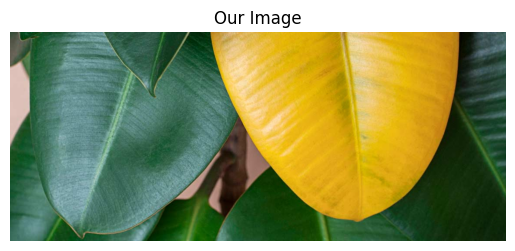

In [7]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """
/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAAjAAD/4QMsaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA2LjAtYzAwMiA3OS4xNjQzNTIsIDIwMjAvMDEvMzAtMTU6NTA6MzggICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6eG1wTU09Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8iIHhtbG5zOnN0UmVmPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvc1R5cGUvUmVzb3VyY2VSZWYjIiB4bXA6Q3JlYXRvclRvb2w9IkFkb2JlIFBob3Rvc2hvcCAyMS4xIChXaW5kb3dzKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDo1NDU0OTQ5Mjg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDo1NDU0OTQ5Mzg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOjU0NTQ5NDkwODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOjU0NTQ5NDkxODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQADgoKCgsKDgsLDhQNCw0UGBIODhIYGxYWFxYWGxoUFxcXFxQaGh8gIyAfGikpLS0pKT07Ozs9QEBAQEBAQEBAQAEPDQ0PEQ8SEBASFA4RDhQXEhQUEhchFxcZFxchKh4aGhoaHiomKSMjIykmLy8qKi8vOjo4OjpAQEBAQEBAQEBA/8AAEQgB4AR0AwEiAAIRAQMRAf/EAKUAAAMBAQEBAQAAAAAAAAAAAAECAwAEBQYHAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUGEAABAwMDAgQFAQcEAQIGAwABABECITEDQVESYQRxgSITkaGxMgVCwdHhUiMUBvDxcjNikhWCwkMkJTWyUzQRAQEAAgECBAUDAwMEAgMBAAABEQIhMQNBURIEYXGBIjKRUhOhsUIjMwXB0WJy4YLwkkMU/9oADAMBAAIRAxEAPwD54BMImyaMU0brNEi8AJdpmhKoA5DpReGCCbCpZl72EchOAqZwkB4tRfPhxNjQi4KVZe4n434OjGYcDVpKcxIFuTx0SREieIqXei6sfZZpR5SDdDQn4peqMddLekc5MpFzU2Cf2ZCsrGw1Vx2neCX3Y8Y0BLlkRxjJsrZWvxo/mpt+bT+PE666/NOJ4GgcjRYnkXKbJKEj6IcBrV1gGYkOqjO3nrnBW3Q4km1FcCL2bxTgGQ9NBZVIM5S9uQYGjo+wRWlVUYJSYn4phjOqeD5RGNtQdlWGISqSycYS/RXhggSAC3inICxhjgfUXjsqR9iZegCP9uJGhoie04gGBd7BVDP/APbggcmG66Iy7cP8iox7QgPIVOisMAIacS/RVAfHLtx9zJ27bI9EkMECW/V1TDA0WEa7jRMMIdsSQPtA1RMMUPtI40SmLXCsY4ZAX8WQCyh29wWlsFuMSKEEWFfqiMOAiknJqQFj2cB9mQE3MTRAHHCMZAxNfivI/K9qcWfnGkcvqBG/6gvV/sZxrGTEB3BUu47XNmwShIuRWHSSneZmcdDnk8MwD0oAsxAcDwTwBiT7lCNOoQ5GTtQaMo8BUJes1d0wjECzyTmIBcAV3ScWLiuzogbkSWYAIswoUSTJokcWDUCHOMA1zvomGcx1qlM5SDW6IExkXkW6ocATQuEhGBAO+6PI7PWjo8LaDdMPbB16JmnEObKwaN9EQZaUCFyzIAFpM1ETFrFZy/pteiDgOTQIBSQC92+CTBGWXMHqHRnOJPpr4qnZgCRmaCIJWfcvCaHfZnmYg2ouEycuqZvvJf1EqBRpOBr0Y1KDuERdhqFo2VKYRo61ujJifSClYylxFykeHb+J7KXd91GnoFZHoFf/ACPvRlyx7TGWxYbtuusGP4n8Ych/78o9O9V817kjIymeRlUv1US5ufLou/brjxqdP91iFXjEig8tUnE6aKmeSVBponGQkeqv1RAgfuuNkDBjQu+yDyaIFxUfNer/AI7MjvZDSUD8l5IEo1XofhcvH8nhEi3ImPxCy70z2t5/41ft7ju6X/y/u+wjAv4p+I80cYVREC68nW5exQgBx6qkPUCTYJIBz0XTCMYlrUqFv25n5M9rgccWI3ayqZAl7AKEpsf26sl5uCHd9ld2knBTlczgYSH6jUpefIAMx3vdCOORiG8wnjChFQ31We12pzED2yGpRPEB+iInFiNNehU6yk8aFTxOnJ9TcgKboCUiwcsaB1hF2lZkwaosRZTcgpg1SgY1v5pwafNJLQHdZ9zGDmSl/JAGtNEzHyREWtqua5qitfcotpomIcMLpbFK8BnDIGjFZkPDzU7Xg8Ca+GqF7WRAdayi2mVg9dVn80DfotZAYOyxWJAH7FhboigHWvdEhkoIKAzV+iyDraoAEslkQiSpTLvqqkIJyDBSLmqYQJL/ABTcAB1V9C6piOp+KB3sE5f/AHSSj5n5JwYPjIMSLOEe8JlFmvEJYNH1SurZYPjEjqF1e2v27z5VG3GA/HiLRbzZe1Anj91914f44tK9HXvwgJQ6stexc3eeVRv1gDIQwk3wW5tUs6M8T1FxdKcRHhqFvZsnIksxISGUbChQkJUcEBYwJP0UbXbnEXKxIIYnogGIb5IES2SEl6hY7dyzrFRRw3mklqWokMiFvcNjqs73Nbx0PAe2H1SmJtdMZjUIiUaLOzW9KrlIirpCAA9laTFDgCsdtDlSqh9U7B0CGKylNN2WdMRqgwVymzokulstXVGAZlmSkkIci7J4MSAyVtUX81jIGicImqU3ZPdA1VGnIVSGisQ6nKPzVSglVtVmPkt4qgzqU7/RUNqKZ6p6lUsv2lfn/dF+5yn/AMz9V+gZvsPgV+fZy+fJ/wA5fVep7D/L6OX3XTX5lFOqKATAOu5xmhVduKBYEBcsI7Ltw0DEqomunFEarpjGQIOhUISiqwybfBWiqEkOicwMWKSXImyFAG1QKYSAoLFUExMcWqkiAQHCvjhG9k+SIxAayX2agmyrKVWC0QTGttEsFR4x4Nosk6Osgk08IusyeIZYuk8XiRKNCKqWbs+xyzOaUZQnKsoxZiqkUCWVAiyUrJjmFgMOKJ9rGIf+V5fEqOWZJHVUkWiVz8nmB1Skk6I2vgbuf+0EUAYFlzSrTUq2Yn3JV1soN6m1U3q59utMImNTXonAdvogXMWNVWECz6BVEBjjYrphxYyJ9Mfmeil6RTogZuwiKDROHOFfeJHEC+pTAgCtSoet2FDsqxBat05TyrGLkGzK4MRduq5hE7sCsITNAabqsm6xlxCkiKq+PNiABcPZcWHs45HlKbNYLoh28WqTRVLQ64dx215FzZlv73DGRLlzQFch7Z/UCQ1kPZBcEF083yDsHddvwchzeyI7zDEca112XHHDJ9W6rHEHF3F0ZodZ7nAWYsWRh3GFuIPqFnsuWOKFARXdOIxDkBjo6M0OiOftgGcAph3GORIJHE6qAxYshYvGRQn2kRJonp0TzQ6RmiJUYwYsHTiUTUkAUdrLhPbydwQ1iknjlEsQSBUMjIS/M9rGOSOfHXHP720kP3rijwMSS+wAXrY/WDjyh4TDSfTqvIyQy4M+THIMYlj4brLpcfoq8zLe5AHj9z36LNilVuJ20QEKHUlEQIpYHVNKWTK44woPmVOUJEP8gnywL0N0kYyd5E0SMvtnxVoxEQ1kY0sL6rEeaeBQiA9SmAP8rvqj/TAZiNkDKQI4miAakb6LcgbB+tkgBd9UXY1LSu26YjESf1Gp0CQxraqJNyaFJIk1JSMkwxaVtVeLY+2JP6i3koCDzAkWa6r3tOMBaIsst+bIi9XHkl5v8VKVE5rX4JJF1U6Kk4Ct0QzugjTRBxiV6n4TsvfzHNk/68dSvNxwllyRxxDkle53k/8A27sY9th/7cg9ZU7XwnivWeN6R5v5nvT33dGMD/TxUgNCvLkGJf5K0of+pK2khXdPGJhFttykCYl4lUBjkIf0y3QlDjUCm6UgCoQRpQPLoVuJCeGRwIny3TmAYG8el0FlEbgqvbZDi7rDkN4zifmlkKgxDHRasfuFRYpWZlnmeu2LL5V+gwfSiqIkkPbVcvZZPd7fFlBfnCJ+S7o/7rw9My3W/wCNw923iWeLRaNWSyymThmNk0hYDxTY8YBK31t6RnsnCE5EuGCtjw0oPFUhD1Bh5FXAAiNlc1ninNbg2wOyJgxNGcVbdDlX9yI5Euf4qrZ0g5TOEEk+YC3AafFWHoAFnSzFf+V1nddZMqmUrlgaLAb6IkjkRrulDs6w23ORpXca0KVnfpoqM9RZYROijbXKih3dk1LajRElwGvYpJbvVKya/EC7ONrFTIYdUXMn0R4uPD4rPb7uhpsFtETTw3QFmWFwoTRK29USaIO5UcgDRC4Y2TNugAP4KhlmCBKJZzVY2pbRL5kmSf4oCJJqjIaop5NiAkkXKc1ogIpz4hJpENoj7dKqjhAp58gQhlOScpT8AqgTOyEqCtTsmlemqViC481WCsCIPIE1Og2XaYmWIwJcCxXJG4Juu2DGJAq4db+2v+p6f3TDPdydt6cpGjr3sBPESegpVeHjaOcjey9jtyeC09ttZ3d5Ub9I6uTUuRUIgPpdT5AVd3sniSSK/Fd0vwRj4txEhsVPgSHJY7qjEmqzgaWRcXrDiJifjqllFz9Fd3FqdUhl+5Y7zXzXHPKAZSljAK7GiSUvELDftS+XKpXFLGQKeKmYm67ZY6MfJTlj1Zcu/Yxczhc2crkdETMmipKJ2SGPxWF9U4uVcByKxkCgYgIMbhHUCWWSkoEpyGYhBg6HPRDk56JzIHRZgVjILOCHTMjVosU7BKAqlBbWWFkzOh4p5BCSCgS6Yxq6SVEwDJSgaJTJXIBNUhoapuRF0k6lVCqOd+JbZfn2X/un/wAj9V+hZvsl4Ffn065Z/wDI/Ven7Dpt9HJ7rpr9QAqycRCUGqcBwu6OSqQLGi6Mbmuq58cXXZhYBtVUTejpxQcB10wxRjJyo4yFZyz3VxNUM4g7up5YAlwhK1FnoxQR4AyAGgTPVh5pMeRmGivHGZAyCZFcAIxkZR4vXRaOKRLbK2Lty/UI5JP2j5rLp4VtVlkYJy8U0QgAnjRYOrDSUslqp5lc+SeiEbXgk5kUUsbnNHxWlKpVu37eRicpoAlbIy5tSzVyk/FJIeoHdGQeZKQVlQ0S8WG1VBAoBXVUjINvE3Uxd/mqxgWVQCwagfxTwLWDN81hL4owMqsmDAEzJ1KeIu4S8TypQaJzFogpmaIFBpurw9oCvkyhGNKFYZBEsRbVOU3fhy9vEEGPmnOaN4hw6hhyCUDEQof1KgqwFCFcob+4ahiW+aw7iDfZfdEg3NQEOD1LM1AmGn3GnG1ilOVxayxjKjs3RAj9JFrFIFGfeN9RoUpzRIaUZPYlV4gkClbFaWNrgHxQAx9xhiQauLFXxd3inyJN6F1ERgTWDUoQsccGqK7p8h0CeGRLMzLCGIkgEea5zCIL1r0WeNK1dGQ6JYYEvYs1Fz/k+054BniXyYYtNv1Q/gqc45CwpILY+US7uLGJLgjUJb65nHWdD1vheleLDKbAP1TmEjU33R73tz2ndOK4Z+rHs23kgCZ0u9Tss9bmCzFRlj613SxiZF6ll18QGEvV0CnllGJbHTdPBEMQOg2QDgOzbIAB7uUeE29IfxTDMLmqYRDP5oAZR9wdkSbAiiDgFyHJY7BLxBFqqkpRBO2iSU/ADZBl4gXBOrJZFhZhsi8jV0kwwfU2U0qbBESzB7BJ3WQGU21LDwVsD4sU5tVmHmuLNIlgTUrOc7FOqRLRSsLJpkW0S00VrAhvBbR1iunsO1PddxGAHpuT0StxMn14ej+I7aGHFLvc1BEeh915/dZsufNLNImth0Xpfks+OQj2mEgQxXG5Xm+2W2GynWf5XxLe/wCM8ExCMzWh1CnOMokx0GqpLGLgpBIfqDvrsqRlFiDSoRAEn0lsrEG8Pj0UZQYghq7IKgwFDfTogDMScUTxY0NExxMxDkGxSwDCZkGADpZRl+qpW4SBd/IKgnGQAlQhBvqv8eynJ+Nxg3xmUD5FwvbxxoPmvmP8YygHPgelMkf/AOJX0wJagXie4n8fuO5PC31T6vZ9vt6+xpfhj9OD8fUBen7VeERfZSiDSRvb4pwJHVV29p1VtFOUatQsyaETK/8AoJYY3k5oArxIjWi6Neeb0QAxhqaVRMaEahG/QLUFrp3AJQlyhKvqsQjKnmgIk3oNAsdr4KiXE7XTRjpqqsLNogzElqMs/QeSgM26BZzoiSwAsUsn1StxODKWFr6JWehTNrrogCD4rDa56qjAB+u6D7fBEuS6Qm4Cz22wZZVrZDREOiACC2lljJb4GVhqs7HoiwZzdJIhwCnNb1LJiAxSBnIdAyLbN82S8mPjdOzBZHjqVnPlolMj4unuoOFDuyLdVhdYmrCyZjog61GolL6XTwGKU1Ta1SyTgKSkJqmJZIbq4GJHipyLnw0WkfJZtkytblWlyu3tjYHWhXCLtqu7tR8rq+1fT3NL8We3SpZRxyiTasy9fsyBjD6ryu4H9SQ2K7+0keIF1vrZr7jbPVNn2x3oxFqeSiJk3imOQWs+q7ZvGeFHqaUZAmx1SBtJVOyabM2m6LtwcajkJDEH96x3Zlg3kotl6qJUFAuCmILusbLGzqpMk+PRD9Nbp2HydAh3+Siy+akyBJlMgV6XVTEhJKLFYdzXxsOImFVPXorOlIAai5rJ4VXJCPNIYlUICxANUpcGgywBVDFZleTTPRAlMQg3wVQAJdUQUhDFYungKBvisUh0WEkYNteiSYdOapbqoEyN0nAMwVSEpAZVKEjZJIuWVCCHUrnqFpCqfcFsct2K/PjWcjuT9V993kgO3yH/AMT9F8CLkr0/Yz7dvo5Pdf4/U0QnFPFTBTP8V2xx1bGQCxsuvGQD0XFjBJXoYcBoVUKrRJP2qsebWVu3wb/Bdke3gKhXNUVxY8c520TjAQa3XXxxxL2KSc+lU8AsMMRe6sYCEHBqbhTxguORZGeXFGQcumkRdW9zjGlyuPJ3MRWKme5lIk6BL1QV38+vqWXme/N3WS9ROsXTOLoRopTnXosXVbhss2FFx5JF1eUgXdCHbnJJ5UilbJyxuaTtsByzc0ivSzARwSjGwDJYQjCPGKOYNhks+btmotxPTPrXlEXSQrJgPimf1HrZNDGX2VsdusPEB2NhsnJNtBZKRo/kmBi4J+CoGjEE7A6pwGskjJx6aMmMpaJw1IuXLp+JLPbRSBk7WCpEHU+CYXMREXFqqvb4sUm9wuFy+5F2uBddmEQkOZLMKMnDXmaNCDQFlGUpRNgSrwyGQY0Gic48bRoHN1YcUs2QNQbpPfm2jrulhLfbTRSl28tYOjFDjPc5DqARoyH9zkDOa7rsOCIFYgN9xUj2xl6scROOhslihz/3UjXk5F6Lf3eQhnB8VX+1yEfaB0KxxzB4e0KXKOQke7ygikUB3+kocgdQVY4QQ5xP1CWXaYyCY4yCLxv8EcgI/kIagjon/vMBFy4rZRl2WM19UZBJHtpAmhdtkZodWPuMMg0ZAS60TDPjk0eQrdcBwzjKhWMJE2CM0PSyQxd3il2spDmfVikTaW3mvJjyxPjmOMokiQPTRV9uZLtUK/cQPdYfdEW7rCB7o/niP1jqNVntxfV4XqqczHjE8YiQ7fFJLHycxQx5TwZqnVWjEM8j4hX1S45AQprusJt52KtMYTSAL7qEoQFQXKQOCbk/bqUnuEAsXCmSDd0WjoKIyo3OLeCwjEh7aIcaUPigzDdBZ5FiCwKlmJdurOqAGl62KUB8oHkp2vAvRTODi7eEZC7nxXBIgy/YuzvpynkMTThQeS4gK9VOvmIWVTSj6JQGTSBc6EaJE1CAZFhcr6DBjH47seZpnyinQLh/EdmMkz3GUf0sda7q3d55ZsplL/rtEbBT+Vx4Tqr8ZnxvRxyEiSR6iandYF6SoQLq3oL8TbTVQyPKoDS6WV4ZAYGNZBIYcg4DEqgmQz1GxR4iYeNtkEg0oitBr1RgIzBY8ZNY7qntk0LkVSe1OBBZw9WQXKfA2N+tEIylEtcD4Kx4k+qj6pCCA0Q8d0ibhKVi51ScNNk0ZTiSQB11TRyxkXyBtv4oOdHX+E7j+3/JYhL7cj4yf+Vj8V9zjAP7l+eu0xOF4EENuNl972eaObBjzi2SIl8QvI/5TT079vueF+2vT/4/fOm2n7b6v1dgDggDqPJUgxZlogJoBj41WevGHVT8Xd9LKhiN6WQMgHB6FAzGnwXTnWROB3G10spOWFVqyNmDqog4DhlPO3QdCCJd28GTcCKtQ6KkYhmAqViRBquyr0STkZSYA7gJJEGllpO9KgoxiDU3CyubcSGThKXgkmDuryl6FEuxfZZdzE4l6qifTRY2RJpSh1SSr0C5NtvLmrB3H1ZZk/Gj2RYMOl0TtZ/IskEaeCBYdNyiTsklI3OtnV4kgI5JpTqUkqXunID0Hmgalljttj5gjuK6LcHqnEd0Q37lnk4XiB/FDkzpykaqcMEC+tU5CxAZPJlHh5rFkOSEifijJZAyfxQLJGq+1kSXFfgqK0CQpmxCcpW3TkGCgeRSmWgRk5sgIVVRN+DAHku7tS0hHc2XLAMeq6cEmmBr1St+6XysKzg/fADIW/UHfqFbsiTEEBJ3EOceWtkfx8zFhZ11bf7+m37kf4u71Atd0XJ3dVPqb9qVuEnXd6WWSHiWLV1W8mTFpFmLLUq5U3VcpDU3ssZEeCLPV6BAxcfILG63wXKAkbHRZ2B0ISkHzCEjpZZ23BmBfwRe7KTkIc21WfrPCsmLJZMl50W5ApXbr8TJKF9UhhQKxkHZKXtuufbWeBoFwbLalVIHkpmLVCy+FUQj4oEpyKpTFlUpkKxsmZLJVDI26HFMQWQVApBQ1TkoEKpQQ7JQSnIdKyoFJKz1ogUpKeAMgD4qGpVCVNXqVcf5IgdpmO0JH5L4WK+2/MS49hnNniQvioh16vsZ/p35uP3X5a/Kj9U8cZKaGMOCVeIiF2yOWnwYo3l8F6HbwBY6BccMkQOqtDuCzRVzERXowl6iHorSyxEHeq87HOdUzmVCWT9SXR/cxeqnLuw9KqOT24AVcqUJRDkotJc55yJIskeT+oqUu4FWUxMmTqcnheRfVH3BELmlM2BWclLKat75d2WUmpaiyWSewSWXMSTJhV16GLsO5zFuJAXs9h+BhAiWQOVndvLl1fx7bfCPJ7H8RlzDnMUK3fdse3AEQwF19lDDDHDhEMvF/LdsJRkWSuvjVb9ueizV4UJAxQ7kvgISQcSMTomz/wDSUp1cVeb1IshGUv4pxuzhaPwcuqjO+AxuH0RAdzoEeLVe6womSkaRpfdPGqmCT4BOJS8lUqjxDlOIixokiZE0oyrDHyBJKYHHjiTv0XoYMc/ugAemjLlw4Jk0NF6eKIgGJ8VWsNExzCTmIgEfVTUixVpGQ48qwclkvNv0gF1YSOTKLRpqhHupc2MXOysZCRJCWUK0iH3TAnLIgf03PwRM2HpgxKnGcokiTHwuqe9GER6QZGkgUBM5SKyxu+gSnuIiT+0SNlYzNCQBvFIc0SbC9SEABnxE1iYvYLcsT6hCYjKwDXohExlEuDSzIAynAxu53R4gsRIF1OcQzh2N0sYh+IvukDzwxJNBZSOGLRcUs4TyZm5MR+1TJmIekkjRATOKPKjhqJIc+3yjJE2r47hOZZBUXN1PJKRYyjUaKbIMp9/24hKPdYQ3b5Lx/klrFJF8kWt+7dWx90IGWPLDliyUnDfqOqnmwHBxy45c+2mfTMadJdVnL6bi9PBV55n1YYDcW3XPmxF3enRdJyHg0SyjKJIq4G6upcoDAgAsmHIMLCyoeEQON9QgZ8qFI8pm1S6YGI8E4gJVFUsogFmqgJkkmlAAm7eIeWWX6AjMf03ld2RYR7cv+tRsK5ZAz6kl3UjLi3G41V6DHb1H6LmcCRoiTEVOIU/dWpT9t28+5yjHAU1KkHkWFyvf7Lt/7Pt+ZH9bIPgFNt6TrT1meb0g55ww4o9nipGLc5blcsoSP2/aPmqESmeQ80h5AsB4jRXrMTCNts3KJhX+Ui6X0l3oV0Ti8PSQPnVTMX+652TJzzxysQ406JImcS703XS7Uk5CE8RZ4m9gapFYAnGYYljogRRg72pqpywSgeRFNtVXFlFRIV0KBnzJLDrxpopEcGf7TWlV1zkWeALtq4DKRhEtTiDQk3QMJ+1y9UWrRrlTMRyYuFQgwl6Q767JxkiQ041OtUFx8koOCQ9F9Z/jmf3OzOF3OGRiP+JqF8tKJjegXq/49nlh704SXjmjT/lGq4/+Q7Xr9tvjrp98+nX+jp9n3PT3p/5fb+r7OE/SzOq4xy6NYqGCv7l0wDE/JeX2dvVrK9WqkEsKORdAY2Hyqmj9276qpZl2aybdUW4JGIYKvAMNgliCRRwRQJ4sA1P3rTWYiaBcRprqpgcvSfDomMiTTS2ywgbk+ACVuacIYxh6fqkcAb6ErZAS5dIHAWG+2LZ0XIBLAkqZk9BonIv81uBuzBcu+t26dFRHi58E7CjqvECoUckiKbImk0maM5Zw3ikIP3fHZYF2c3QyzDUqNVNvFv6AsjqNVOR5MNU0ou1U4hEAFZXa3M6HgnBxRKSypI6CyRvNZb2Z4NjJw7JQPJk37EAkeAWbUpgz0uldi6eutvQZDSqSc2smMy31UCKk76LS6yYyWR5FnW5UfZZijxCngguHHxQIp1TM42WA3RDIx1WYJyNNCkLAqpyZOLFEhCcwKJeRKoGcM6fEXk6kz+KpjAFZaKb0TXoSJ9lxYH6qHaHhmIeuytjJlhMSL1XPCPHMQb6rfuXGna3nWYZzxj2nPF/MBM+two4J8ou/kqXNQCvS07lusvmyurNUljaybiNPJKaCoLLcuLUIKr1TxGCyhXwSkHi4NE8pRNDqhYF9dFltNeVzKRBJEtBcIOXbRU0SEAHqsdp8VwvEEABLKGyYUWa9fBZWS+BpkEdWUyS6u4dlMxDFY76eVVCcqn5I86ocd1uLllz27z4m3JYEEF1OUTos6jBmoyDJXaqBJd1UhmZ0pCPIoOCqgKRRkpCo4SmqqUJkFZkS9mWZVkym/wBECESNEGuqgJIOkPzTlTcgqoE5VskDFUmp6LSFXmfnpN+PydWb4r5CK+r/AMiLdhLqQvlIr1vZT/S+rh91+c+R3OieLvdIPgiCSutzOmAjqV0QMI2XJEqgBTymukZRv5Lc5NsFKA12TVkEESUySXSmThgqDESqQ7Y60QHOAVWMSbK4wgABUGJrWRgsueOAyLlVGIK8caoMQdk8Jrm9oMsuz2w3FqrIwT7yGDFCwCo6CyyeiYLj73FygV1pckeUWQHxneYvazPobqGeQ9kr2/ynbOCQF4OUtiIOinxcXe09O1vm5CfRRKDqzDZEtxQg9QSqjmpmJD6JxEN+9aIbzTgPZMMTxDabp4j4JIgEhzTZWnKDADTyThnhallbGX0tooRylnApsnEpFjYbKob0ISjFnPinlmuTJiPNcQL/AL05BIcGiuB1SzYwL8joknk5tU0FuqlGAYG+ysANqpgPeMS9wQzrHNMAMOjoFiPtZM0uI9NEBP3uJBIeqMsnIEG+iJjMxYRDaoRxTdyLaIBJdxlcvZT97JxYM2quceRz6QyxwF6DwZGKET3OSMePEboR7iTOYtunlilUSiEhxGzfNLkN/c1Zix+DKkO4iDS43XNPHOLek12S8TrEu/mjkOqebHIE3KEcsTHx/wBOoRNLGtCllAPQpZoX9zcvu2y0iNLaDVc3Cha6UCTsClmhY4+TMHfRN285YJHGI88UvvxysQVESyR+2VLBdeDJGXEzhyNqJXFmKJbLmId32ku3bNh9fbyqDrE/yyXOCZRoXrZex20RkzSxBjhkGnE2K4O+7DJ2mUSh6u3P2n+U7FRrti+m/Sq6zM+sc/ASL5PTHdSlA7NHddEScg3Oyxx8RudlphLmA0AusMe9VUyxg+kF9CUC9fr0SPKE6MNEO5JIjAfpr8UxDzjG5ukzn+odxRRt1LrUMhIxOdTTyXK7eavnJ4RHUpe3wyz5hjGvyRavm2R2/i+zE5HuMg/pwt1K655zlmXDfRk0+MMccEPTCF21URESo7AJay/let/sW9nGs8P7nOPYn6BLxJ+6+6wyMeLPGwVngwYOTZaRDnMDE8npoExlGV77FUMHLE63U5xr6Q4/mKDSIP6h6dSEoPAvH51Vb0JTewbBq7pBAwOQ8neRupGE+TxiCVc48kZPGp6JuImCLSRgVLFNnhkBBNjcAJpQlWMDyif9UQ4VadRumJ4BhV2bZkAnDiGkzG6jKEQ8oXH+tV0yxxkBxAkBcpThItFvCoQHPCQAAPqibgrqwThiy482I/8AXIE+V1M4RKp9LVtdQlCUJMPIKbJZZelmKJbLLOs5n0foXazE4xkLEOD0K74igXzv+O917/ZREy88RMJeVvkvosZBA6L5/tz+Pu9zs3/Dbj5Pbm02013n+UyeD8tlagqSwKkCBXXonEZSIJoy7NL4TlNES5AiNANVogkhzRNCMY11TGVaarSTxtTnyExiPC6kZGo1ejaKhL+GqmeMQja/Q4jM6XKmXTycllTHjcF9LbLl9N32XnBIRJHI22QJAcaaK0mAYWN1yyYFVvPRJIU5bn6XZjspya5QlIiyaEOQMpLntu1xOcKSKzJyGSciSPmstsTr1VGLOyBdmQNzsULhljvv1h4aWjea1Sszo8Tp5qZLt0h8FZ0eLDwRIAshKRrvZlrNJJm9StJIhRkS9KDUJ5M/11U2eR62CJeeABJemtFgC5eybjVkQDrZTvepFGo+CYDeqPHZHTqoOQrHT5oGg6ppFgoz5EVoNlesUEpirXF1MknV90JGQ+0ONkfbJqTfTRaYkBWJsKphD4qkYsK3QlLje2iVpBQdSs4dkkpsHsEgybJelF2j1u3JljYXXPlJGYS3Vez+ylSp9yGmNADRaW57En7aifk9LtzHiP3KwOrsy5O3yERFPgqDI7sSKrt7Pdno1nwRdeXQJAmhc1dNRmvq6lF2u7o8jstv5PMSH9N/JTlxNlnoK3WZrLPbbPgqQpDGiSbt1Kc8n8qpZFzayy2+CoQmVrFbl0oFjIP8kJUssrKY0JZY2Su7AIOophION0D0R66LLHadTJIJCGqqlmO6QhY2YqoSiUiqchJqVUMtjRYorHZUCOVjJYhLqyrAZ3RcIEVolYgJyAzhAiiUlDkVWDYgspkapzIWQoU4EZ2SMwVMgSEsCtIVeD/ksv8A7OMd5hfMhe//AJPL04Y9SWXgxde17Sf6U+OXn+5v+p9IIBVIxCEQTdXx43K6WDRgSzLohgyEOAwVMUIgMV1QpFtCnhNc8O3OqrHAI6UViwNLDRabmr3VSRNIMcSiQBK9EHiBU1U/dHwQSxHKQpRZwKFTObyZIJEpZDqjx1RlkAtdQibHyWkXkjJLe9J30ZZS5R5M6yMk/SEEVli9FlkFkByd7hEolfKfksHtCRsCV9pOPKLL5z/IsIh24k15AJY5jHvyXt2+T5sSiQdUziPipxLSO4TACVTqiPOt54UEgaCyJkzEUJoliKNsn9NtSqMQB9ywjWtymiAAOiYcdAqPCkMZkwCqMVQHUociCdSq44SIBJqTZUbohwZqBODGyQYhYl/BUgIMQY23VAfckGIiG0RMyS4HitEgAAAEA3RcuZRLB6hMEMp7LcszWtd1QCUrhOISs7jVPAc/uZgGpe6eMsolpX4JzhBB4kqUsc43kR0RyDmWbjy3uyUnJQtZNjLA1PULESYtKmjoBOWUPyjTTdKMxqJRHJVhM8CHfQJRGMnL6IBDlfjGUDTVIZYneTxIVTAxZz4boSjyuA7JBIiEiz3UzDiasYmyYtEuPghyD8Lm6QKY+hwxIKlwL9QqmIoY05fVSg7y3rVKgDHkCwqCujtogD1D1GyTETyDl9G3C7ssYDHGJ+6VzsppK9hiMYymbSsknnJzGJAnhk4nHcBdGMDFgobCgXnvMAzZncLLWZ6iWzGEs3a+0ff7c8+3OuseklICM6uxFPNDB3WTts0j9+GVMmM2IV+57WIEc/bPPt8m14nYq9drLi9L0rTjaZn1iEsFQABIbpZYWi5Ztl2xxxjDlE6UUcuMY8cpGTnYdVphDz4xIymWkVzkxk5L9PFdcokY55Sb0XHNx9Vj/kJ1rnmTOQjqF7XadoO07X3ZhsuSz6BQ/Fdtjlkl3WYPjhYbldncdzLNlPINECg0Sxdtsf4zq0/HXN/LboiQJWFSkIJIBF9VYNKgoy0gHtYXWrNzygRKoppogJGEmMWV5SEfuLtZTnxNxQ2KWCNAvJwX67IxAeVXi1r+ai5gaV/cm5Ehwb3ig8s0eJMAw+iA5xNbJonaqfiZVlcaaJhOUWiCC726pJQIfi/I+SqImFSfJNGEDHk/q1QSMZEkDIKhJlgQepuumEASeYcCrqZyxBIMXexQblAlEv8A7Lqwy5ikrXB2SyGsWINwyi0olxpsl0DplEO4LgeRSGEZhpNE/wAyOPKJUJaWyoxZyAyfUOv8AT23eSxO8M0XDbxsvr8MqFfB4zPDmhnxn145AgDYL7btcscmOM4mkgCPNeJ/yfb/AI/cdvvTidyem/OPT9lv6u1dPHS/0rtFY/RWjOm5XPHl5KkQxZ6KO33LnMdFh5Eklg4us5Ae3RMWiL0CjKRNRquq7yfGoxlT3Iin0WMgSwspxgSSdN1UARqSymerbr0O4gQxxjWV9VpSaXS/ijIybqpZZV+iW201nHAnNLMmuxUJ+osKp5OUeDAProua53vwX0ThAGp0RySEY00umkQI0USXvqp32muuJ1okAlw22iT/AEyJLH5BCIJd1x7bXa8dVlZ7IiKeMOicxahDKtexcZ2FpIhY0iiaJJVb5rTia4wRZEH7apS7vqmjAALEUU7XEzREmFXW18E5D+CHEBY+rPwVIACADCtSnb/dCgQC6P8AEJSTp8USXNUDEnoE4aU7UqUhhIsZFxsr8SAwHmiI71ZX6sBLiT0CLMCAqH5KcpAeKXqtK0popTkCKoymozLjoq1ibSTkJUFhqlBYsEaiyFjS61jKvU7GdG81TvQ1eruuXs5GJquvuD/Rrslrzrvr5fcfjKp2sqD6rpiwJO64+zLBvgF3OGBIq66vaybdufBG9xWF6C6Ilo7eKAIenwQMdRULovb8im5uWguty3opGJAcV8VjMtXdZba1U2ihkN0hkbBJyaRdkXBKxu1i4BJsxZKb7JnrutQ1Ki7KkCNA61XtRFo3ARpdKgrBmShwCNU50GqUjVY7YMllnRr5lAgMywqipDdUKQpwylmSm6YhAhXAGiUjXVEoEqoYNRAuDVMC6xD1CYSkEpFKJ5ApeiuAjIGiYpS4TgLJj4qUrFPI1DKcjQq9esKvlv8AI5P3OOGgi68qNKrt/Oz5fkJA/pAC4ASvd7Ex2tJ8Hm9+57m3zdAMdFTHIuueKtE7LZjXXAPqrRyiNFxRJIuqxiTc0TyTplmepU5dxKdBQbpKIyMWGiMpK8pG6eEHKTmB4JfdbVHAX9FXKbnGMaarkOR6BH+pJLJOj3aUU5ZibFD2y1UwxhHJYI8rvVZW4RZtVkE/T1lkFm9EVlkEAV4f+UxbsIS/8wvcXjf5S3/t0X/nCIz73+3t8nx8DEuTcoxuwHghAX2T0enkiPNECRZVhGh2FUj2ahTh/L6qzYRJrojBgK3dAPIsKJhiJkyAvGWNnJYnRk8covEE9EvtDjQVVsOFtKqzGOQyJoQmiZMQzk6q0MTX1TyERVlUDl9euiw5MGkzq4OOoHwSOAWY9EAoOV70VImZB9dXrohExGlyxdGUb8Q4OqAw/wCRfZKQJ0JKBJsAxWByEg/FAaWGQN6ISxEBnqsMk2INkwyWcVFigJCMh6XpZDiQL1F0+Tl90RUFLzIcmNaeaA0oux5fNA+5INEnZHlFmIIOgVIzhEB39N/EoDmnHNENEu93UZHIPX8F2yOOVYkRc2UY45F6uA5SsCHvyEagHomjkH8tDo6EsdJR8wPFCQkMdbix8FNyHV28MWQinAm2y6jjOXOIRLcakqPZCJxyyG8f02ddXYxEhKUaVus97x8yDvcnCIg7mV1DPKAxRjIu1gE/cQOTuJ43cD7SuPPGXMxNCNEazEJyzMHoGXT2HcDt5nFmeXbZqTGx/mCgcOrtsg1GPkdk7MzFVrbLl7X9n7eTiWOIh4HQg6qXe4BHGIRF7o/jO6E8R7XKaxrhkfojnyPiJkfU5Egr0uZ6b1i9pMZnSvJ7wCHZxEReVV5sgZmMBWRLBeh3h5dvGO0qpfxXbe73YmawxDkfJZb3GaWkzth0jEMWMYBeIDjqkAIJIqOqpkHuEziXJJJ6JYlz1CvWYkidrnak4uSUHJvoL6KxJtGoGySMeW/VMgALu1NEs4EkkMypW5DRG6Wfrbj9uulUzSOJzQ0FypcSC8L6LoYRFD5JSAAZ3+SWCLjIFCPUqHKwtXdczyd9dlfFN2Mg5FkgMi9ZC9gEphOJuxdOaly3JGIqxDgWdMNDI8TEsPAMllCMjWIdNlh6DIByVKE+ABMfSUAAZQoDyjrsnOMGsGrZ07gx9GqnxIL/AGy1QEjjDu/q+StDKRSdQCjGcT6ZAOLEJSJgkEBtAUzW4RIMo/EL3PwPc8sMsEj6sRod4lfPQlIFwaG4XZ+N7n2e8gT6Yn0yGjH9y5Pf9j+b22+s/LX79fnHR7Xueju629Nvtv1fZ4y7KrA0sdCubFLbVWi5Xie37nq0mZnwerZyc8j6WdNjxB+UrBGMgJMnEi7NRd3b11zm+DPa0WCUgf63RfailLIX6La7SIxRnJ+W4spnG7E1KcRcgkWqtkmAwGmqx21l+7ZcvhEzxBqpykXcrTIfd6BSnNyw81z93uYlVIxk5OymSSQyZiZbDVPGAp9VzTXbf5L6EEHNU3DXUqjcXHRDlRzpRbTta6lnKZp+1Eycv0olJcltFo0vZT6s0YLIOP2JQNSqlv3KUi3msu5ZryYE/BAuRS6YAn9ixH+yxt22+EMjfFZqBMW80hJbZR8DaRLADRK4KZkp+KeQQAvW5TssAiBtZO7GC1ropJFIglILmnJ33VJlxspmJ011WmsKpEFqoSFKqjcXU5UB6q5UVElyw8kYiqIg9U4jWqu1OFu2BEn03Xfk9WEOH0K4MZLjovRh6sRceCnt3/Us/drYdnCPbEDw+i9CNhxND5rgwj1GNmNF3Qg0Wao2XX7Pa4swy7k5F9KEC/msKmtALNSiYRLPcIxcPR12+qeKMELs1H0daTxDkOEwA5OQwNFiAQR8FntizquZQLW+qAGxqqGLFtBdSONnrRYb6xcrV1Qci3wWEZPdxqsQdVzba+MXKwJTCWiQ0WqVlbZ8VH5B6rOFMkhDkQs/XPI8KNdwxKBrdIMgR5BnKjbmmxBSkJndKao1MtaLG6ZArSBOQ0GiVinQ06KjTqsHsmNUodMBKT0SFk07qaqAzpSKIGmtEOXwVYBSGLKWWx2VjUrn7iXHHM7A1Wmn5QnxH5KXud9mkf5m+C5wGTZJGeWc/wCaRPzQ4le/pMSTyjyt7na3zogl1WFw6SIIVIxdWmqghOZSsEscZKrHGdUJT5MGuUCSVf24hYwGiLCQ4yNU8cNE9kQX8EYI0cMIhyUaCyVzKiHEjVBGd0xNEBxj4oughfRZZlkB+mrLLLN6DLLLIDBeP/lX/wCuif8AzC9leN/lJ/8AxsXtzCcZ97/b2+T44E1FjdlWEdB5lSiA73BVcZr9Ep1eaoI71AunDAB9VMBtU9WfRWZo0dx4KkORmGodUojSiviiAHJ8SnAeESQxNi66YAgj5rnEgJu904yBzV3VzAdWTJCJSwyQlQl9fBc5n6qha1Q3LTqnk3RIi8Y3UpzMS7joEeUmvf6rSiDF5ByfqgDjnF7V01TGhJY2ULfaGZNxykOCWZAYSPiQ6YzMhRwblR4zer1utLFIOQUAZTBi7sUHsQXN1M4yQHieQ1SNIbskFhOTs9rhPEvSVgXXOYODTxrVKPcidQQjIdJiJyPG4t5KYlKMjGWqlzygiTktTySTllB+7q5RkLEh2AO9KoEtv4bqHu5IEOQ8tERlm4BYyjqlkOj9PJ6pwDLGImofZQh3JE/XEOaNo51XpdtLFkoYN+9GSJPjjxjHEgPddOGBxYSft1fxQnjgcwiA7eZTd9nOMRiwaX+yx252+Q83Bjnk5zMyzmhOylmzx+0i5+5W7qbYwBFiNVwE8hxv0V9ApJ7CqDEtXqkjKW1BdUH2vFOGwBgQYaF/NU7nLKUDmD8rT8d0oIatDsmjiiQRI/eGI0bdFnkJf0rhyz5ds5sS4XV+PIw9jlkPuyS4uNlwTBwSn28w9XidwuzsJRPbyxu7SBWd5sz5xevF2+VXEQInjVwl4AilSjIH9HnsiHkALbrXCCRofV5LRLAk0OizjlfT5JQ4IJ+0/JIhkeQZ6m6QgRJ4+oihTniZOKxFikbi5Brd0GDmRGgGiHGU400RMTFyblGEnepAdymCmIjQCooVKTkuBVdEqSLXFyklGNAfuNgzhKkGKYccx6jurk7AFc0oEEsHl4JsEohzIueqAsIyiGMeUb/6KAwiQ3j9FcShKI/k+R8UplGLiMX5AUPimaHEY5lvtCpHhMNc7bJuEZvKLPZTlEwL2loUAxxYyKVOyUSMQ0w5FHOxTQlB/XfomnGBEg79UBOUMZaUQ4GqjlizThUaE6FdGIxbhYhJL0gsxCDj6f8AEd4O67PHkf1j0z/5C69aJBYr5D8F3PsdxLAT6M1Y/wDMfwX1OOThfOd/t/8A+f3W/bx9nc/1NPr4PX7Pc/k7Wu3jOL846pfc4R5elyHa6nEuycElwFvptzceKrG5cj0KJgIdU0XgLJZkyC6JMTN5qSzmX4imynKRDAoSIa7EKZk5DCnVYdzf9arWBIuWS+36g9lWMORBTgRHisZ2rtzsrKYixdOW0smFa6CinM/HQLSya6l1oSkwropEG6oxlUrOATsFltnbrwZeLVSGycmjHVTJq2iz2vhFAZF0DF1TiG/Yl5CPVZba4n3UwFEJS6LOg9aLG7cYgwUoFmdE1Quohhqs3RMBsiwZ0+QUA66I0WKUkV+iQCRAroVEpiSaaboaMqhEa/VJJgD0VJUD7KQJkHZvFXAUnlaqUxod1QDj4JMhb9yuFjzIwiEpkViSUviqkRb5KY5l2C9TFN470XkwNfNep25oOqJcdzX5l4FxyHunY1K74WovNkeOamq9HCRKDs2xW3trt6tpPMtpOFeXRNGQ01upydunVYOL/Jdn8lzzE+lXjGTtokMACtE1ZY9Ai7SnISUXLJCC26qHGrkpZAv5LHb4KiVuqV/NPx1tsEhBWO2VYYxFUrELOR5Lcn6LG4+Siyd30SGvRUJDWskbRY7Sy/1OE1ZFyAyJCDJZyYcqovRKQsVRm5DVZ1OoW5J4ByxogUokLrct0zYgIMEQQStomEp9UlFSYPKljdJIFXAUgJJUTFJIh1cAOWouD8tm9rs8sv8AxI+K9C0eoXif5FmEez4azIC39vr6u7rPijuX06bXyj5UAurwgkiwR57L3I8lcY4vVPERC5uZTcyFWSrrBBsUDNqXXOMmguiJlGSdHN0K7qQnI2WeSAqwFzVYSB8FMRkSqQxyOiCNyLUsg5+KrDBIizK8O1Y1TxSy5oxKpHHI2C7B2wpRWjhjEBwngsvP4SWXoe3B/ksj0k+6WWWWL0WRQWQBXi/5Uf8A8YP+YXsrxv8AKQP/AGwP/OE51Z97/b2+T44EggaK8I1cfaVzh3bQq3MsID9KU6vM8ViA9KqkSACDqoxMm2GqaqtSsZMwHxTQJNNFOESBsV0Qp0KcAiNeifi1btYJSADUuNVSJgAdZKoD4oA3uqxgGaIfcqfMXa4TibRAAbqqhqQiwETpcoig4u4CmJSYg1erowPMkGhN0wp7MiBKjXoknExLA3+qaJyn0uWAsl4EnhybdMCMbueTMl4mxNPot7RgWc1SkkUL8TcpAZRAdSOMk8jb9QVTyZncHU3YIQhIPWhugIyxjn6ShxLnomnCYiamlUGmzktI/RIJyhShpspTFeipkM7BmGiSUjt6TfxSCcojkCWIZ4nqEDoSATssTIVMXGyQ5CRUVsEgoIxcyZ9wvR7SPGHI6BxuuLBKOWmouN16IeOIGNjRtUiW7OAInkIc6F1zdzklkzgfpDMu2EJYcEjRyCW8VynGDD3JWJvqFnrM3I8nJmnIu+l1zkRJIgKi6rlETOhfQFJKB5ER1VgvEtWiIia1ZPxLAO5GqPFrPVPBhHiYncaJhyNBYXCABIG2hTcpC7DZBJ5u3j3Ea0mPtOoXP2uDusWf0gGMqE6LtII9T1NymiCGFn1KnbSXpxfNWu2LmzLasDWtFIgON9QnLxPKFzfqkLuXuVRELGXqLbdVnJpTZaQA4h6myAoa6oBSCC2moQLVrTROWuS72UpcoF9/okQyJ9PKyzVqb1RjEl5GoGqDx5vd9kGaMw7kMUxmCXAtZt0mRia2SxPLZzbRMHEuVZFplL7eSVABUuZapxV6U3CaBEn50jGzIBIkY4hz6SdFaDi9QUs8cfSdNEmORgSNLkfuR0JbhyiJRBBHwKI9VJXNCbBKZEsASRp08lQxEqgerVM0Z44x9JBANyKLRkIFpgmP6bUXRjeRGOY61/etkwHkSaCPT4IwHJIcSMkDTXx1S+5IxcgPVdEosGI9Js+v7lL25AHj9wq3RIJOxjlxFpQIkBYghfYdl3AzYYZY2kH/AIL4+c6inw2Xsfge7rPtif8Azh4fqC83/lex6+zO7Py7Fz/9b1dnse5je6Xpv/ePpIzPxVYzINRTQrnxyBI+a6BIWK87tW7SWbfJ6FV5chRLkIY1Z0Ig/pPpWnEyFB5rpm21nxTiZc9ySyrDFqRTRVGLiNPFM1PBVp2sc7c0rt5Jh2oG3UiQZPZPKQHwbqpAGVqJdzbpOpyC703Q46myfgIgG5QmdVlvMTlUKSwU3Mid0TJzvsmjClbrHne/A+hBFyG81jGI8UzgKcpF2ARtdZPiOoTIHnolAepRIcArUZlz7W5tv6KKfkhr4ompoFmYufgsMW0ym/RMIuU/D+bVYsB9Fc0xzfAsgQAyQ3RkUhLqdrLePA4EpaKbAEndOQyUogKbOldMfklIVSApqUpDJ20CQxNU4EyRVJIOVSUJAl7FLIMFUTYlKIFTcWSyk56J5EySiIFSrnxRTY4MXPkF34JOG1K87my6u1yPQKN5evkMzot3MWyAi+66+1PpZ/JQ7mNQfAsr9rEmL7rp7F9Pfs80bTOsdIa2pWIIDIAgM4TONNV33FiI1W66Im31RFS1kCHUXXhcpa2SuHayeQY0+KmQx8FjvLFxiXPRKRVtEC/ggC5WG2yiSFegQbe6Y1NbI0UXk0SJPulOyvNrqJFFhvMXHmcAFgAtTwQPRK50UyKNSyBWWJINUwBCnK7KhISkVVwJkeRQ5EXsn4/wSSjdVAHJETbqlIolILqsQLCQI6rEKHIgp4zLJ4MJhRN/qrTLi1VFqlVqbGVF8z/kc+eTHjH6QSvo5GhXyX5LL73e5doniPJdvstfvt8o5/c7Y7ePO4ecA9CgxCecTErCPJepK82g58k0YklVhiqPorwwhXCc8MJdVGMA1XUMA4uDVaOMA1qnhOURF04hoyqZ4oBhVKe5iLBPE8xTY8Mj4Lox4hEuVAdzRrJZdw5YFGZCd3odgyf3sMTVivLObrVT92ruj1FXqZO8i7xUz3RPR150u4OgS+/MpXYsvQ/uJPdZedzneqyXqLL9YQRQUPSZZZZAZeN/lIf8X/8AGF7K8n/Jv/1UidJBOM+7/t7fJ8XAap8YBNTUJI1iWvoqYmF6kpR5uOV4gM710CYRBI8bIQFCU8Iln2stDNyo0RXqm9dHLFLARBc32VQYk9EzEQcVurQiKEud0kZQ3TwnVhc2VTANQk3oulvTGJAjouf7SAdb9VYylkcEekUCqBuBDgSulEhYX1KZpM4FkIgW3FSgGJaputFqk/dvsEPb5M5uLhIcZEmciKAcn1B3OlEMhAccaigqllAykxcbFYwfxjclACnFjU7IiXCtaiyWcQbaBKIRLvR6IBwYkmJN0kwwcFLLECb13Q9sVc0NGdIFk4mwuEpGkixKaeERsS+6hljMUcuNX6JUCIu8jolGMSoLqUpTjFnT4ZSJ9Rb9qm0Ont+35ZKDqu+EJ+9jxuGia+CHZenGZSuHddXZwGQzzSPEaKduhE7s5DkiIyYVJGpXHnyZMQ4XjIWXVMP3RjKsQQxOij3kQZEgAiwCNZiB54lKJeJHV02M+4aFuif+35FviFpYeNmLDSirFEE2AAqURjET6i4aoFwljJqTDDdUp9w+1k4YiDihHEaKcoiTuKvQJ2kATGh66rBpMbEXGqeAQExHE1GhKMn411v+xacRIMSp8pQIBrHRIlDyEQZWspyc1sXVJkGID9VGRlAEku5/0yDK4LUA6oREi9aOsZO7DwdKXiA5ukBtJ9Cpmpv5p5E8OnVT48YnkgMSwrQbLAs1aulpIfRGQMSNnqeqQM9XNrFEAS1DbKcpaAGtE8BGgB80BSJJIixcqj4mZj08VFiw1JavRUiREAGhP0TBhGIAer6HRabNUAgap5AFqBzrolIJaJDH5FASj6S8QSTroujESQC9R9w2QOMwYihIoFGXuRNmAsicB2+5AwMZOJGx2KX3cgHGQ5MKKeOccgeLAChGxVHlGwszqgV4yxcJAc7E79FCRyYi8A8ZCo/crZhGURONC/0UsoEY3c0sgJECYeNheOq2Kf8Aa5seeNTEuR01+SSYLiUb7peZlH1f+rWqjaSy62ZlmKetutlnFlzH2vb5ROMZwLxkAQehXUC9V83+B714y7SZeWOsDvE6eS+gxSOhcL5z0X2/f37O3SXOt+F6Pa03nc0m88Z/V0Rk4VYzakrqEZGNlTGeUnNyF067czFKw3uEuALIeskF26KjgWDKc8g81p89i+ULKIMiSa3YJRsBeyxmBc30SCegCi76y8KxTHl86KbklUAN1hBvFRtrdseR9E2EXACUykWajappNy+qD66BY2846GUxsSlIqd00i8Uhos99pOkVIEjQboRLmiIiT5KkcYsNVjO3tvsM4KIJjBh1CowjTdJItVb/AMWumuPEs5IJEgj4KZNWRMmNNUG1XNvtmY/U5Cl3WA1RJ1QJYLORRTdvmpk9UxP8EG8nVgrUWuiQyV77IApJEfBNdBk4E5VqklEnoFVkCHTyVRMVz5JXC6Z9Fy5hWnmVenVlv0IPquvsy0xquPwXV2jib/BV3PxqNer088TKPM7WVu1tSiXi/btdw63aFkT/AHu3b46xX+Ndn0WWr4oAkaeC9HPHVAu2iL1qg6BL13Su3xVIJYkpJAVHyRMj4OkL/wCyy32VIVt0pDdEz1tSyD+a5rVlaiU0BJ0TAvYLEMK1UX4AjlnQLMmNQUjFZbUwISsiTWqFipMOOqBTOlLKoZQgfmjVAqoAd1kDQIE7J4NiEpCZz47IOqmQiQxdlgaqhqkI2VgspGgSVDoyLGqBuqgQ7iYhjnM2AJXxHumeWUzeUifmvqvzeb2uxyl6yHEea+QjRen7LXGl2864vd7c66/V1TgJB0mM8XBVMMnHEpckGk4XVLiuS8w4lqE4nJRqzjRDlNayodXuyFSUhzE1dc7yK1SnklOT6rJYxCfwQGJOhQ9ScRFHT0BFEFUhGRvZP7ZKfmtyCCD2WumEIALAvVAyIogh9O3kslf4rJE/VVlllL0gWKyyAwXjf5Llifx88WpI+q9TuM0cOMyJXxn5Pvpd1mlF/SNEdGXe2k0s/dMPNgFWPpi4vqpiibFUsTROPO8XRCdK2RDl31SRYuFaEoxjWp1CqKCLnxXQIk2up4i7qrkMQdahVAeESA26vGhYXUeU6GlUeUrm6qBZiZAFXlxiw2oo4z6w4caIxLykRWtlQVnM0jEekLD1SLDi1wdUrSFNSlPKTAyoblAU5ysA41WMZVLiodJGtXrZDmHEdkwYicIjc1Sf1DW41K0ptLiT5uhEwAOg8UAw5F3IHRLxqwqHSAxlNya6uhKXEvGQFbpZDGRBPIa0ZLObuLkXAR5R4mocFSkYhztqEgaWWJgzODbxUpyiGa5CMZRokk/IPd79EshOcImDghyhCPIxALMXKsIcyYxair2/bS5j0111dKh2YsfHBxJblddsYxx4XiRzjFx5rlljOTJHD9lKkK3cxmICMbCjLO87Y8gk8JYjklU28lySzGJP6oix1CtMiERGQYlc0oglzUdFZGEi7iri6pAGTcvioCM4SEokNtuunFljIMaSN4lOGUxHqBYxCmfRQVjoFQ3IFa20S+kytXY7phgXclglJ5l9UZQc0PqHwQjLk4HpZAakvSKgapKCBLVsCmABF/UlEvURIWRQnWNqRF/FGRDAv4Jpyqw+3V7qU3fkB4BSCyAofiECQQNQbLE8gZaR0SSlTcApACfuiKslnIlEyAcpHcEkODVkBn4s9gmEh9xNNPNAtxc66JbyDDjHcoAyl8dFSDu0mpqpek6W+JTw6vSyAqOdyWiNf3J+EpQc61r9EgEpln9IturiZiBGRA1ZnTBccjy4y+KpF5Egtx66oTjRhffZGOaQYUPUa7Jhg0WjItHSR+ibI739J02RyEyhxItY7JISjEiOQvEW6JhFiKwPqjd7LojM5IiW/wB24SZBjNcbPqoCftk04kmmyXQO2UYtSzUK58mMxDxq93RhmEn30G/gncmIFjZjqnxQ55HnBj6ZRuy5pE0BNV05QBCW5NCuUtJgb3J6KaFcGaXa5secfoNeoNwvse3zxy44ZIF4zAMT0K+IyH0s9l6/+Od+/LssknlB5Yn/AJf1BeZ/ynt/X253dfy7XX46u72Xdxte3em3T5vq4zBqKEXVYyFwfUC65sZBsrRAf1Lz+3vtZOPq76vKYF7qJBJs6oIRJYkqkQI7Lo11u/NvCM4RGKRPgqjFEB9Tcp+RIokkTSrMtZprr0hZtISORpQ3SykBTZY3J0Ucodt1jvviWxUgSNSQhp+xajNrqgdlx3bx82gPcXWjEyLMnhjc11XRHEQa/FX2uxtvzehXaRGMDRwqAAAppniGAtRTMvSK1XRjXT9E80uSijyJv5JpPIuiwiHXHvbttb01XOE5RYObpSjMvVK7rnvW46KgOlKZlmAS+EBW3QJCJKQ/6KqQBJKyZqLM6ZlPRZvmmaqaIYVSt8iJxDOpTKtKihJya0RM+JOebxLv5KU/URsuicDJ9ipGDDoFrrWdicoiJorduajZRO6thBcHQJ7fiU6vXdsPyZT7eblk2IvAjcUUcDjIRaqUs2vavlx+hXiV6ANAQTRNye1VMCjn5IhjV3XozSY4rP1U4IbVZJyk9mCNSHuo31s+K9dpWp8bJTVkTRiLoEm6w2rSAaHohIIhAkFZ2mU76IF7pnJHVAg6qaZSW/akNEx8EpjVZbSgrUJSkeSc1CHRSpOqDudk5FEnFXADtdYnUIWQeirBsQlKP0WLMnAwFEknTvslJTgIhVOlkrgSnokdMS5SSoCrgfP/AOTZv6ePCLyLnyXz4ovR/O5vc74xemMAea8117PY19Pa1n1eZ7jbPcvw4XxSYrqMecVwQku7BkDMVe0YkhQsVpAOqZYEeoDxScOQpdPXZG3ANHRLusYyDrCMzotExqIxIRGORTRwlNTOywJKtHt9SVSOKwARhNQEZNZYQkdF2RxE0ZVh251T9JOGOKTKke33XdDBEHcp/bi4T9IcP9tRZel7eK3zWR6Q+4dZ0Flk9FlieIJOiIC838t30e3wmtWQVuJmvK/PfkixxYzXVfOYJc8zE3BTd13ByzlIl3U+3YZApt5cPc7nq2+BwwkjFhMg62QJHI+KeETKYOqtgvAEByE4r47JjJgA4JUzL+UVVmviBItRVNPT8+i5oyPGpY6AJwSbua3KcpukcQ3IvsEJZMcXuSpF+SxgX9XknknVjm8SbDRUDvyBHRlz44kONF0RFgQ/UKp0NhCR9RkSdQ9EZCAixBqaIkyApQaLOCYuQB8kwB40IjYVWMWZg3imLMwkAEWHXqEBpY3eQA8UkuTjiB1BTSiARxdvkiYgjkYkaumCygOPIj1bKeTGCGEbVVYj0jdLM1o9LpYDmljALmNCpTxxjRmfVdMgNCQVOdYOPBipwHP7UY/bok4k1rSy6KzDOxIqoz9yFHeJqlYAxwYuJFer2b+p5EGLELzYWJFwvTx+ntxKN56KehOntRIyMiKStIoeqWXlElmLjTxT4zDH24lIl2ZjRc0MjRcWNVOnNyfkh3DymzkxAoVGMREHWKaeXlMkFwEYkGo00WhDxiA90DiBYg+vbZAyaTirXCMSJfZfUJmwycQIT+6xKYgfRJIQIaVCliZQLSLxGqOgMJjm0vIrGIkb2stJiwpXXQIGQgC1dkAg+71i2u6MmIZ6Iz4kVNOim5A4mws6QIZEEg/H96WRqz+kDTdMwNLgKZFdgbJAp5EUN0gLUf8A2TTOjs6Swqa7KQ0iOPWVfJK7AjZaR2rq6UjU0dAESLMKjZEsIgyLHZJziAwBcrVN0ZCmIRMm21TylcxBUgW6FVhF2BNqlMDjJBANCuiPql9vIiy5yRyBjUhWxzlpROBWJIcVANkJY8lgQ2iaJlxJvp4eCJAkBGVzrqqwCwnINjkWI+C0sfKkvPcLTwzJb4FGBOIcZFxKz6eaARsQjQOBaXVLOLyDsXseqsSQSOLuKN+5LKUHYDy6oDm4TjKgtYBWjk9wRB9MhaR1+CEyG5Cl+qlyJhbixd9FIHuJyiTCQfXxUOMRAyFd2V+5b3HBoRdc05s5jYiqVBJTcGg67qWDLkwZYdxAtkxn0jTqEJvwBB9ZsAlmCGiP0/XVZ7T1fbeni6Pb6529X7f7vvux7qHcYIZsdY5A/wDrwXfEr47/ABjvuM59lkND68f/AMwX1kHIXgdzS9jvb9q5s/LT/wBa9SX1SV0RkbKvgucEFgNFSMjpdadvfAsUOQAMPgklzkwrXVNEDX4IylxsH2W+czO148oXyARiIvqCoSkJSoOieci1VJ/iVz97uTjWTEVrALE7qkYPRkuKBJ8dF144cfEapdjs3bnboNtsBDEzSN00ieB06ok23KTLMMzrtt101vyZ82ueU2G6RjIpoxerITYBcVzZ6t+nhGvyCRAHgpSm60pfBAB+i5O53LvcToqTBbrEEXVAAPqlMlndccADRISsUESGBSplmVGVER+CIFeictolSIQAg6J2SyRgFkpHV1VJKyqBKSlMuW3ViXCmYi6qJsS4b2VIFm+SEi6wYJ3lPR6Pb1i2pCEQ2Ug7rdqaRPVE0zVqs5ftn/juWOrtjENf9qPCgsyWHFtQnI0FgvU031xKyxW4/BDiAP2Jo3qgWJcJbbceapAMWSyPzTScJXIFfuWOy4Vkpone3zQIDLLaKKSlvV0x+aSVq3WW/BseiU/6KL0dK5JqsraZT8liSmogWQZUhNU56JSKK5AlK/RKT/FMaIHdXDAUCBCxsgHTDElktgnSSFFUDCRWMglQlKieAQXJUc8xGEpGwDqrMF5v5rP7PY5S7GQ4jxK27Wvq31nnU7XEtvhMvke5y+9nyZP5pEqaARXuSYmPJ5VubbfE0XXRhmxXMFWBZKor0QecWUg8ZMnw5YsAmyxBDj4qOlIBGJLnVWicQC5g5FFMyIK112Q7QIGuiYHELrz/AHp6LDJM1Kr1DL0hPE7lE58YpBeaDJM580/UMvSjngtLvICi83kd1n3R6qWXf/fMKapR3cpF1x0uFjJks0nb/cTe6y4eclkZGX6sgst1UPSJmyjFjMivivy/enPmIB9MSvc/O9/7cDjialfJTyOSTcorm9xv/jPqhMI4S2WPiiSCtBhOJ2KnDk8V8gAnIdVTG4HikyVyHZNEmgCsr1UgSxarpxdgX6pYxp6ddERHiCxq9lQWAOlX30TgEHwS46H1VCpypQPW6qAeMiVT2y4FSkeRoAyrA5BUm90wrjg2llegjs9XUoyJMRoAi4NSXCqGaXFwCSQ1QEBGHJzF4kOE0eALfaDYoGcQwk5OmiYGQiCOMWavmlM5DkXpsUvuF2MXjFCcyQXAY7pg3MsRIgNULOTY+lTYliztZORIg8WfZIDxkHBlSwU5RmSPVYXTSmQGDdUs5zGoZrIBD7nIkFwRspmM2ApTRdIzekcgPFc8pGR5GNDskEpHIA5iCDZT5TMTS6uHcgiuikY+ku/7nU0j9tjkZgGLxXpwg+eMAPSKlcvY42kS916fa4WJnIsTQKduhp95kif6OzUUMrnDxA6P4K2Yxl3BJFIi4XF3GU8icdI6xRrMQE4jiBvUocCGMHEtEsMjy6jROJuamu6qYAAVIlTIgYyHqBIl0TyjGTn7jpojyLcZXcAS/emEuYmDypLboi7ipcmgCGSPKhYF7hT5MeORwRYoAyJHpqRuUxLx26Icwx57UdIZAVZx9EugMHEnLMdEuSRleo0QdyG1SSJFDr9EgIPGhropykDQCr0QJJ8f2JeQZmroUgFAaiqQyLyJKBJcy1SVcuWeyQOCTdCUhWrkMynKZB46tVNANHbZBFEj9oDDUqsYzkPS9LpOLltBoqASAaNgKeKQPCNXNS1UZS5UsNEo+0u7n5oiMgS4Yi6ZniKXqn+0AjTQoQiSNj+xVETIX8XVSBQZf6Zr6rMqRhLJHdtf3LnEJwkKMaN4K8CZBmMSKkBVAcEQJOQ6UP8AsicIMSX8HsyAi8WLu1HWE5QYEUH6n+SYQlOUDwlWOhTOOJ4v1Crki4csQauueT43/lOmyQClQ3psCVHIBKPEUI8rLpHEwflQ2XPKcRlMtgQPFKgJGEokWP7lx5P1BXmONbE3XJlmba/VRteDgAgSM7+2GH/IqbkqwgeIjtU+JQ4gBRPPzd3b19Os1/VOGbJgz48+P78chIeWi/Qey7rH3Pb482MvDJEEDbovgOIK9v8Axrv/AG8p7KZpJ5Yn3/UP2rg/5Hs3fSd3X8+zz89fF09rbFx+7+766Mqqokxf5qOOUToq03+K83W5mZWygk6xltdTYiwdMHIo60m+3SwsROXI/wAEYQJIoqRxmR+pXRjxsfBV2uxd9vVt0LbbELjxiIdnOqoSBUpgIsxUMsgQ0brtsmmrOc0JZIigU2Mz0N0xAv8ABIZsaarm325+68eUaSeQ5CIsB5rmnJy6pORNr7pY4/houTuXfubYnRUxIQQJKoIiNSieMKqMpkllF9PamJ92x80Mk3LC2imESNUPosc55vWqZBE1KIGqDABERTiIZyhIpZIqUlaRKUl05AxKBRSyPmqNjZIQ9E1UEiTMWU5q8qBRlF67pwqkxNdEwgm4o2VFh04GEW2TT/7IkahRwybzVso+2Sy/d+qb1d2JuIdMw6qWGT4wq8h1Xp9v03TX5Mucsaft3QJCxNQsVO08quFel2dB7rHRCoWNtihYC6WT2Fli6V61Ky37nwORjI+aWVgmcBJQrLa5OAUqet0hFdlMMHWJK37FmdWbGwSlFKSnDJkiSEhDWVSUhVygnjdLROI7okPdPII6UkW1TFTI/iqgAuFOSYnTRLc+CuGEiwXzf+TZ/wDqwA/+RC+iyEWXxX5buP7jvskgfTE8R5Ls9jpnuer9rn91tjt2fu4cS3+mWRZeo85gnikCeJZKpq+MkFehj4zgy8yMi66+3yMWU2JvmacTCVLKcogl115YiUXCnigClrfBO3m5eKYRXUMcXcpiMYW0hRycCiIsrnhqlMoCieAmYvayAi5unOSNgEr62QSgwhqFMO3iSoxykJxnIFEcDhf+3izLLn9+W6yMwZfqSh3eaOHESS1Fe1TovnPz/fED24mslD0N9vTrbXh/ku6OfNKT0Fl5snVMky6mVNrz9ts20GRsVlkSIy6ZFymDgB61SA0B6KkY+ZurgvVWLM+ycQLPqpiVGTBhF38AqCo+1ybFmXRHwouaJBg76iitCcTJi9PmqgXADO1RoqRB/gpxlaWjqwIuAwJ1VBWMXDWTECNgGKr7UuDixZL7B3cHRUaTg6uBVAkyNG4tQphiiaVZZhAmjjdATJeI5Fi1whIxIFXOzJnIxyLANTyWMwwIIA2QCRIBq9OiIMTMvEh7o8o8ASbGpCJ4kO9dCUApMYu0CpkCTUMeNWVH5AcZ+amZuXJ1qEAr4+JJo1wklkgADWpYdFQtMMCyMQONG6JBEmI/W7quOAkTEFwblTniDmTBl0dnjDswHUJB0RwZMWMmJBkTQLqyTOLFAEPI3I0QgOeQOLIZ82Mz9sGuOshpVZbc3AcmYmEKlpGrrglIva66e/zRM2jQC2y88TkTX4lWSxESxDAo48kftldTEmNaNqt6C5F/mg3TEga+nY6JncMDyiQuWGXieMtbFUkZAAwLHUCxTyAlIgM3p+ixhS79UOZN9dEOZjQ/bqdkAhLBpVBK3IgMW43TyESenioScAiwNkgb3NiWNksnFNCgRQA2H1Scqsb6G6WQxnFy2tKpSdqkoSNWul56Gj0CQYyLNYqciWs+5VDIPcFKTUsKHQJAghKplV1nqxp4arPOQDVWAepFUEriceKcEnr0Uwdddkwltc7IB9Huyz5BcuCs7BimMXi5umasJuBGisHNqdSuQQkCCzK8HN9NFUoXhUGRL9T+5BpcuQKaOMRrLUU1ZlQwiaxNBUkKg2PKCSCWJ06qk4uBGRofiueWOTgux0ZNiyOT/wCIteqYOHjExYtvSyjOJiKnlFqbgq05HlxGqnKUfbILsRQ2qihxvKEo8fsldtlssGlIRYgVL7JogHJKVoiynOXAktRqqDQykxiHrF2AUIVJkaiB9L7rZZHIaA1sl92LcR9oss9ubht2NPVt6r01/ucSZCUqKE8rJhIEBFdc6nEglhlnjz48uMtOEhKJ6hYWSwrkHioqn6D+O7sd1ghljQyFRsdQu6Fqr5j8RnOEiBPon8ivooZBc6rwu92v4O9dL+G33afK+H0dMvq1z+roiSOqoJDwdREnTArSb+RYdGOYNGsn5gVNG1XPGTEvqmlMeK20709PN5ibrybJkBtRtSFASYM6SeSvglJJoKlYdz3F2vFyqan5k+AFEBWq0cZlXVUjERDlTNd9uduIeZBhj/VPagU5y/2T5MpbouWUyTRT3u7rrjXT6nrL1rTnVkl1mKC5Lc3K2QC1U8YfFAYR+JTs103ERr8EkpHVK+V6lnLSPwU5FaRQuiQymt0CmKUsqMqyNHbdEBinQVApilNSpIk3SsqFIQVUBCh01TEKUvuYJptXwEcmXTm+yI+a5MRaQ+ZXVlY4x0Wd6/OJquLIBFtlQTfwXPjfiWVI5YGTGhXZ2Zte3LKy2syrzHmty+ASkl6F1nahWe93l5XMGEiHSmQdlnQca3We2+3TOPmvDcnOwQKBogH8lnd7epistq6Gik4KUooFVDIVtEWQKswKQh07JTSqcBDQUSPVUNQpTBBVQCsDRIXdZw7KsAT8UJdEXZCVAnAhKlkqY1SyWkNy/kM47ftMuU0MYlvHRfCkmRMjclyV9J/kvdtjh2ovM8peAsvnAF6vstPT283/ADef7vfO81/b/wBWZZZFdTlrDrZMgskRhRWxSq6hdPEsgq9TDMSHG6TJEwnTVRwZGI2XbOInBZ7cXKPg5zIs6jLKWVeJB4pJYyDutNai9U+UjVBiqjFI2CrHtpE1Vw88OcDVMQ+i6v7cBMMAGieKMOPgVhjkdF3jt+iqO2arI9Iw832pLL1P7ejrJ+kYfcd3mGLCT0Xw/f8AcHNnlImj0Xv/AJ7veEDCJqV8nkmSVlXR7jf/AB8izFaJExfVITWqUcm14GMTf4osmiQyIYqok8R6QdFWEmi4upw+3dOAeDsnFKYw56JiAR4bKeOW/wAFajKoIIBI+i68UI8QTRcwLigel10Y2YV6eaqBWL2C6gBxiJWuoQiHcq2M8ZjWliqOOz3I0Al6bMUspiJDOZdPolnKxIYaMhIgOx6g7qjySZlyJtuepU5RJPHk4TyAMH1Ngp1BdhE3qgmEYRDSqFpQiHPHwSvR5FtmQ9yJPFzyCAcRDcQPNExqaO/yQfkKSMWoFmb0mRfRAJ7chQADcKcoAgER1VZiIALky8UnCjiZJuyKChgKj1OtHgPVx0sjxmSTGTHVD25sQ9EgaMYy/TSxXViiMcXr0XHgx5hIFwQu2eYwiIEOTdgpt4C3axnkeZPBzTwSdx7EZZJSDSlqugyGPFEwDAgCQN6rzfyGY0iCAwus9Z1pOHuMvKTBTDkB6FTmSZPtqjEueqoQ8SAfUXC3I/pvusx3ejBKJcXBt00TM5IOjboDIY+kFwddkpm0nZygMoYlvEJBWWQigFd1jlpUeSiJX0RlIht9E8gxn/6TqlnIOwsEsptcUSAiqWQaTAKfL/QQmAk5FiwSoOOJYmxSSIcEj96EZOQdRZaRZzdIqBIbl8kvLavRKdSjxcPYpFlQMA6aIDPcKcAW63qqWDXdMxNbJgwsapQAbijJuId3p1TM4HLXyKeIJDE1upgR6urQjyI41TgVhi9ID3uqR7ebjia7p4RjEAgM9C6s8RjEolpRNeqqQA8WiZgcyWMUWDlgxFRxWyRB9bBt/FDmRBpWFaUKoDL1liatpqoSxGEiRQbhdECGMonm7gjUbLSDgA+ToCUTGQEaUFf3qWaRyeg+nV91aMICfK/EMR4qGUCIrV7nokCPGxtalwuTupf/AEx/urzkIRJkXBXDOQJJP2RqSNRoFG9xFay2yTrUckzHEB+qbt0ib/FRZgmeWSZnLWw2Cr7bhZ68dXfrrNdZI5MpomwObp8uOqGOJCq9BOqxLBDF/wBsViShiplj4rNb6HEP6QbyXt/j+597E0vvhSS8Ttq4grdvnPb5xN/QaSHiuT33t/5u1x+fb+7X/rGum2L8K+liSwT8m1UMchOIINCriIFSvG7e29bWGcs5pugeRLC+6I6U3TRIi9lpjN5248SLHCTUqjY4hmqgZkqcpHyW0200n2z60sWqGe3ySzyafFITq6UNdRv3ttuJ4iRpPLoFMkCqbJN6KZGq5u5tr6uOb41cAlygbrEFqXTY4E1OiiS24nNMYQJurgCIqsCApzk56rW+ntzz2TzSzlXdJIk+CxLrdFjFFQKJukc2N1RihqizLGhDIAMwWJQJdbwTwAKCNEWRQVtkIx3snAr4ISNFOSTlEW0UZMFWcgp8TIubKokYOCF2GuGnmuUEBdMS+Mvso34xRT4QDFkufCS3GjW0QwSIDBdXMBnXX7bfGnXpWO+ua58ePIBU/FVc2R5CqCfc3lPXXDB6/RKaV1TOPLcJJGjBc2/p65+TSMj0SLOQsDNVBYFbwVw4x6JQXqitboqhh1QoyL1qgUwFUCi6V1UMsqdHslLOib1QKoElRKyeT6pCFUBXK0i9ESEjuSVQLIh1KcxGJkbBUndeR+e7z+27Qwif6mWg/atezpd95rPGo339Mtvg+b/Jdye67zJkH2gtHwC5VgiF7msmsknScPL22tt2viwRZYBHohDBBFBAEJkqIqgLY5EL0O2yOGK821F04J8Sps4Rs6c0SKhbGHXQAMmNc4/pyIU6XFxU3zVjPjQjzVYzgA5XMZgXUpTJotpsWXYc0Hom9+AFLrzucrBB5lV6hl6Y7sRFkku8JsuA80GkKo9VGXof3ZZll53rZZHqoy9n8n3JzZ5VdqBeZIFWlkHKtykkxWV5G9u1tSJNkGqnlGrrAbpxltnIAVRqnAoiIumAxyIB+KvFyDXySRgAD4LRKas8RTGRy8Lq7vW6hAVdXizVVQQ8KMY+atEBxx81GMuMmuOirEmX/iE4bohIAMbuqRk0wTqFHGGvYroiAZeCrklp+qMRpEOj70OIxmLyIukcs0S2iERMEOK79E8qaciaXa3RRLF+dSExPqd7myQB3ehKZM45Rd5dEwON6ReQSAvSwFAVuYiSHsLhAUFAwi8gbJ+UpQIEQCLdVKM4XcvdMMsSSakJhp8jcMUnKUYkM2pREnqQTslJDHk6DEZC/pAfUp3cjkG6bqUDEJwRKYqWuUskvjxglgKCrBUjB8oNGG60AYYzME8VTtYc3yEXt1Cz7l8PMls7jG5YagLw+7kJEkGy9H8jlMcZBev0XjTk9Qa7ovHAt5LyDM1UtjS6BJLtfUocm1coOKCVK/BYkNQfxUrVJ8lnFCCjIYSlFxIU3QLAkrSPIeCQyNY6JATIv+9ESerqMjJ2+CYNfkyAaROqBJZAmjgoCdWp0QDDlJtOqE+MSC/kmMyIPooyMpRJ0SDGdKUkdksZGoNj9UR6ACa6oPEypVJNVhjBJOmmyPFx6iL6qfKZYEMChIz5OXAu6BmRX0xDAW1RiXJa6QVDm+yqImIB+SZiI730CIjUuzCpQBLsbBPGINLbpmFSaN5q0HiC1KXsmxgGgH2qoiJRag63VSA3ORAjH1OqgEBjWIv0UYRtAFhcdFURLuDY16pwNEycAO0lXi4EYx5RAYvotACVWeewpZPDI0eBYCpfdUEAJYZEQTQynITjIHIa6oynwLcXi71/epOCSR6TEksdSLJBm9LChBJLbqM5848ZNy336LATkTKUuIN1z5ZsOPIbi6VpxDNIvwubN1dmXLnnHl7caiJr1KObMYw920y4iempXBLLVY/lc+EdXZ09M9V67f2dkWZdOMPFeYM7BdeDO4ZVjhvKecapBHVVkX80g3SohZBrpY/9kfFPMpIF8kfFQp9B2n/UE8w7pe1P9JUkhTu/F92f/wDPM1H2+Gy9eEhqvluUoSE4lpRLgr6Dsu4jnwxnraQ2K8X/AJH297Xc/m0n29y8/Db/AOW/b2zMXrHYJGw+KcEXl8FMGLdU3IFxrouK7XGczPkrB+Q0oCkNVgHVAAAq0223nPEg6JiBZzV0JHTVNKT9GUyePUp7XWa41+tBDQ9eqBNNyiXkeqpjxkssddbtcazKs4LDHKRDq3GMY+KfjxCjkkWXTdZ2tb47XxRnNCZoxUneixLlitYLnttuauAyUlrIkoIMFhEAvqU3U6JSmGejJKpkCmGZA36Is6LaIBGTNqUWYVQJSICaKcpOmKWl0SAhD0Wal0yElUGCLsxxJhsuQBdeFjEaqe5OhUMV22XRwAG5UYR9RHVWNDuq7Fn3ZrPYhBfohWvROSRdIZApdz404yx+SDt1QdYKFBF/ggqkNkqZBVAHJFKdkDdlUhmKyDogugFLpWagTmiU1VwypDdOQ5S8QKC104CF/JB3um40JSEMqgaVBTVT6IkvTZKSyqQElS6+M/N93/dd7IAvjx+mP7V9L+Z7wdr2c5O2SXph4lfFVJrcr0vYdri9y/KOP3fc6aTx5rMiAs3xR6LvcVrLdVmWQTOsyy3+mQGTIAI/RAF08JMVPVNG6EvU7TMw4nVP3GP9QXDikQQV6cJDJjbVZbTHKPHDkNQyHEJpx4TbRaTNRaa3KelJQLGQFEsnqp1WmRFOaHMqblCtkHlTkHuspVdZAy6JSJKzla63RZINyDdVueqmwdb/AEE0+pYTTxkFzVBTRkQeieSzy6gS4RIHIgWUI5irGTtLdPKp0UgLk2Fk+N5B1OnA1uq4gAz0CqGcBiw8iuiAa11GDkktRdEK6sqhq4/WC+m6pAtQBmSgRJaNinEanUqyXiI0AqVpUB/mFAhCBq10wxkguWeyDc8sJJqfV0Szx8WBLk7rqywq4LUZ1zyh6vXJyEwAhRrPuhx9NWqrx4AAnS5S8YyNJUTBcXGjsG18E5hEBwiDGUhEtQMCiJREmLEBATm0eLn0yScou4qNFaU8RpRlEtGJAZAGJ5F3ZUgA7OzXKjExBqV14IiUWL9CyQLk+0Y4nlyXZCQwYBySY8fLKwtEMXVO4z44YzSkRYrO87fIfF4n5PujkycI0iNV576hW7o85GQoCaKUYtGlClepQuj/ACQLNv0Rl6R1SFwKlAZzV0OTPWp0Kxd3FUCSatVBtzLUstIuHeu6W1StyFGFEBoF6G+ixBboLoEB3BZEHlQXCQDSpZk1G9Otkpg4YPy+SwHCTTD00QRshjECN9VGfIXo/wAmTZBL0v4jzSFz91QEslaaMqbnRaMf5bjRAcSGVYxaJ2QImQTcl9EeOh0Txr6etEYxPmdUzwAhFqapuMiegTC7AvRUjGRq/RMJgElyCV0YxIs6GPGSb2uuqGKZILAQs/inIbRxkORFx4sSqg42+0g2ATmEYAvcW2QAkdGk7gtoVeASYMm4ggb6vshAmoBaUdGuFUQIBlCn8EJY6cgfVuBVGAaER+mpd3BZMBGQD3e3VlLCJ8uB2oN63VsuPiREFt0QJymRI47aBThGAlKRNdPJYGL8Z0YW6oSzRg/Iek3bogOfPkEImdwbLl7fBk77LwjTHGuSWg6IZPc7nOO3w1Mzde3GGD8f2oxRuB6pbndY77ZuI6ex2fVfVt+M/q+d/MYxCQjENGNAvDm7r0/yneDNlIjULzCHSnR0bdQEpKuLPKJZT4rcdU8pr1ceYSHVUH+687CSF1wyUZFVrcqSG6TEP6wGiP3FPgA94KVvf7amIJyhg/6gmNklpkKna9xLtswkD6D9w/alKQhTvprvptptM67TFEtllj6bHMTiJAuCHVAwXi/je84H2Mhp+gn6L2Il6g0XzfuOxt2e5dNvpfOebp1s2mVORWMnLJbLAvWyw58wccQOqQsaIgB3dPAQvKoVz1bWa5mvxDY8RNVYiMbXS+7GIIF1GWUk9F1TftdrXGt9W164Ti2qZJrmlIk1TE6ulO659+5tvc39FSYKSUCdEb0WYJKABYsyxLJSX1TDOSsg6ztZPAYlBnTAI8aoyCgaaprLEtZIaJdSYlArFDwVYMKoEbpjZLVqowA6pCqMkkWujJUsjxVu3yFi1guaTyV+3BCW/wCKVoz9Z2NXVDMFRySaaYSHGqy9OehWnJdLVA1Qslz4iCL1RKn7gF1pTBDg1Tk5OU6KWMgwReqrBjRkFtEOT+KqGKDIPVF0zBmWdFLIap4Avqg71SEseizvSyYEpS7dUbXWunKCk0UpSoqTooyqW0CqAA2t0synK838x3v9n2kpD/sl6Y+JWvb0u+01nXZO1klt8Hzn57vv7nujjif6eGg8dV5oCzkkyNSakrBe5ppNNZrP8Y8rub3ba7XxEbrI6sgqQyLLIoALAfNZMAyQBmCyxNKIFMmqUwogLIxqglYErt7TKXDrhBYKmKZBopsTvPF6ncYxIcgueIoy6cMhkgynL0GoU63Fwm8zKIxEpj2zB1T3BEKOTO9FvMFLA4RGinLilllNkhkSjJ5NR1lJy6yMh01ZKSXD6puQRDFZIpTHVZ03ijEAp4ReoUKwjXon400QATIDBWxUgH0oyEYEhUI4xtY1TwrUYikhqrYiOI3UY1LalWwxP2/FVDWBJZqK8Iij3U4AOH81aPENqQrinRAdKJgLF69EIzcMBVaEat8VQXx5miYM60vcsA2qXC0JgysLdVc5DKRN+icCM4ZTSgAU/bDly5V8oyFntdLweTSIs9EwEccXIZ3oh7TSbiOR0VIY4s4sUHjEykT/AMS6DaMIxJiY8SnjjhWgB0KwlFw4DlUiYANR0whPE8qRAJuymwMiJRFKOF0TMOQaYFEkfbiQDeWqCS4NLQ7K+PS4/csBF20FyqwwgVMqGgCnYKYg0JTs3zXnflMwEBGxZy116WQxjDiL76LwvyExKQALNdZzpb5ivPlIu8krkeCE5B79FgXpoQkQGrlKXTNZZ2IpZBgxdKS3imf5LGJkX0QQOONb6oGuzdEzAuL7JRF6BBgAAWTcZOwALpnYW6BAyY2fcIDTHCLi+qm0mexuU3KrEeCWQlIO7RGiVKhyBLytdJKRIpbwZExrUpmeoqUkgKx+qIIchqdd00YTApZNw0ZzqmcaMBbVN8mowWjxAYG+qYmI8UKLEsGAoujH4+S2PHCQBNT9V0gR5MAz6+CqQNiEYkEDl0VxOJizEHUXCnGMTIeqtPBXlACQMbildVcgTrH9Tg6dCrY3YzEuT0HRkpgxJAelVPhPHHnE0esd0wtKLOY2lp9W8UIgSZqvumjLmNABWmqHHlItRqDQWQDcRyHS0tkshIzIdyR6f4J4SADyBEmYdEmb7WFJ3c/RAc0pNIGTuQanQrh7zPxAiL/Nyq933DAh7UHQJ/xfY/3OT+9zj+lD/qgdSNVnvtiY8Wna7d32kn1dP4/tR2WCXcZm/uMof/iNl4X5f8nPJI44Fej+b/I8QYRNSvl5GUi5qSspHbbNZNNfApc1Oq0QmjFz0VRiACZSE4EojEqQjuqGcYpWqxwmIcQ6rii6jPIDQWVsBqEFrFxHjdN24fMEJJ+0/wC1Jce9iDYwExWgPQEShZClTFBkAkhqLixXq/j+9OT0TPrF+vVeYQlBlCQnAtIWXP7r22vf09N421/HY9drrc/q+kq6cE+S4Oz7r38bGkxQjquuJYVNV89v29tNrptPTdesdEsvMWBbVODZQBJPiqA02WdgMSkJRO90hJ2TkNiQgDysjxJqbLMAfBWGtdKZVr5LSKCIYXWosXQ1VBvBERREU7Mlb5AGosT8FnSEpSBpUSFyUS5QNlcDIG1qLPSiFT4JhqrMmavRCRoyWQBKlJzdOECjBYTor4HBc2UjRPCXqAS26EfK/N90Yn0ppioWMHarBR29pLz5M9paDgFliyBiQUA6W2LcynBIiVOUeKoSsQCjVWEwaVuU8XQ4h3TPtZXTEpeqLhYug2oFnCFfFbqmDpSKLCW9FpEWThpsGQTIGtQqAOVvBDVKTdGAEyTQKadJK6uADIC9F8X+c77+77swgf6WKg6nUr3fz35D+17c44S/q5aDoNSvkBuSvT9j2cT+S+PGrj933f8A+c+rMjZYVWXe4aLVWssigAy3iiVm+SRMLokraIIDLMtdZMMmAZABii6CM6aFCFOuiMSXQHpdrkIIXXngJx5BeVjyEFen2uTnFiVntPGMulcsgTT4qMoELqzw4zdCEeUg6rS5K8OT2yt7ZXpx7eDOVvYjstpqp5fsy2WXqeyNlk/SMPPai1QmYsUGKykZ0KoxJCYBMAGqngmBpVPBiUBjfom9pqhOQsOjHxZHJEcCpREgOqeMqEHWiakg4LjyXRCnHQ6rnjQ1uFeMn4izIgdGOJJL6LowAXa11DGwddOIsPHRXDVP3gijqvED1BSESz2pVPijEA69VRxVweo3VIT5EAiukipRoKj4LGVfBMKTJjN3dqFAxjzBBejqZm9b6owMiXD1TCh9M/SNHQArYVug05FhIghMMPImAmSRdMARQ0DsncNpWyEIxDNEnclGID2ACAXliEvU3JkhyYpFywjoqzEDoBo6wjBzFg3ggHwnHIBjQLpxASm+kQ46qMONIxAHVdBHHGCFnv5HHJ3+YRwk2lYLwMkjL7qsvQ/J9w8uA+K80mh63U1LnmwBLVQhomlEyfR0sA0QLNqgHIF9tEunVM4NHssYV5aFBlEXIsAyZm1dYRqyIFOOqMAn2u1HF1hGXGlHTEA+SwoTskCmBd/ndE8RABnkqRDiqBiIgtUJ4CQDxs5SvQbq4oHL10S8HLn4pYCRxsHArqhGEwai9grVFB8U2rk+CWCw3BmBkPBAQBBOhqjID+b1FPixzkd4/vTMkcYN7aJ4Rx0MqAXAuq+1MRtV2CYYSwJHqlQjR05AGOAJ5RFVYxDAChv1KaOMFxYnZEOAXHh0VyAsKwY0a/7FURBbmfTupTiB6hU6hVBEgByA5VIQDxiYPyPKEqA3fVbFGUOXuWLsTcHZZ4mIEyGFGH1VZRhMNL9LBjqEzc/A4+MjU/qB2VeQMmZiQ7oj28noncf6ZMwrEjiA/GWjoJMyIYiVbV0Zc3cZ5xMgzFiOO/VVzZY4Yepi4vuvKbN3eaOHFWUqE6RjqSp22msPWXayTm0e17Wff91xJ/owrllv0C9jvu4x9rg4QaMYhgB0VsGDD2PbDHjsLy1J3XzH5rvjkmccTTVYdbmvQ00na0x43q83vO4lnymRs9FABEByiBVNGVIQDOnNEsClnJnQ01CeQRDBc/KUjVYkkpgGTFNELqw0IUIhXgWB3Soi5LhU7MtmXMJ2T4JccwKlb6jHXGFip9tLliBVChRUGR+qKAVDjVPS5oAvK/I/lYYQceKszqErcFttNZm3Dpz/AJOH4+YnA8pC8dxsvouy7vF3nbwz4iJQmHHQ6g9V+a5Mk8szKZclen+C/MS/GZ/byF+1yn1/+J/mC4ve+2/m19ev+5r/AFnkz7XupN8XjSv0ASTCW6jjnDJETjISjIOCLEFMNgvDuvg71T/ssIO5lRLEalN/pkTj4gZSABEdFKROiaVaJSPgqznmjBb1TPRA/JBBsfqmhGvVGMHTtx6lF6fArQNAySRotKWuqREhiT/sgyyx3TAUCU1PRYl0WapTAMiGFFgaOhomBMhoklus9W1WZ7XSwCiVSGNESE3FihIsi0qSZZLjPrC0qrYx6wjwqXTldosmjJgky2DaFLpQ1WGOE1YyiUrBSJNlhOSqQ5VCAlYBEFwiyqSKTNKmqLoukmP4qsGeJF1nUgWKd0WA6zOg6IJCABolJ1RnWiUpwEKLrGlUpkNFUApJbbpqCpsk5OXVQMSoZ8scWOWSZaMQ5KqZBfM/5H+S5n+zxG1chH0W3t+1e5vNZ08Ud3uTTW7V5H5Du5d53U80vtdojYLmZZkQvckkkk6R5W21ttvWsAtdFZCW/wBBayICGqAyIpVa6JQTElKUVmp1QAFP3ogPVABPUIAEII3LrMgMCiBdLqnAZMGBsuvts3Eiq4jdUhJmSqdpw9icRlx8lzQnwl4J+1zAx4k3S54EScLOfbszvMPLugKfJIe7OgUJRauqmZLebUS3xdP93L+Cy43LrKs1WV+a3IFBYQZZzLOnBG6YVKlxLqkeQVEvEMqgUXPGZZUGXdM8xVkRFJHKCriUW6pnHJmiBkaz1VMbgPsm7qMWjk8lPGR4peIdeNyxXXAcZRbW5XL29wDZdL+qhfYK4HTEliCfNGETZSjztGlNFeHoAkD6qXVmacePp11SS6i6oXkXNSiTZhVM8NEenhYUTARBHtgu3kUITEgSzy6LCcmIA+2zpjBvUAwABFpIASId2kbsFIzym+tvBVi7NKQrqEBRgIgyna6WAgfWS3iUvCDu5INgt7Y4tEa1dMBL2jkoQWuE8ZY8kmoK3UxEipiK3ZPjjGMDKUQ2yROnFw5ANV2pqqd1kjCBcU+jrdtCEYmcWZed+TzmEOL+ol1neufI7xPm83upf1S5caFcx1O1VScgRWp0UXLt8VKQqapJUFNbqlA+2yUBiz0P0QZYmrM7JxJ716JJAgojfTVMCSX26o1uNLrEOPBNyoaBjdALK50ohZimifUxTSOgFAUg2OJkP2p4wLHpRAy4xp93ROJOHah1dMEETtR9VpAkcRqqiD00utHG5Y0A13CMBMQiDyNYsyqcTxBoGBKMoBzB6DTosKkx0a6MBM4IAAgiX1TiUoRkAK6unjCUSJHTQIcJEeoFpXRgFD0JLA3GgV4xPBpFtQmiIiQizACniqQIlL25UIdwnICz5QiHci60eMyWobADoEx9R4vWN/4IDF+qHpm7XVAnHgC9/wBSXHE8w7F6Don5ziTy1o+lF0Y8cfbchyXY9UAMeMB3pqGWyyEZiUj6RdvotITjRyHollH0sSGPxdBjGDy9wDo1wyXPkjCJZ+NW8VoZTjJhOPQGzdF5feZpZc4wYIk5DSmp6pbbSTIktsk8SZZ5+6yDBjeU5m2g6r3Oy7LH2WLiPVkl989+iH4/sI9nieXr7if3z/YFbuMox4zIlc9ttzXf2ezNJm/lXm/mO9GLGQLr5HJM5JmRNSu38n3Rz5iH9IXCAgt9s1mRiB5rMtXREKKY4EyW7mIiFaOPJCPIjRcefJzpsm16RIXVhANVQF1eMqIKGZkQSsKreCVMQWTRm04lJZB9UjfUdhk5YwuoheT+KykxGy9c1QqdCrFgHNAiWAMpFgF4P5T8qZE4cJoLlK3Bb7zSZp/yf5YB8OHzK8QyMiTIuSs5Jc1K11Lh7nc23ub08IC10WTUCEPof8a/NexKPYdzL+lI/wBGZ/Sf5fBfXghn1X5fTzC+u/x384M8R2fcy/rxpjkf1AaeK8z33tc57uk/9p/1d/tPcdO3vf8A1v8A0fR8i1EwPWqmC4cJo7ry8O45SlbkP4pgxQZGfxTRhYogB/BGU2tZVLPH9CokiAbUqZlVCUgdahS5FPr8PgJDErAoE/BAybqngxJQcLByHRAAHVAZqoFElkrAXQGFqoXRoiA6YKB8EzAWTAIFgkAKlJUJcpJBBVMsjAeoFbVgmAAroglMlYUSwNGTyrjWhCJFLrO9L8ysTldLza6rKB8kkoAB0SpxS+4xoqCTsomNmDrDIYmqo5fN0Ehanko+98U0ZgpqlY4wTRHim3WAdPJlZgi4ZFvikIHxQAJN7rAulcOwRKAxD0SSCclou9VOUnFFUBTJ6aJZOg+oSZs0cWMzmWjGpKqTNknim1x/lO+h2XbSlfJKkR1XxkpyyTlkmXlIufFdf5Pv5d73Jm5GONIDouRl7ftex/F2+fy25rzu/wB317Yn46gAiUQG8VluwAIs63RH6oAFZliEQNUBtEEVjVBAFmWRZ0AYhwsVnaiyABQIRNlmQGAZF0qzIBgUwSjZMmHThnxIXouMuPyXjgsV6HaZQfSbKNteM+TPaYufNOcSCR8EscQPiunucbeofFQ5ME9Nk45b2Qsl9wustMw8iCEwDoCKYAgOEmYxx1VBAJQ7OVSJdUeIMcYuiYBkQSmDMmeAGKLfRYRkm4lPGEjdGATJGUsUo7VXPjNWXoxxkhl55iYZZQ2N0rBXbiNIxOpuu3HB/KxXBiI9I1XpxcQAAfqFeoVxxbSqJeDEeouliJkO7HRVhpEM5utDKBIkklgjIswBd9E0sRjIOXjK/RJMxEuN2TNmyMDGjlPIHiA/iUo5yh6bdVsmEg0kSGqEBnjEu/pGpTS4WhXlYitUsIGgMWKtN48SAAwZAThHNKgDGO6pwykXYoxyiRrIA2TyIZhKp2QMJeyWcmuhCpjx2ifU26IMQGuyOEmRkeLVZKhaQhiiIu3Kq8D8jlM8xANBZet3mUxIJIMRR18/3EzKZfy6rO9Ct5SZyyJG1x8wjEUcpjIGoFNUgkByOwK0nJAOlk0bkCyxiWvUICZrQ0KUFjxNtVWTkupmo5JhSGwFTqtJxS4PwQhUCtRonblQeSAEQSH1GqfG0wXukZvSfuTRPAkWdICQAx3LFFyBRmWZ4ttdGIpWjUQFsPMjiAACHdNlajUZCEosBqtImTHWxVAcZiYylRxdBhOJkBxLioTe08TIXGg2RhAnHxgaSLmRQAPuNxf0hUEKcS9ak9UQDAkGNxQq8RwIBANHVYCEdQTUVJN0cno9UGMtmTZBFpSA9US5rojHhIj1AAizWSAQEpS5xAEjd91Ycg8YsZ6hJkJjKHAPy9UyfCyo8QYyBYk10+icMuSMeJkCRYEH9iR+JlGB+5mZ7dEZSlOYGOPLUv0W48gZRIEtEEMST6OXrFz43UpZI4niTS4eqMZQrzpkYgdVw93mOTJHB28Dk7iZYDQJbWSZpyW3E5odx3OWWWOHFHnnnaI06r0/x/4+PZxOTJ6+5yVnPboE/wCP/HQ7OJnM8+5n98zp0C6iufba7V39jsTSZvO1/oBK8D8734hEwialet3vcRwYSX0XxXe9zLuM0pG2iI07m2JhB+Rc6o2CEQUU2HUCWXV+N7aXcZhT0hcpBJERc2X1H4XsxjxCRFbpNNJmh33bQx9uQBVl8llBEj4r7X8p/wBZXyGcPKXiiL2jmBVBJSZkwKaHQDS6YFQEyiCaowqVWUgjjjzkI7pQCV09lj5Zh0S6G9z8d24hEFegWAJNgk7aHHGPqvJ/M/lOAODCa6lTae2001zfBL8t+VJJw4T4leIxJc63K1ySb7oqXB3O5d9s1tUwS9AtUISaiU0WG6B+SALrRlOEhOBMZxLxkLghYLIHxfb/AIH81Hv8Qx5jx7rGPUP5h/MF7JkXvRfmOHLlwZI5cUjDJAvEhfcfhfzOP8hiEJNHuYD1w3/8gvI977P0W9ztz7b1nl/8PR9r7n1z0bflP6vXBCZ6dVNyFgWXn4di3VJIsUQaIEhOBMh6OsTRkCHL7IGn71ZjcMsIl0A5P7VR2RkAYhmCxoGWJZLIvR0YBeRNTdapos219U8Il3KYAR+Cdk1BVTkWS6gSUHZIZNe6D1QDEtZC6wBNSsaoIgiHJHmi1eiZgy1EA5rjKMRRD/6ZCaCjacX5lRBDJSIyRLJC7qYTECNkphGVdUXLouqDkyY5xk4+KOIsbq2UllKEOJVZ4TjF4XjMFFwocmvZUiyMqmyj6JDsQiDXokMqpnkGHmsVpNZSnTVMGk5J2UTyiehVIya9kmU8vJUm9E+RBJK+b/Ofkzkme1xH0D7yNSuv81+S9iJw4z/VkG8Avm6kmRqTden7L22MdzafKOPv97H2S/MGoiAjFN9V6DkKbrUZMYgDqlN0UMyx0COjodUgzlmRZAXRdADosyzOUUyBHRYbrC6AF1iigUBkSKUQCxOiAH0WF0WYOgHQDWC3JkCgSmDxLrowz4yBXLE1ZVEmQVmZh7AlHJjAuVxmDSIKPa5GLEq3cQf1Cyy6X5s/h5Odg7aLLLK8kcJwHUBI+SrHIAtEKMURSqAmCmABsmZgHsnjEpscQVYRDJmmxCsHYLRiHdWhEFOBo0C4e+hwzDILTH0XosFz99h59uZC8K+SLOA58JePVevgPKDC68XtZhxVet20jCjPysU9LyI6qsImtaokEkCH3CxRxQ5yBmW6KvCvp01C0ii+3KQJyS9SWMAJcqEo8zxlQu7IxAhUbVTBQ5keNTsnPM4yw4kalHHkgR6Qz0NKoZckTSNW1QGgSwOSVSWDIy4kgXI1KQO1mBWjEH1yJfomBoDImID/ABRGYAkCw1CbhGTNRi5JTERB9IvchATx54ylwIPK7nVdGIERJlQXvdToZsx3QzThAwvX7lG4eb3mYAmMT/orgywe1dl2d8I+48KxK5Z1jemhUJRhI0Ft0x9JIIdKaASGl0waUmehFPFBt6SDGxeiQuS+yaID1q11p25j4JApBbleiSw4nVVAoXLAqbPR0wD8T5qsAbg+nRSId9GVINxALuLFAGYY8mWiCQaOxTfcCJWFvFLjBBOj0LoCsIuOWyeUSamgNEsWB4ixCq3o4ysEAMYqzO2vRUEQSSNLIYmiPUTSrdE4yccp9Ia8dbqoFIgcXNrEJIT4tC0f0n96wM+ZeoNQUeMZek61fqmFOIIaTuDRkwMvugQbhlIyMTVzGVAfFPjgRklJ6NRkAxmMkWI4vSQPTwS4MUoykZWNYsqEQyFoULOPEapo+gycvRohAITLDKRlF3DNdglhLkDH9JcilUJGRkSHMtWN00hEB9RdBhETj9lheYLXSmYjBomxcxN63Wz5BCImTQC4+hXCJZO6yjBgDzlcj9IuapbbTWcnrrdric2tlzZs+f2cAGXLJwGtF9V63YfjsfZxMj6+4n9+Q/QJ+y7DD2WMiHqyy++epXQSufba25rv7PZmkzedmKWREY8jYIryfy/5GOHGYxPqSa245eV+c/IGcjiifFeGzlUySlkmZyqSsAj1OfbfNCwQJRIdAxsBUmicLV0/ju3l3GcU9IK+wwwGPGIsvL/C9n7eISkK3XrSNClXRpMR5v5WYGOVV8nlk5Pivf8AzGYiJY3XzmQ1ThbUtCjxSA1TCQTScQonjEMgDRYSqkZwQCu/8aAcq80SquzBllhiZ2eymnmSZvSPZ/Jfko9tg9vGXyHZfMylLJMykXJT5ZzzS5SLpWAsl8a4e93rvf8AxnRiBQusxRd01ikyyQhZkxQJCSmYsgzLOs/wQCoh0WYrIAKmHNlwZY5sMuGSBcEJKsiAi89RLZczivu/w/5bH+Rwv9ueP/Zj/aOi9ImrL857XuM3aZodxhlxnD59Cvufxf5PB+RwCcKZo/8AZj1BXke89r/HbvpPsvh5PU9t7mdyenb85/V2ibFvknoVJq1TcmO64nUJDaJSHTv8UHaqfILUBLzNgiS6U0qESATMW1S860+KUgv1VMcaVVZwMmhEXVaMkBZLIlqWU9QM5aBJIg+KHKqBra6o03q2qpGIF6laEWqbrE7XTIxLIIP5lYF/2pGJug7IsECglI1gfBNCySFYHomgaKbOoEpC7qhSpYIousQSmQEhbRHQFMUOATk/7JQwNdUYGEp4josIkeSs+miE4g1HwTLCRol5UusZCySRVCiSSpEl6rGWgKx+acRnLHouH8n38OywPfJKkI6+Kp33fYexwmeQ+r9EdSV8f3Pc5e7zHLlLk2GwXb7P2t3s32/Cf1Y97vTSYn5VPLkyZsksmQvKRclLVFZj5L155RwWiAUbLD5rGqCZyQ6VkaIpUFIcrOisyRMzLVWeqyZssPmsi2pTDGiwCJQsgARVBkz/ABQNkADRC6xQNEAalMGAQisSmAqgi6FygGiGTO6RGJQHRjkQQvRxS9zHx1Xkxku7tMjEOo31zEbTFyPtn3GZZdbR58tGWWeaTiimEXPVKIlWxx+K6cMuRGOipCJRcJonRVIeBjIurCRU4gOrwgGc3RgxgVWM2SMFiEwsJBM4kDE2NFzhwmBIqgPPEDg7gwO9PBepDKY44TApEsT4rk77G/HONKSV+2mJ4jF6EBkteLg3rYRRzUFUx8AZAXBcuufs8nEcJG26uZGR4iIc3K2htOWOFw41W5GbcY8RuhIAGtS1knuTowYEphTJEQA5VMrJHiB6gA+iLRMuMy5GiD45xPEa3QB4kAUobKsQWgCaAVAFFCPucgxAIFXRFKymSOm6YWaPJmbdNyf7dFKMyRSNdCmMyCHAFGdAMDJwRST6rk7vI5nI+AXVImAs+q4O7lStQahZ3mlXKTzBevVR4lzAhOCQ8XoKukkSa6j6JBGTgmJubhCDxkOmqfKLT118FKhDC416JBQirg11R4+kgmhWFTWx2Qs70ZAARJi2yQOQ7O30TkhyRYoRLBhrR9kAovE3GvRa02FYhEyMR7YuVmHASA/2QDjpSMqhDI5I460JTYomQJFONQFWERkLtQphogngdqBlZjWRsLKMHcA13VZyI9FzugGEWMZSsSQdlaUBEAigNkjR4CJrumhI8DFqgUTAwjGcmNBuqkRx4w7mWvh4qEIm4tqqRM4kvWJpF63TCshHPjBIZrHZRxS4TabkbrogCYAtW0tqKeSUMpYDiBaW5ToaMhEyEQwNpG7ISkeQFzYdUoIj6TURSz5ExJHIix6pGcyECGH3HXRLk7iID0p9z6ixUs2f+nKjNquOMZd1MQMhhwH7pm5HRTtvNVaabb3GsMTm/I5zg7aLYhScxYBe72nZ4ezx8MY9R+6epUu37n8f2uIYcBEYjXU9Sqf3/bH9QWFttzXf2u1NJ57eNXKDKR73theQXB3v5nBigRGQdTbI0tk6rfkO9hgxljVfJ9zml3EzOR1oj3ffZO5mSTTZRg5UXbLm7nd9VxOhRFFqKoxrcHS9TPLnIZdP43tj3HcCnpCSeNfQfg+zGPHzIvVXpta17XL0seMY8YiEJ0iSqyXN3U+OMqnS+a/NZQ5G68Ocl2flsxnnYaLzjJ1UjK3kwKPKqQEIEppdMS4QBqpxlRV7fEcs9oi5U3hWVsGHl65UgPmmyTMztEWCecnHCNICwSiKjry5O93fVxr+P9y8SyVlQjaiDOEMSNqEzv1W4l1rU+KACyJCLAAapHCEarMmLMgEjwDbo3QcOgZbIGFAzpaVQBW/0UHWJKv2fe5+yzxz9vJpi40I2Kg9KrMlZLMWZyUtlllxZ4vv/wAZ+TwfkcAnj9OQUyQNwV1ScFfnvZ913HZ5xnwS4yFxoRsV9t+L/K9v+SxOPTmj98DcHcLyfde0vbvq050/s9X2/uZ3J6duN/7/ACdjkFUYEPokMSTRPQABcjqAilEhi3xVAaIsLtUIBBHUpnAsiSCoyJFbBHUqczGiETSqlDI4dljIg7kp4B5HQLRYWQ5MLVQjMHpumMmMwLJSsSywHItoEG0auqgMEAGWJASDFIUxqgyYPj+wpsdksT6Snxmim+JCUEJukDgm9VJGaiWlkXZC6ABSmXmsSUHI0qngGLmyWZIF/JDkRpVLkkD4oLKUyT0U5Emmm6JkTSSztQ2Vxnblohwy5e+7/F2WEymXmftjqSo9/wDlIdpGQg08ug2Xy2bPm7nIcmaRlI6bLu9r7LbfG+/GnWTzY93vzSYnOxu67rN3maWXKX2GgUWZZtEV60kkxOJHDbbc3kEYjRZn8EwFEyYgB0pTEFKgML1WLLLFTQFyibIC9VrpECOizLXQBAROyAosWVG2tFjVZlkgyU3RPRBMNo6CxdFqOgNYJXcolLR0wzorC6xKAyLrBB6oBomq6MciCuUUVscigrMzDv8Ae/pXWXJyP2rKPSz9P/Z2RYsqxupiFFSMSFslURCYRSAsnjJUDiBVYu1UgmqCQTBnomFVokJnGyAEW1Rv4LN8ECWKAOSMZRMJWkGXHgMsU/aJsV1uSufuMbtljeN/BTfM3rdoYSj6xVduMjj6LjdeP2WbkQf1WXqQmIg8QSTdlrreDgiJnOUZUCHEifGFhqU3HnMSdqMQkyTkCeNBQKgBxjlynL1JjxZoBidkpm5kBXclYGRHpA5BvUgGIBIcjY7hA4olnr1SASck66BPATi0mvogHjPIAI8TxFHRaPIm6X3ePjssCZlwKb7oopZZgRwi4IL12C4O6ImCxdi4XR3EwSSLxoVwSmRJxr9VnOnzJMn07FBxECQsbo5A0qVev70sqQ4mxt4oDWjUODXyUIgxP0VYyPF/5aHwKxiJAjUVHggFif4FNOpEjYXUwWP/ABqycPKJAsd0gMSDFtSkAjrd6BNBuAOoLLSf3AXoUgSYBHIOGT4AJONCEQA5iK0Lp8XMQAYAApwBjieWwFE/KGORDvWi2RhIMaFAweTNYuEwdzGTgUOieIcOR5lK7xJH3CyLkxDG7JhaDe2emiMmYZA7xuNwthx8fVUxaquBGUZci3Gnj0TAQHIGUasE8SIg8iKaHfRJwjjgJxqTQxenwRnKBiBKLMgFGYzkQ52I6LZI8QAKxOiXHEAeg0WMwQ3Gux2QbUkGkOMa/JQy9xGEOMjzJ+0C5U+47tn4kAQ+8mkR4lfPd7+ZJJh2h9VjnN22hss9u5jjXmr10tmb9uv/AOdHX3/5KOAmMmlluMINIn/z/cvGn3ndZJGUshc7UChUlzUmpJTBY3zvNX6sTGv2xQZ8/wD/AGS+Kcdz3A/+pJTATRASpeq+dVGfuZUOQt4poxkayJPiliAFWKztTdretEBlfDElTjF114cYZTbwrXqIilIZWnQLnnK6mDes4JHivqvx4H9sG2XyIkxX0P4fvYyhwJV9vbnHm39rtOY9OS4O/cwLbL0JDZc+eAlAutnVXwHfRl/cS5LjkC6938zgEZ8gF4sgrlY2JuVnTMtxTJTDjllmIRFSvTlGOGHs49PuO5Q7TD/bYfckP6kx6eiDFupustrm/CMO/wBzH2TrerAAhFm80LIys4Q54xDpREogkiqxKAXxQK1XW1SDOg7rFbRLJyAShoisQkorLFY3WDsyCC9UWpui1EK2QBqbrBYBroskTeCp2+fN22WObDIwyRsQpo/NK46US2XMuLH2/wCJ/NYfyGMQmRDuo/dDfqF6RBC/OYZJY5CcCYziXjIXC+l/E/5LHJxwd8eM7DLofFeb7j2dmd+3Mzx1/wCz0/b+8m2Ne5cbefhX0IJTClzdIJRIEosQagiyWWRcLszFX/3U8kX8FoGidwyZoxiLWQoPHdWYbKU0ysYtJK8RRJItQXSR5Gl905CysCJHoqxDMdEsIhOZAFkqYkpSKhFAlqBBseiEi3iiUktkA8fsLqmOoUo/YdlSBLJbEM3SOqVKUhnUWEFkCyEuTUuizipQCFDwTGICQhMmMtBdSmOXim6rl7z8h2/ZwMsshy0jqVWmm21mus9VqbZJz0NMCI5TIAF3XhfkfzQBOHti5sZ6eS4e+/K9x3siH9vDpEftXCQAvY9t7GaY27v3bft8I4e77jw0/UJSlOZlIkyNyVgwossF3OW3zArMiaFY3sgZaITeCzUqtdBZKSXWARWOyBCkoOj1WAIupqmKCxQcpELrdEE0QgDaiCxJugmbOiEvRNZMFRenVY1SkOUBhonJohaqUlMAboLPVa1UBiigfmtogMStqgiEAU8LJI3TICnL4rKbrID2BVODRQhlVPcC0jBWNVQKMZhUjIeaeQtFkwFUsGKqAEwID2T+F0IpwNUASQAlDG6cRCBABTwC8Qhami0qJDKqVCcP/t8rx+w2P7F6vadwJHqvNPEjjKoKOLJPBIBwYm0twp12xcXovGZmeHV7Bpk5vc2QmCZmZo6TDOGWIL0/aqR5xjwNQS7lbRIQbiaX1TRILB3KSUWqC3RA5DFohnuUwd+Tj7ToSmDTpKXTZS5k1ZysxlWR4nbqg8uiIxxo1N1sk/bDivGrKUTG0/VIVBUsuU5CeNh+xTteMeZZQzSkZSO9x4rilSfE6LoyZDKX18FGR9fJvtSoLIuSNRVJIP5eoJjP1P8AzJKDJexp4JUMCeW3JYPclyKMlLxfUgsjUkHWSQIwgSbjQapokiQO9mSzBcElyaLEng4uCgCB6pR0d0024xOoLJPU4k7vdXhESiaeoCiQLCId3qVSBI9OtkBAtSnFbk55H5JhVonDIWlcHqEmIhjKR9QVIRBvZLwjDI5tLRUBxzBctU/ROISjNgPTKxRhD1RIDAUZdPtiUSSeJjX+CYDGDGHI/aa/BNM8okxHoNQ9FiBPE32tRnugP+kM/TyQAEgYgWrUftWEoxcyDxNAd05hQZRcXC5s+RjWp/TAXdF45pznhXJlhDH6pADSi8zuO5jGJMpnHj2/XM9Bot3GaOJzICWT+W8Y/wAV43c5Tkmcky6x37ls44jSayWS/dt+3wnzQ/Jd7kzAYx6MekBbz3XngJsszkmZfBYBZyYitrmsE46ICKeMErU1gE8QSiIhUhTRTanIwxn+CvGAiFMEqn6VnaPE0A8l6WKDB1wdvF5Ar024w8lO1aadHN3EhYLmZ0+QvIpbI6M9rmoyDI4c88E+cD5JZmqmQnrEzay5nFj6bsPzWLKBCZ9XVekTGcCYlwV8GTIS5RcG7r1fxv5meI+3mLjQraXHV29n3M2434vm35zHQr5uS+m/LZ8WfETE12XzchUrSNNuqa7fx/a+9P3J0xwu65sWGWbJHHAOSvcGIYcUcMLD7j1S2vhOtZ77zTXP6JZCZyfQUiOilIK0iEh+SnDhttubeanYILSJBbRKSSKBBxnRJeyCN0ApiR5oXTSfVAJBj81qNVb/AEViyR5BqrFE6LJGQjULdEwt1RYXsUgUUoidmQ1RdAEB0CwWQZAF0pNUWdZmQQ8luKDJrJB6P4/8z3XZNAn3MGsDp4L6jsu87fvcfPDKv6om4Xw91ftsuXDMTxSMZDULm7/ttO5LcenbzdHZ91t27Jfv1fecmDFMJOy8fsvysskQM4r/ADBepHLAh4l3Xndzs79u/dPr4PT7Xe07kzptn4eKySQdSnmZnogMz9VGGuYJxkmgT8WAWGQt4qgAkEUgDaIa9d03FrIMpArLfJJKReltEzY7JTVbkT4pXbxTkJSTiDJ4AgBT/RVUEhxU3oVPp1WKSqLso5ANRCrJqFJknjxgynIAdU5LSZSzZceMEzkABcled3v53BhDYf6ktxZfPd53vcd3LlOREdIiy7vb/wDHd3ufdv8A6evx6/o5+77rt6cT79vKPT/If5BxfH2oc/zn9i+dy5c2eZyZZGUjqVYRJCnKNOq9bte37fZmNJ9fF5/d7+/cv3XE8p0I6FVtUXJNVqz5DZMwARYMlKAFSUzaIbJwGrdINYWQYEOETVCjMgAgTVNcdUhLeKAFzsjI2WHVAqacpTVEUWQkkbXTUZLEJnQAO6xLLEi6F6FM2vVaqLUQCYZYIFMLIASNKJSjK9EpQGoiSyCz0TDLHotog4sgAjqyywQZwEdErrIIWWQdZAegASn4yZNCCqMZ+CvDnSEJ+SpjxZZFVjB114YcU5Dw5oxywVIZJuy6zF7hAYwq9IThlOqsMgQ9qJRGEoxQrjlEoTIdKMcoh0knBT5DEqZRkUpIIZLJkkTdIO4jF4ZKwN9x1CM5CIquXickmCy3swXqsvD08PcS7aYl92KVpCxXse4JwjmxFwV4InHt8HGY5QNx+5W7XOcZBhPn28jTp0KXa73+OzSyXnX6zyewQZRJlQFQlOMfFPzOWI42UzFpEkORourKDwnahbRLmYEFz6tFiYGlydVPJKLbkUQF8fHgZgfbopZJREJyFDqnhw4B3Gq4u4yFuIUW8hEExyEXB36pQXNdXBQjIlyKtdJItNwXf5JZChJIMdqv4JJyAiJM+6MpSAB/nSyH9Mk7oBBIcj1WvDkKMUrggk+SeAeMkgPH0gs6biBjk17oR5EAvRCEeRAPwTAxcAiz6q+FwxJbZRAAIfRUizhALOQ5EdVSAPP1N/BKYS5xO9yrYsRkR4pwNGMjLj+lXlg58SaMHRmIwAB+4Gg1WnlnIAANx+aYMJtjYC4dKZTJDvWlFSX2gi+vgiIEn3HqKpgDyIDUJe6cHgBIXArVLPLi++QYn9J1PRef3XdY3MJS4A19mJc//EVO281+N8orXS3npJ43o6cvefdHC0mPqyH7YlcEu4Jk0BU/dM3PhsmAOSI0gLRFgkMYh9CFGLtzt+ngfrmvGn/7eP08nL3eQCJGpXj93k44xHWS7e4mTMvYLyc0/cyE6CgWe1zt8j04lv0TCcIAJwErTtEKkSlATxAUVOTRThkIj4p1FpDEKrUSQBdXiLKL1LLo7PHWoXV3EuMWW7XG0HU+4LyZKc1pbjX5uUXdLM0OycsFIy0+CGVqEpElBifNNIAlx5pQTFaapLIPRIYFO7nZY1TycqUjNmei5ckSD4rtZyyftu2GXMHHojUq9dsOrtdy2+nqv+P7X+2we9Mf1cn29FUk+KvOtbABgFEgnoqxet61l3u569+Px14iJHkk+itMUKmUmacok6KcnFwruWU5B6iqAU9EASEQzoSQMga6IsywqsSkeSlmogyZiUuqAzfHRZA9FtUhBdb6LIsElFaqxCZvgskAYNT4rAFkfBF9UABRA7o381gNEgzUWb4pmWdBMABdPAgeKmDVNG6mh6/ZzsvQ9zJAcoFivH7SVQvYi0samzOp9u3XbMuEo/mocvazwY25Bd+DuO3kQYT8l833kOOV+qfHyIBB8GWV9tpvMT7fk6tfe7637pN/6V9aGNXVYyAF18zh7vusbNNwNCuzH+WyimTH5hc+/sO9Pxxv/R06e/7O3W3S/F7XP4I8gTZeVH8xg/VGQKtH8r2p/Uywvte/Ovb2/u217/avTua/q7zIWUyQSub/ANw7aX6wt/c4TUTHxU/xdyddNv0XN9b02l+q8pAUCR2UjnjuCsMoKPRfI8x0PYfFViRa65fcCj3P5PF28X+6WgRr2d976dNbanbbXWW7WSTzejy+C5u5/I9r24ecw+y8Dufy/d53ED7cTtdedISkXkTI7ldnZ/4y9e7t/wDXVx9z3+s40nq+N6PW7r/Issnj28eI0kV5Pcdz3fcl8uSUhtohwW4Fd/b9v2u3+Gknx8XF3Pcd3ufltx5TiJQJj6Z1inMKPGsSsYkLRlKNLjZay2M5fCmaIjRc8ySegV5wIHKNtlLgZ2tqtM5h1GUdUYxonmAKBKxZTgs3oSVLLaVRAqsaIOUBdM7LRGqEmSNi6GrrBYoDapSHkEaoCqAJ2CUrLXSpxhRKapkAEjGwolq6JKCQZkBWi0isKVTMSsBRAlF6NqmAZymNEAsSgFda6y31QAJWWKyYB0EWQ6IDBOgBqtdAEiiCIQQB0WQWQHuQLKgISRAVoxC1jA+K66oU8FHFELoACqAzjRYDVAKsYKgAiCnEStCLFMXCASbqMouaqsnSSslQ55gAqEpMq5SubJMBRQnlmSq9rBhzKhD+pMfNdGXIMWNhQrm7m2bgvi5+7zSnKlgodv3c+3l/Njl90P2pZT5OoyBrop1145Glsvqj6fs+5BjGcDyxH5eK7JSDczRfK9n3mXtZco1ifvgbEL6DHljm7cZsJ54JXBvA7Fb9ru4+3b6VtZNp6tfDrr/1nwY5iZcY0But1MqrkOQRmRI+DJfcMpgPRa2s3o+48CXBIoOi4M+U8uVlYT44iRquLIRf5KckpGYBYWKEG5kGyXExfYJskQ7x10Rk2ccaFyLISfgNSSsIkkbKoiIyiwdqsnkInG1G2ZNAXAumlGfNx/opoREJcp1J0QCiA4gGw0RB4k7EUTzD0s9/BYQgWeVAmAiCJPvoqRxGUg9AjKUfSIhmuVvUSHNBZAUkxoDSNFscsgIL0AoyHEg0Vowk1QwNlUgIIznJzUvqqiBaJuNSqcIc3BAiBe1VP32J4yEhrpFvFFs1mbcHNbtcSZdHphh9LF6EnRc88/GDYwI4xec//lC5M3fwBlwHvT3NIDwCnjlPOXmXP0Wd32241+2efivGmv5X139s6fWp5u8lI+3hcaHJL7j4bKQ7WX3b1dd47KJrqnEfbgYmpT10k/7o22u3X6TwjmxRMRxK5O9y8DS668kuMSdV43dZ+ciTaOqW+2IUmbJPFyd1l4xI/VJcQTZJnJMk20QEVk16ceQhMHREU4iptTQATgIiJVBGL1UWkAHRPEOapTIaJ49VFTnnC+OMfNVxxeQZJjDhdXbY3kozTnNdkAYYlx5SSSu3OeMGXDkNES4mVb3w8o55kgqMm0VZKNXb5IlZNa9FOVVU0U2+CuUrSIokLNqnkShxLr2O3wRw4AGeUg8iuHscHu5nI9MKlesaB91p29fVc+GrbS+nS3x34ny8XJMiykQ3muicKlRlbwW1jOomxUT93RVJIdrKcmJdRRLksiko6c1SkJG3EMkkOiaqEkAACECPijqAt0RgFNEpdUI+KVqpHkrLMmqszoIL3RuXQZZksBno6wbxWai3FkH8RbRZkOWyBOylXyMi9EjmyzFANyShFZykGsaJgUmqaF0Unb2s2LL2e3l6V4WAtIVXt9oXionjClxY4vycA7hQ7eVAu78jjeLhefgk1NkaL3dIkU/uPdICCiOOq3jJpSigUxjFLxVDBCeqXmQn4guhKMTZBtDNOJ5AldcPycoj1QcjULhaqJDqNu3pv+WsrTTvdzT8drP6unL+Ry5HA9IXKZci8qlBlmVa6a6zGskLfub7/ntdmkwQJDJ2cMlI3VIJyDLcorcdqrCFUAaG6QsFjCT+lAwJG7IDCRj1GoTECXqh5hRIkgJziX0Sz4nKoMYnJ9Es2FhZOJiYpQ7IEGRYhlpLKaRA4uUrCxurygRRqKFj1RYTEMa0CQs6sYvBzdSZlJ+DUAZKsX8lidkHAIqi1KLHcpS7JBmdB28UQaJdUCM/miyFUS+iWFWgUu6YhKWSAI6LALFkzbVCjonogKoBhQdUpKNUEAAiVjRK6A10XcsiEpTAPVYVWCICYNYeKXoETRZINVZBYmiAz0WWdZAfQgKsQlACoAtmB4UKrySRCKYXizKsZUUYVonDgphYXRKnzZYyTNpFSnIMtKRUMsqJWhLNKi4c03LK+WfpUcUDlydFj3NsRN8lu3h7cOcvFcmfMZzLWXT3eTiBjjdl50pF1zSW3JeOPCGJ3SyqsZBkA5WkUMRddX438hPse4c+rBOmSGhG64iSCtcIxk9drrZtOMPe/IYYRA7nAeWDJUSGnRcuKUXErpfxffxxP2nc+rtsu/6Sq5sR7bIY3xmsJdFeu3hWm0ln8mnS9Z+2rTmRAN8FzZMwmwAZr+Kb3DJh0VB2ke3xjP3JaMrBHqwjXTbbifXPSNijxhLJKzOyXHKWQcmYaJ497+NmOMxOI3CfHl7A/blYbSCc3njLFfxXw202+W0JHHMvVXECGVsR7aT8c2MiQZnZE9tkMnMozAtxIKc308x/D3P22/LlymZJaKIGSUjTXVdf9tNmEbl3DI+zONSCC1U/Vr+6F/H3P2bfojOJJFH0WOGR8FcRLB6tuQFjOIJLxG4Mgn69PM/4u5+2/UkMDs9iqDFDiQC8hZSn3WCAAOSNNIgyU5d7gNoyl4lh8kfyTw1tH8VnXbXX6/8AZ1yljAILRPxSzyzhjcDiB+qRb5Lgl32QuIRjAdBX4qE5zyF5yMj1R6t75a/1o/0559y/pHZLuYk+uXun+W0QklzzSHM+nSIoAuWAc9V24otUpTWZz1vxLbuW8fjPLUY9sTYKmLtckC4DrowgtWy78eOPFwtZrEyOfHF4EyoQuDuJAF9Au7NLgSAaG68bvu4AdkbXAcvedwXYarx+6yfojrdXz5mBkTXReeZGR5HVc+1zV6TjNYBOAEgunCmnacMzBGMmSAVTAKai03IohzVaMXVo42UptIIroxwfwWjAXKtiDlTUnjjYLv7PGwcrnAoAu/BHjB1nWmnVLuC5ZcOY6LrzTqVxZJA01S28Ina5tQlqyRgfFPIEKZBFk4gpQKoa+KVtlUBfFBvinLNWhTdtiOXNGA80z1mbJ5vY/G9vGOEfzTqVbLBpEbK+DEMMBKVdlOZHIy0K7NNfTrI13vOJ014jgnJiQoEmqtnieTiy5zQpVnS0YqJjWisSQpyLWU0vJNi6Finql6qVzoBDoGIZ0ViCAgFYIkLGqDlAYhJV05tRIalAbQghZlnFkHJSDONUOSyDIAuQs4bqhQLapYPIVui9GRWZq3Rgs1tEYh0roulhWW1osQjFE3UmUBwiAywe26LIJXGQJBez2WRl4sHdep2RqApnVNdndDlArx8dMhHVe5OIMCvEyejMVM61pedXXGMWcoMNEkZlkXK3jIW6rW1SklIXfoqCiDFJyoyBmdEHkxFarDZT5lAyQFECFL3CjzJCeQoJNQqjxmG1XNykLo+4QU8hRmLLM6QzdD3EZBpRINEQEvuAhZwgCYA0SyxxbqiJdVpFM0OBiX1VYSBvQoSLlKaBxdLHkWcU85XDVUo468inhMSDEVTEtdXNs9VfFOZemik1VaUXFEpiIhyiwYQkGSgAXVCQkNFIl8APyQNaaLPRYJGCW5TGqHRBwQ11iixASoMqW5TFkAKpBg4QRN0EGxDpgGCA0TSsgFNUAt0WsgM7+CFEUAmGNKJQCiSSsgwAqnshEIkpkUrIrCqQY2SovVa6YbRZbiskH0sU4dLG6cLZgMDVtFTVSAYp3KYVjJMJbqIPyTcijIV5OsZ6KbslMgjINKahlnRaU1zZ8jCl1NvAqeYvRXwgYocjdc/bxM5cpVCbu8v6I6Ll7m2biJ+KGfJzyGQXPMuXVKM6l0uq1nB6zgYkrapQmMSzpmBCAIsiwZKzFCdr4DIhep2Pd4suH+27mw/65n6Ly2dMQwcGieMq7fdutzjMvFnnHdkhPBlEbh6HcJ/y+aUsmLByeOOIp1K48fcSgP5jaqRzJ5E1KJLle3c19F11/wA7M/CRqjwTUZZqI8S3VUywAiLo8skaxkQehKwCYgURgdOlNDJn0yS61Kf3cxvOR8ypA6KkRujE8jzt+6/qpEykzknzVSHCSEAQrgAR3VQ+UQG0unq1AmFRUJ48WsmEhEnRMIaK0eIuiGJombY8FQV2RgCAAoRegXd2+LlV1UgXw4vQqOYBgaFGAGOkip9xkiAToFfQ3D3eYQjKtV853PcGU5bBdf5HuzKREV4vc5D9oubrn7m2eIUmb8Es2T3J0sEgCwCdlC7QEUwAWAJTiJUotYAKgC0YOnEUqkIxddEY/NJGIVYMKJFwrjxuumGMAfVc8JLqg5U7WYAwi8wF6DccfkuXtsZlkXV3IMYss8ZrTXjW152eQclcE5epdecsCuCRr1SvOzLamBdAhaJKdxYpCIziboxexTSdIqlHiJhR13/isFfcNyaLz3JLOvb/AB2MADotu1rnafBenFt8noz+xhVRlEkMyuRRgpT9IrddYceSA4krhyxANF15ZHkQufKHHVRRXKa+KUirp2QlF1OEk0dInLMtxpQJWKhaFAiiYRK3E/uSwaYCLJ2+SCMAhi3mkkFSVUGKQTP1WTS6IMdEiA0QZF61WdBlPyRRJ0KBKA1FltFmolQzArNTqsASEzMKKRkofZFkzDRCoSV4DYha6xqtFnZICCu/s8jSAXBR+i6O1PqCnxia9wE8arye+i2QFexinGWMAiu6838jjtIJbcbL1udUcRoqsp4WIHRUIHgttbxGd6txZKYqhI1Qo1FYTMCbhBqMqO+qEgmdS4OsY0TMyNXTxE5SMRsgBVVIWADIwcuU20QMVUx1WEXoU8GiALFA47q0sbFJxRgJcd0GVpQcIcEsGmHWunYjwWAZMIuQVuRKoQErBIE5MmGUEtJAxBKQwCOSXdqioU5kyGwSQnKLg/anl6ovGyeu3mpAlygappBrfBIHdFIt0TZHi5QkkcpXa6IugmsEKyxKTlsiX0S6IPLFAItVE0og0zfZELJohqpBhRYlMa0SFAKiVrIBAELMiAhKhsmA1WuibLMg2DALFEpWTJiEAiKlYpGCIv4IBMAQmG1WQfRZBP/Z
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part5 = np.array(img)

plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

## SECTION 2 : Questions

Embed your own image, the above shown is specifically for last part.

### Part A

#### Task 1 - Convolution
Write a function <code>convolve(img, kernel)</code>
Hint : Lookup <code>np.pad</code> function for padding and research how it works. It takes different modes, one that we want to use is <code>reflect</code>
Also, learn what exactly <code>*</code> does ( particularly if it can convolve matrices of different sizes and if at all you use it, then where you can and where you cannot ). Use it later on for your ease.

#### Task 2 — Average Blur

Implement a function <code>average_blur_gray(img, ksize)</code> using:
* A box kernel of size ksize × ksize
* Only NumPy (no cv2 filtering functions)

Repeat for RGB:

* Apply the kernel on each channel separately.

#### Task 3 - Gaussian Blur

1. Implement a Gaussian kernel generator:
The function signature should be <code>gaussian_kernel(ksize, sigma)</code>
It should return a numpy matrix that is the normalsied gaussian kernel with dimensions ksize x ksize and the 2D gaussian distribution calculation done with standard deviation as sigma. I had talked about it in the lecture, for any queries, research first cuz its not hard to put in values and compute.

2. Convolve it with:
* Gray image
* Each RGB channel

And, then display all results along with the original image.



In [8]:
# Your PART A codes follow here. You can create more cells under this. Write clean and commented code.

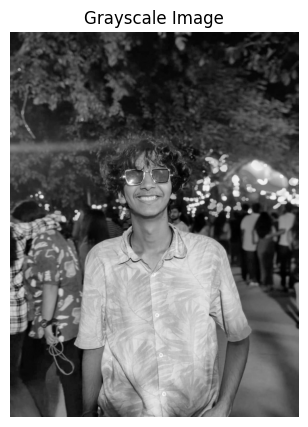

In [9]:
# Convert RGB to grayscale manually (NumPy only)
gray_img = np.mean(img_np, axis=2).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(gray_img, cmap="gray")
plt.axis("off")
plt.title("Grayscale Image")
plt.show()


In [10]:
def convolve(img, kernel):
    """
    2D convolution using NumPy only.
    Padding: reflect
    """
    kh, kw = kernel.shape
    ph, pw = kh // 2, kw // 2

    # True convolution: flip kernel
    kernel = np.flipud(np.fliplr(kernel))

    padded = np.pad(img, ((ph, ph), (pw, pw)), mode="reflect")
    H, W = img.shape
    out = np.zeros((H, W), dtype=np.float64)

    for i in range(H):
        for j in range(W):
            region = padded[i:i+kh, j:j+kw]
            out[i, j] = np.sum(region * kernel)

    return out


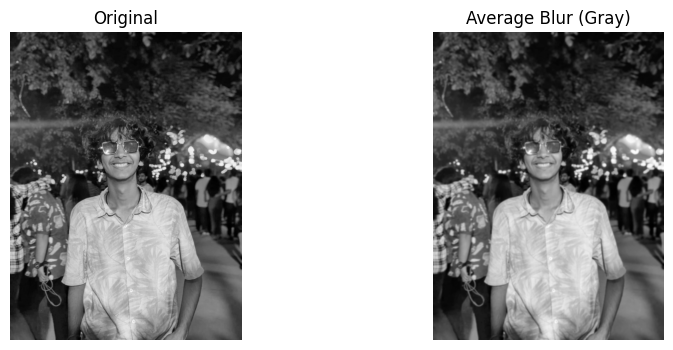

In [11]:
def average_blur_gray(img, ksize):
    kernel = np.ones((ksize, ksize), dtype=np.float64) / (ksize * ksize)
    blurred = convolve(img, kernel)
    return np.clip(blurred, 0, 255).astype(np.uint8)

# Demo
avg_gray = average_blur_gray(gray_img, ksize=7)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(gray_img, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(avg_gray, cmap="gray")
plt.title("Average Blur (Gray)")
plt.axis("off")
plt.show()


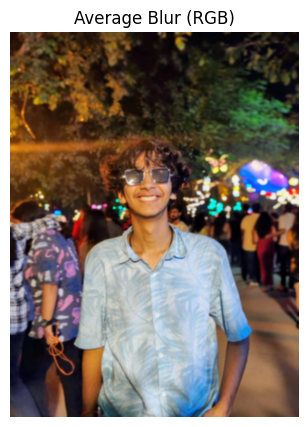

In [12]:
def average_blur_rgb(img, ksize):
    out = np.zeros_like(img)
    for c in range(3):
        out[:, :, c] = average_blur_gray(img[:, :, c], ksize)
    return out

# Demo
avg_rgb = average_blur_rgb(img_np, ksize=7)

plt.figure(figsize=(5,5))
plt.imshow(avg_rgb)
plt.axis("off")
plt.title("Average Blur (RGB)")
plt.show()


In [13]:
def gaussian_kernel(ksize, sigma):
    ax = np.arange(-(ksize//2), ksize//2 + 1)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)  # normalize
    return kernel


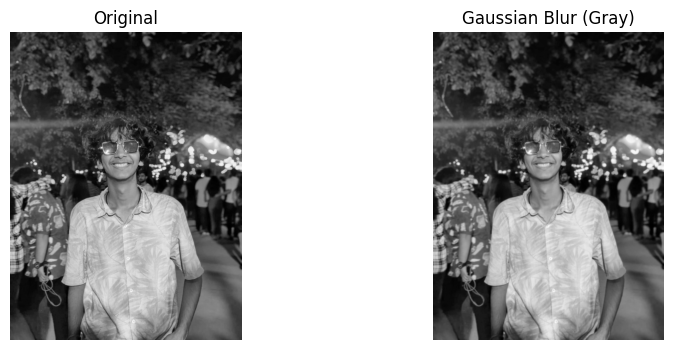

In [14]:
gk = gaussian_kernel(ksize=7, sigma=1.5)
gauss_gray = convolve(gray_img, gk)
gauss_gray = np.clip(gauss_gray, 0, 255).astype(np.uint8)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(gray_img, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(gauss_gray, cmap="gray")
plt.title("Gaussian Blur (Gray)")
plt.axis("off")
plt.show()


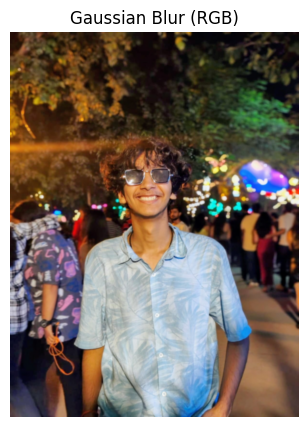

In [15]:
gauss_rgb = np.zeros_like(img_np)
for c in range(3):
    gauss_rgb[:, :, c] = np.clip(convolve(img_np[:, :, c], gk), 0, 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(gauss_rgb)
plt.axis("off")
plt.title("Gaussian Blur (RGB)")
plt.show()


### Part B

#### Task - Sobel Edge Detection (NumPy Only)
Implement Sobel X and Sobel Y filters manually using convolution. Apply on the grayscale image.

Compute:
1. Gx
2. Gy
3. Gradient magnitude

Normalize to 0–255 and save the edge map. Threshold if you wish to, if you do then make the thresholding part clear using code comments.

In [16]:
# Sobel kernels
sobel_x = np.array([
    [-1, 0,  1],
    [-2, 0,  2],
    [-1, 0,  1]
], dtype=np.float64)

sobel_y = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float64)


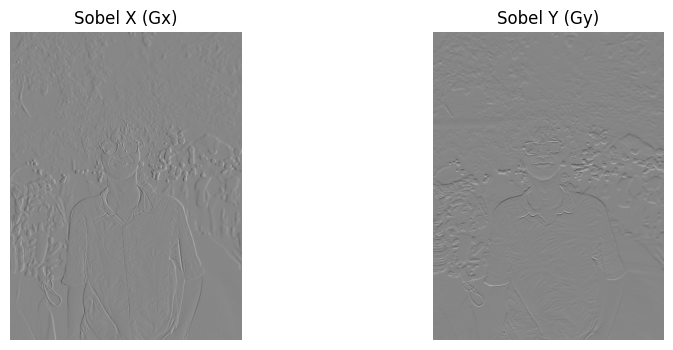

In [17]:
Gx = convolve(gray_img, sobel_x)
Gy = convolve(gray_img, sobel_y)

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.imshow(Gx, cmap="gray")
plt.title("Sobel X (Gx)")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(Gy, cmap="gray")
plt.title("Sobel Y (Gy)")
plt.axis("off")

plt.show()


In [18]:
grad_mag = np.sqrt(Gx**2 + Gy**2)


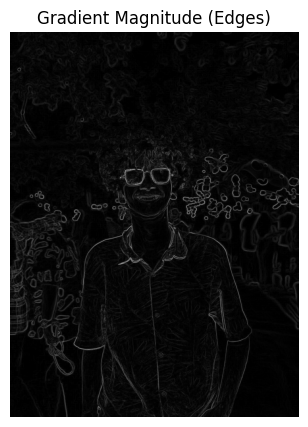

In [19]:
grad_mag_norm = (grad_mag / grad_mag.max()) * 255
grad_mag_norm = grad_mag_norm.astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(grad_mag_norm, cmap="gray")
plt.axis("off")
plt.title("Gradient Magnitude (Edges)")
plt.show()


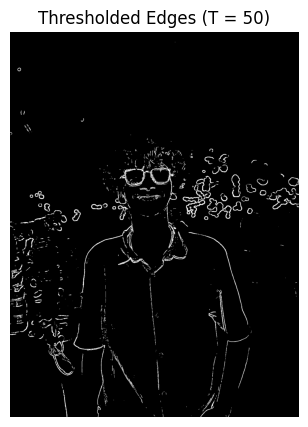

In [20]:
# Optional thresholding
threshold = 50
edges_thresh = np.zeros_like(grad_mag_norm)
edges_thresh[grad_mag_norm > threshold] = 255

plt.figure(figsize=(5,5))
plt.imshow(edges_thresh, cmap="gray")
plt.axis("off")
plt.title(f"Thresholded Edges (T = {threshold})")
plt.show()


### Part C

#### Task 1 — Laplacian Sharpening ( Only Numpy and Grayscale )
1. Use any 3×3 Laplacian kernel (4-connected or 8-connected).

2. Compute:
* <code>lap = convolve(img, laplacian_kernel)</code>
* <code>sharp = img - lap * alpha</code> where alpha ∈ [0.2, 1].

3. Now, put alpha = 1, if you had chosen a different value earlier. Get a new output. Then use the code in the lecture to do the same using cv2. Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output ( Compare the matrices )

#### Task 2 - Unsharp Masking ( Only Numpy and Grayscale )
1. Apply Gaussian blur (from Part 1).
2. Subtract blurred image from original: <code> mask = img - blurred </code>
3. Add scaled mask back: <code>sharp = img + alpha * mask</code> , where you can choose any value of alpha.
4. See how negative values of alpha will give you a blurred image.  



In [21]:
# Your PART C codes follow here. You can create more cells under this. Write clean and commented code.

In [22]:
laplacian_kernel = np.array([
    [ 0, -1,  0],
    [-1,  4, -1],
    [ 0, -1,  0]
], dtype=np.float64)


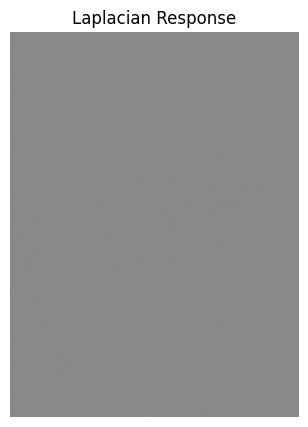

In [23]:
lap = convolve(gray_img, laplacian_kernel)

plt.figure(figsize=(5,5))
plt.imshow(lap, cmap="gray")
plt.axis("off")
plt.title("Laplacian Response")
plt.show()


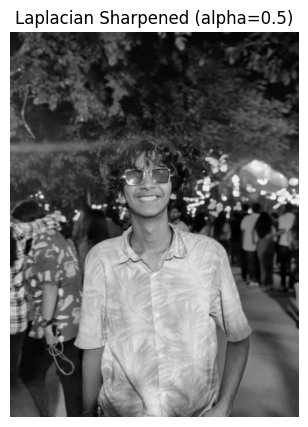

In [24]:
alpha = 0.5
sharp_lap = gray_img - alpha * lap

sharp_lap = np.clip(sharp_lap, 0, 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(sharp_lap, cmap="gray")
plt.axis("off")
plt.title(f"Laplacian Sharpened (alpha={alpha})")
plt.show()


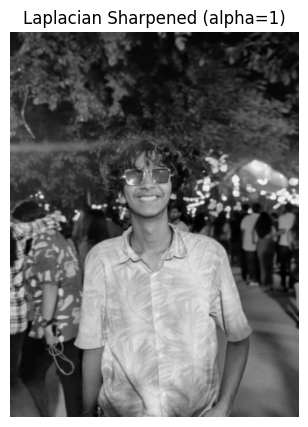

In [25]:
alpha = 1.0
sharp_lap_alpha1 = gray_img - alpha * lap
sharp_lap_alpha1 = np.clip(sharp_lap_alpha1, 0, 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(sharp_lap_alpha1, cmap="gray")
plt.axis("off")
plt.title("Laplacian Sharpened (alpha=1)")
plt.show()


In [26]:
import cv2

lap_cv = cv2.Laplacian(gray_img, cv2.CV_64F, ksize=3)
sharp_cv = gray_img - lap_cv
sharp_cv = np.clip(sharp_cv, 0, 255).astype(np.uint8)


In [27]:
comparison = np.allclose(sharp_lap_alpha1, sharp_cv)

print("Do NumPy and cv2 results match?", comparison)


Do NumPy and cv2 results match? False


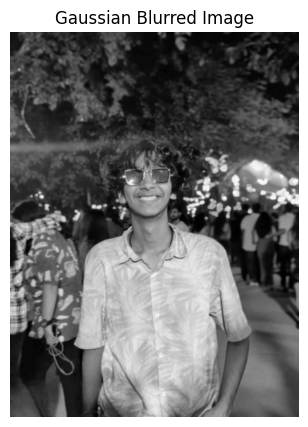

In [28]:
gk = gaussian_kernel(ksize=7, sigma=1.5)
blurred = convolve(gray_img, gk)
blurred = np.clip(blurred, 0, 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(blurred, cmap="gray")
plt.axis("off")
plt.title("Gaussian Blurred Image")
plt.show()


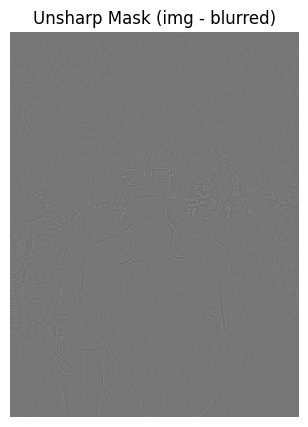

In [29]:
mask = gray_img.astype(np.float64) - blurred.astype(np.float64)

plt.figure(figsize=(5,5))
plt.imshow(mask, cmap="gray")
plt.axis("off")
plt.title("Unsharp Mask (img - blurred)")
plt.show()


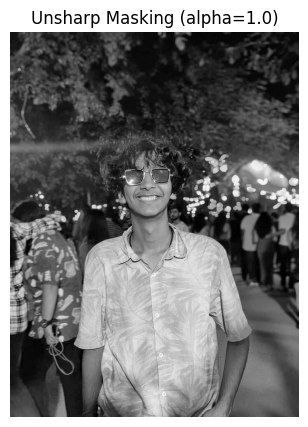

In [30]:
alpha = 1.0
sharp_unsharp = gray_img + alpha * mask
sharp_unsharp = np.clip(sharp_unsharp, 0, 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(sharp_unsharp, cmap="gray")
plt.axis("off")
plt.title(f"Unsharp Masking (alpha={alpha})")
plt.show()


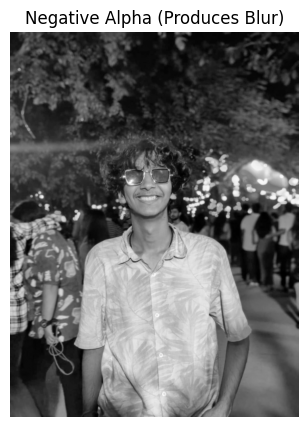

In [31]:
alpha = -0.5
blur_negative = gray_img + alpha * mask
blur_negative = np.clip(blur_negative, 0, 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(blur_negative, cmap="gray")
plt.axis("off")
plt.title("Negative Alpha (Produces Blur)")
plt.show()


### Part D

#### Task - Frequency Analysis (LPF & HPF Verification)
Compute the magnitude spectrum of the original image, gaussian blurred image and the unsharp masking image. Now, play with the alpha value in sharpening and gaussian kernel and notice how the magntude spectrum changes.
Then, in code comments, explain your observations of dark and bright areas in the magnitude spectrum. In nutshell, verify how convolution is actually filtering frequencies depending on the kernel.

In [32]:
# Your PART D codes follow here. You can create more cells under this. Write clean and commented code.

In [33]:
def magnitude_spectrum(img):
    """
    Compute log-magnitude spectrum of an image.
    """
    F = np.fft.fft2(img)
    F_shift = np.fft.fftshift(F)
    magnitude = np.log(1 + np.abs(F_shift))
    return magnitude


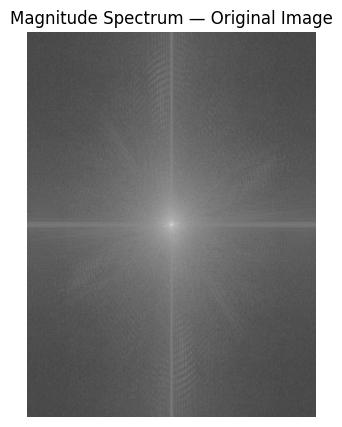

In [34]:
mag_original = magnitude_spectrum(gray_img)

plt.figure(figsize=(5,5))
plt.imshow(mag_original, cmap="gray")
plt.axis("off")
plt.title("Magnitude Spectrum — Original Image")
plt.show()


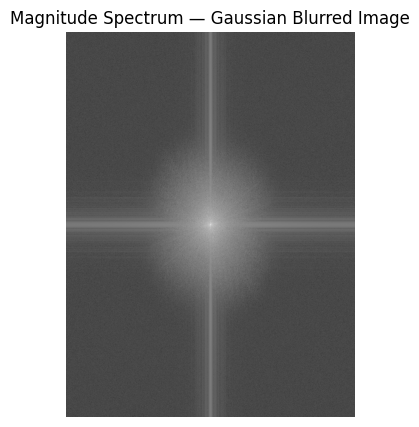

In [35]:
mag_blur = magnitude_spectrum(blurred)

plt.figure(figsize=(5,5))
plt.imshow(mag_blur, cmap="gray")
plt.axis("off")
plt.title("Magnitude Spectrum — Gaussian Blurred Image")
plt.show()


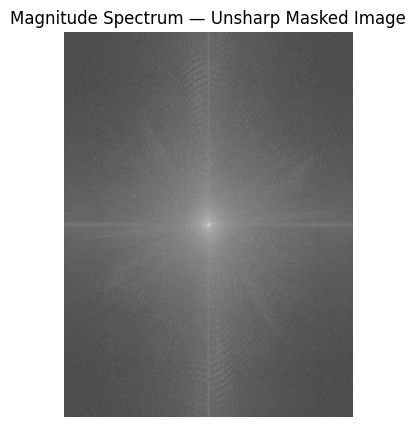

In [36]:
mag_sharp = magnitude_spectrum(sharp_unsharp)

plt.figure(figsize=(5,5))
plt.imshow(mag_sharp, cmap="gray")
plt.axis("off")
plt.title("Magnitude Spectrum — Unsharp Masked Image")
plt.show()


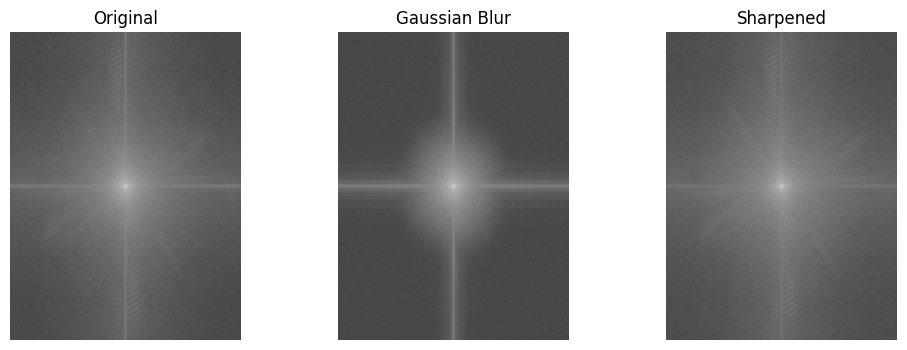

In [37]:
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(mag_original, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(mag_blur, cmap="gray")
plt.title("Gaussian Blur")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(mag_sharp, cmap="gray")
plt.title("Sharpened")
plt.axis("off")

plt.show()


### Part E

#### Task - Custom Colour Kernel (Detect Yellow Leaf Edges)

**Instructions :**
* At the start of the assignment .ipynb file, you will find a code cell in section 1, run it to see an image with a yellow leaf amongst green leaves.
* Design a 3×3 or 5×5 custom kernel applied separately to each channel that highlights the edges where any other colour transitions into a yellowish hue.

**Hints :**

* Yellow = (R high, G high, B low)

* Dark green = (G high, R low, B low)

**Steps:**

1. Analyze the RGB values of green & yellow regions.

2. Create a custom kernel that responds strongly to change from green to yellow in:
* Red matrices of RGB
* Green matrices of RGB
* Optionally R - G difference
* Think about the gradient in Red - Green. Is there a huge change the value of R-G when colour changes from Green to Yellow ? If yes, try to exploit it.

3. Combine the response maps.

4. Get a clean outline around the leaf.

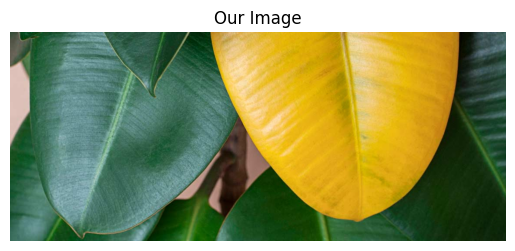

In [38]:
plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [39]:
# Your PART E codes follow here. You can create more cells under this. Write clean and commented code.

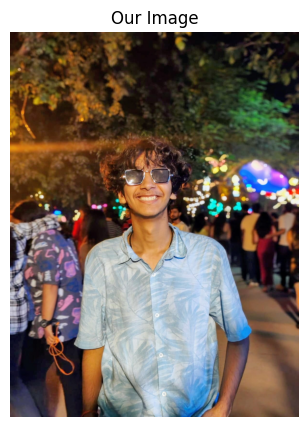

In [40]:
plt.figure(figsize=(5,5))
plt.imshow(img_np)
plt.axis("off")
plt.title("Our Image")
plt.show()


In [42]:
R = img_np[:, :, 0].astype(np.float64)
G = img_np[:, :, 1].astype(np.float64)
B = img_np[:, :, 2].astype(np.float64)


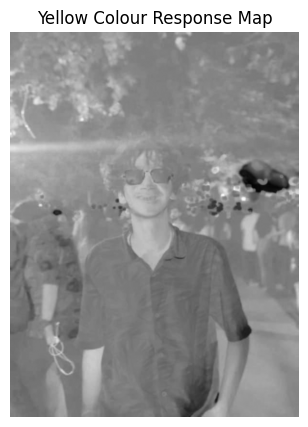

In [43]:
# Yellow response: emphasize high R and G, suppress B
yellow_response = (R + G) - 2 * B

# Normalize for display
yellow_response = yellow_response - yellow_response.min()
yellow_response = yellow_response / yellow_response.max()
yellow_response = (yellow_response * 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(yellow_response, cmap="gray")
plt.axis("off")
plt.title("Yellow Colour Response Map")
plt.show()


In [44]:
color_edge_kernel = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
], dtype=np.float64)


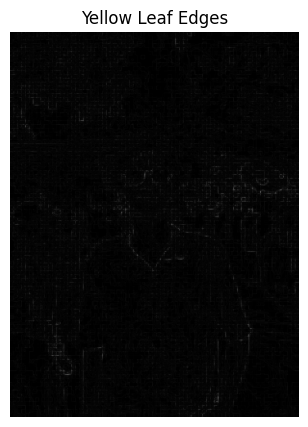

In [45]:
edges_yellow = convolve(yellow_response, color_edge_kernel)
edges_yellow = np.abs(edges_yellow)

# Normalize
edges_yellow = edges_yellow / edges_yellow.max()
edges_yellow = (edges_yellow * 255).astype(np.uint8)

plt.figure(figsize=(5,5))
plt.imshow(edges_yellow, cmap="gray")
plt.axis("off")
plt.title("Yellow Leaf Edges")
plt.show()


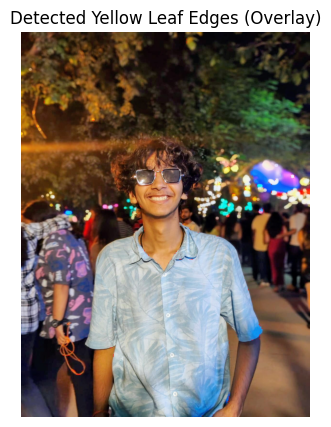

In [46]:
overlay = img_np.copy()

# Highlight edges in red
overlay[edges_yellow > 80] = [255, 0, 0]

plt.figure(figsize=(5,5))
plt.imshow(overlay)
plt.axis("off")
plt.title("Detected Yellow Leaf Edges (Overlay)")
plt.show()


### Bonus - Part F

#### Task - Color Manipulation Using Lecture 2 Concepts

**NOTE :** only for this, you can use cv2 functions, no need of doing everything in Numpy. Although there are still more brownie parts for Numpy hardwork.

1. Convert the RGB image to HSV. Use your rgb_to_hsv() from Lecture 2 Assignment - free Numopy points ;)) .
2. Identify pixels belonging to the yellow leaf using an HSV mask. (maybe take help from Part E or design a new hue mask)
3. Now use your full brain and chnage the colour of the leaf to red.

Convert back to RGB.

Display the final result.

For reference, heres the image I expect as a result. And its not actually tough, easy 5 lines code.
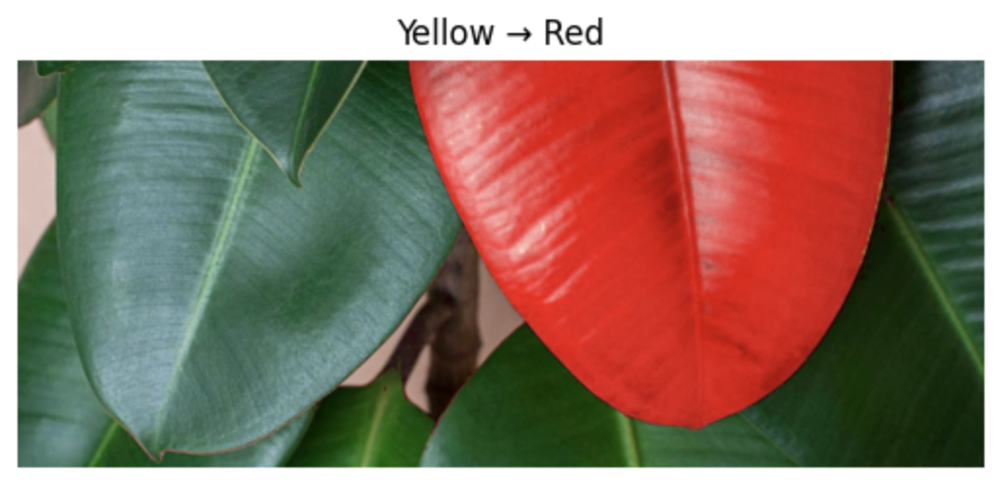

Also, we can change to a less brighter colour
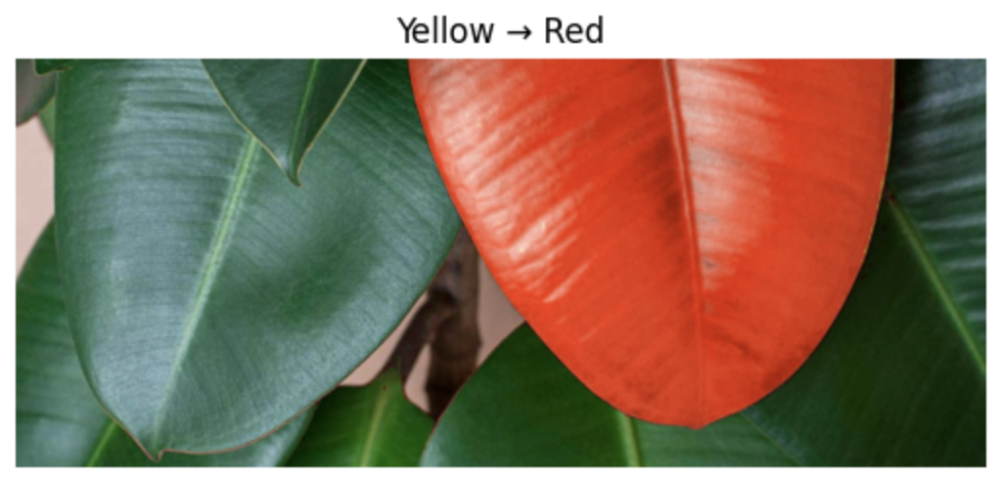

In [47]:
# Your BONUS PART codes follow here. You can create more cells under this. Write clean and commented code.